In [1]:
import numpy as np
import pandas as pd
from collections import defaultdict
from surprise import Dataset, Reader, accuracy
from surprise.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from surprise.model_selection import KFold
from tqdm.notebook import tqdm
from sklearn.metrics import ndcg_score
from surprise import dump
import seaborn as sns
import matplotlib.pyplot as plt
from typing import List
from surprise import SVD
import random
import pickle
from copy import deepcopy

import typing as tp
from sklearn.preprocessing import normalize
from lightfm import LightFM
from scipy.sparse import coo_matrix
from lightfm.data import Dataset as LFMDataset
from collections import Counter
from matplotlib.lines import Line2D
import time
import optuna

np.random.seed(42)

C:\ProgramData\Anaconda3\envs\torchvision\lib\site-packages\lightfm\_lightfm_fast.py:9: UserWarning: LightFM was compiled without OpenMP support. Only a single thread will be used.
  warnings.warn(


In [2]:
from uuu import mapk_plot, mapk, calculate_serendipity_per_user, prediction_coverage, \
catalog_coverage, long_tail_plot, weight_by_volume, get_frame_from_prediction_list, novelty, get_value_popularity_ranks

In [3]:
df = pd.read_csv('../data/recsys-in-practice/train_joke_df.csv')

df['UID'] = df['UID'] - 1
df['JID'] = df['JID'] - 1
# сделаем сортировку и перепишем index
df = df.sort_values(by=['UID', 'JID'])
df = df.reset_index(drop=True)

df

df_train, df_test = train_test_split(df, test_size=0.5, random_state=42)

E:\competitions\kaggle\magnit_recsys-in-practice\part2\uuu.py:259: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  head = head.append(tail.head(1))


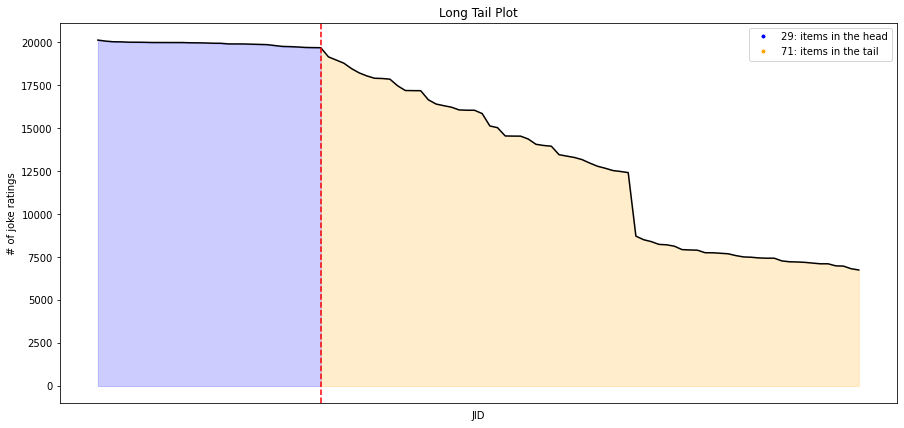

In [4]:
fig = plt.figure(figsize=(15, 7))
volume_df = long_tail_plot(df=df, 
             item_id_column="JID", 
             interaction_type="joke ratings", 
             percentage=0.4,
             x_labels=False)

volume_df['weight'] = volume_df['percent_of_total_volume'].apply(weight_by_volume)
joke_volume = {}
for row in volume_df.itertuples():
    joke_volume[int(row.JID)] = row.weight

In [5]:
df_top_joke = df[df['Rating'] > 5].groupby('JID').agg('count').rename(columns={'Rating':'count_plus'}) \
.sort_values('count_plus', ascending=False).drop(columns=['UID'])


df_bottom_joke = df[df['Rating'] < -5].groupby('JID').agg('count').rename(columns={'Rating':'count_minus'}) \
.sort_values('count_minus', ascending=False).drop(columns=['UID'])


df_counts = df_bottom_joke.merge(df_top_joke, left_index=True, right_index=True)


df_counts['diff'] = df_counts['count_plus'] - df_counts['count_minus']
df_counts = df_counts.sort_values('diff', ascending=False)


df_counts['weight'] = df_counts['diff'] / 10000

joke_quality = {}
for row in df_counts.itertuples():
    joke_quality[row.Index] = row.weight

In [6]:
with open('predictions_df_surprise.pkl', 'rb') as f:
    predictions_df_surprise = pickle.load(f)
    
predictions_df_surprise.keys()

dict_keys(['actual', 'svd', 'knn'])

In [7]:
with open('predictions_df_lfm.pkl', 'rb') as f:
    predictions_df_lfm = pickle.load(f)
    
predictions_df_lfm.keys()

dict_keys(['lfm', 'lfm_cos'])

In [8]:
with open('predictions_df_nn.pkl', 'rb') as f:
    predictions_df_nn = pickle.load(f)
    
predictions_df_nn.keys()

dict_keys(['nn'])

In [9]:
with open('predictions_df_nn_bias.pkl', 'rb') as f:
    predictions_df_nn_bias = pickle.load(f)
    
predictions_df_nn_bias.keys()

dict_keys(['nn_bias'])

In [10]:
with open('predictions_df_catboost.pkl', 'rb') as f:
    predictions_df_catboost = pickle.load(f)
    
predictions_df_catboost.keys()

dict_keys(['catboost'])

In [11]:
#with open('predictions_df_catboost_doc2vec.pkl', 'rb') as f:
#    predictions_df_catboost_doc2vec = pickle.load(f)
    
#predictions_df_catboost_doc2vec.keys()

In [12]:
svd_df = predictions_df_surprise['svd']
knn_df = predictions_df_surprise['knn']
lfm_df = predictions_df_lfm['lfm']
lfm_cos_df = predictions_df_lfm['lfm_cos']
nn_df = predictions_df_nn['nn']
nn_bias_df = predictions_df_nn_bias['nn_bias']
catboost_df = predictions_df_catboost['catboost']
#catboost_doc2vec_df = predictions_df_catboost_doc2vec['catboost_doc2vec']
actual_df = predictions_df_surprise['actual']

In [13]:
frames = {'svd':svd_df, 'lfm':lfm_df, 'lfm_cos':lfm_cos_df, 'nn':nn_df, 
          'catboost':catboost_df, 'knn':knn_df,  'nn_bias':nn_bias_df}#'catboost_doc2vec':catboost_doc2vec_df,

predictions = {k:list(v.groupby('UID').agg({'JID':list})['JID'].values) for k, v in frames.items()}
actual = list(predictions_df_surprise['actual'].groupby('UID').agg({'JID':list})['JID'].values)

In [14]:
users = df["UID"].unique()
n_users = users.size
n_users

24983

In [15]:
# рекомендации по популярным 
#popularity_recs = df['JID'].value_counts().head(10).index.tolist()

#pop_recs = []
#for user in tqdm(range(n_users)):
#    pop_predictions = popularity_recs
#    pop_recs.append(pop_predictions)
    
    
#predictions['popular'] = pop_recs

In [16]:
pop = dict(df.JID.value_counts())

In [17]:
items = np.unique(df['JID'])
items

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [18]:
def union_predicts(params):
    result = []

    for u in range(24983):
        res = {}
        for i, (key, value) in enumerate(predictions.items()):
            rank = {x: params[key] * (10-j) for j, x in enumerate(value[u])}

            for k, v in rank.items():
                if k in res:
                    res[k] += v
                else:
                    res[k] = v
                    
        for k in res:
            res[k] += joke_quality[k] * params['quality']
            res[k] += joke_volume[k] * params['volume']

        result.append([x[0] for x in sorted(res.items(), key=lambda item: item[1], reverse=True)][:10])
        
    return result

In [19]:
def main_metric(params):
    t1 = time.time()
    result = union_predicts(params)
    res_df = get_frame_from_prediction_list(users, result)


    cat_coverage = catalog_coverage(result, items, 100)
    pred_coverage = prediction_coverage(result, items)
    nov, mselfinfo_list = novelty(result, pop, len(users), 10)

    res_df = get_frame_from_prediction_list(users, result)
    serendip = calculate_serendipity_per_user(res_df, df_train, df_test)
    map1 = mapk(actual, result, k=1)
    map10 = mapk(actual, result, k=10)
    
    price = np.mean([sum([joke_volume[x] for x in xx]) for xx in result])
    
    sm = sum([cat_coverage / 100, pred_coverage / 100, nov, serendip, map1, map10, price / 3])
    print('time',round(time.time() - t1, 3), 
        'cat_cov',  round(cat_coverage, 3), 
         'cov', round(pred_coverage, 3),
         'nov', round(nov, 3),
         'ser', round(serendip, 3),
        'm1',  round(map1 , 3),
         'm10', round(map10, 3),
         'price', round(price, 3),
         'sum', round(sm, 3))
    return sm

In [20]:
main_metric({'svd': 0.1, 
              'lfm': 0.1, 
              'lfm_cos': 0.1, 
              'nn': 0.1, 
              'nn_bias': 0.1, 
              'catboost': 0.1, 
              'knn': 0.1, 
              'catboost_doc2vec': 0.1,
              'quality': 0.1,
              'volume': 0.1
             })

time 2.903 cat_cov 92.0 cov 100.0 nov 0.646 ser 0.121 m1 0.394 m10 0.501 price 2.56 sum 4.435


4.434918237959391

In [21]:
result = union_predicts({'svd': 0.1, 
              'lfm': 0.1, 
              'lfm_cos': 0.1, 
              'nn': 0.1, 
              'nn_bias': 0.1, 
              'catboost': 0.1, 
              'knn': 0.1, 
              'catboost_doc2vec': 0.1,
              'quality': 0.1,
              'volume': 0.1
             })

In [22]:
def objective(trial):    
    
    params = {'svd': trial.suggest_float(name='svd', low=-5, high=5, step=0.1), 
              'lfm': trial.suggest_float(name='lfm', low=-5, high=5, step=0.1), 
              'lfm_cos': trial.suggest_float(name='lfm_cos', low=-5, high=2, step=0.1), 
              'nn': trial.suggest_float(name='nn', low=-5, high=5, step=0.1), 
              'nn_bias': trial.suggest_float(name='nn_bias', low=-5, high=5, step=0.1), 
              'catboost': trial.suggest_float(name='catboost', low=-5, high=2, step=0.1), 
              'knn': trial.suggest_float(name='knn', low=-5, high=5, step=0.1), 
              #'catboost_doc2vec': trial.suggest_float(name='catboost_doc2vec', low=-5, high=5, step=0.1),
              'quality': trial.suggest_float(name='quality', low=-5, high=5, step=0.1),
              'volume': trial.suggest_float(name='volume', low=-5, high=5, step=0.1)
             }
    
    return main_metric(params)
    


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20000)


[I 2023-05-06 22:45:44,209] A new study created in memory with name: no-name-243bd1e1-fa0d-4e49-893e-74626f5f5fd0
[I 2023-05-06 22:45:47,493] Trial 0 finished with value: 4.466827173063396 and parameters: {'svd': -1.5999999999999996, 'lfm': 4.600000000000001, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.40000000000000036, 'knn': -3.4, 'quality': 2.1000000000000005, 'volume': 1.1000000000000005}. Best is trial 0 with value: 4.466827173063396.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.198 m1 0.218 m10 0.371 price 3.073 sum 4.467


[I 2023-05-06 22:45:50,376] Trial 1 finished with value: 4.068319590185365 and parameters: {'svd': 1.3000000000000007, 'lfm': -2.6999999999999997, 'lfm_cos': -0.7000000000000002, 'nn': 0.5, 'nn_bias': -2.6999999999999997, 'catboost': 1.7000000000000002, 'knn': 2.7, 'quality': 1.2000000000000002, 'volume': -4.7}. Best is trial 0 with value: 4.466827173063396.


time 2.879 cat_cov 57.0 cov 99.0 nov 0.764 ser 0.089 m1 0.319 m10 0.45 price 2.66 sum 4.068


[I 2023-05-06 22:45:53,390] Trial 2 finished with value: 4.508035683623797 and parameters: {'svd': 3.8000000000000007, 'lfm': 5.0, 'lfm_cos': -3.2, 'nn': -4.9, 'nn_bias': -1.0, 'catboost': 1.6000000000000005, 'knn': 0.0, 'quality': -1.5, 'volume': 3.0}. Best is trial 2 with value: 4.508035683623797.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.707 ser 0.141 m1 0.282 m10 0.409 price 3.057 sum 4.508


[I 2023-05-06 22:45:56,494] Trial 3 finished with value: 4.284062012600453 and parameters: {'svd': -3.7, 'lfm': 2.7, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': 1.3000000000000007, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': -1.7999999999999998, 'volume': 2.5}. Best is trial 2 with value: 4.508035683623797.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.138 m1 0.103 m10 0.261 price 2.593 sum 4.284


[I 2023-05-06 22:45:59,239] Trial 4 finished with value: 4.07126571753586 and parameters: {'svd': -4.5, 'lfm': -3.4, 'lfm_cos': -3.9, 'nn': -1.0, 'nn_bias': 3.0, 'catboost': 1.2000000000000002, 'knn': -4.2, 'quality': -3.2, 'volume': -2.8}. Best is trial 2 with value: 4.508035683623797.


time 2.741 cat_cov 79.0 cov 100.0 nov 1.0 ser 0.11 m1 0.079 m10 0.181 price 2.734 sum 4.071


[I 2023-05-06 22:46:02,282] Trial 5 finished with value: 4.041952084914392 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': -3.2, 'nn': 4.200000000000001, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': 5.0, 'quality': -0.5999999999999996, 'volume': 0.0}. Best is trial 2 with value: 4.508035683623797.


time 3.039 cat_cov 68.0 cov 100.0 nov 0.718 ser 0.083 m1 0.315 m10 0.467 price 2.335 sum 4.042


[I 2023-05-06 22:46:05,287] Trial 6 finished with value: 4.045743158616352 and parameters: {'svd': 1.8000000000000007, 'lfm': 2.3000000000000007, 'lfm_cos': -1.6999999999999997, 'nn': 4.9, 'nn_bias': -0.09999999999999964, 'catboost': -1.1999999999999997, 'knn': 1.3000000000000007, 'quality': -1.0, 'volume': -4.8}. Best is trial 2 with value: 4.508035683623797.


time 3.001 cat_cov 70.0 cov 100.0 nov 0.663 ser 0.081 m1 0.347 m10 0.475 price 2.341 sum 4.046


[I 2023-05-06 22:46:08,499] Trial 7 finished with value: 4.473547790480668 and parameters: {'svd': -3.8, 'lfm': 3.5999999999999996, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': 0.5, 'catboost': -4.4, 'knn': -2.0, 'quality': 5.0, 'volume': -2.1999999999999997}. Best is trial 2 with value: 4.508035683623797.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.174 m1 0.219 m10 0.362 price 2.81 sum 4.474


[I 2023-05-06 22:46:11,487] Trial 8 finished with value: 4.4576979922965325 and parameters: {'svd': 3.5999999999999996, 'lfm': 3.200000000000001, 'lfm_cos': -4.2, 'nn': -5.0, 'nn_bias': 1.3000000000000007, 'catboost': -1.7999999999999998, 'knn': -3.3, 'quality': -4.2, 'volume': -3.2}. Best is trial 2 with value: 4.508035683623797.


time 2.985 cat_cov 91.0 cov 100.0 nov 0.954 ser 0.137 m1 0.236 m10 0.358 price 2.589 sum 4.458


[I 2023-05-06 22:46:14,471] Trial 9 finished with value: 4.141898168382669 and parameters: {'svd': -3.3, 'lfm': -2.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': 0.9000000000000004, 'catboost': -4.2, 'knn': 5.0, 'quality': 2.6000000000000005, 'volume': -0.1999999999999993}. Best is trial 2 with value: 4.508035683623797.


time 2.979 cat_cov 75.0 cov 100.0 nov 0.941 ser 0.12 m1 0.236 m10 0.425 price 2.007 sum 4.142


[I 2023-05-06 22:46:17,364] Trial 10 finished with value: 4.303958738182001 and parameters: {'svd': 4.700000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': -2.1999999999999997, 'nn': 2.7, 'nn_bias': 4.700000000000001, 'catboost': -2.3, 'knn': -1.6999999999999997, 'quality': -2.5, 'volume': 4.9}. Best is trial 2 with value: 4.508035683623797.


time 2.87 cat_cov 75.0 cov 100.0 nov 0.913 ser 0.11 m1 0.326 m10 0.436 price 2.305 sum 4.304


[I 2023-05-06 22:46:20,682] Trial 11 finished with value: 4.365147988179652 and parameters: {'svd': -0.7999999999999998, 'lfm': 4.9, 'lfm_cos': -0.5, 'nn': -3.0999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -3.0999999999999996, 'knn': -1.4, 'quality': 4.600000000000001, 'volume': 4.200000000000001}. Best is trial 2 with value: 4.508035683623797.


time 3.295 cat_cov 93.0 cov 100.0 nov 0.617 ser 0.178 m1 0.223 m10 0.373 price 3.132 sum 4.365


[I 2023-05-06 22:46:24,017] Trial 12 finished with value: 4.536237122750975 and parameters: {'svd': -2.3, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -1.2999999999999998, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 12 with value: 4.536237122750975.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.205 m1 0.226 m10 0.361 price 2.837 sum 4.536


[I 2023-05-06 22:46:27,077] Trial 13 finished with value: 4.410883614134288 and parameters: {'svd': -1.9, 'lfm': -5.0, 'lfm_cos': 0.5, 'nn': -1.7999999999999998, 'nn_bias': -1.6999999999999997, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 0.6000000000000005, 'volume': 2.5}. Best is trial 12 with value: 4.536237122750975.


time 3.037 cat_cov 97.0 cov 100.0 nov 1.069 ser 0.175 m1 0.129 m10 0.273 price 2.384 sum 4.411


[I 2023-05-06 22:46:30,129] Trial 14 finished with value: 4.392545343830757 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -2.6999999999999997, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 2.5, 'quality': 3.700000000000001, 'volume': -1.2999999999999998}. Best is trial 12 with value: 4.536237122750975.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.113 m1 0.238 m10 0.386 price 2.627 sum 4.393


[I 2023-05-06 22:46:33,294] Trial 15 finished with value: 4.357992933343923 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 1.9000000000000004}. Best is trial 12 with value: 4.536237122750975.


time 3.141 cat_cov 88.0 cov 100.0 nov 0.906 ser 0.18 m1 0.129 m10 0.261 price 3.005 sum 4.358


[I 2023-05-06 22:46:36,243] Trial 16 finished with value: 4.4715576899944125 and parameters: {'svd': 4.9, 'lfm': 1.4000000000000004, 'lfm_cos': -4.8, 'nn': -3.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.3, 'knn': 2.3000000000000007, 'quality': -5.0, 'volume': 3.8000000000000007}. Best is trial 12 with value: 4.536237122750975.


time 2.927 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.114 m1 0.297 m10 0.436 price 2.549 sum 4.472


[I 2023-05-06 22:46:39,035] Trial 17 finished with value: 4.009989368504767 and parameters: {'svd': -2.3, 'lfm': -1.2999999999999998, 'lfm_cos': -1.4, 'nn': -2.3, 'nn_bias': 2.5, 'catboost': 2.0, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': -1.1999999999999997}. Best is trial 12 with value: 4.536237122750975.


time 2.768 cat_cov 76.0 cov 100.0 nov 0.957 ser 0.11 m1 0.076 m10 0.183 price 2.772 sum 4.01


[I 2023-05-06 22:46:42,093] Trial 18 finished with value: 4.514335953294963 and parameters: {'svd': 3.200000000000001, 'lfm': 1.5, 'lfm_cos': -2.9, 'nn': -0.7999999999999998, 'nn_bias': -0.39999999999999947, 'catboost': -2.8, 'knn': -2.6999999999999997, 'quality': 1.6000000000000005, 'volume': 1.1000000000000005}. Best is trial 12 with value: 4.536237122750975.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.128 m1 0.278 m10 0.412 price 2.771 sum 4.514


[I 2023-05-06 22:46:45,226] Trial 19 finished with value: 4.5164182219856555 and parameters: {'svd': 1.7000000000000002, 'lfm': 1.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 1.7000000000000002, 'nn_bias': 2.4000000000000004, 'catboost': -2.5, 'knn': -5.0, 'quality': 3.5, 'volume': 0.8000000000000007}. Best is trial 12 with value: 4.536237122750975.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.156 m1 0.241 m10 0.374 price 2.615 sum 4.516


[I 2023-05-06 22:46:48,351] Trial 20 finished with value: 4.333542737610518 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.5, 'lfm_cos': 0.20000000000000018, 'nn': 1.8000000000000007, 'nn_bias': 4.600000000000001, 'catboost': -3.9, 'knn': -4.5, 'quality': 3.8000000000000007, 'volume': 0.0}. Best is trial 12 with value: 4.536237122750975.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.136 m1 0.16 m10 0.34 price 2.466 sum 4.334


[I 2023-05-06 22:46:51,473] Trial 21 finished with value: 4.582951143067821 and parameters: {'svd': 2.6000000000000005, 'lfm': 1.5, 'lfm_cos': 1.0, 'nn': 1.6000000000000005, 'nn_bias': 2.5, 'catboost': -2.5, 'knn': -2.4, 'quality': 1.6000000000000005, 'volume': 1.1000000000000005}. Best is trial 21 with value: 4.582951143067821.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.144 m1 0.346 m10 0.456 price 2.477 sum 4.583


[I 2023-05-06 22:46:54,524] Trial 22 finished with value: 4.606194514310376 and parameters: {'svd': 2.0, 'lfm': 0.9000000000000004, 'lfm_cos': 2.0, 'nn': 2.3000000000000007, 'nn_bias': 2.7, 'catboost': -2.0999999999999996, 'knn': -2.6999999999999997, 'quality': 3.4000000000000004, 'volume': 0.7000000000000002}. Best is trial 22 with value: 4.606194514310376.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.156 m1 0.34 m10 0.449 price 2.427 sum 4.606


[I 2023-05-06 22:46:57,443] Trial 23 finished with value: 4.199672718737605 and parameters: {'svd': 2.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 3.200000000000001, 'nn_bias': 3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -2.4, 'quality': 3.0, 'volume': -1.1999999999999997}. Best is trial 22 with value: 4.606194514310376.


time 2.894 cat_cov 69.0 cov 100.0 nov 0.923 ser 0.118 m1 0.307 m10 0.42 price 2.225 sum 4.2


[I 2023-05-06 22:47:00,563] Trial 24 finished with value: 4.320676892786536 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.1000000000000005, 'nn': 1.6000000000000005, 'nn_bias': 3.700000000000001, 'catboost': -3.7, 'knn': -3.3, 'quality': 4.4, 'volume': -3.5999999999999996}. Best is trial 22 with value: 4.606194514310376.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.154 m1 0.148 m10 0.331 price 2.33 sum 4.321


[I 2023-05-06 22:47:03,735] Trial 25 finished with value: 4.475531956548288 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': 2.8000000000000007, 'nn_bias': 1.8000000000000007, 'catboost': -2.0999999999999996, 'knn': -1.2999999999999998, 'quality': 1.2000000000000002, 'volume': -2.0}. Best is trial 22 with value: 4.606194514310376.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.156 m1 0.285 m10 0.409 price 2.225 sum 4.476


[I 2023-05-06 22:47:06,974] Trial 26 finished with value: 4.517121568942764 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.2, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': 3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': -2.8, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 22 with value: 4.606194514310376.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.164 m1 0.259 m10 0.374 price 2.612 sum 4.517


[I 2023-05-06 22:47:09,875] Trial 27 finished with value: 4.124324405420028 and parameters: {'svd': -2.5999999999999996, 'lfm': -1.6999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': 3.5999999999999996, 'nn_bias': 2.0, 'catboost': -5.0, 'knn': -0.7000000000000002, 'quality': 1.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 22 with value: 4.606194514310376.


time 2.879 cat_cov 72.0 cov 100.0 nov 0.95 ser 0.106 m1 0.25 m10 0.382 price 2.149 sum 4.124


[I 2023-05-06 22:47:12,816] Trial 28 finished with value: 4.269538750812703 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 4.1, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 22 with value: 4.606194514310376.


time 2.917 cat_cov 85.0 cov 100.0 nov 0.89 ser 0.116 m1 0.271 m10 0.388 price 2.261 sum 4.27


[I 2023-05-06 22:47:16,212] Trial 29 finished with value: 4.484230540115473 and parameters: {'svd': -1.4, 'lfm': 3.700000000000001, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -4.0, 'quality': 2.3000000000000007, 'volume': -0.7999999999999998}. Best is trial 22 with value: 4.606194514310376.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.723 ser 0.206 m1 0.222 m10 0.37 price 2.921 sum 4.484


[I 2023-05-06 22:47:19,493] Trial 30 finished with value: 4.468170994699773 and parameters: {'svd': 2.8000000000000007, 'lfm': 4.1, 'lfm_cos': 1.0, 'nn': 2.1000000000000005, 'nn_bias': 0.20000000000000018, 'catboost': -1.9, 'knn': -2.1999999999999997, 'quality': 5.0, 'volume': 0.5}. Best is trial 22 with value: 4.606194514310376.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.635 ser 0.15 m1 0.33 m10 0.445 price 2.814 sum 4.468


[I 2023-05-06 22:47:22,737] Trial 31 finished with value: 4.543877147151296 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.2, 'lfm_cos': 1.4000000000000004, 'nn': 1.1000000000000005, 'nn_bias': 3.0, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': 4.1, 'volume': -0.5}. Best is trial 22 with value: 4.606194514310376.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.162 m1 0.294 m10 0.401 price 2.585 sum 4.544


[I 2023-05-06 22:47:25,797] Trial 32 finished with value: 4.6111762504094695 and parameters: {'svd': 2.2, 'lfm': 1.1000000000000005, 'lfm_cos': 1.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': 2.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': 4.0, 'volume': -1.9}. Best is trial 32 with value: 4.6111762504094695.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.169 m1 0.305 m10 0.414 price 2.525 sum 4.611


[I 2023-05-06 22:47:29,097] Trial 33 finished with value: 4.595058736165483 and parameters: {'svd': 2.2, 'lfm': 2.5, 'lfm_cos': 1.9000000000000004, 'nn': 1.2000000000000002, 'nn_bias': 3.0, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': 3.700000000000001, 'volume': -4.0}. Best is trial 32 with value: 4.6111762504094695.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.17 m1 0.307 m10 0.422 price 2.576 sum 4.595


[I 2023-05-06 22:47:32,179] Trial 34 finished with value: 4.5742118432763 and parameters: {'svd': 4.200000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 1.2000000000000002, 'nn_bias': 5.0, 'catboost': 1.0, 'knn': -3.7, 'quality': 2.1000000000000005, 'volume': -4.0}. Best is trial 32 with value: 4.6111762504094695.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.148 m1 0.331 m10 0.435 price 2.505 sum 4.574


[I 2023-05-06 22:47:35,290] Trial 35 finished with value: 4.657542406022584 and parameters: {'svd': 2.2, 'lfm': 1.1000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': 2.4000000000000004, 'nn_bias': 1.7000000000000002, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': -4.1}. Best is trial 35 with value: 4.657542406022584.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.186 m1 0.306 m10 0.427 price 2.527 sum 4.658


[I 2023-05-06 22:47:38,536] Trial 36 finished with value: 4.648848588298587 and parameters: {'svd': 1.8000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 2.0, 'nn': 2.4000000000000004, 'nn_bias': 1.8000000000000007, 'catboost': 0.6000000000000005, 'knn': -4.9, 'quality': 0.9000000000000004, 'volume': -4.3}. Best is trial 35 with value: 4.657542406022584.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.193 m1 0.288 m10 0.41 price 2.505 sum 4.649


[I 2023-05-06 22:47:41,727] Trial 37 finished with value: 4.612787563860322 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': 2.3000000000000007, 'nn_bias': 1.6000000000000005, 'catboost': 0.7000000000000002, 'knn': -4.7, 'quality': 0.7000000000000002, 'volume': -4.9}. Best is trial 35 with value: 4.657542406022584.


time 3.167 cat_cov 99.0 cov 100.0 nov 1.019 ser 0.19 m1 0.251 m10 0.37 price 2.376 sum 4.613


[I 2023-05-06 22:47:44,695] Trial 38 finished with value: 4.3531121574561125 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 3.9000000000000004, 'nn_bias': 1.5, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': -5.0}. Best is trial 35 with value: 4.657542406022584.


time 2.944 cat_cov 80.0 cov 100.0 nov 0.96 ser 0.137 m1 0.268 m10 0.403 price 2.355 sum 4.353


[I 2023-05-06 22:47:47,688] Trial 39 finished with value: 4.432316706547248 and parameters: {'svd': 3.200000000000001, 'lfm': -2.3, 'lfm_cos': 1.5, 'nn': 5.0, 'nn_bias': 0.7000000000000002, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': -1.2999999999999998, 'volume': -4.5}. Best is trial 35 with value: 4.657542406022584.


time 2.968 cat_cov 88.0 cov 100.0 nov 0.86 ser 0.13 m1 0.316 m10 0.453 price 2.379 sum 4.432


[I 2023-05-06 22:47:50,641] Trial 40 finished with value: 4.392997002974895 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': 2.8000000000000007, 'nn_bias': 1.2000000000000002, 'catboost': 1.5, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': -2.5999999999999996}. Best is trial 35 with value: 4.657542406022584.


time 2.928 cat_cov 81.0 cov 100.0 nov 0.902 ser 0.121 m1 0.265 m10 0.377 price 2.754 sum 4.393


[I 2023-05-06 22:47:53,842] Trial 41 finished with value: 4.545516665700798 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 2.0, 'nn': 4.4, 'nn_bias': 1.9000000000000004, 'catboost': 0.7000000000000002, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': -4.3}. Best is trial 35 with value: 4.657542406022584.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.149 m1 0.352 m10 0.469 price 2.485 sum 4.546


[I 2023-05-06 22:47:56,920] Trial 42 finished with value: 4.615662414161334 and parameters: {'svd': 1.3000000000000007, 'lfm': 1.0, 'lfm_cos': 1.5, 'nn': 2.3000000000000007, 'nn_bias': 2.3000000000000007, 'catboost': 1.4000000000000004, 'knn': -4.3, 'quality': 1.0, 'volume': -3.3}. Best is trial 35 with value: 4.657542406022584.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.172 m1 0.286 m10 0.402 price 2.563 sum 4.616


[I 2023-05-06 22:48:00,026] Trial 43 finished with value: 4.5865255115784285 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': 3.3000000000000007, 'nn_bias': 0.3000000000000007, 'catboost': 1.4000000000000004, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': -3.3}. Best is trial 35 with value: 4.657542406022584.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.165 m1 0.294 m10 0.419 price 2.817 sum 4.587


[I 2023-05-06 22:48:03,207] Trial 44 finished with value: 4.601038813846002 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.9000000000000004, 'lfm_cos': 1.5, 'nn': 2.4000000000000004, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -1.9, 'volume': -2.9}. Best is trial 35 with value: 4.657542406022584.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.168 m1 0.329 m10 0.445 price 2.716 sum 4.601


[I 2023-05-06 22:48:06,179] Trial 45 finished with value: 4.1442304607744616 and parameters: {'svd': 3.3000000000000007, 'lfm': 1.0, 'lfm_cos': -0.7999999999999998, 'nn': 0.40000000000000036, 'nn_bias': 2.1000000000000005, 'catboost': 1.1000000000000005, 'knn': 4.200000000000001, 'quality': -0.09999999999999964, 'volume': -3.8}. Best is trial 35 with value: 4.657542406022584.


time 2.946 cat_cov 70.0 cov 100.0 nov 0.757 ser 0.092 m1 0.347 m10 0.485 price 2.29 sum 4.144


[I 2023-05-06 22:48:09,121] Trial 46 finished with value: 4.057398945176662 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': 3.0999999999999996, 'nn_bias': 1.6000000000000005, 'catboost': 2.0, 'knn': -4.2, 'quality': 1.3000000000000007, 'volume': -4.6}. Best is trial 35 with value: 4.657542406022584.


time 2.919 cat_cov 70.0 cov 100.0 nov 0.898 ser 0.105 m1 0.165 m10 0.273 price 2.749 sum 4.057


[I 2023-05-06 22:48:12,101] Trial 47 finished with value: 4.433552988134446 and parameters: {'svd': 2.7, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 2.2, 'nn_bias': 3.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -3.2, 'quality': 0.3000000000000007, 'volume': -3.3}. Best is trial 35 with value: 4.657542406022584.


time 2.954 cat_cov 90.0 cov 100.0 nov 0.922 ser 0.124 m1 0.296 m10 0.411 price 2.342 sum 4.434


[I 2023-05-06 22:48:15,369] Trial 48 finished with value: 4.480081905881877 and parameters: {'svd': 1.4000000000000004, 'lfm': 3.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 3.700000000000001, 'nn_bias': 0.9000000000000004, 'catboost': -0.5, 'knn': -4.2, 'quality': -0.7999999999999998, 'volume': -2.8}. Best is trial 35 with value: 4.657542406022584.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.687 ser 0.169 m1 0.292 m10 0.417 price 2.748 sum 4.48


[I 2023-05-06 22:48:18,370] Trial 49 finished with value: 4.460009332652653 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.0, 'lfm_cos': 0.6000000000000005, 'nn': 4.300000000000001, 'nn_bias': 3.9000000000000004, 'catboost': 1.7000000000000002, 'knn': -3.7, 'quality': -3.2, 'volume': -2.3}. Best is trial 35 with value: 4.657542406022584.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.129 m1 0.298 m10 0.411 price 2.445 sum 4.46


[I 2023-05-06 22:48:21,311] Trial 50 finished with value: 4.440545209132055 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.8, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 1.3000000000000007, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': -3.5}. Best is trial 35 with value: 4.657542406022584.


time 2.917 cat_cov 91.0 cov 100.0 nov 1.186 ser 0.175 m1 0.125 m10 0.256 price 2.366 sum 4.441


[I 2023-05-06 22:48:24,400] Trial 51 finished with value: 4.613360896590212 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': 2.0, 'nn': 2.5, 'nn_bias': 2.6000000000000005, 'catboost': -1.2999999999999998, 'knn': -4.0, 'quality': 1.0, 'volume': -4.4}. Best is trial 35 with value: 4.657542406022584.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.17 m1 0.31 m10 0.42 price 2.397 sum 4.613


[I 2023-05-06 22:48:27,602] Trial 52 finished with value: 4.613404149039057 and parameters: {'svd': 2.4000000000000004, 'lfm': 1.0, 'lfm_cos': 1.3000000000000007, 'nn': 2.7, 'nn_bias': 2.2, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': -4.2}. Best is trial 35 with value: 4.657542406022584.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.165 m1 0.304 m10 0.416 price 2.456 sum 4.613


[I 2023-05-06 22:48:30,661] Trial 53 finished with value: 4.507933071921515 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 1.8000000000000007, 'catboost': -1.2999999999999998, 'knn': -5.0, 'quality': -0.5, 'volume': -4.9}. Best is trial 35 with value: 4.657542406022584.


time 3.033 cat_cov 95.0 cov 100.0 nov 1.091 ser 0.171 m1 0.207 m10 0.345 price 2.229 sum 4.508


[I 2023-05-06 22:48:33,731] Trial 54 finished with value: 4.614663352513411 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 2.0, 'nn': 3.0, 'nn_bias': 2.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 1.0, 'volume': -4.5}. Best is trial 35 with value: 4.657542406022584.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.159 m1 0.326 m10 0.447 price 2.358 sum 4.615


[I 2023-05-06 22:48:36,733] Trial 55 finished with value: 4.63848452209699 and parameters: {'svd': 3.0, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': 3.0999999999999996, 'nn_bias': 2.2, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': 1.1000000000000005, 'volume': -4.2}. Best is trial 35 with value: 4.657542406022584.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.159 m1 0.34 m10 0.459 price 2.418 sum 4.638


[I 2023-05-06 22:48:39,746] Trial 56 finished with value: 4.533173692934361 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': 3.4000000000000004, 'nn_bias': 2.2, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 1.6000000000000005, 'volume': -4.3}. Best is trial 35 with value: 4.657542406022584.


time 2.988 cat_cov 92.0 cov 100.0 nov 0.859 ser 0.13 m1 0.36 m10 0.481 price 2.35 sum 4.533


[I 2023-05-06 22:48:42,785] Trial 57 finished with value: 4.485235343042776 and parameters: {'svd': 2.9000000000000004, 'lfm': 1.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 4.1, 'nn_bias': 3.4000000000000004, 'catboost': -0.8999999999999995, 'knn': -4.1, 'quality': 0.0, 'volume': -4.1}. Best is trial 35 with value: 4.657542406022584.


time 3.013 cat_cov 93.0 cov 100.0 nov 0.857 ser 0.128 m1 0.337 m10 0.448 price 2.357 sum 4.485


[I 2023-05-06 22:48:45,864] Trial 58 finished with value: 4.3340171340006695 and parameters: {'svd': 4.4, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': 4.600000000000001, 'nn_bias': 4.200000000000001, 'catboost': 0.0, 'knn': -4.3, 'quality': -0.2999999999999998, 'volume': -3.7}. Best is trial 35 with value: 4.657542406022584.


time 3.054 cat_cov 76.0 cov 100.0 nov 0.891 ser 0.118 m1 0.339 m10 0.454 price 2.316 sum 4.334


[I 2023-05-06 22:48:48,665] Trial 59 finished with value: 4.422516967776486 and parameters: {'svd': 2.5, 'lfm': -1.1999999999999997, 'lfm_cos': -3.5999999999999996, 'nn': 1.8000000000000007, 'nn_bias': 0.5, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': -3.2}. Best is trial 35 with value: 4.657542406022584.


time 2.774 cat_cov 85.0 cov 100.0 nov 0.974 ser 0.116 m1 0.273 m10 0.408 price 2.403 sum 4.423


[I 2023-05-06 22:48:51,586] Trial 60 finished with value: 4.402557594416975 and parameters: {'svd': 3.9000000000000004, 'lfm': 2.6000000000000005, 'lfm_cos': -2.1999999999999997, 'nn': 2.8000000000000007, 'nn_bias': 2.2, 'catboost': 1.3000000000000007, 'knn': -1.9, 'quality': 2.5, 'volume': -4.6}. Best is trial 35 with value: 4.657542406022584.


time 2.896 cat_cov 86.0 cov 100.0 nov 0.785 ser 0.101 m1 0.362 m10 0.486 price 2.425 sum 4.403


[I 2023-05-06 22:48:54,583] Trial 61 finished with value: 4.63971714108296 and parameters: {'svd': 3.0, 'lfm': 0.8000000000000007, 'lfm_cos': 2.0, 'nn': 2.9000000000000004, 'nn_bias': 2.6000000000000005, 'catboost': -0.2999999999999998, 'knn': -4.5, 'quality': 1.3000000000000007, 'volume': -4.4}. Best is trial 35 with value: 4.657542406022584.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.161 m1 0.332 m10 0.446 price 2.425 sum 4.64


[I 2023-05-06 22:48:57,755] Trial 62 finished with value: 4.630039388158546 and parameters: {'svd': 3.0, 'lfm': 1.2000000000000002, 'lfm_cos': 2.0, 'nn': 3.0, 'nn_bias': 2.7, 'catboost': -0.2999999999999998, 'knn': -5.0, 'quality': 1.3000000000000007, 'volume': -3.8}. Best is trial 35 with value: 4.657542406022584.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.165 m1 0.328 m10 0.441 price 2.466 sum 4.63


[I 2023-05-06 22:49:01,084] Trial 63 finished with value: 4.534865271684874 and parameters: {'svd': -4.9, 'lfm': 1.3000000000000007, 'lfm_cos': 2.0, 'nn': 3.0999999999999996, 'nn_bias': 2.7, 'catboost': -1.0, 'knn': -4.4, 'quality': 1.5, 'volume': -3.9}. Best is trial 35 with value: 4.657542406022584.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.187 m1 0.229 m10 0.349 price 2.462 sum 4.535


[I 2023-05-06 22:49:04,243] Trial 64 finished with value: 4.529875227672547 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 3.700000000000001, 'nn_bias': 3.3000000000000007, 'catboost': 1.0, 'knn': -4.7, 'quality': 1.8000000000000007, 'volume': -3.5}. Best is trial 35 with value: 4.657542406022584.


time 3.134 cat_cov 92.0 cov 100.0 nov 0.883 ser 0.136 m1 0.339 m10 0.451 price 2.406 sum 4.53


[I 2023-05-06 22:49:07,242] Trial 65 finished with value: 4.6376518258267545 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 3.0, 'nn_bias': 1.2000000000000002, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 1.2000000000000002, 'volume': -3.0}. Best is trial 35 with value: 4.657542406022584.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.155 m1 0.336 m10 0.464 price 2.409 sum 4.638


[I 2023-05-06 22:49:10,350] Trial 66 finished with value: 4.506881810543542 and parameters: {'svd': 3.0, 'lfm': 1.8000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': 2.0, 'nn_bias': 1.1000000000000005, 'catboost': 0.10000000000000053, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': -2.4}. Best is trial 35 with value: 4.657542406022584.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.685 ser 0.13 m1 0.397 m10 0.504 price 2.555 sum 4.507


[I 2023-05-06 22:49:13,275] Trial 67 finished with value: 4.288048618011898 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 3.5, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': 1.8000000000000007, 'quality': 0.40000000000000036, 'volume': -3.0}. Best is trial 35 with value: 4.657542406022584.


time 2.9 cat_cov 82.0 cov 100.0 nov 0.721 ser 0.099 m1 0.369 m10 0.491 price 2.366 sum 4.288


[I 2023-05-06 22:49:16,229] Trial 68 finished with value: 4.1356199966472005 and parameters: {'svd': 4.200000000000001, 'lfm': 0.8000000000000007, 'lfm_cos': -4.7, 'nn': 4.1, 'nn_bias': 1.6000000000000005, 'catboost': -0.7000000000000002, 'knn': 3.200000000000001, 'quality': 1.2000000000000002, 'volume': -3.5999999999999996}. Best is trial 35 with value: 4.657542406022584.


time 2.929 cat_cov 74.0 cov 100.0 nov 0.728 ser 0.084 m1 0.334 m10 0.474 price 2.326 sum 4.136


[I 2023-05-06 22:49:19,291] Trial 69 finished with value: 4.5772930618542995 and parameters: {'svd': 5.0, 'lfm': 1.4000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 1.9000000000000004, 'nn_bias': 3.0, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': 2.9000000000000004, 'volume': -3.0999999999999996}. Best is trial 35 with value: 4.657542406022584.


time 3.036 cat_cov 93.0 cov 100.0 nov 0.871 ser 0.135 m1 0.355 m10 0.471 price 2.448 sum 4.577


[I 2023-05-06 22:49:22,279] Trial 70 finished with value: 4.534364259858868 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 1.5, 'nn_bias': 0.6000000000000005, 'catboost': 0.9000000000000004, 'knn': -3.4, 'quality': 1.3000000000000007, 'volume': -2.6999999999999997}. Best is trial 35 with value: 4.657542406022584.


time 2.962 cat_cov 89.0 cov 100.0 nov 0.816 ser 0.134 m1 0.319 m10 0.453 price 2.767 sum 4.534


[I 2023-05-06 22:49:25,337] Trial 71 finished with value: 4.614803565669124 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': 3.200000000000001, 'nn_bias': 2.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': -4.6}. Best is trial 35 with value: 4.657542406022584.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.155 m1 0.328 m10 0.448 price 2.356 sum 4.615


[I 2023-05-06 22:49:28,331] Trial 72 finished with value: 4.618164042249811 and parameters: {'svd': 3.200000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': 2.4000000000000004, 'catboost': -0.39999999999999947, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': -4.8}. Best is trial 35 with value: 4.657542406022584.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.16 m1 0.325 m10 0.443 price 2.419 sum 4.618


[I 2023-05-06 22:49:31,343] Trial 73 finished with value: 4.584084137215573 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.5, 'lfm_cos': 1.5, 'nn': 2.9000000000000004, 'nn_bias': 2.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': -5.0}. Best is trial 35 with value: 4.657542406022584.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.145 m1 0.318 m10 0.433 price 2.381 sum 4.584


[I 2023-05-06 22:49:34,481] Trial 74 finished with value: 4.505143077978262 and parameters: {'svd': 1.9000000000000004, 'lfm': 1.2000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 3.9000000000000004, 'nn_bias': 2.7, 'catboost': -0.7999999999999998, 'knn': -3.9, 'quality': 0.20000000000000018, 'volume': -3.9}. Best is trial 35 with value: 4.657542406022584.


time 3.112 cat_cov 93.0 cov 100.0 nov 0.854 ser 0.147 m1 0.333 m10 0.447 price 2.385 sum 4.505


[I 2023-05-06 22:49:37,886] Trial 75 finished with value: 4.608156983938634 and parameters: {'svd': 2.4000000000000004, 'lfm': 2.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': 2.4000000000000004, 'nn_bias': 1.8000000000000007, 'catboost': -0.5, 'knn': -4.8, 'quality': 1.8000000000000007, 'volume': -4.2}. Best is trial 35 with value: 4.657542406022584.


time 3.38 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.177 m1 0.302 m10 0.428 price 2.61 sum 4.608


[I 2023-05-06 22:49:40,981] Trial 76 finished with value: 4.549883230375221 and parameters: {'svd': 3.200000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 2.1000000000000005, 'nn_bias': 3.5999999999999996, 'catboost': 1.8000000000000007, 'knn': -4.5, 'quality': 2.1000000000000005, 'volume': -1.5999999999999996}. Best is trial 35 with value: 4.657542406022584.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.142 m1 0.298 m10 0.417 price 2.518 sum 4.55


[I 2023-05-06 22:49:44,004] Trial 77 finished with value: 4.587204057355631 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': 1.5, 'nn_bias': 1.4000000000000004, 'catboost': 1.2000000000000002, 'knn': -3.0, 'quality': 1.4000000000000004, 'volume': -3.4}. Best is trial 35 with value: 4.657542406022584.


time 2.999 cat_cov 90.0 cov 100.0 nov 0.922 ser 0.143 m1 0.344 m10 0.474 price 2.412 sum 4.587


[I 2023-05-06 22:49:46,999] Trial 78 finished with value: 4.253467511411796 and parameters: {'svd': 2.1000000000000005, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': 4.600000000000001, 'nn_bias': 2.4000000000000004, 'catboost': -1.5999999999999996, 'knn': -5.0, 'quality': 2.4000000000000004, 'volume': -4.8}. Best is trial 35 with value: 4.657542406022584.


time 2.97 cat_cov 74.0 cov 100.0 nov 0.956 ser 0.123 m1 0.282 m10 0.406 price 2.241 sum 4.253


[I 2023-05-06 22:49:50,165] Trial 79 finished with value: 4.516808004282613 and parameters: {'svd': 1.6000000000000005, 'lfm': 1.5, 'lfm_cos': 1.3000000000000007, 'nn': 3.4000000000000004, 'nn_bias': -3.7, 'catboost': 0.5, 'knn': -2.5, 'quality': 1.0, 'volume': -3.9}. Best is trial 35 with value: 4.657542406022584.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.166 m1 0.309 m10 0.433 price 2.705 sum 4.517


[I 2023-05-06 22:49:53,372] Trial 80 finished with value: 4.640895178303493 and parameters: {'svd': 3.5, 'lfm': 1.1000000000000005, 'lfm_cos': 1.8000000000000007, 'nn': 2.6000000000000005, 'nn_bias': 0.8000000000000007, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': -4.2}. Best is trial 35 with value: 4.657542406022584.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.168 m1 0.348 m10 0.462 price 2.621 sum 4.641


[I 2023-05-06 22:49:56,528] Trial 81 finished with value: 4.63853979875327 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 2.7, 'nn_bias': -2.9, 'catboost': 0.0, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': -3.7}. Best is trial 35 with value: 4.657542406022584.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.184 m1 0.32 m10 0.437 price 2.675 sum 4.639


[I 2023-05-06 22:49:59,712] Trial 82 finished with value: 4.60640006481241 and parameters: {'svd': 4.5, 'lfm': 2.0, 'lfm_cos': 1.8000000000000007, 'nn': 2.7, 'nn_bias': -3.0999999999999996, 'catboost': 0.0, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': -4.7}. Best is trial 35 with value: 4.657542406022584.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.171 m1 0.331 m10 0.445 price 2.73 sum 4.606


[I 2023-05-06 22:50:02,794] Trial 83 finished with value: 4.628580151068988 and parameters: {'svd': 3.700000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 3.0, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': 0.20000000000000018, 'volume': -4.2}. Best is trial 35 with value: 4.657542406022584.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.163 m1 0.35 m10 0.47 price 2.554 sum 4.629


[I 2023-05-06 22:50:05,840] Trial 84 finished with value: 4.635753746858007 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.9000000000000004, 'nn': 3.700000000000001, 'nn_bias': -2.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': 0.20000000000000018, 'volume': -3.7}. Best is trial 35 with value: 4.657542406022584.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.159 m1 0.348 m10 0.47 price 2.573 sum 4.636


[I 2023-05-06 22:50:08,927] Trial 85 finished with value: 4.6372868572078545 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 2.0, 'nn': 3.5, 'nn_bias': -2.0, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -0.1999999999999993, 'volume': -3.8}. Best is trial 35 with value: 4.657542406022584.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.157 m1 0.34 m10 0.467 price 2.535 sum 4.637


[I 2023-05-06 22:50:11,971] Trial 86 finished with value: 4.5842130500643155 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.6000000000000005, 'nn': 3.8000000000000007, 'nn_bias': -2.3, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': -3.5999999999999996}. Best is trial 35 with value: 4.657542406022584.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.143 m1 0.342 m10 0.469 price 2.502 sum 4.584


[I 2023-05-06 22:50:15,035] Trial 87 finished with value: 4.646834343216187 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 3.5, 'nn_bias': -4.2, 'catboost': 0.6000000000000005, 'knn': -3.8, 'quality': -0.1999999999999993, 'volume': 3.0999999999999996}. Best is trial 35 with value: 4.657542406022584.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.16 m1 0.328 m10 0.455 price 2.704 sum 4.647


[I 2023-05-06 22:50:18,042] Trial 88 finished with value: 4.6246502715447475 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': 3.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -3.8, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 35 with value: 4.657542406022584.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.149 m1 0.313 m10 0.448 price 2.741 sum 4.625


[I 2023-05-06 22:50:21,105] Trial 89 finished with value: 4.759414920731858 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 3.5}. Best is trial 89 with value: 4.759414920731858.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.194 m1 0.284 m10 0.418 price 2.852 sum 4.759


[I 2023-05-06 22:50:24,047] Trial 90 finished with value: 4.662934399558827 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -4.3, 'catboost': 0.8000000000000007, 'knn': -2.5, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 89 with value: 4.759414920731858.


time 2.914 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.155 m1 0.271 m10 0.394 price 2.987 sum 4.663


[I 2023-05-06 22:50:26,951] Trial 91 finished with value: 4.62217728643222 and parameters: {'svd': 4.0, 'lfm': -2.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -1.4, 'nn_bias': -4.4, 'catboost': 0.9000000000000004, 'knn': -1.1999999999999997, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 2.877 cat_cov 93.0 cov 100.0 nov 0.881 ser 0.143 m1 0.28 m10 0.41 price 2.935 sum 4.622


[I 2023-05-06 22:50:29,983] Trial 92 finished with value: 4.732037708622507 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': 0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 89 with value: 4.759414920731858.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.188 m1 0.262 m10 0.38 price 2.971 sum 4.732


[I 2023-05-06 22:50:32,966] Trial 93 finished with value: 4.727422714265251 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -4.2, 'catboost': 0.7000000000000002, 'knn': -1.6999999999999997, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 89 with value: 4.759414920731858.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.184 m1 0.273 m10 0.396 price 2.934 sum 4.727


[I 2023-05-06 22:50:35,756] Trial 94 finished with value: 4.570786561910862 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -4.2, 'catboost': 0.8000000000000007, 'knn': -1.6999999999999997, 'quality': -1.9, 'volume': 2.7}. Best is trial 89 with value: 4.759414920731858.


time 2.764 cat_cov 90.0 cov 100.0 nov 0.851 ser 0.13 m1 0.28 m10 0.413 price 2.991 sum 4.571


[I 2023-05-06 22:50:38,690] Trial 95 finished with value: 4.535779898232654 and parameters: {'svd': 3.5, 'lfm': -2.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': 1.1000000000000005, 'knn': -2.0999999999999996, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 89 with value: 4.759414920731858.


time 2.908 cat_cov 90.0 cov 100.0 nov 0.892 ser 0.142 m1 0.246 m10 0.352 price 3.012 sum 4.536


[I 2023-05-06 22:50:41,747] Trial 96 finished with value: 4.696093722955818 and parameters: {'svd': 4.1, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': 0.40000000000000036, 'knn': -2.8, 'quality': -0.5999999999999996, 'volume': 2.2}. Best is trial 89 with value: 4.759414920731858.


time 3.03 cat_cov 94.0 cov 100.0 nov 0.964 ser 0.178 m1 0.265 m10 0.393 price 2.872 sum 4.696


[I 2023-05-06 22:50:44,680] Trial 97 finished with value: 4.707956849271776 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 2.0}. Best is trial 89 with value: 4.759414920731858.


time 2.906 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.176 m1 0.277 m10 0.413 price 2.861 sum 4.708


[I 2023-05-06 22:50:47,664] Trial 98 finished with value: 4.708074752451867 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': 0.6000000000000005, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 2.1000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.175 m1 0.265 m10 0.388 price 2.937 sum 4.708


[I 2023-05-06 22:50:50,570] Trial 99 finished with value: 4.675977270623495 and parameters: {'svd': 4.0, 'lfm': -2.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': -2.5999999999999996, 'quality': -0.7000000000000002, 'volume': 2.1000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 2.882 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.163 m1 0.254 m10 0.371 price 2.915 sum 4.676


[I 2023-05-06 22:50:53,515] Trial 100 finished with value: 4.686875673573345 and parameters: {'svd': 4.5, 'lfm': -3.5, 'lfm_cos': 0.9000000000000004, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': -0.7000000000000002, 'volume': 1.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 2.917 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.169 m1 0.258 m10 0.384 price 2.862 sum 4.687


[I 2023-05-06 22:50:56,390] Trial 101 finished with value: 4.668705933878737 and parameters: {'svd': 4.800000000000001, 'lfm': -3.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': -1.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 2.848 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.16 m1 0.26 m10 0.387 price 2.893 sum 4.669


[I 2023-05-06 22:50:59,277] Trial 102 finished with value: 4.655651875778599 and parameters: {'svd': 5.0, 'lfm': -3.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': -1.0999999999999996, 'volume': 2.0}. Best is trial 89 with value: 4.759414920731858.


time 2.862 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.146 m1 0.261 m10 0.388 price 2.96 sum 4.656


[I 2023-05-06 22:51:02,271] Trial 103 finished with value: 4.614358812873168 and parameters: {'svd': 4.5, 'lfm': -2.8, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.8000000000000007, 'knn': -2.3, 'quality': -0.7000000000000002, 'volume': 2.2}. Best is trial 89 with value: 4.759414920731858.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.145 m1 0.26 m10 0.379 price 2.956 sum 4.614


[I 2023-05-06 22:51:05,270] Trial 104 finished with value: 4.595449892174793 and parameters: {'svd': 4.800000000000001, 'lfm': -4.5, 'lfm_cos': 0.9000000000000004, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': 1.2000000000000002, 'knn': -2.8, 'quality': -1.6999999999999997, 'volume': 1.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 2.973 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.147 m1 0.25 m10 0.357 price 2.937 sum 4.595


[I 2023-05-06 22:51:08,135] Trial 105 finished with value: 4.687074469731336 and parameters: {'svd': 4.300000000000001, 'lfm': -2.8, 'lfm_cos': 1.0, 'nn': -1.9, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -1.6999999999999997, 'quality': -1.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 2.838 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.169 m1 0.273 m10 0.409 price 2.808 sum 4.687


[I 2023-05-06 22:51:10,991] Trial 106 finished with value: 4.643965308993374 and parameters: {'svd': 4.1, 'lfm': -2.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -2.0, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -1.6999999999999997, 'quality': -0.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 2.83 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.147 m1 0.271 m10 0.4 price 2.927 sum 4.644


[I 2023-05-06 22:51:14,043] Trial 107 finished with value: 4.695136081239644 and parameters: {'svd': 4.300000000000001, 'lfm': -3.4, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -2.0, 'quality': -2.1999999999999997, 'volume': 1.4000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.173 m1 0.261 m10 0.387 price 2.801 sum 4.695


[I 2023-05-06 22:51:16,870] Trial 108 finished with value: 4.659280460601534 and parameters: {'svd': 4.4, 'lfm': -3.4, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -3.4, 'catboost': 1.0, 'knn': -1.9, 'quality': -2.3, 'volume': 1.4000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 2.802 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.153 m1 0.262 m10 0.379 price 2.892 sum 4.659


[I 2023-05-06 22:51:19,690] Trial 109 finished with value: 4.593741692530247 and parameters: {'svd': 4.700000000000001, 'lfm': -3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -1.4, 'quality': -1.1999999999999997, 'volume': 2.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.792 cat_cov 91.0 cov 100.0 nov 0.883 ser 0.135 m1 0.267 m10 0.403 price 2.986 sum 4.594


[I 2023-05-06 22:51:22,638] Trial 110 finished with value: 4.647321964540128 and parameters: {'svd': 4.300000000000001, 'lfm': -4.5, 'lfm_cos': 0.5, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -2.1999999999999997, 'quality': -2.6999999999999997, 'volume': 2.8000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.921 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.155 m1 0.263 m10 0.393 price 2.888 sum 4.647


[I 2023-05-06 22:51:25,566] Trial 111 finished with value: 4.688993041078181 and parameters: {'svd': 4.600000000000001, 'lfm': -3.7, 'lfm_cos': 0.9000000000000004, 'nn': -2.4, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 4.0}. Best is trial 89 with value: 4.759414920731858.


time 2.901 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.162 m1 0.262 m10 0.39 price 2.911 sum 4.689


[I 2023-05-06 22:51:28,441] Trial 112 finished with value: 4.672315853412048 and parameters: {'svd': 4.600000000000001, 'lfm': -4.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 4.0}. Best is trial 89 with value: 4.759414920731858.


time 2.846 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.16 m1 0.271 m10 0.406 price 2.874 sum 4.672


[I 2023-05-06 22:51:31,439] Trial 113 finished with value: 4.642728730008765 and parameters: {'svd': 4.5, 'lfm': -4.0, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 89 with value: 4.759414920731858.


time 2.97 cat_cov 92.0 cov 100.0 nov 0.928 ser 0.161 m1 0.269 m10 0.403 price 2.883 sum 4.643


[I 2023-05-06 22:51:34,410] Trial 114 finished with value: 4.683992552769567 and parameters: {'svd': 3.8000000000000007, 'lfm': -3.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -1.6999999999999997, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.154 m1 0.278 m10 0.41 price 2.884 sum 4.684


[I 2023-05-06 22:51:37,240] Trial 115 finished with value: 4.503726117819541 and parameters: {'svd': 3.8000000000000007, 'lfm': -3.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': 1.0, 'knn': -2.0, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 2.803 cat_cov 90.0 cov 100.0 nov 0.877 ser 0.127 m1 0.245 m10 0.351 price 3.013 sum 4.504


[I 2023-05-06 22:51:40,098] Trial 116 finished with value: 4.6030013730648305 and parameters: {'svd': 5.0, 'lfm': -2.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -1.0999999999999996, 'quality': -2.0, 'volume': 3.700000000000001}. Best is trial 89 with value: 4.759414920731858.


time 2.832 cat_cov 92.0 cov 100.0 nov 0.87 ser 0.134 m1 0.279 m10 0.415 price 2.955 sum 4.603


[I 2023-05-06 22:51:42,924] Trial 117 finished with value: 4.558926613679995 and parameters: {'svd': 4.300000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': 1.5, 'knn': -1.4, 'quality': -1.5, 'volume': 4.4}. Best is trial 89 with value: 4.759414920731858.


time 2.8 cat_cov 91.0 cov 100.0 nov 0.871 ser 0.138 m1 0.263 m10 0.372 price 3.014 sum 4.559


[I 2023-05-06 22:51:45,851] Trial 118 finished with value: 4.596220136565467 and parameters: {'svd': 3.8000000000000007, 'lfm': -3.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -3.7, 'catboost': 0.9000000000000004, 'knn': -1.5999999999999996, 'quality': -0.5, 'volume': 2.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.899 cat_cov 90.0 cov 100.0 nov 0.924 ser 0.156 m1 0.267 m10 0.388 price 2.884 sum 4.596


[I 2023-05-06 22:51:48,878] Trial 119 finished with value: 4.721318896486947 and parameters: {'svd': 4.200000000000001, 'lfm': -2.3, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 1.4000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.184 m1 0.27 m10 0.403 price 2.776 sum 4.721


[I 2023-05-06 22:51:52,005] Trial 120 finished with value: 4.396585304107846 and parameters: {'svd': -3.5999999999999996, 'lfm': -2.3, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': -2.0999999999999996, 'volume': 1.2000000000000002}. Best is trial 89 with value: 4.759414920731858.


time 3.1 cat_cov 94.0 cov 100.0 nov 1.002 ser 0.187 m1 0.12 m10 0.223 price 2.774 sum 4.397


[I 2023-05-06 22:51:54,961] Trial 121 finished with value: 4.73557447837682 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -2.4, 'quality': -0.39999999999999947, 'volume': 1.7000000000000002}. Best is trial 89 with value: 4.759414920731858.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.185 m1 0.272 m10 0.404 price 2.824 sum 4.736


[I 2023-05-06 22:51:57,871] Trial 122 finished with value: 4.508565208234358 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': -1.0999999999999996, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -2.3, 'quality': -1.0, 'volume': 1.8000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.881 cat_cov 86.0 cov 100.0 nov 0.85 ser 0.122 m1 0.271 m10 0.411 price 2.987 sum 4.509


[I 2023-05-06 22:52:00,922] Trial 123 finished with value: 4.690237245514434 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -1.9, 'quality': -0.39999999999999947, 'volume': 2.5}. Best is trial 89 with value: 4.759414920731858.


time 3.023 cat_cov 93.0 cov 100.0 nov 0.948 ser 0.181 m1 0.278 m10 0.416 price 2.812 sum 4.69


[I 2023-05-06 22:52:03,866] Trial 124 finished with value: 4.71098236670603 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 0.40000000000000036}. Best is trial 89 with value: 4.759414920731858.


time 2.919 cat_cov 95.0 cov 100.0 nov 0.975 ser 0.184 m1 0.27 m10 0.402 price 2.791 sum 4.711


[I 2023-05-06 22:52:06,915] Trial 125 finished with value: 4.724879208743453 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 0.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.191 m1 0.269 m10 0.4 price 2.797 sum 4.725


[I 2023-05-06 22:52:10,012] Trial 126 finished with value: 4.746886443298846 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 0.40000000000000036}. Best is trial 89 with value: 4.759414920731858.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.196 m1 0.272 m10 0.404 price 2.753 sum 4.747


[I 2023-05-06 22:52:13,032] Trial 127 finished with value: 4.737393975610177 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 0.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.993 cat_cov 98.0 cov 100.0 nov 1.002 ser 0.202 m1 0.266 m10 0.398 price 2.668 sum 4.737


[I 2023-05-06 22:52:16,048] Trial 128 finished with value: 4.721547002749637 and parameters: {'svd': 4.9, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 0.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.997 ser 0.194 m1 0.271 m10 0.405 price 2.622 sum 4.722


[I 2023-05-06 22:52:19,055] Trial 129 finished with value: 4.709172591844917 and parameters: {'svd': 4.9, 'lfm': -1.6999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 0.0, 'volume': 0.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.193 m1 0.278 m10 0.414 price 2.617 sum 4.709


[I 2023-05-06 22:52:22,137] Trial 130 finished with value: 4.687142587477153 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.4000000000000004, 'nn': -1.5999999999999996, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 0.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.984 ser 0.194 m1 0.276 m10 0.412 price 2.618 sum 4.687


[I 2023-05-06 22:52:25,256] Trial 131 finished with value: 4.755439629584174 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': -2.5999999999999996, 'nn_bias': -3.4, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 0.3000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.208 m1 0.276 m10 0.406 price 2.744 sum 4.755


[I 2023-05-06 22:52:28,336] Trial 132 finished with value: 4.744456581273246 and parameters: {'svd': 4.9, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 0.20000000000000018}. Best is trial 89 with value: 4.759414920731858.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.207 m1 0.276 m10 0.408 price 2.69 sum 4.744


[I 2023-05-06 22:52:31,461] Trial 133 finished with value: 4.741670058299156 and parameters: {'svd': 4.9, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': 0.0, 'volume': 0.20000000000000018}. Best is trial 89 with value: 4.759414920731858.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.206 m1 0.276 m10 0.409 price 2.684 sum 4.742


[I 2023-05-06 22:52:34,581] Trial 134 finished with value: 4.70058265738247 and parameters: {'svd': 4.800000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 0.10000000000000053}. Best is trial 89 with value: 4.759414920731858.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.997 ser 0.192 m1 0.269 m10 0.404 price 2.605 sum 4.701


[I 2023-05-06 22:52:37,692] Trial 135 finished with value: 4.744498829812251 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -2.5999999999999996, 'nn_bias': -2.5, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 0.8000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.204 m1 0.272 m10 0.404 price 2.771 sum 4.744


[I 2023-05-06 22:52:40,801] Trial 136 finished with value: 4.723738271489763 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.5999999999999996, 'knn': -3.2, 'quality': -0.2999999999999998, 'volume': 0.8000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.211 m1 0.27 m10 0.399 price 2.703 sum 4.724


[I 2023-05-06 22:52:43,968] Trial 137 finished with value: 4.741953663312114 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -2.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 0.8000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.21 m1 0.273 m10 0.402 price 2.695 sum 4.742


[I 2023-05-06 22:52:47,125] Trial 138 finished with value: 4.709361227818482 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': -3.4, 'quality': 0.3000000000000007, 'volume': 0.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.21 m1 0.276 m10 0.404 price 2.724 sum 4.709


[I 2023-05-06 22:52:50,355] Trial 139 finished with value: 4.717648846891013 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -3.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.5, 'knn': -3.4, 'quality': -0.2999999999999998, 'volume': -0.1999999999999993}. Best is trial 89 with value: 4.759414920731858.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.209 m1 0.274 m10 0.402 price 2.679 sum 4.718


[I 2023-05-06 22:52:53,510] Trial 140 finished with value: 4.725650261379198 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -2.5, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 0.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.208 m1 0.274 m10 0.403 price 2.68 sum 4.726


[I 2023-05-06 22:52:56,663] Trial 141 finished with value: 4.729395666104954 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -2.4, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 0.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.207 m1 0.273 m10 0.403 price 2.671 sum 4.729


[I 2023-05-06 22:52:59,698] Trial 142 finished with value: 4.730818463612795 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -2.4, 'nn_bias': -2.3, 'catboost': -1.0999999999999996, 'knn': -3.5999999999999996, 'quality': -0.2999999999999998, 'volume': 0.9000000000000004}. Best is trial 89 with value: 4.759414920731858.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.208 m1 0.272 m10 0.401 price 2.681 sum 4.731


[I 2023-05-06 22:53:02,816] Trial 143 finished with value: 4.723444839503912 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -2.4, 'nn_bias': -2.5, 'catboost': -1.1999999999999997, 'knn': -3.5999999999999996, 'quality': -0.39999999999999947, 'volume': -0.5999999999999996}. Best is trial 89 with value: 4.759414920731858.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.208 m1 0.271 m10 0.399 price 2.657 sum 4.723


[I 2023-05-06 22:53:05,891] Trial 144 finished with value: 4.724196252913988 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -3.0999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 0.5}. Best is trial 89 with value: 4.759414920731858.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.209 m1 0.277 m10 0.404 price 2.696 sum 4.724


[I 2023-05-06 22:53:09,087] Trial 145 finished with value: 4.72890040461029 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -2.3, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': -3.5, 'quality': 0.40000000000000036, 'volume': 1.0}. Best is trial 89 with value: 4.759414920731858.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.204 m1 0.277 m10 0.41 price 2.691 sum 4.729


[I 2023-05-06 22:53:12,174] Trial 146 finished with value: 4.715273788838358 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -2.4, 'nn_bias': -2.5, 'catboost': -0.8999999999999995, 'knn': -3.5999999999999996, 'quality': 0.40000000000000036, 'volume': 0.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.206 m1 0.276 m10 0.407 price 2.69 sum 4.715


[I 2023-05-06 22:53:15,277] Trial 147 finished with value: 4.719916683319293 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -3.3, 'nn_bias': -2.6999999999999997, 'catboost': -1.4, 'knn': -3.3, 'quality': 0.20000000000000018, 'volume': 0.0}. Best is trial 89 with value: 4.759414920731858.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.209 m1 0.275 m10 0.405 price 2.709 sum 4.72


[I 2023-05-06 22:53:18,293] Trial 148 finished with value: 4.570164444515825 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': -1.6999999999999997, 'nn': -2.9, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -2.4, 'quality': -0.09999999999999964, 'volume': -0.2999999999999998}. Best is trial 89 with value: 4.759414920731858.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.135 m1 0.27 m10 0.414 price 2.679 sum 4.57


[I 2023-05-06 22:53:21,420] Trial 149 finished with value: 4.734890964090923 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -1.2999999999999998, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': -3.5999999999999996, 'quality': 0.20000000000000018, 'volume': 1.1000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.205 m1 0.278 m10 0.408 price 2.686 sum 4.735


[I 2023-05-06 22:53:24,582] Trial 150 finished with value: 4.729086195474946 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -1.4, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': 0.10000000000000053, 'volume': 1.0}. Best is trial 89 with value: 4.759414920731858.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.209 m1 0.275 m10 0.403 price 2.687 sum 4.729


[I 2023-05-06 22:53:27,668] Trial 151 finished with value: 4.729604306698084 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': -3.5999999999999996, 'quality': 0.20000000000000018, 'volume': 1.1000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.211 m1 0.27 m10 0.398 price 2.696 sum 4.73


[I 2023-05-06 22:53:30,677] Trial 152 finished with value: 4.714319181697049 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': -1.0999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': -3.5999999999999996, 'quality': 0.40000000000000036, 'volume': 1.1000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.206 m1 0.276 m10 0.406 price 2.687 sum 4.714


[I 2023-05-06 22:53:33,810] Trial 153 finished with value: 4.739252070966705 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -1.4, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': -3.5, 'quality': 0.20000000000000018, 'volume': 1.0}. Best is trial 89 with value: 4.759414920731858.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.202 m1 0.274 m10 0.404 price 2.654 sum 4.739


[I 2023-05-06 22:53:36,983] Trial 154 finished with value: 4.72129790262247 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': 0.10000000000000053, 'volume': 0.10000000000000053}. Best is trial 89 with value: 4.759414920731858.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.207 m1 0.269 m10 0.397 price 2.657 sum 4.721


[I 2023-05-06 22:53:40,258] Trial 155 finished with value: 4.721151648896424 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -1.5, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': -2.9, 'quality': 0.20000000000000018, 'volume': 0.0}. Best is trial 89 with value: 4.759414920731858.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.202 m1 0.277 m10 0.408 price 2.642 sum 4.721


[I 2023-05-06 22:53:43,348] Trial 156 finished with value: 4.681951984434689 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -4.2, 'volume': 1.2000000000000002}. Best is trial 89 with value: 4.759414920731858.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.973 ser 0.214 m1 0.265 m10 0.391 price 2.668 sum 4.682


[I 2023-05-06 22:53:46,442] Trial 157 finished with value: 4.730031934505368 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 1.6000000000000005, 'nn': -2.0, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 0.7000000000000002}. Best is trial 89 with value: 4.759414920731858.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.203 m1 0.267 m10 0.397 price 2.643 sum 4.73


[I 2023-05-06 22:53:49,386] Trial 158 finished with value: 4.1253932739846055 and parameters: {'svd': -1.1999999999999997, 'lfm': -2.0, 'lfm_cos': -2.5999999999999996, 'nn': -1.9, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 0.7000000000000002}. Best is trial 89 with value: 4.759414920731858.


time 2.916 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.114 m1 0.057 m10 0.19 price 2.948 sum 4.125


[I 2023-05-06 22:53:52,592] Trial 159 finished with value: 4.723995333190581 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -0.7000000000000002, 'knn': -3.4, 'quality': -0.5, 'volume': 1.6000000000000005}. Best is trial 89 with value: 4.759414920731858.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.21 m1 0.27 m10 0.4 price 2.71 sum 4.724


[I 2023-05-06 22:53:55,796] Trial 160 finished with value: 4.7315257221534415 and parameters: {'svd': 4.5, 'lfm': -2.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -2.1999999999999997, 'nn_bias': -2.6999999999999997, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.8999999999999995, 'volume': 0.8000000000000007}. Best is trial 89 with value: 4.759414920731858.


time 3.176 cat_cov 96.0 cov 100.0 nov 1.0 ser 0.202 m1 0.269 m10 0.4 price 2.701 sum 4.732


[I 2023-05-06 22:53:58,767] Trial 161 finished with value: 4.7193819752650805 and parameters: {'svd': 4.5, 'lfm': -2.0999999999999996, 'lfm_cos': 1.5, 'nn': -2.1999999999999997, 'nn_bias': -2.6999999999999997, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.8999999999999995, 'volume': 0.7000000000000002}. Best is trial 89 with value: 4.759414920731858.


time 2.942 cat_cov 95.0 cov 100.0 nov 1.002 ser 0.2 m1 0.268 m10 0.402 price 2.693 sum 4.719


[I 2023-05-06 22:54:01,752] Trial 162 finished with value: 4.700795045031043 and parameters: {'svd': 4.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -1.9, 'nn_bias': -2.0, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 0.5}. Best is trial 89 with value: 4.759414920731858.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.981 ser 0.2 m1 0.275 m10 0.408 price 2.63 sum 4.701


[I 2023-05-06 22:54:04,781] Trial 163 finished with value: 4.713102003567724 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -2.5, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': -3.2, 'quality': -0.5, 'volume': 0.20000000000000018}. Best is trial 89 with value: 4.759414920731858.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.992 ser 0.205 m1 0.266 m10 0.395 price 2.655 sum 4.713


[I 2023-05-06 22:54:07,842] Trial 164 finished with value: 4.743509003502676 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -0.8999999999999995, 'volume': -0.09999999999999964}. Best is trial 89 with value: 4.759414920731858.


time 3.033 cat_cov 96.0 cov 100.0 nov 1.011 ser 0.203 m1 0.269 m10 0.4 price 2.699 sum 4.744


[I 2023-05-06 22:54:10,959] Trial 165 finished with value: 4.733112134455302 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -0.8999999999999995, 'volume': -0.1999999999999993}. Best is trial 89 with value: 4.759414920731858.


time 3.086 cat_cov 95.0 cov 100.0 nov 1.008 ser 0.208 m1 0.268 m10 0.397 price 2.711 sum 4.733


[I 2023-05-06 22:54:14,119] Trial 166 finished with value: 4.710843802845193 and parameters: {'svd': 4.4, 'lfm': -2.4, 'lfm_cos': 1.9000000000000004, 'nn': -2.0, 'nn_bias': -3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.0, 'volume': -0.8999999999999995}. Best is trial 89 with value: 4.759414920731858.


time 3.13 cat_cov 94.0 cov 100.0 nov 1.034 ser 0.205 m1 0.255 m10 0.383 price 2.679 sum 4.711


[I 2023-05-06 22:54:17,146] Trial 167 finished with value: 4.76497793967277 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': -0.09999999999999964}. Best is trial 167 with value: 4.76497793967277.


time 2.999 cat_cov 99.0 cov 100.0 nov 1.007 ser 0.205 m1 0.27 m10 0.401 price 2.674 sum 4.765


[I 2023-05-06 22:54:20,321] Trial 168 finished with value: 4.744396171674942 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.2, 'quality': -0.7999999999999998, 'volume': -0.5}. Best is trial 167 with value: 4.76497793967277.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.998 ser 0.209 m1 0.268 m10 0.398 price 2.643 sum 4.744


[I 2023-05-06 22:54:23,452] Trial 169 finished with value: 4.718208635412972 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': -0.5999999999999996}. Best is trial 167 with value: 4.76497793967277.


time 3.099 cat_cov 95.0 cov 100.0 nov 1.005 ser 0.207 m1 0.269 m10 0.399 price 2.666 sum 4.718


[I 2023-05-06 22:54:26,499] Trial 170 finished with value: 4.75210769957153 and parameters: {'svd': 4.9, 'lfm': -2.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -0.7999999999999998, 'volume': -0.09999999999999964}. Best is trial 167 with value: 4.76497793967277.


time 3.015 cat_cov 98.0 cov 100.0 nov 1.006 ser 0.202 m1 0.268 m10 0.399 price 2.689 sum 4.752


[I 2023-05-06 22:54:29,652] Trial 171 finished with value: 4.732053649222947 and parameters: {'svd': 5.0, 'lfm': -2.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -1.0, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -0.7999999999999998, 'volume': -0.09999999999999964}. Best is trial 167 with value: 4.76497793967277.


time 3.121 cat_cov 96.0 cov 100.0 nov 1.003 ser 0.203 m1 0.269 m10 0.399 price 2.691 sum 4.732


[I 2023-05-06 22:54:32,713] Trial 172 finished with value: 4.736083991713853 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': -0.2999999999999998}. Best is trial 167 with value: 4.76497793967277.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.995 ser 0.207 m1 0.271 m10 0.401 price 2.704 sum 4.736


[I 2023-05-06 22:54:35,720] Trial 173 finished with value: 4.7236749850073 and parameters: {'svd': 5.0, 'lfm': -2.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -1.0, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': -0.7000000000000002, 'volume': -0.1999999999999993}. Best is trial 167 with value: 4.76497793967277.


time 2.973 cat_cov 95.0 cov 100.0 nov 1.005 ser 0.204 m1 0.268 m10 0.398 price 2.695 sum 4.724


[I 2023-05-06 22:54:38,868] Trial 174 finished with value: 4.730264335980543 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -1.4, 'volume': -0.7999999999999998}. Best is trial 167 with value: 4.76497793967277.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.21 m1 0.269 m10 0.396 price 2.655 sum 4.73


[I 2023-05-06 22:54:41,971] Trial 175 finished with value: 4.750277184025215 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -1.0, 'volume': -0.2999999999999998}. Best is trial 167 with value: 4.76497793967277.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.205 m1 0.273 m10 0.403 price 2.706 sum 4.75


[I 2023-05-06 22:54:45,054] Trial 176 finished with value: 4.733241381319729 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -1.5, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -1.0, 'volume': -0.5}. Best is trial 167 with value: 4.76497793967277.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.993 ser 0.209 m1 0.27 m10 0.398 price 2.652 sum 4.733


[I 2023-05-06 22:54:48,226] Trial 177 finished with value: 4.399259348887366 and parameters: {'svd': -2.6999999999999997, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -1.4, 'nn_bias': -3.2, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -1.0999999999999996, 'volume': -0.39999999999999947}. Best is trial 167 with value: 4.76497793967277.


time 3.143 cat_cov 94.0 cov 100.0 nov 0.941 ser 0.21 m1 0.13 m10 0.272 price 2.72 sum 4.399


[I 2023-05-06 22:54:51,226] Trial 178 finished with value: 4.72525181986073 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -0.5999999999999996, 'volume': -1.0999999999999996}. Best is trial 167 with value: 4.76497793967277.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.998 ser 0.193 m1 0.272 m10 0.407 price 2.685 sum 4.725


[I 2023-05-06 22:54:54,324] Trial 179 finished with value: 4.739452477149103 and parameters: {'svd': 4.800000000000001, 'lfm': -2.4, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': -1.6999999999999997, 'volume': -0.5}. Best is trial 167 with value: 4.76497793967277.


time 3.069 cat_cov 97.0 cov 100.0 nov 1.036 ser 0.2 m1 0.263 m10 0.393 price 2.628 sum 4.739


[I 2023-05-06 22:54:57,372] Trial 180 finished with value: 4.729204159885968 and parameters: {'svd': 4.700000000000001, 'lfm': -2.3, 'lfm_cos': 1.2000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -3.4, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': -1.5999999999999996, 'volume': 0.20000000000000018}. Best is trial 167 with value: 4.76497793967277.


time 3.017 cat_cov 96.0 cov 100.0 nov 1.011 ser 0.19 m1 0.264 m10 0.394 price 2.733 sum 4.729


[I 2023-05-06 22:55:00,502] Trial 181 finished with value: 4.728850854539165 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.0999999999999996, 'volume': -0.5}. Best is trial 167 with value: 4.76497793967277.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.211 m1 0.273 m10 0.401 price 2.681 sum 4.729


[I 2023-05-06 22:55:03,685] Trial 182 finished with value: 4.731201080213396 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.5, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -0.5, 'volume': -0.7000000000000002}. Best is trial 167 with value: 4.76497793967277.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.208 m1 0.269 m10 0.397 price 2.64 sum 4.731


[I 2023-05-06 22:55:06,734] Trial 183 finished with value: 4.707903647767473 and parameters: {'svd': 4.600000000000001, 'lfm': -2.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': -1.1999999999999997, 'volume': -0.39999999999999947}. Best is trial 167 with value: 4.76497793967277.


time 3.019 cat_cov 97.0 cov 100.0 nov 1.018 ser 0.196 m1 0.262 m10 0.394 price 2.602 sum 4.708


[I 2023-05-06 22:55:09,789] Trial 184 finished with value: 4.73155406746984 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': -4.6, 'quality': -1.7999999999999998, 'volume': 0.0}. Best is trial 167 with value: 4.76497793967277.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.205 m1 0.274 m10 0.406 price 2.661 sum 4.732


[I 2023-05-06 22:55:12,830] Trial 185 finished with value: 4.735926642320916 and parameters: {'svd': 4.300000000000001, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.4, 'volume': -1.0999999999999996}. Best is trial 167 with value: 4.76497793967277.


time 3.012 cat_cov 97.0 cov 100.0 nov 1.015 ser 0.209 m1 0.258 m10 0.386 price 2.694 sum 4.736


[I 2023-05-06 22:55:16,034] Trial 186 finished with value: 4.748015061086372 and parameters: {'svd': 4.200000000000001, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': -1.5}. Best is trial 167 with value: 4.76497793967277.


time 3.174 cat_cov 99.0 cov 100.0 nov 1.004 ser 0.206 m1 0.266 m10 0.395 price 2.66 sum 4.748


[I 2023-05-06 22:55:19,064] Trial 187 finished with value: 4.711175576650108 and parameters: {'svd': 4.200000000000001, 'lfm': -2.5, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': -1.2999999999999998}. Best is trial 167 with value: 4.76497793967277.


time 2.999 cat_cov 95.0 cov 100.0 nov 1.031 ser 0.203 m1 0.262 m10 0.391 price 2.622 sum 4.711


[I 2023-05-06 22:55:22,168] Trial 188 finished with value: 4.723941417994746 and parameters: {'svd': 4.4, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -1.7999999999999998, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.7000000000000002, 'volume': -1.0999999999999996}. Best is trial 167 with value: 4.76497793967277.


time 3.073 cat_cov 95.0 cov 100.0 nov 1.016 ser 0.21 m1 0.257 m10 0.384 price 2.721 sum 4.724


[I 2023-05-06 22:55:25,235] Trial 189 finished with value: 4.657810089466284 and parameters: {'svd': 4.0, 'lfm': -2.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.4, 'volume': -2.0}. Best is trial 167 with value: 4.76497793967277.


time 3.036 cat_cov 91.0 cov 100.0 nov 1.065 ser 0.201 m1 0.252 m10 0.383 price 2.543 sum 4.658


[I 2023-05-06 22:55:28,207] Trial 190 finished with value: 4.651192445870089 and parameters: {'svd': 4.4, 'lfm': -2.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': 1.0, 'quality': -1.5999999999999996, 'volume': -1.6999999999999997}. Best is trial 167 with value: 4.76497793967277.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.165 m1 0.322 m10 0.453 price 2.433 sum 4.651


[I 2023-05-06 22:55:31,274] Trial 191 finished with value: 4.7589094641075995 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -0.5, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.207 m1 0.274 m10 0.403 price 2.865 sum 4.759


[I 2023-05-06 22:55:34,431] Trial 192 finished with value: 4.717441569037923 and parameters: {'svd': 4.600000000000001, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -0.5, 'volume': -0.8999999999999995}. Best is trial 167 with value: 4.76497793967277.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.202 m1 0.275 m10 0.409 price 2.646 sum 4.717


[I 2023-05-06 22:55:37,359] Trial 193 finished with value: 4.721864530708867 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': 0.3000000000000007, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 167 with value: 4.76497793967277.


time 2.9 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.188 m1 0.311 m10 0.44 price 2.68 sum 4.722


[I 2023-05-06 22:55:40,229] Trial 194 finished with value: 4.54274736418089 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -0.7999999999999998, 'volume': -1.5}. Best is trial 167 with value: 4.76497793967277.


time 2.842 cat_cov 90.0 cov 100.0 nov 0.878 ser 0.125 m1 0.263 m10 0.396 price 2.94 sum 4.543


[I 2023-05-06 22:55:43,417] Trial 195 finished with value: 4.752523295000701 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.09999999999999964, 'volume': 0.3000000000000007}. Best is trial 167 with value: 4.76497793967277.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.21 m1 0.271 m10 0.399 price 2.743 sum 4.753


[I 2023-05-06 22:55:46,613] Trial 196 finished with value: 4.737851411628393 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -0.09999999999999964, 'volume': 0.40000000000000036}. Best is trial 167 with value: 4.76497793967277.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.209 m1 0.271 m10 0.399 price 2.679 sum 4.738


[I 2023-05-06 22:55:49,762] Trial 197 finished with value: 4.753184865213134 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -4.7, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.211 m1 0.272 m10 0.4 price 2.765 sum 4.753


[I 2023-05-06 22:55:53,068] Trial 198 finished with value: 4.71427282554043 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': 4.9}. Best is trial 167 with value: 4.76497793967277.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.206 m1 0.285 m10 0.414 price 2.752 sum 4.714


[I 2023-05-06 22:55:55,841] Trial 199 finished with value: 4.428142037794885 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': -4.1, 'nn': -0.7999999999999998, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': -0.09999999999999964, 'volume': 0.40000000000000036}. Best is trial 167 with value: 4.76497793967277.


time 2.739 cat_cov 86.0 cov 100.0 nov 0.855 ser 0.113 m1 0.261 m10 0.398 price 2.825 sum 4.428


[I 2023-05-06 22:55:58,988] Trial 200 finished with value: 4.72765829413542 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 167 with value: 4.76497793967277.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.211 m1 0.276 m10 0.404 price 2.768 sum 4.728


[I 2023-05-06 22:56:02,057] Trial 201 finished with value: 4.7579253343645025 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.09999999999999964, 'volume': 0.20000000000000018}. Best is trial 167 with value: 4.76497793967277.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.207 m1 0.274 m10 0.404 price 2.732 sum 4.758


[I 2023-05-06 22:56:05,314] Trial 202 finished with value: 4.544041319568715 and parameters: {'svd': 5.0, 'lfm': 4.600000000000001, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': 0.0, 'volume': 0.10000000000000053}. Best is trial 167 with value: 4.76497793967277.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.18 m1 0.275 m10 0.407 price 2.925 sum 4.544


[I 2023-05-06 22:56:08,361] Trial 203 finished with value: 4.748003997225382 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.209 m1 0.272 m10 0.401 price 2.845 sum 4.748


[I 2023-05-06 22:56:11,559] Trial 204 finished with value: 4.739502058052824 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -4.5, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.209 m1 0.272 m10 0.401 price 2.855 sum 4.74


[I 2023-05-06 22:56:14,648] Trial 205 finished with value: 4.7286361718752215 and parameters: {'svd': 4.800000000000001, 'lfm': -2.4, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.5, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.199 m1 0.269 m10 0.402 price 2.858 sum 4.729


[I 2023-05-06 22:56:17,815] Trial 206 finished with value: 4.721118453140527 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -4.5, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 167 with value: 4.76497793967277.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.212 m1 0.272 m10 0.4 price 2.81 sum 4.721


[I 2023-05-06 22:56:20,820] Trial 207 finished with value: 4.7030658225371695 and parameters: {'svd': 4.800000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -4.2, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 167 with value: 4.76497793967277.


time 2.977 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.203 m1 0.269 m10 0.396 price 2.682 sum 4.703


[I 2023-05-06 22:56:23,939] Trial 208 finished with value: 4.393854977086896 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.9, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 167 with value: 4.76497793967277.


time 3.091 cat_cov 89.0 cov 99.0 nov 0.894 ser 0.198 m1 0.13 m10 0.252 price 3.12 sum 4.394


[I 2023-05-06 22:56:27,077] Trial 209 finished with value: 4.7475270419125515 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.0, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.209 m1 0.276 m10 0.405 price 2.834 sum 4.748


[I 2023-05-06 22:56:30,306] Trial 210 finished with value: 4.743657795377061 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.700000000000001}. Best is trial 167 with value: 4.76497793967277.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.209 m1 0.278 m10 0.405 price 2.778 sum 4.744


[I 2023-05-06 22:56:33,440] Trial 211 finished with value: 4.736487688791575 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 167 with value: 4.76497793967277.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.211 m1 0.277 m10 0.404 price 2.801 sum 4.736


[I 2023-05-06 22:56:36,562] Trial 212 finished with value: 4.751945477579917 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 167 with value: 4.76497793967277.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.201 m1 0.28 m10 0.412 price 2.832 sum 4.752


[I 2023-05-06 22:56:39,581] Trial 213 finished with value: 4.755046623972315 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': -0.39999999999999947, 'volume': 4.9}. Best is trial 167 with value: 4.76497793967277.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.201 m1 0.282 m10 0.413 price 2.824 sum 4.755


[I 2023-05-06 22:56:42,697] Trial 214 finished with value: 4.762640209226283 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.9, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 167 with value: 4.76497793967277.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.204 m1 0.279 m10 0.409 price 2.844 sum 4.763


[I 2023-05-06 22:56:45,685] Trial 215 finished with value: 4.730388339675499 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.9, 'quality': -0.5, 'volume': 4.700000000000001}. Best is trial 167 with value: 4.76497793967277.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.195 m1 0.279 m10 0.408 price 2.9 sum 4.73


[I 2023-05-06 22:56:48,884] Trial 216 finished with value: 4.735428393193543 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': 0.9000000000000004, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 167 with value: 4.76497793967277.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.206 m1 0.279 m10 0.407 price 2.808 sum 4.735


[I 2023-05-06 22:56:51,945] Trial 217 finished with value: 4.766849243288479 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 217 with value: 4.766849243288479.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.199 m1 0.277 m10 0.407 price 2.881 sum 4.767


[I 2023-05-06 22:56:55,002] Trial 218 finished with value: 4.726336917848559 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 217 with value: 4.766849243288479.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.199 m1 0.277 m10 0.407 price 2.873 sum 4.726


[I 2023-05-06 22:56:58,172] Trial 219 finished with value: 4.728774609736642 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 217 with value: 4.766849243288479.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.208 m1 0.279 m10 0.407 price 2.816 sum 4.729


[I 2023-05-06 22:57:01,182] Trial 220 finished with value: 4.700480841003437 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -4.5, 'catboost': 0.5, 'knn': -4.7, 'quality': -0.39999999999999947, 'volume': 4.9}. Best is trial 217 with value: 4.766849243288479.


time 2.978 cat_cov 94.0 cov 100.0 nov 0.924 ser 0.185 m1 0.283 m10 0.415 price 2.858 sum 4.7


[I 2023-05-06 22:57:04,102] Trial 221 finished with value: 4.516791886569926 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -3.4, 'nn': 0.9000000000000004, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 217 with value: 4.766849243288479.


time 2.889 cat_cov 88.0 cov 100.0 nov 0.815 ser 0.118 m1 0.269 m10 0.41 price 3.074 sum 4.517


[I 2023-05-06 22:57:07,139] Trial 222 finished with value: 4.7185509265156576 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': 1.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 217 with value: 4.766849243288479.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.19 m1 0.296 m10 0.431 price 2.78 sum 4.719


[I 2023-05-06 22:57:10,306] Trial 223 finished with value: 4.738525519556309 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 217 with value: 4.766849243288479.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.207 m1 0.281 m10 0.411 price 2.838 sum 4.739


[I 2023-05-06 22:57:13,460] Trial 224 finished with value: 4.72332500057172 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -4.6, 'catboost': -4.7, 'knn': -4.5, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 217 with value: 4.766849243288479.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.206 m1 0.274 m10 0.399 price 2.704 sum 4.723


[I 2023-05-06 22:57:16,489] Trial 225 finished with value: 4.748735628840189 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 217 with value: 4.766849243288479.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.207 m1 0.277 m10 0.407 price 2.809 sum 4.749


[I 2023-05-06 22:57:19,580] Trial 226 finished with value: 4.749101387246628 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 217 with value: 4.766849243288479.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.209 m1 0.275 m10 0.405 price 2.8 sum 4.749


[I 2023-05-06 22:57:22,836] Trial 227 finished with value: 4.754529290233755 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 217 with value: 4.766849243288479.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.202 m1 0.278 m10 0.408 price 2.855 sum 4.755


[I 2023-05-06 22:57:25,819] Trial 228 finished with value: 4.744960725838819 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 217 with value: 4.766849243288479.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.202 m1 0.277 m10 0.408 price 2.862 sum 4.745


[I 2023-05-06 22:57:28,925] Trial 229 finished with value: 4.765677979605242 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 217 with value: 4.766849243288479.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.199 m1 0.276 m10 0.405 price 2.885 sum 4.766


[I 2023-05-06 22:57:32,149] Trial 230 finished with value: 4.473329030265112 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.5, 'volume': 4.4}. Best is trial 217 with value: 4.766849243288479.


time 3.194 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.207 m1 0.139 m10 0.266 price 3.102 sum 4.473


[I 2023-05-06 22:57:35,331] Trial 231 finished with value: 4.745421764400154 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 217 with value: 4.766849243288479.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.204 m1 0.273 m10 0.403 price 2.873 sum 4.745


[I 2023-05-06 22:57:38,455] Trial 232 finished with value: 4.725973655631449 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.5999999999999996, 'volume': 4.200000000000001}. Best is trial 217 with value: 4.766849243288479.


time 3.092 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.196 m1 0.274 m10 0.402 price 2.901 sum 4.726


[I 2023-05-06 22:57:41,502] Trial 233 finished with value: 4.767956356024204 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.203 m1 0.277 m10 0.408 price 2.845 sum 4.768


[I 2023-05-06 22:57:44,607] Trial 234 finished with value: 4.758343905792648 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.204 m1 0.277 m10 0.407 price 2.849 sum 4.758


[I 2023-05-06 22:57:47,692] Trial 235 finished with value: 4.739387828659367 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.205 m1 0.274 m10 0.404 price 2.857 sum 4.739


[I 2023-05-06 22:57:50,849] Trial 236 finished with value: 4.7400538938234575 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.203 m1 0.274 m10 0.404 price 2.881 sum 4.74


[I 2023-05-06 22:57:53,862] Trial 237 finished with value: 4.715122564573566 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': -3.7, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 3.5999999999999996}. Best is trial 233 with value: 4.767956356024204.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.182 m1 0.278 m10 0.408 price 2.849 sum 4.715


[I 2023-05-06 22:57:56,956] Trial 238 finished with value: 4.73046062699245 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.198 m1 0.275 m10 0.406 price 2.875 sum 4.73


[I 2023-05-06 22:58:00,134] Trial 239 finished with value: 4.747660607098487 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.206 m1 0.278 m10 0.409 price 2.82 sum 4.748


[I 2023-05-06 22:58:03,218] Trial 240 finished with value: 4.74215472508855 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': -1.0, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.205 m1 0.278 m10 0.41 price 2.827 sum 4.742


[I 2023-05-06 22:58:06,249] Trial 241 finished with value: 4.760366707478861 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.7, 'quality': -0.39999999999999947, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.201 m1 0.277 m10 0.407 price 2.871 sum 4.76


[I 2023-05-06 22:58:09,299] Trial 242 finished with value: 4.728934092841734 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.1, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.199 m1 0.276 m10 0.405 price 2.877 sum 4.729


[I 2023-05-06 22:58:12,562] Trial 243 finished with value: 4.710688522550763 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.231 cat_cov 94.0 cov 100.0 nov 0.943 ser 0.2 m1 0.278 m10 0.41 price 2.818 sum 4.711


[I 2023-05-06 22:58:15,508] Trial 244 finished with value: 4.741506669805519 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.7, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.195 m1 0.276 m10 0.404 price 2.933 sum 4.742


[I 2023-05-06 22:58:18,603] Trial 245 finished with value: 4.742542850911641 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.205 m1 0.283 m10 0.413 price 2.798 sum 4.743


[I 2023-05-06 22:58:21,650] Trial 246 finished with value: 4.732093178467299 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.014 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.203 m1 0.275 m10 0.405 price 2.859 sum 4.732


[I 2023-05-06 22:58:24,823] Trial 247 finished with value: 4.404284322797031 and parameters: {'svd': -1.9, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.14 cat_cov 92.0 cov 100.0 nov 0.905 ser 0.196 m1 0.122 m10 0.239 price 3.066 sum 4.404


[I 2023-05-06 22:58:27,921] Trial 248 finished with value: 4.747571298176853 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.0, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.185 m1 0.283 m10 0.413 price 2.92 sum 4.748


[I 2023-05-06 22:58:31,089] Trial 249 finished with value: 4.713242266591919 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.8000000000000007, 'knn': -4.4, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.182 m1 0.279 m10 0.405 price 2.952 sum 4.713


[I 2023-05-06 22:58:34,263] Trial 250 finished with value: 4.449749415842778 and parameters: {'svd': -4.2, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.14 cat_cov 93.0 cov 100.0 nov 0.864 ser 0.202 m1 0.152 m10 0.284 price 3.052 sum 4.45


[I 2023-05-06 22:58:37,317] Trial 251 finished with value: 4.76143105567736 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.1, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.195 m1 0.284 m10 0.417 price 2.901 sum 4.761


[I 2023-05-06 22:58:40,410] Trial 252 finished with value: 4.76260029918387 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.19 m1 0.286 m10 0.418 price 2.909 sum 4.763


[I 2023-05-06 22:58:43,501] Trial 253 finished with value: 4.713982599091128 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.19 m1 0.298 m10 0.432 price 2.72 sum 4.714


[I 2023-05-06 22:58:46,559] Trial 254 finished with value: 4.719676769549256 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -3.8, 'catboost': 0.9000000000000004, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.184 m1 0.284 m10 0.414 price 2.919 sum 4.72


[I 2023-05-06 22:58:49,585] Trial 255 finished with value: 4.743078584742797 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.191 m1 0.279 m10 0.411 price 2.824 sum 4.743


[I 2023-05-06 22:58:52,820] Trial 256 finished with value: 4.736800522214036 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 1.0, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.199 m1 0.29 m10 0.421 price 2.817 sum 4.737


[I 2023-05-06 22:58:55,811] Trial 257 finished with value: 4.692422370417918 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': 0.8000000000000007, 'knn': -4.5, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.958 cat_cov 93.0 cov 100.0 nov 0.913 ser 0.185 m1 0.285 m10 0.417 price 2.889 sum 4.692


[I 2023-05-06 22:58:58,822] Trial 258 finished with value: 4.715401337794628 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -4.9, 'quality': -1.0, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.187 m1 0.27 m10 0.397 price 2.877 sum 4.715


[I 2023-05-06 22:59:01,901] Trial 259 finished with value: 4.727173482037896 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.048 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.194 m1 0.273 m10 0.403 price 2.891 sum 4.727


[I 2023-05-06 22:59:04,855] Trial 260 finished with value: 4.489834550879713 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 4.4, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.922 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.123 m1 0.35 m10 0.478 price 2.402 sum 4.49


[I 2023-05-06 22:59:07,889] Trial 261 finished with value: 4.742012924035583 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -1.0, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.1999999999999993, 'volume': 3.4000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.21 m1 0.269 m10 0.397 price 2.843 sum 4.742


[I 2023-05-06 22:59:10,955] Trial 262 finished with value: 4.688616956693959 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -5.0, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.035 cat_cov 91.0 cov 100.0 nov 0.932 ser 0.197 m1 0.273 m10 0.399 price 2.933 sum 4.689


[I 2023-05-06 22:59:14,177] Trial 263 finished with value: 4.730140822042784 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.208 m1 0.278 m10 0.408 price 2.812 sum 4.73


[I 2023-05-06 22:59:17,237] Trial 264 finished with value: 4.741073538648213 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.10000000000000053, 'volume': -2.5}. Best is trial 233 with value: 4.767956356024204.


time 3.027 cat_cov 99.0 cov 100.0 nov 1.022 ser 0.199 m1 0.271 m10 0.402 price 2.572 sum 4.741


[I 2023-05-06 22:59:20,417] Trial 265 finished with value: 4.738343734805335 and parameters: {'svd': 4.5, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -4.0, 'catboost': 0.7000000000000002, 'knn': -4.3, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.192 m1 0.278 m10 0.406 price 2.918 sum 4.738


[I 2023-05-06 22:59:23,512] Trial 266 finished with value: 4.730062371008601 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': -4.7, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.203 m1 0.28 m10 0.41 price 2.702 sum 4.73


[I 2023-05-06 22:59:26,576] Trial 267 finished with value: 4.705035464989945 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -0.39999999999999947, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.032 cat_cov 92.0 cov 100.0 nov 0.953 ser 0.208 m1 0.27 m10 0.397 price 2.871 sum 4.705


[I 2023-05-06 22:59:29,476] Trial 268 finished with value: 4.704026418436022 and parameters: {'svd': 4.800000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.868 cat_cov 94.0 cov 100.0 nov 0.949 ser 0.185 m1 0.273 m10 0.405 price 2.858 sum 4.704


[I 2023-05-06 22:59:32,520] Trial 269 finished with value: 4.7256352015064795 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.212 m1 0.274 m10 0.403 price 2.841 sum 4.726


[I 2023-05-06 22:59:35,569] Trial 270 finished with value: 4.73061929360439 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.192 m1 0.277 m10 0.408 price 2.858 sum 4.731


[I 2023-05-06 22:59:38,720] Trial 271 finished with value: 4.627052825541201 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -3.4, 'catboost': 0.3000000000000007, 'knn': 2.2, 'quality': -0.7000000000000002, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.149 m1 0.349 m10 0.476 price 2.51 sum 4.627


[I 2023-05-06 22:59:41,793] Trial 272 finished with value: 4.730907102191744 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.0, 'volume': 3.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.194 m1 0.274 m10 0.401 price 2.912 sum 4.731


[I 2023-05-06 22:59:44,712] Trial 273 finished with value: 4.511704364174386 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': -2.3, 'nn': -0.1999999999999993, 'nn_bias': -3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.883 cat_cov 86.0 cov 100.0 nov 0.82 ser 0.121 m1 0.266 m10 0.408 price 3.11 sum 4.512


[I 2023-05-06 22:59:47,781] Trial 274 finished with value: 4.712426036445634 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': 1.0, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -1.0, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.036 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.189 m1 0.284 m10 0.42 price 2.814 sum 4.712


[I 2023-05-06 22:59:50,976] Trial 275 finished with value: 4.738434025939336 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -0.1999999999999993, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.205 m1 0.283 m10 0.413 price 2.783 sum 4.738


[I 2023-05-06 22:59:54,094] Trial 276 finished with value: 4.71202616230541 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': 0.5, 'knn': -4.4, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.082 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.188 m1 0.277 m10 0.407 price 2.89 sum 4.712


[I 2023-05-06 22:59:57,072] Trial 277 finished with value: 4.712485943444529 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 2.948 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.194 m1 0.281 m10 0.414 price 2.783 sum 4.712


[I 2023-05-06 23:00:00,295] Trial 278 finished with value: 4.525146519898448 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': -5.0, 'quality': 0.0, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.19 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.227 m1 0.154 m10 0.317 price 2.828 sum 4.525


[I 2023-05-06 23:00:03,343] Trial 279 finished with value: 4.702254999711483 and parameters: {'svd': 4.800000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.186 m1 0.276 m10 0.404 price 2.868 sum 4.702


[I 2023-05-06 23:00:06,466] Trial 280 finished with value: 4.755464422574849 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.205 m1 0.279 m10 0.409 price 2.829 sum 4.755


[I 2023-05-06 23:00:09,687] Trial 281 finished with value: 4.734975267772352 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.207 m1 0.281 m10 0.411 price 2.836 sum 4.735


[I 2023-05-06 23:00:12,927] Trial 282 finished with value: 4.757849089177154 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -3.4, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.208 m1 0.276 m10 0.405 price 2.852 sum 4.758


[I 2023-05-06 23:00:16,049] Trial 283 finished with value: 4.720744261582902 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.21 m1 0.275 m10 0.403 price 2.865 sum 4.721


[I 2023-05-06 23:00:19,118] Trial 284 finished with value: 4.726210150020386 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': -3.4, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.176 m1 0.28 m10 0.409 price 2.952 sum 4.726


[I 2023-05-06 23:00:21,994] Trial 285 finished with value: 4.344716797830404 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': 3.3000000000000007, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.84 cat_cov 80.0 cov 100.0 nov 0.781 ser 0.106 m1 0.343 m10 0.472 price 2.528 sum 4.345


[I 2023-05-06 23:00:25,067] Trial 286 finished with value: 4.723637543129131 and parameters: {'svd': 4.600000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.204 m1 0.29 m10 0.418 price 2.786 sum 4.724


[I 2023-05-06 23:00:28,276] Trial 287 finished with value: 4.746880234513247 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.199 m1 0.278 m10 0.407 price 2.881 sum 4.747


[I 2023-05-06 23:00:31,349] Trial 288 finished with value: 4.731895701385459 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': 0.3000000000000007, 'volume': -2.1999999999999997}. Best is trial 233 with value: 4.767956356024204.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.196 m1 0.277 m10 0.41 price 2.691 sum 4.732


[I 2023-05-06 23:00:34,242] Trial 289 finished with value: 4.5652326052213335 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': -4.9, 'nn': 0.5, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.859 cat_cov 92.0 cov 100.0 nov 0.823 ser 0.119 m1 0.268 m10 0.408 price 3.084 sum 4.565


[I 2023-05-06 23:00:37,442] Trial 290 finished with value: 4.695255616054733 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.213 m1 0.268 m10 0.391 price 2.737 sum 4.695


[I 2023-05-06 23:00:40,322] Trial 291 finished with value: 4.510560372668422 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -0.5999999999999996, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.847 cat_cov 87.0 cov 100.0 nov 0.793 ser 0.116 m1 0.312 m10 0.455 price 2.894 sum 4.511


[I 2023-05-06 23:00:43,377] Trial 292 finished with value: 4.749569460534334 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': 1.2000000000000002, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': -0.7999999999999998, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.19 m1 0.291 m10 0.424 price 2.85 sum 4.75


[I 2023-05-06 23:00:46,505] Trial 293 finished with value: 4.680459061685942 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 1.4000000000000004, 'nn_bias': -3.9, 'catboost': 0.9000000000000004, 'knn': -4.3, 'quality': 0.10000000000000053, 'volume': -0.09999999999999964}. Best is trial 233 with value: 4.767956356024204.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.17 m1 0.293 m10 0.428 price 2.816 sum 4.68


[I 2023-05-06 23:00:49,678] Trial 294 finished with value: 4.740935135638545 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -3.8, 'catboost': 0.7000000000000002, 'knn': -4.7, 'quality': -0.1999999999999993, 'volume': 3.5999999999999996}. Best is trial 233 with value: 4.767956356024204.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.19 m1 0.293 m10 0.426 price 2.854 sum 4.741


[I 2023-05-06 23:00:52,634] Trial 295 finished with value: 4.710578529462256 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': 1.2000000000000002, 'nn_bias': -3.5, 'catboost': 0.8000000000000007, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.922 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.169 m1 0.298 m10 0.435 price 2.877 sum 4.711


[I 2023-05-06 23:00:55,718] Trial 296 finished with value: 4.725430740313262 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -4.1, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -1.0, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.195 m1 0.274 m10 0.4 price 2.91 sum 4.725


[I 2023-05-06 23:00:58,769] Trial 297 finished with value: 4.7170948667561134 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.0, 'catboost': 1.1000000000000005, 'knn': -4.1, 'quality': -0.5, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.179 m1 0.293 m10 0.423 price 2.933 sum 4.717


[I 2023-05-06 23:01:01,759] Trial 298 finished with value: 4.48947749314683 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': -4.6, 'nn': 1.0, 'nn_bias': -3.7, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 4.5, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.957 cat_cov 91.0 cov 100.0 nov 0.774 ser 0.108 m1 0.278 m10 0.414 price 3.019 sum 4.489


[I 2023-05-06 23:01:04,870] Trial 299 finished with value: 4.717082494141637 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -3.3, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.191 m1 0.279 m10 0.411 price 2.853 sum 4.717


[I 2023-05-06 23:01:07,875] Trial 300 finished with value: 4.720242213118594 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 1.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.4, 'quality': -1.2999999999999998, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.184 m1 0.296 m10 0.432 price 2.777 sum 4.72


[I 2023-05-06 23:01:11,042] Trial 301 finished with value: 4.711869179517404 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.213 m1 0.278 m10 0.404 price 2.796 sum 4.712


[I 2023-05-06 23:01:14,089] Trial 302 finished with value: 4.712853441947374 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.011 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.196 m1 0.275 m10 0.405 price 2.93 sum 4.713


[I 2023-05-06 23:01:17,190] Trial 303 finished with value: 4.717763216883846 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': -0.5999999999999996, 'volume': -0.1999999999999993}. Best is trial 233 with value: 4.767956356024204.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.21 m1 0.273 m10 0.403 price 2.731 sum 4.718


[I 2023-05-06 23:01:20,404] Trial 304 finished with value: 4.739482300673844 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.212 m1 0.272 m10 0.4 price 2.804 sum 4.739


[I 2023-05-06 23:01:23,518] Trial 305 finished with value: 4.740851893366287 and parameters: {'svd': 4.300000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': -4.2, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.204 m1 0.268 m10 0.397 price 2.758 sum 4.741


[I 2023-05-06 23:01:26,650] Trial 306 finished with value: 4.7531499461207645 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': 0.10000000000000053, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.19 m1 0.287 m10 0.42 price 2.864 sum 4.753


[I 2023-05-06 23:01:29,591] Trial 307 finished with value: 4.725371023211993 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': 0.9000000000000004, 'nn_bias': -4.7, 'catboost': 0.7000000000000002, 'knn': -4.0, 'quality': 0.20000000000000018, 'volume': 3.5999999999999996}. Best is trial 233 with value: 4.767956356024204.


time 2.908 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.179 m1 0.292 m10 0.426 price 2.885 sum 4.725


[I 2023-05-06 23:01:32,657] Trial 308 finished with value: 4.732300448799201 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': 0.5, 'volume': 3.4000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.189 m1 0.286 m10 0.42 price 2.883 sum 4.732


[I 2023-05-06 23:01:35,681] Trial 309 finished with value: 4.659474651477501 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 1.3000000000000007, 'nn_bias': -4.4, 'catboost': 0.9000000000000004, 'knn': -0.7999999999999998, 'quality': 0.10000000000000053, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 2.991 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.152 m1 0.341 m10 0.47 price 2.682 sum 4.659


[I 2023-05-06 23:01:38,713] Trial 310 finished with value: 4.735992986886324 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.2 m1 0.284 m10 0.415 price 2.835 sum 4.736


[I 2023-05-06 23:01:41,687] Trial 311 finished with value: 4.712802088324294 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': 0.0, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 2.941 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.178 m1 0.288 m10 0.428 price 2.782 sum 4.713


[I 2023-05-06 23:01:44,741] Trial 312 finished with value: 4.72007991415162 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': -0.7000000000000002, 'volume': 0.0}. Best is trial 233 with value: 4.767956356024204.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.185 m1 0.278 m10 0.41 price 2.765 sum 4.72


[I 2023-05-06 23:01:47,699] Trial 313 finished with value: 4.742044065314844 and parameters: {'svd': 4.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.9, 'catboost': 0.5, 'knn': -4.6, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.201 m1 0.262 m10 0.384 price 2.954 sum 4.742


[I 2023-05-06 23:01:50,852] Trial 314 finished with value: 4.7342216891242765 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.204 m1 0.281 m10 0.413 price 2.871 sum 4.734


[I 2023-05-06 23:01:54,279] Trial 315 finished with value: 4.586869352259345 and parameters: {'svd': 5.0, 'lfm': 3.700000000000001, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -3.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -4.2, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.391 cat_cov 100.0 cov 100.0 nov 0.73 ser 0.182 m1 0.283 m10 0.411 price 2.94 sum 4.587


[I 2023-05-06 23:01:57,352] Trial 316 finished with value: 4.720940651029638 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -0.8999999999999995, 'catboost': 1.0, 'knn': -4.5, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.185 m1 0.28 m10 0.404 price 2.902 sum 4.721


[I 2023-05-06 23:02:00,311] Trial 317 finished with value: 4.717837308163392 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -1.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': -0.2999999999999998}. Best is trial 233 with value: 4.767956356024204.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.281 m10 0.411 price 2.69 sum 4.718


[I 2023-05-06 23:02:03,510] Trial 318 finished with value: 4.341487391697605 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.164 cat_cov 89.0 cov 100.0 nov 0.912 ser 0.192 m1 0.115 m10 0.226 price 3.021 sum 4.341


[I 2023-05-06 23:02:06,538] Trial 319 finished with value: 4.751485792036526 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.3, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.203 m1 0.28 m10 0.412 price 2.785 sum 4.751


[I 2023-05-06 23:02:09,709] Trial 320 finished with value: 4.712755130449219 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.2 m1 0.285 m10 0.418 price 2.705 sum 4.713


[I 2023-05-06 23:02:12,853] Trial 321 finished with value: 4.286144851267375 and parameters: {'svd': -3.0999999999999996, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.9000000000000004, 'nn_bias': -3.4, 'catboost': 0.8000000000000007, 'knn': -4.2, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.105 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.169 m1 0.09 m10 0.193 price 2.977 sum 4.286


[I 2023-05-06 23:02:15,895] Trial 322 finished with value: 4.756936156716236 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -4.4, 'quality': 0.0, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.195 m1 0.287 m10 0.42 price 2.891 sum 4.757


[I 2023-05-06 23:02:19,020] Trial 323 finished with value: 4.75389137597204 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.4, 'quality': -5.0, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.203 m1 0.269 m10 0.399 price 2.722 sum 4.754


[I 2023-05-06 23:02:21,890] Trial 324 finished with value: 4.574200849648667 and parameters: {'svd': 4.700000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': -1.5, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': -3.2, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 2.835 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.132 m1 0.265 m10 0.406 price 2.887 sum 4.574


[I 2023-05-06 23:02:24,915] Trial 325 finished with value: 4.718780196048705 and parameters: {'svd': 4.800000000000001, 'lfm': -2.3, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.196 m1 0.274 m10 0.407 price 2.743 sum 4.719


[I 2023-05-06 23:02:28,059] Trial 326 finished with value: 4.717169348561924 and parameters: {'svd': 4.600000000000001, 'lfm': -2.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.9, 'catboost': 0.0, 'knn': -4.1, 'quality': -4.9, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.996 ser 0.197 m1 0.266 m10 0.397 price 2.704 sum 4.717


[I 2023-05-06 23:02:31,091] Trial 327 finished with value: 4.734413405011618 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.19 m1 0.279 m10 0.411 price 2.843 sum 4.734


[I 2023-05-06 23:02:34,114] Trial 328 finished with value: 4.745987490375891 and parameters: {'svd': 4.5, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -4.9, 'volume': 3.5}. Best is trial 233 with value: 4.767956356024204.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.203 m1 0.268 m10 0.396 price 2.77 sum 4.746


[I 2023-05-06 23:02:37,245] Trial 329 finished with value: 4.495400386154525 and parameters: {'svd': 4.800000000000001, 'lfm': 3.4000000000000004, 'lfm_cos': -1.7999999999999998, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.153 m1 0.285 m10 0.414 price 2.962 sum 4.495


[I 2023-05-06 23:02:40,395] Trial 330 finished with value: 4.737248075002077 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.1, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.207 m1 0.28 m10 0.41 price 2.79 sum 4.737


[I 2023-05-06 23:02:43,460] Trial 331 finished with value: 4.736423111964831 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.189 m1 0.28 m10 0.413 price 2.857 sum 4.736


[I 2023-05-06 23:02:46,671] Trial 332 finished with value: 4.733007371013022 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': 0.6000000000000005, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 3.0, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.198 m1 0.293 m10 0.424 price 2.829 sum 4.733


[I 2023-05-06 23:02:49,692] Trial 333 finished with value: 4.350843332540561 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': 4.700000000000001, 'catboost': 0.6000000000000005, 'knn': -3.9, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.985 cat_cov 86.0 cov 100.0 nov 0.975 ser 0.129 m1 0.214 m10 0.363 price 2.427 sum 4.351


[I 2023-05-06 23:02:52,806] Trial 334 finished with value: 4.740928979876184 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.205 m1 0.282 m10 0.414 price 2.822 sum 4.741


[I 2023-05-06 23:02:55,896] Trial 335 finished with value: 4.718419644683319 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 0.20000000000000018}. Best is trial 233 with value: 4.767956356024204.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.208 m1 0.27 m10 0.398 price 2.708 sum 4.718


[I 2023-05-06 23:02:58,824] Trial 336 finished with value: 4.6928819592285205 and parameters: {'svd': 4.600000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.3, 'quality': 0.0, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.89 cat_cov 93.0 cov 100.0 nov 0.946 ser 0.185 m1 0.272 m10 0.402 price 2.874 sum 4.693


[I 2023-05-06 23:03:01,835] Trial 337 finished with value: 4.671355223566318 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 3.9000000000000004, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.182 m1 0.285 m10 0.422 price 2.734 sum 4.671


[I 2023-05-06 23:03:04,886] Trial 338 finished with value: 4.739761079148898 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.9000000000000004, 'knn': -4.0, 'quality': -4.0, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.178 m1 0.277 m10 0.402 price 2.884 sum 4.74


[I 2023-05-06 23:03:08,070] Trial 339 finished with value: 4.706132187090807 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.8, 'quality': -4.6, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.217 m1 0.263 m10 0.389 price 2.768 sum 4.706


[I 2023-05-06 23:03:11,111] Trial 340 finished with value: 4.74719883337783 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -2.5999999999999996, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.208 m1 0.262 m10 0.387 price 2.858 sum 4.747


[I 2023-05-06 23:03:14,118] Trial 341 finished with value: 4.625330933030835 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.971 cat_cov 94.0 cov 100.0 nov 0.85 ser 0.151 m1 0.342 m10 0.47 price 2.613 sum 4.625


[I 2023-05-06 23:03:17,015] Trial 342 finished with value: 4.684062362428938 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.8000000000000007, 'knn': -4.6, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.862 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.173 m1 0.28 m10 0.411 price 2.876 sum 4.684


[I 2023-05-06 23:03:20,336] Trial 343 finished with value: 4.490900283416319 and parameters: {'svd': -5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -0.39999999999999947, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.286 cat_cov 92.0 cov 100.0 nov 0.837 ser 0.214 m1 0.174 m10 0.315 price 3.096 sum 4.491


[I 2023-05-06 23:03:23,340] Trial 344 finished with value: 4.669794032906321 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': 1.5, 'quality': -0.09999999999999964, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.167 m1 0.34 m10 0.466 price 2.557 sum 4.67


[I 2023-05-06 23:03:26,253] Trial 345 finished with value: 4.7165452533043215 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.2, 'catboost': 0.6000000000000005, 'knn': -4.9, 'quality': 2.7, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 2.876 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.177 m1 0.284 m10 0.418 price 2.938 sum 4.717


[I 2023-05-06 23:03:29,066] Trial 346 finished with value: 4.534348461660753 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': -3.0999999999999996, 'nn': -0.09999999999999964, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -2.9, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 2.774 cat_cov 89.0 cov 100.0 nov 0.847 ser 0.12 m1 0.266 m10 0.396 price 3.044 sum 4.534


[I 2023-05-06 23:03:32,137] Trial 347 finished with value: 4.73353816581687 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': 3.3000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.212 m1 0.267 m10 0.394 price 2.809 sum 4.734


[I 2023-05-06 23:03:35,138] Trial 348 finished with value: 4.705150374686377 and parameters: {'svd': 4.800000000000001, 'lfm': -2.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': -4.1, 'quality': -0.5, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.196 m1 0.269 m10 0.399 price 2.641 sum 4.705


[I 2023-05-06 23:03:38,276] Trial 349 finished with value: 4.463200707682577 and parameters: {'svd': 1.0, 'lfm': -1.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': -3.4, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.105 cat_cov 93.0 cov 98.0 nov 0.932 ser 0.203 m1 0.142 m10 0.27 price 3.017 sum 4.463


[I 2023-05-06 23:03:41,454] Trial 350 finished with value: 4.747614953386908 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': -0.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 233 with value: 4.767956356024204.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.202 m1 0.282 m10 0.413 price 2.795 sum 4.748


[I 2023-05-06 23:03:44,525] Trial 351 finished with value: 4.68302621562143 and parameters: {'svd': 4.9, 'lfm': -2.0999999999999996, 'lfm_cos': 2.0, 'nn': -1.1999999999999997, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -3.9, 'quality': 0.7000000000000002, 'volume': 0.10000000000000053}. Best is trial 233 with value: 4.767956356024204.


time 3.035 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.202 m1 0.27 m10 0.401 price 2.698 sum 4.683


[I 2023-05-06 23:03:47,633] Trial 352 finished with value: 4.743277573000191 and parameters: {'svd': 4.700000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.5, 'quality': -3.7, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.21 m1 0.265 m10 0.393 price 2.742 sum 4.743


[I 2023-05-06 23:03:50,701] Trial 353 finished with value: 4.75799251621069 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.9}. Best is trial 233 with value: 4.767956356024204.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.199 m1 0.28 m10 0.411 price 2.894 sum 4.758


[I 2023-05-06 23:03:53,818] Trial 354 finished with value: 4.762587701937097 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.5, 'knn': -4.9, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.2 m1 0.28 m10 0.41 price 2.923 sum 4.763


[I 2023-05-06 23:03:56,998] Trial 355 finished with value: 4.714450204577576 and parameters: {'svd': 5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.9, 'quality': 0.5, 'volume': 4.9}. Best is trial 233 with value: 4.767956356024204.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.2 m1 0.288 m10 0.417 price 2.897 sum 4.714


[I 2023-05-06 23:04:00,046] Trial 356 finished with value: 4.730729462137812 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.205 m1 0.279 m10 0.408 price 2.896 sum 4.731


[I 2023-05-06 23:04:03,120] Trial 357 finished with value: 4.7366417680496955 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.193 m1 0.279 m10 0.408 price 2.95 sum 4.737


[I 2023-05-06 23:04:06,304] Trial 358 finished with value: 4.735931359664791 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.204 m1 0.28 m10 0.41 price 2.867 sum 4.736


[I 2023-05-06 23:04:09,370] Trial 359 finished with value: 4.73062290061396 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': 1.0, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.184 m1 0.283 m10 0.411 price 2.951 sum 4.731


[I 2023-05-06 23:04:12,585] Trial 360 finished with value: 4.702113175402534 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -5.0, 'quality': 0.0, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.209 m1 0.276 m10 0.403 price 2.753 sum 4.702


[I 2023-05-06 23:04:15,580] Trial 361 finished with value: 4.713093621039322 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': 0.40000000000000036}. Best is trial 233 with value: 4.767956356024204.


time 2.958 cat_cov 94.0 cov 100.0 nov 0.966 ser 0.198 m1 0.269 m10 0.394 price 2.839 sum 4.713


[I 2023-05-06 23:04:18,403] Trial 362 finished with value: 4.6560371970065955 and parameters: {'svd': 4.700000000000001, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -1.5, 'nn_bias': -4.2, 'catboost': 0.8000000000000007, 'knn': -4.5, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 2.789 cat_cov 92.0 cov 100.0 nov 0.929 ser 0.168 m1 0.269 m10 0.391 price 2.939 sum 4.656


[I 2023-05-06 23:04:21,400] Trial 363 finished with value: 4.724761801529011 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.9, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.188 m1 0.279 m10 0.407 price 2.92 sum 4.725


[I 2023-05-06 23:04:24,477] Trial 364 finished with value: 4.747006650678378 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -0.1999999999999993, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.203 m1 0.287 m10 0.414 price 2.829 sum 4.747


[I 2023-05-06 23:04:27,538] Trial 365 finished with value: 4.728560244982844 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.5, 'volume': 0.0}. Best is trial 233 with value: 4.767956356024204.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.203 m1 0.276 m10 0.408 price 2.777 sum 4.729


[I 2023-05-06 23:04:30,728] Trial 366 finished with value: 4.723746398868939 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -2.3, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.207 m1 0.279 m10 0.408 price 2.827 sum 4.724


[I 2023-05-06 23:04:33,761] Trial 367 finished with value: 4.7217115675181445 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': 0.7000000000000002, 'knn': -3.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 2.995 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.187 m1 0.27 m10 0.395 price 2.928 sum 4.722


[I 2023-05-06 23:04:36,648] Trial 368 finished with value: 4.508394396587739 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': -3.7, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': -0.1999999999999993, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 2.851 cat_cov 89.0 cov 100.0 nov 0.83 ser 0.116 m1 0.259 m10 0.383 price 3.088 sum 4.508


[I 2023-05-06 23:04:39,763] Trial 369 finished with value: 4.390136356240032 and parameters: {'svd': -1.1999999999999997, 'lfm': -2.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.0, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.08 cat_cov 91.0 cov 100.0 nov 0.912 ser 0.191 m1 0.124 m10 0.241 price 3.034 sum 4.39


[I 2023-05-06 23:04:42,701] Trial 370 finished with value: 4.727253708134523 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -3.4, 'catboost': 0.8000000000000007, 'knn': -4.0, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.904 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.171 m1 0.287 m10 0.422 price 2.877 sum 4.727


[I 2023-05-06 23:04:45,648] Trial 371 finished with value: 4.607729172536124 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 1.8000000000000007, 'knn': -4.5, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.912 cat_cov 91.0 cov 100.0 nov 0.894 ser 0.165 m1 0.265 m10 0.374 price 2.999 sum 4.608


[I 2023-05-06 23:04:48,745] Trial 372 finished with value: 4.726487999993097 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.8, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': -0.5999999999999996, 'volume': 3.5}. Best is trial 233 with value: 4.767956356024204.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.204 m1 0.266 m10 0.393 price 2.916 sum 4.726


[I 2023-05-06 23:04:51,805] Trial 373 finished with value: 4.727793304399952 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.186 m1 0.274 m10 0.406 price 2.935 sum 4.728


[I 2023-05-06 23:04:54,808] Trial 374 finished with value: 4.651138845541742 and parameters: {'svd': 5.0, 'lfm': -2.0, 'lfm_cos': 1.6000000000000005, 'nn': -1.4, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -4.9, 'quality': 4.9, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 2.965 cat_cov 93.0 cov 100.0 nov 0.903 ser 0.183 m1 0.275 m10 0.405 price 2.865 sum 4.651


[I 2023-05-06 23:04:57,894] Trial 375 finished with value: 4.709434628936134 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -4.6, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.197 m1 0.301 m10 0.427 price 2.74 sum 4.709


[I 2023-05-06 23:05:00,963] Trial 376 finished with value: 4.711034580836465 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -0.09999999999999964, 'volume': 0.3000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.21 m1 0.274 m10 0.403 price 2.732 sum 4.711


[I 2023-05-06 23:05:04,103] Trial 377 finished with value: 4.6944697084848634 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.103 cat_cov 93.0 cov 100.0 nov 0.92 ser 0.182 m1 0.279 m10 0.409 price 2.923 sum 4.694


[I 2023-05-06 23:05:07,235] Trial 378 finished with value: 4.715871965525598 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': -5.0, 'quality': -0.2999999999999998, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.21 m1 0.272 m10 0.4 price 2.731 sum 4.716


[I 2023-05-06 23:05:10,345] Trial 379 finished with value: 4.711614474181446 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.19 m1 0.282 m10 0.415 price 2.945 sum 4.712


[I 2023-05-06 23:05:13,318] Trial 380 finished with value: 4.6856364216463735 and parameters: {'svd': 4.600000000000001, 'lfm': -5.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': -0.09999999999999964}. Best is trial 233 with value: 4.767956356024204.


time 2.937 cat_cov 95.0 cov 100.0 nov 1.002 ser 0.183 m1 0.263 m10 0.396 price 2.676 sum 4.686


[I 2023-05-06 23:05:16,252] Trial 381 finished with value: 4.7378662782413175 and parameters: {'svd': 4.200000000000001, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -4.5, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.898 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.191 m1 0.273 m10 0.401 price 2.885 sum 4.738


[I 2023-05-06 23:05:19,290] Trial 382 finished with value: 4.734413304940305 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.9000000000000004, 'knn': -3.7, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.181 m1 0.286 m10 0.418 price 2.94 sum 4.734


[I 2023-05-06 23:05:22,250] Trial 383 finished with value: 4.658640890769036 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': 1.2000000000000002, 'knn': -4.8, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.923 cat_cov 92.0 cov 100.0 nov 0.913 ser 0.17 m1 0.277 m10 0.397 price 2.945 sum 4.659


[I 2023-05-06 23:05:25,287] Trial 384 finished with value: 4.711451698011627 and parameters: {'svd': 4.4, 'lfm': -2.3, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -0.09999999999999964, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.967 ser 0.206 m1 0.263 m10 0.391 price 2.831 sum 4.711


[I 2023-05-06 23:05:28,256] Trial 385 finished with value: 4.755594606595035 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.202 m1 0.279 m10 0.409 price 2.892 sum 4.756


[I 2023-05-06 23:05:31,222] Trial 386 finished with value: 4.617002338582049 and parameters: {'svd': 1.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.928 cat_cov 86.0 cov 100.0 nov 0.988 ser 0.2 m1 0.233 m10 0.357 price 2.937 sum 4.617


[I 2023-05-06 23:05:34,303] Trial 387 finished with value: 4.479659357116115 and parameters: {'svd': -2.0, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.5, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.205 m1 0.147 m10 0.286 price 3.133 sum 4.48


[I 2023-05-06 23:05:37,245] Trial 388 finished with value: 4.733005829708684 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.8000000000000007, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.902 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.181 m1 0.28 m10 0.407 price 2.953 sum 4.733


[I 2023-05-06 23:05:40,284] Trial 389 finished with value: 4.736675561476565 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.198 m1 0.273 m10 0.4 price 2.942 sum 4.737


[I 2023-05-06 23:05:43,257] Trial 390 finished with value: 4.722392600521349 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.196 m1 0.282 m10 0.414 price 2.946 sum 4.722


[I 2023-05-06 23:05:46,228] Trial 391 finished with value: 4.737327065489175 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.932 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.202 m1 0.282 m10 0.414 price 2.89 sum 4.737


[I 2023-05-06 23:05:49,260] Trial 392 finished with value: 4.409680319517757 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': 0.8000000000000007, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': 3.3000000000000007, 'quality': 1.0, 'volume': 3.0}. Best is trial 233 with value: 4.767956356024204.


time 2.992 cat_cov 86.0 cov 100.0 nov 0.783 ser 0.114 m1 0.356 m10 0.482 price 2.442 sum 4.41


[I 2023-05-06 23:05:52,273] Trial 393 finished with value: 4.725574768419831 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.0, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 2.973 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.19 m1 0.278 m10 0.408 price 2.882 sum 4.726


[I 2023-05-06 23:05:55,478] Trial 394 finished with value: 4.739041017948107 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.211 m1 0.27 m10 0.398 price 2.885 sum 4.739


[I 2023-05-06 23:05:58,469] Trial 395 finished with value: 4.746139978433107 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.198 m1 0.281 m10 0.412 price 2.941 sum 4.746


[I 2023-05-06 23:06:01,567] Trial 396 finished with value: 4.747579453867722 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.206 m1 0.28 m10 0.41 price 2.777 sum 4.748


[I 2023-05-06 23:06:04,510] Trial 397 finished with value: 4.699929989790026 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 1.0, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.904 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.181 m1 0.283 m10 0.418 price 2.838 sum 4.7


[I 2023-05-06 23:06:07,548] Trial 398 finished with value: 4.7429961599471095 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -1.1999999999999997, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.204 m1 0.287 m10 0.415 price 2.764 sum 4.743


[I 2023-05-06 23:06:10,558] Trial 399 finished with value: 4.713195003604385 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.175 m1 0.315 m10 0.449 price 2.684 sum 4.713


[I 2023-05-06 23:06:13,826] Trial 400 finished with value: 4.752718175371157 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.5, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.199 m1 0.285 m10 0.417 price 2.875 sum 4.753


[I 2023-05-06 23:06:16,834] Trial 401 finished with value: 4.732941201927051 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 233 with value: 4.767956356024204.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.194 m1 0.281 m10 0.412 price 2.963 sum 4.733


[I 2023-05-06 23:06:19,825] Trial 402 finished with value: 4.737654315443964 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 1.1000000000000005, 'knn': -4.8, 'quality': 0.0, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.18 m1 0.279 m10 0.401 price 2.988 sum 4.738


[I 2023-05-06 23:06:22,774] Trial 403 finished with value: 4.6192913209243915 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 1.0, 'nn_bias': -3.7, 'catboost': 0.5, 'knn': 0.6000000000000005, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.144 m1 0.357 m10 0.479 price 2.579 sum 4.619


[I 2023-05-06 23:06:25,922] Trial 404 finished with value: 4.741079575318061 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.6, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.198 m1 0.286 m10 0.418 price 2.862 sum 4.741


[I 2023-05-06 23:06:28,862] Trial 405 finished with value: 4.505326079275166 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': 0.3000000000000007, 'nn_bias': -4.5, 'catboost': 0.8000000000000007, 'knn': -0.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.898 cat_cov 85.0 cov 100.0 nov 0.786 ser 0.113 m1 0.315 m10 0.449 price 2.976 sum 4.505


[I 2023-05-06 23:06:32,040] Trial 406 finished with value: 4.746095318008837 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -3.2, 'catboost': 0.6000000000000005, 'knn': -4.1, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.195 m1 0.286 m10 0.418 price 2.868 sum 4.746


[I 2023-05-06 23:06:35,044] Trial 407 finished with value: 4.751197747049269 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.189 m1 0.285 m10 0.421 price 2.861 sum 4.751


[I 2023-05-06 23:06:38,001] Trial 408 finished with value: 4.497110784135552 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': 4.1, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.919 cat_cov 91.0 cov 100.0 nov 0.99 ser 0.137 m1 0.268 m10 0.389 price 2.409 sum 4.497


[I 2023-05-06 23:06:40,961] Trial 409 finished with value: 4.723667484900399 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': 0.5, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.924 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.186 m1 0.278 m10 0.403 price 2.971 sum 4.724


[I 2023-05-06 23:06:44,076] Trial 410 finished with value: 4.734842795567806 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.198 m1 0.284 m10 0.419 price 2.879 sum 4.735


[I 2023-05-06 23:06:47,230] Trial 411 finished with value: 4.736287110685177 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.197 m1 0.277 m10 0.405 price 2.931 sum 4.736


[I 2023-05-06 23:06:50,186] Trial 412 finished with value: 4.711152003476879 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 2.919 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.191 m1 0.286 m10 0.421 price 2.761 sum 4.711


[I 2023-05-06 23:06:53,255] Trial 413 finished with value: 4.724571727111473 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 233 with value: 4.767956356024204.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.208 m1 0.278 m10 0.406 price 2.847 sum 4.725


[I 2023-05-06 23:06:56,391] Trial 414 finished with value: 4.748132871671962 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.202 m1 0.284 m10 0.418 price 2.791 sum 4.748


[I 2023-05-06 23:06:59,209] Trial 415 finished with value: 4.5192397076459025 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': -2.5999999999999996, 'nn': 0.9000000000000004, 'nn_bias': -3.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.781 cat_cov 89.0 cov 100.0 nov 0.822 ser 0.117 m1 0.274 m10 0.405 price 3.037 sum 4.519


[I 2023-05-06 23:07:02,335] Trial 416 finished with value: 4.319013802112752 and parameters: {'svd': -4.7, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': -4.6, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.087 cat_cov 88.0 cov 100.0 nov 0.926 ser 0.196 m1 0.102 m10 0.213 price 3.003 sum 4.319


[I 2023-05-06 23:07:05,451] Trial 417 finished with value: 4.752014613435239 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -3.8, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.194 m1 0.286 m10 0.42 price 2.848 sum 4.752


[I 2023-05-06 23:07:08,533] Trial 418 finished with value: 4.755259532354559 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.203 m1 0.276 m10 0.408 price 2.894 sum 4.755


[I 2023-05-06 23:07:11,604] Trial 419 finished with value: 4.7416601195158465 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.9, 'quality': -0.5, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.03 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.2 m1 0.279 m10 0.413 price 2.881 sum 4.742


[I 2023-05-06 23:07:14,601] Trial 420 finished with value: 4.729134110958336 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -5.0, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.958 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.196 m1 0.272 m10 0.405 price 2.897 sum 4.729


[I 2023-05-06 23:07:17,800] Trial 421 finished with value: 4.536142919697259 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.161 cat_cov 93.0 cov 100.0 nov 0.958 ser 0.221 m1 0.138 m10 0.295 price 2.981 sum 4.536


[I 2023-05-06 23:07:20,814] Trial 422 finished with value: 4.739763280205795 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 1.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.197 m1 0.278 m10 0.41 price 2.927 sum 4.74


[I 2023-05-06 23:07:24,150] Trial 423 finished with value: 4.5124666238224345 and parameters: {'svd': 5.0, 'lfm': 4.4, 'lfm_cos': -1.2999999999999998, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 233 with value: 4.767956356024204.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.16 m1 0.286 m10 0.411 price 3.001 sum 4.512


[I 2023-05-06 23:07:27,089] Trial 424 finished with value: 4.728733965619573 and parameters: {'svd': 4.600000000000001, 'lfm': -1.9, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 233 with value: 4.767956356024204.


time 2.9 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.195 m1 0.27 m10 0.404 price 2.862 sum 4.729


[I 2023-05-06 23:07:29,956] Trial 425 finished with value: 4.69770625858684 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 1.0, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.828 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.168 m1 0.28 m10 0.406 price 2.926 sum 4.698


[I 2023-05-06 23:07:32,957] Trial 426 finished with value: 4.737482373181072 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.5, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.206 m1 0.27 m10 0.397 price 2.922 sum 4.737


[I 2023-05-06 23:07:35,982] Trial 427 finished with value: 4.746704141725304 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.211 m1 0.272 m10 0.403 price 2.888 sum 4.747


[I 2023-05-06 23:07:39,103] Trial 428 finished with value: 4.745776355705122 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.207 m1 0.28 m10 0.411 price 2.772 sum 4.746


[I 2023-05-06 23:07:42,215] Trial 429 finished with value: 4.757639500881005 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.209 m1 0.269 m10 0.397 price 2.885 sum 4.758


[I 2023-05-06 23:07:45,232] Trial 430 finished with value: 4.708279332443851 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.5, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.98 cat_cov 93.0 cov 100.0 nov 0.943 ser 0.21 m1 0.267 m10 0.395 price 2.89 sum 4.708


[I 2023-05-06 23:07:48,216] Trial 431 finished with value: 4.712525952363028 and parameters: {'svd': 4.300000000000001, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.953 ser 0.201 m1 0.265 m10 0.391 price 2.917 sum 4.713


[I 2023-05-06 23:07:51,353] Trial 432 finished with value: 4.612313731242558 and parameters: {'svd': 2.7, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.099 cat_cov 92.0 cov 100.0 nov 0.955 ser 0.221 m1 0.232 m10 0.362 price 2.768 sum 4.612


[I 2023-05-06 23:07:54,315] Trial 433 finished with value: 4.757540252009264 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.203 m1 0.267 m10 0.395 price 2.878 sum 4.758


[I 2023-05-06 23:07:57,391] Trial 434 finished with value: 4.278606628299826 and parameters: {'svd': 4.1, 'lfm': -2.1999999999999997, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': 5.0, 'quality': 2.3000000000000007, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.036 cat_cov 78.0 cov 100.0 nov 0.779 ser 0.106 m1 0.343 m10 0.478 price 2.38 sum 4.279


[I 2023-05-06 23:08:00,422] Trial 435 finished with value: 4.713848593894414 and parameters: {'svd': 4.4, 'lfm': -2.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': -4.9, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.991 cat_cov 94.0 cov 100.0 nov 0.952 ser 0.187 m1 0.269 m10 0.401 price 2.894 sum 4.714


[I 2023-05-06 23:08:03,460] Trial 436 finished with value: 4.720932393913853 and parameters: {'svd': 4.600000000000001, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -5.0, 'quality': -0.5999999999999996, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.212 m1 0.265 m10 0.39 price 2.729 sum 4.721


[I 2023-05-06 23:08:06,392] Trial 437 finished with value: 4.688749398864852 and parameters: {'svd': 4.600000000000001, 'lfm': -2.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -4.7, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.893 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.194 m1 0.268 m10 0.399 price 2.834 sum 4.689


[I 2023-05-06 23:08:09,483] Trial 438 finished with value: 4.703598186836548 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.053 cat_cov 92.0 cov 100.0 nov 0.95 ser 0.197 m1 0.271 m10 0.401 price 2.893 sum 4.704


[I 2023-05-06 23:08:12,378] Trial 439 finished with value: 4.599694412905945 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 1.4000000000000004, 'knn': -4.8, 'quality': -3.7, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.852 cat_cov 90.0 cov 100.0 nov 0.923 ser 0.172 m1 0.25 m10 0.357 price 2.992 sum 4.6


[I 2023-05-06 23:08:15,499] Trial 440 finished with value: 4.7138729542995925 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.2, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.083 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.186 m1 0.272 m10 0.401 price 2.884 sum 4.714


[I 2023-05-06 23:08:18,632] Trial 441 finished with value: 4.744711957112907 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.207 m1 0.28 m10 0.41 price 2.798 sum 4.745


[I 2023-05-06 23:08:21,627] Trial 442 finished with value: 4.712681542386612 and parameters: {'svd': 4.1, 'lfm': -2.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 233 with value: 4.767956356024204.


time 2.956 cat_cov 93.0 cov 100.0 nov 0.963 ser 0.203 m1 0.264 m10 0.392 price 2.883 sum 4.713


[I 2023-05-06 23:08:24,583] Trial 443 finished with value: 4.67363733048416 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -4.9, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.916 cat_cov 89.0 cov 100.0 nov 0.956 ser 0.198 m1 0.259 m10 0.381 price 2.972 sum 4.674


[I 2023-05-06 23:08:27,749] Trial 444 finished with value: 4.725828629988693 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.214 m1 0.271 m10 0.398 price 2.78 sum 4.726


[I 2023-05-06 23:08:30,786] Trial 445 finished with value: 4.269533870520151 and parameters: {'svd': -4.0, 'lfm': -4.6, 'lfm_cos': 1.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -0.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 233 with value: 4.767956356024204.


time 2.996 cat_cov 90.0 cov 100.0 nov 0.939 ser 0.168 m1 0.105 m10 0.199 price 2.877 sum 4.27


[I 2023-05-06 23:08:33,787] Trial 446 finished with value: 4.759348813467383 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.202 m1 0.285 m10 0.419 price 2.858 sum 4.759


[I 2023-05-06 23:08:36,776] Trial 447 finished with value: 4.584808019091105 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.146 m1 0.325 m10 0.457 price 2.663 sum 4.585


[I 2023-05-06 23:08:39,913] Trial 448 finished with value: 4.763474657750431 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.203 m1 0.282 m10 0.415 price 2.889 sum 4.763


[I 2023-05-06 23:08:43,068] Trial 449 finished with value: 4.750122610156259 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 1.5, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.203 m1 0.283 m10 0.416 price 2.881 sum 4.75


[I 2023-05-06 23:08:46,156] Trial 450 finished with value: 4.760335643622932 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 4.9}. Best is trial 233 with value: 4.767956356024204.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.201 m1 0.28 m10 0.412 price 2.946 sum 4.76


[I 2023-05-06 23:08:49,392] Trial 451 finished with value: 4.742634169453429 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.202 m1 0.282 m10 0.414 price 2.923 sum 4.743


[I 2023-05-06 23:08:52,597] Trial 452 finished with value: 4.718268157453647 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.205 m1 0.282 m10 0.414 price 2.871 sum 4.718


[I 2023-05-06 23:08:55,458] Trial 453 finished with value: 4.433254856083665 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': 4.200000000000001, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.821 cat_cov 88.0 cov 100.0 nov 0.791 ser 0.115 m1 0.352 m10 0.479 price 2.451 sum 4.433


[I 2023-05-06 23:08:58,678] Trial 454 finished with value: 4.51492243698956 and parameters: {'svd': 4.800000000000001, 'lfm': 5.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.696 ser 0.177 m1 0.269 m10 0.402 price 3.001 sum 4.515


[I 2023-05-06 23:09:01,816] Trial 455 finished with value: 4.704197462040315 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.6, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.207 m1 0.282 m10 0.412 price 2.838 sum 4.704


[I 2023-05-06 23:09:04,806] Trial 456 finished with value: 4.719562343673232 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.19 m1 0.284 m10 0.42 price 2.967 sum 4.72


[I 2023-05-06 23:09:07,838] Trial 457 finished with value: 4.762815313155239 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.195 m1 0.279 m10 0.411 price 2.997 sum 4.763


[I 2023-05-06 23:09:11,024] Trial 458 finished with value: 4.653857476515229 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.4000000000000004, 'nn': -1.4, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -5.0, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.146 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.208 m1 0.249 m10 0.379 price 3.087 sum 4.654


[I 2023-05-06 23:09:14,178] Trial 459 finished with value: 4.737701386257358 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.194 m1 0.283 m10 0.418 price 2.975 sum 4.738


[I 2023-05-06 23:09:17,086] Trial 460 finished with value: 4.692932485608666 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.864 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.171 m1 0.282 m10 0.411 price 3.046 sum 4.693


[I 2023-05-06 23:09:20,029] Trial 461 finished with value: 4.573807646515263 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': 2.5, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.904 cat_cov 93.0 cov 100.0 nov 0.823 ser 0.134 m1 0.349 m10 0.477 price 2.579 sum 4.574


[I 2023-05-06 23:09:23,099] Trial 462 finished with value: 4.733717624769113 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -1.7999999999999998, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': 0.0, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.182 m1 0.319 m10 0.451 price 2.761 sum 4.734


[I 2023-05-06 23:09:26,062] Trial 463 finished with value: 4.712348420458358 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.8000000000000007, 'knn': -3.8, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.923 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.18 m1 0.283 m10 0.413 price 2.979 sum 4.712


[I 2023-05-06 23:09:29,140] Trial 464 finished with value: 4.6530733039645 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.036 cat_cov 92.0 cov 100.0 nov 0.904 ser 0.185 m1 0.248 m10 0.362 price 3.099 sum 4.653


[I 2023-05-06 23:09:32,389] Trial 465 finished with value: 4.507534512130023 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.209 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.217 m1 0.157 m10 0.306 price 3.208 sum 4.508


[I 2023-05-06 23:09:35,457] Trial 466 finished with value: 4.743893382068281 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.207 m1 0.28 m10 0.411 price 2.806 sum 4.744


[I 2023-05-06 23:09:38,592] Trial 467 finished with value: 4.746745386734824 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.203 m1 0.277 m10 0.408 price 2.928 sum 4.747


[I 2023-05-06 23:09:41,710] Trial 468 finished with value: 4.740946064093178 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -3.0999999999999996, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.2 m1 0.284 m10 0.414 price 2.929 sum 4.741


[I 2023-05-06 23:09:44,816] Trial 469 finished with value: 4.696474463086822 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.212 m1 0.273 m10 0.399 price 2.773 sum 4.696


[I 2023-05-06 23:09:47,752] Trial 470 finished with value: 4.660603212675794 and parameters: {'svd': 5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -1.7999999999999998, 'catboost': 0.20000000000000018, 'knn': 1.2000000000000002, 'quality': 0.8000000000000007, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.896 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.144 m1 0.371 m10 0.488 price 2.582 sum 4.661


[I 2023-05-06 23:09:51,022] Trial 471 finished with value: 4.379614084379405 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 1.3000000000000007, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.228 cat_cov 89.0 cov 100.0 nov 0.822 ser 0.189 m1 0.152 m10 0.272 price 3.162 sum 4.38


[I 2023-05-06 23:09:53,895] Trial 472 finished with value: 4.557577305607602 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 2.832 cat_cov 89.0 cov 100.0 nov 0.77 ser 0.127 m1 0.275 m10 0.417 price 3.237 sum 4.558


[I 2023-05-06 23:09:56,731] Trial 473 finished with value: 4.532982171794345 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': -0.8999999999999995, 'nn': -1.1999999999999997, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.793 cat_cov 89.0 cov 100.0 nov 0.826 ser 0.123 m1 0.265 m10 0.394 price 3.107 sum 4.533


[I 2023-05-06 23:09:59,600] Trial 474 finished with value: 4.6435307276945545 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.8, 'catboost': 0.6000000000000005, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 2.83 cat_cov 92.0 cov 100.0 nov 0.864 ser 0.152 m1 0.283 m10 0.419 price 3.016 sum 4.644


[I 2023-05-06 23:10:02,545] Trial 475 finished with value: 4.710865089341036 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.904 cat_cov 93.0 cov 100.0 nov 0.912 ser 0.192 m1 0.279 m10 0.412 price 2.958 sum 4.711


[I 2023-05-06 23:10:05,540] Trial 476 finished with value: 4.706733747247421 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.8000000000000007, 'knn': -4.7, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.954 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.181 m1 0.281 m10 0.41 price 2.959 sum 4.707


[I 2023-05-06 23:10:08,734] Trial 477 finished with value: 4.716338203416511 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.213 m1 0.272 m10 0.4 price 2.831 sum 4.716


[I 2023-05-06 23:10:11,823] Trial 478 finished with value: 4.756442123529026 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.199 m1 0.286 m10 0.421 price 2.88 sum 4.756


[I 2023-05-06 23:10:14,901] Trial 479 finished with value: 4.734550228075675 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.5, 'quality': 1.1000000000000005, 'volume': -1.7999999999999998}. Best is trial 233 with value: 4.767956356024204.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.194 m1 0.286 m10 0.421 price 2.763 sum 4.735


[I 2023-05-06 23:10:17,962] Trial 480 finished with value: 4.741985663760158 and parameters: {'svd': 4.9, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -4.7, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.199 m1 0.287 m10 0.423 price 2.807 sum 4.742


[I 2023-05-06 23:10:20,890] Trial 481 finished with value: 4.59931614475638 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 233 with value: 4.767956356024204.


time 2.883 cat_cov 92.0 cov 100.0 nov 0.813 ser 0.131 m1 0.281 m10 0.422 price 3.098 sum 4.599


[I 2023-05-06 23:10:23,859] Trial 482 finished with value: 4.519973703982384 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': -4.4, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -4.5, 'quality': 1.3000000000000007, 'volume': 4.700000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.93 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.128 m1 0.266 m10 0.405 price 2.796 sum 4.52


[I 2023-05-06 23:10:26,969] Trial 483 finished with value: 4.753351734030846 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.205 m1 0.28 m10 0.414 price 2.831 sum 4.753


[I 2023-05-06 23:10:30,136] Trial 484 finished with value: 4.405146324194284 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 233 with value: 4.767956356024204.


time 3.124 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.184 m1 0.132 m10 0.252 price 3.189 sum 4.405


[I 2023-05-06 23:10:33,162] Trial 485 finished with value: 4.756062434632638 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.195 m1 0.278 m10 0.414 price 2.931 sum 4.756


[I 2023-05-06 23:10:36,122] Trial 486 finished with value: 4.717880107973603 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -1.5999999999999996, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.918 cat_cov 93.0 cov 100.0 nov 0.925 ser 0.188 m1 0.275 m10 0.408 price 2.975 sum 4.718


[I 2023-05-06 23:10:39,177] Trial 487 finished with value: 4.739287175922374 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.183 m1 0.28 m10 0.41 price 3.001 sum 4.739


[I 2023-05-06 23:10:42,381] Trial 488 finished with value: 4.742502645931894 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -1.7999999999999998, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.204 m1 0.281 m10 0.414 price 2.795 sum 4.743


[I 2023-05-06 23:10:45,349] Trial 489 finished with value: 4.4194415638270685 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': 3.700000000000001, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.924 cat_cov 85.0 cov 100.0 nov 0.815 ser 0.12 m1 0.345 m10 0.474 price 2.444 sum 4.419


[I 2023-05-06 23:10:48,251] Trial 490 finished with value: 4.672839280611605 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.1, 'catboost': 0.9000000000000004, 'knn': -5.0, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.855 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.162 m1 0.281 m10 0.41 price 2.967 sum 4.673


[I 2023-05-06 23:10:51,150] Trial 491 finished with value: 4.711967190447321 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': -2.8}. Best is trial 233 with value: 4.767956356024204.


time 2.859 cat_cov 96.0 cov 100.0 nov 0.979 ser 0.186 m1 0.279 m10 0.416 price 2.676 sum 4.712


[I 2023-05-06 23:10:54,279] Trial 492 finished with value: 4.72891566519958 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.206 m1 0.279 m10 0.409 price 2.862 sum 4.729


[I 2023-05-06 23:10:57,229] Trial 493 finished with value: 4.7025044613084725 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -1.9, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 233 with value: 4.767956356024204.


time 2.904 cat_cov 94.0 cov 100.0 nov 0.876 ser 0.194 m1 0.275 m10 0.406 price 3.037 sum 4.703


[I 2023-05-06 23:11:00,397] Trial 494 finished with value: 4.763434408273214 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.209 m1 0.274 m10 0.402 price 2.881 sum 4.763


[I 2023-05-06 23:11:03,453] Trial 495 finished with value: 4.736961186000057 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.5, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.21 m1 0.271 m10 0.398 price 2.878 sum 4.737


[I 2023-05-06 23:11:06,662] Trial 496 finished with value: 4.7277255987426345 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 233 with value: 4.767956356024204.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.211 m1 0.274 m10 0.403 price 2.809 sum 4.728


[I 2023-05-06 23:11:09,953] Trial 497 finished with value: 4.514419482854876 and parameters: {'svd': -3.5, 'lfm': 2.5, 'lfm_cos': 2.0, 'nn': -1.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 233 with value: 4.767956356024204.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.746 ser 0.214 m1 0.204 m10 0.352 price 3.086 sum 4.514


[I 2023-05-06 23:11:13,048] Trial 498 finished with value: 4.771461616568971 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.2 m1 0.28 m10 0.415 price 2.947 sum 4.771


[I 2023-05-06 23:11:16,156] Trial 499 finished with value: 4.713707184272165 and parameters: {'svd': 5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -3.8, 'catboost': 1.6000000000000005, 'knn': -5.0, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.174 m1 0.277 m10 0.395 price 3.049 sum 4.714


[I 2023-05-06 23:11:19,214] Trial 500 finished with value: 4.685997438082016 and parameters: {'svd': 4.800000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -3.7, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.014 cat_cov 94.0 cov 100.0 nov 0.843 ser 0.166 m1 0.284 m10 0.412 price 3.123 sum 4.686


[I 2023-05-06 23:11:22,482] Trial 501 finished with value: 4.7100660287683995 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': -1.4, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.215 m1 0.271 m10 0.399 price 2.821 sum 4.71


[I 2023-05-06 23:11:25,493] Trial 502 finished with value: 4.729758431595974 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -3.5, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.5, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.204 m1 0.282 m10 0.411 price 2.9 sum 4.73


[I 2023-05-06 23:11:28,710] Trial 503 finished with value: 4.7143730143391975 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.211 m1 0.279 m10 0.407 price 2.814 sum 4.714


[I 2023-05-06 23:11:31,804] Trial 504 finished with value: 4.7551428577819825 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.206 m1 0.275 m10 0.405 price 2.925 sum 4.755


[I 2023-05-06 23:11:34,763] Trial 505 finished with value: 4.724762999990171 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.917 cat_cov 94.0 cov 100.0 nov 0.962 ser 0.195 m1 0.268 m10 0.397 price 2.889 sum 4.725


[I 2023-05-06 23:11:38,007] Trial 506 finished with value: 4.7036418186567115 and parameters: {'svd': 4.800000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.9000000000000004, 'nn': -1.5, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.211 m1 0.279 m10 0.406 price 2.845 sum 4.704


[I 2023-05-06 23:11:40,989] Trial 507 finished with value: 4.697103902595142 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': 1.0, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.167 m1 0.278 m10 0.405 price 2.923 sum 4.697


[I 2023-05-06 23:11:44,218] Trial 508 finished with value: 4.519614139913392 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.9, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.206 m1 0.169 m10 0.304 price 3.088 sum 4.52


[I 2023-05-06 23:11:47,419] Trial 509 finished with value: 4.712856696398793 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.209 m1 0.274 m10 0.402 price 2.893 sum 4.713


[I 2023-05-06 23:11:50,687] Trial 510 finished with value: 4.609347933308972 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.22 m1 0.186 m10 0.337 price 2.841 sum 4.609


[I 2023-05-06 23:11:53,646] Trial 511 finished with value: 4.703851638124216 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 0.8000000000000007, 'catboost': 0.0, 'knn': -4.7, 'quality': 0.3000000000000007, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 2.917 cat_cov 94.0 cov 100.0 nov 1.045 ser 0.181 m1 0.285 m10 0.417 price 2.507 sum 4.704


[I 2023-05-06 23:11:56,619] Trial 512 finished with value: 4.695036605333733 and parameters: {'svd': 4.200000000000001, 'lfm': -1.9, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': -1.5999999999999996, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.929 cat_cov 92.0 cov 100.0 nov 0.958 ser 0.192 m1 0.268 m10 0.396 price 2.884 sum 4.695


[I 2023-05-06 23:11:59,588] Trial 513 finished with value: 4.717953339123893 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -4.2, 'catboost': 0.8000000000000007, 'knn': -4.4, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.929 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.195 m1 0.268 m10 0.392 price 2.957 sum 4.718


[I 2023-05-06 23:12:02,677] Trial 514 finished with value: 4.751633370487418 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 498 with value: 4.771461616568971.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.201 m1 0.273 m10 0.402 price 2.937 sum 4.752


[I 2023-05-06 23:12:05,733] Trial 515 finished with value: 4.73480049825986 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 1.0, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.204 m1 0.272 m10 0.4 price 2.961 sum 4.735


[I 2023-05-06 23:12:08,937] Trial 516 finished with value: 4.719989651477901 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.21 m1 0.279 m10 0.408 price 2.794 sum 4.72


[I 2023-05-06 23:12:12,111] Trial 517 finished with value: 4.696497905565087 and parameters: {'svd': 4.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.211 m1 0.283 m10 0.406 price 2.828 sum 4.696


[I 2023-05-06 23:12:15,124] Trial 518 finished with value: 4.699448984490258 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -1.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.165 m1 0.314 m10 0.452 price 2.905 sum 4.699


[I 2023-05-06 23:12:18,036] Trial 519 finished with value: 4.635698846761896 and parameters: {'svd': 4.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': 1.4000000000000004, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.872 cat_cov 90.0 cov 100.0 nov 0.915 ser 0.167 m1 0.27 m10 0.391 price 2.978 sum 4.636


[I 2023-05-06 23:12:21,048] Trial 520 finished with value: 4.732302093119805 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': 0.10000000000000053, 'volume': 1.4000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.196 m1 0.284 m10 0.42 price 2.728 sum 4.732


[I 2023-05-06 23:12:24,176] Trial 521 finished with value: 4.715500845908498 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.93 ser 0.201 m1 0.259 m10 0.381 price 3.012 sum 4.716


[I 2023-05-06 23:12:27,345] Trial 522 finished with value: 4.7280571280038695 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.2 m1 0.282 m10 0.412 price 2.889 sum 4.728


[I 2023-05-06 23:12:30,286] Trial 523 finished with value: 4.607759980106435 and parameters: {'svd': 4.300000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': -0.7000000000000002, 'nn_bias': 1.1000000000000005, 'catboost': 0.0, 'knn': -5.0, 'quality': -1.4, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.892 cat_cov 92.0 cov 100.0 nov 0.972 ser 0.14 m1 0.279 m10 0.405 price 2.676 sum 4.608


[I 2023-05-06 23:12:33,299] Trial 524 finished with value: 4.712175789530059 and parameters: {'svd': 3.700000000000001, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.97 cat_cov 94.0 cov 100.0 nov 0.951 ser 0.2 m1 0.264 m10 0.392 price 2.894 sum 4.712


[I 2023-05-06 23:12:36,346] Trial 525 finished with value: 4.218438726373292 and parameters: {'svd': -1.5, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 2.0, 'knn': -4.3, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.005 cat_cov 91.0 cov 100.0 nov 0.847 ser 0.175 m1 0.073 m10 0.19 price 3.067 sum 4.218


[I 2023-05-06 23:12:39,423] Trial 526 finished with value: 4.750091084899954 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.203 m1 0.27 m10 0.4 price 2.941 sum 4.75


[I 2023-05-06 23:12:42,469] Trial 527 finished with value: 4.76511983383575 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 0.5, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.201 m1 0.276 m10 0.409 price 2.838 sum 4.765


[I 2023-05-06 23:12:45,505] Trial 528 finished with value: 4.751055286460928 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.202 m1 0.272 m10 0.403 price 2.807 sum 4.751


[I 2023-05-06 23:12:48,667] Trial 529 finished with value: 4.4538858087723465 and parameters: {'svd': -2.1999999999999997, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.5, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 3.121 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.211 m1 0.143 m10 0.293 price 3.075 sum 4.454


[I 2023-05-06 23:12:51,826] Trial 530 finished with value: 4.734714335892345 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.215 m1 0.27 m10 0.397 price 2.803 sum 4.735


[I 2023-05-06 23:12:54,690] Trial 531 finished with value: 4.7116785795395355 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': 0.8000000000000007, 'knn': -4.1, 'quality': -2.0, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.824 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.176 m1 0.273 m10 0.398 price 2.919 sum 4.712


[I 2023-05-06 23:12:57,951] Trial 532 finished with value: 4.581762290172945 and parameters: {'svd': 4.5, 'lfm': 2.8000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.173 m1 0.317 m10 0.435 price 2.85 sum 4.582


[I 2023-05-06 23:13:01,055] Trial 533 finished with value: 4.749189574176581 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -1.0, 'nn_bias': -4.9, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.205 m1 0.276 m10 0.405 price 2.903 sum 4.749


[I 2023-05-06 23:13:03,973] Trial 534 finished with value: 4.474413130663613 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -3.4, 'catboost': 0.6000000000000005, 'knn': 1.8000000000000007, 'quality': 0.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 2.876 cat_cov 87.0 cov 100.0 nov 0.803 ser 0.115 m1 0.334 m10 0.469 price 2.649 sum 4.474


[I 2023-05-06 23:13:07,054] Trial 535 finished with value: 4.729440917370722 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -0.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.213 m1 0.27 m10 0.397 price 2.779 sum 4.729


[I 2023-05-06 23:13:10,070] Trial 536 finished with value: 4.737246551571097 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -1.5, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.181 m1 0.271 m10 0.405 price 2.946 sum 4.737


[I 2023-05-06 23:13:13,245] Trial 537 finished with value: 4.727497673074387 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -4.7, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.209 m1 0.276 m10 0.404 price 2.752 sum 4.727


[I 2023-05-06 23:13:16,228] Trial 538 finished with value: 4.71098924293994 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.178 m1 0.281 m10 0.419 price 2.892 sum 4.711


[I 2023-05-06 23:13:19,019] Trial 539 finished with value: 4.54768101132984 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': -2.3, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.745 cat_cov 91.0 cov 100.0 nov 0.841 ser 0.12 m1 0.264 m10 0.393 price 3.058 sum 4.548


[I 2023-05-06 23:13:21,738] Trial 540 finished with value: 4.4447787154042375 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': -2.8, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.677 cat_cov 85.0 cov 100.0 nov 0.834 ser 0.116 m1 0.256 m10 0.368 price 3.061 sum 4.445


[I 2023-05-06 23:13:24,953] Trial 541 finished with value: 4.739612259142753 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.209 m1 0.278 m10 0.407 price 2.745 sum 4.74


[I 2023-05-06 23:13:28,074] Trial 542 finished with value: 4.720355308626917 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': -3.0999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.206 m1 0.276 m10 0.406 price 2.621 sum 4.72


[I 2023-05-06 23:13:31,051] Trial 543 finished with value: 4.714674280962825 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.179 m1 0.276 m10 0.405 price 2.888 sum 4.715


[I 2023-05-06 23:13:34,173] Trial 544 finished with value: 4.702580060287126 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -1.2999999999999998, 'knn': -4.8, 'quality': -1.0, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.214 m1 0.269 m10 0.395 price 2.766 sum 4.703


[I 2023-05-06 23:13:37,119] Trial 545 finished with value: 4.7109618780359 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.0, 'volume': 4.9}. Best is trial 498 with value: 4.771461616568971.


time 2.901 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.181 m1 0.274 m10 0.408 price 2.923 sum 4.711


[I 2023-05-06 23:13:39,984] Trial 546 finished with value: 4.494719176448719 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': 3.9000000000000004, 'catboost': -2.0999999999999996, 'knn': -4.2, 'quality': -0.5999999999999996, 'volume': -0.7999999999999998}. Best is trial 498 with value: 4.771461616568971.


time 2.826 cat_cov 90.0 cov 100.0 nov 1.049 ser 0.153 m1 0.245 m10 0.375 price 2.316 sum 4.495


[I 2023-05-06 23:13:42,930] Trial 547 finished with value: 4.568680696422482 and parameters: {'svd': 4.4, 'lfm': -1.9, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.903 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.138 m1 0.268 m10 0.411 price 3.122 sum 4.569


[I 2023-05-06 23:13:45,993] Trial 548 finished with value: 4.747194262144381 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -1.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -1.7999999999999998, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.209 m1 0.269 m10 0.395 price 2.876 sum 4.747


[I 2023-05-06 23:13:48,890] Trial 549 finished with value: 4.337756524627738 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': 3.200000000000001, 'catboost': 0.5, 'knn': 3.0, 'quality': 0.3000000000000007, 'volume': 3.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.855 cat_cov 79.0 cov 100.0 nov 0.858 ser 0.107 m1 0.346 m10 0.482 price 2.269 sum 4.338


[I 2023-05-06 23:13:52,061] Trial 550 finished with value: 4.716210633536906 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.211 m1 0.274 m10 0.402 price 2.851 sum 4.716


[I 2023-05-06 23:13:55,029] Trial 551 finished with value: 4.680278880201215 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 1.4000000000000004, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.09999999999999964, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.923 cat_cov 96.0 cov 100.0 nov 1.023 ser 0.163 m1 0.297 m10 0.43 price 2.423 sum 4.68


[I 2023-05-06 23:13:57,884] Trial 552 finished with value: 4.496936940372434 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': -0.5, 'nn': 0.10000000000000053, 'nn_bias': -0.39999999999999947, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': -0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 2.812 cat_cov 84.0 cov 100.0 nov 0.83 ser 0.124 m1 0.284 m10 0.418 price 3.0 sum 4.497


[I 2023-05-06 23:14:00,896] Trial 553 finished with value: 4.735447241603154 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.209 m1 0.278 m10 0.406 price 2.832 sum 4.735


[I 2023-05-06 23:14:03,910] Trial 554 finished with value: 4.7082749253947105 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.968 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.184 m1 0.279 m10 0.411 price 2.931 sum 4.708


[I 2023-05-06 23:14:06,832] Trial 555 finished with value: 4.703217040965655 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -1.7999999999999998, 'nn_bias': -3.3, 'catboost': 1.2000000000000002, 'knn': -2.0, 'quality': 0.40000000000000036, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.874 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.167 m1 0.29 m10 0.42 price 2.874 sum 4.703


[I 2023-05-06 23:14:09,838] Trial 556 finished with value: 4.723343360127499 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.6, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.964 cat_cov 94.0 cov 100.0 nov 0.942 ser 0.193 m1 0.273 m10 0.399 price 2.929 sum 4.723


[I 2023-05-06 23:14:13,031] Trial 557 finished with value: 4.711252749727787 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.214 m1 0.272 m10 0.4 price 2.835 sum 4.711


[I 2023-05-06 23:14:16,164] Trial 558 finished with value: 4.749688956193032 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -0.5, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.201 m1 0.278 m10 0.409 price 2.877 sum 4.75


[I 2023-05-06 23:14:19,076] Trial 559 finished with value: 4.645968202337726 and parameters: {'svd': 4.700000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -2.0999999999999996, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.869 cat_cov 90.0 cov 100.0 nov 0.928 ser 0.168 m1 0.272 m10 0.401 price 2.928 sum 4.646


[I 2023-05-06 23:14:22,175] Trial 560 finished with value: 4.720955862547549 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.211 m1 0.272 m10 0.401 price 2.798 sum 4.721


[I 2023-05-06 23:14:25,209] Trial 561 finished with value: 4.691696487765084 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.3, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': 0.5, 'volume': 3.5999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.175 m1 0.28 m10 0.407 price 2.941 sum 4.692


[I 2023-05-06 23:14:28,283] Trial 562 finished with value: 4.378485147847647 and parameters: {'svd': -1.0, 'lfm': -2.3, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.031 cat_cov 89.0 cov 100.0 nov 0.916 ser 0.194 m1 0.124 m10 0.241 price 3.04 sum 4.378


[I 2023-05-06 23:14:31,336] Trial 563 finished with value: 4.744773084473117 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.012 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.19 m1 0.279 m10 0.411 price 2.985 sum 4.745


[I 2023-05-06 23:14:34,408] Trial 564 finished with value: 4.750876418117946 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -4.7, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.196 m1 0.27 m10 0.403 price 2.898 sum 4.751


[I 2023-05-06 23:14:37,389] Trial 565 finished with value: 4.723789140282226 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -3.7, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.5, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.183 m1 0.28 m10 0.411 price 2.878 sum 4.724


[I 2023-05-06 23:14:40,314] Trial 566 finished with value: 4.712597332685417 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.883 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.194 m1 0.279 m10 0.412 price 2.893 sum 4.713


[I 2023-05-06 23:14:43,265] Trial 567 finished with value: 4.697920481465591 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 2.0, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 2.908 cat_cov 97.0 cov 100.0 nov 1.026 ser 0.174 m1 0.29 m10 0.413 price 2.473 sum 4.698


[I 2023-05-06 23:14:46,399] Trial 568 finished with value: 4.730055383388049 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.21 m1 0.275 m10 0.404 price 2.85 sum 4.73


[I 2023-05-06 23:14:49,198] Trial 569 finished with value: 4.458973779066847 and parameters: {'svd': 4.9, 'lfm': -1.4, 'lfm_cos': -3.3, 'nn': -1.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': 1.0, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.752 cat_cov 85.0 cov 100.0 nov 0.833 ser 0.117 m1 0.261 m10 0.382 price 3.051 sum 4.459


[I 2023-05-06 23:14:52,438] Trial 570 finished with value: 4.73162630818117 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.206 m1 0.276 m10 0.406 price 2.878 sum 4.732


[I 2023-05-06 23:14:55,405] Trial 571 finished with value: 4.735463167565209 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.0, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 2.919 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.206 m1 0.267 m10 0.394 price 2.938 sum 4.735


[I 2023-05-06 23:14:58,438] Trial 572 finished with value: 4.743728531088317 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.206 m1 0.278 m10 0.408 price 2.838 sum 4.744


[I 2023-05-06 23:15:01,495] Trial 573 finished with value: 4.723749420184569 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -2.0, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 0.20000000000000018, 'volume': 1.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.199 m1 0.267 m10 0.398 price 2.714 sum 4.724


[I 2023-05-06 23:15:04,633] Trial 574 finished with value: 4.718736910414015 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.211 m1 0.278 m10 0.406 price 2.788 sum 4.719


[I 2023-05-06 23:15:07,674] Trial 575 finished with value: 4.7432723533455246 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.205 m1 0.28 m10 0.411 price 2.87 sum 4.743


[I 2023-05-06 23:15:10,636] Trial 576 finished with value: 4.673783030789315 and parameters: {'svd': 4.4, 'lfm': -2.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': 0.10000000000000053, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.922 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.154 m1 0.283 m10 0.42 price 2.879 sum 4.674


[I 2023-05-06 23:15:13,769] Trial 577 finished with value: 4.738911420427511 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.9, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 0.8000000000000007, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.212 m1 0.267 m10 0.393 price 2.904 sum 4.739


[I 2023-05-06 23:15:16,714] Trial 578 finished with value: 4.720449899934705 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.39999999999999947, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.899 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.184 m1 0.281 m10 0.416 price 2.874 sum 4.72


[I 2023-05-06 23:15:19,776] Trial 579 finished with value: 4.718328860250995 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -1.4, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': -1.5, 'volume': -0.39999999999999947}. Best is trial 498 with value: 4.771461616568971.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.203 m1 0.281 m10 0.408 price 2.78 sum 4.718


[I 2023-05-06 23:15:22,709] Trial 580 finished with value: 4.65678526296551 and parameters: {'svd': 4.800000000000001, 'lfm': -2.9, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 1.0, 'knn': -4.4, 'quality': 0.0, 'volume': -2.0999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 2.889 cat_cov 94.0 cov 100.0 nov 0.955 ser 0.17 m1 0.265 m10 0.389 price 2.811 sum 4.657


[I 2023-05-06 23:15:25,773] Trial 581 finished with value: 4.757987429634705 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -2.5, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.191 m1 0.298 m10 0.434 price 2.824 sum 4.758


[I 2023-05-06 23:15:28,796] Trial 582 finished with value: 4.743775026678472 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': 0.5, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.186 m1 0.285 m10 0.422 price 2.885 sum 4.744


[I 2023-05-06 23:15:31,927] Trial 583 finished with value: 4.7152038015538995 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.212 m1 0.265 m10 0.389 price 2.771 sum 4.715


[I 2023-05-06 23:15:34,972] Trial 584 finished with value: 4.693614688049371 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -2.5, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.0 cat_cov 93.0 cov 100.0 nov 0.922 ser 0.19 m1 0.279 m10 0.414 price 2.874 sum 4.694


[I 2023-05-06 23:15:37,987] Trial 585 finished with value: 4.739511649275184 and parameters: {'svd': 4.300000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -2.5999999999999996, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.187 m1 0.277 m10 0.41 price 2.895 sum 4.74


[I 2023-05-06 23:15:41,009] Trial 586 finished with value: 4.724707806223645 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.198 m1 0.282 m10 0.415 price 2.848 sum 4.725


[I 2023-05-06 23:15:44,096] Trial 587 finished with value: 4.38216403525031 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': 4.4, 'catboost': -0.1999999999999993, 'knn': -2.0999999999999996, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.042 cat_cov 84.0 cov 100.0 nov 0.968 ser 0.128 m1 0.272 m10 0.393 price 2.343 sum 4.382


[I 2023-05-06 23:15:47,205] Trial 588 finished with value: 4.692148967998862 and parameters: {'svd': 2.5, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.201 m1 0.24 m10 0.368 price 2.998 sum 4.692


[I 2023-05-06 23:15:50,236] Trial 589 finished with value: 4.7318210758334605 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.196 m1 0.277 m10 0.408 price 2.986 sum 4.732


[I 2023-05-06 23:15:53,337] Trial 590 finished with value: 4.709894027902787 and parameters: {'svd': 4.600000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -1.2999999999999998, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.184 m1 0.305 m10 0.437 price 2.698 sum 4.71


[I 2023-05-06 23:15:56,492] Trial 591 finished with value: 4.657501861210402 and parameters: {'svd': 5.0, 'lfm': 3.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 3.5, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.156 m1 0.344 m10 0.457 price 2.629 sum 4.658


[I 2023-05-06 23:15:59,422] Trial 592 finished with value: 4.725980558623804 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -2.3, 'quality': -0.7000000000000002, 'volume': -2.4}. Best is trial 498 with value: 4.771461616568971.


time 2.884 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.182 m1 0.279 m10 0.418 price 2.632 sum 4.726


[I 2023-05-06 23:16:02,701] Trial 593 finished with value: 4.759974394972485 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.203 m1 0.273 m10 0.401 price 2.965 sum 4.76


[I 2023-05-06 23:16:05,551] Trial 594 finished with value: 4.515750045115123 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': -0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -3.7, 'quality': 1.1000000000000005, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.807 cat_cov 87.0 cov 100.0 nov 0.828 ser 0.123 m1 0.27 m10 0.405 price 3.06 sum 4.516


[I 2023-05-06 23:16:08,598] Trial 595 finished with value: 4.7354077028276365 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.201 m1 0.278 m10 0.409 price 2.95 sum 4.735


[I 2023-05-06 23:16:11,556] Trial 596 finished with value: 4.701874812745076 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -2.8, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.167 m1 0.285 m10 0.417 price 2.987 sum 4.702


[I 2023-05-06 23:16:14,555] Trial 597 finished with value: 4.755724942820382 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -4.9, 'catboost': 0.5, 'knn': -1.9, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.192 m1 0.291 m10 0.425 price 2.881 sum 4.756


[I 2023-05-06 23:16:17,814] Trial 598 finished with value: 4.41725522037863 and parameters: {'svd': -3.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -2.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.9, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.215 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.194 m1 0.141 m10 0.268 price 3.12 sum 4.417


[I 2023-05-06 23:16:20,858] Trial 599 finished with value: 4.734577971114726 and parameters: {'svd': 3.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.9, 'nn_bias': -4.5, 'catboost': -0.5, 'knn': -0.8999999999999995, 'quality': 0.6000000000000005, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.207 m1 0.28 m10 0.407 price 2.721 sum 4.735


[I 2023-05-06 23:16:23,754] Trial 600 finished with value: 4.6940806053832 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -1.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.851 cat_cov 93.0 cov 100.0 nov 0.892 ser 0.174 m1 0.276 m10 0.401 price 3.062 sum 4.694


[I 2023-05-06 23:16:26,771] Trial 601 finished with value: 4.745020720286677 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 1.1000000000000005, 'volume': 2.2}. Best is trial 498 with value: 4.771461616568971.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.196 m1 0.275 m10 0.403 price 2.909 sum 4.745


[I 2023-05-06 23:16:29,798] Trial 602 finished with value: 4.697274026207262 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -1.7999999999999998, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.186 m1 0.309 m10 0.435 price 2.639 sum 4.697


[I 2023-05-06 23:16:32,810] Trial 603 finished with value: 4.613757296536866 and parameters: {'svd': 2.1000000000000005, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': 0.8000000000000007, 'knn': -2.3, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.969 cat_cov 92.0 cov 100.0 nov 0.908 ser 0.179 m1 0.238 m10 0.347 price 3.064 sum 4.614


[I 2023-05-06 23:16:35,983] Trial 604 finished with value: 4.721820071374671 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': 0.3000000000000007, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.202 m1 0.294 m10 0.421 price 2.79 sum 4.722


[I 2023-05-06 23:16:38,987] Trial 605 finished with value: 4.473670841290936 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': -4.0, 'nn': 0.7000000000000002, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': -4.8, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.961 cat_cov 92.0 cov 100.0 nov 0.833 ser 0.122 m1 0.27 m10 0.412 price 2.749 sum 4.474


[I 2023-05-06 23:16:41,764] Trial 606 finished with value: 4.471796656229745 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -1.7999999999999998, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.733 cat_cov 83.0 cov 100.0 nov 0.773 ser 0.12 m1 0.274 m10 0.416 price 3.178 sum 4.472


[I 2023-05-06 23:16:44,786] Trial 607 finished with value: 4.719171974865455 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.187 m1 0.267 m10 0.387 price 3.0 sum 4.719


[I 2023-05-06 23:16:47,842] Trial 608 finished with value: 4.7280714629662395 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.205 m1 0.285 m10 0.415 price 2.772 sum 4.728


[I 2023-05-06 23:16:51,088] Trial 609 finished with value: 4.589928180576183 and parameters: {'svd': 1.7000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': -1.9, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.5, 'volume': -0.5999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.219 m1 0.191 m10 0.335 price 2.873 sum 4.59


[I 2023-05-06 23:16:54,172] Trial 610 finished with value: 4.720960878667733 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -0.09999999999999964, 'volume': -3.4}. Best is trial 498 with value: 4.771461616568971.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.2 m1 0.277 m10 0.409 price 2.626 sum 4.721


[I 2023-05-06 23:16:57,133] Trial 611 finished with value: 4.725892695611436 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.5, 'quality': 0.9000000000000004, 'volume': -1.5}. Best is trial 498 with value: 4.771461616568971.


time 2.916 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.197 m1 0.283 m10 0.415 price 2.698 sum 4.726


[I 2023-05-06 23:17:00,220] Trial 612 finished with value: 4.7512191166358235 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -1.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.7000000000000002, 'knn': -4.7, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.187 m1 0.281 m10 0.41 price 3.009 sum 4.751


[I 2023-05-06 23:17:03,430] Trial 613 finished with value: 4.7012412558528 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': 0.7000000000000002, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.174 m1 0.354 m10 0.469 price 2.645 sum 4.701


[I 2023-05-06 23:17:06,576] Trial 614 finished with value: 4.717442941757016 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.199 m1 0.289 m10 0.424 price 2.781 sum 4.717


[I 2023-05-06 23:17:09,763] Trial 615 finished with value: 4.755641046531964 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.199 m1 0.278 m10 0.409 price 2.913 sum 4.756


[I 2023-05-06 23:17:12,847] Trial 616 finished with value: 4.709843957432968 and parameters: {'svd': 4.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.04 cat_cov 93.0 cov 100.0 nov 0.937 ser 0.195 m1 0.274 m10 0.402 price 2.915 sum 4.71


[I 2023-05-06 23:17:15,882] Trial 617 finished with value: 4.4972445260089655 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': -0.09999999999999964, 'volume': 3.4000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 2.988 cat_cov 93.0 cov 100.0 nov 0.903 ser 0.197 m1 0.157 m10 0.282 price 3.087 sum 4.497


[I 2023-05-06 23:17:18,893] Trial 618 finished with value: 4.577213047126534 and parameters: {'svd': 5.0, 'lfm': 2.2, 'lfm_cos': -3.7, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.131 m1 0.27 m10 0.406 price 3.134 sum 4.577


[I 2023-05-06 23:17:21,910] Trial 619 finished with value: 4.7312254764114625 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.211 m1 0.274 m10 0.403 price 2.844 sum 4.731


[I 2023-05-06 23:17:24,964] Trial 620 finished with value: 4.675400139112331 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.004 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.169 m1 0.28 m10 0.422 price 2.926 sum 4.675


[I 2023-05-06 23:17:27,939] Trial 621 finished with value: 4.718198537308549 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.927 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.168 m1 0.28 m10 0.417 price 2.919 sum 4.718


[I 2023-05-06 23:17:31,014] Trial 622 finished with value: 4.297900843847948 and parameters: {'svd': -1.6999999999999997, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -4.1, 'catboost': 0.8000000000000007, 'knn': -1.5999999999999996, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.03 cat_cov 89.0 cov 100.0 nov 0.871 ser 0.189 m1 0.104 m10 0.219 price 3.076 sum 4.298


[I 2023-05-06 23:17:34,042] Trial 623 finished with value: 4.5454875997314135 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': -3.0, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -4.5, 'knn': -4.8, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.137 m1 0.264 m10 0.403 price 2.755 sum 4.545


[I 2023-05-06 23:17:37,331] Trial 624 finished with value: 4.570000818868194 and parameters: {'svd': 5.0, 'lfm': 4.200000000000001, 'lfm_cos': 2.0, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.186 m1 0.272 m10 0.405 price 2.95 sum 4.57


[I 2023-05-06 23:17:40,463] Trial 625 finished with value: 4.724582207678813 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.205 m1 0.283 m10 0.413 price 2.854 sum 4.725


[I 2023-05-06 23:17:43,559] Trial 626 finished with value: 4.705728138391002 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 1.0, 'knn': -5.0, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.958 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.182 m1 0.274 m10 0.397 price 2.94 sum 4.706


[I 2023-05-06 23:17:46,533] Trial 627 finished with value: 4.74464850085095 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.927 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.201 m1 0.276 m10 0.408 price 2.768 sum 4.745


[I 2023-05-06 23:17:49,493] Trial 628 finished with value: 4.7426355962664815 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -4.5, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.179 m1 0.278 m10 0.411 price 2.963 sum 4.743


[I 2023-05-06 23:17:52,597] Trial 629 finished with value: 4.747740512296307 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -1.0, 'knn': -4.3, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.214 m1 0.265 m10 0.39 price 2.764 sum 4.748


[I 2023-05-06 23:17:55,639] Trial 630 finished with value: 4.7290647945592585 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': 0.9000000000000004, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.199 m1 0.277 m10 0.406 price 2.933 sum 4.729


[I 2023-05-06 23:17:58,833] Trial 631 finished with value: 4.719149667970954 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -2.0, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.5, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.211 m1 0.271 m10 0.4 price 2.888 sum 4.719


[I 2023-05-06 23:18:01,880] Trial 632 finished with value: 4.711809613952981 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -1.0999999999999996, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.177 m1 0.335 m10 0.459 price 2.697 sum 4.712


[I 2023-05-06 23:18:04,997] Trial 633 finished with value: 4.686638840322863 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -1.0, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': 1.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 498 with value: 4.771461616568971.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.193 m1 0.297 m10 0.429 price 2.664 sum 4.687


[I 2023-05-06 23:18:08,097] Trial 634 finished with value: 4.7406498006301385 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': -0.5, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 3.054 cat_cov 95.0 cov 100.0 nov 0.949 ser 0.207 m1 0.272 m10 0.4 price 2.888 sum 4.741


[I 2023-05-06 23:18:11,004] Trial 635 finished with value: 4.658932849824123 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': -0.1999999999999993}. Best is trial 498 with value: 4.771461616568971.


time 2.864 cat_cov 92.0 cov 100.0 nov 0.95 ser 0.175 m1 0.284 m10 0.422 price 2.723 sum 4.659


[I 2023-05-06 23:18:13,904] Trial 636 finished with value: 4.711274224505546 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.857 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.173 m1 0.278 m10 0.407 price 2.941 sum 4.711


[I 2023-05-06 23:18:17,017] Trial 637 finished with value: 4.714213027082511 and parameters: {'svd': 4.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.977 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.199 m1 0.275 m10 0.406 price 2.911 sum 4.714


[I 2023-05-06 23:18:20,055] Trial 638 finished with value: 4.732763211009647 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.197 m1 0.294 m10 0.426 price 2.791 sum 4.733


[I 2023-05-06 23:18:23,158] Trial 639 finished with value: 4.761651656431791 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 0.0, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.207 m1 0.277 m10 0.406 price 2.781 sum 4.762


[I 2023-05-06 23:18:26,267] Trial 640 finished with value: 4.739594587050361 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -4.3, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.205 m1 0.281 m10 0.413 price 2.737 sum 4.74


[I 2023-05-06 23:18:29,209] Trial 641 finished with value: 4.738234143048879 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': 0.0, 'volume': 3.5}. Best is trial 498 with value: 4.771461616568971.


time 2.897 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.196 m1 0.281 m10 0.414 price 2.712 sum 4.738


[I 2023-05-06 23:18:32,068] Trial 642 finished with value: 4.505770060415294 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': -1.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': -0.5, 'volume': 2.5}. Best is trial 498 with value: 4.771461616568971.


time 2.814 cat_cov 86.0 cov 100.0 nov 0.838 ser 0.124 m1 0.271 m10 0.416 price 2.992 sum 4.506


[I 2023-05-06 23:18:35,134] Trial 643 finished with value: 4.744848103262811 and parameters: {'svd': 4.9, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 3.5999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.204 m1 0.282 m10 0.415 price 2.738 sum 4.745


[I 2023-05-06 23:18:38,160] Trial 644 finished with value: 4.743721528842307 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.5, 'quality': 0.0, 'volume': 3.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.196 m1 0.281 m10 0.415 price 2.782 sum 4.744


[I 2023-05-06 23:18:41,347] Trial 645 finished with value: 4.717222346231751 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.2 m1 0.289 m10 0.421 price 2.727 sum 4.717


[I 2023-05-06 23:18:44,145] Trial 646 finished with value: 4.570000000202519 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.2, 'quality': -0.2999999999999998, 'volume': 3.0}. Best is trial 498 with value: 4.771461616568971.


time 2.75 cat_cov 90.0 cov 100.0 nov 0.849 ser 0.132 m1 0.277 m10 0.405 price 3.023 sum 4.57


[I 2023-05-06 23:18:47,243] Trial 647 finished with value: 4.7690973231924865 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.6, 'quality': 1.0, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.184 m1 0.277 m10 0.407 price 2.998 sum 4.769


[I 2023-05-06 23:18:50,222] Trial 648 finished with value: 4.722846017304029 and parameters: {'svd': 4.800000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -4.9, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': 1.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.185 m1 0.281 m10 0.412 price 3.032 sum 4.723


[I 2023-05-06 23:18:53,183] Trial 649 finished with value: 4.737217925070967 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.5, 'quality': 1.0, 'volume': 3.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.191 m1 0.277 m10 0.409 price 2.986 sum 4.737


[I 2023-05-06 23:18:56,033] Trial 650 finished with value: 4.6667480408346815 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -0.5, 'quality': 1.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 2.806 cat_cov 94.0 cov 100.0 nov 0.85 ser 0.148 m1 0.312 m10 0.45 price 2.9 sum 4.667


[I 2023-05-06 23:18:58,974] Trial 651 finished with value: 4.698022597268253 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.5, 'nn_bias': -4.9, 'catboost': 0.9000000000000004, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.159 m1 0.275 m10 0.397 price 3.017 sum 4.698


[I 2023-05-06 23:19:01,951] Trial 652 finished with value: 4.73970248630632 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -2.0, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.0, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 2.932 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.188 m1 0.275 m10 0.405 price 3.008 sum 4.74


[I 2023-05-06 23:19:04,985] Trial 653 finished with value: 4.690742141887398 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.5, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -2.6999999999999997, 'quality': 1.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.169 m1 0.285 m10 0.42 price 2.935 sum 4.691


[I 2023-05-06 23:19:07,999] Trial 654 finished with value: 4.7247011372259236 and parameters: {'svd': 5.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -2.3, 'nn_bias': -4.7, 'catboost': 0.8000000000000007, 'knn': -4.6, 'quality': 1.0, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.175 m1 0.279 m10 0.407 price 3.067 sum 4.725


[I 2023-05-06 23:19:11,027] Trial 655 finished with value: 4.6917276487295485 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.899 ser 0.178 m1 0.283 m10 0.418 price 2.953 sum 4.692


[I 2023-05-06 23:19:14,076] Trial 656 finished with value: 4.6089668296870485 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 4.4, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 3.5}. Best is trial 498 with value: 4.771461616568971.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.153 m1 0.327 m10 0.455 price 2.642 sum 4.609


[I 2023-05-06 23:19:16,975] Trial 657 finished with value: 4.731856868664199 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.5, 'nn': -1.2999999999999998, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': -1.1999999999999997}. Best is trial 498 with value: 4.771461616568971.


time 2.851 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.192 m1 0.273 m10 0.406 price 2.688 sum 4.732


[I 2023-05-06 23:19:19,887] Trial 658 finished with value: 4.611869115611813 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.9000000000000004, 'knn': -4.6, 'quality': 1.5, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 2.865 cat_cov 93.0 cov 100.0 nov 0.852 ser 0.139 m1 0.279 m10 0.408 price 3.012 sum 4.612


[I 2023-05-06 23:19:22,988] Trial 659 finished with value: 4.731891072570352 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -4.9, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.975 ser 0.212 m1 0.262 m10 0.389 price 2.8 sum 4.732


[I 2023-05-06 23:19:26,075] Trial 660 finished with value: 4.7381844788729195 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.4, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.196 m1 0.294 m10 0.425 price 2.881 sum 4.738


[I 2023-05-06 23:19:29,103] Trial 661 finished with value: 4.68208485922682 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.3, 'catboost': 1.1000000000000005, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.169 m1 0.274 m10 0.394 price 3.023 sum 4.682


[I 2023-05-06 23:19:32,071] Trial 662 finished with value: 4.753468406779048 and parameters: {'svd': 4.5, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.92 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.197 m1 0.275 m10 0.403 price 2.914 sum 4.753


[I 2023-05-06 23:19:34,951] Trial 663 finished with value: 4.698912447543694 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 2.832 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.169 m1 0.282 m10 0.411 price 2.965 sum 4.699


[I 2023-05-06 23:19:38,038] Trial 664 finished with value: 4.687124553760749 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.5, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.038 cat_cov 92.0 cov 100.0 nov 0.946 ser 0.198 m1 0.253 m10 0.378 price 2.979 sum 4.687


[I 2023-05-06 23:19:41,107] Trial 665 finished with value: 4.344954522490238 and parameters: {'svd': -4.3, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': 1.8000000000000007, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.4, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.018 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.158 m1 0.139 m10 0.239 price 2.972 sum 4.345


[I 2023-05-06 23:19:44,182] Trial 666 finished with value: 4.749802020695824 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 1.2000000000000002, 'volume': 3.4000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.21 m1 0.275 m10 0.402 price 2.877 sum 4.75


[I 2023-05-06 23:19:47,026] Trial 667 finished with value: 4.472949072019638 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -5.0, 'catboost': 0.7000000000000002, 'knn': 2.1000000000000005, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.798 cat_cov 89.0 cov 100.0 nov 0.796 ser 0.12 m1 0.353 m10 0.478 price 2.509 sum 4.473


[I 2023-05-06 23:19:50,117] Trial 668 finished with value: 4.71860853570221 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.205 m1 0.284 m10 0.413 price 2.852 sum 4.719


[I 2023-05-06 23:19:53,141] Trial 669 finished with value: 4.690721425318106 and parameters: {'svd': 4.300000000000001, 'lfm': -1.9, 'lfm_cos': 1.5, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.5, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.973 cat_cov 91.0 cov 100.0 nov 0.945 ser 0.193 m1 0.266 m10 0.393 price 2.955 sum 4.691


[I 2023-05-06 23:19:56,304] Trial 670 finished with value: 4.729040581166739 and parameters: {'svd': 4.5, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': -1.0, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.189 m1 0.279 m10 0.407 price 2.888 sum 4.729


[I 2023-05-06 23:19:59,231] Trial 671 finished with value: 4.423330345502469 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': 4.600000000000001, 'quality': -0.7000000000000002, 'volume': -2.5999999999999996}. Best is trial 498 with value: 4.771461616568971.


time 2.88 cat_cov 89.0 cov 100.0 nov 0.803 ser 0.115 m1 0.349 m10 0.478 price 2.364 sum 4.423


[I 2023-05-06 23:20:02,300] Trial 672 finished with value: 4.732198805658211 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.199 m1 0.277 m10 0.406 price 2.968 sum 4.732


[I 2023-05-06 23:20:05,402] Trial 673 finished with value: 4.723554055427314 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.2 m1 0.286 m10 0.417 price 2.743 sum 4.724


[I 2023-05-06 23:20:08,342] Trial 674 finished with value: 4.735412234453295 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.889 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.188 m1 0.289 m10 0.424 price 2.925 sum 4.735


[I 2023-05-06 23:20:11,353] Trial 675 finished with value: 4.727131683742166 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -2.9, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.178 m1 0.283 m10 0.422 price 2.842 sum 4.727


[I 2023-05-06 23:20:14,250] Trial 676 finished with value: 4.494278268831103 and parameters: {'svd': 4.700000000000001, 'lfm': -3.9, 'lfm_cos': -1.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.845 cat_cov 85.0 cov 100.0 nov 0.835 ser 0.12 m1 0.269 m10 0.404 price 3.049 sum 4.494


[I 2023-05-06 23:20:17,345] Trial 677 finished with value: 4.721869170718687 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.5, 'volume': 2.7}. Best is trial 498 with value: 4.771461616568971.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.214 m1 0.271 m10 0.398 price 2.781 sum 4.722


[I 2023-05-06 23:20:20,283] Trial 678 finished with value: 4.650701516653031 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.892 cat_cov 91.0 cov 100.0 nov 0.888 ser 0.164 m1 0.275 m10 0.414 price 3.0 sum 4.651


[I 2023-05-06 23:20:23,377] Trial 679 finished with value: 4.738088268637676 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.193 m1 0.286 m10 0.417 price 2.964 sum 4.738


[I 2023-05-06 23:20:26,442] Trial 680 finished with value: 4.757925290757884 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.4, 'nn_bias': -0.5999999999999996, 'catboost': 0.5, 'knn': -4.4, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.203 m1 0.283 m10 0.411 price 2.865 sum 4.758


[I 2023-05-06 23:20:29,356] Trial 681 finished with value: 4.743503938072725 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -1.9, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 2.869 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.199 m1 0.273 m10 0.402 price 2.949 sum 4.744


[I 2023-05-06 23:20:32,297] Trial 682 finished with value: 4.406833128787701 and parameters: {'svd': 4.4, 'lfm': -4.2, 'lfm_cos': -5.0, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 2.895 cat_cov 82.0 cov 100.0 nov 0.846 ser 0.113 m1 0.262 m10 0.404 price 2.885 sum 4.407


[I 2023-05-06 23:20:35,347] Trial 683 finished with value: 4.745023099742156 and parameters: {'svd': 4.1, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -1.0999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.201 m1 0.269 m10 0.397 price 2.92 sum 4.745


[I 2023-05-06 23:20:38,510] Trial 684 finished with value: 4.725629608900102 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -4.2, 'quality': -1.6999999999999997, 'volume': 0.0}. Best is trial 498 with value: 4.771461616568971.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.199 m1 0.282 m10 0.413 price 2.755 sum 4.726


[I 2023-05-06 23:20:41,597] Trial 685 finished with value: 4.743656562659032 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.202 m1 0.285 m10 0.415 price 2.87 sum 4.744


[I 2023-05-06 23:20:44,660] Trial 686 finished with value: 4.764262688145534 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.202 m1 0.281 m10 0.412 price 2.879 sum 4.764


[I 2023-05-06 23:20:47,770] Trial 687 finished with value: 4.7211673618137 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.0, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.061 cat_cov 94.0 cov 100.0 nov 0.914 ser 0.191 m1 0.279 m10 0.409 price 2.964 sum 4.721


[I 2023-05-06 23:20:50,758] Trial 688 finished with value: 4.565197575023776 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': 2.9000000000000004, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -0.8999999999999995, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.943 cat_cov 91.0 cov 100.0 nov 1.019 ser 0.151 m1 0.271 m10 0.392 price 2.469 sum 4.565


[I 2023-05-06 23:20:53,815] Trial 689 finished with value: 4.752719524023817 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.197 m1 0.279 m10 0.411 price 2.954 sum 4.753


[I 2023-05-06 23:20:56,653] Trial 690 finished with value: 4.477965584550136 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': -2.5999999999999996, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.787 cat_cov 85.0 cov 100.0 nov 0.818 ser 0.117 m1 0.268 m10 0.401 price 3.07 sum 4.478


[I 2023-05-06 23:20:59,589] Trial 691 finished with value: 4.6634143673177135 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': -2.5, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.885 cat_cov 93.0 cov 100.0 nov 0.866 ser 0.156 m1 0.296 m10 0.435 price 2.938 sum 4.663


[I 2023-05-06 23:21:02,637] Trial 692 finished with value: 4.751724093473925 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -1.2999999999999998, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.205 m1 0.275 m10 0.405 price 2.856 sum 4.752


[I 2023-05-06 23:21:05,757] Trial 693 finished with value: 4.694576173558853 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.181 m1 0.29 m10 0.43 price 2.91 sum 4.695


[I 2023-05-06 23:21:08,832] Trial 694 finished with value: 4.717964600012078 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': 0.9000000000000004, 'knn': -5.0, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.183 m1 0.281 m10 0.406 price 2.969 sum 4.718


[I 2023-05-06 23:21:11,732] Trial 695 finished with value: 4.48344905739917 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.5, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.851 cat_cov 83.0 cov 100.0 nov 0.823 ser 0.124 m1 0.276 m10 0.414 price 3.05 sum 4.483


[I 2023-05-06 23:21:14,717] Trial 696 finished with value: 4.7450349428818015 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.187 m1 0.282 m10 0.416 price 2.931 sum 4.745


[I 2023-05-06 23:21:17,907] Trial 697 finished with value: 4.726825565247136 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.21 m1 0.278 m10 0.406 price 2.817 sum 4.727


[I 2023-05-06 23:21:20,835] Trial 698 finished with value: 4.699087871476194 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.3, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.883 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.176 m1 0.283 m10 0.416 price 2.939 sum 4.699


[I 2023-05-06 23:21:23,886] Trial 699 finished with value: 4.726114768728046 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': -0.7999999999999998, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.002 cat_cov 94.0 cov 100.0 nov 0.941 ser 0.201 m1 0.275 m10 0.405 price 2.895 sum 4.726


[I 2023-05-06 23:21:27,039] Trial 700 finished with value: 4.750206708469088 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.6, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.197 m1 0.286 m10 0.419 price 2.87 sum 4.75


[I 2023-05-06 23:21:30,159] Trial 701 finished with value: 4.720693441099471 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -2.0999999999999996, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 4.700000000000001, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.201 m1 0.277 m10 0.409 price 2.943 sum 4.721


[I 2023-05-06 23:21:33,080] Trial 702 finished with value: 4.675979785645658 and parameters: {'svd': 4.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -4.2, 'catboost': 0.6000000000000005, 'knn': -3.3, 'quality': 0.8000000000000007, 'volume': 4.1}. Best is trial 498 with value: 4.771461616568971.


time 2.873 cat_cov 93.0 cov 100.0 nov 0.913 ser 0.17 m1 0.273 m10 0.398 price 2.977 sum 4.676


[I 2023-05-06 23:21:36,126] Trial 703 finished with value: 4.734759281491707 and parameters: {'svd': 3.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -2.0999999999999996, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.19 m1 0.285 m10 0.419 price 2.814 sum 4.735


[I 2023-05-06 23:21:39,207] Trial 704 finished with value: 4.730134576638208 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': -1.4, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': -0.2999999999999998, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.212 m1 0.273 m10 0.4 price 2.839 sum 4.73


[I 2023-05-06 23:21:42,395] Trial 705 finished with value: 4.7271726618621175 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.2, 'quality': -1.0999999999999996, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.201 m1 0.284 m10 0.413 price 2.891 sum 4.727


[I 2023-05-06 23:21:45,457] Trial 706 finished with value: 4.692627797974948 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 498 with value: 4.771461616568971.


time 3.015 cat_cov 90.0 cov 100.0 nov 0.951 ser 0.194 m1 0.266 m10 0.393 price 2.967 sum 4.693


[I 2023-05-06 23:21:48,499] Trial 707 finished with value: 4.717915190200172 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.939 ser 0.209 m1 0.272 m10 0.4 price 2.875 sum 4.718


[I 2023-05-06 23:21:51,730] Trial 708 finished with value: 4.7234548827615335 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': -4.4, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.203 m1 0.284 m10 0.413 price 2.729 sum 4.723


[I 2023-05-06 23:21:54,757] Trial 709 finished with value: 4.715435650914675 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.0, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.192 m1 0.284 m10 0.415 price 2.957 sum 4.715


[I 2023-05-06 23:21:57,763] Trial 710 finished with value: 4.638088624413322 and parameters: {'svd': 4.9, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 4.0, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.168 m1 0.319 m10 0.446 price 2.657 sum 4.638


[I 2023-05-06 23:22:00,834] Trial 711 finished with value: 4.742903054993822 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.211 m1 0.274 m10 0.404 price 2.883 sum 4.743


[I 2023-05-06 23:22:03,791] Trial 712 finished with value: 4.7099429619554565 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 1.0, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.909 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.182 m1 0.281 m10 0.412 price 2.945 sum 4.71


[I 2023-05-06 23:22:06,773] Trial 713 finished with value: 4.703053673418138 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': 0.20000000000000018, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 498 with value: 4.771461616568971.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.171 m1 0.341 m10 0.464 price 2.617 sum 4.703


[I 2023-05-06 23:22:09,893] Trial 714 finished with value: 4.732525145984329 and parameters: {'svd': 4.800000000000001, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': -1.9, 'nn_bias': -4.8, 'catboost': 1.1000000000000005, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.188 m1 0.284 m10 0.415 price 2.968 sum 4.733


[I 2023-05-06 23:22:12,951] Trial 715 finished with value: 4.378973045792336 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.5, 'quality': 0.8000000000000007, 'volume': 4.0}. Best is trial 498 with value: 4.771461616568971.


time 3.002 cat_cov 89.0 cov 100.0 nov 0.905 ser 0.182 m1 0.131 m10 0.251 price 3.058 sum 4.379


[I 2023-05-06 23:22:16,243] Trial 716 finished with value: 4.488502918878622 and parameters: {'svd': -2.5, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': 0.0, 'volume': 4.4}. Best is trial 498 with value: 4.771461616568971.


time 3.243 cat_cov 91.0 cov 100.0 nov 0.833 ser 0.215 m1 0.174 m10 0.314 price 3.127 sum 4.489


[I 2023-05-06 23:22:19,252] Trial 717 finished with value: 4.740717222774391 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': 0.9000000000000004, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.961 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.195 m1 0.276 m10 0.404 price 2.889 sum 4.741


[I 2023-05-06 23:22:22,159] Trial 718 finished with value: 4.693379770992935 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 3.5}. Best is trial 498 with value: 4.771461616568971.


time 2.86 cat_cov 93.0 cov 100.0 nov 0.918 ser 0.176 m1 0.281 m10 0.416 price 2.919 sum 4.693


[I 2023-05-06 23:22:25,190] Trial 719 finished with value: 4.690746732861683 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 1.4000000000000004, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 498 with value: 4.771461616568971.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.188 m1 0.293 m10 0.428 price 2.736 sum 4.691


[I 2023-05-06 23:22:28,141] Trial 720 finished with value: 4.611289839840345 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 1.3000000000000007, 'knn': -4.3, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 498 with value: 4.771461616568971.


time 2.902 cat_cov 91.0 cov 100.0 nov 0.866 ser 0.154 m1 0.276 m10 0.39 price 3.046 sum 4.611


[I 2023-05-06 23:22:30,888] Trial 721 finished with value: 4.442453721633786 and parameters: {'svd': 4.700000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': -4.4, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': 1.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 498 with value: 4.771461616568971.


time 2.696 cat_cov 85.0 cov 100.0 nov 0.825 ser 0.113 m1 0.26 m10 0.377 price 3.05 sum 4.442


[I 2023-05-06 23:22:34,165] Trial 722 finished with value: 4.743074210161349 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 498 with value: 4.771461616568971.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.214 m1 0.268 m10 0.394 price 2.826 sum 4.743


[I 2023-05-06 23:22:37,229] Trial 723 finished with value: 4.7719853206673 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.194 m1 0.281 m10 0.415 price 2.959 sum 4.772


[I 2023-05-06 23:22:40,109] Trial 724 finished with value: 4.692631959148164 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.1999999999999997, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.832 cat_cov 93.0 cov 100.0 nov 0.888 ser 0.175 m1 0.291 m10 0.425 price 2.95 sum 4.693


[I 2023-05-06 23:22:43,157] Trial 725 finished with value: 4.736792449124219 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 1.2000000000000002, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.202 m1 0.283 m10 0.417 price 2.881 sum 4.737


[I 2023-05-06 23:22:46,176] Trial 726 finished with value: 4.702384561250014 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 1.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.967 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.174 m1 0.283 m10 0.419 price 2.947 sum 4.702


[I 2023-05-06 23:22:49,246] Trial 727 finished with value: 4.752873032896355 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.189 m1 0.281 m10 0.416 price 2.922 sum 4.753


[I 2023-05-06 23:22:52,314] Trial 728 finished with value: 4.727585795651695 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -5.0, 'quality': 1.4000000000000004, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.196 m1 0.273 m10 0.401 price 2.946 sum 4.728


[I 2023-05-06 23:22:55,333] Trial 729 finished with value: 4.743095945184566 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.207 m1 0.279 m10 0.411 price 2.834 sum 4.743


[I 2023-05-06 23:22:58,262] Trial 730 finished with value: 4.656146567233144 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 0.8000000000000007, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.881 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.154 m1 0.286 m10 0.417 price 3.002 sum 4.656


[I 2023-05-06 23:23:01,394] Trial 731 finished with value: 4.750046581865475 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.208 m1 0.27 m10 0.397 price 2.933 sum 4.75


[I 2023-05-06 23:23:04,340] Trial 732 finished with value: 4.602769591693122 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.6000000000000005, 'knn': 1.1000000000000005, 'quality': 1.3000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.892 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.145 m1 0.353 m10 0.478 price 2.561 sum 4.603


[I 2023-05-06 23:23:07,416] Trial 733 finished with value: 4.707354279164721 and parameters: {'svd': 4.5, 'lfm': -2.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 1.8000000000000007, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.183 m1 0.272 m10 0.404 price 2.926 sum 4.707


[I 2023-05-06 23:23:10,435] Trial 734 finished with value: 4.67282964864437 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -1.5, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.968 cat_cov 90.0 cov 100.0 nov 0.936 ser 0.183 m1 0.275 m10 0.407 price 2.913 sum 4.673


[I 2023-05-06 23:23:13,653] Trial 735 finished with value: 4.667497429820962 and parameters: {'svd': 4.800000000000001, 'lfm': 1.6000000000000005, 'lfm_cos': 1.9000000000000004, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.197 m1 0.285 m10 0.412 price 2.928 sum 4.667


[I 2023-05-06 23:23:16,628] Trial 736 finished with value: 4.704333036964298 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': 1.7000000000000002, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.93 cat_cov 97.0 cov 100.0 nov 1.032 ser 0.172 m1 0.291 m10 0.416 price 2.472 sum 4.704


[I 2023-05-06 23:23:19,398] Trial 737 finished with value: 4.473554793707217 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': -1.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.719 cat_cov 84.0 cov 100.0 nov 0.819 ser 0.12 m1 0.266 m10 0.4 price 3.088 sum 4.474


[I 2023-05-06 23:23:22,718] Trial 738 finished with value: 4.524580021399769 and parameters: {'svd': 0.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 2.2, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -0.8999999999999995, 'volume': -0.39999999999999947}. Best is trial 723 with value: 4.7719853206673.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.225 m1 0.176 m10 0.323 price 2.652 sum 4.525


[I 2023-05-06 23:23:25,790] Trial 739 finished with value: 4.687251206996448 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.4, 'quality': 1.5, 'volume': 3.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.927 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.162 m1 0.288 m10 0.428 price 2.961 sum 4.687


[I 2023-05-06 23:23:28,880] Trial 740 finished with value: 4.721859689164349 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -1.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.949 ser 0.211 m1 0.266 m10 0.392 price 2.89 sum 4.722


[I 2023-05-06 23:23:31,738] Trial 741 finished with value: 4.610581637970248 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -1.2999999999999998, 'nn_bias': 0.5, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.805 cat_cov 91.0 cov 100.0 nov 0.923 ser 0.128 m1 0.272 m10 0.407 price 2.913 sum 4.611


[I 2023-05-06 23:23:34,596] Trial 742 finished with value: 4.657856590638411 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.6000000000000005, 'knn': 0.0, 'quality': -0.2999999999999998, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.807 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.155 m1 0.34 m10 0.47 price 2.69 sum 4.658


[I 2023-05-06 23:23:37,633] Trial 743 finished with value: 4.74176353541213 and parameters: {'svd': 4.9, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.0, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.192 m1 0.279 m10 0.416 price 2.858 sum 4.742


[I 2023-05-06 23:23:40,786] Trial 744 finished with value: 4.714113951870449 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.102 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.206 m1 0.258 m10 0.385 price 2.993 sum 4.714


[I 2023-05-06 23:23:43,821] Trial 745 finished with value: 4.722389336783802 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.188 m1 0.278 m10 0.404 price 3.012 sum 4.722


[I 2023-05-06 23:23:47,004] Trial 746 finished with value: 4.493990997222535 and parameters: {'svd': -0.5, 'lfm': -1.9, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -4.4, 'quality': -0.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.215 m1 0.132 m10 0.283 price 2.903 sum 4.494


[I 2023-05-06 23:23:50,092] Trial 747 finished with value: 4.740513391557125 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.7, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.194 m1 0.283 m10 0.416 price 2.918 sum 4.741


[I 2023-05-06 23:23:53,097] Trial 748 finished with value: 4.628697021870484 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': 1.0, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.952 cat_cov 89.0 cov 100.0 nov 0.917 ser 0.173 m1 0.267 m10 0.383 price 2.998 sum 4.629


[I 2023-05-06 23:23:56,300] Trial 749 finished with value: 4.754762246094895 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': -1.1999999999999997, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.212 m1 0.271 m10 0.398 price 2.84 sum 4.755


[I 2023-05-06 23:23:59,407] Trial 750 finished with value: 4.725119006052926 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.208 m1 0.28 m10 0.409 price 2.809 sum 4.725


[I 2023-05-06 23:24:02,345] Trial 751 finished with value: 4.684876832476284 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.885 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.161 m1 0.282 m10 0.411 price 2.968 sum 4.685


[I 2023-05-06 23:24:05,604] Trial 752 finished with value: 4.57892232354395 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.9000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -4.5, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.19 m1 0.266 m10 0.399 price 2.934 sum 4.579


[I 2023-05-06 23:24:08,567] Trial 753 finished with value: 4.514973416635344 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': -1.4, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': 3.700000000000001, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.911 cat_cov 91.0 cov 100.0 nov 0.824 ser 0.13 m1 0.351 m10 0.48 price 2.46 sum 4.515


[I 2023-05-06 23:24:11,509] Trial 754 finished with value: 4.699196822428546 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.891 cat_cov 92.0 cov 100.0 nov 0.916 ser 0.187 m1 0.276 m10 0.403 price 2.991 sum 4.699


[I 2023-05-06 23:24:14,547] Trial 755 finished with value: 4.714789966633385 and parameters: {'svd': 4.4, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 93.0 cov 100.0 nov 0.968 ser 0.203 m1 0.266 m10 0.394 price 2.858 sum 4.715


[I 2023-05-06 23:24:17,779] Trial 756 finished with value: 4.680162348641266 and parameters: {'svd': 4.800000000000001, 'lfm': 0.6000000000000005, 'lfm_cos': 2.0, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.8, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.213 m1 0.274 m10 0.399 price 2.88 sum 4.68


[I 2023-05-06 23:24:20,734] Trial 757 finished with value: 4.675294511402587 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.905 cat_cov 93.0 cov 100.0 nov 0.925 ser 0.169 m1 0.272 m10 0.399 price 2.943 sum 4.675


[I 2023-05-06 23:24:23,873] Trial 758 finished with value: 4.700474591377509 and parameters: {'svd': 5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -4.7, 'quality': -1.4, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.208 m1 0.28 m10 0.405 price 2.747 sum 4.7


[I 2023-05-06 23:24:27,044] Trial 759 finished with value: 4.732137516687271 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 0.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.201 m1 0.282 m10 0.415 price 2.736 sum 4.732


[I 2023-05-06 23:24:30,196] Trial 760 finished with value: 4.756924857675484 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.199 m1 0.279 m10 0.411 price 2.923 sum 4.757


[I 2023-05-06 23:24:33,242] Trial 761 finished with value: 4.7278764683826875 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -3.4, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.996 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.2 m1 0.276 m10 0.406 price 2.968 sum 4.728


[I 2023-05-06 23:24:36,222] Trial 762 finished with value: 4.401007470262927 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': 4.9, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -0.7999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.925 cat_cov 91.0 cov 100.0 nov 1.014 ser 0.144 m1 0.186 m10 0.349 price 2.392 sum 4.401


[I 2023-05-06 23:24:39,188] Trial 763 finished with value: 4.487957749362181 and parameters: {'svd': 1.4000000000000004, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.917 cat_cov 90.0 cov 98.0 nov 0.916 ser 0.19 m1 0.179 m10 0.299 price 3.07 sum 4.488


[I 2023-05-06 23:24:42,302] Trial 764 finished with value: 4.713110975265295 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.208 m1 0.279 m10 0.408 price 2.745 sum 4.713


[I 2023-05-06 23:24:45,351] Trial 765 finished with value: 4.70761456589175 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.18 m1 0.279 m10 0.409 price 2.897 sum 4.708


[I 2023-05-06 23:24:48,685] Trial 766 finished with value: 4.5294809511449765 and parameters: {'svd': 4.300000000000001, 'lfm': 4.800000000000001, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.181 m1 0.259 m10 0.397 price 2.993 sum 4.529


[I 2023-05-06 23:24:51,817] Trial 767 finished with value: 4.759367448287397 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -2.0, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.203 m1 0.28 m10 0.412 price 2.912 sum 4.759


[I 2023-05-06 23:24:54,992] Trial 768 finished with value: 4.730585193579285 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -1.4, 'nn_bias': -3.5, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 1.7000000000000002, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.204 m1 0.284 m10 0.415 price 2.836 sum 4.731


[I 2023-05-06 23:24:58,023] Trial 769 finished with value: 4.648464109644955 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -2.5, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': 1.4000000000000004, 'quality': 1.5, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.16 m1 0.325 m10 0.459 price 2.617 sum 4.648


[I 2023-05-06 23:25:00,957] Trial 770 finished with value: 4.685871686124296 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.1999999999999997, 'nn_bias': -3.0, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 1.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.882 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.151 m1 0.278 m10 0.417 price 3.071 sum 4.686


[I 2023-05-06 23:25:04,185] Trial 771 finished with value: 4.750087563194033 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -2.4, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.204 m1 0.279 m10 0.411 price 2.898 sum 4.75


[I 2023-05-06 23:25:07,220] Trial 772 finished with value: 4.664643750819723 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -1.9, 'nn_bias': 2.4000000000000004, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 1.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.982 cat_cov 96.0 cov 100.0 nov 1.016 ser 0.17 m1 0.277 m10 0.399 price 2.525 sum 4.665


[I 2023-05-06 23:25:10,324] Trial 773 finished with value: 4.7511864160169655 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': -2.0999999999999996, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.204 m1 0.278 m10 0.409 price 2.924 sum 4.751


[I 2023-05-06 23:25:13,375] Trial 774 finished with value: 4.699290307045907 and parameters: {'svd': 5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -1.9, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.201 m1 0.285 m10 0.417 price 2.866 sum 4.699


[I 2023-05-06 23:25:16,387] Trial 775 finished with value: 4.745419418867574 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.9, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.196 m1 0.277 m10 0.408 price 3.011 sum 4.745


[I 2023-05-06 23:25:19,396] Trial 776 finished with value: 4.725697737915648 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': -1.7999999999999998, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 723 with value: 4.7719853206673.


time 2.952 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.199 m1 0.27 m10 0.397 price 2.853 sum 4.726


[I 2023-05-06 23:25:22,543] Trial 777 finished with value: 4.736478767864764 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.207 m1 0.28 m10 0.41 price 2.83 sum 4.736


[I 2023-05-06 23:25:25,645] Trial 778 finished with value: 4.729396226892555 and parameters: {'svd': 4.800000000000001, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 2.2, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.198 m1 0.284 m10 0.418 price 2.921 sum 4.729


[I 2023-05-06 23:25:28,623] Trial 779 finished with value: 4.745883757428649 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -2.0, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -4.0, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.187 m1 0.282 m10 0.413 price 3.007 sum 4.746


[I 2023-05-06 23:25:31,687] Trial 780 finished with value: 4.739700541165629 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -2.1999999999999997, 'nn_bias': -3.5, 'catboost': 0.5, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.199 m1 0.273 m10 0.401 price 2.983 sum 4.74


[I 2023-05-06 23:25:34,893] Trial 781 finished with value: 4.604245447979808 and parameters: {'svd': 4.800000000000001, 'lfm': 1.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.173 m1 0.298 m10 0.423 price 2.924 sum 4.604


[I 2023-05-06 23:25:37,870] Trial 782 finished with value: 4.692386611002822 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -2.0, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 1.1000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.928 cat_cov 91.0 cov 100.0 nov 0.924 ser 0.188 m1 0.271 m10 0.401 price 2.993 sum 4.692


[I 2023-05-06 23:25:40,860] Trial 783 finished with value: 4.735915859072277 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -2.4, 'nn_bias': -3.8, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': -2.1999999999999997, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.94 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.195 m1 0.272 m10 0.402 price 2.974 sum 4.736


[I 2023-05-06 23:25:43,863] Trial 784 finished with value: 4.756059771451188 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.1, 'catboost': 0.9000000000000004, 'knn': -3.9, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.952 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.189 m1 0.285 m10 0.417 price 2.952 sum 4.756


[I 2023-05-06 23:25:46,898] Trial 785 finished with value: 4.745166077904311 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -1.1999999999999997, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.3, 'quality': 1.8000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.205 m1 0.277 m10 0.408 price 2.856 sum 4.745


[I 2023-05-06 23:25:50,189] Trial 786 finished with value: 4.7318117209039405 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': -3.5999999999999996, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.205 m1 0.282 m10 0.412 price 2.738 sum 4.732


[I 2023-05-06 23:25:53,176] Trial 787 finished with value: 4.702701751826874 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -1.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.933 cat_cov 92.0 cov 100.0 nov 0.93 ser 0.194 m1 0.266 m10 0.389 price 3.011 sum 4.703


[I 2023-05-06 23:25:56,265] Trial 788 finished with value: 4.732697364337514 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 1.6000000000000005, 'volume': 0.10000000000000053}. Best is trial 723 with value: 4.7719853206673.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.208 m1 0.277 m10 0.407 price 2.793 sum 4.733


[I 2023-05-06 23:25:59,385] Trial 789 finished with value: 4.726589295402683 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.21 m1 0.278 m10 0.406 price 2.853 sum 4.727


[I 2023-05-06 23:26:02,426] Trial 790 finished with value: 4.739815103207943 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.201 m1 0.273 m10 0.405 price 2.906 sum 4.74


[I 2023-05-06 23:26:05,626] Trial 791 finished with value: 4.548891290625711 and parameters: {'svd': -3.9, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.205 m1 0.183 m10 0.317 price 3.113 sum 4.549


[I 2023-05-06 23:26:08,701] Trial 792 finished with value: 4.72081078513478 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -2.8, 'catboost': 0.7000000000000002, 'knn': -4.3, 'quality': 0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.19 m1 0.277 m10 0.405 price 2.898 sum 4.721


[I 2023-05-06 23:26:11,876] Trial 793 finished with value: 4.698549582062336 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -5.0, 'catboost': -1.6999999999999997, 'knn': -4.8, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.2 m1 0.281 m10 0.41 price 2.753 sum 4.699


[I 2023-05-06 23:26:14,767] Trial 794 finished with value: 4.732829233443657 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 0.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.835 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.174 m1 0.272 m10 0.41 price 2.999 sum 4.733


[I 2023-05-06 23:26:17,776] Trial 795 finished with value: 4.737879012448622 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.955 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.198 m1 0.278 m10 0.41 price 2.889 sum 4.738


[I 2023-05-06 23:26:20,671] Trial 796 finished with value: 4.719010978231074 and parameters: {'svd': 4.4, 'lfm': -2.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -4.9, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.837 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.188 m1 0.27 m10 0.4 price 2.913 sum 4.719


[I 2023-05-06 23:26:23,878] Trial 797 finished with value: 4.734064982352063 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.216 m1 0.268 m10 0.394 price 2.802 sum 4.734


[I 2023-05-06 23:26:27,053] Trial 798 finished with value: 4.738036507450379 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.5, 'catboost': -1.0999999999999996, 'knn': -5.0, 'quality': -0.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.201 m1 0.277 m10 0.405 price 2.692 sum 4.738


[I 2023-05-06 23:26:30,158] Trial 799 finished with value: 4.733932687681532 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.6000000000000005, 'knn': -4.7, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.187 m1 0.285 m10 0.419 price 2.993 sum 4.734


[I 2023-05-06 23:26:33,274] Trial 800 finished with value: 4.719917773024355 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.215 m1 0.27 m10 0.397 price 2.824 sum 4.72


[I 2023-05-06 23:26:36,270] Trial 801 finished with value: 4.533088237814419 and parameters: {'svd': 4.700000000000001, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 5.0, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.943 cat_cov 91.0 cov 100.0 nov 0.849 ser 0.151 m1 0.315 m10 0.449 price 2.578 sum 4.533


[I 2023-05-06 23:26:39,257] Trial 802 finished with value: 4.749945863715346 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.924 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.192 m1 0.282 m10 0.414 price 2.889 sum 4.75


[I 2023-05-06 23:26:42,368] Trial 803 finished with value: 4.688271284079951 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.053 cat_cov 93.0 cov 100.0 nov 0.918 ser 0.173 m1 0.277 m10 0.415 price 2.925 sum 4.688


[I 2023-05-06 23:26:45,290] Trial 804 finished with value: 4.68422901015267 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.868 cat_cov 92.0 cov 100.0 nov 0.907 ser 0.18 m1 0.282 m10 0.411 price 2.953 sum 4.684


[I 2023-05-06 23:26:48,183] Trial 805 finished with value: 4.431988845796749 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': 0.9000000000000004, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.839 cat_cov 87.0 cov 100.0 nov 0.78 ser 0.111 m1 0.341 m10 0.467 price 2.591 sum 4.432


[I 2023-05-06 23:26:51,231] Trial 806 finished with value: 4.456566451550037 and parameters: {'svd': 1.0, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.5, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.991 cat_cov 90.0 cov 97.0 nov 0.95 ser 0.208 m1 0.148 m10 0.282 price 2.995 sum 4.457


[I 2023-05-06 23:26:54,130] Trial 807 finished with value: 4.741672310318714 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.844 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.183 m1 0.285 m10 0.423 price 2.916 sum 4.742


[I 2023-05-06 23:26:57,308] Trial 808 finished with value: 4.700982324952391 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -2.3, 'nn_bias': -4.9, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.217 m1 0.263 m10 0.391 price 2.871 sum 4.701


[I 2023-05-06 23:27:00,551] Trial 809 finished with value: 4.760980252173343 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -4.3, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.204 m1 0.275 m10 0.407 price 2.886 sum 4.761


[I 2023-05-06 23:27:03,694] Trial 810 finished with value: 4.72936107609853 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': -4.0, 'quality': 1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.209 m1 0.278 m10 0.407 price 2.782 sum 4.729


[I 2023-05-06 23:27:06,881] Trial 811 finished with value: 4.427548000638695 and parameters: {'svd': -0.7999999999999998, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.134 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.204 m1 0.135 m10 0.277 price 3.068 sum 4.428


[I 2023-05-06 23:27:10,025] Trial 812 finished with value: 4.752384499889755 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -1.9, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.208 m1 0.276 m10 0.408 price 2.836 sum 4.752


[I 2023-05-06 23:27:12,959] Trial 813 finished with value: 4.664638277828418 and parameters: {'svd': 4.800000000000001, 'lfm': -3.2, 'lfm_cos': 1.3000000000000007, 'nn': -1.5, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.882 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.186 m1 0.264 m10 0.399 price 2.702 sum 4.665


[I 2023-05-06 23:27:16,141] Trial 814 finished with value: 4.758586883576646 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -2.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.212 m1 0.271 m10 0.4 price 2.844 sum 4.759


[I 2023-05-06 23:27:19,299] Trial 815 finished with value: 4.761201796329374 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 1.4000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.209 m1 0.277 m10 0.409 price 2.843 sum 4.761


[I 2023-05-06 23:27:22,400] Trial 816 finished with value: 4.740350935394799 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -1.6999999999999997, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -4.3, 'quality': 1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.208 m1 0.278 m10 0.411 price 2.821 sum 4.74


[I 2023-05-06 23:27:25,489] Trial 817 finished with value: 4.748455402367536 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -1.9, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': 1.6000000000000005, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.202 m1 0.277 m10 0.413 price 2.858 sum 4.748


[I 2023-05-06 23:27:28,650] Trial 818 finished with value: 4.711328800898969 and parameters: {'svd': 4.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -1.6999999999999997, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': 1.7000000000000002, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.206 m1 0.279 m10 0.413 price 2.841 sum 4.711


[I 2023-05-06 23:27:31,809] Trial 819 finished with value: 4.749201832187571 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -2.0999999999999996, 'nn_bias': -0.7999999999999998, 'catboost': -0.5999999999999996, 'knn': -4.5, 'quality': 1.8000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.203 m1 0.285 m10 0.416 price 2.803 sum 4.749


[I 2023-05-06 23:27:35,091] Trial 820 finished with value: 4.450975510957766 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': 1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.21 m1 0.154 m10 0.301 price 3.07 sum 4.451


[I 2023-05-06 23:27:38,211] Trial 821 finished with value: 4.759379239652688 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.5, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 1.3000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.206 m1 0.278 m10 0.412 price 2.839 sum 4.759


[I 2023-05-06 23:27:41,317] Trial 822 finished with value: 4.740270257610987 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -4.2, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.209 m1 0.276 m10 0.408 price 2.798 sum 4.74


[I 2023-05-06 23:27:44,433] Trial 823 finished with value: 4.759313146716148 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': 1.3000000000000007, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.202 m1 0.28 m10 0.417 price 2.86 sum 4.759


[I 2023-05-06 23:27:47,653] Trial 824 finished with value: 4.757705224925516 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.5999999999999996, 'nn_bias': -4.7, 'catboost': -0.39999999999999947, 'knn': -4.3, 'quality': 1.4000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.208 m1 0.274 m10 0.407 price 2.841 sum 4.758


[I 2023-05-06 23:27:50,892] Trial 825 finished with value: 4.425793527237206 and parameters: {'svd': -4.6, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': 1.8000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.205 m1 0.146 m10 0.29 price 3.001 sum 4.426


[I 2023-05-06 23:27:53,993] Trial 826 finished with value: 4.740267024155293 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -4.1, 'quality': 1.7000000000000002, 'volume': 0.5}. Best is trial 723 with value: 4.7719853206673.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.207 m1 0.275 m10 0.408 price 2.72 sum 4.74


[I 2023-05-06 23:27:56,792] Trial 827 finished with value: 4.446866531719385 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -1.9, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': 0.5, 'quality': 1.4000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.748 cat_cov 85.0 cov 100.0 nov 0.766 ser 0.112 m1 0.3 m10 0.444 price 2.923 sum 4.447


[I 2023-05-06 23:27:59,918] Trial 828 finished with value: 4.724749082681118 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 1.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.212 m1 0.271 m10 0.404 price 2.846 sum 4.725


[I 2023-05-06 23:28:02,952] Trial 829 finished with value: 4.7345200088594 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.6999999999999997, 'nn_bias': -1.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 2.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.196 m1 0.282 m10 0.418 price 2.835 sum 4.735


[I 2023-05-06 23:28:06,222] Trial 830 finished with value: 4.741113848983302 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.4, 'quality': 1.2000000000000002, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.209 m1 0.275 m10 0.406 price 2.886 sum 4.741


[I 2023-05-06 23:28:09,207] Trial 831 finished with value: 4.650720909433452 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -1.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': 1.7000000000000002, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.924 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.155 m1 0.335 m10 0.465 price 2.552 sum 4.651


[I 2023-05-06 23:28:12,162] Trial 832 finished with value: 4.740156507379441 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -4.5, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.899 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.198 m1 0.272 m10 0.404 price 2.826 sum 4.74


[I 2023-05-06 23:28:15,213] Trial 833 finished with value: 4.750167803246266 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.987 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.209 m1 0.278 m10 0.409 price 2.804 sum 4.75


[I 2023-05-06 23:28:18,299] Trial 834 finished with value: 4.72057224335719 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.4, 'quality': 1.4000000000000004, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.199 m1 0.274 m10 0.407 price 2.949 sum 4.721


[I 2023-05-06 23:28:21,365] Trial 835 finished with value: 4.7159329297659776 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -1.4, 'nn_bias': -4.9, 'catboost': 1.0, 'knn': -3.9, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.173 m1 0.283 m10 0.409 price 3.038 sum 4.716


[I 2023-05-06 23:28:24,241] Trial 836 finished with value: 4.555934779664431 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.9, 'nn_bias': -4.4, 'catboost': 1.8000000000000007, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.822 cat_cov 93.0 cov 100.0 nov 0.87 ser 0.145 m1 0.245 m10 0.348 price 3.054 sum 4.556


[I 2023-05-06 23:28:27,209] Trial 837 finished with value: 4.67910220770144 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.182 m1 0.273 m10 0.405 price 2.907 sum 4.679


[I 2023-05-06 23:28:30,378] Trial 838 finished with value: 4.716118358776193 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.5999999999999996, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.211 m1 0.27 m10 0.399 price 2.796 sum 4.716


[I 2023-05-06 23:28:33,460] Trial 839 finished with value: 4.696456367029137 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -1.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -4.6, 'quality': 1.7000000000000002, 'volume': -0.7000000000000002}. Best is trial 723 with value: 4.7719853206673.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.209 m1 0.276 m10 0.406 price 2.722 sum 4.696


[I 2023-05-06 23:28:36,597] Trial 840 finished with value: 4.74504045027604 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.0, 'quality': 1.1000000000000005, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.207 m1 0.28 m10 0.411 price 2.861 sum 4.745


[I 2023-05-06 23:28:39,667] Trial 841 finished with value: 4.4599400100483875 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': 3.8000000000000007, 'catboost': -2.6999999999999997, 'knn': -4.2, 'quality': 2.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.015 cat_cov 87.0 cov 100.0 nov 1.029 ser 0.144 m1 0.246 m10 0.373 price 2.394 sum 4.46


[I 2023-05-06 23:28:42,802] Trial 842 finished with value: 4.73646577774435 and parameters: {'svd': 4.9, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': -2.0, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': 1.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.206 m1 0.272 m10 0.402 price 2.821 sum 4.736


[I 2023-05-06 23:28:45,817] Trial 843 finished with value: 4.726518171395869 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -1.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.5, 'knn': -4.7, 'quality': 1.6000000000000005, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.212 m1 0.274 m10 0.402 price 2.802 sum 4.727


[I 2023-05-06 23:28:48,884] Trial 844 finished with value: 4.7423194835443025 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.209 m1 0.275 m10 0.405 price 2.898 sum 4.742


[I 2023-05-06 23:28:51,767] Trial 845 finished with value: 4.721253879845352 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': -1.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.8000000000000007, 'knn': -4.3, 'quality': 1.0, 'volume': -0.2999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 2.83 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.178 m1 0.273 m10 0.4 price 2.869 sum 4.721


[I 2023-05-06 23:28:54,672] Trial 846 finished with value: 4.4648967875102725 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -1.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -4.7, 'quality': 1.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.852 cat_cov 82.0 cov 100.0 nov 0.831 ser 0.124 m1 0.27 m10 0.393 price 3.08 sum 4.465


[I 2023-05-06 23:28:57,797] Trial 847 finished with value: 4.747891567340858 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.0999999999999996, 'nn_bias': 1.0, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 1.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.978 cat_cov 96.0 cov 100.0 nov 1.062 ser 0.182 m1 0.282 m10 0.407 price 2.567 sum 4.748


[I 2023-05-06 23:29:00,875] Trial 848 finished with value: 4.757409829634552 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.5, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.187 m1 0.274 m10 0.409 price 2.933 sum 4.757


[I 2023-05-06 23:29:03,954] Trial 849 finished with value: 4.730229036127031 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.189 m1 0.275 m10 0.402 price 2.979 sum 4.73


[I 2023-05-06 23:29:07,090] Trial 850 finished with value: 4.739439810179601 and parameters: {'svd': 4.800000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.208 m1 0.281 m10 0.412 price 2.807 sum 4.739


[I 2023-05-06 23:29:10,014] Trial 851 finished with value: 4.643597278129268 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': 2.9000000000000004, 'quality': 1.9000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.869 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.146 m1 0.346 m10 0.472 price 2.521 sum 4.644


[I 2023-05-06 23:29:13,017] Trial 852 finished with value: 4.671137916531919 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': -2.3, 'nn_bias': -4.1, 'catboost': 0.9000000000000004, 'knn': -4.7, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.919 ser 0.17 m1 0.269 m10 0.388 price 2.985 sum 4.671


[I 2023-05-06 23:29:16,029] Trial 853 finished with value: 4.709894004337271 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 4.4, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.201 m1 0.281 m10 0.413 price 2.888 sum 4.71


[I 2023-05-06 23:29:19,121] Trial 854 finished with value: 4.711808641131447 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 1.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 1.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.19 m1 0.294 m10 0.429 price 2.785 sum 4.712


[I 2023-05-06 23:29:21,944] Trial 855 finished with value: 4.488684759666757 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -1.9, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.768 cat_cov 85.0 cov 100.0 nov 0.835 ser 0.122 m1 0.265 m10 0.392 price 3.071 sum 4.489


[I 2023-05-06 23:29:25,014] Trial 856 finished with value: 4.6864247552786304 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.7000000000000002, 'volume': 2.0}. Best is trial 723 with value: 4.7719853206673.


time 3.006 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.187 m1 0.271 m10 0.404 price 2.887 sum 4.686


[I 2023-05-06 23:29:28,300] Trial 857 finished with value: 4.6813712784197525 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 1.5, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': 0.7000000000000002, 'knn': -4.9, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.199 m1 0.274 m10 0.404 price 3.016 sum 4.681


[I 2023-05-06 23:29:31,387] Trial 858 finished with value: 4.740332066754906 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': 0.8000000000000007, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.196 m1 0.291 m10 0.424 price 2.811 sum 4.74


[I 2023-05-06 23:29:34,531] Trial 859 finished with value: 4.7211552969070265 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -4.0, 'quality': 0.5, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.209 m1 0.279 m10 0.41 price 2.791 sum 4.721


[I 2023-05-06 23:29:37,480] Trial 860 finished with value: 4.597670069970669 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -0.7000000000000002, 'quality': 1.2000000000000002, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.891 cat_cov 92.0 cov 100.0 nov 0.887 ser 0.145 m1 0.342 m10 0.471 price 2.497 sum 4.598


[I 2023-05-06 23:29:40,612] Trial 861 finished with value: 4.711255094377575 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -2.3, 'catboost': 0.0, 'knn': -4.8, 'quality': -2.4, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.972 ser 0.214 m1 0.27 m10 0.396 price 2.762 sum 4.711


[I 2023-05-06 23:29:43,807] Trial 862 finished with value: 4.72208122996352 and parameters: {'svd': 4.800000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -1.9, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.198 m1 0.279 m10 0.415 price 2.969 sum 4.722


[I 2023-05-06 23:29:46,643] Trial 863 finished with value: 4.654274687911685 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -3.8, 'quality': 0.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.773 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.146 m1 0.276 m10 0.409 price 2.967 sum 4.654


[I 2023-05-06 23:29:49,577] Trial 864 finished with value: 4.634228971092014 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.2999999999999998, 'nn_bias': 2.7, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 1.3000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.884 cat_cov 95.0 cov 100.0 nov 1.058 ser 0.16 m1 0.257 m10 0.378 price 2.495 sum 4.634


[I 2023-05-06 23:29:52,637] Trial 865 finished with value: 4.706420610744497 and parameters: {'svd': 2.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.198 m1 0.261 m10 0.386 price 3.033 sum 4.706


[I 2023-05-06 23:29:55,790] Trial 866 finished with value: 4.591621812691113 and parameters: {'svd': 4.700000000000001, 'lfm': 3.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.185 m1 0.278 m10 0.407 price 2.959 sum 4.592


[I 2023-05-06 23:29:58,792] Trial 867 finished with value: 4.683292796569204 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': -2.0, 'catboost': 0.5, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.949 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.171 m1 0.317 m10 0.451 price 2.681 sum 4.683


[I 2023-05-06 23:30:01,903] Trial 868 finished with value: 4.739500946001293 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': 1.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.203 m1 0.276 m10 0.409 price 2.91 sum 4.74


[I 2023-05-06 23:30:04,807] Trial 869 finished with value: 4.685848719502386 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': 1.4000000000000004, 'knn': -4.9, 'quality': 0.3000000000000007, 'volume': 3.0}. Best is trial 723 with value: 4.7719853206673.


time 2.848 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.16 m1 0.278 m10 0.395 price 3.024 sum 4.686


[I 2023-05-06 23:30:07,959] Trial 870 finished with value: 4.764176565407198 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.21 m1 0.271 m10 0.398 price 2.91 sum 4.764


[I 2023-05-06 23:30:11,007] Trial 871 finished with value: 4.70890665947064 and parameters: {'svd': 4.1, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': -0.09999999999999964}. Best is trial 723 with value: 4.7719853206673.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.21 m1 0.259 m10 0.386 price 2.739 sum 4.709


[I 2023-05-06 23:30:14,093] Trial 872 finished with value: 4.741334222420237 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.5, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.214 m1 0.267 m10 0.394 price 2.789 sum 4.741


[I 2023-05-06 23:30:17,284] Trial 873 finished with value: 4.735009085338318 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.212 m1 0.266 m10 0.394 price 2.892 sum 4.735


[I 2023-05-06 23:30:20,457] Trial 874 finished with value: 4.700852676108307 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': -0.7999999999999998, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.217 m1 0.258 m10 0.383 price 2.782 sum 4.701


[I 2023-05-06 23:30:23,217] Trial 875 finished with value: 4.514835236115807 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': -2.0, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.707 cat_cov 88.0 cov 100.0 nov 0.804 ser 0.12 m1 0.263 m10 0.397 price 3.152 sum 4.515


[I 2023-05-06 23:30:26,342] Trial 876 finished with value: 4.716262846135512 and parameters: {'svd': 4.5, 'lfm': -1.9, 'lfm_cos': 1.7000000000000002, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.212 m1 0.264 m10 0.388 price 2.74 sum 4.716


[I 2023-05-06 23:30:29,427] Trial 877 finished with value: 4.7159671499902895 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.028 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.195 m1 0.263 m10 0.385 price 2.981 sum 4.716


[I 2023-05-06 23:30:32,552] Trial 878 finished with value: 4.424785705924471 and parameters: {'svd': -3.5, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -1.5, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.074 cat_cov 93.0 cov 100.0 nov 0.858 ser 0.199 m1 0.132 m10 0.262 price 3.132 sum 4.425


[I 2023-05-06 23:30:35,900] Trial 879 finished with value: 4.670488774827518 and parameters: {'svd': 4.600000000000001, 'lfm': 1.3000000000000007, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.205 m1 0.274 m10 0.402 price 2.865 sum 4.67


[I 2023-05-06 23:30:38,930] Trial 880 finished with value: 4.722613504714816 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.976 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.19 m1 0.268 m10 0.395 price 2.894 sum 4.723


[I 2023-05-06 23:30:42,078] Trial 881 finished with value: 4.741396145402214 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 1.0, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.208 m1 0.277 m10 0.405 price 2.851 sum 4.741


[I 2023-05-06 23:30:45,086] Trial 882 finished with value: 4.54332892954923 and parameters: {'svd': 1.9000000000000004, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': 0.20000000000000018, 'volume': -1.0}. Best is trial 723 with value: 4.7719853206673.


time 2.956 cat_cov 91.0 cov 99.0 nov 0.981 ser 0.188 m1 0.201 m10 0.315 price 2.878 sum 4.543


[I 2023-05-06 23:30:48,113] Trial 883 finished with value: 4.680772171648054 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.8000000000000007, 'nn_bias': 0.20000000000000018, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': 0.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.966 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.185 m1 0.296 m10 0.429 price 2.629 sum 4.681


[I 2023-05-06 23:30:51,270] Trial 884 finished with value: 4.719326329659012 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.212 m1 0.271 m10 0.399 price 2.836 sum 4.719


[I 2023-05-06 23:30:54,405] Trial 885 finished with value: 4.693576662960863 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 1.1000000000000005, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.175 m1 0.274 m10 0.393 price 2.99 sum 4.694


[I 2023-05-06 23:30:57,180] Trial 886 finished with value: 4.446216281081106 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.8000000000000007, 'knn': -4.4, 'quality': 1.0, 'volume': 0.20000000000000018}. Best is trial 723 with value: 4.7719853206673.


time 2.718 cat_cov 85.0 cov 100.0 nov 0.841 ser 0.115 m1 0.257 m10 0.378 price 3.014 sum 4.446


[I 2023-05-06 23:31:00,123] Trial 887 finished with value: 4.667527867575611 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -0.8999999999999995, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.888 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.163 m1 0.319 m10 0.454 price 2.691 sum 4.668


[I 2023-05-06 23:31:03,131] Trial 888 finished with value: 4.760252379580762 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.7, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.192 m1 0.27 m10 0.393 price 3.003 sum 4.76


[I 2023-05-06 23:31:06,204] Trial 889 finished with value: 4.635483756977532 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.016 cat_cov 90.0 cov 100.0 nov 0.943 ser 0.185 m1 0.249 m10 0.367 price 2.972 sum 4.635


[I 2023-05-06 23:31:09,315] Trial 890 finished with value: 4.646873911028662 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -4.9, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': 0.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.045 cat_cov 89.0 cov 100.0 nov 0.929 ser 0.183 m1 0.265 m10 0.385 price 2.987 sum 4.647


[I 2023-05-06 23:31:12,377] Trial 891 finished with value: 4.730188492609201 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.7, 'quality': 0.7000000000000002, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 3.006 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.193 m1 0.271 m10 0.395 price 2.944 sum 4.73


[I 2023-05-06 23:31:15,377] Trial 892 finished with value: 4.685947853001043 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 1.0, 'knn': -4.7, 'quality': 0.3000000000000007, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.184 m1 0.267 m10 0.384 price 2.984 sum 4.686


[I 2023-05-06 23:31:18,373] Trial 893 finished with value: 4.585750526381755 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': 2.4000000000000004, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.932 cat_cov 94.0 cov 100.0 nov 0.853 ser 0.141 m1 0.346 m10 0.472 price 2.502 sum 4.586


[I 2023-05-06 23:31:21,366] Trial 894 finished with value: 4.720465636561087 and parameters: {'svd': 4.300000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.9, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.931 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.187 m1 0.266 m10 0.391 price 2.936 sum 4.72


[I 2023-05-06 23:31:24,449] Trial 895 finished with value: 4.72068367691981 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.199 m1 0.268 m10 0.395 price 2.958 sum 4.721


[I 2023-05-06 23:31:27,520] Trial 896 finished with value: 4.714524433282615 and parameters: {'svd': 4.300000000000001, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -1.1999999999999997, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.209 m1 0.262 m10 0.388 price 2.725 sum 4.715


[I 2023-05-06 23:31:30,595] Trial 897 finished with value: 4.7153191640503795 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.193 m1 0.268 m10 0.39 price 2.937 sum 4.715


[I 2023-05-06 23:31:33,531] Trial 898 finished with value: 4.6900143021374605 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 2.5, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.874 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.182 m1 0.294 m10 0.426 price 2.786 sum 4.69


[I 2023-05-06 23:31:36,586] Trial 899 finished with value: 4.690253881324029 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.003 cat_cov 92.0 cov 100.0 nov 0.922 ser 0.192 m1 0.267 m10 0.388 price 3.004 sum 4.69


[I 2023-05-06 23:31:39,818] Trial 900 finished with value: 4.706347330527962 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.203 m1 0.285 m10 0.413 price 2.909 sum 4.706


[I 2023-05-06 23:31:42,697] Trial 901 finished with value: 4.451654346510045 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -4.8, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.824 cat_cov 82.0 cov 100.0 nov 0.833 ser 0.123 m1 0.269 m10 0.392 price 3.044 sum 4.452


[I 2023-05-06 23:31:45,763] Trial 902 finished with value: 4.7123508473271505 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': -1.4, 'knn': -4.5, 'quality': 0.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.209 m1 0.277 m10 0.406 price 2.75 sum 4.712


[I 2023-05-06 23:31:48,865] Trial 903 finished with value: 4.502514446030199 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.0, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.049 cat_cov 89.0 cov 100.0 nov 0.895 ser 0.215 m1 0.155 m10 0.303 price 3.135 sum 4.503


[I 2023-05-06 23:31:51,944] Trial 904 finished with value: 4.713583749301646 and parameters: {'svd': 4.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.025 cat_cov 93.0 cov 100.0 nov 0.939 ser 0.201 m1 0.272 m10 0.401 price 2.908 sum 4.714


[I 2023-05-06 23:31:55,015] Trial 905 finished with value: 4.7180015549535606 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.014 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.193 m1 0.271 m10 0.395 price 2.948 sum 4.718


[I 2023-05-06 23:31:58,153] Trial 906 finished with value: 4.736744132621981 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.5, 'volume': -0.5}. Best is trial 723 with value: 4.7719853206673.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.197 m1 0.281 m10 0.416 price 2.762 sum 4.737


[I 2023-05-06 23:32:01,326] Trial 907 finished with value: 4.730326372589477 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': 1.2000000000000002, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.202 m1 0.28 m10 0.409 price 2.827 sum 4.73


[I 2023-05-06 23:32:04,373] Trial 908 finished with value: 4.766911265991541 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.205 m1 0.273 m10 0.402 price 2.948 sum 4.767


[I 2023-05-06 23:32:07,402] Trial 909 finished with value: 4.715594120880216 and parameters: {'svd': 4.1, 'lfm': -1.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.972 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.199 m1 0.266 m10 0.393 price 2.956 sum 4.716


[I 2023-05-06 23:32:10,386] Trial 910 finished with value: 4.748229060018218 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 1.0, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.924 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.203 m1 0.273 m10 0.401 price 2.942 sum 4.748


[I 2023-05-06 23:32:13,604] Trial 911 finished with value: 4.663081812469108 and parameters: {'svd': 3.8000000000000007, 'lfm': -2.3, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': -4.9}. Best is trial 723 with value: 4.7719853206673.


time 3.156 cat_cov 96.0 cov 100.0 nov 1.042 ser 0.199 m1 0.25 m10 0.377 price 2.503 sum 4.663


[I 2023-05-06 23:32:16,670] Trial 912 finished with value: 4.742983871361566 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.195 m1 0.265 m10 0.39 price 2.974 sum 4.743


[I 2023-05-06 23:32:19,702] Trial 913 finished with value: 4.73140844119651 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.209 m1 0.274 m10 0.402 price 2.884 sum 4.731


[I 2023-05-06 23:32:22,742] Trial 914 finished with value: 4.741413616325538 and parameters: {'svd': 4.200000000000001, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.982 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.206 m1 0.264 m10 0.391 price 2.923 sum 4.741


[I 2023-05-06 23:32:25,803] Trial 915 finished with value: 4.7445582951029905 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.193 m1 0.275 m10 0.405 price 2.965 sum 4.745


[I 2023-05-06 23:32:28,840] Trial 916 finished with value: 4.741709331687687 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': -2.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.204 m1 0.271 m10 0.399 price 2.853 sum 4.742


[I 2023-05-06 23:32:31,870] Trial 917 finished with value: 4.479168800552951 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': -1.4, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 0.5, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.975 cat_cov 85.0 cov 100.0 nov 0.836 ser 0.121 m1 0.262 m10 0.383 price 3.081 sum 4.479


[I 2023-05-06 23:32:34,977] Trial 918 finished with value: 4.739618871560819 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.195 m1 0.281 m10 0.415 price 2.907 sum 4.74


[I 2023-05-06 23:32:37,896] Trial 919 finished with value: 4.6791199516647675 and parameters: {'svd': 4.600000000000001, 'lfm': -4.9, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.858 cat_cov 94.0 cov 100.0 nov 0.965 ser 0.18 m1 0.256 m10 0.38 price 2.875 sum 4.679


[I 2023-05-06 23:32:41,041] Trial 920 finished with value: 4.468291997386354 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.082 cat_cov 88.0 cov 100.0 nov 0.878 ser 0.209 m1 0.141 m10 0.295 price 3.195 sum 4.468


[I 2023-05-06 23:32:44,059] Trial 921 finished with value: 4.730933744052557 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.192 m1 0.285 m10 0.417 price 2.908 sum 4.731


[I 2023-05-06 23:32:47,096] Trial 922 finished with value: 4.707188728116798 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.979 cat_cov 94.0 cov 100.0 nov 0.925 ser 0.183 m1 0.275 m10 0.403 price 2.947 sum 4.707


[I 2023-05-06 23:32:50,276] Trial 923 finished with value: 4.733576072221176 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.7, 'catboost': 0.9000000000000004, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.184 m1 0.277 m10 0.402 price 2.978 sum 4.734


[I 2023-05-06 23:32:53,366] Trial 924 finished with value: 4.746075116611213 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.203 m1 0.274 m10 0.405 price 2.919 sum 4.746


[I 2023-05-06 23:32:56,594] Trial 925 finished with value: 4.491587687183594 and parameters: {'svd': -1.7999999999999998, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.845 ser 0.21 m1 0.158 m10 0.301 price 3.112 sum 4.492


[I 2023-05-06 23:32:59,744] Trial 926 finished with value: 4.7518798582571655 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.5, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.194 m1 0.277 m10 0.405 price 2.978 sum 4.752


[I 2023-05-06 23:33:02,752] Trial 927 finished with value: 4.717150085261184 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.951 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.189 m1 0.273 m10 0.407 price 2.912 sum 4.717


[I 2023-05-06 23:33:05,654] Trial 928 finished with value: 4.445734661508261 and parameters: {'svd': 4.300000000000001, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': 3.5999999999999996, 'quality': 0.6000000000000005, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.848 cat_cov 89.0 cov 100.0 nov 0.8 ser 0.119 m1 0.353 m10 0.482 price 2.404 sum 4.446


[I 2023-05-06 23:33:08,694] Trial 929 finished with value: 4.750423767468548 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.979 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.209 m1 0.278 m10 0.407 price 2.821 sum 4.75


[I 2023-05-06 23:33:11,552] Trial 930 finished with value: 4.68600783860766 and parameters: {'svd': 4.0, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.801 cat_cov 92.0 cov 100.0 nov 0.927 ser 0.185 m1 0.273 m10 0.398 price 2.949 sum 4.686


[I 2023-05-06 23:33:14,549] Trial 931 finished with value: 4.752105766610857 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.942 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.197 m1 0.278 m10 0.408 price 2.98 sum 4.752


[I 2023-05-06 23:33:17,485] Trial 932 finished with value: 4.7224812274666235 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.8000000000000007, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.877 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.173 m1 0.281 m10 0.409 price 2.958 sum 4.722


[I 2023-05-06 23:33:20,643] Trial 933 finished with value: 4.763687380971377 and parameters: {'svd': 4.9, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.9, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.208 m1 0.275 m10 0.403 price 2.852 sum 4.764


[I 2023-05-06 23:33:23,701] Trial 934 finished with value: 4.722190717787401 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -0.7000000000000002, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.21 m1 0.273 m10 0.4 price 2.802 sum 4.722


[I 2023-05-06 23:33:26,686] Trial 935 finished with value: 4.725274802452576 and parameters: {'svd': 4.9, 'lfm': -2.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': -4.9, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.929 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.198 m1 0.272 m10 0.402 price 2.879 sum 4.725


[I 2023-05-06 23:33:29,755] Trial 936 finished with value: 4.429843045498108 and parameters: {'svd': -2.0999999999999996, 'lfm': -1.7999999999999998, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': 0.0, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.195 m1 0.129 m10 0.257 price 3.055 sum 4.43


[I 2023-05-06 23:33:32,872] Trial 937 finished with value: 4.725037782904235 and parameters: {'svd': 4.9, 'lfm': -1.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.059 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.203 m1 0.274 m10 0.405 price 2.8 sum 4.725


[I 2023-05-06 23:33:36,117] Trial 938 finished with value: 4.725361825808536 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.201 m1 0.276 m10 0.407 price 2.854 sum 4.725


[I 2023-05-06 23:33:39,108] Trial 939 finished with value: 4.363774747897302 and parameters: {'svd': 5.0, 'lfm': -2.3, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': 4.700000000000001, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.935 cat_cov 83.0 cov 100.0 nov 0.803 ser 0.114 m1 0.344 m10 0.477 price 2.39 sum 4.364


[I 2023-05-06 23:33:42,291] Trial 940 finished with value: 4.744691292260321 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.208 m1 0.274 m10 0.403 price 2.856 sum 4.745


[I 2023-05-06 23:33:45,388] Trial 941 finished with value: 4.74221127353205 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.199 m1 0.269 m10 0.399 price 2.816 sum 4.742


[I 2023-05-06 23:33:48,382] Trial 942 finished with value: 4.648873703302728 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': 1.3000000000000007, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 1.0, 'volume': -4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.94 cat_cov 92.0 cov 100.0 nov 1.073 ser 0.172 m1 0.287 m10 0.415 price 2.342 sum 4.649


[I 2023-05-06 23:33:51,216] Trial 943 finished with value: 4.439412269408202 and parameters: {'svd': 4.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': 4.0, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.774 cat_cov 88.0 cov 100.0 nov 0.805 ser 0.119 m1 0.352 m10 0.482 price 2.405 sum 4.439


[I 2023-05-06 23:33:54,493] Trial 944 finished with value: 4.727475941776802 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.214 m1 0.269 m10 0.395 price 2.835 sum 4.727


[I 2023-05-06 23:33:57,452] Trial 945 finished with value: 4.476410777659123 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 4.700000000000001, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.899 cat_cov 91.0 cov 98.0 nov 0.837 ser 0.165 m1 0.24 m10 0.376 price 2.903 sum 4.476


[I 2023-05-06 23:34:00,484] Trial 946 finished with value: 4.72983930180428 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.5999999999999996, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': -4.2, 'quality': 0.10000000000000053, 'volume': -0.09999999999999964}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.205 m1 0.276 m10 0.406 price 2.664 sum 4.73


[I 2023-05-06 23:34:03,571] Trial 947 finished with value: 4.70857892262063 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.19 m1 0.281 m10 0.418 price 2.841 sum 4.709


[I 2023-05-06 23:34:06,563] Trial 948 finished with value: 4.730298263004433 and parameters: {'svd': 4.200000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.937 cat_cov 94.0 cov 100.0 nov 0.951 ser 0.206 m1 0.267 m10 0.394 price 2.918 sum 4.73


[I 2023-05-06 23:34:10,001] Trial 949 finished with value: 4.485712692681017 and parameters: {'svd': -1.0999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -4.5, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.382 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.225 m1 0.145 m10 0.307 price 2.835 sum 4.486


[I 2023-05-06 23:34:12,934] Trial 950 finished with value: 4.626810655894358 and parameters: {'svd': 4.5, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.871 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.166 m1 0.295 m10 0.431 price 2.617 sum 4.627


[I 2023-05-06 23:34:15,986] Trial 951 finished with value: 4.747799690705318 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.3, 'quality': 0.8000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.21 m1 0.275 m10 0.404 price 2.828 sum 4.748


[I 2023-05-06 23:34:19,193] Trial 952 finished with value: 4.6113033423253995 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.9000000000000004, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.217 m1 0.182 m10 0.334 price 2.982 sum 4.611


[I 2023-05-06 23:34:22,342] Trial 953 finished with value: 4.72459352930857 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.198 m1 0.282 m10 0.416 price 2.779 sum 4.725


[I 2023-05-06 23:34:25,464] Trial 954 finished with value: 4.768990320995301 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.205 m1 0.278 m10 0.408 price 2.876 sum 4.769


[I 2023-05-06 23:34:28,687] Trial 955 finished with value: 4.668372848026484 and parameters: {'svd': 2.4000000000000004, 'lfm': -1.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.158 cat_cov 93.0 cov 100.0 nov 0.934 ser 0.218 m1 0.231 m10 0.364 price 2.976 sum 4.668


[I 2023-05-06 23:34:31,740] Trial 956 finished with value: 4.752234584371063 and parameters: {'svd': 5.0, 'lfm': -2.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.0, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.2 m1 0.276 m10 0.406 price 2.822 sum 4.752


[I 2023-05-06 23:34:34,672] Trial 957 finished with value: 4.599434437010964 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': 2.0, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.871 cat_cov 94.0 cov 100.0 nov 0.886 ser 0.154 m1 0.256 m10 0.362 price 3.005 sum 4.599


[I 2023-05-06 23:34:37,724] Trial 958 finished with value: 4.721959237704202 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -3.4, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.203 m1 0.277 m10 0.407 price 2.844 sum 4.722


[I 2023-05-06 23:34:40,696] Trial 959 finished with value: 4.632714201069435 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -3.7, 'catboost': 1.6000000000000005, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.908 cat_cov 92.0 cov 100.0 nov 0.886 ser 0.161 m1 0.278 m10 0.392 price 2.984 sum 4.633


[I 2023-05-06 23:34:43,761] Trial 960 finished with value: 4.741859205392461 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.199 m1 0.282 m10 0.415 price 2.841 sum 4.742


[I 2023-05-06 23:34:46,591] Trial 961 finished with value: 4.411763472942615 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': -4.6, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': -4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.679 cat_cov 88.0 cov 100.0 nov 0.891 ser 0.109 m1 0.262 m10 0.401 price 2.607 sum 4.412


[I 2023-05-06 23:34:49,524] Trial 962 finished with value: 4.506891457999876 and parameters: {'svd': 4.4, 'lfm': -2.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.6000000000000005, 'nn_bias': -3.2, 'catboost': 0.10000000000000053, 'knn': 2.7, 'quality': 0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.875 cat_cov 93.0 cov 100.0 nov 0.822 ser 0.125 m1 0.348 m10 0.478 price 2.412 sum 4.507


[I 2023-05-06 23:34:52,542] Trial 963 finished with value: 4.731300823334347 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.193 m1 0.28 m10 0.414 price 2.854 sum 4.731


[I 2023-05-06 23:34:55,676] Trial 964 finished with value: 4.761002452287553 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.207 m1 0.279 m10 0.409 price 2.835 sum 4.761


[I 2023-05-06 23:34:58,829] Trial 965 finished with value: 4.754226785811022 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.208 m1 0.279 m10 0.409 price 2.78 sum 4.754


[I 2023-05-06 23:35:02,052] Trial 966 finished with value: 4.746146028831905 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.208 m1 0.275 m10 0.405 price 2.826 sum 4.746


[I 2023-05-06 23:35:05,222] Trial 967 finished with value: 4.485325810241411 and parameters: {'svd': -3.3, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.217 m1 0.146 m10 0.3 price 2.955 sum 4.485


[I 2023-05-06 23:35:08,424] Trial 968 finished with value: 4.60626216646198 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.144 cat_cov 91.0 cov 100.0 nov 0.915 ser 0.221 m1 0.211 m10 0.351 price 2.992 sum 4.606


[I 2023-05-06 23:35:11,502] Trial 969 finished with value: 4.735606813019161 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.205 m1 0.279 m10 0.409 price 2.736 sum 4.736


[I 2023-05-06 23:35:14,636] Trial 970 finished with value: 4.737822490034486 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.208 m1 0.275 m10 0.403 price 2.748 sum 4.738


[I 2023-05-06 23:35:18,061] Trial 971 finished with value: 4.609040226460589 and parameters: {'svd': 4.600000000000001, 'lfm': 2.5, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -2.9, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.353 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.193 m1 0.279 m10 0.408 price 2.896 sum 4.609


[I 2023-05-06 23:35:21,198] Trial 972 finished with value: 4.709800442857548 and parameters: {'svd': 4.9, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 0.10000000000000053}. Best is trial 723 with value: 4.7719853206673.


time 3.075 cat_cov 95.0 cov 100.0 nov 0.978 ser 0.201 m1 0.276 m10 0.406 price 2.695 sum 4.71


[I 2023-05-06 23:35:24,294] Trial 973 finished with value: 4.757042767367445 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 1.0, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.211 m1 0.274 m10 0.404 price 2.814 sum 4.757


[I 2023-05-06 23:35:27,420] Trial 974 finished with value: 4.765488451294088 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -3.0999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.206 m1 0.28 m10 0.41 price 2.816 sum 4.765


[I 2023-05-06 23:35:30,458] Trial 975 finished with value: 4.750880665088184 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -4.5, 'quality': 0.0, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.203 m1 0.281 m10 0.413 price 2.788 sum 4.751


[I 2023-05-06 23:35:33,534] Trial 976 finished with value: 4.74744040848471 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.204 m1 0.283 m10 0.415 price 2.788 sum 4.747


[I 2023-05-06 23:35:36,672] Trial 977 finished with value: 4.733084263508963 and parameters: {'svd': 4.5, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -2.8, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.072 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.2 m1 0.278 m10 0.41 price 2.865 sum 4.733


[I 2023-05-06 23:35:39,814] Trial 978 finished with value: 4.703058665053282 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.199 m1 0.287 m10 0.42 price 2.722 sum 4.703


[I 2023-05-06 23:35:42,880] Trial 979 finished with value: 4.733657419475068 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.208 m1 0.28 m10 0.411 price 2.79 sum 4.734


[I 2023-05-06 23:35:45,905] Trial 980 finished with value: 4.339191644849146 and parameters: {'svd': -2.9, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 1.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 90.0 cov 100.0 nov 0.877 ser 0.185 m1 0.122 m10 0.237 price 3.056 sum 4.339


[I 2023-05-06 23:35:48,846] Trial 981 finished with value: 4.553893903713854 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': 2.0, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.885 cat_cov 94.0 cov 100.0 nov 0.844 ser 0.135 m1 0.346 m10 0.475 price 2.44 sum 4.554


[I 2023-05-06 23:35:51,770] Trial 982 finished with value: 4.526074044821236 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 0.5, 'nn_bias': -3.2, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.866 cat_cov 87.0 cov 100.0 nov 0.801 ser 0.125 m1 0.281 m10 0.428 price 3.063 sum 4.526


[I 2023-05-06 23:35:54,805] Trial 983 finished with value: 4.720276273220727 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.946 ser 0.204 m1 0.27 m10 0.401 price 2.906 sum 4.72


[I 2023-05-06 23:35:57,885] Trial 984 finished with value: 4.747172433657872 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.203 m1 0.28 m10 0.411 price 2.876 sum 4.747


[I 2023-05-06 23:36:00,957] Trial 985 finished with value: 4.743587750100783 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -2.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.202 m1 0.284 m10 0.415 price 2.727 sum 4.744


[I 2023-05-06 23:36:04,049] Trial 986 finished with value: 4.710508449289248 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.208 m1 0.282 m10 0.411 price 2.786 sum 4.711


[I 2023-05-06 23:36:07,013] Trial 987 finished with value: 4.708608819617456 and parameters: {'svd': 4.300000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': -0.09999999999999964, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.906 cat_cov 93.0 cov 100.0 nov 0.943 ser 0.192 m1 0.27 m10 0.401 price 2.916 sum 4.709


[I 2023-05-06 23:36:10,164] Trial 988 finished with value: 4.733861432963458 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.204 m1 0.285 m10 0.415 price 2.759 sum 4.734


[I 2023-05-06 23:36:12,963] Trial 989 finished with value: 4.407155762383659 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': -2.9, 'nn': -0.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 5.0, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.744 cat_cov 86.0 cov 100.0 nov 0.765 ser 0.109 m1 0.269 m10 0.408 price 2.992 sum 4.407


[I 2023-05-06 23:36:16,109] Trial 990 finished with value: 4.742457602589466 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': 0.5, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.1, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.193 m1 0.294 m10 0.429 price 2.833 sum 4.742


[I 2023-05-06 23:36:19,174] Trial 991 finished with value: 4.732231762995646 and parameters: {'svd': 4.5, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 1.0, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.197 m1 0.279 m10 0.409 price 2.707 sum 4.732


[I 2023-05-06 23:36:22,000] Trial 992 finished with value: 4.5034287767280645 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': -3.9, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.77 cat_cov 88.0 cov 100.0 nov 0.802 ser 0.115 m1 0.268 m10 0.404 price 3.101 sum 4.503


[I 2023-05-06 23:36:25,170] Trial 993 finished with value: 4.757828429289567 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -3.0, 'catboost': 0.0, 'knn': -4.3, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.202 m1 0.274 m10 0.405 price 2.869 sum 4.758


[I 2023-05-06 23:36:28,330] Trial 994 finished with value: 4.7545193691008 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.206 m1 0.28 m10 0.41 price 2.837 sum 4.755


[I 2023-05-06 23:36:31,444] Trial 995 finished with value: 4.718605636098193 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.203 m1 0.283 m10 0.413 price 2.723 sum 4.719


[I 2023-05-06 23:36:34,629] Trial 996 finished with value: 4.459795964529214 and parameters: {'svd': -2.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 1.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.858 ser 0.2 m1 0.144 m10 0.277 price 3.094 sum 4.46


[I 2023-05-06 23:36:37,585] Trial 997 finished with value: 4.745917155125733 and parameters: {'svd': 4.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.89 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.198 m1 0.271 m10 0.402 price 2.914 sum 4.746


[I 2023-05-06 23:36:40,778] Trial 998 finished with value: 4.731137881865307 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.21 m1 0.277 m10 0.406 price 2.801 sum 4.731


[I 2023-05-06 23:36:43,969] Trial 999 finished with value: 4.719537982511218 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -3.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.204 m1 0.294 m10 0.418 price 2.822 sum 4.72


[I 2023-05-06 23:36:47,026] Trial 1000 finished with value: 4.7042489067158915 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -4.6, 'quality': 1.2000000000000002, 'volume': -0.2999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.203 m1 0.276 m10 0.408 price 2.699 sum 4.704


[I 2023-05-06 23:36:50,000] Trial 1001 finished with value: 4.752445250797326 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.916 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.204 m1 0.282 m10 0.413 price 2.847 sum 4.752


[I 2023-05-06 23:36:53,060] Trial 1002 finished with value: 4.705448478952037 and parameters: {'svd': 4.4, 'lfm': -1.9, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 0.5, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.206 m1 0.268 m10 0.397 price 2.806 sum 4.705


[I 2023-05-06 23:36:55,847] Trial 1003 finished with value: 4.451092733504514 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': -3.2, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 4.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.714 cat_cov 90.0 cov 100.0 nov 0.753 ser 0.108 m1 0.272 m10 0.415 price 3.009 sum 4.451


[I 2023-05-06 23:36:58,938] Trial 1004 finished with value: 4.73882092795452 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.2 m1 0.286 m10 0.421 price 2.764 sum 4.739


[I 2023-05-06 23:37:01,941] Trial 1005 finished with value: 4.740508239502836 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.199 m1 0.288 m10 0.42 price 2.796 sum 4.741


[I 2023-05-06 23:37:04,843] Trial 1006 finished with value: 4.464361444066679 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': 4.300000000000001, 'catboost': -4.8, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 0.40000000000000036}. Best is trial 723 with value: 4.7719853206673.


time 2.843 cat_cov 90.0 cov 100.0 nov 1.06 ser 0.154 m1 0.218 m10 0.359 price 2.321 sum 4.464


[I 2023-05-06 23:37:07,974] Trial 1007 finished with value: 4.404459956528948 and parameters: {'svd': -4.8, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.072 cat_cov 90.0 cov 100.0 nov 0.866 ser 0.201 m1 0.131 m10 0.26 price 3.14 sum 4.404


[I 2023-05-06 23:37:11,110] Trial 1008 finished with value: 4.74158822167973 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 2.8000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.198 m1 0.283 m10 0.415 price 2.953 sum 4.742


[I 2023-05-06 23:37:14,240] Trial 1009 finished with value: 4.738598991389666 and parameters: {'svd': 4.4, 'lfm': -2.0, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.201 m1 0.274 m10 0.403 price 2.785 sum 4.739


[I 2023-05-06 23:37:17,197] Trial 1010 finished with value: 4.593353598421978 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -1.1999999999999997, 'catboost': 0.0, 'knn': -4.3, 'quality': 1.4000000000000004, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.893 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.145 m1 0.287 m10 0.434 price 2.841 sum 4.593


[I 2023-05-06 23:37:20,248] Trial 1011 finished with value: 4.707947834135504 and parameters: {'svd': 4.200000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -1.9, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.959 ser 0.204 m1 0.265 m10 0.391 price 2.877 sum 4.708


[I 2023-05-06 23:37:23,364] Trial 1012 finished with value: 4.743356528642095 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -0.1999999999999993, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.196 m1 0.283 m10 0.419 price 2.836 sum 4.743


[I 2023-05-06 23:37:26,434] Trial 1013 finished with value: 4.753134852273091 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -3.4, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.206 m1 0.278 m10 0.409 price 2.829 sum 4.753


[I 2023-05-06 23:37:29,355] Trial 1014 finished with value: 4.679010621432773 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 1.2000000000000002, 'knn': -5.0, 'quality': 0.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.864 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.164 m1 0.28 m10 0.399 price 3.015 sum 4.679


[I 2023-05-06 23:37:32,499] Trial 1015 finished with value: 4.73598429696911 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.206 m1 0.278 m10 0.407 price 2.783 sum 4.736


[I 2023-05-06 23:37:35,250] Trial 1016 finished with value: 4.507089737792945 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': -0.5, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.694 cat_cov 85.0 cov 100.0 nov 0.809 ser 0.123 m1 0.278 m10 0.419 price 3.083 sum 4.507


[I 2023-05-06 23:37:38,280] Trial 1017 finished with value: 4.678456768256088 and parameters: {'svd': 4.600000000000001, 'lfm': -4.2, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.96 cat_cov 94.0 cov 100.0 nov 0.957 ser 0.178 m1 0.259 m10 0.386 price 2.875 sum 4.678


[I 2023-05-06 23:37:41,455] Trial 1018 finished with value: 4.696128445558896 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -4.6, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.214 m1 0.251 m10 0.375 price 2.83 sum 4.696


[I 2023-05-06 23:37:44,450] Trial 1019 finished with value: 4.731193262517868 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 0.7000000000000002, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.201 m1 0.28 m10 0.412 price 2.801 sum 4.731


[I 2023-05-06 23:37:47,288] Trial 1020 finished with value: 4.447304841600556 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': -1.7999999999999998, 'nn': 1.4000000000000004, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.78 cat_cov 86.0 cov 100.0 nov 0.815 ser 0.118 m1 0.274 m10 0.42 price 2.879 sum 4.447


[I 2023-05-06 23:37:50,363] Trial 1021 finished with value: 4.726637660035687 and parameters: {'svd': 4.700000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -3.2, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': 0.8000000000000007, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.192 m1 0.271 m10 0.398 price 2.886 sum 4.727


[I 2023-05-06 23:37:53,487] Trial 1022 finished with value: 4.729725472457068 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.201 m1 0.284 m10 0.418 price 2.848 sum 4.73


[I 2023-05-06 23:37:56,709] Trial 1023 finished with value: 4.733523561395943 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -4.3, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.206 m1 0.28 m10 0.41 price 2.742 sum 4.734


[I 2023-05-06 23:37:59,751] Trial 1024 finished with value: 4.695436650132952 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 2.2, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 0.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.969 cat_cov 98.0 cov 100.0 nov 1.058 ser 0.17 m1 0.278 m10 0.397 price 2.437 sum 4.695


[I 2023-05-06 23:38:02,794] Trial 1025 finished with value: 4.744181937850964 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.198 m1 0.28 m10 0.41 price 2.711 sum 4.744


[I 2023-05-06 23:38:05,961] Trial 1026 finished with value: 4.7355669400661595 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': -0.8999999999999995, 'knn': -4.6, 'quality': 1.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.206 m1 0.282 m10 0.413 price 2.788 sum 4.736


[I 2023-05-06 23:38:08,805] Trial 1027 finished with value: 4.659436055683931 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.78 cat_cov 94.0 cov 100.0 nov 0.877 ser 0.154 m1 0.282 m10 0.428 price 2.934 sum 4.659


[I 2023-05-06 23:38:11,953] Trial 1028 finished with value: 4.745259837495094 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.211 m1 0.276 m10 0.405 price 2.763 sum 4.745


[I 2023-05-06 23:38:14,991] Trial 1029 finished with value: 4.728135928057533 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.977 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.212 m1 0.272 m10 0.399 price 2.849 sum 4.728


[I 2023-05-06 23:38:18,051] Trial 1030 finished with value: 4.670106659419792 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 1.1000000000000005, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 1.0, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.996 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.189 m1 0.288 m10 0.422 price 2.694 sum 4.67


[I 2023-05-06 23:38:21,274] Trial 1031 finished with value: 4.718986131932582 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': -1.1999999999999997, 'nn_bias': -0.2999999999999998, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': -1.9}. Best is trial 723 with value: 4.7719853206673.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.206 m1 0.283 m10 0.41 price 2.659 sum 4.719


[I 2023-05-06 23:38:24,262] Trial 1032 finished with value: 4.673690385951028 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': 2.0, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.929 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.188 m1 0.286 m10 0.418 price 2.77 sum 4.674


[I 2023-05-06 23:38:27,399] Trial 1033 finished with value: 4.72155604019869 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 2.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.204 m1 0.283 m10 0.413 price 2.83 sum 4.722


[I 2023-05-06 23:38:30,237] Trial 1034 finished with value: 4.534069761404039 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': -1.0999999999999996, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.775 cat_cov 89.0 cov 100.0 nov 0.819 ser 0.12 m1 0.272 m10 0.411 price 3.066 sum 4.534


[I 2023-05-06 23:38:33,377] Trial 1035 finished with value: 4.736943884092124 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -4.6, 'quality': 1.2000000000000002, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.201 m1 0.286 m10 0.418 price 2.802 sum 4.737


[I 2023-05-06 23:38:36,380] Trial 1036 finished with value: 4.686516043418569 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.935 cat_cov 92.0 cov 100.0 nov 0.934 ser 0.184 m1 0.279 m10 0.409 price 2.882 sum 4.687


[I 2023-05-06 23:38:39,472] Trial 1037 finished with value: 4.720733416444741 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.03 cat_cov 93.0 cov 100.0 nov 0.928 ser 0.194 m1 0.276 m10 0.409 price 2.95 sum 4.721


[I 2023-05-06 23:38:42,451] Trial 1038 finished with value: 4.733059188080901 and parameters: {'svd': 4.800000000000001, 'lfm': -2.4, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': -0.5}. Best is trial 723 with value: 4.7719853206673.


time 2.905 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.191 m1 0.269 m10 0.4 price 2.742 sum 4.733


[I 2023-05-06 23:38:45,564] Trial 1039 finished with value: 4.741492574188777 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.5, 'quality': -1.5999999999999996, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.209 m1 0.274 m10 0.403 price 2.76 sum 4.741


[I 2023-05-06 23:38:48,490] Trial 1040 finished with value: 4.738256911198938 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': 0.7000000000000002, 'knn': -4.7, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.865 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.179 m1 0.277 m10 0.405 price 2.993 sum 4.738


[I 2023-05-06 23:38:51,564] Trial 1041 finished with value: 4.66515908667329 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.222 m1 0.246 m10 0.377 price 2.88 sum 4.665


[I 2023-05-06 23:38:54,492] Trial 1042 finished with value: 4.74086870334404 and parameters: {'svd': 4.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.4, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.87 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.205 m1 0.27 m10 0.397 price 2.887 sum 4.741


[I 2023-05-06 23:38:57,532] Trial 1043 finished with value: 4.727021368102646 and parameters: {'svd': 5.0, 'lfm': -2.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.194 m1 0.269 m10 0.4 price 2.911 sum 4.727


[I 2023-05-06 23:39:00,506] Trial 1044 finished with value: 4.668238071894693 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 0.0}. Best is trial 723 with value: 4.7719853206673.


time 2.902 cat_cov 91.0 cov 100.0 nov 0.971 ser 0.184 m1 0.271 m10 0.406 price 2.779 sum 4.668


[I 2023-05-06 23:39:03,443] Trial 1045 finished with value: 4.7496579641213375 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 0.8000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.878 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.204 m1 0.282 m10 0.413 price 2.834 sum 4.75


[I 2023-05-06 23:39:06,566] Trial 1046 finished with value: 4.73170640591158 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.9, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.208 m1 0.276 m10 0.405 price 2.794 sum 4.732


[I 2023-05-06 23:39:09,318] Trial 1047 finished with value: 4.5212726295067585 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': -3.4, 'nn': 0.0, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.687 cat_cov 89.0 cov 100.0 nov 0.825 ser 0.116 m1 0.266 m10 0.4 price 3.07 sum 4.521


[I 2023-05-06 23:39:12,429] Trial 1048 finished with value: 4.748055950850808 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.203 m1 0.267 m10 0.396 price 2.945 sum 4.748


[I 2023-05-06 23:39:15,451] Trial 1049 finished with value: 4.708940918050343 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 92.0 cov 100.0 nov 0.945 ser 0.195 m1 0.274 m10 0.406 price 2.905 sum 4.709


[I 2023-05-06 23:39:18,572] Trial 1050 finished with value: 4.706315254110568 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -4.0, 'catboost': -0.7000000000000002, 'knn': -5.0, 'quality': -3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 723 with value: 4.7719853206673.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.205 m1 0.277 m10 0.406 price 2.649 sum 4.706


[I 2023-05-06 23:39:21,506] Trial 1051 finished with value: 4.644179227734216 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 3.8000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.873 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.169 m1 0.307 m10 0.439 price 2.664 sum 4.644


[I 2023-05-06 23:39:24,572] Trial 1052 finished with value: 4.718676961639627 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.3, 'quality': 0.9000000000000004, 'volume': -2.9}. Best is trial 723 with value: 4.7719853206673.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.202 m1 0.28 m10 0.413 price 2.61 sum 4.719


[I 2023-05-06 23:39:27,656] Trial 1053 finished with value: 4.665979266181724 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.209 m1 0.247 m10 0.376 price 3.007 sum 4.666


[I 2023-05-06 23:39:30,733] Trial 1054 finished with value: 4.728034265709142 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.0, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.02 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.19 m1 0.275 m10 0.411 price 2.876 sum 4.728


[I 2023-05-06 23:39:33,858] Trial 1055 finished with value: 4.711918128628257 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -4.0, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.203 m1 0.28 m10 0.408 price 2.718 sum 4.712


[I 2023-05-06 23:39:36,910] Trial 1056 finished with value: 4.70860566638566 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': -5.0, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.209 m1 0.276 m10 0.406 price 2.796 sum 4.709


[I 2023-05-06 23:39:40,132] Trial 1057 finished with value: 4.715884265840821 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.209 m1 0.282 m10 0.408 price 2.842 sum 4.716


[I 2023-05-06 23:39:43,087] Trial 1058 finished with value: 4.701084357413713 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -4.2, 'quality': 0.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.897 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.181 m1 0.284 m10 0.419 price 2.865 sum 4.701


[I 2023-05-06 23:39:46,358] Trial 1059 finished with value: 4.732498311271144 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -4.8, 'quality': 1.6000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.206 m1 0.28 m10 0.41 price 2.758 sum 4.732


[I 2023-05-06 23:39:49,378] Trial 1060 finished with value: 4.749026800527592 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.201 m1 0.28 m10 0.413 price 2.84 sum 4.749


[I 2023-05-06 23:39:52,305] Trial 1061 finished with value: 4.689827771691696 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -3.5, 'catboost': 1.0, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.867 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.169 m1 0.274 m10 0.395 price 2.953 sum 4.69


[I 2023-05-06 23:39:55,396] Trial 1062 finished with value: 4.698804710356516 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': -4.7, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.027 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.214 m1 0.269 m10 0.394 price 2.77 sum 4.699


[I 2023-05-06 23:39:58,465] Trial 1063 finished with value: 4.72300254904257 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': -3.7}. Best is trial 723 with value: 4.7719853206673.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.195 m1 0.285 m10 0.423 price 2.559 sum 4.723


[I 2023-05-06 23:40:01,407] Trial 1064 finished with value: 4.690899012608288 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': 1.5, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.88 cat_cov 95.0 cov 100.0 nov 1.03 ser 0.172 m1 0.295 m10 0.423 price 2.462 sum 4.691


[I 2023-05-06 23:40:04,460] Trial 1065 finished with value: 4.652372818549092 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -3.8, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.995 cat_cov 90.0 cov 100.0 nov 0.937 ser 0.177 m1 0.27 m10 0.392 price 2.931 sum 4.652


[I 2023-05-06 23:40:07,508] Trial 1066 finished with value: 4.770816397025281 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.202 m1 0.279 m10 0.412 price 2.911 sum 4.771


[I 2023-05-06 23:40:10,587] Trial 1067 finished with value: 4.744560904286839 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.202 m1 0.276 m10 0.407 price 2.995 sum 4.745


[I 2023-05-06 23:40:13,443] Trial 1068 finished with value: 4.634720977837464 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.796 cat_cov 87.0 cov 100.0 nov 0.904 ser 0.174 m1 0.276 m10 0.402 price 3.028 sum 4.635


[I 2023-05-06 23:40:16,611] Trial 1069 finished with value: 4.744544712012248 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.202 m1 0.283 m10 0.415 price 2.893 sum 4.745


[I 2023-05-06 23:40:19,856] Trial 1070 finished with value: 4.5426684770105314 and parameters: {'svd': 4.0, 'lfm': 3.0, 'lfm_cos': 0.9000000000000004, 'nn': 4.300000000000001, 'nn_bias': -4.7, 'catboost': -4.4, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.697 ser 0.155 m1 0.319 m10 0.436 price 2.834 sum 4.543


[I 2023-05-06 23:40:22,805] Trial 1071 finished with value: 4.7098017601854885 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.9, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.886 cat_cov 94.0 cov 100.0 nov 0.902 ser 0.176 m1 0.277 m10 0.41 price 3.013 sum 4.71


[I 2023-05-06 23:40:25,994] Trial 1072 finished with value: 4.70753652791536 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.205 m1 0.283 m10 0.409 price 2.889 sum 4.708


[I 2023-05-06 23:40:29,215] Trial 1073 finished with value: 4.714961072804388 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.5, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.21 m1 0.283 m10 0.408 price 2.812 sum 4.715


[I 2023-05-06 23:40:32,270] Trial 1074 finished with value: 4.7191979982994425 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.188 m1 0.281 m10 0.413 price 2.954 sum 4.719


[I 2023-05-06 23:40:35,459] Trial 1075 finished with value: 4.440134164096511 and parameters: {'svd': -4.2, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.8, 'quality': 0.5, 'volume': -1.4}. Best is trial 723 with value: 4.7719853206673.


time 3.119 cat_cov 93.0 cov 100.0 nov 0.879 ser 0.203 m1 0.155 m10 0.289 price 2.955 sum 4.44


[I 2023-05-06 23:40:38,647] Trial 1076 finished with value: 4.746983289750801 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.203 m1 0.28 m10 0.41 price 2.862 sum 4.747


[I 2023-05-06 23:40:41,831] Trial 1077 finished with value: 4.69509744031805 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.215 m1 0.27 m10 0.396 price 2.838 sum 4.695


[I 2023-05-06 23:40:44,608] Trial 1078 finished with value: 4.467421748901827 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': -2.1999999999999997, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.715 cat_cov 85.0 cov 100.0 nov 0.824 ser 0.118 m1 0.263 m10 0.383 price 3.087 sum 4.467


[I 2023-05-06 23:40:47,565] Trial 1079 finished with value: 4.73761752675643 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.206 m1 0.276 m10 0.405 price 2.866 sum 4.738


[I 2023-05-06 23:40:50,567] Trial 1080 finished with value: 4.743472176663877 and parameters: {'svd': 4.5, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.201 m1 0.278 m10 0.408 price 2.844 sum 4.743


[I 2023-05-06 23:40:53,543] Trial 1081 finished with value: 4.698175312126052 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.914 cat_cov 93.0 cov 100.0 nov 0.9 ser 0.176 m1 0.279 m10 0.41 price 3.008 sum 4.698


[I 2023-05-06 23:40:56,594] Trial 1082 finished with value: 4.73674254845613 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.208 m1 0.277 m10 0.407 price 2.847 sum 4.737


[I 2023-05-06 23:40:59,855] Trial 1083 finished with value: 4.533675699383925 and parameters: {'svd': 4.4, 'lfm': 3.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -2.5, 'catboost': 0.10000000000000053, 'knn': -1.1999999999999997, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.673 ser 0.153 m1 0.342 m10 0.45 price 2.866 sum 4.534


[I 2023-05-06 23:41:02,981] Trial 1084 finished with value: 4.730042504137067 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -1.0, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.207 m1 0.279 m10 0.409 price 2.738 sum 4.73


[I 2023-05-06 23:41:05,914] Trial 1085 finished with value: 4.697075121706369 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.871 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.177 m1 0.271 m10 0.394 price 2.995 sum 4.697


[I 2023-05-06 23:41:08,933] Trial 1086 finished with value: 4.734299559111225 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.196 m1 0.27 m10 0.397 price 2.933 sum 4.734


[I 2023-05-06 23:41:12,100] Trial 1087 finished with value: 4.69789605717219 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 0.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.109 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.214 m1 0.262 m10 0.39 price 2.825 sum 4.698


[I 2023-05-06 23:41:15,089] Trial 1088 finished with value: 4.7009152885756915 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.8000000000000007, 'knn': -4.4, 'quality': 0.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.923 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.171 m1 0.282 m10 0.412 price 2.956 sum 4.701


[I 2023-05-06 23:41:18,128] Trial 1089 finished with value: 4.693508419470847 and parameters: {'svd': 4.1, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 723 with value: 4.7719853206673.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.207 m1 0.267 m10 0.394 price 2.711 sum 4.694


[I 2023-05-06 23:41:21,146] Trial 1090 finished with value: 4.699287661411349 and parameters: {'svd': 4.5, 'lfm': -2.0999999999999996, 'lfm_cos': 2.0, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 92.0 cov 100.0 nov 0.96 ser 0.197 m1 0.265 m10 0.391 price 2.9 sum 4.699


[I 2023-05-06 23:41:24,388] Trial 1091 finished with value: 4.711792235395566 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.209 m1 0.283 m10 0.41 price 2.824 sum 4.712


[I 2023-05-06 23:41:27,555] Trial 1092 finished with value: 4.733681231386347 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.209 m1 0.28 m10 0.41 price 2.791 sum 4.734


[I 2023-05-06 23:41:30,604] Trial 1093 finished with value: 4.625665846737251 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.156 m1 0.271 m10 0.412 price 2.716 sum 4.626


[I 2023-05-06 23:41:33,617] Trial 1094 finished with value: 4.731846477706442 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -2.0, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.19 m1 0.281 m10 0.416 price 2.866 sum 4.732


[I 2023-05-06 23:41:36,620] Trial 1095 finished with value: 4.704816153109077 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.939 cat_cov 94.0 cov 100.0 nov 0.882 ser 0.177 m1 0.281 m10 0.408 price 3.051 sum 4.705


[I 2023-05-06 23:41:39,652] Trial 1096 finished with value: 4.738695582522418 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': 1.1000000000000005, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.2 m1 0.288 m10 0.418 price 2.802 sum 4.739


[I 2023-05-06 23:41:42,685] Trial 1097 finished with value: 4.726164557631783 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.10000000000000053, 'volume': -4.7}. Best is trial 723 with value: 4.7719853206673.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.199 m1 0.272 m10 0.401 price 2.667 sum 4.726


[I 2023-05-06 23:41:45,801] Trial 1098 finished with value: 4.68727147741915 and parameters: {'svd': 4.9, 'lfm': -1.6999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': -0.2999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.187 m1 0.279 m10 0.417 price 2.597 sum 4.687


[I 2023-05-06 23:41:48,929] Trial 1099 finished with value: 4.744189105265037 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.208 m1 0.273 m10 0.402 price 2.876 sum 4.744


[I 2023-05-06 23:41:52,074] Trial 1100 finished with value: 4.738674041881857 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.5, 'knn': -4.2, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.211 m1 0.274 m10 0.403 price 2.779 sum 4.739


[I 2023-05-06 23:41:54,923] Trial 1101 finished with value: 4.411469509833705 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': -4.1, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': 2.7}. Best is trial 723 with value: 4.7719853206673.


time 2.789 cat_cov 78.0 cov 100.0 nov 0.81 ser 0.117 m1 0.269 m10 0.414 price 3.066 sum 4.411


[I 2023-05-06 23:41:57,881] Trial 1102 finished with value: 4.701268877444993 and parameters: {'svd': 4.9, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': -0.8999999999999995, 'volume': -0.7999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 2.892 cat_cov 94.0 cov 100.0 nov 0.972 ser 0.187 m1 0.269 m10 0.394 price 2.815 sum 4.701


[I 2023-05-06 23:42:00,716] Trial 1103 finished with value: 4.495585210461909 and parameters: {'svd': 4.600000000000001, 'lfm': -1.9, 'lfm_cos': 1.1000000000000005, 'nn': 1.6000000000000005, 'nn_bias': 3.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.777 cat_cov 88.0 cov 100.0 nov 0.982 ser 0.134 m1 0.294 m10 0.407 price 2.396 sum 4.496


[I 2023-05-06 23:42:03,904] Trial 1104 finished with value: 4.706917732164407 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.212 m1 0.269 m10 0.394 price 2.747 sum 4.707


[I 2023-05-06 23:42:06,781] Trial 1105 finished with value: 4.687836089899454 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.81 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.169 m1 0.285 m10 0.424 price 2.988 sum 4.688


[I 2023-05-06 23:42:09,740] Trial 1106 finished with value: 4.670272695049644 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': 1.8000000000000007, 'catboost': 0.9000000000000004, 'knn': -4.9, 'quality': 0.6000000000000005, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.896 cat_cov 93.0 cov 100.0 nov 1.019 ser 0.159 m1 0.286 m10 0.412 price 2.593 sum 4.67


[I 2023-05-06 23:42:12,766] Trial 1107 finished with value: 4.702791969634434 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -4.5, 'quality': -0.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.203 m1 0.28 m10 0.406 price 2.707 sum 4.703


[I 2023-05-06 23:42:15,897] Trial 1108 finished with value: 4.751314058228023 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.2, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.205 m1 0.277 m10 0.407 price 2.889 sum 4.751


[I 2023-05-06 23:42:19,073] Trial 1109 finished with value: 4.711921779032282 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.214 m1 0.265 m10 0.392 price 2.85 sum 4.712


[I 2023-05-06 23:42:22,134] Trial 1110 finished with value: 4.727198445868449 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.196 m1 0.275 m10 0.407 price 2.789 sum 4.727


[I 2023-05-06 23:42:25,163] Trial 1111 finished with value: 4.741688101444396 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.201 m1 0.281 m10 0.412 price 2.877 sum 4.742


[I 2023-05-06 23:42:28,173] Trial 1112 finished with value: 4.750883329524308 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.4, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.193 m1 0.287 m10 0.421 price 2.912 sum 4.751


[I 2023-05-06 23:42:31,294] Trial 1113 finished with value: 4.7303792254945805 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.208 m1 0.282 m10 0.411 price 2.813 sum 4.73


[I 2023-05-06 23:42:34,424] Trial 1114 finished with value: 4.481037777144748 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -3.3, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.062 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.202 m1 0.173 m10 0.305 price 3.08 sum 4.481


[I 2023-05-06 23:42:37,707] Trial 1115 finished with value: 4.730917489034473 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.209 m1 0.279 m10 0.409 price 2.775 sum 4.731


[I 2023-05-06 23:42:40,712] Trial 1116 finished with value: 4.722979035800887 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.941 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.187 m1 0.274 m10 0.408 price 2.928 sum 4.723


[I 2023-05-06 23:42:43,733] Trial 1117 finished with value: 4.649971283154386 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': 0.40000000000000036, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 0.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.164 m1 0.299 m10 0.441 price 2.643 sum 4.65


[I 2023-05-06 23:42:46,642] Trial 1118 finished with value: 4.568316511042603 and parameters: {'svd': 4.5, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 2.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.848 cat_cov 91.0 cov 100.0 nov 1.03 ser 0.152 m1 0.281 m10 0.399 price 2.39 sum 4.568


[I 2023-05-06 23:42:49,723] Trial 1119 finished with value: 4.689144812675118 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': -0.09999999999999964}. Best is trial 723 with value: 4.7719853206673.


time 3.016 cat_cov 93.0 cov 100.0 nov 0.963 ser 0.182 m1 0.273 m10 0.405 price 2.809 sum 4.689


[I 2023-05-06 23:42:52,854] Trial 1120 finished with value: 4.711146512031346 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 2.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.061 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.204 m1 0.273 m10 0.401 price 2.947 sum 4.711


[I 2023-05-06 23:42:56,102] Trial 1121 finished with value: 4.7325855464149855 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.209 m1 0.279 m10 0.408 price 2.763 sum 4.733


[I 2023-05-06 23:42:59,117] Trial 1122 finished with value: 4.7500456494047985 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.201 m1 0.282 m10 0.416 price 2.831 sum 4.75


[I 2023-05-06 23:43:02,058] Trial 1123 finished with value: 4.522907219786521 and parameters: {'svd': 4.300000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': 4.600000000000001, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.877 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.151 m1 0.228 m10 0.373 price 2.501 sum 4.523


[I 2023-05-06 23:43:04,869] Trial 1124 finished with value: 4.556157200092188 and parameters: {'svd': 4.800000000000001, 'lfm': -2.3, 'lfm_cos': -2.5, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': -2.0999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.74 cat_cov 91.0 cov 100.0 nov 0.845 ser 0.121 m1 0.265 m10 0.4 price 3.049 sum 4.556


[I 2023-05-06 23:43:07,933] Trial 1125 finished with value: 4.7180978913237 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': 1.0}. Best is trial 723 with value: 4.7719853206673.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.214 m1 0.271 m10 0.398 price 2.781 sum 4.718


[I 2023-05-06 23:43:11,034] Trial 1126 finished with value: 4.6977960104342245 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -0.5, 'catboost': -0.39999999999999947, 'knn': -5.0, 'quality': 1.0, 'volume': 1.5}. Best is trial 723 with value: 4.7719853206673.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.199 m1 0.292 m10 0.422 price 2.695 sum 4.698


[I 2023-05-06 23:43:13,989] Trial 1127 finished with value: 4.680883305031379 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -4.4, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.882 cat_cov 93.0 cov 100.0 nov 0.922 ser 0.172 m1 0.278 m10 0.41 price 2.908 sum 4.681


[I 2023-05-06 23:43:17,169] Trial 1128 finished with value: 4.705770166444509 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': 0.7000000000000002, 'nn_bias': -0.8999999999999995, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.6000000000000005, 'volume': -3.2}. Best is trial 723 with value: 4.7719853206673.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.2 m1 0.286 m10 0.415 price 2.598 sum 4.706


[I 2023-05-06 23:43:20,231] Trial 1129 finished with value: 4.731483844180153 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.5, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': -1.4, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.209 m1 0.273 m10 0.402 price 2.805 sum 4.731


[I 2023-05-06 23:43:23,206] Trial 1130 finished with value: 4.715748970372563 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.911 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.183 m1 0.286 m10 0.422 price 2.951 sum 4.716


[I 2023-05-06 23:43:26,334] Trial 1131 finished with value: 4.746066009132621 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.2 m1 0.276 m10 0.408 price 2.926 sum 4.746


[I 2023-05-06 23:43:29,343] Trial 1132 finished with value: 4.746750088022426 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -0.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.943 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.21 m1 0.276 m10 0.405 price 2.772 sum 4.747


[I 2023-05-06 23:43:32,351] Trial 1133 finished with value: 4.698461917308177 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.5, 'catboost': 1.1000000000000005, 'knn': -4.8, 'quality': -1.6999999999999997, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.942 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.174 m1 0.269 m10 0.388 price 2.949 sum 4.698


[I 2023-05-06 23:43:35,357] Trial 1134 finished with value: 4.734999416024871 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.6, 'quality': -0.09999999999999964, 'volume': -2.1999999999999997}. Best is trial 723 with value: 4.7719853206673.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.199 m1 0.275 m10 0.406 price 2.74 sum 4.735


[I 2023-05-06 23:43:38,499] Trial 1135 finished with value: 4.726588094855471 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.5, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.208 m1 0.272 m10 0.401 price 2.858 sum 4.727


[I 2023-05-06 23:43:41,756] Trial 1136 finished with value: 4.584878902444152 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': -4.3, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.191 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.207 m1 0.213 m10 0.348 price 3.123 sum 4.585


[I 2023-05-06 23:43:44,909] Trial 1137 finished with value: 4.364045706806936 and parameters: {'svd': -3.7, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.088 cat_cov 92.0 cov 100.0 nov 0.868 ser 0.185 m1 0.123 m10 0.236 price 3.097 sum 4.364


[I 2023-05-06 23:43:47,975] Trial 1138 finished with value: 4.752755716580508 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.5, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.205 m1 0.279 m10 0.412 price 2.876 sum 4.753


[I 2023-05-06 23:43:50,948] Trial 1139 finished with value: 4.71219912249612 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -1.4, 'catboost': 0.8000000000000007, 'knn': -4.0, 'quality': 0.10000000000000053, 'volume': 0.10000000000000053}. Best is trial 723 with value: 4.7719853206673.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.187 m1 0.286 m10 0.416 price 2.788 sum 4.712


[I 2023-05-06 23:43:53,979] Trial 1140 finished with value: 4.7062132610407055 and parameters: {'svd': 4.9, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.19 m1 0.28 m10 0.413 price 2.849 sum 4.706


[I 2023-05-06 23:43:57,017] Trial 1141 finished with value: 4.741132408038888 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.196 m1 0.268 m10 0.394 price 3.03 sum 4.741


[I 2023-05-06 23:44:00,052] Trial 1142 finished with value: 4.696650078775038 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -1.5, 'quality': 0.9000000000000004, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.178 m1 0.305 m10 0.442 price 2.742 sum 4.697


[I 2023-05-06 23:44:02,979] Trial 1143 finished with value: 4.51051144254958 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': -4.3, 'nn': -1.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.855 cat_cov 88.0 cov 100.0 nov 0.798 ser 0.118 m1 0.258 m10 0.387 price 3.207 sum 4.511


[I 2023-05-06 23:44:05,873] Trial 1144 finished with value: 4.5789568728094565 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.833 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.136 m1 0.345 m10 0.47 price 2.485 sum 4.579


[I 2023-05-06 23:44:09,088] Trial 1145 finished with value: 4.71757422776654 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.211 m1 0.276 m10 0.404 price 2.767 sum 4.718


[I 2023-05-06 23:44:12,104] Trial 1146 finished with value: 4.604909549982516 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': 0.8000000000000007, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.954 cat_cov 92.0 cov 100.0 nov 0.853 ser 0.15 m1 0.342 m10 0.471 price 2.605 sum 4.605


[I 2023-05-06 23:44:15,143] Trial 1147 finished with value: 4.70479588488922 and parameters: {'svd': 5.0, 'lfm': -2.1999999999999997, 'lfm_cos': 1.5, 'nn': 1.0, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.189 m1 0.28 m10 0.415 price 2.718 sum 4.705


[I 2023-05-06 23:44:18,084] Trial 1148 finished with value: 4.5483787584640245 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -3.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.874 cat_cov 88.0 cov 100.0 nov 0.827 ser 0.129 m1 0.274 m10 0.412 price 3.08 sum 4.548


[I 2023-05-06 23:44:20,968] Trial 1149 finished with value: 4.717380743063832 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.805 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.182 m1 0.279 m10 0.414 price 2.957 sum 4.717


[I 2023-05-06 23:44:24,086] Trial 1150 finished with value: 4.697495052559812 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': -1.0999999999999996, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.215 m1 0.27 m10 0.398 price 2.824 sum 4.697


[I 2023-05-06 23:44:27,153] Trial 1151 finished with value: 4.713341619812797 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -2.6999999999999997, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': -1.6999999999999997}. Best is trial 723 with value: 4.7719853206673.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.204 m1 0.274 m10 0.403 price 2.75 sum 4.713


[I 2023-05-06 23:44:30,131] Trial 1152 finished with value: 4.733715148719944 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.7, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.197 m1 0.278 m10 0.411 price 2.782 sum 4.734


[I 2023-05-06 23:44:33,157] Trial 1153 finished with value: 4.764489917141249 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.193 m1 0.281 m10 0.413 price 2.949 sum 4.764


[I 2023-05-06 23:44:36,121] Trial 1154 finished with value: 4.721927992516733 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': 1.0, 'knn': -4.1, 'quality': 0.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.179 m1 0.286 m10 0.417 price 2.996 sum 4.722


[I 2023-05-06 23:44:39,214] Trial 1155 finished with value: 4.726177030291867 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.9000000000000004, 'knn': -4.1, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.195 m1 0.285 m10 0.416 price 2.926 sum 4.726


[I 2023-05-06 23:44:42,058] Trial 1156 finished with value: 4.432774248223659 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': -4.8, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': 1.2000000000000002, 'knn': -4.3, 'quality': 3.700000000000001, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.779 cat_cov 85.0 cov 100.0 nov 0.805 ser 0.112 m1 0.262 m10 0.38 price 3.07 sum 4.433


[I 2023-05-06 23:44:44,976] Trial 1157 finished with value: 4.590095565661375 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': 0.8000000000000007, 'knn': -3.7, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.842 cat_cov 90.0 cov 100.0 nov 0.842 ser 0.137 m1 0.282 m10 0.415 price 3.041 sum 4.59


[I 2023-05-06 23:44:47,987] Trial 1158 finished with value: 4.713517414692949 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.8000000000000007, 'knn': -3.9, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.174 m1 0.284 m10 0.414 price 3.013 sum 4.714


[I 2023-05-06 23:44:51,290] Trial 1159 finished with value: 4.5438579822664265 and parameters: {'svd': 4.800000000000001, 'lfm': 3.9000000000000004, 'lfm_cos': 1.8000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -4.4, 'catboost': 1.0, 'knn': -4.3, 'quality': -0.2999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.688 ser 0.167 m1 0.308 m10 0.431 price 2.908 sum 4.544


[I 2023-05-06 23:44:54,305] Trial 1160 finished with value: 4.716795671700362 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': 0.0, 'catboost': 0.8000000000000007, 'knn': -3.9, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.178 m1 0.292 m10 0.427 price 2.879 sum 4.717


[I 2023-05-06 23:44:57,442] Trial 1161 finished with value: 4.732869499487951 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.198 m1 0.283 m10 0.414 price 2.917 sum 4.733


[I 2023-05-06 23:45:00,341] Trial 1162 finished with value: 4.729392518325318 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': 0.0, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.837 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.2 m1 0.273 m10 0.4 price 2.952 sum 4.729


[I 2023-05-06 23:45:03,265] Trial 1163 finished with value: 4.642993826576796 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.9000000000000004, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.86 cat_cov 92.0 cov 100.0 nov 0.875 ser 0.16 m1 0.271 m10 0.387 price 3.089 sum 4.643


[I 2023-05-06 23:45:06,277] Trial 1164 finished with value: 4.651487894296468 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.947 cat_cov 92.0 cov 100.0 nov 0.864 ser 0.158 m1 0.333 m10 0.465 price 2.735 sum 4.651


[I 2023-05-06 23:45:09,356] Trial 1165 finished with value: 4.7495359829041375 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -4.0, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.193 m1 0.282 m10 0.413 price 2.942 sum 4.75


[I 2023-05-06 23:45:12,366] Trial 1166 finished with value: 4.734903013303968 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.2 m1 0.278 m10 0.406 price 2.949 sum 4.735


[I 2023-05-06 23:45:15,383] Trial 1167 finished with value: 4.666039903069824 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 1.3000000000000007, 'knn': -4.2, 'quality': 1.9000000000000004, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.892 ser 0.169 m1 0.279 m10 0.4 price 2.986 sum 4.666


[I 2023-05-06 23:45:18,410] Trial 1168 finished with value: 4.1692385153685825 and parameters: {'svd': -2.3, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.3, 'catboost': 0.6000000000000005, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': -0.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.949 cat_cov 90.0 cov 100.0 nov 0.906 ser 0.164 m1 0.066 m10 0.16 price 2.917 sum 4.169


[I 2023-05-06 23:45:21,377] Trial 1169 finished with value: 4.685973996292919 and parameters: {'svd': 4.4, 'lfm': -1.9, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.902 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.17 m1 0.268 m10 0.392 price 2.97 sum 4.686


[I 2023-05-06 23:45:24,130] Trial 1170 finished with value: 4.498828063822263 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.9000000000000004, 'knn': -4.5, 'quality': -2.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.689 cat_cov 86.0 cov 100.0 nov 0.838 ser 0.123 m1 0.266 m10 0.386 price 3.076 sum 4.499


[I 2023-05-06 23:45:27,100] Trial 1171 finished with value: 4.690239931238323 and parameters: {'svd': 5.0, 'lfm': -2.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.2, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.168 m1 0.276 m10 0.408 price 2.92 sum 4.69


[I 2023-05-06 23:45:30,126] Trial 1172 finished with value: 4.716551329124909 and parameters: {'svd': 4.5, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.959 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.187 m1 0.272 m10 0.398 price 2.955 sum 4.717


[I 2023-05-06 23:45:33,166] Trial 1173 finished with value: 4.715355741720603 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.211 m1 0.267 m10 0.395 price 2.907 sum 4.715


[I 2023-05-06 23:45:36,220] Trial 1174 finished with value: 4.726341993066653 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.7000000000000002, 'knn': -4.6, 'quality': 3.200000000000001, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.991 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.186 m1 0.28 m10 0.408 price 3.021 sum 4.726


[I 2023-05-06 23:45:39,225] Trial 1175 finished with value: 4.6936570032682345 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -4.1, 'quality': -0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.938 cat_cov 93.0 cov 100.0 nov 0.923 ser 0.178 m1 0.274 m10 0.4 price 2.966 sum 4.694


[I 2023-05-06 23:45:42,355] Trial 1176 finished with value: 4.704524782942791 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.202 m1 0.287 m10 0.417 price 2.873 sum 4.705


[I 2023-05-06 23:45:45,324] Trial 1177 finished with value: 4.691489119236846 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.9000000000000004, 'knn': -4.7, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.9 cat_cov 93.0 cov 100.0 nov 0.927 ser 0.181 m1 0.272 m10 0.393 price 2.965 sum 4.691


[I 2023-05-06 23:45:48,628] Trial 1178 finished with value: 4.551126510529622 and parameters: {'svd': 5.0, 'lfm': 4.5, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -1.4, 'knn': -4.6, 'quality': -4.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.73 ser 0.184 m1 0.268 m10 0.402 price 2.929 sum 4.551


[I 2023-05-06 23:45:51,741] Trial 1179 finished with value: 4.450953224840308 and parameters: {'svd': -0.5999999999999996, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': 3.5999999999999996, 'catboost': 0.5, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.048 cat_cov 94.0 cov 100.0 nov 1.08 ser 0.197 m1 0.101 m10 0.26 price 2.619 sum 4.451


[I 2023-05-06 23:45:54,800] Trial 1180 finished with value: 4.679797942207318 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -4.1, 'catboost': -1.0999999999999996, 'knn': -4.8, 'quality': 0.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.187 m1 0.278 m10 0.413 price 2.654 sum 4.68


[I 2023-05-06 23:45:57,935] Trial 1181 finished with value: 4.722013204974493 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': 1.2000000000000002, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': -0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.197 m1 0.298 m10 0.428 price 2.749 sum 4.722


[I 2023-05-06 23:46:00,993] Trial 1182 finished with value: 4.626008557522718 and parameters: {'svd': 3.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -1.0, 'nn_bias': -4.4, 'catboost': 0.8000000000000007, 'knn': -4.7, 'quality': -1.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.992 cat_cov 88.0 cov 100.0 nov 0.932 ser 0.189 m1 0.254 m10 0.371 price 2.998 sum 4.626


[I 2023-05-06 23:46:03,836] Trial 1183 finished with value: 4.687007287257776 and parameters: {'svd': 4.4, 'lfm': -2.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.777 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.169 m1 0.27 m10 0.398 price 2.939 sum 4.687


[I 2023-05-06 23:46:06,859] Trial 1184 finished with value: 4.687763893571052 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': -2.9, 'nn_bias': -4.6, 'catboost': 1.1000000000000005, 'knn': -4.3, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.95 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.177 m1 0.268 m10 0.386 price 2.98 sum 4.688


[I 2023-05-06 23:46:09,878] Trial 1185 finished with value: 4.733897527005655 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -4.9, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.192 m1 0.288 m10 0.423 price 2.911 sum 4.734


[I 2023-05-06 23:46:12,902] Trial 1186 finished with value: 4.7177862479321035 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.21 m1 0.274 m10 0.402 price 2.757 sum 4.718


[I 2023-05-06 23:46:15,859] Trial 1187 finished with value: 4.678745192087057 and parameters: {'svd': 4.200000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': 0.40000000000000036, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -4.1, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.885 cat_cov 92.0 cov 100.0 nov 0.921 ser 0.18 m1 0.279 m10 0.41 price 2.906 sum 4.679


[I 2023-05-06 23:46:18,909] Trial 1188 finished with value: 4.749682736211996 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 1.5, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.207 m1 0.271 m10 0.398 price 2.906 sum 4.75


[I 2023-05-06 23:46:21,897] Trial 1189 finished with value: 4.738744937016401 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.8000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.917 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.199 m1 0.268 m10 0.397 price 2.907 sum 4.739


[I 2023-05-06 23:46:24,889] Trial 1190 finished with value: 4.708963434261367 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.92 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.173 m1 0.283 m10 0.415 price 2.961 sum 4.709


[I 2023-05-06 23:46:28,208] Trial 1191 finished with value: 4.473935471641537 and parameters: {'svd': -0.8999999999999995, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': -0.5999999999999996, 'knn': -4.3, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.223 m1 0.149 m10 0.306 price 2.88 sum 4.474


[I 2023-05-06 23:46:31,227] Trial 1192 finished with value: 4.7361578588841855 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.9, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.202 m1 0.278 m10 0.409 price 2.941 sum 4.736


[I 2023-05-06 23:46:34,351] Trial 1193 finished with value: 4.740967406978277 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.20000000000000018, 'volume': -0.1999999999999993}. Best is trial 723 with value: 4.7719853206673.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.21 m1 0.269 m10 0.397 price 2.778 sum 4.741


[I 2023-05-06 23:46:37,362] Trial 1194 finished with value: 4.471164205221267 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': -2.0, 'nn': 3.5, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.932 cat_cov 86.0 cov 100.0 nov 0.788 ser 0.114 m1 0.295 m10 0.433 price 2.941 sum 4.471


[I 2023-05-06 23:46:40,368] Trial 1195 finished with value: 4.6667342491136115 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': 2.5, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.925 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.177 m1 0.284 m10 0.424 price 2.79 sum 4.667


[I 2023-05-06 23:46:43,535] Trial 1196 finished with value: 4.743381172753089 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.9, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.215 m1 0.269 m10 0.397 price 2.835 sum 4.743


[I 2023-05-06 23:46:46,403] Trial 1197 finished with value: 4.692996640061504 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.8000000000000007, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.793 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.161 m1 0.279 m10 0.417 price 2.95 sum 4.693


[I 2023-05-06 23:46:49,472] Trial 1198 finished with value: 4.746199564950542 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.209 m1 0.274 m10 0.403 price 2.867 sum 4.746


[I 2023-05-06 23:46:52,604] Trial 1199 finished with value: 4.743853132867451 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -4.0, 'catboost': 0.8000000000000007, 'knn': -4.7, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.195 m1 0.291 m10 0.422 price 2.877 sum 4.744


[I 2023-05-06 23:46:55,644] Trial 1200 finished with value: 4.696041062834127 and parameters: {'svd': 3.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.5, 'knn': -4.4, 'quality': -0.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.97 cat_cov 93.0 cov 100.0 nov 0.927 ser 0.196 m1 0.258 m10 0.378 price 3.02 sum 4.696


[I 2023-05-06 23:46:58,864] Trial 1201 finished with value: 4.706174457053468 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -4.9, 'quality': -0.1999999999999993, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.209 m1 0.282 m10 0.409 price 2.776 sum 4.706


[I 2023-05-06 23:47:01,979] Trial 1202 finished with value: 4.744372990419764 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.206 m1 0.28 m10 0.41 price 2.872 sum 4.744


[I 2023-05-06 23:47:04,881] Trial 1203 finished with value: 4.719338354061767 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.837 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.181 m1 0.274 m10 0.411 price 2.937 sum 4.719


[I 2023-05-06 23:47:08,031] Trial 1204 finished with value: 4.737372752946885 and parameters: {'svd': 4.700000000000001, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.209 m1 0.268 m10 0.394 price 2.717 sum 4.737


[I 2023-05-06 23:47:11,094] Trial 1205 finished with value: 4.749351821937792 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.201 m1 0.275 m10 0.407 price 2.895 sum 4.749


[I 2023-05-06 23:47:14,109] Trial 1206 finished with value: 4.623927997817235 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': 1.2000000000000002, 'quality': 0.0, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.852 ser 0.151 m1 0.343 m10 0.472 price 2.6 sum 4.624


[I 2023-05-06 23:47:17,115] Trial 1207 finished with value: 4.670838688314393 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.162 m1 0.334 m10 0.462 price 2.592 sum 4.671


[I 2023-05-06 23:47:20,160] Trial 1208 finished with value: 4.5640997922288244 and parameters: {'svd': 1.8000000000000007, 'lfm': -1.4, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -3.5, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': -1.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.976 cat_cov 91.0 cov 100.0 nov 0.924 ser 0.204 m1 0.194 m10 0.324 price 3.024 sum 4.564


[I 2023-05-06 23:47:23,288] Trial 1209 finished with value: 4.715367934561603 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.198 m1 0.282 m10 0.413 price 2.916 sum 4.715


[I 2023-05-06 23:47:26,275] Trial 1210 finished with value: 4.639257188298833 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 1.0, 'knn': -4.7, 'quality': 1.4000000000000004, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.917 cat_cov 92.0 cov 100.0 nov 0.886 ser 0.159 m1 0.278 m10 0.398 price 2.998 sum 4.639


[I 2023-05-06 23:47:29,474] Trial 1211 finished with value: 4.7206941179751425 and parameters: {'svd': 4.800000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.207 m1 0.284 m10 0.412 price 2.833 sum 4.721


[I 2023-05-06 23:47:32,482] Trial 1212 finished with value: 4.7617478269142435 and parameters: {'svd': 4.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -1.5, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.4, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.203 m1 0.269 m10 0.398 price 2.923 sum 4.762


[I 2023-05-06 23:47:35,516] Trial 1213 finished with value: 4.742945829412556 and parameters: {'svd': 4.1, 'lfm': -2.1999999999999997, 'lfm_cos': 1.5, 'nn': -1.1999999999999997, 'nn_bias': -2.1999999999999997, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.195 m1 0.264 m10 0.393 price 2.92 sum 4.743


[I 2023-05-06 23:47:38,544] Trial 1214 finished with value: 4.711586814292698 and parameters: {'svd': 4.200000000000001, 'lfm': -2.0, 'lfm_cos': 1.5, 'nn': -1.4, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.957 cat_cov 93.0 cov 100.0 nov 0.952 ser 0.193 m1 0.263 m10 0.39 price 2.951 sum 4.712


[I 2023-05-06 23:47:41,417] Trial 1215 finished with value: 4.475203079564206 and parameters: {'svd': 3.700000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -0.8999999999999995, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -4.6, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.802 cat_cov 83.0 cov 100.0 nov 0.818 ser 0.123 m1 0.259 m10 0.39 price 3.164 sum 4.475


[I 2023-05-06 23:47:44,568] Trial 1216 finished with value: 4.6999284344225805 and parameters: {'svd': 4.4, 'lfm': -2.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.073 cat_cov 93.0 cov 100.0 nov 0.948 ser 0.186 m1 0.266 m10 0.392 price 2.93 sum 4.7


[I 2023-05-06 23:47:47,612] Trial 1217 finished with value: 4.723500974204911 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -1.5, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.964 cat_cov 93.0 cov 100.0 nov 0.953 ser 0.201 m1 0.268 m10 0.396 price 2.926 sum 4.724


[I 2023-05-06 23:47:50,751] Trial 1218 finished with value: 4.715610317465231 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.045 cat_cov 93.0 cov 100.0 nov 0.944 ser 0.198 m1 0.265 m10 0.39 price 2.963 sum 4.716


[I 2023-05-06 23:47:53,677] Trial 1219 finished with value: 4.663294385453266 and parameters: {'svd': 4.0, 'lfm': -1.9, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': -0.39999999999999947}. Best is trial 723 with value: 4.7719853206673.


time 2.841 cat_cov 91.0 cov 100.0 nov 0.984 ser 0.187 m1 0.26 m10 0.383 price 2.816 sum 4.663


[I 2023-05-06 23:47:56,843] Trial 1220 finished with value: 4.69619907260543 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -5.0, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.214 m1 0.265 m10 0.388 price 2.745 sum 4.696


[I 2023-05-06 23:47:59,958] Trial 1221 finished with value: 4.7251335879685925 and parameters: {'svd': 4.5, 'lfm': -2.3, 'lfm_cos': 1.4000000000000004, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.194 m1 0.259 m10 0.387 price 2.953 sum 4.725


[I 2023-05-06 23:48:02,966] Trial 1222 finished with value: 4.733410096351147 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.191 m1 0.275 m10 0.406 price 2.879 sum 4.733


[I 2023-05-06 23:48:05,989] Trial 1223 finished with value: 4.720843013990258 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 93.0 cov 100.0 nov 0.949 ser 0.206 m1 0.272 m10 0.4 price 2.889 sum 4.721


[I 2023-05-06 23:48:08,990] Trial 1224 finished with value: 4.718847562341883 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.919 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.195 m1 0.284 m10 0.418 price 2.801 sum 4.719


[I 2023-05-06 23:48:11,975] Trial 1225 finished with value: 4.730747604657151 and parameters: {'svd': 4.200000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.9 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.185 m1 0.271 m10 0.399 price 2.928 sum 4.731


[I 2023-05-06 23:48:15,092] Trial 1226 finished with value: 4.638433192001301 and parameters: {'svd': 2.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -0.7000000000000002, 'catboost': 0.7000000000000002, 'knn': -4.1, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.041 cat_cov 90.0 cov 100.0 nov 0.942 ser 0.195 m1 0.244 m10 0.367 price 2.971 sum 4.638


[I 2023-05-06 23:48:17,860] Trial 1227 finished with value: 4.483044221452307 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': -2.8, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.6, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.698 cat_cov 86.0 cov 100.0 nov 0.832 ser 0.117 m1 0.263 m10 0.39 price 3.062 sum 4.483


[I 2023-05-06 23:48:20,854] Trial 1228 finished with value: 4.719140249951802 and parameters: {'svd': 4.4, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': -1.5, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.5, 'volume': 0.0}. Best is trial 723 with value: 4.7719853206673.


time 2.928 cat_cov 94.0 cov 100.0 nov 1.006 ser 0.202 m1 0.261 m10 0.388 price 2.765 sum 4.719


[I 2023-05-06 23:48:23,894] Trial 1229 finished with value: 4.762969710840208 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.199 m1 0.282 m10 0.415 price 2.849 sum 4.763


[I 2023-05-06 23:48:26,933] Trial 1230 finished with value: 4.697132683847966 and parameters: {'svd': 4.9, 'lfm': -1.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': 0.7000000000000002, 'volume': 2.0}. Best is trial 723 with value: 4.7719853206673.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.193 m1 0.279 m10 0.414 price 2.721 sum 4.697


[I 2023-05-06 23:48:30,045] Trial 1231 finished with value: 4.729977934368659 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.189 m1 0.285 m10 0.423 price 2.776 sum 4.73


[I 2023-05-06 23:48:33,091] Trial 1232 finished with value: 4.710886288768748 and parameters: {'svd': 5.0, 'lfm': -2.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -3.8, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.187 m1 0.28 m10 0.418 price 2.823 sum 4.711


[I 2023-05-06 23:48:36,123] Trial 1233 finished with value: 4.706224556010667 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 94.0 cov 100.0 nov 0.941 ser 0.201 m1 0.279 m10 0.411 price 2.799 sum 4.706


[I 2023-05-06 23:48:39,265] Trial 1234 finished with value: 4.696907464095224 and parameters: {'svd': 4.800000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.1, 'quality': 0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.196 m1 0.297 m10 0.422 price 2.84 sum 4.697


[I 2023-05-06 23:48:42,276] Trial 1235 finished with value: 4.693392182177305 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 0.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.189 m1 0.276 m10 0.411 price 2.695 sum 4.693


[I 2023-05-06 23:48:45,290] Trial 1236 finished with value: 4.714703796691276 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.947 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.196 m1 0.279 m10 0.414 price 2.838 sum 4.715


[I 2023-05-06 23:48:48,184] Trial 1237 finished with value: 4.533755950003327 and parameters: {'svd': 4.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': -0.2999999999999998, 'nn': -0.7000000000000002, 'nn_bias': -3.5, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.825 cat_cov 87.0 cov 100.0 nov 0.801 ser 0.125 m1 0.273 m10 0.417 price 3.14 sum 4.534


[I 2023-05-06 23:48:51,196] Trial 1238 finished with value: 4.717000123070344 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -3.0, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 94.0 cov 100.0 nov 0.929 ser 0.196 m1 0.282 m10 0.416 price 2.861 sum 4.717


[I 2023-05-06 23:48:54,068] Trial 1239 finished with value: 4.320818478021129 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': 5.0, 'quality': 0.6000000000000005, 'volume': 2.5}. Best is trial 723 with value: 4.7719853206673.


time 2.803 cat_cov 81.0 cov 100.0 nov 0.784 ser 0.109 m1 0.347 m10 0.479 price 2.379 sum 4.321


[I 2023-05-06 23:48:57,043] Trial 1240 finished with value: 4.702329689996522 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.908 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.195 m1 0.271 m10 0.403 price 2.916 sum 4.702


[I 2023-05-06 23:49:00,192] Trial 1241 finished with value: 4.752795803350338 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.206 m1 0.276 m10 0.406 price 2.843 sum 4.753


[I 2023-05-06 23:49:03,231] Trial 1242 finished with value: 4.750183450264277 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -3.2, 'catboost': 0.0, 'knn': -4.3, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.195 m1 0.274 m10 0.407 price 2.85 sum 4.75


[I 2023-05-06 23:49:06,336] Trial 1243 finished with value: 4.712930548877676 and parameters: {'svd': 5.0, 'lfm': -2.4, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.18 m1 0.276 m10 0.413 price 2.891 sum 4.713


[I 2023-05-06 23:49:09,364] Trial 1244 finished with value: 4.5115427350356745 and parameters: {'svd': 4.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': 3.0999999999999996, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.951 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.131 m1 0.346 m10 0.475 price 2.438 sum 4.512


[I 2023-05-06 23:49:12,548] Trial 1245 finished with value: 4.560008436213667 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.226 m1 0.149 m10 0.311 price 2.945 sum 4.56


[I 2023-05-06 23:49:15,436] Trial 1246 finished with value: 4.7031655035137465 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.816 cat_cov 93.0 cov 100.0 nov 0.936 ser 0.186 m1 0.272 m10 0.405 price 2.923 sum 4.703


[I 2023-05-06 23:49:18,274] Trial 1247 finished with value: 4.556689188841169 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.77 cat_cov 88.0 cov 100.0 nov 0.794 ser 0.129 m1 0.271 m10 0.409 price 3.221 sum 4.557


[I 2023-05-06 23:49:21,393] Trial 1248 finished with value: 4.732373414755796 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.199 m1 0.275 m10 0.405 price 2.929 sum 4.732


[I 2023-05-06 23:49:24,496] Trial 1249 finished with value: 4.580973399549374 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.034 cat_cov 89.0 cov 100.0 nov 0.952 ser 0.214 m1 0.184 m10 0.325 price 3.05 sum 4.581


[I 2023-05-06 23:49:27,387] Trial 1250 finished with value: 4.5323292747084585 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 4.1, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': 0.7000000000000002, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.82 cat_cov 93.0 cov 100.0 nov 1.011 ser 0.145 m1 0.262 m10 0.386 price 2.393 sum 4.532


[I 2023-05-06 23:49:30,455] Trial 1251 finished with value: 4.734975425819797 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.206 m1 0.269 m10 0.395 price 2.926 sum 4.735


[I 2023-05-06 23:49:33,489] Trial 1252 finished with value: 4.729224310946616 and parameters: {'svd': 4.1, 'lfm': -1.9, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.956 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.193 m1 0.268 m10 0.398 price 2.943 sum 4.729


[I 2023-05-06 23:49:36,544] Trial 1253 finished with value: 4.74544374300711 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.201 m1 0.281 m10 0.413 price 2.894 sum 4.745


[I 2023-05-06 23:49:39,714] Trial 1254 finished with value: 4.751433317449373 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -1.5, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -5.0, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.211 m1 0.27 m10 0.397 price 2.845 sum 4.751


[I 2023-05-06 23:49:42,872] Trial 1255 finished with value: 4.581134203216591 and parameters: {'svd': 0.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.5, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.087 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.225 m1 0.172 m10 0.329 price 3.024 sum 4.581


[I 2023-05-06 23:49:45,865] Trial 1256 finished with value: 4.709295939413749 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.922 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.184 m1 0.279 m10 0.416 price 2.907 sum 4.709


[I 2023-05-06 23:49:48,870] Trial 1257 finished with value: 4.749822064630782 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.206 m1 0.275 m10 0.406 price 2.882 sum 4.75


[I 2023-05-06 23:49:51,959] Trial 1258 finished with value: 4.705707470230201 and parameters: {'svd': 4.700000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.186 m1 0.269 m10 0.4 price 2.87 sum 4.706


[I 2023-05-06 23:49:54,999] Trial 1259 finished with value: 4.734619883405076 and parameters: {'svd': 4.300000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 0.5, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.185 m1 0.301 m10 0.435 price 2.684 sum 4.735


[I 2023-05-06 23:49:58,077] Trial 1260 finished with value: 4.702712480298878 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': -1.7999999999999998, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.213 m1 0.272 m10 0.4 price 2.79 sum 4.703


[I 2023-05-06 23:50:01,065] Trial 1261 finished with value: 4.736514474621405 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': -1.0999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.209 m1 0.27 m10 0.398 price 2.768 sum 4.737


[I 2023-05-06 23:50:03,983] Trial 1262 finished with value: 4.528160228913812 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': -0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.834 cat_cov 88.0 cov 100.0 nov 0.819 ser 0.122 m1 0.273 m10 0.41 price 3.074 sum 4.528


[I 2023-05-06 23:50:07,144] Trial 1263 finished with value: 4.730762161267348 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.212 m1 0.266 m10 0.393 price 2.876 sum 4.731


[I 2023-05-06 23:50:10,259] Trial 1264 finished with value: 4.4161702681923645 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': 5.0, 'catboost': 0.0, 'knn': -4.2, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.031 cat_cov 95.0 cov 100.0 nov 1.077 ser 0.187 m1 0.106 m10 0.284 price 2.437 sum 4.416


[I 2023-05-06 23:50:13,215] Trial 1265 finished with value: 4.722090055314945 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.886 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.189 m1 0.275 m10 0.408 price 2.911 sum 4.722


[I 2023-05-06 23:50:16,325] Trial 1266 finished with value: 4.75150349874556 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.207 m1 0.277 m10 0.407 price 2.892 sum 4.752


[I 2023-05-06 23:50:19,299] Trial 1267 finished with value: 4.734043535523045 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -3.3, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.904 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.197 m1 0.271 m10 0.399 price 2.921 sum 4.734


[I 2023-05-06 23:50:22,333] Trial 1268 finished with value: 4.754399660992022 and parameters: {'svd': 5.0, 'lfm': -2.0, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.205 m1 0.275 m10 0.405 price 2.748 sum 4.754


[I 2023-05-06 23:50:25,454] Trial 1269 finished with value: 4.722030268501396 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.039 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.205 m1 0.27 m10 0.399 price 2.922 sum 4.722


[I 2023-05-06 23:50:28,358] Trial 1270 finished with value: 4.706116708486682 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.5, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -4.1, 'quality': 1.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.836 cat_cov 94.0 cov 100.0 nov 0.932 ser 0.18 m1 0.276 m10 0.408 price 2.909 sum 4.706


[I 2023-05-06 23:50:31,393] Trial 1271 finished with value: 4.744648277427441 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.9, 'quality': -0.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.965 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.208 m1 0.275 m10 0.405 price 2.913 sum 4.745


[I 2023-05-06 23:50:34,468] Trial 1272 finished with value: 4.713702994197564 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.004 cat_cov 94.0 cov 100.0 nov 1.054 ser 0.187 m1 0.284 m10 0.412 price 2.512 sum 4.714


[I 2023-05-06 23:50:37,363] Trial 1273 finished with value: 4.65016083853604 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 1.6000000000000005, 'knn': -5.0, 'quality': 0.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.817 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.159 m1 0.279 m10 0.394 price 2.987 sum 4.65


[I 2023-05-06 23:50:40,441] Trial 1274 finished with value: 4.723052142874432 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -1.5999999999999996, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.184 m1 0.273 m10 0.404 price 2.921 sum 4.723


[I 2023-05-06 23:50:43,703] Trial 1275 finished with value: 4.707137983402585 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.212 m1 0.271 m10 0.397 price 2.75 sum 4.707


[I 2023-05-06 23:50:46,784] Trial 1276 finished with value: 4.732781278788412 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.995 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.196 m1 0.28 m10 0.413 price 2.914 sum 4.733


[I 2023-05-06 23:50:49,859] Trial 1277 finished with value: 4.730862470910347 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': 0.3000000000000007, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.212 m1 0.274 m10 0.401 price 2.823 sum 4.731


[I 2023-05-06 23:50:52,976] Trial 1278 finished with value: 4.7324680574948745 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.2 m1 0.274 m10 0.404 price 2.898 sum 4.732


[I 2023-05-06 23:50:55,959] Trial 1279 finished with value: 4.561110089669148 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': 2.7, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.912 cat_cov 93.0 cov 100.0 nov 0.834 ser 0.134 m1 0.349 m10 0.475 price 2.517 sum 4.561


[I 2023-05-06 23:50:59,275] Trial 1280 finished with value: 4.612235768859005 and parameters: {'svd': 4.1, 'lfm': 2.1000000000000005, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': 1.9000000000000004, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.152 m1 0.379 m10 0.481 price 2.725 sum 4.612


[I 2023-05-06 23:51:02,355] Trial 1281 finished with value: 4.762067115018681 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.199 m1 0.272 m10 0.405 price 2.833 sum 4.762


[I 2023-05-06 23:51:05,359] Trial 1282 finished with value: 4.69004015404062 and parameters: {'svd': 5.0, 'lfm': -2.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.0, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.921 cat_cov 92.0 cov 100.0 nov 0.948 ser 0.182 m1 0.273 m10 0.407 price 2.881 sum 4.69


[I 2023-05-06 23:51:08,358] Trial 1283 finished with value: 4.723769990097516 and parameters: {'svd': 4.800000000000001, 'lfm': -2.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': -4.9, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.928 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.188 m1 0.267 m10 0.401 price 2.875 sum 4.724


[I 2023-05-06 23:51:11,331] Trial 1284 finished with value: 4.65192478418491 and parameters: {'svd': 5.0, 'lfm': -2.3, 'lfm_cos': 1.1000000000000005, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -1.1999999999999997, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.905 cat_cov 91.0 cov 100.0 nov 0.943 ser 0.169 m1 0.263 m10 0.385 price 2.945 sum 4.652


[I 2023-05-06 23:51:14,304] Trial 1285 finished with value: 4.414095142033325 and parameters: {'svd': 5.0, 'lfm': -2.3, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': 4.700000000000001, 'quality': -0.8999999999999995, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 89.0 cov 100.0 nov 0.799 ser 0.11 m1 0.34 m10 0.474 price 2.398 sum 4.414


[I 2023-05-06 23:51:17,232] Trial 1286 finished with value: 4.213180012797315 and parameters: {'svd': -5.0, 'lfm': -2.3, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -3.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.86 cat_cov 88.0 cov 100.0 nov 0.91 ser 0.166 m1 0.09 m10 0.184 price 2.95 sum 4.213


[I 2023-05-06 23:51:20,265] Trial 1287 finished with value: 4.698247143248796 and parameters: {'svd': 4.700000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -2.9, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.962 cat_cov 92.0 cov 100.0 nov 0.955 ser 0.19 m1 0.271 m10 0.403 price 2.875 sum 4.698


[I 2023-05-06 23:51:23,192] Trial 1288 finished with value: 4.721504285538896 and parameters: {'svd': 4.800000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.854 cat_cov 94.0 cov 100.0 nov 0.963 ser 0.196 m1 0.271 m10 0.405 price 2.841 sum 4.722


[I 2023-05-06 23:51:26,074] Trial 1289 finished with value: 4.6994891274191755 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -3.5, 'catboost': 0.5, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.802 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.17 m1 0.27 m10 0.401 price 2.925 sum 4.699


[I 2023-05-06 23:51:29,150] Trial 1290 finished with value: 4.719545877995376 and parameters: {'svd': 5.0, 'lfm': -2.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.5, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -1.2999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.996 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.186 m1 0.274 m10 0.408 price 2.86 sum 4.72


[I 2023-05-06 23:51:32,205] Trial 1291 finished with value: 4.708521479310367 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.5, 'nn': -0.7000000000000002, 'nn_bias': -3.4, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.981 cat_cov 92.0 cov 100.0 nov 0.958 ser 0.198 m1 0.272 m10 0.403 price 2.874 sum 4.709


[I 2023-05-06 23:51:35,143] Trial 1292 finished with value: 4.693242974337908 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -3.4, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.869 cat_cov 94.0 cov 100.0 nov 0.941 ser 0.176 m1 0.269 m10 0.396 price 2.913 sum 4.693


[I 2023-05-06 23:51:38,140] Trial 1293 finished with value: 4.676215997036888 and parameters: {'svd': 4.5, 'lfm': -1.9, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -3.3, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': -1.4, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.927 cat_cov 91.0 cov 100.0 nov 0.951 ser 0.18 m1 0.27 m10 0.398 price 2.899 sum 4.676


[I 2023-05-06 23:51:41,141] Trial 1294 finished with value: 4.735315116530736 and parameters: {'svd': 5.0, 'lfm': -2.4, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.922 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.204 m1 0.272 m10 0.401 price 2.747 sum 4.735


[I 2023-05-06 23:51:44,076] Trial 1295 finished with value: 4.538066263913902 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -0.5, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -1.0999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.865 cat_cov 87.0 cov 100.0 nov 0.838 ser 0.126 m1 0.268 m10 0.405 price 3.092 sum 4.538


[I 2023-05-06 23:51:47,050] Trial 1296 finished with value: 4.717411443909081 and parameters: {'svd': 4.4, 'lfm': -2.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': -4.5, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.957 ser 0.191 m1 0.266 m10 0.397 price 2.9 sum 4.717


[I 2023-05-06 23:51:50,280] Trial 1297 finished with value: 4.711747555690223 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -5.0, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.214 m1 0.273 m10 0.4 price 2.776 sum 4.712


[I 2023-05-06 23:51:53,181] Trial 1298 finished with value: 4.730173947681522 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.821 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.194 m1 0.275 m10 0.409 price 2.869 sum 4.73


[I 2023-05-06 23:51:56,140] Trial 1299 finished with value: 4.696347551491667 and parameters: {'svd': 5.0, 'lfm': -2.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -3.3, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.88 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.173 m1 0.272 m10 0.407 price 2.9 sum 4.696


[I 2023-05-06 23:51:59,042] Trial 1300 finished with value: 4.714128243645167 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -3.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.833 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.182 m1 0.274 m10 0.403 price 2.902 sum 4.714


[I 2023-05-06 23:52:02,137] Trial 1301 finished with value: 4.7156891728286325 and parameters: {'svd': 4.4, 'lfm': -2.5, 'lfm_cos': 1.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.027 cat_cov 93.0 cov 100.0 nov 0.975 ser 0.204 m1 0.26 m10 0.388 price 2.878 sum 4.716


[I 2023-05-06 23:52:05,181] Trial 1302 finished with value: 4.732317467283869 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -3.2, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.206 m1 0.277 m10 0.407 price 2.861 sum 4.732


[I 2023-05-06 23:52:08,287] Trial 1303 finished with value: 4.388956325680002 and parameters: {'svd': -4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.8, 'catboost': 0.5, 'knn': -0.8999999999999995, 'quality': -0.8999999999999995, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.036 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.194 m1 0.115 m10 0.237 price 3.112 sum 4.389


[I 2023-05-06 23:52:11,312] Trial 1304 finished with value: 4.726066871497752 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': -0.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.953 cat_cov 93.0 cov 100.0 nov 0.962 ser 0.208 m1 0.268 m10 0.396 price 2.887 sum 4.726


[I 2023-05-06 23:52:14,354] Trial 1305 finished with value: 4.721818432277432 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 723 with value: 4.7719853206673.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.209 m1 0.271 m10 0.4 price 2.69 sum 4.722


[I 2023-05-06 23:52:17,295] Trial 1306 finished with value: 4.675672236477118 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -3.7, 'catboost': 0.8000000000000007, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.868 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.158 m1 0.274 m10 0.401 price 2.972 sum 4.676


[I 2023-05-06 23:52:20,541] Trial 1307 finished with value: 4.705038624786904 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.216 m1 0.268 m10 0.395 price 2.789 sum 4.705


[I 2023-05-06 23:52:23,635] Trial 1308 finished with value: 4.724512266925808 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.208 m1 0.279 m10 0.407 price 2.798 sum 4.725


[I 2023-05-06 23:52:26,711] Trial 1309 finished with value: 4.745716460893699 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.21 m1 0.275 m10 0.403 price 2.841 sum 4.746


[I 2023-05-06 23:52:29,629] Trial 1310 finished with value: 4.7271237667976616 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -3.4, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.849 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.196 m1 0.272 m10 0.403 price 2.942 sum 4.727


[I 2023-05-06 23:52:32,628] Trial 1311 finished with value: 4.739018956562345 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.197 m1 0.283 m10 0.416 price 2.902 sum 4.739


[I 2023-05-06 23:52:35,573] Trial 1312 finished with value: 4.636428291302056 and parameters: {'svd': 4.700000000000001, 'lfm': -3.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': -3.5999999999999996, 'catboost': 0.7000000000000002, 'knn': -3.5, 'quality': -0.5, 'volume': -1.0}. Best is trial 723 with value: 4.7719853206673.


time 2.876 cat_cov 92.0 cov 100.0 nov 0.955 ser 0.166 m1 0.265 m10 0.393 price 2.813 sum 4.636


[I 2023-05-06 23:52:38,641] Trial 1313 finished with value: 4.551054599528686 and parameters: {'svd': 5.0, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.988 cat_cov 94.0 cov 100.0 nov 0.72 ser 0.164 m1 0.298 m10 0.426 price 3.007 sum 4.551


[I 2023-05-06 23:52:41,687] Trial 1314 finished with value: 4.704909038838505 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -2.4, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.8999999999999995, 'volume': 0.10000000000000053}. Best is trial 723 with value: 4.7719853206673.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.213 m1 0.274 m10 0.4 price 2.714 sum 4.705


[I 2023-05-06 23:52:44,669] Trial 1315 finished with value: 4.745194581953479 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -4.5, 'quality': 1.1000000000000005, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.91 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.193 m1 0.275 m10 0.404 price 2.911 sum 4.745


[I 2023-05-06 23:52:47,677] Trial 1316 finished with value: 4.7404634167779935 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.935 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.196 m1 0.272 m10 0.399 price 2.976 sum 4.74


[I 2023-05-06 23:52:50,722] Trial 1317 finished with value: 4.697929235442594 and parameters: {'svd': 4.5, 'lfm': -2.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.5999999999999996, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.969 cat_cov 94.0 cov 100.0 nov 0.946 ser 0.182 m1 0.268 m10 0.394 price 2.906 sum 4.698


[I 2023-05-06 23:52:53,783] Trial 1318 finished with value: 4.751739493496953 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.209 m1 0.274 m10 0.402 price 2.888 sum 4.752


[I 2023-05-06 23:52:56,778] Trial 1319 finished with value: 4.737323556087845 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.914 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.183 m1 0.276 m10 0.408 price 2.923 sum 4.737


[I 2023-05-06 23:52:59,799] Trial 1320 finished with value: 4.717391704348195 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -4.8, 'quality': -0.7999999999999998, 'volume': 1.1000000000000005}. Best is trial 723 with value: 4.7719853206673.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.211 m1 0.276 m10 0.403 price 2.724 sum 4.717


[I 2023-05-06 23:53:02,766] Trial 1321 finished with value: 4.691183613640017 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': 1.9000000000000004, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': 0.9000000000000004, 'knn': -4.4, 'quality': 1.0, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.899 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.18 m1 0.258 m10 0.375 price 2.958 sum 4.691


[I 2023-05-06 23:53:05,880] Trial 1322 finished with value: 4.733391743980984 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.045 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.192 m1 0.276 m10 0.412 price 2.933 sum 4.733


[I 2023-05-06 23:53:09,094] Trial 1323 finished with value: 4.617222379894384 and parameters: {'svd': 3.200000000000001, 'lfm': 1.1000000000000005, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.206 m1 0.268 m10 0.397 price 2.921 sum 4.617


[I 2023-05-06 23:53:11,984] Trial 1324 finished with value: 4.590130029769891 and parameters: {'svd': 2.7, 'lfm': -4.6, 'lfm_cos': 2.0, 'nn': -0.8999999999999995, 'nn_bias': -3.7, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.817 cat_cov 92.0 cov 100.0 nov 0.961 ser 0.179 m1 0.219 m10 0.336 price 2.925 sum 4.59


[I 2023-05-06 23:53:14,935] Trial 1325 finished with value: 4.728497441319864 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 0.5}. Best is trial 723 with value: 4.7719853206673.


time 2.879 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.201 m1 0.27 m10 0.401 price 2.799 sum 4.728


[I 2023-05-06 23:53:17,883] Trial 1326 finished with value: 4.558190710364972 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': 2.2, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.88 cat_cov 91.0 cov 100.0 nov 0.855 ser 0.141 m1 0.343 m10 0.471 price 2.514 sum 4.558


[I 2023-05-06 23:53:21,019] Trial 1327 finished with value: 4.739970673021561 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.206 m1 0.274 m10 0.404 price 2.88 sum 4.74


[I 2023-05-06 23:53:24,006] Trial 1328 finished with value: 4.710332175526605 and parameters: {'svd': 4.800000000000001, 'lfm': -2.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -4.2, 'quality': -1.0999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.984 ser 0.19 m1 0.268 m10 0.403 price 2.685 sum 4.71


[I 2023-05-06 23:53:26,785] Trial 1329 finished with value: 4.42830161952875 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': -3.4, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.709 cat_cov 84.0 cov 100.0 nov 0.835 ser 0.117 m1 0.248 m10 0.359 price 3.09 sum 4.428


[I 2023-05-06 23:53:29,935] Trial 1330 finished with value: 4.464863247274855 and parameters: {'svd': -1.2999999999999998, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.5, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.202 m1 0.142 m10 0.276 price 3.093 sum 4.465


[I 2023-05-06 23:53:33,005] Trial 1331 finished with value: 4.734403405774401 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.213 m1 0.273 m10 0.401 price 2.792 sum 4.734


[I 2023-05-06 23:53:36,004] Trial 1332 finished with value: 4.739838837348793 and parameters: {'svd': 4.200000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -1.0, 'knn': -4.4, 'quality': 0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.203 m1 0.271 m10 0.399 price 2.736 sum 4.74


[I 2023-05-06 23:53:39,094] Trial 1333 finished with value: 4.570964687115579 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -1.7999999999999998, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': 4.1, 'quality': 1.2000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.132 m1 0.352 m10 0.48 price 2.44 sum 4.571


[I 2023-05-06 23:53:42,152] Trial 1334 finished with value: 4.711403983877827 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 94.0 cov 100.0 nov 0.929 ser 0.184 m1 0.275 m10 0.404 price 2.939 sum 4.711


[I 2023-05-06 23:53:45,028] Trial 1335 finished with value: 4.113092415624576 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.9, 'lfm_cos': -1.5, 'nn': -1.0999999999999996, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -5.0, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.806 cat_cov 89.0 cov 100.0 nov 0.795 ser 0.11 m1 0.075 m10 0.188 price 3.168 sum 4.113


[I 2023-05-06 23:53:48,089] Trial 1336 finished with value: 4.66486291534701 and parameters: {'svd': 4.700000000000001, 'lfm': -3.3, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': -2.5}. Best is trial 723 with value: 4.7719853206673.


time 2.985 cat_cov 93.0 cov 100.0 nov 1.007 ser 0.19 m1 0.266 m10 0.398 price 2.622 sum 4.665


[I 2023-05-06 23:53:51,214] Trial 1337 finished with value: 4.345486446338555 and parameters: {'svd': -2.8, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.049 cat_cov 92.0 cov 100.0 nov 0.853 ser 0.191 m1 0.108 m10 0.231 price 3.127 sum 4.345


[I 2023-05-06 23:53:54,360] Trial 1338 finished with value: 4.732606808349421 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.201 m1 0.274 m10 0.404 price 2.908 sum 4.733


[I 2023-05-06 23:53:57,365] Trial 1339 finished with value: 4.728696360125664 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': 0.8000000000000007, 'knn': -2.1999999999999997, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.928 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.176 m1 0.308 m10 0.444 price 2.807 sum 4.729


[I 2023-05-06 23:54:00,315] Trial 1340 finished with value: 4.336332695287365 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': 1.3000000000000007, 'nn_bias': -4.1, 'catboost': 0.40000000000000036, 'knn': 3.4000000000000004, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.865 cat_cov 81.0 cov 100.0 nov 0.772 ser 0.11 m1 0.354 m10 0.482 price 2.426 sum 4.336


[I 2023-05-06 23:54:03,451] Trial 1341 finished with value: 4.7475089850763235 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.204 m1 0.281 m10 0.415 price 2.827 sum 4.748


[I 2023-05-06 23:54:06,333] Trial 1342 finished with value: 4.599965027955756 and parameters: {'svd': 4.4, 'lfm': -3.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 1.0, 'nn_bias': -3.3, 'catboost': 1.4000000000000004, 'knn': -4.8, 'quality': -3.4, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.795 cat_cov 91.0 cov 100.0 nov 0.928 ser 0.161 m1 0.258 m10 0.371 price 2.917 sum 4.6


[I 2023-05-06 23:54:09,219] Trial 1343 finished with value: 4.676723730072389 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 1.8000000000000007, 'knn': -4.5, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.813 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.165 m1 0.269 m10 0.379 price 3.008 sum 4.677


[I 2023-05-06 23:54:12,466] Trial 1344 finished with value: 4.716102799731966 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.208 m1 0.287 m10 0.411 price 2.835 sum 4.716


[I 2023-05-06 23:54:15,471] Trial 1345 finished with value: 4.735647416787817 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -1.6999999999999997, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.188 m1 0.303 m10 0.439 price 2.711 sum 4.736


[I 2023-05-06 23:54:18,448] Trial 1346 finished with value: 4.759498493864035 and parameters: {'svd': 5.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.903 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.191 m1 0.272 m10 0.397 price 2.942 sum 4.759


[I 2023-05-06 23:54:21,343] Trial 1347 finished with value: 4.690675243497259 and parameters: {'svd': 4.700000000000001, 'lfm': -2.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.825 cat_cov 94.0 cov 100.0 nov 0.918 ser 0.177 m1 0.279 m10 0.415 price 2.885 sum 4.691


[I 2023-05-06 23:54:24,188] Trial 1348 finished with value: 4.541089732111693 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': -3.8, 'nn': -0.8999999999999995, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.771 cat_cov 92.0 cov 100.0 nov 0.815 ser 0.118 m1 0.264 m10 0.407 price 3.052 sum 4.541


[I 2023-05-06 23:54:27,359] Trial 1349 finished with value: 4.747003656337039 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.6, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.208 m1 0.276 m10 0.406 price 2.85 sum 4.747


[I 2023-05-06 23:54:30,372] Trial 1350 finished with value: 4.736240201176992 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 1.0, 'knn': -4.4, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.932 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.182 m1 0.286 m10 0.415 price 2.971 sum 4.736


[I 2023-05-06 23:54:33,321] Trial 1351 finished with value: 4.711311760905508 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.9000000000000004, 'volume': -0.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.876 cat_cov 94.0 cov 100.0 nov 0.976 ser 0.2 m1 0.265 m10 0.391 price 2.816 sum 4.711


[I 2023-05-06 23:54:36,215] Trial 1352 finished with value: 4.6387180755620925 and parameters: {'svd': 4.600000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': 0.6000000000000005, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.824 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.153 m1 0.326 m10 0.459 price 2.511 sum 4.639


[I 2023-05-06 23:54:39,261] Trial 1353 finished with value: 4.704173732995224 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': -0.39999999999999947}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 92.0 cov 100.0 nov 0.985 ser 0.198 m1 0.272 m10 0.405 price 2.772 sum 4.704


[I 2023-05-06 23:54:42,325] Trial 1354 finished with value: 4.672238508016672 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -4.9, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.983 cat_cov 92.0 cov 100.0 nov 0.937 ser 0.178 m1 0.268 m10 0.389 price 2.944 sum 4.672


[I 2023-05-06 23:54:45,533] Trial 1355 finished with value: 4.736016816314297 and parameters: {'svd': 5.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.7, 'catboost': 0.5, 'knn': -4.7, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.203 m1 0.284 m10 0.414 price 2.866 sum 4.736


[I 2023-05-06 23:54:48,454] Trial 1356 finished with value: 4.675994139697913 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': 0.5, 'nn_bias': 1.2000000000000002, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.847 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.172 m1 0.304 m10 0.44 price 2.485 sum 4.676


[I 2023-05-06 23:54:51,460] Trial 1357 finished with value: 4.7249278297524855 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -0.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.934 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.21 m1 0.266 m10 0.394 price 2.943 sum 4.725


[I 2023-05-06 23:54:54,426] Trial 1358 finished with value: 4.751656962346718 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -1.4, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.891 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.205 m1 0.269 m10 0.398 price 2.898 sum 4.752


[I 2023-05-06 23:54:57,619] Trial 1359 finished with value: 4.734561035949732 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.198 m1 0.275 m10 0.403 price 2.976 sum 4.735


[I 2023-05-06 23:55:00,741] Trial 1360 finished with value: 4.695869856481973 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 1.9000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.215 m1 0.271 m10 0.398 price 2.831 sum 4.696


[I 2023-05-06 23:55:03,805] Trial 1361 finished with value: 4.734092303811913 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.199 m1 0.28 m10 0.412 price 2.863 sum 4.734


[I 2023-05-06 23:55:06,681] Trial 1362 finished with value: 4.664047063915062 and parameters: {'svd': 4.5, 'lfm': -2.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.8, 'catboost': 0.8000000000000007, 'knn': -1.2999999999999998, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.803 cat_cov 94.0 cov 100.0 nov 0.883 ser 0.154 m1 0.299 m10 0.437 price 2.853 sum 4.664


[I 2023-05-06 23:55:09,601] Trial 1363 finished with value: 4.732454324685341 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.848 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.181 m1 0.279 m10 0.416 price 2.883 sum 4.732


[I 2023-05-06 23:55:12,701] Trial 1364 finished with value: 4.732428829501982 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.202 m1 0.285 m10 0.42 price 2.752 sum 4.732


[I 2023-05-06 23:55:15,731] Trial 1365 finished with value: 4.606537854030812 and parameters: {'svd': 1.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.958 cat_cov 90.0 cov 100.0 nov 0.922 ser 0.191 m1 0.229 m10 0.354 price 3.033 sum 4.607


[I 2023-05-06 23:55:18,854] Trial 1366 finished with value: 4.4028512196787855 and parameters: {'svd': -3.3, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -1.0999999999999996, 'nn_bias': -3.4, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.873 ser 0.194 m1 0.128 m10 0.248 price 3.06 sum 4.403


[I 2023-05-06 23:55:21,736] Trial 1367 finished with value: 4.636025359320296 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': 2.6000000000000005, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.812 cat_cov 94.0 cov 100.0 nov 1.034 ser 0.163 m1 0.284 m10 0.405 price 2.43 sum 4.636


[I 2023-05-06 23:55:24,975] Trial 1368 finished with value: 4.633369005553712 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.209 m1 0.238 m10 0.384 price 2.923 sum 4.633


[I 2023-05-06 23:55:28,146] Trial 1369 finished with value: 4.701335613682122 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.7000000000000002, 'nn': -1.4, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': -0.09999999999999964}. Best is trial 723 with value: 4.7719853206673.


time 3.096 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.207 m1 0.273 m10 0.402 price 2.805 sum 4.701


[I 2023-05-06 23:55:31,189] Trial 1370 finished with value: 4.733991998752025 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.201 m1 0.281 m10 0.412 price 2.729 sum 4.734


[I 2023-05-06 23:55:34,320] Trial 1371 finished with value: 4.748149128592597 and parameters: {'svd': 4.200000000000001, 'lfm': -2.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.3, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.193 m1 0.272 m10 0.406 price 2.907 sum 4.748


[I 2023-05-06 23:55:37,352] Trial 1372 finished with value: 4.6664760975004915 and parameters: {'svd': 4.0, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': 0.8000000000000007, 'nn_bias': -4.5, 'catboost': 1.1000000000000005, 'knn': -5.0, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.923 ser 0.179 m1 0.266 m10 0.384 price 2.955 sum 4.666


[I 2023-05-06 23:55:40,552] Trial 1373 finished with value: 4.707562439521251 and parameters: {'svd': 5.0, 'lfm': 0.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.7, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.204 m1 0.286 m10 0.413 price 2.859 sum 4.708


[I 2023-05-06 23:55:43,565] Trial 1374 finished with value: 4.728196238443262 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.936 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.195 m1 0.277 m10 0.409 price 2.951 sum 4.728


[I 2023-05-06 23:55:46,525] Trial 1375 finished with value: 4.361287894620392 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -3.7, 'catboost': 0.7000000000000002, 'knn': 4.4, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.888 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.109 m1 0.363 m10 0.487 price 2.43 sum 4.361


[I 2023-05-06 23:55:49,720] Trial 1376 finished with value: 4.709833967128156 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.193 m1 0.275 m10 0.409 price 2.862 sum 4.71


[I 2023-05-06 23:55:52,901] Trial 1377 finished with value: 4.720863597328794 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': -1.4, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.212 m1 0.274 m10 0.403 price 2.809 sum 4.721


[I 2023-05-06 23:55:55,926] Trial 1378 finished with value: 4.7068761236624095 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': 0.9000000000000004, 'knn': -5.0, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.95 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.183 m1 0.276 m10 0.4 price 3.022 sum 4.707


[I 2023-05-06 23:55:59,005] Trial 1379 finished with value: 4.697102031013153 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.5999999999999996, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': -4.5, 'quality': 0.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.191 m1 0.268 m10 0.403 price 2.688 sum 4.697


[I 2023-05-06 23:56:01,912] Trial 1380 finished with value: 4.470048225463457 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': -3.0999999999999996, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.824 cat_cov 86.0 cov 100.0 nov 0.823 ser 0.115 m1 0.261 m10 0.388 price 3.068 sum 4.47


[I 2023-05-06 23:56:05,078] Trial 1381 finished with value: 4.751434173163488 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.204 m1 0.278 m10 0.408 price 2.851 sum 4.751


[I 2023-05-06 23:56:08,157] Trial 1382 finished with value: 4.747215174967651 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.5, 'nn': 0.3000000000000007, 'nn_bias': -3.8, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.197 m1 0.283 m10 0.416 price 2.892 sum 4.747


[I 2023-05-06 23:56:11,083] Trial 1383 finished with value: 4.545174263596035 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': -0.5, 'nn': -1.7999999999999998, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.39999999999999947, 'volume': 0.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.849 cat_cov 88.0 cov 100.0 nov 0.887 ser 0.131 m1 0.259 m10 0.389 price 2.997 sum 4.545


[I 2023-05-06 23:56:14,234] Trial 1384 finished with value: 4.7392303417858175 and parameters: {'svd': 5.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.202 m1 0.283 m10 0.416 price 2.857 sum 4.739


[I 2023-05-06 23:56:17,233] Trial 1385 finished with value: 4.642414554302567 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.81 cat_cov 92.0 cov 100.0 nov 0.898 ser 0.157 m1 0.273 m10 0.402 price 2.975 sum 4.642


[I 2023-05-06 23:56:20,441] Trial 1386 finished with value: 4.575318456799217 and parameters: {'svd': 4.5, 'lfm': 4.200000000000001, 'lfm_cos': 1.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.188 m1 0.266 m10 0.401 price 2.967 sum 4.575


[I 2023-05-06 23:56:23,648] Trial 1387 finished with value: 4.603992481064948 and parameters: {'svd': 4.700000000000001, 'lfm': 2.7, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.188 m1 0.281 m10 0.408 price 2.934 sum 4.604


[I 2023-05-06 23:56:26,731] Trial 1388 finished with value: 4.7220289415714385 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.209 m1 0.284 m10 0.408 price 2.817 sum 4.722


[I 2023-05-06 23:56:29,840] Trial 1389 finished with value: 4.724671214170141 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 0.6000000000000005, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.19 m1 0.289 m10 0.424 price 2.816 sum 4.725


[I 2023-05-06 23:56:32,847] Trial 1390 finished with value: 4.671270135434479 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': 0.5, 'nn_bias': -3.5999999999999996, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.929 cat_cov 93.0 cov 100.0 nov 0.912 ser 0.169 m1 0.276 m10 0.402 price 2.948 sum 4.671


[I 2023-05-06 23:56:35,904] Trial 1391 finished with value: 4.7093874848357915 and parameters: {'svd': 4.800000000000001, 'lfm': -2.8, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': 0.9000000000000004, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.183 m1 0.267 m10 0.403 price 2.82 sum 4.709


[I 2023-05-06 23:56:38,961] Trial 1392 finished with value: 4.728644146899426 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': -0.5, 'volume': 1.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.213 m1 0.27 m10 0.399 price 2.762 sum 4.729


[I 2023-05-06 23:56:42,015] Trial 1393 finished with value: 4.723511398480497 and parameters: {'svd': 5.0, 'lfm': -2.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -2.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.172 m1 0.278 m10 0.415 price 2.891 sum 4.724


[I 2023-05-06 23:56:44,985] Trial 1394 finished with value: 4.739169771371807 and parameters: {'svd': 4.700000000000001, 'lfm': -1.5, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.888 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.199 m1 0.275 m10 0.406 price 2.895 sum 4.739


[I 2023-05-06 23:56:48,133] Trial 1395 finished with value: 4.730886935593183 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.5, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.206 m1 0.278 m10 0.406 price 2.903 sum 4.731


[I 2023-05-06 23:56:51,294] Trial 1396 finished with value: 4.73810370430672 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -4.3, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.21 m1 0.276 m10 0.404 price 2.823 sum 4.738


[I 2023-05-06 23:56:54,270] Trial 1397 finished with value: 4.712688757259737 and parameters: {'svd': 4.800000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -4.9, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.896 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.183 m1 0.272 m10 0.404 price 2.938 sum 4.713


[I 2023-05-06 23:56:57,259] Trial 1398 finished with value: 4.703826500201494 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -4.0, 'catboost': 0.7000000000000002, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.906 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.177 m1 0.284 m10 0.416 price 2.924 sum 4.704


[I 2023-05-06 23:57:00,245] Trial 1399 finished with value: 4.7434515788294345 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.205 m1 0.271 m10 0.399 price 2.892 sum 4.743


[I 2023-05-06 23:57:03,141] Trial 1400 finished with value: 4.633035414711297 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': 1.0, 'quality': 0.10000000000000053, 'volume': 2.2}. Best is trial 723 with value: 4.7719853206673.


time 2.82 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.149 m1 0.343 m10 0.47 price 2.538 sum 4.633


[I 2023-05-06 23:57:06,527] Trial 1401 finished with value: 4.469663915268208 and parameters: {'svd': -1.9, 'lfm': 4.700000000000001, 'lfm_cos': 1.9000000000000004, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': -0.7000000000000002, 'knn': -4.1, 'quality': 1.0, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.207 m1 0.215 m10 0.366 price 2.974 sum 4.47


[I 2023-05-06 23:57:09,611] Trial 1402 finished with value: 4.741087372336942 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.9, 'catboost': -0.2999999999999998, 'knn': -4.5, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.204 m1 0.277 m10 0.407 price 2.772 sum 4.741


[I 2023-05-06 23:57:12,752] Trial 1403 finished with value: 4.698932436833314 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.5, 'nn': -1.5, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': -1.1999999999999997, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.214 m1 0.273 m10 0.4 price 2.808 sum 4.699


[I 2023-05-06 23:57:15,884] Trial 1404 finished with value: 4.769156853566307 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.2, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': -1.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.203 m1 0.272 m10 0.403 price 2.816 sum 4.769


[I 2023-05-06 23:57:18,943] Trial 1405 finished with value: 4.728866315934596 and parameters: {'svd': 5.0, 'lfm': -2.0999999999999996, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -2.9, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': -1.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.981 cat_cov 95.0 cov 100.0 nov 0.965 ser 0.199 m1 0.271 m10 0.401 price 2.828 sum 4.729


[I 2023-05-06 23:57:21,930] Trial 1406 finished with value: 4.741309971933764 and parameters: {'svd': 5.0, 'lfm': -2.0999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': 0.5, 'knn': -4.7, 'quality': -1.7999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.9 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.19 m1 0.273 m10 0.404 price 2.844 sum 4.741


[I 2023-05-06 23:57:24,853] Trial 1407 finished with value: 4.690465607548357 and parameters: {'svd': 4.800000000000001, 'lfm': -2.5, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.0999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -1.9, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.851 cat_cov 92.0 cov 100.0 nov 0.97 ser 0.195 m1 0.268 m10 0.399 price 2.816 sum 4.69


[I 2023-05-06 23:57:27,983] Trial 1408 finished with value: 4.742003220284341 and parameters: {'svd': 4.800000000000001, 'lfm': -2.1999999999999997, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -1.2999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.194 m1 0.273 m10 0.403 price 2.84 sum 4.742


[I 2023-05-06 23:57:30,969] Trial 1409 finished with value: 4.742945529741576 and parameters: {'svd': 5.0, 'lfm': -1.9, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -2.9, 'catboost': 0.6000000000000005, 'knn': -5.0, 'quality': -1.0999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.189 m1 0.274 m10 0.403 price 2.879 sum 4.743


[I 2023-05-06 23:57:34,041] Trial 1410 finished with value: 4.699323048166439 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.5, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -1.1999999999999997, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.209 m1 0.283 m10 0.41 price 2.795 sum 4.699


[I 2023-05-06 23:57:37,119] Trial 1411 finished with value: 4.7342540610305 and parameters: {'svd': 5.0, 'lfm': -2.3, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -3.2, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': -1.0, 'volume': 0.10000000000000053}. Best is trial 723 with value: 4.7719853206673.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.994 ser 0.2 m1 0.271 m10 0.403 price 2.689 sum 4.734


[I 2023-05-06 23:57:40,428] Trial 1412 finished with value: 4.735772334981929 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -3.4, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -1.7999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.207 m1 0.277 m10 0.406 price 2.856 sum 4.736


[I 2023-05-06 23:57:43,379] Trial 1413 finished with value: 4.704920562466982 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': 0.8000000000000007, 'knn': -5.0, 'quality': -2.1999999999999997, 'volume': 0.7000000000000002}. Best is trial 723 with value: 4.7719853206673.


time 2.875 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.184 m1 0.271 m10 0.396 price 2.817 sum 4.705


[I 2023-05-06 23:57:46,363] Trial 1414 finished with value: 4.6721660266122385 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 2.7, 'nn_bias': -3.4, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -1.1999999999999997, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.911 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.18 m1 0.304 m10 0.436 price 2.684 sum 4.672


[I 2023-05-06 23:57:49,394] Trial 1415 finished with value: 4.7410706285277975 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -3.0, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': -1.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.205 m1 0.282 m10 0.41 price 2.851 sum 4.741


[I 2023-05-06 23:57:52,562] Trial 1416 finished with value: 4.727461886724376 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.0999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': -2.0999999999999996, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.209 m1 0.275 m10 0.404 price 2.757 sum 4.727


[I 2023-05-06 23:57:55,581] Trial 1417 finished with value: 4.73245218533013 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.7000000000000002, 'nn': 0.0, 'nn_bias': -3.2, 'catboost': 0.5, 'knn': -5.0, 'quality': -1.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.94 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.204 m1 0.279 m10 0.41 price 2.879 sum 4.732


[I 2023-05-06 23:57:58,534] Trial 1418 finished with value: 4.744139425123375 and parameters: {'svd': 5.0, 'lfm': -1.5999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -3.0, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -1.5999999999999996, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.859 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.2 m1 0.28 m10 0.413 price 2.795 sum 4.744


[I 2023-05-06 23:58:01,558] Trial 1419 finished with value: 4.723962569280582 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -2.6999999999999997, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': -0.7999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.935 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.194 m1 0.274 m10 0.405 price 2.832 sum 4.724


[I 2023-05-06 23:58:04,746] Trial 1420 finished with value: 4.716562597301922 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -3.3, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -1.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.211 m1 0.276 m10 0.404 price 2.8 sum 4.717


[I 2023-05-06 23:58:07,864] Trial 1421 finished with value: 4.726184209539161 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -3.3, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -2.0, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.21 m1 0.273 m10 0.402 price 2.811 sum 4.726


[I 2023-05-06 23:58:10,870] Trial 1422 finished with value: 4.691517835365759 and parameters: {'svd': 5.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -3.0999999999999996, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': -1.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.934 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.182 m1 0.282 m10 0.416 price 2.846 sum 4.692


[I 2023-05-06 23:58:14,043] Trial 1423 finished with value: 4.590586097565987 and parameters: {'svd': 0.20000000000000018, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 4.5, 'nn_bias': -3.0999999999999996, 'catboost': 0.0, 'knn': -5.0, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.208 m1 0.232 m10 0.37 price 2.779 sum 4.591


[I 2023-05-06 23:58:16,989] Trial 1424 finished with value: 4.668333101997394 and parameters: {'svd': 4.600000000000001, 'lfm': -2.4, 'lfm_cos': 1.9000000000000004, 'nn': 0.0, 'nn_bias': -3.2, 'catboost': 1.0, 'knn': -4.8, 'quality': -1.6999999999999997, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.868 cat_cov 93.0 cov 100.0 nov 0.939 ser 0.175 m1 0.267 m10 0.388 price 2.911 sum 4.668


[I 2023-05-06 23:58:20,066] Trial 1425 finished with value: 4.758936361406327 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.4, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': 1.1000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.192 m1 0.284 m10 0.417 price 2.923 sum 4.759


[I 2023-05-06 23:58:23,241] Trial 1426 finished with value: 4.71935077285658 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -2.8, 'catboost': 0.3000000000000007, 'knn': -1.9, 'quality': -1.2999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.181 m1 0.313 m10 0.445 price 2.651 sum 4.719


[I 2023-05-06 23:58:26,319] Trial 1427 finished with value: 4.737357869200417 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': -0.5999999999999996, 'nn_bias': -3.5, 'catboost': 0.5, 'knn': -4.7, 'quality': -1.6999999999999997, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.206 m1 0.278 m10 0.406 price 2.85 sum 4.737


[I 2023-05-06 23:58:29,356] Trial 1428 finished with value: 4.746907278030641 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -5.0, 'quality': -1.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.205 m1 0.275 m10 0.404 price 2.895 sum 4.747


[I 2023-05-06 23:58:32,296] Trial 1429 finished with value: 4.683108917505381 and parameters: {'svd': 4.600000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -4.4, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.863 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.177 m1 0.276 m10 0.415 price 2.906 sum 4.683


[I 2023-05-06 23:58:35,410] Trial 1430 finished with value: 4.729044247664016 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -3.5999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -1.5999999999999996, 'volume': -0.1999999999999993}. Best is trial 723 with value: 4.7719853206673.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.204 m1 0.281 m10 0.412 price 2.714 sum 4.729


[I 2023-05-06 23:58:38,669] Trial 1431 finished with value: 4.662424178664456 and parameters: {'svd': 5.0, 'lfm': 1.4000000000000004, 'lfm_cos': 1.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -3.2, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.192 m1 0.295 m10 0.419 price 2.886 sum 4.662


[I 2023-05-06 23:58:41,745] Trial 1432 finished with value: 4.717968793975625 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.207 m1 0.271 m10 0.399 price 2.902 sum 4.718


[I 2023-05-06 23:58:44,947] Trial 1433 finished with value: 4.745846090696399 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -5.0, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.212 m1 0.272 m10 0.401 price 2.809 sum 4.746


[I 2023-05-06 23:58:47,747] Trial 1434 finished with value: 4.393090797801915 and parameters: {'svd': 4.600000000000001, 'lfm': -2.0, 'lfm_cos': -2.3, 'nn': 1.0, 'nn_bias': -4.6, 'catboost': 0.8000000000000007, 'knn': -0.09999999999999964, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.725 cat_cov 78.0 cov 100.0 nov 0.776 ser 0.107 m1 0.323 m10 0.458 price 2.847 sum 4.393


[I 2023-05-06 23:58:51,076] Trial 1435 finished with value: 4.67592836061781 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.9, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': -1.5, 'volume': -4.2}. Best is trial 723 with value: 4.7719853206673.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.213 m1 0.27 m10 0.397 price 2.671 sum 4.676


[I 2023-05-06 23:58:53,991] Trial 1436 finished with value: 4.737091951775895 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -2.4, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -2.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.84 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.182 m1 0.284 m10 0.421 price 2.846 sum 4.737


[I 2023-05-06 23:58:56,962] Trial 1437 finished with value: 4.719399502449539 and parameters: {'svd': 4.800000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': 0.3000000000000007, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.895 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.194 m1 0.283 m10 0.416 price 2.698 sum 4.719


[I 2023-05-06 23:59:00,044] Trial 1438 finished with value: 4.725316859398843 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -0.2999999999999998, 'catboost': 0.5, 'knn': -4.3, 'quality': -2.6999999999999997, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.193 m1 0.296 m10 0.428 price 2.723 sum 4.725


[I 2023-05-06 23:59:03,087] Trial 1439 finished with value: 4.616204199704767 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.5, 'nn': -0.2999999999999998, 'nn_bias': 2.0, 'catboost': -1.5, 'knn': -4.8, 'quality': -0.8999999999999995, 'volume': -3.4}. Best is trial 723 with value: 4.7719853206673.


time 2.965 cat_cov 91.0 cov 100.0 nov 1.092 ser 0.167 m1 0.278 m10 0.397 price 2.318 sum 4.616


[I 2023-05-06 23:59:06,084] Trial 1440 finished with value: 4.7395940033860935 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': -1.7999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.91 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.207 m1 0.28 m10 0.41 price 2.737 sum 4.74


[I 2023-05-06 23:59:09,134] Trial 1441 finished with value: 4.723643460821585 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 2.0, 'nn': 0.0, 'nn_bias': -1.9, 'catboost': 0.7000000000000002, 'knn': -5.0, 'quality': -1.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.201 m1 0.277 m10 0.404 price 2.889 sum 4.724


[I 2023-05-06 23:59:12,105] Trial 1442 finished with value: 4.723302015497933 and parameters: {'svd': 4.5, 'lfm': -1.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -3.3, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.892 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.193 m1 0.275 m10 0.408 price 2.928 sum 4.723


[I 2023-05-06 23:59:15,266] Trial 1443 finished with value: 4.721765939735796 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.5999999999999996, 'catboost': 0.5, 'knn': -4.8, 'quality': 1.3000000000000007, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.204 m1 0.281 m10 0.41 price 2.889 sum 4.722


[I 2023-05-06 23:59:18,270] Trial 1444 finished with value: 4.693106520232673 and parameters: {'svd': 4.9, 'lfm': -2.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -1.4, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.928 cat_cov 93.0 cov 100.0 nov 0.97 ser 0.2 m1 0.274 m10 0.406 price 2.739 sum 4.693


[I 2023-05-06 23:59:21,452] Trial 1445 finished with value: 4.71491705446612 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -5.0, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.204 m1 0.289 m10 0.418 price 2.819 sum 4.715


[I 2023-05-06 23:59:24,482] Trial 1446 finished with value: 4.7280676502904635 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.198 m1 0.283 m10 0.418 price 2.914 sum 4.728


[I 2023-05-06 23:59:27,521] Trial 1447 finished with value: 4.217515020112244 and parameters: {'svd': -3.0999999999999996, 'lfm': -1.7999999999999998, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -4.5, 'catboost': 0.9000000000000004, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.949 cat_cov 88.0 cov 100.0 nov 0.901 ser 0.171 m1 0.083 m10 0.184 price 2.996 sum 4.218


[I 2023-05-06 23:59:30,565] Trial 1448 finished with value: 4.761184723248087 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.207 m1 0.281 m10 0.409 price 2.796 sum 4.761


[I 2023-05-06 23:59:33,702] Trial 1449 finished with value: 4.659856008954501 and parameters: {'svd': 2.0, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': 0.3000000000000007, 'nn_bias': -3.9, 'catboost': 0.6000000000000005, 'knn': -4.0, 'quality': 1.1000000000000005, 'volume': 1.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.21 m1 0.225 m10 0.363 price 2.949 sum 4.66


[I 2023-05-06 23:59:36,827] Trial 1450 finished with value: 4.726057236325755 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': -4.7, 'quality': 0.9000000000000004, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.205 m1 0.274 m10 0.401 price 2.724 sum 4.726


[I 2023-05-06 23:59:39,921] Trial 1451 finished with value: 4.736968347506464 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.6, 'quality': -0.39999999999999947, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.188 m1 0.282 m10 0.42 price 2.802 sum 4.737


[I 2023-05-06 23:59:42,901] Trial 1452 finished with value: 4.6733320453411356 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0, 'lfm_cos': 1.7000000000000002, 'nn': 2.3000000000000007, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.9 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.174 m1 0.291 m10 0.427 price 2.763 sum 4.673


[I 2023-05-06 23:59:45,992] Trial 1453 finished with value: 4.724218049100177 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': 1.5, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.01 cat_cov 94.0 cov 100.0 nov 0.921 ser 0.194 m1 0.272 m10 0.4 price 2.99 sum 4.724


[I 2023-05-06 23:59:49,128] Trial 1454 finished with value: 4.439361611129641 and parameters: {'svd': -4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': -0.7999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 3.059 cat_cov 94.0 cov 100.0 nov 0.857 ser 0.211 m1 0.165 m10 0.31 price 2.87 sum 4.439


[I 2023-05-06 23:59:52,180] Trial 1455 finished with value: 4.724470214506538 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -2.1999999999999997, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.204 m1 0.281 m10 0.412 price 2.715 sum 4.724


[I 2023-05-06 23:59:55,185] Trial 1456 finished with value: 4.7234726192198995 and parameters: {'svd': 4.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.8, 'catboost': 0.6000000000000005, 'knn': -4.6, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.93 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.191 m1 0.272 m10 0.399 price 2.931 sum 4.723


[I 2023-05-06 23:59:58,147] Trial 1457 finished with value: 4.648631937517747 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 1.3000000000000007, 'knn': -0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.881 cat_cov 92.0 cov 100.0 nov 0.839 ser 0.141 m1 0.328 m10 0.457 price 2.892 sum 4.649


[I 2023-05-07 00:00:01,312] Trial 1458 finished with value: 4.728650977188458 and parameters: {'svd': 4.800000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.0, 'catboost': -0.09999999999999964, 'knn': -4.9, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.211 m1 0.275 m10 0.403 price 2.8 sum 4.729


[I 2023-05-07 00:00:04,299] Trial 1459 finished with value: 4.7390406552414355 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -2.3, 'volume': -1.2999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 2.908 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.189 m1 0.285 m10 0.425 price 2.655 sum 4.739


[I 2023-05-07 00:00:07,213] Trial 1460 finished with value: 4.676545606292282 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -4.5, 'quality': -0.5999999999999996, 'volume': -5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.837 cat_cov 94.0 cov 100.0 nov 1.047 ser 0.183 m1 0.273 m10 0.41 price 2.471 sum 4.677


[I 2023-05-07 00:00:10,454] Trial 1461 finished with value: 4.630639343550064 and parameters: {'svd': 4.600000000000001, 'lfm': 2.3000000000000007, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.193 m1 0.276 m10 0.407 price 2.966 sum 4.631


[I 2023-05-07 00:00:13,508] Trial 1462 finished with value: 4.731014171039272 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 2.0, 'nn': -0.1999999999999993, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -5.0, 'quality': -1.0999999999999996, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.211 m1 0.269 m10 0.398 price 2.808 sum 4.731


[I 2023-05-07 00:00:16,760] Trial 1463 finished with value: 4.739847298639795 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': 1.3000000000000007, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.201 m1 0.283 m10 0.415 price 2.757 sum 4.74


[I 2023-05-07 00:00:19,859] Trial 1464 finished with value: 4.720194246051164 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -4.7, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.201 m1 0.285 m10 0.418 price 2.864 sum 4.72


[I 2023-05-07 00:00:22,993] Trial 1465 finished with value: 4.66182754892419 and parameters: {'svd': 2.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -4.5, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.884 ser 0.211 m1 0.256 m10 0.385 price 2.986 sum 4.662


[I 2023-05-07 00:00:25,987] Trial 1466 finished with value: 4.741070939382245 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.191 m1 0.278 m10 0.411 price 2.935 sum 4.741


[I 2023-05-07 00:00:29,268] Trial 1467 finished with value: 4.7459064426915845 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.207 m1 0.281 m10 0.411 price 2.827 sum 4.746


[I 2023-05-07 00:00:32,347] Trial 1468 finished with value: 4.726193329432232 and parameters: {'svd': 4.1, 'lfm': -2.3, 'lfm_cos': 2.0, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.002 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.194 m1 0.259 m10 0.385 price 2.92 sum 4.726


[I 2023-05-07 00:00:35,509] Trial 1469 finished with value: 4.73002731678855 and parameters: {'svd': 4.5, 'lfm': -1.7999999999999998, 'lfm_cos': 1.8000000000000007, 'nn': -1.0, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': -2.6999999999999997}. Best is trial 723 with value: 4.7719853206673.


time 3.078 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.209 m1 0.263 m10 0.392 price 2.56 sum 4.73


[I 2023-05-07 00:00:38,433] Trial 1470 finished with value: 4.631560596134006 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': -4.4, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.847 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.145 m1 0.286 m10 0.423 price 3.007 sum 4.632


[I 2023-05-07 00:00:41,418] Trial 1471 finished with value: 4.660832533925507 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 1.1000000000000005, 'knn': -4.8, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.153 m1 0.277 m10 0.4 price 2.982 sum 4.661


[I 2023-05-07 00:00:44,607] Trial 1472 finished with value: 4.746595958012406 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': 1.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.209 m1 0.278 m10 0.408 price 2.773 sum 4.747


[I 2023-05-07 00:00:47,557] Trial 1473 finished with value: 4.688910734702858 and parameters: {'svd': 4.300000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.5, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.874 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.187 m1 0.266 m10 0.394 price 2.943 sum 4.689


[I 2023-05-07 00:00:50,554] Trial 1474 finished with value: 4.713400406882867 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.2, 'catboost': 0.8000000000000007, 'knn': -4.3, 'quality': 1.2000000000000002, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.904 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.183 m1 0.278 m10 0.406 price 2.914 sum 4.713


[I 2023-05-07 00:00:53,592] Trial 1475 finished with value: 4.564083666479562 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.7, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.948 cat_cov 93.0 cov 99.0 nov 0.907 ser 0.197 m1 0.187 m10 0.313 price 3.122 sum 4.564


[I 2023-05-07 00:00:56,656] Trial 1476 finished with value: 4.755077883838013 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.8, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.202 m1 0.28 m10 0.413 price 2.868 sum 4.755


[I 2023-05-07 00:00:59,672] Trial 1477 finished with value: 4.702946476378064 and parameters: {'svd': 4.700000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -4.7, 'volume': -0.39999999999999947}. Best is trial 723 with value: 4.7719853206673.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.168 m1 0.267 m10 0.41 price 2.656 sum 4.703


[I 2023-05-07 00:01:02,794] Trial 1478 finished with value: 4.7172794107951 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -3.5, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.21 m1 0.279 m10 0.408 price 2.811 sum 4.717


[I 2023-05-07 00:01:05,719] Trial 1479 finished with value: 4.6042526243161195 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': 3.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -5.0, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.85 cat_cov 93.0 cov 100.0 nov 1.058 ser 0.166 m1 0.256 m10 0.379 price 2.447 sum 4.604


[I 2023-05-07 00:01:08,847] Trial 1480 finished with value: 4.727698406925505 and parameters: {'svd': 5.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.6, 'quality': 0.5, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.197 m1 0.29 m10 0.426 price 2.808 sum 4.728


[I 2023-05-07 00:01:12,041] Trial 1481 finished with value: 4.727133834925387 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 2.0, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': -0.7999999999999998, 'knn': -4.8, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.21 m1 0.278 m10 0.406 price 2.749 sum 4.727


[I 2023-05-07 00:01:14,979] Trial 1482 finished with value: 4.670711203399744 and parameters: {'svd': 4.5, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.7000000000000002, 'knn': -4.5, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.856 cat_cov 94.0 cov 100.0 nov 0.899 ser 0.162 m1 0.274 m10 0.4 price 2.986 sum 4.671


[I 2023-05-07 00:01:17,888] Trial 1483 finished with value: 4.5971670086768786 and parameters: {'svd': 4.200000000000001, 'lfm': -1.9, 'lfm_cos': -1.0, 'nn': 0.9000000000000004, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -4.3, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.834 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.147 m1 0.271 m10 0.411 price 2.689 sum 4.597


[I 2023-05-07 00:01:21,001] Trial 1484 finished with value: 4.71427345175936 and parameters: {'svd': 4.800000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': 1.1000000000000005, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -4.8, 'quality': -4.4, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.201 m1 0.277 m10 0.405 price 2.653 sum 4.714


[I 2023-05-07 00:01:23,765] Trial 1485 finished with value: 4.566928640161184 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': -1.7999999999999998, 'nn': -1.0, 'nn_bias': -2.8, 'catboost': 0.0, 'knn': -5.0, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.69 cat_cov 89.0 cov 100.0 nov 0.819 ser 0.127 m1 0.269 m10 0.412 price 3.153 sum 4.567


[I 2023-05-07 00:01:26,855] Trial 1486 finished with value: 4.712677925544927 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.3, 'catboost': 0.9000000000000004, 'knn': -4.6, 'quality': 0.0, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.012 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.181 m1 0.276 m10 0.402 price 2.961 sum 4.713


[I 2023-05-07 00:01:29,914] Trial 1487 finished with value: 4.756674926323238 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -4.2, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.196 m1 0.286 m10 0.421 price 2.89 sum 4.757


[I 2023-05-07 00:01:33,036] Trial 1488 finished with value: 4.687573532724322 and parameters: {'svd': 4.4, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -1.9, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.2 m1 0.279 m10 0.412 price 2.908 sum 4.688


[I 2023-05-07 00:01:36,049] Trial 1489 finished with value: 4.72316744560418 and parameters: {'svd': 4.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': 1.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.198 m1 0.28 m10 0.411 price 2.775 sum 4.723


[I 2023-05-07 00:01:39,142] Trial 1490 finished with value: 4.74548982802251 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': 1.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.196 m1 0.282 m10 0.415 price 2.85 sum 4.745


[I 2023-05-07 00:01:42,311] Trial 1491 finished with value: 4.729516219763024 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.8, 'quality': -1.0999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.195 m1 0.278 m10 0.41 price 2.962 sum 4.73


[I 2023-05-07 00:01:45,435] Trial 1492 finished with value: 4.717846161549614 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.213 m1 0.269 m10 0.397 price 2.818 sum 4.718


[I 2023-05-07 00:01:48,352] Trial 1493 finished with value: 4.684324600698734 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.7000000000000002, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 0.20000000000000018}. Best is trial 723 with value: 4.7719853206673.


time 2.842 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.171 m1 0.274 m10 0.405 price 2.822 sum 4.684


[I 2023-05-07 00:01:51,494] Trial 1494 finished with value: 4.738822483804407 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -4.7, 'quality': -0.5, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.202 m1 0.282 m10 0.415 price 2.797 sum 4.739


[I 2023-05-07 00:01:54,555] Trial 1495 finished with value: 4.753628611150212 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': 0.0, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.203 m1 0.27 m10 0.398 price 2.898 sum 4.754


[I 2023-05-07 00:01:57,494] Trial 1496 finished with value: 4.668246934887939 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 3.200000000000001, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -5.0, 'quality': 0.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.86 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.164 m1 0.304 m10 0.44 price 2.775 sum 4.668


[I 2023-05-07 00:02:00,595] Trial 1497 finished with value: 4.738604260614696 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': 1.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.199 m1 0.274 m10 0.406 price 2.832 sum 4.739


[I 2023-05-07 00:02:03,605] Trial 1498 finished with value: 4.700061376600111 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': -4.8, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.915 cat_cov 92.0 cov 100.0 nov 0.917 ser 0.196 m1 0.272 m10 0.396 price 2.997 sum 4.7


[I 2023-05-07 00:02:06,504] Trial 1499 finished with value: 4.68232830078134 and parameters: {'svd': 5.0, 'lfm': -2.4, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.825 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.183 m1 0.276 m10 0.415 price 2.665 sum 4.682


[I 2023-05-07 00:02:09,490] Trial 1500 finished with value: 4.513754937115143 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -4.5, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -1.1999999999999997, 'knn': -4.8, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.909 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.124 m1 0.26 m10 0.397 price 2.847 sum 4.514


[I 2023-05-07 00:02:12,527] Trial 1501 finished with value: 4.577325156706341 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': 1.5, 'quality': -0.8999999999999995, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.95 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.141 m1 0.348 m10 0.474 price 2.511 sum 4.577


[I 2023-05-07 00:02:15,518] Trial 1502 finished with value: 4.654664080440735 and parameters: {'svd': 4.4, 'lfm': -4.1, 'lfm_cos': 2.0, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.1999999999999993, 'volume': 0.0}. Best is trial 723 with value: 4.7719853206673.


time 2.909 cat_cov 92.0 cov 100.0 nov 0.995 ser 0.186 m1 0.255 m10 0.382 price 2.752 sum 4.655


[I 2023-05-07 00:02:18,483] Trial 1503 finished with value: 4.738267982986366 and parameters: {'svd': 4.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.884 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.192 m1 0.282 m10 0.416 price 2.826 sum 4.738


[I 2023-05-07 00:02:21,580] Trial 1504 finished with value: 4.73113912057975 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -5.0, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.21 m1 0.279 m10 0.407 price 2.809 sum 4.731


[I 2023-05-07 00:02:24,770] Trial 1505 finished with value: 4.737877226853378 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.102 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.201 m1 0.269 m10 0.398 price 2.991 sum 4.738


[I 2023-05-07 00:02:27,871] Trial 1506 finished with value: 4.749057953602747 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.6000000000000005, 'nn': -1.0, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.211 m1 0.272 m10 0.4 price 2.802 sum 4.749


[I 2023-05-07 00:02:30,953] Trial 1507 finished with value: 4.75420668665808 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.3, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.204 m1 0.274 m10 0.402 price 2.901 sum 4.754


[I 2023-05-07 00:02:33,822] Trial 1508 finished with value: 4.672917723625176 and parameters: {'svd': 4.800000000000001, 'lfm': -1.9, 'lfm_cos': 1.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.1, 'catboost': 0.8000000000000007, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.791 cat_cov 93.0 cov 100.0 nov 0.915 ser 0.171 m1 0.278 m10 0.409 price 2.909 sum 4.673


[I 2023-05-07 00:02:36,945] Trial 1509 finished with value: 4.52698960359591 and parameters: {'svd': 5.0, 'lfm': -1.5, 'lfm_cos': -2.6999999999999997, 'nn': -0.1999999999999993, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': -5.0, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 3.039 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.12 m1 0.269 m10 0.413 price 2.887 sum 4.527


[I 2023-05-07 00:02:40,171] Trial 1510 finished with value: 4.739871943016481 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': 1.2000000000000002, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.198 m1 0.288 m10 0.423 price 2.847 sum 4.74


[I 2023-05-07 00:02:43,143] Trial 1511 finished with value: 4.725362252346608 and parameters: {'svd': 4.1, 'lfm': -1.6999999999999997, 'lfm_cos': 2.0, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.89 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.206 m1 0.266 m10 0.395 price 2.931 sum 4.725


[I 2023-05-07 00:02:46,182] Trial 1512 finished with value: 4.701670277183902 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.0, 'catboost': 0.6000000000000005, 'knn': -4.5, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.958 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.182 m1 0.274 m10 0.401 price 2.941 sum 4.702


[I 2023-05-07 00:02:49,388] Trial 1513 finished with value: 4.719519787336503 and parameters: {'svd': 5.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.8000000000000007, 'nn': 0.0, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.204 m1 0.288 m10 0.418 price 2.775 sum 4.72


[I 2023-05-07 00:02:52,567] Trial 1514 finished with value: 4.6885813436996 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.08 cat_cov 93.0 cov 100.0 nov 0.868 ser 0.178 m1 0.285 m10 0.42 price 3.019 sum 4.689


[I 2023-05-07 00:02:55,639] Trial 1515 finished with value: 4.722916728693118 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -5.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.214 m1 0.268 m10 0.395 price 2.891 sum 4.723


[I 2023-05-07 00:02:58,691] Trial 1516 finished with value: 4.710368561701328 and parameters: {'svd': 4.800000000000001, 'lfm': -2.0999999999999996, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.8, 'quality': -3.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.964 cat_cov 93.0 cov 100.0 nov 0.982 ser 0.199 m1 0.266 m10 0.395 price 2.812 sum 4.71


[I 2023-05-07 00:03:01,624] Trial 1517 finished with value: 4.703837810617559 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 1.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -3.9, 'catboost': 0.9000000000000004, 'knn': -4.1, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.832 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.178 m1 0.283 m10 0.412 price 2.924 sum 4.704


[I 2023-05-07 00:03:04,759] Trial 1518 finished with value: 4.7408364241198795 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.198 m1 0.284 m10 0.418 price 2.79 sum 4.741


[I 2023-05-07 00:03:08,103] Trial 1519 finished with value: 4.55059503267191 and parameters: {'svd': 4.600000000000001, 'lfm': 5.0, 'lfm_cos': 2.0, 'nn': -0.5, 'nn_bias': -3.5, 'catboost': 0.5, 'knn': -4.4, 'quality': 0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.707 ser 0.183 m1 0.269 m10 0.405 price 2.96 sum 4.551


[I 2023-05-07 00:03:11,093] Trial 1520 finished with value: 4.7705947210348745 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.5, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.898 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.194 m1 0.285 m10 0.422 price 2.853 sum 4.771


[I 2023-05-07 00:03:14,106] Trial 1521 finished with value: 4.720670562053089 and parameters: {'svd': 4.9, 'lfm': -1.0999999999999996, 'lfm_cos': 1.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.9, 'catboost': 0.40000000000000036, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.932 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.191 m1 0.299 m10 0.435 price 2.808 sum 4.721


[I 2023-05-07 00:03:17,040] Trial 1522 finished with value: 4.71228701828359 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -3.0999999999999996, 'quality': -0.09999999999999964, 'volume': 4.9}. Best is trial 723 with value: 4.7719853206673.


time 2.846 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.181 m1 0.295 m10 0.433 price 2.869 sum 4.712


[I 2023-05-07 00:03:19,957] Trial 1523 finished with value: 4.532509856105882 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': -1.4, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.83 cat_cov 88.0 cov 100.0 nov 0.81 ser 0.121 m1 0.277 m10 0.421 price 3.072 sum 4.533


[I 2023-05-07 00:03:23,010] Trial 1524 finished with value: 4.745925882497692 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -3.5, 'quality': -2.3, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.19 m1 0.291 m10 0.424 price 2.835 sum 4.746


[I 2023-05-07 00:03:26,067] Trial 1525 finished with value: 4.739931884075789 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 1.6000000000000005, 'nn': 0.5, 'nn_bias': -4.9, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.194 m1 0.293 m10 0.429 price 2.803 sum 4.74


[I 2023-05-07 00:03:29,232] Trial 1526 finished with value: 4.7283694305485415 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.9, 'catboost': 0.5, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.197 m1 0.293 m10 0.426 price 2.828 sum 4.728


[I 2023-05-07 00:03:32,225] Trial 1527 finished with value: 4.76482934274364 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -1.7999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.911 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.196 m1 0.281 m10 0.416 price 2.836 sum 4.765


[I 2023-05-07 00:03:35,382] Trial 1528 finished with value: 4.7475830096985225 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.194 m1 0.285 m10 0.423 price 2.787 sum 4.748


[I 2023-05-07 00:03:38,435] Trial 1529 finished with value: 4.762197300906904 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -2.3, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.196 m1 0.281 m10 0.414 price 2.831 sum 4.762


[I 2023-05-07 00:03:41,698] Trial 1530 finished with value: 4.478502132538649 and parameters: {'svd': -2.3, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -2.1999999999999997, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.211 m1 0.144 m10 0.286 price 3.038 sum 4.479


[I 2023-05-07 00:03:44,702] Trial 1531 finished with value: 4.751975921023544 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -1.9, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.923 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.196 m1 0.282 m10 0.416 price 2.82 sum 4.752


[I 2023-05-07 00:03:47,766] Trial 1532 finished with value: 4.736095723872982 and parameters: {'svd': 5.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.5, 'nn': 0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.9, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.198 m1 0.287 m10 0.423 price 2.748 sum 4.736


[I 2023-05-07 00:03:50,829] Trial 1533 finished with value: 4.722920289904481 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.9, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.983 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.191 m1 0.281 m10 0.417 price 2.84 sum 4.723


[I 2023-05-07 00:03:53,881] Trial 1534 finished with value: 4.7670542360790495 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.9, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -1.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.192 m1 0.285 m10 0.42 price 2.902 sum 4.767


[I 2023-05-07 00:03:56,940] Trial 1535 finished with value: 4.763029258568983 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.9, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.195 m1 0.28 m10 0.411 price 2.925 sum 4.763


[I 2023-05-07 00:03:59,879] Trial 1536 finished with value: 4.747391723809106 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -2.5, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.848 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.182 m1 0.283 m10 0.419 price 2.954 sum 4.747


[I 2023-05-07 00:04:03,028] Trial 1537 finished with value: 4.741245444313731 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.9, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -2.0, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.193 m1 0.281 m10 0.415 price 2.926 sum 4.741


[I 2023-05-07 00:04:06,129] Trial 1538 finished with value: 4.7323631156672334 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.4, 'quality': -1.9, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.194 m1 0.277 m10 0.404 price 2.955 sum 4.732


[I 2023-05-07 00:04:09,168] Trial 1539 finished with value: 4.733406154226341 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -2.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.201 m1 0.281 m10 0.415 price 2.897 sum 4.733


[I 2023-05-07 00:04:12,328] Trial 1540 finished with value: 4.728027939146839 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -2.0999999999999996, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.201 m1 0.284 m10 0.418 price 2.833 sum 4.728


[I 2023-05-07 00:04:15,383] Trial 1541 finished with value: 4.749413286856491 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.193 m1 0.282 m10 0.415 price 2.947 sum 4.749


[I 2023-05-07 00:04:18,489] Trial 1542 finished with value: 4.747164191791551 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.9, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -2.0999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.194 m1 0.283 m10 0.418 price 2.895 sum 4.747


[I 2023-05-07 00:04:21,588] Trial 1543 finished with value: 4.701922023722237 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.5999999999999996, 'volume': -0.1999999999999993}. Best is trial 723 with value: 4.7719853206673.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.199 m1 0.284 m10 0.421 price 2.712 sum 4.702


[I 2023-05-07 00:04:24,692] Trial 1544 finished with value: 4.734732768598326 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.199 m1 0.287 m10 0.421 price 2.832 sum 4.735


[I 2023-05-07 00:04:27,704] Trial 1545 finished with value: 4.759465918544244 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.924 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.191 m1 0.284 m10 0.418 price 2.94 sum 4.759


[I 2023-05-07 00:04:30,591] Trial 1546 finished with value: 4.714794131692049 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.6999999999999997, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.81 cat_cov 95.0 cov 100.0 nov 0.9 ser 0.177 m1 0.284 m10 0.422 price 2.944 sum 4.715


[I 2023-05-07 00:04:33,840] Trial 1547 finished with value: 4.71473787049042 and parameters: {'svd': 4.1, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -2.4, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.204 m1 0.285 m10 0.415 price 2.804 sum 4.715


[I 2023-05-07 00:04:36,814] Trial 1548 finished with value: 4.715019137336261 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -2.0999999999999996, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.89 cat_cov 94.0 cov 100.0 nov 0.916 ser 0.186 m1 0.276 m10 0.401 price 2.988 sum 4.715


[I 2023-05-07 00:04:39,866] Trial 1549 finished with value: 4.752968362971695 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.6999999999999997, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.204 m1 0.279 m10 0.411 price 2.848 sum 4.753


[I 2023-05-07 00:04:43,017] Trial 1550 finished with value: 4.716379020399539 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -3.3, 'quality': -1.9, 'volume': 4.800000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.203 m1 0.282 m10 0.412 price 2.734 sum 4.716


[I 2023-05-07 00:04:46,291] Trial 1551 finished with value: 4.713914491128749 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.9, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.206 m1 0.28 m10 0.413 price 2.819 sum 4.714


[I 2023-05-07 00:04:49,367] Trial 1552 finished with value: 4.738139430446317 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 5.0}. Best is trial 723 with value: 4.7719853206673.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.185 m1 0.285 m10 0.421 price 2.944 sum 4.738


[I 2023-05-07 00:04:52,525] Trial 1553 finished with value: 4.721897457123358 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.204 m1 0.279 m10 0.41 price 2.864 sum 4.722


[I 2023-05-07 00:04:55,551] Trial 1554 finished with value: 4.758160217117427 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -2.0, 'volume': 4.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.203 m1 0.282 m10 0.418 price 2.797 sum 4.758


[I 2023-05-07 00:04:58,530] Trial 1555 finished with value: 4.747677138053101 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -3.7, 'quality': -1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.193 m1 0.277 m10 0.405 price 2.956 sum 4.748


[I 2023-05-07 00:05:01,626] Trial 1556 finished with value: 4.703937302948393 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': -4.6}. Best is trial 723 with value: 4.7719853206673.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.2 m1 0.278 m10 0.414 price 2.548 sum 4.704


[I 2023-05-07 00:05:04,687] Trial 1557 finished with value: 4.750386435348478 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -2.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.194 m1 0.279 m10 0.41 price 2.906 sum 4.75


[I 2023-05-07 00:05:07,713] Trial 1558 finished with value: 4.768456179581368 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.4, 'volume': 4.600000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.194 m1 0.282 m10 0.422 price 2.898 sum 4.768


[I 2023-05-07 00:05:10,874] Trial 1559 finished with value: 4.728533678887456 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.205 m1 0.282 m10 0.416 price 2.806 sum 4.729


[I 2023-05-07 00:05:13,909] Trial 1560 finished with value: 4.729116207277762 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.208 m1 0.277 m10 0.408 price 2.862 sum 4.729


[I 2023-05-07 00:05:17,131] Trial 1561 finished with value: 4.726969439697502 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.5, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.198 m1 0.286 m10 0.423 price 2.804 sum 4.727


[I 2023-05-07 00:05:20,316] Trial 1562 finished with value: 4.721490444902084 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.204 m1 0.28 m10 0.415 price 2.832 sum 4.721


[I 2023-05-07 00:05:23,505] Trial 1563 finished with value: 4.703079275013371 and parameters: {'svd': 4.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.198 m1 0.284 m10 0.419 price 2.824 sum 4.703


[I 2023-05-07 00:05:26,592] Trial 1564 finished with value: 4.391838491804864 and parameters: {'svd': -1.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.005 cat_cov 89.0 cov 100.0 nov 0.858 ser 0.203 m1 0.126 m10 0.252 price 3.192 sum 4.392


[I 2023-05-07 00:05:29,807] Trial 1565 finished with value: 4.722779730803856 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -2.1999999999999997, 'volume': -1.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.2 m1 0.279 m10 0.417 price 2.61 sum 4.723


[I 2023-05-07 00:05:32,913] Trial 1566 finished with value: 4.717235409113883 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.5, 'volume': 2.5}. Best is trial 723 with value: 4.7719853206673.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.199 m1 0.287 m10 0.421 price 2.8 sum 4.717


[I 2023-05-07 00:05:35,957] Trial 1567 finished with value: 4.7346748535756165 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': -0.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.203 m1 0.276 m10 0.413 price 2.622 sum 4.735


[I 2023-05-07 00:05:39,073] Trial 1568 finished with value: 4.7649997367356764 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.197 m1 0.283 m10 0.421 price 2.842 sum 4.765


[I 2023-05-07 00:05:41,971] Trial 1569 finished with value: 4.676766532298772 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -4.9, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -1.9, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.799 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.164 m1 0.288 m10 0.431 price 2.923 sum 4.677


[I 2023-05-07 00:05:45,052] Trial 1570 finished with value: 4.699553626064541 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -4.9, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -1.7999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.912 ser 0.178 m1 0.284 m10 0.423 price 2.888 sum 4.7


[I 2023-05-07 00:05:48,141] Trial 1571 finished with value: 4.7620989421783415 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -2.0999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.2 m1 0.283 m10 0.419 price 2.815 sum 4.762


[I 2023-05-07 00:05:51,136] Trial 1572 finished with value: 4.7669162356905765 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.906 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.193 m1 0.282 m10 0.415 price 2.9 sum 4.767


[I 2023-05-07 00:05:54,260] Trial 1573 finished with value: 4.684818540173708 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -3.5, 'quality': -1.5, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.212 m1 0.264 m10 0.394 price 2.805 sum 4.685


[I 2023-05-07 00:05:57,247] Trial 1574 finished with value: 4.73999967649795 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': -1.6999999999999997, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.888 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.19 m1 0.288 m10 0.425 price 2.885 sum 4.74


[I 2023-05-07 00:06:00,444] Trial 1575 finished with value: 4.74777496027517 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.198 m1 0.285 m10 0.422 price 2.823 sum 4.748


[I 2023-05-07 00:06:03,478] Trial 1576 finished with value: 4.749477665622576 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.2 m1 0.281 m10 0.414 price 2.821 sum 4.749


[I 2023-05-07 00:06:06,593] Trial 1577 finished with value: 4.727025241603968 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': -4.6, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.201 m1 0.281 m10 0.412 price 2.696 sum 4.727


[I 2023-05-07 00:06:09,596] Trial 1578 finished with value: 4.731471677084155 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 2.922 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.171 m1 0.287 m10 0.427 price 2.93 sum 4.731


[I 2023-05-07 00:06:12,608] Trial 1579 finished with value: 4.731955813761066 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.18 m1 0.285 m10 0.428 price 2.836 sum 4.732


[I 2023-05-07 00:06:15,735] Trial 1580 finished with value: 4.717751164746913 and parameters: {'svd': 4.1, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.193 m1 0.289 m10 0.426 price 2.85 sum 4.718


[I 2023-05-07 00:06:18,679] Trial 1581 finished with value: 4.7210630416001225 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.856 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.179 m1 0.286 m10 0.424 price 2.882 sum 4.721


[I 2023-05-07 00:06:21,597] Trial 1582 finished with value: 4.709686041567355 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.835 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.182 m1 0.287 m10 0.43 price 2.775 sum 4.71


[I 2023-05-07 00:06:24,503] Trial 1583 finished with value: 4.714764014422179 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.829 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.193 m1 0.281 m10 0.419 price 2.772 sum 4.715


[I 2023-05-07 00:06:27,587] Trial 1584 finished with value: 4.731998940056521 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.4, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.174 m1 0.284 m10 0.421 price 2.953 sum 4.732


[I 2023-05-07 00:06:30,615] Trial 1585 finished with value: 4.7232419409042405 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -2.0, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.948 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.191 m1 0.282 m10 0.419 price 2.785 sum 4.723


[I 2023-05-07 00:06:33,627] Trial 1586 finished with value: 4.741424839321634 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -3.9, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.931 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.188 m1 0.288 m10 0.424 price 2.908 sum 4.741


[I 2023-05-07 00:06:36,553] Trial 1587 finished with value: 4.728796479267291 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.839 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.173 m1 0.282 m10 0.419 price 2.91 sum 4.729


[I 2023-05-07 00:06:39,602] Trial 1588 finished with value: 4.750289946804621 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.197 m1 0.284 m10 0.421 price 2.847 sum 4.75


[I 2023-05-07 00:06:42,726] Trial 1589 finished with value: 4.726471178255257 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -2.8, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.188 m1 0.287 m10 0.429 price 2.763 sum 4.726


[I 2023-05-07 00:06:45,771] Trial 1590 finished with value: 4.718172277954055 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -2.0, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.186 m1 0.284 m10 0.419 price 2.865 sum 4.718


[I 2023-05-07 00:06:48,840] Trial 1591 finished with value: 4.744273724651892 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.206 m1 0.279 m10 0.414 price 2.79 sum 4.744


[I 2023-05-07 00:06:51,915] Trial 1592 finished with value: 4.755413417565983 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -2.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.195 m1 0.28 m10 0.414 price 2.846 sum 4.755


[I 2023-05-07 00:06:55,138] Trial 1593 finished with value: 4.722699562761948 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.4, 'quality': -1.4, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.184 m1 0.293 m10 0.431 price 2.909 sum 4.723


[I 2023-05-07 00:06:58,215] Trial 1594 finished with value: 4.7615787775529075 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 2.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.203 m1 0.276 m10 0.413 price 2.863 sum 4.762


[I 2023-05-07 00:07:01,269] Trial 1595 finished with value: 4.741750696665596 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.188 m1 0.284 m10 0.422 price 2.883 sum 4.742


[I 2023-05-07 00:07:04,253] Trial 1596 finished with value: 4.734293079246106 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.4, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.888 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.177 m1 0.28 m10 0.421 price 2.905 sum 4.734


[I 2023-05-07 00:07:07,308] Trial 1597 finished with value: 4.743406242693133 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.975 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.183 m1 0.292 m10 0.428 price 2.913 sum 4.743


[I 2023-05-07 00:07:10,459] Trial 1598 finished with value: 4.72031413791291 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.184 m1 0.289 m10 0.429 price 2.807 sum 4.72


[I 2023-05-07 00:07:13,470] Trial 1599 finished with value: 4.77150583261359 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.898 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.202 m1 0.278 m10 0.414 price 2.891 sum 4.772


[I 2023-05-07 00:07:16,578] Trial 1600 finished with value: 4.754937460638092 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.205 m1 0.278 m10 0.413 price 2.804 sum 4.755


[I 2023-05-07 00:07:19,731] Trial 1601 finished with value: 4.711949221091748 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.9, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.212 m1 0.274 m10 0.404 price 2.812 sum 4.712


[I 2023-05-07 00:07:22,777] Trial 1602 finished with value: 4.738447691839571 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.958 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.197 m1 0.281 m10 0.419 price 2.827 sum 4.738


[I 2023-05-07 00:07:26,026] Trial 1603 finished with value: 4.706552236746127 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.9, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.207 m1 0.278 m10 0.411 price 2.796 sum 4.707


[I 2023-05-07 00:07:29,133] Trial 1604 finished with value: 4.742447617574491 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.203 m1 0.284 m10 0.418 price 2.806 sum 4.742


[I 2023-05-07 00:07:32,184] Trial 1605 finished with value: 4.733602874175034 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -2.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.205 m1 0.282 m10 0.416 price 2.754 sum 4.734


[I 2023-05-07 00:07:35,222] Trial 1606 finished with value: 4.768177239308807 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.194 m1 0.279 m10 0.418 price 2.905 sum 4.768


[I 2023-05-07 00:07:38,367] Trial 1607 finished with value: 4.735126739984847 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -1.5999999999999996, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.204 m1 0.28 m10 0.415 price 2.788 sum 4.735


[I 2023-05-07 00:07:41,459] Trial 1608 finished with value: 4.726542360736139 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.202 m1 0.283 m10 0.418 price 2.776 sum 4.727


[I 2023-05-07 00:07:44,474] Trial 1609 finished with value: 4.738297443040124 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.919 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.208 m1 0.275 m10 0.409 price 2.833 sum 4.738


[I 2023-05-07 00:07:47,470] Trial 1610 finished with value: 4.711914905616849 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.894 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.184 m1 0.282 m10 0.424 price 2.793 sum 4.712


[I 2023-05-07 00:07:50,635] Trial 1611 finished with value: 4.759114028653269 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.196 m1 0.278 m10 0.417 price 2.835 sum 4.759


[I 2023-05-07 00:07:53,745] Trial 1612 finished with value: 4.712374182890899 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.201 m1 0.293 m10 0.422 price 2.775 sum 4.712


[I 2023-05-07 00:07:56,839] Trial 1613 finished with value: 4.7570904476044165 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.207 m1 0.276 m10 0.41 price 2.818 sum 4.757


[I 2023-05-07 00:07:59,946] Trial 1614 finished with value: 4.753495510582526 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.5, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.205 m1 0.275 m10 0.409 price 2.949 sum 4.753


[I 2023-05-07 00:08:03,167] Trial 1615 finished with value: 4.7219669728963565 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.203 m1 0.279 m10 0.416 price 2.809 sum 4.722


[I 2023-05-07 00:08:06,199] Trial 1616 finished with value: 4.717697898436748 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.4, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.184 m1 0.283 m10 0.424 price 2.75 sum 4.718


[I 2023-05-07 00:08:09,264] Trial 1617 finished with value: 4.74990777949302 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.209 m1 0.273 m10 0.405 price 2.854 sum 4.75


[I 2023-05-07 00:08:12,176] Trial 1618 finished with value: 4.6755402173548495 and parameters: {'svd': 4.200000000000001, 'lfm': -3.8, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.832 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.16 m1 0.267 m10 0.407 price 2.96 sum 4.676


[I 2023-05-07 00:08:15,229] Trial 1619 finished with value: 4.736708113125623 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.207 m1 0.277 m10 0.409 price 2.795 sum 4.737


[I 2023-05-07 00:08:18,255] Trial 1620 finished with value: 4.744040086022795 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.842 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.192 m1 0.272 m10 0.406 price 2.896 sum 4.744


[I 2023-05-07 00:08:21,376] Trial 1621 finished with value: 4.714258327941071 and parameters: {'svd': 4.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -2.1999999999999997, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.189 m1 0.282 m10 0.423 price 2.883 sum 4.714


[I 2023-05-07 00:08:24,345] Trial 1622 finished with value: 4.498132959826983 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 4.200000000000001, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -2.0, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.877 cat_cov 92.0 cov 100.0 nov 0.807 ser 0.129 m1 0.318 m10 0.45 price 2.623 sum 4.498


[I 2023-05-07 00:08:27,542] Trial 1623 finished with value: 4.704573060264245 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.4, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.215 m1 0.269 m10 0.399 price 2.837 sum 4.705


[I 2023-05-07 00:08:30,559] Trial 1624 finished with value: 4.732502743379654 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.933 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.192 m1 0.282 m10 0.421 price 2.78 sum 4.733


[I 2023-05-07 00:08:33,464] Trial 1625 finished with value: 4.733193627278011 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -2.6999999999999997, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.821 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.182 m1 0.289 m10 0.433 price 2.87 sum 4.733


[I 2023-05-07 00:08:36,489] Trial 1626 finished with value: 4.757505942029277 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.942 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.2 m1 0.278 m10 0.411 price 2.869 sum 4.758


[I 2023-05-07 00:08:39,529] Trial 1627 finished with value: 4.7508495988703086 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.202 m1 0.282 m10 0.418 price 2.819 sum 4.751


[I 2023-05-07 00:08:42,623] Trial 1628 finished with value: 4.691801302645184 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.173 m1 0.28 m10 0.425 price 2.85 sum 4.692


[I 2023-05-07 00:08:45,652] Trial 1629 finished with value: 4.737720868733209 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.5, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -1.6999999999999997, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.19 m1 0.288 m10 0.427 price 2.811 sum 4.738


[I 2023-05-07 00:08:48,641] Trial 1630 finished with value: 4.727496363760186 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -2.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.907 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.174 m1 0.282 m10 0.424 price 2.931 sum 4.727


[I 2023-05-07 00:08:51,590] Trial 1631 finished with value: 4.645774843348498 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.869 cat_cov 89.0 cov 100.0 nov 0.916 ser 0.17 m1 0.27 m10 0.398 price 3.005 sum 4.646


[I 2023-05-07 00:08:54,734] Trial 1632 finished with value: 4.760942941318273 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.18 m1 0.286 m10 0.421 price 2.948 sum 4.761


[I 2023-05-07 00:08:57,793] Trial 1633 finished with value: 4.749940228387721 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.9, 'quality': -2.4, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.202 m1 0.277 m10 0.41 price 2.747 sum 4.75


[I 2023-05-07 00:09:00,758] Trial 1634 finished with value: 4.703792740762655 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -0.09999999999999964, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.877 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.19 m1 0.288 m10 0.423 price 2.731 sum 4.704


[I 2023-05-07 00:09:03,674] Trial 1635 finished with value: 4.699843596123295 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.9, 'volume': -3.0}. Best is trial 723 with value: 4.7719853206673.


time 2.834 cat_cov 95.0 cov 100.0 nov 1.034 ser 0.187 m1 0.278 m10 0.421 price 2.491 sum 4.7


[I 2023-05-07 00:09:06,721] Trial 1636 finished with value: 4.606350334251248 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.5, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.963 cat_cov 88.0 cov 99.0 nov 0.89 ser 0.171 m1 0.254 m10 0.367 price 3.164 sum 4.606


[I 2023-05-07 00:09:09,687] Trial 1637 finished with value: 4.704346826620608 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.879 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.17 m1 0.283 m10 0.415 price 2.938 sum 4.704


[I 2023-05-07 00:09:12,757] Trial 1638 finished with value: 4.737487568383465 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.204 m1 0.28 m10 0.412 price 2.745 sum 4.737


[I 2023-05-07 00:09:15,747] Trial 1639 finished with value: 4.7161920730699585 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 1.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -1.4, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.177 m1 0.291 m10 0.429 price 2.833 sum 4.716


[I 2023-05-07 00:09:18,969] Trial 1640 finished with value: 4.712030797116037 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 0.5}. Best is trial 723 with value: 4.7719853206673.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.206 m1 0.275 m10 0.409 price 2.734 sum 4.712


[I 2023-05-07 00:09:21,932] Trial 1641 finished with value: 4.7311741493452155 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.3, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.881 cat_cov 94.0 cov 100.0 nov 0.941 ser 0.191 m1 0.271 m10 0.4 price 2.963 sum 4.731


[I 2023-05-07 00:09:24,868] Trial 1642 finished with value: 4.71179166915681 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.9000000000000004, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -4.0, 'quality': -2.1999999999999997, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.849 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.175 m1 0.288 m10 0.425 price 2.867 sum 4.712


[I 2023-05-07 00:09:27,915] Trial 1643 finished with value: 4.72970227780272 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.5, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.192 m1 0.283 m10 0.42 price 2.718 sum 4.73


[I 2023-05-07 00:09:30,937] Trial 1644 finished with value: 4.740563782131715 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -2.0, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.174 m1 0.278 m10 0.41 price 2.972 sum 4.741


[I 2023-05-07 00:09:34,057] Trial 1645 finished with value: 4.708015148998648 and parameters: {'svd': 4.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.192 m1 0.284 m10 0.423 price 2.893 sum 4.708


[I 2023-05-07 00:09:37,213] Trial 1646 finished with value: 4.736590610201841 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -2.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 1.6000000000000005}. Best is trial 723 with value: 4.7719853206673.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.205 m1 0.278 m10 0.412 price 2.703 sum 4.737


[I 2023-05-07 00:09:40,274] Trial 1647 finished with value: 4.7284648914843155 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.967 cat_cov 95.0 cov 100.0 nov 0.949 ser 0.187 m1 0.272 m10 0.403 price 2.902 sum 4.728


[I 2023-05-07 00:09:43,445] Trial 1648 finished with value: 4.673313649705663 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -1.0, 'knn': -4.0, 'quality': -2.0, 'volume': -3.9}. Best is trial 723 with value: 4.7719853206673.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.206 m1 0.273 m10 0.403 price 2.588 sum 4.673


[I 2023-05-07 00:09:46,327] Trial 1649 finished with value: 4.517572883392428 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -1.6999999999999997, 'catboost': 2.0, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 2.791 cat_cov 90.0 cov 100.0 nov 0.828 ser 0.133 m1 0.269 m10 0.373 price 3.039 sum 4.518


[I 2023-05-07 00:09:49,297] Trial 1650 finished with value: 4.708513576485653 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.794 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.184 m1 0.279 m10 0.42 price 2.848 sum 4.709


[I 2023-05-07 00:09:52,183] Trial 1651 finished with value: 4.655109340321161 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.797 cat_cov 93.0 cov 100.0 nov 0.882 ser 0.154 m1 0.277 m10 0.404 price 3.025 sum 4.655


[I 2023-05-07 00:09:55,142] Trial 1652 finished with value: 4.7310485399862605 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': -0.2999999999999998}. Best is trial 723 with value: 4.7719853206673.


time 2.872 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.177 m1 0.286 m10 0.426 price 2.729 sum 4.731


[I 2023-05-07 00:09:58,142] Trial 1653 finished with value: 4.69405179880846 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.161 m1 0.278 m10 0.419 price 2.946 sum 4.694


[I 2023-05-07 00:10:01,402] Trial 1654 finished with value: 4.717836862657197 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.5, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.198 m1 0.287 m10 0.424 price 2.763 sum 4.718


[I 2023-05-07 00:10:04,473] Trial 1655 finished with value: 4.710701877176094 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.987 cat_cov 91.0 cov 100.0 nov 0.96 ser 0.204 m1 0.263 m10 0.389 price 2.955 sum 4.711


[I 2023-05-07 00:10:07,651] Trial 1656 finished with value: 4.6966036997143705 and parameters: {'svd': 4.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 0.10000000000000053}. Best is trial 723 with value: 4.7719853206673.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.204 m1 0.28 m10 0.41 price 2.791 sum 4.697


[I 2023-05-07 00:10:10,547] Trial 1657 finished with value: 4.656379658898866 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.805 cat_cov 94.0 cov 100.0 nov 0.864 ser 0.148 m1 0.285 m10 0.422 price 2.992 sum 4.656


[I 2023-05-07 00:10:13,727] Trial 1658 finished with value: 4.7429144752276775 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.204 m1 0.283 m10 0.418 price 2.783 sum 4.743


[I 2023-05-07 00:10:16,699] Trial 1659 finished with value: 4.724277564556513 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -2.1999999999999997, 'volume': -2.3}. Best is trial 723 with value: 4.7719853206673.


time 2.891 cat_cov 96.0 cov 100.0 nov 1.015 ser 0.197 m1 0.272 m10 0.403 price 2.631 sum 4.724


[I 2023-05-07 00:10:19,653] Trial 1660 finished with value: 4.704359715437796 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -2.0999999999999996, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.4, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.856 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.174 m1 0.286 m10 0.425 price 2.864 sum 4.704


[I 2023-05-07 00:10:22,589] Trial 1661 finished with value: 4.735884239756511 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.845 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.19 m1 0.273 m10 0.408 price 2.946 sum 4.736


[I 2023-05-07 00:10:25,543] Trial 1662 finished with value: 4.712061868435656 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -4.5, 'catboost': 0.5, 'knn': -4.1, 'quality': -1.9, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.868 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.178 m1 0.281 m10 0.412 price 2.913 sum 4.712


[I 2023-05-07 00:10:28,471] Trial 1663 finished with value: 4.737154970932391 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.838 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.187 m1 0.283 m10 0.425 price 2.824 sum 4.737


[I 2023-05-07 00:10:31,704] Trial 1664 finished with value: 4.74774929258567 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.193 m1 0.288 m10 0.426 price 2.834 sum 4.748


[I 2023-05-07 00:10:34,698] Trial 1665 finished with value: 4.76376477051012 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.4, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.907 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.201 m1 0.278 m10 0.409 price 2.894 sum 4.764


[I 2023-05-07 00:10:37,728] Trial 1666 finished with value: 4.730547118661756 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -1.4, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.196 m1 0.277 m10 0.405 price 2.943 sum 4.731


[I 2023-05-07 00:10:40,650] Trial 1667 finished with value: 4.716859239995333 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.83 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.181 m1 0.276 m10 0.404 price 2.97 sum 4.717


[I 2023-05-07 00:10:43,645] Trial 1668 finished with value: 4.675265077765689 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.6000000000000005, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.81 cat_cov 92.0 cov 100.0 nov 0.91 ser 0.172 m1 0.277 m10 0.404 price 2.974 sum 4.675


[I 2023-05-07 00:10:46,735] Trial 1669 finished with value: 4.722844936006835 and parameters: {'svd': 4.0, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -2.1999999999999997, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.197 m1 0.292 m10 0.424 price 2.814 sum 4.723


[I 2023-05-07 00:10:49,878] Trial 1670 finished with value: 4.730557441339506 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -2.4, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.192 m1 0.28 m10 0.409 price 2.947 sum 4.731


[I 2023-05-07 00:10:52,937] Trial 1671 finished with value: 4.77106480621818 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.194 m1 0.277 m10 0.412 price 2.894 sum 4.771


[I 2023-05-07 00:10:55,808] Trial 1672 finished with value: 4.625921958033542 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.0, 'quality': -1.0, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.77 cat_cov 92.0 cov 100.0 nov 0.85 ser 0.142 m1 0.278 m10 0.406 price 3.09 sum 4.626


[I 2023-05-07 00:10:58,806] Trial 1673 finished with value: 4.712859813676982 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.889 cat_cov 93.0 cov 100.0 nov 0.938 ser 0.195 m1 0.274 m10 0.403 price 2.919 sum 4.713


[I 2023-05-07 00:11:01,846] Trial 1674 finished with value: 4.737495204001144 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.177 m1 0.279 m10 0.412 price 2.992 sum 4.737


[I 2023-05-07 00:11:04,954] Trial 1675 finished with value: 4.7430786836244065 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.191 m1 0.279 m10 0.413 price 2.934 sum 4.743


[I 2023-05-07 00:11:07,998] Trial 1676 finished with value: 4.710554444170105 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.177 m1 0.283 m10 0.413 price 3.009 sum 4.711


[I 2023-05-07 00:11:10,982] Trial 1677 finished with value: 4.745234628655572 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.1, 'quality': -2.0999999999999996, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.181 m1 0.282 m10 0.412 price 2.946 sum 4.745


[I 2023-05-07 00:11:13,956] Trial 1678 finished with value: 4.731471750201919 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': -1.4, 'volume': 3.0999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.886 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.184 m1 0.282 m10 0.416 price 2.885 sum 4.731


[I 2023-05-07 00:11:17,067] Trial 1679 finished with value: 4.727648962250124 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -2.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.192 m1 0.282 m10 0.421 price 2.801 sum 4.728


[I 2023-05-07 00:11:20,050] Trial 1680 finished with value: 4.365644578255339 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': 0.6000000000000005, 'nn_bias': 4.600000000000001, 'catboost': 0.40000000000000036, 'knn': -3.0999999999999996, 'quality': -1.9, 'volume': 3.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.9 cat_cov 87.0 cov 100.0 nov 0.955 ser 0.126 m1 0.243 m10 0.377 price 2.383 sum 4.366


[I 2023-05-07 00:11:23,336] Trial 1681 finished with value: 4.541811874404905 and parameters: {'svd': 4.200000000000001, 'lfm': 3.700000000000001, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.6000000000000005, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.172 m1 0.28 m10 0.409 price 2.989 sum 4.542


[I 2023-05-07 00:11:26,222] Trial 1682 finished with value: 4.683485169157957 and parameters: {'svd': 4.0, 'lfm': -4.9, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.803 cat_cov 94.0 cov 100.0 nov 0.967 ser 0.176 m1 0.261 m10 0.391 price 2.846 sum 4.683


[I 2023-05-07 00:11:29,048] Trial 1683 finished with value: 4.680202377424988 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.1, 'quality': -1.4, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 2.741 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.155 m1 0.279 m10 0.41 price 3.019 sum 4.68


[I 2023-05-07 00:11:32,121] Trial 1684 finished with value: 4.724392288129395 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.0, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 2.884 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.178 m1 0.279 m10 0.42 price 2.903 sum 4.724


[I 2023-05-07 00:11:35,162] Trial 1685 finished with value: 4.723847760333078 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.204 m1 0.28 m10 0.411 price 2.756 sum 4.724


[I 2023-05-07 00:11:38,170] Trial 1686 finished with value: 4.742516728757874 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -3.4, 'quality': -2.4, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.919 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.179 m1 0.282 m10 0.418 price 2.885 sum 4.743


[I 2023-05-07 00:11:41,159] Trial 1687 finished with value: 4.467399960608999 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': 1.5, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -1.9, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.893 cat_cov 81.0 cov 100.0 nov 0.969 ser 0.134 m1 0.298 m10 0.427 price 2.49 sum 4.467


[I 2023-05-07 00:11:44,202] Trial 1688 finished with value: 4.736810413411439 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.5, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.19 m1 0.278 m10 0.414 price 2.852 sum 4.737


[I 2023-05-07 00:11:47,211] Trial 1689 finished with value: 4.648459952373474 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.917 cat_cov 88.0 cov 100.0 nov 0.927 ser 0.184 m1 0.261 m10 0.382 price 3.047 sum 4.648


[I 2023-05-07 00:11:50,246] Trial 1690 finished with value: 4.7448724319649145 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.1, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.938 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.177 m1 0.286 m10 0.417 price 2.943 sum 4.745


[I 2023-05-07 00:11:53,259] Trial 1691 finished with value: 4.71811848693127 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': -2.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 2.914 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.181 m1 0.279 m10 0.413 price 2.898 sum 4.718


[I 2023-05-07 00:11:56,290] Trial 1692 finished with value: 4.744188078768583 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 0.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.184 m1 0.279 m10 0.42 price 2.73 sum 4.744


[I 2023-05-07 00:11:59,106] Trial 1693 finished with value: 4.489508452149414 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.0999999999999996, 'quality': -1.0, 'volume': -0.09999999999999964}. Best is trial 723 with value: 4.7719853206673.


time 2.731 cat_cov 84.0 cov 100.0 nov 0.845 ser 0.124 m1 0.277 m10 0.416 price 2.962 sum 4.49


[I 2023-05-07 00:12:02,179] Trial 1694 finished with value: 4.706078964901042 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 2.0}. Best is trial 723 with value: 4.7719853206673.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.201 m1 0.269 m10 0.395 price 2.661 sum 4.706


[I 2023-05-07 00:12:05,133] Trial 1695 finished with value: 4.727298972943755 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -1.9, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -1.5, 'volume': 0.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.86 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.201 m1 0.277 m10 0.413 price 2.806 sum 4.727


[I 2023-05-07 00:12:08,127] Trial 1696 finished with value: 4.731914043211322 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.7000000000000002, 'knn': -3.8, 'quality': -1.5, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.888 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.179 m1 0.278 m10 0.402 price 2.992 sum 4.732


[I 2023-05-07 00:12:11,200] Trial 1697 finished with value: 4.722705412844589 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.87 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.174 m1 0.281 m10 0.424 price 2.874 sum 4.723


[I 2023-05-07 00:12:14,236] Trial 1698 finished with value: 4.707774729578417 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': -4.1, 'quality': -2.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.198 m1 0.267 m10 0.395 price 2.701 sum 4.708


[I 2023-05-07 00:12:17,342] Trial 1699 finished with value: 4.748721043680323 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.6999999999999997, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.206 m1 0.28 m10 0.414 price 2.79 sum 4.749


[I 2023-05-07 00:12:20,304] Trial 1700 finished with value: 4.720735660990267 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.8000000000000007, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.863 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.179 m1 0.285 m10 0.425 price 2.792 sum 4.721


[I 2023-05-07 00:12:23,538] Trial 1701 finished with value: 4.354206395420801 and parameters: {'svd': -1.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.127 cat_cov 91.0 cov 100.0 nov 0.896 ser 0.193 m1 0.107 m10 0.22 price 3.088 sum 4.354


[I 2023-05-07 00:12:26,570] Trial 1702 finished with value: 4.72974020007193 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.939 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.183 m1 0.28 m10 0.422 price 2.769 sum 4.73


[I 2023-05-07 00:12:29,630] Trial 1703 finished with value: 4.710805597421556 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': -1.6999999999999997, 'volume': -1.9}. Best is trial 723 with value: 4.7719853206673.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.198 m1 0.284 m10 0.422 price 2.631 sum 4.711


[I 2023-05-07 00:12:32,569] Trial 1704 finished with value: 4.573747959811168 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -0.8999999999999995, 'catboost': 1.7000000000000002, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.851 cat_cov 90.0 cov 100.0 nov 0.832 ser 0.137 m1 0.291 m10 0.405 price 3.025 sum 4.574


[I 2023-05-07 00:12:35,705] Trial 1705 finished with value: 4.731098524940578 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.6000000000000005, 'knn': -3.8, 'quality': -2.0, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.186 m1 0.272 m10 0.394 price 2.936 sum 4.731


[I 2023-05-07 00:12:38,739] Trial 1706 finished with value: 4.752875008163717 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.927 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.189 m1 0.29 m10 0.43 price 2.854 sum 4.753


[I 2023-05-07 00:12:41,862] Trial 1707 finished with value: 4.680409905254657 and parameters: {'svd': 4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -4.2, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.205 m1 0.278 m10 0.41 price 2.758 sum 4.68


[I 2023-05-07 00:12:44,917] Trial 1708 finished with value: 4.708123133442926 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 1.1000000000000005, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -3.4, 'quality': -2.3, 'volume': 4.4}. Best is trial 723 with value: 4.7719853206673.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.176 m1 0.287 m10 0.423 price 2.833 sum 4.708


[I 2023-05-07 00:12:47,926] Trial 1709 finished with value: 4.693394292964242 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.922 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.156 m1 0.277 m10 0.413 price 3.01 sum 4.693


[I 2023-05-07 00:12:50,935] Trial 1710 finished with value: 4.7319630158849835 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.194 m1 0.281 m10 0.418 price 2.8 sum 4.732


[I 2023-05-07 00:12:53,879] Trial 1711 finished with value: 4.7239271330053105 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -1.5, 'volume': 4.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.85 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.165 m1 0.28 m10 0.418 price 2.938 sum 4.724


[I 2023-05-07 00:12:56,955] Trial 1712 finished with value: 4.723048117236204 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.206 m1 0.282 m10 0.414 price 2.805 sum 4.723


[I 2023-05-07 00:13:00,119] Trial 1713 finished with value: 4.721945112047344 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -2.5999999999999996, 'quality': -1.0, 'volume': 4.1}. Best is trial 723 with value: 4.7719853206673.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.181 m1 0.294 m10 0.436 price 2.792 sum 4.722


[I 2023-05-07 00:13:03,103] Trial 1714 finished with value: 4.734774199164504 and parameters: {'svd': 4.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -4.2, 'quality': -2.5999999999999996, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.879 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.165 m1 0.285 m10 0.418 price 2.987 sum 4.735


[I 2023-05-07 00:13:06,085] Trial 1715 finished with value: 4.718034912827186 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -1.0999999999999996, 'quality': -1.2999999999999998, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.895 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.186 m1 0.302 m10 0.439 price 2.693 sum 4.718


[I 2023-05-07 00:13:09,167] Trial 1716 finished with value: 4.7058989608046105 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 1.2000000000000002}. Best is trial 723 with value: 4.7719853206673.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.192 m1 0.288 m10 0.426 price 2.782 sum 4.706


[I 2023-05-07 00:13:12,215] Trial 1717 finished with value: 4.409994463615776 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 3.5999999999999996, 'nn_bias': 2.3000000000000007, 'catboost': 0.7000000000000002, 'knn': -4.0, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.864 cat_cov 79.0 cov 100.0 nov 0.895 ser 0.123 m1 0.338 m10 0.462 price 2.407 sum 4.41


[I 2023-05-07 00:13:15,112] Trial 1718 finished with value: 4.412214649383779 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': 2.5, 'quality': -2.0999999999999996, 'volume': 4.5}. Best is trial 723 with value: 4.7719853206673.


time 2.815 cat_cov 87.0 cov 100.0 nov 0.787 ser 0.109 m1 0.345 m10 0.471 price 2.491 sum 4.412


[I 2023-05-07 00:13:17,929] Trial 1719 finished with value: 4.611945861305228 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -1.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -1.6999999999999997, 'volume': 4.300000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.715 cat_cov 92.0 cov 100.0 nov 0.854 ser 0.135 m1 0.266 m10 0.397 price 3.118 sum 4.612


[I 2023-05-07 00:13:21,108] Trial 1720 finished with value: 4.211058840239214 and parameters: {'svd': -0.7000000000000002, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -2.5, 'catboost': 0.5, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': -0.39999999999999947}. Best is trial 723 with value: 4.7719853206673.


time 3.088 cat_cov 85.0 cov 99.0 nov 0.934 ser 0.183 m1 0.091 m10 0.192 price 2.91 sum 4.211


[I 2023-05-07 00:13:24,187] Trial 1721 finished with value: 4.771469750085784 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.201 m1 0.274 m10 0.409 price 2.8 sum 4.771


[I 2023-05-07 00:13:27,244] Trial 1722 finished with value: 4.745360972188664 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -0.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.196 m1 0.281 m10 0.416 price 2.751 sum 4.745


[I 2023-05-07 00:13:30,308] Trial 1723 finished with value: 4.730586818742213 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.208 m1 0.276 m10 0.409 price 2.783 sum 4.731


[I 2023-05-07 00:13:33,339] Trial 1724 finished with value: 4.725120149710987 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.945 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.198 m1 0.277 m10 0.411 price 2.789 sum 4.725


[I 2023-05-07 00:13:36,414] Trial 1725 finished with value: 4.712097473164463 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -3.7, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.201 m1 0.273 m10 0.407 price 2.781 sum 4.712


[I 2023-05-07 00:13:39,499] Trial 1726 finished with value: 4.7393119625087 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -0.7000000000000002, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.205 m1 0.272 m10 0.405 price 2.765 sum 4.739


[I 2023-05-07 00:13:42,611] Trial 1727 finished with value: 4.72645342065669 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.203 m1 0.281 m10 0.417 price 2.79 sum 4.726


[I 2023-05-07 00:13:45,599] Trial 1728 finished with value: 4.7313818719963425 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.901 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.191 m1 0.276 m10 0.414 price 2.796 sum 4.731


[I 2023-05-07 00:13:48,721] Trial 1729 finished with value: 4.464701265142531 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -1.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.036 cat_cov 85.0 cov 100.0 nov 0.911 ser 0.214 m1 0.135 m10 0.286 price 3.205 sum 4.465


[I 2023-05-07 00:13:51,920] Trial 1730 finished with value: 4.7415985499705755 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.201 m1 0.27 m10 0.401 price 2.796 sum 4.742


[I 2023-05-07 00:13:55,092] Trial 1731 finished with value: 4.725635324124655 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -3.8, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.208 m1 0.276 m10 0.408 price 2.764 sum 4.726


[I 2023-05-07 00:13:58,189] Trial 1732 finished with value: 4.763969413063269 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.194 m1 0.278 m10 0.415 price 2.735 sum 4.764


[I 2023-05-07 00:14:01,256] Trial 1733 finished with value: 4.736453622792845 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.209 m1 0.278 m10 0.41 price 2.801 sum 4.736


[I 2023-05-07 00:14:04,157] Trial 1734 finished with value: 4.546622325652881 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.718 cat_cov 89.0 cov 100.0 nov 0.851 ser 0.125 m1 0.262 m10 0.398 price 3.064 sum 4.547


[I 2023-05-07 00:14:07,224] Trial 1735 finished with value: 4.741286020698434 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.203 m1 0.283 m10 0.417 price 2.737 sum 4.741


[I 2023-05-07 00:14:10,308] Trial 1736 finished with value: 4.70916870363374 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 723 with value: 4.7719853206673.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.205 m1 0.279 m10 0.412 price 2.793 sum 4.709


[I 2023-05-07 00:14:13,428] Trial 1737 finished with value: 4.7491424561901905 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -0.5999999999999996, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.202 m1 0.272 m10 0.405 price 2.745 sum 4.749


[I 2023-05-07 00:14:16,652] Trial 1738 finished with value: 4.729107597100219 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.965 ser 0.203 m1 0.272 m10 0.405 price 2.803 sum 4.729


[I 2023-05-07 00:14:19,865] Trial 1739 finished with value: 4.727878468061893 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.207 m1 0.278 m10 0.41 price 2.758 sum 4.728


[I 2023-05-07 00:14:22,965] Trial 1740 finished with value: 4.742037326219844 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.192 m1 0.282 m10 0.422 price 2.799 sum 4.742


[I 2023-05-07 00:14:26,055] Trial 1741 finished with value: 4.7313376875756905 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': -0.7999999999999998, 'knn': -3.7, 'quality': -2.0, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.202 m1 0.277 m10 0.41 price 2.727 sum 4.731


[I 2023-05-07 00:14:29,140] Trial 1742 finished with value: 4.727934279484895 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.199 m1 0.275 m10 0.406 price 2.72 sum 4.728


[I 2023-05-07 00:14:32,064] Trial 1743 finished with value: 4.499279707629057 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': -5.0, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 723 with value: 4.7719853206673.


time 2.817 cat_cov 86.0 cov 100.0 nov 0.832 ser 0.12 m1 0.267 m10 0.413 price 3.021 sum 4.499


[I 2023-05-07 00:14:35,178] Trial 1744 finished with value: 4.697049774131362 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.9000000000000004, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.9, 'volume': 3.5999999999999996}. Best is trial 723 with value: 4.7719853206673.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.189 m1 0.283 m10 0.42 price 2.686 sum 4.697


[I 2023-05-07 00:14:38,346] Trial 1745 finished with value: 4.718355521658135 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -2.3, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.204 m1 0.281 m10 0.416 price 2.761 sum 4.718


[I 2023-05-07 00:14:41,290] Trial 1746 finished with value: 4.701696545850313 and parameters: {'svd': 3.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 723 with value: 4.7719853206673.


time 2.856 cat_cov 93.0 cov 100.0 nov 0.95 ser 0.183 m1 0.267 m10 0.401 price 2.914 sum 4.702


[I 2023-05-07 00:14:44,286] Trial 1747 finished with value: 4.630325922746786 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 723 with value: 4.7719853206673.


time 2.806 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.142 m1 0.272 m10 0.418 price 2.863 sum 4.63


[I 2023-05-07 00:14:47,341] Trial 1748 finished with value: 4.746563131816075 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 723 with value: 4.7719853206673.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.2 m1 0.28 m10 0.415 price 2.795 sum 4.747


[I 2023-05-07 00:14:50,456] Trial 1749 finished with value: 4.776541533934043 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.199 m1 0.278 m10 0.414 price 2.87 sum 4.777


[I 2023-05-07 00:14:53,760] Trial 1750 finished with value: 4.734877136799442 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.21 m1 0.276 m10 0.407 price 2.787 sum 4.735


[I 2023-05-07 00:14:56,868] Trial 1751 finished with value: 4.768660732407383 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.207 m1 0.273 m10 0.404 price 2.787 sum 4.769


[I 2023-05-07 00:14:59,947] Trial 1752 finished with value: 4.748945222842009 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.203 m1 0.277 m10 0.411 price 2.751 sum 4.749


[I 2023-05-07 00:15:03,007] Trial 1753 finished with value: 4.753885571240424 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.199 m1 0.275 m10 0.41 price 2.786 sum 4.754


[I 2023-05-07 00:15:06,176] Trial 1754 finished with value: 4.763312858308025 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.206 m1 0.271 m10 0.402 price 2.769 sum 4.763


[I 2023-05-07 00:15:09,315] Trial 1755 finished with value: 4.7493073907961225 and parameters: {'svd': 3.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.203 m1 0.274 m10 0.406 price 2.737 sum 4.749


[I 2023-05-07 00:15:12,418] Trial 1756 finished with value: 4.751084734365515 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.208 m1 0.276 m10 0.408 price 2.778 sum 4.751


[I 2023-05-07 00:15:15,567] Trial 1757 finished with value: 4.708683873997847 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.207 m1 0.277 m10 0.41 price 2.752 sum 4.709


[I 2023-05-07 00:15:18,787] Trial 1758 finished with value: 4.760473452959732 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.207 m1 0.274 m10 0.404 price 2.761 sum 4.76


[I 2023-05-07 00:15:21,921] Trial 1759 finished with value: 4.7203033362048785 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -4.9, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.206 m1 0.281 m10 0.413 price 2.766 sum 4.72


[I 2023-05-07 00:15:25,110] Trial 1760 finished with value: 4.747832185172423 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.212 m1 0.272 m10 0.401 price 2.792 sum 4.748


[I 2023-05-07 00:15:28,003] Trial 1761 finished with value: 4.46180499903531 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': 3.9000000000000004, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.804 cat_cov 92.0 cov 100.0 nov 0.816 ser 0.118 m1 0.34 m10 0.47 price 2.395 sum 4.462


[I 2023-05-07 00:15:31,088] Trial 1762 finished with value: 4.762711578591439 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.201 m1 0.277 m10 0.411 price 2.778 sum 4.763


[I 2023-05-07 00:15:34,292] Trial 1763 finished with value: 4.736160683117683 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.202 m1 0.285 m10 0.419 price 2.751 sum 4.736


[I 2023-05-07 00:15:37,263] Trial 1764 finished with value: 4.747166661172429 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -2.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.885 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.198 m1 0.263 m10 0.393 price 2.875 sum 4.747


[I 2023-05-07 00:15:40,362] Trial 1765 finished with value: 4.754598812069388 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.4, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.206 m1 0.275 m10 0.406 price 2.755 sum 4.755


[I 2023-05-07 00:15:43,504] Trial 1766 finished with value: 4.737518544502141 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.202 m1 0.282 m10 0.417 price 2.778 sum 4.738


[I 2023-05-07 00:15:46,607] Trial 1767 finished with value: 4.733449596866256 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.207 m1 0.266 m10 0.394 price 2.733 sum 4.733


[I 2023-05-07 00:15:49,760] Trial 1768 finished with value: 4.65660436820422 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.194 m1 0.282 m10 0.413 price 2.888 sum 4.657


[I 2023-05-07 00:15:52,791] Trial 1769 finished with value: 4.741541885499105 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.206 m1 0.281 m10 0.414 price 2.759 sum 4.742


[I 2023-05-07 00:15:55,814] Trial 1770 finished with value: 4.751936615828022 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.929 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.197 m1 0.282 m10 0.422 price 2.803 sum 4.752


[I 2023-05-07 00:15:59,019] Trial 1771 finished with value: 4.725518716013333 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.196 m1 0.277 m10 0.409 price 2.704 sum 4.726


[I 2023-05-07 00:16:02,254] Trial 1772 finished with value: 4.719353190032274 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.203 m1 0.284 m10 0.418 price 2.783 sum 4.719


[I 2023-05-07 00:16:05,304] Trial 1773 finished with value: 4.744684648926484 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.205 m1 0.279 m10 0.41 price 2.755 sum 4.745


[I 2023-05-07 00:16:08,331] Trial 1774 finished with value: 4.758322742931072 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.932 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.191 m1 0.27 m10 0.403 price 2.936 sum 4.758


[I 2023-05-07 00:16:11,396] Trial 1775 finished with value: 4.733258097017992 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -2.9, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.194 m1 0.29 m10 0.429 price 2.777 sum 4.733


[I 2023-05-07 00:16:14,608] Trial 1776 finished with value: 4.702112875746946 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.204 m1 0.286 m10 0.415 price 2.816 sum 4.702


[I 2023-05-07 00:16:17,669] Trial 1777 finished with value: 4.741303077699404 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -1.4, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.211 m1 0.271 m10 0.399 price 2.793 sum 4.741


[I 2023-05-07 00:16:20,771] Trial 1778 finished with value: 4.746343686075529 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': -0.8999999999999995, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.2 m1 0.273 m10 0.406 price 2.711 sum 4.746


[I 2023-05-07 00:16:23,883] Trial 1779 finished with value: 4.733849612632074 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.203 m1 0.284 m10 0.417 price 2.75 sum 4.734


[I 2023-05-07 00:16:27,037] Trial 1780 finished with value: 4.774767063203347 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.199 m1 0.27 m10 0.401 price 2.827 sum 4.775


[I 2023-05-07 00:16:30,032] Trial 1781 finished with value: 4.775696335102337 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -1.0, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.908 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.199 m1 0.275 m10 0.413 price 2.809 sum 4.776


[I 2023-05-07 00:16:33,143] Trial 1782 finished with value: 4.71635066380102 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.209 m1 0.274 m10 0.408 price 2.81 sum 4.716


[I 2023-05-07 00:16:36,318] Trial 1783 finished with value: 4.71587339502285 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.206 m1 0.277 m10 0.412 price 2.83 sum 4.716


[I 2023-05-07 00:16:39,511] Trial 1784 finished with value: 4.717187949020434 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.21 m1 0.275 m10 0.406 price 2.789 sum 4.717


[I 2023-05-07 00:16:42,562] Trial 1785 finished with value: 4.750149142938877 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.4, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.953 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.203 m1 0.273 m10 0.407 price 2.806 sum 4.75


[I 2023-05-07 00:16:45,663] Trial 1786 finished with value: 4.735974483041597 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.204 m1 0.278 m10 0.415 price 2.81 sum 4.736


[I 2023-05-07 00:16:48,755] Trial 1787 finished with value: 4.748051819085248 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.7000000000000002, 'knn': -3.0, 'quality': -0.8999999999999995, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.202 m1 0.273 m10 0.409 price 2.782 sum 4.748


[I 2023-05-07 00:16:51,961] Trial 1788 finished with value: 4.739471985191312 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.203 m1 0.276 m10 0.413 price 2.849 sum 4.739


[I 2023-05-07 00:16:55,017] Trial 1789 finished with value: 4.682387572339011 and parameters: {'svd': 3.5, 'lfm': -4.4, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.964 cat_cov 98.0 cov 100.0 nov 1.003 ser 0.178 m1 0.257 m10 0.387 price 2.633 sum 4.682


[I 2023-05-07 00:16:58,048] Trial 1790 finished with value: 4.724929865613107 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.19 m1 0.274 m10 0.413 price 2.74 sum 4.725


[I 2023-05-07 00:17:01,079] Trial 1791 finished with value: 4.750159661292207 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -1.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.934 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.204 m1 0.271 m10 0.404 price 2.773 sum 4.75


[I 2023-05-07 00:17:04,303] Trial 1792 finished with value: 4.7540040428652235 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.202 m1 0.277 m10 0.413 price 2.77 sum 4.754


[I 2023-05-07 00:17:07,237] Trial 1793 finished with value: 4.769280568449046 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.839 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.195 m1 0.276 m10 0.415 price 2.846 sum 4.769


[I 2023-05-07 00:17:10,253] Trial 1794 finished with value: 4.690709463650148 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.188 m1 0.278 m10 0.417 price 3.001 sum 4.691


[I 2023-05-07 00:17:13,238] Trial 1795 finished with value: 4.72832350794269 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.896 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.193 m1 0.275 m10 0.413 price 2.789 sum 4.728


[I 2023-05-07 00:17:16,368] Trial 1796 finished with value: 4.729401197715641 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.207 m1 0.275 m10 0.41 price 2.816 sum 4.729


[I 2023-05-07 00:17:19,596] Trial 1797 finished with value: 4.75060775685518 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.198 m1 0.275 m10 0.412 price 2.909 sum 4.751


[I 2023-05-07 00:17:22,698] Trial 1798 finished with value: 4.703610525595797 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.197 m1 0.275 m10 0.411 price 2.946 sum 4.704


[I 2023-05-07 00:17:25,740] Trial 1799 finished with value: 4.728900641922608 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.202 m1 0.279 m10 0.417 price 2.836 sum 4.729


[I 2023-05-07 00:17:28,834] Trial 1800 finished with value: 4.731060283290265 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.7000000000000002, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.189 m1 0.273 m10 0.409 price 2.834 sum 4.731


[I 2023-05-07 00:17:32,102] Trial 1801 finished with value: 4.696179230990827 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.0, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.081 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.212 m1 0.27 m10 0.403 price 2.84 sum 4.696


[I 2023-05-07 00:17:35,158] Trial 1802 finished with value: 4.749257291592413 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.962 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.194 m1 0.274 m10 0.413 price 2.813 sum 4.749


[I 2023-05-07 00:17:38,256] Trial 1803 finished with value: 4.740039337066665 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.205 m1 0.274 m10 0.409 price 2.807 sum 4.74


[I 2023-05-07 00:17:41,447] Trial 1804 finished with value: 4.737803618260351 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': -0.5, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.202 m1 0.273 m10 0.408 price 2.791 sum 4.738


[I 2023-05-07 00:17:44,567] Trial 1805 finished with value: 4.6987456525043525 and parameters: {'svd': 3.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.0, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.207 m1 0.276 m10 0.411 price 2.811 sum 4.699


[I 2023-05-07 00:17:47,569] Trial 1806 finished with value: 4.733615518894289 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.193 m1 0.274 m10 0.411 price 2.865 sum 4.734


[I 2023-05-07 00:17:50,678] Trial 1807 finished with value: 4.755076407417192 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.204 m1 0.275 m10 0.411 price 2.798 sum 4.755


[I 2023-05-07 00:17:53,861] Trial 1808 finished with value: 4.74003334105727 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -1.1999999999999997, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.204 m1 0.278 m10 0.415 price 2.774 sum 4.74


[I 2023-05-07 00:17:57,021] Trial 1809 finished with value: 4.742567677513284 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.0999999999999996, 'volume': 2.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.208 m1 0.275 m10 0.409 price 2.787 sum 4.743


[I 2023-05-07 00:18:00,125] Trial 1810 finished with value: 4.6649456596316465 and parameters: {'svd': 3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.207 m1 0.273 m10 0.405 price 2.844 sum 4.665


[I 2023-05-07 00:18:03,142] Trial 1811 finished with value: 4.758399868664284 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.923 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.203 m1 0.273 m10 0.405 price 2.843 sum 4.758


[I 2023-05-07 00:18:06,268] Trial 1812 finished with value: 4.753826273074579 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.197 m1 0.275 m10 0.411 price 2.739 sum 4.754


[I 2023-05-07 00:18:09,324] Trial 1813 finished with value: 4.740279977097916 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.7000000000000002, 'knn': -3.4, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.206 m1 0.271 m10 0.401 price 2.796 sum 4.74


[I 2023-05-07 00:18:12,286] Trial 1814 finished with value: 4.69002548210355 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 1.0, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.871 cat_cov 97.0 cov 100.0 nov 1.012 ser 0.161 m1 0.29 m10 0.42 price 2.509 sum 4.69


[I 2023-05-07 00:18:15,349] Trial 1815 finished with value: 4.740436332854826 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.969 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.197 m1 0.272 m10 0.407 price 2.848 sum 4.74


[I 2023-05-07 00:18:18,320] Trial 1816 finished with value: 4.741505468666188 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.874 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.204 m1 0.279 m10 0.415 price 2.778 sum 4.742


[I 2023-05-07 00:18:21,314] Trial 1817 finished with value: 4.484335679596807 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 4.9, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.805 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.126 m1 0.318 m10 0.452 price 2.607 sum 4.484


[I 2023-05-07 00:18:24,407] Trial 1818 finished with value: 4.774999987124129 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.2 m1 0.277 m10 0.413 price 2.792 sum 4.775


[I 2023-05-07 00:18:27,394] Trial 1819 finished with value: 4.7601309171021695 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.897 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.2 m1 0.275 m10 0.41 price 2.824 sum 4.76


[I 2023-05-07 00:18:30,602] Trial 1820 finished with value: 4.734223097221834 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.203 m1 0.279 m10 0.415 price 2.781 sum 4.734


[I 2023-05-07 00:18:33,587] Trial 1821 finished with value: 4.760941041924547 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.888 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.196 m1 0.276 m10 0.414 price 2.78 sum 4.761


[I 2023-05-07 00:18:36,636] Trial 1822 finished with value: 4.743564687008158 and parameters: {'svd': 3.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.211 m1 0.273 m10 0.404 price 2.861 sum 4.744


[I 2023-05-07 00:18:39,643] Trial 1823 finished with value: 4.7309090445096365 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.916 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.188 m1 0.273 m10 0.412 price 2.738 sum 4.731


[I 2023-05-07 00:18:42,715] Trial 1824 finished with value: 4.7481605865773275 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -2.5, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.198 m1 0.284 m10 0.424 price 2.809 sum 4.748


[I 2023-05-07 00:18:45,740] Trial 1825 finished with value: 4.708694562886131 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.183 m1 0.273 m10 0.414 price 2.752 sum 4.709


[I 2023-05-07 00:18:48,951] Trial 1826 finished with value: 4.754034809696129 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.202 m1 0.274 m10 0.409 price 2.75 sum 4.754


[I 2023-05-07 00:18:51,951] Trial 1827 finished with value: 4.7423489602495295 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.907 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.201 m1 0.272 m10 0.409 price 2.871 sum 4.742


[I 2023-05-07 00:18:55,220] Trial 1828 finished with value: 4.576613663969403 and parameters: {'svd': 3.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.178 m1 0.274 m10 0.402 price 2.962 sum 4.577


[I 2023-05-07 00:18:58,366] Trial 1829 finished with value: 4.716615260464627 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.199 m1 0.284 m10 0.421 price 2.752 sum 4.717


[I 2023-05-07 00:19:01,518] Trial 1830 finished with value: 4.765313999465538 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.205 m1 0.278 m10 0.415 price 2.825 sum 4.765


[I 2023-05-07 00:19:04,679] Trial 1831 finished with value: 4.75464146472304 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.204 m1 0.275 m10 0.411 price 2.805 sum 4.755


[I 2023-05-07 00:19:07,762] Trial 1832 finished with value: 4.746606435333106 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.205 m1 0.275 m10 0.409 price 2.761 sum 4.747


[I 2023-05-07 00:19:10,905] Trial 1833 finished with value: 4.753943996288832 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.8999999999999995, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.204 m1 0.278 m10 0.415 price 2.84 sum 4.754


[I 2023-05-07 00:19:14,008] Trial 1834 finished with value: 4.7094593433224805 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.204 m1 0.28 m10 0.414 price 2.825 sum 4.709


[I 2023-05-07 00:19:17,238] Trial 1835 finished with value: 4.738758075513374 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -1.0, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.206 m1 0.276 m10 0.412 price 2.822 sum 4.739


[I 2023-05-07 00:19:20,310] Trial 1836 finished with value: 4.699722242362987 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.4, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.955 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.19 m1 0.285 m10 0.424 price 2.711 sum 4.7


[I 2023-05-07 00:19:23,271] Trial 1837 finished with value: 4.687732705953282 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': 0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.865 cat_cov 93.0 cov 100.0 nov 1.055 ser 0.171 m1 0.282 m10 0.411 price 2.515 sum 4.688


[I 2023-05-07 00:19:26,224] Trial 1838 finished with value: 4.7118876739120665 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.857 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.157 m1 0.274 m10 0.419 price 3.049 sum 4.712


[I 2023-05-07 00:19:29,433] Trial 1839 finished with value: 4.737013298980219 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.2 m1 0.279 m10 0.416 price 2.884 sum 4.737


[I 2023-05-07 00:19:32,554] Trial 1840 finished with value: 4.749011064754783 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.7, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.207 m1 0.276 m10 0.41 price 2.784 sum 4.749


[I 2023-05-07 00:19:35,582] Trial 1841 finished with value: 4.711318703906333 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': -1.1999999999999997, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.188 m1 0.293 m10 0.435 price 2.721 sum 4.711


[I 2023-05-07 00:19:38,670] Trial 1842 finished with value: 4.728113543354155 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': -1.5, 'knn': -3.3, 'quality': -1.4, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.206 m1 0.272 m10 0.403 price 2.732 sum 4.728


[I 2023-05-07 00:19:41,768] Trial 1843 finished with value: 4.722304950615388 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.186 m1 0.271 m10 0.407 price 2.944 sum 4.722


[I 2023-05-07 00:19:44,710] Trial 1844 finished with value: 4.681035373430761 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.855 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.161 m1 0.274 m10 0.416 price 2.886 sum 4.681


[I 2023-05-07 00:19:47,701] Trial 1845 finished with value: 4.608410200654376 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.8, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.901 cat_cov 92.0 cov 100.0 nov 0.858 ser 0.166 m1 0.276 m10 0.414 price 2.925 sum 4.608


[I 2023-05-07 00:19:50,869] Trial 1846 finished with value: 4.745765854951537 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.195 m1 0.279 m10 0.419 price 2.771 sum 4.746


[I 2023-05-07 00:19:53,964] Trial 1847 finished with value: 4.743552489763634 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.201 m1 0.274 m10 0.408 price 2.904 sum 4.744


[I 2023-05-07 00:19:57,055] Trial 1848 finished with value: 4.7615357588623555 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.201 m1 0.274 m10 0.408 price 2.774 sum 4.762


[I 2023-05-07 00:20:00,093] Trial 1849 finished with value: 4.725555739866094 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.21 m1 0.274 m10 0.406 price 2.867 sum 4.726


[I 2023-05-07 00:20:03,223] Trial 1850 finished with value: 4.76144525771586 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 2.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.19 m1 0.28 m10 0.421 price 2.795 sum 4.761


[I 2023-05-07 00:20:06,412] Trial 1851 finished with value: 4.502262612116409 and parameters: {'svd': 3.5999999999999996, 'lfm': 4.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.175 m1 0.266 m10 0.399 price 2.999 sum 4.502


[I 2023-05-07 00:20:09,630] Trial 1852 finished with value: 4.734940813294533 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -2.1999999999999997, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.2 m1 0.279 m10 0.416 price 2.739 sum 4.735


[I 2023-05-07 00:20:12,828] Trial 1853 finished with value: 4.705209042365306 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.201 m1 0.281 m10 0.419 price 2.769 sum 4.705


[I 2023-05-07 00:20:16,017] Trial 1854 finished with value: 4.684286314334595 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -1.2999999999999998, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.184 m1 0.271 m10 0.41 price 2.807 sum 4.684


[I 2023-05-07 00:20:19,093] Trial 1855 finished with value: 4.749025722731675 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.188 m1 0.279 m10 0.421 price 2.779 sum 4.749


[I 2023-05-07 00:20:22,203] Trial 1856 finished with value: 4.726357912378465 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.8999999999999995, 'knn': -3.8, 'quality': -0.5, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.211 m1 0.272 m10 0.401 price 2.775 sum 4.726


[I 2023-05-07 00:20:25,257] Trial 1857 finished with value: 4.732611630595574 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.954 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.198 m1 0.283 m10 0.422 price 2.746 sum 4.733


[I 2023-05-07 00:20:28,364] Trial 1858 finished with value: 4.7173727644513335 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.943 ser 0.201 m1 0.274 m10 0.408 price 2.916 sum 4.717


[I 2023-05-07 00:20:31,460] Trial 1859 finished with value: 4.7576690353460656 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.2 m1 0.272 m10 0.408 price 2.827 sum 4.758


[I 2023-05-07 00:20:34,564] Trial 1860 finished with value: 4.747091977756913 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.21 m1 0.274 m10 0.404 price 2.848 sum 4.747


[I 2023-05-07 00:20:37,676] Trial 1861 finished with value: 4.744470138098829 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.197 m1 0.272 m10 0.408 price 2.751 sum 4.744


[I 2023-05-07 00:20:40,855] Trial 1862 finished with value: 4.6490221058064805 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.177 m1 0.28 m10 0.419 price 2.958 sum 4.649


[I 2023-05-07 00:20:43,880] Trial 1863 finished with value: 4.715239059880892 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.4, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.919 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.177 m1 0.276 m10 0.418 price 2.999 sum 4.715


[I 2023-05-07 00:20:47,029] Trial 1864 finished with value: 4.71449824171644 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.0, 'volume': 2.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.203 m1 0.276 m10 0.412 price 2.883 sum 4.714


[I 2023-05-07 00:20:50,295] Trial 1865 finished with value: 4.73453345433419 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.4, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.206 m1 0.279 m10 0.413 price 2.791 sum 4.735


[I 2023-05-07 00:20:53,290] Trial 1866 finished with value: 4.67700830814886 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': 0.10000000000000053, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.905 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.168 m1 0.325 m10 0.457 price 2.64 sum 4.677


[I 2023-05-07 00:20:56,205] Trial 1867 finished with value: 4.421120274063219 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': 3.5, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.823 cat_cov 89.0 cov 100.0 nov 0.998 ser 0.135 m1 0.226 m10 0.365 price 2.422 sum 4.421


[I 2023-05-07 00:20:59,297] Trial 1868 finished with value: 4.73842669957875 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.198 m1 0.272 m10 0.407 price 2.784 sum 4.738


[I 2023-05-07 00:21:02,310] Trial 1869 finished with value: 4.5468676276925155 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': 1.7000000000000002, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.907 cat_cov 88.0 cov 100.0 nov 0.994 ser 0.142 m1 0.298 m10 0.421 price 2.437 sum 4.547


[I 2023-05-07 00:21:05,346] Trial 1870 finished with value: 4.73671090291966 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.19 m1 0.284 m10 0.424 price 2.868 sum 4.737


[I 2023-05-07 00:21:08,455] Trial 1871 finished with value: 4.634331108593781 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.007 cat_cov 91.0 cov 100.0 nov 0.91 ser 0.223 m1 0.24 m10 0.37 price 2.944 sum 4.634


[I 2023-05-07 00:21:11,472] Trial 1872 finished with value: 4.753193494942087 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.925 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.197 m1 0.275 m10 0.413 price 2.856 sum 4.753


[I 2023-05-07 00:21:14,598] Trial 1873 finished with value: 4.734076681554511 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': -0.5, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.195 m1 0.276 m10 0.413 price 2.733 sum 4.734


[I 2023-05-07 00:21:17,789] Trial 1874 finished with value: 4.5803941632145975 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.098 cat_cov 92.0 cov 100.0 nov 0.975 ser 0.217 m1 0.185 m10 0.327 price 2.868 sum 4.58


[I 2023-05-07 00:21:20,766] Trial 1875 finished with value: 4.342344708804194 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 3.9000000000000004, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.88 cat_cov 87.0 cov 100.0 nov 1.004 ser 0.136 m1 0.184 m10 0.347 price 2.405 sum 4.342


[I 2023-05-07 00:21:23,931] Trial 1876 finished with value: 4.6471372003330975 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.07 cat_cov 92.0 cov 100.0 nov 0.913 ser 0.22 m1 0.26 m10 0.387 price 2.845 sum 4.647


[I 2023-05-07 00:21:27,036] Trial 1877 finished with value: 4.719382640861564 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.003 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.181 m1 0.277 m10 0.417 price 2.926 sum 4.719


[I 2023-05-07 00:21:30,081] Trial 1878 finished with value: 4.756638401571825 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.195 m1 0.279 m10 0.419 price 2.876 sum 4.757


[I 2023-05-07 00:21:33,155] Trial 1879 finished with value: 4.69815385639891 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.9, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.181 m1 0.271 m10 0.407 price 2.764 sum 4.698


[I 2023-05-07 00:21:36,394] Trial 1880 finished with value: 4.703867609893317 and parameters: {'svd': 3.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.5, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.201 m1 0.28 m10 0.415 price 2.827 sum 4.704


[I 2023-05-07 00:21:39,553] Trial 1881 finished with value: 4.757242305330863 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.205 m1 0.278 m10 0.412 price 2.863 sum 4.757


[I 2023-05-07 00:21:42,619] Trial 1882 finished with value: 4.74938737297541 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.193 m1 0.276 m10 0.415 price 2.843 sum 4.749


[I 2023-05-07 00:21:45,766] Trial 1883 finished with value: 4.546073313895832 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 1.3000000000000007, 'nn_bias': -0.39999999999999947, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.5, 'volume': 2.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.052 cat_cov 91.0 cov 100.0 nov 1.001 ser 0.202 m1 0.179 m10 0.323 price 2.792 sum 4.546


[I 2023-05-07 00:21:48,796] Trial 1884 finished with value: 4.746399200842934 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.936 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.205 m1 0.279 m10 0.413 price 2.837 sum 4.746


[I 2023-05-07 00:21:51,827] Trial 1885 finished with value: 4.744027803209956 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.835 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.184 m1 0.284 m10 0.427 price 2.753 sum 4.744


[I 2023-05-07 00:21:54,889] Trial 1886 finished with value: 4.748768636967548 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.186 m1 0.271 m10 0.41 price 2.762 sum 4.749


[I 2023-05-07 00:21:57,852] Trial 1887 finished with value: 4.699483339340908 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.858 cat_cov 92.0 cov 100.0 nov 0.945 ser 0.19 m1 0.276 m10 0.413 price 2.866 sum 4.699


[I 2023-05-07 00:22:00,813] Trial 1888 finished with value: 4.496056245809919 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': -1.6999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.8, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.863 cat_cov 83.0 cov 100.0 nov 0.837 ser 0.126 m1 0.265 m10 0.403 price 3.107 sum 4.496


[I 2023-05-07 00:22:03,902] Trial 1889 finished with value: 4.750379243219898 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.204 m1 0.279 m10 0.416 price 2.866 sum 4.75


[I 2023-05-07 00:22:06,794] Trial 1890 finished with value: 4.488920520977227 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': 3.5, 'quality': -0.8999999999999995, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.78 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.118 m1 0.343 m10 0.47 price 2.432 sum 4.489


[I 2023-05-07 00:22:09,904] Trial 1891 finished with value: 4.7217585487399525 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.197 m1 0.288 m10 0.424 price 2.815 sum 4.722


[I 2023-05-07 00:22:12,916] Trial 1892 finished with value: 4.5723315904529676 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -1.7999999999999998, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.913 cat_cov 93.0 cov 100.0 nov 0.834 ser 0.151 m1 0.29 m10 0.434 price 2.802 sum 4.572


[I 2023-05-07 00:22:15,910] Trial 1893 finished with value: 4.75873225664364 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -2.3, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.902 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.194 m1 0.281 m10 0.421 price 2.781 sum 4.759


[I 2023-05-07 00:22:19,078] Trial 1894 finished with value: 4.72949773157967 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.199 m1 0.287 m10 0.423 price 2.796 sum 4.729


[I 2023-05-07 00:22:22,136] Trial 1895 finished with value: 4.692550739192983 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.5, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.951 cat_cov 92.0 cov 100.0 nov 0.946 ser 0.183 m1 0.269 m10 0.398 price 2.927 sum 4.693


[I 2023-05-07 00:22:25,381] Trial 1896 finished with value: 4.745908269487458 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.209 m1 0.275 m10 0.408 price 2.797 sum 4.746


[I 2023-05-07 00:22:28,469] Trial 1897 finished with value: 4.738109732550141 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.7999999999999998, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.196 m1 0.274 m10 0.409 price 2.732 sum 4.738


[I 2023-05-07 00:22:31,479] Trial 1898 finished with value: 4.752528084888045 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': -0.5, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.913 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.202 m1 0.275 m10 0.41 price 2.731 sum 4.753


[I 2023-05-07 00:22:34,619] Trial 1899 finished with value: 4.754379175827079 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.204 m1 0.279 m10 0.416 price 2.802 sum 4.754


[I 2023-05-07 00:22:37,569] Trial 1900 finished with value: 4.6790981247256385 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -0.39999999999999947, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.859 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.163 m1 0.316 m10 0.455 price 2.717 sum 4.679


[I 2023-05-07 00:22:40,479] Trial 1901 finished with value: 4.68271060222456 and parameters: {'svd': 3.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.815 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.154 m1 0.271 m10 0.412 price 3.139 sum 4.683


[I 2023-05-07 00:22:43,626] Trial 1902 finished with value: 4.733640470260847 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.209 m1 0.276 m10 0.407 price 2.766 sum 4.734


[I 2023-05-07 00:22:46,892] Trial 1903 finished with value: 4.730091853196771 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.206 m1 0.276 m10 0.412 price 2.845 sum 4.73


[I 2023-05-07 00:22:49,960] Trial 1904 finished with value: 4.718155999471846 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -0.5, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.182 m1 0.281 m10 0.42 price 2.886 sum 4.718


[I 2023-05-07 00:22:53,190] Trial 1905 finished with value: 4.407800634168945 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -1.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.132 cat_cov 90.0 cov 99.0 nov 0.861 ser 0.217 m1 0.131 m10 0.277 price 3.097 sum 4.408


[I 2023-05-07 00:22:56,215] Trial 1906 finished with value: 4.553754150077487 and parameters: {'svd': 4.300000000000001, 'lfm': 0.9000000000000004, 'lfm_cos': -1.1999999999999997, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.93 cat_cov 94.0 cov 100.0 nov 0.758 ser 0.136 m1 0.285 m10 0.429 price 3.02 sum 4.554


[I 2023-05-07 00:22:59,298] Trial 1907 finished with value: 4.753585127813728 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.199 m1 0.271 m10 0.398 price 2.953 sum 4.754


[I 2023-05-07 00:23:02,260] Trial 1908 finished with value: 4.7246567840958615 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -1.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.86 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.181 m1 0.278 m10 0.419 price 2.853 sum 4.725


[I 2023-05-07 00:23:05,508] Trial 1909 finished with value: 4.7276430046450475 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.212 m1 0.274 m10 0.405 price 2.81 sum 4.728


[I 2023-05-07 00:23:08,588] Trial 1910 finished with value: 4.74520243025003 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.957 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.2 m1 0.283 m10 0.419 price 2.747 sum 4.745


[I 2023-05-07 00:23:11,718] Trial 1911 finished with value: 4.708805498036693 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -1.7999999999999998, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.911 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.174 m1 0.284 m10 0.43 price 2.789 sum 4.709


[I 2023-05-07 00:23:14,819] Trial 1912 finished with value: 4.716139256790314 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.207 m1 0.278 m10 0.413 price 2.783 sum 4.716


[I 2023-05-07 00:23:17,755] Trial 1913 finished with value: 4.282176658545193 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 1.9000000000000004, 'nn_bias': 4.800000000000001, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.83 cat_cov 83.0 cov 100.0 nov 0.962 ser 0.122 m1 0.219 m10 0.363 price 2.359 sum 4.282


[I 2023-05-07 00:23:21,021] Trial 1914 finished with value: 4.7100444948821165 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.208 m1 0.277 m10 0.406 price 2.732 sum 4.71


[I 2023-05-07 00:23:23,917] Trial 1915 finished with value: 4.743405496584992 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.79 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.182 m1 0.274 m10 0.416 price 2.931 sum 4.743


[I 2023-05-07 00:23:26,951] Trial 1916 finished with value: 4.670447795510237 and parameters: {'svd': 3.5999999999999996, 'lfm': -3.4, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.916 cat_cov 95.0 cov 100.0 nov 1.002 ser 0.183 m1 0.259 m10 0.391 price 2.66 sum 4.67


[I 2023-05-07 00:23:30,052] Trial 1917 finished with value: 4.712822837771688 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -2.8, 'quality': -1.5999999999999996, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.194 m1 0.291 m10 0.427 price 2.792 sum 4.713


[I 2023-05-07 00:23:33,200] Trial 1918 finished with value: 4.733608509625686 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.39999999999999947, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.195 m1 0.277 m10 0.412 price 2.745 sum 4.734


[I 2023-05-07 00:23:36,306] Trial 1919 finished with value: 4.745169450582976 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.199 m1 0.282 m10 0.419 price 2.854 sum 4.745


[I 2023-05-07 00:23:39,229] Trial 1920 finished with value: 4.499789800023782 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 2.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.827 cat_cov 87.0 cov 100.0 nov 0.996 ser 0.141 m1 0.282 m10 0.4 price 2.433 sum 4.5


[I 2023-05-07 00:23:42,118] Trial 1921 finished with value: 4.684610955214389 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.5, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.78 cat_cov 92.0 cov 100.0 nov 0.901 ser 0.171 m1 0.275 m10 0.416 price 3.006 sum 4.685


[I 2023-05-07 00:23:45,208] Trial 1922 finished with value: 4.749192745076318 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.9 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.192 m1 0.27 m10 0.407 price 2.791 sum 4.749


[I 2023-05-07 00:23:48,119] Trial 1923 finished with value: 4.539543810655327 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': -4.7, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.0, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.814 cat_cov 89.0 cov 100.0 nov 0.816 ser 0.119 m1 0.265 m10 0.406 price 3.131 sum 4.54


[I 2023-05-07 00:23:51,038] Trial 1924 finished with value: 4.380671077811848 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 2.9000000000000004, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.817 cat_cov 83.0 cov 100.0 nov 0.804 ser 0.108 m1 0.335 m10 0.464 price 2.519 sum 4.381


[I 2023-05-07 00:23:54,209] Trial 1925 finished with value: 4.732776123991788 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.207 m1 0.28 m10 0.412 price 2.749 sum 4.733


[I 2023-05-07 00:23:57,090] Trial 1926 finished with value: 4.502374711644973 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -4.2, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.786 cat_cov 88.0 cov 100.0 nov 0.832 ser 0.118 m1 0.256 m10 0.377 price 3.117 sum 4.502


[I 2023-05-07 00:24:00,119] Trial 1927 finished with value: 4.627593804875759 and parameters: {'svd': 1.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': -1.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.908 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.163 m1 0.309 m10 0.436 price 2.442 sum 4.628


[I 2023-05-07 00:24:03,162] Trial 1928 finished with value: 4.682700866255794 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 1.0, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.0999999999999996, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.932 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.172 m1 0.296 m10 0.437 price 2.812 sum 4.683


[I 2023-05-07 00:24:06,161] Trial 1929 finished with value: 4.624656872987694 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.4, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.9 cat_cov 93.0 cov 100.0 nov 0.871 ser 0.17 m1 0.275 m10 0.411 price 2.901 sum 4.625


[I 2023-05-07 00:24:09,216] Trial 1930 finished with value: 4.752552085842006 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.939 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.208 m1 0.273 m10 0.403 price 2.894 sum 4.753


[I 2023-05-07 00:24:12,087] Trial 1931 finished with value: 4.6109209676075125 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 2.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.756 cat_cov 92.0 cov 100.0 nov 0.86 ser 0.137 m1 0.276 m10 0.416 price 3.006 sum 4.611


[I 2023-05-07 00:24:15,205] Trial 1932 finished with value: 4.725388282937356 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -3.9, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.198 m1 0.281 m10 0.419 price 2.715 sum 4.725


[I 2023-05-07 00:24:18,332] Trial 1933 finished with value: 4.704442590406693 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.01 cat_cov 92.0 cov 100.0 nov 0.935 ser 0.19 m1 0.275 m10 0.41 price 2.922 sum 4.704


[I 2023-05-07 00:24:21,623] Trial 1934 finished with value: 4.527295732194825 and parameters: {'svd': 4.300000000000001, 'lfm': 4.300000000000001, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.173 m1 0.28 m10 0.41 price 2.991 sum 4.527


[I 2023-05-07 00:24:24,830] Trial 1935 finished with value: 4.692904885229093 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -1.0999999999999996, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.206 m1 0.279 m10 0.41 price 2.76 sum 4.693


[I 2023-05-07 00:24:27,905] Trial 1936 finished with value: 4.765987863046057 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.4, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.198 m1 0.28 m10 0.416 price 2.85 sum 4.766


[I 2023-05-07 00:24:30,901] Trial 1937 finished with value: 4.542016483726692 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 1.5, 'knn': -3.9, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.883 cat_cov 88.0 cov 100.0 nov 0.85 ser 0.141 m1 0.275 m10 0.386 price 3.034 sum 4.542


[I 2023-05-07 00:24:33,780] Trial 1938 finished with value: 4.467031230534183 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -2.5, 'nn': 3.9000000000000004, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.767 cat_cov 93.0 cov 100.0 nov 0.797 ser 0.114 m1 0.297 m10 0.432 price 2.692 sum 4.467


[I 2023-05-07 00:24:36,777] Trial 1939 finished with value: 4.724308188853469 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.6000000000000005, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.889 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.196 m1 0.283 m10 0.418 price 2.719 sum 4.724


[I 2023-05-07 00:24:39,693] Trial 1940 finished with value: 4.5711605343685795 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.811 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.123 m1 0.265 m10 0.407 price 2.965 sum 4.571


[I 2023-05-07 00:24:42,839] Trial 1941 finished with value: 4.755695928569038 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.203 m1 0.281 m10 0.414 price 2.757 sum 4.756


[I 2023-05-07 00:24:46,192] Trial 1942 finished with value: 4.543599286836664 and parameters: {'svd': 4.0, 'lfm': 3.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.174 m1 0.282 m10 0.409 price 2.966 sum 4.544


[I 2023-05-07 00:24:49,216] Trial 1943 finished with value: 4.732220186014496 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.4, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.926 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.196 m1 0.288 m10 0.424 price 2.72 sum 4.732


[I 2023-05-07 00:24:52,435] Trial 1944 finished with value: 4.717253818376162 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.183 m1 0.321 m10 0.449 price 2.673 sum 4.717


[I 2023-05-07 00:24:55,424] Trial 1945 finished with value: 4.707112668967486 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.88 cat_cov 95.0 cov 100.0 nov 0.963 ser 0.197 m1 0.272 m10 0.402 price 2.769 sum 4.707


[I 2023-05-07 00:24:58,464] Trial 1946 finished with value: 4.731793459169087 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 1.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.201 m1 0.28 m10 0.414 price 2.688 sum 4.732


[I 2023-05-07 00:25:01,437] Trial 1947 finished with value: 4.768055664506513 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.876 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.195 m1 0.282 m10 0.419 price 2.796 sum 4.768


[I 2023-05-07 00:25:04,689] Trial 1948 finished with value: 4.735827967356241 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.6999999999999997, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.198 m1 0.281 m10 0.415 price 2.726 sum 4.736


[I 2023-05-07 00:25:07,816] Trial 1949 finished with value: 4.711169093883436 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -4.6, 'catboost': -1.6999999999999997, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.194 m1 0.283 m10 0.418 price 2.704 sum 4.711


[I 2023-05-07 00:25:10,847] Trial 1950 finished with value: 4.740952852589011 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.203 m1 0.277 m10 0.409 price 2.76 sum 4.741


[I 2023-05-07 00:25:13,911] Trial 1951 finished with value: 4.709665595304578 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.8, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.948 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.191 m1 0.282 m10 0.421 price 2.754 sum 4.71


[I 2023-05-07 00:25:17,070] Trial 1952 finished with value: 4.753702284735163 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.946 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.2 m1 0.282 m10 0.417 price 2.734 sum 4.754


[I 2023-05-07 00:25:20,183] Trial 1953 finished with value: 4.733150504962286 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.203 m1 0.281 m10 0.414 price 2.79 sum 4.733


[I 2023-05-07 00:25:23,149] Trial 1954 finished with value: 4.474579062487619 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 1.1000000000000005, 'nn_bias': 2.5, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.852 cat_cov 84.0 cov 100.0 nov 0.974 ser 0.135 m1 0.307 m10 0.421 price 2.394 sum 4.475


[I 2023-05-07 00:25:26,401] Trial 1955 finished with value: 4.7258178714119605 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.196 m1 0.276 m10 0.409 price 2.71 sum 4.726


[I 2023-05-07 00:25:29,409] Trial 1956 finished with value: 4.640530001513806 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 2.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.876 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.158 m1 0.309 m10 0.443 price 2.657 sum 4.641


[I 2023-05-07 00:25:32,441] Trial 1957 finished with value: 4.739133620754622 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.937 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.205 m1 0.282 m10 0.414 price 2.771 sum 4.739


[I 2023-05-07 00:25:35,548] Trial 1958 finished with value: 4.701405209003854 and parameters: {'svd': 2.7, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.7, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.012 cat_cov 94.0 cov 100.0 nov 0.971 ser 0.209 m1 0.26 m10 0.386 price 2.807 sum 4.701


[I 2023-05-07 00:25:38,727] Trial 1959 finished with value: 4.721078797097684 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.181 m1 0.282 m10 0.423 price 2.728 sum 4.721


[I 2023-05-07 00:25:41,728] Trial 1960 finished with value: 4.7647035005825416 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.206 m1 0.269 m10 0.399 price 2.839 sum 4.765


[I 2023-05-07 00:25:44,897] Trial 1961 finished with value: 4.718063741938235 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.206 m1 0.283 m10 0.414 price 2.795 sum 4.718


[I 2023-05-07 00:25:47,986] Trial 1962 finished with value: 4.750513760026012 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.196 m1 0.282 m10 0.419 price 2.737 sum 4.751


[I 2023-05-07 00:25:51,196] Trial 1963 finished with value: 4.697049285199501 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.207 m1 0.278 m10 0.41 price 2.797 sum 4.697


[I 2023-05-07 00:25:54,134] Trial 1964 finished with value: 4.746531785065793 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.844 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.189 m1 0.272 m10 0.411 price 2.77 sum 4.747


[I 2023-05-07 00:25:57,165] Trial 1965 finished with value: 4.404462917239847 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.8, 'quality': -1.4, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.93 cat_cov 92.0 cov 100.0 nov 0.938 ser 0.189 m1 0.119 m10 0.232 price 3.017 sum 4.404


[I 2023-05-07 00:26:00,464] Trial 1966 finished with value: 4.718594703294913 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.40000000000000036, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.9, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.204 m1 0.284 m10 0.416 price 2.765 sum 4.719


[I 2023-05-07 00:26:03,395] Trial 1967 finished with value: 4.71136995895079 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.827 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.188 m1 0.279 m10 0.415 price 2.707 sum 4.711


[I 2023-05-07 00:26:06,443] Trial 1968 finished with value: 4.763439408101319 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.204 m1 0.276 m10 0.411 price 2.876 sum 4.763


[I 2023-05-07 00:26:09,485] Trial 1969 finished with value: 4.740461281795052 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.942 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.204 m1 0.282 m10 0.416 price 2.742 sum 4.74


[I 2023-05-07 00:26:12,569] Trial 1970 finished with value: 4.7166177170094095 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -2.5, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.183 m1 0.276 m10 0.416 price 2.866 sum 4.717


[I 2023-05-07 00:26:15,671] Trial 1971 finished with value: 4.718543201249837 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.7999999999999998, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.207 m1 0.278 m10 0.411 price 2.764 sum 4.719


[I 2023-05-07 00:26:18,782] Trial 1972 finished with value: 4.6905327574065385 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.006 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.214 m1 0.271 m10 0.399 price 2.793 sum 4.691


[I 2023-05-07 00:26:21,765] Trial 1973 finished with value: 4.577965406172416 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': 0.3000000000000007, 'quality': -1.4, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.878 cat_cov 92.0 cov 100.0 nov 0.862 ser 0.141 m1 0.326 m10 0.458 price 2.609 sum 4.578


[I 2023-05-07 00:26:24,888] Trial 1974 finished with value: 4.755668650202732 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.2 m1 0.275 m10 0.411 price 2.83 sum 4.756


[I 2023-05-07 00:26:28,086] Trial 1975 finished with value: 4.637719357034407 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.1 cat_cov 91.0 cov 100.0 nov 0.93 ser 0.22 m1 0.235 m10 0.364 price 2.935 sum 4.638


[I 2023-05-07 00:26:31,296] Trial 1976 finished with value: 4.691121562026844 and parameters: {'svd': 3.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.5, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.202 m1 0.285 m10 0.415 price 2.793 sum 4.691


[I 2023-05-07 00:26:34,347] Trial 1977 finished with value: 4.667747406403649 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.171 m1 0.285 m10 0.427 price 2.862 sum 4.668


[I 2023-05-07 00:26:37,447] Trial 1978 finished with value: 4.747023347407553 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.184 m1 0.278 m10 0.419 price 2.907 sum 4.747


[I 2023-05-07 00:26:40,514] Trial 1979 finished with value: 4.746413065234751 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.194 m1 0.275 m10 0.41 price 2.906 sum 4.746


[I 2023-05-07 00:26:43,719] Trial 1980 finished with value: 4.706462957867372 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': 0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.5, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.204 m1 0.285 m10 0.416 price 2.777 sum 4.706


[I 2023-05-07 00:26:46,705] Trial 1981 finished with value: 4.711358096010032 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.9000000000000004, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.862 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.173 m1 0.288 m10 0.432 price 2.77 sum 4.711


[I 2023-05-07 00:26:49,992] Trial 1982 finished with value: 4.692717598846214 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.207 m1 0.279 m10 0.409 price 2.786 sum 4.693


[I 2023-05-07 00:26:53,118] Trial 1983 finished with value: 4.71459105579247 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.7999999999999998, 'knn': -4.1, 'quality': -3.2, 'volume': 1.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.207 m1 0.268 m10 0.4 price 2.677 sum 4.715


[I 2023-05-07 00:26:56,290] Trial 1984 finished with value: 4.73913956677656 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.201 m1 0.284 m10 0.42 price 2.792 sum 4.739


[I 2023-05-07 00:26:59,505] Trial 1985 finished with value: 4.719956688846666 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.9, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.212 m1 0.273 m10 0.401 price 2.82 sum 4.72


[I 2023-05-07 00:27:02,492] Trial 1986 finished with value: 4.728488867544744 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.88 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.19 m1 0.275 m10 0.415 price 2.821 sum 4.728


[I 2023-05-07 00:27:05,505] Trial 1987 finished with value: 4.668412241788128 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': 0.7000000000000002, 'quality': -1.2999999999999998, 'volume': -1.1999999999999997}. Best is trial 1749 with value: 4.776541533934043.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.166 m1 0.325 m10 0.455 price 2.459 sum 4.668


[I 2023-05-07 00:27:08,775] Trial 1988 finished with value: 4.424688179793831 and parameters: {'svd': -3.3, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.154 cat_cov 92.0 cov 100.0 nov 0.849 ser 0.201 m1 0.139 m10 0.268 price 3.145 sum 4.425


[I 2023-05-07 00:27:11,826] Trial 1989 finished with value: 4.47192076989616 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -1.5, 'catboost': -0.1999999999999993, 'knn': 1.8000000000000007, 'quality': -1.4, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.952 cat_cov 91.0 cov 100.0 nov 0.793 ser 0.115 m1 0.355 m10 0.481 price 2.454 sum 4.472


[I 2023-05-07 00:27:14,846] Trial 1990 finished with value: 4.7206263520540475 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.0, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.91 cat_cov 92.0 cov 100.0 nov 0.965 ser 0.198 m1 0.262 m10 0.39 price 2.957 sum 4.721


[I 2023-05-07 00:27:17,816] Trial 1991 finished with value: 4.709761075904325 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -1.6999999999999997, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.863 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.153 m1 0.279 m10 0.423 price 2.944 sum 4.71


[I 2023-05-07 00:27:20,956] Trial 1992 finished with value: 4.7307014496336715 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.208 m1 0.277 m10 0.411 price 2.777 sum 4.731


[I 2023-05-07 00:27:24,375] Trial 1993 finished with value: 4.471986210948746 and parameters: {'svd': -4.7, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': -2.0999999999999996, 'knn': -4.1, 'quality': -1.5, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.217 m1 0.178 m10 0.32 price 2.786 sum 4.472


[I 2023-05-07 00:27:27,473] Trial 1994 finished with value: 4.733591141710927 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -2.0, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.21 m1 0.272 m10 0.404 price 2.802 sum 4.734


[I 2023-05-07 00:27:30,469] Trial 1995 finished with value: 4.730947874353898 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.168 m1 0.275 m10 0.413 price 2.972 sum 4.731


[I 2023-05-07 00:27:33,669] Trial 1996 finished with value: 4.7216135729799635 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.19 m1 0.268 m10 0.401 price 2.868 sum 4.722


[I 2023-05-07 00:27:36,720] Trial 1997 finished with value: 4.647033750816107 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 3.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.169 m1 0.305 m10 0.437 price 2.623 sum 4.647


[I 2023-05-07 00:27:39,531] Trial 1998 finished with value: 4.551780007499428 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.708 cat_cov 89.0 cov 100.0 nov 0.819 ser 0.124 m1 0.28 m10 0.426 price 3.04 sum 4.552


[I 2023-05-07 00:27:42,588] Trial 1999 finished with value: 4.648844781230804 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 1.5, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.953 cat_cov 95.0 cov 100.0 nov 0.912 ser 0.167 m1 0.3 m10 0.438 price 2.646 sum 4.649


[I 2023-05-07 00:27:45,730] Trial 2000 finished with value: 4.74097069572387 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.204 m1 0.279 m10 0.413 price 2.79 sum 4.741


[I 2023-05-07 00:27:48,752] Trial 2001 finished with value: 4.739127731657588 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.189 m1 0.276 m10 0.416 price 2.875 sum 4.739


[I 2023-05-07 00:27:51,915] Trial 2002 finished with value: 4.719215472205929 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.5, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.203 m1 0.279 m10 0.412 price 2.86 sum 4.719


[I 2023-05-07 00:27:54,956] Trial 2003 finished with value: 4.754873701576457 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.929 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.207 m1 0.275 m10 0.406 price 2.837 sum 4.755


[I 2023-05-07 00:27:58,129] Trial 2004 finished with value: 4.754168257876825 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.954 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.203 m1 0.279 m10 0.416 price 2.771 sum 4.754


[I 2023-05-07 00:28:01,273] Trial 2005 finished with value: 4.751874994197946 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.198 m1 0.282 m10 0.416 price 2.767 sum 4.752


[I 2023-05-07 00:28:04,358] Trial 2006 finished with value: 4.765455803649067 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.198 m1 0.278 m10 0.414 price 2.755 sum 4.765


[I 2023-05-07 00:28:07,683] Trial 2007 finished with value: 4.535088203650954 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.231 m1 0.15 m10 0.306 price 3.023 sum 4.535


[I 2023-05-07 00:28:10,566] Trial 2008 finished with value: 4.692100220564437 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.785 cat_cov 94.0 cov 100.0 nov 0.928 ser 0.17 m1 0.272 m10 0.41 price 2.917 sum 4.692


[I 2023-05-07 00:28:13,822] Trial 2009 finished with value: 4.721284402366365 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -4.1, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.213 m1 0.271 m10 0.399 price 2.767 sum 4.721


[I 2023-05-07 00:28:17,186] Trial 2010 finished with value: 4.471398599863583 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.265 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.221 m1 0.175 m10 0.315 price 3.078 sum 4.471


[I 2023-05-07 00:28:20,282] Trial 2011 finished with value: 4.73993654888881 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.174 m1 0.281 m10 0.423 price 2.884 sum 4.74


[I 2023-05-07 00:28:23,324] Trial 2012 finished with value: 4.720253803653361 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -3.0, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.197 m1 0.282 m10 0.416 price 2.676 sum 4.72


[I 2023-05-07 00:28:26,241] Trial 2013 finished with value: 4.734198752464966 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.811 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.177 m1 0.268 m10 0.397 price 2.955 sum 4.734


[I 2023-05-07 00:28:29,324] Trial 2014 finished with value: 4.7262219061144135 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.213 m1 0.269 m10 0.397 price 2.859 sum 4.726


[I 2023-05-07 00:28:32,684] Trial 2015 finished with value: 4.553714201985299 and parameters: {'svd': 4.300000000000001, 'lfm': 2.9000000000000004, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.71 ser 0.172 m1 0.291 m10 0.416 price 2.955 sum 4.554


[I 2023-05-07 00:28:35,760] Trial 2016 finished with value: 4.756155270970686 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -2.0999999999999996, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.19 m1 0.283 m10 0.425 price 2.755 sum 4.756


[I 2023-05-07 00:28:38,815] Trial 2017 finished with value: 4.72775798865413 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.6000000000000005, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.958 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.201 m1 0.284 m10 0.417 price 2.754 sum 4.728


[I 2023-05-07 00:28:41,788] Trial 2018 finished with value: 4.640060548559286 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 1.9000000000000004, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -2.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.875 cat_cov 95.0 cov 100.0 nov 1.01 ser 0.15 m1 0.3 m10 0.426 price 2.411 sum 4.64


[I 2023-05-07 00:28:45,060] Trial 2019 finished with value: 4.441545200534583 and parameters: {'svd': -3.7, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -1.4, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.072 cat_cov 93.0 cov 100.0 nov 0.917 ser 0.199 m1 0.127 m10 0.256 price 3.036 sum 4.442


[I 2023-05-07 00:28:48,053] Trial 2020 finished with value: 4.717796386552078 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.889 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.184 m1 0.274 m10 0.412 price 2.942 sum 4.718


[I 2023-05-07 00:28:51,113] Trial 2021 finished with value: 4.732416086465957 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.95 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.203 m1 0.276 m10 0.412 price 2.824 sum 4.732


[I 2023-05-07 00:28:54,258] Trial 2022 finished with value: 4.736135714494496 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -1.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.191 m1 0.277 m10 0.412 price 2.835 sum 4.736


[I 2023-05-07 00:28:57,145] Trial 2023 finished with value: 4.705907951729257 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.785 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.155 m1 0.279 m10 0.425 price 2.982 sum 4.706


[I 2023-05-07 00:29:00,077] Trial 2024 finished with value: 4.7070535588225235 and parameters: {'svd': 3.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.829 cat_cov 93.0 cov 100.0 nov 0.959 ser 0.191 m1 0.269 m10 0.398 price 2.881 sum 4.707


[I 2023-05-07 00:29:03,169] Trial 2025 finished with value: 4.713787622462603 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.987 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.205 m1 0.281 m10 0.41 price 2.762 sum 4.714


[I 2023-05-07 00:29:06,434] Trial 2026 finished with value: 4.5122895634452425 and parameters: {'svd': 0.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.051 cat_cov 87.0 cov 100.0 nov 0.982 ser 0.211 m1 0.155 m10 0.301 price 2.978 sum 4.512


[I 2023-05-07 00:29:09,390] Trial 2027 finished with value: 4.667400571463335 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 2.857 cat_cov 89.0 cov 100.0 nov 0.955 ser 0.185 m1 0.268 m10 0.395 price 2.921 sum 4.667


[I 2023-05-07 00:29:12,411] Trial 2028 finished with value: 4.73807111864954 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.92 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.192 m1 0.283 m10 0.42 price 2.708 sum 4.738


[I 2023-05-07 00:29:15,592] Trial 2029 finished with value: 4.698642494748406 and parameters: {'svd': 4.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.19 m1 0.285 m10 0.425 price 2.821 sum 4.699


[I 2023-05-07 00:29:18,417] Trial 2030 finished with value: 4.523353961934701 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': -1.5, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.723 cat_cov 87.0 cov 100.0 nov 0.836 ser 0.122 m1 0.27 m10 0.405 price 3.062 sum 4.523


[I 2023-05-07 00:29:21,537] Trial 2031 finished with value: 4.731409183293652 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.211 m1 0.274 m10 0.404 price 2.759 sum 4.731


[I 2023-05-07 00:29:24,371] Trial 2032 finished with value: 4.565691718546447 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.9, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.7999999999999998, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.723 cat_cov 92.0 cov 100.0 nov 0.828 ser 0.126 m1 0.254 m10 0.377 price 3.18 sum 4.566


[I 2023-05-07 00:29:27,415] Trial 2033 finished with value: 4.675472397970151 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.5, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.939 cat_cov 92.0 cov 100.0 nov 0.916 ser 0.17 m1 0.271 m10 0.404 price 2.983 sum 4.675


[I 2023-05-07 00:29:30,433] Trial 2034 finished with value: 4.7620825880372415 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.917 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.199 m1 0.281 m10 0.417 price 2.775 sum 4.762


[I 2023-05-07 00:29:33,628] Trial 2035 finished with value: 4.736443727736856 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.8000000000000007, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.203 m1 0.282 m10 0.413 price 2.794 sum 4.736


[I 2023-05-07 00:29:36,685] Trial 2036 finished with value: 4.74323430290109 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.201 m1 0.282 m10 0.417 price 2.749 sum 4.743


[I 2023-05-07 00:29:39,906] Trial 2037 finished with value: 4.747302409483569 and parameters: {'svd': 3.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.191 m1 0.276 m10 0.406 price 2.887 sum 4.747


[I 2023-05-07 00:29:43,050] Trial 2038 finished with value: 4.4396157679679185 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.1, 'quality': -1.0, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.027 cat_cov 91.0 cov 100.0 nov 0.881 ser 0.206 m1 0.128 m10 0.259 price 3.17 sum 4.44


[I 2023-05-07 00:29:46,160] Trial 2039 finished with value: 4.754617411806739 and parameters: {'svd': 3.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.196 m1 0.269 m10 0.4 price 2.749 sum 4.755


[I 2023-05-07 00:29:49,272] Trial 2040 finished with value: 4.731033722351299 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -1.4, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.189 m1 0.305 m10 0.439 price 2.696 sum 4.731


[I 2023-05-07 00:29:52,440] Trial 2041 finished with value: 4.726317553260696 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -2.0, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.207 m1 0.279 m10 0.411 price 2.809 sum 4.726


[I 2023-05-07 00:29:55,327] Trial 2042 finished with value: 4.682810445777357 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.5, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -1.4, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.785 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.165 m1 0.281 m10 0.419 price 2.883 sum 4.683


[I 2023-05-07 00:29:58,275] Trial 2043 finished with value: 4.66272261185329 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -2.3, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.838 cat_cov 94.0 cov 100.0 nov 0.874 ser 0.156 m1 0.288 m10 0.436 price 2.907 sum 4.663


[I 2023-05-07 00:30:01,346] Trial 2044 finished with value: 4.3900997657104295 and parameters: {'svd': 4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': 4.5, 'quality': -0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.95 cat_cov 87.0 cov 100.0 nov 0.772 ser 0.105 m1 0.35 m10 0.476 price 2.449 sum 4.39


[I 2023-05-07 00:30:04,431] Trial 2045 finished with value: 4.7024380622265545 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -1.9, 'volume': -3.7}. Best is trial 1749 with value: 4.776541533934043.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.202 m1 0.277 m10 0.413 price 2.575 sum 4.702


[I 2023-05-07 00:30:07,308] Trial 2046 finished with value: 4.469667553541632 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 1.2000000000000002, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': 1.4000000000000004, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.76 cat_cov 87.0 cov 100.0 nov 0.832 ser 0.131 m1 0.347 m10 0.469 price 2.46 sum 4.47


[I 2023-05-07 00:30:10,221] Trial 2047 finished with value: 4.706945357637254 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.804 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.178 m1 0.283 m10 0.427 price 2.87 sum 4.707


[I 2023-05-07 00:30:13,440] Trial 2048 finished with value: 4.7397084032463574 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -1.6999999999999997, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.188 m1 0.277 m10 0.408 price 2.937 sum 4.74


[I 2023-05-07 00:30:16,448] Trial 2049 finished with value: 4.726861195132337 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.901 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.191 m1 0.273 m10 0.407 price 2.861 sum 4.727


[I 2023-05-07 00:30:19,433] Trial 2050 finished with value: 4.7402976188779204 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.882 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.192 m1 0.273 m10 0.411 price 2.893 sum 4.74


[I 2023-05-07 00:30:22,602] Trial 2051 finished with value: 4.723758999552414 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.5, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.195 m1 0.291 m10 0.427 price 2.712 sum 4.724


[I 2023-05-07 00:30:25,568] Trial 2052 finished with value: 4.758177906192734 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.862 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.187 m1 0.268 m10 0.404 price 2.831 sum 4.758


[I 2023-05-07 00:30:28,539] Trial 2053 finished with value: 4.494946575484242 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': 2.3000000000000007, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.871 cat_cov 91.0 cov 100.0 nov 0.811 ser 0.126 m1 0.346 m10 0.471 price 2.494 sum 4.495


[I 2023-05-07 00:30:31,429] Trial 2054 finished with value: 4.527602859687802 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': -0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.785 cat_cov 86.0 cov 100.0 nov 0.848 ser 0.126 m1 0.271 m10 0.407 price 3.048 sum 4.528


[I 2023-05-07 00:30:34,680] Trial 2055 finished with value: 4.406279814874464 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.4, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.149 cat_cov 90.0 cov 100.0 nov 0.873 ser 0.205 m1 0.127 m10 0.253 price 3.145 sum 4.406


[I 2023-05-07 00:30:37,804] Trial 2056 finished with value: 4.724310048228406 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.194 m1 0.281 m10 0.416 price 2.915 sum 4.724


[I 2023-05-07 00:30:40,795] Trial 2057 finished with value: 4.721783299319446 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.888 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.178 m1 0.282 m10 0.424 price 2.794 sum 4.722


[I 2023-05-07 00:30:43,849] Trial 2058 finished with value: 4.68336942431017 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': 0.5, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.95 cat_cov 92.0 cov 100.0 nov 1.055 ser 0.175 m1 0.279 m10 0.413 price 2.523 sum 4.683


[I 2023-05-07 00:30:47,042] Trial 2059 finished with value: 4.732390291304464 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.2 m1 0.283 m10 0.419 price 2.785 sum 4.732


[I 2023-05-07 00:30:49,936] Trial 2060 finished with value: 4.649110419312135 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.6999999999999997, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.771 cat_cov 92.0 cov 100.0 nov 0.882 ser 0.155 m1 0.262 m10 0.388 price 3.127 sum 4.649


[I 2023-05-07 00:30:52,988] Trial 2061 finished with value: 4.737963918509391 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.927 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.212 m1 0.272 m10 0.401 price 2.823 sum 4.738


[I 2023-05-07 00:30:55,970] Trial 2062 finished with value: 4.70335540856188 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 1.0, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.883 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.171 m1 0.289 m10 0.428 price 2.89 sum 4.703


[I 2023-05-07 00:30:59,179] Trial 2063 finished with value: 4.740948800628892 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -0.1999999999999993, 'quality': -1.5, 'volume': -2.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.986 ser 0.2 m1 0.285 m10 0.417 price 2.557 sum 4.741


[I 2023-05-07 00:31:02,343] Trial 2064 finished with value: 4.722216645870813 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.198 m1 0.282 m10 0.422 price 2.766 sum 4.722


[I 2023-05-07 00:31:05,241] Trial 2065 finished with value: 4.687902215600428 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.801 cat_cov 94.0 cov 100.0 nov 0.925 ser 0.169 m1 0.268 m10 0.395 price 2.972 sum 4.688


[I 2023-05-07 00:31:08,500] Trial 2066 finished with value: 4.760884632221996 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.206 m1 0.279 m10 0.413 price 2.802 sum 4.761


[I 2023-05-07 00:31:11,412] Trial 2067 finished with value: 4.532796518938311 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': -3.0, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.811 cat_cov 88.0 cov 100.0 nov 0.815 ser 0.12 m1 0.271 m10 0.409 price 3.113 sum 4.533


[I 2023-05-07 00:31:14,394] Trial 2068 finished with value: 4.714238220628886 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.879 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.183 m1 0.283 m10 0.426 price 2.749 sum 4.714


[I 2023-05-07 00:31:17,243] Trial 2069 finished with value: 4.43801872795414 and parameters: {'svd': 1.6000000000000005, 'lfm': -1.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.3, 'quality': -2.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.747 cat_cov 86.0 cov 100.0 nov 0.874 ser 0.129 m1 0.222 m10 0.323 price 3.087 sum 4.438


[I 2023-05-07 00:31:20,330] Trial 2070 finished with value: 4.705761896575831 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -5.0, 'catboost': -1.1999999999999997, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.88 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.205 m1 0.273 m10 0.401 price 2.742 sum 4.706


[I 2023-05-07 00:31:23,450] Trial 2071 finished with value: 4.697046051678612 and parameters: {'svd': 4.5, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -0.8999999999999995, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.196 m1 0.295 m10 0.424 price 2.8 sum 4.697


[I 2023-05-07 00:31:26,340] Trial 2072 finished with value: 4.25006743455254 and parameters: {'svd': 4.200000000000001, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -0.7000000000000002, 'catboost': 0.20000000000000018, 'knn': 3.8000000000000007, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.789 cat_cov 73.0 cov 100.0 nov 0.764 ser 0.106 m1 0.358 m10 0.486 price 2.419 sum 4.25


[I 2023-05-07 00:31:29,484] Trial 2073 finished with value: 4.749942544730692 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.197 m1 0.275 m10 0.41 price 2.823 sum 4.75


[I 2023-05-07 00:31:32,615] Trial 2074 finished with value: 4.7265768165067925 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -4.1, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.204 m1 0.284 m10 0.416 price 2.762 sum 4.727


[I 2023-05-07 00:31:35,627] Trial 2075 finished with value: 4.726151414234115 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -2.9, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.907 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.181 m1 0.276 m10 0.418 price 2.886 sum 4.726


[I 2023-05-07 00:31:38,497] Trial 2076 finished with value: 4.720556821959662 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -1.9, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.76 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.175 m1 0.271 m10 0.402 price 2.94 sum 4.721


[I 2023-05-07 00:31:41,703] Trial 2077 finished with value: 4.757046896853419 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.208 m1 0.278 m10 0.41 price 2.804 sum 4.757


[I 2023-05-07 00:31:44,578] Trial 2078 finished with value: 4.673137043272235 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.76 cat_cov 95.0 cov 100.0 nov 0.894 ser 0.152 m1 0.279 m10 0.417 price 2.945 sum 4.673


[I 2023-05-07 00:31:47,843] Trial 2079 finished with value: 4.7081277644699515 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.21 m1 0.277 m10 0.406 price 2.812 sum 4.708


[I 2023-05-07 00:31:51,040] Trial 2080 finished with value: 4.665696306650326 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.062 cat_cov 92.0 cov 100.0 nov 0.897 ser 0.212 m1 0.257 m10 0.385 price 2.98 sum 4.666


[I 2023-05-07 00:31:54,235] Trial 2081 finished with value: 4.772370460708263 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 2.2}. Best is trial 1749 with value: 4.776541533934043.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.202 m1 0.28 m10 0.417 price 2.756 sum 4.772


[I 2023-05-07 00:31:57,384] Trial 2082 finished with value: 4.732914427650652 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 2.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.203 m1 0.28 m10 0.416 price 2.763 sum 4.733


[I 2023-05-07 00:32:00,307] Trial 2083 finished with value: 4.737522881931135 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.0999999999999996, 'quality': -1.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.821 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.176 m1 0.279 m10 0.409 price 2.914 sum 4.738


[I 2023-05-07 00:32:03,599] Trial 2084 finished with value: 4.366734365775039 and parameters: {'svd': -4.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.169 cat_cov 93.0 cov 100.0 nov 0.876 ser 0.202 m1 0.125 m10 0.262 price 2.915 sum 4.367


[I 2023-05-07 00:32:06,920] Trial 2085 finished with value: 4.561834505987316 and parameters: {'svd': 4.0, 'lfm': 2.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 2.1000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.172 m1 0.284 m10 0.409 price 2.973 sum 4.562


[I 2023-05-07 00:32:10,057] Trial 2086 finished with value: 4.725180895574058 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.197 m1 0.28 m10 0.417 price 2.875 sum 4.725


[I 2023-05-07 00:32:13,046] Trial 2087 finished with value: 4.684126693415856 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 2.1000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.867 cat_cov 94.0 cov 100.0 nov 0.911 ser 0.167 m1 0.28 m10 0.414 price 2.919 sum 4.684


[I 2023-05-07 00:32:16,047] Trial 2088 finished with value: 4.615907988789046 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': -1.2999999999999998, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.881 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.128 m1 0.269 m10 0.414 price 3.104 sum 4.616


[I 2023-05-07 00:32:19,066] Trial 2089 finished with value: 4.714879070033964 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.896 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.172 m1 0.279 m10 0.414 price 2.957 sum 4.715


[I 2023-05-07 00:32:22,141] Trial 2090 finished with value: 4.732645956481639 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -2.1999999999999997, 'volume': 1.7000000000000002}. Best is trial 1749 with value: 4.776541533934043.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.204 m1 0.276 m10 0.411 price 2.685 sum 4.733


[I 2023-05-07 00:32:25,153] Trial 2091 finished with value: 4.720747299826158 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.908 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.186 m1 0.27 m10 0.405 price 2.916 sum 4.721


[I 2023-05-07 00:32:28,268] Trial 2092 finished with value: 4.7144818115920675 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -3.0, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.194 m1 0.289 m10 0.428 price 2.761 sum 4.714


[I 2023-05-07 00:32:31,149] Trial 2093 finished with value: 4.542820221885837 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': -3.4, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -3.3, 'quality': -1.4, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.773 cat_cov 92.0 cov 100.0 nov 0.831 ser 0.116 m1 0.266 m10 0.394 price 3.047 sum 4.543


[I 2023-05-07 00:32:34,158] Trial 2094 finished with value: 4.695060842861101 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.903 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.172 m1 0.28 m10 0.418 price 2.898 sum 4.695


[I 2023-05-07 00:32:37,395] Trial 2095 finished with value: 4.531777701062727 and parameters: {'svd': 4.5, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': -1.9, 'volume': 2.2}. Best is trial 1749 with value: 4.776541533934043.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.167 m1 0.29 m10 0.414 price 2.938 sum 4.532


[I 2023-05-07 00:32:40,542] Trial 2096 finished with value: 4.738516171955877 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -5.0, 'volume': 2.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.192 m1 0.271 m10 0.404 price 2.75 sum 4.739


[I 2023-05-07 00:32:43,539] Trial 2097 finished with value: 4.699203866017558 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -3.5, 'volume': 2.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.892 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.191 m1 0.268 m10 0.394 price 2.841 sum 4.699


[I 2023-05-07 00:32:46,681] Trial 2098 finished with value: 4.712694964994825 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.196 m1 0.288 m10 0.426 price 2.732 sum 4.713


[I 2023-05-07 00:32:49,674] Trial 2099 finished with value: 4.716583338603195 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': -0.8999999999999995, 'volume': 1.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.892 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.183 m1 0.321 m10 0.449 price 2.628 sum 4.717


[I 2023-05-07 00:32:52,853] Trial 2100 finished with value: 4.715717701362502 and parameters: {'svd': 4.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 2.976 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.192 m1 0.283 m10 0.42 price 2.893 sum 4.716


[I 2023-05-07 00:32:55,760] Trial 2101 finished with value: 4.637701048920578 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': 0.3000000000000007, 'catboost': -0.5, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.803 cat_cov 94.0 cov 100.0 nov 0.995 ser 0.158 m1 0.287 m10 0.43 price 2.48 sum 4.638


[I 2023-05-07 00:32:58,924] Trial 2102 finished with value: 4.668491602422233 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.057 cat_cov 93.0 cov 100.0 nov 0.927 ser 0.218 m1 0.263 m10 0.391 price 2.82 sum 4.668


[I 2023-05-07 00:33:01,992] Trial 2103 finished with value: 4.736830318084894 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.868 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.186 m1 0.274 m10 0.407 price 2.92 sum 4.737


[I 2023-05-07 00:33:05,136] Trial 2104 finished with value: 4.705053552323971 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 2.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.206 m1 0.276 m10 0.404 price 2.688 sum 4.705


[I 2023-05-07 00:33:08,220] Trial 2105 finished with value: 4.741907699494795 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -0.1999999999999993, 'catboost': 0.5, 'knn': -3.0999999999999996, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.185 m1 0.286 m10 0.417 price 2.849 sum 4.742


[I 2023-05-07 00:33:11,234] Trial 2106 finished with value: 4.730347303279065 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.911 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.179 m1 0.279 m10 0.422 price 2.843 sum 4.73


[I 2023-05-07 00:33:14,095] Trial 2107 finished with value: 4.578246076920509 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.758 cat_cov 89.0 cov 100.0 nov 0.829 ser 0.131 m1 0.281 m10 0.422 price 3.074 sum 4.578


[I 2023-05-07 00:33:17,256] Trial 2108 finished with value: 4.7133608289627436 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.2 m1 0.284 m10 0.42 price 2.772 sum 4.713


[I 2023-05-07 00:33:20,271] Trial 2109 finished with value: 4.733837321676592 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.899 cat_cov 95.0 cov 100.0 nov 0.991 ser 0.197 m1 0.263 m10 0.394 price 2.816 sum 4.734


[I 2023-05-07 00:33:23,197] Trial 2110 finished with value: 4.707356217618602 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.8 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.166 m1 0.279 m10 0.425 price 2.963 sum 4.707


[I 2023-05-07 00:33:26,360] Trial 2111 finished with value: 4.73524429315569 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.209 m1 0.274 m10 0.405 price 2.838 sum 4.735


[I 2023-05-07 00:33:29,583] Trial 2112 finished with value: 4.6985461308475145 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.8999999999999995, 'knn': -3.5, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.212 m1 0.271 m10 0.399 price 2.767 sum 4.699


[I 2023-05-07 00:33:32,549] Trial 2113 finished with value: 4.6423671250487555 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': 1.2000000000000002, 'catboost': 0.5, 'knn': -3.7, 'quality': -0.5, 'volume': -4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.854 cat_cov 93.0 cov 100.0 nov 1.063 ser 0.157 m1 0.288 m10 0.419 price 2.357 sum 4.642


[I 2023-05-07 00:33:35,462] Trial 2114 finished with value: 4.669516050554983 and parameters: {'svd': 4.5, 'lfm': -3.0999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -1.5, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.802 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.156 m1 0.274 m10 0.415 price 2.879 sum 4.67


[I 2023-05-07 00:33:38,688] Trial 2115 finished with value: 4.735265026053027 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -1.6999999999999997, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.194 m1 0.29 m10 0.426 price 2.689 sum 4.735


[I 2023-05-07 00:33:41,626] Trial 2116 finished with value: 4.7296612149497435 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.838 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.19 m1 0.271 m10 0.4 price 2.975 sum 4.73


[I 2023-05-07 00:33:44,815] Trial 2117 finished with value: 4.720518841162521 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.208 m1 0.28 m10 0.41 price 2.781 sum 4.721


[I 2023-05-07 00:33:47,912] Trial 2118 finished with value: 4.670730044532746 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 1.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.873 cat_cov 91.0 cov 100.0 nov 0.951 ser 0.18 m1 0.276 m10 0.404 price 2.847 sum 4.671


[I 2023-05-07 00:33:50,949] Trial 2119 finished with value: 4.712442768322393 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.902 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.183 m1 0.279 m10 0.424 price 2.829 sum 4.712


[I 2023-05-07 00:33:54,093] Trial 2120 finished with value: 4.719884559349856 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 0.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.205 m1 0.278 m10 0.412 price 2.685 sum 4.72


[I 2023-05-07 00:33:57,100] Trial 2121 finished with value: 4.700306103733539 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -1.5, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.791 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.161 m1 0.28 m10 0.425 price 2.886 sum 4.7


[I 2023-05-07 00:34:00,126] Trial 2122 finished with value: 4.578553142587037 and parameters: {'svd': 3.700000000000001, 'lfm': 1.2000000000000002, 'lfm_cos': -2.1999999999999997, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.927 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.134 m1 0.269 m10 0.408 price 3.15 sum 4.579


[I 2023-05-07 00:34:03,074] Trial 2123 finished with value: 4.556021414659578 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -3.9, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -2.0999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.844 cat_cov 92.0 cov 100.0 nov 0.847 ser 0.125 m1 0.264 m10 0.408 price 2.976 sum 4.556


[I 2023-05-07 00:34:06,237] Trial 2124 finished with value: 4.60445690601707 and parameters: {'svd': 4.0, 'lfm': 2.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.174 m1 0.303 m10 0.424 price 3.001 sum 4.604


[I 2023-05-07 00:34:09,244] Trial 2125 finished with value: 4.627631222037226 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -1.4, 'knn': 1.0, 'quality': -1.0999999999999996, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.905 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.154 m1 0.323 m10 0.455 price 2.56 sum 4.628


[I 2023-05-07 00:34:12,234] Trial 2126 finished with value: 4.695754685450867 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': 0.5, 'knn': -4.2, 'quality': -1.5999999999999996, 'volume': 2.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.886 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.169 m1 0.27 m10 0.392 price 2.944 sum 4.696


[I 2023-05-07 00:34:15,384] Trial 2127 finished with value: 4.723828372459542 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.203 m1 0.284 m10 0.417 price 2.769 sum 4.724


[I 2023-05-07 00:34:18,430] Trial 2128 finished with value: 4.740672293188968 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.943 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.21 m1 0.276 m10 0.407 price 2.781 sum 4.741


[I 2023-05-07 00:34:21,551] Trial 2129 finished with value: 4.671088677998022 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 2.2, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.179 m1 0.297 m10 0.43 price 2.629 sum 4.671


[I 2023-05-07 00:34:24,754] Trial 2130 finished with value: 4.22135933041519 and parameters: {'svd': -4.2, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.998 cat_cov 92.0 cov 100.0 nov 0.9 ser 0.167 m1 0.072 m10 0.169 price 2.982 sum 4.221


[I 2023-05-07 00:34:27,927] Trial 2131 finished with value: 4.7412968373522375 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.202 m1 0.282 m10 0.416 price 2.843 sum 4.741


[I 2023-05-07 00:34:30,857] Trial 2132 finished with value: 4.724582839389615 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.816 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.162 m1 0.284 m10 0.426 price 2.991 sum 4.725


[I 2023-05-07 00:34:33,955] Trial 2133 finished with value: 4.541562528631655 and parameters: {'svd': 1.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.5999999999999996, 'volume': 2.2}. Best is trial 1749 with value: 4.776541533934043.


time 2.878 cat_cov 94.0 cov 99.0 nov 0.884 ser 0.131 m1 0.233 m10 0.343 price 3.062 sum 4.542


[I 2023-05-07 00:34:37,051] Trial 2134 finished with value: 4.743455115748116 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.209 m1 0.271 m10 0.4 price 2.908 sum 4.743


[I 2023-05-07 00:34:40,157] Trial 2135 finished with value: 4.735938593318425 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -1.9, 'volume': 1.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.198 m1 0.274 m10 0.408 price 2.761 sum 4.736


[I 2023-05-07 00:34:43,381] Trial 2136 finished with value: 4.6917871320928 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -1.0999999999999996, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.177 m1 0.316 m10 0.45 price 2.685 sum 4.692


[I 2023-05-07 00:34:46,394] Trial 2137 finished with value: 4.709546329693966 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.0, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.166 m1 0.281 m10 0.413 price 2.99 sum 4.71


[I 2023-05-07 00:34:49,449] Trial 2138 finished with value: 4.715528300845873 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -4.9, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.198 m1 0.277 m10 0.407 price 2.66 sum 4.716


[I 2023-05-07 00:34:52,803] Trial 2139 finished with value: 4.569575871200403 and parameters: {'svd': 4.1, 'lfm': 3.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.0, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.722 ser 0.182 m1 0.273 m10 0.404 price 2.967 sum 4.57


[I 2023-05-07 00:34:55,710] Trial 2140 finished with value: 4.743439665788603 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.8 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.186 m1 0.275 m10 0.418 price 2.786 sum 4.743


[I 2023-05-07 00:34:58,985] Trial 2141 finished with value: 4.7325677675615365 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.206 m1 0.279 m10 0.411 price 2.768 sum 4.733


[I 2023-05-07 00:35:02,017] Trial 2142 finished with value: 4.7249719457066925 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.908 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.172 m1 0.282 m10 0.428 price 2.95 sum 4.725


[I 2023-05-07 00:35:05,106] Trial 2143 finished with value: 4.686008479805595 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.211 m1 0.273 m10 0.404 price 2.795 sum 4.686


[I 2023-05-07 00:35:08,384] Trial 2144 finished with value: 4.423556820645298 and parameters: {'svd': -0.8999999999999995, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.195 m1 0.117 m10 0.235 price 3.072 sum 4.424


[I 2023-05-07 00:35:11,313] Trial 2145 finished with value: 4.366971652703663 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': 4.300000000000001, 'catboost': 0.20000000000000018, 'knn': 0.0, 'quality': -1.4, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.826 cat_cov 79.0 cov 100.0 nov 0.925 ser 0.118 m1 0.325 m10 0.436 price 2.318 sum 4.367


[I 2023-05-07 00:35:14,476] Trial 2146 finished with value: 4.747120818070487 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.5, 'volume': 1.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.205 m1 0.28 m10 0.413 price 2.716 sum 4.747


[I 2023-05-07 00:35:17,392] Trial 2147 finished with value: 4.646193540470845 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 1.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.811 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.152 m1 0.27 m10 0.409 price 2.967 sum 4.646


[I 2023-05-07 00:35:20,336] Trial 2148 finished with value: 4.591364442577537 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.6000000000000005, 'knn': -2.8, 'quality': -0.5, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.727 cat_cov 90.0 cov 100.0 nov 0.853 ser 0.14 m1 0.279 m10 0.406 price 3.043 sum 4.591


[I 2023-05-07 00:35:23,407] Trial 2149 finished with value: 4.7501444437676525 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -4.3, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.201 m1 0.271 m10 0.405 price 2.743 sum 4.75


[I 2023-05-07 00:35:26,246] Trial 2150 finished with value: 4.517586253979921 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -2.4, 'quality': -2.0, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.737 cat_cov 87.0 cov 100.0 nov 0.832 ser 0.12 m1 0.277 m10 0.413 price 3.019 sum 4.518


[I 2023-05-07 00:35:29,476] Trial 2151 finished with value: 4.293833307774058 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -0.5, 'quality': 1.7000000000000002, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.018 cat_cov 88.0 cov 99.0 nov 0.882 ser 0.178 m1 0.115 m10 0.228 price 3.063 sum 4.294


[I 2023-05-07 00:35:32,631] Trial 2152 finished with value: 4.750182739604668 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.21 m1 0.275 m10 0.405 price 2.769 sum 4.75


[I 2023-05-07 00:35:35,577] Trial 2153 finished with value: 4.721400897775287 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.828 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.182 m1 0.278 m10 0.415 price 2.937 sum 4.721


[I 2023-05-07 00:35:38,760] Trial 2154 finished with value: 4.746762959251633 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.6000000000000005, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.19 m1 0.284 m10 0.424 price 2.751 sum 4.747


[I 2023-05-07 00:35:41,852] Trial 2155 finished with value: 4.709956137508139 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': 2.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.987 cat_cov 99.0 cov 100.0 nov 1.049 ser 0.179 m1 0.263 m10 0.382 price 2.54 sum 4.71


[I 2023-05-07 00:35:45,002] Trial 2156 finished with value: 4.291667004243518 and parameters: {'svd': -0.39999999999999947, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -2.1999999999999997, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.03 cat_cov 87.0 cov 99.0 nov 0.925 ser 0.189 m1 0.099 m10 0.206 price 3.036 sum 4.292


[I 2023-05-07 00:35:48,139] Trial 2157 finished with value: 4.54147310131729 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': 2.7, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.897 cat_cov 91.0 cov 100.0 nov 0.967 ser 0.131 m1 0.309 m10 0.425 price 2.397 sum 4.541


[I 2023-05-07 00:35:51,250] Trial 2158 finished with value: 4.687475951516541 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -1.5999999999999996, 'knn': -2.0, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.178 m1 0.29 m10 0.431 price 2.616 sum 4.687


[I 2023-05-07 00:35:54,195] Trial 2159 finished with value: 4.708318041975335 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -1.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.5, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.826 cat_cov 93.0 cov 100.0 nov 0.914 ser 0.18 m1 0.272 m10 0.405 price 3.024 sum 4.708


[I 2023-05-07 00:35:57,422] Trial 2160 finished with value: 4.72156598661022 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.198 m1 0.287 m10 0.422 price 2.82 sum 4.722


[I 2023-05-07 00:36:00,489] Trial 2161 finished with value: 4.235938834394055 and parameters: {'svd': -1.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.39999999999999947, 'volume': -3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.168 m1 0.089 m10 0.19 price 2.53 sum 4.236


[I 2023-05-07 00:36:03,565] Trial 2162 finished with value: 4.755937197237814 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': 0.5, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.184 m1 0.282 m10 0.415 price 2.968 sum 4.756


[I 2023-05-07 00:36:06,666] Trial 2163 finished with value: 4.519959211248156 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -1.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.894 cat_cov 89.0 cov 97.0 nov 0.936 ser 0.184 m1 0.206 m10 0.31 price 3.071 sum 4.52


[I 2023-05-07 00:36:09,781] Trial 2164 finished with value: 4.714924313224577 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': 1.5, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.198 m1 0.282 m10 0.416 price 2.756 sum 4.715


[I 2023-05-07 00:36:12,825] Trial 2165 finished with value: 4.343022333647534 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': 5.0, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.933 cat_cov 87.0 cov 100.0 nov 0.773 ser 0.105 m1 0.334 m10 0.475 price 2.356 sum 4.343


[I 2023-05-07 00:36:15,918] Trial 2166 finished with value: 4.763352209919669 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.204 m1 0.279 m10 0.415 price 2.9 sum 4.763


[I 2023-05-07 00:36:18,797] Trial 2167 finished with value: 4.441517471420075 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': 4.300000000000001, 'quality': -1.4, 'volume': 2.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.768 cat_cov 90.0 cov 100.0 nov 0.797 ser 0.113 m1 0.346 m10 0.474 price 2.435 sum 4.442


[I 2023-05-07 00:36:21,826] Trial 2168 finished with value: 4.690344998544138 and parameters: {'svd': 4.300000000000001, 'lfm': -4.4, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.901 cat_cov 96.0 cov 100.0 nov 0.993 ser 0.183 m1 0.267 m10 0.404 price 2.652 sum 4.69


[I 2023-05-07 00:36:24,953] Trial 2169 finished with value: 4.715796785813259 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.7000000000000002, 'knn': -3.7, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.894 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.19 m1 0.271 m10 0.408 price 2.692 sum 4.716


[I 2023-05-07 00:36:28,126] Trial 2170 finished with value: 4.688043201820529 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.40000000000000036, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -4.0, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.19 m1 0.288 m10 0.424 price 2.771 sum 4.688


[I 2023-05-07 00:36:31,216] Trial 2171 finished with value: 4.741384408581446 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 0.5, 'quality': -1.5, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.177 m1 0.33 m10 0.456 price 2.648 sum 4.741


[I 2023-05-07 00:36:34,320] Trial 2172 finished with value: 4.627531349613886 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.2, 'quality': -0.5, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.88 cat_cov 92.0 cov 100.0 nov 0.889 ser 0.15 m1 0.272 m10 0.399 price 2.994 sum 4.628


[I 2023-05-07 00:36:37,242] Trial 2173 finished with value: 4.468791759969435 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': 3.200000000000001, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.809 cat_cov 90.0 cov 100.0 nov 0.991 ser 0.137 m1 0.255 m10 0.381 price 2.414 sum 4.469


[I 2023-05-07 00:36:40,144] Trial 2174 finished with value: 4.1411204172292315 and parameters: {'svd': -4.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 1.1000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.799 cat_cov 95.0 cov 100.0 nov 0.877 ser 0.136 m1 0.049 m10 0.145 price 2.953 sum 4.141


[I 2023-05-07 00:36:43,291] Trial 2175 finished with value: 4.522314770110906 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': 2.7, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.944 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.127 m1 0.341 m10 0.471 price 2.465 sum 4.522


[I 2023-05-07 00:36:46,444] Trial 2176 finished with value: 4.69848370508887 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.9, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.21 m1 0.263 m10 0.391 price 2.928 sum 4.698


[I 2023-05-07 00:36:49,565] Trial 2177 finished with value: 4.755318089591363 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.203 m1 0.278 m10 0.412 price 2.808 sum 4.755


[I 2023-05-07 00:36:52,612] Trial 2178 finished with value: 4.712185665403063 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 0.6000000000000005, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.0, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.844 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.174 m1 0.281 m10 0.425 price 2.81 sum 4.712


[I 2023-05-07 00:36:55,557] Trial 2179 finished with value: 4.647247062477875 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.84 cat_cov 92.0 cov 100.0 nov 0.876 ser 0.152 m1 0.282 m10 0.415 price 3.006 sum 4.647


[I 2023-05-07 00:36:58,556] Trial 2180 finished with value: 4.335084663440402 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': 3.3000000000000007, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.891 cat_cov 81.0 cov 100.0 nov 0.773 ser 0.103 m1 0.344 m10 0.472 price 2.501 sum 4.335


[I 2023-05-07 00:37:01,720] Trial 2181 finished with value: 4.721197600209033 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.2, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.204 m1 0.283 m10 0.416 price 2.809 sum 4.721


[I 2023-05-07 00:37:04,728] Trial 2182 finished with value: 4.618659661975287 and parameters: {'svd': 1.9000000000000004, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.9 cat_cov 89.0 cov 100.0 nov 0.964 ser 0.191 m1 0.235 m10 0.352 price 2.96 sum 4.619


[I 2023-05-07 00:37:07,805] Trial 2183 finished with value: 4.746161219717925 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.188 m1 0.272 m10 0.411 price 2.795 sum 4.746


[I 2023-05-07 00:37:11,029] Trial 2184 finished with value: 4.714212875741239 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': 1.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -2.0, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.199 m1 0.292 m10 0.421 price 2.742 sum 4.714


[I 2023-05-07 00:37:14,112] Trial 2185 finished with value: 4.720912109950024 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -1.2999999999999998, 'catboost': -0.5, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 2.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.192 m1 0.288 m10 0.425 price 2.669 sum 4.721


[I 2023-05-07 00:37:17,089] Trial 2186 finished with value: 4.732890918925128 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.874 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.183 m1 0.278 m10 0.421 price 2.868 sum 4.733


[I 2023-05-07 00:37:20,264] Trial 2187 finished with value: 4.7148044618348335 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.197 m1 0.288 m10 0.423 price 2.816 sum 4.715


[I 2023-05-07 00:37:23,137] Trial 2188 finished with value: 4.524952821757903 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': -2.8, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.0, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.762 cat_cov 90.0 cov 100.0 nov 0.841 ser 0.119 m1 0.262 m10 0.386 price 3.052 sum 4.525


[I 2023-05-07 00:37:26,219] Trial 2189 finished with value: 4.712869597566656 and parameters: {'svd': 2.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.972 cat_cov 95.0 cov 100.0 nov 0.986 ser 0.196 m1 0.264 m10 0.394 price 2.771 sum 4.713


[I 2023-05-07 00:37:29,376] Trial 2190 finished with value: 4.702108664668256 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.918 ser 0.213 m1 0.272 m10 0.401 price 2.843 sum 4.702


[I 2023-05-07 00:37:32,333] Trial 2191 finished with value: 4.436110567144288 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': 0.5, 'nn_bias': 4.1, 'catboost': -1.9, 'knn': -4.2, 'quality': -1.0, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.829 cat_cov 89.0 cov 100.0 nov 0.994 ser 0.135 m1 0.247 m10 0.376 price 2.38 sum 4.436


[I 2023-05-07 00:37:35,254] Trial 2192 finished with value: 4.667080143970658 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.803 cat_cov 91.0 cov 100.0 nov 0.934 ser 0.175 m1 0.271 m10 0.398 price 2.939 sum 4.667


[I 2023-05-07 00:37:38,252] Trial 2193 finished with value: 4.709694742019523 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.5, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.792 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.173 m1 0.286 m10 0.431 price 2.898 sum 4.71


[I 2023-05-07 00:37:41,208] Trial 2194 finished with value: 4.636210452882045 and parameters: {'svd': 4.1, 'lfm': -2.8, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -4.2, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.852 cat_cov 93.0 cov 100.0 nov 0.944 ser 0.179 m1 0.264 m10 0.398 price 2.766 sum 4.636


[I 2023-05-07 00:37:44,167] Trial 2195 finished with value: 4.594611114563226 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.849 cat_cov 90.0 cov 100.0 nov 0.841 ser 0.136 m1 0.279 m10 0.421 price 3.05 sum 4.595


[I 2023-05-07 00:37:47,396] Trial 2196 finished with value: 4.698929192240508 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.213 m1 0.274 m10 0.402 price 2.8 sum 4.699


[I 2023-05-07 00:37:50,309] Trial 2197 finished with value: 4.471657261381368 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 1.9000000000000004, 'knn': -3.3, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.796 cat_cov 88.0 cov 100.0 nov 0.843 ser 0.135 m1 0.247 m10 0.348 price 3.054 sum 4.472


[I 2023-05-07 00:37:53,381] Trial 2198 finished with value: 4.731045337088731 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -2.3, 'knn': -4.0, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.203 m1 0.278 m10 0.411 price 2.746 sum 4.731


[I 2023-05-07 00:37:56,525] Trial 2199 finished with value: 4.756979634920644 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': 0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -1.0, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.938 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.195 m1 0.282 m10 0.416 price 2.796 sum 4.757


[I 2023-05-07 00:37:59,472] Trial 2200 finished with value: 4.530390359480849 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': 2.1000000000000005, 'quality': -2.3, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.836 cat_cov 89.0 cov 100.0 nov 0.838 ser 0.127 m1 0.33 m10 0.465 price 2.642 sum 4.53


[I 2023-05-07 00:38:02,475] Trial 2201 finished with value: 4.7015558366966586 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -2.5999999999999996, 'quality': -1.5999999999999996, 'volume': -1.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.896 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.191 m1 0.296 m10 0.433 price 2.635 sum 4.702


[I 2023-05-07 00:38:05,748] Trial 2202 finished with value: 4.712535317792868 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -4.3, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.184 m1 0.282 m10 0.414 price 3.017 sum 4.713


[I 2023-05-07 00:38:08,873] Trial 2203 finished with value: 4.722289910174332 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.194 m1 0.277 m10 0.412 price 2.712 sum 4.722


[I 2023-05-07 00:38:12,070] Trial 2204 finished with value: 4.760902817864395 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.9, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.195 m1 0.277 m10 0.417 price 2.852 sum 4.761


[I 2023-05-07 00:38:15,055] Trial 2205 finished with value: 4.730388667535802 and parameters: {'svd': 3.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.4, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.869 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.194 m1 0.268 m10 0.395 price 2.898 sum 4.73


[I 2023-05-07 00:38:18,092] Trial 2206 finished with value: 4.68571835517286 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.907 cat_cov 92.0 cov 100.0 nov 0.93 ser 0.18 m1 0.273 m10 0.399 price 2.953 sum 4.686


[I 2023-05-07 00:38:21,065] Trial 2207 finished with value: 4.664817332844109 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.844 cat_cov 94.0 cov 100.0 nov 0.859 ser 0.15 m1 0.277 m10 0.418 price 3.062 sum 4.665


[I 2023-05-07 00:38:24,142] Trial 2208 finished with value: 4.62931839915632 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.0, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.869 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.143 m1 0.273 m10 0.417 price 2.897 sum 4.629


[I 2023-05-07 00:38:27,140] Trial 2209 finished with value: 4.685999189437391 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -1.9, 'catboost': 0.0, 'knn': -3.7, 'quality': 2.7, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.888 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.18 m1 0.283 m10 0.421 price 2.909 sum 4.686


[I 2023-05-07 00:38:30,008] Trial 2210 finished with value: 4.395179323471026 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': 0.20000000000000018, 'nn_bias': 3.8000000000000007, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -1.1999999999999997, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.765 cat_cov 82.0 cov 100.0 nov 0.971 ser 0.127 m1 0.288 m10 0.398 price 2.376 sum 4.395


[I 2023-05-07 00:38:33,263] Trial 2211 finished with value: 4.735378658679146 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 1749 with value: 4.776541533934043.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.206 m1 0.282 m10 0.413 price 2.758 sum 4.735


[I 2023-05-07 00:38:36,236] Trial 2212 finished with value: 4.59787321936833 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': 1.3000000000000007, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.857 cat_cov 91.0 cov 100.0 nov 0.839 ser 0.138 m1 0.28 m10 0.421 price 3.031 sum 4.598


[I 2023-05-07 00:38:39,182] Trial 2213 finished with value: 4.764174657315703 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -2.0999999999999996, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.834 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.198 m1 0.279 m10 0.414 price 2.849 sum 4.764


[I 2023-05-07 00:38:42,293] Trial 2214 finished with value: 4.578396175586384 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': 0.5, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -4.2, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.882 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.138 m1 0.268 m10 0.41 price 2.891 sum 4.578


[I 2023-05-07 00:38:45,282] Trial 2215 finished with value: 4.716375440814102 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.878 cat_cov 96.0 cov 100.0 nov 0.952 ser 0.176 m1 0.27 m10 0.405 price 2.861 sum 4.716


[I 2023-05-07 00:38:48,273] Trial 2216 finished with value: 4.699435522671929 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.87 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.177 m1 0.283 m10 0.425 price 2.866 sum 4.699


[I 2023-05-07 00:38:51,437] Trial 2217 finished with value: 4.740871509107208 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -0.39999999999999947, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.203 m1 0.28 m10 0.41 price 2.77 sum 4.741


[I 2023-05-07 00:38:54,753] Trial 2218 finished with value: 4.36610137403811 and parameters: {'svd': -2.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': -3.2}. Best is trial 1749 with value: 4.776541533934043.


time 3.193 cat_cov 91.0 cov 100.0 nov 0.978 ser 0.21 m1 0.134 m10 0.27 price 2.59 sum 4.366


[I 2023-05-07 00:38:57,945] Trial 2219 finished with value: 4.713565922989289 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.7000000000000002, 'knn': -4.3, 'quality': -0.7999999999999998, 'volume': -1.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.196 m1 0.277 m10 0.413 price 2.584 sum 4.714


[I 2023-05-07 00:39:00,958] Trial 2220 finished with value: 4.7206737211541885 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.5, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.886 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.178 m1 0.273 m10 0.399 price 2.948 sum 4.721


[I 2023-05-07 00:39:03,847] Trial 2221 finished with value: 4.706819715504939 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.78 cat_cov 98.0 cov 100.0 nov 1.048 ser 0.166 m1 0.291 m10 0.418 price 2.413 sum 4.707


[I 2023-05-07 00:39:06,909] Trial 2222 finished with value: 4.718270178967596 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.5, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.203 m1 0.285 m10 0.418 price 2.798 sum 4.718


[I 2023-05-07 00:39:10,100] Trial 2223 finished with value: 4.757956166177342 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.1, 'quality': -0.7999999999999998, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.196 m1 0.283 m10 0.416 price 2.908 sum 4.758


[I 2023-05-07 00:39:13,168] Trial 2224 finished with value: 4.739981658850259 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.192 m1 0.279 m10 0.416 price 2.864 sum 4.74


[I 2023-05-07 00:39:16,045] Trial 2225 finished with value: 4.581724327085454 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 0.8000000000000007, 'nn_bias': -4.8, 'catboost': 0.6000000000000005, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.754 cat_cov 90.0 cov 100.0 nov 0.836 ser 0.132 m1 0.284 m10 0.418 price 3.037 sum 4.582


[I 2023-05-07 00:39:19,201] Trial 2226 finished with value: 4.757830580234744 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': -2.0, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.19 m1 0.276 m10 0.415 price 2.753 sum 4.758


[I 2023-05-07 00:39:22,255] Trial 2227 finished with value: 4.739315126099505 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.185 m1 0.278 m10 0.409 price 3.004 sum 4.739


[I 2023-05-07 00:39:25,437] Trial 2228 finished with value: 4.743831869411647 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.199 m1 0.284 m10 0.422 price 2.74 sum 4.744


[I 2023-05-07 00:39:28,539] Trial 2229 finished with value: 4.733282774811182 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.0, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.949 ser 0.2 m1 0.273 m10 0.404 price 2.901 sum 4.733


[I 2023-05-07 00:39:31,553] Trial 2230 finished with value: 4.74554442187678 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.894 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.189 m1 0.276 m10 0.416 price 2.755 sum 4.746


[I 2023-05-07 00:39:34,593] Trial 2231 finished with value: 4.6951717976855685 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': 0.5, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': -3.7, 'quality': -0.39999999999999947, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.197 m1 0.28 m10 0.406 price 2.643 sum 4.695


[I 2023-05-07 00:39:38,097] Trial 2232 finished with value: 4.4796185652034906 and parameters: {'svd': -1.5999999999999996, 'lfm': 2.4000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.3, 'quality': -1.2999999999999998, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.293 cat_cov 95.0 cov 100.0 nov 0.708 ser 0.207 m1 0.208 m10 0.359 price 3.144 sum 4.48


[I 2023-05-07 00:39:41,225] Trial 2233 finished with value: 4.7321134498325135 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.9, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.201 m1 0.282 m10 0.419 price 2.77 sum 4.732


[I 2023-05-07 00:39:44,297] Trial 2234 finished with value: 4.739946689120236 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': 1.2000000000000002, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.187 m1 0.276 m10 0.408 price 3.018 sum 4.74


[I 2023-05-07 00:39:47,589] Trial 2235 finished with value: 4.7199724454669045 and parameters: {'svd': 4.300000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': 0.5, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.196 m1 0.29 m10 0.423 price 2.865 sum 4.72


[I 2023-05-07 00:39:50,367] Trial 2236 finished with value: 4.549469039256312 and parameters: {'svd': 3.200000000000001, 'lfm': -1.4, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 2.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.67 cat_cov 89.0 cov 100.0 nov 0.881 ser 0.14 m1 0.257 m10 0.369 price 3.038 sum 4.549


[I 2023-05-07 00:39:53,328] Trial 2237 finished with value: 4.721053058857496 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.846 cat_cov 94.0 cov 100.0 nov 0.939 ser 0.186 m1 0.273 m10 0.409 price 2.922 sum 4.721


[I 2023-05-07 00:39:56,284] Trial 2238 finished with value: 4.530602411803104 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': -3.2, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.733 cat_cov 88.0 cov 100.0 nov 0.829 ser 0.12 m1 0.269 m10 0.407 price 3.075 sum 4.531


[I 2023-05-07 00:39:59,391] Trial 2239 finished with value: 4.714997769882231 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.7000000000000002, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.183 m1 0.284 m10 0.426 price 2.695 sum 4.715


[I 2023-05-07 00:40:02,629] Trial 2240 finished with value: 4.708928597148912 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.0, 'quality': -1.5, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.199 m1 0.28 m10 0.412 price 2.919 sum 4.709


[I 2023-05-07 00:40:05,925] Trial 2241 finished with value: 4.763268205236815 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.206 m1 0.278 m10 0.411 price 2.839 sum 4.763


[I 2023-05-07 00:40:08,911] Trial 2242 finished with value: 4.728747522270092 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 2.866 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.19 m1 0.263 m10 0.394 price 2.781 sum 4.729


[I 2023-05-07 00:40:12,233] Trial 2243 finished with value: 4.747245545710781 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.6999999999999997, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.206 m1 0.281 m10 0.413 price 2.75 sum 4.747


[I 2023-05-07 00:40:15,325] Trial 2244 finished with value: 4.720798205193505 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.176 m1 0.284 m10 0.424 price 3.028 sum 4.721


[I 2023-05-07 00:40:18,288] Trial 2245 finished with value: 4.707095800592405 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.835 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.175 m1 0.282 m10 0.417 price 2.885 sum 4.707


[I 2023-05-07 00:40:21,332] Trial 2246 finished with value: 4.67269185919813 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.932 cat_cov 89.0 cov 100.0 nov 0.93 ser 0.187 m1 0.269 m10 0.393 price 3.011 sum 4.673


[I 2023-05-07 00:40:24,371] Trial 2247 finished with value: 4.486195927323669 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 4.700000000000001, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.5, 'volume': 0.6000000000000005}. Best is trial 1749 with value: 4.776541533934043.


time 2.818 cat_cov 94.0 cov 100.0 nov 0.796 ser 0.126 m1 0.321 m10 0.453 price 2.549 sum 4.486


[I 2023-05-07 00:40:27,410] Trial 2248 finished with value: 4.672996409760365 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': 1.2000000000000002, 'volume': 3.0999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.921 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.185 m1 0.277 m10 0.415 price 2.744 sum 4.673


[I 2023-05-07 00:40:30,605] Trial 2249 finished with value: 4.71393709756373 and parameters: {'svd': 4.4, 'lfm': 0.20000000000000018, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.199 m1 0.293 m10 0.423 price 2.804 sum 4.714


[I 2023-05-07 00:40:33,634] Trial 2250 finished with value: 4.682073165761937 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.5, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 4.0}. Best is trial 1749 with value: 4.776541533934043.


time 2.815 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.157 m1 0.283 m10 0.421 price 2.972 sum 4.682


[I 2023-05-07 00:40:36,569] Trial 2251 finished with value: 4.685883750073662 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.814 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.154 m1 0.272 m10 0.414 price 3.116 sum 4.686


[I 2023-05-07 00:40:39,769] Trial 2252 finished with value: 4.710854177872323 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -1.2999999999999998, 'quality': -2.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.188 m1 0.305 m10 0.44 price 2.663 sum 4.711


[I 2023-05-07 00:40:42,838] Trial 2253 finished with value: 4.738568788028762 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': -0.8999999999999995, 'volume': 0.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.925 cat_cov 95.0 cov 100.0 nov 0.98 ser 0.201 m1 0.275 m10 0.407 price 2.777 sum 4.739


[I 2023-05-07 00:40:45,856] Trial 2254 finished with value: 4.199325079654572 and parameters: {'svd': -2.9, 'lfm': -3.7, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': 0.6000000000000005, 'knn': -3.0, 'quality': -1.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.899 cat_cov 88.0 cov 100.0 nov 0.926 ser 0.163 m1 0.086 m10 0.178 price 2.898 sum 4.199


[I 2023-05-07 00:40:48,896] Trial 2255 finished with value: 4.683458374244045 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': 1.3000000000000007, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.928 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.185 m1 0.285 m10 0.421 price 2.711 sum 4.683


[I 2023-05-07 00:40:52,011] Trial 2256 finished with value: 4.521875314598258 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.89 cat_cov 88.0 cov 99.0 nov 0.91 ser 0.16 m1 0.225 m10 0.326 price 3.094 sum 4.522


[I 2023-05-07 00:40:55,264] Trial 2257 finished with value: 4.504831696807749 and parameters: {'svd': 4.5, 'lfm': 4.5, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.689 ser 0.171 m1 0.273 m10 0.403 price 2.994 sum 4.505


[I 2023-05-07 00:40:58,405] Trial 2258 finished with value: 4.716705023094491 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 1749 with value: 4.776541533934043.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.191 m1 0.29 m10 0.427 price 2.764 sum 4.717


[I 2023-05-07 00:41:01,662] Trial 2259 finished with value: 4.74282248158398 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': 1.4000000000000004, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.197 m1 0.288 m10 0.425 price 2.78 sum 4.743


[I 2023-05-07 00:41:04,687] Trial 2260 finished with value: 4.747339334269686 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -1.5, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 2.911 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.191 m1 0.285 m10 0.424 price 2.871 sum 4.747


[I 2023-05-07 00:41:07,689] Trial 2261 finished with value: 4.705466764204305 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 4.600000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.893 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.175 m1 0.281 m10 0.414 price 3.104 sum 4.705


[I 2023-05-07 00:41:10,683] Trial 2262 finished with value: 4.680316483958511 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.7000000000000002, 'knn': -2.8, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 1749 with value: 4.776541533934043.


time 2.785 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.151 m1 0.276 m10 0.405 price 2.975 sum 4.68


[I 2023-05-07 00:41:13,721] Trial 2263 finished with value: 4.707447686932355 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 1749 with value: 4.776541533934043.


time 2.919 cat_cov 93.0 cov 100.0 nov 0.949 ser 0.198 m1 0.279 m10 0.415 price 2.809 sum 4.707


[I 2023-05-07 00:41:16,796] Trial 2264 finished with value: 4.72153444039548 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': -1.0, 'knn': -4.0, 'quality': -1.9, 'volume': 3.200000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.207 m1 0.274 m10 0.404 price 2.722 sum 4.722


[I 2023-05-07 00:41:20,014] Trial 2265 finished with value: 4.744053732194855 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.3, 'quality': -0.39999999999999947, 'volume': 4.700000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.205 m1 0.279 m10 0.412 price 2.777 sum 4.744


[I 2023-05-07 00:41:23,191] Trial 2266 finished with value: 4.717949108539386 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 4.4}. Best is trial 1749 with value: 4.776541533934043.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.198 m1 0.273 m10 0.4 price 2.966 sum 4.718


[I 2023-05-07 00:41:26,350] Trial 2267 finished with value: 4.731323964022199 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 1749 with value: 4.776541533934043.


time 3.042 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.195 m1 0.272 m10 0.408 price 2.888 sum 4.731


[I 2023-05-07 00:41:29,265] Trial 2268 finished with value: 4.674670208603287 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 4.300000000000001}. Best is trial 1749 with value: 4.776541533934043.


time 2.786 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.16 m1 0.275 m10 0.413 price 2.996 sum 4.675


[I 2023-05-07 00:41:32,362] Trial 2269 finished with value: 4.704515715808521 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.0, 'volume': 1.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.199 m1 0.282 m10 0.42 price 2.738 sum 4.705


[I 2023-05-07 00:41:35,367] Trial 2270 finished with value: 4.711473337025623 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 1.2000000000000002, 'volume': 2.5}. Best is trial 1749 with value: 4.776541533934043.


time 2.883 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.192 m1 0.283 m10 0.419 price 2.794 sum 4.711


[I 2023-05-07 00:41:38,434] Trial 2271 finished with value: 4.7495828195122956 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -2.4, 'volume': 3.4000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 2.826 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.193 m1 0.269 m10 0.393 price 2.9 sum 4.75


[I 2023-05-07 00:41:41,608] Trial 2272 finished with value: 4.722033979741874 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 3.0}. Best is trial 1749 with value: 4.776541533934043.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.199 m1 0.285 m10 0.423 price 2.73 sum 4.722


[I 2023-05-07 00:41:44,770] Trial 2273 finished with value: 4.724545972193706 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -4.1, 'quality': -1.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 1749 with value: 4.776541533934043.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.201 m1 0.279 m10 0.41 price 2.892 sum 4.725


[I 2023-05-07 00:41:47,902] Trial 2274 finished with value: 4.78837431203555 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.196 m1 0.28 m10 0.417 price 2.942 sum 4.788


[I 2023-05-07 00:41:50,925] Trial 2275 finished with value: 4.735559274982574 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.207 m1 0.278 m10 0.413 price 2.857 sum 4.736


[I 2023-05-07 00:41:54,184] Trial 2276 finished with value: 4.726574295714847 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.207 m1 0.278 m10 0.411 price 2.852 sum 4.727


[I 2023-05-07 00:41:57,256] Trial 2277 finished with value: 4.747171232450403 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.204 m1 0.282 m10 0.416 price 2.781 sum 4.747


[I 2023-05-07 00:42:00,457] Trial 2278 finished with value: 4.759785304002136 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.207 m1 0.277 m10 0.41 price 2.915 sum 4.76


[I 2023-05-07 00:42:03,626] Trial 2279 finished with value: 4.699477329070804 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.0, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.207 m1 0.278 m10 0.412 price 2.806 sum 4.699


[I 2023-05-07 00:42:06,769] Trial 2280 finished with value: 4.771092869775486 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.202 m1 0.278 m10 0.415 price 2.886 sum 4.771


[I 2023-05-07 00:42:09,835] Trial 2281 finished with value: 4.733139785850348 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.205 m1 0.28 m10 0.415 price 2.77 sum 4.733


[I 2023-05-07 00:42:12,905] Trial 2282 finished with value: 4.720322975119851 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.206 m1 0.279 m10 0.413 price 2.782 sum 4.72


[I 2023-05-07 00:42:16,112] Trial 2283 finished with value: 4.710475763244145 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.203 m1 0.279 m10 0.416 price 2.799 sum 4.71


[I 2023-05-07 00:42:19,186] Trial 2284 finished with value: 4.694485033187988 and parameters: {'svd': 4.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.4, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.2 m1 0.282 m10 0.419 price 2.799 sum 4.694


[I 2023-05-07 00:42:22,296] Trial 2285 finished with value: 4.734936585334607 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.208 m1 0.278 m10 0.412 price 2.793 sum 4.735


[I 2023-05-07 00:42:25,486] Trial 2286 finished with value: 4.720015639415479 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.202 m1 0.28 m10 0.417 price 2.773 sum 4.72


[I 2023-05-07 00:42:28,674] Trial 2287 finished with value: 4.747951968395265 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.212 m1 0.273 m10 0.403 price 2.817 sum 4.748


[I 2023-05-07 00:42:31,827] Trial 2288 finished with value: 4.730578417330371 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.206 m1 0.28 m10 0.413 price 2.773 sum 4.731


[I 2023-05-07 00:42:34,927] Trial 2289 finished with value: 4.759209660223804 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.846 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.191 m1 0.279 m10 0.419 price 2.831 sum 4.759


[I 2023-05-07 00:42:37,981] Trial 2290 finished with value: 4.741000009227693 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.203 m1 0.281 m10 0.417 price 2.763 sum 4.741


[I 2023-05-07 00:42:41,128] Trial 2291 finished with value: 4.725036582195272 and parameters: {'svd': 3.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.214 m1 0.268 m10 0.396 price 2.893 sum 4.725


[I 2023-05-07 00:42:44,213] Trial 2292 finished with value: 4.746113129480575 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.203 m1 0.275 m10 0.411 price 2.862 sum 4.746


[I 2023-05-07 00:42:47,351] Trial 2293 finished with value: 4.780346672156105 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.202 m1 0.278 m10 0.415 price 2.88 sum 4.78


[I 2023-05-07 00:42:50,391] Trial 2294 finished with value: 4.756481703824574 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.193 m1 0.28 m10 0.42 price 2.741 sum 4.756


[I 2023-05-07 00:42:53,439] Trial 2295 finished with value: 4.540474011989573 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 93.0 cov 100.0 nov 0.835 ser 0.138 m1 0.318 m10 0.449 price 2.613 sum 4.54


[I 2023-05-07 00:42:56,574] Trial 2296 finished with value: 4.736184378265763 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.196 m1 0.28 m10 0.419 price 2.777 sum 4.736


[I 2023-05-07 00:42:59,567] Trial 2297 finished with value: 4.736020245068379 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -2.5, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.884 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.194 m1 0.283 m10 0.422 price 2.72 sum 4.736


[I 2023-05-07 00:43:02,672] Trial 2298 finished with value: 4.59646048257786 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': 0.9000000000000004, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 91.0 cov 100.0 nov 1.003 ser 0.146 m1 0.293 m10 0.427 price 2.453 sum 4.596


[I 2023-05-07 00:43:05,784] Trial 2299 finished with value: 4.74170691101966 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.2 m1 0.283 m10 0.422 price 2.776 sum 4.742


[I 2023-05-07 00:43:08,914] Trial 2300 finished with value: 4.7451524275775 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.2 m1 0.276 m10 0.412 price 2.766 sum 4.745


[I 2023-05-07 00:43:12,001] Trial 2301 finished with value: 4.728702531421721 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.191 m1 0.282 m10 0.425 price 2.806 sum 4.729


[I 2023-05-07 00:43:14,986] Trial 2302 finished with value: 4.763975302074164 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.852 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.191 m1 0.28 m10 0.42 price 2.852 sum 4.764


[I 2023-05-07 00:43:17,994] Trial 2303 finished with value: 4.703143268248203 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': 0.0, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.896 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.182 m1 0.288 m10 0.428 price 2.667 sum 4.703


[I 2023-05-07 00:43:21,219] Trial 2304 finished with value: 4.7624175802437465 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.201 m1 0.282 m10 0.419 price 2.802 sum 4.762


[I 2023-05-07 00:43:24,213] Trial 2305 finished with value: 4.736996625981101 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.885 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.193 m1 0.28 m10 0.42 price 2.751 sum 4.737


[I 2023-05-07 00:43:27,150] Trial 2306 finished with value: 4.699280275513734 and parameters: {'svd': 3.9000000000000004, 'lfm': -4.7, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.831 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.182 m1 0.261 m10 0.397 price 2.796 sum 4.699


[I 2023-05-07 00:43:30,365] Trial 2307 finished with value: 4.7163778297351175 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.196 m1 0.281 m10 0.421 price 2.787 sum 4.716


[I 2023-05-07 00:43:33,465] Trial 2308 finished with value: 4.741252998842358 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.205 m1 0.281 m10 0.415 price 2.777 sum 4.741


[I 2023-05-07 00:43:36,500] Trial 2309 finished with value: 4.7529816099842765 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.921 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.196 m1 0.282 m10 0.419 price 2.848 sum 4.753


[I 2023-05-07 00:43:39,609] Trial 2310 finished with value: 4.73862634775677 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.895 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.186 m1 0.276 m10 0.418 price 2.913 sum 4.739


[I 2023-05-07 00:43:42,632] Trial 2311 finished with value: 4.754656918803343 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.199 m1 0.284 m10 0.423 price 2.784 sum 4.755


[I 2023-05-07 00:43:45,721] Trial 2312 finished with value: 4.753909961454837 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.201 m1 0.278 m10 0.415 price 2.79 sum 4.754


[I 2023-05-07 00:43:48,871] Trial 2313 finished with value: 4.747311072774711 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.935 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.197 m1 0.283 m10 0.422 price 2.849 sum 4.747


[I 2023-05-07 00:43:51,974] Trial 2314 finished with value: 4.759883385257266 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.205 m1 0.278 m10 0.413 price 2.828 sum 4.76


[I 2023-05-07 00:43:55,145] Trial 2315 finished with value: 4.726307005489046 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.5, 'quality': -0.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.214 m1 0.259 m10 0.385 price 2.821 sum 4.726


[I 2023-05-07 00:43:58,318] Trial 2316 finished with value: 4.720058720699087 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.193 m1 0.283 m10 0.424 price 2.758 sum 4.72


[I 2023-05-07 00:44:01,349] Trial 2317 finished with value: 4.758422844151568 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.917 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.2 m1 0.277 m10 0.414 price 2.747 sum 4.758


[I 2023-05-07 00:44:04,356] Trial 2318 finished with value: 4.701632565701164 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.894 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.152 m1 0.284 m10 0.431 price 3.013 sum 4.702


[I 2023-05-07 00:44:07,494] Trial 2319 finished with value: 4.728082811430072 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.204 m1 0.282 m10 0.415 price 2.792 sum 4.728


[I 2023-05-07 00:44:10,659] Trial 2320 finished with value: 4.663157403618508 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.195 m1 0.278 m10 0.412 price 2.895 sum 4.663


[I 2023-05-07 00:44:13,756] Trial 2321 finished with value: 4.741065244952733 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.194 m1 0.277 m10 0.416 price 2.843 sum 4.741


[I 2023-05-07 00:44:16,888] Trial 2322 finished with value: 4.746160866714823 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.191 m1 0.281 m10 0.42 price 2.842 sum 4.746


[I 2023-05-07 00:44:20,046] Trial 2323 finished with value: 4.741950684799272 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -0.5, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.205 m1 0.278 m10 0.415 price 2.799 sum 4.742


[I 2023-05-07 00:44:23,140] Trial 2324 finished with value: 4.746236793715411 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.206 m1 0.28 m10 0.414 price 2.749 sum 4.746


[I 2023-05-07 00:44:26,228] Trial 2325 finished with value: 4.749828517529604 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.859 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.188 m1 0.277 m10 0.414 price 2.906 sum 4.75


[I 2023-05-07 00:44:29,435] Trial 2326 finished with value: 4.7104311766420945 and parameters: {'svd': 4.1, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -2.0999999999999996, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.198 m1 0.29 m10 0.422 price 2.751 sum 4.71


[I 2023-05-07 00:44:32,588] Trial 2327 finished with value: 4.773608355467127 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.199 m1 0.283 m10 0.421 price 2.842 sum 4.774


[I 2023-05-07 00:44:35,811] Trial 2328 finished with value: 4.741306712633076 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.2 m1 0.281 m10 0.419 price 2.856 sum 4.741


[I 2023-05-07 00:44:38,975] Trial 2329 finished with value: 4.711692047516467 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.191 m1 0.286 m10 0.427 price 2.818 sum 4.712


[I 2023-05-07 00:44:42,037] Trial 2330 finished with value: 4.751915495642562 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.199 m1 0.285 m10 0.423 price 2.786 sum 4.752


[I 2023-05-07 00:44:45,171] Trial 2331 finished with value: 4.733809928403839 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.39999999999999947, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.196 m1 0.286 m10 0.426 price 2.779 sum 4.734


[I 2023-05-07 00:44:48,240] Trial 2332 finished with value: 4.748940003501804 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -3.3, 'quality': -0.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.199 m1 0.281 m10 0.42 price 2.817 sum 4.749


[I 2023-05-07 00:44:51,362] Trial 2333 finished with value: 4.76437231109673 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.39999999999999947, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.199 m1 0.283 m10 0.423 price 2.818 sum 4.764


[I 2023-05-07 00:44:54,627] Trial 2334 finished with value: 4.724474602924636 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.186 m1 0.279 m10 0.419 price 3.107 sum 4.724


[I 2023-05-07 00:44:57,881] Trial 2335 finished with value: 4.740407129771011 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.207 m1 0.278 m10 0.413 price 2.811 sum 4.74


[I 2023-05-07 00:45:00,979] Trial 2336 finished with value: 4.75631996856856 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.19 m1 0.285 m10 0.426 price 2.791 sum 4.756


[I 2023-05-07 00:45:04,176] Trial 2337 finished with value: 4.762191937484145 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.199 m1 0.284 m10 0.422 price 2.835 sum 4.762


[I 2023-05-07 00:45:07,168] Trial 2338 finished with value: 4.77456352506859 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.868 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.196 m1 0.282 m10 0.421 price 2.95 sum 4.775


[I 2023-05-07 00:45:10,180] Trial 2339 finished with value: 4.633205080016568 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.878 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.154 m1 0.274 m10 0.414 price 3.073 sum 4.633


[I 2023-05-07 00:45:13,358] Trial 2340 finished with value: 4.691576645246621 and parameters: {'svd': 3.5999999999999996, 'lfm': -2.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.174 m1 0.262 m10 0.401 price 2.669 sum 4.692


[I 2023-05-07 00:45:16,491] Trial 2341 finished with value: 4.655606081392467 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.182 m1 0.284 m10 0.421 price 2.924 sum 4.656


[I 2023-05-07 00:45:19,710] Trial 2342 finished with value: 4.67247437520378 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.179 m1 0.278 m10 0.418 price 3.053 sum 4.672


[I 2023-05-07 00:45:22,739] Trial 2343 finished with value: 4.300444582445581 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -0.8999999999999995, 'nn_bias': 4.5, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.79 cat_cov 85.0 cov 100.0 nov 0.996 ser 0.132 m1 0.178 m10 0.343 price 2.409 sum 4.3


[I 2023-05-07 00:45:25,886] Trial 2344 finished with value: 4.7150347494052625 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.192 m1 0.281 m10 0.421 price 2.946 sum 4.715


[I 2023-05-07 00:45:28,923] Trial 2345 finished with value: 4.636684779261905 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -0.5, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -3.9, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.174 m1 0.282 m10 0.425 price 2.67 sum 4.637


[I 2023-05-07 00:45:32,071] Trial 2346 finished with value: 4.774381765641077 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.199 m1 0.28 m10 0.419 price 2.931 sum 4.774


[I 2023-05-07 00:45:35,238] Trial 2347 finished with value: 4.599818807622147 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': -0.7999999999999998, 'knn': -2.5999999999999996, 'quality': -0.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.162 m1 0.283 m10 0.423 price 2.964 sum 4.6


[I 2023-05-07 00:45:38,367] Trial 2348 finished with value: 4.590190167947597 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -3.0, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.167 m1 0.28 m10 0.421 price 2.992 sum 4.59


[I 2023-05-07 00:45:41,699] Trial 2349 finished with value: 4.6419184639384 and parameters: {'svd': 3.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.177 m1 0.282 m10 0.421 price 2.947 sum 4.642


[I 2023-05-07 00:45:44,841] Trial 2350 finished with value: 4.6584748065486075 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -0.2999999999999998, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.161 m1 0.279 m10 0.423 price 3.109 sum 4.658


[I 2023-05-07 00:45:47,897] Trial 2351 finished with value: 4.619639536009479 and parameters: {'svd': 3.3000000000000007, 'lfm': -3.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.147 m1 0.263 m10 0.405 price 2.852 sum 4.62


[I 2023-05-07 00:45:50,963] Trial 2352 finished with value: 4.671909236985993 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.175 m1 0.276 m10 0.417 price 3.155 sum 4.672


[I 2023-05-07 00:45:54,090] Trial 2353 finished with value: 4.638064911673483 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.5, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.15 m1 0.277 m10 0.42 price 3.026 sum 4.638


[I 2023-05-07 00:45:57,185] Trial 2354 finished with value: 4.735928359796367 and parameters: {'svd': 3.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.203 m1 0.279 m10 0.417 price 2.864 sum 4.736


[I 2023-05-07 00:46:00,417] Trial 2355 finished with value: 4.580810344204144 and parameters: {'svd': 3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 94.0 cov 100.0 nov 0.751 ser 0.167 m1 0.279 m10 0.42 price 3.07 sum 4.581


[I 2023-05-07 00:46:03,529] Trial 2356 finished with value: 4.74079444754458 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.185 m1 0.276 m10 0.416 price 2.954 sum 4.741


[I 2023-05-07 00:46:06,643] Trial 2357 finished with value: 4.630930474134179 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -0.7000000000000002, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.173 m1 0.28 m10 0.42 price 2.961 sum 4.631


[I 2023-05-07 00:46:09,799] Trial 2358 finished with value: 4.489349151577083 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 4.1, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.122 m1 0.31 m10 0.447 price 2.649 sum 4.489


[I 2023-05-07 00:46:12,930] Trial 2359 finished with value: 4.608931696124336 and parameters: {'svd': 3.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.163 m1 0.279 m10 0.422 price 3.027 sum 4.609


[I 2023-05-07 00:46:16,123] Trial 2360 finished with value: 4.588207280033539 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 94.0 cov 100.0 nov 0.75 ser 0.154 m1 0.279 m10 0.421 price 3.135 sum 4.588


[I 2023-05-07 00:46:19,304] Trial 2361 finished with value: 4.640439303073533 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.182 m1 0.277 m10 0.415 price 3.03 sum 4.64


[I 2023-05-07 00:46:22,447] Trial 2362 finished with value: 4.6400805296210725 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.5, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.176 m1 0.282 m10 0.421 price 2.957 sum 4.64


[I 2023-05-07 00:46:25,600] Trial 2363 finished with value: 4.611251821495499 and parameters: {'svd': 3.200000000000001, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.164 m1 0.284 m10 0.422 price 2.993 sum 4.611


[I 2023-05-07 00:46:28,689] Trial 2364 finished with value: 4.7231319735784885 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.861 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.185 m1 0.276 m10 0.417 price 2.949 sum 4.723


[I 2023-05-07 00:46:31,796] Trial 2365 finished with value: 4.747600002434076 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.189 m1 0.279 m10 0.419 price 3.048 sum 4.748


[I 2023-05-07 00:46:34,894] Trial 2366 finished with value: 4.739047148378543 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -1.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.194 m1 0.282 m10 0.42 price 2.932 sum 4.739


[I 2023-05-07 00:46:38,183] Trial 2367 finished with value: 4.623329022280839 and parameters: {'svd': 3.200000000000001, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.175 m1 0.281 m10 0.418 price 2.987 sum 4.623


[I 2023-05-07 00:46:41,341] Trial 2368 finished with value: 4.588047145494186 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.175 m1 0.28 m10 0.414 price 3.003 sum 4.588


[I 2023-05-07 00:46:44,476] Trial 2369 finished with value: 4.730286736969863 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.4, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.2 m1 0.279 m10 0.418 price 2.83 sum 4.73


[I 2023-05-07 00:46:47,708] Trial 2370 finished with value: 4.684686646844472 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.203 m1 0.275 m10 0.411 price 2.859 sum 4.685


[I 2023-05-07 00:46:50,775] Trial 2371 finished with value: 4.738066967125814 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.2 m1 0.272 m10 0.403 price 3.007 sum 4.738


[I 2023-05-07 00:46:54,018] Trial 2372 finished with value: 4.691538769742303 and parameters: {'svd': 3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.2999999999999998, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.186 m1 0.282 m10 0.423 price 2.943 sum 4.692


[I 2023-05-07 00:46:57,254] Trial 2373 finished with value: 4.369806575587161 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.165 m1 0.147 m10 0.276 price 3.083 sum 4.37


[I 2023-05-07 00:47:00,403] Trial 2374 finished with value: 4.697635778273532 and parameters: {'svd': 3.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.5, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.184 m1 0.282 m10 0.423 price 2.965 sum 4.698


[I 2023-05-07 00:47:03,480] Trial 2375 finished with value: 4.732029598522745 and parameters: {'svd': 3.700000000000001, 'lfm': -2.8, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.174 m1 0.263 m10 0.402 price 2.928 sum 4.732


[I 2023-05-07 00:47:06,673] Trial 2376 finished with value: 4.696491702485972 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.203 m1 0.279 m10 0.417 price 2.819 sum 4.696


[I 2023-05-07 00:47:09,844] Trial 2377 finished with value: 4.66805212018707 and parameters: {'svd': 3.200000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.179 m1 0.284 m10 0.423 price 3.007 sum 4.668


[I 2023-05-07 00:47:12,979] Trial 2378 finished with value: 4.755439393860344 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.198 m1 0.275 m10 0.411 price 2.93 sum 4.755


[I 2023-05-07 00:47:16,090] Trial 2379 finished with value: 4.7460330537568 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.199 m1 0.28 m10 0.42 price 2.864 sum 4.746


[I 2023-05-07 00:47:19,161] Trial 2380 finished with value: 4.711343290770155 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 2.2}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.2 m1 0.279 m10 0.418 price 2.783 sum 4.711


[I 2023-05-07 00:47:22,272] Trial 2381 finished with value: 4.761488348847734 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.201 m1 0.279 m10 0.417 price 2.958 sum 4.761


[I 2023-05-07 00:47:25,321] Trial 2382 finished with value: 4.694354676430822 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.805 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.16 m1 0.277 m10 0.42 price 2.994 sum 4.694


[I 2023-05-07 00:47:28,212] Trial 2383 finished with value: 4.707235698768279 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.775 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.159 m1 0.278 m10 0.423 price 3.106 sum 4.707


[I 2023-05-07 00:47:31,253] Trial 2384 finished with value: 4.7218825829032705 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.197 m1 0.28 m10 0.42 price 2.812 sum 4.722


[I 2023-05-07 00:47:34,497] Trial 2385 finished with value: 4.7463203549587885 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.209 m1 0.275 m10 0.409 price 2.863 sum 4.746


[I 2023-05-07 00:47:37,484] Trial 2386 finished with value: 4.725313947753683 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.179 m1 0.277 m10 0.416 price 3.106 sum 4.725


[I 2023-05-07 00:47:40,667] Trial 2387 finished with value: 4.709361714968372 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.202 m1 0.277 m10 0.414 price 2.817 sum 4.709


[I 2023-05-07 00:47:43,965] Trial 2388 finished with value: 4.764175245683175 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.201 m1 0.283 m10 0.42 price 2.82 sum 4.764


[I 2023-05-07 00:47:47,093] Trial 2389 finished with value: 4.581251445968703 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.700000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -0.39999999999999947, 'nn_bias': 3.4000000000000004, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.15 m1 0.321 m10 0.428 price 2.636 sum 4.581


[I 2023-05-07 00:47:50,164] Trial 2390 finished with value: 4.693553802972126 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.935 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.163 m1 0.274 m10 0.414 price 3.121 sum 4.694


[I 2023-05-07 00:47:53,465] Trial 2391 finished with value: 4.616020187331845 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.159 cat_cov 92.0 cov 99.0 nov 0.88 ser 0.226 m1 0.235 m10 0.366 price 2.997 sum 4.616


[I 2023-05-07 00:47:56,561] Trial 2392 finished with value: 4.5953146219393055 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 94.0 cov 100.0 nov 0.742 ser 0.165 m1 0.28 m10 0.418 price 3.149 sum 4.595


[I 2023-05-07 00:47:59,678] Trial 2393 finished with value: 4.755407657990796 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.202 m1 0.281 m10 0.42 price 2.817 sum 4.755


[I 2023-05-07 00:48:02,832] Trial 2394 finished with value: 4.748057506057095 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.207 m1 0.275 m10 0.411 price 2.813 sum 4.748


[I 2023-05-07 00:48:05,793] Trial 2395 finished with value: 4.336951242295666 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 3.4000000000000004, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': 0.8000000000000007, 'quality': -0.2999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.829 cat_cov 83.0 cov 100.0 nov 0.748 ser 0.104 m1 0.351 m10 0.477 price 2.482 sum 4.337


[I 2023-05-07 00:48:08,994] Trial 2396 finished with value: 4.749494981580679 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.209 m1 0.276 m10 0.41 price 2.801 sum 4.749


[I 2023-05-07 00:48:12,388] Trial 2397 finished with value: 4.628597018437585 and parameters: {'svd': 4.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -0.5, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.175 m1 0.285 m10 0.422 price 2.957 sum 4.629


[I 2023-05-07 00:48:15,411] Trial 2398 finished with value: 4.733947553343298 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -2.8, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.17 m1 0.281 m10 0.423 price 3.082 sum 4.734


[I 2023-05-07 00:48:18,346] Trial 2399 finished with value: 4.580789677538115 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': -2.4, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.807 cat_cov 92.0 cov 100.0 nov 0.8 ser 0.122 m1 0.27 m10 0.413 price 3.166 sum 4.581


[I 2023-05-07 00:48:21,617] Trial 2400 finished with value: 4.724688376706499 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -1.0, 'volume': 1.1000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.207 m1 0.274 m10 0.409 price 2.724 sum 4.725


[I 2023-05-07 00:48:24,822] Trial 2401 finished with value: 4.6980412984474205 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': -0.5, 'knn': -3.4, 'quality': -0.7000000000000002, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.21 m1 0.272 m10 0.405 price 2.815 sum 4.698


[I 2023-05-07 00:48:27,889] Trial 2402 finished with value: 4.682736424234446 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.179 m1 0.283 m10 0.425 price 2.984 sum 4.683


[I 2023-05-07 00:48:30,982] Trial 2403 finished with value: 4.651572018129927 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.859 cat_cov 93.0 cov 100.0 nov 0.844 ser 0.157 m1 0.279 m10 0.424 price 3.056 sum 4.652


[I 2023-05-07 00:48:34,165] Trial 2404 finished with value: 4.720892483370946 and parameters: {'svd': 4.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.196 m1 0.286 m10 0.425 price 2.791 sum 4.721


[I 2023-05-07 00:48:37,340] Trial 2405 finished with value: 4.751046066940697 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.5, 'volume': 1.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.198 m1 0.277 m10 0.415 price 2.878 sum 4.751


[I 2023-05-07 00:48:40,225] Trial 2406 finished with value: 4.579861026581374 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.762 cat_cov 91.0 cov 100.0 nov 0.813 ser 0.129 m1 0.268 m10 0.41 price 3.152 sum 4.58


[I 2023-05-07 00:48:43,174] Trial 2407 finished with value: 4.56425508693687 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 1.7000000000000002, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.82 cat_cov 94.0 cov 100.0 nov 0.83 ser 0.135 m1 0.265 m10 0.369 price 3.074 sum 4.564


[I 2023-05-07 00:48:46,272] Trial 2408 finished with value: 4.74042676148092 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.183 m1 0.282 m10 0.426 price 2.759 sum 4.74


[I 2023-05-07 00:48:49,444] Trial 2409 finished with value: 4.560056766563022 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': 3.0999999999999996, 'quality': -1.0, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.169 m1 0.285 m10 0.436 price 2.471 sum 4.56


[I 2023-05-07 00:48:52,660] Trial 2410 finished with value: 4.679045414718175 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -0.5, 'volume': 2.1000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.184 m1 0.286 m10 0.425 price 2.885 sum 4.679


[I 2023-05-07 00:48:55,722] Trial 2411 finished with value: 4.756094482272743 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.198 m1 0.278 m10 0.416 price 2.816 sum 4.756


[I 2023-05-07 00:48:59,155] Trial 2412 finished with value: 4.4348977939593635 and parameters: {'svd': -4.9, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': -0.5, 'knn': -3.5, 'quality': -1.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.203 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.219 m1 0.153 m10 0.304 price 2.901 sum 4.435


[I 2023-05-07 00:49:02,370] Trial 2413 finished with value: 4.687703513249594 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.21 m1 0.275 m10 0.406 price 2.834 sum 4.688


[I 2023-05-07 00:49:05,337] Trial 2414 finished with value: 4.7395071036334135 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.85 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.192 m1 0.273 m10 0.408 price 2.836 sum 4.74


[I 2023-05-07 00:49:08,432] Trial 2415 finished with value: 4.590345864286982 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.869 cat_cov 91.0 cov 100.0 nov 0.824 ser 0.128 m1 0.275 m10 0.417 price 3.109 sum 4.59


[I 2023-05-07 00:49:11,647] Trial 2416 finished with value: 4.720320203115382 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.192 m1 0.289 m10 0.43 price 2.773 sum 4.72


[I 2023-05-07 00:49:14,601] Trial 2417 finished with value: 4.693385552889416 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.801 cat_cov 93.0 cov 100.0 nov 0.902 ser 0.171 m1 0.273 m10 0.408 price 3.03 sum 4.693


[I 2023-05-07 00:49:17,849] Trial 2418 finished with value: 4.699974851592785 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -4.8, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.204 m1 0.277 m10 0.412 price 2.716 sum 4.7


[I 2023-05-07 00:49:20,730] Trial 2419 finished with value: 4.465506136162311 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 1.4000000000000004, 'knn': -2.9, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.731 cat_cov 83.0 cov 100.0 nov 0.824 ser 0.126 m1 0.277 m10 0.393 price 3.047 sum 4.466


[I 2023-05-07 00:49:23,937] Trial 2420 finished with value: 4.758245976717285 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -0.5, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.201 m1 0.279 m10 0.415 price 2.815 sum 4.758


[I 2023-05-07 00:49:27,093] Trial 2421 finished with value: 4.69918078844423 and parameters: {'svd': 4.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -2.9, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.2 m1 0.281 m10 0.416 price 2.787 sum 4.699


[I 2023-05-07 00:49:30,158] Trial 2422 finished with value: 4.695908429495901 and parameters: {'svd': 3.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.7, 'quality': -0.7000000000000002, 'volume': -2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 96.0 cov 100.0 nov 0.985 ser 0.211 m1 0.27 m10 0.4 price 2.61 sum 4.696


[I 2023-05-07 00:49:33,421] Trial 2423 finished with value: 4.740605520104118 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.7000000000000002, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.208 m1 0.274 m10 0.406 price 2.745 sum 4.741


[I 2023-05-07 00:49:36,533] Trial 2424 finished with value: 4.7436440493683305 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.192 m1 0.281 m10 0.422 price 2.913 sum 4.744


[I 2023-05-07 00:49:39,492] Trial 2425 finished with value: 4.682627726131797 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.836 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.152 m1 0.28 m10 0.427 price 3.07 sum 4.683


[I 2023-05-07 00:49:42,650] Trial 2426 finished with value: 4.7276821718596 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.21 m1 0.275 m10 0.408 price 2.799 sum 4.728


[I 2023-05-07 00:49:45,868] Trial 2427 finished with value: 4.644208446382635 and parameters: {'svd': 1.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': -2.8}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 92.0 cov 100.0 nov 1.07 ser 0.198 m1 0.238 m10 0.352 price 2.597 sum 4.644


[I 2023-05-07 00:49:48,889] Trial 2428 finished with value: 4.733865355836636 and parameters: {'svd': 4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.902 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.193 m1 0.285 m10 0.426 price 2.853 sum 4.734


[I 2023-05-07 00:49:51,858] Trial 2429 finished with value: 4.717783813796403 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.159 m1 0.279 m10 0.425 price 3.036 sum 4.718


[I 2023-05-07 00:49:55,097] Trial 2430 finished with value: 4.714611095122844 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.21 m1 0.275 m10 0.407 price 2.773 sum 4.715


[I 2023-05-07 00:49:58,259] Trial 2431 finished with value: 4.729808498885262 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.201 m1 0.282 m10 0.415 price 2.704 sum 4.73


[I 2023-05-07 00:50:01,335] Trial 2432 finished with value: 4.729251260992561 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': 0.7000000000000002, 'catboost': -0.5, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 97.0 cov 100.0 nov 1.046 ser 0.177 m1 0.285 m10 0.417 price 2.504 sum 4.729


[I 2023-05-07 00:50:04,261] Trial 2433 finished with value: 4.5712182944517785 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': -4.1, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.677 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.119 m1 0.272 m10 0.417 price 3.089 sum 4.571


[I 2023-05-07 00:50:07,409] Trial 2434 finished with value: 4.744941751413713 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.208 m1 0.275 m10 0.41 price 2.835 sum 4.745


[I 2023-05-07 00:50:10,687] Trial 2435 finished with value: 4.726974817770072 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.0, 'quality': -1.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.202 m1 0.282 m10 0.418 price 2.822 sum 4.727


[I 2023-05-07 00:50:13,676] Trial 2436 finished with value: 4.713049606846873 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.868 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.158 m1 0.284 m10 0.432 price 2.984 sum 4.713


[I 2023-05-07 00:50:16,783] Trial 2437 finished with value: 4.694302175032213 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -1.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.184 m1 0.304 m10 0.44 price 2.712 sum 4.694


[I 2023-05-07 00:50:20,027] Trial 2438 finished with value: 4.657455488206883 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.1999999999999993, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.182 m1 0.285 m10 0.423 price 2.934 sum 4.657


[I 2023-05-07 00:50:23,202] Trial 2439 finished with value: 4.74922101048686 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.207 m1 0.276 m10 0.411 price 2.789 sum 4.749


[I 2023-05-07 00:50:26,272] Trial 2440 finished with value: 4.728647226077017 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -2.3, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.19 m1 0.281 m10 0.421 price 2.868 sum 4.729


[I 2023-05-07 00:50:29,346] Trial 2441 finished with value: 4.718612985128756 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.189 m1 0.284 m10 0.423 price 2.923 sum 4.719


[I 2023-05-07 00:50:32,459] Trial 2442 finished with value: 4.7374654863795875 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.889 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.188 m1 0.272 m10 0.409 price 2.793 sum 4.737


[I 2023-05-07 00:50:35,474] Trial 2443 finished with value: 4.384014636008418 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': 4.700000000000001, 'quality': -0.7000000000000002, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.884 cat_cov 87.0 cov 100.0 nov 0.786 ser 0.107 m1 0.345 m10 0.474 price 2.409 sum 4.384


[I 2023-05-07 00:50:38,432] Trial 2444 finished with value: 4.68027658889056 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': 1.6000000000000005, 'catboost': -0.5999999999999996, 'knn': -3.4, 'quality': -0.39999999999999947, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.841 cat_cov 98.0 cov 100.0 nov 1.006 ser 0.16 m1 0.292 m10 0.417 price 2.474 sum 4.68


[I 2023-05-07 00:50:41,566] Trial 2445 finished with value: 4.685559282944158 and parameters: {'svd': 4.4, 'lfm': -2.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.8999999999999995, 'volume': -1.6999999999999997}. Best is trial 2274 with value: 4.78837431203555.


time 2.911 cat_cov 97.0 cov 100.0 nov 1.018 ser 0.18 m1 0.272 m10 0.414 price 2.493 sum 4.686


[I 2023-05-07 00:50:44,599] Trial 2446 finished with value: 4.709591003500083 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.175 m1 0.275 m10 0.415 price 2.927 sum 4.71


[I 2023-05-07 00:50:47,698] Trial 2447 finished with value: 4.756830459957143 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -0.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.197 m1 0.277 m10 0.412 price 3.003 sum 4.757


[I 2023-05-07 00:50:51,033] Trial 2448 finished with value: 4.733315024165764 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.206 m1 0.278 m10 0.411 price 2.743 sum 4.733


[I 2023-05-07 00:50:54,174] Trial 2449 finished with value: 4.722819804167498 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.197 m1 0.287 m10 0.426 price 2.763 sum 4.723


[I 2023-05-07 00:50:57,297] Trial 2450 finished with value: 4.575945469341608 and parameters: {'svd': 3.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': -1.9, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -3.8, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.148 m1 0.256 m10 0.393 price 2.793 sum 4.576


[I 2023-05-07 00:51:00,347] Trial 2451 finished with value: 4.714918616124783 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.917 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.176 m1 0.279 m10 0.42 price 2.961 sum 4.715


[I 2023-05-07 00:51:03,409] Trial 2452 finished with value: 4.744505127629863 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.192 m1 0.267 m10 0.399 price 2.824 sum 4.745


[I 2023-05-07 00:51:06,423] Trial 2453 finished with value: 4.634332289608706 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.882 cat_cov 93.0 cov 100.0 nov 0.808 ser 0.135 m1 0.276 m10 0.421 price 3.196 sum 4.634


[I 2023-05-07 00:51:09,523] Trial 2454 finished with value: 4.683608580838993 and parameters: {'svd': 4.300000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -0.8999999999999995, 'quality': -0.8999999999999995, 'volume': 1.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.174 m1 0.317 m10 0.451 price 2.66 sum 4.684


[I 2023-05-07 00:51:12,548] Trial 2455 finished with value: 4.7385215891353445 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.198 m1 0.271 m10 0.407 price 2.777 sum 4.739


[I 2023-05-07 00:51:15,665] Trial 2456 finished with value: 4.673343334458118 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': -0.7999999999999998, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.202 m1 0.279 m10 0.413 price 2.833 sum 4.673


[I 2023-05-07 00:51:18,878] Trial 2457 finished with value: 4.729556704760254 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.2 m1 0.285 m10 0.423 price 2.774 sum 4.73


[I 2023-05-07 00:51:21,840] Trial 2458 finished with value: 4.737887247863043 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.845 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.166 m1 0.282 m10 0.426 price 2.963 sum 4.738


[I 2023-05-07 00:51:25,008] Trial 2459 finished with value: 4.7313509014100985 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.201 m1 0.285 m10 0.42 price 2.78 sum 4.731


[I 2023-05-07 00:51:28,286] Trial 2460 finished with value: 4.6861035969579525 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.195 m1 0.276 m10 0.409 price 2.85 sum 4.686


[I 2023-05-07 00:51:31,345] Trial 2461 finished with value: 4.751797385811077 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.172 m1 0.281 m10 0.424 price 3.01 sum 4.752


[I 2023-05-07 00:51:34,386] Trial 2462 finished with value: 4.752652925723726 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -0.1999999999999993, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.186 m1 0.276 m10 0.415 price 2.98 sum 4.753


[I 2023-05-07 00:51:37,551] Trial 2463 finished with value: 4.733769559032387 and parameters: {'svd': 2.0, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.987 ser 0.208 m1 0.252 m10 0.376 price 2.852 sum 4.734


[I 2023-05-07 00:51:40,469] Trial 2464 finished with value: 4.690364578454125 and parameters: {'svd': 4.200000000000001, 'lfm': -2.9, 'lfm_cos': 0.40000000000000036, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': -4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.786 cat_cov 97.0 cov 100.0 nov 1.058 ser 0.174 m1 0.268 m10 0.407 price 2.439 sum 4.69


[I 2023-05-07 00:51:43,873] Trial 2465 finished with value: 4.421050018829261 and parameters: {'svd': -3.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.287 cat_cov 89.0 cov 100.0 nov 0.865 ser 0.221 m1 0.142 m10 0.292 price 3.036 sum 4.421


[I 2023-05-07 00:51:46,932] Trial 2466 finished with value: 4.746081848993595 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -1.0, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.198 m1 0.276 m10 0.408 price 2.753 sum 4.746


[I 2023-05-07 00:51:50,052] Trial 2467 finished with value: 4.7206911255475985 and parameters: {'svd': 4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.196 m1 0.29 m10 0.426 price 2.806 sum 4.721


[I 2023-05-07 00:51:52,994] Trial 2468 finished with value: 4.470643960243369 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -3.5999999999999996, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.39999999999999947, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.823 cat_cov 92.0 cov 100.0 nov 0.81 ser 0.113 m1 0.232 m10 0.334 price 3.186 sum 4.471


[I 2023-05-07 00:51:55,868] Trial 2469 finished with value: 4.5683753252422905 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': -4.4, 'nn': -1.4, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.737 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.122 m1 0.257 m10 0.39 price 3.047 sum 4.568


[I 2023-05-07 00:51:58,917] Trial 2470 finished with value: 4.72322860178343 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.182 m1 0.277 m10 0.413 price 2.919 sum 4.723


[I 2023-05-07 00:52:02,177] Trial 2471 finished with value: 4.748237370775887 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.199 m1 0.285 m10 0.422 price 2.804 sum 4.748


[I 2023-05-07 00:52:05,370] Trial 2472 finished with value: 4.7145407374976855 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -1.0999999999999996, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.197 m1 0.285 m10 0.422 price 2.747 sum 4.715


[I 2023-05-07 00:52:08,325] Trial 2473 finished with value: 4.449901928776166 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': 2.5, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.837 cat_cov 89.0 cov 100.0 nov 0.82 ser 0.117 m1 0.336 m10 0.465 price 2.465 sum 4.45


[I 2023-05-07 00:52:11,421] Trial 2474 finished with value: 4.738396594875525 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.187 m1 0.278 m10 0.415 price 2.76 sum 4.738


[I 2023-05-07 00:52:14,692] Trial 2475 finished with value: 4.704097892490078 and parameters: {'svd': 4.1, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -0.1999999999999993, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.2 m1 0.284 m10 0.418 price 2.84 sum 4.704


[I 2023-05-07 00:52:17,860] Trial 2476 finished with value: 4.727318058530601 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -3.8, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.205 m1 0.273 m10 0.404 price 2.747 sum 4.727


[I 2023-05-07 00:52:20,926] Trial 2477 finished with value: 4.728417986343559 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': 1.5, 'volume': 1.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.197 m1 0.285 m10 0.423 price 2.79 sum 4.728


[I 2023-05-07 00:52:24,060] Trial 2478 finished with value: 4.609497535644695 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.0, 'catboost': 0.20000000000000018, 'knn': -2.9, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 93.0 cov 100.0 nov 0.854 ser 0.16 m1 0.292 m10 0.437 price 2.808 sum 4.609


[I 2023-05-07 00:52:27,270] Trial 2479 finished with value: 4.723917548518422 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.214 m1 0.273 m10 0.402 price 2.817 sum 4.724


[I 2023-05-07 00:52:30,194] Trial 2480 finished with value: 4.576715002675388 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -1.4, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.807 cat_cov 92.0 cov 100.0 nov 0.834 ser 0.127 m1 0.26 m10 0.393 price 3.131 sum 4.577


[I 2023-05-07 00:52:33,167] Trial 2481 finished with value: 4.728983252943033 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.856 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.168 m1 0.284 m10 0.426 price 2.95 sum 4.729


[I 2023-05-07 00:52:36,307] Trial 2482 finished with value: 4.725854662089928 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': -1.6999999999999997, 'knn': -3.5, 'quality': -0.5, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.198 m1 0.276 m10 0.411 price 2.701 sum 4.726


[I 2023-05-07 00:52:39,481] Trial 2483 finished with value: 4.732085435799004 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.194 m1 0.274 m10 0.41 price 2.817 sum 4.732


[I 2023-05-07 00:52:42,608] Trial 2484 finished with value: 4.654181423725098 and parameters: {'svd': 4.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.9, 'quality': 4.4, 'volume': -4.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.184 m1 0.29 m10 0.432 price 2.665 sum 4.654


[I 2023-05-07 00:52:45,773] Trial 2485 finished with value: 4.70692329464618 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.189 m1 0.286 m10 0.424 price 2.872 sum 4.707


[I 2023-05-07 00:52:48,864] Trial 2486 finished with value: 4.487633927162873 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': 2.4000000000000004, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 87.0 cov 100.0 nov 1.006 ser 0.14 m1 0.268 m10 0.388 price 2.447 sum 4.488


[I 2023-05-07 00:52:52,065] Trial 2487 finished with value: 4.688727932747793 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -3.3, 'quality': -1.4, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.213 m1 0.267 m10 0.393 price 2.77 sum 4.689


[I 2023-05-07 00:52:55,052] Trial 2488 finished with value: 4.672993925899424 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 1.6000000000000005, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.844 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.155 m1 0.331 m10 0.462 price 2.565 sum 4.673


[I 2023-05-07 00:52:58,185] Trial 2489 finished with value: 4.747916619235445 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.182 m1 0.278 m10 0.419 price 2.863 sum 4.748


[I 2023-05-07 00:53:01,365] Trial 2490 finished with value: 4.720240226847071 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 1.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.205 m1 0.279 m10 0.414 price 2.736 sum 4.72


[I 2023-05-07 00:53:04,385] Trial 2491 finished with value: 4.649746261693124 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.1000000000000005, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.169 m1 0.317 m10 0.451 price 2.606 sum 4.65


[I 2023-05-07 00:53:07,406] Trial 2492 finished with value: 4.69174142002376 and parameters: {'svd': 3.700000000000001, 'lfm': -3.9, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.869 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.176 m1 0.266 m10 0.407 price 2.827 sum 4.692


[I 2023-05-07 00:53:10,480] Trial 2493 finished with value: 4.714697841996979 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -1.9, 'quality': -1.4, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.822 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.178 m1 0.298 m10 0.441 price 2.745 sum 4.715


[I 2023-05-07 00:53:13,546] Trial 2494 finished with value: 4.700580191143361 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.16 m1 0.277 m10 0.418 price 3.139 sum 4.701


[I 2023-05-07 00:53:16,532] Trial 2495 finished with value: 4.71330570071312 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.185 m1 0.283 m10 0.423 price 2.891 sum 4.713


[I 2023-05-07 00:53:19,950] Trial 2496 finished with value: 4.522966200433196 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.177 cat_cov 91.0 cov 100.0 nov 1.006 ser 0.233 m1 0.157 m10 0.304 price 2.737 sum 4.523


[I 2023-05-07 00:53:23,085] Trial 2497 finished with value: 4.746476494747956 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.191 m1 0.281 m10 0.42 price 2.711 sum 4.746


[I 2023-05-07 00:53:26,066] Trial 2498 finished with value: 4.574153586586775 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.857 cat_cov 89.0 cov 100.0 nov 0.829 ser 0.13 m1 0.275 m10 0.419 price 3.093 sum 4.574


[I 2023-05-07 00:53:29,169] Trial 2499 finished with value: 4.705440791748276 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.188 m1 0.276 m10 0.413 price 3.048 sum 4.705


[I 2023-05-07 00:53:32,230] Trial 2500 finished with value: 4.710131432044672 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.181 m1 0.27 m10 0.408 price 2.799 sum 4.71


[I 2023-05-07 00:53:35,403] Trial 2501 finished with value: 4.7282195783656675 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.199 m1 0.286 m10 0.423 price 2.773 sum 4.728


[I 2023-05-07 00:53:38,392] Trial 2502 finished with value: 4.707698854664083 and parameters: {'svd': 4.200000000000001, 'lfm': -3.3, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.858 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.179 m1 0.268 m10 0.41 price 2.742 sum 4.708


[I 2023-05-07 00:53:41,515] Trial 2503 finished with value: 4.713443350804051 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.933 ser 0.21 m1 0.274 m10 0.404 price 2.827 sum 4.713


[I 2023-05-07 00:53:44,703] Trial 2504 finished with value: 4.734163937335003 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 1.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.199 m1 0.282 m10 0.421 price 2.797 sum 4.734


[I 2023-05-07 00:53:47,688] Trial 2505 finished with value: 4.723176487598854 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.838 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.17 m1 0.28 m10 0.417 price 3.106 sum 4.723


[I 2023-05-07 00:53:50,766] Trial 2506 finished with value: 4.722629437511085 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -0.2999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.2 m1 0.268 m10 0.398 price 2.794 sum 4.723


[I 2023-05-07 00:53:53,941] Trial 2507 finished with value: 4.656974422377501 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 3.700000000000001, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.185 m1 0.266 m10 0.41 price 2.714 sum 4.657


[I 2023-05-07 00:53:56,973] Trial 2508 finished with value: 4.6011287574632425 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': -1.2999999999999998, 'knn': 1.3000000000000007, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 94.0 cov 100.0 nov 0.886 ser 0.152 m1 0.329 m10 0.457 price 2.51 sum 4.601


[I 2023-05-07 00:54:00,045] Trial 2509 finished with value: 4.743465989690955 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -1.5, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.197 m1 0.281 m10 0.419 price 2.735 sum 4.743


[I 2023-05-07 00:54:03,148] Trial 2510 finished with value: 4.765569754132423 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.197 m1 0.284 m10 0.421 price 2.853 sum 4.766


[I 2023-05-07 00:54:06,179] Trial 2511 finished with value: 4.521196457462866 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': -4.9, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.804 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.121 m1 0.266 m10 0.411 price 2.852 sum 4.521


[I 2023-05-07 00:54:09,083] Trial 2512 finished with value: 4.608420972702413 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -2.4, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.772 cat_cov 92.0 cov 100.0 nov 0.819 ser 0.131 m1 0.282 m10 0.431 price 3.077 sum 4.608


[I 2023-05-07 00:54:12,160] Trial 2513 finished with value: 4.682065170608563 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -1.1999999999999997, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': -3.0999999999999996, 'quality': 1.1000000000000005, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.179 m1 0.268 m10 0.409 price 2.734 sum 4.682


[I 2023-05-07 00:54:15,292] Trial 2514 finished with value: 4.727702364059246 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -1.4, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.195 m1 0.284 m10 0.424 price 2.793 sum 4.728


[I 2023-05-07 00:54:18,490] Trial 2515 finished with value: 4.724721654215665 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': 1.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.199 m1 0.279 m10 0.417 price 2.957 sum 4.725


[I 2023-05-07 00:54:21,652] Trial 2516 finished with value: 4.711572562904226 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 92.0 cov 100.0 nov 0.907 ser 0.191 m1 0.277 m10 0.417 price 2.999 sum 4.712


[I 2023-05-07 00:54:24,585] Trial 2517 finished with value: 4.583311347174833 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -1.0999999999999996, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.813 cat_cov 91.0 cov 100.0 nov 0.821 ser 0.131 m1 0.298 m10 0.446 price 2.93 sum 4.583


[I 2023-05-07 00:54:27,761] Trial 2518 finished with value: 4.718213211238624 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.211 m1 0.276 m10 0.405 price 2.783 sum 4.718


[I 2023-05-07 00:54:30,962] Trial 2519 finished with value: 4.719360724297729 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.3, 'quality': -4.5, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.2 m1 0.278 m10 0.414 price 2.669 sum 4.719


[I 2023-05-07 00:54:34,043] Trial 2520 finished with value: 4.753569482713253 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.207 m1 0.271 m10 0.401 price 2.83 sum 4.754


[I 2023-05-07 00:54:37,033] Trial 2521 finished with value: 4.734603696910996 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.189 m1 0.28 m10 0.42 price 2.935 sum 4.735


[I 2023-05-07 00:54:40,318] Trial 2522 finished with value: 4.74329630086849 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.196 m1 0.285 m10 0.425 price 2.799 sum 4.743


[I 2023-05-07 00:54:43,670] Trial 2523 finished with value: 4.457267844784807 and parameters: {'svd': 3.5999999999999996, 'lfm': 4.800000000000001, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': 1.4000000000000004, 'volume': -1.2999999999999998}. Best is trial 2274 with value: 4.78837431203555.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.678 ser 0.172 m1 0.265 m10 0.401 price 2.97 sum 4.457


[I 2023-05-07 00:54:46,828] Trial 2524 finished with value: 4.733530641511931 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.5, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.211 m1 0.274 m10 0.405 price 2.772 sum 4.734


[I 2023-05-07 00:54:49,986] Trial 2525 finished with value: 4.698638509505855 and parameters: {'svd': 4.600000000000001, 'lfm': 0.40000000000000036, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.197 m1 0.287 m10 0.42 price 2.834 sum 4.699


[I 2023-05-07 00:54:53,085] Trial 2526 finished with value: 4.735263620479553 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': -4.0, 'quality': -1.0, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.202 m1 0.276 m10 0.405 price 2.693 sum 4.735


[I 2023-05-07 00:54:56,106] Trial 2527 finished with value: 4.706724405495389 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 93.0 cov 100.0 nov 0.901 ser 0.18 m1 0.277 m10 0.413 price 3.015 sum 4.707


[I 2023-05-07 00:54:59,030] Trial 2528 finished with value: 4.682223911521209 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.793 cat_cov 93.0 cov 100.0 nov 0.867 ser 0.164 m1 0.276 m10 0.42 price 3.074 sum 4.682


[I 2023-05-07 00:55:02,510] Trial 2529 finished with value: 4.471003366493449 and parameters: {'svd': -1.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.246 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.218 m1 0.184 m10 0.324 price 2.948 sum 4.471


[I 2023-05-07 00:55:05,708] Trial 2530 finished with value: 4.702554527583436 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -4.1, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.208 m1 0.274 m10 0.405 price 2.739 sum 4.703


[I 2023-05-07 00:55:08,797] Trial 2531 finished with value: 4.700116631191482 and parameters: {'svd': 2.2, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 92.0 cov 100.0 nov 0.925 ser 0.212 m1 0.261 m10 0.388 price 2.985 sum 4.7


[I 2023-05-07 00:55:12,042] Trial 2532 finished with value: 4.721822799774514 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -1.4, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': 1.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.191 m1 0.286 m10 0.427 price 2.832 sum 4.722


[I 2023-05-07 00:55:15,092] Trial 2533 finished with value: 4.673087161698827 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -0.2999999999999998, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.177 m1 0.292 m10 0.434 price 2.656 sum 4.673


[I 2023-05-07 00:55:18,269] Trial 2534 finished with value: 4.722494399372953 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 92.0 cov 100.0 nov 0.946 ser 0.196 m1 0.265 m10 0.395 price 3.005 sum 4.722


[I 2023-05-07 00:55:21,463] Trial 2535 finished with value: 4.735332665329433 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.209 m1 0.275 m10 0.409 price 2.797 sum 4.735


[I 2023-05-07 00:55:24,451] Trial 2536 finished with value: 4.356012959240024 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': 5.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.39999999999999947, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.866 cat_cov 85.0 cov 100.0 nov 0.976 ser 0.13 m1 0.237 m10 0.373 price 2.371 sum 4.356


[I 2023-05-07 00:55:27,671] Trial 2537 finished with value: 4.725315069589887 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.7000000000000002, 'knn': -3.9, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.19 m1 0.27 m10 0.405 price 2.696 sum 4.725


[I 2023-05-07 00:55:30,593] Trial 2538 finished with value: 4.5820077275606055 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.776 cat_cov 89.0 cov 100.0 nov 0.834 ser 0.133 m1 0.277 m10 0.417 price 3.098 sum 4.582


[I 2023-05-07 00:55:33,663] Trial 2539 finished with value: 4.722100376892558 and parameters: {'svd': 4.4, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.191 m1 0.288 m10 0.429 price 2.827 sum 4.722


[I 2023-05-07 00:55:36,825] Trial 2540 finished with value: 4.6611343975444735 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 89.0 cov 99.0 nov 0.922 ser 0.201 m1 0.249 m10 0.371 price 3.118 sum 4.661


[I 2023-05-07 00:55:39,908] Trial 2541 finished with value: 4.697890050969146 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.214 m1 0.27 m10 0.398 price 2.776 sum 4.698


[I 2023-05-07 00:55:42,984] Trial 2542 finished with value: 4.7176549976674265 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.192 m1 0.286 m10 0.426 price 2.746 sum 4.718


[I 2023-05-07 00:55:46,098] Trial 2543 finished with value: 4.698787545460127 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.5, 'volume': 2.1000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 93.0 cov 100.0 nov 0.949 ser 0.183 m1 0.273 m10 0.408 price 2.87 sum 4.699


[I 2023-05-07 00:55:49,162] Trial 2544 finished with value: 4.744216423567013 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.202 m1 0.281 m10 0.416 price 2.744 sum 4.744


[I 2023-05-07 00:55:52,199] Trial 2545 finished with value: 4.741480818912842 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.173 m1 0.284 m10 0.427 price 3.011 sum 4.741


[I 2023-05-07 00:55:55,313] Trial 2546 finished with value: 4.738620332076378 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -0.1999999999999993, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.197 m1 0.281 m10 0.42 price 2.851 sum 4.739


[I 2023-05-07 00:55:58,366] Trial 2547 finished with value: 4.598826953606677 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': -0.39999999999999947, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': -0.5999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.822 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.133 m1 0.306 m10 0.446 price 2.692 sum 4.599


[I 2023-05-07 00:56:01,499] Trial 2548 finished with value: 4.739713914043119 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.204 m1 0.277 m10 0.409 price 2.882 sum 4.74


[I 2023-05-07 00:56:04,800] Trial 2549 finished with value: 4.484345553870071 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': 1.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.175 cat_cov 93.0 cov 100.0 nov 0.788 ser 0.217 m1 0.195 m10 0.331 price 3.068 sum 4.484


[I 2023-05-07 00:56:07,862] Trial 2550 finished with value: 4.710596921819917 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.5, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.817 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.176 m1 0.279 m10 0.421 price 2.902 sum 4.711


[I 2023-05-07 00:56:11,000] Trial 2551 finished with value: 4.423770037700546 and parameters: {'svd': -1.0999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 92.0 cov 100.0 nov 0.907 ser 0.195 m1 0.125 m10 0.242 price 3.105 sum 4.424


[I 2023-05-07 00:56:14,268] Trial 2552 finished with value: 4.71331545407741 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': -0.7000000000000002, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': -1.2999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.195 m1 0.29 m10 0.424 price 2.759 sum 4.713


[I 2023-05-07 00:56:17,192] Trial 2553 finished with value: 4.71751120888919 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.798 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.173 m1 0.281 m10 0.422 price 2.928 sum 4.718


[I 2023-05-07 00:56:20,201] Trial 2554 finished with value: 4.718493781420358 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.175 m1 0.286 m10 0.431 price 2.969 sum 4.718


[I 2023-05-07 00:56:23,544] Trial 2555 finished with value: 4.696372994361585 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 94.0 cov 100.0 nov 0.943 ser 0.218 m1 0.263 m10 0.39 price 2.829 sum 4.696


[I 2023-05-07 00:56:26,489] Trial 2556 finished with value: 4.595979963821707 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': 1.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.812 cat_cov 95.0 cov 100.0 nov 0.793 ser 0.131 m1 0.27 m10 0.408 price 3.132 sum 4.596


[I 2023-05-07 00:56:29,738] Trial 2557 finished with value: 4.746394301183767 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.207 m1 0.277 m10 0.411 price 2.802 sum 4.746


[I 2023-05-07 00:56:32,883] Trial 2558 finished with value: 4.76041330826347 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.207 m1 0.276 m10 0.41 price 2.79 sum 4.76


[I 2023-05-07 00:56:35,896] Trial 2559 finished with value: 4.72199495134247 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': -2.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.178 m1 0.279 m10 0.419 price 2.668 sum 4.722


[I 2023-05-07 00:56:39,176] Trial 2560 finished with value: 4.677678179499436 and parameters: {'svd': 4.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.8, 'quality': -1.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.186 m1 0.286 m10 0.424 price 2.868 sum 4.678


[I 2023-05-07 00:56:42,374] Trial 2561 finished with value: 4.743660072336498 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.209 m1 0.277 m10 0.408 price 2.828 sum 4.744


[I 2023-05-07 00:56:45,564] Trial 2562 finished with value: 4.7110545783790965 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -1.2999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.191 m1 0.291 m10 0.431 price 2.763 sum 4.711


[I 2023-05-07 00:56:48,585] Trial 2563 finished with value: 4.728129133038944 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.893 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.188 m1 0.273 m10 0.408 price 2.901 sum 4.728


[I 2023-05-07 00:56:51,615] Trial 2564 finished with value: 4.754240330751338 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -0.39999999999999947, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.895 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.195 m1 0.276 m10 0.414 price 2.851 sum 4.754


[I 2023-05-07 00:56:54,844] Trial 2565 finished with value: 4.773735657446249 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.198 m1 0.281 m10 0.418 price 2.947 sum 4.774


[I 2023-05-07 00:56:57,979] Trial 2566 finished with value: 4.7214886778609335 and parameters: {'svd': 4.700000000000001, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 1.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.194 m1 0.292 m10 0.427 price 2.841 sum 4.721


[I 2023-05-07 00:57:01,270] Trial 2567 finished with value: 4.7164769023655655 and parameters: {'svd': 4.1, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 1.2000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.199 m1 0.292 m10 0.422 price 2.852 sum 4.716


[I 2023-05-07 00:57:04,456] Trial 2568 finished with value: 4.725438659386674 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 0.8000000000000007, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.207 m1 0.279 m10 0.41 price 2.882 sum 4.725


[I 2023-05-07 00:57:07,617] Trial 2569 finished with value: 4.737604294060205 and parameters: {'svd': 4.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': 1.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.19 m1 0.288 m10 0.426 price 2.932 sum 4.738


[I 2023-05-07 00:57:10,780] Trial 2570 finished with value: 4.7228856284115555 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': 1.2000000000000002, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.202 m1 0.277 m10 0.41 price 2.983 sum 4.723


[I 2023-05-07 00:57:14,023] Trial 2571 finished with value: 4.684297080451621 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -1.2999999999999998, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': -4.1, 'quality': 1.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.209 m1 0.276 m10 0.404 price 2.803 sum 4.684


[I 2023-05-07 00:57:17,257] Trial 2572 finished with value: 4.705801339865289 and parameters: {'svd': 4.300000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 1.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.193 m1 0.291 m10 0.426 price 2.876 sum 4.706


[I 2023-05-07 00:57:20,225] Trial 2573 finished with value: 4.523310158409516 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.2, 'quality': 1.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.845 cat_cov 90.0 cov 100.0 nov 0.748 ser 0.12 m1 0.279 m10 0.424 price 3.159 sum 4.523


[I 2023-05-07 00:57:23,384] Trial 2574 finished with value: 4.741011796757258 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.197 m1 0.288 m10 0.421 price 2.903 sum 4.741


[I 2023-05-07 00:57:26,651] Trial 2575 finished with value: 4.72876505458823 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 1.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.2 m1 0.281 m10 0.414 price 2.946 sum 4.729


[I 2023-05-07 00:57:29,716] Trial 2576 finished with value: 4.749978623168292 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 1.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.198 m1 0.281 m10 0.416 price 2.94 sum 4.75


[I 2023-05-07 00:57:33,053] Trial 2577 finished with value: 4.580817669233876 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': 1.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.225 m1 0.182 m10 0.335 price 3.118 sum 4.581


[I 2023-05-07 00:57:36,338] Trial 2578 finished with value: 4.731904373249125 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.2, 'quality': 0.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.205 m1 0.282 m10 0.415 price 2.837 sum 4.732


[I 2023-05-07 00:57:39,301] Trial 2579 finished with value: 4.516841772592393 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': 4.4, 'nn_bias': -3.7, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': 1.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.811 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.128 m1 0.333 m10 0.46 price 2.614 sum 4.517


[I 2023-05-07 00:57:42,581] Trial 2580 finished with value: 4.708999636237196 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -4.2, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.206 m1 0.285 m10 0.414 price 2.837 sum 4.709


[I 2023-05-07 00:57:45,748] Trial 2581 finished with value: 4.759968713241598 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': 1.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.2 m1 0.286 m10 0.421 price 2.864 sum 4.76


[I 2023-05-07 00:57:48,929] Trial 2582 finished with value: 4.740181999778555 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': 1.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.199 m1 0.286 m10 0.423 price 2.799 sum 4.74


[I 2023-05-07 00:57:52,319] Trial 2583 finished with value: 4.419798607524064 and parameters: {'svd': -2.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.2, 'quality': 1.2000000000000002, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.15 cat_cov 92.0 cov 100.0 nov 0.801 ser 0.202 m1 0.145 m10 0.286 price 3.195 sum 4.42


[I 2023-05-07 00:57:55,502] Trial 2584 finished with value: 4.673045204229866 and parameters: {'svd': 3.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -3.9, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': 1.0, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.192 m1 0.284 m10 0.415 price 2.972 sum 4.673


[I 2023-05-07 00:57:58,763] Trial 2585 finished with value: 4.689488801731768 and parameters: {'svd': 4.300000000000001, 'lfm': -2.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.8999999999999995, 'knn': -3.9, 'quality': 0.9000000000000004, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.192 m1 0.263 m10 0.395 price 2.658 sum 4.689


[I 2023-05-07 00:58:01,822] Trial 2586 finished with value: 4.745462201793674 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': 1.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.203 m1 0.278 m10 0.411 price 2.894 sum 4.745


[I 2023-05-07 00:58:05,068] Trial 2587 finished with value: 4.70468182041877 and parameters: {'svd': 3.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 0.9000000000000004, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.203 m1 0.277 m10 0.408 price 2.945 sum 4.705


[I 2023-05-07 00:58:08,254] Trial 2588 finished with value: 4.740178014032141 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': 1.2000000000000002, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.197 m1 0.286 m10 0.424 price 2.799 sum 4.74


[I 2023-05-07 00:58:11,380] Trial 2589 finished with value: 4.738171636477187 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': 1.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.194 m1 0.282 m10 0.417 price 2.9 sum 4.738


[I 2023-05-07 00:58:14,661] Trial 2590 finished with value: 4.735112486133639 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -1.7999999999999998, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': 0.9000000000000004, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.195 m1 0.279 m10 0.414 price 2.835 sum 4.735


[I 2023-05-07 00:58:17,936] Trial 2591 finished with value: 4.642440773808582 and parameters: {'svd': 4.700000000000001, 'lfm': 1.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': 0.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.184 m1 0.295 m10 0.42 price 2.915 sum 4.642


[I 2023-05-07 00:58:21,121] Trial 2592 finished with value: 4.755166285860282 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': 1.6000000000000005, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.201 m1 0.28 m10 0.416 price 2.866 sum 4.755


[I 2023-05-07 00:58:24,395] Trial 2593 finished with value: 4.746330256976339 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -1.5, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -3.7, 'quality': 1.2000000000000002, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.205 m1 0.28 m10 0.413 price 2.866 sum 4.746


[I 2023-05-07 00:58:27,405] Trial 2594 finished with value: 4.625465756528724 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -3.8, 'quality': 1.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.873 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.153 m1 0.273 m10 0.415 price 2.868 sum 4.625


[I 2023-05-07 00:58:30,570] Trial 2595 finished with value: 4.731945450148257 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': -4.3, 'quality': 1.1000000000000005, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.203 m1 0.285 m10 0.416 price 2.762 sum 4.732


[I 2023-05-07 00:58:33,924] Trial 2596 finished with value: 4.680438193092976 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 1.1000000000000005, 'volume': 0.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.205 m1 0.278 m10 0.409 price 2.853 sum 4.68


[I 2023-05-07 00:58:36,802] Trial 2597 finished with value: 4.544479456199869 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': -2.0999999999999996, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': 0.8000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.737 cat_cov 90.0 cov 100.0 nov 0.788 ser 0.113 m1 0.306 m10 0.446 price 2.975 sum 4.544


[I 2023-05-07 00:58:40,016] Trial 2598 finished with value: 4.72026506802208 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': 0.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.195 m1 0.281 m10 0.419 price 2.825 sum 4.72


[I 2023-05-07 00:58:43,221] Trial 2599 finished with value: 4.733542871976015 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': 1.1000000000000005, 'volume': 2.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.207 m1 0.276 m10 0.411 price 2.841 sum 4.734


[I 2023-05-07 00:58:46,171] Trial 2600 finished with value: 4.658834085215183 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -0.39999999999999947, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': 0.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.822 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.165 m1 0.28 m10 0.426 price 2.752 sum 4.659


[I 2023-05-07 00:58:49,311] Trial 2601 finished with value: 4.723698527528706 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -3.5999999999999996, 'quality': 1.5, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.911 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.195 m1 0.281 m10 0.416 price 2.741 sum 4.724


[I 2023-05-07 00:58:52,434] Trial 2602 finished with value: 4.4732854196035285 and parameters: {'svd': -3.8, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': 0.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.204 m1 0.149 m10 0.291 price 3.184 sum 4.473


[I 2023-05-07 00:58:55,510] Trial 2603 finished with value: 4.378129641132709 and parameters: {'svd': 3.700000000000001, 'lfm': -3.5, 'lfm_cos': -2.9, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': 4.200000000000001, 'quality': -0.39999999999999947, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 87.0 cov 100.0 nov 0.799 ser 0.097 m1 0.324 m10 0.459 price 2.484 sum 4.378


[I 2023-05-07 00:58:58,661] Trial 2604 finished with value: 4.727753892375641 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.1999999999999993, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.2 m1 0.28 m10 0.419 price 2.864 sum 4.728


[I 2023-05-07 00:59:01,848] Trial 2605 finished with value: 4.750514743084462 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': 0.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.19 m1 0.285 m10 0.423 price 2.967 sum 4.751


[I 2023-05-07 00:59:04,939] Trial 2606 finished with value: 4.626619598928691 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 1.1000000000000005, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 1.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.838 cat_cov 92.0 cov 100.0 nov 0.999 ser 0.157 m1 0.3 m10 0.436 price 2.444 sum 4.627


[I 2023-05-07 00:59:08,055] Trial 2607 finished with value: 4.69217892937041 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': 1.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.91 ser 0.196 m1 0.276 m10 0.411 price 2.907 sum 4.692


[I 2023-05-07 00:59:11,310] Trial 2608 finished with value: 4.714883988342211 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -0.5, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.205 m1 0.281 m10 0.414 price 2.764 sum 4.715


[I 2023-05-07 00:59:14,273] Trial 2609 finished with value: 4.513719371818727 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': 2.0, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.822 cat_cov 93.0 cov 100.0 nov 0.818 ser 0.123 m1 0.343 m10 0.469 price 2.49 sum 4.514


[I 2023-05-07 00:59:17,229] Trial 2610 finished with value: 4.611524551888278 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': -0.1999999999999993, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.805 cat_cov 91.0 cov 100.0 nov 0.871 ser 0.142 m1 0.269 m10 0.397 price 3.066 sum 4.612


[I 2023-05-07 00:59:20,532] Trial 2611 finished with value: 4.709398271547962 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 1.1000000000000005, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.199 m1 0.283 m10 0.42 price 2.903 sum 4.709


[I 2023-05-07 00:59:23,594] Trial 2612 finished with value: 4.703047068159031 and parameters: {'svd': 4.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.3, 'quality': 0.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.177 m1 0.283 m10 0.423 price 2.965 sum 4.703


[I 2023-05-07 00:59:26,768] Trial 2613 finished with value: 4.7520569051093595 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.199 m1 0.278 m10 0.414 price 2.746 sum 4.752


[I 2023-05-07 00:59:29,838] Trial 2614 finished with value: 4.723012958444017 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.939 cat_cov 94.0 cov 100.0 nov 0.943 ser 0.195 m1 0.277 m10 0.412 price 2.868 sum 4.723


[I 2023-05-07 00:59:32,988] Trial 2615 finished with value: 4.732839251955492 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.203 m1 0.277 m10 0.411 price 2.92 sum 4.733


[I 2023-05-07 00:59:36,239] Trial 2616 finished with value: 4.738363885513435 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -4.1, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.213 m1 0.269 m10 0.399 price 2.828 sum 4.738


[I 2023-05-07 00:59:39,319] Trial 2617 finished with value: 4.7101991552160145 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.7, 'quality': -0.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.196 m1 0.283 m10 0.422 price 2.827 sum 4.71


[I 2023-05-07 00:59:42,439] Trial 2618 finished with value: 4.71600802838258 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': 0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 94.0 cov 100.0 nov 0.908 ser 0.182 m1 0.277 m10 0.407 price 3.006 sum 4.716


[I 2023-05-07 00:59:45,517] Trial 2619 finished with value: 4.7069843411409575 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.173 m1 0.28 m10 0.425 price 2.861 sum 4.707


[I 2023-05-07 00:59:48,701] Trial 2620 finished with value: 4.727077736802962 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': 1.8000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.189 m1 0.293 m10 0.433 price 2.787 sum 4.727


[I 2023-05-07 00:59:52,085] Trial 2621 finished with value: 4.4725276532254465 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.229 cat_cov 93.0 cov 100.0 nov 0.848 ser 0.2 m1 0.135 m10 0.272 price 3.265 sum 4.473


[I 2023-05-07 00:59:55,110] Trial 2622 finished with value: 4.731081325212646 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': 1.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.888 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.195 m1 0.275 m10 0.408 price 2.929 sum 4.731


[I 2023-05-07 00:59:58,126] Trial 2623 finished with value: 4.72806035401824 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.873 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.17 m1 0.277 m10 0.415 price 2.97 sum 4.728


[I 2023-05-07 01:00:01,421] Trial 2624 finished with value: 4.716927221303174 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -2.3, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': -0.39999999999999947, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 94.0 cov 100.0 nov 0.959 ser 0.214 m1 0.268 m10 0.394 price 2.823 sum 4.717


[I 2023-05-07 01:00:04,502] Trial 2625 finished with value: 4.571852915233211 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': -1.6999999999999997, 'nn': -0.8999999999999995, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -4.0, 'quality': -0.8999999999999995, 'volume': 1.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.144 m1 0.263 m10 0.403 price 2.776 sum 4.572


[I 2023-05-07 01:00:07,507] Trial 2626 finished with value: 4.665339842058862 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': 1.1000000000000005, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.87 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.153 m1 0.277 m10 0.416 price 3.088 sum 4.665


[I 2023-05-07 01:00:10,658] Trial 2627 finished with value: 4.7092269159813664 and parameters: {'svd': 4.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.194 m1 0.287 m10 0.426 price 2.784 sum 4.709


[I 2023-05-07 01:00:13,827] Trial 2628 finished with value: 4.724530200004839 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.7, 'quality': -0.1999999999999993, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.204 m1 0.283 m10 0.416 price 2.816 sum 4.725


[I 2023-05-07 01:00:16,828] Trial 2629 finished with value: 4.75507781876277 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.875 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.193 m1 0.28 m10 0.415 price 2.895 sum 4.755


[I 2023-05-07 01:00:19,928] Trial 2630 finished with value: 4.564520602935492 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': 0.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.873 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.132 m1 0.258 m10 0.387 price 2.995 sum 4.565


[I 2023-05-07 01:00:22,935] Trial 2631 finished with value: 4.735489831387486 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.868 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.182 m1 0.279 m10 0.421 price 2.945 sum 4.735


[I 2023-05-07 01:00:25,921] Trial 2632 finished with value: 4.542200233878864 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': 3.0, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -3.3, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 93.0 cov 100.0 nov 1.023 ser 0.149 m1 0.253 m10 0.379 price 2.425 sum 4.542


[I 2023-05-07 01:00:28,999] Trial 2633 finished with value: 4.703691841776535 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -2.0999999999999996, 'quality': -0.39999999999999947, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.835 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.171 m1 0.3 m10 0.443 price 2.78 sum 4.704


[I 2023-05-07 01:00:32,179] Trial 2634 finished with value: 4.703082825500527 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.0, 'volume': 1.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.211 m1 0.277 m10 0.405 price 2.782 sum 4.703


[I 2023-05-07 01:00:35,271] Trial 2635 finished with value: 4.693020684847275 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -1.4, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.169 m1 0.311 m10 0.449 price 2.596 sum 4.693


[I 2023-05-07 01:00:38,267] Trial 2636 finished with value: 4.529421702475482 and parameters: {'svd': 3.5, 'lfm': -1.1999999999999997, 'lfm_cos': -4.6, 'nn': -0.5, 'nn_bias': 1.8000000000000007, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.758 cat_cov 90.0 cov 100.0 nov 0.986 ser 0.124 m1 0.259 m10 0.381 price 2.638 sum 4.529


[I 2023-05-07 01:00:41,241] Trial 2637 finished with value: 4.7454894647691885 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.1999999999999993, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.835 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.189 m1 0.282 m10 0.424 price 2.874 sum 4.745


[I 2023-05-07 01:00:44,204] Trial 2638 finished with value: 4.646710356217965 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.818 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.141 m1 0.278 m10 0.417 price 3.05 sum 4.647


[I 2023-05-07 01:00:47,505] Trial 2639 finished with value: 4.737849699024865 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.203 m1 0.28 m10 0.414 price 2.732 sum 4.738


[I 2023-05-07 01:00:50,475] Trial 2640 finished with value: 4.506357805137892 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': 1.5, 'knn': -0.09999999999999964, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.797 cat_cov 86.0 cov 100.0 nov 0.781 ser 0.11 m1 0.32 m10 0.442 price 2.975 sum 4.506


[I 2023-05-07 01:00:53,582] Trial 2641 finished with value: 4.585452719878344 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.8999999999999995, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': 1.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.854 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.127 m1 0.265 m10 0.401 price 3.046 sum 4.585


[I 2023-05-07 01:00:56,811] Trial 2642 finished with value: 4.683469612633515 and parameters: {'svd': 4.700000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': 1.4000000000000004, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.182 m1 0.285 m10 0.424 price 2.965 sum 4.683


[I 2023-05-07 01:00:59,778] Trial 2643 finished with value: 4.453223578450335 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.0999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.825 cat_cov 89.0 cov 99.0 nov 0.849 ser 0.138 m1 0.207 m10 0.304 price 3.226 sum 4.453


[I 2023-05-07 01:01:03,064] Trial 2644 finished with value: 4.7258413889493465 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': 1.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.202 m1 0.283 m10 0.419 price 2.823 sum 4.726


[I 2023-05-07 01:01:06,182] Trial 2645 finished with value: 4.705775671779707 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': -0.7999999999999998}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 93.0 cov 100.0 nov 1.001 ser 0.195 m1 0.274 m10 0.41 price 2.688 sum 4.706


[I 2023-05-07 01:01:09,320] Trial 2646 finished with value: 4.640529502214454 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -2.0, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 0.7000000000000002, 'volume': -5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.177 m1 0.287 m10 0.43 price 2.446 sum 4.641


[I 2023-05-07 01:01:12,349] Trial 2647 finished with value: 4.452204022069737 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': 3.700000000000001, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -0.39999999999999947, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.883 cat_cov 88.0 cov 100.0 nov 0.982 ser 0.136 m1 0.264 m10 0.387 price 2.409 sum 4.452


[I 2023-05-07 01:01:15,495] Trial 2648 finished with value: 4.73690610821153 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.4, 'quality': 1.2000000000000002, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.212 m1 0.269 m10 0.398 price 2.897 sum 4.737


[I 2023-05-07 01:01:18,686] Trial 2649 finished with value: 4.7516419656673206 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 2.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.195 m1 0.281 m10 0.42 price 2.71 sum 4.752


[I 2023-05-07 01:01:21,660] Trial 2650 finished with value: 4.707460532140652 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.837 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.179 m1 0.285 m10 0.427 price 2.808 sum 4.707


[I 2023-05-07 01:01:24,763] Trial 2651 finished with value: 4.737813967588705 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.186 m1 0.282 m10 0.425 price 2.902 sum 4.738


[I 2023-05-07 01:01:27,980] Trial 2652 finished with value: 4.707915126444824 and parameters: {'svd': 3.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -3.7, 'quality': 0.9000000000000004, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.2 m1 0.271 m10 0.4 price 2.737 sum 4.708


[I 2023-05-07 01:01:31,101] Trial 2653 finished with value: 4.765786387755547 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.961 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.205 m1 0.277 m10 0.41 price 2.858 sum 4.766


[I 2023-05-07 01:01:34,245] Trial 2654 finished with value: 4.716569480140625 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': 0.5, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.173 m1 0.292 m10 0.432 price 2.795 sum 4.717


[I 2023-05-07 01:01:37,375] Trial 2655 finished with value: 4.705844935656053 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': -1.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.183 m1 0.313 m10 0.447 price 2.681 sum 4.706


[I 2023-05-07 01:01:40,572] Trial 2656 finished with value: 4.738042606027759 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.1999999999999993, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.207 m1 0.28 m10 0.412 price 2.834 sum 4.738


[I 2023-05-07 01:01:43,813] Trial 2657 finished with value: 4.727401331431441 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.202 m1 0.274 m10 0.406 price 2.773 sum 4.727


[I 2023-05-07 01:01:47,102] Trial 2658 finished with value: 4.711923505760367 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.205 m1 0.278 m10 0.408 price 2.897 sum 4.712


[I 2023-05-07 01:01:50,229] Trial 2659 finished with value: 4.741207301540633 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.194 m1 0.27 m10 0.405 price 2.827 sum 4.741


[I 2023-05-07 01:01:53,491] Trial 2660 finished with value: 4.68192836855021 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -2.4, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.174 m1 0.281 m10 0.425 price 2.644 sum 4.682


[I 2023-05-07 01:01:56,556] Trial 2661 finished with value: 4.768990037329025 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.9 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.202 m1 0.275 m10 0.41 price 2.922 sum 4.769


[I 2023-05-07 01:01:59,760] Trial 2662 finished with value: 4.726037165304695 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -4.4, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.205 m1 0.276 m10 0.409 price 2.921 sum 4.726


[I 2023-05-07 01:02:02,951] Trial 2663 finished with value: 4.745193633971143 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -4.4, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.195 m1 0.273 m10 0.408 price 2.757 sum 4.745


[I 2023-05-07 01:02:06,030] Trial 2664 finished with value: 4.723921778555762 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.189 m1 0.273 m10 0.41 price 2.839 sum 4.724


[I 2023-05-07 01:02:09,220] Trial 2665 finished with value: 4.731640843744438 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -4.2, 'quality': -1.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.196 m1 0.267 m10 0.399 price 2.836 sum 4.732


[I 2023-05-07 01:02:12,374] Trial 2666 finished with value: 4.745249808504115 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.205 m1 0.273 m10 0.406 price 2.952 sum 4.745


[I 2023-05-07 01:02:15,377] Trial 2667 finished with value: 4.681038562977765 and parameters: {'svd': 4.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.855 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.158 m1 0.269 m10 0.41 price 2.905 sum 4.681


[I 2023-05-07 01:02:18,489] Trial 2668 finished with value: 4.723409745088344 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.196 m1 0.271 m10 0.405 price 2.794 sum 4.723


[I 2023-05-07 01:02:21,721] Trial 2669 finished with value: 4.720028679461155 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.19 m1 0.274 m10 0.411 price 2.923 sum 4.72


[I 2023-05-07 01:02:24,887] Trial 2670 finished with value: 4.701677931865965 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -1.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -4.3, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.196 m1 0.279 m10 0.416 price 2.863 sum 4.702


[I 2023-05-07 01:02:27,991] Trial 2671 finished with value: 4.678526574347046 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -1.0999999999999996, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': -0.7999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.813 cat_cov 93.0 cov 100.0 nov 0.933 ser 0.175 m1 0.266 m10 0.401 price 2.922 sum 4.679


[I 2023-05-07 01:02:31,196] Trial 2672 finished with value: 4.706404217796159 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.208 m1 0.275 m10 0.409 price 2.879 sum 4.706


[I 2023-05-07 01:02:34,369] Trial 2673 finished with value: 4.749319249205827 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -0.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.196 m1 0.278 m10 0.416 price 2.886 sum 4.749


[I 2023-05-07 01:02:37,653] Trial 2674 finished with value: 4.775247007752181 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.203 m1 0.273 m10 0.405 price 2.892 sum 4.775


[I 2023-05-07 01:02:40,854] Trial 2675 finished with value: 4.717318473403613 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.199 m1 0.277 m10 0.413 price 2.974 sum 4.717


[I 2023-05-07 01:02:44,173] Trial 2676 finished with value: 4.72803257616577 and parameters: {'svd': 4.4, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -4.5, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.204 m1 0.275 m10 0.409 price 2.934 sum 4.728


[I 2023-05-07 01:02:47,418] Trial 2677 finished with value: 4.717766542997318 and parameters: {'svd': 4.300000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -4.4, 'quality': 0.8000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.19 m1 0.277 m10 0.415 price 3.122 sum 4.718


[I 2023-05-07 01:02:50,458] Trial 2678 finished with value: 4.734494850203685 and parameters: {'svd': 4.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.896 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.179 m1 0.276 m10 0.414 price 3.092 sum 4.734


[I 2023-05-07 01:02:53,621] Trial 2679 finished with value: 4.732141916386353 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -1.6999999999999997, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.911 cat_cov 94.0 cov 100.0 nov 0.922 ser 0.197 m1 0.272 m10 0.407 price 2.981 sum 4.732


[I 2023-05-07 01:02:56,768] Trial 2680 finished with value: 4.7594372447807265 and parameters: {'svd': 4.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.201 m1 0.277 m10 0.412 price 2.929 sum 4.759


[I 2023-05-07 01:02:59,983] Trial 2681 finished with value: 4.707249644363177 and parameters: {'svd': 4.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -4.3, 'quality': 1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.194 m1 0.278 m10 0.415 price 2.973 sum 4.707


[I 2023-05-07 01:03:03,169] Trial 2682 finished with value: 4.6778318130828795 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.2, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.154 m1 0.277 m10 0.419 price 3.211 sum 4.678


[I 2023-05-07 01:03:06,171] Trial 2683 finished with value: 4.639118461841214 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -1.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.855 cat_cov 90.0 cov 100.0 nov 0.787 ser 0.166 m1 0.274 m10 0.411 price 3.308 sum 4.639


[I 2023-05-07 01:03:09,473] Trial 2684 finished with value: 4.50407634895064 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -1.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -4.5, 'quality': 1.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 93.0 cov 100.0 nov 0.833 ser 0.183 m1 0.192 m10 0.321 price 3.136 sum 4.504


[I 2023-05-07 01:03:12,592] Trial 2685 finished with value: 4.602282756721898 and parameters: {'svd': 4.4, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -1.2999999999999998, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.167 m1 0.279 m10 0.417 price 3.088 sum 4.602


[I 2023-05-07 01:03:15,659] Trial 2686 finished with value: 4.757606393136812 and parameters: {'svd': 4.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.3, 'quality': -0.8999999999999995, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.193 m1 0.28 m10 0.42 price 3.02 sum 4.758


[I 2023-05-07 01:03:18,881] Trial 2687 finished with value: 4.744596049259281 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.197 m1 0.273 m10 0.408 price 2.868 sum 4.745


[I 2023-05-07 01:03:21,806] Trial 2688 finished with value: 4.558680139501542 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -1.5, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': -4.5, 'quality': 0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.763 cat_cov 90.0 cov 100.0 nov 0.776 ser 0.127 m1 0.272 m10 0.409 price 3.224 sum 4.559


[I 2023-05-07 01:03:25,006] Trial 2689 finished with value: 4.667403257031882 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -1.6999999999999997, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 94.0 cov 100.0 nov 0.812 ser 0.162 m1 0.273 m10 0.41 price 3.21 sum 4.667


[I 2023-05-07 01:03:28,037] Trial 2690 finished with value: 4.695704757664201 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.5, 'quality': 2.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.874 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.165 m1 0.279 m10 0.414 price 3.089 sum 4.696


[I 2023-05-07 01:03:31,158] Trial 2691 finished with value: 4.636760329521829 and parameters: {'svd': 4.1, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 95.0 cov 100.0 nov 0.77 ser 0.176 m1 0.278 m10 0.416 price 3.14 sum 4.637


[I 2023-05-07 01:03:34,355] Trial 2692 finished with value: 4.7434043521836236 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.5, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.924 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.18 m1 0.276 m10 0.413 price 3.026 sum 4.743


[I 2023-05-07 01:03:37,458] Trial 2693 finished with value: 4.7008554090884 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.5, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.193 m1 0.278 m10 0.415 price 2.993 sum 4.701


[I 2023-05-07 01:03:40,660] Trial 2694 finished with value: 4.753546298616916 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.5999999999999996, 'nn_bias': -3.9, 'catboost': -1.1999999999999997, 'knn': -4.4, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.204 m1 0.279 m10 0.414 price 2.865 sum 4.754


[I 2023-05-07 01:03:43,898] Trial 2695 finished with value: 4.741830299710732 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -0.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.19 m1 0.275 m10 0.412 price 2.969 sum 4.742


[I 2023-05-07 01:03:46,826] Trial 2696 finished with value: 4.617060950491284 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.5, 'quality': -1.1999999999999997, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.764 cat_cov 88.0 cov 100.0 nov 0.79 ser 0.144 m1 0.275 m10 0.409 price 3.353 sum 4.617


[I 2023-05-07 01:03:50,146] Trial 2697 finished with value: 4.699236310832268 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': -4.5, 'knn': -4.2, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.205 m1 0.274 m10 0.406 price 2.814 sum 4.699


[I 2023-05-07 01:03:53,307] Trial 2698 finished with value: 4.766371632307067 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -1.7999999999999998, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.204 m1 0.271 m10 0.403 price 2.898 sum 4.766


[I 2023-05-07 01:03:56,283] Trial 2699 finished with value: 4.646794157876859 and parameters: {'svd': 4.600000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -1.6999999999999997, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.834 cat_cov 93.0 cov 100.0 nov 0.835 ser 0.14 m1 0.276 m10 0.412 price 3.163 sum 4.647


[I 2023-05-07 01:03:59,513] Trial 2700 finished with value: 4.718517052906321 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -1.4, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -4.4, 'quality': 1.2000000000000002, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.199 m1 0.277 m10 0.41 price 2.856 sum 4.719


[I 2023-05-07 01:04:02,498] Trial 2701 finished with value: 4.481012164144564 and parameters: {'svd': 4.700000000000001, 'lfm': -5.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': 3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.838 cat_cov 91.0 cov 100.0 nov 0.871 ser 0.121 m1 0.32 m10 0.453 price 2.418 sum 4.481


[I 2023-05-07 01:04:05,569] Trial 2702 finished with value: 4.644882540763735 and parameters: {'svd': 4.1, 'lfm': -2.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.917 cat_cov 92.0 cov 100.0 nov 0.89 ser 0.156 m1 0.261 m10 0.392 price 3.076 sum 4.645


[I 2023-05-07 01:04:08,666] Trial 2703 finished with value: 4.697251491534012 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': -3.9, 'catboost': -0.7000000000000002, 'knn': -4.5, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.205 m1 0.279 m10 0.414 price 2.84 sum 4.697


[I 2023-05-07 01:04:11,726] Trial 2704 finished with value: 4.711636088209273 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 95.0 cov 100.0 nov 0.908 ser 0.185 m1 0.275 m10 0.41 price 2.952 sum 4.712


[I 2023-05-07 01:04:15,015] Trial 2705 finished with value: 4.755258155014307 and parameters: {'svd': 4.800000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.205 m1 0.279 m10 0.415 price 2.882 sum 4.755


[I 2023-05-07 01:04:17,894] Trial 2706 finished with value: 4.559483045356478 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -2.6999999999999997, 'nn': -1.9, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.739 cat_cov 91.0 cov 100.0 nov 0.84 ser 0.123 m1 0.259 m10 0.388 price 3.12 sum 4.559


[I 2023-05-07 01:04:20,814] Trial 2707 finished with value: 4.548249025408643 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.6, 'quality': 1.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.779 cat_cov 87.0 cov 100.0 nov 0.732 ser 0.134 m1 0.278 m10 0.414 price 3.361 sum 4.548


[I 2023-05-07 01:04:24,078] Trial 2708 finished with value: 4.698662483213485 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': -1.5, 'knn': -4.3, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.205 m1 0.27 m10 0.401 price 2.832 sum 4.699


[I 2023-05-07 01:04:27,068] Trial 2709 finished with value: 4.71473353143075 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.5, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.844 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.175 m1 0.278 m10 0.415 price 3.105 sum 4.715


[I 2023-05-07 01:04:30,321] Trial 2710 finished with value: 4.723362848187075 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': 0.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.194 m1 0.279 m10 0.416 price 2.846 sum 4.723


[I 2023-05-07 01:04:33,451] Trial 2711 finished with value: 4.69361569981041 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': -1.0, 'knn': -4.3, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.209 m1 0.272 m10 0.405 price 2.82 sum 4.694


[I 2023-05-07 01:04:36,417] Trial 2712 finished with value: 4.675660928076151 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -1.0999999999999996, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.809 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.146 m1 0.276 m10 0.414 price 3.122 sum 4.676


[I 2023-05-07 01:04:39,537] Trial 2713 finished with value: 4.713655083561839 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.5, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.849 cat_cov 92.0 cov 100.0 nov 0.936 ser 0.187 m1 0.27 m10 0.404 price 2.989 sum 4.714


[I 2023-05-07 01:04:42,704] Trial 2714 finished with value: 4.575508849168381 and parameters: {'svd': 4.5, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.0, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -3.8, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.747 ser 0.174 m1 0.278 m10 0.408 price 2.998 sum 4.576


[I 2023-05-07 01:04:45,791] Trial 2715 finished with value: 4.761706803593116 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.186 m1 0.279 m10 0.419 price 2.993 sum 4.762


[I 2023-05-07 01:04:48,989] Trial 2716 finished with value: 4.5640140937554685 and parameters: {'svd': 4.300000000000001, 'lfm': 2.8000000000000007, 'lfm_cos': 0.5, 'nn': -1.4, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.719 ser 0.176 m1 0.278 m10 0.405 price 3.048 sum 4.564


[I 2023-05-07 01:04:51,994] Trial 2717 finished with value: 4.587935862240004 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.85 cat_cov 88.0 cov 100.0 nov 0.806 ser 0.134 m1 0.276 m10 0.412 price 3.236 sum 4.588


[I 2023-05-07 01:04:55,225] Trial 2718 finished with value: 4.768445883042372 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -4.3, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.204 m1 0.274 m10 0.408 price 2.839 sum 4.768


[I 2023-05-07 01:04:58,331] Trial 2719 finished with value: 4.637135008782797 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 2.1000000000000005, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.6, 'quality': -1.4, 'volume': 2.2}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.166 m1 0.298 m10 0.436 price 2.722 sum 4.637


[I 2023-05-07 01:05:01,388] Trial 2720 finished with value: 4.723272618002918 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': 0.7000000000000002, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.908 cat_cov 94.0 cov 100.0 nov 0.905 ser 0.185 m1 0.274 m10 0.406 price 3.038 sum 4.723


[I 2023-05-07 01:05:04,628] Trial 2721 finished with value: 4.737711793847341 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.188 m1 0.277 m10 0.418 price 2.843 sum 4.738


[I 2023-05-07 01:05:07,526] Trial 2722 finished with value: 4.6148315657593795 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -1.6999999999999997, 'nn_bias': -4.5, 'catboost': 1.3000000000000007, 'knn': -4.6, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.755 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.147 m1 0.262 m10 0.37 price 3.118 sum 4.615


[I 2023-05-07 01:05:10,602] Trial 2723 finished with value: 4.6920862735873765 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.0, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.827 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.154 m1 0.273 m10 0.415 price 3.164 sum 4.692


[I 2023-05-07 01:05:13,850] Trial 2724 finished with value: 4.676385145616508 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': -1.1999999999999997, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.097 cat_cov 93.0 cov 100.0 nov 0.94 ser 0.218 m1 0.259 m10 0.385 price 2.833 sum 4.676


[I 2023-05-07 01:05:16,907] Trial 2725 finished with value: 4.707617928461452 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -4.5, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.201 m1 0.274 m10 0.406 price 2.823 sum 4.708


[I 2023-05-07 01:05:20,300] Trial 2726 finished with value: 4.433088143975032 and parameters: {'svd': -1.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': 1.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 92.0 cov 100.0 nov 0.794 ser 0.191 m1 0.158 m10 0.281 price 3.269 sum 4.433


[I 2023-05-07 01:05:23,424] Trial 2727 finished with value: 4.433534380809283 and parameters: {'svd': -0.5999999999999996, 'lfm': -2.8, 'lfm_cos': 0.40000000000000036, 'nn': 5.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 91.0 cov 100.0 nov 0.814 ser 0.147 m1 0.251 m10 0.412 price 2.698 sum 4.434


[I 2023-05-07 01:05:26,490] Trial 2728 finished with value: 4.520725233183192 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -1.0, 'nn_bias': 2.7, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 88.0 cov 100.0 nov 1.008 ser 0.139 m1 0.265 m10 0.386 price 2.53 sum 4.521


[I 2023-05-07 01:05:29,564] Trial 2729 finished with value: 4.661656280117931 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.4, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 91.0 cov 99.0 nov 0.921 ser 0.193 m1 0.245 m10 0.36 price 3.126 sum 4.662


[I 2023-05-07 01:05:32,601] Trial 2730 finished with value: 4.693550506674307 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.183 m1 0.275 m10 0.413 price 2.802 sum 4.694


[I 2023-05-07 01:05:35,852] Trial 2731 finished with value: 4.719888864047688 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -0.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.206 m1 0.278 m10 0.412 price 2.8 sum 4.72


[I 2023-05-07 01:05:38,894] Trial 2732 finished with value: 4.720755127887669 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.888 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.176 m1 0.284 m10 0.428 price 2.966 sum 4.721


[I 2023-05-07 01:05:41,990] Trial 2733 finished with value: 4.695742151410836 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -1.5, 'nn_bias': -2.5, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 2.2, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.173 m1 0.274 m10 0.406 price 3.006 sum 4.696


[I 2023-05-07 01:05:45,305] Trial 2734 finished with value: 4.6725290399005655 and parameters: {'svd': 4.300000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.192 m1 0.283 m10 0.418 price 2.925 sum 4.673


[I 2023-05-07 01:05:48,249] Trial 2735 finished with value: 4.6591837291718505 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.8 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.143 m1 0.277 m10 0.412 price 3.097 sum 4.659


[I 2023-05-07 01:05:51,403] Trial 2736 finished with value: 4.474500593495616 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': 2.8000000000000007, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.894 cat_cov 90.0 cov 100.0 nov 0.824 ser 0.122 m1 0.339 m10 0.467 price 2.467 sum 4.475


[I 2023-05-07 01:05:54,571] Trial 2737 finished with value: 4.734634714323432 and parameters: {'svd': 4.800000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -0.39999999999999947, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.198 m1 0.28 m10 0.42 price 2.896 sum 4.735


[I 2023-05-07 01:05:57,810] Trial 2738 finished with value: 4.718602972567508 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.21 m1 0.277 m10 0.406 price 2.839 sum 4.719


[I 2023-05-07 01:06:00,851] Trial 2739 finished with value: 4.639346538489567 and parameters: {'svd': 4.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.768 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.135 m1 0.276 m10 0.415 price 3.106 sum 4.639


[I 2023-05-07 01:06:03,981] Trial 2740 finished with value: 4.730393888222098 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.19 m1 0.275 m10 0.411 price 2.894 sum 4.73


[I 2023-05-07 01:06:07,057] Trial 2741 finished with value: 4.4939565754542246 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': 0.7000000000000002, 'volume': -2.3}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 86.0 cov 100.0 nov 0.851 ser 0.123 m1 0.274 m10 0.411 price 2.923 sum 4.494


[I 2023-05-07 01:06:10,103] Trial 2742 finished with value: 4.7434648702058695 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.7999999999999998, 'volume': 1.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.876 cat_cov 95.0 cov 100.0 nov 0.973 ser 0.194 m1 0.27 m10 0.404 price 2.855 sum 4.743


[I 2023-05-07 01:06:13,216] Trial 2743 finished with value: 4.687078001894772 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.191 m1 0.284 m10 0.423 price 2.807 sum 4.687


[I 2023-05-07 01:06:16,365] Trial 2744 finished with value: 4.509349963883624 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': 2.2, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.4, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 85.0 cov 100.0 nov 1.002 ser 0.143 m1 0.29 m10 0.409 price 2.444 sum 4.509


[I 2023-05-07 01:06:19,251] Trial 2745 finished with value: 4.580814836520733 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.6, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.747 cat_cov 87.0 cov 100.0 nov 0.842 ser 0.14 m1 0.279 m10 0.415 price 3.105 sum 4.581


[I 2023-05-07 01:06:22,280] Trial 2746 finished with value: 4.758673654239607 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.876 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.188 m1 0.275 m10 0.411 price 2.979 sum 4.759


[I 2023-05-07 01:06:25,346] Trial 2747 finished with value: 4.441513631408668 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': -0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': 1.8000000000000007, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.805 cat_cov 89.0 cov 100.0 nov 0.817 ser 0.112 m1 0.329 m10 0.459 price 2.503 sum 4.442


[I 2023-05-07 01:06:28,427] Trial 2748 finished with value: 4.7004938396264935 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': 0.9000000000000004, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 94.0 cov 100.0 nov 0.928 ser 0.195 m1 0.276 m10 0.412 price 2.848 sum 4.7


[I 2023-05-07 01:06:31,744] Trial 2749 finished with value: 4.702357484347431 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.9, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -4.6, 'quality': -1.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.213 m1 0.267 m10 0.393 price 2.734 sum 4.702


[I 2023-05-07 01:06:34,779] Trial 2750 finished with value: 4.7409017811301615 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.2, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.896 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.19 m1 0.272 m10 0.407 price 2.987 sum 4.741


[I 2023-05-07 01:06:37,692] Trial 2751 finished with value: 4.651814191217218 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -0.7999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.772 cat_cov 93.0 cov 100.0 nov 0.837 ser 0.143 m1 0.277 m10 0.412 price 3.162 sum 4.652


[I 2023-05-07 01:06:40,869] Trial 2752 finished with value: 4.729118013241264 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': 1.2000000000000002, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.194 m1 0.285 m10 0.424 price 2.845 sum 4.729


[I 2023-05-07 01:06:43,667] Trial 2753 finished with value: 4.532058736195099 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': -2.3, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.665 cat_cov 89.0 cov 100.0 nov 0.833 ser 0.12 m1 0.262 m10 0.392 price 3.102 sum 4.532


[I 2023-05-07 01:06:46,804] Trial 2754 finished with value: 4.526061421046791 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': 1.1000000000000005, 'quality': -1.4, 'volume': 0.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 93.0 cov 100.0 nov 0.837 ser 0.129 m1 0.338 m10 0.466 price 2.475 sum 4.526


[I 2023-05-07 01:06:49,956] Trial 2755 finished with value: 4.678274770321889 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': 1.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.185 m1 0.269 m10 0.4 price 2.925 sum 4.678


[I 2023-05-07 01:06:53,111] Trial 2756 finished with value: 4.714359307638145 and parameters: {'svd': 4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -4.5, 'quality': 0.6000000000000005, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.201 m1 0.28 m10 0.417 price 2.885 sum 4.714


[I 2023-05-07 01:06:56,537] Trial 2757 finished with value: 4.462962269686305 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.178 cat_cov 93.0 cov 100.0 nov 0.863 ser 0.21 m1 0.143 m10 0.285 price 3.1 sum 4.463


[I 2023-05-07 01:06:59,637] Trial 2758 finished with value: 4.759452986880121 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -4.3, 'quality': -0.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.197 m1 0.275 m10 0.411 price 2.805 sum 4.759


[I 2023-05-07 01:07:02,590] Trial 2759 finished with value: 4.693696074069528 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -0.09999999999999964, 'volume': -1.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.821 cat_cov 95.0 cov 100.0 nov 0.984 ser 0.177 m1 0.277 m10 0.422 price 2.653 sum 4.694


[I 2023-05-07 01:07:05,788] Trial 2760 finished with value: 4.720319666414561 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -4.7, 'quality': -1.2999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.208 m1 0.277 m10 0.411 price 2.844 sum 4.72


[I 2023-05-07 01:07:08,685] Trial 2761 finished with value: 4.470949954591227 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -3.4, 'catboost': 1.8000000000000007, 'knn': -4.4, 'quality': -1.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.751 cat_cov 88.0 cov 100.0 nov 0.837 ser 0.133 m1 0.244 m10 0.345 price 3.097 sum 4.471


[I 2023-05-07 01:07:11,909] Trial 2762 finished with value: 4.695263813936448 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -1.6999999999999997, 'nn_bias': -4.5, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': -0.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 93.0 cov 100.0 nov 0.946 ser 0.205 m1 0.267 m10 0.394 price 2.856 sum 4.695


[I 2023-05-07 01:07:14,908] Trial 2763 finished with value: 4.613240279246909 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.858 cat_cov 91.0 cov 100.0 nov 0.825 ser 0.14 m1 0.272 m10 0.413 price 3.163 sum 4.613


[I 2023-05-07 01:07:18,053] Trial 2764 finished with value: 4.703460592211313 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -1.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.206 m1 0.28 m10 0.412 price 2.774 sum 4.703


[I 2023-05-07 01:07:21,283] Trial 2765 finished with value: 4.712884784959528 and parameters: {'svd': 4.800000000000001, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': -0.39999999999999947, 'knn': -4.7, 'quality': 1.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.2 m1 0.282 m10 0.419 price 2.852 sum 4.713


[I 2023-05-07 01:07:24,284] Trial 2766 finished with value: 4.700226887006972 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -4.5, 'quality': 1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.855 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.166 m1 0.279 m10 0.42 price 3.063 sum 4.7


[I 2023-05-07 01:07:27,396] Trial 2767 finished with value: 4.722663671345596 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -1.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.176 m1 0.279 m10 0.417 price 2.917 sum 4.723


[I 2023-05-07 01:07:30,350] Trial 2768 finished with value: 4.603158903077982 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': -1.4, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.819 cat_cov 91.0 cov 100.0 nov 0.825 ser 0.132 m1 0.273 m10 0.41 price 3.16 sum 4.603


[I 2023-05-07 01:07:33,593] Trial 2769 finished with value: 4.754035722411574 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': 0.8000000000000007, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.202 m1 0.281 m10 0.418 price 2.846 sum 4.754


[I 2023-05-07 01:07:36,793] Trial 2770 finished with value: 4.613673873416629 and parameters: {'svd': 2.7, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 91.0 cov 100.0 nov 0.902 ser 0.153 m1 0.254 m10 0.375 price 3.057 sum 4.614


[I 2023-05-07 01:07:39,818] Trial 2771 finished with value: 4.723182368401403 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.7, 'quality': -1.6999999999999997, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.883 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.199 m1 0.271 m10 0.397 price 2.962 sum 4.723


[I 2023-05-07 01:07:43,129] Trial 2772 finished with value: 4.4615974454273335 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.172 cat_cov 91.0 cov 100.0 nov 0.839 ser 0.218 m1 0.143 m10 0.293 price 3.174 sum 4.462


[I 2023-05-07 01:07:46,226] Trial 2773 finished with value: 4.530745247421745 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': -3.4, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.841 cat_cov 94.0 cov 100.0 nov 0.812 ser 0.126 m1 0.262 m10 0.402 price 2.963 sum 4.531


[I 2023-05-07 01:07:49,375] Trial 2774 finished with value: 4.73875739770261 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.5, 'quality': -1.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.208 m1 0.278 m10 0.411 price 2.787 sum 4.739


[I 2023-05-07 01:07:52,757] Trial 2775 finished with value: 4.610350483219343 and parameters: {'svd': 4.5, 'lfm': 1.1000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.175 m1 0.286 m10 0.418 price 2.987 sum 4.61


[I 2023-05-07 01:07:55,856] Trial 2776 finished with value: 4.734317676533488 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -4.3, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.199 m1 0.275 m10 0.408 price 2.818 sum 4.734


[I 2023-05-07 01:07:58,937] Trial 2777 finished with value: 4.743145490111427 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -1.1999999999999997, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.173 m1 0.307 m10 0.446 price 2.879 sum 4.743


[I 2023-05-07 01:08:02,129] Trial 2778 finished with value: 4.711980556098877 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': 1.3000000000000007, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 95.0 cov 100.0 nov 1.071 ser 0.184 m1 0.281 m10 0.4 price 2.477 sum 4.712


[I 2023-05-07 01:08:05,273] Trial 2779 finished with value: 4.694611107703318 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.199 m1 0.281 m10 0.417 price 2.827 sum 4.695


[I 2023-05-07 01:08:08,262] Trial 2780 finished with value: 4.566118187660671 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -0.8999999999999995, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.824 cat_cov 88.0 cov 100.0 nov 0.836 ser 0.131 m1 0.275 m10 0.416 price 3.088 sum 4.566


[I 2023-05-07 01:08:11,265] Trial 2781 finished with value: 4.669672665830165 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': 0.9000000000000004, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.154 m1 0.329 m10 0.46 price 2.639 sum 4.67


[I 2023-05-07 01:08:14,461] Trial 2782 finished with value: 4.5651130412090986 and parameters: {'svd': 4.800000000000001, 'lfm': 2.2, 'lfm_cos': 0.10000000000000053, 'nn': -0.5999999999999996, 'nn_bias': -4.0, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': -1.0999999999999996, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.721 ser 0.168 m1 0.289 m10 0.416 price 3.034 sum 4.565


[I 2023-05-07 01:08:17,643] Trial 2783 finished with value: 4.7343844107960775 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.7000000000000002, 'knn': -3.8, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.2 m1 0.276 m10 0.409 price 2.802 sum 4.734


[I 2023-05-07 01:08:20,997] Trial 2784 finished with value: 4.738998035625256 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -4.7, 'quality': 0.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.205 m1 0.28 m10 0.413 price 2.821 sum 4.739


[I 2023-05-07 01:08:24,056] Trial 2785 finished with value: 4.702680865006967 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -0.09999999999999964, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 92.0 cov 100.0 nov 0.943 ser 0.192 m1 0.275 m10 0.409 price 2.891 sum 4.703


[I 2023-05-07 01:08:27,289] Trial 2786 finished with value: 4.616292231056751 and parameters: {'svd': 3.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.1 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.19 m1 0.275 m10 0.41 price 2.988 sum 4.616


[I 2023-05-07 01:08:30,293] Trial 2787 finished with value: 4.7353329736327545 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': 0.0, 'knn': -4.6, 'quality': -0.7999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.861 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.188 m1 0.277 m10 0.416 price 2.907 sum 4.735


[I 2023-05-07 01:08:33,588] Trial 2788 finished with value: 4.653211220812962 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.197 m1 0.276 m10 0.406 price 2.929 sum 4.653


[I 2023-05-07 01:08:36,803] Trial 2789 finished with value: 4.730481491253512 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': 1.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.196 m1 0.281 m10 0.419 price 2.941 sum 4.73


[I 2023-05-07 01:08:40,132] Trial 2790 finished with value: 4.459685291383179 and parameters: {'svd': -3.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': -1.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.186 cat_cov 92.0 cov 100.0 nov 0.853 ser 0.223 m1 0.152 m10 0.3 price 3.039 sum 4.46


[I 2023-05-07 01:08:43,387] Trial 2791 finished with value: 4.728865743686778 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.201 m1 0.28 m10 0.41 price 2.942 sum 4.729


[I 2023-05-07 01:08:46,606] Trial 2792 finished with value: 4.7187539440465125 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.7, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.211 m1 0.273 m10 0.401 price 2.863 sum 4.719


[I 2023-05-07 01:08:49,649] Trial 2793 finished with value: 4.719999565009323 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.885 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.176 m1 0.281 m10 0.427 price 2.917 sum 4.72


[I 2023-05-07 01:08:52,866] Trial 2794 finished with value: 4.717462976089058 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.18 m1 0.274 m10 0.416 price 2.737 sum 4.717


[I 2023-05-07 01:08:56,026] Trial 2795 finished with value: 4.726362624154562 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': -0.5, 'knn': -4.1, 'quality': -1.0, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.21 m1 0.272 m10 0.404 price 2.765 sum 4.726


[I 2023-05-07 01:08:59,102] Trial 2796 finished with value: 4.693314340105785 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': -1.4, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.826 cat_cov 90.0 cov 100.0 nov 0.916 ser 0.191 m1 0.274 m10 0.407 price 3.016 sum 4.693


[I 2023-05-07 01:09:01,991] Trial 2797 finished with value: 4.585714386819864 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -1.7999999999999998, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.737 cat_cov 91.0 cov 100.0 nov 0.837 ser 0.128 m1 0.281 m10 0.428 price 3.005 sum 4.586


[I 2023-05-07 01:09:05,453] Trial 2798 finished with value: 4.544080535534681 and parameters: {'svd': 4.5, 'lfm': 4.1, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.696 ser 0.172 m1 0.277 m10 0.406 price 2.98 sum 4.544


[I 2023-05-07 01:09:08,623] Trial 2799 finished with value: 4.728043067489825 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -4.7, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.208 m1 0.276 m10 0.411 price 2.887 sum 4.728


[I 2023-05-07 01:09:11,654] Trial 2800 finished with value: 4.704747968755013 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': 1.5, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.879 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.167 m1 0.283 m10 0.422 price 2.933 sum 4.705


[I 2023-05-07 01:09:14,714] Trial 2801 finished with value: 4.645313711354924 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': 0.6000000000000005, 'quality': -1.6999999999999997, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.808 cat_cov 93.0 cov 100.0 nov 0.898 ser 0.165 m1 0.327 m10 0.459 price 2.599 sum 4.645


[I 2023-05-07 01:09:17,727] Trial 2802 finished with value: 4.72406859801182 and parameters: {'svd': 4.1, 'lfm': -3.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -1.1999999999999997, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -0.39999999999999947, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.872 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.179 m1 0.262 m10 0.398 price 2.879 sum 4.724


[I 2023-05-07 01:09:21,104] Trial 2803 finished with value: 4.730239867839236 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.204 m1 0.277 m10 0.409 price 2.914 sum 4.73


[I 2023-05-07 01:09:24,235] Trial 2804 finished with value: 4.724045339433091 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.9, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.191 m1 0.285 m10 0.425 price 2.852 sum 4.724


[I 2023-05-07 01:09:27,420] Trial 2805 finished with value: 4.557786547308829 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': 2.3000000000000007, 'quality': -0.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.132 m1 0.335 m10 0.465 price 2.468 sum 4.558


[I 2023-05-07 01:09:30,658] Trial 2806 finished with value: 4.691846641889426 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.8, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.207 m1 0.277 m10 0.407 price 2.861 sum 4.692


[I 2023-05-07 01:09:33,817] Trial 2807 finished with value: 4.730570963648558 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.205 m1 0.273 m10 0.405 price 2.893 sum 4.731


[I 2023-05-07 01:09:36,977] Trial 2808 finished with value: 4.617683983947865 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 2.6000000000000005, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.902 cat_cov 94.0 cov 100.0 nov 0.873 ser 0.162 m1 0.307 m10 0.443 price 2.68 sum 4.618


[I 2023-05-07 01:09:39,976] Trial 2809 finished with value: 4.3494557082314405 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': 4.0, 'quality': -0.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.839 cat_cov 85.0 cov 100.0 nov 0.772 ser 0.104 m1 0.344 m10 0.475 price 2.409 sum 4.349


[I 2023-05-07 01:09:42,955] Trial 2810 finished with value: 4.634019750335303 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': -1.2999999999999998, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.814 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.13 m1 0.267 m10 0.407 price 3.153 sum 4.634


[I 2023-05-07 01:09:45,795] Trial 2811 finished with value: 4.524978101224754 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': 1.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.699 cat_cov 86.0 cov 100.0 nov 0.785 ser 0.13 m1 0.285 m10 0.432 price 3.099 sum 4.525


[I 2023-05-07 01:09:48,878] Trial 2812 finished with value: 4.683305842243711 and parameters: {'svd': 4.0, 'lfm': -2.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -0.7000000000000002, 'quality': -0.09999999999999964, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.173 m1 0.303 m10 0.44 price 2.696 sum 4.683


[I 2023-05-07 01:09:52,111] Trial 2813 finished with value: 4.730038270727451 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.194 m1 0.273 m10 0.401 price 2.872 sum 4.73


[I 2023-05-07 01:09:55,179] Trial 2814 finished with value: 4.717558637765666 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': -0.8999999999999995, 'knn': -4.7, 'quality': -0.7000000000000002, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.2 m1 0.271 m10 0.401 price 2.698 sum 4.718


[I 2023-05-07 01:09:58,507] Trial 2815 finished with value: 4.482198015165092 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': -1.0, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.176 cat_cov 90.0 cov 99.0 nov 0.865 ser 0.234 m1 0.151 m10 0.308 price 3.103 sum 4.482


[I 2023-05-07 01:10:01,540] Trial 2816 finished with value: 4.560104712085034 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -3.8, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.766 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.123 m1 0.262 m10 0.404 price 2.938 sum 4.56


[I 2023-05-07 01:10:04,787] Trial 2817 finished with value: 4.730727164725171 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.201 m1 0.286 m10 0.42 price 2.845 sum 4.731


[I 2023-05-07 01:10:08,062] Trial 2818 finished with value: 4.760584659930512 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.198 m1 0.268 m10 0.399 price 2.765 sum 4.761


[I 2023-05-07 01:10:11,060] Trial 2819 finished with value: 4.66993649848894 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.3, 'quality': -1.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.856 cat_cov 90.0 cov 100.0 nov 0.903 ser 0.174 m1 0.274 m10 0.405 price 3.041 sum 4.67


[I 2023-05-07 01:10:14,059] Trial 2820 finished with value: 4.653257542717132 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.5, 'volume': -4.3}. Best is trial 2274 with value: 4.78837431203555.


time 2.843 cat_cov 98.0 cov 100.0 nov 1.054 ser 0.165 m1 0.276 m10 0.416 price 2.289 sum 4.653


[I 2023-05-07 01:10:17,111] Trial 2821 finished with value: 4.7373580262870245 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.881 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.19 m1 0.272 m10 0.409 price 2.866 sum 4.737


[I 2023-05-07 01:10:20,124] Trial 2822 finished with value: 4.700818985795846 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.4, 'nn_bias': -3.5999999999999996, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': -0.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.853 cat_cov 92.0 cov 100.0 nov 0.941 ser 0.184 m1 0.274 m10 0.408 price 2.921 sum 4.701


[I 2023-05-07 01:10:23,086] Trial 2823 finished with value: 4.539791602598188 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -1.9, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.705 cat_cov 88.0 cov 100.0 nov 0.811 ser 0.125 m1 0.264 m10 0.401 price 3.173 sum 4.54


[I 2023-05-07 01:10:26,151] Trial 2824 finished with value: 4.719714486285874 and parameters: {'svd': 4.800000000000001, 'lfm': -4.2, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.181 m1 0.271 m10 0.41 price 2.775 sum 4.72


[I 2023-05-07 01:10:29,311] Trial 2825 finished with value: 4.6925943496898705 and parameters: {'svd': 4.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.914 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.185 m1 0.283 m10 0.419 price 3.078 sum 4.693


[I 2023-05-07 01:10:32,407] Trial 2826 finished with value: 4.747036316148298 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.207 m1 0.276 m10 0.411 price 2.837 sum 4.747


[I 2023-05-07 01:10:35,505] Trial 2827 finished with value: 4.572850070752072 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': -4.7, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': -1.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.148 m1 0.332 m10 0.458 price 2.481 sum 4.573


[I 2023-05-07 01:10:38,713] Trial 2828 finished with value: 4.655994735105248 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -4.8, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 89.0 cov 100.0 nov 0.926 ser 0.219 m1 0.248 m10 0.375 price 2.992 sum 4.656


[I 2023-05-07 01:10:41,771] Trial 2829 finished with value: 4.7261716918990535 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': 0.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.192 m1 0.276 m10 0.413 price 2.912 sum 4.726


[I 2023-05-07 01:10:44,804] Trial 2830 finished with value: 4.606580475295113 and parameters: {'svd': 3.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.78 cat_cov 91.0 cov 100.0 nov 0.838 ser 0.137 m1 0.27 m10 0.405 price 3.138 sum 4.607


[I 2023-05-07 01:10:47,770] Trial 2831 finished with value: 4.549893634124149 and parameters: {'svd': 3.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.808 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.136 m1 0.257 m10 0.391 price 3.02 sum 4.55


[I 2023-05-07 01:10:51,043] Trial 2832 finished with value: 4.706641514812471 and parameters: {'svd': 4.800000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': -0.5, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.202 m1 0.285 m10 0.42 price 2.756 sum 4.707


[I 2023-05-07 01:10:53,996] Trial 2833 finished with value: 4.570023386905811 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': 3.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.804 cat_cov 91.0 cov 100.0 nov 0.813 ser 0.139 m1 0.278 m10 0.412 price 3.052 sum 4.57


[I 2023-05-07 01:10:56,907] Trial 2834 finished with value: 4.641885101579297 and parameters: {'svd': 4.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -1.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.6, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.755 cat_cov 93.0 cov 100.0 nov 0.826 ser 0.137 m1 0.273 m10 0.412 price 3.195 sum 4.642


[I 2023-05-07 01:11:00,004] Trial 2835 finished with value: 4.392184312828292 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 4.0, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.821 cat_cov 92.0 cov 100.0 nov 1.013 ser 0.139 m1 0.177 m10 0.343 price 2.4 sum 4.392


[I 2023-05-07 01:11:03,037] Trial 2836 finished with value: 4.716801086595888 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.5999999999999996, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': -3.5999999999999996, 'quality': -0.1999999999999993, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.881 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.184 m1 0.278 m10 0.419 price 2.782 sum 4.717


[I 2023-05-07 01:11:06,307] Trial 2837 finished with value: 4.729224482495319 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': 1.2000000000000002, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.205 m1 0.278 m10 0.408 price 2.909 sum 4.729


[I 2023-05-07 01:11:09,464] Trial 2838 finished with value: 4.720361683078683 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': -1.0999999999999996, 'volume': 0.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.198 m1 0.285 m10 0.423 price 2.668 sum 4.72


[I 2023-05-07 01:11:12,502] Trial 2839 finished with value: 4.676063661176677 and parameters: {'svd': 4.600000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 0.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.879 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.165 m1 0.278 m10 0.42 price 2.94 sum 4.676


[I 2023-05-07 01:11:15,763] Trial 2840 finished with value: 4.742127344716349 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.209 m1 0.276 m10 0.407 price 2.761 sum 4.742


[I 2023-05-07 01:11:18,819] Trial 2841 finished with value: 4.738678046776335 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -4.8, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.893 cat_cov 94.0 cov 100.0 nov 0.924 ser 0.191 m1 0.276 m10 0.413 price 2.984 sum 4.739


[I 2023-05-07 01:11:22,186] Trial 2842 finished with value: 4.705854912813283 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.21 m1 0.277 m10 0.408 price 2.786 sum 4.706


[I 2023-05-07 01:11:25,170] Trial 2843 finished with value: 4.411350007168739 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': 3.200000000000001, 'quality': -0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.821 cat_cov 87.0 cov 100.0 nov 0.791 ser 0.113 m1 0.349 m10 0.475 price 2.437 sum 4.411


[I 2023-05-07 01:11:28,481] Trial 2844 finished with value: 4.6735022012186125 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.19 m1 0.28 m10 0.42 price 2.882 sum 4.674


[I 2023-05-07 01:11:31,432] Trial 2845 finished with value: 4.731122088323557 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -3.9, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.798 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.169 m1 0.283 m10 0.42 price 3.081 sum 4.731


[I 2023-05-07 01:11:34,531] Trial 2846 finished with value: 4.707841013393967 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.6, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.198 m1 0.28 m10 0.416 price 2.841 sum 4.708


[I 2023-05-07 01:11:37,696] Trial 2847 finished with value: 4.711710465499186 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -3.5, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.19 m1 0.275 m10 0.409 price 2.899 sum 4.712


[I 2023-05-07 01:11:40,877] Trial 2848 finished with value: 4.76886914427125 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.212 m1 0.269 m10 0.4 price 2.859 sum 4.769


[I 2023-05-07 01:11:43,929] Trial 2849 finished with value: 4.486115691445213 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': -3.0999999999999996, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.9, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.878 cat_cov 87.0 cov 100.0 nov 0.841 ser 0.119 m1 0.256 m10 0.376 price 3.075 sum 4.486


[I 2023-05-07 01:11:47,173] Trial 2850 finished with value: 4.464618872740537 and parameters: {'svd': -4.3, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.8, 'quality': -0.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.211 m1 0.137 m10 0.283 price 3.158 sum 4.465


[I 2023-05-07 01:11:50,421] Trial 2851 finished with value: 4.705320623565958 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.0, 'volume': -3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.21 m1 0.275 m10 0.403 price 2.697 sum 4.705


[I 2023-05-07 01:11:53,710] Trial 2852 finished with value: 4.694322426311787 and parameters: {'svd': 4.4, 'lfm': 0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -4.3, 'quality': 1.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.2 m1 0.288 m10 0.417 price 2.844 sum 4.694


[I 2023-05-07 01:11:56,574] Trial 2853 finished with value: 4.614258299364617 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.5, 'quality': -2.5999999999999996, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.714 cat_cov 91.0 cov 100.0 nov 0.882 ser 0.148 m1 0.26 m10 0.379 price 3.107 sum 4.614


[I 2023-05-07 01:11:59,902] Trial 2854 finished with value: 4.7445664258621125 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 0.10000000000000053, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.198 m1 0.285 m10 0.422 price 2.793 sum 4.745


[I 2023-05-07 01:12:02,875] Trial 2855 finished with value: 4.32443481457534 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': 4.9, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.804 cat_cov 82.0 cov 100.0 nov 0.788 ser 0.106 m1 0.334 m10 0.469 price 2.423 sum 4.324


[I 2023-05-07 01:12:05,978] Trial 2856 finished with value: 4.7633109033553485 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.938 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.202 m1 0.281 m10 0.418 price 2.784 sum 4.763


[I 2023-05-07 01:12:09,163] Trial 2857 finished with value: 4.714937837137827 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': -3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.172 m1 0.267 m10 0.407 price 2.841 sum 4.715


[I 2023-05-07 01:12:12,257] Trial 2858 finished with value: 4.7089677167393225 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.19 m1 0.281 m10 0.415 price 3.069 sum 4.709


[I 2023-05-07 01:12:15,627] Trial 2859 finished with value: 4.582097969246874 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -0.5, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -0.09999999999999964, 'volume': -1.7999999999999998}. Best is trial 2274 with value: 4.78837431203555.


time 3.115 cat_cov 92.0 cov 100.0 nov 0.984 ser 0.228 m1 0.214 m10 0.348 price 2.664 sum 4.582


[I 2023-05-07 01:12:18,713] Trial 2860 finished with value: 4.683965770275195 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.6, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.184 m1 0.286 m10 0.423 price 2.841 sum 4.684


[I 2023-05-07 01:12:21,919] Trial 2861 finished with value: 4.716506572962551 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': 1.4000000000000004, 'volume': 1.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.2 m1 0.281 m10 0.42 price 2.758 sum 4.717


[I 2023-05-07 01:12:25,011] Trial 2862 finished with value: 4.664605771793073 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.8, 'quality': 0.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 94.0 cov 100.0 nov 0.879 ser 0.168 m1 0.273 m10 0.412 price 2.979 sum 4.665


[I 2023-05-07 01:12:28,231] Trial 2863 finished with value: 4.738913084867927 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': -1.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.206 m1 0.275 m10 0.41 price 2.803 sum 4.739


[I 2023-05-07 01:12:31,422] Trial 2864 finished with value: 4.7268049909789775 and parameters: {'svd': 4.600000000000001, 'lfm': -2.6999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -1.4, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.175 m1 0.274 m10 0.41 price 2.842 sum 4.727


[I 2023-05-07 01:12:34,458] Trial 2865 finished with value: 4.728332082461001 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -0.39999999999999947, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.188 m1 0.272 m10 0.404 price 2.916 sum 4.728


[I 2023-05-07 01:12:37,630] Trial 2866 finished with value: 4.535103499943972 and parameters: {'svd': 4.9, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 3.0, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 90.0 cov 100.0 nov 0.851 ser 0.148 m1 0.318 m10 0.45 price 2.605 sum 4.535


[I 2023-05-07 01:12:40,557] Trial 2867 finished with value: 4.51088525702815 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -1.4, 'nn_bias': -4.2, 'catboost': 1.2000000000000002, 'knn': -3.8, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.755 cat_cov 86.0 cov 100.0 nov 0.829 ser 0.137 m1 0.265 m10 0.374 price 3.136 sum 4.511


[I 2023-05-07 01:12:43,774] Trial 2868 finished with value: 4.680449868732241 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -4.6, 'quality': -1.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.207 m1 0.268 m10 0.397 price 2.829 sum 4.68


[I 2023-05-07 01:12:46,936] Trial 2869 finished with value: 4.728251304045684 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.9, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.889 cat_cov 94.0 cov 100.0 nov 0.932 ser 0.186 m1 0.272 m10 0.405 price 2.983 sum 4.728


[I 2023-05-07 01:12:50,121] Trial 2870 finished with value: 4.719682703457035 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -4.2, 'quality': -1.9, 'volume': 2.2}. Best is trial 2274 with value: 4.78837431203555.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.213 m1 0.269 m10 0.397 price 2.728 sum 4.72


[I 2023-05-07 01:12:53,328] Trial 2871 finished with value: 4.710859128515862 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.204 m1 0.281 m10 0.411 price 2.717 sum 4.711


[I 2023-05-07 01:12:56,433] Trial 2872 finished with value: 4.609002339070694 and parameters: {'svd': 4.800000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -1.0, 'quality': 1.6000000000000005, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.85 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.13 m1 0.362 m10 0.48 price 2.499 sum 4.609


[I 2023-05-07 01:12:59,573] Trial 2873 finished with value: 4.732378375494745 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -1.5999999999999996, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.203 m1 0.273 m10 0.405 price 2.736 sum 4.732


[I 2023-05-07 01:13:02,644] Trial 2874 finished with value: 4.618922820802203 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.799 cat_cov 91.0 cov 100.0 nov 0.8 ser 0.136 m1 0.279 m10 0.424 price 3.212 sum 4.619


[I 2023-05-07 01:13:05,627] Trial 2875 finished with value: 4.687467755815184 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -1.2999999999999998, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.834 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.166 m1 0.275 m10 0.415 price 3.069 sum 4.687


[I 2023-05-07 01:13:08,760] Trial 2876 finished with value: 4.711161390396633 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -3.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': 1.1000000000000005, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.853 cat_cov 94.0 cov 100.0 nov 0.925 ser 0.185 m1 0.271 m10 0.402 price 2.967 sum 4.711


[I 2023-05-07 01:13:11,663] Trial 2877 finished with value: 4.646808965945206 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.5, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.755 cat_cov 94.0 cov 100.0 nov 0.867 ser 0.145 m1 0.273 m10 0.403 price 3.058 sum 4.647


[I 2023-05-07 01:13:14,805] Trial 2878 finished with value: 4.716248526090942 and parameters: {'svd': 4.600000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.5999999999999996, 'knn': -4.7, 'quality': -1.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.205 m1 0.278 m10 0.413 price 2.781 sum 4.716


[I 2023-05-07 01:13:18,060] Trial 2879 finished with value: 4.743229374069645 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.203 m1 0.281 m10 0.416 price 2.751 sum 4.743


[I 2023-05-07 01:13:21,198] Trial 2880 finished with value: 4.7539216688092925 and parameters: {'svd': 4.9, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.9, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.208 m1 0.279 m10 0.411 price 2.788 sum 4.754


[I 2023-05-07 01:13:24,455] Trial 2881 finished with value: 4.687410966363688 and parameters: {'svd': 4.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -3.5, 'catboost': 0.10000000000000053, 'knn': -4.4, 'quality': -1.6999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.2 m1 0.282 m10 0.416 price 2.85 sum 4.687


[I 2023-05-07 01:13:27,366] Trial 2882 finished with value: 4.643088892543261 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.768 cat_cov 93.0 cov 100.0 nov 0.847 ser 0.148 m1 0.288 m10 0.435 price 2.984 sum 4.643


[I 2023-05-07 01:13:30,467] Trial 2883 finished with value: 4.501025846830559 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.5, 'catboost': 2.0, 'knn': -3.9, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 91.0 cov 100.0 nov 0.832 ser 0.135 m1 0.246 m10 0.347 price 3.094 sum 4.501


[I 2023-05-07 01:13:33,601] Trial 2884 finished with value: 4.7492410729731995 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -4.6, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.203 m1 0.271 m10 0.402 price 2.872 sum 4.749


[I 2023-05-07 01:13:36,557] Trial 2885 finished with value: 4.681742660006354 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5, 'quality': 0.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.801 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.172 m1 0.271 m10 0.409 price 2.888 sum 4.682


[I 2023-05-07 01:13:39,815] Trial 2886 finished with value: 4.719633170164613 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.7999999999999998, 'knn': -3.4, 'quality': -0.09999999999999964, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.204 m1 0.287 m10 0.414 price 2.726 sum 4.72


[I 2023-05-07 01:13:42,886] Trial 2887 finished with value: 4.713908683448211 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.199 m1 0.283 m10 0.42 price 2.787 sum 4.714


[I 2023-05-07 01:13:46,127] Trial 2888 finished with value: 4.724459992137805 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.5, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 94.0 cov 100.0 nov 0.959 ser 0.198 m1 0.274 m10 0.405 price 2.846 sum 4.724


[I 2023-05-07 01:13:49,126] Trial 2889 finished with value: 4.703749004905892 and parameters: {'svd': 4.600000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -3.7, 'catboost': 0.40000000000000036, 'knn': -4.2, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.838 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.152 m1 0.282 m10 0.419 price 3.055 sum 4.704


[I 2023-05-07 01:13:52,347] Trial 2890 finished with value: 4.7223302081592635 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.208 m1 0.279 m10 0.41 price 2.757 sum 4.722


[I 2023-05-07 01:13:55,464] Trial 2891 finished with value: 4.559016839938718 and parameters: {'svd': 4.9, 'lfm': -1.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -1.0, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.9, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.842 cat_cov 91.0 cov 100.0 nov 0.796 ser 0.136 m1 0.275 m10 0.412 price 3.089 sum 4.559


[I 2023-05-07 01:13:58,649] Trial 2892 finished with value: 4.743029047651243 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.5, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.207 m1 0.278 m10 0.412 price 2.837 sum 4.743


[I 2023-05-07 01:14:01,761] Trial 2893 finished with value: 4.480853016641037 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5999999999999996, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': 0.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.937 cat_cov 86.0 cov 100.0 nov 0.771 ser 0.119 m1 0.271 m10 0.414 price 3.136 sum 4.481


[I 2023-05-07 01:14:04,936] Trial 2894 finished with value: 4.7307078166568335 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.3, 'catboost': 0.5, 'knn': -4.0, 'quality': 1.2000000000000002, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.186 m1 0.284 m10 0.417 price 3.028 sum 4.731


[I 2023-05-07 01:14:08,064] Trial 2895 finished with value: 4.698690255843494 and parameters: {'svd': 4.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -1.5, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -2.9, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.198 m1 0.28 m10 0.417 price 2.762 sum 4.699


[I 2023-05-07 01:14:11,183] Trial 2896 finished with value: 4.530729085496809 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.0, 'lfm_cos': -0.39999999999999947, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.83 cat_cov 87.0 cov 100.0 nov 0.833 ser 0.126 m1 0.264 m10 0.394 price 3.129 sum 4.531


[I 2023-05-07 01:14:14,412] Trial 2897 finished with value: 4.716297147329028 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.7, 'quality': -1.9, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.212 m1 0.272 m10 0.402 price 2.774 sum 4.716


[I 2023-05-07 01:14:17,724] Trial 2898 finished with value: 4.704758635102776 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.209 m1 0.277 m10 0.408 price 2.833 sum 4.705


[I 2023-05-07 01:14:20,936] Trial 2899 finished with value: 4.719150495443628 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -2.5, 'knn': -4.3, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.207 m1 0.268 m10 0.395 price 2.724 sum 4.719


[I 2023-05-07 01:14:23,969] Trial 2900 finished with value: 4.168658261330531 and parameters: {'svd': -2.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -0.39999999999999947, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.863 cat_cov 90.0 cov 100.0 nov 0.863 ser 0.147 m1 0.074 m10 0.171 price 3.04 sum 4.169


[I 2023-05-07 01:14:27,233] Trial 2901 finished with value: 4.7282319027586155 and parameters: {'svd': 4.600000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -4.2, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.182 m1 0.279 m10 0.416 price 3.033 sum 4.728


[I 2023-05-07 01:14:30,179] Trial 2902 finished with value: 4.536157145976534 and parameters: {'svd': 4.9, 'lfm': -0.7999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.785 cat_cov 93.0 cov 100.0 nov 0.825 ser 0.117 m1 0.307 m10 0.448 price 2.727 sum 4.536


[I 2023-05-07 01:14:33,363] Trial 2903 finished with value: 4.705247703187728 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': 0.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.181 m1 0.276 m10 0.416 price 2.902 sum 4.705


[I 2023-05-07 01:14:36,451] Trial 2904 finished with value: 4.740695213791041 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -4.4, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.198 m1 0.273 m10 0.407 price 2.742 sum 4.741


[I 2023-05-07 01:14:39,750] Trial 2905 finished with value: 4.729027628916179 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.0, 'quality': -1.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.204 m1 0.28 m10 0.414 price 2.86 sum 4.729


[I 2023-05-07 01:14:42,886] Trial 2906 finished with value: 4.742384527569026 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.195 m1 0.287 m10 0.424 price 2.849 sum 4.742


[I 2023-05-07 01:14:45,967] Trial 2907 finished with value: 4.727265581072196 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -4.8, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.208 m1 0.264 m10 0.391 price 2.937 sum 4.727


[I 2023-05-07 01:14:49,096] Trial 2908 finished with value: 4.564782843418978 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -2.9, 'catboost': 0.10000000000000053, 'knn': 1.5, 'quality': 1.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.857 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.135 m1 0.349 m10 0.477 price 2.477 sum 4.565


[I 2023-05-07 01:14:51,949] Trial 2909 finished with value: 4.50871061149919 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -4.8, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.692 cat_cov 88.0 cov 100.0 nov 0.823 ser 0.116 m1 0.263 m10 0.396 price 3.089 sum 4.509


[I 2023-05-07 01:14:55,073] Trial 2910 finished with value: 4.747609661715236 and parameters: {'svd': 4.800000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -4.6, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.193 m1 0.278 m10 0.419 price 2.892 sum 4.748


[I 2023-05-07 01:14:58,094] Trial 2911 finished with value: 4.700252824903493 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -0.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.874 cat_cov 93.0 cov 100.0 nov 0.897 ser 0.172 m1 0.276 m10 0.408 price 3.05 sum 4.7


[I 2023-05-07 01:15:01,130] Trial 2912 finished with value: 4.711494594942439 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -2.0999999999999996, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.876 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.184 m1 0.296 m10 0.438 price 2.728 sum 4.711


[I 2023-05-07 01:15:04,235] Trial 2913 finished with value: 4.697725009189141 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -3.9, 'catboost': 0.5, 'knn': -1.4, 'quality': -1.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.847 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.158 m1 0.301 m10 0.444 price 2.816 sum 4.698


[I 2023-05-07 01:15:07,539] Trial 2914 finished with value: 4.412486171242357 and parameters: {'svd': -4.6, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -1.4, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 92.0 cov 100.0 nov 0.749 ser 0.195 m1 0.187 m10 0.331 price 3.093 sum 4.412


[I 2023-05-07 01:15:10,576] Trial 2915 finished with value: 4.7319408740085755 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.859 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.191 m1 0.273 m10 0.411 price 2.71 sum 4.732


[I 2023-05-07 01:15:13,829] Trial 2916 finished with value: 4.687740949430327 and parameters: {'svd': 4.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': 0.3000000000000007, 'catboost': -0.2999999999999998, 'knn': -4.9, 'quality': 0.8000000000000007, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.19 m1 0.29 m10 0.426 price 2.733 sum 4.688


[I 2023-05-07 01:15:17,024] Trial 2917 finished with value: 4.740503579937465 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.024 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.205 m1 0.273 m10 0.407 price 2.906 sum 4.741


[I 2023-05-07 01:15:20,354] Trial 2918 finished with value: 4.541571192826142 and parameters: {'svd': 0.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -4.4, 'quality': -0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 90.0 cov 99.0 nov 0.936 ser 0.192 m1 0.177 m10 0.312 price 3.102 sum 4.542


[I 2023-05-07 01:15:23,535] Trial 2919 finished with value: 4.719650452509108 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.206 m1 0.278 m10 0.41 price 2.861 sum 4.72


[I 2023-05-07 01:15:26,807] Trial 2920 finished with value: 4.603735969046534 and parameters: {'svd': 4.9, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.156 m1 0.294 m10 0.436 price 2.909 sum 4.604


[I 2023-05-07 01:15:30,012] Trial 2921 finished with value: 4.719574302391441 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.207 m1 0.266 m10 0.394 price 2.968 sum 4.72


[I 2023-05-07 01:15:33,185] Trial 2922 finished with value: 4.776141175711645 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.207 m1 0.276 m10 0.409 price 2.809 sum 4.776


[I 2023-05-07 01:15:36,392] Trial 2923 finished with value: 4.725529891463676 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.9, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -2.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.908 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.194 m1 0.279 m10 0.416 price 2.798 sum 4.726


[I 2023-05-07 01:15:39,388] Trial 2924 finished with value: 4.711342101726758 and parameters: {'svd': 4.9, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': -2.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.848 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.179 m1 0.28 m10 0.416 price 2.842 sum 4.711


[I 2023-05-07 01:15:42,646] Trial 2925 finished with value: 4.758511143025259 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': 0.0, 'nn_bias': -4.9, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -2.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.205 m1 0.279 m10 0.411 price 2.749 sum 4.759


[I 2023-05-07 01:15:45,659] Trial 2926 finished with value: 4.712039642526859 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -2.3, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.866 cat_cov 94.0 cov 100.0 nov 0.955 ser 0.192 m1 0.279 m10 0.416 price 2.792 sum 4.712


[I 2023-05-07 01:15:48,873] Trial 2927 finished with value: 4.75200404520279 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.203 m1 0.277 m10 0.409 price 2.737 sum 4.752


[I 2023-05-07 01:15:52,151] Trial 2928 finished with value: 4.617422964471954 and parameters: {'svd': 4.600000000000001, 'lfm': 1.9000000000000004, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.18 m1 0.294 m10 0.418 price 2.905 sum 4.617


[I 2023-05-07 01:15:55,256] Trial 2929 finished with value: 4.736317246628698 and parameters: {'svd': 4.9, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.183 m1 0.282 m10 0.42 price 2.844 sum 4.736


[I 2023-05-07 01:15:58,363] Trial 2930 finished with value: 4.7349304116538065 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': -4.1, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.841 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.181 m1 0.279 m10 0.411 price 2.886 sum 4.735


[I 2023-05-07 01:16:01,445] Trial 2931 finished with value: 4.770629101865419 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.907 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.202 m1 0.278 m10 0.411 price 2.809 sum 4.771


[I 2023-05-07 01:16:04,517] Trial 2932 finished with value: 4.716773724819561 and parameters: {'svd': 4.4, 'lfm': -3.3, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 96.0 cov 100.0 nov 0.993 ser 0.191 m1 0.261 m10 0.395 price 2.748 sum 4.717


[I 2023-05-07 01:16:07,742] Trial 2933 finished with value: 4.742918271944876 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -2.0, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.208 m1 0.277 m10 0.408 price 2.732 sum 4.743


[I 2023-05-07 01:16:10,897] Trial 2934 finished with value: 4.655125298434593 and parameters: {'svd': 2.1000000000000005, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 94.0 cov 100.0 nov 0.956 ser 0.223 m1 0.238 m10 0.366 price 2.795 sum 4.655


[I 2023-05-07 01:16:14,153] Trial 2935 finished with value: 4.754089115176238 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -2.0, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.206 m1 0.276 m10 0.408 price 2.785 sum 4.754


[I 2023-05-07 01:16:17,251] Trial 2936 finished with value: 4.743883447238872 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.938 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.206 m1 0.278 m10 0.411 price 2.746 sum 4.744


[I 2023-05-07 01:16:20,422] Trial 2937 finished with value: 4.735571798651125 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.211 m1 0.274 m10 0.402 price 2.75 sum 4.736


[I 2023-05-07 01:16:23,675] Trial 2938 finished with value: 4.718769208279294 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -2.5, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.209 m1 0.275 m10 0.406 price 2.755 sum 4.719


[I 2023-05-07 01:16:26,725] Trial 2939 finished with value: 4.7258901512034885 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.882 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.197 m1 0.278 m10 0.414 price 2.788 sum 4.726


[I 2023-05-07 01:16:30,104] Trial 2940 finished with value: 4.725324100118051 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -2.1999999999999997, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.204 m1 0.281 m10 0.415 price 2.705 sum 4.725


[I 2023-05-07 01:16:33,120] Trial 2941 finished with value: 4.680363328533959 and parameters: {'svd': 3.700000000000001, 'lfm': -3.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -2.3, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.864 cat_cov 93.0 cov 100.0 nov 0.988 ser 0.186 m1 0.254 m10 0.378 price 2.835 sum 4.68


[I 2023-05-07 01:16:36,354] Trial 2942 finished with value: 4.745683499441984 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.9, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.209 m1 0.273 m10 0.404 price 2.767 sum 4.746


[I 2023-05-07 01:16:39,642] Trial 2943 finished with value: 4.720252811408544 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.5, 'quality': -2.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.211 m1 0.272 m10 0.4 price 2.74 sum 4.72


[I 2023-05-07 01:16:43,021] Trial 2944 finished with value: 4.6866951126402165 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -2.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.211 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.218 m1 0.262 m10 0.388 price 2.768 sum 4.687


[I 2023-05-07 01:16:46,200] Trial 2945 finished with value: 4.711422639691519 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 93.0 cov 100.0 nov 0.958 ser 0.208 m1 0.266 m10 0.394 price 2.866 sum 4.711


[I 2023-05-07 01:16:49,380] Trial 2946 finished with value: 4.736526004410035 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.2, 'quality': -1.9, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.208 m1 0.277 m10 0.408 price 2.747 sum 4.737


[I 2023-05-07 01:16:52,577] Trial 2947 finished with value: 4.762646689304395 and parameters: {'svd': 4.9, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.194 m1 0.282 m10 0.421 price 2.78 sum 4.763


[I 2023-05-07 01:16:55,816] Trial 2948 finished with value: 4.714488305357879 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.21 m1 0.276 m10 0.405 price 2.757 sum 4.714


[I 2023-05-07 01:16:59,036] Trial 2949 finished with value: 4.71769121545223 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -2.1999999999999997, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': -1.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.199 m1 0.282 m10 0.417 price 2.675 sum 4.718


[I 2023-05-07 01:17:02,256] Trial 2950 finished with value: 4.738688063634906 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.208 m1 0.268 m10 0.396 price 2.752 sum 4.739


[I 2023-05-07 01:17:05,358] Trial 2951 finished with value: 4.744201383224733 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.6999999999999997, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.195 m1 0.283 m10 0.421 price 2.811 sum 4.744


[I 2023-05-07 01:17:08,641] Trial 2952 finished with value: 4.748095797661678 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.207 m1 0.273 m10 0.405 price 2.764 sum 4.748


[I 2023-05-07 01:17:11,881] Trial 2953 finished with value: 4.708877288112476 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.216 m1 0.267 m10 0.393 price 2.766 sum 4.709


[I 2023-05-07 01:17:15,325] Trial 2954 finished with value: 4.565273768528507 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.200000000000001, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -2.9, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.723 ser 0.181 m1 0.275 m10 0.405 price 2.947 sum 4.565


[I 2023-05-07 01:17:18,416] Trial 2955 finished with value: 4.714822898086673 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -2.0999999999999996, 'knn': -3.9, 'quality': -2.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.208 m1 0.275 m10 0.404 price 2.721 sum 4.715


[I 2023-05-07 01:17:21,424] Trial 2956 finished with value: 4.73602970344973 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.861 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.197 m1 0.278 m10 0.414 price 2.781 sum 4.736


[I 2023-05-07 01:17:24,651] Trial 2957 finished with value: 4.7131603598352765 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -1.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.205 m1 0.281 m10 0.414 price 2.732 sum 4.713


[I 2023-05-07 01:17:27,731] Trial 2958 finished with value: 4.748487073284164 and parameters: {'svd': 5.0, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -2.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.203 m1 0.279 m10 0.413 price 2.711 sum 4.748


[I 2023-05-07 01:17:30,906] Trial 2959 finished with value: 4.696088061837356 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.907 cat_cov 92.0 cov 100.0 nov 0.97 ser 0.192 m1 0.262 m10 0.385 price 2.899 sum 4.696


[I 2023-05-07 01:17:34,293] Trial 2960 finished with value: 4.4894755131405475 and parameters: {'svd': 0.8000000000000007, 'lfm': 5.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.684 ser 0.195 m1 0.223 m10 0.376 price 3.034 sum 4.489


[I 2023-05-07 01:17:37,531] Trial 2961 finished with value: 4.744723760861042 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -1.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.205 m1 0.28 m10 0.413 price 2.737 sum 4.745


[I 2023-05-07 01:17:40,744] Trial 2962 finished with value: 4.708174100542018 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.212 m1 0.273 m10 0.402 price 2.758 sum 4.708


[I 2023-05-07 01:17:43,795] Trial 2963 finished with value: 4.700944337547467 and parameters: {'svd': 3.9000000000000004, 'lfm': -2.9, 'lfm_cos': 1.1000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.0, 'quality': -2.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.893 cat_cov 94.0 cov 100.0 nov 1.001 ser 0.192 m1 0.257 m10 0.386 price 2.775 sum 4.701


[I 2023-05-07 01:17:47,092] Trial 2964 finished with value: 4.724012718202946 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -5.0, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.209 m1 0.273 m10 0.4 price 2.704 sum 4.724


[I 2023-05-07 01:17:50,199] Trial 2965 finished with value: 4.757356454734923 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.189 m1 0.283 m10 0.419 price 2.845 sum 4.757


[I 2023-05-07 01:17:53,562] Trial 2966 finished with value: 4.732247252829669 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.211 m1 0.275 m10 0.403 price 2.749 sum 4.732


[I 2023-05-07 01:17:56,538] Trial 2967 finished with value: 4.720143706649218 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.825 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.189 m1 0.27 m10 0.401 price 2.856 sum 4.72


[I 2023-05-07 01:17:59,873] Trial 2968 finished with value: 4.705727887879467 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -2.3, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.21 m1 0.278 m10 0.407 price 2.763 sum 4.706


[I 2023-05-07 01:18:03,024] Trial 2969 finished with value: 4.74545359406211 and parameters: {'svd': 4.9, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.5, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.202 m1 0.282 m10 0.418 price 2.766 sum 4.745


[I 2023-05-07 01:18:06,046] Trial 2970 finished with value: 4.7513785580600745 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -1.9, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.201 m1 0.27 m10 0.402 price 2.706 sum 4.751


[I 2023-05-07 01:18:09,356] Trial 2971 finished with value: 4.748088036140121 and parameters: {'svd': 4.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.2 m1 0.284 m10 0.421 price 2.766 sum 4.748


[I 2023-05-07 01:18:12,583] Trial 2972 finished with value: 4.759396431119986 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.5, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.208 m1 0.275 m10 0.406 price 2.742 sum 4.759


[I 2023-05-07 01:18:15,944] Trial 2973 finished with value: 4.694004991423777 and parameters: {'svd': 4.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.203 m1 0.281 m10 0.413 price 2.837 sum 4.694


[I 2023-05-07 01:18:19,112] Trial 2974 finished with value: 4.712711565403792 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -1.0999999999999996, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.212 m1 0.278 m10 0.404 price 2.746 sum 4.713


[I 2023-05-07 01:18:22,173] Trial 2975 finished with value: 4.619336832901623 and parameters: {'svd': 4.200000000000001, 'lfm': -4.7, 'lfm_cos': 1.1000000000000005, 'nn': 2.4000000000000004, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -2.5999999999999996, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.888 cat_cov 93.0 cov 100.0 nov 0.918 ser 0.156 m1 0.3 m10 0.433 price 2.649 sum 4.619


[I 2023-05-07 01:18:25,254] Trial 2976 finished with value: 4.770036873374156 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.9, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.203 m1 0.277 m10 0.412 price 2.757 sum 4.77


[I 2023-05-07 01:18:28,335] Trial 2977 finished with value: 4.759979052950157 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -1.9, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 100.0 cov 100.0 nov 0.982 ser 0.199 m1 0.272 m10 0.406 price 2.707 sum 4.76


[I 2023-05-07 01:18:31,558] Trial 2978 finished with value: 4.742196668735543 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -2.0, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.198 m1 0.272 m10 0.407 price 2.698 sum 4.742


[I 2023-05-07 01:18:34,615] Trial 2979 finished with value: 4.75990764033474 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -2.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.889 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.202 m1 0.272 m10 0.406 price 2.728 sum 4.76


[I 2023-05-07 01:18:37,855] Trial 2980 finished with value: 4.758702544007849 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.8, 'quality': -1.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.203 m1 0.271 m10 0.405 price 2.721 sum 4.759


[I 2023-05-07 01:18:41,034] Trial 2981 finished with value: 4.760217485489309 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.895 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.198 m1 0.273 m10 0.409 price 2.72 sum 4.76


[I 2023-05-07 01:18:44,146] Trial 2982 finished with value: 4.737429238948632 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -2.1999999999999997, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.199 m1 0.277 m10 0.414 price 2.73 sum 4.737


[I 2023-05-07 01:18:47,401] Trial 2983 finished with value: 4.733804950190542 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -2.1999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.205 m1 0.269 m10 0.399 price 2.733 sum 4.734


[I 2023-05-07 01:18:50,557] Trial 2984 finished with value: 4.754188051839345 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.204 m1 0.277 m10 0.411 price 2.725 sum 4.754


[I 2023-05-07 01:18:53,727] Trial 2985 finished with value: 4.707862640118526 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -2.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.205 m1 0.28 m10 0.413 price 2.761 sum 4.708


[I 2023-05-07 01:18:56,894] Trial 2986 finished with value: 4.730384868096125 and parameters: {'svd': 3.8000000000000007, 'lfm': -2.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.9, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.191 m1 0.261 m10 0.395 price 2.77 sum 4.73


[I 2023-05-07 01:19:00,047] Trial 2987 finished with value: 4.7339442500206586 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.5, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.206 m1 0.279 m10 0.413 price 2.749 sum 4.734


[I 2023-05-07 01:19:03,164] Trial 2988 finished with value: 4.32904316023564 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': 4.700000000000001, 'catboost': -4.8, 'knn': -3.3, 'quality': -2.0999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.839 cat_cov 85.0 cov 100.0 nov 1.011 ser 0.134 m1 0.203 m10 0.354 price 2.332 sum 4.329


[I 2023-05-07 01:19:06,247] Trial 2989 finished with value: 4.728743089085303 and parameters: {'svd': 4.4, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.9, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.192 m1 0.274 m10 0.414 price 2.758 sum 4.729


[I 2023-05-07 01:19:09,539] Trial 2990 finished with value: 4.730909945060229 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.5999999999999996, 'knn': -3.9, 'quality': -2.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.209 m1 0.269 m10 0.4 price 2.743 sum 4.731


[I 2023-05-07 01:19:12,636] Trial 2991 finished with value: 4.757431503312823 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -2.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.198 m1 0.271 m10 0.405 price 2.704 sum 4.757


[I 2023-05-07 01:19:15,846] Trial 2992 finished with value: 4.69808747457967 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -2.5, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.206 m1 0.279 m10 0.412 price 2.732 sum 4.698


[I 2023-05-07 01:19:19,150] Trial 2993 finished with value: 4.7334356785713 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -2.3, 'volume': 2.2}. Best is trial 2274 with value: 4.78837431203555.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.209 m1 0.275 m10 0.408 price 2.733 sum 4.733


[I 2023-05-07 01:19:22,249] Trial 2994 finished with value: 4.747560875197945 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.7, 'quality': -2.3, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.205 m1 0.275 m10 0.41 price 2.781 sum 4.748


[I 2023-05-07 01:19:25,505] Trial 2995 finished with value: 4.751675134457338 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.3, 'quality': -2.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.206 m1 0.276 m10 0.409 price 2.767 sum 4.752


[I 2023-05-07 01:19:28,602] Trial 2996 finished with value: 4.707076158551737 and parameters: {'svd': 4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -2.0, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.197 m1 0.284 m10 0.422 price 2.747 sum 4.707


[I 2023-05-07 01:19:31,872] Trial 2997 finished with value: 4.6974707413447305 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -2.5, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.207 m1 0.276 m10 0.409 price 2.766 sum 4.697


[I 2023-05-07 01:19:34,994] Trial 2998 finished with value: 4.737629397031037 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -2.0, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.961 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.198 m1 0.275 m10 0.41 price 2.721 sum 4.738


[I 2023-05-07 01:19:38,138] Trial 2999 finished with value: 4.7376753282342 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -1.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.209 m1 0.275 m10 0.405 price 2.73 sum 4.738


[I 2023-05-07 01:19:41,534] Trial 3000 finished with value: 4.439903336287635 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.12 cat_cov 91.0 cov 99.0 nov 0.879 ser 0.221 m1 0.145 m10 0.291 price 3.009 sum 4.44


[I 2023-05-07 01:19:44,679] Trial 3001 finished with value: 4.744708874277224 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.6999999999999997, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 96.0 cov 100.0 nov 0.988 ser 0.2 m1 0.262 m10 0.39 price 2.832 sum 4.745


[I 2023-05-07 01:19:47,927] Trial 3002 finished with value: 4.759493843113524 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.197 m1 0.279 m10 0.415 price 2.697 sum 4.759


[I 2023-05-07 01:19:51,052] Trial 3003 finished with value: 4.749943573263538 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.0, 'quality': -2.0, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.207 m1 0.278 m10 0.411 price 2.766 sum 4.75


[I 2023-05-07 01:19:54,338] Trial 3004 finished with value: 4.690543103467005 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.211 m1 0.275 m10 0.404 price 2.788 sum 4.691


[I 2023-05-07 01:19:57,390] Trial 3005 finished with value: 4.75673371638006 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -2.5, 'catboost': -0.39999999999999947, 'knn': -3.5, 'quality': -1.9, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.888 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.196 m1 0.276 m10 0.411 price 2.689 sum 4.757


[I 2023-05-07 01:20:00,457] Trial 3006 finished with value: 4.696911430172014 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.7, 'quality': -2.0, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 91.0 cov 100.0 nov 0.983 ser 0.209 m1 0.261 m10 0.386 price 2.845 sum 4.697


[I 2023-05-07 01:20:03,793] Trial 3007 finished with value: 4.682817716643584 and parameters: {'svd': 4.1, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': -0.7000000000000002, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.206 m1 0.279 m10 0.41 price 2.776 sum 4.683


[I 2023-05-07 01:20:06,894] Trial 3008 finished with value: 4.7448456422927805 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -2.8, 'quality': -1.5999999999999996, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.193 m1 0.286 m10 0.428 price 2.776 sum 4.745


[I 2023-05-07 01:20:10,212] Trial 3009 finished with value: 4.737175422268249 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -2.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.202 m1 0.281 m10 0.418 price 2.722 sum 4.737


[I 2023-05-07 01:20:13,345] Trial 3010 finished with value: 4.718408300752968 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -1.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.983 ser 0.189 m1 0.272 m10 0.412 price 2.706 sum 4.718


[I 2023-05-07 01:20:16,555] Trial 3011 finished with value: 4.761912344469662 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.202 m1 0.275 m10 0.408 price 2.808 sum 4.762


[I 2023-05-07 01:20:19,719] Trial 3012 finished with value: 4.734076120944364 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.5, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.2 m1 0.273 m10 0.407 price 2.728 sum 4.734


[I 2023-05-07 01:20:22,960] Trial 3013 finished with value: 4.71934999160638 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -2.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.206 m1 0.275 m10 0.408 price 2.799 sum 4.719


[I 2023-05-07 01:20:26,284] Trial 3014 finished with value: 4.673014615959073 and parameters: {'svd': 4.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -2.3, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.198 m1 0.279 m10 0.412 price 2.825 sum 4.673


[I 2023-05-07 01:20:29,419] Trial 3015 finished with value: 4.728328771801662 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -2.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.205 m1 0.281 m10 0.414 price 2.727 sum 4.728


[I 2023-05-07 01:20:32,588] Trial 3016 finished with value: 4.722661554932311 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -1.9, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.199 m1 0.281 m10 0.419 price 2.812 sum 4.723


[I 2023-05-07 01:20:35,758] Trial 3017 finished with value: 4.600526335549723 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.895 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.135 m1 0.268 m10 0.413 price 2.94 sum 4.601


[I 2023-05-07 01:20:38,774] Trial 3018 finished with value: 4.5917695131202745 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0, 'lfm_cos': -1.5, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -3.3, 'quality': -2.0, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.848 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.133 m1 0.261 m10 0.402 price 2.838 sum 4.592


[I 2023-05-07 01:20:41,939] Trial 3019 finished with value: 4.612033116475888 and parameters: {'svd': 1.6000000000000005, 'lfm': -3.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 2.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 92.0 cov 100.0 nov 1.02 ser 0.19 m1 0.212 m10 0.33 price 2.818 sum 4.612


[I 2023-05-07 01:20:45,356] Trial 3020 finished with value: 4.4911601320623 and parameters: {'svd': 1.2000000000000002, 'lfm': 3.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.191 m1 0.229 m10 0.378 price 3.033 sum 4.491


[I 2023-05-07 01:20:48,351] Trial 3021 finished with value: 4.545152057861712 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': -4.0, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.84 cat_cov 90.0 cov 100.0 nov 0.843 ser 0.12 m1 0.265 m10 0.403 price 3.041 sum 4.545


[I 2023-05-07 01:20:51,520] Trial 3022 finished with value: 4.732007405847197 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.207 m1 0.278 m10 0.412 price 2.783 sum 4.732


[I 2023-05-07 01:20:54,614] Trial 3023 finished with value: 4.737264214446007 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.935 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.189 m1 0.279 m10 0.418 price 2.781 sum 4.737


[I 2023-05-07 01:20:58,054] Trial 3024 finished with value: 4.706322667440136 and parameters: {'svd': 4.0, 'lfm': 0.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -2.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.21 m1 0.275 m10 0.405 price 2.796 sum 4.706


[I 2023-05-07 01:21:01,147] Trial 3025 finished with value: 4.746063286936222 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.7, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.2 m1 0.282 m10 0.419 price 2.748 sum 4.746


[I 2023-05-07 01:21:04,354] Trial 3026 finished with value: 4.751229103054383 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.9, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.204 m1 0.278 m10 0.41 price 2.734 sum 4.751


[I 2023-05-07 01:21:07,482] Trial 3027 finished with value: 4.607351298062304 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -3.5, 'quality': -1.5, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.159 m1 0.267 m10 0.407 price 2.828 sum 4.607


[I 2023-05-07 01:21:10,538] Trial 3028 finished with value: 4.614548747717185 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.784 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.132 m1 0.278 m10 0.425 price 3.063 sum 4.615


[I 2023-05-07 01:21:13,703] Trial 3029 finished with value: 4.671512133780632 and parameters: {'svd': 4.200000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.201 m1 0.278 m10 0.413 price 2.843 sum 4.672


[I 2023-05-07 01:21:16,857] Trial 3030 finished with value: 4.762495482350113 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.2 m1 0.282 m10 0.417 price 2.742 sum 4.762


[I 2023-05-07 01:21:19,928] Trial 3031 finished with value: 4.688951300295429 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -3.7, 'quality': -1.9, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.909 cat_cov 95.0 cov 100.0 nov 0.994 ser 0.199 m1 0.254 m10 0.38 price 2.736 sum 4.689


[I 2023-05-07 01:21:23,247] Trial 3032 finished with value: 4.729309382255964 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.5, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.208 m1 0.278 m10 0.409 price 2.795 sum 4.729


[I 2023-05-07 01:21:26,399] Trial 3033 finished with value: 4.594878685421834 and parameters: {'svd': 3.200000000000001, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 1.5, 'knn': -3.2, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.161 m1 0.269 m10 0.384 price 3.144 sum 4.595


[I 2023-05-07 01:21:29,620] Trial 3034 finished with value: 4.753596642382693 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': -2.0, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.205 m1 0.267 m10 0.398 price 2.843 sum 4.754


[I 2023-05-07 01:21:32,816] Trial 3035 finished with value: 4.65410165475212 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': 2.0, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.5, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 97.0 cov 100.0 nov 1.026 ser 0.161 m1 0.276 m10 0.395 price 2.477 sum 4.654


[I 2023-05-07 01:21:35,856] Trial 3036 finished with value: 4.741560380351786 and parameters: {'svd': 4.600000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -4.1, 'quality': -1.4, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.882 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.2 m1 0.277 m10 0.413 price 2.762 sum 4.742


[I 2023-05-07 01:21:39,001] Trial 3037 finished with value: 4.742344914118111 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.6999999999999997, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.866 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.188 m1 0.283 m10 0.421 price 2.878 sum 4.742


[I 2023-05-07 01:21:42,121] Trial 3038 finished with value: 4.7522265279818265 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.203 m1 0.279 m10 0.415 price 2.766 sum 4.752


[I 2023-05-07 01:21:45,452] Trial 3039 finished with value: 4.717997959027993 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -2.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.204 m1 0.282 m10 0.415 price 2.745 sum 4.718


[I 2023-05-07 01:21:48,492] Trial 3040 finished with value: 4.725176952755699 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.884 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.182 m1 0.264 m10 0.394 price 2.899 sum 4.725


[I 2023-05-07 01:21:51,726] Trial 3041 finished with value: 4.743109700450333 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 2.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.202 m1 0.28 m10 0.415 price 2.721 sum 4.743


[I 2023-05-07 01:21:54,841] Trial 3042 finished with value: 4.7578879930150855 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.198 m1 0.281 m10 0.419 price 2.769 sum 4.758


[I 2023-05-07 01:21:58,194] Trial 3043 finished with value: 4.739674492580909 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.211 m1 0.272 m10 0.404 price 2.819 sum 4.74


[I 2023-05-07 01:22:01,069] Trial 3044 finished with value: 4.485674255274159 and parameters: {'svd': 3.0, 'lfm': -0.8999999999999995, 'lfm_cos': -4.3, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.705 cat_cov 87.0 cov 100.0 nov 0.84 ser 0.116 m1 0.255 m10 0.378 price 3.082 sum 4.486


[I 2023-05-07 01:22:04,274] Trial 3045 finished with value: 4.704852532364799 and parameters: {'svd': 4.4, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.9, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.201 m1 0.283 m10 0.419 price 2.777 sum 4.705


[I 2023-05-07 01:22:07,632] Trial 3046 finished with value: 4.7074941155541525 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.21 m1 0.277 m10 0.407 price 2.786 sum 4.707


[I 2023-05-07 01:22:10,642] Trial 3047 finished with value: 4.68976490579748 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 2.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.165 m1 0.273 m10 0.416 price 2.822 sum 4.69


[I 2023-05-07 01:22:13,842] Trial 3048 finished with value: 4.7219101643054415 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.7999999999999998, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 1.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.205 m1 0.271 m10 0.404 price 2.718 sum 4.722


[I 2023-05-07 01:22:16,930] Trial 3049 finished with value: 4.71895249642082 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -2.8, 'quality': -2.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.938 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.199 m1 0.282 m10 0.419 price 2.723 sum 4.719


[I 2023-05-07 01:22:20,177] Trial 3050 finished with value: 4.345993407325939 and parameters: {'svd': -2.9, 'lfm': -1.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -2.4, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 92.0 cov 100.0 nov 0.949 ser 0.183 m1 0.106 m10 0.207 price 2.943 sum 4.346


[I 2023-05-07 01:22:23,220] Trial 3051 finished with value: 4.713963942859012 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 1.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.856 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.169 m1 0.276 m10 0.418 price 2.814 sum 4.714


[I 2023-05-07 01:22:26,469] Trial 3052 finished with value: 4.749684793376639 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.211 m1 0.272 m10 0.402 price 2.784 sum 4.75


[I 2023-05-07 01:22:29,639] Trial 3053 finished with value: 4.744347894752942 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -1.9, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.204 m1 0.282 m10 0.417 price 2.75 sum 4.744


[I 2023-05-07 01:22:32,847] Trial 3054 finished with value: 4.707305185028764 and parameters: {'svd': 4.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.4, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.191 m1 0.289 m10 0.43 price 2.736 sum 4.707


[I 2023-05-07 01:22:36,094] Trial 3055 finished with value: 4.764472023542344 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -1.7999999999999998, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.199 m1 0.28 m10 0.414 price 2.824 sum 4.764


[I 2023-05-07 01:22:39,239] Trial 3056 finished with value: 4.7394058856064305 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.192 m1 0.275 m10 0.414 price 2.731 sum 4.739


[I 2023-05-07 01:22:42,344] Trial 3057 finished with value: 4.6100320820096305 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -0.5999999999999996, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -3.2, 'quality': -2.0999999999999996, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 91.0 cov 100.0 nov 0.823 ser 0.138 m1 0.275 m10 0.417 price 3.139 sum 4.61


[I 2023-05-07 01:22:45,332] Trial 3058 finished with value: 4.682590392201735 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.827 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.165 m1 0.269 m10 0.4 price 3.006 sum 4.683


[I 2023-05-07 01:22:48,593] Trial 3059 finished with value: 4.736070258639517 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': -1.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.995 ser 0.2 m1 0.273 m10 0.405 price 2.589 sum 4.736


[I 2023-05-07 01:22:51,626] Trial 3060 finished with value: 4.732356857130442 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.864 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.2 m1 0.273 m10 0.409 price 2.779 sum 4.732


[I 2023-05-07 01:22:54,799] Trial 3061 finished with value: 4.737548599415505 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.188 m1 0.287 m10 0.429 price 2.835 sum 4.738


[I 2023-05-07 01:22:58,084] Trial 3062 finished with value: 4.713742732776915 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.212 m1 0.275 m10 0.404 price 2.801 sum 4.714


[I 2023-05-07 01:23:01,231] Trial 3063 finished with value: 4.677466290625377 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -1.1999999999999997, 'knn': -4.1, 'quality': -1.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.2 m1 0.277 m10 0.413 price 2.803 sum 4.677


[I 2023-05-07 01:23:04,503] Trial 3064 finished with value: 4.721741385660442 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': -1.1999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.183 m1 0.283 m10 0.425 price 2.649 sum 4.722


[I 2023-05-07 01:23:07,684] Trial 3065 finished with value: 4.727285817737295 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.4, 'volume': -3.3}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.992 ser 0.201 m1 0.277 m10 0.413 price 2.532 sum 4.727


[I 2023-05-07 01:23:10,793] Trial 3066 finished with value: 4.721376508636133 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.816 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.175 m1 0.276 m10 0.414 price 2.937 sum 4.721


[I 2023-05-07 01:23:13,867] Trial 3067 finished with value: 4.733098845720418 and parameters: {'svd': 4.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.902 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.177 m1 0.28 m10 0.425 price 2.715 sum 4.733


[I 2023-05-07 01:23:17,145] Trial 3068 finished with value: 4.735713192799306 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.205 m1 0.282 m10 0.416 price 2.752 sum 4.736


[I 2023-05-07 01:23:20,257] Trial 3069 finished with value: 4.680872344546596 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.7999999999999998, 'volume': -3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 95.0 cov 100.0 nov 0.973 ser 0.205 m1 0.273 m10 0.405 price 2.625 sum 4.681


[I 2023-05-07 01:23:23,283] Trial 3070 finished with value: 4.506906787487737 and parameters: {'svd': 3.5, 'lfm': -1.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.755 cat_cov 87.0 cov 100.0 nov 0.809 ser 0.125 m1 0.261 m10 0.395 price 3.139 sum 4.507


[I 2023-05-07 01:23:26,508] Trial 3071 finished with value: 4.684975689231244 and parameters: {'svd': 4.1, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -2.8, 'quality': -1.4, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.187 m1 0.294 m10 0.432 price 2.774 sum 4.685


[I 2023-05-07 01:23:29,867] Trial 3072 finished with value: 4.411894846445028 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.177 cat_cov 91.0 cov 100.0 nov 0.831 ser 0.197 m1 0.149 m10 0.271 price 3.161 sum 4.412


[I 2023-05-07 01:23:33,049] Trial 3073 finished with value: 4.736834181248684 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.211 m1 0.274 m10 0.402 price 2.757 sum 4.737


[I 2023-05-07 01:23:36,365] Trial 3074 finished with value: 4.734759297268603 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -1.0, 'knn': -3.5, 'quality': -1.0999999999999996, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.206 m1 0.277 m10 0.41 price 2.733 sum 4.735


[I 2023-05-07 01:23:39,456] Trial 3075 finished with value: 4.7428547224949815 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.187 m1 0.274 m10 0.409 price 2.905 sum 4.743


[I 2023-05-07 01:23:42,805] Trial 3076 finished with value: 4.748842750379034 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.201 m1 0.281 m10 0.42 price 2.783 sum 4.749


[I 2023-05-07 01:23:45,855] Trial 3077 finished with value: 4.723812211328915 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -0.5, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.871 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.198 m1 0.272 m10 0.406 price 2.713 sum 4.724


[I 2023-05-07 01:23:49,073] Trial 3078 finished with value: 4.740123812793685 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': 0.0, 'nn_bias': -2.6999999999999997, 'catboost': 0.0, 'knn': -3.3, 'quality': -2.0999999999999996, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.207 m1 0.28 m10 0.411 price 2.763 sum 4.74


[I 2023-05-07 01:23:52,453] Trial 3079 finished with value: 4.739863498350437 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.203 m1 0.283 m10 0.416 price 2.842 sum 4.74


[I 2023-05-07 01:23:55,478] Trial 3080 finished with value: 4.648315344205793 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -1.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.845 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.15 m1 0.289 m10 0.436 price 2.812 sum 4.648


[I 2023-05-07 01:23:58,967] Trial 3081 finished with value: 4.4988843059291295 and parameters: {'svd': 3.5999999999999996, 'lfm': 4.600000000000001, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.5999999999999996, 'knn': -3.9, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.69 ser 0.176 m1 0.257 m10 0.395 price 3.003 sum 4.499


[I 2023-05-07 01:24:02,007] Trial 3082 finished with value: 4.734909935832129 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.5, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.855 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.191 m1 0.28 m10 0.422 price 2.758 sum 4.735


[I 2023-05-07 01:24:05,148] Trial 3083 finished with value: 4.7064747993605796 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.849 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.168 m1 0.28 m10 0.424 price 2.921 sum 4.706


[I 2023-05-07 01:24:08,270] Trial 3084 finished with value: 4.698550105040741 and parameters: {'svd': 2.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 91.0 cov 100.0 nov 0.973 ser 0.212 m1 0.256 m10 0.381 price 2.898 sum 4.699


[I 2023-05-07 01:24:11,421] Trial 3085 finished with value: 4.697094139341495 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': 0.10000000000000053, 'catboost': 0.3000000000000007, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.858 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.17 m1 0.296 m10 0.439 price 2.753 sum 4.697


[I 2023-05-07 01:24:14,456] Trial 3086 finished with value: 4.579939804688992 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 2274 with value: 4.78837431203555.


time 2.852 cat_cov 93.0 cov 100.0 nov 0.845 ser 0.157 m1 0.285 m10 0.429 price 2.802 sum 4.58


[I 2023-05-07 01:24:17,623] Trial 3087 finished with value: 4.753266018130707 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.203 m1 0.281 m10 0.416 price 2.816 sum 4.753


[I 2023-05-07 01:24:20,679] Trial 3088 finished with value: 4.711366996230541 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.867 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.183 m1 0.277 m10 0.417 price 2.685 sum 4.711


[I 2023-05-07 01:24:23,780] Trial 3089 finished with value: 4.679311194249779 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': 1.6000000000000005, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -0.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 95.0 cov 100.0 nov 1.061 ser 0.172 m1 0.281 m10 0.4 price 2.446 sum 4.679


[I 2023-05-07 01:24:27,063] Trial 3090 finished with value: 4.740072973588014 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.4, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.197 m1 0.283 m10 0.42 price 2.836 sum 4.74


[I 2023-05-07 01:24:30,298] Trial 3091 finished with value: 4.605578061921639 and parameters: {'svd': 0.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 93.0 cov 100.0 nov 0.985 ser 0.195 m1 0.239 m10 0.355 price 2.707 sum 4.606


[I 2023-05-07 01:24:33,584] Trial 3092 finished with value: 4.73169407950816 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -1.9, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.203 m1 0.281 m10 0.416 price 2.743 sum 4.732


[I 2023-05-07 01:24:36,656] Trial 3093 finished with value: 4.7222903123974795 and parameters: {'svd': 4.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.187 m1 0.288 m10 0.43 price 2.86 sum 4.722


[I 2023-05-07 01:24:39,914] Trial 3094 finished with value: 4.752976929842389 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.2 m1 0.269 m10 0.391 price 2.943 sum 4.753


[I 2023-05-07 01:24:43,042] Trial 3095 finished with value: 4.752538587656659 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.209 m1 0.277 m10 0.409 price 2.819 sum 4.753


[I 2023-05-07 01:24:46,263] Trial 3096 finished with value: 4.732922424466754 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -0.5, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.179 m1 0.276 m10 0.418 price 2.891 sum 4.733


[I 2023-05-07 01:24:49,474] Trial 3097 finished with value: 4.702385904541971 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.2000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': -2.8}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.198 m1 0.286 m10 0.422 price 2.637 sum 4.702


[I 2023-05-07 01:24:52,566] Trial 3098 finished with value: 4.691444071505891 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.1, 'quality': -1.4, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 93.0 cov 100.0 nov 0.94 ser 0.175 m1 0.269 m10 0.396 price 2.943 sum 4.691


[I 2023-05-07 01:24:55,787] Trial 3099 finished with value: 4.723200177625324 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.0, 'quality': -2.4, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.202 m1 0.281 m10 0.416 price 2.702 sum 4.723


[I 2023-05-07 01:24:59,157] Trial 3100 finished with value: 4.696347354631379 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.214 m1 0.273 m10 0.4 price 2.815 sum 4.696


[I 2023-05-07 01:25:02,222] Trial 3101 finished with value: 4.7159412182321745 and parameters: {'svd': 4.0, 'lfm': -2.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': -4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.907 cat_cov 98.0 cov 100.0 nov 1.068 ser 0.183 m1 0.261 m10 0.396 price 2.483 sum 4.716


[I 2023-05-07 01:25:05,419] Trial 3102 finished with value: 4.664494454503286 and parameters: {'svd': 4.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -2.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.177 m1 0.286 m10 0.428 price 2.875 sum 4.664


[I 2023-05-07 01:25:08,516] Trial 3103 finished with value: 4.729506058512441 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.188 m1 0.272 m10 0.407 price 2.916 sum 4.73


[I 2023-05-07 01:25:11,501] Trial 3104 finished with value: 4.654438954995129 and parameters: {'svd': 4.200000000000001, 'lfm': -2.4, 'lfm_cos': 0.40000000000000036, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -1.0, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 94.0 cov 100.0 nov 0.914 ser 0.155 m1 0.265 m10 0.398 price 2.95 sum 4.654


[I 2023-05-07 01:25:14,628] Trial 3105 finished with value: 4.734153167038474 and parameters: {'svd': 4.9, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.196 m1 0.281 m10 0.42 price 2.747 sum 4.734


[I 2023-05-07 01:25:17,861] Trial 3106 finished with value: 4.719504411878512 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.7000000000000002, 'knn': -3.9, 'quality': -0.7999999999999998, 'volume': 2.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.206 m1 0.28 m10 0.412 price 2.741 sum 4.72


[I 2023-05-07 01:25:21,160] Trial 3107 finished with value: 4.759199220217624 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.205 m1 0.28 m10 0.414 price 2.818 sum 4.759


[I 2023-05-07 01:25:24,287] Trial 3108 finished with value: 4.230371111085389 and parameters: {'svd': -3.0999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.2, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -0.2999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.154 m1 0.077 m10 0.177 price 2.99 sum 4.23


[I 2023-05-07 01:25:27,649] Trial 3109 finished with value: 4.6793524256622385 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -1.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.216 m1 0.265 m10 0.393 price 2.804 sum 4.679


[I 2023-05-07 01:25:30,735] Trial 3110 finished with value: 4.689821414288935 and parameters: {'svd': 4.700000000000001, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': -0.7999999999999998, 'nn_bias': -0.2999999999999998, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.163 m1 0.279 m10 0.425 price 2.83 sum 4.69


[I 2023-05-07 01:25:33,880] Trial 3111 finished with value: 4.728619138211235 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.8999999999999995, 'volume': -3.8}. Best is trial 2274 with value: 4.78837431203555.


time 2.88 cat_cov 98.0 cov 100.0 nov 1.034 ser 0.188 m1 0.279 m10 0.419 price 2.487 sum 4.729


[I 2023-05-07 01:25:37,068] Trial 3112 finished with value: 4.742686464818636 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.213 m1 0.272 m10 0.401 price 2.793 sum 4.743


[I 2023-05-07 01:25:40,421] Trial 3113 finished with value: 4.730952472624686 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.21 m1 0.272 m10 0.403 price 2.797 sum 4.731


[I 2023-05-07 01:25:43,474] Trial 3114 finished with value: 4.716965448535954 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -0.2999999999999998, 'quality': -1.9, 'volume': 1.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.872 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.171 m1 0.325 m10 0.458 price 2.658 sum 4.717


[I 2023-05-07 01:25:46,735] Trial 3115 finished with value: 4.719592189595589 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.4, 'quality': -1.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.188 m1 0.276 m10 0.416 price 2.794 sum 4.72


[I 2023-05-07 01:25:49,751] Trial 3116 finished with value: 4.597190409391384 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.5, 'lfm_cos': -1.7999999999999998, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -0.7999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.847 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.133 m1 0.268 m10 0.408 price 3.186 sum 4.597


[I 2023-05-07 01:25:52,910] Trial 3117 finished with value: 4.750072544695892 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.204 m1 0.281 m10 0.415 price 2.822 sum 4.75


[I 2023-05-07 01:25:56,163] Trial 3118 finished with value: 4.684180195645615 and parameters: {'svd': 4.9, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.182 m1 0.292 m10 0.435 price 2.725 sum 4.684


[I 2023-05-07 01:25:59,315] Trial 3119 finished with value: 4.709887300361793 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -4.1, 'quality': -0.5999999999999996, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.202 m1 0.279 m10 0.416 price 2.813 sum 4.71


[I 2023-05-07 01:26:02,341] Trial 3120 finished with value: 4.5017956794954905 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -3.3, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -1.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.755 cat_cov 86.0 cov 100.0 nov 0.834 ser 0.12 m1 0.26 m10 0.395 price 3.099 sum 4.502


[I 2023-05-07 01:26:05,541] Trial 3121 finished with value: 4.72929133263273 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -1.0, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.203 m1 0.287 m10 0.417 price 2.802 sum 4.729


[I 2023-05-07 01:26:08,741] Trial 3122 finished with value: 4.749918811355279 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.908 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.199 m1 0.273 m10 0.409 price 2.776 sum 4.75


[I 2023-05-07 01:26:11,878] Trial 3123 finished with value: 4.748552723281818 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -0.39999999999999947, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.196 m1 0.278 m10 0.416 price 2.82 sum 4.749


[I 2023-05-07 01:26:15,033] Trial 3124 finished with value: 4.756803840734581 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.871 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.204 m1 0.281 m10 0.415 price 2.809 sum 4.757


[I 2023-05-07 01:26:18,149] Trial 3125 finished with value: 4.710365544831442 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -1.5, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -2.0, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.205 m1 0.279 m10 0.413 price 2.785 sum 4.71


[I 2023-05-07 01:26:21,196] Trial 3126 finished with value: 4.452884123934848 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': 3.4000000000000004, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 1.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.881 cat_cov 85.0 cov 100.0 nov 0.984 ser 0.13 m1 0.289 m10 0.403 price 2.389 sum 4.453


[I 2023-05-07 01:26:24,287] Trial 3127 finished with value: 4.730116464192889 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.178 m1 0.275 m10 0.416 price 2.81 sum 4.73


[I 2023-05-07 01:26:27,361] Trial 3128 finished with value: 4.7180759061380595 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.186 m1 0.277 m10 0.419 price 2.826 sum 4.718


[I 2023-05-07 01:26:30,635] Trial 3129 finished with value: 4.675960172320254 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.21 m1 0.276 m10 0.405 price 2.818 sum 4.676


[I 2023-05-07 01:26:33,846] Trial 3130 finished with value: 4.728811056416799 and parameters: {'svd': 3.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -1.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.982 ser 0.21 m1 0.265 m10 0.391 price 2.764 sum 4.729


[I 2023-05-07 01:26:37,083] Trial 3131 finished with value: 4.7395755122832615 and parameters: {'svd': 4.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.19 m1 0.284 m10 0.422 price 2.929 sum 4.74


[I 2023-05-07 01:26:40,316] Trial 3132 finished with value: 4.720001030834537 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -2.3, 'knn': -3.9, 'quality': -1.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.198 m1 0.276 m10 0.411 price 2.704 sum 4.72


[I 2023-05-07 01:26:43,576] Trial 3133 finished with value: 4.735166138346129 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -2.0, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -2.1999999999999997, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.202 m1 0.285 m10 0.419 price 2.759 sum 4.735


[I 2023-05-07 01:26:46,744] Trial 3134 finished with value: 4.7367612030874655 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.206 m1 0.281 m10 0.413 price 2.771 sum 4.737


[I 2023-05-07 01:26:50,161] Trial 3135 finished with value: 4.453220001163414 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.7, 'quality': -1.9, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 91.0 cov 100.0 nov 0.925 ser 0.229 m1 0.132 m10 0.288 price 2.907 sum 4.453


[I 2023-05-07 01:26:53,175] Trial 3136 finished with value: 4.71487865734848 and parameters: {'svd': 5.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -1.4, 'volume': -1.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.83 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.172 m1 0.274 m10 0.415 price 2.745 sum 4.715


[I 2023-05-07 01:26:56,362] Trial 3137 finished with value: 4.699820469778854 and parameters: {'svd': 4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -1.5999999999999996, 'quality': -0.5, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.167 m1 0.294 m10 0.441 price 2.915 sum 4.7


[I 2023-05-07 01:26:59,441] Trial 3138 finished with value: 4.749536533547673 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.196 m1 0.284 m10 0.423 price 2.822 sum 4.75


[I 2023-05-07 01:27:02,760] Trial 3139 finished with value: 4.68027737935706 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.182 m1 0.286 m10 0.425 price 2.932 sum 4.68


[I 2023-05-07 01:27:05,865] Trial 3140 finished with value: 4.726028112627204 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.205 m1 0.28 m10 0.414 price 2.752 sum 4.726


[I 2023-05-07 01:27:09,113] Trial 3141 finished with value: 4.744033726151771 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.196 m1 0.29 m10 0.427 price 2.733 sum 4.744


[I 2023-05-07 01:27:12,141] Trial 3142 finished with value: 4.683158120201477 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.85 cat_cov 94.0 cov 100.0 nov 0.893 ser 0.163 m1 0.275 m10 0.413 price 2.999 sum 4.683


[I 2023-05-07 01:27:15,472] Trial 3143 finished with value: 4.694318172465974 and parameters: {'svd': 4.300000000000001, 'lfm': -2.8, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -4.2, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.159 cat_cov 98.0 cov 100.0 nov 1.003 ser 0.194 m1 0.259 m10 0.388 price 2.614 sum 4.694


[I 2023-05-07 01:27:18,588] Trial 3144 finished with value: 4.712166589837814 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -1.9, 'quality': -0.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.194 m1 0.301 m10 0.433 price 2.749 sum 4.712


[I 2023-05-07 01:27:21,605] Trial 3145 finished with value: 4.538142827507814 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': 0.20000000000000018, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.844 cat_cov 93.0 cov 100.0 nov 0.851 ser 0.123 m1 0.271 m10 0.42 price 2.83 sum 4.538


[I 2023-05-07 01:27:24,736] Trial 3146 finished with value: 4.703807335754898 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.837 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.18 m1 0.27 m10 0.402 price 2.9 sum 4.704


[I 2023-05-07 01:27:27,898] Trial 3147 finished with value: 4.729727748082471 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -0.39999999999999947, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.205 m1 0.284 m10 0.415 price 2.772 sum 4.73


[I 2023-05-07 01:27:31,097] Trial 3148 finished with value: 4.76721049660319 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.198 m1 0.271 m10 0.405 price 3.058 sum 4.767


[I 2023-05-07 01:27:34,120] Trial 3149 finished with value: 4.668921482322274 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.828 cat_cov 94.0 cov 100.0 nov 0.894 ser 0.157 m1 0.28 m10 0.424 price 2.922 sum 4.669


[I 2023-05-07 01:27:37,333] Trial 3150 finished with value: 4.734655795004322 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.9, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 95.0 cov 100.0 nov 0.947 ser 0.206 m1 0.273 m10 0.404 price 2.864 sum 4.735


[I 2023-05-07 01:27:40,463] Trial 3151 finished with value: 4.766029010289387 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.204 m1 0.281 m10 0.416 price 2.823 sum 4.766


[I 2023-05-07 01:27:43,685] Trial 3152 finished with value: 4.72276929221732 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -4.3, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.202 m1 0.273 m10 0.408 price 2.706 sum 4.723


[I 2023-05-07 01:27:46,712] Trial 3153 finished with value: 4.6011414207570205 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': 0.3000000000000007, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -1.2999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.875 cat_cov 94.0 cov 100.0 nov 0.831 ser 0.134 m1 0.281 m10 0.43 price 2.957 sum 4.601


[I 2023-05-07 01:27:49,869] Trial 3154 finished with value: 4.663530943497836 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 92.0 cov 100.0 nov 0.789 ser 0.159 m1 0.274 m10 0.407 price 3.341 sum 4.664


[I 2023-05-07 01:27:52,953] Trial 3155 finished with value: 4.737342555043788 and parameters: {'svd': 5.0, 'lfm': -4.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.6999999999999997, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.182 m1 0.271 m10 0.412 price 2.736 sum 4.737


[I 2023-05-07 01:27:56,033] Trial 3156 finished with value: 4.639758183722496 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.3000000000000007, 'knn': -3.9, 'quality': -0.39999999999999947, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 93.0 cov 100.0 nov 0.877 ser 0.146 m1 0.275 m10 0.414 price 2.995 sum 4.64


[I 2023-05-07 01:27:59,229] Trial 3157 finished with value: 4.721202299241341 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -1.0999999999999996, 'volume': 0.40000000000000036}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.209 m1 0.273 m10 0.404 price 2.681 sum 4.721


[I 2023-05-07 01:28:02,445] Trial 3158 finished with value: 4.747862485447094 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.7000000000000002, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.19 m1 0.275 m10 0.414 price 2.865 sum 4.748


[I 2023-05-07 01:28:05,605] Trial 3159 finished with value: 4.699853585933574 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -3.8, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.18 m1 0.277 m10 0.418 price 2.782 sum 4.7


[I 2023-05-07 01:28:08,845] Trial 3160 finished with value: 4.748350519344891 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.193 m1 0.28 m10 0.418 price 2.922 sum 4.748


[I 2023-05-07 01:28:12,020] Trial 3161 finished with value: 4.720195282748434 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.211 m1 0.276 m10 0.405 price 2.789 sum 4.72


[I 2023-05-07 01:28:15,181] Trial 3162 finished with value: 4.761709599428496 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.201 m1 0.281 m10 0.415 price 2.833 sum 4.762


[I 2023-05-07 01:28:18,270] Trial 3163 finished with value: 4.4961925165102326 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': 1.6000000000000005, 'knn': -2.9, 'quality': -1.7999999999999998, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.804 cat_cov 86.0 cov 100.0 nov 0.83 ser 0.132 m1 0.271 m10 0.379 price 3.068 sum 4.496


[I 2023-05-07 01:28:21,372] Trial 3164 finished with value: 4.7558487645650755 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -2.1999999999999997, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.201 m1 0.279 m10 0.414 price 2.809 sum 4.756


[I 2023-05-07 01:28:24,529] Trial 3165 finished with value: 4.687935973608042 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': -1.5999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.174 m1 0.307 m10 0.446 price 2.607 sum 4.688


[I 2023-05-07 01:28:27,672] Trial 3166 finished with value: 4.710497941514751 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.4000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.958 cat_cov 93.0 cov 100.0 nov 0.937 ser 0.194 m1 0.272 m10 0.4 price 2.928 sum 4.71


[I 2023-05-07 01:28:31,004] Trial 3167 finished with value: 4.750496664916707 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.206 m1 0.281 m10 0.414 price 2.792 sum 4.75


[I 2023-05-07 01:28:34,211] Trial 3168 finished with value: 4.3147789791343945 and parameters: {'svd': -4.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -0.09999999999999964, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -1.4, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 90.0 cov 100.0 nov 0.865 ser 0.187 m1 0.092 m10 0.205 price 3.198 sum 4.315


[I 2023-05-07 01:28:37,343] Trial 3169 finished with value: 4.485513208456002 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0, 'lfm_cos': -3.5999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.831 cat_cov 90.0 cov 100.0 nov 0.825 ser 0.115 m1 0.27 m10 0.417 price 2.876 sum 4.486


[I 2023-05-07 01:28:40,469] Trial 3170 finished with value: 4.757718704655497 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.2999999999999998, 'volume': 2.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.205 m1 0.276 m10 0.409 price 2.892 sum 4.758


[I 2023-05-07 01:28:43,517] Trial 3171 finished with value: 4.564841967457626 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.2, 'quality': -2.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.874 cat_cov 88.0 cov 100.0 nov 0.824 ser 0.13 m1 0.279 m10 0.42 price 3.095 sum 4.565


[I 2023-05-07 01:28:46,596] Trial 3172 finished with value: 4.7073810592188545 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 0.10000000000000053, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.909 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.178 m1 0.272 m10 0.413 price 2.675 sum 4.707


[I 2023-05-07 01:28:49,814] Trial 3173 finished with value: 4.401294207724999 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.7999999999999998, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.188 m1 0.121 m10 0.237 price 3.091 sum 4.401


[I 2023-05-07 01:28:52,801] Trial 3174 finished with value: 4.6858227787341615 and parameters: {'svd': 4.9, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.829 cat_cov 93.0 cov 100.0 nov 0.925 ser 0.178 m1 0.282 m10 0.426 price 2.833 sum 4.686


[I 2023-05-07 01:28:56,111] Trial 3175 finished with value: 4.656356894549417 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': 3.200000000000001, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.8, 'quality': -1.0, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.188 m1 0.288 m10 0.419 price 2.711 sum 4.656


[I 2023-05-07 01:28:59,253] Trial 3176 finished with value: 4.751626758599486 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.2 m1 0.283 m10 0.419 price 2.759 sum 4.752


[I 2023-05-07 01:29:02,352] Trial 3177 finished with value: 4.663805971686324 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.914 cat_cov 89.0 cov 100.0 nov 0.944 ser 0.183 m1 0.273 m10 0.403 price 2.91 sum 4.664


[I 2023-05-07 01:29:05,595] Trial 3178 finished with value: 4.701455695139197 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -1.2999999999999998, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.204 m1 0.285 m10 0.414 price 2.735 sum 4.701


[I 2023-05-07 01:29:08,716] Trial 3179 finished with value: 4.715411526952568 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.09999999999999964, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.176 m1 0.269 m10 0.402 price 2.997 sum 4.715


[I 2023-05-07 01:29:11,935] Trial 3180 finished with value: 4.752977149046147 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.4, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.2 m1 0.281 m10 0.416 price 2.846 sum 4.753


[I 2023-05-07 01:29:15,122] Trial 3181 finished with value: 4.712414150059896 and parameters: {'svd': 4.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.2, 'quality': -0.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.2 m1 0.287 m10 0.422 price 2.789 sum 4.712


[I 2023-05-07 01:29:18,529] Trial 3182 finished with value: 4.6256333577085735 and parameters: {'svd': 4.1, 'lfm': 1.3000000000000007, 'lfm_cos': 1.3000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.193 m1 0.286 m10 0.412 price 2.898 sum 4.626


[I 2023-05-07 01:29:21,507] Trial 3183 finished with value: 4.390017550239794 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': 3.4000000000000004, 'quality': -1.9, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.814 cat_cov 85.0 cov 100.0 nov 0.787 ser 0.109 m1 0.345 m10 0.474 price 2.472 sum 4.39


[I 2023-05-07 01:29:24,760] Trial 3184 finished with value: 4.682295424960272 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -1.1999999999999997, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.188 m1 0.287 m10 0.426 price 2.809 sum 4.682


[I 2023-05-07 01:29:27,900] Trial 3185 finished with value: 4.7569857189350095 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.211 m1 0.273 m10 0.403 price 2.845 sum 4.757


[I 2023-05-07 01:29:31,038] Trial 3186 finished with value: 4.619212935170752 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': 0.5, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': -0.7999999999999998}. Best is trial 2274 with value: 4.78837431203555.


time 2.871 cat_cov 90.0 cov 100.0 nov 1.025 ser 0.174 m1 0.29 m10 0.428 price 2.406 sum 4.619


[I 2023-05-07 01:29:34,020] Trial 3187 finished with value: 4.6905954624300765 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.0, 'quality': -0.2999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.81 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.17 m1 0.284 m10 0.423 price 2.893 sum 4.691


[I 2023-05-07 01:29:37,198] Trial 3188 finished with value: 4.711190728051461 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.175 m1 0.275 m10 0.419 price 2.984 sum 4.711


[I 2023-05-07 01:29:40,194] Trial 3189 finished with value: 4.487094986311484 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -0.39999999999999947, 'nn_bias': 3.0999999999999996, 'catboost': 0.0, 'knn': -4.2, 'quality': -1.4, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.808 cat_cov 87.0 cov 100.0 nov 0.995 ser 0.138 m1 0.277 m10 0.396 price 2.436 sum 4.487


[I 2023-05-07 01:29:43,311] Trial 3190 finished with value: 4.695402408871431 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 93.0 cov 100.0 nov 0.935 ser 0.179 m1 0.275 m10 0.406 price 2.911 sum 4.695


[I 2023-05-07 01:29:46,334] Trial 3191 finished with value: 4.712848643051941 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -0.7000000000000002, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.867 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.172 m1 0.278 m10 0.422 price 2.835 sum 4.713


[I 2023-05-07 01:29:49,413] Trial 3192 finished with value: 4.402845793404713 and parameters: {'svd': 4.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': 4.600000000000001, 'nn_bias': 2.5, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -2.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 81.0 cov 100.0 nov 0.859 ser 0.118 m1 0.349 m10 0.473 price 2.382 sum 4.403


[I 2023-05-07 01:29:52,410] Trial 3193 finished with value: 4.682624863162074 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.835 cat_cov 93.0 cov 100.0 nov 0.937 ser 0.175 m1 0.259 m10 0.385 price 2.989 sum 4.683


[I 2023-05-07 01:29:55,550] Trial 3194 finished with value: 4.684754086402739 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -0.1999999999999993, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -2.4, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.149 m1 0.279 m10 0.424 price 3.034 sum 4.685


[I 2023-05-07 01:29:58,732] Trial 3195 finished with value: 4.723461996644998 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.39999999999999947, 'nn_bias': -4.5, 'catboost': -0.7999999999999998, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.205 m1 0.281 m10 0.412 price 2.712 sum 4.723


[I 2023-05-07 01:30:01,970] Trial 3196 finished with value: 4.734139409418185 and parameters: {'svd': 4.9, 'lfm': -0.7000000000000002, 'lfm_cos': 1.2000000000000002, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.205 m1 0.281 m10 0.415 price 2.744 sum 4.734


[I 2023-05-07 01:30:05,099] Trial 3197 finished with value: 4.751944994072115 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.2, 'quality': -1.5, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 2.836 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.193 m1 0.272 m10 0.407 price 2.82 sum 4.752


[I 2023-05-07 01:30:08,341] Trial 3198 finished with value: 4.730246560664037 and parameters: {'svd': 4.300000000000001, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.187 m1 0.287 m10 0.426 price 2.945 sum 4.73


[I 2023-05-07 01:30:11,486] Trial 3199 finished with value: 4.681055032120278 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.865 cat_cov 89.0 cov 100.0 nov 0.964 ser 0.204 m1 0.254 m10 0.38 price 2.967 sum 4.681


[I 2023-05-07 01:30:14,441] Trial 3200 finished with value: 4.712256861263363 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -1.6999999999999997, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.769 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.17 m1 0.281 m10 0.42 price 2.937 sum 4.712


[I 2023-05-07 01:30:17,682] Trial 3201 finished with value: 4.765953372297185 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.2 m1 0.274 m10 0.409 price 2.849 sum 4.766


[I 2023-05-07 01:30:21,095] Trial 3202 finished with value: 4.48195771913643 and parameters: {'svd': -5.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.218 cat_cov 94.0 cov 100.0 nov 0.775 ser 0.216 m1 0.195 m10 0.338 price 3.054 sum 4.482


[I 2023-05-07 01:30:24,485] Trial 3203 finished with value: 4.540508385184208 and parameters: {'svd': 4.700000000000001, 'lfm': 4.300000000000001, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.176 m1 0.28 m10 0.41 price 2.954 sum 4.541


[I 2023-05-07 01:30:27,563] Trial 3204 finished with value: 4.410304768251505 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 4.0, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.911 cat_cov 86.0 cov 100.0 nov 0.791 ser 0.122 m1 0.324 m10 0.452 price 2.582 sum 4.41


[I 2023-05-07 01:30:30,800] Trial 3205 finished with value: 4.735822658635712 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -4.2, 'quality': -1.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.196 m1 0.268 m10 0.4 price 2.789 sum 4.736


[I 2023-05-07 01:30:33,879] Trial 3206 finished with value: 4.511055246419211 and parameters: {'svd': 5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': 2.5, 'quality': -0.39999999999999947, 'volume': 0.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.887 cat_cov 93.0 cov 100.0 nov 0.807 ser 0.125 m1 0.35 m10 0.476 price 2.469 sum 4.511


[I 2023-05-07 01:30:36,967] Trial 3207 finished with value: 4.695520755585778 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -0.5999999999999996, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.167 m1 0.282 m10 0.424 price 2.886 sum 4.696


[I 2023-05-07 01:30:40,192] Trial 3208 finished with value: 4.736696382528771 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.208 m1 0.278 m10 0.409 price 2.739 sum 4.737


[I 2023-05-07 01:30:43,497] Trial 3209 finished with value: 4.740843784379452 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -1.6999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.198 m1 0.285 m10 0.423 price 2.753 sum 4.741


[I 2023-05-07 01:30:46,678] Trial 3210 finished with value: 4.580853034794647 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.3, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 92.0 cov 100.0 nov 0.775 ser 0.156 m1 0.285 m10 0.423 price 3.068 sum 4.581


[I 2023-05-07 01:30:49,890] Trial 3211 finished with value: 4.325467649701646 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 0.20000000000000018, 'nn_bias': 4.4, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 77.0 cov 100.0 nov 0.921 ser 0.115 m1 0.321 m10 0.438 price 2.282 sum 4.325


[I 2023-05-07 01:30:53,081] Trial 3212 finished with value: 4.737479179576641 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -3.9, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.198 m1 0.28 m10 0.412 price 2.934 sum 4.737


[I 2023-05-07 01:30:56,028] Trial 3213 finished with value: 4.519735746115354 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': -1.4, 'nn': -0.1999999999999993, 'nn_bias': -4.0, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -1.4, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.765 cat_cov 85.0 cov 100.0 nov 0.836 ser 0.126 m1 0.27 m10 0.411 price 3.082 sum 4.52


[I 2023-05-07 01:30:59,284] Trial 3214 finished with value: 4.756107858706678 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -2.0, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.196 m1 0.282 m10 0.421 price 2.707 sum 4.756


[I 2023-05-07 01:31:02,376] Trial 3215 finished with value: 4.723581388209093 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.18 m1 0.28 m10 0.421 price 2.983 sum 4.724


[I 2023-05-07 01:31:05,461] Trial 3216 finished with value: 4.747373470850961 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': 0.0, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.805 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.175 m1 0.274 m10 0.415 price 2.909 sum 4.747


[I 2023-05-07 01:31:08,586] Trial 3217 finished with value: 4.736129312030697 and parameters: {'svd': 3.5, 'lfm': -1.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.4, 'quality': -1.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.199 m1 0.265 m10 0.396 price 2.703 sum 4.736


[I 2023-05-07 01:31:11,924] Trial 3218 finished with value: 4.706308443390835 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -0.7999999999999998, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.203 m1 0.289 m10 0.415 price 2.736 sum 4.706


[I 2023-05-07 01:31:15,040] Trial 3219 finished with value: 4.714144125017244 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.184 m1 0.274 m10 0.402 price 3.037 sum 4.714


[I 2023-05-07 01:31:18,158] Trial 3220 finished with value: 4.5577758194294535 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': -5.0, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 91.0 cov 100.0 nov 0.834 ser 0.121 m1 0.265 m10 0.405 price 3.068 sum 4.558


[I 2023-05-07 01:31:21,298] Trial 3221 finished with value: 4.712792573732428 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.197 m1 0.28 m10 0.416 price 2.696 sum 4.713


[I 2023-05-07 01:31:24,508] Trial 3222 finished with value: 4.69994090884402 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 91.0 cov 100.0 nov 0.938 ser 0.203 m1 0.259 m10 0.383 price 3.02 sum 4.7


[I 2023-05-07 01:31:27,565] Trial 3223 finished with value: 4.732523847696916 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.89 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.186 m1 0.279 m10 0.419 price 2.937 sum 4.733


[I 2023-05-07 01:31:30,903] Trial 3224 finished with value: 4.71391135211805 and parameters: {'svd': 4.800000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.3000000000000007, 'nn': -0.5, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.201 m1 0.29 m10 0.42 price 2.786 sum 4.714


[I 2023-05-07 01:31:33,914] Trial 3225 finished with value: 4.717503728974842 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.2999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.833 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.166 m1 0.274 m10 0.413 price 2.95 sum 4.718


[I 2023-05-07 01:31:37,126] Trial 3226 finished with value: 4.719363893938155 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -3.5, 'quality': -1.9, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.202 m1 0.282 m10 0.414 price 2.714 sum 4.719


[I 2023-05-07 01:31:40,243] Trial 3227 finished with value: 4.765645062610929 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.204 m1 0.277 m10 0.412 price 2.795 sum 4.766


[I 2023-05-07 01:31:43,290] Trial 3228 finished with value: 4.635714602933512 and parameters: {'svd': 5.0, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.3000000000000007, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -0.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.88 cat_cov 93.0 cov 100.0 nov 0.862 ser 0.145 m1 0.284 m10 0.431 price 2.951 sum 4.636


[I 2023-05-07 01:31:46,520] Trial 3229 finished with value: 4.711794554084435 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.204 m1 0.283 m10 0.416 price 2.758 sum 4.712


[I 2023-05-07 01:31:49,596] Trial 3230 finished with value: 4.740503116214789 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -2.3, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.206 m1 0.271 m10 0.403 price 2.878 sum 4.741


[I 2023-05-07 01:31:52,829] Trial 3231 finished with value: 4.513452545833106 and parameters: {'svd': 4.4, 'lfm': 3.5, 'lfm_cos': 0.8000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': 3.8000000000000007, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 94.0 cov 100.0 nov 0.669 ser 0.131 m1 0.387 m10 0.492 price 2.682 sum 4.513


[I 2023-05-07 01:31:55,982] Trial 3232 finished with value: 4.725629329890875 and parameters: {'svd': 4.0, 'lfm': -2.3, 'lfm_cos': 1.0, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.5999999999999996, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 98.0 cov 100.0 nov 1.002 ser 0.191 m1 0.266 m10 0.4 price 2.659 sum 4.726


[I 2023-05-07 01:31:59,255] Trial 3233 finished with value: 4.685778097719815 and parameters: {'svd': 4.600000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 1.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.188 m1 0.291 m10 0.429 price 2.787 sum 4.686


[I 2023-05-07 01:32:02,222] Trial 3234 finished with value: 4.650493635773881 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.5999999999999996, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.798 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.139 m1 0.271 m10 0.406 price 3.069 sum 4.65


[I 2023-05-07 01:32:05,451] Trial 3235 finished with value: 4.7266479482233965 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5, 'lfm_cos': 1.4000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.203 m1 0.285 m10 0.418 price 2.766 sum 4.727


[I 2023-05-07 01:32:08,430] Trial 3236 finished with value: 4.710192810275807 and parameters: {'svd': 3.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.7000000000000002, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.0, 'quality': -2.8, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.815 cat_cov 94.0 cov 100.0 nov 0.967 ser 0.186 m1 0.266 m10 0.396 price 2.867 sum 4.71


[I 2023-05-07 01:32:11,642] Trial 3237 finished with value: 4.5472520793378415 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -3.0, 'nn': -0.09999999999999964, 'nn_bias': -4.0, 'catboost': -1.4, 'knn': -4.3, 'quality': 0.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.13 m1 0.262 m10 0.402 price 2.808 sum 4.547


[I 2023-05-07 01:32:14,618] Trial 3238 finished with value: 4.57735493504752 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': -2.4, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -2.0999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.801 cat_cov 93.0 cov 100.0 nov 0.863 ser 0.124 m1 0.266 m10 0.412 price 2.944 sum 4.577


[I 2023-05-07 01:32:17,678] Trial 3239 finished with value: 4.4912580268218365 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': 0.40000000000000036, 'quality': -0.7999999999999998, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.887 cat_cov 85.0 cov 100.0 nov 0.777 ser 0.117 m1 0.336 m10 0.467 price 2.835 sum 4.491


[I 2023-05-07 01:32:20,816] Trial 3240 finished with value: 4.7221217490288145 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': 1.1000000000000005, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -1.6999999999999997, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.174 m1 0.292 m10 0.42 price 2.584 sum 4.722


[I 2023-05-07 01:32:24,124] Trial 3241 finished with value: 4.7367610536487454 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.208 m1 0.276 m10 0.409 price 2.768 sum 4.737


[I 2023-05-07 01:32:27,140] Trial 3242 finished with value: 4.724052777386101 and parameters: {'svd': 4.800000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.5, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.823 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.188 m1 0.277 m10 0.418 price 2.676 sum 4.724


[I 2023-05-07 01:32:30,396] Trial 3243 finished with value: 4.75208682646989 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.203 m1 0.282 m10 0.417 price 2.754 sum 4.752


[I 2023-05-07 01:32:33,424] Trial 3244 finished with value: 4.715604152340821 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.856 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.187 m1 0.273 m10 0.412 price 2.91 sum 4.716


[I 2023-05-07 01:32:36,625] Trial 3245 finished with value: 4.698007336230566 and parameters: {'svd': 3.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -1.9, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 94.0 cov 100.0 nov 0.88 ser 0.169 m1 0.273 m10 0.399 price 3.114 sum 4.698


[I 2023-05-07 01:32:39,855] Trial 3246 finished with value: 4.723967731658965 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -0.1999999999999993, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.201 m1 0.283 m10 0.417 price 2.807 sum 4.724


[I 2023-05-07 01:32:43,023] Trial 3247 finished with value: 4.733520649666941 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.191 m1 0.282 m10 0.422 price 2.74 sum 4.734


[I 2023-05-07 01:32:46,346] Trial 3248 finished with value: 4.727003281586685 and parameters: {'svd': 5.0, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.196 m1 0.286 m10 0.426 price 2.755 sum 4.727


[I 2023-05-07 01:32:49,457] Trial 3249 finished with value: 4.698585981752673 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -2.4, 'catboost': -0.2999999999999998, 'knn': -3.9, 'quality': -3.2, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.21 m1 0.275 m10 0.404 price 2.725 sum 4.699


[I 2023-05-07 01:32:52,679] Trial 3250 finished with value: 4.735137782995564 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -4.3, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -1.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.193 m1 0.279 m10 0.411 price 2.872 sum 4.735


[I 2023-05-07 01:32:55,929] Trial 3251 finished with value: 4.704965908392101 and parameters: {'svd': 3.5, 'lfm': 0.0, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.0, 'quality': -1.0, 'volume': 2.7}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.204 m1 0.28 m10 0.413 price 2.837 sum 4.705


[I 2023-05-07 01:32:59,210] Trial 3252 finished with value: 4.734315208451597 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.3, 'quality': -0.7000000000000002, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.213 m1 0.272 m10 0.399 price 2.878 sum 4.734


[I 2023-05-07 01:33:02,420] Trial 3253 finished with value: 4.726394245316518 and parameters: {'svd': 4.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.0, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.197 m1 0.285 m10 0.423 price 2.751 sum 4.726


[I 2023-05-07 01:33:05,700] Trial 3254 finished with value: 4.721581953585246 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.1999999999999997, 'volume': 2.2}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.198 m1 0.284 m10 0.422 price 2.704 sum 4.722


[I 2023-05-07 01:33:08,557] Trial 3255 finished with value: 4.568226354847462 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 0.0, 'nn': -0.1999999999999993, 'nn_bias': -1.4, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.683 cat_cov 90.0 cov 100.0 nov 0.806 ser 0.128 m1 0.284 m10 0.432 price 3.055 sum 4.568


[I 2023-05-07 01:33:11,806] Trial 3256 finished with value: 4.7083329908704075 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.39999999999999947, 'nn_bias': -4.3, 'catboost': 0.3000000000000007, 'knn': -3.8, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.176 m1 0.275 m10 0.406 price 3.006 sum 4.708


[I 2023-05-07 01:33:14,972] Trial 3257 finished with value: 4.702012231866791 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -1.2999999999999998, 'quality': -1.4, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.958 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.181 m1 0.295 m10 0.437 price 2.706 sum 4.702


[I 2023-05-07 01:33:18,294] Trial 3258 finished with value: 4.730782774199788 and parameters: {'svd': 2.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 2.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 94.0 cov 100.0 nov 0.961 ser 0.204 m1 0.271 m10 0.4 price 2.866 sum 4.731


[I 2023-05-07 01:33:21,358] Trial 3259 finished with value: 4.725504946915334 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -0.39999999999999947, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.885 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.176 m1 0.281 m10 0.426 price 2.894 sum 4.726


[I 2023-05-07 01:33:24,669] Trial 3260 finished with value: 4.7630573690955975 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.7999999999999998, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.21 m1 0.273 m10 0.404 price 2.799 sum 4.763


[I 2023-05-07 01:33:27,790] Trial 3261 finished with value: 4.705408548721361 and parameters: {'svd': 4.800000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.201 m1 0.278 m10 0.415 price 2.777 sum 4.705


[I 2023-05-07 01:33:31,094] Trial 3262 finished with value: 4.603143512649898 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': 0.40000000000000036, 'knn': -3.7, 'quality': -1.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 90.0 cov 100.0 nov 0.908 ser 0.198 m1 0.224 m10 0.341 price 3.096 sum 4.603


[I 2023-05-07 01:33:34,216] Trial 3263 finished with value: 4.747563125522598 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.1999999999999997, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.194 m1 0.274 m10 0.412 price 2.757 sum 4.748


[I 2023-05-07 01:33:37,499] Trial 3264 finished with value: 4.7131063202826375 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -2.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.209 m1 0.275 m10 0.404 price 2.831 sum 4.713


[I 2023-05-07 01:33:40,582] Trial 3265 finished with value: 4.737348890364912 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.3, 'quality': -0.5999999999999996, 'volume': -2.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 97.0 cov 100.0 nov 1.046 ser 0.198 m1 0.272 m10 0.408 price 2.529 sum 4.737


[I 2023-05-07 01:33:43,937] Trial 3266 finished with value: 4.728315580195952 and parameters: {'svd': 5.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.5, 'nn': -0.1999999999999993, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.202 m1 0.284 m10 0.418 price 2.718 sum 4.728


[I 2023-05-07 01:33:47,200] Trial 3267 finished with value: 4.6917585760032035 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 1.1000000000000005, 'nn': 0.20000000000000018, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': -0.5999999999999996, 'quality': -0.1999999999999993, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.168 m1 0.34 m10 0.464 price 2.698 sum 4.692


[I 2023-05-07 01:33:50,349] Trial 3268 finished with value: 4.758269495897532 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.2999999999999998, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.193 m1 0.28 m10 0.419 price 2.821 sum 4.758


[I 2023-05-07 01:33:53,551] Trial 3269 finished with value: 4.758218116591544 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -1.5999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.193 m1 0.279 m10 0.417 price 2.842 sum 4.758


[I 2023-05-07 01:33:56,857] Trial 3270 finished with value: 4.704699641255635 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -0.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -2.1999999999999997, 'quality': -1.7999999999999998, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.181 m1 0.287 m10 0.429 price 2.696 sum 4.705


[I 2023-05-07 01:34:00,125] Trial 3271 finished with value: 4.7313365155646405 and parameters: {'svd': 4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.202 m1 0.28 m10 0.414 price 2.872 sum 4.731


[I 2023-05-07 01:34:03,166] Trial 3272 finished with value: 4.710708140395122 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': 2.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.861 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.173 m1 0.286 m10 0.431 price 2.871 sum 4.711


[I 2023-05-07 01:34:06,368] Trial 3273 finished with value: 4.449447539337556 and parameters: {'svd': -1.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': 2.8000000000000007, 'catboost': -0.5, 'knn': -3.8, 'quality': -0.39999999999999947, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 95.0 cov 100.0 nov 1.124 ser 0.208 m1 0.094 m10 0.25 price 2.47 sum 4.449


[I 2023-05-07 01:34:09,530] Trial 3274 finished with value: 4.736892991917155 and parameters: {'svd': 4.800000000000001, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.858 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.186 m1 0.279 m10 0.423 price 2.743 sum 4.737


[I 2023-05-07 01:34:12,612] Trial 3275 finished with value: 4.551926003092906 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': 0.0, 'nn_bias': -4.1, 'catboost': 0.10000000000000053, 'knn': 1.7000000000000002, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.882 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.132 m1 0.344 m10 0.469 price 2.493 sum 4.552


[I 2023-05-07 01:34:15,618] Trial 3276 finished with value: 4.702747140244087 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.802 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.174 m1 0.278 m10 0.409 price 2.985 sum 4.703


[I 2023-05-07 01:34:18,795] Trial 3277 finished with value: 4.731051379456417 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': 0.3000000000000007, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.9, 'quality': -1.0, 'volume': 3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.203 m1 0.284 m10 0.417 price 2.747 sum 4.731


[I 2023-05-07 01:34:21,977] Trial 3278 finished with value: 4.492901452804784 and parameters: {'svd': 4.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': 3.0, 'quality': -1.6999999999999997, 'volume': -2.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 94.0 cov 100.0 nov 0.821 ser 0.122 m1 0.342 m10 0.468 price 2.401 sum 4.493


[I 2023-05-07 01:34:25,081] Trial 3279 finished with value: 4.670464282499286 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.7, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -2.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 93.0 cov 100.0 nov 0.885 ser 0.161 m1 0.28 m10 0.422 price 2.977 sum 4.67


[I 2023-05-07 01:34:28,390] Trial 3280 finished with value: 4.507741534750633 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.134 cat_cov 91.0 cov 99.0 nov 0.915 ser 0.23 m1 0.138 m10 0.297 price 3.081 sum 4.508


[I 2023-05-07 01:34:31,384] Trial 3281 finished with value: 4.585836322936528 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': -0.1999999999999993, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': -1.5, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.819 cat_cov 89.0 cov 100.0 nov 0.853 ser 0.135 m1 0.269 m10 0.405 price 3.102 sum 4.586


[I 2023-05-07 01:34:34,662] Trial 3282 finished with value: 4.751283835968259 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.195 m1 0.278 m10 0.416 price 2.782 sum 4.751


[I 2023-05-07 01:34:37,837] Trial 3283 finished with value: 4.704733703892047 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': -4.8}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 99.0 cov 100.0 nov 1.036 ser 0.175 m1 0.283 m10 0.43 price 2.37 sum 4.705


[I 2023-05-07 01:34:40,840] Trial 3284 finished with value: 4.585529463555569 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -0.5, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.83 cat_cov 89.0 cov 100.0 nov 0.838 ser 0.135 m1 0.274 m10 0.411 price 3.113 sum 4.586


[I 2023-05-07 01:34:44,033] Trial 3285 finished with value: 4.724138987454132 and parameters: {'svd': 3.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.8, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.197 m1 0.271 m10 0.405 price 2.761 sum 4.724


[I 2023-05-07 01:34:47,233] Trial 3286 finished with value: 4.7664955286253115 and parameters: {'svd': 4.9, 'lfm': -1.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.197 m1 0.279 m10 0.415 price 2.737 sum 4.766


[I 2023-05-07 01:34:50,503] Trial 3287 finished with value: 4.772359527370949 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.3, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.207 m1 0.272 m10 0.403 price 2.917 sum 4.772


[I 2023-05-07 01:34:53,708] Trial 3288 finished with value: 4.76684675270105 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.211 m1 0.27 m10 0.398 price 2.805 sum 4.767


[I 2023-05-07 01:34:56,928] Trial 3289 finished with value: 4.757039046235472 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.211 m1 0.268 m10 0.396 price 2.84 sum 4.757


[I 2023-05-07 01:35:00,256] Trial 3290 finished with value: 4.74800078723689 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.21 m1 0.27 m10 0.399 price 2.784 sum 4.748


[I 2023-05-07 01:35:03,473] Trial 3291 finished with value: 4.746957649231664 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.209 m1 0.27 m10 0.4 price 2.87 sum 4.747


[I 2023-05-07 01:35:06,750] Trial 3292 finished with value: 4.743426210132505 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.212 m1 0.272 m10 0.401 price 2.806 sum 4.743


[I 2023-05-07 01:35:09,916] Trial 3293 finished with value: 4.749037311932442 and parameters: {'svd': 4.0, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.979 ser 0.203 m1 0.268 m10 0.398 price 2.82 sum 4.749


[I 2023-05-07 01:35:13,188] Trial 3294 finished with value: 4.749163945947235 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -1.1999999999999997, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -4.2, 'quality': -1.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.211 m1 0.27 m10 0.399 price 2.797 sum 4.749


[I 2023-05-07 01:35:16,527] Trial 3295 finished with value: 4.72780198993894 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.9, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.155 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.213 m1 0.272 m10 0.4 price 2.845 sum 4.728


[I 2023-05-07 01:35:19,645] Trial 3296 finished with value: 4.747533605934818 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -4.3, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.198 m1 0.27 m10 0.401 price 2.915 sum 4.748


[I 2023-05-07 01:35:22,792] Trial 3297 finished with value: 4.732825944957651 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.213 m1 0.27 m10 0.399 price 2.81 sum 4.733


[I 2023-05-07 01:35:26,121] Trial 3298 finished with value: 4.769312883143659 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.209 m1 0.27 m10 0.398 price 2.881 sum 4.769


[I 2023-05-07 01:35:29,318] Trial 3299 finished with value: 4.708776474393273 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -1.4, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -4.3, 'quality': -1.4, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 91.0 cov 100.0 nov 0.965 ser 0.2 m1 0.267 m10 0.397 price 2.911 sum 4.709


[I 2023-05-07 01:35:32,429] Trial 3300 finished with value: 4.727789346372759 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.2, 'quality': -1.4, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 93.0 cov 100.0 nov 0.958 ser 0.197 m1 0.271 m10 0.403 price 2.907 sum 4.728


[I 2023-05-07 01:35:35,517] Trial 3301 finished with value: 4.748170737754414 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.9 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.206 m1 0.268 m10 0.395 price 2.91 sum 4.748


[I 2023-05-07 01:35:38,833] Trial 3302 finished with value: 4.760715277196837 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.3, 'quality': -1.4, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.201 m1 0.268 m10 0.398 price 2.915 sum 4.761


[I 2023-05-07 01:35:42,087] Trial 3303 finished with value: 4.727395597028782 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.96 ser 0.214 m1 0.266 m10 0.393 price 2.865 sum 4.727


[I 2023-05-07 01:35:45,141] Trial 3304 finished with value: 4.698217637173616 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -1.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.861 cat_cov 92.0 cov 100.0 nov 0.949 ser 0.186 m1 0.269 m10 0.398 price 2.93 sum 4.698


[I 2023-05-07 01:35:48,269] Trial 3305 finished with value: 4.744282703035512 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.196 m1 0.272 m10 0.404 price 2.913 sum 4.744


[I 2023-05-07 01:35:51,532] Trial 3306 finished with value: 4.7446427424112265 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.21 m1 0.269 m10 0.397 price 2.925 sum 4.745


[I 2023-05-07 01:35:54,785] Trial 3307 finished with value: 4.734815362587642 and parameters: {'svd': 4.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 94.0 cov 100.0 nov 0.968 ser 0.211 m1 0.266 m10 0.394 price 2.867 sum 4.735


[I 2023-05-07 01:35:57,799] Trial 3308 finished with value: 4.743085954597 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.841 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.196 m1 0.271 m10 0.404 price 2.897 sum 4.743


[I 2023-05-07 01:36:00,933] Trial 3309 finished with value: 4.713411201069957 and parameters: {'svd': 3.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 92.0 cov 100.0 nov 0.977 ser 0.204 m1 0.263 m10 0.391 price 2.877 sum 4.713


[I 2023-05-07 01:36:04,104] Trial 3310 finished with value: 4.693962662372189 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.888 cat_cov 92.0 cov 100.0 nov 0.937 ser 0.181 m1 0.271 m10 0.4 price 2.956 sum 4.694


[I 2023-05-07 01:36:07,337] Trial 3311 finished with value: 4.762955572840562 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.209 m1 0.273 m10 0.404 price 2.873 sum 4.763


[I 2023-05-07 01:36:10,421] Trial 3312 finished with value: 4.74069416381847 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.0, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.187 m1 0.268 m10 0.394 price 2.94 sum 4.741


[I 2023-05-07 01:36:13,501] Trial 3313 finished with value: 4.710162609826202 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': -5.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.907 cat_cov 94.0 cov 100.0 nov 0.987 ser 0.205 m1 0.262 m10 0.387 price 2.787 sum 4.71


[I 2023-05-07 01:36:16,727] Trial 3314 finished with value: 4.763857564837112 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.199 m1 0.273 m10 0.409 price 2.864 sum 4.764


[I 2023-05-07 01:36:19,895] Trial 3315 finished with value: 4.659289425298416 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': 1.4000000000000004, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 91.0 cov 100.0 nov 1.072 ser 0.17 m1 0.277 m10 0.399 price 2.493 sum 4.659


[I 2023-05-07 01:36:22,897] Trial 3316 finished with value: 4.414268988464235 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': 4.200000000000001, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.809 cat_cov 91.0 cov 100.0 nov 1.042 ser 0.148 m1 0.176 m10 0.339 price 2.399 sum 4.414


[I 2023-05-07 01:36:26,074] Trial 3317 finished with value: 4.745440528852971 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.202 m1 0.272 m10 0.405 price 2.933 sum 4.745


[I 2023-05-07 01:36:29,144] Trial 3318 finished with value: 4.699698109544652 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.3, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.885 cat_cov 92.0 cov 100.0 nov 0.951 ser 0.19 m1 0.269 m10 0.392 price 2.933 sum 4.7


[I 2023-05-07 01:36:32,420] Trial 3319 finished with value: 4.700093300496694 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': 1.2000000000000002, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.17 m1 0.326 m10 0.455 price 2.571 sum 4.7


[I 2023-05-07 01:36:35,476] Trial 3320 finished with value: 4.683960221652641 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.0, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.0, 'quality': -1.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.863 cat_cov 91.0 cov 100.0 nov 0.949 ser 0.188 m1 0.263 m10 0.383 price 2.969 sum 4.684


[I 2023-05-07 01:36:38,742] Trial 3321 finished with value: 4.739354363174726 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': -1.0999999999999996, 'knn': -4.4, 'quality': 1.9000000000000004, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.208 m1 0.272 m10 0.401 price 2.798 sum 4.739


[I 2023-05-07 01:36:41,852] Trial 3322 finished with value: 4.7349553353761955 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.195 m1 0.273 m10 0.407 price 2.939 sum 4.735


[I 2023-05-07 01:36:45,184] Trial 3323 finished with value: 4.443738981824152 and parameters: {'svd': -2.1999999999999997, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.141 cat_cov 93.0 cov 100.0 nov 0.879 ser 0.217 m1 0.134 m10 0.282 price 3.006 sum 4.444


[I 2023-05-07 01:36:48,322] Trial 3324 finished with value: 4.724858086032485 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -4.3, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.939 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.185 m1 0.267 m10 0.395 price 2.931 sum 4.725


[I 2023-05-07 01:36:51,508] Trial 3325 finished with value: 4.756791143811526 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.212 m1 0.272 m10 0.403 price 2.833 sum 4.757


[I 2023-05-07 01:36:54,530] Trial 3326 finished with value: 4.735682080351703 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.5, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.838 cat_cov 95.0 cov 100.0 nov 0.976 ser 0.195 m1 0.265 m10 0.394 price 2.868 sum 4.736


[I 2023-05-07 01:36:57,633] Trial 3327 finished with value: 4.4496738268184615 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -1.0, 'nn_bias': 3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.9, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 93.0 cov 100.0 nov 1.053 ser 0.153 m1 0.172 m10 0.335 price 2.417 sum 4.45


[I 2023-05-07 01:37:00,840] Trial 3328 finished with value: 4.748602811457305 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.3, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.21 m1 0.275 m10 0.404 price 2.847 sum 4.749


[I 2023-05-07 01:37:04,072] Trial 3329 finished with value: 4.731083764231648 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -1.6999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.98 ser 0.204 m1 0.267 m10 0.397 price 2.832 sum 4.731


[I 2023-05-07 01:37:07,236] Trial 3330 finished with value: 4.734458616531121 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 95.0 cov 100.0 nov 0.935 ser 0.202 m1 0.273 m10 0.401 price 2.923 sum 4.734


[I 2023-05-07 01:37:10,434] Trial 3331 finished with value: 4.7420209391124635 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -1.4, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -3.8, 'quality': -1.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 94.0 cov 100.0 nov 0.954 ser 0.209 m1 0.269 m10 0.399 price 2.914 sum 4.742


[I 2023-05-07 01:37:13,491] Trial 3332 finished with value: 4.7232230658569305 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.875 cat_cov 94.0 cov 100.0 nov 0.957 ser 0.192 m1 0.27 m10 0.403 price 2.885 sum 4.723


[I 2023-05-07 01:37:16,644] Trial 3333 finished with value: 4.740296889431856 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.195 m1 0.272 m10 0.408 price 2.876 sum 4.74


[I 2023-05-07 01:37:19,739] Trial 3334 finished with value: 4.733887033724775 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.205 m1 0.269 m10 0.397 price 2.904 sum 4.734


[I 2023-05-07 01:37:23,031] Trial 3335 finished with value: 4.7497078404501485 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -4.3, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.211 m1 0.273 m10 0.404 price 2.839 sum 4.75


[I 2023-05-07 01:37:26,042] Trial 3336 finished with value: 4.655605908547936 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -1.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -4.1, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.833 cat_cov 91.0 cov 100.0 nov 0.925 ser 0.169 m1 0.266 m10 0.387 price 2.996 sum 4.656


[I 2023-05-07 01:37:29,281] Trial 3337 finished with value: 4.721906122556941 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -4.4, 'quality': -1.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 94.0 cov 100.0 nov 0.985 ser 0.203 m1 0.267 m10 0.395 price 2.795 sum 4.722


[I 2023-05-07 01:37:32,561] Trial 3338 finished with value: 4.449727988753661 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.9, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 91.0 cov 100.0 nov 0.874 ser 0.215 m1 0.137 m10 0.282 price 3.097 sum 4.45


[I 2023-05-07 01:37:35,836] Trial 3339 finished with value: 4.723619592750818 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.108 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.192 m1 0.274 m10 0.408 price 2.893 sum 4.724


[I 2023-05-07 01:37:39,008] Trial 3340 finished with value: 4.723120622580266 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 92.0 cov 100.0 nov 0.955 ser 0.208 m1 0.271 m10 0.402 price 2.901 sum 4.723


[I 2023-05-07 01:37:42,232] Trial 3341 finished with value: 4.733626167135324 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -1.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 94.0 cov 100.0 nov 0.957 ser 0.197 m1 0.27 m10 0.4 price 2.911 sum 4.734


[I 2023-05-07 01:37:45,431] Trial 3342 finished with value: 4.719135302822901 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.21 m1 0.275 m10 0.406 price 2.768 sum 4.719


[I 2023-05-07 01:37:48,748] Trial 3343 finished with value: 4.718792263382344 and parameters: {'svd': 3.5, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.128 cat_cov 94.0 cov 100.0 nov 0.974 ser 0.214 m1 0.261 m10 0.386 price 2.832 sum 4.719


[I 2023-05-07 01:37:51,809] Trial 3344 finished with value: 4.707670448274898 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 93.0 cov 100.0 nov 0.93 ser 0.183 m1 0.275 m10 0.406 price 2.952 sum 4.708


[I 2023-05-07 01:37:55,241] Trial 3345 finished with value: 4.523517187265622 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -4.4, 'quality': -1.4, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.243 cat_cov 89.0 cov 99.0 nov 0.92 ser 0.227 m1 0.168 m10 0.321 price 3.024 sum 4.524


[I 2023-05-07 01:37:58,288] Trial 3346 finished with value: 4.443956101207892 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': 0.5, 'knn': 4.4, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.856 cat_cov 90.0 cov 100.0 nov 0.793 ser 0.111 m1 0.344 m10 0.473 price 2.47 sum 4.444


[I 2023-05-07 01:38:01,477] Trial 3347 finished with value: 4.723990601219601 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.9, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.186 m1 0.273 m10 0.405 price 2.948 sum 4.724


[I 2023-05-07 01:38:04,589] Trial 3348 finished with value: 4.735510333776114 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -4.2, 'quality': -1.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.939 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.204 m1 0.26 m10 0.386 price 2.859 sum 4.736


[I 2023-05-07 01:38:07,756] Trial 3349 finished with value: 4.732806249654059 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.5, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 94.0 cov 100.0 nov 0.95 ser 0.197 m1 0.272 m10 0.408 price 2.896 sum 4.733


[I 2023-05-07 01:38:10,907] Trial 3350 finished with value: 4.69188772855661 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': -1.9, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.938 cat_cov 93.0 cov 100.0 nov 0.923 ser 0.204 m1 0.262 m10 0.388 price 2.953 sum 4.692


[I 2023-05-07 01:38:14,041] Trial 3351 finished with value: 4.5606776265006665 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': 2.0, 'quality': -1.7999999999999998, 'volume': -4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 94.0 cov 100.0 nov 0.907 ser 0.139 m1 0.327 m10 0.461 price 2.364 sum 4.561


[I 2023-05-07 01:38:17,292] Trial 3352 finished with value: 4.732567399280858 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -4.1, 'quality': -1.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.212 m1 0.274 m10 0.403 price 2.782 sum 4.733


[I 2023-05-07 01:38:20,601] Trial 3353 finished with value: 4.754182034098038 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -1.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.8, 'quality': -1.5, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.199 m1 0.272 m10 0.408 price 2.809 sum 4.754


[I 2023-05-07 01:38:23,603] Trial 3354 finished with value: 4.717202259112845 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': 0.10000000000000053, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.81 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.171 m1 0.293 m10 0.435 price 2.841 sum 4.717


[I 2023-05-07 01:38:26,861] Trial 3355 finished with value: 4.734840155379606 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -5.0, 'catboost': -0.39999999999999947, 'knn': -3.7, 'quality': -1.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.213 m1 0.271 m10 0.4 price 2.794 sum 4.735


[I 2023-05-07 01:38:29,953] Trial 3356 finished with value: 4.731210685221873 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.6999999999999997, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.909 cat_cov 94.0 cov 100.0 nov 0.968 ser 0.199 m1 0.271 m10 0.405 price 2.845 sum 4.731


[I 2023-05-07 01:38:33,243] Trial 3357 finished with value: 4.728804811456564 and parameters: {'svd': 4.4, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -1.0, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -4.2, 'quality': -1.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.975 ser 0.202 m1 0.27 m10 0.402 price 2.819 sum 4.729


[I 2023-05-07 01:38:36,334] Trial 3358 finished with value: 4.243635474755764 and parameters: {'svd': -3.3, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -0.8999999999999995, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 84.0 cov 100.0 nov 0.879 ser 0.184 m1 0.095 m10 0.202 price 3.132 sum 4.244


[I 2023-05-07 01:38:39,676] Trial 3359 finished with value: 4.732104346592866 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -4.4, 'quality': -1.1999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.146 cat_cov 94.0 cov 100.0 nov 0.978 ser 0.208 m1 0.262 m10 0.389 price 2.867 sum 4.732


[I 2023-05-07 01:38:42,789] Trial 3360 finished with value: 4.738110119171829 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.21 m1 0.273 m10 0.404 price 2.835 sum 4.738


[I 2023-05-07 01:38:46,161] Trial 3361 finished with value: 4.715866012813066 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.213 m1 0.274 m10 0.402 price 2.796 sum 4.716


[I 2023-05-07 01:38:49,261] Trial 3362 finished with value: 4.737437649746568 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': -0.8999999999999995, 'knn': -3.9, 'quality': 0.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.193 m1 0.273 m10 0.41 price 2.717 sum 4.737


[I 2023-05-07 01:38:52,521] Trial 3363 finished with value: 4.72144960542755 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.962 ser 0.213 m1 0.265 m10 0.392 price 2.848 sum 4.721


[I 2023-05-07 01:38:55,637] Trial 3364 finished with value: 4.757904506151836 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.7, 'quality': -1.6999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.209 m1 0.275 m10 0.405 price 2.842 sum 4.758


[I 2023-05-07 01:38:58,793] Trial 3365 finished with value: 4.742583914032382 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -1.0, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -4.0, 'quality': -1.4, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.196 m1 0.273 m10 0.41 price 2.874 sum 4.743


[I 2023-05-07 01:39:01,751] Trial 3366 finished with value: 4.623965786505061 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -0.7000000000000002, 'nn_bias': 2.3000000000000007, 'catboost': 0.40000000000000036, 'knn': -4.4, 'quality': -1.9, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.79 cat_cov 93.0 cov 100.0 nov 1.042 ser 0.161 m1 0.271 m10 0.39 price 2.49 sum 4.624


[I 2023-05-07 01:39:04,960] Trial 3367 finished with value: 4.730676857767676 and parameters: {'svd': 4.5, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -1.2999999999999998, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -4.7, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.184 m1 0.269 m10 0.399 price 2.847 sum 4.731


[I 2023-05-07 01:39:08,077] Trial 3368 finished with value: 4.733454656834634 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.198 m1 0.269 m10 0.4 price 2.759 sum 4.733


[I 2023-05-07 01:39:11,397] Trial 3369 finished with value: 4.737342956887921 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.207 m1 0.277 m10 0.41 price 2.771 sum 4.737


[I 2023-05-07 01:39:14,535] Trial 3370 finished with value: 4.709132978443637 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.1999999999999997, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -4.2, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 91.0 cov 100.0 nov 0.951 ser 0.195 m1 0.267 m10 0.398 price 2.962 sum 4.709


[I 2023-05-07 01:39:17,937] Trial 3371 finished with value: 4.695317657232545 and parameters: {'svd': 3.0, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -1.0, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -4.4, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.222 cat_cov 94.0 cov 100.0 nov 0.911 ser 0.21 m1 0.257 m10 0.386 price 2.974 sum 4.695


[I 2023-05-07 01:39:21,150] Trial 3372 finished with value: 4.733700830100366 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -1.5, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -3.5999999999999996, 'quality': -1.1999999999999997, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.213 m1 0.27 m10 0.399 price 2.784 sum 4.734


[I 2023-05-07 01:39:24,313] Trial 3373 finished with value: 4.735986565287 and parameters: {'svd': 4.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -4.1, 'quality': -0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.198 m1 0.276 m10 0.412 price 2.837 sum 4.736


[I 2023-05-07 01:39:27,375] Trial 3374 finished with value: 4.678557468463209 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': 2.0, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.8, 'quality': -1.4, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.887 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.166 m1 0.295 m10 0.436 price 2.73 sum 4.679


[I 2023-05-07 01:39:30,635] Trial 3375 finished with value: 4.729185220830472 and parameters: {'svd': 3.5, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -0.7999999999999998, 'nn_bias': -0.09999999999999964, 'catboost': -0.2999999999999998, 'knn': -3.9, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 94.0 cov 100.0 nov 1.005 ser 0.203 m1 0.273 m10 0.401 price 2.721 sum 4.729


[I 2023-05-07 01:39:33,659] Trial 3376 finished with value: 4.704550621038858 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.825 cat_cov 93.0 cov 100.0 nov 0.95 ser 0.191 m1 0.271 m10 0.397 price 2.897 sum 4.705


[I 2023-05-07 01:39:37,005] Trial 3377 finished with value: 4.74771983191172 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -1.0999999999999996, 'nn_bias': -5.0, 'catboost': -1.5999999999999996, 'knn': -4.2, 'quality': -1.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.208 m1 0.272 m10 0.402 price 2.763 sum 4.748


[I 2023-05-07 01:39:40,095] Trial 3378 finished with value: 4.753066576262137 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.199 m1 0.276 m10 0.407 price 2.966 sum 4.753


[I 2023-05-07 01:39:43,441] Trial 3379 finished with value: 4.646034645867837 and parameters: {'svd': 2.7, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -0.8999999999999995, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': -4.0, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.164 cat_cov 93.0 cov 100.0 nov 0.945 ser 0.218 m1 0.251 m10 0.376 price 2.777 sum 4.646


[I 2023-05-07 01:39:46,633] Trial 3380 finished with value: 4.734599099186262 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.7000000000000002, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -0.09999999999999964, 'volume': -0.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.202 m1 0.273 m10 0.408 price 2.653 sum 4.735


[I 2023-05-07 01:39:50,040] Trial 3381 finished with value: 4.577460287165206 and parameters: {'svd': 4.300000000000001, 'lfm': 2.6000000000000005, 'lfm_cos': 0.9000000000000004, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.181 m1 0.28 m10 0.407 price 2.981 sum 4.577


[I 2023-05-07 01:39:53,156] Trial 3382 finished with value: 4.73194108687633 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -0.09999999999999964, 'knn': -4.0, 'quality': -1.5, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.937 cat_cov 95.0 cov 100.0 nov 0.965 ser 0.198 m1 0.274 m10 0.411 price 2.804 sum 4.732


[I 2023-05-07 01:39:56,449] Trial 3383 finished with value: 4.74213875333739 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -4.2, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.207 m1 0.273 m10 0.402 price 2.901 sum 4.742


[I 2023-05-07 01:39:59,624] Trial 3384 finished with value: 4.748257124861459 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.202 m1 0.268 m10 0.398 price 2.813 sum 4.748


[I 2023-05-07 01:40:02,619] Trial 3385 finished with value: 4.550978187789495 and parameters: {'svd': 4.600000000000001, 'lfm': -1.4, 'lfm_cos': -0.8999999999999995, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -2.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.833 cat_cov 88.0 cov 100.0 nov 0.853 ser 0.129 m1 0.268 m10 0.406 price 3.046 sum 4.551


[I 2023-05-07 01:40:05,613] Trial 3386 finished with value: 4.625251123868823 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': 2.8000000000000007, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -4.4, 'quality': -1.7999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.812 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.143 m1 0.292 m10 0.433 price 2.861 sum 4.625


[I 2023-05-07 01:40:08,636] Trial 3387 finished with value: 4.538325805051589 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': 3.5999999999999996, 'nn_bias': -5.0, 'catboost': 1.8000000000000007, 'knn': -3.9, 'quality': -1.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.843 cat_cov 87.0 cov 100.0 nov 0.791 ser 0.127 m1 0.323 m10 0.439 price 2.965 sum 4.538


[I 2023-05-07 01:40:11,836] Trial 3388 finished with value: 4.731470372315345 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -0.5, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.5, 'quality': 1.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.2 m1 0.283 m10 0.418 price 2.794 sum 4.731


[I 2023-05-07 01:40:15,102] Trial 3389 finished with value: 4.6630330450895725 and parameters: {'svd': 2.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -1.5, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.7000000000000002, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.097 cat_cov 89.0 cov 100.0 nov 0.963 ser 0.212 m1 0.236 m10 0.361 price 3.004 sum 4.663


[I 2023-05-07 01:40:18,155] Trial 3390 finished with value: 4.695844157242519 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -1.0999999999999996, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.855 cat_cov 94.0 cov 100.0 nov 0.911 ser 0.168 m1 0.271 m10 0.4 price 3.017 sum 4.696


[I 2023-05-07 01:40:21,306] Trial 3391 finished with value: 4.613032275566573 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -0.7000000000000002, 'nn_bias': -5.0, 'catboost': 1.3000000000000007, 'knn': -4.0, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 93.0 cov 100.0 nov 0.875 ser 0.15 m1 0.266 m10 0.377 price 3.043 sum 4.613


[I 2023-05-07 01:40:24,499] Trial 3392 finished with value: 4.743113872348511 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.205 m1 0.281 m10 0.414 price 2.755 sum 4.743


[I 2023-05-07 01:40:27,701] Trial 3393 finished with value: 4.70128270780157 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -1.0, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -2.1999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 92.0 cov 100.0 nov 0.963 ser 0.193 m1 0.268 m10 0.396 price 2.882 sum 4.701


[I 2023-05-07 01:40:30,898] Trial 3394 finished with value: 4.720914758218836 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -0.5, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.4, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.953 ser 0.211 m1 0.27 m10 0.399 price 2.815 sum 4.721


[I 2023-05-07 01:40:34,118] Trial 3395 finished with value: 4.729382453661978 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -0.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -4.4, 'quality': -2.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 94.0 cov 100.0 nov 0.979 ser 0.203 m1 0.268 m10 0.399 price 2.819 sum 4.729


[I 2023-05-07 01:40:37,221] Trial 3396 finished with value: 4.739351603694947 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -1.4, 'nn_bias': 0.8000000000000007, 'catboost': 0.3000000000000007, 'knn': -4.2, 'quality': -1.1999999999999997, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 96.0 cov 100.0 nov 1.039 ser 0.179 m1 0.285 m10 0.418 price 2.577 sum 4.739


[I 2023-05-07 01:40:40,483] Trial 3397 finished with value: 4.764514635009885 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.9, 'quality': -0.8999999999999995, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.206 m1 0.277 m10 0.412 price 2.889 sum 4.765


[I 2023-05-07 01:40:43,575] Trial 3398 finished with value: 4.726944886810926 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.5999999999999996, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.911 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.192 m1 0.277 m10 0.41 price 2.884 sum 4.727


[I 2023-05-07 01:40:46,825] Trial 3399 finished with value: 4.756202843771173 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -0.1999999999999993, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.196 m1 0.278 m10 0.414 price 2.839 sum 4.756


[I 2023-05-07 01:40:49,902] Trial 3400 finished with value: 4.746637143142947 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.7999999999999998, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -4.0, 'quality': -1.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.878 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.209 m1 0.276 m10 0.408 price 2.804 sum 4.747


[I 2023-05-07 01:40:53,221] Trial 3401 finished with value: 4.728785712326797 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -4.4, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.21 m1 0.276 m10 0.406 price 2.76 sum 4.729


[I 2023-05-07 01:40:56,318] Trial 3402 finished with value: 4.716347285713106 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -1.1999999999999997, 'nn_bias': -4.6, 'catboost': 0.10000000000000053, 'knn': -4.1, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.913 cat_cov 92.0 cov 100.0 nov 0.928 ser 0.191 m1 0.27 m10 0.401 price 3.017 sum 4.716


[I 2023-05-07 01:40:59,634] Trial 3403 finished with value: 4.665036884850967 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -0.5999999999999996, 'nn_bias': -5.0, 'catboost': -2.0, 'knn': -3.7, 'quality': -1.7999999999999998, 'volume': -1.2999999999999998}. Best is trial 2274 with value: 4.78837431203555.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.21 m1 0.27 m10 0.398 price 2.669 sum 4.665


[I 2023-05-07 01:41:02,703] Trial 3404 finished with value: 4.62269784014845 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': 1.6000000000000005, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.5, 'quality': -1.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.89 cat_cov 92.0 cov 100.0 nov 0.878 ser 0.151 m1 0.293 m10 0.437 price 2.829 sum 4.623


[I 2023-05-07 01:41:05,998] Trial 3405 finished with value: 4.743462077576696 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.8, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.21 m1 0.276 m10 0.406 price 2.795 sum 4.743


[I 2023-05-07 01:41:08,923] Trial 3406 finished with value: 4.5732385318842175 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5, 'lfm_cos': -1.6999999999999997, 'nn': -1.0, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.1, 'quality': -1.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.73 cat_cov 91.0 cov 100.0 nov 0.845 ser 0.129 m1 0.265 m10 0.404 price 3.062 sum 4.573


[I 2023-05-07 01:41:12,170] Trial 3407 finished with value: 4.7222992419656755 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -4.8, 'catboost': 0.20000000000000018, 'knn': -4.4, 'quality': -0.5, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.187 m1 0.279 m10 0.414 price 2.945 sum 4.722


[I 2023-05-07 01:41:15,184] Trial 3408 finished with value: 4.662369443953436 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -0.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.5, 'knn': -2.5, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.818 cat_cov 93.0 cov 100.0 nov 0.874 ser 0.156 m1 0.284 m10 0.42 price 2.994 sum 4.662


[I 2023-05-07 01:41:18,551] Trial 3409 finished with value: 4.725032998494759 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.4, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.209 m1 0.27 m10 0.399 price 2.778 sum 4.725


[I 2023-05-07 01:41:21,699] Trial 3410 finished with value: 4.738108241677578 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -0.8999999999999995, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.209 m1 0.277 m10 0.408 price 2.798 sum 4.738


[I 2023-05-07 01:41:24,834] Trial 3411 finished with value: 4.077181502810144 and parameters: {'svd': -1.0, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': 0.3000000000000007, 'nn_bias': -4.7, 'catboost': 0.10000000000000053, 'knn': -4.0, 'quality': 1.5, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 87.0 cov 100.0 nov 0.766 ser 0.101 m1 0.098 m10 0.201 price 3.126 sum 4.077


[I 2023-05-07 01:41:27,844] Trial 3412 finished with value: 4.723883073858081 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -3.8, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.821 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.185 m1 0.273 m10 0.409 price 2.905 sum 4.724


[I 2023-05-07 01:41:30,970] Trial 3413 finished with value: 4.752449589022759 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.5, 'quality': -1.9, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.201 m1 0.273 m10 0.408 price 2.785 sum 4.752


[I 2023-05-07 01:41:34,119] Trial 3414 finished with value: 4.565822169679394 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 4.200000000000001, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -4.3, 'quality': 0.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 93.0 cov 100.0 nov 0.858 ser 0.155 m1 0.31 m10 0.443 price 2.61 sum 4.566


[I 2023-05-07 01:41:37,327] Trial 3415 finished with value: 4.769710019016713 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.205 m1 0.275 m10 0.411 price 2.876 sum 4.77


[I 2023-05-07 01:41:40,282] Trial 3416 finished with value: 4.701451684205704 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.5999999999999996, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -2.6999999999999997, 'quality': -1.5999999999999996, 'volume': 0.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.761 cat_cov 95.0 cov 100.0 nov 0.937 ser 0.171 m1 0.281 m10 0.42 price 2.825 sum 4.701


[I 2023-05-07 01:41:43,388] Trial 3417 finished with value: 4.69138564463994 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.7999999999999998, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -2.9, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.164 m1 0.28 m10 0.418 price 2.996 sum 4.691


[I 2023-05-07 01:41:46,392] Trial 3418 finished with value: 4.701148682705055 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.5, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.827 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.16 m1 0.281 m10 0.416 price 2.981 sum 4.701


[I 2023-05-07 01:41:49,544] Trial 3419 finished with value: 4.7215358426975875 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -1.6999999999999997, 'nn_bias': -1.1999999999999997, 'catboost': 0.10000000000000053, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.179 m1 0.286 m10 0.43 price 2.828 sum 4.722


[I 2023-05-07 01:41:52,570] Trial 3420 finished with value: 4.722132574971308 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.0, 'quality': -1.6999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.176 m1 0.28 m10 0.417 price 2.935 sum 4.722


[I 2023-05-07 01:41:55,824] Trial 3421 finished with value: 4.747712914734644 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -1.9, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -1.1999999999999997, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.193 m1 0.28 m10 0.419 price 2.908 sum 4.748


[I 2023-05-07 01:41:58,964] Trial 3422 finished with value: 4.743189749716804 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.187 m1 0.279 m10 0.416 price 2.962 sum 4.743


[I 2023-05-07 01:42:02,041] Trial 3423 finished with value: 4.695197110606976 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': -4.8, 'catboost': 0.40000000000000036, 'knn': -3.2, 'quality': -1.4, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.168 m1 0.276 m10 0.41 price 2.967 sum 4.695


[I 2023-05-07 01:42:05,409] Trial 3424 finished with value: 4.567608141989046 and parameters: {'svd': 4.4, 'lfm': 3.0, 'lfm_cos': 0.5, 'nn': -1.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.20000000000000018, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.716 ser 0.173 m1 0.283 m10 0.408 price 2.989 sum 4.568


[I 2023-05-07 01:42:08,683] Trial 3425 finished with value: 4.749726814104317 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -1.5, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.202 m1 0.275 m10 0.412 price 2.864 sum 4.75


[I 2023-05-07 01:42:11,737] Trial 3426 finished with value: 4.6102826568905915 and parameters: {'svd': 4.300000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.0, 'nn_bias': 1.8000000000000007, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.875 cat_cov 92.0 cov 100.0 nov 1.014 ser 0.151 m1 0.289 m10 0.411 price 2.479 sum 4.61


[I 2023-05-07 01:42:14,860] Trial 3427 finished with value: 4.657820506606681 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -1.9, 'nn_bias': -4.2, 'catboost': 0.40000000000000036, 'knn': -2.5999999999999996, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 92.0 cov 100.0 nov 0.891 ser 0.158 m1 0.279 m10 0.417 price 2.978 sum 4.658


[I 2023-05-07 01:42:18,079] Trial 3428 finished with value: 4.705431991420892 and parameters: {'svd': 4.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -2.4, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': -3.3, 'quality': -1.9, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.208 m1 0.274 m10 0.405 price 2.748 sum 4.705


[I 2023-05-07 01:42:21,201] Trial 3429 finished with value: 4.706918129388565 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -0.7000000000000002, 'volume': 1.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 93.0 cov 100.0 nov 0.945 ser 0.187 m1 0.278 m10 0.416 price 2.852 sum 4.707


[I 2023-05-07 01:42:24,278] Trial 3430 finished with value: 4.733456240861587 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -2.0, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.0, 'quality': -1.0, 'volume': 1.2000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.205 m1 0.276 m10 0.414 price 2.759 sum 4.733


[I 2023-05-07 01:42:27,454] Trial 3431 finished with value: 4.758583260939785 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.5999999999999996, 'nn_bias': -4.4, 'catboost': 0.10000000000000053, 'knn': -3.2, 'quality': -2.3, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.197 m1 0.279 m10 0.416 price 2.816 sum 4.759


[I 2023-05-07 01:42:30,464] Trial 3432 finished with value: 4.6932406071244115 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.3, 'quality': -1.6999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 93.0 cov 100.0 nov 0.921 ser 0.174 m1 0.274 m10 0.409 price 2.957 sum 4.693


[I 2023-05-07 01:42:33,806] Trial 3433 finished with value: 4.739139247594933 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -1.4, 'nn_bias': -4.7, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.5, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.203 m1 0.281 m10 0.416 price 2.827 sum 4.739


[I 2023-05-07 01:42:36,769] Trial 3434 finished with value: 4.67835241549322 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -1.9, 'nn_bias': -4.0, 'catboost': 0.5, 'knn': -3.3, 'quality': -1.4, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.79 cat_cov 93.0 cov 100.0 nov 0.91 ser 0.165 m1 0.278 m10 0.412 price 2.954 sum 4.678


[I 2023-05-07 01:42:39,988] Trial 3435 finished with value: 4.764698556891599 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.189 m1 0.276 m10 0.413 price 2.997 sum 4.765


[I 2023-05-07 01:42:43,178] Trial 3436 finished with value: 4.740043514114693 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -3.4, 'quality': -0.1999999999999993, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.206 m1 0.277 m10 0.407 price 2.738 sum 4.74


[I 2023-05-07 01:42:46,396] Trial 3437 finished with value: 4.744270728980347 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -1.5, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -1.6999999999999997, 'quality': -1.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.181 m1 0.285 m10 0.43 price 2.874 sum 4.744


[I 2023-05-07 01:42:49,470] Trial 3438 finished with value: 4.747156334918256 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.8, 'catboost': 0.3000000000000007, 'knn': -3.0999999999999996, 'quality': -1.1999999999999997, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.878 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.18 m1 0.277 m10 0.412 price 2.983 sum 4.747


[I 2023-05-07 01:42:52,714] Trial 3439 finished with value: 4.76197200243144 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -2.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.208 m1 0.273 m10 0.407 price 2.798 sum 4.762


[I 2023-05-07 01:42:55,827] Trial 3440 finished with value: 4.749177404914138 and parameters: {'svd': 4.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -4.1, 'catboost': 0.20000000000000018, 'knn': -3.2, 'quality': -1.5, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.189 m1 0.279 m10 0.419 price 2.914 sum 4.749


[I 2023-05-07 01:42:58,848] Trial 3441 finished with value: 4.627727410257017 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0999999999999996, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -1.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.834 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.132 m1 0.267 m10 0.411 price 3.046 sum 4.628


[I 2023-05-07 01:43:02,024] Trial 3442 finished with value: 4.725731529530598 and parameters: {'svd': 4.800000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.4, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.189 m1 0.285 m10 0.424 price 2.898 sum 4.726


[I 2023-05-07 01:43:05,254] Trial 3443 finished with value: 4.712734574581391 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -4.3, 'catboost': 0.10000000000000053, 'knn': -2.9, 'quality': -1.6999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.191 m1 0.276 m10 0.414 price 2.878 sum 4.713


[I 2023-05-07 01:43:08,273] Trial 3444 finished with value: 4.636013454883759 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.829 cat_cov 91.0 cov 100.0 nov 0.883 ser 0.152 m1 0.276 m10 0.409 price 3.021 sum 4.636


[I 2023-05-07 01:43:11,510] Trial 3445 finished with value: 4.718619560678165 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -1.9, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.211 m1 0.276 m10 0.405 price 2.788 sum 4.719


[I 2023-05-07 01:43:14,498] Trial 3446 finished with value: 4.7019254342937185 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -4.5, 'catboost': 0.3000000000000007, 'knn': -3.5, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.808 cat_cov 94.0 cov 100.0 nov 0.914 ser 0.171 m1 0.274 m10 0.407 price 2.99 sum 4.702


[I 2023-05-07 01:43:17,828] Trial 3447 finished with value: 4.759848581103574 and parameters: {'svd': 4.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -1.9, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.203 m1 0.276 m10 0.412 price 2.848 sum 4.76


[I 2023-05-07 01:43:20,943] Trial 3448 finished with value: 4.745885012334092 and parameters: {'svd': 4.800000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -2.1999999999999997, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.195 m1 0.275 m10 0.414 price 2.83 sum 4.746


[I 2023-05-07 01:43:24,220] Trial 3449 finished with value: 4.767533769161279 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.7, 'catboost': 0.20000000000000018, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.193 m1 0.275 m10 0.411 price 3.016 sum 4.768


[I 2023-05-07 01:43:27,301] Trial 3450 finished with value: 4.711320771172535 and parameters: {'svd': 4.600000000000001, 'lfm': -4.4, 'lfm_cos': 0.9000000000000004, 'nn': -1.7999999999999998, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.0, 'volume': 1.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.871 cat_cov 96.0 cov 100.0 nov 1.01 ser 0.185 m1 0.26 m10 0.395 price 2.702 sum 4.711


[I 2023-05-07 01:43:30,393] Trial 3451 finished with value: 4.640919460345425 and parameters: {'svd': 4.4, 'lfm': -0.8999999999999995, 'lfm_cos': -0.7000000000000002, 'nn': -1.7999999999999998, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -1.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.141 m1 0.266 m10 0.409 price 2.954 sum 4.641


[I 2023-05-07 01:43:33,555] Trial 3452 finished with value: 4.72745764986275 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': -5.0, 'catboost': 0.0, 'knn': -3.5, 'quality': 1.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.189 m1 0.277 m10 0.416 price 3.046 sum 4.727


[I 2023-05-07 01:43:36,691] Trial 3453 finished with value: 4.731330229058932 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.6, 'catboost': 0.40000000000000036, 'knn': -3.3, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.164 m1 0.278 m10 0.415 price 2.999 sum 4.731


[I 2023-05-07 01:43:39,904] Trial 3454 finished with value: 4.677745264211925 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': 0.0, 'nn_bias': -4.3, 'catboost': 0.20000000000000018, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 93.0 cov 100.0 nov 0.899 ser 0.174 m1 0.292 m10 0.437 price 2.838 sum 4.678


[I 2023-05-07 01:43:43,163] Trial 3455 finished with value: 4.538980848953658 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': -3.8, 'nn': -2.0999999999999996, 'nn_bias': -4.8, 'catboost': -0.7000000000000002, 'knn': -3.5, 'quality': -1.9, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.128 m1 0.258 m10 0.397 price 2.903 sum 4.539


[I 2023-05-07 01:43:46,332] Trial 3456 finished with value: 4.745760338703893 and parameters: {'svd': 4.700000000000001, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -1.5999999999999996, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.204 m1 0.281 m10 0.415 price 2.787 sum 4.746


[I 2023-05-07 01:43:49,591] Trial 3457 finished with value: 4.739328235688645 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -1.6999999999999997, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -2.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.208 m1 0.272 m10 0.404 price 2.819 sum 4.739


[I 2023-05-07 01:43:52,556] Trial 3458 finished with value: 4.729310913442492 and parameters: {'svd': 4.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 0.10000000000000053, 'nn_bias': -5.0, 'catboost': 0.10000000000000053, 'knn': -3.5, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.776 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.167 m1 0.284 m10 0.429 price 2.97 sum 4.729


[I 2023-05-07 01:43:55,865] Trial 3459 finished with value: 4.721456458044855 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.0999999999999996, 'nn_bias': -4.7, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.208 m1 0.277 m10 0.41 price 2.779 sum 4.721


[I 2023-05-07 01:43:59,087] Trial 3460 finished with value: 4.74266172960371 and parameters: {'svd': 4.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.4000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -3.2, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.191 m1 0.286 m10 0.421 price 2.893 sum 4.743


[I 2023-05-07 01:44:02,300] Trial 3461 finished with value: 4.4609742599629865 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -1.7999999999999998, 'nn_bias': -4.6, 'catboost': 0.3000000000000007, 'knn': 4.700000000000001, 'quality': -1.6999999999999997, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 91.0 cov 100.0 nov 0.834 ser 0.126 m1 0.31 m10 0.458 price 2.471 sum 4.461


[I 2023-05-07 01:44:05,564] Trial 3462 finished with value: 4.6494972105151655 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': -0.09999999999999964, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 92.0 cov 100.0 nov 0.935 ser 0.222 m1 0.226 m10 0.358 price 2.967 sum 4.649


[I 2023-05-07 01:44:08,840] Trial 3463 finished with value: 4.700517015967687 and parameters: {'svd': 4.800000000000001, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -1.9, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 92.0 cov 100.0 nov 0.935 ser 0.185 m1 0.276 m10 0.417 price 2.902 sum 4.701


[I 2023-05-07 01:44:12,018] Trial 3464 finished with value: 4.740533532923416 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.9000000000000004, 'nn': -0.1999999999999993, 'nn_bias': -4.9, 'catboost': 0.20000000000000018, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.195 m1 0.288 m10 0.427 price 2.826 sum 4.741


[I 2023-05-07 01:44:15,500] Trial 3465 finished with value: 4.51775215224126 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -5.0, 'catboost': -1.7999999999999998, 'knn': -3.5999999999999996, 'quality': -1.4, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.286 cat_cov 94.0 cov 100.0 nov 0.94 ser 0.227 m1 0.16 m10 0.32 price 2.795 sum 4.518


[I 2023-05-07 01:44:18,564] Trial 3466 finished with value: 4.6027363814200815 and parameters: {'svd': 4.600000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -1.9, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': 2.7, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.869 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.137 m1 0.34 m10 0.468 price 2.551 sum 4.603


[I 2023-05-07 01:44:21,701] Trial 3467 finished with value: 4.741652293074442 and parameters: {'svd': 4.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -0.09999999999999964, 'nn_bias': -4.2, 'catboost': 0.10000000000000053, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.172 m1 0.284 m10 0.428 price 2.914 sum 4.742


[I 2023-05-07 01:44:24,890] Trial 3468 finished with value: 4.668394845645462 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -0.2999999999999998, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': -0.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.163 m1 0.331 m10 0.46 price 2.576 sum 4.668


[I 2023-05-07 01:44:28,124] Trial 3469 finished with value: 4.716213627380058 and parameters: {'svd': 4.600000000000001, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.0, 'nn_bias': -4.8, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.187 m1 0.284 m10 0.427 price 2.706 sum 4.716


[I 2023-05-07 01:44:31,081] Trial 3470 finished with value: 4.592041789568452 and parameters: {'svd': 4.1, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -1.5, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.5999999999999996, 'quality': -1.5999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.757 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.127 m1 0.263 m10 0.396 price 3.146 sum 4.592


[I 2023-05-07 01:44:34,342] Trial 3471 finished with value: 4.7412991360263455 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -0.39999999999999947, 'nn_bias': -5.0, 'catboost': 0.3000000000000007, 'knn': -3.4, 'quality': -1.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.182 m1 0.285 m10 0.426 price 2.882 sum 4.741


[I 2023-05-07 01:44:37,499] Trial 3472 finished with value: 4.763746855002517 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.3, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -3.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.213 m1 0.27 m10 0.399 price 2.79 sum 4.764


[I 2023-05-07 01:44:40,741] Trial 3473 finished with value: 4.749938819181191 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -0.2999999999999998, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.195 m1 0.285 m10 0.425 price 2.815 sum 4.75


[I 2023-05-07 01:44:43,929] Trial 3474 finished with value: 4.74553429755359 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': 0.10000000000000053, 'nn_bias': -4.4, 'catboost': 0.20000000000000018, 'knn': -3.3, 'quality': -1.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.188 m1 0.288 m10 0.43 price 2.85 sum 4.746


[I 2023-05-07 01:44:47,173] Trial 3475 finished with value: 4.711691597627198 and parameters: {'svd': 4.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.1000000000000005, 'nn': -0.09999999999999964, 'nn_bias': -4.7, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': 3.0, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.19 m1 0.298 m10 0.436 price 2.78 sum 4.712


[I 2023-05-07 01:44:50,395] Trial 3476 finished with value: 4.747166795459665 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.2999999999999998, 'nn_bias': -5.0, 'catboost': -0.5, 'knn': -3.7, 'quality': -1.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.201 m1 0.279 m10 0.416 price 2.788 sum 4.747


[I 2023-05-07 01:44:53,690] Trial 3477 finished with value: 4.70814621480529 and parameters: {'svd': 4.9, 'lfm': -1.0, 'lfm_cos': 1.4000000000000004, 'nn': -0.39999999999999947, 'nn_bias': -4.2, 'catboost': 0.5, 'knn': -3.5, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.186 m1 0.287 m10 0.424 price 2.895 sum 4.708


[I 2023-05-07 01:44:56,746] Trial 3478 finished with value: 4.747179122723464 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 0.40000000000000036, 'nn_bias': -4.6, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -1.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.185 m1 0.285 m10 0.429 price 2.773 sum 4.747


[I 2023-05-07 01:45:00,009] Trial 3479 finished with value: 4.719524065550899 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.8, 'catboost': -0.1999999999999993, 'knn': -2.4, 'quality': -1.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.19 m1 0.295 m10 0.434 price 2.717 sum 4.72


[I 2023-05-07 01:45:03,160] Trial 3480 finished with value: 4.763021168487585 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': 0.10000000000000053, 'nn_bias': -4.5, 'catboost': 0.10000000000000053, 'knn': -3.5999999999999996, 'quality': -2.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.198 m1 0.28 m10 0.416 price 2.779 sum 4.763


[I 2023-05-07 01:45:06,480] Trial 3481 finished with value: 4.747659728138681 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.1999999999999993, 'knn': -3.4, 'quality': -0.8999999999999995, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.192 m1 0.28 m10 0.42 price 2.802 sum 4.748


[I 2023-05-07 01:45:09,355] Trial 3482 finished with value: 4.411918027365871 and parameters: {'svd': 2.2, 'lfm': -0.8999999999999995, 'lfm_cos': -4.2, 'nn': -0.39999999999999947, 'nn_bias': -4.0, 'catboost': 0.3000000000000007, 'knn': -3.7, 'quality': -0.5999999999999996, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.676 cat_cov 84.0 cov 100.0 nov 0.834 ser 0.113 m1 0.241 m10 0.35 price 3.101 sum 4.412


[I 2023-05-07 01:45:12,700] Trial 3483 finished with value: 4.584419891885344 and parameters: {'svd': 4.5, 'lfm': 2.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': 0.3000000000000007, 'nn_bias': -4.3, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.167 m1 0.309 m10 0.43 price 2.919 sum 4.584


[I 2023-05-07 01:45:15,946] Trial 3484 finished with value: 4.696215801468098 and parameters: {'svd': 4.9, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -1.6999999999999997, 'catboost': 0.20000000000000018, 'knn': -3.4, 'quality': -1.0999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.177 m1 0.295 m10 0.439 price 2.777 sum 4.696


[I 2023-05-07 01:45:19,098] Trial 3485 finished with value: 4.7348781622485525 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -0.39999999999999947, 'nn_bias': -4.8, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': -1.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.179 m1 0.314 m10 0.447 price 2.623 sum 4.735


[I 2023-05-07 01:45:22,373] Trial 3486 finished with value: 4.763601531159679 and parameters: {'svd': 4.300000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5, 'nn_bias': -4.5, 'catboost': -0.09999999999999964, 'knn': -3.7, 'quality': -0.7999999999999998, 'volume': 3.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.199 m1 0.279 m10 0.418 price 2.852 sum 4.764


[I 2023-05-07 01:45:25,624] Trial 3487 finished with value: 4.690649652242182 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': 1.3000000000000007, 'nn': 0.0, 'nn_bias': -4.7, 'catboost': 0.40000000000000036, 'knn': -0.39999999999999947, 'quality': -1.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.173 m1 0.339 m10 0.463 price 2.689 sum 4.691


[I 2023-05-07 01:45:28,737] Trial 3488 finished with value: 4.74015220420024 and parameters: {'svd': 4.1, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -0.1999999999999993, 'nn_bias': -5.0, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -1.5999999999999996, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.198 m1 0.28 m10 0.417 price 2.749 sum 4.74


[I 2023-05-07 01:45:32,099] Trial 3489 finished with value: 4.7207138346734325 and parameters: {'svd': 4.300000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -0.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -3.5999999999999996, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.204 m1 0.28 m10 0.412 price 2.748 sum 4.721


[I 2023-05-07 01:45:35,270] Trial 3490 finished with value: 4.65179598646472 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 0.20000000000000018, 'nn_bias': -4.8, 'catboost': 0.10000000000000053, 'knn': -3.3, 'quality': 1.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.845 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.156 m1 0.288 m10 0.434 price 2.946 sum 4.652


[I 2023-05-07 01:45:38,341] Trial 3491 finished with value: 4.719136477911307 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -1.5, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -3.5, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 93.0 cov 100.0 nov 0.94 ser 0.198 m1 0.271 m10 0.405 price 2.927 sum 4.719


[I 2023-05-07 01:45:41,606] Trial 3492 finished with value: 4.738193212695776 and parameters: {'svd': 4.800000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -0.09999999999999964, 'nn_bias': -5.0, 'catboost': 0.20000000000000018, 'knn': -3.7, 'quality': -0.5, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.198 m1 0.287 m10 0.424 price 2.788 sum 4.738


[I 2023-05-07 01:45:44,827] Trial 3493 finished with value: 4.775314652539905 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.197 m1 0.267 m10 0.401 price 2.783 sum 4.775


[I 2023-05-07 01:45:47,964] Trial 3494 finished with value: 4.710236886412754 and parameters: {'svd': 4.0, 'lfm': -1.5, 'lfm_cos': 0.40000000000000036, 'nn': -0.39999999999999947, 'nn_bias': -4.1, 'catboost': -0.5999999999999996, 'knn': -2.5, 'quality': -1.9, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.183 m1 0.276 m10 0.419 price 2.677 sum 4.71


[I 2023-05-07 01:45:51,150] Trial 3495 finished with value: 4.693351065508029 and parameters: {'svd': 4.0, 'lfm': -1.5, 'lfm_cos': 0.3000000000000007, 'nn': 0.10000000000000053, 'nn_bias': -3.9, 'catboost': -0.7000000000000002, 'knn': -3.0, 'quality': -2.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.879 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.181 m1 0.275 m10 0.417 price 2.658 sum 4.693


[I 2023-05-07 01:45:54,346] Trial 3496 finished with value: 4.7256956124003215 and parameters: {'svd': 4.0, 'lfm': -1.6999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -2.5, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -2.0999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.893 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.19 m1 0.264 m10 0.398 price 2.726 sum 4.726


[I 2023-05-07 01:45:57,457] Trial 3497 finished with value: 4.72006330201576 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': -2.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 97.0 cov 100.0 nov 0.989 ser 0.196 m1 0.261 m10 0.392 price 2.733 sum 4.72


[I 2023-05-07 01:46:00,650] Trial 3498 finished with value: 4.7027899399936395 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': 0.40000000000000036, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -2.8, 'quality': -2.3, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.882 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.179 m1 0.282 m10 0.425 price 2.649 sum 4.703


[I 2023-05-07 01:46:03,887] Trial 3499 finished with value: 4.69448856627506 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': -3.0, 'quality': -1.9, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.182 m1 0.274 m10 0.416 price 2.666 sum 4.694


[I 2023-05-07 01:46:06,979] Trial 3500 finished with value: 4.736594896655991 and parameters: {'svd': 4.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -2.9, 'quality': -1.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.19 m1 0.264 m10 0.397 price 2.734 sum 4.737


[I 2023-05-07 01:46:10,183] Trial 3501 finished with value: 4.740557237062183 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': -1.6999999999999997, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.195 m1 0.266 m10 0.398 price 2.73 sum 4.741


[I 2023-05-07 01:46:13,496] Trial 3502 finished with value: 4.745157449154277 and parameters: {'svd': 4.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.5, 'nn': -0.5999999999999996, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -3.2, 'quality': -2.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.189 m1 0.271 m10 0.408 price 2.712 sum 4.745


[I 2023-05-07 01:46:16,582] Trial 3503 finished with value: 4.726811376510094 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.4, 'lfm_cos': 1.4000000000000004, 'nn': -2.3, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': 1.4000000000000004, 'quality': -2.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.891 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.181 m1 0.308 m10 0.44 price 2.557 sum 4.727


[I 2023-05-07 01:46:19,849] Trial 3504 finished with value: 4.74658286926068 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -2.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.195 m1 0.265 m10 0.398 price 2.774 sum 4.747


[I 2023-05-07 01:46:22,965] Trial 3505 finished with value: 4.71214749210138 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.4, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -4.1, 'catboost': -0.7000000000000002, 'knn': -3.8, 'quality': -2.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.829 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.193 m1 0.262 m10 0.393 price 2.739 sum 4.712


[I 2023-05-07 01:46:26,080] Trial 3506 finished with value: 4.746798059204643 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 0.6000000000000005, 'nn': -2.3, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.4, 'quality': -2.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.196 m1 0.266 m10 0.399 price 2.764 sum 4.747


[I 2023-05-07 01:46:29,325] Trial 3507 finished with value: 4.747085211670109 and parameters: {'svd': 4.1, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.5, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -2.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.194 m1 0.267 m10 0.4 price 2.744 sum 4.747


[I 2023-05-07 01:46:32,572] Trial 3508 finished with value: 4.75842530114719 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.5999999999999996, 'quality': -1.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.199 m1 0.263 m10 0.393 price 2.814 sum 4.758


[I 2023-05-07 01:46:35,793] Trial 3509 finished with value: 4.725371189476015 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.4000000000000004, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -1.9, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.216 m1 0.264 m10 0.391 price 2.793 sum 4.725


[I 2023-05-07 01:46:39,011] Trial 3510 finished with value: 4.768566842028779 and parameters: {'svd': 4.1, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': -2.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 100.0 cov 100.0 nov 0.997 ser 0.197 m1 0.269 m10 0.402 price 2.714 sum 4.769


[I 2023-05-07 01:46:42,402] Trial 3511 finished with value: 4.4015866052446855 and parameters: {'svd': -4.8, 'lfm': -1.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.9, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -3.4, 'quality': -1.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.201 m1 0.125 m10 0.254 price 2.883 sum 4.402


[I 2023-05-07 01:46:45,547] Trial 3512 finished with value: 4.7652274562344505 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -2.1999999999999997, 'quality': -1.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.197 m1 0.264 m10 0.397 price 2.798 sum 4.765


[I 2023-05-07 01:46:48,757] Trial 3513 finished with value: 4.740225842031835 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.4, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -2.1999999999999997, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.203 m1 0.269 m10 0.402 price 2.756 sum 4.74


[I 2023-05-07 01:46:51,995] Trial 3514 finished with value: 4.769604115201318 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -1.9, 'quality': -2.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.198 m1 0.267 m10 0.399 price 2.789 sum 4.77


[I 2023-05-07 01:46:55,195] Trial 3515 finished with value: 4.720254924164886 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': 0.40000000000000036, 'nn_bias': -4.5, 'catboost': -0.8999999999999995, 'knn': -3.7, 'quality': -2.3, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.189 m1 0.276 m10 0.412 price 2.655 sum 4.72


[I 2023-05-07 01:46:58,507] Trial 3516 finished with value: 4.738920813063135 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -2.5, 'volume': 2.1000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.993 ser 0.21 m1 0.264 m10 0.394 price 2.725 sum 4.739


[I 2023-05-07 01:47:01,811] Trial 3517 finished with value: 4.710825739579575 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 0.0, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -3.5, 'quality': -2.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.185 m1 0.273 m10 0.412 price 2.7 sum 4.711


[I 2023-05-07 01:47:05,010] Trial 3518 finished with value: 4.757419753536143 and parameters: {'svd': 4.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -3.7, 'quality': -2.1999999999999997, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.199 m1 0.276 m10 0.409 price 2.728 sum 4.757


[I 2023-05-07 01:47:08,366] Trial 3519 finished with value: 4.72372845937511 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -0.7999999999999998, 'knn': -3.3, 'quality': -1.9, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.214 m1 0.259 m10 0.384 price 2.776 sum 4.724


[I 2023-05-07 01:47:11,595] Trial 3520 finished with value: 4.744954865659955 and parameters: {'svd': 4.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.8, 'quality': -2.3, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.912 cat_cov 98.0 cov 100.0 nov 1.003 ser 0.192 m1 0.26 m10 0.391 price 2.758 sum 4.745


[I 2023-05-07 01:47:14,773] Trial 3521 finished with value: 4.750899669536506 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.5, 'quality': -1.9, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.199 m1 0.266 m10 0.398 price 2.793 sum 4.751


[I 2023-05-07 01:47:18,041] Trial 3522 finished with value: 4.757813411671455 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -0.5, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -2.3, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.2 m1 0.281 m10 0.417 price 2.735 sum 4.758


[I 2023-05-07 01:47:21,424] Trial 3523 finished with value: 4.433860422549448 and parameters: {'svd': -1.4, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -0.09999999999999964, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -3.8, 'quality': -1.6999999999999997, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.199 m1 0.124 m10 0.257 price 2.849 sum 4.434


[I 2023-05-07 01:47:24,547] Trial 3524 finished with value: 4.736078336489842 and parameters: {'svd': 4.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -1.7999999999999998, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 95.0 cov 100.0 nov 0.998 ser 0.198 m1 0.269 m10 0.403 price 2.756 sum 4.736


[I 2023-05-07 01:47:27,860] Trial 3525 finished with value: 4.706258381155233 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.4000000000000004, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.22 m1 0.257 m10 0.383 price 2.823 sum 4.706


[I 2023-05-07 01:47:31,113] Trial 3526 finished with value: 4.746926879576839 and parameters: {'svd': 4.0, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': 0.20000000000000018, 'nn_bias': -4.5, 'catboost': -0.5999999999999996, 'knn': -3.9, 'quality': -1.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.204 m1 0.277 m10 0.407 price 2.74 sum 4.747


[I 2023-05-07 01:47:34,215] Trial 3527 finished with value: 4.724446096992007 and parameters: {'svd': 4.600000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -1.6999999999999997, 'volume': -2.3}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 100.0 cov 100.0 nov 1.018 ser 0.19 m1 0.263 m10 0.397 price 2.571 sum 4.724


[I 2023-05-07 01:47:37,544] Trial 3528 finished with value: 4.616644941386929 and parameters: {'svd': 1.2000000000000002, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.1999999999999993, 'knn': -3.7, 'quality': -1.9, 'volume': 0.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 91.0 cov 100.0 nov 1.039 ser 0.208 m1 0.215 m10 0.339 price 2.719 sum 4.617


[I 2023-05-07 01:47:40,751] Trial 3529 finished with value: 4.39715201592972 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -2.5, 'nn_bias': 4.9, 'catboost': -0.1999999999999993, 'knn': -3.5, 'quality': -2.5, 'volume': 3.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.909 cat_cov 91.0 cov 100.0 nov 1.036 ser 0.143 m1 0.172 m10 0.336 price 2.397 sum 4.397


[I 2023-05-07 01:47:43,910] Trial 3530 finished with value: 4.754302276435984 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -0.2999999999999998, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.9, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.205 m1 0.273 m10 0.403 price 2.76 sum 4.754


[I 2023-05-07 01:47:47,216] Trial 3531 finished with value: 4.737049689353376 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -1.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.982 ser 0.197 m1 0.263 m10 0.393 price 2.859 sum 4.737


[I 2023-05-07 01:47:50,401] Trial 3532 finished with value: 4.759659841010855 and parameters: {'svd': 5.0, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.5999999999999996, 'quality': -2.0, 'volume': 3.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.888 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.193 m1 0.268 m10 0.402 price 2.787 sum 4.76


[I 2023-05-07 01:47:53,459] Trial 3533 finished with value: 4.774952334447717 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': -2.3, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.867 cat_cov 100.0 cov 100.0 nov 0.982 ser 0.203 m1 0.269 m10 0.402 price 2.757 sum 4.775


[I 2023-05-07 01:47:56,757] Trial 3534 finished with value: 4.722709785626249 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -0.7000000000000002, 'knn': -2.0, 'quality': 1.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.202 m1 0.271 m10 0.403 price 2.745 sum 4.723


[I 2023-05-07 01:48:00,053] Trial 3535 finished with value: 4.732156826626861 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -0.8999999999999995, 'knn': -2.3, 'quality': -2.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.198 m1 0.263 m10 0.394 price 2.706 sum 4.732


[I 2023-05-07 01:48:03,330] Trial 3536 finished with value: 4.722682760173645 and parameters: {'svd': 4.200000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -3.2, 'quality': -2.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.998 ser 0.199 m1 0.262 m10 0.392 price 2.735 sum 4.723


[I 2023-05-07 01:48:06,468] Trial 3537 finished with value: 4.732837220530611 and parameters: {'svd': 4.0, 'lfm': -1.6999999999999997, 'lfm_cos': 1.0, 'nn': -2.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': -2.8, 'quality': -3.4, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.204 m1 0.261 m10 0.39 price 2.712 sum 4.733


[I 2023-05-07 01:48:09,716] Trial 3538 finished with value: 4.733292033524467 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -2.9, 'nn_bias': -4.3, 'catboost': -0.5999999999999996, 'knn': -3.0999999999999996, 'quality': 1.2000000000000002, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.206 m1 0.264 m10 0.392 price 2.775 sum 4.733


[I 2023-05-07 01:48:13,065] Trial 3539 finished with value: 4.3458165945766325 and parameters: {'svd': -3.7, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -3.3, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.182 m1 0.11 m10 0.219 price 2.885 sum 4.346


[I 2023-05-07 01:48:16,065] Trial 3540 finished with value: 4.278368650020656 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.5999999999999996, 'lfm_cos': -4.6, 'nn': -2.5, 'nn_bias': -4.2, 'catboost': -0.5999999999999996, 'knn': -2.3, 'quality': -2.4, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.803 cat_cov 90.0 cov 100.0 nov 0.844 ser 0.117 m1 0.148 m10 0.268 price 3.003 sum 4.278


[I 2023-05-07 01:48:19,366] Trial 3541 finished with value: 4.7393806362552375 and parameters: {'svd': 4.300000000000001, 'lfm': -1.4, 'lfm_cos': 1.5, 'nn': -2.9, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -2.0, 'quality': -2.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.211 m1 0.27 m10 0.398 price 2.729 sum 4.739


[I 2023-05-07 01:48:22,613] Trial 3542 finished with value: 4.726543055656036 and parameters: {'svd': 4.1, 'lfm': -1.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.195 m1 0.263 m10 0.394 price 2.745 sum 4.727


[I 2023-05-07 01:48:25,717] Trial 3543 finished with value: 4.730862104041512 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -2.8, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.997 ser 0.206 m1 0.261 m10 0.387 price 2.762 sum 4.731


[I 2023-05-07 01:48:28,877] Trial 3544 finished with value: 4.748505229670324 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -2.8, 'quality': -3.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.856 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.195 m1 0.266 m10 0.399 price 2.717 sum 4.749


[I 2023-05-07 01:48:32,059] Trial 3545 finished with value: 4.628244753845563 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.4, 'lfm_cos': -1.2999999999999998, 'nn': -2.9, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -3.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.145 m1 0.257 m10 0.392 price 2.857 sum 4.628


[I 2023-05-07 01:48:35,109] Trial 3546 finished with value: 4.706339722585991 and parameters: {'svd': 4.1, 'lfm': -1.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.5999999999999996, 'knn': -2.5, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.855 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.185 m1 0.266 m10 0.402 price 2.71 sum 4.706


[I 2023-05-07 01:48:38,542] Trial 3547 finished with value: 4.73710097142366 and parameters: {'svd': 3.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': -2.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.211 m1 0.261 m10 0.387 price 2.752 sum 4.737


[I 2023-05-07 01:48:41,823] Trial 3548 finished with value: 4.751314065828609 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': -2.5999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.199 m1 0.27 m10 0.406 price 2.745 sum 4.751


[I 2023-05-07 01:48:44,973] Trial 3549 finished with value: 4.740115810055826 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -2.9, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.1999999999999997, 'quality': -2.6999999999999997, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.213 m1 0.265 m10 0.394 price 2.747 sum 4.74


[I 2023-05-07 01:48:48,334] Trial 3550 finished with value: 4.767208651493124 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.4, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -2.4, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.202 m1 0.269 m10 0.403 price 2.745 sum 4.767


[I 2023-05-07 01:48:51,600] Trial 3551 finished with value: 4.728916720791702 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.195 m1 0.266 m10 0.398 price 2.76 sum 4.729


[I 2023-05-07 01:48:54,842] Trial 3552 finished with value: 4.7675971268718955 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -2.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.992 ser 0.198 m1 0.267 m10 0.4 price 2.731 sum 4.768


[I 2023-05-07 01:48:58,144] Trial 3553 finished with value: 4.775585191303181 and parameters: {'svd': 4.5, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.203 m1 0.274 m10 0.408 price 2.789 sum 4.776


[I 2023-05-07 01:49:01,317] Trial 3554 finished with value: 4.750913966225732 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -4.1, 'catboost': -0.5999999999999996, 'knn': -1.7999999999999998, 'quality': -2.4, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.197 m1 0.271 m10 0.405 price 2.687 sum 4.751


[I 2023-05-07 01:49:04,514] Trial 3555 finished with value: 4.737871553858161 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': -2.1999999999999997, 'quality': 2.2, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.894 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.197 m1 0.277 m10 0.411 price 2.754 sum 4.738


[I 2023-05-07 01:49:07,817] Trial 3556 finished with value: 4.752368993705671 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -2.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.202 m1 0.269 m10 0.4 price 2.757 sum 4.752


[I 2023-05-07 01:49:10,981] Trial 3557 finished with value: 4.758082023992227 and parameters: {'svd': 4.4, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -2.4, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.205 m1 0.272 m10 0.405 price 2.769 sum 4.758


[I 2023-05-07 01:49:14,329] Trial 3558 finished with value: 4.748483435462945 and parameters: {'svd': 4.1, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -2.5, 'nn_bias': -4.3, 'catboost': -0.7999999999999998, 'knn': -2.4, 'quality': 0.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.207 m1 0.272 m10 0.403 price 2.771 sum 4.748


[I 2023-05-07 01:49:17,583] Trial 3559 finished with value: 4.745552304150905 and parameters: {'svd': 4.200000000000001, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -2.3, 'quality': -2.9, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.987 ser 0.204 m1 0.266 m10 0.397 price 2.734 sum 4.746


[I 2023-05-07 01:49:20,933] Trial 3560 finished with value: 4.754896686098421 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.9, 'nn_bias': -4.1, 'catboost': -0.7000000000000002, 'knn': -2.0999999999999996, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.207 m1 0.277 m10 0.409 price 2.75 sum 4.755


[I 2023-05-07 01:49:24,129] Trial 3561 finished with value: 4.369614450819501 and parameters: {'svd': -4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -2.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -2.0, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.188 m1 0.123 m10 0.244 price 2.884 sum 4.37


[I 2023-05-07 01:49:27,449] Trial 3562 finished with value: 4.711140539893917 and parameters: {'svd': 4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 95.0 cov 100.0 nov 0.968 ser 0.202 m1 0.269 m10 0.4 price 2.764 sum 4.711


[I 2023-05-07 01:49:30,736] Trial 3563 finished with value: 4.751152237726744 and parameters: {'svd': 4.300000000000001, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.3, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -2.4, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.211 m1 0.271 m10 0.402 price 2.748 sum 4.751


[I 2023-05-07 01:49:33,895] Trial 3564 finished with value: 4.732844961575648 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -2.5999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.204 m1 0.27 m10 0.403 price 2.747 sum 4.733


[I 2023-05-07 01:49:37,325] Trial 3565 finished with value: 4.741898506079478 and parameters: {'svd': 4.0, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -0.7999999999999998, 'knn': -2.5, 'quality': -2.4, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.209 m1 0.267 m10 0.398 price 2.749 sum 4.742


[I 2023-05-07 01:49:40,490] Trial 3566 finished with value: 4.727899361064871 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -2.3, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.207 m1 0.269 m10 0.401 price 2.763 sum 4.728


[I 2023-05-07 01:49:43,712] Trial 3567 finished with value: 4.7469842312006785 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -4.4, 'catboost': -1.0, 'knn': -2.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.203 m1 0.267 m10 0.397 price 2.726 sum 4.747


[I 2023-05-07 01:49:47,109] Trial 3568 finished with value: 4.734577530631024 and parameters: {'svd': 4.4, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.0999999999999996, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.207 m1 0.276 m10 0.409 price 2.759 sum 4.735


[I 2023-05-07 01:49:50,273] Trial 3569 finished with value: 4.726297347739643 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': 1.1000000000000005, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.198 m1 0.27 m10 0.401 price 2.783 sum 4.726


[I 2023-05-07 01:49:53,563] Trial 3570 finished with value: 4.764385575009921 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -2.5, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.205 m1 0.272 m10 0.404 price 2.771 sum 4.764


[I 2023-05-07 01:49:56,840] Trial 3571 finished with value: 4.74431963808738 and parameters: {'svd': 4.4, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -1.9, 'quality': -2.8, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.207 m1 0.27 m10 0.402 price 2.737 sum 4.744


[I 2023-05-07 01:50:00,088] Trial 3572 finished with value: 4.70645650407369 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.1999999999999997, 'quality': -2.5, 'volume': -3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 98.0 cov 100.0 nov 1.01 ser 0.202 m1 0.267 m10 0.4 price 2.54 sum 4.706


[I 2023-05-07 01:50:03,135] Trial 3573 finished with value: 4.726679995913987 and parameters: {'svd': 4.200000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.3, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.195 m1 0.267 m10 0.401 price 2.748 sum 4.727


[I 2023-05-07 01:50:06,447] Trial 3574 finished with value: 4.755893580925295 and parameters: {'svd': 3.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -1.6999999999999997, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.198 m1 0.27 m10 0.404 price 2.75 sum 4.756


[I 2023-05-07 01:50:09,761] Trial 3575 finished with value: 4.727960143967655 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -2.4, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -2.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.208 m1 0.273 m10 0.405 price 2.739 sum 4.728


[I 2023-05-07 01:50:13,014] Trial 3576 finished with value: 4.693844326069627 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.9000000000000004, 'nn': -3.0999999999999996, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': -2.3, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.204 m1 0.276 m10 0.406 price 2.837 sum 4.694


[I 2023-05-07 01:50:16,225] Trial 3577 finished with value: 4.635167130640999 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.0, 'quality': 5.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.897 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.166 m1 0.279 m10 0.417 price 2.785 sum 4.635


[I 2023-05-07 01:50:19,411] Trial 3578 finished with value: 4.7583247779265205 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 1.2000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.206 m1 0.278 m10 0.41 price 2.773 sum 4.758


[I 2023-05-07 01:50:22,741] Trial 3579 finished with value: 4.733022128714274 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -2.1999999999999997, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.196 m1 0.273 m10 0.408 price 2.729 sum 4.733


[I 2023-05-07 01:50:26,037] Trial 3580 finished with value: 4.740714031652858 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -4.4, 'catboost': -0.5999999999999996, 'knn': -1.2999999999999998, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.2 m1 0.279 m10 0.414 price 2.755 sum 4.741


[I 2023-05-07 01:50:29,160] Trial 3581 finished with value: 4.7612262511035555 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.214 m1 0.265 m10 0.393 price 2.817 sum 4.761


[I 2023-05-07 01:50:32,421] Trial 3582 finished with value: 4.744368067978611 and parameters: {'svd': 4.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': -2.9, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.209 m1 0.271 m10 0.403 price 2.745 sum 4.744


[I 2023-05-07 01:50:35,721] Trial 3583 finished with value: 4.7381078691748675 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 0.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -4.5, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': -2.6999999999999997, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.195 m1 0.266 m10 0.402 price 2.759 sum 4.738


[I 2023-05-07 01:50:38,922] Trial 3584 finished with value: 4.728048906047257 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -2.4, 'quality': 1.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.203 m1 0.271 m10 0.404 price 2.798 sum 4.728


[I 2023-05-07 01:50:42,180] Trial 3585 finished with value: 4.749656296194961 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.208 m1 0.27 m10 0.402 price 2.756 sum 4.75


[I 2023-05-07 01:50:45,307] Trial 3586 finished with value: 4.7406063687492095 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -2.6999999999999997, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -2.0, 'quality': -2.8, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.804 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.194 m1 0.267 m10 0.403 price 2.79 sum 4.741


[I 2023-05-07 01:50:48,551] Trial 3587 finished with value: 4.753795311208404 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.202 m1 0.285 m10 0.419 price 2.743 sum 4.754


[I 2023-05-07 01:50:51,629] Trial 3588 finished with value: 4.755299159759847 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -4.5, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -3.2, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.891 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.209 m1 0.265 m10 0.396 price 2.752 sum 4.755


[I 2023-05-07 01:50:54,947] Trial 3589 finished with value: 4.762502211201005 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 1.1000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.201 m1 0.271 m10 0.403 price 2.811 sum 4.763


[I 2023-05-07 01:50:58,128] Trial 3590 finished with value: 4.755585202162866 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': -4.5, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': -0.7999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.203 m1 0.27 m10 0.405 price 2.832 sum 4.756


[I 2023-05-07 01:51:01,421] Trial 3591 finished with value: 4.343966591846802 and parameters: {'svd': -2.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -1.7999999999999998, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.18 m1 0.121 m10 0.237 price 2.925 sum 4.344


[I 2023-05-07 01:51:04,652] Trial 3592 finished with value: 4.737150608668544 and parameters: {'svd': 4.1, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -3.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.206 m1 0.269 m10 0.401 price 2.756 sum 4.737


[I 2023-05-07 01:51:07,839] Trial 3593 finished with value: 4.728409393023481 and parameters: {'svd': 4.5, 'lfm': -0.7999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -4.5, 'catboost': -0.5999999999999996, 'knn': -2.5999999999999996, 'quality': -2.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.211 m1 0.273 m10 0.402 price 2.748 sum 4.728


[I 2023-05-07 01:51:11,211] Trial 3594 finished with value: 4.707528820069205 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -2.4, 'quality': 1.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.206 m1 0.281 m10 0.411 price 2.829 sum 4.708


[I 2023-05-07 01:51:14,360] Trial 3595 finished with value: 4.55354977516215 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -3.2, 'nn': -2.4, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -2.4, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.826 cat_cov 94.0 cov 100.0 nov 0.821 ser 0.118 m1 0.262 m10 0.403 price 3.03 sum 4.554


[I 2023-05-07 01:51:17,725] Trial 3596 finished with value: 4.383475635332865 and parameters: {'svd': -1.9, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -4.5, 'catboost': -0.7999999999999998, 'knn': -2.8, 'quality': -0.7999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.19 m1 0.121 m10 0.249 price 2.798 sum 4.383


[I 2023-05-07 01:51:20,846] Trial 3597 finished with value: 4.676957195052424 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -2.5, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': 1.4000000000000004, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.889 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.186 m1 0.269 m10 0.404 price 2.866 sum 4.677


[I 2023-05-07 01:51:24,203] Trial 3598 finished with value: 4.734636376161115 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -2.5999999999999996, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': -2.3, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.211 m1 0.272 m10 0.404 price 2.782 sum 4.735


[I 2023-05-07 01:51:27,484] Trial 3599 finished with value: 4.747811504944108 and parameters: {'svd': 4.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -1.5999999999999996, 'quality': 1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.192 m1 0.286 m10 0.425 price 2.906 sum 4.748


[I 2023-05-07 01:51:30,503] Trial 3600 finished with value: 4.546272465555236 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': 3.200000000000001, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -2.8, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.811 cat_cov 95.0 cov 100.0 nov 1.074 ser 0.156 m1 0.215 m10 0.35 price 2.406 sum 4.546


[I 2023-05-07 01:51:33,746] Trial 3601 finished with value: 4.697435860612786 and parameters: {'svd': 4.300000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -2.9, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': -1.6999999999999997}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.185 m1 0.301 m10 0.437 price 2.575 sum 4.697


[I 2023-05-07 01:51:36,944] Trial 3602 finished with value: 4.748667924948524 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -2.3, 'quality': -1.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.196 m1 0.268 m10 0.404 price 2.743 sum 4.749


[I 2023-05-07 01:51:40,071] Trial 3603 finished with value: 4.74444946317833 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -2.1999999999999997, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.205 m1 0.277 m10 0.413 price 2.825 sum 4.744


[I 2023-05-07 01:51:43,406] Trial 3604 finished with value: 4.718728838086738 and parameters: {'svd': 4.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -2.5, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.0999999999999996, 'quality': -0.5999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.201 m1 0.285 m10 0.419 price 2.776 sum 4.719


[I 2023-05-07 01:51:46,703] Trial 3605 finished with value: 4.732623250406345 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -2.4, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.214 m1 0.266 m10 0.395 price 2.786 sum 4.733


[I 2023-05-07 01:51:49,882] Trial 3606 finished with value: 4.765973147346436 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': 0.20000000000000018, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -1.4, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 97.0 cov 100.0 nov 1.039 ser 0.19 m1 0.279 m10 0.415 price 2.62 sum 4.766


[I 2023-05-07 01:51:53,023] Trial 3607 finished with value: 4.611252115816775 and parameters: {'svd': 4.4, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -2.0, 'quality': 4.4, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.827 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.152 m1 0.281 m10 0.421 price 2.857 sum 4.611


[I 2023-05-07 01:51:56,254] Trial 3608 finished with value: 4.7538785357989894 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.201 m1 0.265 m10 0.395 price 2.881 sum 4.754


[I 2023-05-07 01:51:59,470] Trial 3609 finished with value: 4.725837906363527 and parameters: {'svd': 3.700000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': 0.10000000000000053, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.211 m1 0.273 m10 0.406 price 2.823 sum 4.726


[I 2023-05-07 01:52:02,859] Trial 3610 finished with value: 4.710568276651832 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': -4.6, 'catboost': -2.1999999999999997, 'knn': -2.9, 'quality': -3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.208 m1 0.27 m10 0.399 price 2.731 sum 4.711


[I 2023-05-07 01:52:06,095] Trial 3611 finished with value: 4.7426447556104465 and parameters: {'svd': 4.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': -4.2, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.205 m1 0.271 m10 0.402 price 2.742 sum 4.743


[I 2023-05-07 01:52:09,319] Trial 3612 finished with value: 4.758870373214648 and parameters: {'svd': 4.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.4, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.199 m1 0.274 m10 0.411 price 2.966 sum 4.759


[I 2023-05-07 01:52:12,620] Trial 3613 finished with value: 4.731908443527579 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.967 ser 0.211 m1 0.259 m10 0.384 price 2.884 sum 4.732


[I 2023-05-07 01:52:15,927] Trial 3614 finished with value: 4.724285305678343 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -1.4, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.218 m1 0.259 m10 0.386 price 2.821 sum 4.724


[I 2023-05-07 01:52:19,342] Trial 3615 finished with value: 4.734576115013582 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': -1.9, 'quality': -1.1999999999999997, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.21 m1 0.273 m10 0.401 price 2.727 sum 4.735


[I 2023-05-07 01:52:22,359] Trial 3616 finished with value: 4.576706312883596 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5, 'nn': -2.3, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -2.6999999999999997, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.813 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.128 m1 0.257 m10 0.389 price 3.087 sum 4.577


[I 2023-05-07 01:52:25,719] Trial 3617 finished with value: 4.719306421291901 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -4.4, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.199 m1 0.281 m10 0.416 price 2.83 sum 4.719


[I 2023-05-07 01:52:29,031] Trial 3618 finished with value: 4.731583218113987 and parameters: {'svd': 4.300000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -0.7000000000000002, 'nn_bias': -3.9, 'catboost': -1.0999999999999996, 'knn': -3.0, 'quality': -1.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.192 m1 0.273 m10 0.41 price 2.665 sum 4.732


[I 2023-05-07 01:52:32,239] Trial 3619 finished with value: 4.760287532454439 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -3.2, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': 1.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.211 m1 0.269 m10 0.4 price 2.871 sum 4.76


[I 2023-05-07 01:52:35,455] Trial 3620 finished with value: 4.735270325297033 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.5, 'nn': -2.1999999999999997, 'nn_bias': -4.6, 'catboost': -0.5, 'knn': -1.6999999999999997, 'quality': -1.0999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.911 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.193 m1 0.269 m10 0.406 price 2.724 sum 4.735


[I 2023-05-07 01:52:38,840] Trial 3621 finished with value: 4.739814604500205 and parameters: {'svd': 4.4, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -0.7999999999999998, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.211 m1 0.27 m10 0.403 price 2.793 sum 4.74


[I 2023-05-07 01:52:42,093] Trial 3622 finished with value: 4.765022493489944 and parameters: {'svd': 4.1, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -2.5, 'nn_bias': -4.6, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -2.1999999999999997, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.204 m1 0.266 m10 0.397 price 2.802 sum 4.765


[I 2023-05-07 01:52:45,240] Trial 3623 finished with value: 4.747101997599378 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -2.9, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.214 m1 0.266 m10 0.394 price 2.921 sum 4.747


[I 2023-05-07 01:52:48,594] Trial 3624 finished with value: 4.669334113152807 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -4.6, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -3.5, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.202 m1 0.27 m10 0.404 price 2.78 sum 4.669


[I 2023-05-07 01:52:51,752] Trial 3625 finished with value: 4.714632179771018 and parameters: {'svd': 4.5, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': 1.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.184 m1 0.274 m10 0.413 price 2.805 sum 4.715


[I 2023-05-07 01:52:55,031] Trial 3626 finished with value: 4.7457534068957665 and parameters: {'svd': 4.300000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -2.8, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.21 m1 0.271 m10 0.403 price 2.792 sum 4.746


[I 2023-05-07 01:52:58,458] Trial 3627 finished with value: 4.699276109926304 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 1.2000000000000002, 'nn': -0.5999999999999996, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -1.4, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.202 m1 0.288 m10 0.415 price 2.815 sum 4.699


[I 2023-05-07 01:53:01,851] Trial 3628 finished with value: 4.494145010211356 and parameters: {'svd': -0.7000000000000002, 'lfm': 2.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.179 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.213 m1 0.206 m10 0.356 price 3.102 sum 4.494


[I 2023-05-07 01:53:05,248] Trial 3629 finished with value: 4.751370859765958 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.6, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': -1.1999999999999997, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.207 m1 0.275 m10 0.409 price 2.785 sum 4.751


[I 2023-05-07 01:53:08,752] Trial 3630 finished with value: 4.400547934319741 and parameters: {'svd': -4.1, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -1.5, 'knn': -2.1999999999999997, 'quality': -0.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.214 m1 0.131 m10 0.285 price 2.793 sum 4.401


[I 2023-05-07 01:53:12,071] Trial 3631 finished with value: 4.755706628122573 and parameters: {'svd': 4.1, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.206 m1 0.277 m10 0.413 price 2.864 sum 4.756


[I 2023-05-07 01:53:15,176] Trial 3632 finished with value: 4.728590779988119 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.5, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -1.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.909 cat_cov 93.0 cov 100.0 nov 0.955 ser 0.206 m1 0.272 m10 0.405 price 2.883 sum 4.729


[I 2023-05-07 01:53:18,446] Trial 3633 finished with value: 4.745272946348771 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.193 m1 0.267 m10 0.4 price 2.843 sum 4.745


[I 2023-05-07 01:53:21,644] Trial 3634 finished with value: 4.7414946378527745 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.6, 'catboost': -0.09999999999999964, 'knn': -2.0999999999999996, 'quality': -1.2999999999999998, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.975 ser 0.196 m1 0.269 m10 0.403 price 2.817 sum 4.741


[I 2023-05-07 01:53:24,833] Trial 3635 finished with value: 4.739318183655408 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -4.6, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -1.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.195 m1 0.27 m10 0.407 price 2.683 sum 4.739


[I 2023-05-07 01:53:28,242] Trial 3636 finished with value: 4.714974221159629 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -2.5999999999999996, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -3.0999999999999996, 'quality': -1.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.209 m1 0.274 m10 0.403 price 2.753 sum 4.715


[I 2023-05-07 01:53:31,323] Trial 3637 finished with value: 4.489053888461583 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -2.5999999999999996, 'nn': -2.4, 'nn_bias': -4.4, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': 0.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.857 cat_cov 90.0 cov 100.0 nov 0.782 ser 0.115 m1 0.26 m10 0.396 price 3.107 sum 4.489


[I 2023-05-07 01:53:34,373] Trial 3638 finished with value: 4.725731525888147 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -4.7, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -0.5, 'volume': 1.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 2.858 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.199 m1 0.266 m10 0.398 price 2.706 sum 4.726


[I 2023-05-07 01:53:37,667] Trial 3639 finished with value: 4.753232575634832 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -1.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.213 m1 0.268 m10 0.397 price 2.852 sum 4.753


[I 2023-05-07 01:53:40,834] Trial 3640 finished with value: 4.773009146777426 and parameters: {'svd': 4.4, 'lfm': -1.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.203 m1 0.268 m10 0.399 price 2.851 sum 4.773


[I 2023-05-07 01:53:44,092] Trial 3641 finished with value: 4.708669356821919 and parameters: {'svd': 4.0, 'lfm': -1.7999999999999998, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -1.4, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 95.0 cov 100.0 nov 0.979 ser 0.194 m1 0.271 m10 0.407 price 2.724 sum 4.709


[I 2023-05-07 01:53:47,450] Trial 3642 finished with value: 4.727499136070218 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.983 ser 0.2 m1 0.267 m10 0.397 price 2.761 sum 4.727


[I 2023-05-07 01:53:50,728] Trial 3643 finished with value: 4.749781242197308 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -3.0, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.204 m1 0.265 m10 0.393 price 2.77 sum 4.75


[I 2023-05-07 01:53:53,997] Trial 3644 finished with value: 4.73692969728287 and parameters: {'svd': 4.1, 'lfm': -1.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.984 ser 0.199 m1 0.266 m10 0.397 price 2.762 sum 4.737


[I 2023-05-07 01:53:57,347] Trial 3645 finished with value: 4.742506038433906 and parameters: {'svd': 3.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.985 ser 0.203 m1 0.263 m10 0.392 price 2.813 sum 4.743


[I 2023-05-07 01:54:00,696] Trial 3646 finished with value: 4.73298697125119 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.7999999999999998, 'lfm_cos': 1.0, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.199 m1 0.262 m10 0.392 price 2.736 sum 4.733


[I 2023-05-07 01:54:03,887] Trial 3647 finished with value: 4.730790850600149 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.983 ser 0.205 m1 0.267 m10 0.396 price 2.792 sum 4.731


[I 2023-05-07 01:54:07,127] Trial 3648 finished with value: 4.700515622664433 and parameters: {'svd': 3.0, 'lfm': -1.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 94.0 cov 100.0 nov 0.982 ser 0.196 m1 0.254 m10 0.38 price 2.844 sum 4.701


[I 2023-05-07 01:54:10,211] Trial 3649 finished with value: 4.714287122938334 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -2.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.872 cat_cov 95.0 cov 100.0 nov 0.981 ser 0.199 m1 0.261 m10 0.389 price 2.804 sum 4.714


[I 2023-05-07 01:54:13,560] Trial 3650 finished with value: 4.7503558020209 and parameters: {'svd': 4.300000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.199 m1 0.266 m10 0.398 price 2.799 sum 4.75


[I 2023-05-07 01:54:16,921] Trial 3651 finished with value: 4.753382101687355 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.2 m1 0.267 m10 0.398 price 2.76 sum 4.753


[I 2023-05-07 01:54:20,164] Trial 3652 finished with value: 4.71616735931015 and parameters: {'svd': 4.300000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.005 cat_cov 94.0 cov 100.0 nov 0.977 ser 0.196 m1 0.267 m10 0.399 price 2.812 sum 4.716


[I 2023-05-07 01:54:23,428] Trial 3653 finished with value: 4.497573892630136 and parameters: {'svd': 0.0, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -0.7000000000000002, 'knn': -3.0, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 93.0 cov 100.0 nov 0.963 ser 0.222 m1 0.136 m10 0.294 price 2.859 sum 4.498


[I 2023-05-07 01:54:26,620] Trial 3654 finished with value: 4.7298476044716535 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.5, 'lfm_cos': 0.9000000000000004, 'nn': -2.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.86 cat_cov 94.0 cov 100.0 nov 0.972 ser 0.199 m1 0.264 m10 0.395 price 2.881 sum 4.73


[I 2023-05-07 01:54:29,737] Trial 3655 finished with value: 4.732025685004706 and parameters: {'svd': 4.1, 'lfm': -1.9, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.191 m1 0.267 m10 0.401 price 2.715 sum 4.732


[I 2023-05-07 01:54:32,843] Trial 3656 finished with value: 4.7599459639395985 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.199 m1 0.263 m10 0.394 price 2.888 sum 4.76


[I 2023-05-07 01:54:36,010] Trial 3657 finished with value: 4.7102142050593585 and parameters: {'svd': 4.4, 'lfm': -1.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.866 cat_cov 95.0 cov 100.0 nov 0.979 ser 0.191 m1 0.269 m10 0.404 price 2.753 sum 4.71


[I 2023-05-07 01:54:38,973] Trial 3658 finished with value: 4.542490695313555 and parameters: {'svd': 2.4000000000000004, 'lfm': -1.7999999999999998, 'lfm_cos': -0.5, 'nn': -2.5, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.758 cat_cov 90.0 cov 100.0 nov 0.841 ser 0.131 m1 0.248 m10 0.371 price 3.156 sum 4.542


[I 2023-05-07 01:54:42,295] Trial 3659 finished with value: 4.767588920550857 and parameters: {'svd': 4.0, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -2.3, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.206 m1 0.269 m10 0.399 price 2.764 sum 4.768


[I 2023-05-07 01:54:45,529] Trial 3660 finished with value: 4.75741680867234 and parameters: {'svd': 4.200000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -2.5, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.195 m1 0.268 m10 0.402 price 2.8 sum 4.757


[I 2023-05-07 01:54:48,878] Trial 3661 finished with value: 4.7218855256457735 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.206 m1 0.276 m10 0.41 price 2.882 sum 4.722


[I 2023-05-07 01:54:52,111] Trial 3662 finished with value: 4.723652305347642 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.208 m1 0.277 m10 0.409 price 2.807 sum 4.724


[I 2023-05-07 01:54:55,270] Trial 3663 finished with value: 4.727864128690518 and parameters: {'svd': 3.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.849 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.18 m1 0.263 m10 0.397 price 2.967 sum 4.728


[I 2023-05-07 01:54:58,581] Trial 3664 finished with value: 4.752914162419754 and parameters: {'svd': 4.1, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -1.1999999999999997, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.2 m1 0.277 m10 0.41 price 2.695 sum 4.753


[I 2023-05-07 01:55:01,689] Trial 3665 finished with value: 4.716490936796607 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.0999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.985 ser 0.192 m1 0.265 m10 0.398 price 2.748 sum 4.716


[I 2023-05-07 01:55:05,160] Trial 3666 finished with value: 4.736934897421339 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.214 m1 0.269 m10 0.4 price 2.85 sum 4.737


[I 2023-05-07 01:55:08,253] Trial 3667 finished with value: 4.743990472982838 and parameters: {'svd': 4.200000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.88 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.191 m1 0.266 m10 0.399 price 2.899 sum 4.744


[I 2023-05-07 01:55:11,432] Trial 3668 finished with value: 4.5770051763594175 and parameters: {'svd': 4.600000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': -1.9, 'nn': -2.1999999999999997, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -1.7999999999999998, 'quality': -1.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.858 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.122 m1 0.27 m10 0.415 price 2.913 sum 4.577


[I 2023-05-07 01:55:14,965] Trial 3669 finished with value: 4.634934427091774 and parameters: {'svd': 3.9000000000000004, 'lfm': 1.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -3.0, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.192 m1 0.278 m10 0.404 price 2.954 sum 4.635


[I 2023-05-07 01:55:18,315] Trial 3670 finished with value: 4.746494965508489 and parameters: {'svd': 4.300000000000001, 'lfm': -1.5, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.191 m1 0.268 m10 0.402 price 2.75 sum 4.746


[I 2023-05-07 01:55:21,435] Trial 3671 finished with value: 4.740365151394194 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.214 m1 0.269 m10 0.399 price 2.901 sum 4.74


[I 2023-05-07 01:55:24,703] Trial 3672 finished with value: 4.6996083508013315 and parameters: {'svd': 4.0, 'lfm': -1.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.182 m1 0.263 m10 0.399 price 2.795 sum 4.7


[I 2023-05-07 01:55:28,081] Trial 3673 finished with value: 4.719829342443044 and parameters: {'svd': 4.5, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -2.5, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.0999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.208 m1 0.278 m10 0.41 price 2.793 sum 4.72


[I 2023-05-07 01:55:31,295] Trial 3674 finished with value: 4.704459303810931 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.206 m1 0.273 m10 0.408 price 2.88 sum 4.704


[I 2023-05-07 01:55:34,611] Trial 3675 finished with value: 4.698558850818617 and parameters: {'svd': 4.200000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.183 m1 0.3 m10 0.437 price 2.799 sum 4.699


[I 2023-05-07 01:55:37,731] Trial 3676 finished with value: 4.705911573102465 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': 1.0, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.956 ser 0.185 m1 0.299 m10 0.433 price 2.648 sum 4.706


[I 2023-05-07 01:55:40,884] Trial 3677 finished with value: 4.555786982443804 and parameters: {'svd': 4.1, 'lfm': -0.39999999999999947, 'lfm_cos': -2.3, 'nn': -2.3, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.835 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.127 m1 0.264 m10 0.407 price 2.968 sum 4.556


[I 2023-05-07 01:55:44,269] Trial 3678 finished with value: 4.738572540191963 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.21 m1 0.273 m10 0.406 price 2.81 sum 4.739


[I 2023-05-07 01:55:47,413] Trial 3679 finished with value: 4.742066878384785 and parameters: {'svd': 4.4, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -2.6999999999999997, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.937 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.187 m1 0.268 m10 0.403 price 2.913 sum 4.742


[I 2023-05-07 01:55:50,592] Trial 3680 finished with value: 4.708946391344262 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -3.0999999999999996, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.0999999999999996, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 91.0 cov 100.0 nov 0.961 ser 0.199 m1 0.264 m10 0.393 price 2.945 sum 4.709


[I 2023-05-07 01:55:53,931] Trial 3681 finished with value: 4.728521627860869 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -1.0, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.197 m1 0.293 m10 0.426 price 2.765 sum 4.729


[I 2023-05-07 01:55:57,311] Trial 3682 finished with value: 4.759332192351823 and parameters: {'svd': 4.1, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -1.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.211 m1 0.272 m10 0.405 price 2.873 sum 4.759


[I 2023-05-07 01:56:00,558] Trial 3683 finished with value: 4.751527213765505 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -2.3, 'nn_bias': -0.39999999999999947, 'catboost': -0.5, 'knn': -4.5, 'quality': -0.7999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.989 ser 0.214 m1 0.269 m10 0.393 price 2.778 sum 4.752


[I 2023-05-07 01:56:03,866] Trial 3684 finished with value: 4.679956178099365 and parameters: {'svd': 4.600000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 0.3000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.201 m1 0.277 m10 0.413 price 2.762 sum 4.68


[I 2023-05-07 01:56:06,978] Trial 3685 finished with value: 4.722554804997197 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -3.0, 'quality': 0.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.895 cat_cov 94.0 cov 100.0 nov 0.9 ser 0.179 m1 0.273 m10 0.411 price 3.058 sum 4.723


[I 2023-05-07 01:56:10,197] Trial 3686 finished with value: 4.735121536448874 and parameters: {'svd': 4.4, 'lfm': -1.9, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.193 m1 0.264 m10 0.396 price 2.775 sum 4.735


[I 2023-05-07 01:56:13,430] Trial 3687 finished with value: 4.676558774828923 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': 2.2, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.924 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.167 m1 0.328 m10 0.458 price 2.597 sum 4.677


[I 2023-05-07 01:56:16,718] Trial 3688 finished with value: 4.733465925578168 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -2.0999999999999996, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.192 m1 0.271 m10 0.406 price 2.704 sum 4.733


[I 2023-05-07 01:56:19,923] Trial 3689 finished with value: 4.764082497597374 and parameters: {'svd': 4.600000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -3.2, 'quality': -0.1999999999999993, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.207 m1 0.276 m10 0.409 price 2.889 sum 4.764


[I 2023-05-07 01:56:23,245] Trial 3690 finished with value: 4.697409368865903 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -4.6, 'quality': -1.1999999999999997, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 91.0 cov 100.0 nov 0.93 ser 0.214 m1 0.266 m10 0.395 price 2.949 sum 4.697


[I 2023-05-07 01:56:26,571] Trial 3691 finished with value: 4.74760196528498 and parameters: {'svd': 4.300000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.5, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.203 m1 0.271 m10 0.405 price 2.753 sum 4.748


[I 2023-05-07 01:56:29,730] Trial 3692 finished with value: 4.76622347564579 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -2.6999999999999997, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.202 m1 0.269 m10 0.401 price 2.949 sum 4.766


[I 2023-05-07 01:56:33,181] Trial 3693 finished with value: 4.689995673538929 and parameters: {'svd': 4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -2.4, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': -0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.13 cat_cov 94.0 cov 100.0 nov 0.904 ser 0.21 m1 0.272 m10 0.407 price 2.873 sum 4.69


[I 2023-05-07 01:56:36,147] Trial 3694 finished with value: 4.615582852295667 and parameters: {'svd': 4.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.5999999999999996, 'nn_bias': 2.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.768 cat_cov 93.0 cov 100.0 nov 1.029 ser 0.147 m1 0.276 m10 0.396 price 2.512 sum 4.616


[I 2023-05-07 01:56:39,469] Trial 3695 finished with value: 4.747771861216413 and parameters: {'svd': 4.300000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.202 m1 0.267 m10 0.398 price 2.811 sum 4.748


[I 2023-05-07 01:56:42,836] Trial 3696 finished with value: 4.667275250268759 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -2.5, 'nn_bias': -4.3, 'catboost': -0.8999999999999995, 'knn': -4.6, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 93.0 cov 100.0 nov 0.924 ser 0.216 m1 0.264 m10 0.393 price 2.821 sum 4.667


[I 2023-05-07 01:56:46,011] Trial 3697 finished with value: 4.770778038061566 and parameters: {'svd': 4.1, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.1999999999999997, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.203 m1 0.269 m10 0.403 price 2.879 sum 4.771


[I 2023-05-07 01:56:49,248] Trial 3698 finished with value: 4.690057427585028 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -3.3, 'nn_bias': -1.9, 'catboost': 0.0, 'knn': -3.2, 'quality': 1.6000000000000005, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 95.0 cov 99.0 nov 0.883 ser 0.215 m1 0.259 m10 0.387 price 3.018 sum 4.69


[I 2023-05-07 01:56:52,463] Trial 3699 finished with value: 4.679870676407224 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -3.9, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': 0.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.894 cat_cov 96.0 cov 100.0 nov 0.972 ser 0.189 m1 0.261 m10 0.389 price 2.728 sum 4.68


[I 2023-05-07 01:56:55,747] Trial 3700 finished with value: 4.744925679796159 and parameters: {'svd': 4.600000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -4.5, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.949 ser 0.199 m1 0.271 m10 0.404 price 2.889 sum 4.745


[I 2023-05-07 01:56:58,933] Trial 3701 finished with value: 4.766413053016074 and parameters: {'svd': 4.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.976 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.213 m1 0.266 m10 0.394 price 2.788 sum 4.766


[I 2023-05-07 01:57:02,192] Trial 3702 finished with value: 4.769625053500818 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -2.4, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.3, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.207 m1 0.277 m10 0.41 price 2.871 sum 4.77


[I 2023-05-07 01:57:05,335] Trial 3703 finished with value: 4.765845611177681 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.201 m1 0.265 m10 0.396 price 2.826 sum 4.766


[I 2023-05-07 01:57:08,496] Trial 3704 finished with value: 4.722517889917867 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -4.5, 'quality': -0.8999999999999995, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.843 cat_cov 94.0 cov 100.0 nov 0.899 ser 0.176 m1 0.27 m10 0.404 price 3.101 sum 4.723


[I 2023-05-07 01:57:11,922] Trial 3705 finished with value: 4.759982043793035 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -3.0999999999999996, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -1.5, 'quality': -1.0999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.21 m1 0.271 m10 0.402 price 2.771 sum 4.76


[I 2023-05-07 01:57:15,331] Trial 3706 finished with value: 4.7266283681581935 and parameters: {'svd': 4.600000000000001, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.206 m1 0.277 m10 0.411 price 2.84 sum 4.727


[I 2023-05-07 01:57:18,545] Trial 3707 finished with value: 4.633917827616154 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -3.3, 'quality': -1.1999999999999997, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.197 m1 0.268 m10 0.4 price 3.004 sum 4.634


[I 2023-05-07 01:57:21,865] Trial 3708 finished with value: 4.724930879830754 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.213 m1 0.272 m10 0.402 price 2.838 sum 4.725


[I 2023-05-07 01:57:25,161] Trial 3709 finished with value: 4.729882972336374 and parameters: {'svd': 4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.4, 'nn_bias': -4.4, 'catboost': 0.0, 'knn': -2.4, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.204 m1 0.282 m10 0.415 price 2.808 sum 4.73


[I 2023-05-07 01:57:28,162] Trial 3710 finished with value: 4.522869534318136 and parameters: {'svd': 4.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': -1.5, 'nn': -3.0, 'nn_bias': -0.7999999999999998, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': 1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.796 cat_cov 91.0 cov 100.0 nov 0.816 ser 0.123 m1 0.269 m10 0.412 price 2.98 sum 4.523


[I 2023-05-07 01:57:31,422] Trial 3711 finished with value: 4.7222634191772945 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': 0.9000000000000004, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 1.4000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 95.0 cov 100.0 nov 1.114 ser 0.176 m1 0.273 m10 0.398 price 2.432 sum 4.722


[I 2023-05-07 01:57:34,580] Trial 3712 finished with value: 4.771987104439178 and parameters: {'svd': 4.4, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.208 m1 0.275 m10 0.408 price 2.851 sum 4.772


[I 2023-05-07 01:57:37,787] Trial 3713 finished with value: 4.736201349701399 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.898 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.207 m1 0.278 m10 0.411 price 2.778 sum 4.736


[I 2023-05-07 01:57:41,124] Trial 3714 finished with value: 4.744063733552667 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 1.0, 'nn': -2.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.209 m1 0.277 m10 0.408 price 2.796 sum 4.744


[I 2023-05-07 01:57:44,369] Trial 3715 finished with value: 4.730350169501924 and parameters: {'svd': 3.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': -2.5999999999999996, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.212 m1 0.273 m10 0.403 price 2.785 sum 4.73


[I 2023-05-07 01:57:47,583] Trial 3716 finished with value: 4.717716382044568 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.9000000000000004, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.206 m1 0.279 m10 0.412 price 2.8 sum 4.718


[I 2023-05-07 01:57:50,882] Trial 3717 finished with value: 4.7442218500338935 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': 1.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.206 m1 0.277 m10 0.41 price 2.831 sum 4.744


[I 2023-05-07 01:57:54,213] Trial 3718 finished with value: 4.722148834916675 and parameters: {'svd': 4.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.208 m1 0.279 m10 0.411 price 2.813 sum 4.722


[I 2023-05-07 01:57:57,487] Trial 3719 finished with value: 4.7305121911319326 and parameters: {'svd': 4.4, 'lfm': -0.7000000000000002, 'lfm_cos': 0.9000000000000004, 'nn': -2.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 2.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.203 m1 0.279 m10 0.413 price 2.83 sum 4.731


[I 2023-05-07 01:58:00,627] Trial 3720 finished with value: 4.45593244004517 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': -0.8999999999999995, 'nn': -2.3, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 2.8000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.921 cat_cov 86.0 cov 100.0 nov 0.764 ser 0.119 m1 0.274 m10 0.417 price 3.067 sum 4.456


[I 2023-05-07 01:58:03,800] Trial 3721 finished with value: 4.7528499487237035 and parameters: {'svd': 4.1, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.209 m1 0.275 m10 0.407 price 2.787 sum 4.753


[I 2023-05-07 01:58:07,292] Trial 3722 finished with value: 4.607432011309857 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.171 cat_cov 94.0 cov 100.0 nov 0.884 ser 0.23 m1 0.211 m10 0.349 price 2.978 sum 4.607


[I 2023-05-07 01:58:10,701] Trial 3723 finished with value: 4.4632362896498865 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.219 m1 0.155 m10 0.304 price 2.989 sum 4.463


[I 2023-05-07 01:58:14,003] Trial 3724 finished with value: 4.753645856342071 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -2.8, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': -2.4, 'quality': 2.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.209 m1 0.276 m10 0.407 price 2.801 sum 4.754


[I 2023-05-07 01:58:17,153] Trial 3725 finished with value: 4.757187247307533 and parameters: {'svd': 4.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -2.5, 'nn_bias': -3.9, 'catboost': 0.0, 'knn': -3.0, 'quality': 0.10000000000000053, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.955 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.205 m1 0.278 m10 0.413 price 2.847 sum 4.757


[I 2023-05-07 01:58:20,415] Trial 3726 finished with value: 4.77009021682788 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.208 m1 0.275 m10 0.407 price 2.852 sum 4.77


[I 2023-05-07 01:58:23,654] Trial 3727 finished with value: 4.420478417984491 and parameters: {'svd': 4.1, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': 4.5, 'nn_bias': -3.3, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 88.0 cov 100.0 nov 0.769 ser 0.117 m1 0.337 m10 0.462 price 2.565 sum 4.42


[I 2023-05-07 01:58:26,864] Trial 3728 finished with value: 4.698019831096125 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 1.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.216 m1 0.264 m10 0.395 price 2.84 sum 4.698


[I 2023-05-07 01:58:30,150] Trial 3729 finished with value: 4.75655817592293 and parameters: {'svd': 4.600000000000001, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.204 m1 0.28 m10 0.416 price 2.809 sum 4.757


[I 2023-05-07 01:58:33,505] Trial 3730 finished with value: 4.750341388002418 and parameters: {'svd': 4.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.0, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -2.5, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.203 m1 0.274 m10 0.408 price 2.791 sum 4.75


[I 2023-05-07 01:58:36,804] Trial 3731 finished with value: 4.698706956866954 and parameters: {'svd': 4.4, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -3.0, 'quality': 0.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.192 m1 0.281 m10 0.418 price 2.939 sum 4.699


[I 2023-05-07 01:58:40,224] Trial 3732 finished with value: 4.7396185219027736 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.1000000000000005, 'nn': -2.9, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': -3.0999999999999996, 'quality': 1.8000000000000007, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.212 m1 0.272 m10 0.401 price 2.794 sum 4.74


[I 2023-05-07 01:58:43,465] Trial 3733 finished with value: 4.721555821820421 and parameters: {'svd': 4.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -0.7999999999999998, 'knn': -3.0999999999999996, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.211 m1 0.273 m10 0.405 price 2.814 sum 4.722


[I 2023-05-07 01:58:46,830] Trial 3734 finished with value: 4.753734943548535 and parameters: {'svd': 4.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.206 m1 0.277 m10 0.412 price 2.786 sum 4.754


[I 2023-05-07 01:58:49,953] Trial 3735 finished with value: 4.735401636985414 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 1.0, 'nn': -2.1999999999999997, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.92 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.213 m1 0.271 m10 0.402 price 2.815 sum 4.735


[I 2023-05-07 01:58:53,256] Trial 3736 finished with value: 4.7671144991700505 and parameters: {'svd': 4.300000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -2.1999999999999997, 'quality': -0.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.191 m1 0.282 m10 0.423 price 3.006 sum 4.767


[I 2023-05-07 01:58:56,440] Trial 3737 finished with value: 4.677790282344908 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 1.9000000000000004, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.184 m1 0.273 m10 0.408 price 2.879 sum 4.678


[I 2023-05-07 01:58:59,631] Trial 3738 finished with value: 4.728515236621336 and parameters: {'svd': 4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.207 m1 0.278 m10 0.411 price 2.788 sum 4.729


[I 2023-05-07 01:59:02,996] Trial 3739 finished with value: 4.740909273759982 and parameters: {'svd': 4.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.5, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.2999999999999998, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.209 m1 0.277 m10 0.409 price 2.795 sum 4.741


[I 2023-05-07 01:59:06,287] Trial 3740 finished with value: 4.627301200228572 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.08 cat_cov 94.0 cov 99.0 nov 0.886 ser 0.224 m1 0.24 m10 0.37 price 2.934 sum 4.627


[I 2023-05-07 01:59:09,558] Trial 3741 finished with value: 4.741717802135895 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': 0.0, 'knn': -3.2, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 94.0 cov 100.0 nov 0.932 ser 0.194 m1 0.269 m10 0.402 price 3.015 sum 4.742


[I 2023-05-07 01:59:12,810] Trial 3742 finished with value: 4.771138946422295 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': 0.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.21 m1 0.27 m10 0.402 price 2.84 sum 4.771


[I 2023-05-07 01:59:15,959] Trial 3743 finished with value: 4.739044692531749 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.213 m1 0.268 m10 0.396 price 2.784 sum 4.739


[I 2023-05-07 01:59:19,321] Trial 3744 finished with value: 4.740670542900959 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': 1.1000000000000005, 'nn': -2.4, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': 2.2, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.208 m1 0.273 m10 0.403 price 2.809 sum 4.741


[I 2023-05-07 01:59:22,586] Trial 3745 finished with value: 4.733974751035399 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.216 m1 0.263 m10 0.391 price 2.803 sum 4.734


[I 2023-05-07 01:59:25,954] Trial 3746 finished with value: 4.776414492482425 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -3.3, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.211 m1 0.268 m10 0.397 price 2.817 sum 4.776


[I 2023-05-07 01:59:29,385] Trial 3747 finished with value: 4.72836524657728 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': -0.7000000000000002, 'knn': -2.8, 'quality': 0.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.214 m1 0.264 m10 0.392 price 2.794 sum 4.728


[I 2023-05-07 01:59:32,674] Trial 3748 finished with value: 4.7592513241160885 and parameters: {'svd': 3.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -2.5, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': -2.4, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.212 m1 0.263 m10 0.39 price 2.786 sum 4.759


[I 2023-05-07 01:59:36,024] Trial 3749 finished with value: 4.750677372202851 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.3, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': -2.5999999999999996, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.209 m1 0.268 m10 0.395 price 2.77 sum 4.751


[I 2023-05-07 01:59:39,168] Trial 3750 finished with value: 4.766157959518379 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': -2.5, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.206 m1 0.271 m10 0.401 price 2.77 sum 4.766


[I 2023-05-07 01:59:42,403] Trial 3751 finished with value: 4.737209683189901 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -2.3, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.209 m1 0.266 m10 0.394 price 2.789 sum 4.737


[I 2023-05-07 01:59:45,708] Trial 3752 finished with value: 4.732193987238638 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': -2.4, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.216 m1 0.262 m10 0.388 price 2.786 sum 4.732


[I 2023-05-07 01:59:48,774] Trial 3753 finished with value: 4.740540116048188 and parameters: {'svd': 3.5, 'lfm': -1.4, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.861 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.204 m1 0.266 m10 0.393 price 2.763 sum 4.741


[I 2023-05-07 01:59:52,133] Trial 3754 finished with value: 4.720291336119689 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.9, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -2.8, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.218 m1 0.257 m10 0.383 price 2.805 sum 4.72


[I 2023-05-07 01:59:55,462] Trial 3755 finished with value: 4.7548563981953444 and parameters: {'svd': 3.200000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -2.5, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': -2.4, 'quality': 0.20000000000000018, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.211 m1 0.265 m10 0.392 price 2.796 sum 4.755


[I 2023-05-07 01:59:58,855] Trial 3756 finished with value: 4.7679317359083235 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.214 m1 0.264 m10 0.391 price 2.827 sum 4.768


[I 2023-05-07 02:00:02,184] Trial 3757 finished with value: 4.7215952630183216 and parameters: {'svd': 3.5, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': -2.3, 'quality': 0.10000000000000053, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.203 m1 0.265 m10 0.393 price 2.735 sum 4.722


[I 2023-05-07 02:00:05,431] Trial 3758 finished with value: 4.734796004578186 and parameters: {'svd': 3.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.209 m1 0.267 m10 0.394 price 2.797 sum 4.735


[I 2023-05-07 02:00:08,761] Trial 3759 finished with value: 4.736098698292343 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -2.5, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.215 m1 0.266 m10 0.393 price 2.791 sum 4.736


[I 2023-05-07 02:00:12,113] Trial 3760 finished with value: 4.73795830922243 and parameters: {'svd': 2.7, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.214 m1 0.258 m10 0.383 price 2.847 sum 4.738


[I 2023-05-07 02:00:15,384] Trial 3761 finished with value: 4.744198982617405 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -2.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -2.6999999999999997, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.214 m1 0.263 m10 0.39 price 2.786 sum 4.744


[I 2023-05-07 02:00:18,854] Trial 3762 finished with value: 4.7319995460525135 and parameters: {'svd': 3.0, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': 0.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.216 m1 0.264 m10 0.391 price 2.808 sum 4.732


[I 2023-05-07 02:00:22,029] Trial 3763 finished with value: 4.713657090492708 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -3.2, 'nn_bias': -3.0999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 95.0 cov 100.0 nov 0.98 ser 0.202 m1 0.263 m10 0.391 price 2.783 sum 4.714


[I 2023-05-07 02:00:25,312] Trial 3764 finished with value: 4.763382110537472 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0, 'lfm_cos': 1.0, 'nn': -3.0999999999999996, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.213 m1 0.265 m10 0.394 price 2.83 sum 4.763


[I 2023-05-07 02:00:28,586] Trial 3765 finished with value: 4.709925498420726 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.4, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 96.0 cov 100.0 nov 0.983 ser 0.205 m1 0.259 m10 0.385 price 2.752 sum 4.71


[I 2023-05-07 02:00:32,217] Trial 3766 finished with value: 4.5327576026328105 and parameters: {'svd': 3.3000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.9000000000000004, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.185 m1 0.252 m10 0.391 price 3.014 sum 4.533


[I 2023-05-07 02:00:35,549] Trial 3767 finished with value: 4.738089310680562 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -2.1999999999999997, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.215 m1 0.26 m10 0.386 price 2.801 sum 4.738


[I 2023-05-07 02:00:38,791] Trial 3768 finished with value: 4.677013931761502 and parameters: {'svd': 3.200000000000001, 'lfm': -1.7999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.6999999999999997, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 93.0 cov 100.0 nov 0.984 ser 0.195 m1 0.259 m10 0.387 price 2.768 sum 4.677


[I 2023-05-07 02:00:42,225] Trial 3769 finished with value: 4.740572541987334 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -2.6999999999999997, 'quality': -0.1999999999999993, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.21 m1 0.269 m10 0.399 price 2.776 sum 4.741


[I 2023-05-07 02:00:45,559] Trial 3770 finished with value: 4.734558568053898 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.217 m1 0.264 m10 0.391 price 2.809 sum 4.735


[I 2023-05-07 02:00:48,842] Trial 3771 finished with value: 4.76895334340943 and parameters: {'svd': 3.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.5, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.205 m1 0.265 m10 0.393 price 2.818 sum 4.769


[I 2023-05-07 02:00:52,106] Trial 3772 finished with value: 4.4772830038736 and parameters: {'svd': 3.0, 'lfm': -0.8999999999999995, 'lfm_cos': -4.4, 'nn': -2.1999999999999997, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': 0.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.924 cat_cov 92.0 cov 100.0 nov 0.824 ser 0.118 m1 0.254 m10 0.383 price 2.933 sum 4.477


[I 2023-05-07 02:00:55,308] Trial 3773 finished with value: 4.74609348537434 and parameters: {'svd': 3.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': -2.4, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.211 m1 0.27 m10 0.398 price 2.786 sum 4.746


[I 2023-05-07 02:00:58,643] Trial 3774 finished with value: 4.752699034888089 and parameters: {'svd': 3.5, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -3.0, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.1999999999999993, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.201 m1 0.265 m10 0.394 price 2.762 sum 4.753


[I 2023-05-07 02:01:02,107] Trial 3775 finished with value: 4.734964862030225 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 1.3000000000000007, 'nn': -2.4, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.215 m1 0.269 m10 0.397 price 2.798 sum 4.735


[I 2023-05-07 02:01:05,349] Trial 3776 finished with value: 4.743650161068307 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.204 m1 0.267 m10 0.397 price 2.811 sum 4.744


[I 2023-05-07 02:01:08,659] Trial 3777 finished with value: 4.744497293606423 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 1.1000000000000005, 'nn': -2.9, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.216 m1 0.265 m10 0.393 price 2.818 sum 4.744


[I 2023-05-07 02:01:11,861] Trial 3778 finished with value: 4.697970300001277 and parameters: {'svd': 2.8000000000000007, 'lfm': -1.6999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -2.5, 'quality': -0.1999999999999993, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.991 ser 0.2 m1 0.253 m10 0.379 price 2.747 sum 4.698


[I 2023-05-07 02:01:15,195] Trial 3779 finished with value: 4.779672731195079 and parameters: {'svd': 3.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.21 m1 0.266 m10 0.395 price 2.847 sum 4.78


[I 2023-05-07 02:01:18,486] Trial 3780 finished with value: 4.720042104602111 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.979 ser 0.212 m1 0.253 m10 0.377 price 2.786 sum 4.72


[I 2023-05-07 02:01:21,803] Trial 3781 finished with value: 4.747583358594017 and parameters: {'svd': 3.200000000000001, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': -2.3, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.212 m1 0.26 m10 0.386 price 2.775 sum 4.748


[I 2023-05-07 02:01:25,031] Trial 3782 finished with value: 4.706052613094883 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.6999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -2.3, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.982 ser 0.207 m1 0.256 m10 0.381 price 2.756 sum 4.706


[I 2023-05-07 02:01:28,226] Trial 3783 finished with value: 4.73808245176033 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.4, 'lfm_cos': 1.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': -2.5999999999999996, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.213 m1 0.263 m10 0.389 price 2.771 sum 4.738


[I 2023-05-07 02:01:31,603] Trial 3784 finished with value: 4.754218891022749 and parameters: {'svd': 3.200000000000001, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -2.4, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': -2.4, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.208 m1 0.263 m10 0.39 price 2.781 sum 4.754


[I 2023-05-07 02:01:34,953] Trial 3785 finished with value: 4.732049360651339 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.214 m1 0.26 m10 0.385 price 2.807 sum 4.732


[I 2023-05-07 02:01:38,150] Trial 3786 finished with value: 4.739763416019601 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.205 m1 0.258 m10 0.385 price 2.78 sum 4.74


[I 2023-05-07 02:01:41,580] Trial 3787 finished with value: 4.723647364922694 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -3.0, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.218 m1 0.255 m10 0.38 price 2.813 sum 4.724


[I 2023-05-07 02:01:44,813] Trial 3788 finished with value: 4.716559105582433 and parameters: {'svd': 3.0, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.5999999999999996, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': -2.9, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.21 m1 0.26 m10 0.385 price 2.799 sum 4.717


[I 2023-05-07 02:01:48,103] Trial 3789 finished with value: 4.745433066481235 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.9, 'lfm_cos': 1.1000000000000005, 'nn': -2.1999999999999997, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.196 m1 0.261 m10 0.39 price 2.773 sum 4.745


[I 2023-05-07 02:01:51,476] Trial 3790 finished with value: 4.748258709938034 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5, 'lfm_cos': 1.0, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': -2.1999999999999997, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.204 m1 0.262 m10 0.39 price 2.762 sum 4.748


[I 2023-05-07 02:01:54,731] Trial 3791 finished with value: 4.731005700937585 and parameters: {'svd': 3.0, 'lfm': -1.1999999999999997, 'lfm_cos': 1.3000000000000007, 'nn': -2.9, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.218 m1 0.257 m10 0.382 price 2.83 sum 4.731


[I 2023-05-07 02:01:58,076] Trial 3792 finished with value: 4.7687621971873515 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.213 m1 0.265 m10 0.391 price 2.804 sum 4.769


[I 2023-05-07 02:02:01,211] Trial 3793 finished with value: 4.7119191500702815 and parameters: {'svd': 3.5, 'lfm': -1.6999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -2.5, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.907 cat_cov 96.0 cov 100.0 nov 0.976 ser 0.2 m1 0.264 m10 0.393 price 2.757 sum 4.712


[I 2023-05-07 02:02:04,290] Trial 3794 finished with value: 4.4628268566559814 and parameters: {'svd': 3.0, 'lfm': -1.4, 'lfm_cos': -4.0, 'nn': -3.0999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.731 cat_cov 89.0 cov 100.0 nov 0.826 ser 0.115 m1 0.25 m10 0.374 price 3.028 sum 4.463


[I 2023-05-07 02:02:07,651] Trial 3795 finished with value: 4.745593132356188 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.214 m1 0.264 m10 0.391 price 2.798 sum 4.746


[I 2023-05-07 02:02:10,781] Trial 3796 finished with value: 4.7199314237321905 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 95.0 cov 100.0 nov 0.974 ser 0.2 m1 0.264 m10 0.393 price 2.813 sum 4.72


[I 2023-05-07 02:02:14,178] Trial 3797 finished with value: 4.756131420667789 and parameters: {'svd': 3.5, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -2.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': -2.4, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.209 m1 0.27 m10 0.4 price 2.793 sum 4.756


[I 2023-05-07 02:02:17,328] Trial 3798 finished with value: 4.658610232908588 and parameters: {'svd': 3.4000000000000004, 'lfm': -4.8, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.935 cat_cov 95.0 cov 100.0 nov 0.98 ser 0.174 m1 0.253 m10 0.382 price 2.759 sum 4.659


[I 2023-05-07 02:02:20,583] Trial 3799 finished with value: 4.70190222473124 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.8000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.886 cat_cov 93.0 cov 100.0 nov 0.97 ser 0.196 m1 0.262 m10 0.391 price 2.86 sum 4.702


[I 2023-05-07 02:02:23,978] Trial 3800 finished with value: 4.754224317594956 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.9000000000000004, 'nn': -2.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -2.5, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.21 m1 0.265 m10 0.393 price 2.798 sum 4.754


[I 2023-05-07 02:02:27,203] Trial 3801 finished with value: 4.734532807822151 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.9, 'nn_bias': -3.2, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.214 m1 0.264 m10 0.391 price 2.866 sum 4.735


[I 2023-05-07 02:02:30,582] Trial 3802 finished with value: 4.732434315812242 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 1.2000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.967 ser 0.213 m1 0.259 m10 0.385 price 2.844 sum 4.732


[I 2023-05-07 02:02:33,867] Trial 3803 finished with value: 4.7398358010177635 and parameters: {'svd': 3.5, 'lfm': -1.5999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -2.8, 'catboost': -0.5, 'knn': -3.0, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.208 m1 0.263 m10 0.39 price 2.765 sum 4.74


[I 2023-05-07 02:02:37,232] Trial 3804 finished with value: 4.748400307886018 and parameters: {'svd': 2.8000000000000007, 'lfm': -1.0, 'lfm_cos': 0.9000000000000004, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.214 m1 0.257 m10 0.383 price 2.913 sum 4.748


[I 2023-05-07 02:02:40,582] Trial 3805 finished with value: 4.750995183165694 and parameters: {'svd': 3.5, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.6999999999999997, 'nn_bias': -3.3, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.207 m1 0.264 m10 0.392 price 2.799 sum 4.751


[I 2023-05-07 02:02:43,817] Trial 3806 finished with value: 4.747248709389099 and parameters: {'svd': 2.7, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.209 m1 0.257 m10 0.383 price 2.924 sum 4.747


[I 2023-05-07 02:02:47,158] Trial 3807 finished with value: 4.730624224644528 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.212 m1 0.267 m10 0.396 price 2.804 sum 4.731


[I 2023-05-07 02:02:50,210] Trial 3808 finished with value: 4.582950675747902 and parameters: {'svd': 3.5, 'lfm': -1.5, 'lfm_cos': -1.0999999999999996, 'nn': -2.8, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': -0.5, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.832 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.129 m1 0.26 m10 0.395 price 2.983 sum 4.583


[I 2023-05-07 02:02:53,570] Trial 3809 finished with value: 4.688851347385646 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.9, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 95.0 cov 100.0 nov 0.998 ser 0.201 m1 0.256 m10 0.382 price 2.706 sum 4.689


[I 2023-05-07 02:02:56,964] Trial 3810 finished with value: 4.762301496329088 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -3.0, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -2.1999999999999997, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.211 m1 0.266 m10 0.394 price 2.812 sum 4.762


[I 2023-05-07 02:03:00,082] Trial 3811 finished with value: 4.7403658331814205 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -2.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.897 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.184 m1 0.267 m10 0.404 price 2.902 sum 4.74


[I 2023-05-07 02:03:03,330] Trial 3812 finished with value: 4.744727062048369 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.205 m1 0.269 m10 0.398 price 2.787 sum 4.745


[I 2023-05-07 02:03:06,627] Trial 3813 finished with value: 4.731932708548941 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.4, 'lfm_cos': 1.2000000000000002, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.973 ser 0.211 m1 0.257 m10 0.382 price 2.88 sum 4.732


[I 2023-05-07 02:03:10,089] Trial 3814 finished with value: 4.695381984064574 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 1.0, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -3.7, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.216 m1 0.262 m10 0.39 price 2.777 sum 4.695


[I 2023-05-07 02:03:13,526] Trial 3815 finished with value: 4.757425577124743 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 1.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': -2.5, 'quality': 2.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.212 m1 0.269 m10 0.397 price 2.798 sum 4.757


[I 2023-05-07 02:03:16,680] Trial 3816 finished with value: 4.715976506160091 and parameters: {'svd': 3.5, 'lfm': -1.6999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': -3.0999999999999996, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.201 m1 0.26 m10 0.386 price 2.741 sum 4.716


[I 2023-05-07 02:03:19,959] Trial 3817 finished with value: 4.75681943805167 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -2.3, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.209 m1 0.27 m10 0.401 price 2.819 sum 4.757


[I 2023-05-07 02:03:23,152] Trial 3818 finished with value: 4.737319160088125 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.177 m1 0.265 m10 0.402 price 2.901 sum 4.737


[I 2023-05-07 02:03:26,374] Trial 3819 finished with value: 4.750096668291068 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.213 m1 0.267 m10 0.396 price 2.859 sum 4.75


[I 2023-05-07 02:03:29,742] Trial 3820 finished with value: 4.744213310560337 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -2.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.214 m1 0.263 m10 0.39 price 2.878 sum 4.744


[I 2023-05-07 02:03:33,110] Trial 3821 finished with value: 4.704367507118848 and parameters: {'svd': 2.5, 'lfm': -0.8999999999999995, 'lfm_cos': 1.0, 'nn': -2.4, 'nn_bias': -3.0999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.219 m1 0.257 m10 0.382 price 2.827 sum 4.704


[I 2023-05-07 02:03:36,497] Trial 3822 finished with value: 4.726361456337966 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.0999999999999996, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 0.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.201 m1 0.27 m10 0.401 price 2.838 sum 4.726


[I 2023-05-07 02:03:39,785] Trial 3823 finished with value: 4.716803429858546 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.5, 'lfm_cos': 1.3000000000000007, 'nn': -2.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': 1.6000000000000005, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.952 ser 0.204 m1 0.268 m10 0.397 price 2.81 sum 4.717


[I 2023-05-07 02:03:43,098] Trial 3824 finished with value: 4.76892875989983 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': -2.1999999999999997, 'quality': -0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.208 m1 0.271 m10 0.403 price 2.804 sum 4.769


[I 2023-05-07 02:03:46,602] Trial 3825 finished with value: 4.561589623464609 and parameters: {'svd': 3.0999999999999996, 'lfm': 3.3000000000000007, 'lfm_cos': 1.1000000000000005, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.19 m1 0.25 m10 0.389 price 3.006 sum 4.562


[I 2023-05-07 02:03:49,694] Trial 3826 finished with value: 4.732723909778311 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.2999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.862 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.192 m1 0.266 m10 0.398 price 2.812 sum 4.733


[I 2023-05-07 02:03:52,935] Trial 3827 finished with value: 4.743717434929334 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.2 m1 0.265 m10 0.395 price 2.851 sum 4.744


[I 2023-05-07 02:03:56,208] Trial 3828 finished with value: 4.750510047046321 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 1.0, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': -2.8, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.212 m1 0.267 m10 0.395 price 2.8 sum 4.751


[I 2023-05-07 02:03:59,632] Trial 3829 finished with value: 4.72232798402516 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.215 m1 0.267 m10 0.395 price 2.78 sum 4.722


[I 2023-05-07 02:04:02,928] Trial 3830 finished with value: 4.723960203967003 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.193 m1 0.261 m10 0.391 price 2.796 sum 4.724


[I 2023-05-07 02:04:06,075] Trial 3831 finished with value: 4.707788920403355 and parameters: {'svd': 3.200000000000001, 'lfm': -2.0, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 96.0 cov 100.0 nov 0.978 ser 0.192 m1 0.257 m10 0.385 price 2.806 sum 4.708


[I 2023-05-07 02:04:09,304] Trial 3832 finished with value: 4.644855276424738 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.1999999999999997, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.153 m1 0.266 m10 0.404 price 2.942 sum 4.645


[I 2023-05-07 02:04:12,438] Trial 3833 finished with value: 4.7440365840053405 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.921 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.186 m1 0.268 m10 0.403 price 2.959 sum 4.744


[I 2023-05-07 02:04:15,851] Trial 3834 finished with value: 4.62866472138026 and parameters: {'svd': 3.4000000000000004, 'lfm': 1.1000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.19 m1 0.28 m10 0.407 price 2.969 sum 4.629


[I 2023-05-07 02:04:19,182] Trial 3835 finished with value: 4.753179275722722 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.5, 'lfm_cos': 1.2000000000000002, 'nn': -2.5, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.206 m1 0.264 m10 0.392 price 2.875 sum 4.753


[I 2023-05-07 02:04:22,396] Trial 3836 finished with value: 4.729818237285051 and parameters: {'svd': 2.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.5, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 95.0 cov 100.0 nov 0.961 ser 0.204 m1 0.261 m10 0.388 price 2.898 sum 4.73


[I 2023-05-07 02:04:25,597] Trial 3837 finished with value: 4.7193619051211275 and parameters: {'svd': 3.700000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.18 m1 0.267 m10 0.403 price 2.945 sum 4.719


[I 2023-05-07 02:04:28,835] Trial 3838 finished with value: 4.7213739278292834 and parameters: {'svd': 3.700000000000001, 'lfm': -1.4, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.206 m1 0.266 m10 0.395 price 2.764 sum 4.721


[I 2023-05-07 02:04:32,426] Trial 3839 finished with value: 4.53738385451772 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': 0.40000000000000036, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.263 cat_cov 93.0 cov 99.0 nov 0.813 ser 0.223 m1 0.21 m10 0.35 price 3.063 sum 4.537


[I 2023-05-07 02:04:35,694] Trial 3840 finished with value: 4.711388741697802 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 92.0 cov 100.0 nov 0.953 ser 0.194 m1 0.264 m10 0.395 price 2.958 sum 4.711


[I 2023-05-07 02:04:38,955] Trial 3841 finished with value: 4.759092251458039 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.213 m1 0.269 m10 0.399 price 2.908 sum 4.759


[I 2023-05-07 02:04:42,304] Trial 3842 finished with value: 4.769224705068733 and parameters: {'svd': 3.700000000000001, 'lfm': -1.1999999999999997, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.1999999999999997, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.207 m1 0.269 m10 0.4 price 2.801 sum 4.769


[I 2023-05-07 02:04:45,540] Trial 3843 finished with value: 4.738146256974062 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.206 m1 0.27 m10 0.401 price 2.816 sum 4.738


[I 2023-05-07 02:04:48,879] Trial 3844 finished with value: 4.762609991153491 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.1000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.215 m1 0.261 m10 0.387 price 2.916 sum 4.763


[I 2023-05-07 02:04:52,235] Trial 3845 finished with value: 4.764910344835202 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -2.4, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.204 m1 0.27 m10 0.4 price 2.795 sum 4.765


[I 2023-05-07 02:04:55,404] Trial 3846 finished with value: 4.309327075973915 and parameters: {'svd': -2.3, 'lfm': -1.4, 'lfm_cos': 0.9000000000000004, 'nn': -3.0, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 1.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 90.0 cov 100.0 nov 0.917 ser 0.183 m1 0.122 m10 0.232 price 2.867 sum 4.309


[I 2023-05-07 02:04:58,801] Trial 3847 finished with value: 4.712886756681054 and parameters: {'svd': 3.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.5, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.169 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.216 m1 0.264 m10 0.392 price 2.827 sum 4.713


[I 2023-05-07 02:05:02,005] Trial 3848 finished with value: 4.732126629606114 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0, 'lfm_cos': 1.3000000000000007, 'nn': -2.3, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.215 m1 0.269 m10 0.397 price 2.815 sum 4.732


[I 2023-05-07 02:05:05,293] Trial 3849 finished with value: 4.729190383806592 and parameters: {'svd': 3.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 95.0 cov 100.0 nov 0.963 ser 0.189 m1 0.264 m10 0.397 price 2.899 sum 4.729


[I 2023-05-07 02:05:08,464] Trial 3850 finished with value: 4.58872865557876 and parameters: {'svd': 3.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.7000000000000002, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.136 m1 0.261 m10 0.395 price 3.023 sum 4.589


[I 2023-05-07 02:05:11,911] Trial 3851 finished with value: 4.495181820611769 and parameters: {'svd': 3.700000000000001, 'lfm': 4.700000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -2.8, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -2.8, 'quality': 1.6000000000000005, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.687 ser 0.174 m1 0.261 m10 0.396 price 3.023 sum 4.495


[I 2023-05-07 02:05:14,976] Trial 3852 finished with value: 4.568564301311354 and parameters: {'svd': 4.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': -2.0, 'nn': -2.5, 'nn_bias': -3.4, 'catboost': -0.09999999999999964, 'knn': -2.3, 'quality': -0.7000000000000002, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.85 cat_cov 91.0 cov 100.0 nov 0.826 ser 0.124 m1 0.269 m10 0.414 price 3.078 sum 4.569


[I 2023-05-07 02:05:18,208] Trial 3853 finished with value: 4.690633464001792 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.005 cat_cov 93.0 cov 100.0 nov 0.936 ser 0.22 m1 0.254 m10 0.382 price 2.906 sum 4.691


[I 2023-05-07 02:05:21,580] Trial 3854 finished with value: 4.727935177374838 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 1.2000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.213 m1 0.269 m10 0.398 price 2.806 sum 4.728


[I 2023-05-07 02:05:25,007] Trial 3855 finished with value: 4.647685675574921 and parameters: {'svd': 3.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -2.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.09999999999999964, 'volume': -3.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.198 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.211 m1 0.265 m10 0.398 price 2.706 sum 4.648


[I 2023-05-07 02:05:28,282] Trial 3856 finished with value: 4.772380252045366 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.206 m1 0.269 m10 0.4 price 2.878 sum 4.772


[I 2023-05-07 02:05:31,609] Trial 3857 finished with value: 4.732740342254878 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -2.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.194 m1 0.266 m10 0.397 price 2.825 sum 4.733


[I 2023-05-07 02:05:34,929] Trial 3858 finished with value: 4.540169455996828 and parameters: {'svd': 3.0999999999999996, 'lfm': 2.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -4.0, 'catboost': -0.8999999999999995, 'knn': -2.5, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.177 m1 0.261 m10 0.394 price 3.032 sum 4.54


[I 2023-05-07 02:05:38,319] Trial 3859 finished with value: 4.737815929865409 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.199 m1 0.268 m10 0.4 price 2.843 sum 4.738


[I 2023-05-07 02:05:41,596] Trial 3860 finished with value: 4.742900033166998 and parameters: {'svd': 3.200000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.194 m1 0.262 m10 0.39 price 2.77 sum 4.743


[I 2023-05-07 02:05:44,753] Trial 3861 finished with value: 4.696416790585329 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -2.4, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.184 m1 0.264 m10 0.398 price 2.797 sum 4.696


[I 2023-05-07 02:05:48,055] Trial 3862 finished with value: 4.702309152264549 and parameters: {'svd': 3.0, 'lfm': -1.5, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': -0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.187 m1 0.258 m10 0.386 price 2.754 sum 4.702


[I 2023-05-07 02:05:51,248] Trial 3863 finished with value: 4.743811437365058 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.2 m1 0.266 m10 0.397 price 2.806 sum 4.744


[I 2023-05-07 02:05:54,530] Trial 3864 finished with value: 4.701130420797509 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.937 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.186 m1 0.262 m10 0.393 price 2.789 sum 4.701


[I 2023-05-07 02:05:57,920] Trial 3865 finished with value: 4.742417615404008 and parameters: {'svd': 3.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.209 m1 0.267 m10 0.396 price 2.867 sum 4.742


[I 2023-05-07 02:06:01,064] Trial 3866 finished with value: 4.66150282365731 and parameters: {'svd': 3.5, 'lfm': -1.9, 'lfm_cos': 0.0, 'nn': -2.5, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': -2.5, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.171 m1 0.266 m10 0.402 price 2.736 sum 4.662


[I 2023-05-07 02:06:04,506] Trial 3867 finished with value: 4.621685206682295 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.185 m1 0.269 m10 0.404 price 3.038 sum 4.622


[I 2023-05-07 02:06:07,686] Trial 3868 finished with value: 4.733674910328287 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -4.0, 'catboost': -0.7999999999999998, 'knn': -2.5, 'quality': -0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.196 m1 0.266 m10 0.398 price 2.771 sum 4.734


[I 2023-05-07 02:06:11,127] Trial 3869 finished with value: 4.581674477975147 and parameters: {'svd': 3.5, 'lfm': 1.4000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.179 m1 0.278 m10 0.407 price 3.013 sum 4.582


[I 2023-05-07 02:06:14,438] Trial 3870 finished with value: 4.7337826355188914 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.195 m1 0.266 m10 0.396 price 2.789 sum 4.734


[I 2023-05-07 02:06:17,619] Trial 3871 finished with value: 4.751146039549756 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -2.4, 'quality': -0.39999999999999947, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.202 m1 0.269 m10 0.4 price 2.865 sum 4.751


[I 2023-05-07 02:06:20,799] Trial 3872 finished with value: 4.723424761061199 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.3, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.189 m1 0.26 m10 0.392 price 2.776 sum 4.723


[I 2023-05-07 02:06:23,961] Trial 3873 finished with value: 4.715233797394192 and parameters: {'svd': 3.5, 'lfm': -1.1999999999999997, 'lfm_cos': 0.10000000000000053, 'nn': -2.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -2.9, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.187 m1 0.265 m10 0.398 price 2.74 sum 4.715


[I 2023-05-07 02:06:27,307] Trial 3874 finished with value: 4.745194662746589 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.202 m1 0.268 m10 0.398 price 2.82 sum 4.745


[I 2023-05-07 02:06:30,689] Trial 3875 finished with value: 4.741794654849875 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.2 m1 0.268 m10 0.399 price 2.897 sum 4.742


[I 2023-05-07 02:06:34,046] Trial 3876 finished with value: 4.7267522712398815 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -2.5, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.206 m1 0.273 m10 0.406 price 2.913 sum 4.727


[I 2023-05-07 02:06:37,402] Trial 3877 finished with value: 4.745458214280476 and parameters: {'svd': 3.5, 'lfm': -1.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': -2.3, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.193 m1 0.269 m10 0.401 price 2.775 sum 4.745


[I 2023-05-07 02:06:40,620] Trial 3878 finished with value: 4.655875462909341 and parameters: {'svd': 2.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.20000000000000018, 'nn': -2.6999999999999997, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': -3.0, 'quality': -0.5, 'volume': -1.0999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 96.0 cov 100.0 nov 1.002 ser 0.188 m1 0.253 m10 0.38 price 2.617 sum 4.656


[I 2023-05-07 02:06:43,898] Trial 3879 finished with value: 4.729076565608468 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.209 m1 0.271 m10 0.404 price 2.875 sum 4.729


[I 2023-05-07 02:06:47,117] Trial 3880 finished with value: 4.759992094072967 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.1999999999999997, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.2 m1 0.268 m10 0.399 price 2.825 sum 4.76


[I 2023-05-07 02:06:50,210] Trial 3881 finished with value: 4.698406844510118 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0, 'lfm_cos': -0.09999999999999964, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': -0.7999999999999998, 'knn': -3.2, 'quality': -0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.866 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.182 m1 0.265 m10 0.398 price 2.799 sum 4.698


[I 2023-05-07 02:06:53,590] Trial 3882 finished with value: 4.744031310862526 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -2.5, 'quality': 2.3000000000000007, 'volume': 0.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.205 m1 0.271 m10 0.404 price 2.779 sum 4.744


[I 2023-05-07 02:06:56,762] Trial 3883 finished with value: 4.703280782085649 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.182 m1 0.266 m10 0.401 price 2.756 sum 4.703


[I 2023-05-07 02:07:00,074] Trial 3884 finished with value: 4.746357394732998 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -4.1, 'catboost': -0.7000000000000002, 'knn': -3.2, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.205 m1 0.269 m10 0.399 price 2.826 sum 4.746


[I 2023-05-07 02:07:03,260] Trial 3885 finished with value: 4.751702274698367 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.5, 'nn': -2.5, 'nn_bias': -3.7, 'catboost': -0.7000000000000002, 'knn': -2.6999999999999997, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.199 m1 0.267 m10 0.399 price 2.755 sum 4.752


[I 2023-05-07 02:07:06,637] Trial 3886 finished with value: 4.673412273206948 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': -0.39999999999999947, 'volume': -1.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.209 m1 0.268 m10 0.402 price 2.685 sum 4.673


[I 2023-05-07 02:07:09,931] Trial 3887 finished with value: 4.753574888704124 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -2.4, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.3, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.198 m1 0.271 m10 0.406 price 2.77 sum 4.754


[I 2023-05-07 02:07:13,093] Trial 3888 finished with value: 4.713715678876396 and parameters: {'svd': 3.3000000000000007, 'lfm': -1.5, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -1.2999999999999998, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': -0.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.961 cat_cov 96.0 cov 100.0 nov 0.995 ser 0.194 m1 0.265 m10 0.395 price 2.716 sum 4.714


[I 2023-05-07 02:07:16,202] Trial 3889 finished with value: 4.546402054465907 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -1.6999999999999997, 'nn': -2.0999999999999996, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.79 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.126 m1 0.256 m10 0.387 price 3.096 sum 4.546


[I 2023-05-07 02:07:19,566] Trial 3890 finished with value: 4.765870369923304 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.194 m1 0.273 m10 0.408 price 2.98 sum 4.766


[I 2023-05-07 02:07:22,719] Trial 3891 finished with value: 4.696028794785562 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.4, 'nn_bias': 0.40000000000000036, 'catboost': -0.5, 'knn': -3.0, 'quality': 2.5, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.935 cat_cov 94.0 cov 100.0 nov 1.077 ser 0.168 m1 0.269 m10 0.4 price 2.529 sum 4.696


[I 2023-05-07 02:07:25,925] Trial 3892 finished with value: 4.71747467566358 and parameters: {'svd': 3.700000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.2, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.876 cat_cov 95.0 cov 100.0 nov 0.958 ser 0.195 m1 0.268 m10 0.401 price 2.838 sum 4.717


[I 2023-05-07 02:07:29,048] Trial 3893 finished with value: 4.767606558013701 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -1.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.0999999999999996, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.884 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.191 m1 0.27 m10 0.405 price 2.77 sum 4.768


[I 2023-05-07 02:07:32,290] Trial 3894 finished with value: 4.744045924640727 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -2.9, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.197 m1 0.267 m10 0.398 price 2.813 sum 4.744


[I 2023-05-07 02:07:35,539] Trial 3895 finished with value: 4.736458971443448 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -2.3, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.189 m1 0.268 m10 0.403 price 2.784 sum 4.736


[I 2023-05-07 02:07:38,708] Trial 3896 finished with value: 4.745216980347795 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.955 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.21 m1 0.273 m10 0.405 price 2.855 sum 4.745


[I 2023-05-07 02:07:41,945] Trial 3897 finished with value: 4.739123242869709 and parameters: {'svd': 3.200000000000001, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.908 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.201 m1 0.265 m10 0.395 price 2.861 sum 4.739


[I 2023-05-07 02:07:45,183] Trial 3898 finished with value: 4.743486979435773 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -4.1, 'catboost': -0.7000000000000002, 'knn': -2.8, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.201 m1 0.268 m10 0.4 price 2.8 sum 4.743


[I 2023-05-07 02:07:48,450] Trial 3899 finished with value: 4.713901665300181 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.1999999999999997, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -0.5, 'knn': -3.2, 'quality': -0.5999999999999996, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.182 m1 0.264 m10 0.399 price 2.773 sum 4.714


[I 2023-05-07 02:07:51,593] Trial 3900 finished with value: 4.694340610229286 and parameters: {'svd': 3.700000000000001, 'lfm': -1.5999999999999996, 'lfm_cos': 0.5, 'nn': -2.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.914 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.186 m1 0.265 m10 0.4 price 2.838 sum 4.694


[I 2023-05-07 02:07:55,023] Trial 3901 finished with value: 4.746857697583007 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.212 m1 0.271 m10 0.403 price 2.855 sum 4.747


[I 2023-05-07 02:07:58,458] Trial 3902 finished with value: 4.715288829369467 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -2.4, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.208 m1 0.273 m10 0.407 price 2.84 sum 4.715


[I 2023-05-07 02:08:01,639] Trial 3903 finished with value: 4.67724393174434 and parameters: {'svd': 3.5999999999999996, 'lfm': -4.2, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.2999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.173 m1 0.259 m10 0.392 price 2.723 sum 4.677


[I 2023-05-07 02:08:05,028] Trial 3904 finished with value: 4.406293132152069 and parameters: {'svd': -0.5, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 91.0 cov 100.0 nov 0.908 ser 0.195 m1 0.126 m10 0.252 price 3.046 sum 4.406


[I 2023-05-07 02:08:08,281] Trial 3905 finished with value: 4.7684556476552995 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.205 m1 0.269 m10 0.4 price 2.813 sum 4.768


[I 2023-05-07 02:08:11,409] Trial 3906 finished with value: 4.6705064693010545 and parameters: {'svd': 3.0, 'lfm': -1.4, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.891 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.171 m1 0.256 m10 0.386 price 2.875 sum 4.671


[I 2023-05-07 02:08:14,614] Trial 3907 finished with value: 4.658233467193939 and parameters: {'svd': 3.5, 'lfm': -3.8, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.854 cat_cov 93.0 cov 100.0 nov 0.972 ser 0.177 m1 0.255 m10 0.384 price 2.818 sum 4.658


[I 2023-05-07 02:08:17,976] Trial 3908 finished with value: 4.640328742588003 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -0.09999999999999964, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.133 cat_cov 95.0 cov 99.0 nov 0.854 ser 0.209 m1 0.261 m10 0.39 price 2.958 sum 4.64


[I 2023-05-07 02:08:21,257] Trial 3909 finished with value: 4.7469077101424535 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': -0.7999999999999998, 'volume': -0.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 100.0 cov 100.0 nov 0.986 ser 0.205 m1 0.27 m10 0.404 price 2.649 sum 4.747


[I 2023-05-07 02:08:24,393] Trial 3910 finished with value: 4.684560737659093 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': -3.0999999999999996, 'quality': -0.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 2.929 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.19 m1 0.264 m10 0.398 price 2.68 sum 4.685


[I 2023-05-07 02:08:27,561] Trial 3911 finished with value: 4.773487722871068 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -2.3, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.21 m1 0.268 m10 0.398 price 2.867 sum 4.773


[I 2023-05-07 02:08:30,915] Trial 3912 finished with value: 4.751163453111854 and parameters: {'svd': 3.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.9, 'catboost': -0.7000000000000002, 'knn': -1.9, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.206 m1 0.274 m10 0.409 price 2.872 sum 4.751


[I 2023-05-07 02:08:34,063] Trial 3913 finished with value: 4.758457527466264 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.4, 'nn_bias': 0.6000000000000005, 'catboost': -0.5, 'knn': -2.1999999999999997, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 99.0 cov 100.0 nov 1.03 ser 0.167 m1 0.283 m10 0.411 price 2.634 sum 4.758


[I 2023-05-07 02:08:37,372] Trial 3914 finished with value: 4.75975142943635 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -2.3, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.3, 'quality': -0.7999999999999998, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.208 m1 0.273 m10 0.406 price 2.863 sum 4.76


[I 2023-05-07 02:08:40,647] Trial 3915 finished with value: 4.752494152122528 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.5, 'nn_bias': -3.8, 'catboost': -0.7999999999999998, 'knn': -2.4, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.211 m1 0.27 m10 0.401 price 2.84 sum 4.752


[I 2023-05-07 02:08:43,854] Trial 3916 finished with value: 4.691903845728107 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.1999999999999997, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -2.1999999999999997, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.2 m1 0.275 m10 0.411 price 2.929 sum 4.692


[I 2023-05-07 02:08:47,289] Trial 3917 finished with value: 4.740336072339337 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.211 m1 0.272 m10 0.404 price 2.87 sum 4.74


[I 2023-05-07 02:08:50,557] Trial 3918 finished with value: 4.739062809961659 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.3, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.192 m1 0.266 m10 0.397 price 2.877 sum 4.739


[I 2023-05-07 02:08:53,927] Trial 3919 finished with value: 4.699125393551678 and parameters: {'svd': 3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -2.5, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -2.4, 'quality': -0.39999999999999947, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.203 m1 0.268 m10 0.402 price 2.954 sum 4.699


[I 2023-05-07 02:08:57,275] Trial 3920 finished with value: 4.7463626736562885 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.952 ser 0.206 m1 0.267 m10 0.397 price 2.894 sum 4.746


[I 2023-05-07 02:09:00,574] Trial 3921 finished with value: 4.749610664211077 and parameters: {'svd': 3.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -2.0999999999999996, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': -2.4, 'quality': -0.5999999999999996, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.21 m1 0.274 m10 0.405 price 2.832 sum 4.75


[I 2023-05-07 02:09:03,915] Trial 3922 finished with value: 4.764579018972451 and parameters: {'svd': 3.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.196 m1 0.268 m10 0.399 price 2.879 sum 4.765


[I 2023-05-07 02:09:07,015] Trial 3923 finished with value: 4.6529658891875805 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -2.3, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -1.9, 'quality': -0.7999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.885 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.161 m1 0.263 m10 0.399 price 2.963 sum 4.653


[I 2023-05-07 02:09:10,364] Trial 3924 finished with value: 4.7256177357304505 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -2.0, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.199 m1 0.277 m10 0.413 price 2.932 sum 4.726


[I 2023-05-07 02:09:13,685] Trial 3925 finished with value: 4.752021776872316 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.213 m1 0.268 m10 0.397 price 2.846 sum 4.752


[I 2023-05-07 02:09:17,133] Trial 3926 finished with value: 4.514284558188678 and parameters: {'svd': 3.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -2.3, 'quality': -0.39999999999999947, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.178 m1 0.254 m10 0.392 price 3.019 sum 4.514


[I 2023-05-07 02:09:20,530] Trial 3927 finished with value: 4.710346842447331 and parameters: {'svd': 3.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -2.4, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 95.0 cov 100.0 nov 0.888 ser 0.206 m1 0.273 m10 0.408 price 2.958 sum 4.71


[I 2023-05-07 02:09:23,825] Trial 3928 finished with value: 4.758730810290609 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -2.1999999999999997, 'quality': -0.5999999999999996, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.212 m1 0.264 m10 0.391 price 2.899 sum 4.759


[I 2023-05-07 02:09:27,204] Trial 3929 finished with value: 4.74217653056308 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.0999999999999996, 'quality': -0.8999999999999995, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.21 m1 0.273 m10 0.406 price 2.834 sum 4.742


[I 2023-05-07 02:09:30,448] Trial 3930 finished with value: 4.7662993769191475 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.203 m1 0.267 m10 0.397 price 2.957 sum 4.766


[I 2023-05-07 02:09:33,661] Trial 3931 finished with value: 4.731500671465046 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -2.1999999999999997, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.193 m1 0.27 m10 0.406 price 2.809 sum 4.732


[I 2023-05-07 02:09:37,129] Trial 3932 finished with value: 4.7176944574527635 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.211 m1 0.271 m10 0.404 price 2.889 sum 4.718


[I 2023-05-07 02:09:40,357] Trial 3933 finished with value: 4.755945835200944 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -2.3, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -2.0999999999999996, 'quality': -0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.21 m1 0.274 m10 0.408 price 2.854 sum 4.756


[I 2023-05-07 02:09:43,684] Trial 3934 finished with value: 4.735337822161837 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': -2.0999999999999996, 'quality': -0.7999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.207 m1 0.267 m10 0.396 price 2.804 sum 4.735


[I 2023-05-07 02:09:46,953] Trial 3935 finished with value: 4.7255223074719765 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': -2.5999999999999996, 'quality': -0.8999999999999995, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.211 m1 0.272 m10 0.403 price 2.83 sum 4.726


[I 2023-05-07 02:09:50,085] Trial 3936 finished with value: 4.7529064481477965 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.7000000000000002, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.191 m1 0.268 m10 0.403 price 2.851 sum 4.753


[I 2023-05-07 02:09:53,309] Trial 3937 finished with value: 4.74024807302156 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.867 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.192 m1 0.267 m10 0.4 price 2.918 sum 4.74


[I 2023-05-07 02:09:56,627] Trial 3938 finished with value: 4.757641985977379 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -2.3, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.21 m1 0.271 m10 0.402 price 2.892 sum 4.758


[I 2023-05-07 02:09:59,967] Trial 3939 finished with value: 4.654209229413984 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -2.4, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.0, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.158 m1 0.255 m10 0.383 price 3.257 sum 4.654


[I 2023-05-07 02:10:03,227] Trial 3940 finished with value: 4.509730891780094 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': -2.1999999999999997, 'nn': -2.5999999999999996, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': -2.3, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 93.0 cov 100.0 nov 0.83 ser 0.13 m1 0.258 m10 0.394 price 2.905 sum 4.51


[I 2023-05-07 02:10:06,518] Trial 3941 finished with value: 4.702800068522008 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': -2.5999999999999996, 'quality': -2.6999999999999997, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.216 m1 0.256 m10 0.381 price 2.775 sum 4.703


[I 2023-05-07 02:10:09,791] Trial 3942 finished with value: 4.516654559632051 and parameters: {'svd': 3.200000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': -2.9, 'nn': -2.0, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -2.4, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.938 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.128 m1 0.261 m10 0.399 price 2.961 sum 4.517


[I 2023-05-07 02:10:13,125] Trial 3943 finished with value: 4.727594565894079 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.3, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.21 m1 0.273 m10 0.406 price 2.856 sum 4.728


[I 2023-05-07 02:10:16,575] Trial 3944 finished with value: 4.765331891127687 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.5999999999999996, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.209 m1 0.271 m10 0.403 price 2.838 sum 4.765


[I 2023-05-07 02:10:19,707] Trial 3945 finished with value: 4.5567456982324765 and parameters: {'svd': 3.200000000000001, 'lfm': -0.7999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': -2.9, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.771 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.132 m1 0.257 m10 0.388 price 2.996 sum 4.557


[I 2023-05-07 02:10:23,039] Trial 3946 finished with value: 4.730673985000693 and parameters: {'svd': 3.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -2.0999999999999996, 'quality': -0.8999999999999995, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.208 m1 0.277 m10 0.409 price 2.869 sum 4.731


[I 2023-05-07 02:10:26,338] Trial 3947 finished with value: 4.730356006497767 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': 0.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.188 m1 0.272 m10 0.409 price 2.882 sum 4.73


[I 2023-05-07 02:10:29,561] Trial 3948 finished with value: 4.653396892203219 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -2.6999999999999997, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': -2.6999999999999997, 'quality': -4.2, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.199 m1 0.263 m10 0.393 price 2.786 sum 4.653


[I 2023-05-07 02:10:32,775] Trial 3949 finished with value: 4.750744281388799 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -2.3, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.849 cat_cov 95.0 cov 100.0 nov 0.948 ser 0.198 m1 0.269 m10 0.401 price 2.956 sum 4.751


[I 2023-05-07 02:10:36,033] Trial 3950 finished with value: 4.741381837968127 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.207 m1 0.274 m10 0.411 price 2.887 sum 4.741


[I 2023-05-07 02:10:39,263] Trial 3951 finished with value: 4.737215158186414 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -4.2, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.214 m1 0.269 m10 0.398 price 2.87 sum 4.737


[I 2023-05-07 02:10:42,563] Trial 3952 finished with value: 4.712182139038049 and parameters: {'svd': 2.7, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': -0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 95.0 cov 100.0 nov 0.962 ser 0.21 m1 0.258 m10 0.384 price 2.846 sum 4.712


[I 2023-05-07 02:10:45,882] Trial 3953 finished with value: 4.739919155907359 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -2.4, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.205 m1 0.272 m10 0.407 price 2.899 sum 4.74


[I 2023-05-07 02:10:49,143] Trial 3954 finished with value: 4.769528170981402 and parameters: {'svd': 3.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -2.9, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -2.8, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.211 m1 0.268 m10 0.398 price 2.94 sum 4.77


[I 2023-05-07 02:10:52,516] Trial 3955 finished with value: 4.758284958124551 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.6999999999999997, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -0.8999999999999995, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.204 m1 0.266 m10 0.395 price 3.033 sum 4.758


[I 2023-05-07 02:10:55,768] Trial 3956 finished with value: 4.741046698068402 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -2.1999999999999997, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.5, 'volume': 0.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.984 ser 0.198 m1 0.268 m10 0.402 price 2.669 sum 4.741


[I 2023-05-07 02:10:59,139] Trial 3957 finished with value: 4.685832557850892 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.211 m1 0.273 m10 0.406 price 2.858 sum 4.686


[I 2023-05-07 02:11:02,360] Trial 3958 finished with value: 4.729418405792405 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -2.6999999999999997, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.876 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.18 m1 0.269 m10 0.403 price 3.096 sum 4.729


[I 2023-05-07 02:11:05,512] Trial 3959 finished with value: 4.735693073183008 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -2.9, 'quality': -0.8999999999999995, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.209 m1 0.268 m10 0.397 price 2.827 sum 4.736


[I 2023-05-07 02:11:08,787] Trial 3960 finished with value: 4.7561486976710485 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -2.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.0999999999999996, 'quality': -0.7000000000000002, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.203 m1 0.272 m10 0.406 price 2.806 sum 4.756


[I 2023-05-07 02:11:11,930] Trial 3961 finished with value: 4.758291864023083 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': -1.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.178 m1 0.268 m10 0.402 price 3.057 sum 4.758


[I 2023-05-07 02:11:15,065] Trial 3962 finished with value: 4.7637951628168 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -0.39999999999999947, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.2 m1 0.269 m10 0.402 price 2.975 sum 4.764


[I 2023-05-07 02:11:18,429] Trial 3963 finished with value: 4.723274043547118 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 1.3000000000000007, 'nn': -2.4, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': 0.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.214 m1 0.272 m10 0.401 price 2.822 sum 4.723


[I 2023-05-07 02:11:21,633] Trial 3964 finished with value: 4.725219579148466 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.8000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.8, 'catboost': -0.09999999999999964, 'knn': -2.5, 'quality': 2.1000000000000005, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.194 m1 0.27 m10 0.402 price 2.943 sum 4.725


[I 2023-05-07 02:11:24,733] Trial 3965 finished with value: 4.634007671106699 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': 1.1000000000000005, 'catboost': -0.5999999999999996, 'knn': -2.8, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.775 cat_cov 88.0 cov 100.0 nov 1.07 ser 0.166 m1 0.277 m10 0.399 price 2.524 sum 4.634


[I 2023-05-07 02:11:28,090] Trial 3966 finished with value: 4.734449928378929 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -2.5, 'nn_bias': -1.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': -0.8999999999999995, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.211 m1 0.273 m10 0.403 price 2.824 sum 4.734


[I 2023-05-07 02:11:31,302] Trial 3967 finished with value: 4.711005925316722 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -2.3, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -2.5999999999999996, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.207 m1 0.277 m10 0.409 price 2.875 sum 4.711


[I 2023-05-07 02:11:34,671] Trial 3968 finished with value: 4.756682575812738 and parameters: {'svd': 3.0, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.206 m1 0.262 m10 0.389 price 2.856 sum 4.757


[I 2023-05-07 02:11:38,101] Trial 3969 finished with value: 4.713785817362709 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -3.0, 'quality': -1.0, 'volume': 2.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.211 m1 0.27 m10 0.403 price 2.776 sum 4.714


[I 2023-05-07 02:11:41,119] Trial 3970 finished with value: 4.60918931734443 and parameters: {'svd': 3.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.5999999999999996, 'nn_bias': 1.5, 'catboost': -2.8, 'knn': -2.6999999999999997, 'quality': -0.7000000000000002, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.792 cat_cov 90.0 cov 100.0 nov 1.075 ser 0.16 m1 0.265 m10 0.383 price 2.479 sum 4.609


[I 2023-05-07 02:11:44,281] Trial 3971 finished with value: 4.520110979973553 and parameters: {'svd': 3.700000000000001, 'lfm': -1.0, 'lfm_cos': -4.7, 'nn': -2.0999999999999996, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.82 cat_cov 92.0 cov 100.0 nov 0.817 ser 0.116 m1 0.256 m10 0.389 price 3.067 sum 4.52


[I 2023-05-07 02:11:47,498] Trial 3972 finished with value: 4.748231920694918 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 1.3000000000000007, 'nn': -2.9, 'nn_bias': -2.5, 'catboost': -0.09999999999999964, 'knn': -2.4, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.212 m1 0.277 m10 0.405 price 2.812 sum 4.748


[I 2023-05-07 02:11:50,874] Trial 3973 finished with value: 4.767909936643524 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -2.6999999999999997, 'nn_bias': -4.2, 'catboost': -0.39999999999999947, 'knn': -2.1999999999999997, 'quality': -0.8999999999999995, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.211 m1 0.269 m10 0.402 price 2.844 sum 4.768


[I 2023-05-07 02:11:54,243] Trial 3974 finished with value: 4.659183432826995 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.8000000000000007, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': -3.0999999999999996, 'quality': -0.1999999999999993, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.194 m1 0.277 m10 0.405 price 2.932 sum 4.659


[I 2023-05-07 02:11:57,441] Trial 3975 finished with value: 4.770772858149257 and parameters: {'svd': 3.5, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.5, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.189 m1 0.268 m10 0.403 price 2.864 sum 4.771


[I 2023-05-07 02:12:00,757] Trial 3976 finished with value: 4.734465444392342 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.2, 'catboost': -0.7000000000000002, 'knn': -2.5999999999999996, 'quality': -1.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.21 m1 0.269 m10 0.4 price 2.818 sum 4.734


[I 2023-05-07 02:12:04,266] Trial 3977 finished with value: 4.665652813215271 and parameters: {'svd': 3.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 1.2000000000000002, 'nn': -2.8, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': -3.0999999999999996, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.294 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.215 m1 0.264 m10 0.391 price 2.815 sum 4.666


[I 2023-05-07 02:12:07,376] Trial 3978 finished with value: 4.721124147913016 and parameters: {'svd': 3.9000000000000004, 'lfm': -5.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.39999999999999947, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.183 m1 0.256 m10 0.385 price 2.859 sum 4.721


[I 2023-05-07 02:12:10,770] Trial 3979 finished with value: 4.744184008376319 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.211 m1 0.273 m10 0.406 price 2.835 sum 4.744


[I 2023-05-07 02:12:13,917] Trial 3980 finished with value: 4.752509429652935 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -0.5, 'knn': -3.0, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.2 m1 0.264 m10 0.393 price 2.82 sum 4.753


[I 2023-05-07 02:12:17,208] Trial 3981 finished with value: 4.731586929634996 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.1999999999999997, 'lfm_cos': 0.9000000000000004, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -2.5, 'quality': 4.800000000000001, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.195 m1 0.275 m10 0.407 price 2.773 sum 4.732


[I 2023-05-07 02:12:20,456] Trial 3982 finished with value: 4.624435278967563 and parameters: {'svd': 2.9000000000000004, 'lfm': -2.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.0, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -2.0, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.9 cat_cov 94.0 cov 100.0 nov 0.92 ser 0.175 m1 0.265 m10 0.395 price 2.785 sum 4.624


[I 2023-05-07 02:12:23,723] Trial 3983 finished with value: 4.7160412360935196 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 1.3000000000000007, 'nn': -2.3, 'nn_bias': -4.2, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.1999999999999993, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.214 m1 0.27 m10 0.4 price 2.839 sum 4.716


[I 2023-05-07 02:12:26,933] Trial 3984 finished with value: 4.708730638282886 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': -0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.87 cat_cov 94.0 cov 100.0 nov 0.917 ser 0.177 m1 0.265 m10 0.398 price 3.032 sum 4.709


[I 2023-05-07 02:12:30,297] Trial 3985 finished with value: 4.724939681979775 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.1000000000000005, 'nn': -2.6999999999999997, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': -1.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.215 m1 0.269 m10 0.397 price 2.791 sum 4.725


[I 2023-05-07 02:12:33,424] Trial 3986 finished with value: 4.757326444614758 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -2.5, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.207 m1 0.271 m10 0.403 price 2.913 sum 4.757


[I 2023-05-07 02:12:36,928] Trial 3987 finished with value: 4.482389100444502 and parameters: {'svd': -3.3, 'lfm': -0.2999999999999998, 'lfm_cos': 0.9000000000000004, 'nn': -2.8, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.3, 'quality': -0.5999999999999996, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.221 m1 0.169 m10 0.312 price 2.979 sum 4.482


[I 2023-05-07 02:12:40,163] Trial 3988 finished with value: 4.741953072242248 and parameters: {'svd': 3.700000000000001, 'lfm': -1.6999999999999997, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': -0.09999999999999964, 'catboost': 0.0, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.187 m1 0.272 m10 0.408 price 2.871 sum 4.742


[I 2023-05-07 02:12:43,547] Trial 3989 finished with value: 4.716949717330614 and parameters: {'svd': 3.0999999999999996, 'lfm': -1.0, 'lfm_cos': 0.8000000000000007, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -3.3, 'quality': -1.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.965 ser 0.213 m1 0.261 m10 0.387 price 2.826 sum 4.717


[I 2023-05-07 02:12:46,720] Trial 3990 finished with value: 4.562952396413271 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': 1.2000000000000002, 'knn': -2.5, 'quality': -0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.817 cat_cov 91.0 cov 100.0 nov 0.858 ser 0.138 m1 0.262 m10 0.372 price 3.069 sum 4.563


[I 2023-05-07 02:12:49,945] Trial 3991 finished with value: 4.449292970601135 and parameters: {'svd': 3.5999999999999996, 'lfm': -1.1999999999999997, 'lfm_cos': 1.1000000000000005, 'nn': -2.5999999999999996, 'nn_bias': 3.9000000000000004, 'catboost': -0.5, 'knn': -2.8, 'quality': 0.10000000000000053, 'volume': 0.10000000000000053}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 93.0 cov 100.0 nov 1.065 ser 0.152 m1 0.177 m10 0.337 price 2.362 sum 4.449


[I 2023-05-07 02:12:53,172] Trial 3992 finished with value: 4.718390366584844 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 1.3000000000000007, 'nn': -2.6999999999999997, 'nn_bias': -3.0, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.215 m1 0.27 m10 0.398 price 2.812 sum 4.718


[I 2023-05-07 02:12:56,583] Trial 3993 finished with value: 4.723401223975822 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.0, 'quality': -0.5999999999999996, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.215 m1 0.268 m10 0.398 price 2.885 sum 4.723


[I 2023-05-07 02:12:59,926] Trial 3994 finished with value: 4.710108627602264 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': 1.0, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -1.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.211 m1 0.274 m10 0.404 price 2.826 sum 4.71


[I 2023-05-07 02:13:03,191] Trial 3995 finished with value: 4.654797827314771 and parameters: {'svd': 2.4000000000000004, 'lfm': -1.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.0999999999999996, 'nn_bias': -4.2, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 90.0 cov 100.0 nov 0.927 ser 0.177 m1 0.253 m10 0.379 price 3.058 sum 4.655


[I 2023-05-07 02:13:06,502] Trial 3996 finished with value: 4.6500305231885495 and parameters: {'svd': 1.1000000000000005, 'lfm': -1.0, 'lfm_cos': 0.5, 'nn': -2.5, 'nn_bias': -2.6999999999999997, 'catboost': 0.0, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.955 cat_cov 91.0 cov 100.0 nov 0.928 ser 0.188 m1 0.237 m10 0.355 price 3.095 sum 4.65


[I 2023-05-07 02:13:09,704] Trial 3997 finished with value: 4.595662840350819 and parameters: {'svd': 3.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -2.3, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': -0.7999999999999998}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.168 m1 0.276 m10 0.415 price 2.899 sum 4.596


[I 2023-05-07 02:13:12,975] Trial 3998 finished with value: 4.5683810956021595 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -2.8, 'nn_bias': -4.3, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 89.0 cov 100.0 nov 0.81 ser 0.135 m1 0.26 m10 0.392 price 3.242 sum 4.568


[I 2023-05-07 02:13:16,339] Trial 3999 finished with value: 4.746104728032682 and parameters: {'svd': 3.5, 'lfm': -1.5, 'lfm_cos': 0.9000000000000004, 'nn': -2.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.198 m1 0.263 m10 0.392 price 2.874 sum 4.746


[I 2023-05-07 02:13:19,546] Trial 4000 finished with value: 4.712496357710457 and parameters: {'svd': 4.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': -0.5999999999999996, 'volume': -1.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 100.0 cov 100.0 nov 0.988 ser 0.186 m1 0.269 m10 0.404 price 2.596 sum 4.712


[I 2023-05-07 02:13:22,607] Trial 4001 finished with value: 4.5996536715661716 and parameters: {'svd': 3.700000000000001, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -2.5, 'nn_bias': -4.1, 'catboost': 0.0, 'knn': -2.3, 'quality': -0.39999999999999947, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.729 cat_cov 92.0 cov 100.0 nov 0.81 ser 0.129 m1 0.268 m10 0.407 price 3.199 sum 4.6


[I 2023-05-07 02:13:25,906] Trial 4002 finished with value: 4.765042587764006 and parameters: {'svd': 3.9000000000000004, 'lfm': -1.0999999999999996, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.7999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.205 m1 0.265 m10 0.395 price 2.876 sum 4.765


[I 2023-05-07 02:13:29,293] Trial 4003 finished with value: 4.682041640405594 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 1.2000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -3.8, 'catboost': -0.5999999999999996, 'knn': -3.0999999999999996, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.217 m1 0.265 m10 0.392 price 2.81 sum 4.682


[I 2023-05-07 02:13:32,647] Trial 4004 finished with value: 4.745302196510497 and parameters: {'svd': 4.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': -3.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.204 m1 0.267 m10 0.399 price 2.802 sum 4.745


[I 2023-05-07 02:13:35,862] Trial 4005 finished with value: 4.740601385655247 and parameters: {'svd': 3.700000000000001, 'lfm': -1.2999999999999998, 'lfm_cos': 1.0, 'nn': -2.3, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.201 m1 0.268 m10 0.399 price 2.92 sum 4.741


[I 2023-05-07 02:13:39,197] Trial 4006 finished with value: 4.758512546078163 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -4.3, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.5999999999999996, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.203 m1 0.269 m10 0.401 price 2.82 sum 4.759


[I 2023-05-07 02:13:42,451] Trial 4007 finished with value: 4.747800790742816 and parameters: {'svd': 3.200000000000001, 'lfm': -1.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -2.6999999999999997, 'nn_bias': -3.4, 'catboost': 0.0, 'knn': -2.6999999999999997, 'quality': -1.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.903 cat_cov 95.0 cov 100.0 nov 0.955 ser 0.195 m1 0.265 m10 0.395 price 2.965 sum 4.748


[I 2023-05-07 02:13:45,776] Trial 4008 finished with value: 4.70598843377916 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 1.1000000000000005, 'nn': -3.0, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.216 m1 0.267 m10 0.396 price 2.816 sum 4.706


[I 2023-05-07 02:13:49,076] Trial 4009 finished with value: 4.729145252641056 and parameters: {'svd': 4.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -2.5, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.186 m1 0.275 m10 0.414 price 3.24 sum 4.729


[I 2023-05-07 02:13:52,422] Trial 4010 finished with value: 4.767413747047692 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.8999999999999995, 'lfm_cos': 0.9000000000000004, 'nn': -2.1999999999999997, 'nn_bias': -4.1, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': -0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.211 m1 0.269 m10 0.398 price 2.925 sum 4.767


[I 2023-05-07 02:13:55,572] Trial 4011 finished with value: 4.730964963109393 and parameters: {'svd': 3.8000000000000007, 'lfm': -1.6999999999999997, 'lfm_cos': 0.6000000000000005, 'nn': -2.8, 'nn_bias': -4.3, 'catboost': -0.39999999999999947, 'knn': -2.4, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.19 m1 0.264 m10 0.398 price 2.742 sum 4.731


[I 2023-05-07 02:13:58,862] Trial 4012 finished with value: 4.7545661078000165 and parameters: {'svd': 4.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.8, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -1.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.212 m1 0.272 m10 0.403 price 2.827 sum 4.755


[I 2023-05-07 02:14:02,203] Trial 4013 finished with value: 4.670030591859614 and parameters: {'svd': 1.8000000000000007, 'lfm': -1.4, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -4.3, 'catboost': -0.7000000000000002, 'knn': -2.5999999999999996, 'quality': -0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.98 ser 0.196 m1 0.244 m10 0.367 price 2.77 sum 4.67


[I 2023-05-07 02:14:05,435] Trial 4014 finished with value: 4.729199251133806 and parameters: {'svd': 3.4000000000000004, 'lfm': -1.0, 'lfm_cos': 1.2000000000000002, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.217 m1 0.263 m10 0.39 price 2.817 sum 4.729


[I 2023-05-07 02:14:08,810] Trial 4015 finished with value: 4.6919818308174195 and parameters: {'svd': 3.700000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 1.0, 'nn': -2.8, 'nn_bias': -3.0999999999999996, 'catboost': 0.0, 'knn': -3.2, 'quality': 0.20000000000000018, 'volume': 1.2000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.21 m1 0.274 m10 0.403 price 2.825 sum 4.692


[I 2023-05-07 02:14:12,117] Trial 4016 finished with value: 4.72753472539574 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -2.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.0999999999999996, 'quality': -1.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.213 m1 0.271 m10 0.402 price 2.854 sum 4.728


[I 2023-05-07 02:14:15,373] Trial 4017 finished with value: 4.671069828396343 and parameters: {'svd': 2.7, 'lfm': -1.1999999999999997, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -0.8999999999999995, 'knn': -2.6999999999999997, 'quality': -0.5, 'volume': -2.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.207 m1 0.249 m10 0.373 price 2.623 sum 4.671


[I 2023-05-07 02:14:18,993] Trial 4018 finished with value: 4.489577582069361 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.5, 'lfm_cos': 0.3000000000000007, 'nn': -2.5999999999999996, 'nn_bias': -4.4, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': -0.7999999999999998, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.29 cat_cov 95.0 cov 100.0 nov 0.71 ser 0.198 m1 0.217 m10 0.366 price 3.145 sum 4.49


[I 2023-05-07 02:14:22,195] Trial 4019 finished with value: 4.776440839116947 and parameters: {'svd': 4.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': 0.0, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.194 m1 0.271 m10 0.406 price 3.043 sum 4.776


[I 2023-05-07 02:14:25,566] Trial 4020 finished with value: 4.695844467070834 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.189 m1 0.273 m10 0.412 price 3.143 sum 4.696


[I 2023-05-07 02:14:28,831] Trial 4021 finished with value: 4.72161089597439 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': 0.0, 'knn': -3.0, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 92.0 cov 100.0 nov 0.841 ser 0.181 m1 0.271 m10 0.405 price 3.314 sum 4.722


[I 2023-05-07 02:14:32,139] Trial 4022 finished with value: 4.766687188673286 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -3.2, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.206 m1 0.271 m10 0.403 price 2.945 sum 4.767


[I 2023-05-07 02:14:35,555] Trial 4023 finished with value: 4.728005883582747 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 1.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.208 m1 0.269 m10 0.402 price 2.823 sum 4.728


[I 2023-05-07 02:14:38,881] Trial 4024 finished with value: 4.731030301444177 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -3.2, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 93.0 cov 100.0 nov 0.902 ser 0.195 m1 0.271 m10 0.404 price 3.089 sum 4.731


[I 2023-05-07 02:14:42,050] Trial 4025 finished with value: 4.717616105941969 and parameters: {'svd': 3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.1999999999999993, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.207 m1 0.272 m10 0.407 price 2.93 sum 4.718


[I 2023-05-07 02:14:45,480] Trial 4026 finished with value: 4.531922575022756 and parameters: {'svd': 3.9000000000000004, 'lfm': 3.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.5999999999999996, 'catboost': 0.0, 'knn': -3.3, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.177 m1 0.262 m10 0.395 price 3.037 sum 4.532


[I 2023-05-07 02:14:48,707] Trial 4027 finished with value: 4.680020419713848 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': -0.09999999999999964, 'volume': -3.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.197 m1 0.265 m10 0.396 price 2.555 sum 4.68


[I 2023-05-07 02:14:51,964] Trial 4028 finished with value: 4.638442197096318 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 93.0 cov 100.0 nov 0.846 ser 0.157 m1 0.267 m10 0.4 price 3.114 sum 4.638


[I 2023-05-07 02:14:55,364] Trial 4029 finished with value: 4.7217651303417405 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.208 m1 0.273 m10 0.409 price 2.89 sum 4.722


[I 2023-05-07 02:14:58,485] Trial 4030 finished with value: 4.778157636772681 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': 0.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.193 m1 0.271 m10 0.406 price 2.987 sum 4.778


[I 2023-05-07 02:15:01,779] Trial 4031 finished with value: 4.7167004772493195 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': 0.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.192 m1 0.275 m10 0.412 price 3.037 sum 4.717


[I 2023-05-07 02:15:05,017] Trial 4032 finished with value: 4.746366070059986 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': 0.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.901 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.189 m1 0.272 m10 0.407 price 3.011 sum 4.746


[I 2023-05-07 02:15:08,327] Trial 4033 finished with value: 4.766125606358095 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.202 m1 0.272 m10 0.407 price 2.956 sum 4.766


[I 2023-05-07 02:15:11,749] Trial 4034 finished with value: 4.7248759766373105 and parameters: {'svd': 3.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': 0.20000000000000018, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.201 m1 0.274 m10 0.411 price 2.992 sum 4.725


[I 2023-05-07 02:15:15,058] Trial 4035 finished with value: 4.762921588936329 and parameters: {'svd': 3.700000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': 0.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.206 m1 0.274 m10 0.41 price 2.924 sum 4.763


[I 2023-05-07 02:15:18,300] Trial 4036 finished with value: 4.737787588583568 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': 0.40000000000000036, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.192 m1 0.27 m10 0.406 price 2.905 sum 4.738


[I 2023-05-07 02:15:21,660] Trial 4037 finished with value: 4.750523798779504 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': 0.0, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.202 m1 0.273 m10 0.411 price 2.999 sum 4.751


[I 2023-05-07 02:15:24,905] Trial 4038 finished with value: 4.7341436438551225 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.159 m1 0.269 m10 0.407 price 3.223 sum 4.734


[I 2023-05-07 02:15:28,244] Trial 4039 finished with value: 4.761904350359721 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.9, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.209 m1 0.273 m10 0.407 price 2.92 sum 4.762


[I 2023-05-07 02:15:31,519] Trial 4040 finished with value: 4.76228091418203 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -2.5999999999999996, 'quality': 0.20000000000000018, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.201 m1 0.271 m10 0.406 price 2.858 sum 4.762


[I 2023-05-07 02:15:34,852] Trial 4041 finished with value: 4.744723310385734 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.209 m1 0.272 m10 0.407 price 2.899 sum 4.745


[I 2023-05-07 02:15:38,206] Trial 4042 finished with value: 4.705196787977125 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -2.9, 'quality': 0.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.198 m1 0.276 m10 0.41 price 2.977 sum 4.705


[I 2023-05-07 02:15:41,669] Trial 4043 finished with value: 4.390735052287047 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': -2.8, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 93.0 cov 100.0 nov 0.832 ser 0.204 m1 0.143 m10 0.285 price 2.991 sum 4.391


[I 2023-05-07 02:15:44,804] Trial 4044 finished with value: 4.680694754364232 and parameters: {'svd': 3.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -0.09999999999999964, 'knn': -3.0, 'quality': 0.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.156 m1 0.268 m10 0.402 price 3.233 sum 4.681


[I 2023-05-07 02:15:48,164] Trial 4045 finished with value: 4.778786399815814 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.207 m1 0.271 m10 0.404 price 2.899 sum 4.779


[I 2023-05-07 02:15:51,601] Trial 4046 finished with value: 4.7222707569249405 and parameters: {'svd': 3.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -0.7000000000000002, 'knn': -3.0, 'quality': 0.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.192 m1 0.272 m10 0.41 price 3.095 sum 4.722


[I 2023-05-07 02:15:54,860] Trial 4047 finished with value: 4.746666337475526 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -3.2, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.206 m1 0.27 m10 0.404 price 2.976 sum 4.747


[I 2023-05-07 02:15:58,178] Trial 4048 finished with value: 4.683340502512518 and parameters: {'svd': 3.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -3.0999999999999996, 'quality': 0.20000000000000018, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.198 m1 0.273 m10 0.409 price 2.948 sum 4.683


[I 2023-05-07 02:16:01,573] Trial 4049 finished with value: 4.678448191474566 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -3.2, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.138 cat_cov 92.0 cov 100.0 nov 0.886 ser 0.206 m1 0.269 m10 0.404 price 2.984 sum 4.678


[I 2023-05-07 02:16:04,782] Trial 4050 finished with value: 4.725127181684156 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': 0.40000000000000036, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.205 m1 0.273 m10 0.408 price 2.923 sum 4.725


[I 2023-05-07 02:16:08,115] Trial 4051 finished with value: 4.7246255564762585 and parameters: {'svd': 3.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -0.7999999999999998, 'knn': -3.0999999999999996, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.209 m1 0.271 m10 0.404 price 2.91 sum 4.725


[I 2023-05-07 02:16:11,377] Trial 4052 finished with value: 4.740321089595529 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.192 m1 0.269 m10 0.403 price 2.932 sum 4.74


[I 2023-05-07 02:16:14,611] Trial 4053 finished with value: 4.685784265943399 and parameters: {'svd': 3.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.8, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.199 m1 0.273 m10 0.408 price 2.952 sum 4.686


[I 2023-05-07 02:16:17,989] Trial 4054 finished with value: 4.7300195964428635 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -0.5, 'knn': -3.0999999999999996, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.209 m1 0.271 m10 0.406 price 2.889 sum 4.73


[I 2023-05-07 02:16:21,122] Trial 4055 finished with value: 4.735231380852813 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 0.20000000000000018, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.195 m1 0.272 m10 0.409 price 2.925 sum 4.735


[I 2023-05-07 02:16:24,551] Trial 4056 finished with value: 4.689751825730065 and parameters: {'svd': 3.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': 0.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.203 m1 0.271 m10 0.407 price 2.95 sum 4.69


[I 2023-05-07 02:16:27,961] Trial 4057 finished with value: 4.770493368748632 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.209 m1 0.27 m10 0.403 price 2.909 sum 4.77


[I 2023-05-07 02:16:31,193] Trial 4058 finished with value: 4.758896435282665 and parameters: {'svd': 3.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': 0.3000000000000007, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.21 m1 0.272 m10 0.406 price 2.874 sum 4.759


[I 2023-05-07 02:16:34,500] Trial 4059 finished with value: 4.752821718998373 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -3.3, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.204 m1 0.27 m10 0.402 price 2.859 sum 4.753


[I 2023-05-07 02:16:37,898] Trial 4060 finished with value: 4.750460730619031 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.204 m1 0.269 m10 0.401 price 2.903 sum 4.75


[I 2023-05-07 02:16:41,213] Trial 4061 finished with value: 4.735054697807419 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': 0.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.207 m1 0.274 m10 0.409 price 2.901 sum 4.735


[I 2023-05-07 02:16:44,585] Trial 4062 finished with value: 4.6320950947075765 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.183 m1 0.276 m10 0.414 price 3.023 sum 4.632


[I 2023-05-07 02:16:47,852] Trial 4063 finished with value: 4.718393414559594 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.7000000000000002, 'knn': -3.3, 'quality': 0.10000000000000053, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.198 m1 0.268 m10 0.399 price 2.839 sum 4.718


[I 2023-05-07 02:16:51,141] Trial 4064 finished with value: 4.7485860037256415 and parameters: {'svd': 3.700000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -2.4, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.208 m1 0.273 m10 0.408 price 2.882 sum 4.749


[I 2023-05-07 02:16:54,468] Trial 4065 finished with value: 4.704675295569279 and parameters: {'svd': 3.200000000000001, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -2.8, 'quality': 0.10000000000000053, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.18 m1 0.266 m10 0.399 price 2.915 sum 4.705


[I 2023-05-07 02:16:57,813] Trial 4066 finished with value: 4.692605878576322 and parameters: {'svd': 3.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -3.0, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.2 m1 0.275 m10 0.411 price 2.928 sum 4.693


[I 2023-05-07 02:17:01,017] Trial 4067 finished with value: 4.749730123205497 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.21 m1 0.272 m10 0.407 price 2.878 sum 4.75


[I 2023-05-07 02:17:04,389] Trial 4068 finished with value: 4.735123441280736 and parameters: {'svd': 3.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -0.8999999999999995, 'knn': -2.3, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.202 m1 0.269 m10 0.402 price 2.826 sum 4.735


[I 2023-05-07 02:17:07,678] Trial 4069 finished with value: 4.74567293814341 and parameters: {'svd': 3.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -0.5, 'knn': -2.8, 'quality': 0.0, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.209 m1 0.271 m10 0.402 price 2.853 sum 4.746


[I 2023-05-07 02:17:11,086] Trial 4070 finished with value: 4.682904335616243 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -5.0, 'knn': -3.0999999999999996, 'quality': 0.10000000000000053, 'volume': 2.1000000000000005}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.208 m1 0.27 m10 0.402 price 2.804 sum 4.683


[I 2023-05-07 02:17:14,496] Trial 4071 finished with value: 4.754793851983781 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.206 m1 0.271 m10 0.404 price 3.016 sum 4.755


[I 2023-05-07 02:17:17,685] Trial 4072 finished with value: 4.690719624855781 and parameters: {'svd': 3.200000000000001, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': -2.5999999999999996, 'quality': 4.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.188 m1 0.273 m10 0.407 price 2.916 sum 4.691


[I 2023-05-07 02:17:21,038] Trial 4073 finished with value: 4.759654140988751 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -0.39999999999999947, 'knn': -3.0, 'quality': -0.1999999999999993, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.208 m1 0.271 m10 0.404 price 2.847 sum 4.76


[I 2023-05-07 02:17:24,371] Trial 4074 finished with value: 4.747842793893598 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -3.3, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.212 m1 0.271 m10 0.404 price 2.878 sum 4.748


[I 2023-05-07 02:17:27,529] Trial 4075 finished with value: 4.703415239252446 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': 0.20000000000000018, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.178 m1 0.27 m10 0.407 price 2.902 sum 4.703


[I 2023-05-07 02:17:30,896] Trial 4076 finished with value: 4.751806934882366 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -0.5999999999999996, 'knn': -3.0999999999999996, 'quality': 0.40000000000000036, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.2 m1 0.271 m10 0.404 price 2.827 sum 4.752


[I 2023-05-07 02:17:34,281] Trial 4077 finished with value: 4.721128190377183 and parameters: {'svd': 3.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.2, 'quality': -0.1999999999999993, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.211 m1 0.271 m10 0.406 price 2.885 sum 4.721


[I 2023-05-07 02:17:37,540] Trial 4078 finished with value: 4.756761628046245 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -0.39999999999999947, 'knn': -2.9, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.203 m1 0.269 m10 0.4 price 2.9 sum 4.757


[I 2023-05-07 02:17:40,807] Trial 4079 finished with value: 4.721423604214608 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': 0.0, 'volume': 3.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.18 m1 0.272 m10 0.411 price 2.903 sum 4.721


[I 2023-05-07 02:17:43,877] Trial 4080 finished with value: 4.415137085889887 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -0.7000000000000002, 'catboost': 1.9000000000000004, 'knn': -3.3, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.847 cat_cov 86.0 cov 100.0 nov 0.843 ser 0.135 m1 0.22 m10 0.322 price 3.106 sum 4.415


[I 2023-05-07 02:17:47,286] Trial 4081 finished with value: 4.688613898643306 and parameters: {'svd': 3.700000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.204 m1 0.274 m10 0.408 price 2.895 sum 4.689


[I 2023-05-07 02:17:50,697] Trial 4082 finished with value: 4.634281908189952 and parameters: {'svd': 3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -0.5, 'knn': -2.6999999999999997, 'quality': -0.1999999999999993, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.182 m1 0.276 m10 0.412 price 2.994 sum 4.634


[I 2023-05-07 02:17:53,787] Trial 4083 finished with value: 4.557269399210896 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': 2.6000000000000005, 'catboost': -0.1999999999999993, 'knn': -2.1999999999999997, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.868 cat_cov 91.0 cov 100.0 nov 1.033 ser 0.148 m1 0.262 m10 0.382 price 2.467 sum 4.557


[I 2023-05-07 02:17:57,166] Trial 4084 finished with value: 4.696499354618627 and parameters: {'svd': 3.4000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -0.7999999999999998, 'knn': -2.9, 'quality': 0.10000000000000053, 'volume': 0.7000000000000002}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.193 m1 0.264 m10 0.397 price 2.702 sum 4.696


[I 2023-05-07 02:18:00,614] Trial 4085 finished with value: 4.717866975334678 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -0.39999999999999947, 'knn': -3.0999999999999996, 'quality': -0.2999999999999998, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.21 cat_cov 95.0 cov 100.0 nov 0.921 ser 0.21 m1 0.272 m10 0.406 price 2.877 sum 4.718


[I 2023-05-07 02:18:03,863] Trial 4086 finished with value: 4.738071901374623 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -4.1, 'catboost': -0.1999999999999993, 'knn': -3.3, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.938 ser 0.208 m1 0.267 m10 0.397 price 2.966 sum 4.738


[I 2023-05-07 02:18:07,129] Trial 4087 finished with value: 4.640719161056962 and parameters: {'svd': 3.700000000000001, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.0, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.148 m1 0.273 m10 0.414 price 3.192 sum 4.641


[I 2023-05-07 02:18:10,260] Trial 4088 finished with value: 4.75257168522283 and parameters: {'svd': 3.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -0.39999999999999947, 'knn': -3.3, 'quality': -0.2999999999999998, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.2 m1 0.27 m10 0.402 price 2.856 sum 4.753


[I 2023-05-07 02:18:13,633] Trial 4089 finished with value: 4.7405818780486 and parameters: {'svd': 3.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -0.5999999999999996, 'knn': -2.9, 'quality': 0.40000000000000036, 'volume': 3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.211 m1 0.27 m10 0.402 price 2.863 sum 4.741


[I 2023-05-07 02:18:17,048] Trial 4090 finished with value: 4.709881289216592 and parameters: {'svd': 3.700000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -0.2999999999999998, 'knn': -3.0999999999999996, 'quality': 0.10000000000000053, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.209 m1 0.274 m10 0.408 price 2.869 sum 4.71


[I 2023-05-07 02:18:20,342] Trial 4091 finished with value: 4.778850607333162 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.209 m1 0.267 m10 0.395 price 2.943 sum 4.779


[I 2023-05-07 02:18:23,657] Trial 4092 finished with value: 4.718486649331815 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -0.7000000000000002, 'knn': -2.4, 'quality': -0.09999999999999964, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.212 m1 0.267 m10 0.398 price 2.908 sum 4.718


[I 2023-05-07 02:18:27,081] Trial 4093 finished with value: 4.731545747730138 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -2.5, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.209 m1 0.267 m10 0.399 price 2.972 sum 4.732


[I 2023-05-07 02:18:30,329] Trial 4094 finished with value: 4.757549372462246 and parameters: {'svd': 3.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.21 m1 0.267 m10 0.398 price 2.904 sum 4.758


[I 2023-05-07 02:18:33,692] Trial 4095 finished with value: 4.730070582352249 and parameters: {'svd': 3.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.6999999999999997, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.213 m1 0.268 m10 0.4 price 2.901 sum 4.73


[I 2023-05-07 02:18:37,061] Trial 4096 finished with value: 4.73420677761686 and parameters: {'svd': 3.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.4, 'quality': -0.2999999999999998, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.196 m1 0.268 m10 0.399 price 2.929 sum 4.734


[I 2023-05-07 02:18:40,461] Trial 4097 finished with value: 4.671637692810002 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -2.6999999999999997, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.149 cat_cov 94.0 cov 99.0 nov 0.897 ser 0.213 m1 0.262 m10 0.394 price 2.926 sum 4.672


[I 2023-05-07 02:18:43,822] Trial 4098 finished with value: 4.704502694054322 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.8, 'quality': -0.2999999999999998, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.216 m1 0.264 m10 0.396 price 2.899 sum 4.705


[I 2023-05-07 02:18:47,169] Trial 4099 finished with value: 4.72028800748617 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -0.39999999999999947, 'knn': -2.3, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.205 m1 0.268 m10 0.403 price 3.001 sum 4.72


[I 2023-05-07 02:18:50,559] Trial 4100 finished with value: 4.747301047458407 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.8, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.215 m1 0.263 m10 0.392 price 2.872 sum 4.747


[I 2023-05-07 02:18:53,913] Trial 4101 finished with value: 4.718304342659659 and parameters: {'svd': 2.7, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.211 m1 0.264 m10 0.393 price 2.934 sum 4.718


[I 2023-05-07 02:18:57,159] Trial 4102 finished with value: 4.692223313243009 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': -0.1999999999999993, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.207 m1 0.271 m10 0.404 price 2.927 sum 4.692


[I 2023-05-07 02:19:00,572] Trial 4103 finished with value: 4.7518745161076685 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': -2.8, 'quality': -0.39999999999999947, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.209 m1 0.271 m10 0.404 price 2.903 sum 4.752


[I 2023-05-07 02:19:03,891] Trial 4104 finished with value: 4.772873762100348 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.1999999999999997, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.204 m1 0.27 m10 0.401 price 2.874 sum 4.773


[I 2023-05-07 02:19:07,123] Trial 4105 finished with value: 4.639467695359145 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': -2.1999999999999997, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.181 m1 0.271 m10 0.411 price 3.137 sum 4.639


[I 2023-05-07 02:19:10,513] Trial 4106 finished with value: 4.735882072261122 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': -2.0999999999999996, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.198 m1 0.269 m10 0.407 price 3.092 sum 4.736


[I 2023-05-07 02:19:13,905] Trial 4107 finished with value: 4.6705545370472406 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': -2.0999999999999996, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.157 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.186 m1 0.268 m10 0.408 price 3.188 sum 4.671


[I 2023-05-07 02:19:17,188] Trial 4108 finished with value: 4.749732516758246 and parameters: {'svd': 3.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': -2.1999999999999997, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.199 m1 0.272 m10 0.408 price 2.995 sum 4.75


[I 2023-05-07 02:19:20,540] Trial 4109 finished with value: 4.726526271969476 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': -2.1999999999999997, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.212 m1 0.266 m10 0.397 price 2.908 sum 4.727


[I 2023-05-07 02:19:23,715] Trial 4110 finished with value: 4.628216853891404 and parameters: {'svd': 3.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': -2.3, 'quality': 0.10000000000000053, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.175 m1 0.272 m10 0.412 price 3.071 sum 4.628


[I 2023-05-07 02:19:27,130] Trial 4111 finished with value: 4.74333525753753 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -2.1999999999999997, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.207 m1 0.269 m10 0.401 price 2.931 sum 4.743


[I 2023-05-07 02:19:30,567] Trial 4112 finished with value: 4.721455270437568 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': -2.4, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.198 m1 0.271 m10 0.408 price 3.025 sum 4.721


[I 2023-05-07 02:19:33,701] Trial 4113 finished with value: 4.667501824632996 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -2.5, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.177 m1 0.267 m10 0.402 price 3.034 sum 4.668


[I 2023-05-07 02:19:37,157] Trial 4114 finished with value: 4.733094958846271 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -2.1999999999999997, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.199 m1 0.269 m10 0.406 price 3.078 sum 4.733


[I 2023-05-07 02:19:40,556] Trial 4115 finished with value: 4.731613477908732 and parameters: {'svd': 2.7, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': -2.0999999999999996, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.194 m1 0.267 m10 0.399 price 2.901 sum 4.732


[I 2023-05-07 02:19:43,798] Trial 4116 finished with value: 4.647021957714461 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': -2.4, 'quality': -0.2999999999999998, 'volume': -2.6999999999999997}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.205 m1 0.263 m10 0.393 price 2.575 sum 4.647


[I 2023-05-07 02:19:47,177] Trial 4117 finished with value: 4.729341957986577 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': -2.3, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.2 m1 0.267 m10 0.397 price 2.909 sum 4.729


[I 2023-05-07 02:19:50,562] Trial 4118 finished with value: 4.692261857235437 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.199 m1 0.27 m10 0.406 price 3.036 sum 4.692


[I 2023-05-07 02:19:53,738] Trial 4119 finished with value: 4.705862529613812 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': -2.0999999999999996, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.176 m1 0.269 m10 0.404 price 2.941 sum 4.706


[I 2023-05-07 02:19:57,179] Trial 4120 finished with value: 4.758577802241878 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': -2.3, 'quality': 0.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.207 m1 0.271 m10 0.403 price 2.903 sum 4.759


[I 2023-05-07 02:20:00,638] Trial 4121 finished with value: 4.678215617712962 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': -2.4, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.195 m1 0.272 m10 0.409 price 2.987 sum 4.678


[I 2023-05-07 02:20:03,923] Trial 4122 finished with value: 4.659069522328944 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': -1.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.21 m1 0.265 m10 0.399 price 2.718 sum 4.659


[I 2023-05-07 02:20:07,270] Trial 4123 finished with value: 4.75439749844029 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': -2.0999999999999996, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.193 m1 0.269 m10 0.402 price 2.872 sum 4.754


[I 2023-05-07 02:20:10,556] Trial 4124 finished with value: 4.783643053096503 and parameters: {'svd': 3.200000000000001, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 0.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.205 m1 0.27 m10 0.402 price 2.967 sum 4.784


[I 2023-05-07 02:20:13,993] Trial 4125 finished with value: 4.594654538099583 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.0999999999999996, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.173 m1 0.271 m10 0.409 price 3.068 sum 4.595


[I 2023-05-07 02:20:17,390] Trial 4126 finished with value: 4.633358293426366 and parameters: {'svd': 3.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -1.2999999999999998, 'knn': -2.0999999999999996, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.184 m1 0.272 m10 0.41 price 3.04 sum 4.633


[I 2023-05-07 02:20:20,641] Trial 4127 finished with value: 4.6771587673529105 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -1.9, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.188 m1 0.273 m10 0.41 price 3.018 sum 4.677


[I 2023-05-07 02:20:24,016] Trial 4128 finished with value: 4.6996703377120514 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -1.6999999999999997, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.188 m1 0.27 m10 0.409 price 3.094 sum 4.7


[I 2023-05-07 02:20:27,384] Trial 4129 finished with value: 4.674344742456045 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': -2.4, 'quality': 0.20000000000000018, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.17 m1 0.27 m10 0.407 price 3.132 sum 4.674


[I 2023-05-07 02:20:30,554] Trial 4130 finished with value: 4.582302019028721 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -2.1999999999999997, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 94.0 cov 100.0 nov 0.753 ser 0.169 m1 0.271 m10 0.411 price 3.113 sum 4.582


[I 2023-05-07 02:20:33,866] Trial 4131 finished with value: 4.71731625499576 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -0.39999999999999947, 'knn': -2.3, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.183 m1 0.27 m10 0.41 price 3.211 sum 4.717


[I 2023-05-07 02:20:37,251] Trial 4132 finished with value: 4.697725588599427 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -0.39999999999999947, 'knn': -2.0999999999999996, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.18 m1 0.273 m10 0.413 price 3.218 sum 4.698


[I 2023-05-07 02:20:40,537] Trial 4133 finished with value: 4.654142088364755 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': -2.5999999999999996, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.185 m1 0.271 m10 0.408 price 3.054 sum 4.654


[I 2023-05-07 02:20:43,891] Trial 4134 finished with value: 4.72534258339652 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -2.0, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.205 m1 0.27 m10 0.405 price 3.014 sum 4.725


[I 2023-05-07 02:20:47,298] Trial 4135 finished with value: 4.700143581579876 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': -2.4, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.186 m1 0.268 m10 0.404 price 3.008 sum 4.7


[I 2023-05-07 02:20:50,471] Trial 4136 finished with value: 4.7689632819737495 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -1.9, 'quality': 0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.202 m1 0.273 m10 0.409 price 3.014 sum 4.769


[I 2023-05-07 02:20:53,740] Trial 4137 finished with value: 4.785144711307963 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -1.6999999999999997, 'quality': 0.20000000000000018, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.205 m1 0.27 m10 0.403 price 3.026 sum 4.785


[I 2023-05-07 02:20:57,010] Trial 4138 finished with value: 4.616935803710118 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -1.9, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.166 m1 0.275 m10 0.415 price 3.131 sum 4.617


[I 2023-05-07 02:21:00,341] Trial 4139 finished with value: 4.630034372656815 and parameters: {'svd': 2.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.168 m1 0.279 m10 0.417 price 3.101 sum 4.63


[I 2023-05-07 02:21:03,679] Trial 4140 finished with value: 4.583957479772541 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -1.6999999999999997, 'quality': 0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.743 ser 0.166 m1 0.269 m10 0.411 price 3.194 sum 4.584


[I 2023-05-07 02:21:06,939] Trial 4141 finished with value: 4.691246040489056 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.202 m1 0.267 m10 0.402 price 3.087 sum 4.691


[I 2023-05-07 02:21:10,309] Trial 4142 finished with value: 4.725658370273213 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.5999999999999996, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.18 m1 0.269 m10 0.406 price 3.249 sum 4.726


[I 2023-05-07 02:21:13,759] Trial 4143 finished with value: 4.680566829411976 and parameters: {'svd': 3.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': 0.0, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.186 m1 0.271 m10 0.41 price 3.118 sum 4.681


[I 2023-05-07 02:21:16,952] Trial 4144 finished with value: 4.61302890402283 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': -2.5, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.143 m1 0.269 m10 0.407 price 3.253 sum 4.613


[I 2023-05-07 02:21:20,235] Trial 4145 finished with value: 4.701994953979206 and parameters: {'svd': 3.200000000000001, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -0.1999999999999993, 'knn': -1.5, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.161 m1 0.275 m10 0.416 price 3.326 sum 4.702


[I 2023-05-07 02:21:23,556] Trial 4146 finished with value: 4.75275774138586 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -1.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.195 m1 0.272 m10 0.408 price 3.129 sum 4.753


[I 2023-05-07 02:21:26,814] Trial 4147 finished with value: 4.662566445701913 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -1.6999999999999997, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.157 m1 0.269 m10 0.405 price 3.177 sum 4.663


[I 2023-05-07 02:21:30,234] Trial 4148 finished with value: 4.605049267465147 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.063 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.184 m1 0.267 m10 0.402 price 3.101 sum 4.605


[I 2023-05-07 02:21:33,389] Trial 4149 finished with value: 4.6335310791966835 and parameters: {'svd': 3.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -1.7999999999999998, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.905 cat_cov 96.0 cov 100.0 nov 0.744 ser 0.148 m1 0.272 m10 0.411 price 3.296 sum 4.634


[I 2023-05-07 02:21:36,801] Trial 4150 finished with value: 4.633972557760562 and parameters: {'svd': 2.7, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 0.20000000000000018, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.189 m1 0.269 m10 0.406 price 3.044 sum 4.634


[I 2023-05-07 02:21:40,151] Trial 4151 finished with value: 4.618467020679443 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -1.5, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.17 m1 0.274 m10 0.414 price 3.128 sum 4.618


[I 2023-05-07 02:21:43,381] Trial 4152 finished with value: 4.730459018322705 and parameters: {'svd': 3.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': -0.09999999999999964, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.176 m1 0.269 m10 0.406 price 3.312 sum 4.73


[I 2023-05-07 02:21:46,756] Trial 4153 finished with value: 4.738717886322389 and parameters: {'svd': 3.200000000000001, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -1.1999999999999997, 'quality': 0.0, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.18 m1 0.275 m10 0.414 price 3.168 sum 4.739


[I 2023-05-07 02:21:50,174] Trial 4154 finished with value: 4.6716233489610355 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.0, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.174 m1 0.27 m10 0.411 price 3.291 sum 4.672


[I 2023-05-07 02:21:53,455] Trial 4155 finished with value: 4.635745801558136 and parameters: {'svd': 3.200000000000001, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': -0.09999999999999964, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.166 m1 0.289 m10 0.425 price 3.013 sum 4.636


[I 2023-05-07 02:21:56,858] Trial 4156 finished with value: 4.7539828352850435 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -0.1999999999999993, 'knn': -2.4, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.191 m1 0.267 m10 0.399 price 3.193 sum 4.754


[I 2023-05-07 02:22:00,300] Trial 4157 finished with value: 4.681259851683294 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': -0.1999999999999993, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.181 m1 0.268 m10 0.407 price 3.216 sum 4.681


[I 2023-05-07 02:22:03,643] Trial 4158 finished with value: 4.670170796804863 and parameters: {'svd': 3.200000000000001, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': -2.4, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.189 m1 0.273 m10 0.41 price 3.026 sum 4.67


[I 2023-05-07 02:22:07,038] Trial 4159 finished with value: 4.658391128046006 and parameters: {'svd': 3.200000000000001, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -0.2999999999999998, 'knn': -2.0, 'quality': -0.09999999999999964, 'volume': -4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.198 m1 0.271 m10 0.407 price 2.606 sum 4.658


[I 2023-05-07 02:22:10,352] Trial 4160 finished with value: 4.786337492159897 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.203 m1 0.264 m10 0.395 price 3.08 sum 4.786


[I 2023-05-07 02:22:13,572] Trial 4161 finished with value: 4.662086887137937 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -1.6999999999999997, 'quality': 0.0, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.181 m1 0.269 m10 0.408 price 3.132 sum 4.662


[I 2023-05-07 02:22:17,034] Trial 4162 finished with value: 4.668199301850757 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -0.5, 'knn': -1.0, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.179 m1 0.273 m10 0.411 price 3.096 sum 4.668


[I 2023-05-07 02:22:20,320] Trial 4163 finished with value: 4.616869509816381 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -2.3, 'quality': 0.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.171 m1 0.262 m10 0.402 price 3.2 sum 4.617


[I 2023-05-07 02:22:23,750] Trial 4164 finished with value: 4.6744011552887805 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -2.0, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.177 m1 0.264 m10 0.395 price 3.088 sum 4.674


[I 2023-05-07 02:22:27,264] Trial 4165 finished with value: 4.613874757283496 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': -2.1999999999999997, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.143 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.172 m1 0.266 m10 0.405 price 3.16 sum 4.614


[I 2023-05-07 02:22:30,433] Trial 4166 finished with value: 4.731506932866161 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -0.2999999999999998, 'knn': -2.4, 'quality': 0.40000000000000036, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.926 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.199 m1 0.266 m10 0.398 price 3.101 sum 4.732


[I 2023-05-07 02:22:33,949] Trial 4167 finished with value: 4.567069281270467 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -0.2999999999999998, 'knn': -1.9, 'quality': 0.10000000000000053, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.132 cat_cov 92.0 cov 100.0 nov 0.769 ser 0.184 m1 0.268 m10 0.402 price 3.074 sum 4.567


[I 2023-05-07 02:22:37,421] Trial 4168 finished with value: 4.70655966983492 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -2.3, 'quality': 0.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.118 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.2 m1 0.267 m10 0.402 price 3.105 sum 4.707


[I 2023-05-07 02:22:40,625] Trial 4169 finished with value: 4.685143351789074 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -2.4, 'quality': 0.40000000000000036, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.948 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.17 m1 0.267 m10 0.402 price 3.251 sum 4.685


[I 2023-05-07 02:22:44,003] Trial 4170 finished with value: 4.762918375307963 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': 0.10000000000000053, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.208 m1 0.267 m10 0.4 price 2.99 sum 4.763


[I 2023-05-07 02:22:47,384] Trial 4171 finished with value: 4.63668487286904 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -2.0, 'quality': -0.09999999999999964, 'volume': -2.1999999999999997}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.197 m1 0.268 m10 0.405 price 2.691 sum 4.637


[I 2023-05-07 02:22:50,628] Trial 4172 finished with value: 4.680916846379827 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': -1.9, 'quality': 0.20000000000000018, 'volume': 3.9000000000000004}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.177 m1 0.268 m10 0.407 price 3.162 sum 4.681


[I 2023-05-07 02:22:53,969] Trial 4173 finished with value: 4.762351344500487 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -0.1999999999999993, 'knn': -2.1999999999999997, 'quality': 0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.202 m1 0.267 m10 0.401 price 3.097 sum 4.762


[I 2023-05-07 02:22:57,389] Trial 4174 finished with value: 4.623401930606012 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.153 cat_cov 95.0 cov 99.0 nov 0.799 ser 0.193 m1 0.265 m10 0.401 price 3.078 sum 4.623


[I 2023-05-07 02:23:00,577] Trial 4175 finished with value: 4.689265349589176 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': 0.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.159 m1 0.267 m10 0.401 price 3.279 sum 4.689


[I 2023-05-07 02:23:03,985] Trial 4176 finished with value: 4.739339094032159 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': -1.1999999999999997, 'quality': -0.09999999999999964, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.192 m1 0.271 m10 0.407 price 2.981 sum 4.739


[I 2023-05-07 02:23:07,347] Trial 4177 finished with value: 4.724030119729415 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': 0.40000000000000036, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.207 m1 0.268 m10 0.402 price 3.02 sum 4.724


[I 2023-05-07 02:23:10,791] Trial 4178 finished with value: 4.743526015044302 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': -1.7999999999999998, 'quality': -0.09999999999999964, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.208 m1 0.267 m10 0.4 price 2.979 sum 4.744


[I 2023-05-07 02:23:14,090] Trial 4179 finished with value: 4.7301145828562685 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -2.5, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.198 m1 0.265 m10 0.396 price 3.051 sum 4.73


[I 2023-05-07 02:23:17,426] Trial 4180 finished with value: 4.700122935252551 and parameters: {'svd': 3.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -0.1999999999999993, 'knn': -2.3, 'quality': -0.09999999999999964, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.204 m1 0.271 m10 0.407 price 2.964 sum 4.7


[I 2023-05-07 02:23:20,874] Trial 4181 finished with value: 4.732564008956422 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -1.9, 'quality': 0.20000000000000018, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.213 m1 0.263 m10 0.393 price 2.935 sum 4.733


[I 2023-05-07 02:23:24,219] Trial 4182 finished with value: 4.75569570364241 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -2.6999999999999997, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.204 m1 0.266 m10 0.398 price 3.125 sum 4.756


[I 2023-05-07 02:23:27,532] Trial 4183 finished with value: 4.6272017322950685 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': -2.4, 'quality': -0.09999999999999964, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.17 m1 0.265 m10 0.401 price 3.106 sum 4.627


[I 2023-05-07 02:23:30,927] Trial 4184 finished with value: 4.761076839811731 and parameters: {'svd': 3.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -0.39999999999999947, 'knn': -2.5, 'quality': 0.3000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.204 m1 0.271 m10 0.405 price 3.013 sum 4.761


[I 2023-05-07 02:23:34,415] Trial 4185 finished with value: 4.582580855267871 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.234 cat_cov 92.0 cov 99.0 nov 0.761 ser 0.181 m1 0.264 m10 0.403 price 3.193 sum 4.583


[I 2023-05-07 02:23:37,726] Trial 4186 finished with value: 4.622295448244582 and parameters: {'svd': 2.7, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -0.2999999999999998, 'knn': -2.6999999999999997, 'quality': -0.1999999999999993, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.07 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.191 m1 0.268 m10 0.402 price 3.039 sum 4.622


[I 2023-05-07 02:23:41,148] Trial 4187 finished with value: 4.739670661363643 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -2.0999999999999996, 'quality': 0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.196 m1 0.269 m10 0.402 price 2.98 sum 4.74


[I 2023-05-07 02:23:44,490] Trial 4188 finished with value: 4.779259563490598 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.202 m1 0.279 m10 0.412 price 2.974 sum 4.779


[I 2023-05-07 02:23:47,743] Trial 4189 finished with value: 4.603075529331153 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -0.09999999999999964, 'knn': -1.5999999999999996, 'quality': 0.3000000000000007, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 95.0 cov 100.0 nov 0.736 ser 0.169 m1 0.271 m10 0.41 price 3.204 sum 4.603


[I 2023-05-07 02:23:51,199] Trial 4190 finished with value: 4.605924732982272 and parameters: {'svd': 3.200000000000001, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.163 m1 0.292 m10 0.425 price 3.016 sum 4.606


[I 2023-05-07 02:23:54,642] Trial 4191 finished with value: 4.677623907935275 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 0.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 2274 with value: 4.78837431203555.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.169 m1 0.273 m10 0.413 price 3.344 sum 4.678


[I 2023-05-07 02:23:57,891] Trial 4192 finished with value: 4.652824542489544 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.8999999999999995, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.745 ser 0.144 m1 0.275 m10 0.415 price 3.344 sum 4.653


[I 2023-05-07 02:24:01,305] Trial 4193 finished with value: 4.747068802414352 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.181 m1 0.283 m10 0.42 price 3.175 sum 4.747


[I 2023-05-07 02:24:04,487] Trial 4194 finished with value: 4.352115429590651 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': 1.6000000000000005, 'knn': -1.1999999999999997, 'quality': 0.20000000000000018, 'volume': -4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 85.0 cov 100.0 nov 0.857 ser 0.128 m1 0.208 m10 0.309 price 3.002 sum 4.352


[I 2023-05-07 02:24:07,646] Trial 4195 finished with value: 4.784650535469629 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 4.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.18 m1 0.279 m10 0.415 price 3.294 sum 4.785


[I 2023-05-07 02:24:11,000] Trial 4196 finished with value: 4.626704828216772 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.5, 'quality': 0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.164 m1 0.285 m10 0.422 price 3.107 sum 4.627


[I 2023-05-07 02:24:14,477] Trial 4197 finished with value: 4.688683766250746 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -1.1999999999999997, 'quality': 0.3000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.182 m1 0.276 m10 0.413 price 3.137 sum 4.689


[I 2023-05-07 02:24:17,712] Trial 4198 finished with value: 4.648953054347116 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -0.09999999999999964, 'knn': 1.3000000000000007, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.976 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.146 m1 0.297 m10 0.433 price 3.159 sum 4.649


[I 2023-05-07 02:24:21,233] Trial 4199 finished with value: 4.5709831057712575 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -2.5999999999999996, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.148 cat_cov 92.0 cov 100.0 nov 0.748 ser 0.177 m1 0.267 m10 0.405 price 3.161 sum 4.571


[I 2023-05-07 02:24:24,594] Trial 4200 finished with value: 4.638749823711631 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': 0.6000000000000005, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.765 ser 0.155 m1 0.287 m10 0.425 price 3.201 sum 4.639


[I 2023-05-07 02:24:27,873] Trial 4201 finished with value: 4.71935418175616 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.183 m1 0.28 m10 0.416 price 3.106 sum 4.719


[I 2023-05-07 02:24:31,238] Trial 4202 finished with value: 4.654424526971382 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.173 m1 0.285 m10 0.419 price 3.107 sum 4.654


[I 2023-05-07 02:24:34,623] Trial 4203 finished with value: 4.697865681665233 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.164 m1 0.279 m10 0.416 price 3.237 sum 4.698


[I 2023-05-07 02:24:37,922] Trial 4204 finished with value: 4.681195985640676 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -0.09999999999999964, 'knn': -0.7999999999999998, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.177 m1 0.279 m10 0.416 price 3.181 sum 4.681


[I 2023-05-07 02:24:41,302] Trial 4205 finished with value: 4.639670734577646 and parameters: {'svd': 2.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.156 m1 0.28 m10 0.418 price 3.202 sum 4.64


[I 2023-05-07 02:24:44,564] Trial 4206 finished with value: 4.6833268125371585 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.155 m1 0.279 m10 0.415 price 2.979 sum 4.683


[I 2023-05-07 02:24:47,839] Trial 4207 finished with value: 4.682200487573588 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -0.09999999999999964, 'knn': -0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.176 m1 0.281 m10 0.417 price 3.121 sum 4.682


[I 2023-05-07 02:24:51,278] Trial 4208 finished with value: 4.686018574118223 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 0.10000000000000053, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.187 m1 0.278 m10 0.414 price 3.045 sum 4.686


[I 2023-05-07 02:24:54,640] Trial 4209 finished with value: 4.578063241436143 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': -4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.174 m1 0.277 m10 0.414 price 2.377 sum 4.578


[I 2023-05-07 02:24:57,870] Trial 4210 finished with value: 4.735522471818664 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': -1.0999999999999996, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.199 m1 0.273 m10 0.409 price 3.02 sum 4.736


[I 2023-05-07 02:25:01,295] Trial 4211 finished with value: 4.612085879862008 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.172 m1 0.281 m10 0.416 price 3.085 sum 4.612


[I 2023-05-07 02:25:04,681] Trial 4212 finished with value: 4.732949897482294 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.195 m1 0.281 m10 0.416 price 3.014 sum 4.733


[I 2023-05-07 02:25:07,981] Trial 4213 finished with value: 4.60099563177421 and parameters: {'svd': 2.7, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.166 m1 0.283 m10 0.419 price 3.043 sum 4.601


[I 2023-05-07 02:25:11,441] Trial 4214 finished with value: 4.690526696705502 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -0.1999999999999993, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 95.0 cov 100.0 nov 0.773 ser 0.165 m1 0.281 m10 0.419 price 3.307 sum 4.691


[I 2023-05-07 02:25:14,925] Trial 4215 finished with value: 4.669451914651203 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.169 m1 0.281 m10 0.418 price 3.05 sum 4.669


[I 2023-05-07 02:25:18,254] Trial 4216 finished with value: 4.649483841263628 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.175 m1 0.284 m10 0.419 price 3.093 sum 4.649


[I 2023-05-07 02:25:21,715] Trial 4217 finished with value: 4.717423822980168 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -0.7999999999999998, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.194 m1 0.275 m10 0.41 price 3.052 sum 4.717


[I 2023-05-07 02:25:25,065] Trial 4218 finished with value: 4.781920388587459 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -0.09999999999999964, 'knn': -0.5, 'quality': 0.5, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.193 m1 0.277 m10 0.414 price 3.167 sum 4.782


[I 2023-05-07 02:25:28,308] Trial 4219 finished with value: 4.608048370108731 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.167 m1 0.288 m10 0.419 price 3.047 sum 4.608


[I 2023-05-07 02:25:31,724] Trial 4220 finished with value: 4.640393315338934 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.173 m1 0.279 m10 0.416 price 3.116 sum 4.64


[I 2023-05-07 02:25:35,239] Trial 4221 finished with value: 4.698113054258276 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.183 m1 0.278 m10 0.414 price 3.098 sum 4.698


[I 2023-05-07 02:25:38,571] Trial 4222 finished with value: 4.683340967113294 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.178 m1 0.283 m10 0.417 price 3.087 sum 4.683


[I 2023-05-07 02:25:41,920] Trial 4223 finished with value: 4.65130566635744 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.167 m1 0.276 m10 0.414 price 3.15 sum 4.651


[I 2023-05-07 02:25:45,415] Trial 4224 finished with value: 4.639895901471605 and parameters: {'svd': 2.2, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.17 m1 0.285 m10 0.419 price 3.094 sum 4.64


[I 2023-05-07 02:25:48,692] Trial 4225 finished with value: 4.665709344908584 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.18 m1 0.288 m10 0.417 price 3.05 sum 4.666


[I 2023-05-07 02:25:52,061] Trial 4226 finished with value: 4.6814136773632296 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.185 m1 0.28 m10 0.414 price 3.041 sum 4.681


[I 2023-05-07 02:25:55,487] Trial 4227 finished with value: 4.702458997790597 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.171 m1 0.283 m10 0.421 price 3.188 sum 4.702


[I 2023-05-07 02:25:58,794] Trial 4228 finished with value: 4.64622091828244 and parameters: {'svd': 2.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.179 m1 0.288 m10 0.413 price 3.006 sum 4.646


[I 2023-05-07 02:26:02,271] Trial 4229 finished with value: 4.694229802718379 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -0.1999999999999993, 'knn': -1.9, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.196 m1 0.27 m10 0.406 price 3.11 sum 4.694


[I 2023-05-07 02:26:05,567] Trial 4230 finished with value: 4.685496526575342 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.749 ser 0.153 m1 0.272 m10 0.406 price 3.495 sum 4.685


[I 2023-05-07 02:26:08,800] Trial 4231 finished with value: 4.625535622391364 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.155 m1 0.279 m10 0.418 price 3.131 sum 4.626


[I 2023-05-07 02:26:12,167] Trial 4232 finished with value: 4.75867556632379 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.179 m1 0.277 m10 0.416 price 3.309 sum 4.759


[I 2023-05-07 02:26:15,546] Trial 4233 finished with value: 4.749000338429187 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -0.39999999999999947, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.19 m1 0.285 m10 0.421 price 3.005 sum 4.749


[I 2023-05-07 02:26:18,758] Trial 4234 finished with value: 4.68167072747036 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.3, 'catboost': -0.1999999999999993, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.161 m1 0.278 m10 0.414 price 3.245 sum 4.682


[I 2023-05-07 02:26:22,150] Trial 4235 finished with value: 4.696394032563423 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 0.10000000000000053, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.164 m1 0.281 m10 0.419 price 3.092 sum 4.696


[I 2023-05-07 02:26:25,630] Trial 4236 finished with value: 4.641778485775633 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.182 m1 0.282 m10 0.415 price 3.037 sum 4.642


[I 2023-05-07 02:26:28,877] Trial 4237 finished with value: 4.769134732261086 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -1.0, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.192 m1 0.275 m10 0.412 price 3.182 sum 4.769


[I 2023-05-07 02:26:32,241] Trial 4238 finished with value: 4.606502389720267 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 4.300000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 93.0 cov 100.0 nov 0.754 ser 0.162 m1 0.279 m10 0.417 price 3.194 sum 4.607


[I 2023-05-07 02:26:35,570] Trial 4239 finished with value: 4.76967204876233 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.193 m1 0.276 m10 0.412 price 3.099 sum 4.77


[I 2023-05-07 02:26:38,894] Trial 4240 finished with value: 4.76294816925418 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.193 m1 0.277 m10 0.413 price 3.185 sum 4.763


[I 2023-05-07 02:26:42,364] Trial 4241 finished with value: 4.755225076560675 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.2 m1 0.28 m10 0.415 price 2.965 sum 4.755


[I 2023-05-07 02:26:45,781] Trial 4242 finished with value: 4.771482433705711 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -0.09999999999999964, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.202 m1 0.279 m10 0.414 price 3.008 sum 4.771


[I 2023-05-07 02:26:49,053] Trial 4243 finished with value: 4.648002184221328 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': -1.0, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.178 m1 0.275 m10 0.414 price 3.131 sum 4.648


[I 2023-05-07 02:26:52,549] Trial 4244 finished with value: 4.695557409872659 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -1.1999999999999997, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.188 m1 0.276 m10 0.412 price 3.057 sum 4.696


[I 2023-05-07 02:26:55,944] Trial 4245 finished with value: 4.745329505337759 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -0.2999999999999998, 'knn': -0.39999999999999947, 'quality': 0.6000000000000005, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.2 m1 0.28 m10 0.414 price 2.982 sum 4.745


[I 2023-05-07 02:26:59,244] Trial 4246 finished with value: 4.622409743927166 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -0.1999999999999993, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.167 m1 0.287 m10 0.419 price 3.068 sum 4.622


[I 2023-05-07 02:27:02,667] Trial 4247 finished with value: 4.765423012192897 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.19 m1 0.281 m10 0.417 price 3.07 sum 4.765


[I 2023-05-07 02:27:06,207] Trial 4248 finished with value: 4.694975335266699 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.09999999999999964, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.185 m1 0.289 m10 0.421 price 3.007 sum 4.695


[I 2023-05-07 02:27:09,529] Trial 4249 finished with value: 4.665759938008828 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': -2.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.187 m1 0.269 m10 0.405 price 3.052 sum 4.666


[I 2023-05-07 02:27:13,080] Trial 4250 finished with value: 4.760956997958463 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.201 m1 0.283 m10 0.418 price 2.895 sum 4.761


[I 2023-05-07 02:27:16,441] Trial 4251 finished with value: 4.620208061398383 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -1.2999999999999998, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.976 cat_cov 90.0 cov 100.0 nov 0.747 ser 0.145 m1 0.271 m10 0.407 price 3.452 sum 4.62


[I 2023-05-07 02:27:19,743] Trial 4252 finished with value: 4.704037677427509 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': -3.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.199 m1 0.283 m10 0.415 price 2.546 sum 4.704


[I 2023-05-07 02:27:23,081] Trial 4253 finished with value: 4.644848311295386 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -0.2999999999999998, 'knn': -0.8999999999999995, 'quality': 0.0, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.151 m1 0.271 m10 0.41 price 3.133 sum 4.645


[I 2023-05-07 02:27:26,471] Trial 4254 finished with value: 4.62957711233084 and parameters: {'svd': 2.7, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.168 m1 0.296 m10 0.427 price 2.959 sum 4.63


[I 2023-05-07 02:27:29,738] Trial 4255 finished with value: 4.7719610993033985 and parameters: {'svd': 3.200000000000001, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -0.39999999999999947, 'quality': 0.6000000000000005, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.197 m1 0.286 m10 0.422 price 2.944 sum 4.772


[I 2023-05-07 02:27:33,241] Trial 4256 finished with value: 4.682479697874335 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -0.09999999999999964, 'knn': -0.5999999999999996, 'quality': 0.0, 'volume': 4.200000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.188 m1 0.278 m10 0.413 price 3.094 sum 4.682


[I 2023-05-07 02:27:36,692] Trial 4257 finished with value: 4.734186769966285 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.186 m1 0.271 m10 0.405 price 3.069 sum 4.734


[I 2023-05-07 02:27:40,087] Trial 4258 finished with value: 4.711469824830306 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -0.09999999999999964, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 4.1}. Best is trial 2274 with value: 4.78837431203555.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.188 m1 0.28 m10 0.413 price 3.095 sum 4.711


[I 2023-05-07 02:27:43,533] Trial 4259 finished with value: 4.763359714596636 and parameters: {'svd': 2.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 4.4}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.199 m1 0.286 m10 0.421 price 2.905 sum 4.763


[I 2023-05-07 02:27:46,904] Trial 4260 finished with value: 4.776322652845238 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': -0.09999999999999964, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.185 m1 0.28 m10 0.417 price 3.126 sum 4.776


[I 2023-05-07 02:27:50,125] Trial 4261 finished with value: 4.649438180233708 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.161 m1 0.278 m10 0.416 price 3.099 sum 4.649


[I 2023-05-07 02:27:53,548] Trial 4262 finished with value: 4.697907422499988 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': -1.0999999999999996, 'quality': 0.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.168 m1 0.272 m10 0.409 price 3.045 sum 4.698


[I 2023-05-07 02:27:57,003] Trial 4263 finished with value: 4.6855476068673445 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.4, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.168 m1 0.28 m10 0.418 price 3.185 sum 4.686


[I 2023-05-07 02:28:00,515] Trial 4264 finished with value: 4.744732641866234 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.203 m1 0.268 m10 0.401 price 2.954 sum 4.745


[I 2023-05-07 02:28:03,835] Trial 4265 finished with value: 4.6415720091167305 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -0.5, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.174 m1 0.281 m10 0.416 price 3.09 sum 4.642


[I 2023-05-07 02:28:07,269] Trial 4266 finished with value: 4.703631145650648 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.174 m1 0.281 m10 0.417 price 3.012 sum 4.704


[I 2023-05-07 02:28:10,615] Trial 4267 finished with value: 4.641244560654178 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -0.8999999999999995, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.159 m1 0.276 m10 0.415 price 3.19 sum 4.641


[I 2023-05-07 02:28:13,876] Trial 4268 finished with value: 4.726647835721611 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.7999999999999998, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.191 m1 0.274 m10 0.41 price 2.991 sum 4.727


[I 2023-05-07 02:28:17,344] Trial 4269 finished with value: 4.6852503915229775 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -0.39999999999999947, 'knn': -0.39999999999999947, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.174 m1 0.28 m10 0.418 price 3.158 sum 4.685


[I 2023-05-07 02:28:20,561] Trial 4270 finished with value: 4.765795777673021 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -0.2999999999999998, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.192 m1 0.275 m10 0.409 price 3.092 sum 4.766


[I 2023-05-07 02:28:23,933] Trial 4271 finished with value: 4.712845025280798 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.169 m1 0.28 m10 0.417 price 3.005 sum 4.713


[I 2023-05-07 02:28:27,289] Trial 4272 finished with value: 4.616698416574662 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -2.6999999999999997, 'catboost': -0.2999999999999998, 'knn': -0.7000000000000002, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.976 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.145 m1 0.274 m10 0.413 price 3.122 sum 4.617


[I 2023-05-07 02:28:30,754] Trial 4273 finished with value: 4.75629835032451 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.204 m1 0.278 m10 0.412 price 2.935 sum 4.756


[I 2023-05-07 02:28:34,041] Trial 4274 finished with value: 4.657707289338509 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -0.2999999999999998, 'knn': -0.7999999999999998, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.175 m1 0.284 m10 0.42 price 3.052 sum 4.658


[I 2023-05-07 02:28:37,453] Trial 4275 finished with value: 4.733811154190748 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': -0.39999999999999947, 'quality': -0.09999999999999964, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.197 m1 0.283 m10 0.418 price 2.926 sum 4.734


[I 2023-05-07 02:28:40,720] Trial 4276 finished with value: 4.637428956435822 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.141 m1 0.269 m10 0.406 price 3.241 sum 4.637


[I 2023-05-07 02:28:43,964] Trial 4277 finished with value: 4.764104271347826 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -2.5999999999999996, 'catboost': -0.1999999999999993, 'knn': -0.7999999999999998, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.194 m1 0.278 m10 0.413 price 3.011 sum 4.764


[I 2023-05-07 02:28:47,358] Trial 4278 finished with value: 4.7670179006631255 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.202 m1 0.281 m10 0.416 price 2.945 sum 4.767


[I 2023-05-07 02:28:50,794] Trial 4279 finished with value: 4.631216186145254 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': -0.7999999999999998, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.178 m1 0.279 m10 0.414 price 3.02 sum 4.631


[I 2023-05-07 02:28:54,019] Trial 4280 finished with value: 4.700199678882539 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -0.2999999999999998, 'knn': -1.0, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.161 m1 0.272 m10 0.409 price 3.108 sum 4.7


[I 2023-05-07 02:28:57,420] Trial 4281 finished with value: 4.737438649272306 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.1999999999999993, 'knn': 0.7000000000000002, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.19 m1 0.29 m10 0.421 price 2.952 sum 4.737


[I 2023-05-07 02:29:00,826] Trial 4282 finished with value: 4.785044654941627 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -0.39999999999999947, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.197 m1 0.282 m10 0.415 price 2.936 sum 4.785


[I 2023-05-07 02:29:04,023] Trial 4283 finished with value: 4.653907343644506 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.156 m1 0.273 m10 0.409 price 2.965 sum 4.654


[I 2023-05-07 02:29:07,465] Trial 4284 finished with value: 4.769483678145116 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.193 m1 0.281 m10 0.416 price 2.917 sum 4.769


[I 2023-05-07 02:29:10,804] Trial 4285 finished with value: 4.762517702178774 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.2 m1 0.284 m10 0.418 price 2.902 sum 4.763


[I 2023-05-07 02:29:13,973] Trial 4286 finished with value: 4.750211657450756 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.938 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.182 m1 0.277 m10 0.414 price 3.135 sum 4.75


[I 2023-05-07 02:29:17,408] Trial 4287 finished with value: 4.780457348505614 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.202 m1 0.282 m10 0.415 price 2.883 sum 4.78


[I 2023-05-07 02:29:20,842] Trial 4288 finished with value: 4.691978832947263 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.162 m1 0.279 m10 0.417 price 3.11 sum 4.692


[I 2023-05-07 02:29:24,143] Trial 4289 finished with value: 4.654870505531898 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 92.0 cov 100.0 nov 0.814 ser 0.173 m1 0.284 m10 0.422 price 3.125 sum 4.655


[I 2023-05-07 02:29:27,477] Trial 4290 finished with value: 4.727338111534861 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.181 m1 0.282 m10 0.418 price 2.889 sum 4.727


[I 2023-05-07 02:29:30,873] Trial 4291 finished with value: 4.772281316280393 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -0.5, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.191 m1 0.277 m10 0.413 price 2.977 sum 4.772


[I 2023-05-07 02:29:34,149] Trial 4292 finished with value: 4.739769862066706 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.19 m1 0.284 m10 0.42 price 3.012 sum 4.74


[I 2023-05-07 02:29:37,568] Trial 4293 finished with value: 4.74638577785164 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.185 m1 0.282 m10 0.418 price 2.947 sum 4.746


[I 2023-05-07 02:29:40,824] Trial 4294 finished with value: 4.702825373537527 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.167 m1 0.277 m10 0.414 price 2.958 sum 4.703


[I 2023-05-07 02:29:44,102] Trial 4295 finished with value: 4.73940751607857 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.191 m1 0.282 m10 0.418 price 3.012 sum 4.739


[I 2023-05-07 02:29:47,465] Trial 4296 finished with value: 4.615406665841608 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -1.7999999999999998, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.18 m1 0.271 m10 0.411 price 3.099 sum 4.615


[I 2023-05-07 02:29:50,847] Trial 4297 finished with value: 4.777026170890605 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.201 m1 0.277 m10 0.409 price 2.893 sum 4.777


[I 2023-05-07 02:29:54,145] Trial 4298 finished with value: 4.703237086471431 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.176 m1 0.277 m10 0.411 price 3.019 sum 4.703


[I 2023-05-07 02:29:57,560] Trial 4299 finished with value: 4.664854079720365 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.173 m1 0.277 m10 0.414 price 3.12 sum 4.665


[I 2023-05-07 02:30:00,999] Trial 4300 finished with value: 4.745799349100262 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.185 m1 0.282 m10 0.418 price 3.049 sum 4.746


[I 2023-05-07 02:30:04,284] Trial 4301 finished with value: 4.752799580081324 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.195 m1 0.276 m10 0.41 price 2.932 sum 4.753


[I 2023-05-07 02:30:07,653] Trial 4302 finished with value: 4.74108855281913 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.181 m1 0.279 m10 0.415 price 3.096 sum 4.741


[I 2023-05-07 02:30:11,110] Trial 4303 finished with value: 4.695522377132725 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.183 m1 0.286 m10 0.42 price 3.009 sum 4.696


[I 2023-05-07 02:30:14,443] Trial 4304 finished with value: 4.7687304850424965 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.2 m1 0.274 m10 0.406 price 2.919 sum 4.769


[I 2023-05-07 02:30:17,810] Trial 4305 finished with value: 4.747497670662614 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.2 m1 0.277 m10 0.41 price 3.004 sum 4.747


[I 2023-05-07 02:30:21,152] Trial 4306 finished with value: 4.706459386831159 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.184 m1 0.272 m10 0.406 price 2.891 sum 4.706


[I 2023-05-07 02:30:24,451] Trial 4307 finished with value: 4.678217478738798 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.169 m1 0.272 m10 0.408 price 2.903 sum 4.678


[I 2023-05-07 02:30:27,932] Trial 4308 finished with value: 4.709087171449695 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.185 m1 0.285 m10 0.418 price 3.034 sum 4.709


[I 2023-05-07 02:30:31,280] Trial 4309 finished with value: 4.710026610573373 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -0.5, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.174 m1 0.283 m10 0.421 price 3.179 sum 4.71


[I 2023-05-07 02:30:34,580] Trial 4310 finished with value: 4.771237650873195 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.197 m1 0.28 m10 0.412 price 2.824 sum 4.771


[I 2023-05-07 02:30:37,993] Trial 4311 finished with value: 4.653790401357614 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.177 m1 0.285 m10 0.417 price 3.012 sum 4.654


[I 2023-05-07 02:30:41,356] Trial 4312 finished with value: 4.717389991361033 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.197 m1 0.284 m10 0.417 price 2.937 sum 4.717


[I 2023-05-07 02:30:44,641] Trial 4313 finished with value: 4.723342593007411 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.173 m1 0.279 m10 0.416 price 2.987 sum 4.723


[I 2023-05-07 02:30:48,001] Trial 4314 finished with value: 4.779239032223466 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.2 m1 0.275 m10 0.407 price 2.884 sum 4.779


[I 2023-05-07 02:30:51,397] Trial 4315 finished with value: 4.66107370604129 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.167 m1 0.283 m10 0.419 price 3.098 sum 4.661


[I 2023-05-07 02:30:54,819] Trial 4316 finished with value: 4.718479733721741 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.182 m1 0.277 m10 0.414 price 3.16 sum 4.718


[I 2023-05-07 02:30:58,179] Trial 4317 finished with value: 4.678933874851322 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.171 m1 0.285 m10 0.421 price 3.047 sum 4.679


[I 2023-05-07 02:31:01,676] Trial 4318 finished with value: 4.753872212554066 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.189 m1 0.279 m10 0.414 price 3.034 sum 4.754


[I 2023-05-07 02:31:04,907] Trial 4319 finished with value: 4.676059985012788 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -1.0, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.16 m1 0.279 m10 0.413 price 2.941 sum 4.676


[I 2023-05-07 02:31:08,346] Trial 4320 finished with value: 4.636631686007291 and parameters: {'svd': 2.2, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.176 m1 0.287 m10 0.416 price 3.02 sum 4.637


[I 2023-05-07 02:31:11,761] Trial 4321 finished with value: 4.648557844882569 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.177 m1 0.279 m10 0.413 price 3.052 sum 4.649


[I 2023-05-07 02:31:15,104] Trial 4322 finished with value: 4.700647795624166 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.174 m1 0.279 m10 0.412 price 3.004 sum 4.701


[I 2023-05-07 02:31:18,346] Trial 4323 finished with value: 4.759626278895707 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.194 m1 0.277 m10 0.41 price 2.937 sum 4.76


[I 2023-05-07 02:31:21,807] Trial 4324 finished with value: 4.714810114868078 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.193 m1 0.277 m10 0.411 price 3.019 sum 4.715


[I 2023-05-07 02:31:25,135] Trial 4325 finished with value: 4.7042736241815435 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.173 m1 0.271 m10 0.405 price 2.901 sum 4.704


[I 2023-05-07 02:31:28,382] Trial 4326 finished with value: 4.670768547211284 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.166 m1 0.279 m10 0.413 price 3.023 sum 4.671


[I 2023-05-07 02:31:31,762] Trial 4327 finished with value: 4.761838163728078 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.206 m1 0.272 m10 0.403 price 2.906 sum 4.762


[I 2023-05-07 02:31:35,137] Trial 4328 finished with value: 4.747668297176754 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.191 m1 0.279 m10 0.411 price 2.922 sum 4.748


[I 2023-05-07 02:31:38,460] Trial 4329 finished with value: 4.71582096589998 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.188 m1 0.282 m10 0.418 price 3.026 sum 4.716


[I 2023-05-07 02:31:41,951] Trial 4330 finished with value: 4.720595988354137 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.189 m1 0.27 m10 0.406 price 3.132 sum 4.721


[I 2023-05-07 02:31:45,424] Trial 4331 finished with value: 4.7567202141051705 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.203 m1 0.276 m10 0.407 price 2.894 sum 4.757


[I 2023-05-07 02:31:48,827] Trial 4332 finished with value: 4.669473346391701 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.18 m1 0.281 m10 0.416 price 3.038 sum 4.669


[I 2023-05-07 02:31:52,161] Trial 4333 finished with value: 4.6490006812864495 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -0.5999999999999996, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.17 m1 0.283 m10 0.418 price 3.074 sum 4.649


[I 2023-05-07 02:31:55,628] Trial 4334 finished with value: 4.771431085133624 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.198 m1 0.279 m10 0.411 price 2.888 sum 4.771


[I 2023-05-07 02:31:58,855] Trial 4335 finished with value: 4.718822593275081 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.187 m1 0.279 m10 0.416 price 3.105 sum 4.719


[I 2023-05-07 02:32:02,343] Trial 4336 finished with value: 4.778841565501137 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.204 m1 0.279 m10 0.411 price 2.877 sum 4.779


[I 2023-05-07 02:32:05,707] Trial 4337 finished with value: 4.657508391223472 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.17 m1 0.28 m10 0.417 price 3.125 sum 4.658


[I 2023-05-07 02:32:08,971] Trial 4338 finished with value: 4.678073778622141 and parameters: {'svd': 2.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.188 m1 0.283 m10 0.414 price 2.985 sum 4.678


[I 2023-05-07 02:32:12,431] Trial 4339 finished with value: 4.716055106601427 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.177 m1 0.281 m10 0.419 price 3.124 sum 4.716


[I 2023-05-07 02:32:15,837] Trial 4340 finished with value: 4.754630770912378 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.191 m1 0.285 m10 0.42 price 2.947 sum 4.755


[I 2023-05-07 02:32:19,125] Trial 4341 finished with value: 4.753303314109627 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.204 m1 0.278 m10 0.41 price 2.923 sum 4.753


[I 2023-05-07 02:32:22,623] Trial 4342 finished with value: 4.686112449051741 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.186 m1 0.287 m10 0.416 price 3.008 sum 4.686


[I 2023-05-07 02:32:26,058] Trial 4343 finished with value: 4.652001119102113 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.177 m1 0.284 m10 0.42 price 3.033 sum 4.652


[I 2023-05-07 02:32:29,359] Trial 4344 finished with value: 4.690388390115212 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.164 m1 0.277 m10 0.412 price 3.022 sum 4.69


[I 2023-05-07 02:32:32,842] Trial 4345 finished with value: 4.739325006389365 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.183 m1 0.278 m10 0.414 price 3.123 sum 4.739


[I 2023-05-07 02:32:36,230] Trial 4346 finished with value: 4.718096187045574 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.191 m1 0.285 m10 0.419 price 2.93 sum 4.718


[I 2023-05-07 02:32:39,547] Trial 4347 finished with value: 4.659753310878138 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.16 m1 0.271 m10 0.406 price 2.966 sum 4.66


[I 2023-05-07 02:32:42,917] Trial 4348 finished with value: 4.767547353786721 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.2 m1 0.278 m10 0.411 price 2.894 sum 4.768


[I 2023-05-07 02:32:46,290] Trial 4349 finished with value: 4.767950411187922 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.1999999999999997, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.191 m1 0.282 m10 0.416 price 2.855 sum 4.768


[I 2023-05-07 02:32:49,714] Trial 4350 finished with value: 4.630381096759653 and parameters: {'svd': 2.2, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.185 m1 0.284 m10 0.411 price 3.007 sum 4.63


[I 2023-05-07 02:32:53,101] Trial 4351 finished with value: 4.694712746798713 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.174 m1 0.282 m10 0.419 price 3.112 sum 4.695


[I 2023-05-07 02:32:56,560] Trial 4352 finished with value: 4.773511471240829 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.207 m1 0.275 m10 0.407 price 2.883 sum 4.774


[I 2023-05-07 02:32:59,826] Trial 4353 finished with value: 4.776659427056156 and parameters: {'svd': 2.7, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.199 m1 0.278 m10 0.413 price 2.971 sum 4.777


[I 2023-05-07 02:33:03,189] Trial 4354 finished with value: 4.643265231167588 and parameters: {'svd': 2.7, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.171 m1 0.283 m10 0.418 price 3.053 sum 4.643


[I 2023-05-07 02:33:06,529] Trial 4355 finished with value: 4.6858740938341725 and parameters: {'svd': 2.7, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -0.5999999999999996, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.169 m1 0.277 m10 0.414 price 3.105 sum 4.686


[I 2023-05-07 02:33:09,916] Trial 4356 finished with value: 4.646903466166886 and parameters: {'svd': 2.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.172 m1 0.285 m10 0.42 price 3.058 sum 4.647


[I 2023-05-07 02:33:13,217] Trial 4357 finished with value: 4.668099329991143 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.17 m1 0.28 m10 0.418 price 3.139 sum 4.668


[I 2023-05-07 02:33:16,587] Trial 4358 finished with value: 4.692121749958917 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.181 m1 0.282 m10 0.417 price 3.068 sum 4.692


[I 2023-05-07 02:33:19,865] Trial 4359 finished with value: 4.729264309538258 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -1.0999999999999996, 'knn': -0.7000000000000002, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.185 m1 0.275 m10 0.413 price 3.111 sum 4.729


[I 2023-05-07 02:33:23,259] Trial 4360 finished with value: 4.7494342597673995 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.183 m1 0.283 m10 0.42 price 3.11 sum 4.749


[I 2023-05-07 02:33:26,661] Trial 4361 finished with value: 4.691412024533781 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.17 m1 0.276 m10 0.412 price 3.057 sum 4.691


[I 2023-05-07 02:33:30,026] Trial 4362 finished with value: 4.6854680880626605 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.177 m1 0.284 m10 0.421 price 3.045 sum 4.685


[I 2023-05-07 02:33:33,435] Trial 4363 finished with value: 4.776004885976572 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -0.5999999999999996, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.204 m1 0.273 m10 0.407 price 2.976 sum 4.776


[I 2023-05-07 02:33:36,907] Trial 4364 finished with value: 4.656454704082576 and parameters: {'svd': 2.2, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.172 m1 0.279 m10 0.417 price 3.118 sum 4.656


[I 2023-05-07 02:33:40,452] Trial 4365 finished with value: 4.687142331274069 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.268 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.181 m1 0.276 m10 0.413 price 3.176 sum 4.687


[I 2023-05-07 02:33:43,789] Trial 4366 finished with value: 4.704691269037625 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -1.0999999999999996, 'knn': -0.7000000000000002, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.189 m1 0.275 m10 0.412 price 3.107 sum 4.705


[I 2023-05-07 02:33:47,388] Trial 4367 finished with value: 4.650541862603408 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -0.7000000000000002, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.188 m1 0.277 m10 0.405 price 3.049 sum 4.651


[I 2023-05-07 02:33:50,662] Trial 4368 finished with value: 4.760092018552677 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -1.0, 'knn': -0.8999999999999995, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.196 m1 0.272 m10 0.408 price 3.106 sum 4.76


[I 2023-05-07 02:33:54,083] Trial 4369 finished with value: 4.604362141188554 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': -0.7000000000000002, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.172 m1 0.275 m10 0.412 price 3.097 sum 4.604


[I 2023-05-07 02:33:57,573] Trial 4370 finished with value: 4.760903198533465 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.2 m1 0.277 m10 0.411 price 3.013 sum 4.761


[I 2023-05-07 02:34:00,939] Trial 4371 finished with value: 4.661684521686893 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -1.1999999999999997, 'knn': -0.8999999999999995, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.18 m1 0.275 m10 0.413 price 3.109 sum 4.662


[I 2023-05-07 02:34:04,381] Trial 4372 finished with value: 4.778988302152017 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': -0.5999999999999996, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.204 m1 0.274 m10 0.406 price 2.984 sum 4.779


[I 2023-05-07 02:34:07,863] Trial 4373 finished with value: 4.640256157257517 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -1.1999999999999997, 'knn': -0.7000000000000002, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.178 m1 0.273 m10 0.41 price 3.099 sum 4.64


[I 2023-05-07 02:34:11,203] Trial 4374 finished with value: 4.665154909247557 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.174 m1 0.271 m10 0.41 price 3.132 sum 4.665


[I 2023-05-07 02:34:14,601] Trial 4375 finished with value: 4.680353107189884 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -1.0, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.18 m1 0.275 m10 0.414 price 3.135 sum 4.68


[I 2023-05-07 02:34:18,001] Trial 4376 finished with value: 4.663115270842234 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -1.0, 'knn': -0.5999999999999996, 'quality': 0.40000000000000036, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.166 m1 0.274 m10 0.41 price 3.107 sum 4.663


[I 2023-05-07 02:34:21,358] Trial 4377 finished with value: 4.618788272757875 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -1.0999999999999996, 'knn': -0.8999999999999995, 'quality': 0.5, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.165 m1 0.266 m10 0.402 price 3.051 sum 4.619


[I 2023-05-07 02:34:24,926] Trial 4378 finished with value: 4.655338881155388 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.179 m1 0.278 m10 0.413 price 3.08 sum 4.655


[I 2023-05-07 02:34:28,372] Trial 4379 finished with value: 4.693937814085184 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.177 m1 0.273 m10 0.41 price 3.156 sum 4.694


[I 2023-05-07 02:34:31,811] Trial 4380 finished with value: 4.66531888246025 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.18 m1 0.283 m10 0.412 price 3.025 sum 4.665


[I 2023-05-07 02:34:35,270] Trial 4381 finished with value: 4.769366958354559 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': -0.5999999999999996, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.193 m1 0.275 m10 0.412 price 3.095 sum 4.769


[I 2023-05-07 02:34:38,721] Trial 4382 finished with value: 4.693707323549751 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.183 m1 0.27 m10 0.404 price 3.081 sum 4.694


[I 2023-05-07 02:34:42,154] Trial 4383 finished with value: 4.708542044345588 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -0.5999999999999996, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.186 m1 0.277 m10 0.414 price 3.092 sum 4.709


[I 2023-05-07 02:34:45,513] Trial 4384 finished with value: 4.778714037579558 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.206 m1 0.274 m10 0.403 price 2.964 sum 4.779


[I 2023-05-07 02:34:48,948] Trial 4385 finished with value: 4.676296455597125 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -1.4, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.174 m1 0.285 m10 0.418 price 3.056 sum 4.676


[I 2023-05-07 02:34:52,284] Trial 4386 finished with value: 4.77021288799692 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.198 m1 0.279 m10 0.413 price 2.993 sum 4.77


[I 2023-05-07 02:34:55,624] Trial 4387 finished with value: 4.752097897508571 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.194 m1 0.278 m10 0.413 price 2.981 sum 4.752


[I 2023-05-07 02:34:59,033] Trial 4388 finished with value: 4.635570328315966 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.161 m1 0.28 m10 0.415 price 3.028 sum 4.636


[I 2023-05-07 02:35:02,440] Trial 4389 finished with value: 4.7525270555639185 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.206 m1 0.275 m10 0.405 price 2.974 sum 4.753


[I 2023-05-07 02:35:05,942] Trial 4390 finished with value: 4.719596240995152 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.177 m1 0.277 m10 0.413 price 3.08 sum 4.72


[I 2023-05-07 02:35:09,465] Trial 4391 finished with value: 4.664691973228889 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -1.5, 'knn': 0.5, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.174 m1 0.285 m10 0.417 price 3.02 sum 4.665


[I 2023-05-07 02:35:12,962] Trial 4392 finished with value: 4.709451217837759 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.194 m1 0.279 m10 0.412 price 3.038 sum 4.709


[I 2023-05-07 02:35:16,314] Trial 4393 finished with value: 4.759894454210473 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.1999999999999997, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.204 m1 0.275 m10 0.407 price 2.965 sum 4.76


[I 2023-05-07 02:35:19,707] Trial 4394 finished with value: 4.748466379260979 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.186 m1 0.276 m10 0.41 price 2.951 sum 4.748


[I 2023-05-07 02:35:23,012] Trial 4395 finished with value: 4.729445852695303 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.194 m1 0.279 m10 0.415 price 3.01 sum 4.729


[I 2023-05-07 02:35:26,322] Trial 4396 finished with value: 4.681606125533201 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.174 m1 0.269 m10 0.403 price 2.971 sum 4.682


[I 2023-05-07 02:35:29,815] Trial 4397 finished with value: 4.643144632641861 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.185 m1 0.275 m10 0.401 price 3.045 sum 4.643


[I 2023-05-07 02:35:33,366] Trial 4398 finished with value: 4.6999255595872125 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.179 m1 0.277 m10 0.414 price 3.115 sum 4.7


[I 2023-05-07 02:35:36,613] Trial 4399 finished with value: 4.767923188568121 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.199 m1 0.279 m10 0.413 price 2.958 sum 4.768


[I 2023-05-07 02:35:40,105] Trial 4400 finished with value: 4.663499076958596 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.173 m1 0.296 m10 0.424 price 2.961 sum 4.663


[I 2023-05-07 02:35:43,472] Trial 4401 finished with value: 4.738477041081447 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -1.9, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.174 m1 0.284 m10 0.42 price 3.102 sum 4.738


[I 2023-05-07 02:35:46,860] Trial 4402 finished with value: 4.759570098087017 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.205 m1 0.277 m10 0.41 price 2.907 sum 4.76


[I 2023-05-07 02:35:50,196] Trial 4403 finished with value: 4.77723480563268 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.203 m1 0.276 m10 0.407 price 2.916 sum 4.777


[I 2023-05-07 02:35:53,626] Trial 4404 finished with value: 4.747826606095709 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.188 m1 0.278 m10 0.415 price 3.105 sum 4.748


[I 2023-05-07 02:35:57,007] Trial 4405 finished with value: 4.670264452517701 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.175 m1 0.278 m10 0.414 price 3.076 sum 4.67


[I 2023-05-07 02:36:00,383] Trial 4406 finished with value: 4.685066945623971 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.167 m1 0.277 m10 0.415 price 3.107 sum 4.685


[I 2023-05-07 02:36:03,796] Trial 4407 finished with value: 4.770830477520088 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.198 m1 0.275 m10 0.407 price 2.905 sum 4.771


[I 2023-05-07 02:36:07,092] Trial 4408 finished with value: 4.773776129521891 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -0.7999999999999998, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.206 m1 0.269 m10 0.403 price 2.994 sum 4.774


[I 2023-05-07 02:36:10,459] Trial 4409 finished with value: 4.723650798619085 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.188 m1 0.278 m10 0.415 price 3.092 sum 4.724


[I 2023-05-07 02:36:13,901] Trial 4410 finished with value: 4.672580827561932 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.176 m1 0.279 m10 0.415 price 3.08 sum 4.673


[I 2023-05-07 02:36:17,267] Trial 4411 finished with value: 4.706939969078127 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.181 m1 0.272 m10 0.406 price 2.961 sum 4.707


[I 2023-05-07 02:36:20,559] Trial 4412 finished with value: 4.669831154049118 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -1.1999999999999997, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.162 m1 0.27 m10 0.406 price 2.941 sum 4.67


[I 2023-05-07 02:36:23,929] Trial 4413 finished with value: 4.771541441880335 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -1.6999999999999997, 'knn': -0.7000000000000002, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.203 m1 0.274 m10 0.408 price 2.897 sum 4.772


[I 2023-05-07 02:36:27,127] Trial 4414 finished with value: 4.761466104299908 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0, 'catboost': -0.8999999999999995, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.193 m1 0.283 m10 0.419 price 2.992 sum 4.761


[I 2023-05-07 02:36:30,510] Trial 4415 finished with value: 4.712405314291269 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.191 m1 0.283 m10 0.415 price 2.978 sum 4.712


[I 2023-05-07 02:36:34,034] Trial 4416 finished with value: 4.738847398142089 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -1.0999999999999996, 'knn': -0.5999999999999996, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.195 m1 0.268 m10 0.401 price 2.938 sum 4.739


[I 2023-05-07 02:36:37,354] Trial 4417 finished with value: 4.73593200970273 and parameters: {'svd': 2.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.195 m1 0.285 m10 0.419 price 2.922 sum 4.736


[I 2023-05-07 02:36:40,761] Trial 4418 finished with value: 4.697552719057287 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -1.2999999999999998, 'knn': -0.8999999999999995, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.181 m1 0.263 m10 0.397 price 2.983 sum 4.698


[I 2023-05-07 02:36:44,191] Trial 4419 finished with value: 4.704485879423508 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.18 m1 0.285 m10 0.421 price 3.06 sum 4.704


[I 2023-05-07 02:36:47,476] Trial 4420 finished with value: 4.749456909394495 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.8000000000000007, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.192 m1 0.289 m10 0.423 price 2.831 sum 4.749


[I 2023-05-07 02:36:51,019] Trial 4421 finished with value: 4.759896542984507 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.199 m1 0.277 m10 0.409 price 2.831 sum 4.76


[I 2023-05-07 02:36:54,468] Trial 4422 finished with value: 4.723551141475638 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.19 m1 0.271 m10 0.405 price 3.125 sum 4.724


[I 2023-05-07 02:36:57,998] Trial 4423 finished with value: 4.665080845658435 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.185 m1 0.286 m10 0.416 price 2.977 sum 4.665


[I 2023-05-07 02:37:01,228] Trial 4424 finished with value: 4.769290969240241 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.193 m1 0.279 m10 0.414 price 2.89 sum 4.769


[I 2023-05-07 02:37:04,656] Trial 4425 finished with value: 4.730645703981664 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -0.7999999999999998, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.181 m1 0.273 m10 0.409 price 2.967 sum 4.731


[I 2023-05-07 02:37:08,246] Trial 4426 finished with value: 4.734555626032412 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.8, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.198 m1 0.28 m10 0.411 price 2.993 sum 4.735


[I 2023-05-07 02:37:11,512] Trial 4427 finished with value: 4.744052222053993 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.188 m1 0.277 m10 0.414 price 3.097 sum 4.744


[I 2023-05-07 02:37:14,929] Trial 4428 finished with value: 4.752057752781143 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.194 m1 0.284 m10 0.417 price 2.835 sum 4.752


[I 2023-05-07 02:37:18,466] Trial 4429 finished with value: 4.749595757016931 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.203 m1 0.278 m10 0.412 price 2.926 sum 4.75


[I 2023-05-07 02:37:21,809] Trial 4430 finished with value: 4.686952935913372 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -1.1999999999999997, 'knn': -1.0, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.175 m1 0.27 m10 0.407 price 2.964 sum 4.687


[I 2023-05-07 02:37:25,197] Trial 4431 finished with value: 4.653038724408584 and parameters: {'svd': 2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.176 m1 0.282 m10 0.416 price 3.057 sum 4.653


[I 2023-05-07 02:37:28,758] Trial 4432 finished with value: 4.698446403802259 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.195 m1 0.276 m10 0.41 price 3.046 sum 4.698


[I 2023-05-07 02:37:32,161] Trial 4433 finished with value: 4.75696565059425 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.201 m1 0.282 m10 0.415 price 2.895 sum 4.757


[I 2023-05-07 02:37:35,449] Trial 4434 finished with value: 4.758684983823282 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.193 m1 0.279 m10 0.412 price 2.857 sum 4.759


[I 2023-05-07 02:37:38,801] Trial 4435 finished with value: 4.716315964762201 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.184 m1 0.27 m10 0.405 price 2.94 sum 4.716


[I 2023-05-07 02:37:42,343] Trial 4436 finished with value: 4.731738152380069 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.7999999999999998, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.206 m1 0.273 m10 0.406 price 2.964 sum 4.732


[I 2023-05-07 02:37:45,818] Trial 4437 finished with value: 4.666565136935715 and parameters: {'svd': 2.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.171 m1 0.285 m10 0.422 price 3.046 sum 4.667


[I 2023-05-07 02:37:49,079] Trial 4438 finished with value: 4.76732233033069 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.199 m1 0.279 m10 0.412 price 2.908 sum 4.767


[I 2023-05-07 02:37:52,586] Trial 4439 finished with value: 4.755032536403133 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.191 m1 0.278 m10 0.414 price 3.074 sum 4.755


[I 2023-05-07 02:37:56,065] Trial 4440 finished with value: 4.706089093029364 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.19 m1 0.287 m10 0.421 price 2.941 sum 4.706


[I 2023-05-07 02:37:59,337] Trial 4441 finished with value: 4.662600018613181 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.159 m1 0.278 m10 0.415 price 2.891 sum 4.663


[I 2023-05-07 02:38:02,814] Trial 4442 finished with value: 4.650951409469943 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.1999999999999997, 'catboost': -1.4, 'knn': -0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.174 m1 0.278 m10 0.414 price 3.049 sum 4.651


[I 2023-05-07 02:38:06,240] Trial 4443 finished with value: 4.728615459336725 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 0.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.207 m1 0.274 m10 0.406 price 2.932 sum 4.729


[I 2023-05-07 02:38:09,543] Trial 4444 finished with value: 4.744772487926407 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -1.0, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.199 m1 0.273 m10 0.409 price 2.928 sum 4.745


[I 2023-05-07 02:38:13,038] Trial 4445 finished with value: 4.691168420979101 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.197 m1 0.278 m10 0.406 price 2.987 sum 4.691


[I 2023-05-07 02:38:16,368] Trial 4446 finished with value: 4.757800960686839 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.5, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.971 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.191 m1 0.281 m10 0.415 price 2.82 sum 4.758


[I 2023-05-07 02:38:19,729] Trial 4447 finished with value: 4.746210205167535 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.191 m1 0.282 m10 0.418 price 2.992 sum 4.746


[I 2023-05-07 02:38:23,009] Trial 4448 finished with value: 4.764299781386443 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.206 m1 0.277 m10 0.408 price 2.864 sum 4.764


[I 2023-05-07 02:38:26,388] Trial 4449 finished with value: 4.678661681199775 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.167 m1 0.289 m10 0.425 price 3.008 sum 4.679


[I 2023-05-07 02:38:29,816] Trial 4450 finished with value: 4.782176584564564 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.204 m1 0.279 m10 0.411 price 2.889 sum 4.782


[I 2023-05-07 02:38:33,097] Trial 4451 finished with value: 4.76138241464183 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.204 m1 0.279 m10 0.41 price 2.883 sum 4.761


[I 2023-05-07 02:38:36,507] Trial 4452 finished with value: 4.743095608033265 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.206 m1 0.277 m10 0.408 price 2.909 sum 4.743


[I 2023-05-07 02:38:40,006] Trial 4453 finished with value: 4.771649043013188 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.207 m1 0.275 m10 0.404 price 2.901 sum 4.772


[I 2023-05-07 02:38:43,410] Trial 4454 finished with value: 4.774182194648713 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.209 m1 0.274 m10 0.403 price 2.916 sum 4.774


[I 2023-05-07 02:38:46,733] Trial 4455 finished with value: 4.768938980077049 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.201 m1 0.283 m10 0.415 price 2.94 sum 4.769


[I 2023-05-07 02:38:50,190] Trial 4456 finished with value: 4.754192742059482 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.195 m1 0.282 m10 0.415 price 2.844 sum 4.754


[I 2023-05-07 02:38:53,702] Trial 4457 finished with value: 4.732277453249322 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.2 m1 0.281 m10 0.414 price 2.957 sum 4.732


[I 2023-05-07 02:38:57,028] Trial 4458 finished with value: 4.7843349758825635 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.206 m1 0.276 m10 0.407 price 2.898 sum 4.784


[I 2023-05-07 02:39:00,422] Trial 4459 finished with value: 4.739940981969823 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.195 m1 0.284 m10 0.415 price 2.986 sum 4.74


[I 2023-05-07 02:39:03,842] Trial 4460 finished with value: 4.771549023408329 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.207 m1 0.277 m10 0.408 price 2.94 sum 4.772


[I 2023-05-07 02:39:07,140] Trial 4461 finished with value: 4.74077300865377 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.7999999999999998, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.203 m1 0.281 m10 0.413 price 2.942 sum 4.741


[I 2023-05-07 02:39:10,610] Trial 4462 finished with value: 4.716421108611959 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.19 m1 0.283 m10 0.417 price 3.027 sum 4.716


[I 2023-05-07 02:39:14,076] Trial 4463 finished with value: 4.771632971074596 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.197 m1 0.287 m10 0.419 price 2.911 sum 4.772


[I 2023-05-07 02:39:17,528] Trial 4464 finished with value: 4.773935302169694 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.9, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.202 m1 0.276 m10 0.406 price 2.909 sum 4.774


[I 2023-05-07 02:39:20,826] Trial 4465 finished with value: 4.614576452088943 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.183 m1 0.289 m10 0.413 price 3.011 sum 4.615


[I 2023-05-07 02:39:24,282] Trial 4466 finished with value: 4.75190779486845 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.9, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.191 m1 0.277 m10 0.413 price 3.075 sum 4.752


[I 2023-05-07 02:39:27,750] Trial 4467 finished with value: 4.698326318243367 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.189 m1 0.288 m10 0.417 price 2.986 sum 4.698


[I 2023-05-07 02:39:31,082] Trial 4468 finished with value: 4.732156896010587 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.194 m1 0.282 m10 0.414 price 3.063 sum 4.732


[I 2023-05-07 02:39:34,489] Trial 4469 finished with value: 4.7710994053034135 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.2 m1 0.273 m10 0.406 price 2.92 sum 4.771


[I 2023-05-07 02:39:37,931] Trial 4470 finished with value: 4.769997149572757 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.197 m1 0.286 m10 0.416 price 2.807 sum 4.77


[I 2023-05-07 02:39:41,259] Trial 4471 finished with value: 4.751549891513378 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.2 m1 0.277 m10 0.41 price 3.002 sum 4.752


[I 2023-05-07 02:39:44,727] Trial 4472 finished with value: 4.779332834805535 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -1.0999999999999996, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.2 m1 0.274 m10 0.404 price 2.951 sum 4.779


[I 2023-05-07 02:39:48,180] Trial 4473 finished with value: 4.666185162018927 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.182 m1 0.278 m10 0.412 price 3.116 sum 4.666


[I 2023-05-07 02:39:51,546] Trial 4474 finished with value: 4.719061458398237 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.18 m1 0.273 m10 0.408 price 3.145 sum 4.719


[I 2023-05-07 02:39:54,825] Trial 4475 finished with value: 4.667899478226439 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.8000000000000007, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.179 m1 0.28 m10 0.416 price 3.137 sum 4.668


[I 2023-05-07 02:39:58,345] Trial 4476 finished with value: 4.657325440259203 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.172 m1 0.288 m10 0.417 price 3.042 sum 4.657


[I 2023-05-07 02:40:01,739] Trial 4477 finished with value: 4.748215600409274 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.191 m1 0.272 m10 0.405 price 3.139 sum 4.748


[I 2023-05-07 02:40:05,065] Trial 4478 finished with value: 4.68088865249638 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -1.0999999999999996, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.18 m1 0.284 m10 0.417 price 3.057 sum 4.681


[I 2023-05-07 02:40:08,529] Trial 4479 finished with value: 4.667850824727046 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.171 m1 0.269 m10 0.4 price 3.065 sum 4.668


[I 2023-05-07 02:40:11,891] Trial 4480 finished with value: 4.747298766969145 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.194 m1 0.277 m10 0.411 price 3.093 sum 4.747


[I 2023-05-07 02:40:15,269] Trial 4481 finished with value: 4.6328973070282835 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.17 m1 0.277 m10 0.415 price 3.118 sum 4.633


[I 2023-05-07 02:40:18,598] Trial 4482 finished with value: 4.750282135898302 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.189 m1 0.276 m10 0.408 price 2.927 sum 4.75


[I 2023-05-07 02:40:22,038] Trial 4483 finished with value: 4.745727216077599 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.186 m1 0.282 m10 0.418 price 3.085 sum 4.746


[I 2023-05-07 02:40:25,435] Trial 4484 finished with value: 4.734311000741606 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.179 m1 0.274 m10 0.408 price 3.126 sum 4.734


[I 2023-05-07 02:40:28,683] Trial 4485 finished with value: 4.773336689163998 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.0, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.193 m1 0.278 m10 0.409 price 2.879 sum 4.773


[I 2023-05-07 02:40:32,139] Trial 4486 finished with value: 4.767928729598157 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.201 m1 0.272 m10 0.402 price 2.942 sum 4.768


[I 2023-05-07 02:40:35,541] Trial 4487 finished with value: 4.658586477745394 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.183 m1 0.274 m10 0.412 price 3.13 sum 4.659


[I 2023-05-07 02:40:38,954] Trial 4488 finished with value: 4.740825180607085 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.7999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.197 m1 0.275 m10 0.408 price 3.121 sum 4.741


[I 2023-05-07 02:40:42,271] Trial 4489 finished with value: 4.705915158132393 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -0.8999999999999995, 'knn': -0.39999999999999947, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.17 m1 0.271 m10 0.405 price 3.028 sum 4.706


[I 2023-05-07 02:40:45,795] Trial 4490 finished with value: 4.690225851165837 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.182 m1 0.285 m10 0.417 price 3.005 sum 4.69


[I 2023-05-07 02:40:49,243] Trial 4491 finished with value: 4.777678778006017 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': -0.7000000000000002, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.204 m1 0.272 m10 0.405 price 2.941 sum 4.778


[I 2023-05-07 02:40:52,590] Trial 4492 finished with value: 4.729105806081277 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -1.0999999999999996, 'knn': -0.5999999999999996, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.181 m1 0.271 m10 0.407 price 3.125 sum 4.729


[I 2023-05-07 02:40:56,104] Trial 4493 finished with value: 4.704914025266911 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -1.4, 'knn': -0.7999999999999998, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.181 m1 0.276 m10 0.414 price 3.133 sum 4.705


[I 2023-05-07 02:40:59,483] Trial 4494 finished with value: 4.76992172317938 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -1.0, 'knn': -0.7000000000000002, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.199 m1 0.271 m10 0.405 price 2.953 sum 4.77


[I 2023-05-07 02:41:02,901] Trial 4495 finished with value: 4.758817473501111 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -1.1999999999999997, 'knn': -0.7000000000000002, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.202 m1 0.273 m10 0.408 price 3.021 sum 4.759


[I 2023-05-07 02:41:06,235] Trial 4496 finished with value: 4.734172295838471 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.951 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.181 m1 0.272 m10 0.407 price 2.976 sum 4.734


[I 2023-05-07 02:41:09,567] Trial 4497 finished with value: 4.72523902184615 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.7999999999999998, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.953 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.192 m1 0.278 m10 0.413 price 3.047 sum 4.725


[I 2023-05-07 02:41:12,954] Trial 4498 finished with value: 4.636171302581755 and parameters: {'svd': 2.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': -1.0, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.182 m1 0.278 m10 0.41 price 3.057 sum 4.636


[I 2023-05-07 02:41:16,314] Trial 4499 finished with value: 4.748508266087196 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -1.2999999999999998, 'knn': -0.2999999999999998, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.186 m1 0.278 m10 0.413 price 2.936 sum 4.749


[I 2023-05-07 02:41:19,774] Trial 4500 finished with value: 4.7542129897153185 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.201 m1 0.275 m10 0.41 price 3.025 sum 4.754


[I 2023-05-07 02:41:23,144] Trial 4501 finished with value: 4.689476714678387 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.165 m1 0.272 m10 0.409 price 2.941 sum 4.689


[I 2023-05-07 02:41:26,479] Trial 4502 finished with value: 4.690250117715001 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.194 m1 0.275 m10 0.407 price 3.063 sum 4.69


[I 2023-05-07 02:41:29,857] Trial 4503 finished with value: 4.743539069478979 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.186 m1 0.276 m10 0.411 price 3.1 sum 4.744


[I 2023-05-07 02:41:33,248] Trial 4504 finished with value: 4.714175268672358 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.5, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.174 m1 0.272 m10 0.407 price 2.95 sum 4.714


[I 2023-05-07 02:41:36,752] Trial 4505 finished with value: 4.713942359832756 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.194 m1 0.279 m10 0.412 price 3.053 sum 4.714


[I 2023-05-07 02:41:40,021] Trial 4506 finished with value: 4.772699941565516 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.204 m1 0.278 m10 0.41 price 2.902 sum 4.773


[I 2023-05-07 02:41:43,455] Trial 4507 finished with value: 4.75648019794781 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -0.8999999999999995, 'knn': -0.5999999999999996, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.182 m1 0.277 m10 0.414 price 3.13 sum 4.756


[I 2023-05-07 02:41:46,745] Trial 4508 finished with value: 4.75255496790688 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -1.0999999999999996, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.2 m1 0.269 m10 0.402 price 2.908 sum 4.753


[I 2023-05-07 02:41:50,067] Trial 4509 finished with value: 4.664346957518569 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -0.7999999999999998, 'knn': -0.8999999999999995, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.188 m1 0.277 m10 0.411 price 3.051 sum 4.664


[I 2023-05-07 02:41:53,475] Trial 4510 finished with value: 4.650043327182526 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -1.6999999999999997, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.156 m1 0.277 m10 0.411 price 2.9 sum 4.65


[I 2023-05-07 02:41:56,818] Trial 4511 finished with value: 4.729357365733126 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.3, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.177 m1 0.275 m10 0.411 price 2.963 sum 4.729


[I 2023-05-07 02:42:00,148] Trial 4512 finished with value: 4.724853363807172 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -0.8999999999999995, 'knn': 0.0, 'quality': 0.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.196 m1 0.282 m10 0.414 price 2.971 sum 4.725


[I 2023-05-07 02:42:03,666] Trial 4513 finished with value: 4.755921603365883 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -1.2999999999999998, 'knn': -0.5999999999999996, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.203 m1 0.268 m10 0.397 price 2.897 sum 4.756


[I 2023-05-07 02:42:07,126] Trial 4514 finished with value: 4.7824456316515285 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.209 m1 0.273 m10 0.403 price 2.92 sum 4.782


[I 2023-05-07 02:42:10,475] Trial 4515 finished with value: 4.772665701347792 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.201 m1 0.281 m10 0.407 price 2.806 sum 4.773


[I 2023-05-07 02:42:13,929] Trial 4516 finished with value: 4.7646349574012605 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.208 m1 0.273 m10 0.4 price 2.878 sum 4.765


[I 2023-05-07 02:42:17,267] Trial 4517 finished with value: 4.764425137013456 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.204 m1 0.277 m10 0.403 price 2.848 sum 4.764


[I 2023-05-07 02:42:20,697] Trial 4518 finished with value: 4.757399563537801 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.204 m1 0.281 m10 0.413 price 2.924 sum 4.757


[I 2023-05-07 02:42:23,944] Trial 4519 finished with value: 4.771804460563607 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.207 m1 0.271 m10 0.401 price 2.882 sum 4.772


[I 2023-05-07 02:42:27,421] Trial 4520 finished with value: 4.7624973684824505 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.21 m1 0.277 m10 0.405 price 2.954 sum 4.762


[I 2023-05-07 02:42:30,811] Trial 4521 finished with value: 4.753443554036424 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.195 m1 0.275 m10 0.405 price 2.812 sum 4.753


[I 2023-05-07 02:42:34,128] Trial 4522 finished with value: 4.731898988870327 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.5999999999999996, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.201 m1 0.281 m10 0.412 price 2.949 sum 4.732


[I 2023-05-07 02:42:37,364] Trial 4523 finished with value: 4.759023799161051 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.196 m1 0.275 m10 0.409 price 3.036 sum 4.759


[I 2023-05-07 02:42:40,809] Trial 4524 finished with value: 4.76802157447236 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.209 m1 0.274 m10 0.402 price 2.88 sum 4.768


[I 2023-05-07 02:42:44,220] Trial 4525 finished with value: 4.777164772294989 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.203 m1 0.272 m10 0.401 price 2.889 sum 4.777


[I 2023-05-07 02:42:47,490] Trial 4526 finished with value: 4.756641570022354 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.199 m1 0.268 m10 0.398 price 2.908 sum 4.757


[I 2023-05-07 02:42:50,820] Trial 4527 finished with value: 4.720188780296791 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.4, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.181 m1 0.267 m10 0.401 price 2.899 sum 4.72


[I 2023-05-07 02:42:54,203] Trial 4528 finished with value: 4.764753833049122 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.21 m1 0.266 m10 0.395 price 2.906 sum 4.765


[I 2023-05-07 02:42:57,557] Trial 4529 finished with value: 4.754046037047861 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.198 m1 0.269 m10 0.399 price 2.903 sum 4.754


[I 2023-05-07 02:43:00,945] Trial 4530 finished with value: 4.747738110342276 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.213 m1 0.273 m10 0.4 price 2.945 sum 4.748


[I 2023-05-07 02:43:04,397] Trial 4531 finished with value: 4.741850102885955 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.19 m1 0.27 m10 0.402 price 2.897 sum 4.742


[I 2023-05-07 02:43:07,827] Trial 4532 finished with value: 4.757654396587733 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -0.8999999999999995, 'knn': -0.5999999999999996, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.206 m1 0.272 m10 0.404 price 2.97 sum 4.758


[I 2023-05-07 02:43:11,232] Trial 4533 finished with value: 4.7221230086278165 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.209 m1 0.277 m10 0.404 price 2.955 sum 4.722


[I 2023-05-07 02:43:14,637] Trial 4534 finished with value: 4.744308851604133 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.204 m1 0.27 m10 0.4 price 2.888 sum 4.744


[I 2023-05-07 02:43:18,502] Trial 4535 finished with value: 4.757958833947356 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.7999999999999998, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.469 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.207 m1 0.275 m10 0.408 price 2.94 sum 4.758


[I 2023-05-07 02:43:21,702] Trial 4536 finished with value: 4.729231021980427 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.188 m1 0.271 m10 0.402 price 2.89 sum 4.729


[I 2023-05-07 02:43:25,116] Trial 4537 finished with value: 4.727148989124443 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.202 m1 0.279 m10 0.409 price 2.963 sum 4.727


[I 2023-05-07 02:43:28,588] Trial 4538 finished with value: 4.765430083764124 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.196 m1 0.276 m10 0.41 price 3.091 sum 4.765


[I 2023-05-07 02:43:32,042] Trial 4539 finished with value: 4.762215690588764 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.207 m1 0.277 m10 0.408 price 2.901 sum 4.762


[I 2023-05-07 02:43:35,208] Trial 4540 finished with value: 4.686701863205971 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.7999999999999998, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.174 m1 0.266 m10 0.4 price 2.943 sum 4.687


[I 2023-05-07 02:43:38,643] Trial 4541 finished with value: 4.7221056320316395 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.201 m1 0.274 m10 0.407 price 3.063 sum 4.722


[I 2023-05-07 02:43:42,112] Trial 4542 finished with value: 4.72753256246598 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -1.9, 'catboost': -1.0, 'knn': -0.39999999999999947, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.187 m1 0.263 m10 0.393 price 2.906 sum 4.728


[I 2023-05-07 02:43:45,547] Trial 4543 finished with value: 4.704356746531811 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.195 m1 0.287 m10 0.414 price 2.967 sum 4.704


[I 2023-05-07 02:43:49,118] Trial 4544 finished with value: 4.767024608861927 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -1.0999999999999996, 'knn': -0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.207 m1 0.269 m10 0.402 price 2.978 sum 4.767


[I 2023-05-07 02:43:52,564] Trial 4545 finished with value: 4.729020202516064 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -1.0, 'knn': -1.0, 'quality': 0.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.194 m1 0.266 m10 0.398 price 2.93 sum 4.729


[I 2023-05-07 02:43:55,953] Trial 4546 finished with value: 4.735144346351631 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.202 m1 0.278 m10 0.406 price 3.007 sum 4.735


[I 2023-05-07 02:43:59,194] Trial 4547 finished with value: 4.772804150877047 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.204 m1 0.285 m10 0.416 price 2.863 sum 4.773


[I 2023-05-07 02:44:02,635] Trial 4548 finished with value: 4.766006622047088 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.206 m1 0.27 m10 0.396 price 2.88 sum 4.766


[I 2023-05-07 02:44:06,079] Trial 4549 finished with value: 4.762177590834757 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.197 m1 0.272 m10 0.407 price 3.108 sum 4.762


[I 2023-05-07 02:44:09,322] Trial 4550 finished with value: 4.74217341578449 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.204 m1 0.282 m10 0.412 price 2.924 sum 4.742


[I 2023-05-07 02:44:12,652] Trial 4551 finished with value: 4.7645455110228925 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.199 m1 0.271 m10 0.401 price 2.843 sum 4.765


[I 2023-05-07 02:44:16,013] Trial 4552 finished with value: 4.675611790745911 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -1.6999999999999997, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.165 m1 0.268 m10 0.404 price 3.009 sum 4.676


[I 2023-05-07 02:44:19,283] Trial 4553 finished with value: 4.64013180558209 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.169 m1 0.283 m10 0.42 price 3.111 sum 4.64


[I 2023-05-07 02:44:22,758] Trial 4554 finished with value: 4.75163684941131 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': -0.8999999999999995, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.216 m1 0.261 m10 0.389 price 2.89 sum 4.752


[I 2023-05-07 02:44:26,171] Trial 4555 finished with value: 4.73189187219183 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.2 m1 0.282 m10 0.414 price 2.95 sum 4.732


[I 2023-05-07 02:44:29,670] Trial 4556 finished with value: 4.634725627257916 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.177 m1 0.28 m10 0.413 price 3.064 sum 4.635


[I 2023-05-07 02:44:33,025] Trial 4557 finished with value: 4.74854672041248 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.203 m1 0.277 m10 0.409 price 2.946 sum 4.749


[I 2023-05-07 02:44:36,401] Trial 4558 finished with value: 4.734543957908405 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.199 m1 0.267 m10 0.397 price 2.914 sum 4.735


[I 2023-05-07 02:44:39,810] Trial 4559 finished with value: 4.749322735103131 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.0, 'catboost': -1.1999999999999997, 'knn': -0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.214 m1 0.266 m10 0.395 price 2.869 sum 4.749


[I 2023-05-07 02:44:43,292] Trial 4560 finished with value: 4.773323369921105 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.203 m1 0.282 m10 0.414 price 2.943 sum 4.773


[I 2023-05-07 02:44:46,604] Trial 4561 finished with value: 4.69096919376628 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': 0.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.169 m1 0.289 m10 0.424 price 3.041 sum 4.691


[I 2023-05-07 02:44:50,043] Trial 4562 finished with value: 4.76683907665881 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.4, 'catboost': -0.8999999999999995, 'knn': -1.0999999999999996, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.206 m1 0.27 m10 0.403 price 2.971 sum 4.767


[I 2023-05-07 02:44:53,441] Trial 4563 finished with value: 4.769296929645648 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.216 m1 0.262 m10 0.387 price 2.913 sum 4.769


[I 2023-05-07 02:44:56,761] Trial 4564 finished with value: 4.675989670450432 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -1.0, 'knn': 0.0, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.169 m1 0.274 m10 0.409 price 3.094 sum 4.676


[I 2023-05-07 02:45:00,130] Trial 4565 finished with value: 4.7697261047052635 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.205 m1 0.27 m10 0.401 price 2.869 sum 4.77


[I 2023-05-07 02:45:03,556] Trial 4566 finished with value: 4.769698207628832 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.211 m1 0.275 m10 0.404 price 2.908 sum 4.77


[I 2023-05-07 02:45:06,856] Trial 4567 finished with value: 4.738487846828596 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.3, 'catboost': -1.0999999999999996, 'knn': -0.7999999999999998, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.19 m1 0.275 m10 0.414 price 3.099 sum 4.738


[I 2023-05-07 02:45:10,129] Trial 4568 finished with value: 4.725168888552701 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.178 m1 0.271 m10 0.404 price 2.896 sum 4.725


[I 2023-05-07 02:45:13,486] Trial 4569 finished with value: 4.764096722174039 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.207 m1 0.276 m10 0.408 price 2.896 sum 4.764


[I 2023-05-07 02:45:16,946] Trial 4570 finished with value: 4.682269705561917 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.179 m1 0.284 m10 0.418 price 3.037 sum 4.682


[I 2023-05-07 02:45:20,313] Trial 4571 finished with value: 4.655485725182275 and parameters: {'svd': 1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.188 m1 0.284 m10 0.41 price 3.014 sum 4.655


[I 2023-05-07 02:45:23,703] Trial 4572 finished with value: 4.750945867266524 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.191 m1 0.273 m10 0.406 price 2.868 sum 4.751


[I 2023-05-07 02:45:27,020] Trial 4573 finished with value: 4.649130627032031 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -1.9, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.161 m1 0.268 m10 0.404 price 2.984 sum 4.649


[I 2023-05-07 02:45:30,383] Trial 4574 finished with value: 4.738306255686737 and parameters: {'svd': 2.2, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': -0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.197 m1 0.277 m10 0.412 price 3.01 sum 4.738


[I 2023-05-07 02:45:33,664] Trial 4575 finished with value: 4.77225552160872 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.213 m1 0.27 m10 0.396 price 2.902 sum 4.772


[I 2023-05-07 02:45:37,110] Trial 4576 finished with value: 4.699051090090977 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.186 m1 0.278 m10 0.414 price 3.076 sum 4.699


[I 2023-05-07 02:45:40,477] Trial 4577 finished with value: 4.7601772657850745 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.209 m1 0.275 m10 0.404 price 2.843 sum 4.76


[I 2023-05-07 02:45:43,838] Trial 4578 finished with value: 4.72493921443239 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -1.9, 'catboost': -1.0999999999999996, 'knn': -0.5999999999999996, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.184 m1 0.27 m10 0.402 price 3.062 sum 4.725


[I 2023-05-07 02:45:47,270] Trial 4579 finished with value: 4.759955067202044 and parameters: {'svd': 2.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.198 m1 0.278 m10 0.413 price 2.998 sum 4.76


[I 2023-05-07 02:45:50,775] Trial 4580 finished with value: 4.689981449527654 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -2.1999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.8999999999999995, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.194 m1 0.281 m10 0.409 price 3.007 sum 4.69


[I 2023-05-07 02:45:54,119] Trial 4581 finished with value: 4.773195415513683 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.205 m1 0.275 m10 0.397 price 2.803 sum 4.773


[I 2023-05-07 02:45:57,418] Trial 4582 finished with value: 4.687459455412793 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -1.5, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.175 m1 0.289 m10 0.425 price 3.019 sum 4.687


[I 2023-05-07 02:46:00,742] Trial 4583 finished with value: 4.741715088459936 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -1.1999999999999997, 'knn': -0.2999999999999998, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.189 m1 0.274 m10 0.407 price 2.881 sum 4.742


[I 2023-05-07 02:46:04,207] Trial 4584 finished with value: 4.7414386691382635 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': -1.0999999999999996, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.206 m1 0.268 m10 0.402 price 3.013 sum 4.741


[I 2023-05-07 02:46:07,573] Trial 4585 finished with value: 4.748820960249087 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.2 m1 0.288 m10 0.421 price 2.862 sum 4.749


[I 2023-05-07 02:46:11,033] Trial 4586 finished with value: 4.761571073301921 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.6999999999999997, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.211 m1 0.268 m10 0.394 price 2.916 sum 4.762


[I 2023-05-07 02:46:14,440] Trial 4587 finished with value: 4.633100373176889 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.032 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.173 m1 0.277 m10 0.415 price 3.098 sum 4.633


[I 2023-05-07 02:46:17,929] Trial 4588 finished with value: 4.756205909525407 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -1.5999999999999996, 'knn': -0.7999999999999998, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.205 m1 0.268 m10 0.399 price 3.0 sum 4.756


[I 2023-05-07 02:46:21,256] Trial 4589 finished with value: 4.739194856801509 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': -0.5, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.202 m1 0.28 m10 0.412 price 2.91 sum 4.739


[I 2023-05-07 02:46:24,576] Trial 4590 finished with value: 4.7708229971735285 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.9, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.201 m1 0.274 m10 0.405 price 2.867 sum 4.771


[I 2023-05-07 02:46:27,950] Trial 4591 finished with value: 4.6913313716689915 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.17 m1 0.274 m10 0.409 price 2.979 sum 4.691


[I 2023-05-07 02:46:31,258] Trial 4592 finished with value: 4.645985629125272 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -1.0999999999999996, 'knn': -0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.023 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.176 m1 0.281 m10 0.416 price 3.06 sum 4.646


[I 2023-05-07 02:46:34,684] Trial 4593 finished with value: 4.736644202632458 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -2.0, 'catboost': -0.8999999999999995, 'knn': -1.4, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.216 m1 0.262 m10 0.389 price 2.912 sum 4.737


[I 2023-05-07 02:46:38,192] Trial 4594 finished with value: 4.7172715169251545 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.193 m1 0.278 m10 0.412 price 3.025 sum 4.717


[I 2023-05-07 02:46:41,575] Trial 4595 finished with value: 4.760874784513899 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.207 m1 0.276 m10 0.408 price 2.892 sum 4.761


[I 2023-05-07 02:46:44,798] Trial 4596 finished with value: 4.73711939719348 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.186 m1 0.283 m10 0.416 price 2.832 sum 4.737


[I 2023-05-07 02:46:48,168] Trial 4597 finished with value: 4.7409178626919415 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.2 m1 0.287 m10 0.416 price 2.906 sum 4.741


[I 2023-05-07 02:46:51,458] Trial 4598 finished with value: 4.7559406482070345 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -0.7999999999999998, 'knn': -0.39999999999999947, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.189 m1 0.272 m10 0.407 price 3.049 sum 4.756


[I 2023-05-07 02:46:54,800] Trial 4599 finished with value: 4.748347276510996 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': -1.2999999999999998, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.208 m1 0.266 m10 0.396 price 2.899 sum 4.748


[I 2023-05-07 02:46:58,158] Trial 4600 finished with value: 4.731617866567636 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.5, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.205 m1 0.279 m10 0.407 price 2.979 sum 4.732


[I 2023-05-07 02:47:01,634] Trial 4601 finished with value: 4.762495333452887 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': -0.5, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.213 m1 0.268 m10 0.397 price 2.862 sum 4.762


[I 2023-05-07 02:47:04,944] Trial 4602 finished with value: 4.71873131474676 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.172 m1 0.281 m10 0.417 price 3.02 sum 4.719


[I 2023-05-07 02:47:08,288] Trial 4603 finished with value: 4.6118662465374936 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.8999999999999995, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.189 m1 0.275 m10 0.402 price 3.047 sum 4.612


[I 2023-05-07 02:47:11,744] Trial 4604 finished with value: 4.720166031467384 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.3, 'catboost': -1.5, 'knn': 0.0, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.194 m1 0.286 m10 0.417 price 2.93 sum 4.72


[I 2023-05-07 02:47:15,082] Trial 4605 finished with value: 4.749126606579216 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.195 m1 0.273 m10 0.399 price 2.82 sum 4.749


[I 2023-05-07 02:47:18,482] Trial 4606 finished with value: 4.673459459287139 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.167 m1 0.27 m10 0.406 price 2.996 sum 4.673


[I 2023-05-07 02:47:21,764] Trial 4607 finished with value: 4.774654896217367 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -1.1999999999999997, 'knn': -0.5999999999999996, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.202 m1 0.274 m10 0.406 price 2.883 sum 4.775


[I 2023-05-07 02:47:25,153] Trial 4608 finished with value: 4.756282173549622 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -1.9, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.185 m1 0.278 m10 0.41 price 2.978 sum 4.756


[I 2023-05-07 02:47:28,573] Trial 4609 finished with value: 4.715881753228369 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.196 m1 0.281 m10 0.413 price 2.977 sum 4.716


[I 2023-05-07 02:47:31,979] Trial 4610 finished with value: 4.682653900466365 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.7999999999999998, 'quality': 1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.195 m1 0.281 m10 0.409 price 3.01 sum 4.683


[I 2023-05-07 02:47:35,272] Trial 4611 finished with value: 4.74739142930429 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.921 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.195 m1 0.274 m10 0.406 price 2.847 sum 4.747


[I 2023-05-07 02:47:38,659] Trial 4612 finished with value: 4.684274756938768 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.0999999999999996, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.165 m1 0.279 m10 0.414 price 3.054 sum 4.684


[I 2023-05-07 02:47:42,096] Trial 4613 finished with value: 4.7612470012099095 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.205 m1 0.277 m10 0.411 price 2.905 sum 4.761


[I 2023-05-07 02:47:45,299] Trial 4614 finished with value: 4.749674799130023 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.958 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.191 m1 0.268 m10 0.399 price 2.881 sum 4.75


[I 2023-05-07 02:47:48,787] Trial 4615 finished with value: 4.759024934360237 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -1.1999999999999997, 'knn': -1.0999999999999996, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.209 m1 0.273 m10 0.405 price 2.899 sum 4.759


[I 2023-05-07 02:47:52,164] Trial 4616 finished with value: 4.742819938207357 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.9, 'catboost': -0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.194 m1 0.28 m10 0.415 price 3.011 sum 4.743


[I 2023-05-07 02:47:55,640] Trial 4617 finished with value: 4.672369288400323 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -1.0999999999999996, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.187 m1 0.281 m10 0.411 price 3.035 sum 4.672


[I 2023-05-07 02:47:58,963] Trial 4618 finished with value: 4.778043178957889 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.201 m1 0.284 m10 0.415 price 2.807 sum 4.778


[I 2023-05-07 02:48:02,339] Trial 4619 finished with value: 4.753106296425547 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': 0.9000000000000004, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.958 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.192 m1 0.293 m10 0.426 price 2.778 sum 4.753


[I 2023-05-07 02:48:05,745] Trial 4620 finished with value: 4.757723448448898 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.192 m1 0.292 m10 0.424 price 2.747 sum 4.758


[I 2023-05-07 02:48:09,024] Trial 4621 finished with value: 4.728636296127962 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.1999999999999997, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.19 m1 0.295 m10 0.426 price 2.864 sum 4.729


[I 2023-05-07 02:48:12,340] Trial 4622 finished with value: 4.748012174187587 and parameters: {'svd': 2.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': 0.5, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.933 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.193 m1 0.292 m10 0.427 price 2.824 sum 4.748


[I 2023-05-07 02:48:15,703] Trial 4623 finished with value: 4.777616379845126 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.9, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.198 m1 0.289 m10 0.419 price 2.797 sum 4.778


[I 2023-05-07 02:48:19,115] Trial 4624 finished with value: 4.759290469804153 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.5, 'knn': 0.8000000000000007, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.192 m1 0.293 m10 0.423 price 2.742 sum 4.759


[I 2023-05-07 02:48:22,429] Trial 4625 finished with value: 4.767590615047597 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.198 m1 0.288 m10 0.419 price 2.779 sum 4.768


[I 2023-05-07 02:48:25,625] Trial 4626 finished with value: 4.335453312468713 and parameters: {'svd': 2.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': -1.7999999999999998, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.81 cat_cov 83.0 cov 100.0 nov 0.748 ser 0.103 m1 0.355 m10 0.48 price 2.459 sum 4.335


[I 2023-05-07 02:48:29,073] Trial 4627 finished with value: 4.7624242345926175 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.7999999999999998, 'catboost': -1.5, 'knn': 1.0, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.206 m1 0.278 m10 0.402 price 2.806 sum 4.762


[I 2023-05-07 02:48:32,411] Trial 4628 finished with value: 4.765038776434851 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.4, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.202 m1 0.288 m10 0.419 price 2.859 sum 4.765


[I 2023-05-07 02:48:35,513] Trial 4629 finished with value: 4.747287953778017 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.193 m1 0.292 m10 0.423 price 2.738 sum 4.747


[I 2023-05-07 02:48:38,939] Trial 4630 finished with value: 4.755571713614731 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.193 m1 0.296 m10 0.427 price 2.822 sum 4.756


[I 2023-05-07 02:48:42,335] Trial 4631 finished with value: 4.777371139355472 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.199 m1 0.288 m10 0.417 price 2.782 sum 4.777


[I 2023-05-07 02:48:45,618] Trial 4632 finished with value: 4.758313460958905 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.9, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.192 m1 0.295 m10 0.427 price 2.788 sum 4.758


[I 2023-05-07 02:48:49,110] Trial 4633 finished with value: 4.738133781103692 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.197 m1 0.288 m10 0.421 price 2.888 sum 4.738


[I 2023-05-07 02:48:52,414] Trial 4634 finished with value: 4.747347121948501 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.1999999999999997, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.924 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.195 m1 0.293 m10 0.422 price 2.758 sum 4.747


[I 2023-05-07 02:48:55,830] Trial 4635 finished with value: 4.7677378413767375 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.197 m1 0.291 m10 0.424 price 2.83 sum 4.768


[I 2023-05-07 02:48:59,032] Trial 4636 finished with value: 4.715260202549961 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.7000000000000002, 'quality': 1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.182 m1 0.303 m10 0.432 price 2.868 sum 4.715


[I 2023-05-07 02:49:02,419] Trial 4637 finished with value: 4.76463228253823 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.198 m1 0.283 m10 0.414 price 2.792 sum 4.765


[I 2023-05-07 02:49:05,787] Trial 4638 finished with value: 4.740911227440472 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.9, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.191 m1 0.296 m10 0.427 price 2.855 sum 4.741


[I 2023-05-07 02:49:09,203] Trial 4639 finished with value: 4.777919174175258 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.198 m1 0.287 m10 0.42 price 2.864 sum 4.778


[I 2023-05-07 02:49:12,526] Trial 4640 finished with value: 4.704998359454781 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.177 m1 0.3 m10 0.428 price 2.993 sum 4.705


[I 2023-05-07 02:49:16,039] Trial 4641 finished with value: 4.678431178188904 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.5, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.184 m1 0.292 m10 0.42 price 3.035 sum 4.678


[I 2023-05-07 02:49:19,473] Trial 4642 finished with value: 4.740054593882682 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.193 m1 0.291 m10 0.42 price 2.945 sum 4.74


[I 2023-05-07 02:49:22,865] Trial 4643 finished with value: 4.6643448374825605 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.181 m1 0.296 m10 0.418 price 2.977 sum 4.664


[I 2023-05-07 02:49:26,273] Trial 4644 finished with value: 4.677129445591107 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.0, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.178 m1 0.298 m10 0.422 price 2.974 sum 4.677


[I 2023-05-07 02:49:29,763] Trial 4645 finished with value: 4.732373802049666 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.5, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.188 m1 0.291 m10 0.422 price 3.022 sum 4.732


[I 2023-05-07 02:49:33,213] Trial 4646 finished with value: 4.726227728957489 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -1.0, 'knn': 0.5, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.19 m1 0.293 m10 0.424 price 2.944 sum 4.726


[I 2023-05-07 02:49:36,456] Trial 4647 finished with value: 4.772384551841383 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.972 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.187 m1 0.283 m10 0.418 price 3.051 sum 4.772


[I 2023-05-07 02:49:39,928] Trial 4648 finished with value: 4.740642992549436 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -2.0999999999999996, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.2 m1 0.288 m10 0.415 price 2.856 sum 4.741


[I 2023-05-07 02:49:43,364] Trial 4649 finished with value: 4.747185606448767 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.196 m1 0.29 m10 0.423 price 2.872 sum 4.747


[I 2023-05-07 02:49:46,745] Trial 4650 finished with value: 4.687140168536336 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 1.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.174 m1 0.3 m10 0.429 price 3.012 sum 4.687


[I 2023-05-07 02:49:49,807] Trial 4651 finished with value: 4.2488878663137015 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 2.3000000000000007, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.786 cat_cov 77.0 cov 100.0 nov 0.73 ser 0.101 m1 0.35 m10 0.476 price 2.463 sum 4.249


[I 2023-05-07 02:49:53,206] Trial 4652 finished with value: 4.739366097646998 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.0999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.199 m1 0.289 m10 0.418 price 2.894 sum 4.739


[I 2023-05-07 02:49:56,649] Trial 4653 finished with value: 4.779176195690305 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.205 m1 0.281 m10 0.41 price 2.894 sum 4.779


[I 2023-05-07 02:50:00,043] Trial 4654 finished with value: 4.705865750507883 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.195 m1 0.291 m10 0.413 price 2.973 sum 4.706


[I 2023-05-07 02:50:03,610] Trial 4655 finished with value: 4.71305402086652 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -2.0, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.201 m1 0.29 m10 0.411 price 2.958 sum 4.713


[I 2023-05-07 02:50:07,138] Trial 4656 finished with value: 4.714618933350139 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.191 m1 0.296 m10 0.42 price 2.922 sum 4.715


[I 2023-05-07 02:50:10,600] Trial 4657 finished with value: 4.551535421669207 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -3.4, 'nn_bias': -1.4, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 94.0 cov 100.0 nov 0.756 ser 0.159 m1 0.279 m10 0.408 price 3.026 sum 4.552


[I 2023-05-07 02:50:13,860] Trial 4658 finished with value: 4.741378078161846 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.7999999999999998, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 0.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.992 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.195 m1 0.297 m10 0.421 price 2.871 sum 4.741


[I 2023-05-07 02:50:17,349] Trial 4659 finished with value: 4.757412975843373 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.2 m1 0.294 m10 0.418 price 2.931 sum 4.757


[I 2023-05-07 02:50:20,612] Trial 4660 finished with value: 4.189753563019599 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 1.8000000000000007, 'nn_bias': -1.2999999999999998, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.889 cat_cov 71.0 cov 100.0 nov 0.71 ser 0.099 m1 0.361 m10 0.485 price 2.476 sum 4.19


[I 2023-05-07 02:50:24,119] Trial 4661 finished with value: 4.6898849298649266 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.9, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.189 m1 0.292 m10 0.415 price 2.955 sum 4.69


[I 2023-05-07 02:50:27,516] Trial 4662 finished with value: 4.712151383240119 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.19 m1 0.288 m10 0.415 price 3.041 sum 4.712


[I 2023-05-07 02:50:30,918] Trial 4663 finished with value: 4.768670533937337 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.206 m1 0.282 m10 0.41 price 2.889 sum 4.769


[I 2023-05-07 02:50:34,357] Trial 4664 finished with value: 4.745748888936 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.201 m1 0.293 m10 0.416 price 2.864 sum 4.746


[I 2023-05-07 02:50:37,750] Trial 4665 finished with value: 4.781757805073307 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.197 m1 0.285 m10 0.414 price 2.909 sum 4.782


[I 2023-05-07 02:50:41,180] Trial 4666 finished with value: 4.681164136521304 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -2.0, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.179 m1 0.296 m10 0.421 price 3.074 sum 4.681


[I 2023-05-07 02:50:44,613] Trial 4667 finished with value: 4.748601243096761 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -1.1999999999999997, 'catboost': -1.6999999999999997, 'knn': 1.0, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.182 m1 0.28 m10 0.411 price 2.934 sum 4.749


[I 2023-05-07 02:50:47,991] Trial 4668 finished with value: 4.72963074439598 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.176 m1 0.295 m10 0.426 price 3.004 sum 4.73


[I 2023-05-07 02:50:51,256] Trial 4669 finished with value: 4.730646205983659 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -1.5, 'catboost': -1.7999999999999998, 'knn': 1.1000000000000005, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.184 m1 0.289 m10 0.418 price 2.872 sum 4.731


[I 2023-05-07 02:50:54,729] Trial 4670 finished with value: 4.671661614032317 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.4, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.179 m1 0.292 m10 0.418 price 3.04 sum 4.672


[I 2023-05-07 02:50:58,173] Trial 4671 finished with value: 4.766314758750824 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.198 m1 0.286 m10 0.414 price 2.96 sum 4.766


[I 2023-05-07 02:51:01,653] Trial 4672 finished with value: 4.6875507343451615 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.176 m1 0.278 m10 0.413 price 3.121 sum 4.688


[I 2023-05-07 02:51:04,931] Trial 4673 finished with value: 4.772316496451326 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.202 m1 0.279 m10 0.409 price 2.946 sum 4.772


[I 2023-05-07 02:51:08,358] Trial 4674 finished with value: 4.739236632134473 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.185 m1 0.281 m10 0.409 price 2.786 sum 4.739


[I 2023-05-07 02:51:11,911] Trial 4675 finished with value: 4.757667804247574 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.2 m1 0.286 m10 0.414 price 3.022 sum 4.758


[I 2023-05-07 02:51:15,381] Trial 4676 finished with value: 4.770643284147337 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.192 m1 0.276 m10 0.406 price 2.859 sum 4.771


[I 2023-05-07 02:51:18,765] Trial 4677 finished with value: 4.725476779441937 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.212 m1 0.275 m10 0.401 price 2.888 sum 4.725


[I 2023-05-07 02:51:22,085] Trial 4678 finished with value: 4.715010841342547 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -1.1999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.7000000000000002, 'quality': 0.9000000000000004, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.184 m1 0.297 m10 0.423 price 2.983 sum 4.715


[I 2023-05-07 02:51:25,483] Trial 4679 finished with value: 4.719109785480024 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.187 m1 0.269 m10 0.397 price 2.832 sum 4.719


[I 2023-05-07 02:51:28,762] Trial 4680 finished with value: 4.766638687073037 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.006 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.207 m1 0.278 m10 0.409 price 2.906 sum 4.767


[I 2023-05-07 02:51:32,105] Trial 4681 finished with value: 4.736376553687563 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.178 m1 0.283 m10 0.417 price 3.097 sum 4.736


[I 2023-05-07 02:51:35,477] Trial 4682 finished with value: 4.761530088240727 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -1.5, 'knn': 0.0, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.213 m1 0.272 m10 0.396 price 2.869 sum 4.762


[I 2023-05-07 02:51:38,922] Trial 4683 finished with value: 4.773930388804876 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.198 m1 0.275 m10 0.406 price 2.942 sum 4.774


[I 2023-05-07 02:51:42,338] Trial 4684 finished with value: 4.669184853254811 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.0, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 0.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.18 m1 0.292 m10 0.42 price 2.979 sum 4.669


[I 2023-05-07 02:51:45,816] Trial 4685 finished with value: 4.750156202416456 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.7999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.207 m1 0.28 m10 0.406 price 2.921 sum 4.75


[I 2023-05-07 02:51:49,268] Trial 4686 finished with value: 4.750415825351482 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.1999999999999997, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.198 m1 0.273 m10 0.402 price 2.803 sum 4.75


[I 2023-05-07 02:51:52,778] Trial 4687 finished with value: 4.770719082501676 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -1.9, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.208 m1 0.279 m10 0.407 price 2.924 sum 4.771


[I 2023-05-07 02:51:56,155] Trial 4688 finished with value: 4.760750826620581 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': 0.0, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.208 m1 0.276 m10 0.4 price 2.877 sum 4.761


[I 2023-05-07 02:51:59,505] Trial 4689 finished with value: 4.683820790834746 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 0.3000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.956 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.172 m1 0.28 m10 0.412 price 3.046 sum 4.684


[I 2023-05-07 02:52:03,023] Trial 4690 finished with value: 4.726203222286472 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -1.7999999999999998, 'catboost': -2.0, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.206 m1 0.285 m10 0.409 price 2.843 sum 4.726


[I 2023-05-07 02:52:06,645] Trial 4691 finished with value: 4.633753393915526 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.0, 'catboost': -1.4, 'knn': 0.0, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.183 m1 0.284 m10 0.408 price 3.085 sum 4.634


[I 2023-05-07 02:52:09,887] Trial 4692 finished with value: 4.770436088853484 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.196 m1 0.282 m10 0.41 price 2.854 sum 4.77


[I 2023-05-07 02:52:13,246] Trial 4693 finished with value: 4.655249797347899 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.169 m1 0.263 m10 0.398 price 2.914 sum 4.655


[I 2023-05-07 02:52:16,702] Trial 4694 finished with value: 4.694921426537957 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.9, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.18 m1 0.286 m10 0.417 price 3.03 sum 4.695


[I 2023-05-07 02:52:19,958] Trial 4695 finished with value: 4.777384648491011 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.203 m1 0.284 m10 0.415 price 2.801 sum 4.777


[I 2023-05-07 02:52:23,423] Trial 4696 finished with value: 4.686711508510093 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -2.1999999999999997, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.169 m1 0.277 m10 0.409 price 3.05 sum 4.687


[I 2023-05-07 02:52:26,912] Trial 4697 finished with value: 4.776717875932981 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 0.10000000000000053, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.208 m1 0.273 m10 0.4 price 2.817 sum 4.777


[I 2023-05-07 02:52:30,243] Trial 4698 finished with value: 4.758331146490878 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.0, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.203 m1 0.276 m10 0.408 price 2.949 sum 4.758


[I 2023-05-07 02:52:33,641] Trial 4699 finished with value: 4.745920964201701 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -1.5, 'knn': 0.9000000000000004, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.204 m1 0.291 m10 0.411 price 2.877 sum 4.746


[I 2023-05-07 02:52:36,968] Trial 4700 finished with value: 4.727980127764497 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.187 m1 0.277 m10 0.411 price 2.936 sum 4.728


[I 2023-05-07 02:52:40,432] Trial 4701 finished with value: 4.759969706692942 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.1999999999999997, 'catboost': -1.9, 'knn': 0.5, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.203 m1 0.273 m10 0.399 price 2.775 sum 4.76


[I 2023-05-07 02:52:43,983] Trial 4702 finished with value: 4.7069740681208865 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -1.7999999999999998, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.199 m1 0.284 m10 0.408 price 2.985 sum 4.707


[I 2023-05-07 02:52:47,260] Trial 4703 finished with value: 4.761054034533811 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -1.5, 'knn': 0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.189 m1 0.281 m10 0.41 price 2.764 sum 4.761


[I 2023-05-07 02:52:50,695] Trial 4704 finished with value: 4.754968436276029 and parameters: {'svd': 2.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.198 m1 0.282 m10 0.415 price 2.91 sum 4.755


[I 2023-05-07 02:52:54,237] Trial 4705 finished with value: 4.721615581571037 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 0.10000000000000053, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.203 m1 0.28 m10 0.404 price 2.981 sum 4.722


[I 2023-05-07 02:52:57,539] Trial 4706 finished with value: 4.738536287881885 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -1.4, 'knn': 0.0, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.194 m1 0.268 m10 0.399 price 2.843 sum 4.739


[I 2023-05-07 02:53:00,793] Trial 4707 finished with value: 4.74212655853967 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.206 m1 0.284 m10 0.411 price 2.891 sum 4.742


[I 2023-05-07 02:53:04,165] Trial 4708 finished with value: 4.750143990892628 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.6999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.191 m1 0.284 m10 0.416 price 2.708 sum 4.75


[I 2023-05-07 02:53:07,454] Trial 4709 finished with value: 4.707877679332917 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.899 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.174 m1 0.275 m10 0.408 price 2.969 sum 4.708


[I 2023-05-07 02:53:10,883] Trial 4710 finished with value: 4.685578107281689 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.15 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.175 m1 0.284 m10 0.421 price 3.105 sum 4.686


[I 2023-05-07 02:53:14,299] Trial 4711 finished with value: 4.714517658998365 and parameters: {'svd': 2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.191 m1 0.289 m10 0.421 price 2.944 sum 4.715


[I 2023-05-07 02:53:17,781] Trial 4712 finished with value: 4.7660430503357345 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.208 m1 0.272 m10 0.396 price 2.795 sum 4.766


[I 2023-05-07 02:53:21,144] Trial 4713 finished with value: 4.691192483210419 and parameters: {'svd': 2.8000000000000007, 'lfm': -4.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 99.0 cov 100.0 nov 1.038 ser 0.177 m1 0.261 m10 0.39 price 2.507 sum 4.691


[I 2023-05-07 02:53:24,460] Trial 4714 finished with value: 4.693191648644174 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 1.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.165 m1 0.29 m10 0.424 price 2.883 sum 4.693


[I 2023-05-07 02:53:27,718] Trial 4715 finished with value: 4.756692086342618 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.203 m1 0.271 m10 0.4 price 2.811 sum 4.757


[I 2023-05-07 02:53:31,205] Trial 4716 finished with value: 4.66930426919778 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 0.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.189 m1 0.289 m10 0.414 price 2.959 sum 4.669


[I 2023-05-07 02:53:34,691] Trial 4717 finished with value: 4.730103795526144 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.192 m1 0.277 m10 0.412 price 3.124 sum 4.73


[I 2023-05-07 02:53:37,940] Trial 4718 finished with value: 4.733194279937935 and parameters: {'svd': 2.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.0, 'catboost': -1.5, 'knn': 1.0, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.187 m1 0.292 m10 0.424 price 2.696 sum 4.733


[I 2023-05-07 02:53:41,389] Trial 4719 finished with value: 4.728175810108237 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.204 m1 0.281 m10 0.414 price 2.829 sum 4.728


[I 2023-05-07 02:53:44,698] Trial 4720 finished with value: 4.731309350650649 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 1.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.907 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.177 m1 0.281 m10 0.416 price 2.775 sum 4.731


[I 2023-05-07 02:53:48,164] Trial 4721 finished with value: 4.722577394401965 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.187 m1 0.286 m10 0.419 price 3.008 sum 4.723


[I 2023-05-07 02:53:51,375] Trial 4722 finished with value: 4.758594212486232 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -1.9, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.943 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.2 m1 0.288 m10 0.421 price 2.816 sum 4.759


[I 2023-05-07 02:53:54,965] Trial 4723 finished with value: 4.678881659659014 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.196 m1 0.278 m10 0.404 price 3.005 sum 4.679


[I 2023-05-07 02:53:58,363] Trial 4724 finished with value: 4.747339571603501 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.192 m1 0.273 m10 0.405 price 2.792 sum 4.747


[I 2023-05-07 02:54:01,709] Trial 4725 finished with value: 4.6614786417068865 and parameters: {'svd': 2.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.162 m1 0.288 m10 0.425 price 3.013 sum 4.661


[I 2023-05-07 02:54:05,097] Trial 4726 finished with value: 4.75888438504754 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -2.0999999999999996, 'catboost': -0.7000000000000002, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.212 m1 0.275 m10 0.402 price 2.902 sum 4.759


[I 2023-05-07 02:54:08,432] Trial 4727 finished with value: 4.7660546813447615 and parameters: {'svd': 2.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.199 m1 0.272 m10 0.403 price 2.847 sum 4.766


[I 2023-05-07 02:54:11,854] Trial 4728 finished with value: 4.689106052068366 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.166 m1 0.282 m10 0.416 price 2.9 sum 4.689


[I 2023-05-07 02:54:15,274] Trial 4729 finished with value: 4.742782106284617 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -1.7999999999999998, 'catboost': -2.0, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.197 m1 0.276 m10 0.408 price 3.099 sum 4.743


[I 2023-05-07 02:54:18,517] Trial 4730 finished with value: 4.764646528267811 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.962 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.204 m1 0.281 m10 0.414 price 2.848 sum 4.765


[I 2023-05-07 02:54:21,951] Trial 4731 finished with value: 4.694296590709975 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -2.0999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.188 m1 0.282 m10 0.413 price 3.014 sum 4.694


[I 2023-05-07 02:54:25,331] Trial 4732 finished with value: 4.769231206095312 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.203 m1 0.277 m10 0.409 price 2.806 sum 4.769


[I 2023-05-07 02:54:28,784] Trial 4733 finished with value: 4.703857807975087 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.178 m1 0.282 m10 0.418 price 3.041 sum 4.704


[I 2023-05-07 02:54:32,174] Trial 4734 finished with value: 4.759476535606518 and parameters: {'svd': 2.2, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.21 m1 0.273 m10 0.402 price 2.825 sum 4.759


[I 2023-05-07 02:54:35,678] Trial 4735 finished with value: 4.779690186531864 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -2.1999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.198 m1 0.281 m10 0.413 price 2.932 sum 4.78


[I 2023-05-07 02:54:39,145] Trial 4736 finished with value: 4.631420154436231 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.169 m1 0.279 m10 0.414 price 3.103 sum 4.631


[I 2023-05-07 02:54:42,348] Trial 4737 finished with value: 4.702765735879143 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.906 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.171 m1 0.278 m10 0.411 price 3.088 sum 4.703


[I 2023-05-07 02:54:45,712] Trial 4738 finished with value: 4.678304810084612 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.181 m1 0.276 m10 0.411 price 3.13 sum 4.678


[I 2023-05-07 02:54:49,102] Trial 4739 finished with value: 4.61603624933484 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.5, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.162 m1 0.273 m10 0.405 price 3.007 sum 4.616


[I 2023-05-07 02:54:52,449] Trial 4740 finished with value: 4.63903538206777 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -2.4, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 0.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.157 m1 0.281 m10 0.412 price 3.043 sum 4.639


[I 2023-05-07 02:54:55,867] Trial 4741 finished with value: 4.571331153270211 and parameters: {'svd': 1.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.161 cat_cov 94.0 cov 100.0 nov 0.746 ser 0.176 m1 0.28 m10 0.407 price 3.071 sum 4.571


[I 2023-05-07 02:54:59,398] Trial 4742 finished with value: 4.661588372800593 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.181 m1 0.274 m10 0.41 price 3.08 sum 4.662


[I 2023-05-07 02:55:02,886] Trial 4743 finished with value: 4.661076399000841 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.176 m1 0.299 m10 0.424 price 3.037 sum 4.661


[I 2023-05-07 02:55:06,363] Trial 4744 finished with value: 4.695034535546274 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.189 m1 0.273 m10 0.407 price 3.135 sum 4.695


[I 2023-05-07 02:55:09,684] Trial 4745 finished with value: 4.650476164843056 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.18 m1 0.285 m10 0.413 price 3.049 sum 4.65


[I 2023-05-07 02:55:13,059] Trial 4746 finished with value: 4.678743438617272 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.162 m1 0.279 m10 0.409 price 2.989 sum 4.679


[I 2023-05-07 02:55:16,479] Trial 4747 finished with value: 4.609607882911252 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -2.1999999999999997, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.761 ser 0.184 m1 0.278 m10 0.405 price 3.067 sum 4.61


[I 2023-05-07 02:55:19,861] Trial 4748 finished with value: 4.667424501028575 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.162 m1 0.271 m10 0.403 price 3.036 sum 4.667


[I 2023-05-07 02:55:23,091] Trial 4749 finished with value: 4.673736344692335 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.959 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.17 m1 0.28 m10 0.415 price 3.049 sum 4.674


[I 2023-05-07 02:55:26,521] Trial 4750 finished with value: 4.761398152362448 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.205 m1 0.275 m10 0.405 price 2.963 sum 4.761


[I 2023-05-07 02:55:30,027] Trial 4751 finished with value: 4.719609261941445 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.9, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.193 m1 0.274 m10 0.41 price 3.115 sum 4.72


[I 2023-05-07 02:55:33,389] Trial 4752 finished with value: 4.757483285218309 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -0.8999999999999995, 'knn': 0.0, 'quality': 0.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.187 m1 0.274 m10 0.408 price 3.032 sum 4.757


[I 2023-05-07 02:55:36,846] Trial 4753 finished with value: 4.737584620812065 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.21 m1 0.268 m10 0.396 price 2.954 sum 4.738


[I 2023-05-07 02:55:40,327] Trial 4754 finished with value: 4.636930768620756 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.175 m1 0.277 m10 0.412 price 3.048 sum 4.637


[I 2023-05-07 02:55:43,724] Trial 4755 finished with value: 4.745314634846047 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.1999999999999997, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.191 m1 0.276 m10 0.413 price 3.115 sum 4.745


[I 2023-05-07 02:55:46,991] Trial 4756 finished with value: 4.759978291642777 and parameters: {'svd': 2.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.4, 'catboost': -0.8999999999999995, 'knn': 0.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.188 m1 0.293 m10 0.427 price 2.91 sum 4.76


[I 2023-05-07 02:55:50,492] Trial 4757 finished with value: 4.690554484414945 and parameters: {'svd': 1.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': -1.2999999999999998, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.195 m1 0.268 m10 0.402 price 3.071 sum 4.691


[I 2023-05-07 02:55:53,874] Trial 4758 finished with value: 4.717230094489101 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.192 m1 0.273 m10 0.406 price 3.14 sum 4.717


[I 2023-05-07 02:55:57,279] Trial 4759 finished with value: 4.762345383930273 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.9, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.197 m1 0.284 m10 0.416 price 2.803 sum 4.762


[I 2023-05-07 02:56:00,598] Trial 4760 finished with value: 4.730322902389984 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.198 m1 0.272 m10 0.406 price 3.096 sum 4.73


[I 2023-05-07 02:56:04,019] Trial 4761 finished with value: 4.765793467187913 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.203 m1 0.276 m10 0.404 price 2.771 sum 4.766


[I 2023-05-07 02:56:07,454] Trial 4762 finished with value: 4.702775016168376 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.042 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.168 m1 0.287 m10 0.422 price 2.871 sum 4.703


[I 2023-05-07 02:56:10,809] Trial 4763 finished with value: 4.721415491619229 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -1.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.197 m1 0.284 m10 0.414 price 2.982 sum 4.721


[I 2023-05-07 02:56:13,982] Trial 4764 finished with value: 4.726449732070048 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -2.1999999999999997, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.892 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.183 m1 0.28 m10 0.417 price 2.865 sum 4.726


[I 2023-05-07 02:56:17,344] Trial 4765 finished with value: 4.769896958355607 and parameters: {'svd': 2.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -0.7000000000000002, 'knn': -0.5, 'quality': 0.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.199 m1 0.28 m10 0.415 price 2.947 sum 4.77


[I 2023-05-07 02:56:20,730] Trial 4766 finished with value: 4.6339624379826585 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.158 m1 0.275 m10 0.409 price 3.049 sum 4.634


[I 2023-05-07 02:56:24,097] Trial 4767 finished with value: 4.7419257648390944 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.194 m1 0.281 m10 0.415 price 2.784 sum 4.742


[I 2023-05-07 02:56:27,569] Trial 4768 finished with value: 4.644820465591185 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 0.5, 'volume': -3.5999999999999996}. Best is trial 2274 with value: 4.78837431203555.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.199 m1 0.268 m10 0.395 price 2.479 sum 4.645


[I 2023-05-07 02:56:31,060] Trial 4769 finished with value: 4.771150751275601 and parameters: {'svd': 1.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.21 m1 0.272 m10 0.401 price 2.899 sum 4.771


[I 2023-05-07 02:56:34,520] Trial 4770 finished with value: 4.641589118542459 and parameters: {'svd': 2.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': -0.5, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.168 m1 0.28 m10 0.417 price 3.054 sum 4.642


[I 2023-05-07 02:56:37,803] Trial 4771 finished with value: 4.7263022108178765 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.174 m1 0.285 m10 0.418 price 3.029 sum 4.726


[I 2023-05-07 02:56:41,131] Trial 4772 finished with value: 4.761607074028516 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -1.9, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.919 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.192 m1 0.288 m10 0.423 price 2.787 sum 4.762


[I 2023-05-07 02:56:44,530] Trial 4773 finished with value: 4.753920158941594 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': -0.7000000000000002, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.203 m1 0.272 m10 0.406 price 2.936 sum 4.754


[I 2023-05-07 02:56:48,003] Trial 4774 finished with value: 4.693700604341188 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.182 m1 0.281 m10 0.418 price 3.045 sum 4.694


[I 2023-05-07 02:56:51,296] Trial 4775 finished with value: 4.765321613451725 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.4, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 0.7000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.208 m1 0.278 m10 0.404 price 2.892 sum 4.765


[I 2023-05-07 02:56:54,686] Trial 4776 finished with value: 4.762830858818319 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -2.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.206 m1 0.276 m10 0.404 price 2.79 sum 4.763


[I 2023-05-07 02:56:58,083] Trial 4777 finished with value: 4.692212623090692 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.6999999999999997, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 0.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.175 m1 0.276 m10 0.411 price 3.191 sum 4.692


[I 2023-05-07 02:57:01,464] Trial 4778 finished with value: 4.747926144010454 and parameters: {'svd': 2.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -2.0999999999999996, 'knn': -0.5999999999999996, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.205 m1 0.273 m10 0.406 price 2.882 sum 4.748


[I 2023-05-07 02:57:04,698] Trial 4779 finished with value: 4.742129927260617 and parameters: {'svd': 2.2, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.186 m1 0.273 m10 0.407 price 2.808 sum 4.742


[I 2023-05-07 02:57:08,009] Trial 4780 finished with value: 4.747526934125111 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -1.1999999999999997, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.929 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.192 m1 0.297 m10 0.429 price 2.793 sum 4.748


[I 2023-05-07 02:57:11,435] Trial 4781 finished with value: 4.688489822031791 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.1999999999999997, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.188 m1 0.282 m10 0.414 price 3.035 sum 4.688


[I 2023-05-07 02:57:14,793] Trial 4782 finished with value: 4.757773134221868 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': -0.8999999999999995, 'quality': 0.6000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.204 m1 0.264 m10 0.392 price 2.99 sum 4.758


[I 2023-05-07 02:57:18,156] Trial 4783 finished with value: 4.759926892716035 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.206 m1 0.267 m10 0.396 price 2.845 sum 4.76


[I 2023-05-07 02:57:21,570] Trial 4784 finished with value: 4.735336197741441 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.183 m1 0.279 m10 0.41 price 3.034 sum 4.735


[I 2023-05-07 02:57:24,963] Trial 4785 finished with value: 4.771848847695562 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.201 m1 0.287 m10 0.419 price 2.807 sum 4.772


[I 2023-05-07 02:57:28,245] Trial 4786 finished with value: 4.654490339238173 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.169 m1 0.281 m10 0.417 price 3.073 sum 4.654


[I 2023-05-07 02:57:31,601] Trial 4787 finished with value: 4.770011674569179 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.0999999999999996, 'catboost': -0.7999999999999998, 'knn': -0.09999999999999964, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.203 m1 0.275 m10 0.403 price 2.842 sum 4.77


[I 2023-05-07 02:57:35,087] Trial 4788 finished with value: 4.73253348695527 and parameters: {'svd': 2.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.183 m1 0.282 m10 0.417 price 3.036 sum 4.733


[I 2023-05-07 02:57:38,588] Trial 4789 finished with value: 4.756215892051026 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': -0.5999999999999996, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.208 m1 0.276 m10 0.409 price 2.882 sum 4.756


[I 2023-05-07 02:57:41,864] Trial 4790 finished with value: 4.655430876213358 and parameters: {'svd': 2.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.178 m1 0.29 m10 0.419 price 3.0 sum 4.655


[I 2023-05-07 02:57:45,246] Trial 4791 finished with value: 4.730962288496174 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -1.7999999999999998, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.181 m1 0.283 m10 0.419 price 2.752 sum 4.731


[I 2023-05-07 02:57:48,663] Trial 4792 finished with value: 4.7126535593805166 and parameters: {'svd': 2.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.5, 'catboost': -1.5, 'knn': 0.9000000000000004, 'quality': 0.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.179 m1 0.305 m10 0.436 price 2.789 sum 4.713


[I 2023-05-07 02:57:52,046] Trial 4793 finished with value: 4.764044263127312 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.198 m1 0.273 m10 0.403 price 2.853 sum 4.764


[I 2023-05-07 02:57:55,483] Trial 4794 finished with value: 4.648635151699549 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.182 m1 0.288 m10 0.411 price 3.008 sum 4.649


[I 2023-05-07 02:57:58,877] Trial 4795 finished with value: 4.663575994309531 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': -1.0999999999999996, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.19 m1 0.262 m10 0.391 price 3.128 sum 4.664


[I 2023-05-07 02:58:02,295] Trial 4796 finished with value: 4.762167261065566 and parameters: {'svd': 2.2, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.0, 'catboost': -1.0, 'knn': -0.2999999999999998, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.201 m1 0.272 m10 0.402 price 2.835 sum 4.762


[I 2023-05-07 02:58:05,684] Trial 4797 finished with value: 4.755692349559625 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -1.5, 'knn': -0.7000000000000002, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.216 m1 0.263 m10 0.39 price 2.89 sum 4.756


[I 2023-05-07 02:58:09,159] Trial 4798 finished with value: 4.70555893758171 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -2.4, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 0.7000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.178 m1 0.286 m10 0.424 price 3.056 sum 4.706


[I 2023-05-07 02:58:12,532] Trial 4799 finished with value: 4.723249819646943 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': -1.4, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.21 m1 0.259 m10 0.386 price 2.914 sum 4.723


[I 2023-05-07 02:58:15,853] Trial 4800 finished with value: 4.660124568847688 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.2999999999999998, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.157 m1 0.283 m10 0.421 price 3.004 sum 4.66


[I 2023-05-07 02:58:19,116] Trial 4801 finished with value: 4.760924712844276 and parameters: {'svd': 2.7, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -1.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 0.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.206 m1 0.281 m10 0.412 price 2.818 sum 4.761


[I 2023-05-07 02:58:22,579] Trial 4802 finished with value: 4.65526706128506 and parameters: {'svd': 2.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.167 m1 0.286 m10 0.423 price 3.032 sum 4.655


[I 2023-05-07 02:58:26,028] Trial 4803 finished with value: 4.760913818141086 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 0.6000000000000005, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.201 m1 0.266 m10 0.39 price 2.819 sum 4.761


[I 2023-05-07 02:58:29,279] Trial 4804 finished with value: 4.241212025774537 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': -0.7999999999999998, 'quality': 0.20000000000000018, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 77.0 cov 100.0 nov 0.726 ser 0.103 m1 0.333 m10 0.465 price 2.529 sum 4.241


[I 2023-05-07 02:58:32,547] Trial 4805 finished with value: 4.765503237874206 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.207 m1 0.28 m10 0.41 price 2.862 sum 4.766


[I 2023-05-07 02:58:35,837] Trial 4806 finished with value: 4.720794392443423 and parameters: {'svd': 2.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 0.40000000000000036, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.186 m1 0.285 m10 0.42 price 2.987 sum 4.721


[I 2023-05-07 02:58:39,057] Trial 4807 finished with value: 4.723674019889602 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.851 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.181 m1 0.277 m10 0.408 price 2.775 sum 4.724


[I 2023-05-07 02:58:42,583] Trial 4808 finished with value: 4.754144352685269 and parameters: {'svd': 2.2, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -1.2999999999999998, 'knn': -0.5, 'quality': 0.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.206 m1 0.277 m10 0.41 price 2.904 sum 4.754


[I 2023-05-07 02:58:46,017] Trial 4809 finished with value: 4.720518811417678 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 0.3000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.21 m1 0.274 m10 0.4 price 2.927 sum 4.721


[I 2023-05-07 02:58:49,336] Trial 4810 finished with value: 4.739449002383451 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -1.2999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.186 m1 0.293 m10 0.426 price 2.788 sum 4.739


[I 2023-05-07 02:58:52,649] Trial 4811 finished with value: 4.744824548872792 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.1999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.0, 'quality': 0.20000000000000018, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.904 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.187 m1 0.269 m10 0.401 price 2.817 sum 4.745


[I 2023-05-07 02:58:55,972] Trial 4812 finished with value: 4.658068909890863 and parameters: {'svd': 2.7, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 0.5, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.162 m1 0.281 m10 0.419 price 3.063 sum 4.658


[I 2023-05-07 02:58:59,343] Trial 4813 finished with value: 4.589735078378434 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -1.0, 'knn': -0.8999999999999995, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.146 m1 0.263 m10 0.397 price 2.942 sum 4.59


[I 2023-05-07 02:59:02,763] Trial 4814 finished with value: 4.765284083091602 and parameters: {'svd': 2.4000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': -0.5999999999999996, 'quality': 0.0, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.209 m1 0.271 m10 0.4 price 2.87 sum 4.765


[I 2023-05-07 02:59:06,191] Trial 4815 finished with value: 4.654365635216293 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.6999999999999997, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 0.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.176 m1 0.298 m10 0.419 price 3.016 sum 4.654


[I 2023-05-07 02:59:09,298] Trial 4816 finished with value: 4.585321100399572 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -1.5999999999999996, 'nn': -3.8, 'nn_bias': -1.0, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.40000000000000036, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.838 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.133 m1 0.267 m10 0.4 price 2.892 sum 4.585


[I 2023-05-07 02:59:12,492] Trial 4817 finished with value: 4.36726712369581 and parameters: {'svd': 2.7, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 2.6000000000000005, 'nn_bias': -2.4, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 0.20000000000000018, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.816 cat_cov 86.0 cov 100.0 nov 0.744 ser 0.104 m1 0.356 m10 0.479 price 2.475 sum 4.367


[I 2023-05-07 02:59:15,949] Trial 4818 finished with value: 4.692277951438066 and parameters: {'svd': 2.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.1999999999999993, 'quality': 0.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.164 m1 0.28 m10 0.418 price 3.094 sum 4.692


[I 2023-05-07 02:59:19,322] Trial 4819 finished with value: 4.7570038347629815 and parameters: {'svd': 2.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.0, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.19 m1 0.289 m10 0.423 price 2.875 sum 4.757


[I 2023-05-07 02:59:22,626] Trial 4820 finished with value: 4.664884309557461 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 0.3000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.174 m1 0.275 m10 0.414 price 3.093 sum 4.665


[I 2023-05-07 02:59:25,792] Trial 4821 finished with value: 4.464059804213199 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': -0.39999999999999947, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.786 cat_cov 88.0 cov 100.0 nov 0.791 ser 0.126 m1 0.343 m10 0.464 price 2.578 sum 4.464


[I 2023-05-07 02:59:29,199] Trial 4822 finished with value: 4.735595037031202 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.7000000000000002, 'quality': -0.09999999999999964, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.202 m1 0.274 m10 0.408 price 2.959 sum 4.736


[I 2023-05-07 02:59:32,550] Trial 4823 finished with value: 4.747794255520305 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -1.7999999999999998, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.196 m1 0.268 m10 0.396 price 2.809 sum 4.748


[I 2023-05-07 02:59:35,807] Trial 4824 finished with value: 4.779159692251065 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.203 m1 0.278 m10 0.407 price 2.849 sum 4.779


[I 2023-05-07 02:59:39,231] Trial 4825 finished with value: 4.665857942701678 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 0.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.171 m1 0.285 m10 0.418 price 3.019 sum 4.666


[I 2023-05-07 02:59:42,605] Trial 4826 finished with value: 4.643396598708969 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.171 m1 0.28 m10 0.414 price 3.031 sum 4.643


[I 2023-05-07 02:59:45,968] Trial 4827 finished with value: 4.734797787600305 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 1.0, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.181 m1 0.284 m10 0.417 price 3.036 sum 4.735


[I 2023-05-07 02:59:49,375] Trial 4828 finished with value: 4.725484303636241 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 0.10000000000000053, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.183 m1 0.282 m10 0.417 price 3.047 sum 4.725


[I 2023-05-07 02:59:52,804] Trial 4829 finished with value: 4.657630790759537 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.167 m1 0.285 m10 0.419 price 3.012 sum 4.658


[I 2023-05-07 02:59:56,190] Trial 4830 finished with value: 4.725670730679436 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 0.20000000000000018, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.188 m1 0.283 m10 0.415 price 2.985 sum 4.726


[I 2023-05-07 02:59:59,466] Trial 4831 finished with value: 4.747073582907355 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': -0.09999999999999964, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.181 m1 0.278 m10 0.409 price 3.058 sum 4.747


[I 2023-05-07 03:00:02,792] Trial 4832 finished with value: 4.65210717975362 and parameters: {'svd': 2.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 0.40000000000000036, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.154 m1 0.28 m10 0.412 price 2.887 sum 4.652


[I 2023-05-07 03:00:06,164] Trial 4833 finished with value: 4.741184548584036 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.192 m1 0.282 m10 0.416 price 2.995 sum 4.741


[I 2023-05-07 03:00:09,662] Trial 4834 finished with value: 4.766151589029441 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 0.7000000000000002, 'volume': 4.9}. Best is trial 2274 with value: 4.78837431203555.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.201 m1 0.282 m10 0.412 price 2.871 sum 4.766


[I 2023-05-07 03:00:12,897] Trial 4835 finished with value: 4.6756817080314015 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': -0.09999999999999964, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.176 m1 0.281 m10 0.414 price 3.061 sum 4.676


[I 2023-05-07 03:00:16,274] Trial 4836 finished with value: 4.738854675315569 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 0.20000000000000018, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.182 m1 0.285 m10 0.418 price 2.986 sum 4.739


[I 2023-05-07 03:00:19,803] Trial 4837 finished with value: 4.691726087117848 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 0.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.184 m1 0.292 m10 0.418 price 2.966 sum 4.692


[I 2023-05-07 03:00:23,263] Trial 4838 finished with value: 4.730144714646414 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 0.10000000000000053, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.195 m1 0.282 m10 0.413 price 2.944 sum 4.73


[I 2023-05-07 03:00:26,583] Trial 4839 finished with value: 4.782440328808338 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.199 m1 0.279 m10 0.41 price 2.936 sum 4.782


[I 2023-05-07 03:00:29,934] Trial 4840 finished with value: 4.733530268300126 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.177 m1 0.283 m10 0.414 price 2.893 sum 4.734


[I 2023-05-07 03:00:33,290] Trial 4841 finished with value: 4.762779398406689 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.191 m1 0.278 m10 0.41 price 2.964 sum 4.763


[I 2023-05-07 03:00:36,662] Trial 4842 finished with value: 4.510835886161455 and parameters: {'svd': 2.1000000000000005, 'lfm': 0.0, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.093 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.125 m1 0.269 m10 0.4 price 2.856 sum 4.511


[I 2023-05-07 03:00:39,980] Trial 4843 finished with value: 4.697428360877511 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.164 m1 0.275 m10 0.407 price 2.915 sum 4.697


[I 2023-05-07 03:00:43,352] Trial 4844 finished with value: 4.725517469319673 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 0.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.185 m1 0.297 m10 0.423 price 2.93 sum 4.726


[I 2023-05-07 03:00:46,734] Trial 4845 finished with value: 4.774519973284723 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 0.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.202 m1 0.282 m10 0.413 price 2.821 sum 4.775


[I 2023-05-07 03:00:50,096] Trial 4846 finished with value: 4.755360506184447 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.189 m1 0.285 m10 0.418 price 2.995 sum 4.755


[I 2023-05-07 03:00:53,361] Trial 4847 finished with value: 4.733986071193866 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': -0.09999999999999964, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.178 m1 0.278 m10 0.412 price 3.041 sum 4.734


[I 2023-05-07 03:00:56,696] Trial 4848 finished with value: 4.7807354020729225 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 1.0, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.942 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.198 m1 0.285 m10 0.412 price 2.849 sum 4.781


[I 2023-05-07 03:01:00,037] Trial 4849 finished with value: 4.614846190894811 and parameters: {'svd': 1.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.964 cat_cov 95.0 cov 100.0 nov 0.782 ser 0.165 m1 0.285 m10 0.419 price 3.042 sum 4.615


[I 2023-05-07 03:01:03,490] Trial 4850 finished with value: 4.681747425774797 and parameters: {'svd': 1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 1.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.171 m1 0.289 m10 0.421 price 3.065 sum 4.682


[I 2023-05-07 03:01:06,895] Trial 4851 finished with value: 4.695484257593777 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 1.4000000000000004, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.173 m1 0.297 m10 0.423 price 2.991 sum 4.695


[I 2023-05-07 03:01:10,363] Trial 4852 finished with value: 4.642298407611353 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.168 m1 0.294 m10 0.42 price 3.019 sum 4.642


[I 2023-05-07 03:01:13,733] Trial 4853 finished with value: 4.759867797133284 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.188 m1 0.289 m10 0.42 price 2.988 sum 4.76


[I 2023-05-07 03:01:17,211] Trial 4854 finished with value: 4.719245217490694 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 1.1000000000000005, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.176 m1 0.29 m10 0.423 price 3.024 sum 4.719


[I 2023-05-07 03:01:20,503] Trial 4855 finished with value: 4.68806951807716 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.166 m1 0.283 m10 0.413 price 2.963 sum 4.688


[I 2023-05-07 03:01:23,904] Trial 4856 finished with value: 4.6993090121456875 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 1.0, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.181 m1 0.293 m10 0.423 price 2.981 sum 4.699


[I 2023-05-07 03:01:27,355] Trial 4857 finished with value: 4.74518863804086 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.18 m1 0.29 m10 0.421 price 3.038 sum 4.745


[I 2023-05-07 03:01:30,666] Trial 4858 finished with value: 4.7477675050717885 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.19 m1 0.286 m10 0.417 price 2.942 sum 4.748


[I 2023-05-07 03:01:34,024] Trial 4859 finished with value: 4.689582957282498 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 1.2000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.179 m1 0.3 m10 0.424 price 2.955 sum 4.69


[I 2023-05-07 03:01:37,349] Trial 4860 finished with value: 4.736359253938294 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 1.6000000000000005, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.93 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.172 m1 0.285 m10 0.415 price 2.949 sum 4.736


[I 2023-05-07 03:01:40,619] Trial 4861 finished with value: 4.6357184793805875 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -2.5, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.891 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.157 m1 0.283 m10 0.416 price 3.025 sum 4.636


[I 2023-05-07 03:01:44,029] Trial 4862 finished with value: 4.738203417759784 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 1.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.186 m1 0.283 m10 0.412 price 2.964 sum 4.738


[I 2023-05-07 03:01:47,218] Trial 4863 finished with value: 4.766377970418734 and parameters: {'svd': 2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.198 m1 0.282 m10 0.412 price 2.831 sum 4.766


[I 2023-05-07 03:01:50,647] Trial 4864 finished with value: 4.67974527046467 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 1.4000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.163 m1 0.285 m10 0.417 price 3.049 sum 4.68


[I 2023-05-07 03:01:54,145] Trial 4865 finished with value: 4.713934835415665 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.183 m1 0.286 m10 0.419 price 2.997 sum 4.714


[I 2023-05-07 03:01:57,480] Trial 4866 finished with value: 4.774614717659814 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 1.4000000000000004, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.193 m1 0.289 m10 0.416 price 2.823 sum 4.775


[I 2023-05-07 03:02:00,788] Trial 4867 finished with value: 4.711694485569106 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 1.1000000000000005, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.169 m1 0.288 m10 0.419 price 3.039 sum 4.712


[I 2023-05-07 03:02:04,244] Trial 4868 finished with value: 4.737204150974699 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -0.8999999999999995, 'knn': 1.6000000000000005, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.194 m1 0.295 m10 0.42 price 2.84 sum 4.737


[I 2023-05-07 03:02:07,689] Trial 4869 finished with value: 4.754478093831243 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 1.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.188 m1 0.279 m10 0.412 price 2.883 sum 4.754


[I 2023-05-07 03:02:11,153] Trial 4870 finished with value: 4.71319971968077 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 1.4000000000000004, 'quality': 1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.181 m1 0.299 m10 0.424 price 2.941 sum 4.713


[I 2023-05-07 03:02:14,421] Trial 4871 finished with value: 4.744427132382044 and parameters: {'svd': 2.2, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.196 m1 0.279 m10 0.411 price 2.854 sum 4.744


[I 2023-05-07 03:02:17,660] Trial 4872 finished with value: 4.485424898402065 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 1.2000000000000002, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.85 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.119 m1 0.262 m10 0.388 price 2.869 sum 4.485


[I 2023-05-07 03:02:21,034] Trial 4873 finished with value: 4.69842747055222 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': 1.3000000000000007, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.164 m1 0.281 m10 0.413 price 2.896 sum 4.698


[I 2023-05-07 03:02:24,435] Trial 4874 finished with value: 4.59052710230228 and parameters: {'svd': 2.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 1.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.125 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.148 m1 0.276 m10 0.408 price 2.924 sum 4.591


[I 2023-05-07 03:02:27,815] Trial 4875 finished with value: 4.7419024168726205 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 1.2000000000000002, 'quality': 1.5, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.193 m1 0.3 m10 0.421 price 2.924 sum 4.742


[I 2023-05-07 03:02:31,167] Trial 4876 finished with value: 4.717141577317483 and parameters: {'svd': 2.2, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 1.2000000000000002, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.181 m1 0.287 m10 0.419 price 2.771 sum 4.717


[I 2023-05-07 03:02:34,559] Trial 4877 finished with value: 4.665275479349987 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.159 m1 0.279 m10 0.413 price 3.028 sum 4.665


[I 2023-05-07 03:02:37,894] Trial 4878 finished with value: 4.740796931875286 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 1.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.191 m1 0.286 m10 0.414 price 2.829 sum 4.741


[I 2023-05-07 03:02:41,047] Trial 4879 finished with value: 4.530758615708553 and parameters: {'svd': 2.0, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 1.2000000000000002, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.879 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.125 m1 0.269 m10 0.399 price 2.817 sum 4.531


[I 2023-05-07 03:02:44,562] Trial 4880 finished with value: 4.757463732794799 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': 0.5, 'quality': 0.9000000000000004, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.206 m1 0.277 m10 0.404 price 2.807 sum 4.757


[I 2023-05-07 03:02:47,823] Trial 4881 finished with value: 4.723241469007204 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': 1.5, 'quality': 1.2000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.857 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.167 m1 0.29 m10 0.422 price 2.994 sum 4.723


[I 2023-05-07 03:02:51,175] Trial 4882 finished with value: 4.775396584418229 and parameters: {'svd': 2.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.196 m1 0.279 m10 0.412 price 2.876 sum 4.775


[I 2023-05-07 03:02:54,487] Trial 4883 finished with value: 4.703259466223495 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 1.1000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.194 m1 0.29 m10 0.412 price 3.008 sum 4.703


[I 2023-05-07 03:02:57,973] Trial 4884 finished with value: 4.7236524038364145 and parameters: {'svd': 2.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.188 m1 0.29 m10 0.422 price 2.919 sum 4.724


[I 2023-05-07 03:03:01,475] Trial 4885 finished with value: 4.682194387052453 and parameters: {'svd': 1.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 1.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.177 m1 0.292 m10 0.422 price 3.05 sum 4.682


[I 2023-05-07 03:03:04,946] Trial 4886 finished with value: 4.7346251950676255 and parameters: {'svd': 2.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 0.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.204 m1 0.284 m10 0.414 price 2.844 sum 4.735


[I 2023-05-07 03:03:08,176] Trial 4887 finished with value: 4.731235982397354 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 0.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.183 m1 0.272 m10 0.4 price 2.861 sum 4.731


[I 2023-05-07 03:03:11,675] Trial 4888 finished with value: 4.779636992404999 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 1.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.199 m1 0.284 m10 0.414 price 2.887 sum 4.78


[I 2023-05-07 03:03:15,123] Trial 4889 finished with value: 4.67835520521175 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 1.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.181 m1 0.295 m10 0.418 price 3.026 sum 4.678


[I 2023-05-07 03:03:18,538] Trial 4890 finished with value: 4.650466970442051 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 1.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.162 m1 0.284 m10 0.417 price 3.07 sum 4.65


[I 2023-05-07 03:03:21,933] Trial 4891 finished with value: 4.751391013989074 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.196 m1 0.296 m10 0.42 price 2.909 sum 4.751


[I 2023-05-07 03:03:25,208] Trial 4892 finished with value: 4.69030966079588 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 1.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.983 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.174 m1 0.296 m10 0.424 price 3.001 sum 4.69


[I 2023-05-07 03:03:28,641] Trial 4893 finished with value: 4.764952499722426 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 1.8000000000000007, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.203 m1 0.295 m10 0.415 price 2.886 sum 4.765


[I 2023-05-07 03:03:32,117] Trial 4894 finished with value: 4.742010938200559 and parameters: {'svd': 1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.195 m1 0.288 m10 0.418 price 2.912 sum 4.742


[I 2023-05-07 03:03:35,512] Trial 4895 finished with value: 4.69863309696364 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 1.5, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.173 m1 0.285 m10 0.42 price 3.062 sum 4.699


[I 2023-05-07 03:03:38,849] Trial 4896 finished with value: 4.75318289795237 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -2.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 1.2000000000000002, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.194 m1 0.289 m10 0.418 price 2.863 sum 4.753


[I 2023-05-07 03:03:42,289] Trial 4897 finished with value: 4.749386633162444 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 1.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.192 m1 0.284 m10 0.413 price 2.95 sum 4.749


[I 2023-05-07 03:03:45,757] Trial 4898 finished with value: 4.722537570348371 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.196 m1 0.296 m10 0.416 price 2.943 sum 4.723


[I 2023-05-07 03:03:49,143] Trial 4899 finished with value: 4.497101613175566 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -3.0999999999999996, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 1.1000000000000005, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.966 cat_cov 94.0 cov 100.0 nov 0.811 ser 0.119 m1 0.271 m10 0.399 price 2.871 sum 4.497


[I 2023-05-07 03:03:52,598] Trial 4900 finished with value: 4.6993437854596305 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 1.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.17 m1 0.278 m10 0.41 price 2.964 sum 4.699


[I 2023-05-07 03:03:55,813] Trial 4901 finished with value: 4.747360855509459 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.941 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.192 m1 0.28 m10 0.407 price 2.841 sum 4.747


[I 2023-05-07 03:03:59,201] Trial 4902 finished with value: 4.750489931380591 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.185 m1 0.285 m10 0.419 price 3.057 sum 4.75


[I 2023-05-07 03:04:02,672] Trial 4903 finished with value: 4.7657053017142825 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.198 m1 0.288 m10 0.417 price 2.808 sum 4.766


[I 2023-05-07 03:04:06,186] Trial 4904 finished with value: 4.682158092117518 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 1.3000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.172 m1 0.287 m10 0.42 price 3.015 sum 4.682


[I 2023-05-07 03:04:09,480] Trial 4905 finished with value: 4.7793136772818645 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.198 m1 0.281 m10 0.405 price 2.864 sum 4.779


[I 2023-05-07 03:04:12,817] Trial 4906 finished with value: 4.712404659047885 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.5, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.175 m1 0.291 m10 0.421 price 3.098 sum 4.712


[I 2023-05-07 03:04:16,284] Trial 4907 finished with value: 4.6254649199990805 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 1.0, 'quality': 1.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.151 m1 0.261 m10 0.391 price 2.971 sum 4.625


[I 2023-05-07 03:04:19,600] Trial 4908 finished with value: 4.628850902995243 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -2.5, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.916 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.151 m1 0.281 m10 0.41 price 3.06 sum 4.629


[I 2023-05-07 03:04:23,013] Trial 4909 finished with value: 4.6661671629890265 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.156 m1 0.28 m10 0.406 price 3.008 sum 4.666


[I 2023-05-07 03:04:26,326] Trial 4910 finished with value: 4.633218571159903 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 1.4000000000000004, 'quality': 2.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.164 m1 0.291 m10 0.423 price 3.08 sum 4.633


[I 2023-05-07 03:04:29,713] Trial 4911 finished with value: 4.672357112796876 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 2.3000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.166 m1 0.279 m10 0.408 price 3.015 sum 4.672


[I 2023-05-07 03:04:33,008] Trial 4912 finished with value: 4.581183366048955 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.893 cat_cov 94.0 cov 100.0 nov 0.806 ser 0.148 m1 0.281 m10 0.411 price 2.987 sum 4.581


[I 2023-05-07 03:04:36,393] Trial 4913 finished with value: 4.589850893288827 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 1.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.984 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.138 m1 0.269 m10 0.394 price 2.955 sum 4.59


[I 2023-05-07 03:04:39,687] Trial 4914 finished with value: 4.665200643253521 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.161 m1 0.28 m10 0.407 price 2.983 sum 4.665


[I 2023-05-07 03:04:43,110] Trial 4915 finished with value: 4.667233194217071 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.165 m1 0.284 m10 0.418 price 3.117 sum 4.667


[I 2023-05-07 03:04:46,448] Trial 4916 finished with value: 4.730233434601987 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 2.2, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.178 m1 0.282 m10 0.41 price 2.905 sum 4.73


[I 2023-05-07 03:04:49,803] Trial 4917 finished with value: 4.7360265294186785 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 2.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.184 m1 0.29 m10 0.42 price 3.068 sum 4.736


[I 2023-05-07 03:04:52,989] Trial 4918 finished with value: 4.614056507550958 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 1.3000000000000007, 'quality': 2.2, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.897 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.148 m1 0.279 m10 0.409 price 2.886 sum 4.614


[I 2023-05-07 03:04:56,330] Trial 4919 finished with value: 4.693508074700161 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.934 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.168 m1 0.279 m10 0.409 price 3.084 sum 4.694


[I 2023-05-07 03:04:59,741] Trial 4920 finished with value: 4.6825139217343175 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.5, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 1.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.18 m1 0.29 m10 0.42 price 3.046 sum 4.683


[I 2023-05-07 03:05:03,039] Trial 4921 finished with value: 4.678514417363404 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 1.7000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.878 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.164 m1 0.272 m10 0.397 price 2.893 sum 4.679


[I 2023-05-07 03:05:06,590] Trial 4922 finished with value: 4.6428286076501415 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 1.9000000000000004, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.176 m1 0.3 m10 0.42 price 3.035 sum 4.643


[I 2023-05-07 03:05:09,785] Trial 4923 finished with value: 4.744299108649513 and parameters: {'svd': 1.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 1.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.923 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.183 m1 0.279 m10 0.407 price 2.84 sum 4.744


[I 2023-05-07 03:05:13,254] Trial 4924 finished with value: 4.748919022781434 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -0.7999999999999998, 'knn': 1.2000000000000002, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.191 m1 0.287 m10 0.416 price 2.939 sum 4.749


[I 2023-05-07 03:05:16,679] Trial 4925 finished with value: 4.715598001901864 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.178 m1 0.293 m10 0.424 price 3.073 sum 4.716


[I 2023-05-07 03:05:20,082] Trial 4926 finished with value: 4.704036081672156 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.171 m1 0.28 m10 0.411 price 2.97 sum 4.704


[I 2023-05-07 03:05:23,414] Trial 4927 finished with value: 4.735968985462494 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.194 m1 0.277 m10 0.402 price 2.873 sum 4.736


[I 2023-05-07 03:05:27,084] Trial 4928 finished with value: 4.417136164092268 and parameters: {'svd': 1.1000000000000005, 'lfm': 4.9, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.647 ser 0.173 m1 0.239 m10 0.386 price 3.037 sum 4.417


[I 2023-05-07 03:05:30,409] Trial 4929 finished with value: 4.622925124152971 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 1.7000000000000002, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.924 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.155 m1 0.281 m10 0.412 price 3.019 sum 4.623


[I 2023-05-07 03:05:33,894] Trial 4930 finished with value: 4.664523973767939 and parameters: {'svd': 1.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.177 m1 0.294 m10 0.421 price 3.039 sum 4.665


[I 2023-05-07 03:05:37,251] Trial 4931 finished with value: 4.74936306558049 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.19 m1 0.278 m10 0.407 price 2.833 sum 4.749


[I 2023-05-07 03:05:40,484] Trial 4932 finished with value: 4.766988036870277 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.3, 'catboost': -0.7000000000000002, 'knn': 1.3000000000000007, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.945 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.192 m1 0.286 m10 0.414 price 2.912 sum 4.767


[I 2023-05-07 03:05:43,938] Trial 4933 finished with value: 4.730484622481547 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -1.0, 'knn': 0.8000000000000007, 'quality': 1.9000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.185 m1 0.289 m10 0.421 price 2.982 sum 4.73


[I 2023-05-07 03:05:47,348] Trial 4934 finished with value: 4.71964418938383 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.175 m1 0.277 m10 0.405 price 2.902 sum 4.72


[I 2023-05-07 03:05:50,810] Trial 4935 finished with value: 4.705861112735471 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.169 m1 0.281 m10 0.412 price 3.051 sum 4.706


[I 2023-05-07 03:05:54,159] Trial 4936 finished with value: 4.7515049089137555 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.1999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.195 m1 0.288 m10 0.417 price 2.916 sum 4.752


[I 2023-05-07 03:05:57,504] Trial 4937 finished with value: 4.723185144221379 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.179 m1 0.297 m10 0.427 price 3.004 sum 4.723


[I 2023-05-07 03:06:00,879] Trial 4938 finished with value: 4.684433872226627 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 2.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.162 m1 0.277 m10 0.406 price 2.902 sum 4.684


[I 2023-05-07 03:06:04,289] Trial 4939 finished with value: 4.747218038003263 and parameters: {'svd': 1.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 2.0, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.198 m1 0.285 m10 0.414 price 2.887 sum 4.747


[I 2023-05-07 03:06:07,913] Trial 4940 finished with value: 4.705174408072465 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.182 m1 0.304 m10 0.426 price 3.077 sum 4.705


[I 2023-05-07 03:06:11,257] Trial 4941 finished with value: 4.745644214069806 and parameters: {'svd': 1.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.191 m1 0.281 m10 0.411 price 2.809 sum 4.746


[I 2023-05-07 03:06:14,632] Trial 4942 finished with value: 4.742121244651346 and parameters: {'svd': 1.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 1.8000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.176 m1 0.286 m10 0.418 price 3.063 sum 4.742


[I 2023-05-07 03:06:17,959] Trial 4943 finished with value: 4.760383880124323 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.196 m1 0.28 m10 0.407 price 2.931 sum 4.76


[I 2023-05-07 03:06:21,235] Trial 4944 finished with value: 4.685109450877558 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -0.5999999999999996, 'knn': 1.3000000000000007, 'quality': 2.1000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.157 m1 0.289 m10 0.42 price 3.007 sum 4.685


[I 2023-05-07 03:06:24,599] Trial 4945 finished with value: 4.760064507064542 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 1.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.937 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.197 m1 0.279 m10 0.408 price 2.787 sum 4.76


[I 2023-05-07 03:06:28,069] Trial 4946 finished with value: 4.723494405526608 and parameters: {'svd': 1.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 1.3000000000000007, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.18 m1 0.286 m10 0.42 price 3.056 sum 4.723


[I 2023-05-07 03:06:31,556] Trial 4947 finished with value: 4.764738897924453 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 2.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.193 m1 0.288 m10 0.416 price 2.835 sum 4.765


[I 2023-05-07 03:06:34,909] Trial 4948 finished with value: 4.693009757840269 and parameters: {'svd': 1.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.178 m1 0.274 m10 0.401 price 2.846 sum 4.693


[I 2023-05-07 03:06:38,183] Trial 4949 finished with value: 4.752038678209376 and parameters: {'svd': 1.4000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.4, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.958 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.188 m1 0.286 m10 0.42 price 3.013 sum 4.752


[I 2023-05-07 03:06:41,695] Trial 4950 finished with value: 4.688646600785859 and parameters: {'svd': 1.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 1.6000000000000005, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.186 m1 0.294 m10 0.421 price 3.0 sum 4.689


[I 2023-05-07 03:06:45,013] Trial 4951 finished with value: 4.72990266923403 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.1999999999999997, 'catboost': -1.0, 'knn': 1.2000000000000002, 'quality': 2.1000000000000005, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.91 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.179 m1 0.289 m10 0.42 price 2.834 sum 4.73


[I 2023-05-07 03:06:48,528] Trial 4952 finished with value: 4.765165444519173 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 1.5, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.197 m1 0.29 m10 0.416 price 2.952 sum 4.765


[I 2023-05-07 03:06:51,850] Trial 4953 finished with value: 4.662676391372836 and parameters: {'svd': 1.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.156 m1 0.272 m10 0.401 price 2.864 sum 4.663


[I 2023-05-07 03:06:55,035] Trial 4954 finished with value: 4.7388271485864895 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 1.4000000000000004, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.915 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.186 m1 0.281 m10 0.412 price 2.979 sum 4.739


[I 2023-05-07 03:06:58,551] Trial 4955 finished with value: 4.621595614199182 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 1.7000000000000002, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.174 m1 0.268 m10 0.415 price 3.128 sum 4.622


[I 2023-05-07 03:07:01,953] Trial 4956 finished with value: 4.656234214835274 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -0.7999999999999998, 'knn': 1.8000000000000007, 'quality': 1.4000000000000004, 'volume': -4.6}. Best is trial 2274 with value: 4.78837431203555.


time 2.998 cat_cov 99.0 cov 100.0 nov 1.005 ser 0.183 m1 0.276 m10 0.406 price 2.39 sum 4.656


[I 2023-05-07 03:07:05,419] Trial 4957 finished with value: 4.727875674138212 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.189 m1 0.275 m10 0.402 price 2.981 sum 4.728


[I 2023-05-07 03:07:08,941] Trial 4958 finished with value: 4.760917390353276 and parameters: {'svd': 1.4000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.201 m1 0.29 m10 0.415 price 2.915 sum 4.761


[I 2023-05-07 03:07:12,251] Trial 4959 finished with value: 4.750775166431663 and parameters: {'svd': 2.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 1.2000000000000002, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.193 m1 0.275 m10 0.406 price 2.786 sum 4.751


[I 2023-05-07 03:07:15,665] Trial 4960 finished with value: 4.681607398801619 and parameters: {'svd': 1.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.181 m1 0.297 m10 0.42 price 2.97 sum 4.682


[I 2023-05-07 03:07:19,031] Trial 4961 finished with value: 4.729384091847574 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.1999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': 4.700000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.94 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.184 m1 0.281 m10 0.409 price 2.921 sum 4.729


[I 2023-05-07 03:07:22,351] Trial 4962 finished with value: 4.570756645002398 and parameters: {'svd': 1.5, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 1.3000000000000007, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.136 m1 0.267 m10 0.397 price 2.895 sum 4.571


[I 2023-05-07 03:07:25,433] Trial 4963 finished with value: 4.5898193153061495 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 2.813 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.136 m1 0.266 m10 0.397 price 2.815 sum 4.59


[I 2023-05-07 03:07:28,837] Trial 4964 finished with value: 4.7702279077448315 and parameters: {'svd': 1.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': 1.8000000000000007, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.194 m1 0.297 m10 0.425 price 2.822 sum 4.77


[I 2023-05-07 03:07:32,173] Trial 4965 finished with value: 4.663120122035597 and parameters: {'svd': 1.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.3, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 1.5, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 2.957 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.16 m1 0.284 m10 0.419 price 3.073 sum 4.663


[I 2023-05-07 03:07:35,477] Trial 4966 finished with value: 4.735821303513925 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.0, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 1.1000000000000005, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.184 m1 0.271 m10 0.4 price 2.881 sum 4.736


[I 2023-05-07 03:07:38,869] Trial 4967 finished with value: 4.761595228395747 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 1.1000000000000005, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.192 m1 0.285 m10 0.416 price 2.948 sum 4.762


[I 2023-05-07 03:07:42,299] Trial 4968 finished with value: 4.760831035559125 and parameters: {'svd': 1.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 1.0, 'volume': 4.800000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.199 m1 0.277 m10 0.405 price 2.784 sum 4.761


[I 2023-05-07 03:07:45,967] Trial 4969 finished with value: 4.474812415051996 and parameters: {'svd': 1.4000000000000004, 'lfm': 4.1, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 2274 with value: 4.78837431203555.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.176 m1 0.239 m10 0.383 price 3.059 sum 4.475


[I 2023-05-07 03:07:49,374] Trial 4970 finished with value: 4.71583733400298 and parameters: {'svd': 2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 1.0, 'volume': 5.0}. Best is trial 2274 with value: 4.78837431203555.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.179 m1 0.293 m10 0.425 price 2.99 sum 4.716


[I 2023-05-07 03:07:52,571] Trial 4971 finished with value: 4.6418771544836686 and parameters: {'svd': 1.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 4.5}. Best is trial 2274 with value: 4.78837431203555.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.15 m1 0.272 m10 0.403 price 2.905 sum 4.642


[I 2023-05-07 03:07:56,109] Trial 4972 finished with value: 4.7973156897791 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 4.800000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.207 m1 0.302 m10 0.419 price 2.961 sum 4.797


[I 2023-05-07 03:07:59,724] Trial 4973 finished with value: 4.602176846262081 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 1.1000000000000005, 'quality': 2.6000000000000005, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.196 m1 0.249 m10 0.382 price 3.043 sum 4.602


[I 2023-05-07 03:08:03,294] Trial 4974 finished with value: 4.708159750892275 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 2.7, 'volume': 4.600000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.204 m1 0.272 m10 0.403 price 3.017 sum 4.708


[I 2023-05-07 03:08:06,914] Trial 4975 finished with value: 4.641294475531783 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 2.2, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.2 m1 0.255 m10 0.389 price 3.019 sum 4.641


[I 2023-05-07 03:08:10,374] Trial 4976 finished with value: 4.589101507176769 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.208 m1 0.233 m10 0.368 price 2.995 sum 4.589


[I 2023-05-07 03:08:13,961] Trial 4977 finished with value: 4.585366854180381 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.195 m1 0.249 m10 0.386 price 3.01 sum 4.585


[I 2023-05-07 03:08:17,435] Trial 4978 finished with value: 4.694989627016309 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 1.6000000000000005, 'volume': -0.39999999999999947}. Best is trial 4972 with value: 4.7973156897791.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.206 m1 0.278 m10 0.399 price 2.766 sum 4.695


[I 2023-05-07 03:08:20,988] Trial 4979 finished with value: 4.766135751864954 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.201 m1 0.305 m10 0.423 price 2.997 sum 4.766


[I 2023-05-07 03:08:24,420] Trial 4980 finished with value: 4.713985339610912 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 1.9000000000000004, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.198 m1 0.294 m10 0.414 price 2.958 sum 4.714


[I 2023-05-07 03:08:27,904] Trial 4981 finished with value: 4.757528053257396 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 1.4000000000000004, 'quality': 2.5, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.194 m1 0.3 m10 0.423 price 2.93 sum 4.758


[I 2023-05-07 03:08:31,401] Trial 4982 finished with value: 4.7891485778058875 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.205 m1 0.305 m10 0.422 price 2.992 sum 4.789


[I 2023-05-07 03:08:35,049] Trial 4983 finished with value: 4.6257217508496025 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 2.4000000000000004, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.205 m1 0.248 m10 0.38 price 3.018 sum 4.626


[I 2023-05-07 03:08:38,550] Trial 4984 finished with value: 4.665082881796962 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.202 m1 0.26 m10 0.392 price 3.023 sum 4.665


[I 2023-05-07 03:08:42,137] Trial 4985 finished with value: 4.7036121118524665 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 1.1000000000000005, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.198 m1 0.284 m10 0.41 price 2.981 sum 4.704


[I 2023-05-07 03:08:45,683] Trial 4986 finished with value: 4.722858973927068 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 1.2000000000000002, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.204 m1 0.284 m10 0.406 price 2.973 sum 4.723


[I 2023-05-07 03:08:49,346] Trial 4987 finished with value: 4.597947673403422 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 2.4000000000000004, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.196 m1 0.245 m10 0.381 price 3.056 sum 4.598


[I 2023-05-07 03:08:52,688] Trial 4988 finished with value: 4.482920526773368 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -3.3, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': 2.0, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.118 m1 0.244 m10 0.372 price 2.918 sum 4.483


[I 2023-05-07 03:08:56,335] Trial 4989 finished with value: 4.659118821067619 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.366 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.201 m1 0.259 m10 0.393 price 3.023 sum 4.659


[I 2023-05-07 03:08:59,797] Trial 4990 finished with value: 4.73021999298502 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.202 m1 0.288 m10 0.414 price 3.016 sum 4.73


[I 2023-05-07 03:09:03,459] Trial 4991 finished with value: 4.650255345828417 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.3000000000000007, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.2 m1 0.257 m10 0.392 price 3.025 sum 4.65


[I 2023-05-07 03:09:07,059] Trial 4992 finished with value: 4.6320338113083395 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 2.4000000000000004, 'volume': 4.600000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.207 m1 0.248 m10 0.376 price 2.982 sum 4.632


[I 2023-05-07 03:09:10,594] Trial 4993 finished with value: 4.75290056322438 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.195 m1 0.302 m10 0.422 price 2.95 sum 4.753


[I 2023-05-07 03:09:14,120] Trial 4994 finished with value: 4.742051176353387 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.199 m1 0.297 m10 0.422 price 3.085 sum 4.742


[I 2023-05-07 03:09:17,503] Trial 4995 finished with value: 4.737087158707359 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.205 m1 0.281 m10 0.408 price 3.014 sum 4.737


[I 2023-05-07 03:09:20,971] Trial 4996 finished with value: 4.751837502105204 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.194 m1 0.297 m10 0.421 price 3.037 sum 4.752


[I 2023-05-07 03:09:24,444] Trial 4997 finished with value: 4.667237220920972 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 2.5, 'volume': -1.1999999999999997}. Best is trial 4972 with value: 4.7973156897791.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.202 m1 0.274 m10 0.398 price 2.766 sum 4.667


[I 2023-05-07 03:09:28,001] Trial 4998 finished with value: 4.744309809967681 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 1.5, 'quality': 1.4000000000000004, 'volume': 4.600000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.196 m1 0.294 m10 0.418 price 2.898 sum 4.744


[I 2023-05-07 03:09:31,398] Trial 4999 finished with value: 4.746108246896545 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 1.2000000000000002, 'quality': 1.7000000000000002, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.2 m1 0.284 m10 0.414 price 2.957 sum 4.746


[I 2023-05-07 03:09:35,038] Trial 5000 finished with value: 4.64544454675512 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.213 m1 0.232 m10 0.369 price 3.083 sum 4.645


[I 2023-05-07 03:09:38,450] Trial 5001 finished with value: 4.790914031936934 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.198 m1 0.305 m10 0.428 price 3.004 sum 4.791


[I 2023-05-07 03:09:41,919] Trial 5002 finished with value: 4.6930881085264975 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 1.0, 'quality': 2.7, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.193 m1 0.288 m10 0.414 price 3.032 sum 4.693


[I 2023-05-07 03:09:45,365] Trial 5003 finished with value: 4.566640907966354 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': -2.0}. Best is trial 4972 with value: 4.7973156897791.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.203 m1 0.246 m10 0.375 price 2.734 sum 4.567


[I 2023-05-07 03:09:48,919] Trial 5004 finished with value: 4.672508763340185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 3.0, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.202 m1 0.265 m10 0.392 price 3.009 sum 4.673


[I 2023-05-07 03:09:52,267] Trial 5005 finished with value: 4.52884539294607 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 2.932 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.124 m1 0.26 m10 0.385 price 2.904 sum 4.529


[I 2023-05-07 03:09:55,919] Trial 5006 finished with value: 4.659745141659047 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 1.5, 'quality': 2.6000000000000005, 'volume': 4.5}. Best is trial 4972 with value: 4.7973156897791.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.774 ser 0.183 m1 0.289 m10 0.412 price 3.003 sum 4.66


[I 2023-05-07 03:09:59,359] Trial 5007 finished with value: 4.442060474155898 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.017 cat_cov 92.0 cov 100.0 nov 0.783 ser 0.125 m1 0.251 m10 0.378 price 2.956 sum 4.442


[I 2023-05-07 03:10:02,920] Trial 5008 finished with value: 4.730813772720516 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 1.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.188 m1 0.304 m10 0.428 price 2.984 sum 4.731


[I 2023-05-07 03:10:06,153] Trial 5009 finished with value: 4.42672585843852 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -4.8, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.700000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 2.952 cat_cov 93.0 cov 100.0 nov 0.793 ser 0.114 m1 0.243 m10 0.369 price 2.933 sum 4.427


[I 2023-05-07 03:10:09,674] Trial 5010 finished with value: 4.702692793135079 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 4972 with value: 4.7973156897791.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.198 m1 0.282 m10 0.409 price 2.977 sum 4.703


[I 2023-05-07 03:10:13,196] Trial 5011 finished with value: 4.663074605434213 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 1.2000000000000002, 'quality': 2.3000000000000007, 'volume': -0.8999999999999995}. Best is trial 4972 with value: 4.7973156897791.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.199 m1 0.256 m10 0.395 price 2.735 sum 4.663


[I 2023-05-07 03:10:16,836] Trial 5012 finished with value: 4.639847454958023 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 1.1000000000000005, 'quality': 1.9000000000000004, 'volume': 4.600000000000001}. Best is trial 4972 with value: 4.7973156897791.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.2 m1 0.259 m10 0.388 price 3.04 sum 4.64


[I 2023-05-07 03:10:20,234] Trial 5013 finished with value: 4.800920691225172 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.195 m1 0.307 m10 0.432 price 3.033 sum 4.801


[I 2023-05-07 03:10:23,684] Trial 5014 finished with value: 4.674688990313916 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.203 m1 0.262 m10 0.392 price 3.015 sum 4.675


[I 2023-05-07 03:10:27,222] Trial 5015 finished with value: 4.637450126513819 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 1.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.19 m1 0.276 m10 0.402 price 3.031 sum 4.637


[I 2023-05-07 03:10:30,879] Trial 5016 finished with value: 4.659233285632162 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.197 m1 0.266 m10 0.398 price 2.993 sum 4.659


[I 2023-05-07 03:10:34,451] Trial 5017 finished with value: 4.557623191736345 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 1.1000000000000005, 'quality': 2.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.188 m1 0.245 m10 0.379 price 3.065 sum 4.558


[I 2023-05-07 03:10:37,839] Trial 5018 finished with value: 4.683431776637241 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.194 m1 0.279 m10 0.408 price 3.01 sum 4.683


[I 2023-05-07 03:10:41,440] Trial 5019 finished with value: 4.7366293134248245 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.192 m1 0.305 m10 0.426 price 3.017 sum 4.737


[I 2023-05-07 03:10:45,080] Trial 5020 finished with value: 4.615497867140452 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.191 m1 0.264 m10 0.393 price 3.092 sum 4.615


[I 2023-05-07 03:10:48,728] Trial 5021 finished with value: 4.635053706483949 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.197 m1 0.256 m10 0.391 price 3.011 sum 4.635


[I 2023-05-07 03:10:52,201] Trial 5022 finished with value: 4.709139234094251 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 1.3000000000000007, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.193 m1 0.288 m10 0.419 price 3.01 sum 4.709


[I 2023-05-07 03:10:55,639] Trial 5023 finished with value: 4.766372619220487 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.19 m1 0.308 m10 0.43 price 3.031 sum 4.766


[I 2023-05-07 03:10:59,124] Trial 5024 finished with value: 4.7037865478376 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.181 m1 0.304 m10 0.428 price 3.053 sum 4.704


[I 2023-05-07 03:11:02,680] Trial 5025 finished with value: 4.610704377675001 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 1.1000000000000005, 'quality': 2.9000000000000004, 'volume': -3.3}. Best is trial 5013 with value: 4.800920691225172.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.209 m1 0.242 m10 0.373 price 2.58 sum 4.611


[I 2023-05-07 03:11:06,331] Trial 5026 finished with value: 4.601528988554262 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.728 ser 0.183 m1 0.264 m10 0.394 price 3.124 sum 4.602


[I 2023-05-07 03:11:09,801] Trial 5027 finished with value: 4.725486235675035 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 2.7, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.197 m1 0.295 m10 0.42 price 3.029 sum 4.725


[I 2023-05-07 03:11:13,243] Trial 5028 finished with value: 4.757521247289018 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.201 m1 0.304 m10 0.422 price 2.958 sum 4.758


[I 2023-05-07 03:11:16,790] Trial 5029 finished with value: 4.71507737249007 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 1.2000000000000002, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.187 m1 0.278 m10 0.423 price 3.072 sum 4.715


[I 2023-05-07 03:11:20,365] Trial 5030 finished with value: 4.651928971977419 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -1.0, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.203 m1 0.26 m10 0.387 price 3.012 sum 4.652


[I 2023-05-07 03:11:23,753] Trial 5031 finished with value: 4.753962769200343 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.191 m1 0.301 m10 0.426 price 3.021 sum 4.754


[I 2023-05-07 03:11:27,342] Trial 5032 finished with value: 4.719431372579015 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.199 m1 0.289 m10 0.413 price 3.004 sum 4.719


[I 2023-05-07 03:11:30,782] Trial 5033 finished with value: 4.5528376227219365 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.731 ser 0.186 m1 0.251 m10 0.386 price 3.055 sum 4.553


[I 2023-05-07 03:11:34,197] Trial 5034 finished with value: 4.7553322265184335 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.182 m1 0.294 m10 0.423 price 3.059 sum 4.755


[I 2023-05-07 03:11:37,716] Trial 5035 finished with value: 4.70481455532029 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -1.0999999999999996, 'knn': 1.4000000000000004, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.2 m1 0.272 m10 0.406 price 2.98 sum 4.705


[I 2023-05-07 03:11:41,134] Trial 5036 finished with value: 4.728655383158074 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 1.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.189 m1 0.274 m10 0.42 price 3.015 sum 4.729


[I 2023-05-07 03:11:44,564] Trial 5037 finished with value: 4.704001802392969 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 2.9000000000000004, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.194 m1 0.301 m10 0.42 price 2.985 sum 4.704


[I 2023-05-07 03:11:48,069] Trial 5038 finished with value: 4.6058319493952276 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 1.0, 'quality': 2.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.188 m1 0.265 m10 0.396 price 3.026 sum 4.606


[I 2023-05-07 03:11:51,639] Trial 5039 finished with value: 4.7049082520533725 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.187 m1 0.287 m10 0.418 price 3.156 sum 4.705


[I 2023-05-07 03:11:55,069] Trial 5040 finished with value: 4.7628032657965615 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -1.0, 'knn': 1.0, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.195 m1 0.301 m10 0.426 price 2.979 sum 4.763


[I 2023-05-07 03:11:58,492] Trial 5041 finished with value: 4.725691784915358 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.202 m1 0.286 m10 0.411 price 2.991 sum 4.726


[I 2023-05-07 03:12:01,952] Trial 5042 finished with value: 4.754370721575356 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.183 m1 0.299 m10 0.427 price 3.073 sum 4.754


[I 2023-05-07 03:12:05,571] Trial 5043 finished with value: 4.78716268181609 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 1.6000000000000005, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.205 m1 0.301 m10 0.42 price 3.004 sum 4.787


[I 2023-05-07 03:12:09,211] Trial 5044 finished with value: 4.660413262103347 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.201 m1 0.259 m10 0.39 price 3.06 sum 4.66


[I 2023-05-07 03:12:12,767] Trial 5045 finished with value: 4.550028323074162 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.189 m1 0.239 m10 0.374 price 3.051 sum 4.55


[I 2023-05-07 03:12:16,295] Trial 5046 finished with value: 4.711958491626243 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.188 m1 0.297 m10 0.423 price 3.053 sum 4.712


[I 2023-05-07 03:12:19,674] Trial 5047 finished with value: 4.562164047805584 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.208 m1 0.23 m10 0.365 price 2.998 sum 4.562


[I 2023-05-07 03:12:23,284] Trial 5048 finished with value: 4.585188900903191 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 1.1000000000000005, 'quality': 2.2, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.722 ser 0.179 m1 0.264 m10 0.391 price 3.119 sum 4.585


[I 2023-05-07 03:12:26,799] Trial 5049 finished with value: 4.621135751057912 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 2.4000000000000004, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.189 m1 0.26 m10 0.395 price 3.061 sum 4.621


[I 2023-05-07 03:12:30,366] Trial 5050 finished with value: 4.69256549275201 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.197 m1 0.281 m10 0.41 price 3.03 sum 4.693


[I 2023-05-07 03:12:33,891] Trial 5051 finished with value: 4.700068595608113 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.8999999999999995, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.186 m1 0.282 m10 0.419 price 3.101 sum 4.7


[I 2023-05-07 03:12:37,392] Trial 5052 finished with value: 4.669464159609677 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 2.2, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.191 m1 0.272 m10 0.406 price 3.108 sum 4.669


[I 2023-05-07 03:12:40,956] Trial 5053 finished with value: 4.728125953166092 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.198 m1 0.297 m10 0.418 price 2.974 sum 4.728


[I 2023-05-07 03:12:44,398] Trial 5054 finished with value: 4.685169960923269 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.178 m1 0.287 m10 0.426 price 3.168 sum 4.685


[I 2023-05-07 03:12:47,986] Trial 5055 finished with value: 4.728308244273141 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.207 m1 0.273 m10 0.402 price 3.006 sum 4.728


[I 2023-05-07 03:12:51,390] Trial 5056 finished with value: 4.720798942947027 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 2.2, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.189 m1 0.301 m10 0.422 price 2.991 sum 4.721


[I 2023-05-07 03:12:54,906] Trial 5057 finished with value: 4.751445797418604 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 2.7, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.191 m1 0.308 m10 0.43 price 3.048 sum 4.751


[I 2023-05-07 03:12:58,345] Trial 5058 finished with value: 4.65557679272465 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.057 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.184 m1 0.259 m10 0.403 price 3.21 sum 4.656


[I 2023-05-07 03:13:01,949] Trial 5059 finished with value: 4.625007738807812 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 1.7000000000000002, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.202 m1 0.246 m10 0.382 price 3.019 sum 4.625


[I 2023-05-07 03:13:05,493] Trial 5060 finished with value: 4.727947885822761 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 1.3000000000000007, 'quality': 2.7, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.19 m1 0.301 m10 0.425 price 2.996 sum 4.728


[I 2023-05-07 03:13:08,798] Trial 5061 finished with value: 4.743950119055485 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.031 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.19 m1 0.303 m10 0.429 price 3.05 sum 4.744


[I 2023-05-07 03:13:12,327] Trial 5062 finished with value: 4.739237061228864 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.199 m1 0.299 m10 0.419 price 2.946 sum 4.739


[I 2023-05-07 03:13:15,937] Trial 5063 finished with value: 4.662814205548297 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.186 m1 0.288 m10 0.413 price 3.069 sum 4.663


[I 2023-05-07 03:13:19,365] Trial 5064 finished with value: 4.63079818065185 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.201 m1 0.25 m10 0.386 price 3.068 sum 4.631


[I 2023-05-07 03:13:22,774] Trial 5065 finished with value: 4.701556411407777 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 2.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.177 m1 0.289 m10 0.425 price 3.129 sum 4.702


[I 2023-05-07 03:13:26,314] Trial 5066 finished with value: 4.7795126162540935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.0, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.195 m1 0.293 m10 0.427 price 3.045 sum 4.78


[I 2023-05-07 03:13:29,825] Trial 5067 finished with value: 4.575395618232857 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 1.4000000000000004, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.719 ser 0.172 m1 0.266 m10 0.397 price 3.093 sum 4.575


[I 2023-05-07 03:13:33,485] Trial 5068 finished with value: 4.595119280774619 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -1.0, 'knn': 1.2000000000000002, 'quality': 3.3000000000000007, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.178 m1 0.264 m10 0.397 price 3.122 sum 4.595


[I 2023-05-07 03:13:36,816] Trial 5069 finished with value: 4.636676119456392 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': 1.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.176 m1 0.275 m10 0.411 price 3.085 sum 4.637


[I 2023-05-07 03:13:40,225] Trial 5070 finished with value: 4.021267345855667 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 2.1000000000000005, 'nn_bias': -3.2, 'catboost': -1.0, 'knn': 1.4000000000000004, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.002 cat_cov 64.0 cov 100.0 nov 0.667 ser 0.09 m1 0.317 m10 0.46 price 2.543 sum 4.021


[I 2023-05-07 03:13:43,716] Trial 5071 finished with value: 4.623624620942851 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 1.5, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.17 m1 0.273 m10 0.416 price 3.078 sum 4.624


[I 2023-05-07 03:13:47,274] Trial 5072 finished with value: 4.563745968447816 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': 1.1000000000000005, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.188 m1 0.249 m10 0.381 price 3.028 sum 4.564


[I 2023-05-07 03:13:50,772] Trial 5073 finished with value: 4.65232819515619 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 1.2000000000000002, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.187 m1 0.259 m10 0.401 price 3.111 sum 4.652


[I 2023-05-07 03:13:54,272] Trial 5074 finished with value: 4.6394403712292585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 1.2000000000000002, 'quality': 3.3000000000000007, 'volume': 4.700000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.172 m1 0.268 m10 0.415 price 3.118 sum 4.639


[I 2023-05-07 03:13:57,817] Trial 5075 finished with value: 4.644627329530529 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 1.0, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.201 m1 0.254 m10 0.386 price 3.023 sum 4.645


[I 2023-05-07 03:14:01,485] Trial 5076 finished with value: 4.615890397767959 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.188 m1 0.264 m10 0.395 price 3.096 sum 4.616


[I 2023-05-07 03:14:04,989] Trial 5077 finished with value: 4.642793601380559 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -1.0999999999999996, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.179 m1 0.288 m10 0.413 price 3.046 sum 4.643


[I 2023-05-07 03:14:08,310] Trial 5078 finished with value: 4.644010467199705 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 1.5, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.034 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.174 m1 0.278 m10 0.423 price 3.088 sum 4.644


[I 2023-05-07 03:14:11,977] Trial 5079 finished with value: 4.605752531297951 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.0999999999999996, 'knn': 1.1000000000000005, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.182 m1 0.269 m10 0.398 price 3.034 sum 4.606


[I 2023-05-07 03:14:15,547] Trial 5080 finished with value: 4.725797217764988 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.196 m1 0.278 m10 0.414 price 3.08 sum 4.726


[I 2023-05-07 03:14:19,002] Trial 5081 finished with value: 4.643206567696936 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.173 m1 0.301 m10 0.425 price 3.061 sum 4.643


[I 2023-05-07 03:14:22,390] Trial 5082 finished with value: 4.76904958694592 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.199 m1 0.31 m10 0.429 price 3.022 sum 4.769


[I 2023-05-07 03:14:25,909] Trial 5083 finished with value: 4.648476286078877 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -1.0, 'knn': 1.9000000000000004, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.188 m1 0.259 m10 0.407 price 3.045 sum 4.648


[I 2023-05-07 03:14:29,259] Trial 5084 finished with value: 3.9276356412291626 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -3.4, 'catboost': -0.8999999999999995, 'knn': 1.8000000000000007, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.947 cat_cov 58.0 cov 99.0 nov 0.68 ser 0.086 m1 0.323 m10 0.465 price 2.411 sum 3.928


[I 2023-05-07 03:14:32,847] Trial 5085 finished with value: 4.512181801265369 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 1.0, 'quality': 3.200000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.295 cat_cov 94.0 cov 100.0 nov 0.706 ser 0.168 m1 0.256 m10 0.395 price 3.141 sum 4.512


[I 2023-05-07 03:14:36,118] Trial 5086 finished with value: 4.686688920316709 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 1.2000000000000002, 'quality': 3.4000000000000004, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.993 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.181 m1 0.274 m10 0.42 price 3.084 sum 4.687


[I 2023-05-07 03:14:39,533] Trial 5087 finished with value: 4.71809186886691 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 1.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.193 m1 0.278 m10 0.417 price 2.99 sum 4.718


[I 2023-05-07 03:14:43,098] Trial 5088 finished with value: 4.688529012087584 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 0.20000000000000018}. Best is trial 5013 with value: 4.800920691225172.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.198 m1 0.278 m10 0.402 price 2.861 sum 4.689


[I 2023-05-07 03:14:46,312] Trial 5089 finished with value: 4.544933765673463 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.5, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.125 m1 0.273 m10 0.389 price 2.885 sum 4.545


[I 2023-05-07 03:14:49,589] Trial 5090 finished with value: 4.5498221641874785 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 1.3000000000000007, 'quality': 1.6000000000000005, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.14 m1 0.26 m10 0.393 price 2.887 sum 4.55


[I 2023-05-07 03:14:53,235] Trial 5091 finished with value: 4.586081974770351 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.184 m1 0.254 m10 0.389 price 3.101 sum 4.586


[I 2023-05-07 03:14:56,838] Trial 5092 finished with value: 4.668550988862343 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.8999999999999995, 'knn': 1.0, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.197 m1 0.273 m10 0.401 price 3.034 sum 4.669


[I 2023-05-07 03:15:00,435] Trial 5093 finished with value: 4.678517953967828 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.192 m1 0.279 m10 0.411 price 3.134 sum 4.679


[I 2023-05-07 03:15:03,827] Trial 5094 finished with value: 4.777126904197833 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.198 m1 0.303 m10 0.43 price 3.037 sum 4.777


[I 2023-05-07 03:15:07,365] Trial 5095 finished with value: 4.659970399772469 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.193 m1 0.277 m10 0.405 price 3.035 sum 4.66


[I 2023-05-07 03:15:10,950] Trial 5096 finished with value: 4.703382318692271 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.2 m1 0.267 m10 0.406 price 3.097 sum 4.703


[I 2023-05-07 03:15:14,374] Trial 5097 finished with value: 4.6551104881527285 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.155 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.171 m1 0.305 m10 0.43 price 3.087 sum 4.655


[I 2023-05-07 03:15:17,878] Trial 5098 finished with value: 4.764807754391514 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -1.0999999999999996, 'knn': 1.0, 'quality': 2.8000000000000007, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.203 m1 0.3 m10 0.422 price 2.946 sum 4.765


[I 2023-05-07 03:15:21,241] Trial 5099 finished with value: 4.723332777090388 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 1.3000000000000007, 'quality': 3.0, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.187 m1 0.295 m10 0.425 price 3.016 sum 4.723


[I 2023-05-07 03:15:24,747] Trial 5100 finished with value: 4.700207090011757 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.1 cat_cov 93.0 cov 100.0 nov 0.826 ser 0.182 m1 0.295 m10 0.428 price 3.12 sum 4.7


[I 2023-05-07 03:15:28,287] Trial 5101 finished with value: 4.624340392515954 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': 1.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.188 m1 0.27 m10 0.397 price 3.033 sum 4.624


[I 2023-05-07 03:15:31,611] Trial 5102 finished with value: 4.724843063224785 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.207 m1 0.276 m10 0.404 price 2.991 sum 4.725


[I 2023-05-07 03:15:35,067] Trial 5103 finished with value: 4.284662288424935 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.022 cat_cov 82.0 cov 100.0 nov 0.678 ser 0.115 m1 0.322 m10 0.46 price 2.673 sum 4.285


[I 2023-05-07 03:15:38,649] Trial 5104 finished with value: 4.747355344119567 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.187 m1 0.314 m10 0.435 price 3.089 sum 4.747


[I 2023-05-07 03:15:42,204] Trial 5105 finished with value: 4.778787836518625 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 2.5, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.205 m1 0.297 m10 0.417 price 2.929 sum 4.779


[I 2023-05-07 03:15:45,379] Trial 5106 finished with value: 4.526753120495698 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -4.2, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.879 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.115 m1 0.265 m10 0.386 price 2.874 sum 4.527


[I 2023-05-07 03:15:48,842] Trial 5107 finished with value: 4.635810552941412 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.057 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.164 m1 0.309 m10 0.432 price 3.126 sum 4.636


[I 2023-05-07 03:15:52,410] Trial 5108 finished with value: 4.661730637947123 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -1.1999999999999997, 'knn': 1.0, 'quality': 3.0999999999999996, 'volume': 4.800000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.197 m1 0.243 m10 0.392 price 3.084 sum 4.662


[I 2023-05-07 03:15:55,862] Trial 5109 finished with value: 4.784573871983484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.203 m1 0.308 m10 0.424 price 2.942 sum 4.785


[I 2023-05-07 03:15:59,318] Trial 5110 finished with value: 4.628244054039433 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.191 m1 0.264 m10 0.398 price 3.038 sum 4.628


[I 2023-05-07 03:16:02,898] Trial 5111 finished with value: 4.7006623233636615 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.198 m1 0.286 m10 0.412 price 2.989 sum 4.701


[I 2023-05-07 03:16:06,534] Trial 5112 finished with value: 4.63768022282888 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 2.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.198 m1 0.256 m10 0.391 price 3.012 sum 4.638


[I 2023-05-07 03:16:10,033] Trial 5113 finished with value: 4.645770361289041 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 1.1000000000000005, 'quality': 2.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.198 m1 0.261 m10 0.392 price 2.991 sum 4.646


[I 2023-05-07 03:16:13,543] Trial 5114 finished with value: 4.683995722128439 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 1.2000000000000002, 'quality': 4.4, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.196 m1 0.28 m10 0.405 price 3.023 sum 4.684


[I 2023-05-07 03:16:17,176] Trial 5115 finished with value: 4.7212762510255795 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.196 m1 0.294 m10 0.419 price 3.001 sum 4.721


[I 2023-05-07 03:16:20,505] Trial 5116 finished with value: 4.64112237230367 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 2.914 cat_cov 97.0 cov 100.0 nov 1.001 ser 0.172 m1 0.256 m10 0.367 price 2.625 sum 4.641


[I 2023-05-07 03:16:24,067] Trial 5117 finished with value: 4.660806526976247 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.203 m1 0.261 m10 0.388 price 3.019 sum 4.661


[I 2023-05-07 03:16:27,612] Trial 5118 finished with value: 4.660799185150467 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.198 m1 0.265 m10 0.397 price 3.026 sum 4.661


[I 2023-05-07 03:16:31,059] Trial 5119 finished with value: 4.670727527964535 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 1.4000000000000004, 'quality': 4.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.2 m1 0.267 m10 0.394 price 3.015 sum 4.671


[I 2023-05-07 03:16:34,526] Trial 5120 finished with value: 4.737389570339145 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.204 m1 0.293 m10 0.413 price 2.962 sum 4.737


[I 2023-05-07 03:16:38,063] Trial 5121 finished with value: 4.709442057911149 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.201 m1 0.279 m10 0.408 price 3.006 sum 4.709


[I 2023-05-07 03:16:41,665] Trial 5122 finished with value: 4.748174637983262 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.201 m1 0.296 m10 0.418 price 3.004 sum 4.748


[I 2023-05-07 03:16:45,033] Trial 5123 finished with value: 4.557582045658213 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 1.0, 'quality': 2.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.134 m1 0.257 m10 0.387 price 2.935 sum 4.558


[I 2023-05-07 03:16:48,491] Trial 5124 finished with value: 4.67557710888534 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.199 m1 0.27 m10 0.4 price 3.062 sum 4.676


[I 2023-05-07 03:16:51,801] Trial 5125 finished with value: 4.498209449343385 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -1.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 2.914 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.124 m1 0.274 m10 0.392 price 2.995 sum 4.498


[I 2023-05-07 03:16:55,292] Trial 5126 finished with value: 4.693370758697697 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.5, 'volume': -4.2}. Best is trial 5013 with value: 4.800920691225172.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.198 m1 0.284 m10 0.403 price 2.599 sum 4.693


[I 2023-05-07 03:16:58,799] Trial 5127 finished with value: 4.7002321039864565 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 1.1000000000000005, 'quality': 2.6000000000000005, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.195 m1 0.288 m10 0.412 price 2.956 sum 4.7


[I 2023-05-07 03:17:02,285] Trial 5128 finished with value: 4.782739740277874 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.201 m1 0.308 m10 0.425 price 2.94 sum 4.783


[I 2023-05-07 03:17:05,672] Trial 5129 finished with value: 4.754012375389683 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.199 m1 0.308 m10 0.425 price 2.982 sum 4.754


[I 2023-05-07 03:17:09,204] Trial 5130 finished with value: 4.781823422963069 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.2 m1 0.309 m10 0.427 price 2.949 sum 4.782


[I 2023-05-07 03:17:12,705] Trial 5131 finished with value: 4.691576734309973 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': -2.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.199 m1 0.293 m10 0.411 price 2.731 sum 4.692


[I 2023-05-07 03:17:16,166] Trial 5132 finished with value: 4.749616708803748 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.199 m1 0.306 m10 0.425 price 2.998 sum 4.75


[I 2023-05-07 03:17:19,506] Trial 5133 finished with value: 4.483065760256335 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -4.5, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.049 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.113 m1 0.27 m10 0.385 price 2.932 sum 4.483


[I 2023-05-07 03:17:22,967] Trial 5134 finished with value: 4.711114786570257 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.198 m1 0.298 m10 0.418 price 3.018 sum 4.711


[I 2023-05-07 03:17:26,565] Trial 5135 finished with value: 4.66846034542371 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.197 m1 0.273 m10 0.406 price 3.046 sum 4.668


[I 2023-05-07 03:17:30,124] Trial 5136 finished with value: 4.72788829453984 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.195 m1 0.3 m10 0.422 price 3.009 sum 4.728


[I 2023-05-07 03:17:33,791] Trial 5137 finished with value: 4.536433787152082 and parameters: {'svd': 0.8000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.188 m1 0.246 m10 0.385 price 3.066 sum 4.536


[I 2023-05-07 03:17:37,246] Trial 5138 finished with value: 4.753293478277638 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.196 m1 0.308 m10 0.425 price 2.982 sum 4.753


[I 2023-05-07 03:17:40,656] Trial 5139 finished with value: 4.761739421262131 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.199 m1 0.306 m10 0.423 price 2.977 sum 4.762


[I 2023-05-07 03:17:44,290] Trial 5140 finished with value: 4.658247561676448 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.193 m1 0.273 m10 0.405 price 3.045 sum 4.658


[I 2023-05-07 03:17:47,815] Trial 5141 finished with value: 4.73042032022768 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.2 m1 0.294 m10 0.418 price 3.006 sum 4.73


[I 2023-05-07 03:17:51,393] Trial 5142 finished with value: 4.747857297096069 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.2 m1 0.298 m10 0.419 price 2.986 sum 4.748


[I 2023-05-07 03:17:54,958] Trial 5143 finished with value: 4.710704950431345 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.196 m1 0.291 m10 0.416 price 3.033 sum 4.711


[I 2023-05-07 03:17:58,457] Trial 5144 finished with value: 4.659046607559064 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.192 m1 0.274 m10 0.406 price 3.034 sum 4.659


[I 2023-05-07 03:18:01,993] Trial 5145 finished with value: 4.712038231265876 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': -1.7999999999999998}. Best is trial 5013 with value: 4.800920691225172.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.204 m1 0.286 m10 0.404 price 2.68 sum 4.712


[I 2023-05-07 03:18:05,529] Trial 5146 finished with value: 4.775112593529886 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.196 m1 0.309 m10 0.429 price 2.989 sum 4.775


[I 2023-05-07 03:18:09,037] Trial 5147 finished with value: 4.775449286017895 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.201 m1 0.308 m10 0.426 price 3.002 sum 4.775


[I 2023-05-07 03:18:12,452] Trial 5148 finished with value: 4.718178652885911 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.195 m1 0.305 m10 0.424 price 2.984 sum 4.718


[I 2023-05-07 03:18:16,040] Trial 5149 finished with value: 4.773048788645717 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.203 m1 0.304 m10 0.423 price 3.007 sum 4.773


[I 2023-05-07 03:18:19,428] Trial 5150 finished with value: 4.775093581253121 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.194 m1 0.313 m10 0.432 price 3.025 sum 4.775


[I 2023-05-07 03:18:22,872] Trial 5151 finished with value: 4.734153265419716 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.194 m1 0.304 m10 0.424 price 2.998 sum 4.734


[I 2023-05-07 03:18:26,410] Trial 5152 finished with value: 4.7648384262337276 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.202 m1 0.31 m10 0.426 price 2.975 sum 4.765


[I 2023-05-07 03:18:29,985] Trial 5153 finished with value: 4.7610744577484905 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.204 m1 0.305 m10 0.422 price 2.982 sum 4.761


[I 2023-05-07 03:18:33,419] Trial 5154 finished with value: 4.75457477850793 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.192 m1 0.311 m10 0.429 price 3.024 sum 4.755


[I 2023-05-07 03:18:37,026] Trial 5155 finished with value: 4.718673160180991 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.199 m1 0.289 m10 0.415 price 2.998 sum 4.719


[I 2023-05-07 03:18:40,504] Trial 5156 finished with value: 4.782614910454477 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.199 m1 0.308 m10 0.428 price 3.014 sum 4.783


[I 2023-05-07 03:18:44,126] Trial 5157 finished with value: 4.6843654178256955 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.195 m1 0.28 m10 0.41 price 3.04 sum 4.684


[I 2023-05-07 03:18:47,587] Trial 5158 finished with value: 4.676141594192298 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.192 m1 0.279 m10 0.408 price 3.046 sum 4.676


[I 2023-05-07 03:18:51,152] Trial 5159 finished with value: 4.677646005303978 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.191 m1 0.282 m10 0.412 price 3.041 sum 4.678


[I 2023-05-07 03:18:54,727] Trial 5160 finished with value: 4.6871255753935035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.201 m1 0.269 m10 0.404 price 3.079 sum 4.687


[I 2023-05-07 03:18:58,268] Trial 5161 finished with value: 4.68707932851308 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.202 m1 0.267 m10 0.4 price 3.028 sum 4.687


[I 2023-05-07 03:19:01,778] Trial 5162 finished with value: 4.750927349158506 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.197 m1 0.302 m10 0.423 price 2.998 sum 4.751


[I 2023-05-07 03:19:05,349] Trial 5163 finished with value: 4.672237549630414 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.195 m1 0.276 m10 0.406 price 3.045 sum 4.672


[I 2023-05-07 03:19:08,803] Trial 5164 finished with value: 4.764743810179049 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.201 m1 0.305 m10 0.425 price 3.004 sum 4.765


[I 2023-05-07 03:19:12,417] Trial 5165 finished with value: 4.577036935039572 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': -1.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.194 m1 0.25 m10 0.386 price 2.839 sum 4.577


[I 2023-05-07 03:19:15,983] Trial 5166 finished with value: 4.774998451719702 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.10000000000000053, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.197 m1 0.318 m10 0.436 price 2.955 sum 4.775


[I 2023-05-07 03:19:19,707] Trial 5167 finished with value: 4.612114798740571 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': -1.5, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.204 m1 0.243 m10 0.382 price 3.164 sum 4.612


[I 2023-05-07 03:19:22,883] Trial 5168 finished with value: 4.241064340686399 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 1.9000000000000004, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 2.88 cat_cov 77.0 cov 100.0 nov 0.679 ser 0.11 m1 0.338 m10 0.471 price 2.622 sum 4.241


[I 2023-05-07 03:19:26,405] Trial 5169 finished with value: 4.696933432458283 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5013 with value: 4.800920691225172.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.2 m1 0.281 m10 0.404 price 2.843 sum 4.697


[I 2023-05-07 03:19:29,857] Trial 5170 finished with value: 4.782065930815142 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.196 m1 0.307 m10 0.428 price 2.983 sum 4.782


[I 2023-05-07 03:19:33,416] Trial 5171 finished with value: 4.7166712431565925 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.194 m1 0.296 m10 0.42 price 3.011 sum 4.717


[I 2023-05-07 03:19:37,047] Trial 5172 finished with value: 4.691554198125026 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.19 m1 0.294 m10 0.418 price 3.004 sum 4.692


[I 2023-05-07 03:19:40,591] Trial 5173 finished with value: 4.703941195893759 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.197 m1 0.286 m10 0.411 price 2.961 sum 4.704


[I 2023-05-07 03:19:44,062] Trial 5174 finished with value: 4.731966779457925 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.197 m1 0.295 m10 0.42 price 3.026 sum 4.732


[I 2023-05-07 03:19:47,725] Trial 5175 finished with value: 4.635754084806779 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.191 m1 0.267 m10 0.401 price 3.027 sum 4.636


[I 2023-05-07 03:19:51,220] Trial 5176 finished with value: 4.753306383042489 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.194 m1 0.312 m10 0.428 price 2.978 sum 4.753


[I 2023-05-07 03:19:54,837] Trial 5177 finished with value: 4.703473455681484 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 1.1000000000000005, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.192 m1 0.299 m10 0.421 price 2.979 sum 4.703


[I 2023-05-07 03:19:58,281] Trial 5178 finished with value: 4.75898760303255 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.2 m1 0.307 m10 0.423 price 2.965 sum 4.759


[I 2023-05-07 03:20:01,866] Trial 5179 finished with value: 4.692208462180057 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.189 m1 0.295 m10 0.417 price 3.045 sum 4.692


[I 2023-05-07 03:20:05,263] Trial 5180 finished with value: 4.753836697642307 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.5999999999999996, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.189 m1 0.317 m10 0.434 price 2.98 sum 4.754


[I 2023-05-07 03:20:08,736] Trial 5181 finished with value: 4.734389188050432 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.199 m1 0.3 m10 0.419 price 2.987 sum 4.734


[I 2023-05-07 03:20:12,195] Trial 5182 finished with value: 4.738459209512833 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.199 m1 0.299 m10 0.422 price 2.994 sum 4.738


[I 2023-05-07 03:20:15,608] Trial 5183 finished with value: 4.763373697145202 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.197 m1 0.311 m10 0.428 price 2.981 sum 4.763


[I 2023-05-07 03:20:18,930] Trial 5184 finished with value: 4.760204782275532 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.194 m1 0.317 m10 0.435 price 3.018 sum 4.76


[I 2023-05-07 03:20:22,451] Trial 5185 finished with value: 4.75145571176568 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 4.4, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.199 m1 0.305 m10 0.425 price 2.999 sum 4.751


[I 2023-05-07 03:20:26,060] Trial 5186 finished with value: 4.7330305776160495 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.198 m1 0.301 m10 0.42 price 2.962 sum 4.733


[I 2023-05-07 03:20:29,502] Trial 5187 finished with value: 3.9513659925332996 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 3.8000000000000007, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.006 cat_cov 59.0 cov 100.0 nov 0.658 ser 0.088 m1 0.328 m10 0.468 price 2.458 sum 3.951


[I 2023-05-07 03:20:32,949] Trial 5188 finished with value: 4.7636791710657045 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.198 m1 0.306 m10 0.428 price 3.049 sum 4.764


[I 2023-05-07 03:20:36,317] Trial 5189 finished with value: 4.133376143763617 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': 4.9, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 2.943 cat_cov 76.0 cov 100.0 nov 0.648 ser 0.099 m1 0.325 m10 0.466 price 2.508 sum 4.133


[I 2023-05-07 03:20:39,859] Trial 5190 finished with value: 4.730913652896818 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 1.2000000000000002, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.187 m1 0.306 m10 0.429 price 2.986 sum 4.731


[I 2023-05-07 03:20:43,248] Trial 5191 finished with value: 4.269988114186665 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.4000000000000004, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.8000000000000007, 'quality': 2.3000000000000007, 'volume': -0.09999999999999964}. Best is trial 5013 with value: 4.800920691225172.


time 2.951 cat_cov 86.0 cov 100.0 nov 0.727 ser 0.114 m1 0.316 m10 0.458 price 2.384 sum 4.27


[I 2023-05-07 03:20:46,820] Trial 5192 finished with value: 4.684891986886933 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.2 m1 0.278 m10 0.408 price 3.046 sum 4.685


[I 2023-05-07 03:20:50,320] Trial 5193 finished with value: 4.757993073769624 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.195 m1 0.305 m10 0.428 price 3.043 sum 4.758


[I 2023-05-07 03:20:53,806] Trial 5194 finished with value: 4.7694725192069045 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.197 m1 0.311 m10 0.428 price 2.948 sum 4.769


[I 2023-05-07 03:20:57,252] Trial 5195 finished with value: 4.799889812557557 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.196 m1 0.319 m10 0.437 price 3.033 sum 4.8


[I 2023-05-07 03:21:00,848] Trial 5196 finished with value: 4.61933888036879 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.189 m1 0.258 m10 0.395 price 3.093 sum 4.619


[I 2023-05-07 03:21:04,432] Trial 5197 finished with value: 4.692993198666112 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.189 m1 0.294 m10 0.419 price 3.063 sum 4.693


[I 2023-05-07 03:21:07,956] Trial 5198 finished with value: 4.725487369198112 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.197 m1 0.284 m10 0.419 price 3.087 sum 4.725


[I 2023-05-07 03:21:11,519] Trial 5199 finished with value: 4.653065746189087 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.194 m1 0.268 m10 0.406 price 3.109 sum 4.653


[I 2023-05-07 03:21:15,102] Trial 5200 finished with value: 4.651865453048528 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.19 m1 0.273 m10 0.408 price 3.084 sum 4.652


[I 2023-05-07 03:21:18,747] Trial 5201 finished with value: 4.694537356129597 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.195 m1 0.277 m10 0.41 price 3.082 sum 4.695


[I 2023-05-07 03:21:22,251] Trial 5202 finished with value: 4.701528732264453 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 5013 with value: 4.800920691225172.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.193 m1 0.298 m10 0.415 price 2.738 sum 4.702


[I 2023-05-07 03:21:25,535] Trial 5203 finished with value: 4.727282332511378 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.192 m1 0.302 m10 0.427 price 3.047 sum 4.727


[I 2023-05-07 03:21:28,930] Trial 5204 finished with value: 4.768083324657423 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.195 m1 0.314 m10 0.436 price 3.053 sum 4.768


[I 2023-05-07 03:21:32,616] Trial 5205 finished with value: 4.572630610171748 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': -1.5, 'quality': 4.300000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.731 ser 0.2 m1 0.239 m10 0.377 price 3.167 sum 4.573


[I 2023-05-07 03:21:36,088] Trial 5206 finished with value: 4.7192899739329475 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.186 m1 0.313 m10 0.431 price 3.037 sum 4.719


[I 2023-05-07 03:21:39,596] Trial 5207 finished with value: 4.778510494873457 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.196 m1 0.315 m10 0.434 price 3.077 sum 4.779


[I 2023-05-07 03:21:43,048] Trial 5208 finished with value: 4.768875913645657 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.2 m1 0.307 m10 0.427 price 2.988 sum 4.769


[I 2023-05-07 03:21:46,709] Trial 5209 finished with value: 4.667895100930502 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.192 m1 0.276 m10 0.409 price 3.098 sum 4.668


[I 2023-05-07 03:21:50,186] Trial 5210 finished with value: 4.764261584365997 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.194 m1 0.311 m10 0.435 price 3.064 sum 4.764


[I 2023-05-07 03:21:53,683] Trial 5211 finished with value: 4.775982997567987 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.198 m1 0.315 m10 0.431 price 2.978 sum 4.776


[I 2023-05-07 03:21:57,146] Trial 5212 finished with value: 4.730242272784034 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.19 m1 0.306 m10 0.43 price 3.05 sum 4.73


[I 2023-05-07 03:22:00,551] Trial 5213 finished with value: 4.165172832313136 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.8000000000000007, 'nn_bias': -3.3, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.117 cat_cov 74.0 cov 98.0 nov 0.67 ser 0.11 m1 0.323 m10 0.462 price 2.641 sum 4.165


[I 2023-05-07 03:22:03,991] Trial 5214 finished with value: 4.688093967185812 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.188 m1 0.288 m10 0.416 price 3.075 sum 4.688


[I 2023-05-07 03:22:07,306] Trial 5215 finished with value: 4.5252073329591544 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -3.5, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.892 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.116 m1 0.275 m10 0.388 price 2.91 sum 4.525


[I 2023-05-07 03:22:10,797] Trial 5216 finished with value: 4.6748634024823845 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.188 m1 0.298 m10 0.418 price 3.013 sum 4.675


[I 2023-05-07 03:22:14,460] Trial 5217 finished with value: 4.686107133066723 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -0.5999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.196 m1 0.275 m10 0.409 price 3.11 sum 4.686


[I 2023-05-07 03:22:17,870] Trial 5218 finished with value: 4.753558293979575 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.2 m1 0.303 m10 0.424 price 2.985 sum 4.754


[I 2023-05-07 03:22:21,312] Trial 5219 finished with value: 4.7676591782602 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -0.7000000000000002, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.189 m1 0.31 m10 0.432 price 2.984 sum 4.768


[I 2023-05-07 03:22:24,965] Trial 5220 finished with value: 4.69108517632822 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.201 m1 0.266 m10 0.404 price 3.099 sum 4.691


[I 2023-05-07 03:22:28,472] Trial 5221 finished with value: 4.643674670229945 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': -3.8}. Best is trial 5013 with value: 4.800920691225172.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.203 m1 0.255 m10 0.381 price 2.575 sum 4.644


[I 2023-05-07 03:22:31,993] Trial 5222 finished with value: 4.734400035950636 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -0.7000000000000002, 'knn': 1.0, 'quality': 4.4, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.185 m1 0.314 m10 0.43 price 3.023 sum 4.734


[I 2023-05-07 03:22:35,378] Trial 5223 finished with value: 4.749169051797482 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.197 m1 0.3 m10 0.424 price 2.984 sum 4.749


[I 2023-05-07 03:22:38,997] Trial 5224 finished with value: 4.658423374376479 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.195 m1 0.268 m10 0.397 price 3.092 sum 4.658


[I 2023-05-07 03:22:42,574] Trial 5225 finished with value: 4.775607823070156 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.202 m1 0.305 m10 0.425 price 2.939 sum 4.776


[I 2023-05-07 03:22:46,166] Trial 5226 finished with value: 4.701131241480345 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.197 m1 0.29 m10 0.414 price 3.02 sum 4.701


[I 2023-05-07 03:22:49,735] Trial 5227 finished with value: 4.737577934910731 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -0.7000000000000002, 'knn': 1.2000000000000002, 'quality': 4.5, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.191 m1 0.294 m10 0.427 price 3.031 sum 4.738


[I 2023-05-07 03:22:53,153] Trial 5228 finished with value: 4.710505240128137 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -0.5, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.176 m1 0.32 m10 0.445 price 3.11 sum 4.711


[I 2023-05-07 03:22:56,546] Trial 5229 finished with value: 4.786218008319475 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.202 m1 0.304 m10 0.423 price 2.951 sum 4.786


[I 2023-05-07 03:23:00,056] Trial 5230 finished with value: 4.705398339534113 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': -0.7000000000000002}. Best is trial 5013 with value: 4.800920691225172.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.199 m1 0.295 m10 0.414 price 2.791 sum 4.705


[I 2023-05-07 03:23:03,580] Trial 5231 finished with value: 4.732934298268146 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.198 m1 0.301 m10 0.422 price 3.018 sum 4.733


[I 2023-05-07 03:23:07,046] Trial 5232 finished with value: 4.71080369133774 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.195 m1 0.299 m10 0.419 price 3.011 sum 4.711


[I 2023-05-07 03:23:10,435] Trial 5233 finished with value: 4.759376620378538 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.201 m1 0.305 m10 0.423 price 2.97 sum 4.759


[I 2023-05-07 03:23:13,921] Trial 5234 finished with value: 4.746552841137324 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.197 m1 0.304 m10 0.423 price 2.984 sum 4.747


[I 2023-05-07 03:23:17,534] Trial 5235 finished with value: 4.752004606758959 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.204 m1 0.296 m10 0.416 price 2.96 sum 4.752


[I 2023-05-07 03:23:21,147] Trial 5236 finished with value: 4.683304545699363 and parameters: {'svd': 1.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.193 m1 0.291 m10 0.413 price 3.024 sum 4.683


[I 2023-05-07 03:23:24,621] Trial 5237 finished with value: 4.752683057594083 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.201 m1 0.308 m10 0.424 price 2.954 sum 4.753


[I 2023-05-07 03:23:28,028] Trial 5238 finished with value: 4.7123092244498554 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.196 m1 0.297 m10 0.417 price 3.027 sum 4.712


[I 2023-05-07 03:23:31,583] Trial 5239 finished with value: 4.769080438005079 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.205 m1 0.298 m10 0.418 price 2.934 sum 4.769


[I 2023-05-07 03:23:35,151] Trial 5240 finished with value: 4.732395884413882 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.201 m1 0.292 m10 0.416 price 2.993 sum 4.732


[I 2023-05-07 03:23:38,604] Trial 5241 finished with value: 4.783967317172332 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.02 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.2 m1 0.298 m10 0.422 price 2.955 sum 4.784


[I 2023-05-07 03:23:42,113] Trial 5242 finished with value: 4.709094668148024 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.199 m1 0.293 m10 0.414 price 2.991 sum 4.709


[I 2023-05-07 03:23:45,673] Trial 5243 finished with value: 4.753863471138815 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.204 m1 0.298 m10 0.416 price 2.981 sum 4.754


[I 2023-05-07 03:23:49,106] Trial 5244 finished with value: 4.709876114244061 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.203 m1 0.28 m10 0.408 price 2.993 sum 4.71


[I 2023-05-07 03:23:52,765] Trial 5245 finished with value: 4.745866134999147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.203 m1 0.299 m10 0.417 price 3.007 sum 4.746


[I 2023-05-07 03:23:56,374] Trial 5246 finished with value: 4.760668074699692 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.197 m1 0.303 m10 0.424 price 3.003 sum 4.761


[I 2023-05-07 03:24:00,018] Trial 5247 finished with value: 4.6373591019383795 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.196 m1 0.258 m10 0.395 price 3.04 sum 4.637


[I 2023-05-07 03:24:03,324] Trial 5248 finished with value: 4.679058667384011 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -5.0}. Best is trial 5013 with value: 4.800920691225172.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.204 m1 0.276 m10 0.396 price 2.586 sum 4.679


[I 2023-05-07 03:24:06,906] Trial 5249 finished with value: 4.694695039859543 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.195 m1 0.285 m10 0.414 price 3.056 sum 4.695


[I 2023-05-07 03:24:10,249] Trial 5250 finished with value: 4.28325450386846 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': 3.200000000000001, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 4.0, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.916 cat_cov 84.0 cov 100.0 nov 0.676 ser 0.109 m1 0.334 m10 0.469 price 2.569 sum 4.283


[I 2023-05-07 03:24:13,852] Trial 5251 finished with value: 4.783841065022468 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.205 m1 0.304 m10 0.423 price 3.014 sum 4.784


[I 2023-05-07 03:24:17,537] Trial 5252 finished with value: 4.584290038858699 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.209 m1 0.234 m10 0.371 price 3.062 sum 4.584


[I 2023-05-07 03:24:21,146] Trial 5253 finished with value: 4.600435620637418 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.206 m1 0.239 m10 0.376 price 3.061 sum 4.6


[I 2023-05-07 03:24:24,694] Trial 5254 finished with value: 4.64812294632639 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.209 m1 0.241 m10 0.38 price 3.055 sum 4.648


[I 2023-05-07 03:24:28,336] Trial 5255 finished with value: 4.674740750566313 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.204 m1 0.259 m10 0.395 price 3.043 sum 4.675


[I 2023-05-07 03:24:31,980] Trial 5256 finished with value: 4.611139132612282 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.205 m1 0.239 m10 0.377 price 3.087 sum 4.611


[I 2023-05-07 03:24:35,613] Trial 5257 finished with value: 4.630425000238904 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.207 m1 0.241 m10 0.378 price 3.062 sum 4.63


[I 2023-05-07 03:24:38,905] Trial 5258 finished with value: 4.486783855163454 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -2.9, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.978 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.118 m1 0.263 m10 0.381 price 2.935 sum 4.487


[I 2023-05-07 03:24:42,358] Trial 5259 finished with value: 4.689339728120284 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.21 m1 0.256 m10 0.39 price 3.019 sum 4.689


[I 2023-05-07 03:24:45,952] Trial 5260 finished with value: 4.703302266461375 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.205 m1 0.274 m10 0.406 price 3.033 sum 4.703


[I 2023-05-07 03:24:49,530] Trial 5261 finished with value: 4.624796419584646 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.207 m1 0.239 m10 0.376 price 3.076 sum 4.625


[I 2023-05-07 03:24:53,185] Trial 5262 finished with value: 4.715514262994369 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.209 m1 0.269 m10 0.4 price 2.978 sum 4.716


[I 2023-05-07 03:24:56,655] Trial 5263 finished with value: 4.733791742385562 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.196 m1 0.303 m10 0.424 price 3.038 sum 4.734


[I 2023-05-07 03:25:00,161] Trial 5264 finished with value: 4.739600113284991 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.208 m1 0.286 m10 0.41 price 2.997 sum 4.74


[I 2023-05-07 03:25:03,722] Trial 5265 finished with value: 4.66384163977131 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.202 m1 0.258 m10 0.385 price 3.06 sum 4.664


[I 2023-05-07 03:25:07,426] Trial 5266 finished with value: 4.612571047479165 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.206 m1 0.239 m10 0.376 price 3.038 sum 4.613


[I 2023-05-07 03:25:10,935] Trial 5267 finished with value: 4.700024747053592 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.198 m1 0.277 m10 0.409 price 3.058 sum 4.7


[I 2023-05-07 03:25:14,508] Trial 5268 finished with value: 4.609427838141258 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.192 m1 0.253 m10 0.39 price 3.085 sum 4.609


[I 2023-05-07 03:25:18,141] Trial 5269 finished with value: 4.735694117594624 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.206 m1 0.291 m10 0.415 price 3.01 sum 4.736


[I 2023-05-07 03:25:21,811] Trial 5270 finished with value: 4.670076616526186 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -1.4, 'quality': 4.0, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.212 m1 0.26 m10 0.391 price 3.038 sum 4.67


[I 2023-05-07 03:25:25,453] Trial 5271 finished with value: 4.654042058992528 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.207 m1 0.249 m10 0.377 price 3.014 sum 4.654


[I 2023-05-07 03:25:29,068] Trial 5272 finished with value: 4.703446099485574 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -0.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.21 m1 0.267 m10 0.396 price 2.969 sum 4.703


[I 2023-05-07 03:25:32,692] Trial 5273 finished with value: 4.728686482744841 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.195 m1 0.298 m10 0.419 price 3.03 sum 4.729


[I 2023-05-07 03:25:36,231] Trial 5274 finished with value: 4.727215555226902 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.2 m1 0.296 m10 0.421 price 3.058 sum 4.727


[I 2023-05-07 03:25:39,775] Trial 5275 finished with value: 4.742060076266027 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.207 m1 0.289 m10 0.413 price 2.951 sum 4.742


[I 2023-05-07 03:25:43,290] Trial 5276 finished with value: 4.652045968528619 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.21 m1 0.245 m10 0.38 price 3.031 sum 4.652


[I 2023-05-07 03:25:46,797] Trial 5277 finished with value: 4.765035001531503 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.194 m1 0.312 m10 0.43 price 3.05 sum 4.765


[I 2023-05-07 03:25:50,485] Trial 5278 finished with value: 4.666026952951809 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.196 m1 0.27 m10 0.406 price 3.073 sum 4.666


[I 2023-05-07 03:25:53,967] Trial 5279 finished with value: 4.668124387396226 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.212 m1 0.251 m10 0.381 price 2.973 sum 4.668


[I 2023-05-07 03:25:57,262] Trial 5280 finished with value: 4.492315602963211 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -5.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 2.867 cat_cov 94.0 cov 100.0 nov 0.798 ser 0.11 m1 0.273 m10 0.384 price 2.963 sum 4.492


[I 2023-05-07 03:26:00,836] Trial 5281 finished with value: 4.724603498480472 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.207 m1 0.282 m10 0.409 price 2.984 sum 4.725


[I 2023-05-07 03:26:04,433] Trial 5282 finished with value: 4.6481034833249035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -0.7000000000000002, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.198 m1 0.261 m10 0.396 price 3.073 sum 4.648


[I 2023-05-07 03:26:07,913] Trial 5283 finished with value: 4.767537507044928 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.202 m1 0.3 m10 0.422 price 2.977 sum 4.768


[I 2023-05-07 03:26:11,381] Trial 5284 finished with value: 4.621873395122685 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -1.5999999999999996, 'quality': 4.0, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.209 m1 0.236 m10 0.377 price 3.133 sum 4.622


[I 2023-05-07 03:26:15,006] Trial 5285 finished with value: 4.6374348649445265 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.199 m1 0.256 m10 0.391 price 3.023 sum 4.637


[I 2023-05-07 03:26:18,311] Trial 5286 finished with value: 4.55271599738964 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.879 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.131 m1 0.275 m10 0.398 price 3.059 sum 4.553


[I 2023-05-07 03:26:21,745] Trial 5287 finished with value: 4.778776991299677 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.195 m1 0.321 m10 0.438 price 3.016 sum 4.779


[I 2023-05-07 03:26:25,039] Trial 5288 finished with value: 4.528899166822592 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -2.1999999999999997, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 2.995 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.122 m1 0.268 m10 0.385 price 2.912 sum 4.529


[I 2023-05-07 03:26:28,501] Trial 5289 finished with value: 4.783550561005944 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.207 m1 0.301 m10 0.417 price 2.99 sum 4.784


[I 2023-05-07 03:26:32,079] Trial 5290 finished with value: 4.770436520427264 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.206 m1 0.308 m10 0.424 price 3.035 sum 4.77


[I 2023-05-07 03:26:35,591] Trial 5291 finished with value: 4.632700453474513 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': -3.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.203 m1 0.261 m10 0.37 price 2.532 sum 4.633


[I 2023-05-07 03:26:39,182] Trial 5292 finished with value: 4.7573322541667 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.208 m1 0.294 m10 0.414 price 3.013 sum 4.757


[I 2023-05-07 03:26:42,692] Trial 5293 finished with value: 4.800453432850545 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.201 m1 0.319 m10 0.435 price 3.07 sum 4.8


[I 2023-05-07 03:26:46,276] Trial 5294 finished with value: 4.6070260643144065 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.214 m1 0.218 m10 0.355 price 3.056 sum 4.607


[I 2023-05-07 03:26:49,903] Trial 5295 finished with value: 4.621894055442089 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.212 m1 0.231 m10 0.367 price 3.084 sum 4.622


[I 2023-05-07 03:26:53,174] Trial 5296 finished with value: 4.530674776824517 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 2.852 cat_cov 95.0 cov 100.0 nov 0.795 ser 0.112 m1 0.287 m10 0.385 price 3.006 sum 4.531


[I 2023-05-07 03:26:56,702] Trial 5297 finished with value: 4.693899355328016 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.207 m1 0.263 m10 0.399 price 3.056 sum 4.694


[I 2023-05-07 03:27:00,334] Trial 5298 finished with value: 4.610126920741754 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.323 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.213 m1 0.22 m10 0.356 price 3.039 sum 4.61


[I 2023-05-07 03:27:03,741] Trial 5299 finished with value: 4.721953986319883 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.204 m1 0.284 m10 0.414 price 3.053 sum 4.722


[I 2023-05-07 03:27:07,388] Trial 5300 finished with value: 4.717360181618643 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.208 m1 0.263 m10 0.399 price 3.042 sum 4.717


[I 2023-05-07 03:27:10,983] Trial 5301 finished with value: 4.659435701324499 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.21 m1 0.241 m10 0.383 price 3.068 sum 4.659


[I 2023-05-07 03:27:14,662] Trial 5302 finished with value: 4.661920977819948 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.21 m1 0.244 m10 0.381 price 3.046 sum 4.662


[I 2023-05-07 03:27:18,368] Trial 5303 finished with value: 4.6822650328990605 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.201 m1 0.272 m10 0.406 price 3.087 sum 4.682


[I 2023-05-07 03:27:21,927] Trial 5304 finished with value: 4.614892544304998 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.205 m1 0.233 m10 0.366 price 3.052 sum 4.615


[I 2023-05-07 03:27:25,334] Trial 5305 finished with value: 4.732943553801655 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.208 m1 0.285 m10 0.407 price 2.968 sum 4.733


[I 2023-05-07 03:27:28,831] Trial 5306 finished with value: 4.696452751281166 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.207 m1 0.257 m10 0.397 price 3.085 sum 4.696


[I 2023-05-07 03:27:32,454] Trial 5307 finished with value: 4.730410367475081 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.202 m1 0.287 m10 0.418 price 3.063 sum 4.73


[I 2023-05-07 03:27:36,055] Trial 5308 finished with value: 4.711921599796543 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.212 m1 0.265 m10 0.396 price 2.959 sum 4.712


[I 2023-05-07 03:27:39,605] Trial 5309 finished with value: 4.692556778465328 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.204 m1 0.268 m10 0.403 price 3.067 sum 4.693


[I 2023-05-07 03:27:42,983] Trial 5310 finished with value: 4.672703906349939 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.2 m1 0.262 m10 0.393 price 3.103 sum 4.673


[I 2023-05-07 03:27:46,425] Trial 5311 finished with value: 4.552047129106663 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.5}. Best is trial 5013 with value: 4.800920691225172.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.13 m1 0.277 m10 0.393 price 2.952 sum 4.552


[I 2023-05-07 03:27:50,097] Trial 5312 finished with value: 4.660928614445328 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5013 with value: 4.800920691225172.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.202 m1 0.255 m10 0.393 price 3.099 sum 4.661


[I 2023-05-07 03:27:53,641] Trial 5313 finished with value: 4.792520111314135 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.600000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.199 m1 0.311 m10 0.43 price 3.01 sum 4.793


[I 2023-05-07 03:27:57,228] Trial 5314 finished with value: 4.704576586925937 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.0}. Best is trial 5013 with value: 4.800920691225172.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.209 m1 0.268 m10 0.392 price 2.872 sum 4.705


[I 2023-05-07 03:28:00,703] Trial 5315 finished with value: 4.655546002825645 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': -3.0999999999999996}. Best is trial 5013 with value: 4.800920691225172.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.203 m1 0.265 m10 0.378 price 2.582 sum 4.656


[I 2023-05-07 03:28:04,261] Trial 5316 finished with value: 4.640643191123354 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5013 with value: 4.800920691225172.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.201 m1 0.245 m10 0.376 price 3.057 sum 4.641


[I 2023-05-07 03:28:07,740] Trial 5317 finished with value: 4.82098619741524 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.5}. Best is trial 5317 with value: 4.82098619741524.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.205 m1 0.318 m10 0.435 price 3.03 sum 4.821


[I 2023-05-07 03:28:11,272] Trial 5318 finished with value: 4.635448853331138 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.197 m1 0.253 m10 0.388 price 3.086 sum 4.635


[I 2023-05-07 03:28:14,926] Trial 5319 finished with value: 4.575749822660283 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -0.5, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': -2.5999999999999996}. Best is trial 5317 with value: 4.82098619741524.


time 3.347 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.204 m1 0.244 m10 0.371 price 2.652 sum 4.576


[I 2023-05-07 03:28:18,307] Trial 5320 finished with value: 4.715462342661406 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.2 m1 0.282 m10 0.422 price 3.101 sum 4.715


[I 2023-05-07 03:28:22,005] Trial 5321 finished with value: 4.680539862529158 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.198 m1 0.265 m10 0.403 price 3.089 sum 4.681


[I 2023-05-07 03:28:25,552] Trial 5322 finished with value: 4.762990153225552 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.203 m1 0.298 m10 0.425 price 3.053 sum 4.763


[I 2023-05-07 03:28:29,226] Trial 5323 finished with value: 4.659428783466145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.201 m1 0.258 m10 0.394 price 3.071 sum 4.659


[I 2023-05-07 03:28:32,731] Trial 5324 finished with value: 4.7643052616492865 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.201 m1 0.293 m10 0.422 price 3.074 sum 4.764


[I 2023-05-07 03:28:36,066] Trial 5325 finished with value: 4.737255671264083 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.204 m1 0.293 m10 0.418 price 3.049 sum 4.737


[I 2023-05-07 03:28:39,653] Trial 5326 finished with value: 4.659695070357189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.205 m1 0.253 m10 0.392 price 3.083 sum 4.66


[I 2023-05-07 03:28:43,266] Trial 5327 finished with value: 4.729829205326556 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.201 m1 0.28 m10 0.413 price 3.076 sum 4.73


[I 2023-05-07 03:28:46,767] Trial 5328 finished with value: 4.787467064209739 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.196 m1 0.304 m10 0.426 price 3.006 sum 4.787


[I 2023-05-07 03:28:50,413] Trial 5329 finished with value: 4.645095892097069 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.195 m1 0.263 m10 0.399 price 3.026 sum 4.645


[I 2023-05-07 03:28:54,056] Trial 5330 finished with value: 4.638504179590379 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.201 m1 0.254 m10 0.389 price 3.017 sum 4.639


[I 2023-05-07 03:28:57,518] Trial 5331 finished with value: 4.729398079396676 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.193 m1 0.301 m10 0.423 price 3.071 sum 4.729


[I 2023-05-07 03:29:00,994] Trial 5332 finished with value: 4.466393868553478 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.5, 'lfm_cos': -2.4, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.129 m1 0.245 m10 0.377 price 2.947 sum 4.466


[I 2023-05-07 03:29:04,584] Trial 5333 finished with value: 4.773627576837831 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.202 m1 0.302 m10 0.423 price 2.989 sum 4.774


[I 2023-05-07 03:29:08,002] Trial 5334 finished with value: 4.5582075911693245 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -1.6999999999999997, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.129 m1 0.281 m10 0.391 price 2.912 sum 4.558


[I 2023-05-07 03:29:11,513] Trial 5335 finished with value: 4.770966633855651 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.21 m1 0.294 m10 0.41 price 2.887 sum 4.771


[I 2023-05-07 03:29:15,077] Trial 5336 finished with value: 4.683731166513581 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.201 m1 0.257 m10 0.399 price 3.104 sum 4.684


[I 2023-05-07 03:29:18,692] Trial 5337 finished with value: 4.720755310672357 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.193 m1 0.295 m10 0.418 price 3.046 sum 4.721


[I 2023-05-07 03:29:22,425] Trial 5338 finished with value: 4.544628127881533 and parameters: {'svd': 0.0, 'lfm': 1.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.728 ser 0.199 m1 0.232 m10 0.372 price 3.04 sum 4.545


[I 2023-05-07 03:29:25,963] Trial 5339 finished with value: 4.758039505035961 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.2 m1 0.306 m10 0.428 price 2.979 sum 4.758


[I 2023-05-07 03:29:29,654] Trial 5340 finished with value: 4.662121080060997 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.192 m1 0.265 m10 0.404 price 3.108 sum 4.662


[I 2023-05-07 03:29:33,201] Trial 5341 finished with value: 4.627946601326713 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.199 m1 0.249 m10 0.388 price 3.037 sum 4.628


[I 2023-05-07 03:29:36,845] Trial 5342 finished with value: 4.623098310309659 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.209 m1 0.24 m10 0.371 price 2.982 sum 4.623


[I 2023-05-07 03:29:40,471] Trial 5343 finished with value: 4.681728768948639 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -0.7999999999999998, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5317 with value: 4.82098619741524.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.216 m1 0.245 m10 0.384 price 2.985 sum 4.682


[I 2023-05-07 03:29:44,109] Trial 5344 finished with value: 4.718858522052554 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.192 m1 0.307 m10 0.427 price 3.013 sum 4.719


[I 2023-05-07 03:29:47,712] Trial 5345 finished with value: 4.81001245064758 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.2 m1 0.316 m10 0.439 price 3.062 sum 4.81


[I 2023-05-07 03:29:51,216] Trial 5346 finished with value: 4.582676925825909 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.198 m1 0.238 m10 0.375 price 3.027 sum 4.583


[I 2023-05-07 03:29:54,921] Trial 5347 finished with value: 4.591433478555353 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.199 m1 0.243 m10 0.375 price 2.989 sum 4.591


[I 2023-05-07 03:29:58,568] Trial 5348 finished with value: 4.621587911844222 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.201 m1 0.251 m10 0.38 price 2.986 sum 4.622


[I 2023-05-07 03:30:02,198] Trial 5349 finished with value: 4.679184700627401 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -0.7999999999999998, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.202 m1 0.263 m10 0.391 price 3.049 sum 4.679


[I 2023-05-07 03:30:05,854] Trial 5350 finished with value: 4.638571930073046 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -0.8999999999999995, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.765 ser 0.195 m1 0.257 m10 0.392 price 3.09 sum 4.639


[I 2023-05-07 03:30:09,432] Trial 5351 finished with value: 4.551451347976453 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.195 m1 0.236 m10 0.373 price 3.045 sum 4.551


[I 2023-05-07 03:30:12,929] Trial 5352 finished with value: 4.672847803767654 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.8999999999999995, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.194 m1 0.278 m10 0.407 price 3.087 sum 4.673


[I 2023-05-07 03:30:16,623] Trial 5353 finished with value: 4.658438272605937 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.204 m1 0.252 m10 0.386 price 3.023 sum 4.658


[I 2023-05-07 03:30:20,266] Trial 5354 finished with value: 4.711102929396064 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -0.7999999999999998, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.206 m1 0.271 m10 0.401 price 3.03 sum 4.711


[I 2023-05-07 03:30:23,990] Trial 5355 finished with value: 4.6238801102229905 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.5999999999999996, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.199 m1 0.258 m10 0.389 price 3.061 sum 4.624


[I 2023-05-07 03:30:27,581] Trial 5356 finished with value: 4.700702278774697 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -0.7000000000000002, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.199 m1 0.276 m10 0.408 price 3.097 sum 4.701


[I 2023-05-07 03:30:31,176] Trial 5357 finished with value: 4.689753076794942 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -0.7999999999999998, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.211 m1 0.254 m10 0.384 price 2.971 sum 4.69


[I 2023-05-07 03:30:34,575] Trial 5358 finished with value: 4.674939873310718 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.202 m1 0.257 m10 0.396 price 3.064 sum 4.675


[I 2023-05-07 03:30:38,138] Trial 5359 finished with value: 4.787560609464237 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -0.5, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.194 m1 0.311 m10 0.436 price 3.09 sum 4.788


[I 2023-05-07 03:30:41,762] Trial 5360 finished with value: 4.531416253195818 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -0.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.721 ser 0.19 m1 0.236 m10 0.374 price 3.089 sum 4.531


[I 2023-05-07 03:30:45,382] Trial 5361 finished with value: 4.657605412936163 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -0.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.191 m1 0.272 m10 0.409 price 3.163 sum 4.658


[I 2023-05-07 03:30:48,863] Trial 5362 finished with value: 4.788810826291764 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.197 m1 0.296 m10 0.428 price 3.072 sum 4.789


[I 2023-05-07 03:30:52,372] Trial 5363 finished with value: 4.72572246757668 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.201 m1 0.275 m10 0.415 price 3.111 sum 4.726


[I 2023-05-07 03:30:55,892] Trial 5364 finished with value: 4.717109507441665 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.204 m1 0.262 m10 0.395 price 3.045 sum 4.717


[I 2023-05-07 03:30:59,232] Trial 5365 finished with value: 4.69371857793614 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.193 m1 0.272 m10 0.403 price 3.095 sum 4.694


[I 2023-05-07 03:31:02,799] Trial 5366 finished with value: 4.686403463911323 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.203 m1 0.261 m10 0.388 price 3.018 sum 4.686


[I 2023-05-07 03:31:06,464] Trial 5367 finished with value: 4.670014586784267 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.204 m1 0.256 m10 0.384 price 3.003 sum 4.67


[I 2023-05-07 03:31:10,076] Trial 5368 finished with value: 4.655218107462737 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.186 m1 0.278 m10 0.41 price 3.134 sum 4.655


[I 2023-05-07 03:31:13,639] Trial 5369 finished with value: 4.671147272900171 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.205 m1 0.253 m10 0.381 price 2.984 sum 4.671


[I 2023-05-07 03:31:17,058] Trial 5370 finished with value: 4.649663299469266 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5317 with value: 4.82098619741524.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.204 m1 0.252 m10 0.378 price 2.96 sum 4.65


[I 2023-05-07 03:31:20,634] Trial 5371 finished with value: 4.639297665961853 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.187 m1 0.268 m10 0.409 price 3.142 sum 4.639


[I 2023-05-07 03:31:24,092] Trial 5372 finished with value: 4.801171528948941 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.197 m1 0.297 m10 0.429 price 3.065 sum 4.801


[I 2023-05-07 03:31:27,649] Trial 5373 finished with value: 4.573570731223497 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.183 m1 0.251 m10 0.383 price 3.06 sum 4.574


[I 2023-05-07 03:31:31,040] Trial 5374 finished with value: 4.663979896069584 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.166 m1 0.278 m10 0.401 price 3.003 sum 4.664


[I 2023-05-07 03:31:34,434] Trial 5375 finished with value: 4.60893237663807 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.737 ser 0.18 m1 0.265 m10 0.395 price 3.096 sum 4.609


[I 2023-05-07 03:31:37,940] Trial 5376 finished with value: 4.647163615371589 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.164 m1 0.269 m10 0.404 price 3.081 sum 4.647


[I 2023-05-07 03:31:41,517] Trial 5377 finished with value: 4.610061682771848 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.189 m1 0.227 m10 0.369 price 3.029 sum 4.61


[I 2023-05-07 03:31:45,104] Trial 5378 finished with value: 4.63770659426851 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.174 m1 0.271 m10 0.408 price 3.12 sum 4.638


[I 2023-05-07 03:31:48,774] Trial 5379 finished with value: 4.629536436091861 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.739 ser 0.182 m1 0.273 m10 0.404 price 3.123 sum 4.63


[I 2023-05-07 03:31:52,334] Trial 5380 finished with value: 4.644316501720788 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.187 m1 0.244 m10 0.383 price 3.076 sum 4.644


[I 2023-05-07 03:31:55,916] Trial 5381 finished with value: 4.636393913101374 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.187 m1 0.27 m10 0.403 price 3.119 sum 4.636


[I 2023-05-07 03:31:59,307] Trial 5382 finished with value: 4.62052203700013 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.200000000000001}. Best is trial 5317 with value: 4.82098619741524.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.161 m1 0.268 m10 0.396 price 2.971 sum 4.621


[I 2023-05-07 03:32:02,956] Trial 5383 finished with value: 4.661441553105918 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.19 m1 0.28 m10 0.409 price 3.12 sum 4.661


[I 2023-05-07 03:32:06,402] Trial 5384 finished with value: 4.727868760019129 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.19 m1 0.269 m10 0.413 price 3.062 sum 4.728


[I 2023-05-07 03:32:09,937] Trial 5385 finished with value: 4.610688142166246 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.173 m1 0.282 m10 0.418 price 3.126 sum 4.611


[I 2023-05-07 03:32:13,579] Trial 5386 finished with value: 4.636536861377756 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.194 m1 0.232 m10 0.377 price 3.039 sum 4.637


[I 2023-05-07 03:32:17,133] Trial 5387 finished with value: 4.653299038166394 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5317 with value: 4.82098619741524.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.199 m1 0.265 m10 0.395 price 3.045 sum 4.653


[I 2023-05-07 03:32:20,745] Trial 5388 finished with value: 4.658152522952471 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5317 with value: 4.82098619741524.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.176 m1 0.285 m10 0.419 price 3.103 sum 4.658


[I 2023-05-07 03:32:24,218] Trial 5389 finished with value: 4.8333330312656 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.197 m1 0.327 m10 0.446 price 3.056 sum 4.833


[I 2023-05-07 03:32:27,756] Trial 5390 finished with value: 4.527310926662515 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.701 ser 0.169 m1 0.255 m10 0.393 price 3.117 sum 4.527


[I 2023-05-07 03:32:31,346] Trial 5391 finished with value: 4.625349492403808 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.171 m1 0.281 m10 0.418 price 3.103 sum 4.625


[I 2023-05-07 03:32:34,959] Trial 5392 finished with value: 4.607299292729821 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.17 m1 0.266 m10 0.403 price 3.13 sum 4.607


[I 2023-05-07 03:32:38,428] Trial 5393 finished with value: 4.637783228500779 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.178 m1 0.283 m10 0.42 price 3.116 sum 4.638


[I 2023-05-07 03:32:42,100] Trial 5394 finished with value: 4.575224629538923 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.179 m1 0.258 m10 0.386 price 3.067 sum 4.575


[I 2023-05-07 03:32:45,633] Trial 5395 finished with value: 4.737489812308549 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.174 m1 0.313 m10 0.433 price 3.09 sum 4.737


[I 2023-05-07 03:32:49,324] Trial 5396 finished with value: 4.610519560291209 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.18 m1 0.271 m10 0.402 price 3.118 sum 4.611


[I 2023-05-07 03:32:52,816] Trial 5397 finished with value: 4.76646353910847 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.187 m1 0.324 m10 0.443 price 3.089 sum 4.766


[I 2023-05-07 03:32:56,485] Trial 5398 finished with value: 4.6113151440098745 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.355 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.183 m1 0.266 m10 0.407 price 3.145 sum 4.611


[I 2023-05-07 03:33:00,085] Trial 5399 finished with value: 4.525796932827325 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.292 cat_cov 95.0 cov 100.0 nov 0.721 ser 0.183 m1 0.251 m10 0.385 price 3.108 sum 4.526


[I 2023-05-07 03:33:03,563] Trial 5400 finished with value: 4.746272651874296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.176 m1 0.32 m10 0.439 price 3.098 sum 4.746


[I 2023-05-07 03:33:07,044] Trial 5401 finished with value: 4.760257284786077 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.201 m1 0.284 m10 0.419 price 3.084 sum 4.76


[I 2023-05-07 03:33:10,611] Trial 5402 finished with value: 4.750985714674963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.5, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.191 m1 0.311 m10 0.438 price 3.075 sum 4.751


[I 2023-05-07 03:33:14,214] Trial 5403 finished with value: 4.647929419611893 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.204 m1 0.256 m10 0.381 price 2.966 sum 4.648


[I 2023-05-07 03:33:17,682] Trial 5404 finished with value: 4.540823870417373 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.735 ser 0.156 m1 0.237 m10 0.377 price 3.108 sum 4.541


[I 2023-05-07 03:33:21,076] Trial 5405 finished with value: 4.713687291075082 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.064 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.182 m1 0.301 m10 0.421 price 3.058 sum 4.714


[I 2023-05-07 03:33:24,732] Trial 5406 finished with value: 4.769759534463469 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.195 m1 0.296 m10 0.433 price 3.118 sum 4.77


[I 2023-05-07 03:33:28,187] Trial 5407 finished with value: 4.623501623022117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': -0.39999999999999947}. Best is trial 5389 with value: 4.8333330312656.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.167 m1 0.276 m10 0.407 price 2.932 sum 4.624


[I 2023-05-07 03:33:31,728] Trial 5408 finished with value: 4.741823897838912 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.187 m1 0.282 m10 0.416 price 3.023 sum 4.742


[I 2023-05-07 03:33:35,391] Trial 5409 finished with value: 4.55189793802065 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.192 m1 0.242 m10 0.379 price 3.075 sum 4.552


[I 2023-05-07 03:33:38,937] Trial 5410 finished with value: 4.770862537117918 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.191 m1 0.311 m10 0.438 price 3.079 sum 4.771


[I 2023-05-07 03:33:42,368] Trial 5411 finished with value: 4.5883450225252 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.72 ser 0.172 m1 0.273 m10 0.405 price 3.114 sum 4.588


[I 2023-05-07 03:33:45,841] Trial 5412 finished with value: 4.733943623220719 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.18 m1 0.297 m10 0.418 price 3.06 sum 4.734


[I 2023-05-07 03:33:49,531] Trial 5413 finished with value: 4.637088944424114 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.198 m1 0.26 m10 0.39 price 3.02 sum 4.637


[I 2023-05-07 03:33:53,163] Trial 5414 finished with value: 4.752025667948341 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.191 m1 0.288 m10 0.418 price 3.099 sum 4.752


[I 2023-05-07 03:33:56,657] Trial 5415 finished with value: 4.707151794585256 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': -1.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.19 m1 0.293 m10 0.416 price 2.852 sum 4.707


[I 2023-05-07 03:34:00,123] Trial 5416 finished with value: 4.7427199571319365 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.153 cat_cov 93.0 cov 100.0 nov 0.848 ser 0.197 m1 0.303 m10 0.435 price 3.093 sum 4.743


[I 2023-05-07 03:34:03,528] Trial 5417 finished with value: 4.703894754353391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.172 m1 0.305 m10 0.428 price 3.081 sum 4.704


[I 2023-05-07 03:34:06,960] Trial 5418 finished with value: 4.728260502455282 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 2.987 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.184 m1 0.282 m10 0.416 price 3.034 sum 4.728


[I 2023-05-07 03:34:10,655] Trial 5419 finished with value: 4.634785899751488 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.201 m1 0.252 m10 0.385 price 3.028 sum 4.635


[I 2023-05-07 03:34:14,246] Trial 5420 finished with value: 4.6128395101543065 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.177 m1 0.28 m10 0.413 price 3.114 sum 4.613


[I 2023-05-07 03:34:17,814] Trial 5421 finished with value: 4.781289241892224 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.192 m1 0.287 m10 0.415 price 2.979 sum 4.781


[I 2023-05-07 03:34:21,357] Trial 5422 finished with value: 4.532695610824658 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.152 m1 0.252 m10 0.386 price 3.095 sum 4.533


[I 2023-05-07 03:34:24,787] Trial 5423 finished with value: 4.787770200320737 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.192 m1 0.325 m10 0.444 price 3.079 sum 4.788


[I 2023-05-07 03:34:28,362] Trial 5424 finished with value: 4.587367245004044 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.171 m1 0.274 m10 0.408 price 3.119 sum 4.587


[I 2023-05-07 03:34:31,968] Trial 5425 finished with value: 4.612459518688484 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.173 m1 0.276 m10 0.407 price 3.108 sum 4.612


[I 2023-05-07 03:34:35,691] Trial 5426 finished with value: 4.532692481614474 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.733 ser 0.183 m1 0.248 m10 0.379 price 3.029 sum 4.533


[I 2023-05-07 03:34:39,328] Trial 5427 finished with value: 4.5456172220217015 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.718 ser 0.177 m1 0.259 m10 0.397 price 3.13 sum 4.546


[I 2023-05-07 03:34:42,792] Trial 5428 finished with value: 4.6982065497775976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.173 m1 0.306 m10 0.43 price 3.097 sum 4.698


[I 2023-05-07 03:34:46,272] Trial 5429 finished with value: 4.563384230736007 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.739 ser 0.179 m1 0.26 m10 0.394 price 3.093 sum 4.563


[I 2023-05-07 03:34:49,719] Trial 5430 finished with value: 4.652548403492626 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.995 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.166 m1 0.299 m10 0.423 price 3.087 sum 4.653


[I 2023-05-07 03:34:53,238] Trial 5431 finished with value: 4.736159799040205 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.179 m1 0.309 m10 0.432 price 3.091 sum 4.736


[I 2023-05-07 03:34:56,919] Trial 5432 finished with value: 4.620258603245567 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.182 m1 0.271 m10 0.401 price 3.107 sum 4.62


[I 2023-05-07 03:35:00,579] Trial 5433 finished with value: 4.559120056753523 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.181 m1 0.252 m10 0.388 price 3.097 sum 4.559


[I 2023-05-07 03:35:04,080] Trial 5434 finished with value: 4.6444291517180885 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.163 m1 0.296 m10 0.412 price 3.049 sum 4.644


[I 2023-05-07 03:35:07,358] Trial 5435 finished with value: 4.606638245529169 and parameters: {'svd': 0.0, 'lfm': -4.1, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 2.94 cat_cov 97.0 cov 100.0 nov 1.018 ser 0.169 m1 0.235 m10 0.358 price 2.57 sum 4.607


[I 2023-05-07 03:35:11,072] Trial 5436 finished with value: 4.538083082288725 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.192 m1 0.23 m10 0.367 price 2.998 sum 4.538


[I 2023-05-07 03:35:14,486] Trial 5437 finished with value: 4.686379201035926 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.172 m1 0.279 m10 0.404 price 2.989 sum 4.686


[I 2023-05-07 03:35:18,079] Trial 5438 finished with value: 4.598449224964094 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 3.5, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.163 m1 0.25 m10 0.388 price 3.081 sum 4.598


[I 2023-05-07 03:35:21,735] Trial 5439 finished with value: 4.674007276441013 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.183 m1 0.283 m10 0.42 price 3.114 sum 4.674


[I 2023-05-07 03:35:25,150] Trial 5440 finished with value: 4.72417806994454 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.187 m1 0.287 m10 0.41 price 2.964 sum 4.724


[I 2023-05-07 03:35:28,568] Trial 5441 finished with value: 4.697072372227754 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.173 m1 0.294 m10 0.426 price 3.133 sum 4.697


[I 2023-05-07 03:35:32,051] Trial 5442 finished with value: 4.638532030570908 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.202 m1 0.222 m10 0.369 price 2.976 sum 4.639


[I 2023-05-07 03:35:35,636] Trial 5443 finished with value: 4.794938519856391 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.189 m1 0.318 m10 0.435 price 3.065 sum 4.795


[I 2023-05-07 03:35:39,221] Trial 5444 finished with value: 4.597485729760911 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.165 m1 0.261 m10 0.398 price 3.111 sum 4.597


[I 2023-05-07 03:35:42,877] Trial 5445 finished with value: 4.545546161173558 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': -2.0999999999999996}. Best is trial 5389 with value: 4.8333330312656.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.171 m1 0.263 m10 0.393 price 2.881 sum 4.546


[I 2023-05-07 03:35:46,451] Trial 5446 finished with value: 4.732750664366854 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.175 m1 0.314 m10 0.436 price 3.092 sum 4.733


[I 2023-05-07 03:35:49,776] Trial 5447 finished with value: 4.791548204334656 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.183 m1 0.315 m10 0.429 price 3.046 sum 4.792


[I 2023-05-07 03:35:53,281] Trial 5448 finished with value: 4.544499636889956 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.729 ser 0.166 m1 0.247 m10 0.381 price 3.094 sum 4.544


[I 2023-05-07 03:35:56,803] Trial 5449 finished with value: 4.567337306294728 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.5, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.167 m1 0.256 m10 0.393 price 3.127 sum 4.567


[I 2023-05-07 03:36:00,372] Trial 5450 finished with value: 4.552865541619083 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.713 ser 0.172 m1 0.258 m10 0.397 price 3.129 sum 4.553


[I 2023-05-07 03:36:03,977] Trial 5451 finished with value: 4.622758376334373 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.757 ser 0.17 m1 0.281 m10 0.416 price 3.116 sum 4.623


[I 2023-05-07 03:36:07,546] Trial 5452 finished with value: 4.708164154416192 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.252 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.174 m1 0.313 m10 0.435 price 3.097 sum 4.708


[I 2023-05-07 03:36:10,969] Trial 5453 finished with value: 4.659388962601962 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.171 m1 0.285 m10 0.41 price 3.085 sum 4.659


[I 2023-05-07 03:36:14,639] Trial 5454 finished with value: 4.458750677502215 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.0999999999999996, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.658 ser 0.173 m1 0.235 m10 0.377 price 3.138 sum 4.459


[I 2023-05-07 03:36:18,089] Trial 5455 finished with value: 4.662532919019035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.5, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.159 m1 0.295 m10 0.415 price 3.063 sum 4.663


[I 2023-05-07 03:36:21,635] Trial 5456 finished with value: 4.633691606753776 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.77 ser 0.177 m1 0.259 m10 0.392 price 3.106 sum 4.634


[I 2023-05-07 03:36:25,167] Trial 5457 finished with value: 4.703629961801086 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.176 m1 0.302 m10 0.426 price 3.078 sum 4.704


[I 2023-05-07 03:36:28,787] Trial 5458 finished with value: 4.697271610002128 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.173 m1 0.3 m10 0.43 price 3.095 sum 4.697


[I 2023-05-07 03:36:32,327] Trial 5459 finished with value: 4.550598349173624 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 0.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.736 ser 0.177 m1 0.253 m10 0.387 price 3.023 sum 4.551


[I 2023-05-07 03:36:35,824] Trial 5460 finished with value: 4.555116243260445 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.164 m1 0.237 m10 0.363 price 3.01 sum 4.555


[I 2023-05-07 03:36:39,399] Trial 5461 finished with value: 4.725575739437784 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.178 m1 0.306 m10 0.429 price 3.076 sum 4.726


[I 2023-05-07 03:36:43,088] Trial 5462 finished with value: 4.672769633255738 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.185 m1 0.276 m10 0.418 price 3.131 sum 4.673


[I 2023-05-07 03:36:46,520] Trial 5463 finished with value: 4.717183524652635 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 2.996 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.179 m1 0.296 m10 0.415 price 3.017 sum 4.717


[I 2023-05-07 03:36:50,117] Trial 5464 finished with value: 4.6015281843421185 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.187 m1 0.262 m10 0.386 price 3.036 sum 4.602


[I 2023-05-07 03:36:53,474] Trial 5465 finished with value: 4.703608355087717 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.169 m1 0.288 m10 0.405 price 2.992 sum 4.704


[I 2023-05-07 03:36:57,061] Trial 5466 finished with value: 4.58376340007088 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.728 ser 0.179 m1 0.267 m10 0.396 price 3.104 sum 4.584


[I 2023-05-07 03:37:00,589] Trial 5467 finished with value: 4.72021581002661 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.176 m1 0.319 m10 0.438 price 3.101 sum 4.72


[I 2023-05-07 03:37:04,000] Trial 5468 finished with value: 4.7211871296214065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.178 m1 0.293 m10 0.412 price 3.02 sum 4.721


[I 2023-05-07 03:37:07,381] Trial 5469 finished with value: 3.9013051743186336 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 4.300000000000001, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.932 cat_cov 56.0 cov 98.0 nov 0.622 ser 0.092 m1 0.302 m10 0.449 price 2.692 sum 3.901


[I 2023-05-07 03:37:10,977] Trial 5470 finished with value: 4.647133210517351 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.8000000000000007, 'quality': 2.7, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.165 m1 0.276 m10 0.415 price 3.077 sum 4.647


[I 2023-05-07 03:37:14,379] Trial 5471 finished with value: 4.7319553591354255 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.179 m1 0.292 m10 0.414 price 3.02 sum 4.732


[I 2023-05-07 03:37:17,951] Trial 5472 finished with value: 4.631886505532412 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.179 m1 0.258 m10 0.389 price 3.091 sum 4.632


[I 2023-05-07 03:37:21,522] Trial 5473 finished with value: 4.609156741238893 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.155 m1 0.273 m10 0.399 price 3.037 sum 4.609


[I 2023-05-07 03:37:25,088] Trial 5474 finished with value: 4.6140883213024635 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.179 m1 0.283 m10 0.413 price 3.096 sum 4.614


[I 2023-05-07 03:37:28,556] Trial 5475 finished with value: 4.685315635395899 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.189 m1 0.251 m10 0.395 price 3.091 sum 4.685


[I 2023-05-07 03:37:31,998] Trial 5476 finished with value: 4.722225902982742 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.178 m1 0.276 m10 0.403 price 2.954 sum 4.722


[I 2023-05-07 03:37:35,338] Trial 5477 finished with value: 4.68891294183083 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.165 m1 0.307 m10 0.422 price 3.078 sum 4.689


[I 2023-05-07 03:37:38,851] Trial 5478 finished with value: 4.8043411525843585 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.191 m1 0.304 m10 0.419 price 2.985 sum 4.804


[I 2023-05-07 03:37:42,434] Trial 5479 finished with value: 4.660441226042766 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.178 m1 0.267 m10 0.389 price 3.004 sum 4.66


[I 2023-05-07 03:37:45,949] Trial 5480 finished with value: 4.580938864794356 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.172 m1 0.244 m10 0.364 price 2.999 sum 4.581


[I 2023-05-07 03:37:49,519] Trial 5481 finished with value: 4.7412606877425905 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 2.5, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.179 m1 0.296 m10 0.41 price 2.969 sum 4.741


[I 2023-05-07 03:37:52,995] Trial 5482 finished with value: 4.675133431322215 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.168 m1 0.281 m10 0.397 price 2.946 sum 4.675


[I 2023-05-07 03:37:56,311] Trial 5483 finished with value: 4.686967279857344 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.166 m1 0.291 m10 0.401 price 2.94 sum 4.687


[I 2023-05-07 03:37:59,912] Trial 5484 finished with value: 4.584885968339584 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.184 m1 0.233 m10 0.356 price 2.983 sum 4.585


[I 2023-05-07 03:38:03,422] Trial 5485 finished with value: 4.697288835772516 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.166 m1 0.297 m10 0.405 price 2.939 sum 4.697


[I 2023-05-07 03:38:06,981] Trial 5486 finished with value: 4.7137309246129755 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.18 m1 0.282 m10 0.4 price 2.974 sum 4.714


[I 2023-05-07 03:38:10,450] Trial 5487 finished with value: 4.562513963249183 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.186 m1 0.239 m10 0.365 price 2.984 sum 4.563


[I 2023-05-07 03:38:13,986] Trial 5488 finished with value: 4.747862910129788 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.185 m1 0.294 m10 0.41 price 2.988 sum 4.748


[I 2023-05-07 03:38:17,371] Trial 5489 finished with value: 4.769286828721292 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.0, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.185 m1 0.307 m10 0.418 price 2.984 sum 4.769


[I 2023-05-07 03:38:20,995] Trial 5490 finished with value: 4.607564446277531 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.186 m1 0.262 m10 0.396 price 3.111 sum 4.608


[I 2023-05-07 03:38:24,489] Trial 5491 finished with value: 4.692594590374176 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.166 m1 0.294 m10 0.409 price 3.025 sum 4.693


[I 2023-05-07 03:38:27,996] Trial 5492 finished with value: 4.704535088098657 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.19 m1 0.266 m10 0.395 price 3.037 sum 4.705


[I 2023-05-07 03:38:31,498] Trial 5493 finished with value: 4.782224025130056 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.191 m1 0.308 m10 0.435 price 3.116 sum 4.782


[I 2023-05-07 03:38:34,933] Trial 5494 finished with value: 4.766350420684712 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.191 m1 0.306 m10 0.42 price 2.985 sum 4.766


[I 2023-05-07 03:38:38,202] Trial 5495 finished with value: 3.8979314392054696 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': 4.700000000000001, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 2.7, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.945 cat_cov 57.0 cov 98.0 nov 0.655 ser 0.087 m1 0.307 m10 0.453 price 2.539 sum 3.898


[I 2023-05-07 03:38:41,697] Trial 5496 finished with value: 4.781355438637088 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.191 m1 0.302 m10 0.42 price 3.006 sum 4.781


[I 2023-05-07 03:38:45,080] Trial 5497 finished with value: 4.640690651594394 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.16 m1 0.283 m10 0.401 price 2.969 sum 4.641


[I 2023-05-07 03:38:48,674] Trial 5498 finished with value: 4.696479868798392 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.179 m1 0.3 m10 0.432 price 3.118 sum 4.696


[I 2023-05-07 03:38:52,246] Trial 5499 finished with value: 4.744348804987439 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.193 m1 0.274 m10 0.404 price 3.04 sum 4.744


[I 2023-05-07 03:38:55,795] Trial 5500 finished with value: 4.713911430857764 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.248 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.187 m1 0.302 m10 0.428 price 3.121 sum 4.714


[I 2023-05-07 03:38:59,013] Trial 5501 finished with value: 3.9130912283294594 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 4.0, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.913 cat_cov 61.0 cov 96.0 nov 0.653 ser 0.088 m1 0.303 m10 0.451 price 2.547 sum 3.913


[I 2023-05-07 03:39:02,633] Trial 5502 finished with value: 4.568358850754199 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.174 m1 0.242 m10 0.369 price 3.06 sum 4.568


[I 2023-05-07 03:39:06,299] Trial 5503 finished with value: 4.643568446388251 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.187 m1 0.268 m10 0.402 price 3.124 sum 4.644


[I 2023-05-07 03:39:09,794] Trial 5504 finished with value: 4.7442873255264235 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.187 m1 0.292 m10 0.412 price 2.977 sum 4.744


[I 2023-05-07 03:39:13,340] Trial 5505 finished with value: 4.747833963681262 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.177 m1 0.301 m10 0.419 price 3.049 sum 4.748


[I 2023-05-07 03:39:16,941] Trial 5506 finished with value: 4.681549576316981 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.186 m1 0.282 m10 0.421 price 3.143 sum 4.682


[I 2023-05-07 03:39:20,170] Trial 5507 finished with value: 4.648110512592008 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': -1.1999999999999997}. Best is trial 5389 with value: 4.8333330312656.


time 2.926 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.183 m1 0.262 m10 0.39 price 2.777 sum 4.648


[I 2023-05-07 03:39:23,684] Trial 5508 finished with value: 4.692019325657924 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.184 m1 0.303 m10 0.426 price 3.113 sum 4.692


[I 2023-05-07 03:39:27,196] Trial 5509 finished with value: 4.6417213355169675 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.177 m1 0.256 m10 0.378 price 3.021 sum 4.642


[I 2023-05-07 03:39:30,782] Trial 5510 finished with value: 4.772930664409268 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.186 m1 0.311 m10 0.438 price 3.116 sum 4.773


[I 2023-05-07 03:39:34,275] Trial 5511 finished with value: 4.596780090999112 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': -0.1999999999999993}. Best is trial 5389 with value: 4.8333330312656.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.157 m1 0.267 m10 0.386 price 2.842 sum 4.597


[I 2023-05-07 03:39:37,609] Trial 5512 finished with value: 4.069782837434823 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.019 cat_cov 70.0 cov 97.0 nov 0.691 ser 0.097 m1 0.307 m10 0.452 price 2.56 sum 4.07


[I 2023-05-07 03:39:41,052] Trial 5513 finished with value: 4.606634700428858 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.171 m1 0.275 m10 0.407 price 3.131 sum 4.607


[I 2023-05-07 03:39:44,527] Trial 5514 finished with value: 4.768960155135679 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.195 m1 0.302 m10 0.42 price 3.005 sum 4.769


[I 2023-05-07 03:39:48,186] Trial 5515 finished with value: 4.593244566733693 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.19 m1 0.26 m10 0.39 price 3.045 sum 4.593


[I 2023-05-07 03:39:51,624] Trial 5516 finished with value: 4.6366769031810255 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.162 m1 0.273 m10 0.403 price 3.055 sum 4.637


[I 2023-05-07 03:39:55,043] Trial 5517 finished with value: 4.7706457954804495 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.975 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.189 m1 0.285 m10 0.409 price 2.981 sum 4.771


[I 2023-05-07 03:39:58,696] Trial 5518 finished with value: 4.586057815517572 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.344 cat_cov 93.0 cov 100.0 nov 0.743 ser 0.179 m1 0.281 m10 0.415 price 3.113 sum 4.586


[I 2023-05-07 03:40:02,078] Trial 5519 finished with value: 4.714667579464996 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.183 m1 0.305 m10 0.435 price 3.12 sum 4.715


[I 2023-05-07 03:40:05,674] Trial 5520 finished with value: 4.705851945050867 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.198 m1 0.273 m10 0.403 price 3.091 sum 4.706


[I 2023-05-07 03:40:09,196] Trial 5521 finished with value: 4.688024426442112 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.175 m1 0.28 m10 0.402 price 2.971 sum 4.688


[I 2023-05-07 03:40:12,686] Trial 5522 finished with value: 4.710748907219742 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.18 m1 0.302 m10 0.428 price 3.116 sum 4.711


[I 2023-05-07 03:40:16,251] Trial 5523 finished with value: 4.477135940735582 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.159 m1 0.2 m10 0.336 price 2.998 sum 4.477


[I 2023-05-07 03:40:19,817] Trial 5524 finished with value: 4.759991067379025 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.196 m1 0.289 m10 0.423 price 3.107 sum 4.76


[I 2023-05-07 03:40:23,062] Trial 5525 finished with value: 4.281525053845794 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 4.600000000000001, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 2.944 cat_cov 90.0 cov 100.0 nov 0.965 ser 0.142 m1 0.12 m10 0.31 price 2.531 sum 4.282


[I 2023-05-07 03:40:26,367] Trial 5526 finished with value: 4.145879276875615 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 2.2, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.888 cat_cov 71.0 cov 98.0 nov 0.677 ser 0.105 m1 0.311 m10 0.451 price 2.735 sum 4.146


[I 2023-05-07 03:40:29,881] Trial 5527 finished with value: 4.772671751209336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.191 m1 0.303 m10 0.419 price 3.007 sum 4.773


[I 2023-05-07 03:40:33,492] Trial 5528 finished with value: 4.624674428457108 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.193 m1 0.266 m10 0.396 price 3.075 sum 4.625


[I 2023-05-07 03:40:37,007] Trial 5529 finished with value: 4.788892938381602 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.193 m1 0.304 m10 0.43 price 3.058 sum 4.789


[I 2023-05-07 03:40:40,608] Trial 5530 finished with value: 4.596593838716192 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.751 ser 0.184 m1 0.266 m10 0.4 price 3.078 sum 4.597


[I 2023-05-07 03:40:44,104] Trial 5531 finished with value: 4.670167631734816 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.172 m1 0.302 m10 0.427 price 3.072 sum 4.67


[I 2023-05-07 03:40:47,585] Trial 5532 finished with value: 4.710424576537879 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.181 m1 0.31 m10 0.433 price 3.067 sum 4.71


[I 2023-05-07 03:40:51,251] Trial 5533 finished with value: 4.500479463115345 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': -4.7}. Best is trial 5389 with value: 4.8333330312656.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.186 m1 0.226 m10 0.374 price 2.839 sum 4.5


[I 2023-05-07 03:40:54,788] Trial 5534 finished with value: 4.678756645764626 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.172 m1 0.304 m10 0.427 price 3.065 sum 4.679


[I 2023-05-07 03:40:58,187] Trial 5535 finished with value: 4.617280373779845 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.979 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.158 m1 0.291 m10 0.408 price 3.028 sum 4.617


[I 2023-05-07 03:41:01,746] Trial 5536 finished with value: 4.593783016951772 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 2.4000000000000004, 'quality': 3.700000000000001, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.171 m1 0.278 m10 0.414 price 2.99 sum 4.594


[I 2023-05-07 03:41:05,174] Trial 5537 finished with value: 4.73908056500229 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.179 m1 0.317 m10 0.438 price 3.087 sum 4.739


[I 2023-05-07 03:41:08,699] Trial 5538 finished with value: 4.666429557203564 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.169 m1 0.289 m10 0.418 price 3.081 sum 4.666


[I 2023-05-07 03:41:12,354] Trial 5539 finished with value: 4.692573713463483 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.187 m1 0.282 m10 0.42 price 3.119 sum 4.693


[I 2023-05-07 03:41:15,958] Trial 5540 finished with value: 4.821429462946306 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.194 m1 0.323 m10 0.444 price 3.067 sum 4.821


[I 2023-05-07 03:41:19,526] Trial 5541 finished with value: 4.556570187565926 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.717 ser 0.172 m1 0.268 m10 0.398 price 3.095 sum 4.557


[I 2023-05-07 03:41:23,124] Trial 5542 finished with value: 4.669188070749627 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.173 m1 0.293 m10 0.422 price 3.078 sum 4.669


[I 2023-05-07 03:41:26,602] Trial 5543 finished with value: 4.635219492917872 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.167 m1 0.285 m10 0.419 price 3.079 sum 4.635


[I 2023-05-07 03:41:30,182] Trial 5544 finished with value: 4.663878022694726 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.175 m1 0.297 m10 0.426 price 3.062 sum 4.664


[I 2023-05-07 03:41:33,784] Trial 5545 finished with value: 4.638597153209918 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.179 m1 0.275 m10 0.408 price 3.122 sum 4.639


[I 2023-05-07 03:41:37,348] Trial 5546 finished with value: 4.576578891186117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 3.5, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.159 m1 0.259 m10 0.42 price 2.99 sum 4.577


[I 2023-05-07 03:41:40,930] Trial 5547 finished with value: 4.5133067584445605 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.726 ser 0.184 m1 0.24 m10 0.376 price 3.05 sum 4.513


[I 2023-05-07 03:41:44,477] Trial 5548 finished with value: 4.488593104506865 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 4.0, 'quality': 3.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5389 with value: 4.8333330312656.


time 3.24 cat_cov 92.0 cov 100.0 nov 0.793 ser 0.155 m1 0.248 m10 0.415 price 2.873 sum 4.489


[I 2023-05-07 03:41:47,918] Trial 5549 finished with value: 4.677435383491231 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.169 m1 0.303 m10 0.427 price 3.062 sum 4.677


[I 2023-05-07 03:41:51,663] Trial 5550 finished with value: 4.45241624532256 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.656 ser 0.18 m1 0.228 m10 0.375 price 3.101 sum 4.452


[I 2023-05-07 03:41:55,326] Trial 5551 finished with value: 4.6551064924125205 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.195 m1 0.261 m10 0.395 price 3.085 sum 4.655


[I 2023-05-07 03:41:58,944] Trial 5552 finished with value: 4.644327594991976 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.169 m1 0.29 m10 0.42 price 3.049 sum 4.644


[I 2023-05-07 03:42:02,538] Trial 5553 finished with value: 4.689966327417766 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.186 m1 0.288 m10 0.422 price 3.13 sum 4.69


[I 2023-05-07 03:42:05,999] Trial 5554 finished with value: 4.670092114350813 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 2.0, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.18 m1 0.27 m10 0.421 price 3.019 sum 4.67


[I 2023-05-07 03:42:09,384] Trial 5555 finished with value: 4.6826797184221585 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.176 m1 0.306 m10 0.429 price 3.056 sum 4.683


[I 2023-05-07 03:42:12,992] Trial 5556 finished with value: 4.533422344050905 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.743 ser 0.19 m1 0.236 m10 0.372 price 3.008 sum 4.533


[I 2023-05-07 03:42:16,465] Trial 5557 finished with value: 4.692967379687766 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.172 m1 0.308 m10 0.429 price 3.094 sum 4.693


[I 2023-05-07 03:42:19,919] Trial 5558 finished with value: 4.7472826301619095 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.183 m1 0.309 m10 0.435 price 3.071 sum 4.747


[I 2023-05-07 03:42:23,539] Trial 5559 finished with value: 4.621384736234384 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.164 m1 0.273 m10 0.409 price 3.118 sum 4.621


[I 2023-05-07 03:42:27,064] Trial 5560 finished with value: 4.666309883558579 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 2.9000000000000004, 'quality': 2.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.175 m1 0.258 m10 0.414 price 2.959 sum 4.666


[I 2023-05-07 03:42:30,516] Trial 5561 finished with value: 4.571931806547377 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.732 ser 0.176 m1 0.278 m10 0.405 price 3.096 sum 4.572


[I 2023-05-07 03:42:34,028] Trial 5562 finished with value: 4.761502281793487 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.189 m1 0.307 m10 0.43 price 3.041 sum 4.762


[I 2023-05-07 03:42:37,723] Trial 5563 finished with value: 4.689711856262687 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.187 m1 0.288 m10 0.42 price 3.085 sum 4.69


[I 2023-05-07 03:42:41,290] Trial 5564 finished with value: 4.677973411807565 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.182 m1 0.264 m10 0.4 price 3.124 sum 4.678


[I 2023-05-07 03:42:44,839] Trial 5565 finished with value: 4.71986008594532 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.182 m1 0.302 m10 0.431 price 3.099 sum 4.72


[I 2023-05-07 03:42:48,396] Trial 5566 finished with value: 4.78141516729851 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.19 m1 0.301 m10 0.428 price 3.034 sum 4.781


[I 2023-05-07 03:42:51,793] Trial 5567 finished with value: 4.5460195829305095 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 2.2, 'quality': 3.5, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.158 m1 0.237 m10 0.401 price 3.077 sum 4.546


[I 2023-05-07 03:42:55,309] Trial 5568 finished with value: 4.614313108853033 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.154 m1 0.271 m10 0.398 price 2.972 sum 4.614


[I 2023-05-07 03:42:58,889] Trial 5569 finished with value: 4.755856040595963 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.188 m1 0.31 m10 0.433 price 3.058 sum 4.756


[I 2023-05-07 03:43:02,495] Trial 5570 finished with value: 4.627230741893026 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.191 m1 0.256 m10 0.388 price 3.078 sum 4.627


[I 2023-05-07 03:43:06,209] Trial 5571 finished with value: 4.660944844433563 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.186 m1 0.278 m10 0.407 price 3.094 sum 4.661


[I 2023-05-07 03:43:09,853] Trial 5572 finished with value: 4.627357760875129 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.296 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.171 m1 0.267 m10 0.403 price 3.098 sum 4.627


[I 2023-05-07 03:43:13,276] Trial 5573 finished with value: 4.745616209892874 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.188 m1 0.304 m10 0.431 price 3.063 sum 4.746


[I 2023-05-07 03:43:16,773] Trial 5574 finished with value: 4.57508131163688 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.143 m1 0.268 m10 0.39 price 2.905 sum 4.575


[I 2023-05-07 03:43:20,444] Trial 5575 finished with value: 4.66965632902037 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.178 m1 0.299 m10 0.426 price 3.063 sum 4.67


[I 2023-05-07 03:43:24,052] Trial 5576 finished with value: 4.781939817266617 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.196 m1 0.3 m10 0.43 price 3.064 sum 4.782


[I 2023-05-07 03:43:27,644] Trial 5577 finished with value: 4.359558866803491 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 2.2, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.138 cat_cov 93.0 cov 100.0 nov 0.941 ser 0.153 m1 0.11 m10 0.291 price 2.805 sum 4.36


[I 2023-05-07 03:43:31,129] Trial 5578 finished with value: 4.6141153851027905 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.742 ser 0.181 m1 0.265 m10 0.398 price 3.086 sum 4.614


[I 2023-05-07 03:43:34,606] Trial 5579 finished with value: 4.756591516597698 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.188 m1 0.293 m10 0.419 price 2.995 sum 4.757


[I 2023-05-07 03:43:38,111] Trial 5580 finished with value: 4.614863636749402 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.758 ser 0.168 m1 0.257 m10 0.388 price 3.133 sum 4.615


[I 2023-05-07 03:43:41,747] Trial 5581 finished with value: 4.679438220263347 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.182 m1 0.295 m10 0.421 price 3.056 sum 4.679


[I 2023-05-07 03:43:45,341] Trial 5582 finished with value: 4.747658163726122 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.18 m1 0.299 m10 0.419 price 3.055 sum 4.748


[I 2023-05-07 03:43:48,973] Trial 5583 finished with value: 4.748415892337649 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.188 m1 0.304 m10 0.429 price 3.074 sum 4.748


[I 2023-05-07 03:43:52,464] Trial 5584 finished with value: 4.676014394126835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.169 m1 0.269 m10 0.398 price 2.947 sum 4.676


[I 2023-05-07 03:43:55,950] Trial 5585 finished with value: 4.697522386566108 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.2 m1 0.268 m10 0.402 price 3.076 sum 4.698


[I 2023-05-07 03:43:59,592] Trial 5586 finished with value: 4.648468202778767 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.182 m1 0.284 m10 0.415 price 3.124 sum 4.648


[I 2023-05-07 03:44:03,085] Trial 5587 finished with value: 4.607583738089161 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.0, 'knn': 2.6000000000000005, 'quality': 2.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.168 m1 0.239 m10 0.398 price 2.916 sum 4.608


[I 2023-05-07 03:44:06,582] Trial 5588 finished with value: 4.7783331041551795 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.193 m1 0.304 m10 0.43 price 3.067 sum 4.778


[I 2023-05-07 03:44:10,080] Trial 5589 finished with value: 4.677882979450156 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.168 m1 0.27 m10 0.399 price 2.949 sum 4.678


[I 2023-05-07 03:44:13,683] Trial 5590 finished with value: 4.653963519420948 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': -1.5999999999999996}. Best is trial 5389 with value: 4.8333330312656.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.203 m1 0.244 m10 0.381 price 2.76 sum 4.654


[I 2023-05-07 03:44:17,314] Trial 5591 finished with value: 4.660545224249652 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.186 m1 0.284 m10 0.412 price 3.08 sum 4.661


[I 2023-05-07 03:44:20,636] Trial 5592 finished with value: 4.688112186757157 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.175 m1 0.297 m10 0.426 price 3.082 sum 4.688


[I 2023-05-07 03:44:24,239] Trial 5593 finished with value: 4.706815648124137 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.0, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.19 m1 0.268 m10 0.404 price 3.003 sum 4.707


[I 2023-05-07 03:44:27,612] Trial 5594 finished with value: 4.558807563627201 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.128 m1 0.279 m10 0.389 price 2.905 sum 4.559


[I 2023-05-07 03:44:31,338] Trial 5595 finished with value: 4.613884078482162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.186 m1 0.259 m10 0.398 price 3.109 sum 4.614


[I 2023-05-07 03:44:34,921] Trial 5596 finished with value: 4.592785830258388 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.182 m1 0.225 m10 0.37 price 3.046 sum 4.593


[I 2023-05-07 03:44:38,463] Trial 5597 finished with value: 4.70931213358243 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.182 m1 0.306 m10 0.431 price 3.045 sum 4.709


[I 2023-05-07 03:44:41,931] Trial 5598 finished with value: 4.757072664337112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.188 m1 0.306 m10 0.43 price 3.05 sum 4.757


[I 2023-05-07 03:44:45,514] Trial 5599 finished with value: 4.6174178020993315 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.171 m1 0.277 m10 0.419 price 3.121 sum 4.617


[I 2023-05-07 03:44:48,970] Trial 5600 finished with value: 4.597005708419472 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.145 m1 0.274 m10 0.394 price 2.896 sum 4.597


[I 2023-05-07 03:44:52,412] Trial 5601 finished with value: 4.742890130483281 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.185 m1 0.302 m10 0.426 price 3.082 sum 4.743


[I 2023-05-07 03:44:55,974] Trial 5602 finished with value: 4.6399935121399185 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.159 m1 0.295 m10 0.415 price 3.064 sum 4.64


[I 2023-05-07 03:44:59,666] Trial 5603 finished with value: 4.63625733011849 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.196 m1 0.262 m10 0.394 price 3.066 sum 4.636


[I 2023-05-07 03:45:03,090] Trial 5604 finished with value: 4.275458800587057 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 1.4000000000000004, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 2.963 cat_cov 78.0 cov 99.0 nov 0.702 ser 0.116 m1 0.315 m10 0.453 price 2.758 sum 4.275


[I 2023-05-07 03:45:06,650] Trial 5605 finished with value: 4.562703539616852 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.177 m1 0.223 m10 0.369 price 3.04 sum 4.563


[I 2023-05-07 03:45:10,186] Trial 5606 finished with value: 4.771340877194424 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.193 m1 0.291 m10 0.417 price 2.938 sum 4.771


[I 2023-05-07 03:45:13,662] Trial 5607 finished with value: 4.706985076302212 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.177 m1 0.305 m10 0.43 price 3.1 sum 4.707


[I 2023-05-07 03:45:17,383] Trial 5608 finished with value: 4.584796661929674 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.185 m1 0.254 m10 0.389 price 3.108 sum 4.585


[I 2023-05-07 03:45:20,831] Trial 5609 finished with value: 4.724448077700578 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': -0.5999999999999996}. Best is trial 5389 with value: 4.8333330312656.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.207 m1 0.267 m10 0.387 price 2.728 sum 4.724


[I 2023-05-07 03:45:24,456] Trial 5610 finished with value: 4.756291116409224 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.188 m1 0.303 m10 0.428 price 3.074 sum 4.756


[I 2023-05-07 03:45:27,897] Trial 5611 finished with value: 4.714479685388344 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.178 m1 0.284 m10 0.416 price 3.062 sum 4.714


[I 2023-05-07 03:45:31,667] Trial 5612 finished with value: 4.531063159822407 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.441 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.194 m1 0.234 m10 0.373 price 3.14 sum 4.531


[I 2023-05-07 03:45:35,063] Trial 5613 finished with value: 4.683512236243606 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.9000000000000004, 'quality': 3.5, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.179 m1 0.299 m10 0.426 price 3.049 sum 4.684


[I 2023-05-07 03:45:38,605] Trial 5614 finished with value: 4.601571991538222 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.168 m1 0.243 m10 0.375 price 3.016 sum 4.602


[I 2023-05-07 03:45:42,085] Trial 5615 finished with value: 4.753909968882885 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.0, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.2 m1 0.285 m10 0.42 price 3.054 sum 4.754


[I 2023-05-07 03:45:45,764] Trial 5616 finished with value: 4.589996505452871 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.199 m1 0.249 m10 0.379 price 2.964 sum 4.59


[I 2023-05-07 03:45:49,164] Trial 5617 finished with value: 4.743532360186863 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 2.966 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.18 m1 0.286 m10 0.406 price 2.981 sum 4.744


[I 2023-05-07 03:45:52,582] Trial 5618 finished with value: 4.771022356752532 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.197 m1 0.3 m10 0.426 price 3.046 sum 4.771


[I 2023-05-07 03:45:56,228] Trial 5619 finished with value: 4.656017415676084 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.182 m1 0.289 m10 0.421 price 3.091 sum 4.656


[I 2023-05-07 03:46:00,018] Trial 5620 finished with value: 4.435405972216411 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.467 cat_cov 98.0 cov 100.0 nov 0.648 ser 0.181 m1 0.228 m10 0.375 price 3.07 sum 4.435


[I 2023-05-07 03:46:03,377] Trial 5621 finished with value: 4.6931348299575015 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.173 m1 0.28 m10 0.402 price 2.96 sum 4.693


[I 2023-05-07 03:46:07,028] Trial 5622 finished with value: 4.760357356290028 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.0999999999999996, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 1.5}. Best is trial 5389 with value: 4.8333330312656.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.199 m1 0.295 m10 0.431 price 3.026 sum 4.76


[I 2023-05-07 03:46:10,482] Trial 5623 finished with value: 4.615255596521084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 0.10000000000000053}. Best is trial 5389 with value: 4.8333330312656.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.164 m1 0.258 m10 0.383 price 2.8 sum 4.615


[I 2023-05-07 03:46:14,098] Trial 5624 finished with value: 4.591962912126604 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 3.0999999999999996, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.185 m1 0.242 m10 0.392 price 2.961 sum 4.592


[I 2023-05-07 03:46:17,512] Trial 5625 finished with value: 4.704180685596364 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.988 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.181 m1 0.291 m10 0.414 price 3.01 sum 4.704


[I 2023-05-07 03:46:21,085] Trial 5626 finished with value: 4.64625118866274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.176 m1 0.304 m10 0.423 price 3.027 sum 4.646


[I 2023-05-07 03:46:24,889] Trial 5627 finished with value: 4.4858319855690985 and parameters: {'svd': 0.0, 'lfm': 2.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 4.5}. Best is trial 5389 with value: 4.8333330312656.


time 3.486 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.186 m1 0.229 m10 0.373 price 3.156 sum 4.486


[I 2023-05-07 03:46:28,190] Trial 5628 finished with value: 4.5598224730402706 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.1999999999999997, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.992 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.137 m1 0.255 m10 0.385 price 2.882 sum 4.56


[I 2023-05-07 03:46:31,668] Trial 5629 finished with value: 4.708575976828369 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.0, 'knn': 0.0, 'quality': 3.5, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.192 m1 0.3 m10 0.424 price 3.088 sum 4.709


[I 2023-05-07 03:46:35,124] Trial 5630 finished with value: 4.742386199359826 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.19 m1 0.288 m10 0.409 price 2.961 sum 4.742


[I 2023-05-07 03:46:38,538] Trial 5631 finished with value: 4.330111934154832 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 3.700000000000001, 'catboost': -1.0999999999999996, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 5389 with value: 4.8333330312656.


time 2.973 cat_cov 89.0 cov 100.0 nov 0.991 ser 0.144 m1 0.135 m10 0.315 price 2.568 sum 4.33


[I 2023-05-07 03:46:42,167] Trial 5632 finished with value: 4.553173517834894 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -1.0, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.204 m1 0.189 m10 0.332 price 2.806 sum 4.553


[I 2023-05-07 03:46:45,741] Trial 5633 finished with value: 4.5336978390259 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 2.4000000000000004, 'volume': -2.6999999999999997}. Best is trial 5389 with value: 4.8333330312656.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.173 m1 0.209 m10 0.36 price 2.739 sum 4.534


[I 2023-05-07 03:46:49,258] Trial 5634 finished with value: 4.763483851337652 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.183 m1 0.314 m10 0.438 price 3.099 sum 4.763


[I 2023-05-07 03:46:52,675] Trial 5635 finished with value: 4.704933347951593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.189 m1 0.302 m10 0.424 price 3.078 sum 4.705


[I 2023-05-07 03:46:56,125] Trial 5636 finished with value: 4.67233752781683 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.0, 'knn': 0.9000000000000004, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.173 m1 0.277 m10 0.404 price 2.962 sum 4.672


[I 2023-05-07 03:46:59,768] Trial 5637 finished with value: 4.670504906848892 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 4.5}. Best is trial 5389 with value: 4.8333330312656.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.208 m1 0.247 m10 0.388 price 3.085 sum 4.671


[I 2023-05-07 03:47:03,394] Trial 5638 finished with value: 4.7231203950828595 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.189 m1 0.29 m10 0.421 price 3.099 sum 4.723


[I 2023-05-07 03:47:07,057] Trial 5639 finished with value: 4.67101547329641 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 4.5}. Best is trial 5389 with value: 4.8333330312656.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.21 m1 0.236 m10 0.371 price 2.985 sum 4.671


[I 2023-05-07 03:47:10,616] Trial 5640 finished with value: 4.643104966143607 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.0, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.16 m1 0.3 m10 0.422 price 3.072 sum 4.643


[I 2023-05-07 03:47:14,076] Trial 5641 finished with value: 4.745973540486205 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.182 m1 0.295 m10 0.421 price 3.056 sum 4.746


[I 2023-05-07 03:47:17,368] Trial 5642 finished with value: 4.319789733206574 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 3.0, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.955 cat_cov 88.0 cov 100.0 nov 0.979 ser 0.145 m1 0.11 m10 0.295 price 2.736 sum 4.32


[I 2023-05-07 03:47:20,991] Trial 5643 finished with value: 4.568369359732672 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 4.5}. Best is trial 5389 with value: 4.8333330312656.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.739 ser 0.188 m1 0.247 m10 0.385 price 3.086 sum 4.568


[I 2023-05-07 03:47:24,395] Trial 5644 finished with value: 4.622783721952574 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.0, 'knn': 1.0, 'quality': 2.6000000000000005, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.943 cat_cov 94.0 cov 100.0 nov 0.801 ser 0.165 m1 0.286 m10 0.416 price 3.043 sum 4.623


[I 2023-05-07 03:47:27,999] Trial 5645 finished with value: 4.691391738397139 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.195 m1 0.278 m10 0.409 price 3.104 sum 4.691


[I 2023-05-07 03:47:31,548] Trial 5646 finished with value: 4.643400646295963 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.18 m1 0.287 m10 0.415 price 3.087 sum 4.643


[I 2023-05-07 03:47:34,923] Trial 5647 finished with value: 4.647918496234325 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.8, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 4.5}. Best is trial 5389 with value: 4.8333330312656.


time 2.924 cat_cov 97.0 cov 100.0 nov 1.011 ser 0.173 m1 0.256 m10 0.367 price 2.615 sum 4.648


[I 2023-05-07 03:47:38,430] Trial 5648 finished with value: 4.6401904779635466 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.164 m1 0.247 m10 0.388 price 2.969 sum 4.64


[I 2023-05-07 03:47:41,815] Trial 5649 finished with value: 4.655380664749815 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': -1.9}. Best is trial 5389 with value: 4.8333330312656.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.19 m1 0.273 m10 0.399 price 2.793 sum 4.655


[I 2023-05-07 03:47:45,420] Trial 5650 finished with value: 4.806906465622967 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.188 m1 0.322 m10 0.443 price 3.15 sum 4.807


[I 2023-05-07 03:47:48,760] Trial 5651 finished with value: 4.375804069414259 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': 1.3000000000000007, 'catboost': -1.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 2.881 cat_cov 88.0 cov 100.0 nov 0.99 ser 0.142 m1 0.151 m10 0.313 price 2.699 sum 4.376


[I 2023-05-07 03:47:52,307] Trial 5652 finished with value: 4.400274982506772 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 2.3000000000000007, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.918 ser 0.155 m1 0.145 m10 0.317 price 2.748 sum 4.4


[I 2023-05-07 03:47:55,736] Trial 5653 finished with value: 4.559687482179013 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.7000000000000002, 'catboost': -1.0999999999999996, 'knn': 3.700000000000001, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.141 m1 0.291 m10 0.437 price 2.566 sum 4.56


[I 2023-05-07 03:47:59,370] Trial 5654 finished with value: 4.652856251727872 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.175 m1 0.294 m10 0.421 price 3.086 sum 4.653


[I 2023-05-07 03:48:02,807] Trial 5655 finished with value: 4.3041898017431794 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 3.5, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': -2.4}. Best is trial 5389 with value: 4.8333330312656.


time 3.104 cat_cov 91.0 cov 100.0 nov 1.02 ser 0.145 m1 0.118 m10 0.302 price 2.431 sum 4.304


[I 2023-05-07 03:48:06,212] Trial 5656 finished with value: 4.496712182393875 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.3000000000000007, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.065 cat_cov 92.0 cov 100.0 nov 0.977 ser 0.164 m1 0.177 m10 0.336 price 2.77 sum 4.497


[I 2023-05-07 03:48:09,737] Trial 5657 finished with value: 4.409243662332663 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.1000000000000005, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.07 cat_cov 92.0 cov 100.0 nov 0.947 ser 0.163 m1 0.129 m10 0.307 price 2.829 sum 4.409


[I 2023-05-07 03:48:13,212] Trial 5658 finished with value: 4.5363698724883355 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -1.2999999999999998, 'knn': 3.3000000000000007, 'quality': 2.7, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.025 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.145 m1 0.279 m10 0.427 price 2.757 sum 4.536


[I 2023-05-07 03:48:16,736] Trial 5659 finished with value: 4.663031836350099 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -0.8999999999999995, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.077 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.163 m1 0.328 m10 0.454 price 3.266 sum 4.663


[I 2023-05-07 03:48:20,097] Trial 5660 finished with value: 4.338521607555382 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 3.200000000000001, 'catboost': -1.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 2.91 cat_cov 88.0 cov 100.0 nov 1.004 ser 0.147 m1 0.128 m10 0.308 price 2.614 sum 4.339


[I 2023-05-07 03:48:23,477] Trial 5661 finished with value: 4.275304986562154 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 3.9000000000000004, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 2.946 cat_cov 84.0 cov 100.0 nov 0.975 ser 0.147 m1 0.121 m10 0.308 price 2.65 sum 4.275


[I 2023-05-07 03:48:27,052] Trial 5662 finished with value: 4.55151838698806 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -0.8999999999999995, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': -3.9}. Best is trial 5389 with value: 4.8333330312656.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.166 m1 0.268 m10 0.39 price 2.777 sum 4.552


[I 2023-05-07 03:48:30,504] Trial 5663 finished with value: 4.760145145022278 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.196 m1 0.296 m10 0.423 price 3.037 sum 4.76


[I 2023-05-07 03:48:34,147] Trial 5664 finished with value: 4.540588836500405 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -1.0, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.185 m1 0.247 m10 0.383 price 3.25 sum 4.541


[I 2023-05-07 03:48:37,825] Trial 5665 finished with value: 4.680879272665403 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.181 m1 0.293 m10 0.418 price 3.067 sum 4.681


[I 2023-05-07 03:48:41,223] Trial 5666 finished with value: 4.465730647060936 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.0, 'catboost': -1.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.162 m1 0.139 m10 0.313 price 2.821 sum 4.466


[I 2023-05-07 03:48:44,628] Trial 5667 finished with value: 4.567309886135996 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.6000000000000005, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.967 cat_cov 88.0 cov 100.0 nov 1.005 ser 0.152 m1 0.249 m10 0.372 price 2.726 sum 4.567


[I 2023-05-07 03:48:48,238] Trial 5668 finished with value: 4.6419777880207524 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -0.8999999999999995, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.179 m1 0.245 m10 0.366 price 2.998 sum 4.642


[I 2023-05-07 03:48:51,673] Trial 5669 finished with value: 4.692032585008492 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.164 m1 0.295 m10 0.41 price 3.036 sum 4.692


[I 2023-05-07 03:48:55,073] Trial 5670 finished with value: 4.645227233576185 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -0.8999999999999995, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.055 cat_cov 88.0 cov 100.0 nov 0.811 ser 0.171 m1 0.301 m10 0.429 price 3.16 sum 4.645


[I 2023-05-07 03:48:58,550] Trial 5671 finished with value: 4.444697594129362 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 1.5, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.169 m1 0.134 m10 0.305 price 2.791 sum 4.445


[I 2023-05-07 03:49:01,889] Trial 5672 finished with value: 4.391417581774975 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 1.6000000000000005, 'catboost': -0.8999999999999995, 'knn': 0.5, 'quality': 3.5, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 2.898 cat_cov 86.0 cov 100.0 nov 0.966 ser 0.154 m1 0.166 m10 0.328 price 2.754 sum 4.391


[I 2023-05-07 03:49:05,269] Trial 5673 finished with value: 4.363525756405962 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 1.9000000000000004, 'catboost': -1.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.918 cat_cov 88.0 cov 100.0 nov 0.949 ser 0.152 m1 0.119 m10 0.301 price 2.888 sum 4.364


[I 2023-05-07 03:49:08,881] Trial 5674 finished with value: 4.809886541942355 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.300000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.201 m1 0.325 m10 0.442 price 3.041 sum 4.81


[I 2023-05-07 03:49:12,293] Trial 5675 finished with value: 4.363987293619455 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': 1.1000000000000005, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 2.987 cat_cov 94.0 cov 100.0 nov 0.888 ser 0.153 m1 0.118 m10 0.295 price 2.908 sum 4.364


[I 2023-05-07 03:49:15,849] Trial 5676 finished with value: 4.3199007110839895 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -1.5, 'knn': 4.5, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.242 cat_cov 83.0 cov 100.0 nov 0.694 ser 0.137 m1 0.256 m10 0.416 price 2.959 sum 4.32


[I 2023-05-07 03:49:19,126] Trial 5677 finished with value: 4.351445100884314 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 2.9000000000000004, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 2.966 cat_cov 93.0 cov 100.0 nov 0.916 ser 0.153 m1 0.113 m10 0.297 price 2.825 sum 4.351


[I 2023-05-07 03:49:22,524] Trial 5678 finished with value: 4.607233769064848 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 2.959 cat_cov 87.0 cov 100.0 nov 0.889 ser 0.155 m1 0.276 m10 0.4 price 3.05 sum 4.607


[I 2023-05-07 03:49:26,128] Trial 5679 finished with value: 4.604668423409193 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.181 m1 0.261 m10 0.399 price 3.109 sum 4.605


[I 2023-05-07 03:49:29,765] Trial 5680 finished with value: 4.609303621122107 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.741 ser 0.186 m1 0.255 m10 0.397 price 3.149 sum 4.609


[I 2023-05-07 03:49:33,383] Trial 5681 finished with value: 4.596895953133297 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.711 ser 0.173 m1 0.281 m10 0.41 price 3.184 sum 4.597


[I 2023-05-07 03:49:36,991] Trial 5682 finished with value: 4.532780952922101 and parameters: {'svd': -1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.17 m1 0.251 m10 0.384 price 3.06 sum 4.533


[I 2023-05-07 03:49:40,639] Trial 5683 finished with value: 4.636095663539704 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.2 m1 0.258 m10 0.387 price 2.995 sum 4.636


[I 2023-05-07 03:49:43,902] Trial 5684 finished with value: 4.766586818983163 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5389 with value: 4.8333330312656.


time 2.954 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.161 m1 0.327 m10 0.449 price 3.151 sum 4.767


[I 2023-05-07 03:49:47,432] Trial 5685 finished with value: 4.618091198039851 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5389 with value: 4.8333330312656.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.163 m1 0.256 m10 0.389 price 3.14 sum 4.618


[I 2023-05-07 03:49:50,896] Trial 5686 finished with value: 4.656250432451957 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.163 m1 0.284 m10 0.407 price 3.04 sum 4.656


[I 2023-05-07 03:49:54,586] Trial 5687 finished with value: 4.6318680025630465 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.19 m1 0.263 m10 0.402 price 3.112 sum 4.632


[I 2023-05-07 03:49:58,129] Trial 5688 finished with value: 4.767964287089684 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.191 m1 0.299 m10 0.425 price 3.08 sum 4.768


[I 2023-05-07 03:50:01,756] Trial 5689 finished with value: 4.615204760510476 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.177 m1 0.275 m10 0.413 price 3.124 sum 4.615


[I 2023-05-07 03:50:05,327] Trial 5690 finished with value: 4.587880840278162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.9000000000000004, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 5389 with value: 4.8333330312656.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.171 m1 0.261 m10 0.373 price 2.881 sum 4.588


[I 2023-05-07 03:50:08,709] Trial 5691 finished with value: 4.7752107529777925 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 4.200000000000001}. Best is trial 5389 with value: 4.8333330312656.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.189 m1 0.287 m10 0.414 price 3.03 sum 4.775


[I 2023-05-07 03:50:12,231] Trial 5692 finished with value: 4.318062901265832 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 2.8000000000000007, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': -3.2}. Best is trial 5389 with value: 4.8333330312656.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.144 m1 0.122 m10 0.303 price 2.412 sum 4.318


[I 2023-05-07 03:50:15,959] Trial 5693 finished with value: 4.673690929768758 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 2.7, 'volume': 4.0}. Best is trial 5389 with value: 4.8333330312656.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.201 m1 0.255 m10 0.4 price 3.129 sum 4.674


[I 2023-05-07 03:50:19,604] Trial 5694 finished with value: 4.8389888479720815 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.199 m1 0.323 m10 0.443 price 3.023 sum 4.839


[I 2023-05-07 03:50:23,108] Trial 5695 finished with value: 4.4192879449307085 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 1.0, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.153 m1 0.133 m10 0.304 price 2.876 sum 4.419


[I 2023-05-07 03:50:26,595] Trial 5696 finished with value: 4.587651504535046 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.9, 'nn_bias': -0.2999999999999998, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.155 m1 0.276 m10 0.416 price 3.216 sum 4.588


[I 2023-05-07 03:50:30,298] Trial 5697 finished with value: 4.547516186567354 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.376 cat_cov 99.0 cov 100.0 nov 0.726 ser 0.178 m1 0.251 m10 0.384 price 3.055 sum 4.548


[I 2023-05-07 03:50:33,881] Trial 5698 finished with value: 4.603571104834879 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.719 ser 0.172 m1 0.28 m10 0.416 price 3.169 sum 4.604


[I 2023-05-07 03:50:37,546] Trial 5699 finished with value: 4.609956082046509 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5694 with value: 4.8389888479720815.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.167 m1 0.291 m10 0.419 price 3.223 sum 4.61


[I 2023-05-07 03:50:41,181] Trial 5700 finished with value: 4.459290052829788 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 3.9000000000000004, 'quality': 3.0999999999999996, 'volume': 3.9000000000000004}. Best is trial 5694 with value: 4.8389888479720815.


time 3.18 cat_cov 96.0 cov 100.0 nov 0.709 ser 0.16 m1 0.246 m10 0.397 price 2.961 sum 4.459


[I 2023-05-07 03:50:44,781] Trial 5701 finished with value: 4.4160175078213015 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.8000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 4.4, 'catboost': -1.4, 'knn': 2.4000000000000004, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 5694 with value: 4.8389888479720815.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.148 m1 0.23 m10 0.365 price 2.57 sum 4.416


[I 2023-05-07 03:50:48,298] Trial 5702 finished with value: 4.303019550818123 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 3.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5694 with value: 4.8389888479720815.


time 3.041 cat_cov 88.0 cov 100.0 nov 0.925 ser 0.143 m1 0.114 m10 0.302 price 2.819 sum 4.303


[I 2023-05-07 03:50:51,932] Trial 5703 finished with value: 4.580083304261935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.172 m1 0.27 m10 0.402 price 3.058 sum 4.58


[I 2023-05-07 03:50:55,568] Trial 5704 finished with value: 4.710074186224507 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.185 m1 0.302 m10 0.431 price 3.093 sum 4.71


[I 2023-05-07 03:50:59,013] Trial 5705 finished with value: 4.6694325606556655 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.189 m1 0.274 m10 0.419 price 3.133 sum 4.669


[I 2023-05-07 03:51:02,571] Trial 5706 finished with value: 4.63526418209085 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.1000000000000005}. Best is trial 5694 with value: 4.8389888479720815.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.168 m1 0.286 m10 0.413 price 2.98 sum 4.635


[I 2023-05-07 03:51:06,253] Trial 5707 finished with value: 4.632361778535853 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 5694 with value: 4.8389888479720815.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.199 m1 0.252 m10 0.389 price 3.037 sum 4.632


[I 2023-05-07 03:51:09,757] Trial 5708 finished with value: 4.709255252241207 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 3.5, 'volume': 4.1}. Best is trial 5694 with value: 4.8389888479720815.


time 3.038 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.179 m1 0.306 m10 0.429 price 3.063 sum 4.709


[I 2023-05-07 03:51:13,290] Trial 5709 finished with value: 4.390420095962771 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 2.6000000000000005, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.159 m1 0.121 m10 0.301 price 2.768 sum 4.39


[I 2023-05-07 03:51:16,711] Trial 5710 finished with value: 4.583005721633669 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 4.1}. Best is trial 5694 with value: 4.8389888479720815.


time 2.973 cat_cov 92.0 cov 100.0 nov 0.962 ser 0.154 m1 0.237 m10 0.367 price 2.827 sum 4.583


[I 2023-05-07 03:51:20,164] Trial 5711 finished with value: 4.629970213032557 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 2.8000000000000007, 'quality': 3.5999999999999996, 'volume': 4.1}. Best is trial 5694 with value: 4.8389888479720815.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.182 m1 0.241 m10 0.4 price 3.057 sum 4.63


[I 2023-05-07 03:51:23,572] Trial 5712 finished with value: 4.725190698372866 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.175 m1 0.308 m10 0.431 price 3.07 sum 4.725


[I 2023-05-07 03:51:27,043] Trial 5713 finished with value: 4.323848174352485 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 4.200000000000001, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5694 with value: 4.8389888479720815.


time 3.028 cat_cov 90.0 cov 100.0 nov 0.955 ser 0.148 m1 0.108 m10 0.294 price 2.755 sum 4.324


[I 2023-05-07 03:51:30,735] Trial 5714 finished with value: 4.6452697483445355 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.188 m1 0.274 m10 0.406 price 3.094 sum 4.645


[I 2023-05-07 03:51:34,184] Trial 5715 finished with value: 4.494746606682535 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 4.200000000000001, 'quality': 3.200000000000001, 'volume': -4.4}. Best is trial 5694 with value: 4.8389888479720815.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.157 m1 0.257 m10 0.408 price 2.602 sum 4.495


[I 2023-05-07 03:51:37,715] Trial 5716 finished with value: 4.5447045003981845 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.200000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.156 m1 0.247 m10 0.376 price 3.023 sum 4.545


[I 2023-05-07 03:51:41,121] Trial 5717 finished with value: 4.347427521888857 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 1.8000000000000007, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 2.96 cat_cov 85.0 cov 100.0 nov 0.995 ser 0.151 m1 0.123 m10 0.3 price 2.784 sum 4.347


[I 2023-05-07 03:51:44,666] Trial 5718 finished with value: 4.492765708367159 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.2999999999999998, 'knn': 5.0, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.725 ser 0.153 m1 0.253 m10 0.412 price 2.911 sum 4.493


[I 2023-05-07 03:51:48,051] Trial 5719 finished with value: 4.7237561453230645 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5694 with value: 4.8389888479720815.


time 3.039 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.185 m1 0.298 m10 0.423 price 3.039 sum 4.724


[I 2023-05-07 03:51:51,428] Trial 5720 finished with value: 4.692612220826825 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.7, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 4.300000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 2.909 cat_cov 99.0 cov 100.0 nov 1.018 ser 0.169 m1 0.28 m10 0.376 price 2.577 sum 4.693


[I 2023-05-07 03:51:54,932] Trial 5721 finished with value: 4.75336224079712 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 5694 with value: 4.8389888479720815.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.187 m1 0.307 m10 0.431 price 3.052 sum 4.753


[I 2023-05-07 03:51:58,263] Trial 5722 finished with value: 4.030713626850957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 2.7, 'nn_bias': 4.700000000000001, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 4.200000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 2.89 cat_cov 62.0 cov 98.0 nov 0.857 ser 0.098 m1 0.314 m10 0.425 price 2.211 sum 4.031


[I 2023-05-07 03:52:01,648] Trial 5723 finished with value: 4.306132714249286 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 1.7000000000000002, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 4.300000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 2.93 cat_cov 83.0 cov 100.0 nov 0.935 ser 0.15 m1 0.117 m10 0.299 price 2.925 sum 4.306


[I 2023-05-07 03:52:05,174] Trial 5724 finished with value: 4.668999823749303 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5694 with value: 4.8389888479720815.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.212 m1 0.246 m10 0.379 price 2.969 sum 4.669


[I 2023-05-07 03:52:08,503] Trial 5725 finished with value: 4.343443773087001 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 1.2000000000000002, 'catboost': -1.2999999999999998, 'knn': 3.5999999999999996, 'quality': 2.9000000000000004, 'volume': 4.1}. Best is trial 5694 with value: 4.8389888479720815.


time 3.01 cat_cov 79.0 cov 100.0 nov 0.95 ser 0.126 m1 0.266 m10 0.391 price 2.458 sum 4.343


[I 2023-05-07 03:52:11,814] Trial 5726 finished with value: 4.536457553698519 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 0.8000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 4.300000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 2.988 cat_cov 88.0 cov 100.0 nov 1.012 ser 0.165 m1 0.213 m10 0.353 price 2.738 sum 4.536


[I 2023-05-07 03:52:15,483] Trial 5727 finished with value: 4.60071116636098 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 4.0}. Best is trial 5694 with value: 4.8389888479720815.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.74 ser 0.178 m1 0.266 m10 0.398 price 3.09 sum 4.601


[I 2023-05-07 03:52:19,003] Trial 5728 finished with value: 4.661427069492811 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.2999999999999998, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 4.300000000000001}. Best is trial 5694 with value: 4.8389888479720815.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.161 m1 0.282 m10 0.408 price 3.023 sum 4.661


[I 2023-05-07 03:52:22,623] Trial 5729 finished with value: 4.839633652236616 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 4.1}. Best is trial 5729 with value: 4.839633652236616.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.207 m1 0.32 m10 0.437 price 3.032 sum 4.84


[I 2023-05-07 03:52:26,163] Trial 5730 finished with value: 4.71110578418376 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.193 m1 0.263 m10 0.392 price 3.009 sum 4.711


[I 2023-05-07 03:52:29,786] Trial 5731 finished with value: 4.658941002845993 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.205 m1 0.243 m10 0.382 price 3.014 sum 4.659


[I 2023-05-07 03:52:33,279] Trial 5732 finished with value: 4.727846225199522 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.182 m1 0.28 m10 0.401 price 2.969 sum 4.728


[I 2023-05-07 03:52:36,511] Trial 5733 finished with value: 4.232536646824665 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': -5.0, 'nn_bias': 4.9, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.89 cat_cov 86.0 cov 100.0 nov 0.985 ser 0.125 m1 0.111 m10 0.293 price 2.572 sum 4.233


[I 2023-05-07 03:52:39,966] Trial 5734 finished with value: 4.469481828760263 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 2.992 cat_cov 86.0 cov 100.0 nov 0.996 ser 0.164 m1 0.169 m10 0.327 price 2.86 sum 4.469


[I 2023-05-07 03:52:43,492] Trial 5735 finished with value: 4.254221557805284 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 1.6000000000000005, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.039 cat_cov 77.0 cov 99.0 nov 0.672 ser 0.115 m1 0.3 m10 0.443 price 2.893 sum 4.254


[I 2023-05-07 03:52:47,134] Trial 5736 finished with value: 4.704415223329384 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.208 m1 0.248 m10 0.388 price 3.03 sum 4.704


[I 2023-05-07 03:52:50,718] Trial 5737 finished with value: 4.713725126014754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.173 m1 0.3 m10 0.418 price 3.042 sum 4.714


[I 2023-05-07 03:52:54,437] Trial 5738 finished with value: 4.659278495103111 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.208 m1 0.253 m10 0.381 price 2.943 sum 4.659


[I 2023-05-07 03:52:58,085] Trial 5739 finished with value: 4.618880321483178 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.735 ser 0.185 m1 0.258 m10 0.403 price 3.173 sum 4.619


[I 2023-05-07 03:53:01,555] Trial 5740 finished with value: 4.831667891102256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.198 m1 0.319 m10 0.433 price 2.98 sum 4.832


[I 2023-05-07 03:53:05,147] Trial 5741 finished with value: 4.585803624386953 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.17 m1 0.249 m10 0.369 price 2.961 sum 4.586


[I 2023-05-07 03:53:08,648] Trial 5742 finished with value: 4.72325284723674 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.18 m1 0.301 m10 0.414 price 2.983 sum 4.723


[I 2023-05-07 03:53:12,221] Trial 5743 finished with value: 4.670876736074073 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.174 m1 0.274 m10 0.393 price 2.978 sum 4.671


[I 2023-05-07 03:53:15,682] Trial 5744 finished with value: 4.730736833074371 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.18 m1 0.301 m10 0.412 price 2.979 sum 4.731


[I 2023-05-07 03:53:19,141] Trial 5745 finished with value: 4.736252648661133 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.19 m1 0.286 m10 0.411 price 3.006 sum 4.736


[I 2023-05-07 03:53:22,558] Trial 5746 finished with value: 4.787936514334188 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.099 cat_cov 94.0 cov 100.0 nov 0.836 ser 0.186 m1 0.333 m10 0.45 price 3.129 sum 4.788


[I 2023-05-07 03:53:25,825] Trial 5747 finished with value: 4.67093654696029 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.94 cat_cov 95.0 cov 100.0 nov 0.966 ser 0.159 m1 0.261 m10 0.384 price 2.853 sum 4.671


[I 2023-05-07 03:53:29,327] Trial 5748 finished with value: 4.639987211969089 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.159 m1 0.29 m10 0.404 price 2.975 sum 4.64


[I 2023-05-07 03:53:32,803] Trial 5749 finished with value: 4.7149968673417115 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.021 cat_cov 93.0 cov 100.0 nov 0.906 ser 0.155 m1 0.31 m10 0.429 price 2.956 sum 4.715


[I 2023-05-07 03:53:36,226] Trial 5750 finished with value: 4.416033821342711 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.945 cat_cov 87.0 cov 100.0 nov 0.901 ser 0.15 m1 0.17 m10 0.325 price 2.999 sum 4.416


[I 2023-05-07 03:53:39,635] Trial 5751 finished with value: 4.716763370089129 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.155 m1 0.302 m10 0.413 price 2.919 sum 4.717


[I 2023-05-07 03:53:43,207] Trial 5752 finished with value: 4.584691548583085 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -0.8999999999999995, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.165 m1 0.245 m10 0.369 price 3.059 sum 4.585


[I 2023-05-07 03:53:46,749] Trial 5753 finished with value: 4.69011233352253 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.208 cat_cov 93.0 cov 100.0 nov 0.76 ser 0.164 m1 0.318 m10 0.444 price 3.223 sum 4.69


[I 2023-05-07 03:53:50,180] Trial 5754 finished with value: 4.7694471062294195 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.186 m1 0.306 m10 0.418 price 2.979 sum 4.769


[I 2023-05-07 03:53:53,742] Trial 5755 finished with value: 4.625923856090503 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.105 cat_cov 91.0 cov 100.0 nov 0.785 ser 0.176 m1 0.263 m10 0.405 price 3.263 sum 4.626


[I 2023-05-07 03:53:57,233] Trial 5756 finished with value: 4.662332685299086 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.171 m1 0.287 m10 0.427 price 3.192 sum 4.662


[I 2023-05-07 03:54:00,790] Trial 5757 finished with value: 4.546221979727832 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.20000000000000018, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.701 ser 0.169 m1 0.269 m10 0.399 price 3.143 sum 4.546


[I 2023-05-07 03:54:04,075] Trial 5758 finished with value: 4.495747503087976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.841 cat_cov 89.0 cov 100.0 nov 1.044 ser 0.154 m1 0.187 m10 0.333 price 2.667 sum 4.496


[I 2023-05-07 03:54:07,619] Trial 5759 finished with value: 4.736721302494885 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.175 m1 0.316 m10 0.444 price 3.208 sum 4.737


[I 2023-05-07 03:54:11,046] Trial 5760 finished with value: 4.672451047862163 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.081 cat_cov 92.0 cov 100.0 nov 0.894 ser 0.153 m1 0.288 m10 0.417 price 3.003 sum 4.672


[I 2023-05-07 03:54:14,455] Trial 5761 finished with value: 4.622747789535878 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.085 cat_cov 94.0 cov 100.0 nov 0.78 ser 0.155 m1 0.298 m10 0.419 price 3.095 sum 4.623


[I 2023-05-07 03:54:17,889] Trial 5762 finished with value: 4.71978048690587 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.982 cat_cov 92.0 cov 100.0 nov 0.985 ser 0.149 m1 0.312 m10 0.426 price 2.782 sum 4.72


[I 2023-05-07 03:54:21,283] Trial 5763 finished with value: 4.480480920337872 and parameters: {'svd': -2.0999999999999996, 'lfm': -4.4, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.937 cat_cov 97.0 cov 100.0 nov 1.162 ser 0.17 m1 0.151 m10 0.261 price 2.301 sum 4.48


[I 2023-05-07 03:54:24,808] Trial 5764 finished with value: 4.736136069106513 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.068 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.171 m1 0.303 m10 0.438 price 3.271 sum 4.736


[I 2023-05-07 03:54:28,251] Trial 5765 finished with value: 4.732060116300444 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.177 m1 0.305 m10 0.431 price 3.081 sum 4.732


[I 2023-05-07 03:54:31,853] Trial 5766 finished with value: 4.6640645428105225 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 4.1}. Best is trial 5729 with value: 4.839633652236616.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.199 m1 0.25 m10 0.378 price 3.005 sum 4.664


[I 2023-05-07 03:54:35,382] Trial 5767 finished with value: 4.705217660337597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.174 m1 0.302 m10 0.417 price 3.038 sum 4.705


[I 2023-05-07 03:54:38,969] Trial 5768 finished with value: 4.520487442026384 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.267 cat_cov 95.0 cov 100.0 nov 0.673 ser 0.181 m1 0.252 m10 0.388 price 3.229 sum 4.52


[I 2023-05-07 03:54:42,276] Trial 5769 finished with value: 4.671207698983999 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 2.868 cat_cov 90.0 cov 100.0 nov 1.039 ser 0.156 m1 0.287 m10 0.4 price 2.667 sum 4.671


[I 2023-05-07 03:54:45,819] Trial 5770 finished with value: 4.297786484791743 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 4.800000000000001, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.075 cat_cov 80.0 cov 100.0 nov 0.704 ser 0.129 m1 0.261 m10 0.421 price 2.947 sum 4.298


[I 2023-05-07 03:54:49,240] Trial 5771 finished with value: 4.776673433325842 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.951 cat_cov 93.0 cov 100.0 nov 0.849 ser 0.179 m1 0.328 m10 0.446 price 3.133 sum 4.777


[I 2023-05-07 03:54:52,759] Trial 5772 finished with value: 4.667187498312893 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.173 m1 0.303 m10 0.429 price 3.151 sum 4.667


[I 2023-05-07 03:54:56,173] Trial 5773 finished with value: 4.406450625542373 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.965 cat_cov 84.0 cov 100.0 nov 1.038 ser 0.16 m1 0.154 m10 0.313 price 2.703 sum 4.406


[I 2023-05-07 03:54:59,767] Trial 5774 finished with value: 4.7047164317615735 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.168 m1 0.282 m10 0.415 price 3.206 sum 4.705


[I 2023-05-07 03:55:03,249] Trial 5775 finished with value: 4.742485369676391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.186 m1 0.312 m10 0.436 price 3.11 sum 4.742


[I 2023-05-07 03:55:06,937] Trial 5776 finished with value: 4.51547557052986 and parameters: {'svd': -2.8, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.0, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.174 m1 0.237 m10 0.374 price 2.957 sum 4.515


[I 2023-05-07 03:55:10,332] Trial 5777 finished with value: 4.623813247302363 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.133 m1 0.294 m10 0.404 price 2.855 sum 4.624


[I 2023-05-07 03:55:13,877] Trial 5778 finished with value: 4.751866906434842 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.189 m1 0.284 m10 0.405 price 2.913 sum 4.752


[I 2023-05-07 03:55:17,443] Trial 5779 finished with value: 4.663505785579097 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -1.2999999999999998, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.183 m1 0.276 m10 0.411 price 3.131 sum 4.664


[I 2023-05-07 03:55:20,892] Trial 5780 finished with value: 4.664948225014868 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 2.994 cat_cov 90.0 cov 100.0 nov 0.828 ser 0.15 m1 0.316 m10 0.442 price 3.088 sum 4.665


[I 2023-05-07 03:55:24,396] Trial 5781 finished with value: 4.728105398426175 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 3.172 cat_cov 93.0 cov 100.0 nov 0.848 ser 0.174 m1 0.303 m10 0.427 price 3.136 sum 4.728


[I 2023-05-07 03:55:27,618] Trial 5782 finished with value: 3.737607960689465 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.3000000000000007, 'nn_bias': 0.10000000000000053, 'catboost': -1.2999999999999998, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 2.886 cat_cov 50.0 cov 94.0 nov 0.655 ser 0.079 m1 0.318 m10 0.46 price 2.359 sum 3.738


[I 2023-05-07 03:55:31,080] Trial 5783 finished with value: 4.605259650487909 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -1.2999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': -1.2999999999999998}. Best is trial 5729 with value: 4.839633652236616.


time 3.019 cat_cov 93.0 cov 100.0 nov 0.858 ser 0.162 m1 0.28 m10 0.408 price 2.902 sum 4.605


[I 2023-05-07 03:55:34,672] Trial 5784 finished with value: 4.686327343708804 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -0.1999999999999993, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.728 ser 0.173 m1 0.313 m10 0.444 price 3.236 sum 4.686


[I 2023-05-07 03:55:38,183] Trial 5785 finished with value: 4.537194950502932 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.18 m1 0.148 m10 0.31 price 2.937 sum 4.537


[I 2023-05-07 03:55:41,549] Trial 5786 finished with value: 4.389662197282884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': 0.8000000000000007, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.935 cat_cov 86.0 cov 100.0 nov 1.039 ser 0.155 m1 0.139 m10 0.303 price 2.68 sum 4.39


[I 2023-05-07 03:55:45,012] Trial 5787 finished with value: 4.753100251317762 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.192 m1 0.302 m10 0.428 price 3.047 sum 4.753


[I 2023-05-07 03:55:48,497] Trial 5788 finished with value: 4.6315378667697145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.737 ser 0.164 m1 0.287 m10 0.419 price 3.164 sum 4.632


[I 2023-05-07 03:55:51,858] Trial 5789 finished with value: 4.712019972335473 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -1.1999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.033 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.178 m1 0.289 m10 0.419 price 3.128 sum 4.712


[I 2023-05-07 03:55:55,162] Trial 5790 finished with value: 3.7427698339387536 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -0.5999999999999996, 'catboost': -1.4, 'knn': 4.300000000000001, 'quality': 4.0, 'volume': 4.0}. Best is trial 5729 with value: 4.839633652236616.


time 2.852 cat_cov 47.0 cov 96.0 nov 0.681 ser 0.078 m1 0.326 m10 0.472 price 2.268 sum 3.743


[I 2023-05-07 03:55:58,734] Trial 5791 finished with value: 4.800907889339583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.202 m1 0.31 m10 0.423 price 2.924 sum 4.801


[I 2023-05-07 03:56:02,299] Trial 5792 finished with value: 4.651940616100319 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.203 m1 0.237 m10 0.366 price 2.967 sum 4.652


[I 2023-05-07 03:56:05,656] Trial 5793 finished with value: 3.9443514679746334 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 2.5, 'nn_bias': -1.0999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.924 cat_cov 66.0 cov 97.0 nov 0.645 ser 0.085 m1 0.295 m10 0.445 price 2.533 sum 3.944


[I 2023-05-07 03:56:09,082] Trial 5794 finished with value: 4.594764945441205 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.20000000000000018, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 2.996 cat_cov 93.0 cov 100.0 nov 1.024 ser 0.186 m1 0.179 m10 0.327 price 2.843 sum 4.595


[I 2023-05-07 03:56:12,626] Trial 5795 finished with value: 4.66426902553278 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.188 m1 0.25 m10 0.374 price 2.992 sum 4.664


[I 2023-05-07 03:56:15,934] Trial 5796 finished with value: 4.706866848329699 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.171 m1 0.27 m10 0.393 price 2.964 sum 4.707


[I 2023-05-07 03:56:19,502] Trial 5797 finished with value: 4.761754523206451 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.124 cat_cov 93.0 cov 100.0 nov 0.891 ser 0.192 m1 0.295 m10 0.426 price 3.083 sum 4.762


[I 2023-05-07 03:56:22,993] Trial 5798 finished with value: 4.7133290556683605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.045 cat_cov 94.0 cov 100.0 nov 0.929 ser 0.194 m1 0.26 m10 0.395 price 2.99 sum 4.713


[I 2023-05-07 03:56:26,614] Trial 5799 finished with value: 4.62205848084764 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.195 m1 0.238 m10 0.359 price 2.938 sum 4.622


[I 2023-05-07 03:56:30,191] Trial 5800 finished with value: 4.7506814225886735 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.114 cat_cov 91.0 cov 100.0 nov 0.899 ser 0.191 m1 0.3 m10 0.432 price 3.055 sum 4.751


[I 2023-05-07 03:56:33,675] Trial 5801 finished with value: 4.803927396697617 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.194 m1 0.306 m10 0.415 price 2.915 sum 4.804


[I 2023-05-07 03:56:37,310] Trial 5802 finished with value: 4.633933495865358 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.211 m1 0.219 m10 0.355 price 2.927 sum 4.634


[I 2023-05-07 03:56:40,658] Trial 5803 finished with value: 4.709441946453685 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.185 m1 0.269 m10 0.388 price 2.93 sum 4.709


[I 2023-05-07 03:56:44,266] Trial 5804 finished with value: 4.7380957139730455 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.198 m1 0.287 m10 0.405 price 2.928 sum 4.738


[I 2023-05-07 03:56:47,829] Trial 5805 finished with value: 4.545661865059348 and parameters: {'svd': -1.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.209 m1 0.196 m10 0.33 price 2.856 sum 4.546


[I 2023-05-07 03:56:51,274] Trial 5806 finished with value: 4.608439401510793 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.177 m1 0.229 m10 0.362 price 2.9 sum 4.608


[I 2023-05-07 03:56:54,855] Trial 5807 finished with value: 4.811806830442611 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.205 m1 0.302 m10 0.414 price 2.891 sum 4.812


[I 2023-05-07 03:56:58,365] Trial 5808 finished with value: 4.7941749124312185 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.201 m1 0.303 m10 0.414 price 2.887 sum 4.794


[I 2023-05-07 03:57:01,915] Trial 5809 finished with value: 4.688815515720282 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.174 m1 0.287 m10 0.397 price 2.905 sum 4.689


[I 2023-05-07 03:57:05,443] Trial 5810 finished with value: 4.6832725753549616 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.181 m1 0.279 m10 0.393 price 2.911 sum 4.683


[I 2023-05-07 03:57:08,869] Trial 5811 finished with value: 4.695742490600174 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.184 m1 0.268 m10 0.393 price 2.913 sum 4.696


[I 2023-05-07 03:57:12,306] Trial 5812 finished with value: 4.736466801988555 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 2.978 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.195 m1 0.286 m10 0.401 price 2.915 sum 4.736


[I 2023-05-07 03:57:15,810] Trial 5813 finished with value: 4.707835385456249 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.186 m1 0.276 m10 0.394 price 2.911 sum 4.708


[I 2023-05-07 03:57:19,367] Trial 5814 finished with value: 4.724621299571593 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.19 m1 0.269 m10 0.395 price 2.892 sum 4.725


[I 2023-05-07 03:57:22,939] Trial 5815 finished with value: 4.767449507711047 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.193 m1 0.3 m10 0.409 price 2.897 sum 4.767


[I 2023-05-07 03:57:26,463] Trial 5816 finished with value: 4.686988678418055 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.175 m1 0.269 m10 0.39 price 2.903 sum 4.687


[I 2023-05-07 03:57:29,877] Trial 5817 finished with value: 4.782556962446527 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.202 m1 0.299 m10 0.407 price 2.835 sum 4.783


[I 2023-05-07 03:57:33,391] Trial 5818 finished with value: 4.718749543003492 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.194 m1 0.275 m10 0.397 price 2.905 sum 4.719


[I 2023-05-07 03:57:36,840] Trial 5819 finished with value: 4.759742457560357 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.198 m1 0.273 m10 0.398 price 2.88 sum 4.76


[I 2023-05-07 03:57:40,350] Trial 5820 finished with value: 4.659809881917901 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.166 m1 0.281 m10 0.391 price 2.866 sum 4.66


[I 2023-05-07 03:57:43,843] Trial 5821 finished with value: 4.696106545657926 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.18 m1 0.28 m10 0.394 price 2.915 sum 4.696


[I 2023-05-07 03:57:47,403] Trial 5822 finished with value: 4.76451858344225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.2 m1 0.287 m10 0.404 price 2.89 sum 4.765


[I 2023-05-07 03:57:50,874] Trial 5823 finished with value: 4.740449130071695 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.188 m1 0.292 m10 0.403 price 2.864 sum 4.74


[I 2023-05-07 03:57:54,405] Trial 5824 finished with value: 4.73992671730881 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.205 m1 0.271 m10 0.397 price 2.907 sum 4.74


[I 2023-05-07 03:57:57,946] Trial 5825 finished with value: 4.779081481607237 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.202 m1 0.283 m10 0.409 price 2.953 sum 4.779


[I 2023-05-07 03:58:01,489] Trial 5826 finished with value: 4.748975575762832 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.192 m1 0.291 m10 0.401 price 2.857 sum 4.749


[I 2023-05-07 03:58:05,158] Trial 5827 finished with value: 4.7229935731425625 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.344 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.21 m1 0.253 m10 0.388 price 2.996 sum 4.723


[I 2023-05-07 03:58:08,482] Trial 5828 finished with value: 4.773720509383174 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.21 m1 0.272 m10 0.392 price 2.858 sum 4.774


[I 2023-05-07 03:58:12,135] Trial 5829 finished with value: 4.72739293829625 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.184 m1 0.287 m10 0.402 price 2.959 sum 4.727


[I 2023-05-07 03:58:15,757] Trial 5830 finished with value: 4.778411698443705 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.201 m1 0.293 m10 0.412 price 2.985 sum 4.778


[I 2023-05-07 03:58:19,240] Trial 5831 finished with value: 4.779954684627984 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.206 m1 0.291 m10 0.417 price 2.999 sum 4.78


[I 2023-05-07 03:58:22,787] Trial 5832 finished with value: 4.7487590471154 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.196 m1 0.274 m10 0.4 price 2.878 sum 4.749


[I 2023-05-07 03:58:26,349] Trial 5833 finished with value: 4.758197305982705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.21 m1 0.287 m10 0.4 price 2.836 sum 4.758


[I 2023-05-07 03:58:29,843] Trial 5834 finished with value: 4.708289114788853 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.179 m1 0.278 m10 0.397 price 2.936 sum 4.708


[I 2023-05-07 03:58:33,253] Trial 5835 finished with value: 4.7694582799128815 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.195 m1 0.296 m10 0.404 price 2.847 sum 4.769


[I 2023-05-07 03:58:36,751] Trial 5836 finished with value: 4.7716605004692685 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.203 m1 0.285 m10 0.412 price 3.045 sum 4.772


[I 2023-05-07 03:58:40,247] Trial 5837 finished with value: 4.701599529266407 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.213 m1 0.241 m10 0.382 price 2.982 sum 4.702


[I 2023-05-07 03:58:43,741] Trial 5838 finished with value: 4.747919836831468 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.197 m1 0.283 m10 0.397 price 2.851 sum 4.748


[I 2023-05-07 03:58:47,277] Trial 5839 finished with value: 4.68977852602744 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.179 m1 0.273 m10 0.401 price 2.982 sum 4.69


[I 2023-05-07 03:58:51,014] Trial 5840 finished with value: 4.450595961087685 and parameters: {'svd': 0.0, 'lfm': 5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.187 m1 0.223 m10 0.373 price 3.151 sum 4.451


[I 2023-05-07 03:58:54,620] Trial 5841 finished with value: 4.7713185262541895 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.198 m1 0.291 m10 0.402 price 2.838 sum 4.771


[I 2023-05-07 03:58:58,180] Trial 5842 finished with value: 4.7950400471194214 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.205 m1 0.301 m10 0.423 price 2.977 sum 4.795


[I 2023-05-07 03:59:01,723] Trial 5843 finished with value: 4.607512826091039 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.212 m1 0.201 m10 0.343 price 2.896 sum 4.608


[I 2023-05-07 03:59:05,223] Trial 5844 finished with value: 4.79887425400584 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.209 m1 0.288 m10 0.401 price 2.836 sum 4.799


[I 2023-05-07 03:59:08,879] Trial 5845 finished with value: 4.6659299131542324 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.2, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.21 m1 0.226 m10 0.356 price 2.891 sum 4.666


[I 2023-05-07 03:59:12,434] Trial 5846 finished with value: 4.702833096624209 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.213 m1 0.222 m10 0.368 price 2.89 sum 4.703


[I 2023-05-07 03:59:16,058] Trial 5847 finished with value: 4.67220087112938 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.21 m1 0.229 m10 0.362 price 2.895 sum 4.672


[I 2023-05-07 03:59:19,654] Trial 5848 finished with value: 4.7673981622706405 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.201 m1 0.295 m10 0.407 price 2.835 sum 4.767


[I 2023-05-07 03:59:23,280] Trial 5849 finished with value: 4.759318512331722 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.213 m1 0.263 m10 0.396 price 2.904 sum 4.759


[I 2023-05-07 03:59:26,854] Trial 5850 finished with value: 4.657272238110466 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.198 m1 0.243 m10 0.368 price 2.893 sum 4.657


[I 2023-05-07 03:59:30,418] Trial 5851 finished with value: 4.674952121902289 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.212 m1 0.228 m10 0.368 price 2.872 sum 4.675


[I 2023-05-07 03:59:33,971] Trial 5852 finished with value: 4.663450518777698 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.204 m1 0.236 m10 0.359 price 2.89 sum 4.663


[I 2023-05-07 03:59:37,525] Trial 5853 finished with value: 4.793778424918424 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.205 m1 0.297 m10 0.404 price 2.829 sum 4.794


[I 2023-05-07 03:59:41,118] Trial 5854 finished with value: 4.654431379382418 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.19 m1 0.24 m10 0.36 price 2.881 sum 4.654


[I 2023-05-07 03:59:44,472] Trial 5855 finished with value: 4.703164494423184 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.191 m1 0.265 m10 0.381 price 2.822 sum 4.703


[I 2023-05-07 03:59:47,979] Trial 5856 finished with value: 4.72426998359362 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.197 m1 0.271 m10 0.391 price 2.854 sum 4.724


[I 2023-05-07 03:59:51,551] Trial 5857 finished with value: 4.663698278204978 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.171 m1 0.283 m10 0.394 price 2.853 sum 4.664


[I 2023-05-07 03:59:55,131] Trial 5858 finished with value: 4.701736668892976 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.196 m1 0.263 m10 0.38 price 2.82 sum 4.702


[I 2023-05-07 03:59:58,715] Trial 5859 finished with value: 4.681367598234763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.178 m1 0.282 m10 0.393 price 2.877 sum 4.681


[I 2023-05-07 04:00:02,314] Trial 5860 finished with value: 4.694022099566059 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.18 m1 0.285 m10 0.396 price 2.853 sum 4.694


[I 2023-05-07 04:00:05,848] Trial 5861 finished with value: 4.711823605792316 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.197 m1 0.262 m10 0.382 price 2.856 sum 4.712


[I 2023-05-07 04:00:09,302] Trial 5862 finished with value: 4.78337227932054 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.2 m1 0.296 m10 0.404 price 2.831 sum 4.783


[I 2023-05-07 04:00:12,758] Trial 5863 finished with value: 4.432697059747378 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 2.4000000000000004, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.109 cat_cov 95.0 cov 100.0 nov 1.075 ser 0.17 m1 0.104 m10 0.278 price 2.568 sum 4.433


[I 2023-05-07 04:00:16,144] Trial 5864 finished with value: 4.769392595350418 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.195 m1 0.296 m10 0.403 price 2.838 sum 4.769


[I 2023-05-07 04:00:19,728] Trial 5865 finished with value: 4.755639074623254 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.201 m1 0.272 m10 0.391 price 2.812 sum 4.756


[I 2023-05-07 04:00:23,222] Trial 5866 finished with value: 4.59765802912415 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.19 m1 0.215 m10 0.347 price 2.867 sum 4.598


[I 2023-05-07 04:00:26,749] Trial 5867 finished with value: 4.770055800272507 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.207 m1 0.285 m10 0.398 price 2.869 sum 4.77


[I 2023-05-07 04:00:30,375] Trial 5868 finished with value: 4.749871725769361 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.0, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.204 m1 0.271 m10 0.392 price 2.838 sum 4.75


[I 2023-05-07 04:00:33,934] Trial 5869 finished with value: 4.73592465489212 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.188 m1 0.289 m10 0.396 price 2.807 sum 4.736


[I 2023-05-07 04:00:37,453] Trial 5870 finished with value: 4.793440168123476 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.201 m1 0.291 m10 0.406 price 2.887 sum 4.793


[I 2023-05-07 04:00:41,073] Trial 5871 finished with value: 4.765589614954692 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.208 m1 0.279 m10 0.391 price 2.829 sum 4.766


[I 2023-05-07 04:00:44,553] Trial 5872 finished with value: 4.760949727511339 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.202 m1 0.283 m10 0.394 price 2.796 sum 4.761


[I 2023-05-07 04:00:47,949] Trial 5873 finished with value: 4.733444004650966 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.206 m1 0.279 m10 0.391 price 2.822 sum 4.733


[I 2023-05-07 04:00:51,573] Trial 5874 finished with value: 4.718857324488246 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.185 m1 0.274 m10 0.389 price 2.827 sum 4.719


[I 2023-05-07 04:00:55,088] Trial 5875 finished with value: 4.758468400783924 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.203 m1 0.279 m10 0.392 price 2.787 sum 4.758


[I 2023-05-07 04:00:58,634] Trial 5876 finished with value: 4.659752334881822 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.197 m1 0.239 m10 0.363 price 2.84 sum 4.66


[I 2023-05-07 04:01:02,115] Trial 5877 finished with value: 4.774156786235461 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.018 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.207 m1 0.301 m10 0.407 price 2.832 sum 4.774


[I 2023-05-07 04:01:05,721] Trial 5878 finished with value: 4.754099880531961 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.2 m1 0.283 m10 0.398 price 2.841 sum 4.754


[I 2023-05-07 04:01:09,300] Trial 5879 finished with value: 4.711784797137756 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.189 m1 0.271 m10 0.389 price 2.85 sum 4.712


[I 2023-05-07 04:01:12,810] Trial 5880 finished with value: 4.789551137579075 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.207 m1 0.294 m10 0.409 price 2.892 sum 4.79


[I 2023-05-07 04:01:16,391] Trial 5881 finished with value: 4.7482880147502335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.193 m1 0.284 m10 0.4 price 2.88 sum 4.748


[I 2023-05-07 04:01:19,868] Trial 5882 finished with value: 4.619187613559987 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.213 m1 0.19 m10 0.338 price 2.892 sum 4.619


[I 2023-05-07 04:01:23,334] Trial 5883 finished with value: 4.784153070551184 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.204 m1 0.287 m10 0.407 price 2.882 sum 4.784


[I 2023-05-07 04:01:26,795] Trial 5884 finished with value: 4.689211226187961 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.179 m1 0.278 m10 0.396 price 2.894 sum 4.689


[I 2023-05-07 04:01:30,378] Trial 5885 finished with value: 4.782884229017279 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.209 m1 0.288 m10 0.407 price 2.889 sum 4.783


[I 2023-05-07 04:01:33,818] Trial 5886 finished with value: 4.778417008982578 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.204 m1 0.285 m10 0.395 price 2.795 sum 4.778


[I 2023-05-07 04:01:37,279] Trial 5887 finished with value: 4.722296663637711 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.204 m1 0.259 m10 0.383 price 2.92 sum 4.722


[I 2023-05-07 04:01:40,903] Trial 5888 finished with value: 4.794828720011585 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.211 m1 0.294 m10 0.415 price 2.955 sum 4.795


[I 2023-05-07 04:01:44,386] Trial 5889 finished with value: 4.712711411005195 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.191 m1 0.28 m10 0.393 price 2.833 sum 4.713


[I 2023-05-07 04:01:48,015] Trial 5890 finished with value: 4.607413734498714 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.291 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.206 m1 0.219 m10 0.348 price 2.866 sum 4.607


[I 2023-05-07 04:01:51,631] Trial 5891 finished with value: 4.688111000679212 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.199 m1 0.256 m10 0.378 price 2.84 sum 4.688


[I 2023-05-07 04:01:55,071] Trial 5892 finished with value: 4.706939615503345 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.175 m1 0.283 m10 0.395 price 2.902 sum 4.707


[I 2023-05-07 04:01:58,552] Trial 5893 finished with value: 4.732167079889128 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.198 m1 0.27 m10 0.388 price 2.825 sum 4.732


[I 2023-05-07 04:02:02,031] Trial 5894 finished with value: 4.777236624605068 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.209 m1 0.292 m10 0.408 price 2.914 sum 4.777


[I 2023-05-07 04:02:05,569] Trial 5895 finished with value: 4.6973113005114815 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.19 m1 0.273 m10 0.393 price 2.901 sum 4.697


[I 2023-05-07 04:02:09,180] Trial 5896 finished with value: 4.66361145865143 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.203 m1 0.235 m10 0.36 price 2.849 sum 4.664


[I 2023-05-07 04:02:12,757] Trial 5897 finished with value: 4.811792182314017 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.21 m1 0.296 m10 0.418 price 2.976 sum 4.812


[I 2023-05-07 04:02:16,406] Trial 5898 finished with value: 4.590361760631753 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.218 m1 0.2 m10 0.35 price 2.94 sum 4.59


[I 2023-05-07 04:02:20,074] Trial 5899 finished with value: 4.577725991228238 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.215 m1 0.207 m10 0.351 price 2.917 sum 4.578


[I 2023-05-07 04:02:23,647] Trial 5900 finished with value: 4.621786648150661 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.253 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.218 m1 0.201 m10 0.359 price 2.966 sum 4.622


[I 2023-05-07 04:02:27,123] Trial 5901 finished with value: 4.720081935015061 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.215 m1 0.248 m10 0.39 price 2.956 sum 4.72


[I 2023-05-07 04:02:30,802] Trial 5902 finished with value: 4.695394279217576 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.213 m1 0.245 m10 0.386 price 2.992 sum 4.695


[I 2023-05-07 04:02:34,393] Trial 5903 finished with value: 4.771467734799877 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.214 m1 0.289 m10 0.416 price 2.983 sum 4.771


[I 2023-05-07 04:02:38,068] Trial 5904 finished with value: 4.736028563514774 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.212 m1 0.257 m10 0.396 price 2.998 sum 4.736


[I 2023-05-07 04:02:41,727] Trial 5905 finished with value: 4.787309201204273 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.212 m1 0.289 m10 0.411 price 2.948 sum 4.787


[I 2023-05-07 04:02:45,334] Trial 5906 finished with value: 4.6175644740221164 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.207 m1 0.22 m10 0.352 price 2.889 sum 4.618


[I 2023-05-07 04:02:48,906] Trial 5907 finished with value: 4.7849493275144415 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.215 m1 0.283 m10 0.413 price 2.976 sum 4.785


[I 2023-05-07 04:02:52,430] Trial 5908 finished with value: 4.765737021879273 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.206 m1 0.282 m10 0.398 price 2.817 sum 4.766


[I 2023-05-07 04:02:56,064] Trial 5909 finished with value: 4.64895081024322 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.207 m1 0.235 m10 0.368 price 2.943 sum 4.649


[I 2023-05-07 04:02:59,684] Trial 5910 finished with value: 4.763238370812161 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.209 m1 0.276 m10 0.39 price 2.804 sum 4.763


[I 2023-05-07 04:03:03,137] Trial 5911 finished with value: 4.788523575811995 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.207 m1 0.298 m10 0.418 price 2.974 sum 4.789


[I 2023-05-07 04:03:06,887] Trial 5912 finished with value: 4.685615379429226 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.0, 'volume': 3.5}. Best is trial 5729 with value: 4.839633652236616.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.216 m1 0.22 m10 0.375 price 3.001 sum 4.686


[I 2023-05-07 04:03:10,526] Trial 5913 finished with value: 4.756150550806579 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.203 m1 0.273 m10 0.389 price 2.816 sum 4.756


[I 2023-05-07 04:03:14,282] Trial 5914 finished with value: 4.611450319596613 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.288 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.216 m1 0.218 m10 0.362 price 2.941 sum 4.611


[I 2023-05-07 04:03:17,823] Trial 5915 finished with value: 4.734244515822996 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.199 m1 0.283 m10 0.396 price 2.86 sum 4.734


[I 2023-05-07 04:03:21,483] Trial 5916 finished with value: 4.7437951732996995 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.203 m1 0.27 m10 0.398 price 2.993 sum 4.744


[I 2023-05-07 04:03:25,081] Trial 5917 finished with value: 4.7636183169091915 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.208 m1 0.277 m10 0.39 price 2.814 sum 4.764


[I 2023-05-07 04:03:28,567] Trial 5918 finished with value: 4.793981339245096 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.209 m1 0.296 m10 0.422 price 2.969 sum 4.794


[I 2023-05-07 04:03:32,209] Trial 5919 finished with value: 4.626595167870154 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.218 m1 0.219 m10 0.364 price 3.023 sum 4.627


[I 2023-05-07 04:03:35,727] Trial 5920 finished with value: 4.610674483036073 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.203 m1 0.231 m10 0.363 price 2.946 sum 4.611


[I 2023-05-07 04:03:39,075] Trial 5921 finished with value: 4.5090202033196105 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -3.7, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 2.89 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.129 m1 0.235 m10 0.356 price 2.818 sum 4.509


[I 2023-05-07 04:03:42,800] Trial 5922 finished with value: 4.652824908515911 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.214 m1 0.236 m10 0.377 price 2.964 sum 4.653


[I 2023-05-07 04:03:46,418] Trial 5923 finished with value: 4.771677254488724 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.203 m1 0.294 m10 0.418 price 2.954 sum 4.772


[I 2023-05-07 04:03:50,146] Trial 5924 finished with value: 4.6633101042194856 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.218 m1 0.213 m10 0.37 price 3.013 sum 4.663


[I 2023-05-07 04:03:53,717] Trial 5925 finished with value: 4.772157128010445 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.198 m1 0.291 m10 0.411 price 2.944 sum 4.772


[I 2023-05-07 04:03:57,412] Trial 5926 finished with value: 4.727917405016202 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.215 m1 0.257 m10 0.4 price 3.049 sum 4.728


[I 2023-05-07 04:04:00,987] Trial 5927 finished with value: 4.780231564024855 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5729 with value: 4.839633652236616.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.195 m1 0.299 m10 0.413 price 2.956 sum 4.78


[I 2023-05-07 04:04:04,552] Trial 5928 finished with value: 4.7937951981298905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.201 m1 0.293 m10 0.42 price 3.005 sum 4.794


[I 2023-05-07 04:04:08,239] Trial 5929 finished with value: 4.6462649809813605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.338 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.215 m1 0.222 m10 0.366 price 2.962 sum 4.646


[I 2023-05-07 04:04:11,660] Trial 5930 finished with value: 4.719094635544958 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5729 with value: 4.839633652236616.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.195 m1 0.267 m10 0.405 price 3.041 sum 4.719


[I 2023-05-07 04:04:15,222] Trial 5931 finished with value: 4.7531027671098 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5729 with value: 4.839633652236616.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.214 m1 0.281 m10 0.4 price 2.923 sum 4.753


[I 2023-05-07 04:04:18,851] Trial 5932 finished with value: 4.678687422762019 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.207 m1 0.253 m10 0.384 price 2.973 sum 4.679


[I 2023-05-07 04:04:22,398] Trial 5933 finished with value: 4.7043781487760885 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5729 with value: 4.839633652236616.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.19 m1 0.269 m10 0.39 price 2.862 sum 4.704


[I 2023-05-07 04:04:25,927] Trial 5934 finished with value: 4.869181572319343 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.204 m1 0.327 m10 0.446 price 3.014 sum 4.869


[I 2023-05-07 04:04:29,298] Trial 5935 finished with value: 4.555293530699429 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -4.1, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.127 m1 0.265 m10 0.38 price 2.786 sum 4.555


[I 2023-05-07 04:04:32,730] Trial 5936 finished with value: 4.852726459798769 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.207 m1 0.322 m10 0.438 price 2.991 sum 4.853


[I 2023-05-07 04:04:36,179] Trial 5937 finished with value: 4.7831521079779735 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.204 m1 0.301 m10 0.423 price 2.953 sum 4.783


[I 2023-05-07 04:04:39,757] Trial 5938 finished with value: 4.825559121425781 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.206 m1 0.313 m10 0.431 price 2.968 sum 4.826


[I 2023-05-07 04:04:43,143] Trial 5939 finished with value: 4.783379159351874 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.204 m1 0.301 m10 0.423 price 2.955 sum 4.783


[I 2023-05-07 04:04:46,771] Trial 5940 finished with value: 4.812920158439186 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.204 m1 0.315 m10 0.435 price 3.01 sum 4.813


[I 2023-05-07 04:04:50,346] Trial 5941 finished with value: 4.7791743729562395 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.201 m1 0.309 m10 0.429 price 2.987 sum 4.779


[I 2023-05-07 04:04:53,985] Trial 5942 finished with value: 4.791433860172859 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.205 m1 0.314 m10 0.434 price 3.007 sum 4.791


[I 2023-05-07 04:04:57,560] Trial 5943 finished with value: 4.77177674582576 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.201 m1 0.31 m10 0.43 price 2.994 sum 4.772


[I 2023-05-07 04:05:01,162] Trial 5944 finished with value: 4.803328157981262 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.205 m1 0.315 m10 0.435 price 3.007 sum 4.803


[I 2023-05-07 04:05:04,792] Trial 5945 finished with value: 4.7506658783196 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.207 m1 0.281 m10 0.413 price 3.029 sum 4.751


[I 2023-05-07 04:05:08,234] Trial 5946 finished with value: 4.507188937280276 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -3.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.131 m1 0.253 m10 0.373 price 2.799 sum 4.507


[I 2023-05-07 04:05:11,842] Trial 5947 finished with value: 4.720901775754892 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.21 m1 0.271 m10 0.403 price 2.996 sum 4.721


[I 2023-05-07 04:05:15,371] Trial 5948 finished with value: 4.78575452541524 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.206 m1 0.298 m10 0.426 price 3.015 sum 4.786


[I 2023-05-07 04:05:19,020] Trial 5949 finished with value: 4.670526827785468 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.21 m1 0.258 m10 0.389 price 2.995 sum 4.671


[I 2023-05-07 04:05:22,407] Trial 5950 finished with value: 4.803141053792138 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.205 m1 0.315 m10 0.434 price 2.999 sum 4.803


[I 2023-05-07 04:05:26,056] Trial 5951 finished with value: 4.693233624310626 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.206 m1 0.259 m10 0.393 price 3.021 sum 4.693


[I 2023-05-07 04:05:29,621] Trial 5952 finished with value: 4.716520188550701 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.209 m1 0.267 m10 0.398 price 3.017 sum 4.717


[I 2023-05-07 04:05:33,277] Trial 5953 finished with value: 4.654704666614482 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.212 m1 0.247 m10 0.38 price 2.964 sum 4.655


[I 2023-05-07 04:05:36,868] Trial 5954 finished with value: 4.733330919236055 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.204 m1 0.284 m10 0.417 price 3.042 sum 4.733


[I 2023-05-07 04:05:40,448] Trial 5955 finished with value: 4.771418434385272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.206 m1 0.3 m10 0.429 price 3.027 sum 4.771


[I 2023-05-07 04:05:44,140] Trial 5956 finished with value: 4.697890691819881 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.209 m1 0.267 m10 0.399 price 3.024 sum 4.698


[I 2023-05-07 04:05:47,834] Trial 5957 finished with value: 4.646258350157389 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.206 m1 0.254 m10 0.388 price 2.99 sum 4.646


[I 2023-05-07 04:05:51,351] Trial 5958 finished with value: 4.8445703684970045 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.199 m1 0.324 m10 0.443 price 3.028 sum 4.845


[I 2023-05-07 04:05:55,020] Trial 5959 finished with value: 4.717539554116246 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.193 m1 0.301 m10 0.429 price 3.058 sum 4.718


[I 2023-05-07 04:05:58,535] Trial 5960 finished with value: 4.739190735618967 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.193 m1 0.303 m10 0.43 price 3.049 sum 4.739


[I 2023-05-07 04:06:02,180] Trial 5961 finished with value: 4.742789374873476 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.192 m1 0.299 m10 0.431 price 3.095 sum 4.743


[I 2023-05-07 04:06:05,816] Trial 5962 finished with value: 4.78911557156601 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.197 m1 0.317 m10 0.439 price 3.04 sum 4.789


[I 2023-05-07 04:06:09,472] Trial 5963 finished with value: 4.806824687777534 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.197 m1 0.323 m10 0.439 price 3.049 sum 4.807


[I 2023-05-07 04:06:13,163] Trial 5964 finished with value: 4.656226397120461 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.192 m1 0.265 m10 0.406 price 3.101 sum 4.656


[I 2023-05-07 04:06:16,697] Trial 5965 finished with value: 4.745197887813705 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.189 m1 0.309 m10 0.436 price 3.069 sum 4.745


[I 2023-05-07 04:06:20,407] Trial 5966 finished with value: 4.699648782256643 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.191 m1 0.278 m10 0.419 price 3.096 sum 4.7


[I 2023-05-07 04:06:24,141] Trial 5967 finished with value: 4.6257848704434315 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 95.0 cov 100.0 nov 0.78 ser 0.192 m1 0.265 m10 0.406 price 3.096 sum 4.626


[I 2023-05-07 04:06:27,776] Trial 5968 finished with value: 4.650641971744989 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.2 m1 0.265 m10 0.398 price 3.028 sum 4.651


[I 2023-05-07 04:06:31,261] Trial 5969 finished with value: 4.6777421978289535 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 91.0 cov 100.0 nov 0.808 ser 0.189 m1 0.31 m10 0.437 price 3.07 sum 4.678


[I 2023-05-07 04:06:34,826] Trial 5970 finished with value: 4.775889613282598 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.198 m1 0.313 m10 0.439 price 3.053 sum 4.776


[I 2023-05-07 04:06:38,471] Trial 5971 finished with value: 4.653186367926426 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.184 m1 0.283 m10 0.416 price 3.083 sum 4.653


[I 2023-05-07 04:06:42,133] Trial 5972 finished with value: 4.668040419287115 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.204 m1 0.258 m10 0.396 price 3.035 sum 4.668


[I 2023-05-07 04:06:45,620] Trial 5973 finished with value: 4.790587940185032 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.191 m1 0.298 m10 0.425 price 3.024 sum 4.791


[I 2023-05-07 04:06:49,280] Trial 5974 finished with value: 4.50374273637466 and parameters: {'svd': -0.5, 'lfm': 2.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.72 ser 0.193 m1 0.221 m10 0.368 price 3.007 sum 4.504


[I 2023-05-07 04:06:53,054] Trial 5975 finished with value: 4.710390011209376 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.184 m1 0.291 m10 0.426 price 3.077 sum 4.71


[I 2023-05-07 04:06:56,632] Trial 5976 finished with value: 4.788287799234761 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.197 m1 0.311 m10 0.433 price 3.011 sum 4.788


[I 2023-05-07 04:07:00,213] Trial 5977 finished with value: 4.748088921690833 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.186 m1 0.307 m10 0.438 price 3.075 sum 4.748


[I 2023-05-07 04:07:03,930] Trial 5978 finished with value: 4.708068023070791 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.207 m1 0.266 m10 0.395 price 2.976 sum 4.708


[I 2023-05-07 04:07:07,507] Trial 5979 finished with value: 4.707438860943303 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.186 m1 0.302 m10 0.427 price 3.063 sum 4.707


[I 2023-05-07 04:07:11,160] Trial 5980 finished with value: 4.753980734519708 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.204 m1 0.286 m10 0.414 price 3.053 sum 4.754


[I 2023-05-07 04:07:14,583] Trial 5981 finished with value: 4.318942221816304 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 3.700000000000001, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 92.0 cov 100.0 nov 0.934 ser 0.149 m1 0.115 m10 0.303 price 2.69 sum 4.319


[I 2023-05-07 04:07:18,168] Trial 5982 finished with value: 4.740253334080245 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.182 m1 0.304 m10 0.428 price 3.045 sum 4.74


[I 2023-05-07 04:07:21,865] Trial 5983 finished with value: 4.7028639074822625 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.209 m1 0.259 m10 0.397 price 3.039 sum 4.703


[I 2023-05-07 04:07:25,417] Trial 5984 finished with value: 4.6412068389904135 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.181 m1 0.283 m10 0.415 price 3.07 sum 4.641


[I 2023-05-07 04:07:29,050] Trial 5985 finished with value: 4.768099571543004 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.211 m1 0.281 m10 0.418 price 3.019 sum 4.768


[I 2023-05-07 04:07:32,710] Trial 5986 finished with value: 4.73470562022181 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.187 m1 0.317 m10 0.436 price 3.048 sum 4.735


[I 2023-05-07 04:07:36,154] Trial 5987 finished with value: 4.370741714932024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 2.5, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 88.0 cov 100.0 nov 1.008 ser 0.163 m1 0.116 m10 0.3 price 2.714 sum 4.371


[I 2023-05-07 04:07:39,637] Trial 5988 finished with value: 4.614800592430176 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.189 m1 0.261 m10 0.39 price 3.017 sum 4.615


[I 2023-05-07 04:07:43,338] Trial 5989 finished with value: 4.766473171487132 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.205 m1 0.285 m10 0.416 price 3.051 sum 4.766


[I 2023-05-07 04:07:46,937] Trial 5990 finished with value: 4.688389903297776 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.195 m1 0.274 m10 0.407 price 3.046 sum 4.688


[I 2023-05-07 04:07:50,470] Trial 5991 finished with value: 4.769741862887028 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.195 m1 0.296 m10 0.423 price 3.003 sum 4.77


[I 2023-05-07 04:07:54,069] Trial 5992 finished with value: 4.6749136213775 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.177 m1 0.299 m10 0.421 price 3.035 sum 4.675


[I 2023-05-07 04:07:57,490] Trial 5993 finished with value: 4.55335426433881 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -2.0999999999999996, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.924 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.14 m1 0.258 m10 0.374 price 2.819 sum 4.553


[I 2023-05-07 04:08:01,155] Trial 5994 finished with value: 4.62776667610579 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.198 m1 0.258 m10 0.392 price 3.043 sum 4.628


[I 2023-05-07 04:08:04,747] Trial 5995 finished with value: 4.756335477156455 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.195 m1 0.311 m10 0.432 price 3.035 sum 4.756


[I 2023-05-07 04:08:08,361] Trial 5996 finished with value: 4.8138499143702855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.197 m1 0.309 m10 0.429 price 3.003 sum 4.814


[I 2023-05-07 04:08:12,048] Trial 5997 finished with value: 4.613864497385524 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.186 m1 0.245 m10 0.37 price 2.973 sum 4.614


[I 2023-05-07 04:08:15,356] Trial 5998 finished with value: 4.342415254878062 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 3.4000000000000004, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 93.0 cov 100.0 nov 0.927 ser 0.145 m1 0.109 m10 0.296 price 2.81 sum 4.342


[I 2023-05-07 04:08:18,885] Trial 5999 finished with value: 4.3155637197328875 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 1.4000000000000004, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 87.0 cov 100.0 nov 0.899 ser 0.155 m1 0.12 m10 0.3 price 2.911 sum 4.316


[I 2023-05-07 04:08:22,708] Trial 6000 finished with value: 4.4489080824994796 and parameters: {'svd': -0.2999999999999998, 'lfm': 4.1, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.663 ser 0.182 m1 0.221 m10 0.37 price 3.098 sum 4.449


[I 2023-05-07 04:08:26,215] Trial 6001 finished with value: 4.70752804902349 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.175 m1 0.305 m10 0.418 price 3.018 sum 4.708


[I 2023-05-07 04:08:29,798] Trial 6002 finished with value: 4.696553667365345 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.185 m1 0.284 m10 0.409 price 2.991 sum 4.697


[I 2023-05-07 04:08:33,392] Trial 6003 finished with value: 4.7482737231022085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.183 m1 0.303 m10 0.428 price 3.048 sum 4.748


[I 2023-05-07 04:08:37,028] Trial 6004 finished with value: 4.76907904521894 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.185 m1 0.307 m10 0.417 price 2.969 sum 4.769


[I 2023-05-07 04:08:40,773] Trial 6005 finished with value: 4.598679713600339 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.191 m1 0.255 m10 0.385 price 3.005 sum 4.599


[I 2023-05-07 04:08:44,320] Trial 6006 finished with value: 4.727267473182692 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.193 m1 0.285 m10 0.415 price 3.018 sum 4.727


[I 2023-05-07 04:08:47,788] Trial 6007 finished with value: 4.703184872520479 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.174 m1 0.299 m10 0.419 price 3.03 sum 4.703


[I 2023-05-07 04:08:51,308] Trial 6008 finished with value: 4.7379424287161065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.188 m1 0.285 m10 0.41 price 2.99 sum 4.738


[I 2023-05-07 04:08:54,883] Trial 6009 finished with value: 4.573445528320653 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.183 m1 0.257 m10 0.39 price 3.059 sum 4.573


[I 2023-05-07 04:08:58,569] Trial 6010 finished with value: 4.630490086324225 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.183 m1 0.272 m10 0.405 price 3.077 sum 4.63


[I 2023-05-07 04:09:02,204] Trial 6011 finished with value: 4.564957133879456 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.2 m1 0.234 m10 0.368 price 2.95 sum 4.565


[I 2023-05-07 04:09:05,952] Trial 6012 finished with value: 4.441768399041313 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.4000000000000004, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.18 m1 0.226 m10 0.374 price 3.08 sum 4.442


[I 2023-05-07 04:09:09,476] Trial 6013 finished with value: 4.657807634213569 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.171 m1 0.275 m10 0.397 price 2.937 sum 4.658


[I 2023-05-07 04:09:13,061] Trial 6014 finished with value: 4.742656029215079 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.179 m1 0.314 m10 0.431 price 3.037 sum 4.743


[I 2023-05-07 04:09:16,672] Trial 6015 finished with value: 4.681764213688606 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.206 m1 0.253 m10 0.392 price 3.017 sum 4.682


[I 2023-05-07 04:09:20,209] Trial 6016 finished with value: 4.703225085992865 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.184 m1 0.297 m10 0.421 price 3.044 sum 4.703


[I 2023-05-07 04:09:23,635] Trial 6017 finished with value: 4.795261318681302 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.192 m1 0.309 m10 0.425 price 2.994 sum 4.795


[I 2023-05-07 04:09:27,109] Trial 6018 finished with value: 4.731964826277744 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.185 m1 0.311 m10 0.432 price 3.049 sum 4.732


[I 2023-05-07 04:09:30,562] Trial 6019 finished with value: 4.681630335485348 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.18 m1 0.296 m10 0.42 price 3.065 sum 4.682


[I 2023-05-07 04:09:34,102] Trial 6020 finished with value: 4.610170025958035 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.185 m1 0.242 m10 0.365 price 2.97 sum 4.61


[I 2023-05-07 04:09:37,448] Trial 6021 finished with value: 4.618067604238928 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.0999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.898 cat_cov 97.0 cov 100.0 nov 1.034 ser 0.18 m1 0.233 m10 0.355 price 2.539 sum 4.618


[I 2023-05-07 04:09:41,008] Trial 6022 finished with value: 4.670334312362063 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.18 m1 0.299 m10 0.425 price 3.044 sum 4.67


[I 2023-05-07 04:09:44,599] Trial 6023 finished with value: 4.813205674818695 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.199 m1 0.311 m10 0.434 price 3.024 sum 4.813


[I 2023-05-07 04:09:48,274] Trial 6024 finished with value: 4.568841415514548 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.178 m1 0.256 m10 0.39 price 3.05 sum 4.569


[I 2023-05-07 04:09:51,831] Trial 6025 finished with value: 4.657469126131815 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.176 m1 0.287 m10 0.417 price 3.042 sum 4.657


[I 2023-05-07 04:09:55,257] Trial 6026 finished with value: 4.647148062993093 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.17 m1 0.274 m10 0.402 price 3.002 sum 4.647


[I 2023-05-07 04:09:58,820] Trial 6027 finished with value: 4.656223761699299 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.169 m1 0.279 m10 0.409 price 3.015 sum 4.656


[I 2023-05-07 04:10:02,581] Trial 6028 finished with value: 4.494269517864665 and parameters: {'svd': -0.39999999999999947, 'lfm': 2.2, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.717 ser 0.185 m1 0.225 m10 0.369 price 3.025 sum 4.494


[I 2023-05-07 04:10:06,245] Trial 6029 finished with value: 4.695394872211168 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.178 m1 0.304 m10 0.429 price 3.053 sum 4.695


[I 2023-05-07 04:10:09,845] Trial 6030 finished with value: 4.644562608524595 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.172 m1 0.274 m10 0.4 price 3.009 sum 4.645


[I 2023-05-07 04:10:13,381] Trial 6031 finished with value: 4.716498486651877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.179 m1 0.302 m10 0.425 price 3.038 sum 4.716


[I 2023-05-07 04:10:17,109] Trial 6032 finished with value: 4.566270960343731 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.185 m1 0.258 m10 0.393 price 3.079 sum 4.566


[I 2023-05-07 04:10:20,710] Trial 6033 finished with value: 4.732589531290132 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.186 m1 0.296 m10 0.434 price 3.087 sum 4.733


[I 2023-05-07 04:10:24,225] Trial 6034 finished with value: 4.664296029257156 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.173 m1 0.284 m10 0.415 price 3.028 sum 4.664


[I 2023-05-07 04:10:27,899] Trial 6035 finished with value: 4.676748620334885 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.197 m1 0.266 m10 0.397 price 3.026 sum 4.677


[I 2023-05-07 04:10:31,319] Trial 6036 finished with value: 4.723600940486854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.181 m1 0.299 m10 0.416 price 3.007 sum 4.724


[I 2023-05-07 04:10:34,982] Trial 6037 finished with value: 4.754677998302494 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.198 m1 0.3 m10 0.433 price 3.095 sum 4.755


[I 2023-05-07 04:10:38,461] Trial 6038 finished with value: 4.701090143666171 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.3, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 100.0 cov 100.0 nov 1.038 ser 0.181 m1 0.266 m10 0.371 price 2.535 sum 4.701


[I 2023-05-07 04:10:42,024] Trial 6039 finished with value: 4.669701073747614 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.171 m1 0.287 m10 0.414 price 3.01 sum 4.67


[I 2023-05-07 04:10:45,602] Trial 6040 finished with value: 4.645331372224971 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.16 m1 0.3 m10 0.405 price 2.921 sum 4.645


[I 2023-05-07 04:10:49,231] Trial 6041 finished with value: 4.549367202646417 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.747 ser 0.174 m1 0.248 m10 0.394 price 3.079 sum 4.549


[I 2023-05-07 04:10:52,770] Trial 6042 finished with value: 4.7618073560261385 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.194 m1 0.29 m10 0.414 price 2.98 sum 4.762


[I 2023-05-07 04:10:56,399] Trial 6043 finished with value: 4.70954240957554 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.191 m1 0.284 m10 0.421 price 3.092 sum 4.71


[I 2023-05-07 04:10:59,889] Trial 6044 finished with value: 4.684381698768459 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.178 m1 0.281 m10 0.411 price 3.056 sum 4.684


[I 2023-05-07 04:11:03,574] Trial 6045 finished with value: 4.66611123078172 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.208 m1 0.251 m10 0.384 price 2.95 sum 4.666


[I 2023-05-07 04:11:06,915] Trial 6046 finished with value: 4.268316522654578 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 5.0, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 91.0 cov 100.0 nov 0.944 ser 0.14 m1 0.114 m10 0.306 price 2.561 sum 4.268


[I 2023-05-07 04:11:10,483] Trial 6047 finished with value: 4.576306911837168 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.183 m1 0.258 m10 0.393 price 3.055 sum 4.576


[I 2023-05-07 04:11:14,075] Trial 6048 finished with value: 4.7641499765828685 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.203 m1 0.294 m10 0.419 price 3.016 sum 4.764


[I 2023-05-07 04:11:17,809] Trial 6049 finished with value: 4.436637412496945 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.700000000000001, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.636 ser 0.178 m1 0.223 m10 0.374 price 3.135 sum 4.437


[I 2023-05-07 04:11:21,497] Trial 6050 finished with value: 4.698510985985661 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.192 m1 0.28 m10 0.413 price 3.083 sum 4.699


[I 2023-05-07 04:11:25,095] Trial 6051 finished with value: 4.795678120780227 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.201 m1 0.307 m10 0.428 price 2.992 sum 4.796


[I 2023-05-07 04:11:28,597] Trial 6052 finished with value: 4.467247890629616 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 1.0, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 90.0 cov 100.0 nov 0.951 ser 0.157 m1 0.183 m10 0.339 price 2.811 sum 4.467


[I 2023-05-07 04:11:32,107] Trial 6053 finished with value: 4.602260182736846 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.158 m1 0.277 m10 0.392 price 2.917 sum 4.602


[I 2023-05-07 04:11:35,729] Trial 6054 finished with value: 4.699166779956489 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.21 m1 0.248 m10 0.385 price 2.972 sum 4.699


[I 2023-05-07 04:11:39,142] Trial 6055 finished with value: 4.229483207795409 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': 4.0, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 83.0 cov 100.0 nov 0.985 ser 0.134 m1 0.119 m10 0.304 price 2.571 sum 4.229


[I 2023-05-07 04:11:42,687] Trial 6056 finished with value: 4.695053908678716 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.194 m1 0.278 m10 0.422 price 3.125 sum 4.695


[I 2023-05-07 04:11:46,082] Trial 6057 finished with value: 4.247120016990946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 2.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.923 cat_cov 78.0 cov 100.0 nov 1.009 ser 0.153 m1 0.116 m10 0.3 price 2.667 sum 4.247


[I 2023-05-07 04:11:49,659] Trial 6058 finished with value: 4.697584741128882 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.194 m1 0.261 m10 0.397 price 3.028 sum 4.698


[I 2023-05-07 04:11:53,268] Trial 6059 finished with value: 4.742631936768676 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.189 m1 0.304 m10 0.427 price 3.028 sum 4.743


[I 2023-05-07 04:11:56,893] Trial 6060 finished with value: 4.6602241843791745 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.175 m1 0.289 m10 0.419 price 3.06 sum 4.66


[I 2023-05-07 04:12:00,514] Trial 6061 finished with value: 4.669570386795142 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.201 m1 0.267 m10 0.411 price 3.097 sum 4.67


[I 2023-05-07 04:12:04,056] Trial 6062 finished with value: 4.718191155910516 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.184 m1 0.288 m10 0.407 price 3.0 sum 4.718


[I 2023-05-07 04:12:07,701] Trial 6063 finished with value: 4.7021644749114175 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.184 m1 0.304 m10 0.427 price 3.045 sum 4.702


[I 2023-05-07 04:12:11,346] Trial 6064 finished with value: 4.625883357846999 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.198 m1 0.22 m10 0.365 price 2.931 sum 4.626


[I 2023-05-07 04:12:14,942] Trial 6065 finished with value: 4.6842590228261916 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.202 m1 0.257 m10 0.401 price 3.094 sum 4.684


[I 2023-05-07 04:12:18,456] Trial 6066 finished with value: 4.807795107453871 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.205 m1 0.304 m10 0.424 price 2.96 sum 4.808


[I 2023-05-07 04:12:22,067] Trial 6067 finished with value: 4.819571134085921 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.199 m1 0.316 m10 0.435 price 3.002 sum 4.82


[I 2023-05-07 04:12:25,538] Trial 6068 finished with value: 4.696699281790782 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.178 m1 0.281 m10 0.395 price 2.909 sum 4.697


[I 2023-05-07 04:12:28,923] Trial 6069 finished with value: 4.673588473002255 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.171 m1 0.28 m10 0.395 price 2.928 sum 4.674


[I 2023-05-07 04:12:32,405] Trial 6070 finished with value: 4.675997329493508 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.1000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.183 m1 0.27 m10 0.392 price 2.934 sum 4.676


[I 2023-05-07 04:12:35,796] Trial 6071 finished with value: 4.344512341768 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': 3.0, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.914 cat_cov 91.0 cov 100.0 nov 1.027 ser 0.143 m1 0.11 m10 0.291 price 2.591 sum 4.345


[I 2023-05-07 04:12:39,415] Trial 6072 finished with value: 4.538430090316647 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.182 m1 0.239 m10 0.379 price 3.051 sum 4.538


[I 2023-05-07 04:12:42,847] Trial 6073 finished with value: 4.7078012557429405 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.187 m1 0.272 m10 0.396 price 2.916 sum 4.708


[I 2023-05-07 04:12:46,400] Trial 6074 finished with value: 4.750699584524863 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.197 m1 0.287 m10 0.407 price 2.958 sum 4.751


[I 2023-05-07 04:12:49,938] Trial 6075 finished with value: 4.704085425939758 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.178 m1 0.293 m10 0.407 price 2.978 sum 4.704


[I 2023-05-07 04:12:53,609] Trial 6076 finished with value: 4.725504788836961 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.199 m1 0.265 m10 0.39 price 2.95 sum 4.726


[I 2023-05-07 04:12:57,191] Trial 6077 finished with value: 4.684462503176661 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.179 m1 0.285 m10 0.413 price 3.023 sum 4.684


[I 2023-05-07 04:13:00,781] Trial 6078 finished with value: 4.759735144517585 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.197 m1 0.292 m10 0.41 price 2.94 sum 4.76


[I 2023-05-07 04:13:04,342] Trial 6079 finished with value: 4.709475160846946 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.189 m1 0.275 m10 0.407 price 3.058 sum 4.709


[I 2023-05-07 04:13:07,701] Trial 6080 finished with value: 4.360649471532098 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': 2.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 91.0 cov 100.0 nov 1.045 ser 0.143 m1 0.117 m10 0.291 price 2.563 sum 4.361


[I 2023-05-07 04:13:11,301] Trial 6081 finished with value: 4.639743812764183 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.196 m1 0.259 m10 0.404 price 3.115 sum 4.64


[I 2023-05-07 04:13:14,703] Trial 6082 finished with value: 4.779265411552377 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.199 m1 0.291 m10 0.41 price 2.927 sum 4.779


[I 2023-05-07 04:13:18,114] Trial 6083 finished with value: 4.3968831291877954 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': 1.6000000000000005, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 94.0 cov 100.0 nov 0.968 ser 0.146 m1 0.114 m10 0.293 price 2.81 sum 4.397


[I 2023-05-07 04:13:21,638] Trial 6084 finished with value: 4.697812246207606 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.18 m1 0.284 m10 0.408 price 2.994 sum 4.698


[I 2023-05-07 04:13:25,087] Trial 6085 finished with value: 4.641705870984863 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 1.047 ser 0.184 m1 0.238 m10 0.349 price 2.533 sum 4.642


[I 2023-05-07 04:13:28,621] Trial 6086 finished with value: 4.617603386283989 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.169 m1 0.26 m10 0.388 price 2.896 sum 4.618


[I 2023-05-07 04:13:32,292] Trial 6087 finished with value: 4.51474527935935 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.182 m1 0.233 m10 0.375 price 3.066 sum 4.515


[I 2023-05-07 04:13:35,876] Trial 6088 finished with value: 4.66771962762986 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.192 m1 0.281 m10 0.412 price 3.07 sum 4.668


[I 2023-05-07 04:13:39,252] Trial 6089 finished with value: 4.465709315505831 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -4.3, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.917 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.128 m1 0.223 m10 0.349 price 2.785 sum 4.466


[I 2023-05-07 04:13:42,863] Trial 6090 finished with value: 4.787838994544466 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.205 m1 0.29 m10 0.409 price 2.868 sum 4.788


[I 2023-05-07 04:13:46,386] Trial 6091 finished with value: 4.579856651333047 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.147 m1 0.264 m10 0.386 price 2.833 sum 4.58


[I 2023-05-07 04:13:49,963] Trial 6092 finished with value: 4.791228143123593 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.209 m1 0.293 m10 0.413 price 2.979 sum 4.791


[I 2023-05-07 04:13:53,579] Trial 6093 finished with value: 4.616405365503588 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.187 m1 0.258 m10 0.396 price 3.09 sum 4.616


[I 2023-05-07 04:13:56,926] Trial 6094 finished with value: 4.687827466516493 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.179 m1 0.286 m10 0.405 price 2.993 sum 4.688


[I 2023-05-07 04:14:00,418] Trial 6095 finished with value: 4.75967691548962 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.209 m1 0.276 m10 0.403 price 2.897 sum 4.76


[I 2023-05-07 04:14:04,137] Trial 6096 finished with value: 4.608635228882895 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.187 m1 0.256 m10 0.393 price 3.078 sum 4.609


[I 2023-05-07 04:14:07,827] Trial 6097 finished with value: 4.5866335882517735 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.209 m1 0.234 m10 0.371 price 3.038 sum 4.587


[I 2023-05-07 04:14:11,363] Trial 6098 finished with value: 4.72769314174533 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.184 m1 0.289 m10 0.414 price 3.021 sum 4.728


[I 2023-05-07 04:14:15,015] Trial 6099 finished with value: 4.815933229724941 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.208 m1 0.312 m10 0.429 price 2.937 sum 4.816


[I 2023-05-07 04:14:18,713] Trial 6100 finished with value: 4.598275648654699 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.189 m1 0.233 m10 0.36 price 2.919 sum 4.598


[I 2023-05-07 04:14:22,273] Trial 6101 finished with value: 4.677584997481381 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.193 m1 0.256 m10 0.382 price 2.92 sum 4.678


[I 2023-05-07 04:14:25,978] Trial 6102 finished with value: 4.587117744161367 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.198 m1 0.225 m10 0.353 price 2.903 sum 4.587


[I 2023-05-07 04:14:29,649] Trial 6103 finished with value: 4.740434940981156 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.2 m1 0.271 m10 0.396 price 2.916 sum 4.74


[I 2023-05-07 04:14:33,206] Trial 6104 finished with value: 4.63904893207157 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.186 m1 0.24 m10 0.364 price 2.917 sum 4.639


[I 2023-05-07 04:14:36,805] Trial 6105 finished with value: 4.803083539275175 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.205 m1 0.293 m10 0.411 price 2.877 sum 4.803


[I 2023-05-07 04:14:40,419] Trial 6106 finished with value: 4.6488835640297825 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.179 m1 0.258 m10 0.377 price 2.906 sum 4.649


[I 2023-05-07 04:14:43,657] Trial 6107 finished with value: 4.701007216926916 and parameters: {'svd': 0.10000000000000053, 'lfm': -5.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.897 cat_cov 99.0 cov 100.0 nov 1.05 ser 0.18 m1 0.271 m10 0.371 price 2.519 sum 4.701


[I 2023-05-07 04:14:47,198] Trial 6108 finished with value: 4.769758966562607 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.205 m1 0.277 m10 0.407 price 2.95 sum 4.77


[I 2023-05-07 04:14:50,723] Trial 6109 finished with value: 4.698627943965086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.192 m1 0.281 m10 0.395 price 2.901 sum 4.699


[I 2023-05-07 04:14:54,168] Trial 6110 finished with value: 4.77961111188606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.199 m1 0.289 m10 0.409 price 2.939 sum 4.78


[I 2023-05-07 04:14:57,896] Trial 6111 finished with value: 4.657588481447739 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.2 m1 0.253 m10 0.389 price 3.021 sum 4.658


[I 2023-05-07 04:15:01,536] Trial 6112 finished with value: 4.7927513110035544 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.209 m1 0.292 m10 0.412 price 2.873 sum 4.793


[I 2023-05-07 04:15:05,132] Trial 6113 finished with value: 4.7405879212379975 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.209 m1 0.271 m10 0.396 price 2.889 sum 4.741


[I 2023-05-07 04:15:08,617] Trial 6114 finished with value: 4.673957522039455 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.176 m1 0.271 m10 0.389 price 2.865 sum 4.674


[I 2023-05-07 04:15:12,123] Trial 6115 finished with value: 4.743497060300298 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.875 ser 0.194 m1 0.302 m10 0.421 price 3.007 sum 4.743


[I 2023-05-07 04:15:15,967] Trial 6116 finished with value: 4.419912052837094 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.300000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 94.0 cov 100.0 nov 0.662 ser 0.189 m1 0.221 m10 0.371 price 3.108 sum 4.42


[I 2023-05-07 04:15:19,486] Trial 6117 finished with value: 4.747740424869411 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.2 m1 0.282 m10 0.409 price 3.021 sum 4.748


[I 2023-05-07 04:15:23,024] Trial 6118 finished with value: 4.606582217901995 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.187 m1 0.237 m10 0.364 price 2.964 sum 4.607


[I 2023-05-07 04:15:26,660] Trial 6119 finished with value: 4.765810140843951 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.208 m1 0.28 m10 0.422 price 3.058 sum 4.766


[I 2023-05-07 04:15:30,079] Trial 6120 finished with value: 4.72912784987137 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.193 m1 0.271 m10 0.397 price 2.88 sum 4.729


[I 2023-05-07 04:15:33,551] Trial 6121 finished with value: 4.7380429306851175 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.181 m1 0.297 m10 0.414 price 2.994 sum 4.738


[I 2023-05-07 04:15:36,959] Trial 6122 finished with value: 4.603016105040781 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.153 m1 0.265 m10 0.381 price 2.842 sum 4.603


[I 2023-05-07 04:15:40,406] Trial 6123 finished with value: 4.416563373941911 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 1.8000000000000007, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 90.0 cov 100.0 nov 1.012 ser 0.162 m1 0.121 m10 0.299 price 2.769 sum 4.417


[I 2023-05-07 04:15:43,953] Trial 6124 finished with value: 4.797173964664637 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.202 m1 0.303 m10 0.411 price 2.853 sum 4.797


[I 2023-05-07 04:15:47,489] Trial 6125 finished with value: 4.737432654898077 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.202 m1 0.293 m10 0.417 price 3.029 sum 4.737


[I 2023-05-07 04:15:51,037] Trial 6126 finished with value: 4.778372652680012 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.195 m1 0.298 m10 0.419 price 2.987 sum 4.778


[I 2023-05-07 04:15:54,620] Trial 6127 finished with value: 4.666711772289304 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.218 m1 0.199 m10 0.358 price 2.925 sum 4.667


[I 2023-05-07 04:15:58,106] Trial 6128 finished with value: 4.740484686674754 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.2, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.186 m1 0.312 m10 0.438 price 3.078 sum 4.74


[I 2023-05-07 04:16:01,855] Trial 6129 finished with value: 4.684632664430934 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.211 m1 0.26 m10 0.387 price 2.951 sum 4.685


[I 2023-05-07 04:16:05,488] Trial 6130 finished with value: 4.772787994517117 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.209 m1 0.282 m10 0.397 price 2.814 sum 4.773


[I 2023-05-07 04:16:08,998] Trial 6131 finished with value: 4.690790472039754 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.186 m1 0.27 m10 0.399 price 3.001 sum 4.691


[I 2023-05-07 04:16:12,376] Trial 6132 finished with value: 4.519483908007088 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -3.3, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.132 m1 0.248 m10 0.371 price 2.8 sum 4.519


[I 2023-05-07 04:16:16,037] Trial 6133 finished with value: 4.792490279787194 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.204 m1 0.294 m10 0.409 price 2.868 sum 4.792


[I 2023-05-07 04:16:19,748] Trial 6134 finished with value: 4.695006845356009 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.194 m1 0.282 m10 0.425 price 3.107 sum 4.695


[I 2023-05-07 04:16:23,380] Trial 6135 finished with value: 4.581618184749158 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.215 m1 0.187 m10 0.339 price 2.908 sum 4.582


[I 2023-05-07 04:16:26,861] Trial 6136 finished with value: 4.721419950462091 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.184 m1 0.283 m10 0.405 price 2.971 sum 4.721


[I 2023-05-07 04:16:30,427] Trial 6137 finished with value: 4.717529840269294 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.186 m1 0.289 m10 0.42 price 3.033 sum 4.718


[I 2023-05-07 04:16:34,031] Trial 6138 finished with value: 4.7564624453825415 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.195 m1 0.289 m10 0.401 price 2.874 sum 4.756


[I 2023-05-07 04:16:37,535] Trial 6139 finished with value: 4.588571830551096 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.7999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.145 m1 0.269 m10 0.383 price 2.835 sum 4.589


[I 2023-05-07 04:16:40,992] Trial 6140 finished with value: 4.667598648355258 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 100.0 cov 100.0 nov 1.026 ser 0.172 m1 0.258 m10 0.366 price 2.536 sum 4.668


[I 2023-05-07 04:16:44,736] Trial 6141 finished with value: 4.673427213109395 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.202 m1 0.265 m10 0.404 price 3.07 sum 4.673


[I 2023-05-07 04:16:48,384] Trial 6142 finished with value: 4.756772044924524 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.209 m1 0.273 m10 0.405 price 3.01 sum 4.757


[I 2023-05-07 04:16:51,974] Trial 6143 finished with value: 4.754434573444607 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.21 m1 0.268 m10 0.391 price 2.864 sum 4.754


[I 2023-05-07 04:16:55,506] Trial 6144 finished with value: 4.711773003561023 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.182 m1 0.296 m10 0.426 price 3.06 sum 4.712


[I 2023-05-07 04:16:59,143] Trial 6145 finished with value: 4.657986724579529 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.18 m1 0.273 m10 0.402 price 2.999 sum 4.658


[I 2023-05-07 04:17:02,558] Trial 6146 finished with value: 4.560053705723142 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.132 m1 0.268 m10 0.38 price 2.787 sum 4.56


[I 2023-05-07 04:17:06,252] Trial 6147 finished with value: 4.604922190258733 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.202 m1 0.254 m10 0.382 price 2.958 sum 4.605


[I 2023-05-07 04:17:09,785] Trial 6148 finished with value: 4.7700916227031005 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.208 m1 0.288 m10 0.412 price 2.909 sum 4.77


[I 2023-05-07 04:17:13,247] Trial 6149 finished with value: 4.68226283660239 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.169 m1 0.293 m10 0.398 price 2.862 sum 4.682


[I 2023-05-07 04:17:16,862] Trial 6150 finished with value: 4.588632361427163 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.201 m1 0.242 m10 0.377 price 2.992 sum 4.589


[I 2023-05-07 04:17:20,458] Trial 6151 finished with value: 4.758603709856659 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.194 m1 0.28 m10 0.41 price 2.983 sum 4.759


[I 2023-05-07 04:17:24,020] Trial 6152 finished with value: 4.674739504628384 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.205 m1 0.265 m10 0.396 price 3.04 sum 4.675


[I 2023-05-07 04:17:27,559] Trial 6153 finished with value: 4.71065100304269 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.189 m1 0.275 m10 0.392 price 2.876 sum 4.711


[I 2023-05-07 04:17:31,250] Trial 6154 finished with value: 4.7609956498161345 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.202 m1 0.279 m10 0.417 price 3.035 sum 4.761


[I 2023-05-07 04:17:34,864] Trial 6155 finished with value: 4.656578912483689 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.197 m1 0.262 m10 0.401 price 3.043 sum 4.657


[I 2023-05-07 04:17:38,406] Trial 6156 finished with value: 4.74541527357463 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.188 m1 0.279 m10 0.403 price 2.934 sum 4.745


[I 2023-05-07 04:17:42,050] Trial 6157 finished with value: 4.667619969939529 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 1.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.202 m1 0.27 m10 0.413 price 3.111 sum 4.668


[I 2023-05-07 04:17:45,656] Trial 6158 finished with value: 4.741080091853445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.21 m1 0.272 m10 0.393 price 2.819 sum 4.741


[I 2023-05-07 04:17:49,125] Trial 6159 finished with value: 4.650045672656784 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.188 m1 0.258 m10 0.388 price 3.02 sum 4.65


[I 2023-05-07 04:17:52,605] Trial 6160 finished with value: 4.734589612257227 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.2 m1 0.253 m10 0.395 price 2.955 sum 4.735


[I 2023-05-07 04:17:56,190] Trial 6161 finished with value: 4.615891155257418 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.196 m1 0.254 m10 0.393 price 3.065 sum 4.616


[I 2023-05-07 04:17:59,813] Trial 6162 finished with value: 4.742778880485231 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.197 m1 0.291 m10 0.419 price 3.063 sum 4.743


[I 2023-05-07 04:18:03,420] Trial 6163 finished with value: 4.752756773256009 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.195 m1 0.298 m10 0.405 price 2.836 sum 4.753


[I 2023-05-07 04:18:06,932] Trial 6164 finished with value: 4.684022212690838 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.176 m1 0.283 m10 0.402 price 2.944 sum 4.684


[I 2023-05-07 04:18:10,561] Trial 6165 finished with value: 4.747253628609045 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.198 m1 0.292 m10 0.416 price 3.036 sum 4.747


[I 2023-05-07 04:18:13,886] Trial 6166 finished with value: 4.235341247517681 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 4.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.839 cat_cov 84.0 cov 100.0 nov 1.036 ser 0.135 m1 0.119 m10 0.304 price 2.403 sum 4.235


[I 2023-05-07 04:18:17,511] Trial 6167 finished with value: 4.785567183636501 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.207 m1 0.296 m10 0.428 price 3.042 sum 4.786


[I 2023-05-07 04:18:21,207] Trial 6168 finished with value: 4.543111504651918 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.757 ser 0.196 m1 0.235 m10 0.372 price 3.039 sum 4.543


[I 2023-05-07 04:18:24,861] Trial 6169 finished with value: 4.73184292425868 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.207 m1 0.268 m10 0.397 price 2.99 sum 4.732


[I 2023-05-07 04:18:28,441] Trial 6170 finished with value: 4.650360231306559 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.2 m1 0.256 m10 0.396 price 3.07 sum 4.65


[I 2023-05-07 04:18:31,848] Trial 6171 finished with value: 4.726010087631481 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.198 m1 0.271 m10 0.393 price 2.813 sum 4.726


[I 2023-05-07 04:18:35,396] Trial 6172 finished with value: 4.780597224057306 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.193 m1 0.31 m10 0.428 price 2.988 sum 4.781


[I 2023-05-07 04:18:38,824] Trial 6173 finished with value: 4.679618985891053 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.173 m1 0.29 m10 0.409 price 3.009 sum 4.68


[I 2023-05-07 04:18:42,334] Trial 6174 finished with value: 4.543855535979673 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.171 m1 0.209 m10 0.35 price 2.917 sum 4.544


[I 2023-05-07 04:18:45,850] Trial 6175 finished with value: 4.734214430490672 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.208 m1 0.264 m10 0.388 price 2.855 sum 4.734


[I 2023-05-07 04:18:49,317] Trial 6176 finished with value: 4.409397084663775 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 1.3000000000000007, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 84.0 cov 100.0 nov 1.031 ser 0.166 m1 0.158 m10 0.319 price 2.683 sum 4.409


[I 2023-05-07 04:18:53,038] Trial 6177 finished with value: 4.655585914595996 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.19 m1 0.276 m10 0.417 price 3.114 sum 4.656


[I 2023-05-07 04:18:56,557] Trial 6178 finished with value: 4.676347658239128 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.187 m1 0.274 m10 0.398 price 2.968 sum 4.676


[I 2023-05-07 04:19:00,219] Trial 6179 finished with value: 4.620820366209001 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.203 m1 0.247 m10 0.381 price 2.988 sum 4.621


[I 2023-05-07 04:19:03,729] Trial 6180 finished with value: 4.807420484813676 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.194 m1 0.318 m10 0.437 price 3.057 sum 4.807


[I 2023-05-07 04:19:07,130] Trial 6181 finished with value: 4.6366865200217635 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.169 m1 0.258 m10 0.386 price 2.858 sum 4.637


[I 2023-05-07 04:19:10,798] Trial 6182 finished with value: 4.581017344056075 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.183 m1 0.254 m10 0.393 price 3.123 sum 4.581


[I 2023-05-07 04:19:14,325] Trial 6183 finished with value: 4.653555960493721 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.172 m1 0.268 m10 0.391 price 2.934 sum 4.654


[I 2023-05-07 04:19:17,933] Trial 6184 finished with value: 4.659897375360925 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.171 m1 0.291 m10 0.406 price 3.002 sum 4.66


[I 2023-05-07 04:19:21,558] Trial 6185 finished with value: 4.628032949085972 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.192 m1 0.233 m10 0.359 price 2.902 sum 4.628


[I 2023-05-07 04:19:24,824] Trial 6186 finished with value: 3.9735641874788272 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': 5.0, 'nn_bias': 4.1, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.914 cat_cov 57.0 cov 97.0 nov 0.832 ser 0.094 m1 0.322 m10 0.452 price 2.201 sum 3.974


[I 2023-05-07 04:19:28,408] Trial 6187 finished with value: 4.703843093413861 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.181 m1 0.274 m10 0.402 price 2.988 sum 4.704


[I 2023-05-07 04:19:32,017] Trial 6188 finished with value: 4.71077322053278 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.177 m1 0.299 m10 0.421 price 3.045 sum 4.711


[I 2023-05-07 04:19:35,737] Trial 6189 finished with value: 4.6251592795933885 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.172 m1 0.264 m10 0.407 price 3.084 sum 4.625


[I 2023-05-07 04:19:39,340] Trial 6190 finished with value: 4.718628853306054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.191 m1 0.285 m10 0.404 price 2.936 sum 4.719


[I 2023-05-07 04:19:42,869] Trial 6191 finished with value: 4.662019042409797 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.183 m1 0.261 m10 0.389 price 2.842 sum 4.662


[I 2023-05-07 04:19:46,569] Trial 6192 finished with value: 4.607400376564438 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.198 m1 0.241 m10 0.384 price 3.085 sum 4.607


[I 2023-05-07 04:19:50,097] Trial 6193 finished with value: 4.6752335370200555 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.171 m1 0.284 m10 0.412 price 3.034 sum 4.675


[I 2023-05-07 04:19:53,729] Trial 6194 finished with value: 4.754932989327571 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.193 m1 0.303 m10 0.422 price 3.001 sum 4.755


[I 2023-05-07 04:19:57,325] Trial 6195 finished with value: 4.628617089568049 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.166 m1 0.263 m10 0.38 price 2.879 sum 4.629


[I 2023-05-07 04:20:00,933] Trial 6196 finished with value: 4.653051568956137 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.179 m1 0.283 m10 0.414 price 3.06 sum 4.653


[I 2023-05-07 04:20:04,661] Trial 6197 finished with value: 4.5874676999528194 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.2 m1 0.242 m10 0.374 price 2.946 sum 4.587


[I 2023-05-07 04:20:08,132] Trial 6198 finished with value: 4.680840322954197 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.179 m1 0.264 m10 0.387 price 2.864 sum 4.681


[I 2023-05-07 04:20:11,632] Trial 6199 finished with value: 4.754443403976768 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.192 m1 0.288 m10 0.405 price 2.935 sum 4.754


[I 2023-05-07 04:20:14,989] Trial 6200 finished with value: 4.503519032182469 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -4.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.125 m1 0.238 m10 0.363 price 2.79 sum 4.504


[I 2023-05-07 04:20:18,384] Trial 6201 finished with value: 4.681163439654446 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -0.5, 'quality': 2.1000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 92.0 cov 100.0 nov 0.848 ser 0.196 m1 0.279 m10 0.411 price 3.083 sum 4.681


[I 2023-05-07 04:20:21,916] Trial 6202 finished with value: 4.7770352833230945 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.198 m1 0.3 m10 0.415 price 2.944 sum 4.777


[I 2023-05-07 04:20:25,561] Trial 6203 finished with value: 4.559974275509123 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 94.0 cov 100.0 nov 0.748 ser 0.18 m1 0.267 m10 0.399 price 3.076 sum 4.56


[I 2023-05-07 04:20:29,134] Trial 6204 finished with value: 4.729996748576819 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.19 m1 0.299 m10 0.423 price 3.082 sum 4.73


[I 2023-05-07 04:20:32,669] Trial 6205 finished with value: 4.625633405993327 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.199 m1 0.219 m10 0.352 price 2.851 sum 4.626


[I 2023-05-07 04:20:36,243] Trial 6206 finished with value: 4.6385115450104175 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.161 m1 0.287 m10 0.398 price 2.91 sum 4.639


[I 2023-05-07 04:20:39,809] Trial 6207 finished with value: 4.618910093433934 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.172 m1 0.241 m10 0.379 price 2.907 sum 4.619


[I 2023-05-07 04:20:43,255] Trial 6208 finished with value: 4.721058085526691 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.199 m1 0.267 m10 0.39 price 2.788 sum 4.721


[I 2023-05-07 04:20:46,863] Trial 6209 finished with value: 4.6370060167914104 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.188 m1 0.268 m10 0.409 price 3.104 sum 4.637


[I 2023-05-07 04:20:50,361] Trial 6210 finished with value: 4.610835584630998 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.0999999999999996, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.151 m1 0.271 m10 0.387 price 2.887 sum 4.611


[I 2023-05-07 04:20:53,959] Trial 6211 finished with value: 4.6597169137271734 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.19 m1 0.238 m10 0.377 price 2.9 sum 4.66


[I 2023-05-07 04:20:57,533] Trial 6212 finished with value: 4.742140061351989 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.189 m1 0.315 m10 0.435 price 3.066 sum 4.742


[I 2023-05-07 04:21:01,048] Trial 6213 finished with value: 4.697020844423307 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.182 m1 0.27 m10 0.4 price 2.963 sum 4.697


[I 2023-05-07 04:21:04,678] Trial 6214 finished with value: 4.649799902444856 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.189 m1 0.272 m10 0.402 price 3.057 sum 4.65


[I 2023-05-07 04:21:08,315] Trial 6215 finished with value: 4.746372262425944 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 1.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.204 m1 0.275 m10 0.394 price 2.857 sum 4.746


[I 2023-05-07 04:21:11,962] Trial 6216 finished with value: 4.630573138725323 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.202 m1 0.239 m10 0.366 price 2.938 sum 4.631


[I 2023-05-07 04:21:15,349] Trial 6217 finished with value: 4.518555243674618 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -2.4, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.897 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.137 m1 0.244 m10 0.372 price 2.857 sum 4.519


[I 2023-05-07 04:21:18,999] Trial 6218 finished with value: 4.577465570686736 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.5, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.186 m1 0.242 m10 0.385 price 3.084 sum 4.577


[I 2023-05-07 04:21:22,585] Trial 6219 finished with value: 4.755259990976529 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.202 m1 0.278 m10 0.394 price 2.794 sum 4.755


[I 2023-05-07 04:21:26,147] Trial 6220 finished with value: 4.851769382722307 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.194 m1 0.331 m10 0.448 price 3.045 sum 4.852


[I 2023-05-07 04:21:29,770] Trial 6221 finished with value: 4.635305376027169 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.188 m1 0.268 m10 0.4 price 3.041 sum 4.635


[I 2023-05-07 04:21:33,514] Trial 6222 finished with value: 4.5968097651155375 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.184 m1 0.258 m10 0.396 price 3.085 sum 4.597


[I 2023-05-07 04:21:37,066] Trial 6223 finished with value: 4.61806307481071 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.173 m1 0.282 m10 0.412 price 3.026 sum 4.618


[I 2023-05-07 04:21:40,725] Trial 6224 finished with value: 4.706081615093402 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.185 m1 0.297 m10 0.419 price 3.014 sum 4.706


[I 2023-05-07 04:21:44,317] Trial 6225 finished with value: 4.60416902124658 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.184 m1 0.263 m10 0.401 price 3.1 sum 4.604


[I 2023-05-07 04:21:47,891] Trial 6226 finished with value: 4.687811414527424 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.191 m1 0.297 m10 0.423 price 3.039 sum 4.688


[I 2023-05-07 04:21:51,538] Trial 6227 finished with value: 4.619413170379828 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.198 m1 0.246 m10 0.387 price 3.088 sum 4.619


[I 2023-05-07 04:21:55,203] Trial 6228 finished with value: 4.671380594274173 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.175 m1 0.298 m10 0.42 price 3.012 sum 4.671


[I 2023-05-07 04:21:58,948] Trial 6229 finished with value: 4.577587066764511 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.189 m1 0.242 m10 0.381 price 3.075 sum 4.578


[I 2023-05-07 04:22:02,599] Trial 6230 finished with value: 4.59435213263611 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.187 m1 0.261 m10 0.392 price 3.029 sum 4.594


[I 2023-05-07 04:22:06,275] Trial 6231 finished with value: 4.655763171388202 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.173 m1 0.278 m10 0.409 price 3.03 sum 4.656


[I 2023-05-07 04:22:09,854] Trial 6232 finished with value: 4.713361387748757 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.201 m1 0.289 m10 0.413 price 3.046 sum 4.713


[I 2023-05-07 04:22:13,581] Trial 6233 finished with value: 4.55593694078405 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.197 m1 0.236 m10 0.371 price 2.979 sum 4.556


[I 2023-05-07 04:22:17,229] Trial 6234 finished with value: 4.72777850061456 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.5, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.197 m1 0.302 m10 0.424 price 3.008 sum 4.728


[I 2023-05-07 04:22:20,807] Trial 6235 finished with value: 4.7219963636990085 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.178 m1 0.304 m10 0.425 price 3.036 sum 4.722


[I 2023-05-07 04:22:24,465] Trial 6236 finished with value: 4.573292820861171 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.197 m1 0.241 m10 0.379 price 3.092 sum 4.573


[I 2023-05-07 04:22:28,041] Trial 6237 finished with value: 4.6940146562827465 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.186 m1 0.281 m10 0.416 price 3.039 sum 4.694


[I 2023-05-07 04:22:31,670] Trial 6238 finished with value: 4.593065378857915 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.169 m1 0.279 m10 0.411 price 3.025 sum 4.593


[I 2023-05-07 04:22:35,246] Trial 6239 finished with value: 4.756366386307057 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.204 m1 0.292 m10 0.415 price 3.026 sum 4.756


[I 2023-05-07 04:22:38,744] Trial 6240 finished with value: 4.6781083015968 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.183 m1 0.292 m10 0.427 price 3.072 sum 4.678


[I 2023-05-07 04:22:42,479] Trial 6241 finished with value: 4.640719250453121 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.207 m1 0.245 m10 0.386 price 3.044 sum 4.641


[I 2023-05-07 04:22:46,064] Trial 6242 finished with value: 4.78230834822558 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.5, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.203 m1 0.303 m10 0.428 price 2.978 sum 4.782


[I 2023-05-07 04:22:49,618] Trial 6243 finished with value: 4.6250595600327005 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.176 m1 0.277 m10 0.409 price 3.026 sum 4.625


[I 2023-05-07 04:22:53,222] Trial 6244 finished with value: 4.719877142723698 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.18 m1 0.302 m10 0.427 price 3.053 sum 4.72


[I 2023-05-07 04:22:56,788] Trial 6245 finished with value: 4.7695908723658205 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.202 m1 0.3 m10 0.432 price 3.082 sum 4.77


[I 2023-05-07 04:23:00,438] Trial 6246 finished with value: 4.7476362067217055 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.203 m1 0.295 m10 0.422 price 3.022 sum 4.748


[I 2023-05-07 04:23:04,182] Trial 6247 finished with value: 4.5813445822965 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.199 m1 0.239 m10 0.377 price 3.048 sum 4.581


[I 2023-05-07 04:23:07,746] Trial 6248 finished with value: 4.654305241400081 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.176 m1 0.277 m10 0.403 price 2.975 sum 4.654


[I 2023-05-07 04:23:11,423] Trial 6249 finished with value: 4.58795970359701 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.201 m1 0.244 m10 0.381 price 3.014 sum 4.588


[I 2023-05-07 04:23:15,069] Trial 6250 finished with value: 4.750006801219792 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.208 m1 0.278 m10 0.414 price 3.026 sum 4.75


[I 2023-05-07 04:23:18,596] Trial 6251 finished with value: 4.702380913594913 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.185 m1 0.296 m10 0.42 price 3.047 sum 4.702


[I 2023-05-07 04:23:22,180] Trial 6252 finished with value: 4.691374422717356 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.184 m1 0.297 m10 0.417 price 3.012 sum 4.691


[I 2023-05-07 04:23:25,907] Trial 6253 finished with value: 4.755228957627334 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.212 m1 0.268 m10 0.41 price 3.036 sum 4.755


[I 2023-05-07 04:23:29,476] Trial 6254 finished with value: 4.727520498034925 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.185 m1 0.309 m10 0.429 price 3.043 sum 4.728


[I 2023-05-07 04:23:33,066] Trial 6255 finished with value: 4.6312022382722775 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 1.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.181 m1 0.277 m10 0.406 price 3.064 sum 4.631


[I 2023-05-07 04:23:36,802] Trial 6256 finished with value: 4.69506531612313 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.208 m1 0.244 m10 0.387 price 3.0 sum 4.695


[I 2023-05-07 04:23:40,331] Trial 6257 finished with value: 4.47524454431266 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 2.0, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.167 m1 0.121 m10 0.3 price 2.817 sum 4.475


[I 2023-05-07 04:23:43,954] Trial 6258 finished with value: 4.7282225504886215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.186 m1 0.279 m10 0.403 price 2.962 sum 4.728


[I 2023-05-07 04:23:47,419] Trial 6259 finished with value: 4.691884941170286 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.177 m1 0.286 m10 0.417 price 3.052 sum 4.692


[I 2023-05-07 04:23:50,964] Trial 6260 finished with value: 4.776608640367939 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.192 m1 0.3 m10 0.428 price 3.029 sum 4.777


[I 2023-05-07 04:23:54,451] Trial 6261 finished with value: 4.280563806416838 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 3.8000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 89.0 cov 100.0 nov 0.659 ser 0.109 m1 0.301 m10 0.448 price 2.62 sum 4.281


[I 2023-05-07 04:23:58,161] Trial 6262 finished with value: 4.540443880618529 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.205 m1 0.226 m10 0.366 price 2.996 sum 4.54


[I 2023-05-07 04:24:01,777] Trial 6263 finished with value: 4.7471724319140876 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.194 m1 0.287 m10 0.411 price 2.968 sum 4.747


[I 2023-05-07 04:24:05,442] Trial 6264 finished with value: 4.62524099946544 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.192 m1 0.254 m10 0.393 price 3.104 sum 4.625


[I 2023-05-07 04:24:09,046] Trial 6265 finished with value: 4.525870705593624 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.138 m1 0.253 m10 0.376 price 2.812 sum 4.526


[I 2023-05-07 04:24:12,543] Trial 6266 finished with value: 4.652622287562937 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.17 m1 0.269 m10 0.396 price 2.904 sum 4.653


[I 2023-05-07 04:24:16,058] Trial 6267 finished with value: 4.703208908601312 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.179 m1 0.292 m10 0.416 price 3.028 sum 4.703


[I 2023-05-07 04:24:19,339] Trial 6268 finished with value: 4.449145839150477 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.1000000000000005, 'lfm_cos': -4.8, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.911 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.126 m1 0.239 m10 0.367 price 2.813 sum 4.449


[I 2023-05-07 04:24:23,068] Trial 6269 finished with value: 4.695079232398803 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.212 m1 0.258 m10 0.388 price 2.989 sum 4.695


[I 2023-05-07 04:24:26,653] Trial 6270 finished with value: 4.648092242197838 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.182 m1 0.286 m10 0.414 price 3.056 sum 4.648


[I 2023-05-07 04:24:30,443] Trial 6271 finished with value: 4.6123149523616185 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.209 m1 0.224 m10 0.363 price 2.954 sum 4.612


[I 2023-05-07 04:24:33,981] Trial 6272 finished with value: 4.465090816642604 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 1.0, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 90.0 cov 100.0 nov 0.97 ser 0.17 m1 0.158 m10 0.324 price 2.825 sum 4.465


[I 2023-05-07 04:24:37,550] Trial 6273 finished with value: 4.7453331328012425 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.5, 'quality': 2.2, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.205 m1 0.257 m10 0.408 price 3.005 sum 4.745


[I 2023-05-07 04:24:41,111] Trial 6274 finished with value: 4.703891193958091 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.178 m1 0.298 m10 0.428 price 3.06 sum 4.704


[I 2023-05-07 04:24:44,675] Trial 6275 finished with value: 4.7291055369248465 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.195 m1 0.277 m10 0.404 price 2.91 sum 4.729


[I 2023-05-07 04:24:48,421] Trial 6276 finished with value: 4.643483155671369 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.206 m1 0.243 m10 0.383 price 3.1 sum 4.643


[I 2023-05-07 04:24:52,210] Trial 6277 finished with value: 4.570364538040456 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.189 m1 0.241 m10 0.378 price 3.047 sum 4.57


[I 2023-05-07 04:24:55,731] Trial 6278 finished with value: 4.752378514851134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.203 m1 0.294 m10 0.42 price 3.074 sum 4.752


[I 2023-05-07 04:24:59,098] Trial 6279 finished with value: 4.290008794049989 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': 3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.884 cat_cov 86.0 cov 100.0 nov 1.023 ser 0.149 m1 0.117 m10 0.303 price 2.515 sum 4.29


[I 2023-05-07 04:25:02,666] Trial 6280 finished with value: 4.649652927642484 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.168 m1 0.274 m10 0.399 price 2.969 sum 4.65


[I 2023-05-07 04:25:06,265] Trial 6281 finished with value: 4.71292972669364 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.2 m1 0.24 m10 0.392 price 3.033 sum 4.713


[I 2023-05-07 04:25:10,014] Trial 6282 finished with value: 4.568693338812934 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.181 m1 0.248 m10 0.386 price 3.075 sum 4.569


[I 2023-05-07 04:25:13,369] Trial 6283 finished with value: 4.585813411564662 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -2.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.137 m1 0.274 m10 0.385 price 2.805 sum 4.586


[I 2023-05-07 04:25:16,571] Trial 6284 finished with value: 4.415566132577166 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 2.4000000000000004, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.862 cat_cov 91.0 cov 100.0 nov 1.021 ser 0.164 m1 0.138 m10 0.311 price 2.616 sum 4.416


[I 2023-05-07 04:25:20,201] Trial 6285 finished with value: 4.75843901726866 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.199 m1 0.3 m10 0.43 price 3.102 sum 4.758


[I 2023-05-07 04:25:23,821] Trial 6286 finished with value: 4.626481024110826 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.194 m1 0.261 m10 0.397 price 3.057 sum 4.626


[I 2023-05-07 04:25:27,383] Trial 6287 finished with value: 4.742683185074797 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.189 m1 0.281 m10 0.405 price 2.941 sum 4.743


[I 2023-05-07 04:25:31,161] Trial 6288 finished with value: 4.602777558682819 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.208 m1 0.234 m10 0.369 price 2.966 sum 4.603


[I 2023-05-07 04:25:34,677] Trial 6289 finished with value: 4.784202150050964 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.198 m1 0.29 m10 0.42 price 3.018 sum 4.784


[I 2023-05-07 04:25:38,154] Trial 6290 finished with value: 4.762042268488282 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.184 m1 0.3 m10 0.407 price 2.907 sum 4.762


[I 2023-05-07 04:25:41,791] Trial 6291 finished with value: 4.610187974606059 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.166 m1 0.275 m10 0.407 price 3.021 sum 4.61


[I 2023-05-07 04:25:45,542] Trial 6292 finished with value: 4.607308389960732 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.2 m1 0.25 m10 0.389 price 3.058 sum 4.607


[I 2023-05-07 04:25:49,093] Trial 6293 finished with value: 4.759929196859205 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.212 m1 0.276 m10 0.407 price 2.94 sum 4.76


[I 2023-05-07 04:25:52,640] Trial 6294 finished with value: 4.73101615539237 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.184 m1 0.277 m10 0.409 price 3.042 sum 4.731


[I 2023-05-07 04:25:56,342] Trial 6295 finished with value: 4.677140174538596 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.211 m1 0.237 m10 0.37 price 2.952 sum 4.677


[I 2023-05-07 04:25:59,999] Trial 6296 finished with value: 4.724050373902083 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.198 m1 0.3 m10 0.421 price 3.029 sum 4.724


[I 2023-05-07 04:26:03,520] Trial 6297 finished with value: 4.754845503905655 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.195 m1 0.291 m10 0.413 price 2.991 sum 4.755


[I 2023-05-07 04:26:07,208] Trial 6298 finished with value: 4.589451392302155 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.177 m1 0.266 m10 0.408 price 3.086 sum 4.589


[I 2023-05-07 04:26:10,821] Trial 6299 finished with value: 4.751931647170641 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.207 m1 0.289 m10 0.41 price 2.994 sum 4.752


[I 2023-05-07 04:26:14,540] Trial 6300 finished with value: 4.601598930212138 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.353 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.199 m1 0.206 m10 0.352 price 2.891 sum 4.602


[I 2023-05-07 04:26:17,939] Trial 6301 finished with value: 4.635701864413018 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.149 m1 0.29 m10 0.397 price 2.851 sum 4.636


[I 2023-05-07 04:26:21,655] Trial 6302 finished with value: 4.682461538875791 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.193 m1 0.284 m10 0.417 price 3.091 sum 4.682


[I 2023-05-07 04:26:25,266] Trial 6303 finished with value: 4.614890514211518 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.218 m1 0.197 m10 0.354 price 2.939 sum 4.615


[I 2023-05-07 04:26:28,922] Trial 6304 finished with value: 4.764954080580049 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.191 m1 0.29 m10 0.418 price 3.034 sum 4.765


[I 2023-05-07 04:26:32,573] Trial 6305 finished with value: 4.661707531667969 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.201 m1 0.265 m10 0.394 price 3.024 sum 4.662


[I 2023-05-07 04:26:36,131] Trial 6306 finished with value: 4.734098088699198 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.184 m1 0.298 m10 0.412 price 2.969 sum 4.734


[I 2023-05-07 04:26:39,554] Trial 6307 finished with value: 4.739553181023639 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.198 m1 0.273 m10 0.398 price 2.893 sum 4.74


[I 2023-05-07 04:26:43,147] Trial 6308 finished with value: 4.591283126197282 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.199 m1 0.245 m10 0.382 price 3.046 sum 4.591


[I 2023-05-07 04:26:46,735] Trial 6309 finished with value: 4.739995906770407 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.207 m1 0.287 m10 0.409 price 2.997 sum 4.74


[I 2023-05-07 04:26:50,277] Trial 6310 finished with value: 4.643288611133072 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.174 m1 0.272 m10 0.387 price 2.839 sum 4.643


[I 2023-05-07 04:26:53,964] Trial 6311 finished with value: 4.679460205418918 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.208 m1 0.248 m10 0.387 price 2.972 sum 4.679


[I 2023-05-07 04:26:57,497] Trial 6312 finished with value: 4.7514221416964535 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.186 m1 0.314 m10 0.439 price 3.079 sum 4.751


[I 2023-05-07 04:27:01,026] Trial 6313 finished with value: 4.762941278866028 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.204 m1 0.293 m10 0.414 price 2.968 sum 4.763


[I 2023-05-07 04:27:04,701] Trial 6314 finished with value: 4.594700644254498 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.206 m1 0.234 m10 0.37 price 3.012 sum 4.595


[I 2023-05-07 04:27:08,257] Trial 6315 finished with value: 4.725633721523476 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.189 m1 0.27 m10 0.392 price 2.866 sum 4.726


[I 2023-05-07 04:27:11,827] Trial 6316 finished with value: 4.806600778532761 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.195 m1 0.309 m10 0.435 price 3.05 sum 4.807


[I 2023-05-07 04:27:15,613] Trial 6317 finished with value: 4.5517082966558124 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.2 m1 0.225 m10 0.365 price 2.939 sum 4.552


[I 2023-05-07 04:27:19,283] Trial 6318 finished with value: 4.537691560720639 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.197 m1 0.231 m10 0.366 price 2.94 sum 4.538


[I 2023-05-07 04:27:22,962] Trial 6319 finished with value: 4.5509592892940685 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 1.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.207 m1 0.223 m10 0.361 price 2.896 sum 4.551


[I 2023-05-07 04:27:26,591] Trial 6320 finished with value: 4.5877499323568305 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.176 m1 0.242 m10 0.391 price 3.051 sum 4.588


[I 2023-05-07 04:27:30,403] Trial 6321 finished with value: 4.45373946068431 and parameters: {'svd': 0.0, 'lfm': 3.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.461 cat_cov 98.0 cov 100.0 nov 0.671 ser 0.18 m1 0.222 m10 0.371 price 3.091 sum 4.454


[I 2023-05-07 04:27:34,048] Trial 6322 finished with value: 4.589293038737263 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.197 m1 0.244 m10 0.378 price 2.985 sum 4.589


[I 2023-05-07 04:27:37,716] Trial 6323 finished with value: 4.634959304191659 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.203 m1 0.247 m10 0.383 price 3.013 sum 4.635


[I 2023-05-07 04:27:41,246] Trial 6324 finished with value: 4.376314099713792 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 2.8000000000000007, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 2.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.16 m1 0.117 m10 0.295 price 2.603 sum 4.376


[I 2023-05-07 04:27:45,058] Trial 6325 finished with value: 4.54811296426943 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.192 m1 0.23 m10 0.368 price 2.99 sum 4.548


[I 2023-05-07 04:27:48,749] Trial 6326 finished with value: 4.637559479586508 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.195 m1 0.27 m10 0.399 price 3.067 sum 4.638


[I 2023-05-07 04:27:52,385] Trial 6327 finished with value: 4.578752037663221 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.179 m1 0.265 m10 0.397 price 3.047 sum 4.579


[I 2023-05-07 04:27:55,938] Trial 6328 finished with value: 4.369772245290655 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 3.200000000000001, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.156 m1 0.113 m10 0.296 price 2.664 sum 4.37


[I 2023-05-07 04:27:59,650] Trial 6329 finished with value: 4.55828255156199 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.199 m1 0.238 m10 0.377 price 3.002 sum 4.558


[I 2023-05-07 04:28:03,314] Trial 6330 finished with value: 4.660604911522509 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.185 m1 0.299 m10 0.421 price 3.042 sum 4.661


[I 2023-05-07 04:28:07,040] Trial 6331 finished with value: 4.629527229752921 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.205 m1 0.242 m10 0.379 price 3.025 sum 4.63


[I 2023-05-07 04:28:10,737] Trial 6332 finished with value: 4.533090418720406 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': 0.5, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.192 m1 0.215 m10 0.359 price 2.93 sum 4.533


[I 2023-05-07 04:28:14,467] Trial 6333 finished with value: 4.650277909187285 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.184 m1 0.287 m10 0.414 price 3.041 sum 4.65


[I 2023-05-07 04:28:18,164] Trial 6334 finished with value: 4.6406602102021335 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.21 m1 0.24 m10 0.38 price 3.035 sum 4.641


[I 2023-05-07 04:28:22,017] Trial 6335 finished with value: 4.479482165701809 and parameters: {'svd': -0.5, 'lfm': 3.200000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.5, 'quality': 1.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 100.0 cov 100.0 nov 0.699 ser 0.186 m1 0.219 m10 0.368 price 3.022 sum 4.479


[I 2023-05-07 04:28:25,749] Trial 6336 finished with value: 4.596349625421957 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.203 m1 0.234 m10 0.371 price 2.975 sum 4.596


[I 2023-05-07 04:28:29,284] Trial 6337 finished with value: 4.720157791925033 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.194 m1 0.282 m10 0.413 price 3.04 sum 4.72


[I 2023-05-07 04:28:32,595] Trial 6338 finished with value: 4.316566000283423 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 2.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 85.0 cov 100.0 nov 0.743 ser 0.107 m1 0.299 m10 0.443 price 2.622 sum 4.317


[I 2023-05-07 04:28:36,207] Trial 6339 finished with value: 4.640694310078345 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.188 m1 0.278 m10 0.411 price 3.086 sum 4.641


[I 2023-05-07 04:28:39,625] Trial 6340 finished with value: 4.199850068006169 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 4.4, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 82.0 cov 100.0 nov 0.69 ser 0.1 m1 0.309 m10 0.454 price 2.484 sum 4.2


[I 2023-05-07 04:28:43,259] Trial 6341 finished with value: 4.664876134073181 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.191 m1 0.273 m10 0.405 price 3.059 sum 4.665


[I 2023-05-07 04:28:47,028] Trial 6342 finished with value: 4.535658231382319 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.184 m1 0.243 m10 0.379 price 3.03 sum 4.536


[I 2023-05-07 04:28:50,544] Trial 6343 finished with value: 4.775222678499263 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.188 m1 0.296 m10 0.429 price 3.066 sum 4.775


[I 2023-05-07 04:28:54,079] Trial 6344 finished with value: 4.744003626744887 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.195 m1 0.303 m10 0.422 price 2.999 sum 4.744


[I 2023-05-07 04:28:57,845] Trial 6345 finished with value: 4.623403804776072 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.201 m1 0.245 m10 0.384 price 3.002 sum 4.623


[I 2023-05-07 04:29:01,542] Trial 6346 finished with value: 4.744936356126486 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.199 m1 0.275 m10 0.416 price 3.104 sum 4.745


[I 2023-05-07 04:29:05,035] Trial 6347 finished with value: 4.771774165251964 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.199 m1 0.284 m10 0.414 price 3.046 sum 4.772


[I 2023-05-07 04:29:08,599] Trial 6348 finished with value: 4.686656342220299 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.175 m1 0.286 m10 0.414 price 3.013 sum 4.687


[I 2023-05-07 04:29:12,155] Trial 6349 finished with value: 4.776937404505868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.212 m1 0.293 m10 0.422 price 3.009 sum 4.777


[I 2023-05-07 04:29:15,768] Trial 6350 finished with value: 4.649885132316507 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.181 m1 0.283 m10 0.411 price 3.035 sum 4.65


[I 2023-05-07 04:29:19,284] Trial 6351 finished with value: 4.487342657403254 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 1.7000000000000002, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 98.0 cov 100.0 nov 1.016 ser 0.186 m1 0.114 m10 0.29 price 2.703 sum 4.487


[I 2023-05-07 04:29:23,082] Trial 6352 finished with value: 4.6035613768911405 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.205 m1 0.24 m10 0.373 price 2.935 sum 4.604


[I 2023-05-07 04:29:26,710] Trial 6353 finished with value: 4.77313645903494 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.196 m1 0.276 m10 0.415 price 3.002 sum 4.773


[I 2023-05-07 04:29:30,442] Trial 6354 finished with value: 4.697136459412338 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.206 m1 0.27 m10 0.4 price 3.024 sum 4.697


[I 2023-05-07 04:29:34,197] Trial 6355 finished with value: 4.709416823086794 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.211 m1 0.262 m10 0.398 price 3.0 sum 4.709


[I 2023-05-07 04:29:37,837] Trial 6356 finished with value: 4.691792592646449 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.178 m1 0.299 m10 0.423 price 3.034 sum 4.692


[I 2023-05-07 04:29:41,324] Trial 6357 finished with value: 4.693882055203296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.174 m1 0.296 m10 0.414 price 3.013 sum 4.694


[I 2023-05-07 04:29:44,792] Trial 6358 finished with value: 4.599712447449859 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.164 m1 0.247 m10 0.384 price 2.881 sum 4.6


[I 2023-05-07 04:29:48,205] Trial 6359 finished with value: 4.800428528184594 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.2 m1 0.314 m10 0.431 price 3.007 sum 4.8


[I 2023-05-07 04:29:51,851] Trial 6360 finished with value: 4.563895065983609 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.189 m1 0.248 m10 0.385 price 3.099 sum 4.564


[I 2023-05-07 04:29:55,534] Trial 6361 finished with value: 4.693444514266637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.201 m1 0.286 m10 0.408 price 3.007 sum 4.693


[I 2023-05-07 04:29:59,072] Trial 6362 finished with value: 4.54155208785849 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.151 m1 0.235 m10 0.366 price 2.879 sum 4.542


[I 2023-05-07 04:30:02,631] Trial 6363 finished with value: 4.778752783531214 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.211 m1 0.278 m10 0.412 price 2.971 sum 4.779


[I 2023-05-07 04:30:06,331] Trial 6364 finished with value: 4.704666996769134 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.178 m1 0.289 m10 0.414 price 3.016 sum 4.705


[I 2023-05-07 04:30:10,009] Trial 6365 finished with value: 4.7891662275647455 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.202 m1 0.297 m10 0.421 price 2.99 sum 4.789


[I 2023-05-07 04:30:13,788] Trial 6366 finished with value: 4.57323699609115 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.19 m1 0.246 m10 0.386 price 3.12 sum 4.573


[I 2023-05-07 04:30:17,479] Trial 6367 finished with value: 4.823139845635107 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.2 m1 0.312 m10 0.427 price 2.961 sum 4.823


[I 2023-05-07 04:30:21,121] Trial 6368 finished with value: 4.760064235453242 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.214 m1 0.273 m10 0.395 price 2.899 sum 4.76


[I 2023-05-07 04:30:24,802] Trial 6369 finished with value: 4.647427862870455 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.209 m1 0.221 m10 0.35 price 2.896 sum 4.647


[I 2023-05-07 04:30:28,326] Trial 6370 finished with value: 4.6663584319227205 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.176 m1 0.265 m10 0.384 price 2.897 sum 4.666


[I 2023-05-07 04:30:31,852] Trial 6371 finished with value: 4.771410427210663 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.214 m1 0.275 m10 0.398 price 2.923 sum 4.771


[I 2023-05-07 04:30:35,453] Trial 6372 finished with value: 4.748728610643323 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.192 m1 0.284 m10 0.396 price 2.886 sum 4.749


[I 2023-05-07 04:30:38,886] Trial 6373 finished with value: 4.749976596906095 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.199 m1 0.272 m10 0.399 price 2.909 sum 4.75


[I 2023-05-07 04:30:42,520] Trial 6374 finished with value: 4.778589373174213 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.212 m1 0.284 m10 0.404 price 2.934 sum 4.779


[I 2023-05-07 04:30:45,889] Trial 6375 finished with value: 4.425342902954782 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 1.2000000000000002, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.887 cat_cov 90.0 cov 100.0 nov 1.076 ser 0.172 m1 0.113 m10 0.287 price 2.634 sum 4.425


[I 2023-05-07 04:30:49,383] Trial 6376 finished with value: 4.7277044196957485 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.193 m1 0.274 m10 0.398 price 2.916 sum 4.728


[I 2023-05-07 04:30:52,970] Trial 6377 finished with value: 4.690867800563607 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.186 m1 0.275 m10 0.389 price 2.854 sum 4.691


[I 2023-05-07 04:30:56,694] Trial 6378 finished with value: 4.691320922600879 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.218 m1 0.232 m10 0.383 price 2.99 sum 4.691


[I 2023-05-07 04:31:00,425] Trial 6379 finished with value: 4.71191923937306 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.212 m1 0.249 m10 0.387 price 2.994 sum 4.712


[I 2023-05-07 04:31:04,003] Trial 6380 finished with value: 4.775417574891236 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.2 m1 0.289 m10 0.405 price 2.893 sum 4.775


[I 2023-05-07 04:31:07,428] Trial 6381 finished with value: 4.741732243750337 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.213 m1 0.283 m10 0.406 price 2.949 sum 4.742


[I 2023-05-07 04:31:11,150] Trial 6382 finished with value: 4.725763573128097 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.198 m1 0.267 m10 0.388 price 2.887 sum 4.726


[I 2023-05-07 04:31:14,351] Trial 6383 finished with value: 4.507804135314301 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -4.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.852 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.131 m1 0.252 m10 0.377 price 2.757 sum 4.508


[I 2023-05-07 04:31:18,041] Trial 6384 finished with value: 4.816419829510785 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.212 m1 0.303 m10 0.428 price 2.974 sum 4.816


[I 2023-05-07 04:31:21,752] Trial 6385 finished with value: 4.580410253923134 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.218 m1 0.178 m10 0.335 price 2.937 sum 4.58


[I 2023-05-07 04:31:25,510] Trial 6386 finished with value: 4.568986433792016 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.216 m1 0.176 m10 0.331 price 2.909 sum 4.569


[I 2023-05-07 04:31:29,190] Trial 6387 finished with value: 4.619215993654059 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.218 m1 0.185 m10 0.343 price 2.926 sum 4.619


[I 2023-05-07 04:31:32,881] Trial 6388 finished with value: 4.63667499168539 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.219 m1 0.202 m10 0.361 price 2.95 sum 4.637


[I 2023-05-07 04:31:36,470] Trial 6389 finished with value: 4.577897575168064 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.217 m1 0.177 m10 0.331 price 2.91 sum 4.578


[I 2023-05-07 04:31:40,091] Trial 6390 finished with value: 4.650232066858168 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.215 m1 0.213 m10 0.358 price 2.944 sum 4.65


[I 2023-05-07 04:31:43,762] Trial 6391 finished with value: 4.677912163733082 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.213 m1 0.218 m10 0.36 price 2.883 sum 4.678


[I 2023-05-07 04:31:47,317] Trial 6392 finished with value: 4.690199980792172 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.218 m1 0.228 m10 0.382 price 2.972 sum 4.69


[I 2023-05-07 04:31:50,836] Trial 6393 finished with value: 4.732780976241173 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.213 m1 0.251 m10 0.379 price 2.874 sum 4.733


[I 2023-05-07 04:31:54,539] Trial 6394 finished with value: 4.5526510433641025 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.218 m1 0.188 m10 0.338 price 2.888 sum 4.553


[I 2023-05-07 04:31:57,959] Trial 6395 finished with value: 4.615136981313497 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.885 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.136 m1 0.289 m10 0.393 price 2.796 sum 4.615


[I 2023-05-07 04:32:01,609] Trial 6396 finished with value: 4.637241027384762 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.21 m1 0.22 m10 0.353 price 2.913 sum 4.637


[I 2023-05-07 04:32:05,292] Trial 6397 finished with value: 4.657009213607202 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.219 m1 0.205 m10 0.366 price 2.956 sum 4.657


[I 2023-05-07 04:32:08,951] Trial 6398 finished with value: 4.791933835262121 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.207 m1 0.295 m10 0.403 price 2.83 sum 4.792


[I 2023-05-07 04:32:12,686] Trial 6399 finished with value: 4.693411644913643 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.215 m1 0.227 m10 0.374 price 2.957 sum 4.693


[I 2023-05-07 04:32:16,292] Trial 6400 finished with value: 4.723013043304889 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.219 m1 0.254 m10 0.394 price 2.994 sum 4.723


[I 2023-05-07 04:32:19,918] Trial 6401 finished with value: 4.4611476592274135 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 88.0 cov 100.0 nov 0.734 ser 0.147 m1 0.29 m10 0.432 price 2.933 sum 4.461


[I 2023-05-07 04:32:23,434] Trial 6402 finished with value: 4.808136840283605 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.21 m1 0.313 m10 0.432 price 2.966 sum 4.808


[I 2023-05-07 04:32:27,160] Trial 6403 finished with value: 4.646903807546877 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.205 m1 0.233 m10 0.358 price 2.879 sum 4.647


[I 2023-05-07 04:32:30,809] Trial 6404 finished with value: 4.587155967776342 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.218 m1 0.172 m10 0.332 price 2.933 sum 4.587


[I 2023-05-07 04:32:34,516] Trial 6405 finished with value: 4.721120985637735 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.209 m1 0.256 m10 0.379 price 2.865 sum 4.721


[I 2023-05-07 04:32:38,081] Trial 6406 finished with value: 4.733286692979203 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.214 m1 0.261 m10 0.389 price 2.916 sum 4.733


[I 2023-05-07 04:32:41,773] Trial 6407 finished with value: 4.718412909764507 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.204 m1 0.26 m10 0.383 price 2.862 sum 4.718


[I 2023-05-07 04:32:45,348] Trial 6408 finished with value: 4.701379447445257 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.216 m1 0.234 m10 0.372 price 2.846 sum 4.701


[I 2023-05-07 04:32:49,091] Trial 6409 finished with value: 4.581388380566889 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.21 m1 0.202 m10 0.339 price 2.907 sum 4.581


[I 2023-05-07 04:32:52,675] Trial 6410 finished with value: 4.754052904656207 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.199 m1 0.278 m10 0.401 price 2.926 sum 4.754


[I 2023-05-07 04:32:56,424] Trial 6411 finished with value: 4.6250844088978065 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.219 m1 0.201 m10 0.355 price 2.958 sum 4.625


[I 2023-05-07 04:32:59,975] Trial 6412 finished with value: 4.794156027590201 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.202 m1 0.296 m10 0.403 price 2.812 sum 4.794


[I 2023-05-07 04:33:03,596] Trial 6413 finished with value: 4.81940318207999 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.212 m1 0.293 m10 0.415 price 2.906 sum 4.819


[I 2023-05-07 04:33:07,261] Trial 6414 finished with value: 4.5544073143609225 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.218 m1 0.17 m10 0.327 price 2.909 sum 4.554


[I 2023-05-07 04:33:10,878] Trial 6415 finished with value: 4.56203128986321 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.218 m1 0.175 m10 0.333 price 2.916 sum 4.562


[I 2023-05-07 04:33:14,474] Trial 6416 finished with value: 4.6286227029957665 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.217 m1 0.193 m10 0.35 price 2.905 sum 4.629


[I 2023-05-07 04:33:18,112] Trial 6417 finished with value: 4.6737156827656525 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.212 m1 0.227 m10 0.367 price 2.864 sum 4.674


[I 2023-05-07 04:33:21,668] Trial 6418 finished with value: 4.54561909521622 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.152 m1 0.247 m10 0.365 price 2.835 sum 4.546


[I 2023-05-07 04:33:25,358] Trial 6419 finished with value: 4.698261816301486 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.215 m1 0.222 m10 0.371 price 2.846 sum 4.698


[I 2023-05-07 04:33:28,988] Trial 6420 finished with value: 4.532092104991678 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.217 m1 0.166 m10 0.322 price 2.894 sum 4.532


[I 2023-05-07 04:33:32,571] Trial 6421 finished with value: 4.736976630731289 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.215 m1 0.245 m10 0.377 price 2.862 sum 4.737


[I 2023-05-07 04:33:36,334] Trial 6422 finished with value: 4.637332088315554 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.381 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.22 m1 0.196 m10 0.354 price 2.955 sum 4.637


[I 2023-05-07 04:33:39,718] Trial 6423 finished with value: 4.588263228604358 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.135 m1 0.278 m10 0.385 price 2.781 sum 4.588


[I 2023-05-07 04:33:43,349] Trial 6424 finished with value: 4.633383975930383 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.219 m1 0.201 m10 0.354 price 2.934 sum 4.633


[I 2023-05-07 04:33:46,992] Trial 6425 finished with value: 4.622232947891961 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.221 m1 0.197 m10 0.358 price 2.972 sum 4.622


[I 2023-05-07 04:33:50,540] Trial 6426 finished with value: 4.787131893718437 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.212 m1 0.295 m10 0.412 price 2.904 sum 4.787


[I 2023-05-07 04:33:54,169] Trial 6427 finished with value: 4.724422007438006 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.212 m1 0.251 m10 0.381 price 2.849 sum 4.724


[I 2023-05-07 04:33:57,836] Trial 6428 finished with value: 4.786644251739025 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.216 m1 0.27 m10 0.406 price 2.906 sum 4.787


[I 2023-05-07 04:34:01,637] Trial 6429 finished with value: 4.644293946398928 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.218 m1 0.209 m10 0.361 price 2.975 sum 4.644


[I 2023-05-07 04:34:05,390] Trial 6430 finished with value: 4.4871062853865 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': -4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.216 m1 0.145 m10 0.3 price 2.693 sum 4.487


[I 2023-05-07 04:34:09,087] Trial 6431 finished with value: 4.728909055312712 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.214 m1 0.262 m10 0.384 price 2.846 sum 4.729


[I 2023-05-07 04:34:12,754] Trial 6432 finished with value: 4.732566041895992 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.211 m1 0.27 m10 0.397 price 2.894 sum 4.733


[I 2023-05-07 04:34:16,480] Trial 6433 finished with value: 4.625846416782952 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.218 m1 0.202 m10 0.352 price 2.926 sum 4.626


[I 2023-05-07 04:34:19,905] Trial 6434 finished with value: 4.093897457374373 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 4.1, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 74.0 cov 99.0 nov 0.68 ser 0.098 m1 0.293 m10 0.444 price 2.547 sum 4.094


[I 2023-05-07 04:34:23,454] Trial 6435 finished with value: 4.7301008305283085 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.212 m1 0.281 m10 0.401 price 2.907 sum 4.73


[I 2023-05-07 04:34:27,109] Trial 6436 finished with value: 4.757828643968477 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.217 m1 0.269 m10 0.397 price 2.915 sum 4.758


[I 2023-05-07 04:34:30,601] Trial 6437 finished with value: 4.7546053820706895 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.208 m1 0.27 m10 0.39 price 2.821 sum 4.755


[I 2023-05-07 04:34:34,259] Trial 6438 finished with value: 4.616707592572854 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.215 m1 0.224 m10 0.367 price 2.968 sum 4.617


[I 2023-05-07 04:34:37,888] Trial 6439 finished with value: 4.78717933773765 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.215 m1 0.274 m10 0.412 price 2.958 sum 4.787


[I 2023-05-07 04:34:41,623] Trial 6440 finished with value: 4.633267934409908 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.214 m1 0.203 m10 0.347 price 2.891 sum 4.633


[I 2023-05-07 04:34:45,254] Trial 6441 finished with value: 4.78580989628493 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.206 m1 0.292 m10 0.413 price 2.924 sum 4.786


[I 2023-05-07 04:34:48,978] Trial 6442 finished with value: 4.664091693441259 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.219 m1 0.225 m10 0.379 price 2.969 sum 4.664


[I 2023-05-07 04:34:52,595] Trial 6443 finished with value: 4.795385960081565 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.205 m1 0.293 m10 0.4 price 2.812 sum 4.795


[I 2023-05-07 04:34:56,198] Trial 6444 finished with value: 4.628082473456906 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.219 m1 0.203 m10 0.359 price 2.961 sum 4.628


[I 2023-05-07 04:34:59,796] Trial 6445 finished with value: 4.811847547091416 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.21 m1 0.295 m10 0.415 price 2.92 sum 4.812


[I 2023-05-07 04:35:03,498] Trial 6446 finished with value: 4.748080089344156 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.211 m1 0.274 m10 0.39 price 2.87 sum 4.748


[I 2023-05-07 04:35:07,047] Trial 6447 finished with value: 4.729482378464822 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.214 m1 0.259 m10 0.38 price 2.843 sum 4.729


[I 2023-05-07 04:35:10,604] Trial 6448 finished with value: 4.757000922100327 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.208 m1 0.282 m10 0.392 price 2.827 sum 4.757


[I 2023-05-07 04:35:14,148] Trial 6449 finished with value: 4.657252969472667 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.213 m1 0.21 m10 0.352 price 2.834 sum 4.657


[I 2023-05-07 04:35:17,826] Trial 6450 finished with value: 4.782590949784987 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.212 m1 0.284 m10 0.412 price 2.995 sum 4.783


[I 2023-05-07 04:35:21,434] Trial 6451 finished with value: 4.749585245930765 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.214 m1 0.259 m10 0.38 price 2.834 sum 4.75


[I 2023-05-07 04:35:24,984] Trial 6452 finished with value: 4.646099824825352 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.21 m1 0.239 m10 0.367 price 2.927 sum 4.646


[I 2023-05-07 04:35:28,421] Trial 6453 finished with value: 4.635186851231986 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.3, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 98.0 cov 100.0 nov 1.054 ser 0.185 m1 0.23 m10 0.347 price 2.521 sum 4.635


[I 2023-05-07 04:35:32,105] Trial 6454 finished with value: 4.738322765063079 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.214 m1 0.258 m10 0.396 price 3.007 sum 4.738


[I 2023-05-07 04:35:35,707] Trial 6455 finished with value: 4.788774958095705 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.214 m1 0.279 m10 0.402 price 2.893 sum 4.789


[I 2023-05-07 04:35:39,539] Trial 6456 finished with value: 4.488912229605919 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.7, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.191 m1 0.221 m10 0.369 price 3.078 sum 4.489


[I 2023-05-07 04:35:43,250] Trial 6457 finished with value: 4.5778780630796 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.213 m1 0.181 m10 0.328 price 2.865 sum 4.578


[I 2023-05-07 04:35:46,749] Trial 6458 finished with value: 4.60550676023707 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.147 m1 0.282 m10 0.391 price 2.828 sum 4.606


[I 2023-05-07 04:35:50,336] Trial 6459 finished with value: 4.799564856266644 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.205 m1 0.291 m10 0.408 price 2.878 sum 4.8


[I 2023-05-07 04:35:54,037] Trial 6460 finished with value: 4.607018781616336 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.217 m1 0.187 m10 0.346 price 2.889 sum 4.607


[I 2023-05-07 04:35:57,622] Trial 6461 finished with value: 4.757972409243645 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.199 m1 0.283 m10 0.407 price 2.94 sum 4.758


[I 2023-05-07 04:36:01,226] Trial 6462 finished with value: 4.76403270682442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.21 m1 0.282 m10 0.394 price 2.806 sum 4.764


[I 2023-05-07 04:36:04,892] Trial 6463 finished with value: 4.711783550671249 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.212 m1 0.254 m10 0.392 price 2.997 sum 4.712


[I 2023-05-07 04:36:08,438] Trial 6464 finished with value: 4.7524111775301074 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.196 m1 0.289 m10 0.402 price 2.885 sum 4.752


[I 2023-05-07 04:36:12,016] Trial 6465 finished with value: 4.725840962917694 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.214 m1 0.262 m10 0.383 price 2.852 sum 4.726


[I 2023-05-07 04:36:15,604] Trial 6466 finished with value: 4.782522972709852 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.203 m1 0.311 m10 0.426 price 2.923 sum 4.783


[I 2023-05-07 04:36:19,146] Trial 6467 finished with value: 4.782825859574085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.213 m1 0.293 m10 0.413 price 2.939 sum 4.783


[I 2023-05-07 04:36:22,734] Trial 6468 finished with value: 4.768277976550689 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.204 m1 0.281 m10 0.4 price 2.853 sum 4.768


[I 2023-05-07 04:36:26,506] Trial 6469 finished with value: 4.630874010340746 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.219 m1 0.216 m10 0.356 price 2.908 sum 4.631


[I 2023-05-07 04:36:30,085] Trial 6470 finished with value: 4.727866205896963 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.206 m1 0.269 m10 0.388 price 2.825 sum 4.728


[I 2023-05-07 04:36:33,627] Trial 6471 finished with value: 4.7561334100494275 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.198 m1 0.297 m10 0.416 price 3.038 sum 4.756


[I 2023-05-07 04:36:37,265] Trial 6472 finished with value: 4.819827745179786 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.21 m1 0.3 m10 0.413 price 2.868 sum 4.82


[I 2023-05-07 04:36:40,977] Trial 6473 finished with value: 4.700080292060433 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.207 m1 0.244 m10 0.367 price 2.818 sum 4.7


[I 2023-05-07 04:36:44,644] Trial 6474 finished with value: 4.704245767237161 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.216 m1 0.224 m10 0.377 price 2.839 sum 4.704


[I 2023-05-07 04:36:48,116] Trial 6475 finished with value: 4.71052634353738 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.195 m1 0.268 m10 0.387 price 2.777 sum 4.711


[I 2023-05-07 04:36:51,732] Trial 6476 finished with value: 4.749360627654576 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.282 m10 0.398 price 2.821 sum 4.749


[I 2023-05-07 04:36:55,436] Trial 6477 finished with value: 4.593835638180012 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.348 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.215 m1 0.177 m10 0.33 price 2.849 sum 4.594


[I 2023-05-07 04:36:59,060] Trial 6478 finished with value: 4.760491207289892 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.207 m1 0.281 m10 0.396 price 2.811 sum 4.76


[I 2023-05-07 04:37:02,566] Trial 6479 finished with value: 4.779041983070056 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.201 m1 0.293 m10 0.406 price 2.854 sum 4.779


[I 2023-05-07 04:37:05,996] Trial 6480 finished with value: 4.723342831761174 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.212 m1 0.262 m10 0.382 price 2.819 sum 4.723


[I 2023-05-07 04:37:09,627] Trial 6481 finished with value: 4.75699647393012 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.196 m1 0.291 m10 0.408 price 2.931 sum 4.757


[I 2023-05-07 04:37:13,424] Trial 6482 finished with value: 4.599803741358464 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.216 m1 0.199 m10 0.348 price 2.899 sum 4.6


[I 2023-05-07 04:37:17,042] Trial 6483 finished with value: 4.8275512792935045 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.199 m1 0.32 m10 0.438 price 2.985 sum 4.828


[I 2023-05-07 04:37:20,640] Trial 6484 finished with value: 4.5687520080797075 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.183 m1 0.222 m10 0.346 price 2.846 sum 4.569


[I 2023-05-07 04:37:24,306] Trial 6485 finished with value: 4.641780920914446 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.185 m1 0.252 m10 0.371 price 2.891 sum 4.642


[I 2023-05-07 04:37:27,909] Trial 6486 finished with value: 4.659936385354988 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.193 m1 0.248 m10 0.366 price 2.805 sum 4.66


[I 2023-05-07 04:37:31,464] Trial 6487 finished with value: 4.710930050390071 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.194 m1 0.268 m10 0.382 price 2.815 sum 4.711


[I 2023-05-07 04:37:35,029] Trial 6488 finished with value: 4.637771993150489 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.195 m1 0.238 m10 0.362 price 2.892 sum 4.638


[I 2023-05-07 04:37:38,585] Trial 6489 finished with value: 4.686230825793569 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.186 m1 0.263 m10 0.38 price 2.824 sum 4.686


[I 2023-05-07 04:37:42,205] Trial 6490 finished with value: 4.7742953465968405 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.197 m1 0.294 m10 0.407 price 2.891 sum 4.774


[I 2023-05-07 04:37:45,704] Trial 6491 finished with value: 4.662166010099651 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.176 m1 0.27 m10 0.386 price 2.904 sum 4.662


[I 2023-05-07 04:37:49,300] Trial 6492 finished with value: 4.7068675848033 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 2.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.193 m1 0.278 m10 0.388 price 2.807 sum 4.707


[I 2023-05-07 04:37:52,976] Trial 6493 finished with value: 4.642623363571667 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.192 m1 0.251 m10 0.372 price 2.935 sum 4.643


[I 2023-05-07 04:37:56,493] Trial 6494 finished with value: 4.7638767154724615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.195 m1 0.296 m10 0.416 price 3.006 sum 4.764


[I 2023-05-07 04:38:00,081] Trial 6495 finished with value: 4.759816054257318 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.197 m1 0.288 m10 0.402 price 2.866 sum 4.76


[I 2023-05-07 04:38:03,731] Trial 6496 finished with value: 4.582822693910195 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.201 m1 0.216 m10 0.34 price 2.814 sum 4.583


[I 2023-05-07 04:38:07,246] Trial 6497 finished with value: 4.742158707162361 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.18 m1 0.304 m10 0.412 price 2.944 sum 4.742


[I 2023-05-07 04:38:10,749] Trial 6498 finished with value: 4.599799768412377 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.175 m1 0.252 m10 0.371 price 2.893 sum 4.6


[I 2023-05-07 04:38:14,287] Trial 6499 finished with value: 4.714653494556097 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.199 m1 0.275 m10 0.387 price 2.76 sum 4.715


[I 2023-05-07 04:38:17,904] Trial 6500 finished with value: 4.779039067360459 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.195 m1 0.303 m10 0.411 price 2.895 sum 4.779


[I 2023-05-07 04:38:21,555] Trial 6501 finished with value: 4.739076888414448 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.892 ser 0.2 m1 0.3 m10 0.422 price 2.988 sum 4.739


[I 2023-05-07 04:38:25,155] Trial 6502 finished with value: 4.623215755791788 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.186 m1 0.232 m10 0.351 price 2.819 sum 4.623


[I 2023-05-07 04:38:28,883] Trial 6503 finished with value: 4.708116044841013 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.207 m1 0.271 m10 0.408 price 3.042 sum 4.708


[I 2023-05-07 04:38:32,439] Trial 6504 finished with value: 4.720987969579507 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.189 m1 0.298 m10 0.404 price 2.861 sum 4.721


[I 2023-05-07 04:38:36,040] Trial 6505 finished with value: 4.764508807813154 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.2 m1 0.298 m10 0.42 price 2.987 sum 4.765


[I 2023-05-07 04:38:39,754] Trial 6506 finished with value: 4.662886679132933 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.196 m1 0.246 m10 0.368 price 2.842 sum 4.663


[I 2023-05-07 04:38:43,456] Trial 6507 finished with value: 4.759845897809094 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.205 m1 0.283 m10 0.401 price 2.865 sum 4.76


[I 2023-05-07 04:38:46,873] Trial 6508 finished with value: 4.771073965763449 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.193 m1 0.315 m10 0.425 price 2.964 sum 4.771


[I 2023-05-07 04:38:50,490] Trial 6509 finished with value: 4.727728104112306 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.202 m1 0.272 m10 0.395 price 2.846 sum 4.728


[I 2023-05-07 04:38:54,048] Trial 6510 finished with value: 4.644632296677912 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.177 m1 0.265 m10 0.388 price 2.963 sum 4.645


[I 2023-05-07 04:38:57,670] Trial 6511 finished with value: 4.75602540099468 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.201 m1 0.285 m10 0.394 price 2.774 sum 4.756


[I 2023-05-07 04:39:01,219] Trial 6512 finished with value: 4.7378180384691255 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.195 m1 0.291 m10 0.394 price 2.753 sum 4.738


[I 2023-05-07 04:39:04,744] Trial 6513 finished with value: 4.753925591861643 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.201 m1 0.283 m10 0.401 price 2.857 sum 4.754


[I 2023-05-07 04:39:08,466] Trial 6514 finished with value: 4.7481830113846355 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.214 m1 0.276 m10 0.405 price 2.982 sum 4.748


[I 2023-05-07 04:39:12,222] Trial 6515 finished with value: 4.682536997471561 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.2 m1 0.254 m10 0.382 price 2.97 sum 4.683


[I 2023-05-07 04:39:15,825] Trial 6516 finished with value: 4.653792997630592 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.17 m1 0.266 m10 0.386 price 2.845 sum 4.654


[I 2023-05-07 04:39:19,582] Trial 6517 finished with value: 4.710037163803607 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.209 m1 0.26 m10 0.398 price 3.039 sum 4.71


[I 2023-05-07 04:39:23,086] Trial 6518 finished with value: 4.720422883374226 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.191 m1 0.278 m10 0.388 price 2.744 sum 4.72


[I 2023-05-07 04:39:26,855] Trial 6519 finished with value: 4.6366014733672865 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.211 m1 0.226 m10 0.356 price 2.895 sum 4.637


[I 2023-05-07 04:39:30,264] Trial 6520 finished with value: 4.703902146623377 and parameters: {'svd': 0.0, 'lfm': -4.6, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.909 cat_cov 99.0 cov 100.0 nov 1.049 ser 0.175 m1 0.28 m10 0.375 price 2.504 sum 4.704


[I 2023-05-07 04:39:33,818] Trial 6521 finished with value: 4.79397113495544 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.205 m1 0.298 m10 0.422 price 3.0 sum 4.794


[I 2023-05-07 04:39:37,461] Trial 6522 finished with value: 4.718810726976316 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.195 m1 0.267 m10 0.39 price 2.802 sum 4.719


[I 2023-05-07 04:39:41,182] Trial 6523 finished with value: 4.8166454026186205 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.208 m1 0.315 m10 0.435 price 3.008 sum 4.817


[I 2023-05-07 04:39:44,754] Trial 6524 finished with value: 4.643091254302948 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.177 m1 0.265 m10 0.388 price 2.962 sum 4.643


[I 2023-05-07 04:39:48,371] Trial 6525 finished with value: 4.691234332922785 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.193 m1 0.269 m10 0.384 price 2.818 sum 4.691


[I 2023-05-07 04:39:51,968] Trial 6526 finished with value: 4.676948540226749 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.188 m1 0.278 m10 0.391 price 2.912 sum 4.677


[I 2023-05-07 04:39:55,589] Trial 6527 finished with value: 4.708419705568868 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.195 m1 0.267 m10 0.385 price 2.768 sum 4.708


[I 2023-05-07 04:39:59,232] Trial 6528 finished with value: 4.651235159032257 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.202 m1 0.251 m10 0.385 price 3.006 sum 4.651


[I 2023-05-07 04:40:02,875] Trial 6529 finished with value: 4.70643214306623 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.189 m1 0.28 m10 0.4 price 2.993 sum 4.706


[I 2023-05-07 04:40:06,560] Trial 6530 finished with value: 4.695075060821927 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.916 ser 0.209 m1 0.264 m10 0.387 price 2.907 sum 4.695


[I 2023-05-07 04:40:10,135] Trial 6531 finished with value: 4.6181335472110066 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.162 m1 0.258 m10 0.382 price 2.858 sum 4.618


[I 2023-05-07 04:40:13,670] Trial 6532 finished with value: 4.708873248434116 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.199 m1 0.274 m10 0.383 price 2.761 sum 4.709


[I 2023-05-07 04:40:17,255] Trial 6533 finished with value: 4.784605619730069 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.198 m1 0.294 m10 0.417 price 2.989 sum 4.785


[I 2023-05-07 04:40:20,690] Trial 6534 finished with value: 4.578988131574441 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -2.1999999999999997, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.143 m1 0.275 m10 0.385 price 2.799 sum 4.579


[I 2023-05-07 04:40:24,291] Trial 6535 finished with value: 4.5787316288698685 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.189 m1 0.236 m10 0.363 price 2.959 sum 4.579


[I 2023-05-07 04:40:27,919] Trial 6536 finished with value: 4.685113501191861 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.191 m1 0.264 m10 0.389 price 2.9 sum 4.685


[I 2023-05-07 04:40:31,433] Trial 6537 finished with value: 4.397921089748423 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -3.8, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': -4.8, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.138 m1 0.154 m10 0.305 price 2.79 sum 4.398


[I 2023-05-07 04:40:34,997] Trial 6538 finished with value: 4.684576899263209 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.204 m1 0.265 m10 0.379 price 2.79 sum 4.685


[I 2023-05-07 04:40:38,564] Trial 6539 finished with value: 4.646731144879552 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.175 m1 0.26 m10 0.384 price 2.864 sum 4.647


[I 2023-05-07 04:40:42,217] Trial 6540 finished with value: 4.755613196161261 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.5, 'quality': 2.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.206 m1 0.292 m10 0.421 price 3.034 sum 4.756


[I 2023-05-07 04:40:45,893] Trial 6541 finished with value: 4.647218869339883 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.212 m1 0.219 m10 0.354 price 2.912 sum 4.647


[I 2023-05-07 04:40:49,437] Trial 6542 finished with value: 4.74150383424188 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.194 m1 0.29 m10 0.411 price 3.003 sum 4.742


[I 2023-05-07 04:40:53,192] Trial 6543 finished with value: 4.411155260712087 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': -4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 92.0 cov 100.0 nov 0.902 ser 0.197 m1 0.147 m10 0.304 price 2.827 sum 4.411


[I 2023-05-07 04:40:56,844] Trial 6544 finished with value: 4.723351273396918 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 2.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.206 m1 0.259 m10 0.378 price 2.803 sum 4.723


[I 2023-05-07 04:41:00,527] Trial 6545 finished with value: 4.718920881220312 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.188 m1 0.289 m10 0.406 price 2.974 sum 4.719


[I 2023-05-07 04:41:04,210] Trial 6546 finished with value: 4.735962154865264 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.205 m1 0.271 m10 0.393 price 2.879 sum 4.736


[I 2023-05-07 04:41:07,959] Trial 6547 finished with value: 4.719400618618039 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.213 m1 0.264 m10 0.404 price 3.047 sum 4.719


[I 2023-05-07 04:41:11,469] Trial 6548 finished with value: 4.695429173466047 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.196 m1 0.263 m10 0.385 price 2.781 sum 4.695


[I 2023-05-07 04:41:15,031] Trial 6549 finished with value: 4.81662853459294 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.208 m1 0.315 m10 0.435 price 3.009 sum 4.817


[I 2023-05-07 04:41:18,762] Trial 6550 finished with value: 4.645958300599866 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.21 m1 0.264 m10 0.391 price 2.973 sum 4.646


[I 2023-05-07 04:41:22,212] Trial 6551 finished with value: 4.550564551232542 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -2.5, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.138 m1 0.265 m10 0.379 price 2.82 sum 4.551


[I 2023-05-07 04:41:25,950] Trial 6552 finished with value: 4.720711105846562 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.21 m1 0.266 m10 0.405 price 3.054 sum 4.721


[I 2023-05-07 04:41:29,340] Trial 6553 finished with value: 4.559107074683717 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -5.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.893 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.127 m1 0.273 m10 0.38 price 2.781 sum 4.559


[I 2023-05-07 04:41:33,028] Trial 6554 finished with value: 4.518334375754238 and parameters: {'svd': -4.7, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.188 m1 0.217 m10 0.34 price 2.831 sum 4.518


[I 2023-05-07 04:41:36,478] Trial 6555 finished with value: 4.542963622574097 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.135 m1 0.256 m10 0.376 price 2.8 sum 4.543


[I 2023-05-07 04:41:40,196] Trial 6556 finished with value: 4.667560330625292 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.201 m1 0.256 m10 0.388 price 3.013 sum 4.668


[I 2023-05-07 04:41:43,889] Trial 6557 finished with value: 4.575651440560538 and parameters: {'svd': -1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.211 m1 0.209 m10 0.344 price 2.853 sum 4.576


[I 2023-05-07 04:41:47,401] Trial 6558 finished with value: 4.690134416908688 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.188 m1 0.282 m10 0.405 price 3.043 sum 4.69


[I 2023-05-07 04:41:50,921] Trial 6559 finished with value: 4.765772517707563 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.206 m1 0.289 m10 0.402 price 2.883 sum 4.766


[I 2023-05-07 04:41:54,593] Trial 6560 finished with value: 4.754005345736404 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.202 m1 0.283 m10 0.413 price 3.018 sum 4.754


[I 2023-05-07 04:41:58,211] Trial 6561 finished with value: 4.696468446628171 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.8999999999999995, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.199 m1 0.268 m10 0.389 price 2.923 sum 4.696


[I 2023-05-07 04:42:01,762] Trial 6562 finished with value: 4.655542722928699 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.184 m1 0.266 m10 0.392 price 2.999 sum 4.656


[I 2023-05-07 04:42:05,575] Trial 6563 finished with value: 4.619937164500738 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.213 m1 0.246 m10 0.376 price 2.918 sum 4.62


[I 2023-05-07 04:42:09,101] Trial 6564 finished with value: 4.28165402507325 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 3.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 81.0 cov 100.0 nov 0.75 ser 0.126 m1 0.29 m10 0.44 price 2.597 sum 4.282


[I 2023-05-07 04:42:12,647] Trial 6565 finished with value: 4.688415942712158 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.196 m1 0.27 m10 0.399 price 3.005 sum 4.688


[I 2023-05-07 04:42:16,361] Trial 6566 finished with value: 4.723770275468414 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.211 m1 0.262 m10 0.39 price 2.913 sum 4.724


[I 2023-05-07 04:42:19,949] Trial 6567 finished with value: 4.752883043562957 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.211 m1 0.296 m10 0.418 price 3.0 sum 4.753


[I 2023-05-07 04:42:23,429] Trial 6568 finished with value: 4.675441084974057 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.189 m1 0.261 m10 0.385 price 2.794 sum 4.675


[I 2023-05-07 04:42:27,039] Trial 6569 finished with value: 4.647316999179212 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.209 m1 0.244 m10 0.373 price 2.913 sum 4.647


[I 2023-05-07 04:42:30,688] Trial 6570 finished with value: 4.7547730598693025 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 94.0 cov 100.0 nov 0.854 ser 0.205 m1 0.303 m10 0.43 price 3.069 sum 4.755


[I 2023-05-07 04:42:34,327] Trial 6571 finished with value: 4.713681692969777 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.214 m1 0.268 m10 0.389 price 2.895 sum 4.714


[I 2023-05-07 04:42:38,007] Trial 6572 finished with value: 4.662527472296388 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.192 m1 0.256 m10 0.371 price 2.818 sum 4.663


[I 2023-05-07 04:42:41,537] Trial 6573 finished with value: 4.762581936763782 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.203 m1 0.288 m10 0.416 price 3.018 sum 4.763


[I 2023-05-07 04:42:45,109] Trial 6574 finished with value: 4.6730941622942925 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.176 m1 0.288 m10 0.399 price 2.882 sum 4.673


[I 2023-05-07 04:42:48,627] Trial 6575 finished with value: 4.1291702872718625 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.700000000000001, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 76.0 cov 98.0 nov 0.689 ser 0.108 m1 0.297 m10 0.446 price 2.549 sum 4.129


[I 2023-05-07 04:42:52,140] Trial 6576 finished with value: 4.721942491132369 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.198 m1 0.271 m10 0.392 price 2.884 sum 4.722


[I 2023-05-07 04:42:55,696] Trial 6577 finished with value: 4.717731712619122 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.942 ser 0.205 m1 0.277 m10 0.388 price 2.837 sum 4.718


[I 2023-05-07 04:42:59,310] Trial 6578 finished with value: 4.770476860636221 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.203 m1 0.307 m10 0.424 price 3.006 sum 4.77


[I 2023-05-07 04:43:02,887] Trial 6579 finished with value: 4.789233515736999 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.198 m1 0.311 m10 0.432 price 3.04 sum 4.789


[I 2023-05-07 04:43:06,659] Trial 6580 finished with value: 4.6090529816228445 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.217 m1 0.199 m10 0.351 price 2.919 sum 4.609


[I 2023-05-07 04:43:10,154] Trial 6581 finished with value: 4.690333845000552 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.191 m1 0.261 m10 0.384 price 2.778 sum 4.69


[I 2023-05-07 04:43:13,766] Trial 6582 finished with value: 4.830005055284477 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.2 m1 0.322 m10 0.439 price 2.974 sum 4.83


[I 2023-05-07 04:43:17,417] Trial 6583 finished with value: 4.639399845747609 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.174 m1 0.271 m10 0.393 price 2.971 sum 4.639


[I 2023-05-07 04:43:21,091] Trial 6584 finished with value: 4.642467662215618 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.179 m1 0.275 m10 0.402 price 3.029 sum 4.642


[I 2023-05-07 04:43:24,673] Trial 6585 finished with value: 4.65279954495105 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.177 m1 0.274 m10 0.403 price 3.024 sum 4.653


[I 2023-05-07 04:43:28,371] Trial 6586 finished with value: 4.654490532046724 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.182 m1 0.288 m10 0.408 price 3.047 sum 4.654


[I 2023-05-07 04:43:32,112] Trial 6587 finished with value: 4.650288481193542 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.187 m1 0.262 m10 0.402 price 3.066 sum 4.65


[I 2023-05-07 04:43:35,842] Trial 6588 finished with value: 4.610513485404597 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.186 m1 0.247 m10 0.374 price 2.987 sum 4.611


[I 2023-05-07 04:43:39,427] Trial 6589 finished with value: 4.699137243715682 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.181 m1 0.288 m10 0.413 price 3.02 sum 4.699


[I 2023-05-07 04:43:43,119] Trial 6590 finished with value: 4.645903732758311 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.177 m1 0.28 m10 0.4 price 3.017 sum 4.646


[I 2023-05-07 04:43:46,678] Trial 6591 finished with value: 4.639775847028942 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.17 m1 0.268 m10 0.393 price 2.922 sum 4.64


[I 2023-05-07 04:43:50,212] Trial 6592 finished with value: 4.580443722237756 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -1.7999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.145 m1 0.275 m10 0.388 price 2.821 sum 4.58


[I 2023-05-07 04:43:53,744] Trial 6593 finished with value: 4.730063891393826 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.191 m1 0.281 m10 0.406 price 2.965 sum 4.73


[I 2023-05-07 04:43:57,390] Trial 6594 finished with value: 4.564118845795 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.822 ser 0.171 m1 0.251 m10 0.381 price 2.966 sum 4.564


[I 2023-05-07 04:44:00,944] Trial 6595 finished with value: 4.577724480446984 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -4.6, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.13 m1 0.279 m10 0.387 price 2.764 sum 4.578


[I 2023-05-07 04:44:04,559] Trial 6596 finished with value: 4.696335388432383 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.189 m1 0.277 m10 0.417 price 3.087 sum 4.696


[I 2023-05-07 04:44:08,148] Trial 6597 finished with value: 4.7446667195599534 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.19 m1 0.283 m10 0.408 price 2.974 sum 4.745


[I 2023-05-07 04:44:11,785] Trial 6598 finished with value: 4.619302052845746 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.193 m1 0.252 m10 0.389 price 3.021 sum 4.619


[I 2023-05-07 04:44:15,428] Trial 6599 finished with value: 4.64526976042325 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.8999999999999995, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.179 m1 0.274 m10 0.393 price 2.984 sum 4.645


[I 2023-05-07 04:44:19,080] Trial 6600 finished with value: 4.720735731918324 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.189 m1 0.276 m10 0.404 price 2.96 sum 4.721


[I 2023-05-07 04:44:22,826] Trial 6601 finished with value: 4.718614646649094 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.2 m1 0.279 m10 0.419 price 3.099 sum 4.719


[I 2023-05-07 04:44:26,505] Trial 6602 finished with value: 4.737871413129192 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.194 m1 0.277 m10 0.4 price 2.921 sum 4.738


[I 2023-05-07 04:44:30,280] Trial 6603 finished with value: 4.672545014244154 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.201 m1 0.268 m10 0.404 price 3.024 sum 4.673


[I 2023-05-07 04:44:33,881] Trial 6604 finished with value: 4.756290105986483 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.187 m1 0.311 m10 0.419 price 2.942 sum 4.756


[I 2023-05-07 04:44:37,521] Trial 6605 finished with value: 4.767826390599363 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.204 m1 0.288 m10 0.407 price 2.966 sum 4.768


[I 2023-05-07 04:44:41,175] Trial 6606 finished with value: 4.72561559364026 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.193 m1 0.303 m10 0.424 price 3.039 sum 4.726


[I 2023-05-07 04:44:44,906] Trial 6607 finished with value: 4.707573943073361 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.205 m1 0.271 m10 0.4 price 2.977 sum 4.708


[I 2023-05-07 04:44:48,539] Trial 6608 finished with value: 4.694916353581882 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.178 m1 0.29 m10 0.41 price 3.022 sum 4.695


[I 2023-05-07 04:44:52,056] Trial 6609 finished with value: 4.615848838098906 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.156 m1 0.268 m10 0.388 price 2.851 sum 4.616


[I 2023-05-07 04:44:55,662] Trial 6610 finished with value: 4.580278402127482 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -1.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.153 m1 0.253 m10 0.379 price 2.873 sum 4.58


[I 2023-05-07 04:44:59,352] Trial 6611 finished with value: 4.5442750545473665 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.733 ser 0.184 m1 0.237 m10 0.377 price 3.07 sum 4.544


[I 2023-05-07 04:45:03,137] Trial 6612 finished with value: 4.624776006701818 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.214 m1 0.226 m10 0.364 price 2.916 sum 4.625


[I 2023-05-07 04:45:06,703] Trial 6613 finished with value: 4.6644515562005076 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.183 m1 0.267 m10 0.401 price 3.031 sum 4.664


[I 2023-05-07 04:45:10,298] Trial 6614 finished with value: 4.722842597969729 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.205 m1 0.277 m10 0.4 price 2.84 sum 4.723


[I 2023-05-07 04:45:13,990] Trial 6615 finished with value: 4.656584887487176 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.21 m1 0.245 m10 0.388 price 3.061 sum 4.657


[I 2023-05-07 04:45:17,590] Trial 6616 finished with value: 4.758924469078604 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.191 m1 0.298 m10 0.415 price 2.954 sum 4.759


[I 2023-05-07 04:45:21,346] Trial 6617 finished with value: 4.671687673612851 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.208 m1 0.247 m10 0.371 price 2.904 sum 4.672


[I 2023-05-07 04:45:24,979] Trial 6618 finished with value: 4.719954286342408 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.198 m1 0.296 m10 0.417 price 3.005 sum 4.72


[I 2023-05-07 04:45:28,535] Trial 6619 finished with value: 4.834679054561025 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.201 m1 0.32 m10 0.442 price 2.986 sum 4.835


[I 2023-05-07 04:45:32,295] Trial 6620 finished with value: 4.606493205224424 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.189 m1 0.255 m10 0.381 price 2.96 sum 4.606


[I 2023-05-07 04:45:35,889] Trial 6621 finished with value: 4.569493830079035 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.17 m1 0.25 m10 0.379 price 2.976 sum 4.569


[I 2023-05-07 04:45:39,686] Trial 6622 finished with value: 4.58598319734554 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.181 m1 0.249 m10 0.378 price 3.002 sum 4.586


[I 2023-05-07 04:45:43,365] Trial 6623 finished with value: 4.64589004508892 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.189 m1 0.267 m10 0.394 price 2.997 sum 4.646


[I 2023-05-07 04:45:47,002] Trial 6624 finished with value: 4.576603746842277 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.171 m1 0.241 m10 0.363 price 2.948 sum 4.577


[I 2023-05-07 04:45:50,657] Trial 6625 finished with value: 4.655883829198561 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.176 m1 0.268 m10 0.399 price 3.023 sum 4.656


[I 2023-05-07 04:45:54,257] Trial 6626 finished with value: 4.669278446300115 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.181 m1 0.269 m10 0.398 price 3.011 sum 4.669


[I 2023-05-07 04:45:57,853] Trial 6627 finished with value: 4.640512846037636 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.182 m1 0.255 m10 0.383 price 2.979 sum 4.641


[I 2023-05-07 04:46:01,505] Trial 6628 finished with value: 4.691818704539071 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.184 m1 0.276 m10 0.416 price 3.056 sum 4.692


[I 2023-05-07 04:46:05,139] Trial 6629 finished with value: 4.588074228952024 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.177 m1 0.236 m10 0.366 price 2.926 sum 4.588


[I 2023-05-07 04:46:08,800] Trial 6630 finished with value: 4.609895766776177 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.196 m1 0.25 m10 0.377 price 2.934 sum 4.61


[I 2023-05-07 04:46:12,585] Trial 6631 finished with value: 4.6782584022867955 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.183 m1 0.279 m10 0.418 price 3.059 sum 4.678


[I 2023-05-07 04:46:16,272] Trial 6632 finished with value: 4.72564494571576 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.199 m1 0.281 m10 0.411 price 3.027 sum 4.726


[I 2023-05-07 04:46:19,904] Trial 6633 finished with value: 4.539963723829354 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.166 m1 0.228 m10 0.359 price 2.865 sum 4.54


[I 2023-05-07 04:46:23,524] Trial 6634 finished with value: 4.64969817387826 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.173 m1 0.27 m10 0.405 price 3.023 sum 4.65


[I 2023-05-07 04:46:27,202] Trial 6635 finished with value: 4.8051034207824 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.19 m1 0.323 m10 0.444 price 3.017 sum 4.805


[I 2023-05-07 04:46:30,819] Trial 6636 finished with value: 4.693938410926329 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.189 m1 0.272 m10 0.392 price 2.939 sum 4.694


[I 2023-05-07 04:46:34,415] Trial 6637 finished with value: 4.788029379238214 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.194 m1 0.304 m10 0.409 price 2.868 sum 4.788


[I 2023-05-07 04:46:38,166] Trial 6638 finished with value: 4.5941614013835315 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.182 m1 0.255 m10 0.392 price 3.063 sum 4.594


[I 2023-05-07 04:46:41,817] Trial 6639 finished with value: 4.796713361556959 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.19 m1 0.32 m10 0.437 price 3.005 sum 4.797


[I 2023-05-07 04:46:45,421] Trial 6640 finished with value: 4.629881307701563 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.192 m1 0.245 m10 0.373 price 2.961 sum 4.63


[I 2023-05-07 04:46:49,054] Trial 6641 finished with value: 4.7391235683982424 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.202 m1 0.288 m10 0.399 price 2.884 sum 4.739


[I 2023-05-07 04:46:52,739] Trial 6642 finished with value: 4.5836188291177535 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.197 m1 0.244 m10 0.383 price 3.059 sum 4.584


[I 2023-05-07 04:46:56,394] Trial 6643 finished with value: 4.818838696112976 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.193 m1 0.328 m10 0.448 price 3.038 sum 4.819


[I 2023-05-07 04:47:00,019] Trial 6644 finished with value: 4.563217385544643 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.177 m1 0.242 m10 0.372 price 2.992 sum 4.563


[I 2023-05-07 04:47:03,812] Trial 6645 finished with value: 4.5855356962783125 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.201 m1 0.248 m10 0.377 price 2.939 sum 4.586


[I 2023-05-07 04:47:07,580] Trial 6646 finished with value: 4.595239424273307 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.177 m1 0.258 m10 0.392 price 3.034 sum 4.595


[I 2023-05-07 04:47:11,327] Trial 6647 finished with value: 4.601441259036801 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.184 m1 0.256 m10 0.397 price 3.076 sum 4.601


[I 2023-05-07 04:47:15,005] Trial 6648 finished with value: 4.611977360400356 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.185 m1 0.261 m10 0.402 price 3.073 sum 4.612


[I 2023-05-07 04:47:18,714] Trial 6649 finished with value: 4.696566605154232 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.175 m1 0.295 m10 0.412 price 2.985 sum 4.697


[I 2023-05-07 04:47:22,439] Trial 6650 finished with value: 4.6046272232665215 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.185 m1 0.258 m10 0.39 price 3.009 sum 4.605


[I 2023-05-07 04:47:26,052] Trial 6651 finished with value: 4.688105252656165 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.184 m1 0.293 m10 0.425 price 3.047 sum 4.688


[I 2023-05-07 04:47:29,788] Trial 6652 finished with value: 4.681779186880832 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.184 m1 0.279 m10 0.41 price 3.037 sum 4.682


[I 2023-05-07 04:47:33,436] Trial 6653 finished with value: 4.694342619406937 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.182 m1 0.286 m10 0.401 price 2.964 sum 4.694


[I 2023-05-07 04:47:37,229] Trial 6654 finished with value: 4.55781214622317 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.198 m1 0.246 m10 0.374 price 2.845 sum 4.558


[I 2023-05-07 04:47:40,906] Trial 6655 finished with value: 4.613072813270951 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.197 m1 0.254 m10 0.384 price 2.946 sum 4.613


[I 2023-05-07 04:47:44,497] Trial 6656 finished with value: 4.712957846868785 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.176 m1 0.302 m10 0.409 price 2.924 sum 4.713


[I 2023-05-07 04:47:48,189] Trial 6657 finished with value: 4.623549438511991 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.189 m1 0.261 m10 0.396 price 3.02 sum 4.624


[I 2023-05-07 04:47:51,792] Trial 6658 finished with value: 4.771947252850685 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.2 m1 0.296 m10 0.404 price 2.854 sum 4.772


[I 2023-05-07 04:47:55,528] Trial 6659 finished with value: 4.614412992683761 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.185 m1 0.254 m10 0.378 price 2.986 sum 4.614


[I 2023-05-07 04:47:59,160] Trial 6660 finished with value: 4.703221551143285 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.191 m1 0.308 m10 0.431 price 3.071 sum 4.703


[I 2023-05-07 04:48:02,761] Trial 6661 finished with value: 4.769428429958133 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.196 m1 0.294 m10 0.408 price 2.922 sum 4.769


[I 2023-05-07 04:48:06,360] Trial 6662 finished with value: 4.728537151233369 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.186 m1 0.289 m10 0.397 price 2.827 sum 4.729


[I 2023-05-07 04:48:10,019] Trial 6663 finished with value: 4.693000984161886 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.199 m1 0.252 m10 0.384 price 2.946 sum 4.693


[I 2023-05-07 04:48:13,708] Trial 6664 finished with value: 4.62156668351242 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 93.0 cov 100.0 nov 0.788 ser 0.191 m1 0.277 m10 0.411 price 3.072 sum 4.622


[I 2023-05-07 04:48:17,495] Trial 6665 finished with value: 4.640902015951233 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.194 m1 0.26 m10 0.387 price 2.97 sum 4.641


[I 2023-05-07 04:48:21,095] Trial 6666 finished with value: 4.763392650187255 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.205 m1 0.284 m10 0.397 price 2.834 sum 4.763


[I 2023-05-07 04:48:24,710] Trial 6667 finished with value: 4.636435363271048 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.176 m1 0.27 m10 0.389 price 2.953 sum 4.636


[I 2023-05-07 04:48:28,223] Trial 6668 finished with value: 4.700419473556792 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.172 m1 0.293 m10 0.399 price 2.841 sum 4.7


[I 2023-05-07 04:48:32,029] Trial 6669 finished with value: 4.572887065776268 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.191 m1 0.25 m10 0.388 price 3.082 sum 4.573


[I 2023-05-07 04:48:35,690] Trial 6670 finished with value: 4.724472044751079 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.182 m1 0.301 m10 0.421 price 3.003 sum 4.724


[I 2023-05-07 04:48:39,224] Trial 6671 finished with value: 4.803539537098516 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.203 m1 0.309 m10 0.42 price 2.895 sum 4.804


[I 2023-05-07 04:48:43,102] Trial 6672 finished with value: 4.510571554822935 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.4000000000000004, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.187 m1 0.226 m10 0.373 price 3.088 sum 4.511


[I 2023-05-07 04:48:46,801] Trial 6673 finished with value: 4.63451333152213 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.183 m1 0.253 m10 0.381 price 2.999 sum 4.635


[I 2023-05-07 04:48:50,508] Trial 6674 finished with value: 4.693758282340369 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.186 m1 0.297 m10 0.43 price 3.068 sum 4.694


[I 2023-05-07 04:48:54,112] Trial 6675 finished with value: 4.669658041556728 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.207 m1 0.258 m10 0.379 price 2.865 sum 4.67


[I 2023-05-07 04:48:57,635] Trial 6676 finished with value: 4.691276439629787 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.186 m1 0.282 m10 0.404 price 2.944 sum 4.691


[I 2023-05-07 04:49:01,368] Trial 6677 finished with value: 4.424203823014773 and parameters: {'svd': 0.0, 'lfm': 3.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.652 ser 0.18 m1 0.222 m10 0.372 price 3.112 sum 4.424


[I 2023-05-07 04:49:04,984] Trial 6678 finished with value: 4.7660636937755445 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.202 m1 0.292 m10 0.411 price 2.934 sum 4.766


[I 2023-05-07 04:49:08,676] Trial 6679 finished with value: 4.613610357851387 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.184 m1 0.27 m10 0.405 price 3.055 sum 4.614


[I 2023-05-07 04:49:12,262] Trial 6680 finished with value: 4.672292014803958 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.181 m1 0.265 m10 0.384 price 2.806 sum 4.672


[I 2023-05-07 04:49:15,959] Trial 6681 finished with value: 4.8341927172098424 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.201 m1 0.314 m10 0.44 price 3.038 sum 4.834


[I 2023-05-07 04:49:19,565] Trial 6682 finished with value: 4.363826157511847 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 1.7000000000000002, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 92.0 cov 100.0 nov 0.643 ser 0.138 m1 0.29 m10 0.425 price 2.843 sum 4.364


[I 2023-05-07 04:49:23,278] Trial 6683 finished with value: 4.558265055886004 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.203 m1 0.234 m10 0.369 price 2.968 sum 4.558


[I 2023-05-07 04:49:26,946] Trial 6684 finished with value: 4.567060037333404 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.187 m1 0.251 m10 0.389 price 3.048 sum 4.567


[I 2023-05-07 04:49:30,673] Trial 6685 finished with value: 4.58097529442028 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.204 m1 0.244 m10 0.378 price 2.996 sum 4.581


[I 2023-05-07 04:49:34,443] Trial 6686 finished with value: 4.618904169098092 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.194 m1 0.26 m10 0.399 price 3.067 sum 4.619


[I 2023-05-07 04:49:38,124] Trial 6687 finished with value: 4.612335269090395 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.186 m1 0.26 m10 0.4 price 3.081 sum 4.612


[I 2023-05-07 04:49:41,869] Trial 6688 finished with value: 4.601185142717627 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.204 m1 0.251 m10 0.384 price 2.978 sum 4.601


[I 2023-05-07 04:49:45,594] Trial 6689 finished with value: 4.666620610554211 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.815 ser 0.202 m1 0.267 m10 0.407 price 3.078 sum 4.667


[I 2023-05-07 04:49:49,343] Trial 6690 finished with value: 4.596493242272325 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -1.0, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.179 m1 0.263 m10 0.402 price 3.064 sum 4.596


[I 2023-05-07 04:49:53,026] Trial 6691 finished with value: 4.643628171756899 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.199 m1 0.267 m10 0.398 price 3.053 sum 4.644


[I 2023-05-07 04:49:56,767] Trial 6692 finished with value: 4.62902240924473 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 3.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 93.0 cov 100.0 nov 0.79 ser 0.186 m1 0.286 m10 0.416 price 3.062 sum 4.629


[I 2023-05-07 04:50:00,618] Trial 6693 finished with value: 4.609989771480841 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.211 m1 0.246 m10 0.376 price 2.904 sum 4.61


[I 2023-05-07 04:50:04,362] Trial 6694 finished with value: 4.731225498456949 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.205 m1 0.285 m10 0.419 price 3.05 sum 4.731


[I 2023-05-07 04:50:08,044] Trial 6695 finished with value: 4.64111189603984 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.183 m1 0.277 m10 0.415 price 3.061 sum 4.641


[I 2023-05-07 04:50:11,915] Trial 6696 finished with value: 4.444394133427535 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.800000000000001, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.643 ser 0.178 m1 0.222 m10 0.373 price 3.112 sum 4.444


[I 2023-05-07 04:50:15,629] Trial 6697 finished with value: 4.781184974294913 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.201 m1 0.311 m10 0.43 price 3.04 sum 4.781


[I 2023-05-07 04:50:19,272] Trial 6698 finished with value: 4.791599862270433 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.205 m1 0.307 m10 0.432 price 3.052 sum 4.792


[I 2023-05-07 04:50:23,085] Trial 6699 finished with value: 4.570368517428113 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.209 m1 0.236 m10 0.369 price 2.964 sum 4.57


[I 2023-05-07 04:50:26,642] Trial 6700 finished with value: 4.6961600734092315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.182 m1 0.278 m10 0.399 price 2.945 sum 4.696


[I 2023-05-07 04:50:30,285] Trial 6701 finished with value: 4.7446538496770145 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.186 m1 0.305 m10 0.435 price 3.056 sum 4.745


[I 2023-05-07 04:50:34,066] Trial 6702 finished with value: 4.60791186895339 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.194 m1 0.263 m10 0.396 price 3.05 sum 4.608


[I 2023-05-07 04:50:37,698] Trial 6703 finished with value: 4.731593610668379 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.207 m1 0.273 m10 0.406 price 3.015 sum 4.732


[I 2023-05-07 04:50:41,241] Trial 6704 finished with value: 4.711230578512216 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.189 m1 0.286 m10 0.401 price 2.907 sum 4.711


[I 2023-05-07 04:50:44,847] Trial 6705 finished with value: 4.703821002739455 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.208 m1 0.273 m10 0.412 price 3.031 sum 4.704


[I 2023-05-07 04:50:48,488] Trial 6706 finished with value: 4.664687886609357 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.193 m1 0.284 m10 0.406 price 3.021 sum 4.665


[I 2023-05-07 04:50:52,066] Trial 6707 finished with value: 4.745912365291089 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.209 m1 0.271 m10 0.394 price 2.873 sum 4.746


[I 2023-05-07 04:50:55,789] Trial 6708 finished with value: 4.48970052774772 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.183 m1 0.223 m10 0.372 price 3.112 sum 4.49


[I 2023-05-07 04:50:59,561] Trial 6709 finished with value: 4.597228849123316 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.202 m1 0.243 m10 0.376 price 2.924 sum 4.597


[I 2023-05-07 04:51:03,119] Trial 6710 finished with value: 4.659740373725047 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.165 m1 0.284 m10 0.397 price 2.864 sum 4.66


[I 2023-05-07 04:51:06,820] Trial 6711 finished with value: 4.729886834106625 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.178 m1 0.305 m10 0.423 price 2.995 sum 4.73


[I 2023-05-07 04:51:10,488] Trial 6712 finished with value: 4.782465466464641 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.2 m1 0.294 m10 0.42 price 2.956 sum 4.782


[I 2023-05-07 04:51:14,174] Trial 6713 finished with value: 4.732331689204116 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.214 m1 0.261 m10 0.387 price 2.913 sum 4.732


[I 2023-05-07 04:51:17,938] Trial 6714 finished with value: 4.406921863076011 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': -3.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.21 m1 0.142 m10 0.303 price 2.902 sum 4.407


[I 2023-05-07 04:51:21,505] Trial 6715 finished with value: 4.722673627431638 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.183 m1 0.303 m10 0.416 price 2.976 sum 4.723


[I 2023-05-07 04:51:25,250] Trial 6716 finished with value: 4.579743394895753 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.19 m1 0.25 m10 0.387 price 3.086 sum 4.58


[I 2023-05-07 04:51:28,834] Trial 6717 finished with value: 4.669661621553591 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.182 m1 0.264 m10 0.386 price 2.847 sum 4.67


[I 2023-05-07 04:51:32,519] Trial 6718 finished with value: 4.726198197246397 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.206 m1 0.274 m10 0.4 price 2.965 sum 4.726


[I 2023-05-07 04:51:36,284] Trial 6719 finished with value: 4.672369267822977 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.198 m1 0.262 m10 0.4 price 3.07 sum 4.672


[I 2023-05-07 04:51:39,940] Trial 6720 finished with value: 4.523508307021454 and parameters: {'svd': -4.4, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.198 m1 0.206 m10 0.334 price 2.803 sum 4.524


[I 2023-05-07 04:51:43,492] Trial 6721 finished with value: 4.724465677469629 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.197 m1 0.293 m10 0.42 price 2.996 sum 4.724


[I 2023-05-07 04:51:47,168] Trial 6722 finished with value: 4.75968614314831 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.196 m1 0.289 m10 0.417 price 3.001 sum 4.76


[I 2023-05-07 04:51:50,820] Trial 6723 finished with value: 4.776068649296199 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.206 m1 0.289 m10 0.4 price 2.801 sum 4.776


[I 2023-05-07 04:51:54,520] Trial 6724 finished with value: 4.498268921389809 and parameters: {'svd': 0.0, 'lfm': 2.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -1.0, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.716 ser 0.186 m1 0.227 m10 0.371 price 3.115 sum 4.498


[I 2023-05-07 04:51:58,029] Trial 6725 finished with value: 4.682599150962664 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.8, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 1.056 ser 0.18 m1 0.259 m10 0.368 price 2.489 sum 4.683


[I 2023-05-07 04:52:01,746] Trial 6726 finished with value: 4.602264726002931 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.207 m1 0.244 m10 0.38 price 3.009 sum 4.602


[I 2023-05-07 04:52:05,413] Trial 6727 finished with value: 4.765173473956754 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.196 m1 0.296 m10 0.405 price 2.867 sum 4.765


[I 2023-05-07 04:52:08,999] Trial 6728 finished with value: 4.807274407870437 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.201 m1 0.314 m10 0.434 price 3.015 sum 4.807


[I 2023-05-07 04:52:12,613] Trial 6729 finished with value: 4.6968661394635784 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.194 m1 0.262 m10 0.386 price 2.821 sum 4.697


[I 2023-05-07 04:52:16,396] Trial 6730 finished with value: 4.537317322398074 and parameters: {'svd': -3.8, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.189 m1 0.241 m10 0.368 price 2.873 sum 4.537


[I 2023-05-07 04:52:20,032] Trial 6731 finished with value: 4.803523258046757 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.209 m1 0.302 m10 0.428 price 2.939 sum 4.804


[I 2023-05-07 04:52:23,594] Trial 6732 finished with value: 4.525648579585052 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.157 m1 0.231 m10 0.366 price 2.896 sum 4.526


[I 2023-05-07 04:52:27,220] Trial 6733 finished with value: 4.71561244907945 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.192 m1 0.293 m10 0.417 price 3.038 sum 4.716


[I 2023-05-07 04:52:30,933] Trial 6734 finished with value: 4.784060214469484 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.205 m1 0.29 m10 0.4 price 2.817 sum 4.784


[I 2023-05-07 04:52:34,569] Trial 6735 finished with value: 4.789275220073918 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.203 m1 0.312 m10 0.43 price 3.0 sum 4.789


[I 2023-05-07 04:52:38,348] Trial 6736 finished with value: 4.6651603159466815 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.214 m1 0.237 m10 0.372 price 2.918 sum 4.665


[I 2023-05-07 04:52:42,021] Trial 6737 finished with value: 4.588960553338466 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.179 m1 0.262 m10 0.397 price 3.042 sum 4.589


[I 2023-05-07 04:52:45,560] Trial 6738 finished with value: 4.723097816434392 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.186 m1 0.287 m10 0.414 price 2.992 sum 4.723


[I 2023-05-07 04:52:49,334] Trial 6739 finished with value: 4.647182151120452 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.218 m1 0.202 m10 0.355 price 2.931 sum 4.647


[I 2023-05-07 04:52:52,816] Trial 6740 finished with value: 4.781107840227168 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.201 m1 0.296 m10 0.402 price 2.802 sum 4.781


[I 2023-05-07 04:52:56,492] Trial 6741 finished with value: 4.648854911838565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.185 m1 0.282 m10 0.412 price 3.069 sum 4.649


[I 2023-05-07 04:53:00,268] Trial 6742 finished with value: 4.803248414895991 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.208 m1 0.289 m10 0.414 price 2.947 sum 4.803


[I 2023-05-07 04:53:03,873] Trial 6743 finished with value: 4.744012992214697 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.201 m1 0.292 m10 0.416 price 2.992 sum 4.744


[I 2023-05-07 04:53:07,443] Trial 6744 finished with value: 4.812012803298479 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.198 m1 0.314 m10 0.431 price 2.955 sum 4.812


[I 2023-05-07 04:53:11,068] Trial 6745 finished with value: 4.682012902494091 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.2 m1 0.253 m10 0.371 price 2.822 sum 4.682


[I 2023-05-07 04:53:14,706] Trial 6746 finished with value: 4.68469003301785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.189 m1 0.296 m10 0.42 price 3.03 sum 4.685


[I 2023-05-07 04:53:18,305] Trial 6747 finished with value: 4.650172453066112 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.798 ser 0.18 m1 0.285 m10 0.418 price 3.058 sum 4.65


[I 2023-05-07 04:53:22,066] Trial 6748 finished with value: 4.578635017571992 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.216 m1 0.197 m10 0.341 price 2.837 sum 4.579


[I 2023-05-07 04:53:25,702] Trial 6749 finished with value: 4.701979525344089 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.186 m1 0.29 m10 0.413 price 2.973 sum 4.702


[I 2023-05-07 04:53:29,298] Trial 6750 finished with value: 4.747542737407633 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.198 m1 0.277 m10 0.408 price 2.997 sum 4.748


[I 2023-05-07 04:53:32,825] Trial 6751 finished with value: 4.690946857145073 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.174 m1 0.287 m10 0.393 price 2.827 sum 4.691


[I 2023-05-07 04:53:36,518] Trial 6752 finished with value: 4.750737873927294 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.194 m1 0.302 m10 0.429 price 3.03 sum 4.751


[I 2023-05-07 04:53:40,294] Trial 6753 finished with value: 4.639521710277878 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.218 m1 0.223 m10 0.365 price 2.939 sum 4.64


[I 2023-05-07 04:53:44,078] Trial 6754 finished with value: 4.588783446277683 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.188 m1 0.257 m10 0.396 price 3.084 sum 4.589


[I 2023-05-07 04:53:47,703] Trial 6755 finished with value: 4.699342328751118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.181 m1 0.283 m10 0.407 price 2.975 sum 4.699


[I 2023-05-07 04:53:51,379] Trial 6756 finished with value: 4.653485113423626 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.212 m1 0.209 m10 0.351 price 2.854 sum 4.653


[I 2023-05-07 04:53:55,018] Trial 6757 finished with value: 4.784153285765273 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.198 m1 0.303 m10 0.409 price 2.857 sum 4.784


[I 2023-05-07 04:53:58,486] Trial 6758 finished with value: 4.322822630612197 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 2.3000000000000007, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 86.0 cov 100.0 nov 0.717 ser 0.109 m1 0.297 m10 0.442 price 2.693 sum 4.323


[I 2023-05-07 04:54:02,073] Trial 6759 finished with value: 4.776096640012733 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.205 m1 0.287 m10 0.412 price 2.86 sum 4.776


[I 2023-05-07 04:54:05,747] Trial 6760 finished with value: 4.7361603520035045 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.195 m1 0.31 m10 0.431 price 3.082 sum 4.736


[I 2023-05-07 04:54:09,444] Trial 6761 finished with value: 4.653435042508402 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.217 m1 0.219 m10 0.369 price 2.922 sum 4.653


[I 2023-05-07 04:54:13,107] Trial 6762 finished with value: 4.642162779947563 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.191 m1 0.247 m10 0.362 price 2.756 sum 4.642


[I 2023-05-07 04:54:16,825] Trial 6763 finished with value: 4.671741909184668 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.183 m1 0.296 m10 0.423 price 3.009 sum 4.672


[I 2023-05-07 04:54:20,424] Trial 6764 finished with value: 4.836060998471478 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.204 m1 0.332 m10 0.45 price 2.994 sum 4.836


[I 2023-05-07 04:54:24,119] Trial 6765 finished with value: 4.591783017444403 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.217 m1 0.225 m10 0.357 price 2.927 sum 4.592


[I 2023-05-07 04:54:27,942] Trial 6766 finished with value: 4.531054834019589 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.216 m1 0.181 m10 0.332 price 2.888 sum 4.531


[I 2023-05-07 04:54:31,617] Trial 6767 finished with value: 4.650924636758354 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.216 m1 0.229 m10 0.372 price 2.96 sum 4.651


[I 2023-05-07 04:54:35,188] Trial 6768 finished with value: 4.586864500713951 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.9, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 99.0 cov 100.0 nov 1.045 ser 0.186 m1 0.194 m10 0.326 price 2.541 sum 4.587


[I 2023-05-07 04:54:38,913] Trial 6769 finished with value: 4.569175264608841 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.207 m1 0.232 m10 0.369 price 2.963 sum 4.569


[I 2023-05-07 04:54:42,582] Trial 6770 finished with value: 4.6417147396289895 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.213 m1 0.236 m10 0.377 price 3.033 sum 4.642


[I 2023-05-07 04:54:46,367] Trial 6771 finished with value: 4.5650384576847785 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.8999999999999995, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.204 m1 0.233 m10 0.372 price 3.06 sum 4.565


[I 2023-05-07 04:54:50,059] Trial 6772 finished with value: 4.630890272588301 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 94.0 cov 100.0 nov 0.934 ser 0.208 m1 0.236 m10 0.362 price 2.853 sum 4.631


[I 2023-05-07 04:54:53,595] Trial 6773 finished with value: 4.642414530966385 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 97.0 cov 100.0 nov 1.044 ser 0.185 m1 0.241 m10 0.357 price 2.536 sum 4.642


[I 2023-05-07 04:54:57,197] Trial 6774 finished with value: 4.66210252420355 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.217 m1 0.228 m10 0.375 price 2.976 sum 4.662


[I 2023-05-07 04:55:00,887] Trial 6775 finished with value: 4.551031932994783 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.19 m1 0.238 m10 0.377 price 3.084 sum 4.551


[I 2023-05-07 04:55:04,595] Trial 6776 finished with value: 4.6665390255542025 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.207 m1 0.248 m10 0.389 price 3.035 sum 4.667


[I 2023-05-07 04:55:08,416] Trial 6777 finished with value: 4.640163746258286 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.211 m1 0.258 m10 0.386 price 2.922 sum 4.64


[I 2023-05-07 04:55:12,207] Trial 6778 finished with value: 4.65156946297695 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.216 m1 0.217 m10 0.366 price 2.956 sum 4.652


[I 2023-05-07 04:55:15,668] Trial 6779 finished with value: 4.568320259127772 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -2.3, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.139 m1 0.269 m10 0.38 price 2.773 sum 4.568


[I 2023-05-07 04:55:19,345] Trial 6780 finished with value: 4.800348344752701 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.21 m1 0.312 m10 0.432 price 3.026 sum 4.8


[I 2023-05-07 04:55:23,168] Trial 6781 finished with value: 4.5897810283264695 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.21 m1 0.235 m10 0.373 price 3.023 sum 4.59


[I 2023-05-07 04:55:26,837] Trial 6782 finished with value: 4.651729415754014 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.209 m1 0.233 m10 0.358 price 2.871 sum 4.652


[I 2023-05-07 04:55:30,646] Trial 6783 finished with value: 4.704790485628872 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.209 m1 0.264 m10 0.402 price 3.01 sum 4.705


[I 2023-05-07 04:55:34,226] Trial 6784 finished with value: 4.781054160705437 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.202 m1 0.29 m10 0.411 price 2.871 sum 4.781


[I 2023-05-07 04:55:37,674] Trial 6785 finished with value: 4.595121099425362 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -2.0, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.909 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.142 m1 0.287 m10 0.393 price 2.82 sum 4.595


[I 2023-05-07 04:55:41,270] Trial 6786 finished with value: 4.723111198514546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.218 m1 0.264 m10 0.391 price 2.908 sum 4.723


[I 2023-05-07 04:55:44,936] Trial 6787 finished with value: 4.586168239549831 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.196 m1 0.246 m10 0.384 price 3.078 sum 4.586


[I 2023-05-07 04:55:48,567] Trial 6788 finished with value: 4.777127788312641 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.205 m1 0.293 m10 0.418 price 2.931 sum 4.777


[I 2023-05-07 04:55:52,072] Trial 6789 finished with value: 4.731280233728473 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.202 m1 0.283 m10 0.389 price 2.746 sum 4.731


[I 2023-05-07 04:55:55,777] Trial 6790 finished with value: 4.695283851242343 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.207 m1 0.266 m10 0.401 price 3.013 sum 4.695


[I 2023-05-07 04:55:59,348] Trial 6791 finished with value: 4.783870424225869 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.203 m1 0.302 m10 0.408 price 2.827 sum 4.784


[I 2023-05-07 04:56:02,978] Trial 6792 finished with value: 4.639080697611746 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.21 m1 0.251 m10 0.38 price 2.907 sum 4.639


[I 2023-05-07 04:56:06,512] Trial 6793 finished with value: 4.725674353342324 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.189 m1 0.285 m10 0.409 price 2.948 sum 4.726


[I 2023-05-07 04:56:10,278] Trial 6794 finished with value: 4.546241250915576 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 96.0 cov 100.0 nov 0.755 ser 0.197 m1 0.237 m10 0.375 price 3.07 sum 4.546


[I 2023-05-07 04:56:13,918] Trial 6795 finished with value: 4.7592306188721984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.213 m1 0.28 m10 0.397 price 2.799 sum 4.759


[I 2023-05-07 04:56:17,570] Trial 6796 finished with value: 4.745944192412952 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.204 m1 0.276 m10 0.41 price 3.013 sum 4.746


[I 2023-05-07 04:56:21,168] Trial 6797 finished with value: 4.713058284525131 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.201 m1 0.292 m10 0.415 price 3.031 sum 4.713


[I 2023-05-07 04:56:24,692] Trial 6798 finished with value: 4.75279405362134 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.196 m1 0.3 m10 0.403 price 2.799 sum 4.753


[I 2023-05-07 04:56:28,339] Trial 6799 finished with value: 4.6780872510788845 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.192 m1 0.279 m10 0.408 price 3.054 sum 4.678


[I 2023-05-07 04:56:31,951] Trial 6800 finished with value: 4.703758289221956 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.211 m1 0.262 m10 0.396 price 2.971 sum 4.704


[I 2023-05-07 04:56:35,637] Trial 6801 finished with value: 4.651834556743439 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.207 m1 0.238 m10 0.361 price 2.897 sum 4.652


[I 2023-05-07 04:56:39,335] Trial 6802 finished with value: 4.702588290824281 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.211 m1 0.258 m10 0.384 price 2.912 sum 4.703


[I 2023-05-07 04:56:43,072] Trial 6803 finished with value: 4.526627596256109 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.729 ser 0.183 m1 0.236 m10 0.377 price 3.065 sum 4.527


[I 2023-05-07 04:56:46,852] Trial 6804 finished with value: 4.525395569923373 and parameters: {'svd': -1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.214 m1 0.165 m10 0.317 price 2.837 sum 4.525


[I 2023-05-07 04:56:50,648] Trial 6805 finished with value: 4.691333263307002 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.207 m1 0.257 m10 0.397 price 3.026 sum 4.691


[I 2023-05-07 04:56:54,301] Trial 6806 finished with value: 4.796137820095919 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.198 m1 0.311 m10 0.43 price 2.98 sum 4.796


[I 2023-05-07 04:56:58,024] Trial 6807 finished with value: 4.682565902055824 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.188 m1 0.3 m10 0.422 price 2.992 sum 4.683


[I 2023-05-07 04:57:01,715] Trial 6808 finished with value: 4.702982926732284 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.218 m1 0.233 m10 0.382 price 2.941 sum 4.703


[I 2023-05-07 04:57:05,322] Trial 6809 finished with value: 4.700122720516117 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.18 m1 0.287 m10 0.414 price 3.029 sum 4.7


[I 2023-05-07 04:57:09,154] Trial 6810 finished with value: 4.660281622059379 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.181 m1 0.285 m10 0.415 price 3.034 sum 4.66


[I 2023-05-07 04:57:12,842] Trial 6811 finished with value: 4.705316063384143 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.213 m1 0.256 m10 0.39 price 2.987 sum 4.705


[I 2023-05-07 04:57:16,536] Trial 6812 finished with value: 4.742224745925233 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.212 m1 0.261 m10 0.392 price 2.84 sum 4.742


[I 2023-05-07 04:57:20,132] Trial 6813 finished with value: 4.71385592568395 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.197 m1 0.267 m10 0.387 price 2.742 sum 4.714


[I 2023-05-07 04:57:23,836] Trial 6814 finished with value: 4.643330531558561 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.21 m1 0.247 m10 0.386 price 3.002 sum 4.643


[I 2023-05-07 04:57:27,541] Trial 6815 finished with value: 4.710698515821599 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.186 m1 0.28 m10 0.409 price 3.034 sum 4.711


[I 2023-05-07 04:57:31,284] Trial 6816 finished with value: 4.675147339677367 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.213 m1 0.24 m10 0.372 price 2.9 sum 4.675


[I 2023-05-07 04:57:34,959] Trial 6817 finished with value: 4.7466715683049125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.195 m1 0.287 m10 0.396 price 2.794 sum 4.747


[I 2023-05-07 04:57:38,525] Trial 6818 finished with value: 4.429505736138238 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 1.4000000000000004, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 90.0 cov 100.0 nov 0.678 ser 0.132 m1 0.326 m10 0.459 price 2.804 sum 4.43


[I 2023-05-07 04:57:42,176] Trial 6819 finished with value: 4.7367309784535 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.208 m1 0.286 m10 0.408 price 2.933 sum 4.737


[I 2023-05-07 04:57:45,910] Trial 6820 finished with value: 4.724171035818504 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.207 m1 0.276 m10 0.405 price 3.004 sum 4.724


[I 2023-05-07 04:57:49,553] Trial 6821 finished with value: 4.735562018635376 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.202 m1 0.277 m10 0.39 price 2.752 sum 4.736


[I 2023-05-07 04:57:53,141] Trial 6822 finished with value: 4.7592491197651245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.187 m1 0.315 m10 0.441 price 3.063 sum 4.759


[I 2023-05-07 04:57:56,902] Trial 6823 finished with value: 4.571805901795151 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.209 m1 0.229 m10 0.366 price 2.987 sum 4.572


[I 2023-05-07 04:58:00,546] Trial 6824 finished with value: 4.7569133995374795 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.208 m1 0.279 m10 0.396 price 2.842 sum 4.757


[I 2023-05-07 04:58:04,150] Trial 6825 finished with value: 4.716779896418086 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.186 m1 0.271 m10 0.396 price 2.9 sum 4.717


[I 2023-05-07 04:58:07,733] Trial 6826 finished with value: 4.824116595304517 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.203 m1 0.322 m10 0.436 price 2.968 sum 4.824


[I 2023-05-07 04:58:11,387] Trial 6827 finished with value: 4.65653736257796 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.191 m1 0.293 m10 0.413 price 2.97 sum 4.657


[I 2023-05-07 04:58:15,048] Trial 6828 finished with value: 4.691420575238704 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.192 m1 0.296 m10 0.415 price 2.972 sum 4.691


[I 2023-05-07 04:58:18,752] Trial 6829 finished with value: 4.682997266385953 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.196 m1 0.288 m10 0.412 price 2.972 sum 4.683


[I 2023-05-07 04:58:22,520] Trial 6830 finished with value: 4.700151904996455 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.195 m1 0.293 m10 0.414 price 2.97 sum 4.7


[I 2023-05-07 04:58:26,051] Trial 6831 finished with value: 4.746366443727867 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.197 m1 0.301 m10 0.42 price 2.961 sum 4.746


[I 2023-05-07 04:58:29,967] Trial 6832 finished with value: 4.617864400038394 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.19 m1 0.26 m10 0.394 price 2.989 sum 4.618


[I 2023-05-07 04:58:33,423] Trial 6833 finished with value: 4.692377639950006 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.193 m1 0.291 m10 0.416 price 2.989 sum 4.692


[I 2023-05-07 04:58:37,150] Trial 6834 finished with value: 4.662876321791122 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.193 m1 0.283 m10 0.407 price 2.985 sum 4.663


[I 2023-05-07 04:58:40,764] Trial 6835 finished with value: 4.448036896229416 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.661 ser 0.18 m1 0.228 m10 0.377 price 3.067 sum 4.448


[I 2023-05-07 04:58:44,527] Trial 6836 finished with value: 4.716302383745173 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.199 m1 0.288 m10 0.412 price 2.955 sum 4.716


[I 2023-05-07 04:58:48,213] Trial 6837 finished with value: 4.773060506139234 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.199 m1 0.304 m10 0.427 price 3.002 sum 4.773


[I 2023-05-07 04:58:51,897] Trial 6838 finished with value: 4.642037367156501 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.184 m1 0.282 m10 0.406 price 2.999 sum 4.642


[I 2023-05-07 04:58:55,601] Trial 6839 finished with value: 4.7492881279316395 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.202 m1 0.299 m10 0.418 price 2.966 sum 4.749


[I 2023-05-07 04:58:59,170] Trial 6840 finished with value: 4.298218847439562 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 3.0999999999999996, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 89.0 cov 100.0 nov 0.645 ser 0.114 m1 0.314 m10 0.453 price 2.649 sum 4.298


[I 2023-05-07 04:59:02,727] Trial 6841 finished with value: 4.553909956167422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -3.4, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.134 m1 0.267 m10 0.382 price 2.766 sum 4.554


[I 2023-05-07 04:59:06,319] Trial 6842 finished with value: 4.724585958520505 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.191 m1 0.299 m10 0.424 price 3.019 sum 4.725


[I 2023-05-07 04:59:09,885] Trial 6843 finished with value: 4.695586532952754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.209 m1 0.265 m10 0.403 price 2.995 sum 4.696


[I 2023-05-07 04:59:13,520] Trial 6844 finished with value: 4.738933009038891 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.194 m1 0.304 m10 0.428 price 2.989 sum 4.739


[I 2023-05-07 04:59:17,147] Trial 6845 finished with value: 4.71823961857371 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.187 m1 0.307 m10 0.432 price 3.033 sum 4.718


[I 2023-05-07 04:59:20,902] Trial 6846 finished with value: 4.640318311518399 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.195 m1 0.257 m10 0.395 price 3.044 sum 4.64


[I 2023-05-07 04:59:24,430] Trial 6847 finished with value: 4.726666381195253 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.202 m1 0.289 m10 0.415 price 2.93 sum 4.727


[I 2023-05-07 04:59:28,010] Trial 6848 finished with value: 4.7384170774955745 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.188 m1 0.297 m10 0.424 price 3.009 sum 4.738


[I 2023-05-07 04:59:31,806] Trial 6849 finished with value: 4.646840462704708 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.195 m1 0.263 m10 0.403 price 3.08 sum 4.647


[I 2023-05-07 04:59:35,478] Trial 6850 finished with value: 4.789516009265442 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.194 m1 0.306 m10 0.429 price 2.99 sum 4.79


[I 2023-05-07 04:59:39,052] Trial 6851 finished with value: 4.670797668409681 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.212 m1 0.245 m10 0.386 price 3.027 sum 4.671


[I 2023-05-07 04:59:42,597] Trial 6852 finished with value: 4.550733792080113 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -1.6999999999999997, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.147 m1 0.252 m10 0.38 price 2.86 sum 4.551


[I 2023-05-07 04:59:46,134] Trial 6853 finished with value: 4.537742305684491 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.9, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.136 m1 0.255 m10 0.376 price 2.793 sum 4.538


[I 2023-05-07 04:59:49,926] Trial 6854 finished with value: 4.744290771841423 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.2 m1 0.294 m10 0.421 price 3.025 sum 4.744


[I 2023-05-07 04:59:53,630] Trial 6855 finished with value: 4.743114078238624 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.187 m1 0.279 m10 0.411 price 3.017 sum 4.743


[I 2023-05-07 04:59:57,304] Trial 6856 finished with value: 4.8325468904504145 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.201 m1 0.32 m10 0.442 price 3.011 sum 4.833


[I 2023-05-07 05:00:01,083] Trial 6857 finished with value: 4.726169900116304 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.181 m1 0.309 m10 0.429 price 3.024 sum 4.726


[I 2023-05-07 05:00:04,826] Trial 6858 finished with value: 4.611833753622764 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.181 m1 0.272 m10 0.401 price 3.05 sum 4.612


[I 2023-05-07 05:00:08,369] Trial 6859 finished with value: 4.633101445102182 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.17 m1 0.29 m10 0.416 price 3.006 sum 4.633


[I 2023-05-07 05:00:11,978] Trial 6860 finished with value: 4.625888742395593 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.176 m1 0.283 m10 0.415 price 3.039 sum 4.626


[I 2023-05-07 05:00:15,702] Trial 6861 finished with value: 4.5593242711465995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.181 m1 0.263 m10 0.396 price 3.024 sum 4.559


[I 2023-05-07 05:00:19,460] Trial 6862 finished with value: 4.624549838873821 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.177 m1 0.267 m10 0.406 price 3.045 sum 4.625


[I 2023-05-07 05:00:23,110] Trial 6863 finished with value: 4.709891004915588 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.181 m1 0.31 m10 0.43 price 3.028 sum 4.71


[I 2023-05-07 05:00:26,820] Trial 6864 finished with value: 4.5915427375178846 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.158 m1 0.262 m10 0.388 price 2.928 sum 4.592


[I 2023-05-07 05:00:30,545] Trial 6865 finished with value: 4.72654797522739 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.183 m1 0.294 m10 0.422 price 3.01 sum 4.727


[I 2023-05-07 05:00:34,169] Trial 6866 finished with value: 4.634223555749545 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.179 m1 0.285 m10 0.415 price 3.024 sum 4.634


[I 2023-05-07 05:00:37,723] Trial 6867 finished with value: 4.555863143791472 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.189 m1 0.243 m10 0.379 price 3.023 sum 4.556


[I 2023-05-07 05:00:41,439] Trial 6868 finished with value: 4.7121151370584675 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.185 m1 0.307 m10 0.428 price 3.028 sum 4.712


[I 2023-05-07 05:00:45,123] Trial 6869 finished with value: 4.701145185513818 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.177 m1 0.295 m10 0.42 price 3.012 sum 4.701


[I 2023-05-07 05:00:48,841] Trial 6870 finished with value: 4.718864811937783 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.19 m1 0.291 m10 0.421 price 3.059 sum 4.719


[I 2023-05-07 05:00:52,519] Trial 6871 finished with value: 4.669894744655541 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.195 m1 0.279 m10 0.4 price 2.998 sum 4.67


[I 2023-05-07 05:00:56,091] Trial 6872 finished with value: 4.6823397747210755 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.176 m1 0.291 m10 0.421 price 3.026 sum 4.682


[I 2023-05-07 05:00:59,879] Trial 6873 finished with value: 4.822663244406582 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.197 m1 0.324 m10 0.439 price 2.999 sum 4.823


[I 2023-05-07 05:01:03,571] Trial 6874 finished with value: 4.669309946603071 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.182 m1 0.3 m10 0.417 price 2.96 sum 4.669


[I 2023-05-07 05:01:07,124] Trial 6875 finished with value: 4.670647600029295 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.178 m1 0.303 m10 0.424 price 2.984 sum 4.671


[I 2023-05-07 05:01:10,860] Trial 6876 finished with value: 4.620340405296256 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.181 m1 0.287 m10 0.408 price 2.984 sum 4.62


[I 2023-05-07 05:01:14,582] Trial 6877 finished with value: 4.6493580650404605 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.181 m1 0.293 m10 0.413 price 2.989 sum 4.649


[I 2023-05-07 05:01:18,222] Trial 6878 finished with value: 4.660242955829954 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.173 m1 0.294 m10 0.419 price 2.975 sum 4.66


[I 2023-05-07 05:01:21,780] Trial 6879 finished with value: 4.645293790329384 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.173 m1 0.29 m10 0.417 price 2.999 sum 4.645


[I 2023-05-07 05:01:25,474] Trial 6880 finished with value: 4.686749552921321 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.188 m1 0.303 m10 0.423 price 3.003 sum 4.687


[I 2023-05-07 05:01:29,306] Trial 6881 finished with value: 4.640564455288658 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.178 m1 0.298 m10 0.417 price 2.981 sum 4.641


[I 2023-05-07 05:01:33,047] Trial 6882 finished with value: 4.611288226428439 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.182 m1 0.272 m10 0.401 price 2.993 sum 4.611


[I 2023-05-07 05:01:36,553] Trial 6883 finished with value: 4.685193780754612 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.189 m1 0.301 m10 0.422 price 3.006 sum 4.685


[I 2023-05-07 05:01:40,247] Trial 6884 finished with value: 4.7071069252716775 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.192 m1 0.292 m10 0.414 price 2.954 sum 4.707


[I 2023-05-07 05:01:43,891] Trial 6885 finished with value: 4.662267732910412 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.177 m1 0.296 m10 0.42 price 2.996 sum 4.662


[I 2023-05-07 05:01:47,626] Trial 6886 finished with value: 4.740861006595329 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.19 m1 0.31 m10 0.427 price 3.007 sum 4.741


[I 2023-05-07 05:01:51,273] Trial 6887 finished with value: 4.595285476016807 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.167 m1 0.281 m10 0.407 price 2.964 sum 4.595


[I 2023-05-07 05:01:55,018] Trial 6888 finished with value: 4.686630167627715 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 94.0 cov 100.0 nov 0.812 ser 0.179 m1 0.314 m10 0.434 price 3.024 sum 4.687


[I 2023-05-07 05:01:58,802] Trial 6889 finished with value: 4.698969847154574 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 93.0 cov 100.0 nov 0.838 ser 0.186 m1 0.312 m10 0.431 price 3.004 sum 4.699


[I 2023-05-07 05:02:02,392] Trial 6890 finished with value: 4.731373742795231 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.197 m1 0.302 m10 0.423 price 2.971 sum 4.731


[I 2023-05-07 05:02:05,868] Trial 6891 finished with value: 4.67185607061274 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.173 m1 0.286 m10 0.416 price 3.004 sum 4.672


[I 2023-05-07 05:02:09,522] Trial 6892 finished with value: 4.628187796961895 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.18 m1 0.282 m10 0.409 price 3.005 sum 4.628


[I 2023-05-07 05:02:13,172] Trial 6893 finished with value: 4.750614879984228 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.191 m1 0.309 m10 0.43 price 3.02 sum 4.751


[I 2023-05-07 05:02:16,808] Trial 6894 finished with value: 4.735566546455227 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.199 m1 0.291 m10 0.418 price 2.977 sum 4.736


[I 2023-05-07 05:02:20,556] Trial 6895 finished with value: 4.66383681111146 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.184 m1 0.287 m10 0.415 price 3.027 sum 4.664


[I 2023-05-07 05:02:24,229] Trial 6896 finished with value: 4.763763624189178 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.203 m1 0.299 m10 0.419 price 2.951 sum 4.764


[I 2023-05-07 05:02:28,089] Trial 6897 finished with value: 4.722094354195242 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.193 m1 0.291 m10 0.421 price 3.031 sum 4.722


[I 2023-05-07 05:02:31,659] Trial 6898 finished with value: 4.65732721665205 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.175 m1 0.288 m10 0.418 price 3.01 sum 4.657


[I 2023-05-07 05:02:35,115] Trial 6899 finished with value: 4.707055011426642 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.182 m1 0.287 m10 0.419 price 3.002 sum 4.707


[I 2023-05-07 05:02:38,870] Trial 6900 finished with value: 4.7723392955981385 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.203 m1 0.305 m10 0.428 price 2.958 sum 4.772


[I 2023-05-07 05:02:42,254] Trial 6901 finished with value: 4.161987802780986 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 2.9000000000000004, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.859 cat_cov 75.0 cov 100.0 nov 0.711 ser 0.098 m1 0.307 m10 0.45 price 2.537 sum 4.162


[I 2023-05-07 05:02:45,938] Trial 6902 finished with value: 4.70983896051913 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 94.0 cov 100.0 nov 0.835 ser 0.193 m1 0.294 m10 0.426 price 3.064 sum 4.71


[I 2023-05-07 05:02:49,604] Trial 6903 finished with value: 4.675490224823514 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.198 m1 0.274 m10 0.406 price 2.992 sum 4.675


[I 2023-05-07 05:02:53,266] Trial 6904 finished with value: 4.7320484330728 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.203 m1 0.283 m10 0.417 price 3.021 sum 4.732


[I 2023-05-07 05:02:57,128] Trial 6905 finished with value: 4.6288067280394545 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.18 m1 0.28 m10 0.407 price 3.024 sum 4.629


[I 2023-05-07 05:03:00,798] Trial 6906 finished with value: 4.649640846417181 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.199 m1 0.257 m10 0.397 price 3.05 sum 4.65


[I 2023-05-07 05:03:04,313] Trial 6907 finished with value: 4.746435286600649 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.191 m1 0.293 m10 0.418 price 2.976 sum 4.746


[I 2023-05-07 05:03:08,001] Trial 6908 finished with value: 4.569761007953625 and parameters: {'svd': -3.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.211 m1 0.228 m10 0.355 price 2.796 sum 4.57


[I 2023-05-07 05:03:11,681] Trial 6909 finished with value: 4.628859000229312 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.177 m1 0.252 m10 0.4 price 3.014 sum 4.629


[I 2023-05-07 05:03:15,332] Trial 6910 finished with value: 4.729065019010484 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.191 m1 0.3 m10 0.425 price 3.031 sum 4.729


[I 2023-05-07 05:03:18,936] Trial 6911 finished with value: 4.693124911530506 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.18 m1 0.278 m10 0.406 price 2.97 sum 4.693


[I 2023-05-07 05:03:22,673] Trial 6912 finished with value: 4.816511945536907 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.194 m1 0.328 m10 0.449 price 3.046 sum 4.817


[I 2023-05-07 05:03:26,510] Trial 6913 finished with value: 4.6020835891946685 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.205 m1 0.236 m10 0.372 price 2.921 sum 4.602


[I 2023-05-07 05:03:30,285] Trial 6914 finished with value: 4.61205521089345 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.19 m1 0.255 m10 0.392 price 3.032 sum 4.612


[I 2023-05-07 05:03:33,923] Trial 6915 finished with value: 4.687281572484198 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.197 m1 0.282 m10 0.41 price 3.016 sum 4.687


[I 2023-05-07 05:03:37,647] Trial 6916 finished with value: 4.563132260269976 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.167 m1 0.272 m10 0.405 price 2.995 sum 4.563


[I 2023-05-07 05:03:41,045] Trial 6917 finished with value: 4.071119780493251 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 3.9000000000000004, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.847 cat_cov 71.0 cov 99.0 nov 0.704 ser 0.093 m1 0.309 m10 0.453 price 2.435 sum 4.071


[I 2023-05-07 05:03:44,806] Trial 6918 finished with value: 4.701365711452044 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.21 m1 0.269 m10 0.397 price 2.974 sum 4.701


[I 2023-05-07 05:03:48,510] Trial 6919 finished with value: 4.576697781523894 and parameters: {'svd': -4.2, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.202 m1 0.243 m10 0.371 price 2.83 sum 4.577


[I 2023-05-07 05:03:52,225] Trial 6920 finished with value: 4.784975582751727 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.201 m1 0.305 m10 0.429 price 2.962 sum 4.785


[I 2023-05-07 05:03:56,181] Trial 6921 finished with value: 4.575804565364174 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.418 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.18 m1 0.266 m10 0.399 price 3.044 sum 4.576


[I 2023-05-07 05:03:59,740] Trial 6922 finished with value: 4.7709628922613 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.19 m1 0.312 m10 0.428 price 2.982 sum 4.771


[I 2023-05-07 05:04:03,366] Trial 6923 finished with value: 4.745112731465257 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.19 m1 0.307 m10 0.428 price 2.995 sum 4.745


[I 2023-05-07 05:04:06,921] Trial 6924 finished with value: 4.400472993162053 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 2.0, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 87.0 cov 100.0 nov 0.76 ser 0.126 m1 0.324 m10 0.457 price 2.589 sum 4.4


[I 2023-05-07 05:04:10,586] Trial 6925 finished with value: 4.710376011973512 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.183 m1 0.289 m10 0.416 price 2.987 sum 4.71


[I 2023-05-07 05:04:14,559] Trial 6926 finished with value: 4.524148654981108 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.2000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.429 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.195 m1 0.225 m10 0.367 price 2.958 sum 4.524


[I 2023-05-07 05:04:18,071] Trial 6927 finished with value: 4.625338196345572 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.187 m1 0.269 m10 0.4 price 3.0 sum 4.625


[I 2023-05-07 05:04:21,891] Trial 6928 finished with value: 4.619102388954813 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.202 m1 0.253 m10 0.382 price 2.959 sum 4.619


[I 2023-05-07 05:04:25,458] Trial 6929 finished with value: 4.682227914340493 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.209 m1 0.254 m10 0.395 price 2.992 sum 4.682


[I 2023-05-07 05:04:29,004] Trial 6930 finished with value: 4.715110084604858 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.186 m1 0.288 m10 0.414 price 2.983 sum 4.715


[I 2023-05-07 05:04:32,570] Trial 6931 finished with value: 4.696907060270263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.173 m1 0.303 m10 0.424 price 3.028 sum 4.697


[I 2023-05-07 05:04:36,303] Trial 6932 finished with value: 4.7197087964504405 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.202 m1 0.267 m10 0.415 price 2.986 sum 4.72


[I 2023-05-07 05:04:39,696] Trial 6933 finished with value: 4.642804135142284 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.177 m1 0.291 m10 0.415 price 2.973 sum 4.643


[I 2023-05-07 05:04:43,494] Trial 6934 finished with value: 4.6374188949548785 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.199 m1 0.259 m10 0.393 price 2.975 sum 4.637


[I 2023-05-07 05:04:46,952] Trial 6935 finished with value: 4.4451246937109135 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.137 m1 0.2 m10 0.341 price 2.786 sum 4.445


[I 2023-05-07 05:04:50,685] Trial 6936 finished with value: 4.733013497015634 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.212 m1 0.272 m10 0.405 price 2.96 sum 4.733


[I 2023-05-07 05:04:54,456] Trial 6937 finished with value: 4.704075783665405 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.204 m1 0.271 m10 0.404 price 2.997 sum 4.704


[I 2023-05-07 05:04:58,223] Trial 6938 finished with value: 4.74876983246543 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.196 m1 0.28 m10 0.41 price 2.95 sum 4.749


[I 2023-05-07 05:05:01,744] Trial 6939 finished with value: 4.689761686559628 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.188 m1 0.296 m10 0.418 price 3.011 sum 4.69


[I 2023-05-07 05:05:05,517] Trial 6940 finished with value: 4.695107077719082 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.182 m1 0.265 m10 0.407 price 2.993 sum 4.695


[I 2023-05-07 05:05:09,100] Trial 6941 finished with value: 4.699808752041362 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.204 m1 0.271 m10 0.407 price 3.004 sum 4.7


[I 2023-05-07 05:05:12,731] Trial 6942 finished with value: 4.719160750463648 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.197 m1 0.279 m10 0.403 price 2.977 sum 4.719


[I 2023-05-07 05:05:16,449] Trial 6943 finished with value: 4.728611178954315 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.194 m1 0.292 m10 0.419 price 3.038 sum 4.729


[I 2023-05-07 05:05:20,326] Trial 6944 finished with value: 4.613484764716061 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.192 m1 0.253 m10 0.39 price 3.024 sum 4.613


[I 2023-05-07 05:05:23,773] Trial 6945 finished with value: 4.763697500229381 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.194 m1 0.285 m10 0.412 price 2.955 sum 4.764


[I 2023-05-07 05:05:27,624] Trial 6946 finished with value: 4.600352117498598 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.205 m1 0.24 m10 0.376 price 2.94 sum 4.6


[I 2023-05-07 05:05:31,023] Trial 6947 finished with value: 4.688513641392914 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.178 m1 0.289 m10 0.408 price 2.973 sum 4.689


[I 2023-05-07 05:05:34,587] Trial 6948 finished with value: 4.6459622485406875 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.199 m1 0.235 m10 0.378 price 2.952 sum 4.646


[I 2023-05-07 05:05:38,312] Trial 6949 finished with value: 4.6697951584567585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.202 m1 0.258 m10 0.4 price 3.03 sum 4.67


[I 2023-05-07 05:05:41,876] Trial 6950 finished with value: 4.223389140307282 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 2.6000000000000005, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 77.0 cov 99.0 nov 0.737 ser 0.107 m1 0.318 m10 0.454 price 2.542 sum 4.223


[I 2023-05-07 05:05:45,481] Trial 6951 finished with value: 4.683653859058543 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.209 m1 0.241 m10 0.385 price 2.95 sum 4.684


[I 2023-05-07 05:05:49,383] Trial 6952 finished with value: 4.428367258795895 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': -5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.223 m1 0.134 m10 0.29 price 2.652 sum 4.428


[I 2023-05-07 05:05:52,912] Trial 6953 finished with value: 4.669513834810298 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.179 m1 0.302 m10 0.426 price 3.021 sum 4.67


[I 2023-05-07 05:05:56,384] Trial 6954 finished with value: 4.527369537730878 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -4.4, 'nn': -4.9, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.13 m1 0.26 m10 0.379 price 2.759 sum 4.527


[I 2023-05-07 05:05:59,934] Trial 6955 finished with value: 4.6420740388903425 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.3, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 1.051 ser 0.185 m1 0.222 m10 0.346 price 2.514 sum 4.642


[I 2023-05-07 05:06:03,739] Trial 6956 finished with value: 4.727005939714328 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.18 m1 0.301 m10 0.413 price 2.975 sum 4.727


[I 2023-05-07 05:06:07,287] Trial 6957 finished with value: 4.846643899135617 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.209 m1 0.317 m10 0.435 price 2.941 sum 4.847


[I 2023-05-07 05:06:11,109] Trial 6958 finished with value: 4.594079357912973 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.2 m1 0.241 m10 0.376 price 2.918 sum 4.594


[I 2023-05-07 05:06:14,706] Trial 6959 finished with value: 4.739708641892565 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.197 m1 0.303 m10 0.421 price 2.913 sum 4.74


[I 2023-05-07 05:06:18,243] Trial 6960 finished with value: 4.8000717128047965 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.195 m1 0.316 m10 0.436 price 2.997 sum 4.8


[I 2023-05-07 05:06:21,968] Trial 6961 finished with value: 4.634558158030248 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.202 m1 0.248 m10 0.382 price 2.959 sum 4.635


[I 2023-05-07 05:06:25,615] Trial 6962 finished with value: 4.57468584684899 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.153 m1 0.261 m10 0.386 price 2.808 sum 4.575


[I 2023-05-07 05:06:29,295] Trial 6963 finished with value: 4.718615635445438 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.213 m1 0.264 m10 0.39 price 2.915 sum 4.719


[I 2023-05-07 05:06:32,976] Trial 6964 finished with value: 4.743620931586734 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.207 m1 0.286 m10 0.411 price 2.919 sum 4.744


[I 2023-05-07 05:06:36,514] Trial 6965 finished with value: 4.580064838732327 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.146 m1 0.26 m10 0.384 price 2.789 sum 4.58


[I 2023-05-07 05:06:40,252] Trial 6966 finished with value: 4.598737974541693 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.209 m1 0.238 m10 0.371 price 2.899 sum 4.599


[I 2023-05-07 05:06:44,052] Trial 6967 finished with value: 4.669654505803176 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.214 m1 0.248 m10 0.376 price 2.911 sum 4.67


[I 2023-05-07 05:06:47,589] Trial 6968 finished with value: 4.231171481726527 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 88.0 cov 100.0 nov 0.649 ser 0.101 m1 0.311 m10 0.455 price 2.505 sum 4.231


[I 2023-05-07 05:06:51,152] Trial 6969 finished with value: 4.762138631336528 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.202 m1 0.28 m10 0.406 price 2.823 sum 4.762


[I 2023-05-07 05:06:54,886] Trial 6970 finished with value: 4.7535185251419225 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.206 m1 0.293 m10 0.415 price 2.917 sum 4.754


[I 2023-05-07 05:06:58,424] Trial 6971 finished with value: 4.747554476073773 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.205 m1 0.28 m10 0.405 price 2.828 sum 4.748


[I 2023-05-07 05:07:02,181] Trial 6972 finished with value: 4.637517287330701 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.203 m1 0.257 m10 0.39 price 2.972 sum 4.638


[I 2023-05-07 05:07:05,977] Trial 6973 finished with value: 4.51049358498137 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': -4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.213 m1 0.186 m10 0.329 price 2.749 sum 4.51


[I 2023-05-07 05:07:09,662] Trial 6974 finished with value: 4.695879482956278 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.208 m1 0.24 m10 0.388 price 2.949 sum 4.696


[I 2023-05-07 05:07:13,359] Trial 6975 finished with value: 4.6980789902353886 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.205 m1 0.271 m10 0.405 price 2.961 sum 4.698


[I 2023-05-07 05:07:17,031] Trial 6976 finished with value: 4.609500765597459 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.211 m1 0.204 m10 0.354 price 2.848 sum 4.61


[I 2023-05-07 05:07:20,751] Trial 6977 finished with value: 4.6850313285889 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.253 m10 0.39 price 2.971 sum 4.685


[I 2023-05-07 05:07:24,483] Trial 6978 finished with value: 4.667510224597887 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.183 m1 0.292 m10 0.414 price 3.018 sum 4.668


[I 2023-05-07 05:07:28,031] Trial 6979 finished with value: 4.779196377298258 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.201 m1 0.284 m10 0.406 price 2.86 sum 4.779


[I 2023-05-07 05:07:31,849] Trial 6980 finished with value: 4.668806079681106 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.439 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.212 m1 0.256 m10 0.384 price 2.935 sum 4.669


[I 2023-05-07 05:07:35,572] Trial 6981 finished with value: 4.602999183785057 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.167 m1 0.246 m10 0.385 price 2.956 sum 4.603


[I 2023-05-07 05:07:39,302] Trial 6982 finished with value: 4.590465115941256 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.186 m1 0.251 m10 0.388 price 3.049 sum 4.59


[I 2023-05-07 05:07:42,815] Trial 6983 finished with value: 4.632515321767961 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.162 m1 0.275 m10 0.394 price 2.866 sum 4.633


[I 2023-05-07 05:07:46,477] Trial 6984 finished with value: 4.754835444767385 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.207 m1 0.286 m10 0.412 price 2.926 sum 4.755


[I 2023-05-07 05:07:50,202] Trial 6985 finished with value: 4.6050088814364285 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.198 m1 0.254 m10 0.385 price 2.988 sum 4.605


[I 2023-05-07 05:07:53,791] Trial 6986 finished with value: 4.776503096549741 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.208 m1 0.289 m10 0.412 price 2.877 sum 4.777


[I 2023-05-07 05:07:57,456] Trial 6987 finished with value: 4.718382201692508 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.185 m1 0.304 m10 0.427 price 3.014 sum 4.718


[I 2023-05-07 05:08:01,254] Trial 6988 finished with value: 4.601552104086409 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.197 m1 0.244 m10 0.381 price 2.993 sum 4.602


[I 2023-05-07 05:08:04,852] Trial 6989 finished with value: 4.728058897846558 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.198 m1 0.27 m10 0.398 price 2.818 sum 4.728


[I 2023-05-07 05:08:08,643] Trial 6990 finished with value: 4.6657923092537175 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.213 m1 0.251 m10 0.378 price 2.944 sum 4.666


[I 2023-05-07 05:08:12,241] Trial 6991 finished with value: 4.764819282093051 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.194 m1 0.311 m10 0.422 price 2.954 sum 4.765


[I 2023-05-07 05:08:15,799] Trial 6992 finished with value: 4.74884197631508 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.19 m1 0.313 m10 0.433 price 2.999 sum 4.749


[I 2023-05-07 05:08:19,515] Trial 6993 finished with value: 4.685870327993227 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.206 m1 0.253 m10 0.374 price 2.905 sum 4.686


[I 2023-05-07 05:08:23,281] Trial 6994 finished with value: 4.743034582308978 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.209 m1 0.284 m10 0.407 price 2.896 sum 4.743


[I 2023-05-07 05:08:26,965] Trial 6995 finished with value: 4.660722506700844 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.177 m1 0.284 m10 0.415 price 3.009 sum 4.661


[I 2023-05-07 05:08:30,499] Trial 6996 finished with value: 4.59703348172647 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.144 m1 0.276 m10 0.39 price 2.8 sum 4.597


[I 2023-05-07 05:08:34,305] Trial 6997 finished with value: 4.620688901264331 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.2 m1 0.252 m10 0.387 price 2.978 sum 4.621


[I 2023-05-07 05:08:38,080] Trial 6998 finished with value: 4.715055378081367 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.203 m1 0.269 m10 0.409 price 3.039 sum 4.715


[I 2023-05-07 05:08:41,754] Trial 6999 finished with value: 4.56927554496864 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.214 m1 0.187 m10 0.335 price 2.829 sum 4.569


[I 2023-05-07 05:08:45,361] Trial 7000 finished with value: 4.733994168763809 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.188 m1 0.278 m10 0.406 price 2.949 sum 4.734


[I 2023-05-07 05:08:48,980] Trial 7001 finished with value: 4.453192322280453 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 4.600000000000001, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.14 m1 0.238 m10 0.404 price 2.884 sum 4.453


[I 2023-05-07 05:08:52,614] Trial 7002 finished with value: 4.867194482766837 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.198 m1 0.34 m10 0.455 price 3.002 sum 4.867


[I 2023-05-07 05:08:56,277] Trial 7003 finished with value: 4.765736730705907 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.211 m1 0.276 m10 0.398 price 2.817 sum 4.766


[I 2023-05-07 05:09:00,019] Trial 7004 finished with value: 4.767364289871603 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.348 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.21 m1 0.284 m10 0.399 price 2.847 sum 4.767


[I 2023-05-07 05:09:03,654] Trial 7005 finished with value: 4.749942393536713 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.191 m1 0.287 m10 0.399 price 2.858 sum 4.75


[I 2023-05-07 05:09:07,318] Trial 7006 finished with value: 4.755103301261994 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.212 m1 0.276 m10 0.401 price 2.837 sum 4.755


[I 2023-05-07 05:09:10,975] Trial 7007 finished with value: 4.79321452354347 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.209 m1 0.29 m10 0.399 price 2.797 sum 4.793


[I 2023-05-07 05:09:14,595] Trial 7008 finished with value: 4.78590758628522 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.197 m1 0.289 m10 0.414 price 2.947 sum 4.786


[I 2023-05-07 05:09:18,331] Trial 7009 finished with value: 4.637997164727416 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.217 m1 0.225 m10 0.358 price 2.905 sum 4.638


[I 2023-05-07 05:09:21,923] Trial 7010 finished with value: 4.670996452155368 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.198 m1 0.252 m10 0.382 price 2.854 sum 4.671


[I 2023-05-07 05:09:25,623] Trial 7011 finished with value: 4.820857399315589 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.207 m1 0.308 m10 0.438 price 3.012 sum 4.821


[I 2023-05-07 05:09:29,406] Trial 7012 finished with value: 4.572638111439263 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.187 m1 0.236 m10 0.373 price 2.974 sum 4.573


[I 2023-05-07 05:09:33,114] Trial 7013 finished with value: 4.633849407135159 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.189 m1 0.266 m10 0.392 price 2.98 sum 4.634


[I 2023-05-07 05:09:36,766] Trial 7014 finished with value: 4.64799721481775 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.178 m1 0.265 m10 0.389 price 2.99 sum 4.648


[I 2023-05-07 05:09:40,487] Trial 7015 finished with value: 4.610788440585855 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.189 m1 0.26 m10 0.394 price 3.022 sum 4.611


[I 2023-05-07 05:09:44,216] Trial 7016 finished with value: 4.683390647322215 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.193 m1 0.259 m10 0.402 price 3.043 sum 4.683


[I 2023-05-07 05:09:47,968] Trial 7017 finished with value: 4.560415043603966 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.176 m1 0.232 m10 0.368 price 2.979 sum 4.56


[I 2023-05-07 05:09:51,462] Trial 7018 finished with value: 4.485744499230385 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -4.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.132 m1 0.229 m10 0.364 price 2.763 sum 4.486


[I 2023-05-07 05:09:55,076] Trial 7019 finished with value: 4.738095876302977 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.186 m1 0.296 m10 0.413 price 2.978 sum 4.738


[I 2023-05-07 05:09:58,830] Trial 7020 finished with value: 4.594068219844645 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.2 m1 0.223 m10 0.371 price 2.897 sum 4.594


[I 2023-05-07 05:10:02,589] Trial 7021 finished with value: 4.712066086643515 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.193 m1 0.283 m10 0.423 price 3.044 sum 4.712


[I 2023-05-07 05:10:06,044] Trial 7022 finished with value: 4.505503509230129 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.131 m1 0.244 m10 0.363 price 2.756 sum 4.506


[I 2023-05-07 05:10:09,667] Trial 7023 finished with value: 4.693301561818959 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.177 m1 0.29 m10 0.419 price 3.028 sum 4.693


[I 2023-05-07 05:10:13,436] Trial 7024 finished with value: 4.681320101199217 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.186 m1 0.286 m10 0.416 price 3.014 sum 4.681


[I 2023-05-07 05:10:16,974] Trial 7025 finished with value: 4.630729745538808 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.9, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 1.041 ser 0.185 m1 0.214 m10 0.346 price 2.534 sum 4.631


[I 2023-05-07 05:10:20,656] Trial 7026 finished with value: 4.814769840586029 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.202 m1 0.326 m10 0.445 price 2.958 sum 4.815


[I 2023-05-07 05:10:24,346] Trial 7027 finished with value: 4.716769151339024 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.184 m1 0.286 m10 0.408 price 2.948 sum 4.717


[I 2023-05-07 05:10:28,054] Trial 7028 finished with value: 4.678111914808297 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 92.0 cov 100.0 nov 0.832 ser 0.187 m1 0.307 m10 0.431 price 3.002 sum 4.678


[I 2023-05-07 05:10:31,749] Trial 7029 finished with value: 4.698612701776778 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.185 m1 0.279 m10 0.399 price 2.958 sum 4.699


[I 2023-05-07 05:10:35,538] Trial 7030 finished with value: 4.655601427974027 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.193 m1 0.261 m10 0.398 price 3.059 sum 4.656


[I 2023-05-07 05:10:39,163] Trial 7031 finished with value: 4.706523906085942 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.18 m1 0.286 m10 0.415 price 2.997 sum 4.707


[I 2023-05-07 05:10:42,881] Trial 7032 finished with value: 4.799664227764688 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.2 m1 0.321 m10 0.439 price 2.999 sum 4.8


[I 2023-05-07 05:10:46,673] Trial 7033 finished with value: 4.6174604566228 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.397 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.195 m1 0.26 m10 0.39 price 2.998 sum 4.617


[I 2023-05-07 05:10:50,325] Trial 7034 finished with value: 4.753533262523066 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.187 m1 0.301 m10 0.414 price 2.948 sum 4.754


[I 2023-05-07 05:10:53,935] Trial 7035 finished with value: 4.766563169511221 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.201 m1 0.297 m10 0.422 price 2.978 sum 4.767


[I 2023-05-07 05:10:57,644] Trial 7036 finished with value: 4.685945817779668 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.176 m1 0.287 m10 0.412 price 3.015 sum 4.686


[I 2023-05-07 05:11:01,343] Trial 7037 finished with value: 4.661664351424369 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.208 m1 0.228 m10 0.369 price 2.921 sum 4.662


[I 2023-05-07 05:11:04,925] Trial 7038 finished with value: 4.5536731691112555 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -2.0999999999999996, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.149 m1 0.262 m10 0.383 price 2.843 sum 4.554


[I 2023-05-07 05:11:08,413] Trial 7039 finished with value: 4.710124239377148 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.189 m1 0.272 m10 0.401 price 2.899 sum 4.71


[I 2023-05-07 05:11:12,358] Trial 7040 finished with value: 4.6190495496416055 and parameters: {'svd': -4.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.207 m1 0.257 m10 0.379 price 2.814 sum 4.619


[I 2023-05-07 05:11:16,001] Trial 7041 finished with value: 4.770522944268462 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.189 m1 0.302 m10 0.437 price 3.066 sum 4.771


[I 2023-05-07 05:11:19,568] Trial 7042 finished with value: 4.753789748371782 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.202 m1 0.287 m10 0.407 price 2.85 sum 4.754


[I 2023-05-07 05:11:23,220] Trial 7043 finished with value: 4.698938060603146 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.18 m1 0.307 m10 0.433 price 3.035 sum 4.699


[I 2023-05-07 05:11:26,927] Trial 7044 finished with value: 4.686740788313214 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.209 m1 0.242 m10 0.386 price 2.925 sum 4.687


[I 2023-05-07 05:11:30,664] Trial 7045 finished with value: 4.769038139973673 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.192 m1 0.314 m10 0.434 price 3.056 sum 4.769


[I 2023-05-07 05:11:34,520] Trial 7046 finished with value: 4.603794724652131 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.197 m1 0.243 m10 0.382 price 3.049 sum 4.604


[I 2023-05-07 05:11:38,122] Trial 7047 finished with value: 4.682276386794273 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.174 m1 0.283 m10 0.412 price 2.988 sum 4.682


[I 2023-05-07 05:11:41,817] Trial 7048 finished with value: 4.75471813832593 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.198 m1 0.283 m10 0.404 price 2.948 sum 4.755


[I 2023-05-07 05:11:45,370] Trial 7049 finished with value: 4.4813489399539765 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': -3.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.175 m1 0.174 m10 0.328 price 2.849 sum 4.481


[I 2023-05-07 05:11:49,076] Trial 7050 finished with value: 4.787284630371852 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.207 m1 0.293 m10 0.416 price 2.904 sum 4.787


[I 2023-05-07 05:11:52,731] Trial 7051 finished with value: 4.721708047577234 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.197 m1 0.254 m10 0.407 price 3.006 sum 4.722


[I 2023-05-07 05:11:56,537] Trial 7052 finished with value: 4.5414716734613165 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.212 m1 0.204 m10 0.338 price 2.804 sum 4.541


[I 2023-05-07 05:12:00,007] Trial 7053 finished with value: 4.110244123923437 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': 4.200000000000001, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.931 cat_cov 75.0 cov 100.0 nov 0.656 ser 0.101 m1 0.302 m10 0.449 price 2.557 sum 4.11


[I 2023-05-07 05:12:03,622] Trial 7054 finished with value: 4.706741629897078 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.183 m1 0.275 m10 0.403 price 2.931 sum 4.707


[I 2023-05-07 05:12:07,392] Trial 7055 finished with value: 4.585812640709589 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.185 m1 0.261 m10 0.396 price 3.041 sum 4.586


[I 2023-05-07 05:12:11,298] Trial 7056 finished with value: 4.452317842862515 and parameters: {'svd': -0.5999999999999996, 'lfm': 4.200000000000001, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.183 m1 0.22 m10 0.37 price 3.05 sum 4.452


[I 2023-05-07 05:12:15,134] Trial 7057 finished with value: 4.615589681052834 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.211 m1 0.243 m10 0.369 price 2.848 sum 4.616


[I 2023-05-07 05:12:18,826] Trial 7058 finished with value: 4.6190948571879415 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.198 m1 0.219 m10 0.367 price 2.885 sum 4.619


[I 2023-05-07 05:12:22,481] Trial 7059 finished with value: 4.810575790473375 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.207 m1 0.305 m10 0.431 price 2.978 sum 4.811


[I 2023-05-07 05:12:26,207] Trial 7060 finished with value: 4.719788652103788 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.2 m1 0.289 m10 0.411 price 3.002 sum 4.72


[I 2023-05-07 05:12:29,872] Trial 7061 finished with value: 4.7441179276575 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.182 m1 0.305 m10 0.425 price 3.008 sum 4.744


[I 2023-05-07 05:12:33,570] Trial 7062 finished with value: 4.782075942971879 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.202 m1 0.285 m10 0.403 price 2.866 sum 4.782


[I 2023-05-07 05:12:37,284] Trial 7063 finished with value: 4.56336366836883 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.2 m1 0.242 m10 0.376 price 2.936 sum 4.563


[I 2023-05-07 05:12:40,971] Trial 7064 finished with value: 4.795419390626586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.193 m1 0.306 m10 0.419 price 2.954 sum 4.795


[I 2023-05-07 05:12:44,424] Trial 7065 finished with value: 4.521601094808112 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.14 m1 0.251 m10 0.379 price 2.77 sum 4.522


[I 2023-05-07 05:12:48,052] Trial 7066 finished with value: 4.76964499414008 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.203 m1 0.286 m10 0.406 price 2.863 sum 4.77


[I 2023-05-07 05:12:51,811] Trial 7067 finished with value: 4.72815351822892 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.213 m1 0.267 m10 0.393 price 2.904 sum 4.728


[I 2023-05-07 05:12:55,409] Trial 7068 finished with value: 4.667411592015719 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.174 m1 0.279 m10 0.413 price 3.006 sum 4.667


[I 2023-05-07 05:12:59,175] Trial 7069 finished with value: 4.71885372699918 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.208 m1 0.279 m10 0.403 price 2.959 sum 4.719


[I 2023-05-07 05:13:02,816] Trial 7070 finished with value: 4.721954441467496 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.195 m1 0.272 m10 0.395 price 2.848 sum 4.722


[I 2023-05-07 05:13:06,660] Trial 7071 finished with value: 4.634630005009618 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.207 m1 0.251 m10 0.383 price 2.979 sum 4.635


[I 2023-05-07 05:13:10,312] Trial 7072 finished with value: 4.7445973820980045 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.207 m1 0.283 m10 0.399 price 2.783 sum 4.745


[I 2023-05-07 05:13:13,937] Trial 7073 finished with value: 4.756894224993365 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.193 m1 0.288 m10 0.418 price 3.013 sum 4.757


[I 2023-05-07 05:13:17,742] Trial 7074 finished with value: 4.615803178211925 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.181 m1 0.276 m10 0.406 price 3.038 sum 4.616


[I 2023-05-07 05:13:21,333] Trial 7075 finished with value: 4.781223724235191 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.21 m1 0.291 m10 0.402 price 2.817 sum 4.781


[I 2023-05-07 05:13:25,098] Trial 7076 finished with value: 4.580196387362746 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.214 m1 0.219 m10 0.354 price 2.883 sum 4.58


[I 2023-05-07 05:13:28,892] Trial 7077 finished with value: 4.606704333944341 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.214 m1 0.235 m10 0.368 price 2.864 sum 4.607


[I 2023-05-07 05:13:32,587] Trial 7078 finished with value: 4.793823028975682 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.189 m1 0.31 m10 0.431 price 3.013 sum 4.794


[I 2023-05-07 05:13:36,303] Trial 7079 finished with value: 4.699968812170428 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.201 m1 0.261 m10 0.379 price 2.817 sum 4.7


[I 2023-05-07 05:13:39,920] Trial 7080 finished with value: 4.755854853925431 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.216 m1 0.275 m10 0.411 price 2.921 sum 4.756


[I 2023-05-07 05:13:43,463] Trial 7081 finished with value: 4.658158475138663 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.174 m1 0.286 m10 0.414 price 3.007 sum 4.658


[I 2023-05-07 05:13:46,973] Trial 7082 finished with value: 4.746860492925275 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.195 m1 0.283 m10 0.415 price 2.955 sum 4.747


[I 2023-05-07 05:13:50,694] Trial 7083 finished with value: 4.649689104419916 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.219 m1 0.233 m10 0.372 price 2.892 sum 4.65


[I 2023-05-07 05:13:54,396] Trial 7084 finished with value: 4.624952869485696 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.17 m1 0.275 m10 0.405 price 3.02 sum 4.625


[I 2023-05-07 05:13:58,219] Trial 7085 finished with value: 4.480780403117868 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.691 ser 0.18 m1 0.231 m10 0.376 price 3.065 sum 4.481


[I 2023-05-07 05:14:01,975] Trial 7086 finished with value: 4.63795673703999 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.214 m1 0.213 m10 0.35 price 2.861 sum 4.638


[I 2023-05-07 05:14:05,685] Trial 7087 finished with value: 4.749194331937836 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.187 m1 0.303 m10 0.426 price 3.023 sum 4.749


[I 2023-05-07 05:14:09,327] Trial 7088 finished with value: 4.82007352529251 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.204 m1 0.304 m10 0.433 price 2.987 sum 4.82


[I 2023-05-07 05:14:13,107] Trial 7089 finished with value: 4.578875103542215 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.204 m1 0.235 m10 0.371 price 2.912 sum 4.579


[I 2023-05-07 05:14:16,963] Trial 7090 finished with value: 4.590983628317412 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.212 m1 0.236 m10 0.366 price 2.873 sum 4.591


[I 2023-05-07 05:14:20,619] Trial 7091 finished with value: 4.611887529023682 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.215 m1 0.206 m10 0.349 price 2.857 sum 4.612


[I 2023-05-07 05:14:24,339] Trial 7092 finished with value: 4.625599018600557 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.215 m1 0.233 m10 0.359 price 2.856 sum 4.626


[I 2023-05-07 05:14:28,113] Trial 7093 finished with value: 4.673831103522206 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.212 m1 0.257 m10 0.382 price 2.934 sum 4.674


[I 2023-05-07 05:14:31,837] Trial 7094 finished with value: 4.624968701090065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.202 m1 0.25 m10 0.382 price 2.959 sum 4.625


[I 2023-05-07 05:14:35,479] Trial 7095 finished with value: 4.640246818716909 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.212 m1 0.212 m10 0.356 price 2.868 sum 4.64


[I 2023-05-07 05:14:39,333] Trial 7096 finished with value: 4.644969799861788 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.212 m1 0.243 m10 0.375 price 2.933 sum 4.645


[I 2023-05-07 05:14:43,008] Trial 7097 finished with value: 4.639610136523147 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.212 m1 0.223 m10 0.368 price 2.887 sum 4.64


[I 2023-05-07 05:14:46,743] Trial 7098 finished with value: 4.689587113299978 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.202 m1 0.271 m10 0.399 price 3.003 sum 4.69


[I 2023-05-07 05:14:50,325] Trial 7099 finished with value: 4.466037174182011 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.151 m1 0.193 m10 0.337 price 2.796 sum 4.466


[I 2023-05-07 05:14:54,029] Trial 7100 finished with value: 4.713068842173354 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.214 m1 0.261 m10 0.388 price 2.931 sum 4.713


[I 2023-05-07 05:14:57,799] Trial 7101 finished with value: 4.594197102038428 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.194 m1 0.253 m10 0.391 price 3.02 sum 4.594


[I 2023-05-07 05:15:01,471] Trial 7102 finished with value: 4.677503207170053 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.213 m1 0.251 m10 0.379 price 2.944 sum 4.678


[I 2023-05-07 05:15:05,066] Trial 7103 finished with value: 4.745023187803037 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.202 m1 0.274 m10 0.408 price 2.883 sum 4.745


[I 2023-05-07 05:15:08,739] Trial 7104 finished with value: 4.5036768841765245 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.153 m1 0.223 m10 0.36 price 2.884 sum 4.504


[I 2023-05-07 05:15:12,425] Trial 7105 finished with value: 4.710163105888036 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.209 m1 0.252 m10 0.385 price 2.811 sum 4.71


[I 2023-05-07 05:15:16,114] Trial 7106 finished with value: 4.745143616257775 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.208 m1 0.285 m10 0.407 price 2.903 sum 4.745


[I 2023-05-07 05:15:19,753] Trial 7107 finished with value: 4.3831111858005425 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 88.0 cov 100.0 nov 0.668 ser 0.131 m1 0.31 m10 0.445 price 2.843 sum 4.383


[I 2023-05-07 05:15:23,574] Trial 7108 finished with value: 4.61951982462735 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.216 m1 0.222 m10 0.355 price 2.856 sum 4.62


[I 2023-05-07 05:15:27,241] Trial 7109 finished with value: 4.375847742765097 and parameters: {'svd': -3.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 4.700000000000001, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.997 ser 0.162 m1 0.1 m10 0.282 price 2.625 sum 4.376


[I 2023-05-07 05:15:30,919] Trial 7110 finished with value: 4.753965234211895 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.211 m1 0.281 m10 0.4 price 2.812 sum 4.754


[I 2023-05-07 05:15:34,536] Trial 7111 finished with value: 4.7648785811291745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.206 m1 0.272 m10 0.408 price 2.874 sum 4.765


[I 2023-05-07 05:15:38,390] Trial 7112 finished with value: 4.61010764140285 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.438 cat_cov 100.0 cov 100.0 nov 0.764 ser 0.191 m1 0.248 m10 0.387 price 3.062 sum 4.61


[I 2023-05-07 05:15:42,209] Trial 7113 finished with value: 4.657676136487472 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.415 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.215 m1 0.237 m10 0.372 price 2.951 sum 4.658


[I 2023-05-07 05:15:45,841] Trial 7114 finished with value: 4.730278628605143 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.188 m1 0.307 m10 0.425 price 2.991 sum 4.73


[I 2023-05-07 05:15:49,480] Trial 7115 finished with value: 4.797499347237165 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.209 m1 0.297 m10 0.404 price 2.822 sum 4.797


[I 2023-05-07 05:15:53,275] Trial 7116 finished with value: 4.636789791036242 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.216 m1 0.239 m10 0.367 price 2.898 sum 4.637


[I 2023-05-07 05:15:56,908] Trial 7117 finished with value: 4.7441776031815035 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.189 m1 0.287 m10 0.418 price 3.017 sum 4.744


[I 2023-05-07 05:16:00,406] Trial 7118 finished with value: 4.505635940799994 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -4.2, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.129 m1 0.254 m10 0.38 price 2.733 sum 4.506


[I 2023-05-07 05:16:04,054] Trial 7119 finished with value: 4.700571798585316 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.197 m1 0.275 m10 0.41 price 3.05 sum 4.701


[I 2023-05-07 05:16:07,731] Trial 7120 finished with value: 4.777718669578842 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.21 m1 0.276 m10 0.398 price 2.82 sum 4.778


[I 2023-05-07 05:16:11,462] Trial 7121 finished with value: 4.6004764514218985 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.193 m1 0.254 m10 0.391 price 3.054 sum 4.6


[I 2023-05-07 05:16:15,158] Trial 7122 finished with value: 4.767001260632528 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.201 m1 0.288 m10 0.415 price 2.898 sum 4.767


[I 2023-05-07 05:16:18,831] Trial 7123 finished with value: 4.740272951225073 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.211 m1 0.292 m10 0.41 price 2.927 sum 4.74


[I 2023-05-07 05:16:22,470] Trial 7124 finished with value: 4.737210433454589 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.202 m1 0.262 m10 0.395 price 2.837 sum 4.737


[I 2023-05-07 05:16:26,203] Trial 7125 finished with value: 4.736276297875688 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.2 m1 0.283 m10 0.417 price 3.009 sum 4.736


[I 2023-05-07 05:16:29,964] Trial 7126 finished with value: 4.7160455720245 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.185 m1 0.307 m10 0.425 price 2.993 sum 4.716


[I 2023-05-07 05:16:33,796] Trial 7127 finished with value: 4.557192667340331 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.206 m1 0.224 m10 0.364 price 2.956 sum 4.557


[I 2023-05-07 05:16:37,460] Trial 7128 finished with value: 4.756686656910942 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.204 m1 0.293 m10 0.409 price 2.897 sum 4.757


[I 2023-05-07 05:16:41,175] Trial 7129 finished with value: 4.532051364337523 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.216 m1 0.169 m10 0.322 price 2.789 sum 4.532


[I 2023-05-07 05:16:44,897] Trial 7130 finished with value: 4.809443975064152 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.207 m1 0.304 m10 0.431 price 3.006 sum 4.809


[I 2023-05-07 05:16:48,500] Trial 7131 finished with value: 4.771950995657582 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.192 m1 0.314 m10 0.434 price 3.031 sum 4.772


[I 2023-05-07 05:16:52,095] Trial 7132 finished with value: 4.669339455284269 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.21 m1 0.232 m10 0.372 price 2.876 sum 4.669


[I 2023-05-07 05:16:55,825] Trial 7133 finished with value: 4.794229146067931 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.194 m1 0.312 m10 0.427 price 2.983 sum 4.794


[I 2023-05-07 05:16:59,515] Trial 7134 finished with value: 4.674672701620342 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.199 m1 0.268 m10 0.402 price 2.992 sum 4.675


[I 2023-05-07 05:17:03,153] Trial 7135 finished with value: 4.758188176712434 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.206 m1 0.271 m10 0.392 price 2.776 sum 4.758


[I 2023-05-07 05:17:06,931] Trial 7136 finished with value: 4.625158924561203 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.191 m1 0.257 m10 0.392 price 2.996 sum 4.625


[I 2023-05-07 05:17:10,658] Trial 7137 finished with value: 4.825475164855789 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.209 m1 0.309 m10 0.432 price 2.918 sum 4.825


[I 2023-05-07 05:17:14,497] Trial 7138 finished with value: 4.544944716619983 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.194 m1 0.24 m10 0.375 price 2.961 sum 4.545


[I 2023-05-07 05:17:18,167] Trial 7139 finished with value: 4.593625417499661 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.193 m1 0.257 m10 0.389 price 2.98 sum 4.594


[I 2023-05-07 05:17:21,850] Trial 7140 finished with value: 4.662168780248935 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.199 m1 0.271 m10 0.397 price 2.965 sum 4.662


[I 2023-05-07 05:17:25,612] Trial 7141 finished with value: 4.573075147511439 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.193 m1 0.247 m10 0.383 price 3.022 sum 4.573


[I 2023-05-07 05:17:29,285] Trial 7142 finished with value: 4.685487112491379 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.188 m1 0.277 m10 0.401 price 3.003 sum 4.685


[I 2023-05-07 05:17:33,113] Trial 7143 finished with value: 4.638251512073662 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.203 m1 0.255 m10 0.387 price 2.948 sum 4.638


[I 2023-05-07 05:17:36,844] Trial 7144 finished with value: 4.719937539844332 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.195 m1 0.287 m10 0.417 price 3.022 sum 4.72


[I 2023-05-07 05:17:40,407] Trial 7145 finished with value: 4.512435003119351 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 3.200000000000001, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.163 m1 0.227 m10 0.392 price 2.97 sum 4.512


[I 2023-05-07 05:17:44,097] Trial 7146 finished with value: 4.722098380925676 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.198 m1 0.283 m10 0.421 price 3.051 sum 4.722


[I 2023-05-07 05:17:47,738] Trial 7147 finished with value: 4.709737782361399 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.206 m1 0.257 m10 0.391 price 2.933 sum 4.71


[I 2023-05-07 05:17:51,578] Trial 7148 finished with value: 4.598167509831028 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.183 m1 0.263 m10 0.4 price 3.055 sum 4.598


[I 2023-05-07 05:17:55,379] Trial 7149 finished with value: 4.626040820657202 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.201 m1 0.264 m10 0.39 price 2.93 sum 4.626


[I 2023-05-07 05:17:59,112] Trial 7150 finished with value: 4.823978646202015 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.207 m1 0.317 m10 0.442 price 2.981 sum 4.824


[I 2023-05-07 05:18:02,887] Trial 7151 finished with value: 4.720375488263181 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.191 m1 0.289 m10 0.424 price 3.051 sum 4.72


[I 2023-05-07 05:18:06,587] Trial 7152 finished with value: 4.65370138247366 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.185 m1 0.267 m10 0.389 price 2.952 sum 4.654


[I 2023-05-07 05:18:10,284] Trial 7153 finished with value: 4.652420620186289 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.198 m1 0.26 m10 0.398 price 3.056 sum 4.652


[I 2023-05-07 05:18:14,023] Trial 7154 finished with value: 4.703257272853871 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.202 m1 0.261 m10 0.385 price 2.935 sum 4.703


[I 2023-05-07 05:18:17,873] Trial 7155 finished with value: 4.621221994370337 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.211 m1 0.251 m10 0.379 price 2.892 sum 4.621


[I 2023-05-07 05:18:21,652] Trial 7156 finished with value: 4.617885380109109 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.193 m1 0.256 m10 0.393 price 3.067 sum 4.618


[I 2023-05-07 05:18:25,415] Trial 7157 finished with value: 4.748313663154965 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.187 m1 0.312 m10 0.43 price 2.99 sum 4.748


[I 2023-05-07 05:18:29,177] Trial 7158 finished with value: 4.748098243391009 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.211 m1 0.267 m10 0.396 price 2.908 sum 4.748


[I 2023-05-07 05:18:32,848] Trial 7159 finished with value: 4.697692832260449 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.175 m1 0.302 m10 0.418 price 2.989 sum 4.698


[I 2023-05-07 05:18:36,653] Trial 7160 finished with value: 4.532226040495948 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.197 m1 0.239 m10 0.374 price 2.97 sum 4.532


[I 2023-05-07 05:18:40,417] Trial 7161 finished with value: 4.790762296214027 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.2 m1 0.321 m10 0.448 price 3.014 sum 4.791


[I 2023-05-07 05:18:44,233] Trial 7162 finished with value: 4.718101295793077 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.212 m1 0.261 m10 0.39 price 2.923 sum 4.718


[I 2023-05-07 05:18:47,989] Trial 7163 finished with value: 4.78757989955013 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.186 m1 0.316 m10 0.428 price 2.983 sum 4.788


[I 2023-05-07 05:18:51,799] Trial 7164 finished with value: 4.606782700837302 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.203 m1 0.246 m10 0.383 price 3.017 sum 4.607


[I 2023-05-07 05:18:55,530] Trial 7165 finished with value: 4.464266508333123 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.4000000000000004, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.685 ser 0.181 m1 0.226 m10 0.374 price 3.085 sum 4.464


[I 2023-05-07 05:18:59,242] Trial 7166 finished with value: 4.797180457793925 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.196 m1 0.315 m10 0.422 price 2.906 sum 4.797


[I 2023-05-07 05:19:03,161] Trial 7167 finished with value: 4.743686034288693 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.206 m1 0.291 m10 0.42 price 2.994 sum 4.744


[I 2023-05-07 05:19:06,909] Trial 7168 finished with value: 4.752876555306103 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.21 m1 0.285 m10 0.404 price 2.858 sum 4.753


[I 2023-05-07 05:19:10,914] Trial 7169 finished with value: 4.5994775587299515 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.594 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.191 m1 0.252 m10 0.387 price 3.006 sum 4.599


[I 2023-05-07 05:19:14,606] Trial 7170 finished with value: 4.8301633580826 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.21 m1 0.317 m10 0.438 price 2.94 sum 4.83


[I 2023-05-07 05:19:18,384] Trial 7171 finished with value: 4.685453187821545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.208 m1 0.261 m10 0.396 price 2.954 sum 4.685


[I 2023-05-07 05:19:22,071] Trial 7172 finished with value: 4.759149941575119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.215 m1 0.278 m10 0.4 price 2.856 sum 4.759


[I 2023-05-07 05:19:25,638] Trial 7173 finished with value: 4.565000657190578 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -3.5, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.134 m1 0.275 m10 0.388 price 2.762 sum 4.565


[I 2023-05-07 05:19:29,304] Trial 7174 finished with value: 4.77801859762985 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.211 m1 0.285 m10 0.408 price 2.85 sum 4.778


[I 2023-05-07 05:19:33,118] Trial 7175 finished with value: 4.6133223150086415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.2 m1 0.247 m10 0.384 price 3.013 sum 4.613


[I 2023-05-07 05:19:36,713] Trial 7176 finished with value: 4.30513704297236 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 3.3000000000000007, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 90.0 cov 100.0 nov 0.704 ser 0.118 m1 0.307 m10 0.451 price 2.478 sum 4.305


[I 2023-05-07 05:19:40,317] Trial 7177 finished with value: 4.751179181456612 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.209 m1 0.275 m10 0.396 price 2.795 sum 4.751


[I 2023-05-07 05:19:43,916] Trial 7178 finished with value: 4.79879785626635 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.212 m1 0.304 m10 0.419 price 2.902 sum 4.799


[I 2023-05-07 05:19:47,658] Trial 7179 finished with value: 4.6589344079066795 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.201 m1 0.261 m10 0.4 price 3.031 sum 4.659


[I 2023-05-07 05:19:51,404] Trial 7180 finished with value: 4.698339919661141 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.213 m1 0.251 m10 0.39 price 2.939 sum 4.698


[I 2023-05-07 05:19:55,054] Trial 7181 finished with value: 4.749937761877546 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.207 m1 0.269 m10 0.393 price 2.803 sum 4.75


[I 2023-05-07 05:19:58,734] Trial 7182 finished with value: 4.707312684897732 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.207 m1 0.276 m10 0.404 price 2.941 sum 4.707


[I 2023-05-07 05:20:02,540] Trial 7183 finished with value: 4.774555162134107 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.213 m1 0.285 m10 0.418 price 2.935 sum 4.775


[I 2023-05-07 05:20:06,380] Trial 7184 finished with value: 4.6446205451555045 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.202 m1 0.248 m10 0.386 price 2.999 sum 4.645


[I 2023-05-07 05:20:10,056] Trial 7185 finished with value: 4.758632894910895 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.203 m1 0.282 m10 0.413 price 2.899 sum 4.759


[I 2023-05-07 05:20:13,698] Trial 7186 finished with value: 4.728933939466203 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 94.0 cov 100.0 nov 0.863 ser 0.206 m1 0.303 m10 0.422 price 2.983 sum 4.729


[I 2023-05-07 05:20:17,223] Trial 7187 finished with value: 4.585161225178865 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -3.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.138 m1 0.282 m10 0.388 price 2.774 sum 4.585


[I 2023-05-07 05:20:20,806] Trial 7188 finished with value: 4.782445686202997 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.213 m1 0.286 m10 0.407 price 2.85 sum 4.782


[I 2023-05-07 05:20:24,428] Trial 7189 finished with value: 4.784005388904275 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.204 m1 0.295 m10 0.426 price 2.975 sum 4.784


[I 2023-05-07 05:20:27,938] Trial 7190 finished with value: 4.696776396523974 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.2, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 99.0 cov 100.0 nov 1.052 ser 0.184 m1 0.264 m10 0.37 price 2.512 sum 4.697


[I 2023-05-07 05:20:31,741] Trial 7191 finished with value: 4.587289749282042 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.209 m1 0.234 m10 0.37 price 2.947 sum 4.587


[I 2023-05-07 05:20:35,382] Trial 7192 finished with value: 4.742905763689549 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.217 m1 0.26 m10 0.395 price 2.888 sum 4.743


[I 2023-05-07 05:20:39,032] Trial 7193 finished with value: 4.7795098232483335 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.196 m1 0.293 m10 0.422 price 2.959 sum 4.78


[I 2023-05-07 05:20:42,680] Trial 7194 finished with value: 4.69680288959878 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.189 m1 0.301 m10 0.427 price 3.05 sum 4.697


[I 2023-05-07 05:20:46,369] Trial 7195 finished with value: 4.771246985723712 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.211 m1 0.283 m10 0.412 price 2.958 sum 4.771


[I 2023-05-07 05:20:50,191] Trial 7196 finished with value: 4.741754892685923 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.212 m1 0.269 m10 0.39 price 2.795 sum 4.742


[I 2023-05-07 05:20:53,944] Trial 7197 finished with value: 4.707881119815376 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.194 m1 0.288 m10 0.424 price 3.057 sum 4.708


[I 2023-05-07 05:20:57,707] Trial 7198 finished with value: 4.5641249774290475 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.197 m1 0.238 m10 0.376 price 2.992 sum 4.564


[I 2023-05-07 05:21:01,361] Trial 7199 finished with value: 4.730448054087292 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.217 m1 0.268 m10 0.399 price 2.887 sum 4.73


[I 2023-05-07 05:21:04,967] Trial 7200 finished with value: 4.749668259589579 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.193 m1 0.29 m10 0.419 price 2.976 sum 4.75


[I 2023-05-07 05:21:08,635] Trial 7201 finished with value: 4.705683925903248 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.206 m1 0.26 m10 0.376 price 2.833 sum 4.706


[I 2023-05-07 05:21:12,385] Trial 7202 finished with value: 4.716295203289335 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.205 m1 0.293 m10 0.412 price 2.949 sum 4.716


[I 2023-05-07 05:21:15,911] Trial 7203 finished with value: 4.169243942906008 and parameters: {'svd': 0.0, 'lfm': -3.7, 'lfm_cos': 0.20000000000000018, 'nn': 4.800000000000001, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 77.0 cov 100.0 nov 0.802 ser 0.108 m1 0.276 m10 0.433 price 2.343 sum 4.169


[I 2023-05-07 05:21:19,841] Trial 7204 finished with value: 4.471190266065786 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 98.0 cov 100.0 nov 0.687 ser 0.181 m1 0.225 m10 0.374 price 3.073 sum 4.471


[I 2023-05-07 05:21:23,453] Trial 7205 finished with value: 4.801586508643416 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.205 m1 0.306 m10 0.418 price 2.854 sum 4.802


[I 2023-05-07 05:21:27,295] Trial 7206 finished with value: 4.585989132303239 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.211 m1 0.233 m10 0.369 price 2.979 sum 4.586


[I 2023-05-07 05:21:30,893] Trial 7207 finished with value: 4.697288459517036 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.184 m1 0.285 m10 0.417 price 3.018 sum 4.697


[I 2023-05-07 05:21:34,505] Trial 7208 finished with value: 4.751353275107742 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.204 m1 0.276 m10 0.394 price 2.785 sum 4.751


[I 2023-05-07 05:21:38,167] Trial 7209 finished with value: 4.789830868192183 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.212 m1 0.291 m10 0.423 price 2.931 sum 4.79


[I 2023-05-07 05:21:41,884] Trial 7210 finished with value: 4.6637343154203545 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.215 m1 0.246 m10 0.384 price 2.953 sum 4.664


[I 2023-05-07 05:21:45,530] Trial 7211 finished with value: 4.655040328407559 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.199 m1 0.241 m10 0.374 price 2.873 sum 4.655


[I 2023-05-07 05:21:49,191] Trial 7212 finished with value: 4.649458881186896 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.186 m1 0.275 m10 0.406 price 3.036 sum 4.649


[I 2023-05-07 05:21:53,012] Trial 7213 finished with value: 4.636149186878746 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.209 m1 0.243 m10 0.38 price 2.974 sum 4.636


[I 2023-05-07 05:21:56,570] Trial 7214 finished with value: 4.768822692300343 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.205 m1 0.288 m10 0.396 price 2.774 sum 4.769


[I 2023-05-07 05:22:00,234] Trial 7215 finished with value: 4.7095727985342775 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.183 m1 0.275 m10 0.402 price 2.932 sum 4.71


[I 2023-05-07 05:22:03,938] Trial 7216 finished with value: 4.6603293349884405 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.176 m1 0.285 m10 0.417 price 3.022 sum 4.66


[I 2023-05-07 05:22:07,627] Trial 7217 finished with value: 4.648313939623495 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.215 m1 0.23 m10 0.366 price 2.879 sum 4.648


[I 2023-05-07 05:22:11,461] Trial 7218 finished with value: 4.8025337886342205 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.199 m1 0.306 m10 0.43 price 3.02 sum 4.803


[I 2023-05-07 05:22:15,132] Trial 7219 finished with value: 4.694046248119203 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.21 m1 0.265 m10 0.396 price 2.94 sum 4.694


[I 2023-05-07 05:22:18,779] Trial 7220 finished with value: 4.756281377575384 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.206 m1 0.276 m10 0.406 price 2.881 sum 4.756


[I 2023-05-07 05:22:22,329] Trial 7221 finished with value: 4.798392456270812 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.191 m1 0.325 m10 0.438 price 2.992 sum 4.798


[I 2023-05-07 05:22:25,861] Trial 7222 finished with value: 4.691152250235267 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.185 m1 0.269 m10 0.387 price 2.77 sum 4.691


[I 2023-05-07 05:22:29,626] Trial 7223 finished with value: 4.5032982356726645 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 4.1, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.169 m1 0.242 m10 0.399 price 2.899 sum 4.503


[I 2023-05-07 05:22:33,174] Trial 7224 finished with value: 4.552682784196112 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -3.8, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.133 m1 0.275 m10 0.384 price 2.752 sum 4.553


[I 2023-05-07 05:22:36,995] Trial 7225 finished with value: 4.619196581703655 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.216 m1 0.23 m10 0.365 price 2.915 sum 4.619


[I 2023-05-07 05:22:40,685] Trial 7226 finished with value: 4.752255108827308 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.198 m1 0.279 m10 0.403 price 2.864 sum 4.752


[I 2023-05-07 05:22:44,462] Trial 7227 finished with value: 4.579025600503314 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.215 m1 0.222 m10 0.356 price 2.885 sum 4.579


[I 2023-05-07 05:22:48,120] Trial 7228 finished with value: 4.773444248849698 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.208 m1 0.294 m10 0.397 price 2.786 sum 4.773


[I 2023-05-07 05:22:51,904] Trial 7229 finished with value: 4.6033557923288235 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.187 m1 0.258 m10 0.395 price 3.056 sum 4.603


[I 2023-05-07 05:22:55,472] Trial 7230 finished with value: 4.783789264124473 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.2 m1 0.303 m10 0.424 price 2.932 sum 4.784


[I 2023-05-07 05:22:59,085] Trial 7231 finished with value: 4.625987301124749 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.8999999999999995, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.162 m1 0.266 m10 0.392 price 2.884 sum 4.626


[I 2023-05-07 05:23:02,761] Trial 7232 finished with value: 4.738292092198481 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.192 m1 0.293 m10 0.402 price 2.875 sum 4.738


[I 2023-05-07 05:23:06,395] Trial 7233 finished with value: 4.7976338339286775 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.209 m1 0.303 m10 0.42 price 2.886 sum 4.798


[I 2023-05-07 05:23:10,116] Trial 7234 finished with value: 4.627051263953954 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.201 m1 0.255 m10 0.385 price 2.931 sum 4.627


[I 2023-05-07 05:23:13,914] Trial 7235 finished with value: 4.79347405642629 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.196 m1 0.326 m10 0.448 price 3.02 sum 4.793


[I 2023-05-07 05:23:17,623] Trial 7236 finished with value: 4.7373383416671055 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.208 m1 0.277 m10 0.39 price 2.775 sum 4.737


[I 2023-05-07 05:23:21,376] Trial 7237 finished with value: 4.693378249297364 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.185 m1 0.277 m10 0.39 price 2.868 sum 4.693


[I 2023-05-07 05:23:25,054] Trial 7238 finished with value: 4.7003232696168125 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.192 m1 0.272 m10 0.404 price 2.974 sum 4.7


[I 2023-05-07 05:23:28,948] Trial 7239 finished with value: 4.579980367706195 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.199 m1 0.242 m10 0.379 price 2.971 sum 4.58


[I 2023-05-07 05:23:32,627] Trial 7240 finished with value: 4.649591995574335 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.203 m1 0.252 m10 0.39 price 2.96 sum 4.65


[I 2023-05-07 05:23:36,097] Trial 7241 finished with value: 4.174897809399871 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 3.700000000000001, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 77.0 cov 99.0 nov 0.71 ser 0.103 m1 0.303 m10 0.447 price 2.554 sum 4.175


[I 2023-05-07 05:23:39,931] Trial 7242 finished with value: 4.552638685916667 and parameters: {'svd': 0.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.397 cat_cov 99.0 cov 100.0 nov 0.744 ser 0.19 m1 0.234 m10 0.376 price 3.057 sum 4.553


[I 2023-05-07 05:23:43,531] Trial 7243 finished with value: 4.598180399258031 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.192 m1 0.218 m10 0.363 price 2.87 sum 4.598


[I 2023-05-07 05:23:47,192] Trial 7244 finished with value: 4.789445945537672 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.209 m1 0.303 m10 0.423 price 2.957 sum 4.789


[I 2023-05-07 05:23:51,036] Trial 7245 finished with value: 4.48258360914309 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 97.0 cov 100.0 nov 0.72 ser 0.185 m1 0.226 m10 0.37 price 3.035 sum 4.483


[I 2023-05-07 05:23:54,815] Trial 7246 finished with value: 4.6599845282088594 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.209 m1 0.244 m10 0.384 price 2.979 sum 4.66


[I 2023-05-07 05:23:58,503] Trial 7247 finished with value: 4.722684100213167 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.205 m1 0.267 m10 0.388 price 2.811 sum 4.723


[I 2023-05-07 05:24:02,192] Trial 7248 finished with value: 4.75823338827939 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.204 m1 0.289 m10 0.414 price 2.899 sum 4.758


[I 2023-05-07 05:24:05,824] Trial 7249 finished with value: 4.769511254408886 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.203 m1 0.287 m10 0.401 price 2.831 sum 4.77


[I 2023-05-07 05:24:09,610] Trial 7250 finished with value: 4.622365081469639 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.2 m1 0.251 m10 0.384 price 2.967 sum 4.622


[I 2023-05-07 05:24:13,176] Trial 7251 finished with value: 4.657061104224145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.171 m1 0.277 m10 0.399 price 2.964 sum 4.657


[I 2023-05-07 05:24:16,796] Trial 7252 finished with value: 4.6090196538202015 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.189 m1 0.234 m10 0.362 price 2.88 sum 4.609


[I 2023-05-07 05:24:20,487] Trial 7253 finished with value: 4.799578246527755 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.194 m1 0.306 m10 0.422 price 2.958 sum 4.8


[I 2023-05-07 05:24:24,132] Trial 7254 finished with value: 4.733414388939685 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.205 m1 0.277 m10 0.391 price 2.779 sum 4.733


[I 2023-05-07 05:24:27,964] Trial 7255 finished with value: 4.64831090294919 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.211 m1 0.242 m10 0.374 price 2.909 sum 4.648


[I 2023-05-07 05:24:31,729] Trial 7256 finished with value: 4.806369660618083 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.212 m1 0.294 m10 0.412 price 2.875 sum 4.806


[I 2023-05-07 05:24:35,569] Trial 7257 finished with value: 4.6557704471681625 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.208 m1 0.27 m10 0.384 price 2.841 sum 4.656


[I 2023-05-07 05:24:39,429] Trial 7258 finished with value: 4.5569804600295685 and parameters: {'svd': -3.9, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.197 m1 0.241 m10 0.369 price 2.83 sum 4.557


[I 2023-05-07 05:24:43,221] Trial 7259 finished with value: 4.664009235973443 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.193 m1 0.277 m10 0.405 price 2.962 sum 4.664


[I 2023-05-07 05:24:46,863] Trial 7260 finished with value: 4.806660365787859 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.2 m1 0.305 m10 0.425 price 2.974 sum 4.807


[I 2023-05-07 05:24:50,522] Trial 7261 finished with value: 4.634685346166385 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.212 m1 0.216 m10 0.349 price 2.786 sum 4.635


[I 2023-05-07 05:24:54,032] Trial 7262 finished with value: 4.342928904601073 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.9000000000000004, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 83.0 cov 99.0 nov 0.716 ser 0.125 m1 0.309 m10 0.449 price 2.771 sum 4.343


[I 2023-05-07 05:24:57,989] Trial 7263 finished with value: 4.728602331993006 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.217 m1 0.25 m10 0.387 price 2.861 sum 4.729


[I 2023-05-07 05:25:01,797] Trial 7264 finished with value: 4.630235832255364 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.2 m1 0.221 m10 0.373 price 2.918 sum 4.63


[I 2023-05-07 05:25:05,574] Trial 7265 finished with value: 4.706507189130399 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.194 m1 0.28 m10 0.418 price 3.045 sum 4.707


[I 2023-05-07 05:25:09,213] Trial 7266 finished with value: 4.670954994395185 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.176 m1 0.278 m10 0.406 price 2.973 sum 4.671


[I 2023-05-07 05:25:13,020] Trial 7267 finished with value: 4.626813893798496 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.218 m1 0.192 m10 0.354 price 2.861 sum 4.627


[I 2023-05-07 05:25:16,697] Trial 7268 finished with value: 4.759806457896667 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.199 m1 0.281 m10 0.404 price 2.871 sum 4.76


[I 2023-05-07 05:25:20,443] Trial 7269 finished with value: 4.610989272586795 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.182 m1 0.277 m10 0.406 price 3.031 sum 4.611


[I 2023-05-07 05:25:24,107] Trial 7270 finished with value: 4.737091848239142 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.205 m1 0.281 m10 0.41 price 2.969 sum 4.737


[I 2023-05-07 05:25:27,926] Trial 7271 finished with value: 4.555712355394296 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.217 m1 0.182 m10 0.331 price 2.839 sum 4.556


[I 2023-05-07 05:25:31,552] Trial 7272 finished with value: 4.71938835207158 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.192 m1 0.293 m10 0.421 price 3.005 sum 4.719


[I 2023-05-07 05:25:35,241] Trial 7273 finished with value: 4.693644369154333 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.193 m1 0.266 m10 0.385 price 2.926 sum 4.694


[I 2023-05-07 05:25:38,795] Trial 7274 finished with value: 4.378352889994166 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.6000000000000005, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 86.0 cov 100.0 nov 0.736 ser 0.137 m1 0.301 m10 0.441 price 2.708 sum 4.378


[I 2023-05-07 05:25:42,336] Trial 7275 finished with value: 4.679296880281154 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.179 m1 0.269 m10 0.391 price 2.854 sum 4.679


[I 2023-05-07 05:25:46,163] Trial 7276 finished with value: 4.579501935932407 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.193 m1 0.249 m10 0.384 price 3.013 sum 4.58


[I 2023-05-07 05:25:49,864] Trial 7277 finished with value: 4.689486600454453 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.21 m1 0.264 m10 0.397 price 2.939 sum 4.689


[I 2023-05-07 05:25:53,489] Trial 7278 finished with value: 4.720592011667321 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.206 m1 0.257 m10 0.377 price 2.742 sum 4.721


[I 2023-05-07 05:25:57,004] Trial 7279 finished with value: 4.712957472545016 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.192 m1 0.278 m10 0.407 price 2.981 sum 4.713


[I 2023-05-07 05:26:00,604] Trial 7280 finished with value: 4.748235334535336 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.21 m1 0.271 m10 0.388 price 2.82 sum 4.748


[I 2023-05-07 05:26:04,469] Trial 7281 finished with value: 4.699870356261429 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.198 m1 0.281 m10 0.408 price 2.951 sum 4.7


[I 2023-05-07 05:26:08,160] Trial 7282 finished with value: 4.800859647641989 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.203 m1 0.313 m10 0.436 price 2.981 sum 4.801


[I 2023-05-07 05:26:11,914] Trial 7283 finished with value: 4.621261878933811 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.332 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.177 m1 0.285 m10 0.408 price 2.991 sum 4.621


[I 2023-05-07 05:26:15,701] Trial 7284 finished with value: 4.591816497352902 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.211 m1 0.236 m10 0.369 price 2.845 sum 4.592


[I 2023-05-07 05:26:19,380] Trial 7285 finished with value: 4.727102697370603 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.214 m1 0.251 m10 0.383 price 2.792 sum 4.727


[I 2023-05-07 05:26:23,061] Trial 7286 finished with value: 4.743261648603898 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.206 m1 0.288 m10 0.419 price 3.017 sum 4.743


[I 2023-05-07 05:26:26,649] Trial 7287 finished with value: 4.800033250059328 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.206 m1 0.304 m10 0.417 price 2.85 sum 4.8


[I 2023-05-07 05:26:30,203] Trial 7288 finished with value: 4.613428034612672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.167 m1 0.27 m10 0.394 price 2.906 sum 4.613


[I 2023-05-07 05:26:33,720] Trial 7289 finished with value: 4.264369495139936 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 2.2, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 80.0 cov 100.0 nov 0.689 ser 0.109 m1 0.329 m10 0.461 price 2.629 sum 4.264


[I 2023-05-07 05:26:37,521] Trial 7290 finished with value: 4.515714358222075 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.213 m1 0.167 m10 0.315 price 2.794 sum 4.516


[I 2023-05-07 05:26:41,132] Trial 7291 finished with value: 4.666651459368909 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.186 m1 0.267 m10 0.385 price 2.927 sum 4.667


[I 2023-05-07 05:26:44,793] Trial 7292 finished with value: 4.67195640746541 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.196 m1 0.277 m10 0.413 price 3.045 sum 4.672


[I 2023-05-07 05:26:48,410] Trial 7293 finished with value: 4.673264476969586 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.188 m1 0.247 m10 0.405 price 3.0 sum 4.673


[I 2023-05-07 05:26:52,211] Trial 7294 finished with value: 4.557138802542642 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.215 m1 0.185 m10 0.328 price 2.823 sum 4.557


[I 2023-05-07 05:26:55,921] Trial 7295 finished with value: 4.783352192716595 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.208 m1 0.281 m10 0.406 price 2.853 sum 4.783


[I 2023-05-07 05:26:59,665] Trial 7296 finished with value: 4.720615495690483 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.203 m1 0.268 m10 0.381 price 2.785 sum 4.721


[I 2023-05-07 05:27:03,488] Trial 7297 finished with value: 4.686888819927703 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.178 m1 0.288 m10 0.416 price 3.001 sum 4.687


[I 2023-05-07 05:27:07,314] Trial 7298 finished with value: 4.662689192200727 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.213 m1 0.251 m10 0.382 price 2.927 sum 4.663


[I 2023-05-07 05:27:11,121] Trial 7299 finished with value: 4.614727777806362 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.213 m1 0.228 m10 0.356 price 2.872 sum 4.615


[I 2023-05-07 05:27:14,898] Trial 7300 finished with value: 4.654974339373972 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.196 m1 0.261 m10 0.399 price 3.026 sum 4.655


[I 2023-05-07 05:27:18,547] Trial 7301 finished with value: 4.640410059509765 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.174 m1 0.27 m10 0.402 price 2.979 sum 4.64


[I 2023-05-07 05:27:22,165] Trial 7302 finished with value: 4.744294702058445 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.197 m1 0.281 m10 0.405 price 2.899 sum 4.744


[I 2023-05-07 05:27:25,892] Trial 7303 finished with value: 4.607789464942806 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.222 m1 0.199 m10 0.349 price 2.884 sum 4.608


[I 2023-05-07 05:27:29,580] Trial 7304 finished with value: 4.785689148393155 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.185 m1 0.322 m10 0.443 price 3.028 sum 4.786


[I 2023-05-07 05:27:33,305] Trial 7305 finished with value: 4.762602350397439 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.2 m1 0.294 m10 0.418 price 2.902 sum 4.763


[I 2023-05-07 05:27:37,065] Trial 7306 finished with value: 4.707837094187824 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.208 m1 0.249 m10 0.369 price 2.791 sum 4.708


[I 2023-05-07 05:27:40,840] Trial 7307 finished with value: 4.651096272081098 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.178 m1 0.288 m10 0.414 price 2.992 sum 4.651


[I 2023-05-07 05:27:44,544] Trial 7308 finished with value: 4.7725764524861285 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.214 m1 0.266 m10 0.396 price 2.834 sum 4.773


[I 2023-05-07 05:27:48,349] Trial 7309 finished with value: 4.649557251440273 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.201 m1 0.257 m10 0.389 price 2.946 sum 4.65


[I 2023-05-07 05:27:52,025] Trial 7310 finished with value: 4.774210075211156 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.203 m1 0.291 m10 0.418 price 2.904 sum 4.774


[I 2023-05-07 05:27:55,838] Trial 7311 finished with value: 4.623668000931825 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.199 m1 0.249 m10 0.388 price 3.077 sum 4.624


[I 2023-05-07 05:27:59,382] Trial 7312 finished with value: 4.764916224105809 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.214 m1 0.294 m10 0.409 price 2.843 sum 4.765


[I 2023-05-07 05:28:03,050] Trial 7313 finished with value: 4.63429805776178 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.186 m1 0.228 m10 0.37 price 2.825 sum 4.634


[I 2023-05-07 05:28:06,751] Trial 7314 finished with value: 4.764741168740938 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.187 m1 0.321 m10 0.44 price 3.034 sum 4.765


[I 2023-05-07 05:28:10,642] Trial 7315 finished with value: 4.6138841977537925 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.193 m1 0.249 m10 0.388 price 3.033 sum 4.614


[I 2023-05-07 05:28:14,349] Trial 7316 finished with value: 4.766914235812787 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.203 m1 0.296 m10 0.417 price 2.878 sum 4.767


[I 2023-05-07 05:28:18,050] Trial 7317 finished with value: 4.694640814054082 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.209 m1 0.257 m10 0.386 price 2.945 sum 4.695


[I 2023-05-07 05:28:21,720] Trial 7318 finished with value: 4.717800806179281 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.191 m1 0.28 m10 0.393 price 2.785 sum 4.718


[I 2023-05-07 05:28:25,378] Trial 7319 finished with value: 4.732557843716409 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.197 m1 0.292 m10 0.416 price 2.961 sum 4.733


[I 2023-05-07 05:28:29,042] Trial 7320 finished with value: 4.646437589245714 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.168 m1 0.276 m10 0.394 price 2.922 sum 4.646


[I 2023-05-07 05:28:32,765] Trial 7321 finished with value: 4.628981497400708 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.205 m1 0.235 m10 0.358 price 2.867 sum 4.629


[I 2023-05-07 05:28:36,379] Trial 7322 finished with value: 4.726153351023269 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.211 m1 0.258 m10 0.377 price 2.741 sum 4.726


[I 2023-05-07 05:28:40,124] Trial 7323 finished with value: 4.580078081732048 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.185 m1 0.258 m10 0.394 price 3.03 sum 4.58


[I 2023-05-07 05:28:43,811] Trial 7324 finished with value: 4.791830490874869 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.209 m1 0.305 m10 0.425 price 2.955 sum 4.792


[I 2023-05-07 05:28:47,597] Trial 7325 finished with value: 4.63813171480834 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.205 m1 0.245 m10 0.383 price 3.01 sum 4.638


[I 2023-05-07 05:28:51,253] Trial 7326 finished with value: 4.522676573183505 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.151 m1 0.216 m10 0.362 price 2.81 sum 4.523


[I 2023-05-07 05:28:54,949] Trial 7327 finished with value: 4.744428279079236 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.201 m1 0.291 m10 0.417 price 2.963 sum 4.744


[I 2023-05-07 05:28:58,633] Trial 7328 finished with value: 4.67583616055555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.179 m1 0.27 m10 0.397 price 2.896 sum 4.676


[I 2023-05-07 05:29:02,273] Trial 7329 finished with value: 4.772162029389583 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.205 m1 0.292 m10 0.398 price 2.804 sum 4.772


[I 2023-05-07 05:29:06,139] Trial 7330 finished with value: 4.641545034143574 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.209 m1 0.243 m10 0.38 price 2.979 sum 4.642


[I 2023-05-07 05:29:09,892] Trial 7331 finished with value: 4.341467616830213 and parameters: {'svd': -4.6, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': 0.5, 'quality': -3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.213 m1 0.115 m10 0.271 price 2.703 sum 4.341


[I 2023-05-07 05:29:13,478] Trial 7332 finished with value: 4.6586951559426595 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.173 m1 0.287 m10 0.402 price 2.94 sum 4.659


[I 2023-05-07 05:29:17,089] Trial 7333 finished with value: 4.6649253155961725 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.179 m1 0.29 m10 0.42 price 3.012 sum 4.665


[I 2023-05-07 05:29:20,783] Trial 7334 finished with value: 4.660488275074605 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.205 m1 0.229 m10 0.361 price 2.764 sum 4.66


[I 2023-05-07 05:29:24,407] Trial 7335 finished with value: 4.699193963248193 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.19 m1 0.264 m10 0.392 price 2.902 sum 4.699


[I 2023-05-07 05:29:28,196] Trial 7336 finished with value: 4.726942482559529 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.208 m1 0.275 m10 0.405 price 2.919 sum 4.727


[I 2023-05-07 05:29:31,928] Trial 7337 finished with value: 4.666620027105887 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.207 m1 0.237 m10 0.357 price 2.858 sum 4.667


[I 2023-05-07 05:29:35,547] Trial 7338 finished with value: 4.7421986599573005 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.201 m1 0.265 m10 0.413 price 2.994 sum 4.742


[I 2023-05-07 05:29:39,229] Trial 7339 finished with value: 4.694667183290838 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.206 m1 0.276 m10 0.4 price 2.948 sum 4.695


[I 2023-05-07 05:29:42,957] Trial 7340 finished with value: 4.68650057079466 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.196 m1 0.244 m10 0.383 price 2.918 sum 4.687


[I 2023-05-07 05:29:46,541] Trial 7341 finished with value: 4.543260705154663 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -2.3, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.142 m1 0.255 m10 0.378 price 2.812 sum 4.543


[I 2023-05-07 05:29:50,217] Trial 7342 finished with value: 4.760175456722194 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.208 m1 0.281 m10 0.417 price 2.995 sum 4.76


[I 2023-05-07 05:29:53,838] Trial 7343 finished with value: 4.786785735307647 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.203 m1 0.29 m10 0.402 price 2.828 sum 4.787


[I 2023-05-07 05:29:57,648] Trial 7344 finished with value: 4.444053308629577 and parameters: {'svd': -0.2999999999999998, 'lfm': 5.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.181 m1 0.221 m10 0.372 price 3.096 sum 4.444


[I 2023-05-07 05:30:01,279] Trial 7345 finished with value: 4.6735304850970865 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.176 m1 0.283 m10 0.412 price 2.981 sum 4.674


[I 2023-05-07 05:30:04,658] Trial 7346 finished with value: 3.9946921236928956 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': 2.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.832 cat_cov 81.0 cov 100.0 nov 0.808 ser 0.125 m1 0.058 m10 0.169 price 3.073 sum 3.995


[I 2023-05-07 05:30:08,440] Trial 7347 finished with value: 4.557016066345359 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.185 m1 0.25 m10 0.385 price 2.933 sum 4.557


[I 2023-05-07 05:30:12,311] Trial 7348 finished with value: 4.74773712631277 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.214 m1 0.272 m10 0.399 price 2.884 sum 4.748


[I 2023-05-07 05:30:15,971] Trial 7349 finished with value: 4.557530563922311 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.162 m1 0.243 m10 0.366 price 2.876 sum 4.558


[I 2023-05-07 05:30:19,719] Trial 7350 finished with value: 4.6338570322942365 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.203 m1 0.26 m10 0.386 price 2.954 sum 4.634


[I 2023-05-07 05:30:23,363] Trial 7351 finished with value: 4.726544275981565 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.191 m1 0.274 m10 0.395 price 2.875 sum 4.727


[I 2023-05-07 05:30:26,916] Trial 7352 finished with value: 4.759624591729975 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.194 m1 0.282 m10 0.411 price 2.938 sum 4.76


[I 2023-05-07 05:30:30,729] Trial 7353 finished with value: 4.610685576490747 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.2 m1 0.253 m10 0.391 price 3.057 sum 4.611


[I 2023-05-07 05:30:34,362] Trial 7354 finished with value: 4.665367798922912 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.181 m1 0.266 m10 0.393 price 2.824 sum 4.665


[I 2023-05-07 05:30:38,025] Trial 7355 finished with value: 4.493845754052345 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.9, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.147 m1 0.213 m10 0.342 price 2.814 sum 4.494


[I 2023-05-07 05:30:41,766] Trial 7356 finished with value: 4.789104746503032 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.209 m1 0.295 m10 0.421 price 2.971 sum 4.789


[I 2023-05-07 05:30:45,538] Trial 7357 finished with value: 4.59174745646945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.196 m1 0.244 m10 0.381 price 2.979 sum 4.592


[I 2023-05-07 05:30:49,245] Trial 7358 finished with value: 4.707439491489981 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.198 m1 0.269 m10 0.387 price 2.774 sum 4.707


[I 2023-05-07 05:30:52,889] Trial 7359 finished with value: 4.698165434178275 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.199 m1 0.249 m10 0.386 price 2.914 sum 4.698


[I 2023-05-07 05:30:56,632] Trial 7360 finished with value: 4.675213858454214 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.209 m1 0.247 m10 0.385 price 2.984 sum 4.675


[I 2023-05-07 05:31:00,326] Trial 7361 finished with value: 4.694525605007249 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.209 m1 0.231 m10 0.376 price 2.788 sum 4.695


[I 2023-05-07 05:31:04,112] Trial 7362 finished with value: 4.635337594711441 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.192 m1 0.257 m10 0.385 price 2.983 sum 4.635


[I 2023-05-07 05:31:07,860] Trial 7363 finished with value: 4.69400521590245 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.187 m1 0.301 m10 0.419 price 2.979 sum 4.694


[I 2023-05-07 05:31:11,537] Trial 7364 finished with value: 4.78356803870038 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.207 m1 0.294 m10 0.413 price 2.83 sum 4.784


[I 2023-05-07 05:31:15,531] Trial 7365 finished with value: 4.661758988537476 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.423 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.204 m1 0.262 m10 0.398 price 3.037 sum 4.662


[I 2023-05-07 05:31:19,236] Trial 7366 finished with value: 4.731022477752248 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.213 m1 0.266 m10 0.385 price 2.829 sum 4.731


[I 2023-05-07 05:31:22,917] Trial 7367 finished with value: 4.691052580522832 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.186 m1 0.28 m10 0.406 price 2.957 sum 4.691


[I 2023-05-07 05:31:26,708] Trial 7368 finished with value: 4.666732615154534 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.207 m1 0.252 m10 0.389 price 2.978 sum 4.667


[I 2023-05-07 05:31:30,356] Trial 7369 finished with value: 4.627019168493584 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.188 m1 0.226 m10 0.369 price 2.748 sum 4.627


[I 2023-05-07 05:31:34,089] Trial 7370 finished with value: 4.776353670960479 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.2 m1 0.312 m10 0.437 price 3.0 sum 4.776


[I 2023-05-07 05:31:37,691] Trial 7371 finished with value: 4.721888472796454 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.202 m1 0.262 m10 0.385 price 2.734 sum 4.722


[I 2023-05-07 05:31:41,549] Trial 7372 finished with value: 4.653114100925285 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.216 m1 0.239 m10 0.368 price 2.856 sum 4.653


[I 2023-05-07 05:31:45,243] Trial 7373 finished with value: 4.6606135300341895 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.177 m1 0.297 m10 0.421 price 2.99 sum 4.661


[I 2023-05-07 05:31:49,024] Trial 7374 finished with value: 4.6730331344908445 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.2 m1 0.27 m10 0.397 price 3.002 sum 4.673


[I 2023-05-07 05:31:52,709] Trial 7375 finished with value: 4.764589549557942 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.199 m1 0.301 m10 0.426 price 2.971 sum 4.765


[I 2023-05-07 05:31:56,387] Trial 7376 finished with value: 4.6277023956741425 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.22 m1 0.204 m10 0.351 price 2.879 sum 4.628


[I 2023-05-07 05:31:59,948] Trial 7377 finished with value: 4.684993996395291 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.184 m1 0.263 m10 0.386 price 2.745 sum 4.685


[I 2023-05-07 05:32:03,687] Trial 7378 finished with value: 4.790806182840397 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.205 m1 0.314 m10 0.434 price 2.98 sum 4.791


[I 2023-05-07 05:32:07,372] Trial 7379 finished with value: 4.664530353672477 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.175 m1 0.283 m10 0.417 price 3.011 sum 4.665


[I 2023-05-07 05:32:11,032] Trial 7380 finished with value: 4.725280175706672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.187 m1 0.305 m10 0.429 price 3.011 sum 4.725


[I 2023-05-07 05:32:14,765] Trial 7381 finished with value: 4.676441939226318 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.213 m1 0.235 m10 0.374 price 2.892 sum 4.676


[I 2023-05-07 05:32:18,670] Trial 7382 finished with value: 4.547749588273598 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.211 m1 0.219 m10 0.358 price 2.936 sum 4.548


[I 2023-05-07 05:32:22,445] Trial 7383 finished with value: 4.436578843348249 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': -4.6, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 96.0 cov 100.0 nov 0.959 ser 0.208 m1 0.129 m10 0.284 price 2.69 sum 4.437


[I 2023-05-07 05:32:26,245] Trial 7384 finished with value: 4.750327928679312 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.21 m1 0.289 m10 0.412 price 2.897 sum 4.75


[I 2023-05-07 05:32:29,968] Trial 7385 finished with value: 4.664040704389272 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.179 m1 0.284 m10 0.415 price 3.038 sum 4.664


[I 2023-05-07 05:32:33,645] Trial 7386 finished with value: 4.6881804598070715 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.198 m1 0.252 m10 0.38 price 2.706 sum 4.688


[I 2023-05-07 05:32:37,339] Trial 7387 finished with value: 4.787357348813252 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.211 m1 0.288 m10 0.419 price 2.91 sum 4.787


[I 2023-05-07 05:32:41,070] Trial 7388 finished with value: 4.7084564261481106 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.204 m1 0.279 m10 0.406 price 2.984 sum 4.708


[I 2023-05-07 05:32:44,768] Trial 7389 finished with value: 4.688649413285673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.22 m1 0.226 m10 0.377 price 2.89 sum 4.689


[I 2023-05-07 05:32:48,466] Trial 7390 finished with value: 4.781154349790059 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.198 m1 0.296 m10 0.422 price 2.954 sum 4.781


[I 2023-05-07 05:32:52,105] Trial 7391 finished with value: 4.695140175079812 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.177 m1 0.285 m10 0.415 price 2.977 sum 4.695


[I 2023-05-07 05:32:55,932] Trial 7392 finished with value: 4.550757029401675 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.208 m1 0.226 m10 0.364 price 2.961 sum 4.551


[I 2023-05-07 05:32:59,435] Trial 7393 finished with value: 4.671975103880564 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.187 m1 0.255 m10 0.381 price 2.766 sum 4.672


[I 2023-05-07 05:33:03,131] Trial 7394 finished with value: 4.780983918817773 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.195 m1 0.306 m10 0.429 price 3.005 sum 4.781


[I 2023-05-07 05:33:07,061] Trial 7395 finished with value: 4.6851356844439405 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.219 m1 0.213 m10 0.368 price 2.938 sum 4.685


[I 2023-05-07 05:33:10,669] Trial 7396 finished with value: 4.682470351705186 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.186 m1 0.28 m10 0.404 price 2.931 sum 4.682


[I 2023-05-07 05:33:14,457] Trial 7397 finished with value: 4.576175204051838 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.207 m1 0.236 m10 0.368 price 2.883 sum 4.576


[I 2023-05-07 05:33:18,155] Trial 7398 finished with value: 4.72290129449698 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.206 m1 0.283 m10 0.407 price 2.952 sum 4.723


[I 2023-05-07 05:33:21,838] Trial 7399 finished with value: 4.750589402970356 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.206 m1 0.276 m10 0.391 price 2.876 sum 4.751


[I 2023-05-07 05:33:25,562] Trial 7400 finished with value: 4.685549984732479 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.195 m1 0.241 m10 0.384 price 2.839 sum 4.686


[I 2023-05-07 05:33:29,385] Trial 7401 finished with value: 4.477949701240038 and parameters: {'svd': -3.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.203 m1 0.169 m10 0.304 price 2.757 sum 4.478


[I 2023-05-07 05:33:33,008] Trial 7402 finished with value: 4.772109265373292 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.196 m1 0.307 m10 0.429 price 2.987 sum 4.772


[I 2023-05-07 05:33:36,701] Trial 7403 finished with value: 4.695121994731558 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.202 m1 0.284 m10 0.406 price 2.959 sum 4.695


[I 2023-05-07 05:33:40,236] Trial 7404 finished with value: 4.640123654297211 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.179 m1 0.246 m10 0.382 price 2.786 sum 4.64


[I 2023-05-07 05:33:43,965] Trial 7405 finished with value: 4.603889402640422 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.214 m1 0.216 m10 0.357 price 2.87 sum 4.604


[I 2023-05-07 05:33:47,674] Trial 7406 finished with value: 4.656372830007461 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.174 m1 0.283 m10 0.401 price 2.94 sum 4.656


[I 2023-05-07 05:33:51,359] Trial 7407 finished with value: 4.66835630906124 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.207 m1 0.248 m10 0.376 price 2.95 sum 4.668


[I 2023-05-07 05:33:55,178] Trial 7408 finished with value: 4.61753316085158 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.213 m1 0.229 m10 0.366 price 2.959 sum 4.618


[I 2023-05-07 05:33:58,821] Trial 7409 finished with value: 4.572885186264098 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -4.7, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.129 m1 0.28 m10 0.387 price 2.731 sum 4.573


[I 2023-05-07 05:34:02,484] Trial 7410 finished with value: 4.695852418849658 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.181 m1 0.304 m10 0.426 price 3.005 sum 4.696


[I 2023-05-07 05:34:06,299] Trial 7411 finished with value: 4.683317394125629 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.213 m1 0.244 m10 0.385 price 2.974 sum 4.683


[I 2023-05-07 05:34:09,891] Trial 7412 finished with value: 4.72961259138131 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.205 m1 0.266 m10 0.396 price 2.833 sum 4.73


[I 2023-05-07 05:34:13,715] Trial 7413 finished with value: 4.650716422930125 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.184 m1 0.282 m10 0.412 price 3.049 sum 4.651


[I 2023-05-07 05:34:17,422] Trial 7414 finished with value: 4.814902499031532 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.209 m1 0.316 m10 0.435 price 2.949 sum 4.815


[I 2023-05-07 05:34:21,130] Trial 7415 finished with value: 4.564434073977204 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.207 m1 0.228 m10 0.365 price 2.89 sum 4.564


[I 2023-05-07 05:34:24,780] Trial 7416 finished with value: 4.637291126666108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.169 m1 0.28 m10 0.411 price 3.02 sum 4.637


[I 2023-05-07 05:34:28,302] Trial 7417 finished with value: 4.130042701817537 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 2.5, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 74.0 cov 100.0 nov 0.762 ser 0.1 m1 0.292 m10 0.439 price 2.392 sum 4.13


[I 2023-05-07 05:34:31,939] Trial 7418 finished with value: 4.729767507980335 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.206 m1 0.277 m10 0.396 price 2.822 sum 4.73


[I 2023-05-07 05:34:35,631] Trial 7419 finished with value: 4.828867823161906 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.202 m1 0.317 m10 0.441 price 2.999 sum 4.829


[I 2023-05-07 05:34:39,403] Trial 7420 finished with value: 4.556958162122365 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.19 m1 0.243 m10 0.374 price 2.937 sum 4.557


[I 2023-05-07 05:34:43,189] Trial 7421 finished with value: 4.541778347765323 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 96.0 cov 100.0 nov 0.765 ser 0.181 m1 0.251 m10 0.385 price 2.999 sum 4.542


[I 2023-05-07 05:34:47,016] Trial 7422 finished with value: 4.5123217854825945 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.179 m1 0.242 m10 0.375 price 2.975 sum 4.512


[I 2023-05-07 05:34:50,935] Trial 7423 finished with value: 4.595031039168096 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.185 m1 0.252 m10 0.388 price 3.005 sum 4.595


[I 2023-05-07 05:34:54,493] Trial 7424 finished with value: 4.2576134859801105 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 4.300000000000001, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 89.0 cov 100.0 nov 0.966 ser 0.136 m1 0.117 m10 0.303 price 2.536 sum 4.258


[I 2023-05-07 05:34:58,312] Trial 7425 finished with value: 4.5722850205483105 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.187 m1 0.246 m10 0.381 price 2.967 sum 4.572


[I 2023-05-07 05:35:02,107] Trial 7426 finished with value: 4.623452178366148 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.187 m1 0.26 m10 0.396 price 3.027 sum 4.623


[I 2023-05-07 05:35:05,879] Trial 7427 finished with value: 4.588096532755054 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.174 m1 0.266 m10 0.404 price 3.024 sum 4.588


[I 2023-05-07 05:35:09,595] Trial 7428 finished with value: 4.62115143678976 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.187 m1 0.259 m10 0.395 price 3.03 sum 4.621


[I 2023-05-07 05:35:13,351] Trial 7429 finished with value: 4.574589812201514 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.186 m1 0.251 m10 0.382 price 3.021 sum 4.575


[I 2023-05-07 05:35:17,135] Trial 7430 finished with value: 4.5761443011357015 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.19 m1 0.227 m10 0.374 price 2.954 sum 4.576


[I 2023-05-07 05:35:20,846] Trial 7431 finished with value: 4.665893372565295 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.177 m1 0.271 m10 0.41 price 3.029 sum 4.666


[I 2023-05-07 05:35:24,613] Trial 7432 finished with value: 4.6142957507487266 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.187 m1 0.268 m10 0.398 price 3.045 sum 4.614


[I 2023-05-07 05:35:28,378] Trial 7433 finished with value: 4.609386368972858 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.199 m1 0.255 m10 0.382 price 2.924 sum 4.609


[I 2023-05-07 05:35:32,109] Trial 7434 finished with value: 4.647515952472775 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.198 m1 0.246 m10 0.388 price 2.98 sum 4.648


[I 2023-05-07 05:35:35,780] Trial 7435 finished with value: 4.721032641343244 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.199 m1 0.281 m10 0.417 price 3.023 sum 4.721


[I 2023-05-07 05:35:39,420] Trial 7436 finished with value: 4.6755905901848545 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.5, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.179 m1 0.281 m10 0.417 price 3.024 sum 4.676


[I 2023-05-07 05:35:43,321] Trial 7437 finished with value: 4.667459797672023 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.206 m1 0.256 m10 0.39 price 2.936 sum 4.667


[I 2023-05-07 05:35:46,891] Trial 7438 finished with value: 4.60872740148577 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.0999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 1.029 ser 0.178 m1 0.215 m10 0.35 price 2.54 sum 4.609


[I 2023-05-07 05:35:50,538] Trial 7439 finished with value: 4.624201819498811 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.182 m1 0.272 m10 0.405 price 3.034 sum 4.624


[I 2023-05-07 05:35:54,278] Trial 7440 finished with value: 4.674795567150172 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.197 m1 0.262 m10 0.398 price 3.002 sum 4.675


[I 2023-05-07 05:35:57,955] Trial 7441 finished with value: 4.67300725086481 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.182 m1 0.27 m10 0.398 price 2.929 sum 4.673


[I 2023-05-07 05:36:01,635] Trial 7442 finished with value: 4.702076422898195 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.18 m1 0.305 m10 0.429 price 3.021 sum 4.702


[I 2023-05-07 05:36:05,300] Trial 7443 finished with value: 4.645563384265339 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.206 m1 0.22 m10 0.373 price 2.904 sum 4.646


[I 2023-05-07 05:36:08,915] Trial 7444 finished with value: 4.481056537159289 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.4000000000000004, 'lfm_cos': -3.2, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.139 m1 0.223 m10 0.362 price 2.835 sum 4.481


[I 2023-05-07 05:36:12,661] Trial 7445 finished with value: 4.573943080494451 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.187 m1 0.252 m10 0.388 price 3.01 sum 4.574


[I 2023-05-07 05:36:16,367] Trial 7446 finished with value: 4.64684270099104 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.183 m1 0.281 m10 0.415 price 3.046 sum 4.647


[I 2023-05-07 05:36:20,182] Trial 7447 finished with value: 4.6981611375701995 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.204 m1 0.265 m10 0.402 price 3.019 sum 4.698


[I 2023-05-07 05:36:23,942] Trial 7448 finished with value: 4.664125282962424 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.205 m1 0.232 m10 0.376 price 2.928 sum 4.664


[I 2023-05-07 05:36:27,568] Trial 7449 finished with value: 4.675922061399469 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.181 m1 0.261 m10 0.4 price 2.954 sum 4.676


[I 2023-05-07 05:36:31,399] Trial 7450 finished with value: 4.644934567739112 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.194 m1 0.262 m10 0.4 price 3.035 sum 4.645


[I 2023-05-07 05:36:35,373] Trial 7451 finished with value: 4.612020767137816 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.393 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.202 m1 0.217 m10 0.36 price 2.905 sum 4.612


[I 2023-05-07 05:36:39,225] Trial 7452 finished with value: 4.672455419633265 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.414 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.206 m1 0.265 m10 0.398 price 2.981 sum 4.672


[I 2023-05-07 05:36:42,796] Trial 7453 finished with value: 4.633591979754143 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.167 m1 0.265 m10 0.391 price 2.879 sum 4.634


[I 2023-05-07 05:36:46,480] Trial 7454 finished with value: 4.250796150273048 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 2.8000000000000007, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 83.0 cov 100.0 nov 0.661 ser 0.111 m1 0.299 m10 0.442 price 2.724 sum 4.251


[I 2023-05-07 05:36:50,073] Trial 7455 finished with value: 4.7332498235121 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.191 m1 0.281 m10 0.393 price 2.847 sum 4.733


[I 2023-05-07 05:36:53,908] Trial 7456 finished with value: 4.598614013288244 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.191 m1 0.253 m10 0.392 price 3.059 sum 4.599


[I 2023-05-07 05:36:57,667] Trial 7457 finished with value: 4.647163038526674 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.195 m1 0.239 m10 0.386 price 2.981 sum 4.647


[I 2023-05-07 05:37:01,292] Trial 7458 finished with value: 4.670935012236277 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.18 m1 0.26 m10 0.392 price 2.881 sum 4.671


[I 2023-05-07 05:37:05,061] Trial 7459 finished with value: 4.63408509707447 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.194 m1 0.259 m10 0.395 price 3.046 sum 4.634


[I 2023-05-07 05:37:08,732] Trial 7460 finished with value: 4.807710303735241 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.197 m1 0.321 m10 0.439 price 3.028 sum 4.808


[I 2023-05-07 05:37:12,428] Trial 7461 finished with value: 4.586972660969054 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.21 m1 0.203 m10 0.349 price 2.849 sum 4.587


[I 2023-05-07 05:37:16,100] Trial 7462 finished with value: 4.647369365781442 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.186 m1 0.279 m10 0.413 price 3.05 sum 4.647


[I 2023-05-07 05:37:19,635] Trial 7463 finished with value: 4.5273376370408105 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.134 m1 0.273 m10 0.387 price 2.76 sum 4.527


[I 2023-05-07 05:37:23,236] Trial 7464 finished with value: 4.727478424348831 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.181 m1 0.291 m10 0.398 price 2.826 sum 4.727


[I 2023-05-07 05:37:26,951] Trial 7465 finished with value: 4.6782726953537335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.215 m1 0.243 m10 0.38 price 2.959 sum 4.678


[I 2023-05-07 05:37:30,641] Trial 7466 finished with value: 4.702435260497339 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.18 m1 0.285 m10 0.411 price 2.994 sum 4.702


[I 2023-05-07 05:37:34,651] Trial 7467 finished with value: 4.564152987647476 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.435 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.201 m1 0.236 m10 0.374 price 3.052 sum 4.564


[I 2023-05-07 05:37:38,214] Trial 7468 finished with value: 4.5547182896190375 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.146 m1 0.241 m10 0.38 price 2.796 sum 4.555


[I 2023-05-07 05:37:42,006] Trial 7469 finished with value: 4.715246089036331 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.181 m1 0.31 m10 0.43 price 3.023 sum 4.715


[I 2023-05-07 05:37:45,758] Trial 7470 finished with value: 4.732090518929355 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.205 m1 0.268 m10 0.383 price 2.838 sum 4.732


[I 2023-05-07 05:37:49,203] Trial 7471 finished with value: 4.290554390644654 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': 3.8000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.855 cat_cov 88.0 cov 100.0 nov 1.027 ser 0.139 m1 0.11 m10 0.295 price 2.522 sum 4.291


[I 2023-05-07 05:37:52,920] Trial 7472 finished with value: 4.488423536745124 and parameters: {'svd': -2.3, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.188 m1 0.198 m10 0.342 price 2.861 sum 4.488


[I 2023-05-07 05:37:56,670] Trial 7473 finished with value: 4.815614629392085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.206 m1 0.311 m10 0.431 price 2.987 sum 4.816


[I 2023-05-07 05:38:00,501] Trial 7474 finished with value: 4.609114803423378 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.193 m1 0.253 m10 0.385 price 2.986 sum 4.609


[I 2023-05-07 05:38:04,154] Trial 7475 finished with value: 4.71260338383223 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.207 m1 0.265 m10 0.382 price 2.752 sum 4.713


[I 2023-05-07 05:38:07,972] Trial 7476 finished with value: 4.450988253928335 and parameters: {'svd': 0.0, 'lfm': 3.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.697 ser 0.186 m1 0.224 m10 0.372 price 3.034 sum 4.451


[I 2023-05-07 05:38:11,795] Trial 7477 finished with value: 4.541539112577438 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.199 m1 0.226 m10 0.363 price 2.923 sum 4.542


[I 2023-05-07 05:38:15,657] Trial 7478 finished with value: 4.651931423608267 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.204 m1 0.249 m10 0.386 price 2.986 sum 4.652


[I 2023-05-07 05:38:19,526] Trial 7479 finished with value: 4.513468653566124 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.1000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.179 m1 0.237 m10 0.376 price 3.0 sum 4.513


[I 2023-05-07 05:38:23,204] Trial 7480 finished with value: 4.723203933965172 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.212 m1 0.272 m10 0.394 price 2.869 sum 4.723


[I 2023-05-07 05:38:26,778] Trial 7481 finished with value: 4.717065767649604 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.189 m1 0.279 m10 0.414 price 2.969 sum 4.717


[I 2023-05-07 05:38:30,602] Trial 7482 finished with value: 4.74673015967957 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.205 m1 0.28 m10 0.393 price 2.813 sum 4.747


[I 2023-05-07 05:38:34,308] Trial 7483 finished with value: 4.761277576944761 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.207 m1 0.289 m10 0.413 price 2.939 sum 4.761


[I 2023-05-07 05:38:37,775] Trial 7484 finished with value: 4.316687135639869 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5999999999999996, 'nn': 3.4000000000000004, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.907 cat_cov 94.0 cov 100.0 nov 0.713 ser 0.097 m1 0.275 m10 0.422 price 2.611 sum 4.317


[I 2023-05-07 05:38:41,459] Trial 7485 finished with value: 4.713988051193359 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.185 m1 0.296 m10 0.421 price 3.022 sum 4.714


[I 2023-05-07 05:38:45,067] Trial 7486 finished with value: 4.620850966424712 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.184 m1 0.227 m10 0.367 price 2.894 sum 4.621


[I 2023-05-07 05:38:48,666] Trial 7487 finished with value: 4.7260980640504835 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.211 m1 0.262 m10 0.386 price 2.802 sum 4.726


[I 2023-05-07 05:38:52,323] Trial 7488 finished with value: 4.815998919633805 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.2 m1 0.312 m10 0.434 price 2.978 sum 4.816


[I 2023-05-07 05:38:56,052] Trial 7489 finished with value: 4.580567647293416 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.181 m1 0.259 m10 0.393 price 3.047 sum 4.581


[I 2023-05-07 05:38:59,654] Trial 7490 finished with value: 4.637483034339833 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 3.8000000000000007, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.177 m1 0.242 m10 0.404 price 2.673 sum 4.637


[I 2023-05-07 05:39:03,411] Trial 7491 finished with value: 4.657999903652911 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.187 m1 0.259 m10 0.4 price 3.063 sum 4.658


[I 2023-05-07 05:39:07,202] Trial 7492 finished with value: 4.6776210496337285 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.183 m1 0.292 m10 0.414 price 2.994 sum 4.678


[I 2023-05-07 05:39:10,795] Trial 7493 finished with value: 4.757174151963554 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.208 m1 0.288 m10 0.41 price 2.864 sum 4.757


[I 2023-05-07 05:39:14,624] Trial 7494 finished with value: 4.661503538078297 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.189 m1 0.275 m10 0.419 price 3.105 sum 4.662


[I 2023-05-07 05:39:18,188] Trial 7495 finished with value: 4.731657378055017 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.207 m1 0.268 m10 0.38 price 2.737 sum 4.732


[I 2023-05-07 05:39:21,740] Trial 7496 finished with value: 4.621460325032353 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.18 m1 0.254 m10 0.378 price 2.949 sum 4.621


[I 2023-05-07 05:39:25,346] Trial 7497 finished with value: 4.6843746962131965 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.187 m1 0.265 m10 0.39 price 2.802 sum 4.684


[I 2023-05-07 05:39:29,051] Trial 7498 finished with value: 4.706270477937635 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.204 m1 0.269 m10 0.405 price 3.013 sum 4.706


[I 2023-05-07 05:39:32,666] Trial 7499 finished with value: 4.767613682731183 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.195 m1 0.285 m10 0.405 price 2.93 sum 4.768


[I 2023-05-07 05:39:36,352] Trial 7500 finished with value: 4.666067396884581 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.197 m1 0.264 m10 0.4 price 3.011 sum 4.666


[I 2023-05-07 05:39:40,194] Trial 7501 finished with value: 4.674680042146828 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.205 m1 0.271 m10 0.391 price 2.922 sum 4.675


[I 2023-05-07 05:39:44,009] Trial 7502 finished with value: 4.632133262462942 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.5, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.213 m1 0.194 m10 0.343 price 2.802 sum 4.632


[I 2023-05-07 05:39:47,637] Trial 7503 finished with value: 4.680239351959446 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.185 m1 0.266 m10 0.393 price 2.921 sum 4.68


[I 2023-05-07 05:39:51,267] Trial 7504 finished with value: 4.731452931889189 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.183 m1 0.317 m10 0.44 price 3.052 sum 4.731


[I 2023-05-07 05:39:54,995] Trial 7505 finished with value: 4.6700859665563 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.208 m1 0.273 m10 0.389 price 2.841 sum 4.67


[I 2023-05-07 05:39:58,583] Trial 7506 finished with value: 4.729923257828596 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.203 m1 0.265 m10 0.386 price 2.754 sum 4.73


[I 2023-05-07 05:40:02,338] Trial 7507 finished with value: 4.581496375323601 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.195 m1 0.247 m10 0.381 price 2.962 sum 4.581


[I 2023-05-07 05:40:06,178] Trial 7508 finished with value: 4.720851934526867 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.185 m1 0.283 m10 0.404 price 2.945 sum 4.721


[I 2023-05-07 05:40:09,700] Trial 7509 finished with value: 4.002158084468638 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': 4.5, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 65.0 cov 98.0 nov 0.922 ser 0.104 m1 0.248 m10 0.374 price 2.172 sum 4.002


[I 2023-05-07 05:40:13,400] Trial 7510 finished with value: 4.6677170899323865 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.172 m1 0.287 m10 0.409 price 2.998 sum 4.668


[I 2023-05-07 05:40:16,849] Trial 7511 finished with value: 3.818752013963943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': 1.7000000000000002, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.848 cat_cov 67.0 cov 98.0 nov 0.771 ser 0.11 m1 0.063 m10 0.177 price 3.14 sum 3.819


[I 2023-05-07 05:40:20,507] Trial 7512 finished with value: 4.742369935915952 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.197 m1 0.289 m10 0.417 price 3.025 sum 4.742


[I 2023-05-07 05:40:24,183] Trial 7513 finished with value: 4.66794789396633 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.19 m1 0.256 m10 0.397 price 3.044 sum 4.668


[I 2023-05-07 05:40:27,874] Trial 7514 finished with value: 4.749631976825153 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.208 m1 0.271 m10 0.393 price 2.787 sum 4.75


[I 2023-05-07 05:40:31,652] Trial 7515 finished with value: 4.572042001837845 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.195 m1 0.245 m10 0.377 price 2.937 sum 4.572


[I 2023-05-07 05:40:35,408] Trial 7516 finished with value: 4.6758213414724965 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.181 m1 0.294 m10 0.418 price 3.045 sum 4.676


[I 2023-05-07 05:40:39,210] Trial 7517 finished with value: 4.66067513768398 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.217 m1 0.235 m10 0.372 price 2.917 sum 4.661


[I 2023-05-07 05:40:42,841] Trial 7518 finished with value: 4.744006831274113 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.199 m1 0.274 m10 0.389 price 2.746 sum 4.744


[I 2023-05-07 05:40:46,526] Trial 7519 finished with value: 4.679942734579867 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.187 m1 0.27 m10 0.39 price 2.836 sum 4.68


[I 2023-05-07 05:40:50,259] Trial 7520 finished with value: 4.683638115191133 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.196 m1 0.291 m10 0.411 price 2.947 sum 4.684


[I 2023-05-07 05:40:53,930] Trial 7521 finished with value: 4.709149537677651 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.189 m1 0.257 m10 0.409 price 2.996 sum 4.709


[I 2023-05-07 05:40:57,707] Trial 7522 finished with value: 3.9585190883303274 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 62.0 cov 98.0 nov 0.694 ser 0.101 m1 0.293 m10 0.444 price 2.479 sum 3.959


[I 2023-05-07 05:41:01,405] Trial 7523 finished with value: 4.471603313359258 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': -4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.211 m1 0.18 m10 0.332 price 2.904 sum 4.472


[I 2023-05-07 05:41:05,095] Trial 7524 finished with value: 4.752910213858419 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.199 m1 0.287 m10 0.412 price 2.959 sum 4.753


[I 2023-05-07 05:41:08,849] Trial 7525 finished with value: 4.765694558390446 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.212 m1 0.272 m10 0.39 price 2.787 sum 4.766


[I 2023-05-07 05:41:12,506] Trial 7526 finished with value: 4.716004581752755 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.182 m1 0.28 m10 0.415 price 3.021 sum 4.716


[I 2023-05-07 05:41:16,347] Trial 7527 finished with value: 4.563732452444324 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.201 m1 0.236 m10 0.367 price 2.879 sum 4.564


[I 2023-05-07 05:41:20,058] Trial 7528 finished with value: 4.837963706843937 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.208 m1 0.317 m10 0.436 price 2.933 sum 4.838


[I 2023-05-07 05:41:23,875] Trial 7529 finished with value: 4.550490647626477 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.22 m1 0.16 m10 0.322 price 2.836 sum 4.55


[I 2023-05-07 05:41:27,762] Trial 7530 finished with value: 4.546526173189151 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.221 m1 0.167 m10 0.327 price 2.854 sum 4.547


[I 2023-05-07 05:41:31,547] Trial 7531 finished with value: 4.614968257579696 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.216 m1 0.18 m10 0.337 price 2.812 sum 4.615


[I 2023-05-07 05:41:35,356] Trial 7532 finished with value: 4.627984032753717 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.213 m1 0.185 m10 0.337 price 2.797 sum 4.628


[I 2023-05-07 05:41:39,102] Trial 7533 finished with value: 4.54033175601502 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 2.6000000000000005, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.216 m1 0.153 m10 0.311 price 2.826 sum 4.54


[I 2023-05-07 05:41:42,856] Trial 7534 finished with value: 4.534474825282269 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 1.067 ser 0.184 m1 0.17 m10 0.304 price 2.489 sum 4.534


[I 2023-05-07 05:41:46,628] Trial 7535 finished with value: 4.693990763274377 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.218 m1 0.225 m10 0.381 price 2.894 sum 4.694


[I 2023-05-07 05:41:50,428] Trial 7536 finished with value: 4.675798224856866 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.218 m1 0.211 m10 0.369 price 2.877 sum 4.676


[I 2023-05-07 05:41:54,157] Trial 7537 finished with value: 4.73900109768495 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.208 m1 0.266 m10 0.381 price 2.759 sum 4.739


[I 2023-05-07 05:41:57,841] Trial 7538 finished with value: 4.623371784089456 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': 2.6000000000000005, 'quality': 3.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.208 m1 0.208 m10 0.358 price 2.739 sum 4.623


[I 2023-05-07 05:42:01,456] Trial 7539 finished with value: 4.649791730879018 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 3.4000000000000004, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.195 m1 0.229 m10 0.394 price 2.808 sum 4.65


[I 2023-05-07 05:42:05,211] Trial 7540 finished with value: 4.636713828739803 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.219 m1 0.197 m10 0.35 price 2.852 sum 4.637


[I 2023-05-07 05:42:09,026] Trial 7541 finished with value: 4.751889681663092 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.215 m1 0.286 m10 0.41 price 2.922 sum 4.752


[I 2023-05-07 05:42:12,831] Trial 7542 finished with value: 4.562465718659334 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.22 m1 0.198 m10 0.336 price 2.846 sum 4.562


[I 2023-05-07 05:42:16,569] Trial 7543 finished with value: 4.702947571223373 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.21 m1 0.246 m10 0.371 price 2.792 sum 4.703


[I 2023-05-07 05:42:20,282] Trial 7544 finished with value: 4.675701580580203 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.217 m1 0.239 m10 0.38 price 2.917 sum 4.676


[I 2023-05-07 05:42:23,869] Trial 7545 finished with value: 4.566376711992281 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.162 m1 0.232 m10 0.361 price 2.848 sum 4.566


[I 2023-05-07 05:42:27,744] Trial 7546 finished with value: 4.45878304478301 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.676 ser 0.184 m1 0.227 m10 0.375 price 3.079 sum 4.459


[I 2023-05-07 05:42:31,737] Trial 7547 finished with value: 4.576701799315319 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.419 cat_cov 93.0 cov 100.0 nov 0.871 ser 0.221 m1 0.218 m10 0.355 price 2.946 sum 4.577


[I 2023-05-07 05:42:35,546] Trial 7548 finished with value: 4.522828252539243 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.721 ser 0.186 m1 0.23 m10 0.373 price 3.068 sum 4.523


[I 2023-05-07 05:42:39,168] Trial 7549 finished with value: 4.696540046434543 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.21 m1 0.241 m10 0.369 price 2.772 sum 4.697


[I 2023-05-07 05:42:42,715] Trial 7550 finished with value: 4.601149430385383 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.153 m1 0.272 m10 0.39 price 2.833 sum 4.601


[I 2023-05-07 05:42:46,448] Trial 7551 finished with value: 4.605903612425427 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.208 m1 0.208 m10 0.345 price 2.843 sum 4.606


[I 2023-05-07 05:42:50,168] Trial 7552 finished with value: 4.675075359698729 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.221 m1 0.218 m10 0.372 price 2.88 sum 4.675


[I 2023-05-07 05:42:53,942] Trial 7553 finished with value: 4.776392871888563 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.207 m1 0.29 m10 0.422 price 3.003 sum 4.776


[I 2023-05-07 05:42:57,686] Trial 7554 finished with value: 4.770305543238037 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.214 m1 0.29 m10 0.409 price 2.929 sum 4.77


[I 2023-05-07 05:43:01,341] Trial 7555 finished with value: 4.586694394924849 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 4.9, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.175 m1 0.235 m10 0.399 price 2.598 sum 4.587


[I 2023-05-07 05:43:05,002] Trial 7556 finished with value: 4.806995170605353 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.195 m1 0.317 m10 0.435 price 2.998 sum 4.807


[I 2023-05-07 05:43:08,686] Trial 7557 finished with value: 4.537279184828686 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.211 m1 0.171 m10 0.314 price 2.803 sum 4.537


[I 2023-05-07 05:43:12,455] Trial 7558 finished with value: 4.668085321094778 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.219 m1 0.229 m10 0.363 price 2.861 sum 4.668


[I 2023-05-07 05:43:16,132] Trial 7559 finished with value: 4.758364864301356 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.196 m1 0.31 m10 0.437 price 3.07 sum 4.758


[I 2023-05-07 05:43:20,020] Trial 7560 finished with value: 4.725848495723452 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.216 m1 0.263 m10 0.387 price 2.863 sum 4.726


[I 2023-05-07 05:43:23,681] Trial 7561 finished with value: 4.83612318023717 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.204 m1 0.323 m10 0.437 price 2.979 sum 4.836


[I 2023-05-07 05:43:27,386] Trial 7562 finished with value: 4.635580020447787 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.219 m1 0.19 m10 0.353 price 2.888 sum 4.636


[I 2023-05-07 05:43:31,145] Trial 7563 finished with value: 4.700507402845377 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.216 m1 0.253 m10 0.385 price 2.901 sum 4.701


[I 2023-05-07 05:43:34,893] Trial 7564 finished with value: 4.765279235175504 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.216 m1 0.279 m10 0.403 price 2.896 sum 4.765


[I 2023-05-07 05:43:38,734] Trial 7565 finished with value: 4.557528322099021 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.217 m1 0.171 m10 0.329 price 2.867 sum 4.558


[I 2023-05-07 05:43:42,547] Trial 7566 finished with value: 4.635827999801622 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.22 m1 0.223 m10 0.365 price 2.969 sum 4.636


[I 2023-05-07 05:43:46,162] Trial 7567 finished with value: 4.7749580041295845 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.211 m1 0.279 m10 0.399 price 2.864 sum 4.775


[I 2023-05-07 05:43:49,848] Trial 7568 finished with value: 4.793556323882383 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.214 m1 0.285 m10 0.418 price 2.937 sum 4.794


[I 2023-05-07 05:43:53,489] Trial 7569 finished with value: 4.727624010264378 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.211 m1 0.26 m10 0.382 price 2.789 sum 4.728


[I 2023-05-07 05:43:57,249] Trial 7570 finished with value: 4.591921213858827 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.22 m1 0.186 m10 0.344 price 2.931 sum 4.592


[I 2023-05-07 05:44:01,044] Trial 7571 finished with value: 4.758990085983917 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.211 m1 0.286 m10 0.423 price 2.993 sum 4.759


[I 2023-05-07 05:44:04,822] Trial 7572 finished with value: 4.755461420221939 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.216 m1 0.276 m10 0.406 price 2.904 sum 4.755


[I 2023-05-07 05:44:08,669] Trial 7573 finished with value: 4.766894397246896 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.207 m1 0.291 m10 0.415 price 2.955 sum 4.767


[I 2023-05-07 05:44:12,422] Trial 7574 finished with value: 4.685801622955196 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.209 m1 0.231 m10 0.361 price 2.801 sum 4.686


[I 2023-05-07 05:44:16,168] Trial 7575 finished with value: 4.661044035515207 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.923 ser 0.217 m1 0.23 m10 0.378 price 2.921 sum 4.661


[I 2023-05-07 05:44:19,888] Trial 7576 finished with value: 4.7575594345784875 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.214 m1 0.286 m10 0.408 price 2.923 sum 4.758


[I 2023-05-07 05:44:23,593] Trial 7577 finished with value: 4.631926680152464 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.215 m1 0.218 m10 0.359 price 2.908 sum 4.632


[I 2023-05-07 05:44:27,291] Trial 7578 finished with value: 4.756602902497607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.21 m1 0.287 m10 0.418 price 2.972 sum 4.757


[I 2023-05-07 05:44:31,036] Trial 7579 finished with value: 4.731922651235748 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.213 m1 0.257 m10 0.389 price 2.847 sum 4.732


[I 2023-05-07 05:44:34,675] Trial 7580 finished with value: 4.573029925050514 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.14 m1 0.264 m10 0.382 price 2.791 sum 4.573


[I 2023-05-07 05:44:38,365] Trial 7581 finished with value: 4.713461225828276 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.213 m1 0.237 m10 0.373 price 2.792 sum 4.713


[I 2023-05-07 05:44:42,135] Trial 7582 finished with value: 4.763317730770654 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.204 m1 0.295 m10 0.421 price 3.006 sum 4.763


[I 2023-05-07 05:44:45,890] Trial 7583 finished with value: 4.701011026242334 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.209 m1 0.244 m10 0.365 price 2.86 sum 4.701


[I 2023-05-07 05:44:49,587] Trial 7584 finished with value: 4.79210901937073 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.215 m1 0.296 m10 0.412 price 2.884 sum 4.792


[I 2023-05-07 05:44:53,440] Trial 7585 finished with value: 4.634273977092802 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.215 m1 0.234 m10 0.374 price 3.016 sum 4.634


[I 2023-05-07 05:44:57,259] Trial 7586 finished with value: 4.823756080442659 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.207 m1 0.31 m10 0.413 price 2.818 sum 4.824


[I 2023-05-07 05:45:01,164] Trial 7587 finished with value: 4.563264915780756 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.214 m1 0.174 m10 0.32 price 2.795 sum 4.563


[I 2023-05-07 05:45:04,876] Trial 7588 finished with value: 4.738992825710285 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.207 m1 0.265 m10 0.387 price 2.738 sum 4.739


[I 2023-05-07 05:45:08,629] Trial 7589 finished with value: 4.732529481767669 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.212 m1 0.26 m10 0.38 price 2.748 sum 4.733


[I 2023-05-07 05:45:12,295] Trial 7590 finished with value: 4.699495198890989 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.209 m1 0.246 m10 0.368 price 2.748 sum 4.699


[I 2023-05-07 05:45:15,832] Trial 7591 finished with value: 4.708124494584592 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.979 ser 0.206 m1 0.266 m10 0.384 price 2.738 sum 4.708


[I 2023-05-07 05:45:19,545] Trial 7592 finished with value: 4.644430637353601 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.214 m1 0.208 m10 0.351 price 2.818 sum 4.644


[I 2023-05-07 05:45:23,215] Trial 7593 finished with value: 4.682557485527082 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': 2.1000000000000005, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.196 m1 0.233 m10 0.388 price 2.697 sum 4.683


[I 2023-05-07 05:45:26,893] Trial 7594 finished with value: 4.609477792636082 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.218 m1 0.2 m10 0.343 price 2.827 sum 4.609


[I 2023-05-07 05:45:30,593] Trial 7595 finished with value: 4.7575006790712155 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.207 m1 0.274 m10 0.382 price 2.747 sum 4.758


[I 2023-05-07 05:45:34,162] Trial 7596 finished with value: 4.758300923304713 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.206 m1 0.278 m10 0.395 price 2.775 sum 4.758


[I 2023-05-07 05:45:37,906] Trial 7597 finished with value: 4.785671523114386 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.212 m1 0.294 m10 0.408 price 2.815 sum 4.786


[I 2023-05-07 05:45:41,621] Trial 7598 finished with value: 4.6862179826086034 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.217 m1 0.24 m10 0.376 price 2.823 sum 4.686


[I 2023-05-07 05:45:45,104] Trial 7599 finished with value: 4.554218336603222 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.142 m1 0.248 m10 0.365 price 2.762 sum 4.554


[I 2023-05-07 05:45:48,751] Trial 7600 finished with value: 4.8138507840179985 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.208 m1 0.31 m10 0.423 price 2.868 sum 4.814


[I 2023-05-07 05:45:52,422] Trial 7601 finished with value: 4.7311199572123845 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.203 m1 0.267 m10 0.393 price 2.797 sum 4.731


[I 2023-05-07 05:45:56,062] Trial 7602 finished with value: 4.709778658346626 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.214 m1 0.279 m10 0.402 price 2.826 sum 4.71


[I 2023-05-07 05:45:59,702] Trial 7603 finished with value: 4.66417671366446 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.207 m1 0.228 m10 0.36 price 2.752 sum 4.664


[I 2023-05-07 05:46:03,472] Trial 7604 finished with value: 4.690553784694224 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.209 m1 0.273 m10 0.392 price 2.907 sum 4.691


[I 2023-05-07 05:46:07,185] Trial 7605 finished with value: 4.752756422852725 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.216 m1 0.265 m10 0.399 price 2.855 sum 4.753


[I 2023-05-07 05:46:10,902] Trial 7606 finished with value: 4.7899068351738885 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.198 m1 0.297 m10 0.419 price 2.908 sum 4.79


[I 2023-05-07 05:46:14,657] Trial 7607 finished with value: 4.651268036324761 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.21 m1 0.245 m10 0.383 price 2.963 sum 4.651


[I 2023-05-07 05:46:18,405] Trial 7608 finished with value: 4.770142341667888 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.211 m1 0.278 m10 0.396 price 2.827 sum 4.77


[I 2023-05-07 05:46:22,260] Trial 7609 finished with value: 4.7139983515005754 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.218 m1 0.242 m10 0.382 price 2.885 sum 4.714


[I 2023-05-07 05:46:26,027] Trial 7610 finished with value: 4.81873408585905 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.199 m1 0.32 m10 0.438 price 2.958 sum 4.819


[I 2023-05-07 05:46:29,686] Trial 7611 finished with value: 4.6687062641777475 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.21 m1 0.235 m10 0.361 price 2.854 sum 4.669


[I 2023-05-07 05:46:33,409] Trial 7612 finished with value: 4.7730295994239205 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.204 m1 0.306 m10 0.421 price 2.931 sum 4.773


[I 2023-05-07 05:46:37,236] Trial 7613 finished with value: 4.714350966242987 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.208 m1 0.249 m10 0.389 price 2.865 sum 4.714


[I 2023-05-07 05:46:41,088] Trial 7614 finished with value: 4.745392121286897 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.214 m1 0.277 m10 0.407 price 2.896 sum 4.745


[I 2023-05-07 05:46:44,701] Trial 7615 finished with value: 4.739427893574538 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.203 m1 0.264 m10 0.386 price 2.724 sum 4.739


[I 2023-05-07 05:46:48,521] Trial 7616 finished with value: 4.712503115365788 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.205 m1 0.272 m10 0.413 price 3.048 sum 4.713


[I 2023-05-07 05:46:52,157] Trial 7617 finished with value: 4.759257728661044 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.211 m1 0.276 m10 0.393 price 2.775 sum 4.759


[I 2023-05-07 05:46:55,945] Trial 7618 finished with value: 4.6781029507661245 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.208 m1 0.252 m10 0.374 price 2.89 sum 4.678


[I 2023-05-07 05:46:59,711] Trial 7619 finished with value: 4.629165952476654 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.208 m1 0.244 m10 0.381 price 2.946 sum 4.629


[I 2023-05-07 05:47:03,393] Trial 7620 finished with value: 4.683956591836486 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.213 m1 0.255 m10 0.396 price 2.983 sum 4.684


[I 2023-05-07 05:47:07,103] Trial 7621 finished with value: 4.71290034020442 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.198 m1 0.264 m10 0.382 price 2.687 sum 4.713


[I 2023-05-07 05:47:10,768] Trial 7622 finished with value: 4.778901711250805 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.21 m1 0.307 m10 0.416 price 2.834 sum 4.779


[I 2023-05-07 05:47:14,310] Trial 7623 finished with value: 4.32226896747556 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.5, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 81.0 cov 100.0 nov 0.78 ser 0.113 m1 0.331 m10 0.46 price 2.487 sum 4.322


[I 2023-05-07 05:47:18,052] Trial 7624 finished with value: 4.620211455670619 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.21 m1 0.241 m10 0.377 price 2.916 sum 4.62


[I 2023-05-07 05:47:21,674] Trial 7625 finished with value: 4.702251169100082 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.202 m1 0.265 m10 0.389 price 2.814 sum 4.702


[I 2023-05-07 05:47:25,463] Trial 7626 finished with value: 4.597344732179845 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.219 m1 0.217 m10 0.352 price 2.897 sum 4.597


[I 2023-05-07 05:47:29,157] Trial 7627 finished with value: 4.796512843723368 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.206 m1 0.297 m10 0.414 price 2.849 sum 4.797


[I 2023-05-07 05:47:32,830] Trial 7628 finished with value: 4.748999556655983 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.191 m1 0.305 m10 0.436 price 3.018 sum 4.749


[I 2023-05-07 05:47:36,399] Trial 7629 finished with value: 4.713758301032483 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.2 m1 0.264 m10 0.387 price 2.718 sum 4.714


[I 2023-05-07 05:47:40,267] Trial 7630 finished with value: 4.632066650504915 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.219 m1 0.224 m10 0.36 price 2.943 sum 4.632


[I 2023-05-07 05:47:43,899] Trial 7631 finished with value: 4.8305509320802065 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.202 m1 0.319 m10 0.426 price 2.896 sum 4.831


[I 2023-05-07 05:47:47,700] Trial 7632 finished with value: 4.640138959378691 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.193 m1 0.263 m10 0.391 price 2.967 sum 4.64


[I 2023-05-07 05:47:51,584] Trial 7633 finished with value: 4.6099396325400654 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.2 m1 0.256 m10 0.385 price 2.935 sum 4.61


[I 2023-05-07 05:47:55,317] Trial 7634 finished with value: 4.671671795185224 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.194 m1 0.279 m10 0.401 price 2.983 sum 4.672


[I 2023-05-07 05:47:59,061] Trial 7635 finished with value: 4.621296376315491 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.197 m1 0.238 m10 0.383 price 2.961 sum 4.621


[I 2023-05-07 05:48:02,820] Trial 7636 finished with value: 4.6267264111681765 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.188 m1 0.265 m10 0.404 price 3.073 sum 4.627


[I 2023-05-07 05:48:06,564] Trial 7637 finished with value: 4.675204772874693 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.201 m1 0.269 m10 0.391 price 2.943 sum 4.675


[I 2023-05-07 05:48:10,369] Trial 7638 finished with value: 4.590312263019105 and parameters: {'svd': -2.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.203 m1 0.247 m10 0.374 price 2.85 sum 4.59


[I 2023-05-07 05:48:14,171] Trial 7639 finished with value: 4.6839279339695175 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.191 m1 0.265 m10 0.389 price 2.976 sum 4.684


[I 2023-05-07 05:48:18,014] Trial 7640 finished with value: 4.680443535054587 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.193 m1 0.272 m10 0.412 price 3.058 sum 4.68


[I 2023-05-07 05:48:21,681] Trial 7641 finished with value: 4.6596260256076905 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.186 m1 0.268 m10 0.392 price 2.984 sum 4.66


[I 2023-05-07 05:48:25,383] Trial 7642 finished with value: 4.738677116272291 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.195 m1 0.29 m10 0.418 price 3.039 sum 4.739


[I 2023-05-07 05:48:29,196] Trial 7643 finished with value: 4.711080182787674 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.2 m1 0.27 m10 0.399 price 2.993 sum 4.711


[I 2023-05-07 05:48:33,033] Trial 7644 finished with value: 4.669497635643737 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.19 m1 0.274 m10 0.413 price 3.06 sum 4.669


[I 2023-05-07 05:48:36,938] Trial 7645 finished with value: 4.643595065838515 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.177 m1 0.251 m10 0.392 price 2.967 sum 4.644


[I 2023-05-07 05:48:40,727] Trial 7646 finished with value: 4.714234808508992 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.206 m1 0.272 m10 0.396 price 2.94 sum 4.714


[I 2023-05-07 05:48:44,314] Trial 7647 finished with value: 4.615313015994362 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.156 m1 0.271 m10 0.39 price 2.912 sum 4.615


[I 2023-05-07 05:48:48,079] Trial 7648 finished with value: 4.672629356568166 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.19 m1 0.254 m10 0.38 price 2.919 sum 4.673


[I 2023-05-07 05:48:51,761] Trial 7649 finished with value: 4.6277658545601765 and parameters: {'svd': -1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.208 m1 0.252 m10 0.376 price 2.862 sum 4.628


[I 2023-05-07 05:48:55,316] Trial 7650 finished with value: 4.673298143596246 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.167 m1 0.301 m10 0.406 price 2.872 sum 4.673


[I 2023-05-07 05:48:59,039] Trial 7651 finished with value: 4.780552498167916 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.191 m1 0.325 m10 0.441 price 3.012 sum 4.781


[I 2023-05-07 05:49:02,903] Trial 7652 finished with value: 4.590331027320236 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.186 m1 0.263 m10 0.401 price 3.073 sum 4.59


[I 2023-05-07 05:49:06,525] Trial 7653 finished with value: 4.683919475234464 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.178 m1 0.274 m10 0.395 price 2.912 sum 4.684


[I 2023-05-07 05:49:10,316] Trial 7654 finished with value: 4.694249400457739 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.208 m1 0.267 m10 0.396 price 2.944 sum 4.694


[I 2023-05-07 05:49:13,938] Trial 7655 finished with value: 4.758360849282129 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.187 m1 0.303 m10 0.408 price 2.874 sum 4.758


[I 2023-05-07 05:49:17,704] Trial 7656 finished with value: 4.753692904974646 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.201 m1 0.291 m10 0.42 price 3.015 sum 4.754


[I 2023-05-07 05:49:21,617] Trial 7657 finished with value: 4.793367344967647 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.199 m1 0.306 m10 0.43 price 3.031 sum 4.793


[I 2023-05-07 05:49:25,330] Trial 7658 finished with value: 4.8569765703215255 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.207 m1 0.322 m10 0.432 price 2.885 sum 4.857


[I 2023-05-07 05:49:28,999] Trial 7659 finished with value: 4.745579435516207 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.205 m1 0.271 m10 0.39 price 2.76 sum 4.746


[I 2023-05-07 05:49:32,688] Trial 7660 finished with value: 4.69970281246164 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.185 m1 0.267 m10 0.394 price 2.796 sum 4.7


[I 2023-05-07 05:49:36,295] Trial 7661 finished with value: 4.750443472577498 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.199 m1 0.278 m10 0.398 price 2.828 sum 4.75


[I 2023-05-07 05:49:39,887] Trial 7662 finished with value: 4.724452746657373 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.192 m1 0.267 m10 0.391 price 2.758 sum 4.724


[I 2023-05-07 05:49:43,522] Trial 7663 finished with value: 4.783988081868872 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.207 m1 0.283 m10 0.401 price 2.817 sum 4.784


[I 2023-05-07 05:49:47,088] Trial 7664 finished with value: 4.562703906745362 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.136 m1 0.268 m10 0.381 price 2.759 sum 4.563


[I 2023-05-07 05:49:50,723] Trial 7665 finished with value: 4.73963939747618 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.204 m1 0.273 m10 0.393 price 2.785 sum 4.74


[I 2023-05-07 05:49:54,409] Trial 7666 finished with value: 4.737561088561156 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.193 m1 0.272 m10 0.395 price 2.84 sum 4.738


[I 2023-05-07 05:49:58,135] Trial 7667 finished with value: 4.726125532898466 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.204 m1 0.266 m10 0.386 price 2.75 sum 4.726


[I 2023-05-07 05:50:01,672] Trial 7668 finished with value: 4.642852970001009 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.171 m1 0.259 m10 0.386 price 2.834 sum 4.643


[I 2023-05-07 05:50:05,239] Trial 7669 finished with value: 4.7556663770728145 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.197 m1 0.285 m10 0.406 price 2.896 sum 4.756


[I 2023-05-07 05:50:08,944] Trial 7670 finished with value: 4.755302498057736 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.213 m1 0.262 m10 0.384 price 2.786 sum 4.755


[I 2023-05-07 05:50:12,516] Trial 7671 finished with value: 4.657507842367307 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.179 m1 0.259 m10 0.392 price 2.885 sum 4.658


[I 2023-05-07 05:50:16,208] Trial 7672 finished with value: 4.716843994170466 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.201 m1 0.268 m10 0.388 price 2.749 sum 4.717


[I 2023-05-07 05:50:19,874] Trial 7673 finished with value: 4.726344149618253 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.19 m1 0.286 m10 0.407 price 2.941 sum 4.726


[I 2023-05-07 05:50:23,531] Trial 7674 finished with value: 4.67938239208977 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.9, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 1.064 ser 0.182 m1 0.267 m10 0.368 price 2.484 sum 4.679


[I 2023-05-07 05:50:27,139] Trial 7675 finished with value: 4.747639876293625 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.195 m1 0.277 m10 0.403 price 2.877 sum 4.748


[I 2023-05-07 05:50:30,657] Trial 7676 finished with value: 4.689434575033283 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.957 cat_cov 99.0 cov 100.0 nov 1.046 ser 0.188 m1 0.256 m10 0.364 price 2.537 sum 4.689


[I 2023-05-07 05:50:34,374] Trial 7677 finished with value: 4.79822093947392 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.208 m1 0.299 m10 0.405 price 2.812 sum 4.798


[I 2023-05-07 05:50:38,137] Trial 7678 finished with value: 4.691608073824468 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.182 m1 0.277 m10 0.4 price 2.915 sum 4.692


[I 2023-05-07 05:50:41,803] Trial 7679 finished with value: 4.758145064477292 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.209 m1 0.285 m10 0.421 price 3.017 sum 4.758


[I 2023-05-07 05:50:45,481] Trial 7680 finished with value: 4.451978001116348 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.5, 'lfm_cos': -4.3, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.133 m1 0.226 m10 0.365 price 2.815 sum 4.452


[I 2023-05-07 05:50:49,109] Trial 7681 finished with value: 4.716396356259516 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.203 m1 0.268 m10 0.388 price 2.808 sum 4.716


[I 2023-05-07 05:50:52,996] Trial 7682 finished with value: 4.636633254678057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.212 m1 0.246 m10 0.384 price 2.979 sum 4.637


[I 2023-05-07 05:50:56,583] Trial 7683 finished with value: 4.552919868226412 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.148 m1 0.236 m10 0.376 price 2.802 sum 4.553


[I 2023-05-07 05:51:00,269] Trial 7684 finished with value: 4.718240938466971 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.192 m1 0.262 m10 0.389 price 2.72 sum 4.718


[I 2023-05-07 05:51:03,963] Trial 7685 finished with value: 4.797027248092965 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.198 m1 0.303 m10 0.428 price 2.999 sum 4.797


[I 2023-05-07 05:51:07,689] Trial 7686 finished with value: 4.699225011199853 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.178 m1 0.285 m10 0.396 price 2.853 sum 4.699


[I 2023-05-07 05:51:11,483] Trial 7687 finished with value: 4.632333669704242 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.209 m1 0.246 m10 0.375 price 2.917 sum 4.632


[I 2023-05-07 05:51:15,608] Trial 7688 finished with value: 4.412128646929102 and parameters: {'svd': 0.0, 'lfm': 4.4, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.525 cat_cov 95.0 cov 100.0 nov 0.664 ser 0.18 m1 0.224 m10 0.373 price 3.059 sum 4.412


[I 2023-05-07 05:51:19,262] Trial 7689 finished with value: 4.696965029201051 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.182 m1 0.277 m10 0.402 price 2.928 sum 4.697


[I 2023-05-07 05:51:22,867] Trial 7690 finished with value: 4.048722344366417 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 4.300000000000001, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 68.0 cov 99.0 nov 0.726 ser 0.101 m1 0.298 m10 0.448 price 2.418 sum 4.049


[I 2023-05-07 05:51:26,571] Trial 7691 finished with value: 4.742522242131865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.191 m1 0.289 m10 0.426 price 3.016 sum 4.743


[I 2023-05-07 05:51:30,294] Trial 7692 finished with value: 4.648694757942609 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.219 m1 0.224 m10 0.358 price 2.876 sum 4.649


[I 2023-05-07 05:51:34,042] Trial 7693 finished with value: 4.749687965122584 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.207 m1 0.269 m10 0.393 price 2.803 sum 4.75


[I 2023-05-07 05:51:37,744] Trial 7694 finished with value: 4.491874358863103 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 4.4, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 94.0 cov 100.0 nov 0.771 ser 0.148 m1 0.249 m10 0.416 price 2.903 sum 4.492


[I 2023-05-07 05:51:41,474] Trial 7695 finished with value: 4.727870824851741 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.181 m1 0.301 m10 0.41 price 2.934 sum 4.728


[I 2023-05-07 05:51:45,205] Trial 7696 finished with value: 4.747537526439981 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.197 m1 0.295 m10 0.421 price 3.015 sum 4.748


[I 2023-05-07 05:51:48,782] Trial 7697 finished with value: 4.399517618009069 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 1.1000000000000005, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 85.0 cov 100.0 nov 0.817 ser 0.127 m1 0.304 m10 0.443 price 2.575 sum 4.4


[I 2023-05-07 05:51:52,640] Trial 7698 finished with value: 4.605665266558174 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.207 m1 0.199 m10 0.342 price 2.75 sum 4.606


[I 2023-05-07 05:51:56,140] Trial 7699 finished with value: 4.237114462050261 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -3.3, 'nn': 1.8000000000000007, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 83.0 cov 100.0 nov 0.762 ser 0.092 m1 0.288 m10 0.429 price 2.508 sum 4.237


[I 2023-05-07 05:51:59,892] Trial 7700 finished with value: 4.449738529157095 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 2.4000000000000004, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.707 ser 0.143 m1 0.299 m10 0.439 price 2.643 sum 4.45


[I 2023-05-07 05:52:03,598] Trial 7701 finished with value: 4.583326497230199 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 2.9000000000000004, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.163 m1 0.241 m10 0.403 price 2.92 sum 4.583


[I 2023-05-07 05:52:07,208] Trial 7702 finished with value: 4.770850858341759 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.206 m1 0.28 m10 0.402 price 2.829 sum 4.771


[I 2023-05-07 05:52:10,944] Trial 7703 finished with value: 4.788960534817417 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.204 m1 0.307 m10 0.418 price 2.879 sum 4.789


[I 2023-05-07 05:52:14,653] Trial 7704 finished with value: 4.761498960364428 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.205 m1 0.292 m10 0.418 price 3.008 sum 4.761


[I 2023-05-07 05:52:18,456] Trial 7705 finished with value: 4.637622668453324 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.201 m1 0.25 m10 0.388 price 2.984 sum 4.638


[I 2023-05-07 05:52:22,107] Trial 7706 finished with value: 4.669821641971721 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.197 m1 0.228 m10 0.371 price 2.814 sum 4.67


[I 2023-05-07 05:52:25,815] Trial 7707 finished with value: 4.740311835450059 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.209 m1 0.286 m10 0.408 price 2.895 sum 4.74


[I 2023-05-07 05:52:29,668] Trial 7708 finished with value: 4.72019835656672 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.203 m1 0.267 m10 0.384 price 2.739 sum 4.72


[I 2023-05-07 05:52:33,570] Trial 7709 finished with value: 4.597775600825711 and parameters: {'svd': -4.1, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.454 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.201 m1 0.258 m10 0.379 price 2.833 sum 4.598


[I 2023-05-07 05:52:37,309] Trial 7710 finished with value: 4.76862267484371 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.216 m1 0.271 m10 0.407 price 2.895 sum 4.769


[I 2023-05-07 05:52:40,914] Trial 7711 finished with value: 4.76929968297021 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.202 m1 0.29 m10 0.415 price 2.906 sum 4.769


[I 2023-05-07 05:52:44,679] Trial 7712 finished with value: 4.577627568552105 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.178 m1 0.208 m10 0.357 price 2.829 sum 4.578


[I 2023-05-07 05:52:48,478] Trial 7713 finished with value: 4.700435327229687 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.195 m1 0.287 m10 0.419 price 3.049 sum 4.7


[I 2023-05-07 05:52:52,028] Trial 7714 finished with value: 4.07103747126725 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 71.0 cov 100.0 nov 0.65 ser 0.094 m1 0.305 m10 0.449 price 2.588 sum 4.071


[I 2023-05-07 05:52:55,541] Trial 7715 finished with value: 4.382821181526297 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': 1.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 87.0 cov 100.0 nov 1.051 ser 0.161 m1 0.128 m10 0.3 price 2.62 sum 4.383


[I 2023-05-07 05:52:59,253] Trial 7716 finished with value: 4.754279574667246 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.206 m1 0.301 m10 0.417 price 2.9 sum 4.754


[I 2023-05-07 05:53:03,012] Trial 7717 finished with value: 4.699697667039326 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.202 m1 0.258 m10 0.373 price 2.754 sum 4.7


[I 2023-05-07 05:53:07,047] Trial 7718 finished with value: 4.625655439011133 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.446 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.213 m1 0.231 m10 0.367 price 2.994 sum 4.626


[I 2023-05-07 05:53:10,695] Trial 7719 finished with value: 4.774296990562965 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.209 m1 0.291 m10 0.4 price 2.806 sum 4.774


[I 2023-05-07 05:53:14,308] Trial 7720 finished with value: 4.741247308141408 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.187 m1 0.28 m10 0.406 price 2.936 sum 4.741


[I 2023-05-07 05:53:18,140] Trial 7721 finished with value: 4.58582117955401 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.208 m1 0.24 m10 0.372 price 2.925 sum 4.586


[I 2023-05-07 05:53:21,866] Trial 7722 finished with value: 4.641495090536893 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.216 m1 0.209 m10 0.353 price 2.877 sum 4.641


[I 2023-05-07 05:53:25,498] Trial 7723 finished with value: 4.696341349420454 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.176 m1 0.283 m10 0.404 price 2.943 sum 4.696


[I 2023-05-07 05:53:29,122] Trial 7724 finished with value: 4.594650161394047 and parameters: {'svd': 0.0, 'lfm': -4.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 1.063 ser 0.187 m1 0.19 m10 0.33 price 2.507 sum 4.595


[I 2023-05-07 05:53:32,909] Trial 7725 finished with value: 4.660011569996165 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.181 m1 0.289 m10 0.421 price 3.054 sum 4.66


[I 2023-05-07 05:53:36,325] Trial 7726 finished with value: 4.2262363044413425 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': -4.6, 'nn_bias': 5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.863 cat_cov 86.0 cov 100.0 nov 1.031 ser 0.127 m1 0.119 m10 0.303 price 2.356 sum 4.226


[I 2023-05-07 05:53:39,859] Trial 7727 finished with value: 4.5849898834096985 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -1.7999999999999998, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.146 m1 0.262 m10 0.38 price 2.793 sum 4.585


[I 2023-05-07 05:53:43,518] Trial 7728 finished with value: 4.396999025141102 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.7000000000000002, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 84.0 cov 100.0 nov 0.956 ser 0.162 m1 0.146 m10 0.32 price 2.919 sum 4.397


[I 2023-05-07 05:53:47,468] Trial 7729 finished with value: 4.525420213122985 and parameters: {'svd': 0.8000000000000007, 'lfm': 4.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 3.5, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.161 m1 0.269 m10 0.389 price 2.666 sum 4.525


[I 2023-05-07 05:53:51,118] Trial 7730 finished with value: 4.640546535499842 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.9, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.193 m1 0.239 m10 0.355 price 2.736 sum 4.641


[I 2023-05-07 05:53:54,876] Trial 7731 finished with value: 4.825657471377805 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.205 m1 0.32 m10 0.441 price 2.978 sum 4.826


[I 2023-05-07 05:53:58,588] Trial 7732 finished with value: 4.568642774897108 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.186 m1 0.195 m10 0.343 price 2.737 sum 4.569


[I 2023-05-07 05:54:02,223] Trial 7733 finished with value: 4.569187999371762 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.178 m1 0.215 m10 0.344 price 2.805 sum 4.569


[I 2023-05-07 05:54:05,884] Trial 7734 finished with value: 4.697514016613335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.193 m1 0.26 m10 0.375 price 2.831 sum 4.698


[I 2023-05-07 05:54:09,432] Trial 7735 finished with value: 4.417194347058237 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -4.5, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.128 m1 0.187 m10 0.333 price 2.705 sum 4.417


[I 2023-05-07 05:54:12,928] Trial 7736 finished with value: 4.481320121847375 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -4.9, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.127 m1 0.224 m10 0.352 price 2.74 sum 4.481


[I 2023-05-07 05:54:16,669] Trial 7737 finished with value: 4.557501560366012 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.188 m1 0.2 m10 0.347 price 2.874 sum 4.558


[I 2023-05-07 05:54:20,440] Trial 7738 finished with value: 4.640143267713075 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.187 m1 0.251 m10 0.37 price 2.88 sum 4.64


[I 2023-05-07 05:54:24,024] Trial 7739 finished with value: 4.635256014663563 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.192 m1 0.227 m10 0.354 price 2.746 sum 4.635


[I 2023-05-07 05:54:27,885] Trial 7740 finished with value: 4.745314998870227 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.199 m1 0.275 m10 0.391 price 2.874 sum 4.745


[I 2023-05-07 05:54:31,643] Trial 7741 finished with value: 4.6534388220161675 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.198 m1 0.225 m10 0.367 price 2.791 sum 4.653


[I 2023-05-07 05:54:35,386] Trial 7742 finished with value: 4.566462897972725 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.176 m1 0.216 m10 0.365 price 2.898 sum 4.566


[I 2023-05-07 05:54:39,081] Trial 7743 finished with value: 4.5962669244854 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.189 m1 0.224 m10 0.351 price 2.905 sum 4.596


[I 2023-05-07 05:54:42,779] Trial 7744 finished with value: 4.701638545026274 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.202 m1 0.265 m10 0.376 price 2.756 sum 4.702


[I 2023-05-07 05:54:46,384] Trial 7745 finished with value: 4.751545427877831 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.202 m1 0.273 m10 0.389 price 2.827 sum 4.752


[I 2023-05-07 05:54:50,121] Trial 7746 finished with value: 4.557703727959457 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.188 m1 0.212 m10 0.349 price 2.906 sum 4.558


[I 2023-05-07 05:54:53,964] Trial 7747 finished with value: 4.690212395900501 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.208 m1 0.251 m10 0.375 price 2.92 sum 4.69


[I 2023-05-07 05:54:57,628] Trial 7748 finished with value: 4.676294268738727 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.197 m1 0.228 m10 0.372 price 2.752 sum 4.676


[I 2023-05-07 05:55:01,467] Trial 7749 finished with value: 4.6990022494026435 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.2 m1 0.255 m10 0.396 price 2.968 sum 4.699


[I 2023-05-07 05:55:05,155] Trial 7750 finished with value: 4.727463927631618 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.192 m1 0.282 m10 0.395 price 2.842 sum 4.727


[I 2023-05-07 05:55:09,058] Trial 7751 finished with value: 4.635994820145614 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.205 m1 0.224 m10 0.376 price 2.928 sum 4.636


[I 2023-05-07 05:55:12,776] Trial 7752 finished with value: 4.665645507406022 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.182 m1 0.252 m10 0.373 price 2.725 sum 4.666


[I 2023-05-07 05:55:16,512] Trial 7753 finished with value: 4.794653448262774 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.208 m1 0.297 m10 0.404 price 2.803 sum 4.795


[I 2023-05-07 05:55:20,289] Trial 7754 finished with value: 4.632702233702821 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.192 m1 0.227 m10 0.374 price 2.96 sum 4.633


[I 2023-05-07 05:55:24,138] Trial 7755 finished with value: 4.7850348892483225 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.207 m1 0.29 m10 0.426 price 3.047 sum 4.785


[I 2023-05-07 05:55:27,939] Trial 7756 finished with value: 4.673616297171859 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.206 m1 0.235 m10 0.368 price 2.877 sum 4.674


[I 2023-05-07 05:55:31,703] Trial 7757 finished with value: 4.689304328886708 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.169 m1 0.3 m10 0.408 price 2.935 sum 4.689


[I 2023-05-07 05:55:35,418] Trial 7758 finished with value: 4.658144215297135 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.186 m1 0.237 m10 0.383 price 2.897 sum 4.658


[I 2023-05-07 05:55:39,154] Trial 7759 finished with value: 4.780018933951755 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.208 m1 0.283 m10 0.395 price 2.803 sum 4.78


[I 2023-05-07 05:55:42,940] Trial 7760 finished with value: 4.643431422674206 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.199 m1 0.257 m10 0.387 price 2.983 sum 4.643


[I 2023-05-07 05:55:46,445] Trial 7761 finished with value: 4.224424317746311 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 83.0 cov 100.0 nov 0.741 ser 0.109 m1 0.289 m10 0.441 price 2.442 sum 4.224


[I 2023-05-07 05:55:50,273] Trial 7762 finished with value: 4.658266402457487 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.175 m1 0.27 m10 0.406 price 2.997 sum 4.658


[I 2023-05-07 05:55:53,891] Trial 7763 finished with value: 4.358326608191639 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 2.1000000000000005, 'nn_bias': -2.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 88.0 cov 100.0 nov 0.719 ser 0.125 m1 0.288 m10 0.434 price 2.738 sum 4.358


[I 2023-05-07 05:55:57,563] Trial 7764 finished with value: 4.640540213391531 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.177 m1 0.266 m10 0.413 price 3.003 sum 4.641


[I 2023-05-07 05:56:01,354] Trial 7765 finished with value: 4.6795278399100395 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.209 m1 0.232 m10 0.362 price 2.825 sum 4.68


[I 2023-05-07 05:56:05,129] Trial 7766 finished with value: 4.612908697135648 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.201 m1 0.234 m10 0.356 price 2.884 sum 4.613


[I 2023-05-07 05:56:08,933] Trial 7767 finished with value: 4.7877482490646495 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.2 m1 0.31 m10 0.438 price 3.026 sum 4.788


[I 2023-05-07 05:56:12,616] Trial 7768 finished with value: 4.179270785961095 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 77.0 cov 100.0 nov 0.673 ser 0.109 m1 0.287 m10 0.438 price 2.708 sum 4.179


[I 2023-05-07 05:56:16,344] Trial 7769 finished with value: 4.776532072699197 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.21 m1 0.271 m10 0.401 price 2.873 sum 4.777


[I 2023-05-07 05:56:20,113] Trial 7770 finished with value: 4.674487984151376 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.189 m1 0.262 m10 0.375 price 2.754 sum 4.674


[I 2023-05-07 05:56:23,885] Trial 7771 finished with value: 4.687648069832406 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.181 m1 0.28 m10 0.42 price 3.031 sum 4.688


[I 2023-05-07 05:56:27,634] Trial 7772 finished with value: 4.754577650469465 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.203 m1 0.293 m10 0.419 price 3.022 sum 4.755


[I 2023-05-07 05:56:31,436] Trial 7773 finished with value: 4.699047096296655 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.214 m1 0.26 m10 0.38 price 2.831 sum 4.699


[I 2023-05-07 05:56:35,104] Trial 7774 finished with value: 4.3728573101963395 and parameters: {'svd': -1.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 3.0999999999999996, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 93.0 cov 100.0 nov 1.026 ser 0.163 m1 0.101 m10 0.28 price 2.619 sum 4.373


[I 2023-05-07 05:56:38,648] Trial 7775 finished with value: 4.078923238818889 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 4.600000000000001, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 75.0 cov 99.0 nov 0.642 ser 0.093 m1 0.294 m10 0.444 price 2.598 sum 4.079


[I 2023-05-07 05:56:42,345] Trial 7776 finished with value: 4.652481781755308 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.17 m1 0.267 m10 0.393 price 2.874 sum 4.652


[I 2023-05-07 05:56:46,140] Trial 7777 finished with value: 4.623344123133592 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.216 m1 0.235 m10 0.37 price 2.953 sum 4.623


[I 2023-05-07 05:56:49,802] Trial 7778 finished with value: 4.626012748137605 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.198 m1 0.218 m10 0.346 price 2.805 sum 4.626


[I 2023-05-07 05:56:53,417] Trial 7779 finished with value: 4.473315572954846 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.146 m1 0.212 m10 0.357 price 2.804 sum 4.473


[I 2023-05-07 05:56:56,929] Trial 7780 finished with value: 4.359670112426029 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 2.2, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 88.0 cov 100.0 nov 1.08 ser 0.167 m1 0.111 m10 0.285 price 2.51 sum 4.36


[I 2023-05-07 05:57:00,682] Trial 7781 finished with value: 4.751793381701174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.194 m1 0.312 m10 0.433 price 3.088 sum 4.752


[I 2023-05-07 05:57:04,631] Trial 7782 finished with value: 4.689905275762735 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.393 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.214 m1 0.242 m10 0.381 price 2.956 sum 4.69


[I 2023-05-07 05:57:08,350] Trial 7783 finished with value: 4.792211152101492 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.209 m1 0.295 m10 0.403 price 2.825 sum 4.792


[I 2023-05-07 05:57:11,978] Trial 7784 finished with value: 4.62389599380109 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.172 m1 0.263 m10 0.404 price 2.985 sum 4.624


[I 2023-05-07 05:57:15,603] Trial 7785 finished with value: 4.742146606076819 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.196 m1 0.283 m10 0.39 price 2.738 sum 4.742


[I 2023-05-07 05:57:19,437] Trial 7786 finished with value: 4.6585367701590314 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.216 m1 0.236 m10 0.372 price 2.908 sum 4.659


[I 2023-05-07 05:57:23,051] Trial 7787 finished with value: 4.228567884654533 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 4.1, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 84.0 cov 100.0 nov 0.965 ser 0.137 m1 0.116 m10 0.303 price 2.605 sum 4.229


[I 2023-05-07 05:57:26,904] Trial 7788 finished with value: 4.734258161770189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.212 m1 0.27 m10 0.403 price 2.983 sum 4.734


[I 2023-05-07 05:57:30,594] Trial 7789 finished with value: 4.668620764231681 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.188 m1 0.249 m10 0.383 price 2.854 sum 4.669


[I 2023-05-07 05:57:34,373] Trial 7790 finished with value: 4.606944836647484 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.193 m1 0.257 m10 0.394 price 3.042 sum 4.607


[I 2023-05-07 05:57:38,413] Trial 7791 finished with value: 4.675441220933152 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.476 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.215 m1 0.248 m10 0.377 price 2.915 sum 4.675


[I 2023-05-07 05:57:42,075] Trial 7792 finished with value: 4.611523515408498 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 2.5, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.179 m1 0.239 m10 0.396 price 2.922 sum 4.612


[I 2023-05-07 05:57:45,717] Trial 7793 finished with value: 4.694135945649719 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.179 m1 0.276 m10 0.391 price 2.864 sum 4.694


[I 2023-05-07 05:57:49,468] Trial 7794 finished with value: 4.796677232344648 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.21 m1 0.302 m10 0.418 price 2.868 sum 4.797


[I 2023-05-07 05:57:53,159] Trial 7795 finished with value: 4.482892600022857 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': -3.3, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.99 ser 0.205 m1 0.13 m10 0.291 price 2.632 sum 4.483


[I 2023-05-07 05:57:56,920] Trial 7796 finished with value: 4.71290125317711 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.197 m1 0.298 m10 0.423 price 3.053 sum 4.713


[I 2023-05-07 05:58:00,722] Trial 7797 finished with value: 4.611109692763299 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.193 m1 0.252 m10 0.376 price 2.952 sum 4.611


[I 2023-05-07 05:58:04,608] Trial 7798 finished with value: 4.737909879873257 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.216 m1 0.253 m10 0.389 price 2.922 sum 4.738


[I 2023-05-07 05:58:08,517] Trial 7799 finished with value: 4.6131623522991605 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.202 m1 0.245 m10 0.38 price 2.952 sum 4.613


[I 2023-05-07 05:58:12,419] Trial 7800 finished with value: 4.744917636581115 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.206 m1 0.275 m10 0.392 price 2.791 sum 4.745


[I 2023-05-07 05:58:16,225] Trial 7801 finished with value: 4.777090732041021 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.201 m1 0.298 m10 0.432 price 3.03 sum 4.777


[I 2023-05-07 05:58:19,961] Trial 7802 finished with value: 4.756118674196339 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.202 m1 0.296 m10 0.411 price 2.96 sum 4.756


[I 2023-05-07 05:58:23,819] Trial 7803 finished with value: 4.658255362472177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.194 m1 0.268 m10 0.398 price 2.965 sum 4.658


[I 2023-05-07 05:58:27,571] Trial 7804 finished with value: 4.621385824694203 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.192 m1 0.217 m10 0.352 price 2.75 sum 4.621


[I 2023-05-07 05:58:31,193] Trial 7805 finished with value: 4.535118907069278 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -3.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.138 m1 0.246 m10 0.371 price 2.802 sum 4.535


[I 2023-05-07 05:58:34,715] Trial 7806 finished with value: 4.122452462981278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 2.5, 'catboost': 1.4000000000000004, 'knn': 0.0, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.913 cat_cov 73.0 cov 99.0 nov 0.961 ser 0.125 m1 0.129 m10 0.261 price 2.777 sum 4.122


[I 2023-05-07 05:58:38,367] Trial 7807 finished with value: 4.720589692433311 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.191 m1 0.281 m10 0.394 price 2.799 sum 4.721


[I 2023-05-07 05:58:42,310] Trial 7808 finished with value: 4.668687561844236 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.208 m1 0.251 m10 0.39 price 3.001 sum 4.669


[I 2023-05-07 05:58:46,163] Trial 7809 finished with value: 4.741260013871187 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.214 m1 0.253 m10 0.391 price 2.856 sum 4.741


[I 2023-05-07 05:58:49,981] Trial 7810 finished with value: 4.771518497663828 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.208 m1 0.281 m10 0.418 price 3.015 sum 4.772


[I 2023-05-07 05:58:53,648] Trial 7811 finished with value: 4.680544948864024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.185 m1 0.267 m10 0.39 price 2.885 sum 4.681


[I 2023-05-07 05:58:57,501] Trial 7812 finished with value: 4.441322390364633 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -1.6999999999999997, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.69 ser 0.18 m1 0.225 m10 0.371 price 3.014 sum 4.441


[I 2023-05-07 05:59:01,377] Trial 7813 finished with value: 4.42850451729014 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': -4.8, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 94.0 cov 100.0 nov 0.817 ser 0.204 m1 0.162 m10 0.327 price 2.934 sum 4.429


[I 2023-05-07 05:59:05,122] Trial 7814 finished with value: 4.675708397677505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.209 m1 0.263 m10 0.394 price 2.946 sum 4.676


[I 2023-05-07 05:59:08,792] Trial 7815 finished with value: 4.747805333958311 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.206 m1 0.275 m10 0.385 price 2.788 sum 4.748


[I 2023-05-07 05:59:12,618] Trial 7816 finished with value: 4.700351885846575 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.216 m1 0.261 m10 0.399 price 2.995 sum 4.7


[I 2023-05-07 05:59:16,292] Trial 7817 finished with value: 4.523629866771402 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.171 m1 0.207 m10 0.353 price 2.904 sum 4.524


[I 2023-05-07 05:59:20,128] Trial 7818 finished with value: 4.753295206551689 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.206 m1 0.276 m10 0.399 price 2.853 sum 4.753


[I 2023-05-07 05:59:23,974] Trial 7819 finished with value: 4.597383691631369 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.175 m1 0.256 m10 0.392 price 3.041 sum 4.597


[I 2023-05-07 05:59:27,651] Trial 7820 finished with value: 4.71679244646093 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.189 m1 0.281 m10 0.387 price 2.718 sum 4.717


[I 2023-05-07 05:59:31,415] Trial 7821 finished with value: 4.699089498164001 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.204 m1 0.272 m10 0.4 price 3.018 sum 4.699


[I 2023-05-07 05:59:35,244] Trial 7822 finished with value: 4.646500251277413 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.194 m1 0.254 m10 0.376 price 2.936 sum 4.647


[I 2023-05-07 05:59:38,880] Trial 7823 finished with value: 4.657799718194305 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.4, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.048 ser 0.183 m1 0.249 m10 0.359 price 2.514 sum 4.658


[I 2023-05-07 05:59:42,578] Trial 7824 finished with value: 4.671819819874089 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.196 m1 0.232 m10 0.377 price 2.801 sum 4.672


[I 2023-05-07 05:59:46,241] Trial 7825 finished with value: 4.501697872080127 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.168 m1 0.183 m10 0.337 price 2.85 sum 4.502


[I 2023-05-07 05:59:50,158] Trial 7826 finished with value: 4.583742359337256 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.221 m1 0.213 m10 0.349 price 2.951 sum 4.584


[I 2023-05-07 05:59:54,177] Trial 7827 finished with value: 4.667640717469649 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.414 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.198 m1 0.259 m10 0.401 price 3.048 sum 4.668


[I 2023-05-07 05:59:57,943] Trial 7828 finished with value: 4.754718731039091 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.198 m1 0.28 m10 0.402 price 2.87 sum 4.755


[I 2023-05-07 06:00:01,782] Trial 7829 finished with value: 4.620702126571653 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.187 m1 0.255 m10 0.388 price 3.009 sum 4.621


[I 2023-05-07 06:00:05,560] Trial 7830 finished with value: 4.670229913940986 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.197 m1 0.239 m10 0.374 price 2.722 sum 4.67


[I 2023-05-07 06:00:09,339] Trial 7831 finished with value: 4.80307307305718 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.209 m1 0.301 m10 0.421 price 2.918 sum 4.803


[I 2023-05-07 06:00:13,169] Trial 7832 finished with value: 4.594966500713805 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.207 m1 0.233 m10 0.368 price 2.897 sum 4.595


[I 2023-05-07 06:00:16,940] Trial 7833 finished with value: 4.752628499345215 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.189 m1 0.316 m10 0.44 price 3.045 sum 4.753


[I 2023-05-07 06:00:20,706] Trial 7834 finished with value: 4.691994674092074 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.182 m1 0.267 m10 0.392 price 2.884 sum 4.692


[I 2023-05-07 06:00:24,442] Trial 7835 finished with value: 4.530350238706908 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.202 m1 0.176 m10 0.313 price 2.768 sum 4.53


[I 2023-05-07 06:00:28,384] Trial 7836 finished with value: 4.639571516527459 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.213 m1 0.242 m10 0.383 price 3.024 sum 4.64


[I 2023-05-07 06:00:32,059] Trial 7837 finished with value: 4.786590595160325 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.196 m1 0.299 m10 0.421 price 2.934 sum 4.787


[I 2023-05-07 06:00:35,891] Trial 7838 finished with value: 4.579836262708431 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.196 m1 0.251 m10 0.382 price 2.96 sum 4.58


[I 2023-05-07 06:00:39,684] Trial 7839 finished with value: 4.546890929684462 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': -3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.995 ser 0.211 m1 0.173 m10 0.315 price 2.621 sum 4.547


[I 2023-05-07 06:00:43,477] Trial 7840 finished with value: 4.657938464167453 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.198 m1 0.259 m10 0.396 price 2.986 sum 4.658


[I 2023-05-07 06:00:47,212] Trial 7841 finished with value: 4.752638659019636 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.215 m1 0.279 m10 0.402 price 2.844 sum 4.753


[I 2023-05-07 06:00:50,933] Trial 7842 finished with value: 4.735233331662165 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.204 m1 0.266 m10 0.384 price 2.76 sum 4.735


[I 2023-05-07 06:00:54,701] Trial 7843 finished with value: 4.714730452527048 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.19 m1 0.283 m10 0.404 price 2.974 sum 4.715


[I 2023-05-07 06:00:58,375] Trial 7844 finished with value: 4.331650245016794 and parameters: {'svd': -3.2, 'lfm': 0.10000000000000053, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 2.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.126 m1 0.169 m10 0.298 price 2.775 sum 4.332


[I 2023-05-07 06:01:02,280] Trial 7845 finished with value: 4.639708577620458 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.186 m1 0.27 m10 0.406 price 3.05 sum 4.64


[I 2023-05-07 06:01:06,104] Trial 7846 finished with value: 4.5104697500960995 and parameters: {'svd': -2.8, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.213 m1 0.193 m10 0.336 price 2.791 sum 4.51


[I 2023-05-07 06:01:09,750] Trial 7847 finished with value: 4.742771630920632 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.184 m1 0.29 m10 0.41 price 2.968 sum 4.743


[I 2023-05-07 06:01:13,615] Trial 7848 finished with value: 4.619625683376899 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.203 m1 0.25 m10 0.386 price 2.995 sum 4.62


[I 2023-05-07 06:01:17,352] Trial 7849 finished with value: 4.672606044859184 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.182 m1 0.27 m10 0.385 price 2.833 sum 4.673


[I 2023-05-07 06:01:21,256] Trial 7850 finished with value: 4.671745180230888 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.214 m1 0.236 m10 0.376 price 2.983 sum 4.672


[I 2023-05-07 06:01:24,964] Trial 7851 finished with value: 4.731598734670588 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.202 m1 0.28 m10 0.402 price 2.828 sum 4.732


[I 2023-05-07 06:01:28,796] Trial 7852 finished with value: 4.588026250869418 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -1.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.211 m1 0.167 m10 0.32 price 2.84 sum 4.588


[I 2023-05-07 06:01:32,448] Trial 7853 finished with value: 4.534196271881446 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -3.5999999999999996, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.133 m1 0.251 m10 0.375 price 2.775 sum 4.534


[I 2023-05-07 06:01:36,279] Trial 7854 finished with value: 4.7176538142841755 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.178 m1 0.306 m10 0.428 price 3.024 sum 4.718


[I 2023-05-07 06:01:39,941] Trial 7855 finished with value: 4.719263260863308 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.191 m1 0.272 m10 0.406 price 2.985 sum 4.719


[I 2023-05-07 06:01:43,730] Trial 7856 finished with value: 4.64185341147436 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.197 m1 0.269 m10 0.401 price 3.008 sum 4.642


[I 2023-05-07 06:01:47,491] Trial 7857 finished with value: 4.770568321788984 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.201 m1 0.293 m10 0.408 price 2.868 sum 4.771


[I 2023-05-07 06:01:51,403] Trial 7858 finished with value: 4.637769897360028 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.21 m1 0.248 m10 0.376 price 2.885 sum 4.638


[I 2023-05-07 06:01:55,143] Trial 7859 finished with value: 4.611799134054199 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.189 m1 0.231 m10 0.356 price 2.718 sum 4.612


[I 2023-05-07 06:01:59,029] Trial 7860 finished with value: 4.646562368933282 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.215 m1 0.236 m10 0.376 price 2.986 sum 4.647


[I 2023-05-07 06:02:02,754] Trial 7861 finished with value: 4.728257554008473 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.934 ser 0.202 m1 0.282 m10 0.406 price 2.863 sum 4.728


[I 2023-05-07 06:02:06,687] Trial 7862 finished with value: 4.585869247191684 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.203 m1 0.24 m10 0.377 price 3.032 sum 4.586


[I 2023-05-07 06:02:10,474] Trial 7863 finished with value: 4.679663542754307 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.187 m1 0.261 m10 0.384 price 2.728 sum 4.68


[I 2023-05-07 06:02:14,328] Trial 7864 finished with value: 4.652988037227054 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.215 m1 0.244 m10 0.385 price 3.01 sum 4.653


[I 2023-05-07 06:02:18,129] Trial 7865 finished with value: 4.6536331826132 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.202 m1 0.235 m10 0.374 price 2.93 sum 4.654


[I 2023-05-07 06:02:21,922] Trial 7866 finished with value: 4.671469726534464 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.17 m1 0.297 m10 0.411 price 2.991 sum 4.671


[I 2023-05-07 06:02:25,582] Trial 7867 finished with value: 4.752281347900808 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.21 m1 0.268 m10 0.391 price 2.818 sum 4.752


[I 2023-05-07 06:02:29,310] Trial 7868 finished with value: 4.702947551951093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.182 m1 0.269 m10 0.406 price 2.965 sum 4.703


[I 2023-05-07 06:02:33,203] Trial 7869 finished with value: 4.594495159040151 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.208 m1 0.231 m10 0.367 price 2.904 sum 4.594


[I 2023-05-07 06:02:36,952] Trial 7870 finished with value: 4.715729553246138 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.188 m1 0.29 m10 0.395 price 2.789 sum 4.716


[I 2023-05-07 06:02:40,790] Trial 7871 finished with value: 4.61349978932467 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.212 m1 0.224 m10 0.359 price 2.865 sum 4.613


[I 2023-05-07 06:02:44,730] Trial 7872 finished with value: 4.542485975898596 and parameters: {'svd': -2.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.208 m1 0.226 m10 0.36 price 2.836 sum 4.542


[I 2023-05-07 06:02:48,483] Trial 7873 finished with value: 4.746661552537065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.202 m1 0.268 m10 0.394 price 2.78 sum 4.747


[I 2023-05-07 06:02:52,355] Trial 7874 finished with value: 4.617688700131423 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.203 m1 0.267 m10 0.383 price 2.828 sum 4.618


[I 2023-05-07 06:02:55,974] Trial 7875 finished with value: 4.685275569718332 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.185 m1 0.276 m10 0.4 price 2.925 sum 4.685


[I 2023-05-07 06:02:59,871] Trial 7876 finished with value: 4.5929956692708 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.208 m1 0.234 m10 0.371 price 3.023 sum 4.593


[I 2023-05-07 06:03:03,639] Trial 7877 finished with value: 4.770441921702191 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.204 m1 0.297 m10 0.403 price 2.795 sum 4.77


[I 2023-05-07 06:03:07,459] Trial 7878 finished with value: 4.72822007829707 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.208 m1 0.275 m10 0.401 price 2.969 sum 4.728


[I 2023-05-07 06:03:11,162] Trial 7879 finished with value: 4.612724201410523 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.205 m1 0.208 m10 0.341 price 2.828 sum 4.613


[I 2023-05-07 06:03:14,897] Trial 7880 finished with value: 4.708459641087538 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.195 m1 0.278 m10 0.399 price 2.879 sum 4.708


[I 2023-05-07 06:03:18,834] Trial 7881 finished with value: 4.6875028481255585 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.21 m1 0.257 m10 0.385 price 2.947 sum 4.688


[I 2023-05-07 06:03:22,494] Trial 7882 finished with value: 4.662110476690055 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.16 m1 0.294 m10 0.402 price 2.89 sum 4.662


[I 2023-05-07 06:03:26,161] Trial 7883 finished with value: 4.752608086277079 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.201 m1 0.276 m10 0.392 price 2.784 sum 4.753


[I 2023-05-07 06:03:30,014] Trial 7884 finished with value: 4.601449255973343 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.6999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.184 m1 0.227 m10 0.381 price 3.023 sum 4.601


[I 2023-05-07 06:03:33,654] Trial 7885 finished with value: 4.536314057727552 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -2.1999999999999997, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.134 m1 0.259 m10 0.379 price 2.856 sum 4.536


[I 2023-05-07 06:03:37,456] Trial 7886 finished with value: 4.836288256873591 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.207 m1 0.313 m10 0.433 price 2.906 sum 4.836


[I 2023-05-07 06:03:41,404] Trial 7887 finished with value: 4.579183519931653 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.788 ser 0.197 m1 0.238 m10 0.374 price 2.947 sum 4.579


[I 2023-05-07 06:03:45,203] Trial 7888 finished with value: 4.69353262808632 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.212 m1 0.267 m10 0.394 price 2.879 sum 4.694


[I 2023-05-07 06:03:48,876] Trial 7889 finished with value: 4.656417748947793 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.177 m1 0.259 m10 0.388 price 2.803 sum 4.656


[I 2023-05-07 06:03:52,752] Trial 7890 finished with value: 4.564934733294121 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.199 m1 0.19 m10 0.33 price 2.747 sum 4.565


[I 2023-05-07 06:03:56,568] Trial 7891 finished with value: 4.593630767802738 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.199 m1 0.241 m10 0.379 price 3.004 sum 4.594


[I 2023-05-07 06:04:00,440] Trial 7892 finished with value: 4.624931649633387 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.191 m1 0.224 m10 0.381 price 2.971 sum 4.625


[I 2023-05-07 06:04:04,211] Trial 7893 finished with value: 4.741117399466765 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.21 m1 0.272 m10 0.389 price 2.775 sum 4.741


[I 2023-05-07 06:04:07,988] Trial 7894 finished with value: 4.66317239579718 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 93.0 cov 100.0 nov 0.827 ser 0.196 m1 0.284 m10 0.42 price 3.018 sum 4.663


[I 2023-05-07 06:04:11,732] Trial 7895 finished with value: 4.694150792037733 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.189 m1 0.27 m10 0.397 price 2.872 sum 4.694


[I 2023-05-07 06:04:15,383] Trial 7896 finished with value: 4.1532665675803635 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 2.7, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 73.0 cov 99.0 nov 0.713 ser 0.113 m1 0.298 m10 0.441 price 2.606 sum 4.153


[I 2023-05-07 06:04:19,168] Trial 7897 finished with value: 4.646428380878186 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.17 m1 0.27 m10 0.4 price 2.947 sum 4.646


[I 2023-05-07 06:04:23,012] Trial 7898 finished with value: 4.679137607866997 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.212 m1 0.228 m10 0.363 price 2.732 sum 4.679


[I 2023-05-07 06:04:26,997] Trial 7899 finished with value: 4.4940008053267695 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.189 m1 0.228 m10 0.369 price 2.98 sum 4.494


[I 2023-05-07 06:04:30,806] Trial 7900 finished with value: 4.772463096431513 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.211 m1 0.276 m10 0.401 price 2.85 sum 4.772


[I 2023-05-07 06:04:34,585] Trial 7901 finished with value: 4.679137661622095 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.174 m1 0.296 m10 0.421 price 3.001 sum 4.679


[I 2023-05-07 06:04:38,431] Trial 7902 finished with value: 4.493085693529945 and parameters: {'svd': -5.0, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.202 m1 0.211 m10 0.351 price 2.848 sum 4.493


[I 2023-05-07 06:04:41,999] Trial 7903 finished with value: 4.331289423917841 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 1.9000000000000004, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 85.0 cov 100.0 nov 1.042 ser 0.153 m1 0.117 m10 0.295 price 2.623 sum 4.331


[I 2023-05-07 06:04:45,801] Trial 7904 finished with value: 4.559187638050566 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.204 m1 0.227 m10 0.366 price 2.902 sum 4.559


[I 2023-05-07 06:04:49,560] Trial 7905 finished with value: 4.640737028403194 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.177 m1 0.239 m10 0.398 price 3.027 sum 4.641


[I 2023-05-07 06:04:53,362] Trial 7906 finished with value: 4.746024297592813 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.214 m1 0.277 m10 0.399 price 2.859 sum 4.746


[I 2023-05-07 06:04:57,062] Trial 7907 finished with value: 4.687732005793299 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.2 m1 0.241 m10 0.375 price 2.713 sum 4.688


[I 2023-05-07 06:05:00,966] Trial 7908 finished with value: 4.668637809805412 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.193 m1 0.251 m10 0.391 price 2.973 sum 4.669


[I 2023-05-07 06:05:04,869] Trial 7909 finished with value: 4.631774807971162 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.2 m1 0.257 m10 0.394 price 2.978 sum 4.632


[I 2023-05-07 06:05:08,691] Trial 7910 finished with value: 4.732904902884343 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.5, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.191 m1 0.289 m10 0.418 price 2.974 sum 4.733


[I 2023-05-07 06:05:12,320] Trial 7911 finished with value: 4.49334075062855 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0999999999999996, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': -4.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.152 m1 0.215 m10 0.347 price 2.673 sum 4.493


[I 2023-05-07 06:05:16,122] Trial 7912 finished with value: 4.769219847316095 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.198 m1 0.277 m10 0.413 price 2.998 sum 4.769


[I 2023-05-07 06:05:19,958] Trial 7913 finished with value: 4.593545564579348 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.181 m1 0.256 m10 0.388 price 3.039 sum 4.594


[I 2023-05-07 06:05:23,729] Trial 7914 finished with value: 4.776026813489933 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.206 m1 0.29 m10 0.411 price 2.854 sum 4.776


[I 2023-05-07 06:05:27,461] Trial 7915 finished with value: 4.729971946872853 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.5, 'quality': 3.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.209 m1 0.277 m10 0.402 price 2.907 sum 4.73


[I 2023-05-07 06:05:31,268] Trial 7916 finished with value: 4.76051469129807 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.201 m1 0.296 m10 0.403 price 2.785 sum 4.761


[I 2023-05-07 06:05:35,128] Trial 7917 finished with value: 4.590151194659891 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.186 m1 0.263 m10 0.398 price 3.035 sum 4.59


[I 2023-05-07 06:05:38,878] Trial 7918 finished with value: 4.744191226914758 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.211 m1 0.265 m10 0.389 price 2.813 sum 4.744


[I 2023-05-07 06:05:42,633] Trial 7919 finished with value: 4.790827239806325 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.199 m1 0.299 m10 0.426 price 2.919 sum 4.791


[I 2023-05-07 06:05:46,506] Trial 7920 finished with value: 4.584852409011774 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.203 m1 0.24 m10 0.374 price 2.907 sum 4.585


[I 2023-05-07 06:05:50,162] Trial 7921 finished with value: 4.723657551676802 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.186 m1 0.28 m10 0.398 price 2.882 sum 4.724


[I 2023-05-07 06:05:53,841] Trial 7922 finished with value: 4.621393984282225 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.167 m1 0.276 m10 0.4 price 2.966 sum 4.621


[I 2023-05-07 06:05:57,411] Trial 7923 finished with value: 4.744077681731337 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.198 m1 0.275 m10 0.397 price 2.805 sum 4.744


[I 2023-05-07 06:06:01,321] Trial 7924 finished with value: 4.613174425697775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': -4.1}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.217 m1 0.229 m10 0.359 price 2.608 sum 4.613


[I 2023-05-07 06:06:05,025] Trial 7925 finished with value: 4.755001617405261 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.195 m1 0.293 m10 0.408 price 2.924 sum 4.755


[I 2023-05-07 06:06:08,639] Trial 7926 finished with value: 4.733396236201002 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': 0.5, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.203 m1 0.268 m10 0.386 price 2.74 sum 4.733


[I 2023-05-07 06:06:12,393] Trial 7927 finished with value: 4.638441606996501 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.201 m1 0.271 m10 0.392 price 2.931 sum 4.638


[I 2023-05-07 06:06:16,219] Trial 7928 finished with value: 4.379639267319926 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': -3.8, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 92.0 cov 100.0 nov 0.986 ser 0.221 m1 0.127 m10 0.277 price 2.544 sum 4.38


[I 2023-05-07 06:06:19,921] Trial 7929 finished with value: 4.646637344450545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.173 m1 0.29 m10 0.416 price 2.998 sum 4.647


[I 2023-05-07 06:06:23,657] Trial 7930 finished with value: 4.5041091915094515 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': -4.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.203 m1 0.186 m10 0.329 price 2.503 sum 4.504


[I 2023-05-07 06:06:27,411] Trial 7931 finished with value: 4.783787669958108 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.203 m1 0.308 m10 0.426 price 3.005 sum 4.784


[I 2023-05-07 06:06:31,212] Trial 7932 finished with value: 4.531112511657158 and parameters: {'svd': -1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.208 m1 0.169 m10 0.316 price 2.789 sum 4.531


[I 2023-05-07 06:06:35,037] Trial 7933 finished with value: 4.723296214004486 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.19 m1 0.266 m10 0.393 price 2.811 sum 4.723


[I 2023-05-07 06:06:38,709] Trial 7934 finished with value: 4.798451233175878 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.204 m1 0.298 m10 0.429 price 2.973 sum 4.798


[I 2023-05-07 06:06:42,424] Trial 7935 finished with value: 4.693974196431922 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.173 m1 0.292 m10 0.423 price 3.012 sum 4.694


[I 2023-05-07 06:06:46,179] Trial 7936 finished with value: 4.6662135209635585 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.192 m1 0.282 m10 0.408 price 3.03 sum 4.666


[I 2023-05-07 06:06:49,908] Trial 7937 finished with value: 4.565217277267257 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.204 m1 0.193 m10 0.336 price 2.696 sum 4.565


[I 2023-05-07 06:06:53,549] Trial 7938 finished with value: 4.668974486845185 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.169 m1 0.294 m10 0.408 price 2.98 sum 4.669


[I 2023-05-07 06:06:57,458] Trial 7939 finished with value: 4.571856087552063 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.196 m1 0.241 m10 0.38 price 2.961 sum 4.572


[I 2023-05-07 06:07:01,241] Trial 7940 finished with value: 4.658441291248128 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.209 m1 0.231 m10 0.362 price 2.855 sum 4.658


[I 2023-05-07 06:07:05,140] Trial 7941 finished with value: 4.734274010196357 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.211 m1 0.276 m10 0.408 price 2.975 sum 4.734


[I 2023-05-07 06:07:08,926] Trial 7942 finished with value: 4.595724805697145 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.199 m1 0.208 m10 0.358 price 2.88 sum 4.596


[I 2023-05-07 06:07:12,684] Trial 7943 finished with value: 4.751271708249248 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.191 m1 0.31 m10 0.43 price 3.013 sum 4.751


[I 2023-05-07 06:07:16,333] Trial 7944 finished with value: 4.699654003210978 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.19 m1 0.275 m10 0.387 price 2.78 sum 4.7


[I 2023-05-07 06:07:20,128] Trial 7945 finished with value: 4.570729932458255 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.183 m1 0.257 m10 0.394 price 3.077 sum 4.571


[I 2023-05-07 06:07:23,938] Trial 7946 finished with value: 4.779758907528007 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.206 m1 0.305 m10 0.42 price 2.886 sum 4.78


[I 2023-05-07 06:07:27,693] Trial 7947 finished with value: 4.695516244408813 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.211 m1 0.244 m10 0.367 price 2.73 sum 4.696


[I 2023-05-07 06:07:31,520] Trial 7948 finished with value: 4.579073717080744 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.189 m1 0.251 m10 0.383 price 2.984 sum 4.579


[I 2023-05-07 06:07:35,555] Trial 7949 finished with value: 4.770440955399666 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.213 m1 0.291 m10 0.412 price 2.909 sum 4.77


[I 2023-05-07 06:07:39,169] Trial 7950 finished with value: 4.6795665898503405 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 2.3000000000000007, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.187 m1 0.248 m10 0.396 price 2.657 sum 4.68


[I 2023-05-07 06:07:43,029] Trial 7951 finished with value: 4.611554548412836 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.208 m1 0.241 m10 0.38 price 3.058 sum 4.612


[I 2023-05-07 06:07:46,773] Trial 7952 finished with value: 4.644468291627338 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.173 m1 0.259 m10 0.395 price 2.916 sum 4.644


[I 2023-05-07 06:07:50,625] Trial 7953 finished with value: 4.558195379392665 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.192 m1 0.244 m10 0.377 price 2.95 sum 4.558


[I 2023-05-07 06:07:54,348] Trial 7954 finished with value: 4.7886533125209345 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.199 m1 0.302 m10 0.434 price 3.035 sum 4.789


[I 2023-05-07 06:07:58,110] Trial 7955 finished with value: 4.756534890998519 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.212 m1 0.281 m10 0.402 price 2.875 sum 4.757


[I 2023-05-07 06:08:01,834] Trial 7956 finished with value: 4.6796984089319045 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.187 m1 0.262 m10 0.389 price 2.751 sum 4.68


[I 2023-05-07 06:08:05,722] Trial 7957 finished with value: 4.782033192066199 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.198 m1 0.296 m10 0.426 price 3.024 sum 4.782


[I 2023-05-07 06:08:09,303] Trial 7958 finished with value: 4.546288789003851 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -2.6999999999999997, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.133 m1 0.266 m10 0.38 price 2.799 sum 4.546


[I 2023-05-07 06:08:13,091] Trial 7959 finished with value: 4.620174735002803 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.213 m1 0.241 m10 0.368 price 2.877 sum 4.62


[I 2023-05-07 06:08:16,847] Trial 7960 finished with value: 4.800818380640959 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.205 m1 0.314 m10 0.433 price 2.989 sum 4.801


[I 2023-05-07 06:08:20,541] Trial 7961 finished with value: 4.70438352813104 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.196 m1 0.266 m10 0.393 price 2.877 sum 4.704


[I 2023-05-07 06:08:24,421] Trial 7962 finished with value: 4.585486819960314 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.196 m1 0.245 m10 0.383 price 3.03 sum 4.585


[I 2023-05-07 06:08:28,209] Trial 7963 finished with value: 4.540151060247821 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.21 m1 0.162 m10 0.311 price 2.796 sum 4.54


[I 2023-05-07 06:08:31,924] Trial 7964 finished with value: 4.786477133311488 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.19 m1 0.329 m10 0.446 price 3.037 sum 4.786


[I 2023-05-07 06:08:35,827] Trial 7965 finished with value: 4.73974736278647 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.184 m1 0.297 m10 0.402 price 2.85 sum 4.74


[I 2023-05-07 06:08:39,594] Trial 7966 finished with value: 4.739318121495697 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.206 m1 0.281 m10 0.405 price 2.796 sum 4.739


[I 2023-05-07 06:08:43,294] Trial 7967 finished with value: 4.63758379351778 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.193 m1 0.24 m10 0.357 price 2.805 sum 4.638


[I 2023-05-07 06:08:47,172] Trial 7968 finished with value: 4.583778242717317 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.216 m1 0.225 m10 0.361 price 2.995 sum 4.584


[I 2023-05-07 06:08:50,948] Trial 7969 finished with value: 4.809330175108873 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.203 m1 0.306 m10 0.42 price 2.881 sum 4.809


[I 2023-05-07 06:08:54,634] Trial 7970 finished with value: 4.756064527809745 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.203 m1 0.292 m10 0.418 price 3.002 sum 4.756


[I 2023-05-07 06:08:58,413] Trial 7971 finished with value: 4.607068030140704 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.186 m1 0.26 m10 0.392 price 3.032 sum 4.607


[I 2023-05-07 06:09:02,036] Trial 7972 finished with value: 4.7312796490179 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': -0.7000000000000002, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.202 m1 0.277 m10 0.388 price 2.849 sum 4.731


[I 2023-05-07 06:09:05,923] Trial 7973 finished with value: 4.751488912476842 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.208 m1 0.291 m10 0.41 price 2.833 sum 4.751


[I 2023-05-07 06:09:09,582] Trial 7974 finished with value: 4.7527492085017276 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.187 m1 0.303 m10 0.409 price 2.899 sum 4.753


[I 2023-05-07 06:09:13,315] Trial 7975 finished with value: 4.557059410262025 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.208 m1 0.172 m10 0.318 price 2.777 sum 4.557


[I 2023-05-07 06:09:17,037] Trial 7976 finished with value: 4.633701605169803 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.19 m1 0.264 m10 0.401 price 3.059 sum 4.634


[I 2023-05-07 06:09:20,837] Trial 7977 finished with value: 4.633581887895868 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.212 m1 0.235 m10 0.372 price 2.951 sum 4.634


[I 2023-05-07 06:09:24,577] Trial 7978 finished with value: 4.691347573231394 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.179 m1 0.3 m10 0.403 price 2.856 sum 4.691


[I 2023-05-07 06:09:28,189] Trial 7979 finished with value: 4.751509584736127 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.192 m1 0.279 m10 0.408 price 2.958 sum 4.752


[I 2023-05-07 06:09:31,877] Trial 7980 finished with value: 4.681010288918765 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.182 m1 0.299 m10 0.425 price 3.068 sum 4.681


[I 2023-05-07 06:09:35,666] Trial 7981 finished with value: 4.7525636376510585 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.198 m1 0.281 m10 0.399 price 2.813 sum 4.753


[I 2023-05-07 06:09:39,452] Trial 7982 finished with value: 4.645870710491177 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.216 m1 0.234 m10 0.367 price 2.887 sum 4.646


[I 2023-05-07 06:09:43,339] Trial 7983 finished with value: 4.4351190389389075 and parameters: {'svd': 0.0, 'lfm': 3.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 96.0 cov 100.0 nov 0.672 ser 0.18 m1 0.222 m10 0.372 price 3.085 sum 4.435


[I 2023-05-07 06:09:47,139] Trial 7984 finished with value: 4.6613416588561964 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.202 m1 0.266 m10 0.394 price 2.895 sum 4.661


[I 2023-05-07 06:09:50,818] Trial 7985 finished with value: 4.791007871454066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.201 m1 0.295 m10 0.414 price 2.945 sum 4.791


[I 2023-05-07 06:09:54,639] Trial 7986 finished with value: 4.614392988851975 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.209 m1 0.237 m10 0.372 price 2.914 sum 4.614


[I 2023-05-07 06:09:58,239] Trial 7987 finished with value: 4.529226205675089 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 4.700000000000001, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.148 m1 0.235 m10 0.401 price 2.585 sum 4.529


[I 2023-05-07 06:10:01,989] Trial 7988 finished with value: 4.73314578913117 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.211 m1 0.279 m10 0.401 price 2.892 sum 4.733


[I 2023-05-07 06:10:05,943] Trial 7989 finished with value: 4.672505227552329 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -5.0, 'knn': -0.5, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.215 m1 0.231 m10 0.366 price 2.937 sum 4.673


[I 2023-05-07 06:10:09,653] Trial 7990 finished with value: 4.594473062066496 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.18 m1 0.272 m10 0.4 price 3.014 sum 4.594


[I 2023-05-07 06:10:13,256] Trial 7991 finished with value: 4.76202605500617 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.204 m1 0.278 m10 0.405 price 2.834 sum 4.762


[I 2023-05-07 06:10:17,003] Trial 7992 finished with value: 4.7176066306030515 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.186 m1 0.298 m10 0.423 price 3.037 sum 4.718


[I 2023-05-07 06:10:20,656] Trial 7993 finished with value: 4.6348110923644255 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.16 m1 0.28 m10 0.395 price 2.92 sum 4.635


[I 2023-05-07 06:10:24,325] Trial 7994 finished with value: 4.672765311068746 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': 3.0999999999999996, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.191 m1 0.238 m10 0.396 price 2.703 sum 4.673


[I 2023-05-07 06:10:28,058] Trial 7995 finished with value: 4.669352594980355 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.187 m1 0.294 m10 0.415 price 2.994 sum 4.669


[I 2023-05-07 06:10:31,908] Trial 7996 finished with value: 4.692166736214524 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.187 m1 0.267 m10 0.388 price 2.947 sum 4.692


[I 2023-05-07 06:10:35,684] Trial 7997 finished with value: 4.686319565634519 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.211 m1 0.231 m10 0.366 price 2.768 sum 4.686


[I 2023-05-07 06:10:39,533] Trial 7998 finished with value: 4.653494242447078 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.21 m1 0.247 m10 0.376 price 2.882 sum 4.653


[I 2023-05-07 06:10:43,215] Trial 7999 finished with value: 4.719228114892643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.184 m1 0.297 m10 0.423 price 3.018 sum 4.719


[I 2023-05-07 06:10:46,915] Trial 8000 finished with value: 4.715755865401379 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.174 m1 0.291 m10 0.398 price 2.868 sum 4.716


[I 2023-05-07 06:10:50,603] Trial 8001 finished with value: 4.7155020890742225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 94.0 cov 100.0 nov 0.946 ser 0.205 m1 0.282 m10 0.405 price 2.811 sum 4.716


[I 2023-05-07 06:10:54,463] Trial 8002 finished with value: 4.706753126671013 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.203 m1 0.261 m10 0.389 price 2.98 sum 4.707


[I 2023-05-07 06:10:58,292] Trial 8003 finished with value: 4.710810066778963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.208 m1 0.27 m10 0.405 price 2.959 sum 4.711


[I 2023-05-07 06:11:02,283] Trial 8004 finished with value: 4.569776412261948 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.397 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.191 m1 0.248 m10 0.378 price 2.937 sum 4.57


[I 2023-05-07 06:11:06,008] Trial 8005 finished with value: 4.647727203212862 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.218 m1 0.198 m10 0.352 price 2.802 sum 4.648


[I 2023-05-07 06:11:09,719] Trial 8006 finished with value: 4.799434215770843 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.202 m1 0.314 m10 0.432 price 2.969 sum 4.799


[I 2023-05-07 06:11:13,321] Trial 8007 finished with value: 4.306238918106842 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 2.9000000000000004, 'catboost': -2.4, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 87.0 cov 100.0 nov 1.045 ser 0.15 m1 0.114 m10 0.292 price 2.504 sum 4.306


[I 2023-05-07 06:11:16,892] Trial 8008 finished with value: 4.48296504588751 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -4.1, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.129 m1 0.25 m10 0.375 price 2.77 sum 4.483


[I 2023-05-07 06:11:20,729] Trial 8009 finished with value: 4.584789114234486 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.1999999999999997, 'knn': 0.8000000000000007, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.185 m1 0.259 m10 0.39 price 3.009 sum 4.585


[I 2023-05-07 06:11:24,510] Trial 8010 finished with value: 4.734036724791572 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.2 m1 0.296 m10 0.416 price 2.993 sum 4.734


[I 2023-05-07 06:11:28,463] Trial 8011 finished with value: 4.767680310740326 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.189 m1 0.3 m10 0.429 price 3.075 sum 4.768


[I 2023-05-07 06:11:32,107] Trial 8012 finished with value: 4.750422899081818 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.203 m1 0.283 m10 0.395 price 2.792 sum 4.75


[I 2023-05-07 06:11:35,815] Trial 8013 finished with value: 4.7669973890340644 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.216 m1 0.279 m10 0.398 price 2.837 sum 4.767


[I 2023-05-07 06:11:39,686] Trial 8014 finished with value: 4.587221380910211 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.203 m1 0.238 m10 0.37 price 2.882 sum 4.587


[I 2023-05-07 06:11:43,362] Trial 8015 finished with value: 4.714992441781369 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.178 m1 0.292 m10 0.407 price 2.969 sum 4.715


[I 2023-05-07 06:11:47,114] Trial 8016 finished with value: 4.600297025531413 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.2 m1 0.201 m10 0.342 price 2.773 sum 4.6


[I 2023-05-07 06:11:50,788] Trial 8017 finished with value: 4.590606325467139 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.149 m1 0.27 m10 0.386 price 2.815 sum 4.591


[I 2023-05-07 06:11:54,491] Trial 8018 finished with value: 4.687494957434011 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -2.5, 'knn': -0.5, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.189 m1 0.288 m10 0.421 price 3.1 sum 4.687


[I 2023-05-07 06:11:58,332] Trial 8019 finished with value: 4.748126064462381 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.206 m1 0.267 m10 0.386 price 2.755 sum 4.748


[I 2023-05-07 06:12:02,068] Trial 8020 finished with value: 4.692285268827965 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.205 m1 0.272 m10 0.411 price 3.077 sum 4.692


[I 2023-05-07 06:12:05,845] Trial 8021 finished with value: 4.79006857873403 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.21 m1 0.291 m10 0.405 price 2.816 sum 4.79


[I 2023-05-07 06:12:09,676] Trial 8022 finished with value: 4.588006971612242 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.184 m1 0.257 m10 0.388 price 2.997 sum 4.588


[I 2023-05-07 06:12:13,281] Trial 8023 finished with value: 4.4107692934953295 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': 3.3000000000000007, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 95.0 cov 100.0 nov 1.013 ser 0.169 m1 0.126 m10 0.307 price 2.536 sum 4.411


[I 2023-05-07 06:12:17,045] Trial 8024 finished with value: 4.7905554985162215 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.2 m1 0.311 m10 0.416 price 2.835 sum 4.791


[I 2023-05-07 06:12:20,800] Trial 8025 finished with value: 4.692508636712593 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.214 m1 0.242 m10 0.378 price 2.794 sum 4.693


[I 2023-05-07 06:12:24,801] Trial 8026 finished with value: 4.649518497424637 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.214 m1 0.24 m10 0.377 price 2.985 sum 4.65


[I 2023-05-07 06:12:28,591] Trial 8027 finished with value: 4.712224764742266 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.186 m1 0.299 m10 0.425 price 3.032 sum 4.712


[I 2023-05-07 06:12:32,324] Trial 8028 finished with value: 4.695055248351022 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.184 m1 0.292 m10 0.407 price 3.011 sum 4.695


[I 2023-05-07 06:12:36,134] Trial 8029 finished with value: 4.733414222598622 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.208 m1 0.269 m10 0.383 price 2.751 sum 4.733


[I 2023-05-07 06:12:39,915] Trial 8030 finished with value: 4.647191339883088 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.18 m1 0.287 m10 0.418 price 3.036 sum 4.647


[I 2023-05-07 06:12:43,695] Trial 8031 finished with value: 4.625646755528926 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.212 m1 0.216 m10 0.361 price 2.897 sum 4.626


[I 2023-05-07 06:12:47,473] Trial 8032 finished with value: 4.6296761000360735 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.986 ser 0.21 m1 0.205 m10 0.337 price 2.676 sum 4.63


[I 2023-05-07 06:12:51,322] Trial 8033 finished with value: 4.622066611744406 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.165 m1 0.255 m10 0.392 price 2.914 sum 4.622


[I 2023-05-07 06:12:55,054] Trial 8034 finished with value: 4.7093339056035655 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.189 m1 0.276 m10 0.4 price 2.977 sum 4.709


[I 2023-05-07 06:12:58,850] Trial 8035 finished with value: 4.637344728304447 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.205 m1 0.252 m10 0.388 price 2.958 sum 4.637


[I 2023-05-07 06:13:02,586] Trial 8036 finished with value: 4.580083391424453 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.205 m1 0.217 m10 0.347 price 2.868 sum 4.58


[I 2023-05-07 06:13:06,423] Trial 8037 finished with value: 4.658332860123106 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.205 m1 0.256 m10 0.394 price 3.002 sum 4.658


[I 2023-05-07 06:13:10,069] Trial 8038 finished with value: 4.752458723051885 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.198 m1 0.291 m10 0.418 price 2.948 sum 4.752


[I 2023-05-07 06:13:13,856] Trial 8039 finished with value: 4.764038139256201 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.199 m1 0.284 m10 0.394 price 2.779 sum 4.764


[I 2023-05-07 06:13:17,666] Trial 8040 finished with value: 4.750567604656419 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.204 m1 0.291 m10 0.421 price 2.98 sum 4.751


[I 2023-05-07 06:13:21,674] Trial 8041 finished with value: 4.556947028317628 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.219 m1 0.175 m10 0.328 price 2.829 sum 4.557


[I 2023-05-07 06:13:25,434] Trial 8042 finished with value: 4.661749394994039 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.183 m1 0.293 m10 0.416 price 2.981 sum 4.662


[I 2023-05-07 06:13:29,081] Trial 8043 finished with value: 4.714962997988756 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.193 m1 0.28 m10 0.402 price 2.916 sum 4.715


[I 2023-05-07 06:13:32,980] Trial 8044 finished with value: 4.627898841670876 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.217 m1 0.227 m10 0.363 price 3.004 sum 4.628


[I 2023-05-07 06:13:36,705] Trial 8045 finished with value: 4.5581741745866236 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.16 m1 0.227 m10 0.363 price 2.854 sum 4.558


[I 2023-05-07 06:13:40,509] Trial 8046 finished with value: 4.551405919658901 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.754 ser 0.184 m1 0.25 m10 0.383 price 3.029 sum 4.551


[I 2023-05-07 06:13:44,150] Trial 8047 finished with value: 4.6290757267567475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.169 m1 0.286 m10 0.409 price 2.984 sum 4.629


[I 2023-05-07 06:13:47,954] Trial 8048 finished with value: 4.705875143773963 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.182 m1 0.277 m10 0.407 price 2.97 sum 4.706


[I 2023-05-07 06:13:51,641] Trial 8049 finished with value: 4.740595842378746 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.201 m1 0.252 m10 0.4 price 2.87 sum 4.741


[I 2023-05-07 06:13:55,529] Trial 8050 finished with value: 4.618451376320132 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.214 m1 0.23 m10 0.364 price 2.921 sum 4.618


[I 2023-05-07 06:13:59,290] Trial 8051 finished with value: 4.7488566770368585 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.208 m1 0.272 m10 0.384 price 2.798 sum 4.749


[I 2023-05-07 06:14:03,101] Trial 8052 finished with value: 4.536325317915832 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': -0.7000000000000002, 'quality': 2.6000000000000005, 'volume': -3.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 94.0 cov 100.0 nov 0.942 ser 0.208 m1 0.2 m10 0.343 price 2.709 sum 4.536


[I 2023-05-07 06:14:06,902] Trial 8053 finished with value: 4.750729355522461 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.208 m1 0.294 m10 0.411 price 2.921 sum 4.751


[I 2023-05-07 06:14:10,606] Trial 8054 finished with value: 4.734940205399385 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -2.8, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.208 m1 0.266 m10 0.389 price 2.785 sum 4.735


[I 2023-05-07 06:14:14,562] Trial 8055 finished with value: 4.703708191563763 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.201 m1 0.263 m10 0.384 price 2.919 sum 4.704


[I 2023-05-07 06:14:18,150] Trial 8056 finished with value: 4.5159790150824035 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.135 m1 0.243 m10 0.369 price 2.79 sum 4.516


[I 2023-05-07 06:14:22,006] Trial 8057 finished with value: 4.636777471201915 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.191 m1 0.263 m10 0.4 price 3.051 sum 4.637


[I 2023-05-07 06:14:25,756] Trial 8058 finished with value: 4.7231644676101 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.5, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.209 m1 0.288 m10 0.411 price 2.982 sum 4.723


[I 2023-05-07 06:14:29,503] Trial 8059 finished with value: 4.685555681383426 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.172 m1 0.296 m10 0.407 price 2.951 sum 4.686


[I 2023-05-07 06:14:33,262] Trial 8060 finished with value: 4.612039654710101 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.201 m1 0.204 m10 0.346 price 2.792 sum 4.612


[I 2023-05-07 06:14:37,104] Trial 8061 finished with value: 4.626819170502645 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.207 m1 0.242 m10 0.379 price 3.007 sum 4.627


[I 2023-05-07 06:14:40,739] Trial 8062 finished with value: 4.648344146325798 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.9, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 1.024 ser 0.177 m1 0.253 m10 0.368 price 2.541 sum 4.648


[I 2023-05-07 06:14:44,522] Trial 8063 finished with value: 4.65374068161913 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.209 m1 0.245 m10 0.379 price 2.925 sum 4.654


[I 2023-05-07 06:14:47,944] Trial 8064 finished with value: 3.938556971519331 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': 1.9000000000000004, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.812 cat_cov 75.0 cov 100.0 nov 0.801 ser 0.114 m1 0.063 m10 0.178 price 3.097 sum 3.939


[I 2023-05-07 06:14:51,767] Trial 8065 finished with value: 4.6645535538093 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.218 m1 0.235 m10 0.366 price 2.868 sum 4.665


[I 2023-05-07 06:14:55,478] Trial 8066 finished with value: 4.708465762651994 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.827 ser 0.196 m1 0.302 m10 0.432 price 3.036 sum 4.708


[I 2023-05-07 06:14:59,142] Trial 8067 finished with value: 4.4771838805431665 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 1.7000000000000002, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.129 m1 0.321 m10 0.452 price 2.843 sum 4.477


[I 2023-05-07 06:15:02,784] Trial 8068 finished with value: 4.726156757342128 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.211 m1 0.26 m10 0.387 price 2.782 sum 4.726


[I 2023-05-07 06:15:06,620] Trial 8069 finished with value: 4.8440240890278865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.199 m1 0.323 m10 0.445 price 3.019 sum 4.844


[I 2023-05-07 06:15:10,380] Trial 8070 finished with value: 4.51982717706632 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.168 m1 0.252 m10 0.382 price 3.028 sum 4.52


[I 2023-05-07 06:15:14,201] Trial 8071 finished with value: 4.5507361763902425 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.172 m1 0.265 m10 0.394 price 3.041 sum 4.551


[I 2023-05-07 06:15:17,962] Trial 8072 finished with value: 4.5504999997520255 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.181 m1 0.256 m10 0.386 price 2.994 sum 4.55


[I 2023-05-07 06:15:21,650] Trial 8073 finished with value: 4.576748794911198 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.179 m1 0.253 m10 0.387 price 3.003 sum 4.577


[I 2023-05-07 06:15:25,182] Trial 8074 finished with value: 4.488504296835895 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': 0.6000000000000005, 'catboost': -4.7, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.147 m1 0.181 m10 0.324 price 2.785 sum 4.489


[I 2023-05-07 06:15:28,930] Trial 8075 finished with value: 4.612006358292927 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.181 m1 0.274 m10 0.402 price 3.055 sum 4.612


[I 2023-05-07 06:15:32,831] Trial 8076 finished with value: 4.592102473403733 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.177 m1 0.243 m10 0.39 price 3.05 sum 4.592


[I 2023-05-07 06:15:36,520] Trial 8077 finished with value: 4.588251151148205 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.738 ser 0.177 m1 0.269 m10 0.397 price 3.054 sum 4.588


[I 2023-05-07 06:15:40,174] Trial 8078 finished with value: 4.6057357683677225 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.175 m1 0.266 m10 0.404 price 3.075 sum 4.606


[I 2023-05-07 06:15:43,996] Trial 8079 finished with value: 4.587634692053056 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.188 m1 0.254 m10 0.383 price 2.959 sum 4.588


[I 2023-05-07 06:15:47,751] Trial 8080 finished with value: 4.6773864666305345 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.195 m1 0.272 m10 0.398 price 2.997 sum 4.677


[I 2023-05-07 06:15:51,432] Trial 8081 finished with value: 4.64895770450082 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.757 ser 0.17 m1 0.283 m10 0.414 price 3.075 sum 4.649


[I 2023-05-07 06:15:55,063] Trial 8082 finished with value: 3.967490918429913 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': 2.9000000000000004, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 62.0 cov 98.0 nov 0.637 ser 0.095 m1 0.305 m10 0.449 price 2.643 sum 3.967


[I 2023-05-07 06:15:59,106] Trial 8083 finished with value: 4.584903813231293 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 100.0 cov 100.0 nov 0.74 ser 0.18 m1 0.258 m10 0.39 price 3.051 sum 4.585


[I 2023-05-07 06:16:02,941] Trial 8084 finished with value: 4.631829974129637 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.194 m1 0.269 m10 0.399 price 3.032 sum 4.632


[I 2023-05-07 06:16:06,622] Trial 8085 finished with value: 4.635978486098024 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.166 m1 0.291 m10 0.409 price 3.005 sum 4.636


[I 2023-05-07 06:16:10,419] Trial 8086 finished with value: 4.6252378329376995 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.751 ser 0.174 m1 0.28 m10 0.411 price 3.059 sum 4.625


[I 2023-05-07 06:16:14,287] Trial 8087 finished with value: 4.593110202997055 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.2 m1 0.232 m10 0.374 price 2.903 sum 4.593


[I 2023-05-07 06:16:18,062] Trial 8088 finished with value: 4.577678398795079 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.185 m1 0.262 m10 0.39 price 3.012 sum 4.578


[I 2023-05-07 06:16:21,907] Trial 8089 finished with value: 4.734149279749603 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.195 m1 0.292 m10 0.418 price 3.035 sum 4.734


[I 2023-05-07 06:16:25,838] Trial 8090 finished with value: 4.72676045527086 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.18 m1 0.322 m10 0.444 price 3.061 sum 4.727


[I 2023-05-07 06:16:29,590] Trial 8091 finished with value: 4.767847522440537 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.198 m1 0.293 m10 0.428 price 3.018 sum 4.768


[I 2023-05-07 06:16:33,419] Trial 8092 finished with value: 4.613350326105191 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.199 m1 0.247 m10 0.382 price 2.996 sum 4.613


[I 2023-05-07 06:16:37,138] Trial 8093 finished with value: 4.629661067173742 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.173 m1 0.26 m10 0.388 price 2.986 sum 4.63


[I 2023-05-07 06:16:40,833] Trial 8094 finished with value: 4.792573349199752 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.184 m1 0.331 m10 0.447 price 3.04 sum 4.793


[I 2023-05-07 06:16:44,605] Trial 8095 finished with value: 4.57461768976931 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.186 m1 0.264 m10 0.394 price 3.051 sum 4.575


[I 2023-05-07 06:16:48,419] Trial 8096 finished with value: 4.768891273948829 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.203 m1 0.283 m10 0.41 price 2.967 sum 4.769


[I 2023-05-07 06:16:52,219] Trial 8097 finished with value: 4.688963145649305 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.176 m1 0.291 m10 0.414 price 3.005 sum 4.689


[I 2023-05-07 06:16:56,096] Trial 8098 finished with value: 4.5757946066424235 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.199 m1 0.24 m10 0.374 price 2.945 sum 4.576


[I 2023-05-07 06:16:59,841] Trial 8099 finished with value: 4.737092568244428 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.201 m1 0.282 m10 0.409 price 2.992 sum 4.737


[I 2023-05-07 06:17:03,694] Trial 8100 finished with value: 4.496884683313682 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 93.0 cov 100.0 nov 0.752 ser 0.192 m1 0.238 m10 0.376 price 3.031 sum 4.497


[I 2023-05-07 06:17:07,475] Trial 8101 finished with value: 4.776929948118417 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.2 m1 0.312 m10 0.441 price 3.036 sum 4.777


[I 2023-05-07 06:17:11,062] Trial 8102 finished with value: 4.260255135069817 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': 1.4000000000000004, 'catboost': -3.0, 'knn': 3.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 78.0 cov 99.0 nov 0.966 ser 0.114 m1 0.27 m10 0.396 price 2.235 sum 4.26


[I 2023-05-07 06:17:14,705] Trial 8103 finished with value: 4.296476189394906 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 1.2000000000000002, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 78.0 cov 100.0 nov 1.004 ser 0.155 m1 0.153 m10 0.312 price 2.677 sum 4.296


[I 2023-05-07 06:17:18,532] Trial 8104 finished with value: 4.656559385255417 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.166 m1 0.285 m10 0.399 price 2.884 sum 4.657


[I 2023-05-07 06:17:22,365] Trial 8105 finished with value: 4.562464277787021 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.753 ser 0.192 m1 0.251 m10 0.387 price 3.089 sum 4.562


[I 2023-05-07 06:17:26,044] Trial 8106 finished with value: 4.702453232753737 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.175 m1 0.295 m10 0.409 price 2.972 sum 4.702


[I 2023-05-07 06:17:29,710] Trial 8107 finished with value: 4.755888364873554 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.203 m1 0.27 m10 0.412 price 2.943 sum 4.756


[I 2023-05-07 06:17:33,499] Trial 8108 finished with value: 4.703518191945207 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.198 m1 0.283 m10 0.413 price 3.043 sum 4.704


[I 2023-05-07 06:17:37,187] Trial 8109 finished with value: 4.781977109241746 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.208 m1 0.293 m10 0.405 price 2.859 sum 4.782


[I 2023-05-07 06:17:40,929] Trial 8110 finished with value: 4.604402896142688 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.174 m1 0.273 m10 0.402 price 2.978 sum 4.604


[I 2023-05-07 06:17:44,853] Trial 8111 finished with value: 4.648645670972836 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.191 m1 0.268 m10 0.396 price 3.028 sum 4.649


[I 2023-05-07 06:17:48,561] Trial 8112 finished with value: 4.7949858207051905 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.203 m1 0.296 m10 0.414 price 2.871 sum 4.795


[I 2023-05-07 06:17:52,519] Trial 8113 finished with value: 4.628186751912342 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.201 m1 0.25 m10 0.388 price 3.073 sum 4.628


[I 2023-05-07 06:17:56,135] Trial 8114 finished with value: 4.463891326596414 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.149 m1 0.201 m10 0.346 price 2.831 sum 4.464


[I 2023-05-07 06:17:59,946] Trial 8115 finished with value: 4.755782216081151 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.191 m1 0.295 m10 0.43 price 3.059 sum 4.756


[I 2023-05-07 06:18:03,653] Trial 8116 finished with value: 4.732123897362699 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.186 m1 0.287 m10 0.404 price 2.923 sum 4.732


[I 2023-05-07 06:18:07,519] Trial 8117 finished with value: 4.638033700688931 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -2.9, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.21 m1 0.24 m10 0.378 price 2.974 sum 4.638


[I 2023-05-07 06:18:11,365] Trial 8118 finished with value: 4.670331690847815 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.173 m1 0.279 m10 0.391 price 2.871 sum 4.67


[I 2023-05-07 06:18:15,044] Trial 8119 finished with value: 4.813662676979498 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.196 m1 0.317 m10 0.432 price 2.977 sum 4.814


[I 2023-05-07 06:18:18,922] Trial 8120 finished with value: 4.595720833412871 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.195 m1 0.256 m10 0.386 price 2.973 sum 4.596


[I 2023-05-07 06:18:22,681] Trial 8121 finished with value: 4.732993179740454 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.196 m1 0.283 m10 0.401 price 2.9 sum 4.733


[I 2023-05-07 06:18:26,508] Trial 8122 finished with value: 4.67505817723956 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.206 m1 0.265 m10 0.39 price 2.926 sum 4.675


[I 2023-05-07 06:18:30,248] Trial 8123 finished with value: 4.760404359191616 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.191 m1 0.3 m10 0.402 price 2.801 sum 4.76


[I 2023-05-07 06:18:34,135] Trial 8124 finished with value: 4.628124285598927 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.193 m1 0.265 m10 0.394 price 3.016 sum 4.628


[I 2023-05-07 06:18:38,061] Trial 8125 finished with value: 4.8213311012610225 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.207 m1 0.32 m10 0.439 price 2.956 sum 4.821


[I 2023-05-07 06:18:41,825] Trial 8126 finished with value: 4.708971954819306 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.178 m1 0.291 m10 0.409 price 2.982 sum 4.709


[I 2023-05-07 06:18:45,372] Trial 8127 finished with value: 3.968880407107666 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': 1.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 77.0 cov 99.0 nov 0.796 ser 0.129 m1 0.062 m10 0.167 price 3.166 sum 3.969


[I 2023-05-07 06:18:49,036] Trial 8128 finished with value: 4.752901595284422 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.197 m1 0.278 m10 0.394 price 2.765 sum 4.753


[I 2023-05-07 06:18:52,738] Trial 8129 finished with value: 4.711745570382499 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.204 m1 0.278 m10 0.41 price 2.996 sum 4.712


[I 2023-05-07 06:18:56,465] Trial 8130 finished with value: 4.68223174441336 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.185 m1 0.247 m10 0.391 price 2.956 sum 4.682


[I 2023-05-07 06:19:00,236] Trial 8131 finished with value: 4.846862882780938 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.201 m1 0.333 m10 0.45 price 2.989 sum 4.847


[I 2023-05-07 06:19:04,219] Trial 8132 finished with value: 4.536721227444676 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.185 m1 0.246 m10 0.374 price 2.91 sum 4.537


[I 2023-05-07 06:19:07,974] Trial 8133 finished with value: 4.664879927028746 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.197 m1 0.267 m10 0.402 price 2.984 sum 4.665


[I 2023-05-07 06:19:11,741] Trial 8134 finished with value: 4.662938251049502 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.179 m1 0.297 m10 0.42 price 3.001 sum 4.663


[I 2023-05-07 06:19:15,580] Trial 8135 finished with value: 4.599422021679209 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.188 m1 0.257 m10 0.392 price 3.025 sum 4.599


[I 2023-05-07 06:19:19,426] Trial 8136 finished with value: 4.608050929330153 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.183 m1 0.27 m10 0.403 price 3.015 sum 4.608


[I 2023-05-07 06:19:23,053] Trial 8137 finished with value: 4.514790711485105 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -3.0999999999999996, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.134 m1 0.258 m10 0.378 price 2.802 sum 4.515


[I 2023-05-07 06:19:26,766] Trial 8138 finished with value: 4.653925580284318 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.172 m1 0.285 m10 0.416 price 2.999 sum 4.654


[I 2023-05-07 06:19:30,676] Trial 8139 finished with value: 4.701653699371002 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.203 m1 0.275 m10 0.413 price 3.024 sum 4.702


[I 2023-05-07 06:19:34,388] Trial 8140 finished with value: 4.713866088641786 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.189 m1 0.299 m10 0.422 price 3.008 sum 4.714


[I 2023-05-07 06:19:38,202] Trial 8141 finished with value: 4.722872756571963 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.203 m1 0.284 m10 0.414 price 2.959 sum 4.723


[I 2023-05-07 06:19:41,887] Trial 8142 finished with value: 4.669893960909479 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.176 m1 0.295 m10 0.422 price 3.021 sum 4.67


[I 2023-05-07 06:19:45,429] Trial 8143 finished with value: 4.698329118757931 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.7, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 98.0 cov 100.0 nov 1.046 ser 0.177 m1 0.283 m10 0.378 price 2.502 sum 4.698


[I 2023-05-07 06:19:49,184] Trial 8144 finished with value: 4.7302739184557145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.198 m1 0.304 m10 0.424 price 3.04 sum 4.73


[I 2023-05-07 06:19:52,969] Trial 8145 finished with value: 4.6290517575526735 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.199 m1 0.254 m10 0.386 price 2.945 sum 4.629


[I 2023-05-07 06:19:56,881] Trial 8146 finished with value: 4.773070421865833 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.189 m1 0.311 m10 0.432 price 2.99 sum 4.773


[I 2023-05-07 06:20:00,431] Trial 8147 finished with value: 4.3452588390242965 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 4.800000000000001, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 94.0 cov 100.0 nov 0.973 ser 0.151 m1 0.118 m10 0.307 price 2.565 sum 4.345


[I 2023-05-07 06:20:04,066] Trial 8148 finished with value: 4.415410220872726 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 4.1, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.122 m1 0.228 m10 0.389 price 2.67 sum 4.415


[I 2023-05-07 06:20:07,872] Trial 8149 finished with value: 4.693020124832965 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.194 m1 0.28 m10 0.413 price 2.99 sum 4.693


[I 2023-05-07 06:20:11,681] Trial 8150 finished with value: 4.754802043880545 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.189 m1 0.31 m10 0.441 price 3.051 sum 4.755


[I 2023-05-07 06:20:15,461] Trial 8151 finished with value: 4.732009690199536 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.197 m1 0.289 m10 0.42 price 2.953 sum 4.732


[I 2023-05-07 06:20:19,276] Trial 8152 finished with value: 4.699131521429605 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.177 m1 0.305 m10 0.43 price 3.018 sum 4.699


[I 2023-05-07 06:20:22,941] Trial 8153 finished with value: 4.648401445151927 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.171 m1 0.266 m10 0.394 price 2.948 sum 4.648


[I 2023-05-07 06:20:26,944] Trial 8154 finished with value: 4.616010387199103 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.193 m1 0.252 m10 0.389 price 3.038 sum 4.616


[I 2023-05-07 06:20:30,694] Trial 8155 finished with value: 4.747223882893414 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.191 m1 0.302 m10 0.434 price 3.031 sum 4.747


[I 2023-05-07 06:20:34,418] Trial 8156 finished with value: 4.654146139002023 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.208 m1 0.251 m10 0.375 price 2.583 sum 4.654


[I 2023-05-07 06:20:38,272] Trial 8157 finished with value: 4.634711795151593 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.769 ser 0.19 m1 0.257 m10 0.395 price 3.07 sum 4.635


[I 2023-05-07 06:20:41,975] Trial 8158 finished with value: 4.773518395071548 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.207 m1 0.307 m10 0.421 price 2.884 sum 4.774


[I 2023-05-07 06:20:45,739] Trial 8159 finished with value: 4.7173585092867985 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.199 m1 0.277 m10 0.417 price 3.021 sum 4.717


[I 2023-05-07 06:20:49,619] Trial 8160 finished with value: 4.677420653743592 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.178 m1 0.293 m10 0.421 price 3.026 sum 4.677


[I 2023-05-07 06:20:53,395] Trial 8161 finished with value: 4.711764185423105 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.213 m1 0.256 m10 0.391 price 2.937 sum 4.712


[I 2023-05-07 06:20:56,967] Trial 8162 finished with value: 4.4499825383781975 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 5.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 89.0 cov 100.0 nov 0.787 ser 0.144 m1 0.247 m10 0.419 price 2.891 sum 4.45


[I 2023-05-07 06:21:00,634] Trial 8163 finished with value: 4.772870566413455 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.2 m1 0.294 m10 0.418 price 2.894 sum 4.773


[I 2023-05-07 06:21:04,412] Trial 8164 finished with value: 4.743994768579548 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.186 m1 0.317 m10 0.437 price 3.021 sum 4.744


[I 2023-05-07 06:21:08,235] Trial 8165 finished with value: 4.662699532055297 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.215 m1 0.232 m10 0.366 price 2.837 sum 4.663


[I 2023-05-07 06:21:11,923] Trial 8166 finished with value: 4.715014131446628 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.179 m1 0.301 m10 0.422 price 3.02 sum 4.715


[I 2023-05-07 06:21:15,975] Trial 8167 finished with value: 4.492989097879059 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.7, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.184 m1 0.231 m10 0.375 price 3.08 sum 4.493


[I 2023-05-07 06:21:19,776] Trial 8168 finished with value: 4.643279043588786 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.214 m1 0.23 m10 0.367 price 2.863 sum 4.643


[I 2023-05-07 06:21:23,378] Trial 8169 finished with value: 4.69517275442583 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.188 m1 0.287 m10 0.415 price 3.005 sum 4.695


[I 2023-05-07 06:21:27,027] Trial 8170 finished with value: 4.755976350189201 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.205 m1 0.268 m10 0.395 price 2.811 sum 4.756


[I 2023-05-07 06:21:30,667] Trial 8171 finished with value: 4.693925277052138 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.174 m1 0.299 m10 0.418 price 2.993 sum 4.694


[I 2023-05-07 06:21:34,451] Trial 8172 finished with value: 4.622141977412271 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.195 m1 0.256 m10 0.389 price 2.994 sum 4.622


[I 2023-05-07 06:21:38,165] Trial 8173 finished with value: 4.749354672281765 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.199 m1 0.286 m10 0.413 price 2.998 sum 4.749


[I 2023-05-07 06:21:42,182] Trial 8174 finished with value: 4.615712611825982 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.425 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.209 m1 0.237 m10 0.374 price 2.971 sum 4.616


[I 2023-05-07 06:21:45,813] Trial 8175 finished with value: 4.689432616535779 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.185 m1 0.268 m10 0.394 price 2.842 sum 4.689


[I 2023-05-07 06:21:49,590] Trial 8176 finished with value: 4.560064865775926 and parameters: {'svd': -4.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.211 m1 0.22 m10 0.352 price 2.801 sum 4.56


[I 2023-05-07 06:21:53,189] Trial 8177 finished with value: 4.748907390388622 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.202 m1 0.289 m10 0.401 price 2.83 sum 4.749


[I 2023-05-07 06:21:56,843] Trial 8178 finished with value: 4.446895637490992 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.3000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 93.0 cov 100.0 nov 0.732 ser 0.141 m1 0.303 m10 0.441 price 2.699 sum 4.447


[I 2023-05-07 06:22:00,569] Trial 8179 finished with value: 4.823900044576704 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.201 m1 0.32 m10 0.432 price 2.909 sum 4.824


[I 2023-05-07 06:22:04,354] Trial 8180 finished with value: 4.629677599408827 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.186 m1 0.263 m10 0.402 price 3.066 sum 4.63


[I 2023-05-07 06:22:08,241] Trial 8181 finished with value: 4.737536524556983 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.211 m1 0.293 m10 0.409 price 2.899 sum 4.738


[I 2023-05-07 06:22:11,891] Trial 8182 finished with value: 4.1789252361325575 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 3.8000000000000007, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 79.0 cov 100.0 nov 0.677 ser 0.108 m1 0.31 m10 0.452 price 2.524 sum 4.179


[I 2023-05-07 06:22:15,580] Trial 8183 finished with value: 4.642242142090315 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.174 m1 0.245 m10 0.387 price 2.88 sum 4.642


[I 2023-05-07 06:22:19,331] Trial 8184 finished with value: 4.666234291232554 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.199 m1 0.243 m10 0.37 price 2.832 sum 4.666


[I 2023-05-07 06:22:23,147] Trial 8185 finished with value: 4.573432100053648 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.1000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.189 m1 0.246 m10 0.383 price 3.052 sum 4.573


[I 2023-05-07 06:22:26,863] Trial 8186 finished with value: 4.760783198812242 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.185 m1 0.308 m10 0.424 price 2.984 sum 4.761


[I 2023-05-07 06:22:30,670] Trial 8187 finished with value: 4.631777179684062 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.191 m1 0.263 m10 0.396 price 2.994 sum 4.632


[I 2023-05-07 06:22:34,268] Trial 8188 finished with value: 4.015820049575369 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': 1.2000000000000002, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 81.0 cov 99.0 nov 0.828 ser 0.116 m1 0.073 m10 0.193 price 3.019 sum 4.016


[I 2023-05-07 06:22:37,885] Trial 8189 finished with value: 4.586275982055112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.143 m1 0.272 m10 0.388 price 2.831 sum 4.586


[I 2023-05-07 06:22:41,616] Trial 8190 finished with value: 4.658436055048497 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.218 m1 0.218 m10 0.362 price 2.855 sum 4.658


[I 2023-05-07 06:22:45,502] Trial 8191 finished with value: 4.6979403463643505 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.204 m1 0.271 m10 0.405 price 2.997 sum 4.698


[I 2023-05-07 06:22:49,158] Trial 8192 finished with value: 4.750789081622249 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.211 m1 0.29 m10 0.412 price 2.942 sum 4.751


[I 2023-05-07 06:22:52,903] Trial 8193 finished with value: 4.604025673269826 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.195 m1 0.226 m10 0.363 price 2.883 sum 4.604


[I 2023-05-07 06:22:56,744] Trial 8194 finished with value: 4.665593545890825 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.202 m1 0.255 m10 0.396 price 3.043 sum 4.666


[I 2023-05-07 06:23:00,483] Trial 8195 finished with value: 4.668332472730569 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.7, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 1.043 ser 0.179 m1 0.253 m10 0.368 price 2.507 sum 4.668


[I 2023-05-07 06:23:04,262] Trial 8196 finished with value: 4.851166945973586 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.202 m1 0.338 m10 0.451 price 2.935 sum 4.851


[I 2023-05-07 06:23:08,066] Trial 8197 finished with value: 4.664782856080605 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.216 m1 0.217 m10 0.362 price 2.809 sum 4.665


[I 2023-05-07 06:23:11,966] Trial 8198 finished with value: 4.6529526477941126 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.202 m1 0.272 m10 0.4 price 2.899 sum 4.653


[I 2023-05-07 06:23:15,891] Trial 8199 finished with value: 4.616877804831971 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.215 m1 0.237 m10 0.364 price 2.855 sum 4.617


[I 2023-05-07 06:23:19,556] Trial 8200 finished with value: 4.708109441942742 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.208 m1 0.249 m10 0.372 price 2.746 sum 4.708


[I 2023-05-07 06:23:23,377] Trial 8201 finished with value: 4.644373491988228 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.215 m1 0.232 m10 0.368 price 2.825 sum 4.644


[I 2023-05-07 06:23:27,288] Trial 8202 finished with value: 4.763519661082854 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.203 m1 0.299 m10 0.42 price 2.904 sum 4.764


[I 2023-05-07 06:23:31,003] Trial 8203 finished with value: 4.760053097874238 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.212 m1 0.28 m10 0.401 price 2.789 sum 4.76


[I 2023-05-07 06:23:34,838] Trial 8204 finished with value: 4.654596231451022 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.206 m1 0.254 m10 0.386 price 2.938 sum 4.655


[I 2023-05-07 06:23:38,569] Trial 8205 finished with value: 4.686127248900159 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.214 m1 0.255 m10 0.381 price 2.884 sum 4.686


[I 2023-05-07 06:23:42,309] Trial 8206 finished with value: 4.7451190090443465 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.2 m1 0.306 m10 0.43 price 2.95 sum 4.745


[I 2023-05-07 06:23:46,124] Trial 8207 finished with value: 4.5987898033393035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.2 m1 0.24 m10 0.377 price 2.962 sum 4.599


[I 2023-05-07 06:23:49,751] Trial 8208 finished with value: 4.739292187913445 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.212 m1 0.266 m10 0.386 price 2.754 sum 4.739


[I 2023-05-07 06:23:53,590] Trial 8209 finished with value: 4.750509361675774 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.205 m1 0.284 m10 0.421 price 2.916 sum 4.751


[I 2023-05-07 06:23:57,451] Trial 8210 finished with value: 4.679000064516489 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.193 m1 0.277 m10 0.41 price 2.974 sum 4.679


[I 2023-05-07 06:24:01,171] Trial 8211 finished with value: 4.664466184576027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.215 m1 0.223 m10 0.367 price 2.83 sum 4.664


[I 2023-05-07 06:24:04,952] Trial 8212 finished with value: 4.739850506956713 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.2 m1 0.293 m10 0.416 price 2.915 sum 4.74


[I 2023-05-07 06:24:08,810] Trial 8213 finished with value: 4.6628519899431655 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.211 m1 0.256 m10 0.38 price 2.875 sum 4.663


[I 2023-05-07 06:24:12,589] Trial 8214 finished with value: 4.73399149352427 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.202 m1 0.291 m10 0.417 price 2.955 sum 4.734


[I 2023-05-07 06:24:16,452] Trial 8215 finished with value: 4.7389736558775795 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.208 m1 0.267 m10 0.385 price 2.754 sum 4.739


[I 2023-05-07 06:24:20,275] Trial 8216 finished with value: 4.666608764507025 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.206 m1 0.225 m10 0.36 price 2.817 sum 4.667


[I 2023-05-07 06:24:24,074] Trial 8217 finished with value: 4.848262828936032 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.204 m1 0.333 m10 0.445 price 2.934 sum 4.848


[I 2023-05-07 06:24:27,684] Trial 8218 finished with value: 4.643553212152552 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.3, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 99.0 cov 100.0 nov 1.046 ser 0.184 m1 0.237 m10 0.35 price 2.51 sum 4.644


[I 2023-05-07 06:24:31,423] Trial 8219 finished with value: 4.765374142596944 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.214 m1 0.282 m10 0.402 price 2.829 sum 4.765


[I 2023-05-07 06:24:35,143] Trial 8220 finished with value: 4.6661390493471755 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.203 m1 0.271 m10 0.401 price 2.955 sum 4.666


[I 2023-05-07 06:24:39,159] Trial 8221 finished with value: 4.751357761698753 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.207 m1 0.294 m10 0.41 price 2.904 sum 4.751


[I 2023-05-07 06:24:42,882] Trial 8222 finished with value: 4.7611091735636055 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.214 m1 0.276 m10 0.399 price 2.854 sum 4.761


[I 2023-05-07 06:24:46,579] Trial 8223 finished with value: 4.7512359697276905 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.206 m1 0.293 m10 0.415 price 2.885 sum 4.751


[I 2023-05-07 06:24:50,429] Trial 8224 finished with value: 4.743359804274357 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.201 m1 0.294 m10 0.414 price 2.932 sum 4.743


[I 2023-05-07 06:24:54,229] Trial 8225 finished with value: 4.748516716259808 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.214 m1 0.269 m10 0.393 price 2.807 sum 4.749


[I 2023-05-07 06:24:57,941] Trial 8226 finished with value: 4.803236558898992 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.21 m1 0.313 m10 0.425 price 2.882 sum 4.803


[I 2023-05-07 06:25:01,746] Trial 8227 finished with value: 4.7521032859614545 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.211 m1 0.287 m10 0.409 price 2.87 sum 4.752


[I 2023-05-07 06:25:05,642] Trial 8228 finished with value: 4.7316897679099235 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.207 m1 0.276 m10 0.388 price 2.765 sum 4.732


[I 2023-05-07 06:25:09,482] Trial 8229 finished with value: 4.685947043139815 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.213 m1 0.261 m10 0.392 price 2.92 sum 4.686


[I 2023-05-07 06:25:13,282] Trial 8230 finished with value: 4.6563014593635685 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.207 m1 0.252 m10 0.39 price 2.968 sum 4.656


[I 2023-05-07 06:25:17,045] Trial 8231 finished with value: 4.774888245664451 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.206 m1 0.298 m10 0.418 price 2.885 sum 4.775


[I 2023-05-07 06:25:20,740] Trial 8232 finished with value: 4.757367367571618 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.21 m1 0.27 m10 0.389 price 2.77 sum 4.757


[I 2023-05-07 06:25:24,451] Trial 8233 finished with value: 4.807567754339778 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.213 m1 0.301 m10 0.421 price 2.899 sum 4.808


[I 2023-05-07 06:25:28,411] Trial 8234 finished with value: 4.696900868702807 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.191 m1 0.3 m10 0.418 price 2.965 sum 4.697


[I 2023-05-07 06:25:32,213] Trial 8235 finished with value: 4.614295744996043 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.215 m1 0.237 m10 0.376 price 2.975 sum 4.614


[I 2023-05-07 06:25:35,882] Trial 8236 finished with value: 4.768464699178017 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.209 m1 0.304 m10 0.422 price 2.89 sum 4.768


[I 2023-05-07 06:25:39,533] Trial 8237 finished with value: 4.762398009048592 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.206 m1 0.296 m10 0.402 price 2.789 sum 4.762


[I 2023-05-07 06:25:43,328] Trial 8238 finished with value: 4.642218965506769 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.208 m1 0.246 m10 0.384 price 3.007 sum 4.642


[I 2023-05-07 06:25:47,019] Trial 8239 finished with value: 4.733670759471002 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.206 m1 0.28 m10 0.408 price 2.861 sum 4.734


[I 2023-05-07 06:25:50,898] Trial 8240 finished with value: 4.736121871918433 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.21 m1 0.264 m10 0.384 price 2.757 sum 4.736


[I 2023-05-07 06:25:54,715] Trial 8241 finished with value: 4.796928111500704 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.208 m1 0.301 m10 0.429 price 2.971 sum 4.797


[I 2023-05-07 06:25:58,486] Trial 8242 finished with value: 4.7349891791709275 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.201 m1 0.298 m10 0.415 price 2.915 sum 4.735


[I 2023-05-07 06:26:02,147] Trial 8243 finished with value: 4.7883396721049865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.206 m1 0.295 m10 0.41 price 2.839 sum 4.788


[I 2023-05-07 06:26:05,747] Trial 8244 finished with value: 4.493555580252464 and parameters: {'svd': 0.0, 'lfm': 2.2, 'lfm_cos': -3.4, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.138 m1 0.236 m10 0.373 price 2.864 sum 4.494


[I 2023-05-07 06:26:09,598] Trial 8245 finished with value: 4.624981468869949 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.188 m1 0.261 m10 0.397 price 3.036 sum 4.625


[I 2023-05-07 06:26:13,273] Trial 8246 finished with value: 4.443122385416981 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.148 m1 0.296 m10 0.437 price 2.719 sum 4.443


[I 2023-05-07 06:26:17,114] Trial 8247 finished with value: 4.706379337507973 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.215 m1 0.264 m10 0.394 price 2.825 sum 4.706


[I 2023-05-07 06:26:20,867] Trial 8248 finished with value: 4.737062233149844 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.194 m1 0.31 m10 0.43 price 2.999 sum 4.737


[I 2023-05-07 06:26:24,587] Trial 8249 finished with value: 4.6544262083616745 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.211 m1 0.22 m10 0.361 price 2.794 sum 4.654


[I 2023-05-07 06:26:28,380] Trial 8250 finished with value: 4.85953358801291 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.202 m1 0.339 m10 0.456 price 2.968 sum 4.86


[I 2023-05-07 06:26:32,215] Trial 8251 finished with value: 4.633365488683126 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.205 m1 0.251 m10 0.386 price 2.965 sum 4.633


[I 2023-05-07 06:26:36,051] Trial 8252 finished with value: 4.5766248406079715 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.203 m1 0.237 m10 0.374 price 2.929 sum 4.577


[I 2023-05-07 06:26:39,915] Trial 8253 finished with value: 4.608096332949014 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.202 m1 0.25 m10 0.387 price 2.978 sum 4.608


[I 2023-05-07 06:26:43,845] Trial 8254 finished with value: 4.574168644728589 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.213 m1 0.228 m10 0.364 price 2.919 sum 4.574


[I 2023-05-07 06:26:47,670] Trial 8255 finished with value: 4.6601347625767255 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.195 m1 0.291 m10 0.413 price 2.946 sum 4.66


[I 2023-05-07 06:26:51,443] Trial 8256 finished with value: 4.611396849831323 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.207 m1 0.241 m10 0.379 price 2.995 sum 4.611


[I 2023-05-07 06:26:55,289] Trial 8257 finished with value: 4.615759134258569 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.193 m1 0.254 m10 0.391 price 2.972 sum 4.616


[I 2023-05-07 06:26:59,063] Trial 8258 finished with value: 4.616133291468165 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.211 m1 0.236 m10 0.371 price 2.916 sum 4.616


[I 2023-05-07 06:27:02,847] Trial 8259 finished with value: 4.696569962305036 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.198 m1 0.277 m10 0.412 price 2.975 sum 4.697


[I 2023-05-07 06:27:06,648] Trial 8260 finished with value: 4.652914556663974 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.21 m1 0.259 m10 0.392 price 2.916 sum 4.653


[I 2023-05-07 06:27:10,702] Trial 8261 finished with value: 4.633085708389366 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.442 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.194 m1 0.253 m10 0.391 price 2.986 sum 4.633


[I 2023-05-07 06:27:14,577] Trial 8262 finished with value: 4.657953716133011 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.209 m1 0.253 m10 0.385 price 2.907 sum 4.658


[I 2023-05-07 06:27:18,348] Trial 8263 finished with value: 4.677958911287067 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.196 m1 0.275 m10 0.409 price 2.979 sum 4.678


[I 2023-05-07 06:27:22,097] Trial 8264 finished with value: 4.71533435165207 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.207 m1 0.289 m10 0.407 price 2.886 sum 4.715


[I 2023-05-07 06:27:25,948] Trial 8265 finished with value: 4.76534022930003 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.205 m1 0.289 m10 0.417 price 2.958 sum 4.765


[I 2023-05-07 06:27:29,705] Trial 8266 finished with value: 4.721299333277669 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.211 m1 0.279 m10 0.398 price 2.855 sum 4.721


[I 2023-05-07 06:27:33,503] Trial 8267 finished with value: 4.653744946891242 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.198 m1 0.261 m10 0.4 price 3.012 sum 4.654


[I 2023-05-07 06:27:37,475] Trial 8268 finished with value: 4.671770327762456 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.209 m1 0.262 m10 0.387 price 2.901 sum 4.672


[I 2023-05-07 06:27:41,327] Trial 8269 finished with value: 4.6932158214671205 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.211 m1 0.257 m10 0.393 price 2.941 sum 4.693


[I 2023-05-07 06:27:45,129] Trial 8270 finished with value: 4.687923717640913 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.194 m1 0.285 m10 0.421 price 3.018 sum 4.688


[I 2023-05-07 06:27:48,980] Trial 8271 finished with value: 4.630861281589609 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.198 m1 0.263 m10 0.397 price 2.945 sum 4.631


[I 2023-05-07 06:27:52,780] Trial 8272 finished with value: 4.727422136838834 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.209 m1 0.274 m10 0.404 price 2.943 sum 4.727


[I 2023-05-07 06:27:56,647] Trial 8273 finished with value: 4.650222444897459 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.21 m1 0.255 m10 0.384 price 2.916 sum 4.65


[I 2023-05-07 06:28:00,679] Trial 8274 finished with value: 4.620944086673555 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.408 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.208 m1 0.244 m10 0.381 price 2.972 sum 4.621


[I 2023-05-07 06:28:04,431] Trial 8275 finished with value: 4.795308800222152 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.197 m1 0.319 m10 0.433 price 2.904 sum 4.795


[I 2023-05-07 06:28:08,223] Trial 8276 finished with value: 4.735905827669692 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.2 m1 0.284 m10 0.414 price 2.967 sum 4.736


[I 2023-05-07 06:28:12,153] Trial 8277 finished with value: 4.494647985209733 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.693 ser 0.184 m1 0.233 m10 0.379 price 3.047 sum 4.495


[I 2023-05-07 06:28:15,940] Trial 8278 finished with value: 4.591439144038767 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.207 m1 0.24 m10 0.376 price 2.908 sum 4.591


[I 2023-05-07 06:28:19,668] Trial 8279 finished with value: 4.786291152596688 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.198 m1 0.291 m10 0.417 price 2.899 sum 4.786


[I 2023-05-07 06:28:23,484] Trial 8280 finished with value: 4.643040479258564 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.209 m1 0.251 m10 0.38 price 2.881 sum 4.643


[I 2023-05-07 06:28:27,244] Trial 8281 finished with value: 4.8081582962629215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.199 m1 0.322 m10 0.438 price 2.938 sum 4.808


[I 2023-05-07 06:28:31,036] Trial 8282 finished with value: 4.78623157470315 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.211 m1 0.291 m10 0.418 price 2.861 sum 4.786


[I 2023-05-07 06:28:34,776] Trial 8283 finished with value: 4.367525686295121 and parameters: {'svd': -4.3, 'lfm': 0.3000000000000007, 'lfm_cos': -2.9, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.138 m1 0.185 m10 0.31 price 2.781 sum 4.368


[I 2023-05-07 06:28:38,600] Trial 8284 finished with value: 4.732850557340191 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.203 m1 0.285 m10 0.417 price 2.975 sum 4.733


[I 2023-05-07 06:28:42,111] Trial 8285 finished with value: 4.577859738776443 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.915 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.143 m1 0.269 m10 0.385 price 2.817 sum 4.578


[I 2023-05-07 06:28:45,918] Trial 8286 finished with value: 4.592666884467055 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.215 m1 0.228 m10 0.363 price 2.899 sum 4.593


[I 2023-05-07 06:28:49,750] Trial 8287 finished with value: 4.818600765987859 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.205 m1 0.321 m10 0.438 price 2.93 sum 4.819


[I 2023-05-07 06:28:53,625] Trial 8288 finished with value: 4.547160564142707 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.203 m1 0.229 m10 0.366 price 2.899 sum 4.547


[I 2023-05-07 06:28:57,373] Trial 8289 finished with value: 4.696091823462151 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.201 m1 0.284 m10 0.408 price 2.941 sum 4.696


[I 2023-05-07 06:29:01,235] Trial 8290 finished with value: 4.740025241887251 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.211 m1 0.267 m10 0.396 price 2.893 sum 4.74


[I 2023-05-07 06:29:04,908] Trial 8291 finished with value: 4.746986881441571 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.199 m1 0.309 m10 0.427 price 3.011 sum 4.747


[I 2023-05-07 06:29:08,715] Trial 8292 finished with value: 4.449541726349253 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.662 ser 0.182 m1 0.228 m10 0.376 price 3.068 sum 4.45


[I 2023-05-07 06:29:12,701] Trial 8293 finished with value: 4.591156733837984 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.217 m1 0.206 m10 0.344 price 2.858 sum 4.591


[I 2023-05-07 06:29:16,171] Trial 8294 finished with value: 4.175179544968162 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 3.9000000000000004, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.887 cat_cov 77.0 cov 100.0 nov 0.997 ser 0.144 m1 0.115 m10 0.302 price 2.542 sum 4.175


[I 2023-05-07 06:29:20,057] Trial 8295 finished with value: 4.653858394431275 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.21 m1 0.245 m10 0.38 price 2.937 sum 4.654


[I 2023-05-07 06:29:23,525] Trial 8296 finished with value: 4.651335724811429 and parameters: {'svd': 0.40000000000000036, 'lfm': -5.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.85 cat_cov 97.0 cov 100.0 nov 1.051 ser 0.179 m1 0.258 m10 0.366 price 2.481 sum 4.651


[I 2023-05-07 06:29:27,381] Trial 8297 finished with value: 4.623190193819483 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.205 m1 0.245 m10 0.381 price 2.974 sum 4.623


[I 2023-05-07 06:29:31,170] Trial 8298 finished with value: 4.748395580542849 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.205 m1 0.287 m10 0.415 price 2.954 sum 4.748


[I 2023-05-07 06:29:34,866] Trial 8299 finished with value: 4.628318105756831 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.205 m1 0.225 m10 0.363 price 2.824 sum 4.628


[I 2023-05-07 06:29:38,752] Trial 8300 finished with value: 4.792309822755624 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.205 m1 0.314 m10 0.426 price 2.851 sum 4.792


[I 2023-05-07 06:29:42,695] Trial 8301 finished with value: 4.6057952918236325 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 96.0 cov 100.0 nov 0.781 ser 0.196 m1 0.258 m10 0.394 price 3.052 sum 4.606


[I 2023-05-07 06:29:46,488] Trial 8302 finished with value: 4.772240336828051 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.205 m1 0.306 m10 0.426 price 2.947 sum 4.772


[I 2023-05-07 06:29:50,205] Trial 8303 finished with value: 4.792088562382872 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.202 m1 0.29 m10 0.425 price 2.934 sum 4.792


[I 2023-05-07 06:29:53,999] Trial 8304 finished with value: 4.571118134617466 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.216 m1 0.185 m10 0.335 price 2.81 sum 4.571


[I 2023-05-07 06:29:57,617] Trial 8305 finished with value: 4.731808180915165 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.189 m1 0.282 m10 0.401 price 2.83 sum 4.732


[I 2023-05-07 06:30:01,538] Trial 8306 finished with value: 4.762443253428573 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.204 m1 0.295 m10 0.423 price 2.946 sum 4.762


[I 2023-05-07 06:30:05,354] Trial 8307 finished with value: 4.64304779276228 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.206 m1 0.254 m10 0.39 price 2.978 sum 4.643


[I 2023-05-07 06:30:09,002] Trial 8308 finished with value: 4.742829113820504 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.19 m1 0.294 m10 0.423 price 2.971 sum 4.743


[I 2023-05-07 06:30:12,818] Trial 8309 finished with value: 4.688916358328881 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.212 m1 0.247 m10 0.383 price 2.901 sum 4.689


[I 2023-05-07 06:30:16,565] Trial 8310 finished with value: 4.719889266884394 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.198 m1 0.267 m10 0.386 price 2.737 sum 4.72


[I 2023-05-07 06:30:20,256] Trial 8311 finished with value: 4.785197418642686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.202 m1 0.31 m10 0.429 price 2.944 sum 4.785


[I 2023-05-07 06:30:24,307] Trial 8312 finished with value: 4.562849641154321 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.399 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.184 m1 0.253 m10 0.389 price 3.027 sum 4.563


[I 2023-05-07 06:30:28,101] Trial 8313 finished with value: 4.528140799810188 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -2.3, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.139 m1 0.23 m10 0.368 price 2.767 sum 4.528


[I 2023-05-07 06:30:31,836] Trial 8314 finished with value: 4.772854796572881 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.208 m1 0.305 m10 0.421 price 2.865 sum 4.773


[I 2023-05-07 06:30:35,683] Trial 8315 finished with value: 4.5757675088773695 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.208 m1 0.237 m10 0.37 price 2.933 sum 4.576


[I 2023-05-07 06:30:39,426] Trial 8316 finished with value: 4.752743971448254 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.199 m1 0.297 m10 0.406 price 2.828 sum 4.753


[I 2023-05-07 06:30:43,294] Trial 8317 finished with value: 4.619010266216826 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.215 m1 0.23 m10 0.366 price 2.882 sum 4.619


[I 2023-05-07 06:30:47,137] Trial 8318 finished with value: 4.6829672924432115 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.196 m1 0.279 m10 0.408 price 2.919 sum 4.683


[I 2023-05-07 06:30:50,990] Trial 8319 finished with value: 4.7527717819430935 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.198 m1 0.282 m10 0.413 price 2.915 sum 4.753


[I 2023-05-07 06:30:54,697] Trial 8320 finished with value: 4.782690691957245 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.206 m1 0.309 m10 0.418 price 2.838 sum 4.783


[I 2023-05-07 06:30:58,625] Trial 8321 finished with value: 4.599116885913505 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.191 m1 0.255 m10 0.385 price 2.956 sum 4.599


[I 2023-05-07 06:31:02,423] Trial 8322 finished with value: 4.668719828779981 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.21 m1 0.236 m10 0.373 price 2.818 sum 4.669


[I 2023-05-07 06:31:06,246] Trial 8323 finished with value: 4.8030913709646335 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.198 m1 0.327 m10 0.442 price 2.976 sum 4.803


[I 2023-05-07 06:31:10,040] Trial 8324 finished with value: 4.768630108193485 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.21 m1 0.297 m10 0.411 price 2.815 sum 4.769


[I 2023-05-07 06:31:13,999] Trial 8325 finished with value: 4.698786935220194 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.193 m1 0.279 m10 0.418 price 3.037 sum 4.699


[I 2023-05-07 06:31:17,832] Trial 8326 finished with value: 4.613537296605962 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.207 m1 0.225 m10 0.353 price 2.859 sum 4.614


[I 2023-05-07 06:31:21,496] Trial 8327 finished with value: 4.734406725889183 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.189 m1 0.283 m10 0.411 price 2.921 sum 4.734


[I 2023-05-07 06:31:25,385] Trial 8328 finished with value: 4.583738288929995 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.215 m1 0.18 m10 0.334 price 2.835 sum 4.584


[I 2023-05-07 06:31:29,223] Trial 8329 finished with value: 4.682395397458732 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.195 m1 0.269 m10 0.404 price 2.986 sum 4.682


[I 2023-05-07 06:31:33,005] Trial 8330 finished with value: 4.791162578664211 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.196 m1 0.315 m10 0.434 price 2.97 sum 4.791


[I 2023-05-07 06:31:36,638] Trial 8331 finished with value: 4.603457686808354 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5999999999999996, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.147 m1 0.285 m10 0.393 price 2.81 sum 4.603


[I 2023-05-07 06:31:40,485] Trial 8332 finished with value: 4.721221516063083 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.208 m1 0.267 m10 0.391 price 2.84 sum 4.721


[I 2023-05-07 06:31:44,240] Trial 8333 finished with value: 4.701730028912245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.186 m1 0.299 m10 0.426 price 3.017 sum 4.702


[I 2023-05-07 06:31:48,148] Trial 8334 finished with value: 4.575121825815643 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.217 m1 0.226 m10 0.36 price 2.95 sum 4.575


[I 2023-05-07 06:31:51,843] Trial 8335 finished with value: 4.786739800283513 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.202 m1 0.308 m10 0.424 price 2.868 sum 4.787


[I 2023-05-07 06:31:55,625] Trial 8336 finished with value: 4.7750957021780165 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.196 m1 0.303 m10 0.429 price 2.999 sum 4.775


[I 2023-05-07 06:31:59,266] Trial 8337 finished with value: 4.73791882141707 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.2 m1 0.271 m10 0.394 price 2.82 sum 4.738


[I 2023-05-07 06:32:02,968] Trial 8338 finished with value: 4.050416115313021 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 4.800000000000001, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 70.0 cov 100.0 nov 0.697 ser 0.096 m1 0.305 m10 0.451 price 2.404 sum 4.05


[I 2023-05-07 06:32:06,792] Trial 8339 finished with value: 4.596034328417494 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.216 m1 0.184 m10 0.339 price 2.809 sum 4.596


[I 2023-05-07 06:32:10,568] Trial 8340 finished with value: 4.678913255846845 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.199 m1 0.266 m10 0.402 price 2.995 sum 4.679


[I 2023-05-07 06:32:14,224] Trial 8341 finished with value: 4.666992426676493 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.182 m1 0.285 m10 0.414 price 3.026 sum 4.667


[I 2023-05-07 06:32:17,873] Trial 8342 finished with value: 4.76927566409426 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 94.0 cov 100.0 nov 0.87 ser 0.195 m1 0.331 m10 0.446 price 2.964 sum 4.769


[I 2023-05-07 06:32:21,675] Trial 8343 finished with value: 4.65930397929793 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.213 m1 0.232 m10 0.367 price 2.845 sum 4.659


[I 2023-05-07 06:32:25,635] Trial 8344 finished with value: 4.690828262340418 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.206 m1 0.267 m10 0.387 price 2.889 sum 4.691


[I 2023-05-07 06:32:29,341] Trial 8345 finished with value: 4.248437305284291 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 3.200000000000001, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 83.0 cov 100.0 nov 0.686 ser 0.106 m1 0.319 m10 0.457 price 2.552 sum 4.248


[I 2023-05-07 06:32:33,024] Trial 8346 finished with value: 4.754221843837596 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.206 m1 0.282 m10 0.41 price 2.931 sum 4.754


[I 2023-05-07 06:32:36,740] Trial 8347 finished with value: 4.750191180194951 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.197 m1 0.297 m10 0.399 price 2.768 sum 4.75


[I 2023-05-07 06:32:40,501] Trial 8348 finished with value: 4.819735254497466 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.206 m1 0.316 m10 0.428 price 2.872 sum 4.82


[I 2023-05-07 06:32:44,374] Trial 8349 finished with value: 4.70446139407061 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.196 m1 0.279 m10 0.406 price 2.995 sum 4.704


[I 2023-05-07 06:32:48,306] Trial 8350 finished with value: 4.721927429937533 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.21 m1 0.25 m10 0.374 price 2.748 sum 4.722


[I 2023-05-07 06:32:52,125] Trial 8351 finished with value: 4.436610116706316 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 90.0 cov 100.0 nov 0.643 ser 0.131 m1 0.329 m10 0.453 price 2.939 sum 4.437


[I 2023-05-07 06:32:55,813] Trial 8352 finished with value: 4.417503256060899 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 2.7, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 96.0 cov 100.0 nov 1.036 ser 0.169 m1 0.117 m10 0.297 price 2.518 sum 4.418


[I 2023-05-07 06:32:59,594] Trial 8353 finished with value: 4.784686560771519 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.2 m1 0.311 m10 0.415 price 2.853 sum 4.785


[I 2023-05-07 06:33:03,346] Trial 8354 finished with value: 4.589661874111314 and parameters: {'svd': -3.9, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.206 m1 0.246 m10 0.366 price 2.799 sum 4.59


[I 2023-05-07 06:33:07,074] Trial 8355 finished with value: 4.757695037960729 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.191 m1 0.307 m10 0.43 price 2.979 sum 4.758


[I 2023-05-07 06:33:10,655] Trial 8356 finished with value: 4.497410358873233 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.2, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.9000000000000004, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 93.0 cov 100.0 nov 1.18 ser 0.167 m1 0.155 m10 0.299 price 2.3 sum 4.497


[I 2023-05-07 06:33:14,545] Trial 8357 finished with value: 4.6109810333383185 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.942 ser 0.19 m1 0.242 m10 0.366 price 2.763 sum 4.611


[I 2023-05-07 06:33:18,158] Trial 8358 finished with value: 4.578841897789036 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -4.9, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.128 m1 0.297 m10 0.397 price 2.753 sum 4.579


[I 2023-05-07 06:33:21,708] Trial 8359 finished with value: 4.488912211774986 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -4.7, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.121 m1 0.255 m10 0.376 price 2.753 sum 4.489


[I 2023-05-07 06:33:25,647] Trial 8360 finished with value: 4.573888566977789 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.211 m1 0.229 m10 0.364 price 2.887 sum 4.574


[I 2023-05-07 06:33:29,439] Trial 8361 finished with value: 4.757893216110397 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.202 m1 0.294 m10 0.42 price 2.978 sum 4.758


[I 2023-05-07 06:33:33,182] Trial 8362 finished with value: 4.697023555790796 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.186 m1 0.268 m10 0.39 price 2.757 sum 4.697


[I 2023-05-07 06:33:36,890] Trial 8363 finished with value: 4.496944324216963 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -3.9, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.121 m1 0.264 m10 0.378 price 2.802 sum 4.497


[I 2023-05-07 06:33:40,649] Trial 8364 finished with value: 4.347308940763101 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 4.600000000000001, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.155 m1 0.113 m10 0.299 price 2.612 sum 4.347


[I 2023-05-07 06:33:44,466] Trial 8365 finished with value: 4.665385128028028 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.21 m1 0.249 m10 0.384 price 2.915 sum 4.665


[I 2023-05-07 06:33:48,195] Trial 8366 finished with value: 4.79404081929064 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.198 m1 0.301 m10 0.427 price 2.956 sum 4.794


[I 2023-05-07 06:33:51,880] Trial 8367 finished with value: 4.7328237987044695 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.206 m1 0.275 m10 0.397 price 2.785 sum 4.733


[I 2023-05-07 06:33:55,598] Trial 8368 finished with value: 4.756979859176264 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.198 m1 0.311 m10 0.432 price 2.997 sum 4.757


[I 2023-05-07 06:33:59,371] Trial 8369 finished with value: 4.761700810927788 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.199 m1 0.301 m10 0.398 price 2.742 sum 4.762


[I 2023-05-07 06:34:03,239] Trial 8370 finished with value: 4.595823201301292 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.208 m1 0.238 m10 0.369 price 2.866 sum 4.596


[I 2023-05-07 06:34:06,963] Trial 8371 finished with value: 4.755262280423669 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.194 m1 0.281 m10 0.404 price 2.918 sum 4.755


[I 2023-05-07 06:34:10,837] Trial 8372 finished with value: 4.602034530221497 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.212 m1 0.236 m10 0.369 price 2.887 sum 4.602


[I 2023-05-07 06:34:14,591] Trial 8373 finished with value: 4.806622153025806 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.205 m1 0.318 m10 0.422 price 2.848 sum 4.807


[I 2023-05-07 06:34:18,337] Trial 8374 finished with value: 4.634324641937278 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.201 m1 0.251 m10 0.385 price 2.943 sum 4.634


[I 2023-05-07 06:34:22,124] Trial 8375 finished with value: 4.729990151288385 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.191 m1 0.279 m10 0.419 price 2.957 sum 4.73


[I 2023-05-07 06:34:25,915] Trial 8376 finished with value: 4.648244009584362 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.2 m1 0.26 m10 0.395 price 2.945 sum 4.648


[I 2023-05-07 06:34:29,850] Trial 8377 finished with value: 4.815493967796835 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.21 m1 0.3 m10 0.428 price 2.934 sum 4.815


[I 2023-05-07 06:34:33,541] Trial 8378 finished with value: 4.729628727609589 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.178 m1 0.312 m10 0.431 price 2.991 sum 4.73


[I 2023-05-07 06:34:37,223] Trial 8379 finished with value: 4.727392565137167 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.199 m1 0.267 m10 0.39 price 2.753 sum 4.727


[I 2023-05-07 06:34:41,114] Trial 8380 finished with value: 4.619607560034645 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.208 m1 0.218 m10 0.361 price 2.821 sum 4.62


[I 2023-05-07 06:34:44,935] Trial 8381 finished with value: 4.798504382050533 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.19 m1 0.317 m10 0.432 price 2.974 sum 4.799


[I 2023-05-07 06:34:48,491] Trial 8382 finished with value: 4.37793509952617 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 2.0, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.926 cat_cov 87.0 cov 100.0 nov 1.073 ser 0.16 m1 0.124 m10 0.298 price 2.558 sum 4.378


[I 2023-05-07 06:34:52,466] Trial 8383 finished with value: 4.752607161532556 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.197 m1 0.306 m10 0.426 price 2.936 sum 4.753


[I 2023-05-07 06:34:56,255] Trial 8384 finished with value: 4.697142418516106 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.212 m1 0.253 m10 0.391 price 2.929 sum 4.697


[I 2023-05-07 06:35:00,170] Trial 8385 finished with value: 4.611549716931585 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.79 ser 0.198 m1 0.248 m10 0.383 price 2.979 sum 4.612


[I 2023-05-07 06:35:03,949] Trial 8386 finished with value: 4.68021623259651 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.21 m1 0.233 m10 0.38 price 2.862 sum 4.68


[I 2023-05-07 06:35:07,620] Trial 8387 finished with value: 4.729863174947075 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.201 m1 0.282 m10 0.394 price 2.762 sum 4.73


[I 2023-05-07 06:35:11,393] Trial 8388 finished with value: 4.747953896659068 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.212 m1 0.292 m10 0.408 price 2.866 sum 4.748


[I 2023-05-07 06:35:15,133] Trial 8389 finished with value: 4.556437881232138 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.154 m1 0.251 m10 0.373 price 2.863 sum 4.556


[I 2023-05-07 06:35:18,852] Trial 8390 finished with value: 4.680030330636365 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.187 m1 0.255 m10 0.386 price 2.793 sum 4.68


[I 2023-05-07 06:35:22,522] Trial 8391 finished with value: 4.3940190271985635 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 2.3000000000000007, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 92.0 cov 100.0 nov 0.98 ser 0.158 m1 0.139 m10 0.314 price 2.649 sum 4.394


[I 2023-05-07 06:35:25,991] Trial 8392 finished with value: 3.7513343892645263 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 4.200000000000001, 'nn_bias': 0.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.873 cat_cov 51.0 cov 93.0 nov 0.706 ser 0.082 m1 0.313 m10 0.457 price 2.264 sum 3.751


[I 2023-05-07 06:35:29,836] Trial 8393 finished with value: 4.621651217501116 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.212 m1 0.242 m10 0.368 price 2.835 sum 4.622


[I 2023-05-07 06:35:33,621] Trial 8394 finished with value: 4.707087279839383 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 94.0 cov 100.0 nov 0.931 ser 0.202 m1 0.281 m10 0.399 price 2.86 sum 4.707


[I 2023-05-07 06:35:37,233] Trial 8395 finished with value: 4.726337593010004 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.206 m1 0.266 m10 0.389 price 2.74 sum 4.726


[I 2023-05-07 06:35:41,134] Trial 8396 finished with value: 4.5836114385765665 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.179 m1 0.273 m10 0.404 price 3.029 sum 4.584


[I 2023-05-07 06:35:44,812] Trial 8397 finished with value: 4.858022991285501 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.207 m1 0.331 m10 0.444 price 2.936 sum 4.858


[I 2023-05-07 06:35:48,560] Trial 8398 finished with value: 4.689988337608977 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.825 ser 0.191 m1 0.29 m10 0.419 price 3.047 sum 4.69


[I 2023-05-07 06:35:52,345] Trial 8399 finished with value: 4.505742762979317 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 94.0 cov 100.0 nov 0.747 ser 0.185 m1 0.247 m10 0.386 price 3.001 sum 4.506


[I 2023-05-07 06:35:55,909] Trial 8400 finished with value: 4.717541863082925 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.188 m1 0.269 m10 0.396 price 2.788 sum 4.718


[I 2023-05-07 06:35:59,819] Trial 8401 finished with value: 4.765221142338431 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.198 m1 0.292 m10 0.421 price 2.983 sum 4.765


[I 2023-05-07 06:36:03,502] Trial 8402 finished with value: 4.77189516447648 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.201 m1 0.293 m10 0.414 price 2.856 sum 4.772


[I 2023-05-07 06:36:07,318] Trial 8403 finished with value: 4.666448723422933 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.206 m1 0.255 m10 0.392 price 2.961 sum 4.666


[I 2023-05-07 06:36:10,949] Trial 8404 finished with value: 4.71888765148219 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.188 m1 0.293 m10 0.423 price 2.973 sum 4.719


[I 2023-05-07 06:36:14,637] Trial 8405 finished with value: 4.7430626477388085 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.196 m1 0.274 m10 0.394 price 2.778 sum 4.743


[I 2023-05-07 06:36:18,336] Trial 8406 finished with value: 4.789814198321244 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.208 m1 0.297 m10 0.418 price 2.86 sum 4.79


[I 2023-05-07 06:36:21,951] Trial 8407 finished with value: 4.694892937998617 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.185 m1 0.29 m10 0.418 price 2.973 sum 4.695


[I 2023-05-07 06:36:25,792] Trial 8408 finished with value: 4.774887166717907 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.209 m1 0.29 m10 0.407 price 2.886 sum 4.775


[I 2023-05-07 06:36:29,611] Trial 8409 finished with value: 4.698268156214326 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.194 m1 0.29 m10 0.413 price 2.975 sum 4.698


[I 2023-05-07 06:36:33,255] Trial 8410 finished with value: 4.753974717490449 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.196 m1 0.285 m10 0.413 price 2.904 sum 4.754


[I 2023-05-07 06:36:36,912] Trial 8411 finished with value: 4.7150316441250215 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.188 m1 0.291 m10 0.395 price 2.758 sum 4.715


[I 2023-05-07 06:36:40,513] Trial 8412 finished with value: 4.507254085819898 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -4.3, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.129 m1 0.269 m10 0.384 price 2.755 sum 4.507


[I 2023-05-07 06:36:44,244] Trial 8413 finished with value: 4.746113863650603 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.19 m1 0.314 m10 0.432 price 2.997 sum 4.746


[I 2023-05-07 06:36:48,091] Trial 8414 finished with value: 4.7604013272438825 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.21 m1 0.276 m10 0.398 price 2.791 sum 4.76


[I 2023-05-07 06:36:51,637] Trial 8415 finished with value: 3.9581113794013447 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 4.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 63.0 cov 99.0 nov 0.697 ser 0.091 m1 0.304 m10 0.451 price 2.382 sum 3.958


[I 2023-05-07 06:36:55,228] Trial 8416 finished with value: 4.553475217219422 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 3.9000000000000004, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 94.0 cov 100.0 nov 0.83 ser 0.159 m1 0.25 m10 0.416 price 2.877 sum 4.553


[I 2023-05-07 06:36:59,039] Trial 8417 finished with value: 4.645859246204385 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.183 m1 0.289 m10 0.411 price 2.987 sum 4.646


[I 2023-05-07 06:37:02,720] Trial 8418 finished with value: 4.396254024438102 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 1.7000000000000002, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 88.0 cov 100.0 nov 1.041 ser 0.176 m1 0.12 m10 0.299 price 2.642 sum 4.396


[I 2023-05-07 06:37:06,581] Trial 8419 finished with value: 4.672556262756147 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.209 m1 0.257 m10 0.392 price 2.958 sum 4.673


[I 2023-05-07 06:37:10,454] Trial 8420 finished with value: 4.826700170968988 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.195 m1 0.333 m10 0.448 price 2.984 sum 4.827


[I 2023-05-07 06:37:14,229] Trial 8421 finished with value: 4.7492031525968095 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.191 m1 0.296 m10 0.4 price 2.828 sum 4.749


[I 2023-05-07 06:37:18,013] Trial 8422 finished with value: 4.759181672271772 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.206 m1 0.302 m10 0.422 price 3.003 sum 4.759


[I 2023-05-07 06:37:21,592] Trial 8423 finished with value: 4.683872537271371 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.198 m1 0.24 m10 0.38 price 2.716 sum 4.684


[I 2023-05-07 06:37:25,301] Trial 8424 finished with value: 4.717127349369615 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.192 m1 0.278 m10 0.403 price 2.917 sum 4.717


[I 2023-05-07 06:37:29,206] Trial 8425 finished with value: 4.626932387648929 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.203 m1 0.249 m10 0.384 price 2.951 sum 4.627


[I 2023-05-07 06:37:33,060] Trial 8426 finished with value: 4.753393583284625 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.206 m1 0.289 m10 0.413 price 2.891 sum 4.753


[I 2023-05-07 06:37:36,946] Trial 8427 finished with value: 4.531364960505521 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.203 m1 0.196 m10 0.334 price 2.807 sum 4.531


[I 2023-05-07 06:37:40,621] Trial 8428 finished with value: 4.597656109286284 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7999999999999998, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.157 m1 0.263 m10 0.392 price 2.897 sum 4.598


[I 2023-05-07 06:37:44,459] Trial 8429 finished with value: 4.502113636810573 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.704 ser 0.182 m1 0.234 m10 0.379 price 3.038 sum 4.502


[I 2023-05-07 06:37:48,193] Trial 8430 finished with value: 4.816475017928012 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.2 m1 0.322 m10 0.43 price 2.898 sum 4.816


[I 2023-05-07 06:37:51,782] Trial 8431 finished with value: 4.616223447556681 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 2.8000000000000007, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.168 m1 0.241 m10 0.399 price 2.814 sum 4.616


[I 2023-05-07 06:37:55,735] Trial 8432 finished with value: 4.61730062989263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.193 m1 0.261 m10 0.399 price 3.052 sum 4.617


[I 2023-05-07 06:37:59,568] Trial 8433 finished with value: 4.671204206222631 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.208 m1 0.258 m10 0.385 price 2.882 sum 4.671


[I 2023-05-07 06:38:03,264] Trial 8434 finished with value: 4.765788631102048 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.215 m1 0.271 m10 0.394 price 2.797 sum 4.766


[I 2023-05-07 06:38:06,991] Trial 8435 finished with value: 4.790374979473131 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.189 m1 0.318 m10 0.435 price 2.979 sum 4.79


[I 2023-05-07 06:38:10,867] Trial 8436 finished with value: 4.647902062035732 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.214 m1 0.224 m10 0.362 price 2.845 sum 4.648


[I 2023-05-07 06:38:14,550] Trial 8437 finished with value: 4.3774097968483625 and parameters: {'svd': -4.8, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.146 m1 0.166 m10 0.303 price 2.743 sum 4.377


[I 2023-05-07 06:38:18,282] Trial 8438 finished with value: 4.751822642562603 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.189 m1 0.308 m10 0.433 price 3.018 sum 4.752


[I 2023-05-07 06:38:22,109] Trial 8439 finished with value: 4.771406247341737 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.2 m1 0.288 m10 0.417 price 2.906 sum 4.771


[I 2023-05-07 06:38:25,841] Trial 8440 finished with value: 4.5936745154130065 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.155 m1 0.275 m10 0.394 price 2.851 sum 4.594


[I 2023-05-07 06:38:29,610] Trial 8441 finished with value: 4.788759826853944 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.207 m1 0.291 m10 0.41 price 2.869 sum 4.789


[I 2023-05-07 06:38:33,488] Trial 8442 finished with value: 4.642504376233459 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.203 m1 0.253 m10 0.391 price 2.967 sum 4.643


[I 2023-05-07 06:38:37,194] Trial 8443 finished with value: 4.682149910926451 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.182 m1 0.285 m10 0.413 price 3.026 sum 4.682


[I 2023-05-07 06:38:40,796] Trial 8444 finished with value: 4.0616145848719585 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 3.5, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 69.0 cov 98.0 nov 0.71 ser 0.105 m1 0.308 m10 0.451 price 2.451 sum 4.062


[I 2023-05-07 06:38:44,727] Trial 8445 finished with value: 4.7695957711299855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.203 m1 0.291 m10 0.398 price 2.79 sum 4.77


[I 2023-05-07 06:38:48,502] Trial 8446 finished with value: 4.3455331490631 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 1.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 87.0 cov 100.0 nov 0.671 ser 0.121 m1 0.306 m10 0.443 price 2.805 sum 4.346


[I 2023-05-07 06:38:52,404] Trial 8447 finished with value: 4.561399806272359 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.211 m1 0.227 m10 0.366 price 2.976 sum 4.561


[I 2023-05-07 06:38:56,199] Trial 8448 finished with value: 4.767745707601124 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.199 m1 0.296 m10 0.42 price 2.893 sum 4.768


[I 2023-05-07 06:39:00,016] Trial 8449 finished with value: 4.7285037472812945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.187 m1 0.276 m10 0.422 price 2.977 sum 4.729


[I 2023-05-07 06:39:03,863] Trial 8450 finished with value: 4.637636284485102 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.217 m1 0.22 m10 0.361 price 2.877 sum 4.638


[I 2023-05-07 06:39:07,634] Trial 8451 finished with value: 4.678197043216262 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.189 m1 0.263 m10 0.385 price 2.771 sum 4.678


[I 2023-05-07 06:39:11,360] Trial 8452 finished with value: 4.818050918783557 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.204 m1 0.318 m10 0.432 price 2.902 sum 4.818


[I 2023-05-07 06:39:15,100] Trial 8453 finished with value: 4.617249355031737 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.182 m1 0.257 m10 0.397 price 2.948 sum 4.617


[I 2023-05-07 06:39:18,923] Trial 8454 finished with value: 4.713753188756765 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.215 m1 0.254 m10 0.395 price 2.842 sum 4.714


[I 2023-05-07 06:39:22,688] Trial 8455 finished with value: 4.6502408942315165 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.189 m1 0.273 m10 0.407 price 3.005 sum 4.65


[I 2023-05-07 06:39:26,401] Trial 8456 finished with value: 4.792254109807618 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.201 m1 0.309 m10 0.429 price 2.965 sum 4.792


[I 2023-05-07 06:39:30,325] Trial 8457 finished with value: 4.529656691875569 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.183 m1 0.243 m10 0.379 price 3.026 sum 4.53


[I 2023-05-07 06:39:34,135] Trial 8458 finished with value: 4.616636060039821 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.211 m1 0.239 m10 0.361 price 2.839 sum 4.617


[I 2023-05-07 06:39:37,686] Trial 8459 finished with value: 4.518113622353913 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -3.5999999999999996, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.911 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.123 m1 0.266 m10 0.374 price 2.78 sum 4.518


[I 2023-05-07 06:39:41,295] Trial 8460 finished with value: 4.614948806445115 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -4.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.177 m1 0.264 m10 0.397 price 2.775 sum 4.615


[I 2023-05-07 06:39:45,143] Trial 8461 finished with value: 4.643320285445285 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.219 m1 0.207 m10 0.357 price 2.852 sum 4.643


[I 2023-05-07 06:39:49,215] Trial 8462 finished with value: 4.632979976049214 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.41 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.205 m1 0.251 m10 0.381 price 2.932 sum 4.633


[I 2023-05-07 06:39:52,980] Trial 8463 finished with value: 4.792010354732771 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.204 m1 0.307 m10 0.422 price 2.867 sum 4.792


[I 2023-05-07 06:39:56,697] Trial 8464 finished with value: 4.780490145007561 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.204 m1 0.297 m10 0.399 price 2.773 sum 4.78


[I 2023-05-07 06:40:00,416] Trial 8465 finished with value: 4.721700165215909 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.181 m1 0.3 m10 0.424 price 2.988 sum 4.722


[I 2023-05-07 06:40:04,190] Trial 8466 finished with value: 4.643100345235763 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.205 m1 0.247 m10 0.385 price 3.014 sum 4.643


[I 2023-05-07 06:40:07,890] Trial 8467 finished with value: 4.658966520718601 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.201 m1 0.232 m10 0.376 price 2.865 sum 4.659


[I 2023-05-07 06:40:11,726] Trial 8468 finished with value: 4.763869004466417 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.207 m1 0.298 m10 0.413 price 2.815 sum 4.764


[I 2023-05-07 06:40:15,649] Trial 8469 finished with value: 4.647451934685073 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.196 m1 0.258 m10 0.397 price 3.032 sum 4.647


[I 2023-05-07 06:40:19,301] Trial 8470 finished with value: 4.685122166478894 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.181 m1 0.271 m10 0.384 price 2.8 sum 4.685


[I 2023-05-07 06:40:23,052] Trial 8471 finished with value: 4.755369197641028 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.196 m1 0.28 m10 0.41 price 2.889 sum 4.755


[I 2023-05-07 06:40:26,792] Trial 8472 finished with value: 4.6798894739079335 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.185 m1 0.278 m10 0.42 price 2.962 sum 4.68


[I 2023-05-07 06:40:30,562] Trial 8473 finished with value: 4.774997729882041 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -1.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.205 m1 0.299 m10 0.42 price 2.987 sum 4.775


[I 2023-05-07 06:40:34,460] Trial 8474 finished with value: 4.432320545074157 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': -4.3, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.202 m1 0.127 m10 0.281 price 2.722 sum 4.432


[I 2023-05-07 06:40:38,345] Trial 8475 finished with value: 4.653273652764893 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.201 m1 0.237 m10 0.355 price 2.777 sum 4.653


[I 2023-05-07 06:40:42,119] Trial 8476 finished with value: 4.701465298061988 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.202 m1 0.279 m10 0.405 price 2.903 sum 4.701


[I 2023-05-07 06:40:45,925] Trial 8477 finished with value: 4.53813265068916 and parameters: {'svd': -3.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.203 m1 0.205 m10 0.335 price 2.804 sum 4.538


[I 2023-05-07 06:40:49,730] Trial 8478 finished with value: 4.569737171186038 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': -2.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.192 m1 0.243 m10 0.37 price 2.829 sum 4.57


[I 2023-05-07 06:40:53,626] Trial 8479 finished with value: 4.673881984621915 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.216 m1 0.246 m10 0.374 price 2.863 sum 4.674


[I 2023-05-07 06:40:57,417] Trial 8480 finished with value: 4.789003836972891 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.205 m1 0.304 m10 0.404 price 2.783 sum 4.789


[I 2023-05-07 06:41:01,236] Trial 8481 finished with value: 4.677660931570691 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.183 m1 0.303 m10 0.423 price 2.999 sum 4.678


[I 2023-05-07 06:41:05,116] Trial 8482 finished with value: 4.617823283035011 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.207 m1 0.242 m10 0.38 price 3.01 sum 4.618


[I 2023-05-07 06:41:08,727] Trial 8483 finished with value: 4.55707778811963 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -2.1999999999999997, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.142 m1 0.267 m10 0.383 price 2.814 sum 4.557


[I 2023-05-07 06:41:12,608] Trial 8484 finished with value: 4.735664957079981 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.209 m1 0.271 m10 0.411 price 2.974 sum 4.736


[I 2023-05-07 06:41:16,291] Trial 8485 finished with value: 4.6184521077574425 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 5.0, 'volume': -3.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.182 m1 0.237 m10 0.371 price 2.621 sum 4.618


[I 2023-05-07 06:41:20,034] Trial 8486 finished with value: 4.694122459591019 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.182 m1 0.282 m10 0.416 price 2.985 sum 4.694


[I 2023-05-07 06:41:24,025] Trial 8487 finished with value: 4.577227975752764 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.189 m1 0.252 m10 0.388 price 3.018 sum 4.577


[I 2023-05-07 06:41:27,801] Trial 8488 finished with value: 4.766249200284573 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.21 m1 0.277 m10 0.407 price 2.845 sum 4.766


[I 2023-05-07 06:41:31,649] Trial 8489 finished with value: 4.608201700559701 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.201 m1 0.255 m10 0.385 price 2.916 sum 4.608


[I 2023-05-07 06:41:35,397] Trial 8490 finished with value: 4.673583481617579 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.211 m1 0.234 m10 0.368 price 2.882 sum 4.674


[I 2023-05-07 06:41:39,211] Trial 8491 finished with value: 4.781081602063661 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.203 m1 0.302 m10 0.422 price 2.909 sum 4.781


[I 2023-05-07 06:41:42,989] Trial 8492 finished with value: 4.647722169822511 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.189 m1 0.234 m10 0.369 price 2.712 sum 4.648


[I 2023-05-07 06:41:46,662] Trial 8493 finished with value: 4.804280723700232 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.203 m1 0.319 m10 0.431 price 2.901 sum 4.804


[I 2023-05-07 06:41:50,502] Trial 8494 finished with value: 4.673724838253825 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.205 m1 0.266 m10 0.399 price 2.939 sum 4.674


[I 2023-05-07 06:41:54,203] Trial 8495 finished with value: 4.513461751102447 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 4.300000000000001, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.142 m1 0.242 m10 0.408 price 2.812 sum 4.513


[I 2023-05-07 06:41:58,029] Trial 8496 finished with value: 4.670510443229812 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.213 m1 0.233 m10 0.369 price 2.898 sum 4.671


[I 2023-05-07 06:42:01,795] Trial 8497 finished with value: 4.7057669004648774 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.196 m1 0.274 m10 0.407 price 3.001 sum 4.706


[I 2023-05-07 06:42:05,608] Trial 8498 finished with value: 4.716026810138002 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.188 m1 0.284 m10 0.404 price 2.946 sum 4.716


[I 2023-05-07 06:42:09,398] Trial 8499 finished with value: 4.700749377022947 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.196 m1 0.291 m10 0.415 price 2.965 sum 4.701


[I 2023-05-07 06:42:13,120] Trial 8500 finished with value: 4.640948703669603 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.184 m1 0.239 m10 0.38 price 2.769 sum 4.641


[I 2023-05-07 06:42:16,909] Trial 8501 finished with value: 4.675492095669128 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 1.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.185 m1 0.263 m10 0.415 price 2.96 sum 4.675


[I 2023-05-07 06:42:20,670] Trial 8502 finished with value: 4.801722463147862 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.212 m1 0.304 m10 0.427 price 2.891 sum 4.802


[I 2023-05-07 06:42:24,439] Trial 8503 finished with value: 4.719408066543216 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.211 m1 0.258 m10 0.382 price 2.771 sum 4.719


[I 2023-05-07 06:42:28,456] Trial 8504 finished with value: 4.733087137345761 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.195 m1 0.298 m10 0.421 price 3.006 sum 4.733


[I 2023-05-07 06:42:32,254] Trial 8505 finished with value: 4.608237691977306 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.212 m1 0.207 m10 0.352 price 2.852 sum 4.608


[I 2023-05-07 06:42:36,104] Trial 8506 finished with value: 4.745439571893376 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.194 m1 0.312 m10 0.434 price 3.021 sum 4.745


[I 2023-05-07 06:42:39,990] Trial 8507 finished with value: 4.635558992294515 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.184 m1 0.267 m10 0.405 price 3.052 sum 4.636


[I 2023-05-07 06:42:43,593] Trial 8508 finished with value: 4.263742118516703 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 2.0, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 79.0 cov 100.0 nov 0.738 ser 0.117 m1 0.323 m10 0.46 price 2.503 sum 4.264


[I 2023-05-07 06:42:47,425] Trial 8509 finished with value: 4.651819001895842 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.202 m1 0.23 m10 0.361 price 2.838 sum 4.652


[I 2023-05-07 06:42:51,460] Trial 8510 finished with value: 4.61084755675361 and parameters: {'svd': -1.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.414 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.21 m1 0.242 m10 0.372 price 2.86 sum 4.611


[I 2023-05-07 06:42:55,364] Trial 8511 finished with value: 4.432876024964222 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.638 ser 0.179 m1 0.227 m10 0.375 price 3.101 sum 4.433


[I 2023-05-07 06:42:58,889] Trial 8512 finished with value: 4.143403658702612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': 4.200000000000001, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.921 cat_cov 78.0 cov 100.0 nov 1.002 ser 0.13 m1 0.113 m10 0.299 price 2.459 sum 4.143


[I 2023-05-07 06:43:02,616] Trial 8513 finished with value: 4.7059993633115464 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.184 m1 0.277 m10 0.389 price 2.746 sum 4.706


[I 2023-05-07 06:43:06,520] Trial 8514 finished with value: 4.618004072431341 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.206 m1 0.241 m10 0.378 price 3.009 sum 4.618


[I 2023-05-07 06:43:10,400] Trial 8515 finished with value: 4.656575294816193 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.22 m1 0.238 m10 0.378 price 2.916 sum 4.657


[I 2023-05-07 06:43:14,252] Trial 8516 finished with value: 4.656192022615187 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.18 m1 0.293 m10 0.419 price 2.968 sum 4.656


[I 2023-05-07 06:43:18,011] Trial 8517 finished with value: 4.7257178430445865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.205 m1 0.266 m10 0.385 price 2.761 sum 4.726


[I 2023-05-07 06:43:21,717] Trial 8518 finished with value: 4.744169485090352 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.2 m1 0.286 m10 0.412 price 2.846 sum 4.744


[I 2023-05-07 06:43:25,585] Trial 8519 finished with value: 4.611226703939422 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.21 m1 0.237 m10 0.374 price 2.967 sum 4.611


[I 2023-05-07 06:43:29,407] Trial 8520 finished with value: 4.705911837132587 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.199 m1 0.28 m10 0.403 price 2.965 sum 4.706


[I 2023-05-07 06:43:33,456] Trial 8521 finished with value: 4.615449831301752 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.442 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.198 m1 0.25 m10 0.388 price 3.006 sum 4.615


[I 2023-05-07 06:43:37,226] Trial 8522 finished with value: 4.706984389698395 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.195 m1 0.292 m10 0.401 price 2.905 sum 4.707


[I 2023-05-07 06:43:41,085] Trial 8523 finished with value: 4.587466768376329 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.184 m1 0.26 m10 0.395 price 2.969 sum 4.587


[I 2023-05-07 06:43:44,761] Trial 8524 finished with value: 4.357132820036198 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 1.1000000000000005, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 86.0 cov 100.0 nov 1.057 ser 0.175 m1 0.121 m10 0.295 price 2.547 sum 4.357


[I 2023-05-07 06:43:48,468] Trial 8525 finished with value: 4.714032780301097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.186 m1 0.292 m10 0.396 price 2.779 sum 4.714


[I 2023-05-07 06:43:52,188] Trial 8526 finished with value: 4.7432634747030065 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.188 m1 0.322 m10 0.438 price 2.995 sum 4.743


[I 2023-05-07 06:43:56,078] Trial 8527 finished with value: 4.767829898533112 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.201 m1 0.298 m10 0.42 price 2.87 sum 4.768


[I 2023-05-07 06:43:59,827] Trial 8528 finished with value: 4.7432099063551805 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.183 m1 0.301 m10 0.405 price 2.867 sum 4.743


[I 2023-05-07 06:44:03,493] Trial 8529 finished with value: 4.769313508310501 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.205 m1 0.291 m10 0.412 price 2.792 sum 4.769


[I 2023-05-07 06:44:07,404] Trial 8530 finished with value: 4.608812933494495 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.199 m1 0.253 m10 0.382 price 2.901 sum 4.609


[I 2023-05-07 06:44:11,246] Trial 8531 finished with value: 4.638024143133321 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.197 m1 0.228 m10 0.36 price 2.79 sum 4.638


[I 2023-05-07 06:44:15,038] Trial 8532 finished with value: 4.734878134393968 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.21 m1 0.27 m10 0.407 price 2.971 sum 4.735


[I 2023-05-07 06:44:19,016] Trial 8533 finished with value: 4.745592619105139 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.207 m1 0.295 m10 0.414 price 2.929 sum 4.746


[I 2023-05-07 06:44:22,778] Trial 8534 finished with value: 4.75774504365697 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.194 m1 0.294 m10 0.41 price 2.936 sum 4.758


[I 2023-05-07 06:44:26,651] Trial 8535 finished with value: 4.614329797612746 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.203 m1 0.245 m10 0.382 price 2.99 sum 4.614


[I 2023-05-07 06:44:30,371] Trial 8536 finished with value: 4.721941907066379 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.197 m1 0.278 m10 0.397 price 2.781 sum 4.722


[I 2023-05-07 06:44:34,232] Trial 8537 finished with value: 4.61546595529758 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.181 m1 0.275 m10 0.409 price 3.031 sum 4.615


[I 2023-05-07 06:44:38,157] Trial 8538 finished with value: 4.6703544373443835 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.214 m1 0.251 m10 0.386 price 2.988 sum 4.67


[I 2023-05-07 06:44:42,199] Trial 8539 finished with value: 4.603497331906505 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.401 cat_cov 95.0 cov 100.0 nov 0.794 ser 0.187 m1 0.271 m10 0.399 price 3.008 sum 4.603


[I 2023-05-07 06:44:45,896] Trial 8540 finished with value: 4.8097873621576825 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.195 m1 0.317 m10 0.425 price 2.892 sum 4.81


[I 2023-05-07 06:44:49,651] Trial 8541 finished with value: 4.73095944463794 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.21 m1 0.266 m10 0.387 price 2.767 sum 4.731


[I 2023-05-07 06:44:53,348] Trial 8542 finished with value: 4.625548845884754 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.165 m1 0.268 m10 0.394 price 2.945 sum 4.626


[I 2023-05-07 06:44:57,175] Trial 8543 finished with value: 4.727249594778609 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.2 m1 0.285 m10 0.419 price 3.001 sum 4.727


[I 2023-05-07 06:45:01,052] Trial 8544 finished with value: 4.5009324758746825 and parameters: {'svd': -2.9, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 1.8000000000000007, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.171 m1 0.25 m10 0.393 price 2.611 sum 4.501


[I 2023-05-07 06:45:04,972] Trial 8545 finished with value: 4.601407192407182 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.201 m1 0.252 m10 0.379 price 2.768 sum 4.601


[I 2023-05-07 06:45:08,788] Trial 8546 finished with value: 4.699361457449946 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.189 m1 0.283 m10 0.412 price 3.003 sum 4.699


[I 2023-05-07 06:45:12,537] Trial 8547 finished with value: 4.652722888866744 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 3.4000000000000004, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.194 m1 0.236 m10 0.388 price 2.627 sum 4.653


[I 2023-05-07 06:45:16,040] Trial 8548 finished with value: 4.191877415378594 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 3.700000000000001, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.864 cat_cov 80.0 cov 100.0 nov 1.017 ser 0.138 m1 0.115 m10 0.3 price 2.468 sum 4.192


[I 2023-05-07 06:45:19,940] Trial 8549 finished with value: 4.638499310917623 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.208 m1 0.265 m10 0.388 price 2.887 sum 4.638


[I 2023-05-07 06:45:23,911] Trial 8550 finished with value: 4.783556209460732 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.212 m1 0.304 m10 0.424 price 2.915 sum 4.784


[I 2023-05-07 06:45:27,626] Trial 8551 finished with value: 4.655307562109151 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.186 m1 0.243 m10 0.381 price 2.814 sum 4.655


[I 2023-05-07 06:45:31,468] Trial 8552 finished with value: 4.746317963143198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.183 m1 0.319 m10 0.436 price 3.026 sum 4.746


[I 2023-05-07 06:45:35,064] Trial 8553 finished with value: 3.9667913677688373 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': 1.7000000000000002, 'knn': 4.5, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 61.0 cov 99.0 nov 0.789 ser 0.103 m1 0.209 m10 0.31 price 2.865 sum 3.967


[I 2023-05-07 06:45:38,887] Trial 8554 finished with value: 4.661693298016676 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.21 m1 0.251 m10 0.385 price 2.928 sum 4.662


[I 2023-05-07 06:45:42,531] Trial 8555 finished with value: 4.540931379547432 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 2.5, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.158 m1 0.258 m10 0.41 price 2.927 sum 4.541


[I 2023-05-07 06:45:46,497] Trial 8556 finished with value: 4.7998003649873375 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.206 m1 0.302 m10 0.425 price 2.906 sum 4.8


[I 2023-05-07 06:45:50,274] Trial 8557 finished with value: 4.722956312960518 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.207 m1 0.264 m10 0.38 price 2.792 sum 4.723


[I 2023-05-07 06:45:53,993] Trial 8558 finished with value: 4.712146541234931 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.184 m1 0.295 m10 0.423 price 2.993 sum 4.712


[I 2023-05-07 06:45:57,704] Trial 8559 finished with value: 4.761274988707022 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.208 m1 0.285 m10 0.391 price 2.764 sum 4.761


[I 2023-05-07 06:46:01,433] Trial 8560 finished with value: 4.695445230205652 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.186 m1 0.276 m10 0.406 price 2.936 sum 4.695


[I 2023-05-07 06:46:05,169] Trial 8561 finished with value: 4.479808208777262 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -4.6, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.128 m1 0.242 m10 0.36 price 2.761 sum 4.48


[I 2023-05-07 06:46:08,959] Trial 8562 finished with value: 4.759020652316017 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.214 m1 0.272 m10 0.401 price 2.827 sum 4.759


[I 2023-05-07 06:46:12,736] Trial 8563 finished with value: 4.684337345090133 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.171 m1 0.306 m10 0.429 price 3.028 sum 4.684


[I 2023-05-07 06:46:16,454] Trial 8564 finished with value: 4.619961840507171 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.168 m1 0.254 m10 0.392 price 2.961 sum 4.62


[I 2023-05-07 06:46:20,306] Trial 8565 finished with value: 4.6518519569471595 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.212 m1 0.244 m10 0.369 price 2.85 sum 4.652


[I 2023-05-07 06:46:24,212] Trial 8566 finished with value: 4.636127895757555 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.192 m1 0.26 m10 0.397 price 3.01 sum 4.636


[I 2023-05-07 06:46:28,095] Trial 8567 finished with value: 4.708528112656295 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.199 m1 0.262 m10 0.387 price 2.782 sum 4.709


[I 2023-05-07 06:46:32,068] Trial 8568 finished with value: 4.63803099836895 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.215 m1 0.24 m10 0.369 price 2.882 sum 4.638


[I 2023-05-07 06:46:35,721] Trial 8569 finished with value: 4.689005780966723 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.184 m1 0.271 m10 0.397 price 2.854 sum 4.689


[I 2023-05-07 06:46:39,576] Trial 8570 finished with value: 4.624926262669535 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.203 m1 0.248 m10 0.385 price 3.02 sum 4.625


[I 2023-05-07 06:46:43,323] Trial 8571 finished with value: 4.741546437689886 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.188 m1 0.312 m10 0.434 price 2.984 sum 4.742


[I 2023-05-07 06:46:47,111] Trial 8572 finished with value: 4.530824732530178 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.135 m1 0.242 m10 0.377 price 2.782 sum 4.531


[I 2023-05-07 06:46:50,839] Trial 8573 finished with value: 4.6881888942636305 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.208 m1 0.232 m10 0.358 price 2.785 sum 4.688


[I 2023-05-07 06:46:54,611] Trial 8574 finished with value: 4.696625153183016 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.176 m1 0.287 m10 0.413 price 2.983 sum 4.697


[I 2023-05-07 06:46:58,289] Trial 8575 finished with value: 4.729640959515473 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.197 m1 0.284 m10 0.405 price 2.861 sum 4.73


[I 2023-05-07 06:47:02,157] Trial 8576 finished with value: 4.584499705281517 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.218 m1 0.219 m10 0.352 price 2.919 sum 4.584


[I 2023-05-07 06:47:05,790] Trial 8577 finished with value: 4.732089982888427 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.187 m1 0.285 m10 0.394 price 2.771 sum 4.732


[I 2023-05-07 06:47:09,781] Trial 8578 finished with value: 4.638786852880396 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.203 m1 0.253 m10 0.387 price 2.964 sum 4.639


[I 2023-05-07 06:47:13,455] Trial 8579 finished with value: 4.769968675410057 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.199 m1 0.288 m10 0.417 price 2.985 sum 4.77


[I 2023-05-07 06:47:17,131] Trial 8580 finished with value: 4.728146036759749 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.187 m1 0.299 m10 0.407 price 2.886 sum 4.728


[I 2023-05-07 06:47:20,943] Trial 8581 finished with value: 4.58179953154394 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.198 m1 0.241 m10 0.376 price 2.861 sum 4.582


[I 2023-05-07 06:47:24,719] Trial 8582 finished with value: 4.702042439227375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.209 m1 0.269 m10 0.402 price 2.95 sum 4.702


[I 2023-05-07 06:47:28,617] Trial 8583 finished with value: 4.63633089510083 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.185 m1 0.272 m10 0.406 price 3.037 sum 4.636


[I 2023-05-07 06:47:32,400] Trial 8584 finished with value: 4.624973252820894 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.213 m1 0.216 m10 0.354 price 2.884 sum 4.625


[I 2023-05-07 06:47:35,979] Trial 8585 finished with value: 4.2519307911408575 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 2.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 78.0 cov 100.0 nov 0.751 ser 0.112 m1 0.309 m10 0.449 price 2.553 sum 4.252


[I 2023-05-07 06:47:39,873] Trial 8586 finished with value: 4.3789615331775025 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': -4.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 93.0 cov 100.0 nov 0.855 ser 0.203 m1 0.142 m10 0.296 price 2.856 sum 4.379


[I 2023-05-07 06:47:43,586] Trial 8587 finished with value: 4.6939355311994335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.195 m1 0.259 m10 0.387 price 2.738 sum 4.694


[I 2023-05-07 06:47:47,383] Trial 8588 finished with value: 4.770578427477985 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.2 m1 0.296 m10 0.421 price 2.893 sum 4.771


[I 2023-05-07 06:47:51,313] Trial 8589 finished with value: 4.668806370058662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.219 m1 0.236 m10 0.377 price 2.916 sum 4.669


[I 2023-05-07 06:47:55,186] Trial 8590 finished with value: 4.598244594956227 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.183 m1 0.271 m10 0.401 price 3.026 sum 4.598


[I 2023-05-07 06:47:58,929] Trial 8591 finished with value: 4.773723385804958 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.199 m1 0.296 m10 0.421 price 2.886 sum 4.774


[I 2023-05-07 06:48:02,714] Trial 8592 finished with value: 4.577156874991983 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.212 m1 0.206 m10 0.344 price 2.869 sum 4.577


[I 2023-05-07 06:48:06,468] Trial 8593 finished with value: 4.68736211584515 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.167 m1 0.303 m10 0.408 price 2.909 sum 4.687


[I 2023-05-07 06:48:10,429] Trial 8594 finished with value: 4.638063991768659 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.209 m1 0.248 m10 0.379 price 2.908 sum 4.638


[I 2023-05-07 06:48:14,210] Trial 8595 finished with value: 4.612294354811503 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.185 m1 0.275 m10 0.407 price 2.993 sum 4.612


[I 2023-05-07 06:48:17,980] Trial 8596 finished with value: 4.732274468692669 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.206 m1 0.259 m10 0.381 price 2.761 sum 4.732


[I 2023-05-07 06:48:21,635] Trial 8597 finished with value: 4.765005455001134 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.191 m1 0.302 m10 0.414 price 2.939 sum 4.765


[I 2023-05-07 06:48:25,386] Trial 8598 finished with value: 4.81647169375085 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.199 m1 0.325 m10 0.441 price 2.999 sum 4.816


[I 2023-05-07 06:48:29,159] Trial 8599 finished with value: 4.720882124525279 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.94 ser 0.205 m1 0.285 m10 0.393 price 2.843 sum 4.721


[I 2023-05-07 06:48:33,131] Trial 8600 finished with value: 4.54942171168727 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.184 m1 0.216 m10 0.365 price 2.92 sum 4.549


[I 2023-05-07 06:48:36,893] Trial 8601 finished with value: 4.482974753769123 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.149 m1 0.229 m10 0.362 price 2.87 sum 4.483


[I 2023-05-07 06:48:40,657] Trial 8602 finished with value: 4.755662068935081 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.198 m1 0.28 m10 0.403 price 2.874 sum 4.756


[I 2023-05-07 06:48:44,485] Trial 8603 finished with value: 4.687545403432956 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.211 m1 0.251 m10 0.393 price 2.996 sum 4.688


[I 2023-05-07 06:48:48,234] Trial 8604 finished with value: 4.665620796038286 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.173 m1 0.276 m10 0.414 price 2.995 sum 4.666


[I 2023-05-07 06:48:52,218] Trial 8605 finished with value: 4.755772890677333 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.21 m1 0.275 m10 0.402 price 2.912 sum 4.756


[I 2023-05-07 06:48:55,825] Trial 8606 finished with value: 4.347753952380063 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 2.6000000000000005, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 89.0 cov 100.0 nov 1.19 ser 0.165 m1 0.117 m10 0.285 price 2.103 sum 4.348


[I 2023-05-07 06:48:59,626] Trial 8607 finished with value: 4.74053494154776 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.194 m1 0.292 m10 0.422 price 2.987 sum 4.741


[I 2023-05-07 06:49:03,371] Trial 8608 finished with value: 4.6903732373995926 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.184 m1 0.301 m10 0.427 price 3.053 sum 4.69


[I 2023-05-07 06:49:07,186] Trial 8609 finished with value: 4.769565469422252 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.195 m1 0.305 m10 0.421 price 2.926 sum 4.77


[I 2023-05-07 06:49:11,093] Trial 8610 finished with value: 4.6714420386541855 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.217 m1 0.218 m10 0.362 price 2.861 sum 4.671


[I 2023-05-07 06:49:15,017] Trial 8611 finished with value: 4.580306314908374 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.198 m1 0.24 m10 0.375 price 2.921 sum 4.58


[I 2023-05-07 06:49:18,821] Trial 8612 finished with value: 4.788413998438996 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.205 m1 0.306 m10 0.424 price 2.938 sum 4.788


[I 2023-05-07 06:49:22,562] Trial 8613 finished with value: 4.7618008239592795 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.197 m1 0.304 m10 0.409 price 2.831 sum 4.762


[I 2023-05-07 06:49:26,261] Trial 8614 finished with value: 4.720837855527214 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.97 ser 0.2 m1 0.257 m10 0.384 price 2.732 sum 4.721


[I 2023-05-07 06:49:30,162] Trial 8615 finished with value: 4.536610800424491 and parameters: {'svd': -1.9, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.19 m1 0.249 m10 0.373 price 2.868 sum 4.537


[I 2023-05-07 06:49:34,097] Trial 8616 finished with value: 4.672868902441696 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.217 m1 0.239 m10 0.37 price 2.889 sum 4.673


[I 2023-05-07 06:49:37,856] Trial 8617 finished with value: 4.64527199533693 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.187 m1 0.288 m10 0.415 price 3.057 sum 4.645


[I 2023-05-07 06:49:41,575] Trial 8618 finished with value: 4.7237696280762895 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.198 m1 0.288 m10 0.429 price 3.047 sum 4.724


[I 2023-05-07 06:49:45,286] Trial 8619 finished with value: 4.782252889229974 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.205 m1 0.291 m10 0.416 price 2.909 sum 4.782


[I 2023-05-07 06:49:48,971] Trial 8620 finished with value: 4.678010953340798 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.178 m1 0.261 m10 0.389 price 2.821 sum 4.678


[I 2023-05-07 06:49:52,718] Trial 8621 finished with value: 4.358841466732467 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 3.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 88.0 cov 100.0 nov 1.038 ser 0.155 m1 0.134 m10 0.311 price 2.521 sum 4.359


[I 2023-05-07 06:49:56,646] Trial 8622 finished with value: 4.5752560799120445 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': -2.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.214 m1 0.226 m10 0.359 price 2.724 sum 4.575


[I 2023-05-07 06:50:00,420] Trial 8623 finished with value: 4.735245395760296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.199 m1 0.287 m10 0.404 price 2.896 sum 4.735


[I 2023-05-07 06:50:03,945] Trial 8624 finished with value: 3.8903198049769685 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.922 cat_cov 73.0 cov 100.0 nov 0.802 ser 0.113 m1 0.052 m10 0.16 price 3.101 sum 3.89


[I 2023-05-07 06:50:07,737] Trial 8625 finished with value: 4.836508096857895 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.201 m1 0.333 m10 0.45 price 2.985 sum 4.837


[I 2023-05-07 06:50:11,474] Trial 8626 finished with value: 4.6759768600065765 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.198 m1 0.282 m10 0.407 price 2.908 sum 4.676


[I 2023-05-07 06:50:15,371] Trial 8627 finished with value: 4.693923746833241 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.194 m1 0.285 m10 0.41 price 2.944 sum 4.694


[I 2023-05-07 06:50:19,235] Trial 8628 finished with value: 4.645644897771675 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.197 m1 0.265 m10 0.398 price 2.934 sum 4.646


[I 2023-05-07 06:50:22,974] Trial 8629 finished with value: 4.672457473569855 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.197 m1 0.272 m10 0.403 price 2.948 sum 4.672


[I 2023-05-07 06:50:26,778] Trial 8630 finished with value: 4.691083706673441 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.188 m1 0.295 m10 0.414 price 2.957 sum 4.691


[I 2023-05-07 06:50:30,614] Trial 8631 finished with value: 4.689937741735602 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.194 m1 0.288 m10 0.413 price 2.948 sum 4.69


[I 2023-05-07 06:50:34,645] Trial 8632 finished with value: 4.594184206490927 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.381 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.189 m1 0.252 m10 0.389 price 3.002 sum 4.594


[I 2023-05-07 06:50:38,477] Trial 8633 finished with value: 4.717667817157248 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.192 m1 0.3 m10 0.419 price 2.939 sum 4.718


[I 2023-05-07 06:50:42,158] Trial 8634 finished with value: 4.548402414840863 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.136 m1 0.265 m10 0.385 price 2.795 sum 4.548


[I 2023-05-07 06:50:45,989] Trial 8635 finished with value: 4.6811318383526315 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.198 m1 0.27 m10 0.402 price 2.977 sum 4.681


[I 2023-05-07 06:50:49,864] Trial 8636 finished with value: 4.66458692266905 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.207 m1 0.253 m10 0.389 price 2.951 sum 4.665


[I 2023-05-07 06:50:53,589] Trial 8637 finished with value: 4.731211249974334 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.19 m1 0.303 m10 0.422 price 2.913 sum 4.731


[I 2023-05-07 06:50:57,561] Trial 8638 finished with value: 4.626266872216631 and parameters: {'svd': 0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.187 m1 0.263 m10 0.397 price 2.992 sum 4.626


[I 2023-05-07 06:51:01,304] Trial 8639 finished with value: 4.7626077155197155 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.198 m1 0.303 m10 0.428 price 2.989 sum 4.763


[I 2023-05-07 06:51:05,178] Trial 8640 finished with value: 4.697878626269372 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.205 m1 0.276 m10 0.402 price 2.934 sum 4.698


[I 2023-05-07 06:51:09,103] Trial 8641 finished with value: 4.657115283749537 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.199 m1 0.263 m10 0.395 price 2.982 sum 4.657


[I 2023-05-07 06:51:12,882] Trial 8642 finished with value: 4.776309955801597 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.197 m1 0.317 m10 0.434 price 2.983 sum 4.776


[I 2023-05-07 06:51:16,912] Trial 8643 finished with value: 4.615700314819319 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.199 m1 0.249 m10 0.384 price 2.906 sum 4.616


[I 2023-05-07 06:51:20,798] Trial 8644 finished with value: 4.73036085521526 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.193 m1 0.297 m10 0.424 price 2.992 sum 4.73


[I 2023-05-07 06:51:24,574] Trial 8645 finished with value: 4.686171143512829 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.185 m1 0.304 m10 0.423 price 2.992 sum 4.686


[I 2023-05-07 06:51:28,404] Trial 8646 finished with value: 4.705066827837398 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -2.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.209 m1 0.283 m10 0.401 price 2.745 sum 4.705


[I 2023-05-07 06:51:32,231] Trial 8647 finished with value: 4.683279369134155 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.197 m1 0.274 m10 0.408 price 3.006 sum 4.683


[I 2023-05-07 06:51:36,228] Trial 8648 finished with value: 4.783453681938663 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.2 m1 0.306 m10 0.425 price 2.922 sum 4.783


[I 2023-05-07 06:51:40,106] Trial 8649 finished with value: 4.661733467274424 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.191 m1 0.274 m10 0.404 price 3.025 sum 4.662


[I 2023-05-07 06:51:44,068] Trial 8650 finished with value: 4.722198489172801 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.209 m1 0.274 m10 0.403 price 2.918 sum 4.722


[I 2023-05-07 06:51:47,882] Trial 8651 finished with value: 4.794485270829041 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.202 m1 0.315 m10 0.437 price 2.978 sum 4.794


[I 2023-05-07 06:51:51,714] Trial 8652 finished with value: 4.69023389371178 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.196 m1 0.28 m10 0.408 price 3.02 sum 4.69


[I 2023-05-07 06:51:55,518] Trial 8653 finished with value: 4.690881995601199 and parameters: {'svd': 0.7000000000000002, 'lfm': -2.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 100.0 cov 100.0 nov 1.027 ser 0.187 m1 0.256 m10 0.369 price 2.554 sum 4.691


[I 2023-05-07 06:51:59,450] Trial 8654 finished with value: 4.631136637603432 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.2 m1 0.247 m10 0.385 price 3.018 sum 4.631


[I 2023-05-07 06:52:03,231] Trial 8655 finished with value: 4.68626724191743 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.186 m1 0.299 m10 0.422 price 2.979 sum 4.686


[I 2023-05-07 06:52:07,042] Trial 8656 finished with value: 4.692813645258894 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.205 m1 0.276 m10 0.406 price 3.002 sum 4.693


[I 2023-05-07 06:52:10,798] Trial 8657 finished with value: 4.70198457578258 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.192 m1 0.295 m10 0.427 price 3.043 sum 4.702


[I 2023-05-07 06:52:14,544] Trial 8658 finished with value: 4.757134564908684 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.208 m1 0.295 m10 0.412 price 2.849 sum 4.757


[I 2023-05-07 06:52:18,304] Trial 8659 finished with value: 4.5301656266985235 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.13 m1 0.267 m10 0.379 price 2.774 sum 4.53


[I 2023-05-07 06:52:22,080] Trial 8660 finished with value: 4.821814337804219 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.201 m1 0.319 m10 0.438 price 2.95 sum 4.822


[I 2023-05-07 06:52:25,810] Trial 8661 finished with value: 4.552968982977104 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.8999999999999995, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.157 m1 0.251 m10 0.38 price 2.819 sum 4.553


[I 2023-05-07 06:52:29,579] Trial 8662 finished with value: 4.85019663321113 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.202 m1 0.322 m10 0.446 price 3.005 sum 4.85


[I 2023-05-07 06:52:33,444] Trial 8663 finished with value: 4.576408100187935 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.205 m1 0.237 m10 0.371 price 2.906 sum 4.576


[I 2023-05-07 06:52:37,351] Trial 8664 finished with value: 4.495884074534031 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.155 m1 0.228 m10 0.364 price 2.971 sum 4.496


[I 2023-05-07 06:52:41,314] Trial 8665 finished with value: 4.62237522267884 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.195 m1 0.261 m10 0.39 price 2.964 sum 4.622


[I 2023-05-07 06:52:45,157] Trial 8666 finished with value: 4.618351801511321 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.202 m1 0.254 m10 0.382 price 2.914 sum 4.618


[I 2023-05-07 06:52:49,033] Trial 8667 finished with value: 4.572949363750878 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.194 m1 0.24 m10 0.375 price 2.96 sum 4.573


[I 2023-05-07 06:52:52,993] Trial 8668 finished with value: 4.565877291037257 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.209 m1 0.225 m10 0.362 price 2.888 sum 4.566


[I 2023-05-07 06:52:56,947] Trial 8669 finished with value: 4.61448696735001 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.187 m1 0.267 m10 0.395 price 3.014 sum 4.614


[I 2023-05-07 06:53:00,901] Trial 8670 finished with value: 4.57552842713083 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.2 m1 0.237 m10 0.375 price 2.968 sum 4.576


[I 2023-05-07 06:53:04,782] Trial 8671 finished with value: 4.622216580290491 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.209 m1 0.239 m10 0.375 price 2.935 sum 4.622


[I 2023-05-07 06:53:08,724] Trial 8672 finished with value: 4.581191706286393 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.201 m1 0.238 m10 0.375 price 2.948 sum 4.581


[I 2023-05-07 06:53:12,502] Trial 8673 finished with value: 4.6695040310234575 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.19 m1 0.276 m10 0.404 price 3.022 sum 4.67


[I 2023-05-07 06:53:16,525] Trial 8674 finished with value: 4.641842957375648 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.408 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.195 m1 0.264 m10 0.401 price 3.04 sum 4.642


[I 2023-05-07 06:53:20,394] Trial 8675 finished with value: 4.624637597137794 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.208 m1 0.248 m10 0.376 price 2.887 sum 4.625


[I 2023-05-07 06:53:24,228] Trial 8676 finished with value: 4.599553319692739 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.187 m1 0.262 m10 0.396 price 3.04 sum 4.6


[I 2023-05-07 06:53:28,193] Trial 8677 finished with value: 4.614485998300461 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.212 m1 0.232 m10 0.368 price 2.918 sum 4.614


[I 2023-05-07 06:53:32,080] Trial 8678 finished with value: 4.656963307295793 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.2 m1 0.261 m10 0.394 price 3.007 sum 4.657


[I 2023-05-07 06:53:35,890] Trial 8679 finished with value: 4.669766746329184 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.201 m1 0.261 m10 0.398 price 3.006 sum 4.67


[I 2023-05-07 06:53:39,777] Trial 8680 finished with value: 4.276679445924825 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 89.0 cov 100.0 nov 0.65 ser 0.111 m1 0.312 m10 0.453 price 2.585 sum 4.277


[I 2023-05-07 06:53:43,511] Trial 8681 finished with value: 4.709346474704779 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.191 m1 0.286 m10 0.418 price 3.055 sum 4.709


[I 2023-05-07 06:53:47,484] Trial 8682 finished with value: 4.573406465148483 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.212 m1 0.225 m10 0.361 price 2.901 sum 4.573


[I 2023-05-07 06:53:51,381] Trial 8683 finished with value: 4.690127150608861 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.206 m1 0.27 m10 0.396 price 2.952 sum 4.69


[I 2023-05-07 06:53:55,142] Trial 8684 finished with value: 4.666135506195693 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.187 m1 0.268 m10 0.412 price 3.037 sum 4.666


[I 2023-05-07 06:53:59,136] Trial 8685 finished with value: 4.7069977692869145 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.204 m1 0.277 m10 0.404 price 2.981 sum 4.707


[I 2023-05-07 06:54:03,042] Trial 8686 finished with value: 4.613293170140263 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.206 m1 0.242 m10 0.379 price 2.998 sum 4.613


[I 2023-05-07 06:54:06,901] Trial 8687 finished with value: 4.744561875080219 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.186 m1 0.296 m10 0.429 price 3.024 sum 4.745


[I 2023-05-07 06:54:10,876] Trial 8688 finished with value: 4.603143411773874 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.213 m1 0.228 m10 0.363 price 2.887 sum 4.603


[I 2023-05-07 06:54:14,662] Trial 8689 finished with value: 4.642951416441025 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.202 m1 0.253 m10 0.389 price 2.984 sum 4.643


[I 2023-05-07 06:54:18,681] Trial 8690 finished with value: 4.600589109432277 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.191 m1 0.257 m10 0.386 price 2.945 sum 4.601


[I 2023-05-07 06:54:22,360] Trial 8691 finished with value: 4.841331746669044 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.2 m1 0.335 m10 0.454 price 2.997 sum 4.841


[I 2023-05-07 06:54:26,280] Trial 8692 finished with value: 4.6867666562411365 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.208 m1 0.251 m10 0.394 price 3.018 sum 4.687


[I 2023-05-07 06:54:30,124] Trial 8693 finished with value: 4.650964759455177 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.187 m1 0.269 m10 0.407 price 3.065 sum 4.651


[I 2023-05-07 06:54:34,010] Trial 8694 finished with value: 4.638461213257589 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.213 m1 0.235 m10 0.373 price 2.993 sum 4.638


[I 2023-05-07 06:54:37,761] Trial 8695 finished with value: 4.802408482707979 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.205 m1 0.314 m10 0.442 price 2.998 sum 4.802


[I 2023-05-07 06:54:41,795] Trial 8696 finished with value: 4.584534093810632 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.767 ser 0.193 m1 0.246 m10 0.383 price 3.019 sum 4.585


[I 2023-05-07 06:54:45,391] Trial 8697 finished with value: 4.576101715274847 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.144 m1 0.287 m10 0.395 price 2.831 sum 4.576


[I 2023-05-07 06:54:49,284] Trial 8698 finished with value: 4.693022727816296 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.194 m1 0.277 m10 0.417 price 3.046 sum 4.693


[I 2023-05-07 06:54:53,135] Trial 8699 finished with value: 4.653613425375971 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.213 m1 0.238 m10 0.374 price 2.94 sum 4.654


[I 2023-05-07 06:54:56,975] Trial 8700 finished with value: 4.599696056205968 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.194 m1 0.257 m10 0.391 price 3.005 sum 4.6


[I 2023-05-07 06:55:01,021] Trial 8701 finished with value: 4.727286748091254 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.197 m1 0.285 m10 0.425 price 3.044 sum 4.727


[I 2023-05-07 06:55:04,924] Trial 8702 finished with value: 4.696550732397092 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.21 m1 0.253 m10 0.394 price 2.992 sum 4.697


[I 2023-05-07 06:55:08,823] Trial 8703 finished with value: 4.672558079314503 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.195 m1 0.27 m10 0.409 price 3.033 sum 4.673


[I 2023-05-07 06:55:12,716] Trial 8704 finished with value: 4.552094464993013 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.189 m1 0.244 m10 0.381 price 3.047 sum 4.552


[I 2023-05-07 06:55:16,586] Trial 8705 finished with value: 4.650702334721248 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.215 m1 0.234 m10 0.372 price 2.952 sum 4.651


[I 2023-05-07 06:55:20,577] Trial 8706 finished with value: 4.756310899407993 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.196 m1 0.302 m10 0.435 price 3.043 sum 4.756


[I 2023-05-07 06:55:24,400] Trial 8707 finished with value: 4.79556261693793 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.206 m1 0.298 m10 0.431 price 2.986 sum 4.796


[I 2023-05-07 06:55:28,256] Trial 8708 finished with value: 4.582548689809462 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.195 m1 0.246 m10 0.383 price 3.029 sum 4.583


[I 2023-05-07 06:55:32,177] Trial 8709 finished with value: 4.7340489965131765 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.21 m1 0.27 m10 0.408 price 2.976 sum 4.734


[I 2023-05-07 06:55:36,039] Trial 8710 finished with value: 4.687070841177886 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.206 m1 0.253 m10 0.394 price 3.006 sum 4.687


[I 2023-05-07 06:55:40,005] Trial 8711 finished with value: 4.677781165318586 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.2 m1 0.268 m10 0.394 price 2.966 sum 4.678


[I 2023-05-07 06:55:43,826] Trial 8712 finished with value: 4.703330905348015 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.198 m1 0.278 m10 0.415 price 3.025 sum 4.703


[I 2023-05-07 06:55:47,630] Trial 8713 finished with value: 4.636941293742366 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.195 m1 0.259 m10 0.398 price 3.032 sum 4.637


[I 2023-05-07 06:55:51,460] Trial 8714 finished with value: 4.6917417537469 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.205 m1 0.271 m10 0.399 price 3.013 sum 4.692


[I 2023-05-07 06:55:55,355] Trial 8715 finished with value: 4.711686502730944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.201 m1 0.277 m10 0.412 price 2.994 sum 4.712


[I 2023-05-07 06:55:59,513] Trial 8716 finished with value: 4.473333287936502 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.512 cat_cov 97.0 cov 100.0 nov 0.686 ser 0.181 m1 0.23 m10 0.375 price 3.094 sum 4.473


[I 2023-05-07 06:56:03,424] Trial 8717 finished with value: 4.779631396586552 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.204 m1 0.301 m10 0.422 price 2.964 sum 4.78


[I 2023-05-07 06:56:07,274] Trial 8718 finished with value: 4.6306110230796325 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.214 m1 0.233 m10 0.371 price 3.015 sum 4.631


[I 2023-05-07 06:56:10,958] Trial 8719 finished with value: 4.823565248582054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.204 m1 0.326 m10 0.44 price 2.951 sum 4.824


[I 2023-05-07 06:56:14,878] Trial 8720 finished with value: 4.764525198770969 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.199 m1 0.305 m10 0.426 price 3.001 sum 4.765


[I 2023-05-07 06:56:18,750] Trial 8721 finished with value: 4.650989046591244 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.181 m1 0.286 m10 0.423 price 3.067 sum 4.651


[I 2023-05-07 06:56:22,801] Trial 8722 finished with value: 4.740484597160823 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.203 m1 0.287 m10 0.418 price 2.989 sum 4.74


[I 2023-05-07 06:56:26,717] Trial 8723 finished with value: 4.703483674688466 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.209 m1 0.274 m10 0.399 price 2.954 sum 4.703


[I 2023-05-07 06:56:30,699] Trial 8724 finished with value: 4.600634106462312 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.204 m1 0.239 m10 0.376 price 2.984 sum 4.601


[I 2023-05-07 06:56:34,385] Trial 8725 finished with value: 4.703267090643036 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.9, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 99.0 cov 100.0 nov 1.036 ser 0.178 m1 0.28 m10 0.377 price 2.525 sum 4.703


[I 2023-05-07 06:56:38,254] Trial 8726 finished with value: 4.757388150205741 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.204 m1 0.288 m10 0.421 price 3.001 sum 4.757


[I 2023-05-07 06:56:42,197] Trial 8727 finished with value: 4.755887967995482 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.194 m1 0.302 m10 0.428 price 3.021 sum 4.756


[I 2023-05-07 06:56:46,034] Trial 8728 finished with value: 4.64164952447437 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.198 m1 0.269 m10 0.408 price 3.058 sum 4.642


[I 2023-05-07 06:56:49,919] Trial 8729 finished with value: 4.681724007727317 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.213 m1 0.25 m10 0.386 price 2.953 sum 4.682


[I 2023-05-07 06:56:53,781] Trial 8730 finished with value: 4.739997301405721 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.213 m1 0.285 m10 0.409 price 2.902 sum 4.74


[I 2023-05-07 06:56:57,578] Trial 8731 finished with value: 4.641436212384857 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.192 m1 0.272 m10 0.395 price 2.968 sum 4.641


[I 2023-05-07 06:57:01,707] Trial 8732 finished with value: 4.612217713099842 and parameters: {'svd': -2.4, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.206 m1 0.257 m10 0.381 price 2.841 sum 4.612


[I 2023-05-07 06:57:05,613] Trial 8733 finished with value: 4.623834686662012 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.208 m1 0.24 m10 0.376 price 3.023 sum 4.624


[I 2023-05-07 06:57:09,420] Trial 8734 finished with value: 4.712745898647721 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.211 m1 0.27 m10 0.396 price 2.932 sum 4.713


[I 2023-05-07 06:57:13,177] Trial 8735 finished with value: 4.805675681105563 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.195 m1 0.316 m10 0.432 price 2.963 sum 4.806


[I 2023-05-07 06:57:16,848] Trial 8736 finished with value: 4.727438223194604 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.179 m1 0.296 m10 0.42 price 3.004 sum 4.727


[I 2023-05-07 06:57:20,902] Trial 8737 finished with value: 4.617978249692155 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.205 m1 0.241 m10 0.379 price 3.013 sum 4.618


[I 2023-05-07 06:57:24,663] Trial 8738 finished with value: 4.854360478214677 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.204 m1 0.33 m10 0.446 price 2.951 sum 4.854


[I 2023-05-07 06:57:28,559] Trial 8739 finished with value: 4.632836720565983 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.213 m1 0.237 m10 0.377 price 3.015 sum 4.633


[I 2023-05-07 06:57:32,197] Trial 8740 finished with value: 4.446779906332863 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -2.4, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.138 m1 0.214 m10 0.348 price 2.859 sum 4.447


[I 2023-05-07 06:57:36,089] Trial 8741 finished with value: 4.640079992692881 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.2 m1 0.256 m10 0.393 price 2.985 sum 4.64


[I 2023-05-07 06:57:40,145] Trial 8742 finished with value: 4.654331841984877 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.215 m1 0.243 m10 0.375 price 2.907 sum 4.654


[I 2023-05-07 06:57:43,710] Trial 8743 finished with value: 4.5584871558286215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.8, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.135 m1 0.277 m10 0.388 price 2.8 sum 4.558


[I 2023-05-07 06:57:47,350] Trial 8744 finished with value: 4.598952935184971 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -3.3, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.131 m1 0.295 m10 0.396 price 2.785 sum 4.599


[I 2023-05-07 06:57:51,203] Trial 8745 finished with value: 4.611128951748469 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.209 m1 0.238 m10 0.372 price 2.91 sum 4.611


[I 2023-05-07 06:57:54,997] Trial 8746 finished with value: 4.682502265009029 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.211 m1 0.249 m10 0.389 price 2.975 sum 4.683


[I 2023-05-07 06:57:58,939] Trial 8747 finished with value: 4.618507145758145 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.201 m1 0.248 m10 0.384 price 2.996 sum 4.619


[I 2023-05-07 06:58:02,797] Trial 8748 finished with value: 4.7330196208019455 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.213 m1 0.273 m10 0.4 price 2.95 sum 4.733


[I 2023-05-07 06:58:06,554] Trial 8749 finished with value: 4.785651708368424 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.214 m1 0.28 m10 0.413 price 2.924 sum 4.786


[I 2023-05-07 06:58:10,544] Trial 8750 finished with value: 4.5992933116371955 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.213 m1 0.232 m10 0.369 price 2.962 sum 4.599


[I 2023-05-07 06:58:14,335] Trial 8751 finished with value: 4.768176334575081 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.202 m1 0.305 m10 0.425 price 2.907 sum 4.768


[I 2023-05-07 06:58:18,287] Trial 8752 finished with value: 4.751520255065561 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.213 m1 0.28 m10 0.407 price 2.91 sum 4.752


[I 2023-05-07 06:58:22,265] Trial 8753 finished with value: 4.651205016675105 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.204 m1 0.248 m10 0.387 price 3.004 sum 4.651


[I 2023-05-07 06:58:26,209] Trial 8754 finished with value: 4.504507881744725 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.197 m1 0.227 m10 0.373 price 3.063 sum 4.505


[I 2023-05-07 06:58:30,203] Trial 8755 finished with value: 4.452275931051035 and parameters: {'svd': 0.0, 'lfm': 4.800000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.657 ser 0.185 m1 0.229 m10 0.378 price 3.039 sum 4.452


[I 2023-05-07 06:58:34,042] Trial 8756 finished with value: 4.789142430049008 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.203 m1 0.313 m10 0.429 price 2.973 sum 4.789


[I 2023-05-07 06:58:38,068] Trial 8757 finished with value: 4.6737093993524415 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.215 m1 0.242 m10 0.383 price 2.962 sum 4.674


[I 2023-05-07 06:58:42,002] Trial 8758 finished with value: 4.606016367234789 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.204 m1 0.244 m10 0.38 price 3.005 sum 4.606


[I 2023-05-07 06:58:45,690] Trial 8759 finished with value: 4.782995147257806 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.2 m1 0.324 m10 0.439 price 2.975 sum 4.783


[I 2023-05-07 06:58:49,601] Trial 8760 finished with value: 4.579541916792939 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.209 m1 0.232 m10 0.368 price 2.946 sum 4.58


[I 2023-05-07 06:58:53,217] Trial 8761 finished with value: 4.510942241909116 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -5.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.125 m1 0.259 m10 0.377 price 2.751 sum 4.511


[I 2023-05-07 06:58:56,861] Trial 8762 finished with value: 4.453644331149011 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.881 cat_cov 85.0 cov 100.0 nov 0.752 ser 0.135 m1 0.333 m10 0.462 price 2.765 sum 4.454


[I 2023-05-07 06:59:00,739] Trial 8763 finished with value: 4.664456034094442 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.208 m1 0.251 m10 0.392 price 3.005 sum 4.664


[I 2023-05-07 06:59:04,615] Trial 8764 finished with value: 4.713664555069025 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.21 m1 0.26 m10 0.389 price 2.915 sum 4.714


[I 2023-05-07 06:59:08,427] Trial 8765 finished with value: 4.815700621314895 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.204 m1 0.323 m10 0.438 price 3.005 sum 4.816


[I 2023-05-07 06:59:12,246] Trial 8766 finished with value: 4.613120891202612 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.207 m1 0.24 m10 0.378 price 2.973 sum 4.613


[I 2023-05-07 06:59:16,110] Trial 8767 finished with value: 4.815686804025955 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.203 m1 0.312 m10 0.431 price 2.966 sum 4.816


[I 2023-05-07 06:59:19,865] Trial 8768 finished with value: 4.763782994364788 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.199 m1 0.306 m10 0.425 price 2.973 sum 4.764


[I 2023-05-07 06:59:23,706] Trial 8769 finished with value: 4.630366698821655 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.211 m1 0.229 m10 0.363 price 2.862 sum 4.63


[I 2023-05-07 06:59:27,560] Trial 8770 finished with value: 4.6447029564551965 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.215 m1 0.236 m10 0.376 price 2.999 sum 4.645


[I 2023-05-07 06:59:31,294] Trial 8771 finished with value: 4.78022003550078 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.204 m1 0.294 m10 0.421 price 2.98 sum 4.78


[I 2023-05-07 06:59:35,259] Trial 8772 finished with value: 4.662625247298936 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.202 m1 0.275 m10 0.407 price 2.946 sum 4.663


[I 2023-05-07 06:59:39,111] Trial 8773 finished with value: 4.630382904532283 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.217 m1 0.227 m10 0.366 price 2.939 sum 4.63


[I 2023-05-07 06:59:43,021] Trial 8774 finished with value: 4.601611512331944 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.191 m1 0.25 m10 0.388 price 3.049 sum 4.602


[I 2023-05-07 06:59:46,799] Trial 8775 finished with value: 4.76919337055898 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.203 m1 0.306 m10 0.434 price 3.007 sum 4.769


[I 2023-05-07 06:59:50,592] Trial 8776 finished with value: 4.788987392347585 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.205 m1 0.294 m10 0.416 price 2.863 sum 4.789


[I 2023-05-07 06:59:54,548] Trial 8777 finished with value: 4.801821906393954 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.198 m1 0.315 m10 0.441 price 2.989 sum 4.802


[I 2023-05-07 06:59:58,370] Trial 8778 finished with value: 4.661762262558888 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.204 m1 0.259 m10 0.396 price 2.982 sum 4.662


[I 2023-05-07 07:00:02,145] Trial 8779 finished with value: 4.668709634023337 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.2 m1 0.265 m10 0.406 price 3.053 sum 4.669


[I 2023-05-07 07:00:06,089] Trial 8780 finished with value: 4.635213669435526 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.214 m1 0.237 m10 0.363 price 2.86 sum 4.635


[I 2023-05-07 07:00:10,014] Trial 8781 finished with value: 4.6990577058511676 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.209 m1 0.267 m10 0.398 price 2.969 sum 4.699


[I 2023-05-07 07:00:13,975] Trial 8782 finished with value: 4.749771456034585 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.192 m1 0.305 m10 0.438 price 3.053 sum 4.75


[I 2023-05-07 07:00:17,661] Trial 8783 finished with value: 4.802533862193026 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.203 m1 0.303 m10 0.421 price 2.882 sum 4.803


[I 2023-05-07 07:00:21,513] Trial 8784 finished with value: 4.680759940250798 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.213 m1 0.244 m10 0.384 price 3.003 sum 4.681


[I 2023-05-07 07:00:25,367] Trial 8785 finished with value: 4.711820461813923 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.186 m1 0.302 m10 0.423 price 3.011 sum 4.712


[I 2023-05-07 07:00:29,185] Trial 8786 finished with value: 4.733922090331768 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.216 m1 0.262 m10 0.401 price 2.911 sum 4.734


[I 2023-05-07 07:00:32,886] Trial 8787 finished with value: 4.554835404646357 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -2.0999999999999996, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.903 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.138 m1 0.268 m10 0.39 price 2.813 sum 4.555


[I 2023-05-07 07:00:36,626] Trial 8788 finished with value: 4.806671632512186 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.192 m1 0.337 m10 0.451 price 3.016 sum 4.807


[I 2023-05-07 07:00:40,535] Trial 8789 finished with value: 4.673355524543268 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.214 m1 0.242 m10 0.383 price 2.942 sum 4.673


[I 2023-05-07 07:00:44,286] Trial 8790 finished with value: 4.80049301204335 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.197 m1 0.311 m10 0.434 price 2.981 sum 4.8


[I 2023-05-07 07:00:48,168] Trial 8791 finished with value: 4.685609118556626 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.187 m1 0.292 m10 0.42 price 3.047 sum 4.686


[I 2023-05-07 07:00:52,036] Trial 8792 finished with value: 4.673721061123072 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 3.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.192 m1 0.258 m10 0.409 price 2.718 sum 4.674


[I 2023-05-07 07:00:56,035] Trial 8793 finished with value: 4.56292774583217 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.2 m1 0.236 m10 0.373 price 2.938 sum 4.563


[I 2023-05-07 07:00:59,802] Trial 8794 finished with value: 4.80056771692523 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.193 m1 0.322 m10 0.439 price 2.992 sum 4.801


[I 2023-05-07 07:01:03,524] Trial 8795 finished with value: 4.738810172615102 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.924 ser 0.209 m1 0.283 m10 0.411 price 2.888 sum 4.739


[I 2023-05-07 07:01:07,384] Trial 8796 finished with value: 4.715596996838832 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.206 m1 0.276 m10 0.41 price 3.026 sum 4.716


[I 2023-05-07 07:01:11,263] Trial 8797 finished with value: 4.820548934364219 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.191 m1 0.329 m10 0.447 price 3.003 sum 4.821


[I 2023-05-07 07:01:15,181] Trial 8798 finished with value: 4.63005854669136 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.196 m1 0.259 m10 0.389 price 2.952 sum 4.63


[I 2023-05-07 07:01:19,069] Trial 8799 finished with value: 4.74877357337852 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.213 m1 0.297 m10 0.413 price 2.885 sum 4.749


[I 2023-05-07 07:01:22,954] Trial 8800 finished with value: 4.7887653448515355 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.203 m1 0.303 m10 0.432 price 3.002 sum 4.789


[I 2023-05-07 07:01:26,697] Trial 8801 finished with value: 4.735991612478456 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.199 m1 0.274 m10 0.4 price 2.901 sum 4.736


[I 2023-05-07 07:01:30,698] Trial 8802 finished with value: 4.819482535446662 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.208 m1 0.314 m10 0.43 price 2.904 sum 4.819


[I 2023-05-07 07:01:34,671] Trial 8803 finished with value: 4.613518669292355 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.193 m1 0.251 m10 0.388 price 3.029 sum 4.614


[I 2023-05-07 07:01:38,638] Trial 8804 finished with value: 4.595107138647881 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.215 m1 0.222 m10 0.358 price 2.915 sum 4.595


[I 2023-05-07 07:01:42,479] Trial 8805 finished with value: 4.3691363373063945 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 2.8000000000000007, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 91.0 cov 100.0 nov 0.747 ser 0.133 m1 0.266 m10 0.415 price 2.696 sum 4.369


[I 2023-05-07 07:01:46,274] Trial 8806 finished with value: 4.804888935741772 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.204 m1 0.31 m10 0.419 price 2.853 sum 4.805


[I 2023-05-07 07:01:50,220] Trial 8807 finished with value: 4.729670352098446 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.204 m1 0.293 m10 0.418 price 2.996 sum 4.73


[I 2023-05-07 07:01:53,941] Trial 8808 finished with value: 4.754479601161726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.186 m1 0.314 m10 0.431 price 2.997 sum 4.754


[I 2023-05-07 07:01:57,591] Trial 8809 finished with value: 4.586108290182321 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.134 m1 0.287 m10 0.39 price 2.79 sum 4.586


[I 2023-05-07 07:02:01,360] Trial 8810 finished with value: 4.257619985843284 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 3.4000000000000004, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 86.0 cov 100.0 nov 0.644 ser 0.11 m1 0.302 m10 0.445 price 2.69 sum 4.258


[I 2023-05-07 07:02:05,221] Trial 8811 finished with value: 4.770741189103493 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.2 m1 0.292 m10 0.42 price 2.953 sum 4.771


[I 2023-05-07 07:02:09,280] Trial 8812 finished with value: 4.693441969089672 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.206 m1 0.266 m10 0.397 price 2.96 sum 4.693


[I 2023-05-07 07:02:12,860] Trial 8813 finished with value: 4.65741602728652 and parameters: {'svd': 0.5, 'lfm': -4.1, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.908 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.176 m1 0.259 m10 0.368 price 2.523 sum 4.657


[I 2023-05-07 07:02:16,626] Trial 8814 finished with value: 4.750129696208268 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.193 m1 0.285 m10 0.417 price 2.953 sum 4.75


[I 2023-05-07 07:02:20,322] Trial 8815 finished with value: 4.363424768727075 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 3.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 84.0 cov 100.0 nov 0.753 ser 0.136 m1 0.297 m10 0.443 price 2.689 sum 4.363


[I 2023-05-07 07:02:24,155] Trial 8816 finished with value: 4.769775966573405 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.19 m1 0.306 m10 0.432 price 3.034 sum 4.77


[I 2023-05-07 07:02:28,254] Trial 8817 finished with value: 4.638424493083013 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.217 m1 0.226 m10 0.362 price 2.937 sum 4.638


[I 2023-05-07 07:02:32,157] Trial 8818 finished with value: 4.62147937713264 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.211 m1 0.215 m10 0.357 price 2.87 sum 4.621


[I 2023-05-07 07:02:35,868] Trial 8819 finished with value: 4.721823788050835 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.179 m1 0.309 m10 0.435 price 3.029 sum 4.722


[I 2023-05-07 07:02:39,755] Trial 8820 finished with value: 4.757191279070355 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.204 m1 0.308 m10 0.427 price 3.014 sum 4.757


[I 2023-05-07 07:02:43,682] Trial 8821 finished with value: 4.513743047350133 and parameters: {'svd': 0.0, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.722 ser 0.183 m1 0.239 m10 0.379 price 3.065 sum 4.514


[I 2023-05-07 07:02:47,763] Trial 8822 finished with value: 4.564961689634545 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -4.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.208 m1 0.23 m10 0.364 price 2.729 sum 4.565


[I 2023-05-07 07:02:51,632] Trial 8823 finished with value: 4.788198366553155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.214 m1 0.292 m10 0.416 price 2.893 sum 4.788


[I 2023-05-07 07:02:55,474] Trial 8824 finished with value: 4.8051235762679125 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.205 m1 0.312 m10 0.434 price 2.963 sum 4.805


[I 2023-05-07 07:02:59,321] Trial 8825 finished with value: 4.69099677567285 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.181 m1 0.297 m10 0.424 price 3.044 sum 4.691


[I 2023-05-07 07:03:02,881] Trial 8826 finished with value: 4.660732400295652 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.897 cat_cov 97.0 cov 100.0 nov 1.04 ser 0.183 m1 0.261 m10 0.367 price 2.52 sum 4.661


[I 2023-05-07 07:03:06,844] Trial 8827 finished with value: 4.770287490076663 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.2 m1 0.297 m10 0.434 price 3.025 sum 4.77


[I 2023-05-07 07:03:10,574] Trial 8828 finished with value: 4.6596792533138665 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.183 m1 0.253 m10 0.38 price 2.898 sum 4.66


[I 2023-05-07 07:03:14,250] Trial 8829 finished with value: 4.598693804270264 and parameters: {'svd': 0.5, 'lfm': -3.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 98.0 cov 100.0 nov 1.017 ser 0.172 m1 0.232 m10 0.372 price 2.475 sum 4.599


[I 2023-05-07 07:03:18,141] Trial 8830 finished with value: 4.774287966382713 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.204 m1 0.287 m10 0.423 price 2.918 sum 4.774


[I 2023-05-07 07:03:22,143] Trial 8831 finished with value: 4.728593745788199 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.196 m1 0.297 m10 0.421 price 3.018 sum 4.729


[I 2023-05-07 07:03:26,021] Trial 8832 finished with value: 4.61645979238588 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.204 m1 0.25 m10 0.387 price 3.022 sum 4.616


[I 2023-05-07 07:03:29,764] Trial 8833 finished with value: 4.784590795541385 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.206 m1 0.293 m10 0.404 price 2.816 sum 4.785


[I 2023-05-07 07:03:33,564] Trial 8834 finished with value: 4.810953814422129 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.2 m1 0.305 m10 0.434 price 2.981 sum 4.811


[I 2023-05-07 07:03:37,446] Trial 8835 finished with value: 4.676797916956247 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.204 m1 0.273 m10 0.405 price 3.018 sum 4.677


[I 2023-05-07 07:03:41,341] Trial 8836 finished with value: 4.616686210022533 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.191 m1 0.239 m10 0.363 price 2.915 sum 4.617


[I 2023-05-07 07:03:45,176] Trial 8837 finished with value: 4.8154387188994345 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.195 m1 0.321 m10 0.443 price 3.009 sum 4.815


[I 2023-05-07 07:03:48,854] Trial 8838 finished with value: 4.772861808571997 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.211 m1 0.28 m10 0.404 price 2.817 sum 4.773


[I 2023-05-07 07:03:52,624] Trial 8839 finished with value: 4.7658329070095204 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.207 m1 0.288 m10 0.426 price 3.02 sum 4.766


[I 2023-05-07 07:03:56,399] Trial 8840 finished with value: 4.634664498250029 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.196 m1 0.228 m10 0.364 price 2.846 sum 4.635


[I 2023-05-07 07:04:00,106] Trial 8841 finished with value: 4.72308489197428 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.187 m1 0.311 m10 0.43 price 2.977 sum 4.723


[I 2023-05-07 07:04:04,193] Trial 8842 finished with value: 4.636351585454507 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.214 m1 0.233 m10 0.369 price 2.946 sum 4.636


[I 2023-05-07 07:04:08,121] Trial 8843 finished with value: 4.619248016074259 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.2 m1 0.249 m10 0.387 price 3.047 sum 4.619


[I 2023-05-07 07:04:11,962] Trial 8844 finished with value: 4.795821331563651 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.197 m1 0.322 m10 0.44 price 2.99 sum 4.796


[I 2023-05-07 07:04:15,556] Trial 8845 finished with value: 4.283806089824105 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 2.2, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.917 cat_cov 82.0 cov 99.0 nov 0.741 ser 0.112 m1 0.298 m10 0.442 price 2.644 sum 4.284


[I 2023-05-07 07:04:19,417] Trial 8846 finished with value: 4.756832927890023 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.213 m1 0.276 m10 0.399 price 2.806 sum 4.757


[I 2023-05-07 07:04:23,225] Trial 8847 finished with value: 4.635024217350343 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.198 m1 0.259 m10 0.394 price 3.003 sum 4.635


[I 2023-05-07 07:04:26,997] Trial 8848 finished with value: 4.730112267400681 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.178 m1 0.316 m10 0.429 price 3.006 sum 4.73


[I 2023-05-07 07:04:30,894] Trial 8849 finished with value: 4.5520115567040484 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.208 m1 0.224 m10 0.364 price 2.965 sum 4.552


[I 2023-05-07 07:04:34,663] Trial 8850 finished with value: 4.751331226413424 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.191 m1 0.28 m10 0.405 price 2.886 sum 4.751


[I 2023-05-07 07:04:38,584] Trial 8851 finished with value: 4.794843886930939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.198 m1 0.308 m10 0.431 price 2.969 sum 4.795


[I 2023-05-07 07:04:42,521] Trial 8852 finished with value: 4.5689831346208685 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 95.0 cov 100.0 nov 0.747 ser 0.188 m1 0.255 m10 0.393 price 3.105 sum 4.569


[I 2023-05-07 07:04:46,377] Trial 8853 finished with value: 4.798807832308466 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.204 m1 0.305 m10 0.419 price 2.864 sum 4.799


[I 2023-05-07 07:04:50,332] Trial 8854 finished with value: 4.638756894743288 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.208 m1 0.244 m10 0.38 price 2.957 sum 4.639


[I 2023-05-07 07:04:54,141] Trial 8855 finished with value: 4.766122725477981 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.207 m1 0.295 m10 0.417 price 2.953 sum 4.766


[I 2023-05-07 07:04:57,967] Trial 8856 finished with value: 4.655422329007925 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.193 m1 0.226 m10 0.369 price 2.827 sum 4.655


[I 2023-05-07 07:05:01,872] Trial 8857 finished with value: 4.822824481292251 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.199 m1 0.324 m10 0.446 price 3.017 sum 4.823


[I 2023-05-07 07:05:05,755] Trial 8858 finished with value: 4.730698354350046 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.215 m1 0.263 m10 0.4 price 2.923 sum 4.731


[I 2023-05-07 07:05:09,457] Trial 8859 finished with value: 4.10167543314404 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 72.0 cov 100.0 nov 0.666 ser 0.102 m1 0.306 m10 0.451 price 2.572 sum 4.102


[I 2023-05-07 07:05:13,180] Trial 8860 finished with value: 4.557157721515157 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.153 m1 0.246 m10 0.377 price 2.857 sum 4.557


[I 2023-05-07 07:05:16,920] Trial 8861 finished with value: 4.768743235576279 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.198 m1 0.308 m10 0.41 price 2.816 sum 4.769


[I 2023-05-07 07:05:20,931] Trial 8862 finished with value: 4.60026483161688 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.206 m1 0.238 m10 0.373 price 2.925 sum 4.6


[I 2023-05-07 07:05:24,724] Trial 8863 finished with value: 4.607597777027755 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.16 m1 0.264 m10 0.393 price 2.892 sum 4.608


[I 2023-05-07 07:05:28,449] Trial 8864 finished with value: 4.717313792513525 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.182 m1 0.292 m10 0.406 price 2.943 sum 4.717


[I 2023-05-07 07:05:32,183] Trial 8865 finished with value: 4.764286529787371 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.193 m1 0.297 m10 0.423 price 2.95 sum 4.764


[I 2023-05-07 07:05:36,352] Trial 8866 finished with value: 4.446405699578541 and parameters: {'svd': -3.7, 'lfm': 4.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.535 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.191 m1 0.212 m10 0.361 price 2.935 sum 4.446


[I 2023-05-07 07:05:40,258] Trial 8867 finished with value: 4.6795130992429925 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.207 m1 0.258 m10 0.396 price 2.985 sum 4.68


[I 2023-05-07 07:05:44,059] Trial 8868 finished with value: 4.758529871472296 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.207 m1 0.287 m10 0.402 price 2.836 sum 4.759


[I 2023-05-07 07:05:47,855] Trial 8869 finished with value: 4.6364662430534604 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.167 m1 0.272 m10 0.388 price 2.901 sum 4.636


[I 2023-05-07 07:05:51,655] Trial 8870 finished with value: 4.698914208446437 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.175 m1 0.307 m10 0.427 price 3.013 sum 4.699


[I 2023-05-07 07:05:55,527] Trial 8871 finished with value: 4.755670000289829 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.199 m1 0.306 m10 0.415 price 2.899 sum 4.756


[I 2023-05-07 07:05:59,444] Trial 8872 finished with value: 4.6888910702885305 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.203 m1 0.26 m10 0.403 price 3.045 sum 4.689


[I 2023-05-07 07:06:03,367] Trial 8873 finished with value: 4.6183180000245 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.216 m1 0.228 m10 0.36 price 2.862 sum 4.618


[I 2023-05-07 07:06:07,106] Trial 8874 finished with value: 4.78797567846046 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.198 m1 0.294 m10 0.412 price 2.895 sum 4.788


[I 2023-05-07 07:06:10,987] Trial 8875 finished with value: 4.712076503466145 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.183 m1 0.307 m10 0.429 price 2.973 sum 4.712


[I 2023-05-07 07:06:14,927] Trial 8876 finished with value: 4.643165469094964 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.215 m1 0.236 m10 0.375 price 3.006 sum 4.643


[I 2023-05-07 07:06:18,848] Trial 8877 finished with value: 4.464544653801696 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.664 ser 0.176 m1 0.232 m10 0.378 price 3.074 sum 4.465


[I 2023-05-07 07:06:22,766] Trial 8878 finished with value: 4.655887083963117 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.188 m1 0.293 m10 0.411 price 2.993 sum 4.656


[I 2023-05-07 07:06:26,731] Trial 8879 finished with value: 4.583542532385046 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.214 m1 0.201 m10 0.346 price 2.857 sum 4.584


[I 2023-05-07 07:06:30,661] Trial 8880 finished with value: 4.717440574543309 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.184 m1 0.281 m10 0.402 price 2.902 sum 4.717


[I 2023-05-07 07:06:34,609] Trial 8881 finished with value: 4.73491415001485 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.197 m1 0.291 m10 0.417 price 3.016 sum 4.735


[I 2023-05-07 07:06:38,534] Trial 8882 finished with value: 4.643538608417588 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.206 m1 0.244 m10 0.381 price 2.984 sum 4.644


[I 2023-05-07 07:06:42,586] Trial 8883 finished with value: 4.683668682120697 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.21 m1 0.274 m10 0.392 price 2.91 sum 4.684


[I 2023-05-07 07:06:46,293] Trial 8884 finished with value: 4.750783527764855 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 92.0 cov 100.0 nov 0.96 ser 0.2 m1 0.3 m10 0.416 price 2.865 sum 4.751


[I 2023-05-07 07:06:50,314] Trial 8885 finished with value: 4.682993243103944 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.205 m1 0.263 m10 0.399 price 2.967 sum 4.683


[I 2023-05-07 07:06:53,986] Trial 8886 finished with value: 4.448959057674693 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.128 m1 0.224 m10 0.357 price 2.778 sum 4.449


[I 2023-05-07 07:06:57,722] Trial 8887 finished with value: 4.6883523935252 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.182 m1 0.274 m10 0.398 price 2.925 sum 4.688


[I 2023-05-07 07:07:01,430] Trial 8888 finished with value: 4.325098926692458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 1.4000000000000004, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 81.0 cov 100.0 nov 0.665 ser 0.121 m1 0.316 m10 0.452 price 2.883 sum 4.325


[I 2023-05-07 07:07:05,264] Trial 8889 finished with value: 4.743627472192368 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.201 m1 0.289 m10 0.404 price 2.873 sum 4.744


[I 2023-05-07 07:07:09,296] Trial 8890 finished with value: 4.7448958246898485 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.296 m10 0.415 price 2.903 sum 4.745


[I 2023-05-07 07:07:13,095] Trial 8891 finished with value: 4.762965443587294 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.203 m1 0.277 m10 0.417 price 2.902 sum 4.763


[I 2023-05-07 07:07:17,016] Trial 8892 finished with value: 4.736856694074562 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.209 m1 0.28 m10 0.404 price 2.918 sum 4.737


[I 2023-05-07 07:07:20,883] Trial 8893 finished with value: 4.649254169800037 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.196 m1 0.263 m10 0.397 price 2.991 sum 4.649


[I 2023-05-07 07:07:24,625] Trial 8894 finished with value: 4.558587803360046 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.201 m1 0.217 m10 0.343 price 2.825 sum 4.559


[I 2023-05-07 07:07:28,554] Trial 8895 finished with value: 4.6915342714540875 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.198 m1 0.277 m10 0.409 price 3.023 sum 4.692


[I 2023-05-07 07:07:32,330] Trial 8896 finished with value: 4.668561226380284 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.176 m1 0.28 m10 0.404 price 2.952 sum 4.669


[I 2023-05-07 07:07:36,304] Trial 8897 finished with value: 4.561277172678645 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.219 m1 0.18 m10 0.336 price 2.851 sum 4.561


[I 2023-05-07 07:07:40,123] Trial 8898 finished with value: 4.743433924972826 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.194 m1 0.288 m10 0.41 price 2.904 sum 4.743


[I 2023-05-07 07:07:44,004] Trial 8899 finished with value: 4.716204591030339 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.206 m1 0.269 m10 0.407 price 3.006 sum 4.716


[I 2023-05-07 07:07:47,898] Trial 8900 finished with value: 4.311404642807265 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 3.4000000000000004, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 88.0 cov 100.0 nov 0.968 ser 0.154 m1 0.122 m10 0.307 price 2.642 sum 4.311


[I 2023-05-07 07:07:51,675] Trial 8901 finished with value: 4.797873767116703 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 93.0 cov 100.0 nov 0.886 ser 0.195 m1 0.34 m10 0.453 price 2.986 sum 4.798


[I 2023-05-07 07:07:55,507] Trial 8902 finished with value: 4.631852831200916 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.185 m1 0.229 m10 0.378 price 2.871 sum 4.632


[I 2023-05-07 07:07:59,398] Trial 8903 finished with value: 4.632845264706448 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.206 m1 0.246 m10 0.383 price 2.939 sum 4.633


[I 2023-05-07 07:08:03,275] Trial 8904 finished with value: 4.769461834514146 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.197 m1 0.286 m10 0.416 price 2.972 sum 4.769


[I 2023-05-07 07:08:07,394] Trial 8905 finished with value: 4.580884079648828 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 94.0 cov 100.0 nov 0.933 ser 0.218 m1 0.187 m10 0.349 price 2.86 sum 4.581


[I 2023-05-07 07:08:11,424] Trial 8906 finished with value: 4.6362618789892265 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.205 m1 0.254 m10 0.386 price 2.942 sum 4.636


[I 2023-05-07 07:08:15,252] Trial 8907 finished with value: 4.743902929576647 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.193 m1 0.285 m10 0.407 price 2.958 sum 4.744


[I 2023-05-07 07:08:19,133] Trial 8908 finished with value: 4.699114157609184 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.21 m1 0.26 m10 0.402 price 2.973 sum 4.699


[I 2023-05-07 07:08:23,015] Trial 8909 finished with value: 4.615376684603775 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.185 m1 0.266 m10 0.396 price 2.993 sum 4.615


[I 2023-05-07 07:08:26,959] Trial 8910 finished with value: 4.706986521185108 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.182 m1 0.295 m10 0.423 price 3.007 sum 4.707


[I 2023-05-07 07:08:30,808] Trial 8911 finished with value: 4.679035326773051 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.178 m1 0.292 m10 0.418 price 3.005 sum 4.679


[I 2023-05-07 07:08:34,726] Trial 8912 finished with value: 4.6852700640124905 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.214 m1 0.25 m10 0.386 price 2.971 sum 4.685


[I 2023-05-07 07:08:38,417] Trial 8913 finished with value: 4.484141568077676 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.7000000000000002, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 91.0 cov 100.0 nov 1.104 ser 0.185 m1 0.144 m10 0.301 price 2.519 sum 4.484


[I 2023-05-07 07:08:42,150] Trial 8914 finished with value: 4.666506800721516 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.174 m1 0.281 m10 0.395 price 2.879 sum 4.667


[I 2023-05-07 07:08:46,268] Trial 8915 finished with value: 4.66039429405035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -1.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.429 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.175 m1 0.299 m10 0.425 price 3.079 sum 4.66


[I 2023-05-07 07:08:49,957] Trial 8916 finished with value: 4.620967511646246 and parameters: {'svd': -0.1999999999999993, 'lfm': -4.6, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 100.0 cov 100.0 nov 1.046 ser 0.179 m1 0.223 m10 0.34 price 2.499 sum 4.621


[I 2023-05-07 07:08:53,691] Trial 8917 finished with value: 4.424627945108668 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 1.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 88.0 cov 100.0 nov 1.04 ser 0.17 m1 0.147 m10 0.316 price 2.615 sum 4.425


[I 2023-05-07 07:08:57,645] Trial 8918 finished with value: 4.667158064843646 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.211 m1 0.253 m10 0.389 price 2.905 sum 4.667


[I 2023-05-07 07:09:01,479] Trial 8919 finished with value: 4.781932159434378 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.2 m1 0.298 m10 0.416 price 2.918 sum 4.782


[I 2023-05-07 07:09:05,384] Trial 8920 finished with value: 4.798366236165139 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.201 m1 0.314 m10 0.432 price 2.924 sum 4.798


[I 2023-05-07 07:09:09,343] Trial 8921 finished with value: 4.607293058298666 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.201 m1 0.25 m10 0.38 price 2.935 sum 4.607


[I 2023-05-07 07:09:13,123] Trial 8922 finished with value: 4.684503414635604 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.19 m1 0.253 m10 0.388 price 2.8 sum 4.685


[I 2023-05-07 07:09:16,924] Trial 8923 finished with value: 4.763243202358194 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.206 m1 0.289 m10 0.414 price 2.895 sum 4.763


[I 2023-05-07 07:09:20,684] Trial 8924 finished with value: 4.547580100027614 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.159 m1 0.242 m10 0.37 price 2.932 sum 4.548


[I 2023-05-07 07:09:24,672] Trial 8925 finished with value: 4.527119507085128 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.2000000000000002, 'lfm_cos': -1.4, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 96.0 cov 100.0 nov 0.766 ser 0.156 m1 0.259 m10 0.393 price 2.983 sum 4.527


[I 2023-05-07 07:09:28,319] Trial 8926 finished with value: 4.728990432527281 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.185 m1 0.282 m10 0.4 price 2.869 sum 4.729


[I 2023-05-07 07:09:32,245] Trial 8927 finished with value: 4.6090640396783895 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.19 m1 0.259 m10 0.389 price 2.989 sum 4.609


[I 2023-05-07 07:09:36,111] Trial 8928 finished with value: 4.7580559724705624 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.21 m1 0.279 m10 0.412 price 2.935 sum 4.758


[I 2023-05-07 07:09:39,916] Trial 8929 finished with value: 4.73467769002206 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.196 m1 0.305 m10 0.429 price 3.036 sum 4.735


[I 2023-05-07 07:09:43,816] Trial 8930 finished with value: 4.790651580562667 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 94.0 cov 100.0 nov 0.969 ser 0.205 m1 0.305 m10 0.424 price 2.844 sum 4.791


[I 2023-05-07 07:09:47,837] Trial 8931 finished with value: 4.570976136942103 and parameters: {'svd': -1.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.205 m1 0.237 m10 0.369 price 2.883 sum 4.571


[I 2023-05-07 07:09:51,664] Trial 8932 finished with value: 4.679313031024513 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.167 m1 0.302 m10 0.406 price 2.901 sum 4.679


[I 2023-05-07 07:09:55,364] Trial 8933 finished with value: 4.718320548691369 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.183 m1 0.279 m10 0.391 price 2.812 sum 4.718


[I 2023-05-07 07:09:59,289] Trial 8934 finished with value: 4.650358628627634 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.204 m1 0.262 m10 0.39 price 2.929 sum 4.65


[I 2023-05-07 07:10:03,320] Trial 8935 finished with value: 4.779915834156757 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 94.0 cov 100.0 nov 0.891 ser 0.2 m1 0.319 m10 0.439 price 2.972 sum 4.78


[I 2023-05-07 07:10:07,192] Trial 8936 finished with value: 4.760467398048248 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.206 m1 0.286 m10 0.409 price 2.818 sum 4.76


[I 2023-05-07 07:10:10,975] Trial 8937 finished with value: 4.767020053839358 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.185 m1 0.313 m10 0.433 price 3.021 sum 4.767


[I 2023-05-07 07:10:14,922] Trial 8938 finished with value: 4.617295770219208 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.191 m1 0.267 m10 0.398 price 3.034 sum 4.617


[I 2023-05-07 07:10:18,810] Trial 8939 finished with value: 4.746887249647019 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.909 ser 0.214 m1 0.282 m10 0.417 price 2.926 sum 4.747


[I 2023-05-07 07:10:22,832] Trial 8940 finished with value: 4.695912899925205 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.185 m1 0.275 m10 0.394 price 2.782 sum 4.696


[I 2023-05-07 07:10:26,861] Trial 8941 finished with value: 4.672298310998965 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.211 m1 0.26 m10 0.392 price 2.998 sum 4.672


[I 2023-05-07 07:10:30,793] Trial 8942 finished with value: 4.589850189914507 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.213 m1 0.231 m10 0.367 price 2.962 sum 4.59


[I 2023-05-07 07:10:34,646] Trial 8943 finished with value: 4.780345172961498 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.207 m1 0.294 m10 0.41 price 2.844 sum 4.78


[I 2023-05-07 07:10:38,528] Trial 8944 finished with value: 4.774356699963418 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.194 m1 0.296 m10 0.425 price 2.954 sum 4.774


[I 2023-05-07 07:10:42,567] Trial 8945 finished with value: 4.443736327133904 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 2.1000000000000005, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.162 m1 0.153 m10 0.318 price 2.62 sum 4.444


[I 2023-05-07 07:10:46,444] Trial 8946 finished with value: 4.72912988568447 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.186 m1 0.291 m10 0.42 price 3.044 sum 4.729


[I 2023-05-07 07:10:50,326] Trial 8947 finished with value: 4.763359175485021 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.202 m1 0.29 m10 0.396 price 2.76 sum 4.763


[I 2023-05-07 07:10:54,328] Trial 8948 finished with value: 4.5825829947468115 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.209 m1 0.234 m10 0.367 price 2.856 sum 4.583


[I 2023-05-07 07:10:58,221] Trial 8949 finished with value: 4.791316166954445 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.208 m1 0.293 m10 0.409 price 2.838 sum 4.791


[I 2023-05-07 07:11:02,261] Trial 8950 finished with value: 4.7116655277929365 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.185 m1 0.284 m10 0.409 price 2.942 sum 4.712


[I 2023-05-07 07:11:06,232] Trial 8951 finished with value: 4.620371944229649 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.175 m1 0.277 m10 0.41 price 3.035 sum 4.62


[I 2023-05-07 07:11:10,055] Trial 8952 finished with value: 4.698105669942485 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.2 m1 0.284 m10 0.406 price 2.951 sum 4.698


[I 2023-05-07 07:11:13,979] Trial 8953 finished with value: 4.799398886635367 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.208 m1 0.292 m10 0.418 price 2.869 sum 4.799


[I 2023-05-07 07:11:17,876] Trial 8954 finished with value: 4.4480528178825285 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': -3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.191 m1 0.183 m10 0.342 price 2.979 sum 4.448


[I 2023-05-07 07:11:22,079] Trial 8955 finished with value: 4.631730092499606 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.525 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.216 m1 0.23 m10 0.367 price 2.938 sum 4.632


[I 2023-05-07 07:11:25,999] Trial 8956 finished with value: 4.737669756705024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 95.0 cov 100.0 nov 0.929 ser 0.209 m1 0.286 m10 0.4 price 2.892 sum 4.738


[I 2023-05-07 07:11:29,971] Trial 8957 finished with value: 4.604496610641198 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.199 m1 0.255 m10 0.381 price 2.906 sum 4.604


[I 2023-05-07 07:11:33,841] Trial 8958 finished with value: 4.757319721737222 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.2 m1 0.276 m10 0.403 price 2.921 sum 4.757


[I 2023-05-07 07:11:37,652] Trial 8959 finished with value: 4.753086312237307 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.202 m1 0.29 m10 0.416 price 2.964 sum 4.753


[I 2023-05-07 07:11:41,595] Trial 8960 finished with value: 4.743871864097042 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.197 m1 0.289 m10 0.418 price 2.919 sum 4.744


[I 2023-05-07 07:11:45,276] Trial 8961 finished with value: 4.704179520017133 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.172 m1 0.274 m10 0.396 price 2.775 sum 4.704


[I 2023-05-07 07:11:48,983] Trial 8962 finished with value: 4.699661204971376 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.195 m1 0.277 m10 0.399 price 2.885 sum 4.7


[I 2023-05-07 07:11:52,886] Trial 8963 finished with value: 4.69241502092249 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.207 m1 0.256 m10 0.394 price 2.977 sum 4.692


[I 2023-05-07 07:11:56,931] Trial 8964 finished with value: 4.581049810188368 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.212 m1 0.226 m10 0.362 price 2.941 sum 4.581


[I 2023-05-07 07:12:00,907] Trial 8965 finished with value: 4.824891352476825 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.201 m1 0.334 m10 0.446 price 2.988 sum 4.825


[I 2023-05-07 07:12:04,799] Trial 8966 finished with value: 4.663868952577722 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.2 m1 0.229 m10 0.372 price 2.745 sum 4.664


[I 2023-05-07 07:12:08,550] Trial 8967 finished with value: 4.720504955200159 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.204 m1 0.267 m10 0.393 price 2.771 sum 4.721


[I 2023-05-07 07:12:12,471] Trial 8968 finished with value: 4.766664651375583 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.202 m1 0.307 m10 0.424 price 2.983 sum 4.767


[I 2023-05-07 07:12:16,449] Trial 8969 finished with value: 4.608790309025701 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.186 m1 0.234 m10 0.379 price 2.981 sum 4.609


[I 2023-05-07 07:12:20,254] Trial 8970 finished with value: 4.767623256947123 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.197 m1 0.292 m10 0.398 price 2.759 sum 4.768


[I 2023-05-07 07:12:24,193] Trial 8971 finished with value: 4.740546284325333 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.212 m1 0.262 m10 0.399 price 2.967 sum 4.741


[I 2023-05-07 07:12:28,274] Trial 8972 finished with value: 4.484643078486277 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 100.0 cov 100.0 nov 0.682 ser 0.187 m1 0.227 m10 0.376 price 3.039 sum 4.485


[I 2023-05-07 07:12:32,054] Trial 8973 finished with value: 4.694624989641784 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.179 m1 0.278 m10 0.403 price 2.935 sum 4.695


[I 2023-05-07 07:12:36,249] Trial 8974 finished with value: 4.603896272452694 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.202 m1 0.247 m10 0.384 price 3.012 sum 4.604


[I 2023-05-07 07:12:39,925] Trial 8975 finished with value: 4.549772375752721 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -4.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.127 m1 0.29 m10 0.392 price 2.755 sum 4.55


[I 2023-05-07 07:12:43,916] Trial 8976 finished with value: 4.573140502321863 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.178 m1 0.272 m10 0.4 price 2.961 sum 4.573


[I 2023-05-07 07:12:47,711] Trial 8977 finished with value: 4.7300869481985615 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.201 m1 0.265 m10 0.394 price 2.773 sum 4.73


[I 2023-05-07 07:12:51,836] Trial 8978 finished with value: 4.6903560438507785 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.423 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.213 m1 0.252 m10 0.389 price 2.957 sum 4.69


[I 2023-05-07 07:12:55,764] Trial 8979 finished with value: 4.7099960933067555 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.185 m1 0.307 m10 0.428 price 3.017 sum 4.71


[I 2023-05-07 07:12:59,643] Trial 8980 finished with value: 4.738583240263403 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.204 m1 0.301 m10 0.418 price 2.89 sum 4.739


[I 2023-05-07 07:13:03,412] Trial 8981 finished with value: 4.804115250494463 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.206 m1 0.309 m10 0.431 price 2.96 sum 4.804


[I 2023-05-07 07:13:07,198] Trial 8982 finished with value: 4.603079121211284 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.178 m1 0.233 m10 0.365 price 2.866 sum 4.603


[I 2023-05-07 07:13:11,215] Trial 8983 finished with value: 4.717035482564358 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.205 m1 0.272 m10 0.41 price 2.993 sum 4.717


[I 2023-05-07 07:13:14,985] Trial 8984 finished with value: 4.725377875480621 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.195 m1 0.285 m10 0.413 price 3.028 sum 4.725


[I 2023-05-07 07:13:18,930] Trial 8985 finished with value: 4.492942626490886 and parameters: {'svd': 0.5, 'lfm': 3.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.182 m1 0.234 m10 0.378 price 3.022 sum 4.493


[I 2023-05-07 07:13:22,957] Trial 8986 finished with value: 4.443624684809493 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.0, 'quality': -5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 93.0 cov 100.0 nov 0.963 ser 0.226 m1 0.131 m10 0.289 price 2.715 sum 4.444


[I 2023-05-07 07:13:26,950] Trial 8987 finished with value: 4.800713200806248 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.195 m1 0.31 m10 0.432 price 3.02 sum 4.801


[I 2023-05-07 07:13:30,894] Trial 8988 finished with value: 4.673491755690604 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.213 m1 0.232 m10 0.372 price 2.882 sum 4.673


[I 2023-05-07 07:13:34,683] Trial 8989 finished with value: 4.642993340136043 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.172 m1 0.284 m10 0.413 price 2.92 sum 4.643


[I 2023-05-07 07:13:38,514] Trial 8990 finished with value: 4.867952564501785 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.202 m1 0.336 m10 0.447 price 2.913 sum 4.868


[I 2023-05-07 07:13:42,198] Trial 8991 finished with value: 4.5478683614617905 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -1.6999999999999997, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.142 m1 0.255 m10 0.382 price 2.755 sum 4.548


[I 2023-05-07 07:13:46,249] Trial 8992 finished with value: 4.684528550473374 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.418 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.2 m1 0.27 m10 0.401 price 2.942 sum 4.685


[I 2023-05-07 07:13:50,107] Trial 8993 finished with value: 4.709413100941851 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.202 m1 0.296 m10 0.415 price 2.828 sum 4.709


[I 2023-05-07 07:13:53,960] Trial 8994 finished with value: 4.659191360427954 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -2.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.208 m1 0.243 m10 0.368 price 2.664 sum 4.659


[I 2023-05-07 07:13:57,855] Trial 8995 finished with value: 4.705722421645945 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.21 m1 0.282 m10 0.4 price 2.772 sum 4.706


[I 2023-05-07 07:14:01,786] Trial 8996 finished with value: 4.602504431567671 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.193 m1 0.254 m10 0.391 price 2.95 sum 4.603


[I 2023-05-07 07:14:05,705] Trial 8997 finished with value: 4.741693642219035 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.207 m1 0.276 m10 0.401 price 2.769 sum 4.742


[I 2023-05-07 07:14:09,535] Trial 8998 finished with value: 4.745411687588714 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.202 m1 0.298 m10 0.417 price 2.822 sum 4.745


[I 2023-05-07 07:14:13,436] Trial 8999 finished with value: 4.758742263645464 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.213 m1 0.279 m10 0.402 price 2.855 sum 4.759


[I 2023-05-07 07:14:17,362] Trial 9000 finished with value: 4.688607877888252 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.194 m1 0.288 m10 0.41 price 2.857 sum 4.689


[I 2023-05-07 07:14:21,054] Trial 9001 finished with value: 4.204832576555071 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 2.6000000000000005, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 76.0 cov 99.0 nov 0.797 ser 0.12 m1 0.301 m10 0.444 price 2.377 sum 4.205


[I 2023-05-07 07:14:25,045] Trial 9002 finished with value: 4.716966693606324 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.205 m1 0.264 m10 0.385 price 2.687 sum 4.717


[I 2023-05-07 07:14:29,013] Trial 9003 finished with value: 4.671034005606305 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.211 m1 0.253 m10 0.385 price 2.804 sum 4.671


[I 2023-05-07 07:14:32,832] Trial 9004 finished with value: 4.741170038623926 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.204 m1 0.274 m10 0.392 price 2.752 sum 4.741


[I 2023-05-07 07:14:36,765] Trial 9005 finished with value: 4.736412822317165 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.206 m1 0.278 m10 0.406 price 2.798 sum 4.736


[I 2023-05-07 07:14:40,677] Trial 9006 finished with value: 4.7877862809226315 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.202 m1 0.298 m10 0.42 price 2.904 sum 4.788


[I 2023-05-07 07:14:44,690] Trial 9007 finished with value: 4.664136563201182 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.197 m1 0.281 m10 0.405 price 2.918 sum 4.664


[I 2023-05-07 07:14:48,595] Trial 9008 finished with value: 4.758825204495167 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.208 m1 0.295 m10 0.41 price 2.808 sum 4.759


[I 2023-05-07 07:14:52,477] Trial 9009 finished with value: 4.69174760741454 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.213 m1 0.246 m10 0.376 price 2.718 sum 4.692


[I 2023-05-07 07:14:56,522] Trial 9010 finished with value: 4.824136615449843 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.206 m1 0.321 m10 0.433 price 2.869 sum 4.824


[I 2023-05-07 07:15:00,403] Trial 9011 finished with value: 4.692877773127213 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.189 m1 0.299 m10 0.418 price 2.946 sum 4.693


[I 2023-05-07 07:15:04,304] Trial 9012 finished with value: 4.7666134910639455 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.205 m1 0.305 m10 0.423 price 2.906 sum 4.767


[I 2023-05-07 07:15:07,958] Trial 9013 finished with value: 4.133009572775089 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': 3.8000000000000007, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 72.0 cov 100.0 nov 0.752 ser 0.102 m1 0.316 m10 0.458 price 2.356 sum 4.133


[I 2023-05-07 07:15:11,930] Trial 9014 finished with value: 4.645940006179394 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.217 m1 0.233 m10 0.367 price 2.796 sum 4.646


[I 2023-05-07 07:15:15,973] Trial 9015 finished with value: 4.713295893200921 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.187 m1 0.296 m10 0.421 price 2.913 sum 4.713


[I 2023-05-07 07:15:19,817] Trial 9016 finished with value: 4.704343687211683 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.205 m1 0.255 m10 0.374 price 2.714 sum 4.704


[I 2023-05-07 07:15:23,612] Trial 9017 finished with value: 4.766470857221754 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.203 m1 0.312 m10 0.421 price 2.826 sum 4.766


[I 2023-05-07 07:15:27,505] Trial 9018 finished with value: 4.729099796137135 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.203 m1 0.27 m10 0.393 price 2.736 sum 4.729


[I 2023-05-07 07:15:31,525] Trial 9019 finished with value: 4.702118162523095 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.21 m1 0.263 m10 0.394 price 2.852 sum 4.702


[I 2023-05-07 07:15:35,259] Trial 9020 finished with value: 4.742639246856131 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.198 m1 0.294 m10 0.413 price 2.852 sum 4.743


[I 2023-05-07 07:15:39,134] Trial 9021 finished with value: 4.700027014328075 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.21 m1 0.252 m10 0.372 price 2.743 sum 4.7


[I 2023-05-07 07:15:42,949] Trial 9022 finished with value: 4.732677022300554 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.198 m1 0.294 m10 0.415 price 2.882 sum 4.733


[I 2023-05-07 07:15:46,842] Trial 9023 finished with value: 4.6877873426989405 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.18 m1 0.304 m10 0.421 price 2.932 sum 4.688


[I 2023-05-07 07:15:50,921] Trial 9024 finished with value: 4.781946842960132 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.212 m1 0.299 m10 0.414 price 2.842 sum 4.782


[I 2023-05-07 07:15:54,923] Trial 9025 finished with value: 4.590016543670039 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.209 m1 0.238 m10 0.371 price 2.808 sum 4.59


[I 2023-05-07 07:15:58,776] Trial 9026 finished with value: 4.6876369041071655 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.202 m1 0.242 m10 0.38 price 2.73 sum 4.688


[I 2023-05-07 07:16:02,738] Trial 9027 finished with value: 4.676900167235206 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.21 m1 0.259 m10 0.396 price 3.0 sum 4.677


[I 2023-05-07 07:16:06,733] Trial 9028 finished with value: 4.782103980056975 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.195 m1 0.318 m10 0.434 price 2.999 sum 4.782


[I 2023-05-07 07:16:10,510] Trial 9029 finished with value: 4.704183275598391 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': 0.5, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.2 m1 0.258 m10 0.389 price 2.744 sum 4.704


[I 2023-05-07 07:16:14,306] Trial 9030 finished with value: 4.69156493577039 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.212 m1 0.231 m10 0.362 price 2.716 sum 4.692


[I 2023-05-07 07:16:18,305] Trial 9031 finished with value: 4.686182387860779 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.211 m1 0.266 m10 0.388 price 2.876 sum 4.686


[I 2023-05-07 07:16:22,168] Trial 9032 finished with value: 4.660899799157438 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.192 m1 0.278 m10 0.41 price 2.97 sum 4.661


[I 2023-05-07 07:16:26,239] Trial 9033 finished with value: 4.7491619783217525 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.216 m1 0.27 m10 0.395 price 2.789 sum 4.749


[I 2023-05-07 07:16:30,046] Trial 9034 finished with value: 4.70348788794089 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.197 m1 0.265 m10 0.39 price 2.731 sum 4.703


[I 2023-05-07 07:16:33,590] Trial 9035 finished with value: 4.072455319438105 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': 1.4000000000000004, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.863 cat_cov 81.0 cov 100.0 nov 0.803 ser 0.123 m1 0.095 m10 0.219 price 3.071 sum 4.072


[I 2023-05-07 07:16:37,407] Trial 9036 finished with value: 4.811828384466007 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.194 m1 0.326 m10 0.445 price 2.974 sum 4.812


[I 2023-05-07 07:16:41,317] Trial 9037 finished with value: 4.686939913386604 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.194 m1 0.29 m10 0.416 price 2.933 sum 4.687


[I 2023-05-07 07:16:45,330] Trial 9038 finished with value: 4.6892860827840925 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.201 m1 0.251 m10 0.376 price 2.805 sum 4.689


[I 2023-05-07 07:16:49,313] Trial 9039 finished with value: 4.65125154898917 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.21 m1 0.248 m10 0.383 price 2.836 sum 4.651


[I 2023-05-07 07:16:53,080] Trial 9040 finished with value: 4.687888436139849 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.202 m1 0.253 m10 0.381 price 2.702 sum 4.688


[I 2023-05-07 07:16:56,902] Trial 9041 finished with value: 4.725013541974108 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.191 m1 0.284 m10 0.412 price 2.909 sum 4.725


[I 2023-05-07 07:17:00,998] Trial 9042 finished with value: 4.692896506693134 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.211 m1 0.251 m10 0.384 price 2.923 sum 4.693


[I 2023-05-07 07:17:04,918] Trial 9043 finished with value: 4.744562478070783 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.209 m1 0.274 m10 0.405 price 2.959 sum 4.745


[I 2023-05-07 07:17:08,766] Trial 9044 finished with value: 4.756498665686931 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.196 m1 0.313 m10 0.434 price 2.949 sum 4.756


[I 2023-05-07 07:17:12,648] Trial 9045 finished with value: 4.662185554972961 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.196 m1 0.276 m10 0.405 price 2.892 sum 4.662


[I 2023-05-07 07:17:16,712] Trial 9046 finished with value: 4.605770861175219 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.212 m1 0.189 m10 0.34 price 2.71 sum 4.606


[I 2023-05-07 07:17:20,675] Trial 9047 finished with value: 4.5952023603043175 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.185 m1 0.256 m10 0.393 price 2.958 sum 4.595


[I 2023-05-07 07:17:24,530] Trial 9048 finished with value: 4.666107308435825 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.207 m1 0.223 m10 0.374 price 2.826 sum 4.666


[I 2023-05-07 07:17:28,435] Trial 9049 finished with value: 4.749747641535427 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.203 m1 0.31 m10 0.424 price 2.921 sum 4.75


[I 2023-05-07 07:17:32,297] Trial 9050 finished with value: 4.708576899621081 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.199 m1 0.263 m10 0.386 price 2.73 sum 4.709


[I 2023-05-07 07:17:36,404] Trial 9051 finished with value: 4.778947340894871 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.208 m1 0.288 m10 0.42 price 2.922 sum 4.779


[I 2023-05-07 07:17:40,329] Trial 9052 finished with value: 4.602940704373812 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.9, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.209 m1 0.239 m10 0.368 price 2.797 sum 4.603


[I 2023-05-07 07:17:44,179] Trial 9053 finished with value: 4.740135765256454 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.2 m1 0.271 m10 0.398 price 2.763 sum 4.74


[I 2023-05-07 07:17:48,054] Trial 9054 finished with value: 4.818587552466231 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.203 m1 0.326 m10 0.437 price 2.892 sum 4.819


[I 2023-05-07 07:17:52,022] Trial 9055 finished with value: 4.638637372586183 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.198 m1 0.229 m10 0.372 price 2.737 sum 4.639


[I 2023-05-07 07:17:55,770] Trial 9056 finished with value: 4.722190738107063 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.205 m1 0.263 m10 0.379 price 2.724 sum 4.722


[I 2023-05-07 07:17:59,718] Trial 9057 finished with value: 4.6831742368338665 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.187 m1 0.299 m10 0.42 price 2.94 sum 4.683


[I 2023-05-07 07:18:03,656] Trial 9058 finished with value: 4.635602180437578 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.216 m1 0.234 m10 0.364 price 2.807 sum 4.636


[I 2023-05-07 07:18:07,500] Trial 9059 finished with value: 4.543762007518 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 4.700000000000001, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.163 m1 0.253 m10 0.418 price 2.688 sum 4.544


[I 2023-05-07 07:18:11,402] Trial 9060 finished with value: 4.7234256913404655 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.191 m1 0.274 m10 0.398 price 2.859 sum 4.723


[I 2023-05-07 07:18:15,434] Trial 9061 finished with value: 4.593715750918839 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.208 m1 0.239 m10 0.371 price 2.812 sum 4.594


[I 2023-05-07 07:18:19,016] Trial 9062 finished with value: 4.383680171536279 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 1.8000000000000007, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -3.4}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 91.0 cov 100.0 nov 1.176 ser 0.164 m1 0.112 m10 0.281 price 2.218 sum 4.384


[I 2023-05-07 07:18:22,896] Trial 9063 finished with value: 4.7191167144914745 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.197 m1 0.293 m10 0.416 price 2.863 sum 4.719


[I 2023-05-07 07:18:26,689] Trial 9064 finished with value: 4.766936039830272 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.19 m1 0.294 m10 0.407 price 2.886 sum 4.767


[I 2023-05-07 07:18:30,673] Trial 9065 finished with value: 4.7297074648594775 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.207 m1 0.292 m10 0.414 price 2.926 sum 4.73


[I 2023-05-07 07:18:34,561] Trial 9066 finished with value: 4.706975189066725 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -2.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.208 m1 0.271 m10 0.391 price 2.676 sum 4.707


[I 2023-05-07 07:18:38,482] Trial 9067 finished with value: 4.714867994074646 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.204 m1 0.267 m10 0.399 price 2.872 sum 4.715


[I 2023-05-07 07:18:42,212] Trial 9068 finished with value: 4.089819712899619 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 4.4, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 74.0 cov 98.0 nov 0.662 ser 0.098 m1 0.293 m10 0.442 price 2.626 sum 4.09


[I 2023-05-07 07:18:46,274] Trial 9069 finished with value: 4.707366511531524 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.19 m1 0.295 m10 0.419 price 2.965 sum 4.707


[I 2023-05-07 07:18:50,118] Trial 9070 finished with value: 4.6970153222547975 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.206 m1 0.25 m10 0.379 price 2.745 sum 4.697


[I 2023-05-07 07:18:54,065] Trial 9071 finished with value: 4.676475117927042 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.197 m1 0.281 m10 0.407 price 2.877 sum 4.676


[I 2023-05-07 07:18:57,931] Trial 9072 finished with value: 4.748769200264682 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.212 m1 0.283 m10 0.401 price 2.781 sum 4.749


[I 2023-05-07 07:19:01,702] Trial 9073 finished with value: 4.743876926495499 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.206 m1 0.285 m10 0.412 price 2.921 sum 4.744


[I 2023-05-07 07:19:05,760] Trial 9074 finished with value: 4.590487455598951 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.186 m1 0.26 m10 0.395 price 2.942 sum 4.59


[I 2023-05-07 07:19:09,554] Trial 9075 finished with value: 4.616811738084168 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.211 m1 0.198 m10 0.341 price 2.823 sum 4.617


[I 2023-05-07 07:19:13,392] Trial 9076 finished with value: 4.700039709380307 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.188 m1 0.295 m10 0.415 price 2.845 sum 4.7


[I 2023-05-07 07:19:17,258] Trial 9077 finished with value: 4.779857043047392 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.195 m1 0.304 m10 0.42 price 2.952 sum 4.78


[I 2023-05-07 07:19:21,195] Trial 9078 finished with value: 4.769225793250408 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.197 m1 0.299 m10 0.423 price 2.902 sum 4.769


[I 2023-05-07 07:19:24,951] Trial 9079 finished with value: 4.708618530625325 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.203 m1 0.262 m10 0.386 price 2.742 sum 4.709


[I 2023-05-07 07:19:28,693] Trial 9080 finished with value: 4.592542670796413 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.1999999999999997, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.151 m1 0.271 m10 0.386 price 2.838 sum 4.593


[I 2023-05-07 07:19:32,643] Trial 9081 finished with value: 4.565426677958884 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.208 m1 0.243 m10 0.362 price 2.767 sum 4.565


[I 2023-05-07 07:19:36,464] Trial 9082 finished with value: 4.667109922569046 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.178 m1 0.304 m10 0.425 price 2.98 sum 4.667


[I 2023-05-07 07:19:40,531] Trial 9083 finished with value: 4.57782880400248 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.22 m1 0.2 m10 0.339 price 2.733 sum 4.578


[I 2023-05-07 07:19:44,451] Trial 9084 finished with value: 4.5957198467542995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.185 m1 0.244 m10 0.402 price 2.716 sum 4.596


[I 2023-05-07 07:19:48,243] Trial 9085 finished with value: 4.692606463683733 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.197 m1 0.259 m10 0.387 price 2.806 sum 4.693


[I 2023-05-07 07:19:52,003] Trial 9086 finished with value: 4.74566810618651 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.203 m1 0.28 m10 0.409 price 2.81 sum 4.746


[I 2023-05-07 07:19:56,071] Trial 9087 finished with value: 4.750753345189715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.201 m1 0.298 m10 0.418 price 2.975 sum 4.751


[I 2023-05-07 07:20:00,087] Trial 9088 finished with value: 4.674113469608385 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.207 m1 0.269 m10 0.396 price 2.854 sum 4.674


[I 2023-05-07 07:20:04,059] Trial 9089 finished with value: 4.629350539472163 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.197 m1 0.231 m10 0.367 price 2.943 sum 4.629


[I 2023-05-07 07:20:07,945] Trial 9090 finished with value: 4.7126410174146685 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.21 m1 0.256 m10 0.374 price 2.722 sum 4.713


[I 2023-05-07 07:20:11,828] Trial 9091 finished with value: 4.772516825478003 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.2 m1 0.292 m10 0.425 price 2.929 sum 4.773


[I 2023-05-07 07:20:15,772] Trial 9092 finished with value: 4.72486976509154 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.18 m1 0.308 m10 0.432 price 3.011 sum 4.725


[I 2023-05-07 07:20:19,586] Trial 9093 finished with value: 4.589604309040891 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.213 m1 0.18 m10 0.333 price 2.748 sum 4.59


[I 2023-05-07 07:20:23,253] Trial 9094 finished with value: 4.3561187134622585 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.4000000000000004, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 88.0 cov 100.0 nov 1.056 ser 0.163 m1 0.116 m10 0.298 price 2.531 sum 4.356


[I 2023-05-07 07:20:27,080] Trial 9095 finished with value: 4.715633440587808 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.184 m1 0.299 m10 0.421 price 2.954 sum 4.716


[I 2023-05-07 07:20:31,337] Trial 9096 finished with value: 4.573359814697276 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.207 m1 0.238 m10 0.374 price 2.903 sum 4.573


[I 2023-05-07 07:20:35,135] Trial 9097 finished with value: 4.7228569075467295 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.202 m1 0.272 m10 0.396 price 2.742 sum 4.723


[I 2023-05-07 07:20:38,945] Trial 9098 finished with value: 4.683564860202732 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.181 m1 0.273 m10 0.4 price 2.886 sum 4.684


[I 2023-05-07 07:20:42,954] Trial 9099 finished with value: 4.566394847740991 and parameters: {'svd': -5.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.2 m1 0.247 m10 0.372 price 2.815 sum 4.566


[I 2023-05-07 07:20:46,896] Trial 9100 finished with value: 4.714952302668995 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.2 m1 0.284 m10 0.384 price 2.697 sum 4.715


[I 2023-05-07 07:20:50,785] Trial 9101 finished with value: 4.593632141362522 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.174 m1 0.285 m10 0.41 price 2.758 sum 4.594


[I 2023-05-07 07:20:54,664] Trial 9102 finished with value: 4.531056394374523 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 1.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 1.014 ser 0.199 m1 0.147 m10 0.309 price 2.62 sum 4.531


[I 2023-05-07 07:20:58,554] Trial 9103 finished with value: 4.672012205884073 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.199 m1 0.234 m10 0.375 price 2.756 sum 4.672


[I 2023-05-07 07:21:02,490] Trial 9104 finished with value: 4.797102357398807 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.205 m1 0.32 m10 0.433 price 2.88 sum 4.797


[I 2023-05-07 07:21:06,407] Trial 9105 finished with value: 4.710493948483332 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.208 m1 0.265 m10 0.399 price 2.921 sum 4.71


[I 2023-05-07 07:21:10,116] Trial 9106 finished with value: 4.691886491924745 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.185 m1 0.277 m10 0.404 price 2.907 sum 4.692


[I 2023-05-07 07:21:13,819] Trial 9107 finished with value: 4.234783817335878 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 4.300000000000001, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 84.0 cov 100.0 nov 1.038 ser 0.153 m1 0.109 m10 0.298 price 2.39 sum 4.235


[I 2023-05-07 07:21:17,590] Trial 9108 finished with value: 4.692105125798523 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.174 m1 0.303 m10 0.426 price 3.01 sum 4.692


[I 2023-05-07 07:21:21,641] Trial 9109 finished with value: 4.747329337836796 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.212 m1 0.257 m10 0.391 price 2.836 sum 4.747


[I 2023-05-07 07:21:25,494] Trial 9110 finished with value: 4.799415582395982 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.2 m1 0.297 m10 0.414 price 2.874 sum 4.799


[I 2023-05-07 07:21:29,551] Trial 9111 finished with value: 4.6046008211281535 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.214 m1 0.231 m10 0.366 price 2.867 sum 4.605


[I 2023-05-07 07:21:33,565] Trial 9112 finished with value: 4.640529035072953 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.211 m1 0.254 m10 0.379 price 2.874 sum 4.641


[I 2023-05-07 07:21:37,374] Trial 9113 finished with value: 4.210191034082964 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 4.800000000000001, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 83.0 cov 100.0 nov 1.058 ser 0.136 m1 0.117 m10 0.302 price 2.302 sum 4.21


[I 2023-05-07 07:21:41,156] Trial 9114 finished with value: 4.690057514634905 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.177 m1 0.289 m10 0.424 price 3.023 sum 4.69


[I 2023-05-07 07:21:45,120] Trial 9115 finished with value: 4.673258154802487 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.214 m1 0.243 m10 0.379 price 2.902 sum 4.673


[I 2023-05-07 07:21:48,937] Trial 9116 finished with value: 4.711000976220891 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.198 m1 0.263 m10 0.384 price 2.677 sum 4.711


[I 2023-05-07 07:21:52,957] Trial 9117 finished with value: 4.343407309852899 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 1.7000000000000002, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 87.0 cov 100.0 nov 0.65 ser 0.122 m1 0.321 m10 0.453 price 2.785 sum 4.343


[I 2023-05-07 07:21:56,965] Trial 9118 finished with value: 4.582133325563676 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.776 ser 0.178 m1 0.264 m10 0.39 price 2.922 sum 4.582


[I 2023-05-07 07:22:00,944] Trial 9119 finished with value: 4.643037959813144 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.208 m1 0.226 m10 0.354 price 2.766 sum 4.643


[I 2023-05-07 07:22:04,845] Trial 9120 finished with value: 4.7978212352507095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.209 m1 0.313 m10 0.426 price 2.906 sum 4.798


[I 2023-05-07 07:22:08,708] Trial 9121 finished with value: 4.6968479808839945 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.199 m1 0.273 m10 0.409 price 3.017 sum 4.697


[I 2023-05-07 07:22:12,761] Trial 9122 finished with value: 4.726399161122849 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.201 m1 0.277 m10 0.419 price 3.058 sum 4.726


[I 2023-05-07 07:22:16,498] Trial 9123 finished with value: 4.736604581401901 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.189 m1 0.276 m10 0.4 price 2.859 sum 4.737


[I 2023-05-07 07:22:20,307] Trial 9124 finished with value: 4.808663968477429 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.39999999999999947, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.195 m1 0.334 m10 0.449 price 3.003 sum 4.809


[I 2023-05-07 07:22:24,024] Trial 9125 finished with value: 4.617416326506368 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.187 m1 0.224 m10 0.355 price 2.783 sum 4.617


[I 2023-05-07 07:22:28,039] Trial 9126 finished with value: 4.696113906873762 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.205 m1 0.278 m10 0.403 price 2.947 sum 4.696


[I 2023-05-07 07:22:31,775] Trial 9127 finished with value: 4.491491368451078 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 1.3000000000000007, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 1.115 ser 0.199 m1 0.11 m10 0.278 price 2.461 sum 4.491


[I 2023-05-07 07:22:35,584] Trial 9128 finished with value: 4.673616964032898 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': -2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.182 m1 0.296 m10 0.414 price 2.853 sum 4.674


[I 2023-05-07 07:22:39,446] Trial 9129 finished with value: 4.845205922293818 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.205 m1 0.332 m10 0.444 price 2.897 sum 4.845


[I 2023-05-07 07:22:43,346] Trial 9130 finished with value: 4.723790050141238 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.961 ser 0.206 m1 0.282 m10 0.407 price 2.723 sum 4.724


[I 2023-05-07 07:22:47,198] Trial 9131 finished with value: 4.767044741770215 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.40000000000000036, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.194 m1 0.307 m10 0.424 price 2.659 sum 4.767


[I 2023-05-07 07:22:51,129] Trial 9132 finished with value: 4.5407763565470365 and parameters: {'svd': -4.1, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.209 m1 0.22 m10 0.345 price 2.758 sum 4.541


[I 2023-05-07 07:22:54,935] Trial 9133 finished with value: 4.693448273784769 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.206 m1 0.268 m10 0.389 price 2.707 sum 4.693


[I 2023-05-07 07:22:58,853] Trial 9134 finished with value: 4.707484444932724 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.213 m1 0.275 m10 0.395 price 2.824 sum 4.707


[I 2023-05-07 07:23:02,769] Trial 9135 finished with value: 4.5223775527461125 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 1.1000000000000005, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 95.0 cov 100.0 nov 1.008 ser 0.19 m1 0.19 m10 0.337 price 2.543 sum 4.522


[I 2023-05-07 07:23:06,597] Trial 9136 finished with value: 4.727621705749635 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.214 m1 0.276 m10 0.396 price 2.795 sum 4.728


[I 2023-05-07 07:23:10,379] Trial 9137 finished with value: 4.7737970957557305 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.2 m1 0.308 m10 0.426 price 2.838 sum 4.774


[I 2023-05-07 07:23:14,341] Trial 9138 finished with value: 4.544528383945988 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.1000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.747 ser 0.196 m1 0.238 m10 0.381 price 2.946 sum 4.545


[I 2023-05-07 07:23:18,295] Trial 9139 finished with value: 4.70793916583955 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': 0.6000000000000005, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.193 m1 0.28 m10 0.404 price 2.7 sum 4.708


[I 2023-05-07 07:23:22,083] Trial 9140 finished with value: 4.69550121636048 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.209 m1 0.242 m10 0.366 price 2.701 sum 4.696


[I 2023-05-07 07:23:25,972] Trial 9141 finished with value: 4.730215456551225 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.21 m1 0.261 m10 0.393 price 2.765 sum 4.73


[I 2023-05-07 07:23:29,838] Trial 9142 finished with value: 4.491866341155848 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 2.0, 'nn_bias': -4.3, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.153 m1 0.283 m10 0.428 price 2.526 sum 4.492


[I 2023-05-07 07:23:33,737] Trial 9143 finished with value: 4.722539000714894 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.196 m1 0.307 m10 0.426 price 2.981 sum 4.723


[I 2023-05-07 07:23:37,644] Trial 9144 finished with value: 4.766075652974592 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.208 m1 0.286 m10 0.401 price 2.784 sum 4.766


[I 2023-05-07 07:23:41,308] Trial 9145 finished with value: 3.928905058516177 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 4.700000000000001, 'nn_bias': 1.5, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 57.0 cov 96.0 nov 0.748 ser 0.089 m1 0.342 m10 0.473 price 2.241 sum 3.929


[I 2023-05-07 07:23:44,964] Trial 9146 finished with value: 4.356540728564079 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 2.7, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 89.0 cov 100.0 nov 1.072 ser 0.164 m1 0.117 m10 0.299 price 2.445 sum 4.357


[I 2023-05-07 07:23:48,918] Trial 9147 finished with value: 4.648981436768502 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.206 m1 0.26 m10 0.39 price 2.843 sum 4.649


[I 2023-05-07 07:23:52,822] Trial 9148 finished with value: 4.494536352421089 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.8000000000000007, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 95.0 cov 100.0 nov 1.007 ser 0.182 m1 0.15 m10 0.317 price 2.665 sum 4.495


[I 2023-05-07 07:23:56,389] Trial 9149 finished with value: 4.547261283941049 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 0.6000000000000005, 'catboost': -1.9, 'knn': 2.7, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 2.896 cat_cov 89.0 cov 100.0 nov 1.086 ser 0.155 m1 0.263 m10 0.394 price 2.276 sum 4.547


[I 2023-05-07 07:23:59,964] Trial 9150 finished with value: 4.444583284819915 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 1.7000000000000002, 'catboost': -2.0, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 93.0 cov 100.0 nov 1.137 ser 0.162 m1 0.143 m10 0.299 price 2.32 sum 4.445


[I 2023-05-07 07:24:03,787] Trial 9151 finished with value: 4.687504757257018 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 0.5, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.992 ser 0.188 m1 0.28 m10 0.388 price 2.577 sum 4.688


[I 2023-05-07 07:24:07,761] Trial 9152 finished with value: 4.769364512334636 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.21 m1 0.302 m10 0.415 price 2.775 sum 4.769


[I 2023-05-07 07:24:11,449] Trial 9153 finished with value: 4.606955839774069 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 89.0 cov 100.0 nov 1.093 ser 0.174 m1 0.245 m10 0.366 price 2.517 sum 4.607


[I 2023-05-07 07:24:15,319] Trial 9154 finished with value: 4.618453693922916 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 0.3000000000000007, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.189 m1 0.261 m10 0.39 price 2.791 sum 4.618


[I 2023-05-07 07:24:19,182] Trial 9155 finished with value: 4.772443633354785 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.2 m1 0.316 m10 0.431 price 2.891 sum 4.772


[I 2023-05-07 07:24:23,152] Trial 9156 finished with value: 4.777744482345313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.212 m1 0.29 m10 0.417 price 2.87 sum 4.778


[I 2023-05-07 07:24:26,974] Trial 9157 finished with value: 4.635133594559639 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -1.1999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.207 m1 0.215 m10 0.36 price 2.709 sum 4.635


[I 2023-05-07 07:24:30,906] Trial 9158 finished with value: 4.666154107418769 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.206 m1 0.266 m10 0.397 price 2.868 sum 4.666


[I 2023-05-07 07:24:34,523] Trial 9159 finished with value: 4.384037128868782 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.6000000000000005, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.927 cat_cov 85.0 cov 100.0 nov 1.093 ser 0.164 m1 0.141 m10 0.307 price 2.488 sum 4.384


[I 2023-05-07 07:24:38,629] Trial 9160 finished with value: 4.735605837529743 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.207 m1 0.286 m10 0.406 price 2.811 sum 4.736


[I 2023-05-07 07:24:42,480] Trial 9161 finished with value: 4.773434719248959 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.206 m1 0.283 m10 0.41 price 2.85 sum 4.773


[I 2023-05-07 07:24:46,344] Trial 9162 finished with value: 4.708379722565384 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.19 m1 0.304 m10 0.423 price 2.941 sum 4.708


[I 2023-05-07 07:24:50,182] Trial 9163 finished with value: 4.750189675361139 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': 0.20000000000000018, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.204 m1 0.285 m10 0.412 price 2.694 sum 4.75


[I 2023-05-07 07:24:54,034] Trial 9164 finished with value: 4.639385072690737 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -1.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 93.0 cov 100.0 nov 0.902 ser 0.183 m1 0.289 m10 0.414 price 2.763 sum 4.639


[I 2023-05-07 07:24:58,025] Trial 9165 finished with value: 4.70373266615857 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.206 m1 0.257 m10 0.376 price 2.736 sum 4.704


[I 2023-05-07 07:25:01,654] Trial 9166 finished with value: 4.579057311302085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.4, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 95.0 cov 100.0 nov 1.019 ser 0.125 m1 0.262 m10 0.381 price 2.528 sum 4.579


[I 2023-05-07 07:25:05,581] Trial 9167 finished with value: 4.702632011846298 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.208 m1 0.254 m10 0.379 price 2.768 sum 4.703


[I 2023-05-07 07:25:09,379] Trial 9168 finished with value: 4.7402003669726405 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.203 m1 0.284 m10 0.407 price 2.8 sum 4.74


[I 2023-05-07 07:25:13,537] Trial 9169 finished with value: 4.6185108619375725 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.0, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.48 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.201 m1 0.255 m10 0.388 price 2.857 sum 4.619


[I 2023-05-07 07:25:17,159] Trial 9170 finished with value: 4.438772034622794 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.2000000000000002, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 88.0 cov 100.0 nov 1.029 ser 0.166 m1 0.163 m10 0.325 price 2.627 sum 4.439


[I 2023-05-07 07:25:20,784] Trial 9171 finished with value: 4.591062808614151 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -4.6, 'nn_bias': 0.0, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.947 cat_cov 94.0 cov 100.0 nov 1.001 ser 0.129 m1 0.263 m10 0.395 price 2.587 sum 4.591


[I 2023-05-07 07:25:24,741] Trial 9172 finished with value: 4.730237266188892 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.205 m1 0.293 m10 0.41 price 2.845 sum 4.73


[I 2023-05-07 07:25:28,787] Trial 9173 finished with value: 4.653582529288079 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.219 m1 0.22 m10 0.366 price 2.804 sum 4.654


[I 2023-05-07 07:25:32,710] Trial 9174 finished with value: 4.611230241037382 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.205 m1 0.21 m10 0.351 price 2.753 sum 4.611


[I 2023-05-07 07:25:36,516] Trial 9175 finished with value: 4.776987246107119 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.204 m1 0.32 m10 0.431 price 2.874 sum 4.777


[I 2023-05-07 07:25:40,523] Trial 9176 finished with value: 4.626385561894686 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.39999999999999947, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.21 m1 0.244 m10 0.379 price 3.012 sum 4.626


[I 2023-05-07 07:25:44,453] Trial 9177 finished with value: 4.749659423991769 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.203 m1 0.282 m10 0.407 price 2.818 sum 4.75


[I 2023-05-07 07:25:48,132] Trial 9178 finished with value: 4.361359844970165 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 2.0, 'catboost': -1.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 88.0 cov 100.0 nov 1.035 ser 0.156 m1 0.141 m10 0.311 price 2.512 sum 4.361


[I 2023-05-07 07:25:51,753] Trial 9179 finished with value: 4.622289855674027 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 0.3000000000000007, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 96.0 cov 100.0 nov 1.097 ser 0.19 m1 0.213 m10 0.337 price 2.477 sum 4.622


[I 2023-05-07 07:25:55,687] Trial 9180 finished with value: 4.6245221235292595 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.198 m1 0.25 m10 0.388 price 2.946 sum 4.625


[I 2023-05-07 07:25:59,748] Trial 9181 finished with value: 4.611865640941046 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.185 m1 0.267 m10 0.4 price 3.004 sum 4.612


[I 2023-05-07 07:26:03,506] Trial 9182 finished with value: 4.666050076690867 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.207 m1 0.24 m10 0.362 price 2.725 sum 4.666


[I 2023-05-07 07:26:07,516] Trial 9183 finished with value: 4.63214837806599 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -1.4, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.214 m1 0.243 m10 0.373 price 2.83 sum 4.632


[I 2023-05-07 07:26:11,200] Trial 9184 finished with value: 4.643893838184464 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 88.0 cov 100.0 nov 1.073 ser 0.174 m1 0.277 m10 0.39 price 2.548 sum 4.644


[I 2023-05-07 07:26:15,122] Trial 9185 finished with value: 4.433263045766628 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': 1.4000000000000004, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.998 ser 0.171 m1 0.131 m10 0.303 price 2.612 sum 4.433


[I 2023-05-07 07:26:18,935] Trial 9186 finished with value: 4.785115848151165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.204 m1 0.32 m10 0.435 price 2.932 sum 4.785


[I 2023-05-07 07:26:22,749] Trial 9187 finished with value: 4.749630197328471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.202 m1 0.292 m10 0.395 price 2.755 sum 4.75


[I 2023-05-07 07:26:26,440] Trial 9188 finished with value: 4.78731859328233 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': 0.20000000000000018, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.979 ser 0.195 m1 0.321 m10 0.436 price 2.689 sum 4.787


[I 2023-05-07 07:26:30,391] Trial 9189 finished with value: 4.618265597796836 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.816 ser 0.196 m1 0.265 m10 0.393 price 2.846 sum 4.618


[I 2023-05-07 07:26:34,351] Trial 9190 finished with value: 4.74664897582266 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.21 m1 0.281 m10 0.4 price 2.776 sum 4.747


[I 2023-05-07 07:26:37,929] Trial 9191 finished with value: 4.347094627950915 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.4, 'lfm_cos': -1.5, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 2.908 cat_cov 91.0 cov 100.0 nov 1.126 ser 0.139 m1 0.119 m10 0.267 price 2.357 sum 4.347


[I 2023-05-07 07:26:41,765] Trial 9192 finished with value: 4.726124336624971 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.194 m1 0.297 m10 0.426 price 2.919 sum 4.726


[I 2023-05-07 07:26:45,521] Trial 9193 finished with value: 4.706864410745285 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.194 m1 0.282 m10 0.407 price 2.819 sum 4.707


[I 2023-05-07 07:26:49,411] Trial 9194 finished with value: 4.662386964900697 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.192 m1 0.225 m10 0.371 price 2.673 sum 4.662


[I 2023-05-07 07:26:53,279] Trial 9195 finished with value: 4.673005604161475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.201 m1 0.272 m10 0.406 price 2.965 sum 4.673


[I 2023-05-07 07:26:57,184] Trial 9196 finished with value: 4.541228679164359 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.215 m1 0.2 m10 0.335 price 2.761 sum 4.541


[I 2023-05-07 07:27:01,108] Trial 9197 finished with value: 4.707495762713916 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.211 m1 0.264 m10 0.395 price 2.85 sum 4.707


[I 2023-05-07 07:27:05,054] Trial 9198 finished with value: 4.770156499407146 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.194 m1 0.314 m10 0.434 price 2.954 sum 4.77


[I 2023-05-07 07:27:08,808] Trial 9199 finished with value: 4.627017853436929 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.196 m1 0.21 m10 0.352 price 2.697 sum 4.627


[I 2023-05-07 07:27:12,606] Trial 9200 finished with value: 4.750932231511185 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.201 m1 0.283 m10 0.412 price 2.858 sum 4.751


[I 2023-05-07 07:27:16,616] Trial 9201 finished with value: 4.668285581509009 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.203 m1 0.259 m10 0.396 price 3.002 sum 4.668


[I 2023-05-07 07:27:20,485] Trial 9202 finished with value: 4.580492788076599 and parameters: {'svd': -4.7, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.8000000000000007, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.194 m1 0.223 m10 0.34 price 2.639 sum 4.58


[I 2023-05-07 07:27:24,401] Trial 9203 finished with value: 4.742245220817685 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.181 m1 0.3 m10 0.427 price 2.903 sum 4.742


[I 2023-05-07 07:27:28,172] Trial 9204 finished with value: 4.76285491285024 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.208 m1 0.278 m10 0.403 price 2.811 sum 4.763


[I 2023-05-07 07:27:31,919] Trial 9205 finished with value: 4.6965410580509594 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 1.036 ser 0.189 m1 0.252 m10 0.373 price 2.603 sum 4.697


[I 2023-05-07 07:27:35,770] Trial 9206 finished with value: 4.705844006753704 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.209 m1 0.242 m10 0.377 price 2.727 sum 4.706


[I 2023-05-07 07:27:39,907] Trial 9207 finished with value: 4.524042301594447 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.196 m1 0.232 m10 0.374 price 3.0 sum 4.524


[I 2023-05-07 07:27:43,581] Trial 9208 finished with value: 4.536772847681372 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.132 m1 0.272 m10 0.389 price 2.781 sum 4.537


[I 2023-05-07 07:27:47,293] Trial 9209 finished with value: 4.720919809591875 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 93.0 cov 100.0 nov 0.909 ser 0.187 m1 0.289 m10 0.429 price 2.928 sum 4.721


[I 2023-05-07 07:27:51,034] Trial 9210 finished with value: 4.645126927497378 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.1999999999999997, 'knn': 2.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.193 m1 0.258 m10 0.406 price 2.742 sum 4.645


[I 2023-05-07 07:27:55,136] Trial 9211 finished with value: 4.598850835770278 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.09999999999999964, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.196 m1 0.25 m10 0.385 price 2.852 sum 4.599


[I 2023-05-07 07:27:58,996] Trial 9212 finished with value: 4.753278392379412 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.4, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.95 ser 0.203 m1 0.293 m10 0.403 price 2.832 sum 4.753


[I 2023-05-07 07:28:02,876] Trial 9213 finished with value: 4.765856438611779 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.204 m1 0.298 m10 0.417 price 2.916 sum 4.766


[I 2023-05-07 07:28:06,687] Trial 9214 finished with value: 4.691562566727045 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.213 m1 0.252 m10 0.38 price 2.739 sum 4.692


[I 2023-05-07 07:28:10,665] Trial 9215 finished with value: 4.726100129608537 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.201 m1 0.269 m10 0.409 price 2.841 sum 4.726


[I 2023-05-07 07:28:14,622] Trial 9216 finished with value: 4.65252563846807 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -1.0999999999999996, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.209 m1 0.245 m10 0.381 price 2.909 sum 4.653


[I 2023-05-07 07:28:18,435] Trial 9217 finished with value: 4.737591561185143 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.2999999999999998, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.201 m1 0.286 m10 0.404 price 2.807 sum 4.738


[I 2023-05-07 07:28:22,409] Trial 9218 finished with value: 4.607605997524396 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.199 m1 0.259 m10 0.395 price 3.032 sum 4.608


[I 2023-05-07 07:28:26,445] Trial 9219 finished with value: 4.669395724634944 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.204 m1 0.23 m10 0.384 price 2.875 sum 4.669


[I 2023-05-07 07:28:30,423] Trial 9220 finished with value: 4.6204566370018805 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -0.2999999999999998, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.215 m1 0.235 m10 0.368 price 2.843 sum 4.62


[I 2023-05-07 07:28:34,155] Trial 9221 finished with value: 4.698506804741001 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.194 m1 0.267 m10 0.389 price 2.711 sum 4.699


[I 2023-05-07 07:28:38,067] Trial 9222 finished with value: 4.635646798205265 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.196 m1 0.258 m10 0.394 price 2.96 sum 4.636


[I 2023-05-07 07:28:42,073] Trial 9223 finished with value: 4.77324486701309 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.208 m1 0.301 m10 0.422 price 2.825 sum 4.773


[I 2023-05-07 07:28:45,845] Trial 9224 finished with value: 4.679422411534976 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.179 m1 0.288 m10 0.42 price 2.963 sum 4.679


[I 2023-05-07 07:28:49,780] Trial 9225 finished with value: 4.689159979411702 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.213 m1 0.26 m10 0.39 price 2.837 sum 4.689


[I 2023-05-07 07:28:53,401] Trial 9226 finished with value: 4.402953236467295 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 1.3000000000000007, 'catboost': -2.5999999999999996, 'knn': 3.3000000000000007, 'quality': 4.5, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 86.0 cov 100.0 nov 1.066 ser 0.144 m1 0.24 m10 0.366 price 2.181 sum 4.403


[I 2023-05-07 07:28:57,242] Trial 9227 finished with value: 4.728549808060465 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 1.03 ser 0.186 m1 0.274 m10 0.394 price 2.625 sum 4.729


[I 2023-05-07 07:29:01,118] Trial 9228 finished with value: 4.722839962802939 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.184 m1 0.297 m10 0.432 price 3.047 sum 4.723


[I 2023-05-07 07:29:04,895] Trial 9229 finished with value: 4.730449173740311 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.202 m1 0.275 m10 0.405 price 2.79 sum 4.73


[I 2023-05-07 07:29:08,651] Trial 9230 finished with value: 4.725570217244368 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -0.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.995 ser 0.195 m1 0.287 m10 0.407 price 2.674 sum 4.726


[I 2023-05-07 07:29:12,638] Trial 9231 finished with value: 4.720944973103693 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 89.0 cov 100.0 nov 0.864 ser 0.183 m1 0.316 m10 0.459 price 3.029 sum 4.721


[I 2023-05-07 07:29:16,613] Trial 9232 finished with value: 4.6235801179622245 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.217 m1 0.226 m10 0.357 price 2.817 sum 4.624


[I 2023-05-07 07:29:20,486] Trial 9233 finished with value: 4.64753904227741 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.201 m1 0.262 m10 0.393 price 2.918 sum 4.648


[I 2023-05-07 07:29:24,315] Trial 9234 finished with value: 4.670083117668579 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -0.39999999999999947, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 91.0 cov 100.0 nov 0.864 ser 0.194 m1 0.287 m10 0.413 price 3.005 sum 4.67


[I 2023-05-07 07:29:28,364] Trial 9235 finished with value: 4.485337067641429 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': -4.6, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.994 ser 0.212 m1 0.145 m10 0.293 price 2.584 sum 4.485


[I 2023-05-07 07:29:32,280] Trial 9236 finished with value: 4.733030837881897 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.187 m1 0.295 m10 0.423 price 2.982 sum 4.733


[I 2023-05-07 07:29:36,166] Trial 9237 finished with value: 4.759846399301965 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.209 m1 0.283 m10 0.408 price 2.842 sum 4.76


[I 2023-05-07 07:29:40,119] Trial 9238 finished with value: 4.783318636811703 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.2 m1 0.312 m10 0.43 price 2.964 sum 4.783


[I 2023-05-07 07:29:44,332] Trial 9239 finished with value: 4.609600821720168 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.804 ser 0.207 m1 0.236 m10 0.374 price 2.964 sum 4.61


[I 2023-05-07 07:29:48,221] Trial 9240 finished with value: 4.717980150882034 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.199 m1 0.277 m10 0.399 price 2.764 sum 4.718


[I 2023-05-07 07:29:52,260] Trial 9241 finished with value: 4.574666341971797 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.207 m1 0.24 m10 0.371 price 2.861 sum 4.575


[I 2023-05-07 07:29:56,152] Trial 9242 finished with value: 4.7690466509654295 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.191 m1 0.315 m10 0.441 price 2.98 sum 4.769


[I 2023-05-07 07:30:00,163] Trial 9243 finished with value: 4.767315767650505 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.201 m1 0.306 m10 0.425 price 2.88 sum 4.767


[I 2023-05-07 07:30:03,901] Trial 9244 finished with value: 4.67152279407423 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.194 m1 0.252 m10 0.363 price 2.7 sum 4.672


[I 2023-05-07 07:30:07,719] Trial 9245 finished with value: 4.6943579291092385 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.208 m1 0.239 m10 0.37 price 2.718 sum 4.694


[I 2023-05-07 07:30:11,589] Trial 9246 finished with value: 4.788516169848785 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.194 m1 0.326 m10 0.44 price 2.952 sum 4.789


[I 2023-05-07 07:30:15,569] Trial 9247 finished with value: 4.684028408257082 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -0.7999999999999998, 'catboost': -2.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.21 m1 0.25 m10 0.384 price 2.807 sum 4.684


[I 2023-05-07 07:30:19,493] Trial 9248 finished with value: 4.359048086329545 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.61 ser 0.154 m1 0.27 m10 0.4 price 2.864 sum 4.359


[I 2023-05-07 07:30:23,394] Trial 9249 finished with value: 4.6723810497568445 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.183 m1 0.298 m10 0.418 price 2.989 sum 4.672


[I 2023-05-07 07:30:27,138] Trial 9250 finished with value: 4.666088482340356 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 0.20000000000000018, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 87.0 cov 100.0 nov 0.956 ser 0.169 m1 0.293 m10 0.422 price 2.869 sum 4.666


[I 2023-05-07 07:30:31,043] Trial 9251 finished with value: 4.459475654041406 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': 2.1000000000000005, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 96.0 cov 100.0 nov 1.112 ser 0.191 m1 0.109 m10 0.279 price 2.425 sum 4.459


[I 2023-05-07 07:30:34,862] Trial 9252 finished with value: 4.781258382993937 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -0.09999999999999964, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.195 m1 0.325 m10 0.44 price 2.953 sum 4.781


[I 2023-05-07 07:30:38,733] Trial 9253 finished with value: 4.711860077539366 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.202 m1 0.261 m10 0.389 price 2.789 sum 4.712


[I 2023-05-07 07:30:42,361] Trial 9254 finished with value: 4.362572326385052 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 4.0, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 91.0 cov 100.0 nov 1.037 ser 0.165 m1 0.113 m10 0.3 price 2.513 sum 4.363


[I 2023-05-07 07:30:46,426] Trial 9255 finished with value: 4.620889472547945 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.188 m1 0.266 m10 0.393 price 2.919 sum 4.621


[I 2023-05-07 07:30:50,364] Trial 9256 finished with value: 4.7408470809794006 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.198 m1 0.285 m10 0.426 price 3.039 sum 4.741


[I 2023-05-07 07:30:54,276] Trial 9257 finished with value: 4.609741278932237 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.179 m1 0.28 m10 0.407 price 3.004 sum 4.61


[I 2023-05-07 07:30:57,919] Trial 9258 finished with value: 4.348088398882536 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -2.9, 'nn': -5.0, 'nn_bias': 1.8000000000000007, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 91.0 cov 100.0 nov 1.047 ser 0.129 m1 0.14 m10 0.298 price 2.471 sum 4.348


[I 2023-05-07 07:31:01,899] Trial 9259 finished with value: 4.507095208270654 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 0.8000000000000007, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 97.0 cov 100.0 nov 1.01 ser 0.192 m1 0.151 m10 0.315 price 2.609 sum 4.507


[I 2023-05-07 07:31:05,554] Trial 9260 finished with value: 4.462986189577205 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.8000000000000007, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 88.0 cov 100.0 nov 1.125 ser 0.166 m1 0.165 m10 0.317 price 2.428 sum 4.463


[I 2023-05-07 07:31:09,417] Trial 9261 finished with value: 4.640760568376727 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.204 m1 0.231 m10 0.376 price 2.89 sum 4.641


[I 2023-05-07 07:31:13,255] Trial 9262 finished with value: 4.404717103273278 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': 3.200000000000001, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.708 ser 0.134 m1 0.308 m10 0.448 price 2.54 sum 4.405


[I 2023-05-07 07:31:17,297] Trial 9263 finished with value: 4.642779736271709 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -1.6999999999999997, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.197 m1 0.23 m10 0.378 price 2.793 sum 4.643


[I 2023-05-07 07:31:21,124] Trial 9264 finished with value: 4.655137205967587 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.207 m1 0.221 m10 0.351 price 2.731 sum 4.655


[I 2023-05-07 07:31:25,109] Trial 9265 finished with value: 4.421486706930669 and parameters: {'svd': 0.10000000000000053, 'lfm': 5.0, 'lfm_cos': -0.7999999999999998, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.637 ser 0.172 m1 0.228 m10 0.377 price 3.081 sum 4.421


[I 2023-05-07 07:31:28,914] Trial 9266 finished with value: 4.6929990081910065 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.177 m1 0.284 m10 0.413 price 2.955 sum 4.693


[I 2023-05-07 07:31:32,847] Trial 9267 finished with value: 4.7304238193356 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.202 m1 0.271 m10 0.393 price 2.782 sum 4.73


[I 2023-05-07 07:31:36,565] Trial 9268 finished with value: 4.502222287473738 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.9000000000000004, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 91.0 cov 100.0 nov 1.059 ser 0.175 m1 0.17 m10 0.327 price 2.585 sum 4.502


[I 2023-05-07 07:31:40,478] Trial 9269 finished with value: 4.644461241517913 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.186 m1 0.268 m10 0.404 price 3.004 sum 4.644


[I 2023-05-07 07:31:44,367] Trial 9270 finished with value: 4.79201053417693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.201 m1 0.312 m10 0.439 price 2.951 sum 4.792


[I 2023-05-07 07:31:48,375] Trial 9271 finished with value: 4.763833136076762 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.212 m1 0.284 m10 0.403 price 2.787 sum 4.764


[I 2023-05-07 07:31:52,289] Trial 9272 finished with value: 4.667492392439517 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.198 m1 0.276 m10 0.399 price 2.919 sum 4.667


[I 2023-05-07 07:31:55,935] Trial 9273 finished with value: 4.703149557557245 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.175 m1 0.28 m10 0.402 price 2.761 sum 4.703


[I 2023-05-07 07:31:59,834] Trial 9274 finished with value: 4.691911386835515 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.213 m1 0.257 m10 0.389 price 2.842 sum 4.692


[I 2023-05-07 07:32:03,663] Trial 9275 finished with value: 4.381744456928555 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 1.0, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 88.0 cov 100.0 nov 1.061 ser 0.181 m1 0.105 m10 0.279 price 2.629 sum 4.382


[I 2023-05-07 07:32:07,586] Trial 9276 finished with value: 4.616353413525475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.194 m1 0.256 m10 0.392 price 2.929 sum 4.616


[I 2023-05-07 07:32:11,425] Trial 9277 finished with value: 4.664911773040706 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.196 m1 0.239 m10 0.375 price 2.706 sum 4.665


[I 2023-05-07 07:32:15,370] Trial 9278 finished with value: 4.71548562755919 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.191 m1 0.302 m10 0.42 price 2.984 sum 4.715


[I 2023-05-07 07:32:19,390] Trial 9279 finished with value: 4.67051572228866 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.191 m1 0.258 m10 0.398 price 2.936 sum 4.671


[I 2023-05-07 07:32:23,217] Trial 9280 finished with value: 4.713879309800932 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.218 m1 0.249 m10 0.38 price 2.748 sum 4.714


[I 2023-05-07 07:32:27,102] Trial 9281 finished with value: 4.7588223718084235 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.203 m1 0.298 m10 0.418 price 2.934 sum 4.759


[I 2023-05-07 07:32:30,815] Trial 9282 finished with value: 4.195597315332179 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 71.0 cov 100.0 nov 0.741 ser 0.118 m1 0.31 m10 0.447 price 2.609 sum 4.196


[I 2023-05-07 07:32:34,856] Trial 9283 finished with value: 4.675199982391823 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.215 m1 0.232 m10 0.373 price 2.806 sum 4.675


[I 2023-05-07 07:32:38,644] Trial 9284 finished with value: 4.774878108694634 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.198 m1 0.305 m10 0.425 price 2.886 sum 4.775


[I 2023-05-07 07:32:42,584] Trial 9285 finished with value: 4.601065273871763 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.195 m1 0.222 m10 0.354 price 2.846 sum 4.601


[I 2023-05-07 07:32:46,500] Trial 9286 finished with value: 4.645659552282255 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.186 m1 0.268 m10 0.402 price 3.027 sum 4.646


[I 2023-05-07 07:32:50,461] Trial 9287 finished with value: 4.411261234380565 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': 2.4000000000000004, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 94.0 cov 100.0 nov 1.075 ser 0.179 m1 0.115 m10 0.29 price 2.438 sum 4.411


[I 2023-05-07 07:32:54,444] Trial 9288 finished with value: 4.580317045114597 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.203 m1 0.245 m10 0.381 price 2.932 sum 4.58


[I 2023-05-07 07:32:58,322] Trial 9289 finished with value: 4.658854560323254 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.5, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.209 m1 0.247 m10 0.383 price 2.909 sum 4.659


[I 2023-05-07 07:33:02,118] Trial 9290 finished with value: 4.746941820080313 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.198 m1 0.274 m10 0.4 price 2.781 sum 4.747


[I 2023-05-07 07:33:05,993] Trial 9291 finished with value: 4.715086334193277 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.193 m1 0.286 m10 0.392 price 2.715 sum 4.715


[I 2023-05-07 07:33:09,831] Trial 9292 finished with value: 4.764445355571791 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.198 m1 0.282 m10 0.408 price 2.855 sum 4.764


[I 2023-05-07 07:33:13,622] Trial 9293 finished with value: 4.310615644103802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 3.5, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 90.0 cov 100.0 nov 0.998 ser 0.155 m1 0.129 m10 0.313 price 2.447 sum 4.311


[I 2023-05-07 07:33:17,436] Trial 9294 finished with value: 4.704202974673907 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.196 m1 0.288 m10 0.394 price 2.764 sum 4.704


[I 2023-05-07 07:33:21,517] Trial 9295 finished with value: 4.70675813090857 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.21 m1 0.268 m10 0.4 price 2.94 sum 4.707


[I 2023-05-07 07:33:25,253] Trial 9296 finished with value: 4.533010491331505 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -4.4, 'nn_bias': -0.5999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': -3.7, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 100.0 cov 100.0 nov 0.976 ser 0.155 m1 0.188 m10 0.326 price 2.662 sum 4.533


[I 2023-05-07 07:33:29,034] Trial 9297 finished with value: 4.6846036704780705 and parameters: {'svd': 0.0, 'lfm': -2.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 1.029 ser 0.18 m1 0.268 m10 0.371 price 2.537 sum 4.685


[I 2023-05-07 07:33:33,045] Trial 9298 finished with value: 4.622286445767352 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.206 m1 0.247 m10 0.379 price 2.888 sum 4.622


[I 2023-05-07 07:33:37,007] Trial 9299 finished with value: 4.799189965348097 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.201 m1 0.307 m10 0.422 price 2.844 sum 4.799


[I 2023-05-07 07:33:40,853] Trial 9300 finished with value: 4.658416572717286 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.201 m1 0.273 m10 0.399 price 2.875 sum 4.658


[I 2023-05-07 07:33:44,512] Trial 9301 finished with value: 4.485267357336356 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -3.8, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.123 m1 0.259 m10 0.372 price 2.808 sum 4.485


[I 2023-05-07 07:33:48,306] Trial 9302 finished with value: 4.744003057532146 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.196 m1 0.29 m10 0.41 price 2.864 sum 4.744


[I 2023-05-07 07:33:52,087] Trial 9303 finished with value: 4.506317261490546 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.136 m1 0.244 m10 0.374 price 2.741 sum 4.506


[I 2023-05-07 07:33:56,075] Trial 9304 finished with value: 4.513713517258056 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.201 m1 0.222 m10 0.366 price 2.931 sum 4.514


[I 2023-05-07 07:33:59,832] Trial 9305 finished with value: 4.761990869580496 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.203 m1 0.292 m10 0.419 price 2.942 sum 4.762


[I 2023-05-07 07:34:03,774] Trial 9306 finished with value: 4.628509072639889 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -4.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.215 m1 0.234 m10 0.359 price 2.612 sum 4.629


[I 2023-05-07 07:34:07,819] Trial 9307 finished with value: 4.620629345232293 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.194 m1 0.262 m10 0.39 price 2.941 sum 4.621


[I 2023-05-07 07:34:11,707] Trial 9308 finished with value: 4.719190189378673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.212 m1 0.257 m10 0.382 price 2.773 sum 4.719


[I 2023-05-07 07:34:15,464] Trial 9309 finished with value: 4.765849621220127 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.194 m1 0.308 m10 0.43 price 2.948 sum 4.766


[I 2023-05-07 07:34:19,222] Trial 9310 finished with value: 4.2992817838642345 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 5.0, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.147 m1 0.134 m10 0.316 price 2.546 sum 4.299


[I 2023-05-07 07:34:23,232] Trial 9311 finished with value: 4.808840124276801 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.207 m1 0.328 m10 0.442 price 2.927 sum 4.809


[I 2023-05-07 07:34:26,856] Trial 9312 finished with value: 4.158140719466063 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': 2.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 94.0 cov 100.0 nov 0.743 ser 0.124 m1 0.087 m10 0.21 price 3.161 sum 4.158


[I 2023-05-07 07:34:30,553] Trial 9313 finished with value: 4.182041188455488 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 2.4000000000000004, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 75.0 cov 99.0 nov 0.778 ser 0.123 m1 0.3 m10 0.444 price 2.391 sum 4.182


[I 2023-05-07 07:34:34,382] Trial 9314 finished with value: 4.690201849958225 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.823 ser 0.184 m1 0.299 m10 0.425 price 3.027 sum 4.69


[I 2023-05-07 07:34:38,365] Trial 9315 finished with value: 4.7118668405757225 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.209 m1 0.25 m10 0.37 price 2.743 sum 4.712


[I 2023-05-07 07:34:42,099] Trial 9316 finished with value: 4.602663533343865 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.4, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 1.023 ser 0.182 m1 0.215 m10 0.346 price 2.538 sum 4.603


[I 2023-05-07 07:34:45,719] Trial 9317 finished with value: 3.7711912893142587 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': 1.8000000000000007, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 64.0 cov 98.0 nov 0.748 ser 0.109 m1 0.06 m10 0.17 price 3.193 sum 3.771


[I 2023-05-07 07:34:49,736] Trial 9318 finished with value: 4.662658284302514 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.195 m1 0.269 m10 0.4 price 2.973 sum 4.663


[I 2023-05-07 07:34:53,689] Trial 9319 finished with value: 4.705240945663733 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.192 m1 0.27 m10 0.389 price 2.721 sum 4.705


[I 2023-05-07 07:34:57,570] Trial 9320 finished with value: 4.716134409045643 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.213 m1 0.263 m10 0.405 price 2.917 sum 4.716


[I 2023-05-07 07:35:01,374] Trial 9321 finished with value: 4.719715130781422 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.186 m1 0.287 m10 0.419 price 2.991 sum 4.72


[I 2023-05-07 07:35:05,265] Trial 9322 finished with value: 4.714029230652848 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.211 m1 0.276 m10 0.398 price 2.822 sum 4.714


[I 2023-05-07 07:35:09,198] Trial 9323 finished with value: 4.689283233284752 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.204 m1 0.239 m10 0.366 price 2.802 sum 4.689


[I 2023-05-07 07:35:13,054] Trial 9324 finished with value: 4.651802067161089 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.187 m1 0.253 m10 0.391 price 2.833 sum 4.652


[I 2023-05-07 07:35:16,908] Trial 9325 finished with value: 4.722253710625321 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.206 m1 0.282 m10 0.407 price 2.864 sum 4.722


[I 2023-05-07 07:35:20,853] Trial 9326 finished with value: 4.686864980236029 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.186 m1 0.309 m10 0.427 price 3.008 sum 4.687


[I 2023-05-07 07:35:24,881] Trial 9327 finished with value: 4.658230511870043 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.212 m1 0.251 m10 0.377 price 2.869 sum 4.658


[I 2023-05-07 07:35:28,709] Trial 9328 finished with value: 4.699170888405824 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.185 m1 0.282 m10 0.397 price 2.878 sum 4.699


[I 2023-05-07 07:35:32,632] Trial 9329 finished with value: 4.606672078830945 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.215 m1 0.228 m10 0.364 price 2.889 sum 4.607


[I 2023-05-07 07:35:36,553] Trial 9330 finished with value: 4.466735491260228 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.5, 'quality': -3.0999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.213 m1 0.126 m10 0.284 price 2.617 sum 4.467


[I 2023-05-07 07:35:40,464] Trial 9331 finished with value: 4.759249679403974 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.193 m1 0.309 m10 0.431 price 2.979 sum 4.759


[I 2023-05-07 07:35:44,351] Trial 9332 finished with value: 4.40219613366126 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': -4.3, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.215 m1 0.112 m10 0.264 price 2.66 sum 4.402


[I 2023-05-07 07:35:48,252] Trial 9333 finished with value: 4.584412792852081 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.192 m1 0.248 m10 0.386 price 2.962 sum 4.584


[I 2023-05-07 07:35:52,225] Trial 9334 finished with value: 4.574589854846699 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.184 m1 0.258 m10 0.39 price 3.011 sum 4.575


[I 2023-05-07 07:35:56,365] Trial 9335 finished with value: 4.6817105547785 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.427 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.194 m1 0.266 m10 0.405 price 3.041 sum 4.682


[I 2023-05-07 07:36:00,303] Trial 9336 finished with value: 4.73005457132818 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.208 m1 0.277 m10 0.406 price 2.86 sum 4.73


[I 2023-05-07 07:36:04,198] Trial 9337 finished with value: 4.782122324242795 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.197 m1 0.311 m10 0.432 price 2.982 sum 4.782


[I 2023-05-07 07:36:08,028] Trial 9338 finished with value: 4.69617863441986 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.193 m1 0.259 m10 0.386 price 2.766 sum 4.696


[I 2023-05-07 07:36:11,944] Trial 9339 finished with value: 4.794256323315359 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.203 m1 0.301 m10 0.425 price 2.97 sum 4.794


[I 2023-05-07 07:36:15,938] Trial 9340 finished with value: 4.600528681203774 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.211 m1 0.234 m10 0.368 price 2.872 sum 4.601


[I 2023-05-07 07:36:19,609] Trial 9341 finished with value: 4.320951579418209 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 2.9000000000000004, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 89.0 cov 100.0 nov 1.065 ser 0.141 m1 0.121 m10 0.294 price 2.429 sum 4.321


[I 2023-05-07 07:36:23,387] Trial 9342 finished with value: 4.728689518748841 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.192 m1 0.275 m10 0.402 price 2.836 sum 4.729


[I 2023-05-07 07:36:27,426] Trial 9343 finished with value: 4.593480174707052 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.2 m1 0.243 m10 0.38 price 2.976 sum 4.593


[I 2023-05-07 07:36:31,315] Trial 9344 finished with value: 4.730372186079402 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.208 m1 0.282 m10 0.405 price 2.865 sum 4.73


[I 2023-05-07 07:36:35,202] Trial 9345 finished with value: 4.716432786020736 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.206 m1 0.249 m10 0.389 price 2.783 sum 4.716


[I 2023-05-07 07:36:39,133] Trial 9346 finished with value: 4.76410803735177 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.2 m1 0.298 m10 0.431 price 3.033 sum 4.764


[I 2023-05-07 07:36:43,234] Trial 9347 finished with value: 4.665998893198548 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.207 m1 0.253 m10 0.377 price 2.925 sum 4.666


[I 2023-05-07 07:36:46,866] Trial 9348 finished with value: 4.1919843341558 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': 3.700000000000001, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 76.0 cov 100.0 nov 0.758 ser 0.112 m1 0.31 m10 0.453 price 2.396 sum 4.192


[I 2023-05-07 07:36:50,738] Trial 9349 finished with value: 4.711421067926712 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.198 m1 0.282 m10 0.42 price 3.008 sum 4.711


[I 2023-05-07 07:36:54,504] Trial 9350 finished with value: 4.739828012735341 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.189 m1 0.309 m10 0.428 price 3.007 sum 4.74


[I 2023-05-07 07:36:58,477] Trial 9351 finished with value: 4.473662691686156 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 1.2000000000000002, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.177 m1 0.144 m10 0.311 price 2.68 sum 4.474


[I 2023-05-07 07:37:02,252] Trial 9352 finished with value: 4.779214740465027 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.203 m1 0.29 m10 0.407 price 2.85 sum 4.779


[I 2023-05-07 07:37:06,108] Trial 9353 finished with value: 4.758976451351304 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.186 m1 0.315 m10 0.422 price 2.959 sum 4.759


[I 2023-05-07 07:37:09,931] Trial 9354 finished with value: 4.756720018544544 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.3, 'catboost': -1.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.181 m1 0.307 m10 0.431 price 3.019 sum 4.757


[I 2023-05-07 07:37:14,021] Trial 9355 finished with value: 4.699693218652483 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.399 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.216 m1 0.236 m10 0.383 price 2.922 sum 4.7


[I 2023-05-07 07:37:17,776] Trial 9356 finished with value: 4.8267235580118415 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.201 m1 0.323 m10 0.441 price 2.961 sum 4.827


[I 2023-05-07 07:37:21,700] Trial 9357 finished with value: 4.650531819678516 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.205 m1 0.229 m10 0.354 price 2.813 sum 4.651


[I 2023-05-07 07:37:25,410] Trial 9358 finished with value: 4.382278409383204 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 3.200000000000001, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 95.0 cov 100.0 nov 0.959 ser 0.162 m1 0.124 m10 0.305 price 2.646 sum 4.382


[I 2023-05-07 07:37:29,388] Trial 9359 finished with value: 4.667229114810004 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.18 m1 0.273 m10 0.418 price 2.982 sum 4.667


[I 2023-05-07 07:37:33,136] Trial 9360 finished with value: 4.790343909372554 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.205 m1 0.303 m10 0.421 price 2.864 sum 4.79


[I 2023-05-07 07:37:37,099] Trial 9361 finished with value: 4.625281925651378 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.218 m1 0.225 m10 0.359 price 2.855 sum 4.625


[I 2023-05-07 07:37:40,798] Trial 9362 finished with value: 4.720407407259177 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.194 m1 0.264 m10 0.389 price 2.719 sum 4.72


[I 2023-05-07 07:37:44,628] Trial 9363 finished with value: 4.75418838357755 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.189 m1 0.301 m10 0.409 price 2.885 sum 4.754


[I 2023-05-07 07:37:48,535] Trial 9364 finished with value: 4.73658667111474 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.194 m1 0.302 m10 0.425 price 2.98 sum 4.737


[I 2023-05-07 07:37:52,429] Trial 9365 finished with value: 4.7496524437241705 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.191 m1 0.304 m10 0.428 price 2.965 sum 4.75


[I 2023-05-07 07:37:56,313] Trial 9366 finished with value: 4.571003424831811 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.192 m1 0.242 m10 0.38 price 2.937 sum 4.571


[I 2023-05-07 07:38:00,346] Trial 9367 finished with value: 4.510460847096658 and parameters: {'svd': -4.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.211 m1 0.188 m10 0.332 price 2.782 sum 4.51


[I 2023-05-07 07:38:04,318] Trial 9368 finished with value: 4.714727900484105 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.207 m1 0.27 m10 0.397 price 2.961 sum 4.715


[I 2023-05-07 07:38:08,086] Trial 9369 finished with value: 4.741145642805282 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.182 m1 0.312 m10 0.432 price 3.017 sum 4.741


[I 2023-05-07 07:38:12,010] Trial 9370 finished with value: 4.650286379414922 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.212 m1 0.25 m10 0.377 price 2.678 sum 4.65


[I 2023-05-07 07:38:15,999] Trial 9371 finished with value: 4.629556545790059 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.204 m1 0.245 m10 0.381 price 2.936 sum 4.63


[I 2023-05-07 07:38:19,738] Trial 9372 finished with value: 4.723545904843558 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.199 m1 0.278 m10 0.402 price 2.852 sum 4.724


[I 2023-05-07 07:38:23,357] Trial 9373 finished with value: 4.532699319627693 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -3.2, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.127 m1 0.238 m10 0.38 price 2.691 sum 4.533


[I 2023-05-07 07:38:27,221] Trial 9374 finished with value: 4.589304799814111 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.193 m1 0.247 m10 0.373 price 2.935 sum 4.589


[I 2023-05-07 07:38:31,169] Trial 9375 finished with value: 4.72267924534038 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -3.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.205 m1 0.281 m10 0.397 price 2.691 sum 4.723


[I 2023-05-07 07:38:35,115] Trial 9376 finished with value: 4.613511387146531 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.195 m1 0.251 m10 0.385 price 2.957 sum 4.614


[I 2023-05-07 07:38:38,969] Trial 9377 finished with value: 4.737178828294214 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.215 m1 0.269 m10 0.407 price 2.892 sum 4.737


[I 2023-05-07 07:38:42,818] Trial 9378 finished with value: 4.72936468942881 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.186 m1 0.319 m10 0.438 price 3.029 sum 4.729


[I 2023-05-07 07:38:46,835] Trial 9379 finished with value: 4.6279806952635 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.205 m1 0.214 m10 0.346 price 2.752 sum 4.628


[I 2023-05-07 07:38:50,723] Trial 9380 finished with value: 4.745646511747105 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -1.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.205 m1 0.295 m10 0.414 price 2.8 sum 4.746


[I 2023-05-07 07:38:54,598] Trial 9381 finished with value: 4.741350558726019 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.201 m1 0.29 m10 0.43 price 3.033 sum 4.741


[I 2023-05-07 07:38:58,342] Trial 9382 finished with value: 4.713484018725499 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.185 m1 0.28 m10 0.392 price 2.778 sum 4.713


[I 2023-05-07 07:39:02,331] Trial 9383 finished with value: 4.6641850569127214 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.209 m1 0.235 m10 0.373 price 2.889 sum 4.664


[I 2023-05-07 07:39:06,153] Trial 9384 finished with value: 4.740414425020668 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.193 m1 0.294 m10 0.422 price 3.029 sum 4.74


[I 2023-05-07 07:39:10,069] Trial 9385 finished with value: 4.694802711962944 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.209 m1 0.246 m10 0.375 price 2.811 sum 4.695


[I 2023-05-07 07:39:13,923] Trial 9386 finished with value: 4.666455273983118 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.183 m1 0.285 m10 0.421 price 3.09 sum 4.666


[I 2023-05-07 07:39:17,999] Trial 9387 finished with value: 4.679911845286564 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.215 m1 0.244 m10 0.384 price 2.884 sum 4.68


[I 2023-05-07 07:39:21,963] Trial 9388 finished with value: 4.649132098119837 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.173 m1 0.297 m10 0.422 price 3.0 sum 4.649


[I 2023-05-07 07:39:25,859] Trial 9389 finished with value: 4.676877151733521 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.196 m1 0.275 m10 0.404 price 2.976 sum 4.677


[I 2023-05-07 07:39:29,681] Trial 9390 finished with value: 4.792490277709231 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.21 m1 0.295 m10 0.407 price 2.823 sum 4.792


[I 2023-05-07 07:39:33,734] Trial 9391 finished with value: 4.681722589397664 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.189 m1 0.27 m10 0.4 price 3.017 sum 4.682


[I 2023-05-07 07:39:37,407] Trial 9392 finished with value: 4.610548589360298 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 82.0 cov 100.0 nov 0.971 ser 0.166 m1 0.3 m10 0.426 price 2.782 sum 4.611


[I 2023-05-07 07:39:41,415] Trial 9393 finished with value: 4.655250593351213 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.209 m1 0.249 m10 0.387 price 2.986 sum 4.655


[I 2023-05-07 07:39:45,203] Trial 9394 finished with value: 4.761971293901019 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.206 m1 0.292 m10 0.393 price 2.761 sum 4.762


[I 2023-05-07 07:39:48,909] Trial 9395 finished with value: 3.984440741758328 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.864 cat_cov 79.0 cov 99.0 nov 0.804 ser 0.114 m1 0.073 m10 0.19 price 3.071 sum 3.984


[I 2023-05-07 07:39:52,870] Trial 9396 finished with value: 4.684627391458463 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.208 m1 0.264 m10 0.394 price 2.994 sum 4.685


[I 2023-05-07 07:39:56,772] Trial 9397 finished with value: 4.690705307351905 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.181 m1 0.303 m10 0.427 price 3.039 sum 4.691


[I 2023-05-07 07:40:00,757] Trial 9398 finished with value: 4.635619811387064 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.211 m1 0.243 m10 0.369 price 2.868 sum 4.636


[I 2023-05-07 07:40:04,840] Trial 9399 finished with value: 4.532071980585811 and parameters: {'svd': -3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.209 m1 0.22 m10 0.353 price 2.808 sum 4.532


[I 2023-05-07 07:40:08,697] Trial 9400 finished with value: 4.652833364323843 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.22 m1 0.2 m10 0.36 price 2.818 sum 4.653


[I 2023-05-07 07:40:12,511] Trial 9401 finished with value: 4.762646964614931 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.203 m1 0.293 m10 0.424 price 2.913 sum 4.763


[I 2023-05-07 07:40:16,449] Trial 9402 finished with value: 4.647438555213787 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.178 m1 0.282 m10 0.409 price 3.029 sum 4.647


[I 2023-05-07 07:40:20,445] Trial 9403 finished with value: 4.722938604802705 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.196 m1 0.274 m10 0.398 price 2.81 sum 4.723


[I 2023-05-07 07:40:24,291] Trial 9404 finished with value: 4.798353204759537 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.207 m1 0.306 m10 0.426 price 2.977 sum 4.798


[I 2023-05-07 07:40:28,112] Trial 9405 finished with value: 4.7525484395786775 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.201 m1 0.284 m10 0.413 price 2.894 sum 4.753


[I 2023-05-07 07:40:31,840] Trial 9406 finished with value: 3.9876753458763234 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 4.200000000000001, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 66.0 cov 98.0 nov 0.643 ser 0.093 m1 0.295 m10 0.443 price 2.619 sum 3.988


[I 2023-05-07 07:40:35,700] Trial 9407 finished with value: 4.4336681992318425 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.7000000000000002, 'lfm_cos': -1.7999999999999998, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.141 m1 0.179 m10 0.325 price 2.741 sum 4.434


[I 2023-05-07 07:40:39,392] Trial 9408 finished with value: 4.363741705278798 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 93.0 cov 100.0 nov 1.02 ser 0.168 m1 0.112 m10 0.299 price 2.504 sum 4.364


[I 2023-05-07 07:40:43,196] Trial 9409 finished with value: 4.722191636896801 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.196 m1 0.278 m10 0.398 price 2.809 sum 4.722


[I 2023-05-07 07:40:47,063] Trial 9410 finished with value: 4.668841297585013 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.189 m1 0.279 m10 0.405 price 2.954 sum 4.669


[I 2023-05-07 07:40:51,093] Trial 9411 finished with value: 4.763051990826108 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.195 m1 0.288 m10 0.411 price 2.991 sum 4.763


[I 2023-05-07 07:40:54,994] Trial 9412 finished with value: 4.694243601122701 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.197 m1 0.281 m10 0.411 price 3.004 sum 4.694


[I 2023-05-07 07:40:59,044] Trial 9413 finished with value: 4.6329268587839065 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.348 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.212 m1 0.235 m10 0.369 price 2.906 sum 4.633


[I 2023-05-07 07:41:02,856] Trial 9414 finished with value: 4.744409724219425 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.196 m1 0.278 m10 0.397 price 2.83 sum 4.744


[I 2023-05-07 07:41:06,686] Trial 9415 finished with value: 4.638584726170592 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 86.0 cov 100.0 nov 1.035 ser 0.164 m1 0.291 m10 0.402 price 2.657 sum 4.639


[I 2023-05-07 07:41:10,607] Trial 9416 finished with value: 4.632982372095043 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.212 m1 0.238 m10 0.373 price 2.881 sum 4.633


[I 2023-05-07 07:41:14,395] Trial 9417 finished with value: 4.691509467031642 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.207 m1 0.242 m10 0.378 price 2.748 sum 4.692


[I 2023-05-07 07:41:18,076] Trial 9418 finished with value: 4.629064961403307 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.152 m1 0.29 m10 0.397 price 2.851 sum 4.629


[I 2023-05-07 07:41:21,951] Trial 9419 finished with value: 4.532868197664335 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -4.1, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.129 m1 0.27 m10 0.385 price 2.76 sum 4.533


[I 2023-05-07 07:41:25,661] Trial 9420 finished with value: 4.545912458422123 and parameters: {'svd': -0.2999999999999998, 'lfm': -4.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -1.1999999999999997, 'catboost': -2.8, 'knn': 1.8000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 95.0 cov 100.0 nov 1.073 ser 0.171 m1 0.201 m10 0.347 price 2.412 sum 4.546


[I 2023-05-07 07:41:29,660] Trial 9421 finished with value: 4.645989237513904 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.197 m1 0.255 m10 0.395 price 3.048 sum 4.646


[I 2023-05-07 07:41:33,414] Trial 9422 finished with value: 4.72025262615445 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.183 m1 0.292 m10 0.413 price 3.007 sum 4.72


[I 2023-05-07 07:41:37,496] Trial 9423 finished with value: 4.677921311379933 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.201 m1 0.273 m10 0.405 price 2.972 sum 4.678


[I 2023-05-07 07:41:41,526] Trial 9424 finished with value: 4.553990266219342 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.218 m1 0.203 m10 0.338 price 2.81 sum 4.554


[I 2023-05-07 07:41:45,260] Trial 9425 finished with value: 4.725522715909056 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.199 m1 0.274 m10 0.393 price 2.742 sum 4.726


[I 2023-05-07 07:41:49,025] Trial 9426 finished with value: 4.677685359436773 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.173 m1 0.285 m10 0.408 price 2.991 sum 4.678


[I 2023-05-07 07:41:52,939] Trial 9427 finished with value: 4.710342666791956 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.199 m1 0.253 m10 0.389 price 2.783 sum 4.71


[I 2023-05-07 07:41:56,801] Trial 9428 finished with value: 4.739506336582453 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.202 m1 0.292 m10 0.417 price 2.97 sum 4.74


[I 2023-05-07 07:42:00,677] Trial 9429 finished with value: 4.767880931773692 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.215 m1 0.284 m10 0.413 price 2.902 sum 4.768


[I 2023-05-07 07:42:04,690] Trial 9430 finished with value: 4.600491337953395 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.19 m1 0.256 m10 0.392 price 2.922 sum 4.6


[I 2023-05-07 07:42:08,814] Trial 9431 finished with value: 4.651875394341208 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.183 m1 0.28 m10 0.419 price 3.051 sum 4.652


[I 2023-05-07 07:42:12,706] Trial 9432 finished with value: 4.776724753123899 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.204 m1 0.293 m10 0.418 price 2.95 sum 4.777


[I 2023-05-07 07:42:16,621] Trial 9433 finished with value: 4.632094101802991 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.208 m1 0.251 m10 0.378 price 2.867 sum 4.632


[I 2023-05-07 07:42:20,576] Trial 9434 finished with value: 4.728011527107524 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.199 m1 0.269 m10 0.393 price 2.874 sum 4.728


[I 2023-05-07 07:42:24,402] Trial 9435 finished with value: 4.701713721862744 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.195 m1 0.262 m10 0.387 price 2.756 sum 4.702


[I 2023-05-07 07:42:28,201] Trial 9436 finished with value: 4.714111898804397 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.18 m1 0.293 m10 0.413 price 2.971 sum 4.714


[I 2023-05-07 07:42:32,115] Trial 9437 finished with value: 4.671638103327535 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.205 m1 0.266 m10 0.399 price 2.963 sum 4.672


[I 2023-05-07 07:42:36,174] Trial 9438 finished with value: 4.654660378097266 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.215 m1 0.211 m10 0.358 price 2.719 sum 4.655


[I 2023-05-07 07:42:40,039] Trial 9439 finished with value: 4.492669585328151 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.73 ser 0.16 m1 0.258 m10 0.409 price 2.926 sum 4.493


[I 2023-05-07 07:42:43,944] Trial 9440 finished with value: 4.639875398595795 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.194 m1 0.231 m10 0.38 price 2.879 sum 4.64


[I 2023-05-07 07:42:47,682] Trial 9441 finished with value: 4.672055439041943 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -4.3, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.147 m1 0.295 m10 0.414 price 2.91 sum 4.672


[I 2023-05-07 07:42:51,630] Trial 9442 finished with value: 4.7951752647314745 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.201 m1 0.307 m10 0.426 price 2.924 sum 4.795


[I 2023-05-07 07:42:55,431] Trial 9443 finished with value: 4.748091146537372 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.198 m1 0.286 m10 0.398 price 2.777 sum 4.748


[I 2023-05-07 07:42:59,376] Trial 9444 finished with value: 4.647122739207238 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.202 m1 0.259 m10 0.388 price 2.918 sum 4.647


[I 2023-05-07 07:43:03,297] Trial 9445 finished with value: 4.626646890199801 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.217 m1 0.23 m10 0.364 price 2.882 sum 4.627


[I 2023-05-07 07:43:07,145] Trial 9446 finished with value: 4.6257501689253395 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0999999999999996, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.142 m1 0.289 m10 0.393 price 2.802 sum 4.626


[I 2023-05-07 07:43:11,020] Trial 9447 finished with value: 4.683321029781846 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.205 m1 0.269 m10 0.393 price 2.928 sum 4.683


[I 2023-05-07 07:43:14,884] Trial 9448 finished with value: 4.679010710631506 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.192 m1 0.28 m10 0.408 price 2.946 sum 4.679


[I 2023-05-07 07:43:18,777] Trial 9449 finished with value: 4.463496229315185 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': -3.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.189 m1 0.167 m10 0.32 price 2.844 sum 4.463


[I 2023-05-07 07:43:22,782] Trial 9450 finished with value: 4.728435255410073 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.183 m1 0.319 m10 0.436 price 3.011 sum 4.728


[I 2023-05-07 07:43:26,672] Trial 9451 finished with value: 4.72358690285831 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.197 m1 0.265 m10 0.39 price 2.79 sum 4.724


[I 2023-05-07 07:43:30,640] Trial 9452 finished with value: 4.752739420109471 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.204 m1 0.288 m10 0.414 price 2.974 sum 4.753


[I 2023-05-07 07:43:34,576] Trial 9453 finished with value: 4.7625860266389015 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.214 m1 0.268 m10 0.391 price 2.785 sum 4.763


[I 2023-05-07 07:43:38,597] Trial 9454 finished with value: 4.753432344455177 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.199 m1 0.284 m10 0.413 price 2.886 sum 4.753


[I 2023-05-07 07:43:42,526] Trial 9455 finished with value: 4.528621261348926 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -4.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.176 m1 0.228 m10 0.371 price 2.743 sum 4.529


[I 2023-05-07 07:43:46,342] Trial 9456 finished with value: 4.740188547248902 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.208 m1 0.264 m10 0.407 price 2.882 sum 4.74


[I 2023-05-07 07:43:50,075] Trial 9457 finished with value: 4.396119372732075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 0.7000000000000002, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 82.0 cov 100.0 nov 0.978 ser 0.161 m1 0.162 m10 0.328 price 2.843 sum 4.396


[I 2023-05-07 07:43:54,188] Trial 9458 finished with value: 4.6412783871052685 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.401 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.219 m1 0.217 m10 0.366 price 2.879 sum 4.641


[I 2023-05-07 07:43:58,157] Trial 9459 finished with value: 4.543105574263428 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.203 m1 0.233 m10 0.368 price 2.882 sum 4.543


[I 2023-05-07 07:44:02,026] Trial 9460 finished with value: 4.707226297554175 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.185 m1 0.291 m10 0.416 price 2.979 sum 4.707


[I 2023-05-07 07:44:05,725] Trial 9461 finished with value: 4.560284531121018 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -4.3, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.125 m1 0.286 m10 0.384 price 2.761 sum 4.56


[I 2023-05-07 07:44:09,819] Trial 9462 finished with value: 4.709336571838583 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.208 m1 0.264 m10 0.388 price 2.919 sum 4.709


[I 2023-05-07 07:44:13,692] Trial 9463 finished with value: 4.736052603047939 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.201 m1 0.293 m10 0.416 price 2.931 sum 4.736


[I 2023-05-07 07:44:17,550] Trial 9464 finished with value: 4.737704674007515 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.211 m1 0.268 m10 0.407 price 3.001 sum 4.738


[I 2023-05-07 07:44:21,266] Trial 9465 finished with value: 4.668461901739892 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.178 m1 0.273 m10 0.39 price 2.799 sum 4.668


[I 2023-05-07 07:44:25,358] Trial 9466 finished with value: 4.595556928869723 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 1.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.181 m1 0.271 m10 0.397 price 3.031 sum 4.596


[I 2023-05-07 07:44:29,350] Trial 9467 finished with value: 4.625621580345749 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.209 m1 0.237 m10 0.373 price 2.964 sum 4.626


[I 2023-05-07 07:44:33,126] Trial 9468 finished with value: 4.7806661430518105 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.204 m1 0.291 m10 0.407 price 2.857 sum 4.781


[I 2023-05-07 07:44:36,871] Trial 9469 finished with value: 4.390549398695623 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 1.1000000000000005, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 90.0 cov 100.0 nov 0.999 ser 0.145 m1 0.142 m10 0.306 price 2.693 sum 4.391


[I 2023-05-07 07:44:40,787] Trial 9470 finished with value: 4.715164446863321 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.18 m1 0.28 m10 0.406 price 2.925 sum 4.715


[I 2023-05-07 07:44:44,748] Trial 9471 finished with value: 4.634229345252619 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.195 m1 0.266 m10 0.404 price 3.034 sum 4.634


[I 2023-05-07 07:44:48,511] Trial 9472 finished with value: 4.631666496839882 and parameters: {'svd': 0.5, 'lfm': -3.8, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 1.045 ser 0.187 m1 0.23 m10 0.349 price 2.523 sum 4.632


[I 2023-05-07 07:44:52,241] Trial 9473 finished with value: 4.401939312794519 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 1.6000000000000005, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 90.0 cov 100.0 nov 1.094 ser 0.177 m1 0.119 m10 0.289 price 2.468 sum 4.402


[I 2023-05-07 07:44:56,181] Trial 9474 finished with value: 4.329273964032724 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 2.2, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 86.0 cov 100.0 nov 0.947 ser 0.156 m1 0.11 m10 0.297 price 2.883 sum 4.329


[I 2023-05-07 07:45:00,136] Trial 9475 finished with value: 4.583269578887254 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.213 m1 0.23 m10 0.355 price 2.819 sum 4.583


[I 2023-05-07 07:45:03,910] Trial 9476 finished with value: 4.772891535291414 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.199 m1 0.296 m10 0.402 price 2.791 sum 4.773


[I 2023-05-07 07:45:07,714] Trial 9477 finished with value: 4.7193049882360665 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.191 m1 0.281 m10 0.401 price 2.869 sum 4.719


[I 2023-05-07 07:45:11,677] Trial 9478 finished with value: 4.631074593652766 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.208 m1 0.249 m10 0.378 price 2.895 sum 4.631


[I 2023-05-07 07:45:15,622] Trial 9479 finished with value: 4.6457340115327765 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.215 m1 0.231 m10 0.37 price 3.003 sum 4.646


[I 2023-05-07 07:45:19,565] Trial 9480 finished with value: 4.6761362911721625 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.185 m1 0.303 m10 0.42 price 2.962 sum 4.676


[I 2023-05-07 07:45:23,247] Trial 9481 finished with value: 4.549806731779544 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -3.5, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.128 m1 0.253 m10 0.381 price 2.703 sum 4.55


[I 2023-05-07 07:45:27,161] Trial 9482 finished with value: 4.7483941683853015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.194 m1 0.303 m10 0.419 price 2.932 sum 4.748


[I 2023-05-07 07:45:31,111] Trial 9483 finished with value: 4.666670857391388 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.213 m1 0.245 m10 0.383 price 3.018 sum 4.667


[I 2023-05-07 07:45:35,016] Trial 9484 finished with value: 4.616317335121294 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.21 m1 0.236 m10 0.373 price 2.976 sum 4.616


[I 2023-05-07 07:45:38,733] Trial 9485 finished with value: 4.6692105194357625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.172 m1 0.277 m10 0.392 price 2.848 sum 4.669


[I 2023-05-07 07:45:42,637] Trial 9486 finished with value: 4.769771988994662 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.2 m1 0.303 m10 0.423 price 2.913 sum 4.77


[I 2023-05-07 07:45:46,416] Trial 9487 finished with value: 4.81498015699045 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.194 m1 0.317 m10 0.432 price 2.978 sum 4.815


[I 2023-05-07 07:45:50,236] Trial 9488 finished with value: 4.621342605439019 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.194 m1 0.227 m10 0.374 price 2.878 sum 4.621


[I 2023-05-07 07:45:54,278] Trial 9489 finished with value: 4.6886301955005205 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.196 m1 0.274 m10 0.413 price 2.989 sum 4.689


[I 2023-05-07 07:45:58,135] Trial 9490 finished with value: 4.737538517366004 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.206 m1 0.287 m10 0.395 price 2.797 sum 4.738


[I 2023-05-07 07:46:01,998] Trial 9491 finished with value: 4.602630644794468 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.181 m1 0.277 m10 0.405 price 3.007 sum 4.603


[I 2023-05-07 07:46:05,638] Trial 9492 finished with value: 4.1538540319945945 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': 1.2000000000000002, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 88.0 cov 100.0 nov 0.771 ser 0.132 m1 0.097 m10 0.221 price 3.16 sum 4.154


[I 2023-05-07 07:46:09,793] Trial 9493 finished with value: 4.618504451597928 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.424 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.215 m1 0.229 m10 0.364 price 2.904 sum 4.619


[I 2023-05-07 07:46:13,693] Trial 9494 finished with value: 4.63739849089688 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.214 m1 0.236 m10 0.373 price 2.933 sum 4.637


[I 2023-05-07 07:46:17,683] Trial 9495 finished with value: 4.630284777584654 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.182 m1 0.277 m10 0.408 price 3.035 sum 4.63


[I 2023-05-07 07:46:21,598] Trial 9496 finished with value: 4.781817772349035 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.206 m1 0.314 m10 0.431 price 2.962 sum 4.782


[I 2023-05-07 07:46:25,794] Trial 9497 finished with value: 4.625301216947132 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.483 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.205 m1 0.244 m10 0.381 price 2.963 sum 4.625


[I 2023-05-07 07:46:29,548] Trial 9498 finished with value: 4.698012314670828 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.191 m1 0.27 m10 0.387 price 2.734 sum 4.698


[I 2023-05-07 07:46:33,340] Trial 9499 finished with value: 4.740285798555816 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -0.5999999999999996, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 94.0 cov 100.0 nov 0.951 ser 0.201 m1 0.287 m10 0.409 price 2.855 sum 4.74


[I 2023-05-07 07:46:37,343] Trial 9500 finished with value: 4.639972027870719 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.214 m1 0.234 m10 0.37 price 2.916 sum 4.64


[I 2023-05-07 07:46:41,078] Trial 9501 finished with value: 4.2281523318599845 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': 3.8000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 85.0 cov 100.0 nov 1.003 ser 0.132 m1 0.128 m10 0.311 price 2.412 sum 4.228


[I 2023-05-07 07:46:44,862] Trial 9502 finished with value: 4.506269898927236 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.146 m1 0.219 m10 0.359 price 2.856 sum 4.506


[I 2023-05-07 07:46:48,842] Trial 9503 finished with value: 4.647397781362062 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.175 m1 0.288 m10 0.422 price 3.053 sum 4.647


[I 2023-05-07 07:46:52,611] Trial 9504 finished with value: 4.743273216836526 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.2 m1 0.271 m10 0.394 price 2.789 sum 4.743


[I 2023-05-07 07:46:56,709] Trial 9505 finished with value: 4.620281628813314 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.212 m1 0.238 m10 0.368 price 2.888 sum 4.62


[I 2023-05-07 07:47:00,489] Trial 9506 finished with value: 4.694787970476 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.184 m1 0.264 m10 0.396 price 2.84 sum 4.695


[I 2023-05-07 07:47:04,363] Trial 9507 finished with value: 4.73357337762186 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.197 m1 0.289 m10 0.417 price 2.941 sum 4.734


[I 2023-05-07 07:47:08,015] Trial 9508 finished with value: 4.69181870191303 and parameters: {'svd': 0.5, 'lfm': -3.2, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 100.0 cov 100.0 nov 1.037 ser 0.182 m1 0.26 m10 0.37 price 2.528 sum 4.692


[I 2023-05-07 07:47:12,023] Trial 9509 finished with value: 4.678915771628599 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.21 m1 0.236 m10 0.377 price 2.819 sum 4.679


[I 2023-05-07 07:47:16,016] Trial 9510 finished with value: 4.472851968758785 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.683 ser 0.191 m1 0.221 m10 0.37 price 3.081 sum 4.473


[I 2023-05-07 07:47:19,915] Trial 9511 finished with value: 4.7729017997510885 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.203 m1 0.314 m10 0.437 price 2.96 sum 4.773


[I 2023-05-07 07:47:23,829] Trial 9512 finished with value: 4.676398190297712 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.196 m1 0.258 m10 0.39 price 2.973 sum 4.676


[I 2023-05-07 07:47:27,630] Trial 9513 finished with value: 4.651565649685954 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.168 m1 0.279 m10 0.395 price 2.88 sum 4.652


[I 2023-05-07 07:47:31,477] Trial 9514 finished with value: 4.757179505059787 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.2 m1 0.306 m10 0.423 price 2.906 sum 4.757


[I 2023-05-07 07:47:35,331] Trial 9515 finished with value: 4.813417285159725 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.205 m1 0.321 m10 0.436 price 2.976 sum 4.813


[I 2023-05-07 07:47:39,200] Trial 9516 finished with value: 4.725002213649684 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.196 m1 0.285 m10 0.39 price 2.741 sum 4.725


[I 2023-05-07 07:47:43,131] Trial 9517 finished with value: 4.6354749252949325 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.207 m1 0.252 m10 0.389 price 2.951 sum 4.635


[I 2023-05-07 07:47:46,866] Trial 9518 finished with value: 4.706839225983727 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.191 m1 0.278 m10 0.387 price 2.814 sum 4.707


[I 2023-05-07 07:47:50,709] Trial 9519 finished with value: 4.757992516169912 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.211 m1 0.283 m10 0.411 price 2.879 sum 4.758


[I 2023-05-07 07:47:54,834] Trial 9520 finished with value: 4.632816484145875 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.415 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.188 m1 0.265 m10 0.396 price 3.009 sum 4.633


[I 2023-05-07 07:47:58,589] Trial 9521 finished with value: 4.705384443932898 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.18 m1 0.284 m10 0.417 price 2.99 sum 4.705


[I 2023-05-07 07:48:02,508] Trial 9522 finished with value: 4.742557192657747 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.214 m1 0.283 m10 0.404 price 2.868 sum 4.743


[I 2023-05-07 07:48:06,300] Trial 9523 finished with value: 4.316046905712371 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 2.2, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': -2.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 84.0 cov 100.0 nov 0.867 ser 0.135 m1 0.283 m10 0.43 price 2.287 sum 4.316


[I 2023-05-07 07:48:10,268] Trial 9524 finished with value: 4.505746926957587 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 91.0 cov 100.0 nov 0.714 ser 0.146 m1 0.326 m10 0.456 price 2.863 sum 4.506


[I 2023-05-07 07:48:14,027] Trial 9525 finished with value: 4.784083791967996 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.198 m1 0.298 m10 0.411 price 2.876 sum 4.784


[I 2023-05-07 07:48:17,979] Trial 9526 finished with value: 4.734347010349022 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.208 m1 0.273 m10 0.407 price 2.993 sum 4.734


[I 2023-05-07 07:48:21,778] Trial 9527 finished with value: 4.253205126867512 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 1.9000000000000004, 'nn_bias': -0.7999999999999998, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 82.0 cov 100.0 nov 0.636 ser 0.111 m1 0.353 m10 0.475 price 2.573 sum 4.253


[I 2023-05-07 07:48:25,631] Trial 9528 finished with value: 4.601902836194387 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.188 m1 0.217 m10 0.365 price 2.896 sum 4.602


[I 2023-05-07 07:48:29,429] Trial 9529 finished with value: 4.734684242660615 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.195 m1 0.293 m10 0.429 price 3.041 sum 4.735


[I 2023-05-07 07:48:33,261] Trial 9530 finished with value: 4.6629894582434455 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.195 m1 0.236 m10 0.379 price 2.896 sum 4.663


[I 2023-05-07 07:48:36,960] Trial 9531 finished with value: 4.408444543576815 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 1.9000000000000004, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 88.0 cov 100.0 nov 1.096 ser 0.165 m1 0.133 m10 0.301 price 2.498 sum 4.408


[I 2023-05-07 07:48:40,883] Trial 9532 finished with value: 4.648468428083009 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.199 m1 0.219 m10 0.363 price 2.696 sum 4.648


[I 2023-05-07 07:48:44,510] Trial 9533 finished with value: 4.312150140811458 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': 1.0, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 81.0 cov 100.0 nov 0.744 ser 0.11 m1 0.313 m10 0.447 price 2.664 sum 4.312


[I 2023-05-07 07:48:48,321] Trial 9534 finished with value: 4.766186915216342 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.212 m1 0.281 m10 0.404 price 2.854 sum 4.766


[I 2023-05-07 07:48:52,239] Trial 9535 finished with value: 4.687677923487257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': 0.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.184 m1 0.297 m10 0.428 price 3.013 sum 4.688


[I 2023-05-07 07:48:56,185] Trial 9536 finished with value: 4.76222514108142 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 94.0 cov 100.0 nov 0.878 ser 0.191 m1 0.321 m10 0.439 price 2.976 sum 4.762


[I 2023-05-07 07:49:00,098] Trial 9537 finished with value: 4.674662239716455 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.21 m1 0.226 m10 0.369 price 2.872 sum 4.675


[I 2023-05-07 07:49:03,952] Trial 9538 finished with value: 4.685692480280678 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.176 m1 0.291 m10 0.421 price 3.015 sum 4.686


[I 2023-05-07 07:49:07,878] Trial 9539 finished with value: 4.702951298299066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.182 m1 0.29 m10 0.4 price 2.874 sum 4.703


[I 2023-05-07 07:49:11,845] Trial 9540 finished with value: 4.711707281218676 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.207 m1 0.262 m10 0.404 price 3.042 sum 4.712


[I 2023-05-07 07:49:15,709] Trial 9541 finished with value: 4.456231376619439 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': -4.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.213 m1 0.165 m10 0.31 price 2.639 sum 4.456


[I 2023-05-07 07:49:19,722] Trial 9542 finished with value: 4.591972459691064 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.212 m1 0.233 m10 0.369 price 2.948 sum 4.592


[I 2023-05-07 07:49:23,704] Trial 9543 finished with value: 4.797202357759519 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.196 m1 0.313 m10 0.433 price 2.986 sum 4.797


[I 2023-05-07 07:49:27,628] Trial 9544 finished with value: 4.6667443693885176 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.196 m1 0.27 m10 0.402 price 3.016 sum 4.667


[I 2023-05-07 07:49:31,449] Trial 9545 finished with value: 4.678555984850584 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.197 m1 0.25 m10 0.373 price 2.864 sum 4.679


[I 2023-05-07 07:49:35,398] Trial 9546 finished with value: 4.582794737306435 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.188 m1 0.253 m10 0.389 price 2.99 sum 4.583


[I 2023-05-07 07:49:39,230] Trial 9547 finished with value: 4.7789789799665705 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.197 m1 0.296 m10 0.4 price 2.779 sum 4.779


[I 2023-05-07 07:49:43,182] Trial 9548 finished with value: 4.7290870910763 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.213 m1 0.272 m10 0.395 price 2.841 sum 4.729


[I 2023-05-07 07:49:47,055] Trial 9549 finished with value: 4.5582791785682915 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.192 m1 0.207 m10 0.349 price 2.819 sum 4.558


[I 2023-05-07 07:49:50,986] Trial 9550 finished with value: 4.655848603794631 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.187 m1 0.273 m10 0.404 price 3.041 sum 4.656


[I 2023-05-07 07:49:55,034] Trial 9551 finished with value: 4.693985642650567 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.208 m1 0.262 m10 0.401 price 3.004 sum 4.694


[I 2023-05-07 07:49:58,941] Trial 9552 finished with value: 4.6658751597327015 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -1.0, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.205 m1 0.236 m10 0.376 price 2.905 sum 4.666


[I 2023-05-07 07:50:02,700] Trial 9553 finished with value: 4.839289241936064 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.2 m1 0.323 m10 0.431 price 2.892 sum 4.839


[I 2023-05-07 07:50:06,816] Trial 9554 finished with value: 4.412547662090143 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.200000000000001, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.172 m1 0.236 m10 0.383 price 3.013 sum 4.413


[I 2023-05-07 07:50:10,591] Trial 9555 finished with value: 4.660935044717626 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.172 m1 0.276 m10 0.403 price 2.926 sum 4.661


[I 2023-05-07 07:50:14,492] Trial 9556 finished with value: 4.600740856409741 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.172 m1 0.27 m10 0.402 price 2.985 sum 4.601


[I 2023-05-07 07:50:18,230] Trial 9557 finished with value: 4.625061991211767 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.177 m1 0.237 m10 0.375 price 2.732 sum 4.625


[I 2023-05-07 07:50:22,190] Trial 9558 finished with value: 4.630091673177046 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.167 m1 0.26 m10 0.386 price 2.796 sum 4.63


[I 2023-05-07 07:50:26,092] Trial 9559 finished with value: 4.46430662798825 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.69 ser 0.172 m1 0.234 m10 0.378 price 3.0 sum 4.464


[I 2023-05-07 07:50:29,832] Trial 9560 finished with value: 4.681554962337631 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.179 m1 0.273 m10 0.403 price 2.887 sum 4.682


[I 2023-05-07 07:50:33,723] Trial 9561 finished with value: 4.571115944733236 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.178 m1 0.241 m10 0.391 price 2.966 sum 4.571


[I 2023-05-07 07:50:37,731] Trial 9562 finished with value: 4.542267670070163 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.183 m1 0.186 m10 0.328 price 2.704 sum 4.542


[I 2023-05-07 07:50:41,675] Trial 9563 finished with value: 4.7030412426765436 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.186 m1 0.277 m10 0.418 price 2.975 sum 4.703


[I 2023-05-07 07:50:45,581] Trial 9564 finished with value: 4.617252768936639 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.191 m1 0.228 m10 0.363 price 2.868 sum 4.617


[I 2023-05-07 07:50:49,464] Trial 9565 finished with value: 4.656386325024697 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.174 m1 0.265 m10 0.398 price 2.913 sum 4.656


[I 2023-05-07 07:50:53,443] Trial 9566 finished with value: 4.597092803401676 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.158 m1 0.273 m10 0.402 price 2.914 sum 4.597


[I 2023-05-07 07:50:57,157] Trial 9567 finished with value: 4.688623613579782 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.185 m1 0.27 m10 0.384 price 2.739 sum 4.689


[I 2023-05-07 07:51:01,003] Trial 9568 finished with value: 4.6971285736029795 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.188 m1 0.263 m10 0.383 price 2.798 sum 4.697


[I 2023-05-07 07:51:05,071] Trial 9569 finished with value: 4.660721636469293 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.179 m1 0.275 m10 0.404 price 2.915 sum 4.661


[I 2023-05-07 07:51:09,077] Trial 9570 finished with value: 4.641733393490632 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.18 m1 0.282 m10 0.409 price 2.971 sum 4.642


[I 2023-05-07 07:51:12,917] Trial 9571 finished with value: 4.681006851213461 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.176 m1 0.287 m10 0.411 price 2.988 sum 4.681


[I 2023-05-07 07:51:16,768] Trial 9572 finished with value: 4.508207131178507 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.164 m1 0.206 m10 0.354 price 2.817 sum 4.508


[I 2023-05-07 07:51:20,793] Trial 9573 finished with value: 4.686846880996485 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.185 m1 0.271 m10 0.398 price 2.888 sum 4.687


[I 2023-05-07 07:51:24,532] Trial 9574 finished with value: 4.451665252630776 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 1.4000000000000004, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 91.0 cov 100.0 nov 1.101 ser 0.153 m1 0.164 m10 0.316 price 2.423 sum 4.452


[I 2023-05-07 07:51:28,400] Trial 9575 finished with value: 4.633371892895243 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.18 m1 0.286 m10 0.413 price 2.979 sum 4.633


[I 2023-05-07 07:51:32,403] Trial 9576 finished with value: 4.644504123650216 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.197 m1 0.271 m10 0.391 price 2.911 sum 4.645


[I 2023-05-07 07:51:36,368] Trial 9577 finished with value: 4.631717235276991 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.17 m1 0.271 m10 0.393 price 2.851 sum 4.632


[I 2023-05-07 07:51:40,135] Trial 9578 finished with value: 4.706304357505708 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.193 m1 0.28 m10 0.39 price 2.73 sum 4.706


[I 2023-05-07 07:51:44,012] Trial 9579 finished with value: 4.701634725577369 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.183 m1 0.294 m10 0.421 price 2.946 sum 4.702


[I 2023-05-07 07:51:48,080] Trial 9580 finished with value: 4.720860870819706 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.204 m1 0.276 m10 0.393 price 2.864 sum 4.721


[I 2023-05-07 07:51:51,827] Trial 9581 finished with value: 4.6907739366597685 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.189 m1 0.259 m10 0.378 price 2.665 sum 4.691


[I 2023-05-07 07:51:55,813] Trial 9582 finished with value: 4.656414281022839 and parameters: {'svd': -2.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.207 m1 0.272 m10 0.384 price 2.805 sum 4.656


[I 2023-05-07 07:51:59,723] Trial 9583 finished with value: 4.642687875963585 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.181 m1 0.276 m10 0.406 price 2.978 sum 4.643


[I 2023-05-07 07:52:03,628] Trial 9584 finished with value: 4.687140491547492 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.182 m1 0.265 m10 0.389 price 2.8 sum 4.687


[I 2023-05-07 07:52:07,607] Trial 9585 finished with value: 4.622490674444469 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': 0.9000000000000004, 'quality': 3.8000000000000007, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.193 m1 0.238 m10 0.386 price 2.896 sum 4.622


[I 2023-05-07 07:52:11,315] Trial 9586 finished with value: 3.7561771276154072 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 2.9000000000000004, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 4.200000000000001, 'quality': 4.200000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 47.0 cov 99.0 nov 0.712 ser 0.081 m1 0.299 m10 0.459 price 2.236 sum 3.756


[I 2023-05-07 07:52:14,967] Trial 9587 finished with value: 4.568204845084776 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.4, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 95.0 cov 100.0 nov 0.945 ser 0.124 m1 0.274 m10 0.395 price 2.64 sum 4.568


[I 2023-05-07 07:52:18,964] Trial 9588 finished with value: 4.6483092779489645 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.165 m1 0.296 m10 0.404 price 2.918 sum 4.648


[I 2023-05-07 07:52:22,941] Trial 9589 finished with value: 4.6097881312929445 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.176 m1 0.275 m10 0.404 price 2.977 sum 4.61


[I 2023-05-07 07:52:26,741] Trial 9590 finished with value: 4.53761003911395 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 5.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.161 m1 0.24 m10 0.408 price 2.679 sum 4.538


[I 2023-05-07 07:52:30,566] Trial 9591 finished with value: 4.817165080201086 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.192 m1 0.328 m10 0.444 price 2.971 sum 4.817


[I 2023-05-07 07:52:34,589] Trial 9592 finished with value: 4.467948729471562 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -1.2999999999999998, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.157 m1 0.206 m10 0.352 price 2.86 sum 4.468


[I 2023-05-07 07:52:38,473] Trial 9593 finished with value: 4.729743393800492 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.202 m1 0.282 m10 0.404 price 2.807 sum 4.73


[I 2023-05-07 07:52:42,057] Trial 9594 finished with value: 4.25318332269785 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 2.5, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.872 cat_cov 80.0 cov 100.0 nov 1.081 ser 0.14 m1 0.143 m10 0.307 price 2.342 sum 4.253


[I 2023-05-07 07:52:46,008] Trial 9595 finished with value: 4.689116940528827 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.173 m1 0.304 m10 0.416 price 2.97 sum 4.689


[I 2023-05-07 07:52:49,988] Trial 9596 finished with value: 4.741142515016273 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.202 m1 0.293 m10 0.414 price 2.926 sum 4.741


[I 2023-05-07 07:52:53,784] Trial 9597 finished with value: 4.700431856513742 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.202 m1 0.258 m10 0.385 price 2.726 sum 4.7


[I 2023-05-07 07:52:57,638] Trial 9598 finished with value: 4.754523820477621 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.188 m1 0.316 m10 0.421 price 2.912 sum 4.755


[I 2023-05-07 07:53:01,665] Trial 9599 finished with value: 4.695154856496116 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.199 m1 0.283 m10 0.407 price 2.921 sum 4.695


[I 2023-05-07 07:53:05,258] Trial 9600 finished with value: 4.4738822825678755 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.9000000000000004, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.889 cat_cov 90.0 cov 100.0 nov 1.103 ser 0.16 m1 0.166 m10 0.317 price 2.482 sum 4.474


[I 2023-05-07 07:53:09,161] Trial 9601 finished with value: 4.642541847990836 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.175 m1 0.279 m10 0.415 price 2.993 sum 4.643


[I 2023-05-07 07:53:13,342] Trial 9602 finished with value: 4.665260628985342 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.469 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.21 m1 0.258 m10 0.386 price 2.868 sum 4.665


[I 2023-05-07 07:53:17,189] Trial 9603 finished with value: 4.751213777613573 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.204 m1 0.293 m10 0.413 price 2.823 sum 4.751


[I 2023-05-07 07:53:21,055] Trial 9604 finished with value: 4.503707195620092 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.196 m1 0.178 m10 0.322 price 2.728 sum 4.504


[I 2023-05-07 07:53:25,023] Trial 9605 finished with value: 4.604636808370936 and parameters: {'svd': -3.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.203 m1 0.256 m10 0.375 price 2.794 sum 4.605


[I 2023-05-07 07:53:29,139] Trial 9606 finished with value: 4.643914222830655 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.422 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.177 m1 0.277 m10 0.41 price 2.983 sum 4.644


[I 2023-05-07 07:53:33,060] Trial 9607 finished with value: 4.6581842734791845 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.189 m1 0.278 m10 0.406 price 2.984 sum 4.658


[I 2023-05-07 07:53:36,798] Trial 9608 finished with value: 4.700452313177747 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.197 m1 0.259 m10 0.384 price 2.656 sum 4.7


[I 2023-05-07 07:53:40,647] Trial 9609 finished with value: 4.766571177025311 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.198 m1 0.306 m10 0.426 price 2.91 sum 4.767


[I 2023-05-07 07:53:44,605] Trial 9610 finished with value: 4.639243002341548 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.196 m1 0.225 m10 0.364 price 2.809 sum 4.639


[I 2023-05-07 07:53:48,377] Trial 9611 finished with value: 4.441158814522035 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.136 m1 0.203 m10 0.338 price 2.766 sum 4.441


[I 2023-05-07 07:53:52,135] Trial 9612 finished with value: 4.077717222144314 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 3.4000000000000004, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 71.0 cov 98.0 nov 0.71 ser 0.112 m1 0.296 m10 0.443 price 2.479 sum 4.078


[I 2023-05-07 07:53:56,029] Trial 9613 finished with value: 4.640675220017244 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.194 m1 0.226 m10 0.364 price 2.727 sum 4.641


[I 2023-05-07 07:53:59,842] Trial 9614 finished with value: 4.672946508743898 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 0.6000000000000005, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.179 m1 0.27 m10 0.388 price 2.708 sum 4.673


[I 2023-05-07 07:54:03,712] Trial 9615 finished with value: 4.729088049678452 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.179 m1 0.308 m10 0.423 price 2.97 sum 4.729


[I 2023-05-07 07:54:07,468] Trial 9616 finished with value: 4.660125321291231 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.174 m1 0.263 m10 0.392 price 2.834 sum 4.66


[I 2023-05-07 07:54:11,508] Trial 9617 finished with value: 4.6238333064231085 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.176 m1 0.265 m10 0.388 price 2.857 sum 4.624


[I 2023-05-07 07:54:15,296] Trial 9618 finished with value: 4.732227629258875 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.201 m1 0.271 m10 0.379 price 2.729 sum 4.732


[I 2023-05-07 07:54:19,167] Trial 9619 finished with value: 4.793595982960101 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.197 m1 0.317 m10 0.437 price 2.947 sum 4.794


[I 2023-05-07 07:54:23,077] Trial 9620 finished with value: 4.628640432516152 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.196 m1 0.224 m10 0.366 price 2.808 sum 4.629


[I 2023-05-07 07:54:27,122] Trial 9621 finished with value: 4.72216105846188 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.204 m1 0.292 m10 0.412 price 2.893 sum 4.722


[I 2023-05-07 07:54:31,042] Trial 9622 finished with value: 4.7153778026651985 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.204 m1 0.249 m10 0.4 price 2.808 sum 4.715


[I 2023-05-07 07:54:34,888] Trial 9623 finished with value: 4.5942382487993845 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.2 m1 0.214 m10 0.347 price 2.771 sum 4.594


[I 2023-05-07 07:54:38,936] Trial 9624 finished with value: 4.699932708590247 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.203 m1 0.273 m10 0.402 price 2.875 sum 4.7


[I 2023-05-07 07:54:42,924] Trial 9625 finished with value: 4.744942312576892 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.206 m1 0.288 m10 0.415 price 2.947 sum 4.745


[I 2023-05-07 07:54:46,638] Trial 9626 finished with value: 4.666313478056192 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.176 m1 0.266 m10 0.388 price 2.774 sum 4.666


[I 2023-05-07 07:54:50,558] Trial 9627 finished with value: 4.750972310896319 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.199 m1 0.293 m10 0.414 price 2.825 sum 4.751


[I 2023-05-07 07:54:54,698] Trial 9628 finished with value: 4.623041866645827 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.191 m1 0.258 m10 0.396 price 2.974 sum 4.623


[I 2023-05-07 07:54:58,756] Trial 9629 finished with value: 4.548054109287785 and parameters: {'svd': -4.3, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.212 m1 0.213 m10 0.34 price 2.749 sum 4.548


[I 2023-05-07 07:55:02,612] Trial 9630 finished with value: 4.77941749478334 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.201 m1 0.308 m10 0.43 price 2.947 sum 4.779


[I 2023-05-07 07:55:06,458] Trial 9631 finished with value: 4.717288227282119 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.203 m1 0.272 m10 0.387 price 2.731 sum 4.717


[I 2023-05-07 07:55:10,465] Trial 9632 finished with value: 4.709826065959626 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.186 m1 0.308 m10 0.438 price 2.992 sum 4.71


[I 2023-05-07 07:55:14,367] Trial 9633 finished with value: 4.74668234385632 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.203 m1 0.301 m10 0.42 price 2.851 sum 4.747


[I 2023-05-07 07:55:18,164] Trial 9634 finished with value: 4.557626867903712 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.174 m1 0.214 m10 0.361 price 2.836 sum 4.558


[I 2023-05-07 07:55:22,205] Trial 9635 finished with value: 4.632101239852533 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.165 m1 0.281 m10 0.398 price 2.925 sum 4.632


[I 2023-05-07 07:55:25,902] Trial 9636 finished with value: 4.338556483703213 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 3.0999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.155 m1 0.128 m10 0.308 price 2.647 sum 4.339


[I 2023-05-07 07:55:29,772] Trial 9637 finished with value: 4.67256463249891 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.209 m1 0.23 m10 0.356 price 2.719 sum 4.673


[I 2023-05-07 07:55:33,543] Trial 9638 finished with value: 4.64676867777946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.186 m1 0.25 m10 0.378 price 2.684 sum 4.647


[I 2023-05-07 07:55:37,725] Trial 9639 finished with value: 4.449014756133841 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.0, 'quality': -3.2, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.218 m1 0.149 m10 0.301 price 2.749 sum 4.449


[I 2023-05-07 07:55:41,621] Trial 9640 finished with value: 4.666555242084753 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.199 m1 0.261 m10 0.385 price 2.872 sum 4.667


[I 2023-05-07 07:55:45,468] Trial 9641 finished with value: 4.681516894237699 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.203 m1 0.271 m10 0.396 price 2.818 sum 4.682


[I 2023-05-07 07:55:49,364] Trial 9642 finished with value: 4.745525291380467 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.208 m1 0.275 m10 0.386 price 2.757 sum 4.746


[I 2023-05-07 07:55:53,444] Trial 9643 finished with value: 4.57374474567679 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.185 m1 0.219 m10 0.365 price 2.912 sum 4.574


[I 2023-05-07 07:55:57,381] Trial 9644 finished with value: 4.707936703178669 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.2 m1 0.271 m10 0.407 price 2.955 sum 4.708


[I 2023-05-07 07:56:01,218] Trial 9645 finished with value: 4.743487976670024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.213 m1 0.29 m10 0.41 price 2.866 sum 4.743


[I 2023-05-07 07:56:05,375] Trial 9646 finished with value: 4.718244175796495 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.408 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.214 m1 0.268 m10 0.395 price 2.804 sum 4.718


[I 2023-05-07 07:56:09,272] Trial 9647 finished with value: 4.670057208724581 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.183 m1 0.297 m10 0.416 price 2.985 sum 4.67


[I 2023-05-07 07:56:13,188] Trial 9648 finished with value: 4.780137575934521 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.202 m1 0.308 m10 0.426 price 2.927 sum 4.78


[I 2023-05-07 07:56:17,046] Trial 9649 finished with value: 4.697126932224409 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.195 m1 0.261 m10 0.377 price 2.727 sum 4.697


[I 2023-05-07 07:56:21,145] Trial 9650 finished with value: 4.479722348332377 and parameters: {'svd': -3.2, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.414 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.186 m1 0.214 m10 0.341 price 2.811 sum 4.48


[I 2023-05-07 07:56:24,930] Trial 9651 finished with value: 4.73997271136394 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.198 m1 0.275 m10 0.4 price 2.785 sum 4.74


[I 2023-05-07 07:56:28,777] Trial 9652 finished with value: 4.602113766073808 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.175 m1 0.272 m10 0.396 price 2.996 sum 4.602


[I 2023-05-07 07:56:32,777] Trial 9653 finished with value: 4.690133247473651 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.216 m1 0.253 m10 0.39 price 2.879 sum 4.69


[I 2023-05-07 07:56:36,600] Trial 9654 finished with value: 4.73163516139538 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.201 m1 0.279 m10 0.397 price 2.761 sum 4.732


[I 2023-05-07 07:56:40,463] Trial 9655 finished with value: 4.6879938514846815 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.189 m1 0.276 m10 0.412 price 2.978 sum 4.688


[I 2023-05-07 07:56:44,256] Trial 9656 finished with value: 4.738822472843896 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.202 m1 0.279 m10 0.383 price 2.701 sum 4.739


[I 2023-05-07 07:56:48,293] Trial 9657 finished with value: 4.691342711551525 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.19 m1 0.283 m10 0.409 price 2.977 sum 4.691


[I 2023-05-07 07:56:52,212] Trial 9658 finished with value: 4.639561525624713 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.186 m1 0.286 m10 0.409 price 2.941 sum 4.64


[I 2023-05-07 07:56:56,137] Trial 9659 finished with value: 4.568204426738744 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.21 m1 0.204 m10 0.341 price 2.781 sum 4.568


[I 2023-05-07 07:57:00,065] Trial 9660 finished with value: 4.755428765513721 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.179 m1 0.319 m10 0.435 price 2.999 sum 4.755


[I 2023-05-07 07:57:03,978] Trial 9661 finished with value: 4.718561769306559 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.215 m1 0.253 m10 0.39 price 2.845 sum 4.719


[I 2023-05-07 07:57:07,590] Trial 9662 finished with value: 4.174314105300834 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 2.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 2.877 cat_cov 74.0 cov 100.0 nov 0.756 ser 0.105 m1 0.309 m10 0.449 price 2.449 sum 4.174


[I 2023-05-07 07:57:11,528] Trial 9663 finished with value: 4.641955071299304 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.215 m1 0.206 m10 0.353 price 2.774 sum 4.642


[I 2023-05-07 07:57:15,523] Trial 9664 finished with value: 4.749188815964047 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.192 m1 0.303 m10 0.427 price 2.965 sum 4.749


[I 2023-05-07 07:57:19,325] Trial 9665 finished with value: 4.76436792391264 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.205 m1 0.278 m10 0.406 price 2.845 sum 4.764


[I 2023-05-07 07:57:23,291] Trial 9666 finished with value: 4.692287149305339 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.195 m1 0.279 m10 0.404 price 2.941 sum 4.692


[I 2023-05-07 07:57:27,234] Trial 9667 finished with value: 4.646215019980348 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.17 m1 0.28 m10 0.408 price 2.958 sum 4.646


[I 2023-05-07 07:57:31,193] Trial 9668 finished with value: 4.694577074513041 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.211 m1 0.259 m10 0.392 price 2.838 sum 4.695


[I 2023-05-07 07:57:35,104] Trial 9669 finished with value: 4.3693428552025235 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': -4.7, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.204 m1 0.124 m10 0.269 price 2.649 sum 4.369


[I 2023-05-07 07:57:38,962] Trial 9670 finished with value: 4.740473410774149 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.2 m1 0.286 m10 0.391 price 2.714 sum 4.74


[I 2023-05-07 07:57:42,920] Trial 9671 finished with value: 4.764057248654547 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.202 m1 0.303 m10 0.419 price 2.832 sum 4.764


[I 2023-05-07 07:57:46,929] Trial 9672 finished with value: 4.589244617081435 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.22 m1 0.212 m10 0.348 price 2.836 sum 4.589


[I 2023-05-07 07:57:50,864] Trial 9673 finished with value: 4.767432501824454 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.209 m1 0.291 m10 0.412 price 2.877 sum 4.767


[I 2023-05-07 07:57:54,568] Trial 9674 finished with value: 4.5365279889300645 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.5999999999999996, 'lfm_cos': -4.8, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.126 m1 0.257 m10 0.364 price 2.632 sum 4.537


[I 2023-05-07 07:57:58,310] Trial 9675 finished with value: 4.731465299059444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.189 m1 0.286 m10 0.403 price 2.83 sum 4.731


[I 2023-05-07 07:58:02,188] Trial 9676 finished with value: 4.567315773445791 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.186 m1 0.254 m10 0.39 price 3.017 sum 4.567


[I 2023-05-07 07:58:06,202] Trial 9677 finished with value: 4.614738766605373 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.205 m1 0.25 m10 0.379 price 2.871 sum 4.615


[I 2023-05-07 07:58:10,178] Trial 9678 finished with value: 4.668170506127291 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.181 m1 0.281 m10 0.417 price 2.959 sum 4.668


[I 2023-05-07 07:58:14,125] Trial 9679 finished with value: 4.618854424789036 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.218 m1 0.227 m10 0.355 price 2.811 sum 4.619


[I 2023-05-07 07:58:17,932] Trial 9680 finished with value: 4.647675601050008 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.191 m1 0.233 m10 0.376 price 2.681 sum 4.648


[I 2023-05-07 07:58:21,996] Trial 9681 finished with value: 4.582953459867394 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.197 m1 0.244 m10 0.381 price 3.014 sum 4.583


[I 2023-05-07 07:58:25,863] Trial 9682 finished with value: 4.764893994333006 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.204 m1 0.308 m10 0.421 price 2.889 sum 4.765


[I 2023-05-07 07:58:29,661] Trial 9683 finished with value: 4.644319078896697 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.168 m1 0.254 m10 0.378 price 2.826 sum 4.644


[I 2023-05-07 07:58:33,521] Trial 9684 finished with value: 4.777452884677621 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.196 m1 0.304 m10 0.422 price 2.878 sum 4.777


[I 2023-05-07 07:58:37,446] Trial 9685 finished with value: 4.65761296069687 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.177 m1 0.285 m10 0.415 price 2.937 sum 4.658


[I 2023-05-07 07:58:41,437] Trial 9686 finished with value: 4.444289870729595 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.600000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -0.5, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.627 ser 0.184 m1 0.236 m10 0.382 price 3.048 sum 4.444


[I 2023-05-07 07:58:45,342] Trial 9687 finished with value: 4.6218574458799315 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.204 m1 0.198 m10 0.344 price 2.705 sum 4.622


[I 2023-05-07 07:58:49,396] Trial 9688 finished with value: 4.782205408928486 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.193 m1 0.319 m10 0.435 price 2.942 sum 4.782


[I 2023-05-07 07:58:53,310] Trial 9689 finished with value: 4.656315212033524 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.189 m1 0.287 m10 0.412 price 3.002 sum 4.656


[I 2023-05-07 07:58:57,105] Trial 9690 finished with value: 4.470523199017096 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.161 m1 0.188 m10 0.335 price 2.78 sum 4.471


[I 2023-05-07 07:59:00,765] Trial 9691 finished with value: 4.3205657765465055 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 3.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 91.0 cov 100.0 nov 1.021 ser 0.146 m1 0.108 m10 0.289 price 2.54 sum 4.321


[I 2023-05-07 07:59:04,850] Trial 9692 finished with value: 4.675875818188715 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.205 m1 0.269 m10 0.399 price 2.925 sum 4.676


[I 2023-05-07 07:59:08,763] Trial 9693 finished with value: 4.714139917266822 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.218 m1 0.249 m10 0.381 price 2.792 sum 4.714


[I 2023-05-07 07:59:12,707] Trial 9694 finished with value: 4.652090752335058 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': -0.5, 'quality': 4.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.204 m1 0.275 m10 0.399 price 2.94 sum 4.652


[I 2023-05-07 07:59:16,737] Trial 9695 finished with value: 4.797852329452481 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.208 m1 0.312 m10 0.428 price 2.867 sum 4.798


[I 2023-05-07 07:59:20,686] Trial 9696 finished with value: 4.70712389585134 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.203 m1 0.274 m10 0.402 price 2.903 sum 4.707


[I 2023-05-07 07:59:24,517] Trial 9697 finished with value: 4.704509825196927 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.187 m1 0.271 m10 0.405 price 2.933 sum 4.705


[I 2023-05-07 07:59:28,433] Trial 9698 finished with value: 4.672811607980846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.198 m1 0.24 m10 0.371 price 2.759 sum 4.673


[I 2023-05-07 07:59:32,555] Trial 9699 finished with value: 4.784146864782223 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.211 m1 0.298 m10 0.415 price 2.81 sum 4.784


[I 2023-05-07 07:59:36,361] Trial 9700 finished with value: 4.668193089312208 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.18 m1 0.281 m10 0.411 price 2.996 sum 4.668


[I 2023-05-07 07:59:39,995] Trial 9701 finished with value: 4.424964525920368 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -4.4, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.117 m1 0.21 m10 0.343 price 2.761 sum 4.425


[I 2023-05-07 07:59:44,013] Trial 9702 finished with value: 4.667533274364749 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.188 m1 0.285 m10 0.416 price 2.982 sum 4.668


[I 2023-05-07 07:59:47,781] Trial 9703 finished with value: 4.750300374228297 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.201 m1 0.282 m10 0.412 price 2.838 sum 4.75


[I 2023-05-07 07:59:51,596] Trial 9704 finished with value: 4.701205476688587 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 1.028 ser 0.212 m1 0.237 m10 0.376 price 2.662 sum 4.701


[I 2023-05-07 07:59:55,505] Trial 9705 finished with value: 4.626367811240221 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.204 m1 0.255 m10 0.383 price 2.876 sum 4.626


[I 2023-05-07 07:59:59,694] Trial 9706 finished with value: 4.602227594264819 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.169 m1 0.274 m10 0.406 price 3.011 sum 4.602


[I 2023-05-07 08:00:03,536] Trial 9707 finished with value: 4.745894249982976 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.211 m1 0.274 m10 0.4 price 2.848 sum 4.746


[I 2023-05-07 08:00:07,431] Trial 9708 finished with value: 4.7438196939459765 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.189 m1 0.298 m10 0.418 price 2.954 sum 4.744


[I 2023-05-07 08:00:11,387] Trial 9709 finished with value: 4.591878103964333 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -1.5, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.147 m1 0.277 m10 0.391 price 2.808 sum 4.592


[I 2023-05-07 08:00:15,193] Trial 9710 finished with value: 4.520465099350314 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 1.1000000000000005, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 1.006 ser 0.168 m1 0.162 m10 0.327 price 2.663 sum 4.52


[I 2023-05-07 08:00:19,009] Trial 9711 finished with value: 4.787729704386066 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.195 m1 0.306 m10 0.43 price 3.005 sum 4.788


[I 2023-05-07 08:00:22,938] Trial 9712 finished with value: 4.558574224257972 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.21 m1 0.181 m10 0.324 price 2.835 sum 4.559


[I 2023-05-07 08:00:27,058] Trial 9713 finished with value: 4.590535362483046 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.178 m1 0.258 m10 0.392 price 2.98 sum 4.591


[I 2023-05-07 08:00:30,881] Trial 9714 finished with value: 4.761639385023795 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.201 m1 0.299 m10 0.408 price 2.805 sum 4.762


[I 2023-05-07 08:00:34,693] Trial 9715 finished with value: 4.75852744617886 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.209 m1 0.289 m10 0.413 price 2.941 sum 4.759


[I 2023-05-07 08:00:38,735] Trial 9716 finished with value: 4.714626437686396 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.184 m1 0.31 m10 0.434 price 3.021 sum 4.715


[I 2023-05-07 08:00:42,593] Trial 9717 finished with value: 4.733510275521317 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.208 m1 0.285 m10 0.405 price 2.841 sum 4.734


[I 2023-05-07 08:00:46,443] Trial 9718 finished with value: 4.781778425442167 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.205 m1 0.298 m10 0.41 price 2.825 sum 4.782


[I 2023-05-07 08:00:50,336] Trial 9719 finished with value: 4.666421766168714 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.207 m1 0.24 m10 0.366 price 2.773 sum 4.666


[I 2023-05-07 08:00:54,450] Trial 9720 finished with value: 4.665780002317449 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.183 m1 0.279 m10 0.403 price 2.998 sum 4.666


[I 2023-05-07 08:00:58,349] Trial 9721 finished with value: 4.638480362493541 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.182 m1 0.291 m10 0.415 price 2.993 sum 4.638


[I 2023-05-07 08:01:02,167] Trial 9722 finished with value: 4.7253640639037435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.213 m1 0.26 m10 0.392 price 2.794 sum 4.725


[I 2023-05-07 08:01:06,128] Trial 9723 finished with value: 4.7253836954433215 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.205 m1 0.27 m10 0.392 price 2.793 sum 4.725


[I 2023-05-07 08:01:10,115] Trial 9724 finished with value: 4.673540803182934 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.187 m1 0.279 m10 0.417 price 3.047 sum 4.674


[I 2023-05-07 08:01:13,958] Trial 9725 finished with value: 4.823105563112087 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.206 m1 0.312 m10 0.428 price 2.894 sum 4.823


[I 2023-05-07 08:01:18,014] Trial 9726 finished with value: 4.671633984659705 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.207 m1 0.268 m10 0.395 price 2.925 sum 4.672


[I 2023-05-07 08:01:21,930] Trial 9727 finished with value: 4.70327455621523 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.194 m1 0.271 m10 0.381 price 2.791 sum 4.703


[I 2023-05-07 08:01:25,636] Trial 9728 finished with value: 4.564010295465309 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.133 m1 0.272 m10 0.387 price 2.765 sum 4.564


[I 2023-05-07 08:01:29,687] Trial 9729 finished with value: 4.565894907436087 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.179 m1 0.264 m10 0.398 price 2.889 sum 4.566


[I 2023-05-07 08:01:33,745] Trial 9730 finished with value: 4.640622002148844 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.211 m1 0.246 m10 0.382 price 2.954 sum 4.641


[I 2023-05-07 08:01:37,581] Trial 9731 finished with value: 4.766675336793176 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.194 m1 0.308 m10 0.413 price 2.873 sum 4.767


[I 2023-05-07 08:01:41,293] Trial 9732 finished with value: 4.485334011495971 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 4.5, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 90.0 cov 100.0 nov 0.835 ser 0.148 m1 0.258 m10 0.419 price 2.773 sum 4.485


[I 2023-05-07 08:01:45,220] Trial 9733 finished with value: 4.6762201126086875 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.214 m1 0.247 m10 0.374 price 2.855 sum 4.676


[I 2023-05-07 08:01:49,323] Trial 9734 finished with value: 4.643382153861224 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.198 m1 0.253 m10 0.391 price 2.997 sum 4.643


[I 2023-05-07 08:01:53,025] Trial 9735 finished with value: 4.625945710872855 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 3.200000000000001, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.18 m1 0.237 m10 0.394 price 2.579 sum 4.626


[I 2023-05-07 08:01:56,966] Trial 9736 finished with value: 4.604590065834441 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.211 m1 0.244 m10 0.372 price 2.845 sum 4.605


[I 2023-05-07 08:02:00,918] Trial 9737 finished with value: 4.641952877400754 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.175 m1 0.244 m10 0.384 price 2.883 sum 4.642


[I 2023-05-07 08:02:04,703] Trial 9738 finished with value: 4.5377831070124985 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.129 m1 0.269 m10 0.381 price 2.836 sum 4.538


[I 2023-05-07 08:02:08,653] Trial 9739 finished with value: 4.5081819074163505 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.987 ser 0.199 m1 0.17 m10 0.314 price 2.542 sum 4.508


[I 2023-05-07 08:02:12,297] Trial 9740 finished with value: 4.226628254748949 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': 1.3000000000000007, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.901 cat_cov 92.0 cov 100.0 nov 0.799 ser 0.139 m1 0.097 m10 0.225 price 3.139 sum 4.227


[I 2023-05-07 08:02:16,342] Trial 9741 finished with value: 4.7339790963193344 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.183 m1 0.297 m10 0.404 price 2.876 sum 4.734


[I 2023-05-07 08:02:20,182] Trial 9742 finished with value: 4.761627549364875 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.188 m1 0.312 m10 0.433 price 2.983 sum 4.762


[I 2023-05-07 08:02:24,148] Trial 9743 finished with value: 4.623821103357358 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.218 m1 0.207 m10 0.361 price 2.913 sum 4.624


[I 2023-05-07 08:02:28,207] Trial 9744 finished with value: 4.762326969537134 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.19 m1 0.297 m10 0.419 price 2.981 sum 4.762


[I 2023-05-07 08:02:32,040] Trial 9745 finished with value: 4.698533646241385 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.203 m1 0.254 m10 0.37 price 2.689 sum 4.699


[I 2023-05-07 08:02:35,971] Trial 9746 finished with value: 4.694851519540673 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.209 m1 0.24 m10 0.386 price 2.898 sum 4.695


[I 2023-05-07 08:02:39,849] Trial 9747 finished with value: 4.701008575305735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.185 m1 0.295 m10 0.421 price 3.007 sum 4.701


[I 2023-05-07 08:02:43,807] Trial 9748 finished with value: 4.684990320406905 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.172 m1 0.284 m10 0.41 price 2.97 sum 4.685


[I 2023-05-07 08:02:47,670] Trial 9749 finished with value: 4.659505045850866 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.208 m1 0.255 m10 0.382 price 2.934 sum 4.66


[I 2023-05-07 08:02:51,485] Trial 9750 finished with value: 4.716810731654673 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.203 m1 0.251 m10 0.385 price 2.767 sum 4.717


[I 2023-05-07 08:02:55,455] Trial 9751 finished with value: 4.4097383430323385 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -2.1999999999999997, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.137 m1 0.205 m10 0.338 price 2.751 sum 4.41


[I 2023-05-07 08:02:59,315] Trial 9752 finished with value: 4.769521457149655 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.208 m1 0.288 m10 0.406 price 2.823 sum 4.77


[I 2023-05-07 08:03:03,355] Trial 9753 finished with value: 4.6151266545395035 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.214 m1 0.23 m10 0.366 price 2.944 sum 4.615


[I 2023-05-07 08:03:07,216] Trial 9754 finished with value: 4.723826623265509 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 93.0 cov 100.0 nov 0.866 ser 0.186 m1 0.313 m10 0.43 price 2.996 sum 4.724


[I 2023-05-07 08:03:11,382] Trial 9755 finished with value: 4.615095914046422 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.197 m1 0.264 m10 0.393 price 2.914 sum 4.615


[I 2023-05-07 08:03:15,221] Trial 9756 finished with value: 4.620142301658641 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.169 m1 0.268 m10 0.394 price 2.849 sum 4.62


[I 2023-05-07 08:03:19,219] Trial 9757 finished with value: 4.675071475366949 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.213 m1 0.25 m10 0.39 price 2.955 sum 4.675


[I 2023-05-07 08:03:23,193] Trial 9758 finished with value: 4.701216367263486 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.195 m1 0.261 m10 0.381 price 2.726 sum 4.701


[I 2023-05-07 08:03:27,016] Trial 9759 finished with value: 4.7276986030530805 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.188 m1 0.295 m10 0.423 price 2.984 sum 4.728


[I 2023-05-07 08:03:30,906] Trial 9760 finished with value: 4.6896331534036415 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.205 m1 0.235 m10 0.38 price 2.803 sum 4.69


[I 2023-05-07 08:03:34,764] Trial 9761 finished with value: 4.8086735397159 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.203 m1 0.316 m10 0.434 price 2.964 sum 4.809


[I 2023-05-07 08:03:38,864] Trial 9762 finished with value: 4.769478321076475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.206 m1 0.302 m10 0.426 price 2.978 sum 4.769


[I 2023-05-07 08:03:42,611] Trial 9763 finished with value: 4.326023879666788 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 2.8000000000000007, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 94.0 cov 100.0 nov 0.932 ser 0.147 m1 0.111 m10 0.296 price 2.702 sum 4.326


[I 2023-05-07 08:03:46,442] Trial 9764 finished with value: 4.743279364051812 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.21 m1 0.284 m10 0.404 price 2.783 sum 4.743


[I 2023-05-07 08:03:50,340] Trial 9765 finished with value: 4.749309074506261 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.195 m1 0.29 m10 0.395 price 2.744 sum 4.749


[I 2023-05-07 08:03:54,338] Trial 9766 finished with value: 4.674894729268005 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.212 m1 0.254 m10 0.383 price 2.847 sum 4.675


[I 2023-05-07 08:03:58,158] Trial 9767 finished with value: 4.666803079974869 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.17 m1 0.277 m10 0.411 price 2.978 sum 4.667


[I 2023-05-07 08:04:02,234] Trial 9768 finished with value: 4.585364646076538 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.206 m1 0.239 m10 0.376 price 3.011 sum 4.585


[I 2023-05-07 08:04:05,971] Trial 9769 finished with value: 4.027810915370988 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.865 cat_cov 80.0 cov 100.0 nov 0.817 ser 0.116 m1 0.08 m10 0.204 price 3.029 sum 4.028


[I 2023-05-07 08:04:09,703] Trial 9770 finished with value: 4.763330746918585 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.185 m1 0.32 m10 0.434 price 2.996 sum 4.763


[I 2023-05-07 08:04:13,704] Trial 9771 finished with value: 4.709392724277569 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.215 m1 0.251 m10 0.385 price 2.873 sum 4.709


[I 2023-05-07 08:04:17,770] Trial 9772 finished with value: 4.618497861059948 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.194 m1 0.259 m10 0.388 price 2.953 sum 4.618


[I 2023-05-07 08:04:21,509] Trial 9773 finished with value: 4.614251880932496 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 3.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.177 m1 0.251 m10 0.415 price 2.869 sum 4.614


[I 2023-05-07 08:04:25,290] Trial 9774 finished with value: 4.713570264045663 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.199 m1 0.268 m10 0.387 price 2.666 sum 4.714


[I 2023-05-07 08:04:29,154] Trial 9775 finished with value: 4.73450517520853 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.21 m1 0.278 m10 0.404 price 2.958 sum 4.735


[I 2023-05-07 08:04:33,055] Trial 9776 finished with value: 4.680816998575397 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.183 m1 0.275 m10 0.387 price 2.753 sum 4.681


[I 2023-05-07 08:04:36,808] Trial 9777 finished with value: 4.154532728924166 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 74.0 cov 100.0 nov 0.7 ser 0.102 m1 0.314 m10 0.454 price 2.534 sum 4.155


[I 2023-05-07 08:04:40,794] Trial 9778 finished with value: 4.597983154499145 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.222 m1 0.216 m10 0.355 price 2.936 sum 4.598


[I 2023-05-07 08:04:44,714] Trial 9779 finished with value: 4.785980351601286 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.2 m1 0.307 m10 0.431 price 2.964 sum 4.786


[I 2023-05-07 08:04:48,803] Trial 9780 finished with value: 4.813934668644416 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.206 m1 0.312 m10 0.428 price 2.906 sum 4.814


[I 2023-05-07 08:04:52,690] Trial 9781 finished with value: 4.724663176626777 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.193 m1 0.287 m10 0.391 price 2.737 sum 4.725


[I 2023-05-07 08:04:56,691] Trial 9782 finished with value: 4.6752363734638305 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.203 m1 0.261 m10 0.396 price 2.962 sum 4.675


[I 2023-05-07 08:05:00,732] Trial 9783 finished with value: 4.499035514835821 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': -3.8, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.224 m1 0.146 m10 0.303 price 2.672 sum 4.499


[I 2023-05-07 08:05:04,632] Trial 9784 finished with value: 4.78187046784452 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.206 m1 0.298 m10 0.417 price 2.854 sum 4.782


[I 2023-05-07 08:05:08,603] Trial 9785 finished with value: 4.629626868217075 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.178 m1 0.274 m10 0.406 price 3.037 sum 4.63


[I 2023-05-07 08:05:12,689] Trial 9786 finished with value: 4.614851423313587 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.201 m1 0.214 m10 0.36 price 2.864 sum 4.615


[I 2023-05-07 08:05:16,712] Trial 9787 finished with value: 4.6025021790588365 and parameters: {'svd': -2.9, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.245 m10 0.371 price 2.809 sum 4.603


[I 2023-05-07 08:05:20,579] Trial 9788 finished with value: 4.644787959480394 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.804 ser 0.197 m1 0.265 m10 0.404 price 3.046 sum 4.645


[I 2023-05-07 08:05:24,413] Trial 9789 finished with value: 4.730477514568013 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.184 m1 0.29 m10 0.41 price 2.949 sum 4.73


[I 2023-05-07 08:05:28,498] Trial 9790 finished with value: 4.635437485981176 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.209 m1 0.205 m10 0.347 price 2.782 sum 4.635


[I 2023-05-07 08:05:32,305] Trial 9791 finished with value: 4.644963301005896 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.162 m1 0.298 m10 0.406 price 2.917 sum 4.645


[I 2023-05-07 08:05:36,049] Trial 9792 finished with value: 4.498066464134165 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 90.0 cov 100.0 nov 0.86 ser 0.141 m1 0.31 m10 0.441 price 2.54 sum 4.498


[I 2023-05-07 08:05:39,886] Trial 9793 finished with value: 4.409791541317514 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 89.0 cov 100.0 nov 1.233 ser 0.182 m1 0.132 m10 0.279 price 2.08 sum 4.41


[I 2023-05-07 08:05:43,735] Trial 9794 finished with value: 4.645161031263884 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.173 m1 0.291 m10 0.419 price 2.999 sum 4.645


[I 2023-05-07 08:05:47,687] Trial 9795 finished with value: 4.642643438241658 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.216 m1 0.239 m10 0.374 price 2.934 sum 4.643


[I 2023-05-07 08:05:51,543] Trial 9796 finished with value: 4.688155724275326 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.195 m1 0.25 m10 0.398 price 2.855 sum 4.688


[I 2023-05-07 08:05:55,622] Trial 9797 finished with value: 4.579397058559037 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.206 m1 0.236 m10 0.372 price 2.859 sum 4.579


[I 2023-05-07 08:05:59,294] Trial 9798 finished with value: 4.592583282735778 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.153 m1 0.268 m10 0.394 price 2.896 sum 4.593


[I 2023-05-07 08:06:03,100] Trial 9799 finished with value: 4.345300419962077 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 1.6000000000000005, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 88.0 cov 100.0 nov 0.729 ser 0.126 m1 0.284 m10 0.429 price 2.693 sum 4.345


[I 2023-05-07 08:06:07,103] Trial 9800 finished with value: 4.7407027653335305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.208 m1 0.273 m10 0.393 price 2.829 sum 4.741


[I 2023-05-07 08:06:10,848] Trial 9801 finished with value: 4.801016574496666 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.199 m1 0.31 m10 0.428 price 2.916 sum 4.801


[I 2023-05-07 08:06:14,727] Trial 9802 finished with value: 4.673536601943289 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.201 m1 0.265 m10 0.397 price 2.925 sum 4.674


[I 2023-05-07 08:06:18,634] Trial 9803 finished with value: 4.818501016997076 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.204 m1 0.332 m10 0.446 price 2.971 sum 4.819


[I 2023-05-07 08:06:22,741] Trial 9804 finished with value: 4.671469753966696 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.186 m1 0.285 m10 0.412 price 3.009 sum 4.671


[I 2023-05-07 08:06:26,566] Trial 9805 finished with value: 4.431770903785502 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.0, 'quality': -4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.192 m1 0.132 m10 0.283 price 2.692 sum 4.432


[I 2023-05-07 08:06:30,388] Trial 9806 finished with value: 4.6376889739766565 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 2.5, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.203 m1 0.248 m10 0.388 price 2.76 sum 4.638


[I 2023-05-07 08:06:34,447] Trial 9807 finished with value: 4.487547282724792 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 94.0 cov 100.0 nov 0.716 ser 0.181 m1 0.241 m10 0.38 price 3.088 sum 4.488


[I 2023-05-07 08:06:38,202] Trial 9808 finished with value: 4.73293299753395 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.198 m1 0.284 m10 0.409 price 2.87 sum 4.733


[I 2023-05-07 08:06:42,181] Trial 9809 finished with value: 4.634012908532424 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.213 m1 0.238 m10 0.376 price 3.028 sum 4.634


[I 2023-05-07 08:06:46,021] Trial 9810 finished with value: 4.678854837055452 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.185 m1 0.269 m10 0.395 price 2.797 sum 4.679


[I 2023-05-07 08:06:49,937] Trial 9811 finished with value: 4.658062329384498 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.196 m1 0.263 m10 0.399 price 2.944 sum 4.658


[I 2023-05-07 08:06:53,769] Trial 9812 finished with value: 4.490616116393245 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -1.1999999999999997, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.145 m1 0.213 m10 0.336 price 2.813 sum 4.491


[I 2023-05-07 08:06:57,561] Trial 9813 finished with value: 4.589080547281146 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.153 m1 0.269 m10 0.383 price 2.84 sum 4.589


[I 2023-05-07 08:07:01,424] Trial 9814 finished with value: 4.747932902368389 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.188 m1 0.329 m10 0.444 price 3.026 sum 4.748


[I 2023-05-07 08:07:05,202] Trial 9815 finished with value: 4.713179117084817 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.206 m1 0.253 m10 0.386 price 2.794 sum 4.713


[I 2023-05-07 08:07:09,134] Trial 9816 finished with value: 4.76122746973538 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.212 m1 0.29 m10 0.408 price 2.931 sum 4.761


[I 2023-05-07 08:07:13,026] Trial 9817 finished with value: 4.683097971751748 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.196 m1 0.25 m10 0.393 price 2.806 sum 4.683


[I 2023-05-07 08:07:16,866] Trial 9818 finished with value: 4.753305806198824 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.18 m1 0.322 m10 0.439 price 3.005 sum 4.753


[I 2023-05-07 08:07:20,830] Trial 9819 finished with value: 4.647923671258409 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.182 m1 0.298 m10 0.416 price 2.994 sum 4.648


[I 2023-05-07 08:07:24,942] Trial 9820 finished with value: 4.579109706324991 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.211 m1 0.228 m10 0.363 price 2.923 sum 4.579


[I 2023-05-07 08:07:28,823] Trial 9821 finished with value: 4.773520907079266 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.203 m1 0.3 m10 0.419 price 2.842 sum 4.774


[I 2023-05-07 08:07:32,632] Trial 9822 finished with value: 4.668231894235859 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.181 m1 0.273 m10 0.38 price 2.672 sum 4.668


[I 2023-05-07 08:07:36,473] Trial 9823 finished with value: 4.670632681422508 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.196 m1 0.248 m10 0.381 price 2.794 sum 4.671


[I 2023-05-07 08:07:40,456] Trial 9824 finished with value: 4.719607194795765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.2 m1 0.28 m10 0.407 price 2.928 sum 4.72


[I 2023-05-07 08:07:44,371] Trial 9825 finished with value: 4.701771144261809 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.205 m1 0.268 m10 0.405 price 2.976 sum 4.702


[I 2023-05-07 08:07:48,183] Trial 9826 finished with value: 4.567929401382253 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.161 m1 0.223 m10 0.369 price 2.888 sum 4.568


[I 2023-05-07 08:07:52,271] Trial 9827 finished with value: 4.650230951416852 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.195 m1 0.27 m10 0.408 price 3.022 sum 4.65


[I 2023-05-07 08:07:56,159] Trial 9828 finished with value: 4.696896869897757 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.2 m1 0.277 m10 0.409 price 2.977 sum 4.697


[I 2023-05-07 08:07:59,992] Trial 9829 finished with value: 4.714734499929595 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.212 m1 0.247 m10 0.382 price 2.815 sum 4.715


[I 2023-05-07 08:08:03,755] Trial 9830 finished with value: 4.686809968282086 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 94.0 cov 100.0 nov 0.874 ser 0.189 m1 0.282 m10 0.407 price 2.984 sum 4.687


[I 2023-05-07 08:08:07,874] Trial 9831 finished with value: 4.654249873111309 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': -3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.218 m1 0.226 m10 0.361 price 2.654 sum 4.654


[I 2023-05-07 08:08:11,725] Trial 9832 finished with value: 4.755256669876247 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.19 m1 0.299 m10 0.425 price 2.977 sum 4.755


[I 2023-05-07 08:08:15,625] Trial 9833 finished with value: 4.571090041269727 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.201 m1 0.194 m10 0.339 price 2.792 sum 4.571


[I 2023-05-07 08:08:19,625] Trial 9834 finished with value: 4.616953138160982 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.173 m1 0.276 m10 0.403 price 3.014 sum 4.617


[I 2023-05-07 08:08:23,478] Trial 9835 finished with value: 4.74585056242225 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.214 m1 0.272 m10 0.404 price 2.908 sum 4.746


[I 2023-05-07 08:08:27,223] Trial 9836 finished with value: 4.709643072778331 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 95.0 cov 100.0 nov 0.925 ser 0.193 m1 0.283 m10 0.403 price 2.866 sum 4.71


[I 2023-05-07 08:08:30,906] Trial 9837 finished with value: 4.623570555628284 and parameters: {'svd': 0.0, 'lfm': -4.1, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 99.0 cov 100.0 nov 1.056 ser 0.181 m1 0.223 m10 0.347 price 2.478 sum 4.624


[I 2023-05-07 08:08:35,002] Trial 9838 finished with value: 4.7885721649009145 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.2 m1 0.315 m10 0.434 price 3.029 sum 4.789


[I 2023-05-07 08:08:39,002] Trial 9839 finished with value: 4.567438131550643 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.188 m1 0.251 m10 0.385 price 3.001 sum 4.567


[I 2023-05-07 08:08:42,861] Trial 9840 finished with value: 4.629262646180669 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.212 m1 0.206 m10 0.347 price 2.742 sum 4.629


[I 2023-05-07 08:08:46,809] Trial 9841 finished with value: 4.793601971389583 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.191 m1 0.32 m10 0.435 price 2.969 sum 4.794


[I 2023-05-07 08:08:50,816] Trial 9842 finished with value: 4.695043655667565 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.204 m1 0.28 m10 0.406 price 2.909 sum 4.695


[I 2023-05-07 08:08:54,535] Trial 9843 finished with value: 4.591023259628588 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.142 m1 0.289 m10 0.394 price 2.796 sum 4.591


[I 2023-05-07 08:08:58,331] Trial 9844 finished with value: 4.648074410220089 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.178 m1 0.25 m10 0.405 price 3.015 sum 4.648


[I 2023-05-07 08:09:02,251] Trial 9845 finished with value: 4.7491034358189745 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.197 m1 0.278 m10 0.412 price 2.928 sum 4.749


[I 2023-05-07 08:09:06,300] Trial 9846 finished with value: 4.594831097981474 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.209 m1 0.231 m10 0.366 price 2.851 sum 4.595


[I 2023-05-07 08:09:10,255] Trial 9847 finished with value: 4.746954309111689 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.204 m1 0.294 m10 0.416 price 2.921 sum 4.747


[I 2023-05-07 08:09:14,223] Trial 9848 finished with value: 4.748138072431974 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.206 m1 0.28 m10 0.398 price 2.791 sum 4.748


[I 2023-05-07 08:09:17,964] Trial 9849 finished with value: 4.710126380889896 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 95.0 cov 100.0 nov 1.02 ser 0.181 m1 0.273 m10 0.397 price 2.667 sum 4.71


[I 2023-05-07 08:09:21,804] Trial 9850 finished with value: 4.7716230294971 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.198 m1 0.303 m10 0.427 price 2.95 sum 4.772


[I 2023-05-07 08:09:25,803] Trial 9851 finished with value: 4.684170266623292 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.196 m1 0.241 m10 0.378 price 2.774 sum 4.684


[I 2023-05-07 08:09:29,664] Trial 9852 finished with value: 4.732050329710244 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.199 m1 0.298 m10 0.421 price 2.902 sum 4.732


[I 2023-05-07 08:09:33,617] Trial 9853 finished with value: 4.628763849859235 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.217 m1 0.239 m10 0.376 price 3.047 sum 4.629


[I 2023-05-07 08:09:37,522] Trial 9854 finished with value: 4.762062038113198 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.21 m1 0.28 m10 0.403 price 2.851 sum 4.762


[I 2023-05-07 08:09:41,588] Trial 9855 finished with value: 4.635662123784103 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.182 m1 0.274 m10 0.401 price 3.014 sum 4.636


[I 2023-05-07 08:09:45,363] Trial 9856 finished with value: 4.758958904247281 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.195 m1 0.294 m10 0.411 price 2.872 sum 4.759


[I 2023-05-07 08:09:49,337] Trial 9857 finished with value: 4.499667281698516 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.659 ser 0.187 m1 0.229 m10 0.374 price 3.152 sum 4.5


[I 2023-05-07 08:09:53,523] Trial 9858 finished with value: 4.528470655131925 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.464 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.181 m1 0.25 m10 0.381 price 2.945 sum 4.528


[I 2023-05-07 08:09:57,425] Trial 9859 finished with value: 4.630630782315522 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.215 m1 0.237 m10 0.369 price 2.914 sum 4.631


[I 2023-05-07 08:10:01,270] Trial 9860 finished with value: 4.731387602505338 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.191 m1 0.295 m10 0.397 price 2.765 sum 4.731


[I 2023-05-07 08:10:05,065] Trial 9861 finished with value: 4.732473825415619 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.192 m1 0.296 m10 0.421 price 2.919 sum 4.732


[I 2023-05-07 08:10:09,026] Trial 9862 finished with value: 4.801788033169936 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.205 m1 0.312 m10 0.429 price 2.888 sum 4.802


[I 2023-05-07 08:10:12,974] Trial 9863 finished with value: 4.639264475709902 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.193 m1 0.264 m10 0.404 price 3.063 sum 4.639


[I 2023-05-07 08:10:16,908] Trial 9864 finished with value: 4.568849985648449 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.22 m1 0.185 m10 0.333 price 2.797 sum 4.569


[I 2023-05-07 08:10:20,851] Trial 9865 finished with value: 4.730545960368082 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.192 m1 0.3 m10 0.425 price 3.064 sum 4.731


[I 2023-05-07 08:10:24,828] Trial 9866 finished with value: 4.715561594495699 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.214 m1 0.255 m10 0.39 price 2.921 sum 4.716


[I 2023-05-07 08:10:28,675] Trial 9867 finished with value: 4.742316095853726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.187 m1 0.296 m10 0.417 price 2.941 sum 4.742


[I 2023-05-07 08:10:32,686] Trial 9868 finished with value: 4.680789493452846 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.203 m1 0.258 m10 0.38 price 2.72 sum 4.681


[I 2023-05-07 08:10:36,420] Trial 9869 finished with value: 3.9151632889674697 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 4.5, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 61.0 cov 98.0 nov 0.667 ser 0.088 m1 0.296 m10 0.445 price 2.487 sum 3.915


[I 2023-05-07 08:10:40,243] Trial 9870 finished with value: 4.749765333373694 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.188 m1 0.314 m10 0.434 price 2.993 sum 4.75


[I 2023-05-07 08:10:44,164] Trial 9871 finished with value: 4.616964397043527 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.204 m1 0.246 m10 0.377 price 2.844 sum 4.617


[I 2023-05-07 08:10:48,086] Trial 9872 finished with value: 4.642488416340598 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.166 m1 0.288 m10 0.401 price 2.911 sum 4.642


[I 2023-05-07 08:10:51,965] Trial 9873 finished with value: 4.7453276588228475 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.202 m1 0.289 m10 0.397 price 2.793 sum 4.745


[I 2023-05-07 08:10:55,990] Trial 9874 finished with value: 4.678064176041582 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.209 m1 0.254 m10 0.391 price 2.967 sum 4.678


[I 2023-05-07 08:10:59,988] Trial 9875 finished with value: 4.715289681785516 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.192 m1 0.267 m10 0.398 price 2.913 sum 4.715


[I 2023-05-07 08:11:03,866] Trial 9876 finished with value: 4.654247530255326 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.209 m1 0.249 m10 0.385 price 2.918 sum 4.654


[I 2023-05-07 08:11:07,530] Trial 9877 finished with value: 4.378493845321685 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 1.9000000000000004, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.926 cat_cov 86.0 cov 100.0 nov 1.055 ser 0.154 m1 0.146 m10 0.311 price 2.556 sum 4.378


[I 2023-05-07 08:11:11,593] Trial 9878 finished with value: 4.620948479046926 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 1.0, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.21 m1 0.237 m10 0.367 price 2.846 sum 4.621


[I 2023-05-07 08:11:15,455] Trial 9879 finished with value: 4.785330832427896 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.211 m1 0.292 m10 0.424 price 2.944 sum 4.785


[I 2023-05-07 08:11:19,367] Trial 9880 finished with value: 4.685731173962875 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.187 m1 0.292 m10 0.424 price 3.022 sum 4.686


[I 2023-05-07 08:11:23,260] Trial 9881 finished with value: 4.687839349052778 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.173 m1 0.282 m10 0.412 price 2.983 sum 4.688


[I 2023-05-07 08:11:26,948] Trial 9882 finished with value: 4.379012469430105 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.2000000000000002, 'lfm_cos': -5.0, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 2.0, 'quality': 4.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.122 m1 0.196 m10 0.349 price 2.715 sum 4.379


[I 2023-05-07 08:11:30,686] Trial 9883 finished with value: 4.692772428483501 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.171 m1 0.289 m10 0.396 price 2.822 sum 4.693


[I 2023-05-07 08:11:34,679] Trial 9884 finished with value: 4.638336398480069 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.195 m1 0.26 m10 0.394 price 2.936 sum 4.638


[I 2023-05-07 08:11:38,705] Trial 9885 finished with value: 4.754472628260343 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.208 m1 0.283 m10 0.416 price 3.004 sum 4.754


[I 2023-05-07 08:11:42,545] Trial 9886 finished with value: 4.737111261368726 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.199 m1 0.292 m10 0.426 price 3.008 sum 4.737


[I 2023-05-07 08:11:46,254] Trial 9887 finished with value: 4.7013589438705345 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.191 m1 0.271 m10 0.395 price 2.751 sum 4.701


[I 2023-05-07 08:11:50,135] Trial 9888 finished with value: 3.9557819772709073 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': 1.6000000000000005, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 59.0 cov 96.0 nov 0.801 ser 0.092 m1 0.322 m10 0.461 price 2.186 sum 3.956


[I 2023-05-07 08:11:53,982] Trial 9889 finished with value: 4.8280324145858415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.211 m1 0.307 m10 0.423 price 2.883 sum 4.828


[I 2023-05-07 08:11:57,860] Trial 9890 finished with value: 4.644696367995472 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.181 m1 0.281 m10 0.416 price 3.059 sum 4.645


[I 2023-05-07 08:12:01,479] Trial 9891 finished with value: 4.63574423145971 and parameters: {'svd': 0.9000000000000004, 'lfm': -2.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.923 cat_cov 97.0 cov 100.0 nov 1.018 ser 0.175 m1 0.257 m10 0.373 price 2.526 sum 4.636


[I 2023-05-07 08:12:05,465] Trial 9892 finished with value: 4.740069877361969 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.211 m1 0.28 m10 0.401 price 2.852 sum 4.74


[I 2023-05-07 08:12:09,273] Trial 9893 finished with value: 4.756461611414116 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.193 m1 0.292 m10 0.394 price 2.718 sum 4.756


[I 2023-05-07 08:12:13,193] Trial 9894 finished with value: 4.69122239333923 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.211 m1 0.246 m10 0.376 price 2.928 sum 4.691


[I 2023-05-07 08:12:17,294] Trial 9895 finished with value: 4.576788445890474 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.188 m1 0.251 m10 0.387 price 2.977 sum 4.577


[I 2023-05-07 08:12:21,061] Trial 9896 finished with value: 4.737614309789454 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.178 m1 0.316 m10 0.433 price 3.004 sum 4.738


[I 2023-05-07 08:12:24,851] Trial 9897 finished with value: 4.558470180650104 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -3.9, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.13 m1 0.267 m10 0.383 price 2.774 sum 4.558


[I 2023-05-07 08:12:28,872] Trial 9898 finished with value: 4.509148878073028 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 92.0 cov 100.0 nov 0.818 ser 0.166 m1 0.295 m10 0.426 price 2.652 sum 4.509


[I 2023-05-07 08:12:32,897] Trial 9899 finished with value: 4.539744540363937 and parameters: {'svd': -0.7000000000000002, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.766 ser 0.196 m1 0.229 m10 0.368 price 2.946 sum 4.54


[I 2023-05-07 08:12:36,770] Trial 9900 finished with value: 4.720415386297765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.206 m1 0.272 m10 0.398 price 2.916 sum 4.72


[I 2023-05-07 08:12:40,387] Trial 9901 finished with value: 4.436549253040159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 1.0, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 2.894 cat_cov 87.0 cov 100.0 nov 1.111 ser 0.163 m1 0.168 m10 0.32 price 2.411 sum 4.437


[I 2023-05-07 08:12:44,240] Trial 9902 finished with value: 4.7525122537666435 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.197 m1 0.299 m10 0.403 price 2.787 sum 4.753


[I 2023-05-07 08:12:48,022] Trial 9903 finished with value: 4.573390923751673 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.145 m1 0.28 m10 0.391 price 2.815 sum 4.573


[I 2023-05-07 08:12:51,972] Trial 9904 finished with value: 4.706812146126438 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.202 m1 0.281 m10 0.403 price 2.972 sum 4.707


[I 2023-05-07 08:12:55,946] Trial 9905 finished with value: 4.710899888660693 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.217 m1 0.266 m10 0.39 price 2.819 sum 4.711


[I 2023-05-07 08:12:59,806] Trial 9906 finished with value: 4.7226323669459545 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.198 m1 0.287 m10 0.415 price 3.009 sum 4.723


[I 2023-05-07 08:13:03,758] Trial 9907 finished with value: 4.43548666295573 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': -4.9, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.992 ser 0.215 m1 0.126 m10 0.283 price 2.607 sum 4.435


[I 2023-05-07 08:13:07,846] Trial 9908 finished with value: 4.593564570411387 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.171 m1 0.268 m10 0.4 price 3.019 sum 4.594


[I 2023-05-07 08:13:11,539] Trial 9909 finished with value: 4.384015623365931 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.7000000000000002, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 83.0 cov 100.0 nov 1.007 ser 0.157 m1 0.148 m10 0.313 price 2.788 sum 4.384


[I 2023-05-07 08:13:15,407] Trial 9910 finished with value: 4.722818107580801 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.207 m1 0.269 m10 0.392 price 2.839 sum 4.723


[I 2023-05-07 08:13:19,223] Trial 9911 finished with value: 4.289681468149759 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': 4.700000000000001, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 91.0 cov 100.0 nov 0.973 ser 0.144 m1 0.132 m10 0.317 price 2.44 sum 4.29


[I 2023-05-07 08:13:23,089] Trial 9912 finished with value: 4.76157831785752 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.197 m1 0.306 m10 0.435 price 3.031 sum 4.762


[I 2023-05-07 08:13:26,901] Trial 9913 finished with value: 4.759252741674717 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.187 m1 0.297 m10 0.406 price 2.884 sum 4.759


[I 2023-05-07 08:13:30,617] Trial 9914 finished with value: 4.351225971317554 and parameters: {'svd': -1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': 2.3000000000000007, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 89.0 cov 100.0 nov 1.038 ser 0.164 m1 0.107 m10 0.283 price 2.609 sum 4.351


[I 2023-05-07 08:13:34,609] Trial 9915 finished with value: 4.620549423625491 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.208 m1 0.239 m10 0.376 price 2.94 sum 4.621


[I 2023-05-07 08:13:38,230] Trial 9916 finished with value: 4.310124511517364 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 4.1, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.927 cat_cov 89.0 cov 100.0 nov 1.068 ser 0.146 m1 0.112 m10 0.297 price 2.39 sum 4.31


[I 2023-05-07 08:13:42,069] Trial 9917 finished with value: 4.703524134095042 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 0.3000000000000007, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.201 m1 0.285 m10 0.401 price 2.67 sum 4.704


[I 2023-05-07 08:13:46,025] Trial 9918 finished with value: 4.730605119653193 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.217 m1 0.264 m10 0.389 price 2.807 sum 4.731


[I 2023-05-07 08:13:49,981] Trial 9919 finished with value: 4.547598321408047 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.194 m1 0.236 m10 0.372 price 2.95 sum 4.548


[I 2023-05-07 08:13:53,840] Trial 9920 finished with value: 4.615713951334911 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.754 ser 0.176 m1 0.269 m10 0.407 price 3.089 sum 4.616


[I 2023-05-07 08:13:57,742] Trial 9921 finished with value: 4.821961518257103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.197 m1 0.325 m10 0.439 price 2.935 sum 4.822


[I 2023-05-07 08:14:01,518] Trial 9922 finished with value: 4.678122825935986 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.194 m1 0.252 m10 0.387 price 2.804 sum 4.678


[I 2023-05-07 08:14:05,402] Trial 9923 finished with value: 4.732360930491888 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.208 m1 0.294 m10 0.415 price 2.975 sum 4.732


[I 2023-05-07 08:14:09,325] Trial 9924 finished with value: 4.7486413523360484 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.203 m1 0.281 m10 0.409 price 2.853 sum 4.749


[I 2023-05-07 08:14:13,285] Trial 9925 finished with value: 4.561765545050335 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.209 m1 0.228 m10 0.364 price 2.913 sum 4.562


[I 2023-05-07 08:14:17,187] Trial 9926 finished with value: 4.729971992155862 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.185 m1 0.308 m10 0.424 price 2.986 sum 4.73


[I 2023-05-07 08:14:21,050] Trial 9927 finished with value: 4.675069330100425 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.206 m1 0.226 m10 0.371 price 2.815 sum 4.675


[I 2023-05-07 08:14:25,080] Trial 9928 finished with value: 4.780437942780534 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.202 m1 0.309 m10 0.416 price 2.833 sum 4.78


[I 2023-05-07 08:14:28,952] Trial 9929 finished with value: 4.619979152850459 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 3.8000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.18 m1 0.257 m10 0.411 price 2.783 sum 4.62


[I 2023-05-07 08:14:32,880] Trial 9930 finished with value: 4.691493655776448 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.204 m1 0.268 m10 0.399 price 2.888 sum 4.691


[I 2023-05-07 08:14:36,912] Trial 9931 finished with value: 4.6646467884727345 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.176 m1 0.293 m10 0.422 price 3.014 sum 4.665


[I 2023-05-07 08:14:40,752] Trial 9932 finished with value: 4.733228514350723 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.7000000000000002, 'catboost': -2.5, 'knn': 1.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.196 m1 0.263 m10 0.408 price 2.87 sum 4.733


[I 2023-05-07 08:14:44,471] Trial 9933 finished with value: 4.762297836634828 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.187 m1 0.294 m10 0.422 price 2.988 sum 4.762


[I 2023-05-07 08:14:48,483] Trial 9934 finished with value: 4.692627673101916 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.212 m1 0.228 m10 0.37 price 2.786 sum 4.693


[I 2023-05-07 08:14:52,346] Trial 9935 finished with value: 4.8140334535311915 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.203 m1 0.322 m10 0.437 price 2.94 sum 4.814


[I 2023-05-07 08:14:56,295] Trial 9936 finished with value: 4.546314624901763 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.215 m1 0.219 m10 0.354 price 2.88 sum 4.546


[I 2023-05-07 08:15:00,348] Trial 9937 finished with value: 4.69191799651048 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.198 m1 0.256 m10 0.387 price 2.843 sum 4.692


[I 2023-05-07 08:15:04,279] Trial 9938 finished with value: 4.663078746030802 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.182 m1 0.275 m10 0.396 price 2.987 sum 4.663


[I 2023-05-07 08:15:08,222] Trial 9939 finished with value: 4.614714548212346 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.199 m1 0.244 m10 0.381 price 3.014 sum 4.615


[I 2023-05-07 08:15:12,035] Trial 9940 finished with value: 4.630921565230327 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.161 m1 0.263 m10 0.386 price 2.793 sum 4.631


[I 2023-05-07 08:15:16,101] Trial 9941 finished with value: 4.754994751744993 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.193 m1 0.319 m10 0.436 price 2.961 sum 4.755


[I 2023-05-07 08:15:19,964] Trial 9942 finished with value: 4.782430683767826 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.197 m1 0.305 m10 0.413 price 2.882 sum 4.782


[I 2023-05-07 08:15:23,810] Trial 9943 finished with value: 4.500475631200932 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 1.3000000000000007, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 1.056 ser 0.199 m1 0.118 m10 0.29 price 2.573 sum 4.5


[I 2023-05-07 08:15:27,761] Trial 9944 finished with value: 4.499922543247363 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 4.800000000000001, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.158 m1 0.257 m10 0.413 price 2.806 sum 4.5


[I 2023-05-07 08:15:31,482] Trial 9945 finished with value: 4.6750043833506885 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.178 m1 0.279 m10 0.396 price 2.864 sum 4.675


[I 2023-05-07 08:15:35,270] Trial 9946 finished with value: 4.656929701794748 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.167 m1 0.278 m10 0.404 price 2.96 sum 4.657


[I 2023-05-07 08:15:39,399] Trial 9947 finished with value: 4.628265070938038 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.219 m1 0.22 m10 0.364 price 2.896 sum 4.628


[I 2023-05-07 08:15:43,183] Trial 9948 finished with value: 4.7328782946042915 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.19 m1 0.296 m10 0.427 price 2.969 sum 4.733


[I 2023-05-07 08:15:47,068] Trial 9949 finished with value: 4.617224477977193 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 2.9000000000000004, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.188 m1 0.228 m10 0.392 price 2.895 sum 4.617


[I 2023-05-07 08:15:51,068] Trial 9950 finished with value: 4.369664236926574 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': 3.200000000000001, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 88.0 cov 100.0 nov 0.797 ser 0.144 m1 0.284 m10 0.433 price 2.494 sum 4.37


[I 2023-05-07 08:15:54,901] Trial 9951 finished with value: 4.71410158924591 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.19 m1 0.273 m10 0.403 price 2.894 sum 4.714


[I 2023-05-07 08:15:58,695] Trial 9952 finished with value: 4.674694612226454 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 100.0 cov 100.0 nov 0.811 ser 0.195 m1 0.269 m10 0.401 price 2.997 sum 4.675


[I 2023-05-07 08:16:02,578] Trial 9953 finished with value: 4.700193675363722 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.2 m1 0.267 m10 0.379 price 2.788 sum 4.7


[I 2023-05-07 08:16:06,558] Trial 9954 finished with value: 4.763265020359541 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.216 m1 0.277 m10 0.4 price 2.866 sum 4.763


[I 2023-05-07 08:16:10,558] Trial 9955 finished with value: 4.58959806042642 and parameters: {'svd': -1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.211 m1 0.228 m10 0.358 price 2.814 sum 4.59


[I 2023-05-07 08:16:14,359] Trial 9956 finished with value: 4.722720570865537 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.189 m1 0.284 m10 0.418 price 2.964 sum 4.723


[I 2023-05-07 08:16:18,292] Trial 9957 finished with value: 4.71441375778329 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.179 m1 0.301 m10 0.424 price 3.005 sum 4.714


[I 2023-05-07 08:16:22,163] Trial 9958 finished with value: 4.766380844114128 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.2 m1 0.291 m10 0.411 price 2.86 sum 4.766


[I 2023-05-07 08:16:26,109] Trial 9959 finished with value: 4.5714186935301315 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.188 m1 0.25 m10 0.389 price 3.068 sum 4.571


[I 2023-05-07 08:16:30,158] Trial 9960 finished with value: 4.643794387374241 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.18 m1 0.259 m10 0.389 price 2.992 sum 4.644


[I 2023-05-07 08:16:34,165] Trial 9961 finished with value: 4.571369314555874 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.218 m1 0.22 m10 0.357 price 2.926 sum 4.571


[I 2023-05-07 08:16:38,067] Trial 9962 finished with value: 4.808811265657765 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.211 m1 0.302 m10 0.418 price 2.874 sum 4.809


[I 2023-05-07 08:16:41,992] Trial 9963 finished with value: 4.754621561202136 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.199 m1 0.285 m10 0.397 price 2.787 sum 4.755


[I 2023-05-07 08:16:45,869] Trial 9964 finished with value: 4.726617164548438 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.972 ser 0.199 m1 0.287 m10 0.389 price 2.733 sum 4.727


[I 2023-05-07 08:16:49,753] Trial 9965 finished with value: 4.638332946853113 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 93.0 cov 100.0 nov 0.833 ser 0.185 m1 0.266 m10 0.412 price 3.035 sum 4.638


[I 2023-05-07 08:16:53,899] Trial 9966 finished with value: 4.6313824276906015 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.214 m1 0.236 m10 0.361 price 2.844 sum 4.631


[I 2023-05-07 08:16:57,858] Trial 9967 finished with value: 4.667310694021363 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.182 m1 0.301 m10 0.422 price 2.939 sum 4.667


[I 2023-05-07 08:17:01,647] Trial 9968 finished with value: 4.740513390650441 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.192 m1 0.275 m10 0.397 price 2.828 sum 4.741


[I 2023-05-07 08:17:05,896] Trial 9969 finished with value: 4.624106654290319 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.536 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.211 m1 0.234 m10 0.369 price 2.909 sum 4.624


[I 2023-05-07 08:17:09,730] Trial 9970 finished with value: 4.74682194084786 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.204 m1 0.279 m10 0.403 price 2.843 sum 4.747


[I 2023-05-07 08:17:13,654] Trial 9971 finished with value: 4.664235597410192 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.17 m1 0.289 m10 0.407 price 2.978 sum 4.664


[I 2023-05-07 08:17:17,727] Trial 9972 finished with value: 4.632425027232032 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.205 m1 0.249 m10 0.385 price 2.947 sum 4.632


[I 2023-05-07 08:17:21,713] Trial 9973 finished with value: 4.629124722680836 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.188 m1 0.225 m10 0.373 price 2.833 sum 4.629


[I 2023-05-07 08:17:25,657] Trial 9974 finished with value: 4.7236698209941235 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.209 m1 0.282 m10 0.4 price 2.823 sum 4.724


[I 2023-05-07 08:17:29,515] Trial 9975 finished with value: 4.7442946641902655 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.206 m1 0.266 m10 0.382 price 2.766 sum 4.744


[I 2023-05-07 08:17:33,543] Trial 9976 finished with value: 4.798683031103877 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.204 m1 0.31 m10 0.43 price 3.011 sum 4.799


[I 2023-05-07 08:17:37,519] Trial 9977 finished with value: 4.750530851525388 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.2 m1 0.291 m10 0.426 price 3.016 sum 4.751


[I 2023-05-07 08:17:41,440] Trial 9978 finished with value: 4.623529791114398 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.197 m1 0.22 m10 0.361 price 2.797 sum 4.624


[I 2023-05-07 08:17:45,621] Trial 9979 finished with value: 4.684751357513862 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.428 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.208 m1 0.264 m10 0.393 price 2.939 sum 4.685


[I 2023-05-07 08:17:49,463] Trial 9980 finished with value: 4.699541908994964 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.179 m1 0.304 m10 0.429 price 3.051 sum 4.7


[I 2023-05-07 08:17:53,133] Trial 9981 finished with value: 3.828939042851073 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.931 cat_cov 55.0 cov 96.0 nov 0.663 ser 0.087 m1 0.301 m10 0.45 price 2.452 sum 3.829


[I 2023-05-07 08:17:57,113] Trial 9982 finished with value: 4.673665548846998 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.197 m1 0.276 m10 0.404 price 2.968 sum 4.674


[I 2023-05-07 08:18:01,000] Trial 9983 finished with value: 4.738663417397428 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.204 m1 0.269 m10 0.39 price 2.791 sum 4.739


[I 2023-05-07 08:18:04,846] Trial 9984 finished with value: 4.63737764343841 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.185 m1 0.246 m10 0.397 price 3.019 sum 4.637


[I 2023-05-07 08:18:08,868] Trial 9985 finished with value: 4.487532869145154 and parameters: {'svd': -0.5, 'lfm': 3.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': -3.5, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.203 m1 0.211 m10 0.363 price 2.939 sum 4.488


[I 2023-05-07 08:18:12,746] Trial 9986 finished with value: 4.289526621903735 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': 3.3000000000000007, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 87.0 cov 100.0 nov 1.037 ser 0.138 m1 0.118 m10 0.297 price 2.488 sum 4.29


[I 2023-05-07 08:18:16,676] Trial 9987 finished with value: 4.665554747265631 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.209 m1 0.25 m10 0.388 price 2.971 sum 4.666


[I 2023-05-07 08:18:20,527] Trial 9988 finished with value: 4.726771748245848 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.202 m1 0.289 m10 0.414 price 2.909 sum 4.727


[I 2023-05-07 08:18:24,612] Trial 9989 finished with value: 4.739324026532815 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.201 m1 0.276 m10 0.398 price 2.836 sum 4.739


[I 2023-05-07 08:18:28,371] Trial 9990 finished with value: 4.317422257456668 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': 4.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 88.0 cov 100.0 nov 1.102 ser 0.162 m1 0.109 m10 0.291 price 2.32 sum 4.317


[I 2023-05-07 08:18:32,201] Trial 9991 finished with value: 4.805807423827768 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.195 m1 0.321 m10 0.435 price 2.966 sum 4.806


[I 2023-05-07 08:18:36,191] Trial 9992 finished with value: 4.641192505359646 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.19 m1 0.229 m10 0.37 price 2.731 sum 4.641


[I 2023-05-07 08:18:40,117] Trial 9993 finished with value: 4.758288425423137 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.203 m1 0.303 m10 0.422 price 3.022 sum 4.758


[I 2023-05-07 08:18:44,040] Trial 9994 finished with value: 4.67074359727374 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.187 m1 0.287 m10 0.414 price 3.018 sum 4.671


[I 2023-05-07 08:18:47,938] Trial 9995 finished with value: 4.765769597899036 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.217 m1 0.277 m10 0.398 price 2.839 sum 4.766


[I 2023-05-07 08:18:51,939] Trial 9996 finished with value: 4.707337996500616 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.186 m1 0.269 m10 0.404 price 2.985 sum 4.707


[I 2023-05-07 08:18:55,909] Trial 9997 finished with value: 4.684719082277548 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.212 m1 0.259 m10 0.387 price 2.904 sum 4.685


[I 2023-05-07 08:18:59,603] Trial 9998 finished with value: 3.9826202364780823 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': 1.9000000000000004, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 81.0 cov 99.0 nov 0.75 ser 0.123 m1 0.068 m10 0.184 price 3.173 sum 3.983


[I 2023-05-07 08:19:03,631] Trial 9999 finished with value: 4.6555024392275755 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.208 m1 0.229 m10 0.359 price 2.892 sum 4.656


[I 2023-05-07 08:19:07,547] Trial 10000 finished with value: 4.635633716450556 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.182 m1 0.269 m10 0.409 price 3.07 sum 4.636


[I 2023-05-07 08:19:11,547] Trial 10001 finished with value: 4.642924554690355 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.194 m1 0.271 m10 0.4 price 3.025 sum 4.643


[I 2023-05-07 08:19:15,607] Trial 10002 finished with value: 4.6970464085693315 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.966 ser 0.204 m1 0.261 m10 0.389 price 2.75 sum 4.697


[I 2023-05-07 08:19:19,477] Trial 10003 finished with value: 4.764758755201727 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.214 m1 0.276 m10 0.408 price 2.925 sum 4.765


[I 2023-05-07 08:19:23,286] Trial 10004 finished with value: 4.716079797933375 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.178 m1 0.288 m10 0.397 price 2.873 sum 4.716


[I 2023-05-07 08:19:27,235] Trial 10005 finished with value: 4.767511537634711 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.19 m1 0.301 m10 0.424 price 2.923 sum 4.768


[I 2023-05-07 08:19:31,022] Trial 10006 finished with value: 4.70506386267536 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.179 m1 0.294 m10 0.426 price 3.029 sum 4.705


[I 2023-05-07 08:19:34,920] Trial 10007 finished with value: 4.7511691570311 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.212 m1 0.286 m10 0.417 price 2.96 sum 4.751


[I 2023-05-07 08:19:38,810] Trial 10008 finished with value: 4.048211089142218 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -2.8, 'nn': 4.1, 'nn_bias': -3.3, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 72.0 cov 100.0 nov 0.681 ser 0.083 m1 0.284 m10 0.437 price 2.527 sum 4.048


[I 2023-05-07 08:19:42,617] Trial 10009 finished with value: 4.731832048899764 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.198 m1 0.281 m10 0.394 price 2.766 sum 4.732


[I 2023-05-07 08:19:46,486] Trial 10010 finished with value: 4.691155103703048 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.209 m1 0.247 m10 0.371 price 2.734 sum 4.691


[I 2023-05-07 08:19:50,370] Trial 10011 finished with value: 4.8354024938441444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.206 m1 0.313 m10 0.433 price 2.914 sum 4.835


[I 2023-05-07 08:19:54,273] Trial 10012 finished with value: 4.586946951237627 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': -4.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.173 m1 0.267 m10 0.4 price 2.804 sum 4.587


[I 2023-05-07 08:19:57,981] Trial 10013 finished with value: 4.373854806675688 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 2.6000000000000005, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 92.0 cov 100.0 nov 0.998 ser 0.165 m1 0.123 m10 0.302 price 2.598 sum 4.374


[I 2023-05-07 08:20:01,745] Trial 10014 finished with value: 4.733787489676318 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.195 m1 0.276 m10 0.394 price 2.797 sum 4.734


[I 2023-05-07 08:20:05,950] Trial 10015 finished with value: 4.539752989244975 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.4, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 95.0 cov 100.0 nov 0.758 ser 0.197 m1 0.24 m10 0.378 price 3.048 sum 4.54


[I 2023-05-07 08:20:09,928] Trial 10016 finished with value: 4.773595376513792 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.204 m1 0.297 m10 0.423 price 2.978 sum 4.774


[I 2023-05-07 08:20:13,709] Trial 10017 finished with value: 4.546122726945384 and parameters: {'svd': -0.5, 'lfm': -3.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 1.031 ser 0.181 m1 0.183 m10 0.308 price 2.531 sum 4.546


[I 2023-05-07 08:20:17,742] Trial 10018 finished with value: 4.750618086074685 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.182 m1 0.317 m10 0.435 price 3.023 sum 4.751


[I 2023-05-07 08:20:21,744] Trial 10019 finished with value: 4.697602111583888 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.183 m1 0.293 m10 0.41 price 3.028 sum 4.698


[I 2023-05-07 08:20:25,558] Trial 10020 finished with value: 4.731325977444934 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.204 m1 0.265 m10 0.392 price 2.767 sum 4.731


[I 2023-05-07 08:20:29,784] Trial 10021 finished with value: 4.6148672492719705 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -1.5, 'knn': 0.5, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.468 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.204 m1 0.247 m10 0.377 price 2.866 sum 4.615


[I 2023-05-07 08:20:33,818] Trial 10022 finished with value: 4.585294260236109 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.183 m1 0.261 m10 0.397 price 3.041 sum 4.585


[I 2023-05-07 08:20:37,796] Trial 10023 finished with value: 4.578701416069006 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': -3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.224 m1 0.192 m10 0.338 price 2.814 sum 4.579


[I 2023-05-07 08:20:41,898] Trial 10024 finished with value: 4.604998668636291 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 94.0 cov 100.0 nov 0.947 ser 0.213 m1 0.206 m10 0.362 price 2.812 sum 4.605


[I 2023-05-07 08:20:45,919] Trial 10025 finished with value: 4.622878172176544 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.21 m1 0.251 m10 0.376 price 2.879 sum 4.623


[I 2023-05-07 08:20:49,782] Trial 10026 finished with value: 4.764451324725542 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.0, 'quality': 5.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.191 m1 0.303 m10 0.409 price 2.858 sum 4.764


[I 2023-05-07 08:20:53,945] Trial 10027 finished with value: 4.668360838615361 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.189 m1 0.291 m10 0.418 price 3.002 sum 4.668


[I 2023-05-07 08:20:57,971] Trial 10028 finished with value: 4.646735585941936 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.208 m1 0.255 m10 0.38 price 2.894 sum 4.647


[I 2023-05-07 08:21:01,747] Trial 10029 finished with value: 4.618476654772292 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.152 m1 0.275 m10 0.386 price 2.813 sum 4.618


[I 2023-05-07 08:21:05,738] Trial 10030 finished with value: 4.677317894588947 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.175 m1 0.286 m10 0.414 price 2.98 sum 4.677


[I 2023-05-07 08:21:09,574] Trial 10031 finished with value: 4.777742443899401 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.202 m1 0.304 m10 0.422 price 2.914 sum 4.778


[I 2023-05-07 08:21:13,611] Trial 10032 finished with value: 4.642705958320642 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.214 m1 0.242 m10 0.376 price 2.924 sum 4.643


[I 2023-05-07 08:21:17,291] Trial 10033 finished with value: 4.777510644656473 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': 0.10000000000000053, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 1.102 ser 0.194 m1 0.262 m10 0.39 price 2.546 sum 4.778


[I 2023-05-07 08:21:21,273] Trial 10034 finished with value: 4.634848742323041 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.168 m1 0.277 m10 0.408 price 3.014 sum 4.635


[I 2023-05-07 08:21:25,084] Trial 10035 finished with value: 4.739073075406528 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.196 m1 0.28 m10 0.397 price 2.803 sum 4.739


[I 2023-05-07 08:21:29,218] Trial 10036 finished with value: 4.490532784712971 and parameters: {'svd': -0.5, 'lfm': 2.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.391 cat_cov 98.0 cov 100.0 nov 0.73 ser 0.193 m1 0.226 m10 0.37 price 2.974 sum 4.491


[I 2023-05-07 08:21:33,178] Trial 10037 finished with value: 4.575544109263291 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -4.6, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.128 m1 0.282 m10 0.387 price 2.761 sum 4.576


[I 2023-05-07 08:21:37,041] Trial 10038 finished with value: 4.73354335781387 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.189 m1 0.318 m10 0.434 price 3.023 sum 4.734


[I 2023-05-07 08:21:41,011] Trial 10039 finished with value: 4.662441434963372 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.182 m1 0.299 m10 0.419 price 2.962 sum 4.662


[I 2023-05-07 08:21:45,027] Trial 10040 finished with value: 4.764002687138656 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.21 m1 0.291 m10 0.41 price 2.856 sum 4.764


[I 2023-05-07 08:21:48,999] Trial 10041 finished with value: 4.6279770844169565 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.217 m1 0.231 m10 0.361 price 2.851 sum 4.628


[I 2023-05-07 08:21:52,897] Trial 10042 finished with value: 4.789470517909549 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.211 m1 0.291 m10 0.418 price 2.851 sum 4.789


[I 2023-05-07 08:21:56,938] Trial 10043 finished with value: 4.724240767440564 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.185 m1 0.308 m10 0.426 price 2.963 sum 4.724


[I 2023-05-07 08:22:00,710] Trial 10044 finished with value: 4.666030879484652 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.173 m1 0.268 m10 0.388 price 2.769 sum 4.666


[I 2023-05-07 08:22:04,602] Trial 10045 finished with value: 4.625418755362979 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -0.8999999999999995, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.184 m1 0.266 m10 0.399 price 3.021 sum 4.625


[I 2023-05-07 08:22:08,548] Trial 10046 finished with value: 4.836141976792544 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.206 m1 0.33 m10 0.438 price 2.906 sum 4.836


[I 2023-05-07 08:22:12,543] Trial 10047 finished with value: 4.5649009613886316 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.214 m1 0.198 m10 0.344 price 2.867 sum 4.565


[I 2023-05-07 08:22:16,474] Trial 10048 finished with value: 4.666218850961136 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.197 m1 0.239 m10 0.363 price 2.742 sum 4.666


[I 2023-05-07 08:22:20,469] Trial 10049 finished with value: 4.712382646851626 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.203 m1 0.265 m10 0.377 price 2.782 sum 4.712


[I 2023-05-07 08:22:24,593] Trial 10050 finished with value: 4.655567851127084 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.211 m1 0.218 m10 0.365 price 2.807 sum 4.656


[I 2023-05-07 08:22:28,463] Trial 10051 finished with value: 4.736562631747251 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.189 m1 0.296 m10 0.4 price 2.829 sum 4.737


[I 2023-05-07 08:22:32,382] Trial 10052 finished with value: 4.607793679202019 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.205 m1 0.204 m10 0.345 price 2.79 sum 4.608


[I 2023-05-07 08:22:36,391] Trial 10053 finished with value: 4.7593778002073925 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.196 m1 0.288 m10 0.393 price 2.733 sum 4.759


[I 2023-05-07 08:22:40,403] Trial 10054 finished with value: 4.561388341160782 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.216 m1 0.176 m10 0.33 price 2.836 sum 4.561


[I 2023-05-07 08:22:44,328] Trial 10055 finished with value: 4.648705970523898 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.208 m1 0.22 m10 0.357 price 2.792 sum 4.649


[I 2023-05-07 08:22:48,350] Trial 10056 finished with value: 4.744580952989361 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.201 m1 0.281 m10 0.389 price 2.745 sum 4.745


[I 2023-05-07 08:22:52,294] Trial 10057 finished with value: 4.650132558564923 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.191 m1 0.247 m10 0.366 price 2.805 sum 4.65


[I 2023-05-07 08:22:56,116] Trial 10058 finished with value: 4.754553644965057 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.194 m1 0.292 m10 0.399 price 2.804 sum 4.755


[I 2023-05-07 08:23:00,032] Trial 10059 finished with value: 4.680383884686958 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.179 m1 0.276 m10 0.383 price 2.769 sum 4.68


[I 2023-05-07 08:23:03,869] Trial 10060 finished with value: 4.7256777953770985 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.205 m1 0.26 m10 0.393 price 2.821 sum 4.726


[I 2023-05-07 08:23:07,751] Trial 10061 finished with value: 4.688593120028502 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.208 m1 0.231 m10 0.376 price 2.762 sum 4.689


[I 2023-05-07 08:23:11,803] Trial 10062 finished with value: 4.7274649197470815 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.205 m1 0.267 m10 0.382 price 2.827 sum 4.727


[I 2023-05-07 08:23:15,834] Trial 10063 finished with value: 4.54223819247064 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.204 m1 0.201 m10 0.339 price 2.814 sum 4.542


[I 2023-05-07 08:23:19,750] Trial 10064 finished with value: 4.629549487363351 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.215 m1 0.21 m10 0.356 price 2.885 sum 4.63


[I 2023-05-07 08:23:23,645] Trial 10065 finished with value: 4.686202931606011 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.215 m1 0.233 m10 0.371 price 2.803 sum 4.686


[I 2023-05-07 08:23:27,685] Trial 10066 finished with value: 4.732955172256213 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.207 m1 0.277 m10 0.386 price 2.814 sum 4.733


[I 2023-05-07 08:23:31,485] Trial 10067 finished with value: 4.741082071547774 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.197 m1 0.289 m10 0.392 price 2.739 sum 4.741


[I 2023-05-07 08:23:35,250] Trial 10068 finished with value: 4.725713093857864 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.179 m1 0.29 m10 0.4 price 2.862 sum 4.726


[I 2023-05-07 08:23:39,021] Trial 10069 finished with value: 3.9133040412220215 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 75.0 cov 100.0 nov 0.815 ser 0.112 m1 0.057 m10 0.165 price 3.04 sum 3.913


[I 2023-05-07 08:23:42,802] Trial 10070 finished with value: 4.783770015475842 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.199 m1 0.299 m10 0.398 price 2.741 sum 4.784


[I 2023-05-07 08:23:46,659] Trial 10071 finished with value: 4.706773002071966 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.214 m1 0.247 m10 0.384 price 2.871 sum 4.707


[I 2023-05-07 08:23:50,760] Trial 10072 finished with value: 4.5941586161357435 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.214 m1 0.201 m10 0.346 price 2.858 sum 4.594


[I 2023-05-07 08:23:54,588] Trial 10073 finished with value: 4.762957458789602 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.203 m1 0.277 m10 0.406 price 2.845 sum 4.763


[I 2023-05-07 08:23:58,320] Trial 10074 finished with value: 4.4116932469932815 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -3.3, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 95.0 cov 100.0 nov 0.848 ser 0.121 m1 0.215 m10 0.345 price 2.799 sum 4.412


[I 2023-05-07 08:24:02,285] Trial 10075 finished with value: 4.764130558274487 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.193 m1 0.302 m10 0.41 price 2.871 sum 4.764


[I 2023-05-07 08:24:06,137] Trial 10076 finished with value: 4.8206590783982675 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.202 m1 0.322 m10 0.437 price 2.918 sum 4.821


[I 2023-05-07 08:24:09,926] Trial 10077 finished with value: 4.231135177700542 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': 2.4000000000000004, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 79.0 cov 100.0 nov 0.739 ser 0.115 m1 0.285 m10 0.432 price 2.613 sum 4.231


[I 2023-05-07 08:24:13,908] Trial 10078 finished with value: 4.723969809777207 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.21 m1 0.247 m10 0.384 price 2.776 sum 4.724


[I 2023-05-07 08:24:17,738] Trial 10079 finished with value: 4.721000422330035 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.193 m1 0.266 m10 0.397 price 2.905 sum 4.721


[I 2023-05-07 08:24:21,639] Trial 10080 finished with value: 4.781784427197231 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.212 m1 0.298 m10 0.417 price 2.928 sum 4.782


[I 2023-05-07 08:24:25,384] Trial 10081 finished with value: 4.493341440946862 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -3.5999999999999996, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.124 m1 0.244 m10 0.37 price 2.756 sum 4.493


[I 2023-05-07 08:24:29,221] Trial 10082 finished with value: 4.7427876818620565 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.206 m1 0.287 m10 0.409 price 2.919 sum 4.743


[I 2023-05-07 08:24:33,205] Trial 10083 finished with value: 4.578763152299362 and parameters: {'svd': -1.1999999999999997, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.213 m10 0.342 price 2.843 sum 4.579


[I 2023-05-07 08:24:37,260] Trial 10084 finished with value: 4.736129936616107 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.196 m1 0.277 m10 0.41 price 2.913 sum 4.736


[I 2023-05-07 08:24:41,110] Trial 10085 finished with value: 4.798543034959263 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.21 m1 0.31 m10 0.423 price 2.876 sum 4.799


[I 2023-05-07 08:24:44,859] Trial 10086 finished with value: 4.626727375550489 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.184 m1 0.226 m10 0.361 price 2.807 sum 4.627


[I 2023-05-07 08:24:48,787] Trial 10087 finished with value: 4.725503712297906 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.204 m1 0.272 m10 0.38 price 2.733 sum 4.726


[I 2023-05-07 08:24:52,760] Trial 10088 finished with value: 4.708006110532391 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.19 m1 0.277 m10 0.388 price 2.72 sum 4.708


[I 2023-05-07 08:24:56,638] Trial 10089 finished with value: 4.531649700149422 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.154 m1 0.218 m10 0.362 price 2.854 sum 4.532


[I 2023-05-07 08:25:00,527] Trial 10090 finished with value: 4.794864983588971 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.208 m1 0.299 m10 0.415 price 2.965 sum 4.795


[I 2023-05-07 08:25:04,653] Trial 10091 finished with value: 4.7153046448580325 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.216 m1 0.263 m10 0.39 price 2.853 sum 4.715


[I 2023-05-07 08:25:08,526] Trial 10092 finished with value: 4.733322367756255 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.209 m1 0.267 m10 0.387 price 2.746 sum 4.733


[I 2023-05-07 08:25:12,504] Trial 10093 finished with value: 4.657965235545094 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -4.6}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.213 m1 0.248 m10 0.367 price 2.621 sum 4.658


[I 2023-05-07 08:25:16,595] Trial 10094 finished with value: 4.655224729225992 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.195 m1 0.248 m10 0.363 price 2.754 sum 4.655


[I 2023-05-07 08:25:20,481] Trial 10095 finished with value: 4.625942087797028 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.19 m1 0.222 m10 0.358 price 2.843 sum 4.626


[I 2023-05-07 08:25:24,504] Trial 10096 finished with value: 4.562239997788584 and parameters: {'svd': -2.3, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.207 m1 0.221 m10 0.354 price 2.771 sum 4.562


[I 2023-05-07 08:25:28,531] Trial 10097 finished with value: 4.825383494373528 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.2 m1 0.319 m10 0.433 price 2.917 sum 4.825


[I 2023-05-07 08:25:32,297] Trial 10098 finished with value: 4.77091617098306 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.207 m1 0.278 m10 0.395 price 2.794 sum 4.771


[I 2023-05-07 08:25:36,229] Trial 10099 finished with value: 4.682311626018626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.191 m1 0.256 m10 0.399 price 2.913 sum 4.682


[I 2023-05-07 08:25:40,311] Trial 10100 finished with value: 4.7679508087851294 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.215 m1 0.274 m10 0.399 price 2.801 sum 4.768


[I 2023-05-07 08:25:44,364] Trial 10101 finished with value: 4.578765883359971 and parameters: {'svd': -3.7, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.206 m1 0.221 m10 0.362 price 2.799 sum 4.579


[I 2023-05-07 08:25:48,177] Trial 10102 finished with value: 4.697787674779577 and parameters: {'svd': 0.0, 'lfm': -4.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 1.044 ser 0.177 m1 0.285 m10 0.378 price 2.504 sum 4.698


[I 2023-05-07 08:25:52,254] Trial 10103 finished with value: 4.743626522917809 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.204 m1 0.287 m10 0.407 price 2.903 sum 4.744


[I 2023-05-07 08:25:56,301] Trial 10104 finished with value: 4.633459126552378 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.213 m1 0.234 m10 0.366 price 2.906 sum 4.633


[I 2023-05-07 08:26:00,115] Trial 10105 finished with value: 4.750375358988265 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.187 m1 0.29 m10 0.397 price 2.77 sum 4.75


[I 2023-05-07 08:26:04,107] Trial 10106 finished with value: 4.628549816500814 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.175 m1 0.24 m10 0.378 price 2.819 sum 4.629


[I 2023-05-07 08:26:07,984] Trial 10107 finished with value: 4.819400244612846 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.199 m1 0.324 m10 0.442 price 2.982 sum 4.819


[I 2023-05-07 08:26:11,933] Trial 10108 finished with value: 4.766816403794914 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.2 m1 0.285 m10 0.398 price 2.78 sum 4.767


[I 2023-05-07 08:26:16,202] Trial 10109 finished with value: 4.683577790195134 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.508 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.199 m1 0.271 m10 0.391 price 2.926 sum 4.684


[I 2023-05-07 08:26:20,210] Trial 10110 finished with value: 4.597313332510533 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.208 m1 0.219 m10 0.363 price 2.794 sum 4.597


[I 2023-05-07 08:26:24,151] Trial 10111 finished with value: 4.810419388882703 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.2 m1 0.322 m10 0.434 price 2.894 sum 4.81


[I 2023-05-07 08:26:28,129] Trial 10112 finished with value: 4.670340738136054 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.219 m1 0.226 m10 0.374 price 2.904 sum 4.67


[I 2023-05-07 08:26:32,200] Trial 10113 finished with value: 4.755239189969417 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.202 m1 0.31 m10 0.428 price 2.905 sum 4.755


[I 2023-05-07 08:26:36,044] Trial 10114 finished with value: 4.75398005428957 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.197 m1 0.294 m10 0.405 price 2.838 sum 4.754


[I 2023-05-07 08:26:39,884] Trial 10115 finished with value: 4.299805606483489 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': 1.8000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 83.0 cov 100.0 nov 0.745 ser 0.118 m1 0.293 m10 0.434 price 2.639 sum 4.3


[I 2023-05-07 08:26:43,881] Trial 10116 finished with value: 4.692089832761756 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.178 m1 0.299 m10 0.414 price 3.012 sum 4.692


[I 2023-05-07 08:26:47,939] Trial 10117 finished with value: 4.5101338496229975 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.186 m1 0.235 m10 0.377 price 3.08 sum 4.51


[I 2023-05-07 08:26:51,829] Trial 10118 finished with value: 4.677250271993056 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.195 m1 0.258 m10 0.387 price 2.84 sum 4.677


[I 2023-05-07 08:26:55,891] Trial 10119 finished with value: 4.700753897028435 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 1.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.202 m1 0.261 m10 0.387 price 2.72 sum 4.701


[I 2023-05-07 08:26:59,834] Trial 10120 finished with value: 4.717822536260557 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.213 m1 0.272 m10 0.393 price 2.777 sum 4.718


[I 2023-05-07 08:27:03,780] Trial 10121 finished with value: 4.676787211077726 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.212 m1 0.253 m10 0.386 price 2.981 sum 4.677


[I 2023-05-07 08:27:07,746] Trial 10122 finished with value: 4.702972073660935 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.188 m1 0.283 m10 0.389 price 2.732 sum 4.703


[I 2023-05-07 08:27:11,624] Trial 10123 finished with value: 4.693496556682229 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.193 m1 0.272 m10 0.406 price 2.974 sum 4.693


[I 2023-05-07 08:27:15,569] Trial 10124 finished with value: 4.72482358944017 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.215 m1 0.253 m10 0.398 price 2.902 sum 4.725


[I 2023-05-07 08:27:19,368] Trial 10125 finished with value: 4.640685506534384 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.153 m1 0.285 m10 0.397 price 2.852 sum 4.641


[I 2023-05-07 08:27:23,361] Trial 10126 finished with value: 4.743413502680095 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.191 m1 0.306 m10 0.429 price 2.96 sum 4.743


[I 2023-05-07 08:27:27,172] Trial 10127 finished with value: 4.732966815973046 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.192 m1 0.299 m10 0.402 price 2.798 sum 4.733


[I 2023-05-07 08:27:31,065] Trial 10128 finished with value: 4.723219402908 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.207 m1 0.27 m10 0.396 price 2.922 sum 4.723


[I 2023-05-07 08:27:35,228] Trial 10129 finished with value: 4.72414249106161 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.21 m1 0.269 m10 0.403 price 2.977 sum 4.724


[I 2023-05-07 08:27:39,031] Trial 10130 finished with value: 4.73174665635039 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.198 m1 0.267 m10 0.388 price 2.76 sum 4.732


[I 2023-05-07 08:27:42,997] Trial 10131 finished with value: 4.69859159716007 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.208 m1 0.277 m10 0.402 price 2.975 sum 4.699


[I 2023-05-07 08:27:47,048] Trial 10132 finished with value: 4.790645334288578 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.2 m1 0.303 m10 0.424 price 2.885 sum 4.791


[I 2023-05-07 08:27:50,741] Trial 10133 finished with value: 4.541934009152407 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -4.2, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.959 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.129 m1 0.272 m10 0.381 price 2.781 sum 4.542


[I 2023-05-07 08:27:54,704] Trial 10134 finished with value: 4.6137357252489135 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.214 m1 0.231 m10 0.367 price 2.917 sum 4.614


[I 2023-05-07 08:27:58,579] Trial 10135 finished with value: 4.708449684232706 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.183 m1 0.277 m10 0.39 price 2.764 sum 4.708


[I 2023-05-07 08:28:02,456] Trial 10136 finished with value: 4.822039095407931 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.205 m1 0.32 m10 0.43 price 2.874 sum 4.822


[I 2023-05-07 08:28:06,431] Trial 10137 finished with value: 4.691419197164512 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.187 m1 0.277 m10 0.412 price 3.057 sum 4.691


[I 2023-05-07 08:28:10,595] Trial 10138 finished with value: 4.606473794054708 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.399 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.21 m1 0.215 m10 0.36 price 2.844 sum 4.606


[I 2023-05-07 08:28:14,448] Trial 10139 finished with value: 4.788292649302416 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.211 m1 0.294 m10 0.411 price 2.834 sum 4.788


[I 2023-05-07 08:28:18,407] Trial 10140 finished with value: 4.622173958870916 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.194 m1 0.269 m10 0.392 price 2.944 sum 4.622


[I 2023-05-07 08:28:22,335] Trial 10141 finished with value: 4.693428452037751 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.175 m1 0.281 m10 0.402 price 2.938 sum 4.693


[I 2023-05-07 08:28:26,161] Trial 10142 finished with value: 4.659340998106149 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.198 m1 0.244 m10 0.372 price 2.742 sum 4.659


[I 2023-05-07 08:28:30,009] Trial 10143 finished with value: 4.7571773684048235 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.203 m1 0.303 m10 0.424 price 2.921 sum 4.757


[I 2023-05-07 08:28:34,137] Trial 10144 finished with value: 4.706898375796862 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.386 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.204 m1 0.268 m10 0.388 price 2.918 sum 4.707


[I 2023-05-07 08:28:37,891] Trial 10145 finished with value: 4.649633723379326 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.168 m1 0.269 m10 0.377 price 2.773 sum 4.65


[I 2023-05-07 08:28:42,009] Trial 10146 finished with value: 4.68420640818014 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.198 m1 0.264 m10 0.407 price 3.087 sum 4.684


[I 2023-05-07 08:28:45,908] Trial 10147 finished with value: 4.565701161895313 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.9, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.142 m1 0.264 m10 0.384 price 2.776 sum 4.566


[I 2023-05-07 08:28:49,889] Trial 10148 finished with value: 4.770358756031839 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.212 m1 0.292 m10 0.409 price 2.836 sum 4.77


[I 2023-05-07 08:28:53,864] Trial 10149 finished with value: 4.726578428769518 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.205 m1 0.275 m10 0.402 price 2.968 sum 4.727


[I 2023-05-07 08:28:57,899] Trial 10150 finished with value: 4.686794698412362 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.185 m1 0.287 m10 0.406 price 2.926 sum 4.687


[I 2023-05-07 08:29:01,855] Trial 10151 finished with value: 4.687049746115555 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.202 m1 0.236 m10 0.369 price 2.79 sum 4.687


[I 2023-05-07 08:29:05,644] Trial 10152 finished with value: 4.16990866870064 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 3.0, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 75.0 cov 99.0 nov 0.712 ser 0.104 m1 0.311 m10 0.45 price 2.559 sum 4.17


[I 2023-05-07 08:29:09,860] Trial 10153 finished with value: 4.679864936494019 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.437 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.209 m1 0.258 m10 0.383 price 2.934 sum 4.68


[I 2023-05-07 08:29:13,798] Trial 10154 finished with value: 4.6939545339771405 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.212 m1 0.259 m10 0.397 price 2.957 sum 4.694


[I 2023-05-07 08:29:17,828] Trial 10155 finished with value: 4.716968565205684 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.217 m1 0.256 m10 0.387 price 2.833 sum 4.717


[I 2023-05-07 08:29:22,041] Trial 10156 finished with value: 4.672579340008626 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.443 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.186 m1 0.291 m10 0.419 price 3.044 sum 4.673


[I 2023-05-07 08:29:26,008] Trial 10157 finished with value: 4.66782117272881 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.209 m1 0.23 m10 0.357 price 2.829 sum 4.668


[I 2023-05-07 08:29:29,860] Trial 10158 finished with value: 4.680610775902349 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.181 m1 0.282 m10 0.411 price 2.951 sum 4.681


[I 2023-05-07 08:29:33,662] Trial 10159 finished with value: 4.786730528591103 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.202 m1 0.309 m10 0.421 price 2.854 sum 4.787


[I 2023-05-07 08:29:37,819] Trial 10160 finished with value: 4.698592775830999 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.201 m1 0.272 m10 0.411 price 3.04 sum 4.699


[I 2023-05-07 08:29:41,641] Trial 10161 finished with value: 4.685214995161503 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.185 m1 0.279 m10 0.388 price 2.778 sum 4.685


[I 2023-05-07 08:29:45,734] Trial 10162 finished with value: 4.43567891282486 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.643 ser 0.179 m1 0.225 m10 0.375 price 3.099 sum 4.436


[I 2023-05-07 08:29:49,793] Trial 10163 finished with value: 4.788870234559657 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.206 m1 0.304 m10 0.42 price 2.879 sum 4.789


[I 2023-05-07 08:29:53,739] Trial 10164 finished with value: 4.6006497779846125 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.186 m1 0.211 m10 0.354 price 2.797 sum 4.601


[I 2023-05-07 08:29:57,671] Trial 10165 finished with value: 4.707862289687733 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.204 m1 0.274 m10 0.411 price 2.989 sum 4.708


[I 2023-05-07 08:30:01,813] Trial 10166 finished with value: 4.820089614467616 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.199 m1 0.325 m10 0.447 price 2.994 sum 4.82


[I 2023-05-07 08:30:05,665] Trial 10167 finished with value: 4.4965466807665955 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -4.1}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.172 m1 0.19 m10 0.335 price 2.619 sum 4.497


[I 2023-05-07 08:30:09,694] Trial 10168 finished with value: 4.660122766805011 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.212 m1 0.252 m10 0.381 price 2.928 sum 4.66


[I 2023-05-07 08:30:13,796] Trial 10169 finished with value: 4.7111337233499775 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.203 m1 0.286 m10 0.408 price 2.862 sum 4.711


[I 2023-05-07 08:30:17,728] Trial 10170 finished with value: 4.770060727854686 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.197 m1 0.302 m10 0.429 price 2.947 sum 4.77


[I 2023-05-07 08:30:21,612] Trial 10171 finished with value: 4.720320696897211 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.185 m1 0.288 m10 0.416 price 2.948 sum 4.72


[I 2023-05-07 08:30:25,542] Trial 10172 finished with value: 4.666199562836139 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.212 m1 0.226 m10 0.363 price 2.861 sum 4.666


[I 2023-05-07 08:30:29,738] Trial 10173 finished with value: 4.61680732601626 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.19 m1 0.264 m10 0.401 price 3.01 sum 4.617


[I 2023-05-07 08:30:33,776] Trial 10174 finished with value: 4.763766968122054 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.211 m1 0.289 m10 0.418 price 2.963 sum 4.764


[I 2023-05-07 08:30:37,694] Trial 10175 finished with value: 4.7547174855421 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.09999999999999964, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 95.0 cov 100.0 nov 1.05 ser 0.183 m1 0.291 m10 0.413 price 2.603 sum 4.755


[I 2023-05-07 08:30:41,542] Trial 10176 finished with value: 4.687997160580658 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.174 m1 0.292 m10 0.416 price 2.983 sum 4.688


[I 2023-05-07 08:30:45,365] Trial 10177 finished with value: 4.530010940144313 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.8999999999999995, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.152 m1 0.238 m10 0.366 price 2.848 sum 4.53


[I 2023-05-07 08:30:49,436] Trial 10178 finished with value: 4.759616666411634 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.199 m1 0.298 m10 0.396 price 2.728 sum 4.76


[I 2023-05-07 08:30:53,426] Trial 10179 finished with value: 4.686911883536078 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': -3.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 95.0 cov 100.0 nov 0.918 ser 0.209 m1 0.282 m10 0.401 price 2.779 sum 4.687


[I 2023-05-07 08:30:57,377] Trial 10180 finished with value: 4.705501362546473 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.201 m1 0.258 m10 0.384 price 2.949 sum 4.706


[I 2023-05-07 08:31:01,548] Trial 10181 finished with value: 4.608932059530295 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.212 m1 0.231 m10 0.368 price 2.977 sum 4.609


[I 2023-05-07 08:31:05,549] Trial 10182 finished with value: 4.522313293399895 and parameters: {'svd': -2.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.197 m1 0.207 m10 0.351 price 2.85 sum 4.522


[I 2023-05-07 08:31:09,488] Trial 10183 finished with value: 4.752991097510643 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.21 m1 0.277 m10 0.396 price 2.803 sum 4.753


[I 2023-05-07 08:31:13,616] Trial 10184 finished with value: 4.742115331659762 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.201 m1 0.27 m10 0.415 price 2.967 sum 4.742


[I 2023-05-07 08:31:17,589] Trial 10185 finished with value: 4.687424271544348 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.186 m1 0.29 m10 0.419 price 3.047 sum 4.687


[I 2023-05-07 08:31:21,701] Trial 10186 finished with value: 4.426450658984632 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.67 ser 0.178 m1 0.23 m10 0.377 price 3.036 sum 4.426


[I 2023-05-07 08:31:25,518] Trial 10187 finished with value: 4.55543055559678 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.148 m1 0.25 m10 0.375 price 2.8 sum 4.555


[I 2023-05-07 08:31:29,779] Trial 10188 finished with value: 4.60799015060886 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.205 m1 0.244 m10 0.381 price 2.978 sum 4.608


[I 2023-05-07 08:31:33,633] Trial 10189 finished with value: 4.756575614395425 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.188 m1 0.308 m10 0.424 price 2.99 sum 4.757


[I 2023-05-07 08:31:37,503] Trial 10190 finished with value: 4.03100644240307 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 4.800000000000001, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 69.0 cov 99.0 nov 0.68 ser 0.099 m1 0.296 m10 0.445 price 2.497 sum 4.031


[I 2023-05-07 08:31:41,624] Trial 10191 finished with value: 4.651529474938936 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.182 m1 0.254 m10 0.383 price 2.931 sum 4.652


[I 2023-05-07 08:31:45,497] Trial 10192 finished with value: 4.745431224400613 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.211 m1 0.264 m10 0.386 price 2.819 sum 4.745


[I 2023-05-07 08:31:49,254] Trial 10193 finished with value: 4.634020952399074 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.3, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 98.0 cov 100.0 nov 1.025 ser 0.19 m1 0.231 m10 0.35 price 2.575 sum 4.634


[I 2023-05-07 08:31:53,192] Trial 10194 finished with value: 4.208408607639039 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 2.1000000000000005, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 77.0 cov 100.0 nov 0.695 ser 0.112 m1 0.299 m10 0.44 price 2.674 sum 4.208


[I 2023-05-07 08:31:57,034] Trial 10195 finished with value: 4.748159146332066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.204 m1 0.287 m10 0.404 price 2.876 sum 4.748


[I 2023-05-07 08:32:01,095] Trial 10196 finished with value: 4.615329461723669 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.196 m1 0.241 m10 0.385 price 2.932 sum 4.615


[I 2023-05-07 08:32:05,275] Trial 10197 finished with value: 4.613558070321085 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.202 m1 0.244 m10 0.381 price 3.037 sum 4.614


[I 2023-05-07 08:32:09,144] Trial 10198 finished with value: 4.714750929219947 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.187 m1 0.273 m10 0.391 price 2.77 sum 4.715


[I 2023-05-07 08:32:12,956] Trial 10199 finished with value: 4.54609773792762 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.0999999999999996, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.131 m1 0.271 m10 0.384 price 2.783 sum 4.546


[I 2023-05-07 08:32:17,027] Trial 10200 finished with value: 4.7467778650932875 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.205 m1 0.29 m10 0.403 price 2.86 sum 4.747


[I 2023-05-07 08:32:21,052] Trial 10201 finished with value: 4.731686376580309 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.205 m1 0.285 m10 0.412 price 2.952 sum 4.732


[I 2023-05-07 08:32:24,979] Trial 10202 finished with value: 4.730129090714326 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.207 m1 0.262 m10 0.397 price 2.793 sum 4.73


[I 2023-05-07 08:32:28,830] Trial 10203 finished with value: 4.491281568289233 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.143 m1 0.222 m10 0.355 price 2.815 sum 4.491


[I 2023-05-07 08:32:33,069] Trial 10204 finished with value: 4.597411721476842 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.215 m1 0.227 m10 0.363 price 2.951 sum 4.597


[I 2023-05-07 08:32:36,945] Trial 10205 finished with value: 4.740219576899116 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.196 m1 0.276 m10 0.4 price 2.829 sum 4.74


[I 2023-05-07 08:32:41,033] Trial 10206 finished with value: 4.819919535237378 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.205 m1 0.323 m10 0.438 price 2.997 sum 4.82


[I 2023-05-07 08:32:44,907] Trial 10207 finished with value: 4.656610245731952 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.183 m1 0.246 m10 0.384 price 2.795 sum 4.657


[I 2023-05-07 08:32:48,917] Trial 10208 finished with value: 4.670816816040065 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.186 m1 0.278 m10 0.415 price 3.094 sum 4.671


[I 2023-05-07 08:32:52,943] Trial 10209 finished with value: 4.555793899474854 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': -4.2, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.184 m1 0.231 m10 0.363 price 2.831 sum 4.556


[I 2023-05-07 08:32:57,012] Trial 10210 finished with value: 4.660563078159796 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.21 m1 0.254 m10 0.381 price 2.898 sum 4.661


[I 2023-05-07 08:33:00,840] Trial 10211 finished with value: 4.833931147327482 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -1.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.195 m1 0.323 m10 0.441 price 3.008 sum 4.834


[I 2023-05-07 08:33:04,981] Trial 10212 finished with value: 4.754934427832719 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.203 m1 0.301 m10 0.42 price 2.921 sum 4.755


[I 2023-05-07 08:33:08,821] Trial 10213 finished with value: 4.650996376139439 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.181 m1 0.264 m10 0.385 price 2.752 sum 4.651


[I 2023-05-07 08:33:12,577] Trial 10214 finished with value: 4.718778242655189 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.193 m1 0.28 m10 0.389 price 2.737 sum 4.719


[I 2023-05-07 08:33:16,833] Trial 10215 finished with value: 4.59786218489134 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.49 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.22 m1 0.21 m10 0.344 price 2.838 sum 4.598


[I 2023-05-07 08:33:20,636] Trial 10216 finished with value: 4.786579336592237 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.203 m1 0.297 m10 0.418 price 2.853 sum 4.787


[I 2023-05-07 08:33:24,664] Trial 10217 finished with value: 4.631858523367597 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.187 m1 0.266 m10 0.405 price 3.102 sum 4.632


[I 2023-05-07 08:33:28,630] Trial 10218 finished with value: 4.6549828932840915 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.205 m1 0.262 m10 0.392 price 2.922 sum 4.655


[I 2023-05-07 08:33:32,621] Trial 10219 finished with value: 4.753382193205649 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.183 m1 0.301 m10 0.402 price 2.804 sum 4.753


[I 2023-05-07 08:33:36,492] Trial 10220 finished with value: 4.734883735844066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.192 m1 0.293 m10 0.41 price 2.922 sum 4.735


[I 2023-05-07 08:33:40,364] Trial 10221 finished with value: 4.729739859960527 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.202 m1 0.282 m10 0.413 price 2.957 sum 4.73


[I 2023-05-07 08:33:44,464] Trial 10222 finished with value: 4.589505518085319 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.164 m1 0.262 m10 0.395 price 3.046 sum 4.59


[I 2023-05-07 08:33:48,197] Trial 10223 finished with value: 4.403290040122175 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 0.9000000000000004, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 83.0 cov 100.0 nov 1.107 ser 0.172 m1 0.169 m10 0.318 price 2.424 sum 4.403


[I 2023-05-07 08:33:52,044] Trial 10224 finished with value: 4.7415903420756935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 93.0 cov 100.0 nov 0.853 ser 0.189 m1 0.324 m10 0.441 price 3.015 sum 4.742


[I 2023-05-07 08:33:56,196] Trial 10225 finished with value: 4.5969515799387 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.216 m1 0.218 m10 0.349 price 2.849 sum 4.597


[I 2023-05-07 08:34:00,154] Trial 10226 finished with value: 4.70067169093109 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.201 m1 0.276 m10 0.403 price 2.996 sum 4.701


[I 2023-05-07 08:34:04,035] Trial 10227 finished with value: 4.690694378240136 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.188 m1 0.267 m10 0.388 price 2.799 sum 4.691


[I 2023-05-07 08:34:08,177] Trial 10228 finished with value: 4.718981476164098 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.21 m1 0.268 m10 0.403 price 2.988 sum 4.719


[I 2023-05-07 08:34:12,251] Trial 10229 finished with value: 4.666141348567643 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.212 m1 0.246 m10 0.378 price 2.926 sum 4.666


[I 2023-05-07 08:34:16,144] Trial 10230 finished with value: 4.664669422487543 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.177 m1 0.301 m10 0.423 price 3.008 sum 4.665


[I 2023-05-07 08:34:20,216] Trial 10231 finished with value: 4.719592438610803 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.197 m1 0.287 m10 0.418 price 3.009 sum 4.72


[I 2023-05-07 08:34:24,059] Trial 10232 finished with value: 4.780471114649211 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.199 m1 0.293 m10 0.406 price 2.837 sum 4.78


[I 2023-05-07 08:34:28,070] Trial 10233 finished with value: 4.588970488295297 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.206 m1 0.197 m10 0.334 price 2.757 sum 4.589


[I 2023-05-07 08:34:32,032] Trial 10234 finished with value: 4.752069479059253 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.199 m1 0.308 m10 0.427 price 3.054 sum 4.752


[I 2023-05-07 08:34:35,986] Trial 10235 finished with value: 4.6123549700184725 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.9, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 1.047 ser 0.191 m1 0.2 m10 0.334 price 2.524 sum 4.612


[I 2023-05-07 08:34:39,844] Trial 10236 finished with value: 4.593685031871487 and parameters: {'svd': -0.09999999999999964, 'lfm': -5.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 99.0 cov 100.0 nov 1.051 ser 0.182 m1 0.207 m10 0.332 price 2.496 sum 4.594


[I 2023-05-07 08:34:43,942] Trial 10237 finished with value: 4.821849651180495 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.205 m1 0.306 m10 0.419 price 2.866 sum 4.822


[I 2023-05-07 08:34:47,760] Trial 10238 finished with value: 4.724876126391193 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.5999999999999996, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.19 m1 0.272 m10 0.401 price 3.049 sum 4.725


[I 2023-05-07 08:34:51,721] Trial 10239 finished with value: 4.636230262584876 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.195 m1 0.267 m10 0.394 price 2.944 sum 4.636


[I 2023-05-07 08:34:55,537] Trial 10240 finished with value: 4.694303353797464 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.178 m1 0.274 m10 0.386 price 2.807 sum 4.694


[I 2023-05-07 08:34:59,669] Trial 10241 finished with value: 4.6237625125880815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.199 m1 0.249 m10 0.387 price 3.015 sum 4.624


[I 2023-05-07 08:35:03,631] Trial 10242 finished with value: 4.781397880896055 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.19 m1 0.307 m10 0.429 price 2.985 sum 4.781


[I 2023-05-07 08:35:07,523] Trial 10243 finished with value: 4.629892879219466 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.184 m1 0.24 m10 0.383 price 2.861 sum 4.63


[I 2023-05-07 08:35:11,675] Trial 10244 finished with value: 4.629244233935832 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.21 m1 0.245 m10 0.377 price 2.912 sum 4.629


[I 2023-05-07 08:35:15,690] Trial 10245 finished with value: 4.755574158931701 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.211 m1 0.282 m10 0.413 price 2.924 sum 4.756


[I 2023-05-07 08:35:19,779] Trial 10246 finished with value: 4.612210390474843 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.194 m1 0.246 m10 0.387 price 2.926 sum 4.612


[I 2023-05-07 08:35:23,733] Trial 10247 finished with value: 4.508144127405068 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 1.3000000000000007, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 91.0 cov 100.0 nov 0.834 ser 0.138 m1 0.314 m10 0.446 price 2.601 sum 4.508


[I 2023-05-07 08:35:27,469] Trial 10248 finished with value: 4.541136291393271 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.13 m1 0.261 m10 0.379 price 2.772 sum 4.541


[I 2023-05-07 08:35:31,490] Trial 10249 finished with value: 4.5951708236508235 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.205 m1 0.243 m10 0.378 price 2.875 sum 4.595


[I 2023-05-07 08:35:35,530] Trial 10250 finished with value: 4.7536503384720685 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.211 m1 0.269 m10 0.39 price 2.819 sum 4.754


[I 2023-05-07 08:35:39,459] Trial 10251 finished with value: 4.708338727659085 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.186 m1 0.278 m10 0.422 price 3.032 sum 4.708


[I 2023-05-07 08:35:43,354] Trial 10252 finished with value: 4.756656728445392 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.201 m1 0.28 m10 0.411 price 2.866 sum 4.757


[I 2023-05-07 08:35:47,413] Trial 10253 finished with value: 4.725516172282535 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.202 m1 0.268 m10 0.383 price 2.877 sum 4.726


[I 2023-05-07 08:35:51,220] Trial 10254 finished with value: 4.721741307618849 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.175 m1 0.297 m10 0.414 price 3.024 sum 4.722


[I 2023-05-07 08:35:55,199] Trial 10255 finished with value: 4.6780841325555595 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.207 m1 0.27 m10 0.399 price 2.949 sum 4.678


[I 2023-05-07 08:35:59,274] Trial 10256 finished with value: 4.568950951230755 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.178 m1 0.222 m10 0.354 price 2.833 sum 4.569


[I 2023-05-07 08:36:03,107] Trial 10257 finished with value: 4.758766938186023 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.201 m1 0.282 m10 0.423 price 2.955 sum 4.759


[I 2023-05-07 08:36:07,090] Trial 10258 finished with value: 4.621444333952675 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.194 m1 0.258 m10 0.397 price 3.07 sum 4.621


[I 2023-05-07 08:36:11,297] Trial 10259 finished with value: 4.5915437158601655 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.439 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.217 m1 0.221 m10 0.356 price 2.87 sum 4.592


[I 2023-05-07 08:36:15,116] Trial 10260 finished with value: 4.71101672242094 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.188 m1 0.285 m10 0.389 price 2.707 sum 4.711


[I 2023-05-07 08:36:19,108] Trial 10261 finished with value: 4.641448537754734 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.212 m1 0.223 m10 0.362 price 2.898 sum 4.641


[I 2023-05-07 08:36:23,199] Trial 10262 finished with value: 4.75409596867115 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.202 m1 0.303 m10 0.424 price 2.981 sum 4.754


[I 2023-05-07 08:36:27,145] Trial 10263 finished with value: 4.5957539692472 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.769 ser 0.181 m1 0.271 m10 0.402 price 3.009 sum 4.596


[I 2023-05-07 08:36:30,864] Trial 10264 finished with value: 4.505734902841924 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.5, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 90.0 cov 100.0 nov 1.112 ser 0.171 m1 0.171 m10 0.32 price 2.493 sum 4.506


[I 2023-05-07 08:36:34,968] Trial 10265 finished with value: 4.674285592619388 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.214 m1 0.25 m10 0.376 price 2.855 sum 4.674


[I 2023-05-07 08:36:38,949] Trial 10266 finished with value: 4.605712241538711 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.763 ser 0.189 m1 0.263 m10 0.403 price 3.112 sum 4.606


[I 2023-05-07 08:36:42,888] Trial 10267 finished with value: 4.586537825818079 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 2.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.197 m1 0.211 m10 0.367 price 2.827 sum 4.587


[I 2023-05-07 08:36:46,816] Trial 10268 finished with value: 4.685441543496214 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.172 m1 0.287 m10 0.413 price 3.033 sum 4.685


[I 2023-05-07 08:36:50,720] Trial 10269 finished with value: 4.812194855504269 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.206 m1 0.31 m10 0.429 price 2.944 sum 4.812


[I 2023-05-07 08:36:54,756] Trial 10270 finished with value: 4.555865696243136 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.224 m1 0.162 m10 0.323 price 2.776 sum 4.556


[I 2023-05-07 08:36:58,847] Trial 10271 finished with value: 4.761268767672648 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.2 m1 0.314 m10 0.43 price 2.919 sum 4.761


[I 2023-05-07 08:37:02,740] Trial 10272 finished with value: 4.717368705437053 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.202 m1 0.248 m10 0.393 price 2.857 sum 4.717


[I 2023-05-07 08:37:06,629] Trial 10273 finished with value: 4.644988276315315 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 93.0 cov 100.0 nov 0.781 ser 0.167 m1 0.301 m10 0.428 price 3.117 sum 4.645


[I 2023-05-07 08:37:10,851] Trial 10274 finished with value: 4.629105799775683 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.437 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.214 m1 0.235 m10 0.366 price 2.894 sum 4.629


[I 2023-05-07 08:37:14,630] Trial 10275 finished with value: 4.732206508530728 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.19 m1 0.281 m10 0.395 price 2.778 sum 4.732


[I 2023-05-07 08:37:18,515] Trial 10276 finished with value: 4.835959921733374 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.206 m1 0.318 m10 0.424 price 2.829 sum 4.836


[I 2023-05-07 08:37:22,709] Trial 10277 finished with value: 4.639836284365999 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.21 m1 0.251 m10 0.377 price 2.848 sum 4.64


[I 2023-05-07 08:37:26,533] Trial 10278 finished with value: 4.758483595211468 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.203 m1 0.286 m10 0.402 price 2.808 sum 4.758


[I 2023-05-07 08:37:30,446] Trial 10279 finished with value: 4.5547153769271125 and parameters: {'svd': -3.4, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.202 m1 0.225 m10 0.357 price 2.826 sum 4.555


[I 2023-05-07 08:37:34,628] Trial 10280 finished with value: 4.623840575101766 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.42 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.208 m1 0.239 m10 0.377 price 2.946 sum 4.624


[I 2023-05-07 08:37:38,553] Trial 10281 finished with value: 4.73529893988054 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.194 m1 0.285 m10 0.424 price 3.018 sum 4.735


[I 2023-05-07 08:37:42,532] Trial 10282 finished with value: 4.703059742071314 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': -2.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.199 m1 0.291 m10 0.411 price 2.82 sum 4.703


[I 2023-05-07 08:37:46,579] Trial 10283 finished with value: 4.5025488894990335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.138 m1 0.22 m10 0.357 price 2.786 sum 4.503


[I 2023-05-07 08:37:50,595] Trial 10284 finished with value: 4.685621632174865 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.181 m1 0.283 m10 0.423 price 3.088 sum 4.686


[I 2023-05-07 08:37:54,483] Trial 10285 finished with value: 4.695125909805236 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.1999999999999997, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.167 m1 0.292 m10 0.396 price 2.766 sum 4.695


[I 2023-05-07 08:37:58,586] Trial 10286 finished with value: 4.7706786074015195 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.205 m1 0.302 m10 0.42 price 2.861 sum 4.771


[I 2023-05-07 08:38:02,423] Trial 10287 finished with value: 4.725411565618088 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.2 m1 0.274 m10 0.386 price 2.731 sum 4.725


[I 2023-05-07 08:38:06,461] Trial 10288 finished with value: 4.60153756089005 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 95.0 cov 100.0 nov 0.817 ser 0.211 m1 0.239 m10 0.377 price 3.024 sum 4.602


[I 2023-05-07 08:38:10,586] Trial 10289 finished with value: 4.5662987657782885 and parameters: {'svd': -4.8, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.203 m1 0.228 m10 0.352 price 2.808 sum 4.566


[I 2023-05-07 08:38:14,510] Trial 10290 finished with value: 4.663442925614892 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.185 m1 0.284 m10 0.411 price 3.012 sum 4.663


[I 2023-05-07 08:38:18,433] Trial 10291 finished with value: 4.74506322238722 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.2 m1 0.292 m10 0.419 price 2.973 sum 4.745


[I 2023-05-07 08:38:22,441] Trial 10292 finished with value: 4.652399073952885 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.202 m1 0.226 m10 0.359 price 2.851 sum 4.652


[I 2023-05-07 08:38:26,549] Trial 10293 finished with value: 4.497494170913942 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.700000000000001, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.696 ser 0.19 m1 0.229 m10 0.376 price 3.049 sum 4.497


[I 2023-05-07 08:38:30,412] Trial 10294 finished with value: 4.652033543206267 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 2.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.194 m1 0.233 m10 0.385 price 2.873 sum 4.652


[I 2023-05-07 08:38:34,295] Trial 10295 finished with value: 4.28346481974039 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': 2.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 86.0 cov 100.0 nov 0.987 ser 0.141 m1 0.119 m10 0.3 price 2.631 sum 4.283


[I 2023-05-07 08:38:38,330] Trial 10296 finished with value: 4.605621166248404 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.216 m1 0.229 m10 0.364 price 2.948 sum 4.606


[I 2023-05-07 08:38:42,203] Trial 10297 finished with value: 4.699336933193715 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.192 m1 0.282 m10 0.403 price 2.827 sum 4.699


[I 2023-05-07 08:38:46,321] Trial 10298 finished with value: 4.724113383156079 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.21 m1 0.27 m10 0.408 price 3.001 sum 4.724


[I 2023-05-07 08:38:50,154] Trial 10299 finished with value: 4.728104280986127 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.2 m1 0.273 m10 0.396 price 2.754 sum 4.728


[I 2023-05-07 08:38:54,065] Trial 10300 finished with value: 4.629796834130972 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 94.0 cov 100.0 nov 0.801 ser 0.19 m1 0.274 m10 0.413 price 3.034 sum 4.63


[I 2023-05-07 08:38:58,194] Trial 10301 finished with value: 4.683623580053255 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.205 m1 0.265 m10 0.387 price 2.921 sum 4.684


[I 2023-05-07 08:39:02,066] Trial 10302 finished with value: 4.721713692299267 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.176 m1 0.297 m10 0.42 price 3.022 sum 4.722


[I 2023-05-07 08:39:05,901] Trial 10303 finished with value: 4.414088594645532 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 1.4000000000000004, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 89.0 cov 100.0 nov 1.059 ser 0.181 m1 0.118 m10 0.291 price 2.626 sum 4.414


[I 2023-05-07 08:39:10,041] Trial 10304 finished with value: 4.709325080081859 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.366 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.209 m1 0.274 m10 0.397 price 2.885 sum 4.709


[I 2023-05-07 08:39:13,872] Trial 10305 finished with value: 4.752656238448499 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.198 m1 0.28 m10 0.392 price 2.744 sum 4.753


[I 2023-05-07 08:39:17,821] Trial 10306 finished with value: 4.641826523338037 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.185 m1 0.278 m10 0.406 price 3.031 sum 4.642


[I 2023-05-07 08:39:22,053] Trial 10307 finished with value: 4.647300311606632 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.203 m1 0.254 m10 0.395 price 3.062 sum 4.647


[I 2023-05-07 08:39:25,898] Trial 10308 finished with value: 4.69046835143872 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.208 m1 0.251 m10 0.369 price 2.712 sum 4.69


[I 2023-05-07 08:39:29,644] Trial 10309 finished with value: 4.184540322917529 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 2.6000000000000005, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 76.0 cov 100.0 nov 0.715 ser 0.105 m1 0.288 m10 0.436 price 2.642 sum 4.185


[I 2023-05-07 08:39:33,734] Trial 10310 finished with value: 4.67531507564204 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.199 m1 0.256 m10 0.392 price 2.899 sum 4.675


[I 2023-05-07 08:39:37,774] Trial 10311 finished with value: 4.637266054598336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.208 m1 0.25 m10 0.387 price 2.952 sum 4.637


[I 2023-05-07 08:39:41,868] Trial 10312 finished with value: 4.51986668083956 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.7, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 100.0 cov 100.0 nov 0.712 ser 0.191 m1 0.231 m10 0.374 price 3.036 sum 4.52


[I 2023-05-07 08:39:45,894] Trial 10313 finished with value: 4.759087936181461 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.202 m1 0.278 m10 0.401 price 2.805 sum 4.759


[I 2023-05-07 08:39:49,789] Trial 10314 finished with value: 4.676704519768433 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 93.0 cov 100.0 nov 0.82 ser 0.184 m1 0.291 m10 0.427 price 3.075 sum 4.677


[I 2023-05-07 08:39:53,778] Trial 10315 finished with value: 4.758911211284802 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.205 m1 0.282 m10 0.402 price 2.831 sum 4.759


[I 2023-05-07 08:39:57,945] Trial 10316 finished with value: 4.625222042644262 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.192 m1 0.266 m10 0.39 price 2.962 sum 4.625


[I 2023-05-07 08:40:01,995] Trial 10317 finished with value: 4.739693249265857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.21 m1 0.269 m10 0.402 price 2.97 sum 4.74


[I 2023-05-07 08:40:05,811] Trial 10318 finished with value: 4.738825408073468 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.196 m1 0.271 m10 0.395 price 2.841 sum 4.739


[I 2023-05-07 08:40:10,034] Trial 10319 finished with value: 4.574875730953361 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.197 m1 0.242 m10 0.38 price 3.018 sum 4.575


[I 2023-05-07 08:40:14,064] Trial 10320 finished with value: 4.675843635832846 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.203 m1 0.263 m10 0.397 price 2.968 sum 4.676


[I 2023-05-07 08:40:18,098] Trial 10321 finished with value: 4.798898626098944 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.202 m1 0.321 m10 0.443 price 2.972 sum 4.799


[I 2023-05-07 08:40:22,079] Trial 10322 finished with value: 4.678820958221332 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.184 m1 0.269 m10 0.382 price 2.844 sum 4.679


[I 2023-05-07 08:40:26,007] Trial 10323 finished with value: 4.775982971885898 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.195 m1 0.293 m10 0.417 price 2.971 sum 4.776


[I 2023-05-07 08:40:29,919] Trial 10324 finished with value: 4.665002751832681 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.211 m1 0.245 m10 0.372 price 2.894 sum 4.665


[I 2023-05-07 08:40:33,838] Trial 10325 finished with value: 4.602817927137716 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': -2.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 100.0 cov 100.0 nov 1.002 ser 0.193 m1 0.207 m10 0.347 price 2.563 sum 4.603


[I 2023-05-07 08:40:37,780] Trial 10326 finished with value: 4.692460482858428 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.21 m1 0.252 m10 0.388 price 2.997 sum 4.692


[I 2023-05-07 08:40:41,541] Trial 10327 finished with value: 4.142364008649128 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': 1.7000000000000002, 'knn': 0.9000000000000004, 'quality': -3.2, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 94.0 cov 100.0 nov 0.786 ser 0.13 m1 0.076 m10 0.198 price 3.036 sum 4.142


[I 2023-05-07 08:40:45,706] Trial 10328 finished with value: 4.730507420558882 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.214 m1 0.291 m10 0.41 price 2.924 sum 4.731


[I 2023-05-07 08:40:49,541] Trial 10329 finished with value: 4.459477090380475 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': 1.8000000000000007, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 1.016 ser 0.193 m1 0.121 m10 0.296 price 2.591 sum 4.459


[I 2023-05-07 08:40:53,427] Trial 10330 finished with value: 4.7943773819889 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.203 m1 0.298 m10 0.404 price 2.802 sum 4.794


[I 2023-05-07 08:40:57,554] Trial 10331 finished with value: 4.651472635241071 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.183 m1 0.271 m10 0.4 price 3.019 sum 4.651


[I 2023-05-07 08:41:01,331] Trial 10332 finished with value: 4.71250770491744 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 0.3000000000000007, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 91.0 cov 100.0 nov 1.035 ser 0.171 m1 0.294 m10 0.413 price 2.669 sum 4.713


[I 2023-05-07 08:41:05,345] Trial 10333 finished with value: 4.696299896972843 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.2 m1 0.285 m10 0.407 price 2.931 sum 4.696


[I 2023-05-07 08:41:09,471] Trial 10334 finished with value: 4.616651794199059 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -3.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.207 m1 0.259 m10 0.382 price 2.684 sum 4.617


[I 2023-05-07 08:41:13,334] Trial 10335 finished with value: 4.702694841029616 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.196 m1 0.263 m10 0.387 price 2.746 sum 4.703


[I 2023-05-07 08:41:17,282] Trial 10336 finished with value: 4.72936142062576 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.203 m1 0.274 m10 0.399 price 2.832 sum 4.729


[I 2023-05-07 08:41:21,368] Trial 10337 finished with value: 4.760404161426433 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.181 m1 0.322 m10 0.432 price 3.004 sum 4.76


[I 2023-05-07 08:41:25,422] Trial 10338 finished with value: 4.605241747932337 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.209 m1 0.236 m10 0.37 price 2.902 sum 4.605


[I 2023-05-07 08:41:29,333] Trial 10339 finished with value: 4.771822560038388 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.193 m1 0.304 m10 0.421 price 2.984 sum 4.772


[I 2023-05-07 08:41:33,462] Trial 10340 finished with value: 4.775459182453606 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.201 m1 0.307 m10 0.426 price 2.976 sum 4.775


[I 2023-05-07 08:41:37,338] Trial 10341 finished with value: 4.82564013750581 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.204 m1 0.326 m10 0.447 price 3.017 sum 4.826


[I 2023-05-07 08:41:41,128] Trial 10342 finished with value: 4.671040074877747 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.19 m1 0.259 m10 0.381 price 2.655 sum 4.671


[I 2023-05-07 08:41:45,265] Trial 10343 finished with value: 4.540777616770567 and parameters: {'svd': -4.1, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.209 m1 0.196 m10 0.335 price 2.788 sum 4.541


[I 2023-05-07 08:41:49,136] Trial 10344 finished with value: 4.642145454684667 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.169 m1 0.28 m10 0.403 price 3.033 sum 4.642


[I 2023-05-07 08:41:53,192] Trial 10345 finished with value: 4.595863178977465 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.192 m1 0.246 m10 0.385 price 3.0 sum 4.596


[I 2023-05-07 08:41:57,095] Trial 10346 finished with value: 4.629099508068818 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.156 m1 0.287 m10 0.395 price 2.832 sum 4.629


[I 2023-05-07 08:42:01,061] Trial 10347 finished with value: 4.6012682597288705 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.188 m1 0.263 m10 0.39 price 2.962 sum 4.601


[I 2023-05-07 08:42:05,052] Trial 10348 finished with value: 4.693521755927742 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.216 m1 0.231 m10 0.368 price 2.787 sum 4.694


[I 2023-05-07 08:42:09,141] Trial 10349 finished with value: 4.759179424088472 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.205 m1 0.295 m10 0.419 price 2.986 sum 4.759


[I 2023-05-07 08:42:13,131] Trial 10350 finished with value: 4.727347488288862 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.218 m1 0.241 m10 0.383 price 2.851 sum 4.727


[I 2023-05-07 08:42:16,987] Trial 10351 finished with value: 4.654147115265557 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.174 m1 0.276 m10 0.407 price 2.96 sum 4.654


[I 2023-05-07 08:42:20,998] Trial 10352 finished with value: 4.781998153409224 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.205 m1 0.292 m10 0.424 price 2.975 sum 4.782


[I 2023-05-07 08:42:24,786] Trial 10353 finished with value: 4.770159463496745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.198 m1 0.3 m10 0.408 price 2.833 sum 4.77


[I 2023-05-07 08:42:28,641] Trial 10354 finished with value: 4.540659606839842 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.159 m1 0.249 m10 0.374 price 2.938 sum 4.541


[I 2023-05-07 08:42:32,787] Trial 10355 finished with value: 4.705107029372355 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.197 m1 0.293 m10 0.42 price 3.009 sum 4.705


[I 2023-05-07 08:42:36,816] Trial 10356 finished with value: 4.423719755428922 and parameters: {'svd': 0.7000000000000002, 'lfm': 4.4, 'lfm_cos': -2.3, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 93.0 cov 100.0 nov 0.692 ser 0.162 m1 0.247 m10 0.385 price 3.02 sum 4.424


[I 2023-05-07 08:42:40,738] Trial 10357 finished with value: 4.723198487880846 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.192 m1 0.288 m10 0.411 price 3.007 sum 4.723


[I 2023-05-07 08:42:44,816] Trial 10358 finished with value: 4.604058787825122 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.186 m1 0.281 m10 0.406 price 2.99 sum 4.604


[I 2023-05-07 08:42:48,762] Trial 10359 finished with value: 4.74455510961561 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.205 m1 0.278 m10 0.393 price 2.77 sum 4.745


[I 2023-05-07 08:42:52,695] Trial 10360 finished with value: 4.7861003018665444 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.215 m1 0.285 m10 0.405 price 2.889 sum 4.786


[I 2023-05-07 08:42:56,836] Trial 10361 finished with value: 4.723000169724611 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.184 m1 0.302 m10 0.422 price 3.002 sum 4.723


[I 2023-05-07 08:43:00,865] Trial 10362 finished with value: 4.60584295744923 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.204 m1 0.248 m10 0.38 price 2.946 sum 4.606


[I 2023-05-07 08:43:04,777] Trial 10363 finished with value: 4.74045229766566 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.202 m1 0.254 m10 0.406 price 2.857 sum 4.74


[I 2023-05-07 08:43:08,791] Trial 10364 finished with value: 4.296811565080324 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 3.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 87.0 cov 100.0 nov 0.965 ser 0.147 m1 0.111 m10 0.296 price 2.726 sum 4.297


[I 2023-05-07 08:43:12,700] Trial 10365 finished with value: 4.746122951473321 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.214 m1 0.273 m10 0.399 price 2.903 sum 4.746


[I 2023-05-07 08:43:16,520] Trial 10366 finished with value: 4.716962448586361 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.194 m1 0.275 m10 0.39 price 2.721 sum 4.717


[I 2023-05-07 08:43:20,679] Trial 10367 finished with value: 4.6143241347119535 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.198 m1 0.251 m10 0.39 price 3.056 sum 4.614


[I 2023-05-07 08:43:24,577] Trial 10368 finished with value: 4.7016427058302845 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.195 m1 0.27 m10 0.386 price 2.715 sum 4.702


[I 2023-05-07 08:43:28,620] Trial 10369 finished with value: 4.432344763105477 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 2.7, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 96.0 cov 100.0 nov 0.687 ser 0.167 m1 0.259 m10 0.395 price 2.889 sum 4.432


[I 2023-05-07 08:43:32,637] Trial 10370 finished with value: 4.629185054322853 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.178 m1 0.25 m10 0.394 price 3.017 sum 4.629


[I 2023-05-07 08:43:36,549] Trial 10371 finished with value: 4.67332273834887 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.174 m1 0.271 m10 0.392 price 2.869 sum 4.673


[I 2023-05-07 08:43:40,604] Trial 10372 finished with value: 4.597944432692836 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.213 m1 0.227 m10 0.363 price 2.922 sum 4.598


[I 2023-05-07 08:43:44,620] Trial 10373 finished with value: 4.720712839846569 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.198 m1 0.259 m10 0.41 price 2.901 sum 4.721


[I 2023-05-07 08:43:48,502] Trial 10374 finished with value: 4.554155808593601 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 0.7000000000000002, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.159 m1 0.237 m10 0.367 price 2.877 sum 4.554


[I 2023-05-07 08:43:52,641] Trial 10375 finished with value: 4.643235459807597 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.21 m1 0.24 m10 0.379 price 3.012 sum 4.643


[I 2023-05-07 08:43:56,739] Trial 10376 finished with value: 4.681751392756174 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.5, 'quality': 2.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.216 m1 0.241 m10 0.368 price 2.792 sum 4.682


[I 2023-05-07 08:44:00,732] Trial 10377 finished with value: 4.780816162917396 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.199 m1 0.292 m10 0.427 price 2.928 sum 4.781


[I 2023-05-07 08:44:04,726] Trial 10378 finished with value: 4.648922715216144 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.182 m1 0.275 m10 0.402 price 3.029 sum 4.649


[I 2023-05-07 08:44:08,773] Trial 10379 finished with value: 4.739088473654422 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.192 m1 0.278 m10 0.401 price 2.869 sum 4.739


[I 2023-05-07 08:44:12,762] Trial 10380 finished with value: 4.683083226077178 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.215 m1 0.239 m10 0.38 price 2.994 sum 4.683


[I 2023-05-07 08:44:16,975] Trial 10381 finished with value: 4.512391118601556 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': -4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.429 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.221 m1 0.151 m10 0.307 price 2.663 sum 4.512


[I 2023-05-07 08:44:20,969] Trial 10382 finished with value: 4.660129335909487 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.199 m1 0.272 m10 0.399 price 2.962 sum 4.66


[I 2023-05-07 08:44:24,898] Trial 10383 finished with value: 4.75938740724518 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.0, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.204 m1 0.281 m10 0.402 price 2.799 sum 4.759


[I 2023-05-07 08:44:29,124] Trial 10384 finished with value: 4.533154747688007 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.44 cat_cov 95.0 cov 100.0 nov 0.739 ser 0.189 m1 0.244 m10 0.381 price 3.092 sum 4.533


[I 2023-05-07 08:44:33,254] Trial 10385 finished with value: 4.642398876835852 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.214 m1 0.235 m10 0.372 price 2.966 sum 4.642


[I 2023-05-07 08:44:37,059] Trial 10386 finished with value: 4.695625546893835 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.179 m1 0.281 m10 0.396 price 2.855 sum 4.696


[I 2023-05-07 08:44:41,335] Trial 10387 finished with value: 4.480544869233597 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.504 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.218 m1 0.169 m10 0.319 price 2.819 sum 4.481


[I 2023-05-07 08:44:45,306] Trial 10388 finished with value: 4.6603795458779445 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.184 m1 0.289 m10 0.413 price 3.007 sum 4.66


[I 2023-05-07 08:44:49,101] Trial 10389 finished with value: 3.8071056130509313 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 4.4, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 53.0 cov 95.0 nov 0.672 ser 0.087 m1 0.306 m10 0.453 price 2.427 sum 3.807


[I 2023-05-07 08:44:53,226] Trial 10390 finished with value: 4.771443439364232 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.196 m1 0.3 m10 0.424 price 2.945 sum 4.771


[I 2023-05-07 08:44:57,170] Trial 10391 finished with value: 4.793884527904982 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.2 m1 0.306 m10 0.408 price 2.806 sum 4.794


[I 2023-05-07 08:45:01,384] Trial 10392 finished with value: 4.526326002054503 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.207 m1 0.22 m10 0.364 price 2.907 sum 4.526


[I 2023-05-07 08:45:05,665] Trial 10393 finished with value: 4.494949842854008 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.501 cat_cov 96.0 cov 100.0 nov 0.722 ser 0.186 m1 0.239 m10 0.381 price 3.022 sum 4.495


[I 2023-05-07 08:45:09,626] Trial 10394 finished with value: 4.614525784588232 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.173 m1 0.259 m10 0.405 price 3.023 sum 4.615


[I 2023-05-07 08:45:13,673] Trial 10395 finished with value: 4.662850107565547 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.211 m1 0.253 m10 0.378 price 2.894 sum 4.663


[I 2023-05-07 08:45:17,714] Trial 10396 finished with value: 4.790119888464063 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.192 m1 0.316 m10 0.44 price 3.042 sum 4.79


[I 2023-05-07 08:45:21,636] Trial 10397 finished with value: 4.664955641469475 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.194 m1 0.284 m10 0.405 price 2.918 sum 4.665


[I 2023-05-07 08:45:25,465] Trial 10398 finished with value: 4.739429180122184 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.205 m1 0.269 m10 0.388 price 2.74 sum 4.739


[I 2023-05-07 08:45:29,508] Trial 10399 finished with value: 4.7761924472768555 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.19 m1 0.307 m10 0.417 price 2.923 sum 4.776


[I 2023-05-07 08:45:33,603] Trial 10400 finished with value: 4.637451933385423 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.211 m1 0.234 m10 0.372 price 2.971 sum 4.637


[I 2023-05-07 08:45:37,368] Trial 10401 finished with value: 4.655826193571119 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 1.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.174 m1 0.255 m10 0.402 price 2.927 sum 4.656


[I 2023-05-07 08:45:41,497] Trial 10402 finished with value: 4.392038246059797 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': -3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.216 m1 0.114 m10 0.269 price 2.688 sum 4.392


[I 2023-05-07 08:45:45,603] Trial 10403 finished with value: 4.62374984582479 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': -0.5, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.207 m1 0.24 m10 0.379 price 3.048 sum 4.624


[I 2023-05-07 08:45:49,474] Trial 10404 finished with value: 4.756221347906391 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.192 m1 0.291 m10 0.418 price 2.935 sum 4.756


[I 2023-05-07 08:45:53,665] Trial 10405 finished with value: 4.66879037043079 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.5999999999999996, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.215 m1 0.228 m10 0.367 price 2.84 sum 4.669


[I 2023-05-07 08:45:57,533] Trial 10406 finished with value: 4.631680816532866 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.169 m1 0.288 m10 0.406 price 2.962 sum 4.632


[I 2023-05-07 08:46:01,515] Trial 10407 finished with value: 4.652922640878474 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.192 m1 0.271 m10 0.403 price 3.0 sum 4.653


[I 2023-05-07 08:46:05,480] Trial 10408 finished with value: 4.681548335494481 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.187 m1 0.251 m10 0.387 price 2.779 sum 4.682


[I 2023-05-07 08:46:09,479] Trial 10409 finished with value: 4.7798281171026415 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.205 m1 0.292 m10 0.417 price 2.998 sum 4.78


[I 2023-05-07 08:46:13,530] Trial 10410 finished with value: 4.636595804460667 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.7, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.214 m1 0.24 m10 0.375 price 2.888 sum 4.637


[I 2023-05-07 08:46:17,710] Trial 10411 finished with value: 4.565883674694502 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.205 m1 0.232 m10 0.37 price 2.977 sum 4.566


[I 2023-05-07 08:46:21,469] Trial 10412 finished with value: 4.525931146263316 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -1.7999999999999998, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.158 m1 0.21 m10 0.354 price 2.868 sum 4.526


[I 2023-05-07 08:46:25,433] Trial 10413 finished with value: 4.739702954097331 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.201 m1 0.296 m10 0.42 price 2.954 sum 4.74


[I 2023-05-07 08:46:29,328] Trial 10414 finished with value: 4.69958596527723 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.19 m1 0.272 m10 0.387 price 2.729 sum 4.7


[I 2023-05-07 08:46:33,277] Trial 10415 finished with value: 4.778641756053037 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.205 m1 0.298 m10 0.417 price 2.879 sum 4.779


[I 2023-05-07 08:46:37,343] Trial 10416 finished with value: 4.589468760304358 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.202 m1 0.248 m10 0.378 price 2.915 sum 4.589


[I 2023-05-07 08:46:41,350] Trial 10417 finished with value: 4.664939607042682 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.173 m1 0.284 m10 0.407 price 2.995 sum 4.665


[I 2023-05-07 08:46:45,242] Trial 10418 finished with value: 4.6933190426573494 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.206 m1 0.254 m10 0.394 price 2.88 sum 4.693


[I 2023-05-07 08:46:49,200] Trial 10419 finished with value: 4.792514882940862 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.21 m1 0.291 m10 0.407 price 2.851 sum 4.793


[I 2023-05-07 08:46:53,360] Trial 10420 finished with value: 4.71362513391683 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.5, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.19 m1 0.306 m10 0.429 price 3.069 sum 4.714


[I 2023-05-07 08:46:57,470] Trial 10421 finished with value: 4.607528067423251 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.209 m1 0.239 m10 0.375 price 2.923 sum 4.608


[I 2023-05-07 08:47:01,443] Trial 10422 finished with value: 4.648948870536479 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.211 m1 0.25 m10 0.381 price 2.978 sum 4.649


[I 2023-05-07 08:47:05,439] Trial 10423 finished with value: 4.725228750563089 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.208 m1 0.262 m10 0.385 price 2.781 sum 4.725


[I 2023-05-07 08:47:09,341] Trial 10424 finished with value: 4.651747333059441 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.177 m1 0.272 m10 0.402 price 2.913 sum 4.652


[I 2023-05-07 08:47:13,385] Trial 10425 finished with value: 4.653015731380364 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.186 m1 0.272 m10 0.409 price 3.069 sum 4.653


[I 2023-05-07 08:47:17,493] Trial 10426 finished with value: 4.656540009146295 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.211 m1 0.225 m10 0.362 price 2.865 sum 4.657


[I 2023-05-07 08:47:21,522] Trial 10427 finished with value: 4.6196882118911295 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.213 m1 0.232 m10 0.369 price 2.99 sum 4.62


[I 2023-05-07 08:47:25,367] Trial 10428 finished with value: 4.779117117204118 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.198 m1 0.303 m10 0.426 price 2.905 sum 4.779


[I 2023-05-07 08:47:29,399] Trial 10429 finished with value: 4.7188565294592415 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.18 m1 0.29 m10 0.42 price 3.005 sum 4.719


[I 2023-05-07 08:47:33,433] Trial 10430 finished with value: 4.610393356572464 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.22 m1 0.2 m10 0.349 price 2.93 sum 4.61


[I 2023-05-07 08:47:37,332] Trial 10431 finished with value: 4.735747793532839 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.201 m1 0.268 m10 0.39 price 2.756 sum 4.736


[I 2023-05-07 08:47:41,122] Trial 10432 finished with value: 3.725213683393669 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.844 cat_cov 63.0 cov 93.0 nov 0.717 ser 0.11 m1 0.068 m10 0.186 price 3.253 sum 3.725


[I 2023-05-07 08:47:44,924] Trial 10433 finished with value: 4.482498269649124 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': 0.9000000000000004, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.133 m1 0.276 m10 0.416 price 2.618 sum 4.482


[I 2023-05-07 08:47:48,649] Trial 10434 finished with value: 4.491118962500825 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -4.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.131 m1 0.233 m10 0.362 price 2.75 sum 4.491


[I 2023-05-07 08:47:52,787] Trial 10435 finished with value: 4.697529948975527 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.213 m1 0.262 m10 0.397 price 2.955 sum 4.698


[I 2023-05-07 08:47:56,754] Trial 10436 finished with value: 4.620563324933881 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.204 m1 0.25 m10 0.383 price 2.938 sum 4.621


[I 2023-05-07 08:48:00,793] Trial 10437 finished with value: 4.7577829083315715 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.2 m1 0.281 m10 0.405 price 2.832 sum 4.758


[I 2023-05-07 08:48:04,757] Trial 10438 finished with value: 4.717203503493571 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.205 m1 0.285 m10 0.41 price 2.963 sum 4.717


[I 2023-05-07 08:48:08,572] Trial 10439 finished with value: 4.660750074396605 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 94.0 cov 100.0 nov 0.941 ser 0.17 m1 0.269 m10 0.403 price 2.813 sum 4.661


[I 2023-05-07 08:48:12,659] Trial 10440 finished with value: 4.694603235991638 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.202 m1 0.259 m10 0.388 price 2.972 sum 4.695


[I 2023-05-07 08:48:16,684] Trial 10441 finished with value: 4.752796049963325 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.201 m1 0.299 m10 0.424 price 2.962 sum 4.753


[I 2023-05-07 08:48:20,554] Trial 10442 finished with value: 4.723985351689715 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.187 m1 0.28 m10 0.389 price 2.753 sum 4.724


[I 2023-05-07 08:48:24,622] Trial 10443 finished with value: 4.783481760757945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.203 m1 0.309 m10 0.432 price 2.97 sum 4.783


[I 2023-05-07 08:48:28,624] Trial 10444 finished with value: 4.663261077491557 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.189 m1 0.28 m10 0.411 price 2.958 sum 4.663


[I 2023-05-07 08:48:32,663] Trial 10445 finished with value: 4.620847055963137 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.223 m1 0.185 m10 0.343 price 2.874 sum 4.621


[I 2023-05-07 08:48:36,802] Trial 10446 finished with value: 4.748096582795157 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.195 m1 0.282 m10 0.408 price 2.939 sum 4.748


[I 2023-05-07 08:48:40,907] Trial 10447 finished with value: 4.619186377065446 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.211 m1 0.237 m10 0.372 price 2.771 sum 4.619


[I 2023-05-07 08:48:44,904] Trial 10448 finished with value: 4.617873635769073 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.177 m1 0.277 m10 0.406 price 3.04 sum 4.618


[I 2023-05-07 08:48:48,871] Trial 10449 finished with value: 4.753580040427495 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.207 m1 0.279 m10 0.393 price 2.817 sum 4.754


[I 2023-05-07 08:48:52,760] Trial 10450 finished with value: 4.7334156483675915 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 93.0 cov 100.0 nov 0.828 ser 0.189 m1 0.316 m10 0.442 price 3.084 sum 4.733


[I 2023-05-07 08:48:56,598] Trial 10451 finished with value: 4.756553397497379 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.202 m1 0.283 m10 0.407 price 2.794 sum 4.757


[I 2023-05-07 08:49:00,632] Trial 10452 finished with value: 4.684358702052573 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.173 m1 0.287 m10 0.405 price 2.944 sum 4.684


[I 2023-05-07 08:49:04,632] Trial 10453 finished with value: 4.665764138122797 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.209 m1 0.233 m10 0.367 price 2.876 sum 4.666


[I 2023-05-07 08:49:08,594] Trial 10454 finished with value: 4.666865791296477 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.183 m1 0.291 m10 0.418 price 3.043 sum 4.667


[I 2023-05-07 08:49:12,712] Trial 10455 finished with value: 4.85910919893167 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.206 m1 0.325 m10 0.448 price 2.973 sum 4.859


[I 2023-05-07 08:49:16,789] Trial 10456 finished with value: 4.545384182776329 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.189 m1 0.243 m10 0.379 price 3.018 sum 4.545


[I 2023-05-07 08:49:20,876] Trial 10457 finished with value: 4.539277291207695 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.193 m1 0.244 m10 0.38 price 3.015 sum 4.539


[I 2023-05-07 08:49:25,055] Trial 10458 finished with value: 4.569140309457642 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.191 m1 0.251 m10 0.384 price 2.988 sum 4.569


[I 2023-05-07 08:49:29,098] Trial 10459 finished with value: 4.58992239427817 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.191 m1 0.255 m10 0.385 price 2.979 sum 4.59


[I 2023-05-07 08:49:33,107] Trial 10460 finished with value: 4.542286396088918 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -1.0999999999999996, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.198 m1 0.243 m10 0.376 price 2.981 sum 4.542


[I 2023-05-07 08:49:37,164] Trial 10461 finished with value: 4.5776831453101 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.178 m1 0.248 m10 0.38 price 3.009 sum 4.578


[I 2023-05-07 08:49:41,189] Trial 10462 finished with value: 4.5817093127275275 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.196 m1 0.249 m10 0.381 price 2.953 sum 4.582


[I 2023-05-07 08:49:45,239] Trial 10463 finished with value: 4.598062062785242 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.203 m1 0.255 m10 0.382 price 2.918 sum 4.598


[I 2023-05-07 08:49:49,360] Trial 10464 finished with value: 4.609175193829243 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.199 m1 0.259 m10 0.392 price 2.999 sum 4.609


[I 2023-05-07 08:49:53,373] Trial 10465 finished with value: 4.615995408382317 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.188 m1 0.257 m10 0.386 price 2.977 sum 4.616


[I 2023-05-07 08:49:57,378] Trial 10466 finished with value: 4.653695216240713 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.198 m1 0.271 m10 0.399 price 2.987 sum 4.654


[I 2023-05-07 08:50:01,632] Trial 10467 finished with value: 4.52584968827412 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.19 m1 0.238 m10 0.376 price 3.009 sum 4.526


[I 2023-05-07 08:50:05,552] Trial 10468 finished with value: 4.601106195853475 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.192 m1 0.253 m10 0.39 price 3.033 sum 4.601


[I 2023-05-07 08:50:09,553] Trial 10469 finished with value: 4.644645062535321 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.206 m1 0.264 m10 0.397 price 3.002 sum 4.645


[I 2023-05-07 08:50:13,713] Trial 10470 finished with value: 4.579110785140985 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.185 m1 0.258 m10 0.396 price 3.04 sum 4.579


[I 2023-05-07 08:50:17,812] Trial 10471 finished with value: 4.546318371453261 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.194 m1 0.246 m10 0.383 price 3.018 sum 4.546


[I 2023-05-07 08:50:21,838] Trial 10472 finished with value: 4.656617054805336 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.202 m1 0.258 m10 0.39 price 2.982 sum 4.657


[I 2023-05-07 08:50:26,039] Trial 10473 finished with value: 4.616729282626789 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.204 m1 0.254 m10 0.388 price 3.012 sum 4.617


[I 2023-05-07 08:50:30,079] Trial 10474 finished with value: 4.704937501300716 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.19 m1 0.275 m10 0.407 price 3.026 sum 4.705


[I 2023-05-07 08:50:33,986] Trial 10475 finished with value: 4.6274878541389475 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.165 m1 0.262 m10 0.386 price 2.963 sum 4.627


[I 2023-05-07 08:50:38,142] Trial 10476 finished with value: 4.569176396517138 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.199 m1 0.242 m10 0.376 price 2.949 sum 4.569


[I 2023-05-07 08:50:42,011] Trial 10477 finished with value: 4.774242624020587 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.193 m1 0.308 m10 0.432 price 2.977 sum 4.774


[I 2023-05-07 08:50:46,087] Trial 10478 finished with value: 4.615711553891596 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.205 m1 0.252 m10 0.379 price 2.881 sum 4.616


[I 2023-05-07 08:50:50,161] Trial 10479 finished with value: 4.67589143815586 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.185 m1 0.271 m10 0.412 price 3.078 sum 4.676


[I 2023-05-07 08:50:54,018] Trial 10480 finished with value: 4.786927039274264 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.202 m1 0.304 m10 0.433 price 2.981 sum 4.787


[I 2023-05-07 08:50:58,145] Trial 10481 finished with value: 4.5625866793155225 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.203 m1 0.234 m10 0.369 price 2.929 sum 4.563


[I 2023-05-07 08:51:02,348] Trial 10482 finished with value: 4.695632083576019 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.211 m1 0.273 m10 0.394 price 2.903 sum 4.696


[I 2023-05-07 08:51:06,211] Trial 10483 finished with value: 4.29016459253329 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 3.8000000000000007, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 91.0 cov 100.0 nov 0.939 ser 0.144 m1 0.109 m10 0.296 price 2.675 sum 4.29


[I 2023-05-07 08:51:10,330] Trial 10484 finished with value: 4.806131787776778 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.206 m1 0.304 m10 0.432 price 3.01 sum 4.806


[I 2023-05-07 08:51:14,241] Trial 10485 finished with value: 4.612880405038369 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.172 m1 0.259 m10 0.387 price 3.001 sum 4.613


[I 2023-05-07 08:51:18,114] Trial 10486 finished with value: 4.811264476651649 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.194 m1 0.319 m10 0.429 price 2.954 sum 4.811


[I 2023-05-07 08:51:22,216] Trial 10487 finished with value: 4.652610159125921 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.205 m1 0.256 m10 0.393 price 3.039 sum 4.653


[I 2023-05-07 08:51:26,174] Trial 10488 finished with value: 4.632824510497582 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.185 m1 0.257 m10 0.378 price 2.898 sum 4.633


[I 2023-05-07 08:51:30,263] Trial 10489 finished with value: 4.599785994068956 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.201 m1 0.241 m10 0.375 price 2.907 sum 4.6


[I 2023-05-07 08:51:34,543] Trial 10490 finished with value: 4.584179873233191 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.499 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.192 m1 0.244 m10 0.381 price 3.016 sum 4.584


[I 2023-05-07 08:51:38,488] Trial 10491 finished with value: 4.779923643456417 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.189 m1 0.314 m10 0.441 price 3.068 sum 4.78


[I 2023-05-07 08:51:42,471] Trial 10492 finished with value: 4.747788916497234 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.0, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.211 m1 0.289 m10 0.404 price 2.849 sum 4.748


[I 2023-05-07 08:51:46,655] Trial 10493 finished with value: 4.633272491600949 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.178 m1 0.263 m10 0.389 price 2.987 sum 4.633


[I 2023-05-07 08:51:50,723] Trial 10494 finished with value: 4.667488213728062 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.185 m1 0.28 m10 0.41 price 3.043 sum 4.667


[I 2023-05-07 08:51:54,720] Trial 10495 finished with value: 4.846759676112553 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.205 m1 0.315 m10 0.436 price 2.927 sum 4.847


[I 2023-05-07 08:51:58,899] Trial 10496 finished with value: 4.571093475542727 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.187 m1 0.249 m10 0.379 price 2.936 sum 4.571


[I 2023-05-07 08:52:02,884] Trial 10497 finished with value: 4.622003544433645 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.181 m1 0.27 m10 0.4 price 2.993 sum 4.622


[I 2023-05-07 08:52:06,902] Trial 10498 finished with value: 4.624373318259478 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.198 m1 0.256 m10 0.384 price 2.926 sum 4.624


[I 2023-05-07 08:52:11,087] Trial 10499 finished with value: 4.574242868048936 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.184 m1 0.268 m10 0.394 price 3.007 sum 4.574


[I 2023-05-07 08:52:15,159] Trial 10500 finished with value: 4.6249770617915535 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.196 m1 0.255 m10 0.387 price 2.928 sum 4.625


[I 2023-05-07 08:52:19,334] Trial 10501 finished with value: 4.6728209540453225 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.188 m1 0.286 m10 0.413 price 3.013 sum 4.673


[I 2023-05-07 08:52:23,323] Trial 10502 finished with value: 4.656758519225706 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.202 m1 0.263 m10 0.391 price 2.92 sum 4.657


[I 2023-05-07 08:52:27,367] Trial 10503 finished with value: 4.56641664554616 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.19 m1 0.246 m10 0.378 price 2.909 sum 4.566


[I 2023-05-07 08:52:31,450] Trial 10504 finished with value: 4.6051044287135605 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -4.9, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.165 m1 0.252 m10 0.388 price 2.91 sum 4.605


[I 2023-05-07 08:52:35,439] Trial 10505 finished with value: 4.6686712196114035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.191 m1 0.277 m10 0.408 price 3.002 sum 4.669


[I 2023-05-07 08:52:39,337] Trial 10506 finished with value: 4.615769253205032 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 1.1000000000000005, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.174 m1 0.243 m10 0.395 price 2.943 sum 4.616


[I 2023-05-07 08:52:43,523] Trial 10507 finished with value: 4.64847666023098 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.208 m1 0.245 m10 0.377 price 2.864 sum 4.648


[I 2023-05-07 08:52:47,584] Trial 10508 finished with value: 4.623846100330136 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.184 m1 0.271 m10 0.401 price 3.001 sum 4.624


[I 2023-05-07 08:52:51,503] Trial 10509 finished with value: 4.722891188344615 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.199 m1 0.271 m10 0.41 price 2.986 sum 4.723


[I 2023-05-07 08:52:55,609] Trial 10510 finished with value: 4.792353174640665 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.201 m1 0.294 m10 0.428 price 2.948 sum 4.792


[I 2023-05-07 08:52:59,630] Trial 10511 finished with value: 4.600398929808027 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.186 m1 0.264 m10 0.393 price 2.988 sum 4.6


[I 2023-05-07 08:53:03,700] Trial 10512 finished with value: 4.673096404706462 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.197 m1 0.276 m10 0.401 price 2.951 sum 4.673


[I 2023-05-07 08:53:07,821] Trial 10513 finished with value: 4.545140475758622 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.174 m1 0.215 m10 0.361 price 2.906 sum 4.545


[I 2023-05-07 08:53:11,664] Trial 10514 finished with value: 4.229007076197442 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 1.6000000000000005, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 75.0 cov 100.0 nov 0.737 ser 0.118 m1 0.3 m10 0.439 price 2.654 sum 4.229


[I 2023-05-07 08:53:15,679] Trial 10515 finished with value: 4.738876235371455 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.2 m1 0.286 m10 0.413 price 2.961 sum 4.739


[I 2023-05-07 08:53:19,858] Trial 10516 finished with value: 4.57540501398376 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.178 m1 0.269 m10 0.398 price 3.002 sum 4.575


[I 2023-05-07 08:53:23,765] Trial 10517 finished with value: 4.691623628515901 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 94.0 cov 100.0 nov 0.823 ser 0.187 m1 0.309 m10 0.432 price 3.005 sum 4.692


[I 2023-05-07 08:53:27,700] Trial 10518 finished with value: 4.473442086779623 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -2.6999999999999997, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.139 m1 0.209 m10 0.354 price 2.769 sum 4.473


[I 2023-05-07 08:53:31,638] Trial 10519 finished with value: 4.7101747689382005 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.187 m1 0.282 m10 0.404 price 2.91 sum 4.71


[I 2023-05-07 08:53:35,701] Trial 10520 finished with value: 4.556769115493827 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.195 m1 0.236 m10 0.373 price 2.953 sum 4.557


[I 2023-05-07 08:53:39,804] Trial 10521 finished with value: 4.575074053084857 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.186 m1 0.256 m10 0.389 price 2.981 sum 4.575


[I 2023-05-07 08:53:43,788] Trial 10522 finished with value: 4.626106331169473 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.197 m1 0.254 m10 0.384 price 2.91 sum 4.626


[I 2023-05-07 08:53:47,813] Trial 10523 finished with value: 4.666259756305401 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.199 m1 0.269 m10 0.395 price 2.958 sum 4.666


[I 2023-05-07 08:53:51,843] Trial 10524 finished with value: 3.9433624479440454 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 3.0999999999999996, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 63.0 cov 99.0 nov 0.714 ser 0.087 m1 0.3 m10 0.453 price 2.308 sum 3.943


[I 2023-05-07 08:53:55,847] Trial 10525 finished with value: 4.721852289632034 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.203 m1 0.276 m10 0.406 price 2.901 sum 4.722


[I 2023-05-07 08:53:59,891] Trial 10526 finished with value: 4.619101180201116 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.198 m1 0.253 m10 0.386 price 2.941 sum 4.619


[I 2023-05-07 08:54:04,014] Trial 10527 finished with value: 4.6722841662913215 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.187 m1 0.269 m10 0.399 price 2.911 sum 4.672


[I 2023-05-07 08:54:08,022] Trial 10528 finished with value: 4.739172095191476 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.196 m1 0.289 m10 0.424 price 2.957 sum 4.739


[I 2023-05-07 08:54:12,046] Trial 10529 finished with value: 4.693625696460774 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.212 m1 0.255 m10 0.383 price 2.889 sum 4.694


[I 2023-05-07 08:54:16,236] Trial 10530 finished with value: 4.679963937423419 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.184 m1 0.291 m10 0.422 price 3.023 sum 4.68


[I 2023-05-07 08:54:20,269] Trial 10531 finished with value: 4.76436589486686 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.209 m1 0.29 m10 0.412 price 2.838 sum 4.764


[I 2023-05-07 08:54:24,346] Trial 10532 finished with value: 4.582572233216025 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.188 m1 0.25 m10 0.386 price 3.009 sum 4.583


[I 2023-05-07 08:54:28,416] Trial 10533 finished with value: 4.814027997766059 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.198 m1 0.321 m10 0.44 price 2.972 sum 4.814


[I 2023-05-07 08:54:32,408] Trial 10534 finished with value: 4.646909845713752 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.215 m1 0.225 m10 0.366 price 2.852 sum 4.647


[I 2023-05-07 08:54:36,464] Trial 10535 finished with value: 4.670247194309518 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.182 m1 0.294 m10 0.421 price 2.983 sum 4.67


[I 2023-05-07 08:54:40,430] Trial 10536 finished with value: 4.685235910427797 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.177 m1 0.293 m10 0.422 price 3.008 sum 4.685


[I 2023-05-07 08:54:44,258] Trial 10537 finished with value: 4.45435253484188 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -4.7, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.129 m1 0.213 m10 0.347 price 2.747 sum 4.454


[I 2023-05-07 08:54:48,354] Trial 10538 finished with value: 4.757007742859291 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.208 m1 0.289 m10 0.417 price 2.878 sum 4.757


[I 2023-05-07 08:54:52,184] Trial 10539 finished with value: 4.735612814889461 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.197 m1 0.277 m10 0.403 price 2.856 sum 4.736


[I 2023-05-07 08:54:56,309] Trial 10540 finished with value: 4.617109567521318 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.211 m1 0.241 m10 0.376 price 2.893 sum 4.617


[I 2023-05-07 08:55:00,413] Trial 10541 finished with value: 4.712097634075652 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.201 m1 0.257 m10 0.41 price 2.962 sum 4.712


[I 2023-05-07 08:55:04,394] Trial 10542 finished with value: 4.699583034080554 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.179 m1 0.306 m10 0.429 price 3.001 sum 4.7


[I 2023-05-07 08:55:08,244] Trial 10543 finished with value: 4.554808759397548 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.181 m1 0.207 m10 0.354 price 2.862 sum 4.555


[I 2023-05-07 08:55:12,317] Trial 10544 finished with value: 4.74229022572097 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.196 m1 0.3 m10 0.424 price 3.003 sum 4.742


[I 2023-05-07 08:55:16,226] Trial 10545 finished with value: 4.7818493775501505 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.211 m1 0.299 m10 0.416 price 2.844 sum 4.782


[I 2023-05-07 08:55:20,273] Trial 10546 finished with value: 4.626972844558509 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.204 m1 0.253 m10 0.381 price 2.895 sum 4.627


[I 2023-05-07 08:55:24,184] Trial 10547 finished with value: 4.564456405678501 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -3.7, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.133 m1 0.269 m10 0.385 price 2.754 sum 4.564


[I 2023-05-07 08:55:28,123] Trial 10548 finished with value: 4.657247143715685 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.181 m1 0.293 m10 0.416 price 2.995 sum 4.657


[I 2023-05-07 08:55:32,064] Trial 10549 finished with value: 4.698034698242653 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.207 m1 0.245 m10 0.39 price 2.864 sum 4.698


[I 2023-05-07 08:55:36,128] Trial 10550 finished with value: 4.710881465876545 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.203 m1 0.274 m10 0.4 price 2.935 sum 4.711


[I 2023-05-07 08:55:40,176] Trial 10551 finished with value: 4.683568918358142 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.202 m1 0.28 m10 0.402 price 2.93 sum 4.684


[I 2023-05-07 08:55:44,241] Trial 10552 finished with value: 4.775293114180574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.207 m1 0.287 m10 0.402 price 2.804 sum 4.775


[I 2023-05-07 08:55:48,151] Trial 10553 finished with value: 4.634100491164878 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 3.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.177 m1 0.248 m10 0.405 price 3.002 sum 4.634


[I 2023-05-07 08:55:52,137] Trial 10554 finished with value: 4.769283824823325 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.21 m1 0.287 m10 0.409 price 2.931 sum 4.769


[I 2023-05-07 08:55:56,224] Trial 10555 finished with value: 4.683360983305811 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.353 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.2 m1 0.274 m10 0.403 price 2.901 sum 4.683


[I 2023-05-07 08:56:00,118] Trial 10556 finished with value: 4.7802771494237035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.188 m1 0.334 m10 0.447 price 3.001 sum 4.78


[I 2023-05-07 08:56:03,985] Trial 10557 finished with value: 4.7590930208235855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.208 m1 0.284 m10 0.4 price 2.793 sum 4.759


[I 2023-05-07 08:56:08,057] Trial 10558 finished with value: 4.729698774414782 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.198 m1 0.272 m10 0.414 price 2.993 sum 4.73


[I 2023-05-07 08:56:11,965] Trial 10559 finished with value: 4.763323175106448 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.214 m1 0.288 m10 0.405 price 2.827 sum 4.763


[I 2023-05-07 08:56:16,024] Trial 10560 finished with value: 4.5731402505653955 and parameters: {'svd': -4.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.207 m1 0.234 m10 0.363 price 2.797 sum 4.573


[I 2023-05-07 08:56:20,218] Trial 10561 finished with value: 4.579981268130371 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.183 m1 0.253 m10 0.384 price 2.952 sum 4.58


[I 2023-05-07 08:56:24,102] Trial 10562 finished with value: 4.648370937719417 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.207 m1 0.215 m10 0.365 price 2.834 sum 4.648


[I 2023-05-07 08:56:28,248] Trial 10563 finished with value: 4.6570180822812866 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.431 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.203 m1 0.266 m10 0.385 price 2.895 sum 4.657


[I 2023-05-07 08:56:32,041] Trial 10564 finished with value: 4.037055468884661 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 4.600000000000001, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 1.1000000000000005, 'quality': 3.5999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 69.0 cov 100.0 nov 0.721 ser 0.096 m1 0.305 m10 0.452 price 2.319 sum 4.037


[I 2023-05-07 08:56:35,882] Trial 10565 finished with value: 4.6066352645584665 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -1.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.158 m1 0.274 m10 0.393 price 2.889 sum 4.607


[I 2023-05-07 08:56:39,714] Trial 10566 finished with value: 4.592700816866353 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 1.043 ser 0.184 m1 0.215 m10 0.344 price 2.511 sum 4.593


[I 2023-05-07 08:56:43,759] Trial 10567 finished with value: 4.583914735054396 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.185 m1 0.249 m10 0.386 price 3.01 sum 4.584


[I 2023-05-07 08:56:47,758] Trial 10568 finished with value: 4.651316859994049 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.22 m1 0.215 m10 0.359 price 2.841 sum 4.651


[I 2023-05-07 08:56:51,765] Trial 10569 finished with value: 4.79008006629938 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.2 m1 0.313 m10 0.429 price 2.916 sum 4.79


[I 2023-05-07 08:56:55,598] Trial 10570 finished with value: 4.692346807532411 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.184 m1 0.259 m10 0.395 price 2.907 sum 4.692


[I 2023-05-07 08:56:59,456] Trial 10571 finished with value: 4.736682991972142 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.197 m1 0.275 m10 0.398 price 2.809 sum 4.737


[I 2023-05-07 08:57:03,605] Trial 10572 finished with value: 4.626202603678005 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.206 m1 0.245 m10 0.382 price 2.964 sum 4.626


[I 2023-05-07 08:57:07,554] Trial 10573 finished with value: 4.601225762965396 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.176 m1 0.251 m10 0.384 price 2.973 sum 4.601


[I 2023-05-07 08:57:11,356] Trial 10574 finished with value: 4.616480360450252 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 4.200000000000001, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.175 m1 0.239 m10 0.409 price 2.794 sum 4.616


[I 2023-05-07 08:57:15,354] Trial 10575 finished with value: 4.700981915545082 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.196 m1 0.246 m10 0.387 price 2.816 sum 4.701


[I 2023-05-07 08:57:19,403] Trial 10576 finished with value: 4.571698515004593 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.206 m1 0.233 m10 0.369 price 2.889 sum 4.572


[I 2023-05-07 08:57:23,685] Trial 10577 finished with value: 4.4544372494102715 and parameters: {'svd': 0.5, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.48 cat_cov 98.0 cov 100.0 nov 0.677 ser 0.182 m1 0.227 m10 0.377 price 3.034 sum 4.454


[I 2023-05-07 08:57:27,628] Trial 10578 finished with value: 4.768048147718225 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.192 m1 0.31 m10 0.432 price 2.979 sum 4.768


[I 2023-05-07 08:57:31,459] Trial 10579 finished with value: 4.658095993184308 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.187 m1 0.246 m10 0.391 price 2.92 sum 4.658


[I 2023-05-07 08:57:35,572] Trial 10580 finished with value: 4.6737144113430595 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.208 m1 0.251 m10 0.389 price 2.947 sum 4.674


[I 2023-05-07 08:57:39,538] Trial 10581 finished with value: 4.720357855117536 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.21 m1 0.256 m10 0.379 price 2.875 sum 4.72


[I 2023-05-07 08:57:43,464] Trial 10582 finished with value: 4.670077654622995 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.192 m1 0.282 m10 0.407 price 2.941 sum 4.67


[I 2023-05-07 08:57:47,590] Trial 10583 finished with value: 4.713232663467034 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.192 m1 0.267 m10 0.408 price 2.969 sum 4.713


[I 2023-05-07 08:57:51,525] Trial 10584 finished with value: 4.766749025039296 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.212 m1 0.289 m10 0.409 price 2.832 sum 4.767


[I 2023-05-07 08:57:55,602] Trial 10585 finished with value: 4.726460621159717 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.195 m1 0.293 m10 0.42 price 2.975 sum 4.726


[I 2023-05-07 08:57:59,790] Trial 10586 finished with value: 4.815596061613402 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.199 m1 0.312 m10 0.428 price 2.931 sum 4.816


[I 2023-05-07 08:58:03,845] Trial 10587 finished with value: 4.659244369490754 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.216 m1 0.229 m10 0.367 price 2.86 sum 4.659


[I 2023-05-07 08:58:07,960] Trial 10588 finished with value: 4.643465503529953 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.215 m1 0.23 m10 0.367 price 2.912 sum 4.643


[I 2023-05-07 08:58:12,020] Trial 10589 finished with value: 4.69018783597138 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.176 m1 0.297 m10 0.421 price 2.983 sum 4.69


[I 2023-05-07 08:58:16,176] Trial 10590 finished with value: 4.573587284794819 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.202 m1 0.238 m10 0.371 price 2.877 sum 4.574


[I 2023-05-07 08:58:20,250] Trial 10591 finished with value: 4.816537834180157 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 95.0 cov 100.0 nov 0.896 ser 0.201 m1 0.335 m10 0.448 price 2.96 sum 4.817


[I 2023-05-07 08:58:24,117] Trial 10592 finished with value: 4.728817665695915 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.2 m1 0.266 m10 0.392 price 2.788 sum 4.729


[I 2023-05-07 08:58:28,228] Trial 10593 finished with value: 4.702226156270102 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.215 m1 0.255 m10 0.38 price 2.867 sum 4.702


[I 2023-05-07 08:58:32,196] Trial 10594 finished with value: 4.629575253154357 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 91.0 cov 100.0 nov 0.817 ser 0.154 m1 0.29 m10 0.429 price 3.09 sum 4.63


[I 2023-05-07 08:58:36,097] Trial 10595 finished with value: 4.666600675732547 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.175 m1 0.287 m10 0.399 price 2.872 sum 4.667


[I 2023-05-07 08:58:40,043] Trial 10596 finished with value: 4.731680557491273 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.186 m1 0.292 m10 0.42 price 2.992 sum 4.732


[I 2023-05-07 08:58:44,189] Trial 10597 finished with value: 4.614968620565141 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.218 m1 0.198 m10 0.343 price 2.825 sum 4.615


[I 2023-05-07 08:58:48,201] Trial 10598 finished with value: 4.784184467267625 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -1.2999999999999998, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.208 m1 0.29 m10 0.424 price 2.972 sum 4.784


[I 2023-05-07 08:58:52,184] Trial 10599 finished with value: 4.659958990637047 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.188 m1 0.293 m10 0.414 price 2.946 sum 4.66


[I 2023-05-07 08:58:56,326] Trial 10600 finished with value: 4.761810348135418 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.194 m1 0.282 m10 0.41 price 2.953 sum 4.762


[I 2023-05-07 08:59:00,397] Trial 10601 finished with value: 4.5818307842351365 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.214 m1 0.209 m10 0.348 price 2.84 sum 4.582


[I 2023-05-07 08:59:04,336] Trial 10602 finished with value: 4.70655558615654 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.212 m1 0.28 m10 0.398 price 2.796 sum 4.707


[I 2023-05-07 08:59:08,555] Trial 10603 finished with value: 4.658561018032257 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.199 m1 0.269 m10 0.396 price 2.952 sum 4.659


[I 2023-05-07 08:59:12,401] Trial 10604 finished with value: 4.30743440557192 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 4.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 86.0 cov 100.0 nov 0.749 ser 0.126 m1 0.293 m10 0.44 price 2.519 sum 4.307


[I 2023-05-07 08:59:16,620] Trial 10605 finished with value: 4.632105701652494 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.456 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.186 m1 0.268 m10 0.401 price 2.992 sum 4.632


[I 2023-05-07 08:59:20,741] Trial 10606 finished with value: 4.603772677194612 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.215 m1 0.23 m10 0.367 price 2.924 sum 4.604


[I 2023-05-07 08:59:24,572] Trial 10607 finished with value: 4.677234698233206 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 3.9000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.183 m1 0.26 m10 0.394 price 2.837 sum 4.677


[I 2023-05-07 08:59:28,686] Trial 10608 finished with value: 4.689305592093786 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.187 m1 0.293 m10 0.42 price 3.011 sum 4.689


[I 2023-05-07 08:59:32,658] Trial 10609 finished with value: 4.463919366392085 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': 2.2, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.147 m1 0.293 m10 0.436 price 2.527 sum 4.464


[I 2023-05-07 08:59:36,578] Trial 10610 finished with value: 4.801412051395005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -1.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.202 m1 0.296 m10 0.406 price 2.816 sum 4.801


[I 2023-05-07 08:59:40,793] Trial 10611 finished with value: 4.64401350428036 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.213 m1 0.234 m10 0.372 price 2.933 sum 4.644


[I 2023-05-07 08:59:44,756] Trial 10612 finished with value: 4.659493513141549 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 1.0, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.176 m1 0.284 m10 0.413 price 2.958 sum 4.659


[I 2023-05-07 08:59:48,574] Trial 10613 finished with value: 4.695310910100821 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 100.0 cov 100.0 nov 1.036 ser 0.189 m1 0.256 m10 0.364 price 2.547 sum 4.695


[I 2023-05-07 08:59:52,634] Trial 10614 finished with value: 4.692511316420402 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.187 m1 0.269 m10 0.38 price 2.793 sum 4.693


[I 2023-05-07 08:59:56,483] Trial 10615 finished with value: 4.756100031427335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.2 m1 0.283 m10 0.411 price 2.864 sum 4.756


[I 2023-05-07 09:00:00,506] Trial 10616 finished with value: 4.615344433264885 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.205 m1 0.248 m10 0.386 price 2.978 sum 4.615


[I 2023-05-07 09:00:04,505] Trial 10617 finished with value: 4.59351283141121 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.154 m1 0.265 m10 0.387 price 2.851 sum 4.594


[I 2023-05-07 09:00:08,438] Trial 10618 finished with value: 4.649451361346519 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.191 m1 0.223 m10 0.375 price 2.795 sum 4.649


[I 2023-05-07 09:00:12,422] Trial 10619 finished with value: 4.614394868559105 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.2, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 1.052 ser 0.185 m1 0.217 m10 0.339 price 2.493 sum 4.614


[I 2023-05-07 09:00:16,404] Trial 10620 finished with value: 4.787557470358295 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.205 m1 0.297 m10 0.427 price 2.971 sum 4.788


[I 2023-05-07 09:00:20,339] Trial 10621 finished with value: 4.71109108048772 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.192 m1 0.269 m10 0.393 price 2.778 sum 4.711


[I 2023-05-07 09:00:24,598] Trial 10622 finished with value: 4.607192090587015 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.472 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.213 m1 0.232 m10 0.369 price 3.003 sum 4.607


[I 2023-05-07 09:00:28,577] Trial 10623 finished with value: 4.763038355385026 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.205 m1 0.297 m10 0.418 price 2.963 sum 4.763


[I 2023-05-07 09:00:32,506] Trial 10624 finished with value: 4.68226855009765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.179 m1 0.301 m10 0.427 price 2.999 sum 4.682


[I 2023-05-07 09:00:36,724] Trial 10625 finished with value: 4.632195857291839 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.212 m1 0.231 m10 0.368 price 2.851 sum 4.632


[I 2023-05-07 09:00:40,516] Trial 10626 finished with value: 4.537748810616862 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.138 m1 0.259 m10 0.384 price 2.832 sum 4.538


[I 2023-05-07 09:00:44,343] Trial 10627 finished with value: 4.357326000982934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 80.0 cov 100.0 nov 0.818 ser 0.124 m1 0.314 m10 0.449 price 2.554 sum 4.357


[I 2023-05-07 09:00:48,629] Trial 10628 finished with value: 4.558991411614808 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.202 m1 0.234 m10 0.371 price 2.952 sum 4.559


[I 2023-05-07 09:00:52,607] Trial 10629 finished with value: 4.747847546996649 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.206 m1 0.282 m10 0.396 price 2.78 sum 4.748


[I 2023-05-07 09:00:56,426] Trial 10630 finished with value: 4.313456702257522 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': 1.9000000000000004, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 85.0 cov 100.0 nov 0.669 ser 0.118 m1 0.289 m10 0.43 price 2.872 sum 4.313


[I 2023-05-07 09:01:00,573] Trial 10631 finished with value: 4.6651081099206575 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.184 m1 0.252 m10 0.395 price 2.921 sum 4.665


[I 2023-05-07 09:01:04,459] Trial 10632 finished with value: 4.561381855129848 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -2.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.144 m1 0.258 m10 0.381 price 2.799 sum 4.561


[I 2023-05-07 09:01:08,626] Trial 10633 finished with value: 4.633172612221012 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 2.1000000000000005, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.192 m1 0.229 m10 0.394 price 2.95 sum 4.633


[I 2023-05-07 09:01:12,472] Trial 10634 finished with value: 4.7950506534901844 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.209 m1 0.297 m10 0.414 price 2.918 sum 4.795


[I 2023-05-07 09:01:16,484] Trial 10635 finished with value: 4.657116942387788 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.209 m1 0.242 m10 0.383 price 3.039 sum 4.657


[I 2023-05-07 09:01:20,546] Trial 10636 finished with value: 4.651015443105123 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.182 m1 0.253 m10 0.384 price 2.711 sum 4.651


[I 2023-05-07 09:01:24,516] Trial 10637 finished with value: 4.680652269752804 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.212 m1 0.25 m10 0.379 price 2.826 sum 4.681


[I 2023-05-07 09:01:28,566] Trial 10638 finished with value: 4.653733914212859 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.213 m1 0.249 m10 0.376 price 2.863 sum 4.654


[I 2023-05-07 09:01:32,523] Trial 10639 finished with value: 4.20876461034927 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 1.1000000000000005, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 85.0 cov 100.0 nov 0.866 ser 0.131 m1 0.119 m10 0.235 price 3.02 sum 4.209


[I 2023-05-07 09:01:36,573] Trial 10640 finished with value: 4.775012838461174 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.19 m1 0.325 m10 0.443 price 3.006 sum 4.775


[I 2023-05-07 09:01:40,659] Trial 10641 finished with value: 4.615812668778274 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.21 m1 0.207 m10 0.351 price 2.839 sum 4.616


[I 2023-05-07 09:01:44,708] Trial 10642 finished with value: 4.716160788291587 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.214 m1 0.279 m10 0.399 price 2.827 sum 4.716


[I 2023-05-07 09:01:48,692] Trial 10643 finished with value: 4.7977159955648006 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.188 m1 0.328 m10 0.447 price 3.001 sum 4.798


[I 2023-05-07 09:01:52,685] Trial 10644 finished with value: 4.701498168935012 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.184 m1 0.305 m10 0.426 price 3.023 sum 4.701


[I 2023-05-07 09:01:56,739] Trial 10645 finished with value: 4.790421143013083 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.206 m1 0.302 m10 0.42 price 2.887 sum 4.79


[I 2023-05-07 09:02:00,562] Trial 10646 finished with value: 4.621966591765957 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.176 m1 0.244 m10 0.391 price 2.908 sum 4.622


[I 2023-05-07 09:02:04,681] Trial 10647 finished with value: 4.6661632645844735 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.206 m1 0.236 m10 0.365 price 2.863 sum 4.666


[I 2023-05-07 09:02:08,570] Trial 10648 finished with value: 4.734732295834924 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.21 m1 0.27 m10 0.396 price 2.771 sum 4.735


[I 2023-05-07 09:02:12,542] Trial 10649 finished with value: 4.657310538233542 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.212 m1 0.245 m10 0.382 price 3.0 sum 4.657


[I 2023-05-07 09:02:16,730] Trial 10650 finished with value: 4.6460387794633355 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.397 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.215 m1 0.231 m10 0.368 price 2.91 sum 4.646


[I 2023-05-07 09:02:20,562] Trial 10651 finished with value: 4.73728340650844 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.181 m1 0.292 m10 0.396 price 2.819 sum 4.737


[I 2023-05-07 09:02:24,485] Trial 10652 finished with value: 4.628686628672103 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.212 m1 0.232 m10 0.365 price 2.861 sum 4.629


[I 2023-05-07 09:02:28,515] Trial 10653 finished with value: 4.706635233524696 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.19 m1 0.282 m10 0.415 price 2.949 sum 4.707


[I 2023-05-07 09:02:32,497] Trial 10654 finished with value: 4.586846369245677 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.205 m1 0.237 m10 0.373 price 2.925 sum 4.587


[I 2023-05-07 09:02:36,452] Trial 10655 finished with value: 4.7447222513573255 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.192 m1 0.306 m10 0.426 price 2.939 sum 4.745


[I 2023-05-07 09:02:40,271] Trial 10656 finished with value: 4.127862825073529 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 5.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.898 cat_cov 75.0 cov 100.0 nov 0.977 ser 0.134 m1 0.112 m10 0.303 price 2.559 sum 4.128


[I 2023-05-07 09:02:44,244] Trial 10657 finished with value: 4.582257967148474 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.162 m1 0.251 m10 0.37 price 2.977 sum 4.582


[I 2023-05-07 09:02:48,190] Trial 10658 finished with value: 4.695094139828177 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': -4.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.209 m1 0.255 m10 0.378 price 2.624 sum 4.695


[I 2023-05-07 09:02:52,158] Trial 10659 finished with value: 4.199710229126062 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 3.4000000000000004, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 76.0 cov 99.0 nov 0.733 ser 0.109 m1 0.309 m10 0.45 price 2.544 sum 4.2


[I 2023-05-07 09:02:56,072] Trial 10660 finished with value: 4.396298160689865 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 3.4000000000000004, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 1.0 ser 0.165 m1 0.112 m10 0.292 price 2.513 sum 4.396


[I 2023-05-07 09:03:00,158] Trial 10661 finished with value: 4.695945651709915 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.191 m1 0.277 m10 0.399 price 2.942 sum 4.696


[I 2023-05-07 09:03:04,131] Trial 10662 finished with value: 4.701842129218535 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -1.4, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.215 m1 0.256 m10 0.387 price 2.904 sum 4.702


[I 2023-05-07 09:03:08,048] Trial 10663 finished with value: 4.762762571985511 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.182 m1 0.309 m10 0.417 price 2.978 sum 4.763


[I 2023-05-07 09:03:12,212] Trial 10664 finished with value: 4.651333844628911 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.195 m1 0.271 m10 0.399 price 2.915 sum 4.651


[I 2023-05-07 09:03:15,946] Trial 10665 finished with value: 4.577528943765244 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 0.40000000000000036, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 88.0 cov 100.0 nov 1.098 ser 0.166 m1 0.231 m10 0.354 price 2.544 sum 4.578


[I 2023-05-07 09:03:19,719] Trial 10666 finished with value: 3.9510916718548144 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 2.8000000000000007, 'nn_bias': 1.6000000000000005, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 57.0 cov 96.0 nov 0.821 ser 0.093 m1 0.323 m10 0.46 price 2.172 sum 3.951


[I 2023-05-07 09:03:23,810] Trial 10667 finished with value: 4.741464715298951 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.192 m1 0.297 m10 0.399 price 2.782 sum 4.741


[I 2023-05-07 09:03:27,714] Trial 10668 finished with value: 4.766235691089907 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.205 m1 0.293 m10 0.415 price 2.845 sum 4.766


[I 2023-05-07 09:03:31,772] Trial 10669 finished with value: 4.672333134031912 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.207 m1 0.259 m10 0.392 price 2.926 sum 4.672


[I 2023-05-07 09:03:35,840] Trial 10670 finished with value: 4.7340822123717405 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.198 m1 0.262 m10 0.406 price 2.948 sum 4.734


[I 2023-05-07 09:03:39,743] Trial 10671 finished with value: 4.48548419209592 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 2.0, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.164 m1 0.174 m10 0.331 price 2.652 sum 4.485


[I 2023-05-07 09:03:43,789] Trial 10672 finished with value: 4.574385990351901 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.184 m1 0.252 m10 0.386 price 3.016 sum 4.574


[I 2023-05-07 09:03:47,870] Trial 10673 finished with value: 4.826091452003307 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.199 m1 0.336 m10 0.447 price 2.97 sum 4.826


[I 2023-05-07 09:03:51,797] Trial 10674 finished with value: 4.434007156967756 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -2.9, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.136 m1 0.204 m10 0.343 price 2.789 sum 4.434


[I 2023-05-07 09:03:56,009] Trial 10675 finished with value: 4.5816417827029525 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.413 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.206 m1 0.222 m10 0.349 price 2.854 sum 4.582


[I 2023-05-07 09:04:00,098] Trial 10676 finished with value: 4.666377049818309 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.196 m1 0.276 m10 0.414 price 3.033 sum 4.666


[I 2023-05-07 09:04:04,109] Trial 10677 finished with value: 4.48851199968856 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -1.5, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.214 m1 0.158 m10 0.308 price 2.815 sum 4.489


[I 2023-05-07 09:04:08,332] Trial 10678 finished with value: 4.537039392008025 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.429 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.195 m1 0.233 m10 0.372 price 2.892 sum 4.537


[I 2023-05-07 09:04:12,069] Trial 10679 finished with value: 4.376726425973623 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -3.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 4.600000000000001, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 94.0 cov 100.0 nov 0.829 ser 0.115 m1 0.229 m10 0.394 price 2.61 sum 4.377


[I 2023-05-07 09:04:15,837] Trial 10680 finished with value: 4.742087027955712 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.189 m1 0.28 m10 0.398 price 2.879 sum 4.742


[I 2023-05-07 09:04:20,079] Trial 10681 finished with value: 4.6177154153068525 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.214 m1 0.234 m10 0.372 price 3.018 sum 4.618


[I 2023-05-07 09:04:24,040] Trial 10682 finished with value: 4.683886853594583 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.186 m1 0.291 m10 0.425 price 3.008 sum 4.684


[I 2023-05-07 09:04:27,867] Trial 10683 finished with value: 4.665803229387369 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.18 m1 0.266 m10 0.394 price 2.869 sum 4.666


[I 2023-05-07 09:04:32,138] Trial 10684 finished with value: 4.5576343974978055 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.208 m1 0.226 m10 0.364 price 2.866 sum 4.558


[I 2023-05-07 09:04:36,077] Trial 10685 finished with value: 4.756944736018222 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 2.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.197 m1 0.284 m10 0.413 price 2.92 sum 4.757


[I 2023-05-07 09:04:39,960] Trial 10686 finished with value: 4.680842244938022 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.197 m1 0.264 m10 0.386 price 2.76 sum 4.681


[I 2023-05-07 09:04:44,096] Trial 10687 finished with value: 4.773434845348731 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.199 m1 0.29 m10 0.427 price 2.974 sum 4.773


[I 2023-05-07 09:04:48,182] Trial 10688 finished with value: 4.616432403392337 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.211 m1 0.232 m10 0.37 price 3.034 sum 4.616


[I 2023-05-07 09:04:52,273] Trial 10689 finished with value: 4.695827847721555 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.195 m1 0.27 m10 0.384 price 2.723 sum 4.696


[I 2023-05-07 09:04:56,237] Trial 10690 finished with value: 4.710530778380354 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.195 m1 0.253 m10 0.389 price 2.816 sum 4.711


[I 2023-05-07 09:05:00,301] Trial 10691 finished with value: 4.679095464693005 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.215 m1 0.245 m10 0.381 price 2.882 sum 4.679


[I 2023-05-07 09:05:04,343] Trial 10692 finished with value: 4.675008534260707 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.184 m1 0.296 m10 0.419 price 2.998 sum 4.675


[I 2023-05-07 09:05:08,412] Trial 10693 finished with value: 4.686124781707335 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.214 m1 0.237 m10 0.372 price 2.877 sum 4.686


[I 2023-05-07 09:05:12,500] Trial 10694 finished with value: 4.605864089235545 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.212 m1 0.236 m10 0.365 price 2.887 sum 4.606


[I 2023-05-07 09:05:16,539] Trial 10695 finished with value: 4.666035167665193 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.183 m1 0.265 m10 0.384 price 2.765 sum 4.666


[I 2023-05-07 09:05:20,619] Trial 10696 finished with value: 4.604213029227314 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.199 m1 0.253 m10 0.385 price 2.785 sum 4.604


[I 2023-05-07 09:05:24,610] Trial 10697 finished with value: 4.598424787534972 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': -2.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.219 m1 0.205 m10 0.343 price 2.681 sum 4.598


[I 2023-05-07 09:05:28,669] Trial 10698 finished with value: 4.725316495395134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -1.1999999999999997, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.175 m1 0.298 m10 0.419 price 3.029 sum 4.725


[I 2023-05-07 09:05:32,667] Trial 10699 finished with value: 4.578570583077557 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.168 m1 0.254 m10 0.394 price 3.057 sum 4.579


[I 2023-05-07 09:05:36,657] Trial 10700 finished with value: 4.691005865414901 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.187 m1 0.28 m10 0.419 price 3.013 sum 4.691


[I 2023-05-07 09:05:40,835] Trial 10701 finished with value: 4.557149549047683 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.204 m1 0.19 m10 0.334 price 2.796 sum 4.557


[I 2023-05-07 09:05:44,787] Trial 10702 finished with value: 4.720171015973024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.192 m1 0.27 m10 0.399 price 2.911 sum 4.72


[I 2023-05-07 09:05:48,955] Trial 10703 finished with value: 4.677980682111043 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.213 m1 0.245 m10 0.384 price 2.983 sum 4.678


[I 2023-05-07 09:05:52,976] Trial 10704 finished with value: 4.738180047360149 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.209 m1 0.269 m10 0.391 price 2.84 sum 4.738


[I 2023-05-07 09:05:56,856] Trial 10705 finished with value: 4.584901921756929 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.138 m1 0.285 m10 0.391 price 2.85 sum 4.585


[I 2023-05-07 09:06:01,045] Trial 10706 finished with value: 4.639259163853008 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.211 m1 0.239 m10 0.372 price 2.932 sum 4.639


[I 2023-05-07 09:06:04,977] Trial 10707 finished with value: 4.742538374423673 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 1.038 ser 0.191 m1 0.268 m10 0.388 price 2.663 sum 4.743


[I 2023-05-07 09:06:08,880] Trial 10708 finished with value: 4.742921461455746 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.202 m1 0.277 m10 0.401 price 2.795 sum 4.743


[I 2023-05-07 09:06:12,958] Trial 10709 finished with value: 4.707871718121989 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -1.4, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.171 m1 0.308 m10 0.414 price 2.936 sum 4.708


[I 2023-05-07 09:06:17,053] Trial 10710 finished with value: 4.627873561870978 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.2 m1 0.257 m10 0.392 price 2.954 sum 4.628


[I 2023-05-07 09:06:21,167] Trial 10711 finished with value: 4.691544742126254 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.194 m1 0.243 m10 0.39 price 2.898 sum 4.692


[I 2023-05-07 09:06:25,234] Trial 10712 finished with value: 4.689208562995861 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.193 m1 0.289 m10 0.417 price 2.951 sum 4.689


[I 2023-05-07 09:06:29,272] Trial 10713 finished with value: 4.791883781496695 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.205 m1 0.305 m10 0.422 price 2.947 sum 4.792


[I 2023-05-07 09:06:33,453] Trial 10714 finished with value: 4.686805749627827 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.207 m1 0.25 m10 0.369 price 2.881 sum 4.687


[I 2023-05-07 09:06:37,535] Trial 10715 finished with value: 4.553502844949822 and parameters: {'svd': -3.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.208 m1 0.221 m10 0.353 price 2.766 sum 4.554


[I 2023-05-07 09:06:41,482] Trial 10716 finished with value: 4.772591826662653 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.201 m1 0.291 m10 0.407 price 2.841 sum 4.773


[I 2023-05-07 09:06:45,654] Trial 10717 finished with value: 4.563761257050976 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.211 m1 0.227 m10 0.364 price 2.957 sum 4.564


[I 2023-05-07 09:06:49,551] Trial 10718 finished with value: 4.720391659137854 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.191 m1 0.281 m10 0.402 price 2.89 sum 4.72


[I 2023-05-07 09:06:53,614] Trial 10719 finished with value: 4.763478160047587 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.185 m1 0.323 m10 0.431 price 2.966 sum 4.763


[I 2023-05-07 09:06:57,529] Trial 10720 finished with value: 4.69068370238446 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.5, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.215 m1 0.229 m10 0.373 price 2.807 sum 4.691


[I 2023-05-07 09:07:01,603] Trial 10721 finished with value: 4.578425939093109 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.768 ser 0.195 m1 0.242 m10 0.381 price 3.036 sum 4.578


[I 2023-05-07 09:07:05,840] Trial 10722 finished with value: 4.6206936454117375 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.443 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.2 m1 0.256 m10 0.391 price 2.984 sum 4.621


[I 2023-05-07 09:07:09,853] Trial 10723 finished with value: 4.781572469389334 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.207 m1 0.296 m10 0.417 price 2.88 sum 4.782


[I 2023-05-07 09:07:13,820] Trial 10724 finished with value: 4.688490775558963 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.214 m1 0.23 m10 0.365 price 2.745 sum 4.688


[I 2023-05-07 09:07:18,034] Trial 10725 finished with value: 4.586985458173763 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -1.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.201 m1 0.243 m10 0.377 price 2.98 sum 4.587


[I 2023-05-07 09:07:21,982] Trial 10726 finished with value: 4.676926813541141 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.176 m1 0.292 m10 0.407 price 2.982 sum 4.677


[I 2023-05-07 09:07:26,099] Trial 10727 finished with value: 4.741783881846279 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.189 m1 0.282 m10 0.401 price 2.943 sum 4.742


[I 2023-05-07 09:07:29,922] Trial 10728 finished with value: 4.530326379081019 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -4.4, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.13 m1 0.248 m10 0.372 price 2.728 sum 4.53


[I 2023-05-07 09:07:33,873] Trial 10729 finished with value: 4.741377155924248 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.205 m1 0.286 m10 0.407 price 2.754 sum 4.741


[I 2023-05-07 09:07:37,912] Trial 10730 finished with value: 4.68251122531761 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.7, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 1.045 ser 0.181 m1 0.265 m10 0.367 price 2.5 sum 4.683


[I 2023-05-07 09:07:41,683] Trial 10731 finished with value: 4.256167410192739 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': 2.8000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 85.0 cov 100.0 nov 0.973 ser 0.141 m1 0.119 m10 0.3 price 2.618 sum 4.256


[I 2023-05-07 09:07:45,674] Trial 10732 finished with value: 4.606154782322365 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.9, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.209 m1 0.246 m10 0.367 price 2.81 sum 4.606


[I 2023-05-07 09:07:49,792] Trial 10733 finished with value: 4.756640339715546 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.199 m1 0.283 m10 0.398 price 2.812 sum 4.757


[I 2023-05-07 09:07:53,861] Trial 10734 finished with value: 4.660572921725225 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.217 m1 0.226 m10 0.365 price 2.948 sum 4.661


[I 2023-05-07 09:07:57,779] Trial 10735 finished with value: 4.573760453982975 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.161 m1 0.257 m10 0.382 price 2.946 sum 4.574


[I 2023-05-07 09:08:01,969] Trial 10736 finished with value: 4.777477768789029 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.199 m1 0.311 m10 0.436 price 3.047 sum 4.777


[I 2023-05-07 09:08:05,938] Trial 10737 finished with value: 4.725226689084488 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.212 m1 0.27 m10 0.391 price 2.755 sum 4.725


[I 2023-05-07 09:08:10,001] Trial 10738 finished with value: 4.744525603223187 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.196 m1 0.286 m10 0.421 price 3.06 sum 4.745


[I 2023-05-07 09:08:13,926] Trial 10739 finished with value: 4.457067688713796 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 1.3000000000000007, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.169 m1 0.15 m10 0.318 price 2.75 sum 4.457


[I 2023-05-07 09:08:17,790] Trial 10740 finished with value: 4.699863861832369 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.202 m1 0.256 m10 0.375 price 2.689 sum 4.7


[I 2023-05-07 09:08:22,012] Trial 10741 finished with value: 4.58197719494765 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.422 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.181 m1 0.265 m10 0.398 price 2.988 sum 4.582


[I 2023-05-07 09:08:25,870] Trial 10742 finished with value: 4.628373387477969 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.165 m1 0.265 m10 0.391 price 2.866 sum 4.628


[I 2023-05-07 09:08:29,896] Trial 10743 finished with value: 4.434538810018369 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.0, 'quality': -2.8, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.207 m1 0.133 m10 0.289 price 2.761 sum 4.435


[I 2023-05-07 09:08:33,866] Trial 10744 finished with value: 4.5317776931245985 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.13 m1 0.257 m10 0.372 price 2.857 sum 4.532


[I 2023-05-07 09:08:37,891] Trial 10745 finished with value: 4.790174907694928 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.195 m1 0.299 m10 0.423 price 2.986 sum 4.79


[I 2023-05-07 09:08:41,970] Trial 10746 finished with value: 4.750571562779283 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.217 m1 0.277 m10 0.399 price 2.88 sum 4.751


[I 2023-05-07 09:08:45,906] Trial 10747 finished with value: 4.7460339493381545 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.188 m1 0.309 m10 0.429 price 2.996 sum 4.746


[I 2023-05-07 09:08:50,032] Trial 10748 finished with value: 4.554248023886609 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.197 m1 0.231 m10 0.372 price 3.032 sum 4.554


[I 2023-05-07 09:08:53,996] Trial 10749 finished with value: 4.720163611097194 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.183 m1 0.276 m10 0.398 price 2.851 sum 4.72


[I 2023-05-07 09:08:57,918] Trial 10750 finished with value: 4.6574639135035465 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.183 m1 0.292 m10 0.416 price 2.948 sum 4.657


[I 2023-05-07 09:09:01,860] Trial 10751 finished with value: 4.494290259004434 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 0.8000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 96.0 cov 100.0 nov 1.021 ser 0.199 m1 0.132 m10 0.298 price 2.653 sum 4.494


[I 2023-05-07 09:09:05,962] Trial 10752 finished with value: 4.710866885443666 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.197 m1 0.296 m10 0.421 price 3.002 sum 4.711


[I 2023-05-07 09:09:09,899] Trial 10753 finished with value: 4.754302933168603 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.205 m1 0.29 m10 0.403 price 2.841 sum 4.754


[I 2023-05-07 09:09:14,056] Trial 10754 finished with value: 4.446450977649103 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': 0.8000000000000007, 'quality': -4.8, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 97.0 cov 100.0 nov 1.01 ser 0.208 m1 0.131 m10 0.283 price 2.534 sum 4.446


[I 2023-05-07 09:09:18,069] Trial 10755 finished with value: 4.609522743848073 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.191 m1 0.256 m10 0.384 price 2.955 sum 4.61


[I 2023-05-07 09:09:22,037] Trial 10756 finished with value: 4.846685580266226 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.208 m1 0.319 m10 0.428 price 2.847 sum 4.847


[I 2023-05-07 09:09:26,222] Trial 10757 finished with value: 4.48140269884886 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.217 m1 0.148 m10 0.307 price 2.8 sum 4.481


[I 2023-05-07 09:09:30,207] Trial 10758 finished with value: 4.5588348381675665 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -5.0, 'knn': -1.0, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.207 m1 0.199 m10 0.331 price 2.802 sum 4.559


[I 2023-05-07 09:09:34,222] Trial 10759 finished with value: 4.49077338946934 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -1.5, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.204 m1 0.156 m10 0.301 price 2.76 sum 4.491


[I 2023-05-07 09:09:38,336] Trial 10760 finished with value: 4.5007475702232025 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.208 m1 0.173 m10 0.316 price 2.816 sum 4.501


[I 2023-05-07 09:09:42,223] Trial 10761 finished with value: 4.644671065587448 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.9, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.201 m1 0.239 m10 0.357 price 2.732 sum 4.645


[I 2023-05-07 09:09:46,299] Trial 10762 finished with value: 4.633715022958836 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.188 m1 0.238 m10 0.358 price 2.745 sum 4.634


[I 2023-05-07 09:09:50,330] Trial 10763 finished with value: 4.532649615588999 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': -0.5, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.221 m1 0.171 m10 0.329 price 2.843 sum 4.533


[I 2023-05-07 09:09:54,289] Trial 10764 finished with value: 4.666413769966999 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.204 m1 0.244 m10 0.359 price 2.763 sum 4.666


[I 2023-05-07 09:09:58,409] Trial 10765 finished with value: 4.606967510660603 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.208 m1 0.207 m10 0.337 price 2.775 sum 4.607


[I 2023-05-07 09:10:02,481] Trial 10766 finished with value: 4.56500986432803 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.223 m1 0.165 m10 0.331 price 2.853 sum 4.565


[I 2023-05-07 09:10:06,506] Trial 10767 finished with value: 4.610601903154446 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.199 m1 0.223 m10 0.346 price 2.778 sum 4.611


[I 2023-05-07 09:10:10,680] Trial 10768 finished with value: 4.588120334732154 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.209 m1 0.188 m10 0.329 price 2.751 sum 4.588


[I 2023-05-07 09:10:14,560] Trial 10769 finished with value: 4.6647811024358665 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.198 m1 0.247 m10 0.365 price 2.777 sum 4.665


[I 2023-05-07 09:10:18,549] Trial 10770 finished with value: 4.488917600431501 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 2.5, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 1.136 ser 0.187 m1 0.102 m10 0.273 price 2.434 sum 4.489


[I 2023-05-07 09:10:22,528] Trial 10771 finished with value: 4.558726468904399 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.202 m1 0.199 m10 0.328 price 2.785 sum 4.559


[I 2023-05-07 09:10:26,348] Trial 10772 finished with value: 4.669769563044294 and parameters: {'svd': -0.1999999999999993, 'lfm': -4.8, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 100.0 cov 100.0 nov 1.054 ser 0.18 m1 0.251 m10 0.356 price 2.485 sum 4.67


[I 2023-05-07 09:10:30,521] Trial 10773 finished with value: 4.612458413406206 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.217 m1 0.196 m10 0.348 price 2.829 sum 4.612


[I 2023-05-07 09:10:34,567] Trial 10774 finished with value: 4.631109165943648 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.211 m1 0.223 m10 0.348 price 2.826 sum 4.631


[I 2023-05-07 09:10:38,503] Trial 10775 finished with value: 4.745011690111471 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.2 m1 0.284 m10 0.391 price 2.763 sum 4.745


[I 2023-05-07 09:10:42,705] Trial 10776 finished with value: 4.608827525162123 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.214 m1 0.191 m10 0.342 price 2.741 sum 4.609


[I 2023-05-07 09:10:46,858] Trial 10777 finished with value: 4.559444382484379 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.224 m1 0.196 m10 0.34 price 2.863 sum 4.559


[I 2023-05-07 09:10:50,872] Trial 10778 finished with value: 4.713623314608009 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.966 ser 0.212 m1 0.264 m10 0.385 price 2.777 sum 4.714


[I 2023-05-07 09:10:54,891] Trial 10779 finished with value: 4.607260863243562 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.203 m1 0.208 m10 0.333 price 2.745 sum 4.607


[I 2023-05-07 09:10:58,878] Trial 10780 finished with value: 4.756740777595634 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.211 m1 0.275 m10 0.392 price 2.818 sum 4.757


[I 2023-05-07 09:11:03,111] Trial 10781 finished with value: 4.546239611479201 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.46 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.218 m1 0.194 m10 0.338 price 2.852 sum 4.546


[I 2023-05-07 09:11:07,000] Trial 10782 finished with value: 4.706212808491142 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 95.0 cov 100.0 nov 0.954 ser 0.192 m1 0.296 m10 0.397 price 2.751 sum 4.706


[I 2023-05-07 09:11:10,992] Trial 10783 finished with value: 4.638863612875019 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.217 m1 0.208 m10 0.353 price 2.848 sum 4.639


[I 2023-05-07 09:11:14,981] Trial 10784 finished with value: 4.737750098333939 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.196 m1 0.286 m10 0.392 price 2.768 sum 4.738


[I 2023-05-07 09:11:19,018] Trial 10785 finished with value: 4.6560339965074835 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.218 m1 0.212 m10 0.36 price 2.842 sum 4.656


[I 2023-05-07 09:11:23,008] Trial 10786 finished with value: 4.744290392069417 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.202 m1 0.291 m10 0.392 price 2.707 sum 4.744


[I 2023-05-07 09:11:26,959] Trial 10787 finished with value: 4.692115203369669 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.216 m1 0.226 m10 0.372 price 2.851 sum 4.692


[I 2023-05-07 09:11:30,681] Trial 10788 finished with value: 4.17125947456862 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': 4.200000000000001, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.923 cat_cov 79.0 cov 100.0 nov 1.042 ser 0.134 m1 0.11 m10 0.294 price 2.404 sum 4.171


[I 2023-05-07 09:11:34,875] Trial 10789 finished with value: 4.611537819918898 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.202 m1 0.226 m10 0.354 price 2.875 sum 4.612


[I 2023-05-07 09:11:38,914] Trial 10790 finished with value: 4.697187389645574 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.219 m1 0.248 m10 0.384 price 2.832 sum 4.697


[I 2023-05-07 09:11:42,714] Trial 10791 finished with value: 4.702464813027141 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': 0.0, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 97.0 cov 100.0 nov 1.079 ser 0.156 m1 0.268 m10 0.382 price 2.545 sum 4.702


[I 2023-05-07 09:11:46,832] Trial 10792 finished with value: 4.782086970893055 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.5, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.212 m1 0.283 m10 0.409 price 2.82 sum 4.782


[I 2023-05-07 09:11:50,842] Trial 10793 finished with value: 4.6201237138581925 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.205 m1 0.21 m10 0.336 price 2.708 sum 4.62


[I 2023-05-07 09:11:54,902] Trial 10794 finished with value: 4.720485666647934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.193 m1 0.28 m10 0.397 price 2.874 sum 4.72


[I 2023-05-07 09:11:58,842] Trial 10795 finished with value: 4.7034978897346855 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.208 m1 0.247 m10 0.372 price 2.786 sum 4.703


[I 2023-05-07 09:12:02,669] Trial 10796 finished with value: 4.224305383023891 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 76.0 cov 99.0 nov 0.758 ser 0.118 m1 0.299 m10 0.444 price 2.564 sum 4.224


[I 2023-05-07 09:12:06,858] Trial 10797 finished with value: 4.655487779372899 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.217 m1 0.198 m10 0.358 price 2.788 sum 4.655


[I 2023-05-07 09:12:10,740] Trial 10798 finished with value: 4.532755064842506 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.184 m1 0.207 m10 0.341 price 2.85 sum 4.533


[I 2023-05-07 09:12:14,690] Trial 10799 finished with value: 4.718257371843265 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.207 m1 0.264 m10 0.377 price 2.802 sum 4.718


[I 2023-05-07 09:12:18,796] Trial 10800 finished with value: 4.787100441574419 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.206 m1 0.307 m10 0.42 price 2.838 sum 4.787


[I 2023-05-07 09:12:22,771] Trial 10801 finished with value: 4.611340672617662 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -1.9, 'knn': -0.7999999999999998, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.223 m1 0.214 m10 0.355 price 2.895 sum 4.611


[I 2023-05-07 09:12:26,844] Trial 10802 finished with value: 4.702359771418259 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.198 m1 0.263 m10 0.385 price 2.751 sum 4.702


[I 2023-05-07 09:12:30,789] Trial 10803 finished with value: 4.571591899253143 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': 0.0, 'quality': 3.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.201 m1 0.193 m10 0.324 price 2.713 sum 4.572


[I 2023-05-07 09:12:34,612] Trial 10804 finished with value: 4.454738007453043 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 1.5, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': -0.5, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 89.0 cov 100.0 nov 0.781 ser 0.154 m1 0.296 m10 0.438 price 2.685 sum 4.455


[I 2023-05-07 09:12:38,536] Trial 10805 finished with value: 4.778187562022259 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.7000000000000002, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.995 ser 0.2 m1 0.282 m10 0.399 price 2.738 sum 4.778


[I 2023-05-07 09:12:42,480] Trial 10806 finished with value: 4.758755471407764 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 94.0 cov 100.0 nov 0.901 ser 0.204 m1 0.302 m10 0.427 price 2.954 sum 4.759


[I 2023-05-07 09:12:46,585] Trial 10807 finished with value: 4.6076226405230125 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.217 m1 0.216 m10 0.349 price 2.814 sum 4.608


[I 2023-05-07 09:12:50,520] Trial 10808 finished with value: 4.357312120328169 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': 4.5, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 92.0 cov 100.0 nov 1.056 ser 0.17 m1 0.11 m10 0.298 price 2.409 sum 4.357


[I 2023-05-07 09:12:54,310] Trial 10809 finished with value: 4.677244780457278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.178 m1 0.274 m10 0.397 price 2.909 sum 4.677


[I 2023-05-07 09:12:58,467] Trial 10810 finished with value: 4.687278110314205 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.207 m1 0.243 m10 0.37 price 2.797 sum 4.687


[I 2023-05-07 09:13:02,370] Trial 10811 finished with value: 4.708114428458547 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.211 m1 0.256 m10 0.372 price 2.736 sum 4.708


[I 2023-05-07 09:13:06,355] Trial 10812 finished with value: 4.837821091716852 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.208 m1 0.32 m10 0.442 price 2.942 sum 4.838


[I 2023-05-07 09:13:10,396] Trial 10813 finished with value: 4.624511042063321 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.192 m1 0.24 m10 0.374 price 2.915 sum 4.625


[I 2023-05-07 09:13:14,220] Trial 10814 finished with value: 4.643876084129406 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.174 m1 0.263 m10 0.381 price 2.803 sum 4.644


[I 2023-05-07 09:13:18,150] Trial 10815 finished with value: 4.669915878749776 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.211 m1 0.224 m10 0.356 price 2.731 sum 4.67


[I 2023-05-07 09:13:22,123] Trial 10816 finished with value: 4.707737985386185 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.201 m1 0.275 m10 0.406 price 2.949 sum 4.708


[I 2023-05-07 09:13:26,186] Trial 10817 finished with value: 4.5111826293002775 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.198 m1 0.226 m10 0.372 price 2.955 sum 4.511


[I 2023-05-07 09:13:30,320] Trial 10818 finished with value: 4.69840331664922 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.214 m1 0.239 m10 0.372 price 2.848 sum 4.698


[I 2023-05-07 09:13:34,032] Trial 10819 finished with value: 4.20415266716254 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -3.2, 'nn': 4.300000000000001, 'nn_bias': -4.3, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.922 cat_cov 81.0 cov 100.0 nov 0.758 ser 0.094 m1 0.285 m10 0.433 price 2.474 sum 4.204


[I 2023-05-07 09:13:37,942] Trial 10820 finished with value: 4.755747603122181 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.194 m1 0.293 m10 0.396 price 2.758 sum 4.756


[I 2023-05-07 09:13:42,131] Trial 10821 finished with value: 4.632205856469933 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.203 m1 0.242 m10 0.373 price 2.874 sum 4.632


[I 2023-05-07 09:13:46,133] Trial 10822 finished with value: 4.69129517101251 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.213 m1 0.243 m10 0.374 price 2.799 sum 4.691


[I 2023-05-07 09:13:50,089] Trial 10823 finished with value: 4.744328567185244 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.212 m1 0.279 m10 0.4 price 2.778 sum 4.744


[I 2023-05-07 09:13:54,172] Trial 10824 finished with value: 4.726978897426816 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.193 m1 0.292 m10 0.416 price 2.986 sum 4.727


[I 2023-05-07 09:13:58,028] Trial 10825 finished with value: 4.676930872605615 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.206 m1 0.242 m10 0.367 price 2.865 sum 4.677


[I 2023-05-07 09:14:02,068] Trial 10826 finished with value: 4.63286269221555 and parameters: {'svd': 0.0, 'lfm': -3.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 1.044 ser 0.192 m1 0.217 m10 0.343 price 2.541 sum 4.633


[I 2023-05-07 09:14:06,009] Trial 10827 finished with value: 4.696220670807817 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.18 m1 0.293 m10 0.406 price 2.932 sum 4.696


[I 2023-05-07 09:14:09,911] Trial 10828 finished with value: 4.597121245511593 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': 3.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.18 m1 0.233 m10 0.391 price 2.574 sum 4.597


[I 2023-05-07 09:14:13,912] Trial 10829 finished with value: 4.469743074146442 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 0.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 90.0 cov 100.0 nov 1.122 ser 0.183 m1 0.144 m10 0.297 price 2.472 sum 4.47


[I 2023-05-07 09:14:17,920] Trial 10830 finished with value: 4.747655481818844 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.198 m1 0.281 m10 0.414 price 2.935 sum 4.748


[I 2023-05-07 09:14:21,809] Trial 10831 finished with value: 4.725873243423136 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -1.5, 'catboost': -5.0, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.22 m1 0.265 m10 0.389 price 2.874 sum 4.726


[I 2023-05-07 09:14:25,970] Trial 10832 finished with value: 4.621786080824378 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.223 m1 0.186 m10 0.351 price 2.845 sum 4.622


[I 2023-05-07 09:14:29,982] Trial 10833 finished with value: 4.684420059541332 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.197 m1 0.259 m10 0.392 price 2.955 sum 4.684


[I 2023-05-07 09:14:33,988] Trial 10834 finished with value: 4.779471003675246 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.212 m1 0.289 m10 0.398 price 2.776 sum 4.779


[I 2023-05-07 09:14:37,696] Trial 10835 finished with value: 4.630302914737807 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.909 cat_cov 84.0 cov 100.0 nov 1.06 ser 0.162 m1 0.295 m10 0.411 price 2.588 sum 4.63


[I 2023-05-07 09:14:41,673] Trial 10836 finished with value: 4.6282014343612685 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.215 m1 0.205 m10 0.356 price 2.791 sum 4.628


[I 2023-05-07 09:14:45,894] Trial 10837 finished with value: 4.597298505734854 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.188 m1 0.239 m10 0.369 price 2.914 sum 4.597


[I 2023-05-07 09:14:49,852] Trial 10838 finished with value: 4.764934282605519 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.206 m1 0.279 m10 0.395 price 2.782 sum 4.765


[I 2023-05-07 09:14:53,984] Trial 10839 finished with value: 4.73868065980697 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.194 m1 0.313 m10 0.431 price 3.037 sum 4.739


[I 2023-05-07 09:14:58,074] Trial 10840 finished with value: 4.61533595692008 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.224 m1 0.204 m10 0.348 price 2.876 sum 4.615


[I 2023-05-07 09:15:01,974] Trial 10841 finished with value: 4.624093738137699 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.174 m1 0.249 m10 0.368 price 2.783 sum 4.624


[I 2023-05-07 09:15:06,058] Trial 10842 finished with value: 4.8124726500170185 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.204 m1 0.313 m10 0.429 price 2.895 sum 4.812


[I 2023-05-07 09:15:10,032] Trial 10843 finished with value: 4.71271749204058 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.216 m1 0.263 m10 0.388 price 2.804 sum 4.713


[I 2023-05-07 09:15:13,771] Trial 10844 finished with value: 4.817141674152772 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.9, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.201 m1 0.32 m10 0.43 price 2.896 sum 4.817


[I 2023-05-07 09:15:17,620] Trial 10845 finished with value: 3.886414014768541 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': 2.5, 'nn_bias': -4.0, 'catboost': 2.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.887 cat_cov 52.0 cov 95.0 nov 0.689 ser 0.092 m1 0.286 m10 0.382 price 2.902 sum 3.886


[I 2023-05-07 09:15:21,491] Trial 10846 finished with value: 4.730724492686823 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.204 m1 0.268 m10 0.385 price 2.708 sum 4.731


[I 2023-05-07 09:15:25,743] Trial 10847 finished with value: 4.775832611749443 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.413 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.209 m1 0.292 m10 0.422 price 2.959 sum 4.776


[I 2023-05-07 09:15:29,641] Trial 10848 finished with value: 4.692892326707882 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.212 m1 0.26 m10 0.382 price 2.847 sum 4.693


[I 2023-05-07 09:15:33,794] Trial 10849 finished with value: 4.556399885967779 and parameters: {'svd': -1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.197 m1 0.235 m10 0.369 price 2.869 sum 4.556


[I 2023-05-07 09:15:38,000] Trial 10850 finished with value: 4.694582296065372 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.208 m1 0.264 m10 0.384 price 2.892 sum 4.695


[I 2023-05-07 09:15:41,964] Trial 10851 finished with value: 4.650518178943756 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.986 ser 0.209 m1 0.218 m10 0.349 price 2.694 sum 4.651


[I 2023-05-07 09:15:45,907] Trial 10852 finished with value: 4.680070301179912 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.201 m1 0.26 m10 0.372 price 2.779 sum 4.68


[I 2023-05-07 09:15:50,002] Trial 10853 finished with value: 4.7174410490235115 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.204 m1 0.287 m10 0.411 price 2.877 sum 4.717


[I 2023-05-07 09:15:53,876] Trial 10854 finished with value: 4.721605123804828 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.196 m1 0.273 m10 0.397 price 2.861 sum 4.722


[I 2023-05-07 09:15:57,894] Trial 10855 finished with value: 4.619588047870094 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.164 m1 0.266 m10 0.395 price 2.901 sum 4.62


[I 2023-05-07 09:16:01,853] Trial 10856 finished with value: 4.679063328099336 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -1.7999999999999998, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.21 m1 0.237 m10 0.366 price 2.792 sum 4.679


[I 2023-05-07 09:16:05,889] Trial 10857 finished with value: 4.651970995698365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.22 m1 0.228 m10 0.364 price 2.823 sum 4.652


[I 2023-05-07 09:16:09,975] Trial 10858 finished with value: 4.579961159447329 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.169 m1 0.243 m10 0.386 price 3.005 sum 4.58


[I 2023-05-07 09:16:13,882] Trial 10859 finished with value: 4.7264024620290295 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.205 m1 0.275 m10 0.395 price 2.783 sum 4.726


[I 2023-05-07 09:16:17,836] Trial 10860 finished with value: 4.7012355326844855 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.214 m1 0.231 m10 0.371 price 2.785 sum 4.701


[I 2023-05-07 09:16:21,783] Trial 10861 finished with value: 4.771618081228068 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.197 m1 0.286 m10 0.414 price 2.902 sum 4.772


[I 2023-05-07 09:16:25,836] Trial 10862 finished with value: 4.614080880429218 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.187 m1 0.267 m10 0.389 price 2.961 sum 4.614


[I 2023-05-07 09:16:30,012] Trial 10863 finished with value: 4.637922330465887 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.222 m1 0.205 m10 0.354 price 2.81 sum 4.638


[I 2023-05-07 09:16:34,004] Trial 10864 finished with value: 4.634085099468488 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.202 m1 0.223 m10 0.353 price 2.691 sum 4.634


[I 2023-05-07 09:16:37,932] Trial 10865 finished with value: 4.68474993899137 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 2.2, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.22 m1 0.253 m10 0.382 price 2.882 sum 4.685


[I 2023-05-07 09:16:42,061] Trial 10866 finished with value: 4.713982914472493 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.187 m1 0.284 m10 0.418 price 2.989 sum 4.714


[I 2023-05-07 09:16:46,044] Trial 10867 finished with value: 4.730757728000997 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.207 m1 0.275 m10 0.395 price 2.772 sum 4.731


[I 2023-05-07 09:16:49,993] Trial 10868 finished with value: 4.831314954565034 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.1999999999999993, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 1.072 ser 0.18 m1 0.314 m10 0.422 price 2.618 sum 4.831


[I 2023-05-07 09:16:54,104] Trial 10869 finished with value: 4.613741637727207 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -1.9, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.218 m1 0.225 m10 0.358 price 2.856 sum 4.614


[I 2023-05-07 09:16:57,968] Trial 10870 finished with value: 4.38332811778691 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 3.5999999999999996, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.989 ser 0.15 m1 0.121 m10 0.307 price 2.509 sum 4.383


[I 2023-05-07 09:17:02,253] Trial 10871 finished with value: 4.699960034508807 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.21 m1 0.264 m10 0.402 price 2.993 sum 4.7


[I 2023-05-07 09:17:06,166] Trial 10872 finished with value: 4.720121917803638 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.196 m1 0.276 m10 0.39 price 2.832 sum 4.72


[I 2023-05-07 09:17:10,301] Trial 10873 finished with value: 4.707732541570376 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.186 m1 0.299 m10 0.425 price 2.985 sum 4.708


[I 2023-05-07 09:17:14,335] Trial 10874 finished with value: 4.752334033187992 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.214 m1 0.274 m10 0.399 price 2.81 sum 4.752


[I 2023-05-07 09:17:18,366] Trial 10875 finished with value: 4.560804091664095 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.18 m1 0.219 m10 0.363 price 2.907 sum 4.561


[I 2023-05-07 09:17:22,533] Trial 10876 finished with value: 4.689891293402885 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.211 m1 0.243 m10 0.367 price 2.761 sum 4.69


[I 2023-05-07 09:17:26,274] Trial 10877 finished with value: 4.553352474545024 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.0, 'lfm_cos': -2.4, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.915 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.129 m1 0.251 m10 0.353 price 2.692 sum 4.553


[I 2023-05-07 09:17:30,304] Trial 10878 finished with value: 4.653508652343932 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.218 m1 0.235 m10 0.366 price 2.808 sum 4.654


[I 2023-05-07 09:17:34,329] Trial 10879 finished with value: 4.646582767377066 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.183 m1 0.282 m10 0.412 price 2.959 sum 4.647


[I 2023-05-07 09:17:38,419] Trial 10880 finished with value: 4.635558571962275 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.217 m1 0.233 m10 0.367 price 2.901 sum 4.636


[I 2023-05-07 09:17:42,514] Trial 10881 finished with value: 4.668092624774677 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.198 m1 0.253 m10 0.376 price 2.675 sum 4.668


[I 2023-05-07 09:17:46,475] Trial 10882 finished with value: 4.698097660384966 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -5.0, 'knn': -0.5, 'quality': 2.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.212 m1 0.264 m10 0.377 price 2.791 sum 4.698


[I 2023-05-07 09:17:50,434] Trial 10883 finished with value: 4.401063211790409 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 1.0, 'catboost': -4.6, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 92.0 cov 100.0 nov 0.998 ser 0.15 m1 0.134 m10 0.297 price 2.707 sum 4.401


[I 2023-05-07 09:17:54,594] Trial 10884 finished with value: 4.786920299225088 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.212 m1 0.293 m10 0.41 price 2.821 sum 4.787


[I 2023-05-07 09:17:58,574] Trial 10885 finished with value: 4.661451727209787 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.194 m1 0.27 m10 0.399 price 2.982 sum 4.661


[I 2023-05-07 09:18:02,748] Trial 10886 finished with value: 4.564770780730904 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.221 m1 0.204 m10 0.338 price 2.825 sum 4.565


[I 2023-05-07 09:18:06,634] Trial 10887 finished with value: 4.778505458017021 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.205 m1 0.304 m10 0.424 price 2.911 sum 4.779


[I 2023-05-07 09:18:10,565] Trial 10888 finished with value: 4.732760481302066 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.196 m1 0.269 m10 0.39 price 2.763 sum 4.733


[I 2023-05-07 09:18:14,813] Trial 10889 finished with value: 4.609525167766167 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.223 m1 0.213 m10 0.35 price 2.925 sum 4.61


[I 2023-05-07 09:18:18,854] Trial 10890 finished with value: 4.597746024248311 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.19 m1 0.261 m10 0.388 price 2.942 sum 4.598


[I 2023-05-07 09:18:22,704] Trial 10891 finished with value: 4.6623022717059 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.179 m1 0.258 m10 0.39 price 2.864 sum 4.662


[I 2023-05-07 09:18:26,748] Trial 10892 finished with value: 4.699356957524962 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.202 m1 0.262 m10 0.385 price 2.717 sum 4.699


[I 2023-05-07 09:18:30,682] Trial 10893 finished with value: 4.570172025949284 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.152 m1 0.257 m10 0.375 price 2.866 sum 4.57


[I 2023-05-07 09:18:34,697] Trial 10894 finished with value: 4.74911358779943 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.208 m1 0.269 m10 0.393 price 2.743 sum 4.749


[I 2023-05-07 09:18:38,845] Trial 10895 finished with value: 4.467871246349352 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.200000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -5.0, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.7 ser 0.187 m1 0.221 m10 0.372 price 3.052 sum 4.468


[I 2023-05-07 09:18:42,885] Trial 10896 finished with value: 4.660634746755286 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.191 m1 0.273 m10 0.411 price 3.036 sum 4.661


[I 2023-05-07 09:18:46,835] Trial 10897 finished with value: 4.634931881000488 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.184 m1 0.236 m10 0.37 price 2.694 sum 4.635


[I 2023-05-07 09:18:50,844] Trial 10898 finished with value: 4.734313855036686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.209 m1 0.286 m10 0.405 price 2.894 sum 4.734


[I 2023-05-07 09:18:54,991] Trial 10899 finished with value: 4.519085014161267 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.214 m1 0.191 m10 0.331 price 2.814 sum 4.519


[I 2023-05-07 09:18:59,019] Trial 10900 finished with value: 4.665818837067404 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.215 m1 0.242 m10 0.373 price 2.865 sum 4.666


[I 2023-05-07 09:19:02,935] Trial 10901 finished with value: 4.667833294908982 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -5.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.184 m1 0.282 m10 0.418 price 3.027 sum 4.668


[I 2023-05-07 09:19:06,973] Trial 10902 finished with value: 4.737839383164775 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.19 m1 0.289 m10 0.418 price 2.946 sum 4.738


[I 2023-05-07 09:19:11,039] Trial 10903 finished with value: 4.599180974432507 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.218 m1 0.203 m10 0.344 price 2.815 sum 4.599


[I 2023-05-07 09:19:15,053] Trial 10904 finished with value: 4.60822920025748 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.221 m1 0.218 m10 0.354 price 2.896 sum 4.608


[I 2023-05-07 09:19:19,010] Trial 10905 finished with value: 4.457441141938933 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -3.5, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 89.0 cov 100.0 nov 0.892 ser 0.136 m1 0.299 m10 0.436 price 2.412 sum 4.457


[I 2023-05-07 09:19:22,973] Trial 10906 finished with value: 4.653651893778253 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -4.4, 'knn': -1.1999999999999997, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.805 ser 0.187 m1 0.284 m10 0.412 price 3.048 sum 4.654


[I 2023-05-07 09:19:27,004] Trial 10907 finished with value: 4.708884488799886 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.21 m1 0.258 m10 0.376 price 2.732 sum 4.709


[I 2023-05-07 09:19:30,870] Trial 10908 finished with value: 4.716900220844309 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.188 m1 0.274 m10 0.408 price 2.953 sum 4.717


[I 2023-05-07 09:19:34,927] Trial 10909 finished with value: 4.6238561913410585 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.218 m1 0.217 m10 0.353 price 2.823 sum 4.624


[I 2023-05-07 09:19:38,892] Trial 10910 finished with value: 4.43945133197513 and parameters: {'svd': -2.3, 'lfm': -2.6999999999999997, 'lfm_cos': -1.7999999999999998, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -4.8, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.161 m1 0.166 m10 0.3 price 2.625 sum 4.439


[I 2023-05-07 09:19:42,901] Trial 10911 finished with value: 4.561614095343343 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -4.9, 'knn': 3.9000000000000004, 'quality': 3.3000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.17 m1 0.242 m10 0.4 price 2.892 sum 4.562


[I 2023-05-07 09:19:46,962] Trial 10912 finished with value: 4.737951299018018 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -1.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.212 m1 0.285 m10 0.402 price 2.81 sum 4.738


[I 2023-05-07 09:19:50,921] Trial 10913 finished with value: 4.691589831517518 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.8999999999999995, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.198 m1 0.247 m10 0.365 price 2.807 sum 4.692


[I 2023-05-07 09:19:54,968] Trial 10914 finished with value: 4.622466954262832 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.224 m1 0.213 m10 0.352 price 2.856 sum 4.622


[I 2023-05-07 09:19:59,108] Trial 10915 finished with value: 4.728998463015113 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.2 m1 0.29 m10 0.418 price 2.968 sum 4.729


[I 2023-05-07 09:20:02,985] Trial 10916 finished with value: 4.671885903701298 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -5.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.182 m1 0.302 m10 0.422 price 2.953 sum 4.672


[I 2023-05-07 09:20:07,031] Trial 10917 finished with value: 4.677644218431993 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 2.7, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.214 m1 0.259 m10 0.394 price 3.01 sum 4.678


[I 2023-05-07 09:20:11,046] Trial 10918 finished with value: 4.751334654531262 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.211 m1 0.277 m10 0.397 price 2.79 sum 4.751


[I 2023-05-07 09:20:15,061] Trial 10919 finished with value: 4.613573417684376 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.187 m1 0.25 m10 0.389 price 2.973 sum 4.614


[I 2023-05-07 09:20:19,143] Trial 10920 finished with value: 4.560594232762364 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.199 m1 0.198 m10 0.322 price 2.743 sum 4.561


[I 2023-05-07 09:20:22,966] Trial 10921 finished with value: 4.687979803380703 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.178 m1 0.286 m10 0.4 price 2.892 sum 4.688


[I 2023-05-07 09:20:26,881] Trial 10922 finished with value: 4.609660591826081 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.214 m1 0.196 m10 0.348 price 2.78 sum 4.61


[I 2023-05-07 09:20:31,107] Trial 10923 finished with value: 4.521755621654492 and parameters: {'svd': -3.9, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.208 m1 0.214 m10 0.35 price 2.811 sum 4.522


[I 2023-05-07 09:20:35,101] Trial 10924 finished with value: 4.729743235804053 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.204 m1 0.291 m10 0.409 price 2.861 sum 4.73


[I 2023-05-07 09:20:39,174] Trial 10925 finished with value: 4.7257648958718566 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.205 m1 0.263 m10 0.378 price 2.712 sum 4.726


[I 2023-05-07 09:20:43,045] Trial 10926 finished with value: 4.776612208432247 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.19 m1 0.302 m10 0.414 price 2.921 sum 4.777


[I 2023-05-07 09:20:46,850] Trial 10927 finished with value: 4.514330213613697 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -4.9, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.13 m1 0.255 m10 0.379 price 2.719 sum 4.514


[I 2023-05-07 09:20:50,985] Trial 10928 finished with value: 4.656808167558584 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.215 m1 0.212 m10 0.355 price 2.834 sum 4.657


[I 2023-05-07 09:20:54,894] Trial 10929 finished with value: 4.751879959352626 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.198 m1 0.275 m10 0.404 price 2.922 sum 4.752


[I 2023-05-07 09:20:58,509] Trial 10930 finished with value: 3.9089767057358245 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 2.835 cat_cov 78.0 cov 100.0 nov 0.76 ser 0.098 m1 0.058 m10 0.168 price 3.131 sum 3.909


[I 2023-05-07 09:21:02,638] Trial 10931 finished with value: 4.686531374571199 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -4.6, 'knn': 0.5, 'quality': 3.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.216 m1 0.232 m10 0.37 price 2.841 sum 4.687


[I 2023-05-07 09:21:06,468] Trial 10932 finished with value: 4.644387482871851 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -1.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.171 m1 0.268 m10 0.404 price 2.962 sum 4.644


[I 2023-05-07 09:21:10,653] Trial 10933 finished with value: 4.588134179224994 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.205 m1 0.187 m10 0.33 price 2.752 sum 4.588


[I 2023-05-07 09:21:14,486] Trial 10934 finished with value: 4.609244137870094 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.143 m1 0.292 m10 0.396 price 2.828 sum 4.609


[I 2023-05-07 09:21:18,481] Trial 10935 finished with value: 4.632717651389042 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.207 m1 0.253 m10 0.388 price 2.965 sum 4.633


[I 2023-05-07 09:21:22,624] Trial 10936 finished with value: 4.627264305930336 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.221 m1 0.221 m10 0.36 price 2.769 sum 4.627


[I 2023-05-07 09:21:26,539] Trial 10937 finished with value: 4.605588365770163 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.217 m1 0.201 m10 0.348 price 2.841 sum 4.606


[I 2023-05-07 09:21:30,528] Trial 10938 finished with value: 4.716091484868279 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.19 m1 0.279 m10 0.419 price 3.0 sum 4.716


[I 2023-05-07 09:21:34,372] Trial 10939 finished with value: 4.69928243944158 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.986 ser 0.207 m1 0.251 m10 0.372 price 2.709 sum 4.699


[I 2023-05-07 09:21:38,367] Trial 10940 finished with value: 4.728025934911041 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.182 m1 0.314 m10 0.434 price 3.0 sum 4.728


[I 2023-05-07 09:21:42,413] Trial 10941 finished with value: 4.6613832895916 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.177 m1 0.27 m10 0.388 price 2.909 sum 4.661


[I 2023-05-07 09:21:46,285] Trial 10942 finished with value: 4.719952653781098 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -1.5, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.198 m1 0.261 m10 0.387 price 2.722 sum 4.72


[I 2023-05-07 09:21:50,126] Trial 10943 finished with value: 4.796342008133099 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.194 m1 0.314 m10 0.437 price 3.015 sum 4.796


[I 2023-05-07 09:21:54,181] Trial 10944 finished with value: 4.450670156768421 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 1.7000000000000002, 'catboost': -4.1, 'knn': 0.0, 'quality': -3.3, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 1.095 ser 0.201 m1 0.108 m10 0.272 price 2.352 sum 4.451


[I 2023-05-07 09:21:58,088] Trial 10945 finished with value: 4.642269156570089 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.214 m1 0.202 m10 0.353 price 2.794 sum 4.642


[I 2023-05-07 09:22:02,251] Trial 10946 finished with value: 4.598454871412809 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.196 m1 0.254 m10 0.385 price 2.956 sum 4.598


[I 2023-05-07 09:22:06,249] Trial 10947 finished with value: 4.6703800116799385 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.196 m1 0.273 m10 0.404 price 2.977 sum 4.67


[I 2023-05-07 09:22:10,129] Trial 10948 finished with value: 4.703515574159046 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.195 m1 0.272 m10 0.382 price 2.687 sum 4.704


[I 2023-05-07 09:22:14,141] Trial 10949 finished with value: 4.582963268676111 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.161 m1 0.257 m10 0.388 price 2.845 sum 4.583


[I 2023-05-07 09:22:18,178] Trial 10950 finished with value: 4.624850412446286 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.211 m1 0.242 m10 0.369 price 2.833 sum 4.625


[I 2023-05-07 09:22:22,259] Trial 10951 finished with value: 4.722294972195208 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.198 m1 0.263 m10 0.386 price 2.761 sum 4.722


[I 2023-05-07 09:22:25,926] Trial 10952 finished with value: 4.264146142394452 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': 4.0, 'catboost': -4.3, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.852 cat_cov 84.0 cov 100.0 nov 1.075 ser 0.145 m1 0.118 m10 0.299 price 2.364 sum 4.264


[I 2023-05-07 09:22:30,027] Trial 10953 finished with value: 4.636862756676533 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.21 m1 0.24 m10 0.374 price 2.882 sum 4.637


[I 2023-05-07 09:22:34,104] Trial 10954 finished with value: 4.65427838833629 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.216 m1 0.238 m10 0.377 price 2.963 sum 4.654


[I 2023-05-07 09:22:37,985] Trial 10955 finished with value: 4.716674603506541 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.205 m1 0.26 m10 0.386 price 2.765 sum 4.717


[I 2023-05-07 09:22:42,166] Trial 10956 finished with value: 4.53089455838812 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 96.0 cov 100.0 nov 0.75 ser 0.173 m1 0.258 m10 0.391 price 2.997 sum 4.531


[I 2023-05-07 09:22:46,011] Trial 10957 finished with value: 4.726409745768762 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.1, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.192 m1 0.282 m10 0.411 price 2.922 sum 4.726


[I 2023-05-07 09:22:49,994] Trial 10958 finished with value: 4.717934984476002 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.181 m1 0.301 m10 0.431 price 3.02 sum 4.718


[I 2023-05-07 09:22:54,156] Trial 10959 finished with value: 4.387449265588222 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': -4.2, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.939 ser 0.218 m1 0.113 m10 0.269 price 2.665 sum 4.387


[I 2023-05-07 09:22:57,974] Trial 10960 finished with value: 4.615120334105712 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.3, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 98.0 cov 100.0 nov 1.065 ser 0.188 m1 0.215 m10 0.339 price 2.486 sum 4.615


[I 2023-05-07 09:23:02,162] Trial 10961 finished with value: 4.591365270141967 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.224 m1 0.204 m10 0.35 price 2.851 sum 4.591


[I 2023-05-07 09:23:06,186] Trial 10962 finished with value: 4.618482419025738 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.202 m1 0.253 m10 0.383 price 2.906 sum 4.618


[I 2023-05-07 09:23:10,148] Trial 10963 finished with value: 4.726375603965251 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -1.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.844 ser 0.197 m1 0.299 m10 0.421 price 3.074 sum 4.726


[I 2023-05-07 09:23:14,297] Trial 10964 finished with value: 4.678131635935302 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.215 m1 0.213 m10 0.362 price 2.795 sum 4.678


[I 2023-05-07 09:23:18,259] Trial 10965 finished with value: 4.754198211872938 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.194 m1 0.286 m10 0.411 price 2.969 sum 4.754


[I 2023-05-07 09:23:22,486] Trial 10966 finished with value: 4.6844374269477775 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.194 m1 0.275 m10 0.41 price 3.036 sum 4.684


[I 2023-05-07 09:23:26,236] Trial 10967 finished with value: 3.9631585187610376 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 3.8000000000000007, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 61.0 cov 100.0 nov 0.7 ser 0.092 m1 0.29 m10 0.442 price 2.488 sum 3.963


[I 2023-05-07 09:23:30,211] Trial 10968 finished with value: 4.590083035138516 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.0, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.218 m1 0.223 m10 0.357 price 2.894 sum 4.59


[I 2023-05-07 09:23:34,206] Trial 10969 finished with value: 4.7048141399770795 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.186 m1 0.269 m10 0.396 price 2.851 sum 4.705


[I 2023-05-07 09:23:38,183] Trial 10970 finished with value: 4.772872173620101 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.205 m1 0.273 m10 0.403 price 2.856 sum 4.773


[I 2023-05-07 09:23:42,349] Trial 10971 finished with value: 4.70083739600418 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.203 m1 0.29 m10 0.41 price 2.954 sum 4.701


[I 2023-05-07 09:23:46,410] Trial 10972 finished with value: 4.627030533553047 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.219 m1 0.196 m10 0.347 price 2.783 sum 4.627


[I 2023-05-07 09:23:50,282] Trial 10973 finished with value: 4.7601064372082265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.21 m1 0.291 m10 0.418 price 2.923 sum 4.76


[I 2023-05-07 09:23:54,456] Trial 10974 finished with value: 4.581528612692447 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.197 m1 0.248 m10 0.378 price 2.916 sum 4.582


[I 2023-05-07 09:23:58,075] Trial 10975 finished with value: 4.39655190908619 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': 2.1000000000000005, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.853 cat_cov 88.0 cov 100.0 nov 1.059 ser 0.147 m1 0.157 m10 0.317 price 2.508 sum 4.397


[I 2023-05-07 09:24:02,032] Trial 10976 finished with value: 4.63509079812868 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.213 m1 0.25 m10 0.383 price 2.989 sum 4.635


[I 2023-05-07 09:24:06,074] Trial 10977 finished with value: 4.679121308324925 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.178 m1 0.279 m10 0.41 price 2.968 sum 4.679


[I 2023-05-07 09:24:10,106] Trial 10978 finished with value: 4.623130236075379 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.199 m1 0.249 m10 0.385 price 2.994 sum 4.623


[I 2023-05-07 09:24:14,203] Trial 10979 finished with value: 4.753762876632376 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.209 m1 0.27 m10 0.389 price 2.763 sum 4.754


[I 2023-05-07 09:24:18,173] Trial 10980 finished with value: 4.79571636788867 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.198 m1 0.305 m10 0.432 price 3.052 sum 4.796


[I 2023-05-07 09:24:22,154] Trial 10981 finished with value: 4.421188244469254 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': -5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 96.0 cov 100.0 nov 0.99 ser 0.217 m1 0.116 m10 0.269 price 2.607 sum 4.421


[I 2023-05-07 09:24:26,325] Trial 10982 finished with value: 4.676622560645248 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.22 m1 0.227 m10 0.372 price 2.802 sum 4.677


[I 2023-05-07 09:24:30,122] Trial 10983 finished with value: 4.304269321077863 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 3.0999999999999996, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 85.0 cov 100.0 nov 0.999 ser 0.144 m1 0.133 m10 0.311 price 2.6 sum 4.304


[I 2023-05-07 09:24:34,184] Trial 10984 finished with value: 4.680857558800671 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.189 m1 0.271 m10 0.403 price 2.958 sum 4.681


[I 2023-05-07 09:24:38,235] Trial 10985 finished with value: 4.619930252161315 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.214 m1 0.23 m10 0.362 price 2.879 sum 4.62


[I 2023-05-07 09:24:42,249] Trial 10986 finished with value: 4.648561888067654 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.207 m1 0.25 m10 0.38 price 2.904 sum 4.649


[I 2023-05-07 09:24:46,416] Trial 10987 finished with value: 4.649982745273169 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.212 m1 0.264 m10 0.39 price 2.917 sum 4.65


[I 2023-05-07 09:24:50,321] Trial 10988 finished with value: 4.7087466996241405 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.188 m1 0.279 m10 0.393 price 2.811 sum 4.709


[I 2023-05-07 09:24:54,372] Trial 10989 finished with value: 4.6378655444661385 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': 0.6000000000000005, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.185 m1 0.255 m10 0.369 price 2.697 sum 4.638


[I 2023-05-07 09:24:58,439] Trial 10990 finished with value: 4.571821239968675 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': 0.0, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.189 m1 0.248 m10 0.385 price 3.045 sum 4.572


[I 2023-05-07 09:25:02,319] Trial 10991 finished with value: 4.7307946963492125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.184 m1 0.295 m10 0.401 price 2.847 sum 4.731


[I 2023-05-07 09:25:06,532] Trial 10992 finished with value: 4.610287963764192 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.198 m1 0.258 m10 0.387 price 2.896 sum 4.61


[I 2023-05-07 09:25:10,512] Trial 10993 finished with value: 4.770336709190401 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.207 m1 0.297 m10 0.414 price 2.887 sum 4.77


[I 2023-05-07 09:25:14,722] Trial 10994 finished with value: 4.756085295466855 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.408 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.213 m1 0.266 m10 0.401 price 2.894 sum 4.756


[I 2023-05-07 09:25:18,663] Trial 10995 finished with value: 4.738864436349044 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.195 m1 0.277 m10 0.391 price 2.781 sum 4.739


[I 2023-05-07 09:25:22,728] Trial 10996 finished with value: 4.663542884108657 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.202 m1 0.263 m10 0.392 price 2.945 sum 4.664


[I 2023-05-07 09:25:26,788] Trial 10997 finished with value: 4.722317741739546 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.201 m1 0.266 m10 0.39 price 2.76 sum 4.722


[I 2023-05-07 09:25:30,700] Trial 10998 finished with value: 4.6096088875394265 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.17 m1 0.254 m10 0.374 price 2.865 sum 4.61


[I 2023-05-07 09:25:34,804] Trial 10999 finished with value: 4.768593841993513 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.204 m1 0.296 m10 0.426 price 3.024 sum 4.769


[I 2023-05-07 09:25:38,722] Trial 11000 finished with value: 4.674221530207839 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.203 m1 0.236 m10 0.393 price 2.832 sum 4.674


[I 2023-05-07 09:25:42,685] Trial 11001 finished with value: 4.551444529191112 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.215 m1 0.171 m10 0.321 price 2.794 sum 4.551


[I 2023-05-07 09:25:46,825] Trial 11002 finished with value: 4.581575672597873 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.202 m1 0.241 m10 0.377 price 3.029 sum 4.582


[I 2023-05-07 09:25:50,740] Trial 11003 finished with value: 4.708491266172029 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.179 m1 0.287 m10 0.417 price 3.061 sum 4.708


[I 2023-05-07 09:25:54,980] Trial 11004 finished with value: 4.572086853081804 and parameters: {'svd': -5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -1.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.205 m1 0.244 m10 0.363 price 2.791 sum 4.572


[I 2023-05-07 09:25:58,919] Trial 11005 finished with value: 4.690198421555555 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.215 m1 0.223 m10 0.376 price 2.93 sum 4.69


[I 2023-05-07 09:26:02,802] Trial 11006 finished with value: 4.623857515711325 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': 2.5, 'quality': 3.3000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.176 m1 0.263 m10 0.412 price 2.852 sum 4.624


[I 2023-05-07 09:26:06,777] Trial 11007 finished with value: 4.695420880268707 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.192 m1 0.259 m10 0.389 price 2.823 sum 4.695


[I 2023-05-07 09:26:10,871] Trial 11008 finished with value: 4.593682873680064 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.211 m1 0.229 m10 0.365 price 2.953 sum 4.594


[I 2023-05-07 09:26:14,994] Trial 11009 finished with value: 4.611867315180755 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.166 m1 0.261 m10 0.393 price 2.887 sum 4.612


[I 2023-05-07 09:26:19,033] Trial 11010 finished with value: 4.5195983015352725 and parameters: {'svd': -2.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.213 m1 0.211 m10 0.345 price 2.857 sum 4.52


[I 2023-05-07 09:26:22,880] Trial 11011 finished with value: 4.715195579708792 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.982 ser 0.201 m1 0.259 m10 0.38 price 2.681 sum 4.715


[I 2023-05-07 09:26:26,887] Trial 11012 finished with value: 4.773606875781388 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.194 m1 0.311 m10 0.419 price 2.921 sum 4.774


[I 2023-05-07 09:26:30,706] Trial 11013 finished with value: 4.625080064528502 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.186 m1 0.221 m10 0.375 price 2.878 sum 4.625


[I 2023-05-07 09:26:34,565] Trial 11014 finished with value: 4.033384893608348 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': 1.4000000000000004, 'knn': 3.3000000000000007, 'quality': 3.5999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 72.0 cov 100.0 nov 0.829 ser 0.112 m1 0.157 m10 0.258 price 2.868 sum 4.033


[I 2023-05-07 09:26:38,498] Trial 11015 finished with value: 4.6815857129222325 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.196 m1 0.279 m10 0.408 price 3.022 sum 4.682


[I 2023-05-07 09:26:42,481] Trial 11016 finished with value: 4.715645473601916 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.194 m1 0.273 m10 0.404 price 3.051 sum 4.716


[I 2023-05-07 09:26:46,760] Trial 11017 finished with value: 4.4849890424912084 and parameters: {'svd': 0.0, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.689 ser 0.195 m1 0.225 m10 0.373 price 3.071 sum 4.485


[I 2023-05-07 09:26:50,630] Trial 11018 finished with value: 4.6597872585596125 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 2.7, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.18 m1 0.251 m10 0.386 price 2.802 sum 4.66


[I 2023-05-07 09:26:54,630] Trial 11019 finished with value: 4.74893319686863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.186 m1 0.311 m10 0.438 price 3.062 sum 4.749


[I 2023-05-07 09:26:58,756] Trial 11020 finished with value: 4.694308558675616 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.216 m1 0.245 m10 0.382 price 2.909 sum 4.694


[I 2023-05-07 09:27:02,691] Trial 11021 finished with value: 4.72231168594687 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.208 m1 0.257 m10 0.385 price 2.751 sum 4.722


[I 2023-05-07 09:27:06,594] Trial 11022 finished with value: 4.400768430375953 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -3.9, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 1.9000000000000004, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.126 m1 0.196 m10 0.349 price 2.761 sum 4.401


[I 2023-05-07 09:27:10,537] Trial 11023 finished with value: 4.63722271800708 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.187 m1 0.266 m10 0.402 price 3.071 sum 4.637


[I 2023-05-07 09:27:14,597] Trial 11024 finished with value: 4.7320925637718725 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.21 m1 0.284 m10 0.407 price 2.969 sum 4.732


[I 2023-05-07 09:27:18,431] Trial 11025 finished with value: 4.331939656727262 and parameters: {'svd': -3.2, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -1.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.143 m1 0.161 m10 0.293 price 2.806 sum 4.332


[I 2023-05-07 09:27:22,226] Trial 11026 finished with value: 4.713744577368166 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.203 m1 0.265 m10 0.382 price 2.761 sum 4.714


[I 2023-05-07 09:27:26,241] Trial 11027 finished with value: 4.442396650411866 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 88.0 cov 100.0 nov 0.802 ser 0.151 m1 0.292 m10 0.433 price 2.65 sum 4.442


[I 2023-05-07 09:27:30,154] Trial 11028 finished with value: 4.633684917446402 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.177 m1 0.27 m10 0.406 price 2.96 sum 4.634


[I 2023-05-07 09:27:33,991] Trial 11029 finished with value: 4.548070875353289 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -1.9, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.144 m1 0.262 m10 0.379 price 2.812 sum 4.548


[I 2023-05-07 09:27:38,108] Trial 11030 finished with value: 4.611025141922234 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -1.6999999999999997, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.212 m1 0.203 m10 0.346 price 2.87 sum 4.611


[I 2023-05-07 09:27:41,963] Trial 11031 finished with value: 4.6973739107381025 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': -3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.982 ser 0.199 m1 0.273 m10 0.399 price 2.65 sum 4.697


[I 2023-05-07 09:27:45,932] Trial 11032 finished with value: 4.696581140027419 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.196 m1 0.263 m10 0.383 price 2.719 sum 4.697


[I 2023-05-07 09:27:49,899] Trial 11033 finished with value: 4.621371476351602 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.21 m1 0.244 m10 0.381 price 2.976 sum 4.621


[I 2023-05-07 09:27:53,867] Trial 11034 finished with value: 4.539177530839536 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -3.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': 0.0, 'quality': 3.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.132 m1 0.258 m10 0.377 price 2.832 sum 4.539


[I 2023-05-07 09:27:57,904] Trial 11035 finished with value: 4.679150293788593 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.213 m1 0.231 m10 0.372 price 2.927 sum 4.679


[I 2023-05-07 09:28:01,784] Trial 11036 finished with value: 4.714165564346844 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -0.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 88.0 cov 100.0 nov 0.838 ser 0.197 m1 0.309 m10 0.432 price 3.174 sum 4.714


[I 2023-05-07 09:28:05,853] Trial 11037 finished with value: 4.706299605831675 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.192 m1 0.298 m10 0.419 price 2.94 sum 4.706


[I 2023-05-07 09:28:09,759] Trial 11038 finished with value: 4.738739682957409 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.195 m1 0.286 m10 0.404 price 2.927 sum 4.739


[I 2023-05-07 09:28:13,651] Trial 11039 finished with value: 4.648474642106484 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.214 m1 0.214 m10 0.349 price 2.738 sum 4.648


[I 2023-05-07 09:28:17,669] Trial 11040 finished with value: 4.598994429397461 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': -4.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.178 m1 0.239 m10 0.381 price 2.683 sum 4.599


[I 2023-05-07 09:28:21,663] Trial 11041 finished with value: 4.660110284771485 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.213 m1 0.22 m10 0.361 price 2.889 sum 4.66


[I 2023-05-07 09:28:25,896] Trial 11042 finished with value: 4.586863262848495 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.7, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.216 m1 0.222 m10 0.359 price 2.928 sum 4.587


[I 2023-05-07 09:28:29,799] Trial 11043 finished with value: 4.73664460166617 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.199 m1 0.293 m10 0.418 price 2.897 sum 4.737


[I 2023-05-07 09:28:34,000] Trial 11044 finished with value: 4.416213574217963 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.393 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.205 m1 0.131 m10 0.286 price 2.794 sum 4.416


[I 2023-05-07 09:28:38,029] Trial 11045 finished with value: 4.620487139984322 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.209 m1 0.24 m10 0.374 price 2.947 sum 4.62


[I 2023-05-07 09:28:42,069] Trial 11046 finished with value: 4.568234077886144 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 94.0 cov 100.0 nov 0.773 ser 0.192 m1 0.251 m10 0.389 price 3.067 sum 4.568


[I 2023-05-07 09:28:46,223] Trial 11047 finished with value: 4.571845084596547 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.2, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.998 ser 0.208 m1 0.205 m10 0.34 price 2.555 sum 4.572


[I 2023-05-07 09:28:50,113] Trial 11048 finished with value: 4.703724546533568 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.207 m1 0.252 m10 0.38 price 2.802 sum 4.704


[I 2023-05-07 09:28:54,214] Trial 11049 finished with value: 4.685290284120851 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.175 m1 0.291 m10 0.42 price 3.068 sum 4.685


[I 2023-05-07 09:28:58,216] Trial 11050 finished with value: 4.471053440101327 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': -2.9, 'volume': -3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.224 m1 0.159 m10 0.309 price 2.577 sum 4.471


[I 2023-05-07 09:29:02,225] Trial 11051 finished with value: 4.77580615503454 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.199 m1 0.296 m10 0.427 price 2.941 sum 4.776


[I 2023-05-07 09:29:06,483] Trial 11052 finished with value: 4.6165442233848415 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.204 m1 0.25 m10 0.378 price 2.884 sum 4.617


[I 2023-05-07 09:29:10,405] Trial 11053 finished with value: 4.707386708040739 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.213 m1 0.254 m10 0.376 price 2.736 sum 4.707


[I 2023-05-07 09:29:14,463] Trial 11054 finished with value: 4.824685236703909 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.202 m1 0.322 m10 0.437 price 2.963 sum 4.825


[I 2023-05-07 09:29:18,542] Trial 11055 finished with value: 4.626123558815125 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.21 m1 0.238 m10 0.376 price 2.973 sum 4.626


[I 2023-05-07 09:29:22,416] Trial 11056 finished with value: 4.716309191019466 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.192 m1 0.28 m10 0.384 price 2.681 sum 4.716


[I 2023-05-07 09:29:26,528] Trial 11057 finished with value: 4.5200001932051075 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 1.8000000000000007, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.751 ser 0.16 m1 0.282 m10 0.427 price 2.849 sum 4.52


[I 2023-05-07 09:29:30,531] Trial 11058 finished with value: 4.631774689068473 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.169 m1 0.29 m10 0.416 price 2.99 sum 4.632


[I 2023-05-07 09:29:34,581] Trial 11059 finished with value: 4.727189278988282 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.198 m1 0.273 m10 0.398 price 2.813 sum 4.727


[I 2023-05-07 09:29:38,278] Trial 11060 finished with value: 4.441592226341859 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': 1.2000000000000002, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.865 cat_cov 90.0 cov 100.0 nov 1.037 ser 0.148 m1 0.164 m10 0.319 price 2.625 sum 4.442


[I 2023-05-07 09:29:42,051] Trial 11061 finished with value: 4.579401549893909 and parameters: {'svd': 0.0, 'lfm': -4.6, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 97.0 cov 100.0 nov 1.064 ser 0.183 m1 0.205 m10 0.332 price 2.477 sum 4.579


[I 2023-05-07 09:29:46,246] Trial 11062 finished with value: 4.566252362329076 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.198 m1 0.239 m10 0.378 price 3.072 sum 4.566


[I 2023-05-07 09:29:50,029] Trial 11063 finished with value: 4.550270618536785 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': -1.5, 'catboost': -1.7999999999999998, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.137 m1 0.252 m10 0.377 price 2.753 sum 4.55


[I 2023-05-07 09:29:53,942] Trial 11064 finished with value: 4.073457869030062 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': 1.6000000000000005, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 86.0 cov 100.0 nov 0.728 ser 0.124 m1 0.081 m10 0.193 price 3.263 sum 4.073


[I 2023-05-07 09:29:57,830] Trial 11065 finished with value: 4.71578244287534 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.189 m1 0.272 m10 0.393 price 2.849 sum 4.716


[I 2023-05-07 09:30:01,809] Trial 11066 finished with value: 4.609915255898292 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.199 m1 0.215 m10 0.337 price 2.719 sum 4.61


[I 2023-05-07 09:30:06,015] Trial 11067 finished with value: 4.693360078871659 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.214 m1 0.257 m10 0.386 price 2.848 sum 4.693


[I 2023-05-07 09:30:09,974] Trial 11068 finished with value: 4.653442574397648 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 3.4000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.214 m1 0.211 m10 0.361 price 2.813 sum 4.653


[I 2023-05-07 09:30:14,104] Trial 11069 finished with value: 4.715369562070442 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.801 ser 0.182 m1 0.298 m10 0.429 price 3.018 sum 4.715


[I 2023-05-07 09:30:17,819] Trial 11070 finished with value: 3.9671257721347883 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': 1.0, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.908 cat_cov 77.0 cov 99.0 nov 0.768 ser 0.125 m1 0.06 m10 0.167 price 3.261 sum 3.967


[I 2023-05-07 09:30:21,889] Trial 11071 finished with value: 4.556517303841422 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.189 m1 0.242 m10 0.382 price 3.038 sum 4.557


[I 2023-05-07 09:30:25,811] Trial 11072 finished with value: 4.353700719313384 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 4.800000000000001, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 93.0 cov 100.0 nov 0.969 ser 0.151 m1 0.111 m10 0.302 price 2.672 sum 4.354


[I 2023-05-07 09:30:29,714] Trial 11073 finished with value: 4.781995658556683 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.194 m1 0.303 m10 0.408 price 2.841 sum 4.782


[I 2023-05-07 09:30:33,869] Trial 11074 finished with value: 4.62932112308561 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.219 m1 0.223 m10 0.358 price 2.864 sum 4.629


[I 2023-05-07 09:30:37,879] Trial 11075 finished with value: 4.6231270573434875 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 94.0 cov 100.0 nov 0.822 ser 0.198 m1 0.269 m10 0.4 price 2.979 sum 4.623


[I 2023-05-07 09:30:41,753] Trial 11076 finished with value: 4.446798709043373 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': 0.3000000000000007, 'catboost': -2.0, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 95.0 cov 100.0 nov 0.972 ser 0.149 m1 0.173 m10 0.307 price 2.688 sum 4.447


[I 2023-05-07 09:30:46,034] Trial 11077 finished with value: 4.456464549550369 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.686 ser 0.184 m1 0.222 m10 0.371 price 3.038 sum 4.456


[I 2023-05-07 09:30:50,185] Trial 11078 finished with value: 4.473493892354323 and parameters: {'svd': 1.0, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.675 ser 0.177 m1 0.236 m10 0.382 price 3.042 sum 4.473


[I 2023-05-07 09:30:54,436] Trial 11079 finished with value: 4.555047218652517 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.458 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.201 m1 0.231 m10 0.372 price 3.05 sum 4.555


[I 2023-05-07 09:30:58,367] Trial 11080 finished with value: 4.6734434750664775 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.187 m1 0.262 m10 0.39 price 2.789 sum 4.673


[I 2023-05-07 09:31:02,307] Trial 11081 finished with value: 4.823315949820936 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 2.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.202 m1 0.324 m10 0.438 price 2.936 sum 4.823


[I 2023-05-07 09:31:06,511] Trial 11082 finished with value: 4.623219539215679 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.211 m1 0.247 m10 0.375 price 2.909 sum 4.623


[I 2023-05-07 09:31:10,406] Trial 11083 finished with value: 4.733413310011855 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.217 m1 0.258 m10 0.385 price 2.894 sum 4.733


[I 2023-05-07 09:31:14,550] Trial 11084 finished with value: 4.693416064922874 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.199 m1 0.267 m10 0.403 price 2.97 sum 4.693


[I 2023-05-07 09:31:18,549] Trial 11085 finished with value: 4.49641206518881 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': -4.6, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.202 m1 0.177 m10 0.321 price 2.828 sum 4.496


[I 2023-05-07 09:31:22,470] Trial 11086 finished with value: 4.659673144831188 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 3.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.209 m1 0.244 m10 0.383 price 2.871 sum 4.66


[I 2023-05-07 09:31:26,680] Trial 11087 finished with value: 4.610467719537515 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -1.9, 'knn': 1.0, 'quality': 3.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.201 m1 0.253 m10 0.382 price 2.893 sum 4.61


[I 2023-05-07 09:31:30,437] Trial 11088 finished with value: 4.660713772345181 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.183 m1 0.257 m10 0.381 price 2.697 sum 4.661


[I 2023-05-07 09:31:34,502] Trial 11089 finished with value: 4.768184976347605 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.199 m1 0.291 m10 0.407 price 2.857 sum 4.768


[I 2023-05-07 09:31:38,530] Trial 11090 finished with value: 4.609814680516795 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.211 m1 0.233 m10 0.369 price 2.983 sum 4.61


[I 2023-05-07 09:31:42,315] Trial 11091 finished with value: 4.15526939079602 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 2.3000000000000007, 'nn_bias': -4.4, 'catboost': -1.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.924 cat_cov 71.0 cov 99.0 nov 0.703 ser 0.114 m1 0.297 m10 0.442 price 2.702 sum 4.155


[I 2023-05-07 09:31:46,449] Trial 11092 finished with value: 4.626113969928167 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.19 m1 0.235 m10 0.351 price 2.773 sum 4.626


[I 2023-05-07 09:31:50,222] Trial 11093 finished with value: 3.9180914543200664 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 4.800000000000001, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.966 cat_cov 60.0 cov 98.0 nov 0.664 ser 0.091 m1 0.306 m10 0.452 price 2.472 sum 3.918


[I 2023-05-07 09:31:54,234] Trial 11094 finished with value: 4.706621001596886 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.19 m1 0.268 m10 0.395 price 2.779 sum 4.707


[I 2023-05-07 09:31:58,136] Trial 11095 finished with value: 4.65255808418636 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.196 m1 0.265 m10 0.4 price 2.994 sum 4.653


[I 2023-05-07 09:32:02,112] Trial 11096 finished with value: 4.786477783616019 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.214 m1 0.286 m10 0.406 price 2.91 sum 4.786


[I 2023-05-07 09:32:06,347] Trial 11097 finished with value: 4.612498269335177 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -1.4, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.179 m1 0.276 m10 0.402 price 3.01 sum 4.612


[I 2023-05-07 09:32:10,392] Trial 11098 finished with value: 4.56826061766693 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.211 m1 0.233 m10 0.364 price 2.876 sum 4.568


[I 2023-05-07 09:32:14,658] Trial 11099 finished with value: 4.517699881227651 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.423 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.217 m1 0.16 m10 0.319 price 2.823 sum 4.518


[I 2023-05-07 09:32:18,727] Trial 11100 finished with value: 4.612679338146503 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.22 m1 0.216 m10 0.353 price 2.909 sum 4.613


[I 2023-05-07 09:32:22,704] Trial 11101 finished with value: 4.693443390308918 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.18 m1 0.298 m10 0.421 price 2.991 sum 4.693


[I 2023-05-07 09:32:26,816] Trial 11102 finished with value: 4.810104334637341 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 95.0 cov 100.0 nov 0.889 ser 0.202 m1 0.334 m10 0.451 price 2.951 sum 4.81


[I 2023-05-07 09:32:30,868] Trial 11103 finished with value: 4.6362076752894925 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.217 m1 0.2 m10 0.362 price 2.876 sum 4.636


[I 2023-05-07 09:32:34,902] Trial 11104 finished with value: 4.448951137673523 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 1.5, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 93.0 cov 100.0 nov 1.004 ser 0.163 m1 0.155 m10 0.32 price 2.631 sum 4.449


[I 2023-05-07 09:32:38,664] Trial 11105 finished with value: 4.673133015765441 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -0.09999999999999964, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.929 cat_cov 91.0 cov 100.0 nov 1.003 ser 0.158 m1 0.283 m10 0.414 price 2.715 sum 4.673


[I 2023-05-07 09:32:42,558] Trial 11106 finished with value: 4.59285753976772 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.206 m1 0.198 m10 0.33 price 2.765 sum 4.593


[I 2023-05-07 09:32:46,654] Trial 11107 finished with value: 4.845136249645531 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.198 m1 0.32 m10 0.446 price 3.056 sum 4.845


[I 2023-05-07 09:32:50,701] Trial 11108 finished with value: 4.530756543343269 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 95.0 cov 100.0 nov 0.715 ser 0.181 m1 0.251 m10 0.389 price 3.131 sum 4.531


[I 2023-05-07 09:32:54,926] Trial 11109 finished with value: 4.547449421998026 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.401 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.188 m1 0.244 m10 0.379 price 3.057 sum 4.547


[I 2023-05-07 09:32:58,972] Trial 11110 finished with value: 4.521365586678446 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.173 m1 0.246 m10 0.377 price 3.042 sum 4.521


[I 2023-05-07 09:33:03,005] Trial 11111 finished with value: 4.571080875666176 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.188 m1 0.248 m10 0.384 price 3.057 sum 4.571


[I 2023-05-07 09:33:07,192] Trial 11112 finished with value: 4.570901139228796 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.174 m1 0.253 m10 0.394 price 3.096 sum 4.571


[I 2023-05-07 09:33:11,205] Trial 11113 finished with value: 4.537996307000427 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -2.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.185 m1 0.248 m10 0.384 price 3.075 sum 4.538


[I 2023-05-07 09:33:15,522] Trial 11114 finished with value: 4.528909600633014 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.9000000000000004, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 97.0 cov 100.0 nov 0.718 ser 0.177 m1 0.246 m10 0.385 price 3.098 sum 4.529


[I 2023-05-07 09:33:19,499] Trial 11115 finished with value: 4.5310916010781614 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -1.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.733 ser 0.179 m1 0.252 m10 0.389 price 3.086 sum 4.531


[I 2023-05-07 09:33:23,500] Trial 11116 finished with value: 4.577670023691159 and parameters: {'svd': -1.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.192 m1 0.249 m10 0.379 price 2.946 sum 4.578


[I 2023-05-07 09:33:27,682] Trial 11117 finished with value: 4.582903284566465 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -2.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.182 m1 0.25 m10 0.386 price 3.094 sum 4.583


[I 2023-05-07 09:33:31,700] Trial 11118 finished with value: 4.548436787070662 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.735 ser 0.188 m1 0.247 m10 0.385 price 3.099 sum 4.548


[I 2023-05-07 09:33:35,820] Trial 11119 finished with value: 4.608658199214895 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.18 m1 0.256 m10 0.395 price 3.094 sum 4.609


[I 2023-05-07 09:33:39,834] Trial 11120 finished with value: 4.5431043425575215 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -1.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.177 m1 0.246 m10 0.378 price 3.05 sum 4.543


[I 2023-05-07 09:33:43,857] Trial 11121 finished with value: 4.573071180666564 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.74 ser 0.173 m1 0.258 m10 0.401 price 3.121 sum 4.573


[I 2023-05-07 09:33:47,934] Trial 11122 finished with value: 4.459521887058347 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 4.4, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 92.0 cov 100.0 nov 0.735 ser 0.143 m1 0.248 m10 0.414 price 2.997 sum 4.46


[I 2023-05-07 09:33:51,948] Trial 11123 finished with value: 4.59464417185976 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.183 m1 0.252 m10 0.394 price 3.114 sum 4.595


[I 2023-05-07 09:33:56,134] Trial 11124 finished with value: 4.704763936768679 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.186 m1 0.277 m10 0.417 price 3.089 sum 4.705


[I 2023-05-07 09:34:00,260] Trial 11125 finished with value: 4.566538109745721 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.198 m1 0.249 m10 0.375 price 2.873 sum 4.567


[I 2023-05-07 09:34:04,303] Trial 11126 finished with value: 4.565289878054415 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.192 m1 0.243 m10 0.38 price 3.056 sum 4.565


[I 2023-05-07 09:34:08,387] Trial 11127 finished with value: 4.686560667406405 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.182 m1 0.283 m10 0.423 price 3.088 sum 4.687


[I 2023-05-07 09:34:12,393] Trial 11128 finished with value: 4.565524956035089 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.738 ser 0.179 m1 0.257 m10 0.396 price 3.104 sum 4.566


[I 2023-05-07 09:34:16,585] Trial 11129 finished with value: 4.667175705713398 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.175 m1 0.278 m10 0.408 price 3.053 sum 4.667


[I 2023-05-07 09:34:20,572] Trial 11130 finished with value: 4.693749535588404 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.179 m1 0.297 m10 0.429 price 3.094 sum 4.694


[I 2023-05-07 09:34:24,759] Trial 11131 finished with value: 4.606516489089088 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.188 m1 0.256 m10 0.395 price 3.098 sum 4.607


[I 2023-05-07 09:34:28,740] Trial 11132 finished with value: 4.696899178623512 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.187 m1 0.281 m10 0.42 price 3.096 sum 4.697


[I 2023-05-07 09:34:32,626] Trial 11133 finished with value: 4.7743061383648975 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.19 m1 0.304 m10 0.436 price 3.079 sum 4.774


[I 2023-05-07 09:34:36,744] Trial 11134 finished with value: 4.524888459196015 and parameters: {'svd': -0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.184 m1 0.245 m10 0.381 price 3.058 sum 4.525


[I 2023-05-07 09:34:40,726] Trial 11135 finished with value: 4.619879360083179 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 95.0 cov 100.0 nov 0.764 ser 0.186 m1 0.27 m10 0.412 price 3.114 sum 4.62


[I 2023-05-07 09:34:44,871] Trial 11136 finished with value: 4.681478506841511 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.195 m1 0.266 m10 0.404 price 3.076 sum 4.681


[I 2023-05-07 09:34:48,787] Trial 11137 finished with value: 4.699022091132695 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.178 m1 0.291 m10 0.425 price 3.071 sum 4.699


[I 2023-05-07 09:34:52,801] Trial 11138 finished with value: 4.702459674227395 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.191 m1 0.274 m10 0.412 price 3.086 sum 4.702


[I 2023-05-07 09:34:56,647] Trial 11139 finished with value: 4.684240851081701 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.2, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 99.0 cov 100.0 nov 1.012 ser 0.176 m1 0.271 m10 0.374 price 2.583 sum 4.684


[I 2023-05-07 09:35:00,614] Trial 11140 finished with value: 4.577111253721348 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 95.0 cov 100.0 nov 0.781 ser 0.172 m1 0.259 m10 0.4 price 3.046 sum 4.577


[I 2023-05-07 09:35:04,672] Trial 11141 finished with value: 4.776596215802016 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.189 m1 0.318 m10 0.441 price 3.056 sum 4.777


[I 2023-05-07 09:35:08,640] Trial 11142 finished with value: 4.591397340412902 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.196 m1 0.253 m10 0.383 price 2.965 sum 4.591


[I 2023-05-07 09:35:12,771] Trial 11143 finished with value: 4.651775335541538 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.353 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.191 m1 0.256 m10 0.393 price 3.079 sum 4.652


[I 2023-05-07 09:35:16,578] Trial 11144 finished with value: 4.559039452538236 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -4.2, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.13 m1 0.287 m10 0.392 price 2.783 sum 4.559


[I 2023-05-07 09:35:20,476] Trial 11145 finished with value: 4.7149623384532395 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -1.7999999999999998, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.793 ser 0.184 m1 0.31 m10 0.434 price 3.101 sum 4.715


[I 2023-05-07 09:35:24,702] Trial 11146 finished with value: 4.584050153125174 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.188 m1 0.253 m10 0.384 price 3.007 sum 4.584


[I 2023-05-07 09:35:28,721] Trial 11147 finished with value: 4.581151894954956 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.19 m1 0.257 m10 0.396 price 3.106 sum 4.581


[I 2023-05-07 09:35:32,979] Trial 11148 finished with value: 4.586826291471634 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -1.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 96.0 cov 100.0 nov 0.736 ser 0.18 m1 0.268 m10 0.406 price 3.111 sum 4.587


[I 2023-05-07 09:35:36,870] Trial 11149 finished with value: 4.690404932728742 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.17 m1 0.298 m10 0.409 price 2.957 sum 4.69


[I 2023-05-07 09:35:40,935] Trial 11150 finished with value: 4.628964877641962 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.184 m1 0.258 m10 0.395 price 3.097 sum 4.629


[I 2023-05-07 09:35:45,032] Trial 11151 finished with value: 4.730921951381113 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.187 m1 0.295 m10 0.411 price 3.003 sum 4.731


[I 2023-05-07 09:35:49,074] Trial 11152 finished with value: 4.606141390051524 and parameters: {'svd': -4.3, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.204 m1 0.247 m10 0.372 price 2.854 sum 4.606


[I 2023-05-07 09:35:53,284] Trial 11153 finished with value: 4.6249772737163095 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.191 m1 0.256 m10 0.396 price 3.108 sum 4.625


[I 2023-05-07 09:35:57,232] Trial 11154 finished with value: 4.7626483253547685 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.188 m1 0.306 m10 0.417 price 2.959 sum 4.763


[I 2023-05-07 09:36:01,344] Trial 11155 finished with value: 4.776573283873852 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.19 m1 0.306 m10 0.428 price 3.039 sum 4.777


[I 2023-05-07 09:36:05,433] Trial 11156 finished with value: 4.285379102962116 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.9000000000000004, 'lfm_cos': 0.0, 'nn': 1.4000000000000004, 'nn_bias': -4.3, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 89.0 cov 100.0 nov 0.593 ser 0.147 m1 0.286 m10 0.41 price 2.878 sum 4.285


[I 2023-05-07 09:36:09,344] Trial 11157 finished with value: 4.737458027856994 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.193 m1 0.303 m10 0.433 price 3.081 sum 4.737


[I 2023-05-07 09:36:13,421] Trial 11158 finished with value: 4.790563126217715 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.188 m1 0.31 m10 0.42 price 2.959 sum 4.791


[I 2023-05-07 09:36:17,453] Trial 11159 finished with value: 4.707613387193894 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.205 m1 0.271 m10 0.398 price 2.993 sum 4.708


[I 2023-05-07 09:36:21,654] Trial 11160 finished with value: 4.618542651163846 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.183 m1 0.282 m10 0.413 price 3.089 sum 4.619


[I 2023-05-07 09:36:25,720] Trial 11161 finished with value: 4.5521113152545 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.724 ser 0.179 m1 0.248 m10 0.384 price 3.082 sum 4.552


[I 2023-05-07 09:36:29,691] Trial 11162 finished with value: 4.798924345467174 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.201 m1 0.296 m10 0.416 price 3.002 sum 4.799


[I 2023-05-07 09:36:33,888] Trial 11163 finished with value: 4.61930651002594 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.765 ser 0.176 m1 0.279 m10 0.419 price 3.092 sum 4.619


[I 2023-05-07 09:36:37,756] Trial 11164 finished with value: 4.7900890200416795 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.191 m1 0.312 m10 0.434 price 3.059 sum 4.79


[I 2023-05-07 09:36:41,857] Trial 11165 finished with value: 4.690877319797612 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.192 m1 0.272 m10 0.389 price 2.929 sum 4.691


[I 2023-05-07 09:36:46,001] Trial 11166 finished with value: 4.455030672958202 and parameters: {'svd': 0.10000000000000053, 'lfm': 3.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.366 cat_cov 97.0 cov 100.0 nov 0.65 ser 0.182 m1 0.227 m10 0.374 price 3.158 sum 4.455


[I 2023-05-07 09:36:50,038] Trial 11167 finished with value: 4.70761675920882 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.177 m1 0.299 m10 0.414 price 2.998 sum 4.708


[I 2023-05-07 09:36:54,016] Trial 11168 finished with value: 4.674401085973962 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.193 m1 0.271 m10 0.414 price 3.098 sum 4.674


[I 2023-05-07 09:36:58,001] Trial 11169 finished with value: 4.753007988356469 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.192 m1 0.311 m10 0.434 price 3.049 sum 4.753


[I 2023-05-07 09:37:02,155] Trial 11170 finished with value: 4.507225856874209 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.733 ser 0.194 m1 0.23 m10 0.37 price 3.062 sum 4.507


[I 2023-05-07 09:37:06,065] Trial 11171 finished with value: 4.735521057122064 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.183 m1 0.287 m10 0.402 price 2.918 sum 4.736


[I 2023-05-07 09:37:10,287] Trial 11172 finished with value: 4.619633732745724 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.192 m1 0.257 m10 0.397 price 3.117 sum 4.62


[I 2023-05-07 09:37:14,143] Trial 11173 finished with value: 4.773368987881361 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.193 m1 0.291 m10 0.418 price 2.981 sum 4.773


[I 2023-05-07 09:37:17,952] Trial 11174 finished with value: 4.64560226531306 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.16 m1 0.308 m10 0.415 price 3.004 sum 4.646


[I 2023-05-07 09:37:22,051] Trial 11175 finished with value: 4.744837923682578 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.191 m1 0.29 m10 0.408 price 2.943 sum 4.745


[I 2023-05-07 09:37:26,115] Trial 11176 finished with value: 4.611822527831239 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.195 m1 0.252 m10 0.385 price 2.988 sum 4.612


[I 2023-05-07 09:37:30,178] Trial 11177 finished with value: 4.749190253866707 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.195 m1 0.312 m10 0.433 price 3.073 sum 4.749


[I 2023-05-07 09:37:34,086] Trial 11178 finished with value: 4.810102813120649 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.197 m1 0.318 m10 0.435 price 2.98 sum 4.81


[I 2023-05-07 09:37:38,006] Trial 11179 finished with value: 4.687252646820955 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.177 m1 0.284 m10 0.408 price 3.001 sum 4.687


[I 2023-05-07 09:37:42,243] Trial 11180 finished with value: 4.554904960515767 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 96.0 cov 100.0 nov 0.737 ser 0.189 m1 0.248 m10 0.386 price 3.104 sum 4.555


[I 2023-05-07 09:37:45,993] Trial 11181 finished with value: 4.561872297479877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.139 m1 0.272 m10 0.387 price 2.791 sum 4.562


[I 2023-05-07 09:37:49,992] Trial 11182 finished with value: 4.698045925915393 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.185 m1 0.272 m10 0.388 price 2.911 sum 4.698


[I 2023-05-07 09:37:53,936] Trial 11183 finished with value: 4.802624522719899 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.19 m1 0.322 m10 0.438 price 3.023 sum 4.803


[I 2023-05-07 09:37:57,887] Trial 11184 finished with value: 4.595446889202043 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.743 ser 0.19 m1 0.254 m10 0.393 price 3.135 sum 4.595


[I 2023-05-07 09:38:01,948] Trial 11185 finished with value: 4.740831938719 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.203 m1 0.275 m10 0.403 price 2.946 sum 4.741


[I 2023-05-07 09:38:05,982] Trial 11186 finished with value: 4.7336668503113515 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.186 m1 0.304 m10 0.433 price 3.071 sum 4.734


[I 2023-05-07 09:38:10,289] Trial 11187 finished with value: 4.710450075841868 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.211 m1 0.268 m10 0.4 price 3.003 sum 4.71


[I 2023-05-07 09:38:14,254] Trial 11188 finished with value: 4.752590681835642 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.191 m1 0.314 m10 0.435 price 3.049 sum 4.753


[I 2023-05-07 09:38:18,295] Trial 11189 finished with value: 4.750860250203146 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.184 m1 0.304 m10 0.408 price 2.886 sum 4.751


[I 2023-05-07 09:38:22,126] Trial 11190 finished with value: 4.56101923793474 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -1.0, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.828 ser 0.156 m1 0.243 m10 0.365 price 2.904 sum 4.561


[I 2023-05-07 09:38:26,010] Trial 11191 finished with value: 4.685523034347476 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.19 m1 0.267 m10 0.397 price 3.016 sum 4.686


[I 2023-05-07 09:38:30,056] Trial 11192 finished with value: 4.389370656097716 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 2.0, 'nn_bias': -4.2, 'catboost': -1.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 91.0 cov 100.0 nov 0.624 ser 0.123 m1 0.318 m10 0.452 price 2.888 sum 4.389


[I 2023-05-07 09:38:34,003] Trial 11193 finished with value: 4.773389002131992 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.193 m1 0.301 m10 0.428 price 3.029 sum 4.773


[I 2023-05-07 09:38:38,050] Trial 11194 finished with value: 4.755796018009081 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.191 m1 0.301 m10 0.406 price 2.858 sum 4.756


[I 2023-05-07 09:38:41,981] Trial 11195 finished with value: 4.800128512693282 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.192 m1 0.309 m10 0.428 price 2.99 sum 4.8


[I 2023-05-07 09:38:45,884] Trial 11196 finished with value: 4.63850032854747 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.17 m1 0.276 m10 0.407 price 3.05 sum 4.639


[I 2023-05-07 09:38:49,965] Trial 11197 finished with value: 4.825696859396452 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.205 m1 0.316 m10 0.428 price 2.911 sum 4.826


[I 2023-05-07 09:38:53,946] Trial 11198 finished with value: 4.698506521980845 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.187 m1 0.281 m10 0.407 price 3.013 sum 4.699


[I 2023-05-07 09:38:58,112] Trial 11199 finished with value: 4.603535765242876 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.198 m1 0.251 m10 0.388 price 3.025 sum 4.604


[I 2023-05-07 09:39:02,108] Trial 11200 finished with value: 4.71269882280401 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -1.5999999999999996, 'knn': -1.2999999999999998, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.204 m1 0.276 m10 0.393 price 2.959 sum 4.713


[I 2023-05-07 09:39:06,319] Trial 11201 finished with value: 4.73300687738475 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.192 m1 0.291 m10 0.422 price 3.067 sum 4.733


[I 2023-05-07 09:39:10,143] Trial 11202 finished with value: 4.161208567652741 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': 2.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 72.0 cov 100.0 nov 0.724 ser 0.105 m1 0.293 m10 0.44 price 2.637 sum 4.161


[I 2023-05-07 09:39:14,092] Trial 11203 finished with value: 4.800059809319787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.2 m1 0.311 m10 0.433 price 3.041 sum 4.8


[I 2023-05-07 09:39:18,131] Trial 11204 finished with value: 4.640185787181631 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.166 m1 0.27 m10 0.399 price 2.998 sum 4.64


[I 2023-05-07 09:39:22,166] Trial 11205 finished with value: 4.629021218673846 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.752 ser 0.181 m1 0.266 m10 0.404 price 3.079 sum 4.629


[I 2023-05-07 09:39:26,238] Trial 11206 finished with value: 4.601217093736904 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 4.800000000000001, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.162 m1 0.25 m10 0.412 price 2.617 sum 4.601


[I 2023-05-07 09:39:30,321] Trial 11207 finished with value: 4.660586718388412 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.2 m1 0.254 m10 0.378 price 2.97 sum 4.661


[I 2023-05-07 09:39:34,280] Trial 11208 finished with value: 4.727506390431421 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.177 m1 0.31 m10 0.424 price 3.018 sum 4.728


[I 2023-05-07 09:39:38,538] Trial 11209 finished with value: 4.733433394931607 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.207 m1 0.274 m10 0.408 price 3.037 sum 4.733


[I 2023-05-07 09:39:42,469] Trial 11210 finished with value: 4.747863379537877 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.187 m1 0.307 m10 0.412 price 2.91 sum 4.748


[I 2023-05-07 09:39:46,670] Trial 11211 finished with value: 4.706350754236616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.185 m1 0.299 m10 0.426 price 3.083 sum 4.706


[I 2023-05-07 09:39:50,606] Trial 11212 finished with value: 4.726509674713972 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.6999999999999997, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.193 m1 0.292 m10 0.419 price 3.082 sum 4.727


[I 2023-05-07 09:39:54,490] Trial 11213 finished with value: 4.613134700087632 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -1.4, 'knn': 3.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.179 m1 0.235 m10 0.392 price 2.67 sum 4.613


[I 2023-05-07 09:39:58,632] Trial 11214 finished with value: 4.6679434942004745 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.201 m1 0.26 m10 0.394 price 3.04 sum 4.668


[I 2023-05-07 09:40:02,549] Trial 11215 finished with value: 4.764707234578539 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.206 m1 0.293 m10 0.41 price 2.878 sum 4.765


[I 2023-05-07 09:40:06,615] Trial 11216 finished with value: 4.743500634564838 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.183 m1 0.308 m10 0.43 price 3.042 sum 4.744


[I 2023-05-07 09:40:10,555] Trial 11217 finished with value: 4.798307567701278 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.201 m1 0.309 m10 0.427 price 2.979 sum 4.798


[I 2023-05-07 09:40:14,650] Trial 11218 finished with value: 4.671654243878233 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.18 m1 0.286 m10 0.407 price 3.019 sum 4.672


[I 2023-05-07 09:40:18,670] Trial 11219 finished with value: 4.7096140371616935 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.194 m1 0.281 m10 0.42 price 3.078 sum 4.71


[I 2023-05-07 09:40:22,588] Trial 11220 finished with value: 4.767955138396259 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.188 m1 0.304 m10 0.412 price 2.929 sum 4.768


[I 2023-05-07 09:40:26,658] Trial 11221 finished with value: 4.783335995076281 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.204 m1 0.296 m10 0.42 price 3.009 sum 4.783


[I 2023-05-07 09:40:30,764] Trial 11222 finished with value: 4.533230349455806 and parameters: {'svd': -4.6, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.197 m1 0.237 m10 0.368 price 2.864 sum 4.533


[I 2023-05-07 09:40:35,023] Trial 11223 finished with value: 4.646087379643929 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.206 m1 0.251 m10 0.385 price 2.964 sum 4.646


[I 2023-05-07 09:40:38,851] Trial 11224 finished with value: 4.737746004267189 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.194 m1 0.283 m10 0.397 price 2.846 sum 4.738


[I 2023-05-07 09:40:42,816] Trial 11225 finished with value: 4.590877234998007 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.75 ser 0.189 m1 0.249 m10 0.387 price 3.077 sum 4.591


[I 2023-05-07 09:40:46,865] Trial 11226 finished with value: 4.7772317915245255 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.205 m1 0.3 m10 0.422 price 2.933 sum 4.777


[I 2023-05-07 09:40:50,997] Trial 11227 finished with value: 4.491885554389473 and parameters: {'svd': -0.1999999999999993, 'lfm': 2.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.688 ser 0.183 m1 0.231 m10 0.373 price 3.081 sum 4.492


[I 2023-05-07 09:40:55,138] Trial 11228 finished with value: 4.731579661290041 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.177 m1 0.307 m10 0.425 price 3.053 sum 4.732


[I 2023-05-07 09:40:59,102] Trial 11229 finished with value: 4.67727529389186 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.201 m1 0.241 m10 0.359 price 2.815 sum 4.677


[I 2023-05-07 09:41:03,175] Trial 11230 finished with value: 4.806673155734526 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.208 m1 0.3 m10 0.413 price 2.873 sum 4.807


[I 2023-05-07 09:41:07,193] Trial 11231 finished with value: 4.653073313522163 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.17 m1 0.283 m10 0.409 price 3.053 sum 4.653


[I 2023-05-07 09:41:11,276] Trial 11232 finished with value: 4.7403552736704855 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.208 m1 0.282 m10 0.408 price 2.981 sum 4.74


[I 2023-05-07 09:41:15,475] Trial 11233 finished with value: 4.679655975250126 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.183 m1 0.294 m10 0.423 price 3.053 sum 4.68


[I 2023-05-07 09:41:19,567] Trial 11234 finished with value: 4.731235066290998 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.216 m1 0.243 m10 0.388 price 2.927 sum 4.731


[I 2023-05-07 09:41:23,745] Trial 11235 finished with value: 4.772463578891882 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.196 m1 0.315 m10 0.435 price 3.077 sum 4.772


[I 2023-05-07 09:41:27,583] Trial 11236 finished with value: 4.694228266585039 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': 0.0, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.177 m1 0.275 m10 0.405 price 2.993 sum 4.694


[I 2023-05-07 09:41:31,564] Trial 11237 finished with value: 4.767607988377378 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.196 m1 0.318 m10 0.435 price 3.016 sum 4.768


[I 2023-05-07 09:41:35,726] Trial 11238 finished with value: 4.727172453688289 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.207 m1 0.264 m10 0.384 price 2.861 sum 4.727


[I 2023-05-07 09:41:39,708] Trial 11239 finished with value: 4.797904634700072 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.195 m1 0.322 m10 0.435 price 2.96 sum 4.798


[I 2023-05-07 09:41:43,965] Trial 11240 finished with value: 4.622356122772194 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.198 m1 0.251 m10 0.39 price 3.05 sum 4.622


[I 2023-05-07 09:41:47,828] Trial 11241 finished with value: 4.748913401621308 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.191 m1 0.292 m10 0.417 price 3.053 sum 4.749


[I 2023-05-07 09:41:51,775] Trial 11242 finished with value: 4.561773378854937 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -1.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.176 m1 0.232 m10 0.354 price 2.936 sum 4.562


[I 2023-05-07 09:41:55,898] Trial 11243 finished with value: 4.759534694396159 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.19 m1 0.302 m10 0.428 price 3.026 sum 4.76


[I 2023-05-07 09:41:59,790] Trial 11244 finished with value: 4.426864564269357 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.3000000000000007, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.164 m1 0.125 m10 0.302 price 2.777 sum 4.427


[I 2023-05-07 09:42:04,026] Trial 11245 finished with value: 4.730700299459686 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.198 m1 0.274 m10 0.405 price 3.023 sum 4.731


[I 2023-05-07 09:42:07,925] Trial 11246 finished with value: 4.781799867858041 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.199 m1 0.3 m10 0.404 price 2.792 sum 4.782


[I 2023-05-07 09:42:12,180] Trial 11247 finished with value: 4.578594977857931 and parameters: {'svd': -1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.432 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.211 m1 0.203 m10 0.341 price 2.86 sum 4.579


[I 2023-05-07 09:42:16,161] Trial 11248 finished with value: 4.720407609836448 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.18 m1 0.302 m10 0.423 price 3.019 sum 4.72


[I 2023-05-07 09:42:20,198] Trial 11249 finished with value: 4.736358995316121 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.211 m1 0.267 m10 0.407 price 3.017 sum 4.736


[I 2023-05-07 09:42:24,209] Trial 11250 finished with value: 4.765471330107432 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.203 m1 0.288 m10 0.403 price 2.896 sum 4.765


[I 2023-05-07 09:42:28,205] Trial 11251 finished with value: 4.561188108775705 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -2.0999999999999996, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.145 m1 0.263 m10 0.384 price 2.865 sum 4.561


[I 2023-05-07 09:42:32,498] Trial 11252 finished with value: 4.609478109108981 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.207 m1 0.241 m10 0.375 price 2.868 sum 4.609


[I 2023-05-07 09:42:36,372] Trial 11253 finished with value: 4.685205619630549 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.172 m1 0.284 m10 0.405 price 2.979 sum 4.685


[I 2023-05-07 09:42:40,403] Trial 11254 finished with value: 4.739193897396709 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.194 m1 0.271 m10 0.401 price 2.976 sum 4.739


[I 2023-05-07 09:42:44,381] Trial 11255 finished with value: 4.552189919651124 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.8, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.139 m1 0.272 m10 0.386 price 2.813 sum 4.552


[I 2023-05-07 09:42:48,198] Trial 11256 finished with value: 4.74722963198775 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.938 ser 0.182 m1 0.298 m10 0.399 price 2.789 sum 4.747


[I 2023-05-07 09:42:52,332] Trial 11257 finished with value: 4.695866833791087 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.21 m1 0.257 m10 0.374 price 2.733 sum 4.696


[I 2023-05-07 09:42:56,307] Trial 11258 finished with value: 4.661320356290245 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.177 m1 0.296 m10 0.422 price 3.038 sum 4.661


[I 2023-05-07 09:43:00,310] Trial 11259 finished with value: 4.5342675760773306 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -4.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.131 m1 0.263 m10 0.378 price 2.789 sum 4.534


[I 2023-05-07 09:43:04,247] Trial 11260 finished with value: 4.756853721411973 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.19 m1 0.299 m10 0.419 price 2.948 sum 4.757


[I 2023-05-07 09:43:08,410] Trial 11261 finished with value: 4.572775964411164 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -1.7999999999999998, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.213 m1 0.224 m10 0.36 price 2.968 sum 4.573


[I 2023-05-07 09:43:12,512] Trial 11262 finished with value: 4.652341004724198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -3.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.193 m1 0.248 m10 0.37 price 2.624 sum 4.652


[I 2023-05-07 09:43:16,340] Trial 11263 finished with value: 4.758608286713326 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.187 m1 0.31 m10 0.415 price 2.902 sum 4.759


[I 2023-05-07 09:43:20,509] Trial 11264 finished with value: 4.706021552343375 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.206 m1 0.283 m10 0.407 price 2.929 sum 4.706


[I 2023-05-07 09:43:24,546] Trial 11265 finished with value: 4.694213295068188 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.201 m1 0.265 m10 0.402 price 3.054 sum 4.694


[I 2023-05-07 09:43:28,784] Trial 11266 finished with value: 4.614206043451594 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.205 m1 0.213 m10 0.339 price 2.837 sum 4.614


[I 2023-05-07 09:43:32,781] Trial 11267 finished with value: 4.696573229005929 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.193 m1 0.274 m10 0.403 price 3.02 sum 4.697


[I 2023-05-07 09:43:36,799] Trial 11268 finished with value: 4.5742617356462585 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.175 m1 0.245 m10 0.38 price 3.027 sum 4.574


[I 2023-05-07 09:43:40,995] Trial 11269 finished with value: 4.781287370214903 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.209 m1 0.293 m10 0.4 price 2.784 sum 4.781


[I 2023-05-07 09:43:44,975] Trial 11270 finished with value: 4.743072557456897 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.193 m1 0.313 m10 0.432 price 3.023 sum 4.743


[I 2023-05-07 09:43:49,003] Trial 11271 finished with value: 4.699528105472933 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -0.7999999999999998, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.175 m1 0.287 m10 0.411 price 2.939 sum 4.7


[I 2023-05-07 09:43:53,083] Trial 11272 finished with value: 4.675043257474869 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.39999999999999947, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.99 ser 0.211 m1 0.212 m10 0.359 price 2.798 sum 4.675


[I 2023-05-07 09:43:56,881] Trial 11273 finished with value: 4.437289063823089 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 0.8000000000000007, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 89.0 cov 100.0 nov 1.085 ser 0.159 m1 0.153 m10 0.31 price 2.524 sum 4.437


[I 2023-05-07 09:44:01,075] Trial 11274 finished with value: 4.736034115130803 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -1.2999999999999998, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.796 ser 0.184 m1 0.318 m10 0.44 price 3.112 sum 4.736


[I 2023-05-07 09:44:05,304] Trial 11275 finished with value: 4.555110771801606 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.208 m1 0.226 m10 0.363 price 2.951 sum 4.555


[I 2023-05-07 09:44:09,521] Trial 11276 finished with value: 4.774923014033873 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.201 m1 0.295 m10 0.423 price 3.039 sum 4.775


[I 2023-05-07 09:44:13,408] Trial 11277 finished with value: 4.717711886893795 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.186 m1 0.278 m10 0.401 price 2.898 sum 4.718


[I 2023-05-07 09:44:17,634] Trial 11278 finished with value: 4.691523808007166 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.203 m1 0.268 m10 0.409 price 3.057 sum 4.692


[I 2023-05-07 09:44:21,545] Trial 11279 finished with value: 4.648108528377512 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.191 m1 0.255 m10 0.38 price 2.72 sum 4.648


[I 2023-05-07 09:44:25,630] Trial 11280 finished with value: 4.799268238047766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.212 m1 0.299 m10 0.417 price 2.844 sum 4.799


[I 2023-05-07 09:44:29,755] Trial 11281 finished with value: 4.678441823060101 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.2 m1 0.27 m10 0.4 price 3.008 sum 4.678


[I 2023-05-07 09:44:33,832] Trial 11282 finished with value: 4.6387729840746825 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.197 m1 0.256 m10 0.395 price 3.081 sum 4.639


[I 2023-05-07 09:44:37,843] Trial 11283 finished with value: 4.721202123763664 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.2 m1 0.27 m10 0.383 price 2.709 sum 4.721


[I 2023-05-07 09:44:41,849] Trial 11284 finished with value: 4.725914412296438 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.18 m1 0.305 m10 0.417 price 2.987 sum 4.726


[I 2023-05-07 09:44:45,949] Trial 11285 finished with value: 4.758879661559931 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.187 m1 0.292 m10 0.405 price 2.874 sum 4.759


[I 2023-05-07 09:44:50,153] Trial 11286 finished with value: 4.541608316717143 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.207 m1 0.223 m10 0.361 price 2.962 sum 4.542


[I 2023-05-07 09:44:54,283] Trial 11287 finished with value: 4.7068323851365905 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.19 m1 0.283 m10 0.417 price 3.076 sum 4.707


[I 2023-05-07 09:44:58,362] Trial 11288 finished with value: 4.807003903549067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.206 m1 0.299 m10 0.416 price 2.835 sum 4.807


[I 2023-05-07 09:45:02,455] Trial 11289 finished with value: 4.597871813782942 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.187 m1 0.263 m10 0.402 price 3.123 sum 4.598


[I 2023-05-07 09:45:06,608] Trial 11290 finished with value: 4.760799763177623 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.202 m1 0.299 m10 0.418 price 2.861 sum 4.761


[I 2023-05-07 09:45:10,675] Trial 11291 finished with value: 4.554113861078815 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.748 ser 0.19 m1 0.243 m10 0.382 price 3.033 sum 4.554


[I 2023-05-07 09:45:14,664] Trial 11292 finished with value: 4.537665755745895 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7999999999999998, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -1.4, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.148 m1 0.223 m10 0.356 price 2.884 sum 4.538


[I 2023-05-07 09:45:18,617] Trial 11293 finished with value: 4.81427490536813 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.198 m1 0.304 m10 0.426 price 2.959 sum 4.814


[I 2023-05-07 09:45:22,388] Trial 11294 finished with value: 4.265747178576822 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 3.3000000000000007, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.3000000000000007, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.957 cat_cov 81.0 cov 100.0 nov 0.735 ser 0.109 m1 0.307 m10 0.448 price 2.57 sum 4.266


[I 2023-05-07 09:45:26,584] Trial 11295 finished with value: 4.776487956052982 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.205 m1 0.297 m10 0.422 price 2.942 sum 4.776


[I 2023-05-07 09:45:30,640] Trial 11296 finished with value: 4.748820686663823 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.21 m1 0.3 m10 0.417 price 2.851 sum 4.749


[I 2023-05-07 09:45:34,673] Trial 11297 finished with value: 4.634264028921688 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.172 m1 0.258 m10 0.389 price 2.965 sum 4.634


[I 2023-05-07 09:45:38,518] Trial 11298 finished with value: 4.670959998097958 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.19 m1 0.251 m10 0.375 price 2.712 sum 4.671


[I 2023-05-07 09:45:42,728] Trial 11299 finished with value: 4.644891923042269 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.183 m1 0.288 m10 0.415 price 2.987 sum 4.645


[I 2023-05-07 09:45:46,808] Trial 11300 finished with value: 4.593432694735661 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.219 m1 0.199 m10 0.347 price 2.886 sum 4.593


[I 2023-05-07 09:45:50,717] Trial 11301 finished with value: 4.805903089233786 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.196 m1 0.32 m10 0.437 price 2.955 sum 4.806


[I 2023-05-07 09:45:54,938] Trial 11302 finished with value: 4.724249227858619 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.215 m1 0.256 m10 0.398 price 3.059 sum 4.724


[I 2023-05-07 09:45:58,862] Trial 11303 finished with value: 4.64669538433353 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.172 m1 0.292 m10 0.417 price 2.982 sum 4.647


[I 2023-05-07 09:46:02,955] Trial 11304 finished with value: 4.720678031710733 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.197 m1 0.272 m10 0.39 price 2.838 sum 4.721


[I 2023-05-07 09:46:06,920] Trial 11305 finished with value: 4.836034979582672 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.194 m1 0.333 m10 0.452 price 2.998 sum 4.836


[I 2023-05-07 09:46:11,098] Trial 11306 finished with value: 4.695185042420701 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -1.6999999999999997, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.213 m1 0.27 m10 0.395 price 2.861 sum 4.695


[I 2023-05-07 09:46:15,168] Trial 11307 finished with value: 4.563419840819231 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.735 ser 0.194 m1 0.245 m10 0.384 price 3.102 sum 4.563


[I 2023-05-07 09:46:19,278] Trial 11308 finished with value: 4.672316002846609 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.207 m1 0.231 m10 0.372 price 2.923 sum 4.672


[I 2023-05-07 09:46:23,476] Trial 11309 finished with value: 4.671927316277604 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.178 m1 0.272 m10 0.41 price 3.029 sum 4.672


[I 2023-05-07 09:46:27,477] Trial 11310 finished with value: 4.798850595448004 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.212 m1 0.302 m10 0.421 price 2.944 sum 4.799


[I 2023-05-07 09:46:31,654] Trial 11311 finished with value: 4.668648575458629 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -1.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.19 m1 0.248 m10 0.365 price 2.8 sum 4.669


[I 2023-05-07 09:46:35,874] Trial 11312 finished with value: 4.616036930747509 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -1.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.193 m1 0.257 m10 0.392 price 3.039 sum 4.616


[I 2023-05-07 09:46:39,915] Trial 11313 finished with value: 4.762930799091207 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.197 m1 0.279 m10 0.401 price 2.858 sum 4.763


[I 2023-05-07 09:46:43,957] Trial 11314 finished with value: 4.52318176940827 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': -4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.219 m1 0.179 m10 0.33 price 2.832 sum 4.523


[I 2023-05-07 09:46:47,962] Trial 11315 finished with value: 4.668732532513616 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -1.2999999999999998, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.175 m1 0.28 m10 0.419 price 2.99 sum 4.669


[I 2023-05-07 09:46:52,065] Trial 11316 finished with value: 4.738751371859211 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.2 m1 0.284 m10 0.405 price 2.817 sum 4.739


[I 2023-05-07 09:46:55,998] Trial 11317 finished with value: 4.624289671719923 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.155 m1 0.28 m10 0.394 price 2.875 sum 4.624


[I 2023-05-07 09:47:00,161] Trial 11318 finished with value: 4.794340329996175 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.209 m1 0.29 m10 0.398 price 2.812 sum 4.794


[I 2023-05-07 09:47:04,049] Trial 11319 finished with value: 4.618227569301822 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.158 m1 0.273 m10 0.401 price 2.916 sum 4.618


[I 2023-05-07 09:47:08,270] Trial 11320 finished with value: 4.692091758314993 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.191 m1 0.272 m10 0.389 price 2.928 sum 4.692


[I 2023-05-07 09:47:12,348] Trial 11321 finished with value: 4.592987435093314 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.214 m1 0.222 m10 0.356 price 2.913 sum 4.593


[I 2023-05-07 09:47:16,391] Trial 11322 finished with value: 4.69456732973214 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -1.7999999999999998, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.202 m1 0.263 m10 0.38 price 2.746 sum 4.695


[I 2023-05-07 09:47:20,569] Trial 11323 finished with value: 4.72622639313332 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.216 m1 0.282 m10 0.4 price 2.913 sum 4.726


[I 2023-05-07 09:47:24,604] Trial 11324 finished with value: 4.695790899503057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.184 m1 0.298 m10 0.425 price 3.048 sum 4.696


[I 2023-05-07 09:47:28,696] Trial 11325 finished with value: 4.7199528461156675 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.178 m1 0.301 m10 0.418 price 2.984 sum 4.72


[I 2023-05-07 09:47:32,706] Trial 11326 finished with value: 4.642573571096856 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.201 m1 0.222 m10 0.364 price 2.799 sum 4.643


[I 2023-05-07 09:47:36,854] Trial 11327 finished with value: 4.782566926888139 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.21 m1 0.303 m10 0.429 price 3.024 sum 4.783


[I 2023-05-07 09:47:40,904] Trial 11328 finished with value: 4.715845344889655 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.199 m1 0.287 m10 0.418 price 3.032 sum 4.716


[I 2023-05-07 09:47:44,857] Trial 11329 finished with value: 4.742557534530616 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.204 m1 0.282 m10 0.39 price 2.797 sum 4.743


[I 2023-05-07 09:47:48,939] Trial 11330 finished with value: 4.706178586271893 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.192 m1 0.262 m10 0.381 price 2.69 sum 4.706


[I 2023-05-07 09:47:53,030] Trial 11331 finished with value: 4.651591464023723 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.196 m1 0.268 m10 0.402 price 3.013 sum 4.652


[I 2023-05-07 09:47:57,241] Trial 11332 finished with value: 4.833071636738958 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.201 m1 0.321 m10 0.444 price 2.964 sum 4.833


[I 2023-05-07 09:48:01,275] Trial 11333 finished with value: 4.53285992348124 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.182 m1 0.196 m10 0.348 price 2.788 sum 4.533


[I 2023-05-07 09:48:05,401] Trial 11334 finished with value: 4.772624946538217 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.189 m1 0.303 m10 0.424 price 3.021 sum 4.773


[I 2023-05-07 09:48:09,491] Trial 11335 finished with value: 4.643045812197468 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.207 m1 0.249 m10 0.385 price 2.984 sum 4.643


[I 2023-05-07 09:48:13,481] Trial 11336 finished with value: 4.740080222813859 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.183 m1 0.324 m10 0.435 price 3.011 sum 4.74


[I 2023-05-07 09:48:17,564] Trial 11337 finished with value: 4.7438680512178175 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.207 m1 0.269 m10 0.393 price 2.773 sum 4.744


[I 2023-05-07 09:48:21,571] Trial 11338 finished with value: 4.423383261809363 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 5.0, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 95.0 cov 100.0 nov 0.728 ser 0.147 m1 0.251 m10 0.412 price 2.807 sum 4.423


[I 2023-05-07 09:48:25,732] Trial 11339 finished with value: 4.730456767931279 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.214 m1 0.273 m10 0.398 price 2.844 sum 4.73


[I 2023-05-07 09:48:29,640] Trial 11340 finished with value: 4.416839489223187 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 2.6000000000000005, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 90.0 cov 100.0 nov 1.094 ser 0.171 m1 0.117 m10 0.293 price 2.526 sum 4.417


[I 2023-05-07 09:48:33,963] Trial 11341 finished with value: 4.649064911492813 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.46 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.204 m1 0.252 m10 0.384 price 2.921 sum 4.649


[I 2023-05-07 09:48:37,906] Trial 11342 finished with value: 4.742715398910961 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.191 m1 0.281 m10 0.411 price 2.963 sum 4.743


[I 2023-05-07 09:48:42,015] Trial 11343 finished with value: 4.642127704277249 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.203 m1 0.242 m10 0.381 price 2.986 sum 4.642


[I 2023-05-07 09:48:46,173] Trial 11344 finished with value: 4.707703064297016 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.181 m1 0.28 m10 0.404 price 2.944 sum 4.708


[I 2023-05-07 09:48:50,279] Trial 11345 finished with value: 4.6032584014497715 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.215 m1 0.221 m10 0.352 price 2.786 sum 4.603


[I 2023-05-07 09:48:54,493] Trial 11346 finished with value: 4.613203180506163 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.414 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.19 m1 0.262 m10 0.401 price 3.093 sum 4.613


[I 2023-05-07 09:48:58,389] Trial 11347 finished with value: 4.714898575338153 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.205 m1 0.256 m10 0.381 price 2.809 sum 4.715


[I 2023-05-07 09:49:02,521] Trial 11348 finished with value: 4.730749774650283 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.188 m1 0.31 m10 0.428 price 2.943 sum 4.731


[I 2023-05-07 09:49:06,487] Trial 11349 finished with value: 4.707674647579481 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.5, 'catboost': -1.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.169 m1 0.292 m10 0.403 price 2.895 sum 4.708


[I 2023-05-07 09:49:10,433] Trial 11350 finished with value: 4.783054065970794 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.194 m1 0.305 m10 0.411 price 2.872 sum 4.783


[I 2023-05-07 09:49:14,736] Trial 11351 finished with value: 4.699972119529603 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.208 m1 0.263 m10 0.393 price 2.984 sum 4.7


[I 2023-05-07 09:49:18,638] Trial 11352 finished with value: 4.775171057652975 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.2 m1 0.297 m10 0.414 price 2.856 sum 4.775


[I 2023-05-07 09:49:22,722] Trial 11353 finished with value: 4.753635944915332 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.194 m1 0.281 m10 0.413 price 3.065 sum 4.754


[I 2023-05-07 09:49:26,775] Trial 11354 finished with value: 4.573334945685908 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.203 m1 0.239 m10 0.377 price 3.011 sum 4.573


[I 2023-05-07 09:49:31,058] Trial 11355 finished with value: 4.612598013347061 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -1.9, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.2 m1 0.257 m10 0.384 price 2.887 sum 4.613


[I 2023-05-07 09:49:35,002] Trial 11356 finished with value: 4.785926079228872 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -1.2999999999999998, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.198 m1 0.304 m10 0.415 price 2.884 sum 4.786


[I 2023-05-07 09:49:38,851] Trial 11357 finished with value: 4.646048906209048 and parameters: {'svd': 0.5, 'lfm': -2.3, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 1.036 ser 0.192 m1 0.231 m10 0.35 price 2.542 sum 4.646


[I 2023-05-07 09:49:42,878] Trial 11358 finished with value: 4.68568008488688 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.194 m1 0.276 m10 0.382 price 2.712 sum 4.686


[I 2023-05-07 09:49:46,840] Trial 11359 finished with value: 4.663171502706995 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.2, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.171 m1 0.29 m10 0.404 price 2.971 sum 4.663


[I 2023-05-07 09:49:51,185] Trial 11360 finished with value: 4.535395333424251 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.516 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.201 m1 0.223 m10 0.367 price 2.919 sum 4.535


[I 2023-05-07 09:49:55,141] Trial 11361 finished with value: 4.715139920716521 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.1, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.187 m1 0.28 m10 0.401 price 2.899 sum 4.715


[I 2023-05-07 09:49:59,231] Trial 11362 finished with value: 4.721605604554367 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.2 m1 0.263 m10 0.381 price 2.725 sum 4.722


[I 2023-05-07 09:50:03,190] Trial 11363 finished with value: 4.72282799883345 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.191 m1 0.31 m10 0.428 price 2.989 sum 4.723


[I 2023-05-07 09:50:07,277] Trial 11364 finished with value: 4.746831109271301 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.208 m1 0.282 m10 0.408 price 2.919 sum 4.747


[I 2023-05-07 09:50:11,350] Trial 11365 finished with value: 4.657311009171807 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': -0.5, 'quality': 2.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.2 m1 0.273 m10 0.399 price 3.0 sum 4.657


[I 2023-05-07 09:50:15,347] Trial 11366 finished with value: 4.556397761000294 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -1.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 100.0 cov 100.0 nov 0.802 ser 0.174 m1 0.218 m10 0.366 price 2.991 sum 4.556


[I 2023-05-07 09:50:19,332] Trial 11367 finished with value: 4.110531945961435 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 4.1, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 72.0 cov 100.0 nov 0.735 ser 0.106 m1 0.297 m10 0.445 price 2.42 sum 4.111


[I 2023-05-07 09:50:23,328] Trial 11368 finished with value: 4.653319639752885 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.186 m1 0.279 m10 0.402 price 2.78 sum 4.653


[I 2023-05-07 09:50:27,396] Trial 11369 finished with value: 4.812579926952644 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.202 m1 0.319 m10 0.424 price 2.858 sum 4.813


[I 2023-05-07 09:50:31,436] Trial 11370 finished with value: 4.7650650392716996 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.198 m1 0.299 m10 0.425 price 2.985 sum 4.765


[I 2023-05-07 09:50:35,393] Trial 11371 finished with value: 4.746097177039621 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.926 ser 0.215 m1 0.281 m10 0.404 price 2.885 sum 4.746


[I 2023-05-07 09:50:39,723] Trial 11372 finished with value: 4.637375059262579 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.2999999999999998, 'catboost': -2.0, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.193 m1 0.272 m10 0.397 price 2.978 sum 4.637


[I 2023-05-07 09:50:43,674] Trial 11373 finished with value: 4.772455540693208 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.21 m1 0.299 m10 0.428 price 2.972 sum 4.772


[I 2023-05-07 09:50:47,848] Trial 11374 finished with value: 4.63841921622908 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -1.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.347 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.176 m1 0.295 m10 0.42 price 2.992 sum 4.638


[I 2023-05-07 09:50:51,933] Trial 11375 finished with value: 4.616582169041828 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.216 m1 0.204 m10 0.354 price 2.927 sum 4.617


[I 2023-05-07 09:50:56,053] Trial 11376 finished with value: 4.677777687973881 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -1.0999999999999996, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 94.0 cov 100.0 nov 0.958 ser 0.204 m1 0.268 m10 0.378 price 2.789 sum 4.678


[I 2023-05-07 09:51:00,040] Trial 11377 finished with value: 4.787130658149445 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.196 m1 0.299 m10 0.424 price 2.933 sum 4.787


[I 2023-05-07 09:51:04,128] Trial 11378 finished with value: 4.680806184392895 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.211 m1 0.256 m10 0.39 price 2.941 sum 4.681


[I 2023-05-07 09:51:08,233] Trial 11379 finished with value: 4.511426369317558 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.9, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': -3.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.176 m1 0.188 m10 0.327 price 2.604 sum 4.511


[I 2023-05-07 09:51:12,292] Trial 11380 finished with value: 4.6380277402376215 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.193 m1 0.225 m10 0.373 price 2.958 sum 4.638


[I 2023-05-07 09:51:16,495] Trial 11381 finished with value: 4.800910345067646 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.195 m1 0.332 m10 0.446 price 2.954 sum 4.801


[I 2023-05-07 09:51:20,504] Trial 11382 finished with value: 4.717209295719829 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.207 m1 0.26 m10 0.381 price 2.721 sum 4.717


[I 2023-05-07 09:51:24,777] Trial 11383 finished with value: 4.602135430482181 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.428 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.2 m1 0.246 m10 0.384 price 3.055 sum 4.602


[I 2023-05-07 09:51:28,660] Trial 11384 finished with value: 4.706378051868695 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.183 m1 0.276 m10 0.402 price 2.916 sum 4.706


[I 2023-05-07 09:51:32,729] Trial 11385 finished with value: 4.695370505251713 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.21 m1 0.262 m10 0.392 price 2.944 sum 4.695


[I 2023-05-07 09:51:36,914] Trial 11386 finished with value: 4.791084500360412 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.195 m1 0.306 m10 0.427 price 2.984 sum 4.791


[I 2023-05-07 09:51:40,979] Trial 11387 finished with value: 4.571186931667002 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.205 m1 0.232 m10 0.37 price 2.967 sum 4.571


[I 2023-05-07 09:51:45,121] Trial 11388 finished with value: 4.671029523009569 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -1.5999999999999996, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.204 m1 0.252 m10 0.372 price 2.783 sum 4.671


[I 2023-05-07 09:51:49,117] Trial 11389 finished with value: 4.657589102683328 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.186 m1 0.282 m10 0.413 price 3.071 sum 4.658


[I 2023-05-07 09:51:53,442] Trial 11390 finished with value: 4.691935228275032 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.455 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.213 m1 0.254 m10 0.392 price 2.904 sum 4.692


[I 2023-05-07 09:51:57,488] Trial 11391 finished with value: 4.707423698012682 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.218 m1 0.265 m10 0.391 price 2.847 sum 4.707


[I 2023-05-07 09:52:01,608] Trial 11392 finished with value: 4.746117166538272 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.207 m1 0.271 m10 0.409 price 3.05 sum 4.746


[I 2023-05-07 09:52:05,891] Trial 11393 finished with value: 4.754682088058955 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.201 m1 0.298 m10 0.417 price 2.966 sum 4.755


[I 2023-05-07 09:52:09,789] Trial 11394 finished with value: 4.6429094826971795 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.179 m1 0.264 m10 0.39 price 2.829 sum 4.643


[I 2023-05-07 09:52:13,821] Trial 11395 finished with value: 4.660089202980867 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.192 m1 0.232 m10 0.372 price 2.726 sum 4.66


[I 2023-05-07 09:52:17,725] Trial 11396 finished with value: 3.8911047359686695 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 5.0, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 61.0 cov 98.0 nov 0.666 ser 0.086 m1 0.309 m10 0.454 price 2.362 sum 3.891


[I 2023-05-07 09:52:22,038] Trial 11397 finished with value: 4.589588460362025 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.471 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.2 m1 0.242 m10 0.376 price 2.96 sum 4.59


[I 2023-05-07 09:52:25,823] Trial 11398 finished with value: 4.380178090095006 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 1.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 84.0 cov 100.0 nov 1.072 ser 0.16 m1 0.154 m10 0.315 price 2.52 sum 4.38


[I 2023-05-07 09:52:29,961] Trial 11399 finished with value: 4.569327118671158 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.216 m1 0.173 m10 0.326 price 2.758 sum 4.569


[I 2023-05-07 09:52:34,235] Trial 11400 finished with value: 4.76468437432038 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.21 m1 0.302 m10 0.418 price 2.945 sum 4.765


[I 2023-05-07 09:52:38,266] Trial 11401 finished with value: 4.70289801458455 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.183 m1 0.276 m10 0.4 price 2.896 sum 4.703


[I 2023-05-07 09:52:42,630] Trial 11402 finished with value: 4.610618534120263 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.186 m1 0.256 m10 0.39 price 3.047 sum 4.611


[I 2023-05-07 09:52:46,738] Trial 11403 finished with value: 4.6538141859258975 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -1.5, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.199 m1 0.258 m10 0.398 price 3.096 sum 4.654


[I 2023-05-07 09:52:50,957] Trial 11404 finished with value: 4.734971195774982 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.206 m1 0.275 m10 0.398 price 2.897 sum 4.735


[I 2023-05-07 09:52:54,829] Trial 11405 finished with value: 4.691199442482562 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.181 m1 0.291 m10 0.417 price 2.948 sum 4.691


[I 2023-05-07 09:52:58,705] Trial 11406 finished with value: 4.633855360997607 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.15 m1 0.286 m10 0.395 price 2.837 sum 4.634


[I 2023-05-07 09:53:02,936] Trial 11407 finished with value: 4.680142039052298 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.216 m1 0.243 m10 0.377 price 2.821 sum 4.68


[I 2023-05-07 09:53:06,843] Trial 11408 finished with value: 4.567346203728843 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.139 m1 0.271 m10 0.391 price 2.814 sum 4.567


[I 2023-05-07 09:53:11,124] Trial 11409 finished with value: 4.6083153887292605 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 1.1000000000000005, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.207 m1 0.193 m10 0.343 price 2.767 sum 4.608


[I 2023-05-07 09:53:15,030] Trial 11410 finished with value: 4.759753843246686 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -1.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.191 m1 0.303 m10 0.426 price 2.956 sum 4.76


[I 2023-05-07 09:53:19,101] Trial 11411 finished with value: 4.574431902761477 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': -3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.195 m1 0.25 m10 0.38 price 2.915 sum 4.574


[I 2023-05-07 09:53:23,334] Trial 11412 finished with value: 4.699672365956356 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.184 m1 0.277 m10 0.397 price 2.943 sum 4.7


[I 2023-05-07 09:53:27,447] Trial 11413 finished with value: 4.744893957237191 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -2.0, 'knn': 0.0, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.2 m1 0.288 m10 0.428 price 3.066 sum 4.745


[I 2023-05-07 09:53:31,620] Trial 11414 finished with value: 4.675368378227056 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.196 m1 0.238 m10 0.377 price 2.883 sum 4.675


[I 2023-05-07 09:53:35,536] Trial 11415 finished with value: 4.3883569007145775 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 2.9000000000000004, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 91.0 cov 100.0 nov 0.72 ser 0.13 m1 0.308 m10 0.449 price 2.612 sum 4.388


[I 2023-05-07 09:53:39,736] Trial 11416 finished with value: 4.661376181195482 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.2 m1 0.257 m10 0.396 price 3.015 sum 4.661


[I 2023-05-07 09:53:43,659] Trial 11417 finished with value: 4.764671949814585 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -2.1999999999999997, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.204 m1 0.277 m10 0.402 price 2.957 sum 4.765


[I 2023-05-07 09:53:47,544] Trial 11418 finished with value: 4.4985922527767475 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -3.8, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.129 m1 0.242 m10 0.364 price 2.76 sum 4.499


[I 2023-05-07 09:53:51,508] Trial 11419 finished with value: 4.399615156031206 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 3.3000000000000007, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': -2.3}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 95.0 cov 100.0 nov 1.133 ser 0.176 m1 0.104 m10 0.279 price 2.272 sum 4.4


[I 2023-05-07 09:53:55,575] Trial 11420 finished with value: 4.613673177380628 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.178 m1 0.278 m10 0.402 price 2.945 sum 4.614


[I 2023-05-07 09:53:59,620] Trial 11421 finished with value: 4.576412586878412 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -1.6999999999999997, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.146 m1 0.271 m10 0.388 price 2.803 sum 4.576


[I 2023-05-07 09:54:03,478] Trial 11422 finished with value: 4.654508306399315 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -1.7999999999999998, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.187 m1 0.236 m10 0.372 price 2.719 sum 4.655


[I 2023-05-07 09:54:07,424] Trial 11423 finished with value: 4.449479104578057 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 1.9000000000000004, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 1.03 ser 0.189 m1 0.116 m10 0.291 price 2.533 sum 4.449


[I 2023-05-07 09:54:11,677] Trial 11424 finished with value: 4.667101536172993 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -1.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.21 m1 0.245 m10 0.378 price 2.966 sum 4.667


[I 2023-05-07 09:54:15,430] Trial 11425 finished with value: 4.6251403165915255 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.9, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.933 cat_cov 98.0 cov 100.0 nov 1.027 ser 0.17 m1 0.25 m10 0.361 price 2.514 sum 4.625


[I 2023-05-07 09:54:19,466] Trial 11426 finished with value: 4.726274656650303 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.214 m1 0.273 m10 0.391 price 2.819 sum 4.726


[I 2023-05-07 09:54:23,554] Trial 11427 finished with value: 4.614525317499561 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.19 m1 0.26 m10 0.399 price 3.098 sum 4.615


[I 2023-05-07 09:54:27,589] Trial 11428 finished with value: 4.576439758344359 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': -4.6}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.192 m1 0.212 m10 0.357 price 2.584 sum 4.576


[I 2023-05-07 09:54:31,548] Trial 11429 finished with value: 4.800822344566761 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.205 m1 0.319 m10 0.433 price 2.969 sum 4.801


[I 2023-05-07 09:54:35,477] Trial 11430 finished with value: 4.6229536231872315 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 1.7000000000000002, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.204 m1 0.203 m10 0.355 price 2.791 sum 4.623


[I 2023-05-07 09:54:39,624] Trial 11431 finished with value: 4.6573300957555315 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 2.2, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.188 m1 0.258 m10 0.409 price 2.895 sum 4.657


[I 2023-05-07 09:54:43,727] Trial 11432 finished with value: 4.710514549403792 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.215 m1 0.259 m10 0.385 price 2.814 sum 4.711


[I 2023-05-07 09:54:47,867] Trial 11433 finished with value: 4.426382774723137 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': -4.3, 'catboost': -1.6999999999999997, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 88.0 cov 100.0 nov 0.673 ser 0.135 m1 0.283 m10 0.426 price 3.089 sum 4.426


[I 2023-05-07 09:54:51,948] Trial 11434 finished with value: 4.6220769073031605 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.189 m1 0.268 m10 0.405 price 3.088 sum 4.622


[I 2023-05-07 09:54:56,223] Trial 11435 finished with value: 4.6319366055320055 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.8999999999999995, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.434 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.178 m1 0.297 m10 0.418 price 2.963 sum 4.632


[I 2023-05-07 09:55:00,143] Trial 11436 finished with value: 4.713163400727062 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.192 m1 0.269 m10 0.392 price 2.777 sum 4.713


[I 2023-05-07 09:55:04,064] Trial 11437 finished with value: 4.67442949996787 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.983 ser 0.202 m1 0.233 m10 0.363 price 2.681 sum 4.674


[I 2023-05-07 09:55:08,371] Trial 11438 finished with value: 4.702819752605127 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.209 m1 0.262 m10 0.398 price 2.966 sum 4.703


[I 2023-05-07 09:55:12,176] Trial 11439 finished with value: 4.395560470267274 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': 0.5, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 90.0 cov 100.0 nov 1.0 ser 0.153 m1 0.132 m10 0.292 price 2.756 sum 4.396


[I 2023-05-07 09:55:16,472] Trial 11440 finished with value: 4.777257444353142 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.427 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.204 m1 0.296 m10 0.427 price 3.035 sum 4.777


[I 2023-05-07 09:55:20,526] Trial 11441 finished with value: 4.757040482379563 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.215 m1 0.274 m10 0.405 price 2.895 sum 4.757


[I 2023-05-07 09:55:24,439] Trial 11442 finished with value: 4.719144746942735 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.5, 'quality': 2.1000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.185 m1 0.288 m10 0.418 price 3.018 sum 4.719


[I 2023-05-07 09:55:28,530] Trial 11443 finished with value: 4.454981590734162 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 1.4000000000000004, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 93.0 cov 100.0 nov 1.077 ser 0.184 m1 0.111 m10 0.283 price 2.611 sum 4.455


[I 2023-05-07 09:55:32,653] Trial 11444 finished with value: 4.608270976247426 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -1.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.209 m1 0.235 m10 0.373 price 2.919 sum 4.608


[I 2023-05-07 09:55:36,832] Trial 11445 finished with value: 4.525980111677164 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.8999999999999995, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.161 m1 0.227 m10 0.356 price 2.848 sum 4.526


[I 2023-05-07 09:55:40,845] Trial 11446 finished with value: 4.631181017280328 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -1.4, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.174 m1 0.273 m10 0.409 price 3.02 sum 4.631


[I 2023-05-07 09:55:44,989] Trial 11447 finished with value: 4.761292621140417 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -2.1999999999999997, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.196 m1 0.271 m10 0.415 price 2.977 sum 4.761


[I 2023-05-07 09:55:48,964] Trial 11448 finished with value: 4.728426377569298 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.185 m1 0.299 m10 0.421 price 2.968 sum 4.728


[I 2023-05-07 09:55:52,906] Trial 11449 finished with value: 4.6237724986715145 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0999999999999996, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.156 m1 0.28 m10 0.388 price 2.847 sum 4.624


[I 2023-05-07 09:55:57,101] Trial 11450 finished with value: 4.790874873363751 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.204 m1 0.297 m10 0.424 price 2.886 sum 4.791


[I 2023-05-07 09:56:01,197] Trial 11451 finished with value: 4.675637893489634 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -4.8, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.207 m1 0.268 m10 0.396 price 2.953 sum 4.676


[I 2023-05-07 09:56:05,509] Trial 11452 finished with value: 4.492672211454037 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.453 cat_cov 98.0 cov 100.0 nov 0.711 ser 0.183 m1 0.225 m10 0.373 price 3.06 sum 4.493


[I 2023-05-07 09:56:09,615] Trial 11453 finished with value: 4.538021836564467 and parameters: {'svd': -3.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.206 m1 0.191 m10 0.324 price 2.802 sum 4.538


[I 2023-05-07 09:56:13,655] Trial 11454 finished with value: 4.65811324401477 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.171 m1 0.274 m10 0.406 price 3.014 sum 4.658


[I 2023-05-07 09:56:17,842] Trial 11455 finished with value: 4.678504412977127 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.202 m1 0.25 m10 0.375 price 2.9 sum 4.679


[I 2023-05-07 09:56:21,912] Trial 11456 finished with value: 4.606220659183376 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.217 m1 0.219 m10 0.351 price 2.83 sum 4.606


[I 2023-05-07 09:56:25,976] Trial 11457 finished with value: 4.81837583685051 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.197 m1 0.319 m10 0.439 price 2.966 sum 4.818


[I 2023-05-07 09:56:30,040] Trial 11458 finished with value: 4.545301951128396 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 2.7, 'quality': 3.8000000000000007, 'volume': 0.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.191 m1 0.244 m10 0.383 price 2.791 sum 4.545


[I 2023-05-07 09:56:33,906] Trial 11459 finished with value: 4.651373062519871 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.4, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -1.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.174 m1 0.266 m10 0.37 price 2.566 sum 4.651


[I 2023-05-07 09:56:37,721] Trial 11460 finished with value: 4.305472434957346 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.20000000000000018, 'catboost': -3.0999999999999996, 'knn': 4.1, 'quality': 4.600000000000001, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 81.0 cov 100.0 nov 0.906 ser 0.114 m1 0.275 m10 0.432 price 2.306 sum 4.305


[I 2023-05-07 09:56:41,782] Trial 11461 finished with value: 4.646958167835268 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -1.2999999999999998, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.198 m1 0.255 m10 0.395 price 3.008 sum 4.647


[I 2023-05-07 09:56:45,755] Trial 11462 finished with value: 4.580873909042021 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.162 m1 0.242 m10 0.385 price 2.926 sum 4.581


[I 2023-05-07 09:56:49,650] Trial 11463 finished with value: 4.741429356143823 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.197 m1 0.274 m10 0.399 price 2.794 sum 4.741


[I 2023-05-07 09:56:53,782] Trial 11464 finished with value: 4.790089071951768 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.206 m1 0.314 m10 0.427 price 2.916 sum 4.79


[I 2023-05-07 09:56:57,704] Trial 11465 finished with value: 4.718626833421901 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.193 m1 0.285 m10 0.401 price 2.845 sum 4.719


[I 2023-05-07 09:57:01,737] Trial 11466 finished with value: 4.610541744204339 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.216 m1 0.224 m10 0.361 price 2.967 sum 4.611


[I 2023-05-07 09:57:05,776] Trial 11467 finished with value: 4.093439022182204 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 70.0 cov 99.0 nov 0.642 ser 0.103 m1 0.311 m10 0.451 price 2.686 sum 4.093


[I 2023-05-07 09:57:09,715] Trial 11468 finished with value: 4.705479361936856 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.5999999999999996, 'knn': 0.0, 'quality': 4.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.201 m1 0.271 m10 0.382 price 2.77 sum 4.705


[I 2023-05-07 09:57:13,708] Trial 11469 finished with value: 4.672644794210937 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.183 m1 0.261 m10 0.382 price 2.781 sum 4.673


[I 2023-05-07 09:57:17,668] Trial 11470 finished with value: 4.770699588978728 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.208 m1 0.288 m10 0.421 price 3.027 sum 4.771


[I 2023-05-07 09:57:21,953] Trial 11471 finished with value: 4.646964876715096 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -1.0999999999999996, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.448 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.217 m1 0.23 m10 0.359 price 2.822 sum 4.647


[I 2023-05-07 09:57:25,848] Trial 11472 finished with value: 4.715967179563608 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.181 m1 0.294 m10 0.42 price 3.056 sum 4.716


[I 2023-05-07 09:57:29,948] Trial 11473 finished with value: 4.599169613628774 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.21 m1 0.234 m10 0.37 price 2.964 sum 4.599


[I 2023-05-07 09:57:34,128] Trial 11474 finished with value: 4.758878760200832 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.205 m1 0.287 m10 0.397 price 2.851 sum 4.759


[I 2023-05-07 09:57:38,071] Trial 11475 finished with value: 4.64690421985678 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.18 m1 0.289 m10 0.414 price 3.031 sum 4.647


[I 2023-05-07 09:57:42,260] Trial 11476 finished with value: 4.647461975939375 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.205 m1 0.247 m10 0.381 price 2.922 sum 4.647


[I 2023-05-07 09:57:46,288] Trial 11477 finished with value: 4.624438709304503 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.21 m1 0.214 m10 0.349 price 2.836 sum 4.624


[I 2023-05-07 09:57:50,375] Trial 11478 finished with value: 4.722340066032176 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.205 m1 0.286 m10 0.412 price 2.984 sum 4.722


[I 2023-05-07 09:57:54,580] Trial 11479 finished with value: 4.811003780193892 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.202 m1 0.307 m10 0.429 price 2.939 sum 4.811


[I 2023-05-07 09:57:58,689] Trial 11480 finished with value: 4.550791722117081 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.814 ser 0.206 m1 0.219 m10 0.355 price 2.868 sum 4.551


[I 2023-05-07 09:58:02,796] Trial 11481 finished with value: 4.719606242598639 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -1.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.187 m1 0.309 m10 0.43 price 2.936 sum 4.72


[I 2023-05-07 09:58:06,786] Trial 11482 finished with value: 4.674178535628641 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.22 m1 0.231 m10 0.374 price 2.835 sum 4.674


[I 2023-05-07 09:58:10,808] Trial 11483 finished with value: 4.69207938238021 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.191 m1 0.268 m10 0.381 price 2.686 sum 4.692


[I 2023-05-07 09:58:14,953] Trial 11484 finished with value: 4.65044643729413 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.215 m1 0.231 m10 0.371 price 3.167 sum 4.65


[I 2023-05-07 09:58:18,960] Trial 11485 finished with value: 4.593889604745455 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -1.5, 'knn': 0.9000000000000004, 'quality': 2.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.193 m1 0.205 m10 0.355 price 2.931 sum 4.594


[I 2023-05-07 09:58:23,040] Trial 11486 finished with value: 4.695226818715938 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.197 m1 0.264 m10 0.39 price 2.745 sum 4.695


[I 2023-05-07 09:58:27,116] Trial 11487 finished with value: 4.661976745142069 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.207 m1 0.254 m10 0.388 price 2.972 sum 4.662


[I 2023-05-07 09:58:31,284] Trial 11488 finished with value: 4.70432957515109 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.192 m1 0.289 m10 0.419 price 3.039 sum 4.704


[I 2023-05-07 09:58:35,285] Trial 11489 finished with value: 4.745354037542925 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.208 m1 0.273 m10 0.415 price 3.097 sum 4.745


[I 2023-05-07 09:58:39,520] Trial 11490 finished with value: 4.671032795963605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -1.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.416 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.214 m1 0.235 m10 0.369 price 2.867 sum 4.671


[I 2023-05-07 09:58:43,371] Trial 11491 finished with value: 4.653755996337399 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.163 m1 0.272 m10 0.398 price 2.901 sum 4.654


[I 2023-05-07 09:58:47,174] Trial 11492 finished with value: 4.30597055133922 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 1.6000000000000005, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 85.0 cov 100.0 nov 0.673 ser 0.11 m1 0.298 m10 0.44 price 2.805 sum 4.306


[I 2023-05-07 09:58:51,448] Trial 11493 finished with value: 4.507093590036209 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.216 m1 0.159 m10 0.314 price 2.776 sum 4.507


[I 2023-05-07 09:58:55,376] Trial 11494 finished with value: 4.7119169758756065 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.19 m1 0.271 m10 0.394 price 2.768 sum 4.712


[I 2023-05-07 09:58:59,473] Trial 11495 finished with value: 4.79113817865108 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.198 m1 0.309 m10 0.438 price 3.019 sum 4.791


[I 2023-05-07 09:59:03,531] Trial 11496 finished with value: 4.712914312327174 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.207 m1 0.27 m10 0.387 price 2.871 sum 4.713


[I 2023-05-07 09:59:07,673] Trial 11497 finished with value: 4.628670795664902 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.199 m1 0.25 m10 0.388 price 2.962 sum 4.629


[I 2023-05-07 09:59:11,793] Trial 11498 finished with value: 4.7577009327127335 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -1.7999999999999998, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.192 m1 0.306 m10 0.429 price 3.005 sum 4.758


[I 2023-05-07 09:59:15,697] Trial 11499 finished with value: 4.762871177248201 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.186 m1 0.318 m10 0.432 price 2.986 sum 4.763


[I 2023-05-07 09:59:19,977] Trial 11500 finished with value: 4.38469826211538 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': -3.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 92.0 cov 100.0 nov 0.886 ser 0.223 m1 0.127 m10 0.287 price 2.826 sum 4.385


[I 2023-05-07 09:59:24,038] Trial 11501 finished with value: 4.751934658062572 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.187 m1 0.309 m10 0.433 price 3.004 sum 4.752


[I 2023-05-07 09:59:28,218] Trial 11502 finished with value: 4.718498658249063 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.208 m1 0.272 m10 0.401 price 2.914 sum 4.718


[I 2023-05-07 09:59:32,335] Trial 11503 finished with value: 4.4596636978073905 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.708 ser 0.176 m1 0.234 m10 0.378 price 2.98 sum 4.46


[I 2023-05-07 09:59:36,190] Trial 11504 finished with value: 4.736477263187021 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -1.2999999999999998, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.201 m1 0.265 m10 0.384 price 2.794 sum 4.736


[I 2023-05-07 09:59:40,360] Trial 11505 finished with value: 4.63729292881896 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 0.40000000000000036}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.215 m1 0.232 m10 0.368 price 2.875 sum 4.637


[I 2023-05-07 09:59:44,285] Trial 11506 finished with value: 4.652733061322565 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.174 m1 0.26 m10 0.387 price 2.967 sum 4.653


[I 2023-05-07 09:59:48,428] Trial 11507 finished with value: 4.678349013655816 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.211 m1 0.24 m10 0.363 price 2.787 sum 4.678


[I 2023-05-07 09:59:52,414] Trial 11508 finished with value: 4.592244951700782 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.745 ser 0.182 m1 0.26 m10 0.401 price 3.101 sum 4.592


[I 2023-05-07 09:59:56,478] Trial 11509 finished with value: 4.736986277022406 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.207 m1 0.267 m10 0.388 price 2.783 sum 4.737


[I 2023-05-07 10:00:00,311] Trial 11510 finished with value: 4.500999097149869 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.7000000000000002, 'catboost': -1.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 81.0 cov 100.0 nov 0.984 ser 0.154 m1 0.259 m10 0.38 price 2.742 sum 4.501


[I 2023-05-07 10:00:04,304] Trial 11511 finished with value: 4.845618702981708 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.205 m1 0.335 m10 0.45 price 2.99 sum 4.846


[I 2023-05-07 10:00:08,395] Trial 11512 finished with value: 4.717437375858362 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.213 m1 0.278 m10 0.402 price 2.899 sum 4.717


[I 2023-05-07 10:00:12,465] Trial 11513 finished with value: 4.648093343969246 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.204 m1 0.262 m10 0.394 price 2.984 sum 4.648


[I 2023-05-07 10:00:16,715] Trial 11514 finished with value: 4.679018203866124 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.45 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.212 m1 0.255 m10 0.389 price 2.971 sum 4.679


[I 2023-05-07 10:00:20,677] Trial 11515 finished with value: 4.720319657504608 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.213 m1 0.286 m10 0.404 price 2.923 sum 4.72


[I 2023-05-07 10:00:24,606] Trial 11516 finished with value: 4.752173097407582 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.216 m1 0.274 m10 0.396 price 2.876 sum 4.752


[I 2023-05-07 10:00:28,784] Trial 11517 finished with value: 4.686511966444992 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.207 m1 0.271 m10 0.4 price 2.987 sum 4.687


[I 2023-05-07 10:00:32,773] Trial 11518 finished with value: 4.757999762601266 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.212 m1 0.291 m10 0.409 price 2.921 sum 4.758


[I 2023-05-07 10:00:36,789] Trial 11519 finished with value: 4.5557403882655105 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.13 m1 0.261 m10 0.378 price 2.778 sum 4.556


[I 2023-05-07 10:00:40,864] Trial 11520 finished with value: 4.712351107399064 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.21 m1 0.287 m10 0.41 price 2.997 sum 4.712


[I 2023-05-07 10:00:45,031] Trial 11521 finished with value: 4.778765170540421 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.214 m1 0.283 m10 0.406 price 2.905 sum 4.779


[I 2023-05-07 10:00:49,114] Trial 11522 finished with value: 4.719646655932529 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.215 m1 0.278 m10 0.402 price 2.936 sum 4.72


[I 2023-05-07 10:00:53,027] Trial 11523 finished with value: 4.754518690048685 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.212 m1 0.276 m10 0.398 price 2.867 sum 4.755


[I 2023-05-07 10:00:57,216] Trial 11524 finished with value: 4.639028020501062 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.194 m1 0.269 m10 0.4 price 3.007 sum 4.639


[I 2023-05-07 10:01:01,300] Trial 11525 finished with value: 4.72946472029932 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.201 m1 0.296 m10 0.416 price 2.986 sum 4.729


[I 2023-05-07 10:01:05,549] Trial 11526 finished with value: 4.672600633964725 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.215 m1 0.246 m10 0.382 price 2.962 sum 4.673


[I 2023-05-07 10:01:09,604] Trial 11527 finished with value: 4.772694459816398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.212 m1 0.295 m10 0.417 price 2.968 sum 4.773


[I 2023-05-07 10:01:13,598] Trial 11528 finished with value: 4.498584275428146 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -4.8, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.128 m1 0.256 m10 0.375 price 2.787 sum 4.499


[I 2023-05-07 10:01:17,478] Trial 11529 finished with value: 4.760674883995206 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.209 m1 0.28 m10 0.401 price 2.856 sum 4.761


[I 2023-05-07 10:01:21,355] Trial 11530 finished with value: 4.694391462900801 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.207 m1 0.259 m10 0.375 price 2.819 sum 4.694


[I 2023-05-07 10:01:25,669] Trial 11531 finished with value: 4.536742031742978 and parameters: {'svd': -2.9, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.213 m1 0.21 m10 0.343 price 2.836 sum 4.537


[I 2023-05-07 10:01:29,586] Trial 11532 finished with value: 4.760486770721965 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.211 m1 0.29 m10 0.411 price 2.911 sum 4.76


[I 2023-05-07 10:01:33,822] Trial 11533 finished with value: 4.697035046626278 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.205 m1 0.266 m10 0.407 price 3.032 sum 4.697


[I 2023-05-07 10:01:37,827] Trial 11534 finished with value: 4.735042448539657 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.213 m1 0.264 m10 0.386 price 2.826 sum 4.735


[I 2023-05-07 10:01:42,052] Trial 11535 finished with value: 4.645949388989087 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.409 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.201 m1 0.255 m10 0.394 price 3.044 sum 4.646


[I 2023-05-07 10:01:45,999] Trial 11536 finished with value: 4.761788316054659 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.203 m1 0.288 m10 0.414 price 2.981 sum 4.762


[I 2023-05-07 10:01:50,019] Trial 11537 finished with value: 4.740739254032114 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.217 m1 0.275 m10 0.397 price 2.913 sum 4.741


[I 2023-05-07 10:01:54,203] Trial 11538 finished with value: 4.656584887732894 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.209 m1 0.256 m10 0.397 price 3.043 sum 4.657


[I 2023-05-07 10:01:58,085] Trial 11539 finished with value: 4.778922859273834 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.207 m1 0.292 m10 0.417 price 2.922 sum 4.779


[I 2023-05-07 10:02:02,263] Trial 11540 finished with value: 4.689260576808239 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.219 m1 0.227 m10 0.376 price 2.853 sum 4.689


[I 2023-05-07 10:02:06,218] Trial 11541 finished with value: 4.762792539965833 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.208 m1 0.303 m10 0.422 price 2.97 sum 4.763


[I 2023-05-07 10:02:10,223] Trial 11542 finished with value: 4.825965721495553 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.209 m1 0.31 m10 0.429 price 2.974 sum 4.826


[I 2023-05-07 10:02:14,200] Trial 11543 finished with value: 4.700826547042087 and parameters: {'svd': 0.10000000000000053, 'lfm': -5.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 98.0 cov 100.0 nov 1.042 ser 0.179 m1 0.282 m10 0.378 price 2.516 sum 4.701


[I 2023-05-07 10:02:18,263] Trial 11544 finished with value: 4.717273479721873 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.203 m1 0.288 m10 0.411 price 2.992 sum 4.717


[I 2023-05-07 10:02:22,471] Trial 11545 finished with value: 4.76271383817785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.203 m1 0.311 m10 0.43 price 3.027 sum 4.763


[I 2023-05-07 10:02:26,463] Trial 11546 finished with value: 4.792291874462733 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.211 m1 0.286 m10 0.411 price 2.868 sum 4.792


[I 2023-05-07 10:02:30,720] Trial 11547 finished with value: 4.600123859136993 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.205 m1 0.245 m10 0.382 price 3.015 sum 4.6


[I 2023-05-07 10:02:34,702] Trial 11548 finished with value: 4.733671462892167 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.205 m1 0.285 m10 0.412 price 2.997 sum 4.734


[I 2023-05-07 10:02:38,851] Trial 11549 finished with value: 4.593991405696073 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.353 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.211 m1 0.23 m10 0.364 price 2.868 sum 4.594


[I 2023-05-07 10:02:42,800] Trial 11550 finished with value: 4.790768983568075 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.21 m1 0.294 m10 0.422 price 2.927 sum 4.791


[I 2023-05-07 10:02:46,840] Trial 11551 finished with value: 4.634861154969831 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.207 m1 0.248 m10 0.389 price 3.038 sum 4.635


[I 2023-05-07 10:02:50,971] Trial 11552 finished with value: 4.740058452364983 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.204 m1 0.275 m10 0.392 price 2.8 sum 4.74


[I 2023-05-07 10:02:55,083] Trial 11553 finished with value: 4.639648803734382 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.217 m1 0.227 m10 0.366 price 2.978 sum 4.64


[I 2023-05-07 10:02:59,291] Trial 11554 finished with value: 4.76334460454787 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.205 m1 0.306 m10 0.421 price 2.962 sum 4.763


[I 2023-05-07 10:03:03,228] Trial 11555 finished with value: 4.811797204750938 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.206 m1 0.326 m10 0.439 price 2.933 sum 4.812


[I 2023-05-07 10:03:07,468] Trial 11556 finished with value: 4.720541213998388 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.215 m1 0.244 m10 0.389 price 2.915 sum 4.721


[I 2023-05-07 10:03:11,419] Trial 11557 finished with value: 4.70660640148428 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.193 m1 0.288 m10 0.418 price 3.036 sum 4.707


[I 2023-05-07 10:03:15,411] Trial 11558 finished with value: 4.749214018440398 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.209 m1 0.289 m10 0.422 price 3.051 sum 4.749


[I 2023-05-07 10:03:19,541] Trial 11559 finished with value: 4.635298404772358 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.211 m1 0.236 m10 0.374 price 3.016 sum 4.635


[I 2023-05-07 10:03:23,458] Trial 11560 finished with value: 4.745355705767716 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.199 m1 0.281 m10 0.39 price 2.733 sum 4.745


[I 2023-05-07 10:03:27,397] Trial 11561 finished with value: 4.387118140986297 and parameters: {'svd': -2.4, 'lfm': -0.1999999999999993, 'lfm_cos': -4.0, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.961 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.128 m1 0.189 m10 0.311 price 2.783 sum 4.387


[I 2023-05-07 10:03:31,388] Trial 11562 finished with value: 4.756223635000474 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.215 m1 0.274 m10 0.397 price 2.84 sum 4.756


[I 2023-05-07 10:03:35,576] Trial 11563 finished with value: 4.826363345195752 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.332 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.201 m1 0.326 m10 0.45 price 3.032 sum 4.826


[I 2023-05-07 10:03:39,747] Trial 11564 finished with value: 4.603650693249122 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.212 m1 0.233 m10 0.37 price 3.022 sum 4.604


[I 2023-05-07 10:03:43,647] Trial 11565 finished with value: 4.788724569644657 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.203 m1 0.298 m10 0.422 price 2.951 sum 4.789


[I 2023-05-07 10:03:47,780] Trial 11566 finished with value: 4.751324412049639 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.205 m1 0.291 m10 0.403 price 2.819 sum 4.751


[I 2023-05-07 10:03:51,815] Trial 11567 finished with value: 4.751622311316979 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.201 m1 0.294 m10 0.431 price 3.076 sum 4.752


[I 2023-05-07 10:03:56,086] Trial 11568 finished with value: 4.573585738878012 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.21 m1 0.232 m10 0.368 price 2.996 sum 4.574


[I 2023-05-07 10:04:00,035] Trial 11569 finished with value: 4.810558986933521 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.205 m1 0.303 m10 0.419 price 2.897 sum 4.811


[I 2023-05-07 10:04:04,175] Trial 11570 finished with value: 4.7976199096411785 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.207 m1 0.303 m10 0.422 price 2.958 sum 4.798


[I 2023-05-07 10:04:08,271] Trial 11571 finished with value: 4.641585933340442 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.192 m1 0.262 m10 0.401 price 3.077 sum 4.642


[I 2023-05-07 10:04:12,344] Trial 11572 finished with value: 4.640395406984619 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.21 m1 0.249 m10 0.388 price 3.019 sum 4.64


[I 2023-05-07 10:04:16,490] Trial 11573 finished with value: 4.753481563897174 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.914 ser 0.206 m1 0.291 m10 0.416 price 2.931 sum 4.753


[I 2023-05-07 10:04:20,477] Trial 11574 finished with value: 4.746755942300059 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.208 m1 0.286 m10 0.396 price 2.803 sum 4.747


[I 2023-05-07 10:04:24,717] Trial 11575 finished with value: 4.729617579746769 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.207 m1 0.279 m10 0.406 price 2.987 sum 4.73


[I 2023-05-07 10:04:28,712] Trial 11576 finished with value: 4.792720016540475 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.213 m1 0.295 m10 0.412 price 2.906 sum 4.793


[I 2023-05-07 10:04:32,932] Trial 11577 finished with value: 4.7357858156123696 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.2 m1 0.29 m10 0.417 price 3.006 sum 4.736


[I 2023-05-07 10:04:36,887] Trial 11578 finished with value: 4.791353631145217 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.196 m1 0.305 m10 0.407 price 2.816 sum 4.791


[I 2023-05-07 10:04:40,972] Trial 11579 finished with value: 4.652251854347069 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.199 m1 0.257 m10 0.396 price 3.051 sum 4.652


[I 2023-05-07 10:04:45,114] Trial 11580 finished with value: 4.788051019980027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.204 m1 0.306 m10 0.435 price 3.003 sum 4.788


[I 2023-05-07 10:04:49,084] Trial 11581 finished with value: 4.74810510796077 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.189 m1 0.314 m10 0.441 price 3.048 sum 4.748


[I 2023-05-07 10:04:53,099] Trial 11582 finished with value: 4.530491293635887 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.138 m1 0.245 m10 0.364 price 2.831 sum 4.53


[I 2023-05-07 10:04:57,089] Trial 11583 finished with value: 4.824488120027397 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.203 m1 0.315 m10 0.434 price 3.014 sum 4.824


[I 2023-05-07 10:05:01,336] Trial 11584 finished with value: 4.720025829607816 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.41 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.205 m1 0.282 m10 0.407 price 2.991 sum 4.72


[I 2023-05-07 10:05:05,419] Trial 11585 finished with value: 4.76505406804583 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.205 m1 0.287 m10 0.412 price 2.979 sum 4.765


[I 2023-05-07 10:05:09,593] Trial 11586 finished with value: 4.606235094609364 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.206 m1 0.237 m10 0.374 price 3.012 sum 4.606


[I 2023-05-07 10:05:13,775] Trial 11587 finished with value: 4.7379805722082065 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.211 m1 0.284 m10 0.399 price 2.936 sum 4.738


[I 2023-05-07 10:05:17,786] Trial 11588 finished with value: 4.763182175938048 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.195 m1 0.295 m10 0.428 price 3.063 sum 4.763


[I 2023-05-07 10:05:21,922] Trial 11589 finished with value: 4.718655965333255 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.206 m1 0.263 m10 0.379 price 2.784 sum 4.719


[I 2023-05-07 10:05:25,846] Trial 11590 finished with value: 4.8332860135634474 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.198 m1 0.325 m10 0.444 price 3.006 sum 4.833


[I 2023-05-07 10:05:30,108] Trial 11591 finished with value: 4.595925731232228 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.418 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.212 m1 0.229 m10 0.365 price 2.96 sum 4.596


[I 2023-05-07 10:05:34,072] Trial 11592 finished with value: 4.749584419096626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.208 m1 0.276 m10 0.391 price 2.838 sum 4.75


[I 2023-05-07 10:05:38,030] Trial 11593 finished with value: 4.748305887127246 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.193 m1 0.296 m10 0.425 price 3.003 sum 4.748


[I 2023-05-07 10:05:42,222] Trial 11594 finished with value: 4.769051347629195 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.209 m1 0.28 m10 0.412 price 2.918 sum 4.769


[I 2023-05-07 10:05:46,211] Trial 11595 finished with value: 4.827079817171164 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.199 m1 0.316 m10 0.433 price 2.981 sum 4.827


[I 2023-05-07 10:05:50,566] Trial 11596 finished with value: 4.575983343501468 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.214 m1 0.228 m10 0.364 price 2.942 sum 4.576


[I 2023-05-07 10:05:54,503] Trial 11597 finished with value: 4.733711404749286 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.19 m1 0.271 m10 0.398 price 2.848 sum 4.734


[I 2023-05-07 10:05:58,586] Trial 11598 finished with value: 4.795035386239585 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.201 m1 0.318 m10 0.436 price 2.99 sum 4.795


[I 2023-05-07 10:06:02,691] Trial 11599 finished with value: 4.734802162317741 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.209 m1 0.266 m10 0.401 price 3.021 sum 4.735


[I 2023-05-07 10:06:06,823] Trial 11600 finished with value: 4.595170914339112 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.206 m1 0.243 m10 0.38 price 2.941 sum 4.595


[I 2023-05-07 10:06:11,161] Trial 11601 finished with value: 4.4449514543946025 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.4, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.656 ser 0.179 m1 0.227 m10 0.376 price 3.109 sum 4.445


[I 2023-05-07 10:06:15,228] Trial 11602 finished with value: 4.7474618508026 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.201 m1 0.304 m10 0.421 price 2.911 sum 4.747


[I 2023-05-07 10:06:19,459] Trial 11603 finished with value: 4.704895082343747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.216 m1 0.248 m10 0.382 price 2.8 sum 4.705


[I 2023-05-07 10:06:23,518] Trial 11604 finished with value: 4.7775605375349945 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.204 m1 0.294 m10 0.43 price 3.065 sum 4.778


[I 2023-05-07 10:06:27,654] Trial 11605 finished with value: 4.655784062668905 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 0.20000000000000018}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.197 m1 0.249 m10 0.378 price 2.862 sum 4.656


[I 2023-05-07 10:06:31,853] Trial 11606 finished with value: 4.618990279031336 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.198 m1 0.249 m10 0.388 price 3.069 sum 4.619


[I 2023-05-07 10:06:35,794] Trial 11607 finished with value: 4.78720770261611 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.205 m1 0.309 m10 0.426 price 2.988 sum 4.787


[I 2023-05-07 10:06:39,969] Trial 11608 finished with value: 4.778450579297009 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.2 m1 0.305 m10 0.409 price 2.826 sum 4.778


[I 2023-05-07 10:06:43,978] Trial 11609 finished with value: 4.64067217562674 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.201 m1 0.255 m10 0.391 price 3.007 sum 4.641


[I 2023-05-07 10:06:47,904] Trial 11610 finished with value: 4.3927792985029175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': 1.1000000000000005, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.934 cat_cov 84.0 cov 100.0 nov 0.828 ser 0.125 m1 0.308 m10 0.444 price 2.544 sum 4.393


[I 2023-05-07 10:06:52,041] Trial 11611 finished with value: 4.536273669961381 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.3000000000000007, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.224 m1 0.198 m10 0.336 price 2.859 sum 4.536


[I 2023-05-07 10:06:56,318] Trial 11612 finished with value: 4.713694240742771 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.433 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.208 m1 0.263 m10 0.405 price 3.031 sum 4.714


[I 2023-05-07 10:07:00,384] Trial 11613 finished with value: 4.6192327254935455 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.21 m1 0.214 m10 0.346 price 2.85 sum 4.619


[I 2023-05-07 10:07:04,224] Trial 11614 finished with value: 4.719751840988991 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.198 m1 0.273 m10 0.401 price 2.868 sum 4.72


[I 2023-05-07 10:07:08,511] Trial 11615 finished with value: 4.658782712509716 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.204 m1 0.253 m10 0.394 price 3.045 sum 4.659


[I 2023-05-07 10:07:12,629] Trial 11616 finished with value: 4.591144763791631 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.205 m1 0.247 m10 0.382 price 2.882 sum 4.591


[I 2023-05-07 10:07:16,676] Trial 11617 finished with value: 4.806984733957631 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.2 m1 0.314 m10 0.433 price 2.928 sum 4.807


[I 2023-05-07 10:07:20,539] Trial 11618 finished with value: 4.714581280302705 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.193 m1 0.271 m10 0.384 price 2.778 sum 4.715


[I 2023-05-07 10:07:24,842] Trial 11619 finished with value: 4.596088929160579 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.44 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.18 m1 0.268 m10 0.399 price 3.032 sum 4.596


[I 2023-05-07 10:07:28,716] Trial 11620 finished with value: 4.743079806493501 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.195 m1 0.275 m10 0.402 price 2.874 sum 4.743


[I 2023-05-07 10:07:32,751] Trial 11621 finished with value: 4.743206414010146 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.212 m1 0.278 m10 0.405 price 2.906 sum 4.743


[I 2023-05-07 10:07:37,017] Trial 11622 finished with value: 4.612427708835924 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.206 m1 0.248 m10 0.382 price 3.002 sum 4.612


[I 2023-05-07 10:07:40,999] Trial 11623 finished with value: 4.7372418418214695 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.214 m1 0.265 m10 0.391 price 2.812 sum 4.737


[I 2023-05-07 10:07:45,094] Trial 11624 finished with value: 4.717175780102576 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.209 m1 0.279 m10 0.41 price 2.932 sum 4.717


[I 2023-05-07 10:07:49,112] Trial 11625 finished with value: 4.708426251437125 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 0.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.216 m1 0.264 m10 0.388 price 2.774 sum 4.708


[I 2023-05-07 10:07:53,436] Trial 11626 finished with value: 4.574262096346114 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 99.0 cov 100.0 nov 0.755 ser 0.188 m1 0.25 m10 0.386 price 3.015 sum 4.574


[I 2023-05-07 10:07:57,468] Trial 11627 finished with value: 4.612254961796284 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.194 m1 0.256 m10 0.396 price 3.1 sum 4.612


[I 2023-05-07 10:08:01,371] Trial 11628 finished with value: 4.667809308458123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.175 m1 0.274 m10 0.403 price 2.975 sum 4.668


[I 2023-05-07 10:08:05,441] Trial 11629 finished with value: 4.714483616175058 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 0.10000000000000053}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.213 m1 0.256 m10 0.382 price 2.773 sum 4.714


[I 2023-05-07 10:08:09,456] Trial 11630 finished with value: 4.8245961279501515 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.199 m1 0.316 m10 0.436 price 2.96 sum 4.825


[I 2023-05-07 10:08:13,462] Trial 11631 finished with value: 4.784657184591466 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.205 m1 0.296 m10 0.402 price 2.797 sum 4.785


[I 2023-05-07 10:08:17,516] Trial 11632 finished with value: 4.618916838589766 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.763 ser 0.188 m1 0.266 m10 0.406 price 3.107 sum 4.619


[I 2023-05-07 10:08:21,725] Trial 11633 finished with value: 4.613780945272563 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.212 m1 0.239 m10 0.373 price 2.909 sum 4.614


[I 2023-05-07 10:08:25,736] Trial 11634 finished with value: 4.782068717773257 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.213 m1 0.293 m10 0.407 price 2.806 sum 4.782


[I 2023-05-07 10:08:29,539] Trial 11635 finished with value: 4.385222585244926 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 4.600000000000001, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 95.0 cov 100.0 nov 1.05 ser 0.156 m1 0.108 m10 0.292 price 2.486 sum 4.385


[I 2023-05-07 10:08:33,762] Trial 11636 finished with value: 4.741470704260577 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.2 m1 0.286 m10 0.424 price 3.047 sum 4.741


[I 2023-05-07 10:08:37,666] Trial 11637 finished with value: 4.6860640628103 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.185 m1 0.261 m10 0.394 price 2.885 sum 4.686


[I 2023-05-07 10:08:41,825] Trial 11638 finished with value: 4.765095042660424 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.2 m1 0.295 m10 0.407 price 2.841 sum 4.765


[I 2023-05-07 10:08:45,892] Trial 11639 finished with value: 4.63330223773146 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.815 ser 0.199 m1 0.262 m10 0.398 price 2.997 sum 4.633


[I 2023-05-07 10:08:50,087] Trial 11640 finished with value: 4.850279975588432 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.202 m1 0.333 m10 0.453 price 3.01 sum 4.85


[I 2023-05-07 10:08:54,208] Trial 11641 finished with value: 4.577555346751783 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.208 m1 0.233 m10 0.369 price 2.936 sum 4.578


[I 2023-05-07 10:08:58,257] Trial 11642 finished with value: 4.6057817903810045 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.203 m1 0.248 m10 0.386 price 3.029 sum 4.606


[I 2023-05-07 10:09:02,566] Trial 11643 finished with value: 4.577273476133325 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.211 m1 0.227 m10 0.362 price 2.905 sum 4.577


[I 2023-05-07 10:09:06,735] Trial 11644 finished with value: 4.575447301293739 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.201 m1 0.241 m10 0.378 price 2.991 sum 4.575


[I 2023-05-07 10:09:10,906] Trial 11645 finished with value: 4.60859862651166 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 3.700000000000001, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.176 m1 0.272 m10 0.416 price 2.785 sum 4.609


[I 2023-05-07 10:09:15,000] Trial 11646 finished with value: 4.577292099381963 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 96.0 cov 100.0 nov 0.818 ser 0.212 m1 0.23 m10 0.367 price 2.969 sum 4.577


[I 2023-05-07 10:09:19,189] Trial 11647 finished with value: 4.592208753937706 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.196 m1 0.249 m10 0.388 price 3.042 sum 4.592


[I 2023-05-07 10:09:22,971] Trial 11648 finished with value: 4.534915508364862 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -3.2, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.93 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.133 m1 0.264 m10 0.386 price 2.776 sum 4.535


[I 2023-05-07 10:09:27,333] Trial 11649 finished with value: 4.601016167845003 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.481 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.216 m1 0.226 m10 0.362 price 2.974 sum 4.601


[I 2023-05-07 10:09:31,389] Trial 11650 finished with value: 4.6915192922647355 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.208 m1 0.259 m10 0.396 price 2.966 sum 4.692


[I 2023-05-07 10:09:35,487] Trial 11651 finished with value: 4.604192492413596 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.205 m1 0.246 m10 0.384 price 3.06 sum 4.604


[I 2023-05-07 10:09:39,671] Trial 11652 finished with value: 4.654410443959467 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.198 m1 0.276 m10 0.405 price 3.023 sum 4.654


[I 2023-05-07 10:09:43,770] Trial 11653 finished with value: 4.65561814673446 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.209 m1 0.247 m10 0.383 price 2.968 sum 4.656


[I 2023-05-07 10:09:47,986] Trial 11654 finished with value: 4.619671995205631 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.195 m1 0.256 m10 0.393 price 3.024 sum 4.62


[I 2023-05-07 10:09:52,196] Trial 11655 finished with value: 4.5906119806850425 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.216 m1 0.223 m10 0.358 price 2.907 sum 4.591


[I 2023-05-07 10:09:56,456] Trial 11656 finished with value: 4.6794372745432415 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.199 m1 0.263 m10 0.404 price 3.057 sum 4.679


[I 2023-05-07 10:10:00,434] Trial 11657 finished with value: 4.795717878473868 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.203 m1 0.309 m10 0.429 price 2.966 sum 4.796


[I 2023-05-07 10:10:04,515] Trial 11658 finished with value: 4.527101025507755 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -2.0, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.144 m1 0.246 m10 0.373 price 2.862 sum 4.527


[I 2023-05-07 10:10:08,576] Trial 11659 finished with value: 4.650541558463792 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.213 m1 0.233 m10 0.372 price 3.016 sum 4.651


[I 2023-05-07 10:10:12,673] Trial 11660 finished with value: 4.775278416202038 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.197 m1 0.303 m10 0.427 price 2.98 sum 4.775


[I 2023-05-07 10:10:16,721] Trial 11661 finished with value: 4.65856698928851 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.199 m1 0.266 m10 0.405 price 3.016 sum 4.659


[I 2023-05-07 10:10:20,791] Trial 11662 finished with value: 4.648708911668856 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.211 m1 0.243 m10 0.38 price 2.965 sum 4.649


[I 2023-05-07 10:10:24,972] Trial 11663 finished with value: 4.66977519815693 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.206 m1 0.256 m10 0.387 price 2.85 sum 4.67


[I 2023-05-07 10:10:29,067] Trial 11664 finished with value: 4.696200182678145 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.207 m1 0.262 m10 0.398 price 2.999 sum 4.696


[I 2023-05-07 10:10:33,341] Trial 11665 finished with value: 4.640375217593672 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.206 m1 0.25 m10 0.387 price 2.986 sum 4.64


[I 2023-05-07 10:10:37,506] Trial 11666 finished with value: 4.666641537114559 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.215 m1 0.244 m10 0.381 price 2.856 sum 4.667


[I 2023-05-07 10:10:41,616] Trial 11667 finished with value: 4.7046602057737825 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 94.0 cov 100.0 nov 0.832 ser 0.193 m1 0.312 m10 0.429 price 2.994 sum 4.705


[I 2023-05-07 10:10:45,613] Trial 11668 finished with value: 4.790516208447477 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.203 m1 0.311 m10 0.437 price 3.003 sum 4.791


[I 2023-05-07 10:10:49,898] Trial 11669 finished with value: 4.663924637834696 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.428 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.213 m1 0.239 m10 0.377 price 2.985 sum 4.664


[I 2023-05-07 10:10:54,005] Trial 11670 finished with value: 4.659713351406561 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.206 m1 0.254 m10 0.395 price 3.04 sum 4.66


[I 2023-05-07 10:10:58,023] Trial 11671 finished with value: 4.637416593775388 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.214 m1 0.246 m10 0.379 price 2.951 sum 4.637


[I 2023-05-07 10:11:02,380] Trial 11672 finished with value: 4.607953962917039 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.785 ser 0.196 m1 0.247 m10 0.383 price 2.991 sum 4.608


[I 2023-05-07 10:11:06,422] Trial 11673 finished with value: 4.724302489917534 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.203 m1 0.302 m10 0.419 price 2.956 sum 4.724


[I 2023-05-07 10:11:10,678] Trial 11674 finished with value: 4.578476209248009 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.211 m1 0.23 m10 0.368 price 2.992 sum 4.578


[I 2023-05-07 10:11:14,642] Trial 11675 finished with value: 4.8365789862547945 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.204 m1 0.328 m10 0.442 price 2.988 sum 4.837


[I 2023-05-07 10:11:18,703] Trial 11676 finished with value: 4.304767340641276 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': 4.600000000000001, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 90.0 cov 100.0 nov 0.693 ser 0.118 m1 0.309 m10 0.453 price 2.499 sum 4.305


[I 2023-05-07 10:11:22,760] Trial 11677 finished with value: 4.661664978313216 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.216 m1 0.242 m10 0.374 price 2.864 sum 4.662


[I 2023-05-07 10:11:26,829] Trial 11678 finished with value: 4.8040891247673985 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.198 m1 0.306 m10 0.426 price 2.949 sum 4.804


[I 2023-05-07 10:11:30,952] Trial 11679 finished with value: 4.577609384033134 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.201 m1 0.233 m10 0.37 price 2.936 sum 4.578


[I 2023-05-07 10:11:35,266] Trial 11680 finished with value: 4.458696308915951 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.800000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.497 cat_cov 99.0 cov 100.0 nov 0.655 ser 0.189 m1 0.226 m10 0.375 price 3.071 sum 4.459


[I 2023-05-07 10:11:39,343] Trial 11681 finished with value: 4.630998722487908 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.207 m1 0.249 m10 0.387 price 2.992 sum 4.631


[I 2023-05-07 10:11:43,282] Trial 11682 finished with value: 4.759971258240789 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.196 m1 0.318 m10 0.436 price 2.977 sum 4.76


[I 2023-05-07 10:11:47,255] Trial 11683 finished with value: 4.2875969793601945 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 2.4000000000000004, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 78.0 cov 99.0 nov 0.76 ser 0.118 m1 0.316 m10 0.451 price 2.617 sum 4.288


[I 2023-05-07 10:11:51,316] Trial 11684 finished with value: 4.63950459461548 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -1.9, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.203 m1 0.253 m10 0.389 price 2.99 sum 4.64


[I 2023-05-07 10:11:55,513] Trial 11685 finished with value: 4.7187515826576565 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.21 m1 0.271 m10 0.399 price 2.962 sum 4.719


[I 2023-05-07 10:11:59,402] Trial 11686 finished with value: 4.213889128048251 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 74.0 cov 99.0 nov 0.67 ser 0.122 m1 0.298 m10 0.442 price 2.854 sum 4.214


[I 2023-05-07 10:12:03,584] Trial 11687 finished with value: 4.605666171021155 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.216 m1 0.233 m10 0.366 price 2.914 sum 4.606


[I 2023-05-07 10:12:07,578] Trial 11688 finished with value: 4.703280672875927 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.19 m1 0.297 m10 0.423 price 3.039 sum 4.703


[I 2023-05-07 10:12:11,825] Trial 11689 finished with value: 4.700836917427991 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.217 m1 0.25 m10 0.376 price 2.762 sum 4.701


[I 2023-05-07 10:12:15,920] Trial 11690 finished with value: 4.654625408454003 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.211 m1 0.245 m10 0.384 price 2.997 sum 4.655


[I 2023-05-07 10:12:19,872] Trial 11691 finished with value: 4.803517690928959 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.2 m1 0.32 m10 0.434 price 2.935 sum 4.804


[I 2023-05-07 10:12:24,099] Trial 11692 finished with value: 4.716194429364448 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.209 m1 0.283 m10 0.406 price 2.991 sum 4.716


[I 2023-05-07 10:12:28,225] Trial 11693 finished with value: 4.54520709200926 and parameters: {'svd': -4.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.203 m1 0.231 m10 0.362 price 2.792 sum 4.545


[I 2023-05-07 10:12:32,410] Trial 11694 finished with value: 4.823996737850817 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.203 m1 0.32 m10 0.444 price 3.035 sum 4.824


[I 2023-05-07 10:12:36,431] Trial 11695 finished with value: 4.796998704688754 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.21 m1 0.291 m10 0.419 price 2.958 sum 4.797


[I 2023-05-07 10:12:40,818] Trial 11696 finished with value: 4.616082669224119 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.211 m1 0.233 m10 0.37 price 2.943 sum 4.616


[I 2023-05-07 10:12:44,793] Trial 11697 finished with value: 4.794414766625688 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.195 m1 0.311 m10 0.432 price 2.974 sum 4.794


[I 2023-05-07 10:12:49,053] Trial 11698 finished with value: 4.756373178958058 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.216 m1 0.275 m10 0.401 price 2.861 sum 4.756


[I 2023-05-07 10:12:53,219] Trial 11699 finished with value: 4.653882467817338 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.204 m1 0.25 m10 0.39 price 3.038 sum 4.654


[I 2023-05-07 10:12:57,458] Trial 11700 finished with value: 4.620923219872369 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.219 m1 0.222 m10 0.359 price 2.971 sum 4.621


[I 2023-05-07 10:13:01,606] Trial 11701 finished with value: 4.593783973618768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.185 m1 0.26 m10 0.397 price 3.046 sum 4.594


[I 2023-05-07 10:13:05,904] Trial 11702 finished with value: 4.561034333498187 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.2000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.185 m1 0.256 m10 0.392 price 3.031 sum 4.561


[I 2023-05-07 10:13:09,825] Trial 11703 finished with value: 4.592071281946762 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.151 m1 0.277 m10 0.393 price 2.833 sum 4.592


[I 2023-05-07 10:13:13,963] Trial 11704 finished with value: 4.594465356766167 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.217 m1 0.224 m10 0.36 price 2.965 sum 4.594


[I 2023-05-07 10:13:18,178] Trial 11705 finished with value: 4.640815730385581 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.198 m1 0.255 m10 0.396 price 3.073 sum 4.641


[I 2023-05-07 10:13:22,064] Trial 11706 finished with value: 4.7389120934750775 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.193 m1 0.275 m10 0.403 price 2.87 sum 4.739


[I 2023-05-07 10:13:26,215] Trial 11707 finished with value: 4.812636360544067 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.204 m1 0.311 m10 0.434 price 3.0 sum 4.813


[I 2023-05-07 10:13:30,296] Trial 11708 finished with value: 4.737431272627296 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.204 m1 0.292 m10 0.417 price 3.001 sum 4.737


[I 2023-05-07 10:13:34,293] Trial 11709 finished with value: 4.747143172161639 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.196 m1 0.298 m10 0.412 price 2.877 sum 4.747


[I 2023-05-07 10:13:38,223] Trial 11710 finished with value: 4.781990932793676 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.2 m1 0.297 m10 0.423 price 2.983 sum 4.782


[I 2023-05-07 10:13:42,390] Trial 11711 finished with value: 4.509255977149354 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': 1.3000000000000007, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.705 ser 0.15 m1 0.317 m10 0.444 price 2.74 sum 4.509


[I 2023-05-07 10:13:46,394] Trial 11712 finished with value: 4.804674537927614 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.206 m1 0.309 m10 0.436 price 3.023 sum 4.805


[I 2023-05-07 10:13:50,277] Trial 11713 finished with value: 4.795152666324487 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.202 m1 0.317 m10 0.431 price 2.975 sum 4.795


[I 2023-05-07 10:13:54,332] Trial 11714 finished with value: 4.607328519742234 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 3.5, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.175 m1 0.24 m10 0.402 price 2.755 sum 4.607


[I 2023-05-07 10:13:58,295] Trial 11715 finished with value: 4.761296546700825 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.208 m1 0.275 m10 0.394 price 2.836 sum 4.761


[I 2023-05-07 10:14:02,627] Trial 11716 finished with value: 4.560787471434779 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.211 m1 0.216 m10 0.35 price 2.829 sum 4.561


[I 2023-05-07 10:14:06,682] Trial 11717 finished with value: 4.642172838045262 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.205 m1 0.243 m10 0.382 price 2.921 sum 4.642


[I 2023-05-07 10:14:10,952] Trial 11718 finished with value: 4.663945444355793 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.209 m1 0.249 m10 0.389 price 3.016 sum 4.664


[I 2023-05-07 10:14:15,090] Trial 11719 finished with value: 4.631419285897154 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.203 m1 0.252 m10 0.39 price 3.026 sum 4.631


[I 2023-05-07 10:14:19,130] Trial 11720 finished with value: 4.782358331859591 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.199 m1 0.306 m10 0.411 price 2.837 sum 4.782


[I 2023-05-07 10:14:23,057] Trial 11721 finished with value: 4.774431437816986 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.205 m1 0.294 m10 0.418 price 2.927 sum 4.774


[I 2023-05-07 10:14:27,263] Trial 11722 finished with value: 4.66845529101153 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.207 m1 0.254 m10 0.388 price 2.984 sum 4.668


[I 2023-05-07 10:14:31,298] Trial 11723 finished with value: 4.7523918442722355 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.205 m1 0.287 m10 0.41 price 2.975 sum 4.752


[I 2023-05-07 10:14:35,185] Trial 11724 finished with value: 4.775044676231697 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.195 m1 0.298 m10 0.417 price 2.966 sum 4.775


[I 2023-05-07 10:14:39,311] Trial 11725 finished with value: 4.657718762339354 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.153 m1 0.294 m10 0.398 price 2.823 sum 4.658


[I 2023-05-07 10:14:43,385] Trial 11726 finished with value: 4.66903405923601 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.206 m1 0.253 m10 0.391 price 2.991 sum 4.669


[I 2023-05-07 10:14:47,671] Trial 11727 finished with value: 4.5788775201256255 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.219 m1 0.216 m10 0.351 price 2.902 sum 4.579


[I 2023-05-07 10:14:51,830] Trial 11728 finished with value: 4.625993374969784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.191 m1 0.269 m10 0.404 price 3.055 sum 4.626


[I 2023-05-07 10:14:56,007] Trial 11729 finished with value: 4.76223558967976 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.214 m1 0.281 m10 0.405 price 2.874 sum 4.762


[I 2023-05-07 10:15:00,040] Trial 11730 finished with value: 4.735097445386754 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.195 m1 0.298 m10 0.42 price 3.024 sum 4.735


[I 2023-05-07 10:15:04,261] Trial 11731 finished with value: 4.787058317651847 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.199 m1 0.304 m10 0.427 price 3.019 sum 4.787


[I 2023-05-07 10:15:08,136] Trial 11732 finished with value: 4.581679647679902 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -2.8, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.135 m1 0.273 m10 0.386 price 2.772 sum 4.582


[I 2023-05-07 10:15:12,150] Trial 11733 finished with value: 4.733892645006247 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.209 m1 0.288 m10 0.413 price 2.896 sum 4.734


[I 2023-05-07 10:15:16,265] Trial 11734 finished with value: 4.782045398204405 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.192 m1 0.316 m10 0.437 price 3.001 sum 4.782


[I 2023-05-07 10:15:20,432] Trial 11735 finished with value: 4.676056709481785 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.213 m1 0.246 m10 0.386 price 2.97 sum 4.676


[I 2023-05-07 10:15:24,530] Trial 11736 finished with value: 4.682076884825166 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.196 m1 0.255 m10 0.373 price 2.889 sum 4.682


[I 2023-05-07 10:15:28,645] Trial 11737 finished with value: 4.610533049019098 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.206 m1 0.241 m10 0.379 price 3.043 sum 4.611


[I 2023-05-07 10:15:32,768] Trial 11738 finished with value: 4.770404607646299 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.2 m1 0.29 m10 0.414 price 2.894 sum 4.77


[I 2023-05-07 10:15:36,826] Trial 11739 finished with value: 4.7354790112931235 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.191 m1 0.302 m10 0.425 price 2.915 sum 4.735


[I 2023-05-07 10:15:41,053] Trial 11740 finished with value: 4.731063921925455 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.208 m1 0.279 m10 0.407 price 2.968 sum 4.731


[I 2023-05-07 10:15:44,958] Trial 11741 finished with value: 4.724872186284516 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.194 m1 0.273 m10 0.39 price 2.769 sum 4.725


[I 2023-05-07 10:15:49,168] Trial 11742 finished with value: 4.7933722555534315 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.214 m1 0.287 m10 0.413 price 2.888 sum 4.793


[I 2023-05-07 10:15:53,225] Trial 11743 finished with value: 4.641760993151454 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.208 m1 0.245 m10 0.386 price 3.035 sum 4.642


[I 2023-05-07 10:15:57,280] Trial 11744 finished with value: 4.8090745886022095 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.196 m1 0.312 m10 0.435 price 2.991 sum 4.809


[I 2023-05-07 10:16:01,425] Trial 11745 finished with value: 4.602844943102632 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.201 m1 0.243 m10 0.38 price 2.991 sum 4.603


[I 2023-05-07 10:16:05,315] Trial 11746 finished with value: 4.739652812530036 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.198 m1 0.268 m10 0.393 price 2.842 sum 4.74


[I 2023-05-07 10:16:09,436] Trial 11747 finished with value: 4.729169584718223 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.213 m1 0.282 m10 0.401 price 2.871 sum 4.729


[I 2023-05-07 10:16:13,498] Trial 11748 finished with value: 4.572751518025692 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 96.0 cov 100.0 nov 0.759 ser 0.189 m1 0.251 m10 0.388 price 3.077 sum 4.573


[I 2023-05-07 10:16:17,717] Trial 11749 finished with value: 4.6202253856237485 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.209 m1 0.242 m10 0.378 price 2.952 sum 4.62


[I 2023-05-07 10:16:21,572] Trial 11750 finished with value: 4.036137043729078 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 4.300000000000001, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 67.0 cov 99.0 nov 0.701 ser 0.097 m1 0.308 m10 0.453 price 2.451 sum 4.036


[I 2023-05-07 10:16:25,604] Trial 11751 finished with value: 4.740242590629342 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.197 m1 0.292 m10 0.398 price 2.801 sum 4.74


[I 2023-05-07 10:16:29,577] Trial 11752 finished with value: 4.796448526034204 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -2.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.198 m1 0.328 m10 0.448 price 3.026 sum 4.796


[I 2023-05-07 10:16:33,947] Trial 11753 finished with value: 4.594963344145604 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.213 m1 0.229 m10 0.364 price 2.901 sum 4.595


[I 2023-05-07 10:16:37,968] Trial 11754 finished with value: 4.742953427381387 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.215 m1 0.271 m10 0.394 price 2.83 sum 4.743


[I 2023-05-07 10:16:42,118] Trial 11755 finished with value: 4.798477705678764 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.193 m1 0.3 m10 0.432 price 3.027 sum 4.798


[I 2023-05-07 10:16:45,927] Trial 11756 finished with value: 4.546420229296677 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -5.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.128 m1 0.28 m10 0.388 price 2.765 sum 4.546


[I 2023-05-07 10:16:50,025] Trial 11757 finished with value: 4.73574042016214 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.205 m1 0.273 m10 0.399 price 2.858 sum 4.736


[I 2023-05-07 10:16:54,011] Trial 11758 finished with value: 4.7859565879201895 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.204 m1 0.304 m10 0.426 price 3.017 sum 4.786


[I 2023-05-07 10:16:57,995] Trial 11759 finished with value: 4.780606252043312 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.2 m1 0.31 m10 0.427 price 2.931 sum 4.781


[I 2023-05-07 10:17:02,173] Trial 11760 finished with value: 4.740401954814037 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.196 m1 0.279 m10 0.406 price 2.947 sum 4.74


[I 2023-05-07 10:17:06,359] Trial 11761 finished with value: 4.533191341120093 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.214 m1 0.214 m10 0.351 price 2.882 sum 4.533


[I 2023-05-07 10:17:10,502] Trial 11762 finished with value: 4.789482837276204 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.201 m1 0.303 m10 0.405 price 2.796 sum 4.789


[I 2023-05-07 10:17:14,597] Trial 11763 finished with value: 4.6006505474812425 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.213 m1 0.228 m10 0.364 price 2.956 sum 4.601


[I 2023-05-07 10:17:18,981] Trial 11764 finished with value: 4.460339746117913 and parameters: {'svd': -1.0, 'lfm': 4.1, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 98.0 cov 100.0 nov 0.697 ser 0.193 m1 0.22 m10 0.37 price 2.999 sum 4.46


[I 2023-05-07 10:17:22,929] Trial 11765 finished with value: 4.792320760828706 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.191 m1 0.307 m10 0.429 price 3.008 sum 4.792


[I 2023-05-07 10:17:27,102] Trial 11766 finished with value: 4.7316906918192805 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.196 m1 0.288 m10 0.398 price 2.86 sum 4.732


[I 2023-05-07 10:17:31,061] Trial 11767 finished with value: 4.814703420206857 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.208 m1 0.31 m10 0.429 price 2.906 sum 4.815


[I 2023-05-07 10:17:35,042] Trial 11768 finished with value: 3.9008561204233585 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 74.0 cov 98.0 nov 0.701 ser 0.114 m1 0.073 m10 0.188 price 3.312 sum 3.901


[I 2023-05-07 10:17:39,142] Trial 11769 finished with value: 4.55108837086702 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.202 m1 0.227 m10 0.37 price 3.0 sum 4.551


[I 2023-05-07 10:17:43,085] Trial 11770 finished with value: 4.721670922174568 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.187 m1 0.289 m10 0.414 price 2.963 sum 4.722


[I 2023-05-07 10:17:47,372] Trial 11771 finished with value: 4.619636178106807 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.204 m1 0.246 m10 0.383 price 3.013 sum 4.62


[I 2023-05-07 10:17:51,282] Trial 11772 finished with value: 4.75469361771259 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.196 m1 0.294 m10 0.403 price 2.856 sum 4.755


[I 2023-05-07 10:17:55,448] Trial 11773 finished with value: 4.757587471681251 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.205 m1 0.307 m10 0.423 price 2.949 sum 4.758


[I 2023-05-07 10:17:59,254] Trial 11774 finished with value: 4.380879194553227 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 2.9000000000000004, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 88.0 cov 100.0 nov 1.021 ser 0.172 m1 0.108 m10 0.291 price 2.726 sum 4.381


[I 2023-05-07 10:18:03,293] Trial 11775 finished with value: 4.736476708990654 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.192 m1 0.279 m10 0.39 price 2.727 sum 4.736


[I 2023-05-07 10:18:07,325] Trial 11776 finished with value: 4.579310656490071 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.207 m1 0.233 m10 0.37 price 2.959 sum 4.579


[I 2023-05-07 10:18:11,576] Trial 11777 finished with value: 4.779670539537383 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.205 m1 0.298 m10 0.421 price 2.995 sum 4.78


[I 2023-05-07 10:18:15,662] Trial 11778 finished with value: 4.731457899716803 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.205 m1 0.285 m10 0.412 price 2.983 sum 4.731


[I 2023-05-07 10:18:19,846] Trial 11779 finished with value: 4.737915879193004 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.214 m1 0.265 m10 0.39 price 2.856 sum 4.738


[I 2023-05-07 10:18:23,679] Trial 11780 finished with value: 4.604260634185456 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -1.7999999999999998, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.146 m1 0.285 m10 0.394 price 2.807 sum 4.604


[I 2023-05-07 10:18:27,814] Trial 11781 finished with value: 4.721234445186719 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 0.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.166 m1 0.292 m10 0.435 price 3.184 sum 4.721


[I 2023-05-07 10:18:31,792] Trial 11782 finished with value: 4.802468435118877 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.199 m1 0.313 m10 0.433 price 3.023 sum 4.802


[I 2023-05-07 10:18:35,573] Trial 11783 finished with value: 4.652365051719725 and parameters: {'svd': 0.0, 'lfm': -4.4, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 98.0 cov 100.0 nov 1.046 ser 0.182 m1 0.247 m10 0.361 price 2.508 sum 4.652


[I 2023-05-07 10:18:39,770] Trial 11784 finished with value: 4.600374145432754 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.194 m1 0.256 m10 0.388 price 2.982 sum 4.6


[I 2023-05-07 10:18:43,462] Trial 11785 finished with value: 4.025734929073915 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': 1.2000000000000002, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.84 cat_cov 79.0 cov 100.0 nov 0.809 ser 0.116 m1 0.082 m10 0.207 price 3.064 sum 4.026


[I 2023-05-07 10:18:47,686] Trial 11786 finished with value: 4.651658215327654 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -4.1, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.217 m1 0.232 m10 0.369 price 2.953 sum 4.652


[I 2023-05-07 10:18:51,900] Trial 11787 finished with value: 4.50233607114195 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 100.0 cov 100.0 nov 0.688 ser 0.182 m1 0.23 m10 0.376 price 3.077 sum 4.502


[I 2023-05-07 10:18:56,074] Trial 11788 finished with value: 4.67050708259759 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 2.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.185 m1 0.292 m10 0.418 price 3.048 sum 4.671


[I 2023-05-07 10:19:00,037] Trial 11789 finished with value: 4.400204457719006 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.2, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 90.0 cov 100.0 nov 0.802 ser 0.134 m1 0.295 m10 0.437 price 2.498 sum 4.4


[I 2023-05-07 10:19:04,154] Trial 11790 finished with value: 4.758196722099802 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -2.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.209 m1 0.289 m10 0.399 price 2.728 sum 4.758


[I 2023-05-07 10:19:08,342] Trial 11791 finished with value: 4.605123764450777 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.206 m1 0.239 m10 0.375 price 2.966 sum 4.605


[I 2023-05-07 10:19:12,526] Trial 11792 finished with value: 4.74851210674138 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.198 m1 0.281 m10 0.404 price 2.899 sum 4.749


[I 2023-05-07 10:19:16,615] Trial 11793 finished with value: 4.577722003828748 and parameters: {'svd': -4.8, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.203 m1 0.24 m10 0.37 price 2.826 sum 4.578


[I 2023-05-07 10:19:20,654] Trial 11794 finished with value: 4.556853394302953 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': -4.3, 'nn_bias': -0.5999999999999996, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.132 m1 0.251 m10 0.374 price 2.781 sum 4.557


[I 2023-05-07 10:19:24,643] Trial 11795 finished with value: 4.760367650448744 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.209 m1 0.294 m10 0.411 price 2.864 sum 4.76


[I 2023-05-07 10:19:28,680] Trial 11796 finished with value: 4.759941995091255 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.194 m1 0.299 m10 0.417 price 2.96 sum 4.76


[I 2023-05-07 10:19:32,632] Trial 11797 finished with value: 4.547589995733815 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.939 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.136 m1 0.258 m10 0.373 price 2.727 sum 4.548


[I 2023-05-07 10:19:36,687] Trial 11798 finished with value: 4.6815638131334 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.202 m1 0.265 m10 0.401 price 3.004 sum 4.682


[I 2023-05-07 10:19:40,975] Trial 11799 finished with value: 4.700395694745394 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.209 m1 0.244 m10 0.385 price 2.923 sum 4.7


[I 2023-05-07 10:19:44,977] Trial 11800 finished with value: 4.667319529018459 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.7999999999999998, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.164 m1 0.295 m10 0.404 price 2.898 sum 4.667


[I 2023-05-07 10:19:49,150] Trial 11801 finished with value: 4.722253900902334 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.188 m1 0.297 m10 0.424 price 3.019 sum 4.722


[I 2023-05-07 10:19:53,167] Trial 11802 finished with value: 4.7302206834094935 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.188 m1 0.299 m10 0.417 price 2.975 sum 4.73


[I 2023-05-07 10:19:57,361] Trial 11803 finished with value: 4.570068606505594 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.1000000000000005, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.204 m1 0.191 m10 0.322 price 2.743 sum 4.57


[I 2023-05-07 10:20:01,330] Trial 11804 finished with value: 4.755739276696436 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.209 m1 0.278 m10 0.401 price 2.826 sum 4.756


[I 2023-05-07 10:20:05,485] Trial 11805 finished with value: 4.710063151114749 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 1.8000000000000007, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.204 m1 0.274 m10 0.402 price 2.935 sum 4.71


[I 2023-05-07 10:20:09,662] Trial 11806 finished with value: 4.5683546596915345 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.198 m1 0.24 m10 0.378 price 3.133 sum 4.568


[I 2023-05-07 10:20:13,726] Trial 11807 finished with value: 4.379211369658813 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 1.2000000000000002, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 88.0 cov 100.0 nov 1.029 ser 0.149 m1 0.134 m10 0.302 price 2.656 sum 4.379


[I 2023-05-07 10:20:17,797] Trial 11808 finished with value: 4.636263124416358 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.204 m1 0.252 m10 0.39 price 3.008 sum 4.636


[I 2023-05-07 10:20:21,811] Trial 11809 finished with value: 4.705499952884577 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.214 m1 0.257 m10 0.379 price 2.753 sum 4.705


[I 2023-05-07 10:20:25,921] Trial 11810 finished with value: 4.738685326577128 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -1.2999999999999998, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.189 m1 0.291 m10 0.414 price 2.989 sum 4.739


[I 2023-05-07 10:20:30,033] Trial 11811 finished with value: 4.81543793838188 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.192 m1 0.325 m10 0.447 price 3.013 sum 4.815


[I 2023-05-07 10:20:34,330] Trial 11812 finished with value: 4.622564165074056 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.22 m1 0.217 m10 0.355 price 2.858 sum 4.623


[I 2023-05-07 10:20:38,432] Trial 11813 finished with value: 4.643044532606276 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.2 m1 0.254 m10 0.392 price 3.038 sum 4.643


[I 2023-05-07 10:20:42,560] Trial 11814 finished with value: 4.743891183975527 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.187 m1 0.284 m10 0.415 price 2.97 sum 4.744


[I 2023-05-07 10:20:46,750] Trial 11815 finished with value: 4.598360505844992 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.201 m1 0.244 m10 0.381 price 3.025 sum 4.598


[I 2023-05-07 10:20:50,776] Trial 11816 finished with value: 4.748207190500727 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.2 m1 0.284 m10 0.403 price 2.816 sum 4.748


[I 2023-05-07 10:20:54,923] Trial 11817 finished with value: 4.609829071996492 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.219 m1 0.219 m10 0.355 price 2.946 sum 4.61


[I 2023-05-07 10:20:58,957] Trial 11818 finished with value: 4.715034000659733 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.183 m1 0.272 m10 0.394 price 2.74 sum 4.715


[I 2023-05-07 10:21:02,787] Trial 11819 finished with value: 4.65567965255439 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 96.0 cov 100.0 nov 1.03 ser 0.187 m1 0.257 m10 0.362 price 2.578 sum 4.656


[I 2023-05-07 10:21:07,005] Trial 11820 finished with value: 4.77922735657206 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.195 m1 0.297 m10 0.431 price 3.022 sum 4.779


[I 2023-05-07 10:21:11,154] Trial 11821 finished with value: 4.519974181077866 and parameters: {'svd': -2.6999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 2.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.211 m1 0.214 m10 0.348 price 2.842 sum 4.52


[I 2023-05-07 10:21:15,133] Trial 11822 finished with value: 4.750052841971338 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.192 m1 0.29 m10 0.402 price 2.834 sum 4.75


[I 2023-05-07 10:21:19,294] Trial 11823 finished with value: 4.721076836488954 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.211 m1 0.262 m10 0.392 price 2.978 sum 4.721


[I 2023-05-07 10:21:23,216] Trial 11824 finished with value: 4.7765844965179545 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.207 m1 0.29 m10 0.413 price 2.877 sum 4.777


[I 2023-05-07 10:21:27,422] Trial 11825 finished with value: 4.552566936500746 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.21 m1 0.229 m10 0.363 price 2.876 sum 4.553


[I 2023-05-07 10:21:31,194] Trial 11826 finished with value: 4.226197032996015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': 4.300000000000001, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.913 cat_cov 83.0 cov 100.0 nov 1.039 ser 0.139 m1 0.111 m10 0.299 price 2.427 sum 4.226


[I 2023-05-07 10:21:35,461] Trial 11827 finished with value: 4.62890193477355 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.213 m1 0.237 m10 0.364 price 2.883 sum 4.629


[I 2023-05-07 10:21:39,280] Trial 11828 finished with value: 4.294563728614887 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': 3.700000000000001, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 84.0 cov 100.0 nov 1.049 ser 0.164 m1 0.109 m10 0.293 price 2.518 sum 4.295


[I 2023-05-07 10:21:43,250] Trial 11829 finished with value: 4.601156697428514 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 0.40000000000000036, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 88.0 cov 100.0 nov 0.94 ser 0.153 m1 0.272 m10 0.392 price 2.891 sum 4.601


[I 2023-05-07 10:21:47,293] Trial 11830 finished with value: 4.762001934056337 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.202 m1 0.283 m10 0.41 price 2.933 sum 4.762


[I 2023-05-07 10:21:51,534] Trial 11831 finished with value: 4.716358211726949 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.207 m1 0.268 m10 0.409 price 2.98 sum 4.716


[I 2023-05-07 10:21:55,561] Trial 11832 finished with value: 4.6808143116797565 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.201 m1 0.244 m10 0.37 price 2.763 sum 4.681


[I 2023-05-07 10:21:59,661] Trial 11833 finished with value: 4.755250162078704 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.184 m1 0.302 m10 0.419 price 2.985 sum 4.755


[I 2023-05-07 10:22:03,858] Trial 11834 finished with value: 4.559263912181195 and parameters: {'svd': 0.0, 'lfm': 1.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.198 m1 0.236 m10 0.375 price 3.033 sum 4.559


[I 2023-05-07 10:22:07,795] Trial 11835 finished with value: 4.5146671856680305 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.143 m1 0.249 m10 0.373 price 2.812 sum 4.515


[I 2023-05-07 10:22:12,052] Trial 11836 finished with value: 4.687396706340158 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.207 m1 0.243 m10 0.374 price 2.866 sum 4.687


[I 2023-05-07 10:22:16,089] Trial 11837 finished with value: 4.760543869394815 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.202 m1 0.301 m10 0.42 price 2.874 sum 4.761


[I 2023-05-07 10:22:20,301] Trial 11838 finished with value: 4.624085218183574 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.21 m1 0.237 m10 0.375 price 3.005 sum 4.624


[I 2023-05-07 10:22:24,209] Trial 11839 finished with value: 4.7146990275772875 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.6999999999999997, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.0999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 1.072 ser 0.187 m1 0.263 m10 0.372 price 2.526 sum 4.715


[I 2023-05-07 10:22:28,430] Trial 11840 finished with value: 4.648185712559006 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.18 m1 0.294 m10 0.419 price 3.019 sum 4.648


[I 2023-05-07 10:22:32,247] Trial 11841 finished with value: 4.530540260792102 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': -0.1999999999999993, 'quality': -4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.166 m1 0.2 m10 0.332 price 2.775 sum 4.531


[I 2023-05-07 10:22:36,440] Trial 11842 finished with value: 4.62258367584852 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.182 m1 0.267 m10 0.392 price 3.016 sum 4.623


[I 2023-05-07 10:22:40,439] Trial 11843 finished with value: 4.704667067205335 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.202 m1 0.26 m10 0.403 price 2.905 sum 4.705


[I 2023-05-07 10:22:44,588] Trial 11844 finished with value: 4.728373188783268 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.216 m1 0.251 m10 0.381 price 2.809 sum 4.728


[I 2023-05-07 10:22:48,530] Trial 11845 finished with value: 4.769387498285592 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.193 m1 0.291 m10 0.42 price 2.964 sum 4.769


[I 2023-05-07 10:22:52,706] Trial 11846 finished with value: 4.656668173053486 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.204 m1 0.254 m10 0.396 price 3.083 sum 4.657


[I 2023-05-07 10:22:56,647] Trial 11847 finished with value: 4.686706178079693 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.184 m1 0.265 m10 0.397 price 2.907 sum 4.687


[I 2023-05-07 10:23:00,890] Trial 11848 finished with value: 4.592536876804266 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.401 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.218 m1 0.22 m10 0.354 price 2.893 sum 4.593


[I 2023-05-07 10:23:04,922] Trial 11849 finished with value: 4.754056064845689 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.191 m1 0.31 m10 0.434 price 3.022 sum 4.754


[I 2023-05-07 10:23:08,763] Trial 11850 finished with value: 4.518908329385336 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -4.6, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.128 m1 0.25 m10 0.373 price 2.731 sum 4.519


[I 2023-05-07 10:23:12,927] Trial 11851 finished with value: 4.769323511755371 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.196 m1 0.292 m10 0.4 price 2.807 sum 4.769


[I 2023-05-07 10:23:17,091] Trial 11852 finished with value: 4.602414906113594 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.217 m1 0.226 m10 0.356 price 2.843 sum 4.602


[I 2023-05-07 10:23:21,363] Trial 11853 finished with value: 4.687937140414768 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.195 m1 0.289 m10 0.424 price 3.098 sum 4.688


[I 2023-05-07 10:23:25,389] Trial 11854 finished with value: 4.684375628347528 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.19 m1 0.29 m10 0.417 price 3.005 sum 4.684


[I 2023-05-07 10:23:29,687] Trial 11855 finished with value: 4.6964641559189815 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.211 m1 0.246 m10 0.388 price 3.018 sum 4.696


[I 2023-05-07 10:23:33,736] Trial 11856 finished with value: 4.672285938709508 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.202 m1 0.239 m10 0.357 price 2.754 sum 4.672


[I 2023-05-07 10:23:37,856] Trial 11857 finished with value: 4.206257826170718 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 3.8000000000000007, 'nn_bias': -4.0, 'catboost': -2.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 87.0 cov 100.0 nov 0.641 ser 0.097 m1 0.313 m10 0.454 price 2.49 sum 4.206


[I 2023-05-07 10:23:41,878] Trial 11858 finished with value: 4.689040320848196 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.213 m1 0.247 m10 0.371 price 2.664 sum 4.689


[I 2023-05-07 10:23:46,186] Trial 11859 finished with value: 4.632293785711818 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.221 m1 0.224 m10 0.359 price 2.8 sum 4.632


[I 2023-05-07 10:23:50,164] Trial 11860 finished with value: 4.754451620710824 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.191 m1 0.308 m10 0.436 price 3.08 sum 4.754


[I 2023-05-07 10:23:54,339] Trial 11861 finished with value: 4.628885026047551 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.206 m1 0.204 m10 0.35 price 2.744 sum 4.629


[I 2023-05-07 10:23:58,332] Trial 11862 finished with value: 4.733564491990432 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.194 m1 0.277 m10 0.402 price 2.866 sum 4.734


[I 2023-05-07 10:24:02,439] Trial 11863 finished with value: 4.591003643012223 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.207 m1 0.239 m10 0.371 price 2.888 sum 4.591


[I 2023-05-07 10:24:06,625] Trial 11864 finished with value: 4.770272677004051 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.197 m1 0.316 m10 0.434 price 3.019 sum 4.77


[I 2023-05-07 10:24:10,577] Trial 11865 finished with value: 4.551578311675803 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': -3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.2 m1 0.198 m10 0.347 price 2.643 sum 4.552


[I 2023-05-07 10:24:14,661] Trial 11866 finished with value: 4.702718027068705 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.181 m1 0.28 m10 0.394 price 2.825 sum 4.703


[I 2023-05-07 10:24:18,713] Trial 11867 finished with value: 4.707767652366212 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.209 m1 0.27 m10 0.395 price 2.907 sum 4.708


[I 2023-05-07 10:24:23,009] Trial 11868 finished with value: 4.645114092367095 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.216 m1 0.236 m10 0.375 price 2.948 sum 4.645


[I 2023-05-07 10:24:26,949] Trial 11869 finished with value: 4.678740395108162 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.181 m1 0.302 m10 0.427 price 3.088 sum 4.679


[I 2023-05-07 10:24:31,199] Trial 11870 finished with value: 4.827136219685919 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.205 m1 0.305 m10 0.424 price 2.892 sum 4.827


[I 2023-05-07 10:24:35,246] Trial 11871 finished with value: 4.579262523073845 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.22 m1 0.183 m10 0.338 price 2.889 sum 4.579


[I 2023-05-07 10:24:39,455] Trial 11872 finished with value: 4.776535887882186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.206 m1 0.301 m10 0.425 price 2.985 sum 4.777


[I 2023-05-07 10:24:43,506] Trial 11873 finished with value: 4.655127456561595 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.185 m1 0.281 m10 0.411 price 3.021 sum 4.655


[I 2023-05-07 10:24:47,692] Trial 11874 finished with value: 4.736054680110936 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.21 m1 0.257 m10 0.387 price 2.918 sum 4.736


[I 2023-05-07 10:24:51,615] Trial 11875 finished with value: 4.667814860756185 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.181 m1 0.277 m10 0.409 price 2.989 sum 4.668


[I 2023-05-07 10:24:55,698] Trial 11876 finished with value: 4.7246053349620105 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.211 m1 0.257 m10 0.378 price 2.738 sum 4.725


[I 2023-05-07 10:24:59,640] Trial 11877 finished with value: 4.749486383181816 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.192 m1 0.308 m10 0.431 price 3.0 sum 4.749


[I 2023-05-07 10:25:03,891] Trial 11878 finished with value: 4.715699861925821 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.216 m1 0.261 m10 0.389 price 2.865 sum 4.716


[I 2023-05-07 10:25:07,944] Trial 11879 finished with value: 4.800206664126774 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.203 m1 0.31 m10 0.437 price 3.025 sum 4.8


[I 2023-05-07 10:25:12,100] Trial 11880 finished with value: 4.749964806284832 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.203 m1 0.277 m10 0.394 price 2.881 sum 4.75


[I 2023-05-07 10:25:16,018] Trial 11881 finished with value: 4.6919953221628905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -0.39999999999999947, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 2.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.874 ser 0.178 m1 0.271 m10 0.4 price 3.055 sum 4.692


[I 2023-05-07 10:25:20,191] Trial 11882 finished with value: 4.569742692248947 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.214 m1 0.22 m10 0.354 price 2.887 sum 4.57


[I 2023-05-07 10:25:24,262] Trial 11883 finished with value: 4.323035296208416 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': 1.8000000000000007, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 83.0 cov 100.0 nov 1.017 ser 0.157 m1 0.127 m10 0.301 price 2.675 sum 4.323


[I 2023-05-07 10:25:28,324] Trial 11884 finished with value: 4.626292224284604 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.177 m1 0.285 m10 0.409 price 2.986 sum 4.626


[I 2023-05-07 10:25:32,497] Trial 11885 finished with value: 4.687576085099981 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.209 m1 0.255 m10 0.376 price 2.828 sum 4.688


[I 2023-05-07 10:25:36,564] Trial 11886 finished with value: 4.753851114175696 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.21 m1 0.301 m10 0.415 price 2.909 sum 4.754


[I 2023-05-07 10:25:40,736] Trial 11887 finished with value: 4.68051468716839 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.174 m1 0.307 m10 0.431 price 3.036 sum 4.681


[I 2023-05-07 10:25:44,614] Trial 11888 finished with value: 4.433772040976754 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 2.0, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 91.0 cov 100.0 nov 0.798 ser 0.147 m1 0.277 m10 0.424 price 2.63 sum 4.434


[I 2023-05-07 10:25:48,635] Trial 11889 finished with value: 4.322388751215105 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 2.3000000000000007, 'catboost': -3.4, 'knn': 0.5, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 86.0 cov 100.0 nov 0.982 ser 0.149 m1 0.118 m10 0.296 price 2.753 sum 4.322


[I 2023-05-07 10:25:52,839] Trial 11890 finished with value: 4.57418684719554 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.21 m1 0.229 m10 0.366 price 2.938 sum 4.574


[I 2023-05-07 10:25:57,023] Trial 11891 finished with value: 4.755151260496304 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.212 m1 0.29 m10 0.407 price 2.835 sum 4.755


[I 2023-05-07 10:26:01,101] Trial 11892 finished with value: 4.734894851945257 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.182 m1 0.319 m10 0.439 price 3.067 sum 4.735


[I 2023-05-07 10:26:05,222] Trial 11893 finished with value: 4.730195385308538 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.205 m1 0.268 m10 0.378 price 2.764 sum 4.73


[I 2023-05-07 10:26:09,179] Trial 11894 finished with value: 4.746819281463825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.196 m1 0.283 m10 0.4 price 2.812 sum 4.747


[I 2023-05-07 10:26:13,521] Trial 11895 finished with value: 4.52227520890689 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.2, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.476 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.202 m1 0.227 m10 0.37 price 3.001 sum 4.522


[I 2023-05-07 10:26:17,672] Trial 11896 finished with value: 4.674297554324859 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.203 m1 0.253 m10 0.394 price 2.923 sum 4.674


[I 2023-05-07 10:26:21,687] Trial 11897 finished with value: 4.757982160214983 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.213 m1 0.266 m10 0.396 price 2.826 sum 4.758


[I 2023-05-07 10:26:25,710] Trial 11898 finished with value: 4.5990049326519395 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5999999999999996, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.148 m1 0.29 m10 0.398 price 2.854 sum 4.599


[I 2023-05-07 10:26:29,539] Trial 11899 finished with value: 4.21140280219538 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 1.7000000000000002, 'nn_bias': -1.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.2, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.955 cat_cov 77.0 cov 100.0 nov 0.768 ser 0.101 m1 0.313 m10 0.452 price 2.421 sum 4.211


[I 2023-05-07 10:26:33,714] Trial 11900 finished with value: 4.7903676197537886 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.201 m1 0.31 m10 0.432 price 2.986 sum 4.79


[I 2023-05-07 10:26:37,634] Trial 11901 finished with value: 4.676356067176552 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.786 ser 0.174 m1 0.287 m10 0.417 price 3.035 sum 4.676


[I 2023-05-07 10:26:41,967] Trial 11902 finished with value: 4.657034744812288 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.206 m1 0.254 m10 0.389 price 3.01 sum 4.657


[I 2023-05-07 10:26:46,156] Trial 11903 finished with value: 4.555447737917076 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.202 m1 0.232 m10 0.372 price 2.979 sum 4.555


[I 2023-05-07 10:26:50,317] Trial 11904 finished with value: 4.741916012588238 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.203 m1 0.276 m10 0.396 price 2.837 sum 4.742


[I 2023-05-07 10:26:54,136] Trial 11905 finished with value: 4.200837516880631 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 3.9000000000000004, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 81.0 cov 100.0 nov 1.033 ser 0.137 m1 0.115 m10 0.299 price 2.422 sum 4.201


[I 2023-05-07 10:26:58,343] Trial 11906 finished with value: 4.629048727981335 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.216 m1 0.237 m10 0.37 price 2.948 sum 4.629


[I 2023-05-07 10:27:02,408] Trial 11907 finished with value: 4.727305631765814 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.204 m1 0.3 m10 0.419 price 2.974 sum 4.727


[I 2023-05-07 10:27:06,640] Trial 11908 finished with value: 4.7213069287068885 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.19 m1 0.294 m10 0.401 price 2.838 sum 4.721


[I 2023-05-07 10:27:10,649] Trial 11909 finished with value: 4.727209657104375 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.2 m1 0.272 m10 0.403 price 2.832 sum 4.727


[I 2023-05-07 10:27:14,881] Trial 11910 finished with value: 4.621726611318511 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 0.9000000000000004, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.161 m1 0.333 m10 0.456 price 2.817 sum 4.622


[I 2023-05-07 10:27:18,888] Trial 11911 finished with value: 4.635211122320164 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.181 m1 0.285 m10 0.41 price 2.967 sum 4.635


[I 2023-05-07 10:27:22,867] Trial 11912 finished with value: 4.594042921478344 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 4.4, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.194 m1 0.238 m10 0.391 price 2.712 sum 4.594


[I 2023-05-07 10:27:26,862] Trial 11913 finished with value: 4.5382802406261336 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -3.3, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.132 m1 0.26 m10 0.379 price 2.756 sum 4.538


[I 2023-05-07 10:27:30,841] Trial 11914 finished with value: 4.743705723145936 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -0.7999999999999998, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.198 m1 0.306 m10 0.427 price 3.071 sum 4.744


[I 2023-05-07 10:27:34,788] Trial 11915 finished with value: 4.40900397816417 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': 0.9000000000000004, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 90.0 cov 100.0 nov 1.035 ser 0.151 m1 0.133 m10 0.301 price 2.668 sum 4.409


[I 2023-05-07 10:27:38,742] Trial 11916 finished with value: 4.76221634058979 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.203 m1 0.293 m10 0.406 price 2.882 sum 4.762


[I 2023-05-07 10:27:42,762] Trial 11917 finished with value: 4.2476995051461035 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 92.0 cov 100.0 nov 0.691 ser 0.141 m1 0.123 m10 0.257 price 3.349 sum 4.248


[I 2023-05-07 10:27:46,750] Trial 11918 finished with value: 4.720272155533276 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.198 m1 0.252 m10 0.398 price 2.867 sum 4.72


[I 2023-05-07 10:27:51,013] Trial 11919 finished with value: 4.570115006512802 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.19 m1 0.24 m10 0.367 price 2.917 sum 4.57


[I 2023-05-07 10:27:55,110] Trial 11920 finished with value: 4.676648512007847 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.193 m1 0.263 m10 0.392 price 2.964 sum 4.677


[I 2023-05-07 10:27:59,356] Trial 11921 finished with value: 4.71927492074121 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.199 m1 0.279 m10 0.411 price 3.0 sum 4.719


[I 2023-05-07 10:28:03,345] Trial 11922 finished with value: 4.719738211512124 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.206 m1 0.267 m10 0.385 price 2.846 sum 4.72


[I 2023-05-07 10:28:07,558] Trial 11923 finished with value: 4.711554260838553 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.22 m1 0.241 m10 0.374 price 2.83 sum 4.712


[I 2023-05-07 10:28:11,669] Trial 11924 finished with value: 4.63220421832206 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.207 m1 0.258 m10 0.385 price 2.92 sum 4.632


[I 2023-05-07 10:28:15,565] Trial 11925 finished with value: 4.6474787327817335 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.0, 'knn': 2.4000000000000004, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.181 m1 0.236 m10 0.404 price 2.863 sum 4.647


[I 2023-05-07 10:28:19,730] Trial 11926 finished with value: 4.6837956660398445 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.179 m1 0.27 m10 0.415 price 3.026 sum 4.684


[I 2023-05-07 10:28:23,741] Trial 11927 finished with value: 4.51341065316735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': -1.2999999999999998, 'quality': 2.7, 'volume': -3.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 92.0 cov 100.0 nov 0.954 ser 0.22 m1 0.181 m10 0.328 price 2.729 sum 4.513


[I 2023-05-07 10:28:27,868] Trial 11928 finished with value: 4.558243015118068 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': 1.6000000000000005, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.182 m1 0.199 m10 0.345 price 2.651 sum 4.558


[I 2023-05-07 10:28:31,888] Trial 11929 finished with value: 4.765421186851927 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.203 m1 0.286 m10 0.414 price 2.886 sum 4.765


[I 2023-05-07 10:28:36,128] Trial 11930 finished with value: 4.6646560976864455 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.209 m1 0.223 m10 0.355 price 2.781 sum 4.665


[I 2023-05-07 10:28:40,099] Trial 11931 finished with value: 4.6936214496310775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 82.0 cov 100.0 nov 0.9 ser 0.167 m1 0.335 m10 0.457 price 3.041 sum 4.694


[I 2023-05-07 10:28:44,351] Trial 11932 finished with value: 4.701384943345794 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.207 m1 0.255 m10 0.387 price 2.956 sum 4.701


[I 2023-05-07 10:28:48,474] Trial 11933 finished with value: 4.652609944432749 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -2.1999999999999997, 'knn': -0.5, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.779 ser 0.186 m1 0.291 m10 0.418 price 3.085 sum 4.653


[I 2023-05-07 10:28:52,581] Trial 11934 finished with value: 4.640573789139259 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.207 m1 0.206 m10 0.349 price 2.743 sum 4.641


[I 2023-05-07 10:28:56,598] Trial 11935 finished with value: 4.820362765890838 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.209 m1 0.311 m10 0.427 price 2.902 sum 4.82


[I 2023-05-07 10:29:00,695] Trial 11936 finished with value: 4.687372879906471 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.177 m1 0.283 m10 0.407 price 2.946 sum 4.687


[I 2023-05-07 10:29:04,730] Trial 11937 finished with value: 4.592591084337398 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.187 m1 0.257 m10 0.394 price 3.007 sum 4.593


[I 2023-05-07 10:29:08,731] Trial 11938 finished with value: 4.669656287115943 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -1.7999999999999998, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.165 m1 0.292 m10 0.421 price 2.962 sum 4.67


[I 2023-05-07 10:29:12,997] Trial 11939 finished with value: 4.663327695724104 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.217 m1 0.227 m10 0.368 price 2.954 sum 4.663


[I 2023-05-07 10:29:17,002] Trial 11940 finished with value: 4.774621048443396 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.211 m1 0.281 m10 0.4 price 2.854 sum 4.775


[I 2023-05-07 10:29:21,190] Trial 11941 finished with value: 4.593200650756156 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.2 m1 0.245 m10 0.38 price 2.948 sum 4.593


[I 2023-05-07 10:29:24,895] Trial 11942 finished with value: 4.583398595111589 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.7, 'lfm_cos': -4.4, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.845 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.129 m1 0.279 m10 0.375 price 2.663 sum 4.583


[I 2023-05-07 10:29:29,094] Trial 11943 finished with value: 4.723518487339934 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.197 m1 0.271 m10 0.407 price 2.979 sum 4.724


[I 2023-05-07 10:29:33,120] Trial 11944 finished with value: 4.760181569094225 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.198 m1 0.31 m10 0.431 price 2.964 sum 4.76


[I 2023-05-07 10:29:37,204] Trial 11945 finished with value: 4.721092410758661 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.191 m1 0.266 m10 0.41 price 2.984 sum 4.721


[I 2023-05-07 10:29:41,203] Trial 11946 finished with value: 4.695317082909515 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.215 m1 0.241 m10 0.366 price 2.805 sum 4.695


[I 2023-05-07 10:29:45,426] Trial 11947 finished with value: 4.6093293354433555 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.191 m1 0.246 m10 0.365 price 2.921 sum 4.609


[I 2023-05-07 10:29:49,375] Trial 11948 finished with value: 4.7148629265641455 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.194 m1 0.295 m10 0.42 price 3.004 sum 4.715


[I 2023-05-07 10:29:53,673] Trial 11949 finished with value: 4.746804546215542 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.21 m1 0.279 m10 0.409 price 2.953 sum 4.747


[I 2023-05-07 10:29:57,712] Trial 11950 finished with value: 4.711390294781322 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.212 m1 0.251 m10 0.391 price 2.881 sum 4.711


[I 2023-05-07 10:30:01,711] Trial 11951 finished with value: 4.167818902432501 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 2.6000000000000005, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 74.0 cov 100.0 nov 0.672 ser 0.099 m1 0.338 m10 0.467 price 2.556 sum 4.168


[I 2023-05-07 10:30:05,560] Trial 11952 finished with value: 4.666273027967493 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.7, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.957 cat_cov 99.0 cov 100.0 nov 1.022 ser 0.169 m1 0.27 m10 0.372 price 2.528 sum 4.666


[I 2023-05-07 10:30:09,856] Trial 11953 finished with value: 4.641559267580402 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.44 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.215 m1 0.235 m10 0.371 price 2.962 sum 4.642


[I 2023-05-07 10:30:13,788] Trial 11954 finished with value: 4.802595453565123 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.206 m1 0.291 m10 0.413 price 2.874 sum 4.803


[I 2023-05-07 10:30:17,736] Trial 11955 finished with value: 4.719888280917753 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.207 m1 0.287 m10 0.406 price 2.9 sum 4.72


[I 2023-05-07 10:30:21,978] Trial 11956 finished with value: 4.47739085255685 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.695 ser 0.177 m1 0.238 m10 0.379 price 3.051 sum 4.477


[I 2023-05-07 10:30:25,886] Trial 11957 finished with value: 4.49530241947798 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -2.4, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.139 m1 0.242 m10 0.369 price 2.841 sum 4.495


[I 2023-05-07 10:30:29,972] Trial 11958 finished with value: 4.770158264302127 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.204 m1 0.287 m10 0.392 price 2.754 sum 4.77


[I 2023-05-07 10:30:34,084] Trial 11959 finished with value: 4.695594492741835 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.206 m1 0.273 m10 0.402 price 2.995 sum 4.696


[I 2023-05-07 10:30:38,299] Trial 11960 finished with value: 4.6796118008263905 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.214 m1 0.215 m10 0.368 price 2.829 sum 4.68


[I 2023-05-07 10:30:42,376] Trial 11961 finished with value: 4.560806396184782 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.167 m1 0.263 m10 0.397 price 2.975 sum 4.561


[I 2023-05-07 10:30:46,444] Trial 11962 finished with value: 4.118624608826 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': 1.8000000000000007, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 88.0 cov 100.0 nov 0.763 ser 0.146 m1 0.08 m10 0.195 price 3.167 sum 4.119


[I 2023-05-07 10:30:50,412] Trial 11963 finished with value: 4.699690070214546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -1.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.164 m1 0.289 m10 0.404 price 2.929 sum 4.7


[I 2023-05-07 10:30:54,647] Trial 11964 finished with value: 4.820246932322569 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.2 m1 0.319 m10 0.444 price 2.98 sum 4.82


[I 2023-05-07 10:30:58,647] Trial 11965 finished with value: 4.6970834275341895 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.19 m1 0.28 m10 0.388 price 2.795 sum 4.697


[I 2023-05-07 10:31:02,809] Trial 11966 finished with value: 4.783641232452172 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.201 m1 0.298 m10 0.42 price 2.89 sum 4.784


[I 2023-05-07 10:31:06,934] Trial 11967 finished with value: 4.577199751421282 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 2.9000000000000004, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.19 m1 0.222 m10 0.381 price 2.871 sum 4.577


[I 2023-05-07 10:31:10,982] Trial 11968 finished with value: 4.453033835828077 and parameters: {'svd': -3.7, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 2.7, 'catboost': -2.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 1.085 ser 0.194 m1 0.095 m10 0.263 price 2.507 sum 4.453


[I 2023-05-07 10:31:15,268] Trial 11969 finished with value: 4.697813457991947 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.196 m1 0.276 m10 0.408 price 3.002 sum 4.698


[I 2023-05-07 10:31:19,327] Trial 11970 finished with value: 4.5851121815394995 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.197 m1 0.198 m10 0.331 price 2.698 sum 4.585


[I 2023-05-07 10:31:23,510] Trial 11971 finished with value: 4.801219251628421 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.208 m1 0.309 m10 0.432 price 3.02 sum 4.801


[I 2023-05-07 10:31:27,670] Trial 11972 finished with value: 4.648880507844712 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.205 m1 0.255 m10 0.388 price 2.944 sum 4.649


[I 2023-05-07 10:31:31,685] Trial 11973 finished with value: 4.682895630857791 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.934 cat_cov 94.0 cov 100.0 nov 0.953 ser 0.164 m1 0.283 m10 0.407 price 2.809 sum 4.683


[I 2023-05-07 10:31:35,699] Trial 11974 finished with value: 4.795676000009607 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.192 m1 0.332 m10 0.447 price 3.023 sum 4.796


[I 2023-05-07 10:31:40,017] Trial 11975 finished with value: 4.664445454783651 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.219 m1 0.23 m10 0.373 price 2.958 sum 4.664


[I 2023-05-07 10:31:44,110] Trial 11976 finished with value: 4.619667009877884 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.198 m1 0.254 m10 0.388 price 2.922 sum 4.62


[I 2023-05-07 10:31:48,310] Trial 11977 finished with value: 4.725510199218702 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.195 m1 0.275 m10 0.386 price 2.797 sum 4.726


[I 2023-05-07 10:31:52,317] Trial 11978 finished with value: 4.727121007920825 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.19 m1 0.297 m10 0.425 price 3.022 sum 4.727


[I 2023-05-07 10:31:56,485] Trial 11979 finished with value: 4.7897426279069055 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.208 m1 0.299 m10 0.425 price 2.953 sum 4.79


[I 2023-05-07 10:32:00,499] Trial 11980 finished with value: 4.733686423711327 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.215 m1 0.273 m10 0.397 price 2.847 sum 4.734


[I 2023-05-07 10:32:04,719] Trial 11981 finished with value: 4.672163321369874 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.192 m1 0.269 m10 0.408 price 3.066 sum 4.672


[I 2023-05-07 10:32:08,760] Trial 11982 finished with value: 4.752728617362078 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.207 m1 0.277 m10 0.391 price 2.778 sum 4.753


[I 2023-05-07 10:32:12,884] Trial 11983 finished with value: 4.728866671871517 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.183 m1 0.288 m10 0.413 price 3.019 sum 4.729


[I 2023-05-07 10:32:16,978] Trial 11984 finished with value: 4.5824415668582805 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': -0.5999999999999996, 'quality': 2.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.18 m1 0.238 m10 0.363 price 2.934 sum 4.582


[I 2023-05-07 10:32:21,237] Trial 11985 finished with value: 4.661209513027722 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.393 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.212 m1 0.246 m10 0.382 price 2.925 sum 4.661


[I 2023-05-07 10:32:25,218] Trial 11986 finished with value: 4.708690136883218 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.199 m1 0.256 m10 0.381 price 2.761 sum 4.709


[I 2023-05-07 10:32:29,432] Trial 11987 finished with value: 4.532451893168608 and parameters: {'svd': -4.2, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 1.0, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.195 m1 0.228 m10 0.366 price 2.826 sum 4.532


[I 2023-05-07 10:32:33,389] Trial 11988 finished with value: 4.768406260815047 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.2 m1 0.293 m10 0.409 price 2.85 sum 4.768


[I 2023-05-07 10:32:37,544] Trial 11989 finished with value: 4.5783380941766865 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 0.7000000000000002, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 1.006 ser 0.202 m1 0.164 m10 0.317 price 2.7 sum 4.578


[I 2023-05-07 10:32:41,644] Trial 11990 finished with value: 4.615970831008722 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.195 m1 0.258 m10 0.39 price 2.972 sum 4.616


[I 2023-05-07 10:32:45,722] Trial 11991 finished with value: 4.733032748499201 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -1.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.187 m1 0.294 m10 0.418 price 2.985 sum 4.733


[I 2023-05-07 10:32:49,810] Trial 11992 finished with value: 4.535524197712166 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.215 m1 0.171 m10 0.323 price 2.774 sum 4.536


[I 2023-05-07 10:32:53,987] Trial 11993 finished with value: 4.681536223221296 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.182 m1 0.287 m10 0.416 price 3.053 sum 4.682


[I 2023-05-07 10:32:58,030] Trial 11994 finished with value: 4.7127034547527735 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.209 m1 0.247 m10 0.374 price 2.858 sum 4.713


[I 2023-05-07 10:33:02,185] Trial 11995 finished with value: 4.789371836510213 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.209 m1 0.309 m10 0.423 price 2.865 sum 4.789


[I 2023-05-07 10:33:06,206] Trial 11996 finished with value: 4.786757804663907 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.195 m1 0.325 m10 0.449 price 3.049 sum 4.787


[I 2023-05-07 10:33:10,369] Trial 11997 finished with value: 4.337394786362835 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 3.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.153 m1 0.12 m10 0.303 price 2.627 sum 4.337


[I 2023-05-07 10:33:14,404] Trial 11998 finished with value: 4.715117820852261 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.186 m1 0.283 m10 0.408 price 2.937 sum 4.715


[I 2023-05-07 10:33:18,646] Trial 11999 finished with value: 4.654010692941912 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.177 m1 0.278 m10 0.41 price 3.061 sum 4.654


[I 2023-05-07 10:33:22,729] Trial 12000 finished with value: 4.716543682735446 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.207 m1 0.274 m10 0.412 price 2.964 sum 4.717


[I 2023-05-07 10:33:26,944] Trial 12001 finished with value: 4.3873381995090535 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -0.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': -4.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 92.0 cov 100.0 nov 1.012 ser 0.211 m1 0.11 m10 0.262 price 2.618 sum 4.387


[I 2023-05-07 10:33:31,145] Trial 12002 finished with value: 4.710867433829354 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.216 m1 0.246 m10 0.379 price 2.905 sum 4.711


[I 2023-05-07 10:33:35,158] Trial 12003 finished with value: 4.412118052351861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.1000000000000005, 'catboost': -3.5, 'knn': -1.0, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 89.0 cov 100.0 nov 1.06 ser 0.173 m1 0.112 m10 0.292 price 2.654 sum 4.412


[I 2023-05-07 10:33:39,356] Trial 12004 finished with value: 4.4377011317721315 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': -3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.208 m1 0.16 m10 0.322 price 2.862 sum 4.438


[I 2023-05-07 10:33:43,473] Trial 12005 finished with value: 4.7126339465689275 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.183 m1 0.283 m10 0.416 price 2.962 sum 4.713


[I 2023-05-07 10:33:47,624] Trial 12006 finished with value: 4.393991996476024 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': -2.6999999999999997, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 93.0 cov 100.0 nov 0.895 ser 0.223 m1 0.123 m10 0.285 price 2.812 sum 4.394


[I 2023-05-07 10:33:51,868] Trial 12007 finished with value: 4.701923327411878 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.194 m1 0.276 m10 0.417 price 3.083 sum 4.702


[I 2023-05-07 10:33:55,852] Trial 12008 finished with value: 4.6993065219626615 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 2.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.181 m1 0.27 m10 0.399 price 2.92 sum 4.699


[I 2023-05-07 10:34:00,138] Trial 12009 finished with value: 4.7220082977118905 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.214 m1 0.243 m10 0.381 price 2.798 sum 4.722


[I 2023-05-07 10:34:04,187] Trial 12010 finished with value: 4.827343622300584 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.205 m1 0.318 m10 0.435 price 2.995 sum 4.827


[I 2023-05-07 10:34:08,369] Trial 12011 finished with value: 4.703415714898593 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.198 m1 0.248 m10 0.393 price 2.928 sum 4.703


[I 2023-05-07 10:34:12,449] Trial 12012 finished with value: 4.701381188338114 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.197 m1 0.28 m10 0.416 price 3.035 sum 4.701


[I 2023-05-07 10:34:16,658] Trial 12013 finished with value: 4.701790178772262 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.212 m1 0.265 m10 0.395 price 2.943 sum 4.702


[I 2023-05-07 10:34:20,550] Trial 12014 finished with value: 4.648215427139144 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.19 m1 0.248 m10 0.371 price 2.657 sum 4.648


[I 2023-05-07 10:34:24,736] Trial 12015 finished with value: 4.6490031916527474 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.1999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.174 m1 0.266 m10 0.381 price 2.898 sum 4.649


[I 2023-05-07 10:34:28,885] Trial 12016 finished with value: 4.6009211276642565 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.217 m1 0.225 m10 0.359 price 2.914 sum 4.601


[I 2023-05-07 10:34:33,154] Trial 12017 finished with value: 4.6254193885697665 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.184 m1 0.285 m10 0.41 price 3.024 sum 4.625


[I 2023-05-07 10:34:37,241] Trial 12018 finished with value: 4.777632803634862 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.209 m1 0.281 m10 0.401 price 2.801 sum 4.778


[I 2023-05-07 10:34:41,282] Trial 12019 finished with value: 4.613622753682146 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.153 m1 0.272 m10 0.39 price 2.883 sum 4.614


[I 2023-05-07 10:34:45,347] Trial 12020 finished with value: 4.82134863185567 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.2 m1 0.324 m10 0.442 price 2.956 sum 4.821


[I 2023-05-07 10:34:49,269] Trial 12021 finished with value: 4.193293016636281 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': 3.3000000000000007, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 76.0 cov 100.0 nov 0.763 ser 0.11 m1 0.296 m10 0.444 price 2.458 sum 4.193


[I 2023-05-07 10:34:53,399] Trial 12022 finished with value: 4.684807092686443 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 1.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.215 m1 0.259 m10 0.386 price 2.9 sum 4.685


[I 2023-05-07 10:34:57,654] Trial 12023 finished with value: 4.709656607500167 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.189 m1 0.271 m10 0.393 price 2.857 sum 4.71


[I 2023-05-07 10:35:01,779] Trial 12024 finished with value: 4.557058030500456 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.199 m1 0.231 m10 0.369 price 2.982 sum 4.557


[I 2023-05-07 10:35:05,853] Trial 12025 finished with value: 4.529566029285453 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.0, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.137 m1 0.255 m10 0.381 price 2.782 sum 4.53


[I 2023-05-07 10:35:09,904] Trial 12026 finished with value: 4.688037983558061 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.216 m1 0.228 m10 0.374 price 2.851 sum 4.688


[I 2023-05-07 10:35:14,115] Trial 12027 finished with value: 4.8299658682815965 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.207 m1 0.324 m10 0.436 price 2.921 sum 4.83


[I 2023-05-07 10:35:18,285] Trial 12028 finished with value: 4.699947649527264 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.207 m1 0.275 m10 0.405 price 2.951 sum 4.7


[I 2023-05-07 10:35:22,556] Trial 12029 finished with value: 4.802331157125039 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.201 m1 0.329 m10 0.452 price 3.014 sum 4.802


[I 2023-05-07 10:35:26,772] Trial 12030 finished with value: 4.549394058577729 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.185 m1 0.243 m10 0.379 price 3.031 sum 4.549


[I 2023-05-07 10:35:30,913] Trial 12031 finished with value: 4.532346525114313 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 95.0 cov 100.0 nov 1.111 ser 0.198 m1 0.15 m10 0.291 price 2.495 sum 4.532


[I 2023-05-07 10:35:34,908] Trial 12032 finished with value: 4.72322024365329 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.186 m1 0.304 m10 0.426 price 3.051 sum 4.723


[I 2023-05-07 10:35:39,047] Trial 12033 finished with value: 4.768293954892517 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.193 m1 0.296 m10 0.42 price 2.959 sum 4.768


[I 2023-05-07 10:35:43,085] Trial 12034 finished with value: 4.81835261862964 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.199 m1 0.325 m10 0.441 price 3.021 sum 4.818


[I 2023-05-07 10:35:47,287] Trial 12035 finished with value: 4.719903854477055 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.0999999999999996, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.206 m1 0.246 m10 0.391 price 2.836 sum 4.72


[I 2023-05-07 10:35:51,412] Trial 12036 finished with value: 4.614845759471678 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.206 m1 0.207 m10 0.341 price 2.79 sum 4.615


[I 2023-05-07 10:35:55,587] Trial 12037 finished with value: 4.684584440443455 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.178 m1 0.287 m10 0.398 price 2.896 sum 4.685


[I 2023-05-07 10:35:59,675] Trial 12038 finished with value: 4.654048137830821 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -1.9, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.204 m1 0.251 m10 0.386 price 2.943 sum 4.654


[I 2023-05-07 10:36:03,717] Trial 12039 finished with value: 4.735841646975295 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.181 m1 0.292 m10 0.42 price 3.013 sum 4.736


[I 2023-05-07 10:36:07,711] Trial 12040 finished with value: 4.578250070340143 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': -4.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.171 m1 0.236 m10 0.369 price 2.748 sum 4.578


[I 2023-05-07 10:36:11,919] Trial 12041 finished with value: 4.785515196807617 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.207 m1 0.292 m10 0.404 price 2.832 sum 4.786


[I 2023-05-07 10:36:15,832] Trial 12042 finished with value: 4.394995909508477 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': 3.0999999999999996, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 94.0 cov 100.0 nov 0.988 ser 0.16 m1 0.134 m10 0.314 price 2.579 sum 4.395


[I 2023-05-07 10:36:20,107] Trial 12043 finished with value: 4.666693915416913 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.424 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.209 m1 0.269 m10 0.389 price 2.896 sum 4.667


[I 2023-05-07 10:36:24,139] Trial 12044 finished with value: 4.678061629741858 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.214 m1 0.243 m10 0.381 price 2.968 sum 4.678


[I 2023-05-07 10:36:28,227] Trial 12045 finished with value: 4.71732289227845 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.19 m1 0.271 m10 0.389 price 2.736 sum 4.717


[I 2023-05-07 10:36:32,274] Trial 12046 finished with value: 4.647991302051153 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.196 m1 0.269 m10 0.403 price 3.011 sum 4.648


[I 2023-05-07 10:36:36,531] Trial 12047 finished with value: 4.626394721937829 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.2 m1 0.254 m10 0.39 price 2.987 sum 4.626


[I 2023-05-07 10:36:40,686] Trial 12048 finished with value: 4.528958685816401 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.715 ser 0.178 m1 0.244 m10 0.381 price 3.063 sum 4.529


[I 2023-05-07 10:36:44,944] Trial 12049 finished with value: 4.735826545861606 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.203 m1 0.276 m10 0.414 price 2.966 sum 4.736


[I 2023-05-07 10:36:48,753] Trial 12050 finished with value: 4.530003114301986 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -4.2, 'nn': -4.8, 'nn_bias': -1.0, 'catboost': -2.0, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.892 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.123 m1 0.262 m10 0.381 price 2.701 sum 4.53


[I 2023-05-07 10:36:52,854] Trial 12051 finished with value: 4.747258227478453 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.196 m1 0.289 m10 0.415 price 2.998 sum 4.747


[I 2023-05-07 10:36:56,977] Trial 12052 finished with value: 4.646037174440869 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.211 m1 0.237 m10 0.377 price 3.044 sum 4.646


[I 2023-05-07 10:37:01,096] Trial 12053 finished with value: 4.607483621640974 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.1999999999999997, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.186 m1 0.239 m10 0.368 price 2.846 sum 4.607


[I 2023-05-07 10:37:05,244] Trial 12054 finished with value: 4.659670862868071 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.215 m1 0.235 m10 0.373 price 2.971 sum 4.66


[I 2023-05-07 10:37:09,206] Trial 12055 finished with value: 4.466273829303016 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': 1.2000000000000002, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 86.0 cov 100.0 nov 1.07 ser 0.157 m1 0.194 m10 0.339 price 2.538 sum 4.466


[I 2023-05-07 10:37:13,370] Trial 12056 finished with value: 4.595580641153996 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.202 m1 0.242 m10 0.379 price 2.997 sum 4.596


[I 2023-05-07 10:37:17,579] Trial 12057 finished with value: 4.741457701892225 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 2.1000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.201 m1 0.282 m10 0.393 price 2.816 sum 4.741


[I 2023-05-07 10:37:21,645] Trial 12058 finished with value: 4.702473990261092 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.188 m1 0.301 m10 0.419 price 2.979 sum 4.702


[I 2023-05-07 10:37:26,023] Trial 12059 finished with value: 4.673787966194528 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.498 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.213 m1 0.254 m10 0.383 price 2.926 sum 4.674


[I 2023-05-07 10:37:30,077] Trial 12060 finished with value: 4.759613547956729 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -1.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.209 m1 0.288 m10 0.408 price 2.798 sum 4.76


[I 2023-05-07 10:37:34,139] Trial 12061 finished with value: 4.7195427526757 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.197 m1 0.273 m10 0.379 price 2.727 sum 4.72


[I 2023-05-07 10:37:38,318] Trial 12062 finished with value: 4.701593464094139 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.208 m1 0.266 m10 0.408 price 3.035 sum 4.702


[I 2023-05-07 10:37:42,418] Trial 12063 finished with value: 4.732784696080712 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.201 m1 0.272 m10 0.396 price 2.792 sum 4.733


[I 2023-05-07 10:37:46,454] Trial 12064 finished with value: 4.6912400306277595 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -2.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.183 m1 0.279 m10 0.402 price 2.946 sum 4.691


[I 2023-05-07 10:37:50,543] Trial 12065 finished with value: 4.654536961913723 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.184 m1 0.293 m10 0.416 price 3.013 sum 4.655


[I 2023-05-07 10:37:54,558] Trial 12066 finished with value: 4.637496205812274 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.10000000000000053, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 92.0 cov 100.0 nov 1.066 ser 0.203 m1 0.213 m10 0.344 price 2.676 sum 4.637


[I 2023-05-07 10:37:58,599] Trial 12067 finished with value: 4.52081674372402 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -3.5, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.132 m1 0.263 m10 0.383 price 2.757 sum 4.521


[I 2023-05-07 10:38:02,601] Trial 12068 finished with value: 4.762372836618964 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.204 m1 0.291 m10 0.409 price 2.844 sum 4.762


[I 2023-05-07 10:38:06,828] Trial 12069 finished with value: 4.661517540065447 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -2.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.184 m1 0.237 m10 0.394 price 3.026 sum 4.662


[I 2023-05-07 10:38:10,906] Trial 12070 finished with value: 4.660828473834131 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.206 m1 0.254 m10 0.392 price 3.003 sum 4.661


[I 2023-05-07 10:38:15,097] Trial 12071 finished with value: 4.736648618558999 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.201 m1 0.288 m10 0.414 price 3.012 sum 4.737


[I 2023-05-07 10:38:19,161] Trial 12072 finished with value: 4.739817907585369 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.205 m1 0.266 m10 0.403 price 2.865 sum 4.74


[I 2023-05-07 10:38:23,218] Trial 12073 finished with value: 4.688096980769588 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.173 m1 0.285 m10 0.409 price 2.994 sum 4.688


[I 2023-05-07 10:38:27,139] Trial 12074 finished with value: 4.698030374671526 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -1.9, 'knn': 1.1000000000000005, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.208 m1 0.237 m10 0.373 price 2.717 sum 4.698


[I 2023-05-07 10:38:31,419] Trial 12075 finished with value: 4.591152072018369 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.423 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.19 m1 0.254 m10 0.39 price 3.043 sum 4.591


[I 2023-05-07 10:38:35,426] Trial 12076 finished with value: 4.636858591181693 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.204 m1 0.243 m10 0.365 price 2.759 sum 4.637


[I 2023-05-07 10:38:39,637] Trial 12077 finished with value: 4.655043119327053 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.2, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.179 m1 0.293 m10 0.421 price 3.005 sum 4.655


[I 2023-05-07 10:38:43,787] Trial 12078 finished with value: 4.594689093833155 and parameters: {'svd': -3.3, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.211 m1 0.238 m10 0.368 price 2.837 sum 4.595


[I 2023-05-07 10:38:48,106] Trial 12079 finished with value: 4.542397587421141 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -2.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.452 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.206 m1 0.228 m10 0.366 price 2.901 sum 4.542


[I 2023-05-07 10:38:52,115] Trial 12080 finished with value: 4.723240143402953 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.205 m1 0.293 m10 0.416 price 3.023 sum 4.723


[I 2023-05-07 10:38:56,301] Trial 12081 finished with value: 4.698842703495089 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.2 m1 0.255 m10 0.387 price 2.75 sum 4.699


[I 2023-05-07 10:39:00,439] Trial 12082 finished with value: 4.608945299750684 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -0.1999999999999993, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.228 m1 0.219 m10 0.355 price 2.784 sum 4.609


[I 2023-05-07 10:39:04,635] Trial 12083 finished with value: 4.590622366394181 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -2.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.198 m1 0.21 m10 0.355 price 2.728 sum 4.591


[I 2023-05-07 10:39:08,650] Trial 12084 finished with value: 4.653522524886987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.167 m1 0.29 m10 0.409 price 2.98 sum 4.654


[I 2023-05-07 10:39:12,829] Trial 12085 finished with value: 4.71072981983164 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.962 ser 0.209 m1 0.262 m10 0.384 price 2.801 sum 4.711


[I 2023-05-07 10:39:16,819] Trial 12086 finished with value: 4.774959071996052 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.188 m1 0.311 m10 0.433 price 3.005 sum 4.775


[I 2023-05-07 10:39:20,987] Trial 12087 finished with value: 4.672690021109835 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.182 m1 0.277 m10 0.394 price 2.92 sum 4.673


[I 2023-05-07 10:39:25,087] Trial 12088 finished with value: 4.66755258709358 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': -3.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.207 m1 0.263 m10 0.392 price 2.708 sum 4.668


[I 2023-05-07 10:39:29,336] Trial 12089 finished with value: 4.60832215737978 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.197 m1 0.213 m10 0.357 price 2.803 sum 4.608


[I 2023-05-07 10:39:33,346] Trial 12090 finished with value: 4.841606142419053 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.197 m1 0.33 m10 0.445 price 2.998 sum 4.842


[I 2023-05-07 10:39:37,614] Trial 12091 finished with value: 4.646838388607709 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.174 m1 0.307 m10 0.424 price 2.99 sum 4.647


[I 2023-05-07 10:39:41,715] Trial 12092 finished with value: 4.650735216902236 and parameters: {'svd': 1.0, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.166 m1 0.292 m10 0.419 price 2.996 sum 4.651


[I 2023-05-07 10:39:45,941] Trial 12093 finished with value: 4.66630300209807 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.17 m1 0.304 m10 0.425 price 3.004 sum 4.666


[I 2023-05-07 10:39:49,999] Trial 12094 finished with value: 4.665131322185934 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.17 m1 0.301 m10 0.424 price 3.008 sum 4.665


[I 2023-05-07 10:39:54,214] Trial 12095 finished with value: 4.653970434666209 and parameters: {'svd': 1.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.17 m1 0.303 m10 0.425 price 2.986 sum 4.654


[I 2023-05-07 10:39:58,158] Trial 12096 finished with value: 4.694174692703179 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.175 m1 0.309 m10 0.431 price 3.024 sum 4.694


[I 2023-05-07 10:40:02,324] Trial 12097 finished with value: 4.65416454130762 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.172 m1 0.293 m10 0.422 price 3.005 sum 4.654


[I 2023-05-07 10:40:06,317] Trial 12098 finished with value: 4.640576888490794 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.164 m1 0.285 m10 0.413 price 2.981 sum 4.641


[I 2023-05-07 10:40:10,655] Trial 12099 finished with value: 4.465706735668051 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 98.0 cov 100.0 nov 0.673 ser 0.171 m1 0.244 m10 0.385 price 3.039 sum 4.466


[I 2023-05-07 10:40:14,692] Trial 12100 finished with value: 4.682018188809128 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.171 m1 0.3 m10 0.423 price 3.013 sum 4.682


[I 2023-05-07 10:40:18,870] Trial 12101 finished with value: 4.632516767349707 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.178 m1 0.292 m10 0.417 price 3.014 sum 4.633


[I 2023-05-07 10:40:22,913] Trial 12102 finished with value: 4.639604910746758 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 93.0 cov 100.0 nov 0.816 ser 0.173 m1 0.297 m10 0.422 price 3.006 sum 4.64


[I 2023-05-07 10:40:27,040] Trial 12103 finished with value: 4.669611938360784 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.176 m1 0.289 m10 0.421 price 3.013 sum 4.67


[I 2023-05-07 10:40:31,022] Trial 12104 finished with value: 4.672804688880774 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 94.0 cov 100.0 nov 0.813 ser 0.175 m1 0.306 m10 0.429 price 3.028 sum 4.673


[I 2023-05-07 10:40:35,122] Trial 12105 finished with value: 4.686787089151593 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.176 m1 0.303 m10 0.425 price 3.012 sum 4.687


[I 2023-05-07 10:40:39,134] Trial 12106 finished with value: 4.6998156211015845 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.177 m1 0.295 m10 0.423 price 3.006 sum 4.7


[I 2023-05-07 10:40:43,062] Trial 12107 finished with value: 4.700240507806686 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.181 m1 0.308 m10 0.428 price 3.017 sum 4.7


[I 2023-05-07 10:40:47,233] Trial 12108 finished with value: 4.7880706082232045 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.187 m1 0.324 m10 0.44 price 3.033 sum 4.788


[I 2023-05-07 10:40:51,246] Trial 12109 finished with value: 4.694190896557823 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.172 m1 0.289 m10 0.414 price 2.99 sum 4.694


[I 2023-05-07 10:40:55,461] Trial 12110 finished with value: 4.664094456649311 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 1.2000000000000002, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.175 m1 0.291 m10 0.425 price 3.009 sum 4.664


[I 2023-05-07 10:40:59,535] Trial 12111 finished with value: 4.6508286794608225 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.174 m1 0.301 m10 0.423 price 3.013 sum 4.651


[I 2023-05-07 10:41:03,651] Trial 12112 finished with value: 4.679617540534251 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 1.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.172 m1 0.284 m10 0.419 price 2.982 sum 4.68


[I 2023-05-07 10:41:07,664] Trial 12113 finished with value: 4.786687428485569 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.189 m1 0.317 m10 0.436 price 3.024 sum 4.787


[I 2023-05-07 10:41:11,954] Trial 12114 finished with value: 4.571837966310924 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.753 ser 0.179 m1 0.269 m10 0.397 price 3.012 sum 4.572


[I 2023-05-07 10:41:15,953] Trial 12115 finished with value: 4.686257366905944 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.171 m1 0.296 m10 0.421 price 3.009 sum 4.686


[I 2023-05-07 10:41:20,076] Trial 12116 finished with value: 4.764309955113202 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.189 m1 0.309 m10 0.432 price 3.019 sum 4.764


[I 2023-05-07 10:41:24,014] Trial 12117 finished with value: 4.774864930971374 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 95.0 cov 100.0 nov 0.855 ser 0.19 m1 0.327 m10 0.444 price 3.027 sum 4.775


[I 2023-05-07 10:41:28,172] Trial 12118 finished with value: 4.6887052234491255 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 95.0 cov 100.0 nov 0.813 ser 0.176 m1 0.309 m10 0.432 price 3.025 sum 4.689


[I 2023-05-07 10:41:32,150] Trial 12119 finished with value: 4.672060783556302 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.173 m1 0.287 m10 0.407 price 2.969 sum 4.672


[I 2023-05-07 10:41:36,315] Trial 12120 finished with value: 4.813472442375263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.194 m1 0.333 m10 0.448 price 3.013 sum 4.813


[I 2023-05-07 10:41:40,317] Trial 12121 finished with value: 4.7316021504564505 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.189 m1 0.312 m10 0.433 price 3.019 sum 4.732


[I 2023-05-07 10:41:44,426] Trial 12122 finished with value: 4.687824860909929 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.179 m1 0.307 m10 0.429 price 3.036 sum 4.688


[I 2023-05-07 10:41:48,319] Trial 12123 finished with value: 4.730946737755138 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.179 m1 0.31 m10 0.429 price 3.018 sum 4.731


[I 2023-05-07 10:41:52,468] Trial 12124 finished with value: 4.64390431102238 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 1.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 92.0 cov 100.0 nov 0.874 ser 0.185 m1 0.267 m10 0.416 price 2.946 sum 4.644


[I 2023-05-07 10:41:56,535] Trial 12125 finished with value: 4.711744781043464 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.188 m1 0.295 m10 0.431 price 3.069 sum 4.712


[I 2023-05-07 10:42:00,738] Trial 12126 finished with value: 4.762611072030762 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.19 m1 0.297 m10 0.423 price 2.987 sum 4.763


[I 2023-05-07 10:42:04,738] Trial 12127 finished with value: 4.692625824198698 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.19 m1 0.288 m10 0.425 price 3.011 sum 4.693


[I 2023-05-07 10:42:08,917] Trial 12128 finished with value: 4.662346397808001 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.175 m1 0.302 m10 0.426 price 3.019 sum 4.662


[I 2023-05-07 10:42:13,025] Trial 12129 finished with value: 4.866246384476436 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.199 m1 0.333 m10 0.453 price 3.024 sum 4.866


[I 2023-05-07 10:42:17,187] Trial 12130 finished with value: 4.777961964751175 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.188 m1 0.297 m10 0.422 price 2.989 sum 4.778


[I 2023-05-07 10:42:21,138] Trial 12131 finished with value: 4.747844091220104 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.189 m1 0.303 m10 0.429 price 3.021 sum 4.748


[I 2023-05-07 10:42:25,142] Trial 12132 finished with value: 4.702196477724521 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.172 m1 0.31 m10 0.43 price 3.043 sum 4.702


[I 2023-05-07 10:42:29,349] Trial 12133 finished with value: 4.772682771997764 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.195 m1 0.305 m10 0.431 price 3.006 sum 4.773


[I 2023-05-07 10:42:33,279] Trial 12134 finished with value: 4.750421630879749 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.184 m1 0.302 m10 0.427 price 3.036 sum 4.75


[I 2023-05-07 10:42:37,430] Trial 12135 finished with value: 4.828900411399385 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.197 m1 0.32 m10 0.438 price 2.978 sum 4.829


[I 2023-05-07 10:42:41,371] Trial 12136 finished with value: 4.690717422038861 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.173 m1 0.295 m10 0.426 price 3.046 sum 4.691


[I 2023-05-07 10:42:45,648] Trial 12137 finished with value: 4.752349231521529 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.204 m1 0.287 m10 0.419 price 3.034 sum 4.752


[I 2023-05-07 10:42:49,675] Trial 12138 finished with value: 4.720877591168612 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.181 m1 0.308 m10 0.432 price 3.04 sum 4.721


[I 2023-05-07 10:42:53,878] Trial 12139 finished with value: 4.625179800908939 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.189 m1 0.27 m10 0.402 price 3.06 sum 4.625


[I 2023-05-07 10:42:57,882] Trial 12140 finished with value: 4.756191131770082 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.184 m1 0.313 m10 0.424 price 2.987 sum 4.756


[I 2023-05-07 10:43:02,099] Trial 12141 finished with value: 4.771956632790394 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.195 m1 0.29 m10 0.416 price 2.931 sum 4.772


[I 2023-05-07 10:43:06,336] Trial 12142 finished with value: 4.527304104931294 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 93.0 cov 100.0 nov 0.745 ser 0.183 m1 0.262 m10 0.392 price 3.048 sum 4.527


[I 2023-05-07 10:43:10,482] Trial 12143 finished with value: 4.6941378404474685 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.18 m1 0.284 m10 0.418 price 3.028 sum 4.694


[I 2023-05-07 10:43:14,551] Trial 12144 finished with value: 4.743780277005019 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.192 m1 0.323 m10 0.442 price 3.029 sum 4.744


[I 2023-05-07 10:43:18,828] Trial 12145 finished with value: 4.739001092043938 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.21 m1 0.273 m10 0.408 price 2.993 sum 4.739


[I 2023-05-07 10:43:22,857] Trial 12146 finished with value: 4.801909628444443 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.189 m1 0.329 m10 0.444 price 3.028 sum 4.802


[I 2023-05-07 10:43:27,051] Trial 12147 finished with value: 4.731618200548966 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.187 m1 0.317 m10 0.436 price 3.019 sum 4.732


[I 2023-05-07 10:43:30,996] Trial 12148 finished with value: 4.720754809739163 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.179 m1 0.296 m10 0.41 price 2.943 sum 4.721


[I 2023-05-07 10:43:35,135] Trial 12149 finished with value: 4.831394317431403 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.198 m1 0.317 m10 0.445 price 3.048 sum 4.831


[I 2023-05-07 10:43:39,222] Trial 12150 finished with value: 4.613720951315857 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.197 m1 0.25 m10 0.386 price 3.014 sum 4.614


[I 2023-05-07 10:43:43,369] Trial 12151 finished with value: 4.822020987842706 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.187 m1 0.333 m10 0.451 price 3.048 sum 4.822


[I 2023-05-07 10:43:47,418] Trial 12152 finished with value: 4.570828319099743 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.171 m1 0.222 m10 0.369 price 2.921 sum 4.571


[I 2023-05-07 10:43:51,593] Trial 12153 finished with value: 4.728977269322274 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.192 m1 0.307 m10 0.432 price 3.065 sum 4.729


[I 2023-05-07 10:43:55,569] Trial 12154 finished with value: 4.79152894088994 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.198 m1 0.299 m10 0.425 price 2.96 sum 4.792


[I 2023-05-07 10:43:59,728] Trial 12155 finished with value: 4.710573348772119 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.179 m1 0.304 m10 0.426 price 3.019 sum 4.711


[I 2023-05-07 10:44:03,692] Trial 12156 finished with value: 4.658047559676808 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.161 m1 0.294 m10 0.401 price 2.871 sum 4.658


[I 2023-05-07 10:44:07,888] Trial 12157 finished with value: 4.570956790791753 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.189 m1 0.25 m10 0.385 price 3.028 sum 4.571


[I 2023-05-07 10:44:11,832] Trial 12158 finished with value: 4.6260380550984905 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.163 m1 0.292 m10 0.404 price 2.941 sum 4.626


[I 2023-05-07 10:44:16,011] Trial 12159 finished with value: 4.813629263685576 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.207 m1 0.313 m10 0.43 price 2.916 sum 4.814


[I 2023-05-07 10:44:20,066] Trial 12160 finished with value: 4.72196291212408 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.186 m1 0.305 m10 0.428 price 3.071 sum 4.722


[I 2023-05-07 10:44:24,155] Trial 12161 finished with value: 4.7445465154545134 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.197 m1 0.295 m10 0.422 price 3.028 sum 4.745


[I 2023-05-07 10:44:28,317] Trial 12162 finished with value: 4.692904651566332 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.185 m1 0.277 m10 0.405 price 2.994 sum 4.693


[I 2023-05-07 10:44:32,299] Trial 12163 finished with value: 4.792268342202752 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.201 m1 0.315 m10 0.426 price 2.896 sum 4.792


[I 2023-05-07 10:44:36,440] Trial 12164 finished with value: 4.765471750404639 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.187 m1 0.303 m10 0.427 price 3.024 sum 4.765


[I 2023-05-07 10:44:40,601] Trial 12165 finished with value: 4.6268391461990275 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.207 m1 0.252 m10 0.379 price 2.911 sum 4.627


[I 2023-05-07 10:44:44,860] Trial 12166 finished with value: 4.578919883889832 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.196 m1 0.249 m10 0.387 price 3.036 sum 4.579


[I 2023-05-07 10:44:48,886] Trial 12167 finished with value: 4.853116700277604 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.202 m1 0.326 m10 0.446 price 2.997 sum 4.853


[I 2023-05-07 10:44:53,068] Trial 12168 finished with value: 4.629496355637993 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.189 m1 0.234 m10 0.356 price 2.769 sum 4.629


[I 2023-05-07 10:44:57,083] Trial 12169 finished with value: 4.589184842656224 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.205 m1 0.203 m10 0.343 price 2.825 sum 4.589


[I 2023-05-07 10:45:01,322] Trial 12170 finished with value: 4.709416182882935 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.2 m1 0.257 m10 0.378 price 2.892 sum 4.709


[I 2023-05-07 10:45:05,406] Trial 12171 finished with value: 4.6267450669747845 and parameters: {'svd': -1.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.204 m1 0.229 m10 0.353 price 2.87 sum 4.627


[I 2023-05-07 10:45:09,699] Trial 12172 finished with value: 4.656410923460237 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.21 m1 0.235 m10 0.366 price 2.909 sum 4.656


[I 2023-05-07 10:45:13,850] Trial 12173 finished with value: 4.624495867536506 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.213 m1 0.209 m10 0.349 price 2.888 sum 4.624


[I 2023-05-07 10:45:17,973] Trial 12174 finished with value: 4.456250495168234 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -2.0999999999999996, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.142 m1 0.204 m10 0.348 price 2.793 sum 4.456


[I 2023-05-07 10:45:21,979] Trial 12175 finished with value: 4.646599412690653 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.204 m1 0.225 m10 0.357 price 2.839 sum 4.647


[I 2023-05-07 10:45:26,194] Trial 12176 finished with value: 4.679504379553682 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.194 m1 0.26 m10 0.38 price 2.947 sum 4.68


[I 2023-05-07 10:45:30,185] Trial 12177 finished with value: 4.541332426881066 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 3.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.164 m1 0.216 m10 0.377 price 2.79 sum 4.541


[I 2023-05-07 10:45:34,377] Trial 12178 finished with value: 4.732513354832903 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.199 m1 0.275 m10 0.384 price 2.761 sum 4.733


[I 2023-05-07 10:45:38,421] Trial 12179 finished with value: 4.696181154128686 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.21 m1 0.241 m10 0.378 price 2.929 sum 4.696


[I 2023-05-07 10:45:42,574] Trial 12180 finished with value: 4.646618108548291 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -1.0999999999999996, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.162 m1 0.277 m10 0.389 price 2.831 sum 4.647


[I 2023-05-07 10:45:46,545] Trial 12181 finished with value: 4.573925253948836 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -1.5, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.152 m1 0.261 m10 0.377 price 2.848 sum 4.574


[I 2023-05-07 10:45:50,800] Trial 12182 finished with value: 4.673383496892314 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.214 m1 0.24 m10 0.374 price 2.925 sum 4.673


[I 2023-05-07 10:45:54,874] Trial 12183 finished with value: 4.658361888058095 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.193 m1 0.226 m10 0.374 price 2.827 sum 4.658


[I 2023-05-07 10:45:59,103] Trial 12184 finished with value: 4.704073599302024 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.204 m1 0.248 m10 0.391 price 2.969 sum 4.704


[I 2023-05-07 10:46:03,207] Trial 12185 finished with value: 4.710817049086744 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.2 m1 0.268 m10 0.399 price 2.984 sum 4.711


[I 2023-05-07 10:46:07,431] Trial 12186 finished with value: 4.704965395747557 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.191 m1 0.275 m10 0.39 price 2.902 sum 4.705


[I 2023-05-07 10:46:11,592] Trial 12187 finished with value: 4.64376012233068 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.215 m1 0.245 m10 0.373 price 2.908 sum 4.644


[I 2023-05-07 10:46:15,654] Trial 12188 finished with value: 4.704336896386988 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.208 m1 0.245 m10 0.371 price 2.925 sum 4.704


[I 2023-05-07 10:46:19,899] Trial 12189 finished with value: 4.682357585667194 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.206 m1 0.238 m10 0.367 price 2.789 sum 4.682


[I 2023-05-07 10:46:24,059] Trial 12190 finished with value: 4.689879722301546 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.202 m1 0.24 m10 0.384 price 2.953 sum 4.69


[I 2023-05-07 10:46:28,297] Trial 12191 finished with value: 4.609614695199161 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.187 m1 0.233 m10 0.369 price 2.954 sum 4.61


[I 2023-05-07 10:46:32,410] Trial 12192 finished with value: 4.65615745376459 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 94.0 cov 100.0 nov 0.916 ser 0.214 m1 0.235 m10 0.38 price 2.915 sum 4.656


[I 2023-05-07 10:46:36,649] Trial 12193 finished with value: 4.710320421192003 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.197 m1 0.27 m10 0.384 price 2.829 sum 4.71


[I 2023-05-07 10:46:40,749] Trial 12194 finished with value: 4.796333662959135 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.205 m1 0.295 m10 0.42 price 3.015 sum 4.796


[I 2023-05-07 10:46:44,976] Trial 12195 finished with value: 4.696677365368373 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.211 m1 0.251 m10 0.387 price 2.917 sum 4.697


[I 2023-05-07 10:46:48,960] Trial 12196 finished with value: 4.807593744254467 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.199 m1 0.306 m10 0.435 price 3.017 sum 4.808


[I 2023-05-07 10:46:53,227] Trial 12197 finished with value: 4.635045990897302 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.213 m1 0.222 m10 0.362 price 2.934 sum 4.635


[I 2023-05-07 10:46:57,172] Trial 12198 finished with value: 4.664278010836886 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.185 m1 0.243 m10 0.393 price 2.991 sum 4.664


[I 2023-05-07 10:47:01,374] Trial 12199 finished with value: 4.768175485074334 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.206 m1 0.279 m10 0.391 price 2.811 sum 4.768


[I 2023-05-07 10:47:05,266] Trial 12200 finished with value: 4.682620337398256 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.4, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.185 m1 0.268 m10 0.376 price 2.579 sum 4.683


[I 2023-05-07 10:47:09,554] Trial 12201 finished with value: 4.73928923190512 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.204 m1 0.276 m10 0.404 price 2.987 sum 4.739


[I 2023-05-07 10:47:13,664] Trial 12202 finished with value: 4.603922567398942 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 3.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.17 m1 0.243 m10 0.41 price 2.946 sum 4.604


[I 2023-05-07 10:47:17,938] Trial 12203 finished with value: 4.589833075281581 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 94.0 cov 100.0 nov 0.869 ser 0.217 m1 0.218 m10 0.361 price 2.953 sum 4.59


[I 2023-05-07 10:47:21,980] Trial 12204 finished with value: 4.687691617124311 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.197 m1 0.254 m10 0.406 price 3.031 sum 4.688


[I 2023-05-07 10:47:26,122] Trial 12205 finished with value: 4.594031361365049 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.187 m1 0.216 m10 0.359 price 2.888 sum 4.594


[I 2023-05-07 10:47:30,290] Trial 12206 finished with value: 4.670419538340132 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.216 m1 0.237 m10 0.371 price 2.939 sum 4.67


[I 2023-05-07 10:47:34,451] Trial 12207 finished with value: 4.669967545053575 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.174 m1 0.287 m10 0.395 price 2.823 sum 4.67


[I 2023-05-07 10:47:38,528] Trial 12208 finished with value: 4.685830425982982 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.195 m1 0.277 m10 0.403 price 3.023 sum 4.686


[I 2023-05-07 10:47:42,714] Trial 12209 finished with value: 4.746844942301142 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.212 m1 0.268 m10 0.406 price 2.954 sum 4.747


[I 2023-05-07 10:47:46,738] Trial 12210 finished with value: 4.776959251104536 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.205 m1 0.293 m10 0.404 price 2.85 sum 4.777


[I 2023-05-07 10:47:51,036] Trial 12211 finished with value: 4.679586479342436 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.212 m1 0.26 m10 0.387 price 2.953 sum 4.68


[I 2023-05-07 10:47:55,167] Trial 12212 finished with value: 4.775728038398213 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.199 m1 0.297 m10 0.413 price 2.914 sum 4.776


[I 2023-05-07 10:47:59,292] Trial 12213 finished with value: 4.621215569124553 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.195 m1 0.25 m10 0.383 price 2.938 sum 4.621


[I 2023-05-07 10:48:03,555] Trial 12214 finished with value: 4.705174916393185 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.212 m1 0.267 m10 0.408 price 3.012 sum 4.705


[I 2023-05-07 10:48:07,767] Trial 12215 finished with value: 4.64656568187463 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.206 m1 0.238 m10 0.359 price 2.85 sum 4.647


[I 2023-05-07 10:48:11,791] Trial 12216 finished with value: 4.6811850849110055 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.184 m1 0.276 m10 0.407 price 3.055 sum 4.681


[I 2023-05-07 10:48:15,861] Trial 12217 finished with value: 4.743196731821329 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.216 m1 0.252 m10 0.399 price 2.948 sum 4.743


[I 2023-05-07 10:48:20,179] Trial 12218 finished with value: 4.73668952504554 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.203 m1 0.271 m10 0.406 price 2.999 sum 4.737


[I 2023-05-07 10:48:24,220] Trial 12219 finished with value: 4.669390997626277 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.179 m1 0.27 m10 0.39 price 2.946 sum 4.669


[I 2023-05-07 10:48:28,390] Trial 12220 finished with value: 4.75733594700942 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.198 m1 0.287 m10 0.407 price 2.866 sum 4.757


[I 2023-05-07 10:48:32,453] Trial 12221 finished with value: 4.7230068927160165 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.207 m1 0.265 m10 0.409 price 3.065 sum 4.723


[I 2023-05-07 10:48:36,718] Trial 12222 finished with value: 4.752877856012386 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.203 m1 0.279 m10 0.414 price 3.044 sum 4.753


[I 2023-05-07 10:48:40,782] Trial 12223 finished with value: 4.588987429831431 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.211 m1 0.187 m10 0.328 price 2.831 sum 4.589


[I 2023-05-07 10:48:44,957] Trial 12224 finished with value: 4.778293433591115 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.19 m1 0.304 m10 0.408 price 2.845 sum 4.778


[I 2023-05-07 10:48:49,074] Trial 12225 finished with value: 4.699902294045152 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.205 m1 0.245 m10 0.387 price 2.955 sum 4.7


[I 2023-05-07 10:48:53,266] Trial 12226 finished with value: 4.698789938223674 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.205 m1 0.273 m10 0.402 price 3.003 sum 4.699


[I 2023-05-07 10:48:57,280] Trial 12227 finished with value: 4.808251150282313 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.191 m1 0.324 m10 0.44 price 3.023 sum 4.808


[I 2023-05-07 10:49:01,521] Trial 12228 finished with value: 4.772307438498419 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.213 m1 0.275 m10 0.414 price 2.942 sum 4.772


[I 2023-05-07 10:49:05,612] Trial 12229 finished with value: 4.635986578810389 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.205 m1 0.253 m10 0.392 price 3.075 sum 4.636


[I 2023-05-07 10:49:09,858] Trial 12230 finished with value: 4.835277852789346 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.199 m1 0.322 m10 0.444 price 3.011 sum 4.835


[I 2023-05-07 10:49:13,941] Trial 12231 finished with value: 4.662304143197031 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.216 m1 0.22 m10 0.361 price 2.898 sum 4.662


[I 2023-05-07 10:49:18,147] Trial 12232 finished with value: 4.675768757364302 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 95.0 cov 100.0 nov 0.813 ser 0.182 m1 0.292 m10 0.419 price 3.06 sum 4.676


[I 2023-05-07 10:49:22,278] Trial 12233 finished with value: 4.725047126546187 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.212 m1 0.26 m10 0.399 price 3.018 sum 4.725


[I 2023-05-07 10:49:26,381] Trial 12234 finished with value: 4.743664542093151 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.198 m1 0.27 m10 0.394 price 2.794 sum 4.744


[I 2023-05-07 10:49:30,482] Trial 12235 finished with value: 4.688014225485332 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.2 m1 0.257 m10 0.381 price 2.966 sum 4.688


[I 2023-05-07 10:49:34,716] Trial 12236 finished with value: 4.658114332744536 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.208 m1 0.247 m10 0.383 price 2.962 sum 4.658


[I 2023-05-07 10:49:38,717] Trial 12237 finished with value: 4.803054834966046 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.205 m1 0.303 m10 0.417 price 2.879 sum 4.803


[I 2023-05-07 10:49:42,883] Trial 12238 finished with value: 4.832350708061896 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.206 m1 0.326 m10 0.444 price 2.978 sum 4.832


[I 2023-05-07 10:49:46,949] Trial 12239 finished with value: 4.688431630839599 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.187 m1 0.274 m10 0.414 price 3.089 sum 4.688


[I 2023-05-07 10:49:51,108] Trial 12240 finished with value: 4.738644893125697 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.211 m1 0.264 m10 0.401 price 2.887 sum 4.739


[I 2023-05-07 10:49:55,198] Trial 12241 finished with value: 4.6693474389359455 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.171 m1 0.283 m10 0.401 price 2.988 sum 4.669


[I 2023-05-07 10:49:59,319] Trial 12242 finished with value: 4.736929933864307 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.198 m1 0.281 m10 0.396 price 2.777 sum 4.737


[I 2023-05-07 10:50:03,488] Trial 12243 finished with value: 4.661787064336301 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.207 m1 0.247 m10 0.387 price 3.042 sum 4.662


[I 2023-05-07 10:50:07,732] Trial 12244 finished with value: 4.715744041709202 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.197 m1 0.271 m10 0.394 price 2.992 sum 4.716


[I 2023-05-07 10:50:11,830] Trial 12245 finished with value: 4.823520047483734 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.2 m1 0.327 m10 0.447 price 3.019 sum 4.824


[I 2023-05-07 10:50:16,114] Trial 12246 finished with value: 4.63854946158969 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.209 m1 0.217 m10 0.359 price 2.878 sum 4.639


[I 2023-05-07 10:50:20,239] Trial 12247 finished with value: 4.684695769053285 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.179 m1 0.279 m10 0.42 price 3.074 sum 4.685


[I 2023-05-07 10:50:24,409] Trial 12248 finished with value: 4.791501835283634 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 96.0 cov 100.0 nov 0.906 ser 0.198 m1 0.315 m10 0.429 price 2.951 sum 4.792


[I 2023-05-07 10:50:28,418] Trial 12249 finished with value: 4.611584238649357 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.208 m1 0.192 m10 0.341 price 2.779 sum 4.612


[I 2023-05-07 10:50:32,518] Trial 12250 finished with value: 4.682136262721765 and parameters: {'svd': 0.0, 'lfm': -2.9, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 1.029 ser 0.188 m1 0.268 m10 0.37 price 2.572 sum 4.682


[I 2023-05-07 10:50:36,652] Trial 12251 finished with value: 4.759921216211223 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.193 m1 0.29 m10 0.423 price 3.06 sum 4.76


[I 2023-05-07 10:50:40,984] Trial 12252 finished with value: 4.733747368164379 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.427 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.201 m1 0.28 m10 0.419 price 3.039 sum 4.734


[I 2023-05-07 10:50:45,089] Trial 12253 finished with value: 4.679197493470442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.219 m1 0.232 m10 0.383 price 2.902 sum 4.679


[I 2023-05-07 10:50:49,323] Trial 12254 finished with value: 4.740048934699226 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.209 m1 0.265 m10 0.401 price 2.947 sum 4.74


[I 2023-05-07 10:50:53,451] Trial 12255 finished with value: 4.63170046075401 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.192 m1 0.246 m10 0.38 price 2.98 sum 4.632


[I 2023-05-07 10:50:57,841] Trial 12256 finished with value: 4.622452726091603 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.49 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.2 m1 0.251 m10 0.388 price 3.032 sum 4.622


[I 2023-05-07 10:51:01,893] Trial 12257 finished with value: 4.771200324167753 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.199 m1 0.303 m10 0.405 price 2.791 sum 4.771


[I 2023-05-07 10:51:05,839] Trial 12258 finished with value: 4.399459134507628 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0999999999999996, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 4.600000000000001, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.113 m1 0.231 m10 0.395 price 2.629 sum 4.399


[I 2023-05-07 10:51:09,975] Trial 12259 finished with value: 4.592758262428279 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.215 m1 0.225 m10 0.362 price 2.959 sum 4.593


[I 2023-05-07 10:51:14,123] Trial 12260 finished with value: 4.8029685369772075 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.207 m1 0.296 m10 0.418 price 2.893 sum 4.803


[I 2023-05-07 10:51:18,221] Trial 12261 finished with value: 4.727767268584241 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.194 m1 0.281 m10 0.419 price 3.059 sum 4.728


[I 2023-05-07 10:51:22,638] Trial 12262 finished with value: 4.578709537684836 and parameters: {'svd': -1.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.527 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.208 m1 0.233 m10 0.365 price 2.854 sum 4.579


[I 2023-05-07 10:51:26,548] Trial 12263 finished with value: 4.756030300889092 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.202 m1 0.277 m10 0.398 price 2.81 sum 4.756


[I 2023-05-07 10:51:30,809] Trial 12264 finished with value: 4.743115463774188 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.203 m1 0.274 m10 0.408 price 3.028 sum 4.743


[I 2023-05-07 10:51:34,833] Trial 12265 finished with value: 4.713164439029679 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.18 m1 0.298 m10 0.421 price 3.032 sum 4.713


[I 2023-05-07 10:51:38,928] Trial 12266 finished with value: 4.812666040625761 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.206 m1 0.309 m10 0.424 price 2.898 sum 4.813


[I 2023-05-07 10:51:43,101] Trial 12267 finished with value: 4.5957441492714315 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.212 m1 0.229 m10 0.365 price 2.956 sum 4.596


[I 2023-05-07 10:51:47,251] Trial 12268 finished with value: 4.716999582131939 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.188 m1 0.255 m10 0.405 price 3.008 sum 4.717


[I 2023-05-07 10:51:51,346] Trial 12269 finished with value: 4.7141164109892255 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.204 m1 0.271 m10 0.41 price 3.016 sum 4.714


[I 2023-05-07 10:51:55,521] Trial 12270 finished with value: 4.770088655067178 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.209 m1 0.293 m10 0.406 price 2.91 sum 4.77


[I 2023-05-07 10:51:59,563] Trial 12271 finished with value: 4.741657079367643 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.188 m1 0.298 m10 0.42 price 3.013 sum 4.742


[I 2023-05-07 10:52:03,748] Trial 12272 finished with value: 4.7308093260182185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.206 m1 0.285 m10 0.412 price 2.981 sum 4.731


[I 2023-05-07 10:52:07,773] Trial 12273 finished with value: 4.66010810431504 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.203 m1 0.225 m10 0.354 price 2.798 sum 4.66


[I 2023-05-07 10:52:12,047] Trial 12274 finished with value: 4.593443122033495 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.197 m1 0.247 m10 0.385 price 3.068 sum 4.593


[I 2023-05-07 10:52:16,001] Trial 12275 finished with value: 4.788980923953674 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.197 m1 0.315 m10 0.43 price 2.962 sum 4.789


[I 2023-05-07 10:52:20,157] Trial 12276 finished with value: 4.699890732594645 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.184 m1 0.274 m10 0.391 price 2.865 sum 4.7


[I 2023-05-07 10:52:24,259] Trial 12277 finished with value: 4.751117494983243 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.185 m1 0.305 m10 0.435 price 3.081 sum 4.751


[I 2023-05-07 10:52:28,586] Trial 12278 finished with value: 4.651043485177173 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.43 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.211 m1 0.247 m10 0.373 price 2.89 sum 4.651


[I 2023-05-07 10:52:32,527] Trial 12279 finished with value: 4.815605669113944 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.204 m1 0.307 m10 0.421 price 2.914 sum 4.816


[I 2023-05-07 10:52:36,826] Trial 12280 finished with value: 4.626568585077847 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.416 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.208 m1 0.244 m10 0.38 price 2.969 sum 4.627


[I 2023-05-07 10:52:40,883] Trial 12281 finished with value: 4.716810258769639 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.204 m1 0.272 m10 0.399 price 2.986 sum 4.717


[I 2023-05-07 10:52:45,017] Trial 12282 finished with value: 4.815103976827336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.209 m1 0.307 m10 0.413 price 2.841 sum 4.815


[I 2023-05-07 10:52:49,023] Trial 12283 finished with value: 4.699000780484482 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.182 m1 0.286 m10 0.42 price 3.058 sum 4.699


[I 2023-05-07 10:52:53,245] Trial 12284 finished with value: 4.739789828548215 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.353 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.207 m1 0.267 m10 0.399 price 2.994 sum 4.74


[I 2023-05-07 10:52:57,349] Trial 12285 finished with value: 4.650848756318339 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.205 m1 0.25 m10 0.387 price 3.003 sum 4.651


[I 2023-05-07 10:53:01,575] Trial 12286 finished with value: 4.719480659829528 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.206 m1 0.275 m10 0.405 price 2.989 sum 4.719


[I 2023-05-07 10:53:05,619] Trial 12287 finished with value: 4.798115699010914 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.207 m1 0.316 m10 0.43 price 2.924 sum 4.798


[I 2023-05-07 10:53:09,855] Trial 12288 finished with value: 4.733171972443626 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.199 m1 0.279 m10 0.392 price 2.813 sum 4.733


[I 2023-05-07 10:53:13,879] Trial 12289 finished with value: 4.822931489599648 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.196 m1 0.326 m10 0.446 price 3.032 sum 4.823


[I 2023-05-07 10:53:18,249] Trial 12290 finished with value: 4.684459601361025 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.474 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.211 m1 0.256 m10 0.384 price 2.929 sum 4.684


[I 2023-05-07 10:53:22,370] Trial 12291 finished with value: 4.67980216437948 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.179 m1 0.287 m10 0.426 price 3.062 sum 4.68


[I 2023-05-07 10:53:26,720] Trial 12292 finished with value: 4.637863143353645 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.452 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.22 m1 0.21 m10 0.353 price 2.885 sum 4.638


[I 2023-05-07 10:53:30,730] Trial 12293 finished with value: 4.751838251558734 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 1.0, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.198 m1 0.268 m10 0.411 price 2.926 sum 4.752


[I 2023-05-07 10:53:34,990] Trial 12294 finished with value: 4.696118943153226 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.201 m1 0.27 m10 0.404 price 3.038 sum 4.696


[I 2023-05-07 10:53:39,019] Trial 12295 finished with value: 4.76058046314769 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.185 m1 0.301 m10 0.421 price 3.028 sum 4.761


[I 2023-05-07 10:53:43,290] Trial 12296 finished with value: 4.60944994215617 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.187 m1 0.259 m10 0.396 price 3.088 sum 4.609


[I 2023-05-07 10:53:47,418] Trial 12297 finished with value: 4.453889452455677 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': -4.2, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.223 m1 0.126 m10 0.283 price 2.704 sum 4.454


[I 2023-05-07 10:53:51,545] Trial 12298 finished with value: 4.762310513953905 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.191 m1 0.305 m10 0.418 price 2.949 sum 4.762


[I 2023-05-07 10:53:55,602] Trial 12299 finished with value: 4.565799601514081 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.211 m1 0.178 m10 0.325 price 2.852 sum 4.566


[I 2023-05-07 10:53:59,889] Trial 12300 finished with value: 4.690191658713381 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.198 m1 0.268 m10 0.412 price 3.097 sum 4.69


[I 2023-05-07 10:54:04,101] Trial 12301 finished with value: 4.639443190141382 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.332 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.216 m1 0.232 m10 0.369 price 3.003 sum 4.639


[I 2023-05-07 10:54:08,368] Trial 12302 finished with value: 4.670090608226118 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.413 cat_cov 100.0 cov 100.0 nov 0.787 ser 0.193 m1 0.265 m10 0.404 price 3.061 sum 4.67


[I 2023-05-07 10:54:12,321] Trial 12303 finished with value: 4.755411116426731 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.198 m1 0.284 m10 0.408 price 2.891 sum 4.755


[I 2023-05-07 10:54:16,386] Trial 12304 finished with value: 4.511109157866528 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -2.6999999999999997, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.138 m1 0.255 m10 0.372 price 2.813 sum 4.511


[I 2023-05-07 10:54:20,305] Trial 12305 finished with value: 4.714614658777428 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.177 m1 0.292 m10 0.426 price 3.031 sum 4.715


[I 2023-05-07 10:54:24,423] Trial 12306 finished with value: 4.694580679318627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.174 m1 0.279 m10 0.393 price 2.824 sum 4.695


[I 2023-05-07 10:54:28,549] Trial 12307 finished with value: 4.6088778811277225 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.211 m1 0.233 m10 0.37 price 3.023 sum 4.609


[I 2023-05-07 10:54:32,878] Trial 12308 finished with value: 4.719798436524667 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.435 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.207 m1 0.282 m10 0.407 price 2.986 sum 4.72


[I 2023-05-07 10:54:36,919] Trial 12309 finished with value: 4.677643936041433 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.206 m1 0.257 m10 0.383 price 2.943 sum 4.678


[I 2023-05-07 10:54:41,155] Trial 12310 finished with value: 4.643147703343258 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.391 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.213 m1 0.24 m10 0.382 price 3.035 sum 4.643


[I 2023-05-07 10:54:45,162] Trial 12311 finished with value: 4.774190036585046 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.2 m1 0.304 m10 0.419 price 2.898 sum 4.774


[I 2023-05-07 10:54:49,488] Trial 12312 finished with value: 4.580384680324335 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.463 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.21 m1 0.231 m10 0.365 price 2.923 sum 4.58


[I 2023-05-07 10:54:53,338] Trial 12313 finished with value: 4.578013944734329 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -3.7, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.131 m1 0.286 m10 0.388 price 2.77 sum 4.578


[I 2023-05-07 10:54:57,629] Trial 12314 finished with value: 4.643768165962337 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.197 m1 0.249 m10 0.387 price 2.984 sum 4.644


[I 2023-05-07 10:55:01,632] Trial 12315 finished with value: 4.737019252553731 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.201 m1 0.282 m10 0.405 price 2.847 sum 4.737


[I 2023-05-07 10:55:05,812] Trial 12316 finished with value: 4.811050886204242 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.201 m1 0.321 m10 0.439 price 3.01 sum 4.811


[I 2023-05-07 10:55:09,903] Trial 12317 finished with value: 4.710394400444235 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.18 m1 0.293 m10 0.408 price 2.954 sum 4.71


[I 2023-05-07 10:55:14,131] Trial 12318 finished with value: 4.725140224574485 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.188 m1 0.281 m10 0.42 price 3.005 sum 4.725


[I 2023-05-07 10:55:18,390] Trial 12319 finished with value: 4.5992214759295384 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.207 m1 0.238 m10 0.374 price 2.951 sum 4.599


[I 2023-05-07 10:55:22,606] Trial 12320 finished with value: 4.780479177012854 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.189 m1 0.32 m10 0.44 price 3.066 sum 4.78


[I 2023-05-07 10:55:26,762] Trial 12321 finished with value: 4.642581696192673 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.22 m1 0.211 m10 0.368 price 2.924 sum 4.643


[I 2023-05-07 10:55:31,068] Trial 12322 finished with value: 4.713724104996436 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.436 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.212 m1 0.261 m10 0.392 price 2.961 sum 4.714


[I 2023-05-07 10:55:35,024] Trial 12323 finished with value: 4.668518160268535 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.173 m1 0.282 m10 0.412 price 3.0 sum 4.669


[I 2023-05-07 10:55:39,206] Trial 12324 finished with value: 4.774580019909893 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.202 m1 0.295 m10 0.398 price 2.755 sum 4.775


[I 2023-05-07 10:55:43,387] Trial 12325 finished with value: 4.591931590686022 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.76 ser 0.187 m1 0.257 m10 0.389 price 3.026 sum 4.592


[I 2023-05-07 10:55:47,590] Trial 12326 finished with value: 4.790922558801164 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.209 m1 0.288 m10 0.413 price 2.921 sum 4.791


[I 2023-05-07 10:55:51,659] Trial 12327 finished with value: 4.803253421857056 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.202 m1 0.313 m10 0.433 price 3.004 sum 4.803


[I 2023-05-07 10:55:55,940] Trial 12328 finished with value: 4.637947411335767 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.206 m1 0.25 m10 0.392 price 3.068 sum 4.638


[I 2023-05-07 10:55:59,929] Trial 12329 finished with value: 4.695610532852042 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.185 m1 0.281 m10 0.415 price 3.063 sum 4.696


[I 2023-05-07 10:56:04,070] Trial 12330 finished with value: 4.735981909246857 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.195 m1 0.28 m10 0.4 price 2.818 sum 4.736


[I 2023-05-07 10:56:08,232] Trial 12331 finished with value: 4.672617045660368 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.211 m1 0.249 m10 0.377 price 2.918 sum 4.673


[I 2023-05-07 10:56:12,470] Trial 12332 finished with value: 4.659614166760773 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.214 m1 0.238 m10 0.378 price 3.015 sum 4.66


[I 2023-05-07 10:56:16,570] Trial 12333 finished with value: 4.639188942527995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -1.7999999999999998, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.766 ser 0.181 m1 0.289 m10 0.425 price 3.084 sum 4.639


[I 2023-05-07 10:56:20,721] Trial 12334 finished with value: 4.562767333486615 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -1.6999999999999997, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.15 m1 0.255 m10 0.372 price 2.854 sum 4.563


[I 2023-05-07 10:56:24,574] Trial 12335 finished with value: 4.573372935815399 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -4.7, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.128 m1 0.279 m10 0.385 price 2.767 sum 4.573


[I 2023-05-07 10:56:28,777] Trial 12336 finished with value: 4.713906073248468 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.2 m1 0.281 m10 0.41 price 3.037 sum 4.714


[I 2023-05-07 10:56:32,852] Trial 12337 finished with value: 4.796572200013541 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.192 m1 0.308 m10 0.429 price 3.021 sum 4.797


[I 2023-05-07 10:56:37,082] Trial 12338 finished with value: 4.701838721757744 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.22 m1 0.238 m10 0.383 price 2.9 sum 4.702


[I 2023-05-07 10:56:41,109] Trial 12339 finished with value: 4.534929317351512 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 0.7000000000000002, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 93.0 cov 100.0 nov 0.731 ser 0.154 m1 0.301 m10 0.438 price 2.943 sum 4.535


[I 2023-05-07 10:56:45,188] Trial 12340 finished with value: 4.744912366936817 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.202 m1 0.292 m10 0.419 price 2.991 sum 4.745


[I 2023-05-07 10:56:49,227] Trial 12341 finished with value: 4.680156518847369 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.2, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.966 cat_cov 98.0 cov 100.0 nov 1.029 ser 0.176 m1 0.275 m10 0.374 price 2.538 sum 4.68


[I 2023-05-07 10:56:53,380] Trial 12342 finished with value: 4.758406749547162 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.196 m1 0.283 m10 0.41 price 2.87 sum 4.758


[I 2023-05-07 10:56:57,633] Trial 12343 finished with value: 4.566781321368531 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.209 m1 0.231 m10 0.369 price 2.992 sum 4.567


[I 2023-05-07 10:57:01,806] Trial 12344 finished with value: 4.688310201201482 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.176 m1 0.3 m10 0.427 price 3.036 sum 4.688


[I 2023-05-07 10:57:05,896] Trial 12345 finished with value: 4.759193168709239 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.209 m1 0.285 m10 0.421 price 3.001 sum 4.759


[I 2023-05-07 10:57:10,116] Trial 12346 finished with value: 4.771766668421367 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.203 m1 0.283 m10 0.402 price 2.812 sum 4.772


[I 2023-05-07 10:57:14,250] Trial 12347 finished with value: 4.499678610919161 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.198 m1 0.197 m10 0.323 price 2.784 sum 4.5


[I 2023-05-07 10:57:18,625] Trial 12348 finished with value: 4.64518931931623 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.205 m1 0.257 m10 0.386 price 2.942 sum 4.645


[I 2023-05-07 10:57:22,785] Trial 12349 finished with value: 4.779759569421874 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.209 m1 0.293 m10 0.419 price 2.979 sum 4.78


[I 2023-05-07 10:57:27,073] Trial 12350 finished with value: 4.61452390297363 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.217 m1 0.191 m10 0.342 price 2.821 sum 4.615


[I 2023-05-07 10:57:31,100] Trial 12351 finished with value: 4.799040791844806 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.198 m1 0.315 m10 0.427 price 2.946 sum 4.799


[I 2023-05-07 10:57:35,384] Trial 12352 finished with value: 4.653399474887591 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.199 m1 0.257 m10 0.396 price 3.056 sum 4.653


[I 2023-05-07 10:57:39,575] Trial 12353 finished with value: 4.5515951336675435 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.192 m1 0.224 m10 0.367 price 2.878 sum 4.552


[I 2023-05-07 10:57:43,871] Trial 12354 finished with value: 4.80141406669607 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.209 m1 0.3 m10 0.416 price 2.874 sum 4.801


[I 2023-05-07 10:57:48,072] Trial 12355 finished with value: 4.5892856652628815 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.202 m1 0.249 m10 0.381 price 2.963 sum 4.589


[I 2023-05-07 10:57:52,473] Trial 12356 finished with value: 4.6435966824083375 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.216 m1 0.235 m10 0.368 price 2.908 sum 4.644


[I 2023-05-07 10:57:56,569] Trial 12357 finished with value: 4.758681993083472 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.195 m1 0.291 m10 0.421 price 2.913 sum 4.759


[I 2023-05-07 10:58:00,701] Trial 12358 finished with value: 4.7552850996807985 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.192 m1 0.302 m10 0.413 price 2.911 sum 4.755


[I 2023-05-07 10:58:04,788] Trial 12359 finished with value: 4.781533097003598 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.203 m1 0.298 m10 0.435 price 3.064 sum 4.782


[I 2023-05-07 10:58:08,988] Trial 12360 finished with value: 4.5300993591231595 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.154 m1 0.22 m10 0.354 price 2.778 sum 4.53


[I 2023-05-07 10:58:13,116] Trial 12361 finished with value: 4.698907319837023 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.203 m1 0.268 m10 0.401 price 2.99 sum 4.699


[I 2023-05-07 10:58:17,458] Trial 12362 finished with value: 4.7157662904529865 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.214 m1 0.251 m10 0.395 price 2.985 sum 4.716


[I 2023-05-07 10:58:21,509] Trial 12363 finished with value: 4.774423341790505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.192 m1 0.296 m10 0.426 price 2.952 sum 4.774


[I 2023-05-07 10:58:25,648] Trial 12364 finished with value: 4.717796822802152 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.177 m1 0.289 m10 0.401 price 2.867 sum 4.718


[I 2023-05-07 10:58:29,730] Trial 12365 finished with value: 4.752996485290226 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.196 m1 0.291 m10 0.418 price 3.013 sum 4.753


[I 2023-05-07 10:58:33,855] Trial 12366 finished with value: 4.151433246049145 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': 1.1000000000000005, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 87.0 cov 100.0 nov 0.679 ser 0.136 m1 0.118 m10 0.252 price 3.285 sum 4.151


[I 2023-05-07 10:58:38,043] Trial 12367 finished with value: 4.622405418583904 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.212 m1 0.236 m10 0.374 price 2.923 sum 4.622


[I 2023-05-07 10:58:42,341] Trial 12368 finished with value: 4.6535842974154935 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -1.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.213 m1 0.246 m10 0.379 price 2.966 sum 4.654


[I 2023-05-07 10:58:46,482] Trial 12369 finished with value: 4.5952601609145285 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.177 m1 0.277 m10 0.404 price 3.009 sum 4.595


[I 2023-05-07 10:58:50,695] Trial 12370 finished with value: 4.615161485534497 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.209 m1 0.19 m10 0.331 price 2.748 sum 4.615


[I 2023-05-07 10:58:54,841] Trial 12371 finished with value: 4.8664877655893894 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.199 m1 0.335 m10 0.451 price 2.998 sum 4.866


[I 2023-05-07 10:58:59,060] Trial 12372 finished with value: 4.756934969779678 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.199 m1 0.286 m10 0.404 price 2.893 sum 4.757


[I 2023-05-07 10:59:03,190] Trial 12373 finished with value: 4.802874367453555 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.207 m1 0.309 m10 0.425 price 2.971 sum 4.803


[I 2023-05-07 10:59:07,525] Trial 12374 finished with value: 4.644503560756082 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.211 m1 0.25 m10 0.386 price 2.977 sum 4.645


[I 2023-05-07 10:59:11,576] Trial 12375 finished with value: 4.773648277379882 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.207 m1 0.292 m10 0.417 price 2.987 sum 4.774


[I 2023-05-07 10:59:15,804] Trial 12376 finished with value: 4.711239373550766 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.177 m1 0.291 m10 0.416 price 3.026 sum 4.711


[I 2023-05-07 10:59:19,868] Trial 12377 finished with value: 4.754013792952368 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.201 m1 0.282 m10 0.401 price 2.843 sum 4.754


[I 2023-05-07 10:59:24,056] Trial 12378 finished with value: 4.7612769682351335 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.193 m1 0.297 m10 0.411 price 2.909 sum 4.761


[I 2023-05-07 10:59:28,172] Trial 12379 finished with value: 4.626804076710954 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.7999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.163 m1 0.278 m10 0.406 price 3.013 sum 4.627


[I 2023-05-07 10:59:32,507] Trial 12380 finished with value: 4.7699845685837055 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.209 m1 0.299 m10 0.419 price 2.985 sum 4.77


[I 2023-05-07 10:59:36,686] Trial 12381 finished with value: 4.715062745954828 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.197 m1 0.291 m10 0.424 price 3.047 sum 4.715


[I 2023-05-07 10:59:40,707] Trial 12382 finished with value: 4.53886615184667 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.923 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.132 m1 0.267 m10 0.384 price 2.772 sum 4.539


[I 2023-05-07 10:59:44,756] Trial 12383 finished with value: 4.760204557386115 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.197 m1 0.289 m10 0.4 price 2.795 sum 4.76


[I 2023-05-07 10:59:49,061] Trial 12384 finished with value: 4.741449696174341 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.199 m1 0.304 m10 0.424 price 2.963 sum 4.741


[I 2023-05-07 10:59:53,286] Trial 12385 finished with value: 4.427657012470027 and parameters: {'svd': 0.40000000000000036, 'lfm': 5.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 96.0 cov 100.0 nov 0.651 ser 0.18 m1 0.23 m10 0.379 price 3.083 sum 4.428


[I 2023-05-07 10:59:57,461] Trial 12386 finished with value: 4.702637254229726 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.184 m1 0.285 m10 0.41 price 2.998 sum 4.703


[I 2023-05-07 11:00:01,660] Trial 12387 finished with value: 4.630343362545102 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.205 m1 0.25 m10 0.387 price 3.007 sum 4.63


[I 2023-05-07 11:00:05,836] Trial 12388 finished with value: 4.744035434564891 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.193 m1 0.297 m10 0.412 price 2.924 sum 4.744


[I 2023-05-07 11:00:09,980] Trial 12389 finished with value: 4.799686278641011 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.205 m1 0.32 m10 0.442 price 3.027 sum 4.8


[I 2023-05-07 11:00:14,409] Trial 12390 finished with value: 4.622466826972423 and parameters: {'svd': -5.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.204 m1 0.264 m10 0.382 price 2.833 sum 4.622


[I 2023-05-07 11:00:18,433] Trial 12391 finished with value: 4.777775516008422 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.207 m1 0.284 m10 0.406 price 2.867 sum 4.778


[I 2023-05-07 11:00:22,639] Trial 12392 finished with value: 4.8330460233910415 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.203 m1 0.323 m10 0.442 price 3.025 sum 4.833


[I 2023-05-07 11:00:26,824] Trial 12393 finished with value: 4.561918004598487 and parameters: {'svd': -4.4, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.19 m1 0.245 m10 0.368 price 2.876 sum 4.562


[I 2023-05-07 11:00:31,011] Trial 12394 finished with value: 4.746501580315759 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.213 m1 0.264 m10 0.387 price 2.848 sum 4.747


[I 2023-05-07 11:00:35,055] Trial 12395 finished with value: 4.783837940581733 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.199 m1 0.308 m10 0.422 price 2.908 sum 4.784


[I 2023-05-07 11:00:39,285] Trial 12396 finished with value: 4.641763653685256 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -1.1999999999999997, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.198 m1 0.264 m10 0.401 price 3.064 sum 4.642


[I 2023-05-07 11:00:43,324] Trial 12397 finished with value: 4.780894225584498 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.185 m1 0.323 m10 0.434 price 3.012 sum 4.781


[I 2023-05-07 11:00:47,593] Trial 12398 finished with value: 4.7773319389742035 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.213 m1 0.288 m10 0.406 price 2.816 sum 4.777


[I 2023-05-07 11:00:51,632] Trial 12399 finished with value: 4.7728968949994774 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.195 m1 0.318 m10 0.434 price 3.002 sum 4.773


[I 2023-05-07 11:00:55,858] Trial 12400 finished with value: 4.801403205276631 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.204 m1 0.301 m10 0.423 price 2.922 sum 4.801


[I 2023-05-07 11:00:59,982] Trial 12401 finished with value: 4.7428706288591895 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 94.0 cov 100.0 nov 0.847 ser 0.196 m1 0.308 m10 0.43 price 3.065 sum 4.743


[I 2023-05-07 11:01:04,290] Trial 12402 finished with value: 4.646198138466522 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.168 m1 0.293 m10 0.415 price 2.984 sum 4.646


[I 2023-05-07 11:01:08,390] Trial 12403 finished with value: 4.802575731780709 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.2 m1 0.296 m10 0.416 price 2.898 sum 4.803


[I 2023-05-07 11:01:12,679] Trial 12404 finished with value: 4.738334632702262 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.199 m1 0.28 m10 0.388 price 2.724 sum 4.738


[I 2023-05-07 11:01:16,913] Trial 12405 finished with value: 4.704964840607704 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.204 m1 0.262 m10 0.402 price 3.029 sum 4.705


[I 2023-05-07 11:01:21,237] Trial 12406 finished with value: 4.542193292039334 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.195 m1 0.231 m10 0.355 price 2.856 sum 4.542


[I 2023-05-07 11:01:25,539] Trial 12407 finished with value: 4.486567496058891 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.300000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.386 cat_cov 100.0 cov 100.0 nov 0.666 ser 0.183 m1 0.228 m10 0.376 price 3.102 sum 4.487


[I 2023-05-07 11:01:29,795] Trial 12408 finished with value: 4.728866572225352 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.215 m1 0.259 m10 0.386 price 2.773 sum 4.729


[I 2023-05-07 11:01:33,840] Trial 12409 finished with value: 4.787150782943423 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.192 m1 0.325 m10 0.446 price 3.033 sum 4.787


[I 2023-05-07 11:01:38,251] Trial 12410 finished with value: 4.570000762302058 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.195 m1 0.245 m10 0.382 price 3.044 sum 4.57


[I 2023-05-07 11:01:42,453] Trial 12411 finished with value: 4.504114864599122 and parameters: {'svd': 0.7000000000000002, 'lfm': 3.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.7 ser 0.183 m1 0.236 m10 0.381 price 3.012 sum 4.504


[I 2023-05-07 11:01:46,627] Trial 12412 finished with value: 4.755841981544813 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.197 m1 0.299 m10 0.413 price 2.897 sum 4.756


[I 2023-05-07 11:01:50,686] Trial 12413 finished with value: 4.736169742895359 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.202 m1 0.281 m10 0.419 price 3.058 sum 4.736


[I 2023-05-07 11:01:55,057] Trial 12414 finished with value: 4.630465549736806 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.207 m1 0.242 m10 0.379 price 2.998 sum 4.63


[I 2023-05-07 11:01:59,068] Trial 12415 finished with value: 4.70833559199478 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.185 m1 0.279 m10 0.405 price 2.932 sum 4.708


[I 2023-05-07 11:02:03,202] Trial 12416 finished with value: 4.727119399256597 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.199 m1 0.275 m10 0.391 price 2.785 sum 4.727


[I 2023-05-07 11:02:07,225] Trial 12417 finished with value: 4.7712333339259185 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.206 m1 0.296 m10 0.423 price 3.014 sum 4.771


[I 2023-05-07 11:02:11,410] Trial 12418 finished with value: 4.82173134301596 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.208 m1 0.326 m10 0.444 price 2.96 sum 4.822


[I 2023-05-07 11:02:15,424] Trial 12419 finished with value: 4.70250017731487 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.183 m1 0.299 m10 0.425 price 3.015 sum 4.703


[I 2023-05-07 11:02:19,657] Trial 12420 finished with value: 4.7694737802853115 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.21 m1 0.283 m10 0.406 price 2.872 sum 4.769


[I 2023-05-07 11:02:23,731] Trial 12421 finished with value: 4.705099532678963 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.964 ser 0.203 m1 0.274 m10 0.384 price 2.761 sum 4.705


[I 2023-05-07 11:02:27,956] Trial 12422 finished with value: 4.695454885987287 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.205 m1 0.269 m10 0.4 price 2.946 sum 4.695


[I 2023-05-07 11:02:32,000] Trial 12423 finished with value: 4.711650535331493 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.18 m1 0.281 m10 0.404 price 2.925 sum 4.712


[I 2023-05-07 11:02:36,048] Trial 12424 finished with value: 4.434803362090447 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 84.0 cov 100.0 nov 0.811 ser 0.136 m1 0.305 m10 0.443 price 2.699 sum 4.435


[I 2023-05-07 11:02:40,166] Trial 12425 finished with value: 4.640400581180527 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.214 m1 0.24 m10 0.38 price 3.025 sum 4.64


[I 2023-05-07 11:02:44,455] Trial 12426 finished with value: 4.637764655846668 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.207 m1 0.248 m10 0.386 price 2.991 sum 4.638


[I 2023-05-07 11:02:48,465] Trial 12427 finished with value: 4.68678901432211 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.185 m1 0.274 m10 0.4 price 2.884 sum 4.687


[I 2023-05-07 11:02:52,754] Trial 12428 finished with value: 4.783407769267579 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.196 m1 0.309 m10 0.439 price 3.052 sum 4.783


[I 2023-05-07 11:02:56,839] Trial 12429 finished with value: 4.765296542326149 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.191 m1 0.299 m10 0.426 price 3.032 sum 4.765


[I 2023-05-07 11:03:01,028] Trial 12430 finished with value: 4.7270538565801505 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.203 m1 0.278 m10 0.391 price 2.773 sum 4.727


[I 2023-05-07 11:03:05,238] Trial 12431 finished with value: 4.625216255556653 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.207 m1 0.24 m10 0.378 price 2.988 sum 4.625


[I 2023-05-07 11:03:09,428] Trial 12432 finished with value: 4.783955354972453 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.208 m1 0.29 m10 0.408 price 2.831 sum 4.784


[I 2023-05-07 11:03:13,527] Trial 12433 finished with value: 4.779493511554204 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.212 m1 0.296 m10 0.41 price 2.874 sum 4.779


[I 2023-05-07 11:03:17,811] Trial 12434 finished with value: 4.780352167073856 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.195 m1 0.32 m10 0.442 price 3.064 sum 4.78


[I 2023-05-07 11:03:21,888] Trial 12435 finished with value: 4.675284805713352 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.214 m1 0.228 m10 0.367 price 2.836 sum 4.675


[I 2023-05-07 11:03:26,106] Trial 12436 finished with value: 4.43541428089544 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': 1.4000000000000004, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 93.0 cov 100.0 nov 0.631 ser 0.129 m1 0.32 m10 0.449 price 2.927 sum 4.435


[I 2023-05-07 11:03:30,164] Trial 12437 finished with value: 4.80508521274772 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.203 m1 0.307 m10 0.425 price 2.946 sum 4.805


[I 2023-05-07 11:03:34,401] Trial 12438 finished with value: 4.722968120672975 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.181 m1 0.309 m10 0.422 price 2.95 sum 4.723


[I 2023-05-07 11:03:38,629] Trial 12439 finished with value: 4.706729073646538 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.193 m1 0.305 m10 0.421 price 2.998 sum 4.707


[I 2023-05-07 11:03:42,650] Trial 12440 finished with value: 4.529931100048006 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.16 m1 0.224 m10 0.365 price 2.853 sum 4.53


[I 2023-05-07 11:03:46,795] Trial 12441 finished with value: 4.681796185797877 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.18 m1 0.277 m10 0.395 price 2.898 sum 4.682


[I 2023-05-07 11:03:50,887] Trial 12442 finished with value: 4.665741307694328 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.19 m1 0.279 m10 0.413 price 3.075 sum 4.666


[I 2023-05-07 11:03:55,191] Trial 12443 finished with value: 4.703178814479274 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.207 m1 0.274 m10 0.41 price 2.942 sum 4.703


[I 2023-05-07 11:03:59,302] Trial 12444 finished with value: 4.639449500107962 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.207 m1 0.218 m10 0.346 price 2.721 sum 4.639


[I 2023-05-07 11:04:03,421] Trial 12445 finished with value: 4.729228291721552 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.2 m1 0.278 m10 0.408 price 2.889 sum 4.729


[I 2023-05-07 11:04:07,536] Trial 12446 finished with value: 4.753142981021987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.208 m1 0.291 m10 0.416 price 2.956 sum 4.753


[I 2023-05-07 11:04:11,745] Trial 12447 finished with value: 4.7009350960449865 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.179 m1 0.298 m10 0.422 price 2.991 sum 4.701


[I 2023-05-07 11:04:15,615] Trial 12448 finished with value: 4.635576212201987 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.3, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.145 m1 0.297 m10 0.398 price 2.789 sum 4.636


[I 2023-05-07 11:04:19,782] Trial 12449 finished with value: 4.488669519168852 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -2.9, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.136 m1 0.237 m10 0.367 price 2.791 sum 4.489


[I 2023-05-07 11:04:23,793] Trial 12450 finished with value: 4.698711654674335 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.1999999999999997, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 1.011 ser 0.189 m1 0.27 m10 0.376 price 2.616 sum 4.699


[I 2023-05-07 11:04:28,017] Trial 12451 finished with value: 4.7679638309608094 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.206 m1 0.286 m10 0.403 price 2.826 sum 4.768


[I 2023-05-07 11:04:32,151] Trial 12452 finished with value: 4.6262709497976795 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.197 m1 0.256 m10 0.393 price 3.04 sum 4.626


[I 2023-05-07 11:04:36,301] Trial 12453 finished with value: 4.68265249890378 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.214 m1 0.224 m10 0.362 price 2.75 sum 4.683


[I 2023-05-07 11:04:40,499] Trial 12454 finished with value: 4.699248184391628 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.197 m1 0.276 m10 0.401 price 3.006 sum 4.699


[I 2023-05-07 11:04:44,806] Trial 12455 finished with value: 4.776036314187674 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.213 m1 0.271 m10 0.411 price 2.943 sum 4.776


[I 2023-05-07 11:04:48,897] Trial 12456 finished with value: 4.784458300341002 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.193 m1 0.319 m10 0.436 price 2.974 sum 4.784


[I 2023-05-07 11:04:53,312] Trial 12457 finished with value: 4.569667155704482 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -2.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.513 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.207 m1 0.236 m10 0.372 price 2.916 sum 4.57


[I 2023-05-07 11:04:57,263] Trial 12458 finished with value: 4.717576008864407 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.192 m1 0.277 m10 0.407 price 2.973 sum 4.718


[I 2023-05-07 11:05:01,484] Trial 12459 finished with value: 4.671453701238093 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.176 m1 0.291 m10 0.408 price 2.93 sum 4.671


[I 2023-05-07 11:05:05,577] Trial 12460 finished with value: 4.7618568712594564 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.208 m1 0.288 m10 0.402 price 2.85 sum 4.762


[I 2023-05-07 11:05:09,743] Trial 12461 finished with value: 4.618383393207319 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.173 m1 0.244 m10 0.379 price 2.919 sum 4.618


[I 2023-05-07 11:05:13,839] Trial 12462 finished with value: 4.677883832130947 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.19 m1 0.283 m10 0.422 price 3.023 sum 4.678


[I 2023-05-07 11:05:17,972] Trial 12463 finished with value: 4.2365592959690215 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 79.0 cov 100.0 nov 0.709 ser 0.116 m1 0.308 m10 0.451 price 2.587 sum 4.237


[I 2023-05-07 11:05:22,075] Trial 12464 finished with value: 4.794822806836921 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.202 m1 0.303 m10 0.413 price 2.861 sum 4.795


[I 2023-05-07 11:05:26,412] Trial 12465 finished with value: 4.623494581542313 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.43 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.197 m1 0.255 m10 0.394 price 3.07 sum 4.623


[I 2023-05-07 11:05:30,416] Trial 12466 finished with value: 4.7357569617257855 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.182 m1 0.291 m10 0.42 price 3.013 sum 4.736


[I 2023-05-07 11:05:34,703] Trial 12467 finished with value: 4.729099443512263 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.207 m1 0.281 m10 0.405 price 2.986 sum 4.729


[I 2023-05-07 11:05:38,754] Trial 12468 finished with value: 4.69466918562455 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -4.8, 'knn': -1.0, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.216 m1 0.247 m10 0.374 price 2.84 sum 4.695


[I 2023-05-07 11:05:43,086] Trial 12469 finished with value: 4.638996314674747 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.204 m1 0.255 m10 0.395 price 3.013 sum 4.639


[I 2023-05-07 11:05:47,227] Trial 12470 finished with value: 4.757025667418548 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.209 m1 0.281 m10 0.408 price 2.966 sum 4.757


[I 2023-05-07 11:05:51,618] Trial 12471 finished with value: 4.53241921286701 and parameters: {'svd': 0.0, 'lfm': 1.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.483 cat_cov 99.0 cov 100.0 nov 0.737 ser 0.179 m1 0.244 m10 0.38 price 3.008 sum 4.532


[I 2023-05-07 11:05:55,738] Trial 12472 finished with value: 4.792256668237156 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.196 m1 0.316 m10 0.436 price 2.974 sum 4.792


[I 2023-05-07 11:05:59,946] Trial 12473 finished with value: 4.79180430769361 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.2 m1 0.301 m10 0.411 price 2.863 sum 4.792


[I 2023-05-07 11:06:04,151] Trial 12474 finished with value: 4.521323295359026 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.192 m1 0.219 m10 0.352 price 2.878 sum 4.521


[I 2023-05-07 11:06:08,371] Trial 12475 finished with value: 4.7728155692213825 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.202 m1 0.302 m10 0.421 price 3.006 sum 4.773


[I 2023-05-07 11:06:12,596] Trial 12476 finished with value: 4.474193519934202 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.0999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': 2.2, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.187 m1 0.238 m10 0.381 price 2.856 sum 4.474


[I 2023-05-07 11:06:16,850] Trial 12477 finished with value: 4.569681351472384 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.215 m1 0.182 m10 0.331 price 2.86 sum 4.57


[I 2023-05-07 11:06:20,953] Trial 12478 finished with value: 4.721440027852469 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.198 m1 0.271 m10 0.401 price 2.84 sum 4.721


[I 2023-05-07 11:06:25,368] Trial 12479 finished with value: 4.5971530352901535 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.523 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.206 m1 0.237 m10 0.373 price 2.928 sum 4.597


[I 2023-05-07 11:06:29,412] Trial 12480 finished with value: 4.72891153020807 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.187 m1 0.293 m10 0.415 price 2.947 sum 4.729


[I 2023-05-07 11:06:33,639] Trial 12481 finished with value: 4.80002278859792 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.206 m1 0.308 m10 0.427 price 2.998 sum 4.8


[I 2023-05-07 11:06:37,887] Trial 12482 finished with value: 4.447566514576298 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': -2.9, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.216 m1 0.158 m10 0.31 price 2.82 sum 4.448


[I 2023-05-07 11:06:42,174] Trial 12483 finished with value: 4.600851276350394 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.182 m1 0.268 m10 0.406 price 3.081 sum 4.601


[I 2023-05-07 11:06:46,240] Trial 12484 finished with value: 4.756077201534891 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.208 m1 0.279 m10 0.398 price 2.768 sum 4.756


[I 2023-05-07 11:06:50,398] Trial 12485 finished with value: 4.783967905771405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.196 m1 0.307 m10 0.427 price 3.003 sum 4.784


[I 2023-05-07 11:06:54,481] Trial 12486 finished with value: 4.65098172569396 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.207 m1 0.248 m10 0.387 price 3.006 sum 4.651


[I 2023-05-07 11:06:58,540] Trial 12487 finished with value: 4.365501595704467 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.8000000000000007, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 83.0 cov 100.0 nov 0.835 ser 0.131 m1 0.296 m10 0.438 price 2.505 sum 4.366


[I 2023-05-07 11:07:02,723] Trial 12488 finished with value: 4.609969049610547 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.2 m1 0.246 m10 0.384 price 2.967 sum 4.61


[I 2023-05-07 11:07:06,927] Trial 12489 finished with value: 4.781136662486746 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.196 m1 0.302 m10 0.426 price 3.026 sum 4.781


[I 2023-05-07 11:07:11,094] Trial 12490 finished with value: 4.636475502889493 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.203 m1 0.258 m10 0.385 price 2.942 sum 4.636


[I 2023-05-07 11:07:15,384] Trial 12491 finished with value: 4.830522285750784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.21 m1 0.316 m10 0.43 price 2.907 sum 4.831


[I 2023-05-07 11:07:19,360] Trial 12492 finished with value: 4.117458262663575 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': 2.9000000000000004, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 70.0 cov 100.0 nov 0.712 ser 0.103 m1 0.294 m10 0.438 price 2.612 sum 4.117


[I 2023-05-07 11:07:23,587] Trial 12493 finished with value: 4.705875807191215 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.201 m1 0.262 m10 0.373 price 2.787 sum 4.706


[I 2023-05-07 11:07:27,618] Trial 12494 finished with value: 4.696815829799988 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.187 m1 0.302 m10 0.421 price 3.031 sum 4.697


[I 2023-05-07 11:07:31,747] Trial 12495 finished with value: 4.722961102115357 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.185 m1 0.307 m10 0.427 price 2.982 sum 4.723


[I 2023-05-07 11:07:35,848] Trial 12496 finished with value: 4.687371188373757 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.22 m1 0.228 m10 0.373 price 2.87 sum 4.687


[I 2023-05-07 11:07:40,111] Trial 12497 finished with value: 4.722839247646981 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.211 m1 0.266 m10 0.394 price 2.92 sum 4.723


[I 2023-05-07 11:07:44,329] Trial 12498 finished with value: 4.501730442894025 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 97.0 cov 100.0 nov 0.725 ser 0.183 m1 0.237 m10 0.379 price 3.026 sum 4.502


[I 2023-05-07 11:07:48,725] Trial 12499 finished with value: 4.6171476502571895 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.209 m1 0.237 m10 0.373 price 2.956 sum 4.617


[I 2023-05-07 11:07:52,801] Trial 12500 finished with value: 4.748387757391698 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.185 m1 0.309 m10 0.432 price 3.056 sum 4.748


[I 2023-05-07 11:07:56,882] Trial 12501 finished with value: 4.678879457487305 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.178 m1 0.28 m10 0.401 price 2.942 sum 4.679


[I 2023-05-07 11:08:00,888] Trial 12502 finished with value: 4.702447556659896 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -1.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.208 m1 0.257 m10 0.37 price 2.809 sum 4.702


[I 2023-05-07 11:08:05,117] Trial 12503 finished with value: 4.684652786464617 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.202 m1 0.251 m10 0.37 price 2.877 sum 4.685


[I 2023-05-07 11:08:09,277] Trial 12504 finished with value: 4.7081286664924065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.189 m1 0.265 m10 0.411 price 3.028 sum 4.708


[I 2023-05-07 11:08:13,252] Trial 12505 finished with value: 4.784622557474114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.204 m1 0.299 m10 0.414 price 2.837 sum 4.785


[I 2023-05-07 11:08:17,396] Trial 12506 finished with value: 4.712718581513657 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.201 m1 0.297 m10 0.414 price 2.928 sum 4.713


[I 2023-05-07 11:08:21,365] Trial 12507 finished with value: 4.819576168507462 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.202 m1 0.326 m10 0.45 price 3.031 sum 4.82


[I 2023-05-07 11:08:25,658] Trial 12508 finished with value: 4.694063179212869 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.213 m1 0.253 m10 0.393 price 2.987 sum 4.694


[I 2023-05-07 11:08:29,714] Trial 12509 finished with value: 4.737606097132042 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.191 m1 0.298 m10 0.426 price 2.995 sum 4.738


[I 2023-05-07 11:08:33,903] Trial 12510 finished with value: 4.7761196549189515 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.206 m1 0.29 m10 0.409 price 2.85 sum 4.776


[I 2023-05-07 11:08:37,937] Trial 12511 finished with value: 4.719468791007143 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.18 m1 0.31 m10 0.431 price 3.03 sum 4.719


[I 2023-05-07 11:08:42,233] Trial 12512 finished with value: 4.634239421451716 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.218 m1 0.226 m10 0.36 price 2.858 sum 4.634


[I 2023-05-07 11:08:46,286] Trial 12513 finished with value: 4.76701955951854 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.199 m1 0.3 m10 0.428 price 3.003 sum 4.767


[I 2023-05-07 11:08:50,617] Trial 12514 finished with value: 4.4531124326592835 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.600000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 99.0 cov 100.0 nov 0.65 ser 0.178 m1 0.226 m10 0.375 price 3.102 sum 4.453


[I 2023-05-07 11:08:54,636] Trial 12515 finished with value: 4.741184906986176 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.206 m1 0.272 m10 0.393 price 2.864 sum 4.741


[I 2023-05-07 11:08:58,886] Trial 12516 finished with value: 4.773845039960982 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.201 m1 0.294 m10 0.423 price 3.004 sum 4.774


[I 2023-05-07 11:09:03,065] Trial 12517 finished with value: 4.587812806336396 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.205 m1 0.233 m10 0.369 price 2.926 sum 4.588


[I 2023-05-07 11:09:07,112] Trial 12518 finished with value: 4.541011396870514 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.144 m1 0.27 m10 0.389 price 2.81 sum 4.541


[I 2023-05-07 11:09:11,211] Trial 12519 finished with value: 4.759060472095342 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.217 m1 0.265 m10 0.402 price 2.85 sum 4.759


[I 2023-05-07 11:09:15,358] Trial 12520 finished with value: 4.161729192369217 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 4.800000000000001, 'nn_bias': -4.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 75.0 cov 99.0 nov 0.654 ser 0.109 m1 0.294 m10 0.441 price 2.772 sum 4.162


[I 2023-05-07 11:09:19,527] Trial 12521 finished with value: 4.618512369700888 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.192 m1 0.222 m10 0.358 price 2.8 sum 4.619


[I 2023-05-07 11:09:23,625] Trial 12522 finished with value: 4.719138010642137 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.187 m1 0.299 m10 0.429 price 3.057 sum 4.719


[I 2023-05-07 11:09:27,852] Trial 12523 finished with value: 4.789065468078947 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.207 m1 0.302 m10 0.426 price 2.942 sum 4.789


[I 2023-05-07 11:09:31,994] Trial 12524 finished with value: 4.6995167104232065 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.211 m1 0.253 m10 0.391 price 2.983 sum 4.7


[I 2023-05-07 11:09:36,245] Trial 12525 finished with value: 4.705058826029041 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.216 m1 0.271 m10 0.392 price 2.844 sum 4.705


[I 2023-05-07 11:09:40,176] Trial 12526 finished with value: 4.625858364939834 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.183 m1 0.227 m10 0.371 price 2.748 sum 4.626


[I 2023-05-07 11:09:44,302] Trial 12527 finished with value: 4.6655567001651095 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.166 m1 0.287 m10 0.407 price 2.993 sum 4.666


[I 2023-05-07 11:09:48,321] Trial 12528 finished with value: 4.764942257945363 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.204 m1 0.279 m10 0.403 price 2.785 sum 4.765


[I 2023-05-07 11:09:52,504] Trial 12529 finished with value: 4.752472491884847 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.195 m1 0.296 m10 0.399 price 2.745 sum 4.752


[I 2023-05-07 11:09:56,530] Trial 12530 finished with value: 4.862344875816668 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.2 m1 0.339 m10 0.451 price 2.97 sum 4.862


[I 2023-05-07 11:10:00,814] Trial 12531 finished with value: 4.577442584241347 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.203 m1 0.24 m10 0.376 price 2.987 sum 4.577


[I 2023-05-07 11:10:04,836] Trial 12532 finished with value: 4.759410469765938 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.203 m1 0.296 m10 0.405 price 2.864 sum 4.759


[I 2023-05-07 11:10:09,174] Trial 12533 finished with value: 4.653732581170996 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.217 m1 0.236 m10 0.374 price 2.961 sum 4.654


[I 2023-05-07 11:10:13,327] Trial 12534 finished with value: 4.728991637052716 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.197 m1 0.304 m10 0.424 price 3.008 sum 4.729


[I 2023-05-07 11:10:17,597] Trial 12535 finished with value: 4.5655065724877195 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.185 m1 0.248 m10 0.385 price 3.062 sum 4.566


[I 2023-05-07 11:10:21,688] Trial 12536 finished with value: 4.663392278194177 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.174 m1 0.276 m10 0.405 price 2.978 sum 4.663


[I 2023-05-07 11:10:25,969] Trial 12537 finished with value: 4.667526545817298 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.217 m1 0.235 m10 0.375 price 2.931 sum 4.668


[I 2023-05-07 11:10:30,130] Trial 12538 finished with value: 4.604591777978055 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.189 m1 0.256 m10 0.393 price 3.041 sum 4.605


[I 2023-05-07 11:10:34,362] Trial 12539 finished with value: 4.770767727471543 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.187 m1 0.319 m10 0.435 price 2.987 sum 4.771


[I 2023-05-07 11:10:38,654] Trial 12540 finished with value: 4.718545496376168 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.219 m1 0.254 m10 0.384 price 2.869 sum 4.719


[I 2023-05-07 11:10:42,774] Trial 12541 finished with value: 4.704103242999417 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.196 m1 0.273 m10 0.415 price 3.063 sum 4.704


[I 2023-05-07 11:10:46,980] Trial 12542 finished with value: 4.816859806582133 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.208 m1 0.323 m10 0.435 price 2.902 sum 4.817


[I 2023-05-07 11:10:51,088] Trial 12543 finished with value: 4.580453292758936 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.214 m1 0.191 m10 0.342 price 2.843 sum 4.58


[I 2023-05-07 11:10:55,433] Trial 12544 finished with value: 4.6614768908173305 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.442 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.197 m1 0.259 m10 0.4 price 3.023 sum 4.661


[I 2023-05-07 11:10:59,523] Trial 12545 finished with value: 4.756944124541799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.196 m1 0.294 m10 0.423 price 3.014 sum 4.757


[I 2023-05-07 11:11:03,720] Trial 12546 finished with value: 4.78130950938984 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.201 m1 0.296 m10 0.418 price 2.905 sum 4.781


[I 2023-05-07 11:11:07,958] Trial 12547 finished with value: 4.604988340290145 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.213 m1 0.233 m10 0.368 price 2.934 sum 4.605


[I 2023-05-07 11:11:12,158] Trial 12548 finished with value: 4.776076854356091 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.2 m1 0.303 m10 0.401 price 2.745 sum 4.776


[I 2023-05-07 11:11:16,179] Trial 12549 finished with value: 4.742829140471323 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.18 m1 0.31 m10 0.419 price 2.969 sum 4.743


[I 2023-05-07 11:11:20,381] Trial 12550 finished with value: 4.750600592628751 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.214 m1 0.278 m10 0.4 price 2.855 sum 4.751


[I 2023-05-07 11:11:24,477] Trial 12551 finished with value: 4.589168136513667 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.199 m1 0.24 m10 0.379 price 3.004 sum 4.589


[I 2023-05-07 11:11:28,721] Trial 12552 finished with value: 4.510340284900134 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 1.2000000000000002, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 95.0 cov 100.0 nov 0.701 ser 0.153 m1 0.32 m10 0.444 price 2.825 sum 4.51


[I 2023-05-07 11:11:32,713] Trial 12553 finished with value: 4.762725338010337 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.192 m1 0.3 m10 0.417 price 2.944 sum 4.763


[I 2023-05-07 11:11:36,916] Trial 12554 finished with value: 4.75230100368657 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.206 m1 0.29 m10 0.398 price 2.833 sum 4.752


[I 2023-05-07 11:11:40,993] Trial 12555 finished with value: 4.758448684514475 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.207 m1 0.3 m10 0.418 price 2.953 sum 4.758


[I 2023-05-07 11:11:45,257] Trial 12556 finished with value: 4.747801469417853 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.19 m1 0.305 m10 0.414 price 2.92 sum 4.748


[I 2023-05-07 11:11:49,478] Trial 12557 finished with value: 4.680216006525094 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.21 m1 0.255 m10 0.39 price 2.951 sum 4.68


[I 2023-05-07 11:11:53,622] Trial 12558 finished with value: 4.771585224925598 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.201 m1 0.292 m10 0.404 price 2.841 sum 4.772


[I 2023-05-07 11:11:57,533] Trial 12559 finished with value: 4.669019936557135 and parameters: {'svd': 0.7000000000000002, 'lfm': -3.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.186 m1 0.256 m10 0.369 price 2.538 sum 4.669


[I 2023-05-07 11:12:01,836] Trial 12560 finished with value: 4.618123908788052 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.416 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.206 m1 0.244 m10 0.381 price 3.024 sum 4.618


[I 2023-05-07 11:12:05,783] Trial 12561 finished with value: 4.745644787191614 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.191 m1 0.29 m10 0.413 price 2.952 sum 4.746


[I 2023-05-07 11:12:10,104] Trial 12562 finished with value: 4.6459112795185575 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.434 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.212 m1 0.237 m10 0.375 price 2.959 sum 4.646


[I 2023-05-07 11:12:14,187] Trial 12563 finished with value: 4.757228640129056 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.204 m1 0.287 m10 0.403 price 2.89 sum 4.757


[I 2023-05-07 11:12:18,552] Trial 12564 finished with value: 4.699249462443257 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.209 m1 0.276 m10 0.398 price 2.926 sum 4.699


[I 2023-05-07 11:12:22,616] Trial 12565 finished with value: 4.73141712911478 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.211 m1 0.265 m10 0.384 price 2.786 sum 4.731


[I 2023-05-07 11:12:26,883] Trial 12566 finished with value: 4.838106823333805 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.209 m1 0.319 m10 0.439 price 2.912 sum 4.838


[I 2023-05-07 11:12:30,882] Trial 12567 finished with value: 4.68328057242165 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.178 m1 0.286 m10 0.413 price 3.012 sum 4.683


[I 2023-05-07 11:12:35,077] Trial 12568 finished with value: 4.660886639458326 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.798 ser 0.171 m1 0.304 m10 0.426 price 3.007 sum 4.661


[I 2023-05-07 11:12:39,219] Trial 12569 finished with value: 4.77701299046708 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.201 m1 0.295 m10 0.424 price 3.014 sum 4.777


[I 2023-05-07 11:12:43,315] Trial 12570 finished with value: 4.245345085432416 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 3.5, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 80.0 cov 100.0 nov 0.745 ser 0.123 m1 0.294 m10 0.44 price 2.529 sum 4.245


[I 2023-05-07 11:12:47,353] Trial 12571 finished with value: 4.731937084181078 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.195 m1 0.285 m10 0.406 price 2.93 sum 4.732


[I 2023-05-07 11:12:51,670] Trial 12572 finished with value: 4.598869053902962 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.215 m1 0.227 m10 0.362 price 2.898 sum 4.599


[I 2023-05-07 11:12:55,758] Trial 12573 finished with value: 4.839571357354366 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.203 m1 0.332 m10 0.453 price 2.987 sum 4.84


[I 2023-05-07 11:13:00,082] Trial 12574 finished with value: 4.622102517173602 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.193 m1 0.265 m10 0.387 price 2.933 sum 4.622


[I 2023-05-07 11:13:04,065] Trial 12575 finished with value: 4.7078405144093125 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.202 m1 0.26 m10 0.384 price 2.737 sum 4.708


[I 2023-05-07 11:13:08,242] Trial 12576 finished with value: 4.750953356083876 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.199 m1 0.28 m10 0.399 price 2.821 sum 4.751


[I 2023-05-07 11:13:12,376] Trial 12577 finished with value: 4.68292376506588 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.215 m1 0.246 m10 0.38 price 2.914 sum 4.683


[I 2023-05-07 11:13:16,641] Trial 12578 finished with value: 4.750997447440351 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.208 m1 0.28 m10 0.408 price 2.922 sum 4.751


[I 2023-05-07 11:13:20,713] Trial 12579 finished with value: 4.653497251351245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.193 m1 0.274 m10 0.411 price 3.042 sum 4.653


[I 2023-05-07 11:13:24,854] Trial 12580 finished with value: 4.693953033019703 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.953 ser 0.192 m1 0.282 m10 0.389 price 2.755 sum 4.694


[I 2023-05-07 11:13:28,941] Trial 12581 finished with value: 4.707925613258698 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.207 m1 0.268 m10 0.41 price 2.992 sum 4.708


[I 2023-05-07 11:13:33,128] Trial 12582 finished with value: 4.530275834969625 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': 2.1000000000000005, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.703 ser 0.15 m1 0.332 m10 0.451 price 2.684 sum 4.53


[I 2023-05-07 11:13:37,194] Trial 12583 finished with value: 4.692617860174726 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.206 m1 0.264 m10 0.383 price 2.902 sum 4.693


[I 2023-05-07 11:13:41,464] Trial 12584 finished with value: 4.646287547672244 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.216 m1 0.232 m10 0.368 price 2.943 sum 4.646


[I 2023-05-07 11:13:45,708] Trial 12585 finished with value: 4.801540110876114 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.196 m1 0.315 m10 0.44 price 3.008 sum 4.802


[I 2023-05-07 11:13:49,695] Trial 12586 finished with value: 4.625998567299185 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.5999999999999996, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.151 m1 0.296 m10 0.4 price 2.829 sum 4.626


[I 2023-05-07 11:13:54,001] Trial 12587 finished with value: 4.527904505920138 and parameters: {'svd': -3.8, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.427 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.201 m1 0.207 m10 0.332 price 2.78 sum 4.528


[I 2023-05-07 11:13:57,986] Trial 12588 finished with value: 4.7759491061300885 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.206 m1 0.28 m10 0.405 price 2.819 sum 4.776


[I 2023-05-07 11:14:02,272] Trial 12589 finished with value: 4.597858108563033 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.203 m1 0.246 m10 0.382 price 3.014 sum 4.598


[I 2023-05-07 11:14:06,370] Trial 12590 finished with value: 4.775828700323353 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.201 m1 0.32 m10 0.435 price 2.984 sum 4.776


[I 2023-05-07 11:14:10,529] Trial 12591 finished with value: 4.692436031600849 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.177 m1 0.298 m10 0.408 price 2.92 sum 4.692


[I 2023-05-07 11:14:14,667] Trial 12592 finished with value: 4.592160998369082 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.218 m1 0.211 m10 0.351 price 2.864 sum 4.592


[I 2023-05-07 11:14:18,831] Trial 12593 finished with value: 4.7996762534904205 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.196 m1 0.316 m10 0.446 price 3.011 sum 4.8


[I 2023-05-07 11:14:22,826] Trial 12594 finished with value: 4.689416150097085 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.19 m1 0.271 m10 0.391 price 2.796 sum 4.689


[I 2023-05-07 11:14:27,182] Trial 12595 finished with value: 4.672760651285254 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.216 m1 0.242 m10 0.38 price 2.962 sum 4.673


[I 2023-05-07 11:14:31,208] Trial 12596 finished with value: 4.690673948439915 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.81 ser 0.194 m1 0.297 m10 0.422 price 3.053 sum 4.691


[I 2023-05-07 11:14:35,488] Trial 12597 finished with value: 4.601112399497938 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.193 m1 0.256 m10 0.394 price 3.018 sum 4.601


[I 2023-05-07 11:14:39,572] Trial 12598 finished with value: 4.766038094782517 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.197 m1 0.301 m10 0.418 price 2.927 sum 4.766


[I 2023-05-07 11:14:43,614] Trial 12599 finished with value: 4.577631468095817 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -1.4, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.154 m1 0.256 m10 0.382 price 2.773 sum 4.578


[I 2023-05-07 11:14:47,783] Trial 12600 finished with value: 4.752478584565959 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.208 m1 0.289 m10 0.414 price 2.923 sum 4.752


[I 2023-05-07 11:14:52,173] Trial 12601 finished with value: 4.607854482736253 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.203 m1 0.251 m10 0.384 price 2.941 sum 4.608


[I 2023-05-07 11:14:56,255] Trial 12602 finished with value: 4.715378877909093 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.187 m1 0.293 m10 0.402 price 2.869 sum 4.715


[I 2023-05-07 11:15:00,431] Trial 12603 finished with value: 4.7691489887005325 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.2 m1 0.298 m10 0.422 price 2.905 sum 4.769


[I 2023-05-07 11:15:04,519] Trial 12604 finished with value: 4.740995368454691 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.192 m1 0.292 m10 0.423 price 3.025 sum 4.741


[I 2023-05-07 11:15:08,734] Trial 12605 finished with value: 4.765412337083654 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.217 m1 0.274 m10 0.404 price 2.857 sum 4.765


[I 2023-05-07 11:15:12,857] Trial 12606 finished with value: 4.648293730249936 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.188 m1 0.294 m10 0.42 price 2.999 sum 4.648


[I 2023-05-07 11:15:17,196] Trial 12607 finished with value: 4.713893346446632 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.211 m1 0.267 m10 0.407 price 2.984 sum 4.714


[I 2023-05-07 11:15:21,368] Trial 12608 finished with value: 4.648406957360674 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.196 m1 0.264 m10 0.397 price 2.983 sum 4.648


[I 2023-05-07 11:15:25,583] Trial 12609 finished with value: 4.754083920464761 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.189 m1 0.298 m10 0.41 price 2.913 sum 4.754


[I 2023-05-07 11:15:29,794] Trial 12610 finished with value: 4.517559139555052 and parameters: {'svd': -4.6, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.207 m1 0.2 m10 0.329 price 2.779 sum 4.518


[I 2023-05-07 11:15:34,114] Trial 12611 finished with value: 4.67167915871625 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.215 m1 0.24 m10 0.378 price 2.941 sum 4.672


[I 2023-05-07 11:15:38,319] Trial 12612 finished with value: 4.767493548706684 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.198 m1 0.294 m10 0.421 price 2.931 sum 4.767


[I 2023-05-07 11:15:42,439] Trial 12613 finished with value: 4.752579583590511 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.198 m1 0.299 m10 0.412 price 2.887 sum 4.753


[I 2023-05-07 11:15:46,771] Trial 12614 finished with value: 4.662821966590985 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.209 m1 0.26 m10 0.398 price 3.011 sum 4.663


[I 2023-05-07 11:15:50,836] Trial 12615 finished with value: 4.609119063807288 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.201 m1 0.212 m10 0.345 price 2.784 sum 4.609


[I 2023-05-07 11:15:55,131] Trial 12616 finished with value: 4.677942831991308 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.212 m1 0.25 m10 0.391 price 2.975 sum 4.678


[I 2023-05-07 11:15:59,199] Trial 12617 finished with value: 4.710799897807792 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.212 m1 0.267 m10 0.393 price 2.902 sum 4.711


[I 2023-05-07 11:16:03,411] Trial 12618 finished with value: 4.68455002095324 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.179 m1 0.274 m10 0.391 price 2.841 sum 4.685


[I 2023-05-07 11:16:07,380] Trial 12619 finished with value: 4.688113644286974 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.189 m1 0.307 m10 0.426 price 3.013 sum 4.688


[I 2023-05-07 11:16:11,611] Trial 12620 finished with value: 4.741693812226055 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.185 m1 0.296 m10 0.416 price 2.988 sum 4.742


[I 2023-05-07 11:16:15,762] Trial 12621 finished with value: 4.673103484701949 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.208 m1 0.256 m10 0.393 price 2.966 sum 4.673


[I 2023-05-07 11:16:19,934] Trial 12622 finished with value: 4.727635814873134 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.196 m1 0.277 m10 0.406 price 2.882 sum 4.728


[I 2023-05-07 11:16:24,020] Trial 12623 finished with value: 4.6697652052300755 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.213 m1 0.255 m10 0.391 price 2.992 sum 4.67


[I 2023-05-07 11:16:28,258] Trial 12624 finished with value: 4.5619681798092895 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.193 m1 0.242 m10 0.378 price 2.979 sum 4.562


[I 2023-05-07 11:16:32,182] Trial 12625 finished with value: 4.0676555324482075 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 0.8000000000000007, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 4.800000000000001, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 70.0 cov 100.0 nov 0.766 ser 0.101 m1 0.292 m10 0.449 price 2.279 sum 4.068


[I 2023-05-07 11:16:36,301] Trial 12626 finished with value: 4.735245653988152 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.2 m1 0.277 m10 0.388 price 2.721 sum 4.735


[I 2023-05-07 11:16:40,416] Trial 12627 finished with value: 4.63289732298784 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.213 m1 0.234 m10 0.371 price 2.982 sum 4.633


[I 2023-05-07 11:16:44,662] Trial 12628 finished with value: 4.681301226219942 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.214 m1 0.252 m10 0.384 price 2.928 sum 4.681


[I 2023-05-07 11:16:48,653] Trial 12629 finished with value: 4.695681522962472 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.186 m1 0.283 m10 0.418 price 2.974 sum 4.696


[I 2023-05-07 11:16:52,849] Trial 12630 finished with value: 4.691046718263619 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.184 m1 0.274 m10 0.395 price 2.864 sum 4.691


[I 2023-05-07 11:16:57,023] Trial 12631 finished with value: 4.612729108095158 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.198 m1 0.257 m10 0.392 price 2.992 sum 4.613


[I 2023-05-07 11:17:01,176] Trial 12632 finished with value: 4.691864253512791 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.19 m1 0.282 m10 0.409 price 2.943 sum 4.692


[I 2023-05-07 11:17:05,321] Trial 12633 finished with value: 4.71382759465161 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.217 m1 0.239 m10 0.378 price 2.833 sum 4.714


[I 2023-05-07 11:17:09,559] Trial 12634 finished with value: 4.714854214782374 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.198 m1 0.289 m10 0.423 price 3.003 sum 4.715


[I 2023-05-07 11:17:13,589] Trial 12635 finished with value: 4.742049239139837 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.197 m1 0.29 m10 0.412 price 2.904 sum 4.742


[I 2023-05-07 11:17:17,947] Trial 12636 finished with value: 4.660926775459315 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.211 m1 0.248 m10 0.378 price 2.905 sum 4.661


[I 2023-05-07 11:17:22,021] Trial 12637 finished with value: 4.666090174516479 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.181 m1 0.287 m10 0.421 price 3.048 sum 4.666


[I 2023-05-07 11:17:26,304] Trial 12638 finished with value: 4.566532413101875 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.194 m1 0.239 m10 0.377 price 3.011 sum 4.567


[I 2023-05-07 11:17:30,687] Trial 12639 finished with value: 4.599990527015709 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.493 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.217 m1 0.212 m10 0.351 price 2.889 sum 4.6


[I 2023-05-07 11:17:34,661] Trial 12640 finished with value: 4.591050784136466 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.1999999999999997, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.157 m1 0.261 m10 0.389 price 2.841 sum 4.591


[I 2023-05-07 11:17:38,990] Trial 12641 finished with value: 4.744577238821301 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.196 m1 0.305 m10 0.43 price 2.993 sum 4.745


[I 2023-05-07 11:17:42,934] Trial 12642 finished with value: 4.643474021299191 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.169 m1 0.262 m10 0.384 price 2.777 sum 4.643


[I 2023-05-07 11:17:47,168] Trial 12643 finished with value: 4.651796986559514 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.199 m1 0.239 m10 0.366 price 2.714 sum 4.652


[I 2023-05-07 11:17:51,199] Trial 12644 finished with value: 4.8172004349203155 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.206 m1 0.321 m10 0.436 price 2.945 sum 4.817


[I 2023-05-07 11:17:55,437] Trial 12645 finished with value: 4.81158218043149 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.192 m1 0.33 m10 0.444 price 2.986 sum 4.812


[I 2023-05-07 11:17:59,510] Trial 12646 finished with value: 4.765936262723832 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.215 m1 0.285 m10 0.411 price 2.882 sum 4.766


[I 2023-05-07 11:18:03,585] Trial 12647 finished with value: 4.495742574736408 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.14 m1 0.223 m10 0.357 price 2.791 sum 4.496


[I 2023-05-07 11:18:07,529] Trial 12648 finished with value: 4.681870401745275 and parameters: {'svd': 0.5, 'lfm': -3.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 1.038 ser 0.184 m1 0.258 m10 0.367 price 2.536 sum 4.682


[I 2023-05-07 11:18:11,745] Trial 12649 finished with value: 4.72212091626876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.185 m1 0.289 m10 0.397 price 2.843 sum 4.722


[I 2023-05-07 11:18:15,832] Trial 12650 finished with value: 4.783623478951701 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.206 m1 0.299 m10 0.424 price 2.967 sum 4.784


[I 2023-05-07 11:18:20,233] Trial 12651 finished with value: 4.617603732291474 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.205 m1 0.246 m10 0.382 price 2.952 sum 4.618


[I 2023-05-07 11:18:24,323] Trial 12652 finished with value: 4.258071956331047 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 2.4000000000000004, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 77.0 cov 100.0 nov 0.715 ser 0.126 m1 0.286 m10 0.432 price 2.786 sum 4.258


[I 2023-05-07 11:18:28,581] Trial 12653 finished with value: 4.728406718247584 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.205 m1 0.273 m10 0.385 price 2.813 sum 4.728


[I 2023-05-07 11:18:32,583] Trial 12654 finished with value: 4.771777025339117 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.203 m1 0.285 m10 0.409 price 2.841 sum 4.772


[I 2023-05-07 11:18:36,847] Trial 12655 finished with value: 4.736568445939718 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.194 m1 0.298 m10 0.433 price 3.047 sum 4.737


[I 2023-05-07 11:18:40,745] Trial 12656 finished with value: 4.571449964973988 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -3.4, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.134 m1 0.281 m10 0.391 price 2.77 sum 4.571


[I 2023-05-07 11:18:44,918] Trial 12657 finished with value: 4.72075224489436 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.175 m1 0.301 m10 0.405 price 2.852 sum 4.721


[I 2023-05-07 11:18:49,237] Trial 12658 finished with value: 4.639679744860771 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.207 m1 0.245 m10 0.379 price 2.93 sum 4.64


[I 2023-05-07 11:18:53,261] Trial 12659 finished with value: 4.741221715586414 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.191 m1 0.287 m10 0.41 price 2.937 sum 4.741


[I 2023-05-07 11:18:57,675] Trial 12660 finished with value: 4.601755342097649 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.467 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.222 m1 0.205 m10 0.353 price 2.874 sum 4.602


[I 2023-05-07 11:19:01,845] Trial 12661 finished with value: 4.615839238514435 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.188 m1 0.269 m10 0.403 price 3.02 sum 4.616


[I 2023-05-07 11:19:06,061] Trial 12662 finished with value: 4.689605084873746 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.18 m1 0.277 m10 0.411 price 2.985 sum 4.69


[I 2023-05-07 11:19:10,293] Trial 12663 finished with value: 4.6733901882128555 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.219 m1 0.24 m10 0.382 price 2.952 sum 4.673


[I 2023-05-07 11:19:14,484] Trial 12664 finished with value: 4.719269000703688 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.204 m1 0.264 m10 0.387 price 2.773 sum 4.719


[I 2023-05-07 11:19:18,647] Trial 12665 finished with value: 4.712185426851541 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.19 m1 0.302 m10 0.424 price 3.0 sum 4.712


[I 2023-05-07 11:19:22,976] Trial 12666 finished with value: 4.674166150805766 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.201 m1 0.278 m10 0.401 price 2.961 sum 4.674


[I 2023-05-07 11:19:27,066] Trial 12667 finished with value: 4.841022146880164 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.212 m1 0.315 m10 0.428 price 2.872 sum 4.841


[I 2023-05-07 11:19:31,500] Trial 12668 finished with value: 4.6526142430681015 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.215 m1 0.237 m10 0.371 price 2.898 sum 4.653


[I 2023-05-07 11:19:35,562] Trial 12669 finished with value: 4.703181039370358 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.182 m1 0.301 m10 0.432 price 3.038 sum 4.703


[I 2023-05-07 11:19:39,691] Trial 12670 finished with value: 4.744317304771419 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.198 m1 0.277 m10 0.398 price 2.813 sum 4.744


[I 2023-05-07 11:19:43,784] Trial 12671 finished with value: 4.670906927997496 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.203 m1 0.237 m10 0.366 price 2.733 sum 4.671


[I 2023-05-07 11:19:47,997] Trial 12672 finished with value: 4.332416060290237 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 92.0 cov 100.0 nov 0.615 ser 0.123 m1 0.338 m10 0.453 price 2.654 sum 4.332


[I 2023-05-07 11:19:52,067] Trial 12673 finished with value: 4.771362175490721 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.195 m1 0.308 m10 0.425 price 2.984 sum 4.771


[I 2023-05-07 11:19:56,463] Trial 12674 finished with value: 4.663152467875573 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.203 m1 0.264 m10 0.395 price 2.959 sum 4.663


[I 2023-05-07 11:20:00,445] Trial 12675 finished with value: 4.426526449756569 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -4.3, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.128 m1 0.198 m10 0.34 price 2.747 sum 4.427


[I 2023-05-07 11:20:04,722] Trial 12676 finished with value: 4.699711311351143 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.182 m1 0.298 m10 0.416 price 2.973 sum 4.7


[I 2023-05-07 11:20:08,969] Trial 12677 finished with value: 4.620056618407281 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.203 m1 0.243 m10 0.381 price 2.96 sum 4.62


[I 2023-05-07 11:20:13,231] Trial 12678 finished with value: 4.73751019291214 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.205 m1 0.268 m10 0.39 price 2.767 sum 4.738


[I 2023-05-07 11:20:17,507] Trial 12679 finished with value: 4.784557759119699 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.202 m1 0.308 m10 0.422 price 2.91 sum 4.785


[I 2023-05-07 11:20:21,694] Trial 12680 finished with value: 4.606322523321209 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.205 m1 0.242 m10 0.377 price 2.923 sum 4.606


[I 2023-05-07 11:20:25,897] Trial 12681 finished with value: 4.729903128097444 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.183 m1 0.306 m10 0.431 price 3.026 sum 4.73


[I 2023-05-07 11:20:30,135] Trial 12682 finished with value: 4.742468665730339 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.209 m1 0.281 m10 0.411 price 2.945 sum 4.742


[I 2023-05-07 11:20:34,403] Trial 12683 finished with value: 4.800427323032408 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.205 m1 0.312 m10 0.425 price 2.884 sum 4.8


[I 2023-05-07 11:20:38,648] Trial 12684 finished with value: 4.596932922897301 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.213 m1 0.23 m10 0.366 price 2.912 sum 4.597


[I 2023-05-07 11:20:42,884] Trial 12685 finished with value: 4.736363051173191 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.206 m1 0.261 m10 0.392 price 2.809 sum 4.736


[I 2023-05-07 11:20:47,016] Trial 12686 finished with value: 4.681006600189509 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.185 m1 0.277 m10 0.408 price 3.034 sum 4.681


[I 2023-05-07 11:20:51,250] Trial 12687 finished with value: 4.803582555413005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.199 m1 0.306 m10 0.426 price 2.942 sum 4.804


[I 2023-05-07 11:20:55,364] Trial 12688 finished with value: 4.721472837880857 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.205 m1 0.264 m10 0.376 price 2.777 sum 4.721


[I 2023-05-07 11:20:59,733] Trial 12689 finished with value: 4.586082444564744 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.209 m1 0.233 m10 0.368 price 2.897 sum 4.586


[I 2023-05-07 11:21:03,908] Trial 12690 finished with value: 4.59674006117054 and parameters: {'svd': -1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.214 m1 0.224 m10 0.357 price 2.855 sum 4.597


[I 2023-05-07 11:21:08,173] Trial 12691 finished with value: 4.675981110385267 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.179 m1 0.276 m10 0.407 price 3.006 sum 4.676


[I 2023-05-07 11:21:12,167] Trial 12692 finished with value: 4.743397997960965 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.189 m1 0.288 m10 0.409 price 2.919 sum 4.743


[I 2023-05-07 11:21:16,555] Trial 12693 finished with value: 4.669529908086942 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.204 m1 0.256 m10 0.397 price 3.036 sum 4.67


[I 2023-05-07 11:21:20,579] Trial 12694 finished with value: 4.801249962668854 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.199 m1 0.307 m10 0.41 price 2.829 sum 4.801


[I 2023-05-07 11:21:24,769] Trial 12695 finished with value: 4.790544910751202 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.197 m1 0.308 m10 0.429 price 2.944 sum 4.791


[I 2023-05-07 11:21:29,013] Trial 12696 finished with value: 4.730841550001693 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.211 m1 0.267 m10 0.398 price 2.894 sum 4.731


[I 2023-05-07 11:21:32,962] Trial 12697 finished with value: 4.481683036966951 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -3.8, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.134 m1 0.248 m10 0.367 price 2.734 sum 4.482


[I 2023-05-07 11:21:37,285] Trial 12698 finished with value: 4.549884904393223 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': -4.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.213 m1 0.173 m10 0.315 price 2.654 sum 4.55


[I 2023-05-07 11:21:41,446] Trial 12699 finished with value: 4.66835956581241 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.195 m1 0.253 m10 0.393 price 2.956 sum 4.668


[I 2023-05-07 11:21:45,636] Trial 12700 finished with value: 4.74410779187186 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.199 m1 0.279 m10 0.403 price 2.854 sum 4.744


[I 2023-05-07 11:21:49,835] Trial 12701 finished with value: 4.601899668053996 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.198 m1 0.247 m10 0.385 price 2.993 sum 4.602


[I 2023-05-07 11:21:54,034] Trial 12702 finished with value: 4.689999166769962 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.174 m1 0.288 m10 0.41 price 2.979 sum 4.69


[I 2023-05-07 11:21:57,971] Trial 12703 finished with value: 4.704905040008237 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.198 m1 0.263 m10 0.385 price 2.715 sum 4.705


[I 2023-05-07 11:22:02,270] Trial 12704 finished with value: 4.6455428631750895 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.219 m1 0.229 m10 0.367 price 2.938 sum 4.646


[I 2023-05-07 11:22:06,331] Trial 12705 finished with value: 4.651404039630493 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.191 m1 0.238 m10 0.377 price 2.821 sum 4.651


[I 2023-05-07 11:22:10,540] Trial 12706 finished with value: 4.504541381639587 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 4.1, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 92.0 cov 100.0 nov 0.832 ser 0.154 m1 0.269 m10 0.426 price 2.713 sum 4.505


[I 2023-05-07 11:22:14,723] Trial 12707 finished with value: 4.617055579793556 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.217 m1 0.225 m10 0.354 price 2.844 sum 4.617


[I 2023-05-07 11:22:19,036] Trial 12708 finished with value: 4.706704121382378 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.19 m1 0.296 m10 0.428 price 3.033 sum 4.707


[I 2023-05-07 11:22:23,190] Trial 12709 finished with value: 4.722192906743644 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.21 m1 0.266 m10 0.407 price 2.978 sum 4.722


[I 2023-05-07 11:22:27,405] Trial 12710 finished with value: 4.661714530825098 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.204 m1 0.235 m10 0.365 price 2.81 sum 4.662


[I 2023-05-07 11:22:31,484] Trial 12711 finished with value: 4.74186702250686 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.197 m1 0.283 m10 0.404 price 2.961 sum 4.742


[I 2023-05-07 11:22:35,675] Trial 12712 finished with value: 4.5212444601547555 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 1.5, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.155 m1 0.309 m10 0.441 price 2.657 sum 4.521


[I 2023-05-07 11:22:39,876] Trial 12713 finished with value: 4.708135952665341 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 1.025 ser 0.189 m1 0.274 m10 0.373 price 2.571 sum 4.708


[I 2023-05-07 11:22:43,931] Trial 12714 finished with value: 4.7271181881148845 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.192 m1 0.283 m10 0.412 price 2.896 sum 4.727


[I 2023-05-07 11:22:48,228] Trial 12715 finished with value: 4.641054402787901 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.175 m1 0.29 m10 0.418 price 3.018 sum 4.641


[I 2023-05-07 11:22:52,364] Trial 12716 finished with value: 4.680017958494102 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.211 m1 0.246 m10 0.376 price 2.896 sum 4.68


[I 2023-05-07 11:22:56,647] Trial 12717 finished with value: 4.6762852313870065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.195 m1 0.277 m10 0.403 price 2.982 sum 4.676


[I 2023-05-07 11:23:00,670] Trial 12718 finished with value: 4.7239760899766425 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.195 m1 0.284 m10 0.39 price 2.73 sum 4.724


[I 2023-05-07 11:23:04,928] Trial 12719 finished with value: 4.67411072170452 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 2.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.195 m1 0.239 m10 0.4 price 2.84 sum 4.674


[I 2023-05-07 11:23:09,112] Trial 12720 finished with value: 4.673082383203767 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.214 m1 0.248 m10 0.384 price 2.92 sum 4.673


[I 2023-05-07 11:23:13,356] Trial 12721 finished with value: 4.682916116251593 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.189 m1 0.262 m10 0.387 price 2.88 sum 4.683


[I 2023-05-07 11:23:17,536] Trial 12722 finished with value: 4.829484049029946 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 95.0 cov 100.0 nov 0.911 ser 0.204 m1 0.333 m10 0.45 price 2.943 sum 4.829


[I 2023-05-07 11:23:21,785] Trial 12723 finished with value: 4.637151175591458 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.198 m1 0.267 m10 0.398 price 2.972 sum 4.637


[I 2023-05-07 11:23:25,844] Trial 12724 finished with value: 4.710756609471424 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.944 ser 0.199 m1 0.275 m10 0.397 price 2.808 sum 4.711


[I 2023-05-07 11:23:30,161] Trial 12725 finished with value: 4.490187223491342 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -2.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.174 m1 0.21 m10 0.358 price 2.831 sum 4.49


[I 2023-05-07 11:23:34,418] Trial 12726 finished with value: 4.652942850023234 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.198 m1 0.257 m10 0.396 price 3.033 sum 4.653


[I 2023-05-07 11:23:38,822] Trial 12727 finished with value: 4.6882695315179115 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.213 m1 0.248 m10 0.382 price 2.924 sum 4.688


[I 2023-05-07 11:23:42,816] Trial 12728 finished with value: 4.636387770955312 and parameters: {'svd': 0.5, 'lfm': -4.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 99.0 cov 100.0 nov 1.046 ser 0.185 m1 0.23 m10 0.347 price 2.515 sum 4.636


[I 2023-05-07 11:23:47,034] Trial 12729 finished with value: 4.722281282645957 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.188 m1 0.287 m10 0.403 price 2.9 sum 4.722


[I 2023-05-07 11:23:51,215] Trial 12730 finished with value: 4.808179286506888 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.194 m1 0.323 m10 0.444 price 3.015 sum 4.808


[I 2023-05-07 11:23:55,277] Trial 12731 finished with value: 4.60864285413754 and parameters: {'svd': 1.0, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.157 m1 0.258 m10 0.385 price 2.757 sum 4.609


[I 2023-05-07 11:23:59,396] Trial 12732 finished with value: 4.697156037542415 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.205 m1 0.258 m10 0.374 price 2.832 sum 4.697


[I 2023-05-07 11:24:03,608] Trial 12733 finished with value: 4.770945994133977 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.196 m1 0.297 m10 0.41 price 2.898 sum 4.771


[I 2023-05-07 11:24:07,948] Trial 12734 finished with value: 4.674285993600573 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.204 m1 0.259 m10 0.398 price 2.996 sum 4.674


[I 2023-05-07 11:24:11,987] Trial 12735 finished with value: 4.762462514873738 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.205 m1 0.303 m10 0.42 price 2.859 sum 4.762


[I 2023-05-07 11:24:16,248] Trial 12736 finished with value: 4.768231404214737 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.201 m1 0.286 m10 0.399 price 2.787 sum 4.768


[I 2023-05-07 11:24:20,392] Trial 12737 finished with value: 4.606262469652971 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.206 m1 0.245 m10 0.38 price 2.919 sum 4.606


[I 2023-05-07 11:24:24,759] Trial 12738 finished with value: 4.469079842843631 and parameters: {'svd': 0.40000000000000036, 'lfm': 4.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.679 ser 0.178 m1 0.228 m10 0.377 price 3.052 sum 4.469


[I 2023-05-07 11:24:28,871] Trial 12739 finished with value: 4.58742153222534 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.182 m1 0.227 m10 0.368 price 2.848 sum 4.587


[I 2023-05-07 11:24:33,216] Trial 12740 finished with value: 4.6428910759288415 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.207 m1 0.241 m10 0.366 price 2.895 sum 4.643


[I 2023-05-07 11:24:37,364] Trial 12741 finished with value: 4.758166829929577 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.205 m1 0.284 m10 0.423 price 3.014 sum 4.758


[I 2023-05-07 11:24:41,697] Trial 12742 finished with value: 4.679581843899009 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.215 m1 0.248 m10 0.378 price 2.856 sum 4.68


[I 2023-05-07 11:24:45,722] Trial 12743 finished with value: 4.739568468404229 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.19 m1 0.31 m10 0.431 price 2.999 sum 4.74


[I 2023-05-07 11:24:50,109] Trial 12744 finished with value: 4.4953089286160415 and parameters: {'svd': -0.39999999999999947, 'lfm': 3.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 100.0 cov 100.0 nov 0.717 ser 0.193 m1 0.225 m10 0.372 price 2.964 sum 4.495


[I 2023-05-07 11:24:54,023] Trial 12745 finished with value: 4.63426403147271 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.8999999999999995, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.162 m1 0.262 m10 0.384 price 2.81 sum 4.634


[I 2023-05-07 11:24:58,216] Trial 12746 finished with value: 4.6336211469760755 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.179 m1 0.284 m10 0.408 price 2.897 sum 4.634


[I 2023-05-07 11:25:02,271] Trial 12747 finished with value: 4.793130248732226 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.202 m1 0.306 m10 0.421 price 2.961 sum 4.793


[I 2023-05-07 11:25:06,478] Trial 12748 finished with value: 4.4395362394091 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': 2.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.732 ser 0.142 m1 0.3 m10 0.441 price 2.591 sum 4.44


[I 2023-05-07 11:25:10,595] Trial 12749 finished with value: 4.742899731818015 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.196 m1 0.299 m10 0.425 price 2.993 sum 4.743


[I 2023-05-07 11:25:14,854] Trial 12750 finished with value: 4.729445151975277 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.193 m1 0.282 m10 0.396 price 2.871 sum 4.729


[I 2023-05-07 11:25:19,110] Trial 12751 finished with value: 4.852577674675655 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.203 m1 0.341 m10 0.455 price 2.954 sum 4.853


[I 2023-05-07 11:25:23,087] Trial 12752 finished with value: 4.723696347215299 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.209 m1 0.255 m10 0.376 price 2.71 sum 4.724


[I 2023-05-07 11:25:27,390] Trial 12753 finished with value: 4.568410851040745 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.5, 'quality': -3.8, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.219 m1 0.202 m10 0.342 price 2.667 sum 4.568


[I 2023-05-07 11:25:31,493] Trial 12754 finished with value: 4.715986519553582 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.211 m1 0.259 m10 0.383 price 2.744 sum 4.716


[I 2023-05-07 11:25:35,743] Trial 12755 finished with value: 4.7610808721398605 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.205 m1 0.301 m10 0.416 price 2.861 sum 4.761


[I 2023-05-07 11:25:39,862] Trial 12756 finished with value: 4.674752225094993 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.197 m1 0.286 m10 0.41 price 2.914 sum 4.675


[I 2023-05-07 11:25:43,992] Trial 12757 finished with value: 4.615151814759528 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.8, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 96.0 cov 100.0 nov 1.051 ser 0.183 m1 0.239 m10 0.354 price 2.484 sum 4.615


[I 2023-05-07 11:25:48,104] Trial 12758 finished with value: 4.766330129629129 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.209 m1 0.296 m10 0.414 price 2.822 sum 4.766


[I 2023-05-07 11:25:52,317] Trial 12759 finished with value: 4.709149770162232 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.195 m1 0.295 m10 0.418 price 2.913 sum 4.709


[I 2023-05-07 11:25:56,480] Trial 12760 finished with value: 4.737894860768162 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.207 m1 0.273 m10 0.395 price 2.772 sum 4.738


[I 2023-05-07 11:26:00,858] Trial 12761 finished with value: 4.70841618614877 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.213 m1 0.272 m10 0.395 price 2.834 sum 4.708


[I 2023-05-07 11:26:05,002] Trial 12762 finished with value: 4.650294604629677 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.185 m1 0.253 m10 0.409 price 2.825 sum 4.65


[I 2023-05-07 11:26:09,217] Trial 12763 finished with value: 4.756531405299949 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.211 m1 0.283 m10 0.404 price 2.786 sum 4.757


[I 2023-05-07 11:26:13,347] Trial 12764 finished with value: 4.736468183992334 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.206 m1 0.265 m10 0.383 price 2.736 sum 4.736


[I 2023-05-07 11:26:17,397] Trial 12765 finished with value: 4.775422325013504 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.208 m1 0.303 m10 0.417 price 2.859 sum 4.775


[I 2023-05-07 11:26:21,687] Trial 12766 finished with value: 4.766339498942398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.21 m1 0.291 m10 0.406 price 2.812 sum 4.766


[I 2023-05-07 11:26:25,814] Trial 12767 finished with value: 4.732060867893482 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.203 m1 0.296 m10 0.414 price 2.854 sum 4.732


[I 2023-05-07 11:26:30,195] Trial 12768 finished with value: 4.588160662180259 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.194 m1 0.25 m10 0.387 price 2.968 sum 4.588


[I 2023-05-07 11:26:34,306] Trial 12769 finished with value: 4.762154285460134 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.201 m1 0.289 m10 0.415 price 2.861 sum 4.762


[I 2023-05-07 11:26:38,745] Trial 12770 finished with value: 4.6283375029523635 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.195 m1 0.26 m10 0.398 price 2.984 sum 4.628


[I 2023-05-07 11:26:42,878] Trial 12771 finished with value: 4.7555412318996035 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.21 m1 0.276 m10 0.394 price 2.776 sum 4.756


[I 2023-05-07 11:26:47,148] Trial 12772 finished with value: 4.73190996295021 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.198 m1 0.294 m10 0.421 price 2.935 sum 4.732


[I 2023-05-07 11:26:51,293] Trial 12773 finished with value: 4.713371805640791 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.216 m1 0.264 m10 0.39 price 2.811 sum 4.713


[I 2023-05-07 11:26:55,553] Trial 12774 finished with value: 4.743127495793545 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.199 m1 0.301 m10 0.42 price 2.938 sum 4.743


[I 2023-05-07 11:26:59,577] Trial 12775 finished with value: 4.6977886830026385 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.203 m1 0.249 m10 0.376 price 2.709 sum 4.698


[I 2023-05-07 11:27:03,898] Trial 12776 finished with value: 4.785273894972125 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.209 m1 0.302 m10 0.416 price 2.857 sum 4.785


[I 2023-05-07 11:27:07,940] Trial 12777 finished with value: 4.812028576841811 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.207 m1 0.305 m10 0.412 price 2.815 sum 4.812


[I 2023-05-07 11:27:12,257] Trial 12778 finished with value: 4.737478816875128 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.207 m1 0.294 m10 0.412 price 2.852 sum 4.737


[I 2023-05-07 11:27:16,680] Trial 12779 finished with value: 4.484078313653309 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.0, 'quality': -5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.506 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.226 m1 0.156 m10 0.312 price 2.702 sum 4.484


[I 2023-05-07 11:27:20,861] Trial 12780 finished with value: 4.681653809111349 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.197 m1 0.282 m10 0.412 price 2.954 sum 4.682


[I 2023-05-07 11:27:24,973] Trial 12781 finished with value: 4.558705296814161 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -2.1999999999999997, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.143 m1 0.247 m10 0.375 price 2.755 sum 4.559


[I 2023-05-07 11:27:29,125] Trial 12782 finished with value: 4.73923763125152 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.202 m1 0.282 m10 0.419 price 2.972 sum 4.739


[I 2023-05-07 11:27:33,409] Trial 12783 finished with value: 4.751270716682613 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.21 m1 0.294 m10 0.411 price 2.811 sum 4.751


[I 2023-05-07 11:27:37,477] Trial 12784 finished with value: 4.739104236989311 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.2 m1 0.29 m10 0.418 price 2.893 sum 4.739


[I 2023-05-07 11:27:41,595] Trial 12785 finished with value: 4.471833333496922 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 2.5, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.135 m1 0.226 m10 0.38 price 2.71 sum 4.472


[I 2023-05-07 11:27:45,729] Trial 12786 finished with value: 4.500341970630889 and parameters: {'svd': -3.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.208 m1 0.192 m10 0.324 price 2.777 sum 4.5


[I 2023-05-07 11:27:50,067] Trial 12787 finished with value: 4.693171377554273 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.207 m1 0.261 m10 0.391 price 2.921 sum 4.693


[I 2023-05-07 11:27:54,063] Trial 12788 finished with value: 4.761010713041202 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.199 m1 0.293 m10 0.417 price 2.894 sum 4.761


[I 2023-05-07 11:27:58,411] Trial 12789 finished with value: 4.624397538242597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.196 m1 0.254 m10 0.393 price 3.003 sum 4.624


[I 2023-05-07 11:28:02,724] Trial 12790 finished with value: 4.7452113977847645 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.39 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.21 m1 0.282 m10 0.402 price 2.84 sum 4.745


[I 2023-05-07 11:28:06,843] Trial 12791 finished with value: 4.749628672105239 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.212 m1 0.267 m10 0.391 price 2.807 sum 4.75


[I 2023-05-07 11:28:11,073] Trial 12792 finished with value: 4.787598932734957 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.195 m1 0.32 m10 0.436 price 2.974 sum 4.788


[I 2023-05-07 11:28:15,028] Trial 12793 finished with value: 4.7392964605567975 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.198 m1 0.278 m10 0.405 price 2.836 sum 4.739


[I 2023-05-07 11:28:19,298] Trial 12794 finished with value: 4.724150997019546 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.208 m1 0.265 m10 0.374 price 2.727 sum 4.724


[I 2023-05-07 11:28:23,333] Trial 12795 finished with value: 4.759757520141725 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.199 m1 0.298 m10 0.425 price 2.965 sum 4.76


[I 2023-05-07 11:28:27,717] Trial 12796 finished with value: 4.651700792671817 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.201 m1 0.259 m10 0.392 price 2.95 sum 4.652


[I 2023-05-07 11:28:31,827] Trial 12797 finished with value: 4.69774826515293 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.218 m1 0.253 m10 0.385 price 2.812 sum 4.698


[I 2023-05-07 11:28:36,096] Trial 12798 finished with value: 4.760174449059513 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.2 m1 0.305 m10 0.426 price 2.938 sum 4.76


[I 2023-05-07 11:28:40,271] Trial 12799 finished with value: 4.669713989595057 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.213 m1 0.228 m10 0.374 price 2.8 sum 4.67


[I 2023-05-07 11:28:44,568] Trial 12800 finished with value: 4.612591363692986 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.187 m1 0.265 m10 0.4 price 2.995 sum 4.613


[I 2023-05-07 11:28:48,684] Trial 12801 finished with value: 4.673623256257047 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.195 m1 0.273 m10 0.412 price 3.005 sum 4.674


[I 2023-05-07 11:28:53,014] Trial 12802 finished with value: 4.797020826123801 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.207 m1 0.315 m10 0.428 price 2.871 sum 4.797


[I 2023-05-07 11:28:57,111] Trial 12803 finished with value: 4.682585819276923 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.219 m1 0.225 m10 0.37 price 2.856 sum 4.683


[I 2023-05-07 11:29:01,329] Trial 12804 finished with value: 4.7218936778320035 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.202 m1 0.265 m10 0.387 price 2.722 sum 4.722


[I 2023-05-07 11:29:05,676] Trial 12805 finished with value: 4.810772189829324 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.399 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.201 m1 0.31 m10 0.434 price 2.974 sum 4.811


[I 2023-05-07 11:29:09,843] Trial 12806 finished with value: 4.81487852945805 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.211 m1 0.31 m10 0.428 price 2.895 sum 4.815


[I 2023-05-07 11:29:14,175] Trial 12807 finished with value: 4.699334588351076 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.201 m1 0.289 m10 0.411 price 2.885 sum 4.699


[I 2023-05-07 11:29:18,404] Trial 12808 finished with value: 4.709840534143809 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.206 m1 0.243 m10 0.378 price 2.787 sum 4.71


[I 2023-05-07 11:29:22,728] Trial 12809 finished with value: 4.750289167143649 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.205 m1 0.291 m10 0.426 price 2.973 sum 4.75


[I 2023-05-07 11:29:26,887] Trial 12810 finished with value: 4.7312583565118 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.215 m1 0.28 m10 0.397 price 2.796 sum 4.731


[I 2023-05-07 11:29:31,088] Trial 12811 finished with value: 4.7045756480759575 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.186 m1 0.295 m10 0.418 price 2.998 sum 4.705


[I 2023-05-07 11:29:35,194] Trial 12812 finished with value: 4.781441673333779 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.208 m1 0.314 m10 0.426 price 2.884 sum 4.781


[I 2023-05-07 11:29:39,547] Trial 12813 finished with value: 4.640312320334642 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.212 m1 0.24 m10 0.373 price 2.897 sum 4.64


[I 2023-05-07 11:29:43,650] Trial 12814 finished with value: 4.799624034249254 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.204 m1 0.304 m10 0.414 price 2.833 sum 4.8


[I 2023-05-07 11:29:47,860] Trial 12815 finished with value: 4.714511719228998 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.207 m1 0.257 m10 0.374 price 2.715 sum 4.715


[I 2023-05-07 11:29:51,915] Trial 12816 finished with value: 4.6803472959779056 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 1.041 ser 0.185 m1 0.274 m10 0.37 price 2.518 sum 4.68


[I 2023-05-07 11:29:56,031] Trial 12817 finished with value: 4.740647686051387 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.203 m1 0.266 m10 0.41 price 2.953 sum 4.741


[I 2023-05-07 11:30:00,238] Trial 12818 finished with value: 4.728934300686776 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.21 m1 0.265 m10 0.386 price 2.777 sum 4.729


[I 2023-05-07 11:30:04,421] Trial 12819 finished with value: 4.745435918548175 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.189 m1 0.297 m10 0.43 price 3.012 sum 4.745


[I 2023-05-07 11:30:08,710] Trial 12820 finished with value: 4.773406765663574 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.2 m1 0.297 m10 0.426 price 2.914 sum 4.773


[I 2023-05-07 11:30:12,655] Trial 12821 finished with value: 4.5410021699113425 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.141 m1 0.26 m10 0.383 price 2.777 sum 4.541


[I 2023-05-07 11:30:16,963] Trial 12822 finished with value: 4.614686636907998 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.215 m1 0.231 m10 0.367 price 2.921 sum 4.615


[I 2023-05-07 11:30:20,943] Trial 12823 finished with value: 4.760044949452506 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.205 m1 0.298 m10 0.401 price 2.782 sum 4.76


[I 2023-05-07 11:30:25,272] Trial 12824 finished with value: 4.664967520126168 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.2 m1 0.27 m10 0.403 price 2.972 sum 4.665


[I 2023-05-07 11:30:29,384] Trial 12825 finished with value: 4.754629968011906 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.2 m1 0.273 m10 0.407 price 2.952 sum 4.755


[I 2023-05-07 11:30:33,553] Trial 12826 finished with value: 4.710350303457024 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.205 m1 0.26 m10 0.382 price 2.738 sum 4.71


[I 2023-05-07 11:30:37,732] Trial 12827 finished with value: 4.603305882844266 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.204 m1 0.24 m10 0.377 price 2.948 sum 4.603


[I 2023-05-07 11:30:42,107] Trial 12828 finished with value: 4.696214884729981 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.194 m1 0.287 m10 0.413 price 2.986 sum 4.696


[I 2023-05-07 11:30:46,250] Trial 12829 finished with value: 4.731344330926635 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.216 m1 0.271 m10 0.393 price 2.812 sum 4.731


[I 2023-05-07 11:30:50,512] Trial 12830 finished with value: 4.835998395110564 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.205 m1 0.331 m10 0.444 price 2.947 sum 4.836


[I 2023-05-07 11:30:54,716] Trial 12831 finished with value: 4.742113461203948 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.201 m1 0.279 m10 0.408 price 2.875 sum 4.742


[I 2023-05-07 11:30:58,768] Trial 12832 finished with value: 4.742213354241505 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.201 m1 0.302 m10 0.419 price 2.877 sum 4.742


[I 2023-05-07 11:31:03,077] Trial 12833 finished with value: 4.77883560418354 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.204 m1 0.287 m10 0.401 price 2.824 sum 4.779


[I 2023-05-07 11:31:07,357] Trial 12834 finished with value: 4.716220138913041 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.211 m1 0.27 m10 0.395 price 2.907 sum 4.716


[I 2023-05-07 11:31:11,518] Trial 12835 finished with value: 4.515977026395111 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -5.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.13 m1 0.264 m10 0.379 price 2.757 sum 4.516


[I 2023-05-07 11:31:15,579] Trial 12836 finished with value: 4.737682541994207 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.201 m1 0.284 m10 0.41 price 2.806 sum 4.738


[I 2023-05-07 11:31:19,851] Trial 12837 finished with value: 4.709082821630812 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.198 m1 0.268 m10 0.387 price 2.727 sum 4.709


[I 2023-05-07 11:31:23,984] Trial 12838 finished with value: 4.824658480935518 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.199 m1 0.332 m10 0.446 price 2.968 sum 4.825


[I 2023-05-07 11:31:28,199] Trial 12839 finished with value: 4.493429127769036 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 0.9000000000000004, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 94.0 cov 100.0 nov 1.042 ser 0.191 m1 0.132 m10 0.302 price 2.661 sum 4.493


[I 2023-05-07 11:31:32,302] Trial 12840 finished with value: 4.4913402426172375 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.148 m1 0.215 m10 0.356 price 2.824 sum 4.491


[I 2023-05-07 11:31:36,621] Trial 12841 finished with value: 4.603411960620604 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.775 ser 0.183 m1 0.269 m10 0.399 price 2.996 sum 4.603


[I 2023-05-07 11:31:40,729] Trial 12842 finished with value: 4.837772389483637 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.202 m1 0.324 m10 0.442 price 2.977 sum 4.838


[I 2023-05-07 11:31:45,027] Trial 12843 finished with value: 4.731687137640278 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.218 m1 0.251 m10 0.384 price 2.824 sum 4.732


[I 2023-05-07 11:31:49,189] Trial 12844 finished with value: 4.713330534515694 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.214 m1 0.259 m10 0.385 price 2.892 sum 4.713


[I 2023-05-07 11:31:53,538] Trial 12845 finished with value: 4.4846160287328 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': -3.2, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.197 m1 0.194 m10 0.342 price 2.879 sum 4.485


[I 2023-05-07 11:31:57,638] Trial 12846 finished with value: 4.2384768663374075 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 78.0 cov 100.0 nov 0.811 ser 0.118 m1 0.286 m10 0.437 price 2.417 sum 4.238


[I 2023-05-07 11:32:01,780] Trial 12847 finished with value: 4.74627036242161 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.21 m1 0.272 m10 0.398 price 2.802 sum 4.746


[I 2023-05-07 11:32:06,184] Trial 12848 finished with value: 4.586149509359707 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.469 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.211 m1 0.235 m10 0.37 price 2.966 sum 4.586


[I 2023-05-07 11:32:10,431] Trial 12849 finished with value: 4.6871709390178244 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -1.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.209 m1 0.26 m10 0.392 price 2.933 sum 4.687


[I 2023-05-07 11:32:14,548] Trial 12850 finished with value: 4.5318468348747585 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 0.6000000000000005, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 86.0 cov 100.0 nov 1.065 ser 0.157 m1 0.236 m10 0.361 price 2.56 sum 4.532


[I 2023-05-07 11:32:18,538] Trial 12851 finished with value: 4.701981991736103 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.202 m1 0.247 m10 0.383 price 2.75 sum 4.702


[I 2023-05-07 11:32:22,959] Trial 12852 finished with value: 4.677571296135049 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.206 m1 0.257 m10 0.394 price 2.945 sum 4.678


[I 2023-05-07 11:32:26,964] Trial 12853 finished with value: 4.746145223151217 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.202 m1 0.277 m10 0.403 price 2.817 sum 4.746


[I 2023-05-07 11:32:31,282] Trial 12854 finished with value: 4.596862470643211 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.772 ser 0.187 m1 0.253 m10 0.386 price 2.996 sum 4.597


[I 2023-05-07 11:32:35,501] Trial 12855 finished with value: 4.623384347728765 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.216 m1 0.235 m10 0.37 price 2.918 sum 4.623


[I 2023-05-07 11:32:39,733] Trial 12856 finished with value: 4.83721865495183 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.201 m1 0.328 m10 0.44 price 2.921 sum 4.837


[I 2023-05-07 11:32:43,867] Trial 12857 finished with value: 4.672910360035724 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.213 m1 0.248 m10 0.382 price 2.894 sum 4.673


[I 2023-05-07 11:32:48,026] Trial 12858 finished with value: 4.711306630524657 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.196 m1 0.274 m10 0.388 price 2.752 sum 4.711


[I 2023-05-07 11:32:52,214] Trial 12859 finished with value: 4.67114516848902 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.21 m1 0.236 m10 0.382 price 2.877 sum 4.671


[I 2023-05-07 11:32:56,564] Trial 12860 finished with value: 4.6691873795649705 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.212 m1 0.254 m10 0.393 price 2.964 sum 4.669


[I 2023-05-07 11:33:00,874] Trial 12861 finished with value: 4.7115900442040575 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.184 m1 0.302 m10 0.424 price 3.005 sum 4.712


[I 2023-05-07 11:33:05,002] Trial 12862 finished with value: 4.770634753001058 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.204 m1 0.288 m10 0.406 price 2.812 sum 4.771


[I 2023-05-07 11:33:09,322] Trial 12863 finished with value: 4.84127590117252 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.366 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.199 m1 0.328 m10 0.451 price 2.978 sum 4.841


[I 2023-05-07 11:33:13,500] Trial 12864 finished with value: 4.612054308194414 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.211 m1 0.212 m10 0.348 price 2.799 sum 4.612


[I 2023-05-07 11:33:17,866] Trial 12865 finished with value: 4.719287930560769 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.214 m1 0.271 m10 0.395 price 2.831 sum 4.719


[I 2023-05-07 11:33:22,111] Trial 12866 finished with value: 4.506466135180824 and parameters: {'svd': 0.0, 'lfm': 2.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.717 ser 0.184 m1 0.231 m10 0.375 price 3.058 sum 4.506


[I 2023-05-07 11:33:26,411] Trial 12867 finished with value: 4.76851847896792 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.195 m1 0.322 m10 0.436 price 2.966 sum 4.769


[I 2023-05-07 11:33:30,578] Trial 12868 finished with value: 4.644824303297408 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.216 m1 0.212 m10 0.364 price 2.881 sum 4.645


[I 2023-05-07 11:33:34,822] Trial 12869 finished with value: 4.694906250122794 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.182 m1 0.294 m10 0.421 price 3.008 sum 4.695


[I 2023-05-07 11:33:38,984] Trial 12870 finished with value: 4.674125114099902 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.208 m1 0.245 m10 0.379 price 2.891 sum 4.674


[I 2023-05-07 11:33:43,149] Trial 12871 finished with value: 4.544426657978938 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 1.4000000000000004, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 95.0 cov 100.0 nov 1.038 ser 0.177 m1 0.185 m10 0.338 price 2.567 sum 4.544


[I 2023-05-07 11:33:47,456] Trial 12872 finished with value: 4.776217711888036 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.203 m1 0.311 m10 0.429 price 2.924 sum 4.776


[I 2023-05-07 11:33:51,457] Trial 12873 finished with value: 4.5590385959401525 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 4.300000000000001, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.169 m1 0.234 m10 0.4 price 2.724 sum 4.559


[I 2023-05-07 11:33:55,679] Trial 12874 finished with value: 4.719096713983706 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -0.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 94.0 cov 100.0 nov 1.037 ser 0.199 m1 0.272 m10 0.385 price 2.656 sum 4.719


[I 2023-05-07 11:33:59,761] Trial 12875 finished with value: 4.730085298165104 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.188 m1 0.307 m10 0.427 price 2.964 sum 4.73


[I 2023-05-07 11:34:03,904] Trial 12876 finished with value: 4.4399191464663845 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': 2.5, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 96.0 cov 100.0 nov 1.065 ser 0.173 m1 0.125 m10 0.298 price 2.456 sum 4.44


[I 2023-05-07 11:34:08,136] Trial 12877 finished with value: 4.596446905361324 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.196 m1 0.247 m10 0.384 price 2.972 sum 4.596


[I 2023-05-07 11:34:12,315] Trial 12878 finished with value: 4.703551020109378 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.194 m1 0.274 m10 0.393 price 2.775 sum 4.704


[I 2023-05-07 11:34:16,389] Trial 12879 finished with value: 4.811539458317869 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.196 m1 0.328 m10 0.45 price 3.005 sum 4.812


[I 2023-05-07 11:34:20,755] Trial 12880 finished with value: 4.5741143956059656 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 92.0 cov 100.0 nov 0.881 ser 0.221 m1 0.222 m10 0.359 price 2.915 sum 4.574


[I 2023-05-07 11:34:24,570] Trial 12881 finished with value: 4.1463406300532455 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': 2.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.895 cat_cov 91.0 cov 100.0 nov 0.77 ser 0.128 m1 0.085 m10 0.208 price 3.135 sum 4.146


[I 2023-05-07 11:34:28,767] Trial 12882 finished with value: 4.761051743609604 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.203 m1 0.286 m10 0.399 price 2.788 sum 4.761


[I 2023-05-07 11:34:33,052] Trial 12883 finished with value: 4.681679461607471 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.216 m1 0.243 m10 0.372 price 2.859 sum 4.682


[I 2023-05-07 11:34:37,406] Trial 12884 finished with value: 4.824075745313001 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.204 m1 0.317 m10 0.437 price 2.946 sum 4.824


[I 2023-05-07 11:34:41,656] Trial 12885 finished with value: 4.678823032127222 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.183 m1 0.296 m10 0.422 price 3.019 sum 4.679


[I 2023-05-07 11:34:45,820] Trial 12886 finished with value: 4.706196752024184 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.205 m1 0.278 m10 0.41 price 2.978 sum 4.706


[I 2023-05-07 11:34:50,014] Trial 12887 finished with value: 4.722501921836689 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.198 m1 0.267 m10 0.389 price 2.749 sum 4.723


[I 2023-05-07 11:34:53,996] Trial 12888 finished with value: 4.449606831160063 and parameters: {'svd': -2.4, 'lfm': -4.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 1.011 ser 0.18 m1 0.15 m10 0.275 price 2.533 sum 4.45


[I 2023-05-07 11:34:58,169] Trial 12889 finished with value: 4.799648230550734 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.202 m1 0.305 m10 0.426 price 2.914 sum 4.8


[I 2023-05-07 11:35:02,298] Trial 12890 finished with value: 4.775303957813446 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.199 m1 0.294 m10 0.404 price 2.856 sum 4.775


[I 2023-05-07 11:35:06,713] Trial 12891 finished with value: 4.649178590271548 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.205 m1 0.258 m10 0.393 price 2.955 sum 4.649


[I 2023-05-07 11:35:10,914] Trial 12892 finished with value: 4.705900059550005 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.203 m1 0.259 m10 0.396 price 2.936 sum 4.706


[I 2023-05-07 11:35:15,262] Trial 12893 finished with value: 4.677881803495042 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.192 m1 0.288 m10 0.412 price 2.971 sum 4.678


[I 2023-05-07 11:35:19,419] Trial 12894 finished with value: 4.681217832122045 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.219 m1 0.217 m10 0.373 price 2.862 sum 4.681


[I 2023-05-07 11:35:23,667] Trial 12895 finished with value: 4.702660164188322 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.183 m1 0.306 m10 0.427 price 2.988 sum 4.703


[I 2023-05-07 11:35:27,851] Trial 12896 finished with value: 4.544151218391139 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.4000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.194 m1 0.233 m10 0.374 price 2.979 sum 4.544


[I 2023-05-07 11:35:32,266] Trial 12897 finished with value: 4.674724308386542 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.214 m1 0.25 m10 0.374 price 2.872 sum 4.675


[I 2023-05-07 11:35:36,295] Trial 12898 finished with value: 4.743955047875292 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.196 m1 0.276 m10 0.405 price 2.88 sum 4.744


[I 2023-05-07 11:35:40,461] Trial 12899 finished with value: 4.731527240825791 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -0.2999999999999998, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 96.0 cov 100.0 nov 1.035 ser 0.186 m1 0.269 m10 0.401 price 2.642 sum 4.732


[I 2023-05-07 11:35:44,783] Trial 12900 finished with value: 4.694910892934351 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.209 m1 0.27 m10 0.401 price 2.974 sum 4.695


[I 2023-05-07 11:35:48,946] Trial 12901 finished with value: 4.650548318223622 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.221 m1 0.222 m10 0.366 price 2.834 sum 4.651


[I 2023-05-07 11:35:53,202] Trial 12902 finished with value: 4.6976386955888705 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.5999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.191 m1 0.271 m10 0.407 price 3.02 sum 4.698


[I 2023-05-07 11:35:57,360] Trial 12903 finished with value: 4.585237222809189 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 0.3000000000000007, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.178 m1 0.263 m10 0.393 price 2.879 sum 4.585


[I 2023-05-07 11:36:01,648] Trial 12904 finished with value: 4.813575128775408 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.194 m1 0.323 m10 0.44 price 3.017 sum 4.814


[I 2023-05-07 11:36:05,908] Trial 12905 finished with value: 4.599542591723434 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.204 m1 0.24 m10 0.375 price 2.907 sum 4.6


[I 2023-05-07 11:36:10,198] Trial 12906 finished with value: 4.75576876011469 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.208 m1 0.274 m10 0.396 price 2.752 sum 4.756


[I 2023-05-07 11:36:14,352] Trial 12907 finished with value: 4.789245978612907 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.193 m1 0.316 m10 0.425 price 2.93 sum 4.789


[I 2023-05-07 11:36:18,530] Trial 12908 finished with value: 4.550550266827862 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -4.1, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.131 m1 0.281 m10 0.388 price 2.769 sum 4.551


[I 2023-05-07 11:36:22,746] Trial 12909 finished with value: 4.587240542733664 and parameters: {'svd': -4.1, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.205 m1 0.241 m10 0.369 price 2.826 sum 4.587


[I 2023-05-07 11:36:26,916] Trial 12910 finished with value: 4.704527195112718 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.203 m1 0.267 m10 0.382 price 2.715 sum 4.705


[I 2023-05-07 11:36:30,996] Trial 12911 finished with value: 4.7748527080309415 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.192 m1 0.302 m10 0.434 price 2.998 sum 4.775


[I 2023-05-07 11:36:35,181] Trial 12912 finished with value: 4.53369874024925 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.145 m1 0.247 m10 0.369 price 2.781 sum 4.534


[I 2023-05-07 11:36:39,369] Trial 12913 finished with value: 4.74168915810977 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.207 m1 0.283 m10 0.411 price 2.905 sum 4.742


[I 2023-05-07 11:36:43,522] Trial 12914 finished with value: 4.711837086870905 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.179 m1 0.315 m10 0.432 price 3.005 sum 4.712


[I 2023-05-07 11:36:48,002] Trial 12915 finished with value: 4.639315961921858 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.216 m1 0.235 m10 0.369 price 2.887 sum 4.639


[I 2023-05-07 11:36:52,128] Trial 12916 finished with value: 4.736308768401937 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.204 m1 0.281 m10 0.404 price 2.87 sum 4.736


[I 2023-05-07 11:36:56,552] Trial 12917 finished with value: 4.586781185438297 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.195 m1 0.247 m10 0.385 price 3.003 sum 4.587


[I 2023-05-07 11:37:00,588] Trial 12918 finished with value: 4.780803179386622 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.191 m1 0.304 m10 0.431 price 2.975 sum 4.781


[I 2023-05-07 11:37:04,776] Trial 12919 finished with value: 4.624986228614933 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.192 m1 0.222 m10 0.359 price 2.795 sum 4.625


[I 2023-05-07 11:37:08,758] Trial 12920 finished with value: 4.367204205294756 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': 4.800000000000001, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 93.0 cov 100.0 nov 1.04 ser 0.169 m1 0.111 m10 0.298 price 2.455 sum 4.367


[I 2023-05-07 11:37:13,082] Trial 12921 finished with value: 4.672527555359606 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.202 m1 0.267 m10 0.404 price 2.964 sum 4.673


[I 2023-05-07 11:37:17,181] Trial 12922 finished with value: 4.781020731304437 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.203 m1 0.294 m10 0.42 price 2.972 sum 4.781


[I 2023-05-07 11:37:21,409] Trial 12923 finished with value: 4.758720874874593 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.196 m1 0.301 m10 0.424 price 2.928 sum 4.759


[I 2023-05-07 11:37:25,390] Trial 12924 finished with value: 4.689421410874496 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.195 m1 0.254 m10 0.377 price 2.682 sum 4.689


[I 2023-05-07 11:37:29,657] Trial 12925 finished with value: 4.733325817533546 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -0.7000000000000002, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.199 m1 0.27 m10 0.387 price 2.862 sum 4.733


[I 2023-05-07 11:37:33,865] Trial 12926 finished with value: 4.342161233184254 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 4.1, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 95.0 cov 100.0 nov 0.957 ser 0.155 m1 0.122 m10 0.309 price 2.548 sum 4.342


[I 2023-05-07 11:37:38,079] Trial 12927 finished with value: 4.51759902883609 and parameters: {'svd': -2.9, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.207 m1 0.199 m10 0.328 price 2.785 sum 4.518


[I 2023-05-07 11:37:42,433] Trial 12928 finished with value: 4.704077719810056 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.208 m1 0.27 m10 0.396 price 2.933 sum 4.704


[I 2023-05-07 11:37:46,647] Trial 12929 finished with value: 4.604527280539564 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.196 m1 0.215 m10 0.361 price 2.896 sum 4.605


[I 2023-05-07 11:37:50,957] Trial 12930 finished with value: 4.66756084601851 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.21 m1 0.26 m10 0.391 price 2.895 sum 4.668


[I 2023-05-07 11:37:55,084] Trial 12931 finished with value: 4.842738650048812 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.209 m1 0.326 m10 0.443 price 2.912 sum 4.843


[I 2023-05-07 11:37:59,339] Trial 12932 finished with value: 4.730162168581015 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.202 m1 0.276 m10 0.39 price 2.836 sum 4.73


[I 2023-05-07 11:38:03,418] Trial 12933 finished with value: 4.690040806299613 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.182 m1 0.284 m10 0.414 price 2.955 sum 4.69


[I 2023-05-07 11:38:07,752] Trial 12934 finished with value: 4.666432310933327 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.2 m1 0.259 m10 0.398 price 3.037 sum 4.666


[I 2023-05-07 11:38:11,864] Trial 12935 finished with value: 4.685985337475406 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -4.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.207 m1 0.267 m10 0.379 price 2.685 sum 4.686


[I 2023-05-07 11:38:16,121] Trial 12936 finished with value: 4.8144493125580725 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -0.09999999999999964, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.205 m1 0.297 m10 0.417 price 2.881 sum 4.814


[I 2023-05-07 11:38:20,313] Trial 12937 finished with value: 4.580480912598398 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.211 m1 0.184 m10 0.33 price 2.795 sum 4.58


[I 2023-05-07 11:38:24,616] Trial 12938 finished with value: 4.784995851272109 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.192 m1 0.32 m10 0.438 price 2.997 sum 4.785


[I 2023-05-07 11:38:28,760] Trial 12939 finished with value: 4.654142052292018 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.199 m1 0.276 m10 0.404 price 2.983 sum 4.654


[I 2023-05-07 11:38:33,119] Trial 12940 finished with value: 4.80831740431361 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.193 m1 0.323 m10 0.433 price 2.958 sum 4.808


[I 2023-05-07 11:38:37,468] Trial 12941 finished with value: 4.622204354947123 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.385 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.204 m1 0.251 m10 0.386 price 2.95 sum 4.622


[I 2023-05-07 11:38:41,645] Trial 12942 finished with value: 4.663930559874828 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.212 m1 0.231 m10 0.367 price 2.865 sum 4.664


[I 2023-05-07 11:38:45,921] Trial 12943 finished with value: 4.7285765004608145 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.188 m1 0.304 m10 0.424 price 3.028 sum 4.729


[I 2023-05-07 11:38:50,121] Trial 12944 finished with value: 4.706056720048625 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.2 m1 0.279 m10 0.408 price 2.948 sum 4.706


[I 2023-05-07 11:38:54,286] Trial 12945 finished with value: 4.7074416510546175 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.198 m1 0.27 m10 0.39 price 2.756 sum 4.707


[I 2023-05-07 11:38:58,568] Trial 12946 finished with value: 4.435550257812138 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': -4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 93.0 cov 100.0 nov 0.905 ser 0.226 m1 0.149 m10 0.307 price 2.753 sum 4.436


[I 2023-05-07 11:39:02,699] Trial 12947 finished with value: 4.10100105828691 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 3.700000000000001, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': 0.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 71.0 cov 100.0 nov 0.759 ser 0.099 m1 0.303 m10 0.447 price 2.349 sum 4.101


[I 2023-05-07 11:39:07,058] Trial 12948 finished with value: 4.626481727530562 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.385 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.213 m1 0.235 m10 0.368 price 2.897 sum 4.626


[I 2023-05-07 11:39:11,228] Trial 12949 finished with value: 4.356461612340846 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': 2.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 87.0 cov 100.0 nov 1.047 ser 0.162 m1 0.129 m10 0.302 price 2.54 sum 4.356


[I 2023-05-07 11:39:15,409] Trial 12950 finished with value: 4.661955716948964 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.188 m1 0.288 m10 0.422 price 3.05 sum 4.662


[I 2023-05-07 11:39:19,746] Trial 12951 finished with value: 4.7346168776634805 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.201 m1 0.299 m10 0.421 price 2.922 sum 4.735


[I 2023-05-07 11:39:23,916] Trial 12952 finished with value: 4.641171938898519 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.21 m1 0.242 m10 0.366 price 2.879 sum 4.641


[I 2023-05-07 11:39:28,174] Trial 12953 finished with value: 4.744708206848582 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.191 m1 0.288 m10 0.406 price 2.965 sum 4.745


[I 2023-05-07 11:39:32,352] Trial 12954 finished with value: 4.739214520970509 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.207 m1 0.269 m10 0.388 price 2.784 sum 4.739


[I 2023-05-07 11:39:36,380] Trial 12955 finished with value: 4.679498463683528 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -0.8999999999999995, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 1.012 ser 0.186 m1 0.241 m10 0.376 price 2.653 sum 4.679


[I 2023-05-07 11:39:40,768] Trial 12956 finished with value: 4.64553482608995 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.21 m1 0.246 m10 0.384 price 2.949 sum 4.646


[I 2023-05-07 11:39:44,890] Trial 12957 finished with value: 4.672941142059743 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.185 m1 0.294 m10 0.421 price 3.019 sum 4.673


[I 2023-05-07 11:39:49,204] Trial 12958 finished with value: 4.564059174943551 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.213 m1 0.226 m10 0.356 price 2.818 sum 4.564


[I 2023-05-07 11:39:53,023] Trial 12959 finished with value: 4.379735513562483 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': 1.7000000000000002, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.873 cat_cov 86.0 cov 100.0 nov 1.082 ser 0.158 m1 0.137 m10 0.304 price 2.512 sum 4.38


[I 2023-05-07 11:39:57,362] Trial 12960 finished with value: 4.683844545364601 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.177 m1 0.281 m10 0.414 price 2.961 sum 4.684


[I 2023-05-07 11:40:01,536] Trial 12961 finished with value: 4.611421864162755 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.22 m1 0.221 m10 0.356 price 2.934 sum 4.611


[I 2023-05-07 11:40:05,834] Trial 12962 finished with value: 4.754572565252179 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.208 m1 0.286 m10 0.399 price 2.811 sum 4.755


[I 2023-05-07 11:40:10,258] Trial 12963 finished with value: 4.631676614106804 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.462 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.183 m1 0.273 m10 0.404 price 3.023 sum 4.632


[I 2023-05-07 11:40:14,314] Trial 12964 finished with value: 4.741229027630609 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.186 m1 0.294 m10 0.422 price 2.979 sum 4.741


[I 2023-05-07 11:40:18,690] Trial 12965 finished with value: 4.596098531008539 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': -4.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.221 m1 0.208 m10 0.345 price 2.636 sum 4.596


[I 2023-05-07 11:40:22,940] Trial 12966 finished with value: 4.737837781430603 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.201 m1 0.282 m10 0.42 price 3.003 sum 4.738


[I 2023-05-07 11:40:27,326] Trial 12967 finished with value: 4.6066685457984775 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.215 m1 0.195 m10 0.343 price 2.808 sum 4.607


[I 2023-05-07 11:40:31,431] Trial 12968 finished with value: 4.848299098529817 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.202 m1 0.335 m10 0.451 price 3.003 sum 4.848


[I 2023-05-07 11:40:35,713] Trial 12969 finished with value: 4.628077199390191 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.179 m1 0.281 m10 0.409 price 3.036 sum 4.628


[I 2023-05-07 11:40:39,792] Trial 12970 finished with value: 4.59527872365263 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -1.0, 'quality': 5.0, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 95.0 cov 100.0 nov 0.789 ser 0.179 m1 0.271 m10 0.405 price 3.002 sum 4.595


[I 2023-05-07 11:40:44,120] Trial 12971 finished with value: 4.672647142326366 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.778 ser 0.179 m1 0.285 m10 0.414 price 3.05 sum 4.673


[I 2023-05-07 11:40:48,479] Trial 12972 finished with value: 4.617802914982872 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.18 m1 0.281 m10 0.41 price 3.035 sum 4.618


[I 2023-05-07 11:40:52,563] Trial 12973 finished with value: 4.648311636608896 and parameters: {'svd': 1.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.179 m1 0.282 m10 0.415 price 3.046 sum 4.648


[I 2023-05-07 11:40:56,762] Trial 12974 finished with value: 4.636586183532173 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.173 m1 0.28 m10 0.413 price 3.025 sum 4.637


[I 2023-05-07 11:41:00,905] Trial 12975 finished with value: 4.67406861795911 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.18 m1 0.285 m10 0.416 price 3.046 sum 4.674


[I 2023-05-07 11:41:05,272] Trial 12976 finished with value: 4.635834227313883 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.177 m1 0.283 m10 0.414 price 3.046 sum 4.636


[I 2023-05-07 11:41:09,452] Trial 12977 finished with value: 4.632182397194371 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.9, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.185 m1 0.286 m10 0.411 price 2.998 sum 4.632


[I 2023-05-07 11:41:13,635] Trial 12978 finished with value: 4.687979013607296 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.185 m1 0.297 m10 0.422 price 3.054 sum 4.688


[I 2023-05-07 11:41:17,891] Trial 12979 finished with value: 4.671355824146695 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.179 m1 0.282 m10 0.415 price 2.972 sum 4.671


[I 2023-05-07 11:41:22,026] Trial 12980 finished with value: 4.697594762284151 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -1.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.188 m1 0.294 m10 0.42 price 3.069 sum 4.698


[I 2023-05-07 11:41:26,312] Trial 12981 finished with value: 4.666791438922761 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.175 m1 0.284 m10 0.412 price 3.038 sum 4.667


[I 2023-05-07 11:41:30,444] Trial 12982 finished with value: 4.65603202106637 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.183 m1 0.289 m10 0.414 price 3.03 sum 4.656


[I 2023-05-07 11:41:34,662] Trial 12983 finished with value: 4.69122339833052 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.188 m1 0.284 m10 0.416 price 2.994 sum 4.691


[I 2023-05-07 11:41:38,778] Trial 12984 finished with value: 4.6532950858735065 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.183 m1 0.29 m10 0.418 price 3.061 sum 4.653


[I 2023-05-07 11:41:42,989] Trial 12985 finished with value: 4.678362835135308 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.184 m1 0.274 m10 0.41 price 2.957 sum 4.678


[I 2023-05-07 11:41:46,901] Trial 12986 finished with value: 4.535461628694414 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -4.5, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.133 m1 0.263 m10 0.379 price 2.784 sum 4.535


[I 2023-05-07 11:41:51,182] Trial 12987 finished with value: 4.6354127097759115 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.181 m1 0.281 m10 0.409 price 3.015 sum 4.635


[I 2023-05-07 11:41:55,219] Trial 12988 finished with value: 4.713557320529279 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.195 m1 0.278 m10 0.413 price 2.95 sum 4.714


[I 2023-05-07 11:41:59,520] Trial 12989 finished with value: 4.73816359484547 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.828 ser 0.193 m1 0.315 m10 0.435 price 3.051 sum 4.738


[I 2023-05-07 11:42:03,645] Trial 12990 finished with value: 4.712079190581459 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.186 m1 0.3 m10 0.424 price 3.062 sum 4.712


[I 2023-05-07 11:42:07,803] Trial 12991 finished with value: 4.709205166259089 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.873 ser 0.194 m1 0.281 m10 0.415 price 2.958 sum 4.709


[I 2023-05-07 11:42:12,168] Trial 12992 finished with value: 4.613793325001695 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.426 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.185 m1 0.268 m10 0.398 price 2.974 sum 4.614


[I 2023-05-07 11:42:16,172] Trial 12993 finished with value: 4.711970094188864 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.179 m1 0.297 m10 0.417 price 3.007 sum 4.712


[I 2023-05-07 11:42:20,482] Trial 12994 finished with value: 4.694742419214687 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 95.0 cov 100.0 nov 0.809 ser 0.19 m1 0.302 m10 0.424 price 3.058 sum 4.695


[I 2023-05-07 11:42:24,556] Trial 12995 finished with value: 4.726848572568699 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.192 m1 0.275 m10 0.412 price 2.957 sum 4.727


[I 2023-05-07 11:42:28,774] Trial 12996 finished with value: 4.725826815314207 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.187 m1 0.301 m10 0.42 price 3.011 sum 4.726


[I 2023-05-07 11:42:32,977] Trial 12997 finished with value: 4.621616917009674 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 94.0 cov 100.0 nov 0.785 ser 0.19 m1 0.275 m10 0.409 price 3.065 sum 4.622


[I 2023-05-07 11:42:37,111] Trial 12998 finished with value: 4.270187287904575 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 5.0, 'catboost': -3.8, 'knn': -1.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 85.0 cov 100.0 nov 0.98 ser 0.143 m1 0.111 m10 0.299 price 2.661 sum 4.27


[I 2023-05-07 11:42:41,184] Trial 12999 finished with value: 4.777969483948057 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.198 m1 0.306 m10 0.428 price 2.929 sum 4.778


[I 2023-05-07 11:42:45,392] Trial 13000 finished with value: 4.684264819559556 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.181 m1 0.272 m10 0.406 price 2.935 sum 4.684


[I 2023-05-07 11:42:49,539] Trial 13001 finished with value: 4.691536247127986 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.194 m1 0.288 m10 0.421 price 3.065 sum 4.692


[I 2023-05-07 11:42:53,751] Trial 13002 finished with value: 4.67501738326539 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.178 m1 0.278 m10 0.401 price 3.001 sum 4.675


[I 2023-05-07 11:42:58,175] Trial 13003 finished with value: 4.5983732669820405 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.463 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.192 m1 0.257 m10 0.394 price 2.971 sum 4.598


[I 2023-05-07 11:43:02,229] Trial 13004 finished with value: 4.704066277296247 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.185 m1 0.296 m10 0.424 price 3.043 sum 4.704


[I 2023-05-07 11:43:06,625] Trial 13005 finished with value: 4.811804650009696 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.407 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.205 m1 0.319 m10 0.441 price 3.026 sum 4.812


[I 2023-05-07 11:43:10,883] Trial 13006 finished with value: 4.566317841099551 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 95.0 cov 100.0 nov 0.762 ser 0.186 m1 0.257 m10 0.393 price 3.055 sum 4.566


[I 2023-05-07 11:43:15,222] Trial 13007 finished with value: 4.63308299358435 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.194 m1 0.263 m10 0.403 price 3.062 sum 4.633


[I 2023-05-07 11:43:19,414] Trial 13008 finished with value: 4.733689545250548 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.193 m1 0.288 m10 0.418 price 3.008 sum 4.734


[I 2023-05-07 11:43:23,702] Trial 13009 finished with value: 4.6364535596300565 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.184 m1 0.267 m10 0.403 price 2.942 sum 4.636


[I 2023-05-07 11:43:27,736] Trial 13010 finished with value: 4.799777399157015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.202 m1 0.311 m10 0.432 price 2.976 sum 4.8


[I 2023-05-07 11:43:31,932] Trial 13011 finished with value: 4.682550611000641 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.181 m1 0.279 m10 0.415 price 3.035 sum 4.683


[I 2023-05-07 11:43:36,051] Trial 13012 finished with value: 4.681514241288424 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.185 m1 0.278 m10 0.397 price 2.874 sum 4.682


[I 2023-05-07 11:43:40,158] Trial 13013 finished with value: 4.542078674210332 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -3.5999999999999996, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.136 m1 0.259 m10 0.38 price 2.788 sum 4.542


[I 2023-05-07 11:43:44,549] Trial 13014 finished with value: 4.707447988869294 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.409 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.201 m1 0.276 m10 0.412 price 2.908 sum 4.707


[I 2023-05-07 11:43:48,566] Trial 13015 finished with value: 4.4253913550417 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 3.700000000000001, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.117 m1 0.225 m10 0.384 price 2.65 sum 4.425


[I 2023-05-07 11:43:52,861] Trial 13016 finished with value: 4.739097644452334 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.192 m1 0.29 m10 0.409 price 2.935 sum 4.739


[I 2023-05-07 11:43:56,995] Trial 13017 finished with value: 4.659976899246225 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.2 m1 0.262 m10 0.401 price 3.067 sum 4.66


[I 2023-05-07 11:44:01,231] Trial 13018 finished with value: 4.667536064461384 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.175 m1 0.289 m10 0.404 price 2.966 sum 4.668


[I 2023-05-07 11:44:05,475] Trial 13019 finished with value: 4.541237185469919 and parameters: {'svd': -1.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.201 m1 0.235 m10 0.368 price 2.845 sum 4.541


[I 2023-05-07 11:44:09,668] Trial 13020 finished with value: 4.692999101414273 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.187 m1 0.267 m10 0.397 price 2.87 sum 4.693


[I 2023-05-07 11:44:13,723] Trial 13021 finished with value: 4.69308127669451 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 94.0 cov 100.0 nov 0.837 ser 0.193 m1 0.293 m10 0.42 price 3.028 sum 4.693


[I 2023-05-07 11:44:17,959] Trial 13022 finished with value: 4.785883293518724 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.196 m1 0.314 m10 0.424 price 2.927 sum 4.786


[I 2023-05-07 11:44:22,081] Trial 13023 finished with value: 4.769841855595067 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.205 m1 0.308 m10 0.431 price 3.048 sum 4.77


[I 2023-05-07 11:44:26,437] Trial 13024 finished with value: 4.640355992963528 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.191 m1 0.261 m10 0.399 price 3.067 sum 4.64


[I 2023-05-07 11:44:30,658] Trial 13025 finished with value: 4.696494183466942 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.184 m1 0.278 m10 0.402 price 2.974 sum 4.696


[I 2023-05-07 11:44:34,805] Trial 13026 finished with value: 4.798799127923815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.201 m1 0.311 m10 0.442 price 3.021 sum 4.799


[I 2023-05-07 11:44:39,010] Trial 13027 finished with value: 4.750886658150198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.194 m1 0.29 m10 0.409 price 2.94 sum 4.751


[I 2023-05-07 11:44:43,111] Trial 13028 finished with value: 4.643341044988713 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.197 m1 0.261 m10 0.399 price 3.052 sum 4.643


[I 2023-05-07 11:44:47,269] Trial 13029 finished with value: 4.740727305144276 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.188 m1 0.288 m10 0.416 price 2.989 sum 4.741


[I 2023-05-07 11:44:51,375] Trial 13030 finished with value: 4.827181100575205 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.206 m1 0.317 m10 0.434 price 2.945 sum 4.827


[I 2023-05-07 11:44:55,695] Trial 13031 finished with value: 4.654418114861024 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.194 m1 0.266 m10 0.404 price 3.031 sum 4.654


[I 2023-05-07 11:44:59,876] Trial 13032 finished with value: 4.660108436106988 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.197 m1 0.271 m10 0.412 price 3.069 sum 4.66


[I 2023-05-07 11:45:04,131] Trial 13033 finished with value: 4.767881488683468 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.187 m1 0.319 m10 0.432 price 2.994 sum 4.768


[I 2023-05-07 11:45:08,187] Trial 13034 finished with value: 4.663109915032126 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.177 m1 0.279 m10 0.399 price 2.905 sum 4.663


[I 2023-05-07 11:45:12,504] Trial 13035 finished with value: 4.773377426075837 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.2 m1 0.303 m10 0.423 price 3.004 sum 4.773


[I 2023-05-07 11:45:16,520] Trial 13036 finished with value: 4.439360208864424 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 5.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.133 m1 0.235 m10 0.402 price 2.689 sum 4.439


[I 2023-05-07 11:45:20,980] Trial 13037 finished with value: 4.656020908591162 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.207 m1 0.263 m10 0.38 price 2.809 sum 4.656


[I 2023-05-07 11:45:25,386] Trial 13038 finished with value: 4.704704428796674 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.419 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.199 m1 0.274 m10 0.412 price 3.016 sum 4.705


[I 2023-05-07 11:45:29,485] Trial 13039 finished with value: 4.7500237332102815 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.189 m1 0.311 m10 0.424 price 2.971 sum 4.75


[I 2023-05-07 11:45:33,769] Trial 13040 finished with value: 4.70402181569272 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.186 m1 0.298 m10 0.42 price 3.014 sum 4.704


[I 2023-05-07 11:45:37,805] Trial 13041 finished with value: 4.743981653738581 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.202 m1 0.277 m10 0.401 price 2.898 sum 4.744


[I 2023-05-07 11:45:42,273] Trial 13042 finished with value: 4.691732880175165 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.21 m1 0.252 m10 0.391 price 2.994 sum 4.692


[I 2023-05-07 11:45:46,335] Trial 13043 finished with value: 4.790181448474165 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.191 m1 0.315 m10 0.427 price 2.964 sum 4.79


[I 2023-05-07 11:45:50,602] Trial 13044 finished with value: 4.66467448688887 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.169 m1 0.306 m10 0.412 price 2.95 sum 4.665


[I 2023-05-07 11:45:54,734] Trial 13045 finished with value: 4.623831990912402 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.189 m1 0.269 m10 0.402 price 3.033 sum 4.624


[I 2023-05-07 11:45:58,920] Trial 13046 finished with value: 4.7708881265919905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.194 m1 0.292 m10 0.406 price 2.883 sum 4.771


[I 2023-05-07 11:46:03,371] Trial 13047 finished with value: 4.604322479467389 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.463 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.209 m1 0.239 m10 0.375 price 2.865 sum 4.604


[I 2023-05-07 11:46:07,423] Trial 13048 finished with value: 4.770988063228371 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.183 m1 0.315 m10 0.42 price 2.942 sum 4.771


[I 2023-05-07 11:46:11,617] Trial 13049 finished with value: 4.726243463727338 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.194 m1 0.285 m10 0.416 price 3.052 sum 4.726


[I 2023-05-07 11:46:15,673] Trial 13050 finished with value: 4.786980981801199 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.207 m1 0.301 m10 0.416 price 2.882 sum 4.787


[I 2023-05-07 11:46:20,023] Trial 13051 finished with value: 4.659662012183243 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.199 m1 0.261 m10 0.397 price 2.91 sum 4.66


[I 2023-05-07 11:46:24,075] Trial 13052 finished with value: 4.654566220622802 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 1.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.175 m1 0.257 m10 0.403 price 2.925 sum 4.655


[I 2023-05-07 11:46:28,361] Trial 13053 finished with value: 4.781234544440017 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.2 m1 0.295 m10 0.414 price 2.952 sum 4.781


[I 2023-05-07 11:46:32,717] Trial 13054 finished with value: 4.666558885026436 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.416 cat_cov 95.0 cov 100.0 nov 0.832 ser 0.205 m1 0.264 m10 0.405 price 3.033 sum 4.667


[I 2023-05-07 11:46:36,707] Trial 13055 finished with value: 4.765368988463331 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.199 m1 0.293 m10 0.408 price 2.872 sum 4.765


[I 2023-05-07 11:46:41,004] Trial 13056 finished with value: 4.822686799337703 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.192 m1 0.33 m10 0.445 price 3.002 sum 4.823


[I 2023-05-07 11:46:45,138] Trial 13057 finished with value: 4.634400448194734 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 2.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.204 m1 0.21 m10 0.365 price 2.808 sum 4.634


[I 2023-05-07 11:46:49,398] Trial 13058 finished with value: 4.703934756752728 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.175 m1 0.3 m10 0.426 price 3.027 sum 4.704


[I 2023-05-07 11:46:53,453] Trial 13059 finished with value: 4.7345356047409695 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.211 m1 0.276 m10 0.4 price 2.881 sum 4.735


[I 2023-05-07 11:46:57,740] Trial 13060 finished with value: 4.696281116996636 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.206 m1 0.26 m10 0.402 price 3.015 sum 4.696


[I 2023-05-07 11:47:01,798] Trial 13061 finished with value: 4.782451615498868 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.192 m1 0.31 m10 0.423 price 2.951 sum 4.782


[I 2023-05-07 11:47:06,019] Trial 13062 finished with value: 4.7330220174887785 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.204 m1 0.271 m10 0.393 price 2.801 sum 4.733


[I 2023-05-07 11:47:10,449] Trial 13063 finished with value: 4.592165684753695 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.447 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.199 m1 0.245 m10 0.382 price 2.889 sum 4.592


[I 2023-05-07 11:47:14,549] Trial 13064 finished with value: 4.721085489455119 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.183 m1 0.305 m10 0.425 price 3.019 sum 4.721


[I 2023-05-07 11:47:18,924] Trial 13065 finished with value: 4.708783622262132 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.204 m1 0.256 m10 0.386 price 2.928 sum 4.709


[I 2023-05-07 11:47:23,184] Trial 13066 finished with value: 4.633428971097857 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.207 m1 0.245 m10 0.384 price 3.029 sum 4.633


[I 2023-05-07 11:47:27,443] Trial 13067 finished with value: 4.764481691295299 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.204 m1 0.281 m10 0.401 price 2.824 sum 4.764


[I 2023-05-07 11:47:31,536] Trial 13068 finished with value: 4.756444137429757 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.203 m1 0.292 m10 0.418 price 2.919 sum 4.756


[I 2023-05-07 11:47:35,875] Trial 13069 finished with value: 4.511072274557573 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.722 ser 0.178 m1 0.239 m10 0.378 price 3.041 sum 4.511


[I 2023-05-07 11:47:40,136] Trial 13070 finished with value: 4.7818115477798315 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.195 m1 0.307 m10 0.42 price 2.948 sum 4.782


[I 2023-05-07 11:47:44,345] Trial 13071 finished with value: 4.559363338132456 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 100.0 cov 100.0 nov 0.783 ser 0.202 m1 0.226 m10 0.366 price 2.942 sum 4.559


[I 2023-05-07 11:47:48,741] Trial 13072 finished with value: 4.497974322587889 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.9000000000000004, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.45 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.18 m1 0.232 m10 0.376 price 3.056 sum 4.498


[I 2023-05-07 11:47:52,725] Trial 13073 finished with value: 4.186892651729117 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 4.200000000000001, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 79.0 cov 99.0 nov 0.685 ser 0.104 m1 0.306 m10 0.449 price 2.586 sum 4.187


[I 2023-05-07 11:47:56,876] Trial 13074 finished with value: 4.628862634883191 and parameters: {'svd': -0.09999999999999964, 'lfm': -3.0999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 99.0 cov 100.0 nov 1.036 ser 0.188 m1 0.226 m10 0.343 price 2.539 sum 4.629


[I 2023-05-07 11:48:00,958] Trial 13075 finished with value: 4.715984357805357 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.181 m1 0.294 m10 0.417 price 2.98 sum 4.716


[I 2023-05-07 11:48:05,362] Trial 13076 finished with value: 4.709261168392869 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.205 m1 0.268 m10 0.385 price 2.876 sum 4.709


[I 2023-05-07 11:48:09,557] Trial 13077 finished with value: 4.622349090426669 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.197 m1 0.249 m10 0.387 price 3.038 sum 4.622


[I 2023-05-07 11:48:13,916] Trial 13078 finished with value: 4.622806553092778 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.181 m1 0.277 m10 0.407 price 3.015 sum 4.623


[I 2023-05-07 11:48:17,991] Trial 13079 finished with value: 4.762267281602573 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.202 m1 0.284 m10 0.411 price 2.94 sum 4.762


[I 2023-05-07 11:48:22,335] Trial 13080 finished with value: 4.727653546237357 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.205 m1 0.286 m10 0.414 price 2.976 sum 4.728


[I 2023-05-07 11:48:26,616] Trial 13081 finished with value: 4.682031789668171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 1.5, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.185 m1 0.274 m10 0.415 price 2.973 sum 4.682


[I 2023-05-07 11:48:30,677] Trial 13082 finished with value: 4.6174074621859615 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.191 m1 0.212 m10 0.357 price 2.671 sum 4.617


[I 2023-05-07 11:48:35,032] Trial 13083 finished with value: 4.774967245369558 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.211 m1 0.283 m10 0.417 price 2.939 sum 4.775


[I 2023-05-07 11:48:39,242] Trial 13084 finished with value: 4.6550690985199115 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.209 m1 0.236 m10 0.371 price 2.882 sum 4.655


[I 2023-05-07 11:48:43,447] Trial 13085 finished with value: 4.791737501137128 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.188 m1 0.312 m10 0.433 price 3.035 sum 4.792


[I 2023-05-07 11:48:47,536] Trial 13086 finished with value: 4.732615815246562 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.196 m1 0.259 m10 0.409 price 2.974 sum 4.733


[I 2023-05-07 11:48:51,827] Trial 13087 finished with value: 4.746960382015143 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.193 m1 0.305 m10 0.426 price 2.985 sum 4.747


[I 2023-05-07 11:48:56,032] Trial 13088 finished with value: 4.614433105111799 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.152 m1 0.275 m10 0.386 price 2.823 sum 4.614


[I 2023-05-07 11:49:00,063] Trial 13089 finished with value: 4.682092099567381 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.175 m1 0.282 m10 0.407 price 2.981 sum 4.682


[I 2023-05-07 11:49:04,327] Trial 13090 finished with value: 4.649197192549913 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.197 m1 0.258 m10 0.396 price 3.011 sum 4.649


[I 2023-05-07 11:49:08,326] Trial 13091 finished with value: 4.578391979091999 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -3.2, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.136 m1 0.272 m10 0.381 price 2.785 sum 4.578


[I 2023-05-07 11:49:12,554] Trial 13092 finished with value: 4.77205004422715 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.196 m1 0.296 m10 0.43 price 2.999 sum 4.772


[I 2023-05-07 11:49:16,582] Trial 13093 finished with value: 4.752131337558378 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.204 m1 0.278 m10 0.393 price 2.771 sum 4.752


[I 2023-05-07 11:49:21,007] Trial 13094 finished with value: 4.598969049640472 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 96.0 cov 100.0 nov 0.791 ser 0.188 m1 0.26 m10 0.393 price 3.026 sum 4.599


[I 2023-05-07 11:49:25,114] Trial 13095 finished with value: 4.764821681453934 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.193 m1 0.296 m10 0.408 price 2.882 sum 4.765


[I 2023-05-07 11:49:29,418] Trial 13096 finished with value: 4.792647317520318 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.208 m1 0.3 m10 0.422 price 2.871 sum 4.793


[I 2023-05-07 11:49:33,755] Trial 13097 finished with value: 4.578263662109698 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 3.4000000000000004, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.19 m1 0.244 m10 0.387 price 2.828 sum 4.578


[I 2023-05-07 11:49:37,776] Trial 13098 finished with value: 4.730965505126505 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.197 m1 0.278 m10 0.398 price 2.805 sum 4.731


[I 2023-05-07 11:49:42,158] Trial 13099 finished with value: 4.473629183233104 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.0, 'quality': -3.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.216 m1 0.162 m10 0.318 price 2.852 sum 4.474


[I 2023-05-07 11:49:46,138] Trial 13100 finished with value: 4.68845339305638 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.186 m1 0.264 m10 0.394 price 2.766 sum 4.688


[I 2023-05-07 11:49:50,316] Trial 13101 finished with value: 4.7788251542779445 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.199 m1 0.299 m10 0.425 price 2.988 sum 4.779


[I 2023-05-07 11:49:54,341] Trial 13102 finished with value: 4.503273704384596 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': 1.9000000000000004, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.147 m1 0.309 m10 0.442 price 2.724 sum 4.503


[I 2023-05-07 11:49:58,435] Trial 13103 finished with value: 4.383518291861913 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 83.0 cov 100.0 nov 0.843 ser 0.129 m1 0.303 m10 0.44 price 2.513 sum 4.384


[I 2023-05-07 11:50:02,649] Trial 13104 finished with value: 4.804480670227977 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.211 m1 0.311 m10 0.427 price 2.906 sum 4.804


[I 2023-05-07 11:50:06,830] Trial 13105 finished with value: 4.695265706007775 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.191 m1 0.283 m10 0.409 price 3.0 sum 4.695


[I 2023-05-07 11:50:11,154] Trial 13106 finished with value: 4.747250080313624 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.208 m1 0.269 m10 0.391 price 2.829 sum 4.747


[I 2023-05-07 11:50:15,400] Trial 13107 finished with value: 4.562780437590851 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.201 m1 0.236 m10 0.372 price 2.926 sum 4.563


[I 2023-05-07 11:50:19,680] Trial 13108 finished with value: 4.758551613823516 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.189 m1 0.304 m10 0.42 price 2.99 sum 4.759


[I 2023-05-07 11:50:23,810] Trial 13109 finished with value: 4.752131897967254 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.204 m1 0.286 m10 0.417 price 2.987 sum 4.752


[I 2023-05-07 11:50:28,107] Trial 13110 finished with value: 4.677539576800809 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.202 m1 0.245 m10 0.384 price 2.858 sum 4.678


[I 2023-05-07 11:50:32,156] Trial 13111 finished with value: 4.178145493882152 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 4.4, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 81.0 cov 100.0 nov 0.985 ser 0.132 m1 0.123 m10 0.309 price 2.455 sum 4.178


[I 2023-05-07 11:50:36,290] Trial 13112 finished with value: 4.699149205933058 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.201 m1 0.272 m10 0.405 price 2.968 sum 4.699


[I 2023-05-07 11:50:40,563] Trial 13113 finished with value: 4.709854778543704 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.201 m1 0.263 m10 0.382 price 2.896 sum 4.71


[I 2023-05-07 11:50:44,764] Trial 13114 finished with value: 4.767648373453833 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.21 m1 0.284 m10 0.417 price 2.972 sum 4.768


[I 2023-05-07 11:50:49,059] Trial 13115 finished with value: 4.730775313977444 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.176 m1 0.315 m10 0.431 price 3.011 sum 4.731


[I 2023-05-07 11:50:53,143] Trial 13116 finished with value: 4.740188763774772 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.2 m1 0.278 m10 0.402 price 2.818 sum 4.74


[I 2023-05-07 11:50:57,318] Trial 13117 finished with value: 4.659596881532031 and parameters: {'svd': 0.0, 'lfm': -2.6999999999999997, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 1.034 ser 0.191 m1 0.235 m10 0.354 price 2.567 sum 4.66


[I 2023-05-07 11:51:01,107] Trial 13118 finished with value: 3.8235136182657747 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': 1.4000000000000004, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.84 cat_cov 66.0 cov 98.0 nov 0.771 ser 0.109 m1 0.069 m10 0.184 price 3.154 sum 3.824


[I 2023-05-07 11:51:05,300] Trial 13119 finished with value: 4.711004449558038 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.193 m1 0.282 m10 0.392 price 2.735 sum 4.711


[I 2023-05-07 11:51:09,723] Trial 13120 finished with value: 4.640685624429464 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.202 m1 0.263 m10 0.39 price 2.938 sum 4.641


[I 2023-05-07 11:51:13,707] Trial 13121 finished with value: 4.738945098507939 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.195 m1 0.289 m10 0.412 price 2.914 sum 4.739


[I 2023-05-07 11:51:18,083] Trial 13122 finished with value: 4.676897456722261 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.213 m1 0.242 m10 0.383 price 3.003 sum 4.677


[I 2023-05-07 11:51:22,279] Trial 13123 finished with value: 4.649487689306696 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.21 m1 0.232 m10 0.359 price 2.892 sum 4.649


[I 2023-05-07 11:51:26,605] Trial 13124 finished with value: 4.763237952858137 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.204 m1 0.3 m10 0.423 price 2.952 sum 4.763


[I 2023-05-07 11:51:30,774] Trial 13125 finished with value: 4.623635551368693 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.185 m1 0.266 m10 0.4 price 3.038 sum 4.624


[I 2023-05-07 11:51:35,106] Trial 13126 finished with value: 4.589382685630486 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.186 m1 0.259 m10 0.395 price 3.031 sum 4.589


[I 2023-05-07 11:51:39,409] Trial 13127 finished with value: 4.737209201886363 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.208 m1 0.277 m10 0.406 price 2.947 sum 4.737


[I 2023-05-07 11:51:43,536] Trial 13128 finished with value: 4.751082712143021 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.212 m1 0.27 m10 0.39 price 2.809 sum 4.751


[I 2023-05-07 11:51:47,849] Trial 13129 finished with value: 4.736249776648544 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.188 m1 0.315 m10 0.437 price 3.05 sum 4.736


[I 2023-05-07 11:51:51,887] Trial 13130 finished with value: 4.711862134605365 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.197 m1 0.267 m10 0.391 price 2.725 sum 4.712


[I 2023-05-07 11:51:56,183] Trial 13131 finished with value: 4.751616233132513 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.212 m1 0.285 m10 0.403 price 2.804 sum 4.752


[I 2023-05-07 11:52:00,285] Trial 13132 finished with value: 4.76430939201292 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -5.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.192 m1 0.289 m10 0.427 price 3.005 sum 4.764


[I 2023-05-07 11:52:04,485] Trial 13133 finished with value: 4.700475569065961 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.185 m1 0.265 m10 0.391 price 2.892 sum 4.7


[I 2023-05-07 11:52:08,768] Trial 13134 finished with value: 4.658897527559233 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.202 m1 0.264 m10 0.401 price 2.99 sum 4.659


[I 2023-05-07 11:52:12,970] Trial 13135 finished with value: 4.6654505020396355 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.211 m1 0.258 m10 0.392 price 2.955 sum 4.665


[I 2023-05-07 11:52:17,234] Trial 13136 finished with value: 4.685435507412202 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.197 m1 0.245 m10 0.38 price 2.775 sum 4.685


[I 2023-05-07 11:52:21,397] Trial 13137 finished with value: 4.6106343037430015 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.216 m1 0.229 m10 0.357 price 2.791 sum 4.611


[I 2023-05-07 11:52:25,645] Trial 13138 finished with value: 4.775780473442137 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.197 m1 0.299 m10 0.432 price 3.013 sum 4.776


[I 2023-05-07 11:52:29,615] Trial 13139 finished with value: 4.469593988929875 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 84.0 cov 100.0 nov 0.775 ser 0.135 m1 0.33 m10 0.457 price 2.795 sum 4.47


[I 2023-05-07 11:52:33,812] Trial 13140 finished with value: 4.78447837245941 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.205 m1 0.288 m10 0.407 price 2.821 sum 4.784


[I 2023-05-07 11:52:37,932] Trial 13141 finished with value: 4.679444088431751 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.183 m1 0.295 m10 0.419 price 3.045 sum 4.679


[I 2023-05-07 11:52:42,268] Trial 13142 finished with value: 4.604832586449296 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.193 m1 0.25 m10 0.389 price 3.07 sum 4.605


[I 2023-05-07 11:52:46,575] Trial 13143 finished with value: 4.755344453108437 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.399 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.207 m1 0.288 m10 0.41 price 2.846 sum 4.755


[I 2023-05-07 11:52:50,588] Trial 13144 finished with value: 4.670427966516909 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.184 m1 0.278 m10 0.384 price 2.72 sum 4.67


[I 2023-05-07 11:52:54,863] Trial 13145 finished with value: 4.616102377633327 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.203 m1 0.249 m10 0.381 price 2.926 sum 4.616


[I 2023-05-07 11:52:58,908] Trial 13146 finished with value: 4.781835531170888 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.201 m1 0.295 m10 0.407 price 2.848 sum 4.782


[I 2023-05-07 11:53:03,068] Trial 13147 finished with value: 4.570714078486204 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.153 m1 0.261 m10 0.39 price 2.84 sum 4.571


[I 2023-05-07 11:53:07,122] Trial 13148 finished with value: 4.611330372973602 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.167 m1 0.239 m10 0.382 price 2.864 sum 4.611


[I 2023-05-07 11:53:11,303] Trial 13149 finished with value: 4.504072080854229 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 3.0999999999999996, 'quality': -2.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.152 m1 0.218 m10 0.371 price 2.729 sum 4.504


[I 2023-05-07 11:53:15,535] Trial 13150 finished with value: 4.749473121382315 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.183 m1 0.318 m10 0.44 price 3.025 sum 4.749


[I 2023-05-07 11:53:19,708] Trial 13151 finished with value: 4.673820170769251 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.218 m1 0.228 m10 0.368 price 2.905 sum 4.674


[I 2023-05-07 11:53:24,018] Trial 13152 finished with value: 4.842503264957109 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.208 m1 0.312 m10 0.437 price 2.963 sum 4.843


[I 2023-05-07 11:53:28,071] Trial 13153 finished with value: 4.73923947253543 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.206 m1 0.283 m10 0.4 price 2.88 sum 4.739


[I 2023-05-07 11:53:32,247] Trial 13154 finished with value: 4.657210414184712 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -2.0, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.172 m1 0.288 m10 0.419 price 3.048 sum 4.657


[I 2023-05-07 11:53:36,341] Trial 13155 finished with value: 4.736137254509678 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.202 m1 0.281 m10 0.408 price 2.987 sum 4.736


[I 2023-05-07 11:53:40,682] Trial 13156 finished with value: 4.631546190517161 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.2 m1 0.25 m10 0.388 price 3.01 sum 4.632


[I 2023-05-07 11:53:44,961] Trial 13157 finished with value: 4.626162725120631 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.206 m1 0.209 m10 0.339 price 2.794 sum 4.626


[I 2023-05-07 11:53:48,949] Trial 13158 finished with value: 4.537289128303156 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -3.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.139 m1 0.266 m10 0.384 price 2.762 sum 4.537


[I 2023-05-07 11:53:53,281] Trial 13159 finished with value: 4.627875201029656 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.221 m1 0.22 m10 0.36 price 2.922 sum 4.628


[I 2023-05-07 11:53:57,350] Trial 13160 finished with value: 4.7823222281436815 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.184 m1 0.329 m10 0.446 price 3.034 sum 4.782


[I 2023-05-07 11:54:01,738] Trial 13161 finished with value: 4.407247811036537 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': -4.8, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.217 m1 0.127 m10 0.286 price 2.813 sum 4.407


[I 2023-05-07 11:54:05,661] Trial 13162 finished with value: 4.696292808177593 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.181 m1 0.274 m10 0.399 price 2.905 sum 4.696


[I 2023-05-07 11:54:10,013] Trial 13163 finished with value: 4.720348183362519 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.2 m1 0.288 m10 0.412 price 2.923 sum 4.72


[I 2023-05-07 11:54:14,097] Trial 13164 finished with value: 4.636705919886767 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.2 m1 0.218 m10 0.356 price 2.746 sum 4.637


[I 2023-05-07 11:54:18,487] Trial 13165 finished with value: 4.556603954531542 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.201 m1 0.231 m10 0.368 price 2.919 sum 4.557


[I 2023-05-07 11:54:22,781] Trial 13166 finished with value: 4.706923889490198 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.208 m1 0.268 m10 0.409 price 2.988 sum 4.707


[I 2023-05-07 11:54:26,787] Trial 13167 finished with value: 4.750042452977756 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.196 m1 0.285 m10 0.399 price 2.844 sum 4.75


[I 2023-05-07 11:54:31,033] Trial 13168 finished with value: 4.728784430982041 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.213 m1 0.268 m10 0.405 price 2.991 sum 4.729


[I 2023-05-07 11:54:35,177] Trial 13169 finished with value: 4.654216636477898 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.186 m1 0.274 m10 0.408 price 3.037 sum 4.654


[I 2023-05-07 11:54:39,367] Trial 13170 finished with value: 4.791976266639121 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.195 m1 0.309 m10 0.432 price 3.017 sum 4.792


[I 2023-05-07 11:54:43,465] Trial 13171 finished with value: 4.693432446862383 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.214 m1 0.239 m10 0.373 price 2.857 sum 4.693


[I 2023-05-07 11:54:47,845] Trial 13172 finished with value: 4.602260550809621 and parameters: {'svd': -4.8, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.209 m1 0.255 m10 0.377 price 2.807 sum 4.602


[I 2023-05-07 11:54:52,044] Trial 13173 finished with value: 4.746333669032511 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.196 m1 0.303 m10 0.423 price 2.968 sum 4.746


[I 2023-05-07 11:54:56,050] Trial 13174 finished with value: 4.660166120243765 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.194 m1 0.248 m10 0.364 price 2.829 sum 4.66


[I 2023-05-07 11:55:00,143] Trial 13175 finished with value: 4.55247173056186 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -2.8, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.137 m1 0.277 m10 0.389 price 2.788 sum 4.552


[I 2023-05-07 11:55:04,240] Trial 13176 finished with value: 4.787322110553215 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.195 m1 0.304 m10 0.41 price 2.858 sum 4.787


[I 2023-05-07 11:55:08,698] Trial 13177 finished with value: 4.666281729476799 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.201 m1 0.261 m10 0.4 price 3.056 sum 4.666


[I 2023-05-07 11:55:12,851] Trial 13178 finished with value: 4.769703962073799 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.213 m1 0.287 m10 0.407 price 2.86 sum 4.77


[I 2023-05-07 11:55:17,170] Trial 13179 finished with value: 4.6305511146235405 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.202 m1 0.21 m10 0.349 price 2.742 sum 4.631


[I 2023-05-07 11:55:21,571] Trial 13180 finished with value: 4.685225148743849 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.179 m1 0.29 m10 0.426 price 3.02 sum 4.685


[I 2023-05-07 11:55:25,755] Trial 13181 finished with value: 4.640877044135442 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.186 m1 0.276 m10 0.407 price 3.053 sum 4.641


[I 2023-05-07 11:55:30,041] Trial 13182 finished with value: 4.692505645450602 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.211 m1 0.265 m10 0.401 price 3.003 sum 4.693


[I 2023-05-07 11:55:34,153] Trial 13183 finished with value: 4.761245730230175 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.197 m1 0.288 m10 0.405 price 2.886 sum 4.761


[I 2023-05-07 11:55:38,279] Trial 13184 finished with value: 4.786604509973396 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.198 m1 0.289 m10 0.417 price 2.94 sum 4.787


[I 2023-05-07 11:55:42,401] Trial 13185 finished with value: 4.722648451939988 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.213 m1 0.269 m10 0.388 price 2.894 sum 4.723


[I 2023-05-07 11:55:46,851] Trial 13186 finished with value: 4.645602625977108 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.194 m1 0.257 m10 0.394 price 2.979 sum 4.646


[I 2023-05-07 11:55:50,897] Trial 13187 finished with value: 4.688200273451205 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.172 m1 0.298 m10 0.404 price 2.876 sum 4.688


[I 2023-05-07 11:55:55,221] Trial 13188 finished with value: 4.740879070012719 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.21 m1 0.289 m10 0.408 price 2.865 sum 4.741


[I 2023-05-07 11:55:59,630] Trial 13189 finished with value: 4.625953785700782 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.434 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.198 m1 0.252 m10 0.391 price 3.058 sum 4.626


[I 2023-05-07 11:56:03,762] Trial 13190 finished with value: 4.62022307618781 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.191 m1 0.216 m10 0.364 price 2.886 sum 4.62


[I 2023-05-07 11:56:08,184] Trial 13191 finished with value: 4.630789158418881 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.214 m1 0.234 m10 0.371 price 2.989 sum 4.631


[I 2023-05-07 11:56:12,239] Trial 13192 finished with value: 4.745080116304198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.198 m1 0.282 m10 0.394 price 2.759 sum 4.745


[I 2023-05-07 11:56:16,347] Trial 13193 finished with value: 4.298006252208289 and parameters: {'svd': 0.0, 'lfm': -2.1999999999999997, 'lfm_cos': -2.0, 'nn': -4.6, 'nn_bias': 3.4000000000000004, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 90.0 cov 100.0 nov 1.087 ser 0.132 m1 0.113 m10 0.284 price 2.346 sum 4.298


[I 2023-05-07 11:56:20,653] Trial 13194 finished with value: 4.74674133767094 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.196 m1 0.306 m10 0.424 price 3.006 sum 4.747


[I 2023-05-07 11:56:24,871] Trial 13195 finished with value: 4.746896441557306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.19 m1 0.29 m10 0.414 price 2.953 sum 4.747


[I 2023-05-07 11:56:29,115] Trial 13196 finished with value: 4.734312911167045 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.199 m1 0.279 m10 0.401 price 2.823 sum 4.734


[I 2023-05-07 11:56:33,349] Trial 13197 finished with value: 4.615672456843287 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.214 m1 0.235 m10 0.373 price 2.977 sum 4.616


[I 2023-05-07 11:56:37,632] Trial 13198 finished with value: 4.683887320519474 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.217 m1 0.242 m10 0.377 price 2.897 sum 4.684


[I 2023-05-07 11:56:41,822] Trial 13199 finished with value: 4.624269317670468 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.187 m1 0.271 m10 0.399 price 2.994 sum 4.624


[I 2023-05-07 11:56:46,099] Trial 13200 finished with value: 4.792947629961022 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.203 m1 0.311 m10 0.432 price 3.005 sum 4.793


[I 2023-05-07 11:56:50,257] Trial 13201 finished with value: 4.790204908703275 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.201 m1 0.314 m10 0.419 price 2.86 sum 4.79


[I 2023-05-07 11:56:54,523] Trial 13202 finished with value: 4.79550313032832 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.21 m1 0.307 m10 0.42 price 2.885 sum 4.796


[I 2023-05-07 11:56:58,898] Trial 13203 finished with value: 4.6328511216998365 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.197 m1 0.256 m10 0.388 price 2.98 sum 4.633


[I 2023-05-07 11:57:03,117] Trial 13204 finished with value: 4.4348223765512875 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': -4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.185 m1 0.164 m10 0.321 price 2.906 sum 4.435


[I 2023-05-07 11:57:07,349] Trial 13205 finished with value: 4.72439857058129 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.202 m1 0.276 m10 0.393 price 2.762 sum 4.724


[I 2023-05-07 11:57:11,520] Trial 13206 finished with value: 4.694127277011736 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.207 m1 0.279 m10 0.398 price 2.92 sum 4.694


[I 2023-05-07 11:57:15,569] Trial 13207 finished with value: 4.023501102817499 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': 5.0, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 68.0 cov 100.0 nov 0.712 ser 0.091 m1 0.293 m10 0.444 price 2.412 sum 4.024


[I 2023-05-07 11:57:19,701] Trial 13208 finished with value: 4.789996394271578 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.212 m1 0.294 m10 0.42 price 2.89 sum 4.79


[I 2023-05-07 11:57:24,029] Trial 13209 finished with value: 4.769792312836774 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.196 m1 0.311 m10 0.43 price 3.027 sum 4.77


[I 2023-05-07 11:57:28,257] Trial 13210 finished with value: 4.683378169156018 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.185 m1 0.282 m10 0.412 price 2.968 sum 4.683


[I 2023-05-07 11:57:32,505] Trial 13211 finished with value: 4.634528749194678 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.208 m1 0.241 m10 0.379 price 2.937 sum 4.635


[I 2023-05-07 11:57:36,881] Trial 13212 finished with value: 4.67701251758439 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.216 m1 0.235 m10 0.375 price 2.947 sum 4.677


[I 2023-05-07 11:57:41,003] Trial 13213 finished with value: 4.749364631162732 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.202 m1 0.292 m10 0.398 price 2.834 sum 4.749


[I 2023-05-07 11:57:45,216] Trial 13214 finished with value: 4.685906175506352 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.179 m1 0.295 m10 0.415 price 3.015 sum 4.686


[I 2023-05-07 11:57:49,286] Trial 13215 finished with value: 4.728636079339125 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.208 m1 0.258 m10 0.395 price 2.814 sum 4.729


[I 2023-05-07 11:57:53,458] Trial 13216 finished with value: 4.744206119703959 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.976 ser 0.203 m1 0.269 m10 0.385 price 2.732 sum 4.744


[I 2023-05-07 11:57:57,588] Trial 13217 finished with value: 4.311016127374456 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 79.0 cov 100.0 nov 0.731 ser 0.129 m1 0.299 m10 0.44 price 2.767 sum 4.311


[I 2023-05-07 11:58:01,888] Trial 13218 finished with value: 4.608060484584104 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.215 m1 0.226 m10 0.362 price 2.905 sum 4.608


[I 2023-05-07 11:58:06,209] Trial 13219 finished with value: 4.597758965086608 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.184 m1 0.264 m10 0.4 price 3.054 sum 4.598


[I 2023-05-07 11:58:10,438] Trial 13220 finished with value: 4.581362134371295 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.208 m1 0.239 m10 0.376 price 3.0 sum 4.581


[I 2023-05-07 11:58:14,671] Trial 13221 finished with value: 4.796336119516254 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.195 m1 0.301 m10 0.425 price 2.948 sum 4.796


[I 2023-05-07 11:58:18,979] Trial 13222 finished with value: 4.756351853926838 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.201 m1 0.293 m10 0.4 price 2.787 sum 4.756


[I 2023-05-07 11:58:23,041] Trial 13223 finished with value: 4.270659723650008 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 3.3000000000000007, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 82.0 cov 100.0 nov 0.727 ser 0.124 m1 0.292 m10 0.439 price 2.609 sum 4.271


[I 2023-05-07 11:58:27,310] Trial 13224 finished with value: 4.712998369619103 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.184 m1 0.29 m10 0.409 price 2.945 sum 4.713


[I 2023-05-07 11:58:31,580] Trial 13225 finished with value: 4.640172797119752 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.21 m1 0.241 m10 0.38 price 2.999 sum 4.64


[I 2023-05-07 11:58:35,817] Trial 13226 finished with value: 4.752399452998873 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.196 m1 0.29 m10 0.42 price 2.961 sum 4.752


[I 2023-05-07 11:58:39,731] Trial 13227 finished with value: 4.5662091880410545 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -1.4, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.958 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.148 m1 0.25 m10 0.381 price 2.788 sum 4.566


[I 2023-05-07 11:58:44,274] Trial 13228 finished with value: 4.597553925203398 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.196 m1 0.252 m10 0.383 price 2.945 sum 4.598


[I 2023-05-07 11:58:48,431] Trial 13229 finished with value: 4.5030588636983975 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.2000000000000002, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 87.0 cov 100.0 nov 0.766 ser 0.139 m1 0.344 m10 0.461 price 2.768 sum 4.503


[I 2023-05-07 11:58:52,622] Trial 13230 finished with value: 4.651188355101906 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.212 m1 0.207 m10 0.352 price 2.791 sum 4.651


[I 2023-05-07 11:58:56,898] Trial 13231 finished with value: 4.793276014387226 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.198 m1 0.302 m10 0.419 price 2.91 sum 4.793


[I 2023-05-07 11:59:00,882] Trial 13232 finished with value: 4.339373242205767 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 3.8000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 87.0 cov 100.0 nov 1.065 ser 0.157 m1 0.112 m10 0.294 price 2.523 sum 4.339


[I 2023-05-07 11:59:05,372] Trial 13233 finished with value: 4.605500585652637 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.199 m1 0.257 m10 0.387 price 2.946 sum 4.606


[I 2023-05-07 11:59:09,540] Trial 13234 finished with value: 4.480781100242435 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -2.5, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.14 m1 0.228 m10 0.363 price 2.811 sum 4.481


[I 2023-05-07 11:59:13,909] Trial 13235 finished with value: 4.689671740164204 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.181 m1 0.292 m10 0.407 price 2.949 sum 4.69


[I 2023-05-07 11:59:18,326] Trial 13236 finished with value: 4.769587431089527 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.429 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.202 m1 0.314 m10 0.428 price 2.953 sum 4.77


[I 2023-05-07 11:59:22,555] Trial 13237 finished with value: 4.646844557241519 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.219 m1 0.225 m10 0.361 price 2.876 sum 4.647


[I 2023-05-07 11:59:26,827] Trial 13238 finished with value: 4.743910206639388 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.203 m1 0.276 m10 0.398 price 2.801 sum 4.744


[I 2023-05-07 11:59:30,987] Trial 13239 finished with value: 4.760973991253313 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.185 m1 0.323 m10 0.44 price 3.027 sum 4.761


[I 2023-05-07 11:59:35,308] Trial 13240 finished with value: 4.738551560124337 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.207 m1 0.279 m10 0.417 price 3.046 sum 4.739


[I 2023-05-07 11:59:39,460] Trial 13241 finished with value: 4.696948659001526 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.205 m1 0.258 m10 0.379 price 2.69 sum 4.697


[I 2023-05-07 11:59:43,460] Trial 13242 finished with value: 4.130945001418608 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': 4.600000000000001, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.866 cat_cov 76.0 cov 100.0 nov 1.015 ser 0.13 m1 0.117 m10 0.302 price 2.419 sum 4.131


[I 2023-05-07 11:59:47,933] Trial 13243 finished with value: 4.647001320574755 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.478 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.193 m1 0.266 m10 0.402 price 3.037 sum 4.647


[I 2023-05-07 11:59:51,862] Trial 13244 finished with value: 4.3305757362410775 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 2.9000000000000004, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 85.0 cov 100.0 nov 1.065 ser 0.156 m1 0.123 m10 0.3 price 2.51 sum 4.331


[I 2023-05-07 11:59:56,134] Trial 13245 finished with value: 4.688434180735941 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.175 m1 0.309 m10 0.418 price 2.978 sum 4.688


[I 2023-05-07 12:00:00,305] Trial 13246 finished with value: 4.61689209060026 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.217 m1 0.201 m10 0.345 price 2.836 sum 4.617


[I 2023-05-07 12:00:04,705] Trial 13247 finished with value: 4.632719129254829 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.204 m1 0.25 m10 0.388 price 3.012 sum 4.633


[I 2023-05-07 12:00:08,946] Trial 13248 finished with value: 4.420723710941787 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.700000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 94.0 cov 100.0 nov 0.692 ser 0.179 m1 0.226 m10 0.372 price 3.033 sum 4.421


[I 2023-05-07 12:00:13,233] Trial 13249 finished with value: 4.717370364096741 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.212 m1 0.28 m10 0.397 price 2.798 sum 4.717


[I 2023-05-07 12:00:17,454] Trial 13250 finished with value: 4.753785765876587 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.199 m1 0.276 m10 0.407 price 2.867 sum 4.754


[I 2023-05-07 12:00:21,692] Trial 13251 finished with value: 4.60288151937547 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.21 m1 0.24 m10 0.375 price 2.938 sum 4.603


[I 2023-05-07 12:00:25,944] Trial 13252 finished with value: 4.811407433201563 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.196 m1 0.323 m10 0.437 price 2.963 sum 4.811


[I 2023-05-07 12:00:30,071] Trial 13253 finished with value: 4.4436326163712225 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': 2.2, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.137 m1 0.316 m10 0.448 price 2.643 sum 4.444


[I 2023-05-07 12:00:34,334] Trial 13254 finished with value: 4.6873988738830015 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.191 m1 0.267 m10 0.391 price 2.833 sum 4.687


[I 2023-05-07 12:00:38,681] Trial 13255 finished with value: 4.702906710106101 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.207 m1 0.26 m10 0.389 price 2.911 sum 4.703


[I 2023-05-07 12:00:42,764] Trial 13256 finished with value: 4.550171306318659 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': -3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.21 m1 0.165 m10 0.312 price 2.635 sum 4.55


[I 2023-05-07 12:00:47,012] Trial 13257 finished with value: 4.78001480565706 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.189 m1 0.336 m10 0.451 price 3.022 sum 4.78


[I 2023-05-07 12:00:51,139] Trial 13258 finished with value: 4.633785353394197 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.172 m1 0.269 m10 0.397 price 3.002 sum 4.634


[I 2023-05-07 12:00:55,400] Trial 13259 finished with value: 4.829585608194348 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.88 ser 0.203 m1 0.318 m10 0.436 price 2.98 sum 4.83


[I 2023-05-07 12:00:59,456] Trial 13260 finished with value: 4.733860675849978 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.205 m1 0.282 m10 0.393 price 2.86 sum 4.734


[I 2023-05-07 12:01:03,835] Trial 13261 finished with value: 4.65791940937129 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.219 m1 0.23 m10 0.372 price 2.948 sum 4.658


[I 2023-05-07 12:01:08,015] Trial 13262 finished with value: 4.244951899645519 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 3.9000000000000004, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 83.0 cov 100.0 nov 0.745 ser 0.108 m1 0.282 m10 0.433 price 2.538 sum 4.245


[I 2023-05-07 12:01:12,208] Trial 13263 finished with value: 4.813793446044507 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.196 m1 0.32 m10 0.442 price 2.999 sum 4.814


[I 2023-05-07 12:01:16,510] Trial 13264 finished with value: 4.703119311891177 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.191 m1 0.29 m10 0.415 price 2.993 sum 4.703


[I 2023-05-07 12:01:20,773] Trial 13265 finished with value: 4.6107210909672265 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.218 m1 0.227 m10 0.363 price 2.925 sum 4.611


[I 2023-05-07 12:01:25,160] Trial 13266 finished with value: 4.755875033353678 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.183 m1 0.318 m10 0.438 price 3.041 sum 4.756


[I 2023-05-07 12:01:29,360] Trial 13267 finished with value: 4.732904015268585 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.212 m1 0.252 m10 0.39 price 2.858 sum 4.733


[I 2023-05-07 12:01:33,849] Trial 13268 finished with value: 4.606776308871247 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.189 m1 0.264 m10 0.396 price 3.016 sum 4.607


[I 2023-05-07 12:01:38,192] Trial 13269 finished with value: 4.7170804083036595 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.206 m1 0.279 m10 0.411 price 2.977 sum 4.717


[I 2023-05-07 12:01:42,290] Trial 13270 finished with value: 4.741498048171399 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.203 m1 0.287 m10 0.411 price 2.968 sum 4.741


[I 2023-05-07 12:01:46,516] Trial 13271 finished with value: 4.720711276103162 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.192 m1 0.27 m10 0.387 price 2.82 sum 4.721


[I 2023-05-07 12:01:50,602] Trial 13272 finished with value: 4.706280625060329 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.195 m1 0.29 m10 0.418 price 2.996 sum 4.706


[I 2023-05-07 12:01:54,902] Trial 13273 finished with value: 4.697412194569535 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.197 m1 0.247 m10 0.394 price 2.841 sum 4.697


[I 2023-05-07 12:01:59,071] Trial 13274 finished with value: 4.591729676167001 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.176 m1 0.246 m10 0.386 price 2.94 sum 4.592


[I 2023-05-07 12:02:03,474] Trial 13275 finished with value: 4.66570935371765 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.207 m1 0.252 m10 0.389 price 2.992 sum 4.666


[I 2023-05-07 12:02:07,819] Trial 13276 finished with value: 4.8133779192102715 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.209 m1 0.322 m10 0.435 price 2.896 sum 4.813


[I 2023-05-07 12:02:11,935] Trial 13277 finished with value: 4.7486059028579195 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.196 m1 0.297 m10 0.424 price 2.99 sum 4.749


[I 2023-05-07 12:02:16,052] Trial 13278 finished with value: 3.9407717545125633 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 2.5, 'nn_bias': 3.200000000000001, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 57.0 cov 97.0 nov 0.88 ser 0.097 m1 0.293 m10 0.414 price 2.151 sum 3.941


[I 2023-05-07 12:02:20,202] Trial 13279 finished with value: 4.783308514760664 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.191 m1 0.316 m10 0.43 price 2.986 sum 4.783


[I 2023-05-07 12:02:24,618] Trial 13280 finished with value: 4.653418709329205 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.2 m1 0.263 m10 0.403 price 3.044 sum 4.653


[I 2023-05-07 12:02:28,910] Trial 13281 finished with value: 4.606666771120628 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.204 m1 0.206 m10 0.349 price 2.687 sum 4.607


[I 2023-05-07 12:02:33,175] Trial 13282 finished with value: 4.560892263657566 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.21 m1 0.177 m10 0.318 price 2.79 sum 4.561


[I 2023-05-07 12:02:37,472] Trial 13283 finished with value: 4.795749710266159 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.198 m1 0.314 m10 0.435 price 2.999 sum 4.796


[I 2023-05-07 12:02:41,709] Trial 13284 finished with value: 4.588640680328327 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.205 m1 0.24 m10 0.378 price 3.036 sum 4.589


[I 2023-05-07 12:02:45,981] Trial 13285 finished with value: 4.688965715275256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.191 m1 0.259 m10 0.391 price 2.8 sum 4.689


[I 2023-05-07 12:02:50,246] Trial 13286 finished with value: 4.630393582333221 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.182 m1 0.261 m10 0.391 price 3.006 sum 4.63


[I 2023-05-07 12:02:54,564] Trial 13287 finished with value: 4.744125666630607 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.208 m1 0.276 m10 0.405 price 2.96 sum 4.744


[I 2023-05-07 12:02:58,865] Trial 13288 finished with value: 4.73816442917652 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.202 m1 0.277 m10 0.406 price 2.879 sum 4.738


[I 2023-05-07 12:03:03,042] Trial 13289 finished with value: 4.517873554747111 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -1.6999999999999997, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': -3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.195 m1 0.202 m10 0.349 price 2.947 sum 4.518


[I 2023-05-07 12:03:07,326] Trial 13290 finished with value: 4.673516439757015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.215 m1 0.218 m10 0.364 price 2.765 sum 4.674


[I 2023-05-07 12:03:11,484] Trial 13291 finished with value: 4.706658776049421 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.21 m1 0.258 m10 0.397 price 2.968 sum 4.707


[I 2023-05-07 12:03:15,774] Trial 13292 finished with value: 4.737602794564664 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.193 m1 0.287 m10 0.402 price 2.863 sum 4.738


[I 2023-05-07 12:03:19,944] Trial 13293 finished with value: 4.678147102891323 and parameters: {'svd': 0.5, 'lfm': -5.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 1.048 ser 0.18 m1 0.259 m10 0.367 price 2.502 sum 4.678


[I 2023-05-07 12:03:24,003] Trial 13294 finished with value: 4.330864924525872 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 4.700000000000001, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 92.0 cov 100.0 nov 0.715 ser 0.122 m1 0.302 m10 0.448 price 2.472 sum 4.331


[I 2023-05-07 12:03:28,371] Trial 13295 finished with value: 4.601867393146992 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.201 m1 0.25 m10 0.386 price 2.975 sum 4.602


[I 2023-05-07 12:03:32,589] Trial 13296 finished with value: 4.644306300466905 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.202 m1 0.259 m10 0.389 price 2.952 sum 4.644


[I 2023-05-07 12:03:36,835] Trial 13297 finished with value: 4.737629867475214 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.189 m1 0.299 m10 0.415 price 3.003 sum 4.738


[I 2023-05-07 12:03:41,040] Trial 13298 finished with value: 4.697996117999894 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 1.1000000000000005, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.201 m1 0.234 m10 0.384 price 2.812 sum 4.698


[I 2023-05-07 12:03:45,066] Trial 13299 finished with value: 4.704327700299385 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -1.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.2 m1 0.273 m10 0.407 price 3.045 sum 4.704


[I 2023-05-07 12:03:49,256] Trial 13300 finished with value: 4.720019489069528 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.196 m1 0.296 m10 0.418 price 2.953 sum 4.72


[I 2023-05-07 12:03:53,257] Trial 13301 finished with value: 4.794290133738606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.208 m1 0.299 m10 0.419 price 2.922 sum 4.794


[I 2023-05-07 12:03:57,558] Trial 13302 finished with value: 4.68077855528114 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.195 m1 0.281 m10 0.402 price 2.96 sum 4.681


[I 2023-05-07 12:04:01,772] Trial 13303 finished with value: 4.7022121770035925 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.214 m1 0.239 m10 0.374 price 2.795 sum 4.702


[I 2023-05-07 12:04:05,862] Trial 13304 finished with value: 4.676732701175171 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.185 m1 0.265 m10 0.389 price 2.89 sum 4.677


[I 2023-05-07 12:04:10,092] Trial 13305 finished with value: 4.811933702757862 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.2 m1 0.314 m10 0.433 price 2.945 sum 4.812


[I 2023-05-07 12:04:14,340] Trial 13306 finished with value: 4.626409706620565 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.213 m1 0.237 m10 0.371 price 2.907 sum 4.626


[I 2023-05-07 12:04:18,591] Trial 13307 finished with value: 4.6315595890991 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.206 m1 0.218 m10 0.356 price 2.863 sum 4.632


[I 2023-05-07 12:04:22,830] Trial 13308 finished with value: 4.796033591697873 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.2 m1 0.31 m10 0.433 price 2.983 sum 4.796


[I 2023-05-07 12:04:27,002] Trial 13309 finished with value: 4.639126757163162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.202 m1 0.255 m10 0.394 price 3.01 sum 4.639


[I 2023-05-07 12:04:31,325] Trial 13310 finished with value: 4.784277223743477 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.202 m1 0.3 m10 0.416 price 2.911 sum 4.784


[I 2023-05-07 12:04:35,311] Trial 13311 finished with value: 4.692213599938848 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.193 m1 0.263 m10 0.386 price 2.711 sum 4.692


[I 2023-05-07 12:04:39,616] Trial 13312 finished with value: 4.71827488382025 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.202 m1 0.272 m10 0.414 price 3.034 sum 4.718


[I 2023-05-07 12:04:44,051] Trial 13313 finished with value: 4.666629867386427 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.497 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.214 m1 0.249 m10 0.374 price 2.874 sum 4.667


[I 2023-05-07 12:04:48,022] Trial 13314 finished with value: 4.7069614160421835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.189 m1 0.278 m10 0.392 price 2.778 sum 4.707


[I 2023-05-07 12:04:52,361] Trial 13315 finished with value: 4.755510852701239 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.209 m1 0.288 m10 0.416 price 2.968 sum 4.756


[I 2023-05-07 12:04:56,616] Trial 13316 finished with value: 4.613252349031843 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.2 m1 0.246 m10 0.385 price 3.023 sum 4.613


[I 2023-05-07 12:05:01,058] Trial 13317 finished with value: 4.622428961165072 and parameters: {'svd': -1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.205 m1 0.255 m10 0.382 price 2.899 sum 4.622


[I 2023-05-07 12:05:05,342] Trial 13318 finished with value: 4.7746606882345075 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.213 m1 0.293 m10 0.412 price 2.883 sum 4.775


[I 2023-05-07 12:05:09,507] Trial 13319 finished with value: 4.735303065470246 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.205 m1 0.278 m10 0.406 price 2.964 sum 4.735


[I 2023-05-07 12:05:13,867] Trial 13320 finished with value: 4.71872854938601 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.197 m1 0.287 m10 0.421 price 2.996 sum 4.719


[I 2023-05-07 12:05:17,978] Trial 13321 finished with value: 4.70759313003181 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.174 m1 0.307 m10 0.412 price 2.935 sum 4.708


[I 2023-05-07 12:05:22,428] Trial 13322 finished with value: 4.432743420550695 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.700000000000001, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.662 ser 0.175 m1 0.226 m10 0.375 price 3.014 sum 4.433


[I 2023-05-07 12:05:26,788] Trial 13323 finished with value: 4.646022755626784 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.183 m1 0.278 m10 0.409 price 3.051 sum 4.646


[I 2023-05-07 12:05:30,860] Trial 13324 finished with value: 4.664909025339658 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': -4.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.207 m1 0.249 m10 0.373 price 2.618 sum 4.665


[I 2023-05-07 12:05:35,187] Trial 13325 finished with value: 4.812969923474493 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.2 m1 0.321 m10 0.444 price 2.986 sum 4.813


[I 2023-05-07 12:05:39,058] Trial 13326 finished with value: 4.0633026058160056 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': 1.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.939 cat_cov 84.0 cov 99.0 nov 0.78 ser 0.135 m1 0.076 m10 0.189 price 3.164 sum 4.063


[I 2023-05-07 12:05:43,350] Trial 13327 finished with value: 4.642376447545501 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.195 m1 0.227 m10 0.373 price 2.764 sum 4.642


[I 2023-05-07 12:05:47,661] Trial 13328 finished with value: 4.755836776997702 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.188 m1 0.3 m10 0.431 price 3.038 sum 4.756


[I 2023-05-07 12:05:51,766] Trial 13329 finished with value: 4.701634190741482 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.199 m1 0.286 m10 0.411 price 3.004 sum 4.702


[I 2023-05-07 12:05:56,018] Trial 13330 finished with value: 4.8490893040355285 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.205 m1 0.333 m10 0.444 price 2.909 sum 4.849


[I 2023-05-07 12:06:00,000] Trial 13331 finished with value: 4.703519864931627 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 1.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.182 m1 0.272 m10 0.4 price 2.819 sum 4.704


[I 2023-05-07 12:06:04,290] Trial 13332 finished with value: 4.597143812755379 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.201 m1 0.198 m10 0.34 price 2.726 sum 4.597


[I 2023-05-07 12:06:08,439] Trial 13333 finished with value: 4.679638954646712 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.208 m1 0.259 m10 0.386 price 2.907 sum 4.68


[I 2023-05-07 12:06:12,695] Trial 13334 finished with value: 4.729903453163525 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.19 m1 0.283 m10 0.416 price 2.947 sum 4.73


[I 2023-05-07 12:06:16,951] Trial 13335 finished with value: 4.760600157205866 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.206 m1 0.275 m10 0.413 price 2.865 sum 4.761


[I 2023-05-07 12:06:21,097] Trial 13336 finished with value: 4.644245891907789 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.216 m1 0.209 m10 0.354 price 2.812 sum 4.644


[I 2023-05-07 12:06:25,301] Trial 13337 finished with value: 4.726398782685606 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.185 m1 0.279 m10 0.41 price 2.943 sum 4.726


[I 2023-05-07 12:06:29,432] Trial 13338 finished with value: 4.7213701833742245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.197 m1 0.293 m10 0.419 price 2.969 sum 4.721


[I 2023-05-07 12:06:33,850] Trial 13339 finished with value: 4.54626206899738 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.195 m1 0.237 m10 0.374 price 2.932 sum 4.546


[I 2023-05-07 12:06:37,922] Trial 13340 finished with value: 4.667704411154106 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.188 m1 0.268 m10 0.399 price 2.893 sum 4.668


[I 2023-05-07 12:06:42,126] Trial 13341 finished with value: 4.653948303263262 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.169 m1 0.29 m10 0.415 price 2.963 sum 4.654


[I 2023-05-07 12:06:46,397] Trial 13342 finished with value: 4.765458581573743 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.207 m1 0.292 m10 0.415 price 2.906 sum 4.765


[I 2023-05-07 12:06:50,491] Trial 13343 finished with value: 4.689075216732249 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.211 m1 0.23 m10 0.374 price 2.821 sum 4.689


[I 2023-05-07 12:06:54,759] Trial 13344 finished with value: 4.7250248423975 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.191 m1 0.28 m10 0.409 price 2.92 sum 4.725


[I 2023-05-07 12:06:58,952] Trial 13345 finished with value: 4.653301733991775 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.21 m1 0.241 m10 0.378 price 2.921 sum 4.653


[I 2023-05-07 12:07:03,365] Trial 13346 finished with value: 4.63573104634504 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.206 m1 0.21 m10 0.353 price 2.774 sum 4.636


[I 2023-05-07 12:07:07,625] Trial 13347 finished with value: 4.678701360061611 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 1.3000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.193 m1 0.254 m10 0.395 price 2.802 sum 4.679


[I 2023-05-07 12:07:11,848] Trial 13348 finished with value: 4.794283561810986 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.197 m1 0.325 m10 0.443 price 2.97 sum 4.794


[I 2023-05-07 12:07:16,317] Trial 13349 finished with value: 4.5962042086993895 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.206 m1 0.234 m10 0.369 price 2.886 sum 4.596


[I 2023-05-07 12:07:20,452] Trial 13350 finished with value: 4.660778431192286 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.181 m1 0.245 m10 0.39 price 2.919 sum 4.661


[I 2023-05-07 12:07:24,741] Trial 13351 finished with value: 4.7128967462537315 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.181 m1 0.299 m10 0.424 price 2.985 sum 4.713


[I 2023-05-07 12:07:28,925] Trial 13352 finished with value: 4.5085166815072615 and parameters: {'svd': 0.0, 'lfm': 2.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.723 ser 0.171 m1 0.246 m10 0.383 price 3.014 sum 4.509


[I 2023-05-07 12:07:33,235] Trial 13353 finished with value: 4.753650909633241 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.202 m1 0.281 m10 0.398 price 2.791 sum 4.754


[I 2023-05-07 12:07:37,693] Trial 13354 finished with value: 4.698761799663422 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.477 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.213 m1 0.259 m10 0.385 price 2.896 sum 4.699


[I 2023-05-07 12:07:41,758] Trial 13355 finished with value: 4.7183974338253325 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.189 m1 0.28 m10 0.42 price 2.973 sum 4.718


[I 2023-05-07 12:07:45,932] Trial 13356 finished with value: 4.626683373662169 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 2.7, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.194 m1 0.221 m10 0.377 price 2.645 sum 4.627


[I 2023-05-07 12:07:50,199] Trial 13357 finished with value: 4.626934039001624 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.182 m1 0.279 m10 0.407 price 3.013 sum 4.627


[I 2023-05-07 12:07:54,457] Trial 13358 finished with value: 4.793877104192112 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.209 m1 0.293 m10 0.414 price 2.838 sum 4.794


[I 2023-05-07 12:07:58,526] Trial 13359 finished with value: 4.754422683313197 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.19 m1 0.286 m10 0.418 price 2.949 sum 4.754


[I 2023-05-07 12:08:02,971] Trial 13360 finished with value: 4.56326316258142 and parameters: {'svd': -2.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.214 m1 0.213 m10 0.342 price 2.782 sum 4.563


[I 2023-05-07 12:08:07,394] Trial 13361 finished with value: 4.724556508051062 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.459 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.197 m1 0.287 m10 0.412 price 2.976 sum 4.725


[I 2023-05-07 12:08:11,487] Trial 13362 finished with value: 4.734838298109889 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.196 m1 0.287 m10 0.395 price 2.788 sum 4.735


[I 2023-05-07 12:08:15,783] Trial 13363 finished with value: 4.834777657672582 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.198 m1 0.331 m10 0.446 price 2.969 sum 4.835


[I 2023-05-07 12:08:20,025] Trial 13364 finished with value: 4.677147846207793 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.213 m1 0.254 m10 0.379 price 2.874 sum 4.677


[I 2023-05-07 12:08:24,203] Trial 13365 finished with value: 4.722585079663514 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.192 m1 0.271 m10 0.398 price 2.845 sum 4.723


[I 2023-05-07 12:08:28,442] Trial 13366 finished with value: 4.569089739127259 and parameters: {'svd': -3.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.209 m1 0.229 m10 0.358 price 2.798 sum 4.569


[I 2023-05-07 12:08:32,707] Trial 13367 finished with value: 4.772493144991903 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.199 m1 0.304 m10 0.425 price 2.925 sum 4.772


[I 2023-05-07 12:08:37,129] Trial 13368 finished with value: 4.637574805459376 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.21 m1 0.239 m10 0.375 price 2.92 sum 4.638


[I 2023-05-07 12:08:41,333] Trial 13369 finished with value: 4.59485660149785 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.195 m1 0.248 m10 0.381 price 2.936 sum 4.595


[I 2023-05-07 12:08:45,707] Trial 13370 finished with value: 4.688295092297893 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.206 m1 0.277 m10 0.393 price 2.895 sum 4.688


[I 2023-05-07 12:08:49,840] Trial 13371 finished with value: 4.754393208126444 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.213 m1 0.273 m10 0.395 price 2.782 sum 4.754


[I 2023-05-07 12:08:54,096] Trial 13372 finished with value: 4.73350167422731 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.184 m1 0.304 m10 0.41 price 2.903 sum 4.734


[I 2023-05-07 12:08:58,301] Trial 13373 finished with value: 4.74979120675474 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.196 m1 0.315 m10 0.432 price 2.946 sum 4.75


[I 2023-05-07 12:09:02,282] Trial 13374 finished with value: 4.744308374075495 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.184 m1 0.312 m10 0.423 price 2.963 sum 4.744


[I 2023-05-07 12:09:06,642] Trial 13375 finished with value: 4.6556301236435225 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.209 m1 0.21 m10 0.355 price 2.777 sum 4.656


[I 2023-05-07 12:09:10,679] Trial 13376 finished with value: 4.463094778005329 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -3.3, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.136 m1 0.208 m10 0.347 price 2.788 sum 4.463


[I 2023-05-07 12:09:14,925] Trial 13377 finished with value: 4.810957486785048 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.201 m1 0.316 m10 0.418 price 2.841 sum 4.811


[I 2023-05-07 12:09:19,029] Trial 13378 finished with value: 4.736363310223176 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 1.0, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.189 m1 0.291 m10 0.42 price 2.941 sum 4.736


[I 2023-05-07 12:09:23,335] Trial 13379 finished with value: 4.8128159947638665 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.211 m1 0.304 m10 0.418 price 2.842 sum 4.813


[I 2023-05-07 12:09:27,647] Trial 13380 finished with value: 4.681775986266623 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.183 m1 0.292 m10 0.421 price 3.016 sum 4.682


[I 2023-05-07 12:09:31,751] Trial 13381 finished with value: 4.700749731239494 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.206 m1 0.254 m10 0.371 price 2.816 sum 4.701


[I 2023-05-07 12:09:35,944] Trial 13382 finished with value: 4.672055929604842 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.171 m1 0.277 m10 0.4 price 2.913 sum 4.672


[I 2023-05-07 12:09:39,995] Trial 13383 finished with value: 4.700926420132641 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.203 m1 0.243 m10 0.373 price 2.712 sum 4.701


[I 2023-05-07 12:09:44,239] Trial 13384 finished with value: 4.772896563834604 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.211 m1 0.287 m10 0.419 price 2.909 sum 4.773


[I 2023-05-07 12:09:48,305] Trial 13385 finished with value: 4.705716061922107 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.179 m1 0.305 m10 0.43 price 3.006 sum 4.706


[I 2023-05-07 12:09:52,603] Trial 13386 finished with value: 4.757286876567974 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.199 m1 0.279 m10 0.398 price 2.804 sum 4.757


[I 2023-05-07 12:09:57,034] Trial 13387 finished with value: 4.562829503865282 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.465 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.21 m1 0.23 m10 0.366 price 2.901 sum 4.563


[I 2023-05-07 12:10:01,171] Trial 13388 finished with value: 4.8226429652422125 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.199 m1 0.329 m10 0.444 price 2.961 sum 4.823


[I 2023-05-07 12:10:05,528] Trial 13389 finished with value: 4.671618255831998 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.209 m1 0.248 m10 0.389 price 2.904 sum 4.672


[I 2023-05-07 12:10:09,613] Trial 13390 finished with value: 4.713364523532251 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.181 m1 0.299 m10 0.425 price 3.002 sum 4.713


[I 2023-05-07 12:10:13,935] Trial 13391 finished with value: 4.723048964692562 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.21 m1 0.266 m10 0.406 price 2.952 sum 4.723


[I 2023-05-07 12:10:18,205] Trial 13392 finished with value: 4.73706470133771 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.209 m1 0.268 m10 0.384 price 2.747 sum 4.737


[I 2023-05-07 12:10:22,197] Trial 13393 finished with value: 4.459036224849566 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.142 m1 0.204 m10 0.348 price 2.784 sum 4.459


[I 2023-05-07 12:10:26,599] Trial 13394 finished with value: 4.538408782305784 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.742 ser 0.185 m1 0.243 m10 0.381 price 3.051 sum 4.538


[I 2023-05-07 12:10:30,765] Trial 13395 finished with value: 4.6403414991740615 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.18 m1 0.266 m10 0.397 price 2.991 sum 4.64


[I 2023-05-07 12:10:34,938] Trial 13396 finished with value: 4.5170667734022345 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -3.9, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.133 m1 0.256 m10 0.375 price 2.774 sum 4.517


[I 2023-05-07 12:10:39,067] Trial 13397 finished with value: 4.792033624551459 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.198 m1 0.3 m10 0.422 price 2.919 sum 4.792


[I 2023-05-07 12:10:43,312] Trial 13398 finished with value: 4.79731134885778 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.207 m1 0.302 m10 0.408 price 2.811 sum 4.797


[I 2023-05-07 12:10:47,626] Trial 13399 finished with value: 4.672184615636983 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 94.0 cov 100.0 nov 0.818 ser 0.188 m1 0.287 m10 0.425 price 3.043 sum 4.672


[I 2023-05-07 12:10:51,791] Trial 13400 finished with value: 4.797601089121611 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.207 m1 0.302 m10 0.419 price 2.868 sum 4.798


[I 2023-05-07 12:10:56,063] Trial 13401 finished with value: 4.7421170915700195 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.191 m1 0.283 m10 0.425 price 2.986 sum 4.742


[I 2023-05-07 12:11:00,212] Trial 13402 finished with value: 4.80347574186764 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.933 ser 0.205 m1 0.295 m10 0.417 price 2.862 sum 4.803


[I 2023-05-07 12:11:04,319] Trial 13403 finished with value: 4.270137989329973 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 2.9000000000000004, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.935 cat_cov 80.0 cov 100.0 nov 0.783 ser 0.112 m1 0.314 m10 0.453 price 2.424 sum 4.27


[I 2023-05-07 12:11:08,737] Trial 13404 finished with value: 4.624579397292728 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.422 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.182 m1 0.272 m10 0.403 price 3.024 sum 4.625


[I 2023-05-07 12:11:12,907] Trial 13405 finished with value: 4.705790561995369 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.175 m1 0.301 m10 0.417 price 2.986 sum 4.706


[I 2023-05-07 12:11:17,403] Trial 13406 finished with value: 4.671378630821377 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.216 m1 0.239 m10 0.376 price 2.885 sum 4.671


[I 2023-05-07 12:11:21,649] Trial 13407 finished with value: 4.40072720510449 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': -3.9, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.212 m1 0.112 m10 0.268 price 2.657 sum 4.401


[I 2023-05-07 12:11:25,960] Trial 13408 finished with value: 4.771724473508941 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.196 m1 0.309 m10 0.43 price 2.952 sum 4.772


[I 2023-05-07 12:11:30,185] Trial 13409 finished with value: 4.803310259624613 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.195 m1 0.317 m10 0.423 price 2.904 sum 4.803


[I 2023-05-07 12:11:34,577] Trial 13410 finished with value: 4.693904859975169 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.201 m1 0.28 m10 0.412 price 2.957 sum 4.694


[I 2023-05-07 12:11:38,917] Trial 13411 finished with value: 4.724191536894079 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.199 m1 0.275 m10 0.398 price 2.823 sum 4.724


[I 2023-05-07 12:11:43,150] Trial 13412 finished with value: 4.7055963698618495 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.207 m1 0.268 m10 0.398 price 2.931 sum 4.706


[I 2023-05-07 12:11:47,582] Trial 13413 finished with value: 4.673983915345229 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.207 m1 0.258 m10 0.394 price 2.961 sum 4.674


[I 2023-05-07 12:11:51,678] Trial 13414 finished with value: 4.767296615854402 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.198 m1 0.285 m10 0.404 price 2.836 sum 4.767


[I 2023-05-07 12:11:56,065] Trial 13415 finished with value: 4.61682240542707 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.209 m1 0.237 m10 0.373 price 2.937 sum 4.617


[I 2023-05-07 12:12:00,265] Trial 13416 finished with value: 4.486659127739269 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.14 m1 0.225 m10 0.352 price 2.797 sum 4.487


[I 2023-05-07 12:12:04,323] Trial 13417 finished with value: 4.689291297082736 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.185 m1 0.28 m10 0.402 price 2.9 sum 4.689


[I 2023-05-07 12:12:08,609] Trial 13418 finished with value: 4.599663238214104 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.2 m1 0.203 m10 0.346 price 2.718 sum 4.6


[I 2023-05-07 12:12:12,804] Trial 13419 finished with value: 4.611352220894728 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -1.9, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.769 ser 0.186 m1 0.266 m10 0.402 price 2.997 sum 4.611


[I 2023-05-07 12:12:17,108] Trial 13420 finished with value: 4.692926507699285 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.195 m1 0.254 m10 0.382 price 2.738 sum 4.693


[I 2023-05-07 12:12:21,322] Trial 13421 finished with value: 4.598033181268283 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.208 m1 0.242 m10 0.379 price 2.979 sum 4.598


[I 2023-05-07 12:12:25,648] Trial 13422 finished with value: 4.846630867010071 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.202 m1 0.333 m10 0.444 price 2.93 sum 4.847


[I 2023-05-07 12:12:29,813] Trial 13423 finished with value: 4.217043106583602 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': 3.5, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 77.0 cov 100.0 nov 0.762 ser 0.116 m1 0.306 m10 0.45 price 2.439 sum 4.217


[I 2023-05-07 12:12:34,008] Trial 13424 finished with value: 4.772746993807781 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.185 m1 0.314 m10 0.437 price 3.007 sum 4.773


[I 2023-05-07 12:12:38,191] Trial 13425 finished with value: 4.735456056638567 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.194 m1 0.285 m10 0.412 price 2.894 sum 4.735


[I 2023-05-07 12:12:42,338] Trial 13426 finished with value: 4.689134018257322 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.198 m1 0.272 m10 0.407 price 2.984 sum 4.689


[I 2023-05-07 12:12:46,680] Trial 13427 finished with value: 4.724306691699435 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.198 m1 0.27 m10 0.385 price 2.87 sum 4.724


[I 2023-05-07 12:12:50,984] Trial 13428 finished with value: 4.809565837435423 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.194 m1 0.324 m10 0.443 price 2.994 sum 4.81


[I 2023-05-07 12:12:55,167] Trial 13429 finished with value: 4.772360920382071 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.205 m1 0.287 m10 0.42 price 2.941 sum 4.772


[I 2023-05-07 12:12:59,471] Trial 13430 finished with value: 4.7668185515676775 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.211 m1 0.279 m10 0.4 price 2.801 sum 4.767


[I 2023-05-07 12:13:03,643] Trial 13431 finished with value: 4.638882078707982 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.18 m1 0.274 m10 0.411 price 3.049 sum 4.639


[I 2023-05-07 12:13:08,020] Trial 13432 finished with value: 4.702328807108086 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.214 m1 0.275 m10 0.396 price 2.851 sum 4.702


[I 2023-05-07 12:13:12,067] Trial 13433 finished with value: 4.752014310466224 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.2 m1 0.288 m10 0.394 price 2.749 sum 4.752


[I 2023-05-07 12:13:16,303] Trial 13434 finished with value: 4.75161990668365 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.202 m1 0.278 m10 0.409 price 2.869 sum 4.752


[I 2023-05-07 12:13:20,677] Trial 13435 finished with value: 4.73504670102293 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.2 m1 0.293 m10 0.42 price 2.922 sum 4.735


[I 2023-05-07 12:13:24,959] Trial 13436 finished with value: 4.666526769766275 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.209 m1 0.239 m10 0.376 price 2.886 sum 4.667


[I 2023-05-07 12:13:29,388] Trial 13437 finished with value: 4.586559956360944 and parameters: {'svd': -2.8, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.202 m1 0.258 m10 0.38 price 2.845 sum 4.587


[I 2023-05-07 12:13:33,484] Trial 13438 finished with value: 4.773922548307809 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.205 m1 0.293 m10 0.398 price 2.798 sum 4.774


[I 2023-05-07 12:13:37,901] Trial 13439 finished with value: 4.645524596413084 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.204 m1 0.255 m10 0.389 price 2.933 sum 4.646


[I 2023-05-07 12:13:42,310] Trial 13440 finished with value: 4.690877529977952 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.43 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.213 m1 0.256 m10 0.382 price 2.899 sum 4.691


[I 2023-05-07 12:13:46,326] Trial 13441 finished with value: 4.65505409143038 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.17 m1 0.275 m10 0.393 price 2.868 sum 4.655


[I 2023-05-07 12:13:50,847] Trial 13442 finished with value: 4.602528064548924 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.187 m1 0.26 m10 0.397 price 3.042 sum 4.603


[I 2023-05-07 12:13:55,015] Trial 13443 finished with value: 4.690816849329854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.179 m1 0.286 m10 0.406 price 2.937 sum 4.691


[I 2023-05-07 12:13:59,383] Trial 13444 finished with value: 4.545866612808996 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 1.4000000000000004, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.734 ser 0.158 m1 0.312 m10 0.441 price 2.732 sum 4.546


[I 2023-05-07 12:14:03,407] Trial 13445 finished with value: 4.755328580978842 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.2 m1 0.286 m10 0.41 price 2.837 sum 4.755


[I 2023-05-07 12:14:07,734] Trial 13446 finished with value: 4.587509107889272 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.194 m1 0.222 m10 0.354 price 2.846 sum 4.588


[I 2023-05-07 12:14:12,003] Trial 13447 finished with value: 4.573065495840032 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 3.9000000000000004, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 92.0 cov 100.0 nov 0.89 ser 0.173 m1 0.248 m10 0.41 price 2.795 sum 4.573


[I 2023-05-07 12:14:16,163] Trial 13448 finished with value: 4.744215446680856 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.199 m1 0.288 m10 0.393 price 2.748 sum 4.744


[I 2023-05-07 12:14:20,492] Trial 13449 finished with value: 4.5809742556812205 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.178 m1 0.255 m10 0.389 price 2.992 sum 4.581


[I 2023-05-07 12:14:24,680] Trial 13450 finished with value: 4.808516202364376 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.203 m1 0.319 m10 0.437 price 2.986 sum 4.809


[I 2023-05-07 12:14:28,996] Trial 13451 finished with value: 4.608755911450838 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.154 m1 0.273 m10 0.384 price 2.818 sum 4.609


[I 2023-05-07 12:14:33,539] Trial 13452 finished with value: 4.597409292715935 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.523 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.199 m1 0.243 m10 0.382 price 2.978 sum 4.597


[I 2023-05-07 12:14:37,654] Trial 13453 finished with value: 4.752858260941554 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.199 m1 0.293 m10 0.399 price 2.803 sum 4.753


[I 2023-05-07 12:14:41,971] Trial 13454 finished with value: 4.8050626471834965 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.201 m1 0.316 m10 0.433 price 2.925 sum 4.805


[I 2023-05-07 12:14:45,962] Trial 13455 finished with value: 4.543042841127636 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -1.7999999999999998, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.146 m1 0.263 m10 0.384 price 2.837 sum 4.543


[I 2023-05-07 12:14:50,174] Trial 13456 finished with value: 4.731813345787654 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.19 m1 0.282 m10 0.408 price 2.935 sum 4.732


[I 2023-05-07 12:14:54,226] Trial 13457 finished with value: 4.558971280420906 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.141 m1 0.271 m10 0.386 price 2.806 sum 4.559


[I 2023-05-07 12:14:58,570] Trial 13458 finished with value: 4.643311143696572 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.218 m1 0.229 m10 0.36 price 2.82 sum 4.643


[I 2023-05-07 12:15:02,863] Trial 13459 finished with value: 4.815930256960299 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.207 m1 0.319 m10 0.433 price 2.941 sum 4.816


[I 2023-05-07 12:15:07,018] Trial 13460 finished with value: 4.759668162881007 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.204 m1 0.282 m10 0.389 price 2.765 sum 4.76


[I 2023-05-07 12:15:11,364] Trial 13461 finished with value: 4.802793188924787 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.201 m1 0.311 m10 0.425 price 2.95 sum 4.803


[I 2023-05-07 12:15:15,559] Trial 13462 finished with value: 4.682535005298004 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.178 m1 0.301 m10 0.425 price 3.011 sum 4.683


[I 2023-05-07 12:15:19,783] Trial 13463 finished with value: 4.293444544809998 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': 4.0, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 89.0 cov 100.0 nov 0.966 ser 0.147 m1 0.12 m10 0.307 price 2.589 sum 4.293


[I 2023-05-07 12:15:24,045] Trial 13464 finished with value: 4.285923954712984 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 4.4, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 87.0 cov 100.0 nov 0.734 ser 0.123 m1 0.296 m10 0.443 price 2.46 sum 4.286


[I 2023-05-07 12:15:28,243] Trial 13465 finished with value: 4.697298552302274 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.199 m1 0.281 m10 0.416 price 3.03 sum 4.697


[I 2023-05-07 12:15:32,550] Trial 13466 finished with value: 4.795799954461076 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.205 m1 0.309 m10 0.411 price 2.811 sum 4.796


[I 2023-05-07 12:15:36,659] Trial 13467 finished with value: 4.769170281267674 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.203 m1 0.287 m10 0.41 price 2.832 sum 4.769


[I 2023-05-07 12:15:40,857] Trial 13468 finished with value: 4.750483035362701 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.182 m1 0.316 m10 0.434 price 3.008 sum 4.75


[I 2023-05-07 12:15:45,030] Trial 13469 finished with value: 4.717131554354182 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.21 m1 0.245 m10 0.372 price 2.75 sum 4.717


[I 2023-05-07 12:15:49,530] Trial 13470 finished with value: 4.695046658660748 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.213 m1 0.258 m10 0.396 price 3.001 sum 4.695


[I 2023-05-07 12:15:53,763] Trial 13471 finished with value: 4.767250313576092 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.203 m1 0.287 m10 0.401 price 2.798 sum 4.767


[I 2023-05-07 12:15:58,004] Trial 13472 finished with value: 4.606984560307319 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.188 m1 0.266 m10 0.392 price 2.958 sum 4.607


[I 2023-05-07 12:16:02,240] Trial 13473 finished with value: 4.806830280058665 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.2 m1 0.318 m10 0.431 price 2.929 sum 4.807


[I 2023-05-07 12:16:06,656] Trial 13474 finished with value: 4.568566401787203 and parameters: {'svd': -3.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.209 m1 0.232 m10 0.362 price 2.804 sum 4.569


[I 2023-05-07 12:16:10,690] Trial 13475 finished with value: 4.367898611331608 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': 1.7000000000000002, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 85.0 cov 100.0 nov 0.69 ser 0.118 m1 0.321 m10 0.453 price 2.806 sum 4.368


[I 2023-05-07 12:16:15,081] Trial 13476 finished with value: 4.628304796433394 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.2 m1 0.259 m10 0.39 price 2.955 sum 4.628


[I 2023-05-07 12:16:19,312] Trial 13477 finished with value: 4.661962583250873 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.216 m1 0.243 m10 0.382 price 2.953 sum 4.662


[I 2023-05-07 12:16:23,520] Trial 13478 finished with value: 4.743158320973809 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.198 m1 0.282 m10 0.396 price 2.769 sum 4.743


[I 2023-05-07 12:16:27,589] Trial 13479 finished with value: 4.730953482776337 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.192 m1 0.289 m10 0.419 price 2.938 sum 4.731


[I 2023-05-07 12:16:31,862] Trial 13480 finished with value: 4.709470078689644 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.198 m1 0.267 m10 0.384 price 2.863 sum 4.709


[I 2023-05-07 12:16:36,250] Trial 13481 finished with value: 4.688484184393834 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.204 m1 0.269 m10 0.4 price 2.966 sum 4.688


[I 2023-05-07 12:16:40,457] Trial 13482 finished with value: 4.578794997135754 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.218 m1 0.214 m10 0.346 price 2.832 sum 4.579


[I 2023-05-07 12:16:44,763] Trial 13483 finished with value: 4.838986278809112 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.201 m1 0.336 m10 0.451 price 2.98 sum 4.839


[I 2023-05-07 12:16:49,098] Trial 13484 finished with value: 4.462020064098674 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 96.0 cov 100.0 nov 0.688 ser 0.179 m1 0.233 m10 0.377 price 3.076 sum 4.462


[I 2023-05-07 12:16:53,659] Trial 13485 finished with value: 4.482122084140631 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.300000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 99.0 cov 100.0 nov 0.686 ser 0.19 m1 0.225 m10 0.374 price 3.05 sum 4.482


[I 2023-05-07 12:16:57,905] Trial 13486 finished with value: 4.372144260681981 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.155 m1 0.117 m10 0.301 price 2.59 sum 4.372


[I 2023-05-07 12:17:01,966] Trial 13487 finished with value: 4.57416487524441 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.146 m1 0.26 m10 0.385 price 2.776 sum 4.574


[I 2023-05-07 12:17:06,345] Trial 13488 finished with value: 4.625033933848044 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.195 m1 0.224 m10 0.351 price 2.75 sum 4.625


[I 2023-05-07 12:17:10,528] Trial 13489 finished with value: 4.790577214625631 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.196 m1 0.321 m10 0.446 price 3.038 sum 4.791


[I 2023-05-07 12:17:14,837] Trial 13490 finished with value: 4.799693557452098 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.206 m1 0.306 m10 0.422 price 2.863 sum 4.8


[I 2023-05-07 12:17:19,212] Trial 13491 finished with value: 4.803814395362917 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.207 m1 0.297 m10 0.418 price 2.894 sum 4.804


[I 2023-05-07 12:17:23,368] Trial 13492 finished with value: 4.748511561009584 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.179 m1 0.32 m10 0.436 price 3.008 sum 4.749


[I 2023-05-07 12:17:27,842] Trial 13493 finished with value: 4.718014330605124 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.212 m1 0.269 m10 0.397 price 2.935 sum 4.718


[I 2023-05-07 12:17:32,011] Trial 13494 finished with value: 4.693336860121608 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.199 m1 0.251 m10 0.385 price 2.763 sum 4.693


[I 2023-05-07 12:17:36,510] Trial 13495 finished with value: 4.51959544669833 and parameters: {'svd': -4.3, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.21 m1 0.211 m10 0.346 price 2.808 sum 4.52


[I 2023-05-07 12:17:40,683] Trial 13496 finished with value: 4.704761702134104 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.213 m1 0.27 m10 0.397 price 2.953 sum 4.705


[I 2023-05-07 12:17:44,965] Trial 13497 finished with value: 4.817043455509271 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.209 m1 0.314 m10 0.427 price 2.885 sum 4.817


[I 2023-05-07 12:17:49,354] Trial 13498 finished with value: 4.676433297283322 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.784 ser 0.181 m1 0.289 m10 0.415 price 3.023 sum 4.676


[I 2023-05-07 12:17:53,506] Trial 13499 finished with value: 4.666587922974473 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.195 m1 0.272 m10 0.404 price 3.015 sum 4.667


[I 2023-05-07 12:17:57,822] Trial 13500 finished with value: 4.811059242521612 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.213 m1 0.297 m10 0.414 price 2.832 sum 4.811


[I 2023-05-07 12:18:01,902] Trial 13501 finished with value: 4.534806515200242 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.159 m1 0.234 m10 0.36 price 2.902 sum 4.535


[I 2023-05-07 12:18:06,266] Trial 13502 finished with value: 4.621528270378031 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.209 m1 0.21 m10 0.356 price 2.808 sum 4.622


[I 2023-05-07 12:18:10,495] Trial 13503 finished with value: 4.666417924312169 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.184 m1 0.272 m10 0.4 price 2.869 sum 4.666


[I 2023-05-07 12:18:14,682] Trial 13504 finished with value: 4.786622836144469 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.196 m1 0.299 m10 0.427 price 2.958 sum 4.787


[I 2023-05-07 12:18:19,092] Trial 13505 finished with value: 4.6567277490974135 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.209 m1 0.25 m10 0.388 price 2.948 sum 4.657


[I 2023-05-07 12:18:23,287] Trial 13506 finished with value: 4.752184762675698 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.209 m1 0.275 m10 0.401 price 2.867 sum 4.752


[I 2023-05-07 12:18:27,628] Trial 13507 finished with value: 4.801943345955865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.206 m1 0.319 m10 0.439 price 3.022 sum 4.802


[I 2023-05-07 12:18:31,821] Trial 13508 finished with value: 4.707329281810662 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.9, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 100.0 cov 100.0 nov 1.032 ser 0.186 m1 0.265 m10 0.373 price 2.552 sum 4.707


[I 2023-05-07 12:18:36,048] Trial 13509 finished with value: 4.6355335301016325 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.212 m1 0.209 m10 0.345 price 2.84 sum 4.636


[I 2023-05-07 12:18:40,428] Trial 13510 finished with value: 4.685454794165577 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.19 m1 0.246 m10 0.404 price 2.987 sum 4.685


[I 2023-05-07 12:18:44,403] Trial 13511 finished with value: 4.629749545357157 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.165 m1 0.268 m10 0.392 price 2.842 sum 4.63


[I 2023-05-07 12:18:48,671] Trial 13512 finished with value: 4.593791920508363 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.174 m1 0.27 m10 0.404 price 2.928 sum 4.594


[I 2023-05-07 12:18:52,915] Trial 13513 finished with value: 4.734908388238546 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.197 m1 0.278 m10 0.39 price 2.734 sum 4.735


[I 2023-05-07 12:18:57,084] Trial 13514 finished with value: 4.660409388279938 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.209 m1 0.245 m10 0.382 price 2.945 sum 4.66


[I 2023-05-07 12:19:01,328] Trial 13515 finished with value: 4.712719969793377 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.191 m1 0.283 m10 0.409 price 2.937 sum 4.713


[I 2023-05-07 12:19:05,576] Trial 13516 finished with value: 4.606338398308264 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.19 m1 0.256 m10 0.388 price 2.972 sum 4.606


[I 2023-05-07 12:19:09,807] Trial 13517 finished with value: 4.645835527325084 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.173 m1 0.271 m10 0.39 price 2.815 sum 4.646


[I 2023-05-07 12:19:14,156] Trial 13518 finished with value: 4.604849839171499 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.217 m1 0.224 m10 0.358 price 2.897 sum 4.605


[I 2023-05-07 12:19:18,463] Trial 13519 finished with value: 4.5813000344630765 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -3.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.208 m1 0.204 m10 0.345 price 2.684 sum 4.581


[I 2023-05-07 12:19:22,865] Trial 13520 finished with value: 4.696149688630908 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.383 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.205 m1 0.271 m10 0.405 price 2.982 sum 4.696


[I 2023-05-07 12:19:27,078] Trial 13521 finished with value: 4.7075331948963175 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.187 m1 0.288 m10 0.426 price 3.021 sum 4.708


[I 2023-05-07 12:19:31,429] Trial 13522 finished with value: 4.760574506576042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.209 m1 0.28 m10 0.391 price 2.805 sum 4.761


[I 2023-05-07 12:19:35,497] Trial 13523 finished with value: 4.731334472881554 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.184 m1 0.302 m10 0.409 price 2.913 sum 4.731


[I 2023-05-07 12:19:39,811] Trial 13524 finished with value: 4.739443416741355 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.19 m1 0.295 m10 0.421 price 2.975 sum 4.739


[I 2023-05-07 12:19:44,235] Trial 13525 finished with value: 4.709177587856823 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.431 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.202 m1 0.28 m10 0.408 price 2.875 sum 4.709


[I 2023-05-07 12:19:48,389] Trial 13526 finished with value: 4.554862918027198 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.207 m1 0.189 m10 0.328 price 2.622 sum 4.555


[I 2023-05-07 12:19:52,760] Trial 13527 finished with value: 4.725581100176407 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.183 m1 0.296 m10 0.416 price 2.953 sum 4.726


[I 2023-05-07 12:19:57,041] Trial 13528 finished with value: 4.648525334881513 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.201 m1 0.261 m10 0.398 price 3.023 sum 4.649


[I 2023-05-07 12:20:01,467] Trial 13529 finished with value: 4.639118399776761 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.22 m1 0.187 m10 0.354 price 2.819 sum 4.639


[I 2023-05-07 12:20:05,811] Trial 13530 finished with value: 4.669510637413051 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.194 m1 0.275 m10 0.402 price 2.981 sum 4.67


[I 2023-05-07 12:20:10,083] Trial 13531 finished with value: 4.478199823074669 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': -2.8, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.219 m1 0.146 m10 0.301 price 2.658 sum 4.478


[I 2023-05-07 12:20:14,368] Trial 13532 finished with value: 4.758870604184496 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.211 m1 0.279 m10 0.401 price 2.838 sum 4.759


[I 2023-05-07 12:20:18,643] Trial 13533 finished with value: 4.704948942864809 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.207 m1 0.276 m10 0.395 price 2.914 sum 4.705


[I 2023-05-07 12:20:22,985] Trial 13534 finished with value: 4.611552467376971 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.796 ser 0.179 m1 0.267 m10 0.407 price 3.036 sum 4.612


[I 2023-05-07 12:20:27,050] Trial 13535 finished with value: 4.757777994333469 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.196 m1 0.288 m10 0.414 price 2.966 sum 4.758


[I 2023-05-07 12:20:31,329] Trial 13536 finished with value: 4.80495233815668 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.2 m1 0.314 m10 0.434 price 2.95 sum 4.805


[I 2023-05-07 12:20:35,817] Trial 13537 finished with value: 4.447055164593086 and parameters: {'svd': 0.0, 'lfm': 2.7, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 94.0 cov 100.0 nov 0.701 ser 0.181 m1 0.229 m10 0.374 price 3.064 sum 4.447


[I 2023-05-07 12:20:40,050] Trial 13538 finished with value: 4.640806056144605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.217 m1 0.224 m10 0.367 price 2.917 sum 4.641


[I 2023-05-07 12:20:44,397] Trial 13539 finished with value: 4.6273530336785145 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.188 m1 0.27 m10 0.405 price 3.013 sum 4.627


[I 2023-05-07 12:20:48,433] Trial 13540 finished with value: 4.722720175203014 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.203 m1 0.266 m10 0.388 price 2.742 sum 4.723


[I 2023-05-07 12:20:52,727] Trial 13541 finished with value: 4.723630705125181 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.199 m1 0.276 m10 0.391 price 2.753 sum 4.724


[I 2023-05-07 12:20:57,112] Trial 13542 finished with value: 4.56919349207116 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.5, 'quality': -4.3, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.212 m1 0.209 m10 0.339 price 2.661 sum 4.569


[I 2023-05-07 12:21:01,391] Trial 13543 finished with value: 4.692082192798968 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.192 m1 0.28 m10 0.418 price 3.052 sum 4.692


[I 2023-05-07 12:21:05,869] Trial 13544 finished with value: 4.571230364063949 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.213 m1 0.228 m10 0.363 price 2.916 sum 4.571


[I 2023-05-07 12:21:09,956] Trial 13545 finished with value: 4.689900725978888 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.177 m1 0.288 m10 0.401 price 2.899 sum 4.69


[I 2023-05-07 12:21:14,316] Trial 13546 finished with value: 4.725625324110012 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 93.0 cov 100.0 nov 0.852 ser 0.203 m1 0.3 m10 0.433 price 3.023 sum 4.726


[I 2023-05-07 12:21:18,508] Trial 13547 finished with value: 4.652622860873382 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.22 m1 0.22 m10 0.357 price 2.829 sum 4.653


[I 2023-05-07 12:21:22,787] Trial 13548 finished with value: 4.7757098652870065 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.201 m1 0.294 m10 0.422 price 2.886 sum 4.776


[I 2023-05-07 12:21:27,081] Trial 13549 finished with value: 4.768155142627016 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.185 m1 0.319 m10 0.442 price 3.016 sum 4.768


[I 2023-05-07 12:21:31,194] Trial 13550 finished with value: 4.73874480819008 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.197 m1 0.267 m10 0.397 price 2.822 sum 4.739


[I 2023-05-07 12:21:35,610] Trial 13551 finished with value: 4.734956498441259 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.192 m1 0.304 m10 0.421 price 2.964 sum 4.735


[I 2023-05-07 12:21:39,837] Trial 13552 finished with value: 4.628341148433177 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.214 m1 0.2 m10 0.355 price 2.84 sum 4.628


[I 2023-05-07 12:21:44,197] Trial 13553 finished with value: 4.812233367205383 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.201 m1 0.323 m10 0.441 price 2.943 sum 4.812


[I 2023-05-07 12:21:48,475] Trial 13554 finished with value: 4.644032396387753 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 94.0 cov 100.0 nov 0.841 ser 0.176 m1 0.279 m10 0.413 price 2.985 sum 4.644


[I 2023-05-07 12:21:52,756] Trial 13555 finished with value: 4.602925908210341 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.202 m1 0.251 m10 0.385 price 2.988 sum 4.603


[I 2023-05-07 12:21:57,112] Trial 13556 finished with value: 4.729038203563095 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.21 m1 0.264 m10 0.387 price 2.739 sum 4.729


[I 2023-05-07 12:22:01,278] Trial 13557 finished with value: 4.7453124781122344 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.206 m1 0.286 m10 0.411 price 2.952 sum 4.745


[I 2023-05-07 12:22:05,400] Trial 13558 finished with value: 4.66773419672591 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.4, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 100.0 cov 100.0 nov 1.041 ser 0.188 m1 0.24 m10 0.354 price 2.534 sum 4.668


[I 2023-05-07 12:22:09,452] Trial 13559 finished with value: 4.734327126075528 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.191 m1 0.274 m10 0.404 price 2.903 sum 4.734


[I 2023-05-07 12:22:13,814] Trial 13560 finished with value: 4.710197239647655 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.206 m1 0.257 m10 0.374 price 2.839 sum 4.71


[I 2023-05-07 12:22:18,240] Trial 13561 finished with value: 4.612145466387864 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.445 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.176 m1 0.274 m10 0.409 price 3.025 sum 4.612


[I 2023-05-07 12:22:22,481] Trial 13562 finished with value: 4.560886623574366 and parameters: {'svd': 0.5, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 95.0 cov 100.0 nov 0.767 ser 0.186 m1 0.257 m10 0.391 price 3.027 sum 4.561


[I 2023-05-07 12:22:26,849] Trial 13563 finished with value: 4.733325114321769 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.205 m1 0.275 m10 0.411 price 2.958 sum 4.733


[I 2023-05-07 12:22:30,989] Trial 13564 finished with value: 4.7883668269827755 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.208 m1 0.294 m10 0.419 price 2.974 sum 4.788


[I 2023-05-07 12:22:35,434] Trial 13565 finished with value: 4.574149746620945 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.199 m1 0.247 m10 0.377 price 2.902 sum 4.574


[I 2023-05-07 12:22:39,670] Trial 13566 finished with value: 4.751515232856448 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.187 m1 0.302 m10 0.426 price 3.014 sum 4.752


[I 2023-05-07 12:22:43,810] Trial 13567 finished with value: 4.721651280110414 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.212 m1 0.274 m10 0.398 price 2.871 sum 4.722


[I 2023-05-07 12:22:48,105] Trial 13568 finished with value: 4.627022384192836 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.203 m1 0.214 m10 0.346 price 2.754 sum 4.627


[I 2023-05-07 12:22:52,130] Trial 13569 finished with value: 4.526374043776492 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 4.600000000000001, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 93.0 cov 100.0 nov 0.881 ser 0.158 m1 0.242 m10 0.409 price 2.721 sum 4.526


[I 2023-05-07 12:22:56,587] Trial 13570 finished with value: 4.619491084689068 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.211 m1 0.236 m10 0.373 price 2.966 sum 4.619


[I 2023-05-07 12:23:00,837] Trial 13571 finished with value: 4.546056105769431 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.7000000000000002, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.749 ser 0.145 m1 0.317 m10 0.45 price 2.777 sum 4.546


[I 2023-05-07 12:23:04,961] Trial 13572 finished with value: 4.781802876009056 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.214 m1 0.292 m10 0.411 price 2.862 sum 4.782


[I 2023-05-07 12:23:09,021] Trial 13573 finished with value: 3.8112549423242186 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.889 cat_cov 65.0 cov 98.0 nov 0.699 ser 0.114 m1 0.079 m10 0.196 price 3.279 sum 3.811


[I 2023-05-07 12:23:13,161] Trial 13574 finished with value: 4.69467404187315 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.179 m1 0.281 m10 0.404 price 2.956 sum 4.695


[I 2023-05-07 12:23:17,503] Trial 13575 finished with value: 4.668920965232876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.938 ser 0.212 m1 0.245 m10 0.373 price 2.852 sum 4.669


[I 2023-05-07 12:23:21,746] Trial 13576 finished with value: 4.562120340092232 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': -3.2, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.216 m1 0.191 m10 0.336 price 2.758 sum 4.562


[I 2023-05-07 12:23:26,201] Trial 13577 finished with value: 4.6118800584477215 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.196 m1 0.254 m10 0.387 price 2.968 sum 4.612


[I 2023-05-07 12:23:30,501] Trial 13578 finished with value: 4.621833471243532 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 2.2, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.181 m1 0.228 m10 0.387 price 2.803 sum 4.622


[I 2023-05-07 12:23:34,733] Trial 13579 finished with value: 4.669212937450929 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.201 m1 0.263 m10 0.4 price 3.008 sum 4.669


[I 2023-05-07 12:23:39,015] Trial 13580 finished with value: 4.777033832560674 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.207 m1 0.297 m10 0.414 price 2.807 sum 4.777


[I 2023-05-07 12:23:43,303] Trial 13581 finished with value: 4.7146755297438405 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.207 m1 0.274 m10 0.405 price 2.959 sum 4.715


[I 2023-05-07 12:23:47,634] Trial 13582 finished with value: 4.733564382396959 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.196 m1 0.286 m10 0.401 price 2.843 sum 4.734


[I 2023-05-07 12:23:51,796] Trial 13583 finished with value: 4.238384262625859 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': 4.300000000000001, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 83.0 cov 100.0 nov 1.013 ser 0.138 m1 0.11 m10 0.294 price 2.558 sum 4.238


[I 2023-05-07 12:23:55,939] Trial 13584 finished with value: 4.670816502989644 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.188 m1 0.288 m10 0.41 price 2.879 sum 4.671


[I 2023-05-07 12:24:00,250] Trial 13585 finished with value: 4.69430867496191 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.198 m1 0.261 m10 0.404 price 2.966 sum 4.694


[I 2023-05-07 12:24:04,521] Trial 13586 finished with value: 4.697046367166083 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.206 m1 0.265 m10 0.404 price 2.987 sum 4.697


[I 2023-05-07 12:24:08,820] Trial 13587 finished with value: 4.725744885453703 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.201 m1 0.265 m10 0.389 price 2.759 sum 4.726


[I 2023-05-07 12:24:13,025] Trial 13588 finished with value: 4.611938923456403 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.194 m1 0.222 m10 0.364 price 2.916 sum 4.612


[I 2023-05-07 12:24:17,488] Trial 13589 finished with value: 4.661400391546886 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.2 m1 0.26 m10 0.4 price 3.032 sum 4.661


[I 2023-05-07 12:24:21,766] Trial 13590 finished with value: 4.721925261325783 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.195 m1 0.293 m10 0.421 price 3.014 sum 4.722


[I 2023-05-07 12:24:25,971] Trial 13591 finished with value: 4.618771567835146 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.206 m1 0.202 m10 0.338 price 2.749 sum 4.619


[I 2023-05-07 12:24:30,352] Trial 13592 finished with value: 4.775918051669802 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.206 m1 0.291 m10 0.401 price 2.815 sum 4.776


[I 2023-05-07 12:24:34,555] Trial 13593 finished with value: 4.707605011841512 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.193 m1 0.256 m10 0.395 price 2.903 sum 4.708


[I 2023-05-07 12:24:39,063] Trial 13594 finished with value: 4.645943963939929 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.213 m1 0.245 m10 0.383 price 2.947 sum 4.646


[I 2023-05-07 12:24:43,251] Trial 13595 finished with value: 4.410816491509045 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 2.8000000000000007, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.164 m1 0.138 m10 0.311 price 2.585 sum 4.411


[I 2023-05-07 12:24:47,255] Trial 13596 finished with value: 4.460975610532777 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -4.1, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.133 m1 0.213 m10 0.35 price 2.726 sum 4.461


[I 2023-05-07 12:24:51,562] Trial 13597 finished with value: 4.752820071094547 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.197 m1 0.303 m10 0.422 price 3.003 sum 4.753


[I 2023-05-07 12:24:55,639] Trial 13598 finished with value: 4.779046497797346 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.2 m1 0.298 m10 0.406 price 2.823 sum 4.779


[I 2023-05-07 12:24:59,942] Trial 13599 finished with value: 4.718540585489739 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.187 m1 0.294 m10 0.417 price 3.008 sum 4.719


[I 2023-05-07 12:25:04,034] Trial 13600 finished with value: 4.721606991230146 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.196 m1 0.27 m10 0.393 price 2.729 sum 4.722


[I 2023-05-07 12:25:08,435] Trial 13601 finished with value: 4.695195414242979 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.219 m1 0.249 m10 0.385 price 2.897 sum 4.695


[I 2023-05-07 12:25:12,773] Trial 13602 finished with value: 4.729365295139312 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.199 m1 0.296 m10 0.418 price 2.895 sum 4.729


[I 2023-05-07 12:25:17,036] Trial 13603 finished with value: 4.633417060876993 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.196 m1 0.255 m10 0.392 price 3.069 sum 4.633


[I 2023-05-07 12:25:21,341] Trial 13604 finished with value: 4.742816801465799 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.184 m1 0.303 m10 0.407 price 2.877 sum 4.743


[I 2023-05-07 12:25:25,471] Trial 13605 finished with value: 4.72306450943843 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.184 m1 0.282 m10 0.413 price 2.978 sum 4.723


[I 2023-05-07 12:25:29,871] Trial 13606 finished with value: 4.631636392579165 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.212 m1 0.24 m10 0.371 price 2.887 sum 4.632


[I 2023-05-07 12:25:34,141] Trial 13607 finished with value: 4.74867193519448 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.204 m1 0.281 m10 0.4 price 2.787 sum 4.749


[I 2023-05-07 12:25:38,396] Trial 13608 finished with value: 4.603721607619514 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.22 m1 0.219 m10 0.356 price 2.911 sum 4.604


[I 2023-05-07 12:25:42,744] Trial 13609 finished with value: 4.688026731009256 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.191 m1 0.275 m10 0.414 price 3.071 sum 4.688


[I 2023-05-07 12:25:46,870] Trial 13610 finished with value: 4.767581193731742 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.21 m1 0.284 m10 0.408 price 2.82 sum 4.768


[I 2023-05-07 12:25:51,304] Trial 13611 finished with value: 4.607169386271663 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.192 m1 0.257 m10 0.395 price 3.018 sum 4.607


[I 2023-05-07 12:25:55,482] Trial 13612 finished with value: 4.686083748659123 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.192 m1 0.283 m10 0.408 price 3.01 sum 4.686


[I 2023-05-07 12:25:59,746] Trial 13613 finished with value: 4.7659419464898 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.201 m1 0.292 m10 0.398 price 2.804 sum 4.766


[I 2023-05-07 12:26:03,986] Trial 13614 finished with value: 4.656884673442136 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.8, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.175 m1 0.257 m10 0.388 price 2.833 sum 4.657


[I 2023-05-07 12:26:08,198] Trial 13615 finished with value: 4.66388341241116 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 95.0 cov 100.0 nov 0.804 ser 0.187 m1 0.3 m10 0.422 price 3.002 sum 4.664


[I 2023-05-07 12:26:12,578] Trial 13616 finished with value: 4.755579783602915 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.21 m1 0.277 m10 0.414 price 2.992 sum 4.756


[I 2023-05-07 12:26:16,698] Trial 13617 finished with value: 4.724571338428699 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.179 m1 0.321 m10 0.439 price 3.031 sum 4.725


[I 2023-05-07 12:26:21,173] Trial 13618 finished with value: 4.540675089938192 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.217 m1 0.182 m10 0.329 price 2.802 sum 4.541


[I 2023-05-07 12:26:25,412] Trial 13619 finished with value: 4.797838043795426 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.202 m1 0.314 m10 0.43 price 2.906 sum 4.798


[I 2023-05-07 12:26:29,631] Trial 13620 finished with value: 4.661664008165429 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.208 m1 0.25 m10 0.376 price 2.896 sum 4.662


[I 2023-05-07 12:26:33,962] Trial 13621 finished with value: 4.617871741297561 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.2 m1 0.252 m10 0.385 price 2.926 sum 4.618


[I 2023-05-07 12:26:38,036] Trial 13622 finished with value: 4.7020159176781915 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.176 m1 0.311 m10 0.422 price 2.986 sum 4.702


[I 2023-05-07 12:26:42,345] Trial 13623 finished with value: 4.651982496670849 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.213 m1 0.237 m10 0.376 price 2.886 sum 4.652


[I 2023-05-07 12:26:46,482] Trial 13624 finished with value: 4.722580998050114 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.187 m1 0.277 m10 0.408 price 2.954 sum 4.723


[I 2023-05-07 12:26:50,858] Trial 13625 finished with value: 4.6618802043855965 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.208 m1 0.249 m10 0.389 price 2.988 sum 4.662


[I 2023-05-07 12:26:55,163] Trial 13626 finished with value: 4.713956970882037 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.202 m1 0.259 m10 0.377 price 2.753 sum 4.714


[I 2023-05-07 12:26:59,152] Trial 13627 finished with value: 4.475684547157158 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -4.3, 'nn': -4.2, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': -3.4}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.126 m1 0.241 m10 0.372 price 2.654 sum 4.476


[I 2023-05-07 12:27:03,587] Trial 13628 finished with value: 4.716585713277294 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.21 m1 0.265 m10 0.405 price 3.023 sum 4.717


[I 2023-05-07 12:27:07,921] Trial 13629 finished with value: 4.596834411840616 and parameters: {'svd': -1.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.201 m1 0.255 m10 0.379 price 2.863 sum 4.597


[I 2023-05-07 12:27:12,238] Trial 13630 finished with value: 4.720361962870477 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.186 m1 0.276 m10 0.398 price 2.872 sum 4.72


[I 2023-05-07 12:27:16,605] Trial 13631 finished with value: 4.705362687152299 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.216 m1 0.23 m10 0.38 price 2.805 sum 4.705


[I 2023-05-07 12:27:20,998] Trial 13632 finished with value: 4.6927320362771585 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.208 m1 0.263 m10 0.391 price 2.917 sum 4.693


[I 2023-05-07 12:27:25,475] Trial 13633 finished with value: 4.669339494358754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.185 m1 0.281 m10 0.416 price 3.06 sum 4.669


[I 2023-05-07 12:27:29,676] Trial 13634 finished with value: 4.75507630925356 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.201 m1 0.308 m10 0.424 price 2.951 sum 4.755


[I 2023-05-07 12:27:34,108] Trial 13635 finished with value: 4.64293001375172 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -1.0999999999999996, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.213 m1 0.246 m10 0.378 price 2.96 sum 4.643


[I 2023-05-07 12:27:38,248] Trial 13636 finished with value: 4.778630910360028 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.887 ser 0.195 m1 0.31 m10 0.435 price 2.973 sum 4.779


[I 2023-05-07 12:27:42,624] Trial 13637 finished with value: 4.621228587505671 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.22 m1 0.202 m10 0.359 price 2.926 sum 4.621


[I 2023-05-07 12:27:46,875] Trial 13638 finished with value: 4.7540366405652685 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.201 m1 0.291 m10 0.396 price 2.749 sum 4.754


[I 2023-05-07 12:27:51,028] Trial 13639 finished with value: 4.72825091149322 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.195 m1 0.308 m10 0.425 price 2.973 sum 4.728


[I 2023-05-07 12:27:55,482] Trial 13640 finished with value: 4.5913496366162665 and parameters: {'svd': -2.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.205 m1 0.242 m10 0.367 price 2.839 sum 4.591


[I 2023-05-07 12:27:59,564] Trial 13641 finished with value: 4.315144201861169 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': 1.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 81.0 cov 100.0 nov 0.749 ser 0.114 m1 0.306 m10 0.441 price 2.685 sum 4.315


[I 2023-05-07 12:28:03,862] Trial 13642 finished with value: 4.812692220487405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.21 m1 0.303 m10 0.419 price 2.873 sum 4.813


[I 2023-05-07 12:28:08,300] Trial 13643 finished with value: 4.714466075985983 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.413 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.199 m1 0.287 m10 0.409 price 2.976 sum 4.714


[I 2023-05-07 12:28:12,533] Trial 13644 finished with value: 4.691200249038863 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.194 m1 0.278 m10 0.406 price 3.012 sum 4.691


[I 2023-05-07 12:28:16,760] Trial 13645 finished with value: 4.731311322121366 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.203 m1 0.277 m10 0.406 price 2.925 sum 4.731


[I 2023-05-07 12:28:21,121] Trial 13646 finished with value: 4.493516047155454 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.200000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.366 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.195 m1 0.227 m10 0.374 price 3.024 sum 4.494


[I 2023-05-07 12:28:25,188] Trial 13647 finished with value: 4.37458438607717 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 2.0, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.921 cat_cov 88.0 cov 100.0 nov 0.817 ser 0.116 m1 0.3 m10 0.44 price 2.465 sum 4.375


[I 2023-05-07 12:28:29,490] Trial 13648 finished with value: 4.436777591897582 and parameters: {'svd': -0.5, 'lfm': 4.9, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.675 ser 0.186 m1 0.222 m10 0.372 price 3.036 sum 4.437


[I 2023-05-07 12:28:33,904] Trial 13649 finished with value: 4.800230680795113 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.208 m1 0.311 m10 0.432 price 2.946 sum 4.8


[I 2023-05-07 12:28:38,127] Trial 13650 finished with value: 4.747313500967781 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -1.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.212 m1 0.277 m10 0.4 price 2.818 sum 4.747


[I 2023-05-07 12:28:42,315] Trial 13651 finished with value: 4.652733228741568 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.175 m1 0.254 m10 0.403 price 3.007 sum 4.653


[I 2023-05-07 12:28:46,664] Trial 13652 finished with value: 4.802179017051021 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.199 m1 0.31 m10 0.433 price 2.946 sum 4.802


[I 2023-05-07 12:28:50,980] Trial 13653 finished with value: 4.555123863942012 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.192 m1 0.243 m10 0.38 price 3.022 sum 4.555


[I 2023-05-07 12:28:55,352] Trial 13654 finished with value: 4.794977574249082 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.208 m1 0.3 m10 0.415 price 2.884 sum 4.795


[I 2023-05-07 12:28:59,842] Trial 13655 finished with value: 4.607591452963751 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.463 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.21 m1 0.236 m10 0.374 price 2.988 sum 4.608


[I 2023-05-07 12:29:03,912] Trial 13656 finished with value: 4.697414863123348 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.185 m1 0.28 m10 0.408 price 2.926 sum 4.697


[I 2023-05-07 12:29:08,100] Trial 13657 finished with value: 4.480054452801463 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.9000000000000004, 'lfm_cos': -4.7, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.128 m1 0.241 m10 0.372 price 2.728 sum 4.48


[I 2023-05-07 12:29:12,348] Trial 13658 finished with value: 4.749973445539477 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.208 m1 0.278 m10 0.394 price 2.78 sum 4.75


[I 2023-05-07 12:29:16,814] Trial 13659 finished with value: 4.6950883881452175 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.204 m1 0.273 m10 0.407 price 2.992 sum 4.695


[I 2023-05-07 12:29:21,110] Trial 13660 finished with value: 4.651195124718151 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.195 m1 0.255 m10 0.395 price 3.037 sum 4.651


[I 2023-05-07 12:29:25,516] Trial 13661 finished with value: 4.597953657555825 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.206 m1 0.225 m10 0.352 price 2.767 sum 4.598


[I 2023-05-07 12:29:29,996] Trial 13662 finished with value: 4.6580249168549095 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.452 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.211 m1 0.253 m10 0.385 price 2.923 sum 4.658


[I 2023-05-07 12:29:34,361] Trial 13663 finished with value: 4.448081582873698 and parameters: {'svd': 0.3000000000000007, 'lfm': 4.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 98.0 cov 100.0 nov 0.674 ser 0.177 m1 0.225 m10 0.375 price 3.05 sum 4.448


[I 2023-05-07 12:29:38,767] Trial 13664 finished with value: 4.688979476401582 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.218 m1 0.245 m10 0.376 price 2.82 sum 4.689


[I 2023-05-07 12:29:42,799] Trial 13665 finished with value: 4.62907487981184 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 3.5999999999999996, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.17 m1 0.246 m10 0.407 price 2.834 sum 4.629


[I 2023-05-07 12:29:47,312] Trial 13666 finished with value: 4.507238643607085 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 96.0 cov 100.0 nov 0.725 ser 0.193 m1 0.232 m10 0.373 price 3.071 sum 4.507


[I 2023-05-07 12:29:51,591] Trial 13667 finished with value: 4.662119618484442 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.198 m1 0.274 m10 0.411 price 3.063 sum 4.662


[I 2023-05-07 12:29:55,790] Trial 13668 finished with value: 4.611132950747039 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.21 m1 0.199 m10 0.347 price 2.794 sum 4.611


[I 2023-05-07 12:30:00,102] Trial 13669 finished with value: 4.707950711261154 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.213 m1 0.284 m10 0.403 price 2.898 sum 4.708


[I 2023-05-07 12:30:04,288] Trial 13670 finished with value: 4.740607752344398 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.183 m1 0.308 m10 0.429 price 3.0 sum 4.741


[I 2023-05-07 12:30:08,484] Trial 13671 finished with value: 4.326999010716589 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': 2.3000000000000007, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 86.0 cov 100.0 nov 1.031 ser 0.166 m1 0.114 m10 0.299 price 2.572 sum 4.327


[I 2023-05-07 12:30:12,761] Trial 13672 finished with value: 4.546318261229251 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 1.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.187 m1 0.238 m10 0.379 price 3.033 sum 4.546


[I 2023-05-07 12:30:16,996] Trial 13673 finished with value: 4.679688611055966 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.1, 'lfm_cos': -0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -4.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 100.0 cov 100.0 nov 1.028 ser 0.173 m1 0.267 m10 0.373 price 2.516 sum 4.68


[I 2023-05-07 12:30:21,379] Trial 13674 finished with value: 4.6714294849397024 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.208 m1 0.245 m10 0.382 price 2.908 sum 4.671


[I 2023-05-07 12:30:25,501] Trial 13675 finished with value: 4.754077112186003 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.195 m1 0.294 m10 0.394 price 2.714 sum 4.754


[I 2023-05-07 12:30:29,751] Trial 13676 finished with value: 4.778682672246225 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.196 m1 0.319 m10 0.437 price 2.975 sum 4.779


[I 2023-05-07 12:30:33,875] Trial 13677 finished with value: 4.691062321190706 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.213 m1 0.237 m10 0.373 price 2.822 sum 4.691


[I 2023-05-07 12:30:38,007] Trial 13678 finished with value: 4.56598402946487 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.138 m1 0.271 m10 0.389 price 2.78 sum 4.566


[I 2023-05-07 12:30:42,369] Trial 13679 finished with value: 4.6768187710401925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.205 m1 0.262 m10 0.399 price 2.963 sum 4.677


[I 2023-05-07 12:30:46,572] Trial 13680 finished with value: 4.649786049344035 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.199 m1 0.218 m10 0.362 price 2.758 sum 4.65


[I 2023-05-07 12:30:50,891] Trial 13681 finished with value: 4.777489539011494 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.189 m1 0.304 m10 0.416 price 2.963 sum 4.777


[I 2023-05-07 12:30:55,166] Trial 13682 finished with value: 4.721922707999691 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.207 m1 0.275 m10 0.409 price 2.964 sum 4.722


[I 2023-05-07 12:30:59,408] Trial 13683 finished with value: 4.639270819264457 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.167 m1 0.263 m10 0.385 price 2.843 sum 4.639


[I 2023-05-07 12:31:03,569] Trial 13684 finished with value: 4.630175309187213 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.174 m1 0.271 m10 0.403 price 3.014 sum 4.63


[I 2023-05-07 12:31:07,889] Trial 13685 finished with value: 4.824749120454915 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.196 m1 0.322 m10 0.437 price 2.962 sum 4.825


[I 2023-05-07 12:31:12,283] Trial 13686 finished with value: 4.624341541517696 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.21 m1 0.243 m10 0.382 price 2.992 sum 4.624


[I 2023-05-07 12:31:16,531] Trial 13687 finished with value: 4.632522939364464 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.211 m1 0.215 m10 0.353 price 2.87 sum 4.633


[I 2023-05-07 12:31:20,814] Trial 13688 finished with value: 4.7410703583217675 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.191 m1 0.28 m10 0.408 price 2.985 sum 4.741


[I 2023-05-07 12:31:25,082] Trial 13689 finished with value: 4.632520675058293 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.203 m1 0.251 m10 0.386 price 2.908 sum 4.633


[I 2023-05-07 12:31:29,513] Trial 13690 finished with value: 4.677684202631083 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.207 m1 0.264 m10 0.4 price 2.982 sum 4.678


[I 2023-05-07 12:31:33,897] Trial 13691 finished with value: 4.500779813608556 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 97.0 cov 100.0 nov 0.716 ser 0.186 m1 0.234 m10 0.376 price 3.054 sum 4.501


[I 2023-05-07 12:31:37,969] Trial 13692 finished with value: 4.706617301490403 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.186 m1 0.27 m10 0.399 price 2.893 sum 4.707


[I 2023-05-07 12:31:42,358] Trial 13693 finished with value: 4.644086592740636 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.216 m1 0.191 m10 0.352 price 2.842 sum 4.644


[I 2023-05-07 12:31:46,694] Trial 13694 finished with value: 4.588002009732991 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.202 m1 0.252 m10 0.375 price 2.83 sum 4.588


[I 2023-05-07 12:31:50,991] Trial 13695 finished with value: 4.674074715331786 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.17 m1 0.284 m10 0.403 price 2.946 sum 4.674


[I 2023-05-07 12:31:55,144] Trial 13696 finished with value: 4.788955350465505 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.206 m1 0.295 m10 0.409 price 2.822 sum 4.789


[I 2023-05-07 12:31:59,280] Trial 13697 finished with value: 3.9101613103648614 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': 1.6000000000000005, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 75.0 cov 99.0 nov 0.764 ser 0.117 m1 0.056 m10 0.166 price 3.203 sum 3.91


[I 2023-05-07 12:32:03,589] Trial 13698 finished with value: 4.675629976805065 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.206 m1 0.27 m10 0.394 price 2.841 sum 4.676


[I 2023-05-07 12:32:07,787] Trial 13699 finished with value: 4.761984003762851 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.214 m1 0.272 m10 0.395 price 2.804 sum 4.762


[I 2023-05-07 12:32:12,114] Trial 13700 finished with value: 4.752087434955498 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.204 m1 0.279 m10 0.402 price 2.881 sum 4.752


[I 2023-05-07 12:32:16,332] Trial 13701 finished with value: 4.610339709657277 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.188 m1 0.258 m10 0.393 price 3.007 sum 4.61


[I 2023-05-07 12:32:20,696] Trial 13702 finished with value: 4.812305284067742 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.203 m1 0.322 m10 0.446 price 2.993 sum 4.812


[I 2023-05-07 12:32:25,168] Trial 13703 finished with value: 4.5922521078189344 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.461 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.211 m1 0.242 m10 0.369 price 2.872 sum 4.592


[I 2023-05-07 12:32:29,293] Trial 13704 finished with value: 4.759690916580565 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.192 m1 0.292 m10 0.409 price 2.907 sum 4.76


[I 2023-05-07 12:32:33,476] Trial 13705 finished with value: 4.479194306557037 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': -3.4, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.133 m1 0.229 m10 0.36 price 2.797 sum 4.479


[I 2023-05-07 12:32:37,710] Trial 13706 finished with value: 4.474317275338057 and parameters: {'svd': 0.6000000000000005, 'lfm': 3.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.179 m1 0.232 m10 0.377 price 3.07 sum 4.474


[I 2023-05-07 12:32:42,042] Trial 13707 finished with value: 4.748246075299156 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.967 ser 0.201 m1 0.295 m10 0.398 price 2.753 sum 4.748


[I 2023-05-07 12:32:46,144] Trial 13708 finished with value: 4.73400902880053 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.204 m1 0.257 m10 0.391 price 2.775 sum 4.734


[I 2023-05-07 12:32:50,528] Trial 13709 finished with value: 4.740337393435183 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.206 m1 0.284 m10 0.41 price 2.934 sum 4.74


[I 2023-05-07 12:32:54,700] Trial 13710 finished with value: 3.817081105211079 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': 0.9000000000000004, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 64.0 cov 99.0 nov 0.74 ser 0.115 m1 0.071 m10 0.185 price 3.23 sum 3.817


[I 2023-05-07 12:32:58,836] Trial 13711 finished with value: 4.6650248207372655 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.184 m1 0.28 m10 0.419 price 3.066 sum 4.665


[I 2023-05-07 12:33:03,306] Trial 13712 finished with value: 4.668280986067802 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.214 m1 0.248 m10 0.384 price 2.978 sum 4.668


[I 2023-05-07 12:33:07,321] Trial 13713 finished with value: 4.3829038775407 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': 4.800000000000001, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': -4.6, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 99.0 cov 100.0 nov 1.067 ser 0.172 m1 0.109 m10 0.291 price 2.261 sum 4.383


[I 2023-05-07 12:33:11,560] Trial 13714 finished with value: 4.749234032363312 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.198 m1 0.28 m10 0.393 price 2.762 sum 4.749


[I 2023-05-07 12:33:16,000] Trial 13715 finished with value: 4.622920612128333 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.439 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.211 m1 0.237 m10 0.372 price 2.917 sum 4.623


[I 2023-05-07 12:33:20,203] Trial 13716 finished with value: 4.737202943477227 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.213 m1 0.279 m10 0.397 price 2.85 sum 4.737


[I 2023-05-07 12:33:24,571] Trial 13717 finished with value: 4.687745451413842 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.204 m1 0.24 m10 0.385 price 2.825 sum 4.688


[I 2023-05-07 12:33:28,778] Trial 13718 finished with value: 4.691185383854208 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.182 m1 0.298 m10 0.424 price 3.032 sum 4.691


[I 2023-05-07 12:33:33,009] Trial 13719 finished with value: 4.679191522332827 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 97.0 cov 100.0 nov 1.034 ser 0.18 m1 0.276 m10 0.375 price 2.53 sum 4.679


[I 2023-05-07 12:33:37,165] Trial 13720 finished with value: 4.708525977164903 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.213 m1 0.259 m10 0.389 price 2.943 sum 4.709


[I 2023-05-07 12:33:41,511] Trial 13721 finished with value: 4.733638473188388 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.188 m1 0.292 m10 0.424 price 2.973 sum 4.734


[I 2023-05-07 12:33:45,931] Trial 13722 finished with value: 4.739195593934168 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.213 m1 0.25 m10 0.388 price 2.846 sum 4.739


[I 2023-05-07 12:33:49,895] Trial 13723 finished with value: 4.685911268943035 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.4, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 100.0 cov 100.0 nov 1.042 ser 0.183 m1 0.257 m10 0.36 price 2.532 sum 4.686


[I 2023-05-07 12:33:54,133] Trial 13724 finished with value: 4.748392122036588 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.19 m1 0.293 m10 0.423 price 3.016 sum 4.748


[I 2023-05-07 12:33:58,278] Trial 13725 finished with value: 4.66455934983941 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.875 ser 0.194 m1 0.265 m10 0.387 price 2.949 sum 4.665


[I 2023-05-07 12:34:02,774] Trial 13726 finished with value: 4.615601540789825 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.21 m1 0.234 m10 0.371 price 2.936 sum 4.616


[I 2023-05-07 12:34:06,991] Trial 13727 finished with value: 4.69534515386835 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.98 ser 0.206 m1 0.26 m10 0.375 price 2.712 sum 4.695


[I 2023-05-07 12:34:11,168] Trial 13728 finished with value: 4.782233858671567 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.194 m1 0.3 m10 0.432 price 3.003 sum 4.782


[I 2023-05-07 12:34:15,428] Trial 13729 finished with value: 4.418120722791359 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': 2.6000000000000005, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 93.0 cov 100.0 nov 1.051 ser 0.18 m1 0.107 m10 0.288 price 2.589 sum 4.418


[I 2023-05-07 12:34:19,505] Trial 13730 finished with value: 4.762648967914632 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.203 m1 0.278 m10 0.395 price 2.787 sum 4.763


[I 2023-05-07 12:34:23,963] Trial 13731 finished with value: 4.704839459466846 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.186 m1 0.283 m10 0.42 price 3.032 sum 4.705


[I 2023-05-07 12:34:28,369] Trial 13732 finished with value: 4.703109479154745 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.21 m1 0.265 m10 0.395 price 2.913 sum 4.703


[I 2023-05-07 12:34:32,494] Trial 13733 finished with value: 4.739749590800159 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.205 m1 0.271 m10 0.4 price 2.856 sum 4.74


[I 2023-05-07 12:34:36,744] Trial 13734 finished with value: 4.708490006932702 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.18 m1 0.28 m10 0.406 price 2.927 sum 4.708


[I 2023-05-07 12:34:41,038] Trial 13735 finished with value: 4.599836795872001 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.206 m1 0.236 m10 0.372 price 2.92 sum 4.6


[I 2023-05-07 12:34:45,359] Trial 13736 finished with value: 4.757407206409795 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.189 m1 0.313 m10 0.433 price 3.011 sum 4.757


[I 2023-05-07 12:34:49,530] Trial 13737 finished with value: 4.259318061069346 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 81.0 cov 99.0 nov 0.694 ser 0.125 m1 0.3 m10 0.443 price 2.689 sum 4.259


[I 2023-05-07 12:34:53,708] Trial 13738 finished with value: 4.596241453737989 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.21 m1 0.208 m10 0.338 price 2.777 sum 4.596


[I 2023-05-07 12:34:57,845] Trial 13739 finished with value: 4.563209495185515 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 3.0, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.163 m1 0.222 m10 0.383 price 2.612 sum 4.563


[I 2023-05-07 12:35:01,960] Trial 13740 finished with value: 4.7258423151218185 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.191 m1 0.279 m10 0.403 price 2.904 sum 4.726


[I 2023-05-07 12:35:06,345] Trial 13741 finished with value: 4.748542275791706 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.843 ser 0.195 m1 0.301 m10 0.422 price 2.96 sum 4.749


[I 2023-05-07 12:35:10,719] Trial 13742 finished with value: 4.6703888312647655 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.214 m1 0.256 m10 0.391 price 3.006 sum 4.67


[I 2023-05-07 12:35:14,901] Trial 13743 finished with value: 4.791264672645584 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.199 m1 0.302 m10 0.407 price 2.818 sum 4.791


[I 2023-05-07 12:35:19,125] Trial 13744 finished with value: 4.78092315148435 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.21 m1 0.293 m10 0.411 price 2.825 sum 4.781


[I 2023-05-07 12:35:23,579] Trial 13745 finished with value: 4.625934853381374 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.462 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.211 m1 0.246 m10 0.377 price 2.898 sum 4.626


[I 2023-05-07 12:35:27,786] Trial 13746 finished with value: 4.671494296843104 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.184 m1 0.292 m10 0.42 price 3.024 sum 4.671


[I 2023-05-07 12:35:32,224] Trial 13747 finished with value: 4.725191103945085 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.213 m1 0.259 m10 0.389 price 2.848 sum 4.725


[I 2023-05-07 12:35:36,353] Trial 13748 finished with value: 4.667485960349942 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.18 m1 0.263 m10 0.395 price 2.901 sum 4.667


[I 2023-05-07 12:35:40,869] Trial 13749 finished with value: 4.62586894872386 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.207 m1 0.249 m10 0.383 price 2.95 sum 4.626


[I 2023-05-07 12:35:45,252] Trial 13750 finished with value: 4.522931703479241 and parameters: {'svd': -1.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.214 m1 0.178 m10 0.324 price 2.799 sum 4.523


[I 2023-05-07 12:35:49,266] Trial 13751 finished with value: 4.510822702997894 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -3.0999999999999996, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.137 m1 0.247 m10 0.374 price 2.774 sum 4.511


[I 2023-05-07 12:35:53,396] Trial 13752 finished with value: 4.115998940755802 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 4.1, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 72.0 cov 99.0 nov 0.727 ser 0.102 m1 0.296 m10 0.444 price 2.509 sum 4.116


[I 2023-05-07 12:35:57,504] Trial 13753 finished with value: 4.069041551516507 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 2.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 67.0 cov 100.0 nov 0.683 ser 0.097 m1 0.312 m10 0.449 price 2.576 sum 4.069


[I 2023-05-07 12:36:01,634] Trial 13754 finished with value: 4.689145841704578 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.191 m1 0.288 m10 0.413 price 2.991 sum 4.689


[I 2023-05-07 12:36:06,152] Trial 13755 finished with value: 4.691354213331987 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.214 m1 0.254 m10 0.383 price 2.927 sum 4.691


[I 2023-05-07 12:36:10,306] Trial 13756 finished with value: 4.600191958950879 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.169 m1 0.284 m10 0.413 price 3.001 sum 4.6


[I 2023-05-07 12:36:14,642] Trial 13757 finished with value: 4.768924010690618 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.212 m1 0.274 m10 0.398 price 2.855 sum 4.769


[I 2023-05-07 12:36:18,993] Trial 13758 finished with value: 4.679625977704684 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.196 m1 0.272 m10 0.403 price 2.983 sum 4.68


[I 2023-05-07 12:36:23,106] Trial 13759 finished with value: 4.747433937480302 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.198 m1 0.299 m10 0.415 price 2.989 sum 4.747


[I 2023-05-07 12:36:27,414] Trial 13760 finished with value: 4.745001446624934 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.19 m1 0.318 m10 0.434 price 2.985 sum 4.745


[I 2023-05-07 12:36:31,753] Trial 13761 finished with value: 4.739383411731567 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.213 m1 0.253 m10 0.398 price 2.917 sum 4.739


[I 2023-05-07 12:36:35,962] Trial 13762 finished with value: 4.683831478289665 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.214 m1 0.223 m10 0.364 price 2.732 sum 4.684


[I 2023-05-07 12:36:40,288] Trial 13763 finished with value: 4.747182499575496 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -1.7999999999999998, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.192 m1 0.289 m10 0.421 price 2.962 sum 4.747


[I 2023-05-07 12:36:44,427] Trial 13764 finished with value: 4.665797419209418 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.196 m1 0.257 m10 0.381 price 2.973 sum 4.666


[I 2023-05-07 12:36:48,916] Trial 13765 finished with value: 4.624128260840234 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.198 m1 0.25 m10 0.386 price 2.974 sum 4.624


[I 2023-05-07 12:36:53,276] Trial 13766 finished with value: 4.750219885981995 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.188 m1 0.304 m10 0.428 price 3.032 sum 4.75


[I 2023-05-07 12:36:57,426] Trial 13767 finished with value: 4.7093087737330475 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.213 m1 0.267 m10 0.389 price 2.822 sum 4.709


[I 2023-05-07 12:37:01,538] Trial 13768 finished with value: 3.7848400005824407 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': 1.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 63.0 cov 98.0 nov 0.751 ser 0.116 m1 0.068 m10 0.177 price 3.192 sum 3.785


[I 2023-05-07 12:37:05,609] Trial 13769 finished with value: 4.6123628518497775 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 1.04 ser 0.192 m1 0.212 m10 0.336 price 2.531 sum 4.612


[I 2023-05-07 12:37:09,950] Trial 13770 finished with value: 4.683099231695208 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.782 ser 0.181 m1 0.286 m10 0.417 price 3.051 sum 4.683


[I 2023-05-07 12:37:14,203] Trial 13771 finished with value: 4.702143210417445 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.181 m1 0.278 m10 0.389 price 2.753 sum 4.702


[I 2023-05-07 12:37:18,322] Trial 13772 finished with value: 4.868144603101415 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.209 m1 0.327 m10 0.439 price 2.892 sum 4.868


[I 2023-05-07 12:37:22,573] Trial 13773 finished with value: 4.678267236979141 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.197 m1 0.26 m10 0.383 price 2.755 sum 4.678


[I 2023-05-07 12:37:26,742] Trial 13774 finished with value: 4.591540867770069 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.215 m1 0.178 m10 0.333 price 2.816 sum 4.592


[I 2023-05-07 12:37:31,027] Trial 13775 finished with value: 4.753182463238185 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.205 m1 0.28 m10 0.395 price 2.853 sum 4.753


[I 2023-05-07 12:37:35,387] Trial 13776 finished with value: 4.746479100292151 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.214 m1 0.251 m10 0.392 price 2.901 sum 4.746


[I 2023-05-07 12:37:39,555] Trial 13777 finished with value: 4.714147248346813 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.203 m1 0.265 m10 0.382 price 2.734 sum 4.714


[I 2023-05-07 12:37:43,927] Trial 13778 finished with value: 4.6942903500171465 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.213 m1 0.249 m10 0.372 price 2.8 sum 4.694


[I 2023-05-07 12:37:48,343] Trial 13779 finished with value: 4.6325021511302324 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.385 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.203 m1 0.24 m10 0.359 price 2.826 sum 4.633


[I 2023-05-07 12:37:52,626] Trial 13780 finished with value: 4.60678842822826 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -4.9, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.223 m1 0.189 m10 0.345 price 2.852 sum 4.607


[I 2023-05-07 12:37:57,092] Trial 13781 finished with value: 4.52190484719684 and parameters: {'svd': -4.6, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.21 m1 0.205 m10 0.337 price 2.787 sum 4.522


[I 2023-05-07 12:38:01,171] Trial 13782 finished with value: 4.703658851158497 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.201 m1 0.259 m10 0.384 price 2.76 sum 4.704


[I 2023-05-07 12:38:05,514] Trial 13783 finished with value: 4.700732157036634 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.213 m1 0.245 m10 0.371 price 2.761 sum 4.701


[I 2023-05-07 12:38:09,800] Trial 13784 finished with value: 4.751197250024138 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.973 ser 0.206 m1 0.276 m10 0.383 price 2.74 sum 4.751


[I 2023-05-07 12:38:13,981] Trial 13785 finished with value: 4.695606480081988 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.192 m1 0.262 m10 0.375 price 2.782 sum 4.696


[I 2023-05-07 12:38:18,293] Trial 13786 finished with value: 4.775986130644968 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.205 m1 0.296 m10 0.401 price 2.801 sum 4.776


[I 2023-05-07 12:38:22,575] Trial 13787 finished with value: 4.676267340677448 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.974 ser 0.21 m1 0.246 m10 0.368 price 2.754 sum 4.676


[I 2023-05-07 12:38:26,671] Trial 13788 finished with value: 4.738256317596024 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.205 m1 0.272 m10 0.396 price 2.805 sum 4.738


[I 2023-05-07 12:38:30,938] Trial 13789 finished with value: 4.7445719174531025 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.197 m1 0.288 m10 0.394 price 2.785 sum 4.745


[I 2023-05-07 12:38:35,001] Trial 13790 finished with value: 4.743811013511273 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.209 m1 0.273 m10 0.391 price 2.781 sum 4.744


[I 2023-05-07 12:38:39,400] Trial 13791 finished with value: 4.671375413346781 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.933 ser 0.21 m1 0.247 m10 0.37 price 2.852 sum 4.671


[I 2023-05-07 12:38:43,768] Trial 13792 finished with value: 4.6962276493276205 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.202 m1 0.258 m10 0.376 price 2.857 sum 4.696


[I 2023-05-07 12:38:48,077] Trial 13793 finished with value: 4.5526598831822795 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.9, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.214 m1 0.205 m10 0.342 price 2.786 sum 4.553


[I 2023-05-07 12:38:52,258] Trial 13794 finished with value: 4.598615070073012 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -3.7, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.966 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.138 m1 0.288 m10 0.389 price 2.742 sum 4.599


[I 2023-05-07 12:38:56,579] Trial 13795 finished with value: 4.748205969417715 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.207 m1 0.277 m10 0.388 price 2.754 sum 4.748


[I 2023-05-07 12:39:00,734] Trial 13796 finished with value: 4.745179765473997 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.931 ser 0.207 m1 0.289 m10 0.404 price 2.864 sum 4.745


[I 2023-05-07 12:39:04,975] Trial 13797 finished with value: 4.749961203147303 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.206 m1 0.276 m10 0.4 price 2.885 sum 4.75


[I 2023-05-07 12:39:09,134] Trial 13798 finished with value: 4.75811982285831 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.198 m1 0.299 m10 0.402 price 2.786 sum 4.758


[I 2023-05-07 12:39:13,394] Trial 13799 finished with value: 4.501575094166751 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -1.4, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 2.4000000000000004, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.148 m1 0.211 m10 0.371 price 2.77 sum 4.502


[I 2023-05-07 12:39:17,736] Trial 13800 finished with value: 4.756863105678275 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 96.0 cov 100.0 nov 0.94 ser 0.212 m1 0.289 m10 0.408 price 2.847 sum 4.757


[I 2023-05-07 12:39:21,921] Trial 13801 finished with value: 4.749402260172643 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.206 m1 0.267 m10 0.39 price 2.772 sum 4.749


[I 2023-05-07 12:39:26,422] Trial 13802 finished with value: 4.65407993973447 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.219 m1 0.232 m10 0.372 price 2.922 sum 4.654


[I 2023-05-07 12:39:30,663] Trial 13803 finished with value: 4.609067948075479 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.191 m1 0.226 m10 0.361 price 2.883 sum 4.609


[I 2023-05-07 12:39:35,001] Trial 13804 finished with value: 4.766372526870008 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.203 m1 0.294 m10 0.404 price 2.821 sum 4.766


[I 2023-05-07 12:39:39,373] Trial 13805 finished with value: 4.555990297442051 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.22 m1 0.178 m10 0.333 price 2.808 sum 4.556


[I 2023-05-07 12:39:43,525] Trial 13806 finished with value: 4.775752789963186 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -5.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.204 m1 0.285 m10 0.41 price 2.915 sum 4.776


[I 2023-05-07 12:39:47,866] Trial 13807 finished with value: 4.671880627158206 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 1.6000000000000005, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.21 m1 0.222 m10 0.375 price 2.844 sum 4.672


[I 2023-05-07 12:39:52,131] Trial 13808 finished with value: 4.735728611510019 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.9, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.201 m1 0.28 m10 0.395 price 2.864 sum 4.736


[I 2023-05-07 12:39:56,298] Trial 13809 finished with value: 4.783882090056221 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.1, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.21 m1 0.3 m10 0.43 price 2.936 sum 4.784


[I 2023-05-07 12:40:00,596] Trial 13810 finished with value: 4.726489576128886 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.19 m1 0.275 m10 0.397 price 2.877 sum 4.726


[I 2023-05-07 12:40:04,677] Trial 13811 finished with value: 4.722422247889819 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.208 m1 0.258 m10 0.381 price 2.74 sum 4.722


[I 2023-05-07 12:40:08,984] Trial 13812 finished with value: 4.754317901266169 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.206 m1 0.282 m10 0.393 price 2.828 sum 4.754


[I 2023-05-07 12:40:13,328] Trial 13813 finished with value: 4.705112442081691 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.175 m1 0.302 m10 0.408 price 2.909 sum 4.705


[I 2023-05-07 12:40:17,389] Trial 13814 finished with value: 4.572302735866751 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.5, 'knn': 4.300000000000001, 'quality': 4.5, 'volume': -2.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.178 m1 0.234 m10 0.393 price 2.471 sum 4.572


[I 2023-05-07 12:40:21,962] Trial 13815 finished with value: 4.63535735255302 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.218 m1 0.231 m10 0.366 price 2.936 sum 4.635


[I 2023-05-07 12:40:26,212] Trial 13816 finished with value: 4.717365076205977 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.197 m1 0.269 m10 0.396 price 2.845 sum 4.717


[I 2023-05-07 12:40:30,408] Trial 13817 finished with value: 4.799335522551119 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 94.0 cov 100.0 nov 0.899 ser 0.204 m1 0.326 m10 0.446 price 2.955 sum 4.799


[I 2023-05-07 12:40:34,758] Trial 13818 finished with value: 4.751017443832858 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.212 m1 0.264 m10 0.383 price 2.769 sum 4.751


[I 2023-05-07 12:40:38,888] Trial 13819 finished with value: 4.754996494437972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.1, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.211 m1 0.277 m10 0.399 price 2.867 sum 4.755


[I 2023-05-07 12:40:43,256] Trial 13820 finished with value: 4.743154209829674 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.204 m1 0.294 m10 0.413 price 2.877 sum 4.743


[I 2023-05-07 12:40:47,620] Trial 13821 finished with value: 4.757106304668149 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.189 m1 0.301 m10 0.414 price 2.935 sum 4.757


[I 2023-05-07 12:40:51,811] Trial 13822 finished with value: 4.682743251419822 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.214 m1 0.239 m10 0.371 price 2.887 sum 4.683


[I 2023-05-07 12:40:56,276] Trial 13823 finished with value: 4.6595219876109395 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.214 m1 0.243 m10 0.382 price 2.969 sum 4.66


[I 2023-05-07 12:41:00,489] Trial 13824 finished with value: 4.547395522444189 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.188 m1 0.197 m10 0.339 price 2.766 sum 4.547


[I 2023-05-07 12:41:04,778] Trial 13825 finished with value: 4.74170825658874 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.198 m1 0.282 m10 0.407 price 2.902 sum 4.742


[I 2023-05-07 12:41:09,268] Trial 13826 finished with value: 4.656976276638308 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.213 m1 0.249 m10 0.383 price 2.888 sum 4.657


[I 2023-05-07 12:41:13,458] Trial 13827 finished with value: 4.812216129056911 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.206 m1 0.309 m10 0.409 price 2.8 sum 4.812


[I 2023-05-07 12:41:17,836] Trial 13828 finished with value: 4.7494007053149225 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -5.0, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.213 m1 0.283 m10 0.404 price 2.892 sum 4.749


[I 2023-05-07 12:41:21,993] Trial 13829 finished with value: 4.702225691340178 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.183 m1 0.293 m10 0.42 price 3.005 sum 4.702


[I 2023-05-07 12:41:26,361] Trial 13830 finished with value: 4.8026629943739385 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.207 m1 0.301 m10 0.417 price 2.844 sum 4.803


[I 2023-05-07 12:41:30,692] Trial 13831 finished with value: 4.637496254367072 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.199 m1 0.235 m10 0.352 price 2.746 sum 4.637


[I 2023-05-07 12:41:34,823] Trial 13832 finished with value: 4.778491898498171 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.205 m1 0.305 m10 0.409 price 2.808 sum 4.778


[I 2023-05-07 12:41:39,175] Trial 13833 finished with value: 4.62770436012308 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.215 m1 0.233 m10 0.369 price 2.958 sum 4.628


[I 2023-05-07 12:41:43,420] Trial 13834 finished with value: 4.707248483922114 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.899 ser 0.193 m1 0.277 m10 0.405 price 2.921 sum 4.707


[I 2023-05-07 12:41:47,677] Trial 13835 finished with value: 4.641853579555805 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.216 m1 0.206 m10 0.353 price 2.787 sum 4.642


[I 2023-05-07 12:41:51,957] Trial 13836 finished with value: 4.251454893690909 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 2.3000000000000007, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 76.0 cov 100.0 nov 0.695 ser 0.123 m1 0.301 m10 0.444 price 2.786 sum 4.251


[I 2023-05-07 12:41:56,081] Trial 13837 finished with value: 4.701142744330957 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.169 m1 0.3 m10 0.404 price 2.857 sum 4.701


[I 2023-05-07 12:42:00,252] Trial 13838 finished with value: 4.5222815094693365 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -2.9, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.142 m1 0.248 m10 0.372 price 2.77 sum 4.522


[I 2023-05-07 12:42:04,629] Trial 13839 finished with value: 4.665359478639297 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.184 m1 0.288 m10 0.413 price 3.01 sum 4.665


[I 2023-05-07 12:42:08,692] Trial 13840 finished with value: 4.795690488423123 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.203 m1 0.306 m10 0.41 price 2.819 sum 4.796


[I 2023-05-07 12:42:13,100] Trial 13841 finished with value: 4.779347236735787 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.204 m1 0.301 m10 0.423 price 2.961 sum 4.779


[I 2023-05-07 12:42:17,314] Trial 13842 finished with value: 4.632186445616636 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.16 m1 0.272 m10 0.39 price 2.825 sum 4.632


[I 2023-05-07 12:42:21,520] Trial 13843 finished with value: 4.631447038377498 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.207 m1 0.243 m10 0.381 price 2.98 sum 4.631


[I 2023-05-07 12:42:25,873] Trial 13844 finished with value: 4.736834529577931 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.201 m1 0.283 m10 0.414 price 2.939 sum 4.737


[I 2023-05-07 12:42:30,102] Trial 13845 finished with value: 4.649578829772235 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.205 m1 0.239 m10 0.358 price 2.825 sum 4.65


[I 2023-05-07 12:42:34,515] Trial 13846 finished with value: 4.664533400163083 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.216 m1 0.22 m10 0.36 price 2.857 sum 4.665


[I 2023-05-07 12:42:38,859] Trial 13847 finished with value: 4.7501192020686 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -1.4, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.206 m1 0.304 m10 0.427 price 3.04 sum 4.75


[I 2023-05-07 12:42:42,970] Trial 13848 finished with value: 4.716725543530326 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.191 m1 0.278 m10 0.403 price 2.9 sum 4.717


[I 2023-05-07 12:42:47,529] Trial 13849 finished with value: 4.632834383918581 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.207 m1 0.243 m10 0.38 price 2.962 sum 4.633


[I 2023-05-07 12:42:51,994] Trial 13850 finished with value: 4.7040337570693715 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.44 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.216 m1 0.26 m10 0.386 price 2.823 sum 4.704


[I 2023-05-07 12:42:56,166] Trial 13851 finished with value: 4.739875323253051 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.194 m1 0.292 m10 0.399 price 2.82 sum 4.74


[I 2023-05-07 12:43:00,574] Trial 13852 finished with value: 4.709505502627074 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.205 m1 0.27 m10 0.404 price 2.98 sum 4.71


[I 2023-05-07 12:43:04,775] Trial 13853 finished with value: 4.7640645261325725 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.198 m1 0.287 m10 0.408 price 2.868 sum 4.764


[I 2023-05-07 12:43:09,208] Trial 13854 finished with value: 4.7085659905299195 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.9, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.207 m1 0.265 m10 0.407 price 3.02 sum 4.709


[I 2023-05-07 12:43:13,495] Trial 13855 finished with value: 4.70811450665903 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.209 m1 0.257 m10 0.377 price 2.721 sum 4.708


[I 2023-05-07 12:43:17,653] Trial 13856 finished with value: 4.74461057303277 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.185 m1 0.32 m10 0.44 price 3.017 sum 4.745


[I 2023-05-07 12:43:22,072] Trial 13857 finished with value: 4.6149447316448695 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.218 m1 0.204 m10 0.352 price 2.839 sum 4.615


[I 2023-05-07 12:43:26,161] Trial 13858 finished with value: 4.773755024010577 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -5.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.203 m1 0.29 m10 0.417 price 2.979 sum 4.774


[I 2023-05-07 12:43:30,653] Trial 13859 finished with value: 4.632095304938034 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.214 m1 0.242 m10 0.366 price 2.847 sum 4.632


[I 2023-05-07 12:43:34,910] Trial 13860 finished with value: 4.714393545261197 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.186 m1 0.294 m10 0.4 price 2.844 sum 4.714


[I 2023-05-07 12:43:39,007] Trial 13861 finished with value: 4.735834177931102 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.201 m1 0.272 m10 0.39 price 2.774 sum 4.736


[I 2023-05-07 12:43:43,407] Trial 13862 finished with value: 4.734281664059292 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.201 m1 0.287 m10 0.42 price 2.994 sum 4.734


[I 2023-05-07 12:43:47,807] Trial 13863 finished with value: 4.591850557722246 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.193 m1 0.249 m10 0.386 price 3.02 sum 4.592


[I 2023-05-07 12:43:52,005] Trial 13864 finished with value: 4.7384364376283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.212 m1 0.285 m10 0.406 price 2.853 sum 4.738


[I 2023-05-07 12:43:56,426] Trial 13865 finished with value: 4.64988905432909 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.197 m1 0.257 m10 0.376 price 2.877 sum 4.65


[I 2023-05-07 12:44:00,643] Trial 13866 finished with value: 4.6807987363762456 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.204 m1 0.257 m10 0.397 price 3.007 sum 4.681


[I 2023-05-07 12:44:04,941] Trial 13867 finished with value: 4.807981381932861 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.198 m1 0.31 m10 0.431 price 2.959 sum 4.808


[I 2023-05-07 12:44:09,433] Trial 13868 finished with value: 4.602421441362085 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.212 m1 0.232 m10 0.369 price 2.944 sum 4.602


[I 2023-05-07 12:44:13,573] Trial 13869 finished with value: 4.780113466202871 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.194 m1 0.299 m10 0.41 price 2.892 sum 4.78


[I 2023-05-07 12:44:17,840] Trial 13870 finished with value: 4.745834276159608 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.207 m1 0.272 m10 0.392 price 2.76 sum 4.746


[I 2023-05-07 12:44:22,233] Trial 13871 finished with value: 4.5856587694435405 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.381 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.196 m1 0.242 m10 0.38 price 3.019 sum 4.586


[I 2023-05-07 12:44:26,429] Trial 13872 finished with value: 4.803572371667627 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.204 m1 0.311 m10 0.43 price 2.997 sum 4.804


[I 2023-05-07 12:44:30,846] Trial 13873 finished with value: 4.581826700904131 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.187 m1 0.217 m10 0.365 price 2.905 sum 4.582


[I 2023-05-07 12:44:34,966] Trial 13874 finished with value: 4.798195355818165 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.202 m1 0.304 m10 0.407 price 2.809 sum 4.798


[I 2023-05-07 12:44:39,477] Trial 13875 finished with value: 4.661836705715079 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 96.0 cov 100.0 nov 0.858 ser 0.209 m1 0.261 m10 0.393 price 2.942 sum 4.662


[I 2023-05-07 12:44:43,886] Trial 13876 finished with value: 4.789811869482211 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.213 m1 0.303 m10 0.427 price 2.9 sum 4.79


[I 2023-05-07 12:44:48,053] Trial 13877 finished with value: 4.754453002993955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.186 m1 0.305 m10 0.426 price 2.991 sum 4.754


[I 2023-05-07 12:44:52,429] Trial 13878 finished with value: 4.710114012276561 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.208 m1 0.251 m10 0.367 price 2.767 sum 4.71


[I 2023-05-07 12:44:56,564] Trial 13879 finished with value: 4.702887776415853 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.176 m1 0.302 m10 0.412 price 2.954 sum 4.703


[I 2023-05-07 12:45:00,819] Trial 13880 finished with value: 4.758091651835121 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.21 m1 0.284 m10 0.403 price 2.792 sum 4.758


[I 2023-05-07 12:45:05,163] Trial 13881 finished with value: 4.711139525625163 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.183 m1 0.307 m10 0.431 price 3.032 sum 4.711


[I 2023-05-07 12:45:09,469] Trial 13882 finished with value: 4.6946689792794585 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.214 m1 0.262 m10 0.388 price 2.911 sum 4.695


[I 2023-05-07 12:45:13,966] Trial 13883 finished with value: 4.7304765212517434 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.193 m1 0.291 m10 0.421 price 3.024 sum 4.73


[I 2023-05-07 12:45:18,351] Trial 13884 finished with value: 4.740479477338669 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -5.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.207 m1 0.266 m10 0.393 price 2.787 sum 4.74


[I 2023-05-07 12:45:22,570] Trial 13885 finished with value: 4.843331671873204 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.196 m1 0.336 m10 0.448 price 2.986 sum 4.843


[I 2023-05-07 12:45:27,186] Trial 13886 finished with value: 4.487595469952697 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.1, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.393 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.185 m1 0.231 m10 0.379 price 3.005 sum 4.488


[I 2023-05-07 12:45:31,497] Trial 13887 finished with value: 4.59020401821077 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.2000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.189 m1 0.247 m10 0.385 price 2.963 sum 4.59


[I 2023-05-07 12:45:35,900] Trial 13888 finished with value: 4.571898929806661 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.203 m1 0.235 m10 0.374 price 2.992 sum 4.572


[I 2023-05-07 12:45:40,191] Trial 13889 finished with value: 4.78084891448472 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.192 m1 0.316 m10 0.42 price 2.916 sum 4.781


[I 2023-05-07 12:45:44,400] Trial 13890 finished with value: 4.746285897568571 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.195 m1 0.314 m10 0.434 price 3.056 sum 4.746


[I 2023-05-07 12:45:48,812] Trial 13891 finished with value: 4.5841685777852295 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.213 m1 0.182 m10 0.325 price 2.797 sum 4.584


[I 2023-05-07 12:45:53,158] Trial 13892 finished with value: 4.680425418881644 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.213 m1 0.231 m10 0.37 price 2.859 sum 4.68


[I 2023-05-07 12:45:57,234] Trial 13893 finished with value: 4.7249634260481 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 93.0 cov 100.0 nov 0.907 ser 0.196 m1 0.3 m10 0.418 price 2.923 sum 4.725


[I 2023-05-07 12:46:01,518] Trial 13894 finished with value: 4.687676837514145 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.187 m1 0.301 m10 0.423 price 2.972 sum 4.688


[I 2023-05-07 12:46:05,735] Trial 13895 finished with value: 4.664824639155948 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.207 m1 0.255 m10 0.396 price 3.015 sum 4.665


[I 2023-05-07 12:46:10,030] Trial 13896 finished with value: 4.725619624797093 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.192 m1 0.279 m10 0.402 price 2.889 sum 4.726


[I 2023-05-07 12:46:14,262] Trial 13897 finished with value: 4.603571347254572 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -2.1999999999999997, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.148 m1 0.281 m10 0.391 price 2.809 sum 4.604


[I 2023-05-07 12:46:18,427] Trial 13898 finished with value: 4.767123823225429 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.5, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.206 m1 0.286 m10 0.396 price 2.781 sum 4.767


[I 2023-05-07 12:46:22,825] Trial 13899 finished with value: 4.6950410745262605 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.208 m1 0.256 m10 0.373 price 2.866 sum 4.695


[I 2023-05-07 12:46:27,301] Trial 13900 finished with value: 4.638329404557855 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.452 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.212 m1 0.237 m10 0.376 price 2.98 sum 4.638


[I 2023-05-07 12:46:31,389] Trial 13901 finished with value: 4.680175495693482 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.179 m1 0.278 m10 0.403 price 2.939 sum 4.68


[I 2023-05-07 12:46:35,594] Trial 13902 finished with value: 4.477980152073355 and parameters: {'svd': -0.8999999999999995, 'lfm': -4.6, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 1.046 ser 0.186 m1 0.144 m10 0.288 price 2.501 sum 4.478


[I 2023-05-07 12:46:39,817] Trial 13903 finished with value: 4.5803750626521325 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.78 ser 0.194 m1 0.242 m10 0.379 price 2.984 sum 4.58


[I 2023-05-07 12:46:44,164] Trial 13904 finished with value: 4.808729066377746 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.211 m1 0.308 m10 0.424 price 2.907 sum 4.809


[I 2023-05-07 12:46:48,486] Trial 13905 finished with value: 4.673551135649792 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.18 m1 0.3 m10 0.426 price 3.021 sum 4.674


[I 2023-05-07 12:46:52,666] Trial 13906 finished with value: 4.71106047288909 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.205 m1 0.264 m10 0.375 price 2.748 sum 4.711


[I 2023-05-07 12:46:56,959] Trial 13907 finished with value: 4.770783123655573 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.187 m1 0.307 m10 0.428 price 2.985 sum 4.771


[I 2023-05-07 12:47:01,045] Trial 13908 finished with value: 4.718214513173304 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.205 m1 0.267 m10 0.389 price 2.73 sum 4.718


[I 2023-05-07 12:47:05,532] Trial 13909 finished with value: 4.63275493841943 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.218 m1 0.231 m10 0.366 price 2.925 sum 4.633


[I 2023-05-07 12:47:09,970] Trial 13910 finished with value: 4.616864537273284 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.207 m1 0.237 m10 0.375 price 2.958 sum 4.617


[I 2023-05-07 12:47:14,121] Trial 13911 finished with value: 4.661793992236572 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.172 m1 0.285 m10 0.41 price 2.991 sum 4.662


[I 2023-05-07 12:47:18,447] Trial 13912 finished with value: 4.673767555291377 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.5, 'knn': 0.5, 'quality': 5.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.2 m1 0.239 m10 0.377 price 2.747 sum 4.674


[I 2023-05-07 12:47:22,786] Trial 13913 finished with value: 4.737995175122911 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.208 m1 0.276 m10 0.403 price 2.812 sum 4.738


[I 2023-05-07 12:47:26,924] Trial 13914 finished with value: 4.78841832989096 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.204 m1 0.32 m10 0.437 price 2.919 sum 4.788


[I 2023-05-07 12:47:31,370] Trial 13915 finished with value: 4.603430531200277 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.219 m1 0.218 m10 0.352 price 2.85 sum 4.603


[I 2023-05-07 12:47:35,605] Trial 13916 finished with value: 4.700075766241101 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.202 m1 0.275 m10 0.407 price 3.001 sum 4.7


[I 2023-05-07 12:47:39,967] Trial 13917 finished with value: 4.698460464516964 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.206 m1 0.275 m10 0.406 price 3.031 sum 4.698


[I 2023-05-07 12:47:44,256] Trial 13918 finished with value: 4.755894124338831 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.199 m1 0.285 m10 0.395 price 2.778 sum 4.756


[I 2023-05-07 12:47:48,347] Trial 13919 finished with value: 4.760240048620789 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.202 m1 0.282 m10 0.406 price 2.818 sum 4.76


[I 2023-05-07 12:47:52,538] Trial 13920 finished with value: 4.505688284683187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -5.0, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.808 ser 0.142 m1 0.251 m10 0.414 price 2.822 sum 4.506


[I 2023-05-07 12:47:56,898] Trial 13921 finished with value: 4.626131361749838 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.203 m1 0.248 m10 0.386 price 3.002 sum 4.626


[I 2023-05-07 12:48:01,052] Trial 13922 finished with value: 4.77948143834137 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.201 m1 0.299 m10 0.421 price 2.997 sum 4.779


[I 2023-05-07 12:48:05,362] Trial 13923 finished with value: 4.728481880583008 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.197 m1 0.273 m10 0.395 price 2.825 sum 4.728


[I 2023-05-07 12:48:09,411] Trial 13924 finished with value: 4.6047244241721845 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.153 m1 0.272 m10 0.391 price 2.867 sum 4.605


[I 2023-05-07 12:48:13,638] Trial 13925 finished with value: 4.445405237131638 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -4.7, 'catboost': -5.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 87.0 cov 100.0 nov 0.764 ser 0.148 m1 0.293 m10 0.434 price 2.81 sum 4.445


[I 2023-05-07 12:48:18,011] Trial 13926 finished with value: 4.754800161038543 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.215 m1 0.26 m10 0.39 price 2.798 sum 4.755


[I 2023-05-07 12:48:22,302] Trial 13927 finished with value: 4.608555582645326 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.199 m1 0.248 m10 0.385 price 3.023 sum 4.609


[I 2023-05-07 12:48:26,519] Trial 13928 finished with value: 4.7474440039179315 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.205 m1 0.276 m10 0.39 price 2.784 sum 4.747


[I 2023-05-07 12:48:30,781] Trial 13929 finished with value: 4.659200536881475 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.18 m1 0.267 m10 0.413 price 3.003 sum 4.659


[I 2023-05-07 12:48:34,910] Trial 13930 finished with value: 4.807310624976213 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.208 m1 0.303 m10 0.421 price 2.87 sum 4.807


[I 2023-05-07 12:48:39,249] Trial 13931 finished with value: 4.728097649252955 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.207 m1 0.29 m10 0.409 price 2.811 sum 4.728


[I 2023-05-07 12:48:43,221] Trial 13932 finished with value: 4.688740521726374 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.187 m1 0.27 m10 0.382 price 2.791 sum 4.689


[I 2023-05-07 12:48:47,510] Trial 13933 finished with value: 4.720755361838126 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.19 m1 0.299 m10 0.432 price 3.047 sum 4.721


[I 2023-05-07 12:48:51,819] Trial 13934 finished with value: 4.732148937574046 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.204 m1 0.27 m10 0.394 price 2.79 sum 4.732


[I 2023-05-07 12:48:56,035] Trial 13935 finished with value: 4.657946677504344 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.191 m1 0.254 m10 0.387 price 2.972 sum 4.658


[I 2023-05-07 12:49:00,385] Trial 13936 finished with value: 4.695133675584199 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.207 m1 0.272 m10 0.4 price 2.955 sum 4.695


[I 2023-05-07 12:49:04,685] Trial 13937 finished with value: 4.742490521049979 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.198 m1 0.28 m10 0.398 price 2.842 sum 4.742


[I 2023-05-07 12:49:08,918] Trial 13938 finished with value: 4.693314078197006 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.196 m1 0.284 m10 0.409 price 2.967 sum 4.693


[I 2023-05-07 12:49:13,341] Trial 13939 finished with value: 4.669856403659512 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.216 m1 0.238 m10 0.374 price 2.925 sum 4.67


[I 2023-05-07 12:49:17,457] Trial 13940 finished with value: 4.716978023988585 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -1.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.204 m1 0.267 m10 0.39 price 2.87 sum 4.717


[I 2023-05-07 12:49:21,906] Trial 13941 finished with value: 4.619607465359341 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.193 m1 0.257 m10 0.393 price 2.996 sum 4.62


[I 2023-05-07 12:49:26,404] Trial 13942 finished with value: 4.729757921215045 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.204 m1 0.277 m10 0.416 price 3.034 sum 4.73


[I 2023-05-07 12:49:30,619] Trial 13943 finished with value: 4.703827205330073 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.219 m1 0.257 m10 0.387 price 2.882 sum 4.704


[I 2023-05-07 12:49:35,096] Trial 13944 finished with value: 4.602504658911693 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.193 m1 0.258 m10 0.39 price 2.981 sum 4.603


[I 2023-05-07 12:49:39,423] Trial 13945 finished with value: 4.777541356816108 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.9, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.204 m1 0.301 m10 0.419 price 2.861 sum 4.778


[I 2023-05-07 12:49:43,604] Trial 13946 finished with value: 4.726876964278263 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.187 m1 0.298 m10 0.403 price 2.853 sum 4.727


[I 2023-05-07 12:49:47,874] Trial 13947 finished with value: 4.50691309861465 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -1.6999999999999997, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.15 m1 0.233 m10 0.366 price 2.841 sum 4.507


[I 2023-05-07 12:49:52,051] Trial 13948 finished with value: 4.813980467544916 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.206 m1 0.301 m10 0.433 price 2.995 sum 4.814


[I 2023-05-07 12:49:56,340] Trial 13949 finished with value: 4.7056050821936095 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.215 m1 0.249 m10 0.38 price 2.79 sum 4.706


[I 2023-05-07 12:50:00,653] Trial 13950 finished with value: 4.810364804823928 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.203 m1 0.309 m10 0.412 price 2.822 sum 4.81


[I 2023-05-07 12:50:04,817] Trial 13951 finished with value: 4.758103064721632 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.205 m1 0.292 m10 0.415 price 2.942 sum 4.758


[I 2023-05-07 12:50:09,111] Trial 13952 finished with value: 4.771409927685975 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.203 m1 0.297 m10 0.414 price 2.85 sum 4.771


[I 2023-05-07 12:50:13,539] Trial 13953 finished with value: 4.598248973760304 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -2.0, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.424 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.189 m1 0.265 m10 0.39 price 2.937 sum 4.598


[I 2023-05-07 12:50:17,758] Trial 13954 finished with value: 4.632652643933204 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.214 m1 0.234 m10 0.371 price 2.969 sum 4.633


[I 2023-05-07 12:50:21,798] Trial 13955 finished with value: 3.9725150048889226 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': 1.2000000000000002, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.866 cat_cov 73.0 cov 100.0 nov 0.786 ser 0.119 m1 0.092 m10 0.214 price 3.096 sum 3.973


[I 2023-05-07 12:50:26,007] Trial 13956 finished with value: 4.605215674665347 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.171 m1 0.264 m10 0.396 price 3.022 sum 4.605


[I 2023-05-07 12:50:30,268] Trial 13957 finished with value: 4.677546996666821 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.191 m1 0.263 m10 0.389 price 2.797 sum 4.678


[I 2023-05-07 12:50:34,566] Trial 13958 finished with value: 4.700206475769654 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 94.0 cov 100.0 nov 0.975 ser 0.2 m1 0.288 m10 0.39 price 2.725 sum 4.7


[I 2023-05-07 12:50:38,670] Trial 13959 finished with value: 4.792454640971463 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 95.0 cov 100.0 nov 0.907 ser 0.211 m1 0.312 m10 0.431 price 2.946 sum 4.792


[I 2023-05-07 12:50:42,915] Trial 13960 finished with value: 4.711289707116415 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -5.0, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.19 m1 0.283 m10 0.414 price 2.981 sum 4.711


[I 2023-05-07 12:50:47,294] Trial 13961 finished with value: 4.690241180042341 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.205 m1 0.27 m10 0.401 price 2.945 sum 4.69


[I 2023-05-07 12:50:51,532] Trial 13962 finished with value: 4.632990834113875 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.22 m1 0.2 m10 0.358 price 2.793 sum 4.633


[I 2023-05-07 12:50:55,910] Trial 13963 finished with value: 4.67714058211945 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.216 m1 0.231 m10 0.371 price 2.932 sum 4.677


[I 2023-05-07 12:51:00,037] Trial 13964 finished with value: 4.7728888183626506 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.19 m1 0.308 m10 0.424 price 2.962 sum 4.773


[I 2023-05-07 12:51:04,462] Trial 13965 finished with value: 4.617045648116298 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.186 m1 0.272 m10 0.403 price 3.012 sum 4.617


[I 2023-05-07 12:51:08,927] Trial 13966 finished with value: 4.662624408221758 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.208 m1 0.256 m10 0.385 price 2.934 sum 4.663


[I 2023-05-07 12:51:13,048] Trial 13967 finished with value: 4.610992465884608 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.9, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.15 m1 0.278 m10 0.391 price 2.823 sum 4.611


[I 2023-05-07 12:51:17,341] Trial 13968 finished with value: 4.768892325538053 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.192 m1 0.304 m10 0.408 price 2.858 sum 4.769


[I 2023-05-07 12:51:21,615] Trial 13969 finished with value: 4.810499026195952 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.195 m1 0.315 m10 0.434 price 2.964 sum 4.81


[I 2023-05-07 12:51:25,926] Trial 13970 finished with value: 4.613920451057781 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': -0.5, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.21 m1 0.238 m10 0.375 price 2.98 sum 4.614


[I 2023-05-07 12:51:30,350] Trial 13971 finished with value: 4.670626704820803 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.215 m1 0.245 m10 0.372 price 2.885 sum 4.671


[I 2023-05-07 12:51:34,685] Trial 13972 finished with value: 4.583693979614013 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.174 m1 0.233 m10 0.383 price 2.961 sum 4.584


[I 2023-05-07 12:51:38,777] Trial 13973 finished with value: 4.701324021857801 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.194 m1 0.257 m10 0.39 price 2.739 sum 4.701


[I 2023-05-07 12:51:42,957] Trial 13974 finished with value: 4.66278955296635 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.8, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 98.0 cov 100.0 nov 1.04 ser 0.185 m1 0.251 m10 0.364 price 2.526 sum 4.663


[I 2023-05-07 12:51:47,196] Trial 13975 finished with value: 4.758015050058881 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.196 m1 0.282 m10 0.402 price 2.865 sum 4.758


[I 2023-05-07 12:51:51,563] Trial 13976 finished with value: 4.637153176161858 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.199 m1 0.258 m10 0.394 price 2.957 sum 4.637


[I 2023-05-07 12:51:56,034] Trial 13977 finished with value: 4.713155016885876 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.21 m1 0.252 m10 0.39 price 2.91 sum 4.713


[I 2023-05-07 12:52:00,215] Trial 13978 finished with value: 4.6269263911340195 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.203 m1 0.25 m10 0.388 price 3.038 sum 4.627


[I 2023-05-07 12:52:04,674] Trial 13979 finished with value: 4.4846726503096725 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.693 ser 0.181 m1 0.231 m10 0.376 price 3.07 sum 4.485


[I 2023-05-07 12:52:08,924] Trial 13980 finished with value: 4.681980558358201 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.178 m1 0.272 m10 0.403 price 2.951 sum 4.682


[I 2023-05-07 12:52:13,031] Trial 13981 finished with value: 4.695647970574496 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 96.0 cov 100.0 nov 0.969 ser 0.212 m1 0.258 m10 0.379 price 2.755 sum 4.696


[I 2023-05-07 12:52:17,269] Trial 13982 finished with value: 4.629098825931495 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': -3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.181 m1 0.266 m10 0.402 price 2.915 sum 4.629


[I 2023-05-07 12:52:21,408] Trial 13983 finished with value: 4.7604164548717645 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.203 m1 0.281 m10 0.41 price 2.867 sum 4.76


[I 2023-05-07 12:52:25,684] Trial 13984 finished with value: 4.610010137174295 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.218 m1 0.223 m10 0.355 price 2.865 sum 4.61


[I 2023-05-07 12:52:29,830] Trial 13985 finished with value: 4.135951718225318 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': 3.700000000000001, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 73.0 cov 100.0 nov 0.742 ser 0.104 m1 0.29 m10 0.439 price 2.493 sum 4.136


[I 2023-05-07 12:52:34,032] Trial 13986 finished with value: 4.721848551734392 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.214 m1 0.253 m10 0.387 price 2.926 sum 4.722


[I 2023-05-07 12:52:38,384] Trial 13987 finished with value: 4.678451176661528 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 95.0 cov 100.0 nov 0.802 ser 0.185 m1 0.305 m10 0.426 price 3.029 sum 4.678


[I 2023-05-07 12:52:42,774] Trial 13988 finished with value: 4.724364275806762 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.206 m1 0.285 m10 0.413 price 2.978 sum 4.724


[I 2023-05-07 12:52:46,842] Trial 13989 finished with value: 4.780077218583177 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.203 m1 0.296 m10 0.411 price 2.851 sum 4.78


[I 2023-05-07 12:52:51,293] Trial 13990 finished with value: 4.619842299752841 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.212 m1 0.237 m10 0.374 price 2.994 sum 4.62


[I 2023-05-07 12:52:55,536] Trial 13991 finished with value: 4.798360178951529 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.195 m1 0.323 m10 0.431 price 2.935 sum 4.798


[I 2023-05-07 12:52:59,661] Trial 13992 finished with value: 4.67439304188894 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.213 m1 0.229 m10 0.368 price 2.739 sum 4.674


[I 2023-05-07 12:53:04,013] Trial 13993 finished with value: 4.537313446714804 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': -3.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.201 m1 0.214 m10 0.359 price 2.915 sum 4.537


[I 2023-05-07 12:53:08,434] Trial 13994 finished with value: 4.7045828487096015 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.204 m1 0.264 m10 0.395 price 2.93 sum 4.705


[I 2023-05-07 12:53:12,547] Trial 13995 finished with value: 4.691637401932376 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.185 m1 0.273 m10 0.393 price 2.826 sum 4.692


[I 2023-05-07 12:53:17,022] Trial 13996 finished with value: 4.670702391028064 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.199 m1 0.271 m10 0.414 price 3.063 sum 4.671


[I 2023-05-07 12:53:21,184] Trial 13997 finished with value: 4.684035313398169 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.977 ser 0.206 m1 0.257 m10 0.375 price 2.726 sum 4.684


[I 2023-05-07 12:53:25,571] Trial 13998 finished with value: 4.726001506237422 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.191 m1 0.288 m10 0.403 price 2.926 sum 4.726


[I 2023-05-07 12:53:29,974] Trial 13999 finished with value: 4.820121772836138 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.206 m1 0.315 m10 0.434 price 2.909 sum 4.82


[I 2023-05-07 12:53:34,140] Trial 14000 finished with value: 4.705660664970884 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.204 m1 0.271 m10 0.401 price 2.948 sum 4.706


[I 2023-05-07 12:53:38,377] Trial 14001 finished with value: 4.741855292840566 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.195 m1 0.285 m10 0.416 price 2.987 sum 4.742


[I 2023-05-07 12:53:42,540] Trial 14002 finished with value: 4.478836352169712 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 0.8000000000000007, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 88.0 cov 100.0 nov 0.756 ser 0.147 m1 0.303 m10 0.439 price 2.864 sum 4.479


[I 2023-05-07 12:53:46,732] Trial 14003 finished with value: 4.385464877769468 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': -3.9, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.209 m1 0.127 m10 0.277 price 2.721 sum 4.385


[I 2023-05-07 12:53:51,029] Trial 14004 finished with value: 4.779596252009405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -5.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.21 m1 0.283 m10 0.396 price 2.786 sum 4.78


[I 2023-05-07 12:53:55,303] Trial 14005 finished with value: 4.606986137772065 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.19 m1 0.251 m10 0.389 price 3.033 sum 4.607


[I 2023-05-07 12:53:59,747] Trial 14006 finished with value: 4.637877184140206 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -4.6, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.207 m1 0.248 m10 0.379 price 2.909 sum 4.638


[I 2023-05-07 12:54:03,997] Trial 14007 finished with value: 4.731492079985356 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.195 m1 0.275 m10 0.404 price 2.878 sum 4.731


[I 2023-05-07 12:54:08,156] Trial 14008 finished with value: 4.771895424277915 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.194 m1 0.312 m10 0.43 price 2.943 sum 4.772


[I 2023-05-07 12:54:12,458] Trial 14009 finished with value: 4.761134225590951 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.194 m1 0.297 m10 0.415 price 2.971 sum 4.761


[I 2023-05-07 12:54:16,521] Trial 14010 finished with value: 3.853452336442192 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': 1.3000000000000007, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.886 cat_cov 69.0 cov 100.0 nov 0.771 ser 0.111 m1 0.056 m10 0.163 price 3.186 sum 3.853


[I 2023-05-07 12:54:20,779] Trial 14011 finished with value: 4.687187061248975 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.21 m1 0.255 m10 0.389 price 2.961 sum 4.687


[I 2023-05-07 12:54:25,041] Trial 14012 finished with value: 4.762510989364787 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.21 m1 0.289 m10 0.414 price 2.967 sum 4.763


[I 2023-05-07 12:54:29,336] Trial 14013 finished with value: 4.588597583028651 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.176 m1 0.237 m10 0.36 price 2.904 sum 4.589


[I 2023-05-07 12:54:33,342] Trial 14014 finished with value: 4.54866669683263 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -4.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.132 m1 0.269 m10 0.383 price 2.772 sum 4.549


[I 2023-05-07 12:54:37,584] Trial 14015 finished with value: 4.712601627274029 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.189 m1 0.285 m10 0.418 price 2.977 sum 4.713


[I 2023-05-07 12:54:41,920] Trial 14016 finished with value: 4.674693134408705 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.186 m1 0.251 m10 0.392 price 2.96 sum 4.675


[I 2023-05-07 12:54:46,068] Trial 14017 finished with value: 4.734336808867751 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.21 m1 0.261 m10 0.38 price 2.782 sum 4.734


[I 2023-05-07 12:54:50,621] Trial 14018 finished with value: 4.602585423427594 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.212 m1 0.229 m10 0.362 price 2.845 sum 4.603


[I 2023-05-07 12:54:54,765] Trial 14019 finished with value: 4.575920702773239 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.135 m1 0.277 m10 0.387 price 2.772 sum 4.576


[I 2023-05-07 12:54:59,151] Trial 14020 finished with value: 4.491120441937263 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.184 m1 0.228 m10 0.374 price 2.979 sum 4.491


[I 2023-05-07 12:55:03,478] Trial 14021 finished with value: 4.728821744682916 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -4.9, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 93.0 cov 100.0 nov 0.879 ser 0.206 m1 0.298 m10 0.422 price 2.986 sum 4.729


[I 2023-05-07 12:55:07,792] Trial 14022 finished with value: 4.571953921527122 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.19 m1 0.247 m10 0.384 price 3.03 sum 4.572


[I 2023-05-07 12:55:12,201] Trial 14023 finished with value: 4.706246714603897 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.214 m1 0.248 m10 0.386 price 2.842 sum 4.706


[I 2023-05-07 12:55:16,617] Trial 14024 finished with value: 4.76811573872776 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.189 m1 0.321 m10 0.437 price 3.006 sum 4.768


[I 2023-05-07 12:55:20,691] Trial 14025 finished with value: 4.441463224068709 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 1.8000000000000007, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': -3.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 92.0 cov 100.0 nov 0.917 ser 0.135 m1 0.288 m10 0.431 price 2.248 sum 4.441


[I 2023-05-07 12:55:24,927] Trial 14026 finished with value: 4.541308062481998 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -4.9, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.13 m1 0.263 m10 0.381 price 2.764 sum 4.541


[I 2023-05-07 12:55:29,409] Trial 14027 finished with value: 4.730496928770293 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.449 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.206 m1 0.283 m10 0.405 price 2.94 sum 4.73


[I 2023-05-07 12:55:33,645] Trial 14028 finished with value: 4.653841834163506 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -4.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.208 m1 0.257 m10 0.38 price 2.674 sum 4.654


[I 2023-05-07 12:55:37,938] Trial 14029 finished with value: 4.726144322587761 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.193 m1 0.271 m10 0.391 price 2.79 sum 4.726


[I 2023-05-07 12:55:42,190] Trial 14030 finished with value: 4.711881511467603 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.213 m1 0.256 m10 0.389 price 2.868 sum 4.712


[I 2023-05-07 12:55:46,615] Trial 14031 finished with value: 4.6302191401602295 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.207 m1 0.265 m10 0.388 price 2.902 sum 4.63


[I 2023-05-07 12:55:51,012] Trial 14032 finished with value: 4.663206050041318 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.175 m1 0.28 m10 0.41 price 3.01 sum 4.663


[I 2023-05-07 12:55:55,193] Trial 14033 finished with value: 4.75485357990107 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.2 m1 0.277 m10 0.404 price 2.86 sum 4.755


[I 2023-05-07 12:55:59,678] Trial 14034 finished with value: 4.454571239783083 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -5.0, 'knn': 0.40000000000000036, 'quality': -2.5999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.216 m1 0.168 m10 0.315 price 2.776 sum 4.455


[I 2023-05-07 12:56:04,110] Trial 14035 finished with value: 4.632927389648254 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -2.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.217 m1 0.211 m10 0.348 price 2.665 sum 4.633


[I 2023-05-07 12:56:08,309] Trial 14036 finished with value: 4.772368020887745 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.196 m1 0.318 m10 0.43 price 2.942 sum 4.772


[I 2023-05-07 12:56:12,596] Trial 14037 finished with value: 4.752958329760107 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.19 m1 0.316 m10 0.434 price 3.005 sum 4.753


[I 2023-05-07 12:56:16,938] Trial 14038 finished with value: 4.78842663538159 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.209 m1 0.286 m10 0.405 price 2.827 sum 4.788


[I 2023-05-07 12:56:21,158] Trial 14039 finished with value: 4.6708770396974 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 94.0 cov 100.0 nov 0.862 ser 0.213 m1 0.258 m10 0.396 price 3.005 sum 4.671


[I 2023-05-07 12:56:25,553] Trial 14040 finished with value: 4.62468070998555 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.185 m1 0.27 m10 0.402 price 3.002 sum 4.625


[I 2023-05-07 12:56:29,782] Trial 14041 finished with value: 4.716941099877545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.181 m1 0.297 m10 0.419 price 3.0 sum 4.717


[I 2023-05-07 12:56:34,227] Trial 14042 finished with value: 4.760026964282024 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.214 m1 0.275 m10 0.409 price 2.865 sum 4.76


[I 2023-05-07 12:56:38,573] Trial 14043 finished with value: 4.759864816664484 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.191 m1 0.305 m10 0.428 price 2.995 sum 4.76


[I 2023-05-07 12:56:42,843] Trial 14044 finished with value: 4.668992895741486 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.201 m1 0.262 m10 0.387 price 2.947 sum 4.669


[I 2023-05-07 12:56:47,354] Trial 14045 finished with value: 4.610742483187007 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.209 m1 0.239 m10 0.372 price 2.88 sum 4.611


[I 2023-05-07 12:56:51,678] Trial 14046 finished with value: 4.591186991574471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -4.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.998 ser 0.204 m1 0.207 m10 0.334 price 2.604 sum 4.591


[I 2023-05-07 12:56:55,746] Trial 14047 finished with value: 4.73116839868613 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.198 m1 0.272 m10 0.394 price 2.781 sum 4.731


[I 2023-05-07 12:57:00,192] Trial 14048 finished with value: 4.706352149346489 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.211 m1 0.258 m10 0.394 price 2.978 sum 4.706


[I 2023-05-07 12:57:04,439] Trial 14049 finished with value: 4.687843493337961 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.185 m1 0.284 m10 0.401 price 2.938 sum 4.688


[I 2023-05-07 12:57:08,777] Trial 14050 finished with value: 4.702028484513432 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.199 m1 0.275 m10 0.406 price 3.018 sum 4.702


[I 2023-05-07 12:57:13,059] Trial 14051 finished with value: 4.756707750500343 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.188 m1 0.295 m10 0.419 price 2.966 sum 4.757


[I 2023-05-07 12:57:17,410] Trial 14052 finished with value: 4.610958314109299 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.22 m1 0.213 m10 0.349 price 2.879 sum 4.611


[I 2023-05-07 12:57:21,721] Trial 14053 finished with value: 4.779164880702558 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.207 m1 0.3 m10 0.401 price 2.791 sum 4.779


[I 2023-05-07 12:57:26,039] Trial 14054 finished with value: 4.74361024988695 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.188 m1 0.298 m10 0.423 price 2.96 sum 4.744


[I 2023-05-07 12:57:30,214] Trial 14055 finished with value: 4.354188377290987 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 3.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.155 m1 0.114 m10 0.297 price 2.702 sum 4.354


[I 2023-05-07 12:57:34,572] Trial 14056 finished with value: 4.765958691329184 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.208 m1 0.294 m10 0.413 price 2.858 sum 4.766


[I 2023-05-07 12:57:38,910] Trial 14057 finished with value: 4.7363730841514275 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.186 m1 0.29 m10 0.416 price 2.974 sum 4.736


[I 2023-05-07 12:57:43,163] Trial 14058 finished with value: 4.619184272363052 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.208 m1 0.245 m10 0.383 price 2.965 sum 4.619


[I 2023-05-07 12:57:47,473] Trial 14059 finished with value: 4.70249971889992 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.192 m1 0.262 m10 0.379 price 2.818 sum 4.702


[I 2023-05-07 12:57:51,813] Trial 14060 finished with value: 4.8367031825159845 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.207 m1 0.318 m10 0.434 price 2.898 sum 4.837


[I 2023-05-07 12:57:55,963] Trial 14061 finished with value: 4.752379764331778 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.197 m1 0.298 m10 0.422 price 2.92 sum 4.752


[I 2023-05-07 12:58:00,279] Trial 14062 finished with value: 4.762155587149625 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.212 m1 0.301 m10 0.421 price 2.936 sum 4.762


[I 2023-05-07 12:58:04,427] Trial 14063 finished with value: 4.742850202216917 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.197 m1 0.285 m10 0.389 price 2.738 sum 4.743


[I 2023-05-07 12:58:08,935] Trial 14064 finished with value: 4.591085648312685 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.194 m1 0.245 m10 0.383 price 2.966 sum 4.591


[I 2023-05-07 12:58:13,502] Trial 14065 finished with value: 4.561168305364226 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.217 m1 0.218 m10 0.354 price 2.915 sum 4.561


[I 2023-05-07 12:58:17,600] Trial 14066 finished with value: 4.7287352483871015 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.182 m1 0.303 m10 0.407 price 2.869 sum 4.729


[I 2023-05-07 12:58:22,074] Trial 14067 finished with value: 4.710100286489383 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.206 m1 0.272 m10 0.403 price 2.967 sum 4.71


[I 2023-05-07 12:58:26,243] Trial 14068 finished with value: 4.599542590172998 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.2999999999999998, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.151 m1 0.263 m10 0.39 price 2.839 sum 4.6


[I 2023-05-07 12:58:30,393] Trial 14069 finished with value: 4.755459380108773 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 94.0 cov 100.0 nov 0.909 ser 0.205 m1 0.306 m10 0.419 price 2.928 sum 4.755


[I 2023-05-07 12:58:34,646] Trial 14070 finished with value: 4.683779630468984 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.188 m1 0.262 m10 0.387 price 2.767 sum 4.684


[I 2023-05-07 12:58:39,004] Trial 14071 finished with value: 4.76331854344017 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.198 m1 0.303 m10 0.426 price 2.983 sum 4.763


[I 2023-05-07 12:58:43,345] Trial 14072 finished with value: 4.577548487266981 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.194 m1 0.244 m10 0.382 price 3.043 sum 4.578


[I 2023-05-07 12:58:47,748] Trial 14073 finished with value: 4.797934576769623 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.21 m1 0.311 m10 0.426 price 2.92 sum 4.798


[I 2023-05-07 12:58:51,905] Trial 14074 finished with value: 4.806062114414995 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.207 m1 0.312 m10 0.416 price 2.819 sum 4.806


[I 2023-05-07 12:58:56,368] Trial 14075 finished with value: 4.584550650654926 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.192 m1 0.259 m10 0.386 price 2.856 sum 4.585


[I 2023-05-07 12:59:00,674] Trial 14076 finished with value: 4.794620430059838 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.202 m1 0.309 m10 0.429 price 2.91 sum 4.795


[I 2023-05-07 12:59:04,983] Trial 14077 finished with value: 4.584570801923403 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.219 m1 0.197 m10 0.337 price 2.829 sum 4.585


[I 2023-05-07 12:59:09,510] Trial 14078 finished with value: 4.63883627564588 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.209 m1 0.256 m10 0.379 price 2.835 sum 4.639


[I 2023-05-07 12:59:13,805] Trial 14079 finished with value: 4.628177197352237 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.173 m1 0.243 m10 0.391 price 2.91 sum 4.628


[I 2023-05-07 12:59:17,873] Trial 14080 finished with value: 4.4029813334523435 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': 3.3000000000000007, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 96.0 cov 100.0 nov 0.985 ser 0.151 m1 0.144 m10 0.32 price 2.528 sum 4.403


[I 2023-05-07 12:59:22,128] Trial 14081 finished with value: 4.6912853964414705 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.196 m1 0.258 m10 0.37 price 2.729 sum 4.691


[I 2023-05-07 12:59:26,543] Trial 14082 finished with value: 4.723285106763898 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.206 m1 0.271 m10 0.401 price 2.871 sum 4.723


[I 2023-05-07 12:59:30,960] Trial 14083 finished with value: 4.537907682910901 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 1.7000000000000002, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.216 m1 0.217 m10 0.353 price 2.871 sum 4.538


[I 2023-05-07 12:59:35,287] Trial 14084 finished with value: 4.743586144294639 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.206 m1 0.282 m10 0.391 price 2.763 sum 4.744


[I 2023-05-07 12:59:39,494] Trial 14085 finished with value: 4.706737933176937 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.193 m1 0.276 m10 0.405 price 2.985 sum 4.707


[I 2023-05-07 12:59:43,949] Trial 14086 finished with value: 4.767963973209531 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.207 m1 0.294 m10 0.417 price 2.971 sum 4.768


[I 2023-05-07 12:59:48,265] Trial 14087 finished with value: 4.766349989253297 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.197 m1 0.278 m10 0.41 price 2.91 sum 4.766


[I 2023-05-07 12:59:52,419] Trial 14088 finished with value: 4.771124822774085 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.206 m1 0.289 m10 0.395 price 2.776 sum 4.771


[I 2023-05-07 12:59:56,963] Trial 14089 finished with value: 4.590468520859827 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.761 ser 0.188 m1 0.248 m10 0.385 price 3.025 sum 4.59


[I 2023-05-07 13:00:01,427] Trial 14090 finished with value: 4.68271809570196 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.193 m1 0.279 m10 0.407 price 3.022 sum 4.683


[I 2023-05-07 13:00:05,649] Trial 14091 finished with value: 4.776162026099444 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.205 m1 0.305 m10 0.423 price 2.911 sum 4.776


[I 2023-05-07 13:00:10,048] Trial 14092 finished with value: 4.79078699888251 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.203 m1 0.299 m10 0.41 price 2.835 sum 4.791


[I 2023-05-07 13:00:14,308] Trial 14093 finished with value: 4.76413118285528 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.183 m1 0.319 m10 0.438 price 2.994 sum 4.764


[I 2023-05-07 13:00:18,627] Trial 14094 finished with value: 4.599300865561229 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.195 m1 0.253 m10 0.384 price 2.953 sum 4.599


[I 2023-05-07 13:00:22,983] Trial 14095 finished with value: 4.799533318005212 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.207 m1 0.312 m10 0.43 price 2.978 sum 4.8


[I 2023-05-07 13:00:27,211] Trial 14096 finished with value: 4.637666945021057 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.218 m1 0.22 m10 0.361 price 2.876 sum 4.638


[I 2023-05-07 13:00:31,575] Trial 14097 finished with value: 4.658705559672078 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.17 m1 0.293 m10 0.409 price 2.976 sum 4.659


[I 2023-05-07 13:00:35,825] Trial 14098 finished with value: 4.7842877187011945 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.202 m1 0.288 m10 0.415 price 2.867 sum 4.784


[I 2023-05-07 13:00:40,136] Trial 14099 finished with value: 4.762618676550168 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.195 m1 0.299 m10 0.424 price 3.031 sum 4.763


[I 2023-05-07 13:00:44,495] Trial 14100 finished with value: 4.7345458515885825 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.21 m1 0.264 m10 0.382 price 2.757 sum 4.735


[I 2023-05-07 13:00:48,783] Trial 14101 finished with value: 4.678379201589441 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.175 m1 0.274 m10 0.401 price 2.898 sum 4.678


[I 2023-05-07 13:00:52,954] Trial 14102 finished with value: 4.764472249909522 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.197 m1 0.299 m10 0.406 price 2.836 sum 4.764


[I 2023-05-07 13:00:57,418] Trial 14103 finished with value: 4.70799653215767 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.207 m1 0.268 m10 0.401 price 2.964 sum 4.708


[I 2023-05-07 13:01:01,818] Trial 14104 finished with value: 4.708080571221585 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.188 m1 0.306 m10 0.428 price 3.001 sum 4.708


[I 2023-05-07 13:01:06,069] Trial 14105 finished with value: 4.709959265626175 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.0, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.216 m1 0.256 m10 0.397 price 2.901 sum 4.71


[I 2023-05-07 13:01:10,429] Trial 14106 finished with value: 4.779942751547736 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.19 m1 0.323 m10 0.441 price 2.995 sum 4.78


[I 2023-05-07 13:01:14,695] Trial 14107 finished with value: 4.6225478600422 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.218 m1 0.221 m10 0.356 price 2.882 sum 4.623


[I 2023-05-07 13:01:19,150] Trial 14108 finished with value: 4.684730191927267 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.207 m1 0.242 m10 0.381 price 2.833 sum 4.685


[I 2023-05-07 13:01:23,468] Trial 14109 finished with value: 4.761640621914497 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.193 m1 0.289 m10 0.405 price 2.898 sum 4.762


[I 2023-05-07 13:01:27,768] Trial 14110 finished with value: 4.683110417270578 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.199 m1 0.279 m10 0.404 price 2.9 sum 4.683


[I 2023-05-07 13:01:32,162] Trial 14111 finished with value: 4.7266216128381995 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.201 m1 0.279 m10 0.412 price 3.013 sum 4.727


[I 2023-05-07 13:01:36,525] Trial 14112 finished with value: 4.484754981866403 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 4.1, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.158 m1 0.236 m10 0.399 price 2.89 sum 4.485


[I 2023-05-07 13:01:40,754] Trial 14113 finished with value: 4.694128595271614 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.183 m1 0.291 m10 0.4 price 2.867 sum 4.694


[I 2023-05-07 13:01:45,144] Trial 14114 finished with value: 4.70309080699849 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.196 m1 0.249 m10 0.4 price 2.984 sum 4.703


[I 2023-05-07 13:01:49,521] Trial 14115 finished with value: 4.760216769334869 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.207 m1 0.284 m10 0.389 price 2.763 sum 4.76


[I 2023-05-07 13:01:53,731] Trial 14116 finished with value: 4.7389127382003355 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.206 m1 0.276 m10 0.389 price 2.757 sum 4.739


[I 2023-05-07 13:01:57,999] Trial 14117 finished with value: 4.133010075440236 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 4.600000000000001, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 76.0 cov 99.0 nov 0.654 ser 0.106 m1 0.298 m10 0.443 price 2.648 sum 4.133


[I 2023-05-07 13:02:02,245] Trial 14118 finished with value: 4.7249552402152055 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.194 m1 0.281 m10 0.408 price 2.988 sum 4.725


[I 2023-05-07 13:02:06,588] Trial 14119 finished with value: 4.726453177992354 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 0.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.218 m1 0.257 m10 0.384 price 2.836 sum 4.726


[I 2023-05-07 13:02:11,130] Trial 14120 finished with value: 4.6542625919346134 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.206 m1 0.251 m10 0.389 price 3.022 sum 4.654


[I 2023-05-07 13:02:15,302] Trial 14121 finished with value: 4.723871788547026 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.197 m1 0.274 m10 0.395 price 2.785 sum 4.724


[I 2023-05-07 13:02:19,692] Trial 14122 finished with value: 4.647386907277545 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.161 m1 0.301 m10 0.404 price 2.86 sum 4.647


[I 2023-05-07 13:02:24,095] Trial 14123 finished with value: 4.6421492806134745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -2.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.201 m1 0.264 m10 0.394 price 2.774 sum 4.642


[I 2023-05-07 13:02:28,361] Trial 14124 finished with value: 4.626968356952523 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.184 m1 0.267 m10 0.393 price 2.996 sum 4.627


[I 2023-05-07 13:02:32,742] Trial 14125 finished with value: 4.764230341957261 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.207 m1 0.302 m10 0.424 price 2.944 sum 4.764


[I 2023-05-07 13:02:37,125] Trial 14126 finished with value: 4.741788740712467 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.2000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.204 m1 0.278 m10 0.398 price 2.771 sum 4.742


[I 2023-05-07 13:02:41,340] Trial 14127 finished with value: 4.672431100662863 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 94.0 cov 100.0 nov 0.84 ser 0.189 m1 0.284 m10 0.408 price 3.037 sum 4.672


[I 2023-05-07 13:02:45,898] Trial 14128 finished with value: 4.576389821834221 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.194 m1 0.243 m10 0.381 price 3.062 sum 4.576


[I 2023-05-07 13:02:50,192] Trial 14129 finished with value: 4.633470455317779 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.191 m1 0.263 m10 0.397 price 3.011 sum 4.633


[I 2023-05-07 13:02:54,608] Trial 14130 finished with value: 4.695571011478536 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.8000000000000007, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.216 m1 0.253 m10 0.381 price 2.843 sum 4.696


[I 2023-05-07 13:02:59,029] Trial 14131 finished with value: 4.7425813838978925 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.188 m1 0.311 m10 0.434 price 3.065 sum 4.743


[I 2023-05-07 13:03:03,188] Trial 14132 finished with value: 4.759720782950308 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.2 m1 0.295 m10 0.421 price 3.001 sum 4.76


[I 2023-05-07 13:03:07,593] Trial 14133 finished with value: 4.683356863021427 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.21 m1 0.246 m10 0.37 price 2.739 sum 4.683


[I 2023-05-07 13:03:12,142] Trial 14134 finished with value: 4.694045268017447 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.217 m1 0.226 m10 0.372 price 2.891 sum 4.694


[I 2023-05-07 13:03:16,433] Trial 14135 finished with value: 4.626974230150088 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.189 m1 0.267 m10 0.395 price 2.963 sum 4.627


[I 2023-05-07 13:03:20,846] Trial 14136 finished with value: 4.847570965704843 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.201 m1 0.332 m10 0.445 price 2.956 sum 4.848


[I 2023-05-07 13:03:25,195] Trial 14137 finished with value: 4.383304332127502 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 89.0 cov 100.0 nov 0.719 ser 0.13 m1 0.329 m10 0.458 price 2.575 sum 4.383


[I 2023-05-07 13:03:29,227] Trial 14138 finished with value: 4.093005043923257 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 3.4000000000000004, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 70.0 cov 100.0 nov 0.678 ser 0.098 m1 0.317 m10 0.456 price 2.529 sum 4.093


[I 2023-05-07 13:03:33,653] Trial 14139 finished with value: 4.669087937640147 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.19 m1 0.291 m10 0.409 price 2.86 sum 4.669


[I 2023-05-07 13:03:37,961] Trial 14140 finished with value: 4.665509951232271 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.172 m1 0.294 m10 0.42 price 2.993 sum 4.666


[I 2023-05-07 13:03:42,118] Trial 14141 finished with value: 4.709596687012256 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.184 m1 0.296 m10 0.422 price 2.966 sum 4.71


[I 2023-05-07 13:03:46,531] Trial 14142 finished with value: 4.734823777343445 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.197 m1 0.306 m10 0.423 price 2.921 sum 4.735


[I 2023-05-07 13:03:50,851] Trial 14143 finished with value: 4.729323407987182 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.195 m1 0.294 m10 0.415 price 2.814 sum 4.729


[I 2023-05-07 13:03:55,234] Trial 14144 finished with value: 4.6490848451023705 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 94.0 cov 100.0 nov 0.8 ser 0.176 m1 0.305 m10 0.426 price 3.009 sum 4.649


[I 2023-05-07 13:03:59,613] Trial 14145 finished with value: 4.693011825930614 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.179 m1 0.291 m10 0.42 price 2.971 sum 4.693


[I 2023-05-07 13:04:03,812] Trial 14146 finished with value: 4.706864529836269 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.201 m1 0.279 m10 0.406 price 2.931 sum 4.707


[I 2023-05-07 13:04:08,044] Trial 14147 finished with value: 4.216073967957032 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 2.5, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 75.0 cov 99.0 nov 0.725 ser 0.109 m1 0.319 m10 0.454 price 2.606 sum 4.216


[I 2023-05-07 13:04:12,382] Trial 14148 finished with value: 4.691173844985495 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 93.0 cov 100.0 nov 0.839 ser 0.18 m1 0.311 m10 0.435 price 2.989 sum 4.691


[I 2023-05-07 13:04:16,655] Trial 14149 finished with value: 4.674775710395576 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.2 m1 0.28 m10 0.406 price 2.9 sum 4.675


[I 2023-05-07 13:04:21,029] Trial 14150 finished with value: 4.753959145685483 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.196 m1 0.309 m10 0.425 price 2.958 sum 4.754


[I 2023-05-07 13:04:25,354] Trial 14151 finished with value: 4.73492953070524 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.188 m1 0.299 m10 0.425 price 3.0 sum 4.735


[I 2023-05-07 13:04:29,554] Trial 14152 finished with value: 4.762740626059812 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.196 m1 0.308 m10 0.429 price 2.96 sum 4.763


[I 2023-05-07 13:04:33,895] Trial 14153 finished with value: 4.636368898486393 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.176 m1 0.285 m10 0.412 price 2.922 sum 4.636


[I 2023-05-07 13:04:38,274] Trial 14154 finished with value: 4.765031741523382 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.204 m1 0.308 m10 0.422 price 2.923 sum 4.765


[I 2023-05-07 13:04:42,553] Trial 14155 finished with value: 4.644421547592841 and parameters: {'svd': 0.9000000000000004, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.18 m1 0.293 m10 0.413 price 2.98 sum 4.644


[I 2023-05-07 13:04:46,992] Trial 14156 finished with value: 4.723040680341759 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.185 m1 0.315 m10 0.434 price 3.018 sum 4.723


[I 2023-05-07 13:04:51,083] Trial 14157 finished with value: 4.603341018477643 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 1.4000000000000004, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.168 m1 0.257 m10 0.398 price 2.919 sum 4.603


[I 2023-05-07 13:04:55,456] Trial 14158 finished with value: 4.707598761959918 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.189 m1 0.305 m10 0.423 price 2.98 sum 4.708


[I 2023-05-07 13:04:59,695] Trial 14159 finished with value: 4.744333361487601 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.185 m1 0.306 m10 0.427 price 3.009 sum 4.744


[I 2023-05-07 13:05:03,837] Trial 14160 finished with value: 4.760374327272453 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.209 m1 0.3 m10 0.415 price 2.902 sum 4.76


[I 2023-05-07 13:05:08,101] Trial 14161 finished with value: 4.5375500318119695 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.7999999999999998, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 2.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.149 m1 0.246 m10 0.398 price 2.881 sum 4.538


[I 2023-05-07 13:05:12,392] Trial 14162 finished with value: 4.412552732661262 and parameters: {'svd': -5.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': 2.4000000000000004, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 1.009 ser 0.178 m1 0.11 m10 0.28 price 2.596 sum 4.413


[I 2023-05-07 13:05:16,482] Trial 14163 finished with value: 4.78552906321608 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.196 m1 0.305 m10 0.428 price 2.965 sum 4.786


[I 2023-05-07 13:05:20,808] Trial 14164 finished with value: 4.571133477154667 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -1.1999999999999997, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.156 m1 0.269 m10 0.395 price 2.946 sum 4.571


[I 2023-05-07 13:05:25,121] Trial 14165 finished with value: 4.659604065427792 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': -2.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 95.0 cov 100.0 nov 0.902 ser 0.185 m1 0.273 m10 0.405 price 2.836 sum 4.66


[I 2023-05-07 13:05:29,301] Trial 14166 finished with value: 4.733247662661367 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.195 m1 0.307 m10 0.429 price 2.999 sum 4.733


[I 2023-05-07 13:05:33,710] Trial 14167 finished with value: 4.725427879358286 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.208 m1 0.291 m10 0.406 price 2.771 sum 4.725


[I 2023-05-07 13:05:38,059] Trial 14168 finished with value: 4.670046637807681 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.347 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.18 m1 0.303 m10 0.425 price 2.998 sum 4.67


[I 2023-05-07 13:05:42,143] Trial 14169 finished with value: 4.692891877868886 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.173 m1 0.292 m10 0.404 price 2.92 sum 4.693


[I 2023-05-07 13:05:46,562] Trial 14170 finished with value: 4.541286237521053 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.183 m1 0.247 m10 0.385 price 2.992 sum 4.541


[I 2023-05-07 13:05:50,739] Trial 14171 finished with value: 4.5563479101103095 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -2.4, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.141 m1 0.275 m10 0.391 price 2.802 sum 4.556


[I 2023-05-07 13:05:54,803] Trial 14172 finished with value: 4.695476058501086 and parameters: {'svd': 0.40000000000000036, 'lfm': -2.0999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 1.012 ser 0.185 m1 0.268 m10 0.378 price 2.59 sum 4.695


[I 2023-05-07 13:05:59,097] Trial 14173 finished with value: 4.765360748692178 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.195 m1 0.292 m10 0.422 price 2.973 sum 4.765


[I 2023-05-07 13:06:03,289] Trial 14174 finished with value: 4.7128880384467084 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.199 m1 0.285 m10 0.416 price 2.978 sum 4.713


[I 2023-05-07 13:06:07,481] Trial 14175 finished with value: 4.777443329684047 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.195 m1 0.293 m10 0.417 price 2.959 sum 4.777


[I 2023-05-07 13:06:11,790] Trial 14176 finished with value: 4.697680568374637 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.21 m1 0.262 m10 0.393 price 2.917 sum 4.698


[I 2023-05-07 13:06:15,853] Trial 14177 finished with value: 4.748364121994198 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.204 m1 0.28 m10 0.408 price 2.797 sum 4.748


[I 2023-05-07 13:06:20,150] Trial 14178 finished with value: 4.700756248517957 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.179 m1 0.305 m10 0.428 price 3.01 sum 4.701


[I 2023-05-07 13:06:24,458] Trial 14179 finished with value: 4.731429711531209 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.205 m1 0.284 m10 0.411 price 2.947 sum 4.731


[I 2023-05-07 13:06:28,575] Trial 14180 finished with value: 4.795324822981671 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.199 m1 0.304 m10 0.426 price 2.945 sum 4.795


[I 2023-05-07 13:06:32,762] Trial 14181 finished with value: 4.571047912612893 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.139 m1 0.273 m10 0.389 price 2.788 sum 4.571


[I 2023-05-07 13:06:37,128] Trial 14182 finished with value: 4.6255776096181815 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.173 m1 0.291 m10 0.42 price 3.014 sum 4.626


[I 2023-05-07 13:06:41,252] Trial 14183 finished with value: 4.805870869661673 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.905 ser 0.206 m1 0.323 m10 0.437 price 2.927 sum 4.806


[I 2023-05-07 13:06:45,515] Trial 14184 finished with value: 4.736547779910408 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.185 m1 0.305 m10 0.429 price 3.018 sum 4.737


[I 2023-05-07 13:06:49,942] Trial 14185 finished with value: 4.7159832554799 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.211 m1 0.27 m10 0.4 price 2.923 sum 4.716


[I 2023-05-07 13:06:54,111] Trial 14186 finished with value: 4.7430793472304575 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.181 m1 0.325 m10 0.44 price 3.024 sum 4.743


[I 2023-05-07 13:06:58,439] Trial 14187 finished with value: 4.783422079403803 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.199 m1 0.303 m10 0.424 price 2.914 sum 4.783


[I 2023-05-07 13:07:02,843] Trial 14188 finished with value: 4.699714021839278 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.191 m1 0.289 m10 0.421 price 3.042 sum 4.7


[I 2023-05-07 13:07:07,098] Trial 14189 finished with value: 4.764172233397249 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.206 m1 0.292 m10 0.421 price 2.97 sum 4.764


[I 2023-05-07 13:07:11,393] Trial 14190 finished with value: 4.704902493414379 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.193 m1 0.267 m10 0.396 price 2.886 sum 4.705


[I 2023-05-07 13:07:15,670] Trial 14191 finished with value: 4.747712753321823 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.193 m1 0.291 m10 0.418 price 2.934 sum 4.748


[I 2023-05-07 13:07:19,975] Trial 14192 finished with value: 4.6958474299031865 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.21 m1 0.275 m10 0.396 price 2.778 sum 4.696


[I 2023-05-07 13:07:24,423] Trial 14193 finished with value: 4.570711873406186 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 93.0 cov 100.0 nov 0.774 ser 0.184 m1 0.271 m10 0.402 price 3.03 sum 4.571


[I 2023-05-07 13:07:28,856] Trial 14194 finished with value: 4.65957788052342 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.347 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.191 m1 0.278 m10 0.407 price 3.009 sum 4.66


[I 2023-05-07 13:07:32,966] Trial 14195 finished with value: 4.713215184178977 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.186 m1 0.288 m10 0.406 price 2.915 sum 4.713


[I 2023-05-07 13:07:37,340] Trial 14196 finished with value: 4.749569320339941 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.187 m1 0.31 m10 0.434 price 3.032 sum 4.75


[I 2023-05-07 13:07:41,649] Trial 14197 finished with value: 4.77640031436164 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.203 m1 0.311 m10 0.427 price 2.969 sum 4.776


[I 2023-05-07 13:07:45,795] Trial 14198 finished with value: 4.852660941074637 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.202 m1 0.334 m10 0.448 price 2.963 sum 4.853


[I 2023-05-07 13:07:50,062] Trial 14199 finished with value: 4.718553659417432 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.192 m1 0.278 m10 0.405 price 2.946 sum 4.719


[I 2023-05-07 13:07:54,523] Trial 14200 finished with value: 4.706231572007878 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 95.0 cov 100.0 nov 0.877 ser 0.214 m1 0.28 m10 0.402 price 2.952 sum 4.706


[I 2023-05-07 13:07:58,715] Trial 14201 finished with value: 4.641783431028402 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.174 m1 0.271 m10 0.406 price 3.034 sum 4.642


[I 2023-05-07 13:08:03,018] Trial 14202 finished with value: 4.74936518115414 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.206 m1 0.28 m10 0.408 price 2.938 sum 4.749


[I 2023-05-07 13:08:07,352] Trial 14203 finished with value: 4.576380218004749 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5999999999999996, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.153 m1 0.26 m10 0.385 price 2.894 sum 4.576


[I 2023-05-07 13:08:11,515] Trial 14204 finished with value: 4.77272547609558 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.199 m1 0.29 m10 0.419 price 3.013 sum 4.773


[I 2023-05-07 13:08:15,869] Trial 14205 finished with value: 4.717852756460073 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.201 m1 0.293 m10 0.417 price 2.99 sum 4.718


[I 2023-05-07 13:08:20,156] Trial 14206 finished with value: 4.703513857112997 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.184 m1 0.266 m10 0.395 price 2.903 sum 4.704


[I 2023-05-07 13:08:24,306] Trial 14207 finished with value: 4.740073266133884 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.191 m1 0.281 m10 0.412 price 3.027 sum 4.74


[I 2023-05-07 13:08:28,742] Trial 14208 finished with value: 4.65085334647423 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.192 m1 0.278 m10 0.406 price 3.029 sum 4.651


[I 2023-05-07 13:08:33,103] Trial 14209 finished with value: 4.73636300844978 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.198 m1 0.285 m10 0.411 price 2.956 sum 4.736


[I 2023-05-07 13:08:37,354] Trial 14210 finished with value: 4.739485597758755 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.206 m1 0.293 m10 0.414 price 2.972 sum 4.739


[I 2023-05-07 13:08:41,859] Trial 14211 finished with value: 4.7180677765138075 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.215 m1 0.267 m10 0.392 price 2.902 sum 4.718


[I 2023-05-07 13:08:46,028] Trial 14212 finished with value: 4.73955644223619 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.924 ser 0.203 m1 0.283 m10 0.406 price 2.891 sum 4.74


[I 2023-05-07 13:08:50,436] Trial 14213 finished with value: 4.702143689097178 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.197 m1 0.293 m10 0.415 price 3.003 sum 4.702


[I 2023-05-07 13:08:54,716] Trial 14214 finished with value: 4.738042689304684 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.197 m1 0.28 m10 0.411 price 2.996 sum 4.738


[I 2023-05-07 13:08:58,857] Trial 14215 finished with value: 4.674661296705108 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.185 m1 0.285 m10 0.414 price 3.07 sum 4.675


[I 2023-05-07 13:09:03,237] Trial 14216 finished with value: 4.768940301633435 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.215 m1 0.282 m10 0.402 price 2.878 sum 4.769


[I 2023-05-07 13:09:07,608] Trial 14217 finished with value: 4.754234059973344 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.2 m1 0.288 m10 0.418 price 2.977 sum 4.754


[I 2023-05-07 13:09:11,800] Trial 14218 finished with value: 4.694050573410558 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.183 m1 0.287 m10 0.419 price 3.034 sum 4.694


[I 2023-05-07 13:09:16,066] Trial 14219 finished with value: 4.773156021331948 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.202 m1 0.29 m10 0.415 price 2.946 sum 4.773


[I 2023-05-07 13:09:20,526] Trial 14220 finished with value: 4.7533287597426845 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.391 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.207 m1 0.298 m10 0.42 price 3.006 sum 4.753


[I 2023-05-07 13:09:24,636] Trial 14221 finished with value: 4.722101406982248 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.191 m1 0.28 m10 0.409 price 2.971 sum 4.722


[I 2023-05-07 13:09:28,923] Trial 14222 finished with value: 4.551339793020212 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -2.0999999999999996, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.146 m1 0.262 m10 0.383 price 2.852 sum 4.551


[I 2023-05-07 13:09:33,214] Trial 14223 finished with value: 4.739547950929614 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.216 m1 0.282 m10 0.403 price 2.873 sum 4.74


[I 2023-05-07 13:09:37,692] Trial 14224 finished with value: 4.7494297411933015 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.201 m1 0.303 m10 0.425 price 3.004 sum 4.749


[I 2023-05-07 13:09:42,040] Trial 14225 finished with value: 4.694780806935835 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.181 m1 0.285 m10 0.406 price 2.965 sum 4.695


[I 2023-05-07 13:09:46,278] Trial 14226 finished with value: 4.745714613766561 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.193 m1 0.305 m10 0.428 price 3.042 sum 4.746


[I 2023-05-07 13:09:50,676] Trial 14227 finished with value: 4.75611052909014 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.21 m1 0.285 m10 0.408 price 2.86 sum 4.756


[I 2023-05-07 13:09:55,054] Trial 14228 finished with value: 4.611669973885223 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.185 m1 0.274 m10 0.406 price 3.056 sum 4.612


[I 2023-05-07 13:09:59,211] Trial 14229 finished with value: 4.79432661865741 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.203 m1 0.316 m10 0.436 price 3.016 sum 4.794


[I 2023-05-07 13:10:03,584] Trial 14230 finished with value: 4.7703901906044965 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.2 m1 0.291 m10 0.404 price 2.844 sum 4.77


[I 2023-05-07 13:10:07,815] Trial 14231 finished with value: 4.787441872946183 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.207 m1 0.296 m10 0.418 price 2.948 sum 4.787


[I 2023-05-07 13:10:12,106] Trial 14232 finished with value: 4.50954191124149 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -3.8, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.133 m1 0.257 m10 0.382 price 2.78 sum 4.51


[I 2023-05-07 13:10:16,438] Trial 14233 finished with value: 4.707249767637307 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.179 m1 0.281 m10 0.413 price 3.008 sum 4.707


[I 2023-05-07 13:10:20,645] Trial 14234 finished with value: 4.75846734457417 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.905 ser 0.204 m1 0.298 m10 0.419 price 2.947 sum 4.758


[I 2023-05-07 13:10:25,095] Trial 14235 finished with value: 4.734819754192407 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.219 m1 0.258 m10 0.386 price 2.875 sum 4.735


[I 2023-05-07 13:10:29,350] Trial 14236 finished with value: 4.766034082825276 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.21 m1 0.29 m10 0.416 price 2.956 sum 4.766


[I 2023-05-07 13:10:33,740] Trial 14237 finished with value: 4.657602766513666 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.187 m1 0.283 m10 0.416 price 3.059 sum 4.658


[I 2023-05-07 13:10:38,148] Trial 14238 finished with value: 4.724224943854495 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.2 m1 0.304 m10 0.423 price 3.015 sum 4.724


[I 2023-05-07 13:10:42,321] Trial 14239 finished with value: 4.755472994082972 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.193 m1 0.299 m10 0.418 price 2.987 sum 4.755


[I 2023-05-07 13:10:46,752] Trial 14240 finished with value: 4.793526015427254 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.208 m1 0.288 m10 0.41 price 2.873 sum 4.794


[I 2023-05-07 13:10:51,121] Trial 14241 finished with value: 4.812712518648006 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.198 m1 0.328 m10 0.443 price 3.018 sum 4.813


[I 2023-05-07 13:10:55,357] Trial 14242 finished with value: 4.6584763102540165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.172 m1 0.288 m10 0.414 price 3.032 sum 4.658


[I 2023-05-07 13:10:59,700] Trial 14243 finished with value: 4.76536090226748 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.198 m1 0.283 m10 0.414 price 2.958 sum 4.765


[I 2023-05-07 13:11:04,038] Trial 14244 finished with value: 4.710768007165195 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.191 m1 0.274 m10 0.396 price 2.87 sum 4.711


[I 2023-05-07 13:11:08,365] Trial 14245 finished with value: 4.652671017516343 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.216 m1 0.241 m10 0.377 price 2.918 sum 4.653


[I 2023-05-07 13:11:12,821] Trial 14246 finished with value: 4.742648423158366 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.205 m1 0.297 m10 0.416 price 2.962 sum 4.743


[I 2023-05-07 13:11:17,045] Trial 14247 finished with value: 4.802458778379199 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.199 m1 0.305 m10 0.423 price 2.961 sum 4.802


[I 2023-05-07 13:11:21,491] Trial 14248 finished with value: 4.707379523873257 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.197 m1 0.296 m10 0.422 price 3.021 sum 4.707


[I 2023-05-07 13:11:25,812] Trial 14249 finished with value: 4.745993325004035 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.196 m1 0.296 m10 0.405 price 2.836 sum 4.746


[I 2023-05-07 13:11:30,106] Trial 14250 finished with value: 4.758541057665567 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.211 m1 0.286 m10 0.415 price 3.012 sum 4.759


[I 2023-05-07 13:11:34,450] Trial 14251 finished with value: 4.739918409951246 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -1.0999999999999996, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.203 m1 0.283 m10 0.413 price 3.011 sum 4.74


[I 2023-05-07 13:11:38,767] Trial 14252 finished with value: 4.689523973301749 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.178 m1 0.29 m10 0.416 price 3.029 sum 4.69


[I 2023-05-07 13:11:42,997] Trial 14253 finished with value: 4.82516818648594 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.207 m1 0.318 m10 0.428 price 2.89 sum 4.825


[I 2023-05-07 13:11:47,483] Trial 14254 finished with value: 4.684862266032906 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.183 m1 0.299 m10 0.423 price 3.04 sum 4.685


[I 2023-05-07 13:11:51,762] Trial 14255 finished with value: 4.745283885630602 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.203 m1 0.295 m10 0.417 price 2.938 sum 4.745


[I 2023-05-07 13:11:55,899] Trial 14256 finished with value: 4.777614119086314 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.2 m1 0.302 m10 0.42 price 2.943 sum 4.778


[I 2023-05-07 13:12:00,288] Trial 14257 finished with value: 4.764824872659514 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.208 m1 0.272 m10 0.396 price 2.882 sum 4.765


[I 2023-05-07 13:12:04,736] Trial 14258 finished with value: 4.651532083442693 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.388 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.207 m1 0.272 m10 0.388 price 2.863 sum 4.652


[I 2023-05-07 13:12:08,966] Trial 14259 finished with value: 4.65632558437179 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.208 m1 0.246 m10 0.384 price 2.997 sum 4.656


[I 2023-05-07 13:12:13,199] Trial 14260 finished with value: 4.777243873527867 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.208 m1 0.296 m10 0.418 price 2.929 sum 4.777


[I 2023-05-07 13:12:17,430] Trial 14261 finished with value: 4.596762985383149 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.183 m1 0.265 m10 0.401 price 3.068 sum 4.597


[I 2023-05-07 13:12:21,687] Trial 14262 finished with value: 4.796702784964679 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.198 m1 0.319 m10 0.436 price 3.021 sum 4.797


[I 2023-05-07 13:12:25,984] Trial 14263 finished with value: 4.771748999653667 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.209 m1 0.293 m10 0.405 price 2.827 sum 4.772


[I 2023-05-07 13:12:30,073] Trial 14264 finished with value: 4.773063199794999 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.887 ser 0.196 m1 0.285 m10 0.413 price 2.979 sum 4.773


[I 2023-05-07 13:12:34,441] Trial 14265 finished with value: 4.699691164476165 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.194 m1 0.289 m10 0.418 price 3.018 sum 4.7


[I 2023-05-07 13:12:38,722] Trial 14266 finished with value: 4.729370378664533 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.184 m1 0.298 m10 0.407 price 2.899 sum 4.729


[I 2023-05-07 13:12:42,930] Trial 14267 finished with value: 4.748022711042586 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.189 m1 0.317 m10 0.437 price 3.046 sum 4.748


[I 2023-05-07 13:12:47,428] Trial 14268 finished with value: 4.4867440968759436 and parameters: {'svd': 0.5, 'lfm': 3.4000000000000004, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 2.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.708 ser 0.177 m1 0.243 m10 0.386 price 2.919 sum 4.487


[I 2023-05-07 13:12:51,802] Trial 14269 finished with value: 4.603098889087603 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 96.0 cov 100.0 nov 0.778 ser 0.194 m1 0.255 m10 0.394 price 3.071 sum 4.603


[I 2023-05-07 13:12:56,027] Trial 14270 finished with value: 4.800440008960653 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.21 m1 0.307 m10 0.425 price 2.937 sum 4.8


[I 2023-05-07 13:13:00,327] Trial 14271 finished with value: 4.740160008601895 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.193 m1 0.302 m10 0.423 price 3.009 sum 4.74


[I 2023-05-07 13:13:04,435] Trial 14272 finished with value: 4.758723570375401 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.199 m1 0.277 m10 0.399 price 2.843 sum 4.759


[I 2023-05-07 13:13:08,878] Trial 14273 finished with value: 4.642887810393173 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.216 m1 0.238 m10 0.376 price 2.962 sum 4.643


[I 2023-05-07 13:13:13,197] Trial 14274 finished with value: 4.839810631137457 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.203 m1 0.32 m10 0.435 price 2.937 sum 4.84


[I 2023-05-07 13:13:17,346] Trial 14275 finished with value: 4.666256824603619 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.174 m1 0.278 m10 0.406 price 2.987 sum 4.666


[I 2023-05-07 13:13:21,826] Trial 14276 finished with value: 4.758212980763383 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.203 m1 0.299 m10 0.422 price 2.992 sum 4.758


[I 2023-05-07 13:13:26,185] Trial 14277 finished with value: 4.706324509269461 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.936 ser 0.191 m1 0.301 m10 0.404 price 2.805 sum 4.706


[I 2023-05-07 13:13:30,329] Trial 14278 finished with value: 4.753148906594598 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.191 m1 0.289 m10 0.409 price 2.92 sum 4.753


[I 2023-05-07 13:13:34,873] Trial 14279 finished with value: 4.643610308027879 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.201 m1 0.253 m10 0.392 price 3.061 sum 4.644


[I 2023-05-07 13:13:39,191] Trial 14280 finished with value: 4.761974790007601 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.198 m1 0.296 m10 0.423 price 3.007 sum 4.762


[I 2023-05-07 13:13:43,431] Trial 14281 finished with value: 4.784434211146769 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.213 m1 0.308 m10 0.423 price 2.905 sum 4.784


[I 2023-05-07 13:13:47,854] Trial 14282 finished with value: 4.623809420593991 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -1.6999999999999997, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.177 m1 0.282 m10 0.399 price 3.046 sum 4.624


[I 2023-05-07 13:13:52,200] Trial 14283 finished with value: 4.738722160773474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.2 m1 0.282 m10 0.401 price 2.853 sum 4.739


[I 2023-05-07 13:13:56,433] Trial 14284 finished with value: 4.752407468676169 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.209 m1 0.282 m10 0.418 price 2.969 sum 4.752


[I 2023-05-07 13:14:00,724] Trial 14285 finished with value: 4.832396768151047 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.204 m1 0.317 m10 0.432 price 2.92 sum 4.832


[I 2023-05-07 13:14:05,074] Trial 14286 finished with value: 4.682661770504872 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.178 m1 0.299 m10 0.424 price 3.029 sum 4.683


[I 2023-05-07 13:14:09,332] Trial 14287 finished with value: 4.755761437383733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.201 m1 0.302 m10 0.425 price 3.027 sum 4.756


[I 2023-05-07 13:14:13,493] Trial 14288 finished with value: 4.578361320626565 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.0999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 3.4000000000000004, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.929 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.159 m1 0.243 m10 0.393 price 2.415 sum 4.578


[I 2023-05-07 13:14:17,969] Trial 14289 finished with value: 4.759048081989783 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.214 m1 0.264 m10 0.396 price 2.824 sum 4.759


[I 2023-05-07 13:14:22,173] Trial 14290 finished with value: 4.814649529288483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.195 m1 0.316 m10 0.436 price 3.013 sum 4.815


[I 2023-05-07 13:14:26,640] Trial 14291 finished with value: 4.811936274683857 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.212 m1 0.304 m10 0.423 price 2.872 sum 4.812


[I 2023-05-07 13:14:31,001] Trial 14292 finished with value: 4.743356934109121 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.191 m1 0.311 m10 0.43 price 3.041 sum 4.743


[I 2023-05-07 13:14:35,259] Trial 14293 finished with value: 4.760576331256746 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.198 m1 0.302 m10 0.418 price 3.012 sum 4.761


[I 2023-05-07 13:14:39,702] Trial 14294 finished with value: 4.6429295501997485 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.212 m1 0.25 m10 0.387 price 2.935 sum 4.643


[I 2023-05-07 13:14:44,062] Trial 14295 finished with value: 4.631622159449027 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 96.0 cov 100.0 nov 0.792 ser 0.191 m1 0.278 m10 0.404 price 3.016 sum 4.632


[I 2023-05-07 13:14:48,224] Trial 14296 finished with value: 4.825975615921061 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.2 m1 0.316 m10 0.422 price 2.883 sum 4.826


[I 2023-05-07 13:14:52,572] Trial 14297 finished with value: 4.691153582147022 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.183 m1 0.281 m10 0.404 price 2.985 sum 4.691


[I 2023-05-07 13:14:56,718] Trial 14298 finished with value: 4.773401343997525 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.203 m1 0.301 m10 0.402 price 2.771 sum 4.773


[I 2023-05-07 13:15:01,227] Trial 14299 finished with value: 4.665775122002124 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.204 m1 0.256 m10 0.393 price 3.004 sum 4.666


[I 2023-05-07 13:15:05,567] Trial 14300 finished with value: 4.767385538247842 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.197 m1 0.313 m10 0.431 price 2.998 sum 4.767


[I 2023-05-07 13:15:09,904] Trial 14301 finished with value: 4.640998888873126 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 1.7000000000000002, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.218 m1 0.228 m10 0.367 price 2.998 sum 4.641


[I 2023-05-07 13:15:14,222] Trial 14302 finished with value: 4.733345891303152 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.194 m1 0.276 m10 0.397 price 2.838 sum 4.733


[I 2023-05-07 13:15:18,634] Trial 14303 finished with value: 4.748096787755101 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.215 m1 0.284 m10 0.408 price 2.902 sum 4.748


[I 2023-05-07 13:15:22,877] Trial 14304 finished with value: 4.795854091709319 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.2 m1 0.315 m10 0.443 price 3.02 sum 4.796


[I 2023-05-07 13:15:27,188] Trial 14305 finished with value: 4.717813682870513 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.187 m1 0.295 m10 0.412 price 2.977 sum 4.718


[I 2023-05-07 13:15:31,521] Trial 14306 finished with value: 4.67217364556872 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.199 m1 0.267 m10 0.408 price 3.023 sum 4.672


[I 2023-05-07 13:15:35,608] Trial 14307 finished with value: 4.732547083423209 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.195 m1 0.274 m10 0.397 price 2.795 sum 4.733


[I 2023-05-07 13:15:39,968] Trial 14308 finished with value: 4.764825822511022 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.211 m1 0.282 m10 0.404 price 2.881 sum 4.765


[I 2023-05-07 13:15:44,200] Trial 14309 finished with value: 4.706547633781662 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 93.0 cov 100.0 nov 0.854 ser 0.193 m1 0.296 m10 0.419 price 3.043 sum 4.707


[I 2023-05-07 13:15:48,767] Trial 14310 finished with value: 4.556858063731636 and parameters: {'svd': -4.4, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.203 m1 0.239 m10 0.369 price 2.844 sum 4.557


[I 2023-05-07 13:15:53,216] Trial 14311 finished with value: 4.688237190507943 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.216 m1 0.26 m10 0.395 price 2.895 sum 4.688


[I 2023-05-07 13:15:57,337] Trial 14312 finished with value: 4.693235728067956 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.2 m1 0.287 m10 0.411 price 2.84 sum 4.693


[I 2023-05-07 13:16:01,678] Trial 14313 finished with value: 4.831114336706682 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.198 m1 0.336 m10 0.454 price 3.006 sum 4.831


[I 2023-05-07 13:16:06,119] Trial 14314 finished with value: 4.649918400427057 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.795 ser 0.191 m1 0.273 m10 0.407 price 3.017 sum 4.65


[I 2023-05-07 13:16:10,162] Trial 14315 finished with value: 4.72109202160066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.189 m1 0.283 m10 0.398 price 2.866 sum 4.721


[I 2023-05-07 13:16:14,300] Trial 14316 finished with value: 4.660350773210876 and parameters: {'svd': 1.1000000000000005, 'lfm': -4.2, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.936 cat_cov 100.0 cov 100.0 nov 1.022 ser 0.175 m1 0.25 m10 0.367 price 2.539 sum 4.66


[I 2023-05-07 13:16:18,724] Trial 14317 finished with value: 4.605315549638375 and parameters: {'svd': -4.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.386 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.207 m1 0.247 m10 0.367 price 2.806 sum 4.605


[I 2023-05-07 13:16:22,943] Trial 14318 finished with value: 4.758188612490894 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.211 m1 0.266 m10 0.387 price 2.788 sum 4.758


[I 2023-05-07 13:16:27,322] Trial 14319 finished with value: 4.681351668133281 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.212 m1 0.258 m10 0.389 price 2.914 sum 4.681


[I 2023-05-07 13:16:31,721] Trial 14320 finished with value: 4.8378200317097875 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.195 m1 0.339 m10 0.454 price 3.014 sum 4.838


[I 2023-05-07 13:16:35,985] Trial 14321 finished with value: 4.721735452474361 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.19 m1 0.282 m10 0.4 price 2.915 sum 4.722


[I 2023-05-07 13:16:40,462] Trial 14322 finished with value: 4.661727365805977 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 100.0 cov 100.0 nov 0.795 ser 0.197 m1 0.257 m10 0.397 price 3.047 sum 4.662


[I 2023-05-07 13:16:44,688] Trial 14323 finished with value: 4.803555042402494 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.205 m1 0.306 m10 0.425 price 2.915 sum 4.804


[I 2023-05-07 13:16:49,075] Trial 14324 finished with value: 4.777758879733025 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.194 m1 0.325 m10 0.442 price 3.022 sum 4.778


[I 2023-05-07 13:16:53,458] Trial 14325 finished with value: 4.800781359348367 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.206 m1 0.308 m10 0.414 price 2.843 sum 4.801


[I 2023-05-07 13:16:57,664] Trial 14326 finished with value: 4.765870684108063 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.205 m1 0.3 m10 0.416 price 2.958 sum 4.766


[I 2023-05-07 13:17:01,966] Trial 14327 finished with value: 4.817025404953341 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.191 m1 0.325 m10 0.435 price 2.972 sum 4.817


[I 2023-05-07 13:17:06,367] Trial 14328 finished with value: 4.707342983872252 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.208 m1 0.265 m10 0.384 price 2.816 sum 4.707


[I 2023-05-07 13:17:10,542] Trial 14329 finished with value: 4.704986537210946 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.896 ser 0.182 m1 0.298 m10 0.406 price 2.889 sum 4.705


[I 2023-05-07 13:17:15,045] Trial 14330 finished with value: 4.605240593785412 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.209 m1 0.236 m10 0.373 price 3.017 sum 4.605


[I 2023-05-07 13:17:19,330] Trial 14331 finished with value: 4.658073624593879 and parameters: {'svd': 0.5, 'lfm': -2.8, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 96.0 cov 100.0 nov 1.027 ser 0.185 m1 0.264 m10 0.374 price 2.547 sum 4.658


[I 2023-05-07 13:17:23,632] Trial 14332 finished with value: 4.770656734962073 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.203 m1 0.304 m10 0.435 price 3.027 sum 4.771


[I 2023-05-07 13:17:28,042] Trial 14333 finished with value: 4.798390989951693 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.0, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 92.0 cov 100.0 nov 0.904 ser 0.204 m1 0.333 m10 0.451 price 2.963 sum 4.798


[I 2023-05-07 13:17:32,480] Trial 14334 finished with value: 4.752954583408767 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.202 m1 0.304 m10 0.424 price 2.984 sum 4.753


[I 2023-05-07 13:17:36,725] Trial 14335 finished with value: 4.740217971855909 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.194 m1 0.289 m10 0.409 price 2.965 sum 4.74


[I 2023-05-07 13:17:41,123] Trial 14336 finished with value: 4.640010808032462 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.185 m1 0.278 m10 0.404 price 3.029 sum 4.64


[I 2023-05-07 13:17:45,461] Trial 14337 finished with value: 4.753222086615378 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.209 m1 0.277 m10 0.395 price 2.808 sum 4.753


[I 2023-05-07 13:17:49,755] Trial 14338 finished with value: 4.579002218160856 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.745 ser 0.179 m1 0.263 m10 0.396 price 3.049 sum 4.579


[I 2023-05-07 13:17:54,133] Trial 14339 finished with value: 4.668293020875537 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.21 m1 0.254 m10 0.389 price 2.954 sum 4.668


[I 2023-05-07 13:17:58,292] Trial 14340 finished with value: 4.41969041360348 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -2.5999999999999996, 'nn': 0.6000000000000005, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 89.0 cov 100.0 nov 0.79 ser 0.108 m1 0.312 m10 0.438 price 2.644 sum 4.42


[I 2023-05-07 13:18:02,462] Trial 14341 finished with value: 4.7913177199654005 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.197 m1 0.312 m10 0.418 price 2.89 sum 4.791


[I 2023-05-07 13:18:06,854] Trial 14342 finished with value: 4.783953338328409 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.208 m1 0.303 m10 0.423 price 2.928 sum 4.784


[I 2023-05-07 13:18:11,028] Trial 14343 finished with value: 4.709941665594711 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.185 m1 0.304 m10 0.426 price 3.039 sum 4.71


[I 2023-05-07 13:18:15,305] Trial 14344 finished with value: 4.116946091914926 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 4.300000000000001, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 72.0 cov 99.0 nov 0.686 ser 0.11 m1 0.296 m10 0.442 price 2.617 sum 4.117


[I 2023-05-07 13:18:19,616] Trial 14345 finished with value: 4.655855967273268 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.171 m1 0.282 m10 0.402 price 2.994 sum 4.656


[I 2023-05-07 13:18:23,757] Trial 14346 finished with value: 4.755006382896105 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.204 m1 0.277 m10 0.398 price 2.834 sum 4.755


[I 2023-05-07 13:18:28,239] Trial 14347 finished with value: 4.618790242710019 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.18 m1 0.274 m10 0.411 price 3.052 sum 4.619


[I 2023-05-07 13:18:32,490] Trial 14348 finished with value: 4.765184528079344 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.206 m1 0.283 m10 0.392 price 2.781 sum 4.765


[I 2023-05-07 13:18:36,648] Trial 14349 finished with value: 4.75487748332285 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.193 m1 0.282 m10 0.412 price 2.942 sum 4.755


[I 2023-05-07 13:18:41,074] Trial 14350 finished with value: 4.663136435274072 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.206 m1 0.258 m10 0.396 price 3.014 sum 4.663


[I 2023-05-07 13:18:45,474] Trial 14351 finished with value: 4.720949514581145 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.206 m1 0.27 m10 0.414 price 3.025 sum 4.721


[I 2023-05-07 13:18:49,567] Trial 14352 finished with value: 4.752653969549938 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.2 m1 0.289 m10 0.406 price 2.838 sum 4.753


[I 2023-05-07 13:18:54,060] Trial 14353 finished with value: 4.587014479631782 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.203 m1 0.234 m10 0.364 price 2.844 sum 4.587


[I 2023-05-07 13:18:58,595] Trial 14354 finished with value: 4.651496113731991 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.212 m1 0.238 m10 0.377 price 3.004 sum 4.651


[I 2023-05-07 13:19:02,764] Trial 14355 finished with value: 4.7788720459753 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.206 m1 0.3 m10 0.418 price 2.966 sum 4.779


[I 2023-05-07 13:19:07,203] Trial 14356 finished with value: 4.73639378501303 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.212 m1 0.259 m10 0.391 price 2.819 sum 4.736


[I 2023-05-07 13:19:11,585] Trial 14357 finished with value: 4.719620978771342 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 94.0 cov 100.0 nov 0.871 ser 0.187 m1 0.303 m10 0.424 price 2.988 sum 4.72


[I 2023-05-07 13:19:15,838] Trial 14358 finished with value: 4.72749712671318 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.19 m1 0.299 m10 0.421 price 2.992 sum 4.727


[I 2023-05-07 13:19:20,222] Trial 14359 finished with value: 4.670207994718059 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.181 m1 0.267 m10 0.393 price 2.886 sum 4.67


[I 2023-05-07 13:19:24,645] Trial 14360 finished with value: 4.736769896158405 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.196 m1 0.297 m10 0.434 price 3.073 sum 4.737


[I 2023-05-07 13:19:28,880] Trial 14361 finished with value: 4.7609229104429165 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.212 m1 0.285 m10 0.416 price 2.947 sum 4.761


[I 2023-05-07 13:19:33,129] Trial 14362 finished with value: 4.340729495881568 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': 2.1000000000000005, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 85.0 cov 100.0 nov 0.706 ser 0.114 m1 0.311 m10 0.448 price 2.736 sum 4.341


[I 2023-05-07 13:19:37,415] Trial 14363 finished with value: 4.74436208389369 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.202 m1 0.285 m10 0.391 price 2.757 sum 4.744


[I 2023-05-07 13:19:41,602] Trial 14364 finished with value: 4.751055157619517 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.199 m1 0.303 m10 0.413 price 2.866 sum 4.751


[I 2023-05-07 13:19:45,973] Trial 14365 finished with value: 4.773488924814096 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.193 m1 0.312 m10 0.433 price 2.993 sum 4.773


[I 2023-05-07 13:19:50,550] Trial 14366 finished with value: 4.5947792568756896 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.202 m1 0.241 m10 0.378 price 3.039 sum 4.595


[I 2023-05-07 13:19:54,813] Trial 14367 finished with value: 4.688030982925345 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.214 m1 0.264 m10 0.399 price 2.928 sum 4.688


[I 2023-05-07 13:19:59,203] Trial 14368 finished with value: 4.725361187692198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.202 m1 0.277 m10 0.394 price 2.837 sum 4.725


[I 2023-05-07 13:20:03,555] Trial 14369 finished with value: 4.680950702426121 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.175 m1 0.289 m10 0.418 price 3.005 sum 4.681


[I 2023-05-07 13:20:07,826] Trial 14370 finished with value: 4.802494134248188 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.21 m1 0.307 m10 0.433 price 2.923 sum 4.802


[I 2023-05-07 13:20:12,036] Trial 14371 finished with value: 4.556345681604098 and parameters: {'svd': 0.5, 'lfm': -4.8, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 4.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 99.0 cov 100.0 nov 1.001 ser 0.157 m1 0.23 m10 0.388 price 2.371 sum 4.556


[I 2023-05-07 13:20:16,178] Trial 14372 finished with value: 4.176180121516326 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 4.200000000000001, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 76.0 cov 100.0 nov 0.973 ser 0.141 m1 0.11 m10 0.299 price 2.679 sum 4.176


[I 2023-05-07 13:20:20,480] Trial 14373 finished with value: 4.623200671973905 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.203 m1 0.246 m10 0.385 price 3.032 sum 4.623


[I 2023-05-07 13:20:24,791] Trial 14374 finished with value: 4.705081901510307 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.181 m1 0.28 m10 0.398 price 2.872 sum 4.705


[I 2023-05-07 13:20:29,092] Trial 14375 finished with value: 4.626354223672614 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.144 m1 0.295 m10 0.399 price 2.826 sum 4.626


[I 2023-05-07 13:20:33,345] Trial 14376 finished with value: 4.698359109703241 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.218 m1 0.233 m10 0.381 price 2.843 sum 4.698


[I 2023-05-07 13:20:37,789] Trial 14377 finished with value: 4.738348519225259 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.202 m1 0.299 m10 0.418 price 2.925 sum 4.738


[I 2023-05-07 13:20:42,154] Trial 14378 finished with value: 4.798878028743722 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.201 m1 0.31 m10 0.428 price 2.931 sum 4.799


[I 2023-05-07 13:20:46,415] Trial 14379 finished with value: 4.807614305963432 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.196 m1 0.305 m10 0.431 price 3.012 sum 4.808


[I 2023-05-07 13:20:50,841] Trial 14380 finished with value: 4.757703797038171 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.207 m1 0.275 m10 0.398 price 2.835 sum 4.758


[I 2023-05-07 13:20:55,104] Trial 14381 finished with value: 4.749406377514394 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.183 m1 0.314 m10 0.439 price 3.053 sum 4.749


[I 2023-05-07 13:20:59,320] Trial 14382 finished with value: 4.565843133436695 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -3.0999999999999996, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.135 m1 0.269 m10 0.381 price 2.749 sum 4.566


[I 2023-05-07 13:21:03,584] Trial 14383 finished with value: 4.244468716886449 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': 3.9000000000000004, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 81.0 cov 100.0 nov 1.0 ser 0.158 m1 0.111 m10 0.301 price 2.594 sum 4.244


[I 2023-05-07 13:21:07,982] Trial 14384 finished with value: 4.441774375707504 and parameters: {'svd': 0.0, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 97.0 cov 100.0 nov 0.651 ser 0.184 m1 0.223 m10 0.373 price 3.124 sum 4.442


[I 2023-05-07 13:21:12,395] Trial 14385 finished with value: 4.6430023821896755 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 94.0 cov 100.0 nov 0.791 ser 0.178 m1 0.3 m10 0.428 price 3.019 sum 4.643


[I 2023-05-07 13:21:16,857] Trial 14386 finished with value: 4.710462520865301 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.207 m1 0.278 m10 0.405 price 2.94 sum 4.71


[I 2023-05-07 13:21:21,143] Trial 14387 finished with value: 4.8053063837521 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.2 m1 0.302 m10 0.436 price 3.034 sum 4.805


[I 2023-05-07 13:21:25,486] Trial 14388 finished with value: 4.767715015724402 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.204 m1 0.29 m10 0.395 price 2.771 sum 4.768


[I 2023-05-07 13:21:29,969] Trial 14389 finished with value: 4.598989252284419 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.207 m1 0.242 m10 0.379 price 2.991 sum 4.599


[I 2023-05-07 13:21:34,265] Trial 14390 finished with value: 4.693991112789958 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.217 m1 0.235 m10 0.378 price 2.938 sum 4.694


[I 2023-05-07 13:21:38,632] Trial 14391 finished with value: 4.773716881578812 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.196 m1 0.302 m10 0.426 price 2.952 sum 4.774


[I 2023-05-07 13:21:43,045] Trial 14392 finished with value: 4.789451511859349 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.201 m1 0.308 m10 0.412 price 2.831 sum 4.789


[I 2023-05-07 13:21:47,303] Trial 14393 finished with value: 4.850778727950994 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.207 m1 0.326 m10 0.438 price 2.946 sum 4.851


[I 2023-05-07 13:21:51,612] Trial 14394 finished with value: 4.723100878992882 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.21 m1 0.26 m10 0.381 price 2.799 sum 4.723


[I 2023-05-07 13:21:55,954] Trial 14395 finished with value: 4.745268261981541 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.216 m1 0.264 m10 0.389 price 2.86 sum 4.745


[I 2023-05-07 13:22:00,120] Trial 14396 finished with value: 4.728667919520114 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.212 m1 0.249 m10 0.374 price 2.8 sum 4.729


[I 2023-05-07 13:22:04,465] Trial 14397 finished with value: 4.73644182851315 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.215 m1 0.26 m10 0.386 price 2.826 sum 4.736


[I 2023-05-07 13:22:08,813] Trial 14398 finished with value: 4.72994126730471 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.211 m1 0.263 m10 0.385 price 2.821 sum 4.73


[I 2023-05-07 13:22:12,954] Trial 14399 finished with value: 4.750358122234522 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.21 m1 0.269 m10 0.392 price 2.82 sum 4.75


[I 2023-05-07 13:22:17,342] Trial 14400 finished with value: 4.753226336992929 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.213 m1 0.272 m10 0.395 price 2.843 sum 4.753


[I 2023-05-07 13:22:21,765] Trial 14401 finished with value: 4.74593293516616 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.216 m1 0.27 m10 0.394 price 2.849 sum 4.746


[I 2023-05-07 13:22:26,004] Trial 14402 finished with value: 4.736337274477148 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.215 m1 0.261 m10 0.386 price 2.815 sum 4.736


[I 2023-05-07 13:22:30,333] Trial 14403 finished with value: 4.7433106315843965 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.215 m1 0.272 m10 0.396 price 2.864 sum 4.743


[I 2023-05-07 13:22:34,708] Trial 14404 finished with value: 4.755269622196754 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.217 m1 0.27 m10 0.394 price 2.853 sum 4.755


[I 2023-05-07 13:22:38,913] Trial 14405 finished with value: 4.728399146895267 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.214 m1 0.255 m10 0.381 price 2.802 sum 4.728


[I 2023-05-07 13:22:43,173] Trial 14406 finished with value: 4.748191761105172 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.215 m1 0.274 m10 0.399 price 2.897 sum 4.748


[I 2023-05-07 13:22:47,526] Trial 14407 finished with value: 4.7476530668921555 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.211 m1 0.277 m10 0.402 price 2.838 sum 4.748


[I 2023-05-07 13:22:51,692] Trial 14408 finished with value: 4.741158138862704 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.212 m1 0.269 m10 0.393 price 2.852 sum 4.741


[I 2023-05-07 13:22:55,971] Trial 14409 finished with value: 4.738365605523962 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.212 m1 0.282 m10 0.405 price 2.876 sum 4.738


[I 2023-05-07 13:23:00,363] Trial 14410 finished with value: 4.746973772255177 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.215 m1 0.283 m10 0.402 price 2.855 sum 4.747


[I 2023-05-07 13:23:04,513] Trial 14411 finished with value: 4.772442710456832 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.212 m1 0.279 m10 0.403 price 2.876 sum 4.772


[I 2023-05-07 13:23:08,905] Trial 14412 finished with value: 4.731147924211095 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.211 m1 0.259 m10 0.383 price 2.77 sum 4.731


[I 2023-05-07 13:23:13,392] Trial 14413 finished with value: 4.55131671482738 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.2, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.195 m1 0.238 m10 0.38 price 3.001 sum 4.551


[I 2023-05-07 13:23:17,583] Trial 14414 finished with value: 4.737094847979982 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.215 m1 0.259 m10 0.384 price 2.834 sum 4.737


[I 2023-05-07 13:23:21,938] Trial 14415 finished with value: 4.774146826480729 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.213 m1 0.295 m10 0.41 price 2.883 sum 4.774


[I 2023-05-07 13:23:26,320] Trial 14416 finished with value: 4.727070486015707 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.214 m1 0.275 m10 0.398 price 2.857 sum 4.727


[I 2023-05-07 13:23:30,547] Trial 14417 finished with value: 4.7796390523513645 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.212 m1 0.294 m10 0.412 price 2.889 sum 4.78


[I 2023-05-07 13:23:34,875] Trial 14418 finished with value: 4.745010376591453 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.21 m1 0.276 m10 0.4 price 2.809 sum 4.745


[I 2023-05-07 13:23:39,274] Trial 14419 finished with value: 4.769467309215662 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.214 m1 0.291 m10 0.409 price 2.918 sum 4.769


[I 2023-05-07 13:23:43,560] Trial 14420 finished with value: 4.777552132641744 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.212 m1 0.287 m10 0.409 price 2.865 sum 4.778


[I 2023-05-07 13:23:47,960] Trial 14421 finished with value: 4.733982563940774 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.213 m1 0.263 m10 0.386 price 2.824 sum 4.734


[I 2023-05-07 13:23:52,323] Trial 14422 finished with value: 4.800763855485698 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.909 ser 0.212 m1 0.301 m10 0.416 price 2.887 sum 4.801


[I 2023-05-07 13:23:56,535] Trial 14423 finished with value: 4.737065071912704 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.904 ser 0.216 m1 0.281 m10 0.4 price 2.899 sum 4.737


[I 2023-05-07 13:24:00,864] Trial 14424 finished with value: 4.741303544364463 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.209 m1 0.275 m10 0.401 price 2.852 sum 4.741


[I 2023-05-07 13:24:05,278] Trial 14425 finished with value: 4.730888571328493 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.214 m1 0.274 m10 0.398 price 2.883 sum 4.731


[I 2023-05-07 13:24:09,470] Trial 14426 finished with value: 4.739383517816654 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.213 m1 0.293 m10 0.41 price 2.971 sum 4.739


[I 2023-05-07 13:24:13,836] Trial 14427 finished with value: 4.745225167046533 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.211 m1 0.277 m10 0.397 price 2.846 sum 4.745


[I 2023-05-07 13:24:18,162] Trial 14428 finished with value: 4.755900901512913 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.212 m1 0.284 m10 0.406 price 2.845 sum 4.756


[I 2023-05-07 13:24:22,299] Trial 14429 finished with value: 4.7296900263678054 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.206 m1 0.268 m10 0.384 price 2.754 sum 4.73


[I 2023-05-07 13:24:26,659] Trial 14430 finished with value: 4.781582906607541 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.211 m1 0.301 m10 0.416 price 2.92 sum 4.782


[I 2023-05-07 13:24:30,962] Trial 14431 finished with value: 4.742540907403798 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.214 m1 0.271 m10 0.396 price 2.892 sum 4.743


[I 2023-05-07 13:24:35,236] Trial 14432 finished with value: 4.809663907462476 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.209 m1 0.314 m10 0.428 price 2.928 sum 4.81


[I 2023-05-07 13:24:39,648] Trial 14433 finished with value: 4.738450941700105 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.214 m1 0.262 m10 0.388 price 2.808 sum 4.738


[I 2023-05-07 13:24:44,102] Trial 14434 finished with value: 4.759329936355106 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.212 m1 0.3 m10 0.418 price 2.919 sum 4.759


[I 2023-05-07 13:24:48,219] Trial 14435 finished with value: 4.799934456039392 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.899 ser 0.207 m1 0.302 m10 0.421 price 2.912 sum 4.8


[I 2023-05-07 13:24:52,671] Trial 14436 finished with value: 4.7758746302611925 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.216 m1 0.284 m10 0.405 price 2.909 sum 4.776


[I 2023-05-07 13:24:57,096] Trial 14437 finished with value: 4.7870899519926375 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.209 m1 0.307 m10 0.422 price 2.928 sum 4.787


[I 2023-05-07 13:25:01,224] Trial 14438 finished with value: 4.7626231228536104 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.207 m1 0.278 m10 0.399 price 2.81 sum 4.763


[I 2023-05-07 13:25:05,580] Trial 14439 finished with value: 4.750883308936198 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.211 m1 0.284 m10 0.409 price 2.947 sum 4.751


[I 2023-05-07 13:25:09,968] Trial 14440 finished with value: 4.765246839211473 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.215 m1 0.284 m10 0.404 price 2.85 sum 4.765


[I 2023-05-07 13:25:14,151] Trial 14441 finished with value: 4.746285665590999 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.211 m1 0.283 m10 0.411 price 2.988 sum 4.746


[I 2023-05-07 13:25:18,504] Trial 14442 finished with value: 4.735935252633883 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.208 m1 0.269 m10 0.388 price 2.779 sum 4.736


[I 2023-05-07 13:25:22,912] Trial 14443 finished with value: 4.8082119391977445 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.211 m1 0.295 m10 0.412 price 2.844 sum 4.808


[I 2023-05-07 13:25:27,248] Trial 14444 finished with value: 4.690460109838225 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.216 m1 0.252 m10 0.386 price 2.907 sum 4.69


[I 2023-05-07 13:25:31,586] Trial 14445 finished with value: 4.756310817920119 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.208 m1 0.291 m10 0.412 price 2.849 sum 4.756


[I 2023-05-07 13:25:36,018] Trial 14446 finished with value: 4.733343596610923 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.209 m1 0.293 m10 0.412 price 2.934 sum 4.733


[I 2023-05-07 13:25:40,202] Trial 14447 finished with value: 4.817493503771953 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.212 m1 0.31 m10 0.425 price 2.914 sum 4.817


[I 2023-05-07 13:25:44,566] Trial 14448 finished with value: 4.789259810254633 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.209 m1 0.287 m10 0.4 price 2.823 sum 4.789


[I 2023-05-07 13:25:48,932] Trial 14449 finished with value: 4.804507837233148 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.205 m1 0.323 m10 0.438 price 2.961 sum 4.805


[I 2023-05-07 13:25:53,198] Trial 14450 finished with value: 4.75346516742335 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.215 m1 0.287 m10 0.404 price 2.883 sum 4.753


[I 2023-05-07 13:25:57,573] Trial 14451 finished with value: 4.8018906176096 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.206 m1 0.311 m10 0.425 price 2.924 sum 4.802


[I 2023-05-07 13:26:01,895] Trial 14452 finished with value: 4.811909895398089 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.208 m1 0.299 m10 0.413 price 2.856 sum 4.812


[I 2023-05-07 13:26:06,190] Trial 14453 finished with value: 4.682029712901403 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.219 m1 0.24 m10 0.378 price 2.92 sum 4.682


[I 2023-05-07 13:26:10,483] Trial 14454 finished with value: 4.754846929609106 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.205 m1 0.299 m10 0.418 price 2.961 sum 4.755


[I 2023-05-07 13:26:14,855] Trial 14455 finished with value: 4.7618087804619655 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.205 m1 0.275 m10 0.391 price 2.769 sum 4.762


[I 2023-05-07 13:26:19,036] Trial 14456 finished with value: 4.786384616818483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.203 m1 0.31 m10 0.431 price 2.97 sum 4.786


[I 2023-05-07 13:26:23,449] Trial 14457 finished with value: 4.769545652744143 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.215 m1 0.29 m10 0.413 price 2.89 sum 4.77


[I 2023-05-07 13:26:27,905] Trial 14458 finished with value: 4.7779342529710185 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.207 m1 0.296 m10 0.419 price 2.957 sum 4.778


[I 2023-05-07 13:26:32,047] Trial 14459 finished with value: 4.706650097023269 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 1.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.201 m1 0.241 m10 0.389 price 2.761 sum 4.707


[I 2023-05-07 13:26:36,437] Trial 14460 finished with value: 4.76545732340098 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.206 m1 0.307 m10 0.423 price 2.958 sum 4.765


[I 2023-05-07 13:26:40,868] Trial 14461 finished with value: 4.694772415578762 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.215 m1 0.255 m10 0.389 price 2.915 sum 4.695


[I 2023-05-07 13:26:45,039] Trial 14462 finished with value: 4.738730287123259 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.212 m1 0.289 m10 0.409 price 2.934 sum 4.739


[I 2023-05-07 13:26:49,338] Trial 14463 finished with value: 4.738030743325328 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.2 m1 0.289 m10 0.416 price 2.971 sum 4.738


[I 2023-05-07 13:26:53,680] Trial 14464 finished with value: 4.765340748814928 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.209 m1 0.28 m10 0.4 price 2.8 sum 4.765


[I 2023-05-07 13:26:57,939] Trial 14465 finished with value: 4.82891091304118 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.206 m1 0.32 m10 0.434 price 2.953 sum 4.829


[I 2023-05-07 13:27:02,394] Trial 14466 finished with value: 4.655272756645045 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.212 m1 0.242 m10 0.382 price 3.008 sum 4.655


[I 2023-05-07 13:27:06,762] Trial 14467 finished with value: 4.775483082152076 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.206 m1 0.295 m10 0.415 price 2.865 sum 4.775


[I 2023-05-07 13:27:10,965] Trial 14468 finished with value: 4.74181889453979 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.208 m1 0.295 m10 0.425 price 3.003 sum 4.742


[I 2023-05-07 13:27:15,263] Trial 14469 finished with value: 4.750021192895463 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.211 m1 0.278 m10 0.395 price 2.806 sum 4.75


[I 2023-05-07 13:27:19,564] Trial 14470 finished with value: 4.767512151354524 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.203 m1 0.295 m10 0.418 price 2.88 sum 4.768


[I 2023-05-07 13:27:23,748] Trial 14471 finished with value: 4.755062633979991 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.202 m1 0.305 m10 0.425 price 2.988 sum 4.755


[I 2023-05-07 13:27:28,206] Trial 14472 finished with value: 4.6638961521901745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.215 m1 0.215 m10 0.358 price 2.812 sum 4.664


[I 2023-05-07 13:27:32,634] Trial 14473 finished with value: 4.765800074682298 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.212 m1 0.297 m10 0.412 price 2.916 sum 4.766


[I 2023-05-07 13:27:36,888] Trial 14474 finished with value: 4.76737225484899 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.213 m1 0.28 m10 0.406 price 2.847 sum 4.767


[I 2023-05-07 13:27:41,318] Trial 14475 finished with value: 4.795301964288336 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.203 m1 0.315 m10 0.432 price 2.993 sum 4.795


[I 2023-05-07 13:27:45,656] Trial 14476 finished with value: 4.77597004562443 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.207 m1 0.285 m10 0.411 price 2.915 sum 4.776


[I 2023-05-07 13:27:49,933] Trial 14477 finished with value: 4.6857599307534255 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.204 m1 0.271 m10 0.409 price 3.013 sum 4.686


[I 2023-05-07 13:27:54,117] Trial 14478 finished with value: 4.546824527990803 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.4, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.129 m1 0.293 m10 0.396 price 2.765 sum 4.547


[I 2023-05-07 13:27:58,510] Trial 14479 finished with value: 4.785637006418857 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.211 m1 0.287 m10 0.408 price 2.843 sum 4.786


[I 2023-05-07 13:28:02,771] Trial 14480 finished with value: 4.812799343843612 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.208 m1 0.308 m10 0.429 price 2.951 sum 4.813


[I 2023-05-07 13:28:07,077] Trial 14481 finished with value: 4.772576485660935 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.197 m1 0.311 m10 0.429 price 3.016 sum 4.773


[I 2023-05-07 13:28:11,527] Trial 14482 finished with value: 4.690699173769746 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.22 m1 0.242 m10 0.38 price 2.887 sum 4.691


[I 2023-05-07 13:28:15,711] Trial 14483 finished with value: 4.732347482853272 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.211 m1 0.27 m10 0.408 price 3.02 sum 4.732


[I 2023-05-07 13:28:20,028] Trial 14484 finished with value: 4.758374964992489 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.209 m1 0.275 m10 0.392 price 2.786 sum 4.758


[I 2023-05-07 13:28:24,346] Trial 14485 finished with value: 4.811482070897182 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.206 m1 0.319 m10 0.436 price 2.932 sum 4.811


[I 2023-05-07 13:28:28,515] Trial 14486 finished with value: 4.717038234030013 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.205 m1 0.279 m10 0.406 price 2.968 sum 4.717


[I 2023-05-07 13:28:32,863] Trial 14487 finished with value: 4.797086898695002 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.201 m1 0.325 m10 0.441 price 2.994 sum 4.797


[I 2023-05-07 13:28:37,199] Trial 14488 finished with value: 4.794526767620124 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.211 m1 0.294 m10 0.415 price 2.867 sum 4.795


[I 2023-05-07 13:28:41,410] Trial 14489 finished with value: 4.623590895604781 and parameters: {'svd': -3.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.209 m1 0.253 m10 0.374 price 2.824 sum 4.624


[I 2023-05-07 13:28:45,819] Trial 14490 finished with value: 4.712553375004629 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.202 m1 0.285 m10 0.412 price 2.992 sum 4.713


[I 2023-05-07 13:28:50,201] Trial 14491 finished with value: 4.757568368526388 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.216 m1 0.275 m10 0.397 price 2.85 sum 4.758


[I 2023-05-07 13:28:54,632] Trial 14492 finished with value: 4.787091778444316 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.201 m1 0.316 m10 0.439 price 3.004 sum 4.787


[I 2023-05-07 13:28:58,821] Trial 14493 finished with value: 4.7326264834017024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.212 m1 0.287 m10 0.411 price 2.906 sum 4.733


[I 2023-05-07 13:29:03,265] Trial 14494 finished with value: 4.770552666884763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.207 m1 0.291 m10 0.398 price 2.827 sum 4.771


[I 2023-05-07 13:29:07,566] Trial 14495 finished with value: 4.787823000317636 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.203 m1 0.313 m10 0.428 price 2.98 sum 4.788


[I 2023-05-07 13:29:11,855] Trial 14496 finished with value: 4.678534468442601 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.16 m1 0.298 m10 0.403 price 2.856 sum 4.679


[I 2023-05-07 13:29:16,301] Trial 14497 finished with value: 4.698955531536064 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.202 m1 0.272 m10 0.406 price 2.982 sum 4.699


[I 2023-05-07 13:29:20,637] Trial 14498 finished with value: 4.784145832922564 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.209 m1 0.31 m10 0.433 price 3.018 sum 4.784


[I 2023-05-07 13:29:24,826] Trial 14499 finished with value: 4.767448518864704 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.206 m1 0.282 m10 0.399 price 2.835 sum 4.767


[I 2023-05-07 13:29:29,201] Trial 14500 finished with value: 4.742804306684896 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.97 ser 0.206 m1 0.264 m10 0.385 price 2.755 sum 4.743


[I 2023-05-07 13:29:33,278] Trial 14501 finished with value: 4.605261419611194 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -3.3, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.135 m1 0.294 m10 0.395 price 2.786 sum 4.605


[I 2023-05-07 13:29:37,743] Trial 14502 finished with value: 4.779943071294887 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.211 m1 0.295 m10 0.41 price 2.83 sum 4.78


[I 2023-05-07 13:29:42,178] Trial 14503 finished with value: 4.74658540997975 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.201 m1 0.286 m10 0.424 price 3.036 sum 4.747


[I 2023-05-07 13:29:46,606] Trial 14504 finished with value: 4.7827633589000005 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.213 m1 0.281 m10 0.415 price 2.914 sum 4.783


[I 2023-05-07 13:29:50,873] Trial 14505 finished with value: 4.654882599160397 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.204 m1 0.257 m10 0.393 price 2.974 sum 4.655


[I 2023-05-07 13:29:55,355] Trial 14506 finished with value: 4.780705542121275 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.207 m1 0.302 m10 0.432 price 3.022 sum 4.781


[I 2023-05-07 13:29:59,534] Trial 14507 finished with value: 4.706041851799557 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.202 m1 0.265 m10 0.387 price 2.699 sum 4.706


[I 2023-05-07 13:30:03,958] Trial 14508 finished with value: 4.814384011657219 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.211 m1 0.305 m10 0.421 price 2.908 sum 4.814


[I 2023-05-07 13:30:08,220] Trial 14509 finished with value: 4.687381311375852 and parameters: {'svd': 0.0, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 99.0 cov 100.0 nov 1.022 ser 0.19 m1 0.257 m10 0.368 price 2.579 sum 4.687


[I 2023-05-07 13:30:12,448] Trial 14510 finished with value: 4.781637881817953 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.202 m1 0.316 m10 0.441 price 3.013 sum 4.782


[I 2023-05-07 13:30:16,929] Trial 14511 finished with value: 4.560473079729124 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.4000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.197 m1 0.236 m10 0.378 price 3.053 sum 4.56


[I 2023-05-07 13:30:21,383] Trial 14512 finished with value: 4.7424323856393045 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.2 m1 0.3 m10 0.419 price 3.001 sum 4.742


[I 2023-05-07 13:30:25,846] Trial 14513 finished with value: 4.770177237178567 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.21 m1 0.288 m10 0.422 price 3.018 sum 4.77


[I 2023-05-07 13:30:30,111] Trial 14514 finished with value: 4.762685759356414 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.216 m1 0.267 m10 0.4 price 2.855 sum 4.763


[I 2023-05-07 13:30:34,596] Trial 14515 finished with value: 4.736678316217638 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.204 m1 0.283 m10 0.413 price 3.004 sum 4.737


[I 2023-05-07 13:30:38,790] Trial 14516 finished with value: 4.797957329861045 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.21 m1 0.302 m10 0.421 price 2.934 sum 4.798


[I 2023-05-07 13:30:43,228] Trial 14517 finished with value: 4.728145823898623 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.209 m1 0.284 m10 0.415 price 2.972 sum 4.728


[I 2023-05-07 13:30:47,748] Trial 14518 finished with value: 4.62494042209797 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.198 m1 0.254 m10 0.392 price 3.091 sum 4.625


[I 2023-05-07 13:30:52,132] Trial 14519 finished with value: 4.732704375892807 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.215 m1 0.256 m10 0.383 price 2.807 sum 4.733


[I 2023-05-07 13:30:56,457] Trial 14520 finished with value: 4.530383607652587 and parameters: {'svd': -3.7, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.207 m1 0.196 m10 0.335 price 2.794 sum 4.53


[I 2023-05-07 13:31:00,827] Trial 14521 finished with value: 4.722200823409194 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.205 m1 0.281 m10 0.414 price 2.986 sum 4.722


[I 2023-05-07 13:31:05,142] Trial 14522 finished with value: 4.789580060973762 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.206 m1 0.295 m10 0.428 price 3.014 sum 4.79


[I 2023-05-07 13:31:09,336] Trial 14523 finished with value: 4.834747069320707 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.208 m1 0.32 m10 0.432 price 2.892 sum 4.835


[I 2023-05-07 13:31:13,597] Trial 14524 finished with value: 4.7388888776022275 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.201 m1 0.312 m10 0.43 price 2.964 sum 4.739


[I 2023-05-07 13:31:17,708] Trial 14525 finished with value: 4.837236131013105 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.201 m1 0.332 m10 0.448 price 2.979 sum 4.837


[I 2023-05-07 13:31:22,108] Trial 14526 finished with value: 4.724025749655974 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.207 m1 0.287 m10 0.406 price 2.909 sum 4.724


[I 2023-05-07 13:31:26,317] Trial 14527 finished with value: 4.34276596998671 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 2.9000000000000004, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 87.0 cov 100.0 nov 0.799 ser 0.124 m1 0.289 m10 0.437 price 2.472 sum 4.343


[I 2023-05-07 13:31:30,507] Trial 14528 finished with value: 4.7703834093084545 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.214 m1 0.284 m10 0.407 price 2.903 sum 4.77


[I 2023-05-07 13:31:35,010] Trial 14529 finished with value: 4.646714268008459 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.19 m1 0.268 m10 0.406 price 3.057 sum 4.647


[I 2023-05-07 13:31:39,226] Trial 14530 finished with value: 4.1896244092593005 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 2.933 cat_cov 91.0 cov 100.0 nov 0.81 ser 0.143 m1 0.093 m10 0.215 price 3.056 sum 4.19


[I 2023-05-07 13:31:43,627] Trial 14531 finished with value: 4.768574905505622 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.207 m1 0.289 m10 0.402 price 2.808 sum 4.769


[I 2023-05-07 13:31:47,937] Trial 14532 finished with value: 4.6914467004035805 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.197 m1 0.283 m10 0.412 price 3.043 sum 4.691


[I 2023-05-07 13:31:52,355] Trial 14533 finished with value: 4.827631087755093 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.21 m1 0.314 m10 0.434 price 2.927 sum 4.828


[I 2023-05-07 13:31:56,446] Trial 14534 finished with value: 4.621500927204408 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.7999999999999998, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.163 m1 0.278 m10 0.396 price 2.923 sum 4.622


[I 2023-05-07 13:32:00,864] Trial 14535 finished with value: 4.800748638637046 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.206 m1 0.292 m10 0.409 price 2.876 sum 4.801


[I 2023-05-07 13:32:05,295] Trial 14536 finished with value: 4.7327912117080295 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.208 m1 0.276 m10 0.409 price 2.967 sum 4.733


[I 2023-05-07 13:32:09,678] Trial 14537 finished with value: 4.78943754936874 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.211 m1 0.301 m10 0.416 price 2.854 sum 4.789


[I 2023-05-07 13:32:13,913] Trial 14538 finished with value: 4.644083009137186 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.194 m1 0.261 m10 0.4 price 3.087 sum 4.644


[I 2023-05-07 13:32:18,167] Trial 14539 finished with value: 4.83580047781175 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.203 m1 0.328 m10 0.441 price 2.95 sum 4.836


[I 2023-05-07 13:32:22,490] Trial 14540 finished with value: 4.743851624197259 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.208 m1 0.267 m10 0.389 price 2.798 sum 4.744


[I 2023-05-07 13:32:26,734] Trial 14541 finished with value: 4.711617407201741 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.195 m1 0.294 m10 0.412 price 2.845 sum 4.712


[I 2023-05-07 13:32:31,132] Trial 14542 finished with value: 4.711262329179344 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.205 m1 0.269 m10 0.409 price 3.018 sum 4.711


[I 2023-05-07 13:32:35,299] Trial 14543 finished with value: 4.787546408147087 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.211 m1 0.285 m10 0.407 price 2.863 sum 4.788


[I 2023-05-07 13:32:39,580] Trial 14544 finished with value: 4.80931413449122 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.202 m1 0.311 m10 0.432 price 3.012 sum 4.809


[I 2023-05-07 13:32:43,903] Trial 14545 finished with value: 4.614909090383346 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.149 m1 0.284 m10 0.395 price 2.857 sum 4.615


[I 2023-05-07 13:32:48,122] Trial 14546 finished with value: 4.66927079758322 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.218 m1 0.227 m10 0.374 price 2.874 sum 4.669


[I 2023-05-07 13:32:52,350] Trial 14547 finished with value: 4.398661165750291 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 82.0 cov 100.0 nov 0.756 ser 0.135 m1 0.327 m10 0.46 price 2.701 sum 4.399


[I 2023-05-07 13:32:56,610] Trial 14548 finished with value: 4.800699100562948 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.203 m1 0.316 m10 0.433 price 2.945 sum 4.801


[I 2023-05-07 13:33:01,023] Trial 14549 finished with value: 4.537293136101964 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 1.7000000000000002, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 95.0 cov 100.0 nov 0.776 ser 0.206 m1 0.227 m10 0.366 price 3.038 sum 4.537


[I 2023-05-07 13:33:05,294] Trial 14550 finished with value: 4.715752277475764 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.209 m1 0.285 m10 0.414 price 3.022 sum 4.716


[I 2023-05-07 13:33:09,670] Trial 14551 finished with value: 4.818163014353596 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.203 m1 0.308 m10 0.415 price 2.848 sum 4.818


[I 2023-05-07 13:33:13,707] Trial 14552 finished with value: 4.736181778560317 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.198 m1 0.274 m10 0.391 price 2.755 sum 4.736


[I 2023-05-07 13:33:18,083] Trial 14553 finished with value: 4.8124453501087014 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.211 m1 0.303 m10 0.42 price 2.868 sum 4.812


[I 2023-05-07 13:33:22,529] Trial 14554 finished with value: 4.633887035413596 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.212 m1 0.233 m10 0.371 price 3.002 sum 4.634


[I 2023-05-07 13:33:26,934] Trial 14555 finished with value: 4.830289131918349 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.204 m1 0.32 m10 0.442 price 2.996 sum 4.83


[I 2023-05-07 13:33:31,101] Trial 14556 finished with value: 4.72852370998924 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.188 m1 0.295 m10 0.423 price 3.06 sum 4.729


[I 2023-05-07 13:33:35,410] Trial 14557 finished with value: 4.771766466930728 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.207 m1 0.283 m10 0.4 price 2.809 sum 4.772


[I 2023-05-07 13:33:39,802] Trial 14558 finished with value: 4.813933023841499 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.204 m1 0.312 m10 0.434 price 2.99 sum 4.814


[I 2023-05-07 13:33:44,010] Trial 14559 finished with value: 4.718280394626032 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.216 m1 0.266 m10 0.394 price 2.84 sum 4.718


[I 2023-05-07 13:33:48,468] Trial 14560 finished with value: 4.6170842924581725 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.202 m1 0.25 m10 0.385 price 2.833 sum 4.617


[I 2023-05-07 13:33:52,602] Trial 14561 finished with value: 4.771449333388967 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.198 m1 0.292 m10 0.421 price 2.974 sum 4.771


[I 2023-05-07 13:33:56,984] Trial 14562 finished with value: 4.753063337515917 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.185 m1 0.315 m10 0.435 price 3.039 sum 4.753


[I 2023-05-07 13:34:01,407] Trial 14563 finished with value: 4.767285829346077 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.206 m1 0.306 m10 0.428 price 2.992 sum 4.767


[I 2023-05-07 13:34:05,609] Trial 14564 finished with value: 4.7037242562774555 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.21 m1 0.27 m10 0.403 price 2.984 sum 4.704


[I 2023-05-07 13:34:09,946] Trial 14565 finished with value: 4.717638809984077 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.207 m1 0.251 m10 0.381 price 2.814 sum 4.718


[I 2023-05-07 13:34:14,298] Trial 14566 finished with value: 4.824416607816779 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.198 m1 0.321 m10 0.438 price 2.989 sum 4.824


[I 2023-05-07 13:34:18,658] Trial 14567 finished with value: 4.752862350006674 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.205 m1 0.294 m10 0.414 price 2.939 sum 4.753


[I 2023-05-07 13:34:22,754] Trial 14568 finished with value: 4.797214869994846 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.205 m1 0.298 m10 0.417 price 2.865 sum 4.797


[I 2023-05-07 13:34:27,023] Trial 14569 finished with value: 4.739061405990811 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.204 m1 0.272 m10 0.384 price 2.765 sum 4.739


[I 2023-05-07 13:34:31,207] Trial 14570 finished with value: 4.617130109654113 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.763 ser 0.186 m1 0.259 m10 0.397 price 3.068 sum 4.617


[I 2023-05-07 13:34:35,419] Trial 14571 finished with value: 4.596676094898022 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.9, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.139 m1 0.281 m10 0.391 price 2.803 sum 4.597


[I 2023-05-07 13:34:39,879] Trial 14572 finished with value: 4.789389034915076 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.207 m1 0.3 m10 0.424 price 2.975 sum 4.789


[I 2023-05-07 13:34:44,265] Trial 14573 finished with value: 4.671840447357541 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.207 m1 0.263 m10 0.395 price 2.931 sum 4.672


[I 2023-05-07 13:34:48,523] Trial 14574 finished with value: 4.754951496271537 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.206 m1 0.279 m10 0.391 price 2.772 sum 4.755


[I 2023-05-07 13:34:52,855] Trial 14575 finished with value: 4.829901392649683 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.199 m1 0.316 m10 0.424 price 2.906 sum 4.83


[I 2023-05-07 13:34:57,076] Trial 14576 finished with value: 4.7427648840244645 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.211 m1 0.296 m10 0.413 price 2.954 sum 4.743


[I 2023-05-07 13:35:01,508] Trial 14577 finished with value: 4.593121848612432 and parameters: {'svd': -3.3, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.205 m1 0.253 m10 0.373 price 2.776 sum 4.593


[I 2023-05-07 13:35:06,011] Trial 14578 finished with value: 4.749353256241148 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.21 m1 0.268 m10 0.399 price 2.896 sum 4.749


[I 2023-05-07 13:35:10,322] Trial 14579 finished with value: 4.740057403424516 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.191 m1 0.277 m10 0.407 price 2.909 sum 4.74


[I 2023-05-07 13:35:14,193] Trial 14580 finished with value: 3.91938665280764 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': 1.8000000000000007, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.846 cat_cov 73.0 cov 99.0 nov 0.747 ser 0.116 m1 0.078 m10 0.197 price 3.184 sum 3.919


[I 2023-05-07 13:35:18,567] Trial 14581 finished with value: 4.7075258585391575 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.191 m1 0.277 m10 0.418 price 3.087 sum 4.708


[I 2023-05-07 13:35:22,688] Trial 14582 finished with value: 4.307951539719233 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 90.0 cov 100.0 nov 0.661 ser 0.116 m1 0.314 m10 0.453 price 2.595 sum 4.308


[I 2023-05-07 13:35:27,197] Trial 14583 finished with value: 4.631848048765139 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.22 m1 0.224 m10 0.364 price 2.967 sum 4.632


[I 2023-05-07 13:35:31,691] Trial 14584 finished with value: 4.741683053458195 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.207 m1 0.276 m10 0.415 price 3.011 sum 4.742


[I 2023-05-07 13:35:35,902] Trial 14585 finished with value: 4.744583534566725 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.197 m1 0.275 m10 0.396 price 2.758 sum 4.745


[I 2023-05-07 13:35:40,245] Trial 14586 finished with value: 4.755218883672727 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.189 m1 0.292 m10 0.413 price 2.953 sum 4.755


[I 2023-05-07 13:35:44,583] Trial 14587 finished with value: 4.760197666049953 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.21 m1 0.274 m10 0.401 price 2.876 sum 4.76


[I 2023-05-07 13:35:48,931] Trial 14588 finished with value: 4.7513542962921385 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.199 m1 0.303 m10 0.427 price 2.947 sum 4.751


[I 2023-05-07 13:35:53,045] Trial 14589 finished with value: 4.807155045894299 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.202 m1 0.316 m10 0.432 price 2.949 sum 4.807


[I 2023-05-07 13:35:57,178] Trial 14590 finished with value: 4.1292277107252096 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': 4.600000000000001, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 77.0 cov 100.0 nov 0.971 ser 0.132 m1 0.113 m10 0.306 price 2.514 sum 4.129


[I 2023-05-07 13:36:01,504] Trial 14591 finished with value: 4.512641123986124 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.726 ser 0.201 m1 0.226 m10 0.371 price 3.025 sum 4.513


[I 2023-05-07 13:36:05,910] Trial 14592 finished with value: 4.6509369093857735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.182 m1 0.297 m10 0.41 price 2.809 sum 4.651


[I 2023-05-07 13:36:10,305] Trial 14593 finished with value: 4.677842444573848 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.213 m1 0.225 m10 0.368 price 2.863 sum 4.678


[I 2023-05-07 13:36:14,662] Trial 14594 finished with value: 4.8038871855532514 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.203 m1 0.316 m10 0.44 price 3.041 sum 4.804


[I 2023-05-07 13:36:18,834] Trial 14595 finished with value: 4.8016726114475485 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.205 m1 0.292 m10 0.417 price 2.923 sum 4.802


[I 2023-05-07 13:36:23,179] Trial 14596 finished with value: 4.7012198339557845 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.184 m1 0.297 m10 0.425 price 3.024 sum 4.701


[I 2023-05-07 13:36:27,396] Trial 14597 finished with value: 4.56237861346635 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -4.0, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.131 m1 0.269 m10 0.384 price 2.745 sum 4.562


[I 2023-05-07 13:36:31,632] Trial 14598 finished with value: 4.662706158066674 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.215 m1 0.243 m10 0.378 price 2.791 sum 4.663


[I 2023-05-07 13:36:35,898] Trial 14599 finished with value: 4.4814649524970935 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -4.6, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.131 m1 0.231 m10 0.361 price 2.766 sum 4.481


[I 2023-05-07 13:36:40,039] Trial 14600 finished with value: 4.769109459618632 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.195 m1 0.296 m10 0.409 price 2.896 sum 4.769


[I 2023-05-07 13:36:44,414] Trial 14601 finished with value: 4.706231779193414 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.209 m1 0.276 m10 0.402 price 2.932 sum 4.706


[I 2023-05-07 13:36:48,512] Trial 14602 finished with value: 4.197036975931713 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.891 cat_cov 82.0 cov 100.0 nov 1.117 ser 0.144 m1 0.11 m10 0.296 price 2.13 sum 4.197


[I 2023-05-07 13:36:52,778] Trial 14603 finished with value: 4.666331149609778 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.194 m1 0.28 m10 0.414 price 3.066 sum 4.666


[I 2023-05-07 13:36:57,320] Trial 14604 finished with value: 4.705769599592454 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.211 m1 0.265 m10 0.392 price 2.945 sum 4.706


[I 2023-05-07 13:37:01,612] Trial 14605 finished with value: 4.662608300352662 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.156 m1 0.294 m10 0.4 price 2.838 sum 4.663


[I 2023-05-07 13:37:06,132] Trial 14606 finished with value: 4.635839291813781 and parameters: {'svd': -1.9, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.205 m1 0.259 m10 0.382 price 2.88 sum 4.636


[I 2023-05-07 13:37:10,368] Trial 14607 finished with value: 4.745046872870637 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.208 m1 0.281 m10 0.395 price 2.785 sum 4.745


[I 2023-05-07 13:37:14,785] Trial 14608 finished with value: 4.843257622701939 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.204 m1 0.328 m10 0.451 price 2.977 sum 4.843


[I 2023-05-07 13:37:18,928] Trial 14609 finished with value: 4.688724050322212 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.18 m1 0.3 m10 0.427 price 3.025 sum 4.689


[I 2023-05-07 13:37:23,340] Trial 14610 finished with value: 4.790548402829755 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.205 m1 0.298 m10 0.408 price 2.822 sum 4.791


[I 2023-05-07 13:37:27,579] Trial 14611 finished with value: 4.306436953742771 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.9, 'lfm_cos': 0.20000000000000018, 'nn': 4.9, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 87.0 cov 100.0 nov 0.811 ser 0.117 m1 0.275 m10 0.43 price 2.41 sum 4.306


[I 2023-05-07 13:37:32,080] Trial 14612 finished with value: 4.738987736593289 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -1.0999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.199 m1 0.309 m10 0.429 price 3.068 sum 4.739


[I 2023-05-07 13:37:36,402] Trial 14613 finished with value: 4.681658527967817 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.218 m1 0.234 m10 0.377 price 2.954 sum 4.682


[I 2023-05-07 13:37:40,842] Trial 14614 finished with value: 4.77878413841995 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.204 m1 0.311 m10 0.428 price 2.951 sum 4.779


[I 2023-05-07 13:37:44,948] Trial 14615 finished with value: 4.6642690733373335 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.178 m1 0.298 m10 0.424 price 3.012 sum 4.664


[I 2023-05-07 13:37:49,292] Trial 14616 finished with value: 4.574476682301669 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 3.700000000000001, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 92.0 cov 100.0 nov 0.893 ser 0.175 m1 0.244 m10 0.41 price 2.796 sum 4.574


[I 2023-05-07 13:37:53,770] Trial 14617 finished with value: 4.645070801844854 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.216 m1 0.201 m10 0.359 price 2.881 sum 4.645


[I 2023-05-07 13:37:57,919] Trial 14618 finished with value: 4.512746220640931 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -3.5999999999999996, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.131 m1 0.267 m10 0.382 price 2.782 sum 4.513


[I 2023-05-07 13:38:02,267] Trial 14619 finished with value: 4.6535066732863815 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.215 m1 0.243 m10 0.379 price 2.93 sum 4.654


[I 2023-05-07 13:38:06,828] Trial 14620 finished with value: 4.399368865988026 and parameters: {'svd': 0.0, 'lfm': 5.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 95.0 cov 100.0 nov 0.636 ser 0.178 m1 0.227 m10 0.376 price 3.098 sum 4.399


[I 2023-05-07 13:38:11,040] Trial 14621 finished with value: 4.774768891177301 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.888 ser 0.212 m1 0.305 m10 0.422 price 2.966 sum 4.775


[I 2023-05-07 13:38:15,387] Trial 14622 finished with value: 4.663493615395358 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.168 m1 0.281 m10 0.392 price 2.877 sum 4.663


[I 2023-05-07 13:38:19,831] Trial 14623 finished with value: 4.641662543771957 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.179 m1 0.289 m10 0.416 price 3.024 sum 4.642


[I 2023-05-07 13:38:24,056] Trial 14624 finished with value: 4.750094184065954 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.189 m1 0.305 m10 0.433 price 3.026 sum 4.75


[I 2023-05-07 13:38:28,551] Trial 14625 finished with value: 4.711021071144831 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.21 m1 0.263 m10 0.403 price 3.034 sum 4.711


[I 2023-05-07 13:38:32,900] Trial 14626 finished with value: 4.751768497412559 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.215 m1 0.258 m10 0.387 price 2.809 sum 4.752


[I 2023-05-07 13:38:37,187] Trial 14627 finished with value: 4.692823232693116 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.187 m1 0.273 m10 0.398 price 2.88 sum 4.693


[I 2023-05-07 13:38:41,439] Trial 14628 finished with value: 4.708770742463295 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.198 m1 0.277 m10 0.414 price 3.031 sum 4.709


[I 2023-05-07 13:38:45,802] Trial 14629 finished with value: 4.712892030272814 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.204 m1 0.282 m10 0.415 price 3.047 sum 4.713


[I 2023-05-07 13:38:49,921] Trial 14630 finished with value: 4.686636545020086 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 2.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.195 m1 0.251 m10 0.406 price 2.77 sum 4.687


[I 2023-05-07 13:38:54,309] Trial 14631 finished with value: 4.536600817006007 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.5, 'quality': -3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.217 m1 0.155 m10 0.309 price 2.687 sum 4.537


[I 2023-05-07 13:38:58,672] Trial 14632 finished with value: 4.670708188518081 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.185 m1 0.299 m10 0.421 price 3.017 sum 4.671


[I 2023-05-07 13:39:03,048] Trial 14633 finished with value: 4.770699909418233 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.187 m1 0.317 m10 0.44 price 3.031 sum 4.771


[I 2023-05-07 13:39:07,294] Trial 14634 finished with value: 4.742767984468628 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.212 m1 0.295 m10 0.411 price 2.912 sum 4.743


[I 2023-05-07 13:39:11,442] Trial 14635 finished with value: 4.431251729341679 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -2.1999999999999997, 'nn': 1.0, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.907 cat_cov 91.0 cov 100.0 nov 0.816 ser 0.11 m1 0.304 m10 0.434 price 2.572 sum 4.431


[I 2023-05-07 13:39:15,883] Trial 14636 finished with value: 4.650802010706882 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.204 m1 0.258 m10 0.398 price 3.07 sum 4.651


[I 2023-05-07 13:39:20,050] Trial 14637 finished with value: 4.7283107559090185 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.191 m1 0.294 m10 0.402 price 2.857 sum 4.728


[I 2023-05-07 13:39:24,436] Trial 14638 finished with value: 4.811130662829082 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.204 m1 0.311 m10 0.428 price 2.921 sum 4.811


[I 2023-05-07 13:39:28,653] Trial 14639 finished with value: 4.747367618344589 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.177 m1 0.314 m10 0.436 price 3.046 sum 4.747


[I 2023-05-07 13:39:33,082] Trial 14640 finished with value: 4.773188237750636 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.209 m1 0.284 m10 0.411 price 2.953 sum 4.773


[I 2023-05-07 13:39:37,456] Trial 14641 finished with value: 4.683929817482907 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -2.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.196 m1 0.253 m10 0.397 price 2.787 sum 4.684


[I 2023-05-07 13:39:41,645] Trial 14642 finished with value: 4.745066743162571 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.204 m1 0.282 m10 0.4 price 2.843 sum 4.745


[I 2023-05-07 13:39:46,163] Trial 14643 finished with value: 4.706734385274649 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.21 m1 0.267 m10 0.393 price 2.951 sum 4.707


[I 2023-05-07 13:39:50,549] Trial 14644 finished with value: 4.705806442565696 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': -2.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.182 m1 0.307 m10 0.423 price 2.903 sum 4.706


[I 2023-05-07 13:39:55,082] Trial 14645 finished with value: 4.7419073756374335 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.442 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.215 m1 0.265 m10 0.398 price 2.906 sum 4.742


[I 2023-05-07 13:39:59,247] Trial 14646 finished with value: 4.744019236403726 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.199 m1 0.276 m10 0.394 price 2.805 sum 4.744


[I 2023-05-07 13:40:03,582] Trial 14647 finished with value: 4.691948204480282 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 98.0 cov 100.0 nov 1.035 ser 0.185 m1 0.273 m10 0.375 price 2.534 sum 4.692


[I 2023-05-07 13:40:07,797] Trial 14648 finished with value: 4.7621521971830365 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.861 ser 0.197 m1 0.307 m10 0.435 price 3.008 sum 4.762


[I 2023-05-07 13:40:12,343] Trial 14649 finished with value: 4.590460435753477 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.803 ser 0.207 m1 0.236 m10 0.371 price 2.951 sum 4.59


[I 2023-05-07 13:40:16,516] Trial 14650 finished with value: 4.30678133886808 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 87.0 cov 100.0 nov 1.037 ser 0.143 m1 0.119 m10 0.299 price 2.516 sum 4.307


[I 2023-05-07 13:40:20,838] Trial 14651 finished with value: 4.792684865533785 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.9, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.205 m1 0.302 m10 0.417 price 2.857 sum 4.793


[I 2023-05-07 13:40:25,044] Trial 14652 finished with value: 4.614749994001972 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.16 m1 0.279 m10 0.397 price 2.941 sum 4.615


[I 2023-05-07 13:40:29,460] Trial 14653 finished with value: 4.730250214052251 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 94.0 cov 100.0 nov 0.856 ser 0.192 m1 0.304 m10 0.429 price 3.027 sum 4.73


[I 2023-05-07 13:40:33,498] Trial 14654 finished with value: 4.5131186116519775 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -1.6999999999999997, 'nn': -1.5, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.13 m1 0.267 m10 0.396 price 2.704 sum 4.513


[I 2023-05-07 13:40:38,032] Trial 14655 finished with value: 4.673240220525233 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.216 m1 0.239 m10 0.379 price 3.01 sum 4.673


[I 2023-05-07 13:40:42,565] Trial 14656 finished with value: 4.490155608301471 and parameters: {'svd': -4.8, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.202 m1 0.187 m10 0.326 price 2.737 sum 4.49


[I 2023-05-07 13:40:46,892] Trial 14657 finished with value: 4.670615307556615 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.169 m1 0.294 m10 0.412 price 2.996 sum 4.671


[I 2023-05-07 13:40:50,973] Trial 14658 finished with value: 4.7373502519479835 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.202 m1 0.273 m10 0.387 price 2.731 sum 4.737


[I 2023-05-07 13:40:55,460] Trial 14659 finished with value: 4.658650702830709 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.218 m1 0.235 m10 0.375 price 2.963 sum 4.659


[I 2023-05-07 13:40:59,513] Trial 14660 finished with value: 4.701770878997926 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.179 m1 0.28 m10 0.407 price 2.986 sum 4.702


[I 2023-05-07 13:41:03,952] Trial 14661 finished with value: 4.642822369268454 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.195 m1 0.262 m10 0.392 price 2.98 sum 4.643


[I 2023-05-07 13:41:08,450] Trial 14662 finished with value: 4.736224870880481 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.215 m1 0.254 m10 0.395 price 2.853 sum 4.736


[I 2023-05-07 13:41:12,900] Trial 14663 finished with value: 4.7568675269459915 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.388 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.19 m1 0.317 m10 0.436 price 3.065 sum 4.757


[I 2023-05-07 13:41:16,997] Trial 14664 finished with value: 4.777415526069422 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.203 m1 0.289 m10 0.415 price 2.876 sum 4.777


[I 2023-05-07 13:41:21,410] Trial 14665 finished with value: 4.8183985265420874 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.191 m1 0.332 m10 0.444 price 2.989 sum 4.818


[I 2023-05-07 13:41:25,767] Trial 14666 finished with value: 4.756552444874362 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.199 m1 0.278 m10 0.398 price 2.788 sum 4.757


[I 2023-05-07 13:41:30,055] Trial 14667 finished with value: 4.619361041588558 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.203 m1 0.246 m10 0.382 price 2.913 sum 4.619


[I 2023-05-07 13:41:34,480] Trial 14668 finished with value: 4.727339460832864 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.208 m1 0.252 m10 0.388 price 2.893 sum 4.727


[I 2023-05-07 13:41:38,947] Trial 14669 finished with value: 4.723379261236796 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.187 m1 0.315 m10 0.436 price 3.028 sum 4.723


[I 2023-05-07 13:41:43,142] Trial 14670 finished with value: 4.754808317224569 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.186 m1 0.301 m10 0.432 price 3.048 sum 4.755


[I 2023-05-07 13:41:47,427] Trial 14671 finished with value: 4.82059017545107 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.2 m1 0.308 m10 0.43 price 2.956 sum 4.821


[I 2023-05-07 13:41:51,748] Trial 14672 finished with value: 4.653612547094364 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.218 m1 0.229 m10 0.37 price 2.929 sum 4.654


[I 2023-05-07 13:41:56,117] Trial 14673 finished with value: 4.732036621104528 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.198 m1 0.266 m10 0.389 price 2.74 sum 4.732


[I 2023-05-07 13:42:00,542] Trial 14674 finished with value: 4.779256108483201 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.201 m1 0.318 m10 0.434 price 2.965 sum 4.779


[I 2023-05-07 13:42:05,003] Trial 14675 finished with value: 4.43072101246435 and parameters: {'svd': -2.3, 'lfm': 0.40000000000000036, 'lfm_cos': -1.7999999999999998, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.157 m1 0.204 m10 0.334 price 2.86 sum 4.431


[I 2023-05-07 13:42:09,067] Trial 14676 finished with value: 4.716599042618876 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.188 m1 0.272 m10 0.4 price 2.826 sum 4.717


[I 2023-05-07 13:42:13,351] Trial 14677 finished with value: 4.240236439276988 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': 2.3000000000000007, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 77.0 cov 100.0 nov 0.716 ser 0.112 m1 0.29 m10 0.436 price 2.75 sum 4.24


[I 2023-05-07 13:42:17,757] Trial 14678 finished with value: 4.746576579506469 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.208 m1 0.278 m10 0.405 price 2.974 sum 4.747


[I 2023-05-07 13:42:22,164] Trial 14679 finished with value: 4.606059570860637 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.205 m1 0.241 m10 0.378 price 2.979 sum 4.606


[I 2023-05-07 13:42:26,633] Trial 14680 finished with value: 4.727499371361684 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.193 m1 0.305 m10 0.43 price 2.922 sum 4.727


[I 2023-05-07 13:42:30,976] Trial 14681 finished with value: 4.771730374784931 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.208 m1 0.28 m10 0.397 price 2.783 sum 4.772


[I 2023-05-07 13:42:35,223] Trial 14682 finished with value: 4.675593952610171 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -1.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.196 m1 0.272 m10 0.399 price 3.026 sum 4.676


[I 2023-05-07 13:42:39,706] Trial 14683 finished with value: 4.699351349482801 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.196 m1 0.274 m10 0.411 price 3.03 sum 4.699


[I 2023-05-07 13:42:44,123] Trial 14684 finished with value: 4.771913153688475 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.214 m1 0.288 m10 0.41 price 2.917 sum 4.772


[I 2023-05-07 13:42:48,144] Trial 14685 finished with value: 4.292772528309564 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 2.1000000000000005, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 81.0 cov 100.0 nov 0.993 ser 0.149 m1 0.137 m10 0.311 price 2.677 sum 4.293


[I 2023-05-07 13:42:52,571] Trial 14686 finished with value: 4.76847747863968 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.198 m1 0.289 m10 0.427 price 3.021 sum 4.768


[I 2023-05-07 13:42:57,058] Trial 14687 finished with value: 4.685323163653045 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.19 m1 0.282 m10 0.414 price 3.038 sum 4.685


[I 2023-05-07 13:43:01,357] Trial 14688 finished with value: 4.687269148453005 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 1.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.217 m1 0.236 m10 0.364 price 2.781 sum 4.687


[I 2023-05-07 13:43:05,769] Trial 14689 finished with value: 4.787428748825505 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.206 m1 0.295 m10 0.416 price 2.873 sum 4.787


[I 2023-05-07 13:43:10,378] Trial 14690 finished with value: 4.666720465682886 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.195 m1 0.267 m10 0.402 price 2.998 sum 4.667


[I 2023-05-07 13:43:14,777] Trial 14691 finished with value: 4.751970963054372 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.178 m1 0.317 m10 0.424 price 2.978 sum 4.752


[I 2023-05-07 13:43:18,953] Trial 14692 finished with value: 4.756463369593987 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.197 m1 0.284 m10 0.412 price 2.912 sum 4.756


[I 2023-05-07 13:43:23,432] Trial 14693 finished with value: 4.628713894114935 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.192 m1 0.268 m10 0.403 price 3.053 sum 4.629


[I 2023-05-07 13:43:27,827] Trial 14694 finished with value: 4.768073360525058 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.214 m1 0.275 m10 0.398 price 2.866 sum 4.768


[I 2023-05-07 13:43:32,083] Trial 14695 finished with value: 4.793861156893683 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.205 m1 0.306 m10 0.436 price 3.002 sum 4.794


[I 2023-05-07 13:43:36,466] Trial 14696 finished with value: 4.753753596729808 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.183 m1 0.309 m10 0.433 price 3.013 sum 4.754


[I 2023-05-07 13:43:40,972] Trial 14697 finished with value: 4.7448336545791125 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.2 m1 0.282 m10 0.409 price 2.989 sum 4.745


[I 2023-05-07 13:43:45,150] Trial 14698 finished with value: 4.66144956428076 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.201 m1 0.264 m10 0.399 price 3.01 sum 4.661


[I 2023-05-07 13:43:49,574] Trial 14699 finished with value: 4.589879748995614 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.208 m1 0.184 m10 0.332 price 2.711 sum 4.59


[I 2023-05-07 13:43:53,895] Trial 14700 finished with value: 4.723870127015644 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.189 m1 0.283 m10 0.394 price 2.788 sum 4.724


[I 2023-05-07 13:43:57,996] Trial 14701 finished with value: 4.54070641231349 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.14 m1 0.266 m10 0.389 price 2.805 sum 4.541


[I 2023-05-07 13:44:02,376] Trial 14702 finished with value: 4.759497997237053 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.216 m1 0.278 m10 0.399 price 2.876 sum 4.759


[I 2023-05-07 13:44:06,784] Trial 14703 finished with value: 4.8055050218395525 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.207 m1 0.309 m10 0.434 price 3.021 sum 4.806


[I 2023-05-07 13:44:11,104] Trial 14704 finished with value: 4.616909389491802 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.208 m1 0.239 m10 0.375 price 2.938 sum 4.617


[I 2023-05-07 13:44:15,340] Trial 14705 finished with value: 4.701230413885602 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 94.0 cov 100.0 nov 0.855 ser 0.183 m1 0.301 m10 0.424 price 2.994 sum 4.701


[I 2023-05-07 13:44:19,681] Trial 14706 finished with value: 4.793647357979619 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.204 m1 0.307 m10 0.421 price 2.902 sum 4.794


[I 2023-05-07 13:44:23,764] Trial 14707 finished with value: 4.428944456923531 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 1.7000000000000002, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 88.0 cov 100.0 nov 0.836 ser 0.145 m1 0.291 m10 0.433 price 2.531 sum 4.429


[I 2023-05-07 13:44:28,105] Trial 14708 finished with value: 4.845893565858342 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.201 m1 0.339 m10 0.455 price 2.993 sum 4.846


[I 2023-05-07 13:44:32,515] Trial 14709 finished with value: 4.661958474480036 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.179 m1 0.275 m10 0.41 price 3.059 sum 4.662


[I 2023-05-07 13:44:36,948] Trial 14710 finished with value: 4.704339889113456 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.214 m1 0.259 m10 0.387 price 2.828 sum 4.704


[I 2023-05-07 13:44:41,152] Trial 14711 finished with value: 4.702717671466312 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.198 m1 0.253 m10 0.392 price 2.866 sum 4.703


[I 2023-05-07 13:44:45,699] Trial 14712 finished with value: 4.606042271680215 and parameters: {'svd': -4.2, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.209 m1 0.25 m10 0.375 price 2.816 sum 4.606


[I 2023-05-07 13:44:49,899] Trial 14713 finished with value: 4.330678677373657 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 1.9000000000000004, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 86.0 cov 100.0 nov 0.951 ser 0.148 m1 0.135 m10 0.312 price 2.773 sum 4.331


[I 2023-05-07 13:44:54,193] Trial 14714 finished with value: 4.676719598163741 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.216 m1 0.243 m10 0.378 price 2.918 sum 4.677


[I 2023-05-07 13:44:58,405] Trial 14715 finished with value: 4.708892500618681 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.183 m1 0.278 m10 0.397 price 2.802 sum 4.709


[I 2023-05-07 13:45:02,756] Trial 14716 finished with value: 4.7932388039421365 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.201 m1 0.308 m10 0.44 price 3.025 sum 4.793


[I 2023-05-07 13:45:06,948] Trial 14717 finished with value: 4.7890707125977015 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.205 m1 0.298 m10 0.418 price 2.867 sum 4.789


[I 2023-05-07 13:45:11,297] Trial 14718 finished with value: 4.601290273428775 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.774 ser 0.188 m1 0.267 m10 0.402 price 3.06 sum 4.601


[I 2023-05-07 13:45:15,619] Trial 14719 finished with value: 4.371746426496933 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': 2.7, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 92.0 cov 100.0 nov 0.682 ser 0.126 m1 0.3 m10 0.442 price 2.703 sum 4.372


[I 2023-05-07 13:45:19,747] Trial 14720 finished with value: 4.692176269872308 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.171 m1 0.298 m10 0.402 price 2.854 sum 4.692


[I 2023-05-07 13:45:24,227] Trial 14721 finished with value: 4.6954798002490294 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.213 m1 0.259 m10 0.385 price 2.919 sum 4.695


[I 2023-05-07 13:45:28,542] Trial 14722 finished with value: 4.586871376612391 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.151 m1 0.277 m10 0.392 price 2.852 sum 4.587


[I 2023-05-07 13:45:33,119] Trial 14723 finished with value: 4.609909321608496 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.486 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.208 m1 0.238 m10 0.375 price 2.985 sum 4.61


[I 2023-05-07 13:45:37,322] Trial 14724 finished with value: 4.77170851712726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.202 m1 0.293 m10 0.407 price 2.878 sum 4.772


[I 2023-05-07 13:45:41,388] Trial 14725 finished with value: 4.02222357076386 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': 1.6000000000000005, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.758 cat_cov 83.0 cov 100.0 nov 0.806 ser 0.11 m1 0.069 m10 0.186 price 3.064 sum 4.022


[I 2023-05-07 13:45:45,861] Trial 14726 finished with value: 4.699519659181006 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.203 m1 0.26 m10 0.402 price 3.045 sum 4.7


[I 2023-05-07 13:45:49,880] Trial 14727 finished with value: 4.418765925694992 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 0.8000000000000007, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 87.0 cov 100.0 nov 0.8 ser 0.119 m1 0.318 m10 0.45 price 2.585 sum 4.419


[I 2023-05-07 13:45:54,295] Trial 14728 finished with value: 4.732810887428893 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.206 m1 0.287 m10 0.409 price 2.967 sum 4.733


[I 2023-05-07 13:45:58,709] Trial 14729 finished with value: 4.759949812848278 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.195 m1 0.309 m10 0.423 price 2.97 sum 4.76


[I 2023-05-07 13:46:02,925] Trial 14730 finished with value: 4.708585880390537 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.208 m1 0.283 m10 0.41 price 3.0 sum 4.709


[I 2023-05-07 13:46:07,419] Trial 14731 finished with value: 4.6475810918588225 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.22 m1 0.214 m10 0.356 price 2.821 sum 4.648


[I 2023-05-07 13:46:11,618] Trial 14732 finished with value: 4.555986474930686 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -4.9, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.947 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.127 m1 0.285 m10 0.391 price 2.767 sum 4.556


[I 2023-05-07 13:46:15,719] Trial 14733 finished with value: 4.52593283556827 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 5.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 93.0 cov 100.0 nov 0.883 ser 0.163 m1 0.247 m10 0.416 price 2.661 sum 4.526


[I 2023-05-07 13:46:19,920] Trial 14734 finished with value: 4.271802188814374 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': 3.0999999999999996, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 81.0 cov 100.0 nov 0.7 ser 0.111 m1 0.322 m10 0.458 price 2.613 sum 4.272


[I 2023-05-07 13:46:24,417] Trial 14735 finished with value: 4.497044762066272 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': -4.8, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.207 m1 0.194 m10 0.348 price 2.926 sum 4.497


[I 2023-05-07 13:46:28,706] Trial 14736 finished with value: 4.637962670025072 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.198 m1 0.26 m10 0.396 price 3.001 sum 4.638


[I 2023-05-07 13:46:33,117] Trial 14737 finished with value: 4.749645133547823 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 96.0 cov 100.0 nov 0.869 ser 0.188 m1 0.307 m10 0.427 price 2.997 sum 4.75


[I 2023-05-07 13:46:37,527] Trial 14738 finished with value: 4.784783113602619 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.213 m1 0.291 m10 0.41 price 2.873 sum 4.785


[I 2023-05-07 13:46:41,725] Trial 14739 finished with value: 4.742829236772198 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.952 ser 0.208 m1 0.286 m10 0.395 price 2.828 sum 4.743


[I 2023-05-07 13:46:46,155] Trial 14740 finished with value: 4.702738053163956 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.193 m1 0.291 m10 0.423 price 3.048 sum 4.703


[I 2023-05-07 13:46:50,496] Trial 14741 finished with value: 4.711615010247867 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.18 m1 0.286 m10 0.399 price 2.841 sum 4.712


[I 2023-05-07 13:46:55,008] Trial 14742 finished with value: 4.664751877842205 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.212 m1 0.255 m10 0.382 price 2.893 sum 4.665


[I 2023-05-07 13:46:59,186] Trial 14743 finished with value: 4.792971369452436 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.2 m1 0.304 m10 0.435 price 3.035 sum 4.793


[I 2023-05-07 13:47:03,585] Trial 14744 finished with value: 4.7388954897936895 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.208 m1 0.265 m10 0.384 price 2.773 sum 4.739


[I 2023-05-07 13:47:08,013] Trial 14745 finished with value: 4.701813073845295 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.179 m1 0.311 m10 0.431 price 3.001 sum 4.702


[I 2023-05-07 13:47:12,241] Trial 14746 finished with value: 4.762054101184042 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 94.0 cov 100.0 nov 0.887 ser 0.203 m1 0.307 m10 0.428 price 2.993 sum 4.762


[I 2023-05-07 13:47:16,793] Trial 14747 finished with value: 4.604653011923229 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 100.0 cov 100.0 nov 0.796 ser 0.207 m1 0.237 m10 0.373 price 2.974 sum 4.605


[I 2023-05-07 13:47:21,234] Trial 14748 finished with value: 4.824306575875056 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.21 m1 0.309 m10 0.422 price 2.867 sum 4.824


[I 2023-05-07 13:47:25,693] Trial 14749 finished with value: 4.3891602955988915 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.4, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 2.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 96.0 cov 100.0 nov 0.661 ser 0.167 m1 0.239 m10 0.382 price 2.937 sum 4.389


[I 2023-05-07 13:47:30,072] Trial 14750 finished with value: 4.778311953518793 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.192 m1 0.312 m10 0.434 price 3.039 sum 4.778


[I 2023-05-07 13:47:34,535] Trial 14751 finished with value: 4.686146202695805 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.211 m1 0.245 m10 0.377 price 2.908 sum 4.686


[I 2023-05-07 13:47:38,760] Trial 14752 finished with value: 4.830870182729836 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.2 m1 0.315 m10 0.439 price 2.981 sum 4.831


[I 2023-05-07 13:47:43,221] Trial 14753 finished with value: 4.71406882478798 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.202 m1 0.287 m10 0.412 price 2.958 sum 4.714


[I 2023-05-07 13:47:47,667] Trial 14754 finished with value: 4.770153877494222 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.194 m1 0.3 m10 0.433 price 3.033 sum 4.77


[I 2023-05-07 13:47:51,850] Trial 14755 finished with value: 4.6614444844869105 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 3.0999999999999996, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.184 m1 0.244 m10 0.405 price 2.753 sum 4.661


[I 2023-05-07 13:47:56,218] Trial 14756 finished with value: 4.653238043727781 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.169 m1 0.276 m10 0.406 price 2.971 sum 4.653


[I 2023-05-07 13:48:00,607] Trial 14757 finished with value: 4.673365492075949 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.201 m1 0.238 m10 0.369 price 2.803 sum 4.673


[I 2023-05-07 13:48:04,855] Trial 14758 finished with value: 4.610730344519013 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.14 m1 0.295 m10 0.398 price 2.803 sum 4.611


[I 2023-05-07 13:48:09,052] Trial 14759 finished with value: 4.717774663435777 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 1.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.212 m1 0.273 m10 0.398 price 2.942 sum 4.718


[I 2023-05-07 13:48:13,270] Trial 14760 finished with value: 3.739295783776206 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': 2.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 60.0 cov 96.0 nov 0.702 ser 0.114 m1 0.07 m10 0.182 price 3.33 sum 3.739


[I 2023-05-07 13:48:17,695] Trial 14761 finished with value: 4.732929620600581 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.207 m1 0.284 m10 0.408 price 2.896 sum 4.733


[I 2023-05-07 13:48:21,896] Trial 14762 finished with value: 4.789686713112816 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.206 m1 0.293 m10 0.415 price 2.972 sum 4.79


[I 2023-05-07 13:48:26,281] Trial 14763 finished with value: 4.770008398408658 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.206 m1 0.29 m10 0.395 price 2.773 sum 4.77


[I 2023-05-07 13:48:30,703] Trial 14764 finished with value: 4.673792532472683 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.199 m1 0.27 m10 0.402 price 2.985 sum 4.674


[I 2023-05-07 13:48:34,933] Trial 14765 finished with value: 4.712073394198071 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.188 m1 0.295 m10 0.432 price 3.062 sum 4.712


[I 2023-05-07 13:48:39,367] Trial 14766 finished with value: 4.712416819660401 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.209 m1 0.27 m10 0.397 price 2.953 sum 4.712


[I 2023-05-07 13:48:43,688] Trial 14767 finished with value: 4.646159858834399 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': -3.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.205 m1 0.241 m10 0.367 price 2.703 sum 4.646


[I 2023-05-07 13:48:47,778] Trial 14768 finished with value: 4.708267827975211 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.176 m1 0.291 m10 0.41 price 2.963 sum 4.708


[I 2023-05-07 13:48:52,204] Trial 14769 finished with value: 4.690627859232551 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.216 m1 0.242 m10 0.389 price 2.932 sum 4.691


[I 2023-05-07 13:48:56,602] Trial 14770 finished with value: 4.648913278554384 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.797 ser 0.195 m1 0.27 m10 0.411 price 3.076 sum 4.649


[I 2023-05-07 13:49:00,805] Trial 14771 finished with value: 4.746159006801194 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.192 m1 0.285 m10 0.413 price 2.94 sum 4.746


[I 2023-05-07 13:49:05,071] Trial 14772 finished with value: 4.618719098051671 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 96.0 cov 100.0 nov 1.029 ser 0.192 m1 0.23 m10 0.351 price 2.571 sum 4.619


[I 2023-05-07 13:49:09,552] Trial 14773 finished with value: 4.770513510940129 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.199 m1 0.311 m10 0.429 price 2.918 sum 4.771


[I 2023-05-07 13:49:13,915] Trial 14774 finished with value: 4.709922144428685 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.196 m1 0.263 m10 0.384 price 2.77 sum 4.71


[I 2023-05-07 13:49:18,179] Trial 14775 finished with value: 4.764443332041694 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.215 m1 0.274 m10 0.409 price 2.885 sum 4.764


[I 2023-05-07 13:49:22,750] Trial 14776 finished with value: 4.570735827986533 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.2 m1 0.239 m10 0.377 price 2.986 sum 4.571


[I 2023-05-07 13:49:27,185] Trial 14777 finished with value: 4.790564022184887 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.201 m1 0.323 m10 0.437 price 2.929 sum 4.791


[I 2023-05-07 13:49:31,464] Trial 14778 finished with value: 4.362941422565735 and parameters: {'svd': 0.40000000000000036, 'lfm': 2.0, 'lfm_cos': -0.1999999999999993, 'nn': 1.9000000000000004, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 91.0 cov 100.0 nov 0.606 ser 0.129 m1 0.344 m10 0.453 price 2.761 sum 4.363


[I 2023-05-07 13:49:36,019] Trial 14779 finished with value: 4.451743488554144 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.674 ser 0.181 m1 0.227 m10 0.373 price 3.081 sum 4.452


[I 2023-05-07 13:49:40,315] Trial 14780 finished with value: 4.3250971429766105 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 3.8000000000000007, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 87.0 cov 100.0 nov 0.779 ser 0.119 m1 0.288 m10 0.439 price 2.49 sum 4.325


[I 2023-05-07 13:49:44,661] Trial 14781 finished with value: 4.604428205716692 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.22 m1 0.217 m10 0.353 price 2.938 sum 4.604


[I 2023-05-07 13:49:49,061] Trial 14782 finished with value: 4.715606929809591 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.185 m1 0.308 m10 0.428 price 2.995 sum 4.716


[I 2023-05-07 13:49:53,364] Trial 14783 finished with value: 4.6268418301030145 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.155 m1 0.283 m10 0.395 price 2.849 sum 4.627


[I 2023-05-07 13:49:57,847] Trial 14784 finished with value: 4.646267037727831 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.221 m1 0.215 m10 0.363 price 2.876 sum 4.646


[I 2023-05-07 13:50:02,084] Trial 14785 finished with value: 4.712763904834962 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.203 m1 0.288 m10 0.418 price 2.965 sum 4.713


[I 2023-05-07 13:50:06,609] Trial 14786 finished with value: 4.637615770166419 and parameters: {'svd': -2.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.205 m1 0.26 m10 0.384 price 2.865 sum 4.638


[I 2023-05-07 13:50:11,062] Trial 14787 finished with value: 4.708492426043393 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.191 m1 0.29 m10 0.407 price 2.966 sum 4.708


[I 2023-05-07 13:50:15,241] Trial 14788 finished with value: 4.74679743000802 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.204 m1 0.277 m10 0.399 price 2.748 sum 4.747


[I 2023-05-07 13:50:19,670] Trial 14789 finished with value: 4.761625575935678 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.196 m1 0.307 m10 0.427 price 3.019 sum 4.762


[I 2023-05-07 13:50:24,024] Trial 14790 finished with value: 4.8119922891532125 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.193 m1 0.328 m10 0.445 price 3.014 sum 4.812


[I 2023-05-07 13:50:28,145] Trial 14791 finished with value: 4.7902027597920975 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.201 m1 0.298 m10 0.413 price 2.856 sum 4.79


[I 2023-05-07 13:50:32,565] Trial 14792 finished with value: 4.664437840053094 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.205 m1 0.261 m10 0.389 price 2.943 sum 4.664


[I 2023-05-07 13:50:36,941] Trial 14793 finished with value: 4.73271281554494 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.177 m1 0.31 m10 0.415 price 2.935 sum 4.733


[I 2023-05-07 13:50:41,128] Trial 14794 finished with value: 4.7754222736048515 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.193 m1 0.304 m10 0.428 price 3.036 sum 4.775


[I 2023-05-07 13:50:45,299] Trial 14795 finished with value: 4.389265204620451 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 3.0999999999999996, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 94.0 cov 100.0 nov 0.964 ser 0.152 m1 0.143 m10 0.319 price 2.616 sum 4.389


[I 2023-05-07 13:50:49,712] Trial 14796 finished with value: 4.631114861283949 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.19 m1 0.223 m10 0.366 price 2.829 sum 4.631


[I 2023-05-07 13:50:54,145] Trial 14797 finished with value: 4.751508181280046 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.216 m1 0.275 m10 0.407 price 2.896 sum 4.752


[I 2023-05-07 13:50:58,432] Trial 14798 finished with value: 4.7818561341310115 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.2 m1 0.299 m10 0.431 price 3.009 sum 4.782


[I 2023-05-07 13:51:02,872] Trial 14799 finished with value: 4.744687927648215 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.195 m1 0.311 m10 0.428 price 2.994 sum 4.745


[I 2023-05-07 13:51:07,352] Trial 14800 finished with value: 4.794148914769054 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.198 m1 0.304 m10 0.43 price 3.008 sum 4.794


[I 2023-05-07 13:51:11,704] Trial 14801 finished with value: 4.5963674230099585 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.203 m1 0.245 m10 0.383 price 3.016 sum 4.596


[I 2023-05-07 13:51:15,970] Trial 14802 finished with value: 4.744345470881884 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.197 m1 0.294 m10 0.399 price 2.78 sum 4.744


[I 2023-05-07 13:51:20,400] Trial 14803 finished with value: 4.646740020581083 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.218 m1 0.23 m10 0.37 price 2.957 sum 4.647


[I 2023-05-07 13:51:24,836] Trial 14804 finished with value: 4.788456703954138 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.196 m1 0.317 m10 0.436 price 2.985 sum 4.788


[I 2023-05-07 13:51:28,984] Trial 14805 finished with value: 4.730526623164214 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.184 m1 0.298 m10 0.404 price 2.878 sum 4.731


[I 2023-05-07 13:51:33,359] Trial 14806 finished with value: 4.708753158430661 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.182 m1 0.311 m10 0.434 price 3.018 sum 4.709


[I 2023-05-07 13:51:37,736] Trial 14807 finished with value: 4.68390253840653 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.203 m1 0.264 m10 0.391 price 2.716 sum 4.684


[I 2023-05-07 13:51:42,062] Trial 14808 finished with value: 4.6962780227137735 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.209 m1 0.253 m10 0.391 price 2.971 sum 4.696


[I 2023-05-07 13:51:46,499] Trial 14809 finished with value: 4.614435940768656 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.211 m1 0.198 m10 0.346 price 2.826 sum 4.614


[I 2023-05-07 13:51:50,924] Trial 14810 finished with value: 4.7409551776935075 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.214 m1 0.283 m10 0.403 price 2.901 sum 4.741


[I 2023-05-07 13:51:55,194] Trial 14811 finished with value: 4.672884215404965 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.188 m1 0.289 m10 0.423 price 3.055 sum 4.673


[I 2023-05-07 13:51:59,607] Trial 14812 finished with value: 4.6525735146895855 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.211 m1 0.249 m10 0.388 price 3.005 sum 4.653


[I 2023-05-07 13:52:03,970] Trial 14813 finished with value: 4.73796219545299 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.187 m1 0.289 m10 0.404 price 2.898 sum 4.738


[I 2023-05-07 13:52:08,047] Trial 14814 finished with value: 4.723509049747854 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.198 m1 0.256 m10 0.413 price 2.956 sum 4.724


[I 2023-05-07 13:52:12,463] Trial 14815 finished with value: 4.68595312626884 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.205 m1 0.266 m10 0.405 price 3.008 sum 4.686


[I 2023-05-07 13:52:16,834] Trial 14816 finished with value: 4.585289761474273 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.1000000000000005, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.756 ser 0.183 m1 0.264 m10 0.396 price 3.046 sum 4.585


[I 2023-05-07 13:52:21,224] Trial 14817 finished with value: 4.633398296086619 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.215 m1 0.199 m10 0.348 price 2.812 sum 4.633


[I 2023-05-07 13:52:25,328] Trial 14818 finished with value: 4.780915430849442 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.206 m1 0.291 m10 0.412 price 2.885 sum 4.781


[I 2023-05-07 13:52:29,677] Trial 14819 finished with value: 4.753492822745532 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.182 m1 0.309 m10 0.421 price 2.972 sum 4.753


[I 2023-05-07 13:52:34,188] Trial 14820 finished with value: 4.587010349437298 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.419 cat_cov 96.0 cov 100.0 nov 0.76 ser 0.191 m1 0.255 m10 0.393 price 3.085 sum 4.587


[I 2023-05-07 13:52:38,527] Trial 14821 finished with value: 4.666670643185344 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.205 m1 0.26 m10 0.388 price 2.947 sum 4.667


[I 2023-05-07 13:52:42,814] Trial 14822 finished with value: 4.672581782548064 and parameters: {'svd': 0.10000000000000053, 'lfm': -5.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 100.0 cov 100.0 nov 1.048 ser 0.182 m1 0.249 m10 0.359 price 2.504 sum 4.673


[I 2023-05-07 13:52:47,088] Trial 14823 finished with value: 4.727621064507029 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.19 m1 0.271 m10 0.398 price 2.808 sum 4.728


[I 2023-05-07 13:52:51,211] Trial 14824 finished with value: 4.682997357225796 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.172 m1 0.28 m10 0.4 price 2.915 sum 4.683


[I 2023-05-07 13:52:55,659] Trial 14825 finished with value: 4.442785955516284 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.222 m1 0.125 m10 0.286 price 2.784 sum 4.443


[I 2023-05-07 13:53:00,038] Trial 14826 finished with value: 4.7530652864338165 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.185 m1 0.315 m10 0.436 price 3.011 sum 4.753


[I 2023-05-07 13:53:04,356] Trial 14827 finished with value: 4.651710170538543 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.214 m1 0.235 m10 0.372 price 2.975 sum 4.652


[I 2023-05-07 13:53:08,730] Trial 14828 finished with value: 4.785236105139922 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.2 m1 0.291 m10 0.419 price 2.995 sum 4.785


[I 2023-05-07 13:53:13,088] Trial 14829 finished with value: 4.661939423936837 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.186 m1 0.255 m10 0.374 price 2.638 sum 4.662


[I 2023-05-07 13:53:17,535] Trial 14830 finished with value: 4.766819469312186 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.348 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.21 m1 0.273 m10 0.398 price 2.836 sum 4.767


[I 2023-05-07 13:53:21,692] Trial 14831 finished with value: 4.529399233464177 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.8000000000000007, 'quality': -5.0, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.199 m1 0.189 m10 0.328 price 2.56 sum 4.529


[I 2023-05-07 13:53:26,210] Trial 14832 finished with value: 4.609241191791882 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.196 m1 0.25 m10 0.383 price 2.964 sum 4.609


[I 2023-05-07 13:53:30,767] Trial 14833 finished with value: 4.64650358423795 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.452 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.218 m1 0.234 m10 0.372 price 2.916 sum 4.647


[I 2023-05-07 13:53:35,067] Trial 14834 finished with value: 4.645050735050663 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.207 m1 0.248 m10 0.388 price 3.049 sum 4.645


[I 2023-05-07 13:53:39,395] Trial 14835 finished with value: 4.715659711023371 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.19 m1 0.277 m10 0.404 price 2.924 sum 4.716


[I 2023-05-07 13:53:43,729] Trial 14836 finished with value: 4.752534388378661 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.209 m1 0.296 m10 0.414 price 2.88 sum 4.753


[I 2023-05-07 13:53:47,817] Trial 14837 finished with value: 4.80107694488408 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.203 m1 0.315 m10 0.42 price 2.86 sum 4.801


[I 2023-05-07 13:53:52,172] Trial 14838 finished with value: 4.672453697350917 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.2 m1 0.261 m10 0.401 price 3.041 sum 4.672


[I 2023-05-07 13:53:56,589] Trial 14839 finished with value: 4.56094691706767 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.745 ser 0.171 m1 0.258 m10 0.391 price 3.022 sum 4.561


[I 2023-05-07 13:54:00,731] Trial 14840 finished with value: 4.673949474359136 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.199 m1 0.239 m10 0.376 price 2.752 sum 4.674


[I 2023-05-07 13:54:05,227] Trial 14841 finished with value: 4.683594334956919 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.209 m1 0.253 m10 0.395 price 2.995 sum 4.684


[I 2023-05-07 13:54:09,608] Trial 14842 finished with value: 4.584689197256437 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': -4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.192 m1 0.225 m10 0.354 price 2.768 sum 4.585


[I 2023-05-07 13:54:13,846] Trial 14843 finished with value: 4.725685204712013 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.199 m1 0.281 m10 0.415 price 3.019 sum 4.726


[I 2023-05-07 13:54:18,241] Trial 14844 finished with value: 4.729422882359833 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.195 m1 0.264 m10 0.408 price 3.029 sum 4.729


[I 2023-05-07 13:54:22,479] Trial 14845 finished with value: 4.421827412386696 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 1.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 89.0 cov 100.0 nov 1.067 ser 0.172 m1 0.133 m10 0.303 price 2.573 sum 4.422


[I 2023-05-07 13:54:26,770] Trial 14846 finished with value: 4.7345275214449 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.192 m1 0.283 m10 0.415 price 3.021 sum 4.735


[I 2023-05-07 13:54:30,860] Trial 14847 finished with value: 4.745872284944283 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.189 m1 0.296 m10 0.417 price 2.991 sum 4.746


[I 2023-05-07 13:54:35,284] Trial 14848 finished with value: 4.688193468684538 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.22 m1 0.227 m10 0.374 price 2.864 sum 4.688


[I 2023-05-07 13:54:39,598] Trial 14849 finished with value: 4.637608202964024 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.178 m1 0.268 m10 0.398 price 2.989 sum 4.638


[I 2023-05-07 13:54:43,813] Trial 14850 finished with value: 4.676826111649066 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.211 m1 0.242 m10 0.377 price 2.898 sum 4.677


[I 2023-05-07 13:54:48,195] Trial 14851 finished with value: 4.614387920918384 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 1.2000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.183 m1 0.28 m10 0.405 price 3.012 sum 4.614


[I 2023-05-07 13:54:52,366] Trial 14852 finished with value: 4.411123619631761 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': 1.4000000000000004, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 90.0 cov 100.0 nov 0.81 ser 0.123 m1 0.287 m10 0.43 price 2.583 sum 4.411


[I 2023-05-07 13:54:56,716] Trial 14853 finished with value: 4.7124732439292645 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.203 m1 0.279 m10 0.409 price 2.967 sum 4.712


[I 2023-05-07 13:55:00,890] Trial 14854 finished with value: 4.736140378940199 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.193 m1 0.291 m10 0.421 price 3.038 sum 4.736


[I 2023-05-07 13:55:05,159] Trial 14855 finished with value: 4.734488158357695 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.188 m1 0.303 m10 0.431 price 3.011 sum 4.734


[I 2023-05-07 13:55:09,513] Trial 14856 finished with value: 4.729661326834952 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.211 m1 0.255 m10 0.396 price 2.901 sum 4.73


[I 2023-05-07 13:55:13,554] Trial 14857 finished with value: 4.721703004752064 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.976 ser 0.197 m1 0.263 m10 0.386 price 2.699 sum 4.722


[I 2023-05-07 13:55:17,866] Trial 14858 finished with value: 4.820206434090574 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.204 m1 0.316 m10 0.432 price 2.935 sum 4.82


[I 2023-05-07 13:55:22,316] Trial 14859 finished with value: 4.750010238942765 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.208 m1 0.292 m10 0.412 price 2.942 sum 4.75


[I 2023-05-07 13:55:26,325] Trial 14860 finished with value: 3.829105448504276 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': 1.1000000000000005, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 66.0 cov 97.0 nov 0.677 ser 0.117 m1 0.075 m10 0.191 price 3.416 sum 3.829


[I 2023-05-07 13:55:30,797] Trial 14861 finished with value: 4.691794471343972 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.213 m1 0.256 m10 0.382 price 2.911 sum 4.692


[I 2023-05-07 13:55:35,057] Trial 14862 finished with value: 4.78681557303082 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.202 m1 0.3 m10 0.408 price 2.839 sum 4.787


[I 2023-05-07 13:55:39,397] Trial 14863 finished with value: 4.78825725246558 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.204 m1 0.312 m10 0.425 price 2.838 sum 4.788


[I 2023-05-07 13:55:43,543] Trial 14864 finished with value: 4.769729991827028 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.211 m1 0.291 m10 0.411 price 2.828 sum 4.77


[I 2023-05-07 13:55:47,921] Trial 14865 finished with value: 4.674286419172304 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.21 m1 0.259 m10 0.39 price 2.964 sum 4.674


[I 2023-05-07 13:55:52,223] Trial 14866 finished with value: 4.637633104397749 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.968 ser 0.213 m1 0.206 m10 0.354 price 2.78 sum 4.638


[I 2023-05-07 13:55:56,325] Trial 14867 finished with value: 4.731849676406237 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.191 m1 0.305 m10 0.426 price 3.022 sum 4.732


[I 2023-05-07 13:56:00,768] Trial 14868 finished with value: 4.496932889160353 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 96.0 cov 100.0 nov 0.717 ser 0.185 m1 0.235 m10 0.375 price 3.077 sum 4.497


[I 2023-05-07 13:56:05,225] Trial 14869 finished with value: 4.6039983245243805 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 1.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.189 m1 0.246 m10 0.385 price 3.015 sum 4.604


[I 2023-05-07 13:56:09,493] Trial 14870 finished with value: 4.7021499741978445 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.21 m1 0.261 m10 0.403 price 2.99 sum 4.702


[I 2023-05-07 13:56:13,842] Trial 14871 finished with value: 4.680799276392536 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.183 m1 0.274 m10 0.398 price 2.932 sum 4.681


[I 2023-05-07 13:56:18,232] Trial 14872 finished with value: 4.764209419483171 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.199 m1 0.309 m10 0.426 price 2.934 sum 4.764


[I 2023-05-07 13:56:22,362] Trial 14873 finished with value: 4.211820748348723 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': 4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 81.0 cov 100.0 nov 1.036 ser 0.14 m1 0.114 m10 0.301 price 2.433 sum 4.212


[I 2023-05-07 13:56:26,544] Trial 14874 finished with value: 4.586360745094045 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -4.1}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.189 m1 0.245 m10 0.374 price 2.796 sum 4.586


[I 2023-05-07 13:56:30,932] Trial 14875 finished with value: 4.705508344788534 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.216 m1 0.255 m10 0.38 price 2.86 sum 4.706


[I 2023-05-07 13:56:35,329] Trial 14876 finished with value: 4.509923422334506 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 94.0 cov 100.0 nov 0.644 ser 0.147 m1 0.344 m10 0.456 price 2.935 sum 4.51


[I 2023-05-07 13:56:39,535] Trial 14877 finished with value: 4.803838721050257 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.192 m1 0.326 m10 0.443 price 3.006 sum 4.804


[I 2023-05-07 13:56:43,987] Trial 14878 finished with value: 4.639610984393013 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.189 m1 0.274 m10 0.406 price 3.034 sum 4.64


[I 2023-05-07 13:56:48,341] Trial 14879 finished with value: 4.762811949245331 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.211 m1 0.276 m10 0.393 price 2.857 sum 4.763


[I 2023-05-07 13:56:52,680] Trial 14880 finished with value: 4.626294403085858 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.21 m1 0.246 m10 0.369 price 2.851 sum 4.626


[I 2023-05-07 13:56:57,145] Trial 14881 finished with value: 4.586680451958459 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.213 m1 0.229 m10 0.364 price 2.902 sum 4.587


[I 2023-05-07 13:57:01,491] Trial 14882 finished with value: 4.78469946301912 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.198 m1 0.306 m10 0.428 price 2.943 sum 4.785


[I 2023-05-07 13:57:05,937] Trial 14883 finished with value: 4.659076679112229 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.192 m1 0.238 m10 0.39 price 2.96 sum 4.659


[I 2023-05-07 13:57:10,102] Trial 14884 finished with value: 4.7445662450060695 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.198 m1 0.293 m10 0.399 price 2.778 sum 4.745


[I 2023-05-07 13:57:14,420] Trial 14885 finished with value: 4.768969654994875 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.207 m1 0.28 m10 0.401 price 2.86 sum 4.769


[I 2023-05-07 13:57:18,822] Trial 14886 finished with value: 4.691788873897001 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.207 m1 0.262 m10 0.396 price 2.96 sum 4.692


[I 2023-05-07 13:57:22,745] Trial 14887 finished with value: 4.119137808332078 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 3.3000000000000007, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.919 cat_cov 71.0 cov 100.0 nov 0.704 ser 0.101 m1 0.298 m10 0.44 price 2.596 sum 4.119


[I 2023-05-07 13:57:27,068] Trial 14888 finished with value: 4.6910242113939935 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.173 m1 0.287 m10 0.399 price 2.883 sum 4.691


[I 2023-05-07 13:57:31,467] Trial 14889 finished with value: 4.636389316282764 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.201 m1 0.222 m10 0.346 price 2.736 sum 4.636


[I 2023-05-07 13:57:35,752] Trial 14890 finished with value: 4.718513315522599 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.204 m1 0.285 m10 0.408 price 2.986 sum 4.719


[I 2023-05-07 13:57:40,191] Trial 14891 finished with value: 4.771992713810433 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.94 ser 0.211 m1 0.296 m10 0.412 price 2.798 sum 4.772


[I 2023-05-07 13:57:44,511] Trial 14892 finished with value: 4.781981313984803 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.192 m1 0.31 m10 0.433 price 3.015 sum 4.782


[I 2023-05-07 13:57:48,770] Trial 14893 finished with value: 4.638069702024433 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.22 m1 0.221 m10 0.357 price 2.851 sum 4.638


[I 2023-05-07 13:57:53,272] Trial 14894 finished with value: 4.6700529737545775 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.199 m1 0.263 m10 0.404 price 3.043 sum 4.67


[I 2023-05-07 13:57:57,626] Trial 14895 finished with value: 4.827815566788095 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.199 m1 0.317 m10 0.435 price 2.976 sum 4.828


[I 2023-05-07 13:58:01,746] Trial 14896 finished with value: 4.326276497365656 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': 1.1000000000000005, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 79.0 cov 100.0 nov 0.826 ser 0.119 m1 0.313 m10 0.445 price 2.499 sum 4.326


[I 2023-05-07 13:58:05,955] Trial 14897 finished with value: 4.680143395888395 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.19 m1 0.281 m10 0.407 price 3.011 sum 4.68


[I 2023-05-07 13:58:10,388] Trial 14898 finished with value: 4.6199122031568916 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.199 m1 0.248 m10 0.387 price 3.082 sum 4.62


[I 2023-05-07 13:58:14,678] Trial 14899 finished with value: 4.816645316455292 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.2 m1 0.322 m10 0.439 price 2.986 sum 4.817


[I 2023-05-07 13:58:18,770] Trial 14900 finished with value: 4.598050319092928 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': -4.6}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.182 m1 0.248 m10 0.402 price 2.438 sum 4.598


[I 2023-05-07 13:58:23,252] Trial 14901 finished with value: 4.664143481180108 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 95.0 cov 100.0 nov 0.84 ser 0.206 m1 0.263 m10 0.403 price 3.004 sum 4.664


[I 2023-05-07 13:58:27,640] Trial 14902 finished with value: 4.730687607419104 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.196 m1 0.276 m10 0.388 price 2.747 sum 4.731


[I 2023-05-07 13:58:31,952] Trial 14903 finished with value: 4.7948291858540495 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.197 m1 0.303 m10 0.429 price 3.004 sum 4.795


[I 2023-05-07 13:58:36,222] Trial 14904 finished with value: 4.733744905166812 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.214 m1 0.255 m10 0.391 price 2.832 sum 4.734


[I 2023-05-07 13:58:40,550] Trial 14905 finished with value: 4.5552319290888414 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.154 m1 0.259 m10 0.382 price 2.901 sum 4.555


[I 2023-05-07 13:58:44,891] Trial 14906 finished with value: 4.729431763612235 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.188 m1 0.289 m10 0.405 price 2.92 sum 4.729


[I 2023-05-07 13:58:49,062] Trial 14907 finished with value: 4.676006543349777 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.209 m1 0.263 m10 0.39 price 2.918 sum 4.676


[I 2023-05-07 13:58:53,436] Trial 14908 finished with value: 4.8497966594633155 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.199 m1 0.326 m10 0.446 price 2.991 sum 4.85


[I 2023-05-07 13:58:57,598] Trial 14909 finished with value: 4.295111288552534 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': 2.6000000000000005, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 90.0 cov 100.0 nov 0.912 ser 0.15 m1 0.106 m10 0.29 price 2.81 sum 4.295


[I 2023-05-07 13:59:01,768] Trial 14910 finished with value: 4.604107092631167 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.182 m1 0.243 m10 0.365 price 2.882 sum 4.604


[I 2023-05-07 13:59:06,271] Trial 14911 finished with value: 4.6165874490193195 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.202 m1 0.242 m10 0.372 price 2.949 sum 4.617


[I 2023-05-07 13:59:10,727] Trial 14912 finished with value: 4.57876680744379 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -1.0999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 96.0 cov 100.0 nov 0.784 ser 0.183 m1 0.246 m10 0.381 price 3.073 sum 4.579


[I 2023-05-07 13:59:14,997] Trial 14913 finished with value: 4.576083937942735 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.183 m1 0.252 m10 0.384 price 3.028 sum 4.576


[I 2023-05-07 13:59:19,400] Trial 14914 finished with value: 4.610858012179338 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.183 m1 0.239 m10 0.363 price 2.93 sum 4.611


[I 2023-05-07 13:59:23,850] Trial 14915 finished with value: 4.544053163037001 and parameters: {'svd': -0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.183 m1 0.246 m10 0.383 price 3.056 sum 4.544


[I 2023-05-07 13:59:28,137] Trial 14916 finished with value: 4.63292029499499 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.192 m1 0.258 m10 0.39 price 3.02 sum 4.633


[I 2023-05-07 13:59:32,524] Trial 14917 finished with value: 4.616915820153116 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.173 m1 0.258 m10 0.382 price 2.979 sum 4.617


[I 2023-05-07 13:59:37,012] Trial 14918 finished with value: 4.571952106238756 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.426 cat_cov 94.0 cov 100.0 nov 0.767 ser 0.185 m1 0.257 m10 0.393 price 3.09 sum 4.572


[I 2023-05-07 13:59:41,053] Trial 14919 finished with value: 4.470136942673162 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -4.2, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.127 m1 0.229 m10 0.347 price 2.783 sum 4.47


[I 2023-05-07 13:59:45,389] Trial 14920 finished with value: 4.604107692245241 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.174 m1 0.241 m10 0.359 price 2.839 sum 4.604


[I 2023-05-07 13:59:49,737] Trial 14921 finished with value: 4.557440660220023 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.173 m1 0.236 m10 0.361 price 2.952 sum 4.557


[I 2023-05-07 13:59:53,897] Trial 14922 finished with value: 4.689140323383722 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.191 m1 0.264 m10 0.387 price 2.996 sum 4.689


[I 2023-05-07 13:59:58,379] Trial 14923 finished with value: 4.590778056316926 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.183 m1 0.256 m10 0.395 price 3.099 sum 4.591


[I 2023-05-07 14:00:02,822] Trial 14924 finished with value: 4.597380511508086 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.8999999999999995, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.366 cat_cov 95.0 cov 100.0 nov 0.772 ser 0.184 m1 0.26 m10 0.397 price 3.1 sum 4.597


[I 2023-05-07 14:00:07,057] Trial 14925 finished with value: 4.601224369906019 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.198 m1 0.226 m10 0.354 price 2.892 sum 4.601


[I 2023-05-07 14:00:11,437] Trial 14926 finished with value: 4.6628188032923505 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.182 m1 0.266 m10 0.396 price 3.043 sum 4.663


[I 2023-05-07 14:00:15,788] Trial 14927 finished with value: 4.369150746088972 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': 2.8000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.144 m1 0.112 m10 0.297 price 2.776 sum 4.369


[I 2023-05-07 14:00:19,897] Trial 14928 finished with value: 4.673786958025234 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.184 m1 0.267 m10 0.381 price 2.844 sum 4.674


[I 2023-05-07 14:00:24,285] Trial 14929 finished with value: 4.6484691466324435 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.194 m1 0.253 m10 0.385 price 3.015 sum 4.648


[I 2023-05-07 14:00:28,648] Trial 14930 finished with value: 4.622172639249742 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.181 m1 0.265 m10 0.402 price 3.073 sum 4.622


[I 2023-05-07 14:00:32,822] Trial 14931 finished with value: 4.670389364215578 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.19 m1 0.262 m10 0.375 price 2.761 sum 4.67


[I 2023-05-07 14:00:37,201] Trial 14932 finished with value: 4.69254531572143 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.184 m1 0.274 m10 0.395 price 2.943 sum 4.693


[I 2023-05-07 14:00:41,673] Trial 14933 finished with value: 4.622082616279779 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.189 m1 0.263 m10 0.391 price 3.007 sum 4.622


[I 2023-05-07 14:00:46,020] Trial 14934 finished with value: 4.598801945000259 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.189 m1 0.256 m10 0.393 price 3.059 sum 4.599


[I 2023-05-07 14:00:50,425] Trial 14935 finished with value: 4.638177023632096 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.171 m1 0.265 m10 0.388 price 2.965 sum 4.638


[I 2023-05-07 14:00:54,810] Trial 14936 finished with value: 4.755382763111042 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.196 m1 0.282 m10 0.397 price 2.873 sum 4.755


[I 2023-05-07 14:00:58,971] Trial 14937 finished with value: 4.706209622583974 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.184 m1 0.283 m10 0.417 price 3.059 sum 4.706


[I 2023-05-07 14:01:03,475] Trial 14938 finished with value: 4.408994672173096 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -1.2999999999999998, 'quality': -2.8, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 93.0 cov 100.0 nov 0.834 ser 0.201 m1 0.147 m10 0.308 price 2.966 sum 4.409


[I 2023-05-07 14:01:07,891] Trial 14939 finished with value: 4.57805987736759 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.187 m1 0.256 m10 0.388 price 3.031 sum 4.578


[I 2023-05-07 14:01:12,138] Trial 14940 finished with value: 4.67669262554139 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.198 m1 0.26 m10 0.384 price 2.974 sum 4.677


[I 2023-05-07 14:01:16,463] Trial 14941 finished with value: 4.715313358170571 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.195 m1 0.278 m10 0.39 price 2.812 sum 4.715


[I 2023-05-07 14:01:20,794] Trial 14942 finished with value: 4.649467570289679 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 93.0 cov 100.0 nov 0.809 ser 0.187 m1 0.279 m10 0.416 price 3.082 sum 4.649


[I 2023-05-07 14:01:25,083] Trial 14943 finished with value: 4.497396826594031 and parameters: {'svd': -0.39999999999999947, 'lfm': 2.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.706 ser 0.186 m1 0.228 m10 0.372 price 3.048 sum 4.497


[I 2023-05-07 14:01:29,414] Trial 14944 finished with value: 4.716259027371823 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.177 m1 0.295 m10 0.404 price 2.899 sum 4.716


[I 2023-05-07 14:01:33,953] Trial 14945 finished with value: 4.549836467436449 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.45 cat_cov 97.0 cov 100.0 nov 0.736 ser 0.184 m1 0.25 m10 0.386 price 3.074 sum 4.55


[I 2023-05-07 14:01:38,225] Trial 14946 finished with value: 4.692208459223827 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.194 m1 0.277 m10 0.415 price 3.071 sum 4.692


[I 2023-05-07 14:01:42,667] Trial 14947 finished with value: 4.646985888303992 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.176 m1 0.287 m10 0.422 price 3.076 sum 4.647


[I 2023-05-07 14:01:47,026] Trial 14948 finished with value: 4.587040861212017 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.197 m1 0.208 m10 0.34 price 2.705 sum 4.587


[I 2023-05-07 14:01:51,132] Trial 14949 finished with value: 4.75437276302346 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.194 m1 0.29 m10 0.413 price 2.993 sum 4.754


[I 2023-05-07 14:01:55,362] Trial 14950 finished with value: 4.5060025094977 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -3.2, 'nn': -3.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.133 m1 0.252 m10 0.375 price 2.793 sum 4.506


[I 2023-05-07 14:01:59,757] Trial 14951 finished with value: 4.706605182887914 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.204 m1 0.275 m10 0.404 price 3.017 sum 4.707


[I 2023-05-07 14:02:04,026] Trial 14952 finished with value: 4.709201885761919 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.176 m1 0.294 m10 0.426 price 3.052 sum 4.709


[I 2023-05-07 14:02:08,327] Trial 14953 finished with value: 4.7161750328481915 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.19 m1 0.285 m10 0.397 price 2.847 sum 4.716


[I 2023-05-07 14:02:12,746] Trial 14954 finished with value: 4.687823529665744 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.206 m1 0.265 m10 0.395 price 2.999 sum 4.688


[I 2023-05-07 14:02:17,030] Trial 14955 finished with value: 4.7196478198888805 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.203 m1 0.28 m10 0.402 price 2.983 sum 4.72


[I 2023-05-07 14:02:21,371] Trial 14956 finished with value: 4.743138296574622 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.19 m1 0.289 m10 0.396 price 2.782 sum 4.743


[I 2023-05-07 14:02:25,791] Trial 14957 finished with value: 4.708551694491742 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.191 m1 0.283 m10 0.419 price 3.069 sum 4.709


[I 2023-05-07 14:02:30,084] Trial 14958 finished with value: 4.719993026724681 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.206 m1 0.267 m10 0.396 price 3.001 sum 4.72


[I 2023-05-07 14:02:34,506] Trial 14959 finished with value: 4.620462414780995 and parameters: {'svd': -1.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.199 m1 0.233 m10 0.355 price 2.882 sum 4.62


[I 2023-05-07 14:02:38,940] Trial 14960 finished with value: 4.5924563518685675 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.192 m1 0.257 m10 0.396 price 3.114 sum 4.592


[I 2023-05-07 14:02:43,059] Trial 14961 finished with value: 4.714618871426603 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.172 m1 0.313 m10 0.418 price 2.976 sum 4.715


[I 2023-05-07 14:02:47,537] Trial 14962 finished with value: 4.636435679732532 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.184 m1 0.264 m10 0.405 price 3.094 sum 4.636


[I 2023-05-07 14:02:52,008] Trial 14963 finished with value: 4.674103551298395 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.205 m1 0.259 m10 0.382 price 2.935 sum 4.674


[I 2023-05-07 14:02:56,247] Trial 14964 finished with value: 4.604539100999266 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.7000000000000002, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.166 m1 0.26 m10 0.384 price 2.982 sum 4.605


[I 2023-05-07 14:03:00,538] Trial 14965 finished with value: 4.788121521422339 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.197 m1 0.308 m10 0.415 price 2.865 sum 4.788


[I 2023-05-07 14:03:04,934] Trial 14966 finished with value: 4.768062838471625 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.186 m1 0.312 m10 0.425 price 2.989 sum 4.768


[I 2023-05-07 14:03:09,302] Trial 14967 finished with value: 4.399078369038479 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.1, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 95.0 cov 100.0 nov 0.64 ser 0.178 m1 0.227 m10 0.376 price 3.086 sum 4.399


[I 2023-05-07 14:03:13,626] Trial 14968 finished with value: 4.748094713433191 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.197 m1 0.291 m10 0.398 price 2.814 sum 4.748


[I 2023-05-07 14:03:18,068] Trial 14969 finished with value: 4.617820566013431 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.193 m1 0.262 m10 0.401 price 3.081 sum 4.618


[I 2023-05-07 14:03:22,327] Trial 14970 finished with value: 4.616806378545084 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.746 ser 0.176 m1 0.273 m10 0.409 price 3.071 sum 4.617


[I 2023-05-07 14:03:26,701] Trial 14971 finished with value: 4.722768331539418 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.846 ser 0.201 m1 0.286 m10 0.413 price 3.021 sum 4.723


[I 2023-05-07 14:03:31,077] Trial 14972 finished with value: 4.742352764231638 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.185 m1 0.3 m10 0.409 price 2.909 sum 4.742


[I 2023-05-07 14:03:35,314] Trial 14973 finished with value: 4.677377100136889 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.204 m1 0.268 m10 0.399 price 2.988 sum 4.677


[I 2023-05-07 14:03:39,721] Trial 14974 finished with value: 4.761816923398801 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.193 m1 0.308 m10 0.422 price 2.961 sum 4.762


[I 2023-05-07 14:03:44,205] Trial 14975 finished with value: 4.609095440954362 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.195 m1 0.256 m10 0.393 price 3.034 sum 4.609


[I 2023-05-07 14:03:48,419] Trial 14976 finished with value: 4.710581113664751 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.17 m1 0.304 m10 0.412 price 2.951 sum 4.711


[I 2023-05-07 14:03:52,856] Trial 14977 finished with value: 4.65979313740992 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.198 m1 0.243 m10 0.364 price 2.881 sum 4.66


[I 2023-05-07 14:03:57,360] Trial 14978 finished with value: 4.719106318505716 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.197 m1 0.276 m10 0.418 price 3.075 sum 4.719


[I 2023-05-07 14:04:01,492] Trial 14979 finished with value: 4.711475484425345 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.183 m1 0.276 m10 0.385 price 2.738 sum 4.711


[I 2023-05-07 14:04:05,878] Trial 14980 finished with value: 4.780768374260665 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.196 m1 0.303 m10 0.415 price 2.895 sum 4.781


[I 2023-05-07 14:04:10,322] Trial 14981 finished with value: 4.745256922934786 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.205 m1 0.283 m10 0.41 price 2.992 sum 4.745


[I 2023-05-07 14:04:14,735] Trial 14982 finished with value: 4.724877931454823 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.187 m1 0.307 m10 0.437 price 3.083 sum 4.725


[I 2023-05-07 14:04:18,934] Trial 14983 finished with value: 4.836768076969836 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.202 m1 0.32 m10 0.436 price 2.947 sum 4.837


[I 2023-05-07 14:04:23,468] Trial 14984 finished with value: 4.712109599536275 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.205 m1 0.279 m10 0.412 price 3.021 sum 4.712


[I 2023-05-07 14:04:27,915] Trial 14985 finished with value: 4.624665178136568 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 98.0 cov 100.0 nov 0.75 ser 0.183 m1 0.27 m10 0.407 price 3.104 sum 4.625


[I 2023-05-07 14:04:32,143] Trial 14986 finished with value: 4.6106458097440886 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 1.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.207 m1 0.212 m10 0.343 price 2.846 sum 4.611


[I 2023-05-07 14:04:36,614] Trial 14987 finished with value: 4.612092187174677 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.783 ser 0.192 m1 0.265 m10 0.399 price 3.04 sum 4.612


[I 2023-05-07 14:04:40,871] Trial 14988 finished with value: 4.735879348599141 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.193 m1 0.293 m10 0.399 price 2.766 sum 4.736


[I 2023-05-07 14:04:45,051] Trial 14989 finished with value: 4.67922593911809 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.174 m1 0.282 m10 0.404 price 3.019 sum 4.679


[I 2023-05-07 14:04:49,503] Trial 14990 finished with value: 4.698480963469192 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.211 m1 0.26 m10 0.391 price 2.967 sum 4.698


[I 2023-05-07 14:04:53,813] Trial 14991 finished with value: 4.773120880662123 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.195 m1 0.302 m10 0.415 price 2.88 sum 4.773


[I 2023-05-07 14:04:58,080] Trial 14992 finished with value: 4.727019190300252 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.181 m1 0.299 m10 0.429 price 3.075 sum 4.727


[I 2023-05-07 14:05:02,412] Trial 14993 finished with value: 4.756578181888911 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 1.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.209 m1 0.274 m10 0.384 price 2.808 sum 4.757


[I 2023-05-07 14:05:06,574] Trial 14994 finished with value: 4.349037643023366 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': 3.3000000000000007, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 90.0 cov 100.0 nov 1.112 ser 0.152 m1 0.11 m10 0.286 price 2.364 sum 4.349


[I 2023-05-07 14:05:10,855] Trial 14995 finished with value: 4.607279034292185 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.199 m1 0.225 m10 0.369 price 2.92 sum 4.607


[I 2023-05-07 14:05:15,303] Trial 14996 finished with value: 4.585631306929308 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.206 m1 0.24 m10 0.378 price 3.053 sum 4.586


[I 2023-05-07 14:05:19,730] Trial 14997 finished with value: 4.758530859376903 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -2.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.194 m1 0.297 m10 0.416 price 2.827 sum 4.759


[I 2023-05-07 14:05:23,884] Trial 14998 finished with value: 4.79896240029316 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.198 m1 0.3 m10 0.426 price 2.991 sum 4.799


[I 2023-05-07 14:05:28,367] Trial 14999 finished with value: 4.488021083714851 and parameters: {'svd': -3.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.192 m1 0.198 m10 0.33 price 2.804 sum 4.488


[I 2023-05-07 14:05:32,857] Trial 15000 finished with value: 4.656279685181686 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.214 m1 0.243 m10 0.378 price 2.971 sum 4.656


[I 2023-05-07 14:05:36,976] Trial 15001 finished with value: 4.55132857499663 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -2.3, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.138 m1 0.266 m10 0.385 price 2.815 sum 4.551


[I 2023-05-07 14:05:41,359] Trial 15002 finished with value: 4.824056406872665 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.203 m1 0.317 m10 0.434 price 2.959 sum 4.824


[I 2023-05-07 14:05:45,675] Trial 15003 finished with value: 4.137770032656307 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': 3.700000000000001, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 77.0 cov 100.0 nov 0.926 ser 0.134 m1 0.112 m10 0.304 price 2.675 sum 4.138


[I 2023-05-07 14:05:49,831] Trial 15004 finished with value: 4.7829692814517415 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.204 m1 0.295 m10 0.404 price 2.805 sum 4.783


[I 2023-05-07 14:05:54,324] Trial 15005 finished with value: 4.7387364337633056 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.204 m1 0.278 m10 0.412 price 3.025 sum 4.739


[I 2023-05-07 14:05:58,824] Trial 15006 finished with value: 4.587285913676167 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.759 ser 0.187 m1 0.254 m10 0.386 price 3.005 sum 4.587


[I 2023-05-07 14:06:03,052] Trial 15007 finished with value: 4.746738672354899 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.204 m1 0.293 m10 0.411 price 2.915 sum 4.747


[I 2023-05-07 14:06:07,383] Trial 15008 finished with value: 4.766227959948727 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.207 m1 0.282 m10 0.392 price 2.794 sum 4.766


[I 2023-05-07 14:06:11,847] Trial 15009 finished with value: 4.449269981114574 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': -3.2, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.198 m1 0.16 m10 0.323 price 3.027 sum 4.449


[I 2023-05-07 14:06:16,149] Trial 15010 finished with value: 4.679409697390895 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.197 m1 0.276 m10 0.408 price 3.02 sum 4.679


[I 2023-05-07 14:06:20,741] Trial 15011 finished with value: 4.353513909985946 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': -2.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.213 m1 0.121 m10 0.282 price 2.885 sum 4.354


[I 2023-05-07 14:06:24,839] Trial 15012 finished with value: 4.0211765009955505 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.4, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': 0.9000000000000004, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.806 cat_cov 84.0 cov 100.0 nov 0.823 ser 0.11 m1 0.061 m10 0.173 price 3.044 sum 4.021


[I 2023-05-07 14:06:29,116] Trial 15013 finished with value: 4.740200674664339 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.212 m1 0.27 m10 0.402 price 2.918 sum 4.74


[I 2023-05-07 14:06:33,638] Trial 15014 finished with value: 4.611250305923127 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.798 ser 0.206 m1 0.246 m10 0.382 price 3.027 sum 4.611


[I 2023-05-07 14:06:37,959] Trial 15015 finished with value: 4.638855654640003 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.166 m1 0.278 m10 0.401 price 2.91 sum 4.639


[I 2023-05-07 14:06:42,358] Trial 15016 finished with value: 4.747322583717367 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.187 m1 0.293 m10 0.398 price 2.787 sum 4.747


[I 2023-05-07 14:06:46,667] Trial 15017 finished with value: 4.801904823024433 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.204 m1 0.32 m10 0.43 price 2.836 sum 4.802


[I 2023-05-07 14:06:51,193] Trial 15018 finished with value: 4.798534557249472 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.201 m1 0.303 m10 0.414 price 2.886 sum 4.799


[I 2023-05-07 14:06:55,722] Trial 15019 finished with value: 4.624528915175928 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.197 m1 0.251 m10 0.39 price 3.043 sum 4.625


[I 2023-05-07 14:07:00,087] Trial 15020 finished with value: 4.663894929037838 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.2 m1 0.267 m10 0.396 price 2.996 sum 4.664


[I 2023-05-07 14:07:04,456] Trial 15021 finished with value: 4.782415662419982 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.191 m1 0.318 m10 0.425 price 2.954 sum 4.782


[I 2023-05-07 14:07:08,888] Trial 15022 finished with value: 4.693948385026007 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 1.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.193 m1 0.262 m10 0.412 price 2.934 sum 4.694


[I 2023-05-07 14:07:13,222] Trial 15023 finished with value: 4.6126525955753435 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.204 m1 0.245 m10 0.38 price 2.996 sum 4.613


[I 2023-05-07 14:07:17,525] Trial 15024 finished with value: 4.303931488157686 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': 1.8000000000000007, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 85.0 cov 100.0 nov 1.017 ser 0.151 m1 0.113 m10 0.291 price 2.647 sum 4.304


[I 2023-05-07 14:07:21,976] Trial 15025 finished with value: 4.79183820303545 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.199 m1 0.324 m10 0.44 price 2.961 sum 4.792


[I 2023-05-07 14:07:26,326] Trial 15026 finished with value: 4.727022590801903 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.213 m1 0.257 m10 0.395 price 2.959 sum 4.727


[I 2023-05-07 14:07:30,798] Trial 15027 finished with value: 4.686526070712876 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.196 m1 0.237 m10 0.378 price 2.758 sum 4.687


[I 2023-05-07 14:07:35,203] Trial 15028 finished with value: 4.6280931608120985 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.171 m1 0.282 m10 0.411 price 2.939 sum 4.628


[I 2023-05-07 14:07:39,507] Trial 15029 finished with value: 4.778410547447339 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.203 m1 0.287 m10 0.401 price 2.823 sum 4.778


[I 2023-05-07 14:07:44,102] Trial 15030 finished with value: 4.688860845827074 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.21 m1 0.252 m10 0.39 price 3.0 sum 4.689


[I 2023-05-07 14:07:48,438] Trial 15031 finished with value: 4.743296032079237 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.184 m1 0.301 m10 0.414 price 2.941 sum 4.743


[I 2023-05-07 14:07:52,757] Trial 15032 finished with value: 4.693886981834422 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.207 m1 0.262 m10 0.405 price 3.054 sum 4.694


[I 2023-05-07 14:07:57,273] Trial 15033 finished with value: 4.625671148486424 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.19 m1 0.267 m10 0.396 price 3.014 sum 4.626


[I 2023-05-07 14:08:01,818] Trial 15034 finished with value: 4.603511532960189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.204 m1 0.243 m10 0.381 price 3.024 sum 4.604


[I 2023-05-07 14:08:06,133] Trial 15035 finished with value: 4.817048737284231 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.202 m1 0.313 m10 0.414 price 2.816 sum 4.817


[I 2023-05-07 14:08:10,424] Trial 15036 finished with value: 4.685139530390558 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.214 m1 0.253 m10 0.381 price 2.915 sum 4.685


[I 2023-05-07 14:08:14,833] Trial 15037 finished with value: 4.635890491011877 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': -2.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.187 m1 0.277 m10 0.403 price 2.926 sum 4.636


[I 2023-05-07 14:08:19,231] Trial 15038 finished with value: 4.560028547263192 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.201 m1 0.185 m10 0.322 price 2.754 sum 4.56


[I 2023-05-07 14:08:23,524] Trial 15039 finished with value: 4.72882282928606 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.205 m1 0.278 m10 0.419 price 3.064 sum 4.729


[I 2023-05-07 14:08:27,887] Trial 15040 finished with value: 4.429217902113222 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': 2.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 94.0 cov 100.0 nov 1.031 ser 0.178 m1 0.112 m10 0.292 price 2.627 sum 4.429


[I 2023-05-07 14:08:32,311] Trial 15041 finished with value: 4.756058889825241 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.209 m1 0.281 m10 0.397 price 2.792 sum 4.756


[I 2023-05-07 14:08:36,619] Trial 15042 finished with value: 4.655747483187841 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.186 m1 0.28 m10 0.415 price 2.982 sum 4.656


[I 2023-05-07 14:08:41,028] Trial 15043 finished with value: 4.81792602514195 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.196 m1 0.318 m10 0.426 price 2.915 sum 4.818


[I 2023-05-07 14:08:45,341] Trial 15044 finished with value: 4.547806038816029 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.8999999999999995, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.153 m1 0.229 m10 0.374 price 2.858 sum 4.548


[I 2023-05-07 14:08:49,598] Trial 15045 finished with value: 4.721708775107211 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -1.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.205 m1 0.285 m10 0.415 price 3.059 sum 4.722


[I 2023-05-07 14:08:53,982] Trial 15046 finished with value: 4.73179213474442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.186 m1 0.303 m10 0.415 price 2.97 sum 4.732


[I 2023-05-07 14:08:58,362] Trial 15047 finished with value: 4.629725481394562 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': -3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.2 m1 0.242 m10 0.383 price 2.744 sum 4.63


[I 2023-05-07 14:09:02,529] Trial 15048 finished with value: 4.613586174590214 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.148 m1 0.283 m10 0.392 price 2.808 sum 4.614


[I 2023-05-07 14:09:07,139] Trial 15049 finished with value: 4.597962814736082 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.204 m1 0.243 m10 0.38 price 3.002 sum 4.598


[I 2023-05-07 14:09:11,707] Trial 15050 finished with value: 4.65550085727004 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.467 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.205 m1 0.254 m10 0.389 price 2.982 sum 4.656


[I 2023-05-07 14:09:15,972] Trial 15051 finished with value: 4.707349898856532 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.215 m1 0.251 m10 0.381 price 2.833 sum 4.707


[I 2023-05-07 14:09:20,336] Trial 15052 finished with value: 4.588293855767165 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.175 m1 0.226 m10 0.37 price 2.948 sum 4.588


[I 2023-05-07 14:09:24,693] Trial 15053 finished with value: 4.824082672828302 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.201 m1 0.319 m10 0.435 price 2.934 sum 4.824


[I 2023-05-07 14:09:28,971] Trial 15054 finished with value: 4.728454083453194 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.207 m1 0.278 m10 0.413 price 2.975 sum 4.728


[I 2023-05-07 14:09:33,601] Trial 15055 finished with value: 4.449460688026841 and parameters: {'svd': -0.1999999999999993, 'lfm': 3.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 97.0 cov 100.0 nov 0.666 ser 0.183 m1 0.224 m10 0.372 price 3.103 sum 4.449


[I 2023-05-07 14:09:37,899] Trial 15056 finished with value: 4.758180122629779 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.206 m1 0.274 m10 0.397 price 2.827 sum 4.758


[I 2023-05-07 14:09:42,250] Trial 15057 finished with value: 4.693436895704651 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.177 m1 0.302 m10 0.43 price 3.066 sum 4.693


[I 2023-05-07 14:09:46,737] Trial 15058 finished with value: 4.786453615699314 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.209 m1 0.294 m10 0.422 price 2.962 sum 4.786


[I 2023-05-07 14:09:51,014] Trial 15059 finished with value: 4.499233603990732 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 4.700000000000001, 'quality': 4.200000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.939 ser 0.159 m1 0.242 m10 0.406 price 2.411 sum 4.499


[I 2023-05-07 14:09:55,571] Trial 15060 finished with value: 4.643185124155489 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.489 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.217 m1 0.23 m10 0.365 price 2.92 sum 4.643


[I 2023-05-07 14:09:59,747] Trial 15061 finished with value: 4.706337234637122 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.2 m1 0.293 m10 0.406 price 2.658 sum 4.706


[I 2023-05-07 14:10:04,187] Trial 15062 finished with value: 4.609421812815305 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.19 m1 0.255 m10 0.393 price 3.106 sum 4.609


[I 2023-05-07 14:10:08,358] Trial 15063 finished with value: 4.411540464065027 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 1.1000000000000005, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.927 cat_cov 85.0 cov 100.0 nov 1.069 ser 0.162 m1 0.164 m10 0.319 price 2.54 sum 4.412


[I 2023-05-07 14:10:12,501] Trial 15064 finished with value: 4.595599620612523 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': -4.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.989 ser 0.187 m1 0.214 m10 0.342 price 2.592 sum 4.596


[I 2023-05-07 14:10:16,900] Trial 15065 finished with value: 4.771151913843395 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.209 m1 0.295 m10 0.418 price 2.968 sum 4.771


[I 2023-05-07 14:10:21,359] Trial 15066 finished with value: 4.580620961019023 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.187 m1 0.254 m10 0.388 price 2.972 sum 4.581


[I 2023-05-07 14:10:25,724] Trial 15067 finished with value: 4.854860466111928 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.204 m1 0.326 m10 0.442 price 2.933 sum 4.855


[I 2023-05-07 14:10:29,984] Trial 15068 finished with value: 4.65941420842826 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.185 m1 0.257 m10 0.372 price 2.786 sum 4.659


[I 2023-05-07 14:10:34,440] Trial 15069 finished with value: 4.626841590103036 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.178 m1 0.248 m10 0.365 price 2.812 sum 4.627


[I 2023-05-07 14:10:38,753] Trial 15070 finished with value: 4.585287650946883 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.185 m1 0.235 m10 0.355 price 2.824 sum 4.585


[I 2023-05-07 14:10:43,173] Trial 15071 finished with value: 4.6657095744745956 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.195 m1 0.252 m10 0.374 price 2.907 sum 4.666


[I 2023-05-07 14:10:47,285] Trial 15072 finished with value: 4.619085889525153 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.189 m1 0.244 m10 0.361 price 2.805 sum 4.619


[I 2023-05-07 14:10:51,628] Trial 15073 finished with value: 4.626194006277404 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.19 m1 0.243 m10 0.362 price 2.835 sum 4.626


[I 2023-05-07 14:10:56,052] Trial 15074 finished with value: 4.698965861215832 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.192 m1 0.265 m10 0.377 price 2.733 sum 4.699


[I 2023-05-07 14:11:00,263] Trial 15075 finished with value: 4.617713557645706 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.195 m1 0.234 m10 0.353 price 2.802 sum 4.618


[I 2023-05-07 14:11:04,628] Trial 15076 finished with value: 4.662568546730649 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.193 m1 0.255 m10 0.37 price 2.753 sum 4.663


[I 2023-05-07 14:11:09,100] Trial 15077 finished with value: 4.59238627365622 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.192 m1 0.224 m10 0.348 price 2.825 sum 4.592


[I 2023-05-07 14:11:13,303] Trial 15078 finished with value: 4.734079955029642 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.198 m1 0.272 m10 0.385 price 2.807 sum 4.734


[I 2023-05-07 14:11:17,797] Trial 15079 finished with value: 4.661128575185657 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.198 m1 0.244 m10 0.363 price 2.81 sum 4.661


[I 2023-05-07 14:11:22,134] Trial 15080 finished with value: 4.717861031198078 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.192 m1 0.27 m10 0.381 price 2.754 sum 4.718


[I 2023-05-07 14:11:26,353] Trial 15081 finished with value: 4.663338468595905 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.183 m1 0.263 m10 0.378 price 2.819 sum 4.663


[I 2023-05-07 14:11:30,789] Trial 15082 finished with value: 4.709011786469905 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.2 m1 0.278 m10 0.391 price 2.859 sum 4.709


[I 2023-05-07 14:11:35,222] Trial 15083 finished with value: 4.732497658007267 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.197 m1 0.284 m10 0.392 price 2.76 sum 4.732


[I 2023-05-07 14:11:39,658] Trial 15084 finished with value: 4.680047961828161 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.194 m1 0.256 m10 0.372 price 2.848 sum 4.68


[I 2023-05-07 14:11:44,046] Trial 15085 finished with value: 4.457243765808837 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.200000000000001, 'lfm_cos': -0.39999999999999947, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 98.0 cov 100.0 nov 0.659 ser 0.177 m1 0.229 m10 0.375 price 3.113 sum 4.457


[I 2023-05-07 14:11:48,365] Trial 15086 finished with value: 4.74781798547628 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.194 m1 0.283 m10 0.39 price 2.717 sum 4.748


[I 2023-05-07 14:11:52,767] Trial 15087 finished with value: 4.6124221957689056 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.178 m1 0.242 m10 0.361 price 2.85 sum 4.612


[I 2023-05-07 14:11:57,209] Trial 15088 finished with value: 4.671193038664445 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.196 m1 0.256 m10 0.371 price 2.76 sum 4.671


[I 2023-05-07 14:12:01,426] Trial 15089 finished with value: 4.720054412468264 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.187 m1 0.29 m10 0.398 price 2.838 sum 4.72


[I 2023-05-07 14:12:05,806] Trial 15090 finished with value: 4.70964043842448 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.201 m1 0.27 m10 0.384 price 2.812 sum 4.71


[I 2023-05-07 14:12:10,147] Trial 15091 finished with value: 4.746753070956264 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.198 m1 0.29 m10 0.398 price 2.832 sum 4.747


[I 2023-05-07 14:12:14,234] Trial 15092 finished with value: 4.643420422354125 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.198 m1 0.241 m10 0.356 price 2.741 sum 4.643


[I 2023-05-07 14:12:18,573] Trial 15093 finished with value: 4.751691376504908 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.191 m1 0.295 m10 0.404 price 2.871 sum 4.752


[I 2023-05-07 14:12:22,959] Trial 15094 finished with value: 4.737214690863845 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.202 m1 0.275 m10 0.389 price 2.828 sum 4.737


[I 2023-05-07 14:12:27,505] Trial 15095 finished with value: 4.73095835463345 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.2 m1 0.286 m10 0.395 price 2.854 sum 4.731


[I 2023-05-07 14:12:31,733] Trial 15096 finished with value: 4.7013759097865 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.0999999999999996, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.186 m1 0.272 m10 0.391 price 2.895 sum 4.701


[I 2023-05-07 14:12:36,136] Trial 15097 finished with value: 4.783310985972695 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.203 m1 0.303 m10 0.41 price 2.847 sum 4.783


[I 2023-05-07 14:12:40,634] Trial 15098 finished with value: 4.689979828490568 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.204 m1 0.25 m10 0.37 price 2.885 sum 4.69


[I 2023-05-07 14:12:44,837] Trial 15099 finished with value: 4.75090519776988 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.2 m1 0.289 m10 0.396 price 2.782 sum 4.751


[I 2023-05-07 14:12:49,258] Trial 15100 finished with value: 4.720655995956866 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.192 m1 0.278 m10 0.388 price 2.794 sum 4.721


[I 2023-05-07 14:12:53,579] Trial 15101 finished with value: 4.763011969806072 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.201 m1 0.298 m10 0.407 price 2.855 sum 4.763


[I 2023-05-07 14:12:57,958] Trial 15102 finished with value: 4.681591618001538 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.192 m1 0.26 m10 0.377 price 2.881 sum 4.682


[I 2023-05-07 14:13:02,241] Trial 15103 finished with value: 4.608285132495411 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.202 m1 0.219 m10 0.343 price 2.826 sum 4.608


[I 2023-05-07 14:13:06,582] Trial 15104 finished with value: 4.691481132820259 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.17 m1 0.293 m10 0.4 price 2.851 sum 4.691


[I 2023-05-07 14:13:11,114] Trial 15105 finished with value: 4.750055266736689 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.197 m1 0.283 m10 0.402 price 2.921 sum 4.75


[I 2023-05-07 14:13:15,252] Trial 15106 finished with value: 4.570807947310228 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.137 m1 0.292 m10 0.396 price 2.786 sum 4.571


[I 2023-05-07 14:13:19,693] Trial 15107 finished with value: 4.70911754438165 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.187 m1 0.283 m10 0.393 price 2.802 sum 4.709


[I 2023-05-07 14:13:24,142] Trial 15108 finished with value: 4.737971819425774 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.203 m1 0.282 m10 0.4 price 2.917 sum 4.738


[I 2023-05-07 14:13:28,480] Trial 15109 finished with value: 4.791826115269892 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.204 m1 0.302 m10 0.406 price 2.807 sum 4.792


[I 2023-05-07 14:13:32,648] Trial 15110 finished with value: 4.501861154460611 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -3.9, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.131 m1 0.246 m10 0.363 price 2.789 sum 4.502


[I 2023-05-07 14:13:37,080] Trial 15111 finished with value: 4.752895350092489 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.19 m1 0.293 m10 0.407 price 2.91 sum 4.753


[I 2023-05-07 14:13:41,474] Trial 15112 finished with value: 4.76095319736909 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.197 m1 0.295 m10 0.396 price 2.71 sum 4.761


[I 2023-05-07 14:13:45,702] Trial 15113 finished with value: 4.748502152248822 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.203 m1 0.284 m10 0.394 price 2.797 sum 4.749


[I 2023-05-07 14:13:50,173] Trial 15114 finished with value: 4.7243950298272175 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.198 m1 0.273 m10 0.391 price 2.923 sum 4.724


[I 2023-05-07 14:13:54,609] Trial 15115 finished with value: 4.615510765449889 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.184 m1 0.242 m10 0.365 price 2.892 sum 4.616


[I 2023-05-07 14:13:58,908] Trial 15116 finished with value: 4.591606109475059 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -2.5999999999999996, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.137 m1 0.292 m10 0.397 price 2.788 sum 4.592


[I 2023-05-07 14:14:03,144] Trial 15117 finished with value: 4.729252706538932 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.206 m1 0.27 m10 0.385 price 2.813 sum 4.729


[I 2023-05-07 14:14:07,510] Trial 15118 finished with value: 4.758019837426073 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.194 m1 0.295 m10 0.409 price 2.896 sum 4.758


[I 2023-05-07 14:14:11,973] Trial 15119 finished with value: 4.695415339789228 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.203 m1 0.263 m10 0.379 price 2.859 sum 4.695


[I 2023-05-07 14:14:16,322] Trial 15120 finished with value: 4.779166797987079 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.206 m1 0.296 m10 0.415 price 2.898 sum 4.779


[I 2023-05-07 14:14:20,677] Trial 15121 finished with value: 4.772628084698198 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.187 m1 0.311 m10 0.418 price 2.935 sum 4.773


[I 2023-05-07 14:14:25,261] Trial 15122 finished with value: 4.416042265992212 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.600000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 95.0 cov 100.0 nov 0.647 ser 0.18 m1 0.226 m10 0.376 price 3.109 sum 4.416


[I 2023-05-07 14:14:29,437] Trial 15123 finished with value: 4.754007290888848 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.196 m1 0.294 m10 0.402 price 2.816 sum 4.754


[I 2023-05-07 14:14:33,801] Trial 15124 finished with value: 4.79737047728306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.203 m1 0.315 m10 0.431 price 2.931 sum 4.797


[I 2023-05-07 14:14:38,275] Trial 15125 finished with value: 4.681834256378865 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.188 m1 0.26 m10 0.374 price 2.748 sum 4.682


[I 2023-05-07 14:14:42,721] Trial 15126 finished with value: 4.804289771384832 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.2 m1 0.313 m10 0.422 price 2.892 sum 4.804


[I 2023-05-07 14:14:47,067] Trial 15127 finished with value: 4.7433881527841875 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.202 m1 0.275 m10 0.388 price 2.771 sum 4.743


[I 2023-05-07 14:14:51,560] Trial 15128 finished with value: 4.757578005681243 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.198 m1 0.294 m10 0.409 price 2.981 sum 4.758


[I 2023-05-07 14:14:56,037] Trial 15129 finished with value: 4.7597705532871135 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.208 m1 0.279 m10 0.409 price 2.971 sum 4.76


[I 2023-05-07 14:15:00,229] Trial 15130 finished with value: 4.615251348407552 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.194 m1 0.243 m10 0.361 price 2.841 sum 4.615


[I 2023-05-07 14:15:04,628] Trial 15131 finished with value: 4.667216218977291 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.174 m1 0.282 m10 0.395 price 2.856 sum 4.667


[I 2023-05-07 14:15:09,185] Trial 15132 finished with value: 4.800319720197294 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.2 m1 0.319 m10 0.432 price 2.927 sum 4.8


[I 2023-05-07 14:15:13,743] Trial 15133 finished with value: 4.691562177285473 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.454 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.211 m1 0.259 m10 0.39 price 2.974 sum 4.692


[I 2023-05-07 14:15:17,958] Trial 15134 finished with value: 4.781370766829442 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.197 m1 0.297 m10 0.406 price 2.849 sum 4.781


[I 2023-05-07 14:15:22,374] Trial 15135 finished with value: 4.7673444868048165 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.201 m1 0.292 m10 0.398 price 2.76 sum 4.767


[I 2023-05-07 14:15:26,828] Trial 15136 finished with value: 4.72415128057129 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.184 m1 0.29 m10 0.405 price 2.949 sum 4.724


[I 2023-05-07 14:15:31,084] Trial 15137 finished with value: 4.741852262180226 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.199 m1 0.281 m10 0.397 price 2.813 sum 4.742


[I 2023-05-07 14:15:35,721] Trial 15138 finished with value: 4.604019032155665 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 2.0, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.228 m1 0.202 m10 0.343 price 2.839 sum 4.604


[I 2023-05-07 14:15:40,233] Trial 15139 finished with value: 4.835716436722391 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.205 m1 0.318 m10 0.44 price 2.948 sum 4.836


[I 2023-05-07 14:15:44,672] Trial 15140 finished with value: 4.724535775679168 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.194 m1 0.287 m10 0.407 price 2.947 sum 4.725


[I 2023-05-07 14:15:48,945] Trial 15141 finished with value: 4.6908513350386905 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.206 m1 0.251 m10 0.369 price 2.867 sum 4.691


[I 2023-05-07 14:15:53,352] Trial 15142 finished with value: 4.696948344805336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.198 m1 0.275 m10 0.385 price 2.801 sum 4.697


[I 2023-05-07 14:15:57,885] Trial 15143 finished with value: 4.7530905239931975 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.437 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.212 m1 0.27 m10 0.409 price 2.978 sum 4.753


[I 2023-05-07 14:16:02,030] Trial 15144 finished with value: 4.700226050886972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.188 m1 0.277 m10 0.396 price 2.846 sum 4.7


[I 2023-05-07 14:16:06,504] Trial 15145 finished with value: 4.820715875690086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.207 m1 0.32 m10 0.438 price 3.008 sum 4.821


[I 2023-05-07 14:16:10,999] Trial 15146 finished with value: 4.784999553432332 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.201 m1 0.294 m10 0.422 price 3.011 sum 4.785


[I 2023-05-07 14:16:15,263] Trial 15147 finished with value: 4.786423793996066 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.207 m1 0.296 m10 0.412 price 2.89 sum 4.786


[I 2023-05-07 14:16:19,680] Trial 15148 finished with value: 4.771910671780301 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.953 ser 0.201 m1 0.306 m10 0.408 price 2.8 sum 4.772


[I 2023-05-07 14:16:24,011] Trial 15149 finished with value: 4.715775761805291 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.182 m1 0.292 m10 0.412 price 2.972 sum 4.716


[I 2023-05-07 14:16:28,405] Trial 15150 finished with value: 4.782935752111952 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.208 m1 0.296 m10 0.406 price 2.839 sum 4.783


[I 2023-05-07 14:16:32,699] Trial 15151 finished with value: 4.640099464980756 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.21 m1 0.255 m10 0.378 price 2.865 sum 4.64


[I 2023-05-07 14:16:37,109] Trial 15152 finished with value: 4.664208169477368 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.182 m1 0.273 m10 0.391 price 2.953 sum 4.664


[I 2023-05-07 14:16:41,545] Trial 15153 finished with value: 4.609395651621408 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.198 m1 0.227 m10 0.349 price 2.819 sum 4.609


[I 2023-05-07 14:16:45,842] Trial 15154 finished with value: 4.744171710520118 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.21 m1 0.275 m10 0.397 price 2.852 sum 4.744


[I 2023-05-07 14:16:50,266] Trial 15155 finished with value: 4.796522636076187 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.198 m1 0.322 m10 0.442 price 3.006 sum 4.797


[I 2023-05-07 14:16:54,803] Trial 15156 finished with value: 4.677261945109207 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.211 m1 0.263 m10 0.391 price 2.961 sum 4.677


[I 2023-05-07 14:16:59,140] Trial 15157 finished with value: 4.696899540360514 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.19 m1 0.27 m10 0.386 price 2.687 sum 4.697


[I 2023-05-07 14:17:03,405] Trial 15158 finished with value: 4.782942181341795 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.207 m1 0.303 m10 0.411 price 2.835 sum 4.783


[I 2023-05-07 14:17:07,927] Trial 15159 finished with value: 4.798618571611215 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.2 m1 0.298 m10 0.424 price 2.977 sum 4.799


[I 2023-05-07 14:17:12,298] Trial 15160 finished with value: 4.65884929657702 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.181 m1 0.264 m10 0.378 price 2.802 sum 4.659


[I 2023-05-07 14:17:16,584] Trial 15161 finished with value: 4.77762789160904 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.205 m1 0.305 m10 0.426 price 2.991 sum 4.778


[I 2023-05-07 14:17:20,994] Trial 15162 finished with value: 4.812023320831388 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.205 m1 0.311 m10 0.422 price 2.881 sum 4.812


[I 2023-05-07 14:17:25,451] Trial 15163 finished with value: 4.709741705365523 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.187 m1 0.28 m10 0.4 price 2.94 sum 4.71


[I 2023-05-07 14:17:29,810] Trial 15164 finished with value: 4.785275091609831 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.21 m1 0.284 m10 0.411 price 2.896 sum 4.785


[I 2023-05-07 14:17:34,291] Trial 15165 finished with value: 4.718370174503486 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.201 m1 0.272 m10 0.392 price 2.852 sum 4.718


[I 2023-05-07 14:17:38,877] Trial 15166 finished with value: 4.454659976613471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': -3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.201 m1 0.161 m10 0.314 price 2.893 sum 4.455


[I 2023-05-07 14:17:43,484] Trial 15167 finished with value: 4.7096973676761 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.451 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.211 m1 0.251 m10 0.382 price 2.915 sum 4.71


[I 2023-05-07 14:17:47,774] Trial 15168 finished with value: 4.831191017775791 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.196 m1 0.33 m10 0.446 price 3.009 sum 4.831


[I 2023-05-07 14:17:52,168] Trial 15169 finished with value: 4.71789666390418 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.188 m1 0.288 m10 0.395 price 2.809 sum 4.718


[I 2023-05-07 14:17:56,791] Trial 15170 finished with value: 4.640700103122464 and parameters: {'svd': -3.8, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.207 m1 0.264 m10 0.379 price 2.812 sum 4.641


[I 2023-05-07 14:18:00,899] Trial 15171 finished with value: 4.58882016295066 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.143 m1 0.268 m10 0.385 price 2.794 sum 4.589


[I 2023-05-07 14:18:05,387] Trial 15172 finished with value: 4.712901617167721 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 95.0 cov 100.0 nov 0.873 ser 0.209 m1 0.278 m10 0.408 price 2.984 sum 4.713


[I 2023-05-07 14:18:09,835] Trial 15173 finished with value: 4.727588445596845 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.184 m1 0.306 m10 0.423 price 3.01 sum 4.728


[I 2023-05-07 14:18:14,248] Trial 15174 finished with value: 4.702624996222629 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.203 m1 0.26 m10 0.377 price 2.894 sum 4.703


[I 2023-05-07 14:18:18,490] Trial 15175 finished with value: 4.747780087390268 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.205 m1 0.28 m10 0.391 price 2.776 sum 4.748


[I 2023-05-07 14:18:22,984] Trial 15176 finished with value: 4.706704477420283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 95.0 cov 100.0 nov 0.854 ser 0.191 m1 0.287 m10 0.414 price 3.032 sum 4.707


[I 2023-05-07 14:18:27,462] Trial 15177 finished with value: 4.809653726676342 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.21 m1 0.308 m10 0.421 price 2.854 sum 4.81


[I 2023-05-07 14:18:31,799] Trial 15178 finished with value: 4.777092664955418 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.206 m1 0.285 m10 0.414 price 2.967 sum 4.777


[I 2023-05-07 14:18:36,214] Trial 15179 finished with value: 4.769365761236353 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.2 m1 0.295 m10 0.421 price 3.001 sum 4.769


[I 2023-05-07 14:18:40,725] Trial 15180 finished with value: 4.62132264741066 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.192 m1 0.224 m10 0.357 price 2.818 sum 4.621


[I 2023-05-07 14:18:45,116] Trial 15181 finished with value: 4.656752063308811 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.7999999999999998, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.164 m1 0.288 m10 0.398 price 2.868 sum 4.657


[I 2023-05-07 14:18:49,488] Trial 15182 finished with value: 4.550429011823296 and parameters: {'svd': -4.6, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.21 m1 0.215 m10 0.349 price 2.801 sum 4.55


[I 2023-05-07 14:18:53,931] Trial 15183 finished with value: 4.8344406019360395 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.195 m1 0.332 m10 0.447 price 3.007 sum 4.834


[I 2023-05-07 14:18:58,288] Trial 15184 finished with value: 4.736246638049163 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.197 m1 0.285 m10 0.395 price 2.828 sum 4.736


[I 2023-05-07 14:19:02,501] Trial 15185 finished with value: 4.836567157418443 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.204 m1 0.314 m10 0.429 price 2.907 sum 4.837


[I 2023-05-07 14:19:07,027] Trial 15186 finished with value: 4.719026549310849 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.21 m1 0.265 m10 0.406 price 3.0 sum 4.719


[I 2023-05-07 14:19:11,484] Trial 15187 finished with value: 4.764608918523558 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.2 m1 0.284 m10 0.404 price 2.839 sum 4.765


[I 2023-05-07 14:19:15,660] Trial 15188 finished with value: 4.669786516132368 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.18 m1 0.265 m10 0.376 price 2.749 sum 4.67


[I 2023-05-07 14:19:20,114] Trial 15189 finished with value: 4.676604595234425 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 1.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.189 m1 0.268 m10 0.404 price 3.056 sum 4.677


[I 2023-05-07 14:19:24,539] Trial 15190 finished with value: 4.7703636938409595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.199 m1 0.29 m10 0.407 price 2.863 sum 4.77


[I 2023-05-07 14:19:29,064] Trial 15191 finished with value: 4.769693311431572 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.203 m1 0.299 m10 0.431 price 3.02 sum 4.77


[I 2023-05-07 14:19:33,220] Trial 15192 finished with value: 4.637297315003017 and parameters: {'svd': 0.5, 'lfm': -4.7, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 97.0 cov 100.0 nov 1.025 ser 0.172 m1 0.26 m10 0.369 price 2.525 sum 4.637


[I 2023-05-07 14:19:37,634] Trial 15193 finished with value: 4.715466410159017 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.191 m1 0.278 m10 0.384 price 2.752 sum 4.715


[I 2023-05-07 14:19:42,116] Trial 15194 finished with value: 4.809323525139511 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.211 m1 0.306 m10 0.426 price 2.891 sum 4.809


[I 2023-05-07 14:19:46,354] Trial 15195 finished with value: 4.783667129813208 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.203 m1 0.31 m10 0.429 price 3.043 sum 4.784


[I 2023-05-07 14:19:50,870] Trial 15196 finished with value: 4.795275675981836 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.2 m1 0.308 m10 0.41 price 2.814 sum 4.795


[I 2023-05-07 14:19:55,468] Trial 15197 finished with value: 4.6500264866342755 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.216 m1 0.233 m10 0.373 price 2.943 sum 4.65


[I 2023-05-07 14:19:59,695] Trial 15198 finished with value: 4.27711215802334 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': 4.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 87.0 cov 100.0 nov 0.995 ser 0.139 m1 0.116 m10 0.304 price 2.561 sum 4.277


[I 2023-05-07 14:20:03,852] Trial 15199 finished with value: 4.43344661792239 and parameters: {'svd': -1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -3.7, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.13 m1 0.201 m10 0.336 price 2.769 sum 4.433


[I 2023-05-07 14:20:08,449] Trial 15200 finished with value: 4.614972392985396 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.184 m1 0.26 m10 0.387 price 3.005 sum 4.615


[I 2023-05-07 14:20:12,952] Trial 15201 finished with value: 4.7912473127741935 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.205 m1 0.299 m10 0.405 price 2.802 sum 4.791


[I 2023-05-07 14:20:17,261] Trial 15202 finished with value: 4.7710114645330615 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.906 ser 0.205 m1 0.301 m10 0.427 price 2.946 sum 4.771


[I 2023-05-07 14:20:21,643] Trial 15203 finished with value: 4.716619509072523 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.181 m1 0.299 m10 0.417 price 2.975 sum 4.717


[I 2023-05-07 14:20:26,192] Trial 15204 finished with value: 4.732462972739888 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.214 m1 0.253 m10 0.394 price 2.919 sum 4.732


[I 2023-05-07 14:20:30,780] Trial 15205 finished with value: 4.661999569148586 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.474 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.199 m1 0.276 m10 0.394 price 2.946 sum 4.662


[I 2023-05-07 14:20:35,036] Trial 15206 finished with value: 4.644760770969048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 2.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.184 m1 0.241 m10 0.411 price 2.918 sum 4.645


[I 2023-05-07 14:20:39,369] Trial 15207 finished with value: 4.527910083316142 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -3.0, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.135 m1 0.268 m10 0.384 price 2.782 sum 4.528


[I 2023-05-07 14:20:43,843] Trial 15208 finished with value: 4.652525725923175 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.204 m1 0.227 m10 0.358 price 2.755 sum 4.653


[I 2023-05-07 14:20:48,112] Trial 15209 finished with value: 4.808475001604808 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.192 m1 0.328 m10 0.444 price 3.037 sum 4.808


[I 2023-05-07 14:20:52,566] Trial 15210 finished with value: 4.821259362986454 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.201 m1 0.316 m10 0.439 price 2.977 sum 4.821


[I 2023-05-07 14:20:57,127] Trial 15211 finished with value: 4.536166988321849 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.5, 'quality': 2.1000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.221 m1 0.157 m10 0.32 price 2.885 sum 4.536


[I 2023-05-07 14:21:01,283] Trial 15212 finished with value: 4.11103985127191 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 4.800000000000001, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 77.0 cov 100.0 nov 0.984 ser 0.126 m1 0.115 m10 0.308 price 2.422 sum 4.111


[I 2023-05-07 14:21:05,576] Trial 15213 finished with value: 4.77153436794829 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.205 m1 0.307 m10 0.425 price 2.992 sum 4.772


[I 2023-05-07 14:21:10,042] Trial 15214 finished with value: 4.674559173164498 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.182 m1 0.273 m10 0.393 price 2.907 sum 4.675


[I 2023-05-07 14:21:14,404] Trial 15215 finished with value: 4.780803183286475 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.207 m1 0.298 m10 0.402 price 2.802 sum 4.781


[I 2023-05-07 14:21:18,787] Trial 15216 finished with value: 4.717843914060803 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.197 m1 0.281 m10 0.421 price 3.089 sum 4.718


[I 2023-05-07 14:21:23,179] Trial 15217 finished with value: 4.74591362598873 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.189 m1 0.285 m10 0.408 price 2.932 sum 4.746


[I 2023-05-07 14:21:27,545] Trial 15218 finished with value: 4.825448563948229 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.197 m1 0.314 m10 0.433 price 2.948 sum 4.825


[I 2023-05-07 14:21:32,037] Trial 15219 finished with value: 4.759809876311086 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.207 m1 0.281 m10 0.39 price 2.832 sum 4.76


[I 2023-05-07 14:21:36,387] Trial 15220 finished with value: 4.544379666722004 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 4.300000000000001, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.174 m1 0.252 m10 0.407 price 2.703 sum 4.544


[I 2023-05-07 14:21:40,843] Trial 15221 finished with value: 4.78926425158347 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.199 m1 0.3 m10 0.413 price 2.91 sum 4.789


[I 2023-05-07 14:21:45,284] Trial 15222 finished with value: 4.727110603537849 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.185 m1 0.291 m10 0.41 price 2.966 sum 4.727


[I 2023-05-07 14:21:49,513] Trial 15223 finished with value: 4.640246532027981 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 2.1000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 94.0 cov 100.0 nov 0.853 ser 0.176 m1 0.274 m10 0.421 price 2.931 sum 4.64


[I 2023-05-07 14:21:53,965] Trial 15224 finished with value: 4.72355808206691 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.216 m1 0.258 m10 0.398 price 2.845 sum 4.724


[I 2023-05-07 14:21:58,477] Trial 15225 finished with value: 4.690522812539646 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.195 m1 0.254 m10 0.392 price 2.977 sum 4.691


[I 2023-05-07 14:22:03,029] Trial 15226 finished with value: 4.717323747417945 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.445 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.202 m1 0.269 m10 0.409 price 3.04 sum 4.717


[I 2023-05-07 14:22:07,200] Trial 15227 finished with value: 4.740423216722331 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.207 m1 0.268 m10 0.384 price 2.789 sum 4.74


[I 2023-05-07 14:22:11,565] Trial 15228 finished with value: 4.7907758056227125 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.199 m1 0.302 m10 0.414 price 2.872 sum 4.791


[I 2023-05-07 14:22:16,161] Trial 15229 finished with value: 4.681162587911631 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.48 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.207 m1 0.269 m10 0.391 price 2.935 sum 4.681


[I 2023-05-07 14:22:20,420] Trial 15230 finished with value: 4.695118610313225 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.181 m1 0.279 m10 0.396 price 2.921 sum 4.695


[I 2023-05-07 14:22:24,719] Trial 15231 finished with value: 4.717860121458781 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.195 m1 0.295 m10 0.397 price 2.714 sum 4.718


[I 2023-05-07 14:22:29,162] Trial 15232 finished with value: 4.736832402561309 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.202 m1 0.294 m10 0.42 price 2.981 sum 4.737


[I 2023-05-07 14:22:33,577] Trial 15233 finished with value: 4.754741086317807 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.201 m1 0.282 m10 0.403 price 2.845 sum 4.755


[I 2023-05-07 14:22:37,909] Trial 15234 finished with value: 4.818333683901051 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.209 m1 0.314 m10 0.435 price 2.984 sum 4.818


[I 2023-05-07 14:22:42,302] Trial 15235 finished with value: 4.703803434131933 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.19 m1 0.267 m10 0.384 price 2.793 sum 4.704


[I 2023-05-07 14:22:46,650] Trial 15236 finished with value: 4.644608581142716 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 3.4000000000000004, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.177 m1 0.268 m10 0.421 price 2.754 sum 4.645


[I 2023-05-07 14:22:50,842] Trial 15237 finished with value: 4.787732555079374 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.196 m1 0.311 m10 0.426 price 2.934 sum 4.788


[I 2023-05-07 14:22:55,328] Trial 15238 finished with value: 4.631950642935086 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.207 m1 0.247 m10 0.388 price 3.069 sum 4.632


[I 2023-05-07 14:22:59,873] Trial 15239 finished with value: 4.4393949197349 and parameters: {'svd': -2.8, 'lfm': 2.6000000000000005, 'lfm_cos': -1.0999999999999996, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.716 ser 0.173 m1 0.224 m10 0.365 price 2.943 sum 4.439


[I 2023-05-07 14:23:04,368] Trial 15240 finished with value: 4.704664588597243 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.201 m1 0.27 m10 0.401 price 2.98 sum 4.705


[I 2023-05-07 14:23:08,671] Trial 15241 finished with value: 4.66774292681933 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 94.0 cov 100.0 nov 0.948 ser 0.218 m1 0.248 m10 0.374 price 2.821 sum 4.668


[I 2023-05-07 14:23:13,064] Trial 15242 finished with value: 4.691567721888461 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.166 m1 0.304 m10 0.409 price 2.907 sum 4.692


[I 2023-05-07 14:23:17,463] Trial 15243 finished with value: 4.686072055073822 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.177 m1 0.283 m10 0.398 price 2.886 sum 4.686


[I 2023-05-07 14:23:21,705] Trial 15244 finished with value: 4.717305822906028 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 95.0 cov 100.0 nov 0.821 ser 0.199 m1 0.299 m10 0.424 price 3.069 sum 4.717


[I 2023-05-07 14:23:26,086] Trial 15245 finished with value: 4.71139562915762 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.193 m1 0.274 m10 0.394 price 2.778 sum 4.711


[I 2023-05-07 14:23:30,670] Trial 15246 finished with value: 4.484529138434677 and parameters: {'svd': 0.5, 'lfm': 3.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 97.0 cov 100.0 nov 0.692 ser 0.184 m1 0.236 m10 0.379 price 3.071 sum 4.485


[I 2023-05-07 14:23:35,280] Trial 15247 finished with value: 4.6456253985673825 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.455 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.212 m1 0.254 m10 0.389 price 2.983 sum 4.646


[I 2023-05-07 14:23:39,590] Trial 15248 finished with value: 4.792149941306078 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.201 m1 0.307 m10 0.425 price 2.917 sum 4.792


[I 2023-05-07 14:23:44,158] Trial 15249 finished with value: 4.658028091458492 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.181 m1 0.283 m10 0.422 price 3.065 sum 4.658


[I 2023-05-07 14:23:48,726] Trial 15250 finished with value: 4.599843364819811 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.445 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.216 m1 0.222 m10 0.352 price 2.859 sum 4.6


[I 2023-05-07 14:23:52,969] Trial 15251 finished with value: 4.736575655450677 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.945 ser 0.199 m1 0.292 m10 0.4 price 2.821 sum 4.737


[I 2023-05-07 14:23:57,421] Trial 15252 finished with value: 4.763308598861945 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.204 m1 0.289 m10 0.414 price 2.886 sum 4.763


[I 2023-05-07 14:24:01,860] Trial 15253 finished with value: 4.760266819595982 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.192 m1 0.289 m10 0.403 price 2.846 sum 4.76


[I 2023-05-07 14:24:06,326] Trial 15254 finished with value: 4.5583481065435 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -1.7999999999999998, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.143 m1 0.272 m10 0.388 price 2.841 sum 4.558


[I 2023-05-07 14:24:10,757] Trial 15255 finished with value: 4.660105295056212 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.213 m1 0.249 m10 0.385 price 3.005 sum 4.66


[I 2023-05-07 14:24:15,197] Trial 15256 finished with value: 4.812249513877254 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.21 m1 0.304 m10 0.418 price 2.844 sum 4.812


[I 2023-05-07 14:24:19,683] Trial 15257 finished with value: 4.71562175691353 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 94.0 cov 100.0 nov 0.861 ser 0.186 m1 0.304 m10 0.428 price 2.99 sum 4.716


[I 2023-05-07 14:24:24,018] Trial 15258 finished with value: 4.754041916169184 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.186 m1 0.311 m10 0.419 price 2.944 sum 4.754


[I 2023-05-07 14:24:28,495] Trial 15259 finished with value: 4.632709130242383 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 1.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.201 m1 0.253 m10 0.39 price 3.058 sum 4.633


[I 2023-05-07 14:24:33,029] Trial 15260 finished with value: 4.639903782813105 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.217 m1 0.231 m10 0.367 price 2.943 sum 4.64


[I 2023-05-07 14:24:37,435] Trial 15261 finished with value: 4.765515598773672 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.198 m1 0.289 m10 0.4 price 2.781 sum 4.766


[I 2023-05-07 14:24:41,781] Trial 15262 finished with value: 4.420894572791275 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': -2.6999999999999997, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 95.0 cov 100.0 nov 0.826 ser 0.192 m1 0.154 m10 0.315 price 2.951 sum 4.421


[I 2023-05-07 14:24:46,210] Trial 15263 finished with value: 4.747901689028084 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.198 m1 0.278 m10 0.392 price 2.736 sum 4.748


[I 2023-05-07 14:24:50,726] Trial 15264 finished with value: 4.785332500021904 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.398 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.207 m1 0.299 m10 0.42 price 2.882 sum 4.785


[I 2023-05-07 14:24:55,089] Trial 15265 finished with value: 4.678755831779335 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.199 m1 0.266 m10 0.391 price 2.97 sum 4.679


[I 2023-05-07 14:24:59,526] Trial 15266 finished with value: 4.74607079180379 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.2 m1 0.304 m10 0.424 price 3.036 sum 4.746


[I 2023-05-07 14:25:04,068] Trial 15267 finished with value: 4.361285662648993 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': -3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 92.0 cov 100.0 nov 0.858 ser 0.217 m1 0.128 m10 0.286 price 2.857 sum 4.361


[I 2023-05-07 14:25:08,561] Trial 15268 finished with value: 4.706971264291359 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.216 m1 0.244 m10 0.384 price 2.853 sum 4.707


[I 2023-05-07 14:25:12,882] Trial 15269 finished with value: 4.68716591555575 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.205 m1 0.267 m10 0.402 price 3.01 sum 4.687


[I 2023-05-07 14:25:17,293] Trial 15270 finished with value: 4.807754507635913 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.196 m1 0.314 m10 0.425 price 2.917 sum 4.808


[I 2023-05-07 14:25:21,725] Trial 15271 finished with value: 4.645471579334823 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.347 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.182 m1 0.256 m10 0.397 price 3.032 sum 4.645


[I 2023-05-07 14:25:25,909] Trial 15272 finished with value: 4.656196150874773 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.175 m1 0.262 m10 0.392 price 2.895 sum 4.656


[I 2023-05-07 14:25:30,360] Trial 15273 finished with value: 4.747720065696363 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.208 m1 0.273 m10 0.394 price 2.835 sum 4.748


[I 2023-05-07 14:25:34,793] Trial 15274 finished with value: 4.742611011505114 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.983 ser 0.201 m1 0.286 m10 0.389 price 2.711 sum 4.743


[I 2023-05-07 14:25:39,319] Trial 15275 finished with value: 4.7161912395503505 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.182 m1 0.311 m10 0.433 price 3.063 sum 4.716


[I 2023-05-07 14:25:43,703] Trial 15276 finished with value: 4.611146745991402 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.207 m1 0.215 m10 0.356 price 2.863 sum 4.611


[I 2023-05-07 14:25:48,302] Trial 15277 finished with value: 4.677297379594911 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.209 m1 0.253 m10 0.393 price 2.985 sum 4.677


[I 2023-05-07 14:25:52,920] Trial 15278 finished with value: 4.4017494762796865 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': -4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.461 cat_cov 89.0 cov 100.0 nov 0.874 ser 0.207 m1 0.166 m10 0.314 price 2.85 sum 4.402


[I 2023-05-07 14:25:57,390] Trial 15279 finished with value: 4.606639866938608 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.216 m1 0.223 m10 0.36 price 2.96 sum 4.607


[I 2023-05-07 14:26:01,878] Trial 15280 finished with value: 4.808936641266747 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.208 m1 0.298 m10 0.41 price 2.85 sum 4.809


[I 2023-05-07 14:26:06,300] Trial 15281 finished with value: 4.697262092943211 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.18 m1 0.28 m10 0.409 price 2.983 sum 4.697


[I 2023-05-07 14:26:10,663] Trial 15282 finished with value: 4.729616303361602 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 100.0 cov 100.0 nov 0.962 ser 0.196 m1 0.269 m10 0.393 price 2.73 sum 4.73


[I 2023-05-07 14:26:14,924] Trial 15283 finished with value: 4.7725913668032405 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.196 m1 0.295 m10 0.418 price 2.924 sum 4.773


[I 2023-05-07 14:26:19,552] Trial 15284 finished with value: 4.569637985926509 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.212 m1 0.228 m10 0.364 price 2.996 sum 4.57


[I 2023-05-07 14:26:24,200] Trial 15285 finished with value: 4.608408624623416 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.538 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.213 m1 0.238 m10 0.372 price 2.94 sum 4.608


[I 2023-05-07 14:26:28,399] Trial 15286 finished with value: 4.760150086901847 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.19 m1 0.295 m10 0.409 price 2.903 sum 4.76


[I 2023-05-07 14:26:32,892] Trial 15287 finished with value: 4.775538086861584 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.211 m1 0.289 m10 0.422 price 2.971 sum 4.776


[I 2023-05-07 14:26:37,400] Trial 15288 finished with value: 4.64465720901216 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.184 m1 0.271 m10 0.402 price 3.078 sum 4.645


[I 2023-05-07 14:26:41,953] Trial 15289 finished with value: 4.719945401576089 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.188 m1 0.31 m10 0.428 price 3.017 sum 4.72


[I 2023-05-07 14:26:46,112] Trial 15290 finished with value: 4.713744565284682 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.193 m1 0.283 m10 0.393 price 2.74 sum 4.714


[I 2023-05-07 14:26:50,626] Trial 15291 finished with value: 4.738112027772598 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.206 m1 0.283 m10 0.403 price 2.929 sum 4.738


[I 2023-05-07 14:26:55,142] Trial 15292 finished with value: 4.606274974997424 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.211 m1 0.24 m10 0.372 price 2.908 sum 4.606


[I 2023-05-07 14:26:59,385] Trial 15293 finished with value: 4.807659395150556 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.208 m1 0.312 m10 0.437 price 3.009 sum 4.808


[I 2023-05-07 14:27:03,768] Trial 15294 finished with value: 4.786242237774413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.211 m1 0.296 m10 0.414 price 2.848 sum 4.786


[I 2023-05-07 14:27:08,044] Trial 15295 finished with value: 4.581404962898257 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -1.5999999999999996, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.146 m1 0.261 m10 0.385 price 2.779 sum 4.581


[I 2023-05-07 14:27:12,551] Trial 15296 finished with value: 4.648441207940458 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.425 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.203 m1 0.256 m10 0.398 price 3.078 sum 4.648


[I 2023-05-07 14:27:16,734] Trial 15297 finished with value: 4.850778833743054 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.205 m1 0.327 m10 0.44 price 2.953 sum 4.851


[I 2023-05-07 14:27:21,139] Trial 15298 finished with value: 4.723864627863358 and parameters: {'svd': 1.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.198 m1 0.277 m10 0.397 price 2.714 sum 4.724


[I 2023-05-07 14:27:25,456] Trial 15299 finished with value: 4.717110884135561 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.2 m1 0.276 m10 0.396 price 2.715 sum 4.717


[I 2023-05-07 14:27:29,709] Trial 15300 finished with value: 4.739919852506974 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.202 m1 0.281 m10 0.401 price 2.748 sum 4.74


[I 2023-05-07 14:27:34,183] Trial 15301 finished with value: 4.732573446806799 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.211 m1 0.264 m10 0.385 price 2.746 sum 4.733


[I 2023-05-07 14:27:38,585] Trial 15302 finished with value: 4.762255102419365 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.202 m1 0.282 m10 0.402 price 2.755 sum 4.762


[I 2023-05-07 14:27:43,000] Trial 15303 finished with value: 4.736346035173833 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.206 m1 0.268 m10 0.388 price 2.737 sum 4.736


[I 2023-05-07 14:27:47,240] Trial 15304 finished with value: 4.742925149428764 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.209 m1 0.28 m10 0.401 price 2.768 sum 4.743


[I 2023-05-07 14:27:51,651] Trial 15305 finished with value: 4.754630989949155 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.205 m1 0.286 m10 0.404 price 2.789 sum 4.755


[I 2023-05-07 14:27:56,099] Trial 15306 finished with value: 4.7479887439472455 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.211 m1 0.285 m10 0.404 price 2.8 sum 4.748


[I 2023-05-07 14:28:00,313] Trial 15307 finished with value: 4.773037778222684 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.202 m1 0.291 m10 0.411 price 2.783 sum 4.773


[I 2023-05-07 14:28:04,730] Trial 15308 finished with value: 4.733692556199321 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.203 m1 0.275 m10 0.393 price 2.74 sum 4.734


[I 2023-05-07 14:28:09,265] Trial 15309 finished with value: 4.757720687204687 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.212 m1 0.277 m10 0.399 price 2.788 sum 4.758


[I 2023-05-07 14:28:13,634] Trial 15310 finished with value: 4.762197571402028 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.208 m1 0.283 m10 0.403 price 2.788 sum 4.762


[I 2023-05-07 14:28:17,845] Trial 15311 finished with value: 4.722684269071493 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.206 m1 0.256 m10 0.38 price 2.709 sum 4.723


[I 2023-05-07 14:28:22,283] Trial 15312 finished with value: 4.777664453191978 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.212 m1 0.284 m10 0.403 price 2.817 sum 4.778


[I 2023-05-07 14:28:26,686] Trial 15313 finished with value: 4.7374005302896425 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.206 m1 0.282 m10 0.4 price 2.769 sum 4.737


[I 2023-05-07 14:28:30,979] Trial 15314 finished with value: 4.727990566988143 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.213 m1 0.287 m10 0.404 price 2.824 sum 4.728


[I 2023-05-07 14:28:35,354] Trial 15315 finished with value: 4.785296755803842 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.208 m1 0.298 m10 0.416 price 2.839 sum 4.785


[I 2023-05-07 14:28:39,788] Trial 15316 finished with value: 4.7530095685457106 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.9, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.215 m1 0.275 m10 0.396 price 2.814 sum 4.753


[I 2023-05-07 14:28:44,155] Trial 15317 finished with value: 4.746453393501157 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.21 m1 0.274 m10 0.394 price 2.759 sum 4.746


[I 2023-05-07 14:28:48,221] Trial 15318 finished with value: 4.465754298505307 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': 1.4000000000000004, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 89.0 cov 100.0 nov 1.057 ser 0.171 m1 0.175 m10 0.331 price 2.523 sum 4.466


[I 2023-05-07 14:28:52,713] Trial 15319 finished with value: 4.788975815975782 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.207 m1 0.299 m10 0.417 price 2.845 sum 4.789


[I 2023-05-07 14:28:57,152] Trial 15320 finished with value: 4.766595439093376 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.212 m1 0.288 m10 0.409 price 2.838 sum 4.767


[I 2023-05-07 14:29:01,394] Trial 15321 finished with value: 4.566390403239178 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 1.4000000000000004, 'quality': -4.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.215 m1 0.192 m10 0.333 price 2.627 sum 4.566


[I 2023-05-07 14:29:05,817] Trial 15322 finished with value: 4.7051415154065035 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.211 m1 0.275 m10 0.4 price 2.82 sum 4.705


[I 2023-05-07 14:29:10,316] Trial 15323 finished with value: 4.703721755647876 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.21 m1 0.244 m10 0.371 price 2.736 sum 4.704


[I 2023-05-07 14:29:14,811] Trial 15324 finished with value: 4.774740608559007 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.212 m1 0.295 m10 0.41 price 2.846 sum 4.775


[I 2023-05-07 14:29:19,026] Trial 15325 finished with value: 4.750004711197789 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.212 m1 0.283 m10 0.402 price 2.809 sum 4.75


[I 2023-05-07 14:29:23,428] Trial 15326 finished with value: 4.7760312085437535 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.212 m1 0.301 m10 0.415 price 2.863 sum 4.776


[I 2023-05-07 14:29:27,910] Trial 15327 finished with value: 4.7536573416053916 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.21 m1 0.287 m10 0.409 price 2.837 sum 4.754


[I 2023-05-07 14:29:32,040] Trial 15328 finished with value: 4.316783425529626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': 3.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 89.0 cov 100.0 nov 1.04 ser 0.148 m1 0.13 m10 0.311 price 2.39 sum 4.317


[I 2023-05-07 14:29:36,472] Trial 15329 finished with value: 4.790606265045033 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.207 m1 0.299 m10 0.417 price 2.853 sum 4.791


[I 2023-05-07 14:29:41,003] Trial 15330 finished with value: 4.769146666115333 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.213 m1 0.283 m10 0.404 price 2.825 sum 4.769


[I 2023-05-07 14:29:45,371] Trial 15331 finished with value: 4.742859015223975 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.21 m1 0.26 m10 0.381 price 2.767 sum 4.743


[I 2023-05-07 14:29:49,701] Trial 15332 finished with value: 4.731836173296255 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.204 m1 0.267 m10 0.383 price 2.734 sum 4.732


[I 2023-05-07 14:29:54,225] Trial 15333 finished with value: 4.750837263923569 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.2, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.213 m1 0.282 m10 0.403 price 2.882 sum 4.751


[I 2023-05-07 14:29:58,651] Trial 15334 finished with value: 4.76429067374116 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.202 m1 0.296 m10 0.418 price 2.847 sum 4.764


[I 2023-05-07 14:30:02,806] Trial 15335 finished with value: 4.626136819414085 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.9, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 1.028 ser 0.189 m1 0.229 m10 0.352 price 2.544 sum 4.626


[I 2023-05-07 14:30:07,247] Trial 15336 finished with value: 4.774815164794998 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.21 m1 0.286 m10 0.406 price 2.823 sum 4.775


[I 2023-05-07 14:30:11,588] Trial 15337 finished with value: 4.450643019595856 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -5.0, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.123 m1 0.242 m10 0.377 price 2.729 sum 4.451


[I 2023-05-07 14:30:16,037] Trial 15338 finished with value: 4.679739471501442 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 1.018 ser 0.19 m1 0.261 m10 0.37 price 2.581 sum 4.68


[I 2023-05-07 14:30:20,257] Trial 15339 finished with value: 4.753046215285371 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.204 m1 0.285 m10 0.403 price 2.786 sum 4.753


[I 2023-05-07 14:30:24,785] Trial 15340 finished with value: 4.812165283880068 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.9, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.21 m1 0.304 m10 0.421 price 2.886 sum 4.812


[I 2023-05-07 14:30:29,302] Trial 15341 finished with value: 4.772129374077662 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.208 m1 0.302 m10 0.425 price 2.941 sum 4.772


[I 2023-05-07 14:30:33,822] Trial 15342 finished with value: 4.772734122222268 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.211 m1 0.287 m10 0.407 price 2.817 sum 4.773


[I 2023-05-07 14:30:38,011] Trial 15343 finished with value: 4.440166985960011 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': 1.6000000000000005, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 91.0 cov 100.0 nov 1.008 ser 0.168 m1 0.151 m10 0.321 price 2.645 sum 4.44


[I 2023-05-07 14:30:42,494] Trial 15344 finished with value: 4.744915400646363 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.199 m1 0.282 m10 0.403 price 2.734 sum 4.745


[I 2023-05-07 14:30:46,972] Trial 15345 finished with value: 4.783271578775129 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.211 m1 0.284 m10 0.41 price 2.872 sum 4.783


[I 2023-05-07 14:30:51,301] Trial 15346 finished with value: 4.746394295995332 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.21 m1 0.294 m10 0.41 price 2.867 sum 4.746


[I 2023-05-07 14:30:55,829] Trial 15347 finished with value: 4.716134544671795 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.0, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.217 m1 0.257 m10 0.388 price 2.85 sum 4.716


[I 2023-05-07 14:31:00,383] Trial 15348 finished with value: 4.714302731713918 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.211 m1 0.273 m10 0.398 price 2.934 sum 4.714


[I 2023-05-07 14:31:04,793] Trial 15349 finished with value: 4.7594755264009105 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.206 m1 0.279 m10 0.395 price 2.775 sum 4.759


[I 2023-05-07 14:31:09,134] Trial 15350 finished with value: 4.7650712858737885 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.21 m1 0.276 m10 0.408 price 2.895 sum 4.765


[I 2023-05-07 14:31:13,631] Trial 15351 finished with value: 4.6754623074542065 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.215 m1 0.245 m10 0.379 price 2.904 sum 4.675


[I 2023-05-07 14:31:18,133] Trial 15352 finished with value: 4.725277074768099 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.211 m1 0.272 m10 0.403 price 2.963 sum 4.725


[I 2023-05-07 14:31:22,595] Trial 15353 finished with value: 4.758735747639502 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.208 m1 0.278 m10 0.404 price 2.816 sum 4.759


[I 2023-05-07 14:31:26,931] Trial 15354 finished with value: 4.76167899165047 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.209 m1 0.284 m10 0.412 price 2.96 sum 4.762


[I 2023-05-07 14:31:31,354] Trial 15355 finished with value: 4.7898373394310205 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.205 m1 0.299 m10 0.419 price 2.877 sum 4.79


[I 2023-05-07 14:31:35,640] Trial 15356 finished with value: 4.504708659745334 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -4.8, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 1.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.929 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.126 m1 0.26 m10 0.379 price 2.752 sum 4.505


[I 2023-05-07 14:31:40,089] Trial 15357 finished with value: 4.682293588650244 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.213 m1 0.219 m10 0.366 price 2.785 sum 4.682


[I 2023-05-07 14:31:44,429] Trial 15358 finished with value: 4.71611158879682 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.21 m1 0.248 m10 0.389 price 2.915 sum 4.716


[I 2023-05-07 14:31:48,876] Trial 15359 finished with value: 4.78382664829256 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.209 m1 0.3 m10 0.415 price 2.854 sum 4.784


[I 2023-05-07 14:31:53,321] Trial 15360 finished with value: 4.758204808825278 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.199 m1 0.3 m10 0.424 price 2.941 sum 4.758


[I 2023-05-07 14:31:57,711] Trial 15361 finished with value: 4.680194470903921 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.217 m1 0.241 m10 0.377 price 2.926 sum 4.68


[I 2023-05-07 14:32:02,167] Trial 15362 finished with value: 4.740256877694232 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.206 m1 0.278 m10 0.396 price 2.796 sum 4.74


[I 2023-05-07 14:32:06,648] Trial 15363 finished with value: 4.750965667969938 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.203 m1 0.301 m10 0.42 price 2.967 sum 4.751


[I 2023-05-07 14:32:11,190] Trial 15364 finished with value: 4.699023647495816 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.414 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.213 m1 0.253 m10 0.381 price 2.899 sum 4.699


[I 2023-05-07 14:32:15,388] Trial 15365 finished with value: 4.740125071719444 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.202 m1 0.282 m10 0.388 price 2.735 sum 4.74


[I 2023-05-07 14:32:19,906] Trial 15366 finished with value: 4.7665850832852765 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.208 m1 0.3 m10 0.422 price 2.961 sum 4.767


[I 2023-05-07 14:32:24,352] Trial 15367 finished with value: 4.765772575549199 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.211 m1 0.294 m10 0.41 price 2.826 sum 4.766


[I 2023-05-07 14:32:28,623] Trial 15368 finished with value: 4.7126298519219585 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.208 m1 0.258 m10 0.387 price 2.864 sum 4.713


[I 2023-05-07 14:32:33,161] Trial 15369 finished with value: 4.686284609232739 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.213 m1 0.25 m10 0.38 price 2.948 sum 4.686


[I 2023-05-07 14:32:37,565] Trial 15370 finished with value: 4.749957914042632 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.204 m1 0.286 m10 0.413 price 2.991 sum 4.75


[I 2023-05-07 14:32:42,032] Trial 15371 finished with value: 4.7798553017861405 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.212 m1 0.298 m10 0.418 price 2.892 sum 4.78


[I 2023-05-07 14:32:46,401] Trial 15372 finished with value: 4.62323942900509 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.209 m1 0.242 m10 0.37 price 2.875 sum 4.623


[I 2023-05-07 14:32:50,888] Trial 15373 finished with value: 4.649901903370015 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 97.0 cov 100.0 nov 0.936 ser 0.211 m1 0.222 m10 0.361 price 2.849 sum 4.65


[I 2023-05-07 14:32:55,331] Trial 15374 finished with value: 4.757086351605732 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.881 ser 0.211 m1 0.274 m10 0.404 price 2.963 sum 4.757


[I 2023-05-07 14:32:59,742] Trial 15375 finished with value: 4.790834570582602 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.212 m1 0.286 m10 0.406 price 2.841 sum 4.791


[I 2023-05-07 14:33:03,895] Trial 15376 finished with value: 4.751635084145182 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.197 m1 0.299 m10 0.424 price 2.962 sum 4.752


[I 2023-05-07 14:33:08,272] Trial 15377 finished with value: 4.789167228790213 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.201 m1 0.299 m10 0.42 price 2.883 sum 4.789


[I 2023-05-07 14:33:12,786] Trial 15378 finished with value: 4.637699049571718 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.211 m1 0.237 m10 0.374 price 2.982 sum 4.638


[I 2023-05-07 14:33:17,109] Trial 15379 finished with value: 4.661198552334245 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.213 m1 0.246 m10 0.378 price 2.936 sum 4.661


[I 2023-05-07 14:33:21,524] Trial 15380 finished with value: 4.777051782180482 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.207 m1 0.292 m10 0.408 price 2.836 sum 4.777


[I 2023-05-07 14:33:26,094] Trial 15381 finished with value: 4.703402108610263 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.209 m1 0.264 m10 0.4 price 3.011 sum 4.703


[I 2023-05-07 14:33:30,464] Trial 15382 finished with value: 4.7143100266187306 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.199 m1 0.262 m10 0.386 price 2.717 sum 4.714


[I 2023-05-07 14:33:34,830] Trial 15383 finished with value: 4.756157941622227 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.214 m1 0.268 m10 0.398 price 2.886 sum 4.756


[I 2023-05-07 14:33:39,201] Trial 15384 finished with value: 4.381806382399544 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -3.4, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': -3.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.138 m1 0.15 m10 0.307 price 2.773 sum 4.382


[I 2023-05-07 14:33:43,648] Trial 15385 finished with value: 4.7578688401916045 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.204 m1 0.279 m10 0.396 price 2.785 sum 4.758


[I 2023-05-07 14:33:47,980] Trial 15386 finished with value: 4.4111754156282315 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': 2.5, 'catboost': -2.8, 'knn': 0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 95.0 cov 100.0 nov 1.025 ser 0.166 m1 0.127 m10 0.305 price 2.514 sum 4.411


[I 2023-05-07 14:33:52,242] Trial 15387 finished with value: 4.689539222476321 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.211 m1 0.262 m10 0.392 price 2.938 sum 4.69


[I 2023-05-07 14:33:56,739] Trial 15388 finished with value: 4.673701961990424 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.218 m1 0.236 m10 0.371 price 2.889 sum 4.674


[I 2023-05-07 14:34:01,147] Trial 15389 finished with value: 4.7804396221305305 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.204 m1 0.298 m10 0.426 price 2.936 sum 4.78


[I 2023-05-07 14:34:05,386] Trial 15390 finished with value: 4.736642529219656 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.204 m1 0.288 m10 0.415 price 2.991 sum 4.737


[I 2023-05-07 14:34:09,866] Trial 15391 finished with value: 4.6464772730584585 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.211 m1 0.212 m10 0.354 price 2.864 sum 4.646


[I 2023-05-07 14:34:14,408] Trial 15392 finished with value: 4.75475293257915 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.208 m1 0.277 m10 0.413 price 3.006 sum 4.755


[I 2023-05-07 14:34:18,839] Trial 15393 finished with value: 4.756695678929396 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.209 m1 0.289 m10 0.411 price 2.847 sum 4.757


[I 2023-05-07 14:34:23,152] Trial 15394 finished with value: 4.7673329057012745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 2.2, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.208 m1 0.274 m10 0.407 price 2.883 sum 4.767


[I 2023-05-07 14:34:27,643] Trial 15395 finished with value: 4.766498539803307 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.197 m1 0.316 m10 0.431 price 2.978 sum 4.766


[I 2023-05-07 14:34:32,184] Trial 15396 finished with value: 4.729664810003241 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.206 m1 0.287 m10 0.418 price 3.028 sum 4.73


[I 2023-05-07 14:34:36,355] Trial 15397 finished with value: 4.756082132852084 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.95 ser 0.212 m1 0.283 m10 0.402 price 2.822 sum 4.756


[I 2023-05-07 14:34:40,848] Trial 15398 finished with value: 4.665898056488823 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.217 m1 0.246 m10 0.378 price 2.897 sum 4.666


[I 2023-05-07 14:34:45,376] Trial 15399 finished with value: 4.603599588364558 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.209 m1 0.233 m10 0.369 price 2.991 sum 4.604


[I 2023-05-07 14:34:49,897] Trial 15400 finished with value: 4.655872534907713 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.9000000000000004, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.45 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.207 m1 0.246 m10 0.381 price 2.905 sum 4.656


[I 2023-05-07 14:34:54,029] Trial 15401 finished with value: 4.736672406558702 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.198 m1 0.277 m10 0.395 price 2.74 sum 4.737


[I 2023-05-07 14:34:58,198] Trial 15402 finished with value: 4.574830627092217 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -4.2, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.127 m1 0.292 m10 0.395 price 2.761 sum 4.575


[I 2023-05-07 14:35:02,659] Trial 15403 finished with value: 4.730986920465396 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.205 m1 0.285 m10 0.415 price 2.979 sum 4.731


[I 2023-05-07 14:35:07,056] Trial 15404 finished with value: 4.802830416217427 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.201 m1 0.315 m10 0.433 price 2.97 sum 4.803


[I 2023-05-07 14:35:11,391] Trial 15405 finished with value: 4.648304522066324 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.218 m1 0.21 m10 0.356 price 2.882 sum 4.648


[I 2023-05-07 14:35:15,905] Trial 15406 finished with value: 4.6345915725204065 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.202 m1 0.26 m10 0.392 price 2.994 sum 4.635


[I 2023-05-07 14:35:20,370] Trial 15407 finished with value: 4.799721138200463 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.2 m1 0.319 m10 0.442 price 3.017 sum 4.8


[I 2023-05-07 14:35:24,629] Trial 15408 finished with value: 4.743094044368098 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.213 m1 0.269 m10 0.4 price 2.945 sum 4.743


[I 2023-05-07 14:35:28,937] Trial 15409 finished with value: 4.761762189814206 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.2 m1 0.28 m10 0.4 price 2.788 sum 4.762


[I 2023-05-07 14:35:33,376] Trial 15410 finished with value: 4.786216634268163 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.199 m1 0.296 m10 0.423 price 2.953 sum 4.786


[I 2023-05-07 14:35:37,984] Trial 15411 finished with value: 4.556776337506046 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.472 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.2 m1 0.239 m10 0.378 price 3.023 sum 4.557


[I 2023-05-07 14:35:42,447] Trial 15412 finished with value: 4.63246293915122 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.211 m1 0.236 m10 0.371 price 2.931 sum 4.632


[I 2023-05-07 14:35:46,965] Trial 15413 finished with value: 4.440300475404726 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': -3.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.222 m1 0.125 m10 0.287 price 2.773 sum 4.44


[I 2023-05-07 14:35:51,521] Trial 15414 finished with value: 4.80465915807497 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.201 m1 0.315 m10 0.433 price 2.941 sum 4.805


[I 2023-05-07 14:35:55,957] Trial 15415 finished with value: 4.7270303520445465 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.193 m1 0.302 m10 0.426 price 3.009 sum 4.727


[I 2023-05-07 14:36:00,396] Trial 15416 finished with value: 4.620453642117876 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.211 m1 0.24 m10 0.367 price 2.861 sum 4.62


[I 2023-05-07 14:36:04,919] Trial 15417 finished with value: 4.747218466251574 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.211 m1 0.261 m10 0.396 price 2.886 sum 4.747


[I 2023-05-07 14:36:09,451] Trial 15418 finished with value: 4.83178226262898 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.202 m1 0.318 m10 0.441 price 3.011 sum 4.832


[I 2023-05-07 14:36:13,949] Trial 15419 finished with value: 4.575150673806532 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.217 m1 0.169 m10 0.324 price 2.857 sum 4.575


[I 2023-05-07 14:36:18,139] Trial 15420 finished with value: 4.785887587579982 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.197 m1 0.299 m10 0.42 price 2.904 sum 4.786


[I 2023-05-07 14:36:22,660] Trial 15421 finished with value: 4.532166013552752 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.213 m1 0.216 m10 0.351 price 2.868 sum 4.532


[I 2023-05-07 14:36:27,070] Trial 15422 finished with value: 4.823864250633689 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.199 m1 0.324 m10 0.441 price 3.008 sum 4.824


[I 2023-05-07 14:36:31,362] Trial 15423 finished with value: 4.681126918220232 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.215 m1 0.246 m10 0.378 price 2.888 sum 4.681


[I 2023-05-07 14:36:35,754] Trial 15424 finished with value: 4.740293200285123 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.202 m1 0.282 m10 0.387 price 2.733 sum 4.74


[I 2023-05-07 14:36:40,210] Trial 15425 finished with value: 4.733746522259571 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.208 m1 0.278 m10 0.405 price 2.975 sum 4.734


[I 2023-05-07 14:36:44,732] Trial 15426 finished with value: 4.680787565618731 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.435 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.208 m1 0.257 m10 0.392 price 3.008 sum 4.681


[I 2023-05-07 14:36:48,804] Trial 15427 finished with value: 4.644431805982501 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 98.0 cov 100.0 nov 1.037 ser 0.183 m1 0.249 m10 0.363 price 2.5 sum 4.644


[I 2023-05-07 14:36:53,209] Trial 15428 finished with value: 4.777721828068654 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.202 m1 0.298 m10 0.399 price 2.765 sum 4.778


[I 2023-05-07 14:36:57,552] Trial 15429 finished with value: 4.761754453819047 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.205 m1 0.286 m10 0.407 price 2.825 sum 4.762


[I 2023-05-07 14:37:02,015] Trial 15430 finished with value: 4.689673955510024 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.409 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.212 m1 0.259 m10 0.389 price 2.976 sum 4.69


[I 2023-05-07 14:37:06,186] Trial 15431 finished with value: 4.618184609980866 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -1.4, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.149 m1 0.294 m10 0.401 price 2.851 sum 4.618


[I 2023-05-07 14:37:10,783] Trial 15432 finished with value: 4.620492055069352 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.206 m1 0.246 m10 0.379 price 2.952 sum 4.62


[I 2023-05-07 14:37:15,116] Trial 15433 finished with value: 4.7655313600602565 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.209 m1 0.276 m10 0.398 price 2.831 sum 4.766


[I 2023-05-07 14:37:19,633] Trial 15434 finished with value: 4.670066192601859 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.417 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.212 m1 0.218 m10 0.366 price 2.84 sum 4.67


[I 2023-05-07 14:37:24,067] Trial 15435 finished with value: 4.624648700300974 and parameters: {'svd': -1.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.206 m1 0.259 m10 0.383 price 2.888 sum 4.625


[I 2023-05-07 14:37:28,569] Trial 15436 finished with value: 4.63411013269695 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.207 m1 0.245 m10 0.381 price 2.981 sum 4.634


[I 2023-05-07 14:37:33,021] Trial 15437 finished with value: 4.773625522958689 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.201 m1 0.295 m10 0.419 price 2.928 sum 4.774


[I 2023-05-07 14:37:37,292] Trial 15438 finished with value: 4.796660887550606 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.196 m1 0.324 m10 0.441 price 2.996 sum 4.797


[I 2023-05-07 14:37:41,920] Trial 15439 finished with value: 4.611645712972547 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.6000000000000005, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.222 m1 0.217 m10 0.354 price 2.921 sum 4.612


[I 2023-05-07 14:37:46,467] Trial 15440 finished with value: 4.6887276399611455 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.209 m1 0.248 m10 0.384 price 2.933 sum 4.689


[I 2023-05-07 14:37:50,936] Trial 15441 finished with value: 4.754851006721732 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.211 m1 0.275 m10 0.401 price 2.829 sum 4.755


[I 2023-05-07 14:37:55,107] Trial 15442 finished with value: 4.823379740552886 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.199 m1 0.329 m10 0.443 price 3.007 sum 4.823


[I 2023-05-07 14:37:59,609] Trial 15443 finished with value: 4.575064277543026 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.199 m1 0.192 m10 0.338 price 2.765 sum 4.575


[I 2023-05-07 14:38:04,092] Trial 15444 finished with value: 4.81466928169326 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.203 m1 0.305 m10 0.427 price 2.955 sum 4.815


[I 2023-05-07 14:38:08,756] Trial 15445 finished with value: 4.533622888662531 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.8000000000000007, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.539 cat_cov 100.0 cov 100.0 nov 0.756 ser 0.202 m1 0.226 m10 0.369 price 2.943 sum 4.534


[I 2023-05-07 14:38:12,948] Trial 15446 finished with value: 4.608679185298961 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.7, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 100.0 cov 100.0 nov 1.041 ser 0.183 m1 0.211 m10 0.334 price 2.519 sum 4.609


[I 2023-05-07 14:38:17,549] Trial 15447 finished with value: 4.661098079623046 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.192 m1 0.266 m10 0.405 price 3.089 sum 4.661


[I 2023-05-07 14:38:22,060] Trial 15448 finished with value: 4.765557527697601 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.197 m1 0.321 m10 0.437 price 2.973 sum 4.766


[I 2023-05-07 14:38:26,352] Trial 15449 finished with value: 4.72677567506181 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.0, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 95.0 cov 100.0 nov 0.943 ser 0.212 m1 0.276 m10 0.4 price 2.838 sum 4.727


[I 2023-05-07 14:38:30,757] Trial 15450 finished with value: 4.762146209662118 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.197 m1 0.279 m10 0.411 price 2.958 sum 4.762


[I 2023-05-07 14:38:35,225] Trial 15451 finished with value: 4.660304040804747 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.202 m1 0.259 m10 0.4 price 3.055 sum 4.66


[I 2023-05-07 14:38:39,500] Trial 15452 finished with value: 4.626797241643263 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.156 m1 0.272 m10 0.394 price 2.843 sum 4.627


[I 2023-05-07 14:38:43,701] Trial 15453 finished with value: 4.760992304310074 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.205 m1 0.306 m10 0.423 price 2.926 sum 4.761


[I 2023-05-07 14:38:48,231] Trial 15454 finished with value: 4.683076665985273 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.808 ser 0.199 m1 0.265 m10 0.403 price 3.026 sum 4.683


[I 2023-05-07 14:38:52,635] Trial 15455 finished with value: 4.657716764257671 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.205 m1 0.222 m10 0.366 price 2.879 sum 4.658


[I 2023-05-07 14:38:57,031] Trial 15456 finished with value: 4.379911068607349 and parameters: {'svd': -2.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 3.0999999999999996, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 93.0 cov 100.0 nov 1.017 ser 0.166 m1 0.102 m10 0.282 price 2.649 sum 4.38


[I 2023-05-07 14:39:01,052] Trial 15457 finished with value: 4.3222858651991976 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -2.1999999999999997, 'nn': -3.9, 'nn_bias': 2.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.933 cat_cov 94.0 cov 100.0 nov 1.0 ser 0.127 m1 0.117 m10 0.287 price 2.556 sum 4.322


[I 2023-05-07 14:39:05,561] Trial 15458 finished with value: 4.62983904577465 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.221 m1 0.215 m10 0.357 price 2.95 sum 4.63


[I 2023-05-07 14:39:09,952] Trial 15459 finished with value: 4.7566402411360915 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.199 m1 0.279 m10 0.396 price 2.774 sum 4.757


[I 2023-05-07 14:39:14,097] Trial 15460 finished with value: 4.115898832439324 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': 1.3000000000000007, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 87.0 cov 99.0 nov 0.731 ser 0.133 m1 0.09 m10 0.214 price 3.266 sum 4.116


[I 2023-05-07 14:39:18,374] Trial 15461 finished with value: 4.69170577501683 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.218 m1 0.216 m10 0.377 price 2.905 sum 4.692


[I 2023-05-07 14:39:22,776] Trial 15462 finished with value: 4.761663437791986 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.202 m1 0.294 m10 0.417 price 3.025 sum 4.762


[I 2023-05-07 14:39:27,219] Trial 15463 finished with value: 4.663419058481943 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.191 m1 0.273 m10 0.41 price 3.058 sum 4.663


[I 2023-05-07 14:39:31,296] Trial 15464 finished with value: 4.588079758477117 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': -1.1999999999999997, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.149 m1 0.268 m10 0.393 price 2.788 sum 4.588


[I 2023-05-07 14:39:35,760] Trial 15465 finished with value: 4.748912827203306 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.198 m1 0.311 m10 0.428 price 2.997 sum 4.749


[I 2023-05-07 14:39:40,200] Trial 15466 finished with value: 4.790928896472225 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.198 m1 0.293 m10 0.429 price 2.996 sum 4.791


[I 2023-05-07 14:39:44,609] Trial 15467 finished with value: 4.798149816053275 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.204 m1 0.296 m10 0.417 price 2.901 sum 4.798


[I 2023-05-07 14:39:49,022] Trial 15468 finished with value: 4.637540883422426 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.213 m1 0.24 m10 0.369 price 2.904 sum 4.638


[I 2023-05-07 14:39:53,510] Trial 15469 finished with value: 4.657221826363468 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.21 m1 0.245 m10 0.381 price 2.869 sum 4.657


[I 2023-05-07 14:39:57,972] Trial 15470 finished with value: 4.6951248611314 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.2 m1 0.253 m10 0.398 price 2.962 sum 4.695


[I 2023-05-07 14:40:02,507] Trial 15471 finished with value: 4.535268242544741 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': -4.3, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.436 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.221 m1 0.189 m10 0.337 price 2.808 sum 4.535


[I 2023-05-07 14:40:06,504] Trial 15472 finished with value: 3.9930941197584895 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': 1.5, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.886 cat_cov 81.0 cov 100.0 nov 0.794 ser 0.115 m1 0.065 m10 0.177 price 3.097 sum 3.993


[I 2023-05-07 14:40:10,925] Trial 15473 finished with value: 4.657021667856158 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.213 m1 0.225 m10 0.364 price 2.892 sum 4.657


[I 2023-05-07 14:40:15,245] Trial 15474 finished with value: 4.734291514517688 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.189 m1 0.293 m10 0.422 price 3.013 sum 4.734


[I 2023-05-07 14:40:19,529] Trial 15475 finished with value: 4.649499924649013 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.4, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.205 m1 0.226 m10 0.369 price 2.732 sum 4.649


[I 2023-05-07 14:40:24,094] Trial 15476 finished with value: 4.63346350066527 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.197 m1 0.258 m10 0.395 price 3.039 sum 4.633


[I 2023-05-07 14:40:28,567] Trial 15477 finished with value: 4.769663352925045 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.209 m1 0.275 m10 0.394 price 2.795 sum 4.77


[I 2023-05-07 14:40:32,945] Trial 15478 finished with value: 4.533412027837854 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -2.5, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.138 m1 0.252 m10 0.376 price 2.798 sum 4.533


[I 2023-05-07 14:40:37,230] Trial 15479 finished with value: 4.722124855085385 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.202 m1 0.278 m10 0.404 price 2.999 sum 4.722


[I 2023-05-07 14:40:41,604] Trial 15480 finished with value: 4.807917862219427 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.203 m1 0.3 m10 0.413 price 2.855 sum 4.808


[I 2023-05-07 14:40:46,102] Trial 15481 finished with value: 4.6662629029539975 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.203 m1 0.261 m10 0.393 price 2.986 sum 4.666


[I 2023-05-07 14:40:50,559] Trial 15482 finished with value: 4.856194582203419 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.206 m1 0.329 m10 0.44 price 2.93 sum 4.856


[I 2023-05-07 14:40:54,877] Trial 15483 finished with value: 4.712794595715911 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.2 m1 0.261 m10 0.374 price 2.749 sum 4.713


[I 2023-05-07 14:40:59,187] Trial 15484 finished with value: 4.699691196574751 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.194 m1 0.274 m10 0.392 price 2.753 sum 4.7


[I 2023-05-07 14:41:03,596] Trial 15485 finished with value: 4.715758347444233 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 96.0 cov 100.0 nov 0.971 ser 0.207 m1 0.269 m10 0.384 price 2.774 sum 4.716


[I 2023-05-07 14:41:08,016] Trial 15486 finished with value: 4.726861316662834 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.195 m1 0.265 m10 0.386 price 2.71 sum 4.727


[I 2023-05-07 14:41:12,210] Trial 15487 finished with value: 4.745240702486319 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.196 m1 0.282 m10 0.393 price 2.747 sum 4.745


[I 2023-05-07 14:41:16,737] Trial 15488 finished with value: 4.678252044133802 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.213 m1 0.208 m10 0.362 price 2.835 sum 4.678


[I 2023-05-07 14:41:21,258] Trial 15489 finished with value: 4.654305705107576 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.207 m1 0.221 m10 0.348 price 2.839 sum 4.654


[I 2023-05-07 14:41:25,672] Trial 15490 finished with value: 4.4627849071854815 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.211 m1 0.158 m10 0.309 price 2.774 sum 4.463


[I 2023-05-07 14:41:30,063] Trial 15491 finished with value: 4.787414623984993 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.197 m1 0.301 m10 0.404 price 2.774 sum 4.787


[I 2023-05-07 14:41:34,627] Trial 15492 finished with value: 4.599873197991116 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.213 m1 0.194 m10 0.337 price 2.868 sum 4.6


[I 2023-05-07 14:41:39,010] Trial 15493 finished with value: 4.7300027434980985 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.203 m1 0.279 m10 0.398 price 2.805 sum 4.73


[I 2023-05-07 14:41:43,309] Trial 15494 finished with value: 4.759394405162567 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.214 m1 0.264 m10 0.391 price 2.825 sum 4.759


[I 2023-05-07 14:41:47,770] Trial 15495 finished with value: 4.733596695786976 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.199 m1 0.28 m10 0.388 price 2.736 sum 4.734


[I 2023-05-07 14:41:52,200] Trial 15496 finished with value: 4.79720020837971 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.197 m1 0.305 m10 0.408 price 2.808 sum 4.797


[I 2023-05-07 14:41:56,646] Trial 15497 finished with value: 4.768181008073065 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.211 m1 0.278 m10 0.4 price 2.849 sum 4.768


[I 2023-05-07 14:42:00,945] Trial 15498 finished with value: 4.682403198354109 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.206 m1 0.234 m10 0.359 price 2.826 sum 4.682


[I 2023-05-07 14:42:05,304] Trial 15499 finished with value: 4.7371686133260535 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.194 m1 0.28 m10 0.389 price 2.708 sum 4.737


[I 2023-05-07 14:42:09,801] Trial 15500 finished with value: 4.708635194770356 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.212 m1 0.249 m10 0.388 price 2.881 sum 4.709


[I 2023-05-07 14:42:14,180] Trial 15501 finished with value: 4.720647549682758 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.199 m1 0.271 m10 0.383 price 2.715 sum 4.721


[I 2023-05-07 14:42:18,394] Trial 15502 finished with value: 4.778906221092625 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.197 m1 0.298 m10 0.408 price 2.838 sum 4.779


[I 2023-05-07 14:42:22,724] Trial 15503 finished with value: 4.736898441511385 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.196 m1 0.277 m10 0.404 price 2.821 sum 4.737


[I 2023-05-07 14:42:27,113] Trial 15504 finished with value: 4.691106658603125 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.212 m1 0.227 m10 0.374 price 2.822 sum 4.691


[I 2023-05-07 14:42:31,659] Trial 15505 finished with value: 4.658437925879573 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 96.0 cov 100.0 nov 0.916 ser 0.21 m1 0.24 m10 0.369 price 2.892 sum 4.658


[I 2023-05-07 14:42:35,738] Trial 15506 finished with value: 4.567301929865776 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -4.6, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.125 m1 0.288 m10 0.393 price 2.758 sum 4.567


[I 2023-05-07 14:42:40,142] Trial 15507 finished with value: 4.725416614950196 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.214 m1 0.259 m10 0.386 price 2.798 sum 4.725


[I 2023-05-07 14:42:44,535] Trial 15508 finished with value: 4.814419026092363 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.2 m1 0.311 m10 0.421 price 2.893 sum 4.814


[I 2023-05-07 14:42:48,874] Trial 15509 finished with value: 4.640094850002711 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.213 m1 0.23 m10 0.362 price 2.892 sum 4.64


[I 2023-05-07 14:42:53,438] Trial 15510 finished with value: 4.635048076784254 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.219 m1 0.206 m10 0.358 price 2.895 sum 4.635


[I 2023-05-07 14:42:57,766] Trial 15511 finished with value: 4.739216516632382 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.198 m1 0.282 m10 0.396 price 2.768 sum 4.739


[I 2023-05-07 14:43:02,099] Trial 15512 finished with value: 4.607730362708156 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -1.0, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.153 m1 0.264 m10 0.389 price 2.846 sum 4.608


[I 2023-05-07 14:43:06,371] Trial 15513 finished with value: 4.758695416459717 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.192 m1 0.31 m10 0.416 price 2.902 sum 4.759


[I 2023-05-07 14:43:10,842] Trial 15514 finished with value: 4.7312665408013554 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 97.0 cov 100.0 nov 0.982 ser 0.198 m1 0.288 m10 0.391 price 2.707 sum 4.731


[I 2023-05-07 14:43:15,327] Trial 15515 finished with value: 4.679939935378517 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.212 m1 0.222 m10 0.366 price 2.867 sum 4.68


[I 2023-05-07 14:43:19,804] Trial 15516 finished with value: 4.797000906360893 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.196 m1 0.302 m10 0.422 price 2.969 sum 4.797


[I 2023-05-07 14:43:24,081] Trial 15517 finished with value: 4.799490618666075 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.213 m1 0.29 m10 0.411 price 2.89 sum 4.799


[I 2023-05-07 14:43:28,642] Trial 15518 finished with value: 4.671699971768404 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.196 m1 0.254 m10 0.38 price 2.966 sum 4.672


[I 2023-05-07 14:43:33,037] Trial 15519 finished with value: 4.745041586445008 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.201 m1 0.29 m10 0.396 price 2.761 sum 4.745


[I 2023-05-07 14:43:37,385] Trial 15520 finished with value: 4.618305218326032 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': -0.7000000000000002, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.16 m1 0.264 m10 0.393 price 2.826 sum 4.618


[I 2023-05-07 14:43:41,714] Trial 15521 finished with value: 4.77135230678212 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.208 m1 0.286 m10 0.414 price 2.96 sum 4.771


[I 2023-05-07 14:43:46,027] Trial 15522 finished with value: 4.730991562310435 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.19 m1 0.272 m10 0.395 price 2.805 sum 4.731


[I 2023-05-07 14:43:50,429] Trial 15523 finished with value: 4.77902418571924 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.202 m1 0.304 m10 0.424 price 2.946 sum 4.779


[I 2023-05-07 14:43:54,792] Trial 15524 finished with value: 4.688930665523092 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.217 m1 0.24 m10 0.376 price 2.909 sum 4.689


[I 2023-05-07 14:43:59,332] Trial 15525 finished with value: 4.633445090506946 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.214 m1 0.214 m10 0.357 price 2.9 sum 4.633


[I 2023-05-07 14:44:03,809] Trial 15526 finished with value: 4.7428179926843725 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.21 m1 0.263 m10 0.385 price 2.791 sum 4.743


[I 2023-05-07 14:44:08,330] Trial 15527 finished with value: 4.717467818473329 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.195 m1 0.28 m10 0.412 price 3.035 sum 4.717


[I 2023-05-07 14:44:12,633] Trial 15528 finished with value: 4.769170727436447 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.196 m1 0.299 m10 0.42 price 2.92 sum 4.769


[I 2023-05-07 14:44:17,031] Trial 15529 finished with value: 4.725141102752873 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.968 ser 0.2 m1 0.27 m10 0.39 price 2.749 sum 4.725


[I 2023-05-07 14:44:21,504] Trial 15530 finished with value: 4.805307595314613 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.194 m1 0.322 m10 0.436 price 2.978 sum 4.805


[I 2023-05-07 14:44:26,074] Trial 15531 finished with value: 4.650310404367851 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.22 m1 0.21 m10 0.369 price 2.901 sum 4.65


[I 2023-05-07 14:44:30,355] Trial 15532 finished with value: 4.8214875453653345 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.204 m1 0.318 m10 0.433 price 2.933 sum 4.821


[I 2023-05-07 14:44:34,916] Trial 15533 finished with value: 4.722850154727993 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.206 m1 0.268 m10 0.391 price 2.935 sum 4.723


[I 2023-05-07 14:44:39,350] Trial 15534 finished with value: 4.758016328767935 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.197 m1 0.293 m10 0.402 price 2.811 sum 4.758


[I 2023-05-07 14:44:43,968] Trial 15535 finished with value: 4.684881545428948 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.455 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.211 m1 0.246 m10 0.387 price 3.013 sum 4.685


[I 2023-05-07 14:44:48,229] Trial 15536 finished with value: 4.6950068612342095 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.181 m1 0.282 m10 0.404 price 2.916 sum 4.695


[I 2023-05-07 14:44:52,727] Trial 15537 finished with value: 4.834461496820623 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.204 m1 0.318 m10 0.441 price 3.011 sum 4.834


[I 2023-05-07 14:44:57,109] Trial 15538 finished with value: 4.703864228982286 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.205 m1 0.261 m10 0.377 price 2.745 sum 4.704


[I 2023-05-07 14:45:01,557] Trial 15539 finished with value: 4.780064142503597 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.2 m1 0.299 m10 0.412 price 2.896 sum 4.78


[I 2023-05-07 14:45:05,809] Trial 15540 finished with value: 4.640653192774152 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.192 m1 0.228 m10 0.361 price 2.769 sum 4.641


[I 2023-05-07 14:45:10,288] Trial 15541 finished with value: 4.839142083505195 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.199 m1 0.329 m10 0.445 price 2.979 sum 4.839


[I 2023-05-07 14:45:14,612] Trial 15542 finished with value: 4.695872381179257 and parameters: {'svd': 0.0, 'lfm': -2.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 99.0 cov 100.0 nov 1.028 ser 0.188 m1 0.264 m10 0.37 price 2.567 sum 4.696


[I 2023-05-07 14:45:19,083] Trial 15543 finished with value: 4.732165339443597 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.216 m1 0.26 m10 0.39 price 2.83 sum 4.732


[I 2023-05-07 14:45:23,399] Trial 15544 finished with value: 4.612277617375926 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.167 m1 0.261 m10 0.39 price 2.961 sum 4.612


[I 2023-05-07 14:45:27,917] Trial 15545 finished with value: 4.820816467101851 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.213 m1 0.3 m10 0.42 price 2.895 sum 4.821


[I 2023-05-07 14:45:32,417] Trial 15546 finished with value: 4.620130554046673 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.196 m1 0.238 m10 0.38 price 2.943 sum 4.62


[I 2023-05-07 14:45:36,748] Trial 15547 finished with value: 4.77578382880629 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.2 m1 0.292 m10 0.416 price 2.954 sum 4.776


[I 2023-05-07 14:45:41,258] Trial 15548 finished with value: 4.760808596481881 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.204 m1 0.279 m10 0.403 price 2.808 sum 4.761


[I 2023-05-07 14:45:45,721] Trial 15549 finished with value: 4.733567316761869 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.182 m1 0.317 m10 0.439 price 3.044 sum 4.734


[I 2023-05-07 14:45:50,118] Trial 15550 finished with value: 4.839526258719863 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.2 m1 0.32 m10 0.438 price 2.961 sum 4.84


[I 2023-05-07 14:45:54,463] Trial 15551 finished with value: 4.61902385226945 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.22 m1 0.21 m10 0.354 price 2.915 sum 4.619


[I 2023-05-07 14:45:58,903] Trial 15552 finished with value: 4.7950968380643255 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.198 m1 0.319 m10 0.444 price 3.039 sum 4.795


[I 2023-05-07 14:46:03,283] Trial 15553 finished with value: 4.704053960741305 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.963 ser 0.193 m1 0.271 m10 0.391 price 2.745 sum 4.704


[I 2023-05-07 14:46:07,864] Trial 15554 finished with value: 4.7100812726566295 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.44 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.213 m1 0.252 m10 0.392 price 2.989 sum 4.71


[I 2023-05-07 14:46:12,077] Trial 15555 finished with value: 4.705734133651922 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.192 m1 0.274 m10 0.396 price 2.781 sum 4.706


[I 2023-05-07 14:46:16,510] Trial 15556 finished with value: 4.8289143109517365 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.205 m1 0.318 m10 0.437 price 2.942 sum 4.829


[I 2023-05-07 14:46:20,977] Trial 15557 finished with value: 4.685573725354929 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.182 m1 0.288 m10 0.417 price 3.067 sum 4.686


[I 2023-05-07 14:46:25,462] Trial 15558 finished with value: 4.58511077908325 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.218 m1 0.194 m10 0.346 price 2.913 sum 4.585


[I 2023-05-07 14:46:29,694] Trial 15559 finished with value: 4.80902840008227 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.201 m1 0.311 m10 0.432 price 3.035 sum 4.809


[I 2023-05-07 14:46:34,068] Trial 15560 finished with value: 4.74187378725025 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.186 m1 0.288 m10 0.408 price 2.918 sum 4.742


[I 2023-05-07 14:46:38,479] Trial 15561 finished with value: 4.730594817033583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.215 m1 0.246 m10 0.387 price 2.836 sum 4.731


[I 2023-05-07 14:46:43,046] Trial 15562 finished with value: 4.681554068667097 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.45 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.209 m1 0.246 m10 0.388 price 3.013 sum 4.682


[I 2023-05-07 14:46:47,366] Trial 15563 finished with value: 4.792673534334898 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.2 m1 0.297 m10 0.426 price 2.94 sum 4.793


[I 2023-05-07 14:46:51,940] Trial 15564 finished with value: 4.600838664919098 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.201 m1 0.247 m10 0.384 price 3.038 sum 4.601


[I 2023-05-07 14:46:56,400] Trial 15565 finished with value: 4.763516046140481 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.189 m1 0.291 m10 0.408 price 2.902 sum 4.764


[I 2023-05-07 14:47:00,603] Trial 15566 finished with value: 4.681744965680139 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.174 m1 0.282 m10 0.408 price 2.973 sum 4.682


[I 2023-05-07 14:47:05,080] Trial 15567 finished with value: 4.791976122615912 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.206 m1 0.289 m10 0.415 price 2.942 sum 4.792


[I 2023-05-07 14:47:09,550] Trial 15568 finished with value: 4.73676723548672 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.205 m1 0.272 m10 0.388 price 2.768 sum 4.737


[I 2023-05-07 14:47:13,963] Trial 15569 finished with value: 4.700039982039249 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.833 ser 0.18 m1 0.299 m10 0.426 price 3.004 sum 4.7


[I 2023-05-07 14:47:18,361] Trial 15570 finished with value: 4.6001633108986475 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -1.5999999999999996, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 94.0 cov 100.0 nov 0.866 ser 0.222 m1 0.218 m10 0.357 price 2.992 sum 4.6


[I 2023-05-07 14:47:22,830] Trial 15571 finished with value: 4.636861326408218 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.208 m1 0.213 m10 0.347 price 2.862 sum 4.637


[I 2023-05-07 14:47:27,282] Trial 15572 finished with value: 4.770865200009276 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.904 ser 0.201 m1 0.306 m10 0.425 price 2.953 sum 4.771


[I 2023-05-07 14:47:32,005] Trial 15573 finished with value: 4.482242282868904 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.200000000000001, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.544 cat_cov 99.0 cov 100.0 nov 0.684 ser 0.197 m1 0.228 m10 0.376 price 3.025 sum 4.482


[I 2023-05-07 14:47:36,414] Trial 15574 finished with value: 4.666171690414045 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 100.0 cov 100.0 nov 0.793 ser 0.181 m1 0.27 m10 0.402 price 3.061 sum 4.666


[I 2023-05-07 14:47:41,057] Trial 15575 finished with value: 4.652577037168841 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.202 m1 0.258 m10 0.399 price 3.041 sum 4.653


[I 2023-05-07 14:47:45,579] Trial 15576 finished with value: 4.741229394510291 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.189 m1 0.288 m10 0.413 price 2.985 sum 4.741


[I 2023-05-07 14:47:50,128] Trial 15577 finished with value: 4.707239413889978 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.216 m1 0.239 m10 0.374 price 2.794 sum 4.707


[I 2023-05-07 14:47:54,348] Trial 15578 finished with value: 4.58847704589347 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.9, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.143 m1 0.279 m10 0.39 price 2.823 sum 4.588


[I 2023-05-07 14:47:58,849] Trial 15579 finished with value: 4.749739096704673 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 96.0 cov 100.0 nov 0.927 ser 0.199 m1 0.294 m10 0.415 price 2.865 sum 4.75


[I 2023-05-07 14:48:03,223] Trial 15580 finished with value: 4.530007170007573 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -3.5, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.133 m1 0.252 m10 0.374 price 2.794 sum 4.53


[I 2023-05-07 14:48:07,634] Trial 15581 finished with value: 4.654663554212116 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.201 m1 0.23 m10 0.356 price 2.769 sum 4.655


[I 2023-05-07 14:48:12,037] Trial 15582 finished with value: 4.691080416607443 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.206 m1 0.269 m10 0.399 price 2.964 sum 4.691


[I 2023-05-07 14:48:16,439] Trial 15583 finished with value: 4.646689841903057 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.17 m1 0.266 m10 0.399 price 2.93 sum 4.647


[I 2023-05-07 14:48:20,842] Trial 15584 finished with value: 4.562264264398273 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.132 m1 0.288 m10 0.393 price 2.785 sum 4.562


[I 2023-05-07 14:48:25,272] Trial 15585 finished with value: 4.77852462936637 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.199 m1 0.297 m10 0.415 price 2.883 sum 4.779


[I 2023-05-07 14:48:29,739] Trial 15586 finished with value: 4.612647363855119 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.219 m1 0.218 m10 0.356 price 2.964 sum 4.613


[I 2023-05-07 14:48:34,100] Trial 15587 finished with value: 4.70266723362557 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.191 m1 0.268 m10 0.386 price 2.717 sum 4.703


[I 2023-05-07 14:48:38,756] Trial 15588 finished with value: 4.741419430033172 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.195 m1 0.296 m10 0.429 price 3.052 sum 4.741


[I 2023-05-07 14:48:42,966] Trial 15589 finished with value: 4.1911819026981245 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': 4.200000000000001, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 81.0 cov 100.0 nov 1.021 ser 0.132 m1 0.129 m10 0.315 price 2.353 sum 4.191


[I 2023-05-07 14:48:47,152] Trial 15590 finished with value: 4.659974912843255 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 1.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.18 m1 0.266 m10 0.391 price 2.889 sum 4.66


[I 2023-05-07 14:48:51,770] Trial 15591 finished with value: 4.611359363156802 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.213 m1 0.238 m10 0.368 price 2.904 sum 4.611


[I 2023-05-07 14:48:56,224] Trial 15592 finished with value: 4.763750705901027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.202 m1 0.286 m10 0.405 price 2.893 sum 4.764


[I 2023-05-07 14:49:00,585] Trial 15593 finished with value: 4.706669379084761 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.197 m1 0.277 m10 0.415 price 3.044 sum 4.707


[I 2023-05-07 14:49:04,969] Trial 15594 finished with value: 4.712001111053134 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.184 m1 0.289 m10 0.417 price 3.018 sum 4.712


[I 2023-05-07 14:49:09,599] Trial 15595 finished with value: 4.708537783931852 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.217 m1 0.249 m10 0.382 price 2.902 sum 4.709


[I 2023-05-07 14:49:14,203] Trial 15596 finished with value: 4.587942918264305 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.192 m1 0.252 m10 0.385 price 2.98 sum 4.588


[I 2023-05-07 14:49:18,480] Trial 15597 finished with value: 4.745630664917856 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.207 m1 0.274 m10 0.39 price 2.78 sum 4.746


[I 2023-05-07 14:49:23,103] Trial 15598 finished with value: 4.476170910596611 and parameters: {'svd': 0.0, 'lfm': 3.4000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 2.8000000000000007, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.163 m1 0.249 m10 0.367 price 2.689 sum 4.476


[I 2023-05-07 14:49:27,413] Trial 15599 finished with value: 4.370091396105383 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': 0.9000000000000004, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 85.0 cov 100.0 nov 0.973 ser 0.149 m1 0.147 m10 0.316 price 2.803 sum 4.37


[I 2023-05-07 14:49:31,864] Trial 15600 finished with value: 4.55497529118102 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 3.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.152 m1 0.288 m10 0.434 price 2.787 sum 4.555


[I 2023-05-07 14:49:36,350] Trial 15601 finished with value: 4.533158079727538 and parameters: {'svd': -4.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.203 m1 0.2 m10 0.339 price 2.815 sum 4.533


[I 2023-05-07 14:49:40,927] Trial 15602 finished with value: 4.590251877302411 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.205 m1 0.195 m10 0.343 price 2.823 sum 4.59


[I 2023-05-07 14:49:45,492] Trial 15603 finished with value: 4.590692189176753 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 1.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.223 m1 0.202 m10 0.34 price 2.882 sum 4.591


[I 2023-05-07 14:49:49,832] Trial 15604 finished with value: 4.689035959010132 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.2, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 1.028 ser 0.18 m1 0.276 m10 0.377 price 2.546 sum 4.689


[I 2023-05-07 14:49:54,132] Trial 15605 finished with value: 4.706835185369048 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.202 m1 0.289 m10 0.412 price 2.966 sum 4.707


[I 2023-05-07 14:49:58,657] Trial 15606 finished with value: 4.774547112434417 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.206 m1 0.29 m10 0.415 price 2.94 sum 4.775


[I 2023-05-07 14:50:03,058] Trial 15607 finished with value: 4.719099142594699 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.176 m1 0.307 m10 0.417 price 2.982 sum 4.719


[I 2023-05-07 14:50:07,668] Trial 15608 finished with value: 4.586419463815714 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.498 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.19 m1 0.259 m10 0.388 price 2.99 sum 4.586


[I 2023-05-07 14:50:12,088] Trial 15609 finished with value: 4.486800073219632 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.668 ser 0.184 m1 0.231 m10 0.379 price 3.073 sum 4.487


[I 2023-05-07 14:50:16,717] Trial 15610 finished with value: 4.698829290459913 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.207 m1 0.26 m10 0.4 price 3.043 sum 4.699


[I 2023-05-07 14:50:21,251] Trial 15611 finished with value: 4.717101002347711 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.186 m1 0.294 m10 0.409 price 2.964 sum 4.717


[I 2023-05-07 14:50:25,759] Trial 15612 finished with value: 4.732571262371028 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.192 m1 0.277 m10 0.399 price 2.792 sum 4.733


[I 2023-05-07 14:50:30,182] Trial 15613 finished with value: 4.571396417964632 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 3.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.184 m1 0.255 m10 0.4 price 2.742 sum 4.571


[I 2023-05-07 14:50:34,632] Trial 15614 finished with value: 4.73987129334065 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.201 m1 0.279 m10 0.411 price 2.964 sum 4.74


[I 2023-05-07 14:50:39,154] Trial 15615 finished with value: 4.691161138694273 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -3.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.21 m1 0.274 m10 0.389 price 2.641 sum 4.691


[I 2023-05-07 14:50:43,454] Trial 15616 finished with value: 4.735886361782402 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.193 m1 0.29 m10 0.412 price 2.922 sum 4.736


[I 2023-05-07 14:50:47,953] Trial 15617 finished with value: 4.738176745418867 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.198 m1 0.276 m10 0.401 price 2.825 sum 4.738


[I 2023-05-07 14:50:52,479] Trial 15618 finished with value: 4.632292812398429 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.192 m1 0.239 m10 0.356 price 2.795 sum 4.632


[I 2023-05-07 14:50:57,124] Trial 15619 finished with value: 4.651539286556758 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.493 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.2 m1 0.258 m10 0.397 price 3.06 sum 4.652


[I 2023-05-07 14:51:01,598] Trial 15620 finished with value: 4.66094569518524 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.211 m1 0.241 m10 0.378 price 2.979 sum 4.661


[I 2023-05-07 14:51:06,114] Trial 15621 finished with value: 4.795556943367514 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.191 m1 0.323 m10 0.434 price 2.982 sum 4.796


[I 2023-05-07 14:51:10,527] Trial 15622 finished with value: 4.630123733581343 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.167 m1 0.267 m10 0.389 price 2.845 sum 4.63


[I 2023-05-07 14:51:14,941] Trial 15623 finished with value: 4.748474168913915 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.209 m1 0.287 m10 0.419 price 3.011 sum 4.748


[I 2023-05-07 14:51:19,424] Trial 15624 finished with value: 4.495858561128838 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': 1.3000000000000007, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.19 m1 0.153 m10 0.315 price 2.635 sum 4.496


[I 2023-05-07 14:51:23,975] Trial 15625 finished with value: 4.786671604819127 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.204 m1 0.29 m10 0.409 price 2.895 sum 4.787


[I 2023-05-07 14:51:28,403] Trial 15626 finished with value: 4.735666269969492 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.185 m1 0.31 m10 0.431 price 3.021 sum 4.736


[I 2023-05-07 14:51:32,638] Trial 15627 finished with value: 4.710291312431901 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.174 m1 0.306 m10 0.412 price 2.938 sum 4.71


[I 2023-05-07 14:51:37,094] Trial 15628 finished with value: 4.777025886930851 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.204 m1 0.284 m10 0.396 price 2.805 sum 4.777


[I 2023-05-07 14:51:41,638] Trial 15629 finished with value: 4.785187894093921 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.204 m1 0.304 m10 0.423 price 2.915 sum 4.785


[I 2023-05-07 14:51:46,196] Trial 15630 finished with value: 4.6392223725061745 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.19 m1 0.261 m10 0.399 price 3.067 sum 4.639


[I 2023-05-07 14:51:50,505] Trial 15631 finished with value: 4.807633980029403 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.2 m1 0.294 m10 0.425 price 2.957 sum 4.808


[I 2023-05-07 14:51:55,092] Trial 15632 finished with value: 4.703206062926071 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.188 m1 0.291 m10 0.423 price 3.076 sum 4.703


[I 2023-05-07 14:51:59,658] Trial 15633 finished with value: 4.7307556419686305 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.209 m1 0.257 m10 0.384 price 2.807 sum 4.731


[I 2023-05-07 14:52:04,185] Trial 15634 finished with value: 4.657766460657793 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.18 m1 0.269 m10 0.394 price 3.055 sum 4.658


[I 2023-05-07 14:52:08,543] Trial 15635 finished with value: 4.786660624066962 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.898 ser 0.211 m1 0.299 m10 0.415 price 2.892 sum 4.787


[I 2023-05-07 14:52:12,989] Trial 15636 finished with value: 4.75636743047299 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.202 m1 0.27 m10 0.408 price 2.875 sum 4.756


[I 2023-05-07 14:52:17,468] Trial 15637 finished with value: 4.645523643106488 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.185 m1 0.289 m10 0.416 price 3.085 sum 4.646


[I 2023-05-07 14:52:21,809] Trial 15638 finished with value: 4.755630186272596 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.202 m1 0.284 m10 0.404 price 2.812 sum 4.756


[I 2023-05-07 14:52:26,131] Trial 15639 finished with value: 4.745131492752525 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 100.0 cov 100.0 nov 0.978 ser 0.203 m1 0.269 m10 0.382 price 2.74 sum 4.745


[I 2023-05-07 14:52:30,626] Trial 15640 finished with value: 4.718111403237414 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.18 m1 0.299 m10 0.418 price 2.998 sum 4.718


[I 2023-05-07 14:52:35,049] Trial 15641 finished with value: 4.437182803973308 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 2.4000000000000004, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.166 m1 0.139 m10 0.313 price 2.619 sum 4.437


[I 2023-05-07 14:52:39,476] Trial 15642 finished with value: 4.36820589433603 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': -4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 93.0 cov 100.0 nov 0.908 ser 0.215 m1 0.118 m10 0.276 price 2.766 sum 4.368


[I 2023-05-07 14:52:43,965] Trial 15643 finished with value: 4.7309285247657105 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.201 m1 0.289 m10 0.414 price 2.955 sum 4.731


[I 2023-05-07 14:52:48,536] Trial 15644 finished with value: 4.649608043673245 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.2 m1 0.264 m10 0.397 price 2.93 sum 4.65


[I 2023-05-07 14:52:53,019] Trial 15645 finished with value: 4.782283522090368 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.204 m1 0.293 m10 0.403 price 2.855 sum 4.782


[I 2023-05-07 14:52:57,387] Trial 15646 finished with value: 4.670865485170622 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.197 m1 0.252 m10 0.378 price 2.951 sum 4.671


[I 2023-05-07 14:53:01,809] Trial 15647 finished with value: 4.688574479340403 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.167 m1 0.302 m10 0.412 price 2.982 sum 4.689


[I 2023-05-07 14:53:06,157] Trial 15648 finished with value: 4.600216045529599 and parameters: {'svd': -0.1999999999999993, 'lfm': -4.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 98.0 cov 100.0 nov 1.046 ser 0.181 m1 0.218 m10 0.339 price 2.506 sum 4.6


[I 2023-05-07 14:53:10,434] Trial 15649 finished with value: 4.721994748393709 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.796 ser 0.184 m1 0.307 m10 0.429 price 3.047 sum 4.722


[I 2023-05-07 14:53:14,967] Trial 15650 finished with value: 4.715695642014028 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 1.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.2 m1 0.262 m10 0.408 price 2.838 sum 4.716


[I 2023-05-07 14:53:19,648] Trial 15651 finished with value: 4.638906419717516 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.208 m1 0.237 m10 0.374 price 3.007 sum 4.639


[I 2023-05-07 14:53:24,143] Trial 15652 finished with value: 4.785900692296715 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.196 m1 0.291 m10 0.419 price 2.976 sum 4.786


[I 2023-05-07 14:53:28,439] Trial 15653 finished with value: 4.705317510822066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.18 m1 0.28 m10 0.396 price 2.825 sum 4.705


[I 2023-05-07 14:53:33,081] Trial 15654 finished with value: 4.619854752760197 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.198 m1 0.266 m10 0.392 price 2.978 sum 4.62


[I 2023-05-07 14:53:37,773] Trial 15655 finished with value: 4.690400678945383 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.211 m1 0.246 m10 0.377 price 2.918 sum 4.69


[I 2023-05-07 14:53:42,285] Trial 15656 finished with value: 4.526267764552521 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.0, 'quality': -2.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.99 ser 0.206 m1 0.152 m10 0.309 price 2.669 sum 4.526


[I 2023-05-07 14:53:46,649] Trial 15657 finished with value: 4.682523461272753 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.215 m1 0.258 m10 0.39 price 2.899 sum 4.683


[I 2023-05-07 14:53:51,182] Trial 15658 finished with value: 4.640193150861608 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.18 m1 0.285 m10 0.414 price 3.077 sum 4.64


[I 2023-05-07 14:53:55,803] Trial 15659 finished with value: 4.665922390307779 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.21 m1 0.255 m10 0.381 price 2.931 sum 4.666


[I 2023-05-07 14:54:00,127] Trial 15660 finished with value: 4.386908743379868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': 1.7000000000000002, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 88.0 cov 100.0 nov 1.037 ser 0.17 m1 0.121 m10 0.3 price 2.641 sum 4.387


[I 2023-05-07 14:54:04,572] Trial 15661 finished with value: 4.740756692388106 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.208 m1 0.28 m10 0.401 price 2.953 sum 4.741


[I 2023-05-07 14:54:09,198] Trial 15662 finished with value: 4.52145522733653 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.2, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 100.0 cov 100.0 nov 0.706 ser 0.182 m1 0.239 m10 0.381 price 3.04 sum 4.521


[I 2023-05-07 14:54:13,779] Trial 15663 finished with value: 4.664571128521207 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.206 m1 0.248 m10 0.387 price 3.03 sum 4.665


[I 2023-05-07 14:54:18,212] Trial 15664 finished with value: 4.699626798188881 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.193 m1 0.27 m10 0.391 price 2.702 sum 4.7


[I 2023-05-07 14:54:22,492] Trial 15665 finished with value: 4.745104546275648 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.193 m1 0.29 m10 0.407 price 2.978 sum 4.745


[I 2023-05-07 14:54:27,055] Trial 15666 finished with value: 4.776375378138283 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.203 m1 0.312 m10 0.428 price 2.99 sum 4.776


[I 2023-05-07 14:54:31,404] Trial 15667 finished with value: 4.591633249408674 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -2.0999999999999996, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.143 m1 0.277 m10 0.387 price 2.802 sum 4.592


[I 2023-05-07 14:54:35,839] Trial 15668 finished with value: 4.742957471042692 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.206 m1 0.275 m10 0.4 price 2.891 sum 4.743


[I 2023-05-07 14:54:40,228] Trial 15669 finished with value: 4.626274550893564 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.176 m1 0.288 m10 0.417 price 3.036 sum 4.626


[I 2023-05-07 14:54:44,815] Trial 15670 finished with value: 4.699654126704641 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.204 m1 0.262 m10 0.396 price 2.948 sum 4.7


[I 2023-05-07 14:54:49,387] Trial 15671 finished with value: 4.612494423772347 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.213 m1 0.229 m10 0.365 price 3.009 sum 4.612


[I 2023-05-07 14:54:53,800] Trial 15672 finished with value: 4.758076107625731 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.21 m1 0.285 m10 0.407 price 2.798 sum 4.758


[I 2023-05-07 14:54:57,958] Trial 15673 finished with value: 4.741874564281906 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.192 m1 0.283 m10 0.403 price 2.832 sum 4.742


[I 2023-05-07 14:55:02,517] Trial 15674 finished with value: 4.629784965617494 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.204 m1 0.246 m10 0.384 price 3.045 sum 4.63


[I 2023-05-07 14:55:06,982] Trial 15675 finished with value: 4.5233662428123464 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -1.2999999999999998, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.151 m1 0.257 m10 0.38 price 2.846 sum 4.523


[I 2023-05-07 14:55:11,660] Trial 15676 finished with value: 4.580589626415576 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.504 cat_cov 99.0 cov 100.0 nov 0.747 ser 0.187 m1 0.249 m10 0.387 price 3.064 sum 4.581


[I 2023-05-07 14:55:16,073] Trial 15677 finished with value: 4.641060030137236 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.203 m1 0.24 m10 0.37 price 2.958 sum 4.641


[I 2023-05-07 14:55:20,561] Trial 15678 finished with value: 4.652293825849977 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.171 m1 0.264 m10 0.399 price 2.985 sum 4.652


[I 2023-05-07 14:55:25,076] Trial 15679 finished with value: 4.766011449380113 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.209 m1 0.28 m10 0.396 price 2.794 sum 4.766


[I 2023-05-07 14:55:29,404] Trial 15680 finished with value: 4.288889062915591 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': 5.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 91.0 cov 100.0 nov 0.964 ser 0.145 m1 0.112 m10 0.304 price 2.563 sum 4.289


[I 2023-05-07 14:55:33,346] Trial 15681 finished with value: 3.880314011048094 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': 0.8000000000000007, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.824 cat_cov 71.0 cov 99.0 nov 0.747 ser 0.109 m1 0.066 m10 0.184 price 3.226 sum 3.88


[I 2023-05-07 14:55:37,641] Trial 15682 finished with value: 4.175816364628597 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': 4.5, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 80.0 cov 100.0 nov 1.0 ser 0.131 m1 0.122 m10 0.31 price 2.439 sum 4.176


[I 2023-05-07 14:55:42,068] Trial 15683 finished with value: 4.5230880359413534 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.6999999999999997, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.141 m1 0.249 m10 0.382 price 2.824 sum 4.523


[I 2023-05-07 14:55:46,551] Trial 15684 finished with value: 4.821142588490187 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.208 m1 0.307 m10 0.423 price 2.901 sum 4.821


[I 2023-05-07 14:55:50,917] Trial 15685 finished with value: 4.764795313348202 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.203 m1 0.288 m10 0.395 price 2.787 sum 4.765


[I 2023-05-07 14:55:55,584] Trial 15686 finished with value: 4.607889088583397 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.209 m1 0.235 m10 0.372 price 2.956 sum 4.608


[I 2023-05-07 14:56:00,076] Trial 15687 finished with value: 4.697224924257891 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.186 m1 0.283 m10 0.414 price 3.029 sum 4.697


[I 2023-05-07 14:56:04,583] Trial 15688 finished with value: 4.77918035503011 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.205 m1 0.292 m10 0.416 price 2.949 sum 4.779


[I 2023-05-07 14:56:08,957] Trial 15689 finished with value: 4.599350503537395 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 1.3000000000000007, 'quality': 4.5, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.21 m1 0.237 m10 0.367 price 2.728 sum 4.599


[I 2023-05-07 14:56:13,469] Trial 15690 finished with value: 4.72144137520873 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.18 m1 0.296 m10 0.404 price 2.863 sum 4.721


[I 2023-05-07 14:56:18,035] Trial 15691 finished with value: 4.612804022076572 and parameters: {'svd': -5.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.204 m1 0.257 m10 0.375 price 2.817 sum 4.613


[I 2023-05-07 14:56:22,571] Trial 15692 finished with value: 4.569419912376326 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 2.9000000000000004, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.192 m1 0.241 m10 0.385 price 2.827 sum 4.569


[I 2023-05-07 14:56:26,867] Trial 15693 finished with value: 4.556712013427274 and parameters: {'svd': -1.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.2 m1 0.188 m10 0.329 price 2.778 sum 4.557


[I 2023-05-07 14:56:31,445] Trial 15694 finished with value: 4.711373434913228 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.213 m1 0.258 m10 0.394 price 2.98 sum 4.711


[I 2023-05-07 14:56:36,033] Trial 15695 finished with value: 4.62812938740406 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.194 m1 0.255 m10 0.393 price 3.054 sum 4.628


[I 2023-05-07 14:56:40,438] Trial 15696 finished with value: 4.741785501914849 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.192 m1 0.292 m10 0.407 price 2.897 sum 4.742


[I 2023-05-07 14:56:44,725] Trial 15697 finished with value: 4.744456451445808 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.184 m1 0.314 m10 0.435 price 3.036 sum 4.744


[I 2023-05-07 14:56:49,266] Trial 15698 finished with value: 4.74981113260678 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.212 m1 0.281 m10 0.415 price 2.993 sum 4.75


[I 2023-05-07 14:56:53,693] Trial 15699 finished with value: 4.654364988862764 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.93 ser 0.186 m1 0.229 m10 0.375 price 2.803 sum 4.654


[I 2023-05-07 14:56:58,135] Trial 15700 finished with value: 4.7547562624746025 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.197 m1 0.288 m10 0.415 price 2.959 sum 4.755


[I 2023-05-07 14:57:02,397] Trial 15701 finished with value: 4.7656679678665 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.205 m1 0.301 m10 0.421 price 2.954 sum 4.766


[I 2023-05-07 14:57:06,936] Trial 15702 finished with value: 4.576814600906225 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.205 m1 0.235 m10 0.371 price 3.008 sum 4.577


[I 2023-05-07 14:57:11,336] Trial 15703 finished with value: 4.785740923750848 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.921 ser 0.199 m1 0.314 m10 0.422 price 2.905 sum 4.786


[I 2023-05-07 14:57:15,829] Trial 15704 finished with value: 4.692283500917248 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.21 m1 0.265 m10 0.392 price 2.964 sum 4.692


[I 2023-05-07 14:57:20,139] Trial 15705 finished with value: 4.710245936363361 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.219 m1 0.232 m10 0.378 price 2.831 sum 4.71


[I 2023-05-07 14:57:24,640] Trial 15706 finished with value: 4.583976407955074 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.1, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.175 m1 0.266 m10 0.393 price 2.927 sum 4.584


[I 2023-05-07 14:57:29,088] Trial 15707 finished with value: 4.734737486101165 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.192 m1 0.281 m10 0.407 price 3.034 sum 4.735


[I 2023-05-07 14:57:33,606] Trial 15708 finished with value: 4.671832767584485 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.205 m1 0.265 m10 0.39 price 2.94 sum 4.672


[I 2023-05-07 14:57:37,682] Trial 15709 finished with value: 4.328859448378436 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': 3.8000000000000007, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.87 cat_cov 89.0 cov 100.0 nov 1.077 ser 0.149 m1 0.125 m10 0.305 price 2.347 sum 4.329


[I 2023-05-07 14:57:42,149] Trial 15710 finished with value: 4.460771968701223 and parameters: {'svd': -4.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 1.1000000000000005, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 96.0 cov 100.0 nov 1.073 ser 0.196 m1 0.106 m10 0.271 price 2.564 sum 4.461


[I 2023-05-07 14:57:46,621] Trial 15711 finished with value: 4.694234330783286 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.183 m1 0.287 m10 0.421 price 3.058 sum 4.694


[I 2023-05-07 14:57:51,112] Trial 15712 finished with value: 4.700941507951511 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -2.9, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.213 m1 0.253 m10 0.388 price 2.971 sum 4.701


[I 2023-05-07 14:57:55,414] Trial 15713 finished with value: 4.6574920834600135 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.198 m1 0.272 m10 0.402 price 2.966 sum 4.657


[I 2023-05-07 14:57:59,810] Trial 15714 finished with value: 4.7431654742974745 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.179 m1 0.31 m10 0.43 price 3.037 sum 4.743


[I 2023-05-07 14:58:04,317] Trial 15715 finished with value: 4.792098207754251 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.207 m1 0.296 m10 0.407 price 2.87 sum 4.792


[I 2023-05-07 14:58:08,743] Trial 15716 finished with value: 4.736854807981562 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.202 m1 0.272 m10 0.388 price 2.747 sum 4.737


[I 2023-05-07 14:58:13,069] Trial 15717 finished with value: 4.691267043117331 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.198 m1 0.263 m10 0.397 price 3.028 sum 4.691


[I 2023-05-07 14:58:17,571] Trial 15718 finished with value: 4.760302392123194 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.192 m1 0.319 m10 0.437 price 3.021 sum 4.76


[I 2023-05-07 14:58:22,171] Trial 15719 finished with value: 4.651546572147312 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.216 m1 0.235 m10 0.376 price 3.011 sum 4.652


[I 2023-05-07 14:58:26,559] Trial 15720 finished with value: 4.741379675391896 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.193 m1 0.281 m10 0.401 price 2.828 sum 4.741


[I 2023-05-07 14:58:30,864] Trial 15721 finished with value: 4.846912881122842 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.204 m1 0.33 m10 0.448 price 2.994 sum 4.847


[I 2023-05-07 14:58:35,411] Trial 15722 finished with value: 4.609126623814096 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.174 m1 0.272 m10 0.401 price 3.064 sum 4.609


[I 2023-05-07 14:58:39,899] Trial 15723 finished with value: 4.6776667365973434 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.213 m1 0.213 m10 0.361 price 2.822 sum 4.678


[I 2023-05-07 14:58:44,329] Trial 15724 finished with value: 4.751604262174703 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.187 m1 0.285 m10 0.407 price 2.928 sum 4.752


[I 2023-05-07 14:58:48,556] Trial 15725 finished with value: 4.750662140984893 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 1.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.19 m1 0.284 m10 0.426 price 2.995 sum 4.751


[I 2023-05-07 14:58:53,139] Trial 15726 finished with value: 4.585221156402639 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.185 m1 0.258 m10 0.39 price 3.01 sum 4.585


[I 2023-05-07 14:58:57,597] Trial 15727 finished with value: 4.727470321490168 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.214 m1 0.243 m10 0.393 price 2.945 sum 4.727


[I 2023-05-07 14:59:02,099] Trial 15728 finished with value: 4.682252748027333 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.215 m1 0.239 m10 0.378 price 2.99 sum 4.682


[I 2023-05-07 14:59:06,346] Trial 15729 finished with value: 4.727044932088657 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.199 m1 0.261 m10 0.386 price 2.834 sum 4.727


[I 2023-05-07 14:59:10,700] Trial 15730 finished with value: 4.552308298744855 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -2.9, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.134 m1 0.27 m10 0.387 price 2.795 sum 4.552


[I 2023-05-07 14:59:15,099] Trial 15731 finished with value: 4.6297162457139045 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.156 m1 0.277 m10 0.395 price 2.86 sum 4.63


[I 2023-05-07 14:59:19,647] Trial 15732 finished with value: 4.620439962663257 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -1.7999999999999998, 'quality': 1.7000000000000002, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.409 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.216 m1 0.23 m10 0.376 price 3.078 sum 4.62


[I 2023-05-07 14:59:23,954] Trial 15733 finished with value: 4.739384193943572 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.209 m1 0.28 m10 0.404 price 2.871 sum 4.739


[I 2023-05-07 14:59:28,426] Trial 15734 finished with value: 4.708586774900841 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.186 m1 0.294 m10 0.426 price 3.046 sum 4.709


[I 2023-05-07 14:59:33,034] Trial 15735 finished with value: 4.71315958313364 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.21 m1 0.259 m10 0.389 price 2.942 sum 4.713


[I 2023-05-07 14:59:37,541] Trial 15736 finished with value: 4.702277730245113 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.184 m1 0.292 m10 0.421 price 3.073 sum 4.702


[I 2023-05-07 14:59:41,527] Trial 15737 finished with value: 3.9045624414068287 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': 1.1000000000000005, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.873 cat_cov 72.0 cov 97.0 nov 0.757 ser 0.116 m1 0.078 m10 0.198 price 3.195 sum 3.905


[I 2023-05-07 14:59:46,027] Trial 15738 finished with value: 4.679103179873895 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.189 m1 0.275 m10 0.386 price 2.777 sum 4.679


[I 2023-05-07 14:59:50,484] Trial 15739 finished with value: 4.688614822659889 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.866 ser 0.212 m1 0.254 m10 0.381 price 2.927 sum 4.689


[I 2023-05-07 14:59:55,040] Trial 15740 finished with value: 4.684242006950312 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.435 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.203 m1 0.269 m10 0.404 price 2.994 sum 4.684


[I 2023-05-07 14:59:59,427] Trial 15741 finished with value: 4.598778135831651 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -2.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.212 m1 0.225 m10 0.351 price 2.762 sum 4.599


[I 2023-05-07 15:00:04,034] Trial 15742 finished with value: 4.466680211490508 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 98.0 cov 100.0 nov 0.675 ser 0.177 m1 0.233 m10 0.376 price 3.074 sum 4.467


[I 2023-05-07 15:00:08,538] Trial 15743 finished with value: 4.778192671970166 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.2 m1 0.302 m10 0.434 price 3.049 sum 4.778


[I 2023-05-07 15:00:12,978] Trial 15744 finished with value: 4.750979616178992 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.197 m1 0.283 m10 0.403 price 2.878 sum 4.751


[I 2023-05-07 15:00:17,402] Trial 15745 finished with value: 4.598208175233361 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.201 m1 0.249 m10 0.379 price 2.913 sum 4.598


[I 2023-05-07 15:00:21,778] Trial 15746 finished with value: 4.6844513795850675 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.908 ser 0.184 m1 0.275 m10 0.403 price 2.863 sum 4.684


[I 2023-05-07 15:00:26,120] Trial 15747 finished with value: 4.833808557250345 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.199 m1 0.339 m10 0.454 price 3.016 sum 4.834


[I 2023-05-07 15:00:30,536] Trial 15748 finished with value: 4.748983830833578 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.202 m1 0.3 m10 0.421 price 3.015 sum 4.749


[I 2023-05-07 15:00:34,928] Trial 15749 finished with value: 4.693136125737027 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.214 m1 0.247 m10 0.385 price 2.975 sum 4.693


[I 2023-05-07 15:00:39,297] Trial 15750 finished with value: 4.749813408512392 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.192 m1 0.285 m10 0.4 price 2.783 sum 4.75


[I 2023-05-07 15:00:43,609] Trial 15751 finished with value: 4.075646909646259 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': 1.7000000000000002, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 86.0 cov 100.0 nov 0.854 ser 0.142 m1 0.063 m10 0.167 price 2.969 sum 4.076


[I 2023-05-07 15:00:48,174] Trial 15752 finished with value: 4.603443103515632 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.393 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.19 m1 0.255 m10 0.392 price 3.026 sum 4.603


[I 2023-05-07 15:00:52,455] Trial 15753 finished with value: 4.643289194093947 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.186 m1 0.229 m10 0.374 price 2.893 sum 4.643


[I 2023-05-07 15:00:57,102] Trial 15754 finished with value: 4.552514526730923 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.214 m1 0.221 m10 0.355 price 2.827 sum 4.553


[I 2023-05-07 15:01:01,650] Trial 15755 finished with value: 4.586966664322088 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.208 m1 0.248 m10 0.375 price 2.861 sum 4.587


[I 2023-05-07 15:01:06,131] Trial 15756 finished with value: 4.763593693215099 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.193 m1 0.307 m10 0.419 price 2.952 sum 4.764


[I 2023-05-07 15:01:10,394] Trial 15757 finished with value: 4.767593861240661 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.199 m1 0.293 m10 0.399 price 2.772 sum 4.768


[I 2023-05-07 15:01:14,931] Trial 15758 finished with value: 4.714082100024806 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.213 m1 0.249 m10 0.396 price 2.957 sum 4.714


[I 2023-05-07 15:01:19,323] Trial 15759 finished with value: 4.7626749460714235 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.186 m1 0.307 m10 0.43 price 3.008 sum 4.763


[I 2023-05-07 15:01:23,965] Trial 15760 finished with value: 4.587764834413111 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.518 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.202 m1 0.242 m10 0.378 price 3.011 sum 4.588


[I 2023-05-07 15:01:28,217] Trial 15761 finished with value: 4.751954425796751 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.215 m1 0.281 m10 0.402 price 2.901 sum 4.752


[I 2023-05-07 15:01:32,564] Trial 15762 finished with value: 4.711191059438416 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.176 m1 0.285 m10 0.397 price 2.838 sum 4.711


[I 2023-05-07 15:01:37,025] Trial 15763 finished with value: 4.686034358498445 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.186 m1 0.274 m10 0.401 price 2.953 sum 4.686


[I 2023-05-07 15:01:41,629] Trial 15764 finished with value: 4.653422978292459 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.427 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.205 m1 0.249 m10 0.388 price 3.011 sum 4.653


[I 2023-05-07 15:01:45,949] Trial 15765 finished with value: 4.847180865101984 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.196 m1 0.337 m10 0.455 price 3.025 sum 4.847


[I 2023-05-07 15:01:50,340] Trial 15766 finished with value: 4.769287676149097 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.211 m1 0.289 m10 0.408 price 2.832 sum 4.769


[I 2023-05-07 15:01:54,833] Trial 15767 finished with value: 4.735311464292193 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.196 m1 0.3 m10 0.422 price 2.98 sum 4.735


[I 2023-05-07 15:01:59,443] Trial 15768 finished with value: 4.616704820203939 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.45 cat_cov 97.0 cov 100.0 nov 0.777 ser 0.187 m1 0.267 m10 0.403 price 3.038 sum 4.617


[I 2023-05-07 15:02:03,694] Trial 15769 finished with value: 4.758038294849648 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.196 m1 0.291 m10 0.406 price 2.888 sum 4.758


[I 2023-05-07 15:02:08,117] Trial 15770 finished with value: 4.862017569963336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.205 m1 0.332 m10 0.448 price 2.964 sum 4.862


[I 2023-05-07 15:02:12,591] Trial 15771 finished with value: 4.73542733631553 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.206 m1 0.29 m10 0.408 price 2.838 sum 4.735


[I 2023-05-07 15:02:16,960] Trial 15772 finished with value: 4.74726982149203 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.202 m1 0.281 m10 0.4 price 2.732 sum 4.747


[I 2023-05-07 15:02:21,244] Trial 15773 finished with value: 4.765365786318124 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -2.8, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.205 m1 0.302 m10 0.42 price 2.815 sum 4.765


[I 2023-05-07 15:02:25,646] Trial 15774 finished with value: 4.759685228158196 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.206 m1 0.305 m10 0.417 price 2.842 sum 4.76


[I 2023-05-07 15:02:30,184] Trial 15775 finished with value: 4.670674104320328 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.203 m1 0.265 m10 0.397 price 2.922 sum 4.671


[I 2023-05-07 15:02:34,624] Trial 15776 finished with value: 4.775031912464465 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.211 m1 0.285 m10 0.403 price 2.795 sum 4.775


[I 2023-05-07 15:02:38,979] Trial 15777 finished with value: 4.744743445824623 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.204 m1 0.296 m10 0.414 price 2.885 sum 4.745


[I 2023-05-07 15:02:43,379] Trial 15778 finished with value: 4.765378395319332 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.203 m1 0.3 m10 0.42 price 2.829 sum 4.765


[I 2023-05-07 15:02:47,905] Trial 15779 finished with value: 4.763349451342043 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.204 m1 0.301 m10 0.418 price 2.886 sum 4.763


[I 2023-05-07 15:02:52,397] Trial 15780 finished with value: 4.787211172738098 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.211 m1 0.296 m10 0.413 price 2.826 sum 4.787


[I 2023-05-07 15:02:56,704] Trial 15781 finished with value: 4.719093124106399 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.213 m1 0.258 m10 0.386 price 2.772 sum 4.719


[I 2023-05-07 15:03:01,131] Trial 15782 finished with value: 4.777488472758292 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.207 m1 0.305 m10 0.42 price 2.856 sum 4.777


[I 2023-05-07 15:03:05,717] Trial 15783 finished with value: 4.651629999152929 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.0, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.207 m1 0.263 m10 0.391 price 2.866 sum 4.652


[I 2023-05-07 15:03:10,145] Trial 15784 finished with value: 4.776766210615923 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.204 m1 0.301 m10 0.42 price 2.841 sum 4.777


[I 2023-05-07 15:03:14,533] Trial 15785 finished with value: 4.7335948430087855 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.207 m1 0.28 m10 0.408 price 2.92 sum 4.734


[I 2023-05-07 15:03:18,890] Trial 15786 finished with value: 4.724244652867359 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.203 m1 0.272 m10 0.385 price 2.72 sum 4.724


[I 2023-05-07 15:03:23,324] Trial 15787 finished with value: 4.731650291463247 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.212 m1 0.276 m10 0.397 price 2.779 sum 4.732


[I 2023-05-07 15:03:27,801] Trial 15788 finished with value: 4.794467508244727 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.203 m1 0.312 m10 0.427 price 2.886 sum 4.794


[I 2023-05-07 15:03:32,265] Trial 15789 finished with value: 4.664029320976742 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.809 ser 0.198 m1 0.262 m10 0.399 price 2.988 sum 4.664


[I 2023-05-07 15:03:36,792] Trial 15790 finished with value: 4.73479875262763 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.214 m1 0.278 m10 0.402 price 2.821 sum 4.735


[I 2023-05-07 15:03:41,384] Trial 15791 finished with value: 4.693547991276756 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.208 m1 0.259 m10 0.394 price 2.947 sum 4.694


[I 2023-05-07 15:03:45,907] Trial 15792 finished with value: 4.772839575071656 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.202 m1 0.306 m10 0.424 price 2.862 sum 4.773


[I 2023-05-07 15:03:50,353] Trial 15793 finished with value: 4.741042881811 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.206 m1 0.264 m10 0.398 price 2.787 sum 4.741


[I 2023-05-07 15:03:54,579] Trial 15794 finished with value: 4.786405585778704 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.208 m1 0.301 m10 0.42 price 2.865 sum 4.786


[I 2023-05-07 15:03:59,147] Trial 15795 finished with value: 4.593327493633253 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.195 m1 0.248 m10 0.386 price 3.003 sum 4.593


[I 2023-05-07 15:04:03,644] Trial 15796 finished with value: 4.7402924586618616 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.208 m1 0.296 m10 0.411 price 2.864 sum 4.74


[I 2023-05-07 15:04:08,101] Trial 15797 finished with value: 4.664566238599884 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.2 m1 0.264 m10 0.398 price 2.973 sum 4.665


[I 2023-05-07 15:04:12,295] Trial 15798 finished with value: 4.7962746599228945 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.204 m1 0.311 m10 0.427 price 2.897 sum 4.796


[I 2023-05-07 15:04:16,721] Trial 15799 finished with value: 4.773053162042515 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.21 m1 0.293 m10 0.411 price 2.833 sum 4.773


[I 2023-05-07 15:04:21,194] Trial 15800 finished with value: 4.722846192943309 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.206 m1 0.293 m10 0.411 price 2.91 sum 4.723


[I 2023-05-07 15:04:25,588] Trial 15801 finished with value: 4.7084051074318385 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.203 m1 0.26 m10 0.384 price 2.731 sum 4.708


[I 2023-05-07 15:04:29,832] Trial 15802 finished with value: 4.802030103528899 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.203 m1 0.301 m10 0.419 price 2.858 sum 4.802


[I 2023-05-07 15:04:34,345] Trial 15803 finished with value: 4.756460696359478 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.209 m1 0.285 m10 0.415 price 2.953 sum 4.756


[I 2023-05-07 15:04:38,928] Trial 15804 finished with value: 4.663450078900389 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.191 m1 0.277 m10 0.409 price 2.987 sum 4.663


[I 2023-05-07 15:04:43,427] Trial 15805 finished with value: 4.66880228480433 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.206 m1 0.253 m10 0.393 price 3.013 sum 4.669


[I 2023-05-07 15:04:47,718] Trial 15806 finished with value: 4.769746643794921 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.208 m1 0.298 m10 0.422 price 2.894 sum 4.77


[I 2023-05-07 15:04:52,005] Trial 15807 finished with value: 4.521101745273125 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': 0.7000000000000002, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 90.0 cov 100.0 nov 1.081 ser 0.172 m1 0.182 m10 0.332 price 2.562 sum 4.521


[I 2023-05-07 15:04:56,411] Trial 15808 finished with value: 4.769915530371927 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.205 m1 0.307 m10 0.419 price 2.831 sum 4.77


[I 2023-05-07 15:05:00,911] Trial 15809 finished with value: 4.652125350294529 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.22 m1 0.222 m10 0.369 price 2.826 sum 4.652


[I 2023-05-07 15:05:05,453] Trial 15810 finished with value: 4.738900443869884 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.204 m1 0.29 m10 0.417 price 2.969 sum 4.739


[I 2023-05-07 15:05:09,618] Trial 15811 finished with value: 4.350598927576733 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': 2.2, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 90.0 cov 100.0 nov 1.025 ser 0.153 m1 0.135 m10 0.312 price 2.477 sum 4.351


[I 2023-05-07 15:05:14,094] Trial 15812 finished with value: 4.743610944399187 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.209 m1 0.296 m10 0.415 price 2.888 sum 4.744


[I 2023-05-07 15:05:18,576] Trial 15813 finished with value: 4.739638240740567 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.19 m1 0.31 m10 0.427 price 2.986 sum 4.74


[I 2023-05-07 15:05:23,056] Trial 15814 finished with value: 4.754671785657004 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.209 m1 0.28 m10 0.394 price 2.76 sum 4.755


[I 2023-05-07 15:05:27,347] Trial 15815 finished with value: 4.724045684668301 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.215 m1 0.245 m10 0.383 price 2.799 sum 4.724


[I 2023-05-07 15:05:31,820] Trial 15816 finished with value: 4.736029585038079 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.203 m1 0.295 m10 0.418 price 2.952 sum 4.736


[I 2023-05-07 15:05:36,314] Trial 15817 finished with value: 4.8090271560275415 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.209 m1 0.305 m10 0.429 price 2.94 sum 4.809


[I 2023-05-07 15:05:40,788] Trial 15818 finished with value: 4.748657387420118 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.198 m1 0.304 m10 0.424 price 2.884 sum 4.749


[I 2023-05-07 15:05:45,070] Trial 15819 finished with value: 4.715862156706686 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.209 m1 0.269 m10 0.39 price 2.738 sum 4.716


[I 2023-05-07 15:05:49,547] Trial 15820 finished with value: 4.779210762100787 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.209 m1 0.308 m10 0.421 price 2.871 sum 4.779


[I 2023-05-07 15:05:54,176] Trial 15821 finished with value: 4.654634442706541 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.203 m1 0.249 m10 0.388 price 3.035 sum 4.655


[I 2023-05-07 15:05:58,595] Trial 15822 finished with value: 4.774586839302328 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.205 m1 0.289 m10 0.402 price 2.795 sum 4.775


[I 2023-05-07 15:06:02,858] Trial 15823 finished with value: 4.7779694740513605 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.202 m1 0.308 m10 0.426 price 2.955 sum 4.778


[I 2023-05-07 15:06:07,357] Trial 15824 finished with value: 4.617156271457817 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': -4.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.21 m1 0.231 m10 0.368 price 2.594 sum 4.617


[I 2023-05-07 15:06:11,849] Trial 15825 finished with value: 4.787667350808675 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.213 m1 0.286 m10 0.41 price 2.858 sum 4.788


[I 2023-05-07 15:06:16,399] Trial 15826 finished with value: 4.599560834445505 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.209 m1 0.234 m10 0.372 price 2.999 sum 4.6


[I 2023-05-07 15:06:20,746] Trial 15827 finished with value: 4.733180879989505 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.205 m1 0.272 m10 0.387 price 2.758 sum 4.733


[I 2023-05-07 15:06:25,088] Trial 15828 finished with value: 4.704228907883406 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.203 m1 0.27 m10 0.402 price 2.982 sum 4.704


[I 2023-05-07 15:06:29,595] Trial 15829 finished with value: 4.758851230733198 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 1.0, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.206 m1 0.298 m10 0.415 price 2.808 sum 4.759


[I 2023-05-07 15:06:34,053] Trial 15830 finished with value: 4.792979996553216 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.207 m1 0.297 m10 0.409 price 2.824 sum 4.793


[I 2023-05-07 15:06:38,478] Trial 15831 finished with value: 4.774265447355495 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.201 m1 0.31 m10 0.43 price 2.99 sum 4.774


[I 2023-05-07 15:06:42,817] Trial 15832 finished with value: 4.669984710250174 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.206 m1 0.254 m10 0.388 price 2.944 sum 4.67


[I 2023-05-07 15:06:47,172] Trial 15833 finished with value: 4.705962766248566 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.196 m1 0.265 m10 0.39 price 2.707 sum 4.706


[I 2023-05-07 15:06:51,401] Trial 15834 finished with value: 4.106674191200193 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 3.5, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 71.0 cov 98.0 nov 0.728 ser 0.106 m1 0.303 m10 0.447 price 2.498 sum 4.107


[I 2023-05-07 15:06:55,907] Trial 15835 finished with value: 4.6954442876253895 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.206 m1 0.255 m10 0.401 price 3.059 sum 4.695


[I 2023-05-07 15:07:00,189] Trial 15836 finished with value: 4.7605648309995745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.213 m1 0.282 m10 0.406 price 2.861 sum 4.761


[I 2023-05-07 15:07:04,596] Trial 15837 finished with value: 4.744995345619135 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.201 m1 0.278 m10 0.397 price 2.762 sum 4.745


[I 2023-05-07 15:07:09,156] Trial 15838 finished with value: 4.635440408795453 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.203 m1 0.248 m10 0.386 price 2.992 sum 4.635


[I 2023-05-07 15:07:13,605] Trial 15839 finished with value: 4.800006673786899 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.203 m1 0.329 m10 0.445 price 3.014 sum 4.8


[I 2023-05-07 15:07:17,920] Trial 15840 finished with value: 4.747073666315485 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.211 m1 0.275 m10 0.406 price 2.927 sum 4.747


[I 2023-05-07 15:07:22,372] Trial 15841 finished with value: 4.7535082772684625 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.193 m1 0.321 m10 0.437 price 2.985 sum 4.754


[I 2023-05-07 15:07:26,903] Trial 15842 finished with value: 4.563646154825199 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.204 m1 0.241 m10 0.378 price 3.002 sum 4.564


[I 2023-05-07 15:07:31,385] Trial 15843 finished with value: 4.7292755027185915 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.2, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.214 m1 0.282 m10 0.399 price 2.823 sum 4.729


[I 2023-05-07 15:07:35,702] Trial 15844 finished with value: 4.762711512751391 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.209 m1 0.277 m10 0.392 price 2.792 sum 4.763


[I 2023-05-07 15:07:40,246] Trial 15845 finished with value: 4.738898498753733 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.206 m1 0.253 m10 0.392 price 2.892 sum 4.739


[I 2023-05-07 15:07:44,715] Trial 15846 finished with value: 4.802148896049346 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.197 m1 0.325 m10 0.441 price 3.007 sum 4.802


[I 2023-05-07 15:07:49,200] Trial 15847 finished with value: 4.663217974531239 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.211 m1 0.249 m10 0.366 price 2.633 sum 4.663


[I 2023-05-07 15:07:53,583] Trial 15848 finished with value: 4.703093788316764 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.203 m1 0.267 m10 0.403 price 2.989 sum 4.703


[I 2023-05-07 15:07:58,116] Trial 15849 finished with value: 4.653447331565197 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.214 m1 0.241 m10 0.374 price 2.903 sum 4.653


[I 2023-05-07 15:08:02,494] Trial 15850 finished with value: 4.741462679216598 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.205 m1 0.278 m10 0.4 price 2.82 sum 4.741


[I 2023-05-07 15:08:07,009] Trial 15851 finished with value: 4.610678229020651 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.201 m1 0.249 m10 0.387 price 3.0 sum 4.611


[I 2023-05-07 15:08:11,144] Trial 15852 finished with value: 4.7220432249091635 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 99.0 cov 100.0 nov 1.019 ser 0.188 m1 0.283 m10 0.382 price 2.58 sum 4.722


[I 2023-05-07 15:08:15,574] Trial 15853 finished with value: 4.708733294788752 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.208 m1 0.259 m10 0.398 price 2.954 sum 4.709


[I 2023-05-07 15:08:19,948] Trial 15854 finished with value: 4.740093886537952 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.196 m1 0.311 m10 0.429 price 3.003 sum 4.74


[I 2023-05-07 15:08:24,455] Trial 15855 finished with value: 4.758542120236902 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.209 m1 0.294 m10 0.413 price 2.891 sum 4.759


[I 2023-05-07 15:08:28,634] Trial 15856 finished with value: 4.818220937701968 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.207 m1 0.31 m10 0.429 price 2.919 sum 4.818


[I 2023-05-07 15:08:33,002] Trial 15857 finished with value: 4.723565808317659 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.201 m1 0.271 m10 0.39 price 2.724 sum 4.724


[I 2023-05-07 15:08:37,477] Trial 15858 finished with value: 4.666151273679683 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -2.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.197 m1 0.275 m10 0.414 price 3.047 sum 4.666


[I 2023-05-07 15:08:41,998] Trial 15859 finished with value: 4.617221129522523 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.218 m1 0.223 m10 0.358 price 2.909 sum 4.617


[I 2023-05-07 15:08:46,275] Trial 15860 finished with value: 4.7850904899576925 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.206 m1 0.288 m10 0.401 price 2.795 sum 4.785


[I 2023-05-07 15:08:50,707] Trial 15861 finished with value: 4.7313198297715395 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.204 m1 0.263 m10 0.411 price 2.948 sum 4.731


[I 2023-05-07 15:08:55,026] Trial 15862 finished with value: 4.642107704542623 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 98.0 cov 100.0 nov 1.036 ser 0.184 m1 0.247 m10 0.358 price 2.509 sum 4.642


[I 2023-05-07 15:08:59,561] Trial 15863 finished with value: 4.645949693137222 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -3.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.418 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.215 m1 0.239 m10 0.373 price 2.669 sum 4.646


[I 2023-05-07 15:09:03,924] Trial 15864 finished with value: 4.6142061112493185 and parameters: {'svd': -3.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.855 ser 0.208 m1 0.243 m10 0.369 price 2.818 sum 4.614


[I 2023-05-07 15:09:08,526] Trial 15865 finished with value: 4.612617588408044 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 100.0 cov 100.0 nov 0.805 ser 0.205 m1 0.239 m10 0.376 price 2.963 sum 4.613


[I 2023-05-07 15:09:12,936] Trial 15866 finished with value: 4.777504399327075 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.207 m1 0.304 m10 0.418 price 2.897 sum 4.778


[I 2023-05-07 15:09:17,505] Trial 15867 finished with value: 4.720674081395761 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.206 m1 0.287 m10 0.41 price 2.943 sum 4.721


[I 2023-05-07 15:09:21,744] Trial 15868 finished with value: 4.73393811894593 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.205 m1 0.275 m10 0.386 price 2.783 sum 4.734


[I 2023-05-07 15:09:26,140] Trial 15869 finished with value: 4.801789122808944 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.207 m1 0.312 m10 0.431 price 2.983 sum 4.802


[I 2023-05-07 15:09:30,846] Trial 15870 finished with value: 4.426037621197541 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.800000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.381 cat_cov 98.0 cov 100.0 nov 0.63 ser 0.178 m1 0.229 m10 0.378 price 3.09 sum 4.426


[I 2023-05-07 15:09:35,266] Trial 15871 finished with value: 4.762626858320715 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.206 m1 0.282 m10 0.402 price 2.786 sum 4.763


[I 2023-05-07 15:09:39,567] Trial 15872 finished with value: 4.787191908104006 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.201 m1 0.306 m10 0.429 price 2.977 sum 4.787


[I 2023-05-07 15:09:44,227] Trial 15873 finished with value: 4.597017875051444 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.211 m1 0.234 m10 0.372 price 3.034 sum 4.597


[I 2023-05-07 15:09:48,761] Trial 15874 finished with value: 4.684099738815895 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.211 m1 0.261 m10 0.39 price 2.909 sum 4.684


[I 2023-05-07 15:09:53,321] Trial 15875 finished with value: 4.603059121093827 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 1.6000000000000005, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.225 m1 0.213 m10 0.351 price 2.875 sum 4.603


[I 2023-05-07 15:09:57,613] Trial 15876 finished with value: 4.700018755471666 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -1.4, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.209 m1 0.258 m10 0.374 price 2.846 sum 4.7


[I 2023-05-07 15:10:02,073] Trial 15877 finished with value: 4.684132906524001 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.208 m1 0.243 m10 0.379 price 2.87 sum 4.684


[I 2023-05-07 15:10:06,582] Trial 15878 finished with value: 4.587835463688047 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 2.0, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': -2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.221 m1 0.223 m10 0.361 price 2.687 sum 4.588


[I 2023-05-07 15:10:10,950] Trial 15879 finished with value: 4.75538410952475 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.201 m1 0.3 m10 0.425 price 3.018 sum 4.755


[I 2023-05-07 15:10:15,188] Trial 15880 finished with value: 4.77709444434007 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.214 m1 0.29 m10 0.406 price 2.89 sum 4.777


[I 2023-05-07 15:10:19,686] Trial 15881 finished with value: 4.6604144349759515 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.216 m1 0.24 m10 0.368 price 2.754 sum 4.66


[I 2023-05-07 15:10:24,322] Trial 15882 finished with value: 4.606112270832238 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.207 m1 0.243 m10 0.372 price 2.841 sum 4.606


[I 2023-05-07 15:10:28,568] Trial 15883 finished with value: 4.496200340333207 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -4.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.128 m1 0.254 m10 0.378 price 2.787 sum 4.496


[I 2023-05-07 15:10:32,766] Trial 15884 finished with value: 4.796804345508007 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.204 m1 0.299 m10 0.404 price 2.815 sum 4.797


[I 2023-05-07 15:10:37,209] Trial 15885 finished with value: 4.7590463704047625 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.207 m1 0.277 m10 0.406 price 2.814 sum 4.759


[I 2023-05-07 15:10:41,613] Trial 15886 finished with value: 4.783728257921116 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.202 m1 0.305 m10 0.432 price 3.021 sum 4.784


[I 2023-05-07 15:10:46,177] Trial 15887 finished with value: 4.568934064298085 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.474 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.198 m1 0.236 m10 0.375 price 3.041 sum 4.569


[I 2023-05-07 15:10:50,377] Trial 15888 finished with value: 4.76232527445124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.199 m1 0.312 m10 0.428 price 2.973 sum 4.762


[I 2023-05-07 15:10:54,690] Trial 15889 finished with value: 4.843069199340667 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.2 m1 0.337 m10 0.448 price 2.967 sum 4.843


[I 2023-05-07 15:10:59,025] Trial 15890 finished with value: 4.762427313441663 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.215 m1 0.279 m10 0.401 price 2.865 sum 4.762


[I 2023-05-07 15:11:03,434] Trial 15891 finished with value: 4.654204214276054 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.205 m1 0.225 m10 0.359 price 2.696 sum 4.654


[I 2023-05-07 15:11:07,817] Trial 15892 finished with value: 4.600398993625428 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.219 m1 0.215 m10 0.35 price 2.869 sum 4.6


[I 2023-05-07 15:11:12,133] Trial 15893 finished with value: 4.381952942011812 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': 3.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.156 m1 0.128 m10 0.31 price 2.644 sum 4.382


[I 2023-05-07 15:11:16,328] Trial 15894 finished with value: 3.7218970198137384 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 5.0, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 4.800000000000001, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.882 cat_cov 45.0 cov 97.0 nov 0.693 ser 0.08 m1 0.307 m10 0.462 price 2.278 sum 3.722


[I 2023-05-07 15:11:20,827] Trial 15895 finished with value: 4.7251479319658465 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': -3.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.211 m1 0.281 m10 0.396 price 2.725 sum 4.725


[I 2023-05-07 15:11:25,022] Trial 15896 finished with value: 4.691046744502401 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 1.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.973 ser 0.205 m1 0.25 m10 0.374 price 2.729 sum 4.691


[I 2023-05-07 15:11:29,476] Trial 15897 finished with value: 4.636458471377543 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.217 m1 0.199 m10 0.357 price 2.885 sum 4.636


[I 2023-05-07 15:11:33,663] Trial 15898 finished with value: 4.588319044797672 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.6, 'lfm_cos': -3.2, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.913 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.135 m1 0.274 m10 0.373 price 2.63 sum 4.588


[I 2023-05-07 15:11:38,265] Trial 15899 finished with value: 4.562517388580152 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.203 m1 0.246 m10 0.379 price 2.855 sum 4.563


[I 2023-05-07 15:11:42,625] Trial 15900 finished with value: 4.758499095332769 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.213 m1 0.29 m10 0.408 price 2.899 sum 4.758


[I 2023-05-07 15:11:46,852] Trial 15901 finished with value: 4.094614736153394 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 4.600000000000001, 'catboost': -3.0, 'knn': 3.0999999999999996, 'quality': 2.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.882 cat_cov 75.0 cov 100.0 nov 0.987 ser 0.114 m1 0.179 m10 0.343 price 2.164 sum 4.095


[I 2023-05-07 15:11:51,196] Trial 15902 finished with value: 4.38889327360583 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': 1.9000000000000004, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 88.0 cov 100.0 nov 1.053 ser 0.171 m1 0.123 m10 0.303 price 2.576 sum 4.389


[I 2023-05-07 15:11:55,819] Trial 15903 finished with value: 4.720900947958864 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.424 cat_cov 100.0 cov 100.0 nov 0.874 ser 0.211 m1 0.266 m10 0.392 price 2.935 sum 4.721


[I 2023-05-07 15:12:00,186] Trial 15904 finished with value: 4.693732001132982 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.194 m1 0.275 m10 0.413 price 3.042 sum 4.694


[I 2023-05-07 15:12:04,772] Trial 15905 finished with value: 4.642768513203383 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.203 m1 0.252 m10 0.389 price 3.021 sum 4.643


[I 2023-05-07 15:12:09,053] Trial 15906 finished with value: 4.383102319015458 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 0.9000000000000004, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 82.0 cov 100.0 nov 0.831 ser 0.129 m1 0.313 m10 0.448 price 2.526 sum 4.383


[I 2023-05-07 15:12:13,448] Trial 15907 finished with value: 4.7230119873707155 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.198 m1 0.271 m10 0.383 price 2.728 sum 4.723


[I 2023-05-07 15:12:17,583] Trial 15908 finished with value: 4.451971526524365 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 91.0 cov 100.0 nov 0.732 ser 0.13 m1 0.322 m10 0.456 price 2.703 sum 4.452


[I 2023-05-07 15:12:21,829] Trial 15909 finished with value: 4.524548746892113 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -4.4, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.91 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.126 m1 0.271 m10 0.386 price 2.742 sum 4.525


[I 2023-05-07 15:12:26,288] Trial 15910 finished with value: 4.745083037102514 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.192 m1 0.284 m10 0.417 price 2.922 sum 4.745


[I 2023-05-07 15:12:30,754] Trial 15911 finished with value: 4.371713874131624 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': 4.200000000000001, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 93.0 cov 100.0 nov 0.696 ser 0.129 m1 0.3 m10 0.445 price 2.615 sum 4.372


[I 2023-05-07 15:12:35,196] Trial 15912 finished with value: 4.566034520070145 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.223 m1 0.174 m10 0.331 price 2.85 sum 4.566


[I 2023-05-07 15:12:39,650] Trial 15913 finished with value: 4.847251144276614 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.202 m1 0.331 m10 0.448 price 3.01 sum 4.847


[I 2023-05-07 15:12:44,158] Trial 15914 finished with value: 4.729732561335087 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.208 m1 0.272 m10 0.4 price 2.928 sum 4.73


[I 2023-05-07 15:12:48,789] Trial 15915 finished with value: 4.4878249651785 and parameters: {'svd': -4.7, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 4.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 100.0 cov 100.0 nov 0.806 ser 0.182 m1 0.227 m10 0.375 price 2.692 sum 4.488


[I 2023-05-07 15:12:53,197] Trial 15916 finished with value: 4.741361787995198 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.212 m1 0.252 m10 0.396 price 2.914 sum 4.741


[I 2023-05-07 15:12:57,642] Trial 15917 finished with value: 4.826739008391861 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.195 m1 0.325 m10 0.441 price 2.99 sum 4.827


[I 2023-05-07 15:13:02,079] Trial 15918 finished with value: 4.74895148812459 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.198 m1 0.303 m10 0.422 price 2.914 sum 4.749


[I 2023-05-07 15:13:06,553] Trial 15919 finished with value: 4.7917435429144835 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.202 m1 0.295 m10 0.418 price 2.889 sum 4.792


[I 2023-05-07 15:13:11,001] Trial 15920 finished with value: 4.794620231925383 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.205 m1 0.306 m10 0.423 price 2.916 sum 4.795


[I 2023-05-07 15:13:15,534] Trial 15921 finished with value: 4.413016713713532 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': -5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.388 cat_cov 95.0 cov 100.0 nov 0.883 ser 0.22 m1 0.138 m10 0.294 price 2.782 sum 4.413


[I 2023-05-07 15:13:20,100] Trial 15922 finished with value: 4.6291248672974445 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.191 m1 0.276 m10 0.406 price 3.011 sum 4.629


[I 2023-05-07 15:13:24,483] Trial 15923 finished with value: 4.729993826979559 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.211 m1 0.263 m10 0.386 price 2.794 sum 4.73


[I 2023-05-07 15:13:29,069] Trial 15924 finished with value: 4.62348264035341 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.195 m1 0.257 m10 0.392 price 2.988 sum 4.623


[I 2023-05-07 15:13:33,521] Trial 15925 finished with value: 4.744163051997859 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.208 m1 0.263 m10 0.384 price 2.862 sum 4.744


[I 2023-05-07 15:13:37,797] Trial 15926 finished with value: 4.7632244123103655 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.194 m1 0.292 m10 0.42 price 2.929 sum 4.763


[I 2023-05-07 15:13:42,406] Trial 15927 finished with value: 4.6085884089042 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.216 m1 0.225 m10 0.36 price 2.931 sum 4.609


[I 2023-05-07 15:13:46,879] Trial 15928 finished with value: 4.735633886242084 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.22 m1 0.26 m10 0.388 price 2.914 sum 4.736


[I 2023-05-07 15:13:50,954] Trial 15929 finished with value: 4.095603532435321 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -3.9, 'nn_bias': 3.4000000000000004, 'catboost': 1.9000000000000004, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.801 cat_cov 75.0 cov 99.0 nov 0.936 ser 0.113 m1 0.126 m10 0.261 price 2.762 sum 4.096


[I 2023-05-07 15:13:55,283] Trial 15930 finished with value: 4.607495540174942 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0999999999999996, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.154 m1 0.272 m10 0.393 price 2.889 sum 4.607


[I 2023-05-07 15:13:59,660] Trial 15931 finished with value: 4.718318189012402 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.205 m1 0.251 m10 0.387 price 2.865 sum 4.718


[I 2023-05-07 15:14:04,038] Trial 15932 finished with value: 4.176710264828056 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': 4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 80.0 cov 100.0 nov 0.662 ser 0.1 m1 0.31 m10 0.454 price 2.553 sum 4.177


[I 2023-05-07 15:14:08,619] Trial 15933 finished with value: 4.69226460096113 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.208 m1 0.264 m10 0.396 price 2.952 sum 4.692


[I 2023-05-07 15:14:13,122] Trial 15934 finished with value: 4.858738139373973 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.202 m1 0.336 m10 0.454 price 2.997 sum 4.859


[I 2023-05-07 15:14:17,636] Trial 15935 finished with value: 4.729153596591942 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.211 m1 0.268 m10 0.389 price 2.849 sum 4.729


[I 2023-05-07 15:14:21,894] Trial 15936 finished with value: 4.752859586934159 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.202 m1 0.274 m10 0.39 price 2.813 sum 4.753


[I 2023-05-07 15:14:26,305] Trial 15937 finished with value: 4.714963150850042 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.205 m1 0.266 m10 0.386 price 2.786 sum 4.715


[I 2023-05-07 15:14:30,725] Trial 15938 finished with value: 4.728736515543529 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.201 m1 0.271 m10 0.39 price 2.805 sum 4.729


[I 2023-05-07 15:14:35,093] Trial 15939 finished with value: 4.753586180754083 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.208 m1 0.272 m10 0.392 price 2.844 sum 4.754


[I 2023-05-07 15:14:39,546] Trial 15940 finished with value: 4.737875778378011 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.216 m1 0.265 m10 0.391 price 2.861 sum 4.738


[I 2023-05-07 15:14:43,684] Trial 15941 finished with value: 4.717255100004319 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.201 m1 0.266 m10 0.385 price 2.764 sum 4.717


[I 2023-05-07 15:14:48,113] Trial 15942 finished with value: 4.73527432245217 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.214 m1 0.269 m10 0.393 price 2.872 sum 4.735


[I 2023-05-07 15:14:52,523] Trial 15943 finished with value: 4.753467057834401 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.202 m1 0.283 m10 0.4 price 2.849 sum 4.753


[I 2023-05-07 15:14:56,945] Trial 15944 finished with value: 4.7741336891473765 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -4.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.209 m1 0.281 m10 0.403 price 2.894 sum 4.774


[I 2023-05-07 15:15:01,241] Trial 15945 finished with value: 4.736426102790137 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.198 m1 0.267 m10 0.39 price 2.764 sum 4.736


[I 2023-05-07 15:15:05,417] Trial 15946 finished with value: 4.74657503443583 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.207 m1 0.285 m10 0.403 price 2.905 sum 4.747


[I 2023-05-07 15:15:09,850] Trial 15947 finished with value: 4.745347842642278 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.211 m1 0.27 m10 0.39 price 2.851 sum 4.745


[I 2023-05-07 15:15:14,252] Trial 15948 finished with value: 4.759725882250745 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.203 m1 0.291 m10 0.406 price 2.891 sum 4.76


[I 2023-05-07 15:15:18,681] Trial 15949 finished with value: 4.794783243171369 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.208 m1 0.288 m10 0.411 price 2.916 sum 4.795


[I 2023-05-07 15:15:23,177] Trial 15950 finished with value: 4.723315699702557 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.216 m1 0.259 m10 0.388 price 2.878 sum 4.723


[I 2023-05-07 15:15:27,382] Trial 15951 finished with value: 4.77589451425071 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.203 m1 0.293 m10 0.409 price 2.891 sum 4.776


[I 2023-05-07 15:15:31,771] Trial 15952 finished with value: 4.744126396059761 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.206 m1 0.282 m10 0.407 price 2.948 sum 4.744


[I 2023-05-07 15:15:36,307] Trial 15953 finished with value: 4.516026394672992 and parameters: {'svd': -1.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.216 m1 0.175 m10 0.325 price 2.825 sum 4.516


[I 2023-05-07 15:15:40,782] Trial 15954 finished with value: 4.717958183934372 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.195 m1 0.281 m10 0.391 price 2.735 sum 4.718


[I 2023-05-07 15:15:45,263] Trial 15955 finished with value: 4.755323408249974 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.211 m1 0.282 m10 0.403 price 2.885 sum 4.755


[I 2023-05-07 15:15:49,496] Trial 15956 finished with value: 4.783726136035042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.203 m1 0.308 m10 0.422 price 2.92 sum 4.784


[I 2023-05-07 15:15:53,845] Trial 15957 finished with value: 4.698170117052685 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 2.3000000000000007, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.189 m1 0.273 m10 0.415 price 2.816 sum 4.698


[I 2023-05-07 15:15:58,221] Trial 15958 finished with value: 4.732764662919106 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.2 m1 0.275 m10 0.391 price 2.806 sum 4.733


[I 2023-05-07 15:16:02,683] Trial 15959 finished with value: 4.807277897770872 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.207 m1 0.312 m10 0.426 price 2.923 sum 4.807


[I 2023-05-07 15:16:07,139] Trial 15960 finished with value: 4.782388970426326 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.213 m1 0.294 m10 0.412 price 2.912 sum 4.782


[I 2023-05-07 15:16:11,424] Trial 15961 finished with value: 4.754267744637023 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.204 m1 0.288 m10 0.4 price 2.874 sum 4.754


[I 2023-05-07 15:16:15,691] Trial 15962 finished with value: 4.548727975034368 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.14 m1 0.259 m10 0.385 price 2.803 sum 4.549


[I 2023-05-07 15:16:20,068] Trial 15963 finished with value: 4.772280581709543 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.197 m1 0.297 m10 0.413 price 2.927 sum 4.772


[I 2023-05-07 15:16:24,407] Trial 15964 finished with value: 4.752022514010803 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.207 m1 0.271 m10 0.392 price 2.84 sum 4.752


[I 2023-05-07 15:16:28,865] Trial 15965 finished with value: 4.835067060155594 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.207 m1 0.321 m10 0.438 price 2.964 sum 4.835


[I 2023-05-07 15:16:33,113] Trial 15966 finished with value: 4.749622983483192 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.213 m1 0.287 m10 0.409 price 2.949 sum 4.75


[I 2023-05-07 15:16:37,552] Trial 15967 finished with value: 4.786199752474784 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.198 m1 0.3 m10 0.411 price 2.883 sum 4.786


[I 2023-05-07 15:16:41,922] Trial 15968 finished with value: 4.8165439873277 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.205 m1 0.301 m10 0.422 price 2.949 sum 4.817


[I 2023-05-07 15:16:46,265] Trial 15969 finished with value: 4.811583075291836 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.203 m1 0.305 m10 0.411 price 2.846 sum 4.812


[I 2023-05-07 15:16:50,725] Trial 15970 finished with value: 4.764616576056609 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.207 m1 0.275 m10 0.389 price 2.826 sum 4.765


[I 2023-05-07 15:16:54,964] Trial 15971 finished with value: 4.779817498943418 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.211 m1 0.293 m10 0.413 price 2.911 sum 4.78


[I 2023-05-07 15:16:59,412] Trial 15972 finished with value: 4.82645691154497 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.198 m1 0.327 m10 0.446 price 3.009 sum 4.826


[I 2023-05-07 15:17:03,801] Trial 15973 finished with value: 4.7787880364849915 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.206 m1 0.28 m10 0.402 price 2.886 sum 4.779


[I 2023-05-07 15:17:08,386] Trial 15974 finished with value: 4.721944449892702 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 95.0 cov 100.0 nov 0.877 ser 0.212 m1 0.28 m10 0.413 price 2.971 sum 4.722


[I 2023-05-07 15:17:12,879] Trial 15975 finished with value: 4.717628651315539 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 100.0 cov 100.0 nov 0.97 ser 0.211 m1 0.242 m10 0.369 price 2.776 sum 4.718


[I 2023-05-07 15:17:17,191] Trial 15976 finished with value: 4.7787291832166705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.201 m1 0.299 m10 0.413 price 2.96 sum 4.779


[I 2023-05-07 15:17:21,797] Trial 15977 finished with value: 4.649560087646102 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.219 m1 0.234 m10 0.371 price 2.931 sum 4.65


[I 2023-05-07 15:17:26,198] Trial 15978 finished with value: 4.751793113306594 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.203 m1 0.275 m10 0.395 price 2.804 sum 4.752


[I 2023-05-07 15:17:30,665] Trial 15979 finished with value: 4.766325166146013 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.212 m1 0.282 m10 0.408 price 2.916 sum 4.766


[I 2023-05-07 15:17:35,120] Trial 15980 finished with value: 4.828694571241803 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.202 m1 0.33 m10 0.45 price 3.013 sum 4.829


[I 2023-05-07 15:17:39,406] Trial 15981 finished with value: 4.766260821719846 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.198 m1 0.292 m10 0.411 price 2.905 sum 4.766


[I 2023-05-07 15:17:43,983] Trial 15982 finished with value: 4.829768146743673 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.209 m1 0.313 m10 0.431 price 3.001 sum 4.83


[I 2023-05-07 15:17:48,463] Trial 15983 finished with value: 4.737981463231586 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.2 m1 0.275 m10 0.398 price 2.823 sum 4.738


[I 2023-05-07 15:17:52,955] Trial 15984 finished with value: 4.7526231697572285 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.214 m1 0.271 m10 0.41 price 2.957 sum 4.753


[I 2023-05-07 15:17:57,438] Trial 15985 finished with value: 4.7747003544268 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.203 m1 0.297 m10 0.422 price 3.016 sum 4.775


[I 2023-05-07 15:18:01,715] Trial 15986 finished with value: 4.807588636220176 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.199 m1 0.315 m10 0.424 price 2.915 sum 4.808


[I 2023-05-07 15:18:06,266] Trial 15987 finished with value: 4.796187818112971 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.199 m1 0.307 m10 0.429 price 3.018 sum 4.796


[I 2023-05-07 15:18:10,812] Trial 15988 finished with value: 4.66616073477208 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.219 m1 0.219 m10 0.372 price 2.915 sum 4.666


[I 2023-05-07 15:18:15,187] Trial 15989 finished with value: 4.774385344491743 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.207 m1 0.286 m10 0.398 price 2.806 sum 4.774


[I 2023-05-07 15:18:19,631] Trial 15990 finished with value: 4.782037754636201 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -1.1999999999999997, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.201 m1 0.314 m10 0.433 price 3.067 sum 4.782


[I 2023-05-07 15:18:23,926] Trial 15991 finished with value: 4.778528318500046 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.212 m1 0.294 m10 0.414 price 2.93 sum 4.779


[I 2023-05-07 15:18:28,357] Trial 15992 finished with value: 4.746420239065433 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.196 m1 0.285 m10 0.418 price 2.988 sum 4.746


[I 2023-05-07 15:18:32,773] Trial 15993 finished with value: 4.7669473731923855 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.204 m1 0.284 m10 0.395 price 2.8 sum 4.767


[I 2023-05-07 15:18:37,189] Trial 15994 finished with value: 4.776617260126589 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.203 m1 0.294 m10 0.408 price 2.879 sum 4.777


[I 2023-05-07 15:18:41,593] Trial 15995 finished with value: 4.7686675552878 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.886 ser 0.202 m1 0.306 m10 0.426 price 2.998 sum 4.769


[I 2023-05-07 15:18:45,805] Trial 15996 finished with value: 4.800142276913447 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.208 m1 0.303 m10 0.421 price 2.934 sum 4.8


[I 2023-05-07 15:18:50,308] Trial 15997 finished with value: 4.796099584477494 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.199 m1 0.317 m10 0.436 price 3.068 sum 4.796


[I 2023-05-07 15:18:54,925] Trial 15998 finished with value: 4.683580312928913 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.217 m1 0.238 m10 0.385 price 2.937 sum 4.684


[I 2023-05-07 15:18:59,482] Trial 15999 finished with value: 4.5218857857214445 and parameters: {'svd': -3.3, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.21 m1 0.19 m10 0.332 price 2.822 sum 4.522


[I 2023-05-07 15:19:03,879] Trial 16000 finished with value: 4.756648204463891 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.194 m1 0.29 m10 0.42 price 3.012 sum 4.757


[I 2023-05-07 15:19:08,113] Trial 16001 finished with value: 4.765240143770198 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.205 m1 0.289 m10 0.412 price 2.912 sum 4.765


[I 2023-05-07 15:19:12,520] Trial 16002 finished with value: 4.83444745283298 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.192 m1 0.336 m10 0.452 price 3.041 sum 4.834


[I 2023-05-07 15:19:17,031] Trial 16003 finished with value: 4.54742465087701 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.737 ser 0.187 m1 0.242 m10 0.382 price 3.06 sum 4.547


[I 2023-05-07 15:19:21,598] Trial 16004 finished with value: 4.683392349244222 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.217 m1 0.235 m10 0.378 price 2.986 sum 4.683


[I 2023-05-07 15:19:26,038] Trial 16005 finished with value: 4.7620962247305005 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.205 m1 0.283 m10 0.391 price 2.767 sum 4.762


[I 2023-05-07 15:19:30,260] Trial 16006 finished with value: 4.742389868737199 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.198 m1 0.289 m10 0.427 price 3.074 sum 4.742


[I 2023-05-07 15:19:34,651] Trial 16007 finished with value: 4.758683415485656 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.208 m1 0.278 m10 0.402 price 2.903 sum 4.759


[I 2023-05-07 15:19:39,233] Trial 16008 finished with value: 4.719937294473209 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.217 m1 0.261 m10 0.391 price 2.892 sum 4.72


[I 2023-05-07 15:19:43,819] Trial 16009 finished with value: 4.795468775955248 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.199 m1 0.315 m10 0.444 price 3.039 sum 4.795


[I 2023-05-07 15:19:48,417] Trial 16010 finished with value: 4.665418250835344 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.215 m1 0.237 m10 0.378 price 2.997 sum 4.665


[I 2023-05-07 15:19:52,632] Trial 16011 finished with value: 4.780289521206472 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.198 m1 0.296 m10 0.409 price 2.861 sum 4.78


[I 2023-05-07 15:19:57,042] Trial 16012 finished with value: 4.774599295167782 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.208 m1 0.291 m10 0.402 price 2.878 sum 4.775


[I 2023-05-07 15:20:01,427] Trial 16013 finished with value: 4.775940903585095 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.191 m1 0.305 m10 0.429 price 3.062 sum 4.776


[I 2023-05-07 15:20:05,900] Trial 16014 finished with value: 4.654127596207371 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.218 m1 0.226 m10 0.366 price 2.933 sum 4.654


[I 2023-05-07 15:20:10,268] Trial 16015 finished with value: 4.722215217241976 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -1.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.208 m1 0.274 m10 0.389 price 2.87 sum 4.722


[I 2023-05-07 15:20:14,565] Trial 16016 finished with value: 4.7609129126211 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.206 m1 0.303 m10 0.421 price 2.958 sum 4.761


[I 2023-05-07 15:20:19,016] Trial 16017 finished with value: 4.8243188001724775 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.203 m1 0.319 m10 0.43 price 2.902 sum 4.824


[I 2023-05-07 15:20:23,590] Trial 16018 finished with value: 4.658971618605841 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.209 m1 0.245 m10 0.387 price 3.054 sum 4.659


[I 2023-05-07 15:20:28,055] Trial 16019 finished with value: 4.8080795869004795 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.888 ser 0.194 m1 0.312 m10 0.43 price 2.981 sum 4.808


[I 2023-05-07 15:20:32,219] Trial 16020 finished with value: 4.018654066107019 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': 0.9000000000000004, 'knn': -0.5, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.829 cat_cov 79.0 cov 100.0 nov 0.802 ser 0.119 m1 0.069 m10 0.194 price 3.135 sum 4.019


[I 2023-05-07 15:20:36,549] Trial 16021 finished with value: 4.735015157781338 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.204 m1 0.283 m10 0.423 price 3.044 sum 4.735


[I 2023-05-07 15:20:40,978] Trial 16022 finished with value: 4.794957810752468 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.213 m1 0.298 m10 0.423 price 2.938 sum 4.795


[I 2023-05-07 15:20:45,485] Trial 16023 finished with value: 4.74067526066451 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.201 m1 0.28 m10 0.394 price 2.873 sum 4.741


[I 2023-05-07 15:20:49,990] Trial 16024 finished with value: 4.713522878642787 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 1.5, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.188 m1 0.287 m10 0.424 price 2.985 sum 4.714


[I 2023-05-07 15:20:54,572] Trial 16025 finished with value: 4.700751718781533 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.213 m1 0.252 m10 0.394 price 2.984 sum 4.701


[I 2023-05-07 15:20:58,837] Trial 16026 finished with value: 4.76507046617152 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.913 ser 0.196 m1 0.282 m10 0.405 price 2.907 sum 4.765


[I 2023-05-07 15:21:03,163] Trial 16027 finished with value: 4.578463654114696 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -3.8, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.132 m1 0.293 m10 0.397 price 2.78 sum 4.578


[I 2023-05-07 15:21:07,654] Trial 16028 finished with value: 4.726882010118528 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.202 m1 0.264 m10 0.381 price 2.755 sum 4.727


[I 2023-05-07 15:21:12,105] Trial 16029 finished with value: 4.752443756701787 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.21 m1 0.278 m10 0.402 price 2.835 sum 4.752


[I 2023-05-07 15:21:16,565] Trial 16030 finished with value: 4.776989163704118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.196 m1 0.313 m10 0.433 price 3.064 sum 4.777


[I 2023-05-07 15:21:20,891] Trial 16031 finished with value: 4.781576645742296 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.21 m1 0.287 m10 0.422 price 3.02 sum 4.782


[I 2023-05-07 15:21:25,303] Trial 16032 finished with value: 4.767115410526047 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.199 m1 0.293 m10 0.415 price 2.983 sum 4.767


[I 2023-05-07 15:21:29,797] Trial 16033 finished with value: 4.771178699118359 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.205 m1 0.305 m10 0.428 price 2.997 sum 4.771


[I 2023-05-07 15:21:34,335] Trial 16034 finished with value: 4.710467823667121 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.218 m1 0.241 m10 0.386 price 2.92 sum 4.71


[I 2023-05-07 15:21:38,800] Trial 16035 finished with value: 4.7418452790053145 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.201 m1 0.278 m10 0.397 price 2.793 sum 4.742


[I 2023-05-07 15:21:43,197] Trial 16036 finished with value: 4.730066433571207 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 95.0 cov 100.0 nov 0.847 ser 0.192 m1 0.291 m10 0.428 price 3.065 sum 4.73


[I 2023-05-07 15:21:47,628] Trial 16037 finished with value: 4.766191902045945 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.196 m1 0.315 m10 0.439 price 3.052 sum 4.766


[I 2023-05-07 15:21:52,142] Trial 16038 finished with value: 4.831962032762987 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.197 m1 0.323 m10 0.435 price 2.945 sum 4.832


[I 2023-05-07 15:21:56,588] Trial 16039 finished with value: 4.812734587172727 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.208 m1 0.297 m10 0.417 price 2.876 sum 4.813


[I 2023-05-07 15:22:01,254] Trial 16040 finished with value: 4.576958416271278 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.222 m1 0.209 m10 0.346 price 2.966 sum 4.577


[I 2023-05-07 15:22:05,671] Trial 16041 finished with value: 4.701992627378813 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.198 m1 0.272 m10 0.416 price 3.086 sum 4.702


[I 2023-05-07 15:22:10,070] Trial 16042 finished with value: 4.7250850118951915 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.189 m1 0.281 m10 0.4 price 2.838 sum 4.725


[I 2023-05-07 15:22:14,504] Trial 16043 finished with value: 4.618134224970645 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 4.1, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.188 m1 0.246 m10 0.402 price 2.77 sum 4.618


[I 2023-05-07 15:22:19,014] Trial 16044 finished with value: 4.821312025629579 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.209 m1 0.31 m10 0.426 price 2.9 sum 4.821


[I 2023-05-07 15:22:23,430] Trial 16045 finished with value: 4.724727486788474 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.192 m1 0.296 m10 0.423 price 3.054 sum 4.725


[I 2023-05-07 15:22:27,737] Trial 16046 finished with value: 4.63058481633636 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.216 m1 0.237 m10 0.379 price 3.032 sum 4.631


[I 2023-05-07 15:22:32,125] Trial 16047 finished with value: 4.736722161158566 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.193 m1 0.283 m10 0.394 price 2.766 sum 4.737


[I 2023-05-07 15:22:36,564] Trial 16048 finished with value: 4.825242513902661 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.201 m1 0.331 m10 0.446 price 3.033 sum 4.825


[I 2023-05-07 15:22:41,005] Trial 16049 finished with value: 4.7701952133067795 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.204 m1 0.283 m10 0.404 price 2.871 sum 4.77


[I 2023-05-07 15:22:45,650] Trial 16050 finished with value: 4.646325726932874 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.206 m1 0.245 m10 0.384 price 3.02 sum 4.646


[I 2023-05-07 15:22:50,001] Trial 16051 finished with value: 4.78048903498433 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.2 m1 0.285 m10 0.414 price 2.999 sum 4.78


[I 2023-05-07 15:22:54,681] Trial 16052 finished with value: 4.644099413105534 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.214 m1 0.237 m10 0.375 price 2.972 sum 4.644


[I 2023-05-07 15:22:59,041] Trial 16053 finished with value: 4.755590640409913 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.201 m1 0.28 m10 0.4 price 2.802 sum 4.756


[I 2023-05-07 15:23:03,477] Trial 16054 finished with value: 4.711330472359359 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.19 m1 0.285 m10 0.409 price 2.986 sum 4.711


[I 2023-05-07 15:23:08,056] Trial 16055 finished with value: 4.653626963075558 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.213 m1 0.242 m10 0.382 price 2.983 sum 4.654


[I 2023-05-07 15:23:12,337] Trial 16056 finished with value: 4.718696833279125 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.203 m1 0.284 m10 0.418 price 3.03 sum 4.719


[I 2023-05-07 15:23:16,718] Trial 16057 finished with value: 4.71909237683249 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 100.0 cov 100.0 nov 0.922 ser 0.206 m1 0.252 m10 0.38 price 2.879 sum 4.719


[I 2023-05-07 15:23:21,318] Trial 16058 finished with value: 4.675029607129487 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.195 m1 0.273 m10 0.414 price 3.092 sum 4.675


[I 2023-05-07 15:23:25,826] Trial 16059 finished with value: 4.808436114185293 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.207 m1 0.315 m10 0.431 price 2.955 sum 4.808


[I 2023-05-07 15:23:30,249] Trial 16060 finished with value: 4.751768753242368 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.196 m1 0.287 m10 0.397 price 2.834 sum 4.752


[I 2023-05-07 15:23:34,674] Trial 16061 finished with value: 4.64698391800321 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.215 m1 0.233 m10 0.368 price 2.933 sum 4.647


[I 2023-05-07 15:23:39,075] Trial 16062 finished with value: 4.764852441502301 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.199 m1 0.283 m10 0.407 price 2.878 sum 4.765


[I 2023-05-07 15:23:43,623] Trial 16063 finished with value: 4.759051605822014 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.205 m1 0.297 m10 0.423 price 3.059 sum 4.759


[I 2023-05-07 15:23:48,136] Trial 16064 finished with value: 4.731092705538465 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.214 m1 0.247 m10 0.391 price 2.904 sum 4.731


[I 2023-05-07 15:23:52,579] Trial 16065 finished with value: 4.664142932478962 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 94.0 cov 100.0 nov 0.797 ser 0.189 m1 0.286 m10 0.426 price 3.078 sum 4.664


[I 2023-05-07 15:23:56,841] Trial 16066 finished with value: 4.818893959447778 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.199 m1 0.309 m10 0.43 price 2.963 sum 4.819


[I 2023-05-07 15:24:01,232] Trial 16067 finished with value: 4.710970227241889 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.198 m1 0.27 m10 0.381 price 2.719 sum 4.711


[I 2023-05-07 15:24:05,741] Trial 16068 finished with value: 4.7771406698144325 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.207 m1 0.285 m10 0.411 price 2.892 sum 4.777


[I 2023-05-07 15:24:10,349] Trial 16069 finished with value: 4.507917690751485 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.700000000000001, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.713 ser 0.2 m1 0.227 m10 0.374 price 3.044 sum 4.508


[I 2023-05-07 15:24:14,693] Trial 16070 finished with value: 4.6890466992852105 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.201 m1 0.278 m10 0.407 price 3.014 sum 4.689


[I 2023-05-07 15:24:19,183] Trial 16071 finished with value: 4.7347327794136405 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.205 m1 0.287 m10 0.397 price 2.795 sum 4.735


[I 2023-05-07 15:24:23,659] Trial 16072 finished with value: 4.679085584848277 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.198 m1 0.268 m10 0.406 price 3.02 sum 4.679


[I 2023-05-07 15:24:28,053] Trial 16073 finished with value: 4.763182549833591 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.208 m1 0.286 m10 0.41 price 2.927 sum 4.763


[I 2023-05-07 15:24:32,548] Trial 16074 finished with value: 4.795572439588816 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.192 m1 0.324 m10 0.445 price 3.028 sum 4.796


[I 2023-05-07 15:24:36,816] Trial 16075 finished with value: 4.841356533918496 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.201 m1 0.33 m10 0.447 price 2.99 sum 4.841


[I 2023-05-07 15:24:41,293] Trial 16076 finished with value: 4.728338470814712 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.202 m1 0.267 m10 0.382 price 2.788 sum 4.728


[I 2023-05-07 15:24:45,726] Trial 16077 finished with value: 4.5194717390511965 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.192 m1 0.209 m10 0.351 price 2.977 sum 4.519


[I 2023-05-07 15:24:50,258] Trial 16078 finished with value: 4.6933580163471635 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.218 m1 0.232 m10 0.38 price 2.935 sum 4.693


[I 2023-05-07 15:24:54,323] Trial 16079 finished with value: 4.538235512242166 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -4.3, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.898 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.129 m1 0.271 m10 0.385 price 2.778 sum 4.538


[I 2023-05-07 15:24:58,845] Trial 16080 finished with value: 4.6736237771538915 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.219 m1 0.221 m10 0.368 price 2.806 sum 4.674


[I 2023-05-07 15:25:03,177] Trial 16081 finished with value: 4.476227678968549 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -4.7, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.127 m1 0.24 m10 0.363 price 2.767 sum 4.476


[I 2023-05-07 15:25:07,842] Trial 16082 finished with value: 4.623418217640024 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 98.0 cov 100.0 nov 0.772 ser 0.194 m1 0.255 m10 0.395 price 3.084 sum 4.623


[I 2023-05-07 15:25:12,105] Trial 16083 finished with value: 4.566231796061134 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 3.3000000000000007, 'quality': -2.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.203 m1 0.219 m10 0.362 price 2.604 sum 4.566


[I 2023-05-07 15:25:16,641] Trial 16084 finished with value: 4.704737919885762 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.5, 'quality': 2.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.191 m1 0.281 m10 0.413 price 3.08 sum 4.705


[I 2023-05-07 15:25:21,127] Trial 16085 finished with value: 4.791528065154921 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.209 m1 0.294 m10 0.414 price 2.895 sum 4.792


[I 2023-05-07 15:25:25,449] Trial 16086 finished with value: 4.599164562918256 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -1.4, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.151 m1 0.278 m10 0.395 price 2.875 sum 4.599


[I 2023-05-07 15:25:30,045] Trial 16087 finished with value: 4.645522592036128 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.443 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.216 m1 0.236 m10 0.371 price 2.936 sum 4.646


[I 2023-05-07 15:25:34,417] Trial 16088 finished with value: 4.808228119491971 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.209 m1 0.306 m10 0.423 price 2.928 sum 4.808


[I 2023-05-07 15:25:38,900] Trial 16089 finished with value: 4.78526594559778 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.195 m1 0.308 m10 0.433 price 3.048 sum 4.785


[I 2023-05-07 15:25:43,377] Trial 16090 finished with value: 4.762599415429788 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.199 m1 0.293 m10 0.403 price 2.81 sum 4.763


[I 2023-05-07 15:25:47,868] Trial 16091 finished with value: 4.727931837909958 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.183 m1 0.3 m10 0.427 price 3.057 sum 4.728


[I 2023-05-07 15:25:52,183] Trial 16092 finished with value: 4.699190490362275 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.219 m1 0.244 m10 0.387 price 2.907 sum 4.699


[I 2023-05-07 15:25:56,680] Trial 16093 finished with value: 4.585167459879036 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.4, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 1.021 ser 0.191 m1 0.194 m10 0.329 price 2.578 sum 4.585


[I 2023-05-07 15:26:01,060] Trial 16094 finished with value: 4.757928499598689 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.2 m1 0.281 m10 0.412 price 3.049 sum 4.758


[I 2023-05-07 15:26:05,562] Trial 16095 finished with value: 4.620694924941482 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 94.0 cov 100.0 nov 0.807 ser 0.2 m1 0.26 m10 0.4 price 3.04 sum 4.621


[I 2023-05-07 15:26:09,834] Trial 16096 finished with value: 4.790712547347112 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.196 m1 0.309 m10 0.413 price 2.868 sum 4.791


[I 2023-05-07 15:26:14,414] Trial 16097 finished with value: 4.618567057332972 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.208 m1 0.238 m10 0.374 price 2.979 sum 4.619


[I 2023-05-07 15:26:19,007] Trial 16098 finished with value: 4.436173087201696 and parameters: {'svd': 0.6000000000000005, 'lfm': 4.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.175 m1 0.235 m10 0.382 price 3.061 sum 4.436


[I 2023-05-07 15:26:23,436] Trial 16099 finished with value: 4.769445577543851 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.211 m1 0.284 m10 0.416 price 2.987 sum 4.769


[I 2023-05-07 15:26:27,640] Trial 16100 finished with value: 4.072700185616592 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': 1.3000000000000007, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 84.0 cov 100.0 nov 0.806 ser 0.142 m1 0.069 m10 0.178 price 3.111 sum 4.073


[I 2023-05-07 15:26:31,754] Trial 16101 finished with value: 4.637313432039807 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -1.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.158 m1 0.268 m10 0.382 price 2.777 sum 4.637


[I 2023-05-07 15:26:36,295] Trial 16102 finished with value: 4.798541619818084 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.2 m1 0.308 m10 0.431 price 2.951 sum 4.799


[I 2023-05-07 15:26:40,892] Trial 16103 finished with value: 4.612394942144016 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.212 m1 0.231 m10 0.365 price 2.925 sum 4.612


[I 2023-05-07 15:26:45,475] Trial 16104 finished with value: 4.555095429800421 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.2000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.734 ser 0.181 m1 0.256 m10 0.392 price 3.069 sum 4.555


[I 2023-05-07 15:26:49,720] Trial 16105 finished with value: 4.399970932745212 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 2.7, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.163 m1 0.116 m10 0.299 price 2.725 sum 4.4


[I 2023-05-07 15:26:54,097] Trial 16106 finished with value: 4.788283781932307 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -1.5, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.205 m1 0.301 m10 0.421 price 2.886 sum 4.788


[I 2023-05-07 15:26:58,561] Trial 16107 finished with value: 4.792334351424643 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.196 m1 0.326 m10 0.449 price 3.044 sum 4.792


[I 2023-05-07 15:27:03,115] Trial 16108 finished with value: 4.72268904268806 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.199 m1 0.28 m10 0.414 price 3.017 sum 4.723


[I 2023-05-07 15:27:07,497] Trial 16109 finished with value: 4.676540952748768 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 2.6000000000000005, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.215 m1 0.248 m10 0.388 price 3.037 sum 4.677


[I 2023-05-07 15:27:11,935] Trial 16110 finished with value: 4.712039527401862 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.188 m1 0.277 m10 0.401 price 2.83 sum 4.712


[I 2023-05-07 15:27:16,256] Trial 16111 finished with value: 4.018511147730624 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': 4.800000000000001, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 64.0 cov 98.0 nov 0.69 ser 0.103 m1 0.301 m10 0.448 price 2.57 sum 4.019


[I 2023-05-07 15:27:20,782] Trial 16112 finished with value: 4.6614226556502585 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.216 m1 0.204 m10 0.366 price 2.838 sum 4.661


[I 2023-05-07 15:27:25,404] Trial 16113 finished with value: 4.622389193903142 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -1.7999999999999998, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 2.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.43 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.215 m1 0.235 m10 0.375 price 3.024 sum 4.622


[I 2023-05-07 15:27:29,755] Trial 16114 finished with value: 4.555565376944542 and parameters: {'svd': -2.4, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.202 m1 0.224 m10 0.35 price 2.848 sum 4.556


[I 2023-05-07 15:27:34,342] Trial 16115 finished with value: 4.61105196752206 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.202 m1 0.248 m10 0.384 price 2.994 sum 4.611


[I 2023-05-07 15:27:38,963] Trial 16116 finished with value: 4.445901964029458 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': 2.4000000000000004, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 95.0 cov 100.0 nov 0.743 ser 0.14 m1 0.297 m10 0.44 price 2.627 sum 4.446


[I 2023-05-07 15:27:43,318] Trial 16117 finished with value: 4.567069715567084 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -2.0, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.141 m1 0.274 m10 0.389 price 2.793 sum 4.567


[I 2023-05-07 15:27:47,557] Trial 16118 finished with value: 4.784557074163683 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.192 m1 0.309 m10 0.422 price 2.964 sum 4.785


[I 2023-05-07 15:27:52,166] Trial 16119 finished with value: 4.614621356378452 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.193 m1 0.255 m10 0.392 price 3.11 sum 4.615


[I 2023-05-07 15:27:56,750] Trial 16120 finished with value: 4.684331846989988 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.216 m1 0.246 m10 0.382 price 2.923 sum 4.684


[I 2023-05-07 15:28:01,171] Trial 16121 finished with value: 4.759648188108528 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.195 m1 0.3 m10 0.424 price 2.975 sum 4.76


[I 2023-05-07 15:28:05,684] Trial 16122 finished with value: 4.6311459550609575 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 2.5, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.348 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.188 m1 0.225 m10 0.386 price 2.851 sum 4.631


[I 2023-05-07 15:28:10,056] Trial 16123 finished with value: 4.700827810914294 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.212 m1 0.24 m10 0.378 price 2.807 sum 4.701


[I 2023-05-07 15:28:14,555] Trial 16124 finished with value: 4.788400580143822 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.2 m1 0.302 m10 0.426 price 2.977 sum 4.788


[I 2023-05-07 15:28:19,015] Trial 16125 finished with value: 4.5456029226047985 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -1.7999999999999998, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.834 ser 0.145 m1 0.252 m10 0.376 price 2.844 sum 4.546


[I 2023-05-07 15:28:23,531] Trial 16126 finished with value: 4.765010691646006 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.194 m1 0.301 m10 0.416 price 2.914 sum 4.765


[I 2023-05-07 15:28:27,752] Trial 16127 finished with value: 4.523972692893523 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 2.6000000000000005, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.5, 'quality': 2.7, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.16 m1 0.29 m10 0.434 price 2.678 sum 4.524


[I 2023-05-07 15:28:32,276] Trial 16128 finished with value: 4.810605506416615 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.201 m1 0.326 m10 0.442 price 3.0 sum 4.811


[I 2023-05-07 15:28:36,759] Trial 16129 finished with value: 4.549165809261775 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': -3.3, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.206 m1 0.189 m10 0.328 price 2.73 sum 4.549


[I 2023-05-07 15:28:41,328] Trial 16130 finished with value: 4.6021445636954725 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.194 m1 0.26 m10 0.394 price 3.045 sum 4.602


[I 2023-05-07 15:28:45,772] Trial 16131 finished with value: 4.76521427598506 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.205 m1 0.291 m10 0.416 price 2.93 sum 4.765


[I 2023-05-07 15:28:50,018] Trial 16132 finished with value: 4.69353126379835 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.185 m1 0.278 m10 0.407 price 2.899 sum 4.694


[I 2023-05-07 15:28:54,522] Trial 16133 finished with value: 4.741095047301284 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.189 m1 0.307 m10 0.431 price 3.026 sum 4.741


[I 2023-05-07 15:28:59,048] Trial 16134 finished with value: 4.566552737611537 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.219 m1 0.18 m10 0.334 price 2.864 sum 4.567


[I 2023-05-07 15:29:03,644] Trial 16135 finished with value: 4.550650164366715 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.204 m1 0.228 m10 0.367 price 3.043 sum 4.551


[I 2023-05-07 15:29:08,225] Trial 16136 finished with value: 4.7322356422874865 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.407 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.212 m1 0.277 m10 0.405 price 2.981 sum 4.732


[I 2023-05-07 15:29:12,520] Trial 16137 finished with value: 4.83082071624186 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.201 m1 0.315 m10 0.434 price 2.944 sum 4.831


[I 2023-05-07 15:29:16,903] Trial 16138 finished with value: 4.713986663675116 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.18 m1 0.3 m10 0.427 price 3.043 sum 4.714


[I 2023-05-07 15:29:21,434] Trial 16139 finished with value: 4.631725901653799 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.21 m1 0.206 m10 0.347 price 2.822 sum 4.632


[I 2023-05-07 15:29:25,836] Trial 16140 finished with value: 4.8013303294141965 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.196 m1 0.311 m10 0.42 price 2.904 sum 4.801


[I 2023-05-07 15:29:30,131] Trial 16141 finished with value: 4.729842237345901 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.182 m1 0.307 m10 0.425 price 3.021 sum 4.73


[I 2023-05-07 15:29:34,735] Trial 16142 finished with value: 4.538877014942942 and parameters: {'svd': -2.9, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.205 m1 0.228 m10 0.361 price 2.87 sum 4.539


[I 2023-05-07 15:29:39,300] Trial 16143 finished with value: 4.479121600283514 and parameters: {'svd': -1.4, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.5, 'quality': 2.5, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.208 m1 0.161 m10 0.311 price 2.734 sum 4.479


[I 2023-05-07 15:29:43,777] Trial 16144 finished with value: 4.70866801074129 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.209 m1 0.252 m10 0.373 price 2.755 sum 4.709


[I 2023-05-07 15:29:48,335] Trial 16145 finished with value: 4.688011249147017 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.383 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.208 m1 0.25 m10 0.392 price 3.038 sum 4.688


[I 2023-05-07 15:29:52,607] Trial 16146 finished with value: 4.745795969048934 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.197 m1 0.292 m10 0.414 price 2.971 sum 4.746


[I 2023-05-07 15:29:57,238] Trial 16147 finished with value: 4.624602470968966 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.203 m1 0.253 m10 0.384 price 2.952 sum 4.625


[I 2023-05-07 15:30:01,621] Trial 16148 finished with value: 4.7495143611007675 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.188 m1 0.299 m10 0.403 price 2.815 sum 4.75


[I 2023-05-07 15:30:06,110] Trial 16149 finished with value: 4.781215367779186 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': 1.1000000000000005, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.201 m1 0.297 m10 0.421 price 2.881 sum 4.781


[I 2023-05-07 15:30:10,436] Trial 16150 finished with value: 4.725661577906022 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.804 ser 0.196 m1 0.277 m10 0.42 price 3.119 sum 4.726


[I 2023-05-07 15:30:14,914] Trial 16151 finished with value: 4.745783626777776 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.207 m1 0.283 m10 0.409 price 2.965 sum 4.746


[I 2023-05-07 15:30:19,376] Trial 16152 finished with value: 4.699497172346908 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.216 m1 0.25 m10 0.382 price 2.808 sum 4.699


[I 2023-05-07 15:30:23,845] Trial 16153 finished with value: 4.679691701061698 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.182 m1 0.289 m10 0.419 price 3.069 sum 4.68


[I 2023-05-07 15:30:28,149] Trial 16154 finished with value: 4.670399137316293 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.213 m1 0.252 m10 0.381 price 2.911 sum 4.67


[I 2023-05-07 15:30:32,642] Trial 16155 finished with value: 4.776091993906552 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.207 m1 0.286 m10 0.413 price 2.946 sum 4.776


[I 2023-05-07 15:30:37,237] Trial 16156 finished with value: 4.731422230321401 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.209 m1 0.279 m10 0.405 price 2.977 sum 4.731


[I 2023-05-07 15:30:41,712] Trial 16157 finished with value: 4.794222806982933 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.206 m1 0.299 m10 0.425 price 2.949 sum 4.794


[I 2023-05-07 15:30:45,988] Trial 16158 finished with value: 4.695071271142629 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.206 m1 0.256 m10 0.382 price 2.965 sum 4.695


[I 2023-05-07 15:30:50,479] Trial 16159 finished with value: 4.718173065137842 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.189 m1 0.306 m10 0.426 price 3.045 sum 4.718


[I 2023-05-07 15:30:54,878] Trial 16160 finished with value: 4.7599649339932455 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.191 m1 0.309 m10 0.421 price 2.957 sum 4.76


[I 2023-05-07 15:30:59,492] Trial 16161 finished with value: 4.631516663127896 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.197 m1 0.256 m10 0.394 price 3.044 sum 4.632


[I 2023-05-07 15:31:04,105] Trial 16162 finished with value: 4.497984461100921 and parameters: {'svd': -0.5, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.725 ser 0.191 m1 0.229 m10 0.372 price 2.973 sum 4.498


[I 2023-05-07 15:31:08,347] Trial 16163 finished with value: 4.404884334381371 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': 0.6000000000000005, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 83.0 cov 100.0 nov 0.664 ser 0.13 m1 0.32 m10 0.449 price 3.034 sum 4.405


[I 2023-05-07 15:31:12,872] Trial 16164 finished with value: 4.678029165143645 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.215 m1 0.244 m10 0.384 price 2.986 sum 4.678


[I 2023-05-07 15:31:17,148] Trial 16165 finished with value: 4.433731778792925 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.5, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 86.0 cov 100.0 nov 0.839 ser 0.131 m1 0.313 m10 0.445 price 2.536 sum 4.434


[I 2023-05-07 15:31:21,653] Trial 16166 finished with value: 4.837424594115019 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.201 m1 0.319 m10 0.435 price 2.955 sum 4.837


[I 2023-05-07 15:31:25,856] Trial 16167 finished with value: 4.7218497735296925 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': 0.6000000000000005, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.174 m1 0.291 m10 0.406 price 2.857 sum 4.722


[I 2023-05-07 15:31:30,371] Trial 16168 finished with value: 4.780540114746419 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.203 m1 0.296 m10 0.425 price 2.986 sum 4.781


[I 2023-05-07 15:31:34,938] Trial 16169 finished with value: 4.639697277817478 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.211 m1 0.205 m10 0.354 price 2.827 sum 4.64


[I 2023-05-07 15:31:39,446] Trial 16170 finished with value: 4.758767448544361 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.187 m1 0.304 m10 0.408 price 2.863 sum 4.759


[I 2023-05-07 15:31:44,005] Trial 16171 finished with value: 4.669535841902155 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': -2.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.206 m1 0.248 m10 0.379 price 2.695 sum 4.67


[I 2023-05-07 15:31:48,472] Trial 16172 finished with value: 4.680702229964801 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.19 m1 0.278 m10 0.415 price 3.061 sum 4.681


[I 2023-05-07 15:31:53,026] Trial 16173 finished with value: 4.7619716307373245 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.205 m1 0.29 m10 0.418 price 3.024 sum 4.762


[I 2023-05-07 15:31:57,618] Trial 16174 finished with value: 4.710549385522628 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.209 m1 0.275 m10 0.403 price 2.975 sum 4.711


[I 2023-05-07 15:32:02,129] Trial 16175 finished with value: 4.653349743160024 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.194 m1 0.24 m10 0.377 price 2.929 sum 4.653


[I 2023-05-07 15:32:06,481] Trial 16176 finished with value: 4.768358168523559 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.213 m1 0.299 m10 0.414 price 2.941 sum 4.768


[I 2023-05-07 15:32:10,731] Trial 16177 finished with value: 4.767860618677034 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.202 m1 0.302 m10 0.405 price 2.787 sum 4.768


[I 2023-05-07 15:32:15,113] Trial 16178 finished with value: 4.515483771295885 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -4.1, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.129 m1 0.246 m10 0.377 price 2.757 sum 4.515


[I 2023-05-07 15:32:19,630] Trial 16179 finished with value: 4.799922962266598 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.213 m1 0.295 m10 0.415 price 2.924 sum 4.8


[I 2023-05-07 15:32:23,870] Trial 16180 finished with value: 4.638616650450215 and parameters: {'svd': -0.1999999999999993, 'lfm': -2.8, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.873 cat_cov 97.0 cov 100.0 nov 1.017 ser 0.18 m1 0.255 m10 0.363 price 2.558 sum 4.639


[I 2023-05-07 15:32:28,178] Trial 16181 finished with value: 4.516411582834391 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': 1.0, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.173 m1 0.151 m10 0.323 price 2.942 sum 4.516


[I 2023-05-07 15:32:32,600] Trial 16182 finished with value: 4.563327858290095 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -1.2999999999999998, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.148 m1 0.257 m10 0.386 price 2.759 sum 4.563


[I 2023-05-07 15:32:36,991] Trial 16183 finished with value: 4.319687803412103 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 2.9000000000000004, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 84.0 cov 100.0 nov 0.767 ser 0.126 m1 0.286 m10 0.433 price 2.599 sum 4.32


[I 2023-05-07 15:32:41,486] Trial 16184 finished with value: 4.666587343386234 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.198 m1 0.27 m10 0.403 price 2.978 sum 4.667


[I 2023-05-07 15:32:46,026] Trial 16185 finished with value: 4.698123893436843 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.207 m1 0.259 m10 0.403 price 3.018 sum 4.698


[I 2023-05-07 15:32:50,312] Trial 16186 finished with value: 4.787357047362905 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.204 m1 0.301 m10 0.424 price 3.025 sum 4.787


[I 2023-05-07 15:32:54,726] Trial 16187 finished with value: 4.712122634199808 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.187 m1 0.275 m10 0.392 price 2.88 sum 4.712


[I 2023-05-07 15:32:59,315] Trial 16188 finished with value: 4.734053817010275 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.19 m1 0.295 m10 0.426 price 2.955 sum 4.734


[I 2023-05-07 15:33:03,670] Trial 16189 finished with value: 4.725599062413889 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.199 m1 0.275 m10 0.39 price 2.728 sum 4.726


[I 2023-05-07 15:33:08,134] Trial 16190 finished with value: 4.65265439228206 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.222 m1 0.221 m10 0.366 price 2.942 sum 4.653


[I 2023-05-07 15:33:12,601] Trial 16191 finished with value: 4.756226291816362 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.188 m1 0.299 m10 0.427 price 3.034 sum 4.756


[I 2023-05-07 15:33:17,117] Trial 16192 finished with value: 4.604585335913198 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.221 m1 0.183 m10 0.349 price 2.887 sum 4.605


[I 2023-05-07 15:33:21,592] Trial 16193 finished with value: 4.820782158234443 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.197 m1 0.315 m10 0.434 price 2.966 sum 4.821


[I 2023-05-07 15:33:26,106] Trial 16194 finished with value: 4.678532324316253 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.176 m1 0.306 m10 0.429 price 3.042 sum 4.679


[I 2023-05-07 15:33:30,426] Trial 16195 finished with value: 4.606034236394345 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.22 m1 0.188 m10 0.344 price 2.931 sum 4.606


[I 2023-05-07 15:33:34,896] Trial 16196 finished with value: 4.805382190268622 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.203 m1 0.307 m10 0.437 price 3.038 sum 4.805


[I 2023-05-07 15:33:39,313] Trial 16197 finished with value: 4.708088768243227 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.179 m1 0.283 m10 0.411 price 2.931 sum 4.708


[I 2023-05-07 15:33:43,661] Trial 16198 finished with value: 4.366568896993864 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': -3.0999999999999996, 'nn': -3.3, 'nn_bias': 1.3000000000000007, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.122 m1 0.143 m10 0.301 price 2.578 sum 4.367


[I 2023-05-07 15:33:48,058] Trial 16199 finished with value: 4.597425619849676 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.217 m1 0.198 m10 0.345 price 2.863 sum 4.597


[I 2023-05-07 15:33:52,708] Trial 16200 finished with value: 4.622790106168688 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.205 m1 0.246 m10 0.384 price 3.07 sum 4.623


[I 2023-05-07 15:33:57,183] Trial 16201 finished with value: 4.763824642037696 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.195 m1 0.31 m10 0.432 price 3.031 sum 4.764


[I 2023-05-07 15:34:01,671] Trial 16202 finished with value: 4.79571762107042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.209 m1 0.289 m10 0.415 price 2.875 sum 4.796


[I 2023-05-07 15:34:06,056] Trial 16203 finished with value: 4.741749119885915 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.196 m1 0.301 m10 0.423 price 2.908 sum 4.742


[I 2023-05-07 15:34:10,750] Trial 16204 finished with value: 4.409070189641437 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.0, 'quality': -2.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 94.0 cov 100.0 nov 0.892 ser 0.223 m1 0.13 m10 0.291 price 2.799 sum 4.409


[I 2023-05-07 15:34:15,157] Trial 16205 finished with value: 4.704920280336526 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.187 m1 0.273 m10 0.395 price 2.847 sum 4.705


[I 2023-05-07 15:34:19,754] Trial 16206 finished with value: 4.752660251692198 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -1.9, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.204 m1 0.292 m10 0.419 price 3.043 sum 4.753


[I 2023-05-07 15:34:24,340] Trial 16207 finished with value: 4.683791383522247 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.181 m1 0.307 m10 0.427 price 2.978 sum 4.684


[I 2023-05-07 15:34:28,503] Trial 16208 finished with value: 4.677541246124563 and parameters: {'svd': 0.10000000000000053, 'lfm': -3.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 99.0 cov 100.0 nov 1.031 ser 0.184 m1 0.26 m10 0.368 price 2.532 sum 4.678


[I 2023-05-07 15:34:32,922] Trial 16209 finished with value: 4.80734402330118 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.195 m1 0.326 m10 0.441 price 3.021 sum 4.807


[I 2023-05-07 15:34:37,452] Trial 16210 finished with value: 4.70355538798626 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.218 m1 0.261 m10 0.387 price 2.851 sum 4.704


[I 2023-05-07 15:34:41,953] Trial 16211 finished with value: 4.747246314655899 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.199 m1 0.286 m10 0.415 price 3.015 sum 4.747


[I 2023-05-07 15:34:46,201] Trial 16212 finished with value: 4.7398459688223165 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.976 ser 0.2 m1 0.284 m10 0.389 price 2.732 sum 4.74


[I 2023-05-07 15:34:50,805] Trial 16213 finished with value: 4.693613692604208 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.208 m1 0.264 m10 0.396 price 2.863 sum 4.694


[I 2023-05-07 15:34:55,243] Trial 16214 finished with value: 4.705911549319558 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.185 m1 0.283 m10 0.402 price 2.874 sum 4.706


[I 2023-05-07 15:34:59,768] Trial 16215 finished with value: 4.52565324334705 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': -0.7999999999999998, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.164 m1 0.236 m10 0.374 price 3.018 sum 4.526


[I 2023-05-07 15:35:04,271] Trial 16216 finished with value: 4.808576000531634 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.198 m1 0.311 m10 0.437 price 2.999 sum 4.809


[I 2023-05-07 15:35:08,703] Trial 16217 finished with value: 4.4342365763433955 and parameters: {'svd': 0.3000000000000007, 'lfm': 5.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.9, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 99.0 cov 100.0 nov 0.632 ser 0.176 m1 0.232 m10 0.381 price 3.07 sum 4.434


[I 2023-05-07 15:35:13,366] Trial 16218 finished with value: 4.540682985893587 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.9000000000000004, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.743 ser 0.202 m1 0.232 m10 0.373 price 3.033 sum 4.541


[I 2023-05-07 15:35:17,812] Trial 16219 finished with value: 4.737505472876975 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.201 m1 0.276 m10 0.395 price 2.728 sum 4.738


[I 2023-05-07 15:35:22,433] Trial 16220 finished with value: 4.588516008861415 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 1.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.201 m1 0.239 m10 0.379 price 3.027 sum 4.589


[I 2023-05-07 15:35:26,959] Trial 16221 finished with value: 4.769272927162225 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.203 m1 0.296 m10 0.416 price 2.919 sum 4.769


[I 2023-05-07 15:35:31,368] Trial 16222 finished with value: 4.668176253029493 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.196 m1 0.278 m10 0.406 price 3.042 sum 4.668


[I 2023-05-07 15:35:36,012] Trial 16223 finished with value: 4.481466819666938 and parameters: {'svd': 0.5, 'lfm': 3.200000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.2, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 96.0 cov 100.0 nov 0.71 ser 0.191 m1 0.225 m10 0.374 price 3.066 sum 4.481


[I 2023-05-07 15:35:40,451] Trial 16224 finished with value: 4.763240125142596 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.198 m1 0.296 m10 0.405 price 2.81 sum 4.763


[I 2023-05-07 15:35:44,996] Trial 16225 finished with value: 4.645744327832528 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.183 m1 0.249 m10 0.386 price 2.861 sum 4.646


[I 2023-05-07 15:35:49,399] Trial 16226 finished with value: 4.508562318127401 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': -3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.212 m1 0.157 m10 0.31 price 2.702 sum 4.509


[I 2023-05-07 15:35:54,012] Trial 16227 finished with value: 4.632160813543181 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.209 m1 0.24 m10 0.378 price 2.973 sum 4.632


[I 2023-05-07 15:35:58,484] Trial 16228 finished with value: 4.821004212471238 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.203 m1 0.313 m10 0.433 price 3.0 sum 4.821


[I 2023-05-07 15:36:02,927] Trial 16229 finished with value: 4.698952791711634 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.188 m1 0.279 m10 0.404 price 2.877 sum 4.699


[I 2023-05-07 15:36:07,604] Trial 16230 finished with value: 4.618646470206844 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.466 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.213 m1 0.23 m10 0.366 price 2.991 sum 4.619


[I 2023-05-07 15:36:12,033] Trial 16231 finished with value: 4.716985205701921 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.208 m1 0.271 m10 0.398 price 2.933 sum 4.717


[I 2023-05-07 15:36:16,498] Trial 16232 finished with value: 4.735485316238096 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.2 m1 0.27 m10 0.394 price 2.769 sum 4.735


[I 2023-05-07 15:36:20,862] Trial 16233 finished with value: 4.3969511294093 and parameters: {'svd': -4.1, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.142 m1 0.196 m10 0.32 price 2.775 sum 4.397


[I 2023-05-07 15:36:25,294] Trial 16234 finished with value: 4.79018959255008 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.196 m1 0.293 m10 0.415 price 2.987 sum 4.79


[I 2023-05-07 15:36:29,916] Trial 16235 finished with value: 4.580596590959263 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 1.6000000000000005, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.487 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.224 m1 0.207 m10 0.345 price 2.875 sum 4.581


[I 2023-05-07 15:36:34,144] Trial 16236 finished with value: 4.76564711342437 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.206 m1 0.285 m10 0.392 price 2.777 sum 4.766


[I 2023-05-07 15:36:38,479] Trial 16237 finished with value: 4.448524137943197 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -2.3, 'nn': -2.1999999999999997, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.132 m1 0.234 m10 0.371 price 2.813 sum 4.449


[I 2023-05-07 15:36:42,899] Trial 16238 finished with value: 4.733055759861588 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.184 m1 0.302 m10 0.406 price 2.857 sum 4.733


[I 2023-05-07 15:36:47,276] Trial 16239 finished with value: 4.488534285772606 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': 1.1000000000000005, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 88.0 cov 100.0 nov 0.719 ser 0.141 m1 0.322 m10 0.456 price 2.908 sum 4.489


[I 2023-05-07 15:36:51,650] Trial 16240 finished with value: 4.661807350171383 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.186 m1 0.287 m10 0.415 price 3.076 sum 4.662


[I 2023-05-07 15:36:56,253] Trial 16241 finished with value: 4.686119968053093 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.213 m1 0.25 m10 0.38 price 2.939 sum 4.686


[I 2023-05-07 15:37:00,775] Trial 16242 finished with value: 4.832111859938498 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.196 m1 0.338 m10 0.455 price 3.022 sum 4.832


[I 2023-05-07 15:37:05,300] Trial 16243 finished with value: 4.751284490673625 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.209 m1 0.276 m10 0.394 price 2.871 sum 4.751


[I 2023-05-07 15:37:09,678] Trial 16244 finished with value: 4.75898452992058 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.196 m1 0.306 m10 0.426 price 2.966 sum 4.759


[I 2023-05-07 15:37:14,047] Trial 16245 finished with value: 4.371952636768319 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': 1.5, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 86.0 cov 100.0 nov 1.045 ser 0.163 m1 0.139 m10 0.304 price 2.582 sum 4.372


[I 2023-05-07 15:37:18,419] Trial 16246 finished with value: 4.737300199840013 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.194 m1 0.29 m10 0.396 price 2.784 sum 4.737


[I 2023-05-07 15:37:22,948] Trial 16247 finished with value: 4.581638779044084 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.213 m1 0.223 m10 0.36 price 2.905 sum 4.582


[I 2023-05-07 15:37:27,448] Trial 16248 finished with value: 4.763351516830647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.208 m1 0.303 m10 0.42 price 2.976 sum 4.763


[I 2023-05-07 15:37:31,801] Trial 16249 finished with value: 4.769103005836609 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.195 m1 0.299 m10 0.412 price 2.88 sum 4.769


[I 2023-05-07 15:37:36,453] Trial 16250 finished with value: 4.541111355061684 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 97.0 cov 100.0 nov 0.749 ser 0.197 m1 0.236 m10 0.374 price 3.045 sum 4.541


[I 2023-05-07 15:37:41,126] Trial 16251 finished with value: 4.7485826864631 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.195 m1 0.294 m10 0.423 price 3.045 sum 4.749


[I 2023-05-07 15:37:45,518] Trial 16252 finished with value: 4.2033461551564555 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': 4.1, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 82.0 cov 100.0 nov 0.981 ser 0.134 m1 0.115 m10 0.304 price 2.547 sum 4.203


[I 2023-05-07 15:37:50,150] Trial 16253 finished with value: 4.659378766230814 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.419 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.216 m1 0.21 m10 0.36 price 2.938 sum 4.659


[I 2023-05-07 15:37:54,400] Trial 16254 finished with value: 4.79141857759639 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.191 m1 0.323 m10 0.441 price 2.769 sum 4.791


[I 2023-05-07 15:37:59,038] Trial 16255 finished with value: 4.6292644098443745 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.2 m1 0.253 m10 0.392 price 3.07 sum 4.629


[I 2023-05-07 15:38:03,408] Trial 16256 finished with value: 4.655335655980361 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.179 m1 0.261 m10 0.388 price 2.8 sum 4.655


[I 2023-05-07 15:38:07,996] Trial 16257 finished with value: 4.611422676608557 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 2.1000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.774 ser 0.189 m1 0.268 m10 0.399 price 3.067 sum 4.611


[I 2023-05-07 15:38:12,407] Trial 16258 finished with value: 4.762078481224698 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.207 m1 0.288 m10 0.402 price 2.832 sum 4.762


[I 2023-05-07 15:38:16,677] Trial 16259 finished with value: 3.95462990021721 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': -4.6, 'catboost': 1.6000000000000005, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.912 cat_cov 52.0 cov 96.0 nov 0.66 ser 0.091 m1 0.324 m10 0.454 price 2.836 sum 3.955


[I 2023-05-07 15:38:21,160] Trial 16260 finished with value: 4.613238199190889 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': -3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.169 m1 0.273 m10 0.406 price 2.836 sum 4.613


[I 2023-05-07 15:38:25,625] Trial 16261 finished with value: 4.739688232417871 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.186 m1 0.291 m10 0.411 price 2.942 sum 4.74


[I 2023-05-07 15:38:30,247] Trial 16262 finished with value: 4.764971555800871 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.426 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.2 m1 0.297 m10 0.434 price 3.043 sum 4.765


[I 2023-05-07 15:38:34,595] Trial 16263 finished with value: 4.738241967200271 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.21 m1 0.268 m10 0.385 price 2.858 sum 4.738


[I 2023-05-07 15:38:39,272] Trial 16264 finished with value: 4.5589356775507905 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.205 m1 0.227 m10 0.367 price 3.009 sum 4.559


[I 2023-05-07 15:38:43,920] Trial 16265 finished with value: 4.681340003092348 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.219 m1 0.236 m10 0.374 price 2.865 sum 4.681


[I 2023-05-07 15:38:48,303] Trial 16266 finished with value: 4.345370326305359 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': 3.200000000000001, 'nn_bias': -4.6, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 85.0 cov 100.0 nov 0.721 ser 0.128 m1 0.312 m10 0.452 price 2.645 sum 4.345


[I 2023-05-07 15:38:52,746] Trial 16267 finished with value: 4.735782003812011 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.198 m1 0.273 m10 0.394 price 2.8 sum 4.736


[I 2023-05-07 15:38:57,027] Trial 16268 finished with value: 4.438343446260806 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': 1.9000000000000004, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 91.0 cov 100.0 nov 0.686 ser 0.135 m1 0.317 m10 0.451 price 2.814 sum 4.438


[I 2023-05-07 15:39:01,630] Trial 16269 finished with value: 4.603508559699712 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.196 m1 0.252 m10 0.388 price 3.019 sum 4.604


[I 2023-05-07 15:39:06,171] Trial 16270 finished with value: 4.7855238841687875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.204 m1 0.308 m10 0.423 price 2.919 sum 4.786


[I 2023-05-07 15:39:10,698] Trial 16271 finished with value: 4.709563015846931 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.19 m1 0.286 m10 0.415 price 3.047 sum 4.71


[I 2023-05-07 15:39:15,004] Trial 16272 finished with value: 4.66447729822516 and parameters: {'svd': 0.6000000000000005, 'lfm': -4.1, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 1.037 ser 0.183 m1 0.255 m10 0.365 price 2.536 sum 4.664


[I 2023-05-07 15:39:19,264] Trial 16273 finished with value: 4.7370393517795595 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.205 m1 0.267 m10 0.382 price 2.755 sum 4.737


[I 2023-05-07 15:39:23,741] Trial 16274 finished with value: 4.69342730367284 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.183 m1 0.278 m10 0.411 price 2.986 sum 4.693


[I 2023-05-07 15:39:28,164] Trial 16275 finished with value: 4.735476920671844 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 1.2000000000000002, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.189 m1 0.295 m10 0.422 price 2.937 sum 4.735


[I 2023-05-07 15:39:32,614] Trial 16276 finished with value: 4.796210297136277 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.199 m1 0.3 m10 0.41 price 2.854 sum 4.796


[I 2023-05-07 15:39:37,194] Trial 16277 finished with value: 4.615189791643742 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.436 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.217 m1 0.224 m10 0.354 price 2.865 sum 4.615


[I 2023-05-07 15:39:41,582] Trial 16278 finished with value: 4.622319347551342 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.203 m1 0.248 m10 0.388 price 3.025 sum 4.622


[I 2023-05-07 15:39:46,009] Trial 16279 finished with value: 4.580179139055675 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -1.5, 'nn': -2.9, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.15 m1 0.27 m10 0.386 price 2.847 sum 4.58


[I 2023-05-07 15:39:50,517] Trial 16280 finished with value: 4.743156351671235 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.203 m1 0.284 m10 0.387 price 2.714 sum 4.743


[I 2023-05-07 15:39:54,927] Trial 16281 finished with value: 4.6532947619629486 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.199 m1 0.221 m10 0.366 price 2.88 sum 4.653


[I 2023-05-07 15:39:59,503] Trial 16282 finished with value: 4.692343858080394 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.401 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.194 m1 0.291 m10 0.416 price 3.025 sum 4.692


[I 2023-05-07 15:40:03,837] Trial 16283 finished with value: 4.685752695212237 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.213 m1 0.252 m10 0.386 price 2.946 sum 4.686


[I 2023-05-07 15:40:08,294] Trial 16284 finished with value: 4.72703361243252 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.201 m1 0.26 m10 0.405 price 2.943 sum 4.727


[I 2023-05-07 15:40:12,900] Trial 16285 finished with value: 4.658240639388674 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.208 m1 0.247 m10 0.388 price 3.028 sum 4.658


[I 2023-05-07 15:40:17,400] Trial 16286 finished with value: 4.778798886541068 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.203 m1 0.293 m10 0.403 price 2.803 sum 4.779


[I 2023-05-07 15:40:21,756] Trial 16287 finished with value: 4.667642746612861 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 96.0 cov 100.0 nov 0.863 ser 0.179 m1 0.276 m10 0.403 price 2.959 sum 4.668


[I 2023-05-07 15:40:25,849] Trial 16288 finished with value: 4.026853375909541 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -4.4, 'catboost': 1.0, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.935 cat_cov 81.0 cov 100.0 nov 0.715 ser 0.117 m1 0.09 m10 0.209 price 3.256 sum 4.027


[I 2023-05-07 15:40:30,184] Trial 16289 finished with value: 4.226839952701206 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 2.4000000000000004, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 79.0 cov 100.0 nov 1.014 ser 0.145 m1 0.115 m10 0.295 price 2.605 sum 4.227


[I 2023-05-07 15:40:34,630] Trial 16290 finished with value: 4.7974542024409335 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.193 m1 0.302 m10 0.426 price 2.967 sum 4.797


[I 2023-05-07 15:40:39,180] Trial 16291 finished with value: 4.6831350926118045 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': 0.10000000000000053, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 94.0 cov 100.0 nov 0.839 ser 0.206 m1 0.258 m10 0.4 price 3.119 sum 4.683


[I 2023-05-07 15:40:43,776] Trial 16292 finished with value: 4.691015084017253 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.214 m1 0.226 m10 0.375 price 2.912 sum 4.691


[I 2023-05-07 15:40:47,965] Trial 16293 finished with value: 4.683922210019321 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -1.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 1.7000000000000002, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.181 m1 0.272 m10 0.39 price 2.692 sum 4.684


[I 2023-05-07 15:40:52,252] Trial 16294 finished with value: 4.224911412892869 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 3.8000000000000007, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.875 cat_cov 83.0 cov 100.0 nov 0.993 ser 0.137 m1 0.123 m10 0.311 price 2.496 sum 4.225


[I 2023-05-07 15:40:56,679] Trial 16295 finished with value: 4.268071179195299 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': 4.600000000000001, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 87.0 cov 100.0 nov 0.644 ser 0.114 m1 0.302 m10 0.447 price 2.675 sum 4.268


[I 2023-05-07 15:41:01,180] Trial 16296 finished with value: 4.678101078569533 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 1.012 ser 0.208 m1 0.228 m10 0.35 price 2.734 sum 4.678


[I 2023-05-07 15:41:05,409] Trial 16297 finished with value: 4.369026503619405 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 1.3000000000000007, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 84.0 cov 100.0 nov 0.677 ser 0.129 m1 0.308 m10 0.444 price 2.912 sum 4.369


[I 2023-05-07 15:41:09,813] Trial 16298 finished with value: 4.692967990445895 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.167 m1 0.298 m10 0.4 price 2.827 sum 4.693


[I 2023-05-07 15:41:14,301] Trial 16299 finished with value: 4.769728992157388 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.205 m1 0.309 m10 0.422 price 2.87 sum 4.77


[I 2023-05-07 15:41:18,479] Trial 16300 finished with value: 3.982507756011657 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.827 cat_cov 78.0 cov 99.0 nov 0.794 ser 0.114 m1 0.077 m10 0.194 price 3.104 sum 3.983


[I 2023-05-07 15:41:23,105] Trial 16301 finished with value: 4.593199626557414 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.468 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.209 m1 0.239 m10 0.374 price 2.994 sum 4.593


[I 2023-05-07 15:41:27,425] Trial 16302 finished with value: 4.642279475283162 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.175 m1 0.283 m10 0.418 price 3.05 sum 4.642


[I 2023-05-07 15:41:31,933] Trial 16303 finished with value: 4.252198703218317 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 4.800000000000001, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 85.0 cov 100.0 nov 0.967 ser 0.146 m1 0.107 m10 0.296 price 2.658 sum 4.252


[I 2023-05-07 15:41:36,470] Trial 16304 finished with value: 4.776211319127901 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.204 m1 0.309 m10 0.429 price 2.949 sum 4.776


[I 2023-05-07 15:41:40,977] Trial 16305 finished with value: 4.743071996282627 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.207 m1 0.278 m10 0.405 price 2.981 sum 4.743


[I 2023-05-07 15:41:45,509] Trial 16306 finished with value: 4.712769902902212 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.956 ser 0.211 m1 0.236 m10 0.374 price 2.804 sum 4.713


[I 2023-05-07 15:41:49,853] Trial 16307 finished with value: 4.680234774756577 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.174 m1 0.307 m10 0.43 price 3.015 sum 4.68


[I 2023-05-07 15:41:54,333] Trial 16308 finished with value: 4.562959850372231 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 0.8000000000000007, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.193 m1 0.176 m10 0.332 price 2.822 sum 4.563


[I 2023-05-07 15:41:58,808] Trial 16309 finished with value: 4.733288370950816 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.96 ser 0.205 m1 0.288 m10 0.398 price 2.796 sum 4.733


[I 2023-05-07 15:42:03,441] Trial 16310 finished with value: 4.64567177765243 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.809 ser 0.201 m1 0.261 m10 0.401 price 3.044 sum 4.646


[I 2023-05-07 15:42:07,967] Trial 16311 finished with value: 4.699047179953364 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.218 m1 0.258 m10 0.381 price 2.776 sum 4.699


[I 2023-05-07 15:42:12,280] Trial 16312 finished with value: 4.688255180321676 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.197 m1 0.25 m10 0.403 price 3.048 sum 4.688


[I 2023-05-07 15:42:16,714] Trial 16313 finished with value: 4.7229578755573804 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.191 m1 0.281 m10 0.387 price 2.712 sum 4.723


[I 2023-05-07 15:42:21,078] Trial 16314 finished with value: 4.615068708721561 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -1.1999999999999997, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.153 m1 0.275 m10 0.39 price 2.842 sum 4.615


[I 2023-05-07 15:42:25,644] Trial 16315 finished with value: 4.687698706266956 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.204 m1 0.258 m10 0.398 price 3.025 sum 4.688


[I 2023-05-07 15:42:30,199] Trial 16316 finished with value: 4.6129886857838205 and parameters: {'svd': -3.8, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.209 m1 0.247 m10 0.369 price 2.813 sum 4.613


[I 2023-05-07 15:42:34,563] Trial 16317 finished with value: 4.67624213552478 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.204 m1 0.27 m10 0.398 price 2.962 sum 4.676


[I 2023-05-07 15:42:38,848] Trial 16318 finished with value: 4.518705727477078 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -3.5999999999999996, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.13 m1 0.249 m10 0.369 price 2.738 sum 4.519


[I 2023-05-07 15:42:43,103] Trial 16319 finished with value: 4.692427296909793 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.8, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.891 cat_cov 99.0 cov 100.0 nov 1.042 ser 0.179 m1 0.271 m10 0.374 price 2.509 sum 4.692


[I 2023-05-07 15:42:47,652] Trial 16320 finished with value: 4.454939969824837 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': -3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 95.0 cov 100.0 nov 0.895 ser 0.223 m1 0.146 m10 0.305 price 2.808 sum 4.455


[I 2023-05-07 15:42:51,952] Trial 16321 finished with value: 4.591491346634296 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.18 m1 0.268 m10 0.397 price 2.945 sum 4.591


[I 2023-05-07 15:42:56,537] Trial 16322 finished with value: 4.6370081791569735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.22 m1 0.235 m10 0.368 price 2.783 sum 4.637


[I 2023-05-07 15:43:01,036] Trial 16323 finished with value: 4.756361853184981 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.193 m1 0.306 m10 0.431 price 3.002 sum 4.756


[I 2023-05-07 15:43:05,452] Trial 16324 finished with value: 4.743375640111888 and parameters: {'svd': 1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.209 m1 0.275 m10 0.401 price 2.87 sum 4.743


[I 2023-05-07 15:43:09,928] Trial 16325 finished with value: 4.8170227445526255 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.208 m1 0.296 m10 0.431 price 3.028 sum 4.817


[I 2023-05-07 15:43:14,331] Trial 16326 finished with value: 4.6045492971800135 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.192 m1 0.265 m10 0.39 price 2.953 sum 4.605


[I 2023-05-07 15:43:18,888] Trial 16327 finished with value: 4.711371650261844 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.209 m1 0.27 m10 0.407 price 3.022 sum 4.711


[I 2023-05-07 15:43:23,299] Trial 16328 finished with value: 4.779897839904342 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.193 m1 0.292 m10 0.414 price 2.934 sum 4.78


[I 2023-05-07 15:43:27,744] Trial 16329 finished with value: 4.619560487434898 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.3, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.914 ser 0.185 m1 0.216 m10 0.364 price 2.821 sum 4.62


[I 2023-05-07 15:43:32,198] Trial 16330 finished with value: 4.65503403161985 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 2.1000000000000005, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.186 m1 0.255 m10 0.414 price 2.945 sum 4.655


[I 2023-05-07 15:43:36,658] Trial 16331 finished with value: 4.568982883184747 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.205 m1 0.237 m10 0.375 price 3.021 sum 4.569


[I 2023-05-07 15:43:41,200] Trial 16332 finished with value: 4.736774494084955 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.18 m1 0.317 m10 0.438 price 3.041 sum 4.737


[I 2023-05-07 15:43:45,802] Trial 16333 finished with value: 4.802107920984611 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.205 m1 0.305 m10 0.427 price 2.936 sum 4.802


[I 2023-05-07 15:43:50,243] Trial 16334 finished with value: 4.726659144765399 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.204 m1 0.265 m10 0.384 price 2.72 sum 4.727


[I 2023-05-07 15:43:54,894] Trial 16335 finished with value: 4.6825507058635925 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.455 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.214 m1 0.252 m10 0.386 price 2.957 sum 4.683


[I 2023-05-07 15:43:59,223] Trial 16336 finished with value: 4.464393415863086 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': -4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 93.0 cov 100.0 nov 0.815 ser 0.197 m1 0.195 m10 0.343 price 2.953 sum 4.464


[I 2023-05-07 15:44:03,740] Trial 16337 finished with value: 4.752388263935657 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.207 m1 0.274 m10 0.396 price 2.791 sum 4.752


[I 2023-05-07 15:44:08,317] Trial 16338 finished with value: 4.5825532327503815 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.195 m1 0.237 m10 0.375 price 3.027 sum 4.583


[I 2023-05-07 15:44:12,802] Trial 16339 finished with value: 4.679559488617041 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.187 m1 0.27 m10 0.398 price 2.951 sum 4.68


[I 2023-05-07 15:44:17,063] Trial 16340 finished with value: 4.290436515685826 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': 2.1000000000000005, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 82.0 cov 100.0 nov 1.072 ser 0.153 m1 0.118 m10 0.294 price 2.503 sum 4.29


[I 2023-05-07 15:44:21,369] Trial 16341 finished with value: 4.6222788474312 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.216 m1 0.23 m10 0.363 price 2.811 sum 4.622


[I 2023-05-07 15:44:25,739] Trial 16342 finished with value: 4.814456457643523 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.207 m1 0.305 m10 0.421 price 2.874 sum 4.814


[I 2023-05-07 15:44:30,256] Trial 16343 finished with value: 4.621415207094705 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.218 m1 0.224 m10 0.362 price 2.976 sum 4.621


[I 2023-05-07 15:44:34,467] Trial 16344 finished with value: 4.086948519606871 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.868 cat_cov 68.0 cov 100.0 nov 0.695 ser 0.098 m1 0.317 m10 0.457 price 2.517 sum 4.087


[I 2023-05-07 15:44:38,767] Trial 16345 finished with value: 4.738987899964882 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.197 m1 0.282 m10 0.414 price 2.831 sum 4.739


[I 2023-05-07 15:44:43,213] Trial 16346 finished with value: 4.662564935685323 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.0, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.181 m1 0.268 m10 0.39 price 2.979 sum 4.663


[I 2023-05-07 15:44:47,670] Trial 16347 finished with value: 4.761192951992283 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.202 m1 0.297 m10 0.422 price 2.972 sum 4.761


[I 2023-05-07 15:44:52,094] Trial 16348 finished with value: 4.7150880004039974 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.2 m1 0.264 m10 0.385 price 2.738 sum 4.715


[I 2023-05-07 15:44:56,669] Trial 16349 finished with value: 4.686822344170334 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.205 m1 0.271 m10 0.396 price 2.971 sum 4.687


[I 2023-05-07 15:45:01,216] Trial 16350 finished with value: 4.622574284597347 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.196 m1 0.256 m10 0.395 price 3.065 sum 4.623


[I 2023-05-07 15:45:05,438] Trial 16351 finished with value: 4.742184528514567 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.194 m1 0.28 m10 0.388 price 2.773 sum 4.742


[I 2023-05-07 15:45:09,982] Trial 16352 finished with value: 4.625481050106956 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.213 m1 0.23 m10 0.362 price 2.847 sum 4.625


[I 2023-05-07 15:45:14,423] Trial 16353 finished with value: 4.792585377889844 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.197 m1 0.313 m10 0.435 price 3.008 sum 4.793


[I 2023-05-07 15:45:18,794] Trial 16354 finished with value: 4.4002116519445185 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 4.300000000000001, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.159 m1 0.12 m10 0.307 price 2.521 sum 4.4


[I 2023-05-07 15:45:23,221] Trial 16355 finished with value: 4.803526157271204 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.211 m1 0.292 m10 0.407 price 2.848 sum 4.804


[I 2023-05-07 15:45:27,412] Trial 16356 finished with value: 4.655486638101005 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.169 m1 0.276 m10 0.4 price 2.94 sum 4.655


[I 2023-05-07 15:45:31,850] Trial 16357 finished with value: 4.673835576039452 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.192 m1 0.262 m10 0.379 price 2.881 sum 4.674


[I 2023-05-07 15:45:36,170] Trial 16358 finished with value: 3.830246233617168 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': 1.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.893 cat_cov 66.0 cov 99.0 nov 0.7 ser 0.114 m1 0.072 m10 0.185 price 3.329 sum 3.83


[I 2023-05-07 15:45:40,699] Trial 16359 finished with value: 4.774812258352317 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.213 m1 0.299 m10 0.416 price 2.876 sum 4.775


[I 2023-05-07 15:45:45,264] Trial 16360 finished with value: 4.650835201758469 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.383 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.194 m1 0.263 m10 0.404 price 3.102 sum 4.651


[I 2023-05-07 15:45:49,392] Trial 16361 finished with value: 4.174249821651281 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': 3.3000000000000007, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.879 cat_cov 80.0 cov 100.0 nov 1.005 ser 0.138 m1 0.124 m10 0.31 price 2.391 sum 4.174


[I 2023-05-07 15:45:53,807] Trial 16362 finished with value: 4.667953663014376 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -2.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.195 m1 0.255 m10 0.383 price 2.677 sum 4.668


[I 2023-05-07 15:45:58,289] Trial 16363 finished with value: 4.698533831760952 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.208 m1 0.26 m10 0.403 price 3.0 sum 4.699


[I 2023-05-07 15:46:02,743] Trial 16364 finished with value: 4.64411803356726 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 94.0 cov 100.0 nov 0.787 ser 0.178 m1 0.309 m10 0.427 price 3.012 sum 4.644


[I 2023-05-07 15:46:07,213] Trial 16365 finished with value: 4.820412416554172 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.919 ser 0.201 m1 0.306 m10 0.422 price 2.92 sum 4.82


[I 2023-05-07 15:46:11,571] Trial 16366 finished with value: 4.554679770552472 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 5.0, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.181 m1 0.254 m10 0.404 price 2.634 sum 4.555


[I 2023-05-07 15:46:16,268] Trial 16367 finished with value: 4.557619214071147 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.221 m1 0.211 m10 0.347 price 2.963 sum 4.558


[I 2023-05-07 15:46:20,696] Trial 16368 finished with value: 4.727664649691866 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.208 m1 0.271 m10 0.387 price 2.81 sum 4.728


[I 2023-05-07 15:46:25,192] Trial 16369 finished with value: 4.57761326542939 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -2.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.178 m1 0.23 m10 0.372 price 2.833 sum 4.578


[I 2023-05-07 15:46:29,589] Trial 16370 finished with value: 4.749547015155555 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.91 ser 0.193 m1 0.3 m10 0.413 price 2.92 sum 4.75


[I 2023-05-07 15:46:33,859] Trial 16371 finished with value: 4.712356466787793 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.187 m1 0.311 m10 0.43 price 2.98 sum 4.712


[I 2023-05-07 15:46:38,304] Trial 16372 finished with value: 4.811771420699781 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.207 m1 0.311 m10 0.439 price 2.987 sum 4.812


[I 2023-05-07 15:46:42,710] Trial 16373 finished with value: 4.772899286196543 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.184 m1 0.329 m10 0.445 price 3.046 sum 4.773


[I 2023-05-07 15:46:47,184] Trial 16374 finished with value: 4.685515373459613 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.208 m1 0.229 m10 0.373 price 2.82 sum 4.686


[I 2023-05-07 15:46:51,598] Trial 16375 finished with value: 4.794668848731905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.2 m1 0.298 m10 0.42 price 2.956 sum 4.795


[I 2023-05-07 15:46:55,847] Trial 16376 finished with value: 4.746027511399797 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.178 m1 0.32 m10 0.431 price 3.013 sum 4.746


[I 2023-05-07 15:47:00,358] Trial 16377 finished with value: 4.552966939089947 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.205 m1 0.171 m10 0.317 price 2.68 sum 4.553


[I 2023-05-07 15:47:04,702] Trial 16378 finished with value: 4.305264138001997 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 2.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 80.0 cov 100.0 nov 0.708 ser 0.12 m1 0.32 m10 0.454 price 2.711 sum 4.305


[I 2023-05-07 15:47:09,302] Trial 16379 finished with value: 4.574736092122199 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.902 ser 0.225 m1 0.177 m10 0.332 price 2.876 sum 4.575


[I 2023-05-07 15:47:13,679] Trial 16380 finished with value: 4.6280741957726415 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -1.0, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.158 m1 0.271 m10 0.389 price 2.77 sum 4.628


[I 2023-05-07 15:47:17,996] Trial 16381 finished with value: 4.834635164728938 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.207 m1 0.322 m10 0.444 price 2.985 sum 4.835


[I 2023-05-07 15:47:22,319] Trial 16382 finished with value: 4.712561719652035 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.198 m1 0.266 m10 0.39 price 2.74 sum 4.713


[I 2023-05-07 15:47:26,757] Trial 16383 finished with value: 4.730161348780922 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.181 m1 0.297 m10 0.429 price 3.071 sum 4.73


[I 2023-05-07 15:47:31,228] Trial 16384 finished with value: 4.508817121222475 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': 1.7000000000000002, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 100.0 cov 100.0 nov 0.697 ser 0.16 m1 0.301 m10 0.423 price 2.787 sum 4.509


[I 2023-05-07 15:47:35,612] Trial 16385 finished with value: 4.787523271637901 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.196 m1 0.312 m10 0.432 price 2.942 sum 4.788


[I 2023-05-07 15:47:39,780] Trial 16386 finished with value: 4.7368940269850315 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.194 m1 0.281 m10 0.412 price 2.936 sum 4.737


[I 2023-05-07 15:47:44,334] Trial 16387 finished with value: 4.49115466932179 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.5, 'quality': 3.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 94.0 cov 100.0 nov 0.725 ser 0.191 m1 0.227 m10 0.372 price 3.107 sum 4.491


[I 2023-05-07 15:47:49,035] Trial 16388 finished with value: 4.583509042054496 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.204 m1 0.235 m10 0.369 price 2.894 sum 4.584


[I 2023-05-07 15:47:53,305] Trial 16389 finished with value: 4.683350354625539 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.8, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.915 cat_cov 98.0 cov 100.0 nov 1.035 ser 0.179 m1 0.273 m10 0.376 price 2.524 sum 4.683


[I 2023-05-07 15:47:57,877] Trial 16390 finished with value: 4.665194892322926 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.208 m1 0.248 m10 0.387 price 3.007 sum 4.665


[I 2023-05-07 15:48:01,976] Trial 16391 finished with value: 4.545146170099083 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -3.4, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.89 cat_cov 100.0 cov 100.0 nov 0.852 ser 0.128 m1 0.265 m10 0.385 price 2.746 sum 4.545


[I 2023-05-07 15:48:06,322] Trial 16392 finished with value: 4.653485358428249 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': 2.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.175 m1 0.247 m10 0.411 price 2.936 sum 4.653


[I 2023-05-07 15:48:10,895] Trial 16393 finished with value: 4.709649096759039 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.216 m1 0.241 m10 0.389 price 2.985 sum 4.71


[I 2023-05-07 15:48:15,344] Trial 16394 finished with value: 4.791473877074875 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.201 m1 0.308 m10 0.43 price 3.0 sum 4.791


[I 2023-05-07 15:48:19,834] Trial 16395 finished with value: 4.6359008296847355 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 1.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.182 m1 0.271 m10 0.405 price 3.04 sum 4.636


[I 2023-05-07 15:48:24,192] Trial 16396 finished with value: 4.659197415023539 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.218 m1 0.217 m10 0.363 price 2.874 sum 4.659


[I 2023-05-07 15:48:28,540] Trial 16397 finished with value: 4.367262920836192 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': 1.8000000000000007, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 88.0 cov 100.0 nov 1.106 ser 0.158 m1 0.119 m10 0.287 price 2.453 sum 4.367


[I 2023-05-07 15:48:32,945] Trial 16398 finished with value: 4.824001923350508 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.202 m1 0.333 m10 0.446 price 3.001 sum 4.824


[I 2023-05-07 15:48:37,548] Trial 16399 finished with value: 4.6150851457812925 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.22 m1 0.214 m10 0.349 price 2.828 sum 4.615


[I 2023-05-07 15:48:42,067] Trial 16400 finished with value: 4.5729942167776 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 99.0 cov 100.0 nov 0.786 ser 0.196 m1 0.247 m10 0.377 price 2.929 sum 4.573


[I 2023-05-07 15:48:46,331] Trial 16401 finished with value: 4.765829770352866 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.834 ser 0.192 m1 0.319 m10 0.438 price 3.041 sum 4.766


[I 2023-05-07 15:48:50,943] Trial 16402 finished with value: 4.712696211407978 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.218 m1 0.255 m10 0.395 price 2.971 sum 4.713


[I 2023-05-07 15:48:55,379] Trial 16403 finished with value: 4.637227264652585 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.183 m1 0.229 m10 0.371 price 2.828 sum 4.637


[I 2023-05-07 15:48:59,989] Trial 16404 finished with value: 4.787294256317581 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.203 m1 0.3 m10 0.424 price 2.993 sum 4.787


[I 2023-05-07 15:49:04,467] Trial 16405 finished with value: 4.661471130003267 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.202 m1 0.259 m10 0.398 price 3.014 sum 4.661


[I 2023-05-07 15:49:08,655] Trial 16406 finished with value: 4.665739765098252 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 1.9000000000000004, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.177 m1 0.269 m10 0.405 price 2.803 sum 4.666


[I 2023-05-07 15:49:13,162] Trial 16407 finished with value: 4.733116503917338 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.206 m1 0.273 m10 0.413 price 3.027 sum 4.733


[I 2023-05-07 15:49:17,469] Trial 16408 finished with value: 4.734467550225723 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.191 m1 0.288 m10 0.415 price 2.963 sum 4.734


[I 2023-05-07 15:49:21,835] Trial 16409 finished with value: 4.674995393116659 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.181 m1 0.274 m10 0.391 price 2.924 sum 4.675


[I 2023-05-07 15:49:26,443] Trial 16410 finished with value: 4.60045407334537 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.434 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.21 m1 0.237 m10 0.372 price 2.946 sum 4.6


[I 2023-05-07 15:49:30,789] Trial 16411 finished with value: 4.5811989695544835 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 1.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.214 m1 0.222 m10 0.355 price 2.874 sum 4.581


[I 2023-05-07 15:49:35,212] Trial 16412 finished with value: 4.805360759887202 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.202 m1 0.319 m10 0.435 price 2.933 sum 4.805


[I 2023-05-07 15:49:39,353] Trial 16413 finished with value: 4.303322243770434 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': 3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.82 cat_cov 88.0 cov 100.0 nov 0.992 ser 0.14 m1 0.117 m10 0.301 price 2.619 sum 4.303


[I 2023-05-07 15:49:43,852] Trial 16414 finished with value: 4.6062082028701425 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.205 m1 0.204 m10 0.348 price 2.789 sum 4.606


[I 2023-05-07 15:49:48,347] Trial 16415 finished with value: 4.7695978437993745 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.302 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.206 m1 0.293 m10 0.411 price 2.992 sum 4.77


[I 2023-05-07 15:49:52,560] Trial 16416 finished with value: 4.664688739354714 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.196 m1 0.276 m10 0.406 price 3.02 sum 4.665


[I 2023-05-07 15:49:57,118] Trial 16417 finished with value: 4.59310958142526 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.203 m1 0.241 m10 0.378 price 3.004 sum 4.593


[I 2023-05-07 15:50:01,424] Trial 16418 finished with value: 4.727121341781636 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.192 m1 0.278 m10 0.396 price 2.805 sum 4.727


[I 2023-05-07 15:50:05,776] Trial 16419 finished with value: 4.6534653952696035 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 0.8000000000000007, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.774 ser 0.172 m1 0.345 m10 0.46 price 2.797 sum 4.653


[I 2023-05-07 15:50:10,158] Trial 16420 finished with value: 4.744354297262381 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.203 m1 0.279 m10 0.385 price 2.716 sum 4.744


[I 2023-05-07 15:50:14,361] Trial 16421 finished with value: 4.735158970152982 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.21 m1 0.29 m10 0.407 price 2.796 sum 4.735


[I 2023-05-07 15:50:18,848] Trial 16422 finished with value: 4.614635905067323 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -4.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.898 ser 0.202 m1 0.27 m10 0.39 price 2.715 sum 4.615


[I 2023-05-07 15:50:23,421] Trial 16423 finished with value: 4.452136781590591 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.300000000000001, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.679 ser 0.183 m1 0.229 m10 0.378 price 3.007 sum 4.452


[I 2023-05-07 15:50:27,846] Trial 16424 finished with value: 4.670646097535414 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.187 m1 0.256 m10 0.383 price 2.897 sum 4.671


[I 2023-05-07 15:50:32,298] Trial 16425 finished with value: 4.731631998073249 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': -3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.206 m1 0.285 m10 0.404 price 2.724 sum 4.732


[I 2023-05-07 15:50:36,632] Trial 16426 finished with value: 4.560881440456924 and parameters: {'svd': 0.0, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.744 ser 0.18 m1 0.264 m10 0.392 price 3.03 sum 4.561


[I 2023-05-07 15:50:41,061] Trial 16427 finished with value: 4.719000450441647 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.194 m1 0.302 m10 0.423 price 3.004 sum 4.719


[I 2023-05-07 15:50:45,496] Trial 16428 finished with value: 4.850737709267351 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.893 ser 0.208 m1 0.318 m10 0.438 price 2.982 sum 4.851


[I 2023-05-07 15:50:49,795] Trial 16429 finished with value: 4.647926614923875 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.183 m1 0.26 m10 0.375 price 2.758 sum 4.648


[I 2023-05-07 15:50:54,223] Trial 16430 finished with value: 4.509030335873859 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.219 m1 0.15 m10 0.314 price 2.839 sum 4.509


[I 2023-05-07 15:50:58,452] Trial 16431 finished with value: 4.7066536354807385 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.199 m1 0.264 m10 0.374 price 2.723 sum 4.707


[I 2023-05-07 15:51:02,855] Trial 16432 finished with value: 4.705198736339346 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.206 m1 0.257 m10 0.379 price 2.764 sum 4.705


[I 2023-05-07 15:51:07,246] Trial 16433 finished with value: 4.700378863958075 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.214 m1 0.258 m10 0.38 price 2.852 sum 4.7


[I 2023-05-07 15:51:11,760] Trial 16434 finished with value: 4.6269962960496915 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.215 m1 0.204 m10 0.348 price 2.823 sum 4.627


[I 2023-05-07 15:51:16,037] Trial 16435 finished with value: 4.52196400272714 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -2.8, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.141 m1 0.24 m10 0.36 price 2.78 sum 4.522


[I 2023-05-07 15:51:20,261] Trial 16436 finished with value: 4.721083435293875 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.201 m1 0.275 m10 0.387 price 2.797 sum 4.721


[I 2023-05-07 15:51:24,583] Trial 16437 finished with value: 4.665835688572827 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.189 m1 0.252 m10 0.382 price 2.784 sum 4.666


[I 2023-05-07 15:51:29,051] Trial 16438 finished with value: 4.696509279305679 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -1.2999999999999998, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.211 m1 0.255 m10 0.377 price 2.847 sum 4.697


[I 2023-05-07 15:51:33,474] Trial 16439 finished with value: 4.577954557634321 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.223 m1 0.173 m10 0.34 price 2.896 sum 4.578


[I 2023-05-07 15:51:37,818] Trial 16440 finished with value: 4.682612618318622 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.201 m1 0.255 m10 0.377 price 2.716 sum 4.683


[I 2023-05-07 15:51:42,075] Trial 16441 finished with value: 4.679657419328147 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.212 m1 0.251 m10 0.368 price 2.82 sum 4.68


[I 2023-05-07 15:51:46,667] Trial 16442 finished with value: 4.594061589934002 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.22 m1 0.175 m10 0.337 price 2.886 sum 4.594


[I 2023-05-07 15:51:51,177] Trial 16443 finished with value: 4.670268269161591 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.221 m1 0.223 m10 0.363 price 2.853 sum 4.67


[I 2023-05-07 15:51:55,767] Trial 16444 finished with value: 4.5520910984785345 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.225 m1 0.192 m10 0.335 price 2.866 sum 4.552


[I 2023-05-07 15:52:00,134] Trial 16445 finished with value: 4.683005820929831 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.191 m1 0.259 m10 0.389 price 2.812 sum 4.683


[I 2023-05-07 15:52:04,334] Trial 16446 finished with value: 4.7093497382983225 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.203 m1 0.273 m10 0.381 price 2.754 sum 4.709


[I 2023-05-07 15:52:08,771] Trial 16447 finished with value: 4.705596602048935 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.9, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.923 ser 0.212 m1 0.262 m10 0.386 price 2.888 sum 4.706


[I 2023-05-07 15:52:13,292] Trial 16448 finished with value: 4.598277017914319 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -4.9, 'catboost': -3.7, 'knn': -0.7999999999999998, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.218 m1 0.181 m10 0.34 price 2.865 sum 4.598


[I 2023-05-07 15:52:17,661] Trial 16449 finished with value: 4.710988441696425 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.201 m1 0.272 m10 0.391 price 2.887 sum 4.711


[I 2023-05-07 15:52:22,202] Trial 16450 finished with value: 4.565217350481699 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -1.7999999999999998, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.214 m1 0.21 m10 0.352 price 2.896 sum 4.565


[I 2023-05-07 15:52:26,398] Trial 16451 finished with value: 4.647549339146266 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.7999999999999998, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.207 m1 0.229 m10 0.354 price 2.744 sum 4.648


[I 2023-05-07 15:52:30,849] Trial 16452 finished with value: 4.687860588797064 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -1.0999999999999996, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.222 m1 0.241 m10 0.372 price 2.862 sum 4.688


[I 2023-05-07 15:52:35,317] Trial 16453 finished with value: 4.53059721530734 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': -1.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 94.0 cov 100.0 nov 0.926 ser 0.22 m1 0.161 m10 0.325 price 2.877 sum 4.531


[I 2023-05-07 15:52:39,683] Trial 16454 finished with value: 4.7056046720605185 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.5, 'quality': 2.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.195 m1 0.268 m10 0.388 price 2.863 sum 4.706


[I 2023-05-07 15:52:43,957] Trial 16455 finished with value: 4.557275051809347 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -2.0999999999999996, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.146 m1 0.254 m10 0.373 price 2.794 sum 4.557


[I 2023-05-07 15:52:48,277] Trial 16456 finished with value: 4.681324863643727 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.209 m1 0.248 m10 0.371 price 2.888 sum 4.681


[I 2023-05-07 15:52:52,680] Trial 16457 finished with value: 4.669800346661924 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.182 m1 0.284 m10 0.395 price 2.913 sum 4.67


[I 2023-05-07 15:52:56,974] Trial 16458 finished with value: 4.526761061719864 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.936 cat_cov 93.0 cov 100.0 nov 0.874 ser 0.142 m1 0.305 m10 0.436 price 2.519 sum 4.527


[I 2023-05-07 15:53:01,424] Trial 16459 finished with value: 4.733325974570433 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -1.0, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.217 m1 0.27 m10 0.394 price 2.912 sum 4.733


[I 2023-05-07 15:53:05,807] Trial 16460 finished with value: 4.716775345844227 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.202 m1 0.272 m10 0.385 price 2.804 sum 4.717


[I 2023-05-07 15:53:10,274] Trial 16461 finished with value: 4.579967568898366 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 96.0 cov 100.0 nov 0.872 ser 0.218 m1 0.208 m10 0.353 price 2.907 sum 4.58


[I 2023-05-07 15:53:14,713] Trial 16462 finished with value: 4.706639416228869 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.217 m1 0.254 m10 0.379 price 2.84 sum 4.707


[I 2023-05-07 15:53:19,206] Trial 16463 finished with value: 4.70691388048379 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.21 m1 0.273 m10 0.399 price 2.944 sum 4.707


[I 2023-05-07 15:53:23,614] Trial 16464 finished with value: 4.720238722415422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.211 m1 0.262 m10 0.378 price 2.796 sum 4.72


[I 2023-05-07 15:53:27,988] Trial 16465 finished with value: 4.569694251869912 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': 2.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -1.0999999999999996, 'quality': 2.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.166 m1 0.294 m10 0.433 price 2.64 sum 4.57


[I 2023-05-07 15:53:32,139] Trial 16466 finished with value: 4.535279849201328 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 3.9000000000000004, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.159 m1 0.227 m10 0.391 price 2.814 sum 4.535


[I 2023-05-07 15:53:36,528] Trial 16467 finished with value: 4.726587199243482 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.941 ser 0.212 m1 0.272 m10 0.385 price 2.84 sum 4.727


[I 2023-05-07 15:53:41,099] Trial 16468 finished with value: 4.652514534447409 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.219 m1 0.245 m10 0.381 price 2.93 sum 4.653


[I 2023-05-07 15:53:45,552] Trial 16469 finished with value: 4.704542701819131 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.97 ser 0.197 m1 0.253 m10 0.377 price 2.725 sum 4.705


[I 2023-05-07 15:53:50,197] Trial 16470 finished with value: 4.592424300141852 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -1.1999999999999997, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.413 cat_cov 95.0 cov 100.0 nov 0.877 ser 0.222 m1 0.206 m10 0.351 price 2.957 sum 4.592


[I 2023-05-07 15:53:54,473] Trial 16471 finished with value: 4.7359080987307856 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.209 m1 0.275 m10 0.384 price 2.825 sum 4.736


[I 2023-05-07 15:53:58,851] Trial 16472 finished with value: 4.7019744230424765 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -1.0, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 94.0 cov 100.0 nov 0.881 ser 0.204 m1 0.273 m10 0.403 price 3.001 sum 4.702


[I 2023-05-07 15:54:03,319] Trial 16473 finished with value: 4.673001354426345 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 95.0 cov 100.0 nov 0.927 ser 0.217 m1 0.237 m10 0.378 price 2.892 sum 4.673


[I 2023-05-07 15:54:07,775] Trial 16474 finished with value: 4.620357858649559 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.5999999999999996, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 96.0 cov 100.0 nov 0.96 ser 0.217 m1 0.205 m10 0.346 price 2.796 sum 4.62


[I 2023-05-07 15:54:12,242] Trial 16475 finished with value: 4.612925067831301 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.199 m1 0.242 m10 0.373 price 2.966 sum 4.613


[I 2023-05-07 15:54:16,482] Trial 16476 finished with value: 4.6424882226434665 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.215 m1 0.216 m10 0.361 price 2.857 sum 4.642


[I 2023-05-07 15:54:20,726] Trial 16477 finished with value: 4.316087651171693 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 3.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.5, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.914 cat_cov 80.0 cov 100.0 nov 0.776 ser 0.12 m1 0.305 m10 0.444 price 2.612 sum 4.316


[I 2023-05-07 15:54:25,183] Trial 16478 finished with value: 4.696600074722097 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 95.0 cov 100.0 nov 0.928 ser 0.218 m1 0.256 m10 0.385 price 2.879 sum 4.697


[I 2023-05-07 15:54:29,549] Trial 16479 finished with value: 4.70406249861952 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.189 m1 0.265 m10 0.397 price 2.958 sum 4.704


[I 2023-05-07 15:54:34,008] Trial 16480 finished with value: 4.498949832584172 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -1.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 94.0 cov 100.0 nov 0.903 ser 0.226 m1 0.155 m10 0.319 price 2.871 sum 4.499


[I 2023-05-07 15:54:38,298] Trial 16481 finished with value: 4.656491906290042 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.222 m1 0.215 m10 0.367 price 2.891 sum 4.656


[I 2023-05-07 15:54:42,872] Trial 16482 finished with value: 4.730537262339856 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.208 m1 0.279 m10 0.412 price 3.002 sum 4.731


[I 2023-05-07 15:54:47,305] Trial 16483 finished with value: 4.71462579525401 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.212 m1 0.256 m10 0.378 price 2.814 sum 4.715


[I 2023-05-07 15:54:51,832] Trial 16484 finished with value: 4.780479660651838 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.206 m1 0.316 m10 0.433 price 3.016 sum 4.78


[I 2023-05-07 15:54:56,290] Trial 16485 finished with value: 4.693805137122949 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.2 m1 0.259 m10 0.39 price 2.883 sum 4.694


[I 2023-05-07 15:55:00,381] Trial 16486 finished with value: 4.552061515604132 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -5.0, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.884 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.13 m1 0.272 m10 0.38 price 2.763 sum 4.552


[I 2023-05-07 15:55:05,038] Trial 16487 finished with value: 4.570056600014479 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 96.0 cov 100.0 nov 0.879 ser 0.223 m1 0.201 m10 0.34 price 2.9 sum 4.57


[I 2023-05-07 15:55:09,487] Trial 16488 finished with value: 4.6959166351431625 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.206 m1 0.247 m10 0.365 price 2.716 sum 4.696


[I 2023-05-07 15:55:13,886] Trial 16489 finished with value: 4.729113754089093 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.208 m1 0.27 m10 0.384 price 2.791 sum 4.729


[I 2023-05-07 15:55:18,555] Trial 16490 finished with value: 4.56737367629035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 1.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.229 m1 0.203 m10 0.344 price 2.894 sum 4.567


[I 2023-05-07 15:55:22,722] Trial 16491 finished with value: 4.6795814876614195 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.906 ser 0.183 m1 0.276 m10 0.389 price 2.834 sum 4.68


[I 2023-05-07 15:55:27,211] Trial 16492 finished with value: 4.700626298847389 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.198 m1 0.264 m10 0.395 price 2.931 sum 4.701


[I 2023-05-07 15:55:31,865] Trial 16493 finished with value: 4.561583600610151 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': -2.1999999999999997, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 94.0 cov 100.0 nov 0.88 ser 0.228 m1 0.211 m10 0.353 price 2.85 sum 4.562


[I 2023-05-07 15:55:36,493] Trial 16494 finished with value: 4.599809276541535 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -1.0, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.222 m1 0.215 m10 0.352 price 2.95 sum 4.6


[I 2023-05-07 15:55:41,110] Trial 16495 finished with value: 4.580010277018547 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': 0.6000000000000005, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.191 m1 0.245 m10 0.379 price 2.751 sum 4.58


[I 2023-05-07 15:55:45,395] Trial 16496 finished with value: 4.7319280894061455 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.201 m1 0.266 m10 0.382 price 2.742 sum 4.732


[I 2023-05-07 15:55:50,108] Trial 16497 finished with value: 4.574623270243327 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.5, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.228 m1 0.203 m10 0.344 price 2.907 sum 4.575


[I 2023-05-07 15:55:54,724] Trial 16498 finished with value: 4.5235487589891274 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.222 m1 0.163 m10 0.324 price 2.854 sum 4.524


[I 2023-05-07 15:55:59,228] Trial 16499 finished with value: 4.710666239470694 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.186 m1 0.284 m10 0.406 price 2.998 sum 4.711


[I 2023-05-07 15:56:03,612] Trial 16500 finished with value: 4.6972750500870175 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 94.0 cov 100.0 nov 0.916 ser 0.21 m1 0.265 m10 0.395 price 2.914 sum 4.697


[I 2023-05-07 15:56:08,009] Trial 16501 finished with value: 4.622199586844219 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 96.0 cov 100.0 nov 0.828 ser 0.213 m1 0.238 m10 0.376 price 3.025 sum 4.622


[I 2023-05-07 15:56:12,457] Trial 16502 finished with value: 4.75494763377207 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 96.0 cov 100.0 nov 0.907 ser 0.207 m1 0.293 m10 0.409 price 2.937 sum 4.755


[I 2023-05-07 15:56:16,914] Trial 16503 finished with value: 4.710700887325166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.213 m1 0.253 m10 0.375 price 2.783 sum 4.711


[I 2023-05-07 15:56:21,300] Trial 16504 finished with value: 4.645684186427129 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.17 m1 0.274 m10 0.393 price 2.924 sum 4.646


[I 2023-05-07 15:56:25,841] Trial 16505 finished with value: 4.603570071585581 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.222 m1 0.209 m10 0.346 price 2.931 sum 4.604


[I 2023-05-07 15:56:30,032] Trial 16506 finished with value: 4.7199076693629305 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.205 m1 0.258 m10 0.384 price 2.779 sum 4.72


[I 2023-05-07 15:56:34,489] Trial 16507 finished with value: 4.717523676141325 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -1.0, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.205 m1 0.283 m10 0.394 price 2.897 sum 4.718


[I 2023-05-07 15:56:39,015] Trial 16508 finished with value: 4.729828069603682 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.206 m1 0.293 m10 0.417 price 3.007 sum 4.73


[I 2023-05-07 15:56:43,539] Trial 16509 finished with value: 4.683563218704407 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.22 m1 0.243 m10 0.373 price 2.847 sum 4.684


[I 2023-05-07 15:56:48,022] Trial 16510 finished with value: 4.614474517004975 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.191 m1 0.24 m10 0.361 price 2.837 sum 4.614


[I 2023-05-07 15:56:52,347] Trial 16511 finished with value: 4.732909741206464 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.197 m1 0.284 m10 0.424 price 3.08 sum 4.733


[I 2023-05-07 15:56:56,942] Trial 16512 finished with value: 4.589639958288741 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.224 m1 0.199 m10 0.342 price 2.92 sum 4.59


[I 2023-05-07 15:57:01,391] Trial 16513 finished with value: 4.7145339476825505 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.212 m1 0.249 m10 0.37 price 2.783 sum 4.715


[I 2023-05-07 15:57:05,763] Trial 16514 finished with value: 4.7360539990462875 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.8999999999999995, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.204 m1 0.278 m10 0.41 price 3.019 sum 4.736


[I 2023-05-07 15:57:10,154] Trial 16515 finished with value: 4.667173177998203 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 2.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.195 m1 0.261 m10 0.385 price 2.867 sum 4.667


[I 2023-05-07 15:57:14,419] Trial 16516 finished with value: 4.792909346950354 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.205 m1 0.303 m10 0.428 price 3.004 sum 4.793


[I 2023-05-07 15:57:18,840] Trial 16517 finished with value: 4.653230008699815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.205 m1 0.253 m10 0.393 price 3.031 sum 4.653


[I 2023-05-07 15:57:23,406] Trial 16518 finished with value: 4.541744171891679 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.223 m1 0.166 m10 0.328 price 2.901 sum 4.542


[I 2023-05-07 15:57:27,908] Trial 16519 finished with value: 4.665583563314857 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.22 m1 0.243 m10 0.375 price 2.866 sum 4.666


[I 2023-05-07 15:57:32,330] Trial 16520 finished with value: 4.670580172156224 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.183 m1 0.275 m10 0.41 price 3.036 sum 4.671


[I 2023-05-07 15:57:36,603] Trial 16521 finished with value: 4.663189665717012 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.973 ser 0.206 m1 0.24 m10 0.363 price 2.735 sum 4.663


[I 2023-05-07 15:57:41,069] Trial 16522 finished with value: 4.734575206500553 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.214 m1 0.26 m10 0.38 price 2.833 sum 4.735


[I 2023-05-07 15:57:45,606] Trial 16523 finished with value: 4.744469958322927 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.215 m1 0.272 m10 0.396 price 2.864 sum 4.744


[I 2023-05-07 15:57:50,292] Trial 16524 finished with value: 4.610357795181368 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.208 m1 0.248 m10 0.379 price 2.953 sum 4.61


[I 2023-05-07 15:57:54,783] Trial 16525 finished with value: 4.641478832203 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.222 m1 0.22 m10 0.362 price 2.898 sum 4.641


[I 2023-05-07 15:57:59,046] Trial 16526 finished with value: 4.652842109877938 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.791 ser 0.185 m1 0.267 m10 0.41 price 3.06 sum 4.653


[I 2023-05-07 15:58:03,334] Trial 16527 finished with value: 4.718946632953227 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.206 m1 0.262 m10 0.387 price 2.784 sum 4.719


[I 2023-05-07 15:58:07,712] Trial 16528 finished with value: 4.679370782961393 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 97.0 cov 100.0 nov 0.985 ser 0.206 m1 0.249 m10 0.365 price 2.713 sum 4.679


[I 2023-05-07 15:58:12,234] Trial 16529 finished with value: 4.6685016730882785 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.195 m1 0.264 m10 0.403 price 3.041 sum 4.669


[I 2023-05-07 15:58:16,692] Trial 16530 finished with value: 4.737802063619607 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.7000000000000002, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.213 m1 0.282 m10 0.394 price 2.877 sum 4.738


[I 2023-05-07 15:58:20,864] Trial 16531 finished with value: 4.733229847859938 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -2.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.209 m1 0.277 m10 0.405 price 2.865 sum 4.733


[I 2023-05-07 15:58:25,359] Trial 16532 finished with value: 4.581589711271779 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.211 m1 0.225 m10 0.359 price 2.881 sum 4.582


[I 2023-05-07 15:58:29,787] Trial 16533 finished with value: 4.68304925593479 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -1.6999999999999997, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 92.0 cov 100.0 nov 0.86 ser 0.204 m1 0.278 m10 0.409 price 3.04 sum 4.683


[I 2023-05-07 15:58:34,021] Trial 16534 finished with value: 4.5208091728728865 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -2.5999999999999996, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.922 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.141 m1 0.249 m10 0.365 price 2.782 sum 4.521


[I 2023-05-07 15:58:38,370] Trial 16535 finished with value: 4.6987105550096935 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.9, 'knn': -0.5999999999999996, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.186 m1 0.289 m10 0.402 price 2.959 sum 4.699


[I 2023-05-07 15:58:42,779] Trial 16536 finished with value: 4.678523211318952 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.211 m1 0.242 m10 0.364 price 2.782 sum 4.679


[I 2023-05-07 15:58:47,207] Trial 16537 finished with value: 4.611459899941098 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.215 m1 0.225 m10 0.364 price 2.997 sum 4.611


[I 2023-05-07 15:58:51,437] Trial 16538 finished with value: 4.5391134889599565 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -4.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.919 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.13 m1 0.254 m10 0.375 price 2.75 sum 4.539


[I 2023-05-07 15:58:55,872] Trial 16539 finished with value: 4.750542156767032 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.201 m1 0.281 m10 0.391 price 2.77 sum 4.751


[I 2023-05-07 15:59:00,336] Trial 16540 finished with value: 4.759937529193811 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.878 ser 0.209 m1 0.304 m10 0.42 price 2.968 sum 4.76


[I 2023-05-07 15:59:04,762] Trial 16541 finished with value: 4.7054698422466075 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -1.0, 'quality': 2.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.21 m1 0.264 m10 0.394 price 2.929 sum 4.705


[I 2023-05-07 15:59:09,195] Trial 16542 finished with value: 4.58324547321522 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.205 m1 0.247 m10 0.381 price 2.983 sum 4.583


[I 2023-05-07 15:59:13,641] Trial 16543 finished with value: 4.6922237557327096 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.22 m1 0.225 m10 0.376 price 2.871 sum 4.692


[I 2023-05-07 15:59:18,018] Trial 16544 finished with value: 4.666154325355208 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.179 m1 0.268 m10 0.398 price 2.942 sum 4.666


[I 2023-05-07 15:59:22,509] Trial 16545 finished with value: 4.595858892209681 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 96.0 cov 100.0 nov 0.955 ser 0.211 m1 0.197 m10 0.341 price 2.796 sum 4.596


[I 2023-05-07 15:59:26,943] Trial 16546 finished with value: 4.742045945634152 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.197 m1 0.285 m10 0.402 price 2.898 sum 4.742


[I 2023-05-07 15:59:31,349] Trial 16547 finished with value: 4.614038561508223 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.219 m1 0.222 m10 0.357 price 2.978 sum 4.614


[I 2023-05-07 15:59:35,914] Trial 16548 finished with value: 4.6856714439356395 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.194 m1 0.283 m10 0.412 price 3.028 sum 4.686


[I 2023-05-07 15:59:40,481] Trial 16549 finished with value: 4.651236030740858 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.219 m1 0.228 m10 0.366 price 2.97 sum 4.651


[I 2023-05-07 15:59:44,828] Trial 16550 finished with value: 4.496937884210103 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 1.2000000000000002, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 89.0 cov 100.0 nov 0.85 ser 0.14 m1 0.309 m10 0.439 price 2.607 sum 4.497


[I 2023-05-07 15:59:49,527] Trial 16551 finished with value: 4.554159577260619 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.508 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.217 m1 0.212 m10 0.346 price 2.87 sum 4.554


[I 2023-05-07 15:59:53,812] Trial 16552 finished with value: 4.736848421934745 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': -0.5999999999999996, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.216 m1 0.275 m10 0.398 price 2.915 sum 4.737


[I 2023-05-07 15:59:58,305] Trial 16553 finished with value: 4.663281355390991 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.197 m1 0.251 m10 0.368 price 2.793 sum 4.663


[I 2023-05-07 16:00:02,771] Trial 16554 finished with value: 4.660221019498 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.173 m1 0.283 m10 0.411 price 3.038 sum 4.66


[I 2023-05-07 16:00:07,292] Trial 16555 finished with value: 4.73736728748611 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.209 m1 0.285 m10 0.421 price 3.049 sum 4.737


[I 2023-05-07 16:00:11,707] Trial 16556 finished with value: 4.70593664230338 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.218 m1 0.256 m10 0.382 price 2.796 sum 4.706


[I 2023-05-07 16:00:16,038] Trial 16557 finished with value: 4.757144487489412 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 2.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.216 m1 0.274 m10 0.4 price 2.897 sum 4.757


[I 2023-05-07 16:00:20,591] Trial 16558 finished with value: 4.594718841032904 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.8999999999999995, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.198 m1 0.253 m10 0.391 price 3.063 sum 4.595


[I 2023-05-07 16:00:25,009] Trial 16559 finished with value: 4.662406836184006 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.216 m1 0.22 m10 0.355 price 2.783 sum 4.662


[I 2023-05-07 16:00:29,397] Trial 16560 finished with value: 4.81332046941183 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.208 m1 0.307 m10 0.415 price 2.84 sum 4.813


[I 2023-05-07 16:00:33,827] Trial 16561 finished with value: 4.745100813409278 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.209 m1 0.279 m10 0.406 price 2.927 sum 4.745


[I 2023-05-07 16:00:38,270] Trial 16562 finished with value: 4.670747913983262 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.808 ser 0.197 m1 0.269 m10 0.412 price 3.077 sum 4.671


[I 2023-05-07 16:00:42,840] Trial 16563 finished with value: 4.55162182478523 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -1.6999999999999997, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.221 m1 0.165 m10 0.327 price 2.907 sum 4.552


[I 2023-05-07 16:00:47,169] Trial 16564 finished with value: 4.663283587903343 and parameters: {'svd': 0.3000000000000007, 'lfm': -3.3, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.926 cat_cov 98.0 cov 100.0 nov 1.036 ser 0.186 m1 0.251 m10 0.361 price 2.547 sum 4.663


[I 2023-05-07 16:00:51,818] Trial 16565 finished with value: 4.561168484320469 and parameters: {'svd': -2.0999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.208 m1 0.226 m10 0.359 price 2.841 sum 4.561


[I 2023-05-07 16:00:56,350] Trial 16566 finished with value: 4.803591903714349 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.2 m1 0.319 m10 0.439 price 3.048 sum 4.804


[I 2023-05-07 16:01:00,712] Trial 16567 finished with value: 4.6269079465860665 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.218 m1 0.218 m10 0.362 price 2.958 sum 4.627


[I 2023-05-07 16:01:05,108] Trial 16568 finished with value: 4.708279613028832 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.197 m1 0.261 m10 0.383 price 2.746 sum 4.708


[I 2023-05-07 16:01:09,523] Trial 16569 finished with value: 4.719028104089727 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.203 m1 0.267 m10 0.375 price 2.7 sum 4.719


[I 2023-05-07 16:01:13,855] Trial 16570 finished with value: 4.493471077241028 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 2.4000000000000004, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -1.0999999999999996, 'quality': 2.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 91.0 cov 100.0 nov 0.75 ser 0.142 m1 0.305 m10 0.444 price 2.825 sum 4.493


[I 2023-05-07 16:01:18,295] Trial 16571 finished with value: 4.695965323880042 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.218 m1 0.24 m10 0.375 price 2.807 sum 4.696


[I 2023-05-07 16:01:22,534] Trial 16572 finished with value: 4.741585590765489 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 95.0 cov 100.0 nov 0.88 ser 0.205 m1 0.285 m10 0.419 price 3.009 sum 4.742


[I 2023-05-07 16:01:27,121] Trial 16573 finished with value: 4.631003394678855 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.202 m1 0.25 m10 0.386 price 2.981 sum 4.631


[I 2023-05-07 16:01:31,596] Trial 16574 finished with value: 4.670332443775369 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.5, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.184 m1 0.294 m10 0.422 price 3.059 sum 4.67


[I 2023-05-07 16:01:36,173] Trial 16575 finished with value: 4.665812817706023 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 96.0 cov 100.0 nov 0.88 ser 0.214 m1 0.24 m10 0.381 price 2.976 sum 4.666


[I 2023-05-07 16:01:40,616] Trial 16576 finished with value: 4.635215662138036 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': -3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.211 m1 0.225 m10 0.354 price 2.642 sum 4.635


[I 2023-05-07 16:01:44,899] Trial 16577 finished with value: 4.689852014496587 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.175 m1 0.307 m10 0.412 price 2.943 sum 4.69


[I 2023-05-07 16:01:49,387] Trial 16578 finished with value: 4.7052377757049815 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 2.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.909 ser 0.21 m1 0.258 m10 0.389 price 2.938 sum 4.705


[I 2023-05-07 16:01:54,010] Trial 16579 finished with value: 4.637312976575297 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.215 m1 0.23 m10 0.368 price 2.953 sum 4.637


[I 2023-05-07 16:01:58,566] Trial 16580 finished with value: 4.574976832576667 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.221 m1 0.208 m10 0.344 price 2.881 sum 4.575


[I 2023-05-07 16:02:02,981] Trial 16581 finished with value: 4.692204130236818 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': -4.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.205 m1 0.26 m10 0.386 price 2.633 sum 4.692


[I 2023-05-07 16:02:07,136] Trial 16582 finished with value: 4.713387119656668 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.929 ser 0.198 m1 0.262 m10 0.391 price 2.83 sum 4.713


[I 2023-05-07 16:02:11,562] Trial 16583 finished with value: 4.582207437604215 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.168 m1 0.26 m10 0.392 price 2.988 sum 4.582


[I 2023-05-07 16:02:15,996] Trial 16584 finished with value: 4.671205399857057 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 2.2, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.959 ser 0.21 m1 0.242 m10 0.361 price 2.785 sum 4.671


[I 2023-05-07 16:02:20,425] Trial 16585 finished with value: 4.686567635471859 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.216 m1 0.234 m10 0.366 price 2.806 sum 4.687


[I 2023-05-07 16:02:24,721] Trial 16586 finished with value: 4.381081202343975 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -2.1999999999999997, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 4.300000000000001, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.121 m1 0.224 m10 0.386 price 2.65 sum 4.381


[I 2023-05-07 16:02:28,872] Trial 16587 finished with value: 4.720986824995515 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.194 m1 0.274 m10 0.399 price 2.892 sum 4.721


[I 2023-05-07 16:02:33,387] Trial 16588 finished with value: 4.568557704198013 and parameters: {'svd': -4.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.211 m1 0.224 m10 0.354 price 2.804 sum 4.569


[I 2023-05-07 16:02:37,996] Trial 16589 finished with value: 4.488098710063305 and parameters: {'svd': 0.0, 'lfm': 2.9000000000000004, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 97.0 cov 100.0 nov 0.691 ser 0.19 m1 0.222 m10 0.37 price 3.135 sum 4.488


[I 2023-05-07 16:02:42,517] Trial 16590 finished with value: 4.607084834915829 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.197 m1 0.227 m10 0.353 price 2.862 sum 4.607


[I 2023-05-07 16:02:47,073] Trial 16591 finished with value: 4.613743509941671 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.206 m1 0.247 m10 0.385 price 3.057 sum 4.614


[I 2023-05-07 16:02:51,404] Trial 16592 finished with value: 4.855742733022435 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.201 m1 0.323 m10 0.442 price 2.963 sum 4.856


[I 2023-05-07 16:02:55,980] Trial 16593 finished with value: 4.582055651094672 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.779 ser 0.185 m1 0.25 m10 0.381 price 2.96 sum 4.582


[I 2023-05-07 16:03:00,437] Trial 16594 finished with value: 4.531353508933788 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 2.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.189 m1 0.184 m10 0.334 price 2.765 sum 4.531


[I 2023-05-07 16:03:04,978] Trial 16595 finished with value: 4.511197177599282 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.172 m1 0.212 m10 0.361 price 2.859 sum 4.511


[I 2023-05-07 16:03:09,484] Trial 16596 finished with value: 4.514479123784939 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.5, 'quality': 2.4000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.176 m1 0.199 m10 0.348 price 2.847 sum 4.514


[I 2023-05-07 16:03:13,861] Trial 16597 finished with value: 4.643162906706313 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.198 m1 0.254 m10 0.386 price 3.001 sum 4.643


[I 2023-05-07 16:03:18,206] Trial 16598 finished with value: 4.530126231452407 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.172 m1 0.204 m10 0.347 price 2.838 sum 4.53


[I 2023-05-07 16:03:22,787] Trial 16599 finished with value: 4.515871934240402 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 2.2, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.186 m1 0.215 m10 0.366 price 2.95 sum 4.516


[I 2023-05-07 16:03:27,406] Trial 16600 finished with value: 4.5306175754715445 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -4.9, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.186 m1 0.237 m10 0.369 price 2.952 sum 4.531


[I 2023-05-07 16:03:31,916] Trial 16601 finished with value: 4.594166091740454 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.195 m1 0.206 m10 0.346 price 2.767 sum 4.594


[I 2023-05-07 16:03:36,275] Trial 16602 finished with value: 4.5280481276184945 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.197 m1 0.196 m10 0.348 price 2.87 sum 4.528


[I 2023-05-07 16:03:40,740] Trial 16603 finished with value: 4.547557289244071 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.174 m1 0.239 m10 0.373 price 2.998 sum 4.548


[I 2023-05-07 16:03:45,252] Trial 16604 finished with value: 4.5897372218910055 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.18 m1 0.213 m10 0.361 price 2.849 sum 4.59


[I 2023-05-07 16:03:49,698] Trial 16605 finished with value: 4.511810271945773 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.9000000000000004, 'quality': 2.3000000000000007, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.178 m1 0.179 m10 0.331 price 2.602 sum 4.512


[I 2023-05-07 16:03:54,152] Trial 16606 finished with value: 4.53421568765908 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.182 m1 0.207 m10 0.349 price 2.894 sum 4.534


[I 2023-05-07 16:03:58,505] Trial 16607 finished with value: 4.565583598142066 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.767 ser 0.18 m1 0.239 m10 0.385 price 3.046 sum 4.566


[I 2023-05-07 16:04:02,995] Trial 16608 finished with value: 4.538448765896019 and parameters: {'svd': -1.0, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.183 m1 0.197 m10 0.342 price 2.794 sum 4.538


[I 2023-05-07 16:04:07,473] Trial 16609 finished with value: 4.596985753998401 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.177 m1 0.249 m10 0.383 price 3.026 sum 4.597


[I 2023-05-07 16:04:11,794] Trial 16610 finished with value: 4.647606303017577 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.18 m1 0.256 m10 0.378 price 2.927 sum 4.648


[I 2023-05-07 16:04:16,239] Trial 16611 finished with value: 4.538091573554954 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.19 m1 0.189 m10 0.337 price 2.811 sum 4.538


[I 2023-05-07 16:04:20,442] Trial 16612 finished with value: 4.54891332779059 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.183 m1 0.21 m10 0.359 price 2.868 sum 4.549


[I 2023-05-07 16:04:24,691] Trial 16613 finished with value: 4.375729585482246 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -3.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 2.1000000000000005, 'volume': -2.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.135 m1 0.167 m10 0.32 price 2.712 sum 4.376


[I 2023-05-07 16:04:29,122] Trial 16614 finished with value: 4.6768365022767915 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.192 m1 0.258 m10 0.382 price 2.894 sum 4.677


[I 2023-05-07 16:04:33,434] Trial 16615 finished with value: 4.589449896592811 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.9, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.183 m1 0.214 m10 0.358 price 2.72 sum 4.589


[I 2023-05-07 16:04:38,017] Trial 16616 finished with value: 4.568824519508012 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.388 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.194 m1 0.242 m10 0.375 price 2.944 sum 4.569


[I 2023-05-07 16:04:42,382] Trial 16617 finished with value: 4.663955553576274 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.178 m1 0.269 m10 0.403 price 3.028 sum 4.664


[I 2023-05-07 16:04:46,924] Trial 16618 finished with value: 4.668453351214289 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.194 m1 0.254 m10 0.375 price 2.81 sum 4.668


[I 2023-05-07 16:04:51,469] Trial 16619 finished with value: 4.572619258282318 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.9, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.193 m1 0.212 m10 0.363 price 2.917 sum 4.573


[I 2023-05-07 16:04:55,989] Trial 16620 finished with value: 4.624810966634383 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.181 m1 0.256 m10 0.394 price 3.063 sum 4.625


[I 2023-05-07 16:05:00,029] Trial 16621 finished with value: 3.945276786597927 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': 0.8000000000000007, 'knn': 0.8000000000000007, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.886 cat_cov 76.0 cov 100.0 nov 0.802 ser 0.109 m1 0.072 m10 0.183 price 3.059 sum 3.945


[I 2023-05-07 16:05:04,268] Trial 16622 finished with value: 4.7028333034288465 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.183 m1 0.289 m10 0.406 price 2.968 sum 4.703


[I 2023-05-07 16:05:08,687] Trial 16623 finished with value: 4.538507277820944 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.198 m1 0.176 m10 0.322 price 2.636 sum 4.539


[I 2023-05-07 16:05:13,155] Trial 16624 finished with value: 4.651020502957727 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.184 m1 0.269 m10 0.399 price 3.016 sum 4.651


[I 2023-05-07 16:05:17,606] Trial 16625 finished with value: 4.599346551112443 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.181 m1 0.264 m10 0.397 price 3.059 sum 4.599


[I 2023-05-07 16:05:22,083] Trial 16626 finished with value: 4.6095512679468005 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.194 m1 0.209 m10 0.358 price 2.856 sum 4.61


[I 2023-05-07 16:05:26,517] Trial 16627 finished with value: 4.62143706610095 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.202 m1 0.255 m10 0.378 price 2.91 sum 4.621


[I 2023-05-07 16:05:30,918] Trial 16628 finished with value: 4.727007415881024 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.9, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.194 m1 0.268 m10 0.403 price 3.002 sum 4.727


[I 2023-05-07 16:05:35,213] Trial 16629 finished with value: 4.099328486071734 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': 4.0, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 71.0 cov 100.0 nov 0.662 ser 0.1 m1 0.292 m10 0.439 price 2.691 sum 4.099


[I 2023-05-07 16:05:39,717] Trial 16630 finished with value: 4.601685435137281 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.2 m1 0.205 m10 0.353 price 2.785 sum 4.602


[I 2023-05-07 16:05:44,318] Trial 16631 finished with value: 4.575797356021008 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.432 cat_cov 98.0 cov 100.0 nov 0.752 ser 0.185 m1 0.252 m10 0.387 price 3.06 sum 4.576


[I 2023-05-07 16:05:48,891] Trial 16632 finished with value: 4.716484607286423 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.193 m1 0.274 m10 0.406 price 3.011 sum 4.716


[I 2023-05-07 16:05:53,478] Trial 16633 finished with value: 4.4867113800059215 and parameters: {'svd': -0.2999999999999998, 'lfm': 2.1000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.727 ser 0.179 m1 0.226 m10 0.37 price 3.014 sum 4.487


[I 2023-05-07 16:05:57,997] Trial 16634 finished with value: 4.55241873327199 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.8999999999999995, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.825 ser 0.161 m1 0.229 m10 0.373 price 2.893 sum 4.552


[I 2023-05-07 16:06:02,428] Trial 16635 finished with value: 4.58021830073345 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 3.5, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.179 m1 0.22 m10 0.379 price 2.661 sum 4.58


[I 2023-05-07 16:06:06,834] Trial 16636 finished with value: 4.669364727985538 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.185 m1 0.253 m10 0.384 price 2.833 sum 4.669


[I 2023-05-07 16:06:11,076] Trial 16637 finished with value: 4.598750955885277 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -1.7999999999999998, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.896 ser 0.15 m1 0.261 m10 0.374 price 2.755 sum 4.599


[I 2023-05-07 16:06:15,580] Trial 16638 finished with value: 4.7004376541509565 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.184 m1 0.281 m10 0.422 price 3.045 sum 4.7


[I 2023-05-07 16:06:19,947] Trial 16639 finished with value: 3.8661928758057846 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': 1.8000000000000007, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.91 cat_cov 71.0 cov 100.0 nov 0.773 ser 0.109 m1 0.054 m10 0.164 price 3.166 sum 3.866


[I 2023-05-07 16:06:24,529] Trial 16640 finished with value: 4.684071719625527 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.186 m1 0.249 m10 0.402 price 2.969 sum 4.684


[I 2023-05-07 16:06:28,993] Trial 16641 finished with value: 4.690085289052442 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.193 m1 0.261 m10 0.387 price 2.851 sum 4.69


[I 2023-05-07 16:06:33,424] Trial 16642 finished with value: 4.600981864430976 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.188 m1 0.257 m10 0.391 price 2.951 sum 4.601


[I 2023-05-07 16:06:38,057] Trial 16643 finished with value: 4.6028200234318195 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.198 m1 0.255 m10 0.385 price 2.949 sum 4.603


[I 2023-05-07 16:06:42,552] Trial 16644 finished with value: 4.758079572154305 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.19 m1 0.302 m10 0.411 price 2.926 sum 4.758


[I 2023-05-07 16:06:47,070] Trial 16645 finished with value: 4.6944536748828645 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.202 m1 0.266 m10 0.402 price 2.993 sum 4.694


[I 2023-05-07 16:06:51,484] Trial 16646 finished with value: 4.553620823373452 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.186 m1 0.205 m10 0.342 price 2.798 sum 4.554


[I 2023-05-07 16:06:55,639] Trial 16647 finished with value: 4.636241586365688 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 96.0 cov 100.0 nov 1.025 ser 0.184 m1 0.247 m10 0.368 price 2.556 sum 4.636


[I 2023-05-07 16:07:00,178] Trial 16648 finished with value: 4.665688061130677 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 1.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.206 m1 0.233 m10 0.38 price 2.947 sum 4.666


[I 2023-05-07 16:07:04,695] Trial 16649 finished with value: 4.741560552666596 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.189 m1 0.309 m10 0.435 price 3.05 sum 4.742


[I 2023-05-07 16:07:09,243] Trial 16650 finished with value: 4.71921251785906 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 2.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.19 m1 0.297 m10 0.405 price 2.876 sum 4.719


[I 2023-05-07 16:07:13,571] Trial 16651 finished with value: 4.1769424809825635 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': 3.700000000000001, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 75.0 cov 100.0 nov 0.747 ser 0.105 m1 0.297 m10 0.443 price 2.504 sum 4.177


[I 2023-05-07 16:07:17,796] Trial 16652 finished with value: 4.699365153898797 and parameters: {'svd': -0.09999999999999964, 'lfm': -5.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 99.0 cov 100.0 nov 1.046 ser 0.18 m1 0.273 m10 0.373 price 2.51 sum 4.699


[I 2023-05-07 16:07:22,253] Trial 16653 finished with value: 4.597620673705883 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.202 m1 0.199 m10 0.338 price 2.722 sum 4.598


[I 2023-05-07 16:07:26,829] Trial 16654 finished with value: 4.55276740639437 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.8, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 1.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.197 m1 0.218 m10 0.364 price 2.886 sum 4.553


[I 2023-05-07 16:07:31,340] Trial 16655 finished with value: 4.334033307371334 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 2.0, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.2, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 88.0 cov 100.0 nov 0.65 ser 0.129 m1 0.298 m10 0.437 price 2.819 sum 4.334


[I 2023-05-07 16:07:35,812] Trial 16656 finished with value: 4.5810846613361775 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -1.1999999999999997, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.157 m1 0.255 m10 0.378 price 2.873 sum 4.581


[I 2023-05-07 16:07:40,183] Trial 16657 finished with value: 4.720926153603803 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.915 ser 0.192 m1 0.286 m10 0.398 price 2.851 sum 4.721


[I 2023-05-07 16:07:44,722] Trial 16658 finished with value: 4.716369933677289 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.199 m1 0.254 m10 0.402 price 3.019 sum 4.716


[I 2023-05-07 16:07:49,165] Trial 16659 finished with value: 4.347477445361729 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 0.9000000000000004, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 81.0 cov 100.0 nov 0.723 ser 0.121 m1 0.315 m10 0.45 price 2.787 sum 4.347


[I 2023-05-07 16:07:53,744] Trial 16660 finished with value: 4.647892212088333 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.203 m1 0.232 m10 0.363 price 2.693 sum 4.648


[I 2023-05-07 16:07:58,349] Trial 16661 finished with value: 4.558783210849237 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.0, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.372 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.188 m1 0.246 m10 0.383 price 3.048 sum 4.559


[I 2023-05-07 16:08:02,589] Trial 16662 finished with value: 4.6218039502462425 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 2.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.173 m1 0.259 m10 0.384 price 2.843 sum 4.622


[I 2023-05-07 16:08:07,143] Trial 16663 finished with value: 4.600775014343753 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.204 m1 0.205 m10 0.339 price 2.809 sum 4.601


[I 2023-05-07 16:08:11,743] Trial 16664 finished with value: 4.829992980383895 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.198 m1 0.33 m10 0.449 price 3.022 sum 4.83


[I 2023-05-07 16:08:16,205] Trial 16665 finished with value: 4.681746920611856 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.176 m1 0.289 m10 0.418 price 3.009 sum 4.682


[I 2023-05-07 16:08:20,699] Trial 16666 finished with value: 4.717881448734122 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.209 m1 0.246 m10 0.384 price 2.921 sum 4.718


[I 2023-05-07 16:08:25,138] Trial 16667 finished with value: 4.47614698063201 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.5, 'quality': -4.6, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.203 m1 0.18 m10 0.33 price 2.862 sum 4.476


[I 2023-05-07 16:08:29,705] Trial 16668 finished with value: 4.594028950567003 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.18 m1 0.266 m10 0.403 price 3.039 sum 4.594


[I 2023-05-07 16:08:34,227] Trial 16669 finished with value: 4.605580359702955 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.204 m1 0.208 m10 0.347 price 2.783 sum 4.606


[I 2023-05-07 16:08:38,648] Trial 16670 finished with value: 4.6026235003242935 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -4.3, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.166 m1 0.242 m10 0.386 price 2.9 sum 4.603


[I 2023-05-07 16:08:43,130] Trial 16671 finished with value: 4.686233148990825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 1.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.195 m1 0.253 m10 0.386 price 2.787 sum 4.686


[I 2023-05-07 16:08:47,585] Trial 16672 finished with value: 4.5711474270594685 and parameters: {'svd': -1.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.206 m1 0.236 m10 0.367 price 2.854 sum 4.571


[I 2023-05-07 16:08:52,182] Trial 16673 finished with value: 4.429243633182958 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 96.0 cov 100.0 nov 0.671 ser 0.177 m1 0.23 m10 0.375 price 3.047 sum 4.429


[I 2023-05-07 16:08:56,695] Trial 16674 finished with value: 4.793006419584955 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.201 m1 0.306 m10 0.429 price 2.979 sum 4.793


[I 2023-05-07 16:09:01,204] Trial 16675 finished with value: 4.618597636958593 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.764 ser 0.176 m1 0.271 m10 0.405 price 3.07 sum 4.619


[I 2023-05-07 16:09:05,590] Trial 16676 finished with value: 4.779729379145772 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.202 m1 0.31 m10 0.419 price 2.856 sum 4.78


[I 2023-05-07 16:09:09,863] Trial 16677 finished with value: 4.6729634196414365 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.179 m1 0.271 m10 0.403 price 2.929 sum 4.673


[I 2023-05-07 16:09:14,125] Trial 16678 finished with value: 4.530727837526263 and parameters: {'svd': -0.09999999999999964, 'lfm': -4.5, 'lfm_cos': -3.3, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.885 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.135 m1 0.226 m10 0.352 price 2.621 sum 4.531


[I 2023-05-07 16:09:18,559] Trial 16679 finished with value: 4.72856654544702 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.203 m1 0.279 m10 0.389 price 2.752 sum 4.729


[I 2023-05-07 16:09:23,044] Trial 16680 finished with value: 4.808033609042252 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.192 m1 0.325 m10 0.434 price 2.965 sum 4.808


[I 2023-05-07 16:09:27,480] Trial 16681 finished with value: 4.69018529569827 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.198 m1 0.257 m10 0.387 price 2.79 sum 4.69


[I 2023-05-07 16:09:31,924] Trial 16682 finished with value: 4.629615506292433 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.201 m1 0.257 m10 0.387 price 2.933 sum 4.63


[I 2023-05-07 16:09:36,322] Trial 16683 finished with value: 4.5846077882831615 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': -2.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.193 m1 0.225 m10 0.359 price 2.733 sum 4.585


[I 2023-05-07 16:09:40,808] Trial 16684 finished with value: 4.776581563758189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.199 m1 0.318 m10 0.437 price 3.01 sum 4.777


[I 2023-05-07 16:09:45,251] Trial 16685 finished with value: 4.647402065967605 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.189 m1 0.241 m10 0.371 price 2.859 sum 4.647


[I 2023-05-07 16:09:49,871] Trial 16686 finished with value: 4.817829949535912 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.309 m10 0.439 price 3.012 sum 4.818


[I 2023-05-07 16:09:54,054] Trial 16687 finished with value: 4.454969659799819 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': 1.1000000000000005, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 92.0 cov 100.0 nov 1.138 ser 0.161 m1 0.142 m10 0.298 price 2.389 sum 4.455


[I 2023-05-07 16:09:58,629] Trial 16688 finished with value: 4.661158280679803 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.192 m1 0.284 m10 0.406 price 2.998 sum 4.661


[I 2023-05-07 16:10:03,143] Trial 16689 finished with value: 4.487558536391696 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 2.1000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.152 m1 0.213 m10 0.354 price 2.823 sum 4.488


[I 2023-05-07 16:10:07,615] Trial 16690 finished with value: 4.7245448213088155 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 99.0 cov 100.0 nov 0.898 ser 0.184 m1 0.278 m10 0.405 price 2.906 sum 4.725


[I 2023-05-07 16:10:12,051] Trial 16691 finished with value: 4.765255676244532 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.196 m1 0.309 m10 0.433 price 3.016 sum 4.765


[I 2023-05-07 16:10:16,268] Trial 16692 finished with value: 4.2947561590507375 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': 3.3000000000000007, 'nn_bias': -4.6, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 85.0 cov 100.0 nov 0.768 ser 0.111 m1 0.286 m10 0.435 price 2.534 sum 4.295


[I 2023-05-07 16:10:20,458] Trial 16693 finished with value: 4.763724543091788 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.9, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.194 m1 0.291 m10 0.412 price 2.9 sum 4.764


[I 2023-05-07 16:10:25,053] Trial 16694 finished with value: 4.636901251888672 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.215 m1 0.234 m10 0.371 price 2.94 sum 4.637


[I 2023-05-07 16:10:29,572] Trial 16695 finished with value: 4.680545588463426 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.184 m1 0.293 m10 0.423 price 3.071 sum 4.681


[I 2023-05-07 16:10:34,057] Trial 16696 finished with value: 4.6705299789267105 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 1.3000000000000007, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.203 m1 0.227 m10 0.378 price 2.796 sum 4.671


[I 2023-05-07 16:10:38,500] Trial 16697 finished with value: 4.724781113425273 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.182 m1 0.293 m10 0.416 price 2.982 sum 4.725


[I 2023-05-07 16:10:42,768] Trial 16698 finished with value: 4.779767697411307 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.205 m1 0.287 m10 0.414 price 2.924 sum 4.78


[I 2023-05-07 16:10:47,306] Trial 16699 finished with value: 4.5783070878710035 and parameters: {'svd': -3.2, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.207 m1 0.242 m10 0.371 price 2.819 sum 4.578


[I 2023-05-07 16:10:51,953] Trial 16700 finished with value: 4.453288246756919 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': -2.8, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 94.0 cov 100.0 nov 0.82 ser 0.209 m1 0.181 m10 0.336 price 2.902 sum 4.453


[I 2023-05-07 16:10:56,355] Trial 16701 finished with value: 4.7273875737918925 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.194 m1 0.272 m10 0.395 price 2.836 sum 4.727


[I 2023-05-07 16:11:00,611] Trial 16702 finished with value: 4.259792556545822 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': 2.6000000000000005, 'catboost': -3.7, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 86.0 cov 100.0 nov 1.013 ser 0.133 m1 0.128 m10 0.302 price 2.475 sum 4.26


[I 2023-05-07 16:11:04,879] Trial 16703 finished with value: 4.801458159210843 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.202 m1 0.316 m10 0.441 price 3.017 sum 4.801


[I 2023-05-07 16:11:09,267] Trial 16704 finished with value: 4.732166355846948 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.195 m1 0.27 m10 0.393 price 2.748 sum 4.732


[I 2023-05-07 16:11:13,812] Trial 16705 finished with value: 4.599529045033859 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.195 m1 0.247 m10 0.385 price 3.113 sum 4.6


[I 2023-05-07 16:11:18,372] Trial 16706 finished with value: 4.688875624345495 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.212 m1 0.248 m10 0.383 price 2.882 sum 4.689


[I 2023-05-07 16:11:22,727] Trial 16707 finished with value: 4.693432326683734 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.182 m1 0.278 m10 0.406 price 2.949 sum 4.693


[I 2023-05-07 16:11:27,111] Trial 16708 finished with value: 4.705810524400976 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.195 m1 0.288 m10 0.421 price 3.028 sum 4.706


[I 2023-05-07 16:11:31,582] Trial 16709 finished with value: 4.6013301112425316 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 4.9, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.197 m1 0.205 m10 0.349 price 2.798 sum 4.601


[I 2023-05-07 16:11:35,944] Trial 16710 finished with value: 4.651624940337632 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 2.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.179 m1 0.276 m10 0.394 price 2.917 sum 4.652


[I 2023-05-07 16:11:40,539] Trial 16711 finished with value: 4.597450893906799 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.216 m1 0.231 m10 0.356 price 2.797 sum 4.597


[I 2023-05-07 16:11:45,188] Trial 16712 finished with value: 4.7460813265775945 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.198 m1 0.301 m10 0.424 price 3.015 sum 4.746


[I 2023-05-07 16:11:49,611] Trial 16713 finished with value: 4.731972832466604 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.194 m1 0.274 m10 0.389 price 2.707 sum 4.732


[I 2023-05-07 16:11:54,120] Trial 16714 finished with value: 4.798067388763858 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.205 m1 0.302 m10 0.419 price 2.923 sum 4.798


[I 2023-05-07 16:11:58,724] Trial 16715 finished with value: 4.541140262382814 and parameters: {'svd': -4.8, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.209 m1 0.218 m10 0.351 price 2.825 sum 4.541


[I 2023-05-07 16:12:03,186] Trial 16716 finished with value: 4.646521918722249 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': -3.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.938 ser 0.19 m1 0.252 m10 0.388 price 2.7 sum 4.647


[I 2023-05-07 16:12:07,614] Trial 16717 finished with value: 4.738857516506505 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.204 m1 0.271 m10 0.393 price 2.76 sum 4.739


[I 2023-05-07 16:12:12,024] Trial 16718 finished with value: 4.564098177820795 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.209 m1 0.224 m10 0.361 price 2.886 sum 4.564


[I 2023-05-07 16:12:16,523] Trial 16719 finished with value: 4.42540204987565 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': -4.2, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.845 ser 0.212 m1 0.147 m10 0.306 price 2.895 sum 4.425


[I 2023-05-07 16:12:21,037] Trial 16720 finished with value: 4.7543498869689165 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.193 m1 0.293 m10 0.412 price 2.991 sum 4.754


[I 2023-05-07 16:12:25,602] Trial 16721 finished with value: 4.6341612603930065 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.209 m1 0.245 m10 0.382 price 2.928 sum 4.634


[I 2023-05-07 16:12:30,059] Trial 16722 finished with value: 4.680073804661844 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -1.5, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.186 m1 0.274 m10 0.404 price 2.782 sum 4.68


[I 2023-05-07 16:12:34,103] Trial 16723 finished with value: 3.9576997337972593 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.0, 'catboost': 1.1000000000000005, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.806 cat_cov 74.0 cov 98.0 nov 0.747 ser 0.118 m1 0.099 m10 0.227 price 3.142 sum 3.958


[I 2023-05-07 16:12:38,611] Trial 16724 finished with value: 4.691527528375097 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 1.7000000000000002, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.18 m1 0.298 m10 0.423 price 3.044 sum 4.692


[I 2023-05-07 16:12:43,214] Trial 16725 finished with value: 4.718390236111932 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.214 m1 0.258 m10 0.399 price 2.93 sum 4.718


[I 2023-05-07 16:12:47,644] Trial 16726 finished with value: 4.744826715201581 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.207 m1 0.27 m10 0.389 price 2.748 sum 4.745


[I 2023-05-07 16:12:52,095] Trial 16727 finished with value: 4.80935113729578 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.202 m1 0.323 m10 0.446 price 3.037 sum 4.809


[I 2023-05-07 16:12:56,529] Trial 16728 finished with value: 4.666465882074266 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 2.6000000000000005, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.182 m1 0.26 m10 0.387 price 2.819 sum 4.666


[I 2023-05-07 16:13:00,928] Trial 16729 finished with value: 4.604384858893251 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.197 m1 0.259 m10 0.393 price 2.989 sum 4.604


[I 2023-05-07 16:13:05,473] Trial 16730 finished with value: 4.6572644744169445 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.211 m1 0.226 m10 0.359 price 2.846 sum 4.657


[I 2023-05-07 16:13:10,038] Trial 16731 finished with value: 4.746251753661064 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.208 m1 0.271 m10 0.405 price 2.863 sum 4.746


[I 2023-05-07 16:13:14,703] Trial 16732 finished with value: 4.59282266066379 and parameters: {'svd': -4.2, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.207 m1 0.252 m10 0.379 price 2.835 sum 4.593


[I 2023-05-07 16:13:19,239] Trial 16733 finished with value: 4.784947605689043 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.21 m1 0.285 m10 0.402 price 2.819 sum 4.785


[I 2023-05-07 16:13:23,718] Trial 16734 finished with value: 4.478543769073718 and parameters: {'svd': 0.0, 'lfm': 2.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.702 ser 0.176 m1 0.24 m10 0.378 price 3.034 sum 4.479


[I 2023-05-07 16:13:28,346] Trial 16735 finished with value: 4.667155472894153 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.186 m1 0.293 m10 0.426 price 3.06 sum 4.667


[I 2023-05-07 16:13:32,871] Trial 16736 finished with value: 4.810538034470001 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.208 m1 0.304 m10 0.435 price 2.973 sum 4.811


[I 2023-05-07 16:13:37,379] Trial 16737 finished with value: 4.597011279849289 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.214 m1 0.227 m10 0.359 price 2.854 sum 4.597


[I 2023-05-07 16:13:41,894] Trial 16738 finished with value: 4.621130040770087 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.197 m1 0.23 m10 0.361 price 2.717 sum 4.621


[I 2023-05-07 16:13:46,378] Trial 16739 finished with value: 4.739112959646747 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 2.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.207 m1 0.29 m10 0.41 price 2.873 sum 4.739


[I 2023-05-07 16:13:50,739] Trial 16740 finished with value: 4.730224280459982 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.203 m1 0.271 m10 0.401 price 2.866 sum 4.73


[I 2023-05-07 16:13:55,127] Trial 16741 finished with value: 4.6797959722809575 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.173 m1 0.284 m10 0.396 price 2.814 sum 4.68


[I 2023-05-07 16:13:59,749] Trial 16742 finished with value: 4.644550131759721 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.207 m1 0.242 m10 0.381 price 3.046 sum 4.645


[I 2023-05-07 16:14:04,129] Trial 16743 finished with value: 4.146680604626036 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 77.0 cov 100.0 nov 0.705 ser 0.103 m1 0.309 m10 0.452 price 2.42 sum 4.147


[I 2023-05-07 16:14:08,677] Trial 16744 finished with value: 4.7088316848516065 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.21 m1 0.253 m10 0.387 price 2.921 sum 4.709


[I 2023-05-07 16:14:13,006] Trial 16745 finished with value: 4.699191223446112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.214 m1 0.258 m10 0.388 price 2.866 sum 4.699


[I 2023-05-07 16:14:17,393] Trial 16746 finished with value: 4.673683027031342 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.195 m1 0.239 m10 0.381 price 2.767 sum 4.674


[I 2023-05-07 16:14:21,950] Trial 16747 finished with value: 4.728035242383099 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.18 m1 0.294 m10 0.424 price 3.041 sum 4.728


[I 2023-05-07 16:14:26,578] Trial 16748 finished with value: 4.585521975464005 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 1.8000000000000007, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.221 m1 0.221 m10 0.358 price 2.935 sum 4.586


[I 2023-05-07 16:14:30,978] Trial 16749 finished with value: 4.789490902187687 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.7, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.2 m1 0.303 m10 0.422 price 2.905 sum 4.789


[I 2023-05-07 16:14:35,139] Trial 16750 finished with value: 4.620089591229124 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.209 m1 0.203 m10 0.339 price 2.804 sum 4.62


[I 2023-05-07 16:14:39,522] Trial 16751 finished with value: 4.761775193539077 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.188 m1 0.289 m10 0.419 price 2.946 sum 4.762


[I 2023-05-07 16:14:44,105] Trial 16752 finished with value: 4.540489998148136 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 95.0 cov 100.0 nov 0.754 ser 0.187 m1 0.249 m10 0.386 price 3.045 sum 4.54


[I 2023-05-07 16:14:48,576] Trial 16753 finished with value: 4.749851977607638 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.212 m1 0.274 m10 0.394 price 2.81 sum 4.75


[I 2023-05-07 16:14:53,224] Trial 16754 finished with value: 4.627933805270934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.216 m1 0.23 m10 0.366 price 2.939 sum 4.628


[I 2023-05-07 16:14:57,651] Trial 16755 finished with value: 4.732130533917735 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.186 m1 0.285 m10 0.409 price 2.947 sum 4.732


[I 2023-05-07 16:15:01,779] Trial 16756 finished with value: 4.225602471755942 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': 3.200000000000001, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.924 cat_cov 81.0 cov 100.0 nov 0.997 ser 0.142 m1 0.122 m10 0.306 price 2.548 sum 4.226


[I 2023-05-07 16:15:06,167] Trial 16757 finished with value: 4.676222498468034 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.191 m1 0.257 m10 0.38 price 2.797 sum 4.676


[I 2023-05-07 16:15:10,724] Trial 16758 finished with value: 4.621064649067769 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.21 m1 0.238 m10 0.375 price 2.988 sum 4.621


[I 2023-05-07 16:15:15,096] Trial 16759 finished with value: 4.807459010977828 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.203 m1 0.308 m10 0.424 price 2.897 sum 4.807


[I 2023-05-07 16:15:19,437] Trial 16760 finished with value: 4.405636544720258 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': 0.40000000000000036, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 89.0 cov 100.0 nov 0.99 ser 0.152 m1 0.149 m10 0.303 price 2.764 sum 4.406


[I 2023-05-07 16:15:23,786] Trial 16761 finished with value: 4.62365413350063 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.202 m1 0.243 m10 0.38 price 3.005 sum 4.624


[I 2023-05-07 16:15:28,269] Trial 16762 finished with value: 4.718394853327303 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.19 m1 0.3 m10 0.426 price 3.067 sum 4.718


[I 2023-05-07 16:15:32,731] Trial 16763 finished with value: 4.7188236611779395 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.204 m1 0.248 m10 0.386 price 2.878 sum 4.719


[I 2023-05-07 16:15:37,132] Trial 16764 finished with value: 4.791877741143446 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.205 m1 0.299 m10 0.421 price 2.906 sum 4.792


[I 2023-05-07 16:15:41,493] Trial 16765 finished with value: 4.674431498081373 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.189 m1 0.244 m10 0.376 price 2.667 sum 4.674


[I 2023-05-07 16:15:46,110] Trial 16766 finished with value: 4.660322594282177 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.21 m1 0.243 m10 0.382 price 3.043 sum 4.66


[I 2023-05-07 16:15:50,417] Trial 16767 finished with value: 4.701157905911827 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -2.8, 'nn_bias': -0.2999999999999998, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.197 m1 0.236 m10 0.37 price 2.802 sum 4.701


[I 2023-05-07 16:15:54,924] Trial 16768 finished with value: 4.69549248532004 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': 1.6000000000000005, 'quality': 4.700000000000001, 'volume': -3.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.204 m1 0.268 m10 0.395 price 2.623 sum 4.695


[I 2023-05-07 16:15:59,499] Trial 16769 finished with value: 4.660847166597172 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.191 m1 0.281 m10 0.412 price 3.008 sum 4.661


[I 2023-05-07 16:16:04,040] Trial 16770 finished with value: 4.786205945614479 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.196 m1 0.309 m10 0.442 price 3.031 sum 4.786


[I 2023-05-07 16:16:08,476] Trial 16771 finished with value: 4.727590169266772 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.187 m1 0.277 m10 0.399 price 2.872 sum 4.728


[I 2023-05-07 16:16:12,935] Trial 16772 finished with value: 4.47143813955598 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 100.0 cov 100.0 nov 0.658 ser 0.185 m1 0.227 m10 0.375 price 3.08 sum 4.471


[I 2023-05-07 16:16:17,407] Trial 16773 finished with value: 4.689642015203342 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.8000000000000007, 'quality': 2.1000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.21 m1 0.239 m10 0.368 price 2.709 sum 4.69


[I 2023-05-07 16:16:21,911] Trial 16774 finished with value: 4.8230362827161954 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.197 m1 0.326 m10 0.45 price 3.035 sum 4.823


[I 2023-05-07 16:16:26,462] Trial 16775 finished with value: 4.57048836043683 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.784 ser 0.19 m1 0.249 m10 0.378 price 2.967 sum 4.57


[I 2023-05-07 16:16:31,005] Trial 16776 finished with value: 4.783588365011442 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.215 m1 0.277 m10 0.402 price 2.874 sum 4.784


[I 2023-05-07 16:16:35,249] Trial 16777 finished with value: 4.750582828734728 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 96.0 cov 100.0 nov 0.904 ser 0.197 m1 0.292 m10 0.419 price 2.936 sum 4.751


[I 2023-05-07 16:16:39,756] Trial 16778 finished with value: 4.692284794866635 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.183 m1 0.292 m10 0.421 price 3.037 sum 4.692


[I 2023-05-07 16:16:44,018] Trial 16779 finished with value: 4.495970385973368 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -3.9, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.871 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.132 m1 0.241 m10 0.358 price 2.774 sum 4.496


[I 2023-05-07 16:16:48,315] Trial 16780 finished with value: 4.247711498117531 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 4.300000000000001, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 81.0 cov 100.0 nov 0.717 ser 0.119 m1 0.304 m10 0.448 price 2.548 sum 4.248


[I 2023-05-07 16:16:52,640] Trial 16781 finished with value: 4.430277168491718 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': 1.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 92.0 cov 100.0 nov 0.934 ser 0.164 m1 0.136 m10 0.312 price 2.894 sum 4.43


[I 2023-05-07 16:16:56,816] Trial 16782 finished with value: 4.697414291394871 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -1.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.184 m1 0.283 m10 0.404 price 2.708 sum 4.697


[I 2023-05-07 16:17:01,405] Trial 16783 finished with value: 4.57221367735748 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.206 m1 0.231 m10 0.369 price 2.925 sum 4.572


[I 2023-05-07 16:17:05,676] Trial 16784 finished with value: 4.345221202785013 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 1.4000000000000004, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.915 cat_cov 78.0 cov 100.0 nov 0.771 ser 0.131 m1 0.312 m10 0.448 price 2.71 sum 4.345


[I 2023-05-07 16:17:10,228] Trial 16785 finished with value: 4.673294379664666 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.187 m1 0.273 m10 0.403 price 3.061 sum 4.673


[I 2023-05-07 16:17:14,589] Trial 16786 finished with value: 4.7537604389600085 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -4.5, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.203 m1 0.271 m10 0.397 price 2.792 sum 4.754


[I 2023-05-07 16:17:18,772] Trial 16787 finished with value: 4.667973820303748 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.181 m1 0.283 m10 0.414 price 3.039 sum 4.668


[I 2023-05-07 16:17:23,296] Trial 16788 finished with value: 4.690327467735756 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.216 m1 0.246 m10 0.378 price 2.892 sum 4.69


[I 2023-05-07 16:17:27,615] Trial 16789 finished with value: 4.801788430206836 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.193 m1 0.31 m10 0.432 price 3.013 sum 4.802


[I 2023-05-07 16:17:32,108] Trial 16790 finished with value: 4.709079438888338 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.216 m1 0.253 m10 0.387 price 2.926 sum 4.709


[I 2023-05-07 16:17:36,489] Trial 16791 finished with value: 4.769642905415946 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.2 m1 0.293 m10 0.396 price 2.739 sum 4.77


[I 2023-05-07 16:17:40,724] Trial 16792 finished with value: 4.737506040669169 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.21 m1 0.264 m10 0.382 price 2.769 sum 4.738


[I 2023-05-07 16:17:45,233] Trial 16793 finished with value: 4.56126561638316 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.196 m1 0.249 m10 0.38 price 2.856 sum 4.561


[I 2023-05-07 16:17:49,824] Trial 16794 finished with value: 4.760744865544731 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.183 m1 0.323 m10 0.443 price 3.045 sum 4.761


[I 2023-05-07 16:17:54,319] Trial 16795 finished with value: 4.638285008771836 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.165 m1 0.268 m10 0.394 price 2.898 sum 4.638


[I 2023-05-07 16:17:58,788] Trial 16796 finished with value: 4.7471497914353815 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.204 m1 0.268 m10 0.395 price 2.837 sum 4.747


[I 2023-05-07 16:18:02,997] Trial 16797 finished with value: 4.63282047917961 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.173 m1 0.245 m10 0.388 price 2.875 sum 4.633


[I 2023-05-07 16:18:07,565] Trial 16798 finished with value: 4.552895660542908 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 1.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.211 m1 0.215 m10 0.352 price 2.863 sum 4.553


[I 2023-05-07 16:18:12,109] Trial 16799 finished with value: 4.689164368498402 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.184 m1 0.282 m10 0.41 price 3.061 sum 4.689


[I 2023-05-07 16:18:16,443] Trial 16800 finished with value: 4.812287724816523 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.194 m1 0.319 m10 0.436 price 2.991 sum 4.812


[I 2023-05-07 16:18:20,862] Trial 16801 finished with value: 4.7308643700291 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.204 m1 0.273 m10 0.389 price 2.743 sum 4.731


[I 2023-05-07 16:18:25,047] Trial 16802 finished with value: 4.595980076880023 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.145 m1 0.275 m10 0.387 price 2.81 sum 4.596


[I 2023-05-07 16:18:29,686] Trial 16803 finished with value: 4.635997194843506 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -2.3, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.21 m1 0.244 m10 0.382 price 2.99 sum 4.636


[I 2023-05-07 16:18:34,097] Trial 16804 finished with value: 4.76283745715075 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.208 m1 0.297 m10 0.415 price 2.871 sum 4.763


[I 2023-05-07 16:18:38,532] Trial 16805 finished with value: 4.6658056904035865 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.5, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.209 m1 0.219 m10 0.362 price 2.754 sum 4.666


[I 2023-05-07 16:18:43,111] Trial 16806 finished with value: 4.64529489109895 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.2 m1 0.265 m10 0.398 price 2.975 sum 4.645


[I 2023-05-07 16:18:47,442] Trial 16807 finished with value: 4.821218790585641 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.206 m1 0.321 m10 0.431 price 2.909 sum 4.821


[I 2023-05-07 16:18:51,827] Trial 16808 finished with value: 4.703338768758667 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.186 m1 0.279 m10 0.403 price 2.981 sum 4.703


[I 2023-05-07 16:18:56,304] Trial 16809 finished with value: 4.692420942761061 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.183 m1 0.307 m10 0.429 price 3.029 sum 4.692


[I 2023-05-07 16:19:00,636] Trial 16810 finished with value: 4.584718309153625 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -1.6999999999999997, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.146 m1 0.28 m10 0.391 price 2.829 sum 4.585


[I 2023-05-07 16:19:05,153] Trial 16811 finished with value: 4.748937370393906 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.213 m1 0.261 m10 0.4 price 2.901 sum 4.749


[I 2023-05-07 16:19:09,241] Trial 16812 finished with value: 4.526643031923454 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 0.5, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 88.0 cov 100.0 nov 0.807 ser 0.136 m1 0.347 m10 0.464 price 2.676 sum 4.527


[I 2023-05-07 16:19:13,739] Trial 16813 finished with value: 4.749555230239391 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.207 m1 0.273 m10 0.391 price 2.773 sum 4.75


[I 2023-05-07 16:19:18,224] Trial 16814 finished with value: 4.675475566730244 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.788 ser 0.185 m1 0.292 m10 0.429 price 3.096 sum 4.675


[I 2023-05-07 16:19:22,461] Trial 16815 finished with value: 4.274885666767732 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': 2.9000000000000004, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 83.0 cov 100.0 nov 0.964 ser 0.153 m1 0.113 m10 0.298 price 2.751 sum 4.275


[I 2023-05-07 16:19:26,922] Trial 16816 finished with value: 4.746121721338439 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.208 m1 0.271 m10 0.39 price 2.771 sum 4.746


[I 2023-05-07 16:19:31,086] Trial 16817 finished with value: 4.42481951380524 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 4.600000000000001, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 91.0 cov 100.0 nov 0.814 ser 0.132 m1 0.252 m10 0.417 price 2.697 sum 4.425


[I 2023-05-07 16:19:35,552] Trial 16818 finished with value: 4.4331328901671 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': 2.8000000000000007, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.147 m1 0.288 m10 0.434 price 2.464 sum 4.433


[I 2023-05-07 16:19:40,094] Trial 16819 finished with value: 4.614955162317527 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.181 m1 0.279 m10 0.405 price 2.992 sum 4.615


[I 2023-05-07 16:19:44,697] Trial 16820 finished with value: 4.625191766983519 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.211 m1 0.233 m10 0.371 price 2.957 sum 4.625


[I 2023-05-07 16:19:49,265] Trial 16821 finished with value: 4.750994561471968 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.201 m1 0.261 m10 0.41 price 2.965 sum 4.751


[I 2023-05-07 16:19:53,443] Trial 16822 finished with value: 4.7824722849979135 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.195 m1 0.309 m10 0.419 price 2.916 sum 4.782


[I 2023-05-07 16:19:57,870] Trial 16823 finished with value: 4.748810804301652 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 1.1000000000000005, 'quality': 3.0999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 100.0 cov 100.0 nov 0.964 ser 0.204 m1 0.273 m10 0.396 price 2.732 sum 4.749


[I 2023-05-07 16:20:02,371] Trial 16824 finished with value: 4.466700323486943 and parameters: {'svd': -2.6999999999999997, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.912 ser 0.2 m1 0.164 m10 0.302 price 2.727 sum 4.467


[I 2023-05-07 16:20:06,810] Trial 16825 finished with value: 4.757220976868848 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.182 m1 0.327 m10 0.442 price 3.013 sum 4.757


[I 2023-05-07 16:20:11,341] Trial 16826 finished with value: 4.673139205941034 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.189 m1 0.294 m10 0.41 price 2.935 sum 4.673


[I 2023-05-07 16:20:15,735] Trial 16827 finished with value: 4.699556263350602 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.212 m1 0.259 m10 0.387 price 2.935 sum 4.7


[I 2023-05-07 16:20:20,152] Trial 16828 finished with value: 4.756340149311557 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.198 m1 0.285 m10 0.41 price 2.965 sum 4.756


[I 2023-05-07 16:20:24,513] Trial 16829 finished with value: 4.483475686603261 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 0.8000000000000007, 'catboost': -3.4, 'knn': 0.5, 'quality': -4.8, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 98.0 cov 100.0 nov 1.138 ser 0.208 m1 0.123 m10 0.266 price 2.305 sum 4.483


[I 2023-05-07 16:20:28,884] Trial 16830 finished with value: 4.354376655927679 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 2.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': -3.8, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.172 m1 0.11 m10 0.282 price 2.576 sum 4.354


[I 2023-05-07 16:20:33,184] Trial 16831 finished with value: 4.362958381290841 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 1.8000000000000007, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 83.0 cov 100.0 nov 0.836 ser 0.124 m1 0.302 m10 0.441 price 2.488 sum 4.363


[I 2023-05-07 16:20:37,494] Trial 16832 finished with value: 4.642671716209029 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.179 m1 0.259 m10 0.38 price 2.86 sum 4.643


[I 2023-05-07 16:20:42,074] Trial 16833 finished with value: 4.703885080500345 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.2, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.21 m1 0.263 m10 0.398 price 2.945 sum 4.704


[I 2023-05-07 16:20:46,493] Trial 16834 finished with value: 4.790682685653748 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.202 m1 0.293 m10 0.409 price 2.833 sum 4.791


[I 2023-05-07 16:20:51,056] Trial 16835 finished with value: 4.755619951951797 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.207 m1 0.273 m10 0.407 price 2.94 sum 4.756


[I 2023-05-07 16:20:55,490] Trial 16836 finished with value: 4.741782302995111 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.192 m1 0.273 m10 0.396 price 2.831 sum 4.742


[I 2023-05-07 16:20:59,780] Trial 16837 finished with value: 4.636299055576166 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.203 m1 0.262 m10 0.389 price 2.928 sum 4.636


[I 2023-05-07 16:21:04,328] Trial 16838 finished with value: 4.704389151863292 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': 0.0, 'quality': 2.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.217 m1 0.267 m10 0.389 price 2.83 sum 4.704


[I 2023-05-07 16:21:08,733] Trial 16839 finished with value: 4.74736536065627 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.194 m1 0.294 m10 0.422 price 2.958 sum 4.747


[I 2023-05-07 16:21:13,195] Trial 16840 finished with value: 4.630411676399259 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.191 m1 0.268 m10 0.406 price 3.079 sum 4.63


[I 2023-05-07 16:21:17,822] Trial 16841 finished with value: 4.584320541895012 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.8000000000000007, 'nn': -3.5, 'nn_bias': -4.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.212 m1 0.232 m10 0.37 price 2.971 sum 4.584


[I 2023-05-07 16:21:22,129] Trial 16842 finished with value: 4.674619325263333 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.217 m1 0.228 m10 0.375 price 2.907 sum 4.675


[I 2023-05-07 16:21:26,627] Trial 16843 finished with value: 4.680722261123124 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.176 m1 0.281 m10 0.406 price 2.945 sum 4.681


[I 2023-05-07 16:21:31,103] Trial 16844 finished with value: 4.772698894648845 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.7, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.206 m1 0.294 m10 0.399 price 2.788 sum 4.773


[I 2023-05-07 16:21:35,713] Trial 16845 finished with value: 4.663525208928094 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.217 m1 0.234 m10 0.365 price 2.878 sum 4.664


[I 2023-05-07 16:21:40,188] Trial 16846 finished with value: 4.7113842689949745 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.182 m1 0.292 m10 0.422 price 3.022 sum 4.711


[I 2023-05-07 16:21:44,611] Trial 16847 finished with value: 4.556631965821901 and parameters: {'svd': 0.0, 'lfm': 1.1000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.738 ser 0.191 m1 0.241 m10 0.38 price 3.077 sum 4.557


[I 2023-05-07 16:21:49,207] Trial 16848 finished with value: 4.736658842011842 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.199 m1 0.278 m10 0.397 price 2.824 sum 4.737


[I 2023-05-07 16:21:53,814] Trial 16849 finished with value: 4.695419592824795 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.209 m1 0.265 m10 0.397 price 2.947 sum 4.695


[I 2023-05-07 16:21:58,260] Trial 16850 finished with value: 4.7331797420440544 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.186 m1 0.297 m10 0.417 price 2.985 sum 4.733


[I 2023-05-07 16:22:02,876] Trial 16851 finished with value: 4.538062296813565 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -4.1}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.177 m1 0.254 m10 0.381 price 2.849 sum 4.538


[I 2023-05-07 16:22:07,172] Trial 16852 finished with value: 4.762765875994285 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.208 m1 0.29 m10 0.407 price 2.823 sum 4.763


[I 2023-05-07 16:22:11,703] Trial 16853 finished with value: 4.6529201112529 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 97.0 cov 100.0 nov 0.795 ser 0.185 m1 0.287 m10 0.413 price 3.01 sum 4.653


[I 2023-05-07 16:22:16,108] Trial 16854 finished with value: 4.715699301609087 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.197 m1 0.278 m10 0.39 price 2.72 sum 4.716


[I 2023-05-07 16:22:20,661] Trial 16855 finished with value: 4.656471177744987 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.213 m1 0.241 m10 0.382 price 3.016 sum 4.656


[I 2023-05-07 16:22:25,270] Trial 16856 finished with value: 4.654123126935995 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -3.5, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.219 m1 0.231 m10 0.37 price 2.873 sum 4.654


[I 2023-05-07 16:22:29,659] Trial 16857 finished with value: 4.600155208370349 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.192 m1 0.253 m10 0.382 price 2.976 sum 4.6


[I 2023-05-07 16:22:34,167] Trial 16858 finished with value: 4.793519610842846 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.888 ser 0.198 m1 0.305 m10 0.427 price 2.927 sum 4.794


[I 2023-05-07 16:22:38,566] Trial 16859 finished with value: 4.761624635711449 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -0.5, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 95.0 cov 100.0 nov 0.917 ser 0.184 m1 0.302 m10 0.422 price 2.964 sum 4.762


[I 2023-05-07 16:22:43,118] Trial 16860 finished with value: 4.638311311764479 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.215 m1 0.204 m10 0.351 price 2.849 sum 4.638


[I 2023-05-07 16:22:47,693] Trial 16861 finished with value: 4.668077095011828 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.818 ser 0.2 m1 0.259 m10 0.398 price 3.011 sum 4.668


[I 2023-05-07 16:22:51,989] Trial 16862 finished with value: 4.757893148744541 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.188 m1 0.307 m10 0.421 price 2.958 sum 4.758


[I 2023-05-07 16:22:56,582] Trial 16863 finished with value: 4.619294794901916 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.22 m1 0.215 m10 0.358 price 2.932 sum 4.619


[I 2023-05-07 16:23:00,945] Trial 16864 finished with value: 4.789443437062931 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -2.9, 'nn_bias': -5.0, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.189 m1 0.323 m10 0.441 price 3.026 sum 4.789


[I 2023-05-07 16:23:05,319] Trial 16865 finished with value: 4.8554070069254704 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.208 m1 0.325 m10 0.438 price 2.933 sum 4.855


[I 2023-05-07 16:23:09,872] Trial 16866 finished with value: 4.545427497558253 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.182 m1 0.251 m10 0.388 price 3.026 sum 4.545


[I 2023-05-07 16:23:14,154] Trial 16867 finished with value: 4.6565174817423145 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.197 m1 0.229 m10 0.359 price 2.775 sum 4.657


[I 2023-05-07 16:23:18,621] Trial 16868 finished with value: 4.556958766136294 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.185 m1 0.229 m10 0.377 price 2.96 sum 4.557


[I 2023-05-07 16:23:22,964] Trial 16869 finished with value: 4.292809907421885 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': 4.0, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 89.0 cov 100.0 nov 1.025 ser 0.145 m1 0.109 m10 0.291 price 2.498 sum 4.293


[I 2023-05-07 16:23:27,444] Trial 16870 finished with value: 4.589660461341499 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.176 m1 0.25 m10 0.372 price 2.967 sum 4.59


[I 2023-05-07 16:23:31,806] Trial 16871 finished with value: 4.726663500755176 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.978 ser 0.195 m1 0.282 m10 0.388 price 2.712 sum 4.727


[I 2023-05-07 16:23:36,209] Trial 16872 finished with value: 4.695411412979192 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.197 m1 0.249 m10 0.375 price 2.811 sum 4.695


[I 2023-05-07 16:23:40,554] Trial 16873 finished with value: 4.595045471950947 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.193 m1 0.247 m10 0.384 price 3.026 sum 4.595


[I 2023-05-07 16:23:45,148] Trial 16874 finished with value: 4.544597584233818 and parameters: {'svd': -0.5, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.5, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.76 ser 0.187 m1 0.238 m10 0.372 price 2.963 sum 4.545


[I 2023-05-07 16:23:49,830] Trial 16875 finished with value: 4.677328122104023 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.81 ser 0.198 m1 0.27 m10 0.412 price 3.083 sum 4.677


[I 2023-05-07 16:23:54,375] Trial 16876 finished with value: 4.744201426298679 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.202 m1 0.276 m10 0.402 price 2.905 sum 4.744


[I 2023-05-07 16:23:58,867] Trial 16877 finished with value: 4.671058215466777 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.192 m1 0.252 m10 0.365 price 2.762 sum 4.671


[I 2023-05-07 16:24:03,118] Trial 16878 finished with value: 4.649758083421432 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.179 m1 0.266 m10 0.396 price 2.916 sum 4.65


[I 2023-05-07 16:24:07,635] Trial 16879 finished with value: 4.636334886465381 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.187 m1 0.267 m10 0.398 price 3.038 sum 4.636


[I 2023-05-07 16:24:12,124] Trial 16880 finished with value: 4.673275757117045 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.906 ser 0.204 m1 0.238 m10 0.364 price 2.882 sum 4.673


[I 2023-05-07 16:24:16,570] Trial 16881 finished with value: 4.735962908069016 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.188 m1 0.302 m10 0.434 price 3.069 sum 4.736


[I 2023-05-07 16:24:21,067] Trial 16882 finished with value: 4.6439616258199035 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.174 m1 0.27 m10 0.39 price 2.951 sum 4.644


[I 2023-05-07 16:24:25,450] Trial 16883 finished with value: 4.668501493271467 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.187 m1 0.246 m10 0.382 price 2.801 sum 4.669


[I 2023-05-07 16:24:29,781] Trial 16884 finished with value: 4.3004958189703375 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 89.0 cov 100.0 nov 0.644 ser 0.121 m1 0.304 m10 0.443 price 2.696 sum 4.3


[I 2023-05-07 16:24:34,282] Trial 16885 finished with value: 4.785379382405293 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.915 ser 0.208 m1 0.3 m10 0.425 price 2.933 sum 4.785


[I 2023-05-07 16:24:38,575] Trial 16886 finished with value: 4.494778626842042 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.8999999999999995, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 3.200000000000001, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.934 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.141 m1 0.228 m10 0.388 price 2.798 sum 4.495


[I 2023-05-07 16:24:43,082] Trial 16887 finished with value: 4.627630149223317 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.2 m1 0.246 m10 0.375 price 2.931 sum 4.628


[I 2023-05-07 16:24:47,438] Trial 16888 finished with value: 4.645317212111973 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.2 m1 0.225 m10 0.362 price 2.764 sum 4.645


[I 2023-05-07 16:24:51,902] Trial 16889 finished with value: 4.750744749847824 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.201 m1 0.294 m10 0.432 price 3.035 sum 4.751


[I 2023-05-07 16:24:56,160] Trial 16890 finished with value: 4.46154239370701 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.40000000000000036, 'lfm_cos': -1.5, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.151 m1 0.213 m10 0.346 price 2.885 sum 4.462


[I 2023-05-07 16:25:00,563] Trial 16891 finished with value: 4.713501054457886 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.18 m1 0.287 m10 0.397 price 2.894 sum 4.714


[I 2023-05-07 16:25:04,916] Trial 16892 finished with value: 4.74015450170964 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.981 ser 0.201 m1 0.272 m10 0.383 price 2.71 sum 4.74


[I 2023-05-07 16:25:09,439] Trial 16893 finished with value: 4.697137353907154 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.195 m1 0.272 m10 0.402 price 3.008 sum 4.697


[I 2023-05-07 16:25:13,854] Trial 16894 finished with value: 4.778653327909454 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -4.3, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.204 m1 0.29 m10 0.397 price 2.781 sum 4.779


[I 2023-05-07 16:25:18,227] Trial 16895 finished with value: 4.415608745869184 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.700000000000001, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.654 ser 0.176 m1 0.226 m10 0.375 price 3.043 sum 4.416


[I 2023-05-07 16:25:22,834] Trial 16896 finished with value: 4.549040244455335 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 97.0 cov 100.0 nov 0.85 ser 0.226 m1 0.204 m10 0.344 price 2.865 sum 4.549


[I 2023-05-07 16:25:27,274] Trial 16897 finished with value: 4.8262765346638306 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.206 m1 0.323 m10 0.433 price 2.895 sum 4.826


[I 2023-05-07 16:25:31,742] Trial 16898 finished with value: 4.675419405058109 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.0, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.18 m1 0.257 m10 0.399 price 3.002 sum 4.675


[I 2023-05-07 16:25:36,243] Trial 16899 finished with value: 4.6686426117056925 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.8 ser 0.194 m1 0.269 m10 0.4 price 3.014 sum 4.669


[I 2023-05-07 16:25:40,407] Trial 16900 finished with value: 4.807289568369832 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.208 m1 0.303 m10 0.412 price 2.835 sum 4.807


[I 2023-05-07 16:25:44,752] Trial 16901 finished with value: 4.741984326300014 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 97.0 cov 100.0 nov 0.969 ser 0.201 m1 0.29 m10 0.394 price 2.753 sum 4.742


[I 2023-05-07 16:25:49,207] Trial 16902 finished with value: 4.734752792112546 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.184 m1 0.295 m10 0.409 price 2.941 sum 4.735


[I 2023-05-07 16:25:53,729] Trial 16903 finished with value: 4.632340228510707 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.206 m1 0.248 m10 0.38 price 2.894 sum 4.632


[I 2023-05-07 16:25:57,970] Trial 16904 finished with value: 3.9478200885073385 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': 4.800000000000001, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.889 cat_cov 61.0 cov 100.0 nov 0.696 ser 0.09 m1 0.295 m10 0.446 price 2.433 sum 3.948


[I 2023-05-07 16:26:02,208] Trial 16905 finished with value: 4.7695514524123395 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 100.0 cov 100.0 nov 0.991 ser 0.198 m1 0.293 m10 0.391 price 2.687 sum 4.77


[I 2023-05-07 16:26:06,745] Trial 16906 finished with value: 4.649665882346977 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.187 m1 0.27 m10 0.405 price 3.061 sum 4.65


[I 2023-05-07 16:26:11,204] Trial 16907 finished with value: 4.600940520173351 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.181 m1 0.237 m10 0.373 price 2.936 sum 4.601


[I 2023-05-07 16:26:15,577] Trial 16908 finished with value: 4.400221879303151 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 1.1000000000000005, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 89.0 cov 100.0 nov 0.692 ser 0.131 m1 0.31 m10 0.446 price 2.791 sum 4.4


[I 2023-05-07 16:26:19,812] Trial 16909 finished with value: 4.394400052763797 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': 1.3000000000000007, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.889 cat_cov 89.0 cov 100.0 nov 1.106 ser 0.158 m1 0.121 m10 0.29 price 2.488 sum 4.394


[I 2023-05-07 16:26:24,169] Trial 16910 finished with value: 4.548541888605467 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.758 ser 0.199 m1 0.235 m10 0.373 price 3.071 sum 4.549


[I 2023-05-07 16:26:28,478] Trial 16911 finished with value: 4.695918241285092 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.9000000000000004, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.184 m1 0.25 m10 0.404 price 2.973 sum 4.696


[I 2023-05-07 16:26:32,804] Trial 16912 finished with value: 4.587322127396622 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.878 ser 0.174 m1 0.222 m10 0.358 price 2.864 sum 4.587


[I 2023-05-07 16:26:37,278] Trial 16913 finished with value: 4.612365366763275 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 95.0 cov 100.0 nov 0.803 ser 0.201 m1 0.255 m10 0.392 price 3.037 sum 4.612


[I 2023-05-07 16:26:41,751] Trial 16914 finished with value: 4.729750962669932 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.184 m1 0.287 m10 0.405 price 2.936 sum 4.73


[I 2023-05-07 16:26:46,051] Trial 16915 finished with value: 4.712045812438282 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.214 m1 0.249 m10 0.384 price 2.919 sum 4.712


[I 2023-05-07 16:26:50,396] Trial 16916 finished with value: 4.755254742041213 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.201 m1 0.283 m10 0.395 price 2.81 sum 4.755


[I 2023-05-07 16:26:54,576] Trial 16917 finished with value: 4.244313716328342 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': 4.5, 'catboost': -2.5, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.827 cat_cov 89.0 cov 100.0 nov 0.981 ser 0.14 m1 0.115 m10 0.307 price 2.436 sum 4.244


[I 2023-05-07 16:26:58,919] Trial 16918 finished with value: 4.45073211782654 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 0.8000000000000007, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 92.0 cov 100.0 nov 0.635 ser 0.139 m1 0.325 m10 0.445 price 2.958 sum 4.451


[I 2023-05-07 16:27:03,206] Trial 16919 finished with value: 4.690611505051613 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -1.5999999999999996, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.178 m1 0.28 m10 0.393 price 2.677 sum 4.691


[I 2023-05-07 16:27:07,560] Trial 16920 finished with value: 4.6794472779062115 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.211 m1 0.265 m10 0.394 price 2.939 sum 4.679


[I 2023-05-07 16:27:11,918] Trial 16921 finished with value: 4.6310450924185 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0999999999999996, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.153 m1 0.278 m10 0.386 price 2.818 sum 4.631


[I 2023-05-07 16:27:16,417] Trial 16922 finished with value: 4.587812055759778 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.214 m1 0.21 m10 0.35 price 2.852 sum 4.588


[I 2023-05-07 16:27:20,918] Trial 16923 finished with value: 4.674428926868836 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.182 m1 0.285 m10 0.416 price 3.049 sum 4.674


[I 2023-05-07 16:27:25,344] Trial 16924 finished with value: 4.738229586098815 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.191 m1 0.279 m10 0.415 price 2.971 sum 4.738


[I 2023-05-07 16:27:29,727] Trial 16925 finished with value: 4.496729122648315 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.699 ser 0.187 m1 0.225 m10 0.372 price 3.067 sum 4.497


[I 2023-05-07 16:27:34,150] Trial 16926 finished with value: 4.6908983825556225 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.206 m1 0.245 m10 0.364 price 2.786 sum 4.691


[I 2023-05-07 16:27:38,549] Trial 16927 finished with value: 4.685499657049448 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.176 m1 0.292 m10 0.417 price 3.022 sum 4.685


[I 2023-05-07 16:27:42,994] Trial 16928 finished with value: 4.62953344803579 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.2 m1 0.238 m10 0.368 price 2.906 sum 4.63


[I 2023-05-07 16:27:47,418] Trial 16929 finished with value: 4.621062234710077 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.168 m1 0.256 m10 0.39 price 2.919 sum 4.621


[I 2023-05-07 16:27:51,882] Trial 16930 finished with value: 4.5855585022873235 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.192 m1 0.249 m10 0.387 price 3.033 sum 4.586


[I 2023-05-07 16:27:56,223] Trial 16931 finished with value: 4.679173244424819 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.201 m1 0.24 m10 0.385 price 2.806 sum 4.679


[I 2023-05-07 16:28:00,582] Trial 16932 finished with value: 4.358920518094406 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': 2.2, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 87.0 cov 100.0 nov 0.825 ser 0.131 m1 0.284 m10 0.432 price 2.448 sum 4.359


[I 2023-05-07 16:28:05,019] Trial 16933 finished with value: 4.701175997632159 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.181 m1 0.296 m10 0.42 price 3.029 sum 4.701


[I 2023-05-07 16:28:09,410] Trial 16934 finished with value: 4.698082098054452 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.3, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 100.0 cov 100.0 nov 1.03 ser 0.189 m1 0.259 m10 0.366 price 2.564 sum 4.698


[I 2023-05-07 16:28:13,776] Trial 16935 finished with value: 4.570617092647442 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -1.4, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 95.0 cov 100.0 nov 0.737 ser 0.18 m1 0.273 m10 0.403 price 3.083 sum 4.571


[I 2023-05-07 16:28:18,444] Trial 16936 finished with value: 4.666155618329432 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.214 m1 0.248 m10 0.375 price 2.902 sum 4.666


[I 2023-05-07 16:28:22,942] Trial 16937 finished with value: 4.698655005776911 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.2 m1 0.263 m10 0.381 price 2.856 sum 4.699


[I 2023-05-07 16:28:27,367] Trial 16938 finished with value: 4.745504415828 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.192 m1 0.3 m10 0.424 price 3.002 sum 4.746


[I 2023-05-07 16:28:31,860] Trial 16939 finished with value: 4.811833537013037 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.207 m1 0.315 m10 0.442 price 2.991 sum 4.812


[I 2023-05-07 16:28:35,993] Trial 16940 finished with value: 4.733547963628646 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.199 m1 0.273 m10 0.39 price 2.763 sum 4.734


[I 2023-05-07 16:28:40,504] Trial 16941 finished with value: 4.63576891397927 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.18 m1 0.273 m10 0.409 price 3.038 sum 4.636


[I 2023-05-07 16:28:44,983] Trial 16942 finished with value: 4.5678521986844185 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.214 m1 0.226 m10 0.361 price 2.902 sum 4.568


[I 2023-05-07 16:28:49,386] Trial 16943 finished with value: 4.641487502725216 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.183 m1 0.244 m10 0.374 price 2.848 sum 4.641


[I 2023-05-07 16:28:53,836] Trial 16944 finished with value: 4.8195693295315465 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.209 m1 0.322 m10 0.436 price 2.952 sum 4.82


[I 2023-05-07 16:28:58,027] Trial 16945 finished with value: 4.675780587361188 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 100.0 cov 100.0 nov 0.986 ser 0.197 m1 0.232 m10 0.365 price 2.689 sum 4.676


[I 2023-05-07 16:29:02,557] Trial 16946 finished with value: 4.685832254504501 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.181 m1 0.3 m10 0.424 price 3.015 sum 4.686


[I 2023-05-07 16:29:07,046] Trial 16947 finished with value: 4.6159849806256465 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.21 m1 0.198 m10 0.346 price 2.833 sum 4.616


[I 2023-05-07 16:29:11,598] Trial 16948 finished with value: 4.791828233789423 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.196 m1 0.313 m10 0.439 price 3.06 sum 4.792


[I 2023-05-07 16:29:15,873] Trial 16949 finished with value: 4.6718756367514995 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.176 m1 0.274 m10 0.393 price 2.878 sum 4.672


[I 2023-05-07 16:29:20,116] Trial 16950 finished with value: 4.562316645280921 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.8000000000000007, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.162 m1 0.234 m10 0.382 price 2.875 sum 4.562


[I 2023-05-07 16:29:24,390] Trial 16951 finished with value: 4.679238424095508 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.915 cat_cov 99.0 cov 100.0 nov 1.035 ser 0.185 m1 0.256 m10 0.365 price 2.545 sum 4.679


[I 2023-05-07 16:29:29,018] Trial 16952 finished with value: 4.571473545357691 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.202 m1 0.245 m10 0.377 price 2.925 sum 4.571


[I 2023-05-07 16:29:33,487] Trial 16953 finished with value: 4.739261285375285 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.197 m1 0.278 m10 0.387 price 2.76 sum 4.739


[I 2023-05-07 16:29:37,946] Trial 16954 finished with value: 4.738266786275979 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.188 m1 0.298 m10 0.407 price 2.901 sum 4.738


[I 2023-05-07 16:29:42,277] Trial 16955 finished with value: 4.795370540888215 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.203 m1 0.312 m10 0.431 price 2.949 sum 4.795


[I 2023-05-07 16:29:46,773] Trial 16956 finished with value: 4.741778848600752 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.0, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.204 m1 0.271 m10 0.386 price 2.858 sum 4.742


[I 2023-05-07 16:29:51,433] Trial 16957 finished with value: 4.717539694589662 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.195 m1 0.288 m10 0.421 price 3.029 sum 4.718


[I 2023-05-07 16:29:55,738] Trial 16958 finished with value: 4.125825072783014 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': 4.1, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.908 cat_cov 75.0 cov 99.0 nov 0.727 ser 0.098 m1 0.293 m10 0.445 price 2.465 sum 4.126


[I 2023-05-07 16:30:00,281] Trial 16959 finished with value: 4.5980820019926405 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.789 ser 0.195 m1 0.244 m10 0.38 price 2.969 sum 4.598


[I 2023-05-07 16:30:04,595] Trial 16960 finished with value: 4.666656502331814 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.202 m1 0.253 m10 0.379 price 2.937 sum 4.667


[I 2023-05-07 16:30:09,138] Trial 16961 finished with value: 4.5982387710658195 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.212 m1 0.235 m10 0.367 price 2.876 sum 4.598


[I 2023-05-07 16:30:13,505] Trial 16962 finished with value: 4.680705226405187 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -2.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.187 m1 0.265 m10 0.387 price 2.783 sum 4.681


[I 2023-05-07 16:30:18,138] Trial 16963 finished with value: 4.611621791089497 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.195 m1 0.251 m10 0.386 price 3.0 sum 4.612


[I 2023-05-07 16:30:22,619] Trial 16964 finished with value: 4.785390336505435 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.212 m1 0.296 m10 0.417 price 2.922 sum 4.785


[I 2023-05-07 16:30:26,879] Trial 16965 finished with value: 4.71518001195592 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 1.0, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.192 m1 0.255 m10 0.413 price 3.002 sum 4.715


[I 2023-05-07 16:30:31,274] Trial 16966 finished with value: 4.585067893228152 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.208 m1 0.183 m10 0.331 price 2.737 sum 4.585


[I 2023-05-07 16:30:35,627] Trial 16967 finished with value: 4.6521935894938 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.175 m1 0.28 m10 0.408 price 2.998 sum 4.652


[I 2023-05-07 16:30:40,109] Trial 16968 finished with value: 4.776244369371328 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.2 m1 0.301 m10 0.408 price 2.832 sum 4.776


[I 2023-05-07 16:30:44,704] Trial 16969 finished with value: 4.7003012194644676 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.212 m1 0.258 m10 0.384 price 2.951 sum 4.7


[I 2023-05-07 16:30:48,933] Trial 16970 finished with value: 4.759081708049825 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.205 m1 0.281 m10 0.405 price 2.895 sum 4.759


[I 2023-05-07 16:30:53,324] Trial 16971 finished with value: 4.642604258590121 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.197 m1 0.228 m10 0.358 price 2.773 sum 4.643


[I 2023-05-07 16:30:57,902] Trial 16972 finished with value: 4.594556145686734 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.196 m1 0.251 m10 0.39 price 3.035 sum 4.595


[I 2023-05-07 16:31:02,231] Trial 16973 finished with value: 4.537594995221666 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': -4.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 98.0 cov 100.0 nov 1.009 ser 0.19 m1 0.186 m10 0.326 price 2.539 sum 4.538


[I 2023-05-07 16:31:06,734] Trial 16974 finished with value: 4.505202992123179 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.806 ser 0.166 m1 0.215 m10 0.356 price 2.944 sum 4.505


[I 2023-05-07 16:31:11,012] Trial 16975 finished with value: 4.737487271307579 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.7000000000000002, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.201 m1 0.264 m10 0.407 price 2.894 sum 4.737


[I 2023-05-07 16:31:15,413] Trial 16976 finished with value: 4.748491790111304 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.212 m1 0.268 m10 0.389 price 2.809 sum 4.748


[I 2023-05-07 16:31:20,012] Trial 16977 finished with value: 4.61221680167357 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.188 m1 0.261 m10 0.401 price 3.094 sum 4.612


[I 2023-05-07 16:31:24,447] Trial 16978 finished with value: 4.6579139870700095 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.173 m1 0.272 m10 0.394 price 2.892 sum 4.658


[I 2023-05-07 16:31:28,954] Trial 16979 finished with value: 4.662386998327261 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.208 m1 0.257 m10 0.388 price 2.934 sum 4.662


[I 2023-05-07 16:31:33,125] Trial 16980 finished with value: 4.404007979528537 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 3.0999999999999996, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 91.0 cov 100.0 nov 0.751 ser 0.138 m1 0.29 m10 0.437 price 2.634 sum 4.404


[I 2023-05-07 16:31:37,342] Trial 16981 finished with value: 4.1669148674127365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -2.1999999999999997, 'nn_bias': 1.8000000000000007, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.866 cat_cov 76.0 cov 100.0 nov 1.015 ser 0.133 m1 0.138 m10 0.314 price 2.421 sum 4.167


[I 2023-05-07 16:31:41,774] Trial 16982 finished with value: 4.730124013247005 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.204 m1 0.265 m10 0.384 price 2.74 sum 4.73


[I 2023-05-07 16:31:46,276] Trial 16983 finished with value: 4.637584372827121 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 95.0 cov 100.0 nov 0.8 ser 0.193 m1 0.27 m10 0.405 price 3.059 sum 4.638


[I 2023-05-07 16:31:50,939] Trial 16984 finished with value: 4.609089440273019 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.197 m1 0.25 m10 0.389 price 3.044 sum 4.609


[I 2023-05-07 16:31:55,280] Trial 16985 finished with value: 4.548285748266448 and parameters: {'svd': 0.40000000000000036, 'lfm': 1.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.742 ser 0.18 m1 0.247 m10 0.385 price 3.01 sum 4.548


[I 2023-05-07 16:31:59,770] Trial 16986 finished with value: 4.7062847721035 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -1.5999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.218 m1 0.222 m10 0.379 price 2.849 sum 4.706


[I 2023-05-07 16:32:04,228] Trial 16987 finished with value: 4.6096997167524725 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.762 ser 0.175 m1 0.275 m10 0.402 price 2.991 sum 4.61


[I 2023-05-07 16:32:08,846] Trial 16988 finished with value: 4.6402635800076695 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.2, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.214 m1 0.245 m10 0.377 price 2.928 sum 4.64


[I 2023-05-07 16:32:13,472] Trial 16989 finished with value: 4.663015408993822 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.188 m1 0.277 m10 0.405 price 3.03 sum 4.663


[I 2023-05-07 16:32:17,756] Trial 16990 finished with value: 4.7227759948733405 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.215 m1 0.253 m10 0.38 price 2.826 sum 4.723


[I 2023-05-07 16:32:22,229] Trial 16991 finished with value: 4.755928612179015 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.204 m1 0.281 m10 0.418 price 2.991 sum 4.756


[I 2023-05-07 16:32:26,507] Trial 16992 finished with value: 4.0083126247403875 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 1.6000000000000005, 'nn_bias': 0.10000000000000053, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.881 cat_cov 66.0 cov 96.0 nov 0.7 ser 0.088 m1 0.346 m10 0.468 price 2.36 sum 4.008


[I 2023-05-07 16:32:31,050] Trial 16993 finished with value: 4.561514698680403 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.776 ser 0.181 m1 0.241 m10 0.386 price 2.993 sum 4.562


[I 2023-05-07 16:32:35,319] Trial 16994 finished with value: 4.590759815984022 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -1.9, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.865 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.144 m1 0.271 m10 0.382 price 2.777 sum 4.591


[I 2023-05-07 16:32:39,921] Trial 16995 finished with value: 4.6275388136641435 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.214 m1 0.233 m10 0.369 price 2.991 sum 4.628


[I 2023-05-07 16:32:44,172] Trial 16996 finished with value: 4.769165207998078 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.212 m1 0.278 m10 0.402 price 2.891 sum 4.769


[I 2023-05-07 16:32:48,594] Trial 16997 finished with value: 4.562685396393075 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -1.4, 'nn': -3.2, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.148 m1 0.264 m10 0.386 price 2.891 sum 4.563


[I 2023-05-07 16:32:52,938] Trial 16998 finished with value: 4.647860757484221 and parameters: {'svd': 0.0, 'lfm': -4.3, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 99.0 cov 100.0 nov 1.048 ser 0.181 m1 0.238 m10 0.357 price 2.504 sum 4.648


[I 2023-05-07 16:32:57,470] Trial 16999 finished with value: 4.758093756549112 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.196 m1 0.299 m10 0.425 price 3.012 sum 4.758


[I 2023-05-07 16:33:02,073] Trial 17000 finished with value: 4.604711927907983 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.216 m1 0.195 m10 0.341 price 2.859 sum 4.605


[I 2023-05-07 16:33:06,629] Trial 17001 finished with value: 4.6097723408712925 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -0.09999999999999964, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 96.0 cov 100.0 nov 0.724 ser 0.166 m1 0.284 m10 0.413 price 3.185 sum 4.61


[I 2023-05-07 16:33:10,932] Trial 17002 finished with value: 4.714146862323342 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.202 m1 0.26 m10 0.379 price 2.704 sum 4.714


[I 2023-05-07 16:33:15,304] Trial 17003 finished with value: 4.718451458964235 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.187 m1 0.288 m10 0.402 price 2.889 sum 4.718


[I 2023-05-07 16:33:19,940] Trial 17004 finished with value: 4.642123037119957 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 98.0 cov 100.0 nov 0.819 ser 0.21 m1 0.245 m10 0.382 price 3.019 sum 4.642


[I 2023-05-07 16:33:24,604] Trial 17005 finished with value: 4.591624363093734 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.217 m1 0.221 m10 0.352 price 2.857 sum 4.592


[I 2023-05-07 16:33:29,080] Trial 17006 finished with value: 4.6582316845907865 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.178 m1 0.277 m10 0.394 price 2.845 sum 4.658


[I 2023-05-07 16:33:33,641] Trial 17007 finished with value: 4.683021733664061 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -1.2999999999999998, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.783 ser 0.183 m1 0.295 m10 0.417 price 3.046 sum 4.683


[I 2023-05-07 16:33:38,098] Trial 17008 finished with value: 4.7230041889347865 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.205 m1 0.273 m10 0.388 price 2.766 sum 4.723


[I 2023-05-07 16:33:42,593] Trial 17009 finished with value: 4.652631611359964 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.214 m1 0.236 m10 0.373 price 3.006 sum 4.653


[I 2023-05-07 16:33:47,223] Trial 17010 finished with value: 4.650450900498466 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.207 m1 0.236 m10 0.38 price 2.939 sum 4.65


[I 2023-05-07 16:33:51,886] Trial 17011 finished with value: 4.750302139526695 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': 0.5, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.207 m1 0.268 m10 0.395 price 2.799 sum 4.75


[I 2023-05-07 16:33:56,529] Trial 17012 finished with value: 4.651771567174528 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': -2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.188 m1 0.279 m10 0.399 price 2.814 sum 4.652


[I 2023-05-07 16:34:01,110] Trial 17013 finished with value: 4.804083113313016 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.201 m1 0.31 m10 0.429 price 2.966 sum 4.804


[I 2023-05-07 16:34:05,586] Trial 17014 finished with value: 4.694693538127186 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.175 m1 0.282 m10 0.392 price 2.834 sum 4.695


[I 2023-05-07 16:34:10,082] Trial 17015 finished with value: 4.570333587008814 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.198 m1 0.241 m10 0.373 price 2.899 sum 4.57


[I 2023-05-07 16:34:14,516] Trial 17016 finished with value: 4.660766052570062 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 1.2000000000000002, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.185 m1 0.249 m10 0.382 price 2.686 sum 4.661


[I 2023-05-07 16:34:19,104] Trial 17017 finished with value: 4.663162574565334 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.216 m1 0.235 m10 0.375 price 2.978 sum 4.663


[I 2023-05-07 16:34:23,579] Trial 17018 finished with value: 4.728519090743475 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.186 m1 0.31 m10 0.431 price 3.012 sum 4.729


[I 2023-05-07 16:34:27,982] Trial 17019 finished with value: 4.793133015527763 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.207 m1 0.3 m10 0.414 price 2.852 sum 4.793


[I 2023-05-07 16:34:32,503] Trial 17020 finished with value: 4.651920886627034 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.199 m1 0.263 m10 0.396 price 3.01 sum 4.652


[I 2023-05-07 16:34:36,897] Trial 17021 finished with value: 4.5782115599288815 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.195 m1 0.249 m10 0.386 price 2.999 sum 4.578


[I 2023-05-07 16:34:41,328] Trial 17022 finished with value: 4.653640876391542 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.178 m1 0.253 m10 0.383 price 2.768 sum 4.654


[I 2023-05-07 16:34:45,806] Trial 17023 finished with value: 4.638465047896062 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.205 m1 0.215 m10 0.349 price 2.695 sum 4.638


[I 2023-05-07 16:34:50,300] Trial 17024 finished with value: 4.61961086276336 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -0.7000000000000002, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.19 m1 0.26 m10 0.393 price 3.05 sum 4.62


[I 2023-05-07 16:34:54,638] Trial 17025 finished with value: 4.542764981464624 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.8, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.134 m1 0.249 m10 0.374 price 2.757 sum 4.543


[I 2023-05-07 16:34:59,219] Trial 17026 finished with value: 4.693028639030927 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.202 m1 0.268 m10 0.411 price 3.07 sum 4.693


[I 2023-05-07 16:35:03,372] Trial 17027 finished with value: 4.1515811025091525 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': 3.4000000000000004, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 73.0 cov 100.0 nov 0.739 ser 0.102 m1 0.302 m10 0.447 price 2.498 sum 4.152


[I 2023-05-07 16:35:07,930] Trial 17028 finished with value: 4.538194956549246 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -2.4, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.139 m1 0.253 m10 0.375 price 2.759 sum 4.538


[I 2023-05-07 16:35:12,595] Trial 17029 finished with value: 4.562256662135668 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.21 m1 0.221 m10 0.359 price 2.925 sum 4.562


[I 2023-05-07 16:35:17,067] Trial 17030 finished with value: 4.765025192569711 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.213 m1 0.274 m10 0.395 price 2.877 sum 4.765


[I 2023-05-07 16:35:21,676] Trial 17031 finished with value: 4.671773553128059 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 95.0 cov 100.0 nov 0.819 ser 0.19 m1 0.291 m10 0.414 price 3.023 sum 4.672


[I 2023-05-07 16:35:26,168] Trial 17032 finished with value: 4.7698320285042355 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.204 m1 0.286 m10 0.422 price 2.935 sum 4.77


[I 2023-05-07 16:35:30,453] Trial 17033 finished with value: 4.559365656378686 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': 1.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.181 m1 0.193 m10 0.341 price 2.659 sum 4.559


[I 2023-05-07 16:35:34,824] Trial 17034 finished with value: 4.532110677489685 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -4.8, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.128 m1 0.275 m10 0.383 price 2.759 sum 4.532


[I 2023-05-07 16:35:39,344] Trial 17035 finished with value: 4.661431137662416 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.172 m1 0.291 m10 0.404 price 2.943 sum 4.661


[I 2023-05-07 16:35:44,003] Trial 17036 finished with value: 4.579197856678118 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.6000000000000005, 'quality': 2.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.216 m1 0.182 m10 0.333 price 2.824 sum 4.579


[I 2023-05-07 16:35:48,601] Trial 17037 finished with value: 4.710149456710375 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.179 m1 0.306 m10 0.431 price 3.028 sum 4.71


[I 2023-05-07 16:35:53,176] Trial 17038 finished with value: 4.739556391804477 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.202 m1 0.274 m10 0.4 price 2.911 sum 4.74


[I 2023-05-07 16:35:57,537] Trial 17039 finished with value: 4.48399764064017 and parameters: {'svd': -2.4, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.203 m1 0.166 m10 0.309 price 2.754 sum 4.484


[I 2023-05-07 16:36:02,098] Trial 17040 finished with value: 4.799451063997268 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.206 m1 0.315 m10 0.431 price 2.961 sum 4.799


[I 2023-05-07 16:36:06,729] Trial 17041 finished with value: 4.591229143555147 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.208 m1 0.236 m10 0.374 price 2.963 sum 4.591


[I 2023-05-07 16:36:11,461] Trial 17042 finished with value: 4.5789212826572685 and parameters: {'svd': -3.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.208 m1 0.225 m10 0.353 price 2.818 sum 4.579


[I 2023-05-07 16:36:16,187] Trial 17043 finished with value: 4.651700299864499 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.209 m1 0.251 m10 0.378 price 2.895 sum 4.652


[I 2023-05-07 16:36:20,680] Trial 17044 finished with value: 4.723013070639657 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.964 ser 0.199 m1 0.279 m10 0.386 price 2.744 sum 4.723


[I 2023-05-07 16:36:25,091] Trial 17045 finished with value: 4.628523399734516 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.177 m1 0.287 m10 0.413 price 3.0 sum 4.629


[I 2023-05-07 16:36:29,602] Trial 17046 finished with value: 4.741252954015694 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.198 m1 0.278 m10 0.413 price 2.921 sum 4.741


[I 2023-05-07 16:36:34,101] Trial 17047 finished with value: 4.669861364900523 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.218 m1 0.218 m10 0.362 price 2.842 sum 4.67


[I 2023-05-07 16:36:38,810] Trial 17048 finished with value: 4.593113147813613 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.195 m1 0.243 m10 0.381 price 3.056 sum 4.593


[I 2023-05-07 16:36:43,413] Trial 17049 finished with value: 4.7322532235305745 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.208 m1 0.284 m10 0.404 price 2.896 sum 4.732


[I 2023-05-07 16:36:47,979] Trial 17050 finished with value: 4.769295587197821 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.214 m1 0.275 m10 0.409 price 2.908 sum 4.769


[I 2023-05-07 16:36:52,215] Trial 17051 finished with value: 4.700316254862521 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.186 m1 0.28 m10 0.388 price 2.742 sum 4.7


[I 2023-05-07 16:36:56,814] Trial 17052 finished with value: 4.575898784005776 and parameters: {'svd': -1.7999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.212 m1 0.226 m10 0.352 price 2.802 sum 4.576


[I 2023-05-07 16:37:01,080] Trial 17053 finished with value: 4.488513244007157 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 0.6000000000000005, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.881 cat_cov 85.0 cov 100.0 nov 0.851 ser 0.138 m1 0.333 m10 0.451 price 2.599 sum 4.489


[I 2023-05-07 16:37:05,680] Trial 17054 finished with value: 4.598330055515664 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.9000000000000004, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.203 m1 0.237 m10 0.37 price 2.867 sum 4.598


[I 2023-05-07 16:37:10,153] Trial 17055 finished with value: 4.748653786785505 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.197 m1 0.286 m10 0.407 price 2.937 sum 4.749


[I 2023-05-07 16:37:14,726] Trial 17056 finished with value: 4.65660244856176 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.213 m1 0.251 m10 0.378 price 2.902 sum 4.657


[I 2023-05-07 16:37:18,975] Trial 17057 finished with value: 4.723268667544785 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 2.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 100.0 cov 100.0 nov 0.967 ser 0.202 m1 0.258 m10 0.384 price 2.736 sum 4.723


[I 2023-05-07 16:37:23,623] Trial 17058 finished with value: 4.601976554628198 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.209 m1 0.237 m10 0.374 price 3.001 sum 4.602


[I 2023-05-07 16:37:27,990] Trial 17059 finished with value: 4.694805454874289 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.185 m1 0.27 m10 0.397 price 2.95 sum 4.695


[I 2023-05-07 16:37:32,543] Trial 17060 finished with value: 4.590856878346591 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.801 ser 0.202 m1 0.24 m10 0.378 price 2.97 sum 4.591


[I 2023-05-07 16:37:37,082] Trial 17061 finished with value: 4.7451776067363864 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.203 m1 0.281 m10 0.394 price 2.811 sum 4.745


[I 2023-05-07 16:37:41,677] Trial 17062 finished with value: 4.656947974697154 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.209 m1 0.25 m10 0.378 price 2.909 sum 4.657


[I 2023-05-07 16:37:45,977] Trial 17063 finished with value: 4.605960931747371 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.211 m1 0.229 m10 0.357 price 2.85 sum 4.606


[I 2023-05-07 16:37:50,345] Trial 17064 finished with value: 4.3930268667004295 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': 1.6000000000000005, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.926 cat_cov 93.0 cov 100.0 nov 1.147 ser 0.158 m1 0.104 m10 0.273 price 2.343 sum 4.393


[I 2023-05-07 16:37:54,841] Trial 17065 finished with value: 4.732059491322678 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.204 m1 0.292 m10 0.41 price 2.894 sum 4.732


[I 2023-05-07 16:37:59,240] Trial 17066 finished with value: 4.677597037827299 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.175 m1 0.276 m10 0.395 price 2.903 sum 4.678


[I 2023-05-07 16:38:03,614] Trial 17067 finished with value: 4.708347592747831 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.955 ser 0.198 m1 0.276 m10 0.387 price 2.767 sum 4.708


[I 2023-05-07 16:38:08,201] Trial 17068 finished with value: 4.638392626850753 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.214 m1 0.216 m10 0.352 price 2.896 sum 4.638


[I 2023-05-07 16:38:12,782] Trial 17069 finished with value: 4.760214581057056 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.205 m1 0.305 m10 0.422 price 2.899 sum 4.76


[I 2023-05-07 16:38:17,155] Trial 17070 finished with value: 4.595680021282719 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.189 m1 0.257 m10 0.392 price 3.034 sum 4.596


[I 2023-05-07 16:38:21,614] Trial 17071 finished with value: 4.7374669119106425 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.207 m1 0.271 m10 0.38 price 2.734 sum 4.737


[I 2023-05-07 16:38:26,228] Trial 17072 finished with value: 4.71655836217507 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.207 m1 0.285 m10 0.405 price 2.948 sum 4.717


[I 2023-05-07 16:38:30,727] Trial 17073 finished with value: 4.619849166505587 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 1.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.207 m1 0.208 m10 0.352 price 2.798 sum 4.62


[I 2023-05-07 16:38:35,331] Trial 17074 finished with value: 4.595531347670947 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.19 m1 0.253 m10 0.386 price 2.965 sum 4.596


[I 2023-05-07 16:38:39,649] Trial 17075 finished with value: 4.610868731635717 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.0, 'knn': 2.4000000000000004, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 95.0 cov 100.0 nov 0.866 ser 0.172 m1 0.247 m10 0.404 price 2.917 sum 4.611


[I 2023-05-07 16:38:43,932] Trial 17076 finished with value: 4.703168368303748 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.217 m1 0.248 m10 0.38 price 2.724 sum 4.703


[I 2023-05-07 16:38:48,393] Trial 17077 finished with value: 4.599439872096046 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.1, 'catboost': -2.3, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.208 m1 0.197 m10 0.335 price 2.843 sum 4.599


[I 2023-05-07 16:38:52,731] Trial 17078 finished with value: 4.677982468209702 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 98.0 cov 100.0 nov 1.014 ser 0.182 m1 0.266 m10 0.371 price 2.596 sum 4.678


[I 2023-05-07 16:38:57,342] Trial 17079 finished with value: 4.602712481687043 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.798 ser 0.203 m1 0.238 m10 0.376 price 2.992 sum 4.603


[I 2023-05-07 16:39:01,770] Trial 17080 finished with value: 4.686604750051091 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': -2.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.21 m1 0.269 m10 0.387 price 2.666 sum 4.687


[I 2023-05-07 16:39:06,261] Trial 17081 finished with value: 4.710988822681842 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.193 m1 0.268 m10 0.397 price 2.884 sum 4.711


[I 2023-05-07 16:39:10,594] Trial 17082 finished with value: 4.6891725013348164 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.209 m1 0.236 m10 0.365 price 2.76 sum 4.689


[I 2023-05-07 16:39:15,072] Trial 17083 finished with value: 4.796638496075464 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.874 ser 0.194 m1 0.311 m10 0.432 price 3.015 sum 4.797


[I 2023-05-07 16:39:19,469] Trial 17084 finished with value: 4.604652884620599 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 3.0, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.163 m1 0.241 m10 0.4 price 2.697 sum 4.605


[I 2023-05-07 16:39:24,080] Trial 17085 finished with value: 4.580455094177993 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.199 m1 0.241 m10 0.377 price 2.957 sum 4.58


[I 2023-05-07 16:39:28,684] Trial 17086 finished with value: 4.615665018596956 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.214 m1 0.226 m10 0.362 price 2.921 sum 4.616


[I 2023-05-07 16:39:33,074] Trial 17087 finished with value: 4.718853002942353 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.205 m1 0.271 m10 0.395 price 2.799 sum 4.719


[I 2023-05-07 16:39:37,310] Trial 17088 finished with value: 4.754524366733368 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.21 m1 0.274 m10 0.391 price 2.776 sum 4.755


[I 2023-05-07 16:39:41,912] Trial 17089 finished with value: 4.686115896446742 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.203 m1 0.254 m10 0.397 price 3.096 sum 4.686


[I 2023-05-07 16:39:46,297] Trial 17090 finished with value: 4.736276288914157 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.193 m1 0.272 m10 0.398 price 2.929 sum 4.736


[I 2023-05-07 16:39:51,035] Trial 17091 finished with value: 4.58721358232838 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.826 ser 0.208 m1 0.23 m10 0.366 price 2.903 sum 4.587


[I 2023-05-07 16:39:55,543] Trial 17092 finished with value: 4.712867945091365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 100.0 cov 100.0 nov 0.975 ser 0.213 m1 0.24 m10 0.369 price 2.748 sum 4.713


[I 2023-05-07 16:40:00,000] Trial 17093 finished with value: 4.618365123862041 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.178 m1 0.231 m10 0.382 price 2.912 sum 4.618


[I 2023-05-07 16:40:04,481] Trial 17094 finished with value: 4.713929356439497 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.194 m1 0.287 m10 0.417 price 3.005 sum 4.714


[I 2023-05-07 16:40:08,779] Trial 17095 finished with value: 4.685968304585923 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 1.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.198 m1 0.256 m10 0.374 price 2.704 sum 4.686


[I 2023-05-07 16:40:13,371] Trial 17096 finished with value: 4.592101030468388 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.214 m1 0.203 m10 0.343 price 2.826 sum 4.592


[I 2023-05-07 16:40:17,890] Trial 17097 finished with value: 4.799399445778933 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -2.5, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.209 m1 0.31 m10 0.432 price 3.014 sum 4.799


[I 2023-05-07 16:40:22,490] Trial 17098 finished with value: 4.40658294714237 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.5, 'quality': -4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.187 m1 0.147 m10 0.308 price 2.902 sum 4.407


[I 2023-05-07 16:40:26,807] Trial 17099 finished with value: 4.528943364822826 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': 0.6000000000000005, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 92.0 cov 100.0 nov 0.992 ser 0.16 m1 0.187 m10 0.338 price 2.795 sum 4.529


[I 2023-05-07 16:40:31,144] Trial 17100 finished with value: 4.106310720707978 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': 5.0, 'nn_bias': -4.1, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.2, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 75.0 cov 98.0 nov 0.718 ser 0.105 m1 0.297 m10 0.447 price 2.428 sum 4.106


[I 2023-05-07 16:40:35,607] Trial 17101 finished with value: 4.718432068802288 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -2.4, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.214 m1 0.242 m10 0.391 price 2.957 sum 4.718


[I 2023-05-07 16:40:40,180] Trial 17102 finished with value: 4.696727976451391 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.176 m1 0.299 m10 0.422 price 2.997 sum 4.697


[I 2023-05-07 16:40:44,593] Trial 17103 finished with value: 4.139295883203002 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 3.8000000000000007, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 72.0 cov 99.0 nov 0.729 ser 0.104 m1 0.303 m10 0.448 price 2.536 sum 4.139


[I 2023-05-07 16:40:49,309] Trial 17104 finished with value: 4.591673299822108 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 3.0999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.215 m1 0.184 m10 0.335 price 2.791 sum 4.592


[I 2023-05-07 16:40:53,854] Trial 17105 finished with value: 4.722506374643398 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.217 m1 0.243 m10 0.394 price 2.955 sum 4.723


[I 2023-05-07 16:40:58,526] Trial 17106 finished with value: 4.58430622780376 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -2.8, 'knn': 0.6000000000000005, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.185 m1 0.256 m10 0.39 price 3.011 sum 4.584


[I 2023-05-07 16:41:03,059] Trial 17107 finished with value: 4.692457740130936 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.177 m1 0.284 m10 0.415 price 3.016 sum 4.692


[I 2023-05-07 16:41:07,429] Trial 17108 finished with value: 4.759537188521773 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.193 m1 0.304 m10 0.43 price 3.041 sum 4.76


[I 2023-05-07 16:41:12,011] Trial 17109 finished with value: 4.560459379694106 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.207 m1 0.173 m10 0.32 price 2.717 sum 4.56


[I 2023-05-07 16:41:16,500] Trial 17110 finished with value: 4.63047427884796 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7999999999999998, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.165 m1 0.267 m10 0.386 price 2.839 sum 4.63


[I 2023-05-07 16:41:21,086] Trial 17111 finished with value: 4.634338618522126 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.185 m1 0.277 m10 0.409 price 3.029 sum 4.634


[I 2023-05-07 16:41:25,673] Trial 17112 finished with value: 4.726884725949163 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.211 m1 0.27 m10 0.405 price 2.982 sum 4.727


[I 2023-05-07 16:41:30,098] Trial 17113 finished with value: 4.733697184891194 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.212 m1 0.259 m10 0.383 price 2.774 sum 4.734


[I 2023-05-07 16:41:34,418] Trial 17114 finished with value: 4.763847893167591 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.195 m1 0.31 m10 0.43 price 2.974 sum 4.764


[I 2023-05-07 16:41:38,960] Trial 17115 finished with value: 4.594232010889687 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 2.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.205 m1 0.223 m10 0.353 price 2.875 sum 4.594


[I 2023-05-07 16:41:43,487] Trial 17116 finished with value: 4.67904386858081 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.174 m1 0.279 m10 0.409 price 2.989 sum 4.679


[I 2023-05-07 16:41:48,214] Trial 17117 finished with value: 4.656409776163854 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.217 m1 0.23 m10 0.367 price 2.926 sum 4.656


[I 2023-05-07 16:41:52,776] Trial 17118 finished with value: 4.722093201306028 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.203 m1 0.261 m10 0.381 price 2.758 sum 4.722


[I 2023-05-07 16:41:57,130] Trial 17119 finished with value: 4.490030557168452 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -3.7, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.132 m1 0.247 m10 0.37 price 2.775 sum 4.49


[I 2023-05-07 16:42:01,563] Trial 17120 finished with value: 4.774065887892716 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.2 m1 0.304 m10 0.428 price 3.02 sum 4.774


[I 2023-05-07 16:42:05,923] Trial 17121 finished with value: 4.686913487740874 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 2.2, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.22 m1 0.258 m10 0.385 price 2.859 sum 4.687


[I 2023-05-07 16:42:10,336] Trial 17122 finished with value: 4.757510881049867 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 3.0999999999999996, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.192 m1 0.303 m10 0.425 price 2.987 sum 4.758


[I 2023-05-07 16:42:14,808] Trial 17123 finished with value: 4.735880359580962 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.199 m1 0.266 m10 0.391 price 2.776 sum 4.736


[I 2023-05-07 16:42:19,360] Trial 17124 finished with value: 4.6083555347485365 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -2.5, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.189 m1 0.255 m10 0.381 price 2.999 sum 4.608


[I 2023-05-07 16:42:23,805] Trial 17125 finished with value: 4.572952400099048 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': -3.3, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.216 m1 0.203 m10 0.335 price 2.679 sum 4.573


[I 2023-05-07 16:42:28,433] Trial 17126 finished with value: 4.607041811300841 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.2 m1 0.245 m10 0.382 price 3.064 sum 4.607


[I 2023-05-07 16:42:32,834] Trial 17127 finished with value: 4.709924116047018 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.213 m1 0.244 m10 0.377 price 2.767 sum 4.71


[I 2023-05-07 16:42:37,458] Trial 17128 finished with value: 4.723662628390275 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.19 m1 0.299 m10 0.43 price 3.084 sum 4.724


[I 2023-05-07 16:42:42,017] Trial 17129 finished with value: 4.766575233847917 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.207 m1 0.286 m10 0.412 price 2.913 sum 4.767


[I 2023-05-07 16:42:46,692] Trial 17130 finished with value: 4.499265054537394 and parameters: {'svd': -0.2999999999999998, 'lfm': 1.8000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.734 ser 0.189 m1 0.228 m10 0.37 price 2.993 sum 4.499


[I 2023-05-07 16:42:51,135] Trial 17131 finished with value: 4.747673479975592 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.208 m1 0.269 m10 0.382 price 2.787 sum 4.748


[I 2023-05-07 16:42:55,764] Trial 17132 finished with value: 4.609350144109407 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.174 m1 0.272 m10 0.4 price 2.941 sum 4.609


[I 2023-05-07 16:43:00,372] Trial 17133 finished with value: 4.624021645283653 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.213 m1 0.233 m10 0.362 price 2.869 sum 4.624


[I 2023-05-07 16:43:04,802] Trial 17134 finished with value: 4.597769867788736 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.219 m1 0.218 m10 0.354 price 2.923 sum 4.598


[I 2023-05-07 16:43:09,215] Trial 17135 finished with value: 4.633924915230203 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.176 m1 0.243 m10 0.381 price 2.82 sum 4.634


[I 2023-05-07 16:43:13,558] Trial 17136 finished with value: 4.550251402245682 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': 0.3000000000000007, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.927 cat_cov 84.0 cov 100.0 nov 1.0 ser 0.161 m1 0.239 m10 0.364 price 2.838 sum 4.55


[I 2023-05-07 16:43:18,183] Trial 17137 finished with value: 4.7052247878793425 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 2.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.198 m1 0.292 m10 0.413 price 2.937 sum 4.705


[I 2023-05-07 16:43:22,685] Trial 17138 finished with value: 4.727944939969342 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.205 m1 0.271 m10 0.395 price 2.808 sum 4.728


[I 2023-05-07 16:43:27,303] Trial 17139 finished with value: 4.438908653541473 and parameters: {'svd': -3.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 1.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.208 m1 0.157 m10 0.304 price 2.763 sum 4.439


[I 2023-05-07 16:43:31,674] Trial 17140 finished with value: 4.716822328480806 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.9000000000000004, 'quality': 3.3000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.21 m1 0.266 m10 0.397 price 2.842 sum 4.717


[I 2023-05-07 16:43:36,155] Trial 17141 finished with value: 4.358829566957207 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': 2.4000000000000004, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 95.0 cov 100.0 nov 0.944 ser 0.155 m1 0.114 m10 0.294 price 2.703 sum 4.359


[I 2023-05-07 16:43:40,792] Trial 17142 finished with value: 4.409918772097397 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': -3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 95.0 cov 100.0 nov 0.843 ser 0.19 m1 0.151 m10 0.311 price 2.896 sum 4.41


[I 2023-05-07 16:43:45,517] Trial 17143 finished with value: 4.529439149018639 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -1.7999999999999998, 'quality': 3.0999999999999996, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 95.0 cov 100.0 nov 0.887 ser 0.219 m1 0.193 m10 0.336 price 2.834 sum 4.529


[I 2023-05-07 16:43:50,055] Trial 17144 finished with value: 4.707466147780304 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.982 ser 0.199 m1 0.262 m10 0.374 price 2.7 sum 4.707


[I 2023-05-07 16:43:54,385] Trial 17145 finished with value: 4.400058285802739 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': 2.0, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.912 cat_cov 88.0 cov 100.0 nov 1.122 ser 0.17 m1 0.119 m10 0.29 price 2.457 sum 4.4


[I 2023-05-07 16:43:58,919] Trial 17146 finished with value: 4.643889733803711 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.216 m1 0.231 m10 0.367 price 2.93 sum 4.644


[I 2023-05-07 16:44:03,095] Trial 17147 finished with value: 4.50726235448715 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.8000000000000007, 'lfm_cos': -2.5999999999999996, 'nn': -3.9, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.138 m1 0.245 m10 0.374 price 2.799 sum 4.507


[I 2023-05-07 16:44:07,573] Trial 17148 finished with value: 4.789651470522396 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.207 m1 0.289 m10 0.402 price 2.821 sum 4.79


[I 2023-05-07 16:44:12,034] Trial 17149 finished with value: 4.712545934086371 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.183 m1 0.299 m10 0.426 price 3.03 sum 4.713


[I 2023-05-07 16:44:16,678] Trial 17150 finished with value: 4.478314456641897 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': -2.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.211 m1 0.184 m10 0.336 price 2.857 sum 4.478


[I 2023-05-07 16:44:21,306] Trial 17151 finished with value: 4.6544700456747305 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -2.4, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.21 m1 0.247 m10 0.381 price 2.933 sum 4.654


[I 2023-05-07 16:44:25,874] Trial 17152 finished with value: 4.651559166045357 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 100.0 cov 100.0 nov 0.949 ser 0.217 m1 0.199 m10 0.352 price 2.804 sum 4.652


[I 2023-05-07 16:44:30,012] Trial 17153 finished with value: 4.507442393154139 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -3.0999999999999996, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.863 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.136 m1 0.246 m10 0.372 price 2.798 sum 4.507


[I 2023-05-07 16:44:34,515] Trial 17154 finished with value: 4.7634833878652225 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.185 m1 0.311 m10 0.433 price 3.065 sum 4.763


[I 2023-05-07 16:44:38,994] Trial 17155 finished with value: 4.734491949879841 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.195 m1 0.282 m10 0.411 price 2.893 sum 4.734


[I 2023-05-07 16:44:43,530] Trial 17156 finished with value: 4.574854198643786 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.22 m1 0.182 m10 0.34 price 2.89 sum 4.575


[I 2023-05-07 16:44:47,924] Trial 17157 finished with value: 4.725088369974227 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -2.9, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.194 m1 0.279 m10 0.388 price 2.768 sum 4.725


[I 2023-05-07 16:44:52,407] Trial 17158 finished with value: 4.653897106512179 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.172 m1 0.277 m10 0.403 price 2.965 sum 4.654


[I 2023-05-07 16:44:56,946] Trial 17159 finished with value: 4.742839012071895 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 1.7000000000000002, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.211 m1 0.266 m10 0.396 price 2.841 sum 4.743


[I 2023-05-07 16:45:01,378] Trial 17160 finished with value: 4.627109230344371 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.215 m1 0.228 m10 0.363 price 2.913 sum 4.627


[I 2023-05-07 16:45:05,943] Trial 17161 finished with value: 4.783862094507133 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.207 m1 0.299 m10 0.403 price 2.803 sum 4.784


[I 2023-05-07 16:45:10,452] Trial 17162 finished with value: 4.751173876758267 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.194 m1 0.29 m10 0.416 price 2.961 sum 4.751


[I 2023-05-07 16:45:15,247] Trial 17163 finished with value: 4.56907376310784 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -2.3, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.21 m1 0.227 m10 0.364 price 3.017 sum 4.569


[I 2023-05-07 16:45:19,897] Trial 17164 finished with value: 4.47762895772431 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.0999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 99.0 cov 100.0 nov 0.694 ser 0.181 m1 0.226 m10 0.374 price 3.039 sum 4.478


[I 2023-05-07 16:45:24,196] Trial 17165 finished with value: 4.202883590338274 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': 4.700000000000001, 'catboost': -3.0, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 81.0 cov 100.0 nov 1.025 ser 0.134 m1 0.118 m10 0.304 price 2.436 sum 4.203


[I 2023-05-07 16:45:28,614] Trial 17166 finished with value: 4.576567729245177 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 1.6000000000000005, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.915 ser 0.23 m1 0.196 m10 0.339 price 2.777 sum 4.577


[I 2023-05-07 16:45:33,218] Trial 17167 finished with value: 4.574354650313086 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 2.7, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.216 m1 0.166 m10 0.321 price 2.795 sum 4.574


[I 2023-05-07 16:45:37,776] Trial 17168 finished with value: 4.540356612990969 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': -2.6999999999999997, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.206 m1 0.206 m10 0.352 price 2.83 sum 4.54


[I 2023-05-07 16:45:42,163] Trial 17169 finished with value: 4.798784966597008 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.193 m1 0.317 m10 0.428 price 2.976 sum 4.799


[I 2023-05-07 16:45:46,706] Trial 17170 finished with value: 4.637705043930066 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 1.1000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.203 m1 0.258 m10 0.385 price 2.91 sum 4.638


[I 2023-05-07 16:45:51,258] Trial 17171 finished with value: 4.463677465152401 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': 2.0, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 94.0 cov 100.0 nov 0.799 ser 0.146 m1 0.274 m10 0.423 price 2.646 sum 4.464


[I 2023-05-07 16:45:55,736] Trial 17172 finished with value: 4.783226410027517 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.199 m1 0.311 m10 0.432 price 2.964 sum 4.783


[I 2023-05-07 16:45:59,939] Trial 17173 finished with value: 4.565205194501233 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.7, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 98.0 cov 100.0 nov 1.052 ser 0.186 m1 0.193 m10 0.323 price 2.493 sum 4.565


[I 2023-05-07 16:46:04,256] Trial 17174 finished with value: 4.6909968297761875 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -4.5, 'catboost': -2.4, 'knn': 0.8000000000000007, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.914 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.191 m1 0.259 m10 0.384 price 2.656 sum 4.691


[I 2023-05-07 16:46:08,767] Trial 17175 finished with value: 4.639834137711139 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.18 m1 0.28 m10 0.418 price 3.038 sum 4.64


[I 2023-05-07 16:46:13,172] Trial 17176 finished with value: 4.7210187159136225 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.201 m1 0.267 m10 0.387 price 2.725 sum 4.721


[I 2023-05-07 16:46:17,648] Trial 17177 finished with value: 4.678923302574938 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.217 m1 0.231 m10 0.373 price 2.962 sum 4.679


[I 2023-05-07 16:46:22,129] Trial 17178 finished with value: 4.7891031096344765 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.833 ser 0.189 m1 0.309 m10 0.439 price 3.057 sum 4.789


[I 2023-05-07 16:46:26,377] Trial 17179 finished with value: 4.746742603356024 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.214 m1 0.289 m10 0.409 price 2.898 sum 4.747


[I 2023-05-07 16:46:30,606] Trial 17180 finished with value: 4.3993891507481475 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': 2.7, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 1.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.832 cat_cov 91.0 cov 100.0 nov 1.104 ser 0.158 m1 0.127 m10 0.298 price 2.409 sum 4.399


[I 2023-05-07 16:46:35,177] Trial 17181 finished with value: 4.599057141988264 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 2.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.204 m1 0.242 m10 0.371 price 2.893 sum 4.599


[I 2023-05-07 16:46:39,630] Trial 17182 finished with value: 4.6622825601201825 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.169 m1 0.287 m10 0.4 price 2.911 sum 4.662


[I 2023-05-07 16:46:44,123] Trial 17183 finished with value: 4.722015966729451 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.18 m1 0.29 m10 0.403 price 2.923 sum 4.722


[I 2023-05-07 16:46:48,689] Trial 17184 finished with value: 4.735986852035582 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.187 m1 0.316 m10 0.437 price 3.024 sum 4.736


[I 2023-05-07 16:46:53,282] Trial 17185 finished with value: 4.546643588614846 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': -0.5, 'quality': 2.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.369 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.218 m1 0.201 m10 0.338 price 2.857 sum 4.547


[I 2023-05-07 16:46:57,603] Trial 17186 finished with value: 4.581268259786374 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -1.6999999999999997, 'catboost': -2.5999999999999996, 'knn': 2.6000000000000005, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.183 m1 0.225 m10 0.38 price 2.628 sum 4.581


[I 2023-05-07 16:47:02,191] Trial 17187 finished with value: 4.773739288698799 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.198 m1 0.301 m10 0.429 price 3.024 sum 4.774


[I 2023-05-07 16:47:06,684] Trial 17188 finished with value: 4.658806661213158 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.182 m1 0.287 m10 0.411 price 3.011 sum 4.659


[I 2023-05-07 16:47:11,320] Trial 17189 finished with value: 4.665915885590055 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.216 m1 0.247 m10 0.373 price 2.795 sum 4.666


[I 2023-05-07 16:47:15,635] Trial 17190 finished with value: 4.564107500973491 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -4.1, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.85 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.128 m1 0.28 m10 0.386 price 2.765 sum 4.564


[I 2023-05-07 16:47:20,103] Trial 17191 finished with value: 4.73969410440217 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.218 m1 0.267 m10 0.389 price 2.839 sum 4.74


[I 2023-05-07 16:47:24,452] Trial 17192 finished with value: 4.647706820135035 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.191 m1 0.269 m10 0.407 price 3.056 sum 4.648


[I 2023-05-07 16:47:28,903] Trial 17193 finished with value: 4.765913520084507 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.198 m1 0.293 m10 0.417 price 2.921 sum 4.766


[I 2023-05-07 16:47:33,279] Trial 17194 finished with value: 4.7466768881756884 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.185 m1 0.289 m10 0.4 price 2.834 sum 4.747


[I 2023-05-07 16:47:37,597] Trial 17195 finished with value: 4.3512376342373 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 4.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.911 cat_cov 92.0 cov 100.0 nov 0.741 ser 0.126 m1 0.292 m10 0.442 price 2.492 sum 4.351


[I 2023-05-07 16:47:42,264] Trial 17196 finished with value: 4.542997094649629 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': -3.4, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.5, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.226 m1 0.204 m10 0.346 price 2.683 sum 4.543


[I 2023-05-07 16:47:46,730] Trial 17197 finished with value: 4.76201650657129 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -2.5, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.194 m1 0.292 m10 0.42 price 2.936 sum 4.762


[I 2023-05-07 16:47:51,339] Trial 17198 finished with value: 4.545146006713152 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.196 m1 0.179 m10 0.32 price 2.652 sum 4.545


[I 2023-05-07 16:47:55,586] Trial 17199 finished with value: 4.522668167343139 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -3.5, 'nn': -4.1, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.134 m1 0.251 m10 0.375 price 2.814 sum 4.523


[I 2023-05-07 16:48:00,037] Trial 17200 finished with value: 4.68476647127878 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.172 m1 0.286 m10 0.409 price 2.967 sum 4.685


[I 2023-05-07 16:48:04,512] Trial 17201 finished with value: 4.750630679225276 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.2 m1 0.278 m10 0.4 price 2.808 sum 4.751


[I 2023-05-07 16:48:09,036] Trial 17202 finished with value: 4.636831895108894 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.218 m1 0.225 m10 0.366 price 2.944 sum 4.637


[I 2023-05-07 16:48:13,599] Trial 17203 finished with value: 4.630343389969852 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.186 m1 0.274 m10 0.405 price 3.029 sum 4.63


[I 2023-05-07 16:48:17,902] Trial 17204 finished with value: 4.74402900029289 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.0, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.202 m1 0.279 m10 0.409 price 2.93 sum 4.744


[I 2023-05-07 16:48:22,045] Trial 17205 finished with value: 4.725986266445154 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.194 m1 0.284 m10 0.397 price 2.809 sum 4.726


[I 2023-05-07 16:48:26,602] Trial 17206 finished with value: 4.568028602039519 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 95.0 cov 100.0 nov 0.824 ser 0.215 m1 0.226 m10 0.362 price 2.975 sum 4.568


[I 2023-05-07 16:48:31,060] Trial 17207 finished with value: 4.76166190749483 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.202 m1 0.281 m10 0.404 price 2.837 sum 4.762


[I 2023-05-07 16:48:35,486] Trial 17208 finished with value: 4.744401534984578 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.213 m1 0.29 m10 0.404 price 2.852 sum 4.744


[I 2023-05-07 16:48:40,045] Trial 17209 finished with value: 4.743108437089085 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.207 m1 0.278 m10 0.415 price 3.039 sum 4.743


[I 2023-05-07 16:48:44,440] Trial 17210 finished with value: 4.684617053519875 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': 0.5, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.199 m1 0.237 m10 0.373 price 2.707 sum 4.685


[I 2023-05-07 16:48:48,730] Trial 17211 finished with value: 4.451371029703651 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 1.3000000000000007, 'nn_bias': -4.5, 'catboost': -2.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 89.0 cov 100.0 nov 0.784 ser 0.126 m1 0.305 m10 0.442 price 2.714 sum 4.451


[I 2023-05-07 16:48:52,911] Trial 17212 finished with value: 4.330326322728952 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': 3.4000000000000004, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.932 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.141 m1 0.108 m10 0.293 price 2.657 sum 4.33


[I 2023-05-07 16:48:57,502] Trial 17213 finished with value: 4.6773060323014475 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.211 m1 0.255 m10 0.389 price 2.961 sum 4.677


[I 2023-05-07 16:49:01,887] Trial 17214 finished with value: 4.774297548382823 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.2 m1 0.298 m10 0.411 price 2.847 sum 4.774


[I 2023-05-07 16:49:06,403] Trial 17215 finished with value: 4.721525623097321 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.206 m1 0.291 m10 0.408 price 2.913 sum 4.722


[I 2023-05-07 16:49:10,672] Trial 17216 finished with value: 4.586263586145406 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.6999999999999997, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.884 cat_cov 96.0 cov 100.0 nov 1.024 ser 0.179 m1 0.225 m10 0.358 price 2.522 sum 4.586


[I 2023-05-07 16:49:14,969] Trial 17217 finished with value: 4.277647643401207 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': 3.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 81.0 cov 100.0 nov 1.004 ser 0.15 m1 0.116 m10 0.299 price 2.694 sum 4.278


[I 2023-05-07 16:49:19,353] Trial 17218 finished with value: 4.585516366883386 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.169 m1 0.265 m10 0.401 price 3.002 sum 4.586


[I 2023-05-07 16:49:23,927] Trial 17219 finished with value: 4.588439403081701 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 2.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.215 m1 0.187 m10 0.331 price 2.839 sum 4.588


[I 2023-05-07 16:49:28,464] Trial 17220 finished with value: 4.668024089915479 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.207 m1 0.269 m10 0.4 price 2.95 sum 4.668


[I 2023-05-07 16:49:32,695] Trial 17221 finished with value: 4.053739221041134 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': 1.3000000000000007, 'knn': 0.5, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.784 cat_cov 83.0 cov 100.0 nov 0.733 ser 0.125 m1 0.082 m10 0.198 price 3.255 sum 4.054


[I 2023-05-07 16:49:37,226] Trial 17222 finished with value: 4.660054943450113 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.205 m1 0.229 m10 0.353 price 2.745 sum 4.66


[I 2023-05-07 16:49:41,679] Trial 17223 finished with value: 4.713749382133381 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.186 m1 0.291 m10 0.407 price 2.939 sum 4.714


[I 2023-05-07 16:49:46,064] Trial 17224 finished with value: 4.633542832669546 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -1.0999999999999996, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.162 m1 0.269 m10 0.378 price 2.761 sum 4.634


[I 2023-05-07 16:49:50,359] Trial 17225 finished with value: 4.718557630792766 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -2.3, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.183 m1 0.298 m10 0.427 price 2.992 sum 4.719


[I 2023-05-07 16:49:54,851] Trial 17226 finished with value: 4.740101789419114 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.206 m1 0.253 m10 0.392 price 2.889 sum 4.74


[I 2023-05-07 16:49:59,336] Trial 17227 finished with value: 4.800029316982555 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -1.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 3.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.21 m1 0.307 m10 0.42 price 2.9 sum 4.8


[I 2023-05-07 16:50:03,843] Trial 17228 finished with value: 4.620666385060737 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.184 m1 0.27 m10 0.408 price 3.079 sum 4.621


[I 2023-05-07 16:50:08,424] Trial 17229 finished with value: 4.610049891763475 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.213 m1 0.23 m10 0.364 price 2.884 sum 4.61


[I 2023-05-07 16:50:12,849] Trial 17230 finished with value: 4.727738904815473 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.182 m1 0.295 m10 0.403 price 2.886 sum 4.728


[I 2023-05-07 16:50:17,027] Trial 17231 finished with value: 4.7485734517645986 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.198 m1 0.276 m10 0.39 price 2.737 sum 4.749


[I 2023-05-07 16:50:21,415] Trial 17232 finished with value: 4.785610103299131 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.19 m1 0.317 m10 0.438 price 2.997 sum 4.786


[I 2023-05-07 16:50:25,935] Trial 17233 finished with value: 4.714015528414269 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.197 m1 0.299 m10 0.419 price 3.008 sum 4.714


[I 2023-05-07 16:50:30,522] Trial 17234 finished with value: 4.613414291464538 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.221 m1 0.208 m10 0.353 price 2.909 sum 4.613


[I 2023-05-07 16:50:35,024] Trial 17235 finished with value: 4.630636627353588 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.20000000000000018, 'quality': 2.3000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.217 m1 0.193 m10 0.349 price 2.789 sum 4.631


[I 2023-05-07 16:50:39,475] Trial 17236 finished with value: 4.759167295903939 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -0.5, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.184 m1 0.307 m10 0.434 price 3.002 sum 4.759


[I 2023-05-07 16:50:43,883] Trial 17237 finished with value: 4.707597670671696 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.189 m1 0.273 m10 0.405 price 2.98 sum 4.708


[I 2023-05-07 16:50:48,127] Trial 17238 finished with value: 4.759022144352163 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 97.0 cov 100.0 nov 0.944 ser 0.204 m1 0.291 m10 0.409 price 2.825 sum 4.759


[I 2023-05-07 16:50:52,634] Trial 17239 finished with value: 4.619410734820351 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.192 m1 0.258 m10 0.395 price 3.09 sum 4.619


[I 2023-05-07 16:50:57,360] Trial 17240 finished with value: 4.595496067788874 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.214 m1 0.229 m10 0.362 price 2.881 sum 4.595


[I 2023-05-07 16:51:01,899] Trial 17241 finished with value: 4.555035715393756 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 100.0 cov 100.0 nov 0.746 ser 0.185 m1 0.242 m10 0.38 price 3.005 sum 4.555


[I 2023-05-07 16:51:06,326] Trial 17242 finished with value: 4.686245341473615 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': 1.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.195 m1 0.236 m10 0.391 price 2.785 sum 4.686


[I 2023-05-07 16:51:10,770] Trial 17243 finished with value: 4.81095117396608 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.89 ser 0.203 m1 0.312 m10 0.431 price 2.955 sum 4.811


[I 2023-05-07 16:51:15,094] Trial 17244 finished with value: 4.627920048022688 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.3, 'catboost': -2.8, 'knn': -1.5, 'quality': 2.9000000000000004, 'volume': -3.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.202 m1 0.26 m10 0.39 price 2.84 sum 4.628


[I 2023-05-07 16:51:19,651] Trial 17245 finished with value: 4.565751861560168 and parameters: {'svd': -1.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.216 m1 0.207 m10 0.34 price 2.811 sum 4.566


[I 2023-05-07 16:51:24,274] Trial 17246 finished with value: 4.488913379287421 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.700000000000001, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.7 ser 0.194 m1 0.223 m10 0.37 price 3.035 sum 4.489


[I 2023-05-07 16:51:28,634] Trial 17247 finished with value: 4.673075965998302 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.191 m1 0.245 m10 0.379 price 2.733 sum 4.673


[I 2023-05-07 16:51:33,023] Trial 17248 finished with value: 4.843378301081718 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.199 m1 0.333 m10 0.452 price 3.033 sum 4.843


[I 2023-05-07 16:51:37,480] Trial 17249 finished with value: 4.7114515317287555 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.5, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 95.0 cov 100.0 nov 0.936 ser 0.208 m1 0.272 m10 0.397 price 2.848 sum 4.711


[I 2023-05-07 16:51:41,611] Trial 17250 finished with value: 4.170984605418048 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': 2.6000000000000005, 'nn_bias': -3.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 80.0 cov 100.0 nov 0.668 ser 0.096 m1 0.297 m10 0.443 price 2.6 sum 4.171


[I 2023-05-07 16:51:45,936] Trial 17251 finished with value: 4.577460535012796 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -2.3, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.872 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.138 m1 0.266 m10 0.385 price 2.784 sum 4.577


[I 2023-05-07 16:51:50,476] Trial 17252 finished with value: 4.684096751260783 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -1.9, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.171 m1 0.281 m10 0.422 price 2.979 sum 4.684


[I 2023-05-07 16:51:55,138] Trial 17253 finished with value: 4.534410922048454 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.195 m1 0.233 m10 0.37 price 2.868 sum 4.534


[I 2023-05-07 16:51:59,613] Trial 17254 finished with value: 4.729188249886422 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.2 m1 0.281 m10 0.397 price 2.77 sum 4.729


[I 2023-05-07 16:52:04,295] Trial 17255 finished with value: 4.642385328299873 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.216 m1 0.228 m10 0.365 price 2.987 sum 4.642


[I 2023-05-07 16:52:08,629] Trial 17256 finished with value: 4.6793129343142805 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.208 m1 0.251 m10 0.377 price 2.936 sum 4.679


[I 2023-05-07 16:52:13,140] Trial 17257 finished with value: 4.6810075131042534 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.187 m1 0.279 m10 0.42 price 3.085 sum 4.681


[I 2023-05-07 16:52:17,364] Trial 17258 finished with value: 4.0445017772360305 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': 3.5999999999999996, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.846 cat_cov 65.0 cov 100.0 nov 0.72 ser 0.096 m1 0.303 m10 0.447 price 2.486 sum 4.045


[I 2023-05-07 16:52:21,880] Trial 17259 finished with value: 4.634089263136875 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.212 m1 0.238 m10 0.376 price 2.962 sum 4.634


[I 2023-05-07 16:52:26,348] Trial 17260 finished with value: 4.775068449692444 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.7, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.932 ser 0.201 m1 0.283 m10 0.409 price 2.849 sum 4.775


[I 2023-05-07 16:52:30,834] Trial 17261 finished with value: 4.770215140623768 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.202 m1 0.296 m10 0.402 price 2.783 sum 4.77


[I 2023-05-07 16:52:35,168] Trial 17262 finished with value: 4.661034255201395 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.205 m1 0.261 m10 0.394 price 2.914 sum 4.661


[I 2023-05-07 16:52:39,542] Trial 17263 finished with value: 4.708060983499754 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.202 m1 0.256 m10 0.379 price 2.699 sum 4.708


[I 2023-05-07 16:52:44,027] Trial 17264 finished with value: 4.587543421904461 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': 0.6000000000000005, 'quality': 1.6000000000000005, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.183 m1 0.214 m10 0.371 price 2.976 sum 4.588


[I 2023-05-07 16:52:48,545] Trial 17265 finished with value: 4.719198442734044 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.217 m1 0.252 m10 0.392 price 2.896 sum 4.719


[I 2023-05-07 16:52:52,944] Trial 17266 finished with value: 4.786671089395858 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.197 m1 0.314 m10 0.43 price 2.989 sum 4.787


[I 2023-05-07 16:52:57,387] Trial 17267 finished with value: 4.703477974710587 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -4.1, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 96.0 cov 100.0 nov 0.831 ser 0.197 m1 0.272 m10 0.413 price 3.092 sum 4.703


[I 2023-05-07 16:53:01,490] Trial 17268 finished with value: 4.78836963467067 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.2 m1 0.292 m10 0.409 price 2.855 sum 4.788


[I 2023-05-07 16:53:06,011] Trial 17269 finished with value: 4.574784110575873 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -2.6999999999999997, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.205 m1 0.237 m10 0.375 price 3.028 sum 4.575


[I 2023-05-07 16:53:10,306] Trial 17270 finished with value: 4.508552771825327 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 3.8000000000000007, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 92.0 cov 100.0 nov 0.804 ser 0.142 m1 0.281 m10 0.431 price 2.793 sum 4.509


[I 2023-05-07 16:53:14,922] Trial 17271 finished with value: 4.592801465619582 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.934 ser 0.222 m1 0.179 m10 0.334 price 2.801 sum 4.593


[I 2023-05-07 16:53:19,105] Trial 17272 finished with value: 3.9138763477915095 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': 1.7000000000000002, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.81 cat_cov 73.0 cov 99.0 nov 0.782 ser 0.126 m1 0.062 m10 0.171 price 3.16 sum 3.914


[I 2023-05-07 16:53:23,648] Trial 17273 finished with value: 4.591449650960388 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.368 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.2 m1 0.244 m10 0.382 price 3.025 sum 4.591


[I 2023-05-07 16:53:27,726] Trial 17274 finished with value: 4.682129470719046 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.5, 'quality': 5.0, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 97.0 cov 100.0 nov 0.992 ser 0.196 m1 0.26 m10 0.384 price 2.643 sum 4.682


[I 2023-05-07 16:53:32,173] Trial 17275 finished with value: 4.827753711722305 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.8, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.193 m1 0.33 m10 0.448 price 3.058 sum 4.828


[I 2023-05-07 16:53:36,558] Trial 17276 finished with value: 4.743901166247631 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.184 m1 0.317 m10 0.422 price 2.954 sum 4.744


[I 2023-05-07 16:53:40,892] Trial 17277 finished with value: 4.765957657940547 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.202 m1 0.29 m10 0.409 price 2.838 sum 4.766


[I 2023-05-07 16:53:45,439] Trial 17278 finished with value: 4.6046247117036305 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.193 m1 0.254 m10 0.391 price 3.041 sum 4.605


[I 2023-05-07 16:53:49,979] Trial 17279 finished with value: 4.788937667355148 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.202 m1 0.308 m10 0.426 price 2.98 sum 4.789


[I 2023-05-07 16:53:54,399] Trial 17280 finished with value: 4.728106343749865 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.2 m1 0.273 m10 0.406 price 2.92 sum 4.728


[I 2023-05-07 16:53:58,761] Trial 17281 finished with value: 4.696631036382273 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.216 m1 0.225 m10 0.371 price 2.87 sum 4.697


[I 2023-05-07 16:54:03,071] Trial 17282 finished with value: 4.740204488253117 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -1.0999999999999996, 'catboost': -2.8, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.185 m1 0.305 m10 0.424 price 3.013 sum 4.74


[I 2023-05-07 16:54:07,409] Trial 17283 finished with value: 4.711338522532657 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.204 m1 0.253 m10 0.373 price 2.736 sum 4.711


[I 2023-05-07 16:54:11,763] Trial 17284 finished with value: 4.695136463917786 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.173 m1 0.295 m10 0.417 price 2.987 sum 4.695


[I 2023-05-07 16:54:16,103] Trial 17285 finished with value: 4.610655442132952 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -1.2999999999999998, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.155 m1 0.265 m10 0.38 price 2.842 sum 4.611


[I 2023-05-07 16:54:20,651] Trial 17286 finished with value: 4.574972391882628 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.201 m1 0.239 m10 0.374 price 2.961 sum 4.575


[I 2023-05-07 16:54:25,094] Trial 17287 finished with value: 4.832480347057991 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.7, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.204 m1 0.331 m10 0.446 price 2.925 sum 4.832


[I 2023-05-07 16:54:29,404] Trial 17288 finished with value: 4.60674548624491 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.3000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.212 m1 0.234 m10 0.366 price 2.894 sum 4.607


[I 2023-05-07 16:54:33,819] Trial 17289 finished with value: 4.74728011633633 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 1.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.207 m1 0.27 m10 0.396 price 2.868 sum 4.747


[I 2023-05-07 16:54:38,391] Trial 17290 finished with value: 4.767258548312441 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -2.8, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.193 m1 0.307 m10 0.429 price 3.006 sum 4.767


[I 2023-05-07 16:54:43,041] Trial 17291 finished with value: 4.716690847906902 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.97 ser 0.206 m1 0.242 m10 0.378 price 2.759 sum 4.717


[I 2023-05-07 16:54:47,654] Trial 17292 finished with value: 4.658173679636194 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -2.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.848 ser 0.181 m1 0.268 m10 0.39 price 2.975 sum 4.658


[I 2023-05-07 16:54:52,046] Trial 17293 finished with value: 4.508467646231469 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -4.6, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.842 ser 0.127 m1 0.269 m10 0.384 price 2.751 sum 4.508


[I 2023-05-07 16:54:56,292] Trial 17294 finished with value: 4.345447803361972 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': 1.2000000000000002, 'catboost': -3.0, 'knn': 4.200000000000001, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 81.0 cov 100.0 nov 0.998 ser 0.128 m1 0.272 m10 0.406 price 2.195 sum 4.345


[I 2023-05-07 16:55:00,777] Trial 17295 finished with value: 4.782097647303931 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.203 m1 0.306 m10 0.435 price 3.018 sum 4.782


[I 2023-05-07 16:55:04,919] Trial 17296 finished with value: 4.7270989104068715 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.944 ser 0.195 m1 0.273 m10 0.394 price 2.794 sum 4.727


[I 2023-05-07 16:55:09,407] Trial 17297 finished with value: 4.598101676061571 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -1.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 2.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.201 m1 0.246 m10 0.375 price 2.923 sum 4.598


[I 2023-05-07 16:55:13,891] Trial 17298 finished with value: 4.695607588716603 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.173 m1 0.3 m10 0.406 price 2.898 sum 4.696


[I 2023-05-07 16:55:18,201] Trial 17299 finished with value: 4.762418385021544 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.189 m1 0.301 m10 0.415 price 2.951 sum 4.762


[I 2023-05-07 16:55:22,578] Trial 17300 finished with value: 4.74558439209879 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.5, 'quality': 5.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.203 m1 0.289 m10 0.415 price 2.971 sum 4.746


[I 2023-05-07 16:55:26,952] Trial 17301 finished with value: 4.72926231081741 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -4.0, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.204 m1 0.269 m10 0.385 price 2.836 sum 4.729


[I 2023-05-07 16:55:31,278] Trial 17302 finished with value: 4.73368702954059 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.209 m1 0.266 m10 0.387 price 2.779 sum 4.734


[I 2023-05-07 16:55:35,516] Trial 17303 finished with value: 4.834791832743784 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.205 m1 0.32 m10 0.437 price 3.002 sum 4.835


[I 2023-05-07 16:55:40,046] Trial 17304 finished with value: 4.657204330931012 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.179 m1 0.269 m10 0.411 price 3.027 sum 4.657


[I 2023-05-07 16:55:44,459] Trial 17305 finished with value: 4.61669165437304 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.5999999999999996, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.199 m1 0.216 m10 0.365 price 2.84 sum 4.617


[I 2023-05-07 16:55:49,030] Trial 17306 finished with value: 4.619524595521527 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.9, 'knn': 1.4000000000000004, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.804 ser 0.187 m1 0.275 m10 0.4 price 2.925 sum 4.62


[I 2023-05-07 16:55:53,533] Trial 17307 finished with value: 4.416880594739988 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 93.0 cov 100.0 nov 0.679 ser 0.131 m1 0.317 m10 0.446 price 2.741 sum 4.417


[I 2023-05-07 16:55:58,107] Trial 17308 finished with value: 4.715075288936914 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.848 ser 0.208 m1 0.27 m10 0.395 price 2.981 sum 4.715


[I 2023-05-07 16:56:02,510] Trial 17309 finished with value: 4.800356296730726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -0.1999999999999993, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 92.0 cov 100.0 nov 0.991 ser 0.193 m1 0.326 m10 0.436 price 2.803 sum 4.8


[I 2023-05-07 16:56:06,697] Trial 17310 finished with value: 4.772735507035487 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.189 m1 0.314 m10 0.435 price 3.008 sum 4.773


[I 2023-05-07 16:56:11,132] Trial 17311 finished with value: 4.342468058643575 and parameters: {'svd': -0.8999999999999995, 'lfm': 3.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': 3.700000000000001, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.16 m1 0.146 m10 0.314 price 2.656 sum 4.342


[I 2023-05-07 16:56:15,514] Trial 17312 finished with value: 4.658048512433641 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -4.5, 'catboost': -2.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.173 m1 0.273 m10 0.392 price 2.938 sum 4.658


[I 2023-05-07 16:56:19,720] Trial 17313 finished with value: 4.036154092926107 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': 5.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.818 cat_cov 72.0 cov 99.0 nov 0.958 ser 0.127 m1 0.116 m10 0.311 price 2.443 sum 4.036


[I 2023-05-07 16:56:24,134] Trial 17314 finished with value: 4.709726026074221 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.197 m1 0.289 m10 0.422 price 3.041 sum 4.71


[I 2023-05-07 16:56:28,525] Trial 17315 finished with value: 4.750582644422459 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.206 m1 0.276 m10 0.395 price 2.754 sum 4.751


[I 2023-05-07 16:56:33,105] Trial 17316 finished with value: 4.642077533143048 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.213 m1 0.239 m10 0.372 price 2.891 sum 4.642


[I 2023-05-07 16:56:37,503] Trial 17317 finished with value: 4.714035717566568 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.21 m1 0.259 m10 0.383 price 2.915 sum 4.714


[I 2023-05-07 16:56:42,016] Trial 17318 finished with value: 4.609708103899009 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.186 m1 0.273 m10 0.402 price 3.049 sum 4.61


[I 2023-05-07 16:56:46,766] Trial 17319 finished with value: 4.455565688952919 and parameters: {'svd': 0.10000000000000053, 'lfm': 4.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 99.0 cov 100.0 nov 0.644 ser 0.183 m1 0.228 m10 0.377 price 3.1 sum 4.456


[I 2023-05-07 16:56:51,278] Trial 17320 finished with value: 4.424257599992802 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': -3.5999999999999996, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 92.0 cov 100.0 nov 0.897 ser 0.209 m1 0.163 m10 0.31 price 2.776 sum 4.424


[I 2023-05-07 16:56:55,832] Trial 17321 finished with value: 4.704867189807229 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -4.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.975 ser 0.202 m1 0.263 m10 0.374 price 2.731 sum 4.705


[I 2023-05-07 16:57:00,282] Trial 17322 finished with value: 4.62602898915867 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 100.0 cov 100.0 nov 0.78 ser 0.184 m1 0.261 m10 0.39 price 3.033 sum 4.626


[I 2023-05-07 16:57:04,673] Trial 17323 finished with value: 4.746716907704241 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 95.0 cov 100.0 nov 0.892 ser 0.203 m1 0.312 m10 0.427 price 2.892 sum 4.747


[I 2023-05-07 16:57:08,830] Trial 17324 finished with value: 4.733328548576917 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.194 m1 0.282 m10 0.4 price 2.86 sum 4.733


[I 2023-05-07 16:57:13,472] Trial 17325 finished with value: 4.674639172547245 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.195 m1 0.27 m10 0.409 price 3.03 sum 4.675


[I 2023-05-07 16:57:18,035] Trial 17326 finished with value: 4.610777522991791 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.7, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.216 m1 0.182 m10 0.339 price 2.858 sum 4.611


[I 2023-05-07 16:57:22,303] Trial 17327 finished with value: 3.9049396368625136 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -5.0, 'catboost': 2.0, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.85 cat_cov 71.0 cov 100.0 nov 0.778 ser 0.117 m1 0.068 m10 0.186 price 3.138 sum 3.905


[I 2023-05-07 16:57:26,465] Trial 17328 finished with value: 3.9069886845751247 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': 1.2000000000000002, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.732 cat_cov 75.0 cov 99.0 nov 0.772 ser 0.109 m1 0.059 m10 0.173 price 3.161 sum 3.907


[I 2023-05-07 16:57:31,085] Trial 17329 finished with value: 4.549917459953681 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.5, 'catboost': -2.6999999999999997, 'knn': -0.5, 'quality': 2.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.201 m1 0.231 m10 0.369 price 3.004 sum 4.55


[I 2023-05-07 16:57:35,597] Trial 17330 finished with value: 4.748831771858276 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.867 ser 0.207 m1 0.282 m10 0.41 price 2.947 sum 4.749


[I 2023-05-07 16:57:39,816] Trial 17331 finished with value: 4.777860083283794 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.198 m1 0.296 m10 0.421 price 2.941 sum 4.778


[I 2023-05-07 16:57:44,286] Trial 17332 finished with value: 4.709923037224856 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.216 m1 0.254 m10 0.384 price 2.891 sum 4.71


[I 2023-05-07 16:57:48,688] Trial 17333 finished with value: 4.51000413493581 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -4.3, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.85 ser 0.129 m1 0.244 m10 0.363 price 2.77 sum 4.51


[I 2023-05-07 16:57:53,216] Trial 17334 finished with value: 4.75110363248167 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.194 m1 0.283 m10 0.397 price 2.797 sum 4.751


[I 2023-05-07 16:57:57,772] Trial 17335 finished with value: 4.716257724303325 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.19 m1 0.304 m10 0.424 price 2.969 sum 4.716


[I 2023-05-07 16:58:02,263] Trial 17336 finished with value: 4.814422727426569 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.203 m1 0.306 m10 0.423 price 2.917 sum 4.814


[I 2023-05-07 16:58:06,807] Trial 17337 finished with value: 4.736504302874395 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.212 m1 0.289 m10 0.408 price 2.928 sum 4.737


[I 2023-05-07 16:58:11,239] Trial 17338 finished with value: 4.668158399314626 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.206 m1 0.247 m10 0.387 price 3.028 sum 4.668


[I 2023-05-07 16:58:15,570] Trial 17339 finished with value: 4.6591725325392845 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.7000000000000002, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.165 m1 0.274 m10 0.388 price 2.76 sum 4.659


[I 2023-05-07 16:58:19,891] Trial 17340 finished with value: 4.350123291271827 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': 2.9000000000000004, 'nn_bias': -4.6, 'catboost': -2.9, 'knn': 0.8000000000000007, 'quality': -5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.14 m1 0.275 m10 0.425 price 2.25 sum 4.35


[I 2023-05-07 16:58:24,226] Trial 17341 finished with value: 4.668907513627844 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -1.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 100.0 cov 100.0 nov 0.877 ser 0.156 m1 0.296 m10 0.398 price 2.827 sum 4.669


[I 2023-05-07 16:58:28,615] Trial 17342 finished with value: 4.679475805698006 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -4.3, 'catboost': -2.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.176 m1 0.289 m10 0.41 price 3.041 sum 4.679


[I 2023-05-07 16:58:33,137] Trial 17343 finished with value: 4.603588252056568 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.2, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.188 m1 0.268 m10 0.399 price 3.052 sum 4.604


[I 2023-05-07 16:58:37,589] Trial 17344 finished with value: 4.825590451768014 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.207 m1 0.325 m10 0.442 price 2.98 sum 4.826


[I 2023-05-07 16:58:42,055] Trial 17345 finished with value: 4.749153268002827 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.963 ser 0.205 m1 0.276 m10 0.395 price 2.762 sum 4.749


[I 2023-05-07 16:58:46,368] Trial 17346 finished with value: 4.7341192997839245 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.203 m1 0.287 m10 0.421 price 3.001 sum 4.734


[I 2023-05-07 16:58:50,866] Trial 17347 finished with value: 4.728222345983022 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 2.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.214 m1 0.281 m10 0.401 price 2.862 sum 4.728


[I 2023-05-07 16:58:55,483] Trial 17348 finished with value: 4.529940832148811 and parameters: {'svd': -3.4, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.198 m1 0.239 m10 0.371 price 2.875 sum 4.53


[I 2023-05-07 16:58:59,939] Trial 17349 finished with value: 4.5558932420826395 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': 0.20000000000000018, 'quality': 2.1000000000000005, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.195 m1 0.197 m10 0.339 price 2.831 sum 4.556


[I 2023-05-07 16:59:04,536] Trial 17350 finished with value: 4.615097889458185 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.203 m1 0.243 m10 0.381 price 3.069 sum 4.615


[I 2023-05-07 16:59:09,115] Trial 17351 finished with value: 4.671854840044887 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 3.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.214 m1 0.251 m10 0.376 price 2.87 sum 4.672


[I 2023-05-07 16:59:13,567] Trial 17352 finished with value: 4.740539642280501 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.201 m1 0.273 m10 0.393 price 2.77 sum 4.741


[I 2023-05-07 16:59:18,021] Trial 17353 finished with value: 4.657493470993416 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.218 m1 0.226 m10 0.368 price 2.945 sum 4.657


[I 2023-05-07 16:59:22,527] Trial 17354 finished with value: 4.308888910887162 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': 1.8000000000000007, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 80.0 cov 99.0 nov 0.691 ser 0.118 m1 0.317 m10 0.452 price 2.825 sum 4.309


[I 2023-05-07 16:59:26,958] Trial 17355 finished with value: 4.715552320379837 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 2.6000000000000005, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.984 ser 0.197 m1 0.261 m10 0.384 price 2.697 sum 4.716


[I 2023-05-07 16:59:31,342] Trial 17356 finished with value: 4.7427760212029035 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -2.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.198 m1 0.292 m10 0.401 price 2.826 sum 4.743


[I 2023-05-07 16:59:35,855] Trial 17357 finished with value: 4.613291108975341 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.218 m1 0.223 m10 0.358 price 2.879 sum 4.613


[I 2023-05-07 16:59:40,203] Trial 17358 finished with value: 4.688148136495148 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.176 m1 0.29 m10 0.397 price 2.829 sum 4.688


[I 2023-05-07 16:59:44,645] Trial 17359 finished with value: 4.762158421571046 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.201 m1 0.305 m10 0.424 price 2.964 sum 4.762


[I 2023-05-07 16:59:49,000] Trial 17360 finished with value: 4.573552188385961 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.2 m1 0.238 m10 0.376 price 3.03 sum 4.574


[I 2023-05-07 16:59:53,557] Trial 17361 finished with value: 4.681023177638522 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': -4.6}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.209 m1 0.263 m10 0.383 price 2.613 sum 4.681


[I 2023-05-07 16:59:58,062] Trial 17362 finished with value: 4.642917738689941 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.191 m1 0.248 m10 0.366 price 2.867 sum 4.643


[I 2023-05-07 17:00:02,497] Trial 17363 finished with value: 4.822642486169469 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.2 m1 0.317 m10 0.427 price 2.904 sum 4.823


[I 2023-05-07 17:00:06,998] Trial 17364 finished with value: 4.723371841537153 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.5, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.19 m1 0.308 m10 0.427 price 2.983 sum 4.723


[I 2023-05-07 17:00:11,424] Trial 17365 finished with value: 4.698646264782291 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.179 m1 0.287 m10 0.418 price 3.029 sum 4.699


[I 2023-05-07 17:00:15,810] Trial 17366 finished with value: 4.735913452664 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.202 m1 0.279 m10 0.389 price 2.773 sum 4.736


[I 2023-05-07 17:00:20,379] Trial 17367 finished with value: 4.635837031213929 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.218 m1 0.229 m10 0.364 price 2.922 sum 4.636


[I 2023-05-07 17:00:24,557] Trial 17368 finished with value: 4.7832216697655605 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.198 m1 0.305 m10 0.406 price 2.808 sum 4.783


[I 2023-05-07 17:00:29,119] Trial 17369 finished with value: 4.5507935679047655 and parameters: {'svd': -5.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.211 m1 0.207 m10 0.342 price 2.798 sum 4.551


[I 2023-05-07 17:00:33,341] Trial 17370 finished with value: 4.549127381360031 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.0999999999999996, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -2.5, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.892 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.137 m1 0.276 m10 0.39 price 2.799 sum 4.549


[I 2023-05-07 17:00:37,844] Trial 17371 finished with value: 4.6712681182467 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.179 m1 0.279 m10 0.419 price 3.051 sum 4.671


[I 2023-05-07 17:00:42,348] Trial 17372 finished with value: 4.8081415628855515 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.209 m1 0.304 m10 0.428 price 2.976 sum 4.808


[I 2023-05-07 17:00:46,903] Trial 17373 finished with value: 4.506983077727566 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': -4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.937 ser 0.222 m1 0.164 m10 0.315 price 2.728 sum 4.507


[I 2023-05-07 17:00:51,347] Trial 17374 finished with value: 4.725233713897867 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.2 m1 0.296 m10 0.415 price 2.894 sum 4.725


[I 2023-05-07 17:00:55,616] Trial 17375 finished with value: 4.6064888345674095 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 1.0, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.172 m1 0.278 m10 0.412 price 3.007 sum 4.606


[I 2023-05-07 17:01:00,088] Trial 17376 finished with value: 4.587458811983229 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.208 m1 0.187 m10 0.336 price 2.781 sum 4.587


[I 2023-05-07 17:01:04,466] Trial 17377 finished with value: 4.773283438135559 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.189 m1 0.299 m10 0.422 price 2.973 sum 4.773


[I 2023-05-07 17:01:08,960] Trial 17378 finished with value: 4.668730465489856 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.207 m1 0.261 m10 0.395 price 2.964 sum 4.669


[I 2023-05-07 17:01:13,342] Trial 17379 finished with value: 4.762229987734045 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.206 m1 0.277 m10 0.404 price 2.88 sum 4.762


[I 2023-05-07 17:01:17,781] Trial 17380 finished with value: 4.797202461174318 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.205 m1 0.302 m10 0.436 price 3.027 sum 4.797


[I 2023-05-07 17:01:22,243] Trial 17381 finished with value: 4.677548443126213 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.201 m1 0.268 m10 0.401 price 2.968 sum 4.678


[I 2023-05-07 17:01:26,448] Trial 17382 finished with value: 4.757503759107175 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.204 m1 0.287 m10 0.407 price 2.972 sum 4.758


[I 2023-05-07 17:01:30,883] Trial 17383 finished with value: 4.633436063942265 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.206 m1 0.226 m10 0.355 price 2.77 sum 4.633


[I 2023-05-07 17:01:35,269] Trial 17384 finished with value: 4.589676359075535 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.15 m1 0.271 m10 0.39 price 2.85 sum 4.59


[I 2023-05-07 17:01:39,664] Trial 17385 finished with value: 4.746069092770447 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.184 m1 0.295 m10 0.406 price 2.878 sum 4.746


[I 2023-05-07 17:01:44,175] Trial 17386 finished with value: 4.7180780866041045 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.208 m1 0.281 m10 0.4 price 2.927 sum 4.718


[I 2023-05-07 17:01:48,688] Trial 17387 finished with value: 4.648501535239119 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.215 m1 0.236 m10 0.373 price 2.985 sum 4.649


[I 2023-05-07 17:01:53,164] Trial 17388 finished with value: 4.692096028565919 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -2.3, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.188 m1 0.257 m10 0.387 price 2.751 sum 4.692


[I 2023-05-07 17:01:57,487] Trial 17389 finished with value: 4.723755989873928 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.194 m1 0.294 m10 0.42 price 3.031 sum 4.724


[I 2023-05-07 17:02:01,897] Trial 17390 finished with value: 4.833340174411926 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.201 m1 0.321 m10 0.433 price 2.907 sum 4.833


[I 2023-05-07 17:02:06,482] Trial 17391 finished with value: 4.611494581038657 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.213 m1 0.231 m10 0.361 price 2.868 sum 4.611


[I 2023-05-07 17:02:10,822] Trial 17392 finished with value: 4.447630796120351 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': 2.3000000000000007, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.92 cat_cov 91.0 cov 100.0 nov 0.784 ser 0.137 m1 0.315 m10 0.452 price 2.543 sum 4.448


[I 2023-05-07 17:02:15,297] Trial 17393 finished with value: 4.586769002763261 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.801 ser 0.192 m1 0.246 m10 0.382 price 2.927 sum 4.587


[I 2023-05-07 17:02:19,728] Trial 17394 finished with value: 4.746813380650644 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.209 m1 0.29 m10 0.417 price 2.994 sum 4.747


[I 2023-05-07 17:02:24,109] Trial 17395 finished with value: 4.64711612991977 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.5, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.18 m1 0.251 m10 0.382 price 2.77 sum 4.647


[I 2023-05-07 17:02:28,517] Trial 17396 finished with value: 4.738473269233873 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.197 m1 0.295 m10 0.42 price 3.016 sum 4.738


[I 2023-05-07 17:02:32,744] Trial 17397 finished with value: 4.799184533572497 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -2.5, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.196 m1 0.305 m10 0.42 price 2.948 sum 4.799


[I 2023-05-07 17:02:37,237] Trial 17398 finished with value: 4.715050063042838 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.185 m1 0.273 m10 0.4 price 2.942 sum 4.715


[I 2023-05-07 17:02:41,707] Trial 17399 finished with value: 4.6926565812132015 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -0.7999999999999998, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.206 m1 0.244 m10 0.377 price 2.895 sum 4.693


[I 2023-05-07 17:02:46,211] Trial 17400 finished with value: 4.605884981969849 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.187 m1 0.267 m10 0.405 price 3.077 sum 4.606


[I 2023-05-07 17:02:50,664] Trial 17401 finished with value: 4.787169202564405 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.196 m1 0.32 m10 0.437 price 3.0 sum 4.787


[I 2023-05-07 17:02:55,102] Trial 17402 finished with value: 4.79489837703032 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.89 ser 0.208 m1 0.298 m10 0.421 price 2.935 sum 4.795


[I 2023-05-07 17:02:59,611] Trial 17403 finished with value: 4.4573823096809155 and parameters: {'svd': -2.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 1.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.203 m1 0.149 m10 0.291 price 2.714 sum 4.457


[I 2023-05-07 17:03:03,854] Trial 17404 finished with value: 4.639142087761128 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': 0.5, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 1.031 ser 0.203 m1 0.203 m10 0.337 price 2.656 sum 4.639


[I 2023-05-07 17:03:08,220] Trial 17405 finished with value: 4.305497397280115 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': 4.300000000000001, 'catboost': -3.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 92.0 cov 100.0 nov 0.965 ser 0.151 m1 0.12 m10 0.308 price 2.526 sum 4.305


[I 2023-05-07 17:03:12,813] Trial 17406 finished with value: 4.63783405951014 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.202 m1 0.252 m10 0.385 price 2.953 sum 4.638


[I 2023-05-07 17:03:17,288] Trial 17407 finished with value: 4.718657297127606 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.185 m1 0.273 m10 0.392 price 2.833 sum 4.719


[I 2023-05-07 17:03:21,887] Trial 17408 finished with value: 4.715768273490421 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.203 m1 0.27 m10 0.387 price 2.894 sum 4.716


[I 2023-05-07 17:03:26,520] Trial 17409 finished with value: 4.731766721541003 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -4.2, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.205 m1 0.277 m10 0.411 price 3.005 sum 4.732


[I 2023-05-07 17:03:31,118] Trial 17410 finished with value: 4.790066410632075 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.337 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.21 m1 0.291 m10 0.411 price 2.861 sum 4.79


[I 2023-05-07 17:03:35,471] Trial 17411 finished with value: 4.608218254505854 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.5, 'nn': -4.4, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.17 m1 0.273 m10 0.4 price 2.947 sum 4.608


[I 2023-05-07 17:03:40,044] Trial 17412 finished with value: 4.802989059543709 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -4.4, 'catboost': -2.9, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.205 m1 0.32 m10 0.443 price 2.965 sum 4.803


[I 2023-05-07 17:03:44,633] Trial 17413 finished with value: 4.658308186880762 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.192 m1 0.268 m10 0.402 price 3.02 sum 4.658


[I 2023-05-07 17:03:49,227] Trial 17414 finished with value: 4.603454820912802 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.75 ser 0.18 m1 0.274 m10 0.406 price 3.07 sum 4.603


[I 2023-05-07 17:03:53,771] Trial 17415 finished with value: 4.737077406494743 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -2.9, 'nn_bias': -3.3, 'catboost': -2.4, 'knn': 0.3000000000000007, 'quality': 2.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.203 m1 0.272 m10 0.397 price 2.716 sum 4.737


[I 2023-05-07 17:03:58,252] Trial 17416 finished with value: 4.807428100028048 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.203 m1 0.327 m10 0.433 price 2.858 sum 4.807


[I 2023-05-07 17:04:02,709] Trial 17417 finished with value: 4.725991715247861 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.191 m1 0.28 m10 0.403 price 2.839 sum 4.726


[I 2023-05-07 17:04:07,308] Trial 17418 finished with value: 4.6396561666918945 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.211 m1 0.236 m10 0.374 price 2.971 sum 4.64


[I 2023-05-07 17:04:11,557] Trial 17419 finished with value: 4.604459576553891 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.209 m1 0.19 m10 0.337 price 2.779 sum 4.604


[I 2023-05-07 17:04:16,111] Trial 17420 finished with value: 4.679746814430362 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.207 m1 0.261 m10 0.404 price 3.038 sum 4.68


[I 2023-05-07 17:04:20,534] Trial 17421 finished with value: 4.514357344467473 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -4.4, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.193 m1 0.176 m10 0.321 price 2.572 sum 4.514


[I 2023-05-07 17:04:24,976] Trial 17422 finished with value: 4.801732018168415 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.2, 'knn': 0.0, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.211 m1 0.309 m10 0.424 price 2.901 sum 4.802


[I 2023-05-07 17:04:29,411] Trial 17423 finished with value: 4.754413843998686 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.203 m1 0.276 m10 0.396 price 2.817 sum 4.754


[I 2023-05-07 17:04:33,948] Trial 17424 finished with value: 4.750831440433505 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.197 m1 0.288 m10 0.408 price 2.947 sum 4.751


[I 2023-05-07 17:04:38,530] Trial 17425 finished with value: 4.699554068177853 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 96.0 cov 100.0 nov 0.817 ser 0.196 m1 0.286 m10 0.422 price 3.055 sum 4.7


[I 2023-05-07 17:04:42,741] Trial 17426 finished with value: 4.355743971210735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': 0.7000000000000002, 'nn_bias': -4.2, 'catboost': -2.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 83.0 cov 100.0 nov 0.678 ser 0.118 m1 0.337 m10 0.464 price 2.786 sum 4.356


[I 2023-05-07 17:04:47,132] Trial 17427 finished with value: 4.530758782710064 and parameters: {'svd': -0.5, 'lfm': -3.9, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 100.0 cov 100.0 nov 1.044 ser 0.187 m1 0.157 m10 0.297 price 2.536 sum 4.531


[I 2023-05-07 17:04:51,735] Trial 17428 finished with value: 4.6770029344025605 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.212 m1 0.252 m10 0.386 price 2.971 sum 4.677


[I 2023-05-07 17:04:56,123] Trial 17429 finished with value: 4.738476691944167 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.192 m1 0.272 m10 0.399 price 2.877 sum 4.738


[I 2023-05-07 17:05:00,696] Trial 17430 finished with value: 4.5357772128328655 and parameters: {'svd': 0.5, 'lfm': 2.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.721 ser 0.186 m1 0.234 m10 0.378 price 3.05 sum 4.536


[I 2023-05-07 17:05:05,128] Trial 17431 finished with value: 4.7618992818708925 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.8, 'catboost': -2.6999999999999997, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.194 m1 0.283 m10 0.422 price 2.931 sum 4.762


[I 2023-05-07 17:05:09,789] Trial 17432 finished with value: 4.579416922196471 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.213 m1 0.228 m10 0.364 price 2.936 sum 4.579


[I 2023-05-07 17:05:14,272] Trial 17433 finished with value: 4.733139303582891 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.194 m1 0.275 m10 0.393 price 2.789 sum 4.733


[I 2023-05-07 17:05:18,569] Trial 17434 finished with value: 4.720809603395631 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.179 m1 0.314 m10 0.433 price 3.024 sum 4.721


[I 2023-05-07 17:05:22,847] Trial 17435 finished with value: 4.112298786664106 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': 1.0, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.829 cat_cov 85.0 cov 100.0 nov 0.825 ser 0.126 m1 0.084 m10 0.208 price 3.061 sum 4.112


[I 2023-05-07 17:05:27,416] Trial 17436 finished with value: 4.6851736933665755 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.211 m1 0.269 m10 0.399 price 2.969 sum 4.685


[I 2023-05-07 17:05:31,983] Trial 17437 finished with value: 4.778432533066447 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 100.0 cov 100.0 nov 0.891 ser 0.213 m1 0.275 m10 0.413 price 2.961 sum 4.778


[I 2023-05-07 17:05:36,602] Trial 17438 finished with value: 4.647216065581977 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.208 m1 0.252 m10 0.379 price 2.909 sum 4.647


[I 2023-05-07 17:05:41,147] Trial 17439 finished with value: 4.642132623467477 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.189 m1 0.269 m10 0.404 price 3.054 sum 4.642


[I 2023-05-07 17:05:45,646] Trial 17440 finished with value: 4.716940371713904 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 2.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.196 m1 0.266 m10 0.388 price 2.801 sum 4.717


[I 2023-05-07 17:05:50,002] Trial 17441 finished with value: 4.836956208054826 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.203 m1 0.334 m10 0.447 price 2.944 sum 4.837


[I 2023-05-07 17:05:54,650] Trial 17442 finished with value: 4.607584761295519 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 2.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.216 m1 0.175 m10 0.332 price 2.792 sum 4.608


[I 2023-05-07 17:05:59,168] Trial 17443 finished with value: 4.688129549080885 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.833 ser 0.17 m1 0.3 m10 0.409 price 2.958 sum 4.688


[I 2023-05-07 17:06:03,733] Trial 17444 finished with value: 4.63907890116597 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -4.2, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.218 m1 0.226 m10 0.364 price 2.92 sum 4.639


[I 2023-05-07 17:06:08,098] Trial 17445 finished with value: 4.588098855069399 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': 0.8000000000000007, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.912 cat_cov 93.0 cov 100.0 nov 0.942 ser 0.162 m1 0.226 m10 0.364 price 2.893 sum 4.588


[I 2023-05-07 17:06:12,616] Trial 17446 finished with value: 4.609665883664766 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': -2.9, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.207 m1 0.214 m10 0.345 price 2.631 sum 4.61


[I 2023-05-07 17:06:17,188] Trial 17447 finished with value: 4.596348336602468 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.225 m1 0.208 m10 0.348 price 2.878 sum 4.596


[I 2023-05-07 17:06:21,703] Trial 17448 finished with value: 4.654338153182612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.176 m1 0.271 m10 0.394 price 2.946 sum 4.654


[I 2023-05-07 17:06:25,953] Trial 17449 finished with value: 4.608781053237333 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -1.9, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.145 m1 0.288 m10 0.396 price 2.829 sum 4.609


[I 2023-05-07 17:06:30,627] Trial 17450 finished with value: 4.586395372561549 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.0, 'volume': -3.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.179 m1 0.267 m10 0.391 price 2.885 sum 4.586


[I 2023-05-07 17:06:35,212] Trial 17451 finished with value: 4.597016757346145 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.213 m1 0.197 m10 0.341 price 2.853 sum 4.597


[I 2023-05-07 17:06:39,917] Trial 17452 finished with value: 4.577588942793985 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 2.0, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.225 m1 0.21 m10 0.35 price 2.863 sum 4.578


[I 2023-05-07 17:06:44,496] Trial 17453 finished with value: 4.768274443304377 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.207 m1 0.282 m10 0.4 price 2.802 sum 4.768


[I 2023-05-07 17:06:49,184] Trial 17454 finished with value: 4.58105195179786 and parameters: {'svd': -4.4, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.202 m1 0.247 m10 0.375 price 2.854 sum 4.581


[I 2023-05-07 17:06:53,736] Trial 17455 finished with value: 4.71305578335995 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.7000000000000002, 'quality': 1.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.212 m1 0.276 m10 0.394 price 2.76 sum 4.713


[I 2023-05-07 17:06:58,096] Trial 17456 finished with value: 4.5905618758662605 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': -0.5999999999999996, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 95.0 cov 100.0 nov 0.829 ser 0.215 m1 0.23 m10 0.367 price 3.0 sum 4.591


[I 2023-05-07 17:07:02,471] Trial 17457 finished with value: 4.743220302907447 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.19 m1 0.299 m10 0.399 price 2.756 sum 4.743


[I 2023-05-07 17:07:06,951] Trial 17458 finished with value: 4.7808890000678845 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.197 m1 0.302 m10 0.415 price 2.9 sum 4.781


[I 2023-05-07 17:07:11,500] Trial 17459 finished with value: 4.784730817337454 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.206 m1 0.296 m10 0.419 price 2.898 sum 4.785


[I 2023-05-07 17:07:16,204] Trial 17460 finished with value: 4.63333747616287 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.204 m1 0.253 m10 0.388 price 2.976 sum 4.633


[I 2023-05-07 17:07:20,646] Trial 17461 finished with value: 4.58077360506965 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.4, 'catboost': -2.4, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': -2.9}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.191 m1 0.204 m10 0.346 price 2.606 sum 4.581


[I 2023-05-07 17:07:25,252] Trial 17462 finished with value: 4.661476981777015 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.203 m1 0.259 m10 0.394 price 2.957 sum 4.661


[I 2023-05-07 17:07:29,673] Trial 17463 finished with value: 4.73501442288636 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.9000000000000004, 'quality': 2.9000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.203 m1 0.251 m10 0.396 price 2.836 sum 4.735


[I 2023-05-07 17:07:33,985] Trial 17464 finished with value: 4.6571228387669885 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.807 ser 0.183 m1 0.27 m10 0.406 price 3.062 sum 4.657


[I 2023-05-07 17:07:38,556] Trial 17465 finished with value: 4.577328702112084 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.192 m1 0.246 m10 0.384 price 3.044 sum 4.577


[I 2023-05-07 17:07:42,917] Trial 17466 finished with value: 4.6826111463615465 and parameters: {'svd': 0.6000000000000005, 'lfm': -3.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 99.0 cov 100.0 nov 1.053 ser 0.183 m1 0.258 m10 0.371 price 2.483 sum 4.683


[I 2023-05-07 17:07:47,317] Trial 17467 finished with value: 4.784209812113058 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.6, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.192 m1 0.305 m10 0.415 price 2.929 sum 4.784


[I 2023-05-07 17:07:51,932] Trial 17468 finished with value: 4.7055859489855685 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 2.2, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.214 m1 0.264 m10 0.391 price 2.929 sum 4.706


[I 2023-05-07 17:07:56,478] Trial 17469 finished with value: 4.756247884961983 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 95.0 cov 100.0 nov 0.879 ser 0.202 m1 0.295 m10 0.427 price 3.008 sum 4.756


[I 2023-05-07 17:08:00,741] Trial 17470 finished with value: 4.519620581551916 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': 0.3000000000000007, 'quality': -2.3, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 99.0 cov 100.0 nov 1.003 ser 0.206 m1 0.141 m10 0.299 price 2.641 sum 4.52


[I 2023-05-07 17:08:05,234] Trial 17471 finished with value: 4.62714281864899 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.212 m1 0.207 m10 0.354 price 2.85 sum 4.627


[I 2023-05-07 17:08:09,662] Trial 17472 finished with value: 4.611654156742517 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.7999999999999998, 'nn': -3.2, 'nn_bias': -4.0, 'catboost': -2.5999999999999996, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.16 m1 0.274 m10 0.399 price 3.001 sum 4.612


[I 2023-05-07 17:08:14,161] Trial 17473 finished with value: 4.785343754405208 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -2.0999999999999996, 'nn_bias': -5.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 100.0 cov 100.0 nov 0.836 ser 0.187 m1 0.324 m10 0.44 price 2.995 sum 4.785


[I 2023-05-07 17:08:18,518] Trial 17474 finished with value: 4.582769149078073 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.6999999999999997, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 1.2000000000000002, 'quality': 2.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.176 m1 0.218 m10 0.377 price 2.808 sum 4.583


[I 2023-05-07 17:08:23,091] Trial 17475 finished with value: 4.561820489080359 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.22 m1 0.212 m10 0.347 price 2.933 sum 4.562


[I 2023-05-07 17:08:27,674] Trial 17476 finished with value: 4.648778299488282 and parameters: {'svd': 1.0, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.219 m1 0.236 m10 0.372 price 2.853 sum 4.649


[I 2023-05-07 17:08:31,975] Trial 17477 finished with value: 4.733778994887606 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.19 m1 0.294 m10 0.409 price 2.896 sum 4.734


[I 2023-05-07 17:08:36,526] Trial 17478 finished with value: 4.689626635435759 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.212 m1 0.229 m10 0.367 price 2.793 sum 4.69


[I 2023-05-07 17:08:41,093] Trial 17479 finished with value: 4.717731665764129 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 2.4000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.194 m1 0.284 m10 0.415 price 3.058 sum 4.718


[I 2023-05-07 17:08:45,561] Trial 17480 finished with value: 4.767017067147599 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.196 m1 0.302 m10 0.422 price 2.951 sum 4.767


[I 2023-05-07 17:08:50,064] Trial 17481 finished with value: 4.696263479932896 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.5, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.205 m1 0.251 m10 0.372 price 2.795 sum 4.696


[I 2023-05-07 17:08:54,516] Trial 17482 finished with value: 4.749955250845276 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.215 m1 0.277 m10 0.399 price 2.857 sum 4.75


[I 2023-05-07 17:08:59,076] Trial 17483 finished with value: 4.66705134004293 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -2.9, 'knn': 0.5, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.197 m1 0.269 m10 0.401 price 3.001 sum 4.667


[I 2023-05-07 17:09:03,344] Trial 17484 finished with value: 4.450178357770652 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 0.5, 'nn_bias': -4.0, 'catboost': -3.8, 'knn': 0.0, 'quality': 2.7, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 92.0 cov 100.0 nov 0.75 ser 0.137 m1 0.28 m10 0.417 price 2.837 sum 4.45


[I 2023-05-07 17:09:07,952] Trial 17485 finished with value: 4.7278619325813365 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.189 m1 0.3 m10 0.431 price 3.075 sum 4.728


[I 2023-05-07 17:09:12,334] Trial 17486 finished with value: 4.174798150189619 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -1.6999999999999997, 'nn': 4.200000000000001, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.876 cat_cov 78.0 cov 100.0 nov 0.732 ser 0.094 m1 0.291 m10 0.44 price 2.514 sum 4.175


[I 2023-05-07 17:09:16,934] Trial 17487 finished with value: 4.7266365230189695 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 100.0 cov 100.0 nov 0.875 ser 0.202 m1 0.255 m10 0.4 price 2.981 sum 4.727


[I 2023-05-07 17:09:21,568] Trial 17488 finished with value: 4.72376709992475 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.5, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.216 m1 0.261 m10 0.399 price 2.945 sum 4.724


[I 2023-05-07 17:09:26,194] Trial 17489 finished with value: 4.5386861519647415 and parameters: {'svd': 0.6000000000000005, 'lfm': 2.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.732 ser 0.18 m1 0.246 m10 0.384 price 3.02 sum 4.539


[I 2023-05-07 17:09:30,725] Trial 17490 finished with value: 4.779313723217909 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -4.3, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.2 m1 0.313 m10 0.431 price 3.004 sum 4.779


[I 2023-05-07 17:09:35,070] Trial 17491 finished with value: 4.790565849274788 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.6, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.204 m1 0.298 m10 0.407 price 2.833 sum 4.791


[I 2023-05-07 17:09:39,773] Trial 17492 finished with value: 4.5642393334220515 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -1.5999999999999996, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.202 m1 0.24 m10 0.377 price 3.028 sum 4.564


[I 2023-05-07 17:09:44,346] Trial 17493 finished with value: 4.7470830400364665 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.7, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.183 m1 0.307 m10 0.433 price 3.033 sum 4.747


[I 2023-05-07 17:09:49,040] Trial 17494 finished with value: 4.59513897783817 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.222 m1 0.205 m10 0.347 price 2.897 sum 4.595


[I 2023-05-07 17:09:53,642] Trial 17495 finished with value: 4.680901256688491 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -4.4, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.177 m1 0.287 m10 0.408 price 2.946 sum 4.681


[I 2023-05-07 17:09:58,152] Trial 17496 finished with value: 4.734882357414285 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.202 m1 0.274 m10 0.394 price 2.781 sum 4.735


[I 2023-05-07 17:10:02,747] Trial 17497 finished with value: 4.375365126868411 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.2, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': -4.6, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 91.0 cov 100.0 nov 0.907 ser 0.213 m1 0.125 m10 0.288 price 2.8 sum 4.375


[I 2023-05-07 17:10:07,299] Trial 17498 finished with value: 4.724999276471762 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.207 m1 0.28 m10 0.403 price 2.915 sum 4.725


[I 2023-05-07 17:10:11,709] Trial 17499 finished with value: 4.7053788814636865 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.208 m1 0.272 m10 0.393 price 2.953 sum 4.705


[I 2023-05-07 17:10:16,300] Trial 17500 finished with value: 4.583991968302705 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.186 m1 0.251 m10 0.39 price 3.054 sum 4.584


[I 2023-05-07 17:10:20,750] Trial 17501 finished with value: 4.741693828421768 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -2.5999999999999996, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.21 m1 0.273 m10 0.394 price 2.851 sum 4.742


[I 2023-05-07 17:10:25,405] Trial 17502 finished with value: 4.673758641709764 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.2 m1 0.27 m10 0.411 price 3.062 sum 4.674


[I 2023-05-07 17:10:29,963] Trial 17503 finished with value: 4.66378665122273 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -4.7, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 2.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.179 m1 0.276 m10 0.396 price 2.905 sum 4.664


[I 2023-05-07 17:10:34,337] Trial 17504 finished with value: 4.666315113162441 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -4.1, 'catboost': -2.1999999999999997, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.926 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.187 m1 0.26 m10 0.384 price 2.7 sum 4.666


[I 2023-05-07 17:10:38,878] Trial 17505 finished with value: 4.766368244225434 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.913 ser 0.208 m1 0.281 m10 0.408 price 2.93 sum 4.766


[I 2023-05-07 17:10:43,222] Trial 17506 finished with value: 4.629238385102398 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.834 ser 0.214 m1 0.23 m10 0.366 price 2.957 sum 4.629


[I 2023-05-07 17:10:47,666] Trial 17507 finished with value: 4.731105513431442 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -2.4, 'knn': 0.9000000000000004, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.186 m1 0.281 m10 0.414 price 2.945 sum 4.731


[I 2023-05-07 17:10:52,315] Trial 17508 finished with value: 4.552390249283198 and parameters: {'svd': -3.9, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -2.4, 'nn_bias': -3.0999999999999996, 'catboost': -2.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.206 m1 0.229 m10 0.361 price 2.816 sum 4.552


[I 2023-05-07 17:10:56,686] Trial 17509 finished with value: 4.644946416522672 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -1.1999999999999997, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -3.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.157 m1 0.287 m10 0.396 price 2.852 sum 4.645


[I 2023-05-07 17:11:01,181] Trial 17510 finished with value: 4.767599746255353 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.209 m1 0.277 m10 0.396 price 2.779 sum 4.768


[I 2023-05-07 17:11:05,610] Trial 17511 finished with value: 4.468396307271487 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 1.6000000000000005, 'nn_bias': -4.6, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 93.0 cov 100.0 nov 0.759 ser 0.152 m1 0.276 m10 0.423 price 2.783 sum 4.468


[I 2023-05-07 17:11:10,163] Trial 17512 finished with value: 4.437948869143358 and parameters: {'svd': -0.39999999999999947, 'lfm': 4.1, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 2.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.686 ser 0.186 m1 0.22 m10 0.37 price 3.05 sum 4.438


[I 2023-05-07 17:11:14,792] Trial 17513 finished with value: 4.565972500623888 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.189 m1 0.252 m10 0.387 price 3.04 sum 4.566


[I 2023-05-07 17:11:19,232] Trial 17514 finished with value: 4.768813515368054 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 0.20000000000000018, 'catboost': -2.9, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 94.0 cov 100.0 nov 0.838 ser 0.175 m1 0.336 m10 0.457 price 3.068 sum 4.769


[I 2023-05-07 17:11:23,788] Trial 17515 finished with value: 4.76423936861514 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.214 m1 0.278 m10 0.412 price 2.876 sum 4.764


[I 2023-05-07 17:11:28,129] Trial 17516 finished with value: 4.745146733951283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -2.6999999999999997, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.192 m1 0.283 m10 0.391 price 2.7 sum 4.745


[I 2023-05-07 17:11:32,621] Trial 17517 finished with value: 4.745569357770162 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.217 m1 0.262 m10 0.388 price 2.83 sum 4.746


[I 2023-05-07 17:11:37,225] Trial 17518 finished with value: 4.603283942979699 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5999999999999996, 'knn': -0.39999999999999947, 'quality': 2.7, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.221 m1 0.221 m10 0.354 price 2.814 sum 4.603


[I 2023-05-07 17:11:41,823] Trial 17519 finished with value: 4.706219177178438 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.183 m1 0.31 m10 0.431 price 2.963 sum 4.706


[I 2023-05-07 17:11:46,237] Trial 17520 finished with value: 4.696093797508719 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 96.0 cov 100.0 nov 0.867 ser 0.211 m1 0.26 m10 0.394 price 3.012 sum 4.696


[I 2023-05-07 17:11:50,774] Trial 17521 finished with value: 4.770465820391136 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -4.1, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 100.0 cov 100.0 nov 0.884 ser 0.2 m1 0.301 m10 0.421 price 2.893 sum 4.77


[I 2023-05-07 17:11:55,407] Trial 17522 finished with value: 4.700045612450357 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.975 ser 0.207 m1 0.251 m10 0.374 price 2.71 sum 4.7


[I 2023-05-07 17:11:59,970] Trial 17523 finished with value: 4.613092187459189 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -4.4, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 1.7000000000000002, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.178 m1 0.28 m10 0.407 price 2.98 sum 4.613


[I 2023-05-07 17:12:04,571] Trial 17524 finished with value: 4.8370938601570375 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.197 m1 0.328 m10 0.445 price 3.005 sum 4.837


[I 2023-05-07 17:12:09,037] Trial 17525 finished with value: 4.757185602683155 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -5.0, 'catboost': -2.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 97.0 cov 100.0 nov 0.94 ser 0.211 m1 0.284 m10 0.402 price 2.85 sum 4.757


[I 2023-05-07 17:12:13,633] Trial 17526 finished with value: 4.622272691063405 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.214 m1 0.237 m10 0.37 price 2.927 sum 4.622


[I 2023-05-07 17:12:17,618] Trial 17527 finished with value: 3.9824317463614847 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': 1.5, 'knn': 0.8000000000000007, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.763 cat_cov 77.0 cov 100.0 nov 0.803 ser 0.11 m1 0.08 m10 0.197 price 3.068 sum 3.982


[I 2023-05-07 17:12:22,215] Trial 17528 finished with value: 4.601460589217327 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -4.3, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.185 m1 0.261 m10 0.399 price 3.082 sum 4.601


[I 2023-05-07 17:12:26,711] Trial 17529 finished with value: 4.798443226271386 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.196 m1 0.318 m10 0.437 price 2.994 sum 4.798


[I 2023-05-07 17:12:31,379] Trial 17530 finished with value: 4.626083621051299 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -2.5, 'knn': 0.0, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.212 m1 0.215 m10 0.355 price 2.87 sum 4.626


[I 2023-05-07 17:12:35,916] Trial 17531 finished with value: 4.661694688028381 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -1.6999999999999997, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': -2.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.175 m1 0.281 m10 0.401 price 2.889 sum 4.662


[I 2023-05-07 17:12:40,506] Trial 17532 finished with value: 4.651125943490842 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.9, 'nn_bias': -4.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.22 m1 0.22 m10 0.36 price 2.863 sum 4.651


[I 2023-05-07 17:12:45,014] Trial 17533 finished with value: 4.551032070709093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 2.1000000000000005, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.195 m1 0.236 m10 0.377 price 3.01 sum 4.551


[I 2023-05-07 17:12:49,457] Trial 17534 finished with value: 4.583658098114227 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -2.3, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.197 m1 0.195 m10 0.333 price 2.8 sum 4.584


[I 2023-05-07 17:12:53,746] Trial 17535 finished with value: 4.676103847552705 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': 0.0, 'quality': 4.5, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.179 m1 0.282 m10 0.415 price 2.924 sum 4.676


[I 2023-05-07 17:12:58,251] Trial 17536 finished with value: 4.766593341040306 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.21 m1 0.298 m10 0.419 price 2.894 sum 4.767


[I 2023-05-07 17:13:02,745] Trial 17537 finished with value: 4.656281901663786 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.191 m1 0.269 m10 0.403 price 3.036 sum 4.656


[I 2023-05-07 17:13:07,194] Trial 17538 finished with value: 4.722479944722712 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 2.5, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.213 m1 0.256 m10 0.383 price 2.762 sum 4.722


[I 2023-05-07 17:13:11,778] Trial 17539 finished with value: 4.647990314995034 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.215 m1 0.234 m10 0.373 price 2.982 sum 4.648


[I 2023-05-07 17:13:16,332] Trial 17540 finished with value: 4.72178293365613 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.204 m1 0.251 m10 0.382 price 2.795 sum 4.722


[I 2023-05-07 17:13:20,798] Trial 17541 finished with value: 4.651374738342223 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.885 ser 0.198 m1 0.249 m10 0.374 price 2.928 sum 4.651


[I 2023-05-07 17:13:25,254] Trial 17542 finished with value: 4.756674053757659 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -2.5999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 97.0 cov 100.0 nov 0.844 ser 0.2 m1 0.313 m10 0.429 price 3.001 sum 4.757


[I 2023-05-07 17:13:29,458] Trial 17543 finished with value: 4.827937020837605 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.195 m1 0.32 m10 0.438 price 3.041 sum 4.828


[I 2023-05-07 17:13:33,829] Trial 17544 finished with value: 4.738209510000558 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -4.3, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.205 m1 0.272 m10 0.383 price 2.752 sum 4.738


[I 2023-05-07 17:13:38,316] Trial 17545 finished with value: 4.639813281360334 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.184 m1 0.279 m10 0.408 price 3.025 sum 4.64


[I 2023-05-07 17:13:42,803] Trial 17546 finished with value: 4.612126257447921 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -4.6, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': -4.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.215 m1 0.235 m10 0.359 price 2.634 sum 4.612


[I 2023-05-07 17:13:47,151] Trial 17547 finished with value: 4.770890657827295 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -4.1, 'catboost': -2.9, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.194 m1 0.289 m10 0.41 price 2.851 sum 4.771


[I 2023-05-07 17:13:51,615] Trial 17548 finished with value: 4.692678542583973 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 96.0 cov 100.0 nov 0.811 ser 0.178 m1 0.304 m10 0.426 price 3.041 sum 4.693


[I 2023-05-07 17:13:55,947] Trial 17549 finished with value: 4.09290440359329 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': 0.8000000000000007, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.858 cat_cov 83.0 cov 99.0 nov 0.748 ser 0.134 m1 0.084 m10 0.207 price 3.296 sum 4.093


[I 2023-05-07 17:14:00,487] Trial 17550 finished with value: 4.57209539484109 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.222 m1 0.196 m10 0.34 price 2.86 sum 4.572


[I 2023-05-07 17:14:04,789] Trial 17551 finished with value: 4.641638612955612 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -4.5, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.187 m1 0.28 m10 0.416 price 3.069 sum 4.642


[I 2023-05-07 17:14:09,179] Trial 17552 finished with value: 4.672284717429528 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -1.7999999999999998, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.173 m1 0.296 m10 0.427 price 3.032 sum 4.672


[I 2023-05-07 17:14:13,749] Trial 17553 finished with value: 4.580889157602744 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -2.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.221 m1 0.213 m10 0.351 price 2.959 sum 4.581


[I 2023-05-07 17:14:18,134] Trial 17554 finished with value: 4.617169869385027 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.5999999999999996, 'knn': 3.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.174 m1 0.243 m10 0.401 price 2.558 sum 4.617


[I 2023-05-07 17:14:22,519] Trial 17555 finished with value: 4.701393536712824 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 2.6000000000000005, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.204 m1 0.241 m10 0.377 price 2.732 sum 4.701


[I 2023-05-07 17:14:27,075] Trial 17556 finished with value: 4.64445469860274 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -5.0, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 97.0 cov 100.0 nov 0.854 ser 0.214 m1 0.24 m10 0.377 price 2.972 sum 4.644


[I 2023-05-07 17:14:31,410] Trial 17557 finished with value: 4.6719021674788275 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -2.1999999999999997, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.174 m1 0.295 m10 0.421 price 2.991 sum 4.672


[I 2023-05-07 17:14:35,828] Trial 17558 finished with value: 4.813259969905042 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.204 m1 0.324 m10 0.436 price 2.905 sum 4.813


[I 2023-05-07 17:14:40,107] Trial 17559 finished with value: 4.5538106840261285 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -2.6999999999999997, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.197 m1 0.234 m10 0.373 price 3.038 sum 4.554


[I 2023-05-07 17:14:44,426] Trial 17560 finished with value: 4.659676940502463 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -1.2999999999999998, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.801 ser 0.163 m1 0.308 m10 0.427 price 3.031 sum 4.66


[I 2023-05-07 17:14:48,665] Trial 17561 finished with value: 4.393438494749134 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': 1.7000000000000002, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.826 cat_cov 88.0 cov 100.0 nov 1.09 ser 0.164 m1 0.132 m10 0.302 price 2.474 sum 4.393


[I 2023-05-07 17:14:52,930] Trial 17562 finished with value: 4.256549276223006 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': 3.200000000000001, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': 0.40000000000000036, 'quality': 2.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.883 cat_cov 83.0 cov 100.0 nov 0.74 ser 0.111 m1 0.312 m10 0.456 price 2.426 sum 4.257


[I 2023-05-07 17:14:57,341] Trial 17563 finished with value: 4.610551409114083 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 4.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.175 m1 0.24 m10 0.407 price 2.982 sum 4.611


[I 2023-05-07 17:15:01,835] Trial 17564 finished with value: 4.624589138908838 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -5.0, 'catboost': -3.5, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 94.0 cov 100.0 nov 0.792 ser 0.187 m1 0.282 m10 0.413 price 3.031 sum 4.625


[I 2023-05-07 17:15:06,357] Trial 17565 finished with value: 4.785220553376435 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.203 m1 0.302 m10 0.425 price 2.911 sum 4.785


[I 2023-05-07 17:15:10,783] Trial 17566 finished with value: 4.701859387275416 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.195 m1 0.267 m10 0.382 price 2.834 sum 4.702


[I 2023-05-07 17:15:15,022] Trial 17567 finished with value: 4.5622909714853375 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -4.1, 'catboost': -2.5999999999999996, 'knn': 4.5, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.176 m1 0.239 m10 0.401 price 2.657 sum 4.562


[I 2023-05-07 17:15:19,559] Trial 17568 finished with value: 4.750332312343199 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.196 m1 0.298 m10 0.431 price 3.035 sum 4.75


[I 2023-05-07 17:15:24,163] Trial 17569 finished with value: 4.642284780034592 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -4.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.215 m1 0.234 m10 0.371 price 2.966 sum 4.642


[I 2023-05-07 17:15:28,524] Trial 17570 finished with value: 4.720103730914447 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.19 m1 0.278 m10 0.394 price 2.831 sum 4.72


[I 2023-05-07 17:15:33,021] Trial 17571 finished with value: 4.648893057216783 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -4.4, 'catboost': -3.7, 'knn': 1.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.193 m1 0.271 m10 0.398 price 3.016 sum 4.649


[I 2023-05-07 17:15:37,351] Trial 17572 finished with value: 4.707442781881271 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.196 m1 0.271 m10 0.403 price 2.928 sum 4.707


[I 2023-05-07 17:15:41,787] Trial 17573 finished with value: 4.754480086355722 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.206 m1 0.296 m10 0.413 price 2.945 sum 4.754


[I 2023-05-07 17:15:46,081] Trial 17574 finished with value: 4.747392189828754 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.5, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 100.0 cov 100.0 nov 0.961 ser 0.198 m1 0.276 m10 0.394 price 2.755 sum 4.747


[I 2023-05-07 17:15:50,316] Trial 17575 finished with value: 4.638945656938033 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -4.6, 'catboost': -2.4, 'knn': 2.2, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.182 m1 0.224 m10 0.389 price 2.937 sum 4.639


[I 2023-05-07 17:15:55,050] Trial 17576 finished with value: 4.642416210571862 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.196 m1 0.265 m10 0.404 price 3.081 sum 4.642


[I 2023-05-07 17:15:59,340] Trial 17577 finished with value: 4.373505853286899 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -2.8, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.5999999999999996, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.891 cat_cov 93.0 cov 100.0 nov 0.83 ser 0.113 m1 0.234 m10 0.401 price 2.597 sum 4.374


[I 2023-05-07 17:16:03,746] Trial 17578 finished with value: 4.65369509088616 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -2.5, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.175 m1 0.276 m10 0.404 price 2.997 sum 4.654


[I 2023-05-07 17:16:08,096] Trial 17579 finished with value: 4.57333370714662 and parameters: {'svd': -0.39999999999999947, 'lfm': -2.0999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -2.8, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.961 cat_cov 99.0 cov 100.0 nov 1.013 ser 0.19 m1 0.192 m10 0.322 price 2.597 sum 4.573


[I 2023-05-07 17:16:12,583] Trial 17580 finished with value: 4.720109854219754 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.5, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.214 m1 0.261 m10 0.397 price 2.915 sum 4.72


[I 2023-05-07 17:16:17,056] Trial 17581 finished with value: 4.740858888374761 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -4.3, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 2.9000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.193 m1 0.303 m10 0.422 price 3.018 sum 4.741


[I 2023-05-07 17:16:21,632] Trial 17582 finished with value: 4.746956683728218 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.4, 'nn_bias': -4.6, 'catboost': -3.5999999999999996, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.215 m1 0.278 m10 0.402 price 2.83 sum 4.747


[I 2023-05-07 17:16:26,074] Trial 17583 finished with value: 4.5880217298950186 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 96.0 cov 100.0 nov 0.773 ser 0.198 m1 0.249 m10 0.387 price 3.063 sum 4.588


[I 2023-05-07 17:16:30,621] Trial 17584 finished with value: 4.758227941993557 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.8, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.201 m1 0.306 m10 0.423 price 2.93 sum 4.758


[I 2023-05-07 17:16:35,271] Trial 17585 finished with value: 4.532891174426887 and parameters: {'svd': 0.10000000000000053, 'lfm': 1.4000000000000004, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.719 ser 0.186 m1 0.236 m10 0.377 price 3.106 sum 4.533


[I 2023-05-07 17:16:39,681] Trial 17586 finished with value: 4.76171054117425 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.203 m1 0.284 m10 0.399 price 2.783 sum 4.762


[I 2023-05-07 17:16:44,074] Trial 17587 finished with value: 4.697824894267442 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5999999999999996, 'nn': -2.8, 'nn_bias': -5.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.174 m1 0.284 m10 0.389 price 2.745 sum 4.698


[I 2023-05-07 17:16:48,437] Trial 17588 finished with value: 4.762923555629927 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.7, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.187 m1 0.305 m10 0.421 price 2.993 sum 4.763


[I 2023-05-07 17:16:52,710] Trial 17589 finished with value: 4.059521267917234 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': 1.8000000000000007, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.852 cat_cov 86.0 cov 100.0 nov 0.752 ser 0.126 m1 0.072 m10 0.185 price 3.194 sum 4.06


[I 2023-05-07 17:16:57,185] Trial 17590 finished with value: 4.683135433133725 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -2.5999999999999996, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.199 m1 0.245 m10 0.383 price 2.866 sum 4.683


[I 2023-05-07 17:17:01,525] Trial 17591 finished with value: 4.640031150466524 and parameters: {'svd': 0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -0.39999999999999947, 'catboost': -3.5, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.185 m1 0.281 m10 0.412 price 3.059 sum 4.64


[I 2023-05-07 17:17:05,950] Trial 17592 finished with value: 4.704945718624329 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -4.8, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 5.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.18 m1 0.287 m10 0.391 price 2.747 sum 4.705


[I 2023-05-07 17:17:10,617] Trial 17593 finished with value: 4.690884777202234 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -4.0, 'catboost': -2.9, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.215 m1 0.251 m10 0.382 price 2.917 sum 4.691


[I 2023-05-07 17:17:15,155] Trial 17594 finished with value: 4.666776907151965 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 1.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.192 m1 0.279 m10 0.409 price 3.04 sum 4.667


[I 2023-05-07 17:17:19,581] Trial 17595 finished with value: 4.735614980061597 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.1, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.199 m1 0.271 m10 0.389 price 2.795 sum 4.736


[I 2023-05-07 17:17:24,126] Trial 17596 finished with value: 4.7741281091957335 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -4.6, 'catboost': -2.6999999999999997, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.209 m1 0.287 m10 0.422 price 3.019 sum 4.774


[I 2023-05-07 17:17:28,709] Trial 17597 finished with value: 4.581464148235461 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.6000000000000005, 'quality': 2.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.211 m1 0.222 m10 0.358 price 2.859 sum 4.581


[I 2023-05-07 17:17:33,135] Trial 17598 finished with value: 4.727940163909688 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.183 m1 0.298 m10 0.419 price 3.023 sum 4.728


[I 2023-05-07 17:17:37,322] Trial 17599 finished with value: 4.556433857390388 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -3.8, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.131 m1 0.265 m10 0.383 price 2.758 sum 4.556


[I 2023-05-07 17:17:41,697] Trial 17600 finished with value: 4.493289627594848 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -3.2, 'nn': -4.3, 'nn_bias': -4.8, 'catboost': -2.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.896 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.131 m1 0.236 m10 0.357 price 2.784 sum 4.493


[I 2023-05-07 17:17:46,173] Trial 17601 finished with value: 4.713306251769958 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -4.4, 'catboost': -2.1999999999999997, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.195 m1 0.265 m10 0.387 price 2.785 sum 4.713


[I 2023-05-07 17:17:50,776] Trial 17602 finished with value: 4.749436378814853 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.215 m1 0.264 m10 0.4 price 2.845 sum 4.749


[I 2023-05-07 17:17:55,415] Trial 17603 finished with value: 4.7105236784358 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -4.6, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 2.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.186 m1 0.309 m10 0.431 price 3.048 sum 4.711


[I 2023-05-07 17:17:59,933] Trial 17604 finished with value: 4.773629927961924 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -2.8, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.197 m1 0.298 m10 0.424 price 2.995 sum 4.774


[I 2023-05-07 17:18:04,470] Trial 17605 finished with value: 4.682654392100976 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -4.2, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.213 m1 0.227 m10 0.368 price 2.859 sum 4.683


[I 2023-05-07 17:18:09,041] Trial 17606 finished with value: 4.788469753057944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.7, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.203 m1 0.315 m10 0.438 price 2.987 sum 4.788


[I 2023-05-07 17:18:13,204] Trial 17607 finished with value: 4.620852036946308 and parameters: {'svd': 0.0, 'lfm': -4.1, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -4.8, 'catboost': -3.4, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 99.0 cov 100.0 nov 1.038 ser 0.177 m1 0.227 m10 0.357 price 2.497 sum 4.621


[I 2023-05-07 17:18:17,760] Trial 17608 finished with value: 4.709172604248485 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -5.0, 'catboost': -3.0, 'knn': 0.5, 'quality': 2.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.202 m1 0.259 m10 0.39 price 2.799 sum 4.709


[I 2023-05-07 17:18:22,402] Trial 17609 finished with value: 4.573287401452233 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.5999999999999996, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.206 m1 0.232 m10 0.369 price 2.957 sum 4.573


[I 2023-05-07 17:18:26,884] Trial 17610 finished with value: 4.8085557817615285 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -2.6999999999999997, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.205 m1 0.304 m10 0.423 price 2.899 sum 4.809


[I 2023-05-07 17:18:31,639] Trial 17611 finished with value: 4.6104429017750945 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.215 m1 0.228 m10 0.364 price 2.977 sum 4.61


[I 2023-05-07 17:18:36,091] Trial 17612 finished with value: 4.7352138868659255 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -4.3, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.203 m1 0.269 m10 0.397 price 2.811 sum 4.735


[I 2023-05-07 17:18:40,488] Trial 17613 finished with value: 4.754698236126506 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.187 m1 0.311 m10 0.43 price 3.025 sum 4.755


[I 2023-05-07 17:18:45,136] Trial 17614 finished with value: 4.628011486056759 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.419 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.22 m1 0.219 m10 0.357 price 2.904 sum 4.628


[I 2023-05-07 17:18:49,368] Trial 17615 finished with value: 4.411715571559155 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 1.4000000000000004, 'nn_bias': -4.1, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 86.0 cov 100.0 nov 0.662 ser 0.137 m1 0.312 m10 0.446 price 2.988 sum 4.412


[I 2023-05-07 17:18:53,897] Trial 17616 finished with value: 4.5980240000766734 and parameters: {'svd': 0.7000000000000002, 'lfm': 1.1000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.8, 'knn': 0.0, 'quality': 3.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.177 m1 0.275 m10 0.401 price 3.017 sum 4.598


[I 2023-05-07 17:18:58,150] Trial 17617 finished with value: 4.309456473761077 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': 4.0, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 2.7, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.837 cat_cov 88.0 cov 100.0 nov 1.089 ser 0.146 m1 0.117 m10 0.298 price 2.336 sum 4.309


[I 2023-05-07 17:19:02,760] Trial 17618 finished with value: 4.5908651267762 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -5.0, 'catboost': -2.8, 'knn': -0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.193 m1 0.255 m10 0.394 price 3.112 sum 4.591


[I 2023-05-07 17:19:07,197] Trial 17619 finished with value: 4.757925255827734 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -4.4, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.196 m1 0.291 m10 0.402 price 2.853 sum 4.758


[I 2023-05-07 17:19:11,794] Trial 17620 finished with value: 4.6959030142341565 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -4.7, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.211 m1 0.257 m10 0.384 price 2.934 sum 4.696


[I 2023-05-07 17:19:16,311] Trial 17621 finished with value: 4.755820656716287 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.207 m1 0.278 m10 0.397 price 2.826 sum 4.756


[I 2023-05-07 17:19:20,755] Trial 17622 finished with value: 4.631706460002419 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 96.0 cov 100.0 nov 0.769 ser 0.17 m1 0.299 m10 0.423 price 3.03 sum 4.632


[I 2023-05-07 17:19:25,095] Trial 17623 finished with value: 4.622728210027492 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -2.4, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 95.0 cov 100.0 nov 0.856 ser 0.209 m1 0.248 m10 0.377 price 2.948 sum 4.623


[I 2023-05-07 17:19:29,629] Trial 17624 finished with value: 4.5693140290251595 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -4.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 2.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.213 m1 0.222 m10 0.357 price 2.898 sum 4.569


[I 2023-05-07 17:19:34,161] Trial 17625 finished with value: 4.457744287460756 and parameters: {'svd': -1.5, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -4.8, 'catboost': -2.9, 'knn': 0.5, 'quality': -3.4, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.217 m1 0.159 m10 0.306 price 2.629 sum 4.458


[I 2023-05-07 17:19:38,614] Trial 17626 finished with value: 4.717964185021179 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -4.5, 'catboost': -3.7, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 96.0 cov 100.0 nov 0.936 ser 0.193 m1 0.29 m10 0.402 price 2.812 sum 4.718


[I 2023-05-07 17:19:43,169] Trial 17627 finished with value: 4.768687657267686 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -2.5999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.211 m1 0.268 m10 0.407 price 2.962 sum 4.769


[I 2023-05-07 17:19:47,722] Trial 17628 finished with value: 4.671758301508735 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -0.8999999999999995, 'catboost': -3.9, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.194 m1 0.282 m10 0.414 price 3.129 sum 4.672


[I 2023-05-07 17:19:52,345] Trial 17629 finished with value: 4.6406578220335195 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -5.0, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 2.2, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.216 m1 0.231 m10 0.368 price 2.947 sum 4.641


[I 2023-05-07 17:19:56,832] Trial 17630 finished with value: 4.6536660647915085 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -4.3, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -2.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.991 ser 0.188 m1 0.246 m10 0.372 price 2.597 sum 4.654


[I 2023-05-07 17:20:01,157] Trial 17631 finished with value: 4.7079693443324215 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -4.7, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.201 m1 0.254 m10 0.394 price 2.949 sum 4.708


[I 2023-05-07 17:20:05,452] Trial 17632 finished with value: 4.694406241649655 and parameters: {'svd': 0.40000000000000036, 'lfm': -4.8, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.871 cat_cov 99.0 cov 100.0 nov 1.045 ser 0.181 m1 0.268 m10 0.372 price 2.515 sum 4.694


[I 2023-05-07 17:20:09,859] Trial 17633 finished with value: 4.762676853981198 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -4.6, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.199 m1 0.299 m10 0.403 price 2.786 sum 4.763


[I 2023-05-07 17:20:14,392] Trial 17634 finished with value: 4.653216272921093 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -2.3, 'knn': 0.7000000000000002, 'quality': 2.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.213 m1 0.244 m10 0.37 price 2.876 sum 4.653


[I 2023-05-07 17:20:19,033] Trial 17635 finished with value: 4.578320531094108 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -4.4, 'catboost': -2.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.213 m1 0.227 m10 0.363 price 2.954 sum 4.578


[I 2023-05-07 17:20:23,633] Trial 17636 finished with value: 4.617630966151198 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 1.7000000000000002, 'nn': -3.0999999999999996, 'nn_bias': -4.8, 'catboost': -3.5999999999999996, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.223 m1 0.221 m10 0.358 price 2.818 sum 4.618


[I 2023-05-07 17:20:28,256] Trial 17637 finished with value: 4.7094766156894945 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -2.6999999999999997, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.202 m1 0.269 m10 0.411 price 3.019 sum 4.709


[I 2023-05-07 17:20:32,716] Trial 17638 finished with value: 4.723303914225139 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -4.2, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.906 ser 0.189 m1 0.283 m10 0.405 price 2.91 sum 4.723


[I 2023-05-07 17:20:36,948] Trial 17639 finished with value: 4.673421222072773 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -2.9, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.182 m1 0.259 m10 0.389 price 2.768 sum 4.673


[I 2023-05-07 17:20:41,571] Trial 17640 finished with value: 4.692293812020834 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -5.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.21 m1 0.262 m10 0.399 price 3.019 sum 4.692


[I 2023-05-07 17:20:45,993] Trial 17641 finished with value: 4.77028350366277 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -4.5, 'catboost': -3.8, 'knn': 0.5, 'quality': 3.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.209 m1 0.276 m10 0.395 price 2.798 sum 4.77


[I 2023-05-07 17:20:50,346] Trial 17642 finished with value: 4.633974086606133 and parameters: {'svd': 0.0, 'lfm': -3.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -3.0999999999999996, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 99.0 cov 100.0 nov 1.051 ser 0.182 m1 0.23 m10 0.351 price 2.487 sum 4.634


[I 2023-05-07 17:20:54,914] Trial 17643 finished with value: 4.857731274737365 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.206 m1 0.335 m10 0.449 price 2.986 sum 4.858


[I 2023-05-07 17:20:59,649] Trial 17644 finished with value: 4.5678342244111 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 97.0 cov 100.0 nov 0.763 ser 0.194 m1 0.247 m10 0.381 price 3.037 sum 4.568


[I 2023-05-07 17:21:04,259] Trial 17645 finished with value: 4.622663630680951 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.199 m1 0.256 m10 0.391 price 3.071 sum 4.623


[I 2023-05-07 17:21:08,756] Trial 17646 finished with value: 4.701308356478631 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.195 m1 0.266 m10 0.393 price 3.019 sum 4.701


[I 2023-05-07 17:21:13,129] Trial 17647 finished with value: 4.6971399637241 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 100.0 cov 100.0 nov 0.911 ser 0.202 m1 0.248 m10 0.37 price 2.898 sum 4.697


[I 2023-05-07 17:21:17,758] Trial 17648 finished with value: 4.671963818653713 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.194 m1 0.271 m10 0.41 price 3.104 sum 4.672


[I 2023-05-07 17:21:22,280] Trial 17649 finished with value: 4.69854434273001 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.19 m1 0.265 m10 0.389 price 2.974 sum 4.699


[I 2023-05-07 17:21:26,832] Trial 17650 finished with value: 4.715246446446519 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.1, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.2 m1 0.271 m10 0.408 price 3.073 sum 4.715


[I 2023-05-07 17:21:31,454] Trial 17651 finished with value: 4.628940637486866 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.762 ser 0.196 m1 0.251 m10 0.39 price 3.119 sum 4.629


[I 2023-05-07 17:21:36,015] Trial 17652 finished with value: 4.603831567714634 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 96.0 cov 100.0 nov 0.797 ser 0.188 m1 0.253 m10 0.389 price 3.051 sum 4.604


[I 2023-05-07 17:21:40,491] Trial 17653 finished with value: 4.7057232836671306 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.939 ser 0.205 m1 0.254 m10 0.376 price 2.855 sum 4.706


[I 2023-05-07 17:21:45,139] Trial 17654 finished with value: 4.732446284874138 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.197 m1 0.287 m10 0.418 price 3.05 sum 4.732


[I 2023-05-07 17:21:49,520] Trial 17655 finished with value: 4.617333886393858 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 95.0 cov 100.0 nov 0.769 ser 0.188 m1 0.264 m10 0.407 price 3.118 sum 4.617


[I 2023-05-07 17:21:54,168] Trial 17656 finished with value: 4.717518715611924 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.168 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.205 m1 0.265 m10 0.389 price 2.937 sum 4.718


[I 2023-05-07 17:21:58,891] Trial 17657 finished with value: 4.752088431035926 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.203 m1 0.279 m10 0.418 price 3.09 sum 4.752


[I 2023-05-07 17:22:03,483] Trial 17658 finished with value: 4.763409325232399 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.204 m1 0.285 m10 0.41 price 2.957 sum 4.763


[I 2023-05-07 17:22:08,078] Trial 17659 finished with value: 4.54545971730559 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 96.0 cov 100.0 nov 0.752 ser 0.191 m1 0.244 m10 0.38 price 3.051 sum 4.545


[I 2023-05-07 17:22:12,669] Trial 17660 finished with value: 4.666311241117011 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.176 m1 0.282 m10 0.407 price 3.054 sum 4.666


[I 2023-05-07 17:22:17,295] Trial 17661 finished with value: 4.7323245727769105 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.205 m1 0.275 m10 0.412 price 3.05 sum 4.732


[I 2023-05-07 17:22:21,859] Trial 17662 finished with value: 4.660349770872008 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 100.0 cov 100.0 nov 0.818 ser 0.201 m1 0.263 m10 0.389 price 2.967 sum 4.66


[I 2023-05-07 17:22:26,197] Trial 17663 finished with value: 4.77287889536037 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.208 m1 0.295 m10 0.426 price 3.013 sum 4.773


[I 2023-05-07 17:22:30,616] Trial 17664 finished with value: 4.690709585892188 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.185 m1 0.263 m10 0.383 price 2.861 sum 4.691


[I 2023-05-07 17:22:35,094] Trial 17665 finished with value: 4.760753528278775 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.192 m1 0.3 m10 0.409 price 2.89 sum 4.761


[I 2023-05-07 17:22:39,717] Trial 17666 finished with value: 4.6396177898463264 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.775 ser 0.193 m1 0.265 m10 0.407 price 3.118 sum 4.64


[I 2023-05-07 17:22:44,355] Trial 17667 finished with value: 4.654789382597933 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 95.0 cov 100.0 nov 0.838 ser 0.212 m1 0.259 m10 0.392 price 3.015 sum 4.655


[I 2023-05-07 17:22:48,866] Trial 17668 finished with value: 4.748561911060282 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.197 m1 0.293 m10 0.399 price 2.756 sum 4.749


[I 2023-05-07 17:22:53,446] Trial 17669 finished with value: 4.721389116565627 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.212 m1 0.264 m10 0.4 price 3.029 sum 4.721


[I 2023-05-07 17:22:57,911] Trial 17670 finished with value: 4.749311576207309 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.18 m1 0.309 m10 0.427 price 3.039 sum 4.749


[I 2023-05-07 17:23:02,179] Trial 17671 finished with value: 4.670817673826697 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.163 m1 0.294 m10 0.403 price 2.883 sum 4.671


[I 2023-05-07 17:23:06,837] Trial 17672 finished with value: 4.600922261053689 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.203 m1 0.245 m10 0.38 price 3.008 sum 4.601


[I 2023-05-07 17:23:11,388] Trial 17673 finished with value: 4.67316401466446 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.192 m1 0.272 m10 0.395 price 2.971 sum 4.673


[I 2023-05-07 17:23:15,992] Trial 17674 finished with value: 4.790261963063958 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.206 m1 0.299 m10 0.402 price 2.794 sum 4.79


[I 2023-05-07 17:23:20,679] Trial 17675 finished with value: 4.6864190067057825 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 95.0 cov 100.0 nov 0.837 ser 0.209 m1 0.267 m10 0.403 price 3.06 sum 4.686


[I 2023-05-07 17:23:25,339] Trial 17676 finished with value: 4.61383499948196 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 96.0 cov 100.0 nov 0.772 ser 0.185 m1 0.269 m10 0.407 price 3.061 sum 4.614


[I 2023-05-07 17:23:29,970] Trial 17677 finished with value: 4.79186061730152 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.208 m1 0.285 m10 0.413 price 2.952 sum 4.792


[I 2023-05-07 17:23:34,686] Trial 17678 finished with value: 4.604917400617789 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 100.0 cov 100.0 nov 0.754 ser 0.189 m1 0.249 m10 0.386 price 3.082 sum 4.605


[I 2023-05-07 17:23:39,139] Trial 17679 finished with value: 4.656310587794754 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 99.0 cov 100.0 nov 0.812 ser 0.196 m1 0.267 m10 0.397 price 2.983 sum 4.656


[I 2023-05-07 17:23:43,580] Trial 17680 finished with value: 4.7286693120346355 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.184 m1 0.297 m10 0.408 price 2.917 sum 4.729


[I 2023-05-07 17:23:48,134] Trial 17681 finished with value: 4.7856009258955865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.205 m1 0.309 m10 0.436 price 3.058 sum 4.786


[I 2023-05-07 17:23:52,761] Trial 17682 finished with value: 4.661453252682005 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.951 ser 0.209 m1 0.24 m10 0.364 price 2.815 sum 4.661


[I 2023-05-07 17:23:57,371] Trial 17683 finished with value: 4.746962050459651 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.192 m1 0.29 m10 0.4 price 2.842 sum 4.747


[I 2023-05-07 17:24:01,919] Trial 17684 finished with value: 4.74796460320171 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.196 m1 0.293 m10 0.432 price 3.089 sum 4.748


[I 2023-05-07 17:24:06,516] Trial 17685 finished with value: 4.584299093775815 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.206 m1 0.237 m10 0.371 price 2.955 sum 4.584


[I 2023-05-07 17:24:11,104] Trial 17686 finished with value: 4.772256232513663 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.332 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.196 m1 0.297 m10 0.41 price 2.896 sum 4.772


[I 2023-05-07 17:24:15,643] Trial 17687 finished with value: 4.716245095741343 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.207 m1 0.276 m10 0.411 price 3.042 sum 4.716


[I 2023-05-07 17:24:20,343] Trial 17688 finished with value: 4.693913267785503 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.812 ser 0.197 m1 0.276 m10 0.416 price 3.069 sum 4.694


[I 2023-05-07 17:24:24,863] Trial 17689 finished with value: 4.738476952752513 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.192 m1 0.285 m10 0.397 price 2.839 sum 4.738


[I 2023-05-07 17:24:29,538] Trial 17690 finished with value: 4.730552273223884 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.21 m1 0.27 m10 0.403 price 3.013 sum 4.731


[I 2023-05-07 17:24:34,125] Trial 17691 finished with value: 4.708652289744766 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.985 ser 0.198 m1 0.272 m10 0.378 price 2.685 sum 4.709


[I 2023-05-07 17:24:38,671] Trial 17692 finished with value: 4.846952550227394 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.21 m1 0.324 m10 0.439 price 2.917 sum 4.847


[I 2023-05-07 17:24:43,300] Trial 17693 finished with value: 4.721108333228163 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.189 m1 0.299 m10 0.43 price 3.039 sum 4.721


[I 2023-05-07 17:24:47,828] Trial 17694 finished with value: 4.693654217294364 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.184 m1 0.269 m10 0.386 price 2.87 sum 4.694


[I 2023-05-07 17:24:52,199] Trial 17695 finished with value: 4.721258207368583 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.209 m1 0.279 m10 0.415 price 3.033 sum 4.721


[I 2023-05-07 17:24:56,790] Trial 17696 finished with value: 4.630121231750859 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.9 ser 0.216 m1 0.221 m10 0.361 price 2.886 sum 4.63


[I 2023-05-07 17:25:01,297] Trial 17697 finished with value: 4.767175892751988 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 95.0 cov 100.0 nov 0.851 ser 0.188 m1 0.325 m10 0.443 price 3.03 sum 4.767


[I 2023-05-07 17:25:05,959] Trial 17698 finished with value: 4.617603883491629 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.758 ser 0.193 m1 0.252 m10 0.39 price 3.105 sum 4.618


[I 2023-05-07 17:25:10,325] Trial 17699 finished with value: 4.618280196750454 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.931 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.145 m1 0.287 m10 0.396 price 2.792 sum 4.618


[I 2023-05-07 17:25:14,951] Trial 17700 finished with value: 4.662406505443934 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.188 m1 0.276 m10 0.414 price 3.073 sum 4.662


[I 2023-05-07 17:25:19,549] Trial 17701 finished with value: 4.634354283328991 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 94.0 cov 100.0 nov 0.889 ser 0.215 m1 0.232 m10 0.373 price 2.956 sum 4.634


[I 2023-05-07 17:25:24,054] Trial 17702 finished with value: 4.764914056224474 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.974 ser 0.199 m1 0.299 m10 0.4 price 2.74 sum 4.765


[I 2023-05-07 17:25:28,417] Trial 17703 finished with value: 4.836513798482843 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.207 m1 0.336 m10 0.447 price 2.953 sum 4.837


[I 2023-05-07 17:25:33,026] Trial 17704 finished with value: 4.564122610519609 and parameters: {'svd': -2.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.204 m1 0.215 m10 0.345 price 2.838 sum 4.564


[I 2023-05-07 17:25:37,526] Trial 17705 finished with value: 4.726973502314202 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.181 m1 0.294 m10 0.421 price 3.018 sum 4.727


[I 2023-05-07 17:25:42,115] Trial 17706 finished with value: 4.659783561132297 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.0, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.171 m1 0.291 m10 0.409 price 2.953 sum 4.66


[I 2023-05-07 17:25:46,745] Trial 17707 finished with value: 4.658881303669379 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.214 m1 0.257 m10 0.383 price 2.912 sum 4.659


[I 2023-05-07 17:25:51,421] Trial 17708 finished with value: 4.689975898843291 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 97.0 cov 100.0 nov 0.946 ser 0.204 m1 0.26 m10 0.373 price 2.811 sum 4.69


[I 2023-05-07 17:25:56,155] Trial 17709 finished with value: 4.759469963341138 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.833 ser 0.2 m1 0.304 m10 0.43 price 3.038 sum 4.759


[I 2023-05-07 17:26:00,745] Trial 17710 finished with value: 4.6247085185005075 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.759 ser 0.182 m1 0.274 m10 0.411 price 3.086 sum 4.625


[I 2023-05-07 17:26:05,158] Trial 17711 finished with value: 4.8455684025049495 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.211 m1 0.31 m10 0.432 price 2.899 sum 4.846


[I 2023-05-07 17:26:09,818] Trial 17712 finished with value: 4.766813803413292 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.202 m1 0.295 m10 0.422 price 3.017 sum 4.767


[I 2023-05-07 17:26:14,429] Trial 17713 finished with value: 4.762712761951251 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.201 m1 0.287 m10 0.404 price 2.875 sum 4.763


[I 2023-05-07 17:26:19,064] Trial 17714 finished with value: 4.570664343356357 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -1.2999999999999998, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 95.0 cov 100.0 nov 0.827 ser 0.158 m1 0.27 m10 0.39 price 2.925 sum 4.571


[I 2023-05-07 17:26:23,774] Trial 17715 finished with value: 4.708351910902049 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.21 m1 0.247 m10 0.375 price 2.809 sum 4.708


[I 2023-05-07 17:26:28,462] Trial 17716 finished with value: 4.694575336564878 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.194 m1 0.287 m10 0.411 price 3.014 sum 4.695


[I 2023-05-07 17:26:32,996] Trial 17717 finished with value: 4.7875906815018885 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.205 m1 0.295 m10 0.415 price 2.898 sum 4.788


[I 2023-05-07 17:26:37,551] Trial 17718 finished with value: 4.742725965655958 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.18 m1 0.316 m10 0.422 price 2.974 sum 4.743


[I 2023-05-07 17:26:41,893] Trial 17719 finished with value: 4.678093727572067 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 2.8000000000000007, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.192 m1 0.24 m10 0.403 price 2.823 sum 4.678


[I 2023-05-07 17:26:46,610] Trial 17720 finished with value: 4.575712529835275 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.202 m1 0.245 m10 0.379 price 2.964 sum 4.576


[I 2023-05-07 17:26:51,060] Trial 17721 finished with value: 4.7325415605532966 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.198 m1 0.273 m10 0.39 price 2.8 sum 4.733


[I 2023-05-07 17:26:55,716] Trial 17722 finished with value: 4.723437034389577 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.212 m1 0.263 m10 0.399 price 2.999 sum 4.723


[I 2023-05-07 17:27:00,312] Trial 17723 finished with value: 4.7874812701140605 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.201 m1 0.316 m10 0.443 price 3.01 sum 4.787


[I 2023-05-07 17:27:04,797] Trial 17724 finished with value: 4.744732927806592 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -3.8, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.193 m1 0.293 m10 0.403 price 2.931 sum 4.745


[I 2023-05-07 17:27:09,214] Trial 17725 finished with value: 4.56204748750177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -2.9, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.14 m1 0.263 m10 0.382 price 2.82 sum 4.562


[I 2023-05-07 17:27:13,783] Trial 17726 finished with value: 4.686786722195888 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.987 ser 0.202 m1 0.258 m10 0.368 price 2.707 sum 4.687


[I 2023-05-07 17:27:18,380] Trial 17727 finished with value: 4.657245285866358 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.214 m1 0.25 m10 0.384 price 2.952 sum 4.657


[I 2023-05-07 17:27:22,995] Trial 17728 finished with value: 4.812776029753708 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.202 m1 0.31 m10 0.415 price 2.86 sum 4.813


[I 2023-05-07 17:27:27,546] Trial 17729 finished with value: 4.675857422841121 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 94.0 cov 100.0 nov 0.808 ser 0.187 m1 0.296 m10 0.423 price 3.066 sum 4.676


[I 2023-05-07 17:27:32,169] Trial 17730 finished with value: 4.802384429016379 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.208 m1 0.29 m10 0.422 price 2.999 sum 4.802


[I 2023-05-07 17:27:36,865] Trial 17731 finished with value: 4.604517420888689 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.194 m1 0.25 m10 0.388 price 3.046 sum 4.605


[I 2023-05-07 17:27:41,377] Trial 17732 finished with value: 4.710324877345563 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 98.0 cov 100.0 nov 0.967 ser 0.198 m1 0.266 m10 0.385 price 2.742 sum 4.71


[I 2023-05-07 17:27:45,945] Trial 17733 finished with value: 4.756669575021374 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.184 m1 0.301 m10 0.415 price 2.981 sum 4.757


[I 2023-05-07 17:27:50,606] Trial 17734 finished with value: 4.6305400796961615 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.408 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.213 m1 0.243 m10 0.378 price 2.955 sum 4.631


[I 2023-05-07 17:27:54,963] Trial 17735 finished with value: 4.751060012873413 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.201 m1 0.289 m10 0.397 price 2.766 sum 4.751


[I 2023-05-07 17:27:59,652] Trial 17736 finished with value: 4.630277838679379 and parameters: {'svd': -1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.214 m1 0.239 m10 0.367 price 2.86 sum 4.63


[I 2023-05-07 17:28:04,192] Trial 17737 finished with value: 4.713745863212943 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.182 m1 0.29 m10 0.427 price 3.083 sum 4.714


[I 2023-05-07 17:28:08,683] Trial 17738 finished with value: 4.805491884579406 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.198 m1 0.313 m10 0.434 price 2.984 sum 4.805


[I 2023-05-07 17:28:13,190] Trial 17739 finished with value: 4.70266662791804 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 96.0 cov 100.0 nov 0.919 ser 0.208 m1 0.26 m10 0.385 price 2.911 sum 4.703


[I 2023-05-07 17:28:17,808] Trial 17740 finished with value: 4.69866171700792 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.203 m1 0.264 m10 0.405 price 3.042 sum 4.699


[I 2023-05-07 17:28:22,211] Trial 17741 finished with value: 4.671969262145076 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.5999999999999996, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 2.929 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.169 m1 0.286 m10 0.402 price 2.92 sum 4.672


[I 2023-05-07 17:28:26,659] Trial 17742 finished with value: 4.4305617775504205 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.8000000000000007, 'lfm_cos': -5.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 2.6000000000000005, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.131 m1 0.209 m10 0.346 price 2.759 sum 4.431


[I 2023-05-07 17:28:31,037] Trial 17743 finished with value: 4.704328526462478 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.177 m1 0.301 m10 0.408 price 2.898 sum 4.704


[I 2023-05-07 17:28:35,601] Trial 17744 finished with value: 4.665247166582147 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.778 ser 0.187 m1 0.284 m10 0.418 price 3.085 sum 4.665


[I 2023-05-07 17:28:40,155] Trial 17745 finished with value: 4.647277712844799 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.204 m1 0.237 m10 0.356 price 2.823 sum 4.647


[I 2023-05-07 17:28:44,613] Trial 17746 finished with value: 4.757136453085956 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 2.8000000000000007, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.211 m1 0.272 m10 0.394 price 2.811 sum 4.757


[I 2023-05-07 17:28:49,233] Trial 17747 finished with value: 4.683147412100789 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 95.0 cov 100.0 nov 0.874 ser 0.217 m1 0.252 m10 0.392 price 2.997 sum 4.683


[I 2023-05-07 17:28:53,820] Trial 17748 finished with value: 4.676091436102736 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.204 m1 0.264 m10 0.401 price 3.044 sum 4.676


[I 2023-05-07 17:28:58,367] Trial 17749 finished with value: 4.7050341320083895 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.196 m1 0.275 m10 0.39 price 2.832 sum 4.705


[I 2023-05-07 17:29:02,908] Trial 17750 finished with value: 4.796266240762137 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.196 m1 0.301 m10 0.423 price 2.998 sum 4.796


[I 2023-05-07 17:29:07,562] Trial 17751 finished with value: 4.677545348554189 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 100.0 cov 100.0 nov 0.832 ser 0.205 m1 0.253 m10 0.392 price 2.988 sum 4.678


[I 2023-05-07 17:29:11,935] Trial 17752 finished with value: 4.600084376222899 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.755 ser 0.186 m1 0.26 m10 0.398 price 3.094 sum 4.6


[I 2023-05-07 17:29:16,594] Trial 17753 finished with value: 4.607880449729856 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.22 m1 0.211 m10 0.349 price 2.873 sum 4.608


[I 2023-05-07 17:29:21,155] Trial 17754 finished with value: 4.77310447958276 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.201 m1 0.316 m10 0.434 price 3.044 sum 4.773


[I 2023-05-07 17:29:25,706] Trial 17755 finished with value: 4.747664547874143 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.194 m1 0.295 m10 0.399 price 2.766 sum 4.748


[I 2023-05-07 17:29:30,246] Trial 17756 finished with value: 4.7226321587763795 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 1.8000000000000007, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.214 m1 0.253 m10 0.376 price 2.764 sum 4.723


[I 2023-05-07 17:29:35,001] Trial 17757 finished with value: 4.408035632409387 and parameters: {'svd': -0.1999999999999993, 'lfm': 4.300000000000001, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 94.0 cov 100.0 nov 0.674 ser 0.182 m1 0.222 m10 0.372 price 3.055 sum 4.408


[I 2023-05-07 17:29:39,563] Trial 17758 finished with value: 4.669532397836191 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 96.0 cov 100.0 nov 0.807 ser 0.198 m1 0.273 m10 0.41 price 3.065 sum 4.67


[I 2023-05-07 17:29:44,032] Trial 17759 finished with value: 4.815671032698332 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.208 m1 0.313 m10 0.44 price 3.012 sum 4.816


[I 2023-05-07 17:29:48,577] Trial 17760 finished with value: 4.72445627573763 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.193 m1 0.291 m10 0.425 price 3.022 sum 4.724


[I 2023-05-07 17:29:53,035] Trial 17761 finished with value: 4.667050118524366 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.185 m1 0.255 m10 0.381 price 2.946 sum 4.667


[I 2023-05-07 17:29:57,702] Trial 17762 finished with value: 4.743407407828855 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 2.6000000000000005, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.21 m1 0.276 m10 0.394 price 2.854 sum 4.743


[I 2023-05-07 17:30:02,380] Trial 17763 finished with value: 4.59146481278383 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.212 m1 0.226 m10 0.36 price 2.915 sum 4.591


[I 2023-05-07 17:30:06,816] Trial 17764 finished with value: 4.754469128681284 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.196 m1 0.296 m10 0.397 price 2.72 sum 4.754


[I 2023-05-07 17:30:11,345] Trial 17765 finished with value: 4.775092290168973 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.865 ser 0.199 m1 0.302 m10 0.427 price 3.035 sum 4.775


[I 2023-05-07 17:30:15,944] Trial 17766 finished with value: 4.738459418301584 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.215 m1 0.257 m10 0.397 price 2.921 sum 4.738


[I 2023-05-07 17:30:20,612] Trial 17767 finished with value: 4.585164051087987 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.417 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.187 m1 0.255 m10 0.392 price 3.062 sum 4.585


[I 2023-05-07 17:30:25,130] Trial 17768 finished with value: 4.589841443457149 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 1.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 96.0 cov 100.0 nov 0.816 ser 0.21 m1 0.238 m10 0.374 price 2.978 sum 4.59


[I 2023-05-07 17:30:29,535] Trial 17769 finished with value: 4.6665425111161465 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.953 ser 0.183 m1 0.252 m10 0.378 price 2.701 sum 4.667


[I 2023-05-07 17:30:34,041] Trial 17770 finished with value: 4.694713056233194 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 2.2, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.184 m1 0.285 m10 0.416 price 3.037 sum 4.695


[I 2023-05-07 17:30:38,687] Trial 17771 finished with value: 4.445168066690818 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': -4.2, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 92.0 cov 100.0 nov 0.925 ser 0.21 m1 0.165 m10 0.311 price 2.744 sum 4.445


[I 2023-05-07 17:30:43,316] Trial 17772 finished with value: 4.587634407252538 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.202 m1 0.236 m10 0.373 price 2.961 sum 4.588


[I 2023-05-07 17:30:47,902] Trial 17773 finished with value: 4.784346289656831 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.211 m1 0.297 m10 0.414 price 2.886 sum 4.784


[I 2023-05-07 17:30:52,421] Trial 17774 finished with value: 4.786072896356127 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.201 m1 0.308 m10 0.414 price 2.866 sum 4.786


[I 2023-05-07 17:30:57,043] Trial 17775 finished with value: 4.630888088230993 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.214 m1 0.243 m10 0.376 price 2.952 sum 4.631


[I 2023-05-07 17:31:01,369] Trial 17776 finished with value: 4.722160449473177 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.183 m1 0.316 m10 0.435 price 3.02 sum 4.722


[I 2023-05-07 17:31:05,926] Trial 17777 finished with value: 4.803939541593325 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.209 m1 0.298 m10 0.42 price 2.948 sum 4.804


[I 2023-05-07 17:31:10,537] Trial 17778 finished with value: 4.6898708877399296 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.205 m1 0.27 m10 0.404 price 3.001 sum 4.69


[I 2023-05-07 17:31:14,838] Trial 17779 finished with value: 4.611635848202139 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -2.5, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.883 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.141 m1 0.285 m10 0.391 price 2.771 sum 4.612


[I 2023-05-07 17:31:19,389] Trial 17780 finished with value: 4.618866003219409 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 95.0 cov 100.0 nov 0.787 ser 0.18 m1 0.278 m10 0.41 price 3.042 sum 4.619


[I 2023-05-07 17:31:23,961] Trial 17781 finished with value: 4.7496027103958856 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.214 m1 0.283 m10 0.402 price 2.775 sum 4.75


[I 2023-05-07 17:31:28,539] Trial 17782 finished with value: 4.74640630531939 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.207 m1 0.283 m10 0.414 price 3.015 sum 4.746


[I 2023-05-07 17:31:33,039] Trial 17783 finished with value: 4.764450288059128 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.23 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.207 m1 0.281 m10 0.404 price 2.852 sum 4.764


[I 2023-05-07 17:31:37,251] Trial 17784 finished with value: 4.573956709047537 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -2.6999999999999997, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.907 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.141 m1 0.269 m10 0.385 price 2.805 sum 4.574


[I 2023-05-07 17:31:41,719] Trial 17785 finished with value: 4.647018309341585 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 2.6000000000000005, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.2 m1 0.24 m10 0.359 price 2.782 sum 4.647


[I 2023-05-07 17:31:46,245] Trial 17786 finished with value: 4.699966611096932 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': -3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.938 ser 0.199 m1 0.275 m10 0.401 price 2.783 sum 4.7


[I 2023-05-07 17:31:50,765] Trial 17787 finished with value: 4.680026030670692 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 1.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.217 m1 0.22 m10 0.371 price 2.889 sum 4.68


[I 2023-05-07 17:31:55,348] Trial 17788 finished with value: 4.853300391718102 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.204 m1 0.32 m10 0.434 price 2.936 sum 4.853


[I 2023-05-07 17:31:59,895] Trial 17789 finished with value: 4.714685348595806 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.971 ser 0.205 m1 0.264 m10 0.382 price 2.765 sum 4.715


[I 2023-05-07 17:32:04,343] Trial 17790 finished with value: 4.702627331343608 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.192 m1 0.26 m10 0.384 price 2.766 sum 4.703


[I 2023-05-07 17:32:08,786] Trial 17791 finished with value: 4.728811858158902 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.202 m1 0.261 m10 0.385 price 2.796 sum 4.729


[I 2023-05-07 17:32:13,058] Trial 17792 finished with value: 4.751479702460152 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.205 m1 0.271 m10 0.389 price 2.812 sum 4.751


[I 2023-05-07 17:32:17,582] Trial 17793 finished with value: 4.73816300137234 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.21 m1 0.261 m10 0.38 price 2.811 sum 4.738


[I 2023-05-07 17:32:22,012] Trial 17794 finished with value: 4.581508445007258 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 95.0 cov 100.0 nov 0.885 ser 0.156 m1 0.264 m10 0.384 price 2.825 sum 4.582


[I 2023-05-07 17:32:26,538] Trial 17795 finished with value: 4.692440822572651 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.195 m1 0.26 m10 0.385 price 2.82 sum 4.692


[I 2023-05-07 17:32:30,988] Trial 17796 finished with value: 4.730737747925599 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.979 ser 0.204 m1 0.263 m10 0.38 price 2.745 sum 4.731


[I 2023-05-07 17:32:35,367] Trial 17797 finished with value: 4.708972571582176 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.2 m1 0.263 m10 0.388 price 2.776 sum 4.709


[I 2023-05-07 17:32:39,775] Trial 17798 finished with value: 4.726692061787389 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.197 m1 0.272 m10 0.391 price 2.808 sum 4.727


[I 2023-05-07 17:32:44,205] Trial 17799 finished with value: 4.727614733278622 and parameters: {'svd': 0.5, 'lfm': -0.8999999999999995, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.202 m1 0.264 m10 0.381 price 2.73 sum 4.728


[I 2023-05-07 17:32:48,623] Trial 17800 finished with value: 4.690485097319759 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.924 ser 0.179 m1 0.271 m10 0.388 price 2.816 sum 4.69


[I 2023-05-07 17:32:53,081] Trial 17801 finished with value: 4.707701557614668 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 97.0 cov 100.0 nov 0.974 ser 0.207 m1 0.258 m10 0.376 price 2.767 sum 4.708


[I 2023-05-07 17:32:57,497] Trial 17802 finished with value: 4.74806130221112 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.197 m1 0.273 m10 0.391 price 2.796 sum 4.748


[I 2023-05-07 17:33:01,786] Trial 17803 finished with value: 4.5566565839877695 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': -4.8, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.883 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.132 m1 0.255 m10 0.376 price 2.727 sum 4.557


[I 2023-05-07 17:33:06,277] Trial 17804 finished with value: 4.753837026502221 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.209 m1 0.275 m10 0.393 price 2.826 sum 4.754


[I 2023-05-07 17:33:10,471] Trial 17805 finished with value: 4.707455022321553 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.187 m1 0.275 m10 0.393 price 2.834 sum 4.707


[I 2023-05-07 17:33:14,947] Trial 17806 finished with value: 4.748053812738325 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.208 m1 0.273 m10 0.391 price 2.861 sum 4.748


[I 2023-05-07 17:33:19,457] Trial 17807 finished with value: 4.766431481558555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 100.0 cov 100.0 nov 0.955 ser 0.21 m1 0.27 m10 0.391 price 2.818 sum 4.766


[I 2023-05-07 17:33:23,836] Trial 17808 finished with value: 4.718800953542063 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.972 ser 0.199 m1 0.264 m10 0.386 price 2.755 sum 4.719


[I 2023-05-07 17:33:28,327] Trial 17809 finished with value: 4.746828640918879 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.198 m1 0.283 m10 0.398 price 2.856 sum 4.747


[I 2023-05-07 17:33:32,806] Trial 17810 finished with value: 4.7780071989677015 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.208 m1 0.285 m10 0.4 price 2.857 sum 4.778


[I 2023-05-07 17:33:37,262] Trial 17811 finished with value: 4.754071761824307 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.211 m1 0.279 m10 0.4 price 2.858 sum 4.754


[I 2023-05-07 17:33:41,736] Trial 17812 finished with value: 4.706543370977012 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.209 m1 0.269 m10 0.395 price 2.87 sum 4.707


[I 2023-05-07 17:33:46,135] Trial 17813 finished with value: 4.737313353774008 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.188 m1 0.279 m10 0.391 price 2.781 sum 4.737


[I 2023-05-07 17:33:50,370] Trial 17814 finished with value: 4.766782305924784 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.201 m1 0.286 m10 0.399 price 2.812 sum 4.767


[I 2023-05-07 17:33:54,944] Trial 17815 finished with value: 4.736234697500637 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.191 m1 0.274 m10 0.397 price 2.917 sum 4.736


[I 2023-05-07 17:33:59,647] Trial 17816 finished with value: 4.567567879864773 and parameters: {'svd': -2.1999999999999997, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.214 m1 0.21 m10 0.348 price 2.816 sum 4.568


[I 2023-05-07 17:34:04,105] Trial 17817 finished with value: 4.7289242011286925 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 94.0 cov 100.0 nov 0.944 ser 0.206 m1 0.285 m10 0.401 price 2.856 sum 4.729


[I 2023-05-07 17:34:08,588] Trial 17818 finished with value: 4.711839428566743 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.8999999999999995, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.199 m1 0.261 m10 0.385 price 2.825 sum 4.712


[I 2023-05-07 17:34:13,065] Trial 17819 finished with value: 4.7562484399882585 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.207 m1 0.274 m10 0.386 price 2.803 sum 4.756


[I 2023-05-07 17:34:17,660] Trial 17820 finished with value: 4.789097352242747 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.202 m1 0.3 m10 0.414 price 2.889 sum 4.789


[I 2023-05-07 17:34:22,149] Trial 17821 finished with value: 4.764506874748291 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -3.7, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.208 m1 0.28 m10 0.406 price 2.875 sum 4.765


[I 2023-05-07 17:34:26,715] Trial 17822 finished with value: 4.763424077124497 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.205 m1 0.28 m10 0.403 price 2.903 sum 4.763


[I 2023-05-07 17:34:30,994] Trial 17823 finished with value: 4.704194062877157 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.182 m1 0.28 m10 0.394 price 2.84 sum 4.704


[I 2023-05-07 17:34:35,498] Trial 17824 finished with value: 4.7410280868930625 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.192 m1 0.284 m10 0.392 price 2.729 sum 4.741


[I 2023-05-07 17:34:39,980] Trial 17825 finished with value: 4.7656928406122425 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.209 m1 0.28 m10 0.403 price 2.892 sum 4.766


[I 2023-05-07 17:34:44,497] Trial 17826 finished with value: 4.783706808887119 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.201 m1 0.296 m10 0.404 price 2.816 sum 4.784


[I 2023-05-07 17:34:49,105] Trial 17827 finished with value: 4.7716400114265465 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.214 m1 0.296 m10 0.412 price 2.911 sum 4.772


[I 2023-05-07 17:34:53,594] Trial 17828 finished with value: 4.759340127705112 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -4.7, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 95.0 cov 100.0 nov 0.915 ser 0.209 m1 0.293 m10 0.409 price 2.949 sum 4.759


[I 2023-05-07 17:34:58,137] Trial 17829 finished with value: 4.734485470177099 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.21 m1 0.264 m10 0.381 price 2.803 sum 4.734


[I 2023-05-07 17:35:02,712] Trial 17830 finished with value: 4.7519232229206105 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.92 ser 0.204 m1 0.286 m10 0.412 price 2.909 sum 4.752


[I 2023-05-07 17:35:07,308] Trial 17831 finished with value: 4.773997945320038 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.204 m1 0.297 m10 0.406 price 2.86 sum 4.774


[I 2023-05-07 17:35:11,850] Trial 17832 finished with value: 4.781469711676256 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.194 m1 0.304 m10 0.416 price 2.949 sum 4.781


[I 2023-05-07 17:35:16,381] Trial 17833 finished with value: 4.746921412495973 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.203 m1 0.271 m10 0.391 price 2.792 sum 4.747


[I 2023-05-07 17:35:20,735] Trial 17834 finished with value: 4.807061538384541 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.212 m1 0.304 m10 0.419 price 2.912 sum 4.807


[I 2023-05-07 17:35:25,246] Trial 17835 finished with value: 4.733643106968328 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.194 m1 0.284 m10 0.397 price 2.859 sum 4.734


[I 2023-05-07 17:35:29,837] Trial 17836 finished with value: 4.824431065322912 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.212 m1 0.311 m10 0.431 price 2.94 sum 4.824


[I 2023-05-07 17:35:34,294] Trial 17837 finished with value: 4.74007170909135 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.948 ser 0.206 m1 0.275 m10 0.393 price 2.84 sum 4.74


[I 2023-05-07 17:35:38,920] Trial 17838 finished with value: 4.8002009340416265 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.194 m1 0.314 m10 0.423 price 2.954 sum 4.8


[I 2023-05-07 17:35:43,432] Trial 17839 finished with value: 4.784135920733368 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.204 m1 0.285 m10 0.413 price 2.966 sum 4.784


[I 2023-05-07 17:35:47,962] Trial 17840 finished with value: 4.753975112032224 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.927 ser 0.198 m1 0.281 m10 0.405 price 2.891 sum 4.754


[I 2023-05-07 17:35:52,480] Trial 17841 finished with value: 4.633887968765912 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.6, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 97.0 cov 100.0 nov 1.066 ser 0.187 m1 0.228 m10 0.35 price 2.499 sum 4.634


[I 2023-05-07 17:35:57,192] Trial 17842 finished with value: 4.75479116657286 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 100.0 cov 100.0 nov 0.979 ser 0.204 m1 0.27 m10 0.383 price 2.755 sum 4.755


[I 2023-05-07 17:36:01,560] Trial 17843 finished with value: 4.659945182586105 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.173 m1 0.277 m10 0.389 price 2.858 sum 4.66


[I 2023-05-07 17:36:06,130] Trial 17844 finished with value: 4.733922112977138 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.182 m1 0.298 m10 0.413 price 2.973 sum 4.734


[I 2023-05-07 17:36:10,740] Trial 17845 finished with value: 4.752423681366887 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.198 m1 0.275 m10 0.39 price 2.744 sum 4.752


[I 2023-05-07 17:36:15,408] Trial 17846 finished with value: 4.771576313587126 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.21 m1 0.287 m10 0.424 price 3.021 sum 4.772


[I 2023-05-07 17:36:20,007] Trial 17847 finished with value: 4.752003000197724 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 98.0 cov 100.0 nov 0.951 ser 0.215 m1 0.269 m10 0.393 price 2.831 sum 4.752


[I 2023-05-07 17:36:24,535] Trial 17848 finished with value: 4.745988013171447 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.194 m1 0.276 m10 0.401 price 2.905 sum 4.746


[I 2023-05-07 17:36:29,092] Trial 17849 finished with value: 4.762370028101745 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.5, 'quality': 2.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 93.0 cov 100.0 nov 0.881 ser 0.211 m1 0.305 m10 0.427 price 3.025 sum 4.762


[I 2023-05-07 17:36:33,679] Trial 17850 finished with value: 4.8228279073258244 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.21 m1 0.316 m10 0.429 price 2.957 sum 4.823


[I 2023-05-07 17:36:38,186] Trial 17851 finished with value: 4.7600653386931 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.194 m1 0.297 m10 0.405 price 2.843 sum 4.76


[I 2023-05-07 17:36:42,592] Trial 17852 finished with value: 4.75006007989703 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.197 m1 0.284 m10 0.409 price 2.934 sum 4.75


[I 2023-05-07 17:36:47,196] Trial 17853 finished with value: 4.830817046852976 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.206 m1 0.314 m10 0.421 price 2.875 sum 4.831


[I 2023-05-07 17:36:52,038] Trial 17854 finished with value: 4.424038637523812 and parameters: {'svd': 0.3000000000000007, 'lfm': 5.0, 'lfm_cos': -1.5, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 96.0 cov 100.0 nov 0.662 ser 0.169 m1 0.232 m10 0.38 price 3.064 sum 4.424


[I 2023-05-07 17:36:56,614] Trial 17855 finished with value: 4.758609059980688 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.208 m1 0.284 m10 0.409 price 2.958 sum 4.759


[I 2023-05-07 17:37:01,238] Trial 17856 finished with value: 4.705233564492836 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 1.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.212 m1 0.248 m10 0.37 price 2.773 sum 4.705


[I 2023-05-07 17:37:05,875] Trial 17857 finished with value: 4.788899527312961 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.198 m1 0.307 m10 0.413 price 2.868 sum 4.789


[I 2023-05-07 17:37:10,305] Trial 17858 finished with value: 4.442395606648071 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 86.0 cov 100.0 nov 0.762 ser 0.139 m1 0.334 m10 0.465 price 2.652 sum 4.442


[I 2023-05-07 17:37:14,836] Trial 17859 finished with value: 4.84235370873378 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.201 m1 0.322 m10 0.44 price 3.025 sum 4.842


[I 2023-05-07 17:37:19,315] Trial 17860 finished with value: 4.711366698738333 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.183 m1 0.284 m10 0.397 price 2.915 sum 4.711


[I 2023-05-07 17:37:23,873] Trial 17861 finished with value: 4.710337433053104 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.188 m1 0.274 m10 0.405 price 2.961 sum 4.71


[I 2023-05-07 17:37:28,228] Trial 17862 finished with value: 4.735703163117276 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 2.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.206 m1 0.266 m10 0.38 price 2.75 sum 4.736


[I 2023-05-07 17:37:32,772] Trial 17863 finished with value: 4.788701794043532 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.207 m1 0.288 m10 0.411 price 2.879 sum 4.789


[I 2023-05-07 17:37:37,218] Trial 17864 finished with value: 4.076782516056091 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': 3.5, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': -0.7999999999999998, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 69.0 cov 99.0 nov 0.654 ser 0.101 m1 0.29 m10 0.439 price 2.736 sum 4.077


[I 2023-05-07 17:37:41,727] Trial 17865 finished with value: 4.784020317089377 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.209 m1 0.294 m10 0.402 price 2.818 sum 4.784


[I 2023-05-07 17:37:46,286] Trial 17866 finished with value: 4.721487290184469 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.824 ser 0.195 m1 0.293 m10 0.423 price 3.077 sum 4.721


[I 2023-05-07 17:37:50,891] Trial 17867 finished with value: 4.75490613998641 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.216 m1 0.281 m10 0.401 price 2.873 sum 4.755


[I 2023-05-07 17:37:55,572] Trial 17868 finished with value: 4.806533302481979 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.209 m1 0.302 m10 0.426 price 3.038 sum 4.807


[I 2023-05-07 17:38:00,141] Trial 17869 finished with value: 4.767518559701151 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.206 m1 0.278 m10 0.399 price 2.908 sum 4.768


[I 2023-05-07 17:38:04,548] Trial 17870 finished with value: 4.716678634415291 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.186 m1 0.273 m10 0.4 price 2.914 sum 4.717


[I 2023-05-07 17:38:09,060] Trial 17871 finished with value: 4.776574947265374 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.196 m1 0.307 m10 0.43 price 3.039 sum 4.777


[I 2023-05-07 17:38:13,394] Trial 17872 finished with value: 4.720743425605499 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.988 ser 0.208 m1 0.251 m10 0.368 price 2.719 sum 4.721


[I 2023-05-07 17:38:17,971] Trial 17873 finished with value: 4.760719272097143 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 95.0 cov 100.0 nov 0.884 ser 0.199 m1 0.301 m10 0.423 price 3.01 sum 4.761


[I 2023-05-07 17:38:22,563] Trial 17874 finished with value: 4.715676979677937 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.212 m1 0.246 m10 0.378 price 2.835 sum 4.716


[I 2023-05-07 17:38:27,033] Trial 17875 finished with value: 4.7560098890367515 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.197 m1 0.295 m10 0.409 price 2.896 sum 4.756


[I 2023-05-07 17:38:31,696] Trial 17876 finished with value: 4.678558067660141 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.211 m1 0.245 m10 0.383 price 2.995 sum 4.679


[I 2023-05-07 17:38:36,226] Trial 17877 finished with value: 4.49359269273299 and parameters: {'svd': -2.9, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 2.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.909 ser 0.197 m1 0.184 m10 0.317 price 2.75 sum 4.494


[I 2023-05-07 17:38:40,785] Trial 17878 finished with value: 4.7748112502548254 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.203 m1 0.289 m10 0.415 price 2.997 sum 4.775


[I 2023-05-07 17:38:45,252] Trial 17879 finished with value: 4.772740177756571 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 2.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.215 m1 0.275 m10 0.398 price 2.859 sum 4.773


[I 2023-05-07 17:38:49,809] Trial 17880 finished with value: 4.705503498272562 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.197 m1 0.277 m10 0.417 price 3.076 sum 4.706


[I 2023-05-07 17:38:54,349] Trial 17881 finished with value: 4.806706160908365 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.208 m1 0.313 m10 0.43 price 3.022 sum 4.807


[I 2023-05-07 17:38:58,655] Trial 17882 finished with value: 4.756767941816087 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.215 m1 0.252 m10 0.39 price 2.838 sum 4.757


[I 2023-05-07 17:39:03,080] Trial 17883 finished with value: 4.714970145826298 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.832 ser 0.182 m1 0.304 m10 0.428 price 3.026 sum 4.715


[I 2023-05-07 17:39:07,534] Trial 17884 finished with value: 4.642924085749466 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.179 m1 0.269 m10 0.388 price 2.893 sum 4.643


[I 2023-05-07 17:39:12,192] Trial 17885 finished with value: 4.500981405468094 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.706 ser 0.181 m1 0.238 m10 0.381 price 3.048 sum 4.501


[I 2023-05-07 17:39:16,786] Trial 17886 finished with value: 4.77109122284234 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.189 m1 0.307 m10 0.423 price 3.001 sum 4.771


[I 2023-05-07 17:39:21,333] Trial 17887 finished with value: 4.684000963497478 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 2.0, 'quality': 2.7, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.189 m1 0.26 m10 0.411 price 2.927 sum 4.684


[I 2023-05-07 17:39:25,852] Trial 17888 finished with value: 4.776102526566599 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.201 m1 0.292 m10 0.403 price 2.826 sum 4.776


[I 2023-05-07 17:39:30,524] Trial 17889 finished with value: 4.599439241964706 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.5, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 95.0 cov 100.0 nov 0.87 ser 0.222 m1 0.212 m10 0.353 price 2.977 sum 4.599


[I 2023-05-07 17:39:34,998] Trial 17890 finished with value: 4.7025319224179 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.192 m1 0.291 m10 0.417 price 3.039 sum 4.703


[I 2023-05-07 17:39:39,527] Trial 17891 finished with value: 4.763585899219952 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.208 m1 0.28 m10 0.388 price 2.776 sum 4.764


[I 2023-05-07 17:39:43,894] Trial 17892 finished with value: 4.701926673619395 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.189 m1 0.286 m10 0.413 price 3.023 sum 4.702


[I 2023-05-07 17:39:48,503] Trial 17893 finished with value: 4.755042468318194 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.213 m1 0.283 m10 0.417 price 3.006 sum 4.755


[I 2023-05-07 17:39:53,263] Trial 17894 finished with value: 4.434643860297211 and parameters: {'svd': 0.3000000000000007, 'lfm': 3.9000000000000004, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 96.0 cov 100.0 nov 0.667 ser 0.177 m1 0.227 m10 0.376 price 3.083 sum 4.435


[I 2023-05-07 17:39:58,014] Trial 17895 finished with value: 4.724657494114953 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.925 ser 0.203 m1 0.258 m10 0.381 price 2.874 sum 4.725


[I 2023-05-07 17:40:02,622] Trial 17896 finished with value: 4.757699472682637 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.206 m1 0.282 m10 0.42 price 3.046 sum 4.758


[I 2023-05-07 17:40:07,271] Trial 17897 finished with value: 4.6655241733387625 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 100.0 cov 100.0 nov 0.822 ser 0.209 m1 0.242 m10 0.382 price 3.031 sum 4.666


[I 2023-05-07 17:40:11,776] Trial 17898 finished with value: 4.750439622305442 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.203 m1 0.274 m10 0.394 price 2.774 sum 4.75


[I 2023-05-07 17:40:16,296] Trial 17899 finished with value: 4.7428096270706455 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.0999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.197 m1 0.28 m10 0.402 price 2.947 sum 4.743


[I 2023-05-07 17:40:20,956] Trial 17900 finished with value: 4.665830070312013 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.214 m1 0.237 m10 0.376 price 3.027 sum 4.666


[I 2023-05-07 17:40:25,423] Trial 17901 finished with value: 4.716680534345832 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.188 m1 0.298 m10 0.429 price 3.06 sum 4.717


[I 2023-05-07 17:40:29,784] Trial 17902 finished with value: 4.7482449116032655 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.207 m1 0.277 m10 0.4 price 2.919 sum 4.748


[I 2023-05-07 17:40:34,275] Trial 17903 finished with value: 4.553750206296208 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': -3.8, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 95.0 cov 100.0 nov 0.952 ser 0.2 m1 0.206 m10 0.339 price 2.72 sum 4.554


[I 2023-05-07 17:40:38,910] Trial 17904 finished with value: 4.616649257480286 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 2.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.22 m1 0.214 m10 0.35 price 2.915 sum 4.617


[I 2023-05-07 17:40:43,476] Trial 17905 finished with value: 4.733712084784843 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 2.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.204 m1 0.284 m10 0.417 price 3.039 sum 4.734


[I 2023-05-07 17:40:48,206] Trial 17906 finished with value: 4.5286982265497615 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 99.0 cov 100.0 nov 0.72 ser 0.189 m1 0.232 m10 0.374 price 3.075 sum 4.529


[I 2023-05-07 17:40:52,524] Trial 17907 finished with value: 4.58203843543661 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -3.5999999999999996, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.893 cat_cov 100.0 cov 100.0 nov 0.871 ser 0.136 m1 0.268 m10 0.385 price 2.769 sum 4.582


[I 2023-05-07 17:40:57,111] Trial 17908 finished with value: 4.698564993986498 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.789 ser 0.186 m1 0.289 m10 0.426 price 3.086 sum 4.699


[I 2023-05-07 17:41:01,491] Trial 17909 finished with value: 4.40449192750818 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': 0.9000000000000004, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.929 cat_cov 85.0 cov 100.0 nov 0.785 ser 0.115 m1 0.328 m10 0.452 price 2.623 sum 4.404


[I 2023-05-07 17:41:06,176] Trial 17910 finished with value: 4.636509148551783 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 2.6000000000000005, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.212 m1 0.236 m10 0.369 price 2.947 sum 4.637


[I 2023-05-07 17:41:10,651] Trial 17911 finished with value: 4.722294326801398 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 2.1000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.204 m1 0.272 m10 0.388 price 2.779 sum 4.722


[I 2023-05-07 17:41:14,859] Trial 17912 finished with value: 4.759931047284705 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.201 m1 0.286 m10 0.415 price 2.924 sum 4.76


[I 2023-05-07 17:41:19,504] Trial 17913 finished with value: 4.612271888751638 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 3.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.97 ser 0.215 m1 0.191 m10 0.343 price 2.802 sum 4.612


[I 2023-05-07 17:41:24,033] Trial 17914 finished with value: 4.8227813752296225 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.194 m1 0.325 m10 0.442 price 3.02 sum 4.823


[I 2023-05-07 17:41:28,573] Trial 17915 finished with value: 4.593616751223463 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.183 m1 0.263 m10 0.399 price 3.064 sum 4.594


[I 2023-05-07 17:41:33,082] Trial 17916 finished with value: 4.7364922116408525 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.211 m1 0.274 m10 0.394 price 2.891 sum 4.736


[I 2023-05-07 17:41:37,679] Trial 17917 finished with value: 4.697416024387836 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 94.0 cov 100.0 nov 0.825 ser 0.189 m1 0.294 m10 0.427 price 3.065 sum 4.697


[I 2023-05-07 17:41:42,273] Trial 17918 finished with value: 4.79622505872455 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.208 m1 0.303 m10 0.422 price 3.01 sum 4.796


[I 2023-05-07 17:41:46,840] Trial 17919 finished with value: 4.7439056945797855 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 2.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.201 m1 0.297 m10 0.416 price 2.969 sum 4.744


[I 2023-05-07 17:41:51,249] Trial 17920 finished with value: 4.658019594241457 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -1.0, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.161 m1 0.296 m10 0.404 price 2.883 sum 4.658


[I 2023-05-07 17:41:55,791] Trial 17921 finished with value: 4.736775089708251 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.947 ser 0.192 m1 0.293 m10 0.4 price 2.803 sum 4.737


[I 2023-05-07 17:42:00,088] Trial 17922 finished with value: 4.333174439161839 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.3, 'lfm_cos': 0.40000000000000036, 'nn': 3.9000000000000004, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 86.0 cov 100.0 nov 0.844 ser 0.122 m1 0.28 m10 0.432 price 2.386 sum 4.333


[I 2023-05-07 17:42:04,453] Trial 17923 finished with value: 4.721305434991538 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.209 m1 0.245 m10 0.376 price 2.872 sum 4.721


[I 2023-05-07 17:42:08,905] Trial 17924 finished with value: 4.570454250644436 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -2.0, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.146 m1 0.269 m10 0.387 price 2.841 sum 4.57


[I 2023-05-07 17:42:13,372] Trial 17925 finished with value: 4.593544477333601 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -4.4, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.133 m1 0.284 m10 0.393 price 2.756 sum 4.594


[I 2023-05-07 17:42:18,088] Trial 17926 finished with value: 4.528091177546301 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.194 m1 0.233 m10 0.371 price 2.991 sum 4.528


[I 2023-05-07 17:42:22,627] Trial 17927 finished with value: 4.772493420367159 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.203 m1 0.286 m10 0.41 price 2.897 sum 4.772


[I 2023-05-07 17:42:27,275] Trial 17928 finished with value: 4.743850798387246 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.204 m1 0.297 m10 0.417 price 3.001 sum 4.744


[I 2023-05-07 17:42:31,709] Trial 17929 finished with value: 4.772802516353038 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 2.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.194 m1 0.306 m10 0.423 price 2.991 sum 4.773


[I 2023-05-07 17:42:36,206] Trial 17930 finished with value: 4.7935041890672725 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.204 m1 0.299 m10 0.415 price 2.891 sum 4.794


[I 2023-05-07 17:42:40,854] Trial 17931 finished with value: 4.564976049599222 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.209 m1 0.234 m10 0.37 price 2.978 sum 4.565


[I 2023-05-07 17:42:45,112] Trial 17932 finished with value: 4.738040931173591 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 98.0 cov 100.0 nov 0.98 ser 0.204 m1 0.274 m10 0.382 price 2.754 sum 4.738


[I 2023-05-07 17:42:49,564] Trial 17933 finished with value: 4.781246220937517 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.19 m1 0.312 m10 0.433 price 3.016 sum 4.781


[I 2023-05-07 17:42:54,006] Trial 17934 finished with value: 4.634178643224848 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 2.7, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.033 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.198 m1 0.232 m10 0.353 price 2.786 sum 4.634


[I 2023-05-07 17:42:58,592] Trial 17935 finished with value: 4.526797240135192 and parameters: {'svd': -4.2, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.214 m1 0.211 m10 0.343 price 2.812 sum 4.527


[I 2023-05-07 17:43:03,129] Trial 17936 finished with value: 4.6591032206807155 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.191 m1 0.268 m10 0.407 price 3.09 sum 4.659


[I 2023-05-07 17:43:07,571] Trial 17937 finished with value: 4.721262631218288 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 2.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.932 ser 0.217 m1 0.261 m10 0.39 price 2.884 sum 4.721


[I 2023-05-07 17:43:12,139] Trial 17938 finished with value: 4.689484000661195 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.208 m1 0.267 m10 0.396 price 2.982 sum 4.689


[I 2023-05-07 17:43:16,587] Trial 17939 finished with value: 4.720121653556214 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 2.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.192 m1 0.265 m10 0.389 price 2.804 sum 4.72


[I 2023-05-07 17:43:21,165] Trial 17940 finished with value: 4.710468934362041 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.199 m1 0.273 m10 0.413 price 3.073 sum 4.71


[I 2023-05-07 17:43:25,585] Trial 17941 finished with value: 4.687846190122093 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.876 ser 0.175 m1 0.284 m10 0.403 price 2.91 sum 4.688


[I 2023-05-07 17:43:30,022] Trial 17942 finished with value: 4.600987380821907 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.203 m1 0.242 m10 0.379 price 3.013 sum 4.601


[I 2023-05-07 17:43:34,536] Trial 17943 finished with value: 4.730074107251504 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 94.0 cov 100.0 nov 0.851 ser 0.194 m1 0.301 m10 0.425 price 3.057 sum 4.73


[I 2023-05-07 17:43:39,024] Trial 17944 finished with value: 4.667842962376453 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': -3.0999999999999996, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.208 m1 0.245 m10 0.37 price 2.706 sum 4.668


[I 2023-05-07 17:43:43,682] Trial 17945 finished with value: 4.641265313799602 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 2.6000000000000005, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.223 m1 0.212 m10 0.355 price 2.948 sum 4.641


[I 2023-05-07 17:43:48,050] Trial 17946 finished with value: 4.65679954695829 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.4, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 100.0 cov 100.0 nov 1.032 ser 0.189 m1 0.229 m10 0.349 price 2.573 sum 4.657


[I 2023-05-07 17:43:52,602] Trial 17947 finished with value: 4.731773143841217 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.2 m1 0.299 m10 0.422 price 3.041 sum 4.732


[I 2023-05-07 17:43:57,336] Trial 17948 finished with value: 4.747033514431982 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.211 m1 0.278 m10 0.41 price 2.956 sum 4.747


[I 2023-05-07 17:44:01,781] Trial 17949 finished with value: 4.613904334144766 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': -2.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.981 cat_cov 96.0 cov 100.0 nov 0.965 ser 0.195 m1 0.233 m10 0.359 price 2.706 sum 4.614


[I 2023-05-07 17:44:06,377] Trial 17950 finished with value: 4.6479943249766 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.192 m1 0.261 m10 0.396 price 3.066 sum 4.648


[I 2023-05-07 17:44:10,661] Trial 17951 finished with value: 4.6016356202421544 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.149 m1 0.276 m10 0.389 price 2.836 sum 4.602


[I 2023-05-07 17:44:15,155] Trial 17952 finished with value: 4.757388790959972 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.194 m1 0.289 m10 0.403 price 2.839 sum 4.757


[I 2023-05-07 17:44:19,786] Trial 17953 finished with value: 4.633393940590753 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.5, 'quality': 1.7000000000000002, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.214 m1 0.23 m10 0.37 price 3.056 sum 4.633


[I 2023-05-07 17:44:24,330] Trial 17954 finished with value: 4.636648426270685 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.207 m1 0.234 m10 0.373 price 2.926 sum 4.637


[I 2023-05-07 17:44:28,941] Trial 17955 finished with value: 4.743672220336442 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.198 m1 0.312 m10 0.429 price 3.018 sum 4.744


[I 2023-05-07 17:44:33,533] Trial 17956 finished with value: 4.736138222293134 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 94.0 cov 100.0 nov 0.873 ser 0.211 m1 0.284 m10 0.417 price 3.032 sum 4.736


[I 2023-05-07 17:44:37,910] Trial 17957 finished with value: 4.251343011002519 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': 2.7, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 2.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.909 cat_cov 81.0 cov 100.0 nov 0.763 ser 0.107 m1 0.291 m10 0.439 price 2.523 sum 4.251


[I 2023-05-07 17:44:42,533] Trial 17958 finished with value: 4.573419780030886 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 96.0 cov 100.0 nov 0.842 ser 0.218 m1 0.218 m10 0.353 price 2.947 sum 4.573


[I 2023-05-07 17:44:47,062] Trial 17959 finished with value: 4.597057290929095 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -2.0, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 96.0 cov 100.0 nov 0.785 ser 0.162 m1 0.281 m10 0.406 price 3.008 sum 4.597


[I 2023-05-07 17:44:51,560] Trial 17960 finished with value: 4.801509136617785 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.21 m1 0.295 m10 0.414 price 2.901 sum 4.802


[I 2023-05-07 17:44:56,029] Trial 17961 finished with value: 4.466104935171602 and parameters: {'svd': 0.8000000000000007, 'lfm': 3.4000000000000004, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 2.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 96.0 cov 100.0 nov 0.7 ser 0.181 m1 0.231 m10 0.378 price 3.051 sum 4.466


[I 2023-05-07 17:45:00,525] Trial 17962 finished with value: 4.698916743564537 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.204 m1 0.238 m10 0.364 price 2.763 sum 4.699


[I 2023-05-07 17:45:05,064] Trial 17963 finished with value: 4.7632451437155305 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.193 m1 0.308 m10 0.422 price 2.965 sum 4.763


[I 2023-05-07 17:45:09,443] Trial 17964 finished with value: 4.593602346280782 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -4.2, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.134 m1 0.286 m10 0.393 price 2.769 sum 4.594


[I 2023-05-07 17:45:13,992] Trial 17965 finished with value: 4.713241363043002 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 94.0 cov 100.0 nov 0.927 ser 0.217 m1 0.27 m10 0.394 price 2.897 sum 4.713


[I 2023-05-07 17:45:18,589] Trial 17966 finished with value: 4.710541151631385 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.192 m1 0.299 m10 0.426 price 3.054 sum 4.711


[I 2023-05-07 17:45:23,053] Trial 17967 finished with value: 4.6951535601434 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 2.2, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.212 m1 0.236 m10 0.364 price 2.753 sum 4.695


[I 2023-05-07 17:45:27,652] Trial 17968 finished with value: 4.692049709379116 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 2.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.202 m1 0.257 m10 0.392 price 3.013 sum 4.692


[I 2023-05-07 17:45:32,193] Trial 17969 finished with value: 4.653529509652651 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.177 m1 0.299 m10 0.425 price 3.054 sum 4.654


[I 2023-05-07 17:45:36,533] Trial 17970 finished with value: 4.703082469562721 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.195 m1 0.282 m10 0.41 price 3.046 sum 4.703


[I 2023-05-07 17:45:40,829] Trial 17971 finished with value: 4.631926297108766 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -2.3, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.868 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.144 m1 0.289 m10 0.397 price 2.797 sum 4.632


[I 2023-05-07 17:45:45,499] Trial 17972 finished with value: 4.661682026028167 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.213 m1 0.25 m10 0.382 price 2.946 sum 4.662


[I 2023-05-07 17:45:50,148] Trial 17973 finished with value: 4.576077472452287 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 1.5, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 2.7, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.898 ser 0.227 m1 0.202 m10 0.342 price 2.808 sum 4.576


[I 2023-05-07 17:45:54,754] Trial 17974 finished with value: 4.752082056715968 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.206 m1 0.301 m10 0.418 price 2.985 sum 4.752


[I 2023-05-07 17:45:59,091] Trial 17975 finished with value: 4.562095138337385 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': -3.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.875 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.138 m1 0.269 m10 0.386 price 2.753 sum 4.562


[I 2023-05-07 17:46:03,574] Trial 17976 finished with value: 4.798995087402403 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 100.0 cov 100.0 nov 0.939 ser 0.203 m1 0.292 m10 0.408 price 2.871 sum 4.799


[I 2023-05-07 17:46:08,202] Trial 17977 finished with value: 4.550156788765248 and parameters: {'svd': -1.6999999999999997, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.21 m1 0.231 m10 0.362 price 2.874 sum 4.55


[I 2023-05-07 17:46:12,636] Trial 17978 finished with value: 4.724496703061008 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 1.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.186 m1 0.281 m10 0.402 price 2.95 sum 4.724


[I 2023-05-07 17:46:17,128] Trial 17979 finished with value: 4.721220199796612 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.201 m1 0.284 m10 0.424 price 3.091 sum 4.721


[I 2023-05-07 17:46:21,412] Trial 17980 finished with value: 4.685894029362655 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.217 m1 0.234 m10 0.368 price 2.888 sum 4.686


[I 2023-05-07 17:46:25,939] Trial 17981 finished with value: 4.706651927489148 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.186 m1 0.301 m10 0.428 price 3.044 sum 4.707


[I 2023-05-07 17:46:30,337] Trial 17982 finished with value: 4.759092875330163 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.0, 'quality': 2.6000000000000005, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.207 m1 0.279 m10 0.408 price 2.924 sum 4.759


[I 2023-05-07 17:46:34,818] Trial 17983 finished with value: 4.781227990084991 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 100.0 cov 100.0 nov 0.936 ser 0.2 m1 0.292 m10 0.402 price 2.853 sum 4.781


[I 2023-05-07 17:46:39,176] Trial 17984 finished with value: 4.572636691241711 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -3.3, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.8, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.14 m1 0.271 m10 0.385 price 2.8 sum 4.573


[I 2023-05-07 17:46:43,739] Trial 17985 finished with value: 4.757947899117594 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 2.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.217 m1 0.281 m10 0.399 price 2.883 sum 4.758


[I 2023-05-07 17:46:48,179] Trial 17986 finished with value: 4.629121047982114 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 96.0 cov 100.0 nov 0.913 ser 0.178 m1 0.256 m10 0.383 price 2.816 sum 4.629


[I 2023-05-07 17:46:52,910] Trial 17987 finished with value: 4.50724194432578 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.2, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.708 ser 0.189 m1 0.228 m10 0.373 price 3.089 sum 4.507


[I 2023-05-07 17:46:57,467] Trial 17988 finished with value: 4.732446573740244 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 95.0 cov 100.0 nov 0.82 ser 0.191 m1 0.314 m10 0.434 price 3.073 sum 4.732


[I 2023-05-07 17:47:01,854] Trial 17989 finished with value: 4.597612796018509 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.792 ser 0.201 m1 0.239 m10 0.376 price 2.969 sum 4.598


[I 2023-05-07 17:47:06,440] Trial 17990 finished with value: 4.804225576635096 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 95.0 cov 100.0 nov 0.867 ser 0.203 m1 0.323 m10 0.447 price 3.043 sum 4.804


[I 2023-05-07 17:47:10,908] Trial 17991 finished with value: 4.6853495923333695 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.192 m1 0.26 m10 0.385 price 2.958 sum 4.685


[I 2023-05-07 17:47:15,331] Trial 17992 finished with value: 4.744487719439317 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.977 ser 0.203 m1 0.265 m10 0.385 price 2.743 sum 4.744


[I 2023-05-07 17:47:19,923] Trial 17993 finished with value: 4.660263798359736 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 2.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.186 m1 0.288 m10 0.416 price 3.058 sum 4.66


[I 2023-05-07 17:47:24,597] Trial 17994 finished with value: 4.559331796750072 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 95.0 cov 100.0 nov 0.86 ser 0.218 m1 0.217 m10 0.349 price 2.896 sum 4.559


[I 2023-05-07 17:47:29,088] Trial 17995 finished with value: 4.719922497641963 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.931 ser 0.197 m1 0.26 m10 0.391 price 2.852 sum 4.72


[I 2023-05-07 17:47:33,495] Trial 17996 finished with value: 4.675493749642019 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.174 m1 0.285 m10 0.415 price 3.029 sum 4.675


[I 2023-05-07 17:47:37,950] Trial 17997 finished with value: 4.798669369322245 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 2.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.204 m1 0.322 m10 0.437 price 3.035 sum 4.799


[I 2023-05-07 17:47:42,477] Trial 17998 finished with value: 4.788992672760221 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.961 ser 0.207 m1 0.292 m10 0.399 price 2.816 sum 4.789


[I 2023-05-07 17:47:46,767] Trial 17999 finished with value: 4.770114270194121 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.924 ser 0.216 m1 0.287 m10 0.406 price 2.873 sum 4.77


[I 2023-05-07 17:47:51,429] Trial 18000 finished with value: 4.642657397190843 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 2.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.197 m1 0.239 m10 0.38 price 3.002 sum 4.643


[I 2023-05-07 17:47:56,164] Trial 18001 finished with value: 4.5617504926182955 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 95.0 cov 100.0 nov 0.799 ser 0.21 m1 0.233 m10 0.37 price 3.003 sum 4.562


[I 2023-05-07 17:48:00,729] Trial 18002 finished with value: 4.795939265799923 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 95.0 cov 100.0 nov 0.919 ser 0.201 m1 0.318 m10 0.431 price 2.93 sum 4.796


[I 2023-05-07 17:48:05,200] Trial 18003 finished with value: 4.714015267272921 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.187 m1 0.299 m10 0.424 price 3.048 sum 4.714


[I 2023-05-07 17:48:09,807] Trial 18004 finished with value: 4.757722704102101 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.215 m1 0.267 m10 0.398 price 2.909 sum 4.758


[I 2023-05-07 17:48:14,393] Trial 18005 finished with value: 4.483193676860585 and parameters: {'svd': -4.8, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 5.0, 'quality': 2.7, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.179 m1 0.205 m10 0.366 price 2.768 sum 4.483


[I 2023-05-07 17:48:18,953] Trial 18006 finished with value: 4.622422422091718 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.205 m1 0.243 m10 0.379 price 2.992 sum 4.622


[I 2023-05-07 17:48:23,464] Trial 18007 finished with value: 4.5646767140800435 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 0.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 1.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 100.0 cov 100.0 nov 0.826 ser 0.159 m1 0.27 m10 0.408 price 2.708 sum 4.565


[I 2023-05-07 17:48:27,927] Trial 18008 finished with value: 4.729411752572114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 96.0 cov 100.0 nov 0.954 ser 0.212 m1 0.27 m10 0.389 price 2.835 sum 4.729


[I 2023-05-07 17:48:32,186] Trial 18009 finished with value: 4.6832969818092955 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.175 m1 0.277 m10 0.404 price 2.977 sum 4.683


[I 2023-05-07 17:48:36,486] Trial 18010 finished with value: 3.9282293006776996 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': 4.800000000000001, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.832 cat_cov 62.0 cov 98.0 nov 0.681 ser 0.091 m1 0.296 m10 0.446 price 2.444 sum 3.928


[I 2023-05-07 17:48:41,094] Trial 18011 finished with value: 4.619129474052935 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -1.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.205 m1 0.247 m10 0.387 price 3.047 sum 4.619


[I 2023-05-07 17:48:45,559] Trial 18012 finished with value: 4.759902076956641 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.189 m1 0.292 m10 0.413 price 2.963 sum 4.76


[I 2023-05-07 17:48:50,127] Trial 18013 finished with value: 4.664420752674204 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.221 m1 0.214 m10 0.371 price 2.873 sum 4.664


[I 2023-05-07 17:48:54,765] Trial 18014 finished with value: 4.637942179069984 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.214 m1 0.239 m10 0.379 price 3.028 sum 4.638


[I 2023-05-07 17:48:59,247] Trial 18015 finished with value: 4.673329488972515 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.782 ser 0.189 m1 0.288 m10 0.42 price 3.1 sum 4.673


[I 2023-05-07 17:49:03,722] Trial 18016 finished with value: 4.776562829587356 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.203 m1 0.295 m10 0.398 price 2.761 sum 4.777


[I 2023-05-07 17:49:08,100] Trial 18017 finished with value: 4.710781213633267 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 2.2, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.892 ser 0.188 m1 0.266 m10 0.395 price 2.91 sum 4.711


[I 2023-05-07 17:49:12,498] Trial 18018 finished with value: 4.684677953864693 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.209 m1 0.257 m10 0.393 price 3.0 sum 4.685


[I 2023-05-07 17:49:17,055] Trial 18019 finished with value: 4.735622315288427 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 3.0999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.214 m1 0.26 m10 0.383 price 2.775 sum 4.736


[I 2023-05-07 17:49:21,668] Trial 18020 finished with value: 4.637808072425851 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 2.7, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.22 m1 0.212 m10 0.363 price 2.984 sum 4.638


[I 2023-05-07 17:49:26,115] Trial 18021 finished with value: 4.728414549603496 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 100.0 cov 100.0 nov 0.812 ser 0.177 m1 0.302 m10 0.426 price 3.034 sum 4.728


[I 2023-05-07 17:49:30,557] Trial 18022 finished with value: 4.855133704172252 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.197 m1 0.335 m10 0.45 price 3.024 sum 4.855


[I 2023-05-07 17:49:34,904] Trial 18023 finished with value: 4.759604563761369 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 99.0 cov 100.0 nov 0.99 ser 0.197 m1 0.291 m10 0.393 price 2.695 sum 4.76


[I 2023-05-07 17:49:39,480] Trial 18024 finished with value: 4.536318779548654 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.777 ser 0.204 m1 0.232 m10 0.369 price 3.015 sum 4.536


[I 2023-05-07 17:49:43,855] Trial 18025 finished with value: 4.723278296780324 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.931 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.19 m1 0.285 m10 0.41 price 2.973 sum 4.723


[I 2023-05-07 17:49:48,258] Trial 18026 finished with value: 4.587673185196103 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -4.0, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.133 m1 0.282 m10 0.39 price 2.757 sum 4.588


[I 2023-05-07 17:49:52,784] Trial 18027 finished with value: 4.777138040674875 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.201 m1 0.312 m10 0.436 price 3.015 sum 4.777


[I 2023-05-07 17:49:57,129] Trial 18028 finished with value: 4.748623032674821 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.21 m1 0.271 m10 0.395 price 2.806 sum 4.749


[I 2023-05-07 17:50:01,747] Trial 18029 finished with value: 4.72992902876742 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.213 m1 0.265 m10 0.397 price 2.995 sum 4.73


[I 2023-05-07 17:50:06,151] Trial 18030 finished with value: 4.6044844406701335 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.7999999999999998, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.163 m1 0.278 m10 0.4 price 2.972 sum 4.604


[I 2023-05-07 17:50:10,612] Trial 18031 finished with value: 4.711922628442591 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.187 m1 0.27 m10 0.397 price 2.868 sum 4.712


[I 2023-05-07 17:50:15,109] Trial 18032 finished with value: 4.75177630510349 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.21 m1 0.28 m10 0.411 price 3.052 sum 4.752


[I 2023-05-07 17:50:19,473] Trial 18033 finished with value: 4.788504212719197 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.196 m1 0.297 m10 0.42 price 2.949 sum 4.789


[I 2023-05-07 17:50:23,855] Trial 18034 finished with value: 4.740801547622491 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 97.0 cov 100.0 nov 0.966 ser 0.196 m1 0.289 m10 0.397 price 2.767 sum 4.741


[I 2023-05-07 17:50:28,425] Trial 18035 finished with value: 4.623155029738384 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.221 m1 0.19 m10 0.35 price 2.919 sum 4.623


[I 2023-05-07 17:50:32,872] Trial 18036 finished with value: 4.657295190528136 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 1.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 100.0 cov 100.0 nov 0.817 ser 0.193 m1 0.252 m10 0.396 price 2.998 sum 4.657


[I 2023-05-07 17:50:37,291] Trial 18037 finished with value: 4.582488781540912 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': -2.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 95.0 cov 100.0 nov 0.812 ser 0.191 m1 0.257 m10 0.391 price 2.942 sum 4.582


[I 2023-05-07 17:50:41,773] Trial 18038 finished with value: 4.805321999985905 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.205 m1 0.308 m10 0.427 price 2.978 sum 4.805


[I 2023-05-07 17:50:46,324] Trial 18039 finished with value: 4.6549234624927225 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.22 m1 0.222 m10 0.363 price 2.95 sum 4.655


[I 2023-05-07 17:50:50,868] Trial 18040 finished with value: 4.6461599161247555 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.203 m1 0.215 m10 0.357 price 2.84 sum 4.646


[I 2023-05-07 17:50:55,394] Trial 18041 finished with value: 4.570025572300189 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.5, 'knn': 3.4000000000000004, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.818 ser 0.177 m1 0.245 m10 0.408 price 2.914 sum 4.57


[I 2023-05-07 17:50:59,835] Trial 18042 finished with value: 4.699492973672062 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.19 m1 0.265 m10 0.391 price 2.986 sum 4.699


[I 2023-05-07 17:51:04,146] Trial 18043 finished with value: 4.704288029359837 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.921 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.175 m1 0.293 m10 0.408 price 2.983 sum 4.704


[I 2023-05-07 17:51:08,689] Trial 18044 finished with value: 4.62553770266456 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.6, 'knn': -1.7999999999999998, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.201 m1 0.248 m10 0.387 price 3.117 sum 4.626


[I 2023-05-07 17:51:13,134] Trial 18045 finished with value: 4.610052710052705 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.191 m1 0.255 m10 0.392 price 2.999 sum 4.61


[I 2023-05-07 17:51:17,524] Trial 18046 finished with value: 4.758980853103631 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.912 ser 0.193 m1 0.279 m10 0.403 price 2.917 sum 4.759


[I 2023-05-07 17:51:21,967] Trial 18047 finished with value: 4.584043001762703 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 95.0 cov 100.0 nov 0.79 ser 0.203 m1 0.245 m10 0.383 price 3.039 sum 4.584


[I 2023-05-07 17:51:26,346] Trial 18048 finished with value: 4.736970087691319 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.208 m1 0.263 m10 0.376 price 2.738 sum 4.737


[I 2023-05-07 17:51:30,723] Trial 18049 finished with value: 4.799616056595225 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.194 m1 0.318 m10 0.432 price 2.982 sum 4.8


[I 2023-05-07 17:51:35,165] Trial 18050 finished with value: 4.779934427043658 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.954 ser 0.208 m1 0.284 m10 0.398 price 2.837 sum 4.78


[I 2023-05-07 17:51:39,613] Trial 18051 finished with value: 4.759755002512653 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.19 m1 0.31 m10 0.437 price 3.056 sum 4.76


[I 2023-05-07 17:51:44,070] Trial 18052 finished with value: 4.769098829867113 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.211 m1 0.275 m10 0.401 price 2.897 sum 4.769


[I 2023-05-07 17:51:48,610] Trial 18053 finished with value: 4.624392485231849 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.216 m1 0.227 m10 0.36 price 2.91 sum 4.624


[I 2023-05-07 17:51:53,108] Trial 18054 finished with value: 4.759968117363183 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.21 m1 0.299 m10 0.415 price 2.866 sum 4.76


[I 2023-05-07 17:51:57,698] Trial 18055 finished with value: 4.533595111369471 and parameters: {'svd': -3.0999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.196 m1 0.196 m10 0.326 price 2.764 sum 4.534


[I 2023-05-07 17:52:01,927] Trial 18056 finished with value: 4.765905516490413 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.205 m1 0.289 m10 0.406 price 2.84 sum 4.766


[I 2023-05-07 17:52:06,429] Trial 18057 finished with value: 4.716486505002297 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.183 m1 0.299 m10 0.429 price 3.036 sum 4.716


[I 2023-05-07 17:52:11,001] Trial 18058 finished with value: 4.598980389402669 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.192 m1 0.249 m10 0.386 price 3.056 sum 4.599


[I 2023-05-07 17:52:15,490] Trial 18059 finished with value: 4.756135056822176 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.208 m1 0.3 m10 0.419 price 2.993 sum 4.756


[I 2023-05-07 17:52:19,911] Trial 18060 finished with value: 4.807684542352627 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.925 ser 0.205 m1 0.307 m10 0.424 price 2.9 sum 4.808


[I 2023-05-07 17:52:24,446] Trial 18061 finished with value: 4.5598493675999014 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.222 m1 0.166 m10 0.326 price 2.884 sum 4.56


[I 2023-05-07 17:52:28,976] Trial 18062 finished with value: 4.719884350627421 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.197 m1 0.277 m10 0.419 price 3.087 sum 4.72


[I 2023-05-07 17:52:33,415] Trial 18063 finished with value: 4.772530796106263 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.203 m1 0.297 m10 0.41 price 2.893 sum 4.773


[I 2023-05-07 17:52:37,861] Trial 18064 finished with value: 4.657231397743497 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.821 ser 0.184 m1 0.268 m10 0.398 price 3.048 sum 4.657


[I 2023-05-07 17:52:42,279] Trial 18065 finished with value: 4.762086100587948 and parameters: {'svd': 1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.203 m1 0.286 m10 0.412 price 2.844 sum 4.762


[I 2023-05-07 17:52:46,552] Trial 18066 finished with value: 4.736833263239957 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.179 m1 0.317 m10 0.438 price 3.055 sum 4.737


[I 2023-05-07 17:52:51,015] Trial 18067 finished with value: 4.7664111163505805 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.196 m1 0.307 m10 0.431 price 3.046 sum 4.766


[I 2023-05-07 17:52:55,520] Trial 18068 finished with value: 4.617059733890961 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.5, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.217 m1 0.189 m10 0.35 price 2.856 sum 4.617


[I 2023-05-07 17:52:59,980] Trial 18069 finished with value: 4.762110712593861 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.19 m1 0.303 m10 0.42 price 2.995 sum 4.762


[I 2023-05-07 17:53:04,485] Trial 18070 finished with value: 4.695681557663732 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.797 ser 0.186 m1 0.299 m10 0.418 price 2.989 sum 4.696


[I 2023-05-07 17:53:08,958] Trial 18071 finished with value: 4.799752676393548 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.208 m1 0.303 m10 0.411 price 2.838 sum 4.8


[I 2023-05-07 17:53:13,378] Trial 18072 finished with value: 4.78988886203907 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.191 m1 0.327 m10 0.445 price 3.045 sum 4.79


[I 2023-05-07 17:53:17,983] Trial 18073 finished with value: 4.682840809125806 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.217 m1 0.239 m10 0.374 price 2.933 sum 4.683


[I 2023-05-07 17:53:22,540] Trial 18074 finished with value: 4.581984556408255 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.199 m1 0.253 m10 0.384 price 2.961 sum 4.582


[I 2023-05-07 17:53:26,878] Trial 18075 finished with value: 4.742287247910135 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.219 m1 0.268 m10 0.393 price 2.886 sum 4.742


[I 2023-05-07 17:53:31,439] Trial 18076 finished with value: 4.741841115804283 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.211 m1 0.29 m10 0.42 price 3.026 sum 4.742


[I 2023-05-07 17:53:35,964] Trial 18077 finished with value: 4.74424352440202 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.975 ser 0.2 m1 0.287 m10 0.394 price 2.751 sum 4.744


[I 2023-05-07 17:53:40,386] Trial 18078 finished with value: 4.7332333371874675 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.971 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.185 m1 0.289 m10 0.4 price 2.843 sum 4.733


[I 2023-05-07 17:53:44,995] Trial 18079 finished with value: 4.5782597311468365 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.208 m1 0.234 m10 0.37 price 2.949 sum 4.578


[I 2023-05-07 17:53:49,626] Trial 18080 finished with value: 4.460260208042806 and parameters: {'svd': -3.8, 'lfm': 4.800000000000001, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 100.0 cov 100.0 nov 0.713 ser 0.19 m1 0.214 m10 0.365 price 2.936 sum 4.46


[I 2023-05-07 17:53:54,213] Trial 18081 finished with value: 4.684284580713511 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 95.0 cov 100.0 nov 0.876 ser 0.186 m1 0.279 m10 0.404 price 2.968 sum 4.684


[I 2023-05-07 17:53:58,947] Trial 18082 finished with value: 4.684464269047163 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.839 ser 0.21 m1 0.246 m10 0.385 price 3.01 sum 4.684


[I 2023-05-07 17:54:03,448] Trial 18083 finished with value: 4.730153901088952 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.932 ser 0.205 m1 0.279 m10 0.405 price 2.877 sum 4.73


[I 2023-05-07 17:54:07,962] Trial 18084 finished with value: 4.760405773696626 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.193 m1 0.293 m10 0.414 price 2.991 sum 4.76


[I 2023-05-07 17:54:12,414] Trial 18085 finished with value: 4.6597430351905 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 100.0 cov 100.0 nov 0.849 ser 0.211 m1 0.243 m10 0.377 price 2.939 sum 4.66


[I 2023-05-07 17:54:16,867] Trial 18086 finished with value: 4.35172848024076 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': 2.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 85.0 cov 100.0 nov 0.754 ser 0.13 m1 0.289 m10 0.434 price 2.682 sum 4.352


[I 2023-05-07 17:54:21,358] Trial 18087 finished with value: 4.782213413873123 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.205 m1 0.306 m10 0.422 price 2.927 sum 4.782


[I 2023-05-07 17:54:25,963] Trial 18088 finished with value: 4.667702586595132 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.184 m1 0.295 m10 0.42 price 3.045 sum 4.668


[I 2023-05-07 17:54:30,446] Trial 18089 finished with value: 4.721655542808733 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.211 m1 0.262 m10 0.381 price 2.825 sum 4.722


[I 2023-05-07 17:54:34,884] Trial 18090 finished with value: 4.643711341900461 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.159 m1 0.285 m10 0.398 price 2.852 sum 4.644


[I 2023-05-07 17:54:39,525] Trial 18091 finished with value: 4.622203757458522 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.172 m1 0.26 m10 0.396 price 3.044 sum 4.622


[I 2023-05-07 17:54:44,205] Trial 18092 finished with value: 4.609839674706293 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.214 m1 0.23 m10 0.365 price 2.925 sum 4.61


[I 2023-05-07 17:54:48,657] Trial 18093 finished with value: 4.789272612930326 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.205 m1 0.285 m10 0.405 price 2.878 sum 4.789


[I 2023-05-07 17:54:52,988] Trial 18094 finished with value: 4.8009630920750155 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.193 m1 0.314 m10 0.429 price 3.003 sum 4.801


[I 2023-05-07 17:54:57,425] Trial 18095 finished with value: 4.767016760628556 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.947 ser 0.206 m1 0.296 m10 0.41 price 2.847 sum 4.767


[I 2023-05-07 17:55:02,023] Trial 18096 finished with value: 4.660766249211382 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.203 m1 0.266 m10 0.4 price 3.035 sum 4.661


[I 2023-05-07 17:55:06,626] Trial 18097 finished with value: 4.675863873966865 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.219 m1 0.229 m10 0.371 price 2.926 sum 4.676


[I 2023-05-07 17:55:11,042] Trial 18098 finished with value: 4.717025983928643 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.189 m1 0.273 m10 0.392 price 2.765 sum 4.717


[I 2023-05-07 17:55:15,657] Trial 18099 finished with value: 4.616730747559329 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.213 m1 0.236 m10 0.374 price 3.028 sum 4.617


[I 2023-05-07 17:55:20,307] Trial 18100 finished with value: 4.749148732885268 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.209 m1 0.285 m10 0.42 price 3.079 sum 4.749


[I 2023-05-07 17:55:24,928] Trial 18101 finished with value: 4.521875719001736 and parameters: {'svd': 0.7000000000000002, 'lfm': 2.7, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.718 ser 0.184 m1 0.238 m10 0.381 price 3.031 sum 4.522


[I 2023-05-07 17:55:29,399] Trial 18102 finished with value: 4.76435289356384 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.945 ser 0.196 m1 0.285 m10 0.399 price 2.82 sum 4.764


[I 2023-05-07 17:55:33,952] Trial 18103 finished with value: 4.787613100634326 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.208 m1 0.283 m10 0.409 price 2.981 sum 4.788


[I 2023-05-07 17:55:38,330] Trial 18104 finished with value: 4.577848307747298 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.202 m1 0.24 m10 0.378 price 3.025 sum 4.578


[I 2023-05-07 17:55:42,821] Trial 18105 finished with value: 4.766644266792489 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.196 m1 0.315 m10 0.433 price 3.009 sum 4.767


[I 2023-05-07 17:55:47,397] Trial 18106 finished with value: 4.64687628568316 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.182 m1 0.257 m10 0.383 price 2.983 sum 4.647


[I 2023-05-07 17:55:51,864] Trial 18107 finished with value: 4.731804920080844 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.201 m1 0.255 m10 0.39 price 2.808 sum 4.732


[I 2023-05-07 17:55:56,513] Trial 18108 finished with value: 4.665221488934359 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.177 m1 0.296 m10 0.422 price 3.029 sum 4.665


[I 2023-05-07 17:56:01,245] Trial 18109 finished with value: 4.617307746486538 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -1.4, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 93.0 cov 100.0 nov 0.845 ser 0.216 m1 0.239 m10 0.377 price 3.031 sum 4.617


[I 2023-05-07 17:56:05,849] Trial 18110 finished with value: 4.68646891663159 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.217 m1 0.234 m10 0.381 price 2.992 sum 4.686


[I 2023-05-07 17:56:10,315] Trial 18111 finished with value: 4.807734351178603 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.194 m1 0.316 m10 0.435 price 3.014 sum 4.808


[I 2023-05-07 17:56:14,793] Trial 18112 finished with value: 4.582360683421821 and parameters: {'svd': -4.6, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.206 m1 0.236 m10 0.365 price 2.823 sum 4.582


[I 2023-05-07 17:56:19,272] Trial 18113 finished with value: 4.754393288854203 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.207 m1 0.283 m10 0.391 price 2.803 sum 4.754


[I 2023-05-07 17:56:23,723] Trial 18114 finished with value: 4.706530772377537 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.201 m1 0.265 m10 0.389 price 2.951 sum 4.707


[I 2023-05-07 17:56:28,068] Trial 18115 finished with value: 4.693983999979144 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.177 m1 0.284 m10 0.408 price 2.984 sum 4.694


[I 2023-05-07 17:56:32,600] Trial 18116 finished with value: 4.666117763518557 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.196 m1 0.276 m10 0.408 price 3.002 sum 4.666


[I 2023-05-07 17:56:37,080] Trial 18117 finished with value: 4.764450693405938 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.203 m1 0.277 m10 0.394 price 2.827 sum 4.764


[I 2023-05-07 17:56:41,746] Trial 18118 finished with value: 4.590357450998553 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.218 m1 0.217 m10 0.347 price 2.803 sum 4.59


[I 2023-05-07 17:56:46,169] Trial 18119 finished with value: 4.720291850013624 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.196 m1 0.291 m10 0.418 price 3.013 sum 4.72


[I 2023-05-07 17:56:50,656] Trial 18120 finished with value: 4.77441139167127 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 94.0 cov 100.0 nov 0.919 ser 0.204 m1 0.309 m10 0.427 price 2.923 sum 4.774


[I 2023-05-07 17:56:55,058] Trial 18121 finished with value: 4.722935119910474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.8999999999999995, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.194 m1 0.275 m10 0.389 price 2.725 sum 4.723


[I 2023-05-07 17:56:59,495] Trial 18122 finished with value: 4.617526771523511 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.828 ser 0.214 m1 0.237 m10 0.372 price 2.989 sum 4.618


[I 2023-05-07 17:57:04,060] Trial 18123 finished with value: 4.6667756648534375 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.19 m1 0.235 m10 0.38 price 2.872 sum 4.667


[I 2023-05-07 17:57:08,626] Trial 18124 finished with value: 4.677035508426786 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 96.0 cov 100.0 nov 0.967 ser 0.215 m1 0.231 m10 0.373 price 2.792 sum 4.677


[I 2023-05-07 17:57:13,028] Trial 18125 finished with value: 4.723629280643214 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.961 cat_cov 95.0 cov 100.0 nov 0.881 ser 0.198 m1 0.281 m10 0.41 price 3.009 sum 4.724


[I 2023-05-07 17:57:17,671] Trial 18126 finished with value: 4.733113582900136 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.206 m1 0.275 m10 0.408 price 3.012 sum 4.733


[I 2023-05-07 17:57:22,297] Trial 18127 finished with value: 4.58162431373853 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.755 ser 0.194 m1 0.24 m10 0.378 price 3.046 sum 4.582


[I 2023-05-07 17:57:26,773] Trial 18128 finished with value: 4.811861689536511 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.206 m1 0.314 m10 0.424 price 2.882 sum 4.812


[I 2023-05-07 17:57:31,238] Trial 18129 finished with value: 4.752565830089939 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 99.0 cov 100.0 nov 0.921 ser 0.21 m1 0.292 m10 0.408 price 2.796 sum 4.753


[I 2023-05-07 17:57:35,827] Trial 18130 finished with value: 4.572572204325483 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -1.4, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.183 m1 0.258 m10 0.389 price 3.032 sum 4.573


[I 2023-05-07 17:57:40,312] Trial 18131 finished with value: 4.643662181443738 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 95.0 cov 100.0 nov 0.89 ser 0.221 m1 0.232 m10 0.373 price 2.933 sum 4.644


[I 2023-05-07 17:57:45,015] Trial 18132 finished with value: 4.7047609291397485 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.184 m1 0.299 m10 0.433 price 3.07 sum 4.705


[I 2023-05-07 17:57:49,474] Trial 18133 finished with value: 4.774835254057054 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.921 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.203 m1 0.283 m10 0.398 price 2.8 sum 4.775


[I 2023-05-07 17:57:54,182] Trial 18134 finished with value: 4.679752571940799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.212 m1 0.256 m10 0.38 price 2.918 sum 4.68


[I 2023-05-07 17:57:58,783] Trial 18135 finished with value: 4.773507221452496 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.202 m1 0.298 m10 0.412 price 2.887 sum 4.774


[I 2023-05-07 17:58:03,419] Trial 18136 finished with value: 4.712380035843491 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.192 m1 0.302 m10 0.422 price 3.046 sum 4.712


[I 2023-05-07 17:58:07,971] Trial 18137 finished with value: 4.623512534069622 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.948 ser 0.188 m1 0.215 m10 0.355 price 2.752 sum 4.624


[I 2023-05-07 17:58:12,580] Trial 18138 finished with value: 4.812208929914391 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.193 m1 0.319 m10 0.434 price 3.012 sum 4.812


[I 2023-05-07 17:58:17,288] Trial 18139 finished with value: 4.712980527448011 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.212 m1 0.262 m10 0.396 price 2.995 sum 4.713


[I 2023-05-07 17:58:21,822] Trial 18140 finished with value: 4.776793334506866 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.208 m1 0.286 m10 0.397 price 2.811 sum 4.777


[I 2023-05-07 17:58:26,196] Trial 18141 finished with value: 4.834897657418407 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.917 ser 0.208 m1 0.324 m10 0.438 price 2.935 sum 4.835


[I 2023-05-07 17:58:30,707] Trial 18142 finished with value: 4.630890188128239 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.168 m1 0.268 m10 0.394 price 2.974 sum 4.631


[I 2023-05-07 17:58:35,313] Trial 18143 finished with value: 4.7567048758034725 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.209 m1 0.295 m10 0.412 price 2.939 sum 4.757


[I 2023-05-07 17:58:40,002] Trial 18144 finished with value: 4.699197021459017 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.198 m1 0.248 m10 0.379 price 2.891 sum 4.699


[I 2023-05-07 17:58:44,733] Trial 18145 finished with value: 4.607093499353236 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.192 m1 0.259 m10 0.395 price 3.029 sum 4.607


[I 2023-05-07 17:58:49,422] Trial 18146 finished with value: 4.661706067353091 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.192 m1 0.278 m10 0.408 price 2.874 sum 4.662


[I 2023-05-07 17:58:53,891] Trial 18147 finished with value: 4.717663662540655 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.932 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.181 m1 0.281 m10 0.393 price 2.761 sum 4.718


[I 2023-05-07 17:58:58,512] Trial 18148 finished with value: 4.760696713206513 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.21 m1 0.276 m10 0.41 price 3.028 sum 4.761


[I 2023-05-07 17:59:02,859] Trial 18149 finished with value: 4.779055771660408 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.21 m1 0.283 m10 0.402 price 2.831 sum 4.779


[I 2023-05-07 17:59:07,486] Trial 18150 finished with value: 4.638109303641974 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.188 m1 0.254 m10 0.391 price 3.04 sum 4.638


[I 2023-05-07 17:59:12,000] Trial 18151 finished with value: 4.645674282196889 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 3.0, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.193 m1 0.232 m10 0.399 price 2.874 sum 4.646


[I 2023-05-07 17:59:16,597] Trial 18152 finished with value: 4.654495468769675 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 94.0 cov 100.0 nov 0.795 ser 0.185 m1 0.3 m10 0.422 price 3.04 sum 4.654


[I 2023-05-07 17:59:21,324] Trial 18153 finished with value: 4.702408048087295 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.213 m1 0.255 m10 0.392 price 2.962 sum 4.702


[I 2023-05-07 17:59:25,979] Trial 18154 finished with value: 4.601415794705011 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.206 m1 0.201 m10 0.345 price 2.831 sum 4.601


[I 2023-05-07 17:59:30,586] Trial 18155 finished with value: 4.726610208234332 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.7, 'knn': -0.5, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.878 ser 0.2 m1 0.27 m10 0.402 price 3.02 sum 4.727


[I 2023-05-07 17:59:35,211] Trial 18156 finished with value: 4.6636527993630335 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.208 m1 0.247 m10 0.386 price 3.003 sum 4.664


[I 2023-05-07 17:59:39,824] Trial 18157 finished with value: 4.818238406357502 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.204 m1 0.329 m10 0.441 price 2.976 sum 4.818


[I 2023-05-07 17:59:44,281] Trial 18158 finished with value: 4.740379702546133 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.188 m1 0.28 m10 0.402 price 2.935 sum 4.74


[I 2023-05-07 17:59:48,557] Trial 18159 finished with value: 4.144779201389749 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 2.4000000000000004, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 1.5, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 77.0 cov 100.0 nov 0.696 ser 0.095 m1 0.313 m10 0.456 price 2.444 sum 4.145


[I 2023-05-07 17:59:53,218] Trial 18160 finished with value: 4.714686783227387 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.212 m1 0.269 m10 0.398 price 2.978 sum 4.715


[I 2023-05-07 17:59:57,861] Trial 18161 finished with value: 4.750470522689607 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.205 m1 0.28 m10 0.393 price 2.795 sum 4.75


[I 2023-05-07 18:00:02,439] Trial 18162 finished with value: 4.757744509670596 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.211 m1 0.277 m10 0.4 price 2.846 sum 4.758


[I 2023-05-07 18:00:07,107] Trial 18163 finished with value: 4.59285814699649 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 100.0 cov 100.0 nov 0.794 ser 0.2 m1 0.239 m10 0.375 price 2.955 sum 4.593


[I 2023-05-07 18:00:11,638] Trial 18164 finished with value: 4.731831790420035 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 93.0 cov 100.0 nov 0.839 ser 0.201 m1 0.308 m10 0.432 price 3.07 sum 4.732


[I 2023-05-07 18:00:16,100] Trial 18165 finished with value: 4.734664161972277 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.963 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.195 m1 0.282 m10 0.405 price 2.95 sum 4.735


[I 2023-05-07 18:00:20,614] Trial 18166 finished with value: 4.6356389793320245 and parameters: {'svd': 1.1000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.167 m1 0.272 m10 0.405 price 2.989 sum 4.636


[I 2023-05-07 18:00:25,270] Trial 18167 finished with value: 4.730532563025995 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.209 m1 0.274 m10 0.404 price 2.998 sum 4.731


[I 2023-05-07 18:00:29,579] Trial 18168 finished with value: 4.482802934904949 and parameters: {'svd': 0.6000000000000005, 'lfm': -5.0, 'lfm_cos': -0.2999999999999998, 'nn': 1.3000000000000007, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 92.0 cov 100.0 nov 0.912 ser 0.125 m1 0.299 m10 0.433 price 2.382 sum 4.483


[I 2023-05-07 18:00:33,967] Trial 18169 finished with value: 4.793930438451104 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.205 m1 0.299 m10 0.407 price 2.822 sum 4.794


[I 2023-05-07 18:00:38,643] Trial 18170 finished with value: 4.612677313778199 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.214 m1 0.231 m10 0.368 price 2.998 sum 4.613


[I 2023-05-07 18:00:43,159] Trial 18171 finished with value: 4.824781070152627 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.205 m1 0.317 m10 0.433 price 2.941 sum 4.825


[I 2023-05-07 18:00:47,778] Trial 18172 finished with value: 4.734379461841381 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 95.0 cov 100.0 nov 0.922 ser 0.207 m1 0.282 m10 0.402 price 2.913 sum 4.734


[I 2023-05-07 18:00:52,388] Trial 18173 finished with value: 4.751054373488314 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.214 m1 0.26 m10 0.386 price 2.856 sum 4.751


[I 2023-05-07 18:00:56,988] Trial 18174 finished with value: 4.691522621062622 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.829 ser 0.19 m1 0.269 m10 0.396 price 3.019 sum 4.692


[I 2023-05-07 18:01:01,708] Trial 18175 finished with value: 4.593396068283068 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.8000000000000007, 'nn': -4.3, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.224 m1 0.216 m10 0.355 price 2.874 sum 4.593


[I 2023-05-07 18:01:06,307] Trial 18176 finished with value: 4.781954613950049 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.201 m1 0.286 m10 0.413 price 2.954 sum 4.782


[I 2023-05-07 18:01:10,703] Trial 18177 finished with value: 4.331939411698443 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -1.7999999999999998, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': 4.4, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.917 cat_cov 91.0 cov 100.0 nov 0.739 ser 0.127 m1 0.281 m10 0.437 price 2.512 sum 4.332


[I 2023-05-07 18:01:15,233] Trial 18178 finished with value: 4.732049501293291 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.977 ser 0.195 m1 0.277 m10 0.389 price 2.714 sum 4.732


[I 2023-05-07 18:01:19,564] Trial 18179 finished with value: 4.489888700516573 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -1.5999999999999996, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': -4.8, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.161 m1 0.18 m10 0.326 price 2.779 sum 4.49


[I 2023-05-07 18:01:24,137] Trial 18180 finished with value: 4.772588277752305 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.197 m1 0.31 m10 0.43 price 2.968 sum 4.773


[I 2023-05-07 18:01:28,720] Trial 18181 finished with value: 4.661684601450493 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.936 ser 0.218 m1 0.245 m10 0.372 price 2.732 sum 4.662


[I 2023-05-07 18:01:33,406] Trial 18182 finished with value: 4.757947212831747 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.205 m1 0.274 m10 0.395 price 2.944 sum 4.758


[I 2023-05-07 18:01:38,115] Trial 18183 finished with value: 4.690063332734867 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.207 m1 0.261 m10 0.403 price 3.099 sum 4.69


[I 2023-05-07 18:01:42,795] Trial 18184 finished with value: 4.611287665856333 and parameters: {'svd': -0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.214 m1 0.19 m10 0.339 price 2.883 sum 4.611


[I 2023-05-07 18:01:47,302] Trial 18185 finished with value: 4.701348381138229 and parameters: {'svd': 0.20000000000000018, 'lfm': -2.6999999999999997, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 98.0 cov 100.0 nov 1.033 ser 0.184 m1 0.276 m10 0.379 price 2.547 sum 4.701


[I 2023-05-07 18:01:51,915] Trial 18186 finished with value: 4.763318166971665 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.212 m1 0.296 m10 0.411 price 2.895 sum 4.763


[I 2023-05-07 18:01:56,524] Trial 18187 finished with value: 4.690704681512766 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.171 m1 0.296 m10 0.417 price 3.022 sum 4.691


[I 2023-05-07 18:02:01,217] Trial 18188 finished with value: 4.586805403272666 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.195 m1 0.244 m10 0.382 price 3.088 sum 4.587


[I 2023-05-07 18:02:05,793] Trial 18189 finished with value: 4.783490662997283 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 100.0 cov 100.0 nov 0.924 ser 0.194 m1 0.298 m10 0.409 price 2.875 sum 4.783


[I 2023-05-07 18:02:10,338] Trial 18190 finished with value: 4.732911881485697 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.199 m1 0.289 m10 0.418 price 3.0 sum 4.733


[I 2023-05-07 18:02:14,913] Trial 18191 finished with value: 4.730023998905379 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.5, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.212 m1 0.275 m10 0.4 price 2.914 sum 4.73


[I 2023-05-07 18:02:19,298] Trial 18192 finished with value: 4.69831266590851 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.933 ser 0.202 m1 0.259 m10 0.381 price 2.859 sum 4.698


[I 2023-05-07 18:02:23,884] Trial 18193 finished with value: 4.700579330135433 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 97.0 cov 100.0 nov 0.814 ser 0.2 m1 0.284 m10 0.413 price 3.057 sum 4.701


[I 2023-05-07 18:02:28,439] Trial 18194 finished with value: 4.622414345292773 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.209 m1 0.225 m10 0.357 price 2.828 sum 4.622


[I 2023-05-07 18:02:33,139] Trial 18195 finished with value: 4.6010107791041355 and parameters: {'svd': -1.1999999999999997, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.193 m1 0.247 m10 0.371 price 2.925 sum 4.601


[I 2023-05-07 18:02:37,784] Trial 18196 finished with value: 4.763576551424531 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.212 m1 0.269 m10 0.397 price 2.865 sum 4.764


[I 2023-05-07 18:02:42,261] Trial 18197 finished with value: 4.551069539400367 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -3.4, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.138 m1 0.27 m10 0.383 price 2.783 sum 4.551


[I 2023-05-07 18:02:46,894] Trial 18198 finished with value: 4.747257437285731 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.197 m1 0.282 m10 0.405 price 2.998 sum 4.747


[I 2023-05-07 18:02:51,408] Trial 18199 finished with value: 4.718552625218336 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.993 ser 0.195 m1 0.266 m10 0.386 price 2.667 sum 4.719


[I 2023-05-07 18:02:55,896] Trial 18200 finished with value: 4.723472934321966 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.213 m1 0.243 m10 0.376 price 2.808 sum 4.723


[I 2023-05-07 18:03:00,600] Trial 18201 finished with value: 4.6280462052486975 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.195 m1 0.256 m10 0.391 price 3.012 sum 4.628


[I 2023-05-07 18:03:05,131] Trial 18202 finished with value: 4.721625776092515 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.824 ser 0.181 m1 0.295 m10 0.424 price 3.052 sum 4.722


[I 2023-05-07 18:03:09,699] Trial 18203 finished with value: 4.787803371269266 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.211 m1 0.306 m10 0.422 price 2.924 sum 4.788


[I 2023-05-07 18:03:14,270] Trial 18204 finished with value: 4.672140693775902 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.267 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.209 m1 0.241 m10 0.362 price 2.767 sum 4.672


[I 2023-05-07 18:03:18,705] Trial 18205 finished with value: 4.781855560558944 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 100.0 cov 100.0 nov 0.882 ser 0.207 m1 0.295 m10 0.418 price 2.941 sum 4.782


[I 2023-05-07 18:03:23,493] Trial 18206 finished with value: 4.589111898047561 and parameters: {'svd': -3.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -2.3, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.229 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.201 m1 0.249 m10 0.377 price 2.852 sum 4.589


[I 2023-05-07 18:03:28,153] Trial 18207 finished with value: 4.608917086252369 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': 0.8000000000000007, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.183 m1 0.291 m10 0.418 price 2.817 sum 4.609


[I 2023-05-07 18:03:32,744] Trial 18208 finished with value: 4.757083614236546 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.204 m1 0.284 m10 0.398 price 2.785 sum 4.757


[I 2023-05-07 18:03:37,203] Trial 18209 finished with value: 4.351489414496981 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': 2.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 86.0 cov 100.0 nov 0.707 ser 0.123 m1 0.285 m10 0.43 price 2.839 sum 4.351


[I 2023-05-07 18:03:41,816] Trial 18210 finished with value: 4.821993927486168 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.199 m1 0.329 m10 0.446 price 3.018 sum 4.822


[I 2023-05-07 18:03:46,396] Trial 18211 finished with value: 4.720450769604485 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 96.0 cov 100.0 nov 0.893 ser 0.215 m1 0.258 m10 0.403 price 2.973 sum 4.72


[I 2023-05-07 18:03:50,811] Trial 18212 finished with value: 4.1436050508812 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 4.600000000000001, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -1.0999999999999996, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.909 cat_cov 74.0 cov 100.0 nov 0.655 ser 0.104 m1 0.304 m10 0.451 price 2.671 sum 4.144


[I 2023-05-07 18:03:55,593] Trial 18213 finished with value: 4.656138343030007 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.214 m1 0.238 m10 0.376 price 2.943 sum 4.656


[I 2023-05-07 18:04:00,133] Trial 18214 finished with value: 4.673142259652594 and parameters: {'svd': 0.9000000000000004, 'lfm': -3.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 1.04 ser 0.183 m1 0.259 m10 0.375 price 2.507 sum 4.673


[I 2023-05-07 18:04:04,384] Trial 18215 finished with value: 4.357022267706659 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': 1.8000000000000007, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 87.0 cov 100.0 nov 0.755 ser 0.117 m1 0.283 m10 0.428 price 2.712 sum 4.357


[I 2023-05-07 18:04:08,860] Trial 18216 finished with value: 4.717929068579171 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 99.0 cov 100.0 nov 0.946 ser 0.19 m1 0.269 m10 0.391 price 2.795 sum 4.718


[I 2023-05-07 18:04:13,458] Trial 18217 finished with value: 4.807230336425431 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.198 m1 0.311 m10 0.431 price 2.963 sum 4.807


[I 2023-05-07 18:04:18,100] Trial 18218 finished with value: 4.772323670023445 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.186 m1 0.311 m10 0.436 price 3.047 sum 4.772


[I 2023-05-07 18:04:22,817] Trial 18219 finished with value: 4.563692441920703 and parameters: {'svd': -1.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.218 m1 0.189 m10 0.338 price 2.871 sum 4.564


[I 2023-05-07 18:04:27,462] Trial 18220 finished with value: 4.728836521431112 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.206 m1 0.281 m10 0.405 price 2.973 sum 4.729


[I 2023-05-07 18:04:32,072] Trial 18221 finished with value: 4.6284843460258305 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.77 ser 0.177 m1 0.29 m10 0.423 price 3.058 sum 4.628


[I 2023-05-07 18:04:36,557] Trial 18222 finished with value: 4.593371292599063 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': -4.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.984 ser 0.212 m1 0.202 m10 0.344 price 2.615 sum 4.593


[I 2023-05-07 18:04:41,164] Trial 18223 finished with value: 4.708912192251099 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.202 m1 0.284 m10 0.41 price 3.007 sum 4.709


[I 2023-05-07 18:04:45,749] Trial 18224 finished with value: 4.658962102346529 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.208 m1 0.238 m10 0.361 price 2.896 sum 4.659


[I 2023-05-07 18:04:50,283] Trial 18225 finished with value: 4.773146579233392 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 95.0 cov 100.0 nov 0.868 ser 0.191 m1 0.323 m10 0.437 price 3.012 sum 4.773


[I 2023-05-07 18:04:54,525] Trial 18226 finished with value: 4.687316928185723 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.978 ser 0.21 m1 0.244 m10 0.373 price 2.737 sum 4.687


[I 2023-05-07 18:04:59,167] Trial 18227 finished with value: 4.689288159758094 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.216 m1 0.238 m10 0.378 price 2.951 sum 4.689


[I 2023-05-07 18:05:03,640] Trial 18228 finished with value: 4.367804416656805 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 90.0 cov 100.0 nov 0.657 ser 0.126 m1 0.295 m10 0.439 price 2.851 sum 4.368


[I 2023-05-07 18:05:08,172] Trial 18229 finished with value: 4.764391977975065 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.189 m1 0.29 m10 0.415 price 2.964 sum 4.764


[I 2023-05-07 18:05:12,892] Trial 18230 finished with value: 4.639781691591287 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.199 m1 0.254 m10 0.394 price 3.078 sum 4.64


[I 2023-05-07 18:05:17,359] Trial 18231 finished with value: 4.7143858446982465 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.189 m1 0.278 m10 0.398 price 2.866 sum 4.714


[I 2023-05-07 18:05:21,978] Trial 18232 finished with value: 4.789149360474907 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.2 m1 0.316 m10 0.441 price 3.06 sum 4.789


[I 2023-05-07 18:05:26,620] Trial 18233 finished with value: 4.570571266070356 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.203 m1 0.238 m10 0.374 price 2.939 sum 4.571


[I 2023-05-07 18:05:31,317] Trial 18234 finished with value: 4.622116868901556 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.219 m1 0.225 m10 0.363 price 2.923 sum 4.622


[I 2023-05-07 18:05:35,955] Trial 18235 finished with value: 4.518898397465301 and parameters: {'svd': 0.5, 'lfm': 2.4000000000000004, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.709 ser 0.182 m1 0.239 m10 0.38 price 3.088 sum 4.519


[I 2023-05-07 18:05:40,613] Trial 18236 finished with value: 4.461455092897069 and parameters: {'svd': 0.20000000000000018, 'lfm': 3.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.669 ser 0.186 m1 0.228 m10 0.376 price 3.097 sum 4.461


[I 2023-05-07 18:05:45,164] Trial 18237 finished with value: 4.667465775431045 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.21 m1 0.224 m10 0.359 price 2.835 sum 4.667


[I 2023-05-07 18:05:49,432] Trial 18238 finished with value: 4.702425780755573 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.174 m1 0.299 m10 0.415 price 3.009 sum 4.702


[I 2023-05-07 18:05:53,893] Trial 18239 finished with value: 4.818935190851019 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.2 m1 0.312 m10 0.425 price 2.945 sum 4.819


[I 2023-05-07 18:05:58,325] Trial 18240 finished with value: 4.615739022272064 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': -1.1999999999999997, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.155 m1 0.26 m10 0.384 price 2.713 sum 4.616


[I 2023-05-07 18:06:03,078] Trial 18241 finished with value: 4.545545714800923 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 92.0 cov 100.0 nov 0.79 ser 0.206 m1 0.238 m10 0.375 price 3.05 sum 4.546


[I 2023-05-07 18:06:07,660] Trial 18242 finished with value: 4.754348579025274 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.873 ser 0.212 m1 0.279 m10 0.405 price 2.955 sum 4.754


[I 2023-05-07 18:06:12,178] Trial 18243 finished with value: 4.8128443595554415 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.939 ser 0.201 m1 0.31 m10 0.415 price 2.873 sum 4.813


[I 2023-05-07 18:06:16,822] Trial 18244 finished with value: 4.626992973092569 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.193 m1 0.26 m10 0.394 price 3.044 sum 4.627


[I 2023-05-07 18:06:21,290] Trial 18245 finished with value: 4.680088766723396 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 2.4000000000000004, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.195 m1 0.248 m10 0.407 price 2.82 sum 4.68


[I 2023-05-07 18:06:25,945] Trial 18246 finished with value: 4.759523335970875 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.205 m1 0.291 m10 0.413 price 2.994 sum 4.76


[I 2023-05-07 18:06:30,384] Trial 18247 finished with value: 4.692016669395186 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.924 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.193 m1 0.244 m10 0.381 price 2.716 sum 4.692


[I 2023-05-07 18:06:34,796] Trial 18248 finished with value: 4.7522108305138895 and parameters: {'svd': 1.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.208 m1 0.281 m10 0.408 price 2.87 sum 4.752


[I 2023-05-07 18:06:39,277] Trial 18249 finished with value: 4.708377196296131 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 97.0 cov 100.0 nov 0.813 ser 0.19 m1 0.3 m10 0.422 price 3.039 sum 4.708


[I 2023-05-07 18:06:43,685] Trial 18250 finished with value: 4.704943799292972 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.928 ser 0.185 m1 0.276 m10 0.395 price 2.823 sum 4.705


[I 2023-05-07 18:06:48,050] Trial 18251 finished with value: 4.742207223897856 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.208 m1 0.275 m10 0.407 price 3.012 sum 4.742


[I 2023-05-07 18:06:52,723] Trial 18252 finished with value: 4.627686922388371 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 95.0 cov 100.0 nov 0.786 ser 0.186 m1 0.278 m10 0.413 price 3.043 sum 4.628


[I 2023-05-07 18:06:57,432] Trial 18253 finished with value: 4.576126710323497 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.218 m1 0.222 m10 0.358 price 2.929 sum 4.576


[I 2023-05-07 18:07:02,047] Trial 18254 finished with value: 4.69969116804989 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 95.0 cov 100.0 nov 0.903 ser 0.218 m1 0.246 m10 0.393 price 2.972 sum 4.7


[I 2023-05-07 18:07:06,607] Trial 18255 finished with value: 4.630189847160591 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.211 m1 0.235 m10 0.367 price 2.824 sum 4.63


[I 2023-05-07 18:07:11,326] Trial 18256 finished with value: 4.609233946939411 and parameters: {'svd': 0.5, 'lfm': 1.1000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.751 ser 0.183 m1 0.261 m10 0.394 price 3.061 sum 4.609


[I 2023-05-07 18:07:15,942] Trial 18257 finished with value: 4.684465594505486 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.208 m1 0.258 m10 0.392 price 2.962 sum 4.684


[I 2023-05-07 18:07:20,559] Trial 18258 finished with value: 4.803189769522547 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.957 ser 0.209 m1 0.296 m10 0.406 price 2.835 sum 4.803


[I 2023-05-07 18:07:25,106] Trial 18259 finished with value: 4.76686310469731 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.197 m1 0.294 m10 0.411 price 2.897 sum 4.767


[I 2023-05-07 18:07:29,840] Trial 18260 finished with value: 4.577587858494739 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 1.6000000000000005, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.408 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.226 m1 0.208 m10 0.346 price 2.885 sum 4.578


[I 2023-05-07 18:07:34,389] Trial 18261 finished with value: 4.581289208480019 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.7999999999999998, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 94.0 cov 100.0 nov 0.826 ser 0.215 m1 0.228 m10 0.366 price 3.018 sum 4.581


[I 2023-05-07 18:07:38,808] Trial 18262 finished with value: 4.534163003910418 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -2.4, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 2.93 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.14 m1 0.247 m10 0.377 price 2.724 sum 4.534


[I 2023-05-07 18:07:43,491] Trial 18263 finished with value: 4.589373929459694 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 2.0, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.223 m1 0.217 m10 0.356 price 2.894 sum 4.589


[I 2023-05-07 18:07:47,946] Trial 18264 finished with value: 4.704276316732984 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.973 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.181 m1 0.283 m10 0.412 price 3.015 sum 4.704


[I 2023-05-07 18:07:52,437] Trial 18265 finished with value: 4.738311398488708 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.966 ser 0.21 m1 0.266 m10 0.381 price 2.803 sum 4.738


[I 2023-05-07 18:07:56,959] Trial 18266 finished with value: 4.496158124437744 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -2.5999999999999996, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.14 m1 0.226 m10 0.362 price 2.787 sum 4.496


[I 2023-05-07 18:08:01,663] Trial 18267 finished with value: 4.802814213727786 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.205 m1 0.306 m10 0.434 price 3.026 sum 4.803


[I 2023-05-07 18:08:06,293] Trial 18268 finished with value: 4.6645368261835785 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -1.2999999999999998, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.762 ser 0.179 m1 0.291 m10 0.427 price 3.105 sum 4.665


[I 2023-05-07 18:08:10,874] Trial 18269 finished with value: 4.690927066077283 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.175 m1 0.29 m10 0.412 price 2.995 sum 4.691


[I 2023-05-07 18:08:15,374] Trial 18270 finished with value: 4.79388455429245 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.913 ser 0.203 m1 0.293 m10 0.418 price 2.93 sum 4.794


[I 2023-05-07 18:08:19,891] Trial 18271 finished with value: 4.7566392387876135 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.202 m1 0.284 m10 0.397 price 2.838 sum 4.757


[I 2023-05-07 18:08:24,564] Trial 18272 finished with value: 4.747774140056859 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 100.0 cov 100.0 nov 0.865 ser 0.209 m1 0.277 m10 0.406 price 2.971 sum 4.748


[I 2023-05-07 18:08:29,085] Trial 18273 finished with value: 4.699801376943235 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.248 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.218 m1 0.238 m10 0.388 price 2.932 sum 4.7


[I 2023-05-07 18:08:33,448] Trial 18274 finished with value: 4.729685432924919 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.188 m1 0.302 m10 0.426 price 2.996 sum 4.73


[I 2023-05-07 18:08:38,133] Trial 18275 finished with value: 4.5742566349079326 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.196 m1 0.24 m10 0.376 price 3.028 sum 4.574


[I 2023-05-07 18:08:42,643] Trial 18276 finished with value: 4.771703698036432 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 96.0 cov 100.0 nov 0.922 ser 0.21 m1 0.295 m10 0.42 price 2.892 sum 4.772


[I 2023-05-07 18:08:47,240] Trial 18277 finished with value: 4.732492411923552 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.198 m1 0.285 m10 0.415 price 3.046 sum 4.732


[I 2023-05-07 18:08:51,764] Trial 18278 finished with value: 4.728027671943337 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 0.961 ser 0.213 m1 0.264 m10 0.386 price 2.801 sum 4.728


[I 2023-05-07 18:08:56,077] Trial 18279 finished with value: 4.162963136691787 and parameters: {'svd': 0.20000000000000018, 'lfm': -4.2, 'lfm_cos': 0.20000000000000018, 'nn': 4.300000000000001, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.871 cat_cov 75.0 cov 100.0 nov 0.8 ser 0.104 m1 0.282 m10 0.435 price 2.379 sum 4.163


[I 2023-05-07 18:09:00,573] Trial 18280 finished with value: 4.718590400531246 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.177 m1 0.3 m10 0.41 price 2.943 sum 4.719


[I 2023-05-07 18:09:05,048] Trial 18281 finished with value: 4.714331945131219 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.219 m1 0.256 m10 0.389 price 2.889 sum 4.714


[I 2023-05-07 18:09:09,579] Trial 18282 finished with value: 4.646730330809829 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 94.0 cov 100.0 nov 0.809 ser 0.18 m1 0.281 m10 0.413 price 3.071 sum 4.647


[I 2023-05-07 18:09:14,222] Trial 18283 finished with value: 4.609432339711747 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.781 ser 0.195 m1 0.252 m10 0.39 price 3.036 sum 4.609


[I 2023-05-07 18:09:18,922] Trial 18284 finished with value: 4.715008440908516 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.213 m1 0.262 m10 0.395 price 2.986 sum 4.715


[I 2023-05-07 18:09:23,428] Trial 18285 finished with value: 4.759954936863594 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.206 m1 0.286 m10 0.405 price 2.86 sum 4.76


[I 2023-05-07 18:09:27,763] Trial 18286 finished with value: 4.733067171102396 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.974 ser 0.208 m1 0.258 m10 0.379 price 2.771 sum 4.733


[I 2023-05-07 18:09:32,276] Trial 18287 finished with value: 4.705174895662828 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 94.0 cov 100.0 nov 0.848 ser 0.185 m1 0.297 m10 0.424 price 3.032 sum 4.705


[I 2023-05-07 18:09:36,822] Trial 18288 finished with value: 4.706515816236407 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.21 m1 0.262 m10 0.389 price 2.922 sum 4.707


[I 2023-05-07 18:09:41,307] Trial 18289 finished with value: 4.776384927544148 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.209 m1 0.286 m10 0.396 price 2.831 sum 4.776


[I 2023-05-07 18:09:45,852] Trial 18290 finished with value: 4.670581223774867 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.836 ser 0.204 m1 0.267 m10 0.393 price 2.973 sum 4.671


[I 2023-05-07 18:09:50,352] Trial 18291 finished with value: 4.79968469180436 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.2 m1 0.315 m10 0.422 price 2.902 sum 4.8


[I 2023-05-07 18:09:54,973] Trial 18292 finished with value: 4.719050314638931 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.212 m1 0.279 m10 0.403 price 2.929 sum 4.719


[I 2023-05-07 18:09:59,685] Trial 18293 finished with value: 4.5474724277717 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.178 m1 0.243 m10 0.385 price 2.913 sum 4.547


[I 2023-05-07 18:10:04,210] Trial 18294 finished with value: 4.759624566094354 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 98.0 cov 100.0 nov 0.908 ser 0.202 m1 0.279 m10 0.408 price 2.948 sum 4.76


[I 2023-05-07 18:10:08,763] Trial 18295 finished with value: 4.622893703530634 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.194 m1 0.266 m10 0.387 price 2.951 sum 4.623


[I 2023-05-07 18:10:13,360] Trial 18296 finished with value: 4.736481339019466 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.951 ser 0.21 m1 0.252 m10 0.379 price 2.832 sum 4.736


[I 2023-05-07 18:10:17,940] Trial 18297 finished with value: 4.7345729713733435 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.294 cat_cov 97.0 cov 100.0 nov 0.892 ser 0.214 m1 0.276 m10 0.408 price 2.925 sum 4.735


[I 2023-05-07 18:10:22,539] Trial 18298 finished with value: 4.593431911915981 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 97.0 cov 100.0 nov 0.758 ser 0.182 m1 0.268 m10 0.399 price 3.049 sum 4.593


[I 2023-05-07 18:10:26,836] Trial 18299 finished with value: 4.692808058042425 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.177 m1 0.277 m10 0.395 price 2.926 sum 4.693


[I 2023-05-07 18:10:31,388] Trial 18300 finished with value: 4.755515258819228 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.198 m1 0.305 m10 0.422 price 2.98 sum 4.756


[I 2023-05-07 18:10:35,915] Trial 18301 finished with value: 4.678299461808686 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.202 m1 0.244 m10 0.361 price 2.728 sum 4.678


[I 2023-05-07 18:10:40,523] Trial 18302 finished with value: 4.667236256981911 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.212 m1 0.244 m10 0.381 price 2.969 sum 4.667


[I 2023-05-07 18:10:44,843] Trial 18303 finished with value: 4.561995176586855 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': 1.5, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': -4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.839 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.16 m1 0.254 m10 0.4 price 2.495 sum 4.562


[I 2023-05-07 18:10:49,509] Trial 18304 finished with value: 4.689119468492515 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.215 m1 0.245 m10 0.381 price 2.942 sum 4.689


[I 2023-05-07 18:10:53,909] Trial 18305 finished with value: 4.574384834936242 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -4.5, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.896 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.13 m1 0.281 m10 0.389 price 2.734 sum 4.574


[I 2023-05-07 18:10:58,516] Trial 18306 finished with value: 4.832977048911311 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.204 m1 0.325 m10 0.441 price 3.02 sum 4.833


[I 2023-05-07 18:11:03,066] Trial 18307 finished with value: 4.698497973460764 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.178 m1 0.293 m10 0.42 price 2.946 sum 4.698


[I 2023-05-07 18:11:07,648] Trial 18308 finished with value: 4.8196878633330025 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.199 m1 0.32 m10 0.435 price 2.98 sum 4.82


[I 2023-05-07 18:11:12,169] Trial 18309 finished with value: 4.698518663793218 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.186 m1 0.289 m10 0.416 price 3.028 sum 4.699


[I 2023-05-07 18:11:16,919] Trial 18310 finished with value: 4.601486214054205 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 97.0 cov 100.0 nov 0.856 ser 0.215 m1 0.23 m10 0.363 price 2.905 sum 4.601


[I 2023-05-07 18:11:21,252] Trial 18311 finished with value: 4.754663285957953 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.194 m1 0.295 m10 0.406 price 2.884 sum 4.755


[I 2023-05-07 18:11:25,878] Trial 18312 finished with value: 4.661603959139635 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.214 m1 0.25 m10 0.374 price 2.885 sum 4.662


[I 2023-05-07 18:11:30,359] Trial 18313 finished with value: 4.752643424633665 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.201 m1 0.284 m10 0.396 price 2.807 sum 4.753


[I 2023-05-07 18:11:34,934] Trial 18314 finished with value: 4.746038736598254 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.201 m1 0.306 m10 0.421 price 2.904 sum 4.746


[I 2023-05-07 18:11:39,553] Trial 18315 finished with value: 4.758463729491806 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.871 ser 0.206 m1 0.298 m10 0.421 price 3.009 sum 4.758


[I 2023-05-07 18:11:43,934] Trial 18316 finished with value: 4.581643758239414 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -4.7, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.881 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.129 m1 0.283 m10 0.393 price 2.742 sum 4.582


[I 2023-05-07 18:11:48,558] Trial 18317 finished with value: 4.727820853104029 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.8999999999999995, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.212 m1 0.275 m10 0.406 price 3.021 sum 4.728


[I 2023-05-07 18:11:53,187] Trial 18318 finished with value: 4.672324549740566 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 1.0, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.197 m1 0.277 m10 0.405 price 2.971 sum 4.672


[I 2023-05-07 18:11:57,823] Trial 18319 finished with value: 4.775141809162837 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.197 m1 0.302 m10 0.404 price 2.798 sum 4.775


[I 2023-05-07 18:12:02,425] Trial 18320 finished with value: 4.6833043339454035 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.18 m1 0.287 m10 0.409 price 3.014 sum 4.683


[I 2023-05-07 18:12:06,867] Trial 18321 finished with value: 4.35910658570741 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': 2.3000000000000007, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 87.0 cov 100.0 nov 1.02 ser 0.165 m1 0.109 m10 0.29 price 2.713 sum 4.359


[I 2023-05-07 18:12:11,496] Trial 18322 finished with value: 4.583334881296284 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -4.8, 'knn': 3.200000000000001, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.345 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.189 m1 0.24 m10 0.389 price 2.828 sum 4.583


[I 2023-05-07 18:12:15,988] Trial 18323 finished with value: 4.745415672939751 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.187 m1 0.283 m10 0.408 price 2.932 sum 4.745


[I 2023-05-07 18:12:20,429] Trial 18324 finished with value: 4.731889738218573 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.211 m1 0.28 m10 0.411 price 2.941 sum 4.732


[I 2023-05-07 18:12:25,005] Trial 18325 finished with value: 4.572436745791825 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.8999999999999995, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.164 m1 0.252 m10 0.383 price 2.987 sum 4.572


[I 2023-05-07 18:12:29,553] Trial 18326 finished with value: 4.770605510994286 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -1.4, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.201 m1 0.28 m10 0.398 price 2.763 sum 4.771


[I 2023-05-07 18:12:34,189] Trial 18327 finished with value: 4.58938826507876 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.181 m1 0.264 m10 0.397 price 3.056 sum 4.589


[I 2023-05-07 18:12:38,746] Trial 18328 finished with value: 4.779950662417351 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.209 m1 0.289 m10 0.405 price 2.902 sum 4.78


[I 2023-05-07 18:12:43,358] Trial 18329 finished with value: 4.710734295700194 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.215 m1 0.238 m10 0.369 price 2.783 sum 4.711


[I 2023-05-07 18:12:48,010] Trial 18330 finished with value: 4.569906930349957 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 96.0 cov 100.0 nov 0.776 ser 0.184 m1 0.258 m10 0.394 price 2.997 sum 4.57


[I 2023-05-07 18:12:52,650] Trial 18331 finished with value: 4.776621905913731 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.202 m1 0.31 m10 0.435 price 3.004 sum 4.777


[I 2023-05-07 18:12:57,351] Trial 18332 finished with value: 4.690027678214141 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.213 m1 0.255 m10 0.381 price 2.905 sum 4.69


[I 2023-05-07 18:13:01,918] Trial 18333 finished with value: 4.804610302749887 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 96.0 cov 100.0 nov 0.917 ser 0.2 m1 0.321 m10 0.431 price 2.925 sum 4.805


[I 2023-05-07 18:13:06,460] Trial 18334 finished with value: 4.741938013384359 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.846 ser 0.191 m1 0.311 m10 0.432 price 3.01 sum 4.742


[I 2023-05-07 18:13:11,003] Trial 18335 finished with value: 4.799968664629635 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.209 m1 0.288 m10 0.406 price 2.859 sum 4.8


[I 2023-05-07 18:13:15,582] Trial 18336 finished with value: 4.662121501963062 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.202 m1 0.261 m10 0.393 price 2.99 sum 4.662


[I 2023-05-07 18:13:20,114] Trial 18337 finished with value: 4.725937792357691 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.216 m1 0.26 m10 0.387 price 2.88 sum 4.726


[I 2023-05-07 18:13:24,489] Trial 18338 finished with value: 4.483730113618705 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': -2.3, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.179 m1 0.197 m10 0.351 price 2.951 sum 4.484


[I 2023-05-07 18:13:29,131] Trial 18339 finished with value: 4.642127599467701 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.183 cat_cov 97.0 cov 100.0 nov 0.826 ser 0.212 m1 0.244 m10 0.382 price 3.024 sum 4.642


[I 2023-05-07 18:13:33,587] Trial 18340 finished with value: 4.7740727341276665 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.958 ser 0.198 m1 0.298 m10 0.402 price 2.785 sum 4.774


[I 2023-05-07 18:13:38,095] Trial 18341 finished with value: 4.794181238123141 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 96.0 cov 100.0 nov 0.93 ser 0.208 m1 0.308 m10 0.424 price 2.892 sum 4.794


[I 2023-05-07 18:13:42,677] Trial 18342 finished with value: 4.780836303184269 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.9, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.208 m1 0.293 m10 0.425 price 3.004 sum 4.781


[I 2023-05-07 18:13:47,146] Trial 18343 finished with value: 4.71035660639469 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.182 m1 0.301 m10 0.427 price 3.009 sum 4.71


[I 2023-05-07 18:13:51,677] Trial 18344 finished with value: 4.615042304457102 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 96.0 cov 100.0 nov 0.918 ser 0.223 m1 0.21 m10 0.357 price 2.843 sum 4.615


[I 2023-05-07 18:13:56,194] Trial 18345 finished with value: 4.731474190023309 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.18 m1 0.288 m10 0.411 price 2.971 sum 4.731


[I 2023-05-07 18:14:00,896] Trial 18346 finished with value: 4.592000930183515 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.209 m1 0.236 m10 0.372 price 3.005 sum 4.592


[I 2023-05-07 18:14:05,397] Trial 18347 finished with value: 4.743356375538122 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 93.0 cov 100.0 nov 0.928 ser 0.202 m1 0.302 m10 0.418 price 2.89 sum 4.743


[I 2023-05-07 18:14:09,917] Trial 18348 finished with value: 4.663227912009678 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.183 m1 0.273 m10 0.399 price 3.035 sum 4.663


[I 2023-05-07 18:14:14,397] Trial 18349 finished with value: 4.715627206980967 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.214 m1 0.253 m10 0.397 price 3.029 sum 4.716


[I 2023-05-07 18:14:18,932] Trial 18350 finished with value: 4.784438237418673 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.201 m1 0.296 m10 0.406 price 2.833 sum 4.784


[I 2023-05-07 18:14:23,574] Trial 18351 finished with value: 4.629286750621219 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -2.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.198 m1 0.262 m10 0.393 price 3.011 sum 4.629


[I 2023-05-07 18:14:28,036] Trial 18352 finished with value: 4.744634198995036 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.215 m1 0.273 m10 0.396 price 2.8 sum 4.745


[I 2023-05-07 18:14:32,418] Trial 18353 finished with value: 4.638793735103491 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.918 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.146 m1 0.288 m10 0.394 price 2.778 sum 4.639


[I 2023-05-07 18:14:37,009] Trial 18354 finished with value: 4.567422767435865 and parameters: {'svd': -2.4, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.207 m1 0.227 m10 0.36 price 2.857 sum 4.567


[I 2023-05-07 18:14:41,565] Trial 18355 finished with value: 4.6908316927580564 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.186 m1 0.297 m10 0.417 price 3.026 sum 4.691


[I 2023-05-07 18:14:46,274] Trial 18356 finished with value: 4.661835939227174 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.838 ser 0.207 m1 0.262 m10 0.392 price 2.977 sum 4.662


[I 2023-05-07 18:14:50,937] Trial 18357 finished with value: 4.684396112852365 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.212 m1 0.249 m10 0.389 price 2.999 sum 4.684


[I 2023-05-07 18:14:55,345] Trial 18358 finished with value: 4.72017062286314 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -1.1999999999999997, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.179 m1 0.287 m10 0.407 price 2.873 sum 4.72


[I 2023-05-07 18:14:59,944] Trial 18359 finished with value: 4.734577917514835 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.823 ser 0.192 m1 0.3 m10 0.435 price 3.071 sum 4.735


[I 2023-05-07 18:15:04,484] Trial 18360 finished with value: 4.744970053911977 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.206 m1 0.271 m10 0.389 price 2.76 sum 4.745


[I 2023-05-07 18:15:09,001] Trial 18361 finished with value: 4.7574939748118155 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.202 m1 0.282 m10 0.413 price 2.953 sum 4.757


[I 2023-05-07 18:15:13,574] Trial 18362 finished with value: 4.628884434159659 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.219 m1 0.214 m10 0.35 price 2.88 sum 4.629


[I 2023-05-07 18:15:17,962] Trial 18363 finished with value: 4.637272443680432 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.192 m1 0.275 m10 0.404 price 3.019 sum 4.637


[I 2023-05-07 18:15:22,530] Trial 18364 finished with value: 4.855425773742995 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.203 m1 0.322 m10 0.447 price 3.018 sum 4.855


[I 2023-05-07 18:15:27,102] Trial 18365 finished with value: 4.656991261738284 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.199 m1 0.242 m10 0.364 price 2.859 sum 4.657


[I 2023-05-07 18:15:31,787] Trial 18366 finished with value: 4.632900519999492 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.215 m1 0.199 m10 0.351 price 2.917 sum 4.633


[I 2023-05-07 18:15:36,404] Trial 18367 finished with value: 4.601055339587164 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.207 m1 0.2 m10 0.336 price 2.847 sum 4.601


[I 2023-05-07 18:15:40,929] Trial 18368 finished with value: 4.589584098614184 and parameters: {'svd': -0.8999999999999995, 'lfm': -1.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.987 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.187 m1 0.213 m10 0.344 price 2.743 sum 4.59


[I 2023-05-07 18:15:45,522] Trial 18369 finished with value: 4.646569588380735 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 99.0 cov 100.0 nov 0.928 ser 0.204 m1 0.228 m10 0.35 price 2.837 sum 4.647


[I 2023-05-07 18:15:50,135] Trial 18370 finished with value: 4.622898223462156 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.104 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.21 m1 0.202 m10 0.348 price 2.874 sum 4.623


[I 2023-05-07 18:15:54,660] Trial 18371 finished with value: 4.651074285484457 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.194 m1 0.238 m10 0.372 price 2.831 sum 4.651


[I 2023-05-07 18:15:59,354] Trial 18372 finished with value: 4.703963753833323 and parameters: {'svd': -0.5, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.203 m1 0.254 m10 0.375 price 2.912 sum 4.704


[I 2023-05-07 18:16:03,871] Trial 18373 finished with value: 4.625004674865865 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -1.4, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.153 m1 0.265 m10 0.381 price 2.841 sum 4.625


[I 2023-05-07 18:16:08,447] Trial 18374 finished with value: 4.637351622651171 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.209 m1 0.223 m10 0.355 price 2.895 sum 4.637


[I 2023-05-07 18:16:12,768] Trial 18375 finished with value: 4.518243645955069 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5, 'lfm_cos': -1.7999999999999998, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.873 ser 0.147 m1 0.23 m10 0.359 price 2.819 sum 4.518


[I 2023-05-07 18:16:17,236] Trial 18376 finished with value: 4.6758303431619845 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.214 m1 0.227 m10 0.368 price 2.909 sum 4.676


[I 2023-05-07 18:16:21,844] Trial 18377 finished with value: 4.597780970767278 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -3.8, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 99.0 cov 100.0 nov 0.918 ser 0.221 m1 0.173 m10 0.336 price 2.88 sum 4.598


[I 2023-05-07 18:16:26,361] Trial 18378 finished with value: 4.688270610615845 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.193 m1 0.257 m10 0.373 price 2.776 sum 4.688


[I 2023-05-07 18:16:30,946] Trial 18379 finished with value: 4.718076859969303 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.204 m1 0.265 m10 0.39 price 2.936 sum 4.718


[I 2023-05-07 18:16:35,390] Trial 18380 finished with value: 4.621747465963914 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.5999999999999996, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.172 m1 0.258 m10 0.377 price 2.903 sum 4.622


[I 2023-05-07 18:16:39,994] Trial 18381 finished with value: 4.613431264819522 and parameters: {'svd': -0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.929 ser 0.215 m1 0.18 m10 0.334 price 2.869 sum 4.613


[I 2023-05-07 18:16:44,510] Trial 18382 finished with value: 4.707850168319298 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.9 ser 0.196 m1 0.24 m10 0.39 price 2.946 sum 4.708


[I 2023-05-07 18:16:49,090] Trial 18383 finished with value: 4.6527716657827325 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.213 m1 0.215 m10 0.36 price 2.918 sum 4.653


[I 2023-05-07 18:16:53,705] Trial 18384 finished with value: 4.761357872870501 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.206 m1 0.272 m10 0.397 price 2.972 sum 4.761


[I 2023-05-07 18:16:58,230] Trial 18385 finished with value: 4.692391139135923 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 97.0 cov 100.0 nov 0.908 ser 0.208 m1 0.248 m10 0.381 price 2.93 sum 4.692


[I 2023-05-07 18:17:02,603] Trial 18386 finished with value: 4.524603319737501 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -3.8, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.888 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.132 m1 0.246 m10 0.366 price 2.773 sum 4.525


[I 2023-05-07 18:17:07,163] Trial 18387 finished with value: 4.762833014416823 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.196 m1 0.282 m10 0.406 price 2.985 sum 4.763


[I 2023-05-07 18:17:11,596] Trial 18388 finished with value: 4.652361868238791 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.178 m1 0.241 m10 0.382 price 2.82 sum 4.652


[I 2023-05-07 18:17:15,991] Trial 18389 finished with value: 4.739012069017203 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.213 m1 0.256 m10 0.393 price 2.959 sum 4.739


[I 2023-05-07 18:17:20,581] Trial 18390 finished with value: 4.627667927242467 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.202 m1 0.23 m10 0.363 price 2.881 sum 4.628


[I 2023-05-07 18:17:25,017] Trial 18391 finished with value: 4.701842046628694 and parameters: {'svd': -0.1999999999999993, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.984 ser 0.201 m1 0.255 m10 0.375 price 2.754 sum 4.702


[I 2023-05-07 18:17:29,533] Trial 18392 finished with value: 4.708105619791053 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.195 m1 0.271 m10 0.387 price 2.831 sum 4.708


[I 2023-05-07 18:17:34,189] Trial 18393 finished with value: 4.656369328086343 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.219 m1 0.224 m10 0.371 price 2.965 sum 4.656


[I 2023-05-07 18:17:38,878] Trial 18394 finished with value: 4.7144305037392265 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.2 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.208 m1 0.268 m10 0.393 price 2.978 sum 4.714


[I 2023-05-07 18:17:43,423] Trial 18395 finished with value: 4.706930040122844 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 99.0 cov 100.0 nov 0.914 ser 0.214 m1 0.24 m10 0.379 price 2.91 sum 4.707


[I 2023-05-07 18:17:47,988] Trial 18396 finished with value: 4.782317117353023 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.203 m1 0.288 m10 0.419 price 3.038 sum 4.782


[I 2023-05-07 18:17:52,428] Trial 18397 finished with value: 4.706141841177189 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 1.2000000000000002, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.202 m1 0.234 m10 0.383 price 2.841 sum 4.706


[I 2023-05-07 18:17:57,034] Trial 18398 finished with value: 4.698435618146098 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.0999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.188 m1 0.265 m10 0.392 price 3.016 sum 4.698


[I 2023-05-07 18:18:01,739] Trial 18399 finished with value: 4.752400507998339 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.213 m1 0.263 m10 0.405 price 3.005 sum 4.752


[I 2023-05-07 18:18:06,263] Trial 18400 finished with value: 4.762380415263791 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.199 m1 0.296 m10 0.402 price 2.776 sum 4.762


[I 2023-05-07 18:18:10,775] Trial 18401 finished with value: 4.654032475056813 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.91 ser 0.217 m1 0.217 m10 0.359 price 2.882 sum 4.654


[I 2023-05-07 18:18:15,108] Trial 18402 finished with value: 4.805666254803289 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.204 m1 0.306 m10 0.43 price 3.001 sum 4.806


[I 2023-05-07 18:18:19,674] Trial 18403 finished with value: 4.699755759251625 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 100.0 cov 100.0 nov 0.904 ser 0.196 m1 0.249 m10 0.38 price 2.914 sum 4.7


[I 2023-05-07 18:18:24,315] Trial 18404 finished with value: 4.75832741143174 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -4.1, 'knn': 0.0, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.181 m1 0.303 m10 0.416 price 2.98 sum 4.758


[I 2023-05-07 18:18:28,973] Trial 18405 finished with value: 4.7424882072549215 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.211 m1 0.258 m10 0.388 price 2.86 sum 4.742


[I 2023-05-07 18:18:33,659] Trial 18406 finished with value: 4.661832598844606 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.208 m1 0.243 m10 0.379 price 2.943 sum 4.662


[I 2023-05-07 18:18:38,342] Trial 18407 finished with value: 4.698714527974749 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.213 m1 0.258 m10 0.391 price 2.996 sum 4.699


[I 2023-05-07 18:18:42,935] Trial 18408 finished with value: 4.706091068796038 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 97.0 cov 100.0 nov 0.907 ser 0.218 m1 0.236 m10 0.387 price 2.965 sum 4.706


[I 2023-05-07 18:18:47,488] Trial 18409 finished with value: 4.797424268101149 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.197 m1 0.309 m10 0.433 price 3.042 sum 4.797


[I 2023-05-07 18:18:52,084] Trial 18410 finished with value: 4.579452850091611 and parameters: {'svd': -1.9, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.203 m1 0.222 m10 0.35 price 2.854 sum 4.579


[I 2023-05-07 18:18:56,624] Trial 18411 finished with value: 4.70403247384295 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.206 m1 0.247 m10 0.391 price 2.972 sum 4.704


[I 2023-05-07 18:19:01,216] Trial 18412 finished with value: 4.717636218683655 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 96.0 cov 100.0 nov 0.86 ser 0.212 m1 0.266 m10 0.408 price 3.035 sum 4.718


[I 2023-05-07 18:19:05,750] Trial 18413 finished with value: 4.6803107510837 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.211 m1 0.231 m10 0.371 price 2.811 sum 4.68


[I 2023-05-07 18:19:10,269] Trial 18414 finished with value: 4.720375893790171 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.208 m1 0.258 m10 0.387 price 2.963 sum 4.72


[I 2023-05-07 18:19:14,736] Trial 18415 finished with value: 4.819968446666304 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.19 m1 0.321 m10 0.435 price 3.033 sum 4.82


[I 2023-05-07 18:19:19,399] Trial 18416 finished with value: 4.672255981637352 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 97.0 cov 100.0 nov 0.881 ser 0.209 m1 0.252 m10 0.378 price 2.946 sum 4.672


[I 2023-05-07 18:19:23,857] Trial 18417 finished with value: 4.694813812243666 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 95.0 cov 100.0 nov 0.93 ser 0.186 m1 0.285 m10 0.397 price 2.839 sum 4.695


[I 2023-05-07 18:19:28,501] Trial 18418 finished with value: 4.82273683967718 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 100.0 cov 100.0 nov 0.885 ser 0.207 m1 0.308 m10 0.429 price 2.983 sum 4.823


[I 2023-05-07 18:19:33,083] Trial 18419 finished with value: 4.810136265684471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.2 m1 0.31 m10 0.423 price 2.958 sum 4.81


[I 2023-05-07 18:19:37,560] Trial 18420 finished with value: 4.690039810891516 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.172 m1 0.286 m10 0.403 price 2.977 sum 4.69


[I 2023-05-07 18:19:42,125] Trial 18421 finished with value: 4.747324095600766 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.212 m1 0.263 m10 0.395 price 2.878 sum 4.747


[I 2023-05-07 18:19:46,623] Trial 18422 finished with value: 4.638240954878338 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.189 m1 0.228 m10 0.373 price 2.938 sum 4.638


[I 2023-05-07 18:19:51,089] Trial 18423 finished with value: 4.811288746107246 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.205 m1 0.317 m10 0.442 price 3.027 sum 4.811


[I 2023-05-07 18:19:55,609] Trial 18424 finished with value: 4.739509503680006 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.204 m1 0.271 m10 0.388 price 2.814 sum 4.74


[I 2023-05-07 18:20:00,241] Trial 18425 finished with value: 4.648622508368765 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.209 m1 0.25 m10 0.384 price 2.967 sum 4.649


[I 2023-05-07 18:20:04,801] Trial 18426 finished with value: 4.8389330965623305 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 100.0 cov 100.0 nov 0.937 ser 0.206 m1 0.313 m10 0.421 price 2.885 sum 4.839


[I 2023-05-07 18:20:09,472] Trial 18427 finished with value: 4.645370761700155 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.216 m1 0.231 m10 0.369 price 3.03 sum 4.645


[I 2023-05-07 18:20:14,076] Trial 18428 finished with value: 4.7252766039197684 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 99.0 cov 100.0 nov 0.882 ser 0.198 m1 0.27 m10 0.392 price 2.982 sum 4.725


[I 2023-05-07 18:20:18,577] Trial 18429 finished with value: 4.7525116651071535 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 98.0 cov 100.0 nov 0.979 ser 0.203 m1 0.283 m10 0.391 price 2.75 sum 4.753


[I 2023-05-07 18:20:23,179] Trial 18430 finished with value: 4.817482731200605 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.2 m1 0.304 m10 0.433 price 3.035 sum 4.817


[I 2023-05-07 18:20:27,688] Trial 18431 finished with value: 4.81493836065655 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 97.0 cov 100.0 nov 0.926 ser 0.202 m1 0.317 m10 0.428 price 2.918 sum 4.815


[I 2023-05-07 18:20:32,254] Trial 18432 finished with value: 4.62700030628448 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.4, 'nn_bias': -2.3, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.221 m1 0.18 m10 0.346 price 2.903 sum 4.627


[I 2023-05-07 18:20:36,686] Trial 18433 finished with value: 4.7228390276563355 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.3, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.177 m1 0.289 m10 0.42 price 3.029 sum 4.723


[I 2023-05-07 18:20:41,201] Trial 18434 finished with value: 4.77511082425462 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 96.0 cov 100.0 nov 0.9 ser 0.212 m1 0.292 m10 0.422 price 2.97 sum 4.775


[I 2023-05-07 18:20:45,757] Trial 18435 finished with value: 4.59354561904756 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -1.1999999999999997, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 95.0 cov 100.0 nov 0.897 ser 0.22 m1 0.19 m10 0.348 price 2.967 sum 4.594


[I 2023-05-07 18:20:50,367] Trial 18436 finished with value: 4.618485369091171 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.219 m1 0.227 m10 0.364 price 3.001 sum 4.618


[I 2023-05-07 18:20:54,871] Trial 18437 finished with value: 4.818913818621435 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.204 m1 0.323 m10 0.439 price 2.944 sum 4.819


[I 2023-05-07 18:20:59,405] Trial 18438 finished with value: 4.762669586201176 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.193 m1 0.294 m10 0.429 price 3.084 sum 4.763


[I 2023-05-07 18:21:03,968] Trial 18439 finished with value: 4.579150877626084 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.205 m1 0.191 m10 0.336 price 2.693 sum 4.579


[I 2023-05-07 18:21:08,421] Trial 18440 finished with value: 4.709296155101161 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.176 m1 0.304 m10 0.414 price 2.957 sum 4.709


[I 2023-05-07 18:21:13,020] Trial 18441 finished with value: 4.720899728688276 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 92.0 cov 100.0 nov 0.855 ser 0.2 m1 0.293 m10 0.429 price 3.073 sum 4.721


[I 2023-05-07 18:21:17,436] Trial 18442 finished with value: 4.789074267539336 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.207 m1 0.296 m10 0.408 price 2.833 sum 4.789


[I 2023-05-07 18:21:21,930] Trial 18443 finished with value: 4.695388611578778 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 96.0 cov 100.0 nov 0.889 ser 0.189 m1 0.277 m10 0.396 price 2.953 sum 4.695


[I 2023-05-07 18:21:26,473] Trial 18444 finished with value: 4.689096569585583 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 96.0 cov 100.0 nov 0.825 ser 0.207 m1 0.263 m10 0.406 price 3.081 sum 4.689


[I 2023-05-07 18:21:30,946] Trial 18445 finished with value: 4.815628696502296 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.206 m1 0.316 m10 0.435 price 3.04 sum 4.816


[I 2023-05-07 18:21:35,274] Trial 18446 finished with value: 4.179478518923607 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': 3.4000000000000004, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 78.0 cov 100.0 nov 0.752 ser 0.109 m1 0.299 m10 0.446 price 2.381 sum 4.179


[I 2023-05-07 18:21:39,801] Trial 18447 finished with value: 4.737532049123513 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.911 ser 0.197 m1 0.276 m10 0.393 price 2.913 sum 4.738


[I 2023-05-07 18:21:44,355] Trial 18448 finished with value: 4.79443857127906 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.19 m1 0.331 m10 0.445 price 3.031 sum 4.794


[I 2023-05-07 18:21:48,842] Trial 18449 finished with value: 4.516339078604675 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 87.0 cov 100.0 nov 0.729 ser 0.155 m1 0.322 m10 0.451 price 2.967 sum 4.516


[I 2023-05-07 18:21:53,442] Trial 18450 finished with value: 4.654326720445427 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 2.7, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.195 m1 0.254 m10 0.4 price 2.857 sum 4.654


[I 2023-05-07 18:21:58,095] Trial 18451 finished with value: 4.787564714955277 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.213 m1 0.283 m10 0.412 price 2.99 sum 4.788


[I 2023-05-07 18:22:02,615] Trial 18452 finished with value: 4.7027892286989115 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.183 m1 0.282 m10 0.398 price 2.823 sum 4.703


[I 2023-05-07 18:22:07,285] Trial 18453 finished with value: 4.6799463041115015 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.33 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.206 m1 0.263 m10 0.397 price 3.003 sum 4.68


[I 2023-05-07 18:22:11,903] Trial 18454 finished with value: 4.717461081155097 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.214 m1 0.257 m10 0.399 price 3.012 sum 4.717


[I 2023-05-07 18:22:16,246] Trial 18455 finished with value: 4.709089099469745 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.198 m1 0.24 m10 0.385 price 2.88 sum 4.709


[I 2023-05-07 18:22:20,906] Trial 18456 finished with value: 4.6989637676773715 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.217 m1 0.258 m10 0.391 price 2.898 sum 4.699


[I 2023-05-07 18:22:25,579] Trial 18457 finished with value: 4.662762469390438 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.157 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.198 m1 0.271 m10 0.397 price 3.005 sum 4.663


[I 2023-05-07 18:22:30,135] Trial 18458 finished with value: 4.728815930231324 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.983 ser 0.203 m1 0.273 m10 0.385 price 2.742 sum 4.729


[I 2023-05-07 18:22:34,696] Trial 18459 finished with value: 4.81980197195245 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.203 m1 0.305 m10 0.427 price 2.988 sum 4.82


[I 2023-05-07 18:22:39,121] Trial 18460 finished with value: 4.037681172305184 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 5.0, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 69.0 cov 98.0 nov 0.702 ser 0.097 m1 0.302 m10 0.45 price 2.45 sum 4.038


[I 2023-05-07 18:22:43,693] Trial 18461 finished with value: 4.73928516611643 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 94.0 cov 100.0 nov 0.834 ser 0.182 m1 0.323 m10 0.439 price 3.064 sum 4.739


[I 2023-05-07 18:22:48,388] Trial 18462 finished with value: 4.767649531182956 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.202 m1 0.277 m10 0.412 price 3.019 sum 4.768


[I 2023-05-07 18:22:52,999] Trial 18463 finished with value: 4.68235353483918 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -1.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.221 m1 0.234 m10 0.38 price 2.988 sum 4.682


[I 2023-05-07 18:22:57,580] Trial 18464 finished with value: 4.786884359182484 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.188 m1 0.313 m10 0.431 price 3.035 sum 4.787


[I 2023-05-07 18:23:02,156] Trial 18465 finished with value: 4.684012134273008 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.206 m1 0.249 m10 0.37 price 2.877 sum 4.684


[I 2023-05-07 18:23:06,731] Trial 18466 finished with value: 4.812300518028455 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.197 m1 0.322 m10 0.439 price 3.014 sum 4.812


[I 2023-05-07 18:23:11,403] Trial 18467 finished with value: 4.7159862952143214 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.905 ser 0.214 m1 0.257 m10 0.388 price 2.885 sum 4.716


[I 2023-05-07 18:23:15,875] Trial 18468 finished with value: 4.034849965341466 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 2.5, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 62.0 cov 99.0 nov 0.654 ser 0.108 m1 0.295 m10 0.439 price 2.785 sum 4.035


[I 2023-05-07 18:23:20,542] Trial 18469 finished with value: 4.780889782368881 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.198 m1 0.311 m10 0.434 price 3.024 sum 4.781


[I 2023-05-07 18:23:25,147] Trial 18470 finished with value: 4.743803039218306 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.183 m1 0.303 m10 0.408 price 2.882 sum 4.744


[I 2023-05-07 18:23:29,789] Trial 18471 finished with value: 4.635140433958279 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.347 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.215 m1 0.184 m10 0.341 price 2.867 sum 4.635


[I 2023-05-07 18:23:34,396] Trial 18472 finished with value: 4.757413361282473 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.19 m1 0.296 m10 0.419 price 2.981 sum 4.757


[I 2023-05-07 18:23:38,860] Trial 18473 finished with value: 4.408449928066344 and parameters: {'svd': -3.3, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': 3.700000000000001, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.729 ser 0.143 m1 0.269 m10 0.419 price 2.697 sum 4.408


[I 2023-05-07 18:23:43,461] Trial 18474 finished with value: 4.7403363805513905 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.195 m1 0.281 m10 0.398 price 2.855 sum 4.74


[I 2023-05-07 18:23:48,115] Trial 18475 finished with value: 4.751619450700334 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -1.6999999999999997, 'nn_bias': -2.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.201 m1 0.287 m10 0.419 price 2.985 sum 4.752


[I 2023-05-07 18:23:52,877] Trial 18476 finished with value: 4.784603723833779 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 1.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 96.0 cov 100.0 nov 0.856 ser 0.202 m1 0.316 m10 0.434 price 3.051 sum 4.785


[I 2023-05-07 18:23:57,750] Trial 18477 finished with value: 4.651238143491353 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.206 m1 0.25 m10 0.389 price 3.04 sum 4.651


[I 2023-05-07 18:24:02,399] Trial 18478 finished with value: 4.7602134849828985 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.188 m1 0.309 m10 0.415 price 2.927 sum 4.76


[I 2023-05-07 18:24:07,024] Trial 18479 finished with value: 4.555161884732166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': -2.6999999999999997, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 95.0 cov 100.0 nov 0.899 ser 0.221 m1 0.198 m10 0.341 price 2.838 sum 4.555


[I 2023-05-07 18:24:11,565] Trial 18480 finished with value: 4.571376141229057 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 99.0 cov 100.0 nov 0.942 ser 0.202 m1 0.194 m10 0.339 price 2.712 sum 4.571


[I 2023-05-07 18:24:16,074] Trial 18481 finished with value: 4.777401868002519 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.3, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.208 m1 0.287 m10 0.399 price 2.866 sum 4.777


[I 2023-05-07 18:24:20,613] Trial 18482 finished with value: 4.694712864510156 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.817 ser 0.176 m1 0.286 m10 0.411 price 3.042 sum 4.695


[I 2023-05-07 18:24:25,127] Trial 18483 finished with value: 4.75877273899371 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.191 m1 0.291 m10 0.414 price 2.947 sum 4.759


[I 2023-05-07 18:24:29,862] Trial 18484 finished with value: 4.630279240424781 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -1.0, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.214 m1 0.235 m10 0.375 price 3.048 sum 4.63


[I 2023-05-07 18:24:34,397] Trial 18485 finished with value: 4.735852163997482 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 98.0 cov 100.0 nov 0.859 ser 0.189 m1 0.288 m10 0.409 price 3.033 sum 4.736


[I 2023-05-07 18:24:39,051] Trial 18486 finished with value: 4.672012804861506 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.215 m1 0.22 m10 0.366 price 2.955 sum 4.672


[I 2023-05-07 18:24:43,611] Trial 18487 finished with value: 4.816974770743623 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.203 m1 0.303 m10 0.433 price 3.041 sum 4.817


[I 2023-05-07 18:24:48,016] Trial 18488 finished with value: 4.586901740541304 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 3.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.157 m1 0.25 m10 0.411 price 2.797 sum 4.587


[I 2023-05-07 18:24:52,492] Trial 18489 finished with value: 4.761800453907812 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.201 m1 0.277 m10 0.395 price 2.771 sum 4.762


[I 2023-05-07 18:24:56,972] Trial 18490 finished with value: 4.642944417540598 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 96.0 cov 100.0 nov 0.827 ser 0.207 m1 0.25 m10 0.391 price 3.024 sum 4.643


[I 2023-05-07 18:25:01,534] Trial 18491 finished with value: 4.72129786665522 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.205 m1 0.266 m10 0.389 price 2.932 sum 4.721


[I 2023-05-07 18:25:06,069] Trial 18492 finished with value: 4.808882627371375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.868 ser 0.203 m1 0.327 m10 0.443 price 3.021 sum 4.809


[I 2023-05-07 18:25:10,610] Trial 18493 finished with value: 4.793253217672999 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.202 m1 0.295 m10 0.424 price 2.961 sum 4.793


[I 2023-05-07 18:25:15,129] Trial 18494 finished with value: 4.726196379642514 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 96.0 cov 100.0 nov 0.821 ser 0.182 m1 0.307 m10 0.432 price 3.073 sum 4.726


[I 2023-05-07 18:25:19,657] Trial 18495 finished with value: 4.738300591595795 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 100.0 cov 100.0 nov 0.905 ser 0.177 m1 0.297 m10 0.404 price 2.866 sum 4.738


[I 2023-05-07 18:25:24,260] Trial 18496 finished with value: 4.632414798740674 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7999999999999998, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.162 m1 0.267 m10 0.391 price 2.912 sum 4.632


[I 2023-05-07 18:25:28,801] Trial 18497 finished with value: 4.751204717745164 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 96.0 cov 100.0 nov 0.929 ser 0.208 m1 0.286 m10 0.413 price 2.864 sum 4.751


[I 2023-05-07 18:25:33,294] Trial 18498 finished with value: 4.678652830477197 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 96.0 cov 100.0 nov 0.85 ser 0.175 m1 0.284 m10 0.411 price 2.997 sum 4.679


[I 2023-05-07 18:25:38,030] Trial 18499 finished with value: 4.523845583408343 and parameters: {'svd': -2.8, 'lfm': 0.3000000000000007, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.212 m1 0.215 m10 0.349 price 2.85 sum 4.524


[I 2023-05-07 18:25:42,666] Trial 18500 finished with value: 4.685906972012417 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.5, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.088 cat_cov 99.0 cov 100.0 nov 0.836 ser 0.204 m1 0.271 m10 0.397 price 2.966 sum 4.686


[I 2023-05-07 18:25:47,296] Trial 18501 finished with value: 4.713967575065947 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 94.0 cov 100.0 nov 0.897 ser 0.213 m1 0.265 m10 0.402 price 2.991 sum 4.714


[I 2023-05-07 18:25:51,818] Trial 18502 finished with value: 4.776516167241741 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 98.0 cov 100.0 nov 0.958 ser 0.199 m1 0.298 m10 0.405 price 2.809 sum 4.777


[I 2023-05-07 18:25:56,604] Trial 18503 finished with value: 4.4599537709373624 and parameters: {'svd': 0.5, 'lfm': 4.600000000000001, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 99.0 cov 100.0 nov 0.658 ser 0.179 m1 0.232 m10 0.38 price 3.061 sum 4.46


[I 2023-05-07 18:26:01,278] Trial 18504 finished with value: 4.66114738483308 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.201 m1 0.26 m10 0.385 price 2.96 sum 4.661


[I 2023-05-07 18:26:05,771] Trial 18505 finished with value: 4.715603595683519 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.199 m1 0.276 m10 0.418 price 3.105 sum 4.716


[I 2023-05-07 18:26:10,450] Trial 18506 finished with value: 4.763216331292931 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.187 cat_cov 99.0 cov 100.0 nov 0.912 ser 0.212 m1 0.27 m10 0.402 price 2.93 sum 4.763


[I 2023-05-07 18:26:15,067] Trial 18507 finished with value: 4.721308278500849 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 96.0 cov 100.0 nov 0.87 ser 0.185 m1 0.294 m10 0.412 price 2.999 sum 4.721


[I 2023-05-07 18:26:19,491] Trial 18508 finished with value: 4.5245449912318385 and parameters: {'svd': 0.10000000000000053, 'lfm': -2.1999999999999997, 'lfm_cos': 0.40000000000000036, 'nn': 1.1000000000000005, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 92.0 cov 100.0 nov 0.931 ser 0.149 m1 0.288 m10 0.424 price 2.436 sum 4.525


[I 2023-05-07 18:26:24,160] Trial 18509 finished with value: 4.6678812570812385 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.197 m1 0.237 m10 0.371 price 2.762 sum 4.668


[I 2023-05-07 18:26:28,803] Trial 18510 finished with value: 4.836581687474605 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.203 m1 0.332 m10 0.446 price 3.023 sum 4.837


[I 2023-05-07 18:26:33,384] Trial 18511 finished with value: 4.68605555012224 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 99.0 cov 100.0 nov 0.932 ser 0.218 m1 0.217 m10 0.37 price 2.88 sum 4.686


[I 2023-05-07 18:26:38,042] Trial 18512 finished with value: 4.708058760824166 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 95.0 cov 100.0 nov 0.807 ser 0.19 m1 0.307 m10 0.429 price 3.075 sum 4.708


[I 2023-05-07 18:26:42,651] Trial 18513 finished with value: 4.71999093457038 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.19 m1 0.275 m10 0.404 price 2.903 sum 4.72


[I 2023-05-07 18:26:47,496] Trial 18514 finished with value: 4.632059580111209 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 98.0 cov 100.0 nov 0.84 ser 0.213 m1 0.236 m10 0.373 price 2.967 sum 4.632


[I 2023-05-07 18:26:52,075] Trial 18515 finished with value: 4.731216431282215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.879 ser 0.178 m1 0.289 m10 0.407 price 2.933 sum 4.731


[I 2023-05-07 18:26:56,723] Trial 18516 finished with value: 4.813093818438569 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 97.0 cov 100.0 nov 0.859 ser 0.203 m1 0.32 m10 0.44 price 3.062 sum 4.813


[I 2023-05-07 18:27:01,266] Trial 18517 finished with value: 4.634395408439064 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.201 m1 0.217 m10 0.35 price 2.678 sum 4.634


[I 2023-05-07 18:27:05,739] Trial 18518 finished with value: 4.759592331070694 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 99.0 cov 100.0 nov 0.988 ser 0.203 m1 0.28 m10 0.388 price 2.735 sum 4.76


[I 2023-05-07 18:27:10,280] Trial 18519 finished with value: 4.773828181626819 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 100.0 cov 100.0 nov 0.851 ser 0.202 m1 0.304 m10 0.424 price 2.978 sum 4.774


[I 2023-05-07 18:27:14,753] Trial 18520 finished with value: 4.705077467877064 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.197 m1 0.262 m10 0.39 price 2.776 sum 4.705


[I 2023-05-07 18:27:19,411] Trial 18521 finished with value: 4.628912845832315 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.197 m1 0.257 m10 0.396 price 3.091 sum 4.629


[I 2023-05-07 18:27:24,164] Trial 18522 finished with value: 4.573716568092047 and parameters: {'svd': 0.20000000000000018, 'lfm': 1.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.402 cat_cov 100.0 cov 100.0 nov 0.768 ser 0.198 m1 0.241 m10 0.379 price 2.96 sum 4.574


[I 2023-05-07 18:27:28,723] Trial 18523 finished with value: 4.706012685001597 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.192 m1 0.264 m10 0.386 price 2.899 sum 4.706


[I 2023-05-07 18:27:32,905] Trial 18524 finished with value: 4.005697614326643 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': 4.1, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.865 cat_cov 64.0 cov 99.0 nov 0.696 ser 0.094 m1 0.31 m10 0.453 price 2.468 sum 4.006


[I 2023-05-07 18:27:37,538] Trial 18525 finished with value: 4.737180021033211 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.214 m1 0.26 m10 0.4 price 2.969 sum 4.737


[I 2023-05-07 18:27:42,209] Trial 18526 finished with value: 4.6114073134005 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.213 m1 0.232 m10 0.365 price 2.906 sum 4.611


[I 2023-05-07 18:27:46,724] Trial 18527 finished with value: 4.770420923480969 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 99.0 cov 100.0 nov 0.96 ser 0.203 m1 0.283 m10 0.395 price 2.816 sum 4.77


[I 2023-05-07 18:27:51,320] Trial 18528 finished with value: 4.8044421257712475 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.206 m1 0.305 m10 0.432 price 3.016 sum 4.804


[I 2023-05-07 18:27:55,786] Trial 18529 finished with value: 4.737323013887487 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.93 ser 0.193 m1 0.284 m10 0.402 price 2.871 sum 4.737


[I 2023-05-07 18:28:00,453] Trial 18530 finished with value: 4.669593722918304 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.202 m1 0.26 m10 0.401 price 3.047 sum 4.67


[I 2023-05-07 18:28:05,074] Trial 18531 finished with value: 4.777241164464642 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.878 ser 0.207 m1 0.281 m10 0.413 price 3.027 sum 4.777


[I 2023-05-07 18:28:09,597] Trial 18532 finished with value: 4.731289048774899 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.874 ser 0.185 m1 0.294 m10 0.421 price 2.991 sum 4.731


[I 2023-05-07 18:28:14,122] Trial 18533 finished with value: 4.673998429270123 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.186 m1 0.252 m10 0.378 price 2.876 sum 4.674


[I 2023-05-07 18:28:18,727] Trial 18534 finished with value: 4.732968737206324 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.206 m1 0.274 m10 0.408 price 2.916 sum 4.733


[I 2023-05-07 18:28:23,395] Trial 18535 finished with value: 4.696654555054185 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.209 m1 0.267 m10 0.399 price 2.971 sum 4.697


[I 2023-05-07 18:28:28,156] Trial 18536 finished with value: 4.399850729084185 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': -3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 93.0 cov 100.0 nov 0.908 ser 0.223 m1 0.118 m10 0.282 price 2.814 sum 4.4


[I 2023-05-07 18:28:32,854] Trial 18537 finished with value: 4.602885290472667 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 1.5, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.382 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.222 m1 0.22 m10 0.357 price 2.891 sum 4.603


[I 2023-05-07 18:28:37,487] Trial 18538 finished with value: 4.679852608080163 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.7999999999999998, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.184 m1 0.298 m10 0.424 price 3.103 sum 4.68


[I 2023-05-07 18:28:41,827] Trial 18539 finished with value: 4.757953771861779 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.205 m1 0.277 m10 0.409 price 3.013 sum 4.758


[I 2023-05-07 18:28:46,208] Trial 18540 finished with value: 4.6423727101010455 and parameters: {'svd': 0.6000000000000005, 'lfm': -2.9, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -2.4}. Best is trial 5934 with value: 4.869181572319343.


time 2.889 cat_cov 98.0 cov 100.0 nov 1.055 ser 0.188 m1 0.236 m10 0.354 price 2.491 sum 4.642


[I 2023-05-07 18:28:50,706] Trial 18541 finished with value: 4.759701939487573 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.2 m1 0.288 m10 0.401 price 2.792 sum 4.76


[I 2023-05-07 18:28:55,333] Trial 18542 finished with value: 4.573681017567736 and parameters: {'svd': -4.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.211 m1 0.226 m10 0.352 price 2.799 sum 4.574


[I 2023-05-07 18:28:59,890] Trial 18543 finished with value: 4.6918511167306285 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.0999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.196 m1 0.263 m10 0.384 price 2.91 sum 4.692


[I 2023-05-07 18:29:04,362] Trial 18544 finished with value: 4.802204520698129 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 94.0 cov 100.0 nov 0.885 ser 0.205 m1 0.328 m10 0.443 price 3.007 sum 4.802


[I 2023-05-07 18:29:08,894] Trial 18545 finished with value: 4.75900210669838 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.849 ser 0.194 m1 0.317 m10 0.44 price 3.058 sum 4.759


[I 2023-05-07 18:29:13,516] Trial 18546 finished with value: 4.740989874191794 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.201 m1 0.293 m10 0.419 price 3.033 sum 4.741


[I 2023-05-07 18:29:18,092] Trial 18547 finished with value: 4.718131281744966 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.885 ser 0.178 m1 0.296 m10 0.406 price 2.917 sum 4.718


[I 2023-05-07 18:29:22,689] Trial 18548 finished with value: 4.751482838306114 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 100.0 cov 100.0 nov 0.972 ser 0.197 m1 0.276 m10 0.394 price 2.739 sum 4.751


[I 2023-05-07 18:29:27,304] Trial 18549 finished with value: 4.734192840455868 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.188 m1 0.287 m10 0.409 price 3.014 sum 4.734


[I 2023-05-07 18:29:31,743] Trial 18550 finished with value: 4.597133843547777 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.918 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.146 m1 0.279 m10 0.39 price 2.812 sum 4.597


[I 2023-05-07 18:29:36,253] Trial 18551 finished with value: 4.7175833642168925 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.5, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': -3.4}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.937 ser 0.204 m1 0.288 m10 0.408 price 2.702 sum 4.718


[I 2023-05-07 18:29:40,748] Trial 18552 finished with value: 4.604108741973671 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.863 ser 0.137 m1 0.296 m10 0.4 price 2.787 sum 4.604


[I 2023-05-07 18:29:45,423] Trial 18553 finished with value: 4.624347354192082 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.205 m1 0.247 m10 0.381 price 2.99 sum 4.624


[I 2023-05-07 18:29:49,950] Trial 18554 finished with value: 4.739373505229644 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.193 m1 0.289 m10 0.401 price 2.802 sum 4.739


[I 2023-05-07 18:29:54,629] Trial 18555 finished with value: 4.719226250881366 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.5, 'quality': 5.0, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.347 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.207 m1 0.279 m10 0.407 price 3.01 sum 4.719


[I 2023-05-07 18:29:59,243] Trial 18556 finished with value: 4.716164889540633 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 95.0 cov 100.0 nov 0.923 ser 0.194 m1 0.282 m10 0.406 price 2.883 sum 4.716


[I 2023-05-07 18:30:03,950] Trial 18557 finished with value: 4.672083932300717 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.386 cat_cov 99.0 cov 100.0 nov 0.792 ser 0.189 m1 0.284 m10 0.409 price 3.025 sum 4.672


[I 2023-05-07 18:30:08,620] Trial 18558 finished with value: 4.60965178661772 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.215 m1 0.227 m10 0.364 price 2.984 sum 4.61


[I 2023-05-07 18:30:13,136] Trial 18559 finished with value: 4.808691270533777 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -1.7999999999999998, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.207 m1 0.306 m10 0.433 price 3.066 sum 4.809


[I 2023-05-07 18:30:17,724] Trial 18560 finished with value: 4.7330108053719755 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.031 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.192 m1 0.281 m10 0.399 price 2.812 sum 4.733


[I 2023-05-07 18:30:22,406] Trial 18561 finished with value: 4.841973061550697 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.125 cat_cov 96.0 cov 100.0 nov 0.911 ser 0.207 m1 0.331 m10 0.447 price 2.957 sum 4.842


[I 2023-05-07 18:30:26,980] Trial 18562 finished with value: 4.768368393204175 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.204 m1 0.31 m10 0.424 price 2.949 sum 4.768


[I 2023-05-07 18:30:31,664] Trial 18563 finished with value: 4.587786199069269 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 95.0 cov 100.0 nov 0.746 ser 0.185 m1 0.261 m10 0.402 price 3.132 sum 4.588


[I 2023-05-07 18:30:36,301] Trial 18564 finished with value: 4.65270880958661 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 96.0 cov 100.0 nov 0.894 ser 0.209 m1 0.242 m10 0.369 price 2.932 sum 4.653


[I 2023-05-07 18:30:40,919] Trial 18565 finished with value: 4.846776732975833 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.208 m1 0.325 m10 0.441 price 2.974 sum 4.847


[I 2023-05-07 18:30:45,426] Trial 18566 finished with value: 4.773134360670897 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 97.0 cov 100.0 nov 0.847 ser 0.193 m1 0.309 m10 0.435 price 3.057 sum 4.773


[I 2023-05-07 18:30:49,961] Trial 18567 finished with value: 4.727092258166416 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.216 m1 0.248 m10 0.378 price 2.825 sum 4.727


[I 2023-05-07 18:30:54,485] Trial 18568 finished with value: 4.810693498066885 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.205 m1 0.309 m10 0.422 price 2.886 sum 4.811


[I 2023-05-07 18:30:59,156] Trial 18569 finished with value: 4.746736385959953 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.863 ser 0.205 m1 0.275 m10 0.403 price 3.004 sum 4.747


[I 2023-05-07 18:31:03,659] Trial 18570 finished with value: 4.640719207008329 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.167 m1 0.271 m10 0.406 price 3.013 sum 4.641


[I 2023-05-07 18:31:08,086] Trial 18571 finished with value: 4.711042623800903 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.935 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.184 m1 0.28 m10 0.4 price 2.917 sum 4.711


[I 2023-05-07 18:31:12,773] Trial 18572 finished with value: 4.684968171187322 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.855 ser 0.212 m1 0.252 m10 0.383 price 2.977 sum 4.685


[I 2023-05-07 18:31:17,388] Trial 18573 finished with value: 4.711936301704529 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.219 m1 0.237 m10 0.384 price 2.871 sum 4.712


[I 2023-05-07 18:31:22,076] Trial 18574 finished with value: 4.631945058311814 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 96.0 cov 100.0 nov 0.794 ser 0.203 m1 0.253 m10 0.392 price 3.088 sum 4.632


[I 2023-05-07 18:31:26,588] Trial 18575 finished with value: 4.685520274545083 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.183 m1 0.294 m10 0.425 price 3.05 sum 4.686


[I 2023-05-07 18:31:31,043] Trial 18576 finished with value: 4.770414984383065 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 1.6000000000000005, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.205 m1 0.271 m10 0.4 price 2.904 sum 4.77


[I 2023-05-07 18:31:35,661] Trial 18577 finished with value: 4.688534293057483 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.843 ser 0.208 m1 0.263 m10 0.391 price 2.978 sum 4.689


[I 2023-05-07 18:31:40,021] Trial 18578 finished with value: 4.448877503889123 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': 0.7000000000000002, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 81.0 cov 100.0 nov 0.756 ser 0.133 m1 0.339 m10 0.463 price 2.843 sum 4.449


[I 2023-05-07 18:31:44,183] Trial 18579 finished with value: 4.719396652251814 and parameters: {'svd': 0.0, 'lfm': -4.4, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.883 cat_cov 99.0 cov 100.0 nov 1.047 ser 0.178 m1 0.287 m10 0.383 price 2.505 sum 4.719


[I 2023-05-07 18:31:48,787] Trial 18580 finished with value: 4.75190869575457 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.206 m1 0.28 m10 0.391 price 2.839 sum 4.752


[I 2023-05-07 18:31:53,427] Trial 18581 finished with value: 4.772501383790058 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.4, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.212 m1 0.282 m10 0.403 price 2.882 sum 4.773


[I 2023-05-07 18:31:58,285] Trial 18582 finished with value: 4.57740736941768 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 1.7000000000000002, 'nn': -2.5, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.224 m1 0.213 m10 0.351 price 2.86 sum 4.577


[I 2023-05-07 18:32:02,984] Trial 18583 finished with value: 4.639140768065429 and parameters: {'svd': -1.0999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.857 ser 0.21 m1 0.243 m10 0.373 price 2.871 sum 4.639


[I 2023-05-07 18:32:07,585] Trial 18584 finished with value: 4.79803922264964 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.195 m1 0.303 m10 0.423 price 2.978 sum 4.798


[I 2023-05-07 18:32:12,262] Trial 18585 finished with value: 4.597608421562725 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.204 m1 0.245 m10 0.38 price 2.97 sum 4.598


[I 2023-05-07 18:32:16,741] Trial 18586 finished with value: 4.791763284444606 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 98.0 cov 100.0 nov 0.934 ser 0.202 m1 0.302 m10 0.411 price 2.886 sum 4.792


[I 2023-05-07 18:32:21,290] Trial 18587 finished with value: 4.751618967793185 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.211 m1 0.259 m10 0.38 price 2.791 sum 4.752


[I 2023-05-07 18:32:25,704] Trial 18588 finished with value: 4.721313217903471 and parameters: {'svd': 1.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.201 m1 0.28 m10 0.409 price 2.772 sum 4.721


[I 2023-05-07 18:32:30,219] Trial 18589 finished with value: 4.662469356302 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.872 ser 0.173 m1 0.264 m10 0.398 price 2.927 sum 4.662


[I 2023-05-07 18:32:34,589] Trial 18590 finished with value: 4.611207083205662 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -1.0, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.159 m1 0.277 m10 0.398 price 2.928 sum 4.611


[I 2023-05-07 18:32:39,121] Trial 18591 finished with value: 4.734221537071936 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.188 m1 0.287 m10 0.404 price 2.914 sum 4.734


[I 2023-05-07 18:32:43,756] Trial 18592 finished with value: 4.726454508462882 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.205 m1 0.281 m10 0.406 price 2.989 sum 4.726


[I 2023-05-07 18:32:48,189] Trial 18593 finished with value: 4.604264322554947 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 4.1, 'quality': 4.800000000000001, 'volume': -2.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 2.94 cat_cov 100.0 cov 100.0 nov 0.995 ser 0.184 m1 0.231 m10 0.385 price 2.429 sum 4.604


[I 2023-05-07 18:32:52,809] Trial 18594 finished with value: 4.648763283888323 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.195 m1 0.259 m10 0.401 price 3.127 sum 4.649


[I 2023-05-07 18:32:57,251] Trial 18595 finished with value: 4.655384587257068 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.168 m1 0.278 m10 0.397 price 2.965 sum 4.655


[I 2023-05-07 18:33:01,806] Trial 18596 finished with value: 4.776762697591284 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 100.0 cov 100.0 nov 0.864 ser 0.203 m1 0.302 m10 0.421 price 2.961 sum 4.777


[I 2023-05-07 18:33:06,419] Trial 18597 finished with value: 4.640563809363529 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.223 m1 0.212 m10 0.359 price 2.885 sum 4.641


[I 2023-05-07 18:33:10,924] Trial 18598 finished with value: 4.762232947547593 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 96.0 cov 100.0 nov 0.891 ser 0.205 m1 0.293 m10 0.417 price 2.989 sum 4.762


[I 2023-05-07 18:33:15,303] Trial 18599 finished with value: 4.68373022246144 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.182 m1 0.299 m10 0.424 price 3.049 sum 4.684


[I 2023-05-07 18:33:19,927] Trial 18600 finished with value: 4.67115600112414 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.844 ser 0.209 m1 0.26 m10 0.387 price 2.942 sum 4.671


[I 2023-05-07 18:33:24,552] Trial 18601 finished with value: 4.784394157788788 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.212 m1 0.293 m10 0.411 price 2.891 sum 4.784


[I 2023-05-07 18:33:29,215] Trial 18602 finished with value: 4.67486586340979 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -1.5, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.207 m1 0.269 m10 0.394 price 2.964 sum 4.675


[I 2023-05-07 18:33:33,671] Trial 18603 finished with value: 4.716890685175475 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.187 m1 0.28 m10 0.394 price 2.825 sum 4.717


[I 2023-05-07 18:33:38,247] Trial 18604 finished with value: 4.762560637370143 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.196 m1 0.296 m10 0.432 price 3.068 sum 4.763


[I 2023-05-07 18:33:42,761] Trial 18605 finished with value: 4.734190999487956 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.976 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.189 m1 0.284 m10 0.406 price 2.923 sum 4.734


[I 2023-05-07 18:33:47,514] Trial 18606 finished with value: 4.575548456708328 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.759 ser 0.193 m1 0.244 m10 0.382 price 3.053 sum 4.576


[I 2023-05-07 18:33:51,966] Trial 18607 finished with value: 4.710873041328449 and parameters: {'svd': 0.40000000000000036, 'lfm': -3.9, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.932 cat_cov 99.0 cov 100.0 nov 1.046 ser 0.184 m1 0.273 m10 0.377 price 2.521 sum 4.711


[I 2023-05-07 18:33:56,626] Trial 18608 finished with value: 4.3586950207365245 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.40000000000000036, 'nn': 2.8000000000000007, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 91.0 cov 100.0 nov 0.667 ser 0.13 m1 0.313 m10 0.448 price 2.67 sum 4.359


[I 2023-05-07 18:34:01,353] Trial 18609 finished with value: 4.666165622135549 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.3, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.216 m1 0.242 m10 0.38 price 2.97 sum 4.666


[I 2023-05-07 18:34:05,905] Trial 18610 finished with value: 4.752182500150931 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 97.0 cov 100.0 nov 0.901 ser 0.189 m1 0.302 m10 0.412 price 2.933 sum 4.752


[I 2023-05-07 18:34:10,472] Trial 18611 finished with value: 4.79808418821971 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.952 ser 0.198 m1 0.297 m10 0.407 price 2.831 sum 4.798


[I 2023-05-07 18:34:15,026] Trial 18612 finished with value: 4.668395325171689 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.8999999999999995, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.203 m1 0.23 m10 0.355 price 2.79 sum 4.668


[I 2023-05-07 18:34:19,596] Trial 18613 finished with value: 4.723461546752141 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 96.0 cov 100.0 nov 0.829 ser 0.193 m1 0.304 m10 0.429 price 3.027 sum 4.723


[I 2023-05-07 18:34:24,291] Trial 18614 finished with value: 4.60533830010434 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 96.0 cov 100.0 nov 0.855 ser 0.216 m1 0.231 m10 0.365 price 2.933 sum 4.605


[I 2023-05-07 18:34:28,845] Trial 18615 finished with value: 4.748212968297737 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.189 m1 0.292 m10 0.421 price 3.002 sum 4.748


[I 2023-05-07 18:34:33,102] Trial 18616 finished with value: 3.7752133505367818 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': 4.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 4.700000000000001, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.985 cat_cov 49.0 cov 98.0 nov 0.7 ser 0.081 m1 0.31 m10 0.463 price 2.253 sum 3.775


[I 2023-05-07 18:34:37,743] Trial 18617 finished with value: 4.687778784532696 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.187 m1 0.28 m10 0.417 price 3.073 sum 4.688


[I 2023-05-07 18:34:42,302] Trial 18618 finished with value: 4.787182607784522 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.2 m1 0.304 m10 0.437 price 3.074 sum 4.787


[I 2023-05-07 18:34:46,757] Trial 18619 finished with value: 4.654202113113345 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 100.0 cov 100.0 nov 0.92 ser 0.219 m1 0.229 m10 0.36 price 2.781 sum 4.654


[I 2023-05-07 18:34:51,273] Trial 18620 finished with value: 4.359148521446521 and parameters: {'svd': -1.4, 'lfm': -0.5, 'lfm_cos': -3.5999999999999996, 'nn': -4.1, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 5.0, 'volume': -1.9}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.13 m1 0.177 m10 0.322 price 2.665 sum 4.359


[I 2023-05-07 18:34:55,813] Trial 18621 finished with value: 4.79276488406379 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.198 m1 0.311 m10 0.431 price 2.962 sum 4.793


[I 2023-05-07 18:35:00,335] Trial 18622 finished with value: 4.763422868802125 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.193 m1 0.297 m10 0.41 price 2.906 sum 4.763


[I 2023-05-07 18:35:04,979] Trial 18623 finished with value: 4.5937818940543105 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 95.0 cov 100.0 nov 0.76 ser 0.18 m1 0.266 m10 0.409 price 3.087 sum 4.594


[I 2023-05-07 18:35:09,490] Trial 18624 finished with value: 4.752397546464593 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.204 m1 0.281 m10 0.393 price 2.793 sum 4.752


[I 2023-05-07 18:35:14,160] Trial 18625 finished with value: 4.633760363856056 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.208 m1 0.242 m10 0.381 price 3.018 sum 4.634


[I 2023-05-07 18:35:18,638] Trial 18626 finished with value: 4.715862031446025 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.001 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.185 m1 0.283 m10 0.409 price 2.996 sum 4.716


[I 2023-05-07 18:35:23,227] Trial 18627 finished with value: 4.7054292675201825 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.208 m1 0.266 m10 0.396 price 2.975 sum 4.705


[I 2023-05-07 18:35:27,754] Trial 18628 finished with value: 4.766585091961862 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 97.0 cov 100.0 nov 0.922 ser 0.204 m1 0.294 m10 0.406 price 2.913 sum 4.767


[I 2023-05-07 18:35:32,263] Trial 18629 finished with value: 4.791845441551697 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -1.7999999999999998, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.207 m1 0.303 m10 0.423 price 2.909 sum 4.792


[I 2023-05-07 18:35:36,773] Trial 18630 finished with value: 4.7098620264330915 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 96.0 cov 100.0 nov 0.839 ser 0.19 m1 0.292 m10 0.422 price 3.023 sum 4.71


[I 2023-05-07 18:35:41,464] Trial 18631 finished with value: 4.660072619253116 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.9, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.215 m1 0.238 m10 0.376 price 3.021 sum 4.66


[I 2023-05-07 18:35:46,010] Trial 18632 finished with value: 4.772462387748422 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.193 m1 0.301 m10 0.411 price 2.883 sum 4.772


[I 2023-05-07 18:35:50,677] Trial 18633 finished with value: 4.669314307635098 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 97.0 cov 100.0 nov 0.931 ser 0.216 m1 0.244 m10 0.376 price 2.795 sum 4.669


[I 2023-05-07 18:35:55,434] Trial 18634 finished with value: 4.512912011577562 and parameters: {'svd': -0.5, 'lfm': 1.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 99.0 cov 100.0 nov 0.731 ser 0.189 m1 0.229 m10 0.371 price 3.007 sum 4.513


[I 2023-05-07 18:35:59,894] Trial 18635 finished with value: 4.640881880129735 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -1.2999999999999998, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.156 m1 0.282 m10 0.393 price 2.809 sum 4.641


[I 2023-05-07 18:36:04,348] Trial 18636 finished with value: 4.585415405988754 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': -1.5999999999999996, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.91 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.15 m1 0.239 m10 0.375 price 2.737 sum 4.585


[I 2023-05-07 18:36:08,898] Trial 18637 finished with value: 4.7242851073820145 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.189 m1 0.31 m10 0.427 price 2.991 sum 4.724


[I 2023-05-07 18:36:13,494] Trial 18638 finished with value: 4.860717954549244 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.201 m1 0.334 m10 0.452 price 3.023 sum 4.861


[I 2023-05-07 18:36:18,153] Trial 18639 finished with value: 4.543947924908131 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 98.0 cov 100.0 nov 0.751 ser 0.18 m1 0.251 m10 0.383 price 2.999 sum 4.544


[I 2023-05-07 18:36:22,835] Trial 18640 finished with value: 4.544915484792246 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.185 m1 0.251 m10 0.381 price 2.976 sum 4.545


[I 2023-05-07 18:36:27,280] Trial 18641 finished with value: 4.580022450499408 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.2 m1 0.24 m10 0.375 price 2.956 sum 4.58


[I 2023-05-07 18:36:32,019] Trial 18642 finished with value: 4.533171466135295 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.205 m1 0.23 m10 0.367 price 2.893 sum 4.533


[I 2023-05-07 18:36:36,706] Trial 18643 finished with value: 4.598789784837918 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.18 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.19 m1 0.257 m10 0.386 price 2.996 sum 4.599


[I 2023-05-07 18:36:41,383] Trial 18644 finished with value: 4.593017457027333 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.201 m1 0.243 m10 0.377 price 2.923 sum 4.593


[I 2023-05-07 18:36:46,038] Trial 18645 finished with value: 4.603779464877476 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 99.0 cov 100.0 nov 0.766 ser 0.19 m1 0.258 m10 0.389 price 3.029 sum 4.604


[I 2023-05-07 18:36:50,687] Trial 18646 finished with value: 4.5937900222007695 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 99.0 cov 100.0 nov 0.8 ser 0.2 m1 0.246 m10 0.378 price 2.936 sum 4.594


[I 2023-05-07 18:36:55,350] Trial 18647 finished with value: 4.607168487495862 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.203 m1 0.248 m10 0.38 price 2.95 sum 4.607


[I 2023-05-07 18:37:00,009] Trial 18648 finished with value: 4.550870131533561 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 98.0 cov 100.0 nov 0.744 ser 0.184 m1 0.25 m10 0.384 price 3.027 sum 4.551


[I 2023-05-07 18:37:04,590] Trial 18649 finished with value: 4.62042997781593 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.191 m1 0.268 m10 0.394 price 3.016 sum 4.62


[I 2023-05-07 18:37:09,206] Trial 18650 finished with value: 4.581151627333583 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.209 m1 0.228 m10 0.363 price 2.886 sum 4.581


[I 2023-05-07 18:37:13,830] Trial 18651 finished with value: 4.577141032807474 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.167 m1 0.246 m10 0.388 price 3.053 sum 4.577


[I 2023-05-07 18:37:18,445] Trial 18652 finished with value: 4.618911071171896 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 95.0 cov 100.0 nov 0.775 ser 0.185 m1 0.278 m10 0.407 price 3.069 sum 4.619


[I 2023-05-07 18:37:23,100] Trial 18653 finished with value: 4.607063400398757 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.2 m1 0.256 m10 0.384 price 2.953 sum 4.607


[I 2023-05-07 18:37:27,419] Trial 18654 finished with value: 4.658135903160697 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.189 m1 0.281 m10 0.411 price 3.073 sum 4.658


[I 2023-05-07 18:37:32,039] Trial 18655 finished with value: 4.620633480554195 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.208 m1 0.243 m10 0.377 price 2.971 sum 4.621


[I 2023-05-07 18:37:36,632] Trial 18656 finished with value: 4.5657559804078405 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.742 ser 0.177 m1 0.263 m10 0.393 price 3.034 sum 4.566


[I 2023-05-07 18:37:41,214] Trial 18657 finished with value: 4.707771706048149 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.196 m1 0.282 m10 0.411 price 3.054 sum 4.708


[I 2023-05-07 18:37:45,848] Trial 18658 finished with value: 4.622969929008945 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.824 ser 0.207 m1 0.244 m10 0.374 price 2.924 sum 4.623


[I 2023-05-07 18:37:50,488] Trial 18659 finished with value: 4.594209175983618 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.748 ser 0.184 m1 0.258 m10 0.392 price 3.065 sum 4.594


[I 2023-05-07 18:37:55,187] Trial 18660 finished with value: 4.616380553785876 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.199 m1 0.26 m10 0.39 price 2.992 sum 4.616


[I 2023-05-07 18:37:59,925] Trial 18661 finished with value: 4.678563179204198 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.203 m1 0.266 m10 0.396 price 3.009 sum 4.679


[I 2023-05-07 18:38:04,691] Trial 18662 finished with value: 4.569922943819009 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 96.0 cov 100.0 nov 0.805 ser 0.207 m1 0.236 m10 0.372 price 2.969 sum 4.57


[I 2023-05-07 18:38:09,334] Trial 18663 finished with value: 4.602819170951184 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.803 ser 0.194 m1 0.257 m10 0.385 price 2.952 sum 4.603


[I 2023-05-07 18:38:14,056] Trial 18664 finished with value: 4.702572360847917 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.197 m1 0.277 m10 0.411 price 3.066 sum 4.703


[I 2023-05-07 18:38:18,718] Trial 18665 finished with value: 4.617296578520148 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.21 m1 0.241 m10 0.375 price 2.933 sum 4.617


[I 2023-05-07 18:38:23,338] Trial 18666 finished with value: 4.597794900854552 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.9000000000000004, 'quality': 1.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.754 ser 0.184 m1 0.259 m10 0.388 price 3.065 sum 4.598


[I 2023-05-07 18:38:27,765] Trial 18667 finished with value: 4.671559211067132 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.205 m1 0.255 m10 0.392 price 3.021 sum 4.672


[I 2023-05-07 18:38:32,394] Trial 18668 finished with value: 4.619580154330996 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.858 ser 0.216 m1 0.226 m10 0.358 price 2.882 sum 4.62


[I 2023-05-07 18:38:37,004] Trial 18669 finished with value: 4.67351025526033 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.178 m1 0.288 m10 0.419 price 3.069 sum 4.674


[I 2023-05-07 18:38:41,665] Trial 18670 finished with value: 4.651333019916807 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 1.3000000000000007, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.845 ser 0.206 m1 0.258 m10 0.385 price 2.934 sum 4.651


[I 2023-05-07 18:38:46,241] Trial 18671 finished with value: 4.76063067998299 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.199 m1 0.301 m10 0.432 price 3.066 sum 4.761


[I 2023-05-07 18:38:50,942] Trial 18672 finished with value: 4.638074057899948 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.779 ser 0.192 m1 0.267 m10 0.397 price 3.039 sum 4.638


[I 2023-05-07 18:38:55,548] Trial 18673 finished with value: 4.611232349090974 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.177 m1 0.258 m10 0.393 price 3.053 sum 4.611


[I 2023-05-07 18:39:00,178] Trial 18674 finished with value: 4.757364419768604 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.831 ser 0.194 m1 0.302 m10 0.427 price 3.071 sum 4.757


[I 2023-05-07 18:39:04,906] Trial 18675 finished with value: 4.599555289059271 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.205 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.181 m1 0.268 m10 0.399 price 3.066 sum 4.6


[I 2023-05-07 18:39:09,625] Trial 18676 finished with value: 4.614035880294651 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.211 m1 0.245 m10 0.376 price 2.936 sum 4.614


[I 2023-05-07 18:39:14,426] Trial 18677 finished with value: 4.6306272672447015 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.835 ser 0.213 m1 0.232 m10 0.367 price 2.952 sum 4.631


[I 2023-05-07 18:39:18,951] Trial 18678 finished with value: 4.75573585739588 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.197 m1 0.3 m10 0.433 price 3.014 sum 4.756


[I 2023-05-07 18:39:23,676] Trial 18679 finished with value: 4.618852890264985 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 97.0 cov 100.0 nov 0.764 ser 0.178 m1 0.276 m10 0.407 price 3.072 sum 4.619


[I 2023-05-07 18:39:28,163] Trial 18680 finished with value: 4.649741549805513 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.198 m1 0.268 m10 0.404 price 3.043 sum 4.65


[I 2023-05-07 18:39:32,749] Trial 18681 finished with value: 4.735997904461717 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.8000000000000007, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.84 ser 0.19 m1 0.277 m10 0.421 price 3.056 sum 4.736


[I 2023-05-07 18:39:37,427] Trial 18682 finished with value: 4.499056257541233 and parameters: {'svd': 0.10000000000000053, 'lfm': 2.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 100.0 cov 100.0 nov 0.692 ser 0.187 m1 0.233 m10 0.378 price 3.029 sum 4.499


[I 2023-05-07 18:39:42,050] Trial 18683 finished with value: 4.751957144283583 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 100.0 cov 100.0 nov 0.842 ser 0.194 m1 0.286 m10 0.413 price 3.053 sum 4.752


[I 2023-05-07 18:39:46,766] Trial 18684 finished with value: 4.620206896597641 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.215 m1 0.231 m10 0.363 price 2.909 sum 4.62


[I 2023-05-07 18:39:51,465] Trial 18685 finished with value: 4.688636582830906 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 99.0 cov 100.0 nov 0.802 ser 0.198 m1 0.269 m10 0.408 price 3.065 sum 4.689


[I 2023-05-07 18:39:56,155] Trial 18686 finished with value: 4.7919205441082084 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.203 m1 0.305 m10 0.43 price 3.035 sum 4.792


[I 2023-05-07 18:40:00,797] Trial 18687 finished with value: 4.721847678127023 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.182 m1 0.302 m10 0.422 price 3.016 sum 4.722


[I 2023-05-07 18:40:05,587] Trial 18688 finished with value: 4.641597059184375 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 100.0 cov 100.0 nov 0.81 ser 0.206 m1 0.244 m10 0.381 price 3.005 sum 4.642


[I 2023-05-07 18:40:10,152] Trial 18689 finished with value: 4.647364205958203 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.773 ser 0.183 m1 0.284 m10 0.411 price 3.05 sum 4.647


[I 2023-05-07 18:40:14,813] Trial 18690 finished with value: 4.659315087183531 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.206 m1 0.266 m10 0.394 price 2.977 sum 4.659


[I 2023-05-07 18:40:19,532] Trial 18691 finished with value: 4.7080556786751835 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.21 m1 0.262 m10 0.389 price 2.969 sum 4.708


[I 2023-05-07 18:40:24,174] Trial 18692 finished with value: 4.700063044913 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 1.1000000000000005, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.322 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.195 m1 0.275 m10 0.41 price 3.016 sum 4.7


[I 2023-05-07 18:40:28,825] Trial 18693 finished with value: 4.632248785131423 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.201 m1 0.259 m10 0.384 price 2.951 sum 4.632


[I 2023-05-07 18:40:33,136] Trial 18694 finished with value: 4.504758887467001 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -2.1999999999999997, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.142 m1 0.23 m10 0.367 price 2.845 sum 4.505


[I 2023-05-07 18:40:37,746] Trial 18695 finished with value: 4.70031069343762 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.204 m1 0.269 m10 0.408 price 3.023 sum 4.7


[I 2023-05-07 18:40:42,377] Trial 18696 finished with value: 4.746057041269172 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.196 m1 0.266 m10 0.412 price 3.015 sum 4.746


[I 2023-05-07 18:40:46,904] Trial 18697 finished with value: 4.704699516505848 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 1.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.185 m1 0.286 m10 0.403 price 2.949 sum 4.705


[I 2023-05-07 18:40:51,595] Trial 18698 finished with value: 4.587202256342588 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 100.0 cov 100.0 nov 0.775 ser 0.197 m1 0.24 m10 0.377 price 2.996 sum 4.587


[I 2023-05-07 18:40:56,188] Trial 18699 finished with value: 4.712999489677264 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.196 m1 0.285 m10 0.423 price 3.072 sum 4.713


[I 2023-05-07 18:41:00,788] Trial 18700 finished with value: 4.727282250075301 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 100.0 cov 100.0 nov 0.87 ser 0.211 m1 0.268 m10 0.398 price 2.941 sum 4.727


[I 2023-05-07 18:41:05,483] Trial 18701 finished with value: 4.634671348580929 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.77 ser 0.19 m1 0.262 m10 0.398 price 3.075 sum 4.635


[I 2023-05-07 18:41:10,121] Trial 18702 finished with value: 4.765006685989864 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 99.0 cov 100.0 nov 0.883 ser 0.204 m1 0.276 m10 0.417 price 2.987 sum 4.765


[I 2023-05-07 18:41:14,762] Trial 18703 finished with value: 4.71639932221907 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.837 ser 0.206 m1 0.268 m10 0.404 price 3.007 sum 4.716


[I 2023-05-07 18:41:19,305] Trial 18704 finished with value: 4.66655651579605 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 98.0 cov 100.0 nov 0.85 ser 0.196 m1 0.246 m10 0.389 price 3.016 sum 4.667


[I 2023-05-07 18:41:23,847] Trial 18705 finished with value: 4.73079080003452 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 99.0 cov 100.0 nov 0.822 ser 0.179 m1 0.3 m10 0.423 price 3.052 sum 4.731


[I 2023-05-07 18:41:28,504] Trial 18706 finished with value: 4.633456859545185 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.206 m1 0.249 m10 0.385 price 2.977 sum 4.633


[I 2023-05-07 18:41:33,032] Trial 18707 finished with value: 4.726293745124097 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 98.0 cov 100.0 nov 0.852 ser 0.209 m1 0.268 m10 0.409 price 3.023 sum 4.726


[I 2023-05-07 18:41:37,427] Trial 18708 finished with value: 4.204435656350587 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 3.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 77.0 cov 99.0 nov 0.711 ser 0.119 m1 0.289 m10 0.438 price 2.666 sum 4.204


[I 2023-05-07 18:41:41,835] Trial 18709 finished with value: 4.622660665725524 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.8000000000000007, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.9000000000000004, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 100.0 cov 100.0 nov 0.847 ser 0.213 m1 0.235 m10 0.367 price 2.884 sum 4.623


[I 2023-05-07 18:41:46,402] Trial 18710 finished with value: 4.629199946941567 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.183 m1 0.279 m10 0.41 price 3.051 sum 4.629


[I 2023-05-07 18:41:51,008] Trial 18711 finished with value: 4.835496668228797 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.208 m1 0.316 m10 0.437 price 2.971 sum 4.835


[I 2023-05-07 18:41:55,542] Trial 18712 finished with value: 4.682562775524289 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 94.0 cov 100.0 nov 0.833 ser 0.179 m1 0.296 m10 0.424 price 3.034 sum 4.683


[I 2023-05-07 18:42:00,197] Trial 18713 finished with value: 4.734012250788343 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 100.0 cov 100.0 nov 0.872 ser 0.212 m1 0.267 m10 0.395 price 2.965 sum 4.734


[I 2023-05-07 18:42:04,848] Trial 18714 finished with value: 4.592987632957716 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.77 ser 0.174 m1 0.258 m10 0.391 price 3.064 sum 4.593


[I 2023-05-07 18:42:09,495] Trial 18715 finished with value: 4.78190535479796 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.199 m1 0.314 m10 0.442 price 3.044 sum 4.782


[I 2023-05-07 18:42:14,079] Trial 18716 finished with value: 4.739160386144946 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.192 m1 0.291 m10 0.414 price 2.989 sum 4.739


[I 2023-05-07 18:42:18,733] Trial 18717 finished with value: 4.607997881952543 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.40000000000000036, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 100.0 cov 100.0 nov 0.773 ser 0.194 m1 0.249 m10 0.388 price 3.01 sum 4.608


[I 2023-05-07 18:42:23,301] Trial 18718 finished with value: 4.868972034877171 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.892 ser 0.203 m1 0.334 m10 0.45 price 3.0 sum 4.869


[I 2023-05-07 18:42:27,886] Trial 18719 finished with value: 4.584727338551735 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.183 m1 0.25 m10 0.377 price 3.004 sum 4.585


[I 2023-05-07 18:42:32,473] Trial 18720 finished with value: 4.655569670709427 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.184 m1 0.262 m10 0.385 price 2.966 sum 4.656


[I 2023-05-07 18:42:37,142] Trial 18721 finished with value: 4.5721618962447295 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.407 cat_cov 98.0 cov 100.0 nov 0.757 ser 0.185 m1 0.25 m10 0.387 price 3.038 sum 4.572


[I 2023-05-07 18:42:41,519] Trial 18722 finished with value: 4.6552226414268425 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 97.0 cov 100.0 nov 0.84 ser 0.183 m1 0.27 m10 0.392 price 3.0 sum 4.655


[I 2023-05-07 18:42:46,161] Trial 18723 finished with value: 4.522725643861969 and parameters: {'svd': -0.7999999999999998, 'lfm': 1.2000000000000002, 'lfm_cos': -0.5, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.741 ser 0.184 m1 0.236 m10 0.371 price 3.004 sum 4.523


[I 2023-05-07 18:42:50,881] Trial 18724 finished with value: 4.581927918473114 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 96.0 cov 100.0 nov 0.786 ser 0.188 m1 0.257 m10 0.387 price 3.012 sum 4.582


[I 2023-05-07 18:42:55,430] Trial 18725 finished with value: 4.696729485648433 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.845 ser 0.19 m1 0.27 m10 0.395 price 3.018 sum 4.697


[I 2023-05-07 18:43:00,068] Trial 18726 finished with value: 4.593157191025337 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.783 ser 0.192 m1 0.255 m10 0.386 price 2.992 sum 4.593


[I 2023-05-07 18:43:04,631] Trial 18727 finished with value: 4.686495288350585 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 98.0 cov 100.0 nov 0.89 ser 0.191 m1 0.264 m10 0.385 price 2.927 sum 4.686


[I 2023-05-07 18:43:09,304] Trial 18728 finished with value: 4.625282114027233 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.191 m1 0.265 m10 0.392 price 3.019 sum 4.625


[I 2023-05-07 18:43:13,984] Trial 18729 finished with value: 4.614222753889209 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.185 m1 0.253 m10 0.381 price 3.014 sum 4.614


[I 2023-05-07 18:43:18,504] Trial 18730 finished with value: 4.684260376429598 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 100.0 cov 100.0 nov 0.859 ser 0.179 m1 0.272 m10 0.39 price 2.954 sum 4.684


[I 2023-05-07 18:43:23,092] Trial 18731 finished with value: 4.7308507634449875 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.194 m1 0.281 m10 0.415 price 3.057 sum 4.731


[I 2023-05-07 18:43:27,817] Trial 18732 finished with value: 4.622845514191306 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 97.0 cov 100.0 nov 0.768 ser 0.184 m1 0.269 m10 0.405 price 3.081 sum 4.623


[I 2023-05-07 18:43:32,355] Trial 18733 finished with value: 4.760283911608612 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.199 m1 0.278 m10 0.398 price 2.932 sum 4.76


[I 2023-05-07 18:43:36,960] Trial 18734 finished with value: 4.612018574497384 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.178 m1 0.254 m10 0.384 price 3.029 sum 4.612


[I 2023-05-07 18:43:41,350] Trial 18735 finished with value: 4.69157189380949 and parameters: {'svd': -0.1999999999999993, 'lfm': -3.2, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 1.042 ser 0.185 m1 0.262 m10 0.366 price 2.538 sum 4.692


[I 2023-05-07 18:43:45,973] Trial 18736 finished with value: 4.651525845529193 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.193 m1 0.251 m10 0.379 price 2.967 sum 4.652


[I 2023-05-07 18:43:50,428] Trial 18737 finished with value: 4.563890625711233 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 95.0 cov 100.0 nov 0.744 ser 0.186 m1 0.255 m10 0.394 price 3.105 sum 4.564


[I 2023-05-07 18:43:55,147] Trial 18738 finished with value: 4.7797874112327845 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.193 m1 0.304 m10 0.43 price 3.045 sum 4.78


[I 2023-05-07 18:43:59,831] Trial 18739 finished with value: 4.711190633941684 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.2 m1 0.266 m10 0.387 price 2.933 sum 4.711


[I 2023-05-07 18:44:04,482] Trial 18740 finished with value: 4.678361892707752 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.178 m1 0.285 m10 0.417 price 3.06 sum 4.678


[I 2023-05-07 18:44:09,248] Trial 18741 finished with value: 4.6908107954540395 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.161 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.199 m1 0.264 m10 0.392 price 3.011 sum 4.691


[I 2023-05-07 18:44:13,842] Trial 18742 finished with value: 4.665379857203782 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.185 m1 0.269 m10 0.408 price 3.078 sum 4.665


[I 2023-05-07 18:44:18,398] Trial 18743 finished with value: 4.707511510028127 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.179 m1 0.292 m10 0.402 price 2.902 sum 4.708


[I 2023-05-07 18:44:22,958] Trial 18744 finished with value: 4.799052896273945 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.19 m1 0.32 m10 0.437 price 3.032 sum 4.799


[I 2023-05-07 18:44:27,635] Trial 18745 finished with value: 4.648457537117799 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.202 m1 0.251 m10 0.377 price 2.949 sum 4.648


[I 2023-05-07 18:44:32,296] Trial 18746 finished with value: 4.563356031583436 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 97.0 cov 100.0 nov 0.738 ser 0.19 m1 0.246 m10 0.384 price 3.108 sum 4.563


[I 2023-05-07 18:44:36,954] Trial 18747 finished with value: 4.791303059895391 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.194 m1 0.309 m10 0.437 price 3.07 sum 4.791


[I 2023-05-07 18:44:41,601] Trial 18748 finished with value: 4.616801491397949 and parameters: {'svd': -0.8999999999999995, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.886 ser 0.192 m1 0.23 m10 0.354 price 2.864 sum 4.617


[I 2023-05-07 18:44:46,285] Trial 18749 finished with value: 4.607775479923228 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.389 cat_cov 98.0 cov 100.0 nov 0.79 ser 0.197 m1 0.253 m10 0.387 price 3.002 sum 4.608


[I 2023-05-07 18:44:50,918] Trial 18750 finished with value: 4.80134926334695 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.202 m1 0.311 m10 0.437 price 3.027 sum 4.801


[I 2023-05-07 18:44:55,100] Trial 18751 finished with value: 3.9024105815186845 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': 1.2000000000000002, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.854 cat_cov 73.0 cov 100.0 nov 0.716 ser 0.111 m1 0.065 m10 0.175 price 3.316 sum 3.902


[I 2023-05-07 18:44:59,511] Trial 18752 finished with value: 4.706313938205254 and parameters: {'svd': -0.09999999999999964, 'lfm': -2.0, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.893 cat_cov 99.0 cov 100.0 nov 1.003 ser 0.18 m1 0.278 m10 0.382 price 2.621 sum 4.706


[I 2023-05-07 18:45:04,040] Trial 18753 finished with value: 4.793467365485031 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 100.0 cov 100.0 nov 0.901 ser 0.194 m1 0.302 m10 0.416 price 2.944 sum 4.793


[I 2023-05-07 18:45:08,736] Trial 18754 finished with value: 4.601235003130032 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.772 ser 0.196 m1 0.246 m10 0.383 price 3.044 sum 4.601


[I 2023-05-07 18:45:13,277] Trial 18755 finished with value: 4.806805474235235 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.203 m1 0.302 m10 0.409 price 2.846 sum 4.807


[I 2023-05-07 18:45:17,951] Trial 18756 finished with value: 4.685955830542553 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 97.0 cov 100.0 nov 0.83 ser 0.188 m1 0.273 m10 0.408 price 3.054 sum 4.686


[I 2023-05-07 18:45:22,640] Trial 18757 finished with value: 4.7190492372354 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.184 m1 0.303 m10 0.431 price 3.079 sum 4.719


[I 2023-05-07 18:45:27,429] Trial 18758 finished with value: 4.679699179608985 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.208 m1 0.253 m10 0.381 price 2.949 sum 4.68


[I 2023-05-07 18:45:32,001] Trial 18759 finished with value: 4.712986047030364 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -2.9, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 97.0 cov 100.0 nov 0.894 ser 0.181 m1 0.296 m10 0.407 price 2.898 sum 4.713


[I 2023-05-07 18:45:36,705] Trial 18760 finished with value: 4.725206571159741 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 97.0 cov 100.0 nov 0.841 ser 0.203 m1 0.276 m10 0.412 price 3.068 sum 4.725


[I 2023-05-07 18:45:41,313] Trial 18761 finished with value: 4.714780520290756 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.181 m1 0.307 m10 0.434 price 3.061 sum 4.715


[I 2023-05-07 18:45:45,955] Trial 18762 finished with value: 4.787725991405208 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 96.0 cov 100.0 nov 0.892 ser 0.197 m1 0.312 m10 0.432 price 2.986 sum 4.788


[I 2023-05-07 18:45:50,633] Trial 18763 finished with value: 4.647702956139599 and parameters: {'svd': -0.2999999999999998, 'lfm': -2.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 98.0 cov 100.0 nov 1.031 ser 0.189 m1 0.24 m10 0.351 price 2.568 sum 4.648


[I 2023-05-07 18:45:55,339] Trial 18764 finished with value: 4.757249751699847 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.359 cat_cov 98.0 cov 100.0 nov 0.931 ser 0.199 m1 0.285 m10 0.402 price 2.879 sum 4.757


[I 2023-05-07 18:46:00,067] Trial 18765 finished with value: 4.649595550710791 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.38 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.207 m1 0.241 m10 0.377 price 2.922 sum 4.65


[I 2023-05-07 18:46:04,571] Trial 18766 finished with value: 4.6152280954521885 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.181 m1 0.269 m10 0.406 price 3.082 sum 4.615


[I 2023-05-07 18:46:09,311] Trial 18767 finished with value: 4.563026457098905 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.779 ser 0.199 m1 0.242 m10 0.378 price 3.015 sum 4.563


[I 2023-05-07 18:46:13,930] Trial 18768 finished with value: 4.642958082614175 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 96.0 cov 100.0 nov 0.82 ser 0.174 m1 0.282 m10 0.404 price 3.008 sum 4.643


[I 2023-05-07 18:46:18,520] Trial 18769 finished with value: 4.813660420817158 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.959 ser 0.205 m1 0.304 m10 0.408 price 2.815 sum 4.814


[I 2023-05-07 18:46:23,113] Trial 18770 finished with value: 4.685873416972579 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5999999999999996, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.17 m1 0.289 m10 0.402 price 2.878 sum 4.686


[I 2023-05-07 18:46:27,726] Trial 18771 finished with value: 4.646454351418435 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.186 m1 0.263 m10 0.405 price 3.095 sum 4.646


[I 2023-05-07 18:46:32,334] Trial 18772 finished with value: 4.835524155677472 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.895 ser 0.199 m1 0.325 m10 0.442 price 2.987 sum 4.836


[I 2023-05-07 18:46:37,012] Trial 18773 finished with value: 4.65893234449065 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.212 m1 0.241 m10 0.37 price 2.931 sum 4.659


[I 2023-05-07 18:46:41,697] Trial 18774 finished with value: 4.697310896156523 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 96.0 cov 100.0 nov 0.84 ser 0.193 m1 0.276 m10 0.409 price 3.056 sum 4.697


[I 2023-05-07 18:46:46,301] Trial 18775 finished with value: 4.66746476580591 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -3.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 0.777 ser 0.177 m1 0.282 m10 0.42 price 3.066 sum 4.667


[I 2023-05-07 18:46:50,933] Trial 18776 finished with value: 4.767666778964571 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.09 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.206 m1 0.293 m10 0.401 price 2.833 sum 4.768


[I 2023-05-07 18:46:55,437] Trial 18777 finished with value: 4.638648334895825 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -1.0999999999999996, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.158 m1 0.287 m10 0.397 price 2.861 sum 4.639


[I 2023-05-07 18:47:00,050] Trial 18778 finished with value: 4.766620184439435 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.186 m1 0.323 m10 0.442 price 3.041 sum 4.767


[I 2023-05-07 18:47:04,859] Trial 18779 finished with value: 4.637410808046381 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.252 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.205 m1 0.247 m10 0.384 price 3.018 sum 4.637


[I 2023-05-07 18:47:09,406] Trial 18780 finished with value: 4.808589375919346 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.891 ser 0.197 m1 0.319 m10 0.435 price 2.993 sum 4.809


[I 2023-05-07 18:47:13,993] Trial 18781 finished with value: 4.7668041018038725 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.928 ser 0.208 m1 0.269 m10 0.396 price 2.896 sum 4.767


[I 2023-05-07 18:47:18,335] Trial 18782 finished with value: 4.746132938660526 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.849 ser 0.183 m1 0.311 m10 0.426 price 3.023 sum 4.746


[I 2023-05-07 18:47:22,988] Trial 18783 finished with value: 4.693987572745378 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.204 m1 0.248 m10 0.37 price 2.877 sum 4.694


[I 2023-05-07 18:47:27,645] Trial 18784 finished with value: 4.650432245888926 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.194 m1 0.264 m10 0.402 price 3.07 sum 4.65


[I 2023-05-07 18:47:32,145] Trial 18785 finished with value: 4.7147277626494715 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.185 m1 0.276 m10 0.398 price 2.963 sum 4.715


[I 2023-05-07 18:47:36,561] Trial 18786 finished with value: 4.403279366059765 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': -3.2, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 3.5, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.115 m1 0.229 m10 0.389 price 2.642 sum 4.403


[I 2023-05-07 18:47:41,135] Trial 18787 finished with value: 4.752817200354528 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.183 m1 0.314 m10 0.435 price 3.041 sum 4.753


[I 2023-05-07 18:47:45,749] Trial 18788 finished with value: 4.7669980199679465 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.209 m1 0.283 m10 0.399 price 2.852 sum 4.767


[I 2023-05-07 18:47:50,422] Trial 18789 finished with value: 4.668000875095634 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.147 cat_cov 95.0 cov 100.0 nov 0.849 ser 0.201 m1 0.263 m10 0.396 price 3.027 sum 4.668


[I 2023-05-07 18:47:55,135] Trial 18790 finished with value: 4.721714166900419 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.807 ser 0.196 m1 0.278 m10 0.415 price 3.073 sum 4.722


[I 2023-05-07 18:47:59,699] Trial 18791 finished with value: 4.77829240266447 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.923 ser 0.203 m1 0.294 m10 0.409 price 2.908 sum 4.778


[I 2023-05-07 18:48:04,466] Trial 18792 finished with value: 4.521767730369563 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -2.6999999999999997, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 95.0 cov 100.0 nov 0.761 ser 0.19 m1 0.243 m10 0.377 price 2.999 sum 4.522


[I 2023-05-07 18:48:09,131] Trial 18793 finished with value: 4.687472407784855 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.204 m1 0.237 m10 0.369 price 2.796 sum 4.687


[I 2023-05-07 18:48:13,705] Trial 18794 finished with value: 4.811974159276947 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.2 m1 0.324 m10 0.44 price 3.027 sum 4.812


[I 2023-05-07 18:48:18,204] Trial 18795 finished with value: 4.779902145472108 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.193 m1 0.311 m10 0.42 price 2.962 sum 4.78


[I 2023-05-07 18:48:22,690] Trial 18796 finished with value: 4.6363809134539915 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.822 ser 0.209 m1 0.251 m10 0.389 price 3.018 sum 4.636


[I 2023-05-07 18:48:27,328] Trial 18797 finished with value: 4.666254292212975 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.185 m1 0.28 m10 0.411 price 3.088 sum 4.666


[I 2023-05-07 18:48:31,861] Trial 18798 finished with value: 4.72704412848502 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.18 m1 0.289 m10 0.4 price 2.862 sum 4.727


[I 2023-05-07 18:48:36,509] Trial 18799 finished with value: 4.785727814302904 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 97.0 cov 100.0 nov 0.886 ser 0.198 m1 0.303 m10 0.429 price 3.001 sum 4.786


[I 2023-05-07 18:48:40,988] Trial 18800 finished with value: 4.711747827580966 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.964 cat_cov 97.0 cov 100.0 nov 0.96 ser 0.191 m1 0.278 m10 0.391 price 2.764 sum 4.712


[I 2023-05-07 18:48:45,679] Trial 18801 finished with value: 4.557015863785799 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 2.0, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.184 m1 0.25 m10 0.39 price 2.97 sum 4.557


[I 2023-05-07 18:48:50,333] Trial 18802 finished with value: 4.746012186564562 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.206 m1 0.285 m10 0.424 price 3.07 sum 4.746


[I 2023-05-07 18:48:54,885] Trial 18803 finished with value: 4.782717210157766 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.926 ser 0.199 m1 0.294 m10 0.41 price 2.893 sum 4.783


[I 2023-05-07 18:48:59,670] Trial 18804 finished with value: 4.616742616301906 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.194 m1 0.262 m10 0.389 price 2.981 sum 4.617


[I 2023-05-07 18:49:04,230] Trial 18805 finished with value: 4.811125820856636 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.992 cat_cov 95.0 cov 100.0 nov 0.91 ser 0.206 m1 0.32 m10 0.438 price 2.962 sum 4.811


[I 2023-05-07 18:49:08,771] Trial 18806 finished with value: 4.653168137033973 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.187 m1 0.249 m10 0.375 price 2.838 sum 4.653


[I 2023-05-07 18:49:13,407] Trial 18807 finished with value: 4.793698846219066 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.207 m1 0.315 m10 0.431 price 3.021 sum 4.794


[I 2023-05-07 18:49:18,082] Trial 18808 finished with value: 4.772712941815306 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.195 m1 0.298 m10 0.415 price 2.975 sum 4.773


[I 2023-05-07 18:49:22,845] Trial 18809 finished with value: 4.599988952656584 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 1.9000000000000004, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.854 ser 0.223 m1 0.217 m10 0.354 price 2.885 sum 4.6


[I 2023-05-07 18:49:27,547] Trial 18810 finished with value: 4.612802189807058 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 97.0 cov 100.0 nov 0.782 ser 0.193 m1 0.258 m10 0.395 price 3.046 sum 4.613


[I 2023-05-07 18:49:32,034] Trial 18811 finished with value: 4.533526869213288 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -4.9, 'nn': -2.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 95.0 cov 100.0 nov 0.871 ser 0.127 m1 0.283 m10 0.391 price 2.735 sum 4.534


[I 2023-05-07 18:49:36,601] Trial 18812 finished with value: 4.81607461816468 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.193 m1 0.317 m10 0.436 price 3.032 sum 4.816


[I 2023-05-07 18:49:41,305] Trial 18813 finished with value: 4.696334541373876 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 97.0 cov 100.0 nov 0.882 ser 0.213 m1 0.251 m10 0.387 price 2.979 sum 4.696


[I 2023-05-07 18:49:45,864] Trial 18814 finished with value: 4.365021209036958 and parameters: {'svd': 0.0, 'lfm': 4.200000000000001, 'lfm_cos': -0.7000000000000002, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 92.0 cov 100.0 nov 0.645 ser 0.169 m1 0.233 m10 0.379 price 3.058 sum 4.365


[I 2023-05-07 18:49:50,573] Trial 18815 finished with value: 4.712008618150518 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.179 m1 0.317 m10 0.437 price 3.051 sum 4.712


[I 2023-05-07 18:49:55,238] Trial 18816 finished with value: 4.760694281230016 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.211 m1 0.273 m10 0.395 price 2.841 sum 4.761


[I 2023-05-07 18:50:00,019] Trial 18817 finished with value: 4.556294203035008 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 100.0 cov 100.0 nov 0.777 ser 0.198 m1 0.228 m10 0.366 price 2.96 sum 4.556


[I 2023-05-07 18:50:04,579] Trial 18818 finished with value: 4.695655244036778 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 99.0 cov 100.0 nov 0.841 ser 0.172 m1 0.294 m10 0.409 price 2.972 sum 4.696


[I 2023-05-07 18:50:09,305] Trial 18819 finished with value: 4.6459362342027415 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 97.0 cov 100.0 nov 0.824 ser 0.21 m1 0.245 m10 0.385 price 3.033 sum 4.646


[I 2023-05-07 18:50:13,852] Trial 18820 finished with value: 4.627049565532937 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.191 m1 0.216 m10 0.359 price 2.769 sum 4.627


[I 2023-05-07 18:50:18,421] Trial 18821 finished with value: 4.80977943855138 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.2 m1 0.311 m10 0.418 price 2.883 sum 4.81


[I 2023-05-07 18:50:22,967] Trial 18822 finished with value: 4.792720322427978 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -2.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.208 m1 0.312 m10 0.429 price 3.006 sum 4.793


[I 2023-05-07 18:50:27,565] Trial 18823 finished with value: 4.633539106005264 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 96.0 cov 100.0 nov 0.77 ser 0.186 m1 0.275 m10 0.411 price 3.093 sum 4.634


[I 2023-05-07 18:50:32,176] Trial 18824 finished with value: 4.839967355928298 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.908 ser 0.201 m1 0.315 m10 0.429 price 2.959 sum 4.84


[I 2023-05-07 18:50:36,741] Trial 18825 finished with value: 4.792288908605167 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.195 m1 0.319 m10 0.439 price 3.022 sum 4.792


[I 2023-05-07 18:50:41,393] Trial 18826 finished with value: 4.686878400813535 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.212 m1 0.234 m10 0.366 price 2.848 sum 4.687


[I 2023-05-07 18:50:46,159] Trial 18827 finished with value: 4.5667185461264515 and parameters: {'svd': -0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 98.0 cov 100.0 nov 0.788 ser 0.204 m1 0.232 m10 0.369 price 2.981 sum 4.567


[I 2023-05-07 18:50:50,775] Trial 18828 finished with value: 4.718677022140069 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -3.5999999999999996, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.853 ser 0.171 m1 0.302 m10 0.41 price 2.945 sum 4.719


[I 2023-05-07 18:50:55,458] Trial 18829 finished with value: 4.596913247883584 and parameters: {'svd': -1.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.197 m1 0.214 m10 0.353 price 2.896 sum 4.597


[I 2023-05-07 18:50:59,760] Trial 18830 finished with value: 4.580711723221483 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -2.6999999999999997, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.139 m1 0.276 m10 0.389 price 2.789 sum 4.581


[I 2023-05-07 18:51:04,311] Trial 18831 finished with value: 4.744272864339728 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.194 m1 0.273 m10 0.398 price 2.837 sum 4.744


[I 2023-05-07 18:51:09,079] Trial 18832 finished with value: 4.576601935911024 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.207 m1 0.238 m10 0.375 price 3.044 sum 4.577


[I 2023-05-07 18:51:13,826] Trial 18833 finished with value: 4.426674128673127 and parameters: {'svd': 0.40000000000000036, 'lfm': 3.8000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 97.0 cov 100.0 nov 0.644 ser 0.175 m1 0.233 m10 0.382 price 3.068 sum 4.427


[I 2023-05-07 18:51:18,320] Trial 18834 finished with value: 4.777038630437463 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.2 m1 0.295 m10 0.396 price 2.721 sum 4.777


[I 2023-05-07 18:51:22,909] Trial 18835 finished with value: 4.6526206069902045 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.185 m1 0.262 m10 0.387 price 3.023 sum 4.653


[I 2023-05-07 18:51:27,541] Trial 18836 finished with value: 4.78545086107818 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.201 m1 0.308 m10 0.432 price 3.008 sum 4.785


[I 2023-05-07 18:51:32,102] Trial 18837 finished with value: 4.764604934963698 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 100.0 cov 100.0 nov 0.954 ser 0.199 m1 0.281 m10 0.395 price 2.805 sum 4.765


[I 2023-05-07 18:51:36,712] Trial 18838 finished with value: 4.608219629513935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.188 m1 0.256 m10 0.393 price 3.061 sum 4.608


[I 2023-05-07 18:51:41,324] Trial 18839 finished with value: 4.794617313966732 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.117 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.209 m1 0.302 m10 0.418 price 2.886 sum 4.795


[I 2023-05-07 18:51:45,921] Trial 18840 finished with value: 4.755120594195083 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.89 ser 0.194 m1 0.296 m10 0.42 price 2.985 sum 4.755


[I 2023-05-07 18:51:50,583] Trial 18841 finished with value: 4.591473322472398 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.183 m1 0.256 m10 0.398 price 3.098 sum 4.591


[I 2023-05-07 18:51:55,326] Trial 18842 finished with value: 4.662646988179694 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.213 m1 0.245 m10 0.388 price 3.057 sum 4.663


[I 2023-05-07 18:51:59,859] Trial 18843 finished with value: 4.721076316706721 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -2.6999999999999997, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.192 m1 0.269 m10 0.396 price 2.818 sum 4.721


[I 2023-05-07 18:52:04,444] Trial 18844 finished with value: 4.805767770361312 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.202 m1 0.304 m10 0.424 price 2.955 sum 4.806


[I 2023-05-07 18:52:09,103] Trial 18845 finished with value: 4.670096191201772 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.194 m1 0.275 m10 0.406 price 3.057 sum 4.67


[I 2023-05-07 18:52:13,584] Trial 18846 finished with value: 4.7465825923915865 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 95.0 cov 100.0 nov 0.853 ser 0.207 m1 0.294 m10 0.429 price 3.039 sum 4.747


[I 2023-05-07 18:52:18,151] Trial 18847 finished with value: 4.592891301810372 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.189 m1 0.257 m10 0.387 price 3.0 sum 4.593


[I 2023-05-07 18:52:22,678] Trial 18848 finished with value: 4.77283563539434 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.205 m1 0.289 m10 0.398 price 2.829 sum 4.773


[I 2023-05-07 18:52:27,227] Trial 18849 finished with value: 4.787517943999603 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 97.0 cov 100.0 nov 0.919 ser 0.205 m1 0.298 m10 0.423 price 2.915 sum 4.788


[I 2023-05-07 18:52:31,792] Trial 18850 finished with value: 4.728795709511172 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.823 ser 0.181 m1 0.309 m10 0.432 price 3.041 sum 4.729


[I 2023-05-07 18:52:36,421] Trial 18851 finished with value: 4.751741170315002 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.211 m1 0.264 m10 0.395 price 2.965 sum 4.752


[I 2023-05-07 18:52:41,036] Trial 18852 finished with value: 4.7912847238585305 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 97.0 cov 100.0 nov 0.872 ser 0.202 m1 0.315 m10 0.433 price 2.998 sum 4.791


[I 2023-05-07 18:52:45,548] Trial 18853 finished with value: 4.783063086794993 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.995 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.2 m1 0.297 m10 0.399 price 2.747 sum 4.783


[I 2023-05-07 18:52:50,236] Trial 18854 finished with value: 4.5593328869268674 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 97.0 cov 100.0 nov 0.773 ser 0.194 m1 0.246 m10 0.379 price 2.992 sum 4.559


[I 2023-05-07 18:52:54,986] Trial 18855 finished with value: 4.680857880669828 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.214 m1 0.249 m10 0.377 price 2.948 sum 4.681


[I 2023-05-07 18:52:59,606] Trial 18856 finished with value: 4.734123674692574 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 94.0 cov 100.0 nov 0.827 ser 0.187 m1 0.312 m10 0.439 price 3.089 sum 4.734


[I 2023-05-07 18:53:04,113] Trial 18857 finished with value: 4.67809692492002 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': -0.8999999999999995, 'nn': -3.3, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 100.0 cov 100.0 nov 0.883 ser 0.162 m1 0.289 m10 0.397 price 2.838 sum 4.678


[I 2023-05-07 18:53:08,590] Trial 18858 finished with value: 4.677439126180984 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.931 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.178 m1 0.273 m10 0.396 price 2.941 sum 4.677


[I 2023-05-07 18:53:13,196] Trial 18859 finished with value: 4.758371647284182 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.185 m1 0.317 m10 0.44 price 3.066 sum 4.758


[I 2023-05-07 18:53:17,879] Trial 18860 finished with value: 4.616680672204069 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.214 m1 0.193 m10 0.338 price 2.858 sum 4.617


[I 2023-05-07 18:53:22,450] Trial 18861 finished with value: 4.822523018208118 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.204 m1 0.318 m10 0.438 price 2.983 sum 4.823


[I 2023-05-07 18:53:26,827] Trial 18862 finished with value: 4.792381379546005 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.203 m1 0.296 m10 0.41 price 2.907 sum 4.792


[I 2023-05-07 18:53:31,499] Trial 18863 finished with value: 4.688936460359258 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.191 m1 0.284 m10 0.413 price 3.069 sum 4.689


[I 2023-05-07 18:53:36,083] Trial 18864 finished with value: 4.729705332569772 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.189 m1 0.301 m10 0.436 price 3.07 sum 4.73


[I 2023-05-07 18:53:40,639] Trial 18865 finished with value: 4.802813896191726 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 100.0 cov 100.0 nov 0.957 ser 0.207 m1 0.294 m10 0.404 price 2.821 sum 4.803


[I 2023-05-07 18:53:45,279] Trial 18866 finished with value: 4.666888140932697 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.2999999999999998, 'nn': -2.9, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.835 ser 0.181 m1 0.267 m10 0.391 price 3.012 sum 4.667


[I 2023-05-07 18:53:50,042] Trial 18867 finished with value: 4.576348855355657 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 96.0 cov 100.0 nov 0.837 ser 0.215 m1 0.226 m10 0.361 price 2.935 sum 4.576


[I 2023-05-07 18:53:54,687] Trial 18868 finished with value: 4.728360681034587 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.12 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.183 m1 0.313 m10 0.433 price 3.028 sum 4.728


[I 2023-05-07 18:53:59,306] Trial 18869 finished with value: 4.763304980596727 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.211 m1 0.272 m10 0.409 price 3.024 sum 4.763


[I 2023-05-07 18:54:03,933] Trial 18870 finished with value: 4.768951138214939 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.192 m1 0.296 m10 0.401 price 2.807 sum 4.769


[I 2023-05-07 18:54:08,562] Trial 18871 finished with value: 4.812936129558054 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.202 m1 0.322 m10 0.438 price 2.987 sum 4.813


[I 2023-05-07 18:54:13,195] Trial 18872 finished with value: 4.737698198330518 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.4000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.205 m1 0.277 m10 0.397 price 2.929 sum 4.738


[I 2023-05-07 18:54:17,877] Trial 18873 finished with value: 4.588857817699106 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.175 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.194 m1 0.25 m10 0.386 price 3.005 sum 4.589


[I 2023-05-07 18:54:22,430] Trial 18874 finished with value: 4.739102552633409 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.195 m1 0.308 m10 0.428 price 3.057 sum 4.739


[I 2023-05-07 18:54:26,940] Trial 18875 finished with value: 4.778317567214058 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.192 m1 0.303 m10 0.423 price 3.007 sum 4.778


[I 2023-05-07 18:54:31,525] Trial 18876 finished with value: 4.640151414538973 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.089 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.213 m1 0.207 m10 0.35 price 2.876 sum 4.64


[I 2023-05-07 18:54:36,124] Trial 18877 finished with value: 4.530390492263162 and parameters: {'svd': -4.3, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.197 m1 0.19 m10 0.317 price 2.736 sum 4.53


[I 2023-05-07 18:54:40,579] Trial 18878 finished with value: 4.567468418638666 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -1.5, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.968 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.152 m1 0.262 m10 0.385 price 2.892 sum 4.567


[I 2023-05-07 18:54:45,155] Trial 18879 finished with value: 4.763914446824801 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 94.0 cov 100.0 nov 0.872 ser 0.197 m1 0.314 m10 0.435 price 3.017 sum 4.764


[I 2023-05-07 18:54:49,446] Trial 18880 finished with value: 4.5490603159288545 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -4.0, 'nn': -3.3, 'nn_bias': 0.0, 'catboost': -4.7, 'knn': 0.5, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.765 cat_cov 90.0 cov 100.0 nov 0.999 ser 0.129 m1 0.259 m10 0.391 price 2.613 sum 4.549


[I 2023-05-07 18:54:54,096] Trial 18881 finished with value: 4.6142959871122144 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.209 m1 0.24 m10 0.375 price 2.964 sum 4.614


[I 2023-05-07 18:54:58,686] Trial 18882 finished with value: 4.808163217249849 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.2 m1 0.305 m10 0.426 price 3.019 sum 4.808


[I 2023-05-07 18:55:03,223] Trial 18883 finished with value: 4.733345179953275 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 97.0 cov 100.0 nov 0.943 ser 0.214 m1 0.259 m10 0.392 price 2.867 sum 4.733


[I 2023-05-07 18:55:07,836] Trial 18884 finished with value: 4.709262044027584 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.192 m1 0.277 m10 0.414 price 3.085 sum 4.709


[I 2023-05-07 18:55:12,454] Trial 18885 finished with value: 4.664049175774883 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.786 ser 0.188 m1 0.282 m10 0.412 price 3.049 sum 4.664


[I 2023-05-07 18:55:16,776] Trial 18886 finished with value: 4.7310829992477075 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.878 ser 0.185 m1 0.298 m10 0.41 price 2.941 sum 4.731


[I 2023-05-07 18:55:21,223] Trial 18887 finished with value: 4.761403631047811 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.965 ser 0.209 m1 0.276 m10 0.393 price 2.787 sum 4.761


[I 2023-05-07 18:55:25,915] Trial 18888 finished with value: 4.7118368006704765 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.206 m1 0.274 m10 0.399 price 3.003 sum 4.712


[I 2023-05-07 18:55:30,437] Trial 18889 finished with value: 4.685218176729614 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.176 m1 0.282 m10 0.398 price 2.915 sum 4.685


[I 2023-05-07 18:55:35,033] Trial 18890 finished with value: 4.626784002065927 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.198 m1 0.263 m10 0.392 price 3.049 sum 4.627


[I 2023-05-07 18:55:39,576] Trial 18891 finished with value: 4.718370008864383 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 96.0 cov 100.0 nov 0.973 ser 0.202 m1 0.274 m10 0.39 price 2.757 sum 4.718


[I 2023-05-07 18:55:44,118] Trial 18892 finished with value: 4.740957666015865 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.185 m1 0.291 m10 0.413 price 2.971 sum 4.741


[I 2023-05-07 18:55:48,776] Trial 18893 finished with value: 4.614363443683867 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 1.8000000000000007, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.838 ser 0.2 m1 0.245 m10 0.384 price 2.901 sum 4.614


[I 2023-05-07 18:55:53,389] Trial 18894 finished with value: 4.808414369788072 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.204 m1 0.303 m10 0.417 price 2.92 sum 4.808


[I 2023-05-07 18:55:57,986] Trial 18895 finished with value: 4.740365197073287 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.006 cat_cov 95.0 cov 100.0 nov 0.882 ser 0.19 m1 0.301 m10 0.418 price 2.996 sum 4.74


[I 2023-05-07 18:56:02,621] Trial 18896 finished with value: 4.733708643512652 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.211 m1 0.254 m10 0.382 price 2.825 sum 4.734


[I 2023-05-07 18:56:07,240] Trial 18897 finished with value: 4.756557874709183 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.19 m1 0.314 m10 0.434 price 3.04 sum 4.757


[I 2023-05-07 18:56:11,757] Trial 18898 finished with value: 4.790052256815752 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.214 m1 0.298 m10 0.42 price 2.957 sum 4.79


[I 2023-05-07 18:56:16,361] Trial 18899 finished with value: 4.691379735433326 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 99.0 cov 100.0 nov 0.806 ser 0.199 m1 0.265 m10 0.404 price 3.082 sum 4.691


[I 2023-05-07 18:56:20,956] Trial 18900 finished with value: 4.578345839477128 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 100.0 cov 100.0 nov 0.767 ser 0.186 m1 0.253 m10 0.383 price 2.968 sum 4.578


[I 2023-05-07 18:56:25,468] Trial 18901 finished with value: 4.789509537527719 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.208 m1 0.303 m10 0.411 price 2.845 sum 4.79


[I 2023-05-07 18:56:30,022] Trial 18902 finished with value: 4.783188701198123 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.7, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.023 cat_cov 96.0 cov 100.0 nov 0.857 ser 0.193 m1 0.314 m10 0.436 price 3.071 sum 4.783


[I 2023-05-07 18:56:34,584] Trial 18903 finished with value: 4.714867499665936 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.044 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.197 m1 0.3 m10 0.421 price 2.976 sum 4.715


[I 2023-05-07 18:56:39,204] Trial 18904 finished with value: 4.707955051627979 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.212 m1 0.264 m10 0.398 price 3.022 sum 4.708


[I 2023-05-07 18:56:43,734] Trial 18905 finished with value: 4.693078130443326 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.5, 'knn': -1.9, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.201 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.19 m1 0.27 m10 0.383 price 2.836 sum 4.693


[I 2023-05-07 18:56:48,244] Trial 18906 finished with value: 4.751169025156457 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -2.6999999999999997, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.192 m1 0.299 m10 0.41 price 2.891 sum 4.751


[I 2023-05-07 18:56:52,928] Trial 18907 finished with value: 4.668433604287381 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.21 m1 0.247 m10 0.388 price 3.076 sum 4.668


[I 2023-05-07 18:56:57,474] Trial 18908 finished with value: 4.725922102922431 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.197 m1 0.274 m10 0.393 price 2.807 sum 4.726


[I 2023-05-07 18:57:01,873] Trial 18909 finished with value: 4.7488768247950714 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.214 m1 0.274 m10 0.404 price 2.938 sum 4.749


[I 2023-05-07 18:57:06,506] Trial 18910 finished with value: 4.592549205332886 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -1.0, 'catboost': -4.3, 'knn': 0.5, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 97.0 cov 100.0 nov 0.767 ser 0.192 m1 0.258 m10 0.39 price 3.046 sum 4.593


[I 2023-05-07 18:57:11,062] Trial 18911 finished with value: 4.783693754236295 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 98.0 cov 100.0 nov 0.869 ser 0.207 m1 0.306 m10 0.424 price 2.994 sum 4.784


[I 2023-05-07 18:57:15,728] Trial 18912 finished with value: 4.6268979699307025 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 99.0 cov 100.0 nov 0.781 ser 0.185 m1 0.264 m10 0.392 price 3.047 sum 4.627


[I 2023-05-07 18:57:20,256] Trial 18913 finished with value: 4.748133535218583 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.962 ser 0.201 m1 0.29 m10 0.398 price 2.78 sum 4.748


[I 2023-05-07 18:57:25,008] Trial 18914 finished with value: 4.56367418711483 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 97.0 cov 100.0 nov 0.741 ser 0.188 m1 0.248 m10 0.385 price 3.099 sum 4.564


[I 2023-05-07 18:57:29,566] Trial 18915 finished with value: 4.562247883434253 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -2.4, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.145 m1 0.252 m10 0.373 price 2.812 sum 4.562


[I 2023-05-07 18:57:34,160] Trial 18916 finished with value: 4.79929972222147 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 100.0 cov 100.0 nov 0.941 ser 0.209 m1 0.288 m10 0.404 price 2.872 sum 4.799


[I 2023-05-07 18:57:38,774] Trial 18917 finished with value: 4.722824090062661 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.187 m1 0.265 m10 0.414 price 3.024 sum 4.723


[I 2023-05-07 18:57:43,402] Trial 18918 finished with value: 4.7255968703082045 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 98.0 cov 100.0 nov 0.83 ser 0.198 m1 0.299 m10 0.42 price 2.995 sum 4.726


[I 2023-05-07 18:57:47,973] Trial 18919 finished with value: 4.756403836604119 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.187 m1 0.298 m10 0.411 price 2.956 sum 4.756


[I 2023-05-07 18:57:52,544] Trial 18920 finished with value: 4.570486467814594 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': -0.5999999999999996, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.017 cat_cov 97.0 cov 100.0 nov 0.822 ser 0.168 m1 0.242 m10 0.382 price 2.959 sum 4.57


[I 2023-05-07 18:57:57,374] Trial 18921 finished with value: 4.619067150118652 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 1.7000000000000002, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.23 m1 0.203 m10 0.345 price 2.88 sum 4.619


[I 2023-05-07 18:58:02,168] Trial 18922 finished with value: 4.708173719398475 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.21 m1 0.268 m10 0.396 price 2.98 sum 4.708


[I 2023-05-07 18:58:06,787] Trial 18923 finished with value: 4.735263271743355 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.211 m1 0.257 m10 0.378 price 2.785 sum 4.735


[I 2023-05-07 18:58:11,443] Trial 18924 finished with value: 4.616703507764991 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.195 m1 0.252 m10 0.389 price 3.04 sum 4.617


[I 2023-05-07 18:58:16,068] Trial 18925 finished with value: 4.709240944954021 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.192 m1 0.306 m10 0.428 price 3.082 sum 4.709


[I 2023-05-07 18:58:20,542] Trial 18926 finished with value: 4.726530943132015 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.0, 'nn_bias': -3.2, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.187 m1 0.284 m10 0.391 price 2.709 sum 4.727


[I 2023-05-07 18:58:25,121] Trial 18927 finished with value: 4.654200524186774 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 98.0 cov 100.0 nov 0.88 ser 0.202 m1 0.247 m10 0.37 price 2.927 sum 4.654


[I 2023-05-07 18:58:29,776] Trial 18928 finished with value: 4.771905444864363 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 3.4000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.207 m1 0.301 m10 0.423 price 2.987 sum 4.772


[I 2023-05-07 18:58:34,314] Trial 18929 finished with value: 4.764280361783675 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.208 m1 0.283 m10 0.408 price 2.966 sum 4.764


[I 2023-05-07 18:58:38,860] Trial 18930 finished with value: 4.502962323327108 and parameters: {'svd': 0.5, 'lfm': 3.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 99.0 cov 100.0 nov 0.701 ser 0.188 m1 0.23 m10 0.377 price 3.053 sum 4.503


[I 2023-05-07 18:58:43,393] Trial 18931 finished with value: 4.714364407637106 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.198 m1 0.262 m10 0.392 price 2.784 sum 4.714


[I 2023-05-07 18:58:48,062] Trial 18932 finished with value: 4.590268876163396 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.209 m1 0.236 m10 0.372 price 3.014 sum 4.59


[I 2023-05-07 18:58:52,600] Trial 18933 finished with value: 4.726489906940093 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.015 cat_cov 97.0 cov 100.0 nov 0.852 ser 0.183 m1 0.299 m10 0.418 price 3.015 sum 4.726


[I 2023-05-07 18:58:57,346] Trial 18934 finished with value: 4.442567595514041 and parameters: {'svd': 0.0, 'lfm': 2.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -2.5, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 95.0 cov 100.0 nov 0.678 ser 0.184 m1 0.229 m10 0.375 price 3.078 sum 4.443


[I 2023-05-07 18:59:01,898] Trial 18935 finished with value: 4.7497795058473615 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.902 ser 0.198 m1 0.283 m10 0.408 price 2.966 sum 4.75


[I 2023-05-07 18:59:06,616] Trial 18936 finished with value: 4.653118320348956 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.162 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.214 m1 0.238 m10 0.375 price 3.087 sum 4.653


[I 2023-05-07 18:59:11,182] Trial 18937 finished with value: 4.746712479556147 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.193 m1 0.307 m10 0.431 price 3.032 sum 4.747


[I 2023-05-07 18:59:15,762] Trial 18938 finished with value: 4.600613455299985 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 93.0 cov 100.0 nov 0.913 ser 0.217 m1 0.21 m10 0.361 price 2.911 sum 4.601


[I 2023-05-07 18:59:20,318] Trial 18939 finished with value: 4.769565686716953 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.897 ser 0.192 m1 0.307 m10 0.418 price 2.958 sum 4.77


[I 2023-05-07 18:59:24,917] Trial 18940 finished with value: 4.738035571672189 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.958 ser 0.204 m1 0.277 m10 0.393 price 2.807 sum 4.738


[I 2023-05-07 18:59:29,659] Trial 18941 finished with value: 4.571211023195124 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -1.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 97.0 cov 100.0 nov 0.76 ser 0.199 m1 0.241 m10 0.379 price 3.068 sum 4.571


[I 2023-05-07 18:59:34,322] Trial 18942 finished with value: 4.705124872282835 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.789 ser 0.183 m1 0.302 m10 0.426 price 3.046 sum 4.705


[I 2023-05-07 18:59:38,930] Trial 18943 finished with value: 4.761722782672572 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.181 m1 0.324 m10 0.439 price 3.04 sum 4.762


[I 2023-05-07 18:59:43,700] Trial 18944 finished with value: 4.715323948435463 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.154 cat_cov 99.0 cov 100.0 nov 0.869 ser 0.212 m1 0.261 m10 0.39 price 2.979 sum 4.715


[I 2023-05-07 18:59:48,467] Trial 18945 finished with value: 4.633164644166814 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 96.0 cov 100.0 nov 0.895 ser 0.213 m1 0.228 m10 0.36 price 2.932 sum 4.633


[I 2023-05-07 18:59:53,025] Trial 18946 finished with value: 4.771969865982649 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.83 ser 0.186 m1 0.305 m10 0.429 price 3.064 sum 4.772


[I 2023-05-07 18:59:57,640] Trial 18947 finished with value: 4.669939067205271 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.169 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.177 m1 0.271 m10 0.394 price 2.867 sum 4.67


[I 2023-05-07 19:00:02,296] Trial 18948 finished with value: 4.636095482179503 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.218 m1 0.228 m10 0.363 price 2.938 sum 4.636


[I 2023-05-07 19:00:07,070] Trial 18949 finished with value: 4.695916198419147 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.815 ser 0.197 m1 0.275 m10 0.402 price 3.018 sum 4.696


[I 2023-05-07 19:00:11,671] Trial 18950 finished with value: 4.7388766722444755 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 96.0 cov 100.0 nov 0.957 ser 0.202 m1 0.288 m10 0.398 price 2.804 sum 4.739


[I 2023-05-07 19:00:16,399] Trial 18951 finished with value: 4.7365429543641095 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.196 m1 0.303 m10 0.422 price 2.998 sum 4.737


[I 2023-05-07 19:00:21,104] Trial 18952 finished with value: 4.722213599863538 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.875 ser 0.206 m1 0.262 m10 0.401 price 2.994 sum 4.722


[I 2023-05-07 19:00:25,665] Trial 18953 finished with value: 4.768679696780481 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.189 m1 0.305 m10 0.41 price 2.897 sum 4.769


[I 2023-05-07 19:00:30,215] Trial 18954 finished with value: 4.727006730061086 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.97 ser 0.199 m1 0.279 m10 0.39 price 2.756 sum 4.727


[I 2023-05-07 19:00:34,914] Trial 18955 finished with value: 4.679718784111815 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.213 m1 0.246 m10 0.388 price 3.02 sum 4.68


[I 2023-05-07 19:00:39,581] Trial 18956 finished with value: 4.682543748816614 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.076 cat_cov 98.0 cov 100.0 nov 0.798 ser 0.197 m1 0.28 m10 0.408 price 3.06 sum 4.683


[I 2023-05-07 19:00:44,190] Trial 18957 finished with value: 4.679731841586551 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.186 m1 0.264 m10 0.387 price 2.862 sum 4.68


[I 2023-05-07 19:00:48,785] Trial 18958 finished with value: 4.749179674408506 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.1999999999999997, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 96.0 cov 100.0 nov 0.841 ser 0.183 m1 0.314 m10 0.436 price 3.046 sum 4.749


[I 2023-05-07 19:00:53,504] Trial 18959 finished with value: 4.7078684669747854 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.152 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.211 m1 0.259 m10 0.39 price 2.974 sum 4.708


[I 2023-05-07 19:00:58,132] Trial 18960 finished with value: 4.722395360507246 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.213 m1 0.254 m10 0.398 price 3.015 sum 4.722


[I 2023-05-07 19:01:02,505] Trial 18961 finished with value: 4.490347915466555 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -3.2, 'nn_bias': 0.6000000000000005, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.83 cat_cov 88.0 cov 100.0 nov 1.098 ser 0.162 m1 0.181 m10 0.327 price 2.527 sum 4.49


[I 2023-05-07 19:01:07,187] Trial 18962 finished with value: 4.627605577473281 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 97.0 cov 100.0 nov 0.806 ser 0.205 m1 0.247 m10 0.385 price 3.044 sum 4.628


[I 2023-05-07 19:01:11,721] Trial 18963 finished with value: 4.76446055595205 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.214 m1 0.285 m10 0.407 price 2.917 sum 4.764


[I 2023-05-07 19:01:16,271] Trial 18964 finished with value: 4.7297448730839236 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 3.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.186 m1 0.285 m10 0.422 price 3.027 sum 4.73


[I 2023-05-07 19:01:20,860] Trial 18965 finished with value: 4.546918695944652 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': -1.6999999999999997, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.863 ser 0.148 m1 0.238 m10 0.37 price 2.816 sum 4.547


[I 2023-05-07 19:01:25,580] Trial 18966 finished with value: 4.645271353350015 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.19 m1 0.27 m10 0.405 price 3.064 sum 4.645


[I 2023-05-07 19:01:30,336] Trial 18967 finished with value: 4.54742344872169 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.8000000000000007, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.409 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.211 m1 0.219 m10 0.358 price 2.936 sum 4.547


[I 2023-05-07 19:01:34,933] Trial 18968 finished with value: 4.681872191056263 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.201 m1 0.272 m10 0.412 price 3.054 sum 4.682


[I 2023-05-07 19:01:39,463] Trial 18969 finished with value: 4.6944025911653 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.219 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.19 m1 0.256 m10 0.387 price 2.811 sum 4.694


[I 2023-05-07 19:01:43,743] Trial 18970 finished with value: 4.659276743405936 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -5.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 97.0 cov 100.0 nov 0.952 ser 0.199 m1 0.258 m10 0.39 price 2.67 sum 4.659


[I 2023-05-07 19:01:48,400] Trial 18971 finished with value: 4.602966887586221 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 100.0 cov 100.0 nov 0.915 ser 0.218 m1 0.2 m10 0.341 price 2.787 sum 4.603


[I 2023-05-07 19:01:52,761] Trial 18972 finished with value: 4.380504360080628 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -2.6999999999999997, 'nn_bias': 1.0, 'catboost': -4.6, 'knn': 2.2, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.824 cat_cov 80.0 cov 100.0 nov 0.957 ser 0.124 m1 0.298 m10 0.418 price 2.35 sum 4.381


[I 2023-05-07 19:01:57,369] Trial 18973 finished with value: 4.741707606906122 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.198 m1 0.283 m10 0.393 price 2.776 sum 4.742


[I 2023-05-07 19:02:02,033] Trial 18974 finished with value: 4.577713233548092 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.0, 'nn_bias': -2.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': -3.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.887 ser 0.208 m1 0.238 m10 0.368 price 2.692 sum 4.578


[I 2023-05-07 19:02:06,763] Trial 18975 finished with value: 4.742907619451153 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 97.0 cov 100.0 nov 0.899 ser 0.208 m1 0.288 m10 0.413 price 2.893 sum 4.743


[I 2023-05-07 19:02:11,312] Trial 18976 finished with value: 4.754049672890677 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.978 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.183 m1 0.306 m10 0.414 price 2.954 sum 4.754


[I 2023-05-07 19:02:15,989] Trial 18977 finished with value: 4.598164436295618 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 96.0 cov 100.0 nov 0.767 ser 0.183 m1 0.271 m10 0.403 price 3.042 sum 4.598


[I 2023-05-07 19:02:20,711] Trial 18978 finished with value: 4.5388889109345865 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': -4.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.21 m1 0.168 m10 0.316 price 2.615 sum 4.539


[I 2023-05-07 19:02:25,274] Trial 18979 finished with value: 4.77710447233808 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.2 m1 0.31 m10 0.427 price 2.948 sum 4.777


[I 2023-05-07 19:02:30,000] Trial 18980 finished with value: 4.610527399282424 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 97.0 cov 100.0 nov 0.748 ser 0.188 m1 0.26 m10 0.4 price 3.134 sum 4.611


[I 2023-05-07 19:02:34,620] Trial 18981 finished with value: 4.849609919784408 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.203 m1 0.33 m10 0.446 price 2.994 sum 4.85


[I 2023-05-07 19:02:39,187] Trial 18982 finished with value: 4.745796773999599 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 100.0 cov 100.0 nov 0.96 ser 0.214 m1 0.256 m10 0.381 price 2.803 sum 4.746


[I 2023-05-07 19:02:43,723] Trial 18983 finished with value: 4.66952948271926 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.4, 'lfm_cos': -0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 97.0 cov 100.0 nov 1.029 ser 0.18 m1 0.265 m10 0.372 price 2.562 sum 4.67


[I 2023-05-07 19:02:48,300] Trial 18984 finished with value: 4.749939770634466 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.201 m1 0.282 m10 0.406 price 2.927 sum 4.75


[I 2023-05-07 19:02:53,014] Trial 18985 finished with value: 4.558718670841992 and parameters: {'svd': -2.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.21 m1 0.225 m10 0.358 price 2.839 sum 4.559


[I 2023-05-07 19:02:57,792] Trial 18986 finished with value: 4.696045463882691 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.21 m1 0.268 m10 0.4 price 3.002 sum 4.696


[I 2023-05-07 19:03:02,399] Trial 18987 finished with value: 4.705705527852486 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.184 m1 0.275 m10 0.399 price 2.838 sum 4.706


[I 2023-05-07 19:03:06,949] Trial 18988 finished with value: 4.698621735319238 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': -3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 98.0 cov 100.0 nov 0.97 ser 0.21 m1 0.262 m10 0.384 price 2.677 sum 4.699


[I 2023-05-07 19:03:11,723] Trial 18989 finished with value: 4.624570814151619 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.39 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.212 m1 0.234 m10 0.374 price 3.049 sum 4.625


[I 2023-05-07 19:03:16,421] Trial 18990 finished with value: 4.682893085963702 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.889 ser 0.205 m1 0.237 m10 0.373 price 2.938 sum 4.683


[I 2023-05-07 19:03:20,968] Trial 18991 finished with value: 4.501204800275869 and parameters: {'svd': 0.20000000000000018, 'lfm': 2.1000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.702 ser 0.178 m1 0.238 m10 0.379 price 3.072 sum 4.501


[I 2023-05-07 19:03:25,788] Trial 18992 finished with value: 4.62184616736528 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 1.5, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.224 m1 0.22 m10 0.357 price 2.875 sum 4.622


[I 2023-05-07 19:03:30,600] Trial 18993 finished with value: 4.58126056173564 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.801 ser 0.21 m1 0.232 m10 0.368 price 3.0 sum 4.581


[I 2023-05-07 19:03:35,250] Trial 18994 finished with value: 4.743081870890336 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.194 m1 0.277 m10 0.391 price 2.728 sum 4.743


[I 2023-05-07 19:03:39,797] Trial 18995 finished with value: 4.752703624553872 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.2 m1 0.276 m10 0.397 price 2.79 sum 4.753


[I 2023-05-07 19:03:44,407] Trial 18996 finished with value: 4.7142668272700705 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 96.0 cov 100.0 nov 0.901 ser 0.207 m1 0.257 m10 0.405 price 2.952 sum 4.714


[I 2023-05-07 19:03:49,180] Trial 18997 finished with value: 4.616746988258182 and parameters: {'svd': -3.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.3000000000000007, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.204 m1 0.255 m10 0.38 price 2.863 sum 4.617


[I 2023-05-07 19:03:53,627] Trial 18998 finished with value: 4.261695122730414 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': 3.5, 'catboost': -4.1, 'knn': 2.6000000000000005, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.886 cat_cov 86.0 cov 100.0 nov 0.977 ser 0.128 m1 0.191 m10 0.348 price 2.275 sum 4.262


[I 2023-05-07 19:03:58,375] Trial 18999 finished with value: 4.650960345877124 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -2.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.191 m1 0.266 m10 0.394 price 3.033 sum 4.651


[I 2023-05-07 19:04:03,116] Trial 19000 finished with value: 4.684248489170535 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 93.0 cov 100.0 nov 0.909 ser 0.214 m1 0.253 m10 0.394 price 2.949 sum 4.684


[I 2023-05-07 19:04:07,678] Trial 19001 finished with value: 4.4760233679284305 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': 1.4000000000000004, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 93.0 cov 100.0 nov 1.075 ser 0.184 m1 0.131 m10 0.297 price 2.578 sum 4.476


[I 2023-05-07 19:04:12,284] Trial 19002 finished with value: 4.795880491331808 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.193 m1 0.317 m10 0.436 price 3.003 sum 4.796


[I 2023-05-07 19:04:16,736] Trial 19003 finished with value: 4.332464657431683 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': 2.0, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.895 cat_cov 87.0 cov 100.0 nov 0.979 ser 0.151 m1 0.112 m10 0.293 price 2.782 sum 4.332


[I 2023-05-07 19:04:21,347] Trial 19004 finished with value: 4.572766234083954 and parameters: {'svd': -0.7999999999999998, 'lfm': -1.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 3.3000000000000007, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 97.0 cov 100.0 nov 0.991 ser 0.206 m1 0.167 m10 0.313 price 2.774 sum 4.573


[I 2023-05-07 19:04:25,958] Trial 19005 finished with value: 4.560534920446504 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -1.2999999999999998, 'nn': -2.8, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 97.0 cov 100.0 nov 0.811 ser 0.151 m1 0.265 m10 0.392 price 2.912 sum 4.561


[I 2023-05-07 19:04:30,534] Trial 19006 finished with value: 4.803443690744627 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.199 m1 0.301 m10 0.424 price 2.941 sum 4.803


[I 2023-05-07 19:04:35,124] Trial 19007 finished with value: 4.784649715824563 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 3.3000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.202 m1 0.297 m10 0.399 price 2.763 sum 4.785


[I 2023-05-07 19:04:39,871] Trial 19008 finished with value: 4.761637079420547 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.3000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.197 m1 0.307 m10 0.428 price 3.023 sum 4.762


[I 2023-05-07 19:04:44,735] Trial 19009 finished with value: 4.597570811396476 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 96.0 cov 100.0 nov 0.853 ser 0.217 m1 0.224 m10 0.36 price 2.949 sum 4.598


[I 2023-05-07 19:04:49,246] Trial 19010 finished with value: 4.774477752894367 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.166 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.197 m1 0.297 m10 0.41 price 2.958 sum 4.774


[I 2023-05-07 19:04:53,877] Trial 19011 finished with value: 4.600972174940393 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 99.0 cov 100.0 nov 0.771 ser 0.184 m1 0.262 m10 0.389 price 3.016 sum 4.601


[I 2023-05-07 19:04:58,211] Trial 19012 finished with value: 4.554717557978253 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -4.2, 'nn': -3.7, 'nn_bias': 0.20000000000000018, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 93.0 cov 100.0 nov 1.002 ser 0.129 m1 0.248 m10 0.37 price 2.628 sum 4.555


[I 2023-05-07 19:05:02,567] Trial 19013 finished with value: 4.785196373962439 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 100.0 cov 100.0 nov 0.94 ser 0.211 m1 0.279 m10 0.4 price 2.866 sum 4.785


[I 2023-05-07 19:05:07,052] Trial 19014 finished with value: 4.783834684439347 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.5, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.975 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.2 m1 0.293 m10 0.415 price 2.895 sum 4.784


[I 2023-05-07 19:05:11,583] Trial 19015 finished with value: 4.79806650455025 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.193 m1 0.331 m10 0.449 price 3.051 sum 4.798


[I 2023-05-07 19:05:16,325] Trial 19016 finished with value: 4.5543537297473335 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 96.0 cov 100.0 nov 0.802 ser 0.21 m1 0.229 m10 0.366 price 2.961 sum 4.554


[I 2023-05-07 19:05:21,071] Trial 19017 finished with value: 4.667935602350236 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 97.0 cov 100.0 nov 0.8 ser 0.2 m1 0.265 m10 0.405 price 3.084 sum 4.668


[I 2023-05-07 19:05:25,689] Trial 19018 finished with value: 4.704894015771471 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 3.200000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.179 m1 0.282 m10 0.407 price 2.961 sum 4.705


[I 2023-05-07 19:05:30,333] Trial 19019 finished with value: 4.752404750164804 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.202 m1 0.28 m10 0.391 price 2.753 sum 4.752


[I 2023-05-07 19:05:35,017] Trial 19020 finished with value: 4.700102805895167 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.3, 'nn_bias': -0.09999999999999964, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 96.0 cov 100.0 nov 0.968 ser 0.212 m1 0.218 m10 0.369 price 2.921 sum 4.7


[I 2023-05-07 19:05:39,801] Trial 19021 finished with value: 4.550911762356959 and parameters: {'svd': -2.1999999999999997, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 99.0 cov 100.0 nov 0.813 ser 0.191 m1 0.233 m10 0.361 price 2.887 sum 4.551


[I 2023-05-07 19:05:44,386] Trial 19022 finished with value: 4.731412130175369 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.7000000000000002, 'quality': 3.3000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.199 m1 0.279 m10 0.401 price 2.986 sum 4.731


[I 2023-05-07 19:05:48,986] Trial 19023 finished with value: 4.729913960243712 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 98.0 cov 100.0 nov 0.948 ser 0.211 m1 0.254 m10 0.386 price 2.851 sum 4.73


[I 2023-05-07 19:05:53,617] Trial 19024 finished with value: 4.7612601382171515 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.188 m1 0.309 m10 0.431 price 3.022 sum 4.761


[I 2023-05-07 19:05:58,419] Trial 19025 finished with value: 4.643052648179269 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 3.5999999999999996, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.815 ser 0.206 m1 0.245 m10 0.383 price 3.013 sum 4.643


[I 2023-05-07 19:06:03,036] Trial 19026 finished with value: 4.775974420286339 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.896 ser 0.202 m1 0.282 m10 0.41 price 2.989 sum 4.776


[I 2023-05-07 19:06:07,755] Trial 19027 finished with value: 4.683978255800736 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 3.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 97.0 cov 100.0 nov 0.887 ser 0.193 m1 0.265 m10 0.386 price 2.946 sum 4.684


[I 2023-05-07 19:06:12,427] Trial 19028 finished with value: 4.749464639576951 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 100.0 cov 100.0 nov 0.854 ser 0.205 m1 0.286 m10 0.412 price 2.979 sum 4.749


[I 2023-05-07 19:06:17,187] Trial 19029 finished with value: 4.599584084253775 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.17 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.195 m1 0.252 m10 0.389 price 3.065 sum 4.6


[I 2023-05-07 19:06:21,828] Trial 19030 finished with value: 4.758464000149416 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.883 ser 0.188 m1 0.298 m10 0.416 price 2.982 sum 4.758


[I 2023-05-07 19:06:26,488] Trial 19031 finished with value: 4.659831727795405 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.22 m1 0.201 m10 0.364 price 2.852 sum 4.66


[I 2023-05-07 19:06:31,268] Trial 19032 finished with value: 4.574997592914879 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.422 cat_cov 99.0 cov 100.0 nov 0.756 ser 0.196 m1 0.241 m10 0.378 price 3.044 sum 4.575


[I 2023-05-07 19:06:35,880] Trial 19033 finished with value: 4.689768030606465 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': -2.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.981 ser 0.212 m1 0.252 m10 0.375 price 2.672 sum 4.69


[I 2023-05-07 19:06:40,368] Trial 19034 finished with value: 4.660376328047442 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 99.0 cov 100.0 nov 0.814 ser 0.198 m1 0.262 m10 0.395 price 3.004 sum 4.66


[I 2023-05-07 19:06:45,013] Trial 19035 finished with value: 4.830497145238904 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.8, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.209 m1 0.321 m10 0.437 price 2.976 sum 4.83


[I 2023-05-07 19:06:49,597] Trial 19036 finished with value: 4.777934512843236 and parameters: {'svd': 0.0, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.199 m1 0.297 m10 0.399 price 2.745 sum 4.778


[I 2023-05-07 19:06:54,141] Trial 19037 finished with value: 4.368438294570397 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': 3.200000000000001, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 95.0 cov 100.0 nov 0.977 ser 0.149 m1 0.145 m10 0.322 price 2.479 sum 4.368


[I 2023-05-07 19:06:58,758] Trial 19038 finished with value: 4.712794123166221 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.193 m1 0.273 m10 0.395 price 2.937 sum 4.713


[I 2023-05-07 19:07:03,360] Trial 19039 finished with value: 4.795341201348238 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.074 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.206 m1 0.299 m10 0.421 price 2.985 sum 4.795


[I 2023-05-07 19:07:08,068] Trial 19040 finished with value: 4.591695854343351 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.145 cat_cov 98.0 cov 100.0 nov 0.763 ser 0.189 m1 0.25 m10 0.389 price 3.06 sum 4.592


[I 2023-05-07 19:07:12,687] Trial 19041 finished with value: 4.743709907926311 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.195 m1 0.285 m10 0.399 price 2.824 sum 4.744


[I 2023-05-07 19:07:17,247] Trial 19042 finished with value: 4.5467470094786195 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -2.5, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.805 ser 0.169 m1 0.24 m10 0.385 price 2.934 sum 4.547


[I 2023-05-07 19:07:21,908] Trial 19043 finished with value: 4.62798594069212 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': -4.6}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.214 m1 0.239 m10 0.37 price 2.61 sum 4.628


[I 2023-05-07 19:07:26,362] Trial 19044 finished with value: 4.668605873686467 and parameters: {'svd': 0.5, 'lfm': -4.7, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.89 cat_cov 97.0 cov 100.0 nov 1.053 ser 0.181 m1 0.264 m10 0.372 price 2.487 sum 4.669


[I 2023-05-07 19:07:31,085] Trial 19045 finished with value: 4.683426594177476 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.208 m1 0.249 m10 0.378 price 2.955 sum 4.683


[I 2023-05-07 19:07:35,636] Trial 19046 finished with value: 4.799844548419559 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.202 m1 0.303 m10 0.431 price 2.951 sum 4.8


[I 2023-05-07 19:07:40,446] Trial 19047 finished with value: 4.616478382978088 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 96.0 cov 100.0 nov 0.843 ser 0.216 m1 0.229 m10 0.367 price 3.002 sum 4.616


[I 2023-05-07 19:07:45,097] Trial 19048 finished with value: 4.688378630594663 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.787 ser 0.18 m1 0.303 m10 0.427 price 3.063 sum 4.688


[I 2023-05-07 19:07:49,760] Trial 19049 finished with value: 4.6704437367890375 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.907 ser 0.214 m1 0.225 m10 0.364 price 2.909 sum 4.67


[I 2023-05-07 19:07:54,436] Trial 19050 finished with value: 4.759488754159092 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.201 m1 0.289 m10 0.399 price 2.81 sum 4.759


[I 2023-05-07 19:07:58,913] Trial 19051 finished with value: 4.52899823380954 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -4.4, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.919 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.132 m1 0.258 m10 0.38 price 2.777 sum 4.529


[I 2023-05-07 19:08:03,682] Trial 19052 finished with value: 4.67222086886068 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.216 m1 0.241 m10 0.378 price 2.958 sum 4.672


[I 2023-05-07 19:08:08,372] Trial 19053 finished with value: 4.549301496421304 and parameters: {'svd': -1.5999999999999996, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.5, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.123 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.201 m1 0.197 m10 0.341 price 2.845 sum 4.549


[I 2023-05-07 19:08:13,009] Trial 19054 finished with value: 4.723875532322646 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 98.0 cov 100.0 nov 0.834 ser 0.204 m1 0.282 m10 0.415 price 3.024 sum 4.724


[I 2023-05-07 19:08:17,665] Trial 19055 finished with value: 4.682396700206761 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.209 m1 0.263 m10 0.388 price 2.928 sum 4.682


[I 2023-05-07 19:08:22,305] Trial 19056 finished with value: 4.592971404685866 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': -1.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.35 cat_cov 98.0 cov 100.0 nov 0.841 ser 0.203 m1 0.241 m10 0.376 price 2.857 sum 4.593


[I 2023-05-07 19:08:26,818] Trial 19057 finished with value: 4.610141137063663 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': -1.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 99.0 cov 100.0 nov 0.908 ser 0.183 m1 0.228 m10 0.368 price 2.801 sum 4.61


[I 2023-05-07 19:08:31,372] Trial 19058 finished with value: 4.730622993696445 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 97.0 cov 100.0 nov 0.831 ser 0.182 m1 0.307 m10 0.431 price 3.026 sum 4.731


[I 2023-05-07 19:08:35,805] Trial 19059 finished with value: 4.649608483355025 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -2.1999999999999997, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.222 m1 0.207 m10 0.362 price 2.903 sum 4.65


[I 2023-05-07 19:08:40,583] Trial 19060 finished with value: 4.411085058472637 and parameters: {'svd': 0.20000000000000018, 'lfm': 4.4, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 96.0 cov 100.0 nov 0.648 ser 0.175 m1 0.229 m10 0.378 price 3.065 sum 4.411


[I 2023-05-07 19:08:45,354] Trial 19061 finished with value: 4.616133411281607 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.202 cat_cov 97.0 cov 100.0 nov 0.837 ser 0.218 m1 0.227 m10 0.362 price 3.007 sum 4.616


[I 2023-05-07 19:08:49,942] Trial 19062 finished with value: 4.75959314848107 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.202 m1 0.279 m10 0.39 price 2.747 sum 4.76


[I 2023-05-07 19:08:54,587] Trial 19063 finished with value: 4.758969497859729 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.214 m1 0.274 m10 0.408 price 2.963 sum 4.759


[I 2023-05-07 19:08:59,105] Trial 19064 finished with value: 4.738285974990403 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.5, 'quality': 3.3000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.2 m1 0.272 m10 0.393 price 2.752 sum 4.738


[I 2023-05-07 19:09:03,642] Trial 19065 finished with value: 4.721786668953047 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 94.0 cov 100.0 nov 0.875 ser 0.161 m1 0.315 m10 0.43 price 3.002 sum 4.722


[I 2023-05-07 19:09:08,392] Trial 19066 finished with value: 4.601425933717839 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 95.0 cov 100.0 nov 0.833 ser 0.213 m1 0.238 m10 0.375 price 2.975 sum 4.601


[I 2023-05-07 19:09:12,897] Trial 19067 finished with value: 4.7234763586061135 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.3, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.183 m1 0.283 m10 0.4 price 2.893 sum 4.723


[I 2023-05-07 19:09:17,465] Trial 19068 finished with value: 4.841463986772043 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.198 m1 0.336 m10 0.453 price 3.034 sum 4.841


[I 2023-05-07 19:09:22,169] Trial 19069 finished with value: 4.589191740341268 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': -3.2, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.208 m1 0.219 m10 0.361 price 2.865 sum 4.589


[I 2023-05-07 19:09:26,540] Trial 19070 finished with value: 4.307568155843485 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -2.9, 'nn': -3.5, 'nn_bias': 2.6000000000000005, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.795 cat_cov 91.0 cov 100.0 nov 1.031 ser 0.127 m1 0.121 m10 0.294 price 2.473 sum 4.308


[I 2023-05-07 19:09:31,231] Trial 19071 finished with value: 4.669019657060418 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 3.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 96.0 cov 100.0 nov 0.859 ser 0.216 m1 0.245 m10 0.385 price 3.015 sum 4.669


[I 2023-05-07 19:09:35,856] Trial 19072 finished with value: 4.732262423420922 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.201 m1 0.259 m10 0.403 price 2.918 sum 4.732


[I 2023-05-07 19:09:40,508] Trial 19073 finished with value: 4.692873009523706 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.181 m1 0.298 m10 0.424 price 3.051 sum 4.693


[I 2023-05-07 19:09:45,173] Trial 19074 finished with value: 4.697669415691969 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': -1.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.057 cat_cov 97.0 cov 100.0 nov 0.939 ser 0.212 m1 0.274 m10 0.392 price 2.734 sum 4.698


[I 2023-05-07 19:09:49,762] Trial 19075 finished with value: 4.436068589280613 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': -0.7000000000000002, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': -4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 98.0 cov 100.0 nov 0.901 ser 0.179 m1 0.145 m10 0.299 price 2.797 sum 4.436


[I 2023-05-07 19:09:54,330] Trial 19076 finished with value: 4.640123796061148 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 96.0 cov 100.0 nov 0.866 ser 0.174 m1 0.269 m10 0.395 price 2.927 sum 4.64


[I 2023-05-07 19:09:58,913] Trial 19077 finished with value: 4.732222723174414 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 98.0 cov 100.0 nov 0.943 ser 0.199 m1 0.271 m10 0.396 price 2.829 sum 4.732


[I 2023-05-07 19:10:03,683] Trial 19078 finished with value: 4.59965291634626 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.791 ser 0.208 m1 0.237 m10 0.373 price 3.003 sum 4.6


[I 2023-05-07 19:10:08,360] Trial 19079 finished with value: 4.796600058578541 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.1, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.198 m1 0.316 m10 0.435 price 2.985 sum 4.797


[I 2023-05-07 19:10:12,972] Trial 19080 finished with value: 4.739872150333191 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.867 ser 0.194 m1 0.289 m10 0.413 price 3.018 sum 4.74


[I 2023-05-07 19:10:17,587] Trial 19081 finished with value: 4.655845633882657 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 96.0 cov 100.0 nov 0.789 ser 0.197 m1 0.269 m10 0.408 price 3.102 sum 4.656


[I 2023-05-07 19:10:22,039] Trial 19082 finished with value: 4.376558830244788 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': 2.1000000000000005, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 86.0 cov 100.0 nov 0.817 ser 0.127 m1 0.3 m10 0.444 price 2.485 sum 4.377


[I 2023-05-07 19:10:26,602] Trial 19083 finished with value: 4.634695038648422 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.1, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.207 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.215 m1 0.235 m10 0.363 price 2.889 sum 4.635


[I 2023-05-07 19:10:31,125] Trial 19084 finished with value: 4.794128712734986 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -2.0, 'nn_bias': -2.0, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.977 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.193 m1 0.313 m10 0.42 price 2.867 sum 4.794


[I 2023-05-07 19:10:35,796] Trial 19085 finished with value: 4.669610804762631 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 99.0 cov 100.0 nov 0.774 ser 0.184 m1 0.271 m10 0.414 price 3.11 sum 4.67


[I 2023-05-07 19:10:40,420] Trial 19086 finished with value: 4.7474292193432746 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 96.0 cov 100.0 nov 0.928 ser 0.201 m1 0.29 m10 0.412 price 2.869 sum 4.747


[I 2023-05-07 19:10:45,071] Trial 19087 finished with value: 4.781279953314067 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.839 ser 0.193 m1 0.323 m10 0.44 price 3.02 sum 4.781


[I 2023-05-07 19:10:49,799] Trial 19088 finished with value: 4.6025271416396185 and parameters: {'svd': -0.2999999999999998, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -3.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 99.0 cov 100.0 nov 0.985 ser 0.214 m1 0.158 m10 0.32 price 2.805 sum 4.603


[I 2023-05-07 19:10:54,383] Trial 19089 finished with value: 4.787650445556155 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.9000000000000004, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.189 m1 0.319 m10 0.436 price 3.027 sum 4.788


[I 2023-05-07 19:10:58,862] Trial 19090 finished with value: 4.729115076212997 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.3, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 98.0 cov 100.0 nov 0.914 ser 0.18 m1 0.299 m10 0.406 price 2.852 sum 4.729


[I 2023-05-07 19:11:03,465] Trial 19091 finished with value: 4.767206470558262 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.214 m1 0.286 m10 0.407 price 2.928 sum 4.767


[I 2023-05-07 19:11:08,073] Trial 19092 finished with value: 4.707865386587434 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 100.0 cov 100.0 nov 0.84 ser 0.207 m1 0.266 m10 0.397 price 2.992 sum 4.708


[I 2023-05-07 19:11:12,647] Trial 19093 finished with value: 4.6704779884216565 and parameters: {'svd': -1.0999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 100.0 cov 100.0 nov 0.862 ser 0.206 m1 0.25 m10 0.377 price 2.926 sum 4.67


[I 2023-05-07 19:11:17,256] Trial 19094 finished with value: 4.656789810630667 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': 1.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.192 m1 0.277 m10 0.403 price 3.001 sum 4.657


[I 2023-05-07 19:11:21,983] Trial 19095 finished with value: 4.729581006047129 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -1.2999999999999998, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 3.3000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 95.0 cov 100.0 nov 0.913 ser 0.21 m1 0.277 m10 0.397 price 2.951 sum 4.73


[I 2023-05-07 19:11:26,690] Trial 19096 finished with value: 4.652369955193003 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.192 m1 0.257 m10 0.393 price 3.051 sum 4.652


[I 2023-05-07 19:11:31,407] Trial 19097 finished with value: 4.554873732235189 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 100.0 cov 100.0 nov 0.732 ser 0.18 m1 0.247 m10 0.385 price 3.03 sum 4.555


[I 2023-05-07 19:11:36,087] Trial 19098 finished with value: 4.565350203447881 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 97.0 cov 100.0 nov 0.91 ser 0.212 m1 0.191 m10 0.332 price 2.851 sum 4.565


[I 2023-05-07 19:11:40,702] Trial 19099 finished with value: 4.725597978575309 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.849 ser 0.204 m1 0.293 m10 0.412 price 2.961 sum 4.726


[I 2023-05-07 19:11:45,257] Trial 19100 finished with value: 4.323698868338192 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 1.2000000000000002, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 81.0 cov 100.0 nov 0.993 ser 0.165 m1 0.122 m10 0.301 price 2.802 sum 4.324


[I 2023-05-07 19:11:49,733] Trial 19101 finished with value: 4.536626723913818 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -2.6999999999999997, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 2.9000000000000004, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.905 cat_cov 94.0 cov 100.0 nov 0.805 ser 0.146 m1 0.264 m10 0.422 price 2.877 sum 4.537


[I 2023-05-07 19:11:54,513] Trial 19102 finished with value: 4.598913049981934 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.9000000000000004, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 100.0 cov 100.0 nov 0.749 ser 0.19 m1 0.248 m10 0.386 price 3.074 sum 4.599


[I 2023-05-07 19:11:58,987] Trial 19103 finished with value: 4.530868886396138 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -3.5, 'nn': -3.3, 'nn_bias': -2.8, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.89 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.129 m1 0.269 m10 0.39 price 2.725 sum 4.531


[I 2023-05-07 19:12:03,658] Trial 19104 finished with value: 4.71129166309516 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.201 m1 0.263 m10 0.402 price 3.006 sum 4.711


[I 2023-05-07 19:12:08,569] Trial 19105 finished with value: 4.585417360248242 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': -2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 96.0 cov 100.0 nov 0.877 ser 0.211 m1 0.237 m10 0.371 price 2.791 sum 4.585


[I 2023-05-07 19:12:12,973] Trial 19106 finished with value: 4.194307768419866 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -3.8, 'nn_bias': 4.800000000000001, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.862 cat_cov 83.0 cov 100.0 nov 0.989 ser 0.132 m1 0.11 m10 0.299 price 2.502 sum 4.194


[I 2023-05-07 19:12:17,742] Trial 19107 finished with value: 4.708227400497282 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.177 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.206 m1 0.265 m10 0.409 price 3.067 sum 4.708


[I 2023-05-07 19:12:22,301] Trial 19108 finished with value: 4.737958960003836 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.978 ser 0.196 m1 0.277 m10 0.391 price 2.72 sum 4.738


[I 2023-05-07 19:12:27,018] Trial 19109 finished with value: 4.699742369766236 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -1.4, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 3.5, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.128 cat_cov 94.0 cov 100.0 nov 0.865 ser 0.215 m1 0.263 m10 0.402 price 3.045 sum 4.7


[I 2023-05-07 19:12:31,671] Trial 19110 finished with value: 4.69970382612675 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.032 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.194 m1 0.253 m10 0.386 price 2.864 sum 4.7


[I 2023-05-07 19:12:36,436] Trial 19111 finished with value: 4.509993093571828 and parameters: {'svd': -4.7, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': 1.7000000000000002, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.166 m1 0.256 m10 0.402 price 2.784 sum 4.51


[I 2023-05-07 19:12:41,252] Trial 19112 finished with value: 4.646752017972922 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.7000000000000002, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.186 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.213 m1 0.236 m10 0.374 price 3.004 sum 4.647


[I 2023-05-07 19:12:45,823] Trial 19113 finished with value: 4.707819654395329 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.4, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.186 m1 0.276 m10 0.404 price 2.99 sum 4.708


[I 2023-05-07 19:12:50,561] Trial 19114 finished with value: 4.649919445427458 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 95.0 cov 100.0 nov 0.95 ser 0.217 m1 0.213 m10 0.371 price 2.846 sum 4.65


[I 2023-05-07 19:12:55,295] Trial 19115 finished with value: 4.67103401225895 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 100.0 cov 100.0 nov 0.861 ser 0.213 m1 0.247 m10 0.375 price 2.922 sum 4.671


[I 2023-05-07 19:13:00,108] Trial 19116 finished with value: 4.727643362931143 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 98.0 cov 100.0 nov 0.82 ser 0.191 m1 0.298 m10 0.426 price 3.036 sum 4.728


[I 2023-05-07 19:13:04,939] Trial 19117 finished with value: 4.610312779722354 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.2, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.773 ser 0.198 m1 0.246 m10 0.385 price 3.055 sum 4.61


[I 2023-05-07 19:13:09,368] Trial 19118 finished with value: 4.201549162103227 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': 3.8000000000000007, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.839 cat_cov 81.0 cov 100.0 nov 1.015 ser 0.133 m1 0.122 m10 0.307 price 2.443 sum 4.202


[I 2023-05-07 19:13:14,069] Trial 19119 finished with value: 4.8104806732711936 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.111 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.2 m1 0.32 m10 0.44 price 3.021 sum 4.81


[I 2023-05-07 19:13:18,617] Trial 19120 finished with value: 4.167864652250154 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 3.9000000000000004, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 79.0 cov 99.0 nov 0.734 ser 0.112 m1 0.291 m10 0.444 price 2.422 sum 4.168


[I 2023-05-07 19:13:23,323] Trial 19121 finished with value: 4.747475042693258 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 96.0 cov 100.0 nov 0.881 ser 0.192 m1 0.298 m10 0.424 price 2.978 sum 4.747


[I 2023-05-07 19:13:28,162] Trial 19122 finished with value: 4.64173120788616 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 97.0 cov 100.0 nov 0.765 ser 0.177 m1 0.292 m10 0.42 price 3.054 sum 4.642


[I 2023-05-07 19:13:33,020] Trial 19123 finished with value: 4.625763670504714 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.461 cat_cov 96.0 cov 100.0 nov 0.876 ser 0.221 m1 0.218 m10 0.36 price 2.973 sum 4.626


[I 2023-05-07 19:13:37,740] Trial 19124 finished with value: 4.72760451575593 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -0.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.195 m1 0.294 m10 0.429 price 3.128 sum 4.728


[I 2023-05-07 19:13:42,446] Trial 19125 finished with value: 4.7988412125001 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.343 cat_cov 99.0 cov 100.0 nov 0.916 ser 0.197 m1 0.307 m10 0.417 price 2.915 sum 4.799


[I 2023-05-07 19:13:47,038] Trial 19126 finished with value: 4.564791215999658 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -2.0, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.143 m1 0.277 m10 0.395 price 2.813 sum 4.565


[I 2023-05-07 19:13:51,621] Trial 19127 finished with value: 4.632192799833352 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -3.3, 'nn_bias': 0.8000000000000007, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 99.0 cov 100.0 nov 0.945 ser 0.191 m1 0.239 m10 0.358 price 2.731 sum 4.632


[I 2023-05-07 19:13:56,251] Trial 19128 finished with value: 4.379850043821342 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.2000000000000002, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.8000000000000007, 'quality': 4.200000000000001, 'volume': -1.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 86.0 cov 100.0 nov 0.873 ser 0.126 m1 0.305 m10 0.441 price 2.323 sum 4.38


[I 2023-05-07 19:14:00,902] Trial 19129 finished with value: 4.673838742865922 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.207 m1 0.231 m10 0.357 price 2.799 sum 4.674


[I 2023-05-07 19:14:05,670] Trial 19130 finished with value: 4.642491735320643 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.192 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.185 m1 0.269 m10 0.412 price 3.088 sum 4.642


[I 2023-05-07 19:14:10,323] Trial 19131 finished with value: 4.7743137535764175 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 95.0 cov 100.0 nov 0.869 ser 0.201 m1 0.308 m10 0.427 price 3.058 sum 4.774


[I 2023-05-07 19:14:14,941] Trial 19132 finished with value: 4.758831782713416 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 3.9000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 95.0 cov 100.0 nov 0.931 ser 0.211 m1 0.296 m10 0.414 price 2.87 sum 4.759


[I 2023-05-07 19:14:19,673] Trial 19133 finished with value: 4.648858443105523 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 95.0 cov 100.0 nov 0.834 ser 0.209 m1 0.25 m10 0.394 price 3.036 sum 4.649


[I 2023-05-07 19:14:24,331] Trial 19134 finished with value: 4.74394495009516 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 96.0 cov 100.0 nov 0.883 ser 0.196 m1 0.288 m10 0.415 price 3.005 sum 4.744


[I 2023-05-07 19:14:28,996] Trial 19135 finished with value: 4.698446054435452 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.136 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.211 m1 0.241 m10 0.377 price 2.905 sum 4.698


[I 2023-05-07 19:14:33,650] Trial 19136 finished with value: 4.705936776093319 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.1 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.178 m1 0.313 m10 0.434 price 3.057 sum 4.706


[I 2023-05-07 19:14:38,318] Trial 19137 finished with value: 4.8251997342561515 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 96.0 cov 100.0 nov 0.912 ser 0.206 m1 0.323 m10 0.44 price 2.952 sum 4.825


[I 2023-05-07 19:14:43,028] Trial 19138 finished with value: 4.58847335243775 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.9, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 100.0 cov 100.0 nov 0.791 ser 0.178 m1 0.233 m10 0.379 price 3.021 sum 4.588


[I 2023-05-07 19:14:47,776] Trial 19139 finished with value: 4.7429810216213095 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -2.8, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.877 ser 0.21 m1 0.296 m10 0.411 price 2.907 sum 4.743


[I 2023-05-07 19:14:52,394] Trial 19140 finished with value: 4.789299536039189 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.2 m1 0.294 m10 0.407 price 2.839 sum 4.789


[I 2023-05-07 19:14:57,054] Trial 19141 finished with value: 4.73010657086094 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.097 cat_cov 99.0 cov 100.0 nov 0.952 ser 0.214 m1 0.252 m10 0.377 price 2.837 sum 4.73


[I 2023-05-07 19:15:01,737] Trial 19142 finished with value: 4.680064506259329 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 97.0 cov 100.0 nov 0.912 ser 0.215 m1 0.258 m10 0.382 price 2.827 sum 4.68


[I 2023-05-07 19:15:06,456] Trial 19143 finished with value: 4.579261346924575 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.195 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.185 m1 0.259 m10 0.396 price 3.102 sum 4.579


[I 2023-05-07 19:15:11,059] Trial 19144 finished with value: 4.792911619939591 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.193 m1 0.324 m10 0.441 price 3.018 sum 4.793


[I 2023-05-07 19:15:15,623] Trial 19145 finished with value: 4.752942632304084 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -2.1999999999999997, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 97.0 cov 100.0 nov 0.927 ser 0.205 m1 0.282 m10 0.406 price 2.89 sum 4.753


[I 2023-05-07 19:15:20,269] Trial 19146 finished with value: 4.736624196827613 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.5, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.127 cat_cov 99.0 cov 100.0 nov 0.87 ser 0.208 m1 0.282 m10 0.406 price 2.94 sum 4.737


[I 2023-05-07 19:15:24,953] Trial 19147 finished with value: 4.797620988342615 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.3, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 100.0 cov 100.0 nov 0.95 ser 0.205 m1 0.291 m10 0.401 price 2.851 sum 4.798


[I 2023-05-07 19:15:29,802] Trial 19148 finished with value: 4.522651646864506 and parameters: {'svd': -0.39999999999999947, 'lfm': 1.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.3, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': -0.7000000000000002}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.765 ser 0.192 m1 0.232 m10 0.372 price 2.946 sum 4.523


[I 2023-05-07 19:15:34,518] Trial 19149 finished with value: 4.8189637966310235 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.916 ser 0.211 m1 0.31 m10 0.429 price 2.921 sum 4.819


[I 2023-05-07 19:15:39,044] Trial 19150 finished with value: 4.277237830286292 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': 2.8000000000000007, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 84.0 cov 100.0 nov 0.977 ser 0.141 m1 0.122 m10 0.304 price 2.68 sum 4.277


[I 2023-05-07 19:15:43,821] Trial 19151 finished with value: 4.381620852075077 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': -2.8, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 91.0 cov 100.0 nov 0.802 ser 0.208 m1 0.147 m10 0.309 price 3.014 sum 4.382


[I 2023-05-07 19:15:48,377] Trial 19152 finished with value: 4.4502564035444525 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': 1.6000000000000005, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 94.0 cov 100.0 nov 1.055 ser 0.173 m1 0.122 m10 0.291 price 2.606 sum 4.45


[I 2023-05-07 19:15:52,982] Trial 19153 finished with value: 4.7311978196312685 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 97.0 cov 100.0 nov 0.857 ser 0.18 m1 0.303 m10 0.421 price 3.0 sum 4.731


[I 2023-05-07 19:15:57,783] Trial 19154 finished with value: 4.627200614530711 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -3.2, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 100.0 cov 100.0 nov 0.927 ser 0.22 m1 0.179 m10 0.344 price 2.871 sum 4.627


[I 2023-05-07 19:16:02,502] Trial 19155 finished with value: 4.6614650838171805 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.2 m1 0.278 m10 0.408 price 3.034 sum 4.661


[I 2023-05-07 19:16:07,410] Trial 19156 finished with value: 4.823007984242079 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.7, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.203 m1 0.31 m10 0.425 price 2.924 sum 4.823


[I 2023-05-07 19:16:12,033] Trial 19157 finished with value: 4.772380613995865 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 95.0 cov 100.0 nov 0.846 ser 0.187 m1 0.33 m10 0.446 price 3.043 sum 4.772


[I 2023-05-07 19:16:16,879] Trial 19158 finished with value: 4.514571404311751 and parameters: {'svd': -0.2999999999999998, 'lfm': 3.0999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 100.0 cov 100.0 nov 0.711 ser 0.198 m1 0.226 m10 0.372 price 3.021 sum 4.515


[I 2023-05-07 19:16:21,491] Trial 19159 finished with value: 4.782054817033001 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -1.7999999999999998, 'nn_bias': -2.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.065 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.19 m1 0.308 m10 0.43 price 2.975 sum 4.782


[I 2023-05-07 19:16:26,076] Trial 19160 finished with value: 4.770055649344614 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.8, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 99.0 cov 100.0 nov 0.947 ser 0.203 m1 0.28 m10 0.403 price 2.839 sum 4.77


[I 2023-05-07 19:16:30,577] Trial 19161 finished with value: 4.683784919608434 and parameters: {'svd': 0.0, 'lfm': -0.8999999999999995, 'lfm_cos': -0.5, 'nn': -3.5, 'nn_bias': -1.7999999999999998, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.959 cat_cov 99.0 cov 100.0 nov 0.992 ser 0.179 m1 0.27 m10 0.376 price 2.632 sum 4.684


[I 2023-05-07 19:16:35,252] Trial 19162 finished with value: 4.765043158285949 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.829 ser 0.185 m1 0.325 m10 0.441 price 3.045 sum 4.765


[I 2023-05-07 19:16:40,039] Trial 19163 finished with value: 4.665142576369105 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.5, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.218 m1 0.237 m10 0.377 price 2.991 sum 4.665


[I 2023-05-07 19:16:44,675] Trial 19164 finished with value: 4.66670246889184 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.5, 'quality': 3.9000000000000004, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.067 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.175 m1 0.297 m10 0.423 price 2.984 sum 4.667


[I 2023-05-07 19:16:49,338] Trial 19165 finished with value: 4.753351788006943 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.081 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.21 m1 0.274 m10 0.4 price 2.946 sum 4.753


[I 2023-05-07 19:16:53,913] Trial 19166 finished with value: 4.777180219782294 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.208 m1 0.277 m10 0.395 price 2.821 sum 4.777


[I 2023-05-07 19:16:58,581] Trial 19167 finished with value: 4.817623752816731 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.194 m1 0.32 m10 0.444 price 3.053 sum 4.818


[I 2023-05-07 19:17:03,184] Trial 19168 finished with value: 4.633025749533993 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 1.5, 'quality': 4.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.807 ser 0.168 m1 0.265 m10 0.412 price 3.003 sum 4.633


[I 2023-05-07 19:17:08,041] Trial 19169 finished with value: 4.69480435182593 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.0, 'nn_bias': -0.2999999999999998, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.212 m1 0.251 m10 0.381 price 2.972 sum 4.695


[I 2023-05-07 19:17:12,741] Trial 19170 finished with value: 4.82551006298576 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -1.0999999999999996, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.206 m1 0.296 m10 0.409 price 2.914 sum 4.826


[I 2023-05-07 19:17:17,289] Trial 19171 finished with value: 4.481992280111919 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -3.0999999999999996, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.135 m1 0.227 m10 0.367 price 2.765 sum 4.482


[I 2023-05-07 19:17:21,887] Trial 19172 finished with value: 4.377686183963152 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.011 cat_cov 83.0 cov 100.0 nov 0.694 ser 0.133 m1 0.316 m10 0.452 price 2.855 sum 4.378


[I 2023-05-07 19:17:26,610] Trial 19173 finished with value: 4.731364479705299 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 97.0 cov 100.0 nov 0.876 ser 0.185 m1 0.292 m10 0.42 price 2.966 sum 4.731


[I 2023-05-07 19:17:31,225] Trial 19174 finished with value: 4.7977037601460975 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.212 cat_cov 100.0 cov 100.0 nov 0.942 ser 0.198 m1 0.302 m10 0.408 price 2.841 sum 4.798


[I 2023-05-07 19:17:35,943] Trial 19175 finished with value: 4.47613813078144 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': 0.9000000000000004, 'nn_bias': -3.5, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': -4.8, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 99.0 cov 100.0 nov 0.761 ser 0.174 m1 0.268 m10 0.398 price 2.656 sum 4.476


[I 2023-05-07 19:17:40,330] Trial 19176 finished with value: 4.050464342572104 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': 1.9000000000000004, 'nn_bias': -2.4, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 63.0 cov 99.0 nov 0.691 ser 0.103 m1 0.299 m10 0.441 price 2.689 sum 4.05


[I 2023-05-07 19:17:44,904] Trial 19177 finished with value: 4.3073926512630525 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': 4.4, 'catboost': -4.3, 'knn': -0.5, 'quality': 4.5, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 93.0 cov 100.0 nov 0.926 ser 0.145 m1 0.123 m10 0.312 price 2.612 sum 4.307


[I 2023-05-07 19:17:49,655] Trial 19178 finished with value: 4.609809675551722 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.7, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.37 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.217 m1 0.224 m10 0.359 price 2.93 sum 4.61


[I 2023-05-07 19:17:54,457] Trial 19179 finished with value: 4.66771246635906 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.41 cat_cov 99.0 cov 100.0 nov 0.904 ser 0.221 m1 0.23 m10 0.368 price 2.863 sum 4.668


[I 2023-05-07 19:17:59,300] Trial 19180 finished with value: 4.648108159350775 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.442 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.206 m1 0.251 m10 0.389 price 3.0 sum 4.648


[I 2023-05-07 19:18:03,907] Trial 19181 finished with value: 4.73417555567706 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.198 m1 0.27 m10 0.389 price 2.767 sum 4.734


[I 2023-05-07 19:18:08,728] Trial 19182 finished with value: 4.728620214243718 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.194 m1 0.303 m10 0.42 price 3.008 sum 4.729


[I 2023-05-07 19:18:13,337] Trial 19183 finished with value: 4.75724108361972 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 97.0 cov 100.0 nov 0.869 ser 0.184 m1 0.312 m10 0.423 price 2.998 sum 4.757


[I 2023-05-07 19:18:18,068] Trial 19184 finished with value: 4.708077162800661 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -2.4, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 100.0 cov 100.0 nov 0.907 ser 0.202 m1 0.246 m10 0.384 price 2.91 sum 4.708


[I 2023-05-07 19:18:22,811] Trial 19185 finished with value: 4.6355294997904934 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.36 cat_cov 95.0 cov 100.0 nov 0.901 ser 0.216 m1 0.247 m10 0.377 price 2.835 sum 4.636


[I 2023-05-07 19:18:27,585] Trial 19186 finished with value: 4.422238120897066 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -4.5, 'knn': 0.0, 'quality': -3.9, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 96.0 cov 100.0 nov 0.914 ser 0.219 m1 0.119 m10 0.284 price 2.78 sum 4.422


[I 2023-05-07 19:18:32,238] Trial 19187 finished with value: 4.7206610536314395 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 97.0 cov 100.0 nov 0.945 ser 0.197 m1 0.275 m10 0.394 price 2.819 sum 4.721


[I 2023-05-07 19:18:36,865] Trial 19188 finished with value: 4.251925295660582 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': 4.700000000000001, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 87.0 cov 100.0 nov 0.705 ser 0.113 m1 0.301 m10 0.449 price 2.44 sum 4.252


[I 2023-05-07 19:18:41,554] Trial 19189 finished with value: 4.597749341389553 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -1.1999999999999997, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.155 m1 0.267 m10 0.391 price 2.915 sum 4.598


[I 2023-05-07 19:18:46,159] Trial 19190 finished with value: 4.588525282268463 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 1.0, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.16 m1 0.247 m10 0.388 price 2.857 sum 4.589


[I 2023-05-07 19:18:50,812] Trial 19191 finished with value: 4.584469052940989 and parameters: {'svd': -0.39999999999999947, 'lfm': -3.7, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 1.05 ser 0.185 m1 0.196 m10 0.322 price 2.52 sum 4.584


[I 2023-05-07 19:18:55,547] Trial 19192 finished with value: 4.68192846816271 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.7000000000000002, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.178 m1 0.31 m10 0.428 price 2.997 sum 4.682


[I 2023-05-07 19:19:00,242] Trial 19193 finished with value: 4.6965852474259036 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 95.0 cov 100.0 nov 0.831 ser 0.176 m1 0.307 m10 0.424 price 3.027 sum 4.697


[I 2023-05-07 19:19:04,948] Trial 19194 finished with value: 4.656394572865154 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.3000000000000007, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.218 m1 0.202 m10 0.363 price 2.912 sum 4.656


[I 2023-05-07 19:19:09,691] Trial 19195 finished with value: 4.597299104661666 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7999999999999998, 'lfm_cos': 2.0, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.356 cat_cov 98.0 cov 100.0 nov 0.922 ser 0.227 m1 0.199 m10 0.346 price 2.771 sum 4.597


[I 2023-05-07 19:19:14,402] Trial 19196 finished with value: 4.755620901650663 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.4, 'volume': -2.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.962 ser 0.207 m1 0.291 m10 0.398 price 2.752 sum 4.756


[I 2023-05-07 19:19:19,175] Trial 19197 finished with value: 4.573955749905421 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -4.9, 'knn': -0.5, 'quality': 4.700000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.376 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.215 m1 0.225 m10 0.358 price 2.914 sum 4.574


[I 2023-05-07 19:19:23,809] Trial 19198 finished with value: 4.6872768293841895 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.5, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.888 ser 0.195 m1 0.26 m10 0.389 price 2.957 sum 4.687


[I 2023-05-07 19:19:28,445] Trial 19199 finished with value: 4.755529030194087 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.959 ser 0.206 m1 0.28 m10 0.395 price 2.808 sum 4.756


[I 2023-05-07 19:19:33,029] Trial 19200 finished with value: 4.726365065507245 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.213 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.174 m1 0.314 m10 0.419 price 2.988 sum 4.726


[I 2023-05-07 19:19:37,591] Trial 19201 finished with value: 4.748894297758538 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -2.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.218 cat_cov 99.0 cov 100.0 nov 0.899 ser 0.188 m1 0.285 m10 0.412 price 2.925 sum 4.749


[I 2023-05-07 19:19:42,248] Trial 19202 finished with value: 4.623596015609941 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5999999999999996, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.285 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.17 m1 0.268 m10 0.4 price 3.039 sum 4.624


[I 2023-05-07 19:19:46,928] Trial 19203 finished with value: 4.7569316957828445 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 96.0 cov 100.0 nov 0.935 ser 0.213 m1 0.284 m10 0.403 price 2.886 sum 4.757


[I 2023-05-07 19:19:51,638] Trial 19204 finished with value: 4.767745592338747 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.206 m1 0.298 m10 0.421 price 3.038 sum 4.768


[I 2023-05-07 19:19:56,500] Trial 19205 finished with value: 4.5860828523324315 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.454 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.207 m1 0.238 m10 0.375 price 2.982 sum 4.586


[I 2023-05-07 19:20:01,181] Trial 19206 finished with value: 4.683516736410237 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.193 m1 0.262 m10 0.386 price 2.985 sum 4.684


[I 2023-05-07 19:20:05,947] Trial 19207 finished with value: 4.749755314451171 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.2, 'catboost': -4.6, 'knn': 0.5, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.386 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.191 m1 0.312 m10 0.433 price 3.028 sum 4.75


[I 2023-05-07 19:20:10,742] Trial 19208 finished with value: 4.598156751960299 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.385 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.193 m1 0.254 m10 0.39 price 3.007 sum 4.598


[I 2023-05-07 19:20:15,296] Trial 19209 finished with value: 4.603809225187586 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -1.6999999999999997, 'nn': -3.4, 'nn_bias': -3.5, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.165 cat_cov 99.0 cov 100.0 nov 0.849 ser 0.148 m1 0.275 m10 0.392 price 2.849 sum 4.604


[I 2023-05-07 19:20:19,856] Trial 19210 finished with value: 4.662148361789356 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': -1.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.171 cat_cov 99.0 cov 100.0 nov 0.889 ser 0.161 m1 0.287 m10 0.396 price 2.817 sum 4.662


[I 2023-05-07 19:20:24,514] Trial 19211 finished with value: 4.7359390114595 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 97.0 cov 100.0 nov 0.879 ser 0.198 m1 0.279 m10 0.407 price 3.009 sum 4.736


[I 2023-05-07 19:20:29,234] Trial 19212 finished with value: 4.64309486009881 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -1.5999999999999996, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 96.0 cov 100.0 nov 0.746 ser 0.178 m1 0.293 m10 0.427 price 3.117 sum 4.643


[I 2023-05-07 19:20:33,876] Trial 19213 finished with value: 4.822312766405207 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.202 m1 0.32 m10 0.437 price 2.996 sum 4.822


[I 2023-05-07 19:20:38,364] Trial 19214 finished with value: 4.625027031907717 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.0, 'nn_bias': 0.10000000000000053, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.153 cat_cov 92.0 cov 100.0 nov 1.053 ser 0.172 m1 0.233 m10 0.365 price 2.647 sum 4.625


[I 2023-05-07 19:20:43,050] Trial 19215 finished with value: 4.6472101195358135 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.357 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.207 m1 0.248 m10 0.389 price 3.051 sum 4.647


[I 2023-05-07 19:20:47,646] Trial 19216 finished with value: 4.636889324297113 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.0, 'quality': -2.3, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.96 ser 0.198 m1 0.235 m10 0.358 price 2.719 sum 4.637


[I 2023-05-07 19:20:52,308] Trial 19217 finished with value: 4.761998838922431 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.3, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.207 m1 0.303 m10 0.418 price 2.895 sum 4.762


[I 2023-05-07 19:20:56,945] Trial 19218 finished with value: 4.785770456574101 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.911 ser 0.208 m1 0.299 m10 0.415 price 2.947 sum 4.786


[I 2023-05-07 19:21:01,467] Trial 19219 finished with value: 4.5479331551154525 and parameters: {'svd': -0.09999999999999964, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': 0.5, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 91.0 cov 100.0 nov 0.901 ser 0.154 m1 0.301 m10 0.431 price 2.551 sum 4.548


[I 2023-05-07 19:21:06,155] Trial 19220 finished with value: 4.533008145024215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -4.6, 'knn': -0.39999999999999947, 'quality': -3.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.197 m1 0.215 m10 0.348 price 2.883 sum 4.533


[I 2023-05-07 19:21:10,904] Trial 19221 finished with value: 4.545658109234683 and parameters: {'svd': -3.2, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.397 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.21 m1 0.224 m10 0.357 price 2.824 sum 4.546


[I 2023-05-07 19:21:15,528] Trial 19222 finished with value: 4.633340235600313 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.2999999999999998, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.191 m1 0.246 m10 0.369 price 2.897 sum 4.633


[I 2023-05-07 19:21:20,191] Trial 19223 finished with value: 4.617869274357583 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 95.0 cov 100.0 nov 0.785 ser 0.185 m1 0.285 m10 0.408 price 3.016 sum 4.618


[I 2023-05-07 19:21:24,797] Trial 19224 finished with value: 4.390126442168693 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 2.3000000000000007, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 90.0 cov 100.0 nov 0.755 ser 0.134 m1 0.296 m10 0.44 price 2.593 sum 4.39


[I 2023-05-07 19:21:29,302] Trial 19225 finished with value: 4.224687464092666 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -2.5, 'nn': 2.6000000000000005, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 79.0 cov 100.0 nov 0.748 ser 0.096 m1 0.3 m10 0.44 price 2.552 sum 4.225


[I 2023-05-07 19:21:33,935] Trial 19226 finished with value: 4.782061644042196 and parameters: {'svd': 0.0, 'lfm': -0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.2 m1 0.299 m10 0.403 price 2.768 sum 4.782


[I 2023-05-07 19:21:38,563] Trial 19227 finished with value: 4.739233316995063 and parameters: {'svd': 1.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 96.0 cov 100.0 nov 0.898 ser 0.193 m1 0.293 m10 0.421 price 2.924 sum 4.739


[I 2023-05-07 19:21:43,276] Trial 19228 finished with value: 4.72119639189754 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.813 ser 0.19 m1 0.3 m10 0.426 price 3.035 sum 4.721


[I 2023-05-07 19:21:48,021] Trial 19229 finished with value: 4.665781708985854 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.218 m1 0.207 m10 0.363 price 2.907 sum 4.666


[I 2023-05-07 19:21:52,687] Trial 19230 finished with value: 4.728127879400555 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.5999999999999996, 'quality': 3.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.243 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.197 m1 0.271 m10 0.397 price 2.932 sum 4.728


[I 2023-05-07 19:21:57,595] Trial 19231 finished with value: 4.624513234013148 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -4.8, 'knn': -1.5, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.441 cat_cov 95.0 cov 100.0 nov 0.836 ser 0.215 m1 0.234 m10 0.374 price 3.047 sum 4.625


[I 2023-05-07 19:22:02,255] Trial 19232 finished with value: 4.83699457782148 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 99.0 cov 100.0 nov 0.887 ser 0.2 m1 0.32 m10 0.438 price 3.005 sum 4.837


[I 2023-05-07 19:22:07,052] Trial 19233 finished with value: 4.60347132676666 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.404 cat_cov 92.0 cov 100.0 nov 0.779 ser 0.19 m1 0.271 m10 0.412 price 3.095 sum 4.603


[I 2023-05-07 19:22:11,752] Trial 19234 finished with value: 4.783490089068474 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.7, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.21 m1 0.292 m10 0.409 price 2.843 sum 4.783


[I 2023-05-07 19:22:16,406] Trial 19235 finished with value: 4.715648927428782 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 96.0 cov 100.0 nov 0.819 ser 0.182 m1 0.295 m10 0.429 price 3.088 sum 4.716


[I 2023-05-07 19:22:21,162] Trial 19236 finished with value: 4.691063194221138 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.366 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.213 m1 0.262 m10 0.387 price 2.929 sum 4.691


[I 2023-05-07 19:22:25,859] Trial 19237 finished with value: 4.697032201764745 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 93.0 cov 100.0 nov 0.807 ser 0.188 m1 0.311 m10 0.434 price 3.081 sum 4.697


[I 2023-05-07 19:22:30,678] Trial 19238 finished with value: 4.688312797111795 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -2.0999999999999996, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': -2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.438 cat_cov 96.0 cov 100.0 nov 0.958 ser 0.216 m1 0.257 m10 0.382 price 2.745 sum 4.688


[I 2023-05-07 19:22:35,390] Trial 19239 finished with value: 4.610083568646984 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 100.0 cov 100.0 nov 0.923 ser 0.204 m1 0.2 m10 0.343 price 2.819 sum 4.61


[I 2023-05-07 19:22:40,086] Trial 19240 finished with value: 4.763535931633571 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.9, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.19 m1 0.301 m10 0.425 price 3.009 sum 4.764


[I 2023-05-07 19:22:45,044] Trial 19241 finished with value: 4.686935387124289 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.401 cat_cov 97.0 cov 100.0 nov 0.92 ser 0.22 m1 0.245 m10 0.381 price 2.852 sum 4.687


[I 2023-05-07 19:22:49,846] Trial 19242 finished with value: 4.603016118428704 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -2.1999999999999997, 'nn_bias': -3.7, 'catboost': -4.9, 'knn': -1.0999999999999996, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 97.0 cov 100.0 nov 0.739 ser 0.183 m1 0.264 m10 0.402 price 3.135 sum 4.603


[I 2023-05-07 19:22:54,475] Trial 19243 finished with value: 4.41064921347316 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': 2.2, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 94.0 cov 100.0 nov 0.945 ser 0.164 m1 0.121 m10 0.302 price 2.817 sum 4.411


[I 2023-05-07 19:22:59,161] Trial 19244 finished with value: 4.700977296724394 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.7999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -1.6999999999999997, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 100.0 cov 100.0 nov 0.971 ser 0.194 m1 0.244 m10 0.374 price 2.754 sum 4.701


[I 2023-05-07 19:23:03,835] Trial 19245 finished with value: 4.758764639101924 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 3.8000000000000007, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.283 cat_cov 100.0 cov 100.0 nov 0.935 ser 0.216 m1 0.263 m10 0.388 price 2.87 sum 4.759


[I 2023-05-07 19:23:08,597] Trial 19246 finished with value: 4.740920750026682 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.377 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.209 m1 0.281 m10 0.41 price 2.997 sum 4.741


[I 2023-05-07 19:23:13,213] Trial 19247 finished with value: 4.63493964024631 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.5999999999999996, 'nn_bias': -2.6999999999999997, 'catboost': -4.1, 'knn': 0.7000000000000002, 'quality': 3.5, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.172 m1 0.29 m10 0.416 price 2.906 sum 4.635


[I 2023-05-07 19:23:17,843] Trial 19248 finished with value: 4.835586741139555 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.202 m1 0.324 m10 0.443 price 3.057 sum 4.836


[I 2023-05-07 19:23:22,422] Trial 19249 finished with value: 4.6937068236821515 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.875 ser 0.174 m1 0.282 m10 0.402 price 2.912 sum 4.694


[I 2023-05-07 19:23:27,161] Trial 19250 finished with value: 4.6498018190043435 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': -3.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.21 m1 0.251 m10 0.383 price 2.716 sum 4.65


[I 2023-05-07 19:23:31,869] Trial 19251 finished with value: 4.601453786210635 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.747 ser 0.18 m1 0.267 m10 0.402 price 3.077 sum 4.601


[I 2023-05-07 19:23:36,428] Trial 19252 finished with value: 4.610524225260681 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -1.5, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.15 m1 0.272 m10 0.387 price 2.814 sum 4.611


[I 2023-05-07 19:23:41,190] Trial 19253 finished with value: 4.630903687209885 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 100.0 cov 100.0 nov 0.897 ser 0.219 m1 0.216 m10 0.35 price 2.845 sum 4.631


[I 2023-05-07 19:23:45,873] Trial 19254 finished with value: 4.797057092677322 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -1.2999999999999998, 'catboost': -4.8, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.197 m1 0.312 m10 0.435 price 3.06 sum 4.797


[I 2023-05-07 19:23:50,503] Trial 19255 finished with value: 4.815588624637575 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -2.9, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 98.0 cov 100.0 nov 0.893 ser 0.197 m1 0.315 m10 0.433 price 2.994 sum 4.816


[I 2023-05-07 19:23:55,344] Trial 19256 finished with value: 4.678219175694586 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0999999999999996, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.432 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.198 m1 0.269 m10 0.405 price 3.021 sum 4.678


[I 2023-05-07 19:24:00,027] Trial 19257 finished with value: 4.653865156652713 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.211 m1 0.209 m10 0.345 price 2.826 sum 4.654


[I 2023-05-07 19:24:04,633] Trial 19258 finished with value: 4.664649922316373 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': -0.8999999999999995}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.187 m1 0.269 m10 0.407 price 2.974 sum 4.665


[I 2023-05-07 19:24:09,442] Trial 19259 finished with value: 4.707782986715082 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 98.0 cov 100.0 nov 0.921 ser 0.216 m1 0.235 m10 0.384 price 2.913 sum 4.708


[I 2023-05-07 19:24:14,019] Trial 19260 finished with value: 4.7683907675177215 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 96.0 cov 100.0 nov 0.882 ser 0.195 m1 0.304 m10 0.424 price 3.012 sum 4.768


[I 2023-05-07 19:24:18,728] Trial 19261 finished with value: 4.696897266580885 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.195 m1 0.283 m10 0.409 price 3.012 sum 4.697


[I 2023-05-07 19:24:23,376] Trial 19262 finished with value: 4.798682488456047 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.857 ser 0.195 m1 0.321 m10 0.44 price 3.017 sum 4.799


[I 2023-05-07 19:24:27,964] Trial 19263 finished with value: 4.735083045034337 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 96.0 cov 100.0 nov 0.884 ser 0.189 m1 0.301 m10 0.413 price 2.964 sum 4.735


[I 2023-05-07 19:24:32,590] Trial 19264 finished with value: 4.684482187986808 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 3.200000000000001, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.192 m1 0.261 m10 0.409 price 2.688 sum 4.684


[I 2023-05-07 19:24:37,267] Trial 19265 finished with value: 4.662509452306992 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.4, 'volume': -4.4}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.215 m1 0.252 m10 0.373 price 2.634 sum 4.663


[I 2023-05-07 19:24:41,710] Trial 19266 finished with value: 4.490771287381411 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7999999999999998, 'lfm_cos': -4.6, 'nn': -3.3, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.128 m1 0.241 m10 0.365 price 2.729 sum 4.491


[I 2023-05-07 19:24:46,465] Trial 19267 finished with value: 4.633497213405736 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': -3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.386 cat_cov 97.0 cov 100.0 nov 0.916 ser 0.213 m1 0.246 m10 0.377 price 2.734 sum 4.633


[I 2023-05-07 19:24:50,905] Trial 19268 finished with value: 4.532375588628445 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': 0.40000000000000036, 'catboost': -4.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 93.0 cov 100.0 nov 1.029 ser 0.154 m1 0.182 m10 0.33 price 2.721 sum 4.532


[I 2023-05-07 19:24:55,677] Trial 19269 finished with value: 4.576802530086181 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 1.1000000000000005, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.184 m1 0.264 m10 0.393 price 3.016 sum 4.577


[I 2023-05-07 19:25:00,223] Trial 19270 finished with value: 4.776210890745252 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.167 cat_cov 99.0 cov 100.0 nov 0.951 ser 0.201 m1 0.289 m10 0.405 price 2.819 sum 4.776


[I 2023-05-07 19:25:04,973] Trial 19271 finished with value: 4.761403902268836 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.363 cat_cov 95.0 cov 100.0 nov 0.859 ser 0.195 m1 0.309 m10 0.435 price 3.042 sum 4.761


[I 2023-05-07 19:25:09,632] Trial 19272 finished with value: 4.79684637800114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 98.0 cov 100.0 nov 0.933 ser 0.202 m1 0.303 m10 0.417 price 2.884 sum 4.797


[I 2023-05-07 19:25:14,445] Trial 19273 finished with value: 4.654754816821606 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -0.7000000000000002, 'catboost': -4.3, 'knn': 0.5, 'quality': 4.4, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.409 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.208 m1 0.253 m10 0.385 price 2.989 sum 4.655


[I 2023-05-07 19:25:19,135] Trial 19274 finished with value: 4.748816750147952 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.318 cat_cov 97.0 cov 100.0 nov 0.866 ser 0.212 m1 0.279 m10 0.416 price 3.018 sum 4.749


[I 2023-05-07 19:25:23,709] Trial 19275 finished with value: 4.571982224707619 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 3.700000000000001, 'quality': 4.9, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 97.0 cov 100.0 nov 0.923 ser 0.16 m1 0.249 m10 0.409 price 2.583 sum 4.572


[I 2023-05-07 19:25:28,483] Trial 19276 finished with value: 4.566284307149503 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.5, 'nn': -4.1, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.8000000000000007, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.358 cat_cov 100.0 cov 100.0 nov 0.771 ser 0.171 m1 0.233 m10 0.38 price 3.032 sum 4.566


[I 2023-05-07 19:25:33,143] Trial 19277 finished with value: 4.817684471223175 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.197 m1 0.317 m10 0.437 price 3.001 sum 4.818


[I 2023-05-07 19:25:37,862] Trial 19278 finished with value: 4.750125196998813 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 97.0 cov 100.0 nov 0.895 ser 0.189 m1 0.298 m10 0.413 price 2.955 sum 4.75


[I 2023-05-07 19:25:42,641] Trial 19279 finished with value: 4.8451150900023325 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.387 cat_cov 98.0 cov 100.0 nov 0.891 ser 0.207 m1 0.326 m10 0.445 price 2.988 sum 4.845


[I 2023-05-07 19:25:47,262] Trial 19280 finished with value: 4.275773769094857 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.4, 'nn_bias': 1.8000000000000007, 'catboost': -4.6, 'knn': -0.5, 'quality': 4.5, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.227 cat_cov 83.0 cov 100.0 nov 0.987 ser 0.158 m1 0.104 m10 0.289 price 2.726 sum 4.276


[I 2023-05-07 19:25:51,909] Trial 19281 finished with value: 4.659604232780206 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.278 cat_cov 98.0 cov 100.0 nov 0.818 ser 0.2 m1 0.27 m10 0.4 price 2.977 sum 4.66


[I 2023-05-07 19:25:56,705] Trial 19282 finished with value: 4.655411146827509 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.434 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.214 m1 0.242 m10 0.369 price 2.884 sum 4.655


[I 2023-05-07 19:26:01,323] Trial 19283 finished with value: 4.780267115948082 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 99.0 cov 100.0 nov 0.943 ser 0.199 m1 0.296 m10 0.407 price 2.837 sum 4.78


[I 2023-05-07 19:26:06,251] Trial 19284 finished with value: 4.570535339627227 and parameters: {'svd': -3.7, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.536 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.206 m1 0.24 m10 0.369 price 2.862 sum 4.571


[I 2023-05-07 19:26:10,949] Trial 19285 finished with value: 4.684113848553094 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 3.9000000000000004, 'volume': -3.9}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.2 m1 0.277 m10 0.4 price 2.649 sum 4.684


[I 2023-05-07 19:26:15,602] Trial 19286 finished with value: 4.754203765813935 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.256 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.189 m1 0.29 m10 0.399 price 2.825 sum 4.754


[I 2023-05-07 19:26:20,329] Trial 19287 finished with value: 4.759852038998264 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 98.0 cov 100.0 nov 0.894 ser 0.213 m1 0.29 m10 0.41 price 2.915 sum 4.76


[I 2023-05-07 19:26:24,971] Trial 19288 finished with value: 4.788995535161089 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.194 m1 0.306 m10 0.413 price 2.89 sum 4.789


[I 2023-05-07 19:26:29,833] Trial 19289 finished with value: 4.597588022713308 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.451 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.207 m1 0.238 m10 0.375 price 2.99 sum 4.598


[I 2023-05-07 19:26:34,567] Trial 19290 finished with value: 4.82305567685583 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.892 ser 0.2 m1 0.316 m10 0.439 price 2.987 sum 4.823


[I 2023-05-07 19:26:39,365] Trial 19291 finished with value: 4.744564935510532 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.378 cat_cov 96.0 cov 100.0 nov 0.854 ser 0.2 m1 0.301 m10 0.424 price 3.016 sum 4.745


[I 2023-05-07 19:26:43,989] Trial 19292 finished with value: 4.79198586673817 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 99.0 cov 100.0 nov 0.925 ser 0.197 m1 0.3 m10 0.414 price 2.897 sum 4.792


[I 2023-05-07 19:26:48,512] Trial 19293 finished with value: 4.097140286218452 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.8000000000000007, 'nn': 3.200000000000001, 'nn_bias': 3.0, 'catboost': -3.9, 'knn': -0.5, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 65.0 cov 100.0 nov 0.856 ser 0.101 m1 0.321 m10 0.439 price 2.191 sum 4.097


[I 2023-05-07 19:26:53,131] Trial 19294 finished with value: 4.753330606015812 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.214 cat_cov 99.0 cov 100.0 nov 0.968 ser 0.193 m1 0.294 m10 0.396 price 2.738 sum 4.753


[I 2023-05-07 19:26:57,763] Trial 19295 finished with value: 4.791054633116253 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.212 m1 0.303 m10 0.416 price 2.857 sum 4.791


[I 2023-05-07 19:27:02,371] Trial 19296 finished with value: 4.73646170516025 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -1.9, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.194 m1 0.278 m10 0.406 price 2.837 sum 4.736


[I 2023-05-07 19:27:07,185] Trial 19297 finished with value: 4.661368979564578 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.416 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.212 m1 0.249 m10 0.375 price 2.929 sum 4.661


[I 2023-05-07 19:27:11,962] Trial 19298 finished with value: 4.704533855600189 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 99.0 cov 100.0 nov 0.787 ser 0.182 m1 0.297 m10 0.428 price 3.061 sum 4.705


[I 2023-05-07 19:27:16,806] Trial 19299 finished with value: 4.685150246920965 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.478 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.218 m1 0.237 m10 0.374 price 2.915 sum 4.685


[I 2023-05-07 19:27:21,332] Trial 19300 finished with value: 4.7124569717434195 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.146 cat_cov 97.0 cov 100.0 nov 0.986 ser 0.199 m1 0.269 m10 0.386 price 2.708 sum 4.712


[I 2023-05-07 19:27:25,974] Trial 19301 finished with value: 4.696843197932335 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.176 m1 0.286 m10 0.406 price 3.003 sum 4.697


[I 2023-05-07 19:27:30,706] Trial 19302 finished with value: 4.766010865570524 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.191 m1 0.314 m10 0.441 price 3.052 sum 4.766


[I 2023-05-07 19:27:35,509] Trial 19303 finished with value: 4.6575199227592465 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.447 cat_cov 99.0 cov 100.0 nov 0.871 ser 0.218 m1 0.23 m10 0.367 price 2.948 sum 4.658


[I 2023-05-07 19:27:40,179] Trial 19304 finished with value: 4.712215703197553 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.207 m1 0.249 m10 0.383 price 2.84 sum 4.712


[I 2023-05-07 19:27:44,957] Trial 19305 finished with value: 4.507361386383261 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.1, 'knn': 0.9000000000000004, 'quality': -3.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 98.0 cov 100.0 nov 0.785 ser 0.195 m1 0.207 m10 0.357 price 2.953 sum 4.507


[I 2023-05-07 19:27:49,562] Trial 19306 finished with value: 4.753299657258579 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 97.0 cov 100.0 nov 0.86 ser 0.184 m1 0.306 m10 0.426 price 3.02 sum 4.753


[I 2023-05-07 19:27:54,317] Trial 19307 finished with value: 4.688072350399119 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.405 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.219 m1 0.227 m10 0.378 price 2.9 sum 4.688


[I 2023-05-07 19:27:59,036] Trial 19308 finished with value: 4.684133191179817 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 98.0 cov 100.0 nov 0.796 ser 0.181 m1 0.286 m10 0.415 price 3.075 sum 4.684


[I 2023-05-07 19:28:03,713] Trial 19309 finished with value: 4.746451813519352 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.968 ser 0.202 m1 0.267 m10 0.388 price 2.765 sum 4.746


[I 2023-05-07 19:28:08,502] Trial 19310 finished with value: 4.793171753998455 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.333 cat_cov 97.0 cov 100.0 nov 0.905 ser 0.198 m1 0.31 m10 0.426 price 2.955 sum 4.793


[I 2023-05-07 19:28:13,341] Trial 19311 finished with value: 4.571920126977266 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': 0.3000000000000007, 'nn': -2.8, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.444 cat_cov 93.0 cov 100.0 nov 0.793 ser 0.206 m1 0.242 m10 0.381 price 3.059 sum 4.572


[I 2023-05-07 19:28:18,163] Trial 19312 finished with value: 4.668532105339212 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -1.4, 'nn_bias': -2.1999999999999997, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.412 cat_cov 100.0 cov 100.0 nov 0.831 ser 0.208 m1 0.259 m10 0.386 price 2.955 sum 4.669


[I 2023-05-07 19:28:22,752] Trial 19313 finished with value: 4.725417964174165 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.159 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.193 m1 0.28 m10 0.403 price 2.833 sum 4.725


[I 2023-05-07 19:28:27,496] Trial 19314 finished with value: 4.638884136151285 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 3.5999999999999996, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.365 cat_cov 95.0 cov 100.0 nov 0.835 ser 0.195 m1 0.255 m10 0.389 price 3.044 sum 4.639


[I 2023-05-07 19:28:32,204] Trial 19315 finished with value: 4.654138115770841 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.6000000000000005, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.344 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.212 m1 0.24 m10 0.378 price 2.978 sum 4.654


[I 2023-05-07 19:28:36,730] Trial 19316 finished with value: 4.306581252361175 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': 2.8000000000000007, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 85.0 cov 100.0 nov 0.776 ser 0.124 m1 0.294 m10 0.44 price 2.467 sum 4.307


[I 2023-05-07 19:28:41,237] Trial 19317 finished with value: 4.340703827742117 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 1.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 82.0 cov 100.0 nov 0.968 ser 0.164 m1 0.127 m10 0.308 price 2.861 sum 4.341


[I 2023-05-07 19:28:46,019] Trial 19318 finished with value: 4.641448375392012 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -3.2, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.395 cat_cov 95.0 cov 100.0 nov 0.778 ser 0.179 m1 0.301 m10 0.422 price 3.034 sum 4.641


[I 2023-05-07 19:28:50,656] Trial 19319 finished with value: 4.803019166978875 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.9, 'nn_bias': -1.5, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.213 m1 0.305 m10 0.42 price 2.923 sum 4.803


[I 2023-05-07 19:28:55,453] Trial 19320 finished with value: 4.612405419601511 and parameters: {'svd': -0.8999999999999995, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.382 cat_cov 100.0 cov 100.0 nov 0.798 ser 0.188 m1 0.25 m10 0.38 price 2.99 sum 4.612


[I 2023-05-07 19:28:59,922] Trial 19321 finished with value: 4.06742297539483 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': 1.6000000000000005, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.08 cat_cov 86.0 cov 100.0 nov 0.714 ser 0.127 m1 0.076 m10 0.189 price 3.307 sum 4.067


[I 2023-05-07 19:29:04,518] Trial 19322 finished with value: 4.593774760212828 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -2.1999999999999997, 'nn': -3.4, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.182 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.142 m1 0.275 m10 0.389 price 2.811 sum 4.594


[I 2023-05-07 19:29:09,083] Trial 19323 finished with value: 4.441243259473995 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 4.4, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 88.0 cov 100.0 nov 0.807 ser 0.136 m1 0.273 m10 0.43 price 2.745 sum 4.441


[I 2023-05-07 19:29:13,830] Trial 19324 finished with value: 4.668078572696221 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.311 cat_cov 97.0 cov 100.0 nov 0.925 ser 0.209 m1 0.237 m10 0.364 price 2.89 sum 4.668


[I 2023-05-07 19:29:18,545] Trial 19325 finished with value: 4.810900869832384 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.212 m1 0.307 m10 0.421 price 2.886 sum 4.811


[I 2023-05-07 19:29:23,204] Trial 19326 finished with value: 4.635717566955303 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': -4.8}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.985 ser 0.21 m1 0.222 m10 0.358 price 2.584 sum 4.636


[I 2023-05-07 19:29:27,722] Trial 19327 finished with value: 3.9934122645778385 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': 3.5, 'nn_bias': 1.4000000000000004, 'catboost': -4.8, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 61.0 cov 97.0 nov 0.813 ser 0.091 m1 0.325 m10 0.463 price 2.164 sum 3.993


[I 2023-05-07 19:29:32,343] Trial 19328 finished with value: 4.241922208608349 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': 0.9000000000000004, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 92.0 cov 100.0 nov 0.726 ser 0.151 m1 0.109 m10 0.241 price 3.283 sum 4.242


[I 2023-05-07 19:29:37,018] Trial 19329 finished with value: 4.7204142673781355 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -2.9, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.291 cat_cov 100.0 cov 100.0 nov 0.894 ser 0.214 m1 0.253 m10 0.384 price 2.927 sum 4.72


[I 2023-05-07 19:29:41,797] Trial 19330 finished with value: 4.636948242753336 and parameters: {'svd': -5.0, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.852 ser 0.206 m1 0.268 m10 0.382 price 2.817 sum 4.637


[I 2023-05-07 19:29:46,508] Trial 19331 finished with value: 4.604900766484963 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 3.3000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.758 ser 0.192 m1 0.252 m10 0.39 price 3.098 sum 4.605


[I 2023-05-07 19:29:51,079] Trial 19332 finished with value: 4.0046710398362295 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': 1.0, 'nn_bias': -0.1999999999999993, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 63.0 cov 98.0 nov 0.61 ser 0.091 m1 0.336 m10 0.463 price 2.686 sum 4.005


[I 2023-05-07 19:29:55,696] Trial 19333 finished with value: 4.765785603188853 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.228 cat_cov 99.0 cov 100.0 nov 0.959 ser 0.204 m1 0.283 m10 0.399 price 2.792 sum 4.766


[I 2023-05-07 19:30:00,361] Trial 19334 finished with value: 4.647736403740436 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 93.0 cov 100.0 nov 0.833 ser 0.185 m1 0.274 m10 0.411 price 3.044 sum 4.648


[I 2023-05-07 19:30:05,068] Trial 19335 finished with value: 4.619274562473203 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': -1.6999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 98.0 cov 100.0 nov 0.991 ser 0.208 m1 0.211 m10 0.339 price 2.672 sum 4.619


[I 2023-05-07 19:30:09,753] Trial 19336 finished with value: 4.78963883545 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.919 ser 0.197 m1 0.298 m10 0.417 price 2.905 sum 4.79


[I 2023-05-07 19:30:14,414] Trial 19337 finished with value: 4.753208516752696 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.5, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.851 ser 0.182 m1 0.315 m10 0.429 price 3.018 sum 4.753


[I 2023-05-07 19:30:19,133] Trial 19338 finished with value: 4.65509915539899 and parameters: {'svd': -0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.208 m1 0.241 m10 0.37 price 2.93 sum 4.655


[I 2023-05-07 19:30:23,799] Trial 19339 finished with value: 4.427160632665553 and parameters: {'svd': 0.0, 'lfm': 0.8000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 2.5, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 4.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.166 m1 0.139 m10 0.312 price 2.652 sum 4.427


[I 2023-05-07 19:30:28,557] Trial 19340 finished with value: 4.737265197211954 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.196 m1 0.303 m10 0.426 price 3.012 sum 4.737


[I 2023-05-07 19:30:33,145] Trial 19341 finished with value: 4.516213965983975 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -3.7, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.16 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.132 m1 0.252 m10 0.376 price 2.767 sum 4.516


[I 2023-05-07 19:30:37,756] Trial 19342 finished with value: 4.747137111342164 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.7000000000000002, 'nn': -4.2, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 4.4, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 98.0 cov 100.0 nov 0.944 ser 0.211 m1 0.282 m10 0.401 price 2.784 sum 4.747


[I 2023-05-07 19:30:42,444] Trial 19343 finished with value: 4.756356433549824 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.331 cat_cov 96.0 cov 100.0 nov 0.836 ser 0.2 m1 0.304 m10 0.436 price 3.064 sum 4.756


[I 2023-05-07 19:30:47,065] Trial 19344 finished with value: 4.747027467902114 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -2.6999999999999997, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.269 cat_cov 97.0 cov 100.0 nov 0.893 ser 0.195 m1 0.288 m10 0.408 price 2.978 sum 4.747


[I 2023-05-07 19:30:51,749] Trial 19345 finished with value: 4.701202975056617 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.212 m1 0.242 m10 0.377 price 2.831 sum 4.701


[I 2023-05-07 19:30:56,521] Trial 19346 finished with value: 4.591952221899371 and parameters: {'svd': -0.5, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.406 cat_cov 98.0 cov 100.0 nov 0.858 ser 0.218 m1 0.216 m10 0.35 price 2.907 sum 4.592


[I 2023-05-07 19:31:01,249] Trial 19347 finished with value: 4.599395410627442 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.39999999999999947, 'nn': -3.9, 'nn_bias': -2.5, 'catboost': -4.3, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.175 m1 0.27 m10 0.401 price 3.062 sum 4.599


[I 2023-05-07 19:31:05,757] Trial 19348 finished with value: 4.207359049797068 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': -1.9, 'nn': -3.7, 'nn_bias': 4.1, 'catboost': -4.6, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.102 cat_cov 83.0 cov 100.0 nov 1.034 ser 0.127 m1 0.12 m10 0.3 price 2.389 sum 4.207


[I 2023-05-07 19:31:10,555] Trial 19349 finished with value: 4.462342019424583 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': -4.6, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.383 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.176 m1 0.172 m10 0.326 price 2.892 sum 4.462


[I 2023-05-07 19:31:15,199] Trial 19350 finished with value: 4.365247915305089 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': 0.7000000000000002, 'catboost': -4.3, 'knn': 0.6000000000000005, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 80.0 cov 100.0 nov 1.017 ser 0.155 m1 0.176 m10 0.322 price 2.688 sum 4.365


[I 2023-05-07 19:31:19,893] Trial 19351 finished with value: 4.768502434316974 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.306 cat_cov 95.0 cov 100.0 nov 0.865 ser 0.205 m1 0.311 m10 0.429 price 3.025 sum 4.769


[I 2023-05-07 19:31:24,467] Trial 19352 finished with value: 4.751177143391825 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.3, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.189 m1 0.295 m10 0.398 price 2.738 sum 4.751


[I 2023-05-07 19:31:29,248] Trial 19353 finished with value: 4.625521388719267 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.413 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.201 m1 0.251 m10 0.388 price 3.041 sum 4.626


[I 2023-05-07 19:31:33,925] Trial 19354 finished with value: 4.77021387067532 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.281 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.208 m1 0.298 m10 0.416 price 2.843 sum 4.77


[I 2023-05-07 19:31:38,591] Trial 19355 finished with value: 4.768885225037538 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.316 cat_cov 98.0 cov 100.0 nov 0.853 ser 0.191 m1 0.303 m10 0.429 price 3.037 sum 4.769


[I 2023-05-07 19:31:43,300] Trial 19356 finished with value: 4.733645753926921 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': -1.1999999999999997}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 98.0 cov 100.0 nov 0.956 ser 0.213 m1 0.271 m10 0.393 price 2.763 sum 4.734


[I 2023-05-07 19:31:47,990] Trial 19357 finished with value: 4.525856623658352 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -4.2, 'knn': 0.5, 'quality': -2.5, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.335 cat_cov 96.0 cov 100.0 nov 0.963 ser 0.222 m1 0.159 m10 0.317 price 2.716 sum 4.526


[I 2023-05-07 19:31:52,630] Trial 19358 finished with value: 4.4442069944375 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -0.5, 'catboost': -4.0, 'knn': 4.800000000000001, 'quality': 4.800000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 92.0 cov 100.0 nov 0.848 ser 0.156 m1 0.256 m10 0.418 price 2.539 sum 4.444


[I 2023-05-07 19:31:57,369] Trial 19359 finished with value: 4.675530640372049 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.18 m1 0.292 m10 0.421 price 3.026 sum 4.676


[I 2023-05-07 19:32:02,122] Trial 19360 finished with value: 4.707041132395654 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.371 cat_cov 97.0 cov 100.0 nov 0.819 ser 0.203 m1 0.271 m10 0.413 price 3.093 sum 4.707


[I 2023-05-07 19:32:06,844] Trial 19361 finished with value: 4.771579482488446 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.212 m1 0.284 m10 0.4 price 2.815 sum 4.772


[I 2023-05-07 19:32:11,376] Trial 19362 finished with value: 4.5400428359491585 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 91.0 cov 100.0 nov 0.856 ser 0.134 m1 0.325 m10 0.446 price 2.606 sum 4.54


[I 2023-05-07 19:32:16,009] Trial 19363 finished with value: 4.721147578248103 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 96.0 cov 100.0 nov 0.845 ser 0.206 m1 0.279 m10 0.412 price 3.06 sum 4.721


[I 2023-05-07 19:32:20,745] Trial 19364 finished with value: 4.569525939362831 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': 0.0, 'quality': 3.200000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.391 cat_cov 96.0 cov 100.0 nov 0.762 ser 0.195 m1 0.244 m10 0.383 price 3.077 sum 4.57


[I 2023-05-07 19:32:25,258] Trial 19365 finished with value: 4.182716351312362 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.7, 'nn_bias': 5.0, 'catboost': -4.6, 'knn': 0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 82.0 cov 100.0 nov 1.006 ser 0.136 m1 0.128 m10 0.317 price 2.325 sum 4.183


[I 2023-05-07 19:32:29,886] Trial 19366 finished with value: 4.730175621059133 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.200000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.182 m1 0.311 m10 0.431 price 3.033 sum 4.73


[I 2023-05-07 19:32:34,627] Trial 19367 finished with value: 4.700550927832507 and parameters: {'svd': -0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.0999999999999996, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.374 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.213 m1 0.263 m10 0.388 price 2.939 sum 4.701


[I 2023-05-07 19:32:39,419] Trial 19368 finished with value: 4.644283810268307 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -2.4, 'catboost': -4.3, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.423 cat_cov 97.0 cov 100.0 nov 0.934 ser 0.221 m1 0.198 m10 0.363 price 2.877 sum 4.644


[I 2023-05-07 19:32:44,174] Trial 19369 finished with value: 4.499451321491802 and parameters: {'svd': -1.2999999999999998, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -1.2999999999999998, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.182 m1 0.221 m10 0.366 price 2.831 sum 4.499


[I 2023-05-07 19:32:48,767] Trial 19370 finished with value: 4.235415138175256 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': 0.40000000000000036, 'nn_bias': -1.0, 'catboost': -4.9, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': -0.1999999999999993}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 73.0 cov 98.0 nov 0.724 ser 0.124 m1 0.311 m10 0.443 price 2.768 sum 4.235


[I 2023-05-07 19:32:53,436] Trial 19371 finished with value: 4.812770972847877 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 99.0 cov 100.0 nov 0.935 ser 0.203 m1 0.308 m10 0.419 price 2.874 sum 4.813


[I 2023-05-07 19:32:57,832] Trial 19372 finished with value: 4.519934307599282 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': 1.3000000000000007, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 91.0 cov 100.0 nov 0.849 ser 0.146 m1 0.309 m10 0.445 price 2.584 sum 4.52


[I 2023-05-07 19:33:02,534] Trial 19373 finished with value: 4.729829364741961 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 97.0 cov 100.0 nov 0.832 ser 0.198 m1 0.292 m10 0.421 price 3.052 sum 4.73


[I 2023-05-07 19:33:07,057] Trial 19374 finished with value: 4.784605989489338 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 100.0 cov 100.0 nov 0.902 ser 0.192 m1 0.298 m10 0.414 price 2.937 sum 4.785


[I 2023-05-07 19:33:11,812] Trial 19375 finished with value: 4.482550669189729 and parameters: {'svd': -0.09999999999999964, 'lfm': 4.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': -2.3}. Best is trial 5934 with value: 4.869181572319343.


time 3.425 cat_cov 100.0 cov 100.0 nov 0.731 ser 0.189 m1 0.225 m10 0.374 price 2.892 sum 4.483


[I 2023-05-07 19:33:16,569] Trial 19376 finished with value: 4.600362441622812 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 1.8000000000000007, 'nn': -3.5, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.411 cat_cov 98.0 cov 100.0 nov 0.854 ser 0.226 m1 0.214 m10 0.354 price 2.916 sum 4.6


[I 2023-05-07 19:33:21,170] Trial 19377 finished with value: 4.832717706817471 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.0999999999999996, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 95.0 cov 100.0 nov 0.891 ser 0.201 m1 0.339 m10 0.453 price 2.997 sum 4.833


[I 2023-05-07 19:33:25,781] Trial 19378 finished with value: 4.647782509249895 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 96.0 cov 100.0 nov 0.903 ser 0.178 m1 0.27 m10 0.385 price 2.854 sum 4.648


[I 2023-05-07 19:33:30,460] Trial 19379 finished with value: 4.726607215652859 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.208 m1 0.291 m10 0.41 price 2.934 sum 4.727


[I 2023-05-07 19:33:35,094] Trial 19380 finished with value: 4.754434478374666 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.197 m1 0.266 m10 0.404 price 2.913 sum 4.754


[I 2023-05-07 19:33:39,747] Trial 19381 finished with value: 4.65483891862379 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 96.0 cov 100.0 nov 0.788 ser 0.175 m1 0.297 m10 0.423 price 3.035 sum 4.655


[I 2023-05-07 19:33:44,422] Trial 19382 finished with value: 4.825381288728168 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 97.0 cov 100.0 nov 0.884 ser 0.205 m1 0.325 m10 0.44 price 3.004 sum 4.825


[I 2023-05-07 19:33:49,171] Trial 19383 finished with value: 4.6074296192712705 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.355 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.212 m1 0.229 m10 0.361 price 2.892 sum 4.607


[I 2023-05-07 19:33:53,732] Trial 19384 finished with value: 4.6913206942618215 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 99.0 cov 100.0 nov 0.983 ser 0.204 m1 0.245 m10 0.362 price 2.723 sum 4.691


[I 2023-05-07 19:33:58,343] Trial 19385 finished with value: 4.737264715202772 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.268 cat_cov 98.0 cov 100.0 nov 0.935 ser 0.193 m1 0.283 m10 0.401 price 2.838 sum 4.737


[I 2023-05-07 19:34:03,041] Trial 19386 finished with value: 4.7818558567059055 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -2.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.5, 'quality': 4.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.212 m1 0.295 m10 0.413 price 2.963 sum 4.782


[I 2023-05-07 19:34:07,889] Trial 19387 finished with value: 4.597504130122572 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.10000000000000053, 'lfm_cos': 0.8000000000000007, 'nn': -2.4, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 99.0 cov 100.0 nov 0.851 ser 0.219 m1 0.22 m10 0.355 price 2.891 sum 4.598


[I 2023-05-07 19:34:12,692] Trial 19388 finished with value: 4.429021913683481 and parameters: {'svd': 0.0, 'lfm': 4.700000000000001, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.8, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.459 cat_cov 97.0 cov 100.0 nov 0.634 ser 0.179 m1 0.224 m10 0.375 price 3.14 sum 4.429


[I 2023-05-07 19:34:17,366] Trial 19389 finished with value: 4.69510425750602 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.195 m1 0.276 m10 0.413 price 3.039 sum 4.695


[I 2023-05-07 19:34:22,000] Trial 19390 finished with value: 4.632609967775062 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.4, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.062 cat_cov 98.0 cov 100.0 nov 0.881 ser 0.178 m1 0.241 m10 0.387 price 2.896 sum 4.633


[I 2023-05-07 19:34:26,545] Trial 19391 finished with value: 4.781590160809685 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.199 m1 0.299 m10 0.405 price 2.808 sum 4.782


[I 2023-05-07 19:34:31,098] Trial 19392 finished with value: 4.788261179262385 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 98.0 cov 100.0 nov 0.932 ser 0.206 m1 0.3 m10 0.417 price 2.859 sum 4.788


[I 2023-05-07 19:34:35,692] Trial 19393 finished with value: 4.784686342159146 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 95.0 cov 100.0 nov 0.872 ser 0.206 m1 0.32 m10 0.435 price 3.005 sum 4.785


[I 2023-05-07 19:34:40,305] Trial 19394 finished with value: 4.696036683374772 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.308 cat_cov 98.0 cov 100.0 nov 0.811 ser 0.194 m1 0.279 m10 0.41 price 3.068 sum 4.696


[I 2023-05-07 19:34:44,856] Trial 19395 finished with value: 4.716842253880284 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.05 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.191 m1 0.309 m10 0.43 price 3.041 sum 4.717


[I 2023-05-07 19:34:49,519] Trial 19396 finished with value: 4.679397259060331 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.6000000000000005, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.364 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.218 m1 0.242 m10 0.378 price 2.925 sum 4.679


[I 2023-05-07 19:34:54,054] Trial 19397 finished with value: 4.650303909131954 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.9000000000000004, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 98.0 cov 100.0 nov 0.971 ser 0.206 m1 0.216 m10 0.361 price 2.751 sum 4.65


[I 2023-05-07 19:34:58,713] Trial 19398 finished with value: 4.544148582456173 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.5, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.383 cat_cov 97.0 cov 100.0 nov 0.785 ser 0.197 m1 0.235 m10 0.371 price 2.953 sum 4.544


[I 2023-05-07 19:35:03,187] Trial 19399 finished with value: 4.717099760470891 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.181 m1 0.292 m10 0.403 price 2.89 sum 4.717


[I 2023-05-07 19:35:07,808] Trial 19400 finished with value: 4.689996566624664 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.185 m1 0.279 m10 0.41 price 3.027 sum 4.69


[I 2023-05-07 19:35:12,445] Trial 19401 finished with value: 4.732512004241321 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.8, 'nn_bias': -2.6999999999999997, 'catboost': -4.4, 'knn': -0.7999999999999998, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.106 cat_cov 97.0 cov 100.0 nov 0.833 ser 0.201 m1 0.296 m10 0.417 price 3.045 sum 4.733


[I 2023-05-07 19:35:16,956] Trial 19402 finished with value: 4.804129964559852 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -2.5999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.196 m1 0.312 m10 0.432 price 2.998 sum 4.804


[I 2023-05-07 19:35:21,500] Trial 19403 finished with value: 4.698098541984331 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.91 ser 0.219 m1 0.234 m10 0.381 price 2.921 sum 4.698


[I 2023-05-07 19:35:26,010] Trial 19404 finished with value: 4.72954210502301 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.5, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 100.0 cov 100.0 nov 0.966 ser 0.2 m1 0.264 m10 0.387 price 2.741 sum 4.73


[I 2023-05-07 19:35:30,382] Trial 19405 finished with value: 4.692310401110235 and parameters: {'svd': 0.8000000000000007, 'lfm': -4.0, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 99.0 cov 100.0 nov 1.05 ser 0.185 m1 0.258 m10 0.371 price 2.514 sum 4.692


[I 2023-05-07 19:35:35,021] Trial 19406 finished with value: 4.6968841067669835 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 99.0 cov 100.0 nov 0.788 ser 0.183 m1 0.285 m10 0.423 price 3.082 sum 4.697


[I 2023-05-07 19:35:39,449] Trial 19407 finished with value: 4.005819091255602 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': 0.7000000000000002, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 79.0 cov 99.0 nov 0.729 ser 0.129 m1 0.07 m10 0.183 price 3.343 sum 4.006


[I 2023-05-07 19:35:44,122] Trial 19408 finished with value: 4.739718746355733 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.121 cat_cov 99.0 cov 100.0 nov 0.866 ser 0.209 m1 0.282 m10 0.409 price 2.952 sum 4.74


[I 2023-05-07 19:35:48,894] Trial 19409 finished with value: 4.547754366638527 and parameters: {'svd': -4.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 100.0 cov 100.0 nov 0.869 ser 0.207 m1 0.201 m10 0.343 price 2.785 sum 4.548


[I 2023-05-07 19:35:53,393] Trial 19410 finished with value: 4.7813917609315855 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.889 ser 0.193 m1 0.306 m10 0.422 price 2.973 sum 4.781


[I 2023-05-07 19:35:58,050] Trial 19411 finished with value: 4.7647152330473475 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.093 cat_cov 98.0 cov 100.0 nov 0.941 ser 0.207 m1 0.281 m10 0.398 price 2.876 sum 4.765


[I 2023-05-07 19:36:02,847] Trial 19412 finished with value: 4.593633533236256 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 1.4000000000000004, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.219 m1 0.221 m10 0.358 price 2.92 sum 4.594


[I 2023-05-07 19:36:07,441] Trial 19413 finished with value: 4.773643870920743 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.203 m1 0.305 m10 0.423 price 3.002 sum 4.774


[I 2023-05-07 19:36:12,204] Trial 19414 finished with value: 4.560212416358566 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.42 cat_cov 99.0 cov 100.0 nov 0.778 ser 0.193 m1 0.244 m10 0.375 price 2.942 sum 4.56


[I 2023-05-07 19:36:16,919] Trial 19415 finished with value: 4.58712638071167 and parameters: {'svd': -2.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.163 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.21 m1 0.216 m10 0.353 price 2.839 sum 4.587


[I 2023-05-07 19:36:21,512] Trial 19416 finished with value: 4.780898330608595 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 4.9, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.303 cat_cov 98.0 cov 100.0 nov 0.897 ser 0.212 m1 0.3 m10 0.419 price 2.919 sum 4.781


[I 2023-05-07 19:36:26,127] Trial 19417 finished with value: 4.662427080704756 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.189 m1 0.273 m10 0.409 price 3.093 sum 4.662


[I 2023-05-07 19:36:30,689] Trial 19418 finished with value: 4.665021991856442 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.213 m1 0.21 m10 0.353 price 2.755 sum 4.665


[I 2023-05-07 19:36:35,198] Trial 19419 finished with value: 4.513138922637824 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -5.0, 'nn': -3.5, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.939 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.129 m1 0.266 m10 0.38 price 2.728 sum 4.513


[I 2023-05-07 19:36:39,836] Trial 19420 finished with value: 4.780638431272757 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -1.7999999999999998, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.191 m1 0.299 m10 0.431 price 3.082 sum 4.781


[I 2023-05-07 19:36:44,532] Trial 19421 finished with value: 4.652639978980107 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 97.0 cov 100.0 nov 0.896 ser 0.212 m1 0.235 m10 0.375 price 2.892 sum 4.653


[I 2023-05-07 19:36:49,138] Trial 19422 finished with value: 4.719824514069964 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.7, 'nn_bias': -3.5999999999999996, 'catboost': -4.9, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 97.0 cov 100.0 nov 0.799 ser 0.184 m1 0.316 m10 0.435 price 3.047 sum 4.72


[I 2023-05-07 19:36:53,442] Trial 19423 finished with value: 3.874658572851934 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -2.9, 'catboost': 1.4000000000000004, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.961 cat_cov 72.0 cov 99.0 nov 0.753 ser 0.108 m1 0.06 m10 0.175 price 3.203 sum 3.875


[I 2023-05-07 19:36:58,024] Trial 19424 finished with value: 4.8010463609134 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -2.3, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.877 ser 0.197 m1 0.315 m10 0.436 price 3.015 sum 4.801


[I 2023-05-07 19:37:02,562] Trial 19425 finished with value: 4.494282149902569 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.2, 'nn_bias': 1.2000000000000002, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 97.0 cov 100.0 nov 0.981 ser 0.183 m1 0.152 m10 0.315 price 2.68 sum 4.494


[I 2023-05-07 19:37:07,094] Trial 19426 finished with value: 4.735583015236932 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.993 cat_cov 98.0 cov 100.0 nov 0.969 ser 0.206 m1 0.269 m10 0.389 price 2.769 sum 4.736


[I 2023-05-07 19:37:11,778] Trial 19427 finished with value: 4.675353012184557 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -4.3, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.143 cat_cov 96.0 cov 100.0 nov 0.902 ser 0.214 m1 0.237 m10 0.376 price 2.962 sum 4.675


[I 2023-05-07 19:37:16,350] Trial 19428 finished with value: 4.794638652325765 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 96.0 cov 100.0 nov 0.897 ser 0.198 m1 0.316 m10 0.433 price 2.97 sum 4.795


[I 2023-05-07 19:37:20,742] Trial 19429 finished with value: 3.9591485906981916 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': 3.700000000000001, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.81 cat_cov 63.0 cov 99.0 nov 0.678 ser 0.089 m1 0.304 m10 0.448 price 2.458 sum 3.959


[I 2023-05-07 19:37:25,350] Trial 19430 finished with value: 4.681775069628484 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -2.6999999999999997, 'catboost': -4.7, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.046 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.181 m1 0.309 m10 0.426 price 3.018 sum 4.682


[I 2023-05-07 19:37:30,029] Trial 19431 finished with value: 4.742953582837008 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 98.0 cov 100.0 nov 0.907 ser 0.218 m1 0.275 m10 0.397 price 2.899 sum 4.743


[I 2023-05-07 19:37:34,770] Trial 19432 finished with value: 4.693952116582243 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.321 cat_cov 99.0 cov 100.0 nov 0.831 ser 0.202 m1 0.268 m10 0.405 price 2.995 sum 4.694


[I 2023-05-07 19:37:39,627] Trial 19433 finished with value: 4.303002162566085 and parameters: {'svd': -0.09999999999999964, 'lfm': 3.5, 'lfm_cos': 0.10000000000000053, 'nn': 1.7000000000000002, 'nn_bias': -3.0, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': -0.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 93.0 cov 100.0 nov 0.598 ser 0.144 m1 0.285 m10 0.412 price 2.801 sum 4.303


[I 2023-05-07 19:37:44,149] Trial 19434 finished with value: 4.7061911807871 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': -0.39999999999999947, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 3.9000000000000004, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.91 cat_cov 99.0 cov 100.0 nov 0.901 ser 0.18 m1 0.281 m10 0.398 price 2.868 sum 4.706


[I 2023-05-07 19:37:48,609] Trial 19435 finished with value: 4.39038262392311 and parameters: {'svd': 1.2000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': 2.0, 'catboost': -4.3, 'knn': -0.5999999999999996, 'quality': -4.3, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.854 cat_cov 94.0 cov 100.0 nov 1.052 ser 0.154 m1 0.131 m10 0.295 price 2.455 sum 4.39


[I 2023-05-07 19:37:53,344] Trial 19436 finished with value: 4.705232772541764 and parameters: {'svd': -0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.15 cat_cov 99.0 cov 100.0 nov 0.879 ser 0.212 m1 0.261 m10 0.386 price 2.933 sum 4.705


[I 2023-05-07 19:37:58,120] Trial 19437 finished with value: 4.602265045805428 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -3.4, 'nn_bias': -0.09999999999999964, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 94.0 cov 100.0 nov 0.937 ser 0.222 m1 0.18 m10 0.348 price 2.924 sum 4.602


[I 2023-05-07 19:38:02,760] Trial 19438 finished with value: 4.709919151022718 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': -2.9, 'catboost': -4.1, 'knn': 0.8000000000000007, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.038 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.179 m1 0.291 m10 0.42 price 2.99 sum 4.71


[I 2023-05-07 19:38:07,450] Trial 19439 finished with value: 4.659832536953426 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.8, 'catboost': -4.8, 'knn': 2.4000000000000004, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 100.0 cov 100.0 nov 0.821 ser 0.187 m1 0.271 m10 0.411 price 2.912 sum 4.66


[I 2023-05-07 19:38:12,121] Trial 19440 finished with value: 4.690815315580583 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.3, 'knn': 1.3000000000000007, 'quality': 4.1, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 100.0 cov 100.0 nov 0.934 ser 0.193 m1 0.236 m10 0.391 price 2.809 sum 4.691


[I 2023-05-07 19:38:16,865] Trial 19441 finished with value: 4.6989791629617175 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.326 cat_cov 99.0 cov 100.0 nov 0.868 ser 0.213 m1 0.257 m10 0.385 price 2.957 sum 4.699


[I 2023-05-07 19:38:21,278] Trial 19442 finished with value: 3.933298956243278 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': 2.0, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.799 cat_cov 76.0 cov 99.0 nov 0.785 ser 0.115 m1 0.06 m10 0.173 price 3.152 sum 3.933


[I 2023-05-07 19:38:25,940] Trial 19443 finished with value: 4.770469786690335 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': 4.700000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 98.0 cov 100.0 nov 0.867 ser 0.192 m1 0.305 m10 0.429 price 2.992 sum 4.77


[I 2023-05-07 19:38:30,587] Trial 19444 finished with value: 4.569556234050649 and parameters: {'svd': 0.0, 'lfm': -4.5, 'lfm_cos': 0.5, 'nn': -1.5999999999999996, 'nn_bias': -2.8, 'catboost': -4.5, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.005 cat_cov 97.0 cov 100.0 nov 1.053 ser 0.183 m1 0.198 m10 0.338 price 2.481 sum 4.57


[I 2023-05-07 19:38:35,313] Trial 19445 finished with value: 4.7196635114888785 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.2, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.181 m1 0.316 m10 0.436 price 3.055 sum 4.72


[I 2023-05-07 19:38:40,069] Trial 19446 finished with value: 4.732729501189499 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -1.1999999999999997, 'catboost': -4.3, 'knn': 0.0, 'quality': 3.5999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.214 m1 0.253 m10 0.389 price 2.96 sum 4.733


[I 2023-05-07 19:38:44,751] Trial 19447 finished with value: 4.706781085614094 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -0.7999999999999998, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 93.0 cov 100.0 nov 0.857 ser 0.17 m1 0.315 m10 0.426 price 3.026 sum 4.707


[I 2023-05-07 19:38:49,348] Trial 19448 finished with value: 4.58971242602822 and parameters: {'svd': 0.0, 'lfm': -0.39999999999999947, 'lfm_cos': -3.9, 'nn': -3.8, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.134 m1 0.29 m10 0.395 price 2.762 sum 4.59


[I 2023-05-07 19:38:54,011] Trial 19449 finished with value: 4.073280802398991 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': 4.1, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.013 cat_cov 73.0 cov 98.0 nov 0.665 ser 0.098 m1 0.299 m10 0.445 price 2.568 sum 4.073


[I 2023-05-07 19:38:58,748] Trial 19450 finished with value: 4.619294459366846 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.338 cat_cov 97.0 cov 100.0 nov 0.794 ser 0.199 m1 0.253 m10 0.39 price 3.042 sum 4.619


[I 2023-05-07 19:39:03,398] Trial 19451 finished with value: 4.7295284830616975 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 98.0 cov 100.0 nov 0.95 ser 0.207 m1 0.264 m10 0.385 price 2.831 sum 4.73


[I 2023-05-07 19:39:07,833] Trial 19452 finished with value: 4.087332805967076 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': 2.1000000000000005, 'nn_bias': -2.9, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.867 cat_cov 67.0 cov 100.0 nov 0.719 ser 0.101 m1 0.308 m10 0.448 price 2.523 sum 4.087


[I 2023-05-07 19:39:12,591] Trial 19453 finished with value: 4.626091949251858 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.216 m1 0.228 m10 0.364 price 2.932 sum 4.626


[I 2023-05-07 19:39:17,195] Trial 19454 finished with value: 4.696078603132619 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.191 m1 0.276 m10 0.396 price 2.843 sum 4.696


[I 2023-05-07 19:39:22,094] Trial 19455 finished with value: 4.5905537559634375 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.26 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.211 m1 0.238 m10 0.373 price 2.926 sum 4.591


[I 2023-05-07 19:39:26,823] Trial 19456 finished with value: 4.6734099782674 and parameters: {'svd': 0.10000000000000053, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.0, 'nn_bias': -3.3, 'catboost': -4.7, 'knn': 0.10000000000000053, 'quality': 3.8000000000000007, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.082 cat_cov 100.0 cov 100.0 nov 0.984 ser 0.212 m1 0.207 m10 0.352 price 2.755 sum 4.673


[I 2023-05-07 19:39:31,493] Trial 19457 finished with value: 4.736852769264232 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -2.5999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 3.4000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.245 cat_cov 98.0 cov 100.0 nov 0.899 ser 0.195 m1 0.274 m10 0.402 price 2.958 sum 4.737


[I 2023-05-07 19:39:36,206] Trial 19458 finished with value: 4.721622469303477 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.09999999999999964, 'quality': 4.9, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 98.0 cov 100.0 nov 0.799 ser 0.19 m1 0.305 m10 0.428 price 3.061 sum 4.722


[I 2023-05-07 19:39:40,897] Trial 19459 finished with value: 4.816120428103638 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.0, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 100.0 cov 100.0 nov 0.876 ser 0.207 m1 0.314 m10 0.43 price 2.966 sum 4.816


[I 2023-05-07 19:39:45,582] Trial 19460 finished with value: 4.731772105698631 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.942 ser 0.215 m1 0.25 m10 0.39 price 2.866 sum 4.732


[I 2023-05-07 19:39:50,268] Trial 19461 finished with value: 4.71296424294632 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': 0.40000000000000036, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.109 cat_cov 99.0 cov 100.0 nov 0.884 ser 0.203 m1 0.254 m10 0.396 price 2.959 sum 4.713


[I 2023-05-07 19:39:54,872] Trial 19462 finished with value: 4.735376365202933 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.20000000000000018, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.839 ser 0.192 m1 0.293 m10 0.421 price 3.002 sum 4.735


[I 2023-05-07 19:39:59,551] Trial 19463 finished with value: 4.757678213781645 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': -0.5, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.029 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.191 m1 0.291 m10 0.407 price 2.951 sum 4.758


[I 2023-05-07 19:40:04,041] Trial 19464 finished with value: 4.715564072135175 and parameters: {'svd': 0.20000000000000018, 'lfm': -3.0, 'lfm_cos': 0.10000000000000053, 'nn': -3.0, 'nn_bias': -1.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 96.0 cov 100.0 nov 1.061 ser 0.183 m1 0.289 m10 0.388 price 2.502 sum 4.716


[I 2023-05-07 19:40:08,536] Trial 19465 finished with value: 4.669692384665375 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': 0.20000000000000018, 'catboost': -4.5, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.892 cat_cov 88.0 cov 100.0 nov 0.98 ser 0.155 m1 0.304 m10 0.424 price 2.777 sum 4.67


[I 2023-05-07 19:40:13,195] Trial 19466 finished with value: 4.694336161141107 and parameters: {'svd': 0.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': 1.0, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.242 cat_cov 99.0 cov 100.0 nov 0.964 ser 0.203 m1 0.236 m10 0.378 price 2.769 sum 4.694


[I 2023-05-07 19:40:17,871] Trial 19467 finished with value: 4.616911118091354 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.5, 'nn': -4.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.2, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 97.0 cov 100.0 nov 0.817 ser 0.206 m1 0.245 m10 0.382 price 2.99 sum 4.617


[I 2023-05-07 19:40:22,480] Trial 19468 finished with value: 4.67594088664693 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -2.8, 'catboost': -4.1, 'knn': 0.3000000000000007, 'quality': 4.700000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 100.0 cov 100.0 nov 0.799 ser 0.196 m1 0.272 m10 0.4 price 3.029 sum 4.676


[I 2023-05-07 19:40:27,125] Trial 19469 finished with value: 4.585450860430229 and parameters: {'svd': -0.7999999999999998, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -3.8, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.185 m1 0.231 m10 0.359 price 2.9 sum 4.585


[I 2023-05-07 19:40:31,724] Trial 19470 finished with value: 4.81654974056693 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 99.0 cov 100.0 nov 0.895 ser 0.209 m1 0.312 m10 0.428 price 2.951 sum 4.817


[I 2023-05-07 19:40:36,450] Trial 19471 finished with value: 4.6784958851415865 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -2.3, 'catboost': -4.0, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': -0.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.134 cat_cov 95.0 cov 100.0 nov 0.861 ser 0.209 m1 0.267 m10 0.402 price 2.967 sum 4.678


[I 2023-05-07 19:40:41,076] Trial 19472 finished with value: 4.7967735264613705 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.026 cat_cov 98.0 cov 100.0 nov 0.909 ser 0.194 m1 0.314 m10 0.421 price 2.941 sum 4.797


[I 2023-05-07 19:40:45,688] Trial 19473 finished with value: 4.597069936423596 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.5, 'quality': -5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.055 cat_cov 99.0 cov 100.0 nov 0.994 ser 0.211 m1 0.2 m10 0.332 price 2.61 sum 4.597


[I 2023-05-07 19:40:50,218] Trial 19474 finished with value: 4.52167067263157 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': -2.8, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 3.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.141 m1 0.241 m10 0.367 price 2.777 sum 4.522


[I 2023-05-07 19:40:54,854] Trial 19475 finished with value: 4.700983498322632 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 97.0 cov 100.0 nov 0.81 ser 0.194 m1 0.287 m10 0.423 price 3.053 sum 4.701


[I 2023-05-07 19:40:59,340] Trial 19476 finished with value: 4.708352227996941 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -2.0, 'nn_bias': -3.5, 'catboost': -4.7, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 98.0 cov 100.0 nov 0.92 ser 0.186 m1 0.275 m10 0.398 price 2.848 sum 4.708


[I 2023-05-07 19:41:03,814] Trial 19477 finished with value: 3.911404012112831 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': -0.7999999999999998, 'nn': 4.5, 'nn_bias': -2.5999999999999996, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.115 cat_cov 61.0 cov 99.0 nov 0.679 ser 0.083 m1 0.297 m10 0.447 price 2.419 sum 3.911


[I 2023-05-07 19:41:08,539] Trial 19478 finished with value: 4.562442300854115 and parameters: {'svd': 0.3000000000000007, 'lfm': 1.1000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -3.8, 'nn_bias': -2.9, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.132 cat_cov 97.0 cov 100.0 nov 0.761 ser 0.191 m1 0.247 m10 0.385 price 3.023 sum 4.562


[I 2023-05-07 19:41:13,344] Trial 19479 finished with value: 4.675669712991444 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.179 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.204 m1 0.266 m10 0.394 price 2.975 sum 4.676


[I 2023-05-07 19:41:18,101] Trial 19480 finished with value: 4.677422431707398 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.124 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.178 m1 0.268 m10 0.4 price 3.036 sum 4.677


[I 2023-05-07 19:41:22,787] Trial 19481 finished with value: 4.765337434435002 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 96.0 cov 100.0 nov 0.948 ser 0.211 m1 0.294 m10 0.405 price 2.842 sum 4.765


[I 2023-05-07 19:41:27,545] Trial 19482 finished with value: 4.581996185702006 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.2, 'catboost': -3.9, 'knn': 0.6000000000000005, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 99.0 cov 100.0 nov 0.809 ser 0.205 m1 0.235 m10 0.372 price 2.911 sum 4.582


[I 2023-05-07 19:41:32,200] Trial 19483 finished with value: 4.6823491792665655 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': 0.5, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.89 ser 0.167 m1 0.292 m10 0.407 price 2.959 sum 4.682


[I 2023-05-07 19:41:36,683] Trial 19484 finished with value: 4.594152542342252 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': -0.5999999999999996, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.8000000000000007, 'quality': 3.700000000000001, 'volume': -1.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.168 m1 0.242 m10 0.382 price 2.764 sum 4.594


[I 2023-05-07 19:41:41,364] Trial 19485 finished with value: 4.715856570625584 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.856 ser 0.21 m1 0.26 m10 0.405 price 3.015 sum 4.716


[I 2023-05-07 19:41:45,759] Trial 19486 finished with value: 4.23697876211678 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': -0.09999999999999964, 'nn': -4.0, 'nn_bias': 3.4000000000000004, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.1, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 81.0 cov 100.0 nov 1.052 ser 0.138 m1 0.131 m10 0.307 price 2.398 sum 4.237


[I 2023-05-07 19:41:50,378] Trial 19487 finished with value: 4.63506618710306 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.4, 'catboost': -4.1, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 97.0 cov 100.0 nov 0.775 ser 0.19 m1 0.268 m10 0.405 price 3.08 sum 4.635


[I 2023-05-07 19:41:55,083] Trial 19488 finished with value: 4.746775560024034 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.6, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.112 cat_cov 99.0 cov 100.0 nov 0.922 ser 0.212 m1 0.263 m10 0.392 price 2.904 sum 4.747


[I 2023-05-07 19:41:59,871] Trial 19489 finished with value: 4.744048699545885 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.148 cat_cov 100.0 cov 100.0 nov 0.841 ser 0.206 m1 0.282 m10 0.413 price 3.008 sum 4.744


[I 2023-05-07 19:42:04,520] Trial 19490 finished with value: 4.837305216660804 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.9, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.084 cat_cov 99.0 cov 100.0 nov 0.874 ser 0.199 m1 0.323 m10 0.444 price 3.021 sum 4.837


[I 2023-05-07 19:42:09,328] Trial 19491 finished with value: 4.707639840156537 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 100.0 cov 100.0 nov 0.91 ser 0.198 m1 0.259 m10 0.378 price 2.887 sum 4.708


[I 2023-05-07 19:42:14,170] Trial 19492 finished with value: 4.762154188070021 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.0, 'nn_bias': -3.0, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.151 cat_cov 99.0 cov 100.0 nov 0.886 ser 0.212 m1 0.28 m10 0.409 price 2.958 sum 4.762


[I 2023-05-07 19:42:18,827] Trial 19493 finished with value: 4.672768473642528 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.792 ser 0.184 m1 0.296 m10 0.419 price 3.033 sum 4.673


[I 2023-05-07 19:42:23,545] Trial 19494 finished with value: 4.750811221417083 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -4.9, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 93.0 cov 100.0 nov 0.9 ser 0.214 m1 0.297 m10 0.417 price 2.977 sum 4.751


[I 2023-05-07 19:42:28,267] Trial 19495 finished with value: 4.621953893239706 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.7000000000000002, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -4.6, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 99.0 cov 100.0 nov 0.853 ser 0.214 m1 0.231 m10 0.365 price 2.907 sum 4.622


[I 2023-05-07 19:42:32,858] Trial 19496 finished with value: 4.693243330382726 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 97.0 cov 100.0 nov 0.929 ser 0.186 m1 0.275 m10 0.394 price 2.819 sum 4.693


[I 2023-05-07 19:42:37,549] Trial 19497 finished with value: 4.721470272649444 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 96.0 cov 100.0 nov 0.834 ser 0.203 m1 0.281 m10 0.423 price 3.064 sum 4.721


[I 2023-05-07 19:42:42,213] Trial 19498 finished with value: 4.765178909609554 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 98.0 cov 100.0 nov 0.905 ser 0.214 m1 0.285 m10 0.411 price 2.91 sum 4.765


[I 2023-05-07 19:42:46,658] Trial 19499 finished with value: 4.2903126922703745 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.7999999999999998, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': 4.200000000000001, 'catboost': -4.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.84 cat_cov 89.0 cov 100.0 nov 1.044 ser 0.141 m1 0.109 m10 0.294 price 2.437 sum 4.29


[I 2023-05-07 19:42:51,257] Trial 19500 finished with value: 4.827300367079168 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -4.0, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 99.0 cov 100.0 nov 0.894 ser 0.205 m1 0.317 m10 0.433 price 2.963 sum 4.827


[I 2023-05-07 19:42:55,970] Trial 19501 finished with value: 4.660187687294889 and parameters: {'svd': -0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -3.5, 'nn_bias': -3.8, 'catboost': -4.8, 'knn': 0.10000000000000053, 'quality': 3.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 99.0 cov 100.0 nov 0.9 ser 0.207 m1 0.237 m10 0.365 price 2.884 sum 4.66


[I 2023-05-07 19:43:00,615] Trial 19502 finished with value: 4.678115900526804 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.3, 'knn': 0.7000000000000002, 'quality': 4.700000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.239 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.195 m1 0.28 m10 0.407 price 3.033 sum 4.678


[I 2023-05-07 19:43:05,280] Trial 19503 finished with value: 4.754193817166066 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.068 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.201 m1 0.286 m10 0.397 price 2.806 sum 4.754


[I 2023-05-07 19:43:09,979] Trial 19504 finished with value: 4.771957057275319 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.9, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.205 m1 0.308 m10 0.423 price 2.983 sum 4.772


[I 2023-05-07 19:43:14,735] Trial 19505 finished with value: 4.680677147447076 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -2.9, 'catboost': -4.5, 'knn': 0.40000000000000036, 'quality': 4.0, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.096 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.208 m1 0.23 m10 0.368 price 2.863 sum 4.681


[I 2023-05-07 19:43:19,307] Trial 19506 finished with value: 4.607521120840771 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': -1.4, 'nn': -4.0, 'nn_bias': -3.8, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 97.0 cov 100.0 nov 0.855 ser 0.153 m1 0.284 m10 0.396 price 2.851 sum 4.608


[I 2023-05-07 19:43:24,043] Trial 19507 finished with value: 4.757703104584343 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -2.0, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 97.0 cov 100.0 nov 0.839 ser 0.187 m1 0.309 m10 0.432 price 3.064 sum 4.758


[I 2023-05-07 19:43:28,705] Trial 19508 finished with value: 4.8332628793692285 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -2.8, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.209 m1 0.318 m10 0.432 price 2.926 sum 4.833


[I 2023-05-07 19:43:33,328] Trial 19509 finished with value: 4.579235112660954 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -1.0999999999999996, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.5, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 100.0 cov 100.0 nov 0.823 ser 0.159 m1 0.247 m10 0.381 price 2.906 sum 4.579


[I 2023-05-07 19:43:37,909] Trial 19510 finished with value: 4.796395868959803 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -3.0999999999999996, 'nn_bias': -3.5999999999999996, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 98.0 cov 100.0 nov 0.898 ser 0.201 m1 0.306 m10 0.428 price 2.951 sum 4.796


[I 2023-05-07 19:43:42,761] Trial 19511 finished with value: 4.562843452996351 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.8, 'nn_bias': -2.5, 'catboost': -4.7, 'knn': -0.5, 'quality': 3.4000000000000004, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.458 cat_cov 97.0 cov 100.0 nov 0.845 ser 0.22 m1 0.211 m10 0.345 price 2.917 sum 4.563


[I 2023-05-07 19:43:47,151] Trial 19512 finished with value: 4.569284244524184 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': 0.9000000000000004, 'catboost': -3.9, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.803 cat_cov 94.0 cov 100.0 nov 1.093 ser 0.156 m1 0.206 m10 0.338 price 2.509 sum 4.569


[I 2023-05-07 19:43:51,741] Trial 19513 finished with value: 4.5475309236490675 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 4.200000000000001, 'quality': 3.200000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.982 cat_cov 97.0 cov 100.0 nov 0.809 ser 0.16 m1 0.235 m10 0.402 price 2.912 sum 4.548


[I 2023-05-07 19:43:56,416] Trial 19514 finished with value: 4.429546953878385 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 1.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': 3.5999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.058 cat_cov 97.0 cov 100.0 nov 1.005 ser 0.183 m1 0.144 m10 0.318 price 2.429 sum 4.43


[I 2023-05-07 19:44:01,258] Trial 19515 finished with value: 4.428292996158416 and parameters: {'svd': 0.40000000000000036, 'lfm': 5.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': -1.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 96.0 cov 100.0 nov 0.675 ser 0.181 m1 0.225 m10 0.376 price 3.034 sum 4.428


[I 2023-05-07 19:44:06,139] Trial 19516 finished with value: 4.5149212975630135 and parameters: {'svd': -0.09999999999999964, 'lfm': 2.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -3.0, 'catboost': -4.4, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.732 ser 0.198 m1 0.228 m10 0.372 price 3.014 sum 4.515


[I 2023-05-07 19:44:10,800] Trial 19517 finished with value: 4.799449460541381 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 99.0 cov 100.0 nov 0.927 ser 0.201 m1 0.301 m10 0.415 price 2.896 sum 4.799


[I 2023-05-07 19:44:15,665] Trial 19518 finished with value: 4.592582006734398 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.6000000000000005, 'lfm_cos': 0.20000000000000018, 'nn': -3.4, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.197 m1 0.244 m10 0.381 price 2.992 sum 4.593


[I 2023-05-07 19:44:20,213] Trial 19519 finished with value: 4.712815166716663 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -3.9, 'knn': 0.5, 'quality': 5.0, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.141 cat_cov 100.0 cov 100.0 nov 0.947 ser 0.185 m1 0.271 m10 0.394 price 2.75 sum 4.713


[I 2023-05-07 19:44:24,639] Trial 19520 finished with value: 4.0509930314547375 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': 3.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.848 cat_cov 66.0 cov 98.0 nov 0.673 ser 0.103 m1 0.306 m10 0.448 price 2.643 sum 4.051


[I 2023-05-07 19:44:29,408] Trial 19521 finished with value: 4.668766058669086 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -2.8, 'catboost': -4.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 97.0 cov 100.0 nov 0.818 ser 0.207 m1 0.254 m10 0.396 price 3.071 sum 4.669


[I 2023-05-07 19:44:34,226] Trial 19522 finished with value: 4.618637268592451 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -3.9, 'knn': 0.7000000000000002, 'quality': 3.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.198 cat_cov 99.0 cov 100.0 nov 0.903 ser 0.218 m1 0.214 m10 0.35 price 2.83 sum 4.619


[I 2023-05-07 19:44:38,753] Trial 19523 finished with value: 4.6919994004506504 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -0.39999999999999947, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.947 cat_cov 99.0 cov 100.0 nov 0.862 ser 0.176 m1 0.283 m10 0.403 price 2.938 sum 4.692


[I 2023-05-07 19:44:43,351] Trial 19524 finished with value: 4.714219176582998 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.213 m1 0.243 m10 0.376 price 2.866 sum 4.714


[I 2023-05-07 19:44:48,017] Trial 19525 finished with value: 4.655336449568618 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.8, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 94.0 cov 100.0 nov 0.792 ser 0.184 m1 0.291 m10 0.427 price 3.065 sum 4.655


[I 2023-05-07 19:44:52,708] Trial 19526 finished with value: 4.578084135373241 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 96.0 cov 100.0 nov 0.764 ser 0.183 m1 0.265 m10 0.397 price 3.029 sum 4.578


[I 2023-05-07 19:44:57,314] Trial 19527 finished with value: 4.735952165515257 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.203 m1 0.283 m10 0.424 price 3.062 sum 4.736


[I 2023-05-07 19:45:01,998] Trial 19528 finished with value: 4.633925114937487 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.133 cat_cov 98.0 cov 100.0 nov 0.873 ser 0.216 m1 0.239 m10 0.366 price 2.88 sum 4.634


[I 2023-05-07 19:45:06,607] Trial 19529 finished with value: 4.741913478393765 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.4, 'nn_bias': -3.0, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 97.0 cov 100.0 nov 0.964 ser 0.209 m1 0.274 m10 0.39 price 2.803 sum 4.742


[I 2023-05-07 19:45:11,070] Trial 19530 finished with value: 4.254207294751025 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': -0.1999999999999993, 'nn': -4.9, 'nn_bias': 3.200000000000001, 'catboost': -3.9, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.87 cat_cov 82.0 cov 100.0 nov 0.997 ser 0.144 m1 0.111 m10 0.293 price 2.665 sum 4.254


[I 2023-05-07 19:45:15,661] Trial 19531 finished with value: 4.743949821692707 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.199 m1 0.297 m10 0.419 price 3.013 sum 4.744


[I 2023-05-07 19:45:20,161] Trial 19532 finished with value: 4.78372369234419 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.946 ser 0.203 m1 0.303 m10 0.409 price 2.827 sum 4.784


[I 2023-05-07 19:45:24,542] Trial 19533 finished with value: 4.183815124013493 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.6000000000000005, 'nn': -3.3, 'nn_bias': -3.4, 'catboost': 1.8000000000000007, 'knn': 0.6000000000000005, 'quality': 4.800000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.831 cat_cov 93.0 cov 100.0 nov 0.749 ser 0.138 m1 0.09 m10 0.211 price 3.198 sum 4.184


[I 2023-05-07 19:45:28,949] Trial 19534 finished with value: 3.853457601850767 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -3.5999999999999996, 'nn_bias': -3.9, 'catboost': 1.1000000000000005, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 68.0 cov 99.0 nov 0.741 ser 0.117 m1 0.065 m10 0.178 price 3.25 sum 3.853


[I 2023-05-07 19:45:33,724] Trial 19535 finished with value: 4.592519040842318 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.9000000000000004, 'quality': 3.4000000000000004, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.182 m1 0.264 m10 0.394 price 3.039 sum 4.593


[I 2023-05-07 19:45:38,244] Trial 19536 finished with value: 4.761436605743923 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.5999999999999996, 'catboost': -4.3, 'knn': 0.0, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 95.0 cov 100.0 nov 0.926 ser 0.207 m1 0.295 m10 0.417 price 2.9 sum 4.761


[I 2023-05-07 19:45:42,895] Trial 19537 finished with value: 4.802261319894672 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -4.0, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 97.0 cov 100.0 nov 0.862 ser 0.205 m1 0.313 m10 0.438 price 3.038 sum 4.802


[I 2023-05-07 19:45:47,600] Trial 19538 finished with value: 4.666355955788737 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.5, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.11 cat_cov 99.0 cov 100.0 nov 0.832 ser 0.207 m1 0.25 m10 0.389 price 2.993 sum 4.666


[I 2023-05-07 19:45:52,263] Trial 19539 finished with value: 4.660687310617984 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.041 cat_cov 97.0 cov 100.0 nov 0.913 ser 0.179 m1 0.276 m10 0.385 price 2.816 sum 4.661


[I 2023-05-07 19:45:56,987] Trial 19540 finished with value: 4.8513846484306224 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -2.6999999999999997, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.915 ser 0.208 m1 0.319 m10 0.438 price 2.944 sum 4.851


[I 2023-05-07 19:46:01,490] Trial 19541 finished with value: 4.726150488949541 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7999999999999998, 'lfm_cos': -0.09999999999999964, 'nn': -3.7, 'nn_bias': -3.0999999999999996, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.300000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.872 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.19 m1 0.276 m10 0.393 price 2.731 sum 4.726


[I 2023-05-07 19:46:06,225] Trial 19542 finished with value: 4.594733070080285 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': -0.7999999999999998, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.382 cat_cov 95.0 cov 100.0 nov 0.839 ser 0.216 m1 0.23 m10 0.366 price 2.981 sum 4.595


[I 2023-05-07 19:46:10,894] Trial 19543 finished with value: 4.744990355877838 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.3, 'catboost': -4.8, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.194 m1 0.293 m10 0.42 price 3.037 sum 4.745


[I 2023-05-07 19:46:15,591] Trial 19544 finished with value: 4.647629553969547 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -4.5, 'knn': 0.3000000000000007, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 97.0 cov 100.0 nov 0.921 ser 0.221 m1 0.229 m10 0.368 price 2.817 sum 4.648


[I 2023-05-07 19:46:20,310] Trial 19545 finished with value: 4.638101100246872 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.40000000000000036, 'nn': -4.1, 'nn_bias': -3.5, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.113 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.207 m1 0.245 m10 0.384 price 3.045 sum 4.638


[I 2023-05-07 19:46:24,823] Trial 19546 finished with value: 4.743850991872534 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -2.4, 'catboost': -4.2, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.893 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.189 m1 0.285 m10 0.399 price 2.821 sum 4.744


[I 2023-05-07 19:46:29,477] Trial 19547 finished with value: 4.7938214498748595 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 97.0 cov 100.0 nov 0.89 ser 0.206 m1 0.3 m10 0.432 price 2.985 sum 4.794


[I 2023-05-07 19:46:34,023] Trial 19548 finished with value: 4.681439033530728 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -0.2999999999999998, 'nn': -3.5, 'nn_bias': -3.4, 'catboost': -4.7, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.913 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.178 m1 0.27 m10 0.399 price 2.876 sum 4.681


[I 2023-05-07 19:46:38,665] Trial 19549 finished with value: 4.643504887919406 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.8, 'catboost': -4.1, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.272 cat_cov 99.0 cov 100.0 nov 0.827 ser 0.208 m1 0.247 m10 0.382 price 2.97 sum 4.644


[I 2023-05-07 19:46:43,411] Trial 19550 finished with value: 4.582903816720369 and parameters: {'svd': -4.1, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.9, 'nn_bias': -2.9, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 4.1, 'volume': -0.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.13 cat_cov 98.0 cov 100.0 nov 0.866 ser 0.207 m1 0.236 m10 0.367 price 2.778 sum 4.583


[I 2023-05-07 19:46:48,127] Trial 19551 finished with value: 4.602562070998249 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.800000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.197 m1 0.246 m10 0.385 price 3.104 sum 4.603


[I 2023-05-07 19:46:52,747] Trial 19552 finished with value: 4.758940369179598 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 0.7000000000000002, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 100.0 cov 100.0 nov 0.969 ser 0.206 m1 0.274 m10 0.393 price 2.754 sum 4.759


[I 2023-05-07 19:46:57,362] Trial 19553 finished with value: 4.777375056926401 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -2.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 100.0 cov 100.0 nov 0.921 ser 0.192 m1 0.292 m10 0.406 price 2.901 sum 4.777


[I 2023-05-07 19:47:02,099] Trial 19554 finished with value: 4.63819715746827 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -3.8, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': 0.5, 'quality': 4.600000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.144 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.191 m1 0.269 m10 0.4 price 3.048 sum 4.638


[I 2023-05-07 19:47:06,815] Trial 19555 finished with value: 4.558492516654994 and parameters: {'svd': -1.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -4.5, 'knn': -1.0999999999999996, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 95.0 cov 100.0 nov 0.864 ser 0.218 m1 0.216 m10 0.349 price 2.885 sum 4.558


[I 2023-05-07 19:47:11,531] Trial 19556 finished with value: 4.778379056720015 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.8, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': -1.2999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 94.0 cov 100.0 nov 0.898 ser 0.196 m1 0.333 m10 0.443 price 2.904 sum 4.778


[I 2023-05-07 19:47:16,218] Trial 19557 finished with value: 4.65076297784717 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.1, 'nn_bias': -3.0999999999999996, 'catboost': -4.2, 'knn': 0.3000000000000007, 'quality': 3.5, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.06 cat_cov 98.0 cov 100.0 nov 0.827 ser 0.187 m1 0.254 m10 0.392 price 3.031 sum 4.651


[I 2023-05-07 19:47:20,680] Trial 19558 finished with value: 4.57123924215232 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': -3.4, 'nn': -3.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.858 ser 0.13 m1 0.283 m10 0.392 price 2.754 sum 4.571


[I 2023-05-07 19:47:25,089] Trial 19559 finished with value: 4.023511421123336 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': 1.4000000000000004, 'knn': -0.5, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.824 cat_cov 82.0 cov 100.0 nov 0.73 ser 0.129 m1 0.069 m10 0.178 price 3.292 sum 4.024


[I 2023-05-07 19:47:29,845] Trial 19560 finished with value: 4.6721650126345935 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.3, 'catboost': -4.6, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.129 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.215 m1 0.24 m10 0.38 price 2.987 sum 4.672


[I 2023-05-07 19:47:34,629] Trial 19561 finished with value: 4.682951082504486 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.103 cat_cov 98.0 cov 100.0 nov 0.792 ser 0.19 m1 0.29 m10 0.416 price 3.046 sum 4.683


[I 2023-05-07 19:47:39,263] Trial 19562 finished with value: 4.758090605353555 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.40000000000000036, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.949 ser 0.196 m1 0.286 m10 0.401 price 2.809 sum 4.758


[I 2023-05-07 19:47:43,884] Trial 19563 finished with value: 4.824718527629419 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.3, 'knn': 0.20000000000000018, 'quality': 3.700000000000001, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.911 ser 0.211 m1 0.315 m10 0.431 price 2.933 sum 4.825


[I 2023-05-07 19:47:48,543] Trial 19564 finished with value: 4.677785737788814 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.9, 'catboost': -4.0, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.83 ser 0.182 m1 0.288 m10 0.42 price 3.023 sum 4.678


[I 2023-05-07 19:47:52,920] Trial 19565 finished with value: 4.314637046873292 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.8999999999999995, 'lfm_cos': -0.2999999999999998, 'nn': -4.9, 'nn_bias': 3.9000000000000004, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 2.782 cat_cov 89.0 cov 100.0 nov 1.064 ser 0.145 m1 0.108 m10 0.288 price 2.458 sum 4.315


[I 2023-05-07 19:47:57,597] Trial 19566 finished with value: 4.76286388066326 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -0.5999999999999996, 'catboost': -4.1, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 100.0 cov 100.0 nov 0.943 ser 0.219 m1 0.259 m10 0.39 price 2.856 sum 4.763


[I 2023-05-07 19:48:02,277] Trial 19567 finished with value: 4.796721981287688 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -3.8, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 99.0 cov 100.0 nov 0.864 ser 0.204 m1 0.303 m10 0.43 price 3.017 sum 4.797


[I 2023-05-07 19:48:06,894] Trial 19568 finished with value: 4.708462586498419 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -2.9, 'catboost': -4.9, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': -0.09999999999999964}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.203 m1 0.262 m10 0.379 price 2.709 sum 4.708


[I 2023-05-07 19:48:11,535] Trial 19569 finished with value: 4.677521432053147 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.1999999999999993, 'lfm_cos': 0.0, 'nn': -3.0999999999999996, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.886 ser 0.2 m1 0.24 m10 0.387 price 2.955 sum 4.678


[I 2023-05-07 19:48:15,978] Trial 19570 finished with value: 4.418646225958318 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': 2.9000000000000004, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.04 cat_cov 92.0 cov 100.0 nov 1.018 ser 0.161 m1 0.145 m10 0.318 price 2.569 sum 4.419


[I 2023-05-07 19:48:20,661] Trial 19571 finished with value: 4.675738671238506 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.0999999999999996, 'catboost': -4.6, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.195 m1 0.267 m10 0.406 price 3.061 sum 4.676


[I 2023-05-07 19:48:25,252] Trial 19572 finished with value: 4.696829042186143 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.0, 'nn_bias': -2.1999999999999997, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.181 cat_cov 97.0 cov 100.0 nov 0.848 ser 0.179 m1 0.281 m10 0.41 price 3.025 sum 4.697


[I 2023-05-07 19:48:29,966] Trial 19573 finished with value: 4.7029219908059945 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -2.6999999999999997, 'catboost': -3.9, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.931 ser 0.218 m1 0.232 m10 0.371 price 2.851 sum 4.703


[I 2023-05-07 19:48:34,528] Trial 19574 finished with value: 4.1701408985465545 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': 3.3000000000000007, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.142 cat_cov 73.0 cov 99.0 nov 0.708 ser 0.12 m1 0.299 m10 0.444 price 2.635 sum 4.17


[I 2023-05-07 19:48:39,352] Trial 19575 finished with value: 4.68758869054372 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.3, 'catboost': -4.3, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.392 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.203 m1 0.274 m10 0.398 price 2.985 sum 4.688


[I 2023-05-07 19:48:43,753] Trial 19576 finished with value: 4.160585398911048 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': 4.5, 'catboost': -3.8, 'knn': 0.8000000000000007, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.998 cat_cov 81.0 cov 100.0 nov 1.017 ser 0.125 m1 0.12 m10 0.305 price 2.351 sum 4.161


[I 2023-05-07 19:48:48,352] Trial 19577 finished with value: 4.764297108787791 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -3.5, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.194 cat_cov 99.0 cov 100.0 nov 0.948 ser 0.203 m1 0.282 m10 0.397 price 2.837 sum 4.764


[I 2023-05-07 19:48:53,025] Trial 19578 finished with value: 4.697702483002419 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.9, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.5, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 100.0 cov 100.0 nov 0.846 ser 0.192 m1 0.257 m10 0.399 price 3.011 sum 4.698


[I 2023-05-07 19:48:57,601] Trial 19579 finished with value: 4.3609952229625195 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': 4.700000000000001, 'catboost': -4.5, 'knn': -0.7000000000000002, 'quality': 4.600000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.173 cat_cov 96.0 cov 100.0 nov 0.943 ser 0.153 m1 0.112 m10 0.302 price 2.675 sum 4.361


[I 2023-05-07 19:49:02,272] Trial 19580 finished with value: 4.741224832840858 and parameters: {'svd': -2.4, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -3.8, 'nn_bias': 0.0, 'catboost': -4.2, 'knn': 0.0, 'quality': 5.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 98.0 cov 100.0 nov 0.988 ser 0.185 m1 0.269 m10 0.386 price 2.801 sum 4.741


[I 2023-05-07 19:49:06,990] Trial 19581 finished with value: 4.663675927766021 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 3.700000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.325 cat_cov 98.0 cov 100.0 nov 0.825 ser 0.205 m1 0.256 m10 0.393 price 3.016 sum 4.664


[I 2023-05-07 19:49:11,610] Trial 19582 finished with value: 4.744955815733513 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.3, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.178 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.205 m1 0.28 m10 0.399 price 2.826 sum 4.745


[I 2023-05-07 19:49:16,378] Trial 19583 finished with value: 4.64370353277472 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 98.0 cov 100.0 nov 0.879 ser 0.219 m1 0.225 m10 0.364 price 2.93 sum 4.644


[I 2023-05-07 19:49:21,044] Trial 19584 finished with value: 4.55533567719716 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -4.1, 'knn': -0.2999999999999998, 'quality': 1.2000000000000002, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.183 m1 0.26 m10 0.392 price 3.01 sum 4.555


[I 2023-05-07 19:49:25,646] Trial 19585 finished with value: 4.4309155182029265 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': -3.3, 'volume': -0.39999999999999947}. Best is trial 5934 with value: 4.869181572319343.


time 3.217 cat_cov 97.0 cov 100.0 nov 0.937 ser 0.206 m1 0.152 m10 0.301 price 2.592 sum 4.431


[I 2023-05-07 19:49:30,290] Trial 19586 finished with value: 4.6665979181685975 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -3.9, 'nn_bias': -3.8, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 100.0 cov 100.0 nov 0.963 ser 0.214 m1 0.203 m10 0.353 price 2.801 sum 4.667


[I 2023-05-07 19:49:34,978] Trial 19587 finished with value: 4.607430094441223 and parameters: {'svd': -2.9, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.9, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 99.0 cov 100.0 nov 0.837 ser 0.205 m1 0.254 m10 0.376 price 2.836 sum 4.607


[I 2023-05-07 19:49:39,620] Trial 19588 finished with value: 4.689495060412132 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -3.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.874 ser 0.216 m1 0.248 m10 0.389 price 2.977 sum 4.689


[I 2023-05-07 19:49:44,266] Trial 19589 finished with value: 4.737798512998822 and parameters: {'svd': -0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -0.8999999999999995, 'catboost': -4.7, 'knn': 0.0, 'quality': 4.9, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.3 cat_cov 100.0 cov 100.0 nov 0.917 ser 0.206 m1 0.257 m10 0.379 price 2.936 sum 4.738


[I 2023-05-07 19:49:48,818] Trial 19590 finished with value: 4.7452958936954825 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.1, 'nn_bias': -2.5, 'catboost': -4.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.215 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.181 m1 0.319 m10 0.437 price 3.06 sum 4.745


[I 2023-05-07 19:49:53,490] Trial 19591 finished with value: 4.729487187693519 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': 0.7000000000000002, 'quality': 3.9000000000000004, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 99.0 cov 100.0 nov 0.893 ser 0.207 m1 0.252 m10 0.398 price 2.97 sum 4.729


[I 2023-05-07 19:49:58,252] Trial 19592 finished with value: 4.650358241961133 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.5, 'quality': 3.4000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.403 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.214 m1 0.24 m10 0.372 price 2.873 sum 4.65


[I 2023-05-07 19:50:02,914] Trial 19593 finished with value: 4.647335504514523 and parameters: {'svd': 0.5, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.8, 'nn_bias': -1.4, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.800000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.292 cat_cov 95.0 cov 100.0 nov 0.771 ser 0.172 m1 0.299 m10 0.425 price 3.091 sum 4.647


[I 2023-05-07 19:50:07,469] Trial 19594 finished with value: 4.745035812809557 and parameters: {'svd': 0.0, 'lfm': -1.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.8, 'catboost': -4.0, 'knn': 0.0, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.191 cat_cov 99.0 cov 100.0 nov 0.997 ser 0.202 m1 0.277 m10 0.381 price 2.693 sum 4.745


[I 2023-05-07 19:50:12,236] Trial 19595 finished with value: 4.4392003179384885 and parameters: {'svd': 0.3000000000000007, 'lfm': 2.8000000000000007, 'lfm_cos': 0.0, 'nn': -4.0, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': 1.1000000000000005, 'quality': 4.5, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.396 cat_cov 95.0 cov 100.0 nov 0.691 ser 0.174 m1 0.242 m10 0.382 price 3.002 sum 4.439


[I 2023-05-07 19:50:16,869] Trial 19596 finished with value: 4.704613177162964 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -4.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': -4.1}. Best is trial 5934 with value: 4.869181572319343.


time 3.235 cat_cov 99.0 cov 100.0 nov 0.981 ser 0.209 m1 0.26 m10 0.383 price 2.645 sum 4.705


[I 2023-05-07 19:50:21,632] Trial 19597 finished with value: 4.735227147748696 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -2.0999999999999996, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 5.0, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 100.0 cov 100.0 nov 0.82 ser 0.2 m1 0.279 m10 0.41 price 3.08 sum 4.735


[I 2023-05-07 19:50:26,154] Trial 19598 finished with value: 4.456397368399555 and parameters: {'svd': -0.7999999999999998, 'lfm': -2.3, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': 1.7000000000000002, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.083 cat_cov 97.0 cov 100.0 nov 1.181 ser 0.179 m1 0.104 m10 0.259 price 2.29 sum 4.456


[I 2023-05-07 19:50:30,818] Trial 19599 finished with value: 4.641751108655427 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -3.5999999999999996, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.275 cat_cov 97.0 cov 100.0 nov 0.928 ser 0.222 m1 0.2 m10 0.361 price 2.884 sum 4.642


[I 2023-05-07 19:50:35,564] Trial 19600 finished with value: 4.74835750252754 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.0999999999999996, 'catboost': -3.8, 'knn': 0.3000000000000007, 'quality': 4.200000000000001, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.349 cat_cov 99.0 cov 100.0 nov 0.876 ser 0.21 m1 0.277 m10 0.403 price 2.975 sum 4.748


[I 2023-05-07 19:50:40,068] Trial 19601 finished with value: 4.708005953623867 and parameters: {'svd': 0.3000000000000007, 'lfm': -2.8, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -4.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 1.033 ser 0.183 m1 0.274 m10 0.378 price 2.551 sum 4.708


[I 2023-05-07 19:50:44,860] Trial 19602 finished with value: 4.541307254001844 and parameters: {'svd': 0.6000000000000005, 'lfm': 1.7000000000000002, 'lfm_cos': 0.0, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -4.7, 'knn': 0.6000000000000005, 'quality': 4.5, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.351 cat_cov 98.0 cov 100.0 nov 0.736 ser 0.178 m1 0.254 m10 0.39 price 3.01 sum 4.541


[I 2023-05-07 19:50:49,670] Trial 19603 finished with value: 4.63231316527171 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.4, 'catboost': -4.6, 'knn': -0.2999999999999998, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.384 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.198 m1 0.253 m10 0.391 price 3.094 sum 4.632


[I 2023-05-07 19:50:54,308] Trial 19604 finished with value: 4.635910905678585 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.7000000000000002, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.206 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.18 m1 0.248 m10 0.364 price 2.799 sum 4.636


[I 2023-05-07 19:50:58,897] Trial 19605 finished with value: 4.679188556442444 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': -0.8999999999999995, 'nn': -3.2, 'nn_bias': -3.5999999999999996, 'catboost': -4.0, 'knn': 0.10000000000000053, 'quality': 5.0, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.149 cat_cov 100.0 cov 100.0 nov 0.868 ser 0.159 m1 0.295 m10 0.404 price 2.859 sum 4.679


[I 2023-05-07 19:51:03,760] Trial 19606 finished with value: 4.675405730202969 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': 0.40000000000000036, 'quality': 4.600000000000001, 'volume': 3.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.421 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.213 m1 0.248 m10 0.38 price 2.968 sum 4.675


[I 2023-05-07 19:51:08,361] Trial 19607 finished with value: 4.751866986157484 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.164 cat_cov 99.0 cov 100.0 nov 0.82 ser 0.184 m1 0.306 m10 0.431 price 3.061 sum 4.752


[I 2023-05-07 19:51:13,082] Trial 19608 finished with value: 4.830604603020868 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.1, 'nn_bias': -2.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.265 cat_cov 99.0 cov 100.0 nov 0.92 ser 0.21 m1 0.31 m10 0.43 price 2.911 sum 4.831


[I 2023-05-07 19:51:17,745] Trial 19609 finished with value: 4.715545617500114 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.10000000000000053, 'nn': -3.7, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 96.0 cov 100.0 nov 0.946 ser 0.208 m1 0.269 m10 0.385 price 2.843 sum 4.716


[I 2023-05-07 19:51:22,437] Trial 19610 finished with value: 4.794473521521613 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.800000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.201 m1 0.311 m10 0.431 price 3.034 sum 4.794


[I 2023-05-07 19:51:27,145] Trial 19611 finished with value: 4.658239349189343 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.0, 'catboost': -3.8, 'knn': 0.20000000000000018, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.304 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.179 m1 0.293 m10 0.422 price 3.023 sum 4.658


[I 2023-05-07 19:51:31,900] Trial 19612 finished with value: 4.748801307872573 and parameters: {'svd': 0.0, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -4.1, 'knn': 0.5, 'quality': 4.4, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.361 cat_cov 100.0 cov 100.0 nov 0.903 ser 0.214 m1 0.267 m10 0.395 price 2.909 sum 4.749


[I 2023-05-07 19:51:36,601] Trial 19613 finished with value: 4.752058813066862 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -3.4, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 5.0, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.317 cat_cov 99.0 cov 100.0 nov 0.842 ser 0.199 m1 0.291 m10 0.416 price 3.04 sum 4.752


[I 2023-05-07 19:51:41,226] Trial 19614 finished with value: 4.692142155248311 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.6999999999999997, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 3.4000000000000004, 'volume': -0.7999999999999998}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 97.0 cov 100.0 nov 0.954 ser 0.211 m1 0.251 m10 0.379 price 2.782 sum 4.692


[I 2023-05-07 19:51:45,960] Trial 19615 finished with value: 4.710497951239055 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -3.9, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 96.0 cov 100.0 nov 0.803 ser 0.185 m1 0.31 m10 0.433 price 3.056 sum 4.71


[I 2023-05-07 19:51:50,705] Trial 19616 finished with value: 4.661731855867415 and parameters: {'svd': -0.5999999999999996, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -4.6, 'knn': 0.3000000000000007, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.872 ser 0.214 m1 0.249 m10 0.374 price 2.889 sum 4.662


[I 2023-05-07 19:51:55,381] Trial 19617 finished with value: 4.829928072137528 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.262 cat_cov 99.0 cov 100.0 nov 0.923 ser 0.207 m1 0.307 m10 0.427 price 2.93 sum 4.83


[I 2023-05-07 19:52:00,031] Trial 19618 finished with value: 4.540049373345371 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -4.8, 'nn': -2.9, 'nn_bias': -3.9, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.1, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.196 cat_cov 99.0 cov 100.0 nov 0.85 ser 0.127 m1 0.272 m10 0.389 price 2.733 sum 4.54


[I 2023-05-07 19:52:04,621] Trial 19619 finished with value: 4.715430022289451 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.7000000000000002, 'lfm_cos': -0.2999999999999998, 'nn': -4.1, 'nn_bias': -3.0, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.174 cat_cov 98.0 cov 100.0 nov 0.954 ser 0.185 m1 0.286 m10 0.393 price 2.753 sum 4.715


[I 2023-05-07 19:52:09,511] Trial 19620 finished with value: 4.655287062861927 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.40000000000000036, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.43 cat_cov 99.0 cov 100.0 nov 0.819 ser 0.201 m1 0.261 m10 0.393 price 2.975 sum 4.655


[I 2023-05-07 19:52:14,167] Trial 19621 finished with value: 4.321388163008454 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': 2.3000000000000007, 'catboost': -4.8, 'knn': 0.8000000000000007, 'quality': 3.5999999999999996, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.188 cat_cov 86.0 cov 100.0 nov 1.002 ser 0.145 m1 0.129 m10 0.301 price 2.65 sum 4.321


[I 2023-05-07 19:52:18,942] Trial 19622 finished with value: 4.797050704633796 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.7, 'nn_bias': -3.3, 'catboost': -4.1, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 3.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.339 cat_cov 99.0 cov 100.0 nov 0.937 ser 0.211 m1 0.291 m10 0.41 price 2.873 sum 4.797


[I 2023-05-07 19:52:23,679] Trial 19623 finished with value: 4.761963141061512 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.2, 'catboost': -3.8, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 99.0 cov 100.0 nov 0.848 ser 0.194 m1 0.293 m10 0.418 price 3.057 sum 4.762


[I 2023-05-07 19:52:28,349] Trial 19624 finished with value: 4.698591187403265 and parameters: {'svd': -0.39999999999999947, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 98.0 cov 100.0 nov 0.882 ser 0.207 m1 0.258 m10 0.389 price 2.946 sum 4.699


[I 2023-05-07 19:52:33,125] Trial 19625 finished with value: 4.699349748505449 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.6000000000000005, 'lfm_cos': 0.5, 'nn': -3.9, 'nn_bias': -3.5, 'catboost': -4.4, 'knn': 0.6000000000000005, 'quality': 5.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.394 cat_cov 99.0 cov 100.0 nov 0.829 ser 0.194 m1 0.298 m10 0.416 price 2.918 sum 4.699


[I 2023-05-07 19:52:37,837] Trial 19626 finished with value: 4.663940751655718 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -3.5, 'nn_bias': -1.9, 'catboost': -4.2, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.336 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.212 m1 0.243 m10 0.384 price 3.051 sum 4.664


[I 2023-05-07 19:52:42,322] Trial 19627 finished with value: 4.711876355788517 and parameters: {'svd': 0.3000000000000007, 'lfm': -4.3, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -2.4, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 3.200000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.086 cat_cov 99.0 cov 100.0 nov 1.049 ser 0.177 m1 0.278 m10 0.38 price 2.514 sum 4.712


[I 2023-05-07 19:52:47,041] Trial 19628 finished with value: 4.742637053041078 and parameters: {'svd': -0.1999999999999993, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 3.5999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.936 ser 0.2 m1 0.275 m10 0.391 price 2.852 sum 4.743


[I 2023-05-07 19:52:51,756] Trial 19629 finished with value: 4.723413898290124 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -2.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 97.0 cov 100.0 nov 0.825 ser 0.195 m1 0.306 m10 0.423 price 3.014 sum 4.723


[I 2023-05-07 19:52:56,364] Trial 19630 finished with value: 4.781317654506326 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -2.5999999999999996, 'nn_bias': -0.2999999999999998, 'catboost': -4.0, 'knn': -0.5, 'quality': 4.4, 'volume': 2.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 92.0 cov 100.0 nov 0.919 ser 0.197 m1 0.309 m10 0.428 price 3.025 sum 4.781


[I 2023-05-07 19:53:01,010] Trial 19631 finished with value: 4.817379820353166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -4.3, 'knn': 0.40000000000000036, 'quality': 4.800000000000001, 'volume': 3.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.204 m1 0.319 m10 0.434 price 2.941 sum 4.817


[I 2023-05-07 19:53:05,646] Trial 19632 finished with value: 4.665371091408215 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.1, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.175 m1 0.289 m10 0.413 price 3.007 sum 4.665


[I 2023-05-07 19:53:10,293] Trial 19633 finished with value: 4.67132629117619 and parameters: {'svd': -0.5, 'lfm': -0.7000000000000002, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -4.5, 'knn': 0.10000000000000053, 'quality': 4.200000000000001, 'volume': 3.0999999999999996}. Best is trial 5934 with value: 4.869181572319343.


time 3.274 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.199 m1 0.237 m10 0.36 price 2.791 sum 4.671


[I 2023-05-07 19:53:14,898] Trial 19634 finished with value: 4.811591024666569 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.7}. Best is trial 5934 with value: 4.869181572319343.


time 3.247 cat_cov 99.0 cov 100.0 nov 0.93 ser 0.201 m1 0.31 m10 0.421 price 2.881 sum 4.812


[I 2023-05-07 19:53:19,657] Trial 19635 finished with value: 4.630040770883205 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -3.8, 'nn_bias': -2.5999999999999996, 'catboost': -3.8, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.39 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.213 m1 0.235 m10 0.373 price 3.001 sum 4.63


[I 2023-05-07 19:53:24,406] Trial 19636 finished with value: 4.659164315597181 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.0, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.5, 'volume': 3.700000000000001}. Best is trial 5934 with value: 4.869181572319343.


time 3.375 cat_cov 99.0 cov 100.0 nov 0.784 ser 0.193 m1 0.269 m10 0.404 price 3.059 sum 4.659


[I 2023-05-07 19:53:28,948] Trial 19637 finished with value: 4.363335133459176 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': 2.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': 0.6000000000000005, 'quality': 4.300000000000001, 'volume': 3.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.156 cat_cov 88.0 cov 100.0 nov 0.744 ser 0.136 m1 0.312 m10 0.45 price 2.523 sum 4.363


[I 2023-05-07 19:53:33,692] Trial 19638 finished with value: 4.649662773485582 and parameters: {'svd': -0.2999999999999998, 'lfm': -0.5, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -4.2, 'knn': -1.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 95.0 cov 100.0 nov 0.92 ser 0.209 m1 0.243 m10 0.366 price 2.886 sum 4.65


[I 2023-05-07 19:53:38,310] Trial 19639 finished with value: 4.701019366035922 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -4.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.843 ser 0.182 m1 0.286 m10 0.415 price 3.014 sum 4.701


[I 2023-05-07 19:53:42,748] Trial 19640 finished with value: 4.046130849209284 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -3.2, 'nn_bias': -2.8, 'catboost': 1.0, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 3.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.037 cat_cov 82.0 cov 100.0 nov 0.766 ser 0.127 m1 0.08 m10 0.194 price 3.179 sum 4.046


[I 2023-05-07 19:53:47,587] Trial 19641 finished with value: 4.631914546441092 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.8, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.429 cat_cov 98.0 cov 100.0 nov 0.793 ser 0.195 m1 0.258 m10 0.395 price 3.032 sum 4.632


[I 2023-05-07 19:53:52,236] Trial 19642 finished with value: 4.749098734296487 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -1.7999999999999998, 'nn_bias': -3.2, 'catboost': -4.0, 'knn': 0.20000000000000018, 'quality': 5.0, 'volume': 2.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.223 cat_cov 96.0 cov 100.0 nov 0.848 ser 0.179 m1 0.32 m10 0.435 price 3.021 sum 4.749


[I 2023-05-07 19:53:56,855] Trial 19643 finished with value: 4.749241501316318 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -3.5999999999999996, 'nn_bias': -3.0, 'catboost': -4.6, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 3.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.222 cat_cov 97.0 cov 100.0 nov 0.935 ser 0.211 m1 0.276 m10 0.4 price 2.87 sum 4.749


[I 2023-05-07 19:54:01,544] Trial 19644 finished with value: 4.854301070112946 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.209 m1 0.329 m10 0.442 price 2.907 sum 4.854


[I 2023-05-07 19:54:06,240] Trial 19645 finished with value: 4.636333699900652 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7000000000000002, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 95.0 cov 100.0 nov 0.951 ser 0.22 m1 0.219 m10 0.359 price 2.811 sum 4.636


[I 2023-05-07 19:54:11,019] Trial 19646 finished with value: 4.708690274831283 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.214 m1 0.248 m10 0.373 price 2.792 sum 4.709


[I 2023-05-07 19:54:15,651] Trial 19647 finished with value: 4.7261212542786675 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.209 cat_cov 100.0 cov 100.0 nov 0.965 ser 0.214 m1 0.247 m10 0.371 price 2.787 sum 4.726


[I 2023-05-07 19:54:20,314] Trial 19648 finished with value: 4.707599035749434 and parameters: {'svd': 0.7000000000000002, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.0, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.266 cat_cov 100.0 cov 100.0 nov 0.98 ser 0.211 m1 0.238 m10 0.363 price 2.748 sum 4.708


[I 2023-05-07 19:54:24,995] Trial 19649 finished with value: 4.686499710907377 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.8999999999999995, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.277 cat_cov 98.0 cov 100.0 nov 0.977 ser 0.212 m1 0.236 m10 0.362 price 2.758 sum 4.686


[I 2023-05-07 19:54:29,654] Trial 19650 finished with value: 4.722438291220464 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.233 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.206 m1 0.261 m10 0.386 price 2.78 sum 4.722


[I 2023-05-07 19:54:34,332] Trial 19651 finished with value: 4.635445807446793 and parameters: {'svd': 0.40000000000000036, 'lfm': -1.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.244 cat_cov 97.0 cov 100.0 nov 0.977 ser 0.214 m1 0.206 m10 0.346 price 2.766 sum 4.635


[I 2023-05-07 19:54:39,007] Trial 19652 finished with value: 4.713458720207086 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.7999999999999998, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.237 cat_cov 99.0 cov 100.0 nov 0.972 ser 0.212 m1 0.246 m10 0.37 price 2.769 sum 4.713


[I 2023-05-07 19:54:43,729] Trial 19653 finished with value: 4.656130959061967 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.7000000000000002, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.8999999999999995, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.28 cat_cov 96.0 cov 100.0 nov 0.941 ser 0.22 m1 0.225 m10 0.363 price 2.839 sum 4.656


[I 2023-05-07 19:54:48,444] Trial 19654 finished with value: 4.687647677904193 and parameters: {'svd': 0.5, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 96.0 cov 100.0 nov 0.956 ser 0.215 m1 0.247 m10 0.373 price 2.812 sum 4.688


[I 2023-05-07 19:54:53,165] Trial 19655 finished with value: 4.689441714425056 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.295 cat_cov 97.0 cov 100.0 nov 0.938 ser 0.22 m1 0.243 m10 0.374 price 2.832 sum 4.689


[I 2023-05-07 19:54:57,800] Trial 19656 finished with value: 4.736398425387973 and parameters: {'svd': 1.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 98.0 cov 100.0 nov 0.949 ser 0.213 m1 0.265 m10 0.389 price 2.82 sum 4.736


[I 2023-05-07 19:55:02,445] Trial 19657 finished with value: 4.714111279677063 and parameters: {'svd': 0.5, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.226 cat_cov 99.0 cov 100.0 nov 0.97 ser 0.21 m1 0.25 m10 0.369 price 2.775 sum 4.714


[I 2023-05-07 19:55:07,160] Trial 19658 finished with value: 4.702214897640055 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.297 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.215 m1 0.242 m10 0.371 price 2.809 sum 4.702


[I 2023-05-07 19:55:11,846] Trial 19659 finished with value: 4.71545224976409 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 99.0 cov 100.0 nov 0.953 ser 0.216 m1 0.244 m10 0.372 price 2.821 sum 4.715


[I 2023-05-07 19:55:16,529] Trial 19660 finished with value: 4.719881476410709 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.261 cat_cov 97.0 cov 100.0 nov 0.949 ser 0.215 m1 0.26 m10 0.385 price 2.823 sum 4.72


[I 2023-05-07 19:55:21,320] Trial 19661 finished with value: 4.679621665084546 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.342 cat_cov 97.0 cov 100.0 nov 0.965 ser 0.216 m1 0.235 m10 0.366 price 2.784 sum 4.68


[I 2023-05-07 19:55:26,061] Trial 19662 finished with value: 4.722010228648458 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.315 cat_cov 100.0 cov 100.0 nov 0.958 ser 0.216 m1 0.242 m10 0.371 price 2.807 sum 4.722


[I 2023-05-07 19:55:30,793] Trial 19663 finished with value: 4.665462448643132 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.293 cat_cov 95.0 cov 100.0 nov 0.941 ser 0.219 m1 0.235 m10 0.371 price 2.852 sum 4.665


[I 2023-05-07 19:55:35,530] Trial 19664 finished with value: 4.739236610991345 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 98.0 cov 100.0 nov 0.952 ser 0.212 m1 0.268 m10 0.389 price 2.816 sum 4.739


[I 2023-05-07 19:55:40,287] Trial 19665 finished with value: 4.648191909690274 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.222 m1 0.221 m10 0.365 price 2.839 sum 4.648


[I 2023-05-07 19:55:45,005] Trial 19666 finished with value: 4.691609833786839 and parameters: {'svd': 0.5, 'lfm': -0.7000000000000002, 'lfm_cos': 0.7000000000000002, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.962 ser 0.217 m1 0.228 m10 0.365 price 2.788 sum 4.692


[I 2023-05-07 19:55:49,689] Trial 19667 finished with value: 4.713666325321445 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 100.0 cov 100.0 nov 0.974 ser 0.21 m1 0.242 m10 0.365 price 2.77 sum 4.714


[I 2023-05-07 19:55:54,517] Trial 19668 finished with value: 4.641155140156686 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': 0.8000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.417 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.223 m1 0.223 m10 0.363 price 2.844 sum 4.641


[I 2023-05-07 19:55:59,272] Trial 19669 finished with value: 4.760237398457194 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.941 ser 0.215 m1 0.269 m10 0.394 price 2.855 sum 4.76


[I 2023-05-07 19:56:03,975] Trial 19670 finished with value: 4.737590023104666 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.299 cat_cov 98.0 cov 100.0 nov 0.953 ser 0.211 m1 0.267 m10 0.389 price 2.811 sum 4.738


[I 2023-05-07 19:56:08,806] Trial 19671 finished with value: 4.687735042513669 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5999999999999996, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.391 cat_cov 99.0 cov 100.0 nov 0.956 ser 0.218 m1 0.224 m10 0.365 price 2.806 sum 4.688


[I 2023-05-07 19:56:13,634] Trial 19672 finished with value: 4.749153315100366 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.215 m1 0.265 m10 0.388 price 2.858 sum 4.749


[I 2023-05-07 19:56:18,420] Trial 19673 finished with value: 4.750261409929539 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.319 cat_cov 98.0 cov 100.0 nov 0.945 ser 0.215 m1 0.267 m10 0.395 price 2.842 sum 4.75


[I 2023-05-07 19:56:23,164] Trial 19674 finished with value: 4.76116859060198 and parameters: {'svd': 0.5, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.93 ser 0.214 m1 0.279 m10 0.402 price 2.87 sum 4.761


[I 2023-05-07 19:56:27,871] Trial 19675 finished with value: 4.65227982266187 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.254 cat_cov 97.0 cov 100.0 nov 0.976 ser 0.215 m1 0.216 m10 0.355 price 2.765 sum 4.652


[I 2023-05-07 19:56:32,694] Trial 19676 finished with value: 4.738537794995185 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 96.0 cov 100.0 nov 0.925 ser 0.216 m1 0.276 m10 0.4 price 2.883 sum 4.739


[I 2023-05-07 19:56:37,387] Trial 19677 finished with value: 4.701429990999836 and parameters: {'svd': 0.6000000000000005, 'lfm': -1.0, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.271 cat_cov 98.0 cov 100.0 nov 0.99 ser 0.205 m1 0.252 m10 0.371 price 2.71 sum 4.701


[I 2023-05-07 19:56:42,105] Trial 19678 finished with value: 4.6897839134958 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.307 cat_cov 97.0 cov 100.0 nov 0.957 ser 0.214 m1 0.241 m10 0.369 price 2.817 sum 4.69


[I 2023-05-07 19:56:46,860] Trial 19679 finished with value: 4.651212356619878 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7999999999999998, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.334 cat_cov 94.0 cov 100.0 nov 0.913 ser 0.222 m1 0.234 m10 0.376 price 2.902 sum 4.651


[I 2023-05-07 19:56:51,457] Trial 19680 finished with value: 4.753930395600897 and parameters: {'svd': 0.5, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 98.0 cov 100.0 nov 0.947 ser 0.21 m1 0.275 m10 0.396 price 2.834 sum 4.754


[I 2023-05-07 19:56:56,171] Trial 19681 finished with value: 4.769726676902303 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.3, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.313 cat_cov 98.0 cov 100.0 nov 0.926 ser 0.215 m1 0.281 m10 0.403 price 2.896 sum 4.77


[I 2023-05-07 19:57:00,808] Trial 19682 finished with value: 4.743853847140578 and parameters: {'svd': 0.9000000000000004, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 99.0 cov 100.0 nov 0.955 ser 0.213 m1 0.264 m10 0.388 price 2.8 sum 4.744


[I 2023-05-07 19:57:05,488] Trial 19683 finished with value: 4.754630792961718 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.286 cat_cov 96.0 cov 100.0 nov 0.934 ser 0.211 m1 0.286 m10 0.406 price 2.872 sum 4.755


[I 2023-05-07 19:57:10,193] Trial 19684 finished with value: 4.753941657409477 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.301 cat_cov 99.0 cov 100.0 nov 0.967 ser 0.21 m1 0.272 m10 0.385 price 2.79 sum 4.754


[I 2023-05-07 19:57:14,855] Trial 19685 finished with value: 4.638603126059033 and parameters: {'svd': 0.5, 'lfm': -1.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.9, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -1.0, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 95.0 cov 100.0 nov 0.971 ser 0.213 m1 0.223 m10 0.353 price 2.787 sum 4.639


[I 2023-05-07 19:57:19,607] Trial 19686 finished with value: 4.7659411086059675 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.324 cat_cov 98.0 cov 100.0 nov 0.929 ser 0.215 m1 0.279 m10 0.402 price 2.884 sum 4.766


[I 2023-05-07 19:57:24,427] Trial 19687 finished with value: 4.714462689072848 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.373 cat_cov 97.0 cov 100.0 nov 0.924 ser 0.218 m1 0.255 m10 0.392 price 2.864 sum 4.714


[I 2023-05-07 19:57:29,128] Trial 19688 finished with value: 4.730733558216423 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.5999999999999996, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 94.0 cov 100.0 nov 0.91 ser 0.214 m1 0.284 m10 0.407 price 2.927 sum 4.731


[I 2023-05-07 19:57:33,728] Trial 19689 finished with value: 4.750588452245535 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.5999999999999996, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.211 cat_cov 99.0 cov 100.0 nov 0.971 ser 0.21 m1 0.267 m10 0.384 price 2.783 sum 4.751


[I 2023-05-07 19:57:38,128] Trial 19690 finished with value: 4.572854126885961 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.2999999999999998, 'lfm_cos': -2.0999999999999996, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.039 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.142 m1 0.268 m10 0.385 price 2.799 sum 4.573


[I 2023-05-07 19:57:42,623] Trial 19691 finished with value: 4.728043297808984 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.5, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.118 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.209 m1 0.267 m10 0.391 price 2.822 sum 4.728


[I 2023-05-07 19:57:47,192] Trial 19692 finished with value: 4.742610870675871 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.22 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.217 m1 0.261 m10 0.4 price 2.9 sum 4.743


[I 2023-05-07 19:57:51,739] Trial 19693 finished with value: 4.7310214673374364 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.7000000000000002, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.225 cat_cov 99.0 cov 100.0 nov 0.917 ser 0.218 m1 0.27 m10 0.39 price 2.838 sum 4.731


[I 2023-05-07 19:57:56,259] Trial 19694 finished with value: 4.675608189177778 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.8999999999999995, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 99.0 cov 100.0 nov 0.976 ser 0.211 m1 0.222 m10 0.354 price 2.767 sum 4.676


[I 2023-05-07 19:58:00,865] Trial 19695 finished with value: 4.783064030567626 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.9, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.212 m1 0.28 m10 0.404 price 2.838 sum 4.783


[I 2023-05-07 19:58:05,371] Trial 19696 finished with value: 4.714148391785713 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.122 cat_cov 98.0 cov 100.0 nov 0.963 ser 0.209 m1 0.256 m10 0.376 price 2.789 sum 4.714


[I 2023-05-07 19:58:10,002] Trial 19697 finished with value: 4.765487266328635 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 99.0 cov 100.0 nov 0.938 ser 0.21 m1 0.275 m10 0.401 price 2.853 sum 4.765


[I 2023-05-07 19:58:14,679] Trial 19698 finished with value: 4.802763023302489 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 3.8000000000000007, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.25 cat_cov 97.0 cov 100.0 nov 0.914 ser 0.212 m1 0.305 m10 0.426 price 2.928 sum 4.803


[I 2023-05-07 19:58:19,392] Trial 19699 finished with value: 4.7139916682999345 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.314 cat_cov 97.0 cov 100.0 nov 0.956 ser 0.216 m1 0.253 m10 0.382 price 2.811 sum 4.714


[I 2023-05-07 19:58:24,139] Trial 19700 finished with value: 4.761298234493467 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -4.7, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.352 cat_cov 97.0 cov 100.0 nov 0.903 ser 0.215 m1 0.279 m10 0.413 price 2.947 sum 4.761


[I 2023-05-07 19:58:28,637] Trial 19701 finished with value: 4.788062419415164 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.105 cat_cov 98.0 cov 100.0 nov 0.919 ser 0.207 m1 0.295 m10 0.417 price 2.909 sum 4.788


[I 2023-05-07 19:58:33,155] Trial 19702 finished with value: 4.75823689668781 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.185 cat_cov 99.0 cov 100.0 nov 0.95 ser 0.212 m1 0.272 m10 0.394 price 2.817 sum 4.758


[I 2023-05-07 19:58:37,829] Trial 19703 finished with value: 4.633193220024987 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.6000000000000005, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.34 cat_cov 97.0 cov 100.0 nov 0.88 ser 0.221 m1 0.224 m10 0.361 price 2.931 sum 4.633


[I 2023-05-07 19:58:42,371] Trial 19704 finished with value: 4.746903522978265 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7000000000000002, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.184 cat_cov 99.0 cov 100.0 nov 0.973 ser 0.208 m1 0.271 m10 0.383 price 2.766 sum 4.747


[I 2023-05-07 19:58:46,899] Trial 19705 finished with value: 4.755629803856926 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.172 cat_cov 95.0 cov 100.0 nov 0.946 ser 0.21 m1 0.294 m10 0.406 price 2.849 sum 4.756


[I 2023-05-07 19:58:51,260] Trial 19706 finished with value: 4.562521531779671 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': -2.3, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.8000000000000007, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 98.0 cov 100.0 nov 0.86 ser 0.14 m1 0.265 m10 0.385 price 2.796 sum 4.563


[I 2023-05-07 19:58:55,693] Trial 19707 finished with value: 4.6098667532323985 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.1999999999999997, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.087 cat_cov 99.0 cov 100.0 nov 0.861 ser 0.157 m1 0.265 m10 0.384 price 2.859 sum 4.61


[I 2023-05-07 19:59:00,265] Trial 19708 finished with value: 4.6890965276128265 and parameters: {'svd': 0.0, 'lfm': -0.5, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.2, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.204 cat_cov 100.0 cov 100.0 nov 0.944 ser 0.218 m1 0.208 m10 0.37 price 2.847 sum 4.689


[I 2023-05-07 19:59:04,847] Trial 19709 finished with value: 4.813794305576916 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.197 cat_cov 98.0 cov 100.0 nov 0.896 ser 0.207 m1 0.313 m10 0.431 price 2.961 sum 4.814


[I 2023-05-07 19:59:09,441] Trial 19710 finished with value: 4.694224413776945 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.39999999999999947, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.5999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.933 ser 0.22 m1 0.223 m10 0.371 price 2.874 sum 4.694


[I 2023-05-07 19:59:14,054] Trial 19711 finished with value: 4.6900905580510015 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.8000000000000007, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.200000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 99.0 cov 100.0 nov 0.902 ser 0.218 m1 0.248 m10 0.38 price 2.854 sum 4.69


[I 2023-05-07 19:59:18,499] Trial 19712 finished with value: 4.7414943914068175 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.075 cat_cov 97.0 cov 100.0 nov 0.932 ser 0.208 m1 0.274 m10 0.4 price 2.874 sum 4.741


[I 2023-05-07 19:59:23,010] Trial 19713 finished with value: 4.738852221445736 and parameters: {'svd': 1.0, 'lfm': -0.5999999999999996, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.107 cat_cov 99.0 cov 100.0 nov 0.966 ser 0.202 m1 0.267 m10 0.392 price 2.766 sum 4.739


[I 2023-05-07 19:59:27,590] Trial 19714 finished with value: 4.657857364076263 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.216 m1 0.237 m10 0.377 price 2.965 sum 4.658


[I 2023-05-07 19:59:32,165] Trial 19715 finished with value: 4.840893102223217 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.224 cat_cov 99.0 cov 100.0 nov 0.897 ser 0.208 m1 0.322 m10 0.438 price 2.959 sum 4.841


[I 2023-05-07 19:59:36,739] Trial 19716 finished with value: 4.719081431682902 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.21 cat_cov 98.0 cov 100.0 nov 0.982 ser 0.206 m1 0.264 m10 0.376 price 2.733 sum 4.719


[I 2023-05-07 19:59:41,359] Trial 19717 finished with value: 4.785800906669217 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.3, 'knn': 0.0, 'quality': 3.8000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 97.0 cov 100.0 nov 0.942 ser 0.211 m1 0.292 m10 0.416 price 2.865 sum 4.786


[I 2023-05-07 19:59:45,885] Trial 19718 finished with value: 4.757481054447544 and parameters: {'svd': 0.5, 'lfm': -0.5, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.0, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.139 cat_cov 100.0 cov 100.0 nov 0.946 ser 0.213 m1 0.264 m10 0.387 price 2.841 sum 4.757


[I 2023-05-07 19:59:50,520] Trial 19719 finished with value: 4.645591622833778 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.258 cat_cov 97.0 cov 100.0 nov 0.858 ser 0.216 m1 0.235 m10 0.374 price 2.977 sum 4.646


[I 2023-05-07 19:59:54,967] Trial 19720 finished with value: 4.582759023468849 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.1999999999999993, 'lfm_cos': -1.7999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 97.0 cov 100.0 nov 0.863 ser 0.146 m1 0.278 m10 0.391 price 2.807 sum 4.583


[I 2023-05-07 19:59:59,669] Trial 19721 finished with value: 4.7148690837235625 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.211 m1 0.267 m10 0.408 price 2.976 sum 4.715


[I 2023-05-07 20:00:04,308] Trial 19722 finished with value: 4.781626644321513 and parameters: {'svd': 0.0, 'lfm': -0.2999999999999998, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.4, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.232 cat_cov 100.0 cov 100.0 nov 0.926 ser 0.213 m1 0.27 m10 0.404 price 2.905 sum 4.782


[I 2023-05-07 20:00:08,819] Trial 19723 finished with value: 4.730547802858832 and parameters: {'svd': 0.7000000000000002, 'lfm': -0.5, 'lfm_cos': 0.6000000000000005, 'nn': -5.0, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 98.0 cov 100.0 nov 0.955 ser 0.214 m1 0.263 m10 0.388 price 2.79 sum 4.731


[I 2023-05-07 20:00:13,470] Trial 19724 finished with value: 4.792792660460746 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.2, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 97.0 cov 100.0 nov 0.87 ser 0.208 m1 0.313 m10 0.429 price 3.008 sum 4.793


[I 2023-05-07 20:00:17,961] Trial 19725 finished with value: 4.79129598426433 and parameters: {'svd': 0.5, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 3.9000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.126 cat_cov 100.0 cov 100.0 nov 0.918 ser 0.208 m1 0.285 m10 0.41 price 2.911 sum 4.791


[I 2023-05-07 20:00:22,545] Trial 19726 finished with value: 4.675059551838974 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.241 cat_cov 99.0 cov 100.0 nov 0.857 ser 0.213 m1 0.241 m10 0.382 price 2.976 sum 4.675


[I 2023-05-07 20:00:26,997] Trial 19727 finished with value: 4.755771910555434 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.4, 'catboost': -3.0, 'knn': -0.09999999999999964, 'quality': 3.5, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.138 cat_cov 98.0 cov 100.0 nov 0.957 ser 0.213 m1 0.275 m10 0.394 price 2.814 sum 4.756


[I 2023-05-07 20:00:31,629] Trial 19728 finished with value: 4.786843115739221 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.1999999999999993, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.276 cat_cov 99.0 cov 100.0 nov 0.909 ser 0.211 m1 0.284 m10 0.415 price 2.932 sum 4.787


[I 2023-05-07 20:00:36,114] Trial 19729 finished with value: 4.716350811764817 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.5999999999999996, 'lfm_cos': 0.40000000000000036, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.0, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.14 cat_cov 98.0 cov 100.0 nov 0.961 ser 0.213 m1 0.253 m10 0.376 price 2.799 sum 4.716


[I 2023-05-07 20:00:40,719] Trial 19730 finished with value: 4.736461438046448 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.8000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.24 cat_cov 95.0 cov 100.0 nov 0.878 ser 0.211 m1 0.278 m10 0.418 price 3.001 sum 4.736


[I 2023-05-07 20:00:45,376] Trial 19731 finished with value: 4.768400386182921 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.27 cat_cov 96.0 cov 100.0 nov 0.862 ser 0.203 m1 0.31 m10 0.435 price 2.995 sum 4.768


[I 2023-05-07 20:00:49,847] Trial 19732 finished with value: 4.66608999117087 and parameters: {'svd': 0.5, 'lfm': -2.0, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 98.0 cov 100.0 nov 1.018 ser 0.195 m1 0.242 m10 0.356 price 2.625 sum 4.666


[I 2023-05-07 20:00:54,518] Trial 19733 finished with value: 4.6947179905450485 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.2999999999999998, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.0999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.309 cat_cov 97.0 cov 100.0 nov 0.918 ser 0.22 m1 0.248 m10 0.382 price 2.871 sum 4.695


[I 2023-05-07 20:00:59,029] Trial 19734 finished with value: 4.716050084898787 and parameters: {'svd': 0.8000000000000007, 'lfm': -0.7999999999999998, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 3.5999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 99.0 cov 100.0 nov 0.98 ser 0.199 m1 0.259 m10 0.383 price 2.716 sum 4.716


[I 2023-05-07 20:01:03,714] Trial 19735 finished with value: 4.6883538016814725 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 99.0 cov 100.0 nov 0.94 ser 0.216 m1 0.217 m10 0.371 price 2.86 sum 4.688


[I 2023-05-07 20:01:08,334] Trial 19736 finished with value: 4.824217968828196 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.253 cat_cov 98.0 cov 100.0 nov 0.868 ser 0.204 m1 0.319 m10 0.444 price 3.029 sum 4.824


[I 2023-05-07 20:01:12,872] Trial 19737 finished with value: 4.787864652453647 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.1999999999999993, 'lfm_cos': 0.5, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 100.0 cov 100.0 nov 0.916 ser 0.214 m1 0.294 m10 0.409 price 2.863 sum 4.788


[I 2023-05-07 20:01:17,555] Trial 19738 finished with value: 4.677780558616292 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.2, 'catboost': -3.4, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.838 ser 0.208 m1 0.25 m10 0.39 price 3.005 sum 4.678


[I 2023-05-07 20:01:22,021] Trial 19739 finished with value: 4.7593697820731125 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.965 ser 0.203 m1 0.289 m10 0.396 price 2.778 sum 4.759


[I 2023-05-07 20:01:26,436] Trial 19740 finished with value: 4.440391184320383 and parameters: {'svd': -1.6999999999999997, 'lfm': -0.09999999999999964, 'lfm_cos': -2.5999999999999996, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 3.8000000000000007, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.094 cat_cov 100.0 cov 100.0 nov 0.845 ser 0.14 m1 0.201 m10 0.324 price 2.792 sum 4.44


[I 2023-05-07 20:01:30,985] Trial 19741 finished with value: 4.749808671810149 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.39999999999999947, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.0999999999999996, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.189 cat_cov 97.0 cov 100.0 nov 0.951 ser 0.208 m1 0.279 m10 0.401 price 2.824 sum 4.75


[I 2023-05-07 20:01:35,613] Trial 19742 finished with value: 4.6008361289107444 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.40000000000000036, 'nn': -4.9, 'nn_bias': -3.4, 'catboost': -3.3, 'knn': 4.0, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.19 cat_cov 100.0 cov 100.0 nov 0.844 ser 0.189 m1 0.244 m10 0.395 price 2.784 sum 4.601


[I 2023-05-07 20:01:40,244] Trial 19743 finished with value: 4.8175289566298645 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.1999999999999993, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 98.0 cov 100.0 nov 0.917 ser 0.204 m1 0.313 m10 0.429 price 2.921 sum 4.818


[I 2023-05-07 20:01:45,012] Trial 19744 finished with value: 4.580428701050602 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.7000000000000002, 'nn': -4.6, 'nn_bias': -3.3, 'catboost': -3.0, 'knn': -0.5999999999999996, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.379 cat_cov 95.0 cov 100.0 nov 0.857 ser 0.223 m1 0.213 m10 0.35 price 2.966 sum 4.58


[I 2023-05-07 20:01:49,420] Trial 19745 finished with value: 4.541259263114302 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.39999999999999947, 'lfm_cos': -4.1, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 3.9000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.87 ser 0.131 m1 0.264 m10 0.379 price 2.753 sum 4.541


[I 2023-05-07 20:01:54,031] Trial 19746 finished with value: 4.699688300931742 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.0, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 97.0 cov 100.0 nov 0.835 ser 0.202 m1 0.273 m10 0.414 price 3.021 sum 4.7


[I 2023-05-07 20:01:58,622] Trial 19747 finished with value: 4.767243158013789 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.1999999999999993, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.208 cat_cov 98.0 cov 100.0 nov 0.918 ser 0.21 m1 0.284 m10 0.408 price 2.9 sum 4.767


[I 2023-05-07 20:02:03,132] Trial 19748 finished with value: 4.724722994060217 and parameters: {'svd': 1.1000000000000005, 'lfm': -0.5999999999999996, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 99.0 cov 100.0 nov 0.969 ser 0.2 m1 0.263 m10 0.39 price 2.737 sum 4.725


[I 2023-05-07 20:02:07,687] Trial 19749 finished with value: 4.796832327716935 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.3, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.216 cat_cov 97.0 cov 100.0 nov 0.871 ser 0.206 m1 0.317 m10 0.433 price 3.0 sum 4.797


[I 2023-05-07 20:02:12,394] Trial 19750 finished with value: 4.663298108830663 and parameters: {'svd': -0.09999999999999964, 'lfm': -0.2999999999999998, 'lfm_cos': 0.5, 'nn': -4.5, 'nn_bias': -3.0, 'catboost': -3.0, 'knn': 0.0, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.367 cat_cov 99.0 cov 100.0 nov 0.906 ser 0.22 m1 0.22 m10 0.365 price 2.889 sum 4.663


[I 2023-05-07 20:02:16,994] Trial 19751 finished with value: 4.866681853540468 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.251 cat_cov 98.0 cov 100.0 nov 0.904 ser 0.203 m1 0.339 m10 0.453 price 2.964 sum 4.867


[I 2023-05-07 20:02:21,674] Trial 19752 finished with value: 4.60152175342009 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.362 cat_cov 97.0 cov 100.0 nov 0.827 ser 0.208 m1 0.24 m10 0.376 price 2.943 sum 4.602


[I 2023-05-07 20:02:26,336] Trial 19753 finished with value: 4.561580788140982 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.328 cat_cov 97.0 cov 100.0 nov 0.803 ser 0.206 m1 0.235 m10 0.371 price 2.934 sum 4.562


[I 2023-05-07 20:02:30,949] Trial 19754 finished with value: 4.623955383139251 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.249 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.201 m1 0.249 m10 0.385 price 2.983 sum 4.624


[I 2023-05-07 20:02:35,549] Trial 19755 finished with value: 4.660704432909389 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.257 cat_cov 98.0 cov 100.0 nov 0.805 ser 0.196 m1 0.267 m10 0.403 price 3.03 sum 4.661


[I 2023-05-07 20:02:40,227] Trial 19756 finished with value: 4.64878475269212 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 99.0 cov 100.0 nov 0.805 ser 0.198 m1 0.258 m10 0.394 price 3.01 sum 4.649


[I 2023-05-07 20:02:44,933] Trial 19757 finished with value: 4.6010677137642 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.5, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.83 ser 0.211 m1 0.232 m10 0.367 price 2.916 sum 4.601


[I 2023-05-07 20:02:49,625] Trial 19758 finished with value: 4.594151765279012 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.327 cat_cov 99.0 cov 100.0 nov 0.797 ser 0.202 m1 0.24 m10 0.376 price 2.965 sum 4.594


[I 2023-05-07 20:02:54,358] Trial 19759 finished with value: 4.650036244351679 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.353 cat_cov 98.0 cov 100.0 nov 0.826 ser 0.203 m1 0.263 m10 0.392 price 2.955 sum 4.65


[I 2023-05-07 20:02:58,984] Trial 19760 finished with value: 4.559958716543108 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.9000000000000004, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.259 cat_cov 98.0 cov 100.0 nov 0.782 ser 0.201 m1 0.234 m10 0.373 price 2.97 sum 4.56


[I 2023-05-07 20:03:03,645] Trial 19761 finished with value: 4.65379388407078 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.31 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.198 m1 0.261 m10 0.396 price 3.004 sum 4.654


[I 2023-05-07 20:03:08,129] Trial 19762 finished with value: 4.547546103155473 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.5, 'lfm_cos': -1.5, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.119 cat_cov 99.0 cov 100.0 nov 0.821 ser 0.151 m1 0.247 m10 0.375 price 2.89 sum 4.548


[I 2023-05-07 20:03:12,809] Trial 19763 finished with value: 4.6061899781212645 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.323 cat_cov 98.0 cov 100.0 nov 0.843 ser 0.213 m1 0.232 m10 0.367 price 2.914 sum 4.606


[I 2023-05-07 20:03:17,405] Trial 19764 finished with value: 4.691044561785477 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.298 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.204 m1 0.258 m10 0.398 price 3.013 sum 4.691


[I 2023-05-07 20:03:21,986] Trial 19765 finished with value: 4.702102073121301 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.264 cat_cov 98.0 cov 100.0 nov 0.822 ser 0.198 m1 0.279 m10 0.412 price 3.03 sum 4.702


[I 2023-05-07 20:03:26,621] Trial 19766 finished with value: 4.5884791454173905 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.3000000000000007, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -1.6999999999999997, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.296 cat_cov 96.0 cov 100.0 nov 0.826 ser 0.215 m1 0.23 m10 0.365 price 2.977 sum 4.588


[I 2023-05-07 20:03:31,255] Trial 19767 finished with value: 4.637988410968781 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': 0.5, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.346 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.213 m1 0.236 m10 0.373 price 2.942 sum 4.638


[I 2023-05-07 20:03:35,966] Trial 19768 finished with value: 4.6260105236509315 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.354 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.19 m1 0.264 m10 0.402 price 3.053 sum 4.626


[I 2023-05-07 20:03:40,525] Trial 19769 finished with value: 4.7168225922473885 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.273 cat_cov 100.0 cov 100.0 nov 0.838 ser 0.206 m1 0.262 m10 0.403 price 3.023 sum 4.717


[I 2023-05-07 20:03:45,128] Trial 19770 finished with value: 4.630714865597925 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.29 cat_cov 100.0 cov 100.0 nov 0.803 ser 0.198 m1 0.254 m10 0.387 price 2.968 sum 4.631


[I 2023-05-07 20:03:49,694] Trial 19771 finished with value: 4.648350969491314 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.7000000000000002, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.255 cat_cov 100.0 cov 100.0 nov 0.86 ser 0.215 m1 0.233 m10 0.368 price 2.918 sum 4.648


[I 2023-05-07 20:03:54,256] Trial 19772 finished with value: 4.648513782271746 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.263 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.211 m1 0.241 m10 0.381 price 2.967 sum 4.649


[I 2023-05-07 20:03:58,882] Trial 19773 finished with value: 4.636100335440519 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 99.0 cov 100.0 nov 0.776 ser 0.187 m1 0.262 m10 0.401 price 3.058 sum 4.636


[I 2023-05-07 20:04:03,624] Trial 19774 finished with value: 4.576556044107888 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.7000000000000002, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.32 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.206 m1 0.232 m10 0.369 price 2.91 sum 4.577


[I 2023-05-07 20:04:08,199] Trial 19775 finished with value: 4.690627541700346 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.221 cat_cov 99.0 cov 100.0 nov 0.808 ser 0.195 m1 0.272 m10 0.411 price 3.047 sum 4.691


[I 2023-05-07 20:04:12,850] Trial 19776 finished with value: 4.675949709841696 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.329 cat_cov 99.0 cov 100.0 nov 0.846 ser 0.209 m1 0.257 m10 0.388 price 2.957 sum 4.676


[I 2023-05-07 20:04:17,367] Trial 19777 finished with value: 4.745893212963211 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.234 cat_cov 99.0 cov 100.0 nov 0.825 ser 0.192 m1 0.292 m10 0.43 price 3.049 sum 4.746


[I 2023-05-07 20:04:21,943] Trial 19778 finished with value: 4.614610487847213 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': 0.6000000000000005, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.288 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.218 m1 0.224 m10 0.359 price 2.904 sum 4.615


[I 2023-05-07 20:04:26,522] Trial 19779 finished with value: 4.625773059480934 and parameters: {'svd': -0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.279 cat_cov 98.0 cov 100.0 nov 0.855 ser 0.212 m1 0.242 m10 0.373 price 2.893 sum 4.626


[I 2023-05-07 20:04:31,162] Trial 19780 finished with value: 4.668070647772494 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.312 cat_cov 98.0 cov 100.0 nov 0.797 ser 0.195 m1 0.266 m10 0.407 price 3.067 sum 4.668


[I 2023-05-07 20:04:35,790] Trial 19781 finished with value: 4.641240273001285 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.5, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.341 cat_cov 99.0 cov 100.0 nov 0.865 ser 0.216 m1 0.23 m10 0.366 price 2.92 sum 4.641


[I 2023-05-07 20:04:40,350] Trial 19782 finished with value: 4.630470947586525 and parameters: {'svd': 0.0, 'lfm': 0.5, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.246 cat_cov 99.0 cov 100.0 nov 0.793 ser 0.195 m1 0.256 m10 0.392 price 3.014 sum 4.63


[I 2023-05-07 20:04:44,983] Trial 19783 finished with value: 4.684676050205624 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.205 m1 0.28 m10 0.399 price 2.934 sum 4.685


[I 2023-05-07 20:04:49,607] Trial 19784 finished with value: 4.66175973947801 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.40000000000000036, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.289 cat_cov 100.0 cov 100.0 nov 0.827 ser 0.21 m1 0.241 m10 0.38 price 3.01 sum 4.662


[I 2023-05-07 20:04:54,270] Trial 19785 finished with value: 4.665996774382369 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 0.3000000000000007, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.287 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.209 m1 0.257 m10 0.387 price 2.957 sum 4.666


[I 2023-05-07 20:04:58,829] Trial 19786 finished with value: 4.832450994455925 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.203 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.196 m1 0.339 m10 0.453 price 2.993 sum 4.832


[I 2023-05-07 20:05:03,234] Trial 19787 finished with value: 4.678770211146697 and parameters: {'svd': 0.10000000000000053, 'lfm': -4.8, 'lfm_cos': 0.3000000000000007, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 1.055 ser 0.183 m1 0.261 m10 0.366 price 2.503 sum 4.679


[I 2023-05-07 20:05:07,869] Trial 19788 finished with value: 4.5632606589783595 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 1.5, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.40000000000000036, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.305 cat_cov 98.0 cov 100.0 nov 0.862 ser 0.222 m1 0.209 m10 0.347 price 2.829 sum 4.563


[I 2023-05-07 20:05:12,451] Trial 19789 finished with value: 4.585125361663437 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.284 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.19 m1 0.251 m10 0.387 price 3.024 sum 4.585


[I 2023-05-07 20:05:16,926] Trial 19790 finished with value: 4.858401629180342 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.176 cat_cov 99.0 cov 100.0 nov 0.881 ser 0.203 m1 0.331 m10 0.452 price 3.005 sum 4.858


[I 2023-05-07 20:05:21,515] Trial 19791 finished with value: 4.61323837821895 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.282 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.181 m1 0.263 m10 0.405 price 3.086 sum 4.613


[I 2023-05-07 20:05:26,036] Trial 19792 finished with value: 4.728408717193225 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.231 cat_cov 99.0 cov 100.0 nov 0.816 ser 0.179 m1 0.3 m10 0.431 price 3.037 sum 4.728


[I 2023-05-07 20:05:30,575] Trial 19793 finished with value: 4.5754652745906155 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.238 cat_cov 98.0 cov 100.0 nov 0.756 ser 0.194 m1 0.244 m10 0.381 price 3.064 sum 4.575


[I 2023-05-07 20:05:35,176] Trial 19794 finished with value: 4.593381945918359 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.236 cat_cov 98.0 cov 100.0 nov 0.749 ser 0.184 m1 0.259 m10 0.395 price 3.081 sum 4.593


[I 2023-05-07 20:05:39,945] Trial 19795 finished with value: 4.537541251002965 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.9000000000000004, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 3.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.4 cat_cov 96.0 cov 100.0 nov 0.741 ser 0.189 m1 0.239 m10 0.378 price 3.093 sum 4.538


[I 2023-05-07 20:05:44,497] Trial 19796 finished with value: 4.593263914565763 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -1.0, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.193 cat_cov 96.0 cov 100.0 nov 0.754 ser 0.181 m1 0.266 m10 0.405 price 3.084 sum 4.593


[I 2023-05-07 20:05:49,080] Trial 19797 finished with value: 4.400138096761973 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 5.0, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.716 ser 0.146 m1 0.252 m10 0.411 price 2.806 sum 4.4


[I 2023-05-07 20:05:53,728] Trial 19798 finished with value: 4.543239133796565 and parameters: {'svd': -0.5999999999999996, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.073 cat_cov 94.0 cov 100.0 nov 0.778 ser 0.198 m1 0.247 m10 0.38 price 2.999 sum 4.543


[I 2023-05-07 20:05:58,391] Trial 19799 finished with value: 4.603800306499033 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.108 cat_cov 98.0 cov 100.0 nov 0.753 ser 0.183 m1 0.262 m10 0.4 price 3.081 sum 4.604


[I 2023-05-07 20:06:03,056] Trial 19800 finished with value: 4.606873536622597 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.07 cat_cov 98.0 cov 100.0 nov 0.755 ser 0.187 m1 0.259 m10 0.397 price 3.087 sum 4.607


[I 2023-05-07 20:06:07,606] Trial 19801 finished with value: 4.614702804297035 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 97.0 cov 100.0 nov 0.766 ser 0.187 m1 0.265 m10 0.401 price 3.076 sum 4.615


[I 2023-05-07 20:06:12,187] Trial 19802 finished with value: 4.638232145057342 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.045 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.18 m1 0.271 m10 0.412 price 3.078 sum 4.638


[I 2023-05-07 20:06:16,713] Trial 19803 finished with value: 4.611874058965037 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': -0.5999999999999996, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.5, 'quality': 3.3000000000000007, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.769 ser 0.173 m1 0.269 m10 0.405 price 3.049 sum 4.612


[I 2023-05-07 20:06:21,421] Trial 19804 finished with value: 4.5799183017347165 and parameters: {'svd': -0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.158 cat_cov 97.0 cov 100.0 nov 0.779 ser 0.195 m1 0.25 m10 0.385 price 3.001 sum 4.58


[I 2023-05-07 20:06:26,010] Trial 19805 finished with value: 4.549005658228026 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 94.0 cov 100.0 nov 0.754 ser 0.186 m1 0.256 m10 0.393 price 3.057 sum 4.549


[I 2023-05-07 20:06:30,557] Trial 19806 finished with value: 4.649581216838357 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 95.0 cov 100.0 nov 0.783 ser 0.187 m1 0.285 m10 0.419 price 3.078 sum 4.65


[I 2023-05-07 20:06:35,203] Trial 19807 finished with value: 4.58533143769259 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 3.4000000000000004, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.756 ser 0.188 m1 0.256 m10 0.395 price 3.093 sum 4.585


[I 2023-05-07 20:06:39,836] Trial 19808 finished with value: 4.571116452132701 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.5, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.019 cat_cov 95.0 cov 100.0 nov 0.752 ser 0.176 m1 0.268 m10 0.405 price 3.063 sum 4.571


[I 2023-05-07 20:06:44,499] Trial 19809 finished with value: 4.670377766723072 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.778 ser 0.178 m1 0.292 m10 0.424 price 3.054 sum 4.67


[I 2023-05-07 20:06:49,156] Trial 19810 finished with value: 4.610234465138542 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 98.0 cov 100.0 nov 0.771 ser 0.194 m1 0.254 m10 0.391 price 3.06 sum 4.61


[I 2023-05-07 20:06:53,753] Trial 19811 finished with value: 4.638207941503291 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.996 cat_cov 97.0 cov 100.0 nov 0.771 ser 0.188 m1 0.269 m10 0.408 price 3.094 sum 4.638


[I 2023-05-07 20:06:58,407] Trial 19812 finished with value: 4.705188451088408 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 97.0 cov 100.0 nov 0.802 ser 0.189 m1 0.294 m10 0.429 price 3.062 sum 4.705


[I 2023-05-07 20:07:03,107] Trial 19813 finished with value: 4.594107710226275 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.092 cat_cov 98.0 cov 100.0 nov 0.774 ser 0.192 m1 0.251 m10 0.388 price 3.025 sum 4.594


[I 2023-05-07 20:07:07,750] Trial 19814 finished with value: 4.66495073435345 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.051 cat_cov 99.0 cov 100.0 nov 0.785 ser 0.192 m1 0.267 m10 0.406 price 3.075 sum 4.665


[I 2023-05-07 20:07:12,465] Trial 19815 finished with value: 4.656603257601658 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -1.0, 'quality': 4.700000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 93.0 cov 100.0 nov 0.802 ser 0.194 m1 0.286 m10 0.419 price 3.076 sum 4.657


[I 2023-05-07 20:07:17,086] Trial 19816 finished with value: 4.623562172987347 and parameters: {'svd': 0.0, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.048 cat_cov 99.0 cov 100.0 nov 0.757 ser 0.179 m1 0.267 m10 0.408 price 3.066 sum 4.624


[I 2023-05-07 20:07:21,689] Trial 19817 finished with value: 4.614509209051006 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.193 m1 0.259 m10 0.397 price 3.058 sum 4.615


[I 2023-05-07 20:07:26,286] Trial 19818 finished with value: 4.660190906230135 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.789 ser 0.177 m1 0.288 m10 0.413 price 3.068 sum 4.66


[I 2023-05-07 20:07:30,933] Trial 19819 finished with value: 4.603561646477954 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.098 cat_cov 98.0 cov 100.0 nov 0.762 ser 0.19 m1 0.255 m10 0.393 price 3.074 sum 4.604


[I 2023-05-07 20:07:35,593] Trial 19820 finished with value: 4.71771364882755 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 99.0 cov 100.0 nov 0.799 ser 0.181 m1 0.303 m10 0.43 price 3.046 sum 4.718


[I 2023-05-07 20:07:40,048] Trial 19821 finished with value: 4.494020232907809 and parameters: {'svd': -0.1999999999999993, 'lfm': 1.1000000000000005, 'lfm_cos': -3.2, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 99.0 cov 100.0 nov 0.823 ser 0.137 m1 0.233 m10 0.366 price 2.837 sum 4.494


[I 2023-05-07 20:07:44,669] Trial 19822 finished with value: 4.586038356795619 and parameters: {'svd': -0.5, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 96.0 cov 100.0 nov 0.795 ser 0.202 m1 0.248 m10 0.382 price 2.996 sum 4.586


[I 2023-05-07 20:07:49,311] Trial 19823 finished with value: 4.567420452428987 and parameters: {'svd': 0.0, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.063 cat_cov 96.0 cov 100.0 nov 0.751 ser 0.187 m1 0.252 m10 0.39 price 3.082 sum 4.567


[I 2023-05-07 20:07:53,907] Trial 19824 finished with value: 4.726262386150477 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.4, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.002 cat_cov 97.0 cov 100.0 nov 0.815 ser 0.187 m1 0.305 m10 0.429 price 3.061 sum 4.726


[I 2023-05-07 20:07:58,462] Trial 19825 finished with value: 4.76989451166615 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 99.0 cov 100.0 nov 0.828 ser 0.192 m1 0.304 m10 0.438 price 3.054 sum 4.77


[I 2023-05-07 20:08:03,230] Trial 19826 finished with value: 4.574138017244993 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 98.0 cov 100.0 nov 0.76 ser 0.191 m1 0.246 m10 0.383 price 3.042 sum 4.574


[I 2023-05-07 20:08:07,838] Trial 19827 finished with value: 4.701447110310207 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 96.0 cov 100.0 nov 0.814 ser 0.192 m1 0.285 m10 0.426 price 3.07 sum 4.701


[I 2023-05-07 20:08:12,478] Trial 19828 finished with value: 4.582846995327182 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 1.3000000000000007, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.061 cat_cov 97.0 cov 100.0 nov 0.772 ser 0.189 m1 0.251 m10 0.386 price 3.045 sum 4.583


[I 2023-05-07 20:08:17,013] Trial 19829 finished with value: 4.637156321204975 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.700000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.95 cat_cov 100.0 cov 100.0 nov 0.813 ser 0.167 m1 0.267 m10 0.394 price 2.987 sum 4.637


[I 2023-05-07 20:08:21,544] Trial 19830 finished with value: 4.721753618919641 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.949 cat_cov 98.0 cov 100.0 nov 0.808 ser 0.177 m1 0.31 m10 0.436 price 3.033 sum 4.722


[I 2023-05-07 20:08:26,057] Trial 19831 finished with value: 4.725156017804238 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.184 m1 0.303 m10 0.428 price 3.04 sum 4.725


[I 2023-05-07 20:08:30,788] Trial 19832 finished with value: 4.582182700815486 and parameters: {'svd': -0.7000000000000002, 'lfm': 0.5, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.199 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.2 m1 0.24 m10 0.376 price 2.96 sum 4.582


[I 2023-05-07 20:08:35,393] Trial 19833 finished with value: 4.655028909621267 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 3.4000000000000004, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.188 m1 0.269 m10 0.41 price 3.091 sum 4.655


[I 2023-05-07 20:08:40,099] Trial 19834 finished with value: 4.438538254309773 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': -2.5999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 96.0 cov 100.0 nov 0.83 ser 0.21 m1 0.156 m10 0.316 price 2.899 sum 4.439


[I 2023-05-07 20:08:44,644] Trial 19835 finished with value: 4.695265120345177 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 99.0 cov 100.0 nov 0.79 ser 0.189 m1 0.287 m10 0.418 price 3.064 sum 4.695


[I 2023-05-07 20:08:49,281] Trial 19836 finished with value: 4.583406932499291 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.077 cat_cov 97.0 cov 100.0 nov 0.752 ser 0.181 m1 0.263 m10 0.399 price 3.056 sum 4.583


[I 2023-05-07 20:08:53,885] Trial 19837 finished with value: 4.7152357857604015 and parameters: {'svd': 0.0, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.042 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.174 m1 0.31 m10 0.422 price 2.994 sum 4.715


[I 2023-05-07 20:08:58,513] Trial 19838 finished with value: 4.638178976603009 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.071 cat_cov 97.0 cov 100.0 nov 0.808 ser 0.205 m1 0.253 m10 0.391 price 3.035 sum 4.638


[I 2023-05-07 20:09:03,082] Trial 19839 finished with value: 4.72661023436318 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.003 cat_cov 99.0 cov 100.0 nov 0.795 ser 0.182 m1 0.31 m10 0.434 price 3.045 sum 4.727


[I 2023-05-07 20:09:07,718] Trial 19840 finished with value: 4.702927115705148 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.199 m1 0.273 m10 0.414 price 3.06 sum 4.703


[I 2023-05-07 20:09:12,212] Trial 19841 finished with value: 4.781973891505229 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 96.0 cov 100.0 nov 0.851 ser 0.187 m1 0.33 m10 0.445 price 3.026 sum 4.782


[I 2023-05-07 20:09:16,881] Trial 19842 finished with value: 4.555325529503962 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.131 cat_cov 96.0 cov 100.0 nov 0.799 ser 0.204 m1 0.233 m10 0.371 price 2.964 sum 4.555


[I 2023-05-07 20:09:21,387] Trial 19843 finished with value: 4.796762784878321 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 99.0 cov 100.0 nov 0.86 ser 0.191 m1 0.313 m10 0.435 price 3.021 sum 4.797


[I 2023-05-07 20:09:25,979] Trial 19844 finished with value: 4.630227783561432 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 94.0 cov 100.0 nov 0.794 ser 0.184 m1 0.278 m10 0.413 price 3.063 sum 4.63


[I 2023-05-07 20:09:30,467] Trial 19845 finished with value: 4.73683430420169 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.007 cat_cov 95.0 cov 100.0 nov 0.842 ser 0.204 m1 0.295 m10 0.427 price 3.056 sum 4.737


[I 2023-05-07 20:09:35,041] Trial 19846 finished with value: 4.7038906154445055 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.034 cat_cov 99.0 cov 100.0 nov 0.807 ser 0.19 m1 0.29 m10 0.42 price 3.019 sum 4.704


[I 2023-05-07 20:09:39,647] Trial 19847 finished with value: 4.543030544665709 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.7000000000000002, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.085 cat_cov 96.0 cov 100.0 nov 0.743 ser 0.191 m1 0.241 m10 0.379 price 3.085 sum 4.543


[I 2023-05-07 20:09:44,138] Trial 19848 finished with value: 4.7807913718948605 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.1999999999999993, 'nn': -4.6, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.0, 'quality': 4.800000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.844 ser 0.182 m1 0.329 m10 0.442 price 3.011 sum 4.781


[I 2023-05-07 20:09:48,643] Trial 19849 finished with value: 4.728467614995781 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.984 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.185 m1 0.309 m10 0.432 price 3.065 sum 4.728


[I 2023-05-07 20:09:53,304] Trial 19850 finished with value: 4.550072906717995 and parameters: {'svd': -0.5, 'lfm': 0.6000000000000005, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': -1.9, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.114 cat_cov 96.0 cov 100.0 nov 0.753 ser 0.189 m1 0.248 m10 0.382 price 3.057 sum 4.55


[I 2023-05-07 20:09:57,882] Trial 19851 finished with value: 4.6977026787974205 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.10000000000000053, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.03 cat_cov 96.0 cov 100.0 nov 0.838 ser 0.202 m1 0.28 m10 0.412 price 3.013 sum 4.698


[I 2023-05-07 20:10:02,509] Trial 19852 finished with value: 4.719538174529878 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 98.0 cov 100.0 nov 0.815 ser 0.193 m1 0.284 m10 0.425 price 3.065 sum 4.72


[I 2023-05-07 20:10:06,976] Trial 19853 finished with value: 4.704005516697192 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 1.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.954 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.186 m1 0.272 m10 0.418 price 2.954 sum 4.704


[I 2023-05-07 20:10:11,493] Trial 19854 finished with value: 4.726955842436847 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': 0.0, 'quality': 3.0999999999999996, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.0 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.179 m1 0.312 m10 0.423 price 2.996 sum 4.727


[I 2023-05-07 20:10:16,091] Trial 19855 finished with value: 4.588568215104534 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.025 cat_cov 97.0 cov 100.0 nov 0.77 ser 0.193 m1 0.252 m10 0.389 price 3.043 sum 4.589


[I 2023-05-07 20:10:20,578] Trial 19856 finished with value: 4.838474205873394 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 99.0 cov 100.0 nov 0.867 ser 0.198 m1 0.333 m10 0.449 price 3.006 sum 4.838


[I 2023-05-07 20:10:25,173] Trial 19857 finished with value: 4.642066644483819 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.101 cat_cov 98.0 cov 100.0 nov 0.787 ser 0.198 m1 0.258 m10 0.396 price 3.069 sum 4.642


[I 2023-05-07 20:10:29,715] Trial 19858 finished with value: 4.631756877966491 and parameters: {'svd': -0.7999999999999998, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 98.0 cov 100.0 nov 0.823 ser 0.2 m1 0.266 m10 0.389 price 2.921 sum 4.632


[I 2023-05-07 20:10:34,301] Trial 19859 finished with value: 4.470820016664181 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': -3.7, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 95.0 cov 100.0 nov 0.806 ser 0.196 m1 0.19 m10 0.347 price 2.946 sum 4.471


[I 2023-05-07 20:10:38,940] Trial 19860 finished with value: 4.597769097093364 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 2.0, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.135 cat_cov 98.0 cov 100.0 nov 0.864 ser 0.227 m1 0.208 m10 0.349 price 2.908 sum 4.598


[I 2023-05-07 20:10:43,452] Trial 19861 finished with value: 4.742570173329376 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.991 cat_cov 97.0 cov 100.0 nov 0.853 ser 0.206 m1 0.282 m10 0.419 price 3.037 sum 4.743


[I 2023-05-07 20:10:47,973] Trial 19862 finished with value: 4.665003317825974 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 98.0 cov 100.0 nov 0.779 ser 0.178 m1 0.295 m10 0.423 price 3.029 sum 4.665


[I 2023-05-07 20:10:52,582] Trial 19863 finished with value: 4.619253330328895 and parameters: {'svd': -0.39999999999999947, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.09999999999999964, 'quality': 4.800000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.202 m1 0.251 m10 0.386 price 2.973 sum 4.619


[I 2023-05-07 20:10:57,078] Trial 19864 finished with value: 4.78769113499759 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 94.0 cov 100.0 nov 0.868 ser 0.198 m1 0.326 m10 0.446 price 3.026 sum 4.788


[I 2023-05-07 20:11:01,630] Trial 19865 finished with value: 4.730732626081797 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.10000000000000053, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 96.0 cov 100.0 nov 0.852 ser 0.185 m1 0.303 m10 0.427 price 3.013 sum 4.731


[I 2023-05-07 20:11:06,191] Trial 19866 finished with value: 4.625655765681976 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.014 cat_cov 96.0 cov 100.0 nov 0.79 ser 0.179 m1 0.27 m10 0.412 price 3.043 sum 4.626


[I 2023-05-07 20:11:10,743] Trial 19867 finished with value: 4.8250129635145385 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.885 ser 0.199 m1 0.335 m10 0.45 price 2.988 sum 4.825


[I 2023-05-07 20:11:15,346] Trial 19868 finished with value: 4.578135516388815 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.800000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 3.043 cat_cov 97.0 cov 100.0 nov 0.783 ser 0.2 m1 0.242 m10 0.38 price 3.011 sum 4.578


[I 2023-05-07 20:11:19,787] Trial 19869 finished with value: 4.820409169587499 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.0, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.924 cat_cov 98.0 cov 100.0 nov 0.871 ser 0.192 m1 0.327 m10 0.446 price 3.013 sum 4.82


[I 2023-05-07 20:11:24,267] Trial 19870 finished with value: 4.766922972231286 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': 0.20000000000000018, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.97 cat_cov 96.0 cov 100.0 nov 0.847 ser 0.194 m1 0.325 m10 0.441 price 3.002 sum 4.767


[I 2023-05-07 20:11:28,839] Trial 19871 finished with value: 4.518326861169151 and parameters: {'svd': -0.5999999999999996, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.056 cat_cov 96.0 cov 100.0 nov 0.748 ser 0.193 m1 0.235 m10 0.372 price 3.03 sum 4.518


[I 2023-05-07 20:11:33,454] Trial 19872 finished with value: 4.772757057941947 and parameters: {'svd': -0.1999999999999993, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.09999999999999964, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 99.0 cov 100.0 nov 0.859 ser 0.2 m1 0.295 m10 0.423 price 3.014 sum 4.773


[I 2023-05-07 20:11:38,029] Trial 19873 finished with value: 4.644772464785527 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 3.4000000000000004, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 97.0 cov 100.0 nov 0.793 ser 0.197 m1 0.26 m10 0.399 price 3.075 sum 4.645


[I 2023-05-07 20:11:42,525] Trial 19874 finished with value: 4.666126438037015 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': -0.5, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.908 cat_cov 99.0 cov 100.0 nov 0.847 ser 0.17 m1 0.28 m10 0.401 price 2.937 sum 4.666


[I 2023-05-07 20:11:47,041] Trial 19875 finished with value: 4.740396257421445 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 3.200000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.945 cat_cov 98.0 cov 100.0 nov 0.812 ser 0.185 m1 0.312 m10 0.435 price 3.047 sum 4.74


[I 2023-05-07 20:11:51,692] Trial 19876 finished with value: 4.761306311107791 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.5, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.20000000000000018, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.053 cat_cov 98.0 cov 100.0 nov 0.865 ser 0.207 m1 0.292 m10 0.419 price 2.994 sum 4.761


[I 2023-05-07 20:11:56,238] Trial 19877 finished with value: 4.716734565169249 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': 0.0, 'quality': 4.600000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.802 ser 0.185 m1 0.309 m10 0.43 price 3.033 sum 4.717


[I 2023-05-07 20:12:00,890] Trial 19878 finished with value: 4.569017313735547 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.8000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -1.1999999999999997, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.116 cat_cov 98.0 cov 100.0 nov 0.724 ser 0.191 m1 0.252 m10 0.389 price 3.101 sum 4.569


[I 2023-05-07 20:12:05,476] Trial 19879 finished with value: 4.620098980454615 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.3, 'nn_bias': -3.9, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.832 ser 0.179 m1 0.249 m10 0.386 price 2.981 sum 4.62


[I 2023-05-07 20:12:10,071] Trial 19880 finished with value: 4.6786859076080445 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.036 cat_cov 98.0 cov 100.0 nov 0.809 ser 0.2 m1 0.264 m10 0.406 price 3.061 sum 4.679


[I 2023-05-07 20:12:14,733] Trial 19881 finished with value: 4.677160425720008 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.0, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.079 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.183 m1 0.286 m10 0.42 price 3.05 sum 4.677


[I 2023-05-07 20:12:19,274] Trial 19882 finished with value: 4.767071543449623 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -4.0, 'catboost': -3.2, 'knn': 0.3000000000000007, 'quality': 4.9, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.886 ser 0.194 m1 0.307 m10 0.43 price 2.969 sum 4.767


[I 2023-05-07 20:12:23,753] Trial 19883 finished with value: 4.72869438076333 and parameters: {'svd': 0.0, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.0, 'knn': -0.2999999999999998, 'quality': 4.300000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.917 cat_cov 95.0 cov 100.0 nov 0.852 ser 0.185 m1 0.31 m10 0.429 price 3.006 sum 4.729


[I 2023-05-07 20:12:28,368] Trial 19884 finished with value: 4.623532095227097 and parameters: {'svd': -0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.20000000000000018, 'nn': -4.7, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': 0.10000000000000053, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.02 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.208 m1 0.246 m10 0.38 price 2.924 sum 4.624


[I 2023-05-07 20:12:32,898] Trial 19885 finished with value: 4.730533183378612 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.925 cat_cov 93.0 cov 100.0 nov 0.875 ser 0.196 m1 0.3 m10 0.425 price 3.011 sum 4.731


[I 2023-05-07 20:12:37,436] Trial 19886 finished with value: 4.497035382107947 and parameters: {'svd': 0.0, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': 1.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.7000000000000002, 'quality': 4.800000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.942 cat_cov 95.0 cov 100.0 nov 0.667 ser 0.148 m1 0.311 m10 0.44 price 2.945 sum 4.497


[I 2023-05-07 20:12:42,020] Trial 19887 finished with value: 4.692039267642663 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.9, 'catboost': -3.3, 'knn': 0.3000000000000007, 'quality': 4.4, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.194 m1 0.268 m10 0.402 price 3.003 sum 4.692


[I 2023-05-07 20:12:46,557] Trial 19888 finished with value: 4.657441838782248 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.39999999999999947, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.0, 'quality': 3.4000000000000004, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.937 cat_cov 98.0 cov 100.0 nov 0.821 ser 0.172 m1 0.282 m10 0.407 price 2.987 sum 4.657


[I 2023-05-07 20:12:51,217] Trial 19889 finished with value: 4.643815799525483 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -4.0, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 5.0, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 99.0 cov 100.0 nov 0.775 ser 0.186 m1 0.268 m10 0.406 price 3.058 sum 4.644


[I 2023-05-07 20:12:55,920] Trial 19890 finished with value: 4.440334280615657 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.0, 'lfm_cos': 0.20000000000000018, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.0999999999999996, 'knn': -0.5, 'quality': -2.1999999999999997, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.099 cat_cov 95.0 cov 100.0 nov 0.862 ser 0.22 m1 0.151 m10 0.306 price 2.854 sum 4.44


[I 2023-05-07 20:13:00,535] Trial 19891 finished with value: 4.684746733891541 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.9, 'catboost': -3.5, 'knn': 0.40000000000000036, 'quality': 4.700000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.01 cat_cov 97.0 cov 100.0 nov 0.797 ser 0.178 m1 0.301 m10 0.428 price 3.034 sum 4.685


[I 2023-05-07 20:13:04,963] Trial 19892 finished with value: 4.7885577618781525 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': 0.20000000000000018, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.857 cat_cov 99.0 cov 100.0 nov 0.885 ser 0.192 m1 0.303 m10 0.426 price 2.977 sum 4.789


[I 2023-05-07 20:13:09,456] Trial 19893 finished with value: 4.563505518328268 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.10000000000000053, 'lfm_cos': -1.6999999999999997, 'nn': -2.3, 'nn_bias': -4.0, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 98.0 cov 100.0 nov 0.837 ser 0.143 m1 0.271 m10 0.389 price 2.831 sum 4.564


[I 2023-05-07 20:13:14,204] Trial 19894 finished with value: 4.641428482921821 and parameters: {'svd': -0.2999999999999998, 'lfm': 0.3000000000000007, 'lfm_cos': 0.20000000000000018, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.0, 'knn': 0.10000000000000053, 'quality': 4.9, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 3.155 cat_cov 100.0 cov 100.0 nov 0.819 ser 0.204 m1 0.248 m10 0.385 price 2.956 sum 4.641


[I 2023-05-07 20:13:18,737] Trial 19895 finished with value: 4.862741254462845 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.700000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.974 cat_cov 99.0 cov 100.0 nov 0.88 ser 0.2 m1 0.338 m10 0.453 price 3.007 sum 4.863


[I 2023-05-07 20:13:23,202] Trial 19896 finished with value: 4.638273122142586 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.896 cat_cov 97.0 cov 100.0 nov 0.796 ser 0.174 m1 0.275 m10 0.407 price 3.051 sum 4.638


[I 2023-05-07 20:13:27,725] Trial 19897 finished with value: 4.587225781752632 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.958 cat_cov 93.0 cov 100.0 nov 0.772 ser 0.179 m1 0.277 m10 0.409 price 3.06 sum 4.587


[I 2023-05-07 20:13:32,281] Trial 19898 finished with value: 4.640994699485688 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 97.0 cov 100.0 nov 0.78 ser 0.176 m1 0.283 m10 0.414 price 3.054 sum 4.641


[I 2023-05-07 20:13:36,789] Trial 19899 finished with value: 4.334465551883307 and parameters: {'svd': 0.5, 'lfm': 0.7000000000000002, 'lfm_cos': -0.5, 'nn': 1.9000000000000004, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.893 cat_cov 83.0 cov 100.0 nov 0.67 ser 0.118 m1 0.318 m10 0.45 price 2.846 sum 4.334


[I 2023-05-07 20:13:41,344] Trial 19900 finished with value: 4.610879190015011 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.8000000000000007, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.965 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.179 m1 0.282 m10 0.41 price 3.036 sum 4.611


[I 2023-05-07 20:13:46,024] Trial 19901 finished with value: 4.62106315636516 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.064 cat_cov 96.0 cov 100.0 nov 0.771 ser 0.178 m1 0.28 m10 0.412 price 3.06 sum 4.621


[I 2023-05-07 20:13:50,580] Trial 19902 finished with value: 4.6487417853103095 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.933 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.178 m1 0.281 m10 0.412 price 3.063 sum 4.649


[I 2023-05-07 20:13:55,110] Trial 19903 finished with value: 4.665594105357792 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 98.0 cov 100.0 nov 0.78 ser 0.179 m1 0.29 m10 0.418 price 3.053 sum 4.666


[I 2023-05-07 20:13:59,621] Trial 19904 finished with value: 4.638921215485573 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.40000000000000036, 'lfm_cos': -0.5, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.939 cat_cov 98.0 cov 100.0 nov 0.794 ser 0.17 m1 0.277 m10 0.408 price 3.031 sum 4.639


[I 2023-05-07 20:14:04,197] Trial 19905 finished with value: 4.669067462871788 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.946 cat_cov 99.0 cov 100.0 nov 0.782 ser 0.179 m1 0.286 m10 0.416 price 3.05 sum 4.669


[I 2023-05-07 20:14:08,773] Trial 19906 finished with value: 4.618689795002773 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.7000000000000002, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.182 m1 0.282 m10 0.41 price 3.053 sum 4.619


[I 2023-05-07 20:14:13,264] Trial 19907 finished with value: 4.526511269428085 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.1999999999999993, 'nn': 0.7000000000000002, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.919 cat_cov 90.0 cov 100.0 nov 0.687 ser 0.137 m1 0.339 m10 0.461 price 3.01 sum 4.527


[I 2023-05-07 20:14:17,788] Trial 19908 finished with value: 4.589645546892446 and parameters: {'svd': 0.5, 'lfm': 0.8000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.96 cat_cov 95.0 cov 100.0 nov 0.759 ser 0.177 m1 0.278 m10 0.408 price 3.052 sum 4.59


[I 2023-05-07 20:14:22,318] Trial 19909 finished with value: 4.663610676548955 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.8999999999999995, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.943 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.184 m1 0.283 m10 0.414 price 3.068 sum 4.664


[I 2023-05-07 20:14:26,866] Trial 19910 finished with value: 4.660255015368504 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.5, 'lfm_cos': -0.1999999999999993, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.300000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 97.0 cov 100.0 nov 0.776 ser 0.181 m1 0.293 m10 0.419 price 3.062 sum 4.66


[I 2023-05-07 20:14:31,250] Trial 19911 finished with value: 4.067939439692856 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.762 cat_cov 69.0 cov 100.0 nov 0.67 ser 0.097 m1 0.305 m10 0.45 price 2.572 sum 4.068


[I 2023-05-07 20:14:35,765] Trial 19912 finished with value: 4.645579517462551 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -1.0999999999999996, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.916 cat_cov 97.0 cov 100.0 nov 0.791 ser 0.179 m1 0.274 m10 0.408 price 3.072 sum 4.646


[I 2023-05-07 20:14:40,320] Trial 19913 finished with value: 4.684700221740017 and parameters: {'svd': 0.5, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.4, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.934 cat_cov 97.0 cov 100.0 nov 0.788 ser 0.184 m1 0.298 m10 0.423 price 3.066 sum 4.685


[I 2023-05-07 20:14:44,922] Trial 19914 finished with value: 4.659286975909396 and parameters: {'svd': 1.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 95.0 cov 100.0 nov 0.814 ser 0.182 m1 0.279 m10 0.415 price 3.057 sum 4.659


[I 2023-05-07 20:14:49,506] Trial 19915 finished with value: 4.627330362467548 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.6000000000000005, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 96.0 cov 100.0 nov 0.768 ser 0.183 m1 0.282 m10 0.411 price 3.069 sum 4.627


[I 2023-05-07 20:14:54,044] Trial 19916 finished with value: 4.702011065383001 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.962 cat_cov 96.0 cov 100.0 nov 0.813 ser 0.187 m1 0.296 m10 0.424 price 3.069 sum 4.702


[I 2023-05-07 20:14:58,547] Trial 19917 finished with value: 4.618660629129227 and parameters: {'svd': 0.5, 'lfm': 0.3000000000000007, 'lfm_cos': -0.39999999999999947, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.936 cat_cov 95.0 cov 100.0 nov 0.791 ser 0.176 m1 0.274 m10 0.406 price 3.065 sum 4.619


[I 2023-05-07 20:15:03,070] Trial 19918 finished with value: 4.691599385610807 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.936 cat_cov 98.0 cov 100.0 nov 0.8 ser 0.183 m1 0.289 m10 0.419 price 3.062 sum 4.692


[I 2023-05-07 20:15:07,602] Trial 19919 finished with value: 4.684705371081069 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.941 cat_cov 98.0 cov 100.0 nov 0.81 ser 0.177 m1 0.287 m10 0.414 price 3.05 sum 4.685


[I 2023-05-07 20:15:12,108] Trial 19920 finished with value: 4.728861977042428 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.3, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.922 cat_cov 98.0 cov 100.0 nov 0.816 ser 0.185 m1 0.301 m10 0.427 price 3.06 sum 4.729


[I 2023-05-07 20:15:16,695] Trial 19921 finished with value: 4.6056573141099095 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.7000000000000002, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.979 cat_cov 93.0 cov 100.0 nov 0.775 ser 0.184 m1 0.285 m10 0.412 price 3.058 sum 4.606


[I 2023-05-07 20:15:21,365] Trial 19922 finished with value: 4.6852506013918145 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.052 cat_cov 97.0 cov 100.0 nov 0.786 ser 0.185 m1 0.297 m10 0.424 price 3.067 sum 4.685


[I 2023-05-07 20:15:25,921] Trial 19923 finished with value: 4.651926191853855 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.5999999999999996, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.957 cat_cov 98.0 cov 100.0 nov 0.817 ser 0.167 m1 0.286 m10 0.405 price 2.992 sum 4.652


[I 2023-05-07 20:15:30,424] Trial 19924 finished with value: 4.703236303920792 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.2999999999999998, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.5, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 99.0 cov 100.0 nov 0.811 ser 0.178 m1 0.292 m10 0.417 price 3.049 sum 4.703


[I 2023-05-07 20:15:35,045] Trial 19925 finished with value: 4.716240897889921 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 97.0 cov 100.0 nov 0.82 ser 0.189 m1 0.295 m10 0.422 price 3.058 sum 4.716


[I 2023-05-07 20:15:39,664] Trial 19926 finished with value: 4.640702932811228 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.5, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 96.0 cov 100.0 nov 0.777 ser 0.185 m1 0.283 m10 0.415 price 3.063 sum 4.641


[I 2023-05-07 20:15:44,230] Trial 19927 finished with value: 4.73802682341277 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.004 cat_cov 96.0 cov 100.0 nov 0.844 ser 0.193 m1 0.298 m10 0.425 price 3.053 sum 4.738


[I 2023-05-07 20:15:48,802] Trial 19928 finished with value: 4.689541041064837 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 96.0 cov 100.0 nov 0.806 ser 0.183 m1 0.295 m10 0.421 price 3.072 sum 4.69


[I 2023-05-07 20:15:53,287] Trial 19929 finished with value: 4.5005500865191 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': 1.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.891 cat_cov 92.0 cov 100.0 nov 0.656 ser 0.137 m1 0.334 m10 0.459 price 2.985 sum 4.501


[I 2023-05-07 20:15:57,841] Trial 19930 finished with value: 4.666543327374519 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.98 cat_cov 95.0 cov 100.0 nov 0.816 ser 0.179 m1 0.288 m10 0.418 price 3.046 sum 4.667


[I 2023-05-07 20:16:02,480] Trial 19931 finished with value: 4.676142559883115 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.40000000000000036, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.054 cat_cov 97.0 cov 100.0 nov 0.79 ser 0.19 m1 0.285 m10 0.417 price 3.072 sum 4.676


[I 2023-05-07 20:16:07,035] Trial 19932 finished with value: 4.702123548798599 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.185 m1 0.281 m10 0.415 price 3.045 sum 4.702


[I 2023-05-07 20:16:11,595] Trial 19933 finished with value: 4.651514626355134 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.8999999999999995, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.958 cat_cov 97.0 cov 100.0 nov 0.816 ser 0.177 m1 0.274 m10 0.401 price 3.038 sum 4.652


[I 2023-05-07 20:16:16,272] Trial 19934 finished with value: 4.804538380555037 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.022 cat_cov 98.0 cov 100.0 nov 0.846 ser 0.195 m1 0.323 m10 0.443 price 3.054 sum 4.805


[I 2023-05-07 20:16:20,760] Trial 19935 finished with value: 4.184701072446915 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.8000000000000007, 'lfm_cos': 0.0, 'nn': 4.800000000000001, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.879 cat_cov 82.0 cov 100.0 nov 0.632 ser 0.102 m1 0.313 m10 0.455 price 2.589 sum 4.185


[I 2023-05-07 20:16:25,218] Trial 19936 finished with value: 4.7541311540559725 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.86 cat_cov 100.0 cov 100.0 nov 0.856 ser 0.184 m1 0.296 m10 0.417 price 3.001 sum 4.754


[I 2023-05-07 20:16:29,744] Trial 19937 finished with value: 4.714052505911598 and parameters: {'svd': 0.8000000000000007, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.927 cat_cov 99.0 cov 100.0 nov 0.81 ser 0.185 m1 0.292 m10 0.421 price 3.047 sum 4.714


[I 2023-05-07 20:16:34,257] Trial 19938 finished with value: 4.699333834866051 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.906 cat_cov 98.0 cov 100.0 nov 0.835 ser 0.181 m1 0.288 m10 0.408 price 3.024 sum 4.699


[I 2023-05-07 20:16:38,951] Trial 19939 finished with value: 4.493246581278716 and parameters: {'svd': 0.5, 'lfm': 3.700000000000001, 'lfm_cos': 0.0, 'nn': -4.7, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.078 cat_cov 99.0 cov 100.0 nov 0.689 ser 0.182 m1 0.228 m10 0.376 price 3.085 sum 4.493


[I 2023-05-07 20:16:43,548] Trial 19940 finished with value: 4.6382769860291155 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.6000000000000005, 'lfm_cos': -0.09999999999999964, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.047 cat_cov 99.0 cov 100.0 nov 0.765 ser 0.184 m1 0.27 m10 0.406 price 3.071 sum 4.638


[I 2023-05-07 20:16:48,010] Trial 19941 finished with value: 4.726666108829817 and parameters: {'svd': 1.0, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.895 cat_cov 98.0 cov 100.0 nov 0.851 ser 0.189 m1 0.281 m10 0.416 price 3.029 sum 4.727


[I 2023-05-07 20:16:52,553] Trial 19942 finished with value: 4.668795314272835 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.966 cat_cov 96.0 cov 100.0 nov 0.787 ser 0.178 m1 0.299 m10 0.427 price 3.055 sum 4.669


[I 2023-05-07 20:16:57,247] Trial 19943 finished with value: 4.630794571857982 and parameters: {'svd': 0.5, 'lfm': 0.0, 'lfm_cos': 1.8000000000000007, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.137 cat_cov 99.0 cov 100.0 nov 0.891 ser 0.226 m1 0.218 m10 0.356 price 2.848 sum 4.631


[I 2023-05-07 20:17:01,796] Trial 19944 finished with value: 4.561706552243358 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': 0.40000000000000036, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.983 cat_cov 93.0 cov 100.0 nov 0.656 ser 0.151 m1 0.325 m10 0.454 price 3.139 sum 4.562


[I 2023-05-07 20:17:06,341] Trial 19945 finished with value: 4.7431779294646255 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.972 cat_cov 97.0 cov 100.0 nov 0.868 ser 0.192 m1 0.288 m10 0.418 price 3.021 sum 4.743


[I 2023-05-07 20:17:10,861] Trial 19946 finished with value: 4.682229816140521 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.5, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.935 cat_cov 96.0 cov 100.0 nov 0.812 ser 0.181 m1 0.291 m10 0.419 price 3.054 sum 4.682


[I 2023-05-07 20:17:15,506] Trial 19947 finished with value: 4.765490608556702 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': -0.09999999999999964, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 3.049 cat_cov 98.0 cov 100.0 nov 0.842 ser 0.188 m1 0.309 m10 0.431 price 3.045 sum 4.765


[I 2023-05-07 20:17:20,021] Trial 19948 finished with value: 4.775807957549167 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.928 cat_cov 95.0 cov 100.0 nov 0.863 ser 0.199 m1 0.314 m10 0.436 price 3.041 sum 4.776


[I 2023-05-07 20:17:24,648] Trial 19949 finished with value: 4.620829603322173 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.40000000000000036, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.792 ser 0.198 m1 0.258 m10 0.397 price 3.076 sum 4.621


[I 2023-05-07 20:17:29,153] Trial 19950 finished with value: 4.714528499435419 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.896 cat_cov 96.0 cov 100.0 nov 0.864 ser 0.187 m1 0.285 m10 0.414 price 3.012 sum 4.715


[I 2023-05-07 20:17:33,792] Trial 19951 finished with value: 4.682493813491632 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -1.0999999999999996, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.021 cat_cov 94.0 cov 100.0 nov 0.801 ser 0.186 m1 0.302 m10 0.424 price 3.086 sum 4.682


[I 2023-05-07 20:17:38,328] Trial 19952 finished with value: 4.799909451078026 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.9, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.955 cat_cov 99.0 cov 100.0 nov 0.873 ser 0.201 m1 0.304 m10 0.428 price 3.012 sum 4.8


[I 2023-05-07 20:17:42,933] Trial 19953 finished with value: 4.618168055302462 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.7000000000000002, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.997 cat_cov 98.0 cov 100.0 nov 0.761 ser 0.176 m1 0.273 m10 0.411 price 3.052 sum 4.618


[I 2023-05-07 20:17:47,633] Trial 19954 finished with value: 4.604427137576517 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.9000000000000004, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.200000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.095 cat_cov 99.0 cov 100.0 nov 0.759 ser 0.185 m1 0.259 m10 0.393 price 3.053 sum 4.604


[I 2023-05-07 20:17:52,242] Trial 19955 finished with value: 4.658146954942393 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.035 cat_cov 96.0 cov 100.0 nov 0.8 ser 0.196 m1 0.27 m10 0.41 price 3.069 sum 4.658


[I 2023-05-07 20:17:56,643] Trial 19956 finished with value: 4.676469339434616 and parameters: {'svd': 0.5, 'lfm': -2.5999999999999996, 'lfm_cos': -0.1999999999999993, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.828 cat_cov 98.0 cov 100.0 nov 1.024 ser 0.183 m1 0.261 m10 0.372 price 2.568 sum 4.676


[I 2023-05-07 20:18:01,211] Trial 19957 finished with value: 4.80029802872639 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.999 cat_cov 97.0 cov 100.0 nov 0.864 ser 0.198 m1 0.317 m10 0.438 price 3.038 sum 4.8


[I 2023-05-07 20:18:05,909] Trial 19958 finished with value: 4.620589191552149 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.069 cat_cov 98.0 cov 100.0 nov 0.777 ser 0.192 m1 0.256 m10 0.395 price 3.061 sum 4.621


[I 2023-05-07 20:18:10,447] Trial 19959 finished with value: 4.677436342338812 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.8, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.5999999999999996, 'quality': 4.300000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.953 cat_cov 96.0 cov 100.0 nov 0.849 ser 0.184 m1 0.275 m10 0.406 price 3.011 sum 4.677


[I 2023-05-07 20:18:15,064] Trial 19960 finished with value: 4.739102566534436 and parameters: {'svd': 0.5, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.2999999999999998, 'quality': 4.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 98.0 cov 100.0 nov 0.828 ser 0.189 m1 0.303 m10 0.427 price 3.038 sum 4.739


[I 2023-05-07 20:18:19,639] Trial 19961 finished with value: 4.7860412130556345 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': 0.0, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.1, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.944 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.195 m1 0.31 m10 0.432 price 3.009 sum 4.786


[I 2023-05-07 20:18:24,273] Trial 19962 finished with value: 4.659901892002653 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.024 cat_cov 96.0 cov 100.0 nov 0.801 ser 0.196 m1 0.27 m10 0.409 price 3.07 sum 4.66


[I 2023-05-07 20:18:28,815] Trial 19963 finished with value: 4.743851055685166 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 4.5, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.919 cat_cov 97.0 cov 100.0 nov 0.883 ser 0.191 m1 0.292 m10 0.414 price 2.98 sum 4.744


[I 2023-05-07 20:18:33,297] Trial 19964 finished with value: 4.627802983220111 and parameters: {'svd': 0.9000000000000004, 'lfm': 0.20000000000000018, 'lfm_cos': -0.7000000000000002, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.899 cat_cov 99.0 cov 100.0 nov 0.824 ser 0.163 m1 0.268 m10 0.399 price 2.95 sum 4.628


[I 2023-05-07 20:18:37,955] Trial 19965 finished with value: 4.599766455259872 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.5, 'lfm_cos': 0.10000000000000053, 'nn': -4.8, 'nn_bias': -3.5, 'catboost': -3.4, 'knn': -0.5, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 3.072 cat_cov 96.0 cov 100.0 nov 0.78 ser 0.195 m1 0.251 m10 0.391 price 3.069 sum 4.6


[I 2023-05-07 20:18:42,519] Trial 19966 finished with value: 4.689949943759263 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.0, 'lfm_cos': -0.1999999999999993, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.7000000000000002, 'quality': 4.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.99 cat_cov 95.0 cov 100.0 nov 0.844 ser 0.186 m1 0.288 m10 0.412 price 3.029 sum 4.69


[I 2023-05-07 20:18:47,037] Trial 19967 finished with value: 4.781606120407786 and parameters: {'svd': 0.0, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.6, 'nn_bias': -3.7, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.3000000000000007, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.969 cat_cov 97.0 cov 100.0 nov 0.889 ser 0.196 m1 0.31 m10 0.427 price 2.972 sum 4.782


[I 2023-05-07 20:18:51,577] Trial 19968 finished with value: 4.75492231645986 and parameters: {'svd': 0.20000000000000018, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.2, 'nn_bias': -3.7, 'catboost': -3.3, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 98.0 cov 100.0 nov 0.829 ser 0.197 m1 0.3 m10 0.433 price 3.047 sum 4.755


[I 2023-05-07 20:18:56,059] Trial 19969 finished with value: 4.775240309284262 and parameters: {'svd': 0.6000000000000005, 'lfm': 0.0, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.935 cat_cov 99.0 cov 100.0 nov 0.877 ser 0.2 m1 0.291 m10 0.419 price 2.996 sum 4.775


[I 2023-05-07 20:19:00,650] Trial 19970 finished with value: 4.652525933052447 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.2999999999999998, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.008 cat_cov 97.0 cov 100.0 nov 0.781 ser 0.178 m1 0.282 m10 0.421 price 3.062 sum 4.653


[I 2023-05-07 20:19:05,117] Trial 19971 finished with value: 4.645509110855879 and parameters: {'svd': 0.40000000000000036, 'lfm': -0.09999999999999964, 'lfm_cos': -0.5, 'nn': -4.9, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.884 cat_cov 97.0 cov 100.0 nov 0.861 ser 0.173 m1 0.274 m10 0.395 price 2.917 sum 4.646


[I 2023-05-07 20:19:09,720] Trial 19972 finished with value: 4.658509707760996 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.7999999999999998, 'quality': 4.300000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.027 cat_cov 95.0 cov 100.0 nov 0.811 ser 0.203 m1 0.263 m10 0.404 price 3.082 sum 4.659


[I 2023-05-07 20:19:14,203] Trial 19973 finished with value: 4.703137667483995 and parameters: {'svd': 1.2000000000000002, 'lfm': -0.09999999999999964, 'lfm_cos': -0.09999999999999964, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.1, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.891 cat_cov 97.0 cov 100.0 nov 0.875 ser 0.189 m1 0.27 m10 0.405 price 2.981 sum 4.703


[I 2023-05-07 20:19:18,714] Trial 19974 finished with value: 4.742568835610846 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.948 cat_cov 98.0 cov 100.0 nov 0.814 ser 0.19 m1 0.31 m10 0.431 price 3.055 sum 4.743


[I 2023-05-07 20:19:23,187] Trial 19975 finished with value: 4.68014186685724 and parameters: {'svd': 0.7000000000000002, 'lfm': 0.0, 'lfm_cos': -0.2999999999999998, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.9 cat_cov 98.0 cov 100.0 nov 0.847 ser 0.177 m1 0.275 m10 0.405 price 2.988 sum 4.68


[I 2023-05-07 20:19:27,782] Trial 19976 finished with value: 4.616312965016434 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.6000000000000005, 'lfm_cos': 0.10000000000000053, 'nn': -5.0, 'nn_bias': -3.7, 'catboost': -3.0999999999999996, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.018 cat_cov 99.0 cov 100.0 nov 0.764 ser 0.191 m1 0.253 m10 0.392 price 3.08 sum 4.616


[I 2023-05-07 20:19:32,281] Trial 19977 finished with value: 4.791634435802983 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -4.4, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 4.600000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.967 cat_cov 98.0 cov 100.0 nov 0.861 ser 0.197 m1 0.316 m10 0.435 price 3.007 sum 4.792


[I 2023-05-07 20:19:36,836] Trial 19978 finished with value: 4.709450622721587 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': -0.1999999999999993, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.5, 'quality': 4.1, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.952 cat_cov 96.0 cov 100.0 nov 0.865 ser 0.188 m1 0.289 m10 0.409 price 2.996 sum 4.709


[I 2023-05-07 20:19:41,355] Trial 19979 finished with value: 4.471804265824579 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': 4.600000000000001, 'quality': 4.4, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.956 cat_cov 96.0 cov 100.0 nov 0.727 ser 0.149 m1 0.247 m10 0.41 price 2.938 sum 4.472


[I 2023-05-07 20:19:45,861] Trial 19980 finished with value: 4.770430872830325 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.955 cat_cov 98.0 cov 100.0 nov 0.9 ser 0.198 m1 0.29 m10 0.419 price 2.949 sum 4.77


[I 2023-05-07 20:19:50,452] Trial 19981 finished with value: 4.694071781935834 and parameters: {'svd': 0.0, 'lfm': 0.20000000000000018, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.5999999999999996, 'catboost': -3.5, 'knn': -0.1999999999999993, 'quality': 3.4000000000000004, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.028 cat_cov 97.0 cov 100.0 nov 0.804 ser 0.187 m1 0.286 m10 0.426 price 3.063 sum 4.694


[I 2023-05-07 20:19:55,045] Trial 19982 finished with value: 4.787565919820621 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.0, 'nn': -4.2, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 3.200000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.009 cat_cov 98.0 cov 100.0 nov 0.884 ser 0.201 m1 0.299 m10 0.422 price 3.008 sum 4.788


[I 2023-05-07 20:19:59,558] Trial 19983 finished with value: 4.76067455124576 and parameters: {'svd': 0.40000000000000036, 'lfm': 0.10000000000000053, 'lfm_cos': 0.10000000000000053, 'nn': -1.5999999999999996, 'nn_bias': -3.7, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.300000000000001, 'volume': 2.2}. Best is trial 5934 with value: 4.869181572319343.


time 2.923 cat_cov 96.0 cov 100.0 nov 0.835 ser 0.193 m1 0.32 m10 0.437 price 3.046 sum 4.761


[I 2023-05-07 20:20:04,190] Trial 19984 finished with value: 4.651583275724312 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.012 cat_cov 97.0 cov 100.0 nov 0.784 ser 0.185 m1 0.276 m10 0.415 price 3.063 sum 4.652


[I 2023-05-07 20:20:08,547] Trial 19985 finished with value: 4.075703279140159 and parameters: {'svd': 0.20000000000000018, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': 3.9000000000000004, 'nn_bias': -3.8, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.1, 'volume': 2.4000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.758 cat_cov 68.0 cov 99.0 nov 0.68 ser 0.105 m1 0.297 m10 0.444 price 2.64 sum 4.076


[I 2023-05-07 20:20:13,085] Trial 19986 finished with value: 4.659205437518343 and parameters: {'svd': 0.5, 'lfm': 0.10000000000000053, 'lfm_cos': -0.39999999999999947, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.4, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 97.0 cov 100.0 nov 0.836 ser 0.173 m1 0.282 m10 0.406 price 2.978 sum 4.659


[I 2023-05-07 20:20:17,811] Trial 19987 finished with value: 4.532621202168485 and parameters: {'svd': -0.09999999999999964, 'lfm': 1.3000000000000007, 'lfm_cos': 0.10000000000000053, 'nn': -4.3, 'nn_bias': -3.5, 'catboost': -3.2, 'knn': -0.5999999999999996, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.066 cat_cov 97.0 cov 100.0 nov 0.73 ser 0.194 m1 0.233 m10 0.374 price 3.096 sum 4.533


[I 2023-05-07 20:20:22,342] Trial 19988 finished with value: 4.6988919883514075 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.20000000000000018, 'lfm_cos': 0.0, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.1999999999999993, 'quality': 3.5, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 93.0 cov 100.0 nov 0.822 ser 0.19 m1 0.311 m10 0.433 price 3.04 sum 4.699


[I 2023-05-07 20:20:26,883] Trial 19989 finished with value: 4.603950041058631 and parameters: {'svd': 0.8000000000000007, 'lfm': 1.0, 'lfm_cos': -0.1999999999999993, 'nn': -4.5, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 3.0999999999999996, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.988 cat_cov 98.0 cov 100.0 nov 0.766 ser 0.179 m1 0.275 m10 0.401 price 3.009 sum 4.604


[I 2023-05-07 20:20:31,441] Trial 19990 finished with value: 4.81878730551577 and parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.4, 'knn': -0.39999999999999947, 'quality': 4.5, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.989 cat_cov 98.0 cov 100.0 nov 0.888 ser 0.21 m1 0.313 m10 0.434 price 2.984 sum 4.819


[I 2023-05-07 20:20:35,915] Trial 19991 finished with value: 4.256006522699379 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': -0.09999999999999964, 'nn': 2.3000000000000007, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.09999999999999964, 'quality': 4.1, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.902 cat_cov 81.0 cov 100.0 nov 0.635 ser 0.117 m1 0.298 m10 0.441 price 2.867 sum 4.256


[I 2023-05-07 20:20:40,404] Trial 19992 finished with value: 4.812890680705123 and parameters: {'svd': 0.3000000000000007, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.7, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 1.9000000000000004}. Best is trial 5934 with value: 4.869181572319343.


time 2.938 cat_cov 98.0 cov 100.0 nov 0.903 ser 0.201 m1 0.313 m10 0.432 price 2.951 sum 4.813


[I 2023-05-07 20:20:45,053] Trial 19993 finished with value: 4.551848212312351 and parameters: {'svd': -3.4, 'lfm': 0.6000000000000005, 'lfm_cos': -0.2999999999999998, 'nn': -4.5, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.39999999999999947, 'quality': 4.300000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.091 cat_cov 99.0 cov 100.0 nov 0.794 ser 0.195 m1 0.242 m10 0.372 price 2.877 sum 4.552


[I 2023-05-07 20:20:49,632] Trial 19994 finished with value: 4.779659952097597 and parameters: {'svd': 0.10000000000000053, 'lfm': 0.10000000000000053, 'lfm_cos': 0.0, 'nn': -5.0, 'nn_bias': -3.8, 'catboost': -3.2, 'knn': -0.1999999999999993, 'quality': 4.4, 'volume': 2.5}. Best is trial 5934 with value: 4.869181572319343.


time 2.986 cat_cov 95.0 cov 100.0 nov 0.85 ser 0.196 m1 0.321 m10 0.447 price 3.05 sum 4.78


[I 2023-05-07 20:20:54,234] Trial 19995 finished with value: 4.547229950194677 and parameters: {'svd': 0.5, 'lfm': -0.09999999999999964, 'lfm_cos': 0.20000000000000018, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.5, 'knn': -0.7999999999999998, 'quality': -2.9, 'volume': 2.1000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 3.016 cat_cov 94.0 cov 100.0 nov 0.906 ser 0.217 m1 0.212 m10 0.343 price 2.787 sum 4.547


[I 2023-05-07 20:20:58,868] Trial 19996 finished with value: 4.680367964517443 and parameters: {'svd': 0.0, 'lfm': 0.40000000000000036, 'lfm_cos': -0.09999999999999964, 'nn': -4.8, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.3000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 3.059 cat_cov 100.0 cov 100.0 nov 0.781 ser 0.185 m1 0.276 m10 0.415 price 3.069 sum 4.68


[I 2023-05-07 20:21:03,413] Trial 19997 finished with value: 4.788151861700441 and parameters: {'svd': 0.3000000000000007, 'lfm': 0.10000000000000053, 'lfm_cos': 0.20000000000000018, 'nn': -4.2, 'nn_bias': -3.5999999999999996, 'catboost': -3.2, 'knn': -0.39999999999999947, 'quality': 4.200000000000001, 'volume': 1.8000000000000007}. Best is trial 5934 with value: 4.869181572319343.


time 2.951 cat_cov 99.0 cov 100.0 nov 0.856 ser 0.205 m1 0.308 m10 0.428 price 3.005 sum 4.788


[I 2023-05-07 20:21:07,917] Trial 19998 finished with value: 4.794296684225313 and parameters: {'svd': 0.6000000000000005, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.8, 'catboost': -3.4, 'knn': -0.09999999999999964, 'quality': 4.600000000000001, 'volume': 2.6000000000000005}. Best is trial 5934 with value: 4.869181572319343.


time 2.909 cat_cov 100.0 cov 100.0 nov 0.895 ser 0.198 m1 0.292 m10 0.42 price 2.967 sum 4.794


[I 2023-05-07 20:21:12,512] Trial 19999 finished with value: 4.587939628593086 and parameters: {'svd': -0.09999999999999964, 'lfm': 0.3000000000000007, 'lfm_cos': 0.0, 'nn': -4.4, 'nn_bias': -3.5, 'catboost': -3.3, 'knn': -0.5999999999999996, 'quality': 3.5, 'volume': 2.0}. Best is trial 5934 with value: 4.869181572319343.


time 2.994 cat_cov 94.0 cov 100.0 nov 0.777 ser 0.197 m1 0.254 m10 0.392 price 3.085 sum 4.588


In [23]:
print("Value:", study.best_value)
print("Parameters:", study.best_params)

Value: 4.869181572319343
Parameters: {'svd': 0.10000000000000053, 'lfm': -0.09999999999999964, 'lfm_cos': 0.10000000000000053, 'nn': -4.6, 'nn_bias': -3.5, 'catboost': -2.3, 'knn': 0.10000000000000053, 'quality': 2.5, 'volume': 3.4000000000000004}


In [25]:
main_metric(
{
    
'svd': 0.7, 'lfm': -0.2, 'lfm_cos': 0.8, 'nn': 0.0, 'nn_bias': -0.1, 'catboost': 0.1, 'knn': 0.1, 'quality': 4.6, 'volume': 3.90
})

time 2.822 cat_cov 95.0 cov 100.0 nov 0.717 ser 0.156 m1 0.423 m10 0.523 price 2.8 sum 4.703


4.702537891002205

In [29]:
main_metric(
{
    
'svd': 0.7, 'lfm': -0, 'lfm_cos': 0.8, 'nn': 0.0, 'nn_bias': -0.1, 'catboost': 0.1, 'knn': 0.1, 'quality': 4.6, 'volume': 3.90
})

time 2.847 cat_cov 96.0 cov 100.0 nov 0.704 ser 0.161 m1 0.418 m10 0.518 price 2.802 sum 4.694


4.694219005227024

In [32]:
main_metric(
{
    
'svd': 0.7, 'lfm': -0, 'lfm_cos': 0.8, 'nn': 0.0, 'nn_bias': -0.1, 'catboost': 0.1, 'knn': 0.1, 'quality': 2, 'volume': 2
})

time 2.883 cat_cov 99.0 cov 100.0 nov 0.768 ser 0.175 m1 0.398 m10 0.493 price 2.675 sum 4.715


4.7154872084826325

In [34]:
main_metric(
{
    #final
'svd': 0.7, 'lfm': -0, 'lfm_cos': 0.8, 'nn': 0.0, 'nn_bias': -0.1, 'catboost': 0.1, 'knn': 0.1, 'quality': 4, 'volume': 4
})

time 2.862 cat_cov 98.0 cov 100.0 nov 0.715 ser 0.164 m1 0.415 m10 0.513 price 2.791 sum 4.718


4.718332354137234

In [30]:
main_metric(
{
    
'svd': 0.1, 'lfm': -0.1, 'lfm_cos': 0.1, 'nn': -3.8, 'nn_bias': -3.7, 'catboost': -3.9, 'knn': 0.0, 'quality': 4.8, 'volume': 3.3
})

time 3.098 cat_cov 95.0 cov 100.0 nov 0.893 ser 0.202 m1 0.338 m10 0.454 price 2.999 sum 4.837


4.83717670113621